In [1]:
!pip install tensorflow==2.10

In [2]:
 !pip install keras 

In [3]:
 !pip install keras_preprocessing

In [4]:
import math
import numpy as np
from numpy import array
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import string
import os
from PIL import Image
import glob
from pickle import dump, load
from time import time
from keras.preprocessing import sequence
from keras.models import Sequential
from keras.layers import LSTM, Embedding, TimeDistributed, Dense, RepeatVector,\
                         Activation, Flatten, Reshape, concatenate, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam, RMSprop
# from keras.layers.wrappers import Bidirectional
from keras.layers import Bidirectional
# from keras.layers.merge import add
from keras.layers import add
from keras.applications.inception_v3 import InceptionV3
# from keras.preprocessing import image
from tensorflow.keras.preprocessing import image
from keras.models import Model
from keras import Input, layers
from keras import optimizers
from keras.applications.inception_v3 import preprocess_input
from keras.preprocessing.text import Tokenizer
# from keras.preprocessing.sequence import pad_sequences
from keras_preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.utils import load_img
from nltk import FreqDist

In [5]:
# Importing file that contains captions for each image in the dataset
def load_doc(filename):
    return open(filename , "r").read()

filename = 'C:/Users/rohit/Desktop/datasets/captions.txt'
doc = load_doc(filename)
captions =load_doc(filename)

In [6]:
print(doc[:400])

1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set of stairs in an entry way .
1000268201_693b08cb0e.jpg,A girl going into a wooden building .
1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playhouse .
1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a wooden cabin .


In [7]:
def load_descriptions(doc):
    descriptions = dict()
    for line in doc.split('\n'):
        # split line by first comma, ie image and caption
        tokens = line.split(",")

        # take the first token as image id, the rest as description
        image_id, image_desc = tokens[0], tokens[1:]

        # extract filename from image id
        image_id = image_id[:-4]

        # convert description tokens back to string
        image_desc = ' '.join(image_desc)
        if image_id not in descriptions:
            descriptions[image_id] = list()
        descriptions[image_id].append(image_desc)
    return descriptions

descriptions = load_descriptions(doc)
print("Descriptions loaded: {}".format(len(descriptions)))

Descriptions loaded: 8092


In [8]:
# samples
print("Files names: {}".format(list(descriptions.keys())[:2]))

Files names: ['1000268201_693b08cb0e', '1001773457_577c3a7d70']


In [9]:
descriptions['1000268201_693b08cb0e']

['A child in a pink dress is climbing up a set of stairs in an entry way .',
 'A girl going into a wooden building .',
 'A little girl climbing into a wooden playhouse .',
 'A little girl climbing the stairs to her playhouse .',
 'A little girl in a pink dress going into a wooden cabin .']

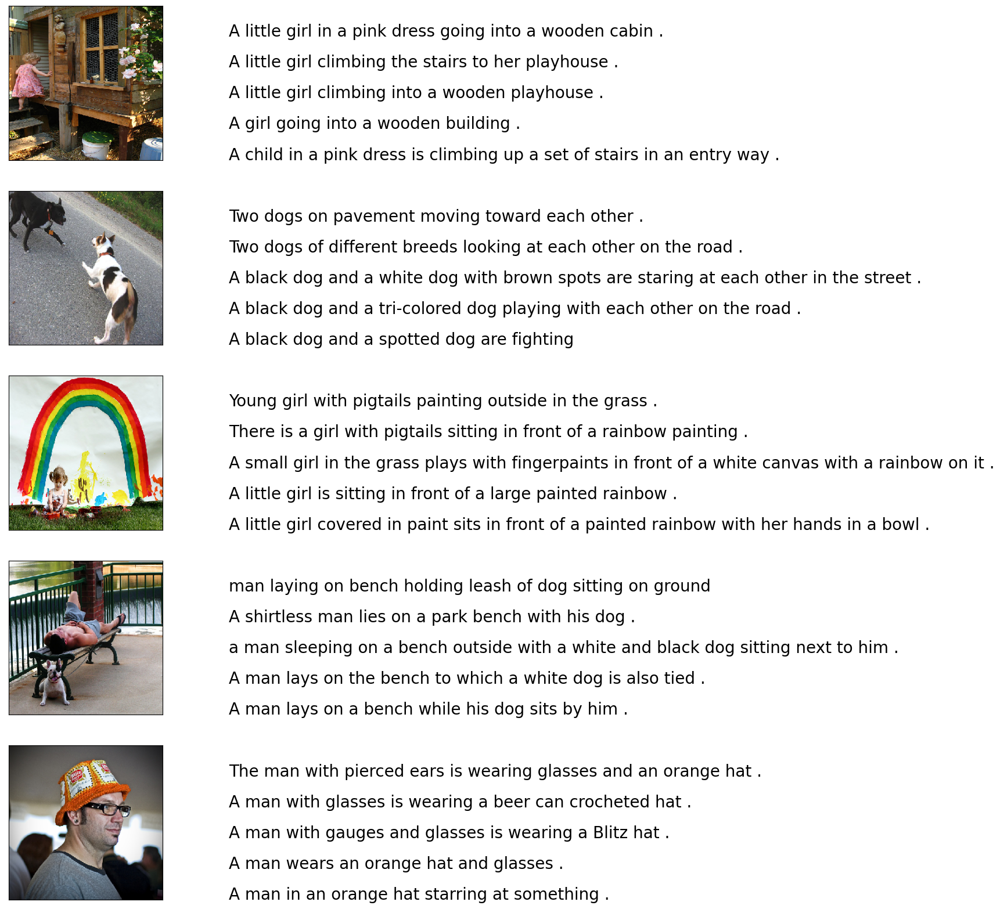

In [10]:
npic = 5
img_size = 299
target_size = (img_size, img_size)
path = "C:/Users/rohit/Desktop/datasets/Images/"
fig = plt.figure(figsize=(10,20))

count = 1
for img in os.listdir(path)[:npic]:
    
    filename = path + img
    captions = list(descriptions[img.split(".")[0]])
    image_load = load_img(filename, target_size=target_size)
    
    ax = fig.add_subplot(npic, 2, count, xticks=[], yticks=[])
    ax.imshow(image_load)
    count += 1
    
    ax = fig.add_subplot(npic, 2, count)
    plt.axis('off')
    ax.plot()
    ax.set_xlim(0, 1)
    ax.set_ylim(0, len(captions))
    for i, caption in enumerate(captions):
        ax.text(0, i, caption, fontsize=20)
    count += 1
plt.show()

In [11]:
# import itertools
# print(dict(itertools.islice(descriptions.items(), 5)))

In [12]:
# prepare translation table for removing punctuation
def clean_description(descriptions):
    table = str.maketrans('', '', string.punctuation)
    for key, desc_list in descriptions.items():
        for i in range(len(desc_list)):
            desc = desc_list[i]
            # tokenize
            desc = desc.split()
            # convert to lower case
            desc = [word.lower() for word in desc]
            # remove punctuation from each token
            desc = [w.translate(table) for w in desc]
            # remove hanging 's' and 'a'
            desc = [word for word in desc if len(word)>1]
            # remove tokens with numbers in them
            desc = [word for word in desc if word.isalpha()]
            # store as string
            desc_list[i] =  ' '.join(desc)

clean_description(descriptions)

In [13]:
descriptions['1000268201_693b08cb0e']

['child in pink dress is climbing up set of stairs in an entry way',
 'girl going into wooden building',
 'little girl climbing into wooden playhouse',
 'little girl climbing the stairs to her playhouse',
 'little girl in pink dress going into wooden cabin']

In [14]:
"""
    Creating a vocabulary from the 
    processed descriptions.
"""
def create_vocabulary(descriptions):
    vocab = set()
    corpus = ""
    for img_text in descriptions.values():
        for text in img_text:
            corpus += " "+text
    for key in descriptions.keys():
        [vocab.update(d.split()) for d in descriptions[key]]
    return corpus,vocab

corp,vocabulary = create_vocabulary(descriptions)
print('Original Vocabulary Size: %d' % len(vocabulary))


Original Vocabulary Size: 8763


In [15]:
freq_dist = FreqDist(corp.split())
dfsub = pd.DataFrame(columns = ["word", "count"])
most_common = freq_dist.most_common()
words, counts = [], []
for i in range(len(freq_dist)):
    words.append(most_common[i][0])
    counts.append(most_common[i][1])
dfsub["word"], dfsub["count"] = words, counts

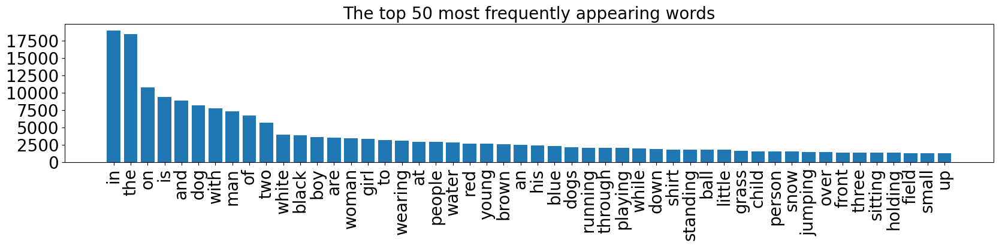

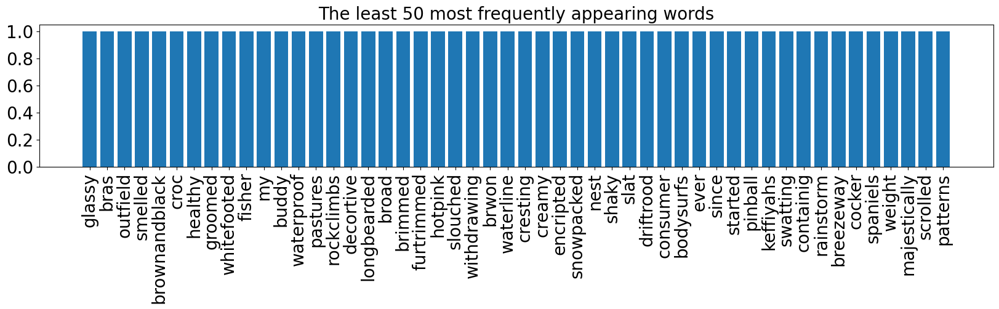

In [16]:
def plthist(dfsub, title):
    plt.figure(figsize=(20,3))
    plt.bar(dfsub.index,dfsub["count"])
    plt.yticks(fontsize=20)
    plt.xticks(dfsub.index,dfsub["word"],rotation=90,fontsize=20)
    plt.title(title,fontsize=20)
    plt.show()
    
plthist(dfsub.iloc[:50], "The top 50 most frequently appearing words")
plthist(dfsub.iloc[-50:], "The least 50 most frequently appearing words")

In [17]:
def save_processed(descriptions, filename):
    doc = open(filename, 'w')
    for key, descs in descriptions.items():
        for desc in descs:
            doc.write(key + ' ' + desc + '\n')
    doc.close()

filename = "descriptions.txt"
save_processed(descriptions, filename)

In [18]:
def load_training_set(filename):
    doc = load_doc(filename)
    dataset = list()
    for line in doc.split('\n'):
        #some descriptions are empty lines
        if len(line) < 1:
            continue
        identifier = line.split('.')[0]
        dataset.append(identifier)
    return set(dataset)
    

filename = "C:/Users/rohit/Desktop/datasets/Flickr_8k.trainImages.txt"
train = load_training_set(filename)
print('Dataset: %d' % len(train))

Dataset: 6000


In [19]:
# returning all file paths that match .jpg
images = 'C:/Users/rohit/Desktop/datasets/Images/'
# Create a list of all image names in the directory
img = glob.glob(images + '*.jpg')

In [20]:
len(img)

8091

In [283]:
# Below file conatains the names of images to be used in train data
train_images_file = 'C:/Users/rohit/Desktop/datasets/Flickr_8k.trainImages.txt'

# Read the train image names in a set
train_images = set(open(train_images_file, 'r').read().strip().split('\n'))
print('Dataset: %d' % len(train))
# Create a list of all the training images with their full path names
train_img = []
"""
    img is list of full path names of all images
    Check if the image belongs to training set and then,
    Add it to the list of train images
"""
for i in img:
    if i[len(images):] in train_images:
        train_img.append(i)

Dataset: 6000


In [284]:
# Below file conatains the names of images to be used in test data
test_images_file = 'C:/Users/rohit/Desktop/datasets/Flickr_8k.testImages.txt'
test = load_training_set(test_images_file)
print('Dataset: %d' % len(test))
# Read the validation image names in a set# Read the test image names in a set
test_images = set(open(test_images_file, 'r').read().strip().split('\n'))

# Create a list of all the test images with their full path names
test_img = []
"""
    img is list of full path names of all images
    Check if the image belongs to test set and then,
    Add it to the list of test images
"""
for i in img:
    if i[len(images):] in test_images:
        test_img.append(i)

Dataset: 1000


In [23]:
def load_cleaned_training_descriptions(filename, dataset):
    doc = load_doc(filename)
    descriptions = dict()
    for line in doc.split('\n'):
        if line == " ":
            break
        # split line by white space
        tokens = line.split()
        # split id from description
        image_id, image_desc = tokens[0], tokens[1:]
        # skip images not in the set
        if image_id in dataset:
            if image_id not in descriptions:
                descriptions[image_id] = list()
            # Wrapping descriptions in tokens for easier learning.
            desc = 'startseq ' + ' '.join(image_desc) + ' endseq'
            descriptions[image_id].append(desc)
    return descriptions

train_descriptions = load_cleaned_training_descriptions('descriptions.txt', train)
test_descriptions = load_cleaned_training_descriptions('descriptions.txt', test)
print('Descriptions: train=%d' % len(train_descriptions))
print('Descriptions: test=%d' % len(test_descriptions))

# Descriptions: train=6000

Descriptions: train=6000
Descriptions: test=1000


In [24]:
# Convert all the images to size 299x299 as expected by the
# inception v3 model
def preprocess_image(image_file):
    img = image.load_img(image_file, target_size=(299, 299))
    # Convert PIL image to numpy array of 3-dimensions
    x = image.img_to_array(img)
    # Add one more dimension
    x = np.expand_dims(x, axis=0)
    # preprocess images using preprocess_input() from inception module
    x = preprocess_input(x)
    # reshape from (1, 2048) to (2048, )
    #x = np.reshape(x, x.shape[1])
    return x


In [59]:
# Load the inception v3 model
model = InceptionV3(weights='imagenet')

In [60]:
# Create a new model, by removing the last layer (output layer) from the inception v3
model_new = Model(model.input, model.layers[-2].output)
model_new.summary()

Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 299, 299, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_94 (Conv2D)             (None, 149, 149, 32  864         ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_94 (BatchN  (None, 149, 149, 32  96         ['conv2d_94[0][0]']              
 ormalization)                  )                                                           

In [27]:
# Function to encode a given image into a vector of size (2048, )
def encode(image, model_new):
    image = preprocess_image(image) # preprocess the image
    fea_vec = model_new.predict(image) # Get the encoding vector for the image
    fea_vec = np.reshape(fea_vec, fea_vec.shape[1]) # reshape from (1, 2048) to (2048, )
    return fea_vec

In [25]:
# Call the funtion to encode all the train images
# This will take a while on CPU - Execute this only once
# start = time()
# encoding_train = {}
# for img in train_img:
#     encoding_train[img[len(images):]] = encode(img, model_new)
# print("Time taken to encode: ", time()-start)

In [82]:
len(train_img)

6000

In [27]:
# Save the bottleneck train features to disk
# with open("C:/Users/rohit/Desktop/datasets/encoded_train_images.pkl", "wb") as encoded_pickle:
#     dump(encoding_train, encoded_pickle)

In [28]:
# Call the funtion to encode all the test images - Execute this only once
# start = time()
# encoding_test = {}
# for img in test_img:
#     encoding_test[img[len(images):]] = encode(img, model_new)
# print("Time taken to encode test images: ", time()-start)

In [29]:
# Save the bottleneck test features to disk
# with open("C:/Users/rohit/Desktop/datasets/encoded_test_images.pkl", "wb") as encoded_pickle:
#     dump(encoding_test, encoded_pickle)

In [28]:
test_features = load(open("C:/Users/rohit/Desktop/datasets/encoded_test_images.pkl", "rb"))
print('Photos: test=%d' % len(test_features))

Photos: test=1000


In [29]:
train_features = load(open("C:/Users/rohit/Desktop/datasets/encoded_train_images.pkl", "rb"))
print('Photos: train=%d' % len(train_features))

Photos: train=6000


In [30]:
train_descriptions['1000268201_693b08cb0e']

['startseq child in pink dress is climbing up set of stairs in an entry way endseq',
 'startseq girl going into wooden building endseq',
 'startseq little girl climbing into wooden playhouse endseq',
 'startseq little girl climbing the stairs to her playhouse endseq',
 'startseq little girl in pink dress going into wooden cabin endseq']

In [31]:
# Create a list of all the training captions
all_train_captions = []
for key, val in train_descriptions.items():
    for cap in val:
        all_train_captions.append(cap)
len(all_train_captions)

# Consider only words which occur at least 10 times in the corpus
word_count_threshold = 10
word_counts = {}
nsents = 0
for sent in all_train_captions:
    nsents += 1
    for w in sent.split(' '):
        word_counts[w] = word_counts.get(w, 0) + 1

vocab = [w for w in word_counts if word_counts[w] >= word_count_threshold]
print('preprocessed words %d -> %d' % (len(word_counts), len(vocab)))

preprocessed words 7578 -> 1651


In [32]:
# This maps the vocab words to their index and back.

ixtoword = {}
wordtoix = {}
ix = 1
for w in vocab:
    wordtoix[w] = ix
    ixtoword[ix] = w
    ix += 1
vocab_size = len(ixtoword) + 1 # one for appended 0's
vocab_size

1652

In [33]:
ixtoword

{1: 'startseq',
 2: 'child',
 3: 'in',
 4: 'pink',
 5: 'dress',
 6: 'is',
 7: 'climbing',
 8: 'up',
 9: 'set',
 10: 'of',
 11: 'stairs',
 12: 'an',
 13: 'way',
 14: 'endseq',
 15: 'girl',
 16: 'going',
 17: 'into',
 18: 'wooden',
 19: 'building',
 20: 'little',
 21: 'the',
 22: 'to',
 23: 'her',
 24: 'black',
 25: 'dog',
 26: 'and',
 27: 'spotted',
 28: 'are',
 29: 'fighting',
 30: 'tricolored',
 31: 'playing',
 32: 'with',
 33: 'each',
 34: 'other',
 35: 'on',
 36: 'road',
 37: 'white',
 38: 'brown',
 39: 'spots',
 40: 'staring',
 41: 'at',
 42: 'street',
 43: 'two',
 44: 'dogs',
 45: 'different',
 46: 'looking',
 47: 'pavement',
 48: 'moving',
 49: 'toward',
 50: 'covered',
 51: 'paint',
 52: 'sits',
 53: 'front',
 54: 'painted',
 55: 'rainbow',
 56: 'hands',
 57: 'bowl',
 58: 'sitting',
 59: 'large',
 60: 'small',
 61: 'grass',
 62: 'plays',
 63: 'it',
 64: 'there',
 65: 'pigtails',
 66: 'painting',
 67: 'young',
 68: 'outside',
 69: 'man',
 70: 'lays',
 71: 'bench',
 72: 'while',
 

In [34]:
# convert a dictionary of clean descriptions to a list of descriptions
def to_lines(descriptions):
    all_desc = list()
    for key in descriptions.keys():
        [all_desc.append(d) for d in descriptions[key]]
    return all_desc

# calculate the length of the description with the most words
def max_length(descriptions):
    lines = to_lines(descriptions)
    return max(len(d.split()) for d in lines)

# determine the maximum sequence length
max_length = max_length(train_descriptions)
print('Max Description Length: %d' % max_length)

Max Description Length: 34


In [35]:
# data generator, intended to be used in a call to model.fit_generator()
def data_generator(descriptions, photos, wordtoix, max_length, num_photos_per_batch):
    X1, X2, y = list(), list(), list()
    n=0
    # loop for ever over images
    while 1:
        for key, desc_list in descriptions.items():
            n+=1
            # retrieve the photo feature
            photo = photos[key+'.jpg']
            for desc in desc_list:
                # encode the sequence
                seq = [wordtoix[word] for word in desc.split(' ') if word in wordtoix]
                # split one sequence into multiple X, y pairs
                for i in range(1, len(seq)):
                    # split into input and output pair
                    in_seq, out_seq = seq[:i], seq[i]
                    # pad input sequence
                    in_seq = pad_sequences([in_seq], maxlen=max_length)[0]
                    # encode output sequence
                    out_seq = to_categorical([out_seq], num_classes=vocab_size)[0]
                    # store
                    X1.append(photo)
                    X2.append(in_seq)
                    y.append(out_seq)
            # yield the batch data
            if n==num_photos_per_batch:
                yield [[array(X1), array(X2)], array(y)]
                X1, X2, y = list(), list(), list()
                n=0

In [61]:
# Load Glove vectors
glove_dir = 'C:/Users/rohit/Desktop/datasets/glove6b200d/'
embeddings_index = {} # empty dictionary
f = open(os.path.join(glove_dir, 'glove.6B.200d.txt'), encoding="utf-8")
for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs
f.close()
print('Found %s word vectors.' % len(embeddings_index))

Found 400000 word vectors.


In [62]:
embedding_dim = 200

# Get 200-dim dense vector for each of the 10000 words in out vocabulary
embedding_matrix = np.zeros((vocab_size, embedding_dim))

for word, i in wordtoix.items():
    #if i < max_words:
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        # Words not found in the embedding index will be all zeros
        embedding_matrix[i] = embedding_vector

In [63]:
embedding_matrix.shape

(1652, 200)

In [64]:
inputs1 = Input(shape=(2048,))
fe1 = Dropout(0.5)(inputs1)
fe2 = Dense(256, activation='relu')(fe1)
inputs2 = Input(shape=(max_length,))
se1 = Embedding(vocab_size, embedding_dim, mask_zero=True)(inputs2)
se2 = Dropout(0.5)(se1)
se3 = LSTM(256)(se2)
decoder1 = add([fe2, se3])
decoder2 = Dense(256, activation='relu')(decoder1)
outputs = Dense(vocab_size, activation='softmax')(decoder2)
model = Model(inputs=[inputs1, inputs2], outputs=outputs)

In [65]:
model.summary()

Model: "model_8"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 34)]         0           []                               
                                                                                                  
 input_5 (InputLayer)           [(None, 2048)]       0           []                               
                                                                                                  
 embedding_1 (Embedding)        (None, 34, 200)      330400      ['input_6[0][0]']                
                                                                                                  
 dropout_2 (Dropout)            (None, 2048)         0           ['input_5[0][0]']                
                                                                                            

In [41]:
print(model.layers[2])
model.layers[2].set_weights([embedding_matrix])
model.layers[2].trainable = False

In [42]:
model.compile(loss='categorical_crossentropy', optimizer='adam')

In [47]:
# epochs = 10
# number_pics_per_bath = 3
# steps = len(train_descriptions)//number_pics_per_bath

In [48]:
# for i in range(epochs):
#     generator = data_generator(train_descriptions, train_features, wordtoix, max_length, number_pics_per_bath)
#     model.fit(generator, epochs=1, steps_per_epoch=steps, verbose=1)
#     model.save('./model_weights/model_' + str(i) + '.h5')

2000/2000 [==============================] - 328s 164ms/step - loss: 2.7270


In [49]:
# for i in range(epochs):
#     generator = data_generator(train_descriptions, train_features, wordtoix, max_length, number_pics_per_bath)
#     model.fit(generator, epochs=1, steps_per_epoch=steps, verbose=1)
#     model.save('./model_weights/model_' + str(i) + '.h5')

2000/2000 [==============================] - 331s 165ms/step - loss: 2.5294


In [50]:
# model.optimizer.lr = 0.0001
# epochs = 10
# number_pics_per_bath = 6
# steps = len(train_descriptions)//number_pics_per_bath

In [51]:
# # for i in range(epochs):
# generator = data_generator(train_descriptions, train_features, wordtoix, max_length, number_pics_per_bath)
# history=model.fit(generator, epochs=10, steps_per_epoch=steps, verbose=1)
# #     hist['loss'].append(history.values()[i])

Epoch 1/10
1000/1000 [==============================] - 323s 323ms/step - loss: 2.5000
Epoch 2/10
1000/1000 [==============================] - 342s 342ms/step - loss: 2.4498
Epoch 3/10
1000/1000 [==============================] - 340s 340ms/step - loss: 2.4330
Epoch 4/10
1000/1000 [==============================] - 332s 332ms/step - loss: 2.4181
Epoch 5/10
1000/1000 [==============================] - 344s 344ms/step - loss: 2.4105
Epoch 6/10
1000/1000 [==============================] - 324s 324ms/step - loss: 2.3999
Epoch 7/10
1000/1000 [==============================] - 335s 335ms/step - loss: 2.3918
Epoch 8/10
1000/1000 [==============================] - 330s 330ms/step - loss: 2.3828
Epoch 9/10
1000/1000 [==============================] - 334s 334ms/step - loss: 2.3781
Epoch 10/10
1000/1000 [==============================] - 339s 339ms/step - loss: 2.3705


In [94]:
# model.save_weights('./model_weights/model_30.h5')

In [52]:
# model.save_weights('./model_weights/model_30.h5')

In [53]:
print(history.history.values())

dict_values([[2.499993085861206, 2.449763298034668, 2.4330198764801025, 2.418076992034912, 2.410468101501465, 2.3999462127685547, 2.391781806945801, 2.3828413486480713, 2.3780791759490967, 2.3704912662506104]])


In [54]:
print(history.history.keys())

dict_keys(['loss'])


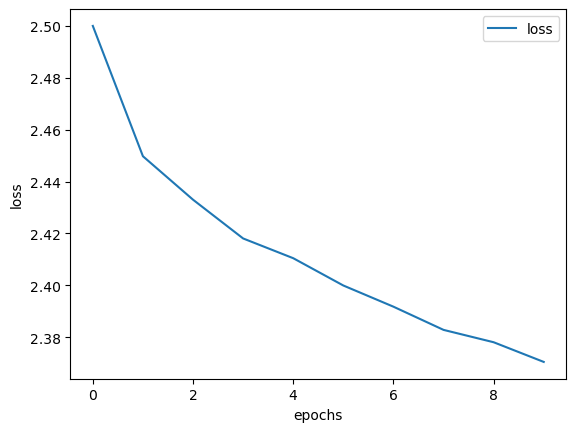

In [55]:
for label in ["loss"]:
    plt.plot(history.history[label], label=label)

    
# plt.plot(history.history['loss'])
plt.legend()
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

In [43]:
model.load_weights('./model_weights/model_30.h5')

In [44]:
images = 'C:/Users/rohit/Desktop/datasets/Images/'

In [45]:
with open("C:/Users/rohit/Desktop/datasets/encoded_test_images.pkl", "rb") as encoded_pickle:
    encoding_test = load(encoded_pickle)

In [46]:
def greedySearch(photo):
    in_text = 'startseq'
    for i in range(max_length):
        sequence = [wordtoix[w] for w in in_text.split() if w in wordtoix]
        sequence = pad_sequences([sequence], maxlen=max_length)
        yhat = model.predict([photo,sequence], verbose=0)
        yhat = np.argmax(yhat)
        word = ixtoword[yhat]
        in_text += ' ' + word
        if word == 'endseq':
            break
    final = in_text.split()
    final = final[1:-1]
    final = ' '.join(final)
    return final

In [47]:
# algorithm for beam searching
def beamSearch(photo):
    in_text = 'startseq'
    for _ in range(max_length):
        sequence = [wordtoix[w] for w in in_text.split() if w in wordtoix]
        sequence = pad_sequences([sequence], maxlen=max_length)
        yhat = model.predict([photo,sequence], verbose=0)
        
        sequences = [[list(), 0.0]]
        for row in yhat:
            all_candidates = list()
            for i in range(len(sequences)):
                seq, score = sequences[i]
                for j in range(len(row)):
                    candidate = [seq + [j], score - math.log1p(row[j])]
                    all_candidates.append(candidate)
            ordered = sorted(all_candidates, key=lambda x: x[1])
            sequences = ordered[:5]
        # for i, j in enumerate(sequences):
        #     print(ixtoword[int(sequences[i][0][0])], " ",sequences[i][1])
        # print()
        word = ixtoword[int(sequences[0][0][0])]
        in_text += ' ' + word
        if word == 'endseq':
            break
    final = in_text.split()
    final = final[1:-1]
    final = ' '.join(final)
    return final

In [48]:
z=0

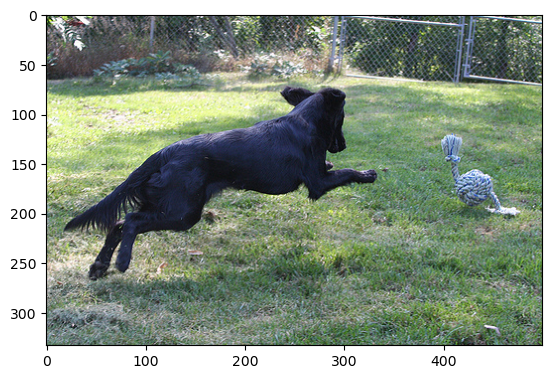

Greedy: black dog is running through the grass
Beam:  black dog is running through the grass


In [53]:
z+=1
pic = list(encoding_test.keys())[z]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print("Greedy:",greedySearch(image))
print("Beam: ", beamSearch(image))

In [113]:
from nltk.translate.bleu_score import corpus_bleu
from tqdm import tqdm
def evaluate_model_beam_search(model, images, captions, max_length):
    actual, predicted = list(), list()
    for image_id, caption_list in tqdm(captions.items()):
        pic = image_id+'.jpg'
        print(pic)
        image = train_features[pic].reshape((1,2048))
        print(image)
        yhat = beamSearch(image)
        ground_truth = [caption.split() for caption in caption_list]
        actual.append(ground_truth)
        predicted.append(yhat.split())
    print('BLEU Scores :')
    print('BLEU-1: %f' % corpus_bleu(actual, predicted, weights=(1.0, 0, 0, 0)))
    print('BLEU-2: %f' % corpus_bleu(actual, predicted, weights=(0.5, 0.5, 0, 0)))
    print('BLEU-3: %f' % corpus_bleu(actual, predicted, weights=(0.3, 0.3, 0.3, 0)))
    print('BLEU-4: %f' % corpus_bleu(actual, predicted, weights=(0.25, 0.25, 0.25, 0.25)))
evaluate_model_beam_search(model, images, train_descriptions, max_length)

  0%|                                                                                         | 0/6000 [00:00<?, ?it/s]

1000268201_693b08cb0e.jpg
[[0.12277617 0.33294928 0.75271714 ... 0.21939671 0.30216414 0.4028324 ]]


  0%|                                                                                 | 1/6000 [00:00<43:23,  2.30it/s]

1001773457_577c3a7d70.jpg
[[0.7366835  0.5911318  0.18194188 ... 0.16030258 0.341447   0.90831625]]


  0%|                                                                                 | 2/6000 [00:00<46:25,  2.15it/s]

1002674143_1b742ab4b8.jpg
[[0.3735193  0.24596596 0.96353054 ... 1.1459358  0.2654014  0.01983142]]


  0%|                                                                                 | 3/6000 [00:01<49:58,  2.00it/s]

1003163366_44323f5815.jpg
[[0.486031   0.29218277 0.31436878 ... 0.98254836 0.28108108 0.22330037]]


  0%|                                                                                 | 4/6000 [00:01<43:30,  2.30it/s]

1007129816_e794419615.jpg
[[0.21595348 0.15582046 0.29477093 ... 0.40564895 0.16532041 0.37416887]]


  0%|                                                                                 | 5/6000 [00:02<49:29,  2.02it/s]

1007320043_627395c3d8.jpg
[[0.17231011 0.49808347 0.21576971 ... 0.09676225 1.2298491  0.5421415 ]]


  0%|                                                                                 | 6/6000 [00:02<51:40,  1.93it/s]

1009434119_febe49276a.jpg
[[0.53460836 1.3676207  0.7804351  ... 0.39463812 0.8877233  1.0728819 ]]


  0%|                                                                                 | 7/6000 [00:03<47:13,  2.12it/s]

1012212859_01547e3f17.jpg
[[0.24029419 1.0862341  0.04511382 ... 0.00142685 0.09226728 0.7924648 ]]


  0%|                                                                                 | 8/6000 [00:03<45:32,  2.19it/s]

1015118661_980735411b.jpg
[[0.23118459 0.12729602 0.39620095 ... 0.05209986 0.59356    0.81254554]]


  0%|                                                                                 | 9/6000 [00:04<43:47,  2.28it/s]

1015584366_dfcec3c85a.jpg
[[0.45322782 0.42908314 0.20216341 ... 0.35689414 0.38221908 0.1598434 ]]


  0%|▏                                                                               | 10/6000 [00:04<42:53,  2.33it/s]

101654506_8eb26cfb60.jpg
[[0.15644142 0.61721146 0.03327086 ... 0.22450733 1.5899551  0.6303822 ]]


  0%|▏                                                                               | 11/6000 [00:04<38:57,  2.56it/s]

101669240_b2d3e7f17b.jpg
[[0.10859712 1.2652313  0.09501758 ... 0.451062   0.9349944  0.2054159 ]]


  0%|▏                                                                               | 12/6000 [00:05<34:21,  2.91it/s]

1016887272_03199f49c4.jpg
[[0.13507542 0.15651211 0.6852772  ... 0.6462799  0.21949854 0.36090076]]


  0%|▏                                                                               | 13/6000 [00:05<31:14,  3.19it/s]

1019077836_6fc9b15408.jpg
[[0.34666222 0.4322901  0.25743964 ... 0.32528102 0.4277587  0.44598752]]


  0%|▏                                                                               | 14/6000 [00:05<31:45,  3.14it/s]

1019604187_d087bf9a5f.jpg
[[0.38632065 1.2523952  0.2841797  ... 0.0514153  0.96561295 0.28555667]]


  0%|▏                                                                               | 15/6000 [00:06<34:31,  2.89it/s]

1020651753_06077ec457.jpg
[[0.4751469  0.3522178  0.01383356 ... 0.20678706 0.06418365 0.38139135]]


  0%|▏                                                                               | 16/6000 [00:06<41:19,  2.41it/s]

1022454428_b6b660a67b.jpg
[[0.4963346  0.19245869 0.40163702 ... 0.9344182  0.7397394  0.06167341]]


  0%|▏                                                                               | 17/6000 [00:07<47:20,  2.11it/s]

1022975728_75515238d8.jpg
[[4.1625357e-01 1.8792883e-02 2.0406629e-01 ... 1.0387535e-03
  1.2464402e+00 3.7836798e-02]]


  0%|▏                                                                               | 18/6000 [00:07<44:24,  2.25it/s]

102351840_323e3de834.jpg
[[0.10465109 0.20573893 0.19238435 ... 0.15708303 0.43167925 0.268077  ]]


  0%|▎                                                                               | 19/6000 [00:08<42:18,  2.36it/s]

1024138940_f1fefbdce1.jpg
[[0.32591915 0.9845424  0.49273098 ... 0.36389142 0.9927206  0.9708182 ]]


  0%|▎                                                                               | 20/6000 [00:08<40:58,  2.43it/s]

102455176_5f8ead62d5.jpg
[[0.18281168 0.15919721 0.1742553  ... 0.6925415  0.23620972 0.05880348]]


  0%|▎                                                                               | 21/6000 [00:08<43:05,  2.31it/s]

1026685415_0431cbf574.jpg
[[0.39191967 0.37633198 0.19391915 ... 0.5305967  0.28704116 0.38361475]]


  0%|▎                                                                               | 22/6000 [00:09<42:22,  2.35it/s]

1028205764_7e8df9a2ea.jpg
[[0.1515146  0.20331201 0.36801302 ... 0.11727463 0.29092315 0.39519322]]


  0%|▎                                                                               | 23/6000 [00:09<43:42,  2.28it/s]

1030985833_b0902ea560.jpg
[[0.27375472 0.25923696 0.11926953 ... 0.19077457 0.3737921  0.4144683 ]]


  0%|▎                                                                               | 24/6000 [00:10<45:34,  2.19it/s]

103195344_5d2dc613a3.jpg
[[0.10363401 0.6592406  0.04707854 ... 0.5162362  0.5699531  0.12665561]]


  0%|▎                                                                               | 25/6000 [00:10<49:59,  1.99it/s]

103205630_682ca7285b.jpg
[[0.2708283  0.15861772 0.09538798 ... 0.08660249 0.16321379 0.44893524]]


  0%|▎                                                                               | 26/6000 [00:11<46:16,  2.15it/s]

1032460886_4a598ed535.jpg
[[0.59063584 0.08231202 0.5957177  ... 0.27855545 0.4073021  0.17353727]]


  0%|▎                                                                               | 27/6000 [00:11<46:50,  2.13it/s]

104136873_5b5d41be75.jpg
[[0.20691666 0.13781278 0.40268365 ... 0.05490275 0.20260471 0.08769493]]


  0%|▎                                                                               | 28/6000 [00:12<46:46,  2.13it/s]

1042020065_fb3d3ba5ba.jpg
[[0.34140164 0.03150235 0.343683   ... 0.8095542  0.4988845  0.71685576]]


  0%|▍                                                                               | 29/6000 [00:12<46:48,  2.13it/s]

1042590306_95dea0916c.jpg
[[0.88220704 0.82364887 0.95811594 ... 0.20275837 0.08772712 0.23736665]]


  0%|▍                                                                               | 30/6000 [00:13<44:00,  2.26it/s]

1048710776_bb5b0a5c7c.jpg
[[0.79184055 0.37432402 0.8264772  ... 0.19389713 0.56212705 0.35855317]]


  1%|▍                                                                               | 31/6000 [00:13<48:33,  2.05it/s]

1052358063_eae6744153.jpg
[[0.30546343 0.81699073 0.4503792  ... 0.05353848 0.08843571 0.07870053]]


  1%|▍                                                                               | 32/6000 [00:13<42:26,  2.34it/s]

105342180_4d4a40b47f.jpg
[[0.14861675 0.28157774 0.24726911 ... 0.6143381  0.5445818  0.10233991]]


  1%|▍                                                                               | 33/6000 [00:14<40:54,  2.43it/s]

1053804096_ad278b25f1.jpg
[[0.48952806 0.1581566  0.5853531  ... 0.3661882  0.7256812  0.05320358]]


  1%|▍                                                                               | 34/6000 [00:14<44:01,  2.26it/s]

1055623002_8195a43714.jpg
[[0.523319   0.16627239 0.6222335  ... 0.13208151 1.8456094  1.2681559 ]]


  1%|▍                                                                               | 35/6000 [00:15<39:27,  2.52it/s]

1055753357_4fa3d8d693.jpg
[[0.05370668 0.9280229  0.19467491 ... 0.06005813 0.8109282  0.67210704]]


  1%|▍                                                                               | 36/6000 [00:15<38:47,  2.56it/s]

1056359656_662cee0814.jpg
[[0.62114507 0.2758429  0.27688292 ... 0.8015862  0.45034242 0.00347796]]


  1%|▍                                                                               | 37/6000 [00:16<43:49,  2.27it/s]

1056873310_49c665eb22.jpg
[[0.04073874 0.0480074  0.75782335 ... 0.50065976 1.2806265  0.32564434]]


  1%|▌                                                                               | 38/6000 [00:16<40:33,  2.45it/s]

1057089366_ca83da0877.jpg
[[0.8659427  0.19803722 0.6425004  ... 0.04377324 0.10637799 0.19527033]]


  1%|▌                                                                               | 39/6000 [00:17<47:35,  2.09it/s]

1057210460_09c6f4c6c1.jpg
[[0.14618102 0.09841622 0.7135089  ... 0.07978438 0.842661   0.00750023]]


  1%|▌                                                                               | 40/6000 [00:17<48:35,  2.04it/s]

1057251835_6ded4ada9c.jpg
[[0.08511329 0.29740962 0.36536452 ... 0.05078421 1.2214789  0.2505689 ]]


  1%|▌                                                                               | 41/6000 [00:17<42:33,  2.33it/s]

106514190_bae200f463.jpg
[[0.07050882 0.21925433 0.21051913 ... 0.6845219  0.9597269  0.95885396]]


  1%|▌                                                                               | 42/6000 [00:18<39:39,  2.50it/s]

1067180831_a59dc64344.jpg
[[0.297083   0.610975   0.03512775 ... 0.         0.34591743 0.39921874]]


  1%|▌                                                                               | 43/6000 [00:18<41:45,  2.38it/s]

1067675215_7336a694d6.jpg
[[0.11353915 0.11564083 0.34313872 ... 0.39411417 0.04386171 0.16784878]]


  1%|▌                                                                               | 44/6000 [00:19<43:14,  2.30it/s]

1067790824_f3cc97239b.jpg
[[0.26848075 0.3717871  0.57617533 ... 0.63451695 0.80605894 0.8312012 ]]


  1%|▌                                                                               | 45/6000 [00:19<41:28,  2.39it/s]

1072153132_53d2bb1b60.jpg
[[0.11261979 0.2779384  0.02399144 ... 0.0697557  0.33244923 0.190553  ]]


  1%|▌                                                                               | 46/6000 [00:19<38:53,  2.55it/s]

107318069_e9f2ef32de.jpg
[[0.22087233 0.14769317 0.04893246 ... 0.16312036 0.13726006 0.949113  ]]


  1%|▋                                                                               | 47/6000 [00:20<39:36,  2.51it/s]

1075716537_62105738b4.jpg
[[0.11251082 0.6756321  0.16663624 ... 0.2165706  0.10739996 0.1338769 ]]


  1%|▋                                                                               | 48/6000 [00:20<42:58,  2.31it/s]

1075867198_27ca2e7efe.jpg
[[0.4022913  0.09585394 0.673951   ... 0.69440174 1.1525407  0.28419977]]


  1%|▋                                                                               | 49/6000 [00:21<45:40,  2.17it/s]

1075881101_d55c46bece.jpg
[[0.79011387 0.75857776 0.54157263 ... 0.57829016 0.72118235 0.83689666]]


  1%|▋                                                                               | 50/6000 [00:21<50:11,  1.98it/s]

1079274291_9aaf896cc1.jpg
[[0.18903483 0.515529   0.46904144 ... 0.42000094 0.17997503 0.04109853]]


  1%|▋                                                                               | 51/6000 [00:22<50:36,  1.96it/s]

10815824_2997e03d76.jpg
[[0.34266365 0.16739711 0.09924424 ... 0.21216747 0.46709582 0.25276506]]


  1%|▋                                                                               | 52/6000 [00:22<43:57,  2.26it/s]

1082252566_8c79beef93.jpg
[[0.43723124 0.18360083 0.17955267 ... 0.11252339 0.38832766 1.0250269 ]]


  1%|▋                                                                               | 53/6000 [00:23<44:42,  2.22it/s]

1084104085_3b06223afe.jpg
[[0.4908469  0.19879508 0.14796515 ... 0.39907056 0.23201168 0.7560142 ]]


  1%|▋                                                                               | 54/6000 [00:23<49:03,  2.02it/s]

1087168168_70280d024a.jpg
[[0.8178252  0.07384816 0.25586715 ... 0.9097935  0.79494286 0.6103406 ]]


  1%|▋                                                                               | 55/6000 [00:24<46:51,  2.11it/s]

108898978_7713be88fc.jpg
[[0.22197042 0.17439122 0.30769795 ... 0.22875156 0.6021929  0.7829579 ]]


  1%|▋                                                                               | 56/6000 [00:24<42:40,  2.32it/s]

108899015_bf36131a57.jpg
[[0.09678632 0.3392187  0.3754822  ... 0.40058002 0.9132451  0.6722073 ]]


  1%|▊                                                                               | 57/6000 [00:24<41:06,  2.41it/s]

1089181217_ee1167f7af.jpg
[[0.16025905 0.36980477 0.01681356 ... 0.03328465 0.01581258 0.20551759]]


  1%|▊                                                                               | 58/6000 [00:25<40:04,  2.47it/s]

109202756_b97fcdc62c.jpg
[[0.17462614 0.19268513 0.44903055 ... 0.20863666 1.0283008  0.79400724]]


  1%|▊                                                                               | 59/6000 [00:25<43:19,  2.29it/s]

109202801_c6381eef15.jpg
[[0.09056955 0.47814256 0.18382749 ... 0.48674315 0.54384583 0.3970378 ]]


  1%|▊                                                                               | 60/6000 [00:26<41:29,  2.39it/s]

109260216_85b0be5378.jpg
[[0.05363023 1.3092136  0.11294219 ... 0.34922585 0.64764476 0.53145814]]


  1%|▊                                                                               | 61/6000 [00:26<43:53,  2.26it/s]

109260218_fca831f933.jpg
[[0.10663165 0.36608028 0.11282736 ... 0.0019966  0.24125656 0.25779852]]


  1%|▊                                                                               | 62/6000 [00:27<44:30,  2.22it/s]

1093716555_801aacef79.jpg
[[0.35995907 0.14373095 0.6889316  ... 0.03480993 0.67455316 0.15623178]]


  1%|▊                                                                               | 63/6000 [00:27<42:15,  2.34it/s]

1093737381_b313cd49ff.jpg
[[0.42268193 0.3932309  1.8379362  ... 0.02291651 0.8814765  0.07792214]]


  1%|▊                                                                               | 64/6000 [00:27<39:26,  2.51it/s]

1094462889_f9966dafa6.jpg
[[0.31549746 0.2431607  0.30439943 ... 0.7859129  0.74767447 0.49403173]]


  1%|▊                                                                               | 65/6000 [00:28<37:21,  2.65it/s]

1095476286_87d4f8664e.jpg
[[0.05909843 0.5543009  0.4732523  ... 0.3357973  0.13605231 0.01928173]]


  1%|▉                                                                               | 66/6000 [00:28<35:57,  2.75it/s]

1095580424_76f0aa8a3e.jpg
[[0.2913424  0.44580847 0.2767585  ... 0.9211874  0.06388698 0.09582272]]


  1%|▉                                                                               | 67/6000 [00:28<33:37,  2.94it/s]

1095590286_c654f7e5a9.jpg
[[0.22779165 0.35906124 0.45643026 ... 0.7282406  0.45778298 0.5682705 ]]


  1%|▉                                                                               | 68/6000 [00:29<34:46,  2.84it/s]

1095980313_3c94799968.jpg
[[0.2834344  0.22547244 0.65677994 ... 0.38943535 0.4461829  1.0222352 ]]


  1%|▉                                                                               | 69/6000 [00:29<39:49,  2.48it/s]

1096097967_ac305887b4.jpg
[[1.0365363  0.37706646 0.2756309  ... 1.3829298  0.41805685 0.7028227 ]]


  1%|▉                                                                               | 70/6000 [00:30<40:02,  2.47it/s]

1096165011_cc5eb16aa6.jpg
[[0.7466197  0.15928574 0.04334382 ... 0.03396573 0.89170396 0.88603437]]


  1%|▉                                                                               | 71/6000 [00:30<35:08,  2.81it/s]

109671650_f7bbc297fa.jpg
[[0.1799221  0.12838082 0.06996614 ... 1.0920719  0.68157834 0.31079108]]


  1%|▉                                                                               | 72/6000 [00:30<37:14,  2.65it/s]

109738763_90541ef30d.jpg
[[2.7419803e-01 7.5774580e-02 1.1587804e-01 ... 3.9045117e-05
  3.5721710e-01 9.7243500e-01]]


  1%|▉                                                                               | 73/6000 [00:31<41:22,  2.39it/s]

109738916_236dc456ac.jpg
[[0.20451643 0.0965488  0.15033603 ... 0.25321844 0.19424391 0.8111635 ]]


  1%|▉                                                                               | 74/6000 [00:31<40:09,  2.46it/s]

109823394_83fcb735e1.jpg
[[0.4103328  0.23924448 0.08677237 ... 0.250042   0.62526906 0.12689161]]


  1%|█                                                                               | 75/6000 [00:31<38:21,  2.57it/s]

109823395_6fb423a90f.jpg
[[0.15905975 0.25182512 0.14286458 ... 1.091902   0.         0.17717445]]


  1%|█                                                                               | 76/6000 [00:32<37:00,  2.67it/s]

109823397_e35154645f.jpg
[[0.20863563 0.22773163 0.15206172 ... 0.48245782 0.10753561 0.17774488]]


  1%|█                                                                               | 77/6000 [00:32<38:55,  2.54it/s]

1104133405_c04a00707f.jpg
[[0.1257081  0.06238947 0.22834298 ... 0.21783969 0.07139216 0.0336862 ]]


  1%|█                                                                               | 78/6000 [00:33<45:28,  2.17it/s]

1105959054_9c3a738096.jpg
[[0.25934094 0.52032423 0.51514775 ... 1.0266646  2.4283297  1.3120805 ]]


  1%|█                                                                               | 79/6000 [00:33<45:43,  2.16it/s]

110595925_f3395c8bd6.jpg
[[0.30721247 0.356762   0.22764799 ... 0.07710387 0.5636303  0.07442624]]


  1%|█                                                                               | 80/6000 [00:34<49:35,  1.99it/s]

1107471216_4336c9b328.jpg
[[0.9081696  0.576129   0.07981992 ... 0.57613117 0.5696908  0.08123949]]


  1%|█                                                                               | 81/6000 [00:34<43:34,  2.26it/s]

1110208841_5bb6806afe.jpg
[[0.34649265 0.7215488  0.33794442 ... 0.3213362  0.40026736 0.09009662]]


  1%|█                                                                               | 82/6000 [00:35<40:28,  2.44it/s]

1112212364_0c48235fc2.jpg
[[0.28266516 0.46196514 0.25073457 ... 0.7038859  0.53880763 0.71260095]]


  1%|█                                                                               | 83/6000 [00:35<45:03,  2.19it/s]

111537217_082a4ba060.jpg
[[0.00606058 0.10341327 0.25016654 ... 0.53950286 0.62306035 1.5348264 ]]


  1%|█                                                                               | 84/6000 [00:36<47:16,  2.09it/s]

111537222_07e56d5a30.jpg
[[0.1261754  0.16878113 0.3303246  ... 0.3101383  0.200337   0.2230203 ]]


  1%|█▏                                                                              | 85/6000 [00:36<49:55,  1.97it/s]

1115565519_d976d4b1f1.jpg
[[0.14592102 0.32649273 0.0781266  ... 0.34635636 1.3629718  0.2589398 ]]


  1%|█▏                                                                              | 86/6000 [00:37<52:27,  1.88it/s]

1115679311_245eff2f4b.jpg
[[0.8432385  0.12978068 0.66646093 ... 0.54629683 1.1516571  0.64096516]]


  1%|█▏                                                                              | 87/6000 [00:37<50:27,  1.95it/s]

111766423_4522d36e56.jpg
[[0.05577019 0.2788299  0.00469663 ... 0.06241942 0.30384886 0.09608551]]


  1%|█▏                                                                              | 88/6000 [00:38<49:46,  1.98it/s]

1117972841_2b9261f95f.jpg
[[0.2507375  0.25428846 0.13177305 ... 0.23055801 0.45210215 1.0661625 ]]


  1%|█▏                                                                              | 89/6000 [00:38<46:27,  2.12it/s]

1118557877_736f339752.jpg
[[0.583392   0.5375985  0.53417605 ... 0.45807493 2.238835   0.22642589]]


  2%|█▏                                                                              | 90/6000 [00:39<48:21,  2.04it/s]

1119418776_58e4b93eac.jpg
[[0.15449968 0.39321327 0.0646017  ... 0.01110685 0.56437004 0.46370262]]


  2%|█▏                                                                              | 91/6000 [00:39<49:00,  2.01it/s]

1119463452_69d4eecd08.jpg
[[0.627438   0.2261306  0.41755491 ... 0.6918373  0.33979002 0.1013265 ]]


  2%|█▏                                                                              | 92/6000 [00:40<49:02,  2.01it/s]

1121416483_c7902d0d49.jpg
[[0.39051533 0.3733826  0.2531634  ... 0.3355424  0.28968638 0.00174668]]


  2%|█▏                                                                              | 93/6000 [00:40<52:12,  1.89it/s]

112178718_87270d9b4d.jpg
[[0.22174957 0.07894188 0.46630514 ... 0.22402325 0.14364608 0.24281348]]


  2%|█▎                                                                              | 94/6000 [00:41<53:24,  1.84it/s]

112243673_fd68255217.jpg
[[0.22698206 0.4836176  0.0331505  ... 0.02990926 0.50889665 0.03590415]]


  2%|█▎                                                                              | 95/6000 [00:41<47:47,  2.06it/s]

1124448967_2221af8dc5.jpg
[[0.08972026 0.21384487 0.74199116 ... 0.3939521  0.3703227  0.21284734]]


  2%|█▎                                                                              | 96/6000 [00:42<52:14,  1.88it/s]

1129704496_4a61441f2c.jpg
[[0.0549477  0.11834916 0.27805668 ... 0.2011972  0.90317225 0.42892888]]


  2%|█▎                                                                              | 97/6000 [00:42<46:58,  2.09it/s]

1130017585_1a219257ac.jpg
[[1.2067618  0.5080507  0.4749006  ... 0.87772644 0.8019351  0.12102014]]


  2%|█▎                                                                              | 98/6000 [00:43<50:17,  1.96it/s]

1130401779_8c30182e3e.jpg
[[0.2419287  0.06365775 0.34223688 ... 0.8596783  1.3030632  0.4522205 ]]


  2%|█▎                                                                              | 99/6000 [00:43<47:47,  2.06it/s]

1131340021_83f46b150a.jpg
[[0.15493059 0.09576032 0.55217654 ... 0.55116814 0.73009896 0.08940306]]


  2%|█▎                                                                             | 100/6000 [00:44<49:59,  1.97it/s]

1131804997_177c3c0640.jpg
[[0.40411967 0.24350193 0.32843065 ... 0.0260194  0.9347738  0.02783833]]


  2%|█▎                                                                             | 101/6000 [00:44<46:18,  2.12it/s]

1132772170_600610c5df.jpg
[[0.25693434 0.4180869  0.1567153  ... 0.1341334  0.1607     0.32898852]]


  2%|█▎                                                                             | 102/6000 [00:45<43:53,  2.24it/s]

1141718391_24164bf1b1.jpg
[[0.36912024 0.03666223 0.36332947 ... 0.37848294 0.00472552 0.14797834]]


  2%|█▎                                                                             | 103/6000 [00:45<43:12,  2.27it/s]

1141739219_2c47195e4c.jpg
[[0.60326296 0.24132249 1.1506836  ... 0.45451424 0.21857065 0.23519756]]


  2%|█▎                                                                             | 104/6000 [00:45<41:20,  2.38it/s]

1142283988_6b227c5231.jpg
[[0.55632365 0.94977754 1.2606095  ... 0.30157018 0.26455867 0.19751978]]


  2%|█▍                                                                             | 105/6000 [00:46<42:42,  2.30it/s]

1142847777_2a0c1c2551.jpg
[[0.32600546 0.20189567 0.08621556 ... 0.50284505 0.59720284 0.34255737]]


  2%|█▍                                                                             | 106/6000 [00:46<44:13,  2.22it/s]

1143373711_2e90b7b799.jpg
[[0.13013199 0.02916781 0.06638369 ... 0.09615408 0.20772976 0.1794017 ]]


  2%|█▍                                                                             | 107/6000 [00:47<48:34,  2.02it/s]

1143882946_1898d2eeb9.jpg
[[0.29674524 0.21708426 0.24164458 ... 0.26785994 0.5585212  0.50485075]]


  2%|█▍                                                                             | 108/6000 [00:47<44:59,  2.18it/s]

1144288288_e5c9558b6a.jpg
[[0.16554625 0.45830202 0.9056142  ... 0.86914754 0.03642864 0.0418304 ]]


  2%|█▍                                                                             | 109/6000 [00:48<50:07,  1.96it/s]

1148238960_f8cacec2fc.jpg
[[0.3863901  0.20061523 0.4690359  ... 0.6102629  0.06814353 0.04703256]]


  2%|█▍                                                                             | 110/6000 [00:48<46:51,  2.09it/s]

1149179852_acad4d7300.jpg
[[0.12169255 0.26872435 0.34806785 ... 0.41548768 1.0542699  0.08609685]]


  2%|█▍                                                                             | 111/6000 [00:49<46:15,  2.12it/s]

114949897_490ca7eaec.jpg
[[0.20734686 0.14990966 0.2612183  ... 0.34357065 0.76013815 0.0337127 ]]


  2%|█▍                                                                             | 112/6000 [00:49<50:42,  1.94it/s]

1151466868_3bc4d9580b.jpg
[[0.5750984  0.00123476 0.34289327 ... 0.53493845 1.0945609  0.14032353]]


  2%|█▍                                                                             | 113/6000 [00:50<45:12,  2.17it/s]

1153704539_542f7aa3a5.jpg
[[0.28592944 0.56035924 0.83696485 ... 0.08270419 0.7494862  0.23110393]]


  2%|█▌                                                                             | 114/6000 [00:50<52:06,  1.88it/s]

1159574340_99ba8c3c59.jpg
[[0.73480034 0.09835314 0.16508295 ... 0.4250097  0.75487334 0.6115943 ]]


  2%|█▍                                                                           | 115/6000 [00:51<1:02:44,  1.56it/s]

1160034462_16b38174fe.jpg
[[0.20900507 0.22379175 0.06920998 ... 0.21650182 0.15296307 0.02539339]]


  2%|█▌                                                                             | 116/6000 [00:52<58:06,  1.69it/s]

1160441615_fe6b3c5277.jpg
[[0.67458487 0.1593023  0.24800035 ... 0.72708523 0.37529743 0.03088992]]


  2%|█▌                                                                             | 117/6000 [00:52<55:58,  1.75it/s]

1163282319_b729b24c46.jpg
[[0.13219003 0.1594485  0.54467267 ... 0.6292362  1.1282555  0.35822532]]


  2%|█▌                                                                           | 118/6000 [00:53<1:06:17,  1.48it/s]

116409198_0fe0c94f3b.jpg
[[0.24768104 0.04594508 0.55402404 ... 0.6437855  0.44278133 0.13747698]]


  2%|█▌                                                                           | 119/6000 [00:54<1:00:18,  1.63it/s]

1164765687_7aca07bbe7.jpg
[[0.23005167 0.06569353 0.08953591 ... 0.02031992 0.343724   0.1788799 ]]


  2%|█▌                                                                             | 120/6000 [00:54<53:48,  1.82it/s]

1167662968_e466f1e80a.jpg
[[0.05153242 0.28052557 0.0646185  ... 0.1288741  0.16838165 0.63881165]]


  2%|█▌                                                                             | 121/6000 [00:55<47:45,  2.05it/s]

1167908324_8caab45e15.jpg
[[0.49528396 0.168383   0.13484932 ... 0.503785   0.31908497 0.42505813]]


  2%|█▌                                                                             | 122/6000 [00:55<50:34,  1.94it/s]

1169307342_e7a4685a5c.jpg
[[0.23271272 0.1313439  0.05863752 ... 0.05594315 0.4174638  0.5304596 ]]


  2%|█▌                                                                             | 123/6000 [00:55<46:26,  2.11it/s]

1176580356_9810d877bf.jpg
[[0.5397835  0.15626381 0.33130336 ... 0.38604164 1.0362518  0.0158848 ]]


  2%|█▋                                                                             | 124/6000 [00:56<44:54,  2.18it/s]

118187095_d422383c81.jpg
[[0.27774876 0.6144991  0.23353398 ... 0.08253092 0.45401087 0.07944729]]


  2%|█▋                                                                             | 125/6000 [00:56<42:48,  2.29it/s]

118309463_a532b75be9.jpg
[[0.09294873 0.26968187 0.64763695 ... 1.0751301  0.00945384 0.36787173]]


  2%|█▋                                                                             | 126/6000 [00:57<47:58,  2.04it/s]

1184967930_9e29ce380d.jpg
[[0.4340884  0.2652225  0.35177553 ... 0.05068365 0.6899614  0.17085725]]


  2%|█▋                                                                             | 127/6000 [00:57<43:16,  2.26it/s]

1187435567_18173c148b.jpg
[[0.29997724 0.01641496 0.13594374 ... 0.02554869 0.25059277 0.05072279]]


  2%|█▋                                                                             | 128/6000 [00:58<42:54,  2.28it/s]

1187593464_ce862352c6.jpg
[[0.2412692  0.59437656 0.18391275 ... 0.7539687  0.53069115 0.3538865 ]]


  2%|█▋                                                                             | 129/6000 [00:58<38:49,  2.52it/s]

1189977786_4f5aaed773.jpg
[[0.10290163 0.13473906 0.3111756  ... 0.5606419  0.12345888 0.6767343 ]]


  2%|█▋                                                                             | 130/6000 [00:58<34:03,  2.87it/s]

1191338263_a4fa073154.jpg
[[0.8605181  0.6682159  0.18009046 ... 0.5147082  1.4117205  0.03145074]]


  2%|█▋                                                                             | 131/6000 [00:59<35:11,  2.78it/s]

1193116658_c0161c35b5.jpg
[[0.17282194 0.6482268  0.4993059  ... 0.28620443 0.18933213 0.2728302 ]]


  2%|█▋                                                                             | 132/6000 [00:59<37:21,  2.62it/s]

119534510_d52b3781a3.jpg
[[0.05653275 0.40178266 0.28107464 ... 0.16544645 0.23789737 0.41408253]]


  2%|█▊                                                                             | 133/6000 [00:59<37:10,  2.63it/s]

1197800988_7fb0ca4888.jpg
[[0.16419291 0.64878225 0.5091232  ... 0.01635903 0.11193661 0.69859886]]


  2%|█▊                                                                             | 134/6000 [01:00<40:51,  2.39it/s]

1198194316_543cc7b945.jpg
[[0.54799455 0.2048614  0.98555523 ... 0.8126191  0.3307222  0.5523492 ]]


  2%|█▊                                                                             | 135/6000 [01:00<46:34,  2.10it/s]

1204996216_71d7519d9a.jpg
[[0.26625273 0.36285928 0.12963346 ... 0.5424652  0.22585553 0.11616528]]


  2%|█▊                                                                             | 136/6000 [01:01<42:16,  2.31it/s]

1206506157_c7956accd5.jpg
[[0.16947092 0.11873914 0.01645647 ... 0.17832421 0.6571101  0.23293774]]


  2%|█▊                                                                             | 137/6000 [01:01<42:55,  2.28it/s]

1207159468_425b902bfb.jpg
[[0.3156843  0.41480422 0.3484178  ... 0.19245882 1.0782737  0.40791523]]


  2%|█▊                                                                             | 138/6000 [01:02<41:07,  2.38it/s]

1211015912_9f3ee3a995.jpg
[[0.9545029  0.63974357 2.0505419  ... 0.50459486 1.0608946  0.0584204 ]]


  2%|█▊                                                                             | 139/6000 [01:02<44:13,  2.21it/s]

1213336750_2269b51397.jpg
[[0.6560253  0.38630143 0.8612094  ... 0.3982045  0.5728741  0.357783  ]]


  2%|█▊                                                                             | 140/6000 [01:03<43:50,  2.23it/s]

121800200_bef08fae5f.jpg
[[0.02621905 0.2085197  0.02924935 ... 0.00225258 0.00187916 1.0764679 ]]


  2%|█▊                                                                             | 141/6000 [01:03<41:40,  2.34it/s]

121971540_0a986ee176.jpg
[[0.161742   0.18034205 0.49865478 ... 0.08123221 0.6928705  1.062148  ]]


  2%|█▊                                                                             | 142/6000 [01:04<48:08,  2.03it/s]

1222322358_225067636e.jpg
[[0.09310751 0.22062477 0.31444812 ... 0.83150303 0.09520508 0.00571392]]


  2%|█▉                                                                             | 143/6000 [01:04<50:26,  1.94it/s]

1225443522_1633e7121f.jpg
[[0.8609296  0.34319463 0.16961238 ... 0.2868635  0.2751286  0.44977096]]


  2%|█▉                                                                             | 144/6000 [01:05<43:51,  2.23it/s]

1227655020_b11a1bb112.jpg
[[0.1962248  0.27605703 0.39005968 ... 0.29269093 0.53774697 0.30801374]]


  2%|█▉                                                                             | 145/6000 [01:05<42:51,  2.28it/s]

1229756013_94663527d7.jpg
[[0.2675038  0.2094404  0.08687579 ... 0.48814437 0.19194224 0.37567776]]


  2%|█▉                                                                             | 146/6000 [01:06<47:16,  2.06it/s]

1231229740_8dcbf80bfb.jpg
[[0.12246164 0.3411045  0.15927851 ... 0.48653042 0.01567069 0.01904636]]


  2%|█▉                                                                             | 147/6000 [01:06<44:23,  2.20it/s]

1234293791_6566284bcd.jpg
[[0.52014065 0.18199435 0.2740476  ... 1.0617943  1.2354248  0.11063937]]


  2%|█▉                                                                             | 148/6000 [01:06<38:47,  2.51it/s]

1234817607_924893f6e1.jpg
[[0.2844954  0.13926479 0.40985757 ... 1.4451728  0.6879303  0.19423679]]


  2%|█▉                                                                             | 149/6000 [01:07<55:06,  1.77it/s]

1235580648_7eebaed9bc.jpg
[[0.2487967  0.55157405 0.55510885 ... 0.42353868 0.4602434  0.04607035]]


  2%|█▉                                                                           | 150/6000 [01:09<1:20:45,  1.21it/s]

1235681222_819231767a.jpg
[[0.5507654  0.3018447  0.74928516 ... 0.15176737 0.767192   0.11590272]]


  3%|█▉                                                                           | 151/6000 [01:09<1:08:44,  1.42it/s]

1235685934_be89b231fb.jpg
[[0.24498303 0.46796432 0.48111925 ... 0.7354932  0.8058944  0.20847125]]


  3%|█▉                                                                           | 152/6000 [01:10<1:11:41,  1.36it/s]

1236951314_0308dc4138.jpg
[[0.5948755  0.37337598 0.06626084 ... 0.20819323 0.2286695  0.25911462]]


  3%|██                                                                             | 153/6000 [01:10<58:57,  1.65it/s]

1236964638_1808784a3c.jpg
[[0.45401305 0.17174104 0.10857906 ... 0.31719875 0.43856508 0.20539163]]


  3%|██                                                                             | 154/6000 [01:10<48:12,  2.02it/s]

123889082_d3751e0350.jpg
[[0.8610981  0.64140886 0.20458028 ... 0.31963122 0.5495644  0.40371025]]


  3%|██                                                                             | 155/6000 [01:11<47:27,  2.05it/s]

1240297429_c36ae0c58f.jpg
[[0.3450122  0.5316847  0.15815705 ... 0.5539305  0.06856033 0.43413654]]


  3%|██                                                                             | 156/6000 [01:11<41:32,  2.34it/s]

124195430_d14028660f.jpg
[[0.42846018 0.00684293 0.21254548 ... 0.5214255  0.67772967 1.2260485 ]]


  3%|██                                                                             | 157/6000 [01:12<41:15,  2.36it/s]

1244140539_da4804d828.jpg
[[0.13029288 0.14311796 0.13422468 ... 0.13894565 0.06283018 0.49645525]]


  3%|██                                                                             | 158/6000 [01:12<43:52,  2.22it/s]

1244306891_8e78ae1620.jpg
[[0.6379068  0.7368809  0.82079446 ... 0.8907924  0.5000634  0.6131221 ]]


  3%|██                                                                             | 159/6000 [01:13<46:44,  2.08it/s]

1244485675_822e6efe60.jpg
[[0.48500028 1.0080553  0.40349436 ... 0.908634   1.0248647  0.06296679]]


  3%|██                                                                             | 160/6000 [01:13<49:27,  1.97it/s]

1245022983_fb329886dd.jpg
[[0.36192805 0.45781744 0.1991348  ... 0.33372736 0.19789314 0.23877145]]


  3%|██                                                                             | 161/6000 [01:14<51:18,  1.90it/s]

1247181182_35cabd76f3.jpg
[[0.03998184 0.02396441 0.47675768 ... 0.530375   0.6404428  0.1839815 ]]


  3%|██▏                                                                            | 162/6000 [01:14<51:03,  1.91it/s]

1248734482_3038218f3b.jpg
[[0.23745176 0.3136729  0.11248639 ... 0.7920328  0.43417764 0.6023718 ]]


  3%|██▏                                                                            | 163/6000 [01:15<52:14,  1.86it/s]

124881487_36e668145d.jpg
[[0.07256132 0.22775444 0.07718296 ... 0.08798485 0.5193187  0.35497546]]


  3%|██▏                                                                            | 164/6000 [01:15<53:59,  1.80it/s]

1248953128_24c9f8d924.jpg
[[0.48639014 0.3194008  0.28802037 ... 0.09660997 0.3216679  0.11709474]]


  3%|██▏                                                                            | 165/6000 [01:16<55:46,  1.74it/s]

1251558317_4ef844b775.jpg
[[0.24435411 0.16229954 0.5381818  ... 0.06188523 0.6074937  0.02115314]]


  3%|██▏                                                                            | 166/6000 [01:16<50:08,  1.94it/s]

1252396628_eb81d3905b.jpg
[[0.04617206 0.6022583  0.02874384 ... 0.10226366 0.7765658  0.81627554]]


  3%|██▏                                                                            | 167/6000 [01:17<49:33,  1.96it/s]

1252787177_4b08625897.jpg
[[0.21370926 0.15029323 0.4679454  ... 0.11038232 0.65862274 0.07871494]]


  3%|██▏                                                                            | 168/6000 [01:17<43:36,  2.23it/s]

125319704_49ead3463c.jpg
[[0.26243302 0.28762645 0.48932534 ... 0.02899623 0.48412037 0.29869193]]


  3%|██▏                                                                            | 169/6000 [01:18<40:50,  2.38it/s]

1253264731_e7c689eca5.jpg
[[0.37880057 0.31088424 0.22844905 ... 0.43880007 0.3152538  1.0015051 ]]


  3%|██▏                                                                            | 170/6000 [01:18<40:39,  2.39it/s]

1253275679_e955fb7304.jpg
[[0.27366439 0.03964747 0.12670705 ... 0.5148582  0.01519212 0.8913772 ]]


  3%|██▎                                                                            | 171/6000 [01:18<37:59,  2.56it/s]

1255504166_f2437febcb.jpg
[[0.21325843 0.07322557 1.021781   ... 0.11996198 0.7144817  0.08777528]]


  3%|██▎                                                                            | 172/6000 [01:19<45:34,  2.13it/s]

1259936608_e3f0064f23.jpg
[[0.7110456  0.15166216 1.3608525  ... 0.81292325 1.3889585  0.22052401]]


  3%|██▎                                                                            | 173/6000 [01:19<40:32,  2.40it/s]

1260816604_570fc35836.jpg
[[0.10844124 0.10811507 0.1522269  ... 0.6959222  0.6515529  0.13980862]]


  3%|██▎                                                                            | 174/6000 [01:20<38:16,  2.54it/s]

1262077938_8b9516c273.jpg
[[0.36464375 0.24212494 0.18780625 ... 0.45390078 0.2774251  0.17541747]]


  3%|██▎                                                                            | 175/6000 [01:20<35:05,  2.77it/s]

1262454669_f1caafec2d.jpg
[[0.45937657 0.8678379  0.04479197 ... 0.3794543  0.5275368  0.44424158]]


  3%|██▎                                                                            | 176/6000 [01:20<38:27,  2.52it/s]

1263126002_881ebd7ac9.jpg
[[0.08712443 0.37115228 0.4962785  ... 0.3272265  0.20570834 0.00156117]]


  3%|██▎                                                                            | 177/6000 [01:21<42:11,  2.30it/s]

1263801010_5c74bf1715.jpg
[[0.01338555 0.2325981  1.0644912  ... 0.57364887 0.9283171  0.5570855 ]]


  3%|██▎                                                                            | 178/6000 [01:21<47:08,  2.06it/s]

1269470943_ba7fc49b4d.jpg
[[0.15349096 0.16218722 0.5518249  ... 0.37286094 0.13451195 0.3362092 ]]


  3%|██▎                                                                            | 179/6000 [01:22<48:52,  1.99it/s]

1271210445_7f7ecf3791.jpg
[[0.21373531 0.28419596 0.14429508 ... 0.03810187 0.13907814 0.1193568 ]]


  3%|██▎                                                                            | 180/6000 [01:22<45:17,  2.14it/s]

1271960365_e54033f883.jpg
[[0.2541581  0.30078876 0.20449111 ... 0.02929159 1.0827161  0.55498356]]


  3%|██▍                                                                            | 181/6000 [01:23<42:41,  2.27it/s]

1273001772_1585562051.jpg
[[1.0438815  0.13805126 0.76252484 ... 0.54858553 0.581948   0.7385652 ]]


  3%|██▍                                                                            | 182/6000 [01:23<42:12,  2.30it/s]

1277185009_06478dd457.jpg
[[0.12532237 0.03916325 0.51174307 ... 0.37999263 0.6145146  0.3081472 ]]


  3%|██▍                                                                            | 183/6000 [01:24<43:15,  2.24it/s]

1277743944_f4e8c78403.jpg
[[0.2780039  0.32135445 0.72038895 ... 0.1368325  0.50273716 0.02812348]]


  3%|██▍                                                                            | 184/6000 [01:24<45:36,  2.13it/s]

1280147517_98767ca3b3.jpg
[[0.33282918 0.2400633  0.6918943  ... 0.14550388 0.4157831  0.5520492 ]]


  3%|██▍                                                                            | 185/6000 [01:24<39:22,  2.46it/s]

1280320287_b2a4b9b7bd.jpg
[[0.31410518 0.24513265 0.39922082 ... 0.00831735 0.97850347 0.66888475]]


  3%|██▍                                                                            | 186/6000 [01:25<38:44,  2.50it/s]

12830823_87d2654e31.jpg
[[0.12355866 0.544076   0.69584584 ... 0.4497444  0.08534721 0.18834385]]


  3%|██▍                                                                            | 187/6000 [01:25<40:46,  2.38it/s]

1285067106_2adc307240.jpg
[[0.02713993 0.15894714 0.16586539 ... 0.12389459 0.7599441  0.5950916 ]]


  3%|██▍                                                                            | 188/6000 [01:26<38:06,  2.54it/s]

1285874746_486731a954.jpg
[[0.9487617  0.96867    0.5209576  ... 0.4188055  0.74329823 0.0787721 ]]


  3%|██▍                                                                            | 189/6000 [01:26<44:23,  2.18it/s]

1286408831_05282582ed.jpg
[[0.42606354 0.20781577 0.43755847 ... 0.6909343  0.44238916 0.05315842]]


  3%|██▌                                                                            | 190/6000 [01:27<41:06,  2.36it/s]

1287064529_aa4e4f3c31.jpg
[[0.23788007 0.6860415  0.13443643 ... 0.47598144 0.63727176 0.60712415]]


  3%|██▌                                                                            | 191/6000 [01:27<38:29,  2.52it/s]

1287920676_d21a0b289b.jpg
[[0.10204066 0.6334713  0.58589864 ... 0.04325381 0.80218697 0.6143731 ]]


  3%|██▌                                                                            | 192/6000 [01:27<37:55,  2.55it/s]

1287931016_fb015e2e10.jpg
[[0.0866593  0.6744623  0.06210282 ... 0.3377479  1.0819689  0.56143206]]


  3%|██▌                                                                            | 193/6000 [01:28<37:34,  2.58it/s]

1287982439_6578006e22.jpg
[[0.21511503 0.00357898 0.14784032 ... 0.1076785  0.95768505 0.10957733]]


  3%|██▌                                                                            | 194/6000 [01:28<35:55,  2.69it/s]

1288909046_d2b2b62607.jpg
[[0.60919267 0.21362455 0.465552   ... 0.81719303 0.9873217  1.0709064 ]]


  3%|██▌                                                                            | 195/6000 [01:28<33:29,  2.89it/s]

128912885_8350d277a4.jpg
[[6.6116178e-01 9.5968425e-01 3.6040887e-01 ... 4.8017535e-01
  7.0090991e-01 5.9617836e-05]]


  3%|██▌                                                                            | 196/6000 [01:29<38:19,  2.52it/s]

1289142574_2bd6a082dd.jpg
[[0.81840235 0.292206   0.12582412 ... 0.3947562  0.2148014  0.53371847]]


  3%|██▌                                                                            | 197/6000 [01:29<39:10,  2.47it/s]

1290894194_8a4ffdc7eb.jpg
[[0.31850758 0.5685437  0.42258006 ... 0.21043259 0.28081286 0.36103663]]


  3%|██▌                                                                            | 198/6000 [01:30<38:23,  2.52it/s]

1294578091_2ad02fea91.jpg
[[0.39204273 0.38879323 0.35371995 ... 0.37426016 0.85358405 0.31400344]]


  3%|██▌                                                                            | 199/6000 [01:30<46:14,  2.09it/s]

1295669416_21cabf594d.jpg
[[1.0257131  0.08375917 0.79644054 ... 0.7153568  0.17423028 0.6360663 ]]


  3%|██▋                                                                            | 200/6000 [01:31<45:31,  2.12it/s]

1295671216_cde1b9c9d1.jpg
[[0.26235667 0.3718516  0.36338866 ... 0.03360412 0.88300836 0.3959316 ]]


  3%|██▋                                                                            | 201/6000 [01:31<50:35,  1.91it/s]

129599450_cab4e77343.jpg
[[0.18491948 0.03717242 0.4961505  ... 0.1138327  0.39727637 0.41604117]]


  3%|██▋                                                                            | 202/6000 [01:32<46:43,  2.07it/s]

1296412797_85b6d2f8d6.jpg
[[0.13854203 0.27904683 0.209116   ... 0.26241204 0.01569872 0.37133646]]


  3%|██▋                                                                            | 203/6000 [01:32<52:06,  1.85it/s]

1296770308_3db2022f5a.jpg
[[0.5849258  0.32589978 0.08660468 ... 0.00616664 0.9524878  0.59893113]]


  3%|██▋                                                                            | 204/6000 [01:33<53:39,  1.80it/s]

1298866571_b4c496b71c.jpg
[[0.32305944 0.4809575  0.7817377  ... 0.42594525 0.44226104 0.07120975]]


  3%|██▋                                                                            | 205/6000 [01:34<51:04,  1.89it/s]

1299459550_1fd5594fa2.jpg
[[0.3405916  0.07430848 0.11296759 ... 0.62529665 0.03339099 0.22359633]]


  3%|██▋                                                                            | 206/6000 [01:34<52:49,  1.83it/s]

1299459562_ed0e064aee.jpg
[[0.18173994 0.13904092 0.2951729  ... 0.10606664 1.2504557  0.40083122]]


  3%|██▋                                                                            | 207/6000 [01:35<51:04,  1.89it/s]

1301140633_046e4e8010.jpg
[[0.40650663 0.08155523 0.05824191 ... 1.5589256  0.00619149 0.21672148]]


  3%|██▋                                                                            | 208/6000 [01:35<48:14,  2.00it/s]

130211457_be3f6b335d.jpg
[[0.19669023 0.7088192  0.8095836  ... 0.28404272 0.38748497 1.2336904 ]]


  3%|██▊                                                                            | 209/6000 [01:36<54:13,  1.78it/s]

1302657647_46b36c0d66.jpg
[[0.740423   0.7106282  0.88822687 ... 0.0806325  0.69910955 0.12914053]]


  4%|██▊                                                                            | 210/6000 [01:36<51:57,  1.86it/s]

1303335399_b3facd47ab.jpg
[[0.09974593 0.23803833 0.15646948 ... 0.8329654  0.36925414 0.2421084 ]]


  4%|██▊                                                                            | 211/6000 [01:37<49:56,  1.93it/s]

1303550623_cb43ac044a.jpg
[[0.44104993 0.15668708 0.88378304 ... 0.08368408 0.39089113 0.24553636]]


  4%|██▊                                                                            | 212/6000 [01:37<48:24,  1.99it/s]

1303727066_23d0f6ed43.jpg
[[0.44727945 1.4935491  0.3773527  ... 0.4941073  0.81483585 0.26253766]]


  4%|██▊                                                                            | 213/6000 [01:38<52:03,  1.85it/s]

1303727828_d1052ee341.jpg
[[0.34244722 0.9089215  1.3278427  ... 0.94067776 0.6624312  0.19299799]]


  4%|██▊                                                                            | 214/6000 [01:38<49:55,  1.93it/s]

1304100320_c8990a1539.jpg
[[0.7083742  0.26263443 0.4498797  ... 0.06408709 0.02817688 0.18507603]]


  4%|██▊                                                                            | 215/6000 [01:39<56:55,  1.69it/s]

1304961697_76b86b0c18.jpg
[[0.50504524 0.07219645 0.5344938  ... 0.12754855 0.13961016 0.03771977]]


  4%|██▊                                                                            | 216/6000 [01:39<54:12,  1.78it/s]

1305564994_00513f9a5b.jpg
[[0.05607536 0.01535519 0.0101366  ... 0.21987686 0.04094815 0.43698817]]


  4%|██▊                                                                            | 217/6000 [01:40<52:30,  1.84it/s]

1307635496_94442dc21a.jpg
[[0.0321046  0.16490112 0.04818008 ... 0.1509229  0.         0.18290614]]


  4%|██▊                                                                            | 218/6000 [01:40<46:21,  2.08it/s]

1308472581_9961782889.jpg
[[0.81416416 0.12271566 0.30217373 ... 0.5669086  1.713979   0.13050982]]


  4%|██▉                                                                            | 219/6000 [01:41<46:30,  2.07it/s]

1308617539_54e1a3dfbe.jpg
[[0.2718286  0.0392012  0.3737744  ... 0.38216043 0.7370775  0.64168674]]


  4%|██▉                                                                            | 220/6000 [01:41<44:51,  2.15it/s]

1309330801_aeeb23f1ee.jpg
[[0.44695976 0.39299673 0.4865128  ... 0.38922065 0.88700867 0.09918191]]


  4%|██▉                                                                            | 221/6000 [01:42<44:44,  2.15it/s]

1311132744_5ffd03f831.jpg
[[0.32185674 0.31286323 0.26842993 ... 1.0392009  0.3944651  0.0589451 ]]


  4%|██▉                                                                            | 222/6000 [01:42<42:15,  2.28it/s]

1312020846_5abb4a9be2.jpg
[[0.09657901 0.28455782 0.2755865  ... 0.36377746 0.04202832 0.21226144]]


  4%|██▉                                                                            | 223/6000 [01:43<44:16,  2.17it/s]

1312227131_771b5ed201.jpg
[[0.17385925 0.06799904 0.48803443 ... 0.0894144  0.9034411  0.9541626 ]]


  4%|██▉                                                                            | 224/6000 [01:43<39:11,  2.46it/s]

1312954382_cf6d70d63a.jpg
[[0.7077655  0.4092005  1.9129472  ... 0.03963569 0.9015876  0.25219926]]


  4%|██▉                                                                            | 225/6000 [01:43<38:59,  2.47it/s]

1313693129_71d0b21c63.jpg
[[0.18989252 0.14910693 1.3124834  ... 0.11879613 0.6336999  0.6724596 ]]


  4%|██▉                                                                            | 226/6000 [01:44<42:45,  2.25it/s]

1313961775_824b87d155.jpg
[[0.12648542 0.06663737 0.4377417  ... 0.8359142  0.61819685 0.07760649]]


  4%|██▉                                                                            | 227/6000 [01:44<43:32,  2.21it/s]

1316247213_1d2c726dd5.jpg
[[0.15390846 0.625568   0.28101826 ... 0.9511092  0.02732429 0.37884182]]


  4%|███                                                                            | 228/6000 [01:45<42:36,  2.26it/s]

131632409_4de0d4e710.jpg
[[0.92746174 0.25369352 0.8689686  ... 0.33080414 0.4992292  0.6626633 ]]


  4%|███                                                                            | 229/6000 [01:45<43:41,  2.20it/s]

1321723162_9d4c78b8af.jpg
[[0.42832312 0.333445   1.0135723  ... 0.         0.3421154  0.29339707]]


  4%|███                                                                            | 230/6000 [01:46<53:08,  1.81it/s]

1321949151_77b77b4617.jpg
[[0.62908614 0.5254153  0.45200297 ... 0.01665491 0.5825455  0.3597064 ]]


  4%|███                                                                            | 231/6000 [01:46<50:35,  1.90it/s]

1324816249_86600a6759.jpg
[[0.36482698 0.29076916 0.08331511 ... 0.3053917  0.78240216 1.0425899 ]]


  4%|███                                                                            | 232/6000 [01:47<46:26,  2.07it/s]

1330645772_24f831ff8f.jpg
[[0.3512824  0.19253528 0.11660632 ... 0.09252075 0.301111   0.316364  ]]


  4%|███                                                                            | 233/6000 [01:47<44:22,  2.17it/s]

133189853_811de6ab2a.jpg
[[0.8723257  0.61927205 0.3400985  ... 0.35848927 0.19103286 0.37995502]]


  4%|███                                                                            | 234/6000 [01:48<52:55,  1.82it/s]

1332208215_fa824f6659.jpg
[[0.18930018 0.24829301 0.06303719 ... 0.01634331 0.23976532 0.19571286]]


  4%|███                                                                            | 235/6000 [01:48<46:29,  2.07it/s]

1332492622_8c66992b62.jpg
[[0.79504716 0.05785295 0.3103219  ... 0.09457986 0.11069986 0.28779057]]


  4%|███                                                                            | 236/6000 [01:49<43:09,  2.23it/s]

1332815795_8eea44375e.jpg
[[0.14006445 0.22887394 0.20658875 ... 0.3889457  0.03159565 0.        ]]


  4%|███                                                                            | 237/6000 [01:49<39:29,  2.43it/s]

1333888922_26f15c18c3.jpg
[[0.21414709 0.15428436 0.08762164 ... 0.9370267  0.44173658 0.11492923]]


  4%|███▏                                                                           | 238/6000 [01:50<45:59,  2.09it/s]

1334892555_1beff092c3.jpg
[[0.35573745 0.28343928 0.24156536 ... 0.01574695 0.89263487 0.21756546]]


  4%|███▏                                                                           | 239/6000 [01:50<41:51,  2.29it/s]

1335617803_4fbc03dab0.jpg
[[0.23528044 0.9057287  0.41712195 ... 0.14458877 0.4037847  0.09343694]]


  4%|███▏                                                                           | 240/6000 [01:50<38:43,  2.48it/s]

1337792872_d01a390b33.jpg
[[0.05001482 0.15453352 0.52800083 ... 0.39545304 0.32542533 0.01809649]]


  4%|███▏                                                                           | 241/6000 [01:51<42:26,  2.26it/s]

1338523142_57fce8229b.jpg
[[0.01023387 0.0376206  0.47671616 ... 0.4076275  1.2392657  0.7665861 ]]


  4%|███▏                                                                           | 242/6000 [01:51<43:58,  2.18it/s]

133905560_9d012b47f3.jpg
[[0.13855657 0.5275838  0.51946837 ... 0.5795004  1.3304539  0.4999876 ]]


  4%|███▏                                                                           | 243/6000 [01:52<41:10,  2.33it/s]

1341787777_4f1ebb1793.jpg
[[0.32451692 0.16798298 0.20226729 ... 0.44195873 0.16396132 0.21330461]]


  4%|███▏                                                                           | 244/6000 [01:52<40:39,  2.36it/s]

1342766791_1e72f92455.jpg
[[0.13206713 0.36457017 0.9822073  ... 0.19547997 0.496264   0.6400446 ]]


  4%|███▏                                                                           | 245/6000 [01:52<39:19,  2.44it/s]

1342780478_bacc32344d.jpg
[[0.2655697  0.68002045 1.3240094  ... 0.00194944 0.07600437 0.03625511]]


  4%|███▏                                                                           | 246/6000 [01:53<41:18,  2.32it/s]

1346529555_e916816cfe.jpg
[[0.3380615  0.18993574 0.04970419 ... 0.5104372  0.01224661 0.04558289]]


  4%|███▎                                                                           | 247/6000 [01:53<40:16,  2.38it/s]

1347519824_e402241e4f.jpg
[[1.0177155  0.33645082 0.835088   ... 0.16261385 1.3836198  0.33290702]]


  4%|███▎                                                                           | 248/6000 [01:54<41:13,  2.33it/s]

1348113612_5bfc5f429e.jpg
[[0.54721    0.08517338 0.21674633 ... 0.5886445  1.5117772  0.5593345 ]]


  4%|███▎                                                                           | 249/6000 [01:54<40:10,  2.39it/s]

1348891916_ebd4413033.jpg
[[0.15030336 0.18283978 0.33179295 ... 0.39863116 0.8484839  0.1041767 ]]


  4%|███▎                                                                           | 250/6000 [01:55<42:10,  2.27it/s]

134894450_dadea45d65.jpg
[[0.4472999  0.08252716 0.2937243  ... 0.3729374  1.0813677  0.09881954]]


  4%|███▎                                                                           | 251/6000 [01:55<48:53,  1.96it/s]

1348947380_14f0fc1237.jpg
[[0.10119771 0.24951552 0.7041453  ... 0.32399786 0.84847313 0.5689328 ]]


  4%|███▎                                                                           | 252/6000 [01:56<52:58,  1.81it/s]

1348957576_c4a78eb974.jpg
[[0.28025275 0.02760318 0.2753006  ... 0.1498909  0.78896165 1.3770776 ]]


  4%|███▏                                                                         | 253/6000 [01:57<1:02:34,  1.53it/s]

1350948838_fdebe4ff65.jpg
[[0.2702109  0.51103413 0.09661821 ... 0.26056042 1.2937785  0.5051445 ]]


  4%|███▎                                                                         | 254/6000 [01:58<1:01:18,  1.56it/s]

1351315701_6580b51c41.jpg
[[0.30102876 0.6524135  0.11327651 ... 0.         0.8889592  0.1129899 ]]


  4%|███▎                                                                           | 255/6000 [01:58<54:32,  1.76it/s]

1351764581_4d4fb1b40f.jpg
[[0.64246994 0.24448931 0.41704655 ... 0.3555653  0.08885438 0.00519165]]


  4%|███▎                                                                           | 256/6000 [01:59<55:16,  1.73it/s]

1352398363_9cc8ffcce9.jpg
[[0.08579436 0.05784239 0.16941676 ... 0.1594079  0.37815636 0.21657717]]


  4%|███▍                                                                           | 257/6000 [01:59<52:03,  1.84it/s]

1354318519_2f9baed754.jpg
[[0.09258255 0.23955522 0.5438606  ... 0.412228   0.07267024 1.1415801 ]]


  4%|███▍                                                                           | 258/6000 [01:59<50:37,  1.89it/s]

1355450069_c0675b0706.jpg
[[0.15094265 0.12666847 0.1048177  ... 1.209901   0.3801093  1.1245201 ]]


  4%|███▍                                                                           | 259/6000 [02:00<44:20,  2.16it/s]

1355703632_5683a4b6fb.jpg
[[0.25767684 0.19258176 0.51579905 ... 0.01543802 0.6026165  0.20974407]]


  4%|███▍                                                                           | 260/6000 [02:00<44:35,  2.15it/s]

1355833561_9c43073eda.jpg
[[0.28598705 0.31936324 0.39154556 ... 0.02901198 0.49328986 0.612489  ]]


  4%|███▍                                                                           | 261/6000 [02:01<50:03,  1.91it/s]

1355945307_f9e01a9a05.jpg
[[0.11354727 0.13557705 0.1039498  ... 0.17346491 0.56665903 0.0794898 ]]


  4%|███▍                                                                           | 262/6000 [02:01<47:04,  2.03it/s]

1356543628_c13ebe38fb.jpg
[[0.21612403 0.11156261 0.661095   ... 0.12910147 0.37637696 0.0073478 ]]


  4%|███▍                                                                           | 263/6000 [02:02<46:41,  2.05it/s]

1357689954_72588dfdc4.jpg
[[0.33746505 0.21943733 0.13446501 ... 0.8669727  0.18861979 0.38694882]]


  4%|███▍                                                                           | 264/6000 [02:02<48:31,  1.97it/s]

1357724865_4faf4e1418.jpg
[[0.36821973 0.12625185 0.08823356 ... 0.41464815 0.17147952 0.44006526]]


  4%|███▍                                                                           | 265/6000 [02:03<46:01,  2.08it/s]

1357753846_6185e26040.jpg
[[0.40598163 0.03633109 0.13754186 ... 0.20340337 0.9823189  0.2477408 ]]


  4%|███▌                                                                           | 266/6000 [02:03<44:08,  2.17it/s]

1358089136_976e3d2e30.jpg
[[0.08189946 0.01826086 0.8437804  ... 0.45775467 1.1840726  0.8444388 ]]


  4%|███▌                                                                           | 267/6000 [02:04<48:29,  1.97it/s]

1358892595_7a37c45788.jpg
[[0.17581904 0.3581735  0.36750183 ... 0.48694217 0.06262829 0.06698975]]


  4%|███▌                                                                           | 268/6000 [02:05<58:12,  1.64it/s]

1359101233_16c2c150e3.jpg
[[0.1492029  0.11185832 0.09455089 ... 0.40279377 0.08888826 0.14666706]]


  4%|███▍                                                                         | 269/6000 [02:06<1:13:15,  1.30it/s]

1361420539_e9599c60ae.jpg
[[0.20542139 0.19564125 0.18795905 ... 0.16673225 0.11346031 1.1180161 ]]


  4%|███▍                                                                         | 270/6000 [02:07<1:19:25,  1.20it/s]

1362128028_8422d53dc4.jpg
[[0.30071187 0.5322754  0.37636447 ... 0.68087304 0.24493316 0.00435463]]


  5%|███▍                                                                         | 271/6000 [02:08<1:32:49,  1.03it/s]

1363843090_9425d93064.jpg
[[0.25057697 0.39769772 0.37527424 ... 0.26743    1.311925   0.18032926]]


  5%|███▍                                                                         | 272/6000 [02:09<1:20:24,  1.19it/s]

1363924449_487f0733df.jpg
[[0.15667866 0.2210397  0.06385606 ... 0.5555811  1.2097082  0.4440949 ]]


  5%|███▌                                                                         | 273/6000 [02:10<1:24:26,  1.13it/s]

136639119_6040b00946.jpg
[[0.5556753  0.10814323 0.04202567 ... 0.17030731 0.51393646 0.08938026]]


  5%|███▌                                                                         | 274/6000 [02:10<1:17:12,  1.24it/s]

1368338041_6b4077ca98.jpg
[[0.3505129  0.02843376 0.21690807 ... 0.25187153 0.17083058 0.01344262]]


  5%|███▌                                                                         | 275/6000 [02:11<1:06:27,  1.44it/s]

1368383637_614646cc4a.jpg
[[1.7144108  0.46817786 0.47361913 ... 0.588639   0.77039635 0.0526895 ]]


  5%|███▌                                                                         | 276/6000 [02:11<1:06:57,  1.42it/s]

1370615506_2b96105ca3.jpg
[[1.4999094  0.2753339  1.0626724  ... 0.02875557 0.08729017 0.24968351]]


  5%|███▌                                                                         | 277/6000 [02:12<1:04:43,  1.47it/s]

1379026456_153fd8b51b.jpg
[[0.31452283 0.5461658  0.36636198 ... 0.8790182  0.52115756 0.14568141]]


  5%|███▌                                                                         | 278/6000 [02:13<1:03:14,  1.51it/s]

1383698008_8ac53ed7ec.jpg
[[0.16071485 0.5260838  0.15799794 ... 0.67848676 0.2035315  0.09646106]]


  5%|███▋                                                                           | 279/6000 [02:13<52:14,  1.82it/s]

1383840121_c092110917.jpg
[[0.55363774 0.12787382 0.04427836 ... 0.6878724  0.5888485  0.28774142]]


  5%|███▋                                                                           | 280/6000 [02:13<47:09,  2.02it/s]

1384292980_4022a7520c.jpg
[[0.58507884 0.5642332  0.7615582  ... 0.25968525 0.49584228 0.601285  ]]


  5%|███▋                                                                           | 281/6000 [02:14<46:11,  2.06it/s]

1386251841_5f384a0fea.jpg
[[0.08409643 0.73058206 0.3171277  ... 0.17927243 0.3087931  0.17168137]]


  5%|███▋                                                                           | 282/6000 [02:14<49:56,  1.91it/s]

138705546_be7a6845dd.jpg
[[0.42044926 0.33709097 0.5224294  ... 0.33284655 0.4950652  0.52049035]]


  5%|███▋                                                                           | 283/6000 [02:15<49:19,  1.93it/s]

1387461595_2fe6925f73.jpg
[[0.1885064  0.33521166 0.5385623  ... 0.3479597  0.40162712 0.6230344 ]]


  5%|███▋                                                                           | 284/6000 [02:16<59:33,  1.60it/s]

1388346434_524d0b6dfa.jpg
[[0.1672382  0.08521669 0.58953184 ... 0.5197499  0.28231028 0.32681242]]


  5%|███▊                                                                           | 285/6000 [02:16<58:48,  1.62it/s]

1388373425_3c72b56639.jpg
[[1.0114846  0.21886459 0.46751067 ... 0.5735697  0.64672166 0.885975  ]]


  5%|███▊                                                                           | 286/6000 [02:17<50:29,  1.89it/s]

1389323170_d1c81d6b51.jpg
[[0.39961833 0.49156204 0.35229534 ... 0.7510258  0.92503905 0.51823187]]


  5%|███▊                                                                           | 287/6000 [02:17<49:49,  1.91it/s]

1389651420_8d95d8f6ed.jpg
[[0.49159962 0.2506541  0.10138778 ... 0.43595883 0.17732732 0.1825214 ]]


  5%|███▊                                                                           | 288/6000 [02:18<49:15,  1.93it/s]

1390268323_2c8204e91c.jpg
[[0.958917   0.11627287 0.24752083 ... 0.364969   0.3685283  0.8465929 ]]


  5%|███▊                                                                           | 289/6000 [02:18<43:41,  2.18it/s]

1394396709_65040d97ab.jpg
[[0.44418228 0.16609582 0.16359031 ... 0.38860846 0.29487133 0.14982384]]


  5%|███▊                                                                           | 290/6000 [02:18<43:33,  2.18it/s]

1394599090_fe0ba238f0.jpg
[[0.96156555 0.23233981 0.65114814 ... 0.5259304  1.3141873  0.5386791 ]]


  5%|███▊                                                                           | 291/6000 [02:19<39:11,  2.43it/s]

1394620454_bf708cc501.jpg
[[0.09299101 0.04967503 0.08025456 ... 0.09958284 0.5927011  1.3288848 ]]


  5%|███▊                                                                           | 292/6000 [02:19<41:24,  2.30it/s]

1394927474_0afdd82fc4.jpg
[[0.14964281 0.61920977 0.16415298 ... 0.17955714 0.11211766 0.16388494]]


  5%|███▊                                                                           | 293/6000 [02:20<43:26,  2.19it/s]

1396703063_e8c3687afe.jpg
[[0.263181   0.3269293  0.16345862 ... 0.45965567 0.6502015  0.10727602]]


  5%|███▊                                                                           | 294/6000 [02:20<44:55,  2.12it/s]

1397295388_8a5b6b525d.jpg
[[0.7154003  0.4779993  0.38668007 ... 0.04345558 0.47794652 0.0029412 ]]


  5%|███▉                                                                           | 295/6000 [02:21<40:41,  2.34it/s]

1397887419_e798697b93.jpg
[[0.4702192  0.1673989  0.02521973 ... 0.09153111 0.2475104  0.04806539]]


  5%|███▉                                                                           | 296/6000 [02:21<39:28,  2.41it/s]

1397923690_d3bf1f799e.jpg
[[0.20327482 0.12905261 0.2533573  ... 0.73612887 0.35641712 0.06401764]]


  5%|███▉                                                                           | 297/6000 [02:21<36:49,  2.58it/s]

1398606571_f543f7698a.jpg
[[0.48453233 0.07834189 0.57837725 ... 0.23703626 0.32611758 0.987001  ]]


  5%|███▉                                                                           | 298/6000 [02:22<43:57,  2.16it/s]

1398613231_18de248606.jpg
[[0.06159121 0.15419528 0.7580199  ... 1.039236   1.1667144  0.05326629]]


  5%|███▉                                                                           | 299/6000 [02:22<45:16,  2.10it/s]

1398873613_7e3174dd6c.jpg
[[0.14786722 0.4963518  0.37455484 ... 1.8285607  1.168988   0.10745798]]


  5%|███▉                                                                           | 300/6000 [02:23<46:11,  2.06it/s]

1400424834_1c76e700c4.jpg
[[0.6487325  0.9640541  0.63334334 ... 1.0295062  1.0435244  0.9623122 ]]


  5%|███▉                                                                           | 301/6000 [02:23<42:54,  2.21it/s]

1401961581_76921a75c5.jpg
[[0.15003532 0.28909364 0.39492166 ... 0.36176792 0.07003754 0.20900261]]


  5%|███▉                                                                           | 302/6000 [02:24<41:47,  2.27it/s]

1402641725_5e027ecaa7.jpg
[[0.58803195 0.01935238 0.57007736 ... 0.5423583  1.2046709  0.19914448]]


  5%|███▉                                                                           | 303/6000 [02:24<41:10,  2.31it/s]

1402843760_d30f1dbf0f.jpg
[[0.07732969 0.17962961 0.46618775 ... 0.46308553 0.24296117 0.29563355]]


  5%|████                                                                           | 304/6000 [02:25<39:19,  2.41it/s]

1402859872_0fc8cf8108.jpg
[[0.5043761  0.45277864 0.21067342 ... 0.422943   0.58696026 0.07751201]]


  5%|████                                                                           | 305/6000 [02:26<55:26,  1.71it/s]

1403414927_5f80281505.jpg
[[0.09125221 0.41125616 0.32106543 ... 0.3045417  0.7787256  0.4920336 ]]


  5%|████                                                                           | 306/6000 [02:26<49:29,  1.92it/s]

140377584_12bdbdf2f8.jpg
[[0.2724334  0.6136153  0.12008175 ... 0.4149882  0.78790337 0.7344229 ]]


  5%|████                                                                           | 307/6000 [02:26<47:02,  2.02it/s]

140430106_2978fda105.jpg
[[0.42915675 0.10335903 0.61529136 ... 0.3724908  1.7106323  0.8469628 ]]


  5%|████                                                                           | 308/6000 [02:27<40:58,  2.32it/s]

1405221276_21634dcd58.jpg
[[0.02796742 0.38862878 0.32271644 ... 0.25383335 0.41707844 0.5658546 ]]


  5%|████                                                                           | 309/6000 [02:27<41:09,  2.30it/s]

140526326_da07305c1c.jpg
[[0.37524733 0.16170163 0.8477118  ... 0.24192795 0.63146424 0.26301193]]


  5%|████                                                                           | 310/6000 [02:28<44:20,  2.14it/s]

1406010299_5755339f08.jpg
[[0.5775313  0.95991266 0.48617786 ... 1.1079873  0.17304155 0.47757044]]


  5%|████                                                                           | 311/6000 [02:28<44:13,  2.14it/s]

141139674_246c0f90a1.jpg
[[0.00833936 0.20801237 0.14423615 ... 0.09587239 0.23862636 0.19952963]]


  5%|████                                                                           | 312/6000 [02:29<50:24,  1.88it/s]

141140165_9002a04f19.jpg
[[0.1501067  0.21196462 0.22970128 ... 0.27042547 0.4459889  0.03406841]]


  5%|████                                                                           | 313/6000 [02:29<48:19,  1.96it/s]

1412832223_99e8b4701a.jpg
[[0.18210849 0.06512244 0.08794136 ... 0.03326832 0.38097855 0.03879063]]


  5%|████▏                                                                          | 314/6000 [02:30<44:21,  2.14it/s]

1413956047_c826f90c8b.jpg
[[0.07084317 0.03079102 0.7761173  ... 0.09908513 0.94940454 0.59484756]]


  5%|████▏                                                                          | 315/6000 [02:30<40:23,  2.35it/s]

1414779054_31946f9dfc.jpg
[[0.36521637 0.3838339  0.5502309  ... 0.39905334 0.7443346  1.029584  ]]


  5%|████▏                                                                          | 316/6000 [02:30<45:08,  2.10it/s]

1414820925_3504c394e1.jpg
[[0.5223112  0.76790726 0.08368621 ... 0.31344062 0.7708389  0.7287196 ]]


  5%|████▏                                                                          | 317/6000 [02:31<43:40,  2.17it/s]

1417295167_5299df6db8.jpg
[[0.28941828 0.56934965 0.1743044  ... 1.0075891  0.01291638 0.2873936 ]]


  5%|████▏                                                                          | 318/6000 [02:31<42:26,  2.23it/s]

141755290_4b954529f3.jpg
[[0.79654586 0.99301815 0.6837263  ... 1.3432823  1.1044002  0.8401245 ]]


  5%|████▏                                                                          | 319/6000 [02:32<45:17,  2.09it/s]

1417637704_572b4d6557.jpg
[[0.5975468  0.31807724 0.5519753  ... 0.4084132  0.1785061  1.1582984 ]]


  5%|████▏                                                                          | 320/6000 [02:32<42:08,  2.25it/s]

1417882092_c94c251eb3.jpg
[[0.20318319 0.37682766 0.3278208  ... 0.01830684 0.37420857 0.25280318]]


  5%|████▏                                                                          | 321/6000 [02:33<41:23,  2.29it/s]

1417941060_2a0f7908bc.jpg
[[0.6269168  0.21117155 0.23450628 ... 0.5076675  0.3325322  0.03517947]]


  5%|████▏                                                                          | 322/6000 [02:33<45:02,  2.10it/s]

1418019748_51c7d59c11.jpg
[[0.45718333 0.3362129  0.24187048 ... 0.82071793 0.37694496 0.3590533 ]]


  5%|████▎                                                                          | 323/6000 [02:34<45:54,  2.06it/s]

1418266617_b32143275b.jpg
[[0.12454375 0.402447   0.09235287 ... 0.9172348  0.35367435 0.08349771]]


  5%|████▎                                                                          | 324/6000 [02:34<40:00,  2.36it/s]

1418503947_953d373632.jpg
[[0.7165211  0.34183457 1.329243   ... 0.3732043  0.48767027 0.08165409]]


  5%|████▎                                                                          | 325/6000 [02:35<45:00,  2.10it/s]

1419286010_b59af3962a.jpg
[[0.19285527 0.21470308 0.46065333 ... 0.5579777  0.15781692 0.1377591 ]]


  5%|████▎                                                                          | 326/6000 [02:35<50:50,  1.86it/s]

1419385780_1383ec7ba9.jpg
[[0.21876818 0.21147528 0.8627455  ... 0.5582734  0.9995487  0.20741387]]


  5%|████▎                                                                          | 327/6000 [02:36<55:50,  1.69it/s]

1420060020_7a6984e2ea.jpg
[[0.4580331  0.737625   0.84685445 ... 0.75731444 0.3145267  0.11572535]]


  5%|████▎                                                                          | 328/6000 [02:37<54:52,  1.72it/s]

1423126855_6cd2a3956c.jpg
[[0.09894449 0.24135822 0.3866313  ... 0.34784013 0.20487526 0.12345673]]


  5%|████▎                                                                          | 329/6000 [02:37<54:07,  1.75it/s]

1423997242_ea2189ec5e.jpg
[[0.01542653 0.3757949  0.5361094  ... 0.0912734  0.69250244 0.16159011]]


  6%|████▎                                                                          | 330/6000 [02:38<50:58,  1.85it/s]

1424237335_b3be9920ba.jpg
[[0.25894684 0.25576523 0.32845086 ... 0.2855175  0.13994336 0.30851808]]


  6%|████▎                                                                          | 331/6000 [02:38<47:25,  1.99it/s]

1424775129_ffea9c13ab.jpg
[[0.54206824 0.4732936  0.34569344 ... 0.03002207 0.21683854 0.22185962]]


  6%|████▎                                                                          | 332/6000 [02:39<49:47,  1.90it/s]

1425013325_bff69bc9da.jpg
[[0.2715664  0.00663485 0.393369   ... 0.7745108  1.2841654  0.19970667]]


  6%|████▍                                                                          | 333/6000 [02:39<43:59,  2.15it/s]

1425069590_570cc7c2d8.jpg
[[0.59228    0.3676815  0.38141346 ... 0.3311747  1.1149368  0.18552467]]


  6%|████▍                                                                          | 334/6000 [02:39<43:53,  2.15it/s]

1425485485_d7c97a5470.jpg
[[0.30691683 0.30690697 0.28486824 ... 0.57856876 0.2445356  0.02792454]]


  6%|████▍                                                                          | 335/6000 [02:40<42:27,  2.22it/s]

142802798_962a4ec5ce.jpg
[[0.0922436  0.16065912 0.01346261 ... 0.18316981 0.5132258  0.7790638 ]]


  6%|████▍                                                                          | 336/6000 [02:40<42:48,  2.21it/s]

1428578577_82864facae.jpg
[[0.02970204 0.125122   0.05414901 ... 0.96329266 0.5577494  0.32660186]]


  6%|████▍                                                                          | 337/6000 [02:41<39:00,  2.42it/s]

1428641354_f7453afbea.jpg
[[0.977835   0.38534677 1.3249137  ... 0.16647404 0.91680574 1.9332485 ]]


  6%|████▍                                                                          | 338/6000 [02:41<40:24,  2.33it/s]

1428681303_04213524e3.jpg
[[0.19938567 0.4177141  0.6324185  ... 0.6375018  0.19097343 0.26781428]]


  6%|████▍                                                                          | 339/6000 [02:41<40:01,  2.36it/s]

1429723917_6af585e4c0.jpg
[[0.14455226 0.22627628 0.2823345  ... 0.85405505 1.0442185  0.06073308]]


  6%|████▍                                                                          | 340/6000 [02:42<53:36,  1.76it/s]

1429814475_0b592b9995.jpg
[[0.39769477 0.27114457 1.6035831  ... 0.19611016 0.8444717  0.14849654]]


  6%|████▍                                                                          | 341/6000 [02:43<50:35,  1.86it/s]

1430154945_71bbaa094a.jpg
[[0.34021506 0.7500029  0.73184633 ... 0.03668584 0.9142677  0.7331338 ]]


  6%|████▌                                                                          | 342/6000 [02:43<51:02,  1.85it/s]

1432342377_3e41603f26.jpg
[[0.37829304 0.7007769  0.68908954 ... 0.7076163  0.7179656  0.56607413]]


  6%|████▌                                                                          | 343/6000 [02:44<46:13,  2.04it/s]

143237785_93f81b3201.jpg
[[0.14981593 0.07741685 0.04256    ... 0.1572427  0.03133385 0.25315642]]


  6%|████▌                                                                          | 344/6000 [02:44<47:59,  1.96it/s]

1433088025_bce2cb69f8.jpg
[[0.5707465  0.1908756  0.37094033 ... 0.3546488  1.4870323  0.07645704]]


  6%|████▌                                                                          | 345/6000 [02:45<52:45,  1.79it/s]

1433397131_8634fa6664.jpg
[[0.27193692 0.20480546 1.3603661  ... 0.7920142  0.20312816 0.040673  ]]


  6%|████▌                                                                          | 346/6000 [02:45<44:52,  2.10it/s]

1433577867_39a1510c43.jpg
[[0.31810454 0.14516148 0.3474704  ... 0.5927655  0.48022205 0.10078143]]


  6%|████▌                                                                          | 347/6000 [02:46<40:33,  2.32it/s]

1434005938_ad75c8598c.jpg
[[0.15728408 0.08731878 0.16710201 ... 0.02023375 0.00704625 0.0538631 ]]


  6%|████▌                                                                          | 348/6000 [02:46<40:07,  2.35it/s]

1434607942_da5432c28c.jpg
[[0.14455937 0.3598113  0.20585793 ... 1.1785219  0.18319403 0.1736817 ]]


  6%|████▌                                                                          | 349/6000 [02:47<45:03,  2.09it/s]

143552697_af27e9acf5.jpg
[[0.09043655 0.34930778 0.02656537 ... 0.14934576 0.85121787 0.2602921 ]]


  6%|████▌                                                                          | 350/6000 [02:47<43:22,  2.17it/s]

1436760519_8d6101a0ed.jpg
[[0.45483533 0.15196589 0.14708261 ... 0.2137073  0.27089304 0.4030813 ]]


  6%|████▌                                                                          | 351/6000 [02:47<38:12,  2.46it/s]

143680442_2f03f76944.jpg
[[0.22181204 0.02489877 0.38677514 ... 0.15285645 0.47951263 0.22015774]]


  6%|████▋                                                                          | 352/6000 [02:48<34:30,  2.73it/s]

143680966_0010ff8c60.jpg
[[0.07986313 0.00279485 0.13426511 ... 0.29757905 0.01957305 0.31224525]]


  6%|████▋                                                                          | 353/6000 [02:48<31:53,  2.95it/s]

143684568_3c59299bae.jpg
[[0.19113837 0.11410815 0.29677224 ... 0.13498652 0.26248217 0.530558  ]]


  6%|████▋                                                                          | 354/6000 [02:48<36:20,  2.59it/s]

143688205_630813a466.jpg
[[0.11287282 0.45780128 0.20998256 ... 0.13296488 0.65205884 0.08748413]]


  6%|████▋                                                                          | 355/6000 [02:49<31:57,  2.94it/s]

143688895_e837c3bc76.jpg
[[0.07110408 0.01235691 0.0285688  ... 0.34873378 0.36194563 0.60651904]]


  6%|████▋                                                                          | 356/6000 [02:49<28:55,  3.25it/s]

1439046601_cf110a75a7.jpg
[[1.0751547  0.22870955 0.8524606  ... 0.95931125 0.16468321 0.18833503]]


  6%|████▋                                                                          | 357/6000 [02:49<30:40,  3.07it/s]

1439282131_3814d6ae04.jpg
[[0.5498444  0.10648955 0.5016773  ... 0.22249527 0.8353869  0.03811302]]


  6%|████▋                                                                          | 358/6000 [02:49<29:18,  3.21it/s]

1443807993_aebfb2784a.jpg
[[0.5425604  0.08485214 0.13218342 ... 0.7378034  0.4529821  0.29760054]]


  6%|████▋                                                                          | 359/6000 [02:50<35:24,  2.66it/s]

1445123245_c7b9db0e0c.jpg
[[0.46320438 0.07218685 0.07773283 ... 0.2579261  0.11915724 0.02504124]]


  6%|████▋                                                                          | 360/6000 [02:51<44:24,  2.12it/s]

1445754124_647168f211.jpg
[[0.5142047  0.61205786 0.07435887 ... 0.6573857  0.32083237 0.43987626]]


  6%|████▊                                                                          | 361/6000 [02:51<39:01,  2.41it/s]

1446933195_8fe9725d62.jpg
[[0.58509785 0.34990445 0.27105904 ... 0.4706757  0.1451519  0.36117396]]


  6%|████▊                                                                          | 362/6000 [02:51<42:43,  2.20it/s]

1448511770_1a4a9c453b.jpg
[[0.5166445  0.40167293 0.12673521 ... 0.77337295 0.1791483  0.35586646]]


  6%|████▋                                                                        | 363/6000 [02:53<1:15:59,  1.24it/s]

1449370354_380c4123c9.jpg
[[0.43150014 0.409142   0.7088438  ... 0.27918833 0.42762643 0.2834065 ]]


  6%|████▋                                                                        | 364/6000 [02:54<1:05:21,  1.44it/s]

1449625950_fc9a8d02d9.jpg
[[0.33982274 0.12552178 0.11475803 ... 0.19346522 0.48962808 0.27391285]]


  6%|████▋                                                                        | 365/6000 [02:54<1:03:45,  1.47it/s]

1449692616_60507875fb.jpg
[[0.89560354 0.615636   0.6117314  ... 0.41226062 0.33473778 0.12678286]]


  6%|████▊                                                                          | 366/6000 [02:54<52:29,  1.79it/s]

1452361926_6d8c535e32.jpg
[[0.3385618  0.34048697 0.5857663  ... 0.13325807 0.48880827 0.09274868]]


  6%|████▊                                                                          | 367/6000 [02:55<51:03,  1.84it/s]

1453366750_6e8cf601bf.jpg
[[0.95309615 0.3500799  0.5448947  ... 1.0142397  0.52904046 0.11500039]]


  6%|████▊                                                                          | 368/6000 [02:55<48:58,  1.92it/s]

1454678644_7e5a371301.jpg
[[0.2960112  0.19498672 0.20941392 ... 0.19411065 0.381053   0.6583828 ]]


  6%|████▊                                                                          | 369/6000 [02:56<45:53,  2.04it/s]

1454841725_4b6e6199e2.jpg
[[1.0327767  0.9900537  0.39123327 ... 0.2555738  0.9268637  0.18857843]]


  6%|████▋                                                                        | 370/6000 [02:57<1:07:49,  1.38it/s]

1456630952_dd4778a48f.jpg
[[0.1611945  0.84980774 0.1796581  ... 0.09162211 0.47767347 0.6078248 ]]


  6%|████▊                                                                        | 371/6000 [02:58<1:11:26,  1.31it/s]

145721496_687af9bb18.jpg
[[0.37692642 0.01992409 0.46790576 ... 0.08432433 0.56182146 0.66610444]]


  6%|████▊                                                                        | 372/6000 [02:59<1:11:43,  1.31it/s]

1457762320_7fe121b285.jpg
[[0.29027796 0.5282312  0.1092146  ... 0.03229525 0.14209214 0.44547832]]


  6%|████▊                                                                        | 373/6000 [02:59<1:06:02,  1.42it/s]

1459032057_97e73ed6ab.jpg
[[0.41411135 0.21200556 0.2205368  ... 0.39008573 0.11309236 0.2592551 ]]


  6%|████▉                                                                          | 374/6000 [03:00<59:29,  1.58it/s]

1460352062_d64fb633e0.jpg
[[0.39940205 0.25793657 0.06630692 ... 0.7264101  0.21409392 0.26422524]]


  6%|████▊                                                                        | 375/6000 [03:01<1:04:15,  1.46it/s]

1460500597_866fa0c6f3.jpg
[[1.427505   0.0239496  0.74588525 ... 0.02072839 0.02275048 0.00994316]]


  6%|████▉                                                                          | 376/6000 [03:01<55:45,  1.68it/s]

146100443_906d87faa2.jpg
[[0.31052116 1.2533666  0.68166494 ... 1.350649   0.47931564 0.24203068]]


  6%|████▉                                                                          | 377/6000 [03:01<51:30,  1.82it/s]

1461329041_c623b06e5b.jpg
[[0.11488232 0.27170348 0.39709815 ... 0.42163658 0.2933711  0.05376726]]


  6%|████▉                                                                          | 378/6000 [03:02<50:15,  1.86it/s]

1461653394_8ab96aae63.jpg
[[0.32262406 0.91202486 0.4863657  ... 0.48957744 0.92846984 0.7943352 ]]


  6%|████▉                                                                          | 379/6000 [03:02<47:15,  1.98it/s]

1463638541_c02cfa04dc.jpg
[[0.5172155  0.3790953  0.16678399 ... 1.3609142  0.067609   0.8979492 ]]


  6%|█████                                                                          | 380/6000 [03:03<44:57,  2.08it/s]

1463732130_a754441289.jpg
[[0.10398895 0.08852535 0.32094786 ... 0.41834405 1.0609128  0.12601732]]


  6%|█████                                                                          | 381/6000 [03:03<39:02,  2.40it/s]

1463732807_0cdf4f22c7.jpg
[[0.07228646 0.2457044  0.06646562 ... 0.24368024 0.         0.03727736]]


  6%|█████                                                                          | 382/6000 [03:03<39:36,  2.36it/s]

1464120327_d90279ca3a.jpg
[[0.88381565 0.25894764 0.55591404 ... 0.33742714 1.7083356  0.8298721 ]]


  6%|█████                                                                          | 383/6000 [03:04<42:49,  2.19it/s]

1465666502_de289b3b9c.jpg
[[0.22831243 0.03229884 0.04894653 ... 0.19083506 1.0955095  0.01101279]]


  6%|█████                                                                          | 384/6000 [03:05<43:18,  2.16it/s]

146577645_91b570c0d0.jpg
[[0.087404   0.03956514 0.06521327 ... 0.2890333  1.3915887  0.07722417]]


  6%|█████                                                                          | 385/6000 [03:05<48:35,  1.93it/s]

146577646_9e64b8c2dc.jpg
[[0.06975857 0.13824226 0.3944791  ... 0.34212768 0.89871395 0.07041658]]


  6%|█████                                                                          | 386/6000 [03:06<58:56,  1.59it/s]

1466307485_5e6743332e.jpg
[[0.4938346  0.16860887 0.41836065 ... 0.45818835 0.27026057 0.23467329]]


  6%|█████                                                                          | 387/6000 [03:06<49:36,  1.89it/s]

1466307489_cb8a74de09.jpg
[[0.3313069  0.42281884 0.24897897 ... 0.52910495 0.03771329 0.62918985]]


  6%|█████                                                                          | 388/6000 [03:07<45:32,  2.05it/s]

1466479163_439db855af.jpg
[[0.18897945 0.19985591 0.02364895 ... 0.09999561 0.15970452 0.3092636 ]]


  6%|█████                                                                          | 389/6000 [03:07<40:02,  2.34it/s]

1468429623_f001988691.jpg
[[0.32452548 0.3007365  0.1139828  ... 0.32485938 0.5249834  0.01671534]]


  6%|█████▏                                                                         | 390/6000 [03:07<37:29,  2.49it/s]

1469358746_2a879abaf3.jpg
[[0.18506384 0.23409563 0.6419329  ... 0.13281094 0.5908026  0.54185027]]


  7%|█████▏                                                                         | 391/6000 [03:08<41:04,  2.28it/s]

1470061031_4cb59c12a8.jpg
[[0.48835978 1.4631652  0.20889676 ... 0.1546984  0.73129785 1.4975727 ]]


  7%|█████▏                                                                         | 392/6000 [03:08<40:12,  2.32it/s]

1470132731_fa416b7504.jpg
[[0.46296614 0.0147768  0.10653578 ... 0.24415877 1.2355082  0.19462481]]


  7%|█████▏                                                                         | 393/6000 [03:09<39:25,  2.37it/s]

1472053993_bed67a3ba7.jpg
[[0.06018082 0.30348074 0.11289202 ... 0.94436324 0.04668019 0.74974185]]


  7%|█████▏                                                                         | 394/6000 [03:09<37:03,  2.52it/s]

1472653060_7427d2865a.jpg
[[0.55936563 0.2394734  0.0596602  ... 0.18943515 0.13006279 0.43877003]]


  7%|█████▏                                                                         | 395/6000 [03:10<40:18,  2.32it/s]

1473080948_bae2925dc8.jpg
[[0.05788688 0.1086126  0.42249453 ... 0.5464679  1.0123421  0.04326668]]


  7%|█████▏                                                                         | 396/6000 [03:10<38:48,  2.41it/s]

1473250020_dc829a090f.jpg
[[0.47026372 0.0549322  0.6113366  ... 0.14190406 0.9779889  0.9330013 ]]


  7%|█████▏                                                                         | 397/6000 [03:10<37:47,  2.47it/s]

1473618073_7db56a5237.jpg
[[0.6846547  0.08131868 0.76310635 ... 0.5669535  0.25330326 0.30340308]]


  7%|█████▏                                                                         | 398/6000 [03:11<39:41,  2.35it/s]

1474474514_b3eb492722.jpg
[[0.21900961 0.16315463 0.10068563 ... 0.64704156 0.02099927 0.6474149 ]]


  7%|█████▎                                                                         | 399/6000 [03:11<37:11,  2.51it/s]

1475046848_831245fc64.jpg
[[0.70361805 0.08793128 1.1923087  ... 0.2689742  0.43527463 0.2629565 ]]


  7%|█████▎                                                                         | 400/6000 [03:12<38:10,  2.44it/s]

1476002408_4256b7b2fa.jpg
[[0.21389548 0.18229614 0.3860258  ... 0.11751838 0.21278204 0.28821766]]


  7%|█████▎                                                                         | 401/6000 [03:12<38:59,  2.39it/s]

1478294229_7e1c822fea.jpg
[[0.47653407 0.26992297 0.02706403 ... 0.694322   1.3138876  0.46641386]]


  7%|█████▎                                                                         | 402/6000 [03:12<40:39,  2.30it/s]

1478606153_a7163bf899.jpg
[[0.16401166 0.35054412 0.54031    ... 0.23684956 0.45184478 0.16253383]]


  7%|█████▎                                                                         | 403/6000 [03:13<45:03,  2.07it/s]

1479028910_3dab3448c8.jpg
[[0.04294371 0.45093    0.6063508  ... 0.66775984 0.6413131  0.25124884]]


  7%|█████▎                                                                         | 404/6000 [03:14<46:01,  2.03it/s]

1479124077_17dcc0d5d7.jpg
[[0.209579   0.7687165  0.23248033 ... 0.8507377  0.60479367 0.2914592 ]]


  7%|█████▎                                                                         | 405/6000 [03:14<47:14,  1.97it/s]

1479513774_70c94cf9d3.jpg
[[0.20681018 0.45841274 0.7463331  ... 0.6567802  0.63267225 0.41140282]]


  7%|█████▎                                                                         | 406/6000 [03:15<46:39,  2.00it/s]

1479679558_d0a01bc62b.jpg
[[0.13803963 0.31862    0.51416236 ... 0.09646516 0.16014393 0.16903955]]


  7%|█████▎                                                                         | 407/6000 [03:15<43:33,  2.14it/s]

1480712062_32a61ad4b7.jpg
[[0.328876   0.00357586 0.17038131 ... 0.02248661 0.88791454 0.06102872]]


  7%|█████▎                                                                         | 408/6000 [03:15<37:26,  2.49it/s]

1481062342_d9e34366c4.jpg
[[0.42277747 0.21280877 0.14625213 ... 0.25948876 0.3081552  1.1930383 ]]


  7%|█████▍                                                                         | 409/6000 [03:16<40:44,  2.29it/s]

1482960952_95f2d419cb.jpg
[[0.03249006 0.8675777  1.5896982  ... 0.1408447  0.6850162  0.2438063 ]]


  7%|█████▍                                                                         | 410/6000 [03:16<41:50,  2.23it/s]

148512773_bae6901fd6.jpg
[[0.1623352  0.18992007 0.8717115  ... 0.2799656  0.4059826  0.30485353]]


  7%|█████▍                                                                         | 411/6000 [03:17<44:12,  2.11it/s]

1488937076_5baa73fc2a.jpg
[[0.30478254 0.19416535 0.225173   ... 0.1120311  0.61169374 0.1004295 ]]


  7%|█████▍                                                                         | 412/6000 [03:17<43:19,  2.15it/s]

1489286545_8df476fa26.jpg
[[0.10884127 0.92211694 0.62822443 ... 0.4960276  0.01584357 0.11831477]]


  7%|█████▍                                                                         | 413/6000 [03:18<39:41,  2.35it/s]

1491192153_7c395991e5.jpg
[[0.11411636 0.22897679 0.76136637 ... 0.9503429  0.13981594 0.04937966]]


  7%|█████▍                                                                         | 414/6000 [03:18<36:15,  2.57it/s]

1499495021_d295ce577c.jpg
[[0.17129421 0.10946308 0.85308194 ... 0.57925105 1.1637397  0.45355603]]


  7%|█████▍                                                                         | 415/6000 [03:18<42:29,  2.19it/s]

1499554025_a8ffe0e479.jpg
[[0.54930985 0.42430085 0.31627214 ... 0.0664465  0.6788566  0.38862514]]


  7%|█████▍                                                                         | 416/6000 [03:19<46:51,  1.99it/s]

1500853305_0150615ce9.jpg
[[0.11165411 0.57316947 0.5733087  ... 0.6433357  0.48513556 0.10947914]]


  7%|█████▍                                                                         | 417/6000 [03:20<51:54,  1.79it/s]

1501811302_5e723fc529.jpg
[[0.41441274 0.6775704  0.38281122 ... 0.07003905 1.1986492  0.21874711]]


  7%|█████▌                                                                         | 418/6000 [03:20<44:21,  2.10it/s]

1505686764_9e3bcd854a.jpg
[[0.5154864  0.01629252 0.8788068  ... 0.12907265 0.61825764 0.56600606]]


  7%|█████▌                                                                         | 419/6000 [03:21<48:10,  1.93it/s]

150582765_bad8dec237.jpg
[[1.3106658  0.06080635 0.3406256  ... 0.459579   0.5919883  0.54562706]]


  7%|█████▌                                                                         | 420/6000 [03:21<51:52,  1.79it/s]

1507563902_6ec8d5d822.jpg
[[0.3090627  0.1927062  0.12904076 ... 0.30513835 0.03207299 0.56252956]]


  7%|█████▌                                                                         | 421/6000 [03:22<48:20,  1.92it/s]

1508269285_6c5723f67d.jpg
[[0.36278164 0.03478894 0.24585015 ... 0.9725159  0.21355826 0.29836637]]


  7%|█████▌                                                                         | 422/6000 [03:22<43:10,  2.15it/s]

1510669311_75330b4781.jpg
[[0.89925957 0.8692932  0.4328646  ... 0.3020072  0.13486168 0.28285462]]


  7%|█████▌                                                                         | 423/6000 [03:23<45:18,  2.05it/s]

1511807116_41c3645e8c.jpg
[[0.48058635 0.52205807 0.10233494 ... 0.6833773  0.53402346 0.7727574 ]]


  7%|█████▌                                                                         | 424/6000 [03:23<44:34,  2.08it/s]

1514957266_a19827c538.jpg
[[0.19303587 0.2970446  0.15783975 ... 0.06271449 0.4183781  0.32999218]]


  7%|█████▌                                                                         | 425/6000 [03:23<39:19,  2.36it/s]

1515025681_999199cb79.jpg
[[0.34276438 0.52959687 0.3365112  ... 0.367455   0.5625768  0.4214001 ]]


  7%|█████▌                                                                         | 426/6000 [03:24<41:49,  2.22it/s]

1515883224_14e36a53c7.jpg
[[0.55691916 0.642843   0.07785586 ... 0.21175897 0.25630826 0.6743735 ]]


  7%|█████▌                                                                         | 427/6000 [03:24<45:05,  2.06it/s]

1516714577_7d1c35a8d8.jpg
[[1.009684   0.42036077 1.1404989  ... 0.2874435  0.7319303  0.3010613 ]]


  7%|█████▋                                                                         | 428/6000 [03:25<46:04,  2.02it/s]

1517340899_ee1c74a8f6.jpg
[[0.14038159 0.07796216 0.13221833 ... 0.776227   0.3704664  0.24657424]]


  7%|█████▋                                                                         | 429/6000 [03:25<41:35,  2.23it/s]

1517807181_ca6588f2a0.jpg
[[0.4726808  0.24848898 0.6151055  ... 0.05867509 0.13086638 0.5893386 ]]


  7%|█████▋                                                                         | 430/6000 [03:26<40:04,  2.32it/s]

152029243_b3582c36fa.jpg
[[0.07921507 0.69401056 0.11909951 ... 0.03234965 0.58826506 0.5274932 ]]


  7%|█████▋                                                                         | 431/6000 [03:26<45:10,  2.05it/s]

1521623639_4bda3407cc.jpg
[[0.31978533 0.30076107 0.42213556 ... 0.5221794  0.06976357 0.05320814]]


  7%|█████▋                                                                         | 432/6000 [03:27<45:06,  2.06it/s]

1522787272_5a31497ef2.jpg
[[0.13583772 0.08811011 0.14974019 ... 0.8089968  0.4533087  0.24958286]]


  7%|█████▋                                                                         | 433/6000 [03:27<40:48,  2.27it/s]

1523800748_a59e980eee.jpg
[[0.7304755  0.23029435 0.61076176 ... 0.05455528 0.3338462  0.61253285]]


  7%|█████▋                                                                         | 434/6000 [03:28<39:08,  2.37it/s]

1525153022_06c48dbe52.jpg
[[0.11483904 0.10403895 0.08973776 ... 0.12995975 0.81079674 0.18847927]]


  7%|█████▋                                                                         | 435/6000 [03:28<35:24,  2.62it/s]

1526181215_c1a94325ae.jpg
[[0.08988996 0.00771853 0.14652315 ... 0.6213517  0.80660015 0.04443697]]


  7%|█████▋                                                                         | 436/6000 [03:28<34:15,  2.71it/s]

1527297882_dededc7891.jpg
[[0.11156893 0.5648663  0.3593061  ... 0.49042165 0.5619898  1.0054419 ]]


  7%|█████▊                                                                         | 437/6000 [03:29<41:00,  2.26it/s]

1527333441_af65636a74.jpg
[[0.20575312 0.6163184  0.306791   ... 0.7985735  0.95276505 0.6688116 ]]


  7%|█████▊                                                                         | 438/6000 [03:29<47:56,  1.93it/s]

1527513023_3d8152b379.jpg
[[0.83506995 0.11411016 0.2277484  ... 0.2738348  2.2151215  0.56979495]]


  7%|█████▊                                                                         | 439/6000 [03:30<44:08,  2.10it/s]

1529044279_4922ead27c.jpg
[[0.42662823 0.3954919  1.2298125  ... 0.43992436 0.97092885 0.12867112]]


  7%|█████▊                                                                         | 440/6000 [03:30<42:42,  2.17it/s]

1536597926_c2e1bc2379.jpg
[[0.04580452 0.1552971  0.30423167 ... 0.04614803 0.75491875 0.20856851]]


  7%|█████▊                                                                         | 441/6000 [03:31<41:04,  2.26it/s]

1539166395_0cdc0accee.jpg
[[0.11415821 0.29900077 0.12908961 ... 0.48977035 0.15325221 0.49173933]]


  7%|█████▊                                                                         | 442/6000 [03:31<47:23,  1.95it/s]

1540631615_8b42c1b160.jpg
[[0.4150936  0.1249378  0.26170123 ... 0.08117501 0.02641487 0.04239508]]


  7%|█████▊                                                                         | 443/6000 [03:32<43:33,  2.13it/s]

1541272333_1624b22546.jpg
[[0.02185975 0.34036988 0.4989293  ... 0.23596966 0.9456222  0.7046897 ]]


  7%|█████▊                                                                         | 444/6000 [03:32<39:36,  2.34it/s]

1542033433_5453d4c466.jpg
[[0.8136553  0.60734123 0.5178556  ... 0.45395708 0.82655454 0.7229384 ]]


  7%|█████▊                                                                         | 445/6000 [03:33<48:29,  1.91it/s]

1550772959_9ca9fa625f.jpg
[[0.20040397 0.70583475 0.64373404 ... 0.96366155 0.79605806 0.48826718]]


  7%|█████▊                                                                         | 446/6000 [03:33<43:20,  2.14it/s]

1552065993_b4dcd2eadf.jpg
[[0.27836645 0.8068021  0.09475915 ... 0.26361164 0.03745145 0.63809097]]


  7%|█████▉                                                                         | 447/6000 [03:33<39:34,  2.34it/s]

155221027_b23a4331b7.jpg
[[0.3832356  0.19399197 0.3315565  ... 0.31726184 0.5015848  0.04601077]]


  7%|█████▉                                                                         | 448/6000 [03:34<44:33,  2.08it/s]

1557451043_f5c91ff6f4.jpg
[[0.458796   0.16341339 0.47626323 ... 0.26924002 1.4744681  0.20961505]]


  7%|█████▊                                                                       | 449/6000 [03:35<1:00:06,  1.54it/s]

1557838421_a33f2a4911.jpg
[[0.46805605 0.53719467 0.26624405 ... 0.45607364 0.2800408  1.1692193 ]]


  8%|█████▊                                                                       | 450/6000 [03:36<1:09:20,  1.33it/s]

1562392511_522a26063b.jpg
[[0.9022061  0.7112047  0.33224097 ... 0.31820315 0.51106095 1.2354974 ]]


  8%|█████▊                                                                       | 451/6000 [03:37<1:14:22,  1.24it/s]

1562478333_43d13e5427.jpg
[[0.02839799 0.38233426 0.33061138 ... 0.23106852 0.6319611  0.24086277]]


  8%|█████▊                                                                       | 452/6000 [03:38<1:13:36,  1.26it/s]

1562478713_505ab6d924.jpg
[[0.1873903  0.15048906 0.37092334 ... 0.11262883 0.7849159  0.96331966]]


  8%|█████▊                                                                       | 453/6000 [03:39<1:23:32,  1.11it/s]

1563731247_7f21d8bec0.jpg
[[0.4876706  0.6021327  1.3045795  ... 1.1628673  1.019566   0.11721809]]


  8%|█████▊                                                                       | 454/6000 [03:40<1:33:22,  1.01s/it]

1564614124_0ee6799935.jpg
[[0.52458197 0.38349012 1.5892063  ... 0.21537127 0.35671264 0.44287062]]


  8%|█████▊                                                                       | 455/6000 [03:41<1:29:34,  1.03it/s]

1566117559_f5d98fbeb0.jpg
[[0.03818398 0.15914625 0.11535329 ... 0.28440303 0.01495933 0.04042086]]


  8%|█████▊                                                                       | 456/6000 [03:42<1:24:54,  1.09it/s]

1569562856_eedb5a0a1f.jpg
[[0.08299251 0.09030128 0.4292488  ... 0.08475578 0.45344406 0.8434094 ]]


  8%|█████▊                                                                       | 457/6000 [03:43<1:36:04,  1.04s/it]

156967462_72db9b722c.jpg
[[0.7885318  0.230021   0.33116955 ... 0.08861808 0.14246611 0.03223006]]


  8%|█████▉                                                                       | 458/6000 [03:44<1:29:07,  1.04it/s]

1569687608_0e3b3ad044.jpg
[[0.3068854  0.8077363  0.25878033 ... 0.91560286 0.35595334 0.31351423]]


  8%|█████▉                                                                       | 459/6000 [03:45<1:33:25,  1.01s/it]

157139628_5dc483e2e4.jpg
[[0.39535558 0.17127788 0.26785067 ... 0.27846706 0.71637213 0.33189926]]


  8%|█████▉                                                                       | 460/6000 [03:46<1:36:48,  1.05s/it]

1572286502_64e5c4b920.jpg
[[0.17938218 0.20312263 0.10269026 ... 0.83295643 0.07034926 0.70260334]]


  8%|█████▉                                                                       | 461/6000 [03:47<1:29:27,  1.03it/s]

1573017288_4d481856e2.jpg
[[0.09683454 0.08157395 0.28063977 ... 1.2224153  0.8633982  0.5627248 ]]


  8%|█████▉                                                                       | 462/6000 [03:48<1:33:36,  1.01s/it]

1574401950_6bedc0d29b.jpg
[[0.7866551  0.9585591  0.5884931  ... 0.37195602 0.8427261  0.07689665]]


  8%|█████▉                                                                       | 463/6000 [03:49<1:29:28,  1.03it/s]

1576185717_f841ddc3da.jpg
[[0.44997352 0.5659788  0.4514123  ... 0.07784168 0.27790397 0.46224514]]


  8%|█████▉                                                                       | 464/6000 [03:50<1:31:23,  1.01it/s]

1579198375_84b18e003a.jpg
[[0.30500802 0.4199239  0.244033   ... 0.38473672 0.42763802 0.28714564]]


  8%|█████▉                                                                       | 465/6000 [03:51<1:16:28,  1.21it/s]

1579287915_4257c54451.jpg
[[0.24730836 0.0596556  0.48634917 ... 0.1575701  0.7389804  0.12344712]]


  8%|█████▉                                                                       | 466/6000 [03:51<1:12:34,  1.27it/s]

1580172290_e19067e0dd.jpg
[[0.3697831  0.19332135 0.21314475 ... 0.93385935 0.7792313  0.11144999]]


  8%|█████▉                                                                       | 467/6000 [03:52<1:05:18,  1.41it/s]

1581822598_0ae23074f1.jpg
[[0.07791191 0.04087238 0.3487177  ... 0.36478233 0.6898423  0.24723455]]


  8%|██████                                                                       | 468/6000 [03:53<1:09:40,  1.32it/s]

1594038143_57f299aa8a.jpg
[[0.31197545 0.93565005 0.6746702  ... 0.07516623 0.93193674 0.09296852]]


  8%|██████                                                                       | 469/6000 [03:54<1:22:09,  1.12it/s]

1597319381_1e80d9e39c.jpg
[[0.14212947 0.06388163 0.16165942 ... 0.         0.26087293 0.838349  ]]


  8%|██████                                                                       | 470/6000 [03:54<1:09:38,  1.32it/s]

1597557856_30640e0b43.jpg
[[0.5398794  0.414002   0.74076796 ... 0.43357623 0.33722377 1.0162764 ]]


  8%|██████                                                                       | 471/6000 [03:55<1:05:57,  1.40it/s]

1598085252_f3219b6140.jpg
[[0.5574291  0.10503647 0.0102602  ... 0.41034642 0.48345467 0.43550506]]


  8%|██████                                                                       | 472/6000 [03:55<1:03:11,  1.46it/s]

1600208439_e94527b80f.jpg
[[0.15100875 0.28887698 0.22505434 ... 0.28663367 0.9386461  0.50203454]]


  8%|██████                                                                       | 473/6000 [03:56<1:03:21,  1.45it/s]

160541986_d5be2ab4c1.jpg
[[0.649781   0.2279993  1.8552952  ... 1.8001091  0.34508407 1.1174307 ]]


  8%|██████                                                                       | 474/6000 [03:57<1:05:53,  1.40it/s]

160566014_59528ff897.jpg
[[0.22672285 0.21509029 0.7018729  ... 0.10599771 0.49390924 0.6049042 ]]


  8%|██████                                                                       | 475/6000 [03:58<1:05:16,  1.41it/s]

160585932_fa6339f248.jpg
[[0.04319026 0.09752001 0.04318534 ... 0.0516125  0.08605077 0.15312439]]


  8%|██████                                                                       | 476/6000 [03:59<1:09:41,  1.32it/s]

1606988704_fe330878a3.jpg
[[0.54619634 0.3272856  0.28400356 ... 0.78816926 0.7121558  0.36442032]]


  8%|██████                                                                       | 477/6000 [03:59<1:09:59,  1.32it/s]

160805827_5e6646b753.jpg
[[0.7557017  0.2007551  0.16680852 ... 0.40916035 1.0059124  0.799954  ]]


  8%|██████▏                                                                      | 478/6000 [04:00<1:19:58,  1.15it/s]

1616016569_673de1d678.jpg
[[0.69850457 0.40842894 0.67599654 ... 0.29331943 0.2873243  0.5110164 ]]


  8%|██████▏                                                                      | 479/6000 [04:01<1:18:03,  1.18it/s]

161669933_3e7d8c7e2c.jpg
[[0.17803274 0.14380689 0.18646131 ... 0.16478477 0.146453   0.5223311 ]]


  8%|██████▏                                                                      | 480/6000 [04:02<1:09:08,  1.33it/s]

161905204_247c6ca6de.jpg
[[0.22751185 0.42338747 0.416293   ... 0.01001997 0.06040391 0.21873361]]


  8%|██████▏                                                                      | 481/6000 [04:02<1:02:44,  1.47it/s]

1620397000_3883e3ecd3.jpg
[[0.24166739 0.12119739 0.04322696 ... 0.27994826 0.0750296  0.07396725]]


  8%|██████▏                                                                      | 482/6000 [04:03<1:02:56,  1.46it/s]

162152393_52ecd33fc5.jpg
[[0.20734875 0.2969005  0.6427233  ... 1.0815071  0.16123685 0.25424498]]


  8%|██████▏                                                                      | 483/6000 [04:04<1:10:57,  1.30it/s]

1622619190_d0b51aff28.jpg
[[0.65201473 0.48621267 0.22657089 ... 0.63392895 0.99892604 0.06608932]]


  8%|██████▏                                                                      | 484/6000 [04:05<1:06:29,  1.38it/s]

1625306051_7099519baa.jpg
[[0.14282854 0.19133918 0.03399676 ... 0.11670997 0.07123701 0.13557652]]


  8%|██████▏                                                                      | 485/6000 [04:06<1:17:23,  1.19it/s]

162743064_bb242faa31.jpg
[[0.19845605 0.28055406 0.14130802 ... 0.12770088 0.7898695  0.19253139]]


  8%|██████▏                                                                      | 486/6000 [04:06<1:15:36,  1.22it/s]

1650280501_29810b46e5.jpg
[[0.4416614  0.3718323  0.7065938  ... 0.00266907 1.6531012  0.10014766]]


  8%|██████▏                                                                      | 487/6000 [04:07<1:21:39,  1.13it/s]

1655781989_b15ab4cbff.jpg
[[0.10821993 0.1964035  0.25256532 ... 0.69850755 0.7755344  0.88145053]]


  8%|██████▎                                                                      | 488/6000 [04:08<1:11:22,  1.29it/s]

1659358133_95cd1027bd.jpg
[[0.13816062 1.9745361  0.14624721 ... 0.1370646  0.54280275 0.46792737]]


  8%|██████▎                                                                      | 489/6000 [04:09<1:04:39,  1.42it/s]

1659396176_ced00a549f.jpg
[[0.09298664 0.6203645  0.18040414 ... 0.6022367  0.53047776 0.5820426 ]]


  8%|██████▎                                                                      | 490/6000 [04:09<1:04:41,  1.42it/s]

1662261486_db967930de.jpg
[[0.32021552 0.73110086 0.04819575 ... 0.14545934 1.0524472  0.38535956]]


  8%|██████▍                                                                        | 491/6000 [04:10<57:14,  1.60it/s]

166321294_4a5e68535f.jpg
[[0.13821608 0.09749904 0.09838152 ... 0.29534918 0.11809207 0.8293958 ]]


  8%|██████▎                                                                      | 492/6000 [04:10<1:01:32,  1.49it/s]

1663751778_90501966f0.jpg
[[0.00294902 0.14189045 0.9037734  ... 0.34024948 0.26378807 0.5798919 ]]


  8%|██████▍                                                                        | 493/6000 [04:11<59:58,  1.53it/s]

166654939_80ea4ddbcc.jpg
[[0.03751861 0.32125658 0.01849901 ... 0.4355276  0.36624485 0.00386223]]


  8%|██████▎                                                                      | 494/6000 [04:12<1:01:06,  1.50it/s]

1670592963_39731a3dac.jpg
[[0.08498927 0.7529356  0.08710277 ... 0.04065593 0.07285631 0.18066469]]


  8%|██████▌                                                                        | 495/6000 [04:12<57:06,  1.61it/s]

167295035_336f5f5f27.jpg
[[0.25336432 0.1841301  0.0220871  ... 0.07072297 0.18753926 0.3314253 ]]


  8%|██████▎                                                                      | 496/6000 [04:13<1:01:28,  1.49it/s]

1676601498_7d59327523.jpg
[[0.07430918 0.30490813 0.09510154 ... 0.47245345 0.66457355 0.9346641 ]]


  8%|██████▍                                                                      | 497/6000 [04:14<1:02:13,  1.47it/s]

1679565118_d36f0d6d52.jpg
[[0.41085374 0.8348075  0.19744872 ... 0.08821652 0.7044694  0.5887854 ]]


  8%|██████▍                                                                      | 498/6000 [04:15<1:04:43,  1.42it/s]

1683444418_815f660379.jpg
[[0.4000586  0.45311588 0.60356903 ... 0.09522843 0.50685006 1.0411179 ]]


  8%|██████▍                                                                      | 499/6000 [04:15<1:08:39,  1.34it/s]

1685463722_55843b6d3c.jpg
[[0.24832515 0.09543092 0.7230281  ... 0.06780607 0.36347687 0.50129914]]


  8%|██████▍                                                                      | 500/6000 [04:16<1:13:55,  1.24it/s]

1685990174_09c4fb7df8.jpg
[[0.07470721 0.13623175 0.12058777 ... 0.08077495 0.20830667 0.24784917]]


  8%|██████▍                                                                      | 501/6000 [04:17<1:10:36,  1.30it/s]

1688699579_2f72328c7e.jpg
[[0.18148533 0.30528173 0.3117861  ... 0.11466808 0.73246706 0.23015642]]


  8%|██████▍                                                                      | 502/6000 [04:18<1:08:36,  1.34it/s]

1689658980_0074d81d28.jpg
[[0.253943   0.21281841 0.1811519  ... 0.01564931 1.9087853  0.12701783]]


  8%|██████▍                                                                      | 503/6000 [04:18<1:04:55,  1.41it/s]

169490297_b6ff13632a.jpg
[[0.62499607 0.06556407 0.10185285 ... 0.8186723  0.4342257  0.767945  ]]


  8%|██████▍                                                                      | 504/6000 [04:19<1:16:56,  1.19it/s]

1713248047_d03721456d.jpg
[[0.29749516 0.25323823 0.14740576 ... 0.1677925  0.17736632 1.0825455 ]]


  8%|██████▍                                                                      | 505/6000 [04:20<1:12:51,  1.26it/s]

1713248099_d860df4e10.jpg
[[0.2888227  0.46092182 0.3797323  ... 0.46325117 0.58865213 1.2293297 ]]


  8%|██████▍                                                                      | 506/6000 [04:21<1:10:02,  1.31it/s]

171488318_fb26af58e2.jpg
[[0.06332414 0.08319786 0.25133047 ... 0.04618047 0.4033692  0.34522897]]


  8%|██████▌                                                                      | 507/6000 [04:21<1:05:42,  1.39it/s]

1716445442_9cf3528342.jpg
[[0.11563372 0.08226112 0.6734212  ... 0.17713034 0.5164013  0.5510242 ]]


  8%|██████▌                                                                      | 508/6000 [04:22<1:14:29,  1.23it/s]

1718184338_5968d88edb.jpg
[[0.15672831 0.04515127 0.88537383 ... 0.2192269  0.59793293 0.675511  ]]


  8%|██████▌                                                                      | 509/6000 [04:23<1:13:17,  1.25it/s]

172092461_a9a9762e13.jpg
[[0.12179109 0.26852828 0.23030719 ... 0.17144093 0.9273921  0.6809754 ]]


  8%|██████▌                                                                      | 510/6000 [04:24<1:17:11,  1.19it/s]

172092464_d9eb4f4f2f.jpg
[[0.19300345 0.25755972 0.42286396 ... 0.2311783  0.33155146 0.21351595]]


  9%|██████▌                                                                      | 511/6000 [04:25<1:10:38,  1.30it/s]

172097783_292c5413d8.jpg
[[0.09622463 0.27112994 0.22864163 ... 0.19334659 1.3033305  0.39380598]]


  9%|██████▌                                                                      | 512/6000 [04:26<1:15:33,  1.21it/s]

1721637099_93e9ec2a2f.jpg
[[0.210717   0.71299803 0.3011915  ... 0.8617656  0.05673927 0.5375732 ]]


  9%|██████▌                                                                      | 513/6000 [04:26<1:07:05,  1.36it/s]

17273391_55cfc7d3d4.jpg
[[0.6728278  0.22459051 0.28456378 ... 0.11876424 0.6506809  0.605888  ]]


  9%|██████▌                                                                      | 514/6000 [04:27<1:01:20,  1.49it/s]

173020287_230bfc4ffc.jpg
[[0.04454442 0.15131894 0.24501678 ... 0.5115734  1.071395   0.63603795]]


  9%|██████▌                                                                      | 515/6000 [04:27<1:01:58,  1.48it/s]

1732217138_aa0199ef87.jpg
[[0.39210337 0.18757434 0.17156035 ... 0.4145307  0.11136715 0.41984206]]


  9%|██████▌                                                                      | 516/6000 [04:28<1:09:12,  1.32it/s]

1732436777_950bcdc9b8.jpg
[[0.16749267 0.4821387  1.0104102  ... 0.         0.30877706 0.7838409 ]]


  9%|██████▋                                                                      | 517/6000 [04:29<1:09:38,  1.31it/s]

174466741_329a52b2fe.jpg
[[0.3933044  0.16822799 0.32071173 ... 0.37286583 0.49802357 0.23718525]]


  9%|██████▋                                                                      | 518/6000 [04:30<1:14:45,  1.22it/s]

1752454466_723790dbd6.jpg
[[0.26451725 0.87094694 0.14164756 ... 0.20917276 0.15474534 0.16896917]]


  9%|██████▋                                                                      | 519/6000 [04:31<1:09:09,  1.32it/s]

1763020597_d4cc8f0f8a.jpg
[[0.06259163 0.3485041  0.29034984 ... 0.6846148  0.6059544  0.03660313]]


  9%|██████▋                                                                      | 520/6000 [04:32<1:10:07,  1.30it/s]

1770036088_08abe4f6e9.jpg
[[0.19539297 0.27117416 0.48924178 ... 0.12315864 0.20707366 0.3875838 ]]


  9%|██████▋                                                                      | 521/6000 [04:32<1:10:26,  1.30it/s]

1771490732_0ab5f029ac.jpg
[[0.07560153 0.2372006  0.08560875 ... 0.         0.34654123 0.1811778 ]]


  9%|██████▋                                                                      | 522/6000 [04:33<1:01:21,  1.49it/s]

177302997_5b2d770a0a.jpg
[[0.24945162 0.42149457 0.30340502 ... 0.1077669  0.2105291  0.20071796]]


  9%|██████▉                                                                        | 523/6000 [04:33<54:52,  1.66it/s]

1775029934_e1e96038a8.jpg
[[0.43545678 0.30569184 0.09193817 ... 0.24093336 0.00286839 0.640286  ]]


  9%|██████▉                                                                        | 524/6000 [04:34<52:40,  1.73it/s]

1776981714_5b224d0f7a.jpg
[[0.04158854 0.01686789 0.30320325 ... 0.84127986 0.07673901 1.3591894 ]]


  9%|██████▉                                                                        | 525/6000 [04:34<53:37,  1.70it/s]

1777816180_08d7e8063b.jpg
[[0.03823832 0.4202215  0.22531149 ... 1.6195612  0.33189797 1.017117  ]]


  9%|██████▊                                                                      | 526/6000 [04:35<1:01:15,  1.49it/s]

1778020185_1d44c04dae.jpg
[[0.06961335 0.77573967 0.14454775 ... 0.40892524 0.12599155 0.40940288]]


  9%|██████▊                                                                      | 527/6000 [04:36<1:06:30,  1.37it/s]

1781227288_6811e734be.jpg
[[0.5530981  0.06981185 0.6057923  ... 0.06828395 1.4968309  0.52919185]]


  9%|██████▊                                                                      | 528/6000 [04:37<1:24:13,  1.08it/s]

1784309115_0ad6791146.jpg
[[0.68145216 0.13739562 0.44123566 ... 0.         0.58716697 0.66155815]]


  9%|██████▊                                                                      | 529/6000 [04:38<1:19:13,  1.15it/s]

1785138090_76a56aaabc.jpg
[[0.49023223 0.3273971  0.49862653 ... 0.631981   0.86202466 0.17219831]]


  9%|██████▊                                                                      | 530/6000 [04:39<1:19:19,  1.15it/s]

1787222774_d5c68cce53.jpg
[[0.2841759  0.10477677 0.2627727  ... 0.58736396 1.3654206  0.15048286]]


  9%|██████▊                                                                      | 531/6000 [04:40<1:14:36,  1.22it/s]

1794818900_e0ffdd268e.jpg
[[0.12535162 0.2570563  0.36478186 ... 0.37836874 0.3263106  0.08063426]]


  9%|██████▊                                                                      | 532/6000 [04:40<1:08:47,  1.32it/s]

1795151944_d69b82f942.jpg
[[0.11669485 0.56731063 0.12213419 ... 0.2580354  0.66599995 0.49535075]]


  9%|██████▊                                                                      | 533/6000 [04:41<1:12:00,  1.27it/s]

1797507760_384744fb34.jpg
[[0.575821   0.3665284  0.53521323 ... 1.3628796  0.67495894 0.20980093]]


  9%|██████▊                                                                      | 534/6000 [04:42<1:16:17,  1.19it/s]

1798209205_77dbf525b0.jpg
[[0.54865575 0.6829567  0.8509078  ... 0.19479351 0.9234252  0.47869194]]


  9%|██████▊                                                                      | 535/6000 [04:43<1:16:56,  1.18it/s]

1798215547_ef7ad95be8.jpg
[[0.08756074 0.35708314 0.16721638 ... 0.7363919  0.6930532  0.10868689]]


  9%|██████▉                                                                      | 536/6000 [04:44<1:21:55,  1.11it/s]

179829865_095b040377.jpg
[[0.380422   0.06506976 0.34992433 ... 0.17582181 1.1649003  0.38533616]]


  9%|██████▉                                                                      | 537/6000 [04:45<1:20:47,  1.13it/s]

1799188614_b5189728ba.jpg
[[0.37743217 0.15241924 0.36921212 ... 0.15497142 1.3284593  0.18939541]]


  9%|██████▉                                                                      | 538/6000 [04:46<1:20:04,  1.14it/s]

1799271536_6e69c8f1dc.jpg
[[0.43803024 0.36204705 0.30545548 ... 0.08377306 1.0544294  0.2988252 ]]


  9%|██████▉                                                                      | 539/6000 [04:47<1:17:26,  1.18it/s]

1800601130_1c0f248d12.jpg
[[0.31161022 0.29671505 0.11901608 ... 0.23367783 0.29017073 0.11743706]]


  9%|██████▉                                                                      | 540/6000 [04:47<1:13:07,  1.24it/s]

1801063894_60bce29e19.jpg
[[0.30951753 0.29619798 0.71073925 ... 0.60049796 0.2907641  0.28331277]]


  9%|██████▉                                                                      | 541/6000 [04:48<1:12:06,  1.26it/s]

1801188148_a176954965.jpg
[[0.24855435 0.55681384 0.34219798 ... 0.45508194 0.43289012 0.6609277 ]]


  9%|██████▉                                                                      | 542/6000 [04:49<1:11:47,  1.27it/s]

1801874841_4c12055e2f.jpg
[[0.22254455 0.07583027 0.13904035 ... 0.3639124  0.0184687  0.48450077]]


  9%|██████▉                                                                      | 543/6000 [04:49<1:06:53,  1.36it/s]

1803631090_05e07cc159.jpg
[[0.2885813  0.5829186  0.29825082 ... 1.2735957  0.48085374 0.4837904 ]]


  9%|██████▉                                                                      | 544/6000 [04:51<1:19:56,  1.14it/s]

1805990081_da9cefe3a5.jpg
[[0.20327166 0.15002593 0.6273957  ... 0.06438122 0.18958811 0.00111696]]


  9%|██████▉                                                                      | 545/6000 [04:51<1:15:02,  1.21it/s]

1806580620_a8fe0fb9f8.jpg
[[0.6804111  0.7539062  0.74663687 ... 1.552866   0.05433473 0.8556192 ]]


  9%|███████                                                                      | 546/6000 [04:52<1:09:19,  1.31it/s]

1807169176_7f5226bf5a.jpg
[[0.4691237  0.23166704 1.2430661  ... 0.0018476  0.8042312  0.00838192]]


  9%|███████                                                                      | 547/6000 [04:53<1:09:38,  1.30it/s]

1808007704_ee8a93abb4.jpg
[[0.45560744 0.5530542  0.15429282 ... 0.37706798 0.27770233 0.46491218]]


  9%|███████                                                                      | 548/6000 [04:54<1:24:13,  1.08it/s]

1809758121_96026913bb.jpg
[[0.42625332 0.22577086 0.17282446 ... 0.         0.3447979  0.3113636 ]]


  9%|███████                                                                      | 549/6000 [04:55<1:15:36,  1.20it/s]

1809796012_a2dac6c26b.jpg
[[0.23443261 0.5097431  0.08090861 ... 0.00716351 0.00471298 0.4426875 ]]


  9%|███████                                                                      | 550/6000 [04:56<1:16:09,  1.19it/s]

1810651611_35aae644fb.jpg
[[0.14389293 0.4529407  0.6283219  ... 1.0853186  0.58928525 0.02882368]]


  9%|███████                                                                      | 551/6000 [04:56<1:17:00,  1.18it/s]

181103691_fb2f956abd.jpg
[[0.22507608 0.09221944 0.21454918 ... 0.47187892 0.05373351 0.21500431]]


  9%|███████                                                                      | 552/6000 [04:57<1:21:52,  1.11it/s]

181157221_e12410ef0b.jpg
[[0.24677686 0.38651347 0.16299212 ... 0.07145205 0.15979514 0.27686015]]


  9%|███████                                                                      | 553/6000 [04:58<1:26:03,  1.05it/s]

1812525037_528465037c.jpg
[[0.25272596 0.4284104  0.9697878  ... 0.0029509  0.49095452 0.06561125]]


  9%|███████                                                                      | 554/6000 [05:00<1:33:41,  1.03s/it]

1813266419_08bf66fe98.jpg
[[0.15739451 0.10806666 0.47265637 ... 0.4932711  0.09184639 0.15074667]]


  9%|███████                                                                      | 555/6000 [05:00<1:20:00,  1.13it/s]

1813597483_3f09d2a020.jpg
[[0.1818884  1.3454869  0.3027239  ... 0.55405    0.7143749  0.12959763]]


  9%|███████▏                                                                     | 556/6000 [05:01<1:14:52,  1.21it/s]

1813777902_07d1d4b00c.jpg
[[0.21033303 0.47845542 0.24511829 ... 0.83647925 0.29805186 0.50676507]]


  9%|███████▏                                                                     | 557/6000 [05:02<1:16:01,  1.19it/s]

1814086703_33390d5fc7.jpg
[[0.18648012 0.28968427 0.2260538  ... 0.49968314 0.10892069 0.04703474]]


  9%|███████▏                                                                     | 558/6000 [05:02<1:09:54,  1.30it/s]

181415975_2627aa6668.jpg
[[0.30004397 0.13823806 0.34299892 ... 0.8351109  0.3186105  0.41101882]]


  9%|███████▏                                                                     | 559/6000 [05:04<1:19:26,  1.14it/s]

1814391289_83a1eb71d3.jpg
[[0.0905561  0.18708594 1.0834152  ... 0.50066584 0.17891562 0.6327927 ]]


  9%|███████▏                                                                     | 560/6000 [05:05<1:26:33,  1.05it/s]

181777261_84c48b31cb.jpg
[[0.132022   0.07174961 0.17030883 ... 0.6639823  0.34662947 0.17043346]]


  9%|███████▏                                                                     | 561/6000 [05:06<1:24:20,  1.07it/s]

1818403842_553a2a392c.jpg
[[0.35920918 0.15354294 0.18274964 ... 0.5756669  2.03586    0.9834759 ]]


  9%|███████▏                                                                     | 562/6000 [05:06<1:15:32,  1.20it/s]

1819261140_6c022f4b1d.jpg
[[0.46335796 0.28559437 0.59100884 ... 0.8256221  0.8039635  1.048839  ]]


  9%|███████▏                                                                     | 563/6000 [05:07<1:09:21,  1.31it/s]

1821238649_2fda79d6d7.jpg
[[0.17243266 0.19882576 0.23232803 ... 0.3273699  0.24344555 0.66087025]]


  9%|███████▏                                                                     | 564/6000 [05:08<1:12:02,  1.26it/s]

182493240_40410254b0.jpg
[[0.09643015 0.23265642 0.12119025 ... 0.5130896  0.5164587  0.6484524 ]]


  9%|███████▎                                                                     | 565/6000 [05:08<1:09:21,  1.31it/s]

1827560917_c8d3c5627f.jpg
[[0.22508931 0.29494333 0.18457292 ... 0.00095479 0.2663472  0.21908483]]


  9%|███████▎                                                                     | 566/6000 [05:09<1:07:13,  1.35it/s]

1835511273_790eaae6e6.jpg
[[2.92843968e-01 9.61826891e-02 3.89736950e-01 ... 5.41523914e-04
  1.11741595e-01 7.10215449e-01]]


  9%|███████▎                                                                     | 567/6000 [05:10<1:21:47,  1.11it/s]

1837976956_3c45d0f9b8.jpg
[[0.8202988  0.3742722  0.48654395 ... 1.0547376  0.31243113 0.5389898 ]]


  9%|███████▎                                                                     | 568/6000 [05:11<1:11:35,  1.26it/s]

185057637_e8ada37343.jpg
[[0.29976135 0.18284647 0.81127894 ... 0.30651844 0.15295404 0.16917323]]


  9%|███████▎                                                                     | 569/6000 [05:12<1:20:22,  1.13it/s]

1858963639_4588cd4be9.jpg
[[0.464088  0.628165  0.8792186 ... 0.6144208 0.4278005 0.3063979]]


 10%|███████▎                                                                     | 570/6000 [05:13<1:19:56,  1.13it/s]

185972340_781d60ccfd.jpg
[[0.17108957 0.2830558  0.2362307  ... 0.31647354 0.18580383 0.08058798]]


 10%|███████▎                                                                     | 571/6000 [05:14<1:19:40,  1.14it/s]

1859726819_9a793b3b44.jpg
[[1.2656262  0.603405   0.99194163 ... 0.01204055 0.5009615  0.3635467 ]]


 10%|███████▎                                                                     | 572/6000 [05:15<1:26:00,  1.05it/s]

1859941832_7faf6e5fa9.jpg
[[0.12051372 0.3381356  0.16983843 ... 0.01084063 0.21576932 0.1132024 ]]


 10%|███████▎                                                                     | 573/6000 [05:15<1:14:27,  1.21it/s]

1860543210_47e94cf652.jpg
[[0.43395957 0.6192264  0.5905137  ... 0.14049241 0.2810375  0.14761078]]


 10%|███████▎                                                                     | 574/6000 [05:16<1:18:02,  1.16it/s]

186348874_75b2cf1ec5.jpg
[[0.08937217 0.18163443 0.07639516 ... 0.5776699  0.3958422  0.09842691]]


 10%|███████▍                                                                     | 575/6000 [05:17<1:22:35,  1.09it/s]

1865794069_6e3a1e57bb.jpg
[[0.4570868  0.08800337 0.5399917  ... 0.03844934 0.25486362 0.11489812]]


 10%|███████▍                                                                     | 576/6000 [05:18<1:09:32,  1.30it/s]

186890601_8a6b0f1769.jpg
[[0.68394434 0.0316085  0.65522003 ... 0.44121307 0.21496293 0.33908886]]


 10%|███████▍                                                                     | 577/6000 [05:18<1:08:34,  1.32it/s]

186890605_ddff5b694e.jpg
[[0.31199178 0.08983684 0.10859215 ... 0.5554362  0.18625998 0.39793065]]


 10%|███████▍                                                                     | 578/6000 [05:19<1:09:59,  1.29it/s]

1876536922_8fdf8d7028.jpg
[[0.39784664 0.11199534 0.24404663 ... 0.08492953 0.69625235 0.10214879]]


 10%|███████▍                                                                     | 579/6000 [05:20<1:05:35,  1.38it/s]

1881494074_1bebd93089.jpg
[[0.64729726 0.5006703  0.36725545 ... 0.08936197 0.02799628 0.4934621 ]]


 10%|███████▍                                                                     | 580/6000 [05:21<1:21:05,  1.11it/s]

1884065356_c6c34b4568.jpg
[[0.21526116 0.09988256 0.12591034 ... 0.         1.6631002  0.23198968]]


 10%|███████▍                                                                     | 581/6000 [05:22<1:15:42,  1.19it/s]

1884727806_d84f209868.jpg
[[0.26930094 0.412214   0.11058534 ... 0.31845546 0.1855117  0.11065187]]


 10%|███████▍                                                                     | 582/6000 [05:23<1:25:43,  1.05it/s]

1895768965_43cd9d164f.jpg
[[0.16011679 0.42909303 0.20556411 ... 0.42149016 0.35144708 0.10346277]]


 10%|███████▍                                                                     | 583/6000 [05:24<1:23:16,  1.08it/s]

189740668_0b045f1ff2.jpg
[[0.21223447 0.1555707  0.02127997 ... 0.         0.18880679 0.24946699]]


 10%|███████▍                                                                     | 584/6000 [05:25<1:14:44,  1.21it/s]

1904112245_549e47c8aa.jpg
[[0.35817793 0.41041818 0.25778246 ... 0.6679379  0.31750637 0.46531087]]


 10%|███████▌                                                                     | 585/6000 [05:25<1:11:13,  1.27it/s]

190638179_be9da86589.jpg
[[0.5145063  0.09102088 0.3527496  ... 0.63059354 0.4096831  0.15713778]]


 10%|███████▌                                                                     | 586/6000 [05:26<1:06:23,  1.36it/s]

190965502_0b9ed331d9.jpg
[[0.03808344 1.5823061  0.09512237 ... 0.17438056 0.7582325  0.72381943]]


 10%|███████▌                                                                     | 587/6000 [05:27<1:14:25,  1.21it/s]

191003284_1025b0fb7d.jpg
[[0.43353525 0.0814517  0.1432218  ... 0.05671207 0.13817993 0.1716021 ]]


 10%|███████▌                                                                     | 588/6000 [05:28<1:18:49,  1.14it/s]

191003287_2915c11d8e.jpg
[[1.3601718  0.25098476 0.39961267 ... 0.07087593 0.04745823 0.66939676]]


 10%|███████▌                                                                     | 589/6000 [05:28<1:11:50,  1.26it/s]

191592626_477ef5e026.jpg
[[0.01652443 0.03907735 0.19320711 ... 0.66276217 0.8771547  0.4815006 ]]


 10%|███████▌                                                                     | 590/6000 [05:29<1:09:13,  1.30it/s]

1917203130_fcaff8b10e.jpg
[[0.2354097  0.31976104 0.6714115  ... 1.4956341  1.1513104  0.5364719 ]]


 10%|███████▌                                                                     | 591/6000 [05:30<1:09:35,  1.30it/s]

1918573100_d31cbb6b77.jpg
[[0.14400126 1.1149572  0.21329528 ... 0.02368194 0.46052694 0.5759387 ]]


 10%|███████▌                                                                     | 592/6000 [05:31<1:05:05,  1.38it/s]

19212715_20476497a3.jpg
[[0.11745989 0.17221859 0.33224738 ... 0.5609479  0.9810015  0.        ]]


 10%|███████▌                                                                     | 593/6000 [05:31<1:08:49,  1.31it/s]

1921398767_771743bf4e.jpg
[[0.5560574  0.03572617 0.5490808  ... 0.04243467 1.2472339  0.03800199]]


 10%|███████▌                                                                     | 594/6000 [05:32<1:10:13,  1.28it/s]

1923476156_e20976b32d.jpg
[[0.06517951 0.7891619  0.34336436 ... 0.54651594 0.9508723  0.38519958]]


 10%|███████▋                                                                     | 595/6000 [05:33<1:10:10,  1.28it/s]

1924234308_c9ddcf206d.jpg
[[0.20575705 0.02317278 0.9673815  ... 0.08130599 1.0744647  0.5116697 ]]


 10%|███████▋                                                                     | 596/6000 [05:34<1:12:10,  1.25it/s]

1925434818_2949a8f6d8.jpg
[[0.45263693 0.21412027 0.59141463 ... 0.3379054  0.62860614 1.0628484 ]]


 10%|███████▋                                                                     | 597/6000 [05:35<1:20:49,  1.11it/s]

1928319708_ccf1f4ee72.jpg
[[0.07110609 0.34925696 0.10435255 ... 0.26494828 0.80763197 0.835071  ]]


 10%|███████▋                                                                     | 598/6000 [05:36<1:34:57,  1.05s/it]

1931690777_897a7d8ab6.jpg
[[0.3968302  0.68796694 0.4744115  ... 0.3847576  0.37641552 0.0330908 ]]


 10%|███████▋                                                                     | 599/6000 [05:37<1:27:45,  1.03it/s]

1932161768_996eadac87.jpg
[[0.04654456 0.0226418  0.11384497 ... 0.60326034 0.20787904 0.06208004]]


 10%|███████▋                                                                     | 600/6000 [05:38<1:24:44,  1.06it/s]

1932314876_9cc46fd054.jpg
[[0.8133681  0.11187321 0.6370086  ... 0.41713092 0.56690794 0.04258322]]


 10%|███████▋                                                                     | 601/6000 [05:39<1:27:42,  1.03it/s]

1936215201_d03a75cbba.jpg
[[0.24662682 0.29605353 0.28921998 ... 0.02557771 0.37462407 0.02341533]]


 10%|███████▋                                                                     | 602/6000 [05:40<1:25:41,  1.05it/s]

1937104503_313d22a2d0.jpg
[[0.10226599 0.54589415 0.09184726 ... 0.24791472 0.23212416 0.19626427]]


 10%|███████▋                                                                     | 603/6000 [05:41<1:23:20,  1.08it/s]

1937262236_cbf5bfa101.jpg
[[0.43750793 0.8858267  0.16861153 ... 0.53575826 0.3703057  0.589666  ]]


 10%|███████▊                                                                     | 604/6000 [05:42<1:17:11,  1.17it/s]

1947351225_288d788983.jpg
[[0.20557569 0.91708624 0.25226152 ... 0.14102972 0.37733716 0.32684225]]


 10%|███████▊                                                                     | 605/6000 [05:42<1:17:08,  1.17it/s]

195084264_72fb347b0f.jpg
[[0.4632234  0.13323893 0.50822484 ... 1.0549307  0.95162636 0.35576725]]


 10%|███████▊                                                                     | 606/6000 [05:44<1:33:45,  1.04s/it]

1952896009_cee8147c90.jpg
[[0.50227726 0.12366503 0.9245515  ... 0.14831126 0.17264773 0.39538765]]


 10%|███████▊                                                                     | 607/6000 [05:45<1:30:49,  1.01s/it]

1956678973_223cb1b847.jpg
[[0.9756063  0.21976838 0.42427617 ... 0.3757944  0.22151518 0.2597916 ]]


 10%|███████▊                                                                     | 608/6000 [05:45<1:19:48,  1.13it/s]

1956944011_c5661d3f22.jpg
[[0.4848199  0.20630941 0.6515409  ... 0.5195316  0.6436423  0.11784323]]


 10%|███████▊                                                                     | 609/6000 [05:46<1:15:05,  1.20it/s]

1957371533_62bc720bac.jpg
[[0.22105302 0.45648074 0.07447817 ... 0.1818761  0.22230543 0.23948054]]


 10%|███████▊                                                                     | 610/6000 [05:47<1:15:48,  1.18it/s]

195962284_e57178054a.jpg
[[0.5145652  0.2039445  1.1726534  ... 0.08358705 0.5383378  0.7070024 ]]


 10%|███████▊                                                                     | 611/6000 [05:48<1:16:21,  1.18it/s]

195962790_3380aea352.jpg
[[0.16458619 0.07378782 0.4382526  ... 0.05978874 0.43592143 0.82204634]]


 10%|███████▊                                                                     | 612/6000 [05:49<1:17:00,  1.17it/s]

1965278563_8279e408de.jpg
[[0.09651288 0.31589586 0.15468855 ... 0.0719326  0.35056353 0.85704696]]


 10%|███████▊                                                                     | 613/6000 [05:49<1:12:26,  1.24it/s]

1969573381_5ecfae4c80.jpg
[[0.24393174 0.37740093 0.20362851 ... 0.5359209  0.08080553 0.11347893]]


 10%|███████▉                                                                     | 614/6000 [05:50<1:06:55,  1.34it/s]

197142902_f05ff198c2.jpg
[[1.0047958  0.5023099  0.45013386 ... 0.86423725 0.868804   0.25962615]]


 10%|███████▉                                                                     | 615/6000 [05:51<1:01:02,  1.47it/s]

1975171469_84e425f61b.jpg
[[0.77011764 0.27630627 0.6362196  ... 0.03428259 0.16173068 0.21300623]]


 10%|████████                                                                       | 616/6000 [05:51<59:12,  1.52it/s]

1975531316_8b00eeaaf7.jpg
[[0.2962748  0.06986731 0.6969837  ... 0.24584821 0.18507351 0.        ]]


 10%|███████▉                                                                     | 617/6000 [05:52<1:02:26,  1.44it/s]

1977827746_4e13d7e19f.jpg
[[0.66638637 0.3916348  0.3685708  ... 0.6687706  0.26456195 0.35257137]]


 10%|███████▉                                                                     | 618/6000 [05:53<1:00:05,  1.49it/s]

197924859_f6e39a7dfa.jpg
[[0.20525557 0.07222631 0.5830199  ... 0.8005555  0.38982463 0.08199   ]]


 10%|███████▉                                                                     | 619/6000 [05:53<1:03:07,  1.42it/s]

1980315248_82dbc34676.jpg
[[0.46523583 0.3621849  0.3014262  ... 0.06687691 0.21442531 0.5511838 ]]


 10%|███████▉                                                                     | 620/6000 [05:54<1:12:00,  1.25it/s]

1989145280_3b54452188.jpg
[[0.54800266 0.42335197 0.6030148  ... 0.88081336 0.06200146 1.120369  ]]


 10%|███████▉                                                                     | 621/6000 [05:55<1:13:22,  1.22it/s]

1994416869_4dd769a806.jpg
[[0.43545938 0.1665148  0.5191258  ... 0.1741763  0.24021795 0.30089438]]


 10%|███████▉                                                                     | 622/6000 [05:56<1:16:49,  1.17it/s]

199809190_e3f6bbe2bc.jpg
[[0.08519825 0.11663407 0.29350984 ... 1.0475471  0.83549136 0.831877  ]]


 10%|███████▉                                                                     | 623/6000 [05:57<1:12:23,  1.24it/s]

1998255400_0cd086908f.jpg
[[0.8037076 0.4043313 0.0994335 ... 1.0321205 0.2071965 0.8964771]]


 10%|████████                                                                     | 624/6000 [05:58<1:07:07,  1.33it/s]

2000459828_3c9e109106.jpg
[[0.25317335 0.2642604  0.53397566 ... 0.1193632  0.5005017  0.25353217]]


 10%|████████                                                                     | 625/6000 [05:58<1:10:30,  1.27it/s]

2003663004_5b70920a98.jpg
[[0.19272056 0.30244067 0.7663243  ... 0.11174329 0.05198301 0.3120879 ]]


 10%|████████                                                                     | 626/6000 [05:59<1:14:53,  1.20it/s]

2004674713_2883e63c67.jpg
[[0.2185795  0.48784873 0.2430066  ... 0.4938063  0.65865654 0.34914675]]


 10%|████████                                                                     | 627/6000 [06:00<1:16:01,  1.18it/s]

201682811_105241dee3.jpg
[[0.06988394 0.7498091  0.5923133  ... 0.5603582  0.6293613  0.14677921]]


 10%|████████                                                                     | 628/6000 [06:01<1:12:00,  1.24it/s]

2017276266_566656c59d.jpg
[[0.21895231 0.23557366 0.3776844  ... 0.22352058 0.1317388  0.38176116]]


 10%|████████                                                                     | 629/6000 [06:02<1:15:56,  1.18it/s]

2021602343_03023e1fd1.jpg
[[0.07896896 0.50194967 0.14969046 ... 0.31277183 0.39870805 0.44687238]]


 10%|████████                                                                     | 630/6000 [06:03<1:11:43,  1.25it/s]

2021671653_567395c7cf.jpg
[[0.05395383 0.45704317 1.1391894  ... 0.16863719 0.78839546 0.8076178 ]]


 11%|████████                                                                     | 631/6000 [06:03<1:10:52,  1.26it/s]

2029280005_a19609c81a.jpg
[[0.08800963 0.31512055 0.42986965 ... 0.01260864 0.05254918 0.20479679]]


 11%|████████                                                                     | 632/6000 [06:04<1:14:55,  1.19it/s]

2030781555_b7ff7be28f.jpg
[[0.15489824 0.186381   0.6951611  ... 0.59985906 0.5426324  0.40583456]]


 11%|████████                                                                     | 633/6000 [06:05<1:18:06,  1.15it/s]

2034553054_b00c166895.jpg
[[0.09772971 0.7938855  0.79939955 ... 1.1654543  0.47878945 0.9464842 ]]


 11%|████████▏                                                                    | 634/6000 [06:06<1:13:13,  1.22it/s]

2036407732_d5a0389bba.jpg
[[0.20858301 0.37388793 0.9828681  ... 0.12567438 0.80589426 0.6564521 ]]


 11%|████████▏                                                                    | 635/6000 [06:07<1:17:19,  1.16it/s]

2039457436_fc30f5e1ce.jpg
[[0.07305005 0.45078725 0.29349542 ... 0.36193883 1.0878801  0.26337755]]


 11%|████████▏                                                                    | 636/6000 [06:08<1:15:03,  1.19it/s]

2040941056_7f5fd50794.jpg
[[0.38985562 0.13403273 0.38973784 ... 0.3421845  0.2346819  0.39434472]]


 11%|████████▏                                                                    | 637/6000 [06:08<1:08:58,  1.30it/s]

2042009399_afad34e7c1.jpg
[[0.19367523 0.3715444  0.38184887 ... 0.1101682  0.35585934 0.06741413]]


 11%|████████▏                                                                    | 638/6000 [06:09<1:09:07,  1.29it/s]

2043427251_83b746da8e.jpg
[[0.10233934 0.08338106 0.3441699  ... 0.1910524  0.18421966 0.6107017 ]]


 11%|████████▏                                                                    | 639/6000 [06:10<1:13:53,  1.21it/s]

2043520315_4a2c782c90.jpg
[[0.38160163 0.11276886 0.32042995 ... 0.40642563 0.34747916 0.5731496 ]]


 11%|████████▏                                                                    | 640/6000 [06:11<1:17:00,  1.16it/s]

2044063458_fcc76a7636.jpg
[[0.3956592  0.20345637 0.6673444  ... 0.50971675 0.566495   0.15385956]]


 11%|████████▏                                                                    | 641/6000 [06:12<1:10:15,  1.27it/s]

2045023435_181854c013.jpg
[[0.612198   0.64326894 0.14073962 ... 0.16612038 0.51535755 0.41321415]]


 11%|████████▏                                                                    | 642/6000 [06:12<1:12:27,  1.23it/s]

2045109977_b00ec93491.jpg
[[2.4042335e-01 3.0859640e-01 3.5028058e-01 ... 3.9433263e-04
  2.2415812e+00 4.1925365e-01]]


 11%|████████▎                                                                    | 643/6000 [06:14<1:18:38,  1.14it/s]

2045562030_654ddea5e5.jpg
[[0.4511374  0.19053957 0.51104873 ... 0.23167641 0.5776849  0.4483893 ]]


 11%|████████▎                                                                    | 644/6000 [06:14<1:13:34,  1.21it/s]

2045928594_92510c1c2a.jpg
[[0.19671512 0.98089814 0.09841207 ... 0.18916592 0.5539855  0.38074684]]


 11%|████████▎                                                                    | 645/6000 [06:15<1:21:15,  1.10it/s]

2046222127_a6f300e202.jpg
[[0.15687668 0.18844892 0.46956772 ... 1.8327293  0.31222346 0.37586993]]


 11%|████████▎                                                                    | 646/6000 [06:16<1:15:21,  1.18it/s]

2046778775_0dd7cac6ab.jpg
[[0.77878016 1.0030459  0.8235518  ... 0.10028281 0.8905567  0.19695696]]


 11%|████████▎                                                                    | 647/6000 [06:17<1:20:31,  1.11it/s]

2049646140_d0de01e3c4.jpg
[[0.58379734 0.69408536 0.21671888 ... 0.33181015 0.3249883  0.3023994 ]]


 11%|████████▎                                                                    | 648/6000 [06:18<1:19:17,  1.13it/s]

2050067751_22d2763fd2.jpg
[[0.49472824 0.31983244 0.41673774 ... 0.59860724 0.8816129  1.468661  ]]


 11%|████████▎                                                                    | 649/6000 [06:19<1:27:41,  1.02it/s]

2051194177_fbeee211e3.jpg
[[0.3125754  0.01984715 0.300747   ... 0.66790855 0.8478265  0.        ]]


 11%|████████▎                                                                    | 650/6000 [06:20<1:17:29,  1.15it/s]

2052202553_373dad145b.jpg
[[0.16694938 0.0470636  0.5575515  ... 0.17648733 1.2808176  0.46606594]]


 11%|████████▎                                                                    | 651/6000 [06:20<1:10:28,  1.26it/s]

2052702658_da1204f6d1.jpg
[[0.6811684  0.21689048 0.714411   ... 0.36399603 0.48968667 0.5406999 ]]


 11%|████████▎                                                                    | 652/6000 [06:21<1:14:44,  1.19it/s]

2053006423_6adf69ca67.jpg
[[0.28832805 0.16134712 0.17079596 ... 0.57068986 1.1361648  0.7390743 ]]


 11%|████████▍                                                                    | 653/6000 [06:22<1:10:54,  1.26it/s]

2053441349_a98b5fc742.jpg
[[0.33461604 0.3890269  0.23036593 ... 0.26993656 0.09353751 0.2724236 ]]


 11%|████████▍                                                                    | 654/6000 [06:22<1:03:29,  1.40it/s]

2053777548_108e54c826.jpg
[[0.4847921  0.5761199  0.21837914 ... 0.03026736 0.5275076  0.49478364]]


 11%|████████▍                                                                    | 655/6000 [06:23<1:02:58,  1.41it/s]

2054308369_f9c6ec7815.jpg
[[0.08090748 0.13260093 0.23313704 ... 0.60591537 0.12692071 0.00485425]]


 11%|████████▋                                                                      | 656/6000 [06:24<58:06,  1.53it/s]

2055646179_169807fed4.jpg
[[0.18173239 0.33333609 0.5599716  ... 0.02603747 0.04648736 0.57523364]]


 11%|████████▋                                                                      | 657/6000 [06:24<57:05,  1.56it/s]

2056041678_d6b5b39b26.jpg
[[0.19638065 0.18030305 0.22685483 ... 0.78216684 0.78795207 0.96668804]]


 11%|████████▍                                                                    | 658/6000 [06:25<1:01:01,  1.46it/s]

2056042552_f59e338533.jpg
[[0.25277582 0.42323837 0.10055117 ... 0.17534599 0.79310036 0.77532196]]


 11%|████████▋                                                                      | 659/6000 [06:26<59:11,  1.50it/s]

2056377805_e9a9b3bcf0.jpg
[[0.03904335 0.31347895 0.3647962  ... 0.05030631 0.6694341  1.5554919 ]]


 11%|████████▍                                                                    | 660/6000 [06:27<1:04:28,  1.38it/s]

2056930414_d2b0f1395a.jpg
[[0.08482815 0.22475001 0.01727654 ... 0.21815424 0.78683    0.05777074]]


 11%|████████▍                                                                    | 661/6000 [06:27<1:06:07,  1.35it/s]

2057305043_952b8dc82c.jpg
[[0.11006129 0.11610018 0.4624285  ... 0.78552234 0.57762885 0.11688417]]


 11%|████████▍                                                                    | 662/6000 [06:28<1:07:14,  1.32it/s]

2057306459_2f52ce648e.jpg
[[0.13061188 0.52612686 0.5516238  ... 0.11459582 0.8162863  0.04940635]]


 11%|████████▌                                                                    | 663/6000 [06:29<1:05:26,  1.36it/s]

2058124718_89822bc96e.jpg
[[0.48552036 0.43884245 0.14855683 ... 0.44414487 0.09830527 0.30364794]]


 11%|████████▌                                                                    | 664/6000 [06:30<1:04:07,  1.39it/s]

2058472558_7dd5014abd.jpg
[[0.7242142  0.33799163 0.79190516 ... 0.29455182 0.5763538  0.02156948]]


 11%|████████▌                                                                    | 665/6000 [06:31<1:12:36,  1.22it/s]

2059842472_f4fb61ea08.jpg
[[0.15353264 0.42639202 0.27566737 ... 0.6216608  0.2626916  0.19950017]]


 11%|████████▌                                                                    | 666/6000 [06:31<1:09:26,  1.28it/s]

206087108_d4557d38ee.jpg
[[0.3652174  0.16130799 0.18251081 ... 0.01116492 1.5082285  0.17937705]]


 11%|████████▌                                                                    | 667/6000 [06:32<1:16:05,  1.17it/s]

2061397486_53a61e17c5.jpg
[[0.25203845 0.18328406 0.09867966 ... 0.34108484 0.6159618  0.35927805]]


 11%|████████▌                                                                    | 668/6000 [06:33<1:11:32,  1.24it/s]

2062607137_dac194ad02.jpg
[[0.51529014 0.30574903 0.10948077 ... 0.12660308 0.48389065 1.1882772 ]]


 11%|████████▌                                                                    | 669/6000 [06:34<1:08:34,  1.30it/s]

2063277300_f7ff476914.jpg
[[0.8140695  0.5211734  0.21091276 ... 0.18089679 0.3376735  0.21227348]]


 11%|████████▌                                                                    | 670/6000 [06:34<1:04:15,  1.38it/s]

2064417101_3b9d817f4a.jpg
[[0.7804698  0.3718809  0.554822   ... 0.5030297  0.16638601 0.14871067]]


 11%|████████▊                                                                      | 671/6000 [06:35<58:46,  1.51it/s]

2064780645_8f28a1529f.jpg
[[0.72091335 0.21727508 0.4678334  ... 0.09924241 0.467668   0.3613106 ]]


 11%|████████▌                                                                    | 672/6000 [06:36<1:04:02,  1.39it/s]

2064792226_97e41d8167.jpg
[[0.1921134  0.57110703 0.4566297  ... 0.28683084 0.9475558  0.6059165 ]]


 11%|████████▋                                                                    | 673/6000 [06:37<1:07:51,  1.31it/s]

2065309381_705b774f51.jpg
[[0.02801327 0.17732519 0.2687252  ... 0.52417636 0.08777216 0.40880066]]


 11%|████████▋                                                                    | 674/6000 [06:37<1:05:59,  1.35it/s]

2065875490_a46b58c12b.jpg
[[0.6647247  0.80362177 1.2456366  ... 1.0340273  1.2932341  0.4304023 ]]


 11%|████████▋                                                                    | 675/6000 [06:38<1:00:01,  1.48it/s]

2066048248_f53f5ef5e2.jpg
[[0.10309056 0.06443577 0.10285111 ... 0.1988008  0.23064652 0.918548  ]]


 11%|████████▋                                                                    | 676/6000 [06:39<1:02:46,  1.41it/s]

2066241589_b80e9f676c.jpg
[[0.2434088  0.61082864 0.21327135 ... 1.3875947  0.33215144 0.4722129 ]]


 11%|████████▋                                                                    | 677/6000 [06:39<1:02:09,  1.43it/s]

2066271441_1f1f056c01.jpg
[[0.5878954  0.16304435 0.06727012 ... 0.15981576 0.43824276 0.09816694]]


 11%|████████▉                                                                      | 678/6000 [06:40<59:46,  1.48it/s]

2067362863_59577f9d4d.jpg
[[0.21316515 0.43606877 0.10561189 ... 0.5382389  0.6648257  0.20970824]]


 11%|████████▋                                                                    | 679/6000 [06:41<1:00:23,  1.47it/s]

2067833088_04e84e5bf2.jpg
[[0.08277045 0.3405273  0.47052318 ... 0.44983518 0.33377975 0.38338694]]


 11%|████████▉                                                                      | 680/6000 [06:41<58:21,  1.52it/s]

2068403258_2669cf9763.jpg
[[3.0042472e-01 9.3349325e-04 6.2130100e-01 ... 7.4695075e-01
  1.0899990e+00 2.1388657e-01]]


 11%|████████▉                                                                      | 681/6000 [06:42<59:32,  1.49it/s]

2068465241_3bcabacfd7.jpg
[[0.26619995 0.16270834 0.31432703 ... 0.50079525 0.17548566 0.65324533]]


 11%|████████▊                                                                    | 682/6000 [06:43<1:06:57,  1.32it/s]

2068960566_21e85ae0dc.jpg
[[0.09159244 0.24045053 0.46550205 ... 0.9675835  0.22173087 0.4936362 ]]


 11%|████████▊                                                                    | 683/6000 [06:44<1:14:33,  1.19it/s]

2069279767_fb32bfb2de.jpg
[[0.22149968 0.2162694  0.35193765 ... 0.1650376  1.3157783  0.26726514]]


 11%|████████▊                                                                    | 684/6000 [06:44<1:05:56,  1.34it/s]

2070798293_6b9405e04d.jpg
[[0.66254276 0.44970915 0.9425506  ... 0.03621352 0.6753657  0.5239241 ]]


 11%|████████▊                                                                    | 685/6000 [06:45<1:02:12,  1.42it/s]

2070831281_dc04b3e15d.jpg
[[0.15810737 0.13765109 0.2785898  ... 0.45981207 0.09634644 0.02850343]]


 11%|████████▊                                                                    | 686/6000 [06:46<1:04:16,  1.38it/s]

2070831523_5035d5537e.jpg
[[0.11976802 0.26333857 0.25083008 ... 0.27688143 0.14032204 0.4644431 ]]


 11%|████████▊                                                                    | 687/6000 [06:46<1:01:14,  1.45it/s]

2071309418_1d7580b0f0.jpg
[[0.5864695  1.4933299  0.19868913 ... 0.6241796  0.908834   0.82456267]]


 11%|█████████                                                                      | 688/6000 [06:47<59:13,  1.50it/s]

207237775_fa0a15c6fe.jpg
[[0.4214952  0.51979774 0.3398954  ... 0.05437795 0.40251935 0.64163905]]


 11%|█████████                                                                      | 689/6000 [06:48<57:30,  1.54it/s]

2072574835_febf0c5fb9.jpg
[[0.64694583 1.0122813  0.31022716 ... 0.15786287 0.53122985 0.05216253]]


 12%|█████████                                                                      | 690/6000 [06:48<54:10,  1.63it/s]

207275121_ee4dfa0bf2.jpg
[[0.39402962 0.19325417 0.23324859 ... 0.15765525 0.6107478  0.39292836]]


 12%|█████████                                                                      | 691/6000 [06:49<52:07,  1.70it/s]

2073174497_18b779999c.jpg
[[0.26656815 0.24562484 0.11935632 ... 0.32515705 0.61609584 0.5410764 ]]


 12%|████████▉                                                                    | 692/6000 [06:50<1:11:08,  1.24it/s]

2073756099_7e02c0110c.jpg
[[0.20072348 0.11864335 0.20909014 ... 0.4355927  0.7246817  0.13818675]]


 12%|████████▉                                                                    | 693/6000 [06:50<1:01:42,  1.43it/s]

2074146683_7c83167aa1.jpg
[[0.2987414  0.88879275 0.5972905  ... 0.11976242 0.6202924  0.45757222]]


 12%|████████▉                                                                    | 694/6000 [06:51<1:13:00,  1.21it/s]

2074244690_82e30ff44b.jpg
[[1.0820112  0.38438088 0.38301176 ... 0.5324809  0.37879336 0.01060188]]


 12%|████████▉                                                                    | 695/6000 [06:52<1:07:25,  1.31it/s]

2074764331_90a9962b52.jpg
[[0.19954576 0.18021478 0.04462455 ... 0.24987717 0.72893643 0.29281014]]


 12%|████████▉                                                                    | 696/6000 [06:53<1:05:49,  1.34it/s]

2075041394_0b3ea1822d.jpg
[[0.08377143 0.23903146 0.0567031  ... 0.8755864  0.04179719 0.15574469]]


 12%|████████▉                                                                    | 697/6000 [06:53<1:02:10,  1.42it/s]

2075493556_b763648389.jpg
[[0.7240544  0.78288054 0.3059849  ... 0.6709789  0.34598234 0.1939396 ]]


 12%|█████████▏                                                                     | 698/6000 [06:54<59:33,  1.48it/s]

207584893_63e73c5c28.jpg
[[0.4276382  0.07766932 0.32319668 ... 0.3012967  1.1733332  0.02640199]]


 12%|████████▉                                                                    | 699/6000 [06:55<1:00:14,  1.47it/s]

2076428547_738e0a132f.jpg
[[0.235111   0.04652879 0.4928136  ... 0.30161655 0.3074376  0.2882098 ]]


 12%|████████▉                                                                    | 700/6000 [06:56<1:16:46,  1.15it/s]

2076865206_53918c820c.jpg
[[0.26388502 0.02755384 0.38678154 ... 0.29392543 0.36120582 0.22593008]]


 12%|████████▉                                                                    | 701/6000 [06:57<1:14:08,  1.19it/s]

2076906555_c20dc082db.jpg
[[0.6493729  0.93134916 0.37408853 ... 0.31570467 0.20203388 0.65151864]]


 12%|█████████                                                                    | 702/6000 [06:58<1:23:49,  1.05it/s]

207731022_988f6afb35.jpg
[[0.20632465 0.08673728 0.6714946  ... 0.00833103 0.12438408 0.1974607 ]]


 12%|█████████                                                                    | 703/6000 [06:59<1:16:48,  1.15it/s]

2077346067_0a3a5aae65.jpg
[[0.22555684 0.18008608 1.0754645  ... 0.42185414 0.5078331  0.4967108 ]]


 12%|█████████                                                                    | 704/6000 [07:00<1:22:31,  1.07it/s]

2079110798_ad1370a646.jpg
[[0.5496185  1.4039041  0.3620544  ... 0.18808797 0.49144763 0.19237503]]


 12%|█████████                                                                    | 705/6000 [07:01<1:18:39,  1.12it/s]

2079152458_40712c3b40.jpg
[[0.17658949 0.6144233  0.24502173 ... 0.22001794 0.42499393 0.39947027]]


 12%|█████████                                                                    | 706/6000 [07:01<1:16:07,  1.16it/s]

207930963_af3a2f1784.jpg
[[0.56912094 0.27009675 0.21804039 ... 0.7000996  0.7914912  0.07803998]]


 12%|█████████                                                                    | 707/6000 [07:03<1:25:05,  1.04it/s]

2079554580_f18d5c181b.jpg
[[0.46870553 0.3149724  0.24346945 ... 0.12256034 0.49497902 0.00783444]]


 12%|█████████                                                                    | 708/6000 [07:03<1:13:26,  1.20it/s]

2080033499_6be742f483.jpg
[[0.16592346 0.6405402  0.11724697 ... 0.11621127 0.9990946  1.0224487 ]]


 12%|█████████                                                                    | 709/6000 [07:04<1:07:47,  1.30it/s]

2081141788_38fa84ce3c.jpg
[[1.0769236  0.14866212 1.0860367  ... 0.77846533 0.9026344  0.17400217]]


 12%|█████████                                                                    | 710/6000 [07:04<1:01:14,  1.44it/s]

2081446176_f97dc76951.jpg
[[0.29731965 1.1763647  0.73148465 ... 1.3651996  0.5272679  0.41186872]]


 12%|█████████▎                                                                     | 711/6000 [07:05<59:00,  1.49it/s]

2081615901_13092cac56.jpg
[[0.149469   0.21827468 0.23568153 ... 0.09681314 0.77344465 0.24147014]]


 12%|█████████▎                                                                     | 712/6000 [07:05<57:20,  1.54it/s]

2082005167_a0d6a70020.jpg
[[0.1426506  0.07153633 0.21723919 ... 0.08935764 0.89545965 0.28004414]]


 12%|█████████▍                                                                     | 713/6000 [07:06<56:01,  1.57it/s]

2083778090_3aecaa11cc.jpg
[[0.11631998 0.6339611  0.44685355 ... 0.7775022  0.81782556 0.22795   ]]


 12%|█████████▏                                                                   | 714/6000 [07:07<1:13:26,  1.20it/s]

2084103826_ffd76b1e3e.jpg
[[1.0414947  0.3830983  0.22048412 ... 0.4148159  0.52124333 0.77249056]]


 12%|█████████▏                                                                   | 715/6000 [07:08<1:09:45,  1.26it/s]

2084157130_f288e492e4.jpg
[[0.549106   0.64800227 0.18315901 ... 0.995302   0.7651051  0.53388023]]


 12%|█████████▏                                                                   | 716/6000 [07:09<1:05:50,  1.34it/s]

2085078076_b9db242d21.jpg
[[0.14476688 0.1235293  0.14421077 ... 0.29456514 0.9400966  0.05161178]]


 12%|█████████▏                                                                   | 717/6000 [07:10<1:24:39,  1.04it/s]

2085255128_61224cc47f.jpg
[[0.21482602 0.22225632 0.40230894 ... 0.13333645 0.17681779 0.97809225]]


 12%|█████████▏                                                                   | 718/6000 [07:11<1:33:26,  1.06s/it]

2085400856_ae09df33a7.jpg
[[0.16009595 0.13402915 0.23917961 ... 0.18369676 0.35614774 0.71189827]]


 12%|█████████▏                                                                   | 719/6000 [07:12<1:23:46,  1.05it/s]

2085403342_a17b0654fe.jpg
[[1.2393116  0.451326   1.302087   ... 1.4995081  0.5462624  0.37546128]]


 12%|█████████▏                                                                   | 720/6000 [07:13<1:23:47,  1.05it/s]

2085726719_a57a75dbe5.jpg
[[0.10075705 0.57238805 0.37331188 ... 1.0101516  0.49365777 0.16281536]]


 12%|█████████▎                                                                   | 721/6000 [07:14<1:22:41,  1.06it/s]

2086532897_b8714f2237.jpg
[[0.21422827 0.08172017 0.15166333 ... 0.03455666 0.5622884  0.12877834]]


 12%|█████████▎                                                                   | 722/6000 [07:15<1:13:58,  1.19it/s]

2086534745_1e4ab80078.jpg
[[0.09517351 0.14829183 0.19888763 ... 0.34969795 0.07868837 0.23684296]]


 12%|█████████▎                                                                   | 723/6000 [07:15<1:12:22,  1.22it/s]

2086678529_b3301c2d71.jpg
[[0.51935095 0.21896836 0.4927554  ... 0.07401633 0.7175578  0.6901799 ]]


 12%|█████████▎                                                                   | 724/6000 [07:16<1:18:28,  1.12it/s]

2087640654_1a84577a44.jpg
[[0.17973278 0.28171277 0.274343   ... 0.3833857  0.18776888 0.26399106]]


 12%|█████████▎                                                                   | 725/6000 [07:17<1:13:20,  1.20it/s]

2088120475_d6318364f5.jpg
[[0.2759943  0.35783708 0.81318414 ... 0.1979995  0.75810814 0.12880757]]


 12%|█████████▎                                                                   | 726/6000 [07:18<1:10:42,  1.24it/s]

2088460083_42ee8a595a.jpg
[[2.1097174  0.24327567 0.40551138 ... 0.43696412 0.16822891 0.73988116]]


 12%|█████████▎                                                                   | 727/6000 [07:19<1:08:38,  1.28it/s]

2088532947_c628e44c4a.jpg
[[0.2578473  0.5262075  0.09000821 ... 1.2141021  0.2030186  0.092691  ]]


 12%|█████████▎                                                                   | 728/6000 [07:19<1:04:31,  1.36it/s]

2088910854_c6f8d4f5f9.jpg
[[0.05642439 0.11716732 0.9944814  ... 1.2247648  0.5688383  0.44874543]]


 12%|█████████▎                                                                   | 729/6000 [07:20<1:10:05,  1.25it/s]

2089122314_40d5739aef.jpg
[[0.03442574 0.16082443 0.06125953 ... 0.0039087  0.02880712 0.01421118]]


 12%|█████████▎                                                                   | 730/6000 [07:21<1:05:18,  1.35it/s]

2089350172_dc2cf9fcf6.jpg
[[0.49390852 0.04230104 0.15047756 ... 0.38780925 0.7038262  0.01713352]]


 12%|█████████▍                                                                   | 731/6000 [07:21<1:01:49,  1.42it/s]

2089442007_6fc798548c.jpg
[[0.27653313 0.10692076 0.34027353 ... 0.5787204  0.6685287  0.7530666 ]]


 12%|█████████▋                                                                     | 732/6000 [07:22<55:29,  1.58it/s]

2089539651_9e518ec7de.jpg
[[0.03481189 0.12918141 0.49757385 ... 0.806633   0.06204133 0.542772  ]]


 12%|█████████▋                                                                     | 733/6000 [07:22<54:11,  1.62it/s]

2089542487_b4c1ee7025.jpg
[[0.18132967 0.11804414 0.1048123  ... 0.05426551 0.5625978  0.13567619]]


 12%|█████████▋                                                                     | 734/6000 [07:23<54:30,  1.61it/s]

2089555297_95cf001fa7.jpg
[[0.18052001 0.21821603 0.34641987 ... 0.12592962 0.33948028 0.34682056]]


 12%|█████████▋                                                                     | 735/6000 [07:24<51:43,  1.70it/s]

2090327868_9f99e2740d.jpg
[[0.5367881  0.24251239 0.40464634 ... 0.8093092  0.81020844 0.33426836]]


 12%|█████████▋                                                                     | 736/6000 [07:24<45:22,  1.93it/s]

2090386465_b6ebb7df2c.jpg
[[0.1994358  0.9792951  0.38317394 ... 0.30808687 0.58931446 0.35950667]]


 12%|█████████▋                                                                     | 737/6000 [07:25<50:42,  1.73it/s]

2090723611_318031cfa5.jpg
[[0.09805873 0.65871626 0.14298421 ... 0.23228598 0.1271089  0.161119  ]]


 12%|█████████▋                                                                     | 738/6000 [07:25<48:54,  1.79it/s]

2091171488_c8512fec76.jpg
[[0.68088996 0.7601084  0.5939219  ... 0.35932484 1.5279108  0.3467251 ]]


 12%|█████████▋                                                                     | 739/6000 [07:26<53:27,  1.64it/s]

2092419948_eea8001d0f.jpg
[[0.19895208 0.31833115 0.71259856 ... 0.04102761 0.23803398 0.23828572]]


 12%|█████████▋                                                                     | 740/6000 [07:26<49:49,  1.76it/s]

2092870249_90e3f1855b.jpg
[[0.24410464 0.0052651  0.55709994 ... 0.330436   0.10704658 0.46846315]]


 12%|█████████▊                                                                     | 741/6000 [07:27<46:18,  1.89it/s]

2094543127_46d2f1fedf.jpg
[[0.30118126 0.7288005  0.24445164 ... 0.9666449  0.49027672 0.36535263]]


 12%|█████████▊                                                                     | 742/6000 [07:27<44:44,  1.96it/s]

2094810449_f8df9dcdf7.jpg
[[0.4631132  0.1041401  0.7314427  ... 0.11123286 0.7541623  0.1008043 ]]


 12%|█████████▊                                                                     | 743/6000 [07:28<48:19,  1.81it/s]

2095007523_591f255708.jpg
[[0.20181936 0.4982658  0.10104561 ... 0.2504369  0.17917345 0.15501557]]


 12%|█████████▊                                                                     | 744/6000 [07:28<42:26,  2.06it/s]

2095078658_c14ba89bc2.jpg
[[0.08314098 0.04567346 0.27249974 ... 0.41990122 0.5026626  0.00375039]]


 12%|█████████▊                                                                     | 745/6000 [07:29<38:22,  2.28it/s]

2095435987_1b7591d214.jpg
[[0.39096764 0.0433818  0.02962712 ... 0.31188494 0.27829933 0.31877983]]


 12%|█████████▊                                                                     | 746/6000 [07:29<37:53,  2.31it/s]

2095478050_736c4d2d28.jpg
[[0.50538754 0.3292827  0.7623726  ... 0.29069263 0.4027698  0.01979816]]


 12%|█████████▊                                                                     | 747/6000 [07:29<37:33,  2.33it/s]

209605542_ca9cc52e7b.jpg
[[0.47768888 0.10694845 0.50504744 ... 1.47211    0.99406195 1.3412817 ]]


 12%|█████████▊                                                                     | 748/6000 [07:30<36:21,  2.41it/s]

2097398349_ff178b3f1b.jpg
[[0.03064828 0.03823243 0.16132765 ... 0.9679003  0.42680544 0.88621163]]


 12%|█████████▊                                                                     | 749/6000 [07:30<34:11,  2.56it/s]

2097407245_c798e0dcaf.jpg
[[0.22143352 0.36299232 0.19438729 ... 0.20060605 0.46782166 0.7140451 ]]


 12%|█████████▉                                                                     | 750/6000 [07:31<39:54,  2.19it/s]

2097420505_439f63c863.jpg
[[0.19024917 0.059208   0.19828404 ... 0.56613547 0.21166828 0.21643491]]


 13%|█████████▉                                                                     | 751/6000 [07:31<42:26,  2.06it/s]

2098174172_e57d86ea03.jpg
[[0.15384358 0.1031502  0.27766448 ... 0.83253324 0.09988101 0.48508537]]


 13%|█████████▉                                                                     | 752/6000 [07:32<37:11,  2.35it/s]

2098418613_85a0c9afea.jpg
[[0.04833989 0.08761664 0.28205383 ... 0.1044926  1.009919   0.7502545 ]]


 13%|█████████▉                                                                     | 753/6000 [07:32<35:54,  2.44it/s]

2098646162_e3b3bbf14c.jpg
[[0.31793147 0.31235874 0.2393935  ... 0.11706154 0.00559107 1.294656  ]]


 13%|█████████▉                                                                     | 754/6000 [07:32<33:45,  2.59it/s]

2100909581_b7dde5b704.jpg
[[0.23169872 0.5443057  0.5672398  ... 0.6869657  1.362668   0.04334816]]


 13%|█████████▉                                                                     | 755/6000 [07:33<33:29,  2.61it/s]

2101128963_fdf8b2a0d7.jpg
[[0.22173113 0.14957108 0.30710396 ... 0.05178033 0.05559528 0.08822648]]


 13%|█████████▉                                                                     | 756/6000 [07:33<39:14,  2.23it/s]

2101808682_0d66ef4a08.jpg
[[0.38885188 0.8411155  1.0727067  ... 0.57377017 0.61994547 0.4936596 ]]


 13%|█████████▉                                                                     | 757/6000 [07:34<37:15,  2.35it/s]

2102030040_2e8f4738f7.jpg
[[0.18832022 0.10162295 0.3289982  ... 0.5706604  0.45955667 0.43614998]]


 13%|█████████▉                                                                     | 758/6000 [07:34<45:22,  1.93it/s]

2102315758_a9148a842f.jpg
[[0.40816152 0.07989423 0.05982917 ... 0.34239542 0.67312205 0.47007686]]


 13%|█████████▉                                                                     | 759/6000 [07:35<40:20,  2.16it/s]

2102581664_5ea50f85c6.jpg
[[0.16181603 2.1589987  0.36260805 ... 0.1054192  0.93267477 0.55518365]]


 13%|██████████                                                                     | 760/6000 [07:35<34:23,  2.54it/s]

2102724238_3cf921d7bb.jpg
[[0.8136586  0.2980801  1.1085396  ... 0.04622049 0.1036803  0.21054888]]


 13%|██████████                                                                     | 761/6000 [07:35<37:34,  2.32it/s]

2102732029_9ae520914d.jpg
[[1.4021995  0.23638675 1.1507831  ... 0.24224919 0.3492316  0.02335123]]


 13%|██████████                                                                     | 762/6000 [07:36<39:49,  2.19it/s]

2103361407_4ed4fc46bf.jpg
[[0.5090287  0.28392935 0.06700145 ... 0.5968388  0.11914019 0.01350556]]


 13%|██████████                                                                     | 763/6000 [07:36<35:19,  2.47it/s]

210625425_fb1ef5d23b.jpg
[[0.1974886  0.2712933  0.58306193 ... 0.01183655 0.07051614 0.12988876]]


 13%|██████████                                                                     | 764/6000 [07:37<34:34,  2.52it/s]

210686241_b8e069fff3.jpg
[[0.12726532 0.18945634 0.14277762 ... 0.87304777 1.5056578  0.55224156]]


 13%|██████████                                                                     | 765/6000 [07:37<36:29,  2.39it/s]

2107837987_ffecfc367a.jpg
[[0.9910275  0.25693125 0.5281423  ... 1.1387224  0.5909232  0.04344944]]


 13%|██████████                                                                     | 766/6000 [07:38<45:09,  1.93it/s]

210839948_bbd5bfa3b6.jpg
[[0.17338002 0.14126155 0.1818872  ... 0.6233871  0.12170032 1.051349  ]]


 13%|██████████                                                                     | 767/6000 [07:38<47:23,  1.84it/s]

2108799322_e25aa6e185.jpg
[[0.2823373  0.22519103 0.04335987 ... 0.18404652 0.18295833 0.7774909 ]]


 13%|██████████                                                                     | 768/6000 [07:39<42:58,  2.03it/s]

2109479807_eec8d72ca7.jpg
[[0.44011155 0.09189614 0.10152123 ... 0.19208775 0.35549188 0.35623926]]


 13%|██████████▏                                                                    | 769/6000 [07:39<42:10,  2.07it/s]

2109911919_af45b93ef3.jpg
[[0.10604716 0.19114093 0.14449368 ... 0.7247521  0.53767353 0.56363887]]


 13%|██████████▏                                                                    | 770/6000 [07:40<36:57,  2.36it/s]

2110692070_8aaaa1ae39.jpg
[[0.64513916 0.18208271 0.13312712 ... 0.1010779  0.03066755 0.3506337 ]]


 13%|██████████▏                                                                    | 771/6000 [07:40<38:11,  2.28it/s]

2110898123_07729c1461.jpg
[[0.19785218 0.32282323 0.11960822 ... 0.3943172  0.00212158 0.0080003 ]]


 13%|██████████▏                                                                    | 772/6000 [07:40<35:27,  2.46it/s]

2111360187_d2505437b7.jpg
[[0.78631896 0.37852913 0.5690752  ... 0.36521223 0.5071121  0.22025336]]


 13%|██████████▏                                                                    | 773/6000 [07:41<34:35,  2.52it/s]

2112661738_de71b60b88.jpg
[[0.0286094  0.06832404 0.56732714 ... 0.23638624 0.03712483 0.5393789 ]]


 13%|██████████▏                                                                    | 774/6000 [07:41<37:22,  2.33it/s]

211277478_7d43aaee09.jpg
[[0.46507677 0.23839077 0.14428048 ... 0.45950133 0.1833582  0.04620831]]


 13%|██████████▏                                                                    | 775/6000 [07:42<36:14,  2.40it/s]

2113530024_5bc6a90e42.jpg
[[0.5582589  0.46888107 0.5352745  ... 0.8140991  0.49392894 0.6911969 ]]


 13%|██████████▏                                                                    | 776/6000 [07:42<35:10,  2.47it/s]

2114126343_a0f74ff63b.jpg
[[0.38433808 0.10301635 1.1100353  ... 0.6066272  0.76920825 0.8111415 ]]


 13%|██████████▏                                                                    | 777/6000 [07:42<34:24,  2.53it/s]

2114355355_9d7e2d8178.jpg
[[0.24173617 0.52687943 0.23806804 ... 0.08785191 0.35180295 0.7240753 ]]


 13%|██████████▏                                                                    | 778/6000 [07:43<36:21,  2.39it/s]

2114739371_83aa8bdb0e.jpg
[[0.084767   0.13892622 0.05309091 ... 0.05187696 0.16961308 0.03323425]]


 13%|██████████▎                                                                    | 779/6000 [07:43<35:12,  2.47it/s]

2115631346_9585a479b0.jpg
[[0.26185006 0.11876303 0.18095946 ... 0.06390929 1.8025534  1.0318084 ]]


 13%|██████████▎                                                                    | 780/6000 [07:44<33:13,  2.62it/s]

2115849046_2aa9fa8d13.jpg
[[0.46065646 0.2200846  0.32577565 ... 0.46919292 0.3674786  0.3867873 ]]


 13%|██████████▎                                                                    | 781/6000 [07:44<31:50,  2.73it/s]

2116316160_d5fa7abdc3.jpg
[[0.04362525 0.18808797 0.03910615 ... 0.49788874 0.4031913  0.29582706]]


 13%|██████████▎                                                                    | 782/6000 [07:44<34:17,  2.54it/s]

2116444946_1f5d1fe5d1.jpg
[[0.13904192 0.3178519  0.24077563 ... 1.2823873  0.9587266  0.59950113]]


 13%|██████████▎                                                                    | 783/6000 [07:45<32:36,  2.67it/s]

2119302248_72493d458c.jpg
[[0.37885815 0.82022    0.25360516 ... 0.81723493 0.51904094 0.48821363]]


 13%|██████████▎                                                                    | 784/6000 [07:45<39:54,  2.18it/s]

2119660490_ce0d4d1f73.jpg
[[0.22088361 0.34536567 0.45561308 ... 0.46563032 0.41875273 2.3680823 ]]


 13%|██████████▎                                                                    | 785/6000 [07:46<37:51,  2.30it/s]

211981411_e88b8043c2.jpg
[[0.31738657 0.11826289 0.28460792 ... 0.01232382 0.44658178 0.56123704]]


 13%|██████████▎                                                                    | 786/6000 [07:46<35:04,  2.48it/s]

2120469056_7a738413be.jpg
[[0.7468442  0.08943427 0.6424612  ... 0.4271447  0.09482476 0.23895754]]


 13%|██████████▎                                                                    | 787/6000 [07:46<33:14,  2.61it/s]

2120571547_05cd56de85.jpg
[[0.30488643 0.08898283 0.49228933 ... 0.06347549 0.10818607 0.5559548 ]]


 13%|██████████▍                                                                    | 788/6000 [07:47<30:37,  2.84it/s]

2121357310_f8235311da.jpg
[[0.23896724 0.2613713  0.32276228 ... 0.44647485 0.28767002 0.46965677]]


 13%|██████████▍                                                                    | 789/6000 [07:47<36:04,  2.41it/s]

2125216241_5b265a2fbc.jpg
[[0.0296604  0.08421691 0.06330906 ... 0.10203348 0.19587377 0.11417721]]


 13%|██████████▍                                                                    | 790/6000 [07:48<39:43,  2.19it/s]

2125454445_5c5c4bf906.jpg
[[0.42411727 1.2887995  0.1366987  ... 1.0259223  0.3462205  0.8172677 ]]


 13%|██████████▍                                                                    | 791/6000 [07:48<36:20,  2.39it/s]

2125626631_a4b63af97e.jpg
[[0.37304977 0.23586911 0.07871377 ... 0.5073869  0.28530785 0.16009443]]


 13%|██████████▍                                                                    | 792/6000 [07:49<35:11,  2.47it/s]

2126950128_74a4882658.jpg
[[0.7294244  0.12158448 0.7055414  ... 0.66586626 0.5113702  0.39775023]]


 13%|██████████▍                                                                    | 793/6000 [07:49<39:11,  2.21it/s]

2127031632_77505e4218.jpg
[[0.09192431 0.32133234 0.34124652 ... 0.42044428 0.52660763 0.1362893 ]]


 13%|██████████▍                                                                    | 794/6000 [07:49<37:10,  2.33it/s]

2127207912_9298824e66.jpg
[[0.13776955 0.07977365 0.04332818 ... 0.51627815 1.1630456  0.5006421 ]]


 13%|██████████▍                                                                    | 795/6000 [07:50<33:22,  2.60it/s]

2127209046_94711c747b.jpg
[[0.10949014 0.0165937  0.29184663 ... 0.         0.19105327 0.0529316 ]]


 13%|██████████▍                                                                    | 796/6000 [07:50<34:25,  2.52it/s]

2129430111_338a94f8fb.jpg
[[0.09585063 0.051423   0.12226747 ... 0.29578465 1.6832174  0.30402586]]


 13%|██████████▍                                                                    | 797/6000 [07:51<39:37,  2.19it/s]

2130203183_49bae96b96.jpg
[[0.17215069 0.20267037 0.44228986 ... 0.22479887 1.5427754  1.1918308 ]]


 13%|██████████▌                                                                    | 798/6000 [07:51<36:15,  2.39it/s]

2130851544_d36f4f2ea6.jpg
[[1.0214665  0.18369536 0.7672764  ... 0.00330729 1.147236   0.2472451 ]]


 13%|██████████▌                                                                    | 799/6000 [07:52<39:05,  2.22it/s]

2130986011_47cb05c8c9.jpg
[[0.14334634 0.49609601 0.32645708 ... 1.2328873  1.4527556  0.96598476]]


 13%|██████████▌                                                                    | 800/6000 [07:52<38:22,  2.26it/s]

2131762850_5293a288d9.jpg
[[0.10661914 0.40253294 0.5569756  ... 1.1498784  0.759096   0.975337  ]]


 13%|██████████▌                                                                    | 801/6000 [07:52<39:08,  2.21it/s]

213216174_0632af65a2.jpg
[[0.45177302 0.22725376 0.38993275 ... 1.0754642  0.1833462  0.73707485]]


 13%|██████████▌                                                                    | 802/6000 [07:53<38:17,  2.26it/s]

2133650765_fc6e5f295e.jpg
[[0.7087365  0.0901295  0.68832004 ... 0.88464576 1.3531975  0.42319143]]


 13%|██████████▌                                                                    | 803/6000 [07:53<36:32,  2.37it/s]

2135360514_7dcb9ed796.jpg
[[0.05752783 0.38518217 0.46663225 ... 0.5998809  0.19747846 0.44854885]]


 13%|██████████▌                                                                    | 804/6000 [07:54<36:31,  2.37it/s]

2136514643_93d8f75a77.jpg
[[0.91017747 0.6570476  1.9218858  ... 0.73541176 1.082267   1.0229082 ]]


 13%|██████████▌                                                                    | 805/6000 [07:54<41:08,  2.10it/s]

2136992638_098d62a3c5.jpg
[[0.4948374  0.28663242 0.1880722  ... 0.07672551 0.5134766  1.3581003 ]]


 13%|██████████▌                                                                    | 806/6000 [07:55<38:31,  2.25it/s]

2137071442_1c9658c81a.jpg
[[0.5169133  0.64950943 0.947613   ... 0.29360938 1.2641127  0.38485098]]


 13%|██████████▋                                                                    | 807/6000 [07:55<42:38,  2.03it/s]

2137789511_69a6c6afa8.jpg
[[0.2880274  0.27502874 0.18756709 ... 0.62611794 0.6747149  0.07542519]]


 13%|██████████▋                                                                    | 808/6000 [07:56<39:34,  2.19it/s]

2138487671_5b89104043.jpg
[[0.12862062 0.09302863 0.34422463 ... 0.40043652 0.87647146 0.3589803 ]]


 13%|██████████▋                                                                    | 809/6000 [07:56<38:48,  2.23it/s]

2139519215_8ca16dd192.jpg
[[0.94035184 0.5391721  0.4598796  ... 0.87747484 0.94093347 0.627606  ]]


 14%|██████████▋                                                                    | 810/6000 [07:57<38:07,  2.27it/s]

2140747429_62cfd89ae9.jpg
[[0.5334278  0.13569519 0.58961904 ... 0.6815185  0.6856779  1.0984272 ]]


 14%|██████████▋                                                                    | 811/6000 [07:57<36:29,  2.37it/s]

2141065212_463a6997e1.jpg
[[0.03048766 0.24583234 0.05624096 ... 0.07421515 0.052609   0.36401394]]


 14%|██████████▋                                                                    | 812/6000 [07:57<40:51,  2.12it/s]

2144049642_070cf541b4.jpg
[[0.04492836 0.57746416 0.51614475 ... 1.1919477  0.42731923 1.101901  ]]


 14%|██████████▋                                                                    | 813/6000 [07:58<42:06,  2.05it/s]

2144050118_3e7d2e05b1.jpg
[[0.29692155 0.19654529 0.8259932  ... 0.47656676 0.11625408 0.36041376]]


 14%|██████████▋                                                                    | 814/6000 [07:58<41:34,  2.08it/s]

2144846312_d4c738dc6c.jpg
[[0.07975501 0.1385518  0.05593709 ... 0.2734639  0.         0.66161776]]


 14%|██████████▋                                                                    | 815/6000 [07:59<36:25,  2.37it/s]

214543992_ce6c0d9f9b.jpg
[[0.6333262  0.20056626 0.44488794 ... 0.14376746 0.9883698  0.21706799]]


 14%|██████████▋                                                                    | 816/6000 [07:59<37:37,  2.30it/s]

2147199188_d2d70b88ec.jpg
[[8.96235853e-02 5.33050001e-01 4.81454998e-01 ... 6.95206691e-05
  8.39580059e-01 1.00168794e-01]]


 14%|██████████▊                                                                    | 817/6000 [08:00<37:16,  2.32it/s]

2148013097_6a4f495bc5.jpg
[[0.3034224  0.46338958 0.50667095 ... 0.07402161 0.9077013  0.26481932]]


 14%|██████████▊                                                                    | 818/6000 [08:00<36:20,  2.38it/s]

2148695079_9ae6a9b1c7.jpg
[[0.05025155 0.1471657  0.31938997 ... 0.23367774 0.8820896  0.0917156 ]]


 14%|██████████▊                                                                    | 819/6000 [08:00<35:28,  2.43it/s]

2149968397_a7411729d1.jpg
[[0.624625   0.1174798  0.5947868  ... 0.09623122 0.6680706  0.1577402 ]]


 14%|██████████▊                                                                    | 820/6000 [08:01<37:54,  2.28it/s]

2149982207_5345633bbf.jpg
[[0.8089061  0.11375314 0.22578816 ... 1.0002807  0.6993271  0.36889917]]


 14%|██████████▊                                                                    | 821/6000 [08:01<40:54,  2.11it/s]

2150564996_d173a506d7.jpg
[[0.18974382 0.26066166 0.26659998 ... 0.15139362 0.10108349 0.34494025]]


 14%|██████████▊                                                                    | 822/6000 [08:02<42:08,  2.05it/s]

2151056407_c9c09b0a02.jpg
[[0.3666858  0.15186524 0.30397722 ... 1.0048229  0.35610107 0.3266264 ]]


 14%|██████████▊                                                                    | 823/6000 [08:02<39:13,  2.20it/s]

2151300603_248a9fe715.jpg
[[0.23867917 0.24779728 0.36540598 ... 0.3983139  1.2274987  1.1234701 ]]


 14%|██████████▊                                                                    | 824/6000 [08:03<39:35,  2.18it/s]

2156131463_5b53636cf0.jpg
[[0.23430437 0.05619082 0.46530533 ... 0.48859233 0.6395134  0.3860981 ]]


 14%|██████████▊                                                                    | 825/6000 [08:03<39:49,  2.17it/s]

2156726763_034ecd2e39.jpg
[[0.4599042  0.26024607 0.20817597 ... 0.14017944 0.14470905 0.02034482]]


 14%|██████████▉                                                                    | 826/6000 [08:04<44:21,  1.94it/s]

2157003092_eaeb977789.jpg
[[0.06232681 0.13729398 0.32322654 ... 0.6680348  0.3954473  0.12167023]]


 14%|██████████▉                                                                    | 827/6000 [08:04<39:39,  2.17it/s]

2157173498_2eea42ee38.jpg
[[0.3128931  0.22132412 0.2731861  ... 0.13888966 0.8469386  0.7892928 ]]


 14%|██████████▉                                                                    | 828/6000 [08:05<40:00,  2.15it/s]

2158247955_484f0a1f11.jpg
[[0.12135585 0.16246566 0.1145752  ... 0.7631463  0.9557657  0.6557497 ]]


 14%|██████████▉                                                                    | 829/6000 [08:05<37:44,  2.28it/s]

215876547_fa584c5ec3.jpg
[[0.2518968  0.43604103 0.28409433 ... 0.24503772 0.4904517  0.17474417]]


 14%|██████████▉                                                                    | 830/6000 [08:06<37:20,  2.31it/s]

2159447283_fab8c272b0.jpg
[[0.61747557 0.5713445  0.29324758 ... 0.01033597 0.3303698  0.41718966]]


 14%|██████████▉                                                                    | 831/6000 [08:06<34:43,  2.48it/s]

216172386_9ac5356dae.jpg
[[0.15710571 0.5406611  0.19498178 ... 0.26589417 0.5395644  0.3256833 ]]


 14%|██████████▉                                                                    | 832/6000 [08:06<34:01,  2.53it/s]

2161799386_27aa938421.jpg
[[0.912362   0.58759236 0.9677844  ... 0.80910945 0.91278887 0.05792974]]


 14%|██████████▉                                                                    | 833/6000 [08:07<35:56,  2.40it/s]

2162469360_ff777edc95.jpg
[[0.0497132  0.37637946 0.06436089 ... 0.2844796  0.11156932 0.3343828 ]]


 14%|██████████▉                                                                    | 834/6000 [08:07<36:01,  2.39it/s]

2164363131_6930455d45.jpg
[[0.3506261  0.22382054 0.37344646 ... 0.44404203 1.3665773  0.09613213]]


 14%|██████████▉                                                                    | 835/6000 [08:08<37:02,  2.32it/s]

2165459064_5b81ff23eb.jpg
[[0.18732136 0.5929722  0.06228416 ... 0.25453758 0.53052086 0.37328562]]


 14%|███████████                                                                    | 836/6000 [08:08<35:37,  2.42it/s]

2169951750_495820a215.jpg
[[0.08703809 0.0757897  0.16689162 ... 0.43519226 0.81509644 1.0119941 ]]


 14%|███████████                                                                    | 837/6000 [08:08<34:37,  2.49it/s]

2171154778_8189169336.jpg
[[0.65886474 0.36761516 0.15623933 ... 0.22485764 0.85665965 0.03429838]]


 14%|███████████                                                                    | 838/6000 [08:09<35:12,  2.44it/s]

2171576939_d1e72daab2.jpg
[[0.33453944 0.47256505 0.71655244 ... 0.3746524  0.71729684 0.39230433]]


 14%|███████████                                                                    | 839/6000 [08:09<36:37,  2.35it/s]

2171891283_dedd9cf416.jpg
[[0.21632363 0.56338555 0.28531533 ... 0.71987915 0.3831102  0.74103713]]


 14%|███████████                                                                    | 840/6000 [08:10<35:24,  2.43it/s]

2172493537_128bc8b187.jpg
[[0.16139746 0.07223203 0.26834917 ... 0.8915998  0.4192955  0.11582898]]


 14%|███████████                                                                    | 841/6000 [08:10<34:32,  2.49it/s]

2172526745_649f420569.jpg
[[0.30299768 0.12369862 0.60530835 ... 0.6579884  0.50402904 0.4114095 ]]


 14%|███████████                                                                    | 842/6000 [08:10<32:39,  2.63it/s]

2173312932_269f9786fc.jpg
[[0.21299385 0.25590658 0.08469804 ... 0.07040922 0.51757264 0.11088963]]


 14%|███████████                                                                    | 843/6000 [08:11<37:01,  2.32it/s]

2173677067_9d0732bcc2.jpg
[[0.31815863 0.2539649  0.5789588  ... 0.10451868 0.61094683 0.14773747]]


 14%|███████████                                                                    | 844/6000 [08:11<37:56,  2.27it/s]

2174206711_11cb712a8d.jpg
[[0.28123546 0.6069151  1.0825264  ... 0.44531098 0.16027853 0.05305075]]


 14%|███████████▏                                                                   | 845/6000 [08:12<37:28,  2.29it/s]

217583047_5e93e1e119.jpg
[[0.13672642 0.16504565 0.11443938 ... 0.01562477 0.00290138 0.28732398]]


 14%|███████████▏                                                                   | 846/6000 [08:12<38:18,  2.24it/s]

2176147758_9a8deba576.jpg
[[0.30020687 0.11652189 0.5103936  ... 0.16894561 0.35352996 0.24579254]]


 14%|███████████▏                                                                   | 847/6000 [08:13<41:11,  2.08it/s]

2176364472_31fcd37531.jpg
[[0.47894245 0.42585635 0.44070697 ... 0.50543463 0.06170654 0.56867725]]


 14%|███████████▏                                                                   | 848/6000 [08:13<36:05,  2.38it/s]

2176874361_2b4149010b.jpg
[[0.3838159  0.19304945 0.08898994 ... 0.5433617  0.08602221 0.8471875 ]]


 14%|███████████▏                                                                   | 849/6000 [08:13<34:55,  2.46it/s]

2178064851_bb39652d28.jpg
[[0.52591336 0.06035446 0.7754096  ... 0.10006188 0.43294498 0.10893983]]


 14%|███████████▏                                                                   | 850/6000 [08:14<36:35,  2.35it/s]

2178306830_6af49375b4.jpg
[[0.03534884 0.01414637 0.01468418 ... 0.08159888 0.140416   0.33098266]]


 14%|███████████▏                                                                   | 851/6000 [08:14<35:03,  2.45it/s]

217838128_1f0a84ddc1.jpg
[[0.09616131 0.19576427 0.51148075 ... 0.03551975 0.05943129 0.3039204 ]]


 14%|███████████▏                                                                   | 852/6000 [08:15<34:05,  2.52it/s]

2180356743_b3a3c9a7f6.jpg
[[0.189092   0.12397236 0.68479186 ... 0.36074048 1.0708082  0.15236755]]


 14%|███████████▏                                                                   | 853/6000 [08:15<34:37,  2.48it/s]

2180480870_dcaf5ac0df.jpg
[[0.2582219  0.32181334 0.42919055 ... 0.5727234  0.05224188 0.02734902]]


 14%|███████████▏                                                                   | 854/6000 [08:15<33:59,  2.52it/s]

2180886307_5156460b2c.jpg
[[0.04260735 0.         0.01044583 ... 0.16931753 1.4812368  0.23396145]]


 14%|███████████▎                                                                   | 855/6000 [08:16<31:02,  2.76it/s]

2181117039_c4eea8036e.jpg
[[0.25370672 0.08952306 0.27272618 ... 0.12846547 0.51406723 0.87752354]]


 14%|███████████▎                                                                   | 856/6000 [08:16<30:31,  2.81it/s]

2181724497_dbb7fcb0a9.jpg
[[0.09179257 0.9749887  0.07761463 ... 1.1504178  0.28945684 0.2566738 ]]


 14%|███████████▎                                                                   | 857/6000 [08:16<28:54,  2.96it/s]

2181846120_3744ca3942.jpg
[[0.09380114 0.40772676 0.23679346 ... 0.59196055 0.12397211 0.08415538]]


 14%|███████████▎                                                                   | 858/6000 [08:17<28:44,  2.98it/s]

2182050469_1edac0bc60.jpg
[[0.12912664 0.14183463 1.034986   ... 0.09428319 0.25713205 0.35796452]]


 14%|███████████▎                                                                   | 859/6000 [08:17<32:09,  2.67it/s]

218342358_1755a9cce1.jpg
[[0.7362428  0.16550532 0.12633783 ... 0.32769343 0.2859936  0.5855321 ]]


 14%|███████████▎                                                                   | 860/6000 [08:18<41:26,  2.07it/s]

2183967273_d182e18cf6.jpg
[[0.16472404 0.09072875 0.12138841 ... 0.75936633 0.12300162 0.23554826]]


 14%|███████████▎                                                                   | 861/6000 [08:18<43:22,  1.97it/s]

2186087673_c7a73da7ce.jpg
[[0.13420817 0.08510815 0.23785515 ... 0.04247421 0.21574697 0.23197597]]


 14%|███████████▎                                                                   | 862/6000 [08:19<40:03,  2.14it/s]

2186139563_e60c1d4b8b.jpg
[[0.65419877 0.32823977 0.19787808 ... 0.41452062 0.6684855  0.60523117]]


 14%|███████████▎                                                                   | 863/6000 [08:19<37:40,  2.27it/s]

2186367337_0ce9ce2104.jpg
[[0.06568219 0.11516854 0.01745855 ... 0.3499311  0.2940491  0.133102  ]]


 14%|███████████▍                                                                   | 864/6000 [08:20<34:50,  2.46it/s]

2187222896_c206d63396.jpg
[[0.1952257  0.21803673 0.4169698  ... 0.01866864 0.30985773 0.68347543]]


 14%|███████████▍                                                                   | 865/6000 [08:20<38:46,  2.21it/s]

2187904131_96ea83b9b5.jpg
[[0.33985844 0.13156337 0.4395647  ... 0.9982488  0.24996857 0.60907865]]


 14%|███████████▍                                                                   | 866/6000 [08:20<34:23,  2.49it/s]

2188192752_09d9fc5431.jpg
[[0.3322435  0.14915936 0.5080531  ... 0.03232411 0.21857989 0.06073088]]


 14%|███████████▍                                                                   | 867/6000 [08:21<31:23,  2.72it/s]

2188688248_f57a28a5a7.jpg
[[0.72100544 0.11474234 0.42898798 ... 0.8079344  0.22256148 0.55149376]]


 14%|███████████▍                                                                   | 868/6000 [08:21<34:57,  2.45it/s]

2190227737_6e0bde2623.jpg
[[0.22738244 0.560564   0.24621981 ... 0.1255379  0.5191014  0.17166156]]


 14%|███████████▍                                                                   | 869/6000 [08:22<37:42,  2.27it/s]

2191329761_3effd856c5.jpg
[[0.6718104  0.5759744  0.19407454 ... 0.20325519 0.12509495 0.06960078]]


 14%|███████████▍                                                                   | 870/6000 [08:22<34:52,  2.45it/s]

2191453879_11dfe2ba3a.jpg
[[0.13129744 0.31269833 0.11653787 ... 0.3135036  0.08606336 0.16369322]]


 15%|███████████▍                                                                   | 871/6000 [08:22<32:51,  2.60it/s]

2192026581_b782d1355a.jpg
[[0.16961214 0.01187428 0.05592945 ... 1.0992277  0.42719662 0.68712926]]


 15%|███████████▍                                                                   | 872/6000 [08:23<29:02,  2.94it/s]

2192411521_9c7e488c5e.jpg
[[0.15951484 0.22551312 0.12876722 ... 0.76425827 0.53967965 0.20333646]]


 15%|███████████▍                                                                   | 873/6000 [08:23<36:59,  2.31it/s]

2192475933_d779bf42eb.jpg
[[0.41617274 0.14449379 0.3106854  ... 0.75626785 0.21933618 0.4688235 ]]


 15%|███████████▌                                                                   | 874/6000 [08:24<37:52,  2.26it/s]

2192802444_b14bb87b95.jpg
[[0.59415674 0.0571892  0.30167195 ... 0.01059299 0.00518309 0.44322345]]


 15%|███████████▌                                                                   | 875/6000 [08:24<39:24,  2.17it/s]

219301553_d2fffe9e0c.jpg
[[0.06268027 0.05238466 0.11690181 ... 0.0880663  0.02011107 0.3444026 ]]


 15%|███████████▌                                                                   | 876/6000 [08:25<40:43,  2.10it/s]

2193223202_4d908c0450.jpg
[[0.17446516 0.14431462 0.52384496 ... 0.68510115 0.7544336  0.07780179]]


 15%|███████████▌                                                                   | 877/6000 [08:25<38:09,  2.24it/s]

2194495372_bdac7d9e71.jpg
[[0.2624616  0.31666234 0.23284544 ... 0.1896329  0.11214575 0.17622878]]


 15%|███████████▌                                                                   | 878/6000 [08:25<33:54,  2.52it/s]

2194806429_ca4c3770c1.jpg
[[0.46899897 0.12153896 0.64479023 ... 0.0486543  0.98686635 0.04615055]]


 15%|███████████▌                                                                   | 879/6000 [08:26<35:44,  2.39it/s]

2195419145_36722e8d54.jpg
[[0.23727417 0.30844024 0.20849845 ... 0.36765203 0.02324276 0.        ]]


 15%|███████████▌                                                                   | 880/6000 [08:27<41:50,  2.04it/s]

2195620255_6693479734.jpg
[[0.08445549 0.2564206  0.20918146 ... 0.21322402 0.9594583  0.34212628]]


 15%|███████████▌                                                                   | 881/6000 [08:27<36:33,  2.33it/s]

2195887578_3ba2f29b48.jpg
[[0.2783106  0.16362737 1.259836   ... 0.02585745 0.08841376 0.1726315 ]]


 15%|███████████▌                                                                   | 882/6000 [08:27<37:19,  2.28it/s]

2196050115_e236d91f52.jpg
[[0.4968878  0.1805702  0.18692014 ... 0.18260404 0.2554477  0.4139933 ]]


 15%|███████████▋                                                                   | 883/6000 [08:28<39:18,  2.17it/s]

2196284168_76417efbec.jpg
[[0.39198875 0.20171842 0.07394908 ... 0.5478317  0.02543496 0.05975914]]


 15%|███████████▋                                                                   | 884/6000 [08:28<39:28,  2.16it/s]

219730733_6a55382dd2.jpg
[[0.31460947 0.445679   0.43571347 ... 0.41537398 0.9064292  0.19856703]]


 15%|███████████▋                                                                   | 885/6000 [08:29<39:34,  2.15it/s]

219843859_94b6d0a580.jpg
[[0.02970503 0.03102423 0.00323956 ... 0.04220466 0.55680937 0.74610186]]


 15%|███████████▋                                                                   | 886/6000 [08:29<37:14,  2.29it/s]

219843860_332e5ca7d4.jpg
[[0.25199482 0.10830133 0.12129888 ... 0.42606202 0.7808018  0.8203575 ]]


 15%|███████████▋                                                                   | 887/6000 [08:30<40:22,  2.11it/s]

2198484810_50a893824a.jpg
[[0.5345669  1.112203   0.41149837 ... 0.3734358  0.48200363 0.19866362]]


 15%|███████████▋                                                                   | 888/6000 [08:30<37:50,  2.25it/s]

2198494923_8159551be4.jpg
[[0.2694763  0.1176194  0.40286767 ... 0.33562404 1.0855817  0.09712663]]


 15%|███████████▋                                                                   | 889/6000 [08:30<37:17,  2.28it/s]

2198964806_c57b0534d3.jpg
[[0.08952662 0.30057335 0.06597947 ... 0.20788056 0.38731906 0.6329573 ]]


 15%|███████████▋                                                                   | 890/6000 [08:31<38:58,  2.18it/s]

2199200615_85e4c2a602.jpg
[[0.5298524  0.5060713  0.13533103 ... 0.17542116 0.16625184 0.8510938 ]]


 15%|███████████▋                                                                   | 891/6000 [08:31<34:26,  2.47it/s]

2199250692_a16b0c2ae1.jpg
[[1.2551156  0.02974372 0.5603308  ... 0.02807831 0.34401384 0.64947283]]


 15%|███████████▋                                                                   | 892/6000 [08:32<36:09,  2.35it/s]

2199793371_343809ff70.jpg
[[0.45165542 0.1310205  0.04379987 ... 0.1766578  1.3436961  1.4744283 ]]


 15%|███████████▊                                                                   | 893/6000 [08:32<33:51,  2.51it/s]

2200901777_f6c168bd32.jpg
[[0.02860713 0.64708567 0.1306074  ... 1.2049114  0.08966567 1.388065  ]]


 15%|███████████▊                                                                   | 894/6000 [08:32<34:30,  2.47it/s]

2201222219_8d656b0633.jpg
[[0.4657255  0.95974314 0.45489138 ... 0.41209972 0.26461136 0.079046  ]]


 15%|███████████▊                                                                   | 895/6000 [08:33<33:43,  2.52it/s]

2201951969_0d7520d648.jpg
[[0.19358686 0.34627682 0.2820627  ... 0.69461334 0.39823884 0.03983505]]


 15%|███████████▊                                                                   | 896/6000 [08:33<30:50,  2.76it/s]

2201978994_c444e64810.jpg
[[2.6449585e-01 8.0893427e-01 5.3081834e-01 ... 6.4586382e-04
  9.2494988e-01 1.4890330e-01]]


 15%|███████████▊                                                                   | 897/6000 [08:34<33:29,  2.54it/s]

2203286182_b453e9d176.jpg
[[0.18834977 0.27218792 0.06624119 ... 0.06346283 0.3754839  0.11619402]]


 15%|███████████▊                                                                   | 898/6000 [08:34<38:50,  2.19it/s]

2203449950_e51d0f9065.jpg
[[0.5046731  0.47804105 0.9283329  ... 0.46476868 0.94076324 0.07493712]]


 15%|███████████▊                                                                   | 899/6000 [08:35<37:09,  2.29it/s]

2204277704_f1c8c741ed.jpg
[[0.50163203 0.15838036 0.08483849 ... 0.47573888 0.6029559  0.69939655]]


 15%|███████████▊                                                                   | 900/6000 [08:35<34:25,  2.47it/s]

2204777844_1bcf26bf84.jpg
[[0.0641498  0.28400588 0.24974601 ... 0.33991864 0.30674893 0.30418158]]


 15%|███████████▊                                                                   | 901/6000 [08:35<35:56,  2.36it/s]

2205088706_d7e633e00d.jpg
[[0.60615677 0.07652564 0.3422733  ... 0.2052523  0.33140683 0.6269751 ]]


 15%|███████████▉                                                                   | 902/6000 [08:36<34:40,  2.45it/s]

2205328215_3ffc094cde.jpg
[[0.13350648 0.37805048 0.09361633 ... 0.47371584 0.6317402  0.11132789]]


 15%|███████████▉                                                                   | 903/6000 [08:36<35:08,  2.42it/s]

2205336881_d9ee4179d3.jpg
[[1.1987089  0.17011824 1.0736408  ... 0.08385991 0.30779198 0.19760445]]


 15%|███████████▉                                                                   | 904/6000 [08:37<37:43,  2.25it/s]

2206403470_8c25aa3cf8.jpg
[[0.2900269  0.30088636 0.5487926  ... 0.24333937 0.38072544 0.14945312]]


 15%|███████████▉                                                                   | 905/6000 [08:37<36:07,  2.35it/s]

2206594874_5e0087c6b7.jpg
[[0.83305705 0.0783376  0.7376649  ... 0.24831595 0.25785688 0.1384711 ]]


 15%|███████████▉                                                                   | 906/6000 [08:38<46:18,  1.83it/s]

2206600240_f65df56a09.jpg
[[0.9759849  0.14746603 0.6281413  ... 0.6004478  0.59727687 0.20082277]]


 15%|███████████▉                                                                   | 907/6000 [08:39<48:55,  1.74it/s]

2208055895_37cd8e1edf.jpg
[[0.14569499 0.29322842 0.18819875 ... 0.5943307  0.46470177 0.16210896]]


 15%|███████████▉                                                                   | 908/6000 [08:39<43:46,  1.94it/s]

2208631481_3e4a5675e1.jpg
[[0.45424902 0.13653892 0.10078561 ... 0.22577634 0.19447768 0.13139504]]


 15%|███████████▉                                                                   | 909/6000 [08:39<40:20,  2.10it/s]

2209496328_2a34fd201d.jpg
[[0.36257166 0.25599238 0.20925534 ... 0.81658363 1.0597034  0.12406269]]


 15%|███████████▉                                                                   | 910/6000 [08:40<35:22,  2.40it/s]

2209888959_d636b1be0b.jpg
[[0.05448145 0.6936847  0.06758976 ... 0.58987933 0.36743286 0.27979204]]


 15%|███████████▉                                                                   | 911/6000 [08:40<35:32,  2.39it/s]

2211593099_4a4f1c85d2.jpg
[[0.16349685 0.8503683  0.5019581  ... 0.8090349  0.31472427 0.00994345]]


 15%|████████████                                                                   | 912/6000 [08:41<39:06,  2.17it/s]

2212472643_80238475b5.jpg
[[0.58334655 0.0675666  0.4020611  ... 0.36091727 0.28253353 0.01576483]]


 15%|████████████                                                                   | 913/6000 [08:41<42:35,  1.99it/s]

2213113526_beeb4f9bdc.jpg
[[0.4567914  0.4233787  0.16018493 ... 0.44911587 0.54262793 0.3365338 ]]


 15%|████████████                                                                   | 914/6000 [08:42<39:19,  2.16it/s]

2214132302_80064fd79d.jpg
[[0.4342078  0.673501   0.333711   ... 0.49426132 0.4948206  0.10038333]]


 15%|████████████                                                                   | 915/6000 [08:42<42:58,  1.97it/s]

2214847438_4993210d4c.jpg
[[0.09181235 0.388905   0.04579637 ... 1.0103687  0.1704213  0.37387264]]


 15%|████████████                                                                   | 916/6000 [08:43<45:30,  1.86it/s]

2215165918_2bf5b659dd.jpg
[[0.36105347 0.13516088 0.06277371 ... 0.2880388  0.71366876 1.0138093 ]]


 15%|████████████                                                                   | 917/6000 [08:43<40:20,  2.10it/s]

2216568822_84c295c3b0.jpg
[[0.44592002 0.294036   0.35735416 ... 0.1872813  0.06113489 0.8801453 ]]


 15%|████████████                                                                   | 918/6000 [08:44<38:55,  2.18it/s]

2217728745_92b6779016.jpg
[[1.4242105  0.09816475 1.3151244  ... 0.14240932 0.81684005 0.22728735]]


 15%|████████████                                                                   | 919/6000 [08:44<43:35,  1.94it/s]

2218334049_e649dbdb1a.jpg
[[0.1003054  0.15546057 0.15335852 ... 0.06590729 0.42049772 0.03272007]]


 15%|████████████                                                                   | 920/6000 [08:45<41:17,  2.05it/s]

2218519240_cac5aab53c.jpg
[[0.14413677 0.5649762  0.4095     ... 0.26221204 0.7553697  0.06439998]]


 15%|████████████▏                                                                  | 921/6000 [08:45<43:05,  1.96it/s]

2218743570_9d6614c51c.jpg
[[0.49931005 1.0134271  0.53262246 ... 0.1560093  0.80259514 0.78117096]]


 15%|████████████▏                                                                  | 922/6000 [08:46<45:29,  1.86it/s]

221973402_ecb1cd51f1.jpg
[[0.26037797 0.14742824 0.25210258 ... 0.21887493 0.09317027 0.4450299 ]]


 15%|████████████▏                                                                  | 923/6000 [08:46<41:46,  2.03it/s]

2219805467_370ee1b7aa.jpg
[[0.18723798 0.5197842  0.07243752 ... 0.18885827 0.4699327  0.91186213]]


 15%|████████████▏                                                                  | 924/6000 [08:46<37:40,  2.25it/s]

2219805677_7b7cc188c7.jpg
[[0.33944702 0.44202012 0.28122482 ... 0.15538324 0.2838222  0.3885609 ]]


 15%|████████████▏                                                                  | 925/6000 [08:47<34:49,  2.43it/s]

2219959872_988e6d498e.jpg
[[0.7891727  0.33589303 0.3221616  ... 0.7165182  0.7814353  0.42945385]]


 15%|████████████▏                                                                  | 926/6000 [08:47<32:44,  2.58it/s]

2220175999_081aa9cce8.jpg
[[0.11543068 0.02484294 0.5386872  ... 0.7480612  1.0068884  0.6717544 ]]


 15%|████████████▏                                                                  | 927/6000 [08:48<34:25,  2.46it/s]

2220185725_45d4fa68d9.jpg
[[0.22639322 0.13240954 0.34597927 ... 0.21824184 0.9784834  0.35915184]]


 15%|████████████▏                                                                  | 928/6000 [08:48<33:38,  2.51it/s]

2220612655_030413b787.jpg
[[0.0783626  0.29354408 0.10626939 ... 0.65484095 0.00500688 0.04118936]]


 15%|████████████▏                                                                  | 929/6000 [08:48<35:23,  2.39it/s]

2222498879_9e82a100ab.jpg
[[0.10250379 0.34986603 0.01885563 ... 0.07851171 0.4112299  0.2997384 ]]


 16%|████████████▏                                                                  | 930/6000 [08:49<34:17,  2.46it/s]

2222559267_6fd31e3941.jpg
[[0.31270128 0.03051491 0.62255627 ... 0.6343668  0.45761043 0.14753066]]


 16%|████████████▎                                                                  | 931/6000 [08:49<31:11,  2.71it/s]

2223382277_9efa58ec45.jpg
[[0.073065   0.12954538 0.10371664 ... 0.5650933  0.21254316 0.10021833]]


 16%|████████████▎                                                                  | 932/6000 [08:50<33:39,  2.51it/s]

222369445_5b6af347dd.jpg
[[0.54592997 0.05902271 0.7641743  ... 0.5403092  0.9272634  0.29526758]]


 16%|████████████▎                                                                  | 933/6000 [08:50<36:33,  2.31it/s]

2224995194_518859d97d.jpg
[[0.06271164 0.2946971  0.01470544 ... 0.2913403  0.4973019  0.68765014]]


 16%|████████████▎                                                                  | 934/6000 [08:50<31:33,  2.67it/s]

2225241766_f1e7132e3e.jpg
[[0.55015683 0.43982765 0.43698603 ... 0.6740364  1.3574109  0.5593503 ]]


 16%|████████████▎                                                                  | 935/6000 [08:51<33:40,  2.51it/s]

2226440063_c085b30558.jpg
[[0.63887316 0.5940589  0.14989921 ... 1.573701   0.7034144  1.0379488 ]]


 16%|████████████▎                                                                  | 936/6000 [08:51<32:05,  2.63it/s]

2226534154_cbcab7ba32.jpg
[[1.1603799  0.3198442  0.66669893 ... 0.         1.4683827  0.49732202]]


 16%|████████████▎                                                                  | 937/6000 [08:51<31:55,  2.64it/s]

2226587791_66e29dd01d.jpg
[[0.75966275 0.21150774 0.33622807 ... 0.07816523 0.5090628  0.3167678 ]]


 16%|████████████▎                                                                  | 938/6000 [08:52<29:32,  2.86it/s]

222759342_98294380fc.jpg
[[0.02148178 0.30425343 0.05490094 ... 0.32542253 0.20722423 0.5806392 ]]


 16%|████████████▎                                                                  | 939/6000 [08:52<31:49,  2.65it/s]

2228167286_7089ab236a.jpg
[[0.12812823 0.33842492 0.07601995 ... 0.13439955 0.         0.66173005]]


 16%|████████████▍                                                                  | 940/6000 [08:53<32:58,  2.56it/s]

222878446_32c6fc4bc9.jpg
[[0.34981304 0.25717178 0.26496685 ... 0.12278228 0.6792576  0.14712551]]


 16%|████████████▍                                                                  | 941/6000 [08:53<33:46,  2.50it/s]

2229177914_3308fe7d20.jpg
[[0.3768265  0.19265215 0.27991128 ... 0.14768022 0.6541285  0.6514984 ]]


 16%|████████████▍                                                                  | 942/6000 [08:53<30:52,  2.73it/s]

2229509318_be3fef006b.jpg
[[0.0860297  0.40928498 0.09591732 ... 0.19723845 1.2594286  0.1553732 ]]


 16%|████████████▍                                                                  | 943/6000 [08:54<31:16,  2.70it/s]

2230067846_74046b89d3.jpg
[[0.29561934 0.69143826 0.23401546 ... 0.4701888  0.14195089 0.06894254]]


 16%|████████████▍                                                                  | 944/6000 [08:54<40:35,  2.08it/s]

2231847779_1148d1c919.jpg
[[0.9775089  0.29913956 0.55298316 ... 0.269282   0.28540373 0.43487656]]


 16%|████████████▍                                                                  | 945/6000 [08:55<35:33,  2.37it/s]

2232518012_8cb0bbc43b.jpg
[[0.9473853  0.25036067 0.6650976  ... 0.12690842 0.4024951  0.05231239]]


 16%|████████████▍                                                                  | 946/6000 [08:55<35:35,  2.37it/s]

223299137_b0e81ac145.jpg
[[0.05525225 0.25807637 0.0380441  ... 0.         1.0454282  0.28554338]]


 16%|████████████▍                                                                  | 947/6000 [08:56<36:43,  2.29it/s]

2233426944_0959835ced.jpg
[[0.45143571 0.3966213  0.4987603  ... 0.26747832 0.3903256  0.56938946]]


 16%|████████████▍                                                                  | 948/6000 [08:56<34:22,  2.45it/s]

2234702530_a265a4df22.jpg
[[0.24544585 0.37970173 0.32238752 ... 0.07214837 0.34412983 0.44658583]]


 16%|████████████▍                                                                  | 949/6000 [08:57<37:04,  2.27it/s]

2234910971_80e0325918.jpg
[[0.29858524 0.15314247 0.5824781  ... 0.2820244  1.1196985  0.55878717]]


 16%|████████████▌                                                                  | 950/6000 [08:57<34:16,  2.46it/s]

2236016316_f476cbbf06.jpg
[[0.04573344 0.38528544 0.3580261  ... 0.         0.10720277 0.43915427]]


 16%|████████████▌                                                                  | 951/6000 [08:57<37:55,  2.22it/s]

2238166082_140f8b01b8.jpg
[[0.20449318 0.2560468  0.32139468 ... 0.1943472  1.153099   0.04871925]]


 16%|████████████▌                                                                  | 952/6000 [08:58<38:25,  2.19it/s]

2240539658_dea8db6e55.jpg
[[0.07043425 0.17753382 0.07609862 ... 0.34087998 0.8993996  0.00374667]]


 16%|████████████▌                                                                  | 953/6000 [08:58<36:23,  2.31it/s]

2241768909_3d96d48417.jpg
[[0.42300975 0.26272535 0.5872344  ... 0.18529569 0.3934194  0.39617163]]


 16%|████████████▌                                                                  | 954/6000 [08:59<40:51,  2.06it/s]

2242178517_2325b85e5f.jpg
[[0.13592915 0.4656078  0.23899178 ... 1.1489248  0.6077931  0.566244  ]]


 16%|████████████▌                                                                  | 955/6000 [08:59<39:12,  2.14it/s]

224273695_0b517bd0eb.jpg
[[0.1163333  0.12097057 0.1246382  ... 0.9146161  0.38410157 0.3587144 ]]


 16%|████████████▌                                                                  | 956/6000 [09:00<35:47,  2.35it/s]

2242863004_3a9f82a31f.jpg
[[0.325597   0.30303866 0.22939351 ... 0.38502938 1.3723238  0.19845079]]


 16%|████████████▌                                                                  | 957/6000 [09:00<35:45,  2.35it/s]

2243904502_2d265fed80.jpg
[[0.2677478  1.6042519  0.17061089 ... 0.2515927  0.7936238  0.39357364]]


 16%|████████████▌                                                                  | 958/6000 [09:00<33:20,  2.52it/s]

2244024374_54d7e88c2b.jpg
[[0.28660625 0.20675877 0.1443739  ... 0.20964116 0.7773067  0.7058692 ]]


 16%|████████████▋                                                                  | 959/6000 [09:01<36:05,  2.33it/s]

2244171992_a4beb04d8e.jpg
[[4.3045071e-01 8.2562023e-01 6.2181461e-01 ... 7.0925127e-04
  4.2643613e-01 3.1481120e-01]]


 16%|████████████▋                                                                  | 960/6000 [09:01<34:39,  2.42it/s]

2244551043_21b8cca866.jpg
[[1.1812112  0.31169206 0.6343378  ... 0.02266757 0.06734856 0.03564778]]


 16%|████████████▋                                                                  | 961/6000 [09:02<34:49,  2.41it/s]

2244613488_4d1f9edb33.jpg
[[0.13699266 0.21597937 0.05218489 ... 0.2004032  0.26730943 0.7418681 ]]


 16%|████████████▋                                                                  | 962/6000 [09:02<35:17,  2.38it/s]

2245348304_08bc5642f1.jpg
[[0.1385243  0.08695524 0.46763575 ... 0.49147207 0.22329143 0.23291337]]


 16%|████████████▋                                                                  | 963/6000 [09:02<34:06,  2.46it/s]

2245618207_fa486ba2b7.jpg
[[0.557312   0.272487   0.35603577 ... 0.48014364 0.57533383 0.19737786]]


 16%|████████████▋                                                                  | 964/6000 [09:03<33:23,  2.51it/s]

2245914678_1f82fc3d80.jpg
[[1.4486542  0.15498428 0.526171   ... 1.4147034  0.23402508 0.20538497]]


 16%|████████████▋                                                                  | 965/6000 [09:03<35:12,  2.38it/s]

2245916742_73af13c733.jpg
[[0.32099152 0.47216564 0.26217395 ... 0.32584816 0.12278703 0.08999819]]


 16%|████████████▋                                                                  | 966/6000 [09:04<35:04,  2.39it/s]

2246717855_c0c08fe5d2.jpg
[[1.6605444  0.29602954 0.71582603 ... 0.00995329 0.73207855 0.01054102]]


 16%|████████████▋                                                                  | 967/6000 [09:04<35:11,  2.38it/s]

224702241_05af393148.jpg
[[0.4260745  0.22071174 0.5849131  ... 1.3174949  0.30935326 0.00724271]]


 16%|████████████▋                                                                  | 968/6000 [09:04<32:52,  2.55it/s]

224702242_a62aaa6dff.jpg
[[0.14407372 0.9172596  0.2682838  ... 0.0888449  0.85396254 0.79983723]]


 16%|████████████▊                                                                  | 969/6000 [09:05<33:37,  2.49it/s]

2247138288_7355861203.jpg
[[0.1494577  0.11521536 0.34230888 ... 0.4988625  1.2624178  1.1534215 ]]


 16%|████████████▊                                                                  | 970/6000 [09:05<32:58,  2.54it/s]

2247192427_5e106f24a9.jpg
[[0.22818065 0.19897099 0.56448317 ... 0.05730841 0.46904647 0.20713657]]


 16%|████████████▊                                                                  | 971/6000 [09:06<30:09,  2.78it/s]

224766705_b77996527f.jpg
[[0.4634051  0.59873915 0.39820033 ... 0.29284942 0.09079406 0.65111744]]


 16%|████████████▊                                                                  | 972/6000 [09:06<29:23,  2.85it/s]

2249141510_f534708374.jpg
[[0.19890934 0.35745195 0.29198283 ... 0.18063022 0.8899582  0.65863156]]


 16%|████████████▊                                                                  | 973/6000 [09:06<31:12,  2.68it/s]

2249264723_d08655d9f2.jpg
[[0.3012582  0.3274517  0.02860188 ... 0.15936771 0.07847303 0.8573157 ]]


 16%|████████████▊                                                                  | 974/6000 [09:07<28:56,  2.89it/s]

2249865945_f432c8e5da.jpg
[[0.1569201  0.3774444  0.22990838 ... 0.09486952 0.14506768 0.19617966]]


 16%|████████████▊                                                                  | 975/6000 [09:07<31:56,  2.62it/s]

2250555512_71670078f5.jpg
[[1.1584089  0.38603264 0.25728905 ... 0.7591026  0.633113   0.02460817]]


 16%|████████████▊                                                                  | 976/6000 [09:08<37:29,  2.23it/s]

2250870111_8402d2319d.jpg
[[0.11707729 0.14111969 0.35466155 ... 0.41060898 1.1636267  0.17917451]]


 16%|████████████▊                                                                  | 977/6000 [09:08<38:13,  2.19it/s]

2251418114_2b0cd4c139.jpg
[[0.10391872 0.03614444 0.1331082  ... 0.46985573 0.2546835  0.4691121 ]]


 16%|████████████▉                                                                  | 978/6000 [09:08<32:44,  2.56it/s]

2251447809_2de73afcdf.jpg
[[0.36906272 0.2721575  0.45197284 ... 0.8699199  0.6094674  0.14419687]]


 16%|████████████▉                                                                  | 979/6000 [09:09<34:47,  2.41it/s]

2251992614_0c601fae2c.jpg
[[0.41565093 0.44880882 0.37501532 ... 0.07042807 0.366061   0.19760107]]


 16%|████████████▉                                                                  | 980/6000 [09:09<33:53,  2.47it/s]

2252123185_487f21e336.jpg
[[2.1871624  0.57672083 0.37358063 ... 0.38550872 1.4514468  0.47121435]]


 16%|████████████▉                                                                  | 981/6000 [09:10<33:10,  2.52it/s]

2252264255_03fefc25af.jpg
[[0.20122054 0.6241472  0.51259285 ... 0.75346476 0.59369755 0.95878   ]]


 16%|████████████▉                                                                  | 982/6000 [09:10<33:42,  2.48it/s]

2252299132_14ca6e584b.jpg
[[0.16770576 0.10418156 0.23367155 ... 0.06203275 0.00939389 0.15080456]]


 16%|████████████▉                                                                  | 983/6000 [09:10<35:15,  2.37it/s]

2252403744_148fc11f68.jpg
[[0.43392235 0.41573793 0.61930066 ... 0.21603605 0.3692982  0.53079903]]


 16%|████████████▉                                                                  | 984/6000 [09:11<34:07,  2.45it/s]

2252635585_b48b3485b0.jpg
[[0.5388476  0.18386313 0.18095268 ... 0.7655359  0.5568745  0.73388076]]


 16%|████████████▉                                                                  | 985/6000 [09:11<32:18,  2.59it/s]

2254913901_569f568926.jpg
[[0.7389408  0.1626663  0.88598645 ... 0.24094066 0.0962202  1.5498493 ]]


 16%|████████████▉                                                                  | 986/6000 [09:12<31:59,  2.61it/s]

2255266906_8222af18b9.jpg
[[1.4507331  0.         0.42272505 ... 0.1049251  0.03059242 0.03613808]]


 16%|████████████▉                                                                  | 987/6000 [09:12<33:18,  2.51it/s]

2255332561_3375897ff0.jpg
[[0.01890044 0.05264169 0.00313274 ... 0.23117146 0.52542514 1.530164  ]]


 16%|█████████████                                                                  | 988/6000 [09:12<30:28,  2.74it/s]

2255338013_566127590b.jpg
[[0.16572548 0.0729076  0.16811574 ... 0.46695933 0.3581341  0.3842514 ]]


 16%|█████████████                                                                  | 989/6000 [09:13<28:28,  2.93it/s]

2255342813_5b2ac6d633.jpg
[[0.06307054 0.10295956 0.05949607 ... 0.1447389  0.13757277 0.80505365]]


 16%|█████████████                                                                  | 990/6000 [09:13<27:05,  3.08it/s]

2255685792_f70474c6db.jpg
[[0.10296278 0.41831955 0.3539983  ... 0.64091086 0.5537143  0.67356586]]


 17%|█████████████                                                                  | 991/6000 [09:13<31:05,  2.69it/s]

2256138896_3e24b0b28d.jpg
[[0.1048499  0.32299605 0.3351943  ... 0.09774668 1.0277333  0.72750854]]


 17%|█████████████                                                                  | 992/6000 [09:14<34:31,  2.42it/s]

2256218522_53b92bcbb2.jpg
[[0.21076408 0.21704578 0.22709656 ... 0.2703003  0.59282374 0.03280275]]


 17%|█████████████                                                                  | 993/6000 [09:14<35:51,  2.33it/s]

2256231539_05c27179f1.jpg
[[0.08855272 0.27773052 0.07633577 ... 0.08221699 0.12230934 0.32987663]]


 17%|█████████████                                                                  | 994/6000 [09:15<31:02,  2.69it/s]

2256320794_0286c31bfa.jpg
[[0.07305375 0.849507   0.03030519 ... 0.06305752 0.6376302  0.8210212 ]]


 17%|█████████████                                                                  | 995/6000 [09:15<29:59,  2.78it/s]

2257099774_37d0d3aa9a.jpg
[[0.54064    0.20863858 0.46443275 ... 0.01224648 0.5651685  1.6525043 ]]


 17%|█████████████                                                                  | 996/6000 [09:15<35:05,  2.38it/s]

2257294002_0073263c54.jpg
[[0.74663705 0.5467962  0.99750155 ... 0.45471388 0.15254252 0.16006503]]


 17%|█████████████▏                                                                 | 997/6000 [09:16<31:38,  2.64it/s]

2257631407_1529b9db39.jpg
[[0.16495648 0.3815161  0.36459363 ... 0.8824554  0.31459427 0.23701979]]


 17%|█████████████▏                                                                 | 998/6000 [09:16<31:38,  2.63it/s]

2257798999_d9d1b9a45a.jpg
[[0.6872026  0.6919626  0.4959743  ... 0.65025693 0.57840747 1.7343975 ]]


 17%|█████████████▏                                                                 | 999/6000 [09:16<30:26,  2.74it/s]

2258662398_2797d0eca8.jpg
[[0.27172226 0.12503882 0.18978673 ... 0.39664406 0.8639777  0.3434421 ]]


 17%|█████████████                                                                 | 1000/6000 [09:17<32:48,  2.54it/s]

2258951972_92763fddab.jpg
[[0.36484855 0.49534184 0.06527911 ... 0.09089104 0.26981622 1.0778656 ]]


 17%|█████████████                                                                 | 1001/6000 [09:17<30:04,  2.77it/s]

225909073_25c3c33a29.jpg
[[0.13460997 0.17121226 0.12754303 ... 0.2505039  0.7861276  0.3290099 ]]


 17%|█████████████                                                                 | 1002/6000 [09:18<30:23,  2.74it/s]

2259203920_6b93b721ce.jpg
[[0.14669226 0.7569921  0.15770227 ... 0.59460115 0.26380032 0.10874736]]


 17%|█████████████                                                                 | 1003/6000 [09:18<30:39,  2.72it/s]

2259336826_0cb294e1f7.jpg
[[0.29783714 0.61770755 0.2770226  ... 0.5562008  0.50694674 0.8165872 ]]


 17%|█████████████                                                                 | 1004/6000 [09:18<30:13,  2.75it/s]

2260369648_e21ae6494a.jpg
[[0.3599829  0.4940079  0.67932045 ... 0.4692783  0.5488831  0.0765429 ]]


 17%|█████████████                                                                 | 1005/6000 [09:19<40:38,  2.05it/s]

2260560631_09093be4c6.jpg
[[0.1112735  0.10413361 0.20329328 ... 0.36854407 0.16735746 0.03515625]]


 17%|█████████████                                                                 | 1006/6000 [09:19<36:42,  2.27it/s]

2260649048_ae45d17e68.jpg
[[0.49070325 0.34891915 0.14006357 ... 0.42817646 0.3854029  0.29184458]]


 17%|█████████████                                                                 | 1007/6000 [09:20<36:18,  2.29it/s]

2261169495_98254e2e66.jpg
[[1.7206326  0.17617902 0.32984343 ... 1.6071308  0.5465797  0.3385866 ]]


 17%|█████████████                                                                 | 1008/6000 [09:20<38:04,  2.18it/s]

2261257940_449b6e6c91.jpg
[[0.36082923 0.22693633 0.3316018  ... 0.61117786 1.2008436  0.9715463 ]]


 17%|█████████████                                                                 | 1009/6000 [09:21<35:12,  2.36it/s]

2261346505_302c67951d.jpg
[[0.355892   0.5777224  0.54424596 ... 0.02862768 1.0582328  0.5088837 ]]


 17%|█████████████▏                                                                | 1010/6000 [09:21<33:57,  2.45it/s]

2261962622_e9318a95eb.jpg
[[0.97839344 0.32102728 0.09444743 ... 1.8820362  0.45341936 0.76921594]]


 17%|█████████████▏                                                                | 1011/6000 [09:21<30:50,  2.70it/s]

2263655670_517890f5b7.jpg
[[0.15581249 0.6344443  0.13932073 ... 0.2109121  0.19187006 0.65315235]]


 17%|█████████████▏                                                                | 1012/6000 [09:22<31:11,  2.67it/s]

2264316030_600e55748d.jpg
[[0.20562261 0.4064589  0.379673   ... 0.85228235 0.69663477 0.69247675]]


 17%|█████████████▏                                                                | 1013/6000 [09:22<30:15,  2.75it/s]

2265100168_175f8218af.jpg
[[0.20459479 0.07202191 0.22211853 ... 0.07893221 0.20533274 1.176033  ]]


 17%|█████████████▏                                                                | 1014/6000 [09:23<33:02,  2.52it/s]

226531363_33ac01d931.jpg
[[0.17288218 0.2468695  0.4292503  ... 0.18572928 1.3022413  0.5440118 ]]


 17%|█████████████▏                                                                | 1015/6000 [09:23<30:11,  2.75it/s]

2265367960_7928c5642f.jpg
[[0.4711846  0.51052696 0.3570855  ... 1.0675685  0.17146905 0.5853712 ]]


 17%|█████████████▏                                                                | 1016/6000 [09:23<36:08,  2.30it/s]

2266061169_dfbf8f0595.jpg
[[0.52787626 0.2305792  0.04997184 ... 0.3320818  0.04221343 0.51727045]]


 17%|█████████████▏                                                                | 1017/6000 [09:24<35:54,  2.31it/s]

2266142543_b2de18c081.jpg
[[0.07516748 0.18779497 0.13816294 ... 0.75748634 0.5745876  0.31703812]]


 17%|█████████████▏                                                                | 1018/6000 [09:24<35:43,  2.32it/s]

2266901263_4324af1f03.jpg
[[0.44487983 0.39169046 0.3759928  ... 0.2041616  0.14344932 0.6744821 ]]


 17%|█████████████▏                                                                | 1019/6000 [09:25<38:59,  2.13it/s]

2267682214_e1434d853b.jpg
[[0.443734   0.3489648  0.13044322 ... 0.427077   0.01351654 0.24884559]]


 17%|█████████████▎                                                                | 1020/6000 [09:25<35:32,  2.34it/s]

2267819545_446c5a3e18.jpg
[[0.6061578  0.7851963  0.62301266 ... 0.64031744 0.8030882  0.44934574]]


 17%|█████████████▎                                                                | 1021/6000 [09:26<34:13,  2.42it/s]

2267923837_ae88678497.jpg
[[0.9057534  0.26556525 1.132568   ... 0.5157615  0.6443792  0.11103436]]


 17%|█████████████▎                                                                | 1022/6000 [09:26<36:45,  2.26it/s]

2268109835_d6edbe1c2b.jpg
[[0.23659533 0.05749685 0.18426107 ... 0.37187922 0.44789642 0.22403193]]


 17%|█████████████▎                                                                | 1023/6000 [09:27<39:31,  2.10it/s]

2268115375_69884e958d.jpg
[[0.21226959 0.5235244  0.56260836 ... 0.6651094  0.49082908 0.2584638 ]]


 17%|█████████████▎                                                                | 1024/6000 [09:27<40:28,  2.05it/s]

2268596214_ca532f5c63.jpg
[[0.18554786 0.3921907  0.4223166  ... 0.53246635 0.23930526 0.2578245 ]]


 17%|█████████████▎                                                                | 1025/6000 [09:28<41:09,  2.01it/s]

2268601066_b018b124fd.jpg
[[0.34871575 0.10834703 0.45365447 ... 0.6901211  0.79870415 0.07842813]]


 17%|█████████████▎                                                                | 1026/6000 [09:28<42:54,  1.93it/s]

2268729848_d418451226.jpg
[[0.7289851  0.5494931  0.01169389 ... 0.03911917 0.40237978 0.39106297]]


 17%|█████████████▎                                                                | 1027/6000 [09:29<38:20,  2.16it/s]

2269021076_cefc9af989.jpg
[[0.10611646 0.6516785  0.45430076 ... 0.32889122 0.53036207 0.27648836]]


 17%|█████████████▎                                                                | 1028/6000 [09:29<38:26,  2.16it/s]

2269961438_cae7a9c725.jpg
[[0.5234384  0.40607128 0.1811427  ... 0.21646017 0.23802453 0.8115107 ]]


 17%|█████████████▍                                                                | 1029/6000 [09:29<36:12,  2.29it/s]

2270483627_16fe41b063.jpg
[[0.07375816 0.1543811  0.05491041 ... 0.3716272  1.0176369  0.26370478]]


 17%|█████████████▍                                                                | 1030/6000 [09:30<32:20,  2.56it/s]

2271264741_aa8f73f87c.jpg
[[0.12277566 0.29327065 0.34080046 ... 0.09476021 0.4086804  0.35301387]]


 17%|█████████████▍                                                                | 1031/6000 [09:30<33:22,  2.48it/s]

2271468944_3264d29208.jpg
[[0.1273089  0.15602644 0.17399217 ... 0.198136   0.93541217 0.05170025]]


 17%|█████████████▍                                                                | 1032/6000 [09:31<34:57,  2.37it/s]

2271667421_7b21fc23b8.jpg
[[0.02861219 0.0558206  0.13295442 ... 0.3278061  0.5022963  1.0740935 ]]


 17%|█████████████▍                                                                | 1033/6000 [09:31<34:56,  2.37it/s]

2271671533_7538ccd556.jpg
[[0.0764991  0.07008419 0.18966667 ... 0.316636   0.59149075 0.7952917 ]]


 17%|█████████████▍                                                                | 1034/6000 [09:31<33:48,  2.45it/s]

2271890493_da441718ba.jpg
[[0.15074646 0.2446469  0.00509522 ... 0.28203505 1.2772256  0.02633648]]


 17%|█████████████▍                                                                | 1035/6000 [09:32<31:55,  2.59it/s]

2271955077_0020b4ee0d.jpg
[[0.00427196 0.12170416 0.0140546  ... 0.08635129 0.         0.06157076]]


 17%|█████████████▍                                                                | 1036/6000 [09:32<28:14,  2.93it/s]

2272426567_9e9fb79db0.jpg
[[0.1116979  0.12767659 0.40866488 ... 0.6144454  0.9312504  0.83581996]]


 17%|█████████████▍                                                                | 1037/6000 [09:32<29:16,  2.83it/s]

2272489996_95b0a62d15.jpg
[[0.11457782 0.64877325 0.11975209 ... 0.13350771 0.19761084 0.03261617]]


 17%|█████████████▍                                                                | 1038/6000 [09:33<32:12,  2.57it/s]

2272491304_cb7c7ed16f.jpg
[[0.17743573 0.23512483 0.15402453 ... 0.68058646 1.5065387  0.98300326]]


 17%|█████████████▌                                                                | 1039/6000 [09:33<31:50,  2.60it/s]

2272548482_0b4aec5cdd.jpg
[[0.28294653 0.44394583 0.3368783  ... 0.3503514  0.5920568  0.3138254 ]]


 17%|█████████████▌                                                                | 1040/6000 [09:34<35:53,  2.30it/s]

2272750492_91e8f67328.jpg
[[0.08415618 0.04233883 0.11080811 ... 0.125938   0.00338884 0.3129554 ]]


 17%|█████████████▌                                                                | 1041/6000 [09:34<36:52,  2.24it/s]

2272823323_3b7291cd47.jpg
[[0.09139322 0.34651607 0.23818423 ... 0.295829   0.42692724 0.5530801 ]]


 17%|█████████████▌                                                                | 1042/6000 [09:35<39:47,  2.08it/s]

2272967004_1531726d71.jpg
[[0.6131575  0.13518044 0.36350718 ... 0.18128422 0.6943953  0.07164005]]


 17%|█████████████▌                                                                | 1043/6000 [09:35<41:44,  1.98it/s]

2273028514_d7b584f73d.jpg
[[0.45650402 0.29451573 0.38814002 ... 0.41053617 0.53674865 0.52068704]]


 17%|█████████████▌                                                                | 1044/6000 [09:36<40:49,  2.02it/s]

2273038287_3004a72a34.jpg
[[0.6512402  0.11532687 0.01907493 ... 0.15625417 0.12888858 0.674702  ]]


 17%|█████████████▌                                                                | 1045/6000 [09:36<38:21,  2.15it/s]

2273105617_7c73d2d2d3.jpg
[[0.19381118 0.9076232  0.4320199  ... 0.04368883 0.1411525  0.8393857 ]]


 17%|█████████████▌                                                                | 1046/6000 [09:37<41:50,  1.97it/s]

2273591668_069dcb4641.jpg
[[0.7262995  0.60145074 0.12744139 ... 0.52167046 0.2916289  0.215809  ]]


 17%|█████████████▌                                                                | 1047/6000 [09:37<43:07,  1.91it/s]

2273871383_1ddb3562ea.jpg
[[0.27757087 0.47614756 0.29226112 ... 0.39158076 0.37853664 0.10619262]]


 17%|█████████████▌                                                                | 1048/6000 [09:38<41:45,  1.98it/s]

2274602044_b3d55df235.jpg
[[0.085927   0.23002702 0.2732392  ... 0.06000713 0.49031797 0.00314332]]


 17%|█████████████▋                                                                | 1049/6000 [09:38<38:39,  2.13it/s]

2275029674_6d4891c20e.jpg
[[0.04245307 0.05342086 0.48678246 ... 0.8363755  0.13334571 0.35992935]]


 18%|█████████████▋                                                                | 1050/6000 [09:39<36:20,  2.27it/s]

2275372714_017c269742.jpg
[[0.23067458 0.74978834 0.31072554 ... 0.1094932  0.6399394  0.5955599 ]]


 18%|█████████████▋                                                                | 1051/6000 [09:39<37:06,  2.22it/s]

2276120079_4f235470bc.jpg
[[0.308274   0.40996435 0.47018737 ... 0.10708679 0.08720046 0.25837725]]


 18%|█████████████▋                                                                | 1052/6000 [09:39<37:29,  2.20it/s]

2276314067_7ee246f859.jpg
[[0.3796577  0.33912897 0.05294886 ... 0.655307   0.5893496  0.4933856 ]]


 18%|█████████████▋                                                                | 1053/6000 [09:40<34:25,  2.39it/s]

2276499757_b44dc6f8ce.jpg
[[0.5032933  0.05152225 0.37648648 ... 0.324744   0.22532627 0.41124055]]


 18%|█████████████▋                                                                | 1054/6000 [09:40<36:52,  2.24it/s]

2277081067_d2b4c98bce.jpg
[[0.23141885 0.15387076 0.3526369  ... 0.04524611 0.54692954 0.11113866]]


 18%|█████████████▋                                                                | 1055/6000 [09:41<33:57,  2.43it/s]

2277299634_e14bdb7ff7.jpg
[[0.36646312 0.35886592 0.6403222  ... 0.69524336 0.67734563 0.4221128 ]]


 18%|█████████████▋                                                                | 1056/6000 [09:41<37:35,  2.19it/s]

2278110011_ba846e7795.jpg
[[0.20025153 0.36337277 0.14061111 ... 0.42714202 0.08382611 0.06182712]]


 18%|█████████████▋                                                                | 1057/6000 [09:42<39:13,  2.10it/s]

2278766574_f71f1704a8.jpg
[[0.18197912 0.44072422 0.88839155 ... 0.19874515 0.40300873 0.17957994]]


 18%|█████████████▊                                                                | 1058/6000 [09:42<34:43,  2.37it/s]

2278776373_fe499a93be.jpg
[[0.31251395 0.28230786 0.5271665  ... 0.38665554 0.40898883 0.6843894 ]]


 18%|█████████████▊                                                                | 1059/6000 [09:43<40:32,  2.03it/s]

2279496715_8ef3ee6edb.jpg
[[0.45312133 0.48824206 0.49055743 ... 0.07223879 0.6187254  0.05677181]]


 18%|█████████████▊                                                                | 1060/6000 [09:43<45:21,  1.82it/s]

2279945145_8815c59217.jpg
[[0.37531793 0.8106825  0.03609193 ... 0.         0.44315374 0.92670727]]


 18%|█████████████▊                                                                | 1061/6000 [09:44<41:32,  1.98it/s]

2279980395_989d48ae72.jpg
[[0.5153449  0.21304828 0.8041634  ... 0.8435564  0.02045676 0.30540264]]


 18%|█████████████▊                                                                | 1062/6000 [09:44<39:32,  2.08it/s]

2280354512_c0d035d53f.jpg
[[0.30544603 0.48056206 0.23701614 ... 0.15664542 0.30493006 0.6560558 ]]


 18%|█████████████▊                                                                | 1063/6000 [09:45<39:15,  2.10it/s]

2281006675_fde04e93dd.jpg
[[0.38146216 0.12473346 0.59009033 ... 0.34018892 1.24716    0.19520694]]


 18%|█████████████▊                                                                | 1064/6000 [09:45<34:30,  2.38it/s]

2281054343_95d6d3b882.jpg
[[0.33514118 0.3625348  0.03568356 ... 0.26031896 0.6500247  0.14442486]]


 18%|█████████████▊                                                                | 1065/6000 [09:46<38:00,  2.16it/s]

2281075738_230892b241.jpg
[[0.33147755 0.143286   0.05266271 ... 0.18086529 0.68804157 0.197862  ]]


 18%|█████████████▊                                                                | 1066/6000 [09:46<35:55,  2.29it/s]

2281768510_9cc5728c55.jpg
[[0.45676246 0.19385658 0.7610762  ... 0.3582803  1.1803634  0.29296243]]


 18%|█████████████▊                                                                | 1067/6000 [09:46<36:56,  2.23it/s]

2282043629_91b7831352.jpg
[[0.21400507 0.24983288 0.90759975 ... 0.2324247  0.4492936  0.29187432]]


 18%|█████████████▉                                                                | 1068/6000 [09:47<43:23,  1.89it/s]

2282260240_55387258de.jpg
[[0.29928192 0.11423878 0.84834206 ... 0.29391843 1.230659   0.27507198]]


 18%|█████████████▉                                                                | 1069/6000 [09:47<38:30,  2.13it/s]

2282600972_c22d1e03c7.jpg
[[0.0429583  0.15632114 0.16804832 ... 0.89451987 0.55549866 0.54925245]]


 18%|█████████████▉                                                                | 1070/6000 [09:48<40:49,  2.01it/s]

2282895743_f803f1cf01.jpg
[[0.6737663  0.6546846  0.6410827  ... 0.05002188 0.31820434 0.07201827]]


 18%|█████████████▉                                                                | 1071/6000 [09:48<36:45,  2.23it/s]

2284239186_c827f4defa.jpg
[[0.35947186 0.5298966  0.9574002  ... 0.09477136 0.7853555  0.39642796]]


 18%|█████████████▉                                                                | 1072/6000 [09:49<34:59,  2.35it/s]

2284894733_b710b9b106.jpg
[[0.5547484  0.3521142  0.07093913 ... 0.3147078  0.6597891  0.5169108 ]]


 18%|█████████████▉                                                                | 1073/6000 [09:49<32:41,  2.51it/s]

2285152690_3fb93f65f1.jpg
[[0.02494292 0.5173309  0.08589461 ... 0.49643877 0.51512927 1.317953  ]]


 18%|█████████████▉                                                                | 1074/6000 [09:49<32:16,  2.54it/s]

2285741931_07159a21f2.jpg
[[0.10489376 0.34456635 0.16452731 ... 0.12452112 0.03785135 0.0916337 ]]


 18%|█████████████▉                                                                | 1075/6000 [09:50<32:57,  2.49it/s]

2286032269_8ba929709c.jpg
[[0.9082059  0.05641669 0.59575236 ... 0.45934886 0.69907737 0.15576506]]


 18%|█████████████▉                                                                | 1076/6000 [09:50<38:09,  2.15it/s]

2286235203_af3cd8f243.jpg
[[0.40085402 0.23290806 1.5600326  ... 0.3573765  1.5012057  0.03132639]]


 18%|██████████████                                                                | 1077/6000 [09:51<39:23,  2.08it/s]

2286236765_2a63eeb550.jpg
[[0.07081241 0.584944   0.45386028 ... 0.49617636 0.12925419 0.6506165 ]]


 18%|██████████████                                                                | 1078/6000 [09:51<36:50,  2.23it/s]

2286239223_d84ffc4e4a.jpg
[[0.21229808 0.19408989 0.63655233 ... 0.42432836 0.17521109 0.09277606]]


 18%|██████████████                                                                | 1079/6000 [09:52<38:57,  2.11it/s]

2286270205_16038dec5a.jpg
[[0.12950145 0.08508642 0.28351146 ... 0.31114134 1.1532667  0.6147663 ]]


 18%|██████████████                                                                | 1080/6000 [09:52<35:31,  2.31it/s]

2287023569_fd7a9c60b8.jpg
[[0.5195954  0.6715478  0.1116791  ... 0.11705174 0.41545203 0.5580989 ]]


 18%|██████████████                                                                | 1081/6000 [09:53<33:03,  2.48it/s]

2287887341_663bfa15af.jpg
[[0.44555795 0.51190096 0.33406496 ... 0.09752654 0.20025957 0.847829  ]]


 18%|██████████████                                                                | 1082/6000 [09:53<31:18,  2.62it/s]

2288315705_5f4c37d932.jpg
[[0.15135354 0.06767829 0.25132796 ... 0.73826504 0.33850333 0.01154324]]


 18%|██████████████                                                                | 1083/6000 [09:53<30:02,  2.73it/s]

2289096282_4ef120f189.jpg
[[0.35482526 0.7529058  0.28113073 ... 0.15163957 0.37205    0.05007715]]


 18%|██████████████                                                                | 1084/6000 [09:54<33:35,  2.44it/s]

2289212650_69de7a20b2.jpg
[[0.2772094  0.97864413 0.26722044 ... 0.26305977 0.8977927  0.32551187]]


 18%|██████████████                                                                | 1085/6000 [09:54<31:47,  2.58it/s]

228949397_9e63bfa775.jpg
[[0.5136443  0.3728212  0.5843179  ... 0.21409759 0.8383341  0.07808346]]


 18%|██████████████                                                                | 1086/6000 [09:55<33:22,  2.45it/s]

2290589734_b588471345.jpg
[[0.17267486 0.4204162  0.15676555 ... 0.07130326 0.5944826  0.25606778]]


 18%|██████████████▏                                                               | 1087/6000 [09:55<38:17,  2.14it/s]

2291485126_b8d41a63f4.jpg
[[0.08609698 0.06084418 0.10065021 ... 0.7170028  0.4503756  0.670981  ]]


 18%|██████████████▏                                                               | 1088/6000 [09:56<38:18,  2.14it/s]

2291511815_ac083fddbd.jpg
[[0.09278776 0.5731318  0.12488066 ... 0.53833747 0.06936574 0.        ]]


 18%|██████████████▏                                                               | 1089/6000 [09:56<34:52,  2.35it/s]

2293424366_7b5fcd2398.jpg
[[0.07234372 0.38693988 0.21729723 ... 0.22166017 0.07712972 0.36692524]]


 18%|██████████████▏                                                               | 1090/6000 [09:56<32:43,  2.50it/s]

2294516804_11e255807a.jpg
[[0.51629585 0.41399455 0.54332376 ... 0.52659464 0.21196692 0.14601856]]


 18%|██████████████▏                                                               | 1091/6000 [09:57<33:15,  2.46it/s]

2294598473_40637b5c04.jpg
[[0.15936519 0.2439067  0.29153034 ... 0.6241972  0.28191254 0.15725654]]


 18%|██████████████▏                                                               | 1092/6000 [09:57<35:06,  2.33it/s]

2294688426_96c8614f1d.jpg
[[0.51402164 0.09810343 0.5324207  ... 0.44207606 0.17480204 0.4558583 ]]


 18%|██████████████▏                                                               | 1093/6000 [09:58<36:27,  2.24it/s]

2295447147_458cfea65a.jpg
[[0.23525326 0.08679001 0.14578927 ... 0.29475957 0.43232056 0.3634175 ]]


 18%|██████████████▏                                                               | 1094/6000 [09:58<34:47,  2.35it/s]

2295894587_2fd8faf550.jpg
[[0.2504456  0.33424962 0.41707984 ... 0.40322843 0.02377895 0.22993174]]


 18%|██████████████▏                                                               | 1095/6000 [09:58<33:36,  2.43it/s]

2297471897_3419605c16.jpg
[[0.14917542 0.23525338 0.00727795 ... 0.41379917 0.21467015 0.15893644]]


 18%|██████████████▏                                                               | 1096/6000 [09:59<32:50,  2.49it/s]

2297744130_f571f3a239.jpg
[[0.12236521 0.08876485 0.48457763 ... 0.42339915 0.41260397 0.76692116]]


 18%|██████████████▎                                                               | 1097/6000 [09:59<36:45,  2.22it/s]

2298077331_f9a1488067.jpg
[[0.49016488 0.6242757  0.483167   ... 0.21548449 0.6325527  0.27077818]]


 18%|██████████████▎                                                               | 1098/6000 [10:00<36:06,  2.26it/s]

2298097636_c5de0079de.jpg
[[0.24434231 0.43953216 0.08631712 ... 0.44215918 0.6418947  0.43273073]]


 18%|██████████████▎                                                               | 1099/6000 [10:00<37:42,  2.17it/s]

2298283771_fb21a4217e.jpg
[[0.20659524 0.7336656  0.54071414 ... 0.4400466  0.42672396 0.1994319 ]]


 18%|██████████████▎                                                               | 1100/6000 [10:01<39:01,  2.09it/s]

2298661279_016d87ba2f.jpg
[[0.21671213 0.43298343 0.11170996 ... 0.34181088 0.5927763  0.36470294]]


 18%|██████████████▎                                                               | 1101/6000 [10:01<38:54,  2.10it/s]

2298946012_22de913532.jpg
[[0.35912398 0.05612209 1.2017777  ... 0.6733463  0.27014798 0.7229825 ]]


 18%|██████████████▎                                                               | 1102/6000 [10:02<38:39,  2.11it/s]

2299427360_422a3fb8b0.jpg
[[0.23385277 0.76030123 0.11281993 ... 0.5200858  0.32064754 0.6007079 ]]


 18%|██████████████▎                                                               | 1103/6000 [10:02<35:26,  2.30it/s]

229951087_4c20600c32.jpg
[[0.08635227 0.06758497 0.21576107 ... 0.4572326  0.8057701  0.29275614]]


 18%|██████████████▎                                                               | 1104/6000 [10:02<34:03,  2.40it/s]

229978782_3c690f5a0e.jpg
[[0.4597249  0.38792977 0.13665792 ... 0.459372   0.2517943  0.38050827]]


 18%|██████████████▎                                                               | 1105/6000 [10:03<30:50,  2.65it/s]

2299859649_07ca44a222.jpg
[[0.16716391 0.33218867 0.55486745 ... 0.37117276 0.5116737  1.2874231 ]]


 18%|██████████████▍                                                               | 1106/6000 [10:03<38:19,  2.13it/s]

230016181_0c52b95304.jpg
[[0.38759384 0.19169018 0.5729314  ... 0.62438786 0.38524437 0.87353694]]


 18%|██████████████▍                                                               | 1107/6000 [10:04<38:05,  2.14it/s]

2300920203_f29260b1db.jpg
[[0.15616305 0.13897371 0.42084813 ... 0.0898726  0.1095665  0.143475  ]]


 18%|██████████████▍                                                               | 1108/6000 [10:04<35:50,  2.27it/s]

2301379282_5fbcf230d1.jpg
[[0.5597673  0.17624514 0.6796668  ... 0.08579759 0.15177612 0.08985768]]


 18%|██████████████▍                                                               | 1109/6000 [10:05<34:17,  2.38it/s]

2301867590_98c0ecb0cb.jpg
[[0.15743718 0.34625813 0.53253967 ... 0.4266101  1.1861813  0.3991011 ]]


 18%|██████████████▍                                                               | 1110/6000 [10:05<32:04,  2.54it/s]

2302747917_aa0300eb68.jpg
[[0.34473774 0.5607547  0.47436252 ... 0.18009657 0.6743279  0.30935952]]


 19%|██████████████▍                                                               | 1111/6000 [10:05<31:42,  2.57it/s]

2303016989_0deb96c8d9.jpg
[[0.23962593 0.31867313 0.04430903 ... 0.0917814  0.14953406 0.20620312]]


 19%|██████████████▍                                                               | 1112/6000 [10:06<33:41,  2.42it/s]

2303356248_65dd6aba6f.jpg
[[0.21303645 0.4315719  0.348438   ... 0.6329975  0.06127764 0.11592534]]


 19%|██████████████▍                                                               | 1113/6000 [10:06<34:02,  2.39it/s]

2303951441_3c8080907a.jpg
[[0.3421052  0.12815122 0.13410482 ... 0.00894325 1.255311   0.1425513 ]]


 19%|██████████████▍                                                               | 1114/6000 [10:07<35:15,  2.31it/s]

2304374703_555195d8d5.jpg
[[0.11218841 0.24840948 0.19752657 ... 0.9386063  1.2641033  0.6420556 ]]


 19%|██████████████▍                                                               | 1115/6000 [10:07<35:52,  2.27it/s]

2304444199_05386d2e9c.jpg
[[0.4478159  0.15455404 0.27594018 ... 0.4813238  0.4237613  0.30117512]]


 19%|██████████████▌                                                               | 1116/6000 [10:07<32:03,  2.54it/s]

2305437797_e6c3460190.jpg
[[0.1702368  0.22625823 0.05687355 ... 0.11851558 0.29674768 0.03742696]]


 19%|██████████████▌                                                               | 1117/6000 [10:08<28:10,  2.89it/s]

2306186887_0bd8ed3792.jpg
[[0.11422732 0.1899558  0.1623779  ... 0.15676641 0.09485121 0.2810562 ]]


 19%|██████████████▌                                                               | 1118/6000 [10:08<30:10,  2.70it/s]

2307807200_91fa29cba1.jpg
[[0.34780747 0.03327943 0.67150444 ... 0.29932335 0.70552313 0.6617809 ]]


 19%|██████████████▌                                                               | 1119/6000 [10:09<33:17,  2.44it/s]

2308108566_2cba6bca53.jpg
[[0.25109363 0.23087901 0.1548271  ... 0.12994048 0.72688353 0.05963568]]


 19%|██████████████▌                                                               | 1120/6000 [10:09<35:29,  2.29it/s]

2309327462_82a24538d4.jpg
[[0.08274747 0.26275843 0.19916776 ... 0.61138946 0.2806532  0.12563765]]


 19%|██████████████▌                                                               | 1121/6000 [10:10<34:15,  2.37it/s]

2310108346_e82d209ccd.jpg
[[0.5053055  0.07930029 0.23342325 ... 0.20645888 0.01891999 0.17059794]]


 19%|██████████████▌                                                               | 1122/6000 [10:10<40:46,  1.99it/s]

2310233145_910cb5b4c8.jpg
[[0.31562006 0.19267926 0.60080624 ... 0.04465668 0.6957668  0.54566276]]


 19%|██████████████▌                                                               | 1123/6000 [10:11<40:04,  2.03it/s]

2312731013_1a3a8e25c6.jpg
[[0.31733602 0.3341735  0.23256622 ... 0.58142334 0.9906926  0.60685897]]


 19%|██████████████▌                                                               | 1124/6000 [10:11<37:40,  2.16it/s]

2312747482_20a81b2230.jpg
[[0.60309756 0.34500858 1.1164055  ... 1.9388548  0.68647325 0.0035824 ]]


 19%|██████████████▋                                                               | 1125/6000 [10:12<39:32,  2.05it/s]

2312984882_bec7849e09.jpg
[[0.5426522  0.35036606 0.4980334  ... 0.         0.39427966 1.2114096 ]]


 19%|██████████████▋                                                               | 1126/6000 [10:12<44:55,  1.81it/s]

2313230479_13f87c6bf3.jpg
[[0.16756962 0.23796621 0.02586965 ... 0.20326471 0.42350894 0.13791606]]


 19%|██████████████▋                                                               | 1127/6000 [10:13<40:37,  2.00it/s]

2313822078_282dc07531.jpg
[[0.2698333  0.34642988 0.18192273 ... 0.8009913  0.06614652 0.13106887]]


 19%|██████████████▋                                                               | 1128/6000 [10:13<39:52,  2.04it/s]

2314722788_6262c3aa40.jpg
[[0.29983494 0.11732098 0.27728397 ... 0.20732754 0.8782134  0.2237785 ]]


 19%|██████████████▋                                                               | 1129/6000 [10:14<37:10,  2.18it/s]

2314732154_83bc7f7314.jpg
[[0.19374083 0.0435575  0.39676002 ... 0.41056237 0.5081732  0.5752489 ]]


 19%|██████████████▋                                                               | 1130/6000 [10:14<38:31,  2.11it/s]

2315418282_80bd0bb1c0.jpg
[[0.20028093 0.605667   0.20596461 ... 0.15043913 0.93989587 0.51372373]]


 19%|██████████████▋                                                               | 1131/6000 [10:15<42:31,  1.91it/s]

2315807231_6948b3f3a5.jpg
[[0.20523027 0.2779905  0.33286107 ... 0.85195565 1.2510442  0.03787056]]


 19%|██████████████▋                                                               | 1132/6000 [10:15<37:49,  2.15it/s]

2315867011_fc5fc9fa6d.jpg
[[0.6134835  0.3950053  0.27269435 ... 0.40889007 0.02783975 0.19941469]]


 19%|██████████████▋                                                               | 1133/6000 [10:15<35:39,  2.27it/s]

2316097768_ef662f444b.jpg
[[0.9128876  0.30173075 0.4432565  ... 0.8931668  0.47811562 0.65288526]]


 19%|██████████████▋                                                               | 1134/6000 [10:16<37:29,  2.16it/s]

2318502106_33f2e4b4fc.jpg
[[0.75735    0.10078884 0.44385418 ... 0.35200208 0.96987367 0.2145921 ]]


 19%|██████████████▊                                                               | 1135/6000 [10:16<39:22,  2.06it/s]

2318659263_c24005a5cb.jpg
[[0.07335839 0.39706254 0.06279746 ... 0.46751487 0.7819671  0.14683524]]


 19%|██████████████▊                                                               | 1136/6000 [10:17<36:44,  2.21it/s]

2319087586_919472310f.jpg
[[0.5097145  0.26495898 0.43675956 ... 0.0540081  0.3016826  0.51204   ]]


 19%|██████████████▊                                                               | 1137/6000 [10:17<41:36,  1.95it/s]

2319175397_3e586cfaf8.jpg
[[0.16515683 0.30418277 0.47469974 ... 0.28042546 0.16112518 0.09073149]]


 19%|██████████████▊                                                               | 1138/6000 [10:18<38:16,  2.12it/s]

2319808437_bbbdc317c0.jpg
[[0.0901362  0.29107776 0.30457425 ... 0.58327454 1.2951465  0.4855046 ]]


 19%|██████████████▊                                                               | 1139/6000 [10:18<39:23,  2.06it/s]

2320125735_27fe729948.jpg
[[0.27633685 0.05026608 0.3676214  ... 0.32366958 0.16158704 0.09923162]]


 19%|██████████████▊                                                               | 1140/6000 [10:19<35:50,  2.26it/s]

2321466753_5606a10721.jpg
[[0.30872336 0.45738095 0.41741088 ... 0.28362706 0.22599813 0.2967543 ]]


 19%|██████████████▊                                                               | 1141/6000 [10:19<34:18,  2.36it/s]

2321865325_79b0954a5d.jpg
[[0.19328201 0.5327548  0.20392685 ... 0.20826137 0.37408912 0.3853824 ]]


 19%|██████████████▊                                                               | 1142/6000 [10:19<33:10,  2.44it/s]

232193739_ed5f348c7a.jpg
[[0.08671065 0.2896207  0.60331666 ... 0.10086419 1.3559335  0.5856512 ]]


 19%|██████████████▊                                                               | 1143/6000 [10:20<34:33,  2.34it/s]

2322327298_7948338390.jpg
[[0.14675564 0.24900353 0.5313815  ... 0.2094835  0.60688287 0.8379835 ]]


 19%|██████████████▊                                                               | 1144/6000 [10:20<36:27,  2.22it/s]

2322334640_d4d22619ff.jpg
[[0.16950762 0.33938542 0.37126917 ... 0.31474537 0.08823058 0.23759067]]


 19%|██████████████▉                                                               | 1145/6000 [10:21<39:03,  2.07it/s]

2322593776_e6aaf69e80.jpg
[[0.13176346 0.22205722 0.37680438 ... 0.1562385  0.21434742 0.2996269 ]]


 19%|██████████████▉                                                               | 1146/6000 [10:21<37:31,  2.16it/s]

2322601965_748d59dc57.jpg
[[1.5203428  0.1932081  1.4022028  ... 0.41605192 0.22620186 0.02621929]]


 19%|██████████████▉                                                               | 1147/6000 [10:22<35:30,  2.28it/s]

2324779494_5e72d29171.jpg
[[0.3749381  0.747842   0.48753387 ... 0.48452634 0.21998931 0.22998482]]


 19%|██████████████▉                                                               | 1148/6000 [10:22<37:29,  2.16it/s]

2324917982_f3db8c11e9.jpg
[[0.12889165 0.30036616 0.04675937 ... 0.00169868 0.4555176  0.00924972]]


 19%|██████████████▉                                                               | 1149/6000 [10:23<33:08,  2.44it/s]

2324979199_4193ef7537.jpg
[[0.66735256 0.3581593  0.48847193 ... 0.09287338 1.149081   0.36599106]]


 19%|██████████████▉                                                               | 1150/6000 [10:23<32:20,  2.50it/s]

2325258180_6217dd17eb.jpg
[[0.61645764 0.06681857 0.67265534 ... 0.6721999  0.4770863  0.17239043]]


 19%|██████████████▉                                                               | 1151/6000 [10:24<36:07,  2.24it/s]

2325386353_1f1a05e1ce.jpg
[[0.6370891  0.39708135 1.1090813  ... 0.15210468 0.29748732 0.145183  ]]


 19%|██████████████▉                                                               | 1152/6000 [10:24<34:42,  2.33it/s]

2325816912_b3bb41cdbb.jpg
[[0.2027701  0.53776693 0.08085477 ... 0.2855885  0.04291671 0.76730704]]


 19%|██████████████▉                                                               | 1153/6000 [10:24<37:16,  2.17it/s]

2326730558_75c20e5033.jpg
[[0.8342987  0.2847148  0.25963846 ... 0.13036384 0.94452477 0.748458  ]]


 19%|███████████████                                                               | 1154/6000 [10:25<35:15,  2.29it/s]

2326879311_555ebef188.jpg
[[0.24329573 0.03898735 0.28643614 ... 0.2775762  0.9294198  0.08325272]]


 19%|███████████████                                                               | 1155/6000 [10:25<34:59,  2.31it/s]

2327088022_478dbd2c17.jpg
[[0.01699063 0.04559244 0.05792854 ... 0.34232908 0.79080826 0.31577367]]


 19%|███████████████                                                               | 1156/6000 [10:26<35:51,  2.25it/s]

2327240505_e73cc73246.jpg
[[0.39618176 0.71391064 0.54996955 ... 0.03545291 0.19278662 0.7340592 ]]


 19%|███████████████                                                               | 1157/6000 [10:26<37:36,  2.15it/s]

2328104318_5a43ca170c.jpg
[[0.12935834 0.28341752 1.2402474  ... 0.8679919  0.72871757 0.3252315 ]]


 19%|███████████████                                                               | 1158/6000 [10:27<40:51,  1.98it/s]

2328106090_b7c2725501.jpg
[[0.09172047 0.35995126 0.08685416 ... 0.20178255 0.00183702 0.25851044]]


 19%|███████████████                                                               | 1159/6000 [10:27<41:06,  1.96it/s]

2328616978_fb21be2b87.jpg
[[0.45977226 0.5370307  1.6259098  ... 0.542385   0.77340883 0.19573301]]


 19%|███████████████                                                               | 1160/6000 [10:28<38:52,  2.07it/s]

2330062180_355ccbceb5.jpg
[[0.2922533  0.37842217 0.26617944 ... 0.1808189  0.9820969  0.5918567 ]]


 19%|███████████████                                                               | 1161/6000 [10:28<34:03,  2.37it/s]

2330536645_2d36b516e1.jpg
[[0.23439424 0.00858424 0.31740934 ... 0.44250032 0.86667424 0.16175272]]


 19%|███████████████                                                               | 1162/6000 [10:28<32:59,  2.44it/s]

2330843604_b8d75d6ac7.jpg
[[0.12099212 0.45965242 0.30199543 ... 0.0039966  0.40521067 0.01556569]]


 19%|███████████████                                                               | 1163/6000 [10:29<35:40,  2.26it/s]

2331510788_986809bbb4.jpg
[[0.19208336 0.13498169 0.23351902 ... 0.43234152 1.0075727  0.90357995]]


 19%|███████████████▏                                                              | 1164/6000 [10:29<34:14,  2.35it/s]

233242340_09963100a3.jpg
[[0.5080957  0.27330515 0.1517654  ... 0.02074066 0.28379247 0.02792025]]


 19%|███████████████▏                                                              | 1165/6000 [10:30<32:01,  2.52it/s]

2332540384_4cf26406a9.jpg
[[0.18656814 0.9598742  0.20821512 ... 0.70127654 0.08797345 0.6820864 ]]


 19%|███████████████▏                                                              | 1166/6000 [10:30<28:06,  2.87it/s]

233270519_d60d4518fa.jpg
[[0.30918258 0.08172105 0.25630057 ... 0.03664528 0.6448223  0.08020812]]


 19%|███████████████▏                                                              | 1167/6000 [10:31<34:16,  2.35it/s]

2332986053_864db84971.jpg
[[0.09600613 0.15968877 0.0787899  ... 0.04092883 0.09553192 0.06972218]]


 19%|███████████████▏                                                              | 1168/6000 [10:31<35:26,  2.27it/s]

233327292_3bcbc3783f.jpg
[[1.014067   0.24159482 1.6050766  ... 0.03810372 1.404669   0.0471855 ]]


 19%|███████████████▏                                                              | 1169/6000 [10:31<33:50,  2.38it/s]

2333584535_1eaf9baf3e.jpg
[[0.18219304 0.8673166  0.10897754 ... 0.56835055 1.0062401  0.21163762]]


 20%|███████████████▏                                                              | 1170/6000 [10:32<32:47,  2.46it/s]

2333816000_7105d0ffac.jpg
[[0.1058241  0.02981043 0.03075016 ... 0.28134504 1.1897336  0.40800858]]


 20%|███████████████▏                                                              | 1171/6000 [10:32<34:27,  2.34it/s]

2335428699_4eba9b6245.jpg
[[0.2587135  0.25023997 0.5747924  ... 0.3263858  0.9325727  0.24510598]]


 20%|███████████████▏                                                              | 1172/6000 [10:33<34:19,  2.34it/s]

2335619125_2e2034f2c3.jpg
[[0.15728436 0.12043162 0.07403749 ... 0.8581766  0.14807904 0.57060087]]


 20%|███████████████▏                                                              | 1173/6000 [10:33<33:12,  2.42it/s]

2335634931_7e9e8c2959.jpg
[[0.15484735 0.5247771  0.21705052 ... 0.07206755 1.1669941  0.01177683]]


 20%|███████████████▎                                                              | 1174/6000 [10:33<32:41,  2.46it/s]

2337377811_8c81b40a64.jpg
[[0.33678865 0.13006763 0.43824798 ... 0.50943714 0.5557347  0.2628585 ]]


 20%|███████████████▎                                                              | 1175/6000 [10:34<37:23,  2.15it/s]

2337757064_08c4033824.jpg
[[0.2769544  0.13736974 0.28559923 ... 0.04187204 0.08268587 0.14237998]]


 20%|███████████████▎                                                              | 1176/6000 [10:35<37:34,  2.14it/s]

2337809114_899ba61330.jpg
[[0.7734994  0.3014244  0.24012747 ... 0.7163666  0.74493444 0.44443393]]


 20%|███████████████▎                                                              | 1177/6000 [10:35<34:15,  2.35it/s]

2337919839_df83827fa0.jpg
[[0.2890369  0.2571438  0.5188004  ... 0.25551528 0.07936116 0.03887631]]


 20%|███████████████▎                                                              | 1178/6000 [10:35<34:10,  2.35it/s]

2338627102_6708a9b4fd.jpg
[[0.08445737 0.02783208 0.16083272 ... 0.0114794  1.0263549  0.32090485]]


 20%|███████████████▎                                                              | 1179/6000 [10:36<36:17,  2.21it/s]

2339140905_9f625f140a.jpg
[[0.02248565 0.1248922  0.21561569 ... 0.6055705  0.08516438 0.01396533]]


 20%|███████████████▎                                                              | 1180/6000 [10:36<40:12,  2.00it/s]

2339516180_12493e8ecf.jpg
[[1.0696162  0.4226554  1.1906047  ... 0.39444435 0.24799111 0.64778787]]


 20%|███████████████▎                                                              | 1181/6000 [10:37<38:23,  2.09it/s]

2339946012_06bd480ab8.jpg
[[0.1678389  0.27614924 0.3027651  ... 0.48929417 0.5081823  0.1683406 ]]


 20%|███████████████▎                                                              | 1182/6000 [10:37<37:09,  2.16it/s]

2340919359_f56787d307.jpg
[[0.10408334 0.09246236 0.10993557 ... 0.24914408 0.13459936 0.20081311]]


 20%|███████████████▍                                                              | 1183/6000 [10:38<34:58,  2.30it/s]

2341254813_c53a5ef27a.jpg
[[0.3830613  0.09032924 0.35994026 ... 0.66638845 0.5539442  0.19172727]]


 20%|███████████████▍                                                              | 1184/6000 [10:38<36:04,  2.22it/s]

234241682_51d9fabb27.jpg
[[0.6632023  0.4672252  0.69635105 ... 0.37772903 0.36830378 0.704568  ]]


 20%|███████████████▍                                                              | 1185/6000 [10:38<33:18,  2.41it/s]

2342478660_faef1afea8.jpg
[[0.42137587 0.44133097 0.24638906 ... 0.37473378 0.04215335 0.62640744]]


 20%|███████████████▍                                                              | 1186/6000 [10:39<34:45,  2.31it/s]

2343879696_59a82f496f.jpg
[[0.07402331 0.4744863  0.37194046 ... 0.2648259  1.4642935  0.03485039]]


 20%|███████████████▍                                                              | 1187/6000 [10:39<35:46,  2.24it/s]

2344412916_9a5a9b1c82.jpg
[[0.18323332 0.24545044 0.75659955 ... 0.4539104  0.62158793 0.47178802]]


 20%|███████████████▍                                                              | 1188/6000 [10:40<37:31,  2.14it/s]

2344875609_8e172d682b.jpg
[[0.33166882 0.17246528 0.14968422 ... 0.38303694 0.21392882 0.829088  ]]


 20%|███████████████▍                                                              | 1189/6000 [10:41<44:09,  1.82it/s]

2344898759_5674382bcd.jpg
[[0.57380396 0.08997238 0.12651105 ... 0.13906503 0.12317973 0.7950468 ]]


 20%|███████████████▍                                                              | 1190/6000 [10:41<43:15,  1.85it/s]

2346189044_546ed84aa9.jpg
[[0.7812747  0.4501552  1.0419044  ... 0.40623555 1.0196257  0.5008938 ]]


 20%|███████████████▍                                                              | 1191/6000 [10:42<39:21,  2.04it/s]

2346523971_d3f1e12ce4.jpg
[[0.60093814 0.6787134  1.3231112  ... 0.35958683 0.28528717 0.00423801]]


 20%|███████████████▍                                                              | 1192/6000 [10:42<37:45,  2.12it/s]

2346629210_8d6668d22d.jpg
[[0.6810976  0.3457546  0.78524166 ... 0.05632733 0.17113118 0.20524678]]


 20%|███████████████▌                                                              | 1193/6000 [10:43<42:21,  1.89it/s]

2347921097_f2e35753c0.jpg
[[0.16994773 0.24902086 0.13431008 ... 0.28843492 0.16973339 0.98434645]]


 20%|███████████████▌                                                              | 1194/6000 [10:43<39:54,  2.01it/s]

2348491126_30db0d46ef.jpg
[[0.232306   0.37125027 0.45414665 ... 0.01813541 0.3052672  0.17502372]]


 20%|███████████████▌                                                              | 1195/6000 [10:44<45:39,  1.75it/s]

2348924378_47e556d81a.jpg
[[0.1221996  0.45028192 0.42443034 ... 0.21143642 0.05583705 0.30264902]]


 20%|███████████████▌                                                              | 1196/6000 [10:44<43:32,  1.84it/s]

2350400382_ced2b6c91e.jpg
[[0.04605996 0.25080386 0.07365102 ... 0.35268277 0.53947675 0.330261  ]]


 20%|███████████████▌                                                              | 1197/6000 [10:45<39:32,  2.02it/s]

235065283_1f9a3c79db.jpg
[[0.1288936  0.04882587 0.09569693 ... 0.54146236 0.6509154  0.5533798 ]]


 20%|███████████████▌                                                              | 1198/6000 [10:45<41:15,  1.94it/s]

235074044_c1358888ed.jpg
[[1.7754494e+00 1.0778582e+00 2.1475956e-01 ... 2.3506169e-04
  7.3341197e-01 5.0943256e-03]]


 20%|███████████████▌                                                              | 1199/6000 [10:46<40:05,  2.00it/s]

2351762979_0941aecced.jpg
[[0.31061623 0.07927837 0.3669918  ... 0.01077427 0.70326006 0.61622894]]


 20%|███████████████▌                                                              | 1200/6000 [10:46<43:45,  1.83it/s]

2352414953_10f3cd0f1f.jpg
[[0.3205213  0.51336306 0.49160403 ... 0.31527418 0.01853469 0.17015348]]


 20%|███████████████▌                                                              | 1201/6000 [10:47<41:54,  1.91it/s]

2353088412_5e5804c6f5.jpg
[[0.30324954 0.12980539 0.08526745 ... 1.1135595  0.1945799  0.52067256]]


 20%|███████████████▋                                                              | 1202/6000 [10:47<41:39,  1.92it/s]

2353102255_67d9d2e40a.jpg
[[0.46017677 0.1550092  0.42172593 ... 0.2050012  0.40038526 0.21812947]]


 20%|███████████████▋                                                              | 1203/6000 [10:48<37:06,  2.15it/s]

2353119813_685bace18e.jpg
[[0.45712364 0.6343503  0.26043537 ... 0.0075711  0.5439291  0.726196  ]]


 20%|███████████████▋                                                              | 1204/6000 [10:48<33:51,  2.36it/s]

2354456107_bf5c766a05.jpg
[[1.0161198  0.22884086 0.8648838  ... 0.03942527 0.5201576  0.49879646]]


 20%|███████████████▋                                                              | 1205/6000 [10:48<34:55,  2.29it/s]

2354792215_eef2bdc753.jpg
[[0.07935476 0.40848857 0.45934978 ... 0.01046206 0.06945742 0.4966873 ]]


 20%|███████████████▋                                                              | 1206/6000 [10:49<30:11,  2.65it/s]

2354829523_9542fc74ba.jpg
[[0.38570586 0.609006   0.78492785 ... 0.6330723  0.3618214  0.8054605 ]]


 20%|███████████████▋                                                              | 1207/6000 [10:49<37:30,  2.13it/s]

2355093195_87fb7f82cb.jpg
[[0.02396954 0.03848733 0.06081823 ... 0.04830683 0.18656658 0.30344337]]


 20%|███████████████▋                                                              | 1208/6000 [10:50<43:09,  1.85it/s]

2355578735_286af5b202.jpg
[[0.36656085 0.6178218  0.45245397 ... 1.2567432  0.51196223 0.2530247 ]]


 20%|███████████████▋                                                              | 1209/6000 [10:51<48:36,  1.64it/s]

2355763034_9fb61a8165.jpg
[[0.1170878  0.9489038  0.65555924 ... 0.49328813 0.7926307  0.15759587]]


 20%|███████████████▋                                                              | 1210/6000 [10:51<47:23,  1.68it/s]

2355819665_39021ff642.jpg
[[0.04916356 0.5570746  0.9689722  ... 0.3293643  0.5260484  0.3557936 ]]


 20%|███████████████▋                                                              | 1211/6000 [10:52<46:39,  1.71it/s]

2355880294_8f78a6fea6.jpg
[[0.0605379  0.00821323 0.39857137 ... 0.5215539  1.66054    0.42336163]]


 20%|███████████████▊                                                              | 1212/6000 [10:52<43:54,  1.82it/s]

2358447641_10f1e9d21f.jpg
[[0.09695064 0.06838033 0.26650074 ... 0.48121244 0.02568818 0.3684272 ]]


 20%|███████████████▊                                                              | 1213/6000 [10:53<39:47,  2.01it/s]

2359784186_36c9746d02.jpg
[[0.09740333 0.40984195 0.58911777 ... 0.4199212  0.5530498  0.30848336]]


 20%|███████████████▊                                                              | 1214/6000 [10:53<40:16,  1.98it/s]

2360194369_d2fd03b337.jpg
[[0.51469547 0.3123291  0.2599294  ... 0.50389946 0.5244218  0.41490102]]


 20%|███████████████▊                                                              | 1215/6000 [10:54<42:33,  1.87it/s]

236095034_c983bdfbbf.jpg
[[0.24660724 0.32064813 0.08708233 ... 0.06222444 0.703335   1.2157106 ]]


 20%|███████████████▊                                                              | 1216/6000 [10:54<37:43,  2.11it/s]

2362377137_9528692825.jpg
[[1.2349341  0.10721317 0.35806778 ... 0.29803652 0.17765188 0.27958298]]


 20%|███████████████▊                                                              | 1217/6000 [10:55<36:34,  2.18it/s]

2363006088_b3e3aa5c0b.jpg
[[0.6458358  0.51806265 0.3244991  ... 0.0361811  1.2461648  0.21786278]]


 20%|███████████████▊                                                              | 1218/6000 [10:55<38:02,  2.10it/s]

2363100645_c3423a0433.jpg
[[0.26317567 0.6528984  1.3208593  ... 0.149623   0.6043403  0.56908965]]


 20%|███████████████▊                                                              | 1219/6000 [10:55<32:18,  2.47it/s]

2363419943_717e6b119d.jpg
[[0.98420024 0.05800033 0.32053372 ... 0.2751572  0.20741022 0.25123638]]


 20%|███████████████▊                                                              | 1220/6000 [10:56<36:06,  2.21it/s]

2363540508_9dd1ccf7c7.jpg
[[3.2096022e-01 1.2039905e-05 1.0483614e-01 ... 1.1112205e+00
  1.7727020e+00 1.3111015e-01]]


 20%|███████████████▊                                                              | 1221/6000 [10:57<38:56,  2.05it/s]

2364096157_eb7970a69a.jpg
[[0.08361298 0.25784793 0.07931714 ... 0.06870112 0.5616665  0.3141666 ]]


 20%|███████████████▉                                                              | 1222/6000 [10:57<36:12,  2.20it/s]

2364394224_c17b09e035.jpg
[[0.24116416 0.13538966 0.56111324 ... 0.43779564 0.5130841  0.02424965]]


 20%|███████████████▉                                                              | 1223/6000 [10:57<37:51,  2.10it/s]

236474697_0c73dd5d8b.jpg
[[1.249371   0.24954659 1.1013632  ... 0.92192715 0.13050127 0.34932095]]


 20%|███████████████▉                                                              | 1224/6000 [10:58<34:34,  2.30it/s]

236476706_175081ce18.jpg
[[0.5561625  0.8003461  0.48411232 ... 0.12843423 0.39946494 0.26691836]]


 20%|███████████████▉                                                              | 1225/6000 [10:58<34:32,  2.30it/s]

236518934_c62a133077.jpg
[[0.21621953 0.31060532 0.16071877 ... 0.01337029 1.1791931  0.64997816]]


 20%|███████████████▉                                                              | 1226/6000 [10:58<29:50,  2.67it/s]

2366421102_2d60d53a0e.jpg
[[0.51065266 0.50531864 0.8725074  ... 0.78495306 0.43421924 0.36277083]]


 20%|███████████████▉                                                              | 1227/6000 [10:59<31:06,  2.56it/s]

2367139509_1ee4530b28.jpg
[[0.2118733  0.34229797 0.13409132 ... 0.25805384 1.3463137  0.19392961]]


 20%|███████████████▉                                                              | 1228/6000 [10:59<33:17,  2.39it/s]

2367317953_503317493e.jpg
[[0.09743667 0.4704557  0.24134567 ... 0.4232611  0.3026868  0.09602789]]


 20%|███████████████▉                                                              | 1229/6000 [11:00<31:18,  2.54it/s]

2367318629_b60cf4c4b3.jpg
[[0.22643542 0.34991118 0.7136189  ... 0.36693132 0.6345027  0.10362162]]


 20%|███████████████▉                                                              | 1230/6000 [11:00<35:27,  2.24it/s]

2367816288_7c2d11d3c5.jpg
[[0.5329386  0.26010764 0.18641835 ... 0.69162345 0.4830027  0.19324555]]


 21%|████████████████                                                              | 1231/6000 [11:01<41:16,  1.93it/s]

2368266191_87d77750f1.jpg
[[0.8646343  0.4344929  0.6731041  ... 0.8253212  0.6730286  0.87504077]]


 21%|████████████████                                                              | 1232/6000 [11:01<37:53,  2.10it/s]

2369248869_0266760c4a.jpg
[[0.12331842 0.19170216 0.08741906 ... 0.1470626  0.50737613 0.05347846]]


 21%|████████████████                                                              | 1233/6000 [11:02<35:29,  2.24it/s]

2369452202_8b0e8e25ca.jpg
[[0.4534525  0.11753632 0.00105211 ... 0.02191393 0.4065886  0.793558  ]]


 21%|████████████████                                                              | 1234/6000 [11:02<32:52,  2.42it/s]

2369840118_a1c4240ab7.jpg
[[0.471785   0.28938785 0.4007586  ... 0.5373896  0.4905163  0.31126934]]


 21%|████████████████                                                              | 1235/6000 [11:02<32:06,  2.47it/s]

2370221025_be4d9a4431.jpg
[[3.6184150e-01 6.6762733e-01 5.3653473e-01 ... 6.9152260e-01
  1.5319898e-04 3.1509493e-02]]


 21%|████████████████                                                              | 1236/6000 [11:03<33:41,  2.36it/s]

2371749487_d80195a2e7.jpg
[[0.03708671 0.2747054  0.32697237 ... 0.31861448 0.31908065 0.04021744]]


 21%|████████████████                                                              | 1237/6000 [11:03<32:34,  2.44it/s]

2371809188_b805497cba.jpg
[[0.22959289 1.0264604  0.03682958 ... 0.54263234 2.0952682  0.7448094 ]]


 21%|████████████████                                                              | 1238/6000 [11:04<28:28,  2.79it/s]

2372572028_53b76104a9.jpg
[[0.18107438 0.706231   0.2981394  ... 0.08497874 0.18489106 0.19854501]]


 21%|████████████████                                                              | 1239/6000 [11:04<36:31,  2.17it/s]

2372763106_ddea79d36e.jpg
[[0.39129072 0.23459488 0.06705423 ... 0.45255142 0.1006771  0.34166855]]


 21%|████████████████                                                              | 1240/6000 [11:05<34:31,  2.30it/s]

237277765_9e6fa5b99a.jpg
[[0.23940818 0.26272094 0.5443254  ... 0.04809361 0.82294387 0.37005153]]


 21%|████████████████▏                                                             | 1241/6000 [11:05<34:10,  2.32it/s]

2374179071_af22170d62.jpg
[[0.10336674 0.04026728 0.22442679 ... 0.2985428  1.7196759  0.30534992]]


 21%|████████████████▏                                                             | 1242/6000 [11:05<33:55,  2.34it/s]

2374570771_c395fc224a.jpg
[[0.27198154 0.2647562  0.13552865 ... 0.20066333 0.7798957  0.169115  ]]


 21%|████████████████▏                                                             | 1243/6000 [11:06<31:41,  2.50it/s]

237547381_aa17c805e0.jpg
[[0.23843037 0.38875198 0.15907605 ... 0.2475256  0.78367865 0.11735809]]


 21%|████████████████▏                                                             | 1244/6000 [11:06<31:08,  2.55it/s]

2375924666_fee50f1cba.jpg
[[0.08726129 0.6160548  0.3990845  ... 0.47110727 0.5727411  0.05379033]]


 21%|████████████████▏                                                             | 1245/6000 [11:07<30:45,  2.58it/s]

2376694294_9a4ecc3b90.jpg
[[0.4827841  0.13388927 0.4330969  ... 0.2509548  0.71008474 0.41719425]]


 21%|████████████████▏                                                             | 1246/6000 [11:07<27:11,  2.91it/s]

2376878930_dd3e7cc544.jpg
[[0.19910672 0.6251234  0.18774235 ... 0.1186721  0.31928086 0.15581112]]


 21%|████████████████▏                                                             | 1247/6000 [11:08<36:39,  2.16it/s]

2377460540_8cfb62463a.jpg
[[0.11300462 0.3842671  0.07822341 ... 1.0190629  0.5027866  0.2994943 ]]


 21%|████████████████▏                                                             | 1248/6000 [11:08<32:24,  2.44it/s]

2378127945_8dc9da82d7.jpg
[[0.21209599 0.27909738 0.24940243 ... 0.19390976 0.5031694  1.2527487 ]]


 21%|████████████████▏                                                             | 1249/6000 [11:08<31:39,  2.50it/s]

2378356400_f6bde5d9b3.jpg
[[0.47639072 0.36399037 1.1375718  ... 0.11235625 0.29386753 0.05545183]]


 21%|████████████████▎                                                             | 1250/6000 [11:09<34:24,  2.30it/s]

2379150102_157d718d1d.jpg
[[0.2049286  0.08029336 0.527733   ... 0.28857517 0.14108998 0.22927433]]


 21%|████████████████▎                                                             | 1251/6000 [11:09<32:59,  2.40it/s]

237953705_cfe6999307.jpg
[[0.01253351 2.4996707  0.49191606 ... 0.32084143 1.0504266  0.3470214 ]]


 21%|████████████████▎                                                             | 1252/6000 [11:09<30:53,  2.56it/s]

2380464803_a64f05bfa9.jpg
[[0.39935192 0.18469806 0.8323066  ... 0.48184898 0.12883581 0.80157924]]


 21%|████████████████▎                                                             | 1253/6000 [11:10<36:06,  2.19it/s]

2380740486_8cd5d4601a.jpg
[[0.31271133 0.12779301 1.0165845  ... 0.43314427 0.7866061  0.55417025]]


 21%|████████████████▎                                                             | 1254/6000 [11:11<40:40,  1.94it/s]

2380765956_6313d8cae3.jpg
[[0.05150147 0.51634395 0.36852238 ... 0.13750586 0.3127459  0.07262252]]


 21%|████████████████▎                                                             | 1255/6000 [11:11<37:22,  2.12it/s]

2381102729_12fc4d4c76.jpg
[[0.21981065 0.15686902 0.33937943 ... 0.1431695  0.3620032  0.14197072]]


 21%|████████████████▎                                                             | 1256/6000 [11:11<33:57,  2.33it/s]

2381583688_a6dd0a7279.jpg
[[5.8027834e-01 9.6647823e-01 1.1986123e+00 ... 5.5038798e-01
  4.5410768e-04 5.9508330e-01]]


 21%|████████████████▎                                                             | 1257/6000 [11:12<37:04,  2.13it/s]

2382411771_a16145f345.jpg
[[0.3362625  0.32783115 0.11588839 ... 0.7239053  0.51694965 0.09890715]]


 21%|████████████████▎                                                             | 1258/6000 [11:12<34:58,  2.26it/s]

2384147448_c1869070d3.jpg
[[0.36473727 0.07898697 0.40933293 ... 0.38466474 0.9239852  0.07510962]]


 21%|████████████████▎                                                             | 1259/6000 [11:13<32:24,  2.44it/s]

2384401298_e389c01abc.jpg
[[0.16381316 0.629089   0.5648965  ... 0.04165983 0.71677923 1.6032414 ]]


 21%|████████████████▍                                                             | 1260/6000 [11:13<29:38,  2.67it/s]

2384626662_67cdd87694.jpg
[[0.26710427 0.18109313 0.6271745  ... 0.5641496  0.69791174 0.12307085]]


 21%|████████████████▍                                                             | 1261/6000 [11:13<29:47,  2.65it/s]

2384728877_48c85d58af.jpg
[[0.6507695  0.33576375 1.6936046  ... 0.32222205 1.427166   0.15442382]]


 21%|████████████████▍                                                             | 1262/6000 [11:14<39:29,  2.00it/s]

238512430_30dc12b683.jpg
[[0.28736314 0.28418165 0.4027594  ... 0.24934119 0.34568217 0.37460655]]


 21%|████████████████▍                                                             | 1263/6000 [11:15<36:28,  2.16it/s]

2385146732_d1c67c790e.jpg
[[0.23943815 0.24116963 0.31865823 ... 0.2796538  0.17867407 0.3655964 ]]


 21%|████████████████▍                                                             | 1264/6000 [11:15<31:10,  2.53it/s]

2385744837_8780f6731a.jpg
[[0.35867053 0.21549696 0.45128047 ... 0.75047034 0.53767127 0.43062818]]


 21%|████████████████▍                                                             | 1265/6000 [11:15<32:55,  2.40it/s]

2385871165_9438c9fe84.jpg
[[0.49725875 0.52549386 0.26379746 ... 0.7562871  0.3363835  0.32591435]]


 21%|████████████████▍                                                             | 1266/6000 [11:16<37:25,  2.11it/s]

2385871317_44cde2f354.jpg
[[0.47952253 0.2282978  0.7065699  ... 1.0150633  0.7987863  0.79736996]]


 21%|████████████████▍                                                             | 1267/6000 [11:16<38:28,  2.05it/s]

2387197355_237f6f41ee.jpg
[[0.39725864 0.3979751  0.4062514  ... 0.03228283 0.24208954 0.2593001 ]]


 21%|████████████████▍                                                             | 1268/6000 [11:17<41:23,  1.91it/s]

2389107995_ec756f3514.jpg
[[0.16936287 0.29400814 0.09683577 ... 0.06457697 0.5716902  0.07927458]]


 21%|████████████████▍                                                             | 1269/6000 [11:17<38:51,  2.03it/s]

2390369143_6523253a73.jpg
[[0.27152848 0.3856246  0.1743871  ... 0.4354437  0.7327383  0.4697067 ]]


 21%|████████████████▌                                                             | 1270/6000 [11:18<35:02,  2.25it/s]

2390778197_4d9d03d4b9.jpg
[[0.17895108 0.6725098  1.1805153  ... 0.5117383  1.2816632  0.35885227]]


 21%|████████████████▌                                                             | 1271/6000 [11:18<34:30,  2.28it/s]

2391269207_d1d2615b1d.jpg
[[0.24728838 1.1248381  0.03778225 ... 0.27238372 0.29806072 0.57951736]]


 21%|████████████████▌                                                             | 1272/6000 [11:18<31:42,  2.49it/s]

2392460773_2aa01eb340.jpg
[[0.5666487  0.39819992 0.7411198  ... 0.0820317  0.39333993 0.16901149]]


 21%|████████████████▌                                                             | 1273/6000 [11:19<34:49,  2.26it/s]

2392625002_83a5a0978f.jpg
[[0.2681014  0.14292108 0.09786504 ... 0.55380785 0.37223935 0.6882105 ]]


 21%|████████████████▌                                                             | 1274/6000 [11:19<32:40,  2.41it/s]

2393298349_e659308218.jpg
[[0.2549155  0.53393495 0.67550653 ... 0.4417305  0.5311162  0.13196154]]


 21%|████████████████▌                                                             | 1275/6000 [11:20<31:46,  2.48it/s]

2393410666_b8c20fff61.jpg
[[0.1556234  0.32787818 0.2138398  ... 0.24042323 0.6552453  0.5113783 ]]


 21%|████████████████▌                                                             | 1276/6000 [11:20<29:17,  2.69it/s]

2393911878_68afe6e6c1.jpg
[[0.10466427 0.04577291 0.15728447 ... 0.42466643 0.00842641 0.17582396]]


 21%|████████████████▌                                                             | 1277/6000 [11:21<34:56,  2.25it/s]

2393924525_1bf45ca217.jpg
[[0.11248098 0.43486044 0.17279741 ... 0.36323932 0.5354098  0.0699027 ]]


 21%|████████████████▌                                                             | 1278/6000 [11:21<33:25,  2.36it/s]

2393971707_bce01ae754.jpg
[[0.39396018 0.70679086 1.2302761  ... 0.5409883  0.         0.26054326]]


 21%|████████████████▋                                                             | 1279/6000 [11:21<32:11,  2.44it/s]

2394003437_184a838aa9.jpg
[[0.02279554 0.32014075 0.0630056  ... 0.86715937 0.47073573 0.4698975 ]]


 21%|████████████████▋                                                             | 1280/6000 [11:22<33:36,  2.34it/s]

2394267183_735d2dc868.jpg
[[0.07828496 0.8185259  0.25972402 ... 0.02911471 0.5969414  0.39620453]]


 21%|████████████████▋                                                             | 1281/6000 [11:22<30:11,  2.61it/s]

2394763838_99d1435b85.jpg
[[0.23157452 0.60349596 0.28878814 ... 0.4612172  0.342302   0.02354789]]


 21%|████████████████▋                                                             | 1282/6000 [11:23<31:22,  2.51it/s]

2394919002_ed7527ff93.jpg
[[0.21286255 0.08182695 0.6791484  ... 0.29696357 0.2145686  0.        ]]


 21%|████████████████▋                                                             | 1283/6000 [11:23<32:12,  2.44it/s]

2394922193_310166d6af.jpg
[[0.37699187 0.2883638  0.8520084  ... 0.58274573 0.36492002 0.49372685]]


 21%|████████████████▋                                                             | 1284/6000 [11:24<39:58,  1.97it/s]

2395967330_7e6ea404f6.jpg
[[0.0178246  0.36218315 0.19294032 ... 1.2929758  0.6845155  0.38743055]]


 21%|████████████████▋                                                             | 1285/6000 [11:24<38:54,  2.02it/s]

2396100671_3a9d67f03d.jpg
[[0.22126763 0.8549737  0.6809188  ... 0.53417546 0.5879773  0.04070734]]


 21%|████████████████▋                                                             | 1286/6000 [11:25<39:43,  1.98it/s]

2396669903_5217a83641.jpg
[[0.39124048 0.24054077 0.36578506 ... 0.42649215 0.6266176  0.09497999]]


 21%|████████████████▋                                                             | 1287/6000 [11:25<38:50,  2.02it/s]

2396746868_0727e06983.jpg
[[0.40000874 0.4078185  0.29282394 ... 0.07037191 0.5614099  0.09606545]]


 21%|████████████████▋                                                             | 1288/6000 [11:26<35:01,  2.24it/s]

239807547_4923efc821.jpg
[[0.8307808  0.4129784  0.14229496 ... 0.39343137 0.48699266 0.60195065]]


 21%|████████████████▊                                                             | 1289/6000 [11:26<36:09,  2.17it/s]

2399114095_c3196ff456.jpg
[[0.08784384 0.45119017 0.1380369  ... 0.2702271  0.20892906 0.27639842]]


 22%|████████████████▊                                                             | 1290/6000 [11:27<40:39,  1.93it/s]

2400958566_4e09424046.jpg
[[0.09717286 0.02747606 0.08369654 ... 0.00630444 0.00265418 0.6552445 ]]


 22%|████████████████▊                                                             | 1291/6000 [11:27<42:36,  1.84it/s]

2402462857_7684848704.jpg
[[0.60630256 0.780441   0.1456658  ... 0.09942941 1.1158395  0.87165594]]


 22%|████████████████▊                                                             | 1292/6000 [11:28<36:40,  2.14it/s]

2403078014_4b1d6f8bde.jpg
[[0.03178524 0.43353462 0.0529999  ... 0.40724617 0.732738   0.36958396]]


 22%|████████████████▊                                                             | 1293/6000 [11:28<37:00,  2.12it/s]

2403544744_cba152f5c1.jpg
[[0.19608155 0.33356386 0.17840916 ... 0.58374214 0.22832377 0.58025086]]


 22%|████████████████▊                                                             | 1294/6000 [11:29<38:51,  2.02it/s]

2404488732_ca1bbdacc2.jpg
[[0.38709122 0.33028924 0.04863614 ... 0.2032432  0.21351495 0.51289606]]


 22%|████████████████▊                                                             | 1295/6000 [11:29<36:28,  2.15it/s]

2404692474_37da774368.jpg
[[0.4513402  0.95808303 0.53599703 ... 0.8312502  0.640768   0.8038128 ]]


 22%|████████████████▊                                                             | 1296/6000 [11:29<34:30,  2.27it/s]

2405599120_ec5f32af6f.jpg
[[0.20086838 0.22866456 0.39639193 ... 0.03530349 0.5477261  0.11766073]]


 22%|████████████████▊                                                             | 1297/6000 [11:30<34:23,  2.28it/s]

240583223_e26e17ee96.jpg
[[0.22321403 0.231655   0.26317325 ... 0.18125243 1.0150293  0.5518632 ]]


 22%|████████████████▊                                                             | 1298/6000 [11:30<30:53,  2.54it/s]

2407091303_931c918490.jpg
[[0.6159107  0.04244424 0.11080718 ... 0.3424822  1.0302118  0.0464482 ]]


 22%|████████████████▉                                                             | 1299/6000 [11:31<32:40,  2.40it/s]

2407470303_6fd5e3600d.jpg
[[0.39411324 0.22319783 0.21930097 ... 0.46733236 0.23984501 0.43841326]]


 22%|████████████████▉                                                             | 1300/6000 [11:31<29:34,  2.65it/s]

2409312675_7755a7b816.jpg
[[0.10747605 0.6562797  0.35338306 ... 0.15196325 0.8583269  0.24557951]]


 22%|████████████████▉                                                             | 1301/6000 [11:31<28:28,  2.75it/s]

2410040397_1a161a1146.jpg
[[0.04426986 0.2178927  0.01265836 ... 0.2845357  0.6012975  0.5338127 ]]


 22%|████████████████▉                                                             | 1302/6000 [11:31<26:37,  2.94it/s]

241031670_e60f59b8e4.jpg
[[0.32416734 0.18362021 0.47141153 ... 0.34529418 0.29579872 0.08182548]]


 22%|████████████████▉                                                             | 1303/6000 [11:32<32:45,  2.39it/s]

2410399168_1462c422d4.jpg
[[0.29694387 0.3697892  0.11253814 ... 0.38152343 0.10627919 1.2431093 ]]


 22%|████████████████▉                                                             | 1304/6000 [11:32<31:44,  2.47it/s]

241046599_28b0ca7b9f.jpg
[[0.31872055 0.12193091 0.05140471 ... 0.3875119  0.11457226 0.11565939]]


 22%|████████████████▉                                                             | 1305/6000 [11:33<32:20,  2.42it/s]

2410562803_56ec09f41c.jpg
[[0.74206144 0.14112604 0.60689473 ... 0.0095011  0.22685611 0.2729639 ]]


 22%|████████████████▉                                                             | 1306/6000 [11:33<29:25,  2.66it/s]

2410618963_fb78307d18.jpg
[[0.21459407 0.03653149 0.4570436  ... 0.36272693 0.97326016 0.6127668 ]]


 22%|████████████████▉                                                             | 1307/6000 [11:34<31:37,  2.47it/s]

241109594_3cb90fe2a3.jpg
[[0.2433415  0.35223973 0.13882533 ... 0.23558201 0.33887455 0.08649687]]


 22%|█████████████████                                                             | 1308/6000 [11:34<33:13,  2.35it/s]

2411824767_4eb1fae823.jpg
[[0.2896528  0.30330867 0.5457096  ... 0.7550918  0.43611377 0.7545111 ]]


 22%|█████████████████                                                             | 1309/6000 [11:34<31:02,  2.52it/s]

2412390588_a89cab30f4.jpg
[[0.02169624 0.21941647 0.85098535 ... 0.47155297 0.16171928 1.4266509 ]]


 22%|█████████████████                                                             | 1310/6000 [11:35<37:53,  2.06it/s]

241345323_f53eb5eec4.jpg
[[0.07989729 0.06592109 0.23742083 ... 0.07811442 0.12796979 0.41501236]]


 22%|█████████████████                                                             | 1311/6000 [11:36<40:49,  1.91it/s]

241345427_ece0d186c2.jpg
[[0.11828675 0.0865816  0.42635876 ... 0.02254673 0.03310913 0.2591809 ]]


 22%|█████████████████                                                             | 1312/6000 [11:36<40:40,  1.92it/s]

241345446_2e47ae8ddc.jpg
[[0.2957334  0.5096889  0.36378092 ... 0.06612117 0.3977402  0.24785495]]


 22%|█████████████████                                                             | 1313/6000 [11:37<42:45,  1.83it/s]

241345522_c3c266a02a.jpg
[[0.13937202 0.18135414 0.3923167  ... 0.18563841 0.37970847 0.44694877]]


 22%|█████████████████                                                             | 1314/6000 [11:37<37:44,  2.07it/s]

241345533_99c731403a.jpg
[[0.23312104 0.09635855 0.28919017 ... 0.05456168 0.20542817 0.0830654 ]]


 22%|█████████████████                                                             | 1315/6000 [11:38<36:24,  2.14it/s]

241345596_91e0e2daf5.jpg
[[0.02293947 0.12969665 0.20188275 ... 0.         0.6897551  0.03576302]]


 22%|█████████████████                                                             | 1316/6000 [11:38<36:28,  2.14it/s]

241345639_1556a883b1.jpg
[[0.04575771 0.41403076 0.22134794 ... 0.2220621  0.43494022 0.51334614]]


 22%|█████████████████                                                             | 1317/6000 [11:39<40:46,  1.91it/s]

241345656_861aacefde.jpg
[[0.10685933 0.20107372 0.4371088  ... 0.         0.34957105 0.46542192]]


 22%|█████████████████▏                                                            | 1318/6000 [11:39<38:24,  2.03it/s]

241345721_3f3724a7fc.jpg
[[0.33875626 0.01516167 0.16745439 ... 0.06873114 0.16644123 0.08513218]]


 22%|█████████████████▏                                                            | 1319/6000 [11:40<42:16,  1.85it/s]

241345770_9f8aa6723c.jpg
[[0.06867066 0.25452018 0.34889176 ... 0.17303711 0.074446   0.09148377]]


 22%|█████████████████▏                                                            | 1320/6000 [11:40<40:46,  1.91it/s]

241345864_138471c9ea.jpg
[[0.40197408 0.8442115  1.1814197  ... 0.2911192  0.9299836  0.11043182]]


 22%|█████████████████▏                                                            | 1321/6000 [11:41<37:31,  2.08it/s]

241345942_ea76966542.jpg
[[0.08499724 0.         0.15858567 ... 0.01898195 0.4458136  0.0317429 ]]


 22%|█████████████████▏                                                            | 1322/6000 [11:41<40:28,  1.93it/s]

241345981_1ef4f8109c.jpg
[[0.0523007  0.09296209 0.15567607 ... 0.11137661 0.42517823 0.33263236]]


 22%|█████████████████▏                                                            | 1323/6000 [11:42<45:42,  1.71it/s]

241346146_f27759296d.jpg
[[0.09904031 0.06040849 0.17717716 ... 0.09634621 0.4396367  0.16372573]]


 22%|█████████████████▏                                                            | 1324/6000 [11:43<43:00,  1.81it/s]

241346215_037e18403a.jpg
[[0.5424959  0.39999217 0.21220213 ... 0.47956666 0.770127   0.339068  ]]


 22%|█████████████████▏                                                            | 1325/6000 [11:43<39:08,  1.99it/s]

241346260_f50d57b517.jpg
[[1.08368866e-01 2.60551870e-02 1.25247791e-01 ... 4.81379771e-04
  6.32036448e-01 1.66597813e-01]]


 22%|█████████████████▏                                                            | 1326/6000 [11:43<38:26,  2.03it/s]

241346317_be3f07bd2e.jpg
[[0.32084686 0.035446   0.4192602  ... 0.32660937 0.10689529 0.66803616]]


 22%|█████████████████▎                                                            | 1327/6000 [11:44<36:52,  2.11it/s]

241346352_c5a0ea43c6.jpg
[[0.18231556 0.12666805 0.35663596 ... 0.08406689 0.14285848 0.21353164]]


 22%|█████████████████▎                                                            | 1328/6000 [11:44<36:53,  2.11it/s]

241346402_5c070a0c6d.jpg
[[0.3038612  0.39347547 0.20687748 ... 0.5137898  0.21764252 0.17781514]]


 22%|█████████████████▎                                                            | 1329/6000 [11:45<42:04,  1.85it/s]

241346434_0527ea1c07.jpg
[[0.07906766 0.534426   0.6261548  ... 0.15351444 0.6499264  0.09006284]]


 22%|█████████████████▎                                                            | 1330/6000 [11:46<42:03,  1.85it/s]

241346471_c756a8f139.jpg
[[0.04915079 0.03449389 0.149425   ... 0.01059799 0.08245086 0.10342969]]


 22%|█████████████████▎                                                            | 1331/6000 [11:46<42:22,  1.84it/s]

241346580_b3c035d65c.jpg
[[0.24829681 0.21095964 0.12214468 ... 0.01119993 0.14142802 0.02245137]]


 22%|█████████████████▎                                                            | 1332/6000 [11:47<41:04,  1.89it/s]

241346709_23204cc2bc.jpg
[[0.14206082 0.1677758  0.11192123 ... 0.09810504 0.20321335 0.23937762]]


 22%|█████████████████▎                                                            | 1333/6000 [11:47<42:00,  1.85it/s]

241346794_4319f8af67.jpg
[[0.01023129 0.04500997 0.29320896 ... 0.00191319 0.11105368 0.05729517]]


 22%|█████████████████▎                                                            | 1334/6000 [11:48<43:43,  1.78it/s]

241346885_f519ece460.jpg
[[0.02020605 0.47313112 0.17815307 ... 0.07414742 0.12790044 0.24256098]]


 22%|█████████████████▎                                                            | 1335/6000 [11:48<39:28,  1.97it/s]

241347067_e58d05dbdc.jpg
[[0.0278465  0.00595387 0.22843418 ... 0.         0.09696752 0.22193028]]


 22%|█████████████████▎                                                            | 1336/6000 [11:49<41:39,  1.87it/s]

241347114_6273736da8.jpg
[[0.12590921 0.13157684 0.16224673 ... 0.00704146 0.03898367 0.6300133 ]]


 22%|█████████████████▍                                                            | 1337/6000 [11:49<42:18,  1.84it/s]

241347150_5ff37818c2.jpg
[[0.12886025 0.0615868  0.16470496 ... 0.01873289 0.03441301 0.16700451]]


 22%|█████████████████▍                                                            | 1338/6000 [11:50<43:46,  1.78it/s]

241347214_5f19e7998c.jpg
[[0.21901545 0.05633145 0.17476992 ... 0.15029643 0.653076   0.48341826]]


 22%|█████████████████▍                                                            | 1339/6000 [11:51<48:14,  1.61it/s]

241347243_c751557497.jpg
[[0.03068822 0.08167858 0.45674443 ... 0.31227958 0.45438138 0.16635919]]


 22%|█████████████████▍                                                            | 1340/6000 [11:51<48:20,  1.61it/s]

241347271_a39a5a0070.jpg
[[0.04545982 0.10579056 0.15800083 ... 0.0272364  0.61901736 0.43103954]]


 22%|█████████████████▍                                                            | 1341/6000 [11:52<51:24,  1.51it/s]

241347441_d3dd9b129f.jpg
[[0.1292156  0.28494936 0.4735287  ... 0.16130981 0.09939677 0.14057261]]


 22%|█████████████████▍                                                            | 1342/6000 [11:53<50:13,  1.55it/s]

241347460_81d5d62bf6.jpg
[[0.1463104  0.15051912 0.26015842 ... 0.21193533 0.25074244 0.05000852]]


 22%|█████████████████▍                                                            | 1343/6000 [11:53<46:13,  1.68it/s]

241347496_1a35fec8dc.jpg
[[0.08813144 0.15958437 0.22534522 ... 0.1448791  0.7243879  0.03377426]]


 22%|█████████████████▍                                                            | 1344/6000 [11:54<46:29,  1.67it/s]

241347547_902725b9f8.jpg
[[0.         0.08270333 0.1501948  ... 0.29452348 0.29267752 0.46150196]]


 22%|█████████████████▍                                                            | 1345/6000 [11:54<42:25,  1.83it/s]

241347580_a1e20321d3.jpg
[[0.13610166 0.9579409  0.11196087 ... 0.15740539 0.23813972 0.08983158]]


 22%|█████████████████▍                                                            | 1346/6000 [11:55<38:37,  2.01it/s]

241347611_cb265be138.jpg
[[0.14175089 0.26944062 0.44264776 ... 0.04991664 0.20141602 0.13161731]]


 22%|█████████████████▌                                                            | 1347/6000 [11:55<42:10,  1.84it/s]

241347635_e691395c2f.jpg
[[0.21312594 0.21052933 0.43033355 ... 0.07528783 0.16477077 0.39143252]]


 22%|█████████████████▌                                                            | 1348/6000 [11:56<38:18,  2.02it/s]

241347689_d0b1ac297d.jpg
[[0.12700084 0.04059251 0.14446907 ... 0.00251888 0.33572274 0.09567707]]


 22%|█████████████████▌                                                            | 1349/6000 [11:56<37:47,  2.05it/s]

241347700_ef2451d256.jpg
[[0.21884221 0.07873335 0.18648054 ... 0.26390392 0.14609693 0.5552004 ]]


 22%|█████████████████▌                                                            | 1350/6000 [11:56<37:25,  2.07it/s]

241347803_afb04b12c4.jpg
[[0.00532683 0.06536153 0.80808896 ... 0.05948762 0.6304114  0.38619742]]


 23%|█████████████████▌                                                            | 1351/6000 [11:57<38:39,  2.00it/s]

241347823_6b25c3e58e.jpg
[[0.16602579 0.01327341 0.1818304  ... 0.2822645  0.14312765 0.3354203 ]]


 23%|█████████████████▌                                                            | 1352/6000 [11:58<39:09,  1.98it/s]

241374292_11e3198daa.jpg
[[0.24186565 0.611312   0.65586406 ... 0.02514098 0.68677723 0.31045297]]


 23%|█████████████████▌                                                            | 1353/6000 [11:58<40:14,  1.92it/s]

2414352262_005ae90407.jpg
[[0.16368075 0.3125021  0.20965967 ... 0.35782236 0.50883085 0.6548664 ]]


 23%|█████████████████▌                                                            | 1354/6000 [11:59<39:06,  1.98it/s]

2414384480_096867d695.jpg
[[0.92523587 0.58947927 1.1189226  ... 0.02151738 0.6383055  0.46740508]]


 23%|█████████████████▌                                                            | 1355/6000 [11:59<38:16,  2.02it/s]

2414390475_28a0107bb0.jpg
[[0.6684761  0.6554553  0.19547877 ... 0.80347    0.79257965 0.5517232 ]]


 23%|█████████████████▋                                                            | 1356/6000 [12:00<45:58,  1.68it/s]

2414710960_a4cde4af60.jpg
[[0.72883356 0.40531582 0.18048957 ... 0.48702815 0.7224616  0.09449633]]


 23%|█████████████████▋                                                            | 1357/6000 [12:00<43:14,  1.79it/s]

2414986483_004936f84b.jpg
[[0.48915157 0.35102728 0.72132283 ... 0.8720842  0.23904729 0.01078521]]


 23%|█████████████████▋                                                            | 1358/6000 [12:01<39:06,  1.98it/s]

2415265825_fbfe0c8556.jpg
[[0.41030592 0.18681177 0.1641796  ... 0.06237463 0.6880451  0.5010758 ]]


 23%|█████████████████▋                                                            | 1359/6000 [12:01<36:14,  2.13it/s]

2416964653_db3c2b6a0e.jpg
[[1.0434519  0.7154815  0.9016682  ... 1.8538597  0.70251924 0.58353364]]


 23%|█████████████████▋                                                            | 1360/6000 [12:02<37:13,  2.08it/s]

2417623030_afdc1024b5.jpg
[[0.41683927 0.09418815 0.9296619  ... 0.6438319  0.29927135 1.2079222 ]]


 23%|█████████████████▋                                                            | 1361/6000 [12:02<33:41,  2.29it/s]

2418191216_82711d5c5c.jpg
[[0.19664551 0.7521361  0.23743197 ... 1.3693697  0.         0.7361817 ]]


 23%|█████████████████▋                                                            | 1362/6000 [12:02<31:18,  2.47it/s]

2419186511_f0ce5f9685.jpg
[[0.16947708 0.69512874 0.02039228 ... 0.32380998 0.01607091 0.0023513 ]]


 23%|█████████████████▋                                                            | 1363/6000 [12:03<31:48,  2.43it/s]

2419591925_1038c6c570.jpg
[[0.21050116 0.6123818  0.64545894 ... 1.107627   0.54369307 0.6398568 ]]


 23%|█████████████████▋                                                            | 1364/6000 [12:03<32:11,  2.40it/s]

2419797375_553f867472.jpg
[[0.05696708 0.3279017  0.20071948 ... 1.0680077  0.07692838 0.84463155]]


 23%|█████████████████▋                                                            | 1365/6000 [12:04<31:32,  2.45it/s]

2420546021_4a59790da6.jpg
[[0.20387505 0.9768401  1.8956529  ... 0.3886274  1.1867828  0.26994237]]


 23%|█████████████████▊                                                            | 1366/6000 [12:04<32:59,  2.34it/s]

242064301_a9d12f1754.jpg
[[0.22280349 0.37361816 0.42516744 ... 0.8945824  0.87746036 0.4991065 ]]


 23%|█████████████████▊                                                            | 1367/6000 [12:05<39:16,  1.97it/s]

2420730259_86e7f8a815.jpg
[[0.44475168 0.25616738 0.77167046 ... 0.51913106 0.6347534  0.26429957]]


 23%|█████████████████▊                                                            | 1368/6000 [12:05<40:35,  1.90it/s]

242109387_e497277e07.jpg
[[0.6190402  0.16884376 0.19571814 ... 0.7555445  1.3920333  0.60312754]]


 23%|█████████████████▊                                                            | 1369/6000 [12:06<39:21,  1.96it/s]

2422018883_336519b5c6.jpg
[[0.10974624 0.4296199  0.15490407 ... 0.00671607 0.59618986 0.04611014]]


 23%|█████████████████▊                                                            | 1370/6000 [12:06<38:28,  2.01it/s]

2422302286_385725e3cf.jpg
[[0.25016338 0.1326321  0.06903996 ... 0.28062347 0.20994335 0.02374424]]


 23%|█████████████████▊                                                            | 1371/6000 [12:07<38:55,  1.98it/s]

2423085253_6c19149855.jpg
[[0.23270127 0.3468738  0.08653083 ... 0.4401305  0.6660974  0.08756938]]


 23%|█████████████████▊                                                            | 1372/6000 [12:07<37:02,  2.08it/s]

2423138514_950f79e432.jpg
[[0.25815868 0.0750967  0.18383507 ... 0.12229249 0.26565486 0.17358616]]


 23%|█████████████████▊                                                            | 1373/6000 [12:08<36:51,  2.09it/s]

242324909_06d5a6c44b.jpg
[[0.1988925  0.49470142 0.05143408 ... 0.6252974  0.21258916 0.6601868 ]]


 23%|█████████████████▊                                                            | 1374/6000 [12:08<37:48,  2.04it/s]

2423292784_166ee54e0b.jpg
[[0.10134798 0.17562494 0.00392626 ... 0.9103984  0.31022838 0.23347537]]


 23%|█████████████████▉                                                            | 1375/6000 [12:09<35:17,  2.18it/s]

2423550887_ffc9bbcf71.jpg
[[0.11446594 0.2420336  0.114106   ... 0.15075693 0.47693262 0.36655435]]


 23%|█████████████████▉                                                            | 1376/6000 [12:09<37:44,  2.04it/s]

2423856014_8df0e7f656.jpg
[[0.26592746 0.24644262 0.0869138  ... 0.05881436 0.6647038  0.03073666]]


 23%|█████████████████▉                                                            | 1377/6000 [12:10<38:21,  2.01it/s]

2423894412_d952d5d103.jpg
[[0.08089741 0.1235866  0.08108676 ... 0.09822825 0.97106624 0.27252927]]


 23%|█████████████████▉                                                            | 1378/6000 [12:10<35:43,  2.16it/s]

2424398046_1a55c71376.jpg
[[0.11081935 0.25604936 0.03784669 ... 0.524832   0.05724029 0.08170661]]


 23%|█████████████████▉                                                            | 1379/6000 [12:10<32:46,  2.35it/s]

2424976964_98f58a0618.jpg
[[0.27237013 0.03165386 0.5268896  ... 0.60389227 0.5829073  0.33095074]]


 23%|█████████████████▉                                                            | 1380/6000 [12:11<30:34,  2.52it/s]

2425262733_afe0718276.jpg
[[0.14462936 0.35301498 0.5097485  ... 0.03712473 0.2410501  0.08714272]]


 23%|█████████████████▉                                                            | 1381/6000 [12:11<35:29,  2.17it/s]

242558556_12f4d1cabc.jpg
[[0.21759045 0.17866045 0.20172486 ... 0.43667614 0.34806806 0.24964911]]


 23%|█████████████████▉                                                            | 1382/6000 [12:12<41:56,  1.84it/s]

242559369_9ae90ed0b4.jpg
[[0.17394435 0.04565153 0.32996726 ... 0.5597082  0.44175175 0.47525764]]


 23%|█████████████████▉                                                            | 1383/6000 [12:12<39:18,  1.96it/s]

2426215757_e008a91fcb.jpg
[[0.08387959 0.17188133 0.11716429 ... 0.15559988 0.5926603  0.29943597]]


 23%|█████████████████▉                                                            | 1384/6000 [12:13<35:07,  2.19it/s]

2426303900_0a8d52eb14.jpg
[[0.55720973 0.33399025 0.76038855 ... 0.9034402  0.8219767  0.5973854 ]]


 23%|██████████████████                                                            | 1385/6000 [12:13<36:36,  2.10it/s]

2426724282_237bca30b5.jpg
[[0.24129695 0.50749815 0.1309194  ... 0.6042451  0.4218922  0.17211582]]


 23%|██████████████████                                                            | 1386/6000 [12:14<34:24,  2.24it/s]

2426781076_e3f4d2685c.jpg
[[0.12756416 0.1375736  0.18347691 ... 0.11206529 0.35312483 0.08048701]]


 23%|██████████████████                                                            | 1387/6000 [12:14<34:53,  2.20it/s]

2426828433_ce894d1c54.jpg
[[0.5239993  0.14173329 0.07545959 ... 0.2543786  0.09849289 1.0275286 ]]


 23%|██████████████████                                                            | 1388/6000 [12:14<32:09,  2.39it/s]

2427490900_5b7a8874b9.jpg
[[0.45337236 0.26635954 0.75756943 ... 0.6433948  0.79794604 0.28616437]]


 23%|██████████████████                                                            | 1389/6000 [12:15<34:15,  2.24it/s]

2427558437_3e839056d7.jpg
[[0.12684381 0.20492297 0.18380457 ... 0.5921292  1.1237885  0.5238766 ]]


 23%|██████████████████                                                            | 1390/6000 [12:15<32:40,  2.35it/s]

2428086758_bce4733f7e.jpg
[[0.08719353 0.38813376 0.34200245 ... 0.20633012 0.61143917 0.9727465 ]]


 23%|██████████████████                                                            | 1391/6000 [12:16<29:25,  2.61it/s]

2428751994_88a6808246.jpg
[[0.20653775 0.74593747 0.11500627 ... 0.03964772 0.45235935 0.0565109 ]]


 23%|██████████████████                                                            | 1392/6000 [12:16<31:27,  2.44it/s]

2428797297_7fc3c862db.jpg
[[0.2858975  0.08492467 0.2521729  ... 0.01109454 0.15666404 0.26051986]]


 23%|██████████████████                                                            | 1393/6000 [12:17<32:02,  2.40it/s]

2428959030_bdffc2812e.jpg
[[0.34431553 0.18162587 0.50532395 ... 1.3277845  0.4161265  0.5776493 ]]


 23%|██████████████████                                                            | 1394/6000 [12:17<36:04,  2.13it/s]

2429272699_8a9699775e.jpg
[[0.06069665 0.32354853 0.27986273 ... 0.08877698 0.45189232 0.47740212]]


 23%|██████████████████▏                                                           | 1395/6000 [12:18<40:10,  1.91it/s]

2429729667_42effc165d.jpg
[[0.28649074 0.17432293 0.84778607 ... 0.43508473 0.37656984 0.23138611]]


 23%|██████████████████▏                                                           | 1396/6000 [12:18<37:44,  2.03it/s]

2429978680_1e18a13835.jpg
[[0.03126214 0.7935717  0.05795739 ... 0.25696498 0.4840685  0.3390705 ]]


 23%|██████████████████▏                                                           | 1397/6000 [12:19<34:00,  2.26it/s]

2430860418_fd0726f414.jpg
[[0.2589426  0.25374636 0.02374293 ... 0.08841954 0.9732703  0.01331553]]


 23%|██████████████████▏                                                           | 1398/6000 [12:19<32:42,  2.35it/s]

2432038587_5e4148e277.jpg
[[0.12729567 0.22686145 0.09431808 ... 0.11384936 0.581941   0.5839234 ]]


 23%|██████████████████▏                                                           | 1399/6000 [12:19<31:34,  2.43it/s]

2432061076_0955d52854.jpg
[[0.21581262 0.46952933 0.11340074 ... 0.08041669 0.37252158 0.53842235]]


 23%|██████████████████▏                                                           | 1400/6000 [12:20<30:50,  2.49it/s]

2432709509_2a4d0c833f.jpg
[[0.21533695 0.40689012 0.08296505 ... 0.01400494 0.00319495 0.20311056]]


 23%|██████████████████▏                                                           | 1401/6000 [12:20<30:18,  2.53it/s]

2433175169_da939372f2.jpg
[[0.31090233 0.28967345 0.17779066 ... 0.13346338 0.11530189 0.01164402]]


 23%|██████████████████▏                                                           | 1402/6000 [12:21<33:04,  2.32it/s]

2434074318_e35a567220.jpg
[[0.3251205  0.21029833 0.3317154  ... 0.23198822 0.21518439 0.48696718]]


 23%|██████████████████▏                                                           | 1403/6000 [12:21<35:04,  2.18it/s]

2435166927_28b8130660.jpg
[[0.3130482  0.750473   0.14307784 ... 1.2634884  0.31381693 0.61073166]]


 23%|██████████████████▎                                                           | 1404/6000 [12:22<35:35,  2.15it/s]

2436160351_108924a65b.jpg
[[0.05088454 0.6354605  0.08602393 ... 0.34526545 0.2310982  0.40081343]]


 23%|██████████████████▎                                                           | 1405/6000 [12:22<35:56,  2.13it/s]

2436398074_8737f40869.jpg
[[0.3591274  0.23251468 0.02134476 ... 0.42350295 0.47127056 0.05625375]]


 23%|██████████████████▎                                                           | 1406/6000 [12:22<33:52,  2.26it/s]

2437266971_b91a8f9a00.jpg
[[0.26556742 1.3567543  0.8666027  ... 0.56252414 1.0102997  0.15938139]]


 23%|██████████████████▎                                                           | 1407/6000 [12:23<37:49,  2.02it/s]

2438085746_588dce8724.jpg
[[0.35369292 0.4311712  0.09825956 ... 0.24698496 0.         0.63553345]]


 23%|██████████████████▎                                                           | 1408/6000 [12:23<36:20,  2.11it/s]

2439031566_2e0c0d3550.jpg
[[0.14830965 0.12562332 0.18703063 ... 0.17707935 0.6781012  0.2874833 ]]


 23%|██████████████████▎                                                           | 1409/6000 [12:24<32:58,  2.32it/s]

2439154641_bbf985aa57.jpg
[[0.00411657 0.04369261 0.08286526 ... 0.22314869 0.00476831 0.459567  ]]


 24%|██████████████████▎                                                           | 1410/6000 [12:24<37:10,  2.06it/s]

2439384468_58934deab6.jpg
[[0.20872888 0.03204104 0.18864092 ... 0.14159419 0.05213689 0.1781069 ]]


 24%|██████████████████▎                                                           | 1411/6000 [12:25<35:35,  2.15it/s]

2439813616_c9ac54cc9f.jpg
[[0.7278773  0.7287127  0.2892943  ... 0.7581495  0.2803796  0.05078976]]


 24%|██████████████████▎                                                           | 1412/6000 [12:25<37:56,  2.02it/s]

2441313372_6a1d59582b.jpg
[[0.16803502 0.55209225 0.4808917  ... 1.0300646  0.1928553  0.8278094 ]]


 24%|██████████████████▎                                                           | 1413/6000 [12:26<34:09,  2.24it/s]

2441354291_b32e00e5a6.jpg
[[0.01620747 0.06586611 0.462322   ... 0.00714882 0.13789953 0.5286691 ]]


 24%|██████████████████▍                                                           | 1414/6000 [12:26<33:35,  2.27it/s]

2441629086_52f68eb316.jpg
[[0.45159447 0.16719271 0.7842034  ... 0.1817351  0.47863036 0.2197977 ]]


 24%|██████████████████▍                                                           | 1415/6000 [12:27<34:21,  2.22it/s]

2442243868_abe8f74fb4.jpg
[[0.19218889 0.9254668  0.09347477 ... 0.78004664 0.32640484 0.506071  ]]


 24%|██████████████████▍                                                           | 1416/6000 [12:27<32:41,  2.34it/s]

2443229844_277cded27d.jpg
[[0.0368779  0.41573873 0.1049168  ... 0.4741639  1.5180626  0.5256947 ]]


 24%|██████████████████▍                                                           | 1417/6000 [12:28<34:02,  2.24it/s]

2443512473_6f5a22eb42.jpg
[[0.25155994 2.5696657  0.14407949 ... 0.15409458 0.3854929  0.83023685]]


 24%|██████████████████▍                                                           | 1418/6000 [12:28<33:32,  2.28it/s]

244368383_e90b6b2f20.jpg
[[0.06292448 0.75078875 0.19371858 ... 0.30317658 1.0426837  0.1793591 ]]


 24%|██████████████████▍                                                           | 1419/6000 [12:28<36:11,  2.11it/s]

2444134813_20895c640c.jpg
[[0.0475709  0.3306067  0.29031006 ... 0.1806465  0.         0.03865462]]


 24%|██████████████████▍                                                           | 1420/6000 [12:29<34:00,  2.24it/s]

2444339090_bf7b3211f4.jpg
[[0.4227004  2.0140905  0.08136348 ... 0.39015687 1.0509292  1.4443175 ]]


 24%|██████████████████▍                                                           | 1421/6000 [12:29<35:37,  2.14it/s]

244443352_d7636e1253.jpg
[[0.05122847 0.18250239 0.2812571  ... 0.60397327 0.8614372  0.11650687]]


 24%|██████████████████▍                                                           | 1422/6000 [12:30<32:28,  2.35it/s]

2444821454_22a346c996.jpg
[[0.33776346 0.23967573 0.01770775 ... 0.13388026 0.4472562  0.10819729]]


 24%|██████████████████▍                                                           | 1423/6000 [12:30<32:26,  2.35it/s]

2444935470_7b0226b756.jpg
[[0.33211792 0.12295008 0.6213583  ... 0.27702743 0.46567956 0.11022247]]


 24%|██████████████████▌                                                           | 1424/6000 [12:31<32:27,  2.35it/s]

2445442929_8c81d42460.jpg
[[0.8033491  0.09950836 0.53085375 ... 0.02781332 0.95408344 0.8423632 ]]


 24%|██████████████████▌                                                           | 1425/6000 [12:31<34:37,  2.20it/s]

2445654384_4ee3e486e1.jpg
[[0.20366812 0.37150535 0.10719967 ... 0.44012886 1.2469727  0.5998928 ]]


 24%|██████████████████▌                                                           | 1426/6000 [12:32<34:46,  2.19it/s]

2445783904_e6c38a3a3d.jpg
[[0.27338803 0.46407294 0.1331735  ... 0.4415902  0.3206499  0.07638962]]


 24%|██████████████████▌                                                           | 1427/6000 [12:32<31:52,  2.39it/s]

2446315531_7c9704eec0.jpg
[[0.16602409 0.21820354 0.08466363 ... 0.02795158 0.7873255  0.3852117 ]]


 24%|██████████████████▌                                                           | 1428/6000 [12:32<30:59,  2.46it/s]

2446601467_a35841cb1d.jpg
[[0.29265684 0.07495675 0.05234773 ... 0.831734   0.17090474 0.02506102]]


 24%|██████████████████▌                                                           | 1429/6000 [12:33<29:19,  2.60it/s]

2447035752_415f4bb152.jpg
[[0.3062294  0.11075887 0.28801322 ... 0.02440082 0.367477   0.06222613]]


 24%|██████████████████▌                                                           | 1430/6000 [12:33<31:26,  2.42it/s]

2447289477_e888df561d.jpg
[[0.3542331  0.28644964 0.08682923 ... 0.35162705 0.24535856 0.6178576 ]]


 24%|██████████████████▌                                                           | 1431/6000 [12:33<27:26,  2.78it/s]

244760301_5809214866.jpg
[[0.11063579 0.19784819 0.40130255 ... 0.15909854 0.23016252 0.4131338 ]]


 24%|██████████████████▋                                                           | 1433/6000 [12:34<23:48,  3.20it/s]

244774022_a12c07afdb.jpg
[[0.24981174 0.11527602 0.18685406 ... 0.00806551 0.90724665 0.34736633]]
2447972568_1e9b287691.jpg
[[0.33272028 0.27240452 0.44847208 ... 0.8948519  0.9811794  0.37207764]]


 24%|██████████████████▋                                                           | 1434/6000 [12:34<25:25,  2.99it/s]

2448270671_5e0e391a80.jpg
[[0.20587206 0.98663414 0.3364364  ... 0.32247072 1.5000402  0.3872816 ]]


 24%|██████████████████▋                                                           | 1435/6000 [12:35<26:33,  2.86it/s]

2448393373_80c011d301.jpg
[[0.21254583 0.7982043  0.53923905 ... 0.45821708 0.5542384  0.322919  ]]


 24%|██████████████████▋                                                           | 1436/6000 [12:35<37:36,  2.02it/s]

244867897_d00369a779.jpg
[[0.23526841 0.13639267 0.29661733 ... 0.43296722 0.92627096 0.74628305]]


 24%|██████████████████▋                                                           | 1437/6000 [12:36<33:55,  2.24it/s]

2448793019_5881c025f9.jpg
[[0.04780339 0.09901451 0.12042601 ... 0.10989172 0.3536579  0.6953901 ]]


 24%|██████████████████▋                                                           | 1438/6000 [12:36<33:24,  2.28it/s]

244910130_e1f823a28a.jpg
[[0.0965827  0.36139655 0.63481903 ... 0.42831445 0.79900247 0.1918912 ]]


 24%|██████████████████▋                                                           | 1439/6000 [12:37<37:18,  2.04it/s]

244910177_7c4ec3f65b.jpg
[[0.71986884 1.0217345  1.2640871  ... 0.12259103 0.52401453 0.2846884 ]]


 24%|██████████████████▋                                                           | 1440/6000 [12:37<39:08,  1.94it/s]

2449289139_08fc1092c1.jpg
[[0.43356672 0.2939039  0.3179009  ... 0.66842186 0.6604364  0.1493222 ]]


 24%|██████████████████▋                                                           | 1441/6000 [12:38<33:51,  2.24it/s]

2449518585_113dc4a8e5.jpg
[[0.31574303 0.19268885 0.33284804 ... 0.95125175 0.39527124 0.21561413]]


 24%|██████████████████▋                                                           | 1442/6000 [12:38<36:23,  2.09it/s]

2449552677_ee78f01bae.jpg
[[0.31263125 0.43933034 0.5368757  ... 0.5919621  0.19598666 0.25906134]]


 24%|██████████████████▊                                                           | 1443/6000 [12:39<37:20,  2.03it/s]

2451114871_8617ae2f16.jpg
[[0.3590759  0.7052219  0.14251167 ... 0.10777466 0.1855388  1.1294928 ]]


 24%|██████████████████▊                                                           | 1444/6000 [12:39<33:38,  2.26it/s]

2451285022_59255e7fd9.jpg
[[0.3997118  0.05266079 0.03184548 ... 0.33582762 0.27105623 0.4489679 ]]


 24%|██████████████████▊                                                           | 1445/6000 [12:40<34:12,  2.22it/s]

2451988767_244bff98d1.jpg
[[0.25054345 0.3634124  0.42719766 ... 0.14250104 0.35305935 0.72405255]]


 24%|██████████████████▊                                                           | 1446/6000 [12:40<32:29,  2.34it/s]

2452238877_2340609c6e.jpg
[[0.14273176 0.51247495 0.23209387 ... 0.5034368  0.69669235 0.64395297]]


 24%|██████████████████▊                                                           | 1447/6000 [12:40<31:21,  2.42it/s]

2452334314_a7c443a787.jpg
[[0.46386832 0.6876771  0.23271467 ... 0.66196144 0.6485407  0.48351476]]


 24%|██████████████████▊                                                           | 1448/6000 [12:41<28:26,  2.67it/s]

2453318633_550228acd4.jpg
[[0.08633885 0.419437   0.1240629  ... 0.3568977  0.3460561  0.15902321]]


 24%|██████████████████▊                                                           | 1449/6000 [12:41<28:35,  2.65it/s]

2453891449_fedb277908.jpg
[[0.6039851  0.37200093 0.10812621 ... 0.43815514 0.4987408  0.35223624]]


 24%|██████████████████▊                                                           | 1450/6000 [12:41<28:31,  2.66it/s]

2453990033_df53f0d8c8.jpg
[[0.12138575 0.31717712 0.97179914 ... 0.03869905 1.2799431  0.20049548]]


 24%|██████████████████▊                                                           | 1451/6000 [12:42<34:43,  2.18it/s]

245442617_407eba1e98.jpg
[[0.61372554 0.14566359 0.54882    ... 0.916105   0.41092777 0.09117889]]


 24%|██████████████████▉                                                           | 1452/6000 [12:43<38:09,  1.99it/s]

2455528149_6c3477fd33.jpg
[[0.2966417  0.989532   0.39637363 ... 0.3285742  0.3364875  0.01666586]]


 24%|██████████████████▉                                                           | 1453/6000 [12:43<38:28,  1.97it/s]

2456030728_d3d147e774.jpg
[[0.3207962  0.7410953  0.28729448 ... 0.15035324 0.27207524 0.13838693]]


 24%|██████████████████▉                                                           | 1454/6000 [12:44<37:42,  2.01it/s]

2456615908_59cdac6605.jpg
[[0.19858685 0.2650576  0.3058471  ... 0.33472636 0.513288   0.21579315]]


 24%|██████████████████▉                                                           | 1455/6000 [12:44<34:58,  2.17it/s]

2456907314_49bc4591c4.jpg
[[0.48333097 0.38836065 0.09491543 ... 0.6799     0.5676478  0.4968078 ]]


 24%|██████████████████▉                                                           | 1456/6000 [12:44<32:01,  2.37it/s]

2457052334_b5a1d99048.jpg
[[0.14420244 0.21126568 0.20665504 ... 0.5402347  0.84734917 0.35165298]]


 24%|██████████████████▉                                                           | 1457/6000 [12:45<28:58,  2.61it/s]

2458006588_754c4aa09c.jpg
[[0.07072954 0.34262037 0.23336734 ... 0.00596741 0.16063648 0.02871809]]


 24%|██████████████████▉                                                           | 1458/6000 [12:45<27:49,  2.72it/s]

2458862292_466a920ee2.jpg
[[0.48822072 1.1944164  0.29314065 ... 0.27893814 0.16198732 0.5167816 ]]


 24%|██████████████████▉                                                           | 1459/6000 [12:46<33:08,  2.28it/s]

2460126267_0deea8b645.jpg
[[0.4191727  0.8955125  0.5418534  ... 0.32262194 0.00345354 0.15154178]]


 24%|██████████████████▉                                                           | 1460/6000 [12:46<34:50,  2.17it/s]

2460134050_06de9f5c4a.jpg
[[0.1120293  0.13224027 0.25497165 ... 0.05073666 0.7815948  1.2261807 ]]


 24%|██████████████████▉                                                           | 1461/6000 [12:46<30:51,  2.45it/s]

246041128_bedb09ed74.jpg
[[0.3025894  0.24586973 0.3982311  ... 1.5048869  0.87931824 1.0294701 ]]


 24%|███████████████████                                                           | 1462/6000 [12:47<32:24,  2.33it/s]

2460477085_088e25f857.jpg
[[0.169054   0.30676436 0.5769756  ... 0.888067   1.0861522  0.2730486 ]]


 24%|███████████████████                                                           | 1463/6000 [12:47<30:15,  2.50it/s]

2460799229_ce45a1d940.jpg
[[0.32063526 0.38371682 0.6960298  ... 0.95408404 0.3816991  0.07534675]]


 24%|███████████████████                                                           | 1464/6000 [12:48<31:53,  2.37it/s]

2460823604_7f6f786b1c.jpg
[[0.09577549 0.07184608 0.21814796 ... 0.         0.09265848 0.33554202]]


 24%|███████████████████                                                           | 1465/6000 [12:48<30:54,  2.45it/s]

246094557_e174a5914f.jpg
[[0.15935199 0.11745196 0.2889616  ... 0.39447826 0.38238996 0.16803773]]


 24%|███████████████████                                                           | 1466/6000 [12:48<30:18,  2.49it/s]

2461372011_ebbf513766.jpg
[[0.22624138 0.1193951  0.31281668 ... 0.16095218 0.9241191  0.47828403]]


 24%|███████████████████                                                           | 1467/6000 [12:49<32:49,  2.30it/s]

2461631708_decc5b8c87.jpg
[[0.08073206 0.47428566 0.39685932 ... 0.19860181 0.04915651 0.6070752 ]]


 24%|███████████████████                                                           | 1468/6000 [12:49<33:44,  2.24it/s]

2462153092_e3f4d8f6a2.jpg
[[0.26998797 0.2601299  0.2918191  ... 0.13458002 0.60639316 0.22375765]]


 24%|███████████████████                                                           | 1469/6000 [12:50<30:00,  2.52it/s]

2462702522_1b25654762.jpg
[[0.45898467 0.09785818 0.31270993 ... 0.25184685 0.8642486  0.5528532 ]]


 24%|███████████████████                                                           | 1470/6000 [12:50<33:47,  2.23it/s]

2463067409_78188c584c.jpg
[[0.43972388 1.2951025  0.11745246 ... 0.2112123  0.35902336 0.49133784]]


 25%|███████████████████                                                           | 1471/6000 [12:51<31:15,  2.42it/s]

2464259416_238ef13a2e.jpg
[[0.1304516  0.5450922  0.0870648  ... 0.1733918  0.68923056 0.55145717]]


 25%|███████████████████▏                                                          | 1472/6000 [12:51<30:26,  2.48it/s]

246508774_1e9885f1b7.jpg
[[1.1793621e+00 3.1322607e-01 9.3279457e-01 ... 9.0270013e-02
  1.3493359e+00 3.1535681e-05]]


 25%|███████████████████▏                                                          | 1473/6000 [12:51<29:55,  2.52it/s]

2465218087_fca77998c6.jpg
[[0.44605184 0.21400627 0.2457134  ... 0.21825722 0.82469153 0.04389794]]


 25%|███████████████████▏                                                          | 1474/6000 [12:52<34:31,  2.18it/s]

2465441099_a1761a1757.jpg
[[1.3049713  0.626606   0.48226345 ... 0.19601893 0.78905934 0.310758  ]]


 25%|███████████████████▏                                                          | 1475/6000 [12:52<35:50,  2.10it/s]

2465497494_43d74df57c.jpg
[[0.20688215 0.6114065  0.04488119 ... 0.40251267 0.82129157 0.05216398]]


 25%|███████████████████▏                                                          | 1476/6000 [12:53<36:45,  2.05it/s]

2465691083_894fc48af6.jpg
[[0.32944816 0.36482465 0.09118826 ... 0.26225227 0.57621557 0.39363563]]


 25%|███████████████████▏                                                          | 1477/6000 [12:53<32:12,  2.34it/s]

2466093839_33bbc8cbd9.jpg
[[0.0661126  0.19987778 0.39390406 ... 0.         0.26391524 0.24652767]]


 25%|███████████████████▏                                                          | 1478/6000 [12:54<33:24,  2.26it/s]

2466171100_5e60cfcc11.jpg
[[0.30318275 0.09073704 0.06974727 ... 0.33932865 0.550134   0.61722547]]


 25%|███████████████████▏                                                          | 1479/6000 [12:54<31:52,  2.36it/s]

2466171114_3fa51415a7.jpg
[[0.04892019 0.30119196 0.1097863  ... 0.26624244 0.4510556  1.0771052 ]]


 25%|███████████████████▏                                                          | 1480/6000 [12:55<33:16,  2.26it/s]

2466420387_86fe77c966.jpg
[[0.35654    0.6525458  0.2548762  ... 0.39934993 0.63351214 0.5196074 ]]


 25%|███████████████████▎                                                          | 1481/6000 [12:55<32:59,  2.28it/s]

2466495935_623b144183.jpg
[[0.20657918 0.2518122  0.09494489 ... 0.1053891  0.40828633 0.2487821 ]]


 25%|███████████████████▎                                                          | 1482/6000 [12:55<28:30,  2.64it/s]

2467803152_70eeca1334.jpg
[[0.4903358  1.0693672  0.04647672 ... 0.3908075  0.5542325  0.16903774]]


 25%|███████████████████▎                                                          | 1483/6000 [12:56<31:37,  2.38it/s]

2467821766_0510c9a2d1.jpg
[[0.09061009 0.2117891  0.34290045 ... 0.25993213 0.35440615 0.13144045]]


 25%|███████████████████▎                                                          | 1484/6000 [12:56<31:44,  2.37it/s]

2467850190_07a74d89b7.jpg
[[0.4132362  0.4196368  0.2023598  ... 0.42562395 0.09645516 0.51305974]]


 25%|███████████████████▎                                                          | 1485/6000 [12:57<30:50,  2.44it/s]

2467856402_0490413d38.jpg
[[0.9111835  0.5090021  0.4849016  ... 0.30507168 0.61078894 0.2395768 ]]


 25%|███████████████████▎                                                          | 1486/6000 [12:57<30:09,  2.50it/s]

246901891_4c4ea49c3a.jpg
[[0.39408535 0.12553655 0.63871926 ... 0.22722474 0.4313271  0.3133103 ]]


 25%|███████████████████▎                                                          | 1487/6000 [12:58<35:55,  2.09it/s]

2469351714_d72becd21e.jpg
[[0.28007042 0.24523276 0.3018782  ... 0.6056191  1.0084705  0.6770102 ]]


 25%|███████████████████▎                                                          | 1488/6000 [12:58<35:47,  2.10it/s]

2469498117_b4543e1460.jpg
[[0.28554338 0.7756381  0.22780234 ... 0.2651556  0.41801703 0.18797538]]


 25%|███████████████████▎                                                          | 1489/6000 [12:58<30:24,  2.47it/s]

2469620360_6c620c6f35.jpg
[[0.3247718  0.27308187 1.1973708  ... 0.9225241  0.39315087 1.2137344 ]]


 25%|███████████████████▎                                                          | 1490/6000 [12:59<32:02,  2.35it/s]

2470493181_2efbbf17bd.jpg
[[0.3473754  0.52200544 0.6396768  ... 0.09748888 0.13012472 0.35976875]]


 25%|███████████████████▍                                                          | 1492/6000 [13:00<29:29,  2.55it/s]

2470519275_65725fd38d.jpg
[[0.32891053 0.10430726 0.66639394 ... 0.72325945 0.71119875 0.28528368]]
2470588201_955132a946.jpg
[[0.07443475 0.11878146 0.2876298  ... 0.27692124 0.8795477  0.24776623]]


 25%|███████████████████▍                                                          | 1493/6000 [13:00<31:21,  2.40it/s]

247097023_e656d5854d.jpg
[[0.24245527 0.1330569  0.40608984 ... 0.194141   0.18244612 0.35847932]]


 25%|███████████████████▍                                                          | 1494/6000 [13:00<30:26,  2.47it/s]

2471297228_b784ff61a2.jpg
[[0.3825618  0.88251543 1.4251318  ... 1.0412699  0.4978913  0.15316302]]


 25%|███████████████████▍                                                          | 1495/6000 [13:01<32:56,  2.28it/s]

2471447879_6554cefb16.jpg
[[0.41304278 0.06049584 0.33177906 ... 0.8294546  0.1405714  0.49808848]]


 25%|███████████████████▍                                                          | 1496/6000 [13:01<31:41,  2.37it/s]

2471493912_2d4746b834.jpg
[[0.6687625  0.23354352 0.7903296  ... 0.56607085 1.2646364  0.10637432]]


 25%|███████████████████▍                                                          | 1497/6000 [13:02<29:49,  2.52it/s]

2471974379_a4a4d2b389.jpg
[[0.155055   0.26645693 1.1924841  ... 0.16321911 0.34330857 0.0915347 ]]


 25%|███████████████████▍                                                          | 1498/6000 [13:02<31:33,  2.38it/s]

2472250097_a3191a94b3.jpg
[[0.19435659 0.0504572  0.25566295 ... 0.1612713  0.55070937 0.24719043]]


 25%|███████████████████▍                                                          | 1499/6000 [13:03<35:39,  2.10it/s]

2472574160_8ce233f396.jpg
[[0.41175568 0.1755881  2.1115918  ... 0.08238596 0.28296643 0.8054691 ]]


 25%|███████████████████▌                                                          | 1500/6000 [13:03<32:25,  2.31it/s]

2472634822_7d5d2858c0.jpg
[[0.14152713 0.2517191  0.08269156 ... 0.39415377 0.5722597  0.21293919]]


 25%|███████████████████▌                                                          | 1501/6000 [13:03<29:13,  2.57it/s]

2472678549_67068a1566.jpg
[[0.47974116 0.31388    0.3310031  ... 0.9048987  0.62963295 0.4468419 ]]


 25%|███████████████████▌                                                          | 1502/6000 [13:04<28:55,  2.59it/s]

2472720629_d9a6736356.jpg
[[0.08891606 0.35822085 0.34228998 ... 0.27875286 0.8252356  0.5127479 ]]


 25%|███████████████████▌                                                          | 1503/6000 [13:04<28:43,  2.61it/s]

2472896179_245e7d142f.jpg
[[0.13841094 0.06793412 0.18229169 ... 0.10804823 0.14879738 0.02880846]]


 25%|███████████████████▌                                                          | 1504/6000 [13:05<28:42,  2.61it/s]

2473293833_78820d2eaa.jpg
[[0.15127066 0.34959063 0.05741999 ... 0.89063454 0.11849786 0.5962377 ]]


 25%|███████████████████▌                                                          | 1505/6000 [13:05<30:47,  2.43it/s]

2473737724_355599a263.jpg
[[0.23122336 0.29813033 0.7597419  ... 0.36976203 0.9956409  0.21380812]]


 25%|███████████████████▌                                                          | 1506/6000 [13:06<33:12,  2.26it/s]

2474047296_fd9179d438.jpg
[[0.06864744 0.0330617  0.14213283 ... 0.0501578  0.75540376 0.8667776 ]]


 25%|███████████████████▌                                                          | 1507/6000 [13:06<32:43,  2.29it/s]

2474918824_88660c7757.jpg
[[0.06719416 0.13835248 0.2466259  ... 0.00571991 0.15146211 0.6004282 ]]


 25%|███████████████████▌                                                          | 1508/6000 [13:06<31:12,  2.40it/s]

247617754_4b1137de8c.jpg
[[0.606236   0.23201323 0.26860338 ... 0.14872319 0.5006057  0.20844994]]


 25%|███████████████████▌                                                          | 1509/6000 [13:07<31:24,  2.38it/s]

247618600_239eeac405.jpg
[[0.14877951 0.38155368 0.70610833 ... 1.0553352  0.59563625 0.09134929]]


 25%|███████████████████▋                                                          | 1510/6000 [13:07<38:46,  1.93it/s]

247619370_a01fb21dd3.jpg
[[0.55710334 0.35904676 0.51326    ... 0.34045297 0.12776375 0.26454723]]


 25%|███████████████████▋                                                          | 1511/6000 [13:08<34:39,  2.16it/s]

2476214153_99a3998509.jpg
[[0.1887306  0.16664112 0.32094252 ... 0.08200613 0.41697717 1.0265498 ]]


 25%|███████████████████▋                                                          | 1512/6000 [13:08<37:54,  1.97it/s]

247652942_29ede19352.jpg
[[0.49479902 0.0814311  0.5455454  ... 0.63431805 0.33383226 0.14018881]]


 25%|███████████████████▋                                                          | 1513/6000 [13:09<40:14,  1.86it/s]

247691240_3881777ab8.jpg
[[0.20958988 0.04677404 0.07939431 ... 0.05819221 0.16027823 0.7157448 ]]


 25%|███████████████████▋                                                          | 1514/6000 [13:10<39:32,  1.89it/s]

2477121456_1ac5c6d3e4.jpg
[[0.2073921  0.14850068 0.12200675 ... 0.08436966 0.32430142 0.25789195]]


 25%|███████████████████▋                                                          | 1515/6000 [13:10<36:07,  2.07it/s]

2477623312_58e8e8c8af.jpg
[[0.20099746 1.0600147  0.48096067 ... 1.2574697  0.13429382 0.00873634]]


 25%|███████████████████▋                                                          | 1516/6000 [13:10<33:46,  2.21it/s]

247778426_fd59734130.jpg
[[0.5354696  0.12709373 0.33721864 ... 0.26358557 0.9449445  0.08206026]]


 25%|███████████████████▋                                                          | 1517/6000 [13:11<31:03,  2.41it/s]

2478929971_9eb6c074b6.jpg
[[0.668859   0.73947173 1.0045116  ... 0.72405285 0.69461745 0.17740755]]


 25%|███████████████████▋                                                          | 1518/6000 [13:11<32:25,  2.30it/s]

2479180530_7ebba2d8bf.jpg
[[0.09549131 0.12585962 0.05032486 ... 0.36483356 0.87831396 0.41681933]]


 25%|███████████████████▋                                                          | 1519/6000 [13:11<31:12,  2.39it/s]

2479553749_f7ac031940.jpg
[[1.3229156  0.02772718 0.2965791  ... 0.22063085 0.03459571 0.33579963]]


 25%|███████████████████▊                                                          | 1520/6000 [13:12<29:16,  2.55it/s]

2480664591_e6d22ed61c.jpg
[[0.11726145 0.04667875 0.02246802 ... 0.03139416 0.22248307 0.5940267 ]]


 25%|███████████████████▊                                                          | 1521/6000 [13:12<28:57,  2.58it/s]

2480820830_bdec1f5b76.jpg
[[0.5172831  0.05012176 0.30798313 ... 0.71916443 1.487038   0.7369571 ]]


 25%|███████████████████▊                                                          | 1522/6000 [13:13<30:40,  2.43it/s]

2480832276_fa55480ecb.jpg
[[1.0761862  0.14337046 0.12561923 ... 0.11633418 0.5770816  0.1267323 ]]


 25%|███████████████████▊                                                          | 1523/6000 [13:13<26:55,  2.77it/s]

2481490320_7978c76271.jpg
[[0.06821583 0.3625301  0.0299684  ... 0.31113037 0.37741548 0.28271535]]


 25%|███████████████████▊                                                          | 1524/6000 [13:13<29:23,  2.54it/s]

248174959_2522871152.jpg
[[0.37379044 0.17935798 0.33023128 ... 0.6719824  0.19930792 0.3978001 ]]


 25%|███████████████████▊                                                          | 1525/6000 [13:14<32:10,  2.32it/s]

2483993772_f64e9e4724.jpg
[[0.17994204 0.07023132 0.26290676 ... 0.06418076 0.08070993 0.21621664]]


 25%|███████████████████▊                                                          | 1526/6000 [13:14<28:52,  2.58it/s]

2483993827_243894a4f9.jpg
[[0.28596756 0.6980679  0.18422292 ... 0.02932677 0.12591904 0.08082142]]


 25%|███████████████████▊                                                          | 1527/6000 [13:15<28:43,  2.60it/s]

2486364531_b482d7f521.jpg
[[0.04505783 0.54112345 0.1809708  ... 0.33287197 0.38454503 0.56921697]]


 25%|███████████████████▊                                                          | 1528/6000 [13:15<31:40,  2.35it/s]

248646530_03c6284759.jpg
[[0.47233024 0.11825758 0.3699537  ... 0.29999852 0.28320575 1.1057006 ]]


 25%|███████████████████▉                                                          | 1529/6000 [13:16<32:40,  2.28it/s]

248858242_1c33c54ada.jpg
[[0.5757499  0.11395898 0.36154214 ... 0.20206618 0.43292537 0.60886025]]


 26%|███████████████████▉                                                          | 1530/6000 [13:16<33:10,  2.25it/s]

2488795251_c108c77b13.jpg
[[1.1099243  0.9244721  1.4784136  ... 0.17514771 1.8488245  0.02222416]]


 26%|███████████████████▉                                                          | 1531/6000 [13:16<31:34,  2.36it/s]

2489602993_896c1ea40a.jpg
[[0.0435686  0.18047106 0.12663005 ... 0.05988372 0.3958304  0.5899337 ]]


 26%|███████████████████▉                                                          | 1532/6000 [13:17<31:36,  2.36it/s]

248994078_a9257f448b.jpg
[[0.20823169 0.3524065  0.13994677 ... 0.04803987 0.4785512  0.3403162 ]]


 26%|███████████████████▉                                                          | 1533/6000 [13:17<32:41,  2.28it/s]

2490179961_e842fda5eb.jpg
[[0.47578597 0.43653855 0.226559   ... 0.92706454 0.5911009  0.06749347]]


 26%|███████████████████▉                                                          | 1534/6000 [13:18<30:20,  2.45it/s]

2490365757_b869282cb3.jpg
[[0.22086613 0.17315155 1.4242681  ... 1.2128632  0.6265503  1.7044798 ]]


 26%|███████████████████▉                                                          | 1535/6000 [13:18<30:47,  2.42it/s]

2490863987_715383944a.jpg
[[0.5474739  0.18251371 1.8534665  ... 1.1480455  0.26985955 0.5551317 ]]


 26%|███████████████████▉                                                          | 1536/6000 [13:19<35:13,  2.11it/s]

2491343114_a3e35a2a3a.jpg
[[0.03514133 0.523577   0.54035234 ... 0.3224238  1.047256   0.22086146]]


 26%|███████████████████▉                                                          | 1537/6000 [13:19<31:08,  2.39it/s]

2492258999_5764124bba.jpg
[[0.470229   0.19406621 1.1382473  ... 0.26342973 0.2139281  0.10252652]]


 26%|███████████████████▉                                                          | 1538/6000 [13:19<33:08,  2.24it/s]

2493469969_11b6190615.jpg
[[0.35930848 0.2481761  0.09362444 ... 0.04329228 0.5309692  0.90327185]]


 26%|████████████████████                                                          | 1539/6000 [13:20<29:34,  2.51it/s]

2495394666_2ef6c37519.jpg
[[0.08242291 0.13248399 0.24818426 ... 0.2963597  0.40379766 0.25991675]]


 26%|████████████████████                                                          | 1540/6000 [13:20<28:07,  2.64it/s]

2496236371_61dec88113.jpg
[[0.00137639 0.4568587  0.0339981  ... 0.00625102 0.13765898 0.3244254 ]]


 26%|████████████████████                                                          | 1541/6000 [13:20<27:02,  2.75it/s]

2496399593_a24954a5ca.jpg
[[0.36473396 0.2305763  0.5404678  ... 1.2251614  0.2626159  0.17182058]]


 26%|████████████████████                                                          | 1542/6000 [13:21<29:47,  2.49it/s]

2497074804_b4f3e7fd90.jpg
[[0.877929   0.43095112 0.7227657  ... 0.37601733 0.40049225 0.24044368]]


 26%|████████████████████                                                          | 1543/6000 [13:21<32:21,  2.30it/s]

2497608431_8dfefc7a1a.jpg
[[0.0443474  0.11700909 0.62258005 ... 0.14191142 0.6966177  0.00888521]]


 26%|████████████████████                                                          | 1544/6000 [13:22<32:11,  2.31it/s]

2500354186_0836309cc9.jpg
[[0.09472445 0.47728646 0.32745525 ... 0.13232139 0.46371907 0.06674179]]


 26%|████████████████████                                                          | 1545/6000 [13:22<33:06,  2.24it/s]

2500826039_165e75b20c.jpg
[[0.5666057  0.6541656  1.1523559  ... 0.36794358 1.0729012  0.73709005]]


 26%|████████████████████                                                          | 1546/6000 [13:23<37:39,  1.97it/s]

2501942587_e59b91d1da.jpg
[[1.8464171  0.38777778 1.1135355  ... 0.29647124 0.6221607  0.6668132 ]]


 26%|████████████████████                                                          | 1547/6000 [13:23<35:50,  2.07it/s]

2501968935_02f2cd8079.jpg
[[0.15158737 0.06291355 1.0291824  ... 0.07257834 1.0984013  0.99730647]]


 26%|████████████████████                                                          | 1548/6000 [13:24<35:42,  2.08it/s]

2502007071_82a8c639cf.jpg
[[0.33127224 0.31307003 1.0126127  ... 0.95766556 0.49733067 0.30355936]]


 26%|████████████████████▏                                                         | 1549/6000 [13:24<34:28,  2.15it/s]

2502079538_10ef2e976b.jpg
[[0.23947728 0.4044696  0.12246371 ... 0.00079366 0.32588208 0.37157527]]


 26%|████████████████████▏                                                         | 1550/6000 [13:25<33:37,  2.21it/s]

2502782508_2c8211cd6b.jpg
[[0.3033942  0.11609119 0.6903728  ... 0.31932315 0.3583578  0.4016266 ]]


 26%|████████████████████▏                                                         | 1551/6000 [13:25<36:09,  2.05it/s]

2502856739_490db7a657.jpg
[[0.27978554 0.21220456 0.47601587 ... 0.18736546 0.27272964 0.10613377]]


 26%|████████████████████▏                                                         | 1552/6000 [13:26<36:35,  2.03it/s]

2503629305_055e9ec4b1.jpg
[[0.39927208 0.5272313  0.04775015 ... 0.05698224 0.15242627 0.5186942 ]]


 26%|████████████████████▏                                                         | 1553/6000 [13:26<31:59,  2.32it/s]

2504056718_25ded44ecb.jpg
[[0.38377208 0.74956447 0.24000058 ... 0.29688892 0.956221   1.3847983 ]]


 26%|████████████████████▏                                                         | 1554/6000 [13:26<29:46,  2.49it/s]

250406927_a5028a31d4.jpg
[[0.31207877 0.28344473 0.8078631  ... 0.20924717 0.05472485 0.21078455]]


 26%|████████████████████▏                                                         | 1555/6000 [13:27<29:13,  2.54it/s]

2504277798_936a09c74d.jpg
[[0.8691119  0.50136495 0.65375805 ... 0.26202476 1.1363509  0.00519585]]


 26%|████████████████████▏                                                         | 1556/6000 [13:27<32:01,  2.31it/s]

2504764590_cf017c2a6e.jpg
[[0.19758232 0.16397831 0.65323454 ... 0.696068   0.9150729  0.2949238 ]]


 26%|████████████████████▏                                                         | 1557/6000 [13:28<30:51,  2.40it/s]

2504991916_dc61e59e49.jpg
[[0.18467546 0.30681923 0.71521217 ... 0.9372423  0.25587636 0.45985383]]


 26%|████████████████████▎                                                         | 1558/6000 [13:28<28:57,  2.56it/s]

2505360288_c972bd29c4.jpg
[[0.15962428 0.06497405 0.8749785  ... 0.63977206 0.46093616 0.23388287]]


 26%|████████████████████▎                                                         | 1559/6000 [13:28<28:37,  2.59it/s]

2506892928_7e79bec613.jpg
[[0.6870994  0.54669845 1.6560824  ... 1.1831499  0.8334006  0.08278525]]


 26%|████████████████████▎                                                         | 1560/6000 [13:29<28:28,  2.60it/s]

2507182524_7e83c6de82.jpg
[[0.41920233 0.08542044 0.24351956 ... 0.30429548 0.6840681  0.11944757]]


 26%|████████████████████▎                                                         | 1561/6000 [13:29<30:11,  2.45it/s]

2507312812_768b53b023.jpg
[[0.17269368 0.21755363 0.09082042 ... 0.17676342 1.6568176  0.68620735]]


 26%|████████████████████▎                                                         | 1562/6000 [13:30<28:28,  2.60it/s]

2508249781_36e9282423.jpg
[[0.6139362  0.43373212 0.63574326 ... 0.6507698  0.16319087 0.7136319 ]]


 26%|████████████████████▎                                                         | 1563/6000 [13:30<27:20,  2.70it/s]

2508313118_524e93d48c.jpg
[[0.1957987  0.32340342 0.4784766  ... 0.268441   0.52554774 0.10503715]]


 26%|████████████████████▎                                                         | 1564/6000 [13:30<27:29,  2.69it/s]

2508918369_2659db1cb6.jpg
[[0.21819891 0.08889664 0.10411492 ... 0.2513615  0.67516285 0.122767  ]]


 26%|████████████████████▎                                                         | 1565/6000 [13:31<29:33,  2.50it/s]

250892549_1e06a06a78.jpg
[[0.37837914 0.46208227 0.35735208 ... 0.03023014 1.1496527  1.0544591 ]]


 26%|████████████████████▎                                                         | 1566/6000 [13:31<29:11,  2.53it/s]

2509824208_247aca3ea3.jpg
[[0.15168115 0.17216466 0.02873331 ... 0.02497727 0.42934695 0.2891053 ]]


 26%|████████████████████▎                                                         | 1567/6000 [13:32<28:57,  2.55it/s]

2510029990_7014f907cb.jpg
[[0.18293831 0.1226434  0.36431092 ... 0.7161495  0.14270508 0.9318356 ]]


 26%|████████████████████▍                                                         | 1568/6000 [13:32<30:58,  2.38it/s]

2510197716_fddca0ac75.jpg
[[0.08189579 0.09166095 0.51560247 ... 0.51962924 0.00881055 0.11080578]]


 26%|████████████████████▍                                                         | 1569/6000 [13:32<29:08,  2.53it/s]

2510560080_1439fe32f2.jpg
[[0.45238945 0.857565   1.0351994  ... 0.33750483 1.4278553  0.17307438]]


 26%|████████████████████▍                                                         | 1570/6000 [13:33<33:47,  2.18it/s]

251056963_c8b67f0107.jpg
[[0.17082953 0.2776307  0.20084509 ... 0.24357764 0.21083839 0.25049028]]


 26%|████████████████████▍                                                         | 1571/6000 [13:33<34:04,  2.17it/s]

2511762757_bd0ab0a017.jpg
[[0.341965   0.6254603  0.4356867  ... 0.23250438 0.45954642 0.19469838]]


 26%|████████████████████▍                                                         | 1572/6000 [13:34<29:10,  2.53it/s]

2512682478_b67cc525c7.jpg
[[0.05510418 0.3979581  0.19810924 ... 0.10410818 0.08657419 0.        ]]


 26%|████████████████████▍                                                         | 1573/6000 [13:34<27:48,  2.65it/s]

2512683710_991c9d466d.jpg
[[0.30567506 0.23992656 0.15805672 ... 0.1665594  0.39091912 0.5095706 ]]


 26%|████████████████████▍                                                         | 1574/6000 [13:35<30:59,  2.38it/s]

2512876666_9da03f9589.jpg
[[0.14899513 0.11723565 0.9518657  ... 0.28954417 1.004078   0.8719069 ]]


 26%|████████████████████▍                                                         | 1575/6000 [13:35<29:02,  2.54it/s]

2513260012_03d33305cf.jpg
[[0.0844792  0.09467597 0.09229994 ... 0.07690586 1.4561858  0.45119113]]


 26%|████████████████████▍                                                         | 1576/6000 [13:35<27:44,  2.66it/s]

2514581496_8f4102377e.jpg
[[0.37003595 0.13065867 0.568577   ... 0.28914964 0.14117923 0.4975922 ]]


 26%|████████████████████▌                                                         | 1577/6000 [13:36<28:09,  2.62it/s]

2514612680_b0d2d77099.jpg
[[0.8274624  0.4579413  0.69378006 ... 0.17068195 0.72418076 0.3918464 ]]


 26%|████████████████████▌                                                         | 1578/6000 [13:36<29:05,  2.53it/s]

251586160_a31b187a37.jpg
[[0.11049573 0.497374   0.08997709 ... 0.64995825 1.0692135  0.57965374]]


 26%|████████████████████▌                                                         | 1579/6000 [13:36<28:38,  2.57it/s]

2516317118_10ae66b87a.jpg
[[0.22476828 0.67605877 0.59089684 ... 0.07556278 0.49533767 0.07679173]]


 26%|████████████████████▌                                                         | 1580/6000 [13:37<32:48,  2.24it/s]

2517082705_93bc9f73ec.jpg
[[0.26654816 0.5173447  0.7832783  ... 0.         0.60494643 0.        ]]


 26%|████████████████████▌                                                         | 1581/6000 [13:37<32:25,  2.27it/s]

2518094853_dfce24ce8c.jpg
[[0.35611734 0.4954105  0.35393596 ... 0.17603734 0.89903414 0.28718656]]


 26%|████████████████████▌                                                         | 1582/6000 [13:38<31:09,  2.36it/s]

2518219912_f47214aa16.jpg
[[0.3421535  0.36863896 0.8747625  ... 0.54307365 1.7602684  0.01058952]]


 26%|████████████████████▌                                                         | 1583/6000 [13:38<29:10,  2.52it/s]

2518853257_02f30e282e.jpg
[[0.28823775 0.40544012 0.68534434 ... 0.49802113 0.12627685 0.0944562 ]]


 26%|████████████████████▌                                                         | 1584/6000 [13:38<27:43,  2.65it/s]

2519483556_2b1632a18c.jpg
[[0.6020261  0.654107   1.1889273  ... 0.06578163 0.6622901  0.6705527 ]]


 26%|████████████████████▌                                                         | 1585/6000 [13:39<27:47,  2.65it/s]

251958970_fa6b423f23.jpg
[[0.8681407  1.2607265  0.7713179  ... 0.9665268  0.3984401  0.37014621]]


 26%|████████████████████▌                                                         | 1586/6000 [13:39<33:48,  2.18it/s]

2519594430_551225e5bd.jpg
[[0.35790184 0.24722505 0.03049092 ... 0.18189132 0.04818331 0.65106606]]


 26%|████████████████████▋                                                         | 1587/6000 [13:40<32:02,  2.30it/s]

2519812011_f85c3b5cb5.jpg
[[0.10576331 0.24924955 0.13870072 ... 0.9438293  0.9180117  0.45378536]]


 26%|████████████████████▋                                                         | 1588/6000 [13:40<31:50,  2.31it/s]

2520255786_b70a3ec032.jpg
[[0.12094383 0.21036248 0.04743302 ... 0.7510638  0.28237897 0.10257785]]


 26%|████████████████████▋                                                         | 1589/6000 [13:41<28:33,  2.57it/s]

2521062020_f8b983e4b2.jpg
[[0.01439712 0.18758273 0.43936697 ... 0.57308334 1.0329928  0.27259508]]


 26%|████████████████████▋                                                         | 1590/6000 [13:41<33:36,  2.19it/s]

2521213787_ca9b5a1758.jpg
[[0.28580555 0.00862758 0.0525354  ... 0.02300563 0.27703798 0.11752219]]


 27%|████████████████████▋                                                         | 1591/6000 [13:42<30:50,  2.38it/s]

2521878609_146143708e.jpg
[[0.5498345  0.5860394  0.53655815 ... 0.5239828  0.5729057  0.3156526 ]]


 27%|████████████████████▋                                                         | 1592/6000 [13:42<27:50,  2.64it/s]

2521938720_911ac092f7.jpg
[[0.22287264 0.17653191 0.1308211  ... 0.14161602 0.01031524 0.15408036]]


 27%|████████████████████▋                                                         | 1593/6000 [13:42<27:52,  2.64it/s]

2521938802_853224f378.jpg
[[0.19172676 0.25715834 0.33909068 ... 0.00323354 0.0094967  0.0222085 ]]


 27%|████████████████████▋                                                         | 1594/6000 [13:43<27:51,  2.64it/s]

2521983429_33218366bd.jpg
[[0.17764498 0.06730419 0.46272284 ... 0.30255455 0.8773569  0.61906   ]]


 27%|████████████████████▋                                                         | 1595/6000 [13:43<29:49,  2.46it/s]

2522230304_1581d52961.jpg
[[0.47080237 0.06572672 0.27904883 ... 1.3469175  0.484935   1.7076014 ]]


 27%|████████████████████▋                                                         | 1596/6000 [13:43<29:34,  2.48it/s]

2522467011_cc825d89ac.jpg
[[0.4575889  0.37473008 0.5875302  ... 0.4170107  1.1161989  0.28236538]]


 27%|████████████████████▊                                                         | 1597/6000 [13:44<30:02,  2.44it/s]

2522540026_6ee8ab4c6a.jpg
[[0.1917482  0.24020952 0.18908031 ... 0.3160873  0.6701039  0.17270038]]


 27%|████████████████████▊                                                         | 1598/6000 [13:44<29:18,  2.50it/s]

2522809984_2e8a7df4fb.jpg
[[0.3470566  0.23091748 0.0561033  ... 0.3294961  0.12487743 0.04535433]]


 27%|████████████████████▊                                                         | 1599/6000 [13:45<27:58,  2.62it/s]

2524003134_580e74328b.jpg
[[0.15866877 0.15125231 0.2698503  ... 0.36790943 1.162125   0.38859856]]


 27%|████████████████████▊                                                         | 1600/6000 [13:45<24:51,  2.95it/s]

2524084967_a5e011b73d.jpg
[[0.1811515  0.79374284 0.08550806 ... 0.09510019 0.14192905 0.40223938]]


 27%|████████████████████▊                                                         | 1601/6000 [13:45<28:48,  2.54it/s]

252504549_135b0db5a3.jpg
[[0.3838547  0.4561093  0.24107903 ... 0.2112102  0.2726139  0.20676768]]


 27%|████████████████████▊                                                         | 1602/6000 [13:46<28:31,  2.57it/s]

2525232298_cf42d415ab.jpg
[[0.11437739 0.22082373 0.37866688 ... 0.96132267 0.17735425 0.5581839 ]]


 27%|████████████████████▊                                                         | 1603/6000 [13:46<28:21,  2.58it/s]

2525455265_f84ba72bd7.jpg
[[0.27668843 0.37111425 0.42755854 ... 0.27180657 0.6649684  0.06893253]]


 27%|████████████████████▊                                                         | 1604/6000 [13:47<32:02,  2.29it/s]

2525666287_638ab5e784.jpg
[[0.18073718 0.32968357 0.5650023  ... 0.00682898 0.07059763 0.3647368 ]]


 27%|████████████████████▊                                                         | 1605/6000 [13:47<28:44,  2.55it/s]

252578659_9e404b6430.jpg
[[0.49742907 0.76274455 0.15625337 ... 0.01422003 0.7255151  0.86927557]]


 27%|████████████████████▉                                                         | 1606/6000 [13:47<28:28,  2.57it/s]

2527163162_d0fb802992.jpg
[[0.05755515 0.09828393 0.44381946 ... 1.3216175  0.6081212  0.20386562]]


 27%|████████████████████▉                                                         | 1607/6000 [13:48<30:17,  2.42it/s]

2527303359_6c3dc3f282.jpg
[[0.44641307 0.29069972 0.7632549  ... 0.6988909  0.6386553  0.36807367]]


 27%|████████████████████▉                                                         | 1608/6000 [13:48<31:39,  2.31it/s]

2527713011_b0ec25aa54.jpg
[[0.3805754  0.34115303 0.17538543 ... 0.11248107 0.5976147  0.23146409]]


 27%|████████████████████▉                                                         | 1609/6000 [13:49<29:25,  2.49it/s]

252802010_3d47bee500.jpg
[[0.20182414 0.44377583 0.11629082 ... 0.52359444 0.04772311 0.3965075 ]]


 27%|████████████████████▉                                                         | 1610/6000 [13:49<28:57,  2.53it/s]

252846811_7b250935a7.jpg
[[0.56480575 0.10583973 0.12345611 ... 0.18627912 0.16054244 0.7665536 ]]


 27%|████████████████████▉                                                         | 1611/6000 [13:49<29:37,  2.47it/s]

2528489543_546c1ca81f.jpg
[[0.26308694 0.27144778 0.22446288 ... 1.2074068  0.10422739 0.23355761]]


 27%|████████████████████▉                                                         | 1612/6000 [13:50<31:53,  2.29it/s]

2528521798_fb689eba8d.jpg
[[0.07337148 0.5411688  0.22181824 ... 0.10585054 0.7109859  0.683751  ]]


 27%|████████████████████▉                                                         | 1613/6000 [13:50<29:38,  2.47it/s]

2528547068_7d37479b9b.jpg
[[0.08139272 0.15332764 0.12008769 ... 0.14322147 0.37681484 0.04945563]]


 27%|████████████████████▉                                                         | 1614/6000 [13:51<29:05,  2.51it/s]

2528552898_9e49a7033f.jpg
[[0.11820534 0.4446997  0.12880248 ... 0.3494717  0.7002138  0.16859722]]


 27%|████████████████████▉                                                         | 1615/6000 [13:51<28:42,  2.55it/s]

2531531628_b4a5041680.jpg
[[0.32949445 0.8099001  0.39241335 ... 1.3520942  0.5869622  0.6146062 ]]


 27%|█████████████████████                                                         | 1616/6000 [13:52<31:32,  2.32it/s]

2531837969_6f28637811.jpg
[[0.03488953 0.2008362  0.36593875 ... 0.32958758 0.5946933  0.82870877]]


 27%|█████████████████████                                                         | 1617/6000 [13:52<30:22,  2.40it/s]

2531942624_c3c072064e.jpg
[[0.38790566 0.3420248  0.35747552 ... 0.35472363 0.20824297 0.76692116]]


 27%|█████████████████████                                                         | 1618/6000 [13:52<32:41,  2.23it/s]

2532262109_87429a2cae.jpg
[[0.24517766 0.5174819  0.73409927 ... 0.48882508 0.36743885 0.95507747]]


 27%|█████████████████████                                                         | 1619/6000 [13:53<30:09,  2.42it/s]

2532294586_4cd76a837d.jpg
[[0.264109   0.47207966 0.10132516 ... 0.42884314 0.1245178  0.        ]]


 27%|█████████████████████                                                         | 1620/6000 [13:53<34:20,  2.13it/s]

2533010184_ef2fd71297.jpg
[[0.03950083 0.32966942 0.9615425  ... 0.18351306 1.9227676  0.8067901 ]]


 27%|█████████████████████                                                         | 1621/6000 [13:54<34:25,  2.12it/s]

2533076864_d799996433.jpg
[[0.08354259 0.6494279  0.5489297  ... 0.45896718 1.3105185  0.        ]]


 27%|█████████████████████                                                         | 1622/6000 [13:54<35:26,  2.06it/s]

2533414541_362bf043bb.jpg
[[0.4186014  0.12767638 0.18351376 ... 0.17131804 0.39410067 0.18669738]]


 27%|█████████████████████                                                         | 1623/6000 [13:55<33:14,  2.19it/s]

2534194182_ac53035cf4.jpg
[[0.03749775 1.0924325  0.36585152 ... 0.20723042 1.0267453  0.41171893]]


 27%|█████████████████████                                                         | 1624/6000 [13:55<35:40,  2.04it/s]

2534424894_ccd091fcb5.jpg
[[0.2723662  0.17033213 0.36131138 ... 0.44223937 0.9348868  0.15035081]]


 27%|█████████████████████▏                                                        | 1625/6000 [13:56<35:23,  2.06it/s]

2534652796_c8a23288ab.jpg
[[0.26752526 0.44688615 0.68114793 ... 0.14875011 0.21074215 0.5500981 ]]


 27%|█████████████████████▏                                                        | 1626/6000 [13:56<35:54,  2.03it/s]

2535746605_8124bf4e4f.jpg
[[0.22526467 0.1816764  0.25656918 ... 0.0069122  0.10203633 0.03424837]]


 27%|█████████████████████▏                                                        | 1627/6000 [13:57<38:26,  1.90it/s]

2537119659_fa01dd5de5.jpg
[[0.28239322 0.18865623 0.1342885  ... 0.20032348 0.19566035 1.0166371 ]]


 27%|█████████████████████▏                                                        | 1628/6000 [13:57<35:12,  2.07it/s]

2537197415_af7c30dfc8.jpg
[[0.5209788  0.01731926 0.32030174 ... 0.18080431 1.6449139  0.03859928]]


 27%|█████████████████████▏                                                        | 1629/6000 [13:58<30:54,  2.36it/s]

253762507_9c3356c2f6.jpg
[[0.64332056 0.28870055 0.54297006 ... 0.03132991 0.47075266 0.68204665]]


 27%|█████████████████████▏                                                        | 1630/6000 [13:58<32:02,  2.27it/s]

2538423833_d1f492d1fb.jpg
[[0.5606961  0.80329156 0.43940693 ... 0.15046924 0.8367083  0.3210171 ]]


 27%|█████████████████████▏                                                        | 1631/6000 [13:58<30:40,  2.37it/s]

2538477523_1da77eb11c.jpg
[[0.22372963 0.30814356 0.3877802  ... 0.05743472 0.56401634 0.07624153]]


 27%|█████████████████████▏                                                        | 1632/6000 [13:59<32:53,  2.21it/s]

2539933563_17ff0758c7.jpg
[[0.60911125 0.45371845 1.823772   ... 0.1917281  0.8946889  0.06739011]]


 27%|█████████████████████▏                                                        | 1633/6000 [14:00<38:15,  1.90it/s]

2540326842_bb26cec999.jpg
[[0.49871582 0.26293468 0.7301998  ... 0.73883873 1.241924   0.30484855]]


 27%|█████████████████████▏                                                        | 1634/6000 [14:00<36:00,  2.02it/s]

2540360421_f7c2401da8.jpg
[[0.52222586 0.06884359 0.51490283 ... 0.75106    0.5426171  1.3014116 ]]


 27%|█████████████████████▎                                                        | 1635/6000 [14:00<31:24,  2.32it/s]

2540750172_070250ece5.jpg
[[0.18083213 0.09625605 0.21172512 ... 0.35459653 0.44593033 0.34922433]]


 27%|█████████████████████▎                                                        | 1636/6000 [14:01<29:23,  2.47it/s]

2540751930_d71c7f5622.jpg
[[0.7310761  0.2079202  0.46389002 ... 0.11609155 1.2304928  0.02064174]]


 27%|█████████████████████▎                                                        | 1637/6000 [14:01<32:53,  2.21it/s]

2540757246_5a849fbdcb.jpg
[[0.65036947 0.36444858 0.55159736 ... 0.2116656  0.32461676 0.6010453 ]]


 27%|█████████████████████▎                                                        | 1638/6000 [14:02<37:24,  1.94it/s]

2540884723_03d60ef548.jpg
[[0.4066584  0.44787237 0.6271014  ... 0.44775492 0.5514395  0.6542833 ]]


 27%|█████████████████████▎                                                        | 1639/6000 [14:03<39:29,  1.84it/s]

2541701582_0a651c380f.jpg
[[0.23229536 0.3173284  0.61513495 ... 0.7772742  0.2656818  0.22481637]]


 27%|█████████████████████▎                                                        | 1640/6000 [14:03<45:00,  1.61it/s]

2541901399_0a57f4cc76.jpg
[[0.25336218 0.2939195  0.16060635 ... 0.19942129 0.30013463 0.45994782]]


 27%|█████████████████████▎                                                        | 1641/6000 [14:04<44:47,  1.62it/s]

2542037086_58c833699c.jpg
[[0.43835163 0.13793711 0.5547633  ... 0.55156064 0.662734   0.6080507 ]]


 27%|█████████████████████▎                                                        | 1642/6000 [14:04<41:39,  1.74it/s]

2543247940_083f1b7969.jpg
[[0.32603604 1.0924313  0.11866026 ... 0.06344144 0.71108747 0.46915287]]


 27%|█████████████████████▎                                                        | 1643/6000 [14:05<37:28,  1.94it/s]

2543679402_9359e1ee4e.jpg
[[0.07006185 0.36770204 0.6567003  ... 0.350175   0.40921843 0.41803253]]


 27%|█████████████████████▎                                                        | 1644/6000 [14:05<38:41,  1.88it/s]

2544246151_727427ee07.jpg
[[0.20309478 0.36203185 0.22948468 ... 0.4999842  0.21835081 0.56745774]]


 27%|█████████████████████▍                                                        | 1645/6000 [14:06<39:23,  1.84it/s]

254475194_3d8f4dfd53.jpg
[[1.0820042  0.47138673 0.6696001  ... 0.09223021 0.71121603 0.26339203]]


 27%|█████████████████████▍                                                        | 1646/6000 [14:07<40:40,  1.78it/s]

2545192257_142fe9e2de.jpg
[[0.35573083 1.8148069  0.40301424 ... 0.09210826 0.81284076 1.7100345 ]]


 27%|█████████████████████▍                                                        | 1647/6000 [14:07<35:41,  2.03it/s]

254527963_3f5824b0e8.jpg
[[0.23251992 0.10113673 0.04998473 ... 0.06854565 0.8238452  0.9500034 ]]


 27%|█████████████████████▍                                                        | 1648/6000 [14:07<33:16,  2.18it/s]

2545363449_1985903f82.jpg
[[0.42214927 0.48965573 1.1445636  ... 1.6134785  0.88247323 0.11736803]]


 27%|█████████████████████▍                                                        | 1649/6000 [14:08<29:35,  2.45it/s]

2546667441_bbe87a6285.jpg
[[0.41236627 0.31878695 0.08839212 ... 0.0688076  0.09712516 0.30549383]]


 28%|█████████████████████▍                                                        | 1650/6000 [14:08<28:56,  2.50it/s]

2546959333_23b957988f.jpg
[[0.22621891 0.17716667 0.22332491 ... 0.3108671  0.18066296 0.50742173]]


 28%|█████████████████████▍                                                        | 1651/6000 [14:08<28:29,  2.54it/s]

2547785434_f227bd3680.jpg
[[0.48433292 0.38607302 0.25094193 ... 1.3253781  0.2145167  0.48502138]]


 28%|█████████████████████▍                                                        | 1652/6000 [14:09<28:16,  2.56it/s]

2548777800_d7b9cf1c2b.jpg
[[0.30519426 0.31442672 0.18027177 ... 0.77897954 0.2808473  0.34269896]]


 28%|█████████████████████▍                                                        | 1653/6000 [14:09<28:06,  2.58it/s]

254901702_67ada9867c.jpg
[[0.16363373 0.16498598 0.3535094  ... 0.9587513  0.7231533  0.5899105 ]]


 28%|█████████████████████▌                                                        | 1654/6000 [14:09<29:00,  2.50it/s]

2549452277_873cb80d3e.jpg
[[0.47841573 0.24670972 0.1257353  ... 0.42484093 0.944741   1.1067343 ]]


 28%|█████████████████████▌                                                        | 1655/6000 [14:10<33:27,  2.16it/s]

2550011909_6b95f11330.jpg
[[0.38131452 0.7037166  0.37525004 ... 0.         0.8546102  0.08592787]]


 28%|█████████████████████▌                                                        | 1656/6000 [14:11<35:06,  2.06it/s]

2550109269_bc4262bd27.jpg
[[0.39144716 0.23081803 0.19954187 ... 0.25228363 0.5151517  0.07035201]]


 28%|█████████████████████▌                                                        | 1657/6000 [14:11<32:52,  2.20it/s]

255091927_2eb643beb2.jpg
[[0.5708111  0.11209513 0.80700386 ... 0.7180998  0.7262658  0.27773702]]


 28%|█████████████████████▌                                                        | 1658/6000 [14:11<29:13,  2.48it/s]

255091930_aa2b5c0eb9.jpg
[[0.82532793 0.26232082 0.7353159  ... 0.24737641 0.817255   0.66063577]]


 28%|█████████████████████▌                                                        | 1659/6000 [14:12<31:39,  2.29it/s]

2551632823_0cb7dd779b.jpg
[[0.6909111  0.32537758 0.36033016 ... 0.6477909  0.23586357 0.2136735 ]]


 28%|█████████████████████▌                                                        | 1660/6000 [14:12<33:26,  2.16it/s]

2552723989_7bc93e0f7b.jpg
[[0.11662598 0.34011278 0.27213168 ... 0.03035693 0.54693866 0.10579362]]


 28%|█████████████████████▌                                                        | 1661/6000 [14:13<34:43,  2.08it/s]

2552816307_c7c8e7f6b4.jpg
[[0.09693795 0.0240151  0.13889813 ... 0.2234834  0.481067   0.05496382]]


 28%|█████████████████████▌                                                        | 1662/6000 [14:13<30:33,  2.37it/s]

2552949275_b8cdc450cc.jpg
[[0.45942116 0.18400618 0.64221203 ... 1.1838148  1.3611711  0.9797821 ]]


 28%|█████████████████████▌                                                        | 1663/6000 [14:14<30:26,  2.37it/s]

2553024095_735bc46267.jpg
[[0.522805   0.38128144 1.3491507  ... 0.35233054 0.36178142 0.23800577]]


 28%|█████████████████████▋                                                        | 1664/6000 [14:14<30:30,  2.37it/s]

2553188198_da1123a723.jpg
[[0.23810697 0.3110035  0.1503477  ... 0.17570342 0.7853934  0.08635315]]


 28%|█████████████████████▋                                                        | 1665/6000 [14:14<29:38,  2.44it/s]

255330891_86d65dfdbf.jpg
[[0.44880554 0.37136245 0.46228662 ... 0.20962778 0.49740925 0.10096607]]


 28%|█████████████████████▋                                                        | 1666/6000 [14:15<29:01,  2.49it/s]

2554531876_5d7f193992.jpg
[[0.21070583 0.16988432 0.01340056 ... 0.10190866 0.29772288 0.01387445]]


 28%|█████████████████████▋                                                        | 1667/6000 [14:15<27:31,  2.62it/s]

2554570943_122da6438f.jpg
[[0.16129029 0.22420986 0.20927893 ... 1.023299   1.1358485  0.00373097]]


 28%|█████████████████████▋                                                        | 1668/6000 [14:16<30:32,  2.36it/s]

2555521861_fc36fd3ab0.jpg
[[0.         0.00296184 0.15134715 ... 0.19203773 0.0538244  0.28321654]]


 28%|█████████████████████▋                                                        | 1669/6000 [14:16<31:37,  2.28it/s]

2555535057_007501dae5.jpg
[[0.13934065 0.49107328 0.14630033 ... 0.23750386 0.22171241 0.24946131]]


 28%|█████████████████████▋                                                        | 1670/6000 [14:16<28:22,  2.54it/s]

2555622234_3e531e4014.jpg
[[0.03514268 0.18552703 0.09437436 ... 0.24075016 0.6755096  0.40377194]]


 28%|█████████████████████▋                                                        | 1671/6000 [14:17<26:06,  2.76it/s]

2555638166_2f0847d57d.jpg
[[0.27708375 0.1295053  0.45562482 ... 0.30565384 0.39564833 0.3387071 ]]


 28%|█████████████████████▋                                                        | 1672/6000 [14:17<31:41,  2.28it/s]

2557129157_074a5a3128.jpg
[[0.26407138 0.12246872 0.04507082 ... 0.21630359 0.00355531 0.14409997]]


 28%|█████████████████████▋                                                        | 1673/6000 [14:18<31:23,  2.30it/s]

2557507575_b247f145bc.jpg
[[0.18032698 0.42277563 0.12545998 ... 0.16801871 0.23026335 0.58507377]]


 28%|█████████████████████▊                                                        | 1674/6000 [14:18<30:05,  2.40it/s]

2557922709_24d2a9655a.jpg
[[0.3124013  0.46344823 0.28046048 ... 0.84698474 0.02164349 0.4630492 ]]


 28%|█████████████████████▊                                                        | 1675/6000 [14:19<36:22,  1.98it/s]

2558312618_13d362df66.jpg
[[0.22946553 0.13385305 0.2551362  ... 0.2552312  0.29092428 0.782815  ]]


 28%|█████████████████████▊                                                        | 1676/6000 [14:19<33:43,  2.14it/s]

2558911884_856dfc3951.jpg
[[0.35430148 0.37521943 0.19177084 ... 0.3898425  1.0804439  0.26450217]]


 28%|█████████████████████▊                                                        | 1677/6000 [14:20<32:51,  2.19it/s]

2559114800_17310f3015.jpg
[[0.12622245 0.93482494 0.17131609 ... 0.54823804 0.3486813  0.61545235]]


 28%|█████████████████████▊                                                        | 1678/6000 [14:20<31:13,  2.31it/s]

2559638792_a803ff63d1.jpg
[[0.3395716  0.02516842 0.50217605 ... 0.693612   0.8056169  0.45124388]]


 28%|█████████████████████▊                                                        | 1679/6000 [14:20<27:00,  2.67it/s]

2560278143_aa5110aa37.jpg
[[0.36588004 0.16588718 0.34680802 ... 0.44272357 0.9344656  0.30269492]]


 28%|█████████████████████▊                                                        | 1680/6000 [14:21<31:03,  2.32it/s]

2560388887_55abc9083d.jpg
[[0.43476775 0.35136047 0.4503888  ... 0.19307882 0.2654417  0.42873132]]


 28%|█████████████████████▊                                                        | 1681/6000 [14:21<34:54,  2.06it/s]

2561212119_1af8cb9b5d.jpg
[[0.25113338 0.2629841  0.23927408 ... 0.12075549 0.7206906  0.6078124 ]]


 28%|█████████████████████▊                                                        | 1682/6000 [14:22<32:36,  2.21it/s]

2561295656_4f21fba209.jpg
[[0.32872182 0.23880526 0.81411743 ... 0.3540743  0.6599036  1.0881611 ]]


 28%|█████████████████████▉                                                        | 1683/6000 [14:22<29:04,  2.48it/s]

2561319255_ce5ede291e.jpg
[[0.15215653 0.02626547 0.4405033  ... 0.2126881  0.20219873 0.66138864]]


 28%|█████████████████████▉                                                        | 1684/6000 [14:22<26:44,  2.69it/s]

2561334141_0aacefa5e7.jpg
[[0.17478544 0.07843318 0.21566531 ... 0.02049334 0.59967405 0.17276023]]


 28%|█████████████████████▉                                                        | 1685/6000 [14:23<29:11,  2.46it/s]

2561341745_2d77d3ff7d.jpg
[[0.30641964 0.16408652 0.26970732 ... 0.24143429 0.42288095 0.14239047]]


 28%|█████████████████████▉                                                        | 1686/6000 [14:23<31:50,  2.26it/s]

2561481438_447b852e4d.jpg
[[0.16956066 0.12380735 0.12804884 ... 0.82970273 0.20595711 0.36459512]]


 28%|█████████████████████▉                                                        | 1687/6000 [14:24<29:30,  2.44it/s]

2561751298_320eef38ec.jpg
[[0.1735219  0.22855896 0.5450681  ... 0.32282972 0.08133993 0.7826822 ]]


 28%|█████████████████████▉                                                        | 1688/6000 [14:24<28:49,  2.49it/s]

2561849813_ff9caa52ac.jpg
[[0.850302   0.31188416 0.4397873  ... 0.07165255 0.5231414  0.675966  ]]


 28%|█████████████████████▉                                                        | 1689/6000 [14:25<30:17,  2.37it/s]

2562166462_b43b141d40.jpg
[[0.41892537 0.25706077 0.69083226 ... 0.42333823 0.63055307 0.5265348 ]]


 28%|█████████████████████▉                                                        | 1690/6000 [14:25<29:30,  2.43it/s]

2562347802_c049a2ba88.jpg
[[0.13883701 0.23610914 0.27630377 ... 0.19150004 0.7761519  0.4195211 ]]


 28%|█████████████████████▉                                                        | 1691/6000 [14:25<29:03,  2.47it/s]

2562377955_8d670ccec6.jpg
[[0.06534132 0.00216019 0.1546663  ... 0.02846632 0.2714995  0.1151322 ]]


 28%|█████████████████████▉                                                        | 1692/6000 [14:26<29:56,  2.40it/s]

2562463210_d0dfd545ca.jpg
[[0.19764394 1.6983514  0.5934248  ... 1.5598499  0.17424525 0.10367891]]


 28%|██████████████████████                                                        | 1693/6000 [14:26<31:14,  2.30it/s]

2562483332_eb791a3ce5.jpg
[[0.2889439  0.11187422 0.08114448 ... 0.22181901 0.34026134 0.16638535]]


 28%|██████████████████████                                                        | 1694/6000 [14:27<32:08,  2.23it/s]

256283122_a4ef4a17cb.jpg
[[0.11997417 0.17077176 0.14463142 ... 0.1186645  0.02064353 0.        ]]


 28%|██████████████████████                                                        | 1695/6000 [14:27<27:48,  2.58it/s]

256292144_b53aadae27.jpg
[[0.21610993 0.24683116 0.4454114  ... 0.20757326 0.38241842 0.18625575]]


 28%|██████████████████████                                                        | 1696/6000 [14:27<27:41,  2.59it/s]

2563578471_9a4e4c2ecc.jpg
[[0.9113496  0.3097443  0.47319514 ... 0.1965844  0.15327103 0.33964244]]


 28%|██████████████████████                                                        | 1697/6000 [14:28<27:49,  2.58it/s]

256439287_990ac4a761.jpg
[[0.4349323  0.4845584  0.9324701  ... 0.2641625  0.4271248  0.28978404]]


 28%|██████████████████████                                                        | 1698/6000 [14:28<30:58,  2.31it/s]

256444892_efcb3bd824.jpg
[[0.6726053 0.7856579 1.0847324 ... 0.8519187 0.7601609 0.4045419]]


 28%|██████████████████████                                                        | 1699/6000 [14:29<27:02,  2.65it/s]

2564663851_3a9832e4fc.jpg
[[0.44591337 0.37216878 0.5047386  ... 0.12398753 0.71060705 0.03106665]]


 28%|██████████████████████                                                        | 1700/6000 [14:29<25:14,  2.84it/s]

2564888404_b57f89d3c7.jpg
[[0.3840205  0.08985995 0.18652512 ... 0.2335875  0.8725945  0.2520058 ]]


 28%|██████████████████████                                                        | 1701/6000 [14:29<24:59,  2.87it/s]

2565237642_bdd46d7cef.jpg
[[0.21652234 0.5289021  0.11711155 ... 0.3660432  0.20444547 0.02846879]]


 28%|██████████████████████▏                                                       | 1702/6000 [14:30<24:56,  2.87it/s]

2565350330_c7f305e7f7.jpg
[[0.65137595 0.04641519 0.78792775 ... 0.25270113 0.23314783 0.6880766 ]]


 28%|██████████████████████▏                                                       | 1703/6000 [14:30<25:44,  2.78it/s]

2565618804_8d7ed87389.jpg
[[0.40704018 0.03982437 0.2503755  ... 0.61412483 0.5697014  0.04184351]]


 28%|██████████████████████▏                                                       | 1704/6000 [14:30<24:09,  2.96it/s]

2565657591_6c1cdfc092.jpg
[[0.9448335  0.36853296 0.09100595 ... 0.52637964 0.32870674 0.5475209 ]]


 28%|██████████████████████▏                                                       | 1705/6000 [14:30<22:05,  3.24it/s]

2565685680_c30972455d.jpg
[[0.16493656 0.06214174 0.3161928  ... 0.25513843 1.2558081  0.03237129]]


 28%|██████████████████████▏                                                       | 1706/6000 [14:31<23:07,  3.09it/s]

2565703445_dd6899bc0e.jpg
[[0.24211843 0.30908132 0.0299889  ... 0.00446606 0.02576821 0.11001702]]


 28%|██████████████████████▏                                                       | 1707/6000 [14:31<25:23,  2.82it/s]

2567035103_3511020c8f.jpg
[[0.31156796 1.322091   0.1129175  ... 0.14858589 0.35999617 0.5642443 ]]


 28%|██████████████████████▏                                                       | 1708/6000 [14:32<28:43,  2.49it/s]

2567812221_30fb64f5e9.jpg
[[0.45821953 0.26127258 0.33264962 ... 0.16220044 0.54526764 0.5822464 ]]


 28%|██████████████████████▏                                                       | 1709/6000 [14:32<29:14,  2.45it/s]

2568417021_afa68423e5.jpg
[[0.94566405 0.2263061  0.40220174 ... 0.36476326 0.19192618 0.16531798]]


 28%|██████████████████████▏                                                       | 1710/6000 [14:33<30:38,  2.33it/s]

2568656919_6e49d2a82b.jpg
[[0.67441344 0.3296308  0.94439507 ... 0.1975555  0.27729654 0.07861326]]


 29%|██████████████████████▏                                                       | 1711/6000 [14:33<29:34,  2.42it/s]

256958382_b9006bfc5b.jpg
[[0.18699875 0.2617492  0.30736595 ... 0.10004891 0.18213412 0.45622224]]


 29%|██████████████████████▎                                                       | 1712/6000 [14:33<30:51,  2.32it/s]

2569643552_23696a9ba5.jpg
[[1.1732768  0.75634813 0.18835583 ... 0.1834426  0.11014798 1.0994248 ]]


 29%|██████████████████████▎                                                       | 1713/6000 [14:34<30:41,  2.33it/s]

2570365455_41cc9a7d2b.jpg
[[0.66810477 0.559994   0.25668186 ... 0.91874015 0.13619237 0.04326566]]


 29%|██████████████████████▎                                                       | 1714/6000 [14:34<29:55,  2.39it/s]

2570559405_dc93007f76.jpg
[[0.19338536 0.36990047 0.12924986 ... 0.23095554 1.4819275  0.18611333]]


 29%|██████████████████████▎                                                       | 1715/6000 [14:35<29:07,  2.45it/s]

2571096893_694ce79768.jpg
[[0.20958868 0.64955413 0.15385099 ... 0.00433542 0.55678463 0.15791406]]


 29%|██████████████████████▎                                                       | 1716/6000 [14:35<34:27,  2.07it/s]

2572101672_4d699c8713.jpg
[[0.8592053  0.14771363 0.40392157 ... 0.10521006 0.2981577  0.5263923 ]]


 29%|██████████████████████▎                                                       | 1717/6000 [14:36<42:23,  1.68it/s]

2573141440_28a762d537.jpg
[[0.07569227 0.08027728 0.11641266 ... 0.2440785  0.11814615 0.15574819]]


 29%|██████████████████████▎                                                       | 1718/6000 [14:37<39:45,  1.80it/s]

2574084102_f2be3f73cb.jpg
[[0.29712313 0.39859736 0.06925078 ... 0.78154314 0.41888332 0.656986  ]]


 29%|██████████████████████▎                                                       | 1719/6000 [14:37<37:55,  1.88it/s]

257588281_39e1c9d929.jpg
[[0.38759717 0.29106638 0.08249728 ... 0.41471243 1.7480123  0.        ]]


 29%|██████████████████████▎                                                       | 1720/6000 [14:37<34:42,  2.05it/s]

2576878141_87f25a10f0.jpg
[[0.5783401  0.59419394 0.85490936 ... 1.1207079  0.3305322  0.07330155]]


 29%|██████████████████████▎                                                       | 1721/6000 [14:38<35:31,  2.01it/s]

2578003921_e23b78e85f.jpg
[[0.03007312 0.29727075 0.58421636 ... 0.3706613  0.13734332 0.12513508]]


 29%|██████████████████████▍                                                       | 1722/6000 [14:39<37:44,  1.89it/s]

2578161080_e007c9177a.jpg
[[0.510319   0.28485388 0.66660726 ... 0.10676251 0.5306901  0.23218183]]


 29%|██████████████████████▍                                                       | 1723/6000 [14:39<38:34,  1.85it/s]

2578395598_6982734d46.jpg
[[0.01597759 0.13465366 0.11039884 ... 0.48046044 0.2010754  0.0046275 ]]


 29%|██████████████████████▍                                                       | 1724/6000 [14:40<35:07,  2.03it/s]

2578834476_118585730d.jpg
[[0.13057034 0.18430465 0.10526744 ... 0.47841638 0.15742476 0.0742542 ]]


 29%|██████████████████████▍                                                       | 1725/6000 [14:40<33:36,  2.12it/s]

2579268572_d78f8436cb.jpg
[[0.01757353 0.4493181  0.18070178 ... 0.8964105  0.0645972  0.43863624]]


 29%|██████████████████████▍                                                       | 1726/6000 [14:40<30:43,  2.32it/s]

2579460386_94c489028d.jpg
[[0.04925566 0.13061748 0.11508349 ... 0.00983939 0.07618319 0.00473893]]


 29%|██████████████████████▍                                                       | 1727/6000 [14:41<27:39,  2.57it/s]

2580215443_4e64afe3d5.jpg
[[0.5061692  0.25055194 0.8671472  ... 0.40005514 1.009654   1.0727338 ]]


 29%|██████████████████████▍                                                       | 1728/6000 [14:41<27:44,  2.57it/s]

2583001715_1ce6f58942.jpg
[[0.4155947  0.54019225 0.15966615 ... 0.13566017 0.20104457 0.7001091 ]]


 29%|██████████████████████▍                                                       | 1729/6000 [14:41<25:34,  2.78it/s]

2584020755_14e2b3e8fc.jpg
[[0.8246413  0.56491923 1.3413264  ... 0.670633   0.00373738 0.15035978]]


 29%|██████████████████████▍                                                       | 1730/6000 [14:42<27:52,  2.55it/s]

2584412512_6767593f24.jpg
[[0.30746725 0.3851169  0.51748365 ... 0.10644272 0.01737333 0.14588481]]


 29%|██████████████████████▌                                                       | 1731/6000 [14:42<30:27,  2.34it/s]

2584487952_f70e5aa9bf.jpg
[[0.21037619 0.08961434 0.20005295 ... 0.09370108 0.31537867 1.206224  ]]


 29%|██████████████████████▌                                                       | 1732/6000 [14:43<27:30,  2.59it/s]

258476074_f28f4a1ae6.jpg
[[0.04945292 0.10179544 0.58510965 ... 0.15051553 0.02128356 0.40557575]]


 29%|██████████████████████▌                                                       | 1733/6000 [14:43<27:20,  2.60it/s]

2584957647_4f9235c150.jpg
[[0.25112095 0.17408632 0.26229635 ... 0.05524126 0.6116415  0.00305796]]


 29%|██████████████████████▌                                                       | 1734/6000 [14:43<25:17,  2.81it/s]

2585141045_b496a7b7c4.jpg
[[0.36035687 0.33472645 0.21801448 ... 0.82406485 0.3848408  0.09053406]]


 29%|██████████████████████▌                                                       | 1735/6000 [14:44<26:44,  2.66it/s]

2586028627_ddd054d8cc.jpg
[[0.31054014 0.31078747 0.8091459  ... 0.36050043 0.31808382 0.24674979]]


 29%|██████████████████████▌                                                       | 1736/6000 [14:44<26:46,  2.65it/s]

2586532797_dcf22a5021.jpg
[[0.29825434 0.29811922 0.2610548  ... 0.6587104  0.48464233 0.2256349 ]]


 29%|██████████████████████▌                                                       | 1737/6000 [14:44<26:47,  2.65it/s]

2586911841_41b7a48c91.jpg
[[0.19358669 0.17105764 0.13517962 ... 0.81985015 0.8122134  0.424605  ]]


 29%|██████████████████████▌                                                       | 1738/6000 [14:45<30:50,  2.30it/s]

2587017287_888c811b5a.jpg
[[0.25146645 0.25842455 0.21651714 ... 0.09079368 0.6870487  0.29232892]]


 29%|██████████████████████▌                                                       | 1739/6000 [14:45<29:47,  2.38it/s]

2587106431_1cc0e719c6.jpg
[[1.077985   0.49920833 0.4915004  ... 0.71414715 0.3290326  0.52792597]]


 29%|██████████████████████▌                                                       | 1740/6000 [14:46<32:01,  2.22it/s]

2587696611_db0378710f.jpg
[[0.14414115 0.34240115 0.5161198  ... 0.265361   0.3071965  0.18744388]]


 29%|██████████████████████▋                                                       | 1741/6000 [14:46<31:31,  2.25it/s]

2587846523_b177c9a3e3.jpg
[[0.16886659 0.5832096  0.6308718  ... 0.24565345 0.14867479 0.29663888]]


 29%|██████████████████████▋                                                       | 1742/6000 [14:47<31:11,  2.27it/s]

2588456052_8842b47005.jpg
[[0.287954   0.6982329  0.7339461  ... 0.00447421 0.31303737 0.32635564]]


 29%|██████████████████████▋                                                       | 1743/6000 [14:47<32:56,  2.15it/s]

2588625139_fdf6610218.jpg
[[0.03860025 0.2935673  0.34976602 ... 0.01710391 0.03453988 0.08988369]]


 29%|██████████████████████▋                                                       | 1744/6000 [14:48<33:15,  2.13it/s]

2590207488_ddd89037ba.jpg
[[0.18677428 0.6594589  0.1977974  ... 0.71760535 1.2585604  0.21424878]]


 29%|██████████████████████▋                                                       | 1745/6000 [14:48<31:30,  2.25it/s]

2591110592_ef5f54f91c.jpg
[[0.3177362  0.89881516 0.9850821  ... 0.0758639  0.90232056 0.31761408]]


 29%|██████████████████████▋                                                       | 1746/6000 [14:49<32:31,  2.18it/s]

2591455200_2319651f2f.jpg
[[0.23938856 0.08213014 0.1195844  ... 1.0495158  1.6956041  0.25540265]]


 29%|██████████████████████▋                                                       | 1747/6000 [14:49<35:20,  2.01it/s]

2591486448_48d5438343.jpg
[[0.37915814 0.15850848 0.2708528  ... 0.5443762  0.39006406 0.33910298]]


 29%|██████████████████████▋                                                       | 1748/6000 [14:50<34:11,  2.07it/s]

2591603141_33d6397e0a.jpg
[[0.09130587 0.30545163 0.29119933 ... 0.03732388 0.7972496  0.7132381 ]]


 29%|██████████████████████▋                                                       | 1749/6000 [14:50<31:32,  2.25it/s]

2592019072_a6c0090da4.jpg
[[0.61292535 0.26211298 0.5098607  ... 0.32752782 0.34456426 0.28770152]]


 29%|██████████████████████▊                                                       | 1750/6000 [14:51<33:06,  2.14it/s]

2592711202_55f8c64495.jpg
[[0.6735501  0.81436247 0.69859767 ... 1.1349826  1.4963479  0.3436371 ]]


 29%|██████████████████████▊                                                       | 1751/6000 [14:51<33:14,  2.13it/s]

259314892_a42b8af664.jpg
[[0.3614012  0.9239503  0.13636053 ... 0.7543971  0.8729789  0.8932853 ]]


 29%|██████████████████████▊                                                       | 1752/6000 [14:51<30:20,  2.33it/s]

2593406865_ab98490c1f.jpg
[[0.23147823 0.18737802 0.0246316  ... 0.29518226 0.33553338 0.5701621 ]]


 29%|██████████████████████▊                                                       | 1753/6000 [14:52<26:17,  2.69it/s]

2593695271_4d9cc9bd6f.jpg
[[0.63713086 0.62387    1.0860107  ... 0.40187    0.43153423 0.5315176 ]]


 29%|██████████████████████▊                                                       | 1754/6000 [14:52<31:43,  2.23it/s]

2594336381_a93772823b.jpg
[[0.44314623 0.14406686 0.20587663 ... 0.8359481  0.18123215 0.01397143]]


 29%|██████████████████████▊                                                       | 1755/6000 [14:53<38:58,  1.82it/s]

2594459477_8ca0121a9a.jpg
[[0.04250259 0.05763354 0.06203603 ... 0.25728843 0.37209094 0.23817824]]


 29%|██████████████████████▊                                                       | 1756/6000 [14:54<38:16,  1.85it/s]

2595102568_347f6d4b07.jpg
[[0.5876436  0.4945216  0.7528533  ... 0.43097407 0.5856308  0.47375384]]


 29%|██████████████████████▊                                                       | 1757/6000 [14:54<33:50,  2.09it/s]

2595713720_30534e8de2.jpg
[[0.18811265 0.17668337 0.20051375 ... 0.4603039  1.5310644  1.3414409 ]]


 29%|██████████████████████▊                                                       | 1758/6000 [14:54<33:42,  2.10it/s]

2596100297_372bd0f739.jpg
[[0.45080993 0.00835738 0.67545533 ... 0.40205878 0.9416003  0.24890386]]


 29%|██████████████████████▊                                                       | 1759/6000 [14:55<30:40,  2.30it/s]

2596475173_58f11fc583.jpg
[[0.4999845  0.27317342 0.506487   ... 0.40958014 0.9284791  0.49411345]]


 29%|██████████████████████▉                                                       | 1760/6000 [14:55<31:38,  2.23it/s]

2596514158_c516e57974.jpg
[[0.07030373 0.18801543 0.19295213 ... 0.27213764 0.49877536 0.9520279 ]]


 29%|██████████████████████▉                                                       | 1761/6000 [14:56<32:11,  2.19it/s]

2596876977_b61ee7ee78.jpg
[[0.18222868 0.6824593  0.27994555 ... 0.9374392  0.5662497  0.9714587 ]]


 29%|██████████████████████▉                                                       | 1762/6000 [14:56<36:50,  1.92it/s]

2597737483_6518a230e4.jpg
[[0.13757871 0.22099754 0.2985833  ... 0.40302438 0.52572906 0.02883453]]


 29%|██████████████████████▉                                                       | 1763/6000 [14:57<32:47,  2.15it/s]

2597873827_a5cb3e57ba.jpg
[[0.11555514 0.40298265 0.6282951  ... 0.16698426 0.62522924 0.29403538]]


 29%|██████████████████████▉                                                       | 1764/6000 [14:57<33:53,  2.08it/s]

2598979962_c01811cfca.jpg
[[0.16515037 0.07818283 0.18430558 ... 0.15158719 0.17251997 0.16330731]]


 29%|██████████████████████▉                                                       | 1765/6000 [14:58<36:40,  1.92it/s]

2599131872_65789d86d5.jpg
[[0.3569864  0.4983655  0.14549342 ... 0.8383739  0.6126265  0.32275164]]


 29%|██████████████████████▉                                                       | 1767/6000 [14:58<29:39,  2.38it/s]

2599903773_0f724d8f63.jpg
[[0.9443465  0.5156566  0.21063907 ... 0.43051577 0.10380544 0.00956934]]
2600170955_bf30c5d5c0.jpg
[[0.3687863  0.2239792  0.24518923 ... 0.636132   0.05173549 0.33467096]]


 29%|██████████████████████▉                                                       | 1768/6000 [14:59<28:57,  2.44it/s]

2600442766_e750ec9a56.jpg
[[0.44010472 0.06653169 0.27479103 ... 0.18375395 0.14875096 0.03505177]]


 29%|██████████████████████▉                                                       | 1769/6000 [14:59<28:20,  2.49it/s]

2600883097_aca38cc146.jpg
[[0.330333   0.04922233 0.3342921  ... 0.18138812 1.1865367  0.15801409]]


 30%|███████████████████████                                                       | 1770/6000 [15:00<30:40,  2.30it/s]

2601008162_f00eeb5c14.jpg
[[0.29600364 0.20139854 0.06851505 ... 0.20364861 0.31385633 0.0627167 ]]


 30%|███████████████████████                                                       | 1771/6000 [15:00<30:29,  2.31it/s]

2601612082_4b9be27426.jpg
[[0.28118074 0.24207279 0.13396399 ... 0.04211348 0.38671598 0.78489435]]


 30%|███████████████████████                                                       | 1772/6000 [15:01<29:40,  2.37it/s]

260162669_c79a900afb.jpg
[[0.08230622 0.33642873 0.03758041 ... 0.24625726 0.06671038 0.6644334 ]]


 30%|███████████████████████                                                       | 1773/6000 [15:01<31:47,  2.22it/s]

2602279427_191773c9e2.jpg
[[0.4100612  0.2707497  0.60822093 ... 0.09403154 0.9446341  0.51625955]]


 30%|███████████████████████                                                       | 1774/6000 [15:02<32:12,  2.19it/s]

260231029_966e2f1727.jpg
[[0.13317797 0.38163555 0.13814309 ... 0.35156143 0.40404615 1.5549816 ]]


 30%|███████████████████████                                                       | 1775/6000 [15:02<27:38,  2.55it/s]

2602415701_7674eb19e4.jpg
[[0.6834054  0.17524314 0.7126582  ... 0.6125826  0.9013825  0.51714796]]


 30%|███████████████████████                                                       | 1776/6000 [15:02<27:20,  2.57it/s]

2602679255_785b851b46.jpg
[[0.3457936  0.25256735 0.40532863 ... 0.6514144  0.67965174 0.11349437]]


 30%|███████████████████████                                                       | 1777/6000 [15:03<31:03,  2.27it/s]

2602866141_be9928408d.jpg
[[0.41730723 0.60671556 0.79952264 ... 0.3214615  0.22863923 0.5059417 ]]


 30%|███████████████████████                                                       | 1778/6000 [15:03<34:35,  2.03it/s]

2603033456_3584d95116.jpg
[[0.2668457  0.02099655 0.36076468 ... 0.5204051  1.4864215  0.12369038]]


 30%|███████████████████████▏                                                      | 1779/6000 [15:04<34:17,  2.05it/s]

2603125422_659391f961.jpg
[[0.40599358 0.42840236 0.51943815 ... 0.21775457 0.1365737  1.1731302 ]]


 30%|███████████████████████▏                                                      | 1780/6000 [15:04<32:00,  2.20it/s]

2603334363_cfa32c4482.jpg
[[0.07619901 0.5777317  0.24386364 ... 0.5008513  0.5522944  0.06384432]]


 30%|███████████████████████▏                                                      | 1781/6000 [15:05<31:32,  2.23it/s]

2603690144_7a28b1d13c.jpg
[[0.3812402  0.6034932  0.33707225 ... 0.21866515 0.73938644 0.34848142]]


 30%|███████████████████████▏                                                      | 1782/6000 [15:05<31:11,  2.25it/s]

2604305843_ebe3e8a328.jpg
[[0.75411725 0.2540084  0.7818897  ... 0.2734088  0.11437695 0.21266168]]


 30%|███████████████████████▏                                                      | 1783/6000 [15:06<32:47,  2.14it/s]

2604825598_593a825b5b.jpg
[[0.37910008 1.1661993  0.1194213  ... 0.3222346  0.30362725 0.9204496 ]]


 30%|███████████████████████▏                                                      | 1784/6000 [15:06<31:04,  2.26it/s]

2606433181_f8f9d38579.jpg
[[0.36070934 0.24510872 0.16622975 ... 0.05652845 0.56904835 0.06669886]]


 30%|███████████████████████▏                                                      | 1785/6000 [15:06<31:29,  2.23it/s]

2607099736_8681f601d9.jpg
[[0.10345666 0.82059187 0.7926412  ... 0.3900665  0.34127593 0.34792322]]


 30%|███████████████████████▏                                                      | 1786/6000 [15:07<32:24,  2.17it/s]

2607130765_97833d6ce1.jpg
[[0.10578266 0.12749326 0.2337799  ... 0.09130938 0.0204043  0.17477646]]


 30%|███████████████████████▏                                                      | 1787/6000 [15:07<28:44,  2.44it/s]

2607383384_d9ce9de793.jpg
[[0.03673376 0.6505967  0.6551857  ... 0.26969752 0.7879946  0.31355387]]


 30%|███████████████████████▏                                                      | 1788/6000 [15:08<33:54,  2.07it/s]

260850192_fd03ea26f1.jpg
[[0.09128197 0.1362773  0.23756836 ... 0.0156022  0.03831237 0.07594146]]


 30%|███████████████████████▎                                                      | 1789/6000 [15:08<31:47,  2.21it/s]

2609836649_b55831ed41.jpg
[[0.14178246 0.32838273 0.11251275 ... 0.27880222 0.21427087 0.05664441]]


 30%|███████████████████████▎                                                      | 1790/6000 [15:09<29:48,  2.35it/s]

2609847254_0ec40c1cce.jpg
[[0.7201137  0.8926427  0.7368499  ... 0.88612664 0.6436667  0.1626127 ]]


 30%|███████████████████████▎                                                      | 1791/6000 [15:09<30:02,  2.33it/s]

2609900643_c07bcb0bae.jpg
[[0.35213852 0.08593932 0.43805116 ... 0.25371513 0.15336576 0.07007639]]


 30%|███████████████████████▎                                                      | 1792/6000 [15:10<31:00,  2.26it/s]

2611651553_61f859837e.jpg
[[0.2074346  0.07039832 0.52890253 ... 1.0839219  0.06006145 0.17350146]]


 30%|███████████████████████▎                                                      | 1793/6000 [15:10<38:12,  1.83it/s]

2612040125_0a93889f06.jpg
[[0.41246173 0.09187003 0.2547506  ... 0.18668187 0.44810972 0.2942989 ]]


 30%|███████████████████████▎                                                      | 1794/6000 [15:11<35:46,  1.96it/s]

2612608861_92beaa3d0b.jpg
[[0.41250098 0.7712185  0.4184202  ... 0.29582402 0.71269256 0.2284964 ]]


 30%|███████████████████████▎                                                      | 1795/6000 [15:11<35:18,  1.99it/s]

2612949583_f45b3afe33.jpg
[[0.44275877 0.44344196 0.45334148 ... 0.05558774 0.63659453 0.5101885 ]]


 30%|███████████████████████▎                                                      | 1796/6000 [15:12<36:33,  1.92it/s]

2613021139_4b0dc3d4c8.jpg
[[0.9591459  0.11729313 0.42178994 ... 1.7796195  0.38987914 0.67361736]]


 30%|███████████████████████▎                                                      | 1797/6000 [15:12<36:32,  1.92it/s]

2613209320_edf6a2b7e9.jpg
[[0.2573845  0.2582744  0.10945457 ... 0.33359653 0.6566509  0.3247234 ]]


 30%|███████████████████████▎                                                      | 1798/6000 [15:13<32:45,  2.14it/s]

2613920405_e91e6ebd7a.jpg
[[0.4265712  0.13178937 0.747262   ... 0.38405564 0.5714874  0.5404758 ]]


 30%|███████████████████████▍                                                      | 1799/6000 [15:13<30:50,  2.27it/s]

2613993276_3c365cca12.jpg
[[0.15205583 0.44337922 0.13494168 ... 0.01759108 0.5421401  0.43046325]]


 30%|███████████████████████▍                                                      | 1800/6000 [15:14<31:19,  2.23it/s]

2615623392_ab2b9759ae.jpg
[[0.41083956 0.17113854 1.2503196  ... 0.3048739  0.74516    0.1702008 ]]


 30%|███████████████████████▍                                                      | 1801/6000 [15:14<31:48,  2.20it/s]

2615811117_42b1838205.jpg
[[0.3112022  0.48805326 0.00545278 ... 0.5903724  0.03686663 0.6439652 ]]


 30%|███████████████████████▍                                                      | 1802/6000 [15:14<31:12,  2.24it/s]

2616009069_82561da2e5.jpg
[[0.6770837  0.41871256 0.24809612 ... 0.5588924  0.15240201 0.5464361 ]]


 30%|███████████████████████▍                                                      | 1803/6000 [15:15<27:55,  2.50it/s]

2616284322_b13e7c344e.jpg
[[0.6556046  0.6991242  0.36877215 ... 0.07221962 0.15950608 0.06650469]]


 30%|███████████████████████▍                                                      | 1804/6000 [15:15<26:29,  2.64it/s]

2616561200_ea079f285a.jpg
[[0.6889293  0.43880153 0.9489292  ... 0.58461154 0.1513964  0.00386096]]


 30%|███████████████████████▍                                                      | 1805/6000 [15:15<25:36,  2.73it/s]

2616673985_fa4354cc53.jpg
[[0.250193   0.3410851  0.13425176 ... 0.08681157 0.02406043 0.12497587]]


 30%|███████████████████████▍                                                      | 1806/6000 [15:16<25:53,  2.70it/s]

261737543_b8fdc24671.jpg
[[0.00933589 0.16276562 0.25556296 ... 0.90871465 0.152102   0.8742646 ]]


 30%|███████████████████████▍                                                      | 1807/6000 [15:16<28:04,  2.49it/s]

2618322793_5fb164d86a.jpg
[[0.0215041  0.08440959 0.15044694 ... 0.9169074  0.05767775 0.20176983]]


 30%|███████████████████████▌                                                      | 1808/6000 [15:17<34:17,  2.04it/s]

2618866067_07cbc83dc5.jpg
[[1.0169189  0.5357841  0.14672598 ... 0.58767796 0.3983509  0.280564  ]]


 30%|███████████████████████▌                                                      | 1809/6000 [15:17<30:57,  2.26it/s]

2619267133_53a5904ef4.jpg
[[0.5405989  0.06183204 0.27618277 ... 0.50412387 0.82366836 0.04565184]]


 30%|███████████████████████▌                                                      | 1810/6000 [15:18<29:35,  2.36it/s]

2619454551_c4bb726a85.jpg
[[0.27626726 0.36214486 0.8142448  ... 0.16422948 0.26100573 0.        ]]


 30%|███████████████████████▌                                                      | 1811/6000 [15:18<28:42,  2.43it/s]

2620113705_a8fa89b8f6.jpg
[[0.22649923 0.29686683 0.5599021  ... 0.42518115 0.09475022 0.17521113]]


 30%|███████████████████████▌                                                      | 1812/6000 [15:18<28:49,  2.42it/s]

2622517932_57c52c376f.jpg
[[0.3536615  0.1535667  0.06738042 ... 0.25679576 0.87133765 0.7721976 ]]


 30%|███████████████████████▌                                                      | 1813/6000 [15:19<29:45,  2.34it/s]

2622624460_207dbcc4cf.jpg
[[0.15173663 0.1186249  0.5129076  ... 0.07472686 0.59280896 0.41039312]]


 30%|███████████████████████▌                                                      | 1814/6000 [15:19<28:50,  2.42it/s]

2622971954_59f192922d.jpg
[[0.6322537  0.38676536 0.40419716 ... 0.8433055  0.32154036 0.1273537 ]]


 30%|███████████████████████▌                                                      | 1815/6000 [15:20<32:55,  2.12it/s]

2623247254_3bfc795121.jpg
[[1.2431121  0.26438174 0.46762535 ... 0.26164025 0.5461259  0.06991311]]


 30%|███████████████████████▌                                                      | 1816/6000 [15:21<41:37,  1.68it/s]

2623560640_0445c9a138.jpg
[[0.32642883 0.06264122 0.31979758 ... 0.01006102 0.04588867 0.19607067]]


 30%|███████████████████████▌                                                      | 1817/6000 [15:21<41:26,  1.68it/s]

2623939135_0cd02ffa5d.jpg
[[1.1069455 0.4970618 1.1351863 ... 0.7585158 0.5507556 0.5502561]]


 30%|███████████████████████▋                                                      | 1818/6000 [15:22<46:44,  1.49it/s]

2623982903_58ec7c5026.jpg
[[0.2365473  1.0742553  0.27648646 ... 0.41404107 0.29444408 0.5441257 ]]


 30%|███████████████████████▋                                                      | 1819/6000 [15:23<40:16,  1.73it/s]

2624044128_641b38c0cf.jpg
[[0.22657865 0.22316138 0.58835566 ... 0.0336167  0.31638014 0.5077508 ]]


 30%|███████████████████████▋                                                      | 1820/6000 [15:23<43:16,  1.61it/s]

262439544_e71cd26b24.jpg
[[0.82673085 0.25238252 0.48487607 ... 1.1248235  0.250113   0.8942199 ]]


 30%|███████████████████████▋                                                      | 1821/6000 [15:24<55:34,  1.25it/s]

2624457062_89efc497a8.jpg
[[0.50341    0.32893664 0.54146874 ... 0.65414536 0.24798223 1.2157649 ]]


 30%|███████████████████████                                                     | 1822/6000 [15:26<1:19:05,  1.14s/it]

262570082_6364f58f33.jpg
[[0.28156888 0.57110107 0.19313361 ... 0.17857087 1.4084117  0.64912957]]


 30%|███████████████████████                                                     | 1823/6000 [15:28<1:30:22,  1.30s/it]

2626158969_ac09aeb88d.jpg
[[0.53539133 0.32171324 0.49301252 ... 0.8630693  0.80981725 0.4710823 ]]


 30%|███████████████████████                                                     | 1824/6000 [15:29<1:27:11,  1.25s/it]

262642489_f5c6b9e65b.jpg
[[0.16565041 0.26406148 0.29226857 ... 0.36798328 0.22674742 0.09056009]]


 30%|███████████████████████                                                     | 1825/6000 [15:30<1:12:28,  1.04s/it]

262681159_e5fed3acf0.jpg
[[0.7015483  0.4362145  1.1462852  ... 0.08298381 0.7251872  0.06742525]]


 30%|███████████████████████▏                                                    | 1826/6000 [15:31<1:11:49,  1.03s/it]

2628331789_c7f7d90e5d.jpg
[[1.066264   0.12106528 0.43269342 ... 0.12233165 1.016028   0.1478905 ]]


 30%|███████████████████████▏                                                    | 1827/6000 [15:31<1:00:15,  1.15it/s]

2629027962_9cc3b46527.jpg
[[0.21772921 0.42826998 0.5517864  ... 0.5439036  0.26072627 0.32765526]]


 30%|███████████████████████▊                                                      | 1828/6000 [15:32<54:25,  1.28it/s]

2629294578_853a08bb43.jpg
[[0.395217   0.08509029 0.04274402 ... 0.06428251 0.00744419 0.6126767 ]]


 30%|███████████████████████▊                                                      | 1829/6000 [15:32<49:59,  1.39it/s]

2629295654_59ea1472a1.jpg
[[0.2475956  0.10571483 0.10078858 ... 0.17495039 0.00396512 0.20724367]]


 30%|███████████████████████▊                                                      | 1830/6000 [15:33<48:37,  1.43it/s]

2629334536_11f2d49e05.jpg
[[0.27712688 0.1751653  0.25638166 ... 0.7153934  0.00916159 0.00296215]]


 31%|███████████████████████▊                                                      | 1831/6000 [15:34<45:46,  1.52it/s]

2629402527_6dfc5c504b.jpg
[[0.3284123  0.9530617  0.1499105  ... 0.42490327 0.42670983 0.5007373 ]]


 31%|███████████████████████▊                                                      | 1832/6000 [15:34<45:12,  1.54it/s]

2629445284_83390e83af.jpg
[[0.20890151 0.68356806 1.0930903  ... 0.05620997 0.15486276 0.22270921]]


 31%|███████████████████████▊                                                      | 1833/6000 [15:35<39:59,  1.74it/s]

262963190_a78b799e89.jpg
[[0.01900251 0.22917971 0.32143256 ... 1.1107285  1.4754107  0.7539094 ]]


 31%|███████████████████████▊                                                      | 1834/6000 [15:35<37:55,  1.83it/s]

2630507245_bea4804288.jpg
[[0.35725164 0.3704096  0.02036568 ... 0.74537235 0.16530061 0.32522237]]


 31%|███████████████████████▊                                                      | 1835/6000 [15:36<35:15,  1.97it/s]

2632111399_b3c1630f8e.jpg
[[0.29523498 0.17305157 0.1296613  ... 0.05026259 0.08892675 0.01104306]]


 31%|███████████████████████▊                                                      | 1836/6000 [15:36<39:27,  1.76it/s]

263216826_acf868049c.jpg
[[0.20575671 0.10054756 0.34685957 ... 0.12090951 0.18370636 0.47625062]]


 31%|███████████████████████▉                                                      | 1837/6000 [15:37<45:40,  1.52it/s]

263231469_e85c74f5fd.jpg
[[0.466088   0.08939297 0.39895755 ... 0.11477161 0.05507889 0.59319496]]


 31%|███████████████████████▉                                                      | 1838/6000 [15:38<48:22,  1.43it/s]

263233914_d25004e4cd.jpg
[[0.55695283 0.13997674 0.25414973 ... 0.2655584  0.47830135 1.4573951 ]]


 31%|███████████████████████▉                                                      | 1839/6000 [15:39<48:39,  1.43it/s]

2632366677_43dee456a5.jpg
[[0.1992861  0.44339657 0.17317864 ... 0.94219136 1.0709094  0.83228004]]


 31%|███████████████████████▉                                                      | 1840/6000 [15:39<45:35,  1.52it/s]

2632381125_de32bdfdf6.jpg
[[0.37484974 0.12105517 0.14199647 ... 0.15263772 1.7289975  0.30730802]]


 31%|███████████████████████▉                                                      | 1841/6000 [15:40<43:29,  1.59it/s]

2633082074_32c85f532c.jpg
[[0.670854   0.12614147 0.05783439 ... 0.55740374 0.20564596 0.15921134]]


 31%|███████████████████████▉                                                      | 1842/6000 [15:40<38:40,  1.79it/s]

2633201394_ee4a7666ed.jpg
[[0.18524265 0.10352907 0.60440606 ... 0.15158786 0.9790746  0.0115773 ]]


 31%|███████████████████████▉                                                      | 1843/6000 [15:41<38:41,  1.79it/s]

2633722629_5eeb649c09.jpg
[[0.25199133 0.23196042 0.09234685 ... 1.1222893  0.36958468 0.25525004]]


 31%|███████████████████████▉                                                      | 1844/6000 [15:42<48:47,  1.42it/s]

2635023078_6dae04758f.jpg
[[0.3907655  0.05980154 0.3331923  ... 0.05663688 0.27411276 0.5925922 ]]


 31%|███████████████████████▉                                                      | 1845/6000 [15:43<53:45,  1.29it/s]

263522013_d118d46b2d.jpg
[[0.07390238 0.19097391 0.21593417 ... 0.2882148  0.11947325 0.21483424]]


 31%|███████████████████████▉                                                      | 1846/6000 [15:43<47:28,  1.46it/s]

2635400219_2e1a984fd3.jpg
[[0.674978   0.60184395 1.2349863  ... 0.10502958 1.5604148  0.37401414]]


 31%|████████████████████████                                                      | 1847/6000 [15:44<56:25,  1.23it/s]

2635483351_bc1a8273aa.jpg
[[0.47191074 0.2714136  0.4624505  ... 0.6183748  1.10442    0.42195123]]


 31%|████████████████████████                                                      | 1848/6000 [15:45<57:28,  1.20it/s]

2635905544_dbc65d0622.jpg
[[0.36546794 0.3579614  0.2944291  ... 0.20559713 0.04331503 0.24158981]]


 31%|████████████████████████                                                      | 1849/6000 [15:46<50:18,  1.38it/s]

2635908229_b9fc90d3fb.jpg
[[0.23388804 0.41680163 0.4146724  ... 0.53789747 0.59316987 0.04061719]]


 31%|████████████████████████                                                      | 1850/6000 [15:47<57:00,  1.21it/s]

2635938723_11b85e6763.jpg
[[0.27190185 0.33003497 0.07999477 ... 0.12237707 0.25872117 0.25967395]]


 31%|████████████████████████                                                      | 1851/6000 [15:47<48:08,  1.44it/s]

2636514498_01fcc5f501.jpg
[[0.50664335 0.5459853  0.8296546  ... 0.27938515 0.9173626  0.02264256]]


 31%|████████████████████████                                                      | 1852/6000 [15:48<45:09,  1.53it/s]

2636876892_9353521a1c.jpg
[[0.22941527 0.32013053 0.153999   ... 0.70493066 0.01599567 0.8031204 ]]


 31%|████████████████████████                                                      | 1853/6000 [15:48<45:12,  1.53it/s]

2637510448_4521cf6f29.jpg
[[0.16340706 0.15834093 0.3285327  ... 0.21452305 0.36542568 0.11597896]]


 31%|████████████████████████                                                      | 1854/6000 [15:49<48:02,  1.44it/s]

2637959357_dd64a03efa.jpg
[[0.28436592 0.15810597 0.11422773 ... 0.21165492 1.1023822  0.26965755]]


 31%|████████████████████████                                                      | 1855/6000 [15:50<46:48,  1.48it/s]

2638369467_8fc251595b.jpg
[[0.32802624 0.6135334  1.0327488  ... 0.618746   1.1572589  0.36404338]]


 31%|████████████████████████▏                                                     | 1856/6000 [15:51<50:55,  1.36it/s]

2638981862_6b23833f37.jpg
[[0.69405115 0.4531394  0.960625   ... 0.26330525 0.41406178 0.05645779]]


 31%|████████████████████████▏                                                     | 1857/6000 [15:51<48:53,  1.41it/s]

2640000969_b5404a5143.jpg
[[0.3095673  0.13622963 0.5719385  ... 0.6725238  0.3953141  0.31079003]]


 31%|████████████████████████▏                                                     | 1858/6000 [15:52<47:15,  1.46it/s]

2640153227_57cf1a3d92.jpg
[[0.47847432 0.53047323 0.42345262 ... 1.1696619  0.         0.21936104]]


 31%|████████████████████████▏                                                     | 1859/6000 [15:53<48:48,  1.41it/s]

2641288004_30ce961211.jpg
[[0.5535295  0.265376   0.51605684 ... 0.02210816 0.06563519 0.47612554]]


 31%|████████████████████████▏                                                     | 1860/6000 [15:53<41:08,  1.68it/s]

264141937_585320617a.jpg
[[0.44530368 0.4061286  0.55577433 ... 0.67364293 0.9857693  0.21743113]]


 31%|████████████████████████▏                                                     | 1861/6000 [15:54<44:33,  1.55it/s]

2642350864_099c0f2152.jpg
[[1.6143041 0.672616  0.4087475 ... 1.4809189 0.5369827 0.9224354]]


 31%|████████████████████████▏                                                     | 1862/6000 [15:54<45:41,  1.51it/s]

2642475077_69d19deb74.jpg
[[0.7030664  0.12922049 0.14489551 ... 0.5197331  0.10855806 0.531641  ]]


 31%|████████████████████████▏                                                     | 1863/6000 [15:55<44:59,  1.53it/s]

2643263887_a32ffb878f.jpg
[[0.34226322 0.11912832 0.2174311  ... 0.1428433  0.4395047  0.36390954]]


 31%|████████████████████████▏                                                     | 1864/6000 [15:55<39:07,  1.76it/s]

2643309379_2cde08516c.jpg
[[1.0988111  0.06885155 1.2052376  ... 0.94358    0.83721614 0.12383789]]


 31%|████████████████████████▏                                                     | 1865/6000 [15:56<46:57,  1.47it/s]

2644326817_8f45080b87.jpg
[[0.2610392  0.8520204  0.03016781 ... 0.05509165 1.0150244  0.9370177 ]]


 31%|████████████████████████▎                                                     | 1866/6000 [15:57<38:53,  1.77it/s]

2644916196_16f91dae54.jpg
[[0.2104603  0.28456205 0.2496083  ... 0.67059976 0.6777244  0.09921988]]


 31%|████████████████████████▎                                                     | 1867/6000 [15:57<36:58,  1.86it/s]

2644920808_f5a214b744.jpg
[[4.3960997e-01 1.6884212e-01 3.8382792e-01 ... 1.1402048e-03
  1.2189565e+00 3.6389884e-01]]


 31%|████████████████████████▎                                                     | 1868/6000 [15:58<33:57,  2.03it/s]

2646615552_3aeeb2473b.jpg
[[0.5658825  0.0524157  0.32983798 ... 0.00550248 0.39669928 0.17190629]]


 31%|████████████████████████▎                                                     | 1869/6000 [15:58<29:42,  2.32it/s]

2647593678_1fa3bb516c.jpg
[[0.84441906 0.38357347 1.1218587  ... 0.09209784 0.18702412 0.06739333]]


 31%|████████████████████████▎                                                     | 1870/6000 [15:58<31:46,  2.17it/s]

264859622_f3a00ab409.jpg
[[0.5005871  0.3859439  0.91347075 ... 0.03592093 1.6702274  0.10914343]]


 31%|████████████████████████▎                                                     | 1871/6000 [15:59<34:01,  2.02it/s]

264928854_d9e61f3a8e.jpg
[[1.3943950e+00 2.9589108e-01 6.5409982e-01 ... 4.9843593e-04
  3.3479455e-01 2.1192573e-02]]


 31%|████████████████████████▎                                                     | 1872/6000 [16:00<41:56,  1.64it/s]

2649705487_4605e879e9.jpg
[[0.3313557  0.22549447 0.8434457  ... 0.3587831  0.61490166 0.91708463]]


 31%|████████████████████████▎                                                     | 1873/6000 [16:00<40:15,  1.71it/s]

2649850541_59a6c7f01c.jpg
[[0.2539643  0.07595722 0.6539782  ... 0.7084714  0.19720218 0.33966982]]


 31%|████████████████████████▎                                                     | 1874/6000 [16:01<39:49,  1.73it/s]

2650485780_29d89268d7.jpg
[[1.1231953  0.21560273 0.8165192  ... 0.07590768 0.6652166  0.24692807]]


 31%|████████████████████████▍                                                     | 1875/6000 [16:01<35:03,  1.96it/s]

2650568697_ffb79bf2ea.jpg
[[0.25457072 0.04494079 0.47527793 ... 0.21332419 0.26871926 0.16020152]]


 31%|████████████████████████▍                                                     | 1876/6000 [16:02<35:12,  1.95it/s]

2650620212_0586016e0d.jpg
[[0.14546964 0.29237846 0.1953488  ... 0.14251313 0.37528643 0.7388991 ]]


 31%|████████████████████████▍                                                     | 1878/6000 [16:02<28:05,  2.45it/s]

2651915425_7a58e862e9.jpg
[[0.21488217 0.2211932  0.21321021 ... 0.28948212 1.1635946  0.62532485]]
2652155912_8ba5426790.jpg
[[4.4294435e-01 3.8597757e-01 2.0791666e-01 ... 3.8988219e-05
  7.1936011e-01 1.3821773e-01]]


 31%|████████████████████████▍                                                     | 1879/6000 [16:03<26:22,  2.60it/s]

265223843_9ef21e1872.jpg
[[0.30497307 0.23101051 0.17380339 ... 0.11747131 0.09503456 0.00285556]]


 31%|████████████████████████▍                                                     | 1880/6000 [16:03<27:19,  2.51it/s]

265223847_636ba039c1.jpg
[[0.16682626 0.06859209 0.3550016  ... 0.9833647  0.06139378 0.03990765]]


 31%|████████████████████████▍                                                     | 1881/6000 [16:04<30:48,  2.23it/s]

2653552905_4301449235.jpg
[[0.14421591 0.9404578  1.3752757  ... 0.40285116 0.62926054 0.4446909 ]]


 31%|████████████████████████▍                                                     | 1882/6000 [16:04<28:23,  2.42it/s]

2654943319_d17fee7800.jpg
[[1.5399771  0.11991476 0.30912423 ... 0.44400433 0.48422787 1.124035  ]]


 31%|████████████████████████▍                                                     | 1883/6000 [16:05<28:36,  2.40it/s]

2655183854_5852790214.jpg
[[0.30169508 0.3282335  0.6634985  ... 0.00580386 0.90605736 0.3102724 ]]


 31%|████████████████████████▍                                                     | 1884/6000 [16:05<30:43,  2.23it/s]

2655196158_5c878a4af0.jpg
[[0.90462947 0.5551679  0.56372756 ... 0.37729472 0.49764958 0.5253485 ]]


 31%|████████████████████████▌                                                     | 1885/6000 [16:05<30:20,  2.26it/s]

265528702_8653eab9fa.jpg
[[0.34465072 0.2261759  0.34544796 ... 1.0162618  0.01814956 0.36318636]]


 31%|████████████████████████▌                                                     | 1886/6000 [16:06<35:39,  1.92it/s]

2655647656_ee450446ed.jpg
[[0.540332   0.50108284 0.21857329 ... 0.28511626 1.16837    0.56472707]]


 31%|████████████████████████▌                                                     | 1887/6000 [16:07<33:39,  2.04it/s]

2656039837_f46b29af92.jpg
[[0.10046874 0.6288901  0.36779064 ... 0.08267941 1.2101847  0.47557953]]


 31%|████████████████████████▌                                                     | 1888/6000 [16:07<32:18,  2.12it/s]

2656688132_d93be870e0.jpg
[[0.45587432 0.6027148  0.36828393 ... 0.27828577 0.09062545 0.96039367]]


 31%|████████████████████████▌                                                     | 1889/6000 [16:08<35:17,  1.94it/s]

2656749876_e32495bd8c.jpg
[[0.17366685 0.23189528 1.0228953  ... 0.3633959  0.4176612  0.18797666]]


 32%|████████████████████████▌                                                     | 1890/6000 [16:08<36:20,  1.89it/s]

2656890977_7a9f0e4138.jpg
[[0.135643   0.21728289 0.22747171 ... 0.20610984 0.550855   0.2437317 ]]


 32%|████████████████████████▌                                                     | 1891/6000 [16:09<34:07,  2.01it/s]

2656987333_80dcc82c05.jpg
[[0.12502524 0.1263698  0.22094157 ... 0.24694982 0.08513151 0.22174384]]


 32%|████████████████████████▌                                                     | 1892/6000 [16:09<32:41,  2.09it/s]

2657301826_aab4c36e6c.jpg
[[0.34482846 0.6661781  0.33268154 ... 0.67429924 0.18423912 0.25229362]]


 32%|████████████████████████▌                                                     | 1893/6000 [16:10<37:13,  1.84it/s]

2657484970_610e18144f.jpg
[[0.19078575 0.08639123 0.4802612  ... 0.09009595 0.01029099 0.7672447 ]]


 32%|████████████████████████▌                                                     | 1894/6000 [16:10<33:44,  2.03it/s]

2657643451_b9ddb0b58f.jpg
[[0.7250922  0.38960627 0.88722885 ... 0.02512985 0.18479411 0.7123924 ]]


 32%|████████████████████████▋                                                     | 1895/6000 [16:10<29:26,  2.32it/s]

2657663775_bc98bf67ac.jpg
[[0.06969145 0.05468579 0.5707943  ... 0.30269337 0.3039243  0.16622235]]


 32%|████████████████████████▋                                                     | 1896/6000 [16:11<30:15,  2.26it/s]

2658009523_b49d611db8.jpg
[[0.38152844 0.14838427 0.21292503 ... 0.36284554 2.019188   0.2219899 ]]


 32%|████████████████████████▋                                                     | 1897/6000 [16:11<27:59,  2.44it/s]

2658360285_a0ec74ef48.jpg
[[0.31508988 0.19973017 1.1239033  ... 0.20072065 0.36455005 0.00241705]]


 32%|████████████████████████▋                                                     | 1898/6000 [16:12<27:23,  2.50it/s]

2659554389_ed3d15093f.jpg
[[0.3531927  0.15141232 0.14966103 ... 0.17967235 0.07268319 0.98253995]]


 32%|████████████████████████▋                                                     | 1899/6000 [16:12<25:04,  2.73it/s]

2659606300_bea3feaf8b.jpg
[[0.16346994 0.4687261  0.19838941 ... 0.23692857 0.44597867 0.21673933]]


 32%|████████████████████████▋                                                     | 1900/6000 [16:12<29:11,  2.34it/s]

2660480624_45f88b3022.jpg
[[0.21611337 0.08646332 0.389889   ... 0.5100935  0.6104808  0.6360733 ]]


 32%|████████████████████████▋                                                     | 1901/6000 [16:13<30:09,  2.27it/s]

2661294481_b86058b504.jpg
[[1.0089009  0.20754765 1.125402   ... 0.5058192  0.64647853 0.29255006]]


 32%|████████████████████████▋                                                     | 1902/6000 [16:13<28:52,  2.37it/s]

2661294969_1388b4738c.jpg
[[0.5265931  0.2252453  0.3598748  ... 0.4272545  0.5886171  0.40551904]]


 32%|████████████████████████▋                                                     | 1903/6000 [16:14<27:08,  2.52it/s]

2661437618_ca7a15f3cb.jpg
[[0.20098007 1.086379   0.25180233 ... 0.05622296 0.42692208 0.78408664]]


 32%|████████████████████████▊                                                     | 1904/6000 [16:14<27:41,  2.47it/s]

2661489896_cc3425777e.jpg
[[0.17115544 0.12082424 0.2496286  ... 0.24909002 0.6219557  0.55029327]]


 32%|████████████████████████▊                                                     | 1905/6000 [16:15<31:54,  2.14it/s]

2661567396_cbe4c2e5be.jpg
[[0.08496489 0.3176347  0.6930532  ... 1.3790987  0.09032433 0.10271242]]


 32%|████████████████████████▊                                                     | 1906/6000 [16:15<29:22,  2.32it/s]

2662262499_3cdf49cedd.jpg
[[0.20618299 0.07111739 0.21404466 ... 0.06733691 0.2810433  0.45870233]]


 32%|████████████████████████▊                                                     | 1907/6000 [16:15<28:21,  2.41it/s]

2662537919_18a29fca8a.jpg
[[0.3598202  0.5202213  0.23891875 ... 0.62470245 0.25867325 0.38177365]]


 32%|████████████████████████▊                                                     | 1908/6000 [16:16<24:44,  2.76it/s]

2662570182_350baa020f.jpg
[[0.2047348  0.12822452 0.3845444  ... 0.5852364  0.17449796 0.29735047]]


 32%|████████████████████████▊                                                     | 1909/6000 [16:16<24:10,  2.82it/s]

2662816021_ac474e0fde.jpg
[[0.35857922 0.52943754 0.0417579  ... 0.21040341 0.9564688  0.48421937]]


 32%|████████████████████████▊                                                     | 1910/6000 [16:17<27:22,  2.49it/s]

2662890367_382eaf83bd.jpg
[[0.5962465  0.24956211 0.2295953  ... 0.45086116 0.2733252  0.03746266]]


 32%|████████████████████████▊                                                     | 1911/6000 [16:17<25:58,  2.62it/s]

2663248626_f000f2661d.jpg
[[0.524842   0.88907623 0.15531763 ... 0.00923656 0.2125417  0.7479205 ]]


 32%|████████████████████████▊                                                     | 1912/6000 [16:17<25:54,  2.63it/s]

2664102751_d5a737a566.jpg
[[0.05953891 0.05782287 0.2883611  ... 0.81056523 0.41598368 0.1292144 ]]


 32%|████████████████████████▊                                                     | 1913/6000 [16:18<30:38,  2.22it/s]

2665264979_df9c284bf8.jpg
[[1.0528772  0.5694585  0.33289072 ... 0.11342409 0.6820344  1.080854  ]]


 32%|████████████████████████▉                                                     | 1914/6000 [16:18<28:22,  2.40it/s]

2665461736_595c87f0a3.jpg
[[0.20503393 0.38820398 0.17802614 ... 0.28710914 0.7071048  0.24201605]]


 32%|████████████████████████▉                                                     | 1915/6000 [16:19<28:29,  2.39it/s]

2665904080_8a3b9639d5.jpg
[[0.39970446 0.24626318 0.4012364  ... 0.6851983  0.2868997  0.3261634 ]]


 32%|████████████████████████▉                                                     | 1916/6000 [16:19<27:41,  2.46it/s]

2666078276_f7b3056997.jpg
[[0.21500757 0.5903499  0.16144714 ... 0.46151352 0.8571429  1.4464277 ]]


 32%|████████████████████████▉                                                     | 1917/6000 [16:19<25:13,  2.70it/s]

2667783499_3a4f38f636.jpg
[[0.19577314 0.18821761 0.07002889 ... 0.23273407 0.37965125 0.53461576]]


 32%|████████████████████████▉                                                     | 1918/6000 [16:20<33:08,  2.05it/s]

2670560883_7e7b563092.jpg
[[0.8654815  0.28700897 0.7497238  ... 0.63575274 1.176743   0.0274575 ]]


 32%|████████████████████████▉                                                     | 1919/6000 [16:20<31:59,  2.13it/s]

2671602981_4edde92658.jpg
[[0.4397009  0.01615381 0.27695414 ... 0.4425297  1.2373173  0.6854205 ]]


 32%|████████████████████████▉                                                     | 1920/6000 [16:21<31:59,  2.13it/s]

267162122_c3437414ec.jpg
[[0.18114895 0.3521722  0.11403835 ... 0.06726592 0.39550674 0.7199574 ]]


 32%|████████████████████████▉                                                     | 1921/6000 [16:21<32:22,  2.10it/s]

267164457_2e8b4d30aa.jpg
[[0.00674411 0.47938222 0.3161991  ... 0.21729894 0.64598656 0.24642903]]


 32%|████████████████████████▉                                                     | 1922/6000 [16:22<28:27,  2.39it/s]

2672354635_3a03f76486.jpg
[[0.49620444 0.2278319  0.25808796 ... 0.32300538 0.00595924 0.50451696]]


 32%|████████████████████████▉                                                     | 1923/6000 [16:22<27:03,  2.51it/s]

2672445419_251ce9419a.jpg
[[0.61419004 0.11447304 0.10933985 ... 1.5068055  0.34442148 0.792518  ]]


 32%|█████████████████████████                                                     | 1924/6000 [16:22<27:41,  2.45it/s]

2672588619_3849930e99.jpg
[[0.29594326 0.33831576 0.4970094  ... 0.05708656 0.42704612 0.23224321]]


 32%|█████████████████████████                                                     | 1925/6000 [16:23<31:40,  2.14it/s]

2673148534_8daf0de833.jpg
[[0.3513209  0.3248245  0.20514044 ... 0.27043214 0.21909638 0.22454248]]


 32%|█████████████████████████                                                     | 1926/6000 [16:23<26:57,  2.52it/s]

267325341_1a96ef436e.jpg
[[0.63101757 0.41168284 0.20238468 ... 0.3966758  0.39156744 0.2230112 ]]


 32%|█████████████████████████                                                     | 1927/6000 [16:24<26:42,  2.54it/s]

2673564214_3a9598804f.jpg
[[1.4926851  0.07288839 0.22622797 ... 0.37135264 0.25917825 0.25933355]]


 32%|█████████████████████████                                                     | 1928/6000 [16:24<26:21,  2.57it/s]

2674784195_704f6b79d0.jpg
[[0.71525645 0.18028164 0.81820625 ... 0.54744256 0.6477327  0.6105585 ]]


 32%|█████████████████████████                                                     | 1929/6000 [16:24<26:12,  2.59it/s]

2675190069_d5c3b2c876.jpg
[[0.2801327  0.2573636  0.8320365  ... 1.020369   0.43435925 0.15827444]]


 32%|█████████████████████████                                                     | 1930/6000 [16:25<28:01,  2.42it/s]

2676015068_690b0fb2cd.jpg
[[0.3696826  0.89174145 0.20500341 ... 0.3656834  0.47553253 0.0356552 ]]


 32%|█████████████████████████                                                     | 1931/6000 [16:25<30:12,  2.24it/s]

2676184321_858eff416b.jpg
[[0.10011095 0.56526434 0.87095535 ... 0.59026635 0.86679304 0.8869364 ]]


 32%|█████████████████████████                                                     | 1932/6000 [16:26<35:21,  1.92it/s]

2676648667_cb055b4fc6.jpg
[[0.5449976  0.02654321 0.3130455  ... 0.3181478  0.5195685  0.7335185 ]]


 32%|█████████████████████████▏                                                    | 1933/6000 [16:27<39:59,  1.69it/s]

2676649969_482caed129.jpg
[[0.7416438  0.24546416 0.25692856 ... 0.29834265 0.35476807 1.6465745 ]]


 32%|█████████████████████████▏                                                    | 1934/6000 [16:28<42:13,  1.60it/s]

2676651833_3bb42bbb32.jpg
[[0.6189146  0.3421173  0.21270213 ... 0.20394942 0.24333477 0.43859467]]


 32%|█████████████████████████▏                                                    | 1935/6000 [16:28<39:09,  1.73it/s]

2676937700_456134c7b5.jpg
[[0.9323753  0.36543617 0.6776731  ... 0.02325762 0.5610182  0.34454316]]


 32%|█████████████████████████▏                                                    | 1936/6000 [16:28<34:09,  1.98it/s]

2677614492_792023b928.jpg
[[0.3110826  0.614339   0.23100293 ... 0.24290502 0.22159028 0.93785137]]


 32%|█████████████████████████▏                                                    | 1937/6000 [16:29<34:36,  1.96it/s]

267836606_bbea2267c8.jpg
[[0.23984386 0.1846669  0.08716314 ... 0.15189843 0.29028195 0.5669787 ]]


 32%|█████████████████████████▏                                                    | 1938/6000 [16:29<34:34,  1.96it/s]

2678612999_893ed671f8.jpg
[[0.06162977 0.25949073 0.01404549 ... 0.04603191 0.3423053  0.78467995]]


 32%|█████████████████████████▏                                                    | 1939/6000 [16:30<29:05,  2.33it/s]

2678798732_2998f9969c.jpg
[[0.8124203  0.36215454 0.27705884 ... 0.23793568 0.63066256 0.09079875]]


 32%|█████████████████████████▏                                                    | 1940/6000 [16:30<32:39,  2.07it/s]

2679851489_a58780291e.jpg
[[0.4349571  0.2652033  0.03083069 ... 0.3464615  0.60878146 0.4427555 ]]


 32%|█████████████████████████▏                                                    | 1941/6000 [16:31<30:31,  2.22it/s]

2679926555_b11cf45595.jpg
[[0.8526354  0.24848309 0.571224   ... 0.0178004  0.3808287  0.31523627]]


 32%|█████████████████████████▏                                                    | 1942/6000 [16:31<31:51,  2.12it/s]

2680619645_ab6645218d.jpg
[[0.30973944 0.22362606 0.0806397  ... 0.34886444 1.0954412  0.14553839]]


 32%|█████████████████████████▎                                                    | 1943/6000 [16:32<30:01,  2.25it/s]

2680990587_eee6bd04fb.jpg
[[0.2912066  0.35338885 0.06376283 ... 0.37884998 0.22524229 0.03546849]]


 32%|█████████████████████████▎                                                    | 1944/6000 [16:32<32:25,  2.08it/s]

2681215810_00b0642f7b.jpg
[[0.33954138 0.15190114 0.25102815 ... 0.7384273  0.38093936 0.01030073]]


 32%|█████████████████████████▎                                                    | 1945/6000 [16:33<31:16,  2.16it/s]

2682194299_92005b26c6.jpg
[[0.38004345 0.808697   0.14488295 ... 0.38833952 0.35756123 0.09464874]]


 32%|█████████████████████████▎                                                    | 1946/6000 [16:33<34:12,  1.98it/s]

268365231_a0acecdc45.jpg
[[0.21011439 0.60766226 0.5330127  ... 0.12133049 0.556615   0.04643391]]


 32%|█████████████████████████▎                                                    | 1947/6000 [16:34<33:26,  2.02it/s]

2683985894_167d267dcb.jpg
[[0.39034784 0.35178792 0.45585835 ... 0.19502297 0.47152662 0.18189117]]


 32%|█████████████████████████▎                                                    | 1948/6000 [16:34<36:42,  1.84it/s]

2684322797_85406f571d.jpg
[[1.0970676  0.2908256  0.80859214 ... 0.3356014  0.3283363  0.37957472]]


 32%|█████████████████████████▎                                                    | 1949/6000 [16:35<32:27,  2.08it/s]

2684323357_c7a6d05d05.jpg
[[1.1409414  0.14774421 0.9909855  ... 0.17179465 0.04518379 0.11505926]]


 32%|█████████████████████████▎                                                    | 1950/6000 [16:35<31:24,  2.15it/s]

2684489465_32ba1d0344.jpg
[[0.33475643 0.26088768 0.15969867 ... 0.42419565 0.4627527  0.0469847 ]]


 33%|█████████████████████████▎                                                    | 1951/6000 [16:35<28:48,  2.34it/s]

2685139184_4ff45e0f76.jpg
[[0.40208524 0.01764619 0.6634269  ... 0.6590348  0.2835613  0.39273033]]


 33%|█████████████████████████▍                                                    | 1952/6000 [16:36<32:37,  2.07it/s]

2685752892_9d5cd7f274.jpg
[[0.08016086 0.46472114 0.03802338 ... 0.2802742  0.2763629  0.442312  ]]


 33%|█████████████████████████▍                                                    | 1953/6000 [16:37<36:01,  1.87it/s]

2685788323_ceab14534a.jpg
[[0.7067108  0.12913866 0.18052922 ... 0.07973763 0.28721052 0.8923311 ]]


 33%|█████████████████████████▍                                                    | 1954/6000 [16:37<34:45,  1.94it/s]

2686432878_0697dbc048.jpg
[[0.39517912 0.22173375 0.24958494 ... 0.7690915  0.35666397 0.22206421]]


 33%|█████████████████████████▍                                                    | 1955/6000 [16:38<35:43,  1.89it/s]

268654674_d29e00b3d0.jpg
[[0.17128776 0.17909248 0.12388741 ... 0.08363841 0.6177738  0.18953915]]


 33%|█████████████████████████▍                                                    | 1956/6000 [16:38<32:43,  2.06it/s]

268704620_8a8cef4cb3.jpg
[[0.09619568 0.22085208 0.21306235 ... 1.3461448  0.45195612 0.03274176]]


 33%|█████████████████████████▍                                                    | 1957/6000 [16:38<30:33,  2.20it/s]

2687229880_97cfd8148e.jpg
[[0.21518523 0.80283093 0.2482532  ... 0.09951866 0.4456042  0.08483091]]


 33%|█████████████████████████▍                                                    | 1958/6000 [16:39<34:43,  1.94it/s]

2687328779_b4356dab16.jpg
[[0.47707576 0.74195796 0.14687562 ... 0.6481309  0.8660859  0.96363497]]


 33%|█████████████████████████▍                                                    | 1959/6000 [16:39<29:06,  2.31it/s]

2687529141_edee32649e.jpg
[[0.41490597 0.30107695 0.81583256 ... 1.0218439  0.47390515 0.5281253 ]]


 33%|█████████████████████████▍                                                    | 1960/6000 [16:40<35:31,  1.90it/s]

2687539673_d54a8dc613.jpg
[[0.03843045 0.20412463 0.27447096 ... 0.5480557  0.46285626 0.5870259 ]]


 33%|█████████████████████████▍                                                    | 1961/6000 [16:41<33:34,  2.01it/s]

2688102742_885e578a3f.jpg
[[0.23028933 0.21566576 0.3438156  ... 0.14062606 0.20119333 0.1234099 ]]


 33%|█████████████████████████▌                                                    | 1962/6000 [16:41<34:52,  1.93it/s]

2688902319_52ceaf4a2a.jpg
[[0.24867126 0.1912829  0.47324133 ... 0.30978063 0.14376262 0.46928018]]


 33%|█████████████████████████▌                                                    | 1963/6000 [16:42<34:52,  1.93it/s]

2689163361_4939875be5.jpg
[[0.3556589  0.42567858 0.19938305 ... 0.18192184 2.5385861  0.35726947]]


 33%|█████████████████████████▌                                                    | 1964/6000 [16:42<33:56,  1.98it/s]

2689358407_9932f1b20c.jpg
[[0.3288304  0.14787401 0.31157833 ... 0.26317695 1.635988   0.0344077 ]]


 33%|█████████████████████████▌                                                    | 1965/6000 [16:43<32:18,  2.08it/s]

2689491604_d8760f57b4.jpg
[[0.7723196  0.2129513  0.4987632  ... 0.56322706 1.3205526  0.19813874]]


 33%|█████████████████████████▌                                                    | 1966/6000 [16:43<33:04,  2.03it/s]

2690538407_7ca157be85.jpg
[[1.0308     0.8433247  0.92628556 ... 0.63473856 0.44520074 0.03215757]]


 33%|█████████████████████████▌                                                    | 1967/6000 [16:44<35:23,  1.90it/s]

2690702549_cf81da8cf6.jpg
[[0.6347779  0.21798041 0.6859395  ... 0.27135715 0.6226511  0.11612798]]


 33%|█████████████████████████▌                                                    | 1968/6000 [16:44<33:15,  2.02it/s]

2691966747_cfa154982b.jpg
[[0.7294513  0.4413758  0.22617777 ... 1.4244034  0.5087057  0.53361833]]


 33%|█████████████████████████▌                                                    | 1969/6000 [16:44<30:01,  2.24it/s]

2692635048_16c279ff9e.jpg
[[0.44829792 0.01471573 0.20672023 ... 0.59528774 0.33354288 0.26788852]]


 33%|█████████████████████████▌                                                    | 1970/6000 [16:45<30:36,  2.19it/s]

269361490_a22ae818bf.jpg
[[0.17914589 0.530285   1.3285135  ... 0.35005823 0.43665627 0.11281232]]


 33%|█████████████████████████▌                                                    | 1971/6000 [16:45<30:30,  2.20it/s]

2694178830_116be6a6a9.jpg
[[0.16828333 0.45327935 0.15148845 ... 0.6439197  0.03628577 0.6100786 ]]


 33%|█████████████████████████▋                                                    | 1972/6000 [16:46<32:44,  2.05it/s]

2694426634_118566f7ab.jpg
[[0.28249475 0.2699446  0.4490438  ... 0.29898036 0.08673321 0.22674477]]


 33%|█████████████████████████▋                                                    | 1973/6000 [16:46<29:33,  2.27it/s]

2694890967_7c7a89de16.jpg
[[0.74882567 0.21017377 1.1122806  ... 1.1934471  0.2754572  0.3077051 ]]


 33%|█████████████████████████▋                                                    | 1974/6000 [16:47<32:50,  2.04it/s]

2695001634_127fe2f0d7.jpg
[[0.33665282 0.18538836 1.585479   ... 0.14081626 0.38889068 0.3890487 ]]


 33%|█████████████████████████▋                                                    | 1975/6000 [16:47<29:37,  2.26it/s]

2695085448_a11833df95.jpg
[[0.5469608  0.14380899 0.28985333 ... 0.3406037  0.08712603 0.46807098]]


 33%|█████████████████████████▋                                                    | 1976/6000 [16:48<32:20,  2.07it/s]

2695085632_10c4e6ea78.jpg
[[0.4830035  0.49148327 0.31199333 ... 0.7595755  0.61465883 0.41291183]]


 33%|█████████████████████████▋                                                    | 1977/6000 [16:48<33:59,  1.97it/s]

2695085862_2ed62df354.jpg
[[0.4124779  0.3788078  0.4434753  ... 0.35266808 0.3718865  0.32894695]]


 33%|█████████████████████████▋                                                    | 1978/6000 [16:49<33:14,  2.02it/s]

2695961935_a2a6338f26.jpg
[[0.12382441 0.4910438  0.44755983 ... 0.05307464 0.03897937 0.1437374 ]]


 33%|█████████████████████████▋                                                    | 1979/6000 [16:49<28:11,  2.38it/s]

2696060728_3043cfc38c.jpg
[[0.21636358 0.06331237 0.24264859 ... 0.5068087  0.41450086 0.2691531 ]]


 33%|█████████████████████████▋                                                    | 1980/6000 [16:49<29:19,  2.28it/s]

269630255_c3ec75c792.jpg
[[0.21223927 0.71678066 0.14394972 ... 0.1046517  0.4112582  0.81478393]]


 33%|█████████████████████████▊                                                    | 1981/6000 [16:50<29:58,  2.23it/s]

2696394827_7342ced36f.jpg
[[0.2572103  0.0461283  0.1354172  ... 0.14995964 0.71649265 0.12652452]]


 33%|█████████████████████████▊                                                    | 1982/6000 [16:50<30:16,  2.21it/s]

2696636252_91ef1491ea.jpg
[[0.26776662 0.58307815 0.16764383 ... 0.4609315  0.22592828 0.07468075]]


 33%|█████████████████████████▊                                                    | 1983/6000 [16:51<26:55,  2.49it/s]

2696951725_e0ae54f6da.jpg
[[0.48709488 0.3599678  0.65351814 ... 0.2739967  0.59443045 0.6213196 ]]


 33%|█████████████████████████▊                                                    | 1984/6000 [16:51<28:20,  2.36it/s]

2697909987_128f11d1b7.jpg
[[0.15552759 0.03822987 0.8388648  ... 0.41791874 0.12971145 0.12657948]]


 33%|█████████████████████████▊                                                    | 1985/6000 [16:52<32:02,  2.09it/s]

2698119128_62b4741043.jpg
[[1.0928191  0.09053023 0.4387765  ... 0.24891147 1.2399335  0.19762379]]


 33%|█████████████████████████▊                                                    | 1986/6000 [16:52<31:00,  2.16it/s]

2698197294_ccd9327ef6.jpg
[[0.09047692 0.30412096 0.04025799 ... 0.2589115  1.286022   0.19379036]]


 33%|█████████████████████████▊                                                    | 1987/6000 [16:53<31:11,  2.14it/s]

2698487246_e827404cac.jpg
[[0.34011787 0.60321516 0.6779541  ... 0.32942048 0.0145956  0.784665  ]]


 33%|█████████████████████████▊                                                    | 1988/6000 [16:53<27:35,  2.42it/s]

2698614194_b4e6e11dff.jpg
[[0.48606288 0.23301314 0.47228494 ... 0.5249548  0.0316391  0.75644094]]


 33%|█████████████████████████▊                                                    | 1989/6000 [16:53<27:46,  2.41it/s]

269898095_d00ac7d7a4.jpg
[[0.4342856  0.5056225  0.7499     ... 0.5618466  0.1974     0.03992265]]


 33%|█████████████████████████▊                                                    | 1990/6000 [16:54<25:13,  2.65it/s]

2699125097_c6801d80ed.jpg
[[0.78703535 0.26917547 0.35344204 ... 0.00268392 0.11334573 0.29863453]]


 33%|█████████████████████████▉                                                    | 1991/6000 [16:54<30:53,  2.16it/s]

2699342860_5288e203ea.jpg
[[0.3013623  0.28781298 0.11108537 ... 0.33506694 0.15809946 0.05131178]]


 33%|█████████████████████████▉                                                    | 1992/6000 [16:55<31:09,  2.14it/s]

2699426519_228719b1db.jpg
[[0.2098856  0.5516033  0.15814152 ... 0.46509656 0.5261522  0.72199047]]


 33%|█████████████████████████▉                                                    | 1993/6000 [16:55<31:21,  2.13it/s]

2699733386_c346c87ea6.jpg
[[0.17500998 0.06803153 0.13829927 ... 0.24937557 1.061881   0.02617224]]


 33%|█████████████████████████▉                                                    | 1994/6000 [16:56<29:34,  2.26it/s]

269986132_91b71e8aaa.jpg
[[0.183097   0.19161706 0.16937396 ... 0.01229136 0.19076127 0.20958939]]


 33%|█████████████████████████▉                                                    | 1995/6000 [16:56<27:19,  2.44it/s]

2700147489_f1664f2b61.jpg
[[0.06427728 0.30439496 0.62756824 ... 0.9573921  0.39996645 0.09542294]]


 33%|█████████████████████████▉                                                    | 1996/6000 [16:56<26:42,  2.50it/s]

2701042060_92508ea8fa.jpg
[[0.24898204 0.6828765  0.14573798 ... 0.57923967 0.68498725 1.047785  ]]


 33%|█████████████████████████▉                                                    | 1997/6000 [16:57<29:47,  2.24it/s]

2701487024_e866eb4550.jpg
[[0.10526562 0.1487005  0.2238495  ... 0.27460942 0.6088761  0.6062141 ]]


 33%|█████████████████████████▉                                                    | 1998/6000 [16:57<30:21,  2.20it/s]

2701603045_6cbdc4ce7c.jpg
[[0.13660115 0.09879953 0.4027924  ... 0.16014227 0.2586845  0.0014199 ]]


 33%|█████████████████████████▉                                                    | 1999/6000 [16:58<30:46,  2.17it/s]

2701895972_8605c4e038.jpg
[[0.83506215 0.20909594 0.18080968 ... 0.8941752  0.34715003 0.30006096]]


 33%|██████████████████████████                                                    | 2000/6000 [16:58<30:54,  2.16it/s]

2702506716_17a7fb3ba4.jpg
[[0.21498826 1.0892717  0.2573343  ... 0.02935719 0.25513393 0.31140944]]


 33%|██████████████████████████                                                    | 2001/6000 [16:59<28:18,  2.35it/s]

270263570_3160f360d3.jpg
[[0.45678788 1.2014835  0.12722862 ... 0.30970502 0.18593583 0.8918635 ]]


 33%|██████████████████████████                                                    | 2002/6000 [16:59<27:29,  2.42it/s]

2704257993_d485058a5f.jpg
[[0.29562095 0.24403241 0.3057108  ... 0.02829022 0.5542002  0.37067792]]


 33%|██████████████████████████                                                    | 2003/6000 [17:00<30:05,  2.21it/s]

2704362232_7d84503433.jpg
[[0.61495334 0.04827591 0.5963863  ... 0.21150696 1.2217984  0.34844396]]


 33%|██████████████████████████                                                    | 2004/6000 [17:00<27:02,  2.46it/s]

2704379125_9c35650d16.jpg
[[0.30639678 0.45940027 0.41616917 ... 0.32624802 0.46754348 0.5733744 ]]


 33%|██████████████████████████                                                    | 2005/6000 [17:00<28:17,  2.35it/s]

2705793985_007cc703fb.jpg
[[0.11627377 0.52171355 0.073277   ... 0.04760632 0.01098216 0.31138486]]


 33%|██████████████████████████                                                    | 2006/6000 [17:01<29:13,  2.28it/s]

2705947033_5999147842.jpg
[[0.6785636  0.50053245 0.25062853 ... 0.27622217 0.24856399 0.12426508]]


 33%|██████████████████████████                                                    | 2007/6000 [17:01<30:50,  2.16it/s]

2706023395_ac9eba0e42.jpg
[[0.2782445  0.09465789 0.5349298  ... 0.33207583 0.5705237  0.23322743]]


 33%|██████████████████████████                                                    | 2008/6000 [17:02<28:16,  2.35it/s]

2706430695_3b5667741c.jpg
[[0.23901114 0.23077774 0.49395028 ... 0.74769914 0.8115146  0.46991128]]


 33%|██████████████████████████                                                    | 2009/6000 [17:02<26:36,  2.50it/s]

2707244524_d57120d74a.jpg
[[0.27325976 0.2869432  0.33390215 ... 0.57153755 1.057553   0.43450433]]


 34%|██████████████████████████▏                                                   | 2010/6000 [17:02<24:20,  2.73it/s]

2707835735_6537b27e8f.jpg
[[0.5362784  0.10735893 0.2687706  ... 0.07260872 0.01297737 0.6935427 ]]


 34%|██████████████████████████▏                                                   | 2011/6000 [17:03<23:46,  2.80it/s]

2707933554_f6dc5e0e3c.jpg
[[0.2517466  0.34172237 0.2090526  ... 0.3321949  0.581747   0.09074874]]


 34%|██████████████████████████▏                                                   | 2012/6000 [17:03<25:22,  2.62it/s]

2707969386_94dde00ce4.jpg
[[0.18541172 0.9907582  0.5182292  ... 0.37389496 0.15878294 0.02611101]]


 34%|██████████████████████████▏                                                   | 2013/6000 [17:04<27:33,  2.41it/s]

270809922_043e3bef06.jpg
[[0.12005448 0.3282066  0.21237612 ... 0.22817796 1.0901616  0.48603308]]


 34%|██████████████████████████▏                                                   | 2014/6000 [17:04<25:59,  2.56it/s]

2708176152_1634cb754d.jpg
[[0.1974242  0.31612483 0.11438099 ... 0.22693722 0.69256663 0.5066943 ]]


 34%|██████████████████████████▏                                                   | 2015/6000 [17:04<27:32,  2.41it/s]

2708582445_5e5999b956.jpg
[[0.15208921 0.0395433  0.07514757 ... 0.7793602  1.1044996  0.03077614]]


 34%|██████████████████████████▏                                                   | 2016/6000 [17:05<25:52,  2.57it/s]

2708634088_a4686be24c.jpg
[[0.24548233 0.1424205  0.05720115 ... 0.2937168  0.7793826  0.17325024]]


 34%|██████████████████████████▏                                                   | 2017/6000 [17:05<24:46,  2.68it/s]

270864951_1737ae5479.jpg
[[0.05268526 0.23652698 0.2664143  ... 0.4717937  0.1616936  0.72798234]]


 34%|██████████████████████████▏                                                   | 2018/6000 [17:06<26:47,  2.48it/s]

2708744743_e231f7fcf9.jpg
[[0.2613123  0.32222703 0.4451658  ... 0.35349995 1.096385   0.14340943]]


 34%|██████████████████████████▏                                                   | 2019/6000 [17:06<32:48,  2.02it/s]

2709275718_73fcf08c23.jpg
[[0.1815461  0.2316268  0.05343345 ... 0.3232535  0.00275118 0.26178193]]


 34%|██████████████████████████▎                                                   | 2020/6000 [17:07<32:26,  2.04it/s]

2709536455_2a6046e38a.jpg
[[0.54902977 0.9241261  0.17614459 ... 0.23846044 1.173564   0.8214258 ]]


 34%|██████████████████████████▎                                                   | 2021/6000 [17:07<33:50,  1.96it/s]

2709648336_15455e60b2.jpg
[[0.1462369  0.8377745  0.2513961  ... 0.1343512  0.7050531  0.19869146]]


 34%|██████████████████████████▎                                                   | 2022/6000 [17:08<29:25,  2.25it/s]

2709683703_5385ea9ef4.jpg
[[0.18487799 0.45253345 0.6896278  ... 0.7765999  0.22858551 0.03517497]]


 34%|██████████████████████████▎                                                   | 2023/6000 [17:08<29:10,  2.27it/s]

2710280476_dcccb8745a.jpg
[[0.3066665  0.3206798  0.3720626  ... 0.50504667 0.24515046 0.14614004]]


 34%|██████████████████████████▎                                                   | 2024/6000 [17:08<28:04,  2.36it/s]

2710698257_2e4ca8dd44.jpg
[[0.13080385 0.01758432 0.23725836 ... 0.9059651  1.1368756  0.32543236]]


 34%|██████████████████████████▎                                                   | 2025/6000 [17:09<34:45,  1.91it/s]

2711075591_f3ee53cfaa.jpg
[[0.12705342 0.03717483 0.15588605 ... 0.08588268 0.41979262 0.22155063]]


 34%|██████████████████████████▎                                                   | 2026/6000 [17:09<29:04,  2.28it/s]

2711720095_0b98426d3c.jpg
[[0.2664945  0.21408044 0.5115405  ... 0.5787774  0.15760492 0.57846785]]


 34%|██████████████████████████▎                                                   | 2027/6000 [17:10<29:48,  2.22it/s]

271177682_48da79ab33.jpg
[[0.28881884 0.07996877 0.12436494 ... 0.10763466 0.01282122 0.06126922]]


 34%|██████████████████████████▎                                                   | 2028/6000 [17:10<31:02,  2.13it/s]

2712352554_1cafd32812.jpg
[[0.5086344  0.44345644 0.58271706 ... 0.79246044 0.4699619  0.02647281]]


 34%|██████████████████████████▍                                                   | 2029/6000 [17:11<30:14,  2.19it/s]

2712974062_6d5b6aa7f0.jpg
[[0.8624353  0.30442107 0.86288995 ... 0.42316034 0.20766395 0.3370545 ]]


 34%|██████████████████████████▍                                                   | 2030/6000 [17:11<33:51,  1.95it/s]

2713554148_64cd465e71.jpg
[[0.7004447  0.34976995 0.88201237 ... 0.6061839  0.01600585 0.32826185]]


 34%|██████████████████████████▍                                                   | 2031/6000 [17:12<36:43,  1.80it/s]

2713897716_c8cd610360.jpg
[[0.17859411 1.0136265  0.2025947  ... 0.14646815 0.5578239  0.5109668 ]]


 34%|██████████████████████████▍                                                   | 2032/6000 [17:13<35:09,  1.88it/s]

2714699748_c9270dd5aa.jpg
[[0.35051998 0.32586935 0.10804046 ... 0.23479065 0.30615824 0.36730134]]


 34%|██████████████████████████▍                                                   | 2033/6000 [17:13<32:07,  2.06it/s]

2714878018_1593c38d69.jpg
[[0.26380727 0.3763619  0.32087913 ... 0.82591563 1.1384654  0.22002321]]


 34%|██████████████████████████▍                                                   | 2034/6000 [17:13<28:07,  2.35it/s]

2715155329_1ed1756000.jpg
[[0.07764666 0.38523152 0.18651594 ... 1.5045266  0.2768191  0.7466543 ]]


 34%|██████████████████████████▍                                                   | 2035/6000 [17:14<34:41,  1.91it/s]

2715289538_d77c8d0a85.jpg
[[0.25960106 1.2019036  0.22522599 ... 1.5112836  1.4325466  0.01987376]]


 34%|██████████████████████████▍                                                   | 2036/6000 [17:14<32:42,  2.02it/s]

2715337869_e4fe36db50.jpg
[[0.09942974 0.21778674 0.8457847  ... 0.04388508 1.2203093  0.07581339]]


 34%|██████████████████████████▍                                                   | 2037/6000 [17:15<29:29,  2.24it/s]

2716251485_d6113f4c8a.jpg
[[0.17759965 0.2544375  0.51180166 ... 0.19955727 0.25054562 0.0201633 ]]


 34%|██████████████████████████▍                                                   | 2038/6000 [17:15<29:59,  2.20it/s]

271637337_0700f307cf.jpg
[[0.09559064 0.61495745 0.09016925 ... 0.0384957  0.2326468  0.4203573 ]]


 34%|██████████████████████████▌                                                   | 2039/6000 [17:16<26:42,  2.47it/s]

2716457668_187a6d2b1c.jpg
[[0.46248382 0.14760302 0.0904901  ... 0.18540177 0.00591461 0.037829  ]]


 34%|██████████████████████████▌                                                   | 2040/6000 [17:16<31:38,  2.09it/s]

271660510_dd4ba34b35.jpg
[[0.30631357 0.06321957 0.20130129 ... 1.3183322  0.3791764  0.98815346]]


 34%|██████████████████████████▌                                                   | 2041/6000 [17:17<28:44,  2.30it/s]

2716903793_fb7a3d8ba6.jpg
[[2.05150098e-01 4.30421680e-01 2.94786185e-01 ... 1.95319750e-04
  1.23412624e-01 2.25215018e-01]]


 34%|██████████████████████████▌                                                   | 2042/6000 [17:17<29:47,  2.21it/s]

2717686269_80c4b5ac9e.jpg
[[0.3029192  0.11557347 0.2364082  ... 0.09080289 0.12225841 0.11495694]]


 34%|██████████████████████████▌                                                   | 2043/6000 [17:18<32:56,  2.00it/s]

271770120_880e8d8e52.jpg
[[0.39200795 0.27766788 0.04794217 ... 0.22954983 0.49854684 0.31149837]]


 34%|██████████████████████████▌                                                   | 2044/6000 [17:18<30:30,  2.16it/s]

2718027742_70a72f99ae.jpg
[[0.53239995 0.13781327 0.34109613 ... 0.14943424 1.0862222  0.64478385]]


 34%|██████████████████████████▌                                                   | 2045/6000 [17:19<31:12,  2.11it/s]

2718049631_e7aa74cb9b.jpg
[[0.10207678 0.63330245 0.42868626 ... 0.01248433 1.5998265  0.41579267]]


 34%|██████████████████████████▌                                                   | 2046/6000 [17:19<29:51,  2.21it/s]

2718376488_3c62f7642c.jpg
[[0.5949948  0.67548007 0.4078908  ... 0.5200853  0.28937054 0.54575807]]


 34%|██████████████████████████▌                                                   | 2047/6000 [17:19<27:33,  2.39it/s]

2719102611_fef453bf30.jpg
[[0.19757175 0.12570588 0.34208855 ... 0.21752727 0.42418554 0.72593373]]


 34%|██████████████████████████▌                                                   | 2048/6000 [17:20<27:44,  2.37it/s]

2720215226_5a98ff2bd3.jpg
[[0.42047867 0.6234229  0.8708674  ... 0.49976864 0.7915836  0.09452279]]


 34%|██████████████████████████▋                                                   | 2049/6000 [17:20<27:58,  2.35it/s]

2720985888_8f5920e8cf.jpg
[[0.18131864 0.26862165 0.19936927 ... 0.29489586 0.2347072  0.05334225]]


 34%|██████████████████████████▋                                                   | 2050/6000 [17:21<32:44,  2.01it/s]

272156850_c4445a53f4.jpg
[[0.22840784 0.10423157 0.5050733  ... 0.83962405 0.2867838  0.29903528]]


 34%|██████████████████████████▋                                                   | 2051/6000 [17:21<32:33,  2.02it/s]

2721656220_5f4cda8bc1.jpg
[[0.25080717 0.2627603  0.23513788 ... 0.4288395  0.20127565 0.65925854]]


 34%|██████████████████████████▋                                                   | 2052/6000 [17:22<31:25,  2.09it/s]

272283076_2d4aa1d5cf.jpg
[[0.49808306 0.4875101  0.27826962 ... 0.94252825 0.14439678 0.12039066]]


 34%|██████████████████████████▋                                                   | 2053/6000 [17:22<28:34,  2.30it/s]

2723929323_70b93a74ea.jpg
[[0.15579958 0.12234084 0.48822755 ... 0.37873173 0.20925376 0.19644195]]


 34%|██████████████████████████▋                                                   | 2054/6000 [17:22<26:37,  2.47it/s]

2724485630_7d2452df00.jpg
[[0.16836259 0.23238602 0.16013318 ... 0.23447827 0.33419684 0.33190635]]


 34%|██████████████████████████▋                                                   | 2055/6000 [17:23<28:57,  2.27it/s]

272546805_536c719648.jpg
[[0.46506014 0.10626891 0.16145152 ... 0.11066734 0.26979098 0.9634872 ]]


 34%|██████████████████████████▋                                                   | 2056/6000 [17:23<27:46,  2.37it/s]

2726301121_95a2fbd22b.jpg
[[0.39854932 0.26344097 0.21948035 ... 0.6055551  0.8020767  0.2367846 ]]


 34%|██████████████████████████▋                                                   | 2057/6000 [17:24<32:30,  2.02it/s]

2727051596_be65bfb3d3.jpg
[[0.4613592  0.73102945 0.00829052 ... 0.07647912 0.3502791  0.2661329 ]]


 34%|██████████████████████████▊                                                   | 2058/6000 [17:25<34:40,  1.89it/s]

2728276857_3f83757ef2.jpg
[[0.44733533 0.67101336 0.79254526 ... 0.5299168  0.28948823 0.5548133 ]]


 34%|██████████████████████████▊                                                   | 2059/6000 [17:25<30:48,  2.13it/s]

2728486640_cc2a31d2b0.jpg
[[0.6669221  0.31728756 0.42388433 ... 0.5366847  0.19723795 0.21811937]]


 34%|██████████████████████████▊                                                   | 2060/6000 [17:25<31:44,  2.07it/s]

2728813605_cfc943e1ab.jpg
[[0.20903358 0.61923414 0.3950529  ... 1.5510463  0.12115722 0.9300693 ]]


 34%|██████████████████████████▊                                                   | 2061/6000 [17:26<29:44,  2.21it/s]

2729147877_c3ec3445bf.jpg
[[0.36978173 0.20996685 0.19849908 ... 0.6439661  0.435902   0.18485552]]


 34%|██████████████████████████▊                                                   | 2062/6000 [17:26<30:07,  2.18it/s]

272940778_a184dbea42.jpg
[[0.23618484 0.16396827 0.06224605 ... 0.2556248  0.37353784 0.2538982 ]]


 34%|██████████████████████████▊                                                   | 2063/6000 [17:27<28:33,  2.30it/s]

2729685399_56c0e104b1.jpg
[[0.222393   0.34372503 0.33681214 ... 0.09918309 0.17998128 0.3131252 ]]


 34%|██████████████████████████▊                                                   | 2064/6000 [17:27<30:14,  2.17it/s]

272988646_1588bde6a8.jpg
[[0.39456475 0.2793501  0.4817331  ... 0.04942582 0.758685   0.86389405]]


 34%|██████████████████████████▊                                                   | 2065/6000 [17:28<32:59,  1.99it/s]

2730819220_b58af1119a.jpg
[[0.26934773 0.24906313 0.46403688 ... 0.7466074  0.12390436 0.65423334]]


 34%|██████████████████████████▊                                                   | 2066/6000 [17:28<32:24,  2.02it/s]

2730938963_c4ed3e2258.jpg
[[0.65659034 0.11187979 0.8178883  ... 0.6987276  0.78617716 0.31178206]]


 34%|██████████████████████████▊                                                   | 2067/6000 [17:29<31:01,  2.11it/s]

2730994020_64ac1d18be.jpg
[[0.22921988 0.8306128  0.07794484 ... 0.21337047 0.4320954  0.98524576]]


 34%|██████████████████████████▉                                                   | 2068/6000 [17:29<30:58,  2.12it/s]

273248777_eaf0288ab3.jpg
[[0.2750967  0.10036802 0.16732737 ... 0.57823807 0.38785315 0.52604544]]


 34%|██████████████████████████▉                                                   | 2069/6000 [17:29<28:17,  2.32it/s]

2732625904_4fbb653434.jpg
[[0.19737068 0.74749374 0.7941276  ... 0.59804106 0.37201706 0.28302002]]


 34%|██████████████████████████▉                                                   | 2070/6000 [17:30<32:46,  2.00it/s]

2733659177_d74a00995b.jpg
[[1.4000189  0.04714233 0.25740102 ... 0.24153072 0.         0.06674689]]


 35%|██████████████████████████▉                                                   | 2071/6000 [17:31<32:15,  2.03it/s]

2735158990_56ff6bf9b0.jpg
[[0.39355788 0.7998661  0.0300574  ... 0.1273967  0.6655233  0.        ]]


 35%|██████████████████████████▉                                                   | 2072/6000 [17:31<32:40,  2.00it/s]

2735290454_1bd8bc5eac.jpg
[[0.27012122 0.12160058 0.11703386 ... 0.16623169 0.6320118  0.2874478 ]]


 35%|██████████████████████████▉                                                   | 2073/6000 [17:31<30:20,  2.16it/s]

2735979477_eef7c680f9.jpg
[[0.4135892  0.08797341 0.14492252 ... 0.21572123 0.488662   0.3969859 ]]


 35%|██████████████████████████▉                                                   | 2074/6000 [17:32<28:38,  2.28it/s]

2737609659_efce872c24.jpg
[[0.06458496 0.39846516 0.2083149  ... 0.35782343 0.15011449 0.2866266 ]]


 35%|██████████████████████████▉                                                   | 2075/6000 [17:32<28:22,  2.31it/s]

2737729252_b3fd9c05b1.jpg
[[0.47186142 0.25023746 1.20547    ... 0.5002464  2.372154   0.07873079]]


 35%|██████████████████████████▉                                                   | 2076/6000 [17:33<29:15,  2.24it/s]

2738077433_10e6264b6f.jpg
[[0.14339311 0.2465224  0.2400856  ... 0.04662401 0.80105335 0.65268725]]


 35%|███████████████████████████                                                   | 2077/6000 [17:33<27:05,  2.41it/s]

2738255684_0324ed062d.jpg
[[0.26717106 0.36218023 0.09367771 ... 0.14071484 0.13270365 0.4908306 ]]


 35%|███████████████████████████                                                   | 2078/6000 [17:33<24:07,  2.71it/s]

2739332078_13d9acce59.jpg
[[0.11208698 0.56349397 0.2862475  ... 1.2530234  0.18193594 0.37740833]]


 35%|███████████████████████████                                                   | 2079/6000 [17:34<29:03,  2.25it/s]

2741051940_89fb6b2cee.jpg
[[1.1353239  1.1048446  0.07700747 ... 0.26044306 0.9558234  1.537331  ]]


 35%|███████████████████████████                                                   | 2080/6000 [17:35<31:14,  2.09it/s]

2741380826_cfe0ddf0a9.jpg
[[0.06694494 0.24787983 0.14496115 ... 0.6158903  0.2507184  0.0057243 ]]


 35%|███████████████████████████                                                   | 2081/6000 [17:35<28:22,  2.30it/s]

2742426734_291df6da08.jpg
[[0.16376345 0.17870766 0.65806526 ... 0.67643845 0.30991405 0.3302504 ]]


 35%|███████████████████████████                                                   | 2082/6000 [17:35<28:12,  2.32it/s]

2743652730_d909c7ae82.jpg
[[0.53985775 0.36057028 0.35266456 ... 0.5044744  1.128325   0.53676236]]


 35%|███████████████████████████                                                   | 2083/6000 [17:36<33:25,  1.95it/s]

2743709828_a795a75bfc.jpg
[[0.17696811 2.0048137  0.15378594 ... 0.6693907  0.59699047 0.53624344]]


 35%|███████████████████████████                                                   | 2084/6000 [17:36<30:48,  2.12it/s]

2744321686_8811d8428c.jpg
[[0.21855938 0.4305281  0.0436898  ... 0.27353287 0.32511604 0.2838501 ]]


 35%|███████████████████████████                                                   | 2085/6000 [17:37<28:59,  2.25it/s]

2744330402_824240184c.jpg
[[0.24916711 0.21262577 0.25955254 ... 0.03284017 0.1258593  0.24592847]]


 35%|███████████████████████████                                                   | 2086/6000 [17:37<32:13,  2.02it/s]

2744600462_5804577296.jpg
[[0.24346328 0.39547688 0.03647999 ... 0.39530274 0.59845555 0.42564294]]


 35%|███████████████████████████▏                                                  | 2087/6000 [17:38<30:52,  2.11it/s]

2744690159_fe2c89e55b.jpg
[[0.32988745 0.18136841 0.39646536 ... 0.361374   0.7231801  0.11301077]]


 35%|███████████████████████████▏                                                  | 2088/6000 [17:38<29:12,  2.23it/s]

2744705147_acd767d3eb.jpg
[[0.69297504 0.26245767 0.2325378  ... 0.5240712  0.79826725 0.4014657 ]]


 35%|███████████████████████████▏                                                  | 2089/6000 [17:39<39:46,  1.64it/s]

2744705574_519c171ca0.jpg
[[0.14070863 0.04853707 0.11146828 ... 0.08724108 0.18898533 0.37210009]]


 35%|███████████████████████████▏                                                  | 2090/6000 [17:40<34:25,  1.89it/s]

2745441424_5659f6acc8.jpg
[[1.0108128  0.843343   0.74841213 ... 0.05207615 0.98972416 0.8902587 ]]


 35%|███████████████████████████▏                                                  | 2091/6000 [17:40<35:11,  1.85it/s]

2745663684_650f84e1e6.jpg
[[0.24598317 0.18082002 0.7536901  ... 0.42471218 0.48511994 0.14531432]]


 35%|███████████████████████████▏                                                  | 2092/6000 [17:41<38:10,  1.71it/s]

2746072388_b127f8259b.jpg
[[0.56534415 0.22433345 0.49866956 ... 0.01540228 0.4225446  0.7529782 ]]


 35%|███████████████████████████▏                                                  | 2093/6000 [17:41<33:12,  1.96it/s]

2746839158_4195210d27.jpg
[[0.5034579  0.1163417  0.42188898 ... 0.10034031 0.7910569  0.7151222 ]]


 35%|███████████████████████████▏                                                  | 2094/6000 [17:41<28:47,  2.26it/s]

2746910139_77ba5be2c5.jpg
[[0.24902335 0.20147067 0.4695617  ... 0.7411566  0.2101362  0.5236818 ]]


 35%|███████████████████████████▏                                                  | 2095/6000 [17:42<26:44,  2.43it/s]

2747436384_9470c56cb9.jpg
[[0.2902107  0.00543664 0.23077509 ... 0.01663475 1.0172664  0.5928861 ]]


 35%|███████████████████████████▏                                                  | 2096/6000 [17:42<28:53,  2.25it/s]

2747640247_b54bfa6886.jpg
[[0.70542175 0.0302058  0.7550966  ... 0.5404365  0.15698212 0.21687016]]


 35%|███████████████████████████▎                                                  | 2097/6000 [17:43<29:24,  2.21it/s]

2748435417_ea7bbcc17c.jpg
[[0.35876298 0.9248049  1.3495158  ... 0.5752724  0.83205867 0.45674628]]


 35%|███████████████████████████▎                                                  | 2098/6000 [17:43<28:01,  2.32it/s]

2749124446_d4432787b5.jpg
[[0.28619868 0.70357126 0.15367603 ... 0.1695332  0.26085696 0.19341543]]


 35%|███████████████████████████▎                                                  | 2099/6000 [17:43<25:14,  2.58it/s]

275002371_5b200e6a92.jpg
[[0.7810453  0.20877008 0.20137182 ... 0.5100961  0.31443113 0.33255112]]


 35%|███████████████████████████▎                                                  | 2100/6000 [17:44<26:53,  2.42it/s]

2750832671_4b39f06acf.jpg
[[0.20813553 0.07062627 0.11145189 ... 0.0986255  1.0336097  0.04827565]]


 35%|███████████████████████████▎                                                  | 2101/6000 [17:44<30:00,  2.17it/s]

2750867389_4b815f793a.jpg
[[0.7980888  0.2400134  0.70857435 ... 0.149501   0.2122601  0.35099238]]


 35%|███████████████████████████▎                                                  | 2102/6000 [17:45<30:37,  2.12it/s]

2751466788_4fab701cc3.jpg
[[0.47664034 0.3126597  0.34680223 ... 0.58261156 0.28834072 0.15867963]]


 35%|███████████████████████████▎                                                  | 2103/6000 [17:45<29:47,  2.18it/s]

2751567262_e089b33ed9.jpg
[[0.20145819 0.29540205 0.6289333  ... 0.03932241 0.0528698  0.11411308]]


 35%|███████████████████████████▎                                                  | 2104/6000 [17:46<30:08,  2.15it/s]

2751602672_ca5e1f6447.jpg
[[0.20507629 0.10741503 0.35756502 ... 0.19812885 0.4193408  0.04421521]]


 35%|███████████████████████████▎                                                  | 2105/6000 [17:46<30:15,  2.15it/s]

2751694538_fffa3d307d.jpg
[[0.7780305  0.37212363 1.0211738  ... 0.434902   0.12024584 0.67026263]]


 35%|███████████████████████████▍                                                  | 2106/6000 [17:47<30:18,  2.14it/s]

2752043092_f48ebfeaa2.jpg
[[0.20755358 0.6562032  0.06802733 ... 1.1555142  0.09210621 0.7501278 ]]


 35%|███████████████████████████▍                                                  | 2107/6000 [17:47<32:59,  1.97it/s]

2752084369_52e7867da7.jpg
[[0.21959484 0.7041814  0.7681699  ... 1.2051038  0.59021634 0.04904119]]


 35%|███████████████████████████▍                                                  | 2108/6000 [17:48<34:00,  1.91it/s]

2752175795_c9def67895.jpg
[[0.09675592 0.13880572 1.1721792  ... 1.2710478  0.         0.30103272]]


 35%|███████████████████████████▍                                                  | 2109/6000 [17:49<35:37,  1.82it/s]

2752329719_868545b7d2.jpg
[[0.40394685 0.24460149 0.49828276 ... 0.6280458  0.4898789  0.97646976]]


 35%|███████████████████████████▍                                                  | 2110/6000 [17:49<33:18,  1.95it/s]

2752331711_cb18abba5a.jpg
[[0.01671229 0.11466143 0.15031105 ... 0.7665782  0.24428207 0.8464962 ]]


 35%|███████████████████████████▍                                                  | 2111/6000 [17:50<33:37,  1.93it/s]

2752809449_632cd991b3.jpg
[[0.30818513 0.53959846 0.4036274  ... 0.47449255 1.1556551  0.2711957 ]]


 35%|███████████████████████████▍                                                  | 2112/6000 [17:50<33:37,  1.93it/s]

2752926645_801a198ff6.jpg
[[0.4401428  0.47921717 0.46957898 ... 1.3207798  1.3921306  0.328941  ]]


 35%|███████████████████████████▍                                                  | 2113/6000 [17:51<38:52,  1.67it/s]

2753506871_dc38e7d153.jpg
[[0.16964088 0.38429612 0.76732904 ... 0.27016145 0.88483196 0.5012021 ]]


 35%|███████████████████████████▍                                                  | 2114/6000 [17:51<34:33,  1.87it/s]

2753531542_ace2c870b7.jpg
[[0.09224254 0.23167266 0.14871535 ... 0.12189043 0.46434164 0.28179875]]


 35%|███████████████████████████▍                                                  | 2115/6000 [17:52<31:39,  2.04it/s]

275401000_8829250eb3.jpg
[[0.16013904 0.83922154 0.34948468 ... 0.22087725 0.24596459 0.41380408]]


 35%|███████████████████████████▌                                                  | 2116/6000 [17:52<28:36,  2.26it/s]

2754271176_4a2cda8c15.jpg
[[0.44452968 0.48063913 0.3120073  ... 0.03455184 1.1399258  0.61274254]]


 35%|███████████████████████████▌                                                  | 2117/6000 [17:52<29:14,  2.21it/s]

2754898893_95239c1f19.jpg
[[0.6317709  0.1293387  1.1182234  ... 0.6606972  1.0106485  0.77001816]]


 35%|███████████████████████████▌                                                  | 2118/6000 [17:53<32:24,  2.00it/s]

2755053974_5cc157512e.jpg
[[0.5448685  0.10820572 0.3542547  ... 0.12588868 0.13639209 0.37424892]]


 35%|███████████████████████████▌                                                  | 2119/6000 [17:53<30:03,  2.15it/s]

275516348_cbccebc125.jpg
[[0.11550529 0.9866277  0.10258747 ... 0.34109718 0.3137141  0.47087234]]


 35%|███████████████████████████▌                                                  | 2120/6000 [17:54<26:47,  2.41it/s]

2755362721_368cbde668.jpg
[[0.32721165 1.7093577  0.07473153 ... 0.26743263 0.5804451  0.61868286]]


 35%|███████████████████████████▌                                                  | 2121/6000 [17:54<27:58,  2.31it/s]

2755952680_68a0a1fa42.jpg
[[0.19174153 0.23028238 0.37507778 ... 0.04103801 0.01032821 0.32700393]]


 35%|███████████████████████████▌                                                  | 2122/6000 [17:55<26:23,  2.45it/s]

2756591658_3ca6db1595.jpg
[[0.22011852 0.20889944 0.22983834 ... 0.03033851 0.46628726 0.8090886 ]]


 35%|███████████████████████████▌                                                  | 2123/6000 [17:55<25:53,  2.50it/s]

2756636539_cc1eacbf4a.jpg
[[0.25173765 0.06634218 0.11822365 ... 0.11927694 0.866756   0.01826879]]


 35%|███████████████████████████▌                                                  | 2124/6000 [17:55<25:30,  2.53it/s]

2756765580_9e57e10f0d.jpg
[[0.65683025 0.5898386  1.0910976  ... 1.8467157  0.7873401  0.18854058]]


 35%|███████████████████████████▋                                                  | 2125/6000 [17:56<29:48,  2.17it/s]

2757779501_c41c86a595.jpg
[[0.02526713 0.03858261 0.02995832 ... 0.29438466 0.6200008  1.1847999 ]]


 35%|███████████████████████████▋                                                  | 2126/6000 [17:56<25:32,  2.53it/s]

2759211664_d21393b668.jpg
[[0.33717236 0.6041774  0.6233337  ... 0.30829594 0.9271361  0.17308792]]


 35%|███████████████████████████▋                                                  | 2127/6000 [17:57<25:14,  2.56it/s]

2759596272_e0ce0a965a.jpg
[[0.19670573 0.64537096 0.50864005 ... 0.15116137 0.12584484 0.10821432]]


 35%|███████████████████████████▋                                                  | 2128/6000 [17:57<29:24,  2.19it/s]

2759813381_73303113d9.jpg
[[0.0827622  1.216014   0.24281126 ... 0.5577231  0.3305736  0.58718324]]


 35%|███████████████████████████▋                                                  | 2129/6000 [17:57<27:55,  2.31it/s]

2760371526_63f3d01760.jpg
[[0.20093414 0.19507942 0.25234538 ... 0.32637098 0.67300093 0.42947358]]


 36%|███████████████████████████▋                                                  | 2130/6000 [17:58<27:02,  2.39it/s]

2760715910_87c7bdeb87.jpg
[[0.42552602 0.4510924  0.68590724 ... 0.05669937 0.06038813 0.0372133 ]]


 36%|███████████████████████████▋                                                  | 2131/6000 [17:58<29:00,  2.22it/s]

2760716468_b541e9fd0f.jpg
[[0.17418566 0.10404254 0.41975644 ... 0.15490142 0.58601093 1.0159216 ]]


 36%|███████████████████████████▋                                                  | 2132/6000 [17:59<28:37,  2.25it/s]

2761599088_8b39cc5f41.jpg
[[0.37897775 0.54856956 0.35355154 ... 0.502896   0.11482016 0.28723213]]


 36%|███████████████████████████▋                                                  | 2133/6000 [17:59<27:24,  2.35it/s]

2762702644_2aa3bf9680.jpg
[[0.28831634 0.31607127 0.5479014  ... 0.6457905  0.65556484 0.6337382 ]]


 36%|███████████████████████████▋                                                  | 2134/6000 [18:00<29:13,  2.20it/s]

276356412_dfa01c3c9e.jpg
[[0.22906624 0.6454508  0.37073886 ... 0.8199948  1.1876091  0.8867935 ]]


 36%|███████████████████████████▊                                                  | 2135/6000 [18:00<26:57,  2.39it/s]

2763601657_09a52a063f.jpg
[[0.2869858  0.18758677 0.22803004 ... 0.07198553 0.19860539 0.2043514 ]]


 36%|███████████████████████████▊                                                  | 2136/6000 [18:00<26:11,  2.46it/s]

2764732789_1392e962d0.jpg
[[0.08095312 0.39694017 0.14067078 ... 0.4239196  0.04310559 0.23800924]]


 36%|███████████████████████████▊                                                  | 2137/6000 [18:01<30:03,  2.14it/s]

2765029348_667111fc30.jpg
[[0.13294822 0.2843939  0.46304575 ... 0.07991839 0.12059122 0.5519867 ]]


 36%|███████████████████████████▊                                                  | 2138/6000 [18:01<27:26,  2.34it/s]

2766148353_70b2e8070f.jpg
[[0.47553605 0.8828683  0.64153224 ... 0.2567728  0.2488187  0.52755105]]


 36%|███████████████████████████▊                                                  | 2139/6000 [18:02<28:18,  2.27it/s]

2766291711_4e13a2b594.jpg
[[0.07056338 0.47994834 0.28296795 ... 0.33880863 0.5051117  0.11587468]]


 36%|███████████████████████████▊                                                  | 2140/6000 [18:02<27:29,  2.34it/s]

2766325714_189bbff388.jpg
[[0.2977145  0.09940194 0.30387163 ... 0.12307552 0.32883888 0.37298232]]


 36%|███████████████████████████▊                                                  | 2141/6000 [18:03<26:47,  2.40it/s]

2766630484_ce73f47031.jpg
[[0.29022822 0.6964638  0.2711921  ... 0.6139539  1.3502324  0.15289077]]


 36%|███████████████████████████▊                                                  | 2142/6000 [18:03<26:03,  2.47it/s]

2766726291_b83eb5d315.jpg
[[0.40118277 0.27887768 0.24062482 ... 1.3249263  0.14134629 0.00394819]]


 36%|███████████████████████████▊                                                  | 2143/6000 [18:03<24:49,  2.59it/s]

2766765386_4c0beb939d.jpg
[[0.22357036 0.07209443 0.2626379  ... 0.17233558 0.13131249 0.14056662]]


 36%|███████████████████████████▊                                                  | 2144/6000 [18:04<22:54,  2.80it/s]

2766854400_640e2abe08.jpg
[[0.06587792 0.4854595  0.24948435 ... 0.6961824  0.82041985 0.11874373]]


 36%|███████████████████████████▉                                                  | 2145/6000 [18:04<30:04,  2.14it/s]

2766926202_4201bf2bf9.jpg
[[0.52520275 0.38642538 0.39406314 ... 0.35946244 1.0966475  0.13948765]]


 36%|███████████████████████████▉                                                  | 2146/6000 [18:05<32:05,  2.00it/s]

276699720_fe6718fd03.jpg
[[0.261558   0.245111   0.21050158 ... 0.14092727 0.01097458 0.36099297]]


 36%|███████████████████████████▉                                                  | 2147/6000 [18:05<30:42,  2.09it/s]

2768021570_46bc6325e3.jpg
[[0.6757475  0.60704654 0.58990896 ... 0.24938363 0.57670766 0.7804124 ]]


 36%|███████████████████████████▉                                                  | 2148/6000 [18:06<27:53,  2.30it/s]

2768248810_06d543c080.jpg
[[0.13560699 0.1943056  0.09164648 ... 0.44248334 0.21442273 0.63845456]]


 36%|███████████████████████████▉                                                  | 2149/6000 [18:06<28:42,  2.24it/s]

2768972186_92787cd523.jpg
[[0.05553405 0.664015   0.22144392 ... 0.39392775 0.23835862 0.17350714]]


 36%|███████████████████████████▉                                                  | 2150/6000 [18:07<29:15,  2.19it/s]

2769605231_dae8b30201.jpg
[[0.29116416 0.3879347  0.14680298 ... 0.26267046 0.25932676 0.3552983 ]]


 36%|███████████████████████████▉                                                  | 2151/6000 [18:07<26:53,  2.39it/s]

2769731772_18c44c18e2.jpg
[[0.08845334 0.35504264 0.4062984  ... 0.29944068 0.4556967  0.9348877 ]]


 36%|███████████████████████████▉                                                  | 2152/6000 [18:08<28:17,  2.27it/s]

2771424045_1fdf9617eb.jpg
[[0.28731927 0.41890377 0.25825563 ... 0.60061455 0.21264249 0.50359344]]


 36%|███████████████████████████▉                                                  | 2153/6000 [18:08<30:34,  2.10it/s]

2772532341_c4597a94ed.jpg
[[0.21507482 0.29517984 0.1831838  ... 0.7442963  0.29972434 0.08064957]]


 36%|████████████████████████████                                                  | 2154/6000 [18:09<31:26,  2.04it/s]

2773011586_6f4cd41e84.jpg
[[0.39967743 0.69698286 0.29519382 ... 0.44101468 0.5764099  0.02066319]]


 36%|████████████████████████████                                                  | 2155/6000 [18:09<31:13,  2.05it/s]

2773400732_5b65a25857.jpg
[[0.6119253  0.24703844 0.37538475 ... 0.17689571 0.42751682 0.2683699 ]]


 36%|████████████████████████████                                                  | 2156/6000 [18:10<30:59,  2.07it/s]

2774362575_7543b8bf19.jpg
[[0.42848152 0.2724227  0.15513608 ... 0.25258526 0.41840127 0.44123074]]


 36%|████████████████████████████                                                  | 2157/6000 [18:10<28:07,  2.28it/s]

2774581025_81a3074e2e.jpg
[[0.7354669  0.57377166 0.47623804 ... 0.2881523  0.46636164 0.24803582]]


 36%|████████████████████████████                                                  | 2158/6000 [18:10<30:38,  2.09it/s]

2774705720_1cb85812dc.jpg
[[0.20039305 1.0192163  1.0991902  ... 0.8124099  0.7199462  0.14949675]]


 36%|████████████████████████████                                                  | 2159/6000 [18:11<34:50,  1.84it/s]

2775744946_1ab5d500a2.jpg
[[0.26517242 0.06293178 0.0616203  ... 0.69581497 0.75278556 0.15470485]]


 36%|████████████████████████████                                                  | 2160/6000 [18:11<28:58,  2.21it/s]

2776029171_5abdd5a22f.jpg
[[0.98801446 0.29931808 0.91333264 ... 0.5926751  1.3111008  0.13214135]]


 36%|████████████████████████████                                                  | 2161/6000 [18:12<27:38,  2.31it/s]

2777021428_0b2ac3e987.jpg
[[0.10931048 0.31214815 0.55225223 ... 1.0474046  0.03100046 0.24838671]]


 36%|████████████████████████████                                                  | 2162/6000 [18:12<30:20,  2.11it/s]

2778290592_1910bb0431.jpg
[[0.15207951 0.26505685 0.02991828 ... 0.05363816 0.8425224  0.28942832]]


 36%|████████████████████████████                                                  | 2163/6000 [18:13<27:37,  2.32it/s]

278002800_3817135105.jpg
[[0.4865313  0.5147584  0.7887056  ... 1.0719991  0.3643191  0.16654988]]


 36%|████████████████████████████▏                                                 | 2164/6000 [18:13<31:12,  2.05it/s]

278002875_d011ae9dc5.jpg
[[0.66878843 0.6368151  0.61093056 ... 0.1453882  0.8084536  0.01480017]]


 36%|████████████████████████████▏                                                 | 2165/6000 [18:14<29:10,  2.19it/s]

278002947_3fd22a2cb6.jpg
[[0.23179053 0.40964478 0.30071065 ... 0.3491277  0.28892332 0.09102874]]


 36%|████████████████████████████▏                                                 | 2166/6000 [18:14<33:25,  1.91it/s]

2780031669_a0345cfc26.jpg
[[0.36711898 0.08226958 0.51376003 ... 0.42569983 1.1158329  0.09356458]]


 36%|████████████████████████████▏                                                 | 2167/6000 [18:15<33:09,  1.93it/s]

2780087302_6a77658cbf.jpg
[[0.2150935  0.23373291 0.94525343 ... 0.13822637 0.4255383  0.40315807]]


 36%|████████████████████████████▏                                                 | 2168/6000 [18:15<29:37,  2.16it/s]

2780105274_52360c4cca.jpg
[[1.2747924  0.14841734 0.23961806 ... 0.3118473  0.23255323 0.09823935]]


 36%|████████████████████████████▏                                                 | 2169/6000 [18:16<32:27,  1.97it/s]

278105206_df987b0ca0.jpg
[[0.31079376 0.5410483  0.19539684 ... 0.4679224  1.0179044  0.4644307 ]]


 36%|████████████████████████████▏                                                 | 2170/6000 [18:16<29:06,  2.19it/s]

2781296531_f6f0f6c0f5.jpg
[[0.2126677  0.3099814  0.08530518 ... 0.45701194 1.3292185  0.02136991]]


 36%|████████████████████████████▏                                                 | 2172/6000 [18:17<24:16,  2.63it/s]

2782480767_064c95eff2.jpg
[[0.6276431  0.0189913  0.3086217  ... 0.10631332 0.6587444  0.58980083]]
2782850287_1408f7ec43.jpg
[[0.48438567 0.51621974 0.45235574 ... 1.1195015  0.625402   0.8094804 ]]


 36%|████████████████████████████▏                                                 | 2173/6000 [18:17<23:30,  2.71it/s]

2783620390_02c166c733.jpg
[[0.15568808 0.27572832 0.03067543 ... 0.16280743 0.08605953 0.27970225]]


 36%|████████████████████████████▎                                                 | 2174/6000 [18:18<23:47,  2.68it/s]

278388986_78ba84eb8f.jpg
[[0.10015769 0.13481891 0.22353642 ... 0.31951064 0.74745244 0.421115  ]]


 36%|████████████████████████████▎                                                 | 2175/6000 [18:18<30:12,  2.11it/s]

2784408839_53a25a21eb.jpg
[[0.24870689 0.0070172  0.56383026 ... 0.26024592 0.42598528 0.15120088]]


 36%|████████████████████████████▎                                                 | 2176/6000 [18:19<28:26,  2.24it/s]

2784625888_71a421e171.jpg
[[0.3848245  0.8038882  0.3641821  ... 0.00361118 0.8831183  0.20735562]]


 36%|████████████████████████████▎                                                 | 2177/6000 [18:19<27:06,  2.35it/s]

278496691_c1fd93e2d8.jpg
[[0.18029293 0.41994    0.6688629  ... 0.14366144 0.86934125 0.43011248]]


 36%|████████████████████████████▎                                                 | 2178/6000 [18:19<27:10,  2.34it/s]

2785108434_cd4a1c949c.jpg
[[0.04673313 0.19721545 0.674472   ... 0.53610766 0.61672354 0.48504394]]


 36%|████████████████████████████▎                                                 | 2179/6000 [18:20<28:55,  2.20it/s]

2785115802_137fa30000.jpg
[[0.27348164 0.23664993 0.2877065  ... 0.06034019 0.7744018  0.03308302]]


 36%|████████████████████████████▎                                                 | 2180/6000 [18:20<25:46,  2.47it/s]

278559394_b23af734b9.jpg
[[0.22107701 0.42482665 0.42379802 ... 0.58031034 0.15742971 0.3411683 ]]


 36%|████████████████████████████▎                                                 | 2181/6000 [18:21<30:38,  2.08it/s]

278608022_4175813019.jpg
[[0.18108216 0.10947955 0.04322393 ... 0.00700806 0.0601499  0.1753034 ]]


 36%|████████████████████████████▎                                                 | 2182/6000 [18:21<28:33,  2.23it/s]

2786299623_a3c48bd318.jpg
[[0.31666684 0.1789777  0.90916395 ... 0.432831   1.0525329  0.35884136]]


 36%|████████████████████████████▍                                                 | 2183/6000 [18:22<28:59,  2.19it/s]

2787276494_82703f570a.jpg
[[0.15991947 0.0122306  0.27555507 ... 0.14543116 0.10539636 0.38157812]]


 36%|████████████████████████████▍                                                 | 2184/6000 [18:22<29:18,  2.17it/s]

2787868417_810985234d.jpg
[[0.89470863 0.80413723 0.6234058  ... 0.31100002 0.9203688  0.05466122]]


 36%|████████████████████████████▍                                                 | 2185/6000 [18:23<30:29,  2.09it/s]

2788628994_61123c03d2.jpg
[[0.24758567 0.33916026 0.22266781 ... 0.07301784 0.4327755  0.18701649]]


 36%|████████████████████████████▍                                                 | 2186/6000 [18:23<29:27,  2.16it/s]

2788652511_4f10060e07.jpg
[[0.2095164  0.05062918 0.33038908 ... 0.06536765 0.62524146 0.3431215 ]]


 36%|████████████████████████████▍                                                 | 2187/6000 [18:24<29:07,  2.18it/s]

2789238858_14261dd25a.jpg
[[0.34094438 0.7369304  0.06838025 ... 0.34464306 0.00791073 0.61277956]]


 36%|████████████████████████████▍                                                 | 2188/6000 [18:24<25:02,  2.54it/s]

2789350645_96a2535b4d.jpg
[[0.2703355  0.3279188  0.18875912 ... 0.13773917 0.45958585 0.2220245 ]]


 36%|████████████████████████████▍                                                 | 2189/6000 [18:24<23:57,  2.65it/s]

2789648482_1df61f224a.jpg
[[0.5212275  0.35599735 0.33370745 ... 0.10518667 0.24259317 0.3033946 ]]


 36%|████████████████████████████▍                                                 | 2190/6000 [18:25<34:42,  1.83it/s]

2789688929_9424fceed1.jpg
[[0.2142458  0.46621737 0.52664506 ... 0.34925473 0.28219837 0.7949425 ]]


 37%|████████████████████████████▍                                                 | 2191/6000 [18:25<29:45,  2.13it/s]

2789937754_5d1fa62e95.jpg
[[0.5282193  0.7881688  0.30045006 ... 1.3627032  0.7591612  0.09350043]]


 37%|████████████████████████████▍                                                 | 2192/6000 [18:26<28:59,  2.19it/s]

2790909995_8b7a03d9d1.jpg
[[0.35068727 0.47344822 0.04525908 ... 0.2340714  0.26824975 0.17426041]]


 37%|████████████████████████████▌                                                 | 2193/6000 [18:26<25:49,  2.46it/s]

2792212974_23b1ef05fa.jpg
[[0.18444987 0.06544809 0.11082529 ... 0.11099023 0.00910635 0.16484243]]


 37%|████████████████████████████▌                                                 | 2194/6000 [18:27<26:08,  2.43it/s]

279230262_e541f9b670.jpg
[[0.82652223 0.02302346 0.22601299 ... 0.55146176 0.4254046  0.17947541]]


 37%|████████████████████████████▌                                                 | 2195/6000 [18:27<25:31,  2.48it/s]

2792409624_2731b1072c.jpg
[[0.30068374 0.79033184 0.02228404 ... 0.07637164 0.43993434 0.591854  ]]


 37%|████████████████████████████▌                                                 | 2196/6000 [18:27<26:55,  2.36it/s]

2795352290_9209b214f3.jpg
[[0.08254325 0.72144777 1.0069398  ... 0.3056261  0.70207936 0.71182406]]


 37%|████████████████████████████▌                                                 | 2197/6000 [18:28<26:55,  2.35it/s]

279550225_d64d56158a.jpg
[[0.86364096 0.43147144 0.2500947  ... 0.8265586  0.58195627 0.8186022 ]]


 37%|████████████████████████████▌                                                 | 2198/6000 [18:28<29:28,  2.15it/s]

2795866891_7559fd8422.jpg
[[0.20977351 0.45221877 0.11838746 ... 0.09466264 0.63681126 0.20385244]]


 37%|████████████████████████████▌                                                 | 2199/6000 [18:29<29:38,  2.14it/s]

2797185895_4d9e1e9508.jpg
[[0.05036078 0.20951797 0.21522936 ... 0.08434474 0.3755345  1.34783   ]]


 37%|████████████████████████████▌                                                 | 2200/6000 [18:29<27:59,  2.26it/s]

2797188545_aeb26c54c0.jpg
[[0.15539482 0.1423518  0.16481787 ... 0.00228068 0.41549748 0.6032032 ]]


 37%|████████████████████████████▌                                                 | 2201/6000 [18:30<26:50,  2.36it/s]

2797438951_88a3ed7541.jpg
[[0.15632477 0.06195585 0.7530056  ... 0.14222786 0.26703897 0.68441194]]


 37%|████████████████████████████▋                                                 | 2202/6000 [18:30<26:19,  2.41it/s]

2797511323_bf20acab45.jpg
[[0.24807444 1.1669257  0.25158355 ... 0.7410032  1.524077   0.62895554]]


 37%|████████████████████████████▋                                                 | 2203/6000 [18:30<24:45,  2.56it/s]

2798651021_2566f2a47e.jpg
[[0.6170436  0.14523318 0.8862667  ... 0.22874863 0.18347302 0.06121127]]


 37%|████████████████████████████▋                                                 | 2204/6000 [18:31<28:55,  2.19it/s]

2798880731_4f51634374.jpg
[[0.2851263  1.0501909  0.5822575  ... 0.5554187  0.5429368  0.24034378]]


 37%|████████████████████████████▋                                                 | 2205/6000 [18:32<31:55,  1.98it/s]

279901198_e7a88c855a.jpg
[[0.06295036 0.30943584 0.18611561 ... 0.22568622 0.93706    0.8243277 ]]


 37%|████████████████████████████▋                                                 | 2206/6000 [18:32<29:33,  2.14it/s]

2799871904_3b3125518a.jpg
[[0.62306094 0.32941192 0.3414132  ... 0.4304492  0.6598965  0.19177607]]


 37%|████████████████████████████▋                                                 | 2207/6000 [18:33<30:32,  2.07it/s]

2800004913_c8394ba332.jpg
[[0.6454049  0.20446299 0.7733082  ... 0.56402576 1.0476174  0.20019229]]


 37%|████████████████████████████▋                                                 | 2208/6000 [18:33<28:38,  2.21it/s]

2800758232_d7fa598065.jpg
[[0.3123379  0.19515008 0.45482606 ... 0.79249656 0.98666936 0.07252692]]


 37%|████████████████████████████▋                                                 | 2209/6000 [18:33<30:51,  2.05it/s]

2801146217_03a0b59ccb.jpg
[[1.2441846  0.37661123 1.4135053  ... 0.06480273 0.8757949  0.6403508 ]]


 37%|████████████████████████████▋                                                 | 2210/6000 [18:34<27:53,  2.26it/s]

2801851082_8c3c480c0f.jpg
[[0.2438052  0.25170243 0.49696136 ... 1.8946112  0.88408184 0.04463749]]


 37%|████████████████████████████▊                                                 | 2212/6000 [18:34<23:34,  2.68it/s]

2802337003_56e555cd30.jpg
[[0.10249779 0.0352626  0.02709214 ... 0.8056912  0.94009864 0.1735225 ]]
2804374083_311f98f5f2.jpg
[[0.5432941  0.0837053  0.6938202  ... 0.2605617  1.1143553  0.74679446]]


 37%|████████████████████████████▊                                                 | 2213/6000 [18:35<26:31,  2.38it/s]

2804851816_9aae9071ca.jpg
[[0.31654954 0.514281   0.11855727 ... 0.01565529 0.01011466 0.4427625 ]]


 37%|████████████████████████████▊                                                 | 2214/6000 [18:35<25:50,  2.44it/s]

2805101709_1c8916f63a.jpg
[[0.70292157 0.11962977 0.7352921  ... 0.6162082  0.44182605 0.02411063]]


 37%|████████████████████████████▊                                                 | 2215/6000 [18:36<23:31,  2.68it/s]

2805822564_6dee48e506.jpg
[[0.28149283 0.3807076  0.8230286  ... 0.36342466 1.7548773  0.41998374]]


 37%|████████████████████████████▊                                                 | 2216/6000 [18:36<26:21,  2.39it/s]

2805873509_4f68afc4b4.jpg
[[0.14446017 0.04837549 0.43424788 ... 0.01277076 1.7478459  0.60557723]]


 37%|████████████████████████████▊                                                 | 2217/6000 [18:37<25:39,  2.46it/s]

2807177340_bc85291df5.jpg
[[0.20577292 0.27125162 0.00883952 ... 0.2801028  0.09402253 0.11206353]]


 37%|████████████████████████████▊                                                 | 2218/6000 [18:37<23:22,  2.70it/s]

2807209904_389d81f33a.jpg
[[0.5702907  0.37188348 0.7650677  ... 0.8761965  0.47570533 0.2789238 ]]


 37%|████████████████████████████▊                                                 | 2219/6000 [18:37<26:16,  2.40it/s]

2808098783_c56b44befa.jpg
[[0.2861568  0.15144914 0.20219864 ... 0.20003183 0.18594074 0.12006579]]


 37%|████████████████████████████▊                                                 | 2220/6000 [18:38<25:44,  2.45it/s]

2808870080_4ea4f3327e.jpg
[[0.40150195 0.2657877  0.1146083  ... 0.2631222  0.96007615 2.3625526 ]]


 37%|████████████████████████████▊                                                 | 2221/6000 [18:38<27:57,  2.25it/s]

280932151_ae14a67be5.jpg
[[0.23393321 0.8478367  0.27225286 ... 0.1567829  1.1500255  0.23941323]]


 37%|████████████████████████████▉                                                 | 2222/6000 [18:39<26:46,  2.35it/s]

2809793070_1a3387cd6e.jpg
[[0.28814155 0.19666933 0.11828811 ... 0.6164102  1.457509   0.21136585]]


 37%|████████████████████████████▉                                                 | 2223/6000 [18:39<25:55,  2.43it/s]

2810333931_47fd8dd340.jpg
[[0.07169394 0.33800566 0.6291498  ... 0.3300487  0.44747233 0.53105676]]


 37%|████████████████████████████▉                                                 | 2224/6000 [18:40<28:11,  2.23it/s]

2810412010_f8b3bc1207.jpg
[[0.07851734 0.21164498 0.6790487  ... 0.8618641  0.812578   0.1235542 ]]


 37%|████████████████████████████▉                                                 | 2225/6000 [18:40<26:58,  2.33it/s]

2812125355_5e11a76533.jpg
[[0.15175565 0.2185629  0.11803252 ... 0.09849881 0.40755242 0.05434761]]


 37%|████████████████████████████▉                                                 | 2226/6000 [18:41<30:20,  2.07it/s]

2812590023_50182bc417.jpg
[[0.10879127 0.48610434 0.20920601 ... 0.2760684  0.0469437  0.04131196]]


 37%|████████████████████████████▉                                                 | 2227/6000 [18:41<28:25,  2.21it/s]

2813588204_69fe7deb14.jpg
[[0.2155379  0.30184808 0.03065554 ... 0.75048006 0.6230111  0.38160053]]


 37%|████████████████████████████▉                                                 | 2228/6000 [18:41<26:20,  2.39it/s]

2814028429_561a215259.jpg
[[0.36764106 0.38370758 0.02578732 ... 0.7619443  0.47211003 0.23432311]]


 37%|████████████████████████████▉                                                 | 2229/6000 [18:42<29:57,  2.10it/s]

281419391_522557ce27.jpg
[[0.13225506 0.2054029  0.0958624  ... 0.28425324 0.550416   0.04416147]]


 37%|████████████████████████████▉                                                 | 2230/6000 [18:42<28:03,  2.24it/s]

2814406547_a237ef0122.jpg
[[0.5591409  0.1270244  0.43892586 ... 0.42920795 0.19769561 0.676807  ]]


 37%|█████████████████████████████                                                 | 2231/6000 [18:43<29:24,  2.14it/s]

2815745115_c8479d560c.jpg
[[0.5201431  0.65292263 1.725992   ... 0.070716   1.1330078  0.41478187]]


 37%|█████████████████████████████                                                 | 2232/6000 [18:43<27:43,  2.27it/s]

2815788792_d226215d10.jpg
[[0.11652062 0.11819026 0.37337372 ... 0.10152511 0.5222994  0.07374936]]


 37%|█████████████████████████████                                                 | 2233/6000 [18:44<30:09,  2.08it/s]

2816259113_461f8dedb0.jpg
[[0.6152204  0.14833176 0.27977318 ... 0.04602043 0.         0.00470411]]


 37%|█████████████████████████████                                                 | 2234/6000 [18:44<28:26,  2.21it/s]

2817230861_d27341dec0.jpg
[[0.23144834 0.11388814 0.5858206  ... 0.27641052 0.8099779  0.38830367]]


 37%|█████████████████████████████                                                 | 2235/6000 [18:45<27:35,  2.27it/s]

281754914_bc8119a0ed.jpg
[[0.65199435 0.07425249 0.557647   ... 1.5311639  0.32862997 0.00544928]]


 37%|█████████████████████████████                                                 | 2236/6000 [18:45<29:01,  2.16it/s]

2817847072_5eb3bc30ac.jpg
[[0.20077316 0.18304047 0.04632959 ... 0.22540522 0.1716244  0.5037707 ]]


 37%|█████████████████████████████                                                 | 2237/6000 [18:46<31:45,  1.97it/s]

2818735880_68b3dfe1f5.jpg
[[0.25437754 0.29938042 0.5062101  ... 0.22295925 0.3622543  0.6725493 ]]


 37%|█████████████████████████████                                                 | 2238/6000 [18:46<28:29,  2.20it/s]

2819254573_9ecb5f4d5e.jpg
[[0.07871092 0.4435397  0.19821791 ... 0.15763657 0.06383844 0.68693393]]


 37%|█████████████████████████████                                                 | 2239/6000 [18:47<29:13,  2.14it/s]

282116218_7fd7583d6e.jpg
[[0.44821095 0.3200117  0.07660084 ... 0.1434927  0.14881302 0.4912305 ]]


 37%|█████████████████████████████                                                 | 2240/6000 [18:47<27:56,  2.24it/s]

2822148499_eaa46c99d4.jpg
[[0.37095737 0.29331568 0.3324541  ... 0.99776214 0.20954138 0.619168  ]]


 37%|█████████████████████████████▏                                                | 2241/6000 [18:47<26:46,  2.34it/s]

2822891602_ff61df2ece.jpg
[[0.23390302 0.22873574 0.19796014 ... 0.04170187 0.76474243 0.53411347]]


 37%|█████████████████████████████▏                                                | 2242/6000 [18:48<25:55,  2.42it/s]

2823075967_be4c350e9e.jpg
[[0.06823439 0.91646373 0.16209635 ... 0.13531403 0.954469   0.6690222 ]]


 37%|█████████████████████████████▏                                                | 2243/6000 [18:48<28:48,  2.17it/s]

2823200990_7b02b7cc36.jpg
[[0.2746019  0.33657172 0.56417966 ... 0.67201537 0.1564784  0.393421  ]]


 37%|█████████████████████████████▏                                                | 2244/6000 [18:49<26:24,  2.37it/s]

2823575468_15f6c345fc.jpg
[[0.20528261 0.07193379 0.43433288 ... 0.12917498 0.4537234  0.35576594]]


 37%|█████████████████████████████▏                                                | 2245/6000 [18:49<26:26,  2.37it/s]

2824004868_1fc0a81173.jpg
[[0.15206186 0.06066728 0.86418974 ... 0.4384775  0.50668    0.3633858 ]]


 37%|█████████████████████████████▏                                                | 2246/6000 [18:49<27:21,  2.29it/s]

2824401212_8da8ab99d6.jpg
[[1.1446981  0.63505757 0.7700203  ... 0.         0.15642826 0.21607764]]


 37%|█████████████████████████████▏                                                | 2247/6000 [18:50<27:16,  2.29it/s]

2824922268_3fafb64683.jpg
[[0.10532282 0.25515217 0.16270326 ... 0.41249564 0.8531856  0.06095783]]


 37%|█████████████████████████████▏                                                | 2248/6000 [18:50<26:20,  2.37it/s]

2825483885_3f7c54db3e.jpg
[[0.5146818  0.4802568  0.19901165 ... 0.29660195 1.2826314  0.4173944 ]]


 37%|█████████████████████████████▏                                                | 2249/6000 [18:51<24:40,  2.53it/s]

2825540754_5e0c13e6b8.jpg
[[0.44528028 0.11529242 0.27578372 ... 0.16325337 0.70314944 0.23829737]]


 38%|█████████████████████████████▎                                                | 2250/6000 [18:51<24:48,  2.52it/s]

2825668136_107223182c.jpg
[[0.12888494 0.4536054  0.10436334 ... 0.29842666 0.52306664 0.1012522 ]]


 38%|█████████████████████████████▎                                                | 2251/6000 [18:52<31:01,  2.01it/s]

2826030193_4278ccb833.jpg
[[0.50715315 0.47829133 0.48926473 ... 0.19036067 0.77057356 0.480158  ]]


 38%|█████████████████████████████▎                                                | 2252/6000 [18:52<31:23,  1.99it/s]

2826647354_650ff5eb03.jpg
[[0.06186335 0.51817656 0.26642847 ... 0.1860169  0.31279624 0.3836824 ]]


 38%|█████████████████████████████▎                                                | 2253/6000 [18:53<31:56,  1.96it/s]

2826769554_85c90864c9.jpg
[[0.1576384  0.131645   0.26619577 ... 0.25997913 0.87204593 0.3981873 ]]


 38%|█████████████████████████████▎                                                | 2254/6000 [18:53<28:52,  2.16it/s]

2827964381_408a310809.jpg
[[0.39223543 0.35680944 0.32891306 ... 0.10171382 0.5848527  0.38934037]]


 38%|█████████████████████████████▎                                                | 2255/6000 [18:54<27:22,  2.28it/s]

2828583747_8cfb7217af.jpg
[[0.64831406 0.3210238  0.7613361  ... 0.21052128 0.51077    0.17463323]]


 38%|█████████████████████████████▎                                                | 2256/6000 [18:54<26:19,  2.37it/s]

282960970_574aa1ba49.jpg
[[1.5395792  0.30926776 0.6776068  ... 0.06516741 0.67929095 0.98877275]]


 38%|█████████████████████████████▎                                                | 2257/6000 [18:54<23:50,  2.62it/s]

2830309113_c79d7be554.jpg
[[0.73812413 0.18962935 0.28354543 ... 1.0024189  1.6496601  0.2483165 ]]


 38%|█████████████████████████████▎                                                | 2258/6000 [18:55<28:16,  2.21it/s]

2830755303_2b5444ab4c.jpg
[[0.30057395 0.04787772 0.43401757 ... 0.28297853 0.8981428  0.72678024]]


 38%|█████████████████████████████▎                                                | 2259/6000 [18:55<29:25,  2.12it/s]

2830880811_d7f66dd2cf.jpg
[[0.25089222 0.4605399  0.3592514  ... 0.16223696 0.06544299 0.32442153]]


 38%|█████████████████████████████▍                                                | 2260/6000 [18:56<26:53,  2.32it/s]

2831215155_07ba8f1805.jpg
[[0.3212229  0.52067083 0.3035935  ... 0.37716934 0.315543   0.65448153]]


 38%|█████████████████████████████▍                                                | 2261/6000 [18:56<29:19,  2.13it/s]

2831313661_1a328acb70.jpg
[[0.2660932  0.13874339 0.86672497 ... 0.53882515 1.4616694  0.36010036]]


 38%|█████████████████████████████▍                                                | 2262/6000 [18:57<32:50,  1.90it/s]

2831314869_5025300133.jpg
[[0.44051698 0.78253156 0.7958896  ... 0.6033368  0.46086067 0.4719848 ]]


 38%|█████████████████████████████▍                                                | 2263/6000 [18:57<33:41,  1.85it/s]

2831656774_36982aafdb.jpg
[[0.16586421 0.66992867 0.3009033  ... 1.0176566  0.74671215 0.42795473]]


 38%|█████████████████████████████▍                                                | 2264/6000 [18:58<32:32,  1.91it/s]

2831672255_d779807c14.jpg
[[0.36580527 0.5403558  0.20728281 ... 0.3545035  0.27324265 1.1075002 ]]


 38%|█████████████████████████████▍                                                | 2265/6000 [18:58<32:20,  1.92it/s]

2831846986_5534425cfa.jpg
[[0.55561435 0.18585384 0.5101953  ... 0.14932147 0.71206886 0.40612555]]


 38%|█████████████████████████████▍                                                | 2266/6000 [18:59<29:37,  2.10it/s]

2832033116_1677ea1e2e.jpg
[[0.28424713 0.23334812 0.0569756  ... 0.5540743  0.2725474  0.8402124 ]]


 38%|█████████████████████████████▍                                                | 2267/6000 [18:59<27:50,  2.23it/s]

2832076014_ff08c92037.jpg
[[0.43559366 0.17038915 0.36454812 ... 0.05449055 0.11805722 0.32107604]]


 38%|█████████████████████████████▍                                                | 2268/6000 [19:00<25:59,  2.39it/s]

2832487464_2d30634e1e.jpg
[[0.25574914 0.5139705  0.30433926 ... 0.36272126 0.10207753 0.42429522]]


 38%|█████████████████████████████▍                                                | 2269/6000 [19:00<26:07,  2.38it/s]

2832978253_8fcc72da3b.jpg
[[0.0510269  0.0655147  0.3104256  ... 0.09882507 0.11470545 0.0625396 ]]


 38%|█████████████████████████████▌                                                | 2270/6000 [19:01<28:46,  2.16it/s]

2833560457_24aedf3bef.jpg
[[0.4950523  0.86716676 0.0497731  ... 0.309918   0.28129402 0.4391204 ]]


 38%|█████████████████████████████▌                                                | 2271/6000 [19:01<27:22,  2.27it/s]

2833582518_074bef3ed6.jpg
[[0.23961166 0.5634497  0.02010407 ... 1.033962   0.36509567 1.6543548 ]]


 38%|█████████████████████████████▌                                                | 2272/6000 [19:01<24:32,  2.53it/s]

2834103050_512e5b330a.jpg
[[1.119045   0.16572866 0.8417309  ... 0.09028643 1.2642877  0.09522963]]


 38%|█████████████████████████████▌                                                | 2273/6000 [19:02<26:57,  2.30it/s]

283428775_a3665bee7c.jpg
[[0.3403348  0.22809938 0.06817961 ... 0.01124246 0.1456736  0.06075666]]


 38%|█████████████████████████████▌                                                | 2274/6000 [19:02<28:35,  2.17it/s]

2834752476_3177e617f1.jpg
[[0.7454501  0.04167746 0.36055452 ... 0.2781711  0.3487681  0.24059673]]


 38%|█████████████████████████████▌                                                | 2275/6000 [19:03<30:32,  2.03it/s]

2836325261_a3bf5c59be.jpg
[[0.59995395 0.43969673 0.7919245  ... 0.6039073  0.8676658  0.3376041 ]]


 38%|█████████████████████████████▌                                                | 2276/6000 [19:03<31:01,  2.00it/s]

2836553263_b1a08c25ea.jpg
[[0.08560833 0.21734694 0.22019306 ... 0.19056588 0.4609454  0.15733278]]


 38%|█████████████████████████████▌                                                | 2277/6000 [19:04<33:10,  1.87it/s]

2836703077_fa9c736203.jpg
[[0.3395063  0.06939203 0.15857008 ... 0.39626122 0.1984123  0.45188856]]


 38%|█████████████████████████████▌                                                | 2278/6000 [19:04<30:37,  2.03it/s]

2836808985_b26e4ca09e.jpg
[[0.25470594 1.298897   0.15266587 ... 0.84377205 0.9546663  0.6552293 ]]


 38%|█████████████████████████████▋                                                | 2279/6000 [19:05<31:13,  1.99it/s]

2836864045_9a093cfd65.jpg
[[0.21973516 0.20087585 0.04232323 ... 0.01563284 0.07097875 0.08781068]]


 38%|█████████████████████████████▋                                                | 2280/6000 [19:05<28:08,  2.20it/s]

2837127816_24441e5f7c.jpg
[[0.55690354 0.32269004 0.5994297  ... 0.00845059 0.17760755 0.24563695]]


 38%|█████████████████████████████▋                                                | 2281/6000 [19:06<29:37,  2.09it/s]

2837640996_0183db8d93.jpg
[[0.69325536 0.4865768  0.5005796  ... 0.5229626  0.17920566 0.6234067 ]]


 38%|█████████████████████████████▋                                                | 2282/6000 [19:06<29:29,  2.10it/s]

2837799692_2f1c50722a.jpg
[[0.04865929 0.10623962 0.20688185 ... 0.08096989 0.30585024 0.77698743]]


 38%|█████████████████████████████▋                                                | 2283/6000 [19:07<30:20,  2.04it/s]

2837808847_5407af1986.jpg
[[0.22676472 0.0611696  0.5632428  ... 0.40535182 1.8463645  0.60467046]]


 38%|█████████████████████████████▋                                                | 2284/6000 [19:07<27:32,  2.25it/s]

2837908308_8bc25c6b02.jpg
[[0.2789463  0.61518896 0.49422196 ... 0.08797225 0.69100726 0.245745  ]]


 38%|█████████████████████████████▋                                                | 2285/6000 [19:07<23:46,  2.60it/s]

2838125339_3dd314e315.jpg
[[0.12520355 0.36537623 0.20958814 ... 1.3113073  0.55901897 0.41334444]]


 38%|█████████████████████████████▋                                                | 2286/6000 [19:08<24:35,  2.52it/s]

2839532455_36a7dc4758.jpg
[[0.7095505  0.6585222  0.17585656 ... 0.02261478 0.28571314 0.36454234]]


 38%|█████████████████████████████▋                                                | 2287/6000 [19:08<25:59,  2.38it/s]

2839789830_89668775a4.jpg
[[0.28396738 0.61346525 0.04425612 ... 0.28612798 0.33309275 0.269111  ]]


 38%|█████████████████████████████▋                                                | 2288/6000 [19:09<23:29,  2.63it/s]

2839807428_efe42423f2.jpg
[[0.14215748 0.2082777  0.2177495  ... 0.05351719 0.46865726 0.04652242]]


 38%|█████████████████████████████▊                                                | 2289/6000 [19:09<25:58,  2.38it/s]

2839890871_4b7c7dbd96.jpg
[[0.20936659 0.22748967 0.20031685 ... 0.00357091 0.537277   0.25166428]]


 38%|█████████████████████████████▊                                                | 2290/6000 [19:10<27:45,  2.23it/s]

2839932205_3c9c27cd99.jpg
[[0.04423594 0.1264377  0.5707932  ... 0.23539887 0.5501729  0.42091686]]


 38%|█████████████████████████████▊                                                | 2291/6000 [19:10<23:51,  2.59it/s]

2840344516_8e15fe2668.jpg
[[0.276142   0.5681326  0.37042272 ... 0.20270205 0.25595626 0.8249234 ]]


 38%|█████████████████████████████▊                                                | 2292/6000 [19:10<23:04,  2.68it/s]

2841449931_84a05850ec.jpg
[[0.37969697 0.52940637 0.62084603 ... 0.70536876 0.0129426  0.9500137 ]]


 38%|█████████████████████████████▊                                                | 2293/6000 [19:11<23:16,  2.66it/s]

2842032768_9d9ce04385.jpg
[[0.08179294 0.1857383  0.33098152 ... 0.11423752 0.5394048  0.85810983]]


 38%|█████████████████████████████▊                                                | 2294/6000 [19:11<23:18,  2.65it/s]

2842609837_b3a0b383f7.jpg
[[0.95389533 0.7060198  0.4541209  ... 0.9490699  0.49171054 0.30433035]]


 38%|█████████████████████████████▊                                                | 2295/6000 [19:11<26:57,  2.29it/s]

284279868_2ca98e3dcd.jpg
[[0.2799548  0.14265594 0.28439757 ... 0.28831318 0.9292223  0.41544682]]


 38%|█████████████████████████████▊                                                | 2296/6000 [19:12<25:02,  2.47it/s]

2842849030_89548af61c.jpg
[[0.37005484 0.19156727 0.22392872 ... 0.5282074  0.9031386  0.20214842]]


 38%|█████████████████████████████▊                                                | 2297/6000 [19:12<28:49,  2.14it/s]

284441196_8ebb216d0d.jpg
[[0.37584847 0.9591482  0.09710138 ... 0.03141696 0.10933743 0.40612012]]


 38%|█████████████████████████████▊                                                | 2298/6000 [19:13<25:54,  2.38it/s]

2844747252_64567cf14a.jpg
[[0.76452386 0.19641319 0.09122805 ... 0.7347729  0.5544624  1.0074787 ]]


 38%|█████████████████████████████▉                                                | 2299/6000 [19:13<25:07,  2.45it/s]

2844846111_8c1cbfc75d.jpg
[[0.04893843 0.13298701 0.01048815 ... 0.28776205 0.4699592  0.56701857]]


 38%|█████████████████████████████▉                                                | 2300/6000 [19:13<22:01,  2.80it/s]

2844963839_ff09cdb81f.jpg
[[0.1915593  0.15813242 0.13608353 ... 0.25501543 0.89478695 0.42498448]]


 38%|█████████████████████████████▉                                                | 2301/6000 [19:14<26:54,  2.29it/s]

2845246160_d0d1bbd6f0.jpg
[[0.6788607  0.2998859  2.0094733  ... 0.12396894 1.434174   0.4203202 ]]


 38%|█████████████████████████████▉                                                | 2302/6000 [19:14<26:46,  2.30it/s]

2845691057_d4ab89d889.jpg
[[0.07372863 0.16468292 0.42292178 ... 1.1106244  0.24591364 0.23572035]]


 38%|█████████████████████████████▉                                                | 2303/6000 [19:15<30:57,  1.99it/s]

2845845721_d0bc113ff7.jpg
[[0.22018336 0.16492838 0.41298556 ... 0.01992139 0.7809791  0.37795427]]


 38%|█████████████████████████████▉                                                | 2304/6000 [19:16<32:06,  1.92it/s]

2846037553_1a1de50709.jpg
[[0.52890116 0.26718333 0.03302445 ... 0.16157159 0.26184002 0.3448653 ]]


 38%|█████████████████████████████▉                                                | 2305/6000 [19:16<32:55,  1.87it/s]

2846785268_904c5fcf9f.jpg
[[0.2885476  0.11599046 0.23645255 ... 0.31768614 0.25081956 0.5781539 ]]


 38%|█████████████████████████████▉                                                | 2306/6000 [19:17<31:46,  1.94it/s]

2846843520_b0e6211478.jpg
[[0.50599635 0.3753313  0.43646973 ... 0.6908526  0.6388729  0.7898884 ]]


 38%|█████████████████████████████▉                                                | 2307/6000 [19:17<29:16,  2.10it/s]

2847514745_9a35493023.jpg
[[0.63429177 0.11947709 0.3629458  ... 0.34154582 0.0366212  0.27927345]]


 38%|██████████████████████████████                                                | 2308/6000 [19:17<26:42,  2.30it/s]

2847859796_4d9cb0d31f.jpg
[[0.39248657 0.22712526 0.34200728 ... 0.48984355 0.1572563  0.37475908]]


 38%|██████████████████████████████                                                | 2309/6000 [19:18<23:14,  2.65it/s]

2848266893_9693c66275.jpg
[[0.12017442 0.06883945 0.4098071  ... 0.05673639 0.51063496 0.37655687]]


 38%|██████████████████████████████                                                | 2310/6000 [19:18<25:08,  2.45it/s]

2848571082_26454cb981.jpg
[[0.31606537 0.06495594 0.69804287 ... 0.07273751 0.94473755 0.08667777]]


 39%|██████████████████████████████                                                | 2311/6000 [19:19<27:00,  2.28it/s]

2848895544_6d06210e9d.jpg
[[0.49705622 0.39703637 0.2654337  ... 0.5540548  0.0221557  0.14580266]]


 39%|██████████████████████████████                                                | 2312/6000 [19:19<26:02,  2.36it/s]

2848977044_446a31d86e.jpg
[[0.16514988 0.31341222 0.1344555  ... 0.62889946 0.300905   0.19386837]]


 39%|██████████████████████████████                                                | 2313/6000 [19:19<25:12,  2.44it/s]

2849194983_2968c72832.jpg
[[0.33065653 0.5291984  0.21763176 ... 0.00732147 0.05348132 1.3204479 ]]


 39%|██████████████████████████████                                                | 2314/6000 [19:20<22:01,  2.79it/s]

2850719435_221f15e951.jpg
[[0.3083855  0.1721483  0.24101402 ... 0.07840113 0.8300104  0.09190217]]


 39%|██████████████████████████████                                                | 2315/6000 [19:20<21:36,  2.84it/s]

2851198725_37b6027625.jpg
[[0.05544394 0.05135264 0.21178603 ... 0.20434998 0.56210315 0.25829875]]


 39%|██████████████████████████████                                                | 2316/6000 [19:20<24:06,  2.55it/s]

2851304910_b5721199bc.jpg
[[0.31389132 0.18581323 0.08046731 ... 0.09714372 0.16152939 0.4163898 ]]


 39%|██████████████████████████████                                                | 2317/6000 [19:21<26:45,  2.29it/s]

2851931813_eaf8ed7be3.jpg
[[0.29822055 1.0979779  0.78743684 ... 0.6781104  0.0484844  0.01469653]]


 39%|██████████████████████████████▏                                               | 2318/6000 [19:22<29:09,  2.10it/s]

2852982055_8112d0964f.jpg
[[0.04743493 0.06236301 0.22062853 ... 0.11816804 1.2893605  0.35699546]]


 39%|██████████████████████████████▏                                               | 2319/6000 [19:22<28:00,  2.19it/s]

285306009_f6ddabe687.jpg
[[0.16108744 0.20269477 0.22481546 ... 0.31535766 0.28282446 0.12232481]]


 39%|██████████████████████████████▏                                               | 2320/6000 [19:22<26:45,  2.29it/s]

2853205396_4fbe8d7a73.jpg
[[0.15717545 0.08758062 0.04363301 ... 0.31232512 0.0940605  0.03656402]]


 39%|██████████████████████████████▏                                               | 2321/6000 [19:23<26:46,  2.29it/s]

2853407781_c9fea8eef4.jpg
[[0.5938508  0.22133572 0.27607065 ... 0.14426053 0.32315153 0.31842908]]


 39%|██████████████████████████████▏                                               | 2322/6000 [19:23<27:21,  2.24it/s]

2853743795_e90ebc669d.jpg
[[0.05032305 0.48652244 0.11849496 ... 0.33112565 0.377291   0.07064994]]


 39%|██████████████████████████████▏                                               | 2323/6000 [19:24<24:23,  2.51it/s]

2853811730_fbb8ab0878.jpg
[[0.1102658  0.27665997 0.48229074 ... 1.3250006  0.28861317 0.22093517]]


 39%|██████████████████████████████▏                                               | 2324/6000 [19:24<28:28,  2.15it/s]

2854234756_8c0e472f51.jpg
[[0.20638666 0.3037879  0.18301827 ... 0.29975373 0.7903095  0.50144416]]


 39%|██████████████████████████████▏                                               | 2325/6000 [19:25<26:58,  2.27it/s]

2854291706_d4c31dbf56.jpg
[[0.18742517 1.0277859  0.4462669  ... 0.7626807  1.2867144  0.56487143]]


 39%|██████████████████████████████▏                                               | 2326/6000 [19:25<30:28,  2.01it/s]

2855417531_521bf47b50.jpg
[[0.08215654 0.5117486  0.5948531  ... 1.3442352  0.1231271  0.02619072]]


 39%|██████████████████████████████▎                                               | 2327/6000 [19:26<30:03,  2.04it/s]

2855594918_1d1e6a6061.jpg
[[0.33151287 0.63131076 0.05298524 ... 0.60516477 0.8365976  0.7631962 ]]


 39%|██████████████████████████████▎                                               | 2328/6000 [19:26<29:39,  2.06it/s]

2855667597_bf6ceaef8e.jpg
[[0.27978957 0.13133492 0.11449683 ... 0.04393744 0.15074986 0.63288236]]


 39%|██████████████████████████████▎                                               | 2329/6000 [19:27<27:43,  2.21it/s]

2855695119_4342aae0a3.jpg
[[0.05901017 0.22085932 0.2611992  ... 1.025507   0.12857307 0.00269748]]


 39%|██████████████████████████████▎                                               | 2330/6000 [19:27<25:29,  2.40it/s]

2855727603_e917ded363.jpg
[[0.2234577  0.14903411 0.20947333 ... 0.331593   0.41057563 0.11897933]]


 39%|██████████████████████████████▎                                               | 2331/6000 [19:27<23:59,  2.55it/s]

285586547_c81f8905a1.jpg
[[0.05751911 0.38139874 0.14148326 ... 0.8249905  1.0962615  0.21112669]]


 39%|██████████████████████████████▎                                               | 2332/6000 [19:28<22:59,  2.66it/s]

2855910826_d075845288.jpg
[[0.15520027 0.19841893 0.20389186 ... 0.10301852 0.         0.54824996]]


 39%|██████████████████████████████▎                                               | 2333/6000 [19:28<20:37,  2.96it/s]

2856252334_1b1a230e70.jpg
[[0.89137864 0.05329455 0.19283873 ... 0.65651697 1.091466   0.17821707]]


 39%|██████████████████████████████▎                                               | 2334/6000 [19:28<24:46,  2.47it/s]

2856456013_335297f587.jpg
[[0.27578667 0.11298664 0.19695468 ... 0.21983443 0.1568103  0.2519349 ]]


 39%|██████████████████████████████▎                                               | 2335/6000 [19:29<22:38,  2.70it/s]

2856524322_1d04452a21.jpg
[[0.11920819 0.39578962 0.3522886  ... 0.06433457 0.31439903 0.28975794]]


 39%|██████████████████████████████▎                                               | 2336/6000 [19:29<23:38,  2.58it/s]

2856699493_65edef80a1.jpg
[[0.32676783 0.17028116 0.4006902  ... 0.57209706 0.49968952 0.25737777]]


 39%|██████████████████████████████▍                                               | 2337/6000 [19:29<24:21,  2.51it/s]

2856700531_312528eea4.jpg
[[0.57981765 0.13036478 0.22804418 ... 0.15841888 0.14469887 0.4511472 ]]


 39%|██████████████████████████████▍                                               | 2338/6000 [19:30<32:22,  1.89it/s]

2856923934_6eb8832c9a.jpg
[[0.5030894  0.03204001 0.2618507  ... 0.00736662 0.49214417 1.1400013 ]]


 39%|██████████████████████████████▍                                               | 2339/6000 [19:31<30:28,  2.00it/s]

2857372127_d86639002c.jpg
[[0.5563779  0.55103195 1.1819581  ... 0.468509   0.3658648  0.5236137 ]]


 39%|██████████████████████████████▍                                               | 2340/6000 [19:31<31:43,  1.92it/s]

2857473929_4f52662c30.jpg
[[0.43686205 0.36279938 0.77899104 ... 0.6276583  0.9452286  0.03432184]]


 39%|██████████████████████████████▍                                               | 2341/6000 [19:32<30:06,  2.03it/s]

2857558098_98e9249284.jpg
[[0.06551096 0.6592938  0.04935015 ... 0.94392335 0.57492125 0.15440623]]


 39%|██████████████████████████████▍                                               | 2342/6000 [19:32<27:04,  2.25it/s]

2857609295_16aaa85293.jpg
[[0.36336488 0.26044184 0.10735181 ... 0.2765599  0.3039274  0.14042443]]


 39%|██████████████████████████████▍                                               | 2343/6000 [19:32<25:03,  2.43it/s]

2858439751_daa3a30ab8.jpg
[[0.1215048  0.49547312 0.00455921 ... 0.046336   0.03549201 0.51221514]]


 39%|██████████████████████████████▍                                               | 2344/6000 [19:33<23:41,  2.57it/s]

2858903676_6278f07ee3.jpg
[[0.3699132  0.6098241  0.56509507 ... 0.2596341  1.1053951  0.62696844]]


 39%|██████████████████████████████▍                                               | 2345/6000 [19:33<25:20,  2.40it/s]

2860035355_3fe7a5caa4.jpg
[[1.2920171  0.19546284 0.5369291  ... 0.5030525  0.16213973 0.15261863]]


 39%|██████████████████████████████▍                                               | 2346/6000 [19:34<29:01,  2.10it/s]

2860040276_eac0aca4fc.jpg
[[0.2813276  0.5216791  0.51049984 ... 1.0606853  0.12087803 0.00247083]]


 39%|██████████████████████████████▌                                               | 2347/6000 [19:34<28:59,  2.10it/s]

2860041212_797afd6ccf.jpg
[[0.47830403 0.3637502  0.15721908 ... 0.19169946 0.16627148 0.02522298]]


 39%|██████████████████████████████▌                                               | 2348/6000 [19:35<27:21,  2.22it/s]

2860202109_97b2b22652.jpg
[[0.35174102 0.3283815  0.4739927  ... 0.9647172  0.14497584 0.7796565 ]]


 39%|██████████████████████████████▌                                               | 2349/6000 [19:35<26:08,  2.33it/s]

2860372882_e0ef4131d4.jpg
[[0.06734256 0.3205365  0.12729219 ... 0.03389289 0.18182105 0.33201718]]


 39%|██████████████████████████████▌                                               | 2350/6000 [19:36<26:06,  2.33it/s]

2860400846_2c1026a573.jpg
[[0.41898313 0.7694976  0.13621321 ... 0.67098385 1.3074014  0.29188755]]


 39%|██████████████████████████████▌                                               | 2351/6000 [19:36<23:32,  2.58it/s]

2860667542_95abec3380.jpg
[[0.11366702 0.01126616 0.352351   ... 0.41518378 0.28124452 0.23329341]]


 39%|██████████████████████████████▌                                               | 2352/6000 [19:36<22:46,  2.67it/s]

2861100960_457ceda7fa.jpg
[[0.4025356  0.8065718  0.6174936  ... 0.6344781  0.95220405 0.5481235 ]]


 39%|██████████████████████████████▌                                               | 2353/6000 [19:37<27:52,  2.18it/s]

2861413434_f0e2a10179.jpg
[[0.06958973 0.29003817 0.30995354 ... 0.61504537 0.09471671 0.07308823]]


 39%|██████████████████████████████▌                                               | 2354/6000 [19:37<29:48,  2.04it/s]

2862469183_a4334b904a.jpg
[[0.18919522 0.11355861 0.18976468 ... 0.15854788 0.36653137 0.18986708]]


 39%|██████████████████████████████▌                                               | 2355/6000 [19:38<27:51,  2.18it/s]

2862481071_86c65d46fa.jpg
[[0.45616758 0.08602875 0.15156205 ... 0.32573682 0.31914678 0.65744585]]


 39%|██████████████████████████████▋                                               | 2356/6000 [19:38<27:15,  2.23it/s]

2862509442_4f5dc96dca.jpg
[[0.3549101  0.6145853  0.21705112 ... 0.02515463 0.6158938  0.14488855]]


 39%|██████████████████████████████▋                                               | 2357/6000 [19:39<26:52,  2.26it/s]

2862676319_a9dab1309f.jpg
[[1.4892694  0.42437455 0.7849016  ... 0.92744654 0.3546082  0.21400034]]


 39%|██████████████████████████████▋                                               | 2358/6000 [19:39<28:18,  2.14it/s]

2862931640_2501bd36c5.jpg
[[0.25711733 0.24202393 0.37879574 ... 0.47479954 0.15751708 0.7860251 ]]


 39%|██████████████████████████████▋                                               | 2359/6000 [19:40<28:32,  2.13it/s]

2863180332_372510aa49.jpg
[[0.11999901 0.17365818 0.39869875 ... 0.40230113 0.0149818  0.2123504 ]]


 39%|██████████████████████████████▋                                               | 2360/6000 [19:40<33:33,  1.81it/s]

2863349041_5eba6e3e21.jpg
[[0.5905749  0.18166184 0.23496854 ... 0.05716463 0.2688136  0.43963355]]


 39%|██████████████████████████████▋                                               | 2361/6000 [19:41<31:16,  1.94it/s]

2863848437_f2592ab42d.jpg
[[0.36573574 0.84969544 0.36693034 ... 0.01577423 0.00564861 0.14678054]]


 39%|██████████████████████████████▋                                               | 2362/6000 [19:41<28:43,  2.11it/s]

2864340145_d28b842faf.jpg
[[0.23670322 0.08132844 0.46334141 ... 0.16891445 0.7524038  0.00119229]]


 39%|██████████████████████████████▋                                               | 2363/6000 [19:41<26:16,  2.31it/s]

2864634088_d087494dff.jpg
[[0.24483305 0.47534385 0.34034562 ... 0.5104247  0.56302965 0.7599336 ]]


 39%|██████████████████████████████▋                                               | 2364/6000 [19:42<23:37,  2.56it/s]

2865376471_43c5e6b941.jpg
[[0.2505106  0.38493747 0.2510558  ... 0.44702563 0.88402814 0.10389242]]


 39%|██████████████████████████████▋                                               | 2365/6000 [19:42<23:28,  2.58it/s]

2865409854_afedf98860.jpg
[[1.366549   0.27264678 0.8601505  ... 0.79538596 0.7453966  0.08493438]]


 39%|██████████████████████████████▊                                               | 2366/6000 [19:43<22:34,  2.68it/s]

2865564810_5c63328cd4.jpg
[[0.31141004 0.47484255 0.55175954 ... 0.18319541 0.02950239 0.04496147]]


 39%|██████████████████████████████▊                                               | 2367/6000 [19:43<31:02,  1.95it/s]

2866529477_7e0c053ebc.jpg
[[0.08231327 0.1669668  0.49242836 ... 0.06421089 0.759378   0.58751315]]


 39%|██████████████████████████████▊                                               | 2368/6000 [19:44<30:18,  2.00it/s]

286660725_ffdbdf3481.jpg
[[0.60461175 0.11501914 0.2518432  ... 0.29707763 0.7835323  0.00193196]]


 39%|██████████████████████████████▊                                               | 2369/6000 [19:44<30:40,  1.97it/s]

2866686547_0a67eb899d.jpg
[[0.07055885 0.05906818 0.18626124 ... 0.00682494 0.02533223 0.09715849]]


 40%|██████████████████████████████▊                                               | 2370/6000 [19:45<25:49,  2.34it/s]

2866696346_4dcccbd3a5.jpg
[[0.11017397 0.23133104 0.00790433 ... 0.00987902 0.35163    0.04389006]]


 40%|██████████████████████████████▊                                               | 2371/6000 [19:45<27:34,  2.19it/s]

2866820467_ae699235a7.jpg
[[0.1589676  0.11791746 0.42876112 ... 0.5963967  0.64221007 0.5665972 ]]


 40%|██████████████████████████████▊                                               | 2372/6000 [19:46<28:40,  2.11it/s]

2866974237_e3c1e267c0.jpg
[[1.1675347  0.18720731 0.9314136  ... 1.5247313  1.0060982  0.69515616]]


 40%|██████████████████████████████▊                                               | 2373/6000 [19:46<27:01,  2.24it/s]

2867026654_38be983b44.jpg
[[0.28305218 0.1698575  0.11000061 ... 0.3306013  0.02800999 0.03867336]]


 40%|██████████████████████████████▊                                               | 2374/6000 [19:46<24:55,  2.43it/s]

2867699650_e6ddb540de.jpg
[[0.30375338 0.6860821  0.15682057 ... 0.23556204 1.1141442  0.21387982]]


 40%|██████████████████████████████▉                                               | 2375/6000 [19:47<26:46,  2.26it/s]

2867736861_43c9487a65.jpg
[[0.04661507 0.02536803 0.09677514 ... 0.7348932  0.37312502 0.06427706]]


 40%|██████████████████████████████▉                                               | 2376/6000 [19:47<24:47,  2.44it/s]

2867845624_22e4fe0a23.jpg
[[0.27412552 0.04880159 0.15534902 ... 0.36725914 1.3984573  0.20425625]]


 40%|██████████████████████████████▉                                               | 2377/6000 [19:48<25:57,  2.33it/s]

2867937005_91c092b157.jpg
[[0.31411165 0.38459462 0.3229124  ... 1.0495694  1.5763294  0.48118418]]


 40%|██████████████████████████████▉                                               | 2378/6000 [19:48<25:06,  2.40it/s]

2867968184_908d87cf2c.jpg
[[0.11641017 1.9880733  0.24775869 ... 0.32038772 0.5611505  0.43843734]]


 40%|██████████████████████████████▉                                               | 2379/6000 [19:48<23:12,  2.60it/s]

2868324804_5cc8030484.jpg
[[0.19149789 0.23777121 0.74192685 ... 0.14224538 0.1315956  0.05271069]]


 40%|██████████████████████████████▉                                               | 2380/6000 [19:49<24:01,  2.51it/s]

2868668723_0741222b23.jpg
[[0.33821255 0.3095401  0.26319534 ... 0.5271441  0.22307713 0.4554093 ]]


 40%|██████████████████████████████▉                                               | 2381/6000 [19:49<26:15,  2.30it/s]

2868776402_aef437e493.jpg
[[0.71472216 0.33577552 0.54602593 ... 0.26543832 0.3764822  0.48162782]]


 40%|██████████████████████████████▉                                               | 2382/6000 [19:50<32:40,  1.85it/s]

2869253972_aa72df6bf3.jpg
[[0.21852481 0.07895724 0.57651085 ... 0.5116936  0.48079693 0.47218728]]


 40%|██████████████████████████████▉                                               | 2383/6000 [19:51<32:20,  1.86it/s]

2869765795_21a398cb24.jpg
[[0.18866645 0.45777255 0.35976136 ... 0.82032025 0.95036614 1.024083  ]]


 40%|██████████████████████████████▉                                               | 2384/6000 [19:51<29:31,  2.04it/s]

2870194345_0bcbac1aa5.jpg
[[0.3347097  0.78569555 0.49588332 ... 1.0506346  0.88152695 0.0332322 ]]


 40%|███████████████████████████████                                               | 2385/6000 [19:52<30:05,  2.00it/s]

2870426310_4d59795032.jpg
[[0.31020725 0.5054554  1.4503759  ... 0.3444559  0.28817594 0.11265783]]


 40%|███████████████████████████████                                               | 2386/6000 [19:52<28:01,  2.15it/s]

2871962580_b85ce502ba.jpg
[[0.25851905 0.02374647 0.24421637 ... 0.02351973 0.01166642 0.00753587]]


 40%|███████████████████████████████                                               | 2387/6000 [19:53<30:38,  1.97it/s]

2872743471_30e0d1a90a.jpg
[[0.36675453 0.14535768 0.12066291 ... 0.61705875 0.10665359 0.09621689]]


 40%|███████████████████████████████                                               | 2388/6000 [19:53<27:34,  2.18it/s]

2872806249_00bea3c4e7.jpg
[[0.48145056 0.24864683 0.7888991  ... 0.3550945  0.8713398  0.5820685 ]]


 40%|███████████████████████████████                                               | 2389/6000 [19:54<32:02,  1.88it/s]

2872963574_52ab5182cb.jpg
[[0.3983161  0.09997234 0.22515747 ... 0.33557042 0.01614085 0.00824814]]


 40%|███████████████████████████████                                               | 2390/6000 [19:54<29:18,  2.05it/s]

2873065944_29c01782e2.jpg
[[0.06773627 0.10320221 0.07224267 ... 0.20957628 0.18492611 0.13584317]]


 40%|███████████████████████████████                                               | 2391/6000 [19:54<27:22,  2.20it/s]

2873070704_2141a7a86a.jpg
[[0.39191884 0.41832897 0.25776106 ... 0.6572802  0.69180346 1.9186958 ]]


 40%|███████████████████████████████                                               | 2392/6000 [19:55<26:11,  2.30it/s]

2873188959_ff023defa9.jpg
[[0.08003663 0.2201867  0.3408606  ... 0.4972825  0.6038743  0.6801466 ]]


 40%|███████████████████████████████                                               | 2393/6000 [19:55<28:29,  2.11it/s]

2873252292_ebf23f5f10.jpg
[[0.01189614 0.34499624 0.09758968 ... 0.2088779  0.32325155 0.5927197 ]]


 40%|███████████████████████████████                                               | 2394/6000 [19:56<27:46,  2.16it/s]

2873431806_86a56cdae8.jpg
[[0.05605056 0.52780145 0.5823016  ... 0.71596336 0.08231133 0.07144493]]


 40%|███████████████████████████████▏                                              | 2395/6000 [19:56<28:05,  2.14it/s]

2873445888_8764699246.jpg
[[0.06430776 0.2745223  0.14869107 ... 0.28938004 0.5397285  0.0242119 ]]


 40%|███████████████████████████████▏                                              | 2396/6000 [19:57<27:15,  2.20it/s]

2873522522_829ea62491.jpg
[[0.07597176 0.15012622 0.15593567 ... 0.328524   0.02950888 0.37160206]]


 40%|███████████████████████████████▏                                              | 2397/6000 [19:57<26:39,  2.25it/s]

2873648844_8efc7d78f1.jpg
[[0.08796842 0.07355411 0.16062826 ... 0.06188784 0.00174705 0.3510251 ]]


 40%|███████████████████████████████▏                                              | 2398/6000 [19:57<24:41,  2.43it/s]

2873837796_543e415e98.jpg
[[0.83699036 0.2262589  0.3477875  ... 0.24479197 0.06560013 0.10739424]]


 40%|███████████████████████████████▏                                              | 2399/6000 [19:58<23:21,  2.57it/s]

2874728371_ccd6db87f3.jpg
[[0.18825036 0.3282715  0.02603985 ... 0.13025035 0.17464545 0.31858236]]


 40%|███████████████████████████████▏                                              | 2400/6000 [19:58<23:13,  2.58it/s]

2875528143_94d9480fdd.jpg
[[0.03686025 0.16998778 0.7656113  ... 0.46040034 0.80956036 0.5786673 ]]


 40%|███████████████████████████████▏                                              | 2401/6000 [19:59<24:49,  2.42it/s]

2875583266_4da13ae12d.jpg
[[0.17529064 0.10367357 0.1524104  ... 0.04466966 0.01300139 0.09261967]]


 40%|███████████████████████████████▏                                              | 2402/6000 [19:59<23:24,  2.56it/s]

2875658507_c0d9ceae90.jpg
[[0.06208568 0.95944935 0.05873511 ... 0.15299697 0.35858533 0.2090203 ]]


 40%|███████████████████████████████▏                                              | 2403/6000 [19:59<23:11,  2.59it/s]

2876494009_9f96d7eaf2.jpg
[[0.01337458 0.46237752 0.0200831  ... 0.20733947 0.49099144 0.40655857]]


 40%|███████████████████████████████▎                                              | 2404/6000 [20:00<20:42,  2.89it/s]

2876848241_63290edfb4.jpg
[[0.13491926 0.44439703 0.07385674 ... 0.24872619 0.3395294  0.2546063 ]]


 40%|███████████████████████████████▎                                              | 2405/6000 [20:00<20:39,  2.90it/s]

2876994989_a4ebbd8491.jpg
[[0.55260986 0.6728822  0.56736076 ... 0.59987915 0.14134616 0.4497869 ]]


 40%|███████████████████████████████▎                                              | 2406/6000 [20:01<27:14,  2.20it/s]

2877088081_7ca408cb25.jpg
[[0.30372337 0.15289778 0.21139927 ... 0.3816883  0.62900263 0.7247162 ]]


 40%|███████████████████████████████▎                                              | 2407/6000 [20:01<26:39,  2.25it/s]

2877159456_ea4a46b0d2.jpg
[[0.27366838 0.18959469 0.18091321 ... 0.07842144 0.26650336 0.10771374]]


 40%|███████████████████████████████▎                                              | 2408/6000 [20:01<26:22,  2.27it/s]

2877511986_c965ced502.jpg
[[0.7037821  0.06702016 0.54659444 ... 0.9594655  0.3950645  0.14772025]]


 40%|███████████████████████████████▎                                              | 2409/6000 [20:02<27:44,  2.16it/s]

2877637572_641cd29901.jpg
[[0.18260065 0.3491122  0.30949873 ... 0.23556137 0.23839873 0.42145973]]


 40%|███████████████████████████████▎                                              | 2410/6000 [20:02<25:21,  2.36it/s]

2878578240_caf64c3b19.jpg
[[0.03376497 0.13793658 0.3682083  ... 0.33974624 0.29723758 0.04850838]]


 40%|███████████████████████████████▎                                              | 2411/6000 [20:03<25:09,  2.38it/s]

2878705136_609dfbf318.jpg
[[0.29714054 0.11715923 0.44836763 ... 0.2153165  0.5622274  1.49607   ]]


 40%|███████████████████████████████▎                                              | 2412/6000 [20:03<28:52,  2.07it/s]

2879241506_b421536330.jpg
[[0.48715883 0.66096586 0.3760646  ... 0.499174   0.8917826  0.489315  ]]


 40%|███████████████████████████████▎                                              | 2413/6000 [20:04<28:00,  2.13it/s]

287999021_998c2eeb91.jpg
[[0.02312394 0.06531033 0.7102247  ... 0.644726   0.73574185 0.44712552]]


 40%|███████████████████████████████▍                                              | 2414/6000 [20:04<30:10,  1.98it/s]

2880051254_e0ca96b6be.jpg
[[0.47793806 0.55412686 0.12230689 ... 0.37303478 0.86455953 0.25431466]]


 40%|███████████████████████████████▍                                              | 2415/6000 [20:05<28:26,  2.10it/s]

288025239_5e59ba9c3b.jpg
[[0.1284743  0.08883436 0.18846291 ... 0.24238437 0.24285951 0.2915938 ]]


 40%|███████████████████████████████▍                                              | 2416/6000 [20:05<29:44,  2.01it/s]

2880874989_a33b632924.jpg
[[0.09984435 0.17277607 0.44974494 ... 0.89752495 0.7179352  0.486654  ]]


 40%|███████████████████████████████▍                                              | 2417/6000 [20:06<29:29,  2.03it/s]

2881087519_ca0aa79b2b.jpg
[[0.33148518 0.634194   0.19916335 ... 0.60957134 0.7209995  0.05750665]]


 40%|███████████████████████████████▍                                              | 2418/6000 [20:06<29:05,  2.05it/s]

2881441125_b580e3dd4b.jpg
[[0.25063047 0.92164767 0.26874456 ... 0.75569814 0.6551535  0.5123257 ]]


 40%|███████████████████████████████▍                                              | 2419/6000 [20:07<25:56,  2.30it/s]

2881468095_d4ce8c0c52.jpg
[[0.2938989  0.67234766 0.08595896 ... 0.09830201 0.7021331  1.2512996 ]]


 40%|███████████████████████████████▍                                              | 2420/6000 [20:07<24:07,  2.47it/s]

288177922_b889f2e1fe.jpg
[[0.73539525 0.14116836 0.9739474  ... 0.15512577 0.2711498  0.02525386]]


 40%|███████████████████████████████▍                                              | 2421/6000 [20:07<26:16,  2.27it/s]

2882056260_4399dd4d7c.jpg
[[0.05936392 0.24122845 0.03115619 ... 0.05335341 0.2762215  0.02837695]]


 40%|███████████████████████████████▍                                              | 2422/6000 [20:08<26:58,  2.21it/s]

2882483779_73c171ac19.jpg
[[0.7887921  0.20753661 0.41461265 ... 0.4676051  0.59220016 0.35290492]]


 40%|███████████████████████████████▍                                              | 2423/6000 [20:08<28:19,  2.10it/s]

2882589788_cb0b407a8d.jpg
[[0.7210643  0.7972462  0.62850225 ... 0.3350768  1.3639681  0.49451697]]


 40%|███████████████████████████████▌                                              | 2424/6000 [20:09<30:29,  1.95it/s]

2882743431_c3e6cd1b5c.jpg
[[0.83608913 0.2175524  0.24045236 ... 0.46758732 0.5716274  0.6133192 ]]


 40%|███████████████████████████████▌                                              | 2425/6000 [20:09<28:37,  2.08it/s]

2882893687_1d10d68f2b.jpg
[[0.21441731 0.9070736  0.33274558 ... 0.08171847 0.7104411  0.36966223]]


 40%|███████████████████████████████▌                                              | 2426/6000 [20:10<29:27,  2.02it/s]

2883324329_24361e2d49.jpg
[[0.30443048 0.23123792 0.26885915 ... 0.26024276 0.0470111  0.05807965]]


 40%|███████████████████████████████▌                                              | 2427/6000 [20:10<28:10,  2.11it/s]

2883950737_3b67d24af4.jpg
[[0.3029548  0.06022689 0.39467007 ... 0.17571564 1.1812757  1.3487873 ]]


 40%|███████████████████████████████▌                                              | 2428/6000 [20:11<28:11,  2.11it/s]

2884092603_786b53a74b.jpg
[[0.2693072  0.43626904 0.41856647 ... 0.60145724 0.8075305  1.1039588 ]]


 40%|███████████████████████████████▌                                              | 2429/6000 [20:11<29:44,  2.00it/s]

2884252132_5d8e776893.jpg
[[0.06886112 0.07076946 0.13723707 ... 1.7261708  0.45316014 0.32238793]]


 40%|███████████████████████████████▌                                              | 2430/6000 [20:12<29:20,  2.03it/s]

2884400562_e0851014fc.jpg
[[0.29121184 0.37470138 1.1196179  ... 0.27266765 0.7534423  0.45108914]]


 41%|███████████████████████████████▌                                              | 2431/6000 [20:12<30:43,  1.94it/s]

2885111681_dc328ecfff.jpg
[[0.4145944  0.38209498 0.6089972  ... 0.01952393 0.10935083 0.07136522]]


 41%|███████████████████████████████▌                                              | 2432/6000 [20:13<28:14,  2.11it/s]

2885382946_f541ea5722.jpg
[[0.16037273 0.20546882 0.12944925 ... 0.2881399  1.0598497  0.1415797 ]]


 41%|███████████████████████████████▋                                              | 2433/6000 [20:13<28:14,  2.10it/s]

2885912662_a3a2dfde45.jpg
[[3.9590722e-01 2.7984357e-01 1.8215290e-01 ... 4.0000811e-01
  3.1229725e-01 1.5779681e-04]]


 41%|███████████████████████████████▋                                              | 2434/6000 [20:14<27:33,  2.16it/s]

2886533440_dfa832f2fa.jpg
[[0.22922638 0.24140458 0.10065892 ... 0.38105476 0.958359   0.6337311 ]]


 41%|███████████████████████████████▋                                              | 2435/6000 [20:14<29:26,  2.02it/s]

2886837407_a4510ab1ef.jpg
[[0.08185061 0.30583403 0.19423535 ... 0.04287611 1.0414755  0.37617373]]


 41%|███████████████████████████████▋                                              | 2436/6000 [20:15<32:21,  1.84it/s]

2887103049_a867e74358.jpg
[[0.35786787 0.37329647 0.6546901  ... 1.0780067  0.5812664  0.44701943]]


 41%|███████████████████████████████▋                                              | 2437/6000 [20:15<27:48,  2.14it/s]

2887614578_ed7ba21775.jpg
[[0.5943934  0.16245346 0.12526955 ... 0.14913821 0.43133283 0.00762439]]


 41%|███████████████████████████████▋                                              | 2438/6000 [20:16<26:23,  2.25it/s]

2887744223_029f2fd5fe.jpg
[[0.36287796 0.5166282  0.15225646 ... 0.37071675 0.26065946 0.37922627]]


 41%|███████████████████████████████▋                                              | 2439/6000 [20:16<26:08,  2.27it/s]

2887798667_ce761d45e8.jpg
[[0.27934915 0.40126044 0.6511121  ... 0.19813997 0.09014373 0.23883413]]


 41%|███████████████████████████████▋                                              | 2440/6000 [20:17<25:56,  2.29it/s]

2888386138_578d21033a.jpg
[[0.2218316  0.0920552  0.27978805 ... 0.09894168 0.64988446 0.57153624]]


 41%|███████████████████████████████▋                                              | 2441/6000 [20:17<26:38,  2.23it/s]

2888408966_376c195b3f.jpg
[[0.10364038 0.10622979 0.30256653 ... 0.14143512 0.79765534 0.03408025]]


 41%|███████████████████████████████▋                                              | 2442/6000 [20:18<29:07,  2.04it/s]

2888658480_e922a3dec2.jpg
[[0.04746332 0.03683168 0.25290537 ... 0.14930995 0.04142744 0.23407684]]


 41%|███████████████████████████████▊                                              | 2443/6000 [20:18<32:34,  1.82it/s]

2888702775_0939a6680e.jpg
[[0.4450643  0.72083706 1.5065095  ... 0.6228188  0.2234043  0.9223683 ]]


 41%|███████████████████████████████▊                                              | 2444/6000 [20:19<31:13,  1.90it/s]

2888732432_7e907a3df1.jpg
[[0.31316078 0.28071436 0.5197835  ... 1.4123626  0.97721905 0.00147231]]


 41%|███████████████████████████████▊                                              | 2445/6000 [20:19<31:04,  1.91it/s]

288880576_818b6ecfef.jpg
[[0.04494138 0.02494366 0.3609241  ... 0.38536623 0.27302346 0.4746098 ]]


 41%|███████████████████████████████▊                                              | 2446/6000 [20:20<26:52,  2.20it/s]

2890731828_8a7032503a.jpg
[[0.36583033 0.41959226 1.0658405  ... 0.11217886 0.4652845  0.07077678]]


 41%|███████████████████████████████▊                                              | 2447/6000 [20:20<26:21,  2.25it/s]

2891185857_54942809cf.jpg
[[0.37581736 1.045402   0.4151756  ... 0.75393814 2.1260645  0.91835916]]


 41%|███████████████████████████████▊                                              | 2448/6000 [20:20<26:54,  2.20it/s]

2891240104_6755281868.jpg
[[0.24162793 0.7805115  0.31947932 ... 1.0860808  0.99724567 0.89957875]]


 41%|███████████████████████████████▊                                              | 2449/6000 [20:21<25:37,  2.31it/s]

2891924845_92f69b0f18.jpg
[[0.95691466 0.29771626 1.0660584  ... 0.18444498 0.0818756  0.7360546 ]]


 41%|███████████████████████████████▊                                              | 2450/6000 [20:22<33:40,  1.76it/s]

2891961886_b7a2f0b0fd.jpg
[[0.4682248  0.42011988 0.29453143 ... 0.53281826 0.752071   0.5556522 ]]


 41%|███████████████████████████████▊                                              | 2451/6000 [20:22<33:34,  1.76it/s]

2892395757_0a1b0eedd2.jpg
[[0.4113263  0.0317489  0.58511925 ... 0.9350282  0.673524   0.2860704 ]]


 41%|███████████████████████████████▉                                              | 2452/6000 [20:23<31:03,  1.90it/s]

2892413015_5ecd9d972a.jpg
[[0.3435664  0.0937079  0.36003128 ... 0.16743708 0.4902216  0.146061  ]]


 41%|███████████████████████████████▉                                              | 2453/6000 [20:23<28:36,  2.07it/s]

2892467862_52a3c67418.jpg
[[0.135899   0.03887614 0.19492625 ... 0.6372943  1.0686975  0.37175924]]


 41%|███████████████████████████████▉                                              | 2454/6000 [20:23<25:56,  2.28it/s]

2892989340_bb7e0e5548.jpg
[[0.3616193  0.10819171 0.20438193 ... 0.15086646 0.70915806 0.15512776]]


 41%|███████████████████████████████▉                                              | 2455/6000 [20:24<24:11,  2.44it/s]

2892992529_f3335d0a71.jpg
[[0.31624392 0.5874025  0.49658358 ... 0.2685631  0.28986266 0.16754755]]


 41%|███████████████████████████████▉                                              | 2456/6000 [20:24<24:35,  2.40it/s]

2893238950_8a027be110.jpg
[[0.21895276 0.35098773 0.20372695 ... 0.03652827 0.25227663 0.23143727]]


 41%|███████████████████████████████▉                                              | 2457/6000 [20:25<28:16,  2.09it/s]

2893476169_f38dd32051.jpg
[[0.14844146 0.15771967 0.42447788 ... 0.46670184 0.26826    1.1354442 ]]


 41%|███████████████████████████████▉                                              | 2458/6000 [20:26<33:02,  1.79it/s]

2893515010_4a3d9dcc67.jpg
[[0.09598102 0.04619196 0.2953285  ... 0.13316926 0.12188721 0.45818347]]


 41%|███████████████████████████████▉                                              | 2459/6000 [20:26<34:01,  1.73it/s]

2894008505_a445ccaaff.jpg
[[0.32917777 0.12299849 0.19322233 ... 0.01983022 0.5823407  0.15397668]]


 41%|███████████████████████████████▉                                              | 2460/6000 [20:27<32:20,  1.82it/s]

2894229082_ddc395f138.jpg
[[0.01551062 0.18222253 0.41132164 ... 0.6609496  0.7992189  0.83844805]]


 41%|███████████████████████████████▉                                              | 2461/6000 [20:27<33:28,  1.76it/s]

2894576909_99c85fd7a7.jpg
[[0.22781783 0.01670445 0.08134514 ... 0.08586149 0.807111   0.2994405 ]]


 41%|████████████████████████████████                                              | 2462/6000 [20:28<29:21,  2.01it/s]

2894850774_2d530040a1.jpg
[[0.20885132 0.03640446 0.37372783 ... 0.47224173 0.86576796 0.29655927]]


 41%|████████████████████████████████                                              | 2463/6000 [20:28<30:40,  1.92it/s]

2895403073_906768cafa.jpg
[[0.3605283  0.15129662 0.05946315 ... 0.13329484 0.45304227 0.16298768]]


 41%|████████████████████████████████                                              | 2464/6000 [20:29<33:34,  1.75it/s]

289599470_cc665e2dfb.jpg
[[0.08015268 0.53672445 0.22716123 ... 0.3143023  0.1838943  0.23622105]]


 41%|████████████████████████████████                                              | 2465/6000 [20:29<30:12,  1.95it/s]

289616152_012a9f16c6.jpg
[[0.12336967 0.21546152 0.07319605 ... 0.19260612 0.49686423 0.7097377 ]]


 41%|████████████████████████████████                                              | 2466/6000 [20:30<28:43,  2.05it/s]

2896180326_88785fe078.jpg
[[0.6914928  0.08250413 0.1716319  ... 0.2514603  0.21557346 0.22136   ]]


 41%|████████████████████████████████                                              | 2467/6000 [20:30<27:37,  2.13it/s]

2896298341_92d718366a.jpg
[[0.07420404 0.3160195  0.377844   ... 0.21324968 0.5381892  0.06334314]]


 41%|████████████████████████████████                                              | 2468/6000 [20:31<30:08,  1.95it/s]

2896483502_6f807bae9e.jpg
[[0.19546148 0.29309705 0.04253855 ... 0.28571638 0.20741133 0.43159592]]


 41%|████████████████████████████████                                              | 2469/6000 [20:31<27:00,  2.18it/s]

2896640216_761a47f006.jpg
[[0.29171377 0.8878052  0.25113663 ... 0.6027768  0.46310455 0.24291757]]


 41%|████████████████████████████████                                              | 2470/6000 [20:31<26:01,  2.26it/s]

2896668718_0c3cff910f.jpg
[[0.12358231 0.19020844 0.05067606 ... 0.34559417 0.3639292  0.68706524]]


 41%|████████████████████████████████                                              | 2471/6000 [20:32<32:17,  1.82it/s]

2897832422_0cbdb1421e.jpg
[[0.17455168 0.08123273 0.35503381 ... 0.36306542 0.62867653 0.2839463 ]]


 41%|████████████████████████████████▏                                             | 2472/6000 [20:33<32:36,  1.80it/s]

2899089320_3e7f6bbaca.jpg
[[0.61808217 0.22436905 0.32651937 ... 0.78511095 0.5637864  0.2436021 ]]


 41%|████████████████████████████████▏                                             | 2473/6000 [20:33<33:34,  1.75it/s]

2899374885_f3b2b1a290.jpg
[[0.10371235 0.85210645 0.63385797 ... 1.4516903  0.9113268  0.35415202]]


 41%|████████████████████████████████▏                                             | 2474/6000 [20:34<31:04,  1.89it/s]

2899501488_90d5da5474.jpg
[[0.10419574 0.25466737 0.18837564 ... 0.01817671 0.03493303 0.12893279]]


 41%|████████████████████████████████▏                                             | 2475/6000 [20:34<26:01,  2.26it/s]

2899594400_61b4f6c114.jpg
[[0.24754809 0.09636662 0.8162061  ... 0.44196165 0.6769366  0.35047197]]


 41%|████████████████████████████████▏                                             | 2476/6000 [20:35<24:59,  2.35it/s]

2899622876_b673b04967.jpg
[[0.0510943  0.06570856 0.08196063 ... 0.46564376 0.2244477  0.5493265 ]]


 41%|████████████████████████████████▏                                             | 2477/6000 [20:35<24:22,  2.41it/s]

2900048238_74bd69d87d.jpg
[[0.4732853  0.40806776 0.9215941  ... 1.5855801  0.05161468 0.09330683]]


 41%|████████████████████████████████▏                                             | 2478/6000 [20:36<28:37,  2.05it/s]

2902661518_1513be3ea6.jpg
[[0.02935184 0.59698987 0.06818435 ... 0.02381518 0.15265977 0.4531033 ]]


 41%|████████████████████████████████▏                                             | 2479/6000 [20:36<29:11,  2.01it/s]

2902844125_4186bf3ab6.jpg
[[0.09641474 0.44545972 0.26657966 ... 0.23409829 0.21576226 0.6921705 ]]


 41%|████████████████████████████████▏                                             | 2480/6000 [20:37<30:20,  1.93it/s]

2903469015_a1e7d969c2.jpg
[[0.28336293 0.49791166 0.36465418 ... 0.10795315 0.20856741 0.01817429]]


 41%|████████████████████████████████▎                                             | 2481/6000 [20:37<25:30,  2.30it/s]

2903617548_d3e38d7f88.jpg
[[0.17603153 0.5156657  0.41329557 ... 0.6511046  0.35608923 0.97732425]]


 41%|████████████████████████████████▎                                             | 2482/6000 [20:37<26:17,  2.23it/s]

2904129133_e6ae5a1ec6.jpg
[[0.80661786 0.41621977 0.16942298 ... 0.76906693 0.08017436 0.83152425]]


 41%|████████████████████████████████▎                                             | 2483/6000 [20:38<27:53,  2.10it/s]

2904601886_39e9d317b1.jpg
[[0.13495895 0.8209725  0.0117193  ... 0.19093291 0.18522258 0.21081486]]


 41%|████████████████████████████████▎                                             | 2484/6000 [20:38<26:13,  2.23it/s]

2905948395_ca3e6b3c9a.jpg
[[0.13397723 0.1972986  0.09696883 ... 0.42084786 0.27658045 0.31532627]]


 41%|████████████████████████████████▎                                             | 2485/6000 [20:39<26:37,  2.20it/s]

2906054175_e33af79522.jpg
[[1.2715263  0.6969776  0.4224204  ... 1.0369807  0.38408422 0.04988033]]


 41%|████████████████████████████████▎                                             | 2486/6000 [20:39<26:57,  2.17it/s]

290650302_ade636da35.jpg
[[1.190476   1.1229669  0.8060803  ... 1.0152256  0.24417439 1.0605669 ]]


 41%|████████████████████████████████▎                                             | 2487/6000 [20:40<26:33,  2.20it/s]

2907244809_07ab2c6b6c.jpg
[[0.27076492 0.710953   0.09444053 ... 0.25047576 0.34610796 0.99083996]]


 41%|████████████████████████████████▎                                             | 2488/6000 [20:40<27:46,  2.11it/s]

2908512223_7e27631ed4.jpg
[[0.49112305 0.7432618  0.79079247 ... 0.6002768  0.20451385 0.66523206]]


 41%|████████████████████████████████▎                                             | 2489/6000 [20:41<28:34,  2.05it/s]

2908859957_e96c33c1e0.jpg
[[0.2513013  0.9276097  0.9740291  ... 0.36385477 0.11130267 0.05062518]]


 42%|████████████████████████████████▎                                             | 2490/6000 [20:41<29:08,  2.01it/s]

2909609550_070eea49b5.jpg
[[0.172898   0.33762687 0.13010335 ... 0.44013876 0.5056442  0.00105799]]


 42%|████████████████████████████████▍                                             | 2491/6000 [20:42<25:27,  2.30it/s]

2909811789_ed8f3fd972.jpg
[[0.48353496 0.7940501  0.5512988  ... 0.33196643 0.9405991  0.16049124]]


 42%|████████████████████████████████▍                                             | 2492/6000 [20:42<26:13,  2.23it/s]

290982269_79fc9f36dc.jpg
[[0.57942605 0.300124   0.43172696 ... 0.5182439  0.5204737  0.71798754]]


 42%|████████████████████████████████▍                                             | 2493/6000 [20:42<24:30,  2.39it/s]

2911107495_e3cec16a24.jpg
[[0.08535436 0.40106612 0.14158042 ... 0.31671968 0.40831882 0.1518232 ]]


 42%|████████████████████████████████▍                                             | 2494/6000 [20:43<25:29,  2.29it/s]

2911238432_33ec2d8cec.jpg
[[0.09571143 0.25973767 0.6478862  ... 0.14472455 0.03978403 0.24804187]]


 42%|████████████████████████████████▍                                             | 2495/6000 [20:43<23:44,  2.46it/s]

2911245290_b2c79f328a.jpg
[[0.55458844 0.09245154 0.06847296 ... 0.02970252 1.3603601  0.08097632]]


 42%|████████████████████████████████▍                                             | 2496/6000 [20:44<24:27,  2.39it/s]

2911658792_6a6ef07e3a.jpg
[[0.47864014 0.31304097 0.4796057  ... 1.6168281  0.22841963 0.16831395]]


 42%|████████████████████████████████▍                                             | 2497/6000 [20:44<25:02,  2.33it/s]

2911919938_6bb6587a36.jpg
[[0.83395076 0.6138487  0.10438026 ... 0.07608169 1.8708254  0.3568429 ]]


 42%|████████████████████████████████▍                                             | 2498/6000 [20:45<26:41,  2.19it/s]

2911928620_06c3fa293e.jpg
[[0.17589241 0.29717168 0.02562913 ... 0.         0.07544686 0.37638593]]


 42%|████████████████████████████████▍                                             | 2499/6000 [20:45<24:37,  2.37it/s]

2912476706_9a0dbd3a67.jpg
[[0.30178493 0.3446734  0.40785396 ... 0.1890736  1.8812253  0.6224831 ]]


 42%|████████████████████████████████▌                                             | 2500/6000 [20:45<23:59,  2.43it/s]

2913818905_8e4d9aa82a.jpg
[[0.11808731 0.16267663 0.08691532 ... 0.14797562 0.6935534  0.31936005]]


 42%|████████████████████████████████▌                                             | 2501/6000 [20:46<25:48,  2.26it/s]

2913972180_547783dd3d.jpg
[[0.22490765 0.0777785  1.129096   ... 0.5946468  1.3232995  0.47463202]]


 42%|████████████████████████████████▌                                             | 2502/6000 [20:46<24:00,  2.43it/s]

2914331767_8574e7703d.jpg
[[0.509908   0.10232186 0.17212111 ... 0.01322147 0.02868174 0.3537624 ]]


 42%|████████████████████████████████▌                                             | 2503/6000 [20:47<25:53,  2.25it/s]

2914737181_0c8e052da8.jpg
[[0.40036666 0.12964246 0.23936865 ... 0.09314242 0.904258   0.35748684]]


 42%|████████████████████████████████▌                                             | 2504/6000 [20:47<24:50,  2.35it/s]

2915183095_4ed4aa4f37.jpg
[[0.49804455 0.33276322 1.2541449  ... 0.4949697  0.36843938 0.07231978]]


 42%|████████████████████████████████▌                                             | 2505/6000 [20:48<26:47,  2.17it/s]

2915538325_59e11276dd.jpg
[[0.39383534 0.22263339 0.14988446 ... 1.0339316  0.24888372 0.59403324]]


 42%|████████████████████████████████▌                                             | 2506/6000 [20:48<25:53,  2.25it/s]

2916009941_34a0013803.jpg
[[0.2784505  0.5161325  0.49755555 ... 0.20277715 0.23028143 0.38607955]]


 42%|████████████████████████████████▌                                             | 2507/6000 [20:48<26:12,  2.22it/s]

2916586390_664f0139ea.jpg
[[0.7531889  0.6138443  0.6689235  ... 0.10245499 1.0877935  0.5534287 ]]


 42%|████████████████████████████████▌                                             | 2508/6000 [20:49<24:14,  2.40it/s]

2917057791_3d68a055ca.jpg
[[0.2583283  0.7760898  0.179368   ... 0.10084805 0.40570462 0.25985768]]


 42%|████████████████████████████████▌                                             | 2509/6000 [20:49<27:55,  2.08it/s]

2917843040_7c9caaaa8a.jpg
[[0.16744713 0.17876543 0.2687537  ... 0.29886666 0.08324089 0.53521657]]


 42%|████████████████████████████████▋                                             | 2510/6000 [20:50<31:14,  1.86it/s]

2918653119_f535fc25c4.jpg
[[0.22219843 0.6764872  0.11137637 ... 0.33256084 0.23037104 0.42581362]]


 42%|████████████████████████████████▋                                             | 2511/6000 [20:51<28:27,  2.04it/s]

2918880895_e61f74f2f0.jpg
[[0.85061634 0.5219857  1.0151839  ... 0.00822995 0.03258749 0.07966867]]


 42%|████████████████████████████████▋                                             | 2512/6000 [20:51<30:41,  1.89it/s]

2919459517_b8b858afa3.jpg
[[0.20064622 0.14928123 0.12688023 ... 0.5114568  0.3856234  0.28633657]]


 42%|████████████████████████████████▋                                             | 2513/6000 [20:52<29:49,  1.95it/s]

291952021_f111b0fb3d.jpg
[[0.21872033 0.4132454  0.01199508 ... 0.1760457  0.59333    0.35901958]]


 42%|████████████████████████████████▋                                             | 2514/6000 [20:52<30:20,  1.92it/s]

2920305300_a5b1b2329a.jpg
[[0.10893902 0.40331364 0.04804993 ... 0.5489766  0.73840106 0.7813202 ]]


 42%|████████████████████████████████▋                                             | 2515/6000 [20:53<30:46,  1.89it/s]

2920516901_23d8571419.jpg
[[0.25131258 0.24564445 0.27702916 ... 0.7037018  0.37886158 0.17847717]]


 42%|████████████████████████████████▋                                             | 2516/6000 [20:53<29:01,  2.00it/s]

2921112724_5cb85d7413.jpg
[[0.36385775 0.19507678 0.382722   ... 0.5152005  0.21146916 0.01786137]]


 42%|████████████████████████████████▋                                             | 2517/6000 [20:54<27:07,  2.14it/s]

2921198890_6f70dfbf4c.jpg
[[0.13001807 0.8708987  0.17541419 ... 0.25360024 0.3386562  0.07771382]]


 42%|████████████████████████████████▋                                             | 2518/6000 [20:54<25:38,  2.26it/s]

2921430836_3b4d062238.jpg
[[0.03405726 0.02807985 0.0968009  ... 0.22661556 0.         0.35942358]]


 42%|████████████████████████████████▋                                             | 2519/6000 [20:54<26:18,  2.21it/s]

2921578694_a46ae0d313.jpg
[[0.31362826 0.3551942  0.70224756 ... 0.3474288  0.38481027 0.17669946]]


 42%|████████████████████████████████▊                                             | 2520/6000 [20:55<29:05,  1.99it/s]

2921793132_ef19f1dd44.jpg
[[0.49248147 0.23321228 0.19527408 ... 0.20153095 0.49923137 0.80733436]]


 42%|████████████████████████████████▊                                             | 2521/6000 [20:55<24:33,  2.36it/s]

2922512807_d382528a93.jpg
[[0.13115229 0.6377186  0.34431708 ... 0.4822812  0.23500353 0.5119189 ]]


 42%|████████████████████████████████▊                                             | 2522/6000 [20:56<27:51,  2.08it/s]

2922807898_b5a06d5c70.jpg
[[0.18488663 0.2570872  0.23824814 ... 0.09407023 0.6107774  0.07404761]]


 42%|████████████████████████████████▊                                             | 2523/6000 [20:56<25:24,  2.28it/s]

2922981282_203f04bf9b.jpg
[[0.2503408  0.18447274 0.7091683  ... 1.1904848  0.0087591  0.21245193]]


 42%|████████████████████████████████▊                                             | 2524/6000 [20:57<24:23,  2.38it/s]

2923475135_a6b6e13d26.jpg
[[0.6764852  0.11305561 0.17790398 ... 0.11767934 0.44392058 0.00158536]]


 42%|████████████████████████████████▊                                             | 2525/6000 [20:57<26:04,  2.22it/s]

2923497185_c64004ff2d.jpg
[[0.2915067  1.5740781  0.19845401 ... 0.48757088 0.459287   0.855151  ]]


 42%|████████████████████████████████▊                                             | 2526/6000 [20:57<24:01,  2.41it/s]

2923825744_ca125353f0.jpg
[[0.18601036 0.304891   0.24722573 ... 0.00159627 0.2768853  0.06343891]]


 42%|████████████████████████████████▊                                             | 2527/6000 [20:58<27:37,  2.10it/s]

2923891109_ea0cc932ed.jpg
[[0.1141011  0.0531962  0.02077893 ... 1.2191688  0.02854913 0.        ]]


 42%|████████████████████████████████▊                                             | 2528/6000 [20:59<28:23,  2.04it/s]

2924483864_cfdb900a13.jpg
[[0.10631898 0.25388035 0.46962425 ... 0.11450034 0.02759659 0.03174637]]


 42%|████████████████████████████████▉                                             | 2529/6000 [20:59<24:09,  2.40it/s]

2924870944_90ff9eca1a.jpg
[[0.24204573 0.22274886 0.13453312 ... 0.3099717  0.679499   0.50285476]]


 42%|████████████████████████████████▉                                             | 2530/6000 [20:59<25:53,  2.23it/s]

2924884815_63826aa60d.jpg
[[0.4831034  0.8615534  0.54277754 ... 0.9743563  0.24004282 0.02502532]]


 42%|████████████████████████████████▉                                             | 2531/6000 [21:00<23:54,  2.42it/s]

2924908529_0ecb3cdbaa.jpg
[[0.26072943 0.5900407  0.48679945 ... 0.6229804  0.24814865 1.1833544 ]]


 42%|████████████████████████████████▉                                             | 2532/6000 [21:00<25:47,  2.24it/s]

2925242998_9e0db9b4a2.jpg
[[0.23206867 0.08906033 0.4553224  ... 0.21804076 0.22345132 0.24413806]]


 42%|████████████████████████████████▉                                             | 2533/6000 [21:01<27:55,  2.07it/s]

2925577165_b83d31a7f6.jpg
[[0.5933438  0.39316297 0.07962245 ... 0.3370952  0.27061602 0.39361992]]


 42%|████████████████████████████████▉                                             | 2534/6000 [21:01<26:55,  2.15it/s]

2925737498_57585a7ed9.jpg
[[0.38311872 0.5693637  0.5103314  ... 1.2204082  0.3563768  0.1631442 ]]


 42%|████████████████████████████████▉                                             | 2535/6000 [21:02<25:26,  2.27it/s]

2925760802_50c1e84936.jpg
[[0.15444595 0.43953803 0.22063209 ... 0.28650087 0.28219014 1.0309397 ]]


 42%|████████████████████████████████▉                                             | 2536/6000 [21:02<28:00,  2.06it/s]

2926786902_815a99a154.jpg
[[0.03909791 0.04222523 0.01812846 ... 0.788662   0.08588134 0.70172894]]


 42%|████████████████████████████████▉                                             | 2537/6000 [21:03<30:50,  1.87it/s]

292780636_72e1968949.jpg
[[0.42080438 0.09525947 0.5099569  ... 0.02536225 1.0500424  0.20453615]]


 42%|████████████████████████████████▉                                             | 2538/6000 [21:03<28:59,  1.99it/s]

2927878881_90b42fc444.jpg
[[0.22465348 0.21008447 0.35446918 ... 0.08242928 1.7795097  0.7769029 ]]


 42%|█████████████████████████████████                                             | 2539/6000 [21:04<27:02,  2.13it/s]

2928835996_88b9f9503d.jpg
[[0.7203175  0.72054935 0.32005173 ... 0.07680976 0.21859092 0.0709894 ]]


 42%|█████████████████████████████████                                             | 2540/6000 [21:04<27:54,  2.07it/s]

292887910_f34ac101c8.jpg
[[0.31789517 0.70970905 0.2231825  ... 0.35607418 0.04955045 0.38878638]]


 42%|█████████████████████████████████                                             | 2541/6000 [21:05<28:33,  2.02it/s]

2929006980_9f9f8f3d21.jpg
[[0.12236287 0.19243854 0.3347609  ... 1.1608877  0.00696347 0.0100914 ]]


 42%|█████████████████████████████████                                             | 2542/6000 [21:05<28:10,  2.05it/s]

2929272606_2a5923b38e.jpg
[[0.52408016 0.35019916 0.3816905  ... 0.62123525 0.8409624  0.23795816]]


 42%|█████████████████████████████████                                             | 2543/6000 [21:06<28:45,  2.00it/s]

2929405404_1dff5ab847.jpg
[[0.04814417 0.07497568 0.01313339 ... 0.01938082 0.14502078 0.21677926]]


 42%|█████████████████████████████████                                             | 2544/6000 [21:06<25:59,  2.22it/s]

2929669711_b2d5a640f0.jpg
[[0.4801113  0.14391471 0.28401464 ... 0.07204109 0.46691024 0.23032436]]


 42%|█████████████████████████████████                                             | 2545/6000 [21:06<26:16,  2.19it/s]

2930318834_8366811283.jpg
[[0.72639763 1.0343283  0.61666673 ... 1.1375724  0.28255206 0.27142233]]


 42%|█████████████████████████████████                                             | 2546/6000 [21:07<24:06,  2.39it/s]

2930514856_784f17064a.jpg
[[0.4766754  0.02045884 0.37631348 ... 0.17273787 0.43773937 0.2044756 ]]


 42%|█████████████████████████████████                                             | 2547/6000 [21:07<20:57,  2.75it/s]

2930580341_d36eec8e3c.jpg
[[0.8807844  0.1618068  0.3799669  ... 0.3545217  0.48457822 0.32139337]]


 42%|█████████████████████████████████                                             | 2548/6000 [21:07<22:04,  2.61it/s]

2930616480_7fd45ca79b.jpg
[[0.6314075  0.8641069  2.3309748  ... 0.24631566 1.2291312  0.33715242]]


 42%|█████████████████████████████████▏                                            | 2549/6000 [21:08<25:19,  2.27it/s]

2930622766_fa8f84deb1.jpg
[[0.37775937 1.0583425  0.47965527 ... 0.1979247  0.95767593 0.11086963]]


 42%|█████████████████████████████████▏                                            | 2550/6000 [21:09<28:27,  2.02it/s]

293151893_ee7249eccb.jpg
[[0.3600421  0.52406985 0.30560312 ... 0.18103732 0.9879302  0.41755065]]


 43%|█████████████████████████████████▏                                            | 2551/6000 [21:09<25:44,  2.23it/s]

2932498509_27cb0038ec.jpg
[[0.21175666 0.03322101 0.2703396  ... 0.2369897  2.2797441  0.00521643]]


 43%|█████████████████████████████████▏                                            | 2552/6000 [21:09<26:21,  2.18it/s]

2932519416_11f23b6297.jpg
[[0.18760483 0.35660982 0.12960476 ... 0.08008244 0.21482705 0.22754002]]


 43%|█████████████████████████████████▏                                            | 2553/6000 [21:10<27:00,  2.13it/s]

2933643390_1c6086684b.jpg
[[0.1674743  0.01385905 0.0848386  ... 0.00989033 0.17509833 0.26799685]]


 43%|█████████████████████████████████▏                                            | 2554/6000 [21:10<25:30,  2.25it/s]

2934000107_d2ff15c814.jpg
[[0.15699045 0.0387518  0.23697516 ... 0.16746134 0.6221808  0.02983876]]


 43%|█████████████████████████████████▏                                            | 2555/6000 [21:11<24:29,  2.34it/s]

2934022873_3fdd69aee4.jpg
[[0.08309934 0.18550183 0.19907045 ... 0.03256656 0.31629157 0.01671871]]


 43%|█████████████████████████████████▏                                            | 2556/6000 [21:11<23:43,  2.42it/s]

2934121315_4969eeda1b.jpg
[[0.24582222 0.4243158  0.36626682 ... 0.1964184  1.7276397  0.04918382]]


 43%|█████████████████████████████████▏                                            | 2557/6000 [21:11<21:38,  2.65it/s]

2934325103_e9b8d7430f.jpg
[[0.55779296 0.17272857 0.23073457 ... 0.13532299 0.33950737 0.622949  ]]


 43%|█████████████████████████████████▎                                            | 2558/6000 [21:12<23:19,  2.46it/s]

2934379210_4e399e3cac.jpg
[[0.27552998 0.13688758 0.14937085 ... 0.43349606 0.02102485 0.18205856]]


 43%|█████████████████████████████████▎                                            | 2559/6000 [21:12<25:36,  2.24it/s]

2934573544_7ffe92a2c9.jpg
[[0.38879824 0.19039407 0.24144289 ... 0.3478898  0.10305871 0.17798173]]


 43%|█████████████████████████████████▎                                            | 2560/6000 [21:13<24:34,  2.33it/s]

2934837034_a8ca5b1f50.jpg
[[0.51253474 0.38798338 0.79283136 ... 0.28017828 0.18281786 0.67692363]]


 43%|█████████████████████████████████▎                                            | 2561/6000 [21:13<25:23,  2.26it/s]

2935649082_1ca60180c6.jpg
[[0.33516842 0.09250425 0.34861237 ... 0.36343324 0.749129   0.30588314]]


 43%|█████████████████████████████████▎                                            | 2562/6000 [21:14<25:13,  2.27it/s]

2935703360_4f794f7f09.jpg
[[0.6458793  0.97632587 0.24131283 ... 0.2747159  0.78699297 0.02276408]]


 43%|█████████████████████████████████▎                                            | 2563/6000 [21:14<23:29,  2.44it/s]

2935986346_29df6cf692.jpg
[[0.26063383 0.13341811 0.12804103 ... 0.7409056  0.42925283 0.62877923]]


 43%|█████████████████████████████████▎                                            | 2564/6000 [21:14<22:11,  2.58it/s]

2937178897_ab3d1a941a.jpg
[[0.25730467 0.25480735 0.84537745 ... 0.6096078  0.20968641 0.0758565 ]]


 43%|█████████████████████████████████▎                                            | 2565/6000 [21:15<22:57,  2.49it/s]

2937497894_e3664a9513.jpg
[[0.34951323 0.27915233 0.28858232 ... 0.23651958 0.31769836 0.45951095]]


 43%|█████████████████████████████████▎                                            | 2566/6000 [21:15<23:33,  2.43it/s]

2937697444_2367ff0e28.jpg
[[0.15713093 0.04290463 0.39731285 ... 0.08473259 1.0612152  0.19420035]]


 43%|█████████████████████████████████▎                                            | 2567/6000 [21:16<22:13,  2.57it/s]

2937942758_712be5c610.jpg
[[0.51548654 0.658163   0.427738   ... 0.59505475 0.38021523 0.555505  ]]


 43%|█████████████████████████████████▍                                            | 2568/6000 [21:16<23:48,  2.40it/s]

2938072630_d641b63e4d.jpg
[[0.06788765 0.6160037  0.47981223 ... 0.07860874 0.7149957  0.2126202 ]]


 43%|█████████████████████████████████▍                                            | 2569/6000 [21:17<25:29,  2.24it/s]

2938316391_97382d14aa.jpg
[[0.13100749 0.2336145  0.36589035 ... 0.16765164 0.81296724 0.3034756 ]]


 43%|█████████████████████████████████▍                                            | 2570/6000 [21:17<25:54,  2.21it/s]

2938875913_0ed920a6be.jpg
[[0.07681038 0.24880059 0.21452308 ... 0.         0.11481479 0.18750864]]


 43%|█████████████████████████████████▍                                            | 2571/6000 [21:17<22:13,  2.57it/s]

2939007933_8a6ef2d073.jpg
[[0.0270659  0.30875772 0.20498839 ... 0.43640456 0.         0.07566281]]


 43%|█████████████████████████████████▍                                            | 2572/6000 [21:18<23:10,  2.47it/s]

2939197393_93dc64c4bb.jpg
[[0.22455187 0.26135004 0.17079365 ... 0.         0.72430867 0.6913532 ]]


 43%|█████████████████████████████████▍                                            | 2573/6000 [21:18<26:37,  2.15it/s]

2939464283_fc1a834976.jpg
[[0.90801    0.7905586  0.30927402 ... 0.3787542  0.26128417 0.4608208 ]]


 43%|█████████████████████████████████▍                                            | 2574/6000 [21:19<23:05,  2.47it/s]

2939475047_84585ea45c.jpg
[[0.05774335 0.09716648 0.2820096  ... 0.         0.00959948 0.121341  ]]


 43%|█████████████████████████████████▍                                            | 2575/6000 [21:19<24:41,  2.31it/s]

2940366012_1ef8ab334e.jpg
[[0.03060807 0.49103    0.100911   ... 0.26974183 0.15534836 0.35959768]]


 43%|█████████████████████████████████▍                                            | 2576/6000 [21:20<24:46,  2.30it/s]

2940594396_20c40947b0.jpg
[[0.13914412 0.27161545 0.18116947 ... 0.2628378  0.41905797 0.2178522 ]]


 43%|█████████████████████████████████▌                                            | 2577/6000 [21:20<27:59,  2.04it/s]

2942094037_f6b36fd3db.jpg
[[0.22909291 0.5559229  0.15091152 ... 0.41921297 0.74150115 0.        ]]


 43%|█████████████████████████████████▌                                            | 2578/6000 [21:20<24:32,  2.32it/s]

2942133798_e57c862a90.jpg
[[0.14082195 0.5967127  0.7445194  ... 0.32563537 0.28439385 0.        ]]


 43%|█████████████████████████████████▌                                            | 2579/6000 [21:21<23:50,  2.39it/s]

2942798367_022df04b49.jpg
[[0.64535546 0.2182689  0.08614334 ... 0.5223087  0.11334819 0.68464315]]


 43%|█████████████████████████████████▌                                            | 2580/6000 [21:21<23:09,  2.46it/s]

2943079526_e9033a6556.jpg
[[0.17700154 0.4717005  0.2903061  ... 0.76592    0.13027284 0.56512   ]]


 43%|█████████████████████████████████▌                                            | 2581/6000 [21:22<24:20,  2.34it/s]

2943384009_c8cf749181.jpg
[[0.05955675 0.11417572 0.07448082 ... 0.02760693 0.11564901 0.81184375]]


 43%|█████████████████████████████████▌                                            | 2582/6000 [21:22<22:47,  2.50it/s]

294353408_d459bdaa68.jpg
[[0.26472178 0.73139876 0.07755081 ... 0.1285541  0.29013398 1.4420924 ]]


 43%|█████████████████████████████████▌                                            | 2583/6000 [21:22<22:30,  2.53it/s]

2944193661_7b255af9cc.jpg
[[0.18937881 0.23209766 0.6154128  ... 0.08919995 0.02775414 0.8558138 ]]


 43%|█████████████████████████████████▌                                            | 2584/6000 [21:23<24:47,  2.30it/s]

294549892_babb130543.jpg
[[0.04430375 0.17244151 1.1514024  ... 0.8551878  1.4816084  0.00181201]]


 43%|█████████████████████████████████▌                                            | 2585/6000 [21:23<25:47,  2.21it/s]

2946016853_ceca4f5a07.jpg
[[0.14768219 0.71940374 0.279899   ... 0.47260857 1.106503   0.1723526 ]]


 43%|█████████████████████████████████▌                                            | 2586/6000 [21:24<26:36,  2.14it/s]

294709836_87126898fb.jpg
[[1.3185247  0.22169666 0.15628763 ... 0.62794346 0.20241593 0.6009035 ]]


 43%|█████████████████████████████████▋                                            | 2587/6000 [21:24<27:33,  2.06it/s]

2947172114_b591f84163.jpg
[[0.03647163 0.03103151 0.55908424 ... 0.00907002 0.23491576 0.03606657]]


 43%|█████████████████████████████████▋                                            | 2588/6000 [21:25<30:07,  1.89it/s]

2947274789_a1a35b33c3.jpg
[[0.4406997  0.2491421  0.47419876 ... 0.78890204 0.44559747 0.20021921]]


 43%|█████████████████████████████████▋                                            | 2589/6000 [21:26<28:22,  2.00it/s]

2947452329_08f2d2a467.jpg
[[0.6112593  0.05575358 0.3041905  ... 0.02334982 0.0621217  0.34627733]]


 43%|█████████████████████████████████▋                                            | 2590/6000 [21:26<27:15,  2.08it/s]

2949014128_0d96196261.jpg
[[0.07066506 0.38257122 0.11115665 ... 0.03000543 0.28772563 0.12187091]]


 43%|█████████████████████████████████▋                                            | 2591/6000 [21:26<23:13,  2.45it/s]

2949337912_beba55698b.jpg
[[0.6756182  0.14020503 0.16385353 ... 0.06641976 0.53609836 0.7463068 ]]


 43%|█████████████████████████████████▋                                            | 2592/6000 [21:26<20:24,  2.78it/s]

2949353587_64c54e9589.jpg
[[0.41500273 0.53467554 0.04752881 ... 0.15756768 0.2766586  0.6512082 ]]


 43%|█████████████████████████████████▋                                            | 2593/6000 [21:27<22:23,  2.54it/s]

2949497756_be8e58e6bd.jpg
[[0.20430273 0.8843454  0.48613876 ... 0.44309926 0.6415771  0.96153593]]


 43%|█████████████████████████████████▋                                            | 2594/6000 [21:27<24:29,  2.32it/s]

2949762776_52ece64d28.jpg
[[0.13351105 0.06457172 0.7598343  ... 0.         0.23495    0.24764656]]


 43%|█████████████████████████████████▋                                            | 2595/6000 [21:28<22:02,  2.57it/s]

2949880800_ca9a1bb7e6.jpg
[[0.80043626 0.18078336 0.4617723  ... 0.23812188 0.32710296 0.46256694]]


 43%|█████████████████████████████████▋                                            | 2596/6000 [21:28<26:08,  2.17it/s]

2950393735_9969c4ec59.jpg
[[0.32037038 0.8776441  0.11488608 ... 0.77753514 0.01448032 0.4746754 ]]


 43%|█████████████████████████████████▊                                            | 2597/6000 [21:29<25:40,  2.21it/s]

2951092164_4940b9a517.jpg
[[0.48508704 0.18771511 0.6257616  ... 0.25806713 1.556809   0.        ]]


 43%|█████████████████████████████████▊                                            | 2598/6000 [21:29<26:50,  2.11it/s]

2951750234_a4741f708b.jpg
[[0.4016239  0.459847   0.2979278  ... 0.30368772 0.70516026 0.6716726 ]]


 43%|█████████████████████████████████▊                                            | 2599/6000 [21:30<24:30,  2.31it/s]

2952141476_fc9a48a60a.jpg
[[0.2953325  0.20690165 0.1958163  ... 0.04179259 0.7038373  0.07654742]]


 43%|█████████████████████████████████▊                                            | 2600/6000 [21:30<22:51,  2.48it/s]

2952320230_26601173be.jpg
[[0.28395966 0.25724325 0.40112585 ... 0.10805844 0.1561149  0.08535635]]


 43%|█████████████████████████████████▊                                            | 2601/6000 [21:31<27:12,  2.08it/s]

295258727_eaf75e0887.jpg
[[1.469103   0.55554307 0.8846331  ... 0.17128633 0.5674623  0.02689231]]


 43%|█████████████████████████████████▊                                            | 2602/6000 [21:31<24:45,  2.29it/s]

2952751562_ff1c138286.jpg
[[2.2323287  0.51415676 0.5699972  ... 0.07498199 0.45296705 0.08822186]]


 43%|█████████████████████████████████▊                                            | 2603/6000 [21:32<26:13,  2.16it/s]

2953861572_d654d9b6f2.jpg
[[0.21375932 0.34150016 0.06413031 ... 0.24733803 0.42470253 0.6293024 ]]


 43%|█████████████████████████████████▊                                            | 2604/6000 [21:32<24:57,  2.27it/s]

295433203_8185c13e08.jpg
[[0.2974349  0.07321102 0.4354265  ... 0.43674028 1.1494122  0.39015728]]


 43%|█████████████████████████████████▊                                            | 2605/6000 [21:32<23:12,  2.44it/s]

2954525375_9d5ca97341.jpg
[[0.24737677 0.38727    0.25884277 ... 0.38988036 0.04718363 1.2005359 ]]


 43%|█████████████████████████████████▉                                            | 2606/6000 [21:33<25:57,  2.18it/s]

2954584849_3c2899f319.jpg
[[0.00372159 0.21429479 0.1365624  ... 0.21447143 0.2588043  0.2619493 ]]


 43%|█████████████████████████████████▉                                            | 2607/6000 [21:33<25:29,  2.22it/s]

2955099064_1815b00825.jpg
[[0.20801732 0.06587636 0.07648851 ... 0.29000983 0.11536112 0.9836334 ]]


 43%|█████████████████████████████████▉                                            | 2608/6000 [21:34<22:49,  2.48it/s]

2955673642_4279b32097.jpg
[[0.20206766 0.52866393 0.28995395 ... 0.17846462 0.01458825 0.75707585]]


 43%|█████████████████████████████████▉                                            | 2609/6000 [21:34<21:43,  2.60it/s]

2955985301_e4139bc772.jpg
[[0.10744087 0.48951167 0.10104501 ... 1.007592   0.21894112 0.6663178 ]]


 44%|█████████████████████████████████▉                                            | 2610/6000 [21:35<25:45,  2.19it/s]

2956413620_d59de03a06.jpg
[[0.33441043 0.72850317 0.28349596 ... 0.70817965 0.71220005 0.07175573]]


 44%|█████████████████████████████████▉                                            | 2611/6000 [21:35<23:44,  2.38it/s]

2956562716_5aa3f6ef38.jpg
[[0.68728817 0.36353523 0.10136653 ... 0.10331464 0.81179607 0.7320874 ]]


 44%|█████████████████████████████████▉                                            | 2612/6000 [21:35<23:05,  2.44it/s]

2956895529_ec6275060e.jpg
[[0.19884013 0.5766545  0.22387595 ... 0.21647099 0.60149527 0.20934644]]


 44%|█████████████████████████████████▉                                            | 2613/6000 [21:36<21:51,  2.58it/s]

2957071266_1b40ec7d96.jpg
[[0.23094572 0.38050118 0.19792077 ... 0.09298618 0.5301697  0.38423288]]


 44%|█████████████████████████████████▉                                            | 2614/6000 [21:36<21:48,  2.59it/s]

2959500257_3621429a37.jpg
[[0.8114729  0.09591894 0.4097441  ... 0.14394057 0.59367657 0.05216094]]


 44%|█████████████████████████████████▉                                            | 2615/6000 [21:36<22:34,  2.50it/s]

2959581023_54402c8d88.jpg
[[0.44450134 0.09072107 0.10639979 ... 0.07168016 0.07960528 0.14312543]]


 44%|██████████████████████████████████                                            | 2616/6000 [21:37<21:32,  2.62it/s]

2959737718_31203fddb5.jpg
[[0.08264581 0.2738606  0.1312936  ... 0.15838535 0.01477644 0.25978607]]


 44%|██████████████████████████████████                                            | 2617/6000 [21:37<19:55,  2.83it/s]

2959941749_fa99097463.jpg
[[0.22245899 0.20363663 0.2704303  ... 0.45936304 0.10771594 0.26963815]]


 44%|██████████████████████████████████                                            | 2618/6000 [21:38<25:01,  2.25it/s]

2960033435_c20cc7399a.jpg
[[0.08276225 0.78840125 0.28730458 ... 0.3705876  1.4681606  1.0423663 ]]


 44%|██████████████████████████████████                                            | 2619/6000 [21:38<23:12,  2.43it/s]

2960422620_81889a3764.jpg
[[0.7354119  0.41949803 0.14253363 ... 0.13794284 0.53404033 0.49571478]]


 44%|██████████████████████████████████                                            | 2620/6000 [21:38<24:16,  2.32it/s]

2960759328_2d31e4af9b.jpg
[[0.5924198  0.40219474 0.65977967 ... 0.9740602  0.41782758 0.06325888]]


 44%|██████████████████████████████████                                            | 2621/6000 [21:39<25:00,  2.25it/s]

2962977152_9d6958fdd5.jpg
[[0.07377362 0.26611513 0.08152536 ... 0.04986485 0.51843745 0.4428673 ]]


 44%|██████████████████████████████████                                            | 2622/6000 [21:39<21:28,  2.62it/s]

2963672852_c28043bb2c.jpg
[[0.1779407  0.9035765  0.04658543 ... 0.05178316 0.6277509  0.37368792]]


 44%|██████████████████████████████████                                            | 2623/6000 [21:40<24:07,  2.33it/s]

2964438493_413667c04a.jpg
[[0.2531879  0.27600542 0.36644375 ... 1.0927947  0.20804876 0.27061653]]


 44%|██████████████████████████████████                                            | 2624/6000 [21:40<21:00,  2.68it/s]

2965604928_435dc93bf7.jpg
[[0.34794518 0.42731366 0.12718566 ... 0.26845908 0.01558104 1.032316  ]]


 44%|██████████████████████████████████▏                                           | 2625/6000 [21:40<19:39,  2.86it/s]

2966190737_ceb6eb4b53.jpg
[[0.18276072 0.2117472  0.17694888 ... 0.05561774 0.37274772 0.00589132]]


 44%|██████████████████████████████████▏                                           | 2626/6000 [21:41<21:07,  2.66it/s]

2967549094_d32422eb01.jpg
[[0.06711864 0.12730609 0.43791547 ... 0.38186657 0.00906829 0.92782605]]


 44%|██████████████████████████████████▏                                           | 2627/6000 [21:41<24:14,  2.32it/s]

2967630001_cdc5560c0b.jpg
[[0.20932896 0.04153439 0.2553654  ... 0.3934251  1.3600304  0.283479  ]]


 44%|██████████████████████████████████▏                                           | 2628/6000 [21:42<22:38,  2.48it/s]

2968135512_51fbb56e3e.jpg
[[0.26690707 0.6109082  0.27323547 ... 0.3220458  0.25042433 0.48239532]]


 44%|██████████████████████████████████▏                                           | 2629/6000 [21:42<24:08,  2.33it/s]

2968216482_ede65b20a8.jpg
[[0.29374462 0.45912862 0.24631965 ... 0.1157445  0.42920417 0.05959016]]


 44%|██████████████████████████████████▏                                           | 2630/6000 [21:43<25:44,  2.18it/s]

2968693931_52d161b8e7.jpg
[[3.8238117e-01 5.5581272e-01 5.1958463e-04 ... 1.3828272e-01
  1.6591063e-01 3.0564573e-01]]


 44%|██████████████████████████████████▏                                           | 2631/6000 [21:43<22:54,  2.45it/s]

296873864_4de75de261.jpg
[[0.31496564 0.08557785 0.42390928 ... 0.51016587 0.5838563  0.19094421]]


 44%|██████████████████████████████████▏                                           | 2632/6000 [21:43<22:27,  2.50it/s]

2968885599_0672a5f016.jpg
[[0.06891669 0.25170514 0.06890653 ... 0.11012856 1.8242645  0.8279072 ]]


 44%|██████████████████████████████████▏                                           | 2633/6000 [21:44<22:12,  2.53it/s]

2969380952_9f1eb7f93b.jpg
[[0.3280921  0.12157489 0.45933747 ... 0.27694795 0.21802314 0.14316396]]


 44%|██████████████████████████████████▏                                           | 2634/6000 [21:44<19:36,  2.86it/s]

2970067128_8842ab3603.jpg
[[0.08190555 0.73811656 0.01582979 ... 0.37762535 0.2977031  0.10554453]]


 44%|██████████████████████████████████▎                                           | 2635/6000 [21:44<21:49,  2.57it/s]

2970183443_accd597e0a.jpg
[[0.29233563 0.66193306 0.81145537 ... 0.2179774  1.0504923  0.11435882]]


 44%|██████████████████████████████████▎                                           | 2636/6000 [21:45<27:56,  2.01it/s]

2970461648_fe14ba0359.jpg
[[0.29899353 0.63694274 0.20009759 ... 0.208859   0.54875183 0.1802608 ]]


 44%|██████████████████████████████████▎                                           | 2637/6000 [21:46<28:26,  1.97it/s]

2971211296_2587c3924d.jpg
[[0.19829905 0.08716044 0.03355769 ... 0.06276974 0.09274334 0.13465685]]


 44%|██████████████████████████████████▎                                           | 2638/6000 [21:46<30:33,  1.83it/s]

2971298546_dd595cf297.jpg
[[0.34923586 0.51606584 1.2323251  ... 0.49360275 0.07820395 0.50442713]]


 44%|██████████████████████████████████▎                                           | 2639/6000 [21:47<29:24,  1.90it/s]

2971478694_79e46ea7e5.jpg
[[0.678288   0.20526892 1.1411959  ... 0.08307327 0.75088525 0.54924595]]


 44%|██████████████████████████████████▎                                           | 2640/6000 [21:47<29:19,  1.91it/s]

297169473_d3974e0275.jpg
[[0.8007774  0.39733434 0.07455438 ... 0.47920173 0.31712848 1.3550918 ]]


 44%|██████████████████████████████████▎                                           | 2641/6000 [21:48<27:00,  2.07it/s]

297285273_688e44c014.jpg
[[0.34898326 0.55537194 0.43736658 ... 0.03306436 1.0985088  0.48270762]]


 44%|██████████████████████████████████▎                                           | 2642/6000 [21:48<29:06,  1.92it/s]

2972929655_04233b5489.jpg
[[0.3270913  0.06845634 0.4981662  ... 0.90569866 1.1510705  0.18925518]]


 44%|██████████████████████████████████▎                                           | 2643/6000 [21:49<27:15,  2.05it/s]

2973272684_4d63cbc241.jpg
[[0.43129587 0.05541147 0.3658867  ... 0.22096762 0.12412142 0.04333852]]


 44%|██████████████████████████████████▎                                           | 2644/6000 [21:49<29:22,  1.90it/s]

2973638173_0dc21fd443.jpg
[[0.20307726 0.09018856 0.30039206 ... 0.38107052 0.0182823  0.45576316]]


 44%|██████████████████████████████████▍                                           | 2645/6000 [21:50<32:25,  1.72it/s]

2974501005_346f74e5d8.jpg
[[0.3529617  0.71944606 0.4159432  ... 0.7437519  0.6863138  0.46019357]]


 44%|██████████████████████████████████▍                                           | 2646/6000 [21:51<30:42,  1.82it/s]

2974587819_742fb7c338.jpg
[[0.22135723 0.06840155 0.25038305 ... 0.23269837 0.09190574 0.18756792]]


 44%|██████████████████████████████████▍                                           | 2647/6000 [21:51<33:23,  1.67it/s]

2975018306_0e8da316f5.jpg
[[0.6472614  0.28721792 0.04394947 ... 0.5219156  0.08150417 0.26920605]]


 44%|██████████████████████████████████▍                                           | 2648/6000 [21:52<32:06,  1.74it/s]

2975073156_7543ed326f.jpg
[[0.39968616 0.03437128 0.5434128  ... 0.03178032 0.30540293 1.2454729 ]]


 44%|██████████████████████████████████▍                                           | 2649/6000 [21:52<31:58,  1.75it/s]

2975253472_0f0c2dea70.jpg
[[0.13531771 0.12641048 0.09196657 ... 0.0663342  0.20620194 0.705139  ]]


 44%|██████████████████████████████████▍                                           | 2650/6000 [21:53<26:26,  2.11it/s]

2975807155_5a8610c297.jpg
[[0.14683294 0.22474062 0.22119525 ... 0.15834111 0.13164191 0.42998952]]


 44%|██████████████████████████████████▍                                           | 2651/6000 [21:53<26:35,  2.10it/s]

2976155358_b4dd4407cf.jpg
[[0.20602801 0.26682964 0.34323484 ... 0.49815595 0.27500966 0.35912126]]


 44%|██████████████████████████████████▍                                           | 2652/6000 [21:54<29:09,  1.91it/s]

2976350388_3984e3193d.jpg
[[0.06371321 0.27238515 0.0380442  ... 0.08822326 0.39293012 0.6281912 ]]


 44%|██████████████████████████████████▍                                           | 2653/6000 [21:54<28:27,  1.96it/s]

2976946039_fb9147908d.jpg
[[0.37576026 0.03961612 0.3278907  ... 0.28613082 0.7526434  0.32262462]]


 44%|██████████████████████████████████▌                                           | 2654/6000 [21:54<23:56,  2.33it/s]

297724467_e8918a6f90.jpg
[[0.15953611 0.20291519 0.25834057 ... 1.0816046  0.83040965 0.60239303]]


 44%|██████████████████████████████████▌                                           | 2655/6000 [21:55<24:48,  2.25it/s]

2977246776_b14be8290d.jpg
[[0.16190574 0.16740358 0.4173646  ... 0.5807718  0.09474224 0.02610141]]


 44%|██████████████████████████████████▌                                           | 2656/6000 [21:55<23:00,  2.42it/s]

2978024878_a45b282bf4.jpg
[[0.51506317 0.34724262 0.25392526 ... 0.7637291  0.550801   0.36660457]]


 44%|██████████████████████████████████▌                                           | 2657/6000 [21:56<23:14,  2.40it/s]

2978271431_f6a7f19825.jpg
[[0.8669059  0.18022263 0.08240102 ... 0.0297526  0.13489813 0.12340488]]


 44%|██████████████████████████████████▌                                           | 2658/6000 [21:56<21:56,  2.54it/s]

2978394277_4572967b97.jpg
[[0.36980766 0.16533838 0.07528947 ... 0.38720593 0.38594013 0.54972374]]


 44%|██████████████████████████████████▌                                           | 2659/6000 [21:57<25:37,  2.17it/s]

2978735290_7464b12270.jpg
[[0.39466867 0.16216962 0.17100886 ... 0.6261802  0.8460589  0.10899384]]


 44%|██████████████████████████████████▌                                           | 2660/6000 [21:57<21:56,  2.54it/s]

2979914158_5906470b8f.jpg
[[0.5458836  0.39779282 0.5133255  ... 0.37563717 0.22370343 0.02950502]]


 44%|██████████████████████████████████▌                                           | 2661/6000 [21:57<21:45,  2.56it/s]

2980118787_2099de53ec.jpg
[[0.18099108 0.42026705 0.06526142 ... 0.08799183 0.20405714 0.29437512]]


 44%|██████████████████████████████████▌                                           | 2662/6000 [21:58<23:14,  2.39it/s]

2980348138_91cc6f6d0f.jpg
[[0.06068623 0.34468958 0.12296662 ... 0.3120756  0.16714731 0.580093  ]]


 44%|██████████████████████████████████▌                                           | 2663/6000 [21:58<20:24,  2.73it/s]

2981372647_2061278c60.jpg
[[0.38671288 0.9241435  0.27549684 ... 0.530399   0.75154734 0.14853567]]


 44%|██████████████████████████████████▋                                           | 2664/6000 [21:58<22:59,  2.42it/s]

2982881046_45765ced2c.jpg
[[0.97669125 0.28066337 0.11976426 ... 1.1170115  0.3224868  1.1757538 ]]


 44%|██████████████████████████████████▋                                           | 2665/6000 [21:59<21:37,  2.57it/s]

2982928615_06db40f4cd.jpg
[[0.16371928 0.1461724  0.17494434 ... 0.25261468 0.18301532 0.53629076]]


 44%|██████████████████████████████████▋                                           | 2666/6000 [21:59<21:28,  2.59it/s]

2984704498_29b53df5df.jpg
[[0.44189167 0.9892709  1.463237   ... 1.0602379  1.3736374  0.17274255]]


 44%|██████████████████████████████████▋                                           | 2667/6000 [22:00<27:24,  2.03it/s]

2985439112_8a3b77d5c9.jpg
[[0.24964732 0.40130937 0.10943948 ... 0.34525344 0.5863082  0.13639788]]


 44%|██████████████████████████████████▋                                           | 2668/6000 [22:00<24:55,  2.23it/s]

2986620935_e97763983d.jpg
[[0.15088876 0.32813826 0.25309944 ... 0.26199904 0.01085117 0.07731584]]


 44%|██████████████████████████████████▋                                           | 2669/6000 [22:01<24:36,  2.26it/s]

2986671935_0c60bbb3fa.jpg
[[0.09037152 0.32293597 0.00515763 ... 0.8456864  0.3728702  0.7434449 ]]


 44%|██████████████████████████████████▋                                           | 2670/6000 [22:01<25:15,  2.20it/s]

2987096101_a41896187a.jpg
[[0.23688903 0.13244762 0.5790013  ... 0.02515562 0.36817235 0.2683745 ]]


 45%|██████████████████████████████████▋                                           | 2671/6000 [22:02<24:55,  2.23it/s]

2987195421_e830c59fb6.jpg
[[0.47105843 0.09011011 0.10689931 ... 0.06090711 0.08756879 0.15757287]]


 45%|██████████████████████████████████▋                                           | 2672/6000 [22:02<28:50,  1.92it/s]

2987576188_f82304f394.jpg
[[0.36585325 0.5170062  1.6110353  ... 0.06310369 0.00574474 0.        ]]


 45%|██████████████████████████████████▋                                           | 2673/6000 [22:03<27:17,  2.03it/s]

2988244398_5da7012fce.jpg
[[0.14079674 0.09194763 0.11064862 ... 0.19744265 0.47650844 0.17034963]]


 45%|██████████████████████████████████▊                                           | 2674/6000 [22:03<24:39,  2.25it/s]

2988439935_7cea05bc48.jpg
[[0.28066596 0.00239198 0.08873679 ... 0.04875988 0.03909241 0.6551053 ]]


 45%|██████████████████████████████████▊                                           | 2675/6000 [22:03<22:56,  2.42it/s]

298920219_9a3f80acc5.jpg
[[0.2597855  0.3185261  0.22121145 ... 0.38914147 0.3698933  0.32513106]]


 45%|██████████████████████████████████▊                                           | 2676/6000 [22:04<21:43,  2.55it/s]

2990471798_73c50c76fb.jpg
[[0.21864077 0.24451385 0.377544   ... 1.3559141  0.4238774  0.01307454]]


 45%|██████████████████████████████████▊                                           | 2677/6000 [22:04<23:09,  2.39it/s]

2990563425_2f7246f458.jpg
[[0.03342938 0.18315603 0.17160407 ... 0.15270548 0.3065934  0.34133288]]


 45%|██████████████████████████████████▊                                           | 2678/6000 [22:05<24:08,  2.29it/s]

2990977776_1ec51c9281.jpg
[[0.31544527 0.51576287 0.21290874 ... 0.20840657 0.78069067 0.49890646]]


 45%|██████████████████████████████████▊                                           | 2679/6000 [22:05<26:15,  2.11it/s]

2991375936_bf4b0a7dc0.jpg
[[0.30832165 0.12671575 0.45775038 ... 0.9252589  0.58025    0.26267833]]


 45%|██████████████████████████████████▊                                           | 2680/6000 [22:06<25:34,  2.16it/s]

2991771557_d98fa0a69f.jpg
[[0.24544908 0.6375     0.11935604 ... 0.395867   0.21845229 0.6289946 ]]


 45%|██████████████████████████████████▊                                           | 2681/6000 [22:06<25:06,  2.20it/s]

299178969_5ca1de8e40.jpg
[[0.8151351  0.401246   0.46459192 ... 0.4655651  0.13553981 0.4419083 ]]


 45%|██████████████████████████████████▊                                           | 2682/6000 [22:07<24:46,  2.23it/s]

299181827_8dc714101b.jpg
[[0.24148458 0.22909434 0.2984699  ... 0.0264892  0.98854446 0.44898152]]


 45%|██████████████████████████████████▉                                           | 2683/6000 [22:07<22:50,  2.42it/s]

2991993027_36ac04e9a0.jpg
[[0.7421053  0.46384287 0.9479214  ... 0.         0.57737845 0.3777364 ]]


 45%|██████████████████████████████████▉                                           | 2684/6000 [22:07<23:07,  2.39it/s]

2992658871_ac786d37a6.jpg
[[0.15366651 0.04336991 0.24638367 ... 0.32682574 0.56678027 0.32075766]]


 45%|██████████████████████████████████▉                                           | 2685/6000 [22:08<28:03,  1.97it/s]

2992808092_5f677085b7.jpg
[[0.07848755 0.1637495  0.09524881 ... 0.03238732 0.23054063 0.21344833]]


 45%|██████████████████████████████████▉                                           | 2686/6000 [22:08<24:27,  2.26it/s]

2992999413_018f48aabc.jpg
[[0.06059965 0.6571629  0.87181896 ... 0.15086749 1.2780049  0.02730085]]


 45%|██████████████████████████████████▉                                           | 2687/6000 [22:09<29:00,  1.90it/s]

2993049054_611f900644.jpg
[[0.40036756 0.8232906  0.2794745  ... 0.2576197  0.3073447  0.21775606]]


 45%|██████████████████████████████████▉                                           | 2688/6000 [22:10<31:20,  1.76it/s]

2993167183_2bda95fa3d.jpg
[[0.39147505 0.7452047  0.40588272 ... 0.05582766 0.48608768 0.8453425 ]]


 45%|██████████████████████████████████▉                                           | 2689/6000 [22:10<29:08,  1.89it/s]

2993388841_6746140656.jpg
[[0.22814566 0.3884312  0.15213512 ... 0.25440195 0.8114151  0.350437  ]]


 45%|██████████████████████████████████▉                                           | 2690/6000 [22:10<25:10,  2.19it/s]

2994104606_bc2df6c1f4.jpg
[[0.34991038 0.76853365 0.05981702 ... 0.2215158  0.41768286 0.48114914]]


 45%|██████████████████████████████████▉                                           | 2691/6000 [22:11<23:58,  2.30it/s]

2994107810_af56326389.jpg
[[0.2021013  0.7226198  0.32618237 ... 0.29432142 0.60915434 0.8065013 ]]


 45%|██████████████████████████████████▉                                           | 2692/6000 [22:11<25:26,  2.17it/s]

2994205788_f8b3f2e840.jpg
[[0.31087613 0.52827984 0.04866381 ... 0.32037807 0.51803046 0.02860717]]


 45%|███████████████████████████████████                                           | 2693/6000 [22:12<27:15,  2.02it/s]

2995461857_dd26188dcf.jpg
[[0.70941645 0.06790063 0.13691191 ... 0.22097653 0.14499183 0.19789253]]


 45%|███████████████████████████████████                                           | 2694/6000 [22:12<26:53,  2.05it/s]

299572828_4b38b80d16.jpg
[[0.668998   0.38058555 0.41467154 ... 1.4253812  0.07133618 0.4412569 ]]


 45%|███████████████████████████████████                                           | 2695/6000 [22:13<26:20,  2.09it/s]

2995935078_beedfe463a.jpg
[[0.29770654 0.22986422 0.17763335 ... 0.19267416 0.16929941 0.05912779]]


 45%|███████████████████████████████████                                           | 2696/6000 [22:13<26:07,  2.11it/s]

299612419_b55fe32fea.jpg
[[0.18046564 0.34102046 0.48504558 ... 0.8660661  0.59701467 0.0893795 ]]


 45%|███████████████████████████████████                                           | 2697/6000 [22:14<28:17,  1.95it/s]

299676757_571ee47280.jpg
[[0.622707   0.17646769 0.9059496  ... 0.24638878 0.312005   0.21590737]]


 45%|███████████████████████████████████                                           | 2698/6000 [22:14<27:05,  2.03it/s]

2998024845_1529c11694.jpg
[[0.25755462 0.2603048  0.1472778  ... 0.0089494  0.16052875 1.1450119 ]]


 45%|███████████████████████████████████                                           | 2699/6000 [22:15<26:03,  2.11it/s]

2998185688_8d33e4ce38.jpg
[[0.5577888  0.52608335 0.39140937 ... 0.409668   0.06152431 0.94532084]]


 45%|███████████████████████████████████                                           | 2700/6000 [22:15<26:54,  2.04it/s]

2998277360_9b4c0192f1.jpg
[[0.17444453 0.07424122 0.15409675 ... 0.14967424 0.22753434 0.819512  ]]


 45%|███████████████████████████████████                                           | 2701/6000 [22:16<27:30,  2.00it/s]

2998504949_1022fec53b.jpg
[[0.42926893 0.1933204  0.69356054 ... 0.21634427 0.30135685 0.2007187 ]]


 45%|███████████████████████████████████▏                                          | 2702/6000 [22:16<27:56,  1.97it/s]

2998945968_86f236d1e8.jpg
[[0.15053168 0.76998246 0.41681924 ... 0.66132784 0.43789843 0.31582722]]


 45%|███████████████████████████████████▏                                          | 2703/6000 [22:17<29:17,  1.88it/s]

2999162229_80d17099b6.jpg
[[0.1970189  0.6883356  0.67782974 ... 1.3669146  0.6138055  0.48484376]]


 45%|███████████████████████████████████▏                                          | 2704/6000 [22:18<30:41,  1.79it/s]

2999638340_75bc8b165d.jpg
[[0.14620149 0.39780748 0.06287484 ... 0.18568215 0.16160803 0.40092954]]


 45%|███████████████████████████████████▏                                          | 2705/6000 [22:18<27:52,  1.97it/s]

2999735171_87ca43c225.jpg
[[0.44127095 0.6127907  0.42238218 ... 0.65882456 1.2703755  0.46029964]]


 45%|███████████████████████████████████▏                                          | 2706/6000 [22:19<32:46,  1.68it/s]

3000428313_8a1e65e20e.jpg
[[0.32133934 0.08384141 0.15655693 ... 0.30540007 1.5094601  0.3720805 ]]


 45%|███████████████████████████████████▏                                          | 2707/6000 [22:19<33:09,  1.66it/s]

3000722396_1ae2e976c2.jpg
[[0.623052  0.9796603 0.5755911 ... 1.0822525 0.2766402 0.4753924]]


 45%|███████████████████████████████████▏                                          | 2708/6000 [22:20<30:59,  1.77it/s]

300148649_72f7f0399c.jpg
[[0.06705331 0.25586754 0.02610617 ... 0.21657756 0.5170526  0.76997006]]


 45%|███████████████████████████████████▏                                          | 2709/6000 [22:20<26:31,  2.07it/s]

3001612175_53567ffb58.jpg
[[0.15669014 0.18677448 0.5543915  ... 0.00263079 0.03411148 0.60720587]]


 45%|███████████████████████████████████▏                                          | 2710/6000 [22:21<29:28,  1.86it/s]

300222673_573fd4044b.jpg
[[0.09647556 0.24123946 0.29871967 ... 0.3498255  0.8207381  0.45819953]]


 45%|███████████████████████████████████▏                                          | 2711/6000 [22:21<29:14,  1.87it/s]

3002448718_a478c64fb4.jpg
[[1.0791193  0.5153212  0.8637487  ... 0.04667272 0.2711617  0.77569026]]


 45%|███████████████████████████████████▎                                          | 2712/6000 [22:22<27:42,  1.98it/s]

300274198_eefd8e057e.jpg
[[0.40728283 0.12425061 0.12898651 ... 0.03067521 0.19606073 1.2688032 ]]


 45%|███████████████████████████████████▎                                          | 2713/6000 [22:22<26:54,  2.04it/s]

3002920707_5d2e6e6aac.jpg
[[0.8783862  0.19198056 0.8937196  ... 0.         0.44726634 0.03735799]]


 45%|███████████████████████████████████▎                                          | 2714/6000 [22:23<28:08,  1.95it/s]

3003011417_79b49ff384.jpg
[[0.28866047 0.6930777  0.17755826 ... 0.1868276  0.6413581  0.39834192]]


 45%|███████████████████████████████████▎                                          | 2715/6000 [22:23<29:49,  1.84it/s]

3003612178_8230d65833.jpg
[[0.47903877 0.5675974  1.6001318  ... 1.1421877  0.2223145  0.14366579]]


 45%|███████████████████████████████████▎                                          | 2716/6000 [22:24<28:42,  1.91it/s]

300371487_daec5d11ab.jpg
[[0.17610773 0.26529562 0.06165919 ... 0.46920595 0.13378114 0.6842754 ]]


 45%|███████████████████████████████████▎                                          | 2717/6000 [22:24<25:41,  2.13it/s]

3004290523_d1319dfdb4.jpg
[[1.0464714  0.26495165 0.4769468  ... 0.3451305  0.7074951  0.04483924]]


 45%|███████████████████████████████████▎                                          | 2718/6000 [22:25<26:37,  2.06it/s]

3004291093_35d6fd8548.jpg
[[1.9648426  0.2599613  0.82333875 ... 0.09370017 0.16577168 0.38091365]]


 45%|███████████████████████████████████▎                                          | 2719/6000 [22:25<27:58,  1.95it/s]

3004291289_c4892898ae.jpg
[[0.22401968 0.0763086  0.09788321 ... 0.7943413  0.39603066 1.029973  ]]


 45%|███████████████████████████████████▎                                          | 2720/6000 [22:26<28:12,  1.94it/s]

3004359992_f6b3617706.jpg
[[0.4116432  0.17769496 0.25798213 ... 0.05160017 0.0122207  0.4195233 ]]


 45%|███████████████████████████████████▎                                          | 2721/6000 [22:26<24:34,  2.22it/s]

300500054_56653bf217.jpg
[[0.6149678  1.0999013  0.13224803 ... 0.47182646 0.84060234 0.2003829 ]]


 45%|███████████████████████████████████▍                                          | 2722/6000 [22:27<24:14,  2.25it/s]

300539993_eede2d6695.jpg
[[0.24007197 0.24135214 0.3256482  ... 0.6277804  0.79806876 0.12238845]]


 45%|███████████████████████████████████▍                                          | 2723/6000 [22:27<22:31,  2.42it/s]

300594071_3450444752.jpg
[[0.03891968 0.09911337 0.31125388 ... 0.16375768 0.14628375 0.12455449]]


 45%|███████████████████████████████████▍                                          | 2724/6000 [22:27<22:01,  2.48it/s]

3006094603_c5b32d2758.jpg
[[0.47463906 0.10106258 0.17203678 ... 0.4053451  0.1712618  0.477699  ]]


 45%|███████████████████████████████████▍                                          | 2725/6000 [22:28<24:01,  2.27it/s]

3006095077_1992b677f8.jpg
[[0.6888584  0.47484395 0.88227713 ... 0.5814362  0.25450033 0.20950004]]


 45%|███████████████████████████████████▍                                          | 2726/6000 [22:28<26:07,  2.09it/s]

3006217970_90b42e6b27.jpg
[[0.31116423 0.25653347 0.05831371 ... 0.05241169 0.52991223 0.32542616]]


 45%|███████████████████████████████████▍                                          | 2727/6000 [22:29<24:29,  2.23it/s]

3006926228_cf3c067b3e.jpg
[[0.8181078  0.10204929 0.75159675 ... 0.42114395 0.36688802 0.72849154]]


 45%|███████████████████████████████████▍                                          | 2728/6000 [22:30<29:24,  1.85it/s]

3007214949_a4b027f8a3.jpg
[[0.45039594 0.23939595 0.5259068  ... 0.32327187 0.61817896 0.13064843]]


 45%|███████████████████████████████████▍                                          | 2729/6000 [22:30<26:30,  2.06it/s]

3008370541_ce29ce49f0.jpg
[[0.37745294 0.07391729 0.4434016  ... 0.29495016 0.9517982  0.3648118 ]]


 46%|███████████████████████████████████▍                                          | 2730/6000 [22:30<24:53,  2.19it/s]

3009018821_ba47396e24.jpg
[[0.6787885  0.10664462 0.8622248  ... 0.6914294  0.9292928  0.40254864]]


 46%|███████████████████████████████████▌                                          | 2731/6000 [22:31<22:09,  2.46it/s]

3009047603_28612247d2.jpg
[[0.11273612 0.10979559 0.16585091 ... 0.33530623 0.525052   0.09152983]]


 46%|███████████████████████████████████▌                                          | 2732/6000 [22:31<21:45,  2.50it/s]

3009383694_e045c6169e.jpg
[[0.23970096 0.17267919 0.03182917 ... 0.5321195  0.02013167 0.55857134]]


 46%|███████████████████████████████████▌                                          | 2733/6000 [22:32<23:44,  2.29it/s]

3013469764_30e84e9a0d.jpg
[[0.07768032 0.5844706  0.07731564 ... 0.2856173  0.26798776 0.12119199]]


 46%|███████████████████████████████████▌                                          | 2734/6000 [22:32<23:05,  2.36it/s]

3014015906_fdba461f36.jpg
[[0.16981749 0.08418204 0.31556442 ... 0.31321913 0.56791705 0.0958132 ]]


 46%|███████████████████████████████████▌                                          | 2735/6000 [22:32<23:55,  2.27it/s]

3014080715_f4f0dbb56e.jpg
[[0.10790901 0.52106494 0.35191768 ... 0.3961625  1.1711743  0.21220495]]


 46%|███████████████████████████████████▌                                          | 2736/6000 [22:33<25:59,  2.09it/s]

3014169370_fc4059352e.jpg
[[0.10544313 0.0019239  0.08349223 ... 0.16770443 0.44486162 0.21616155]]


 46%|███████████████████████████████████▌                                          | 2737/6000 [22:33<25:05,  2.17it/s]

3014546644_d53db746ec.jpg
[[0.38710552 0.5602082  0.12419569 ... 0.2918646  0.8070978  0.75245106]]


 46%|███████████████████████████████████▌                                          | 2738/6000 [22:34<23:03,  2.36it/s]

3014773357_f66bd09290.jpg
[[0.23215538 0.288471   0.23524018 ... 0.27642953 0.33448887 0.0410438 ]]


 46%|███████████████████████████████████▌                                          | 2739/6000 [22:34<21:39,  2.51it/s]

3014986976_0e7b858970.jpg
[[0.24267858 0.18818612 0.25753093 ... 0.7517158  0.4197393  0.3014366 ]]


 46%|███████████████████████████████████▌                                          | 2740/6000 [22:34<22:14,  2.44it/s]

3015368588_ef0a06076d.jpg
[[0.12684354 0.3686693  0.39950174 ... 0.00673653 0.47001567 0.11456372]]


 46%|███████████████████████████████████▋                                          | 2741/6000 [22:35<24:19,  2.23it/s]

3015891201_2c1a9e5cd7.jpg
[[0.24889717 1.7439257  0.7484548  ... 1.1029265  0.83167315 0.86939186]]


 46%|███████████████████████████████████▋                                          | 2742/6000 [22:35<23:16,  2.33it/s]

3015898903_70bebb8903.jpg
[[1.1799036  0.7657501  0.65798795 ... 0.30630523 0.7660429  0.3855903 ]]


 46%|███████████████████████████████████▋                                          | 2743/6000 [22:36<24:07,  2.25it/s]

3016178284_ec50a09e8c.jpg
[[0.15051776 0.3307247  0.07125885 ... 0.547458   0.581619   0.8385794 ]]


 46%|███████████████████████████████████▋                                          | 2744/6000 [22:36<26:11,  2.07it/s]

3016200560_5bf8a70797.jpg
[[0.298944   0.25841874 0.1049027  ... 0.1991292  0.24112256 0.15082724]]


 46%|███████████████████████████████████▋                                          | 2745/6000 [22:37<24:46,  2.19it/s]

3016651969_746bd36e68.jpg
[[0.6456     0.41226593 0.70577276 ... 0.20495816 0.43996316 0.180173  ]]


 46%|███████████████████████████████████▋                                          | 2746/6000 [22:37<23:54,  2.27it/s]

3016726158_4d15b83b06.jpg
[[0.5631969  0.4279776  0.597473   ... 0.83513093 0.41545433 0.9788074 ]]


 46%|███████████████████████████████████▋                                          | 2747/6000 [22:38<23:47,  2.28it/s]

3016741474_72b4355198.jpg
[[0.43176576 0.3464497  0.19138266 ... 0.14506754 0.03613687 0.2946366 ]]


 46%|███████████████████████████████████▋                                          | 2748/6000 [22:38<22:09,  2.45it/s]

3016759846_062663f8ab.jpg
[[0.48307273 1.0262645  1.1900442  ... 0.01065583 0.97577953 0.9101328 ]]


 46%|███████████████████████████████████▋                                          | 2749/6000 [22:39<24:50,  2.18it/s]

3017203816_5dc2a6b392.jpg
[[0.37077916 0.35025594 0.4792338  ... 1.0988977  0.17500159 1.257396  ]]


 46%|███████████████████████████████████▊                                          | 2750/6000 [22:39<23:37,  2.29it/s]

3017220118_6a9212dfdb.jpg
[[0.8105816  0.43838832 0.60175323 ... 0.22812968 0.23834306 0.32691696]]


 46%|███████████████████████████████████▊                                          | 2751/6000 [22:40<25:08,  2.15it/s]

3017373346_3a34c3fe9d.jpg
[[0.23465076 0.28110242 0.19243184 ... 0.1620546  1.122096   0.41323942]]


 46%|███████████████████████████████████▊                                          | 2752/6000 [22:40<26:16,  2.06it/s]

3017656907_c3b137e070.jpg
[[0.08499898 0.13384724 0.2292088  ... 0.41160744 0.19978315 0.6650541 ]]


 46%|███████████████████████████████████▊                                          | 2753/6000 [22:41<26:55,  2.01it/s]

3018304737_0a46fc5f1d.jpg
[[0.15619817 0.04222184 0.1158099  ... 0.07822316 0.8323108  0.34657502]]


 46%|███████████████████████████████████▊                                          | 2754/6000 [22:41<22:47,  2.37it/s]

3018467501_a03d404413.jpg
[[0.32354352 0.73548806 0.38085803 ... 0.6535379  0.16898109 0.49776965]]


 46%|███████████████████████████████████▊                                          | 2755/6000 [22:41<21:27,  2.52it/s]

3018847610_0bf4d7e43d.jpg
[[0.05616775 0.13672382 0.40145642 ... 0.40398604 0.08083791 0.18592706]]


 46%|███████████████████████████████████▊                                          | 2756/6000 [22:41<18:57,  2.85it/s]

3019199755_a984bc21b1.jpg
[[0.11169156 0.05580484 0.19062127 ... 0.5763381  0.81237054 0.44735885]]


 46%|███████████████████████████████████▊                                          | 2757/6000 [22:42<19:34,  2.76it/s]

3019473225_8e59b8ec4e.jpg
[[0.5849379  0.8827358  0.13208121 ... 0.29276687 0.4327762  1.3357205 ]]


 46%|███████████████████████████████████▊                                          | 2758/6000 [22:42<21:30,  2.51it/s]

3019609769_c7809177f6.jpg
[[0.46870312 0.29295254 0.64970654 ... 0.24673505 0.22001198 0.65157634]]


 46%|███████████████████████████████████▊                                          | 2759/6000 [22:43<21:25,  2.52it/s]

3019667009_20db160195.jpg
[[0.3419214  0.34317985 1.2466835  ... 0.3109423  1.1118894  0.2823151 ]]


 46%|███████████████████████████████████▉                                          | 2760/6000 [22:43<22:56,  2.35it/s]

3019857541_3de3e24f54.jpg
[[0.10629705 0.38885313 0.86894405 ... 1.1882188  0.59867376 0.42011917]]


 46%|███████████████████████████████████▉                                          | 2761/6000 [22:44<23:46,  2.27it/s]

3019917636_4e0bb0acc4.jpg
[[0.14782587 0.25147352 0.05538882 ... 0.03568239 0.60491157 0.49038935]]


 46%|███████████████████████████████████▉                                          | 2762/6000 [22:44<22:02,  2.45it/s]

3019923691_3b3c5a4766.jpg
[[0.37485826 0.21741912 0.07144795 ... 0.08109636 0.97018313 0.8347192 ]]


 46%|███████████████████████████████████▉                                          | 2763/6000 [22:44<21:37,  2.49it/s]

3021318991_fa28e3bca7.jpg
[[0.18312088 0.10026363 0.19699462 ... 0.58077013 0.14713858 0.07574797]]


 46%|███████████████████████████████████▉                                          | 2764/6000 [22:45<22:51,  2.36it/s]

3021780428_497542a072.jpg
[[0.12228073 0.21719564 0.1445576  ... 0.01438024 0.22447422 0.0075668 ]]


 46%|███████████████████████████████████▉                                          | 2765/6000 [22:45<20:43,  2.60it/s]

302241178_a582c1b953.jpg
[[0.23646128 0.1416007  0.0813778  ... 0.44931197 0.56330025 0.0373554 ]]


 46%|███████████████████████████████████▉                                          | 2766/6000 [22:45<19:10,  2.81it/s]

3023178539_836b50cd43.jpg
[[0.22375995 0.23451868 0.11130095 ... 0.04408961 0.08318543 0.15867499]]


 46%|███████████████████████████████████▉                                          | 2767/6000 [22:46<17:20,  3.11it/s]

3024022266_3528c16ed8.jpg
[[0.17932093 0.02918781 0.10055847 ... 0.4497321  1.1612475  0.56780225]]


 46%|███████████████████████████████████▉                                          | 2768/6000 [22:46<20:00,  2.69it/s]

3025315215_a5d367971a.jpg
[[0.34137467 0.06406055 0.10165974 ... 0.3925755  1.4388893  0.7152921 ]]


 46%|███████████████████████████████████▉                                          | 2769/6000 [22:47<20:12,  2.66it/s]

3025334206_76888792e5.jpg
[[0.6087182  0.36696205 0.42917126 ... 0.42912623 0.30742508 0.31371975]]


 46%|████████████████████████████████████                                          | 2770/6000 [22:47<22:50,  2.36it/s]

3025438110_40af7e6a80.jpg
[[0.1637843  0.4234994  0.19660506 ... 0.3421196  0.6018926  0.12672818]]


 46%|████████████████████████████████████                                          | 2771/6000 [22:47<22:55,  2.35it/s]

3025513877_1a6160070d.jpg
[[0.13222939 0.0254851  0.5739715  ... 0.0562151  0.45361775 0.28411713]]


 46%|████████████████████████████████████                                          | 2772/6000 [22:48<22:59,  2.34it/s]

3025546819_ce031d2fc3.jpg
[[0.04655181 0.33468127 0.12819931 ... 0.23247263 0.49753648 0.56747353]]


 46%|████████████████████████████████████                                          | 2773/6000 [22:48<23:52,  2.25it/s]

3026102616_3cf350af9e.jpg
[[0.19409487 0.03963808 0.7583244  ... 0.19985282 1.2037482  0.5006883 ]]


 46%|████████████████████████████████████                                          | 2774/6000 [22:49<23:48,  2.26it/s]

3027009366_c8362521e8.jpg
[[0.16959342 0.03532801 0.37659723 ... 0.05949386 0.3508404  0.13744052]]


 46%|████████████████████████████████████                                          | 2775/6000 [22:49<23:34,  2.28it/s]

3027365101_3818be6e16.jpg
[[0.22202247 0.7916662  0.9597     ... 0.628728   0.3219846  0.01280511]]


 46%|████████████████████████████████████                                          | 2776/6000 [22:50<27:11,  1.98it/s]

3027399066_ca85495775.jpg
[[0.11739259 0.95652    0.29358605 ... 0.14519918 0.14232337 0.21591663]]


 46%|████████████████████████████████████                                          | 2777/6000 [22:50<23:00,  2.33it/s]

3027850131_a7772e0ba0.jpg
[[0.12215259 0.05650868 0.05709847 ... 0.44691104 1.3878992  0.68908715]]


 46%|████████████████████████████████████                                          | 2778/6000 [22:51<23:48,  2.26it/s]

3028095878_07341efc9c.jpg
[[0.42254144 0.1107849  0.336536   ... 0.24406165 0.14637692 0.06718613]]


 46%|████████████████████████████████████▏                                         | 2779/6000 [22:51<25:53,  2.07it/s]

3028404926_2bd27e3e83.jpg
[[0.5009917  0.27675048 0.5519401  ... 0.2765684  0.1439623  0.3150307 ]]


 46%|████████████████████████████████████▏                                         | 2780/6000 [22:52<28:01,  1.92it/s]

3028561714_83fb921067.jpg
[[0.29383254 0.47520497 0.0649098  ... 0.00778309 0.07404464 0.42849064]]


 46%|████████████████████████████████████▏                                         | 2781/6000 [22:52<25:49,  2.08it/s]

3029463004_c2d2c8f404.jpg
[[0.06720949 0.00477274 0.08979913 ... 0.         0.30421537 0.06780715]]


 46%|████████████████████████████████████▏                                         | 2782/6000 [22:53<23:27,  2.29it/s]

3029472296_d429b1586c.jpg
[[0.27446002 0.31852263 0.83748984 ... 0.8169862  0.14579363 0.23786484]]


 46%|████████████████████████████████████▏                                         | 2783/6000 [22:53<22:36,  2.37it/s]

3029715635_43ab414dfb.jpg
[[0.47596532 0.33529025 0.0047381  ... 0.2799049  1.1457038  0.7047304 ]]


 46%|████████████████████████████████████▏                                         | 2784/6000 [22:53<21:17,  2.52it/s]

3029928396_99ac250788.jpg
[[0.19611108 0.1927802  0.894477   ... 0.5417636  0.54915357 1.5072706 ]]


 46%|████████████████████████████████████▏                                         | 2785/6000 [22:54<25:52,  2.07it/s]

3030223792_02b6f2be99.jpg
[[1.0543575  0.08961263 0.32668042 ... 0.07157891 0.7659894  0.49457145]]


 46%|████████████████████████████████████▏                                         | 2786/6000 [22:54<25:52,  2.07it/s]

3030793171_55cd646eed.jpg
[[0.2531921  0.5607946  0.25282604 ... 0.2688118  0.21633464 0.4410876 ]]


 46%|████████████████████████████████████▏                                         | 2787/6000 [22:55<24:15,  2.21it/s]

3030823649_3b7b6c728d.jpg
[[0.15502137 0.53160185 0.3257687  ... 0.13548861 0.75254726 0.21506679]]


 46%|████████████████████████████████████▏                                         | 2788/6000 [22:55<23:25,  2.29it/s]

3030824089_e5a840265e.jpg
[[0.1257045  0.5099511  0.03822504 ... 0.02980894 0.53041106 0.18532911]]


 46%|████████████████████████████████████▎                                         | 2789/6000 [22:56<23:24,  2.29it/s]

3030962048_f71948226c.jpg
[[0.44836408 0.57235193 0.8750693  ... 0.7994221  0.5500746  0.13880175]]


 46%|████████████████████████████████████▎                                         | 2790/6000 [22:56<22:43,  2.35it/s]

3031263767_2e3856130e.jpg
[[0.10112628 0.10261019 0.5296487  ... 0.14042732 0.02359192 0.04441612]]


 47%|████████████████████████████████████▎                                         | 2791/6000 [22:57<24:17,  2.20it/s]

3032790880_d216197d55.jpg
[[0.18627039 0.02420427 0.12453376 ... 0.0113399  0.1643728  0.6364334 ]]


 47%|████████████████████████████████████▎                                         | 2792/6000 [22:57<20:54,  2.56it/s]

3033210806_3ffc0a231a.jpg
[[0.20946339 0.44855034 0.08480141 ... 0.7591437  0.37539136 1.2338876 ]]


 47%|████████████████████████████████████▎                                         | 2793/6000 [22:58<25:59,  2.06it/s]

3033257301_e2c8a39b04.jpg
[[0.5786153  0.17098138 0.8870889  ... 0.20144293 1.3712833  1.2007135 ]]


 47%|████████████████████████████████████▎                                         | 2794/6000 [22:58<27:18,  1.96it/s]

3033668641_5905f73990.jpg
[[0.2924895  0.08553259 0.09426552 ... 0.37790683 0.8383914  0.27199924]]


 47%|████████████████████████████████████▎                                         | 2795/6000 [22:59<28:15,  1.89it/s]

3033686219_452b172ab0.jpg
[[0.7359888  0.3433631  0.18773799 ... 0.16045824 0.21685946 0.52201116]]


 47%|████████████████████████████████████▎                                         | 2796/6000 [22:59<25:11,  2.12it/s]

3033741581_136889ac73.jpg
[[0.47317064 0.09155016 0.30593944 ... 0.4382704  0.43796772 0.2894679 ]]


 47%|████████████████████████████████████▎                                         | 2797/6000 [22:59<24:29,  2.18it/s]

3034585889_388d6ffcc0.jpg
[[0.42636624 0.17994672 0.23300035 ... 0.2584342  0.37183058 0.04338262]]


 47%|████████████████████████████████████▎                                         | 2798/6000 [23:00<24:05,  2.21it/s]

3035118753_69287079dc.jpg
[[0.35162637 0.2872129  0.64843434 ... 0.19376802 0.11017586 0.7293176 ]]


 47%|████████████████████████████████████▍                                         | 2799/6000 [23:01<29:44,  1.79it/s]

3035785330_2fd5e32bb1.jpg
[[0.4751913  0.1895268  0.8235322  ... 0.073494   0.4397975  0.13859348]]


 47%|████████████████████████████████████▍                                         | 2800/6000 [23:01<27:41,  1.93it/s]

3035949542_cb249790f5.jpg
[[0.10260433 0.04637879 0.14524497 ... 0.33817428 0.16276622 0.5200396 ]]


 47%|████████████████████████████████████▍                                         | 2801/6000 [23:01<23:13,  2.30it/s]

3036033157_522a43a550.jpg
[[0.33663043 0.58361524 0.4504934  ... 0.06122977 0.5626733  0.26342654]]


 47%|████████████████████████████████████▍                                         | 2802/6000 [23:02<22:23,  2.38it/s]

303607405_f36edf16c6.jpg
[[0.3242349  0.07210157 0.03410933 ... 0.03646723 0.32891405 0.5315352 ]]


 47%|████████████████████████████████████▍                                         | 2803/6000 [23:02<21:17,  2.50it/s]

3036382555_30b7312cf3.jpg
[[0.7941812 0.5866797 1.4732821 ... 0.6300759 1.500128  0.       ]]


 47%|████████████████████████████████████▍                                         | 2804/6000 [23:03<23:21,  2.28it/s]

3036596725_541bbe0955.jpg
[[0.26636007 1.5479144  0.1818591  ... 0.559945   0.49317634 0.4407534 ]]


 47%|████████████████████████████████████▍                                         | 2805/6000 [23:03<22:06,  2.41it/s]

3036641436_d6594fc45f.jpg
[[0.35235792 0.05553904 0.05553108 ... 0.2992     0.01134428 0.5637839 ]]


 47%|████████████████████████████████████▍                                         | 2806/6000 [23:03<20:53,  2.55it/s]

303795791_98ebc1d19a.jpg
[[0.21222888 0.18719372 0.2629757  ... 0.30015582 0.01583719 0.21473831]]


 47%|████████████████████████████████████▍                                         | 2807/6000 [23:04<20:47,  2.56it/s]

3038045802_93f2cd5fbc.jpg
[[0.02433196 0.10824274 0.4440771  ... 0.49634993 0.51608545 0.314465  ]]


 47%|████████████████████████████████████▌                                         | 2808/6000 [23:04<22:09,  2.40it/s]

3038760935_9a713510eb.jpg
[[0.38008094 0.2949944  0.5180825  ... 0.19081143 0.12139816 0.38108903]]


 47%|████████████████████████████████████▌                                         | 2809/6000 [23:05<21:39,  2.46it/s]

3038941104_17ee91fc03.jpg
[[0.27000666 0.06152629 0.38439626 ... 0.10897288 0.00945727 0.14507723]]


 47%|████████████████████████████████████▌                                         | 2810/6000 [23:05<25:00,  2.13it/s]

3039209547_81cc93fbec.jpg
[[0.16857696 0.39855182 0.4975791  ... 0.1321801  0.47116455 1.1335912 ]]


 47%|████████████████████████████████████▌                                         | 2811/6000 [23:06<25:09,  2.11it/s]

3039214579_43ef79f931.jpg
[[0.25589576 0.5118331  0.07614803 ... 0.27386844 0.83336365 0.3359911 ]]


 47%|████████████████████████████████████▌                                         | 2812/6000 [23:06<25:18,  2.10it/s]

3039675864_0b7961844d.jpg
[[0.29572606 0.18583778 0.54871106 ... 0.3358819  0.57240725 0.04095377]]


 47%|████████████████████████████████████▌                                         | 2813/6000 [23:07<24:37,  2.16it/s]

3040051410_6205682ba3.jpg
[[0.37047333 0.73142076 0.47292018 ... 0.9172447  0.47192883 0.06011622]]


 47%|████████████████████████████████████▌                                         | 2814/6000 [23:07<23:21,  2.27it/s]

3040575300_0e4328d205.jpg
[[0.27942553 0.00612549 0.24740675 ... 0.11390883 0.46130615 0.3593815 ]]


 47%|████████████████████████████████████▌                                         | 2815/6000 [23:07<20:11,  2.63it/s]

3041170372_c4376cd497.jpg
[[0.14543326 0.42156053 0.3069044  ... 0.19157405 0.44672784 0.29586607]]


 47%|████████████████████████████████████▌                                         | 2816/6000 [23:08<23:06,  2.30it/s]

3041348852_872c027c16.jpg
[[0.4261403  0.40578872 0.13581724 ... 0.2886975  0.25943255 0.06696443]]


 47%|████████████████████████████████████▌                                         | 2817/6000 [23:08<22:27,  2.36it/s]

3041384194_04316bd416.jpg
[[0.83753186 0.25339398 0.3627607  ... 0.15866034 0.30068716 0.59411687]]


 47%|████████████████████████████████████▋                                         | 2818/6000 [23:09<21:46,  2.44it/s]

3041487045_b48ac7ed08.jpg
[[0.328425   1.132288   0.11576162 ... 0.44724244 0.41639256 0.57917744]]


 47%|████████████████████████████████████▋                                         | 2819/6000 [23:09<20:36,  2.57it/s]

3041689520_c481bdb20e.jpg
[[0.5224249  0.16899538 0.6047553  ... 0.11470205 0.7819469  0.34092927]]


 47%|████████████████████████████████████▋                                         | 2820/6000 [23:09<19:45,  2.68it/s]

3042173467_14394234da.jpg
[[0.8502657  0.44444922 0.75178665 ... 0.5656264  1.7722687  0.3782732 ]]


 47%|████████████████████████████████████▋                                         | 2821/6000 [23:10<22:53,  2.31it/s]

3042381160_ffe2b16808.jpg
[[0.23948152 1.1647558  0.62508893 ... 0.2104173  1.0068915  0.29313135]]


 47%|████████████████████████████████████▋                                         | 2822/6000 [23:10<23:44,  2.23it/s]

3042405316_ba3a01926b.jpg
[[0.22479573 0.541577   0.8892944  ... 1.6040157  0.2240649  0.33360577]]


 47%|████████████████████████████████████▋                                         | 2823/6000 [23:11<23:40,  2.24it/s]

3042483842_beb23828b9.jpg
[[0.25439018 0.25945926 0.46569344 ... 0.5133614  0.08847098 0.22657505]]


 47%|████████████████████████████████████▋                                         | 2824/6000 [23:11<26:27,  2.00it/s]

3042484940_0975a5e486.jpg
[[0.5846751  0.45968175 0.66168815 ... 0.75227857 0.23978463 0.0691301 ]]


 47%|████████████████████████████████████▋                                         | 2825/6000 [23:12<30:46,  1.72it/s]

3042488474_0d2ec81eb8.jpg
[[0.6241007  0.79633844 0.31140697 ... 0.38190615 0.09996495 1.1122547 ]]


 47%|████████████████████████████████████▋                                         | 2826/6000 [23:13<31:22,  1.69it/s]

3042679440_010b2c596c.jpg
[[1.2457044  0.8514869  0.5444864  ... 0.40071648 1.0397742  0.00680365]]


 47%|████████████████████████████████████▊                                         | 2827/6000 [23:13<26:31,  1.99it/s]

3043266735_904dda6ded.jpg
[[0.5283279  1.5375671  1.3624363  ... 0.71251327 0.19199552 0.7092428 ]]


 47%|████████████████████████████████████▊                                         | 2828/6000 [23:13<25:29,  2.07it/s]

3043501068_be58ac47e1.jpg
[[0.05643758 0.64347166 0.08396287 ... 0.14695217 0.10499221 0.53316414]]


 47%|████████████████████████████████████▊                                         | 2829/6000 [23:14<26:30,  1.99it/s]

3043685748_130db75e3b.jpg
[[0.02419907 0.626702   0.5089791  ... 0.36695316 0.5157143  0.3119354 ]]


 47%|████████████████████████████████████▊                                         | 2830/6000 [23:14<24:41,  2.14it/s]

3043908909_bb54d2c08e.jpg
[[0.4859873  0.23952764 0.4522137  ... 0.17426002 0.35610104 0.89573985]]


 47%|████████████████████████████████████▊                                         | 2831/6000 [23:15<24:47,  2.13it/s]

304408047_98bab3ea64.jpg
[[0.21392846 0.37828028 0.4442813  ... 0.15199798 1.2244895  0.4359853 ]]


 47%|████████████████████████████████████▊                                         | 2832/6000 [23:15<23:24,  2.26it/s]

3046259614_614394e024.jpg
[[0.18225706 0.35912913 0.6622276  ... 0.17595953 0.60540456 0.31220192]]


 47%|████████████████████████████████████▊                                         | 2833/6000 [23:16<23:59,  2.20it/s]

3046286572_d2050ab0d9.jpg
[[0.2697994  0.31054282 0.07225956 ... 0.40522295 0.8446572  0.19842476]]


 47%|████████████████████████████████████▊                                         | 2834/6000 [23:16<22:12,  2.38it/s]

3046429283_08de594901.jpg
[[0.89595246 0.21864998 1.0423906  ... 0.09479219 0.8058772  0.2788238 ]]


 47%|████████████████████████████████████▊                                         | 2835/6000 [23:17<24:34,  2.15it/s]

3046430047_d7b10123d0.jpg
[[0.68229127 0.787893   1.4936574  ... 0.23305102 0.26161292 0.3778409 ]]


 47%|████████████████████████████████████▊                                         | 2836/6000 [23:17<25:40,  2.05it/s]

3046916429_8e2570b613.jpg
[[0.66462713 0.2388536  0.6144843  ... 0.398696   0.10140503 0.13214073]]


 47%|████████████████████████████████████▉                                         | 2837/6000 [23:18<31:24,  1.68it/s]

3046949818_245b05f507.jpg
[[0.15042089 0.13013135 0.09662984 ... 0.09518057 0.06889453 0.7343448 ]]


 47%|████████████████████████████████████▉                                         | 2838/6000 [23:18<26:05,  2.02it/s]

3047144646_2252ff8e04.jpg
[[0.17592785 0.46925938 0.57113814 ... 0.00711709 0.2610188  0.1971626 ]]


 47%|████████████████████████████████████▉                                         | 2839/6000 [23:19<28:29,  1.85it/s]

3047264032_14393ecea8.jpg
[[0.25668994 0.5483525  0.61939204 ... 0.40467376 0.67530483 0.26630276]]


 47%|████████████████████████████████████▉                                         | 2840/6000 [23:20<30:54,  1.70it/s]

3047749814_621ed0786b.jpg
[[0.12112038 0.11116758 0.16296689 ... 0.5914711  0.06879346 0.44544414]]


 47%|████████████████████████████████████▉                                         | 2841/6000 [23:20<29:58,  1.76it/s]

3048211972_db71d104c2.jpg
[[0.09675221 1.2260495  0.12624767 ... 0.21276096 0.42826647 0.41918778]]


 47%|████████████████████████████████████▉                                         | 2842/6000 [23:21<27:26,  1.92it/s]

3048380686_732db55281.jpg
[[0.17081387 0.03734012 0.19855219 ... 0.06023491 0.14584279 0.4329425 ]]


 47%|████████████████████████████████████▉                                         | 2843/6000 [23:21<29:52,  1.76it/s]

3048461682_e89f81b1c7.jpg
[[0.11994702 0.12213096 0.23934168 ... 1.2846739  0.22770986 0.00674589]]


 47%|████████████████████████████████████▉                                         | 2844/6000 [23:22<29:07,  1.81it/s]

3048821353_83d4c0cbb9.jpg
[[0.53023267 0.20689501 0.90834063 ... 0.7810856  1.290016   0.19940919]]


 47%|████████████████████████████████████▉                                         | 2845/6000 [23:22<27:52,  1.89it/s]

3049649128_d83d847168.jpg
[[0.27036452 0.77916545 0.57948613 ... 1.624796   0.71376413 0.11977956]]


 47%|████████████████████████████████████▉                                         | 2846/6000 [23:23<25:53,  2.03it/s]

3049770416_0fb1954315.jpg
[[0.8556842  0.1478361  0.29714358 ... 0.41174093 0.5693039  0.20719618]]


 47%|█████████████████████████████████████                                         | 2847/6000 [23:23<26:24,  1.99it/s]

3050114829_18bc5a6d7c.jpg
[[0.08299544 0.0224348  0.2963664  ... 0.09427562 0.13044131 0.08576186]]


 47%|█████████████████████████████████████                                         | 2848/6000 [23:24<26:14,  2.00it/s]

3050264832_4215f2b398.jpg
[[0.40028557 0.19649628 0.42028743 ... 0.03862172 0.8385164  0.7017916 ]]


 47%|█████████████████████████████████████                                         | 2849/6000 [23:24<25:16,  2.08it/s]

3050606344_af711c726c.jpg
[[0.05544394 0.05135264 0.21178603 ... 0.20434998 0.56210315 0.25829875]]


 48%|█████████████████████████████████████                                         | 2850/6000 [23:25<25:15,  2.08it/s]

3050650135_23f9d9d2f8.jpg
[[0.09294346 0.06847344 0.14751555 ... 0.01418681 0.1498985  0.20061238]]


 48%|█████████████████████████████████████                                         | 2851/6000 [23:25<23:46,  2.21it/s]

3050976633_9c25cf6fa0.jpg
[[0.13594456 0.17096052 0.04458914 ... 0.00916401 0.23691128 0.25874576]]


 48%|█████████████████████████████████████                                         | 2852/6000 [23:25<20:28,  2.56it/s]

3051125715_db76cebd1e.jpg
[[4.7849470e-01 2.3818086e-04 6.1810076e-02 ... 0.0000000e+00
  1.2143310e+00 4.2965937e-01]]


 48%|█████████████████████████████████████                                         | 2853/6000 [23:26<19:43,  2.66it/s]

3051341320_1d0166e775.jpg
[[0.19909377 0.48849535 0.43690446 ... 0.48241127 0.12343641 0.00857769]]


 48%|█████████████████████████████████████                                         | 2854/6000 [23:26<19:09,  2.74it/s]

3051754615_3d6494c2ae.jpg
[[0.09058051 0.3559404  0.3726183  ... 0.77506554 0.24572475 0.11178336]]


 48%|█████████████████████████████████████                                         | 2855/6000 [23:26<20:53,  2.51it/s]

305199420_89f6ddd778.jpg
[[0.05915713 0.5598451  0.5463104  ... 0.22158115 0.33520278 0.5329255 ]]


 48%|█████████████████████████████████████▏                                        | 2856/6000 [23:27<20:38,  2.54it/s]

3051998298_38da5746fa.jpg
[[0.6436052  0.15577231 0.81705695 ... 0.88601273 0.73129696 0.23358247]]


 48%|█████████████████████████████████████▏                                        | 2857/6000 [23:27<21:25,  2.44it/s]

3052038928_9f53aa2084.jpg
[[0.7411492  0.8057373  0.22366764 ... 0.2037997  0.32523668 0.08540042]]


 48%|█████████████████████████████████████▏                                        | 2858/6000 [23:28<21:47,  2.40it/s]

3052104757_d1cf646935.jpg
[[0.2686289  0.04184847 0.5175505  ... 0.11947601 0.32838088 0.4426668 ]]


 48%|█████████████████████████████████████▏                                        | 2859/6000 [23:28<24:17,  2.15it/s]

3053415073_5b667230ed.jpg
[[0.02806248 0.06253938 0.11582478 ... 0.15754263 0.5187421  0.68374693]]


 48%|█████████████████████████████████████▏                                        | 2860/6000 [23:29<26:46,  1.96it/s]

3053785363_50392f2c53.jpg
[[0.38311404 0.37553293 0.68972605 ... 0.18682685 0.36574864 0.35696915]]


 48%|█████████████████████████████████████▏                                        | 2861/6000 [23:29<26:19,  1.99it/s]

3053916979_848d32261b.jpg
[[0.47583172 0.39044112 0.5040697  ... 0.00429262 0.5370486  0.28201687]]


 48%|█████████████████████████████████████▏                                        | 2862/6000 [23:30<23:45,  2.20it/s]

3054200086_657d4398e8.jpg
[[0.21290421 0.0858737  0.20498697 ... 0.17920938 0.03203101 0.11483884]]


 48%|█████████████████████████████████████▏                                        | 2863/6000 [23:30<26:22,  1.98it/s]

3054989420_3e755ca352.jpg
[[0.5838886  0.30493656 1.5056136  ... 0.33454508 0.5308886  0.4463285 ]]


 48%|█████████████████████████████████████▏                                        | 2864/6000 [23:31<25:15,  2.07it/s]

3054997030_797096dd12.jpg
[[0.22313859 0.08103886 0.0538901  ... 0.08625665 0.6164875  1.1801753 ]]


 48%|█████████████████████████████████████▏                                        | 2865/6000 [23:31<25:10,  2.08it/s]

3055716848_b253324afc.jpg
[[0.11402762 0.17399906 0.3890214  ... 1.167558   0.2889436  1.4146354 ]]


 48%|█████████████████████████████████████▎                                        | 2866/6000 [23:32<22:59,  2.27it/s]

3056530884_27766059bc.jpg
[[0.40806133 0.16126858 0.9024956  ... 0.6958749  0.47047886 0.43791008]]


 48%|█████████████████████████████████████▎                                        | 2867/6000 [23:32<23:38,  2.21it/s]

3057497487_57ecc60ff1.jpg
[[1.1302443  0.33448935 0.31466323 ... 0.5491501  0.724695   0.52668977]]


 48%|█████████████████████████████████████▎                                        | 2868/6000 [23:33<24:03,  2.17it/s]

305749904_54a612fd1a.jpg
[[0.27088273 0.36892933 0.10369096 ... 0.3137012  0.00315303 0.5999117 ]]


 48%|█████████████████████████████████████▎                                        | 2869/6000 [23:33<25:42,  2.03it/s]

3057770908_3fd97f79f9.jpg
[[0.4543085  0.1514334  0.34392214 ... 1.2616235  1.0504867  0.02871797]]


 48%|█████████████████████████████████████▎                                        | 2870/6000 [23:34<25:28,  2.05it/s]

3057862887_135c61816a.jpg
[[0.8492674  0.4801129  1.0690526  ... 1.3540597  0.4005942  0.03784682]]


 48%|█████████████████████████████████████▎                                        | 2871/6000 [23:34<24:03,  2.17it/s]

3058627443_1d57ff0a2c.jpg
[[0.06574605 0.14366883 0.14379007 ... 0.06842577 1.1845976  0.37989384]]


 48%|█████████████████████████████████████▎                                        | 2872/6000 [23:34<22:44,  2.29it/s]

3060519665_4d6b9a51b2.jpg
[[0.17029214 0.536454   0.49078208 ... 0.537942   1.3000469  0.28203985]]


 48%|█████████████████████████████████████▎                                        | 2873/6000 [23:35<21:59,  2.37it/s]

3060594966_030658d318.jpg
[[0.40696165 0.15609176 0.5997872  ... 0.42155957 0.6770996  0.15077291]]


 48%|█████████████████████████████████████▎                                        | 2874/6000 [23:35<24:43,  2.11it/s]

3060969260_08f43e4f4f.jpg
[[0.26450688 0.22893989 0.05603982 ... 0.14660978 0.6346081  0.7024547 ]]


 48%|█████████████████████████████████████▍                                        | 2875/6000 [23:36<26:07,  1.99it/s]

3062273350_fd66106f21.jpg
[[0.01211586 0.1948929  0.18108396 ... 0.01048021 0.3191808  0.2672352 ]]


 48%|█████████████████████████████████████▍                                        | 2876/6000 [23:37<28:49,  1.81it/s]

306315650_e064f5c677.jpg
[[1.4440181  0.01508597 1.4654217  ... 0.37135506 0.01814171 0.40905356]]


 48%|█████████████████████████████████████▍                                        | 2877/6000 [23:37<29:11,  1.78it/s]

306318683_5f1f875191.jpg
[[0.31274152 0.13736221 0.1738737  ... 0.371984   0.13542464 0.18585323]]


 48%|█████████████████████████████████████▍                                        | 2878/6000 [23:38<28:39,  1.82it/s]

3063544435_10516c6937.jpg
[[0.12360767 0.47371173 0.18288565 ... 0.4907503  1.3051251  0.01611455]]


 48%|█████████████████████████████████████▍                                        | 2879/6000 [23:38<26:49,  1.94it/s]

3064716525_b8418d4946.jpg
[[0.26965305 0.72129345 0.1283471  ... 0.08206802 0.28297466 0.3958604 ]]


 48%|█████████████████████████████████████▍                                        | 2880/6000 [23:39<25:34,  2.03it/s]

3065468339_4955e90fd3.jpg
[[0.22444065 0.09956104 0.480503   ... 0.13230275 0.85543436 0.14108774]]


 48%|█████████████████████████████████████▍                                        | 2881/6000 [23:39<26:05,  1.99it/s]

3065560742_f6e266ccd9.jpg
[[0.06650667 0.20747885 0.29749182 ... 0.12178762 0.06684175 0.12624529]]


 48%|█████████████████████████████████████▍                                        | 2882/6000 [23:40<27:50,  1.87it/s]

3066338314_2c3fb731d1.jpg
[[0.2730161  0.15326352 0.5916419  ... 0.52988726 0.2737539  0.8899282 ]]


 48%|█████████████████████████████████████▍                                        | 2883/6000 [23:40<26:15,  1.98it/s]

3066429707_842e50b8f7.jpg
[[0.22975746 0.158334   0.0462342  ... 0.08906458 0.03589059 0.18004236]]


 48%|█████████████████████████████████████▍                                        | 2884/6000 [23:40<22:11,  2.34it/s]

3066491113_86569e15be.jpg
[[0.1297244  0.8995989  0.22584233 ... 0.5243306  0.4435097  0.02148542]]


 48%|█████████████████████████████████████▌                                        | 2885/6000 [23:41<20:55,  2.48it/s]

3067500667_0fce8f28d4.jpg
[[0.11784199 0.01941464 0.4019559  ... 0.02973915 0.41123378 0.0840794 ]]


 48%|█████████████████████████████████████▌                                        | 2886/6000 [23:41<22:54,  2.27it/s]

3067885047_f69d90c35b.jpg
[[0.25579396 0.6962083  0.29489458 ... 0.23272058 0.19525361 0.03810891]]


 48%|█████████████████████████████████████▌                                        | 2887/6000 [23:42<22:03,  2.35it/s]

3067971348_69af5bb309.jpg
[[1.36766    0.34326327 0.47011045 ... 0.53239906 0.7767761  0.17312558]]


 48%|█████████████████████████████████████▌                                        | 2888/6000 [23:42<20:43,  2.50it/s]

3068735836_872fba3068.jpg
[[0.11757579 0.3695224  0.37023044 ... 0.52277744 0.16464883 0.8930263 ]]


 48%|█████████████████████████████████████▌                                        | 2889/6000 [23:43<24:04,  2.15it/s]

3068945309_ff0973e859.jpg
[[0.9257556  0.4190605  0.51157695 ... 0.02539422 1.0773506  0.6573255 ]]


 48%|█████████████████████████████████████▌                                        | 2890/6000 [23:43<25:03,  2.07it/s]

3068994801_b2bc079e67.jpg
[[0.14739066 0.2718297  0.09508918 ... 0.30642927 0.87813145 0.19206287]]


 48%|█████████████████████████████████████▌                                        | 2891/6000 [23:44<27:06,  1.91it/s]

3069037969_bb7319e0dc.jpg
[[0.88027287 0.15255836 0.12022952 ... 0.28220296 0.34255975 0.7471719 ]]


 48%|█████████████████████████████████████▌                                        | 2892/6000 [23:44<24:15,  2.14it/s]

3069216757_c419b3898e.jpg
[[0.5593592  0.18117043 1.1578375  ... 1.1470288  1.6688757  0.30623135]]


 48%|█████████████████████████████████████▌                                        | 2893/6000 [23:45<24:24,  2.12it/s]

3069282021_e05e1829f3.jpg
[[0.37985715 0.3809429  0.2525996  ... 0.41207993 0.03769383 0.6529467 ]]


 48%|█████████████████████████████████████▌                                        | 2894/6000 [23:45<23:02,  2.25it/s]

3069786374_804e1123ac.jpg
[[0.25483248 0.27530897 0.66335094 ... 0.04704674 0.9062595  0.34195805]]


 48%|█████████████████████████████████████▋                                        | 2895/6000 [23:45<20:36,  2.51it/s]

3069937639_364fc11e99.jpg
[[0.25064167 0.26237074 0.26244313 ... 0.         0.2640707  0.0022696 ]]


 48%|█████████████████████████████████████▋                                        | 2896/6000 [23:46<18:59,  2.72it/s]

3070130228_67dcfee9ae.jpg
[[0.06812488 0.13477384 0.1356987  ... 0.08553763 0.35568    0.81815565]]


 48%|█████████████████████████████████████▋                                        | 2897/6000 [23:46<25:02,  2.06it/s]

3070274658_fc39fd4f84.jpg
[[0.51167744 0.18765205 0.29422686 ... 0.         0.2564505  0.16392338]]


 48%|█████████████████████████████████████▋                                        | 2898/6000 [23:47<24:14,  2.13it/s]

3070485870_eab1a75c6f.jpg
[[0.14302433 0.13204901 0.22422257 ... 0.53701985 0.2606394  0.22947702]]


 48%|█████████████████████████████████████▋                                        | 2899/6000 [23:47<24:26,  2.12it/s]

3070713991_8696796937.jpg
[[0.8747157  0.28126344 0.33063436 ... 0.01859133 0.5455491  0.00288412]]


 48%|█████████████████████████████████████▋                                        | 2900/6000 [23:48<23:00,  2.25it/s]

3072611047_109bf8b7c3.jpg
[[0.25845677 0.00738974 0.6815691  ... 0.12697208 1.072041   0.18015063]]


 48%|█████████████████████████████████████▋                                        | 2901/6000 [23:48<22:50,  2.26it/s]

3072730593_b7322d2e05.jpg
[[0.679007   0.41742823 1.0040625  ... 0.5172556  0.34350863 0.32692033]]


 48%|█████████████████████████████████████▋                                        | 2902/6000 [23:49<24:16,  2.13it/s]

3072782873_3278f3b3a7.jpg
[[0.7235087  0.13841239 0.68952525 ... 0.47069436 0.7032782  0.10803784]]


 48%|█████████████████████████████████████▋                                        | 2903/6000 [23:49<20:45,  2.49it/s]

307301755_48919ef1b2.jpg
[[0.7909772  0.3569941  0.49893346 ... 0.21291536 1.6515139  0.10209046]]


 48%|█████████████████████████████████████▊                                        | 2904/6000 [23:49<21:57,  2.35it/s]

307321761_606fc91673.jpg
[[0.6734843  0.60415727 1.1888067  ... 0.37053967 1.6028345  0.47993106]]


 48%|█████████████████████████████████████▊                                        | 2905/6000 [23:50<22:46,  2.27it/s]

3073535022_4af81f360c.jpg
[[0.08482094 0.07260293 0.14273673 ... 0.49672502 0.8528979  0.85508704]]


 48%|█████████████████████████████████████▊                                        | 2906/6000 [23:50<21:11,  2.43it/s]

3073579130_7c95d16a7f.jpg
[[0.3059982  0.7513962  1.0918729  ... 0.1739219  0.49146524 0.10434103]]


 48%|█████████████████████████████████████▊                                        | 2907/6000 [23:51<21:34,  2.39it/s]

3074265400_bf9e10621e.jpg
[[0.7612803  0.26347315 0.9876617  ... 0.08631255 0.77763474 0.50559807]]


 48%|█████████████████████████████████████▊                                        | 2908/6000 [23:51<21:01,  2.45it/s]

3074617663_2f2634081d.jpg
[[0.25945997 0.8294798  0.0762438  ... 0.28878003 1.0648359  0.16343987]]


 48%|█████████████████████████████████████▊                                        | 2909/6000 [23:51<19:52,  2.59it/s]

3076052114_233f42ae5b.jpg
[[0.3357928  0.39006948 0.43879932 ... 0.30450636 0.2055029  0.20449437]]


 48%|█████████████████████████████████████▊                                        | 2910/6000 [23:52<18:24,  2.80it/s]

3076928208_5763e9eb8c.jpg
[[0.3859291  0.774201   0.2321023  ... 0.8373923  0.52378005 0.23778057]]


 49%|█████████████████████████████████████▊                                        | 2911/6000 [23:52<18:07,  2.84it/s]

3077166963_fe172c709d.jpg
[[0.4417279  0.5525551  0.25755093 ... 0.27917528 0.67917275 0.37535298]]


 49%|█████████████████████████████████████▊                                        | 2912/6000 [23:52<17:18,  2.97it/s]

3078229723_2aa52600de.jpg
[[0.09111168 0.27076665 0.30698165 ... 0.00138018 0.44718012 0.63075036]]


 49%|█████████████████████████████████████▊                                        | 2913/6000 [23:53<18:11,  2.83it/s]

3078844565_16e9cdcea2.jpg
[[0.16905835 0.06489773 0.17095792 ... 0.02096535 0.31524566 1.0559494 ]]


 49%|█████████████████████████████████████▉                                        | 2914/6000 [23:53<21:40,  2.37it/s]

3079341641_f65f6b0f8b.jpg
[[0.920948   0.56833524 0.94213074 ... 0.40108058 1.7199972  0.12714721]]


 49%|█████████████████████████████████████▉                                        | 2915/6000 [23:54<21:07,  2.43it/s]

3079786914_fe598b0e54.jpg
[[0.08763612 0.29046413 0.6039109  ... 0.68253547 1.2078128  0.17926146]]


 49%|█████████████████████████████████████▉                                        | 2916/6000 [23:54<20:41,  2.48it/s]

3079917032_3cfacb2fd7.jpg
[[0.8705974  0.61500573 1.4257114  ... 0.36428046 0.4929207  0.2696292 ]]


 49%|█████████████████████████████████████▉                                        | 2917/6000 [23:55<24:50,  2.07it/s]

307994435_592f933a6d.jpg
[[0.49880388 0.644219   0.96949023 ... 1.6761167  0.9819046  0.19303146]]


 49%|█████████████████████████████████████▉                                        | 2918/6000 [23:55<29:06,  1.76it/s]

308014594_f1d5e75507.jpg
[[0.3113711  0.2805401  0.6816555  ... 0.10975288 1.0041748  0.0556648 ]]


 49%|█████████████████████████████████████▉                                        | 2919/6000 [23:56<30:31,  1.68it/s]

3080891382_edf83dde18.jpg
[[0.93442416 1.2787132  1.114106   ... 0.9773053  0.5764037  0.12353079]]


 49%|█████████████████████████████████████▉                                        | 2920/6000 [23:56<25:48,  1.99it/s]

3081182021_22cfa18dd4.jpg
[[0.31007984 0.4195538  0.2388469  ... 0.16893317 0.77861667 0.24552596]]


 49%|█████████████████████████████████████▉                                        | 2921/6000 [23:57<23:59,  2.14it/s]

3081330705_7a1732e12c.jpg
[[0.11608393 0.12516981 0.7700269  ... 0.20898849 0.7659169  0.69153774]]


 49%|█████████████████████████████████████▉                                        | 2922/6000 [23:57<22:44,  2.26it/s]

3081363964_d404eccae8.jpg
[[0.5449798  0.23886225 0.20526454 ... 0.601029   0.12340102 0.55214757]]


 49%|█████████████████████████████████████▉                                        | 2923/6000 [23:57<21:07,  2.43it/s]

3081734118_6f2090215c.jpg
[[0.5587808  0.9875783  0.3924104  ... 0.1856627  0.62391996 0.20344998]]


 49%|██████████████████████████████████████                                        | 2924/6000 [23:58<20:02,  2.56it/s]

3082196097_2d15455b00.jpg
[[0.52644944 0.86317015 1.4513636  ... 0.15110849 0.3255394  0.1484046 ]]


 49%|██████████████████████████████████████                                        | 2925/6000 [23:58<21:26,  2.39it/s]

3082474922_9c3533eaf6.jpg
[[0.24868558 0.1183791  0.27396443 ... 0.6274654  0.50637066 0.03721598]]


 49%|██████████████████████████████████████                                        | 2926/6000 [23:59<22:24,  2.29it/s]

3082934678_58534e9d2c.jpg
[[0.4170163  0.6176239  0.22089955 ... 0.15899935 1.5444696  0.33737946]]


 49%|██████████████████████████████████████                                        | 2927/6000 [23:59<21:35,  2.37it/s]

3083016677_5782bc337c.jpg
[[0.07288848 0.05047882 0.46543807 ... 0.39134052 1.1839468  0.21283683]]


 49%|██████████████████████████████████████                                        | 2928/6000 [24:00<23:48,  2.15it/s]

308307853_5a51fbdecc.jpg
[[0.02190294 0.07048629 0.06930365 ... 0.3030737  0.00328183 0.2018446 ]]


 49%|██████████████████████████████████████                                        | 2929/6000 [24:00<23:01,  2.22it/s]

3084001782_41a848df4e.jpg
[[1.0431677 0.5036642 0.8373865 ... 1.5217437 0.3691674 0.7939084]]


 49%|██████████████████████████████████████                                        | 2930/6000 [24:01<23:30,  2.18it/s]

3084010872_cbc3ea8239.jpg
[[0.8718754  0.43244803 0.35310265 ... 0.6808257  0.7558207  0.31704772]]


 49%|██████████████████████████████████████                                        | 2931/6000 [24:01<22:27,  2.28it/s]

3084011028_d1e2c40d7d.jpg
[[0.19490258 0.39876634 0.36834824 ... 0.8638607  0.7000956  0.47326425]]


 49%|██████████████████████████████████████                                        | 2932/6000 [24:01<20:56,  2.44it/s]

3084011664_76d37c6559.jpg
[[0.76835257 0.8018666  0.22426803 ... 1.1235809  1.2771268  0.7657931 ]]


 49%|██████████████████████████████████████▏                                       | 2933/6000 [24:02<20:39,  2.48it/s]

3084018061_df66d98325.jpg
[[1.6260896  0.36180323 0.37291947 ... 0.13642688 0.5344546  0.22765723]]


 49%|██████████████████████████████████████▏                                       | 2934/6000 [24:02<24:31,  2.08it/s]

3084034954_fe5737197d.jpg
[[1.6005849  0.04817888 1.7797909  ... 0.0305148  0.63263345 0.56905246]]


 49%|██████████████████████████████████████▏                                       | 2935/6000 [24:03<27:17,  1.87it/s]

3084149186_4bc08b0752.jpg
[[0.26059306 0.07451659 0.10219961 ... 0.5829225  2.4048262  0.5231888 ]]


 49%|██████████████████████████████████████▏                                       | 2936/6000 [24:03<23:33,  2.17it/s]

3084380974_268a0f9236.jpg
[[0.18025383 0.04602631 0.0477828  ... 0.23316616 1.4421133  0.21483251]]


 49%|██████████████████████████████████████▏                                       | 2937/6000 [24:04<21:41,  2.35it/s]

3084711346_fda0f5a3e6.jpg
[[0.07055534 0.3119642  0.1798759  ... 0.09020463 1.0461448  0.2519451 ]]


 49%|██████████████████████████████████████▏                                       | 2938/6000 [24:04<21:05,  2.42it/s]

3084731832_8e518e320d.jpg
[[0.13271956 0.20889193 0.17526078 ... 0.35811472 0.5603669  0.3647951 ]]


 49%|██████████████████████████████████████▏                                       | 2939/6000 [24:04<19:58,  2.55it/s]

3085357792_efcf297c71.jpg
[[0.7239084  0.23684312 0.5579102  ... 0.5543094  0.8175359  0.02704211]]


 49%|██████████████████████████████████████▏                                       | 2940/6000 [24:05<21:29,  2.37it/s]

3085973779_29f44fbdaa.jpg
[[0.91675377 0.6549343  0.3602966  ... 0.4476513  0.7041303  0.13293767]]


 49%|██████████████████████████████████████▏                                       | 2941/6000 [24:05<23:05,  2.21it/s]

3086523890_fd9394af8b.jpg
[[0.4996482  0.15295212 0.24837992 ... 0.19786575 0.4676489  0.86972475]]


 49%|██████████████████████████████████████▏                                       | 2942/6000 [24:06<22:09,  2.30it/s]

3086526292_f799d237c7.jpg
[[0.896605   0.21928245 0.60711265 ... 0.00696021 0.6635469  0.28433526]]


 49%|██████████████████████████████████████▎                                       | 2943/6000 [24:06<24:10,  2.11it/s]

3086790344_9487c58624.jpg
[[0.3306819  0.01362631 0.72183776 ... 0.02530434 1.0120716  0.11297247]]


 49%|██████████████████████████████████████▎                                       | 2944/6000 [24:07<21:27,  2.37it/s]

3086810882_94036f4475.jpg
[[0.28648818 1.5536867  0.05922957 ... 0.3228827  0.52029186 0.60193974]]


 49%|██████████████████████████████████████▎                                       | 2945/6000 [24:07<20:09,  2.53it/s]

3087095548_6df7c2a8ed.jpg
[[0.01630467 0.24033248 0.1425895  ... 0.5754726  0.2975154  0.12542272]]


 49%|██████████████████████████████████████▎                                       | 2946/6000 [24:07<21:36,  2.36it/s]

3087485737_cb09bc80b6.jpg
[[0.7831406  0.10482443 0.3578772  ... 0.05293917 0.8492165  0.08866466]]


 49%|██████████████████████████████████████▎                                       | 2947/6000 [24:08<22:27,  2.27it/s]

3088322308_b0c940b3a3.jpg
[[0.61148506 0.10203798 0.20424291 ... 0.08386436 0.19750476 0.03268926]]


 49%|██████████████████████████████████████▎                                       | 2948/6000 [24:08<21:39,  2.35it/s]

3088399255_1bd9a6aa04.jpg
[[0.740651   0.45761895 0.42338145 ... 0.12479283 0.86775696 0.50467   ]]


 49%|██████████████████████████████████████▎                                       | 2949/6000 [24:09<22:26,  2.27it/s]

3088572348_264c47f78c.jpg
[[0.31914976 0.16079551 0.39007306 ... 0.542799   0.45157805 0.47052753]]


 49%|██████████████████████████████████████▎                                       | 2950/6000 [24:09<23:06,  2.20it/s]

3088677667_4a8befb70e.jpg
[[0.5378151 1.0084285 0.5170647 ... 0.577194  0.5362656 0.5208515]]


 49%|██████████████████████████████████████▎                                       | 2951/6000 [24:10<25:32,  1.99it/s]

308956341_642589e9cc.jpg
[[0.31509364 0.18354101 0.18562068 ... 0.3177895  0.08340563 0.4130407 ]]


 49%|██████████████████████████████████████▍                                       | 2952/6000 [24:10<23:45,  2.14it/s]

3089742441_d42531c14f.jpg
[[0.85950124 0.5066235  1.5574021  ... 0.04284189 0.48195177 0.22219382]]


 49%|██████████████████████████████████████▍                                       | 2953/6000 [24:11<24:38,  2.06it/s]

3089842255_359ccf5c40.jpg
[[0.08285323 0.06828219 0.05306587 ... 0.5165792  0.17471443 0.12418532]]


 49%|██████████████████████████████████████▍                                       | 2954/6000 [24:11<23:53,  2.12it/s]

3090386315_87ed417814.jpg
[[0.24771643 1.1818936  0.13078007 ... 0.5220295  0.47263283 0.8693778 ]]


 49%|██████████████████████████████████████▍                                       | 2955/6000 [24:12<21:08,  2.40it/s]

3090398639_68c0dfa9a5.jpg
[[0.10912074 0.45561302 0.20707624 ... 0.47633898 0.6949649  0.05359115]]


 49%|██████████████████████████████████████▍                                       | 2956/6000 [24:12<21:26,  2.37it/s]

3090593241_93a975fe2b.jpg
[[8.2107431e-01 5.8739030e-01 6.7138776e-02 ... 7.6216279e-04
  4.8117030e-01 2.7729529e-01]]


 49%|██████████████████████████████████████▍                                       | 2957/6000 [24:12<19:28,  2.60it/s]

3090600019_8808fe7a9d.jpg
[[0.3769594  0.07554342 0.5329084  ... 0.19488677 0.1938733  1.1523643 ]]


 49%|██████████████████████████████████████▍                                       | 2958/6000 [24:13<25:07,  2.02it/s]

3090957866_f1b2b7f214.jpg
[[0.92468506 0.11292339 1.2532245  ... 0.3467404  1.010301   0.04601597]]


 49%|██████████████████████████████████████▍                                       | 2959/6000 [24:13<21:20,  2.37it/s]

3091177347_58c85c1c3b.jpg
[[0.02854212 0.1794299  0.10188327 ... 0.79241186 0.6550098  0.11533038]]


 49%|██████████████████████████████████████▍                                       | 2960/6000 [24:14<19:26,  2.61it/s]

3091338773_9cf10467b4.jpg
[[0.06215107 0.61543244 0.25475195 ... 0.6498215  0.19059749 0.16456835]]


 49%|██████████████████████████████████████▍                                       | 2961/6000 [24:14<19:51,  2.55it/s]

3091382602_60b9b53ed1.jpg
[[0.45985433 0.8503107  0.31024855 ... 0.3642273  0.09882354 0.26208517]]


 49%|██████████████████████████████████████▌                                       | 2962/6000 [24:15<25:40,  1.97it/s]

3091594712_2166604334.jpg
[[0.6059582  0.11855915 0.7115265  ... 0.06148983 0.791004   0.3610274 ]]


 49%|██████████████████████████████████████▌                                       | 2963/6000 [24:15<26:42,  1.89it/s]

3091912922_0d6ebc8f6a.jpg
[[0.1336808  1.3494984  0.10119312 ... 0.56586057 0.38924107 0.662986  ]]


 49%|██████████████████████████████████████▌                                       | 2964/6000 [24:16<24:33,  2.06it/s]

3091916691_b1c96669c6.jpg
[[0.12739894 0.46103358 1.0505522  ... 0.7152354  0.47728485 0.5243945 ]]


 49%|██████████████████████████████████████▌                                       | 2965/6000 [24:16<27:58,  1.81it/s]

3091921457_83eee69591.jpg
[[0.1875232  0.40709454 1.2339712  ... 0.34657073 0.28246623 1.1278285 ]]


 49%|██████████████████████████████████████▌                                       | 2966/6000 [24:17<26:09,  1.93it/s]

3092200805_dd1f83ddbe.jpg
[[0.26529098 0.21520282 0.4843263  ... 0.10838142 0.6310274  0.23238978]]


 49%|██████████████████████████████████████▌                                       | 2967/6000 [24:17<22:03,  2.29it/s]

3092370204_029b6bc10a.jpg
[[0.63701856 0.43702963 0.59467745 ... 0.14525339 0.5638982  0.10918628]]


 49%|██████████████████████████████████████▌                                       | 2968/6000 [24:18<21:17,  2.37it/s]

309238565_2d5d8dc8bf.jpg
[[0.31004736 0.17104429 0.26945713 ... 0.22715867 0.68948156 0.6340405 ]]


 49%|██████████████████████████████████████▌                                       | 2969/6000 [24:18<21:06,  2.39it/s]

3092756650_557c5f2d03.jpg
[[0.30279166 0.70001113 0.6105571  ... 0.07088482 0.37618092 0.6278807 ]]


 50%|██████████████████████████████████████▌                                       | 2970/6000 [24:18<19:55,  2.53it/s]

3093970461_825b0cac2f.jpg
[[0.23860134 0.2749786  0.379612   ... 0.35154957 1.0410141  0.32783115]]


 50%|██████████████████████████████████████▌                                       | 2971/6000 [24:19<22:44,  2.22it/s]

3093971101_543237971d.jpg
[[0.04353322 0.04934444 0.10681919 ... 0.24121034 0.7354177  0.40195757]]


 50%|██████████████████████████████████████▋                                       | 2972/6000 [24:19<20:23,  2.47it/s]

3094064787_aed1666fc9.jpg
[[0.32724983 0.47980893 0.07917111 ... 0.48143443 0.01550605 0.09959086]]


 50%|██████████████████████████████████████▋                                       | 2973/6000 [24:20<21:26,  2.35it/s]

309430053_cc58bcc36a.jpg
[[0.69238096 0.18129572 0.47627553 ... 0.02741569 0.46438226 0.3184865 ]]


 50%|██████████████████████████████████████▋                                       | 2974/6000 [24:20<22:13,  2.27it/s]

3094317837_b31cbf969e.jpg
[[0.39326414 0.0257727  0.14692712 ... 0.4605447  0.20549846 0.47037733]]


 50%|██████████████████████████████████████▋                                       | 2975/6000 [24:20<19:56,  2.53it/s]

3095137758_bdd1e613dd.jpg
[[0.03086828 0.05904501 0.79236215 ... 0.34397185 0.30598685 0.48774958]]


 50%|██████████████████████████████████████▋                                       | 2976/6000 [24:21<19:46,  2.55it/s]

3096163135_584901a5ae.jpg
[[0.11599758 0.37244946 0.08732745 ... 0.38540083 0.26506275 0.12673795]]


 50%|██████████████████████████████████████▋                                       | 2978/6000 [24:22<19:17,  2.61it/s]

3096918227_f9d26a7db2.jpg
[[0.22116078 0.17949906 0.40404892 ... 0.51672    0.20223796 0.74246275]]
3097171315_0ba7d283b1.jpg
[[0.8681884  0.10238637 0.71030426 ... 0.00267961 0.2738521  0.13534719]]


 50%|██████████████████████████████████████▋                                       | 2979/6000 [24:22<17:58,  2.80it/s]

3097196395_ec06075389.jpg
[[0.39657742 0.32645363 0.03295423 ... 0.16693194 0.48347872 0.53691643]]


 50%|██████████████████████████████████████▋                                       | 2980/6000 [24:22<17:08,  2.94it/s]

3097776588_312932e438.jpg
[[0.20657268 0.5355204  0.07533802 ... 0.36583996 0.         0.14157762]]


 50%|██████████████████████████████████████▊                                       | 2981/6000 [24:23<19:58,  2.52it/s]

3098707588_5096d20397.jpg
[[0.2537765  0.5042031  0.6978303  ... 0.6043805  0.39381617 0.        ]]


 50%|██████████████████████████████████████▊                                       | 2982/6000 [24:23<22:48,  2.21it/s]

3098714492_19939e3b19.jpg
[[0.59437805 0.58442646 2.1468523  ... 0.22351798 0.62981105 0.16484146]]


 50%|██████████████████████████████████████▊                                       | 2983/6000 [24:24<24:30,  2.05it/s]

3098824948_23c31df031.jpg
[[0.6881063  0.8762492  1.8187203  ... 0.30359536 0.323669   0.0480473 ]]


 50%|██████████████████████████████████████▊                                       | 2984/6000 [24:25<27:25,  1.83it/s]

3099264059_21653e2536.jpg
[[0.4231785  0.4116566  0.36138302 ... 1.1835077  0.6031375  0.367958  ]]


 50%|██████████████████████████████████████▊                                       | 2985/6000 [24:25<25:41,  1.96it/s]

3099504809_565e17e49d.jpg
[[0.41810977 0.31916407 0.31371552 ... 0.95092446 0.35709083 1.2593591 ]]


 50%|██████████████████████████████████████▊                                       | 2986/6000 [24:25<23:50,  2.11it/s]

3099694681_19a72c8bdc.jpg
[[0.45339453 0.08943908 0.4758243  ... 0.18446133 0.1446817  0.22437125]]


 50%|██████████████████████████████████████▊                                       | 2987/6000 [24:26<21:46,  2.31it/s]

3099965396_2a0018cb9e.jpg
[[0.56178707 0.34975663 1.4632547  ... 0.30100614 0.21281752 1.010423  ]]


 50%|██████████████████████████████████████▊                                       | 2988/6000 [24:26<22:29,  2.23it/s]

3101796900_59c15e0edc.jpg
[[0.23301828 0.45731738 0.24085182 ... 0.2272448  0.60939723 1.3828527 ]]


 50%|██████████████████████████████████████▊                                       | 2989/6000 [24:26<20:17,  2.47it/s]

310213587_778fe8fb5b.jpg
[[0.08698855 0.1426073  0.43865514 ... 0.18428953 0.3655532  0.03545202]]


 50%|██████████████████████████████████████▊                                       | 2990/6000 [24:27<22:42,  2.21it/s]

3102204862_f1d220230b.jpg
[[0.04521634 0.04671437 0.18018273 ... 0.02656187 0.07854067 0.50367033]]


 50%|██████████████████████████████████████▉                                       | 2991/6000 [24:27<19:34,  2.56it/s]

3102363657_dc95fe6850.jpg
[[0.6734665  0.31984264 0.2507046  ... 0.30726486 0.21106407 0.6177638 ]]


 50%|██████████████████████████████████████▉                                       | 2992/6000 [24:28<19:33,  2.56it/s]

310260324_7f941814bc.jpg
[[0.8174598  0.6370166  1.7017536  ... 0.09605072 1.2550514  0.35526642]]


 50%|██████████████████████████████████████▉                                       | 2993/6000 [24:28<20:15,  2.47it/s]

3103185190_eb8729c166.jpg
[[0.04255414 0.2764363  0.7208026  ... 0.62023497 0.6730939  0.029072  ]]


 50%|██████████████████████████████████████▉                                       | 2994/6000 [24:29<22:10,  2.26it/s]

3103264875_2a8d534abc.jpg
[[0.29124415 0.56043714 0.09700188 ... 0.0626578  0.5898135  0.5211301 ]]


 50%|██████████████████████████████████████▉                                       | 2995/6000 [24:29<21:22,  2.34it/s]

3103340819_46de7954a9.jpg
[[0.09575847 0.2147728  0.86097205 ... 0.00137083 0.23692048 0.13340774]]


 50%|██████████████████████████████████████▉                                       | 2996/6000 [24:30<22:07,  2.26it/s]

3103587323_7f093d5b90.jpg
[[0.3190052  0.4560717  0.08992356 ... 0.00151268 0.2842917  0.24308531]]


 50%|██████████████████████████████████████▉                                       | 2997/6000 [24:30<21:14,  2.36it/s]

3104182973_5bb1c31275.jpg
[[1.0238659  0.2960925  1.084158   ... 0.4481793  0.58488    0.23652114]]


 50%|██████████████████████████████████████▉                                       | 2998/6000 [24:30<20:39,  2.42it/s]

3104400277_1524e4f758.jpg
[[0.2407763  0.42088073 0.5709648  ... 0.19552368 0.28877264 0.0699131 ]]


 50%|██████████████████████████████████████▉                                       | 2999/6000 [24:31<23:06,  2.16it/s]

3104909823_0f41dd8be6.jpg
[[0.33977112 0.25863022 0.43421164 ... 0.18795294 1.246414   0.7157178 ]]


 50%|███████████████████████████████████████                                       | 3000/6000 [24:31<20:39,  2.42it/s]

3105315670_5f86f73753.jpg
[[0.5100461 0.3247269 0.6655611 ... 0.6122806 0.2446977 0.4898265]]


 50%|███████████████████████████████████████                                       | 3001/6000 [24:32<23:21,  2.14it/s]

3105623068_392b767a7b.jpg
[[0.59622365 0.58444    0.12006149 ... 0.08264501 0.98655784 0.2090698 ]]


 50%|███████████████████████████████████████                                       | 3002/6000 [24:32<22:16,  2.24it/s]

3105691757_817083b0a6.jpg
[[0.31318316 0.44678733 0.7941983  ... 0.17938545 0.13087098 0.33836302]]


 50%|███████████████████████████████████████                                       | 3003/6000 [24:33<22:06,  2.26it/s]

3105929913_94a6882e25.jpg
[[0.4081928  0.67430747 0.34077778 ... 0.0059024  0.         0.1155306 ]]


 50%|███████████████████████████████████████                                       | 3004/6000 [24:33<26:41,  1.87it/s]

3106223494_52d4d2d75d.jpg
[[1.1068738  0.6544076  1.0732111  ... 0.13548209 0.6729379  0.28800613]]


 50%|███████████████████████████████████████                                       | 3005/6000 [24:34<29:15,  1.71it/s]

3106340185_80d0cb770a.jpg
[[0.7573591  0.24941128 0.29932994 ... 0.22625634 0.09950793 1.3464    ]]


 50%|███████████████████████████████████████                                       | 3006/6000 [24:35<32:45,  1.52it/s]

3106562372_e349a27764.jpg
[[0.31127793 0.44569403 0.5563528  ... 0.20261088 0.59357744 0.18055497]]


 50%|███████████████████████████████████████                                       | 3007/6000 [24:35<31:19,  1.59it/s]

3106782647_b078830a9e.jpg
[[0.01832697 0.11747704 0.13454269 ... 0.2264939  0.15696856 0.18745029]]


 50%|███████████████████████████████████████                                       | 3008/6000 [24:36<30:13,  1.65it/s]

3106787167_e5f2312622.jpg
[[0.10606959 0.60141814 0.22266401 ... 0.13792582 0.02077298 0.66886514]]


 50%|███████████████████████████████████████                                       | 3009/6000 [24:36<25:35,  1.95it/s]

3106791484_13e18c33d8.jpg
[[0.11296253 0.7744623  0.47709054 ... 0.80509293 1.418695   0.11396334]]


 50%|███████████████████████████████████████▏                                      | 3010/6000 [24:37<24:37,  2.02it/s]

3106857210_07a92577fc.jpg
[[0.5030782  0.09475674 0.6002314  ... 0.41819438 0.82569283 0.27492157]]


 50%|███████████████████████████████████████▏                                      | 3011/6000 [24:37<25:54,  1.92it/s]

3106883334_419f3fb16f.jpg
[[0.15893164 0.39091873 0.0233576  ... 0.36082718 0.556908   0.52854216]]


 50%|███████████████████████████████████████▏                                      | 3012/6000 [24:38<24:24,  2.04it/s]

3107059919_0594269f72.jpg
[[0.5557809  0.4584304  0.29930735 ... 0.05152635 1.5138019  0.60094154]]


 50%|███████████████████████████████████████▏                                      | 3013/6000 [24:38<24:56,  2.00it/s]

310715139_7f05468042.jpg
[[0.05349952 0.1363604  0.08739484 ... 0.7844632  0.03692482 0.17897427]]


 50%|███████████████████████████████████████▏                                      | 3014/6000 [24:39<22:45,  2.19it/s]

310728631_155c3bbeea.jpg
[[0.70850396 0.20789962 0.30019963 ... 1.4508175  0.0724235  0.76794046]]


 50%|███████████████████████████████████████▏                                      | 3015/6000 [24:39<22:31,  2.21it/s]

3107368071_724613fc4f.jpg
[[0.3185628  0.8113887  0.720826   ... 0.17101812 0.71840537 0.        ]]


 50%|███████████████████████████████████████▏                                      | 3016/6000 [24:40<23:09,  2.15it/s]

3107463441_7c68606450.jpg
[[0.15875661 0.26315567 0.20740117 ... 0.24778879 0.63380235 0.2547298 ]]


 50%|███████████████████████████████████████▏                                      | 3017/6000 [24:40<24:28,  2.03it/s]

3107558821_f3b205d4ed.jpg
[[0.6114106  0.24881302 0.7060946  ... 0.6533359  0.16635063 1.3625741 ]]


 50%|███████████████████████████████████████▏                                      | 3018/6000 [24:41<25:16,  1.97it/s]

3107592525_0bcd00777e.jpg
[[0.11298822 0.11787575 0.7412249  ... 0.15684196 1.4242659  0.08620505]]


 50%|███████████████████████████████████████▏                                      | 3019/6000 [24:41<27:17,  1.82it/s]

3107889179_106d223345.jpg
[[0.85995483 0.16678289 2.1474357  ... 0.76493275 0.997753   0.8460621 ]]


 50%|███████████████████████████████████████▎                                      | 3020/6000 [24:42<25:02,  1.98it/s]

3108378861_d2214d971e.jpg
[[0.7188403  0.06740145 0.6440518  ... 0.33301562 1.2276162  0.05626151]]


 50%|███████████████████████████████████████▎                                      | 3021/6000 [24:42<28:42,  1.73it/s]

3108544687_c7115823f5.jpg
[[0.7866837  0.06447294 0.4777158  ... 0.6085333  1.195269   0.52607864]]


 50%|███████████████████████████████████████▎                                      | 3022/6000 [24:43<27:17,  1.82it/s]

3109124656_626b596d5e.jpg
[[0.34383166 0.22962539 1.0681728  ... 0.38325277 0.40161407 0.99146885]]


 50%|███████████████████████████████████████▎                                      | 3023/6000 [24:43<23:24,  2.12it/s]

3109136206_f7d201b368.jpg
[[0.13872303 0.06630652 0.26528323 ... 0.59911966 1.3788757  0.42427036]]


 50%|███████████████████████████████████████▎                                      | 3024/6000 [24:44<21:26,  2.31it/s]

3109268897_d43797fc6a.jpg
[[0.14043234 0.52902716 0.34275657 ... 0.03299668 0.25606725 0.23747468]]


 50%|███████████████████████████████████████▎                                      | 3025/6000 [24:44<24:17,  2.04it/s]

3109688427_d2e702456c.jpg
[[0.30062965 0.0640599  0.58906585 ... 0.02736326 0.09447294 0.3218232 ]]


 50%|███████████████████████████████████████▎                                      | 3026/6000 [24:45<22:43,  2.18it/s]

3109780402_dbae082dc5.jpg
[[0.5876987  0.30296108 0.46614254 ... 0.19873881 0.37198097 0.791796  ]]


 50%|███████████████████████████████████████▎                                      | 3027/6000 [24:45<23:08,  2.14it/s]

3110018626_307a123b59.jpg
[[0.37192875 0.7811003  0.24201685 ... 0.08432405 0.59998006 1.4218613 ]]


 50%|███████████████████████████████████████▎                                      | 3028/6000 [24:46<23:13,  2.13it/s]

3110174991_a4b05f8a46.jpg
[[0.69113916 0.4531337  0.30414087 ... 0.10409932 0.02317809 0.        ]]


 50%|███████████████████████████████████████▍                                      | 3029/6000 [24:46<25:27,  1.94it/s]

3110614694_fecc23ca65.jpg
[[0.10492703 0.22935686 0.09704144 ... 0.15651938 0.5216     0.39873472]]


 50%|███████████████████████████████████████▍                                      | 3030/6000 [24:47<23:33,  2.10it/s]

3111208043_dbe8e87fa1.jpg
[[0.3339105  0.71330404 0.6357964  ... 0.2540698  0.10508192 0.30251408]]


 51%|███████████████████████████████████████▍                                      | 3031/6000 [24:47<22:54,  2.16it/s]

3111402233_6285bcba7a.jpg
[[0.33095247 0.22164133 0.57058346 ... 0.2211313  1.7692713  0.9457966 ]]


 51%|███████████████████████████████████████▍                                      | 3032/6000 [24:47<21:04,  2.35it/s]

3111482098_11c0f4f309.jpg
[[0.07990802 0.87944806 0.2938486  ... 0.0617729  0.28372774 0.48792443]]


 51%|███████████████████████████████████████▍                                      | 3033/6000 [24:48<21:47,  2.27it/s]

3111502208_71e2a414f5.jpg
[[0.32678226 0.11669815 0.5111696  ... 0.14078496 0.00344658 0.692842  ]]


 51%|███████████████████████████████████████▍                                      | 3034/6000 [24:48<23:07,  2.14it/s]

3111897772_5211a37a02.jpg
[[1.4549938  0.5383049  2.185299   ... 0.3735847  1.0153556  0.08267521]]


 51%|███████████████████████████████████████▍                                      | 3035/6000 [24:49<25:57,  1.90it/s]

311196733_03966b4836.jpg
[[0.08555172 0.15582526 0.28326893 ... 0.43674362 0.55683964 0.23223089]]


 51%|███████████████████████████████████████▍                                      | 3036/6000 [24:49<23:56,  2.06it/s]

311267421_e204e643cf.jpg
[[0.82321817 1.0746617  0.39214498 ... 0.15260226 0.57998407 0.46104637]]


 51%|███████████████████████████████████████▍                                      | 3038/6000 [24:50<17:42,  2.79it/s]

3112821789_1f7c3bbb99.jpg
[[0.37689376 0.279319   0.90275913 ... 1.360641   0.59829736 0.15680107]]
3113682377_14fc7b62b0.jpg
[[0.22660175 0.3143829  0.32829636 ... 0.17016426 0.23884708 0.66027814]]


 51%|███████████████████████████████████████▌                                      | 3039/6000 [24:50<16:45,  2.95it/s]

3113769557_9edbb8275c.jpg
[[1.2597226  0.4713801  2.045039   ... 0.31180945 0.9752591  0.20669806]]


 51%|███████████████████████████████████████▌                                      | 3040/6000 [24:51<19:37,  2.51it/s]

3115354165_44dbeec6c1.jpg
[[0.19346723 0.2977533  0.11876933 ... 0.9486308  0.18273735 0.50774246]]


 51%|███████████████████████████████████████▌                                      | 3041/6000 [24:51<18:08,  2.72it/s]

3116039960_54d1d68145.jpg
[[0.35929817 1.1665679  0.67625856 ... 0.41560078 1.3686508  0.06878318]]


 51%|███████████████████████████████████████▌                                      | 3042/6000 [24:52<21:53,  2.25it/s]

311619377_2ba3b36675.jpg
[[0.36059767 0.4655971  0.01189652 ... 0.         0.2631846  0.        ]]


 51%|███████████████████████████████████████▌                                      | 3043/6000 [24:52<21:43,  2.27it/s]

3116379964_86986750af.jpg
[[0.42425525 0.77422804 0.22638935 ... 0.65453684 0.45576525 1.1793592 ]]


 51%|███████████████████████████████████████▌                                      | 3044/6000 [24:53<24:00,  2.05it/s]

3116731299_6139b25c18.jpg
[[0.26381564 0.62357706 0.02292432 ... 0.11526087 0.53067434 0.5908827 ]]


 51%|███████████████████████████████████████▌                                      | 3045/6000 [24:53<21:50,  2.26it/s]

3116985493_04b1dc3345.jpg
[[0.28879145 0.01704855 0.20639408 ... 0.25116956 1.8379332  1.0917395 ]]


 51%|███████████████████████████████████████▌                                      | 3046/6000 [24:53<22:23,  2.20it/s]

3117336911_a729f42869.jpg
[[0.07768994 0.         0.31898293 ... 0.3745982  1.532481   0.33703294]]


 51%|███████████████████████████████████████▌                                      | 3047/6000 [24:54<20:05,  2.45it/s]

3117562746_62f57a02b5.jpg
[[0.10322831 0.347492   0.24609776 ... 0.16707534 1.0526803  1.3241217 ]]


 51%|███████████████████████████████████████▌                                      | 3048/6000 [24:54<19:48,  2.48it/s]

3118425885_f0cc035032.jpg
[[0.3933057  0.36995038 0.5307892  ... 0.07871874 0.18248928 0.07638192]]


 51%|███████████████████████████████████████▋                                      | 3049/6000 [24:54<19:01,  2.59it/s]

3118505332_b0792489b5.jpg
[[0.7779925  0.15539692 0.21018714 ... 0.11868321 0.10706164 0.45220315]]


 51%|███████████████████████████████████████▋                                      | 3050/6000 [24:55<19:00,  2.59it/s]

3118534315_cc03e5ddab.jpg
[[1.0304489  0.25587443 0.9687569  ... 0.01596558 1.7467816  0.0795975 ]]


 51%|███████████████████████████████████████▋                                      | 3051/6000 [24:55<21:43,  2.26it/s]

3119696225_b289efaec8.jpg
[[0.5308755  0.10454742 0.7474309  ... 0.6103724  0.6049273  0.73626935]]


 51%|███████████████████████████████████████▋                                      | 3052/6000 [24:56<24:22,  2.02it/s]

3119887391_212f379797.jpg
[[0.3911607  0.36852273 0.4753345  ... 0.22313614 0.15675816 0.15408768]]


 51%|███████████████████████████████████████▋                                      | 3053/6000 [24:57<24:09,  2.03it/s]

3119887967_271a097464.jpg
[[0.17955427 0.22365087 1.2924831  ... 0.0599231  0.766623   0.00253375]]


 51%|███████████████████████████████████████▋                                      | 3054/6000 [24:57<22:38,  2.17it/s]

3119903318_d032141839.jpg
[[0.25364888 0.40526432 0.46887648 ... 0.09001905 0.7841005  0.39949352]]


 51%|███████████████████████████████████████▋                                      | 3055/6000 [24:57<22:24,  2.19it/s]

3120189281_1938460e85.jpg
[[0.5326648  0.20425023 0.83712006 ... 0.697513   0.8043805  0.54205656]]


 51%|███████████████████████████████████████▋                                      | 3056/6000 [24:58<20:42,  2.37it/s]

3120266797_47e7d91614.jpg
[[0.510069   0.21397567 0.26892188 ... 0.08056761 0.24102664 0.8111061 ]]


 51%|███████████████████████████████████████▋                                      | 3057/6000 [24:58<20:16,  2.42it/s]

3120648767_812c72eabe.jpg
[[0.40321365 0.44488713 0.05758776 ... 0.00146429 0.5977541  0.28506264]]


 51%|███████████████████████████████████████▊                                      | 3058/6000 [24:59<21:27,  2.29it/s]

3120953244_b00b152246.jpg
[[1.7116022  0.3142029  0.4206286  ... 0.02374607 0.95270467 0.03396264]]


 51%|███████████████████████████████████████▊                                      | 3059/6000 [24:59<23:21,  2.10it/s]

3121482932_f77ca12c01.jpg
[[0.05224182 0.50698376 0.0577881  ... 0.30796176 0.7087477  0.23609   ]]


 51%|███████████████████████████████████████▊                                      | 3060/6000 [25:00<23:23,  2.09it/s]

312156254_ef31dca5ed.jpg
[[0.17011246 0.17847708 0.17599696 ... 0.46437007 0.6916882  0.04289977]]


 51%|███████████████████████████████████████▊                                      | 3061/6000 [25:00<22:48,  2.15it/s]

3122497129_d08f5729b8.jpg
[[0.2292482  0.83349335 0.24304    ... 0.15048388 1.0981969  0.37906665]]


 51%|███████████████████████████████████████▊                                      | 3062/6000 [25:00<21:48,  2.25it/s]

3122606953_a979dd3d33.jpg
[[0.22559139 0.05739495 0.40263456 ... 0.5228361  0.39906192 0.22835977]]


 51%|███████████████████████████████████████▊                                      | 3063/6000 [25:01<21:01,  2.33it/s]

3122773470_b622205948.jpg
[[0.33924967 0.70671207 0.6906536  ... 0.13869837 0.29685396 0.33734468]]


 51%|███████████████████████████████████████▊                                      | 3064/6000 [25:01<20:42,  2.36it/s]

3122888809_9ae9b4b9b2.jpg
[[0.08934863 0.05809492 0.18422115 ... 0.78888285 0.6070188  0.4530942 ]]


 51%|███████████████████████████████████████▊                                      | 3065/6000 [25:02<20:17,  2.41it/s]

3122938209_2b2c6c1fab.jpg
[[0.20837757 0.73011243 0.05724368 ... 0.22467627 0.3213408  0.17304362]]


 51%|███████████████████████████████████████▊                                      | 3066/6000 [25:02<21:58,  2.22it/s]

3123526484_02952e40fc.jpg
[[0.44200516 0.47639602 0.73253405 ... 0.00511678 0.26770073 0.3696514 ]]


 51%|███████████████████████████████████████▊                                      | 3067/6000 [25:03<24:41,  1.98it/s]

3123770450_cedc16d162.jpg
[[0.11295846 0.40034318 0.15281844 ... 0.06494857 0.6035133  0.51724005]]


 51%|███████████████████████████████████████▉                                      | 3068/6000 [25:03<23:39,  2.07it/s]

312427606_defa0dfaa8.jpg
[[0.39087594 0.05971909 0.20467354 ... 0.09284824 0.42899376 0.        ]]


 51%|███████████████████████████████████████▉                                      | 3069/6000 [25:04<20:51,  2.34it/s]

3124549928_10904a5a83.jpg
[[0.58765364 0.29871356 1.2167835  ... 1.522525   0.859316   0.6204781 ]]


 51%|███████████████████████████████████████▉                                      | 3070/6000 [25:04<21:38,  2.26it/s]

3124838157_7ef96745b7.jpg
[[0.4666741  0.19009559 0.51115984 ... 0.         0.25643906 0.28041625]]


 51%|███████████████████████████████████████▉                                      | 3071/6000 [25:04<19:27,  2.51it/s]

3124964754_2e8a98fb09.jpg
[[0.11404843 0.2900137  0.29094183 ... 0.4236896  0.41586444 0.03117412]]


 51%|███████████████████████████████████████▉                                      | 3072/6000 [25:05<20:43,  2.35it/s]

3125041578_c1f2d73b6d.jpg
[[0.20871271 0.24927248 0.06274362 ... 0.677065   0.3045679  0.4221934 ]]


 51%|███████████████████████████████████████▉                                      | 3073/6000 [25:05<21:00,  2.32it/s]

3125158798_0743dae56e.jpg
[[0.12692168 0.5016123  0.58096504 ... 0.34806424 0.09614271 0.20505117]]


 51%|███████████████████████████████████████▉                                      | 3074/6000 [25:06<25:52,  1.89it/s]

3125628091_25a31709df.jpg
[[0.23254414 0.22603144 1.4502442  ... 0.2851439  0.59892327 0.3799867 ]]


 51%|███████████████████████████████████████▉                                      | 3075/6000 [25:07<25:09,  1.94it/s]

3126225245_96cd2c053f.jpg
[[0.71116877 0.37699962 0.85016656 ... 0.25268257 1.026169   0.51770407]]


 51%|███████████████████████████████████████▉                                      | 3076/6000 [25:07<24:39,  1.98it/s]

3126681108_f88128699c.jpg
[[0.6316463  0.24373952 0.87806463 ... 0.50875986 0.96637017 0.04296894]]


 51%|████████████████████████████████████████                                      | 3077/6000 [25:08<24:17,  2.01it/s]

3126724531_f483e1b92a.jpg
[[0.26945928 0.06148486 0.09882936 ... 0.00170199 0.13175096 0.9396485 ]]


 51%|████████████████████████████████████████                                      | 3078/6000 [25:08<20:36,  2.36it/s]

3126773489_7ae425af17.jpg
[[0.27583718 0.2768381  0.6495896  ... 0.44544917 0.41011602 0.6494067 ]]


 51%|████████████████████████████████████████                                      | 3079/6000 [25:08<22:24,  2.17it/s]

3126795109_73920ed5dc.jpg
[[0.09469852 0.25250074 0.6476537  ... 0.05479436 0.06126483 0.88837266]]


 51%|████████████████████████████████████████                                      | 3080/6000 [25:09<20:23,  2.39it/s]

3126981064_1e803c3d7f.jpg
[[0.13165808 0.01543111 0.30422336 ... 0.30216256 0.8662785  0.6386464 ]]


 51%|████████████████████████████████████████                                      | 3081/6000 [25:09<18:51,  2.58it/s]

3127142756_bf0bfcb571.jpg
[[0.2943753  0.17948008 0.17548338 ... 0.4457216  0.5484951  0.50321996]]


 51%|████████████████████████████████████████                                      | 3082/6000 [25:09<20:14,  2.40it/s]

3127614086_9f1d3cf73d.jpg
[[0.0594513  0.18388551 0.3792527  ... 0.11594624 0.8077586  0.60649335]]


 51%|████████████████████████████████████████                                      | 3083/6000 [25:10<20:46,  2.34it/s]

3127629248_a955b5763b.jpg
[[0.38205376 0.49188915 0.89153475 ... 0.11655223 0.2462165  0.16603872]]


 51%|████████████████████████████████████████                                      | 3084/6000 [25:10<20:49,  2.33it/s]

3127888173_9a9a8ac3bd.jpg
[[0.57900417 0.48092082 0.87674785 ... 0.01080927 0.923995   0.5795967 ]]


 51%|████████████████████████████████████████                                      | 3085/6000 [25:11<21:01,  2.31it/s]

3128514681_a51b415c31.jpg
[[0.57369375 0.20360959 0.44461188 ... 0.09675898 0.41459447 0.25906768]]


 51%|████████████████████████████████████████                                      | 3086/6000 [25:11<22:25,  2.17it/s]

3128856481_86e5df4160.jpg
[[0.07208139 0.09309432 0.03240313 ... 0.35369128 0.4807792  0.4473132 ]]


 51%|████████████████████████████████████████▏                                     | 3087/6000 [25:12<21:22,  2.27it/s]

3130064588_6d1d3fa2dd.jpg
[[0.8708981 0.2822572 1.0662606 ... 0.1752984 2.3483872 0.3997583]]


 51%|████████████████████████████████████████▏                                     | 3088/6000 [25:12<20:36,  2.36it/s]

3130093622_362f32f2bb.jpg
[[0.11540197 0.21743977 0.31474873 ... 0.05197712 1.4275438  0.23483458]]


 51%|████████████████████████████████████████▏                                     | 3089/6000 [25:12<20:09,  2.41it/s]

313051099_1bb87d6c56.jpg
[[0.0707725  0.23625356 0.04908547 ... 0.23172882 0.50076246 0.7076405 ]]


 52%|████████████████████████████████████████▏                                     | 3090/6000 [25:13<19:02,  2.55it/s]

3130970054_04a3865c43.jpg
[[0.7268585  0.080755   0.26314026 ... 0.8291651  0.53645384 0.41105443]]


 52%|████████████████████████████████████████▏                                     | 3091/6000 [25:13<17:36,  2.75it/s]

3131107810_7e9b96cddc.jpg
[[0.14691113 0.39598346 0.58363783 ... 0.14174436 0.57155186 0.10076801]]


 52%|████████████████████████████████████████▏                                     | 3092/6000 [25:14<18:36,  2.60it/s]

3131160589_dc73c209b7.jpg
[[0.0685932  0.4076748  0.6345812  ... 0.04138503 1.1770108  0.29600543]]


 52%|████████████████████████████████████████▏                                     | 3093/6000 [25:14<21:21,  2.27it/s]

3131632154_098f86f4cb.jpg
[[0.27291417 0.24760498 0.05559641 ... 0.36972675 1.2564408  0.2554935 ]]


 52%|████████████████████████████████████████▏                                     | 3094/6000 [25:14<20:35,  2.35it/s]

3132006797_04822b5866.jpg
[[0.85309136 0.47816002 0.299213   ... 0.04604305 0.06751066 0.13576412]]


 52%|████████████████████████████████████████▏                                     | 3095/6000 [25:15<18:39,  2.60it/s]

3132619510_7dfc947d25.jpg
[[0.12545308 0.42357957 0.3525483  ... 0.91738236 0.08493027 0.00878718]]


 52%|████████████████████████████████████████▏                                     | 3096/6000 [25:15<18:39,  2.59it/s]

3132760860_3e743a935d.jpg
[[0.00845473 0.2685943  0.05087623 ... 0.57800245 1.1323402  0.6639874 ]]


 52%|████████████████████████████████████████▎                                     | 3097/6000 [25:16<20:05,  2.41it/s]

3132903412_b4780d0ccf.jpg
[[0.42406133 0.13775517 0.60009927 ... 0.7940404  1.2989179  0.2539778 ]]


 52%|████████████████████████████████████████▎                                     | 3098/6000 [25:16<22:25,  2.16it/s]

3133044777_8cc930a4ec.jpg
[[9.4508380e-02 3.7456945e-01 5.9577364e-01 ... 4.3776413e-04
  5.0435625e-02 8.2168931e-01]]


 52%|████████████████████████████████████████▎                                     | 3099/6000 [25:17<23:32,  2.05it/s]

3133403457_95dfe11da1.jpg
[[0.25724274 0.40654975 0.33833963 ... 0.51125157 0.72049546 1.0991725 ]]


 52%|████████████████████████████████████████▎                                     | 3100/6000 [25:17<25:36,  1.89it/s]

3133825703_359a0c414d.jpg
[[0.6634032  1.1728557  1.0198256  ... 0.46682748 0.6319994  0.03283986]]


 52%|████████████████████████████████████████▎                                     | 3101/6000 [25:18<22:51,  2.11it/s]

3134092148_151154139a.jpg
[[0.10302013 0.18609399 0.18873262 ... 0.36556882 0.39601773 0.8931742 ]]


 52%|████████████████████████████████████████▎                                     | 3102/6000 [25:18<20:12,  2.39it/s]

3134385454_4f1d55333f.jpg
[[1.0406158  0.22394487 0.3666386  ... 0.6526515  1.1076916  0.26488563]]


 52%|████████████████████████████████████████▎                                     | 3103/6000 [25:18<20:58,  2.30it/s]

3134387513_ceb75bea0a.jpg
[[1.2455301  0.6948058  0.66519064 ... 0.04778733 0.64295685 0.8100396 ]]


 52%|████████████████████████████████████████▎                                     | 3104/6000 [25:19<23:44,  2.03it/s]

3134585858_a8c3493ca5.jpg
[[0.6307708  0.8527882  0.7030826  ... 0.1707612  0.42161602 0.16053513]]


 52%|████████████████████████████████████████▎                                     | 3105/6000 [25:20<27:40,  1.74it/s]

3134586018_ae03ba20a0.jpg
[[0.6600242  0.8100594  1.204253   ... 0.17630781 0.4091264  0.15829217]]


 52%|████████████████████████████████████████▍                                     | 3106/6000 [25:21<29:48,  1.62it/s]

3134644844_493eec6cdc.jpg
[[0.16408898 0.40498412 0.27662146 ... 0.166036   0.11152346 0.10111107]]


 52%|████████████████████████████████████████▍                                     | 3107/6000 [25:21<26:11,  1.84it/s]

3135826945_f7c741e5b7.jpg
[[0.23759653 0.3606036  0.44668144 ... 0.43725803 0.7138325  0.44209814]]


 52%|████████████████████████████████████████▍                                     | 3108/6000 [25:22<25:58,  1.86it/s]

3136043366_b3f8607a0e.jpg
[[0.04831988 0.16283977 0.01834035 ... 0.         0.4863945  0.2752149 ]]


 52%|████████████████████████████████████████▍                                     | 3109/6000 [25:22<27:52,  1.73it/s]

3136404885_f4d8f1d15a.jpg
[[0.38251436 0.12574922 0.37376973 ... 0.42185163 0.13675264 0.15074924]]


 52%|████████████████████████████████████████▍                                     | 3110/6000 [25:23<25:11,  1.91it/s]

3136674757_57406c305c.jpg
[[0.36819115 0.31509867 0.49240726 ... 0.36567432 0.70713717 0.3517582 ]]


 52%|████████████████████████████████████████▍                                     | 3111/6000 [25:23<22:30,  2.14it/s]

3137061312_eb5fdcf3fd.jpg
[[1.1967174  0.66079843 0.28697777 ... 0.33956087 0.53346217 0.03143004]]


 52%|████████████████████████████████████████▍                                     | 3112/6000 [25:23<22:06,  2.18it/s]

3138433655_ea1d59e5b7.jpg
[[0.50697976 0.71068627 0.8911284  ... 0.3377849  1.4330924  0.15944731]]


 52%|████████████████████████████████████████▍                                     | 3113/6000 [25:24<20:25,  2.36it/s]

3138504165_c7ae396294.jpg
[[0.220733   0.43375546 0.39594847 ... 0.18724152 0.08254222 0.38631594]]


 52%|████████████████████████████████████████▍                                     | 3114/6000 [25:24<25:36,  1.88it/s]

3138562460_44227a35cf.jpg
[[0.07673752 0.27730003 0.11147857 ... 0.39954245 0.37678534 0.03582902]]


 52%|████████████████████████████████████████▍                                     | 3115/6000 [25:25<24:54,  1.93it/s]

3138746531_f6b816c126.jpg
[[0.31574988 0.09840618 0.56623185 ... 0.7102314  0.4435465  0.05391811]]


 52%|████████████████████████████████████████▌                                     | 3116/6000 [25:25<22:18,  2.16it/s]

3139118874_599b30b116.jpg
[[0.8020495  0.6630031  1.1159952  ... 0.35089296 1.0300741  0.56132644]]


 52%|████████████████████████████████████████▌                                     | 3117/6000 [25:26<20:28,  2.35it/s]

3139238055_2817a0c7d8.jpg
[[0.7795339  0.61503994 1.8596982  ... 0.4030621  0.25087342 0.26905003]]


 52%|████████████████████████████████████████▌                                     | 3118/6000 [25:26<19:54,  2.41it/s]

3139389284_f01bd4c236.jpg
[[0.1495057  0.29217258 0.14046612 ... 0.30124196 0.26575908 0.06476901]]


 52%|████████████████████████████████████████▌                                     | 3119/6000 [25:26<19:31,  2.46it/s]

3139393607_f0a54ca46d.jpg
[[0.13103554 0.44135606 0.14133878 ... 0.1977599  0.47692716 0.40662432]]


 52%|████████████████████████████████████████▌                                     | 3120/6000 [25:27<20:42,  2.32it/s]

3139837262_fe5ee7ccd9.jpg
[[0.12660936 0.73142076 0.14994812 ... 0.1586416  0.26769888 0.53836924]]


 52%|████████████████████████████████████████▌                                     | 3121/6000 [25:27<21:22,  2.24it/s]

3141440149_00becbbb93.jpg
[[0.4491781  0.02418685 0.50603396 ... 0.12863821 0.5182645  0.8764452 ]]


 52%|████████████████████████████████████████▌                                     | 3122/6000 [25:28<21:48,  2.20it/s]

3141613533_595723208d.jpg
[[0.34320194 0.07118993 0.7446866  ... 0.0284539  1.1921237  0.41635215]]


 52%|████████████████████████████████████████▌                                     | 3123/6000 [25:28<20:47,  2.31it/s]

3143159297_6f2f663ea6.jpg
[[0.47944513 0.56017876 0.4409365  ... 0.24010652 0.41807687 0.3819684 ]]


 52%|████████████████████████████████████████▌                                     | 3124/6000 [25:29<20:16,  2.36it/s]

3143574389_8a4048fbe2.jpg
[[0.344707   0.5618061  0.05184289 ... 0.         0.04092157 0.45655152]]


 52%|████████████████████████████████████████▋                                     | 3125/6000 [25:29<19:45,  2.42it/s]

3143765063_a7761b16d3.jpg
[[0.25243363 0.81597763 0.89726573 ... 0.04430316 0.21123548 0.71961963]]


 52%|████████████████████████████████████████▋                                     | 3126/6000 [25:30<21:41,  2.21it/s]

3143953179_1c08c023a5.jpg
[[0.5358607  0.27461997 1.481183   ... 0.07552601 0.2738664  0.18912444]]


 52%|████████████████████████████████████████▋                                     | 3127/6000 [25:30<22:48,  2.10it/s]

3143978284_ac086be9a3.jpg
[[0.66794324 0.41026452 0.80695045 ... 0.46355927 0.08666915 0.03700126]]


 52%|████████████████████████████████████████▋                                     | 3128/6000 [25:31<25:19,  1.89it/s]

3143980056_7a64a94b58.jpg
[[0.7383326  0.10329396 0.45403463 ... 0.15087798 0.74972284 0.4090961 ]]


 52%|████████████████████████████████████████▋                                     | 3129/6000 [25:31<23:59,  1.99it/s]

3143991972_7193381aeb.jpg
[[0.43887508 0.09693901 0.7798244  ... 0.41548347 0.9634012  0.40109396]]


 52%|████████████████████████████████████████▋                                     | 3130/6000 [25:32<23:39,  2.02it/s]

3144705706_391d7b77c7.jpg
[[0.9028127  0.11676046 1.3776544  ... 0.59721726 0.5527787  0.10819876]]


 52%|████████████████████████████████████████▋                                     | 3131/6000 [25:32<23:24,  2.04it/s]

3145869775_85dfae43bd.jpg
[[0.2410264  0.44228667 0.45549217 ... 0.60737675 0.03190909 0.41878948]]


 52%|████████████████████████████████████████▋                                     | 3132/6000 [25:33<24:41,  1.94it/s]

3145967019_1a83ebf712.jpg
[[1.0652565  0.5328606  1.0674525  ... 2.0175197  0.22207192 0.09057907]]


 52%|████████████████████████████████████████▋                                     | 3133/6000 [25:33<23:27,  2.04it/s]

314603661_51e05e0e24.jpg
[[0.08714578 0.42624676 0.25650954 ... 0.36113143 0.47293815 0.5720735 ]]


 52%|████████████████████████████████████████▋                                     | 3134/6000 [25:34<22:34,  2.12it/s]

3146232740_df3da0163b.jpg
[[0.49177474 0.55717486 0.19293533 ... 0.07968728 1.0112857  0.77947843]]


 52%|████████████████████████████████████████▊                                     | 3135/6000 [25:34<22:00,  2.17it/s]

3146630574_05d9ebbed1.jpg
[[0.21355923 0.9380294  0.06176906 ... 0.26428807 0.9880657  1.646972  ]]


 52%|████████████████████████████████████████▊                                     | 3136/6000 [25:34<20:21,  2.34it/s]

314685044_da4390728e.jpg
[[0.52545416 0.26540625 0.20914601 ... 0.43037236 0.29154414 0.43866768]]


 52%|████████████████████████████████████████▊                                     | 3137/6000 [25:35<23:54,  2.00it/s]

3147217787_ed21cd4990.jpg
[[0.15977676 0.7054985  0.40333015 ... 0.50933063 0.20015144 0.3924197 ]]


 52%|████████████████████████████████████████▊                                     | 3138/6000 [25:35<22:53,  2.08it/s]

3147758035_e8a70818cb.jpg
[[0.11686447 0.54502726 0.16123825 ... 0.24954845 0.32629055 0.73012346]]


 52%|████████████████████████████████████████▊                                     | 3139/6000 [25:36<25:37,  1.86it/s]

3147913471_322ea231d9.jpg
[[0.1647368  0.5190412  0.14244623 ... 0.9405459  0.0910591  1.11625   ]]


 52%|████████████████████████████████████████▊                                     | 3140/6000 [25:37<23:28,  2.03it/s]

3148193539_de9dd48fc8.jpg
[[0.3600877  0.2114376  0.13652681 ... 0.6322639  0.14629944 0.3187968 ]]


 52%|████████████████████████████████████████▊                                     | 3141/6000 [25:37<22:38,  2.10it/s]

3148286846_40ae914172.jpg
[[0.03270033 0.08714798 0.02638864 ... 0.04175192 0.67144704 0.01363836]]


 52%|████████████████████████████████████████▊                                     | 3142/6000 [25:37<21:27,  2.22it/s]

3148571800_c5515e6c3d.jpg
[[0.19307663 0.08750629 0.24260852 ... 0.00778978 1.0657043  0.34775093]]


 52%|████████████████████████████████████████▊                                     | 3143/6000 [25:38<21:13,  2.24it/s]

3148647065_2d6cd88cf6.jpg
[[0.13626522 0.9597888  0.02574587 ... 0.23908573 0.18063793 0.51574177]]


 52%|████████████████████████████████████████▊                                     | 3144/6000 [25:38<22:25,  2.12it/s]

3148811252_2fa9490a04.jpg
[[0.10491437 0.54223794 0.14547649 ... 0.19720903 0.0882847  1.9478741 ]]


 52%|████████████████████████████████████████▉                                     | 3145/6000 [25:39<21:58,  2.17it/s]

3149038044_c7c94688c6.jpg
[[0.04231406 0.07262353 0.04909375 ... 0.10863297 0.03769707 0.01188449]]


 52%|████████████████████████████████████████▉                                     | 3146/6000 [25:39<22:17,  2.13it/s]

314904143_5a216a192b.jpg
[[0.42402554 0.02636108 0.24606133 ... 0.45327684 0.48736316 1.3768374 ]]


 52%|████████████████████████████████████████▉                                     | 3147/6000 [25:40<20:42,  2.30it/s]

314940358_ec1958dc1d.jpg
[[0.17297679 0.25964886 0.19080767 ... 0.7486952  0.04502026 0.45640835]]


 52%|████████████████████████████████████████▉                                     | 3148/6000 [25:40<20:45,  2.29it/s]

315021440_122d56ebd7.jpg
[[0.2551185  0.21978073 0.15865391 ... 0.14047284 0.08856442 0.01150924]]


 52%|████████████████████████████████████████▉                                     | 3149/6000 [25:40<19:20,  2.46it/s]

3150252702_828a570d46.jpg
[[0.27568096 0.38866025 0.33613014 ... 0.5580785  0.50477016 0.51200044]]


 52%|████████████████████████████████████████▉                                     | 3150/6000 [25:41<18:31,  2.57it/s]

3150380412_7021e5444a.jpg
[[0.03423554 0.16399838 0.168003   ... 0.26193032 0.26418787 0.03080703]]


 53%|████████████████████████████████████████▉                                     | 3151/6000 [25:41<17:50,  2.66it/s]

3150440350_b0f2a9e774.jpg
[[0.1795529  0.16835031 0.45787197 ... 0.05291229 0.4253806  0.05184271]]


 53%|████████████████████████████████████████▉                                     | 3152/6000 [25:42<18:41,  2.54it/s]

3150659152_2ace03690b.jpg
[[0.91602063 0.17987618 0.4731788  ... 0.         0.24851471 0.7017516 ]]


 53%|████████████████████████████████████████▉                                     | 3153/6000 [25:42<21:06,  2.25it/s]

315125146_d9a8e60061.jpg
[[0.3454013  0.45303875 0.8633075  ... 0.1251531  0.61874676 0.70951986]]


 53%|█████████████████████████████████████████                                     | 3154/6000 [25:43<21:40,  2.19it/s]

3151365121_e2a685a666.jpg
[[0.10773908 0.26654017 0.27245837 ... 0.16225237 1.0694737  0.12637827]]


 53%|█████████████████████████████████████████                                     | 3155/6000 [25:43<19:58,  2.37it/s]

3151492269_28d8edaa68.jpg
[[0.1000919  0.21069005 0.12186413 ... 0.13987768 0.34196907 0.08182387]]


 53%|█████████████████████████████████████████                                     | 3156/6000 [25:43<18:49,  2.52it/s]

3151860914_46e30cd5ea.jpg
[[0.07644582 0.13341852 0.2409549  ... 0.35385054 0.6812246  0.32957754]]


 53%|█████████████████████████████████████████                                     | 3157/6000 [25:44<18:06,  2.62it/s]

3152317129_177b4678b7.jpg
[[0.80345166 0.30580226 0.3261245  ... 0.26529366 0.77569443 0.90643334]]


 53%|█████████████████████████████████████████                                     | 3158/6000 [25:44<16:56,  2.80it/s]

3153067758_53f003b1df.jpg
[[0.12398203 0.2621375  0.32660356 ... 0.28580436 0.6444201  0.06669703]]


 53%|█████████████████████████████████████████                                     | 3159/6000 [25:44<18:27,  2.57it/s]

3153828367_5fc2c37c07.jpg
[[0.85699475 0.7656858  1.6180015  ... 0.57307416 1.4301279  0.41943988]]


 53%|█████████████████████████████████████████                                     | 3161/6000 [25:45<16:34,  2.85it/s]

3154293126_e52bd07524.jpg
[[0.3259919  0.35430333 0.19031297 ... 0.3647541  0.77012384 0.5483376 ]]
315436114_6d386b8c36.jpg
[[0.20011084 0.15329324 0.12889111 ... 0.28556097 0.75878423 1.1144575 ]]


 53%|█████████████████████████████████████████                                     | 3162/6000 [25:46<19:11,  2.46it/s]

3154528397_89112faf4b.jpg
[[0.01713582 0.5461523  0.05483937 ... 0.5778147  0.39332038 0.9302786 ]]


 53%|█████████████████████████████████████████                                     | 3163/6000 [25:46<19:38,  2.41it/s]

3154693053_cfcd05c226.jpg
[[0.11624189 0.3279213  0.1502945  ... 0.5754969  0.15443178 0.5609886 ]]


 53%|█████████████████████████████████████████▏                                    | 3164/6000 [25:46<18:13,  2.59it/s]

3154709407_9b0778cbeb.jpg
[[0.00962958 0.60329634 0.5621174  ... 0.19833408 0.24592233 0.67258   ]]


 53%|█████████████████████████████████████████▏                                    | 3165/6000 [25:47<17:11,  2.75it/s]

3154813159_58a195236d.jpg
[[0.2862377  0.14022186 0.28119275 ... 0.49928445 0.314042   0.11991915]]


 53%|█████████████████████████████████████████▏                                    | 3166/6000 [25:47<17:36,  2.68it/s]

3154886184_ac842655b6.jpg
[[0.41146332 0.13292988 0.8941728  ... 0.26139754 0.6234192  0.4229052 ]]


 53%|█████████████████████████████████████████▏                                    | 3167/6000 [25:48<20:35,  2.29it/s]

3155361712_2cbf59c78e.jpg
[[0.03872734 0.32687107 0.09320579 ... 0.6017856  0.12838322 0.48610064]]


 53%|█████████████████████████████████████████▏                                    | 3168/6000 [25:48<17:53,  2.64it/s]

3155365418_43df5486f9.jpg
[[0.05921341 0.91913635 0.03802362 ... 1.0329351  0.16191815 0.5667393 ]]


 53%|█████████████████████████████████████████▏                                    | 3169/6000 [25:49<23:40,  1.99it/s]

3155501473_510f9c9f6b.jpg
[[0.5841545  0.6688829  0.4555723  ... 0.39071447 0.07876658 0.18904896]]


 53%|█████████████████████████████████████████▏                                    | 3170/6000 [25:49<22:01,  2.14it/s]

3155657768_b83a7831e5.jpg
[[0.4558586  0.63093674 0.538987   ... 0.4499827  1.5283263  0.0426512 ]]


 53%|█████████████████████████████████████████▏                                    | 3171/6000 [25:49<20:53,  2.26it/s]

3156113206_53c2a7b5d8.jpg
[[0.08321524 0.06210225 0.2111484  ... 0.6055568  1.2608275  0.06122939]]


 53%|█████████████████████████████████████████▏                                    | 3172/6000 [25:50<22:08,  2.13it/s]

3156406419_38fbd52007.jpg
[[0.10169435 0.35831603 0.03672287 ... 0.6549483  0.1260271  0.5334969 ]]


 53%|█████████████████████████████████████████▏                                    | 3173/6000 [25:50<20:19,  2.32it/s]

3156991513_3bf03333d8.jpg
[[0.34533054 0.5102662  0.18430193 ... 0.07372686 0.41758752 0.09710087]]


 53%|█████████████████████████████████████████▎                                    | 3174/6000 [25:51<23:04,  2.04it/s]

3157039116_d82da4e66b.jpg
[[0.03265953 0.04180479 0.3390346  ... 0.45461074 0.67298543 0.73409206]]


 53%|█████████████████████████████████████████▎                                    | 3175/6000 [25:51<22:56,  2.05it/s]

3157220149_cc3c8cc84d.jpg
[[0.3467621  0.41635394 0.5443071  ... 0.5219134  0.24877419 0.46562836]]


 53%|█████████████████████████████████████████▎                                    | 3176/6000 [25:52<20:48,  2.26it/s]

3157622277_9f59b4f62f.jpg
[[0.57636476 0.40838626 0.3634719  ... 0.48379415 0.4473815  0.46623564]]


 53%|█████████████████████████████████████████▎                                    | 3177/6000 [25:52<24:48,  1.90it/s]

3157744152_31ace8c9ed.jpg
[[0.09902573 0.10763395 0.18964516 ... 0.37244976 0.24035005 0.7873116 ]]


 53%|█████████████████████████████████████████▎                                    | 3178/6000 [25:53<25:31,  1.84it/s]

3158680604_c1f99b3946.jpg
[[1.0417348  0.63018155 0.83977216 ... 0.08194845 0.52441776 0.29845932]]


 53%|█████████████████████████████████████████▎                                    | 3179/6000 [25:54<24:45,  1.90it/s]

3159092624_66af4e207e.jpg
[[0.5699794  0.78371847 0.49975482 ... 0.9110011  0.6282586  0.09913301]]


 53%|█████████████████████████████████████████▎                                    | 3180/6000 [25:54<22:45,  2.07it/s]

3159424456_f316bdc1d5.jpg
[[0.58851695 0.46801198 0.41296384 ... 0.01951005 0.23065583 0.7266954 ]]


 53%|█████████████████████████████████████████▎                                    | 3181/6000 [25:54<24:06,  1.95it/s]

3159447439_c1496cbaea.jpg
[[0.17893806 0.6107593  0.09174316 ... 0.22708562 0.42181814 0.5604088 ]]


 53%|█████████████████████████████████████████▎                                    | 3182/6000 [25:55<21:42,  2.16it/s]

3159569570_dff24e7be9.jpg
[[0.24670275 0.18342417 1.0525622  ... 0.55549073 0.6445935  0.7086754 ]]


 53%|█████████████████████████████████████████▍                                    | 3183/6000 [25:55<21:55,  2.14it/s]

3162095736_cc41dd41ff.jpg
[[0.35705015 0.07572671 0.18347883 ... 0.16356018 0.41065383 0.16974807]]


 53%|█████████████████████████████████████████▍                                    | 3184/6000 [25:56<23:33,  1.99it/s]

3162289423_4ca8915d0c.jpg
[[0.10922357 0.08613131 0.5477542  ... 0.15660907 0.5650094  1.0889909 ]]


 53%|█████████████████████████████████████████▍                                    | 3185/6000 [25:57<25:16,  1.86it/s]

3162442331_c9711857c6.jpg
[[0.00864191 0.31770247 0.2629183  ... 0.17357534 0.4615655  0.2891843 ]]


 53%|█████████████████████████████████████████▍                                    | 3186/6000 [25:57<22:28,  2.09it/s]

3163273640_8d3ef22eaf.jpg
[[0.12530993 0.04344966 0.20631288 ... 0.16232745 1.2333474  0.47718614]]


 53%|█████████████████████████████████████████▍                                    | 3187/6000 [25:57<23:10,  2.02it/s]

3163281186_e2f43dfb5f.jpg
[[0.18592665 0.30720532 0.4361062  ... 0.06990397 0.8957068  0.30109096]]


 53%|█████████████████████████████████████████▍                                    | 3188/6000 [25:58<20:25,  2.29it/s]

3163323414_d1ce127aa6.jpg
[[0.7461895  0.8455068  0.5688367  ... 0.11850089 0.5938771  0.6329082 ]]


 53%|█████████████████████████████████████████▍                                    | 3189/6000 [25:58<20:28,  2.29it/s]

3163477256_073605e06e.jpg
[[0.24878892 0.31123525 0.33102646 ... 0.19478491 0.99029684 0.6007825 ]]


 53%|█████████████████████████████████████████▍                                    | 3190/6000 [25:58<18:28,  2.53it/s]

3163563871_cef3cf33ea.jpg
[[0.05686444 0.36832234 0.49009776 ... 0.04149466 0.10812758 0.06418063]]


 53%|█████████████████████████████████████████▍                                    | 3191/6000 [25:59<17:03,  2.75it/s]

3164328039_2c56acf594.jpg
[[0.7231844  0.98151433 0.67989784 ... 0.29147846 1.0143782  1.1494545 ]]


 53%|█████████████████████████████████████████▍                                    | 3192/6000 [25:59<20:02,  2.34it/s]

3164347907_2813f8ff0b.jpg
[[0.27121612 0.5665183  0.2965631  ... 0.37203434 0.8109292  0.13991839]]


 53%|█████████████████████████████████████████▌                                    | 3193/6000 [26:00<20:07,  2.32it/s]

3164415865_612f9fd8bc.jpg
[[0.10140391 0.01698788 0.31334856 ... 0.13497165 0.81471866 0.7828163 ]]


 53%|█████████████████████████████████████████▌                                    | 3194/6000 [26:00<19:31,  2.40it/s]

3164423279_9b27cb6a06.jpg
[[0.06961091 0.08218663 0.19681793 ... 0.5682528  0.60534686 0.00974027]]


 53%|█████████████████████████████████████████▌                                    | 3195/6000 [26:01<20:44,  2.25it/s]

3165750962_e2e3843679.jpg
[[0.22534567 0.21982296 0.03099299 ... 0.5850545  1.1957655  1.1113349 ]]


 53%|█████████████████████████████████████████▌                                    | 3196/6000 [26:01<18:39,  2.50it/s]

316577571_27a0e0253e.jpg
[[0.45883113 0.6417295  0.16310118 ... 0.2703731  1.046939   0.6346624 ]]


 53%|█████████████████████████████████████████▌                                    | 3197/6000 [26:01<18:32,  2.52it/s]

3165826902_6bf9c4bdb2.jpg
[[0.09217548 0.12800868 0.05387285 ... 0.51926124 0.68526495 0.21512662]]


 53%|█████████████████████████████████████████▌                                    | 3198/6000 [26:02<21:44,  2.15it/s]

3165936115_cb4017d94e.jpg
[[0.7176448  0.52569556 1.1678283  ... 0.06570552 1.0383888  0.22776933]]


 53%|█████████████████████████████████████████▌                                    | 3199/6000 [26:03<24:52,  1.88it/s]

3166366760_e43cf66eda.jpg
[[0.15651618 0.5758237  0.08019301 ... 0.00163188 1.459816   0.02609713]]


 53%|█████████████████████████████████████████▌                                    | 3200/6000 [26:03<23:31,  1.98it/s]

3166578139_33500f7e8a.jpg
[[0.05251654 0.05667998 0.10525955 ... 1.269582   0.45932144 0.0671296 ]]


 53%|█████████████████████████████████████████▌                                    | 3201/6000 [26:03<21:14,  2.20it/s]

3166969425_b5ace2f9c2.jpg
[[0.05959567 0.07387307 0.24232274 ... 1.1178746  1.0597577  0.5012962 ]]


 53%|█████████████████████████████████████████▋                                    | 3202/6000 [26:04<19:38,  2.37it/s]

3167379087_927ff05a35.jpg
[[0.06556496 0.13101311 0.05893534 ... 0.06752853 0.28364676 0.4552461 ]]


 53%|█████████████████████████████████████████▋                                    | 3203/6000 [26:04<20:28,  2.28it/s]

316833109_6500b526dc.jpg
[[0.46679765 0.23530897 0.08678227 ... 0.21643874 0.08005168 0.2175982 ]]


 53%|█████████████████████████████████████████▋                                    | 3204/6000 [26:05<19:51,  2.35it/s]

3168354472_866fe70d36.jpg
[[0.44674224 0.59632075 0.85483676 ... 0.2613322  0.5168533  0.03241777]]


 53%|█████████████████████████████████████████▋                                    | 3205/6000 [26:05<19:59,  2.33it/s]

3168796547_0c14b368f9.jpg
[[0.76681876 0.24876261 0.32441875 ... 0.7185755  0.75542307 0.91694295]]


 53%|█████████████████████████████████████████▋                                    | 3206/6000 [26:06<20:25,  2.28it/s]

3168841415_c0705a327a.jpg
[[7.6191790e-02 6.6532552e-02 4.0459889e-01 ... 1.0367152e-01
  7.2027516e-01 2.3645331e-04]]


 53%|█████████████████████████████████████████▋                                    | 3207/6000 [26:06<22:59,  2.03it/s]

3169276423_6918dd4da1.jpg
[[1.2837574  0.42335087 0.95725816 ... 1.1375897  0.00235969 0.03553555]]


 53%|█████████████████████████████████████████▋                                    | 3208/6000 [26:07<22:09,  2.10it/s]

3169394115_2193158cee.jpg
[[0.2914151  0.51244056 0.12403462 ... 0.306647   1.3963934  0.6316249 ]]


 53%|█████████████████████████████████████████▋                                    | 3209/6000 [26:07<20:14,  2.30it/s]

3169591322_d0b6d0cd04.jpg
[[0.16595146 0.47114444 0.40622407 ... 0.9138917  0.34164113 0.464194  ]]


 54%|█████████████████████████████████████████▋                                    | 3210/6000 [26:07<17:35,  2.64it/s]

3169777863_d745865784.jpg
[[0.24603881 0.5647027  0.36556694 ... 0.35571015 0.07841532 0.42725408]]


 54%|█████████████████████████████████████████▋                                    | 3211/6000 [26:08<18:22,  2.53it/s]

3170551725_1276644eab.jpg
[[0.36081228 0.22155435 0.42355257 ... 0.15031376 0.7741423  0.0337314 ]]


 54%|█████████████████████████████████████████▊                                    | 3212/6000 [26:08<17:34,  2.65it/s]

3170856184_efabfd0297.jpg
[[0.5545229  0.07006075 0.50240636 ... 0.02203553 0.06217242 0.11347372]]


 54%|█████████████████████████████████████████▊                                    | 3213/6000 [26:08<18:20,  2.53it/s]

3170897628_3054087f8c.jpg
[[0.48683    0.1332657  0.33447167 ... 0.31148493 0.70131683 0.08947998]]


 54%|█████████████████████████████████████████▊                                    | 3214/6000 [26:09<17:33,  2.64it/s]

3171035252_dba286ae5c.jpg
[[0.49634016 0.08387984 0.3692389  ... 0.09833704 0.0771084  0.5094395 ]]


 54%|█████████████████████████████████████████▊                                    | 3215/6000 [26:09<20:16,  2.29it/s]

3171066023_ec60ba30f3.jpg
[[0.29653662 0.33021122 0.21875465 ... 0.26984495 0.27500004 0.00564164]]


 54%|█████████████████████████████████████████▊                                    | 3216/6000 [26:10<18:13,  2.55it/s]

3171188674_717eee0183.jpg
[[0.38662648 0.4758417  1.4614476  ... 0.06242922 0.70834196 0.22387445]]


 54%|█████████████████████████████████████████▊                                    | 3217/6000 [26:10<18:07,  2.56it/s]

3171250845_5ae0d2a8bc.jpg
[[0.16042748 0.17985964 0.26510817 ... 0.5908756  0.80091393 1.3201588 ]]


 54%|█████████████████████████████████████████▊                                    | 3218/6000 [26:10<17:28,  2.65it/s]

3171347658_f0d5469c56.jpg
[[0.1940687  0.36964136 0.20205976 ... 0.02414133 0.81618845 1.0237112 ]]


 54%|█████████████████████████████████████████▊                                    | 3219/6000 [26:11<17:01,  2.72it/s]

3171451305_f87b9e09ee.jpg
[[0.8962949  0.26347062 0.6892189  ... 0.5818026  0.04232477 0.3887852 ]]


 54%|█████████████████████████████████████████▊                                    | 3220/6000 [26:11<18:39,  2.48it/s]

3171651115_e07b9d08f6.jpg
[[0.0767744  0.03067814 0.23830983 ... 0.02642602 0.34009564 0.39062843]]


 54%|█████████████████████████████████████████▊                                    | 3221/6000 [26:11<17:46,  2.61it/s]

3172283002_3c0fc624de.jpg
[[0.4405665  0.47818252 0.64061356 ... 0.75512326 0.49508074 1.026719  ]]


 54%|█████████████████████████████████████████▉                                    | 3222/6000 [26:12<16:31,  2.80it/s]

3172369593_eb4d787ffb.jpg
[[0.07744961 0.6925573  0.40371394 ... 0.         0.27501917 0.10967611]]


 54%|█████████████████████████████████████████▉                                    | 3223/6000 [26:12<19:34,  2.36it/s]

3172384527_b107385a20.jpg
[[1.8042917  0.18428856 0.55862576 ... 0.1295175  0.7184367  0.03397328]]


 54%|█████████████████████████████████████████▉                                    | 3224/6000 [26:13<17:46,  2.60it/s]

3173014908_b3e69594b6.jpg
[[0.1049146  0.18294403 0.09772161 ... 0.3048726  0.09175981 0.7351168 ]]


 54%|█████████████████████████████████████████▉                                    | 3225/6000 [26:13<19:09,  2.41it/s]

3173215794_6bdd1f72d4.jpg
[[1.2203382  0.25640994 0.34847835 ... 0.0812516  1.2682564  0.66332495]]


 54%|█████████████████████████████████████████▉                                    | 3226/6000 [26:13<17:27,  2.65it/s]

3173928684_4ea0ee5114.jpg
[[0.30378217 0.19844416 0.22592029 ... 0.8964875  0.54156035 0.56502277]]


 54%|█████████████████████████████████████████▉                                    | 3227/6000 [26:14<18:16,  2.53it/s]

3173976185_8a50123050.jpg
[[0.29007152 0.6687401  0.08491475 ... 0.01440524 0.16713119 0.10941166]]


 54%|█████████████████████████████████████████▉                                    | 3228/6000 [26:14<19:30,  2.37it/s]

3174196837_800689a2f3.jpg
[[0.19741845 0.20451912 0.24181432 ... 0.5363742  0.5768124  0.5652354 ]]


 54%|█████████████████████████████████████████▉                                    | 3229/6000 [26:15<19:09,  2.41it/s]

3174228611_6cf9d2266b.jpg
[[0.15791932 0.5850082  0.20515683 ... 0.20660315 0.02331536 0.9083532 ]]


 54%|█████████████████████████████████████████▉                                    | 3230/6000 [26:15<17:28,  2.64it/s]

3174417550_d2e6100278.jpg
[[0.35272273 0.43436873 0.19047864 ... 0.40487188 0.8043864  0.669059  ]]


 54%|██████████████████████████████████████████                                    | 3231/6000 [26:16<18:55,  2.44it/s]

3174431688_ae84778db0.jpg
[[0.89638674 0.22160059 1.5655757  ... 0.01296443 1.8489491  0.4296111 ]]


 54%|██████████████████████████████████████████                                    | 3232/6000 [26:16<18:36,  2.48it/s]

3174713468_e22fa7779e.jpg
[[0.18611665 0.3666337  0.12803033 ... 0.21702684 0.9107726  0.21027422]]


 54%|██████████████████████████████████████████                                    | 3233/6000 [26:16<20:19,  2.27it/s]

3174726084_c108de0a64.jpg
[[0.04357911 0.30466866 0.26369765 ... 0.56399566 0.09369896 0.8082214 ]]


 54%|██████████████████████████████████████████                                    | 3234/6000 [26:17<20:14,  2.28it/s]

3175446111_681a89f873.jpg
[[1.0857728  0.5199926  0.5133179  ... 0.1475156  0.6422687  0.65471685]]


 54%|██████████████████████████████████████████                                    | 3235/6000 [26:17<20:12,  2.28it/s]

3175849727_bf30b892cb.jpg
[[0.05553545 0.36927956 0.39006183 ... 0.618374   0.24332882 0.3212624 ]]


 54%|██████████████████████████████████████████                                    | 3236/6000 [26:18<21:08,  2.18it/s]

3176072448_b84c99cf7f.jpg
[[0.6707248  0.39182815 1.4304198  ... 0.17901176 0.63411176 0.13882513]]


 54%|██████████████████████████████████████████                                    | 3237/6000 [26:18<18:09,  2.53it/s]

3176277818_235486a3cd.jpg
[[1.800361   0.13903542 0.31283322 ... 0.16529137 1.3219645  0.72469103]]


 54%|██████████████████████████████████████████                                    | 3238/6000 [26:18<17:30,  2.63it/s]

3176278670_195eea071c.jpg
[[0.5481483  0.22673483 0.92112637 ... 0.18334319 0.41895586 0.29228604]]


 54%|██████████████████████████████████████████                                    | 3239/6000 [26:19<17:39,  2.61it/s]

317641829_ab2607a6c0.jpg
[[0.27825537 0.06444858 0.27204007 ... 0.32695717 0.3857413  0.33672607]]


 54%|██████████████████████████████████████████                                    | 3240/6000 [26:19<19:05,  2.41it/s]

3176498130_52ab9460b2.jpg
[[0.8087163  0.03803122 0.14127778 ... 0.16469806 0.07269841 0.33700743]]


 54%|██████████████████████████████████████████▏                                   | 3241/6000 [26:20<23:17,  1.97it/s]

3177298173_78cea31d64.jpg
[[0.17165159 0.23729923 0.01995033 ... 0.03440324 0.14460222 0.27359384]]


 54%|██████████████████████████████████████████▏                                   | 3242/6000 [26:20<20:21,  2.26it/s]

3177468217_56a9142e46.jpg
[[0.19897443 1.0415437  0.14366792 ... 0.15641837 0.04285891 1.0694591 ]]


 54%|██████████████████████████████████████████▏                                   | 3243/6000 [26:21<17:36,  2.61it/s]

3177799416_5bd0382370.jpg
[[0.25879195 0.10644364 0.10917126 ... 0.2775486  0.4481038  0.2503702 ]]


 54%|██████████████████████████████████████████▏                                   | 3244/6000 [26:21<19:01,  2.41it/s]

3178005751_fca19815ac.jpg
[[0.19855613 1.1406739  0.9798232  ... 0.33876276 0.18392459 0.86354375]]


 54%|██████████████████████████████████████████▏                                   | 3245/6000 [26:22<20:35,  2.23it/s]

3178300150_d4605ff02c.jpg
[[0.19072925 0.7700126  0.4625265  ... 0.24579075 1.2519698  0.302074  ]]


 54%|██████████████████████████████████████████▏                                   | 3246/6000 [26:22<22:21,  2.05it/s]

3178371973_60c6b8f110.jpg
[[0.69317675 0.06750932 0.74756    ... 0.42083085 0.15302381 0.7951631 ]]


 54%|██████████████████████████████████████████▏                                   | 3247/6000 [26:22<20:23,  2.25it/s]

3178489390_13a6ae7524.jpg
[[0.06421763 0.08627608 0.29724717 ... 0.48692942 0.32412213 0.04348206]]


 54%|██████████████████████████████████████████▏                                   | 3248/6000 [26:23<18:59,  2.41it/s]

3178599352_c57fdebcd2.jpg
[[0.31582773 0.19503185 0.71384656 ... 0.57796    0.5954205  0.5848759 ]]


 54%|██████████████████████████████████████████▏                                   | 3249/6000 [26:23<18:01,  2.54it/s]

3179952488_c1c812a03b.jpg
[[0.27359912 0.21284378 0.91545343 ... 0.38225067 0.79134655 0.54732186]]


 54%|██████████████████████████████████████████▎                                   | 3250/6000 [26:24<20:30,  2.24it/s]

318070878_92ead85868.jpg
[[0.09508398 0.09400641 0.69480705 ... 0.21785973 0.6933718  0.2672933 ]]


 54%|██████████████████████████████████████████▎                                   | 3251/6000 [26:24<19:35,  2.34it/s]

3180806542_49b6de312d.jpg
[[0.10224547 0.09214322 0.1279365  ... 0.15208703 0.684618   0.49968886]]


 54%|██████████████████████████████████████████▎                                   | 3252/6000 [26:25<19:43,  2.32it/s]

3181322965_ce9da15271.jpg
[[0.68233824 0.12108709 0.8499911  ... 0.24697804 0.8216593  0.3836834 ]]


 54%|██████████████████████████████████████████▎                                   | 3253/6000 [26:25<19:09,  2.39it/s]

3181328245_7c04ce1691.jpg
[[0.63801146 0.01881788 0.05146839 ... 0.15327151 0.5400462  0.02901012]]


 54%|██████████████████████████████████████████▎                                   | 3254/6000 [26:25<18:04,  2.53it/s]

3181599388_68559cfc17.jpg
[[0.29447323 0.15308617 0.33993232 ... 0.9068379  0.14105394 0.10415374]]


 54%|██████████████████████████████████████████▎                                   | 3255/6000 [26:26<16:01,  2.85it/s]

3182161610_4d349b257f.jpg
[[0.4372396  0.04802126 0.08030203 ... 0.17408504 0.11716368 0.25012112]]


 54%|██████████████████████████████████████████▎                                   | 3256/6000 [26:26<15:54,  2.87it/s]

3182258223_5b9c8a8c55.jpg
[[0.6314689  0.30485702 1.0696086  ... 0.6340524  1.4958249  0.        ]]


 54%|██████████████████████████████████████████▎                                   | 3257/6000 [26:26<17:08,  2.67it/s]

3182405529_7692256746.jpg
[[0.37042928 0.19810282 0.3210048  ... 0.5801209  0.75330836 0.20768175]]


 54%|██████████████████████████████████████████▎                                   | 3258/6000 [26:27<23:03,  1.98it/s]

3182558164_488b819f14.jpg
[[0.20604685 0.31505865 0.57539463 ... 0.13395016 0.77007425 0.5660187 ]]


 54%|██████████████████████████████████████████▎                                   | 3259/6000 [26:28<23:19,  1.96it/s]

3182996527_70d9c323d5.jpg
[[1.0031015  0.0826388  0.08540254 ... 0.15442982 0.14588445 0.8251073 ]]


 54%|██████████████████████████████████████████▍                                   | 3260/6000 [26:28<20:58,  2.18it/s]

3183060123_ea3af6278b.jpg
[[0.17345986 0.54813236 0.02075116 ... 0.         0.19987872 0.45665812]]


 54%|██████████████████████████████████████████▍                                   | 3261/6000 [26:28<18:49,  2.42it/s]

3183195185_cd0ff994a1.jpg
[[0.20217839 0.14811458 0.49136037 ... 0.1098499  1.3919973  1.0743994 ]]


 54%|██████████████████████████████████████████▍                                   | 3262/6000 [26:29<20:27,  2.23it/s]

3183195653_11b66acb34.jpg
[[0.3689114  1.0019498  0.65153325 ... 0.45899338 0.91971856 0.00819857]]


 54%|██████████████████████████████████████████▍                                   | 3263/6000 [26:29<18:21,  2.48it/s]

3183519385_311555d5f5.jpg
[[0.09663121 0.06763998 0.04637548 ... 0.22666894 0.58328027 0.17118354]]


 54%|██████████████████████████████████████████▍                                   | 3264/6000 [26:29<17:31,  2.60it/s]

3183777589_460a4f445b.jpg
[[0.5879295  0.12617226 0.46837562 ... 0.04678837 0.39615047 1.9749393 ]]


 54%|██████████████████████████████████████████▍                                   | 3265/6000 [26:30<17:36,  2.59it/s]

3183883750_b6acc40397.jpg
[[0.26585406 1.432366   0.3987499  ... 0.9685973  0.44951576 0.66968346]]


 54%|██████████████████████████████████████████▍                                   | 3266/6000 [26:30<19:29,  2.34it/s]

3184112120_6ddcd98016.jpg
[[0.81605834 0.3841272  1.4900726  ... 0.1483222  1.1047935  0.01003053]]


 54%|██████████████████████████████████████████▍                                   | 3267/6000 [26:31<21:42,  2.10it/s]

3184206563_5435f2b494.jpg
[[0.11405466 0.41110194 0.31827292 ... 0.13383038 0.14692669 0.4760964 ]]


 54%|██████████████████████████████████████████▍                                   | 3268/6000 [26:31<22:31,  2.02it/s]

3184891327_8785194e3c.jpg
[[0.1942899  0.3845415  0.2713465  ... 0.14190194 0.25256482 0.6781716 ]]


 54%|██████████████████████████████████████████▍                                   | 3269/6000 [26:32<19:09,  2.38it/s]

3185645793_49de805194.jpg
[[0.32937527 0.3740372  0.03221041 ... 0.20425913 0.40251303 0.32807297]]


 55%|██████████████████████████████████████████▌                                   | 3270/6000 [26:32<19:21,  2.35it/s]

3185662156_c877583c53.jpg
[[0.08031217 0.13197507 0.19420646 ... 0.11195147 0.6731404  0.4365485 ]]


 55%|██████████████████████████████████████████▌                                   | 3271/6000 [26:33<20:12,  2.25it/s]

3185695861_86152b2755.jpg
[[0.17116186 0.64347035 0.04956583 ... 0.01624423 0.6418099  0.86129856]]


 55%|██████████████████████████████████████████▌                                   | 3272/6000 [26:33<18:50,  2.41it/s]

3185787277_b412d7f5b7.jpg
[[0.1510813  0.24654007 1.2052047  ... 0.02517995 0.13681419 0.37864792]]


 55%|██████████████████████████████████████████▌                                   | 3273/6000 [26:34<19:56,  2.28it/s]

3186527735_6e9fe2cf88.jpg
[[0.9711988  0.07090792 1.0750086  ... 0.27362064 0.6016692  0.08172543]]


 55%|██████████████████████████████████████████▌                                   | 3274/6000 [26:34<22:28,  2.02it/s]

318667317_108c402140.jpg
[[0.15263458 0.19004248 0.36570308 ... 0.13689278 0.28999186 0.2346921 ]]


 55%|██████████████████████████████████████████▌                                   | 3275/6000 [26:35<24:18,  1.87it/s]

3187096035_65dc416291.jpg
[[1.6858292  0.34395432 0.9053304  ... 0.41382644 0.17688254 0.6132672 ]]


 55%|██████████████████████████████████████████▌                                   | 3276/6000 [26:35<21:00,  2.16it/s]

3187117682_986ffd6b67.jpg
[[0.03274929 0.27051473 0.17955711 ... 0.9589459  0.38900566 0.53110373]]


 55%|██████████████████████████████████████████▌                                   | 3277/6000 [26:35<18:42,  2.43it/s]

3187364311_4c2a87083b.jpg
[[0.21643883 0.09965672 0.13456525 ... 0.4925734  0.9177251  0.34196424]]


 55%|██████████████████████████████████████████▌                                   | 3278/6000 [26:36<17:42,  2.56it/s]

3188036349_8e4e2d6ca8.jpg
[[0.25416544 0.00551293 0.45453966 ... 0.4056543  0.2217507  0.00151935]]


 55%|██████████████████████████████████████████▋                                   | 3279/6000 [26:36<19:14,  2.36it/s]

3188044631_ca3a9cc737.jpg
[[0.84238183 0.27049327 1.4252518  ... 0.55110765 1.2541347  0.6292058 ]]


 55%|██████████████████████████████████████████▋                                   | 3280/6000 [26:37<18:10,  2.50it/s]

3188319076_71724fcc07.jpg
[[0.24950838 0.5565947  0.06103386 ... 0.12366653 0.6809727  1.4303346 ]]


 55%|██████████████████████████████████████████▋                                   | 3281/6000 [26:37<18:00,  2.52it/s]

3189002057_3ef61b803e.jpg
[[0.29328242 0.13048074 0.7581223  ... 0.03950419 0.96258503 0.14582902]]


 55%|██████████████████████████████████████████▋                                   | 3282/6000 [26:37<19:41,  2.30it/s]

3189251454_03b76c2e92.jpg
[[0.80586576 0.28319895 0.1841377  ... 0.09490503 0.24045616 0.6453148 ]]


 55%|██████████████████████████████████████████▋                                   | 3283/6000 [26:38<18:22,  2.46it/s]

3189293145_35dea42679.jpg
[[0.6054869  0.22058918 0.14938018 ... 0.30988076 0.09469271 0.48749775]]


 55%|██████████████████████████████████████████▋                                   | 3284/6000 [26:38<16:48,  2.69it/s]

3189307452_aebc12380b.jpg
[[0.04255801 0.292825   0.29089227 ... 0.70868725 0.04884962 0.24918175]]


 55%|██████████████████████████████████████████▋                                   | 3285/6000 [26:38<17:03,  2.65it/s]

3189941492_a3f4347b1a.jpg
[[0.3249753  0.14889726 0.8202795  ... 0.47779346 0.6346466  0.2998563 ]]


 55%|██████████████████████████████████████████▋                                   | 3286/6000 [26:39<17:14,  2.62it/s]

3189964753_a95536ced9.jpg
[[0.64174366 0.22578806 0.71455705 ... 0.5381465  0.5675762  0.1938882 ]]


 55%|██████████████████████████████████████████▋                                   | 3287/6000 [26:39<19:15,  2.35it/s]

3190677999_60bbd330fd.jpg
[[0.3925984  0.23364826 0.2937923  ... 0.98311603 0.64747834 0.40318006]]


 55%|██████████████████████████████████████████▋                                   | 3288/6000 [26:40<18:41,  2.42it/s]

3191805046_77c334b506.jpg
[[0.25955147 0.2502414  0.11545606 ... 0.24613452 0.22341712 0.5373105 ]]


 55%|██████████████████████████████████████████▊                                   | 3289/6000 [26:40<19:38,  2.30it/s]

319185571_56162796da.jpg
[[0.09686859 0.4350454  0.7622129  ... 0.03107572 1.0254682  0.60051095]]


 55%|██████████████████████████████████████████▊                                   | 3290/6000 [26:41<17:55,  2.52it/s]

3193335577_9bdbaf9f70.jpg
[[0.05814223 0.10297316 0.7356796  ... 0.11628817 0.44406593 0.29173893]]


 55%|██████████████████████████████████████████▊                                   | 3291/6000 [26:41<23:27,  1.93it/s]

3194134352_bc1b2a25d7.jpg
[[1.0548656  1.183929   0.190059   ... 0.53302145 0.04660554 0.6001285 ]]


 55%|██████████████████████████████████████████▊                                   | 3292/6000 [26:42<22:54,  1.97it/s]

3195040792_a03954a19f.jpg
[[0.16806298 0.1607119  0.05356699 ... 0.2913721  1.0562799  0.31705844]]


 55%|██████████████████████████████████████████▊                                   | 3293/6000 [26:42<21:16,  2.12it/s]

3195188609_01afbe46e6.jpg
[[0.0970388  0.14903347 0.06919394 ... 0.10646017 0.18198596 1.2745595 ]]


 55%|██████████████████████████████████████████▊                                   | 3294/6000 [26:43<19:35,  2.30it/s]

3195701071_81879257f5.jpg
[[0.32843643 0.85410506 0.574125   ... 0.83510005 0.8925656  0.6420474 ]]


 55%|██████████████████████████████████████████▊                                   | 3295/6000 [26:43<17:41,  2.55it/s]

3195969533_98f5de0fab.jpg
[[0.09734425 0.25847393 0.50853974 ... 0.4923926  0.5650688  0.17723466]]


 55%|██████████████████████████████████████████▊                                   | 3296/6000 [26:43<17:37,  2.56it/s]

3196995975_3e38eabf01.jpg
[[0.1695546  0.28428072 0.17884088 ... 0.12629113 0.560325   0.36143696]]


 55%|██████████████████████████████████████████▊                                   | 3297/6000 [26:44<16:25,  2.74it/s]

3197247245_9c93b60b8a.jpg
[[0.50261706 0.676574   0.19412693 ... 0.4788549  0.15009087 0.5453148 ]]


 55%|██████████████████████████████████████████▊                                   | 3298/6000 [26:44<18:04,  2.49it/s]

3197482764_2f289cb726.jpg
[[0.38133422 0.3547025  0.22930333 ... 0.54378134 0.5489895  0.06288102]]


 55%|██████████████████████████████████████████▉                                   | 3299/6000 [26:45<19:08,  2.35it/s]

3197891333_b1b0fd1702.jpg
[[0.57092637 0.73587763 1.6103302  ... 0.2849156  0.77270925 0.34330392]]


 55%|██████████████████████████████████████████▉                                   | 3300/6000 [26:45<21:47,  2.06it/s]

3198231851_6b1727482b.jpg
[[0.89406997 0.2609735  0.45936483 ... 0.71595454 0.39210033 0.50560063]]


 55%|██████████████████████████████████████████▉                                   | 3301/6000 [26:45<19:20,  2.33it/s]

3198237818_cb5eb302f0.jpg
[[0.2753191  0.24950814 0.61004645 ... 0.64829284 0.6222892  0.74963456]]


 55%|██████████████████████████████████████████▉                                   | 3302/6000 [26:46<20:02,  2.24it/s]

319847643_df7c2a1d25.jpg
[[0.27205127 0.6957211  0.12893826 ... 0.87084514 1.073285   0.31169298]]


 55%|██████████████████████████████████████████▉                                   | 3303/6000 [26:46<21:17,  2.11it/s]

319847657_2c40e14113.jpg
[[0.5921276  0.30988196 0.4616393  ... 1.2162575  1.0763931  0.11759894]]


 55%|██████████████████████████████████████████▉                                   | 3304/6000 [26:47<22:47,  1.97it/s]

319851847_7212423309.jpg
[[0.50806856 0.39005235 0.6110359  ... 0.6836579  0.6580343  0.00716185]]


 55%|██████████████████████████████████████████▉                                   | 3305/6000 [26:48<22:30,  1.99it/s]

319869052_08b000e4af.jpg
[[0.34912893 0.15567072 0.17464195 ... 0.3896428  0.39949727 0.4223267 ]]


 55%|██████████████████████████████████████████▉                                   | 3306/6000 [26:48<22:50,  1.97it/s]

319938879_daf0857f91.jpg
[[1.3280468  0.19291657 0.7103481  ... 0.28871843 0.01784827 0.20711061]]


 55%|██████████████████████████████████████████▉                                   | 3307/6000 [26:49<22:02,  2.04it/s]

3199460792_deef518c01.jpg
[[0.18351077 0.38767657 0.11145836 ... 0.3618235  1.054597   0.7295648 ]]


 55%|███████████████████████████████████████████                                   | 3308/6000 [26:49<20:44,  2.16it/s]

3199645963_a681fe04f8.jpg
[[0.31983238 0.7038611  0.3854894  ... 0.82492024 0.22013885 0.19162661]]


 55%|███████████████████████████████████████████                                   | 3309/6000 [26:49<21:00,  2.13it/s]

3199895624_4f01798c6f.jpg
[[0.29238212 0.4116112  0.34281844 ... 0.8737462  0.42882103 0.1723661 ]]


 55%|███████████████████████████████████████████                                   | 3310/6000 [26:50<24:23,  1.84it/s]

320093980_5388cb3733.jpg
[[0.49130023 0.2533671  0.52406955 ... 0.9640491  0.8216431  1.35927   ]]


 55%|███████████████████████████████████████████                                   | 3311/6000 [26:51<25:31,  1.76it/s]

3201594926_cd2009eb13.jpg
[[0.17835751 0.84778094 0.75595367 ... 0.4112779  0.02764504 0.27320188]]


 55%|███████████████████████████████████████████                                   | 3312/6000 [26:51<23:50,  1.88it/s]

3201666946_04fe837aff.jpg
[[0.50373566 0.2822342  0.42923555 ... 0.01782528 0.3261454  0.7641785 ]]


 55%|███████████████████████████████████████████                                   | 3313/6000 [26:52<24:21,  1.84it/s]

3202255152_08973fa3d7.jpg
[[0.16126615 0.26142237 0.1508311  ... 0.6292666  0.36841786 0.46949452]]


 55%|███████████████████████████████████████████                                   | 3314/6000 [26:52<24:09,  1.85it/s]

3202360797_2084743e90.jpg
[[0.08309708 0.6838267  0.20206176 ... 0.35299963 0.7525944  0.13146473]]


 55%|███████████████████████████████████████████                                   | 3315/6000 [26:53<21:33,  2.08it/s]

3203707977_cc9448fecb.jpg
[[0.36850697 0.6071581  0.4235514  ... 0.6253488  0.75010383 0.71682435]]


 55%|███████████████████████████████████████████                                   | 3316/6000 [26:53<19:40,  2.27it/s]

3203742047_6a55065411.jpg
[[0.26515538 0.3307319  1.027001   ... 0.38530257 0.20226002 0.13821328]]


 55%|███████████████████████████████████████████                                   | 3317/6000 [26:53<20:16,  2.21it/s]

3203872773_6c30f64be3.jpg
[[0.05964477 0.05706349 0.13783488 ... 0.44254512 0.21731654 0.23524377]]


 55%|███████████████████████████████████████████▏                                  | 3318/6000 [26:54<20:22,  2.19it/s]

3204081508_0e7f408097.jpg
[[0.51536405 0.73697424 0.43368062 ... 0.96945566 0.49523124 0.5526029 ]]


 55%|███████████████████████████████████████████▏                                  | 3319/6000 [26:54<20:08,  2.22it/s]

3204354161_caf89ec784.jpg
[[0.12804358 0.6339174  0.36066842 ... 0.1764988  0.25732407 0.01763715]]


 55%|███████████████████████████████████████████▏                                  | 3320/6000 [26:55<18:44,  2.38it/s]

3204525212_d548c7fca7.jpg
[[0.7065554  0.262007   0.313034   ... 0.66068226 0.171639   1.1190027 ]]


 55%|███████████████████████████████████████████▏                                  | 3321/6000 [26:55<18:25,  2.42it/s]

3204686006_88f04547b9.jpg
[[0.22884825 0.03836607 0.15321518 ... 0.20994785 0.40124896 0.31103542]]


 55%|███████████████████████████████████████████▏                                  | 3322/6000 [26:56<20:41,  2.16it/s]

3204712107_5a06a81002.jpg
[[1.215632   0.10396071 1.9044986  ... 0.30684474 0.59779096 0.15633428]]


 55%|███████████████████████████████████████████▏                                  | 3323/6000 [26:56<21:01,  2.12it/s]

3204922011_185e48949a.jpg
[[0.1442125  0.1589967  0.2595566  ... 0.11170228 0.18155079 0.23589495]]


 55%|███████████████████████████████████████████▏                                  | 3324/6000 [26:57<21:13,  2.10it/s]

3205336477_037d4b6bd9.jpg
[[0.26900417 0.1939618  0.3377281  ... 0.0461806  0.01834159 0.4004163 ]]


 55%|███████████████████████████████████████████▏                                  | 3325/6000 [26:57<18:46,  2.38it/s]

3205754736_32c29b5208.jpg
[[0.08236484 0.83250743 0.5651245  ... 0.904966   0.34977004 0.22331423]]


 55%|███████████████████████████████████████████▏                                  | 3326/6000 [26:57<19:37,  2.27it/s]

3206058778_7053ee6b52.jpg
[[0.7640023  0.47857898 0.71135217 ... 0.2421788  0.84255886 0.34784064]]


 55%|███████████████████████████████████████████▎                                  | 3327/6000 [26:58<18:25,  2.42it/s]

3206999917_e682672cbc.jpg
[[0.10661877 0.5590605  0.05711948 ... 0.67437875 0.38923544 0.34429806]]


 55%|███████████████████████████████████████████▎                                  | 3328/6000 [26:58<18:06,  2.46it/s]

3207264553_8cd4dcde53.jpg
[[0.1091939  0.         0.24447809 ... 0.08711878 0.6070182  0.06968675]]


 55%|███████████████████████████████████████████▎                                  | 3329/6000 [26:59<19:08,  2.33it/s]

3207654194_43d6bebd68.jpg
[[0.33517092 0.08305785 0.03776688 ... 0.39735228 0.18577796 0.7811855 ]]


 56%|███████████████████████████████████████████▎                                  | 3330/6000 [26:59<19:16,  2.31it/s]

3207676216_48478bce97.jpg
[[0.21994498 0.60822576 0.2020441  ... 0.54406565 1.2410587  0.32429284]]


 56%|███████████████████████████████████████████▎                                  | 3331/6000 [27:00<19:27,  2.29it/s]

3207775692_bb897d9afd.jpg
[[0.4123885  0.36902845 0.5322159  ... 0.6364138  1.1152836  0.7016617 ]]


 56%|███████████████████████████████████████████▎                                  | 3332/6000 [27:00<19:10,  2.32it/s]

3208032657_27b9d6c4f3.jpg
[[0.30303666 0.47412363 0.08759923 ... 0.3112248  0.12905088 0.53842044]]


 56%|███████████████████████████████████████████▎                                  | 3333/6000 [27:01<21:30,  2.07it/s]

3208188198_2b271d2a2e.jpg
[[0.13458659 0.10607864 0.20567998 ... 0.05652159 0.2647006  0.1272511 ]]


 56%|███████████████████████████████████████████▎                                  | 3334/6000 [27:01<19:07,  2.32it/s]

3208553539_2bf6c6d162.jpg
[[0.38600016 0.8354634  0.67313784 ... 0.14924482 0.22392938 0.35664654]]


 56%|███████████████████████████████████████████▎                                  | 3335/6000 [27:01<18:39,  2.38it/s]

3208571574_6dc1a461c5.jpg
[[0.20521843 0.5673328  0.36021706 ... 0.10093384 0.57783467 0.8876039 ]]


 56%|███████████████████████████████████████████▎                                  | 3336/6000 [27:02<20:09,  2.20it/s]

3208987435_780ae35ef0.jpg
[[0.7142135  0.5559317  1.0835133  ... 0.09292099 0.41946277 0.20434663]]


 56%|███████████████████████████████████████████▍                                  | 3337/6000 [27:02<18:43,  2.37it/s]

3208999896_dab42dc40b.jpg
[[0.20361039 0.8137907  1.7578437  ... 0.32610896 1.3954369  0.3771634 ]]


 56%|███████████████████████████████████████████▍                                  | 3338/6000 [27:03<17:43,  2.50it/s]

3209350613_eb86579ee8.jpg
[[0.55239475 0.42560905 0.23949395 ... 1.4097195  0.59354067 0.44359994]]


 56%|███████████████████████████████████████████▍                                  | 3339/6000 [27:03<22:02,  2.01it/s]

3209564153_077ed4d246.jpg
[[0.18456626 0.21409518 0.2686445  ... 0.4100495  0.22705624 0.13198423]]


 56%|███████████████████████████████████████████▍                                  | 3340/6000 [27:04<21:51,  2.03it/s]

3210359094_ee51285301.jpg
[[0.1372947  0.37898776 0.59715295 ... 1.0725136  0.7100023  0.47282153]]


 56%|███████████████████████████████████████████▍                                  | 3341/6000 [27:04<21:45,  2.04it/s]

3210419174_d083a16f77.jpg
[[0.8571983  0.9062176  0.47153342 ... 0.17547333 0.4525836  0.87477297]]


 56%|███████████████████████████████████████████▍                                  | 3342/6000 [27:05<24:19,  1.82it/s]

3210457502_c6030ce567.jpg
[[0.13117503 0.31856322 0.32893324 ... 0.86011314 0.544765   0.171814  ]]


 56%|███████████████████████████████████████████▍                                  | 3343/6000 [27:05<21:37,  2.05it/s]

3210705660_2b14b7fb36.jpg
[[0.3158356  0.2652753  0.45683992 ... 0.3680235  0.24781749 0.084328  ]]


 56%|███████████████████████████████████████████▍                                  | 3344/6000 [27:06<22:31,  1.96it/s]

3211029717_2affe6bbd5.jpg
[[0.19171657 0.1984112  0.27720976 ... 0.81080085 0.572287   0.419626  ]]


 56%|███████████████████████████████████████████▍                                  | 3345/6000 [27:06<21:33,  2.05it/s]

3211289105_e0360a9c7f.jpg
[[0.30654076 0.7126118  2.4803972  ... 0.21252334 1.2972225  0.2731656 ]]


 56%|███████████████████████████████████████████▍                                  | 3346/6000 [27:07<22:45,  1.94it/s]

3211316116_a2462e327d.jpg
[[0.04678955 0.03359656 0.05837811 ... 0.         0.15578055 0.31059775]]


 56%|███████████████████████████████████████████▌                                  | 3347/6000 [27:07<19:51,  2.23it/s]

3211437611_bd4af3730b.jpg
[[0.36220592 0.49679866 1.9253957  ... 0.05611068 0.81890357 0.31769204]]


 56%|███████████████████████████████████████████▌                                  | 3348/6000 [27:08<20:56,  2.11it/s]

3211453055_05cbfe37cd.jpg
[[0.35574442 0.605923   0.0838674  ... 0.5065057  0.06018135 0.04521435]]


 56%|███████████████████████████████████████████▌                                  | 3349/6000 [27:08<20:28,  2.16it/s]

3211577298_14296db6fd.jpg
[[0.1448056  0.2525731  0.07251418 ... 0.11381644 0.68916106 0.3699253 ]]


 56%|███████████████████████████████████████████▌                                  | 3350/6000 [27:08<18:16,  2.42it/s]

3211581957_df2f7e2236.jpg
[[0.45769998 0.37891454 0.14572999 ... 0.33363977 1.1331306  0.4449377 ]]


 56%|███████████████████████████████████████████▌                                  | 3351/6000 [27:09<16:52,  2.62it/s]

3212085754_35fdc9ccaa.jpg
[[0.4651385  0.7114765  1.7912147  ... 0.35945168 1.4466995  0.27446392]]


 56%|███████████████████████████████████████████▌                                  | 3352/6000 [27:09<18:26,  2.39it/s]

321229104_3cbaf0f51c.jpg
[[0.5122419  0.26136735 0.7596413  ... 0.2002328  0.45067066 0.3512781 ]]


 56%|███████████████████████████████████████████▌                                  | 3353/6000 [27:10<16:50,  2.62it/s]

3212456649_40a3052682.jpg
[[0.02668651 0.38569018 0.18709755 ... 0.45902503 0.8441935  0.24917148]]


 56%|███████████████████████████████████████████▌                                  | 3354/6000 [27:10<16:16,  2.71it/s]

3212625256_685bc4de99.jpg
[[0.8684813  0.63682467 0.46475145 ... 0.34131932 0.69192374 1.0476575 ]]


 56%|███████████████████████████████████████████▌                                  | 3355/6000 [27:11<21:15,  2.07it/s]

3213622536_31da7f6682.jpg
[[0.33580518 0.72662306 1.0817357  ... 1.291664   0.5313857  0.30764687]]


 56%|███████████████████████████████████████████▋                                  | 3356/6000 [27:11<22:01,  2.00it/s]

3214100656_80cda1b86b.jpg
[[1.351431   0.19829686 1.3654455  ... 0.75020283 0.6980897  0.73061275]]


 56%|███████████████████████████████████████████▋                                  | 3357/6000 [27:12<22:28,  1.96it/s]

3214151585_f2d0b00b41.jpg
[[0.26418403 0.06268954 0.08867151 ... 0.37319207 0.40162793 0.97502434]]


 56%|███████████████████████████████████████████▋                                  | 3358/6000 [27:12<19:38,  2.24it/s]

3214579977_fa9fb006a6.jpg
[[0.20789042 0.1290694  0.21503156 ... 1.1671343  1.0212368  0.35683024]]


 56%|███████████████████████████████████████████▋                                  | 3359/6000 [27:13<20:57,  2.10it/s]

3215117062_6e07a86352.jpg
[[0.8056996  0.13879652 0.32295877 ... 0.08631749 0.73601377 0.3512879 ]]


 56%|███████████████████████████████████████████▋                                  | 3360/6000 [27:13<19:15,  2.28it/s]

3215238223_29de2b35cb.jpg
[[0.37436557 0.4329184  0.4602017  ... 0.3223334  0.2618404  0.26261798]]


 56%|███████████████████████████████████████████▋                                  | 3361/6000 [27:13<21:18,  2.06it/s]

3215315009_47577bf8f7.jpg
[[0.05754232 0.44414464 0.18498112 ... 0.11266504 0.         0.08409035]]


 56%|███████████████████████████████████████████▋                                  | 3362/6000 [27:14<24:10,  1.82it/s]

3215695965_69fbeba3d5.jpg
[[0.6243622  0.29769245 0.06000847 ... 0.8102988  0.07332326 0.31312123]]


 56%|███████████████████████████████████████████▋                                  | 3363/6000 [27:14<21:27,  2.05it/s]

3215847501_c723905ba4.jpg
[[0.3507859  0.24358507 0.2891355  ... 0.20135382 0.73024124 0.67834896]]


 56%|███████████████████████████████████████████▋                                  | 3364/6000 [27:15<20:48,  2.11it/s]

3216085740_699c2ce1ae.jpg
[[0.65419763 0.8241755  0.4183445  ... 1.0450785  0.00966033 0.6523712 ]]


 56%|███████████████████████████████████████████▋                                  | 3365/6000 [27:15<18:27,  2.38it/s]

3216762979_813c45a8ec.jpg
[[0.07988576 0.43207893 0.13513653 ... 0.21874066 0.47464645 0.05988179]]


 56%|███████████████████████████████████████████▊                                  | 3366/6000 [27:16<19:21,  2.27it/s]

3216829599_366a43f05e.jpg
[[0.28665176 0.06417508 0.33551997 ... 0.1469863  0.2145176  0.89287114]]


 56%|███████████████████████████████████████████▊                                  | 3367/6000 [27:16<16:48,  2.61it/s]

3216901052_269ace7b3c.jpg
[[0.30414557 0.03489333 1.4692892  ... 0.71369123 0.58728194 0.10696105]]


 56%|███████████████████████████████████████████▊                                  | 3368/6000 [27:16<16:55,  2.59it/s]

3217056901_fe2c70377d.jpg
[[0.6570934  1.0435008  0.78485024 ... 0.07054087 0.30987328 0.2938568 ]]


 56%|███████████████████████████████████████████▊                                  | 3369/6000 [27:17<17:36,  2.49it/s]

3217240672_b99a682026.jpg
[[0.2029958  0.14839417 0.23463297 ... 0.62290895 0.21996552 0.32113522]]


 56%|███████████████████████████████████████████▊                                  | 3370/6000 [27:17<20:56,  2.09it/s]

3217893350_57be430d06.jpg
[[0.32702222 0.1883699  0.70250726 ... 0.2331198  1.4172416  0.10879973]]


 56%|███████████████████████████████████████████▊                                  | 3371/6000 [27:18<21:56,  2.00it/s]

3217909454_7baa0edbb2.jpg
[[0.37035394 0.3005843  1.1581972  ... 1.1308148  0.40964693 0.30705503]]


 56%|███████████████████████████████████████████▊                                  | 3372/6000 [27:19<22:04,  1.98it/s]

3218481970_1fa627b3da.jpg
[[0.32467616 0.87764025 0.3385234  ... 0.9401535  0.56924087 0.82583755]]


 56%|███████████████████████████████████████████▊                                  | 3373/6000 [27:19<22:49,  1.92it/s]

3218889785_86cb64014f.jpg
[[0.16553988 0.40227938 0.05086726 ... 0.25682798 0.10307294 0.61086917]]


 56%|███████████████████████████████████████████▊                                  | 3374/6000 [27:20<21:54,  2.00it/s]

3219065971_702c4e8c34.jpg
[[0.34357864 0.76189595 0.6207555  ... 0.3232823  0.37762287 0.14220195]]


 56%|███████████████████████████████████████████▉                                  | 3375/6000 [27:20<24:14,  1.80it/s]

3219210794_4324df188b.jpg
[[0.19577175 0.40573776 0.5701599  ... 0.2794245  0.33690536 0.30722708]]


 56%|███████████████████████████████████████████▉                                  | 3376/6000 [27:21<20:52,  2.10it/s]

3220009216_10f088185e.jpg
[[0.39385238 0.59853715 0.18792588 ... 0.31355876 0.3408783  0.812146  ]]


 56%|███████████████████████████████████████████▉                                  | 3377/6000 [27:21<19:12,  2.28it/s]

3220140234_e072856e6c.jpg
[[0.25979704 0.24978685 0.54372394 ... 0.22031695 0.20353524 0.5058659 ]]


 56%|███████████████████████████████████████████▉                                  | 3378/6000 [27:21<20:38,  2.12it/s]

3220151692_d398ef9779.jpg
[[0.520804   0.358133   0.44960448 ... 0.2964449  0.12254795 0.6337818 ]]


 56%|███████████████████████████████████████████▉                                  | 3379/6000 [27:22<22:42,  1.92it/s]

3220200084_3ea129336e.jpg
[[0.43923077 0.49884242 0.7015886  ... 0.19167563 0.28958517 0.36056706]]


 56%|███████████████████████████████████████████▉                                  | 3380/6000 [27:23<26:02,  1.68it/s]

322050103_145f7233c6.jpg
[[0.32876912 0.3278907  0.40304828 ... 1.1062648  0.820721   0.0036364 ]]


 56%|███████████████████████████████████████████▉                                  | 3381/6000 [27:23<24:04,  1.81it/s]

322103537_184367bf88.jpg
[[0.531062   0.12910667 0.9092828  ... 0.22296456 1.0710306  0.7071386 ]]


 56%|███████████████████████████████████████████▉                                  | 3382/6000 [27:24<23:21,  1.87it/s]

3221128704_d1205db79b.jpg
[[0.17685507 0.15046154 0.42643428 ... 0.48170847 0.03599949 0.381382  ]]


 56%|███████████████████████████████████████████▉                                  | 3383/6000 [27:24<23:20,  1.87it/s]

3221815947_76c95b50b7.jpg
[[0.04649528 0.16981384 0.01951105 ... 0.14925165 0.37842768 0.38829806]]


 56%|███████████████████████████████████████████▉                                  | 3384/6000 [27:25<20:19,  2.15it/s]

3222250187_ef610f267e.jpg
[[0.27064273 0.1508066  0.2714157  ... 0.31027797 0.37862617 0.09930187]]


 56%|████████████████████████████████████████████                                  | 3385/6000 [27:25<21:50,  2.00it/s]

3222496967_45d468ee66.jpg
[[0.88928634 0.22763082 0.837285   ... 0.44159064 0.28603214 0.57132816]]


 56%|████████████████████████████████████████████                                  | 3386/6000 [27:26<22:18,  1.95it/s]

3222749441_3bdfe088e3.jpg
[[0.86079156 0.3895058  0.8979609  ... 1.7482681  1.9867413  0.48739338]]


 56%|████████████████████████████████████████████                                  | 3387/6000 [27:26<20:03,  2.17it/s]

3223302125_f8154417f4.jpg
[[0.22401536 0.50044096 0.18134639 ... 1.0588443  0.508048   0.9934971 ]]


 56%|████████████████████████████████████████████                                  | 3388/6000 [27:26<17:55,  2.43it/s]

3223606402_bb2aa6db95.jpg
[[0.48074257 0.2871918  0.3481291  ... 0.79041886 0.02130881 1.0610478 ]]


 56%|████████████████████████████████████████████                                  | 3389/6000 [27:27<17:11,  2.53it/s]

3223809913_ae15d14d9a.jpg
[[0.30463427 0.36611354 0.1751072  ... 0.90196896 0.5439705  0.14824297]]


 56%|████████████████████████████████████████████                                  | 3390/6000 [27:27<17:46,  2.45it/s]

3224560800_8fefd52510.jpg
[[0.29243484 0.60211354 0.33659935 ... 0.02740836 0.4833211  0.19140053]]


 57%|████████████████████████████████████████████                                  | 3391/6000 [27:28<18:08,  2.40it/s]

3224578187_749882c17f.jpg
[[0.3702572  0.6811177  0.29515934 ... 0.81010157 0.9216454  0.6368617 ]]


 57%|████████████████████████████████████████████                                  | 3392/6000 [27:28<19:16,  2.25it/s]

3224904543_679fe05c41.jpg
[[0.519134   0.3376298  0.42615312 ... 0.46225297 0.5914786  0.0165894 ]]


 57%|████████████████████████████████████████████                                  | 3393/6000 [27:29<24:06,  1.80it/s]

3225025519_c089c14559.jpg
[[0.3069182  0.4798355  0.15415837 ... 0.30266118 0.48483628 0.22763659]]


 57%|████████████████████████████████████████████                                  | 3394/6000 [27:30<25:03,  1.73it/s]

3225037367_a71fa86319.jpg
[[0.4820165  0.6553725  0.19994321 ... 0.14275536 1.0079657  0.09965718]]


 57%|████████████████████████████████████████████▏                                 | 3395/6000 [27:30<25:07,  1.73it/s]

3225296260_2ee72b4917.jpg
[[0.07710703 0.33407614 0.0421858  ... 0.12657218 0.38085285 0.0615405 ]]


 57%|████████████████████████████████████████████▏                                 | 3396/6000 [27:31<22:39,  1.92it/s]

3225478803_f7a9a41a1d.jpg
[[0.34622484 0.03880022 0.3334431  ... 0.04082082 0.26714212 0.31290412]]


 57%|████████████████████████████████████████████▏                                 | 3397/6000 [27:31<23:31,  1.84it/s]

3225880532_c8d5d1d798.jpg
[[0.20580372 0.8352535  0.23007834 ... 0.3761537  0.24641922 0.64431584]]


 57%|████████████████████████████████████████████▏                                 | 3398/6000 [27:32<27:01,  1.61it/s]

3225998968_ef786d86e0.jpg
[[0.00837344 0.2796346  0.09939483 ... 0.42316872 0.29075637 0.66609347]]


 57%|████████████████████████████████████████████▏                                 | 3399/6000 [27:32<22:05,  1.96it/s]

3226254560_2f8ac147ea.jpg
[[0.23555559 0.2829888  0.4257175  ... 0.46947834 0.28000152 0.28393942]]


 57%|████████████████████████████████████████████▏                                 | 3400/6000 [27:33<19:59,  2.17it/s]

3227111573_c82f7d68b1.jpg
[[0.120396   0.08405741 0.16775183 ... 0.2312336  1.1833471  0.95543444]]


 57%|████████████████████████████████████████████▏                                 | 3401/6000 [27:33<18:28,  2.34it/s]

3227140905_1d7e30e4c4.jpg
[[0.7662719  0.38302088 0.11359473 ... 0.09673119 0.20682561 0.03032488]]


 57%|████████████████████████████████████████████▏                                 | 3402/6000 [27:33<18:02,  2.40it/s]

3227423095_5049951eab.jpg
[[0.75163615 0.44792545 0.55498236 ... 0.7224343  0.6589812  0.39761156]]


 57%|████████████████████████████████████████████▏                                 | 3403/6000 [27:34<17:05,  2.53it/s]

3227499174_07feb26337.jpg
[[0.08499788 0.2205225  1.7132713  ... 0.49907184 1.3508499  0.41139656]]


 57%|████████████████████████████████████████████▎                                 | 3404/6000 [27:34<18:56,  2.28it/s]

3227594168_3351722aae.jpg
[[0.9678612  0.21660228 0.48685092 ... 0.86053795 0.6859991  0.37565756]]


 57%|████████████████████████████████████████████▎                                 | 3405/6000 [27:34<17:43,  2.44it/s]

322791392_aa3b142f43.jpg
[[0.5627501  0.18284759 0.15896386 ... 0.43884665 0.0639694  0.00753901]]


 57%|████████████████████████████████████████████▎                                 | 3406/6000 [27:35<17:36,  2.46it/s]

3228517564_74b00a923b.jpg
[[0.09907462 0.29828337 0.07502571 ... 0.3965169  0.46499825 0.33224458]]


 57%|████████████████████████████████████████████▎                                 | 3407/6000 [27:36<20:25,  2.12it/s]

3228793611_8f260ea500.jpg
[[0.18846521 0.21724758 0.09363605 ... 0.3472937  1.128879   0.27602792]]


 57%|████████████████████████████████████████████▎                                 | 3408/6000 [27:36<19:31,  2.21it/s]

3228960484_9aab98b91a.jpg
[[0.45752135 0.26341385 0.38158163 ... 0.25341105 0.89593565 0.6213707 ]]


 57%|████████████████████████████████████████████▎                                 | 3409/6000 [27:36<18:45,  2.30it/s]

3229282764_a4a515f4e2.jpg
[[0.09238139 0.03159707 0.2732249  ... 0.08238564 0.21166694 0.01182408]]


 57%|████████████████████████████████████████████▎                                 | 3410/6000 [27:37<18:21,  2.35it/s]

3229442620_fd47d01b59.jpg
[[0.21997498 0.05353357 0.05969822 ... 0.09416542 0.2556464  0.11435872]]


 57%|████████████████████████████████████████████▎                                 | 3411/6000 [27:37<19:20,  2.23it/s]

3229519418_040f05ced1.jpg
[[0.25441742 0.45097828 0.2998292  ... 0.7779099  0.12480232 0.2630677 ]]


 57%|████████████████████████████████████████████▎                                 | 3412/6000 [27:38<18:35,  2.32it/s]

3229730008_63f8ca2de2.jpg
[[0.4004488  0.45111296 0.17304614 ... 0.7111126  1.0642467  0.4632542 ]]


 57%|████████████████████████████████████████████▎                                 | 3413/6000 [27:38<20:34,  2.09it/s]

3229821595_77ace81c6b.jpg
[[0.59044015 0.21737745 0.310819   ... 0.01169207 0.9648404  0.7348687 ]]


 57%|████████████████████████████████████████████▍                                 | 3414/6000 [27:39<20:13,  2.13it/s]

3229898555_16877f5180.jpg
[[0.17934194 0.23191157 0.5699502  ... 0.5975105  0.65685713 0.7402059 ]]


 57%|████████████████████████████████████████████▍                                 | 3415/6000 [27:39<18:00,  2.39it/s]

3230101918_7d81cb0fc8.jpg
[[0.1513834  0.36836302 0.15383552 ... 0.2927107  0.30694234 0.11971994]]


 57%|████████████████████████████████████████████▍                                 | 3416/6000 [27:39<19:29,  2.21it/s]

3230132205_dccfafa5ee.jpg
[[0.65655553 1.2459854  0.45961723 ... 0.1575178  1.101363   0.30898064]]


 57%|████████████████████████████████████████████▍                                 | 3417/6000 [27:40<18:41,  2.30it/s]

3231751379_10ebf7150c.jpg
[[0.28073204 0.2677067  0.3386755  ... 0.16376221 0.10386562 0.20724647]]


 57%|████████████████████████████████████████████▍                                 | 3418/6000 [27:40<21:14,  2.03it/s]

3232030272_b2480a5fe7.jpg
[[0.61287975 0.24065597 0.51230013 ... 0.4368375  0.4697976  0.29472455]]


 57%|████████████████████████████████████████████▍                                 | 3419/6000 [27:41<18:04,  2.38it/s]

3234375022_1464ea7f8a.jpg
[[0.12161176 0.38314545 0.62618566 ... 0.10082155 0.68891    0.02104162]]


 57%|████████████████████████████████████████████▍                                 | 3420/6000 [27:41<17:43,  2.43it/s]

3234719720_5bb2fc5ffa.jpg
[[0.57235795 0.8318362  0.57647943 ... 0.40092808 1.319416   0.17058401]]


 57%|████████████████████████████████████████████▍                                 | 3421/6000 [27:41<16:50,  2.55it/s]

3235076435_1eaa40bd0a.jpg
[[8.9427844e-02 2.0394777e-04 1.9784403e-01 ... 3.3503509e-01
  7.9478484e-01 1.9936822e-01]]


 57%|████████████████████████████████████████████▍                                 | 3422/6000 [27:42<17:58,  2.39it/s]

3235542079_2fcf4951a1.jpg
[[0.05270713 0.04099848 0.         ... 0.00332125 0.06162276 0.90933335]]


 57%|████████████████████████████████████████████▍                                 | 3423/6000 [27:42<18:49,  2.28it/s]

3236447445_eecafdf4f0.jpg
[[0.4286919  0.06625476 0.15630299 ... 0.10945861 0.55775094 0.31465322]]


 57%|████████████████████████████████████████████▌                                 | 3424/6000 [27:43<18:50,  2.28it/s]

323657582_b6b6d8f7bd.jpg
[[0.07836832 0.98025966 0.3205191  ... 0.12125087 1.002157   0.7753333 ]]


 57%|████████████████████████████████████████████▌                                 | 3425/6000 [27:43<19:24,  2.21it/s]

3236677456_75821e3583.jpg
[[0.09557638 0.34420422 0.2150658  ... 0.7648689  0.78516936 0.1670115 ]]


 57%|████████████████████████████████████████████▌                                 | 3426/6000 [27:44<19:12,  2.23it/s]

3237760601_5334f3f3b5.jpg
[[0.22082569 0.17461202 0.2857127  ... 0.6503233  0.22849491 0.41673034]]


 57%|████████████████████████████████████████████▌                                 | 3427/6000 [27:44<16:39,  2.57it/s]

3238654429_d899e34287.jpg
[[0.08706219 0.19258358 0.13469043 ... 0.36712286 0.23976612 0.04372799]]


 57%|████████████████████████████████████████████▌                                 | 3428/6000 [27:44<15:27,  2.77it/s]

3239480519_22540b5016.jpg
[[0.19218351 0.44696254 0.12680744 ... 0.2588962  0.3434857  0.8861805 ]]


 57%|████████████████████████████████████████████▌                                 | 3429/6000 [27:45<17:04,  2.51it/s]

3240048764_acce8af2a5.jpg
[[0.74426603 0.04369208 0.36554703 ... 0.10304151 0.26492262 0.00405493]]


 57%|████████████████████████████████████████████▌                                 | 3430/6000 [27:45<19:57,  2.15it/s]

3240090389_97a8c5d386.jpg
[[0.013677   0.04001235 0.07367619 ... 0.41088355 0.7318906  0.2149011 ]]


 57%|████████████████████████████████████████████▌                                 | 3431/6000 [27:46<17:10,  2.49it/s]

3240094420_a9eea11d39.jpg
[[0.30327648 0.9390843  0.36534074 ... 0.06531902 0.7012422  0.38673654]]


 57%|████████████████████████████████████████████▌                                 | 3432/6000 [27:46<15:49,  2.71it/s]

3241487502_f4f0cc4a8a.jpg
[[0.23053274 1.1569084  0.15395337 ... 1.1126145  0.60346085 0.2455227 ]]


 57%|████████████████████████████████████████████▋                                 | 3434/6000 [27:47<13:50,  3.09it/s]

3241726740_6d256d61ec.jpg
[[0.06976733 0.16970158 0.32464707 ... 0.         0.14053768 0.29470325]]
3241892328_4ebf8b21ce.jpg
[[0.11793286 0.09173371 0.03125757 ... 0.08956373 0.3440206  0.7841307 ]]


 57%|████████████████████████████████████████████▋                                 | 3435/6000 [27:47<15:06,  2.83it/s]

3241965735_8742782a70.jpg
[[0.1551885  0.2641286  0.06564075 ... 0.08587246 0.5415741  0.39492577]]


 57%|████████████████████████████████████████████▋                                 | 3436/6000 [27:48<16:49,  2.54it/s]

3242263536_a436f19257.jpg
[[0.04733486 0.8886224  0.09706031 ... 0.28640115 0.22327518 0.36157203]]


 57%|████████████████████████████████████████████▋                                 | 3437/6000 [27:48<16:45,  2.55it/s]

3242354561_54e5a34925.jpg
[[0.3064235  0.2787172  0.12146914 ... 0.14415807 0.5076907  0.282803  ]]


 57%|████████████████████████████████████████████▋                                 | 3438/6000 [27:48<16:47,  2.54it/s]

3242718240_3358f2d6e6.jpg
[[0.38223043 0.6712132  1.5639561  ... 0.13630038 1.4820039  0.35170007]]


 57%|████████████████████████████████████████████▋                                 | 3439/6000 [27:49<20:19,  2.10it/s]

3242808166_8638150274.jpg
[[0.09190149 0.09469088 0.22001249 ... 0.22866596 0.41432405 0.29435393]]


 57%|████████████████████████████████████████████▋                                 | 3440/6000 [27:50<21:46,  1.96it/s]

3242919570_39a05aa2ee.jpg
[[0.13584834 0.646304   0.00557239 ... 0.20633468 0.99999934 0.39200807]]


 57%|████████████████████████████████████████████▋                                 | 3441/6000 [27:50<20:12,  2.11it/s]

3243020805_2bafc36c45.jpg
[[0.23527786 0.5257847  0.22947672 ... 0.16293187 0.6773138  0.16048004]]


 57%|████████████████████████████████████████████▋                                 | 3442/6000 [27:50<17:56,  2.38it/s]

3243233886_235a80e8c7.jpg
[[0.33855295 0.6951251  0.07313275 ... 0.40941876 1.8862505  0.00974024]]


 57%|████████████████████████████████████████████▊                                 | 3443/6000 [27:51<20:07,  2.12it/s]

324355356_859988a710.jpg
[[0.24001166 0.06577196 0.5274477  ... 0.97681934 0.7390393  0.32092404]]


 57%|████████████████████████████████████████████▊                                 | 3444/6000 [27:51<18:28,  2.31it/s]

3243591844_791cfa62eb.jpg
[[0.29413375 0.91259694 0.36449796 ... 0.0733459  0.89087784 0.24375099]]


 57%|████████████████████████████████████████████▊                                 | 3445/6000 [27:52<19:45,  2.15it/s]

3244171699_ace4b5d999.jpg
[[1.3901403  0.739536   0.8579826  ... 0.30080587 0.9205718  1.2679615 ]]


 57%|████████████████████████████████████████████▊                                 | 3446/6000 [27:52<22:21,  1.90it/s]

3244586044_205d5ae2ba.jpg
[[0.32643953 1.363596   0.28661853 ... 0.43682975 0.4450522  0.3368599 ]]


 57%|████████████████████████████████████████████▊                                 | 3447/6000 [27:53<20:39,  2.06it/s]

3244734844_c318c29c23.jpg
[[0.21063368 0.86381614 0.07154888 ... 0.03482625 0.3384794  0.3212246 ]]


 57%|████████████████████████████████████████████▊                                 | 3448/6000 [27:53<20:36,  2.06it/s]

3245250964_9d3e37111e.jpg
[[0.22890207 0.46914747 0.4797791  ... 0.15175295 0.17589618 0.30159733]]


 57%|████████████████████████████████████████████▊                                 | 3449/6000 [27:54<20:05,  2.12it/s]

3245266444_2e798096e6.jpg
[[0.32348552 0.0477557  0.3212691  ... 0.03296531 0.62920123 0.16513571]]


 57%|████████████████████████████████████████████▊                                 | 3450/6000 [27:54<19:07,  2.22it/s]

3245504245_27931f5ec1.jpg
[[1.2372797  0.4717511  0.6456259  ... 1.188549   0.00536176 0.2984358 ]]


 58%|████████████████████████████████████████████▊                                 | 3451/6000 [27:55<21:40,  1.96it/s]

3245939062_8ffe1d2be5.jpg
[[0.07685222 0.2452651  0.18464336 ... 1.1061462  0.4331478  0.87067044]]


 58%|████████████████████████████████████████████▉                                 | 3452/6000 [27:55<19:50,  2.14it/s]

3246190363_68d903bfcb.jpg
[[0.32912093 0.14090624 0.15461352 ... 0.21265525 0.53302824 0.27601823]]


 58%|████████████████████████████████████████████▉                                 | 3453/6000 [27:56<18:52,  2.25it/s]

3246773992_89bf86937b.jpg
[[0.38000545 0.16633292 1.0151349  ... 0.7645696  0.7853131  0.63194394]]


 58%|████████████████████████████████████████████▉                                 | 3454/6000 [27:56<20:33,  2.06it/s]

3247168324_c45eaf734d.jpg
[[0.45072332 0.2652239  0.5080292  ... 0.574165   0.6329781  0.9316575 ]]


 58%|████████████████████████████████████████████▉                                 | 3455/6000 [27:57<20:05,  2.11it/s]

3247341210_5d1e50df23.jpg
[[0.21337833 0.10962756 0.45817837 ... 0.4475236  0.07586937 0.43241242]]


 58%|████████████████████████████████████████████▉                                 | 3456/6000 [27:57<18:24,  2.30it/s]

3247423890_163f00a2cb.jpg
[[0.49026573 0.44920447 0.4357124  ... 0.90527177 0.4780543  0.39105666]]


 58%|████████████████████████████████████████████▉                                 | 3457/6000 [27:57<20:18,  2.09it/s]

3247598959_5b2348444c.jpg
[[0.23188242 0.9532546  0.804197   ... 0.41180748 1.0352793  0.5182836 ]]


 58%|████████████████████████████████████████████▉                                 | 3458/6000 [27:58<18:40,  2.27it/s]

3248220732_0f173fc197.jpg
[[0.12244398 0.04293349 0.11698851 ... 0.7095037  0.6972211  0.3913001 ]]


 58%|████████████████████████████████████████████▉                                 | 3459/6000 [27:58<17:22,  2.44it/s]

3248352729_ab264b2222.jpg
[[0.17525148 0.07293411 0.1204709  ... 0.648409   0.08867374 0.3918119 ]]


 58%|████████████████████████████████████████████▉                                 | 3460/6000 [27:58<15:19,  2.76it/s]

3248408149_41a8dd90d3.jpg
[[0.21141882 0.77539426 0.87177426 ... 0.48463959 0.5136661  0.38301903]]


 58%|████████████████████████████████████████████▉                                 | 3461/6000 [27:59<15:45,  2.69it/s]

3248752274_96740ed073.jpg
[[0.1818879  0.04384534 0.2245621  ... 0.18197152 0.66131926 0.6987615 ]]


 58%|█████████████████████████████████████████████                                 | 3462/6000 [27:59<18:00,  2.35it/s]

3249014584_21dd9ddd9d.jpg
[[0.28695366 0.86530924 0.605436   ... 1.3873843  1.1618288  0.49062407]]


 58%|█████████████████████████████████████████████                                 | 3463/6000 [28:00<20:31,  2.06it/s]

3249125548_700d874380.jpg
[[0.09849124 0.24985859 0.0660233  ... 0.05849615 0.28582528 0.671664  ]]


 58%|█████████████████████████████████████████████                                 | 3464/6000 [28:00<18:42,  2.26it/s]

3249278583_95cd8206da.jpg
[[0.27722487 0.09488519 0.15727204 ... 0.16965708 1.1915467  0.35756984]]


 58%|█████████████████████████████████████████████                                 | 3465/6000 [28:01<18:05,  2.33it/s]

3249597269_935e0a375a.jpg
[[0.11952168 0.07153309 0.20978141 ... 0.03120982 0.43172836 0.57648367]]


 58%|█████████████████████████████████████████████                                 | 3466/6000 [28:01<17:39,  2.39it/s]

3249738122_decde6c117.jpg
[[0.0577698  0.68243575 0.04921904 ... 0.28726798 0.8021803  0.09604882]]


 58%|█████████████████████████████████████████████                                 | 3467/6000 [28:01<17:19,  2.44it/s]

3249865395_dceaa59f54.jpg
[[0.41643766 0.4190204  0.79149675 ... 0.29271507 0.25519192 0.37481177]]


 58%|█████████████████████████████████████████████                                 | 3468/6000 [28:02<16:33,  2.55it/s]

3249891130_b241591e89.jpg
[[0.27110547 0.2091501  0.6996225  ... 0.29835674 0.267281   0.39282328]]


 58%|█████████████████████████████████████████████                                 | 3469/6000 [28:02<17:47,  2.37it/s]

3249891874_6a090ef097.jpg
[[0.27474058 0.16146381 0.6642052  ... 0.23048401 0.43909907 0.12886332]]


 58%|█████████████████████████████████████████████                                 | 3470/6000 [28:03<20:25,  2.06it/s]

325005410_e1ff5041b5.jpg
[[0.30755413 1.2550755  0.9642607  ... 0.3041272  0.01086449 0.23251933]]


 58%|█████████████████████████████████████████████                                 | 3471/6000 [28:03<19:21,  2.18it/s]

3250589803_3f440ba781.jpg
[[0.7840904  0.7048918  0.44903433 ... 0.4186673  0.65998304 0.16728346]]


 58%|█████████████████████████████████████████████▏                                | 3472/6000 [28:04<18:31,  2.27it/s]

3250593457_9049a73b61.jpg
[[0.891158   1.1137676  0.3037141  ... 0.7611111  0.4905693  0.30240464]]


 58%|█████████████████████████████████████████████▏                                | 3473/6000 [28:04<17:54,  2.35it/s]

3251088971_f4471048e3.jpg
[[0.59851193 0.21860473 0.9606911  ... 0.41082844 0.42750233 0.9292802 ]]


 58%|█████████████████████████████████████████████▏                                | 3474/6000 [28:05<18:12,  2.31it/s]

3251234434_d01e25a50a.jpg
[[0.16109003 0.3117531  0.30520728 ... 0.17260304 0.69574136 0.07264782]]


 58%|█████████████████████████████████████████████▏                                | 3475/6000 [28:05<17:43,  2.37it/s]

3251460982_4578a568bb.jpg
[[0.10830078 0.5140557  0.13874188 ... 0.60172665 0.8319515  0.17450494]]


 58%|█████████████████████████████████████████████▏                                | 3476/6000 [28:05<16:42,  2.52it/s]

3251646144_d9f4ccca3f.jpg
[[0.2628758  0.31197256 0.31018493 ... 0.2543792  1.0112717  0.20646633]]


 58%|█████████████████████████████████████████████▏                                | 3477/6000 [28:06<18:34,  2.26it/s]

3251906388_c09d44340e.jpg
[[0.11613916 0.22501683 0.7814137  ... 1.0300082  0.5289464  0.46973214]]


 58%|█████████████████████████████████████████████▏                                | 3478/6000 [28:06<18:00,  2.33it/s]

3252457866_b86614064c.jpg
[[0.29173303 0.5040318  0.1965509  ... 0.11084838 0.0486524  0.24735053]]


 58%|█████████████████████████████████████████████▏                                | 3479/6000 [28:07<19:17,  2.18it/s]

3252588185_3210fe94be.jpg
[[0.33936793 0.16207278 0.65229934 ... 0.03808102 0.23855522 0.36350244]]


 58%|█████████████████████████████████████████████▏                                | 3480/6000 [28:07<20:53,  2.01it/s]

3252985078_c4ee2aca4e.jpg
[[0.03990447 0.4570077  0.01526757 ... 0.01222849 0.24183595 0.7137686 ]]


 58%|█████████████████████████████████████████████▎                                | 3481/6000 [28:08<22:00,  1.91it/s]

3253060519_55d98c208f.jpg
[[0.4571545  0.30711117 0.13064875 ... 0.26606253 0.04102783 1.2868532 ]]


 58%|█████████████████████████████████████████████▎                                | 3482/6000 [28:08<20:19,  2.06it/s]

3254640083_eb34b8edfe.jpg
[[0.8501774  0.6766375  0.22944847 ... 0.10774016 1.4812878  0.48583302]]


 58%|█████████████████████████████████████████████▎                                | 3483/6000 [28:09<17:19,  2.42it/s]

3254645823_a7c072481c.jpg
[[0.07228144 0.1379892  0.12129492 ... 0.15743273 0.8545824  0.4564006 ]]


 58%|█████████████████████████████████████████████▎                                | 3484/6000 [28:09<16:31,  2.54it/s]

3254662117_b2e7dede6e.jpg
[[0.59483826 1.0023248  1.1639209  ... 0.33435288 0.4529702  0.32247096]]


 58%|█████████████████████████████████████████████▎                                | 3485/6000 [28:09<17:21,  2.42it/s]

3255620561_7644747791.jpg
[[0.08069585 0.13360047 0.09142259 ... 0.6055434  0.5155965  0.36617976]]


 58%|█████████████████████████████████████████████▎                                | 3486/6000 [28:10<17:05,  2.45it/s]

3255737244_1f8948fc07.jpg
[[1.1385801  0.18037446 1.0434484  ... 0.2205329  0.6947243  0.09574535]]


 58%|█████████████████████████████████████████████▎                                | 3487/6000 [28:10<18:01,  2.32it/s]

325576658_59f68bdbd6.jpg
[[0.2138206  0.21640185 0.5608636  ... 0.75281227 0.3665455  0.12295171]]


 58%|█████████████████████████████████████████████▎                                | 3488/6000 [28:11<19:57,  2.10it/s]

3256274183_4eab3b2322.jpg
[[0.38908142 0.14716277 0.38958788 ... 0.5493669  0.52162206 0.22741471]]


 58%|█████████████████████████████████████████████▎                                | 3489/6000 [28:11<20:43,  2.02it/s]

3256456935_664a7a5bba.jpg
[[0.22790413 0.5208282  0.5070761  ... 0.34030098 0.2510693  0.14042689]]


 58%|█████████████████████████████████████████████▎                                | 3490/6000 [28:12<19:25,  2.15it/s]

3256603992_67312b5a36.jpg
[[0.2570491  0.10546634 0.14058435 ... 0.9820744  0.39082763 0.16425109]]


 58%|█████████████████████████████████████████████▍                                | 3491/6000 [28:12<20:54,  2.00it/s]

3257103624_e76f25ff9e.jpg
[[0.07999465 0.00522752 0.45615524 ... 0.03727926 0.8115388  0.3394216 ]]


 58%|█████████████████████████████████████████████▍                                | 3492/6000 [28:13<21:24,  1.95it/s]

3257107194_f235c8f7ab.jpg
[[0.10779224 0.46355864 0.17739682 ... 0.6838892  0.14092484 0.01860867]]


 58%|█████████████████████████████████████████████▍                                | 3493/6000 [28:13<19:52,  2.10it/s]

3257207516_9d2bc0ea04.jpg
[[0.39739585 0.4392038  0.72299194 ... 1.1832974  0.71212065 0.504218  ]]


 58%|█████████████████████████████████████████████▍                                | 3494/6000 [28:14<21:44,  1.92it/s]

3257277774_aba333a94c.jpg
[[0.11886466 0.54545975 0.14945859 ... 0.30229878 1.1559452  0.36322582]]


 58%|█████████████████████████████████████████████▍                                | 3495/6000 [28:14<21:20,  1.96it/s]

3258391809_38fc6211f7.jpg
[[0.6578831  0.50834066 0.447096   ... 0.56299603 0.8055291  0.05416153]]


 58%|█████████████████████████████████████████████▍                                | 3496/6000 [28:15<20:27,  2.04it/s]

3258394043_a0b6a94dce.jpg
[[0.5374043  0.5313904  0.8197066  ... 0.7205845  0.64181095 0.6352058 ]]


 58%|█████████████████████████████████████████████▍                                | 3497/6000 [28:15<19:15,  2.17it/s]

3258395783_2de3a4ba27.jpg
[[0.38034004 0.24488708 0.4778481  ... 1.2035351  0.4607148  0.22897841]]


 58%|█████████████████████████████████████████████▍                                | 3498/6000 [28:16<22:00,  1.89it/s]

3258396041_69717247f7.jpg
[[0.15368122 0.47541013 0.55738896 ... 0.4164459  0.6343967  0.05091824]]


 58%|█████████████████████████████████████████████▍                                | 3499/6000 [28:17<24:34,  1.70it/s]

3258397351_1a70f1993d.jpg
[[0.15214236 0.5184156  0.2255679  ... 0.04391473 0.67451644 1.0098858 ]]


 58%|█████████████████████████████████████████████▌                                | 3500/6000 [28:17<24:02,  1.73it/s]

3258472448_75cfab5e6f.jpg
[[0.9659028  0.13506627 0.7114629  ... 0.33803487 0.72520256 0.17964509]]


 58%|█████████████████████████████████████████████▌                                | 3501/6000 [28:18<22:16,  1.87it/s]

3259119085_21613b69df.jpg
[[0.5496188  0.07244714 0.5962948  ... 0.23268507 1.0505844  0.70935845]]


 58%|█████████████████████████████████████████████▌                                | 3502/6000 [28:18<21:44,  1.91it/s]

3259160693_067ec7ebc3.jpg
[[0.40908146 0.25196093 0.943293   ... 0.02745825 1.0372324  0.10719578]]


 58%|█████████████████████████████████████████████▌                                | 3503/6000 [28:19<23:14,  1.79it/s]

3259222690_69737f2a6e.jpg
[[0.24443507 0.27954918 0.45635697 ... 0.00137979 0.13374758 0.00542088]]


 58%|█████████████████████████████████████████████▌                                | 3504/6000 [28:19<22:22,  1.86it/s]

3259222980_04fb62df97.jpg
[[0.48684847 0.61630905 0.8613855  ... 0.38531497 0.60280687 1.3165828 ]]


 58%|█████████████████████████████████████████████▌                                | 3505/6000 [28:20<20:32,  2.02it/s]

3259225196_750c4ce0f9.jpg
[[0.45510024 0.4204485  0.52327096 ... 0.6645137  1.1843424  0.18879053]]


 58%|█████████████████████████████████████████████▌                                | 3506/6000 [28:20<22:17,  1.87it/s]

3259228898_cefd04580b.jpg
[[0.3780575  0.40813228 0.17683114 ... 0.06157126 0.40446207 0.78269017]]


 58%|█████████████████████████████████████████████▌                                | 3507/6000 [28:21<23:25,  1.77it/s]

3259229498_2b5708c0c6.jpg
[[0.5868857  0.60689557 0.33202183 ... 0.23837602 0.42499995 0.5498558 ]]


 58%|█████████████████████████████████████████████▌                                | 3508/6000 [28:21<21:16,  1.95it/s]

3259231890_16fe167b31.jpg
[[0.3920704  0.6081593  0.596391   ... 0.35287488 0.75352705 0.3329368 ]]


 58%|█████████████████████████████████████████████▌                                | 3509/6000 [28:22<23:58,  1.73it/s]

3259579174_30a8a27058.jpg
[[0.21351972 0.06680699 0.14025168 ... 0.3372152  0.2600174  0.7891015 ]]


 58%|█████████████████████████████████████████████▋                                | 3510/6000 [28:23<22:56,  1.81it/s]

3259694057_fae7484b0a.jpg
[[0.3048293  0.8552897  0.39391047 ... 0.31574315 0.97818637 0.7046295 ]]


 59%|█████████████████████████████████████████████▋                                | 3511/6000 [28:23<20:22,  2.04it/s]

3259757648_71edb4347b.jpg
[[0.06208005 0.32240397 0.1637423  ... 0.65931064 0.6000281  0.7201841 ]]


 59%|█████████████████████████████████████████████▋                                | 3512/6000 [28:23<17:57,  2.31it/s]

3259883609_6a1b46919e.jpg
[[0.32961297 0.15284547 0.4989692  ... 0.28333566 0.97804147 1.1048319 ]]


 59%|█████████████████████████████████████████████▋                                | 3513/6000 [28:24<16:19,  2.54it/s]

3259992164_94600858b3.jpg
[[0.37229013 0.24348195 0.9501098  ... 0.05001167 0.7454929  0.130048  ]]


 59%|█████████████████████████████████████████████▋                                | 3514/6000 [28:24<18:08,  2.28it/s]

3259992638_0612a40288.jpg
[[0.607546   0.4298734  0.66388136 ... 0.11393715 0.5351827  0.2050047 ]]


 59%|█████████████████████████████████████████████▋                                | 3515/6000 [28:24<16:57,  2.44it/s]

3259992722_4c5e895734.jpg
[[0.30019885 0.561846   1.1422579  ... 0.47204396 0.60792804 0.31625557]]


 59%|█████████████████████████████████████████████▋                                | 3516/6000 [28:25<18:35,  2.23it/s]

3260088697_af9b6d2393.jpg
[[0.47278857 0.08231294 0.6947733  ... 0.22612211 1.5954051  0.4276368 ]]


 59%|█████████████████████████████████████████████▋                                | 3517/6000 [28:25<19:05,  2.17it/s]

3260191163_6c1551eee8.jpg
[[0.2463691  0.04090559 0.05183736 ... 0.11130041 0.35729212 0.5231296 ]]


 59%|█████████████████████████████████████████████▋                                | 3518/6000 [28:26<18:51,  2.19it/s]

3260214530_7179346407.jpg
[[0.9277811  0.09363803 0.773851   ... 0.08080544 0.84391975 0.5916479 ]]


 59%|█████████████████████████████████████████████▋                                | 3519/6000 [28:26<18:03,  2.29it/s]

3260768565_2b725be090.jpg
[[0.62586397 0.8141651  0.252176   ... 0.04495288 0.62590975 0.01277116]]


 59%|█████████████████████████████████████████████▊                                | 3520/6000 [28:27<19:54,  2.08it/s]

3260975858_75d0612a69.jpg
[[0.08974083 0.3099891  0.13077287 ... 0.5329668  0.9051611  0.3258133 ]]


 59%|█████████████████████████████████████████████▊                                | 3521/6000 [28:27<19:29,  2.12it/s]

3261493263_381a4c5cc7.jpg
[[0.0895514  0.493277   0.2348364  ... 0.29352134 1.1655731  0.3606698 ]]


 59%|█████████████████████████████████████████████▊                                | 3522/6000 [28:28<20:51,  1.98it/s]

3262386960_14f5d857db.jpg
[[0.3413769  0.47610888 0.3416566  ... 0.17103921 0.22817501 0.00407264]]


 59%|█████████████████████████████████████████████▊                                | 3523/6000 [28:28<21:26,  1.93it/s]

3262475923_f1f77fcd9f.jpg
[[0.40901774 0.3407096  0.13382946 ... 0.00163965 0.26234156 0.17769197]]


 59%|█████████████████████████████████████████████▊                                | 3524/6000 [28:29<18:05,  2.28it/s]

3262647146_a53770a21d.jpg
[[0.32685366 0.4910588  0.45448828 ... 0.03053357 0.35913455 0.15735498]]


 59%|█████████████████████████████████████████████▊                                | 3525/6000 [28:29<20:39,  2.00it/s]

3262760716_1e9734f5ba.jpg
[[0.53777486 0.15878408 0.21515125 ... 0.09222235 0.03985894 0.32454693]]


 59%|█████████████████████████████████████████████▊                                | 3526/6000 [28:30<21:05,  1.95it/s]

3262793378_773b21ec19.jpg
[[0.42204618 0.27800757 0.4028482  ... 0.2634342  0.07930286 0.47192818]]


 59%|█████████████████████████████████████████████▊                                | 3527/6000 [28:30<21:22,  1.93it/s]

3263141261_db3a4798b5.jpg
[[0.06261862 0.6579722  0.37244317 ... 0.05425318 0.34834263 0.0173468 ]]


 59%|█████████████████████████████████████████████▊                                | 3528/6000 [28:31<24:03,  1.71it/s]

3263215700_e27f81f8b9.jpg
[[0.26696658 0.27583802 0.09670497 ... 0.071573   0.5219804  0.14051859]]


 59%|█████████████████████████████████████████████▉                                | 3529/6000 [28:32<21:40,  1.90it/s]

326334188_8850b7bfd4.jpg
[[0.3207334  0.         0.63393945 ... 0.         1.7236478  1.3749559 ]]


 59%|█████████████████████████████████████████████▉                                | 3530/6000 [28:32<19:24,  2.12it/s]

3263741906_6e4508d1c8.jpg
[[0.20785408 0.05734899 0.06462798 ... 0.09466504 0.5598222  0.07909393]]


 59%|█████████████████████████████████████████████▉                                | 3531/6000 [28:32<17:52,  2.30it/s]

3263946591_a1558b77d3.jpg
[[0.15588118 0.39186555 0.06068501 ... 0.1144624  0.37724113 0.28119135]]


 59%|█████████████████████████████████████████████▉                                | 3532/6000 [28:33<17:24,  2.36it/s]

3264337159_e1680a35ba.jpg
[[0.47053018 0.1426854  0.02482261 ... 0.22920132 0.54469234 0.64868015]]


 59%|█████████████████████████████████████████████▉                                | 3533/6000 [28:33<16:29,  2.49it/s]

3264350290_f50494e835.jpg
[[0.34359294 0.368775   0.46042815 ... 0.31474203 0.16293249 0.736909  ]]


 59%|█████████████████████████████████████████████▉                                | 3534/6000 [28:34<18:50,  2.18it/s]

3264397357_72f084cac1.jpg
[[0.08823234 0.08974136 0.694585   ... 1.4023519  1.0385752  0.74327433]]


 59%|█████████████████████████████████████████████▉                                | 3535/6000 [28:34<19:52,  2.07it/s]

3264464625_c711cc40c6.jpg
[[0.41127598 0.15381433 0.22357625 ... 0.23506556 0.711128   0.29623744]]


 59%|█████████████████████████████████████████████▉                                | 3536/6000 [28:35<21:04,  1.95it/s]

3264650118_be7df266e7.jpg
[[0.09699319 0.12535518 0.2743836  ... 0.5703858  0.10094663 0.6152662 ]]


 59%|█████████████████████████████████████████████▉                                | 3537/6000 [28:35<20:51,  1.97it/s]

3264678536_46601d25f0.jpg
[[0.10332556 0.210315   0.14223063 ... 0.1544172  0.6431973  0.2894202 ]]


 59%|█████████████████████████████████████████████▉                                | 3538/6000 [28:36<18:50,  2.18it/s]

3264937930_9623496b64.jpg
[[0.21074988 0.08409811 0.09872628 ... 0.04651003 0.26195204 0.21860869]]


 59%|██████████████████████████████████████████████                                | 3539/6000 [28:36<19:16,  2.13it/s]

3265209567_b3b9c8e0fe.jpg
[[0.13081779 0.38302118 0.09360947 ... 0.5883006  0.21218812 0.82083154]]


 59%|██████████████████████████████████████████████                                | 3540/6000 [28:36<18:21,  2.23it/s]

3265578645_4044a7049a.jpg
[[0.7415667  0.06803054 0.36265182 ... 0.16487834 0.2749784  0.91705817]]


 59%|██████████████████████████████████████████████                                | 3541/6000 [28:37<20:07,  2.04it/s]

326585030_e1dcca2562.jpg
[[0.04685573 0.2637403  0.13262354 ... 0.08880375 0.02264732 0.5794723 ]]


 59%|██████████████████████████████████████████████                                | 3542/6000 [28:38<20:08,  2.03it/s]

3265964840_5374ed9c53.jpg
[[0.18964577 0.3141703  0.18181904 ... 0.08899463 0.7288467  0.29162747]]


 59%|██████████████████████████████████████████████                                | 3543/6000 [28:38<17:10,  2.38it/s]

3266306177_7994dc2865.jpg
[[0.32454216 0.03541181 0.13995549 ... 0.10582983 0.8054049  0.11287045]]


 59%|██████████████████████████████████████████████                                | 3544/6000 [28:38<18:07,  2.26it/s]

3266399073_40820596d5.jpg
[[0.64348215 0.6506974  0.79519606 ... 0.15257502 0.6212239  0.35354254]]


 59%|██████████████████████████████████████████████                                | 3545/6000 [28:39<16:54,  2.42it/s]

3266406566_d64e57e65a.jpg
[[0.6654843  0.24620403 0.71822345 ... 0.05296453 0.6357743  0.00580316]]


 59%|██████████████████████████████████████████████                                | 3546/6000 [28:39<16:42,  2.45it/s]

3267644370_f2728d6c7a.jpg
[[0.02972907 0.25856537 0.15470995 ... 1.021832   0.424686   0.5642079 ]]


 59%|██████████████████████████████████████████████                                | 3547/6000 [28:39<15:58,  2.56it/s]

3268175963_113d90d178.jpg
[[0.7185614  0.25524494 0.6411688  ... 0.14624235 0.03500184 0.30627006]]


 59%|██████████████████████████████████████████████                                | 3548/6000 [28:40<15:25,  2.65it/s]

3268191118_ba25fabab6.jpg
[[0.5882127  0.3073299  0.5455138  ... 0.24656986 0.12800924 0.20123166]]


 59%|██████████████████████████████████████████████▏                               | 3549/6000 [28:40<14:32,  2.81it/s]

3268407162_6274e0f74f.jpg
[[0.10011061 0.35179526 0.20507596 ... 0.35660964 0.56488913 0.1899585 ]]


 59%|██████████████████████████████████████████████▏                               | 3550/6000 [28:40<15:01,  2.72it/s]

3268443910_b36dbc1e5c.jpg
[[0.02510097 0.28261197 0.11144052 ... 0.36702856 0.38385865 0.5247228 ]]


 59%|██████████████████████████████████████████████▏                               | 3551/6000 [28:41<18:00,  2.27it/s]

3268908792_c24529fe88.jpg
[[0.06798386 0.29606524 0.17727187 ... 0.13284518 0.5475209  0.07752404]]


 59%|██████████████████████████████████████████████▏                               | 3552/6000 [28:42<19:53,  2.05it/s]

3269380710_9161b0bd00.jpg
[[0.89571154 0.19795235 0.5698006  ... 0.27453262 0.03271952 0.5219087 ]]


 59%|██████████████████████████████████████████████▏                               | 3553/6000 [28:42<19:53,  2.05it/s]

3269895626_7b253c82ed.jpg
[[0.43925864 0.6264577  0.14008684 ... 0.01391627 0.13738033 0.24414676]]


 59%|██████████████████████████████████████████████▏                               | 3554/6000 [28:42<18:06,  2.25it/s]

3270047169_2ed289a9af.jpg
[[0.16112967 0.33434686 0.520053   ... 0.09037379 0.99830806 0.3273424 ]]


 59%|██████████████████████████████████████████████▏                               | 3555/6000 [28:43<16:18,  2.50it/s]

3270083123_fcc1208053.jpg
[[0.08185624 0.04880025 0.14043866 ... 0.178374   1.066799   0.4528507 ]]


 59%|██████████████████████████████████████████████▏                               | 3556/6000 [28:43<14:30,  2.81it/s]

3270273940_61ef506f05.jpg
[[0.51083505 0.25709936 0.47933078 ... 0.40718487 0.17239317 0.8179753 ]]


 59%|██████████████████████████████████████████████▏                               | 3557/6000 [28:43<15:00,  2.71it/s]

3271061953_700b96520c.jpg
[[0.04741114 0.36814046 0.20541656 ... 0.4899271  0.07069485 0.08651462]]


 59%|██████████████████████████████████████████████▎                               | 3558/6000 [28:44<16:27,  2.47it/s]

3271084924_4778d556cc.jpg
[[0.41833436 1.1713604  0.07268319 ... 0.12115985 0.3948098  0.32743633]]


 59%|██████████████████████████████████████████████▎                               | 3559/6000 [28:44<16:50,  2.42it/s]

3271178748_630d269811.jpg
[[0.34241682 0.4169969  0.3859601  ... 0.20540345 0.29453623 0.03450818]]


 59%|██████████████████████████████████████████████▎                               | 3560/6000 [28:45<16:01,  2.54it/s]

3271252073_0a1b9525fc.jpg
[[0.78950214 0.87351215 0.9683621  ... 0.04668366 0.85260546 0.20427355]]


 59%|██████████████████████████████████████████████▎                               | 3561/6000 [28:45<16:03,  2.53it/s]

3271468462_701eb88d3b.jpg
[[0.30594546 0.39610374 0.1430276  ... 0.35356125 0.4405682  0.5539162 ]]


 59%|██████████████████████████████████████████████▎                               | 3562/6000 [28:45<15:27,  2.63it/s]

3271495320_bca47795fb.jpg
[[0.13109699 0.45633906 0.66290176 ... 0.26364157 0.92749965 0.6620865 ]]


 59%|██████████████████████████████████████████████▎                               | 3563/6000 [28:46<17:19,  2.34it/s]

3272002857_ace031f564.jpg
[[0.10470522 0.12314239 0.19922905 ... 0.32637727 0.26519996 0.18940416]]


 59%|██████████████████████████████████████████████▎                               | 3564/6000 [28:46<16:57,  2.40it/s]

3272071680_648a99f7d2.jpg
[[0.32881427 1.3929405  0.83077633 ... 0.02424593 0.58901155 0.29270452]]


 59%|██████████████████████████████████████████████▎                               | 3565/6000 [28:47<17:53,  2.27it/s]

3272541970_ac0f1de274.jpg
[[0.22026736 1.0439057  0.22831012 ... 0.9853251  0.4342852  0.57432055]]


 59%|██████████████████████████████████████████████▎                               | 3566/6000 [28:47<18:00,  2.25it/s]

3272847211_9e8a4f8308.jpg
[[0.29633075 0.45387882 0.30551243 ... 0.28655857 0.74754655 0.4195521 ]]


 59%|██████████████████████████████████████████████▎                               | 3567/6000 [28:48<20:20,  1.99it/s]

3273091032_98f724b36b.jpg
[[0.31343448 0.03321913 0.14091323 ... 0.05685946 0.02563208 0.3244682 ]]


 59%|██████████████████████████████████████████████▍                               | 3568/6000 [28:48<21:02,  1.93it/s]

3273163189_dece7babf4.jpg
[[0.06712383 0.21735758 0.18706322 ... 0.3974293  0.5471845  0.0180922 ]]


 59%|██████████████████████████████████████████████▍                               | 3569/6000 [28:49<19:43,  2.05it/s]

3273325447_81c94000da.jpg
[[0.26250738 0.14364801 0.08203535 ... 0.54861534 0.20173088 0.08852477]]


 60%|██████████████████████████████████████████████▍                               | 3570/6000 [28:49<20:53,  1.94it/s]

3273403495_fcd09c453e.jpg
[[0.04697214 0.3039168  0.07591362 ... 0.5398601  0.33299303 0.34450063]]


 60%|██████████████████████████████████████████████▍                               | 3571/6000 [28:50<18:49,  2.15it/s]

3273625566_2454f1556b.jpg
[[0.4043717  0.76430136 0.06799152 ... 0.24697095 0.12692235 0.9124712 ]]


 60%|██████████████████████████████████████████████▍                               | 3572/6000 [28:50<17:22,  2.33it/s]

3274375509_4fe91a94c0.jpg
[[0.89713705 0.46870357 0.9792218  ... 0.30028737 0.75401276 0.40372452]]


 60%|██████████████████████████████████████████████▍                               | 3573/6000 [28:51<19:51,  2.04it/s]

3274879561_74997bbfff.jpg
[[0.29185855 0.42147368 0.02877357 ... 0.23645033 0.52595156 0.56317264]]


 60%|██████████████████████████████████████████████▍                               | 3574/6000 [28:51<18:45,  2.16it/s]

3275065565_9e2a640fbc.jpg
[[0.36462623 0.43257976 0.5487194  ... 0.10975874 0.08228085 0.33982787]]


 60%|██████████████████████████████████████████████▍                               | 3575/6000 [28:52<19:40,  2.05it/s]

3275527950_41aca690a1.jpg
[[0.59398055 0.5792034  0.31695879 ... 0.8056946  1.0422776  1.5851121 ]]


 60%|██████████████████████████████████████████████▍                               | 3576/6000 [28:52<18:00,  2.24it/s]

3275537015_74e04c0f3e.jpg
[[0.27970517 0.4518015  0.5342347  ... 0.6267688  0.78324956 1.3362178 ]]


 60%|██████████████████████████████████████████████▌                               | 3577/6000 [28:53<17:56,  2.25it/s]

3275627207_0b41e44597.jpg
[[0.4617058  0.48743713 0.3667983  ... 0.1867089  0.3252474  0.39674798]]


 60%|██████████████████████████████████████████████▌                               | 3578/6000 [28:53<20:49,  1.94it/s]

327621377_0bc3b7fd26.jpg
[[0.4622674  0.5590113  0.15556458 ... 0.6748321  0.18784946 0.9155289 ]]


 60%|██████████████████████████████████████████████▌                               | 3579/6000 [28:54<19:24,  2.08it/s]

3276448136_0d9f5069c5.jpg
[[0.35397366 0.82388794 0.16618687 ... 0.08511116 1.4293228  0.1605864 ]]


 60%|██████████████████████████████████████████████▌                               | 3580/6000 [28:54<20:07,  2.00it/s]

3276475986_66cd9cc7e4.jpg
[[0.04986131 0.92139745 0.69514745 ... 0.09720176 0.17714292 0.50202966]]


 60%|██████████████████████████████████████████████▌                               | 3581/6000 [28:55<18:15,  2.21it/s]

3276895962_c053263d01.jpg
[[0.594473   0.6048918  0.20482895 ... 0.13649568 0.65597934 0.93699634]]


 60%|██████████████████████████████████████████████▌                               | 3582/6000 [28:55<17:39,  2.28it/s]

3277162496_dff7eeb59e.jpg
[[0.5809201  0.6360795  0.31541944 ... 0.03713128 0.977749   0.18208158]]


 60%|██████████████████████████████████████████████▌                               | 3583/6000 [28:55<16:34,  2.43it/s]

3277824093_299cbb3138.jpg
[[0.65009606 0.6286094  0.22248465 ... 0.6626732  0.58347386 0.3289386 ]]


 60%|██████████████████████████████████████████████▌                               | 3584/6000 [28:56<19:21,  2.08it/s]

3278189732_f750cb26b7.jpg
[[0.26865968 0.6371407  0.06561892 ... 0.07765137 0.57673407 0.02878579]]


 60%|██████████████████████████████████████████████▌                               | 3585/6000 [28:57<21:11,  1.90it/s]

3278777548_290b881018.jpg
[[0.457169   0.2232675  0.17893751 ... 0.0816351  0.12335671 0.0510977 ]]


 60%|██████████████████████████████████████████████▌                               | 3586/6000 [28:57<19:40,  2.05it/s]

3278811919_d5a3432af6.jpg
[[0.22674194 0.07043884 0.3075428  ... 0.22737615 1.022475   0.504633  ]]


 60%|██████████████████████████████████████████████▋                               | 3587/6000 [28:57<18:32,  2.17it/s]

3279025792_23bfd21bcc.jpg
[[0.08795335 0.15541671 0.1266647  ... 0.5696018  0.8713627  0.36083144]]


 60%|██████████████████████████████████████████████▋                               | 3588/6000 [28:58<17:47,  2.26it/s]

3279228339_71deaa3d9b.jpg
[[0.6759362  0.30521342 0.34171942 ... 0.01169783 0.6197622  0.6771561 ]]


 60%|██████████████████████████████████████████████▋                               | 3589/6000 [28:58<19:51,  2.02it/s]

3279524184_d5e2ffbaed.jpg
[[0.40964812 1.1820672  0.09599923 ... 0.17666034 0.37826747 0.42658716]]


 60%|██████████████████████████████████████████████▋                               | 3590/6000 [28:59<19:17,  2.08it/s]

327997381_55f90dc834.jpg
[[0.32751346 0.3378768  0.30211744 ... 0.04734082 0.71611464 0.2004617 ]]


 60%|██████████████████████████████████████████████▋                               | 3591/6000 [28:59<17:43,  2.27it/s]

3279988814_d3693dcb6c.jpg
[[0.02687829 0.20585209 0.36318135 ... 0.         0.12234664 1.3418847 ]]


 60%|██████████████████████████████████████████████▋                               | 3592/6000 [29:00<17:13,  2.33it/s]

3280173193_98c2d6a223.jpg
[[0.33200425 0.59891826 0.44087994 ... 0.34688604 1.0953462  0.49762398]]


 60%|██████████████████████████████████████████████▋                               | 3593/6000 [29:00<18:30,  2.17it/s]

3280644151_3d89cb1e0e.jpg
[[0.7285022  0.5298961  0.14385092 ... 1.1890311  0.2320209  0.527261  ]]


 60%|██████████████████████████████████████████████▋                               | 3594/6000 [29:01<21:05,  1.90it/s]

3280672302_2967177653.jpg
[[0.509357   0.5265219  0.1776425  ... 0.14989737 0.9883733  0.36000368]]


 60%|██████████████████████████████████████████████▋                               | 3595/6000 [29:01<21:51,  1.83it/s]

3281580623_8c3ba0fdb2.jpg
[[0.17185465 0.3556442  0.37108126 ... 0.09072518 0.03800203 0.43992436]]


 60%|██████████████████████████████████████████████▋                               | 3596/6000 [29:02<20:07,  1.99it/s]

3281611946_f42deed2e1.jpg
[[0.8559658  0.7665597  0.5326133  ... 0.39173365 0.05850743 0.3178232 ]]


 60%|██████████████████████████████████████████████▊                               | 3597/6000 [29:02<22:21,  1.79it/s]

3282121432_648dac8a29.jpg
[[0.00439189 0.00217916 0.0666776  ... 0.03767583 0.6027185  1.6111463 ]]


 60%|██████████████████████████████████████████████▊                               | 3598/6000 [29:03<18:38,  2.15it/s]

3282434895_1c1efc1475.jpg
[[0.15724972 0.44832066 0.06553349 ... 0.38344896 0.5428196  0.17184065]]


 60%|██████████████████████████████████████████████▊                               | 3599/6000 [29:03<19:35,  2.04it/s]

3282634762_2650d0088a.jpg
[[0.16542232 0.05629916 0.25847733 ... 0.18214433 0.67980695 0.2827312 ]]


 60%|██████████████████████████████████████████████▊                               | 3600/6000 [29:04<20:09,  1.98it/s]

3282897060_8c584e2ce8.jpg
[[0.28623188 0.28572562 0.09096986 ... 0.5305987  0.07832498 0.5758218 ]]


 60%|██████████████████████████████████████████████▊                               | 3601/6000 [29:04<21:06,  1.89it/s]

3282925526_535ff9f2b2.jpg
[[0.54354846 0.17263263 0.4784384  ... 0.59744227 0.15594327 0.89982915]]


 60%|██████████████████████████████████████████████▊                               | 3602/6000 [29:05<24:20,  1.64it/s]

3283368342_b96d45210e.jpg
[[0.04573476 0.5511093  0.3239665  ... 0.04955843 0.43006784 0.44105256]]


 60%|██████████████████████████████████████████████▊                               | 3603/6000 [29:06<21:43,  1.84it/s]

3283626303_8e23d4a842.jpg
[[0.29853022 0.08005086 0.0250183  ... 0.27854753 0.6452382  0.17946851]]


 60%|██████████████████████████████████████████████▊                               | 3604/6000 [29:06<21:44,  1.84it/s]

3283897411_af9d0b497d.jpg
[[0.6456818  0.63718724 0.20465568 ... 0.22566436 0.7364507  0.10920383]]


 60%|██████████████████████████████████████████████▊                               | 3605/6000 [29:07<21:08,  1.89it/s]

3283913180_7d4e43602d.jpg
[[0.75265634 0.4233455  0.13827321 ... 0.53433704 0.27057987 0.13955858]]


 60%|██████████████████████████████████████████████▉                               | 3606/6000 [29:07<18:56,  2.11it/s]

3284460070_6805990149.jpg
[[0.26149303 0.55412203 0.17808433 ... 0.34645352 1.3476689  0.35979912]]


 60%|██████████████████████████████████████████████▉                               | 3607/6000 [29:08<21:00,  1.90it/s]

3284887033_e2e48f1863.jpg
[[0.58847237 0.02387882 0.06031905 ... 0.16608348 0.72147274 0.3696888 ]]


 60%|██████████████████████████████████████████████▉                               | 3608/6000 [29:08<21:04,  1.89it/s]

3284899112_f11ab3cfe6.jpg
[[0.52572656 0.3428059  0.6274894  ... 0.8497375  0.67739004 0.25067782]]


 60%|██████████████████████████████████████████████▉                               | 3609/6000 [29:09<20:02,  1.99it/s]

3284955091_59317073f0.jpg
[[0.0473289  0.6826509  0.29511428 ... 0.7101537  0.36107653 0.37684217]]


 60%|██████████████████████████████████████████████▉                               | 3610/6000 [29:09<19:24,  2.05it/s]

3285180819_a9712fd2bc.jpg
[[0.05767206 0.3230344  0.31758687 ... 0.3207771  0.32856134 1.147532  ]]


 60%|██████████████████████████████████████████████▉                               | 3611/6000 [29:09<17:14,  2.31it/s]

3285214689_f0219e9671.jpg
[[0.21506897 0.4540907  0.47233647 ... 0.28526485 0.5253615  0.4329993 ]]


 60%|██████████████████████████████████████████████▉                               | 3612/6000 [29:10<17:22,  2.29it/s]

3285298241_9b1ed98d19.jpg
[[0.72954786 0.66797245 0.1638267  ... 0.63466865 0.14582524 0.59706026]]


 60%|██████████████████████████████████████████████▉                               | 3613/6000 [29:10<16:20,  2.43it/s]

3286017638_c688c83e3d.jpg
[[0.24810493 0.01629456 0.31280908 ... 0.         0.3068285  0.29360026]]


 60%|██████████████████████████████████████████████▉                               | 3614/6000 [29:10<15:34,  2.55it/s]

3286045254_696c6b15bd.jpg
[[0.0967752  0.5420281  0.42603528 ... 0.19019955 0.12823492 0.7920579 ]]


 60%|██████████████████████████████████████████████▉                               | 3615/6000 [29:11<16:41,  2.38it/s]

3286111436_891ae7dab9.jpg
[[0.2541499  0.55564404 0.23018487 ... 0.40238315 0.20277682 0.7194064 ]]


 60%|███████████████████████████████████████████████                               | 3616/6000 [29:11<15:14,  2.61it/s]

3286193613_fc046e8016.jpg
[[0.35117906 0.7765622  0.3824605  ... 0.20483369 0.4928263  0.2940104 ]]


 60%|███████████████████████████████████████████████                               | 3617/6000 [29:12<15:56,  2.49it/s]

3286222970_1fa445e38f.jpg
[[0.6389301  0.15889245 1.0123875  ... 0.39742082 0.7974413  0.31806892]]


 60%|███████████████████████████████████████████████                               | 3618/6000 [29:12<18:46,  2.11it/s]

3286406057_a1668655af.jpg
[[0.20893621 0.6447727  0.3673637  ... 0.9350412  0.5146651  0.30120647]]


 60%|███████████████████████████████████████████████                               | 3619/6000 [29:13<19:03,  2.08it/s]

3286620180_4b00e93e8e.jpg
[[0.21974209 0.5785407  0.3812586  ... 0.53731084 1.2228054  0.5797014 ]]


 60%|███████████████████████████████████████████████                               | 3620/6000 [29:13<20:31,  1.93it/s]

3287236038_8998e6b82f.jpg
[[0.33517253 0.4845047  0.8639384  ... 0.6630807  0.6491661  0.31218827]]


 60%|███████████████████████████████████████████████                               | 3621/6000 [29:14<20:50,  1.90it/s]

3287963317_186491ee78.jpg
[[0.28085783 0.02280425 0.35879773 ... 0.47567087 0.07776693 0.3090628 ]]


 60%|███████████████████████████████████████████████                               | 3622/6000 [29:15<21:00,  1.89it/s]

3288274849_07ff76ee93.jpg
[[0.39735347 0.23756844 0.10342382 ... 1.5653754  0.19102287 0.5747338 ]]


 60%|███████████████████████████████████████████████                               | 3623/6000 [29:15<18:15,  2.17it/s]

3288839246_fdb00395ae.jpg
[[1.9533658e-01 1.0815267e-03 1.9991407e-01 ... 1.1635500e-02
  2.4879137e-01 1.6565591e+00]]


 60%|███████████████████████████████████████████████                               | 3624/6000 [29:15<15:52,  2.49it/s]

328916930_e4d4be1730.jpg
[[0.44922745 0.5283414  0.8521031  ... 0.21465401 0.32277524 0.08685976]]


 60%|███████████████████████████████████████████████▏                              | 3625/6000 [29:16<18:23,  2.15it/s]

3289433994_4c67aab384.jpg
[[0.2763407  0.07972425 0.19513926 ... 0.3693826  0.65375555 0.3368461 ]]


 60%|███████████████████████████████████████████████▏                              | 3626/6000 [29:16<17:35,  2.25it/s]

3289817083_4e78e1c05a.jpg
[[0.22470956 0.12964265 0.36223176 ... 0.03141543 0.32877338 0.87117064]]


 60%|███████████████████████████████████████████████▏                              | 3627/6000 [29:16<16:27,  2.40it/s]

3289893683_d4cc3ce208.jpg
[[1.0761366  0.6263589  0.5824249  ... 0.26361963 0.37002563 0.5116501 ]]


 60%|███████████████████████████████████████████████▏                              | 3628/6000 [29:17<15:42,  2.52it/s]

3290465391_258429e2f9.jpg
[[0.35729373 0.5644479  0.71707517 ... 0.444066   0.81276965 0.6715425 ]]


 60%|███████████████████████████████████████████████▏                              | 3629/6000 [29:17<16:18,  2.42it/s]

3291255271_a185eba408.jpg
[[0.05380619 0.60375667 0.14615065 ... 0.05066954 0.5850567  0.19470981]]


 60%|███████████████████████████████████████████████▏                              | 3630/6000 [29:18<20:45,  1.90it/s]

3291587911_81fc33300e.jpg
[[0.7917211  0.59149736 0.41312024 ... 0.5191945  0.64352554 0.2045238 ]]


 61%|███████████████████████████████████████████████▏                              | 3631/6000 [29:18<19:52,  1.99it/s]

3292016893_24d14c8b4f.jpg
[[0.11683676 0.46392447 0.20331623 ... 0.18352869 0.9401662  0.4668523 ]]


 61%|███████████████████████████████████████████████▏                              | 3632/6000 [29:19<18:56,  2.08it/s]

3293018193_e4e0c8db7c.jpg
[[0.31273687 0.2540331  0.725212   ... 0.5293008  0.18674636 0.18179898]]


 61%|███████████████████████████████████████████████▏                              | 3633/6000 [29:20<20:24,  1.93it/s]

3293596075_973b0bfd08.jpg
[[0.37521172 0.0817592  0.25401294 ... 0.2742522  0.26007783 0.02561258]]


 61%|███████████████████████████████████████████████▏                              | 3634/6000 [29:20<18:26,  2.14it/s]

3293642024_e136b74a55.jpg
[[0.47594097 0.18827365 0.25484592 ... 0.05874264 0.86479735 0.03471863]]


 61%|███████████████████████████████████████████████▎                              | 3635/6000 [29:20<17:02,  2.31it/s]

3293751136_b0ce285dc3.jpg
[[1.1047109  0.1955915  1.0252714  ... 1.4436101  0.58813715 0.02339616]]


 61%|███████████████████████████████████████████████▎                              | 3636/6000 [29:21<16:04,  2.45it/s]

3293751640_d81a6f3a0c.jpg
[[0.6017638  0.28147957 0.941926   ... 0.00262599 0.26327392 0.48202804]]


 61%|███████████████████████████████████████████████▎                              | 3637/6000 [29:21<16:04,  2.45it/s]

3293753378_7a8ddb98b2.jpg
[[0.4912319  0.60044277 0.25314388 ... 0.32651782 0.7790896  0.27615297]]


 61%|███████████████████████████████████████████████▎                              | 3638/6000 [29:22<22:46,  1.73it/s]

3294202771_e8ee78a439.jpg
[[0.32196486 0.06004989 0.77599    ... 0.8700943  1.5389807  0.3222066 ]]


 61%|███████████████████████████████████████████████▎                              | 3639/6000 [29:22<20:34,  1.91it/s]

3294717824_3bb7b5d1c8.jpg
[[0.29066315 0.07380816 0.10831509 ... 0.10870915 0.05390243 0.31177616]]


 61%|███████████████████████████████████████████████▎                              | 3640/6000 [29:23<17:57,  2.19it/s]

3294964868_16f4f9fa9d.jpg
[[0.07957815 0.32942826 0.38725364 ... 1.0210295  0.31055212 0.61414933]]


 61%|███████████████████████████████████████████████▎                              | 3641/6000 [29:23<16:40,  2.36it/s]

3295024992_887a95c700.jpg
[[0.10484341 0.09456844 0.23357356 ... 0.4870379  0.24803388 0.15403543]]


 61%|███████████████████████████████████████████████▎                              | 3642/6000 [29:23<17:33,  2.24it/s]

3295452057_0c987f895f.jpg
[[0.23156792 0.5324719  0.10328675 ... 0.30004618 0.54558754 0.34640712]]


 61%|███████████████████████████████████████████████▎                              | 3643/6000 [29:24<17:02,  2.30it/s]

3295671644_0e10891b6d.jpg
[[0.549726   1.2155643  0.14833191 ... 0.16557828 0.39560455 0.38546753]]


 61%|███████████████████████████████████████████████▎                              | 3644/6000 [29:24<16:06,  2.44it/s]

3296124052_6f1d1c9f8d.jpg
[[0.61643517 0.1533843  0.24802339 ... 0.36500418 1.2740072  0.15647076]]


 61%|███████████████████████████████████████████████▍                              | 3645/6000 [29:25<16:38,  2.36it/s]

3296150666_aae2f64348.jpg
[[0.1306502  0.03684254 0.02631562 ... 0.31064528 0.1516566  0.21147004]]


 61%|███████████████████████████████████████████████▍                              | 3646/6000 [29:25<17:14,  2.28it/s]

3296226598_1c892c4351.jpg
[[0.2742359  0.10458027 0.3915148  ... 0.35010177 0.5375818  0.32921928]]


 61%|███████████████████████████████████████████████▍                              | 3647/6000 [29:26<20:07,  1.95it/s]

3296500180_0d7a6650dc.jpg
[[0.5158677  0.29603687 0.47311157 ... 0.8176742  1.0805198  0.03908391]]


 61%|███████████████████████████████████████████████▍                              | 3648/6000 [29:26<19:58,  1.96it/s]

3296584432_bef3c965a3.jpg
[[0.15658638 0.65484273 0.43879914 ... 0.34790882 1.9132283  0.74565613]]


 61%|███████████████████████████████████████████████▍                              | 3649/6000 [29:27<18:02,  2.17it/s]

3296715418_29542dcdc2.jpg
[[0.06724189 1.0431441  0.18841201 ... 0.4051383  0.49706185 0.19764325]]


 61%|███████████████████████████████████████████████▍                              | 3650/6000 [29:27<17:26,  2.25it/s]

3297272270_285b8878b2.jpg
[[0.10472602 1.1437391  0.9638074  ... 0.7754254  0.42103285 0.09574723]]


 61%|███████████████████████████████████████████████▍                              | 3651/6000 [29:28<17:42,  2.21it/s]

3297323827_f582356478.jpg
[[0.32355937 0.07817177 0.23797509 ... 0.28419617 0.8996254  0.35869163]]


 61%|███████████████████████████████████████████████▍                              | 3652/6000 [29:28<16:27,  2.38it/s]

3298175192_bbef524ddc.jpg
[[0.30562103 0.1523941  0.23114648 ... 0.38290304 0.34493768 0.24410184]]


 61%|███████████████████████████████████████████████▍                              | 3653/6000 [29:28<17:18,  2.26it/s]

3298199743_d8dd8f94a0.jpg
[[0.161283   0.05913389 0.17078619 ... 0.6080155  0.43401462 0.23563333]]


 61%|███████████████████████████████████████████████▌                              | 3654/6000 [29:29<17:54,  2.18it/s]

3298233193_d2a550840d.jpg
[[0.1552554  0.14205447 0.14295614 ... 0.12382101 0.33555707 0.86397624]]


 61%|███████████████████████████████████████████████▌                              | 3655/6000 [29:30<19:57,  1.96it/s]

3299418821_21531b5b3c.jpg
[[0.06970125 0.05834751 0.32618248 ... 0.51458985 0.49804974 0.44457775]]


 61%|███████████████████████████████████████████████▌                              | 3656/6000 [29:30<19:44,  1.98it/s]

3300019891_8f404d94a1.jpg
[[0.3510504  0.669948   0.8762349  ... 0.3199162  0.27011788 0.43362892]]


 61%|███████████████████████████████████████████████▌                              | 3657/6000 [29:31<19:34,  2.00it/s]

3301021288_95935b7a74.jpg
[[0.468867   0.5201496  0.53238237 ... 0.06338114 0.12401095 0.50471675]]


 61%|███████████████████████████████████████████████▌                              | 3658/6000 [29:31<18:22,  2.12it/s]

3301438465_10121a2412.jpg
[[0.55650556 0.1530229  0.4772931  ... 0.05472115 0.00253397 0.10998099]]


 61%|███████████████████████████████████████████████▌                              | 3659/6000 [29:31<17:33,  2.22it/s]

3301744710_b51280eb56.jpg
[[0.49696305 0.16463202 0.80041105 ... 1.2161794  0.30926272 0.6738232 ]]


 61%|███████████████████████████████████████████████▌                              | 3660/6000 [29:32<19:45,  1.97it/s]

3301754574_465af5bf6d.jpg
[[0.2886401  0.0656862  0.16036813 ... 0.06591811 0.27944916 0.13458356]]


 61%|███████████████████████████████████████████████▌                              | 3661/6000 [29:32<17:55,  2.18it/s]

3301822808_f2ccff86f4.jpg
[[0.07523454 1.1120522  1.0478888  ... 0.31419867 0.19109306 0.6979922 ]]


 61%|███████████████████████████████████████████████▌                              | 3662/6000 [29:33<19:57,  1.95it/s]

3301854980_233cc2f896.jpg
[[0.28496665 0.3378346  0.18747792 ... 0.26045805 0.6050769  0.36768126]]


 61%|███████████████████████████████████████████████▌                              | 3663/6000 [29:33<19:43,  1.97it/s]

3301935788_2bb7bbc515.jpg
[[0.11565021 0.2628141  0.04234843 ... 0.38638818 0.510254   0.44578207]]


 61%|███████████████████████████████████████████████▋                              | 3664/6000 [29:34<17:52,  2.18it/s]

3302804312_0272091cd5.jpg
[[0.11960715 1.5323617  0.1417555  ... 0.24128543 0.07634981 0.09389357]]


 61%|███████████████████████████████████████████████▋                              | 3665/6000 [29:34<18:16,  2.13it/s]

330325191_63e11d9c93.jpg
[[0.5459238  0.25569642 0.20513071 ... 0.34816134 0.6675738  0.5224471 ]]


 61%|███████████████████████████████████████████████▋                              | 3666/6000 [29:35<16:53,  2.30it/s]

3303648823_53cf750acd.jpg
[[0.08226707 0.23980436 0.13024127 ... 0.7144489  0.09965737 0.25016707]]


 61%|███████████████████████████████████████████████▋                              | 3667/6000 [29:35<17:37,  2.21it/s]

3303787342_b258b377b6.jpg
[[0.35020742 0.22261517 0.20802931 ... 0.56810564 0.47066578 0.5465994 ]]


 61%|███████████████████████████████████████████████▋                              | 3668/6000 [29:36<18:04,  2.15it/s]

3303797949_339bb969ba.jpg
[[0.04408471 0.7457886  0.09164567 ... 0.3605186  0.3738546  0.6675916 ]]


 61%|███████████████████████████████████████████████▋                              | 3669/6000 [29:36<17:15,  2.25it/s]

3304030264_da3dd18c7b.jpg
[[0.3956645  0.52662975 0.3454517  ... 0.29164764 0.23153377 0.47217616]]


 61%|███████████████████████████████████████████████▋                              | 3670/6000 [29:37<19:30,  1.99it/s]

3304484212_b950233c30.jpg
[[0.05397885 0.35971874 0.20507972 ... 0.41254184 0.13630885 0.59050965]]


 61%|███████████████████████████████████████████████▋                              | 3671/6000 [29:37<21:40,  1.79it/s]

3304511635_113beaf458.jpg
[[1.2662046  0.44204718 1.9550214  ... 0.02727823 1.1047033  0.02288021]]


 61%|███████████████████████████████████████████████▋                              | 3672/6000 [29:38<21:27,  1.81it/s]

3304556387_203b9d4db0.jpg
[[0.5118455  0.3623778  0.54050845 ... 0.34586847 0.8110364  0.76649624]]


 61%|███████████████████████████████████████████████▋                              | 3673/6000 [29:38<19:06,  2.03it/s]

3304712466_18cbdb85fe.jpg
[[0.05473757 0.50501233 0.18676856 ... 0.452661   0.94754696 1.2049248 ]]


 61%|███████████████████████████████████████████████▊                              | 3674/6000 [29:39<19:46,  1.96it/s]

3305767464_d64a336f60.jpg
[[0.18530586 0.16480452 0.4494325  ... 1.2527652  0.56801105 0.42248493]]


 61%|███████████████████████████████████████████████▊                              | 3675/6000 [29:39<20:07,  1.93it/s]

3305895920_100a67d148.jpg
[[0.7317658  0.178086   0.7202492  ... 0.2658338  0.19029765 0.0123339 ]]


 61%|███████████████████████████████████████████████▊                              | 3676/6000 [29:40<17:38,  2.20it/s]

3306212559_731ba9bd05.jpg
[[0.2459166  0.24743885 0.3860914  ... 0.15317227 0.1598047  0.10009752]]


 61%|███████████████████████████████████████████████▊                              | 3677/6000 [29:40<20:47,  1.86it/s]

3306951622_93b82cac21.jpg
[[0.41363952 0.09854952 0.35565725 ... 0.18026257 0.47370958 0.50461847]]


 61%|███████████████████████████████████████████████▊                              | 3678/6000 [29:41<19:44,  1.96it/s]

3307077951_dd31f1971c.jpg
[[0.33083516 0.7846122  0.22679624 ... 0.1946544  0.35173196 0.31618774]]


 61%|███████████████████████████████████████████████▊                              | 3679/6000 [29:41<19:34,  1.98it/s]

3307147971_5b3abf61f9.jpg
[[0.21133043 0.4777581  0.2943608  ... 0.45165107 0.9017028  0.20725042]]


 61%|███████████████████████████████████████████████▊                              | 3680/6000 [29:42<19:26,  1.99it/s]

3307563498_e2b4f19272.jpg
[[0.18787101 0.03374814 0.19231606 ... 0.05569572 0.67908686 0.2640413 ]]


 61%|███████████████████████████████████████████████▊                              | 3681/6000 [29:42<19:54,  1.94it/s]

3307667255_26bede91eb.jpg
[[0.7417448  0.30009514 0.7572736  ... 0.56554794 0.31936455 0.68051296]]


 61%|███████████████████████████████████████████████▊                              | 3682/6000 [29:43<19:41,  1.96it/s]

3307978046_92fef4dfa9.jpg
[[0.38001138 0.21944818 0.23346889 ... 0.3653915  0.17008503 0.600837  ]]


 61%|███████████████████████████████████████████████▉                              | 3683/6000 [29:43<18:56,  2.04it/s]

3308018795_68a97a425c.jpg
[[0.06879354 0.22696343 0.26127446 ... 0.94552994 0.78093714 0.32669812]]


 61%|███████████████████████████████████████████████▉                              | 3684/6000 [29:44<20:37,  1.87it/s]

3308171165_20f93d2fba.jpg
[[0.21371311 0.6757244  0.5254694  ... 1.2502835  0.16596399 0.11206436]]


 61%|███████████████████████████████████████████████▉                              | 3685/6000 [29:44<19:19,  2.00it/s]

3308488725_f91d9aba27.jpg
[[0.12913321 0.5541862  0.03327803 ... 0.05939837 0.5144362  0.05951259]]


 61%|███████████████████████████████████████████████▉                              | 3686/6000 [29:45<18:08,  2.13it/s]

330849796_c575c3108a.jpg
[[0.08657892 0.12421718 0.1035076  ... 0.05592803 0.6736422  0.20714197]]


 61%|███████████████████████████████████████████████▉                              | 3687/6000 [29:45<16:42,  2.31it/s]

3308997740_91765ecdcc.jpg
[[0.09283134 0.62990683 0.42930764 ... 1.463856   0.09687812 0.3275773 ]]


 61%|███████████████████████████████████████████████▉                              | 3688/6000 [29:46<18:00,  2.14it/s]

3309042087_ee96d94b8a.jpg
[[0.06993588 0.14183912 0.5166416  ... 0.29115796 0.506396   0.37334585]]


 61%|███████████████████████████████████████████████▉                              | 3689/6000 [29:46<16:37,  2.32it/s]

3309082580_7228067ee0.jpg
[[0.12520117 0.11423057 0.02474952 ... 0.5061021  0.54453963 0.13929047]]


 62%|███████████████████████████████████████████████▉                              | 3690/6000 [29:47<17:19,  2.22it/s]

3309578722_1765d7d1af.jpg
[[0.2384285  0.19703239 0.40455472 ... 0.15037471 0.53755164 0.05165938]]


 62%|███████████████████████████████████████████████▉                              | 3691/6000 [29:47<17:18,  2.22it/s]

3310551665_15b79ef4ea.jpg
[[0.03539117 0.2386914  0.29271248 ... 0.21292059 1.9182844  0.08832984]]


 62%|███████████████████████████████████████████████▉                              | 3692/6000 [29:48<21:06,  1.82it/s]

33108590_d685bfe51c.jpg
[[0.8042768  0.41856137 1.0943646  ... 0.00649266 0.48352736 0.6515883 ]]


 62%|████████████████████████████████████████████████                              | 3693/6000 [29:48<19:20,  1.99it/s]

3312096605_f458757418.jpg
[[0.7113824  0.10923412 0.22827265 ... 0.01204192 0.05158517 0.8487046 ]]


 62%|████████████████████████████████████████████████                              | 3694/6000 [29:49<18:07,  2.12it/s]

3312779887_7682db7827.jpg
[[0.32493585 0.20172988 0.69658506 ... 0.3504147  0.47804278 0.24524215]]


 62%|████████████████████████████████████████████████                              | 3695/6000 [29:49<17:49,  2.15it/s]

3313232606_4ce7e16b87.jpg
[[0.37561053 0.34112018 0.25235674 ... 0.35757008 0.5743401  0.3660243 ]]


 62%|████████████████████████████████████████████████                              | 3696/6000 [29:49<17:37,  2.18it/s]

3314517351_69d70e62bd.jpg
[[0.29949406 0.06616098 0.26943317 ... 0.5034339  1.4846178  0.62207353]]


 62%|████████████████████████████████████████████████                              | 3697/6000 [29:50<18:35,  2.07it/s]

3315033940_e91f87b7f2.jpg
[[0.26744553 0.24721092 0.6238424  ... 0.42583853 1.2575986  1.1934465 ]]


 62%|████████████████████████████████████████████████                              | 3698/6000 [29:50<18:28,  2.08it/s]

3315110972_1090d11728.jpg
[[0.05363532 0.12362369 0.36517808 ... 0.43313667 0.29122284 0.22653234]]


 62%|████████████████████████████████████████████████                              | 3699/6000 [29:51<16:56,  2.26it/s]

3315250232_83e24a2d51.jpg
[[0.26968068 0.30522138 0.09656197 ... 0.         0.15918434 0.1939528 ]]


 62%|████████████████████████████████████████████████                              | 3700/6000 [29:51<19:11,  2.00it/s]

3315323307_bd148a8964.jpg
[[0.26517823 0.18378957 0.28103706 ... 1.1978047  0.76004106 0.50722957]]


 62%|████████████████████████████████████████████████                              | 3701/6000 [29:52<16:52,  2.27it/s]

3315353266_70f0bbb1c3.jpg
[[0.44903708 0.5149029  0.15282999 ... 0.13966821 0.25058216 0.08601565]]


 62%|████████████████████████████████████████████████▏                             | 3702/6000 [29:52<15:49,  2.42it/s]

3316046339_8e504be038.jpg
[[0.3593793  0.4840913  0.13558777 ... 0.4391004  1.259013   0.20777546]]


 62%|████████████████████████████████████████████████▏                             | 3703/6000 [29:53<16:10,  2.37it/s]

3317145805_071b15debb.jpg
[[0.09220254 0.21328217 0.5283003  ... 0.39077473 0.37000513 0.49599582]]


 62%|████████████████████████████████████████████████▏                             | 3704/6000 [29:53<17:01,  2.25it/s]

3317333893_9d0faa8d30.jpg
[[0.3627552  0.44917274 0.21847777 ... 0.5360476  0.8285701  0.01461832]]


 62%|████████████████████████████████████████████████▏                             | 3705/6000 [29:53<15:57,  2.40it/s]

3317960829_78bbfafbb6.jpg
[[0.058142   0.12445536 0.07890286 ... 0.6908313  0.21738867 0.14628553]]


 62%|████████████████████████████████████████████████▏                             | 3706/6000 [29:54<14:40,  2.61it/s]

3318564834_4ccea90497.jpg
[[0.55091065 0.30388916 0.6612122  ... 0.11057585 0.5432265  0.23730731]]


 62%|████████████████████████████████████████████████▏                             | 3707/6000 [29:54<14:52,  2.57it/s]

3318995586_c2bc50b92e.jpg
[[0.82115734 0.22017655 0.62452954 ... 0.58460957 0.45902985 0.38815883]]


 62%|████████████████████████████████████████████████▏                             | 3708/6000 [29:54<14:25,  2.65it/s]

3319020762_d429d56a69.jpg
[[0.08743957 0.03076487 0.4703947  ... 0.24871871 0.6275872  0.15285186]]


 62%|████████████████████████████████████████████████▏                             | 3709/6000 [29:55<15:43,  2.43it/s]

3319058642_885d756295.jpg
[[0.9073216  0.7467425  0.7017614  ... 1.4961525  0.21474883 1.1994153 ]]


 62%|████████████████████████████████████████████████▏                             | 3710/6000 [29:55<15:31,  2.46it/s]

3319338707_892ae2a660.jpg
[[0.7245283  0.55389357 0.7963115  ... 0.07521926 0.2084673  0.72854173]]


 62%|████████████████████████████████████████████████▏                             | 3711/6000 [29:56<16:31,  2.31it/s]

3319388517_5609ae9805.jpg
[[0.8332834  0.57131875 2.3342273  ... 0.25994492 0.71455514 0.28799456]]


 62%|████████████████████████████████████████████████▎                             | 3712/6000 [29:57<20:04,  1.90it/s]

3319405494_58dee86b21.jpg
[[0.044276   0.1784305  0.06224069 ... 1.0675762  0.61512655 0.23609683]]


 62%|████████████████████████████████████████████████▎                             | 3713/6000 [29:57<20:50,  1.83it/s]

3319489465_c65c91e4f2.jpg
[[0.542621   0.23340553 0.24104661 ... 0.24804965 0.8741933  0.03130026]]


 62%|████████████████████████████████████████████████▎                             | 3714/6000 [29:57<18:05,  2.11it/s]

3319586526_3994e9cd58.jpg
[[0.3094947  0.5779886  0.64082015 ... 0.00731537 0.72927785 0.10405962]]


 62%|████████████████████████████████████████████████▎                             | 3715/6000 [29:58<16:41,  2.28it/s]

3319723910_af5b5f1fae.jpg
[[0.14445049 0.5206592  0.17223784 ... 0.586328   0.45406306 0.34397814]]


 62%|████████████████████████████████████████████████▎                             | 3716/6000 [29:58<15:06,  2.52it/s]

3320154278_c67e01b8d1.jpg
[[0.21747997 0.5332123  0.42297393 ... 0.29633996 0.57071626 0.45422664]]


 62%|████████████████████████████████████████████████▎                             | 3717/6000 [29:59<18:22,  2.07it/s]

3320209694_db579cb607.jpg
[[0.31895104 0.17765322 0.21576747 ... 0.9292231  0.4465825  1.1019161 ]]


 62%|████████████████████████████████████████████████▎                             | 3718/6000 [29:59<17:23,  2.19it/s]

3320411267_df70b90501.jpg
[[0.11991753 0.05241844 0.13051304 ... 0.01821588 0.49891728 0.14145142]]


 62%|████████████████████████████████████████████████▎                             | 3719/6000 [30:00<16:42,  2.27it/s]

332045444_583acaefc3.jpg
[[0.18133827 0.10456074 0.17102279 ... 0.09071293 0.13113366 0.65945965]]


 62%|████████████████████████████████████████████████▎                             | 3720/6000 [30:00<16:13,  2.34it/s]

3320680380_b0d38b3b4a.jpg
[[0.02160674 0.23441243 0.29177386 ... 0.2690556  0.12707715 0.11351532]]


 62%|████████████████████████████████████████████████▎                             | 3721/6000 [30:01<17:34,  2.16it/s]

3320756943_9d004f9824.jpg
[[1.5832994  0.05966954 0.59127074 ... 0.45060787 1.0174447  0.11716974]]


 62%|████████████████████████████████████████████████▍                             | 3722/6000 [30:01<16:17,  2.33it/s]

3321063116_4e5deeac83.jpg
[[0.16759792 0.29523245 0.5034439  ... 0.52225304 0.80206275 0.4043079 ]]


 62%|████████████████████████████████████████████████▍                             | 3723/6000 [30:01<16:00,  2.37it/s]

3321334180_8f764e0e0f.jpg
[[0.23414522 0.341137   0.1539382  ... 0.37337443 0.15487342 0.41637695]]


 62%|████████████████████████████████████████████████▍                             | 3724/6000 [30:02<15:10,  2.50it/s]

3321516504_5ee97771cb.jpg
[[0.18637803 0.15692014 0.27344266 ... 0.9132588  0.18631007 0.36471713]]


 62%|████████████████████████████████████████████████▍                             | 3725/6000 [30:02<16:51,  2.25it/s]

3321956909_7b5ddf500f.jpg
[[0.08434985 0.40905842 0.73070014 ... 0.64635646 0.3503127  0.2734    ]]


 62%|████████████████████████████████████████████████▍                             | 3726/6000 [30:03<17:30,  2.16it/s]

3322389758_394c990b6a.jpg
[[0.48655695 0.1822199  0.14416781 ... 0.31505755 0.934515   0.3596116 ]]


 62%|████████████████████████████████████████████████▍                             | 3727/6000 [30:03<16:48,  2.25it/s]

3322443827_a04a94bb91.jpg
[[0.12820128 0.14526337 0.26700753 ... 0.22442532 0.23768646 0.05525687]]


 62%|████████████████████████████████████████████████▍                             | 3728/6000 [30:04<19:06,  1.98it/s]

3323419265_7fefaa9d5d.jpg
[[1.3739574  0.4603233  0.13964467 ... 0.27837422 0.8359169  0.27529812]]


 62%|████████████████████████████████████████████████▍                             | 3729/6000 [30:04<18:29,  2.05it/s]

3323498985_fd9d2803fd.jpg
[[0.21257247 0.06581269 0.3064027  ... 0.5208283  1.6632918  0.17615333]]


 62%|████████████████████████████████████████████████▍                             | 3730/6000 [30:05<18:32,  2.04it/s]

3323514651_3efdbd63ed.jpg
[[0.35565048 0.61336213 1.1825731  ... 0.00649422 0.44150084 0.44458213]]


 62%|████████████████████████████████████████████████▌                             | 3731/6000 [30:05<16:26,  2.30it/s]

3323528927_7b21081271.jpg
[[0.3461968  0.10920154 0.27637917 ... 0.16277504 0.7160249  0.92092454]]


 62%|████████████████████████████████████████████████▌                             | 3732/6000 [30:06<18:43,  2.02it/s]

3323661814_1e8e1ae88c.jpg
[[0.32855478 0.9548212  0.88414556 ... 0.5188259  0.65774465 0.5914766 ]]


 62%|████████████████████████████████████████████████▌                             | 3733/6000 [30:06<17:03,  2.21it/s]

3323952123_deb50b0629.jpg
[[0.5373896  0.20199952 0.3149596  ... 0.38559568 0.39124712 0.19107908]]


 62%|████████████████████████████████████████████████▌                             | 3734/6000 [30:06<16:28,  2.29it/s]

3324056835_84904fe2f8.jpg
[[1.0247676  0.07349236 0.25090155 ... 0.4213069  1.1994898  0.4526504 ]]


 62%|████████████████████████████████████████████████▌                             | 3735/6000 [30:07<15:30,  2.43it/s]

3324375078_9441f72898.jpg
[[0.026226   0.4224009  0.3257887  ... 0.44064417 0.729506   0.73594093]]


 62%|████████████████████████████████████████████████▌                             | 3736/6000 [30:07<15:43,  2.40it/s]

3324746155_71e14f60ce.jpg
[[0.1863944  0.6326761  0.21866053 ... 0.34543133 0.04582808 0.8225272 ]]


 62%|████████████████████████████████████████████████▌                             | 3737/6000 [30:08<17:19,  2.18it/s]

3325129757_7a1979ac11.jpg
[[0.02660054 0.19953255 0.3975925  ... 0.         0.4411088  0.5126042 ]]


 62%|████████████████████████████████████████████████▌                             | 3738/6000 [30:08<15:31,  2.43it/s]

3325157569_8084ab3293.jpg
[[0.11913645 0.13467953 0.22804862 ... 0.6447268  0.2749237  0.47263086]]


 62%|████████████████████████████████████████████████▌                             | 3739/6000 [30:08<15:40,  2.40it/s]

3325578605_afa7f662ec.jpg
[[0.14382799 0.06376678 0.3378254  ... 0.41616172 0.43703645 0.2661187 ]]


 62%|████████████████████████████████████████████████▌                             | 3740/6000 [30:09<16:13,  2.32it/s]

3325910784_5ecb88310c.jpg
[[0.24355763 0.79020905 0.23413292 ... 0.6059968  1.1760783  0.29482695]]


 62%|████████████████████████████████████████████████▋                             | 3741/6000 [30:09<15:17,  2.46it/s]

3325974730_3ee192e4ff.jpg
[[0.19520572 0.18934341 0.44205517 ... 0.3160164  0.3784012  0.92260164]]


 62%|████████████████████████████████████████████████▋                             | 3742/6000 [30:10<13:33,  2.77it/s]

3326024473_4c16e4fbfc.jpg
[[0.19498065 0.1350393  0.38045895 ... 0.19285853 0.7732643  0.04570352]]


 62%|████████████████████████████████████████████████▋                             | 3743/6000 [30:10<13:27,  2.80it/s]

3326086533_23a0a54a8e.jpg
[[0.2856859  0.2910127  0.03086153 ... 0.36171997 0.20705277 0.30889422]]


 62%|████████████████████████████████████████████████▋                             | 3744/6000 [30:10<13:54,  2.70it/s]

3326204251_2f9e446a2f.jpg
[[0.7126832  0.30102134 0.9354962  ... 1.4079251  0.39768118 0.7238764 ]]


 62%|████████████████████████████████████████████████▋                             | 3745/6000 [30:11<14:46,  2.54it/s]

3326249355_e7a7c71f06.jpg
[[0.13414128 0.4290832  0.5053081  ... 0.3785955  0.12368158 0.0988078 ]]


 62%|████████████████████████████████████████████████▋                             | 3746/6000 [30:11<15:23,  2.44it/s]

3326273086_e09e845185.jpg
[[0.3344541  0.15939945 0.30817086 ... 0.39422894 0.40151754 0.6931687 ]]


 62%|████████████████████████████████████████████████▋                             | 3747/6000 [30:12<15:16,  2.46it/s]

3326376344_3306bf439e.jpg
[[0.19350262 0.45849055 0.26269832 ... 0.7372073  0.7458913  0.72349536]]


 62%|████████████████████████████████████████████████▋                             | 3748/6000 [30:12<14:36,  2.57it/s]

3326454455_960e5442e9.jpg
[[0.1905432  0.17647153 0.09624573 ... 0.35605812 0.0517918  0.61128956]]


 62%|████████████████████████████████████████████████▋                             | 3749/6000 [30:13<18:23,  2.04it/s]

3327487011_1372c425fb.jpg
[[0.6668539  1.5814853  0.67138094 ... 0.11314036 0.25743854 0.6892477 ]]


 62%|████████████████████████████████████████████████▊                             | 3750/6000 [30:13<19:01,  1.97it/s]

3327563443_870a33f748.jpg
[[0.56978226 0.5322522  0.43208387 ... 1.1256948  0.3950563  0.11312568]]


 63%|████████████████████████████████████████████████▊                             | 3751/6000 [30:14<19:32,  1.92it/s]

3328247381_a9f7fb4898.jpg
[[0.568667   0.05620592 0.52495843 ... 0.07293123 1.1069727  0.72471434]]


 63%|████████████████████████████████████████████████▊                             | 3752/6000 [30:14<18:09,  2.06it/s]

3328397409_092de2bd32.jpg
[[0.7330911  0.14449425 0.4320647  ... 0.3566958  0.83740103 0.39042073]]


 63%|████████████████████████████████████████████████▊                             | 3753/6000 [30:15<18:18,  2.04it/s]

3329169877_175cb16845.jpg
[[0.00807643 0.49978745 0.07736304 ... 0.13360539 0.2315794  0.83119744]]


 63%|████████████████████████████████████████████████▊                             | 3754/6000 [30:15<18:22,  2.04it/s]

3329254388_27017bab30.jpg
[[0.06484593 0.18715475 0.12959352 ... 0.38598233 0.04188133 0.43399078]]


 63%|████████████████████████████████████████████████▊                             | 3755/6000 [30:16<20:04,  1.86it/s]

3329289652_e09b80e2f3.jpg
[[1.1020803  0.59531087 0.67195797 ... 1.1578374  0.1745464  1.119995  ]]


 63%|████████████████████████████████████████████████▊                             | 3756/6000 [30:16<20:38,  1.81it/s]

3329777647_5e1fd503ac.jpg
[[0.496288   0.21511987 0.39973444 ... 0.16423588 0.56032676 1.046552  ]]


 63%|████████████████████████████████████████████████▊                             | 3757/6000 [30:17<19:28,  1.92it/s]

3329793486_afc16663cc.jpg
[[0.09818042 0.47563297 0.09985229 ... 0.6733601  0.44085288 0.42478397]]


 63%|████████████████████████████████████████████████▊                             | 3758/6000 [30:17<17:01,  2.19it/s]

3329858093_0ec73f2190.jpg
[[0.78903484 0.11895818 0.11141158 ... 0.         0.2961607  0.0142811 ]]


 63%|████████████████████████████████████████████████▊                             | 3759/6000 [30:18<18:00,  2.07it/s]

3330007895_78303e8a40.jpg
[[0.3947757  0.2713435  0.35396507 ... 0.31183404 0.01151858 0.36915582]]


 63%|████████████████████████████████████████████████▉                             | 3760/6000 [30:18<19:47,  1.89it/s]

3330019493_fd36fbc2ea.jpg
[[0.10552372 0.21989243 0.22904535 ... 0.6906037  0.3837459  0.18882072]]


 63%|████████████████████████████████████████████████▉                             | 3761/6000 [30:19<19:59,  1.87it/s]

333031366_a0828c540d.jpg
[[0.09119954 0.12945552 0.22808579 ... 0.88613904 0.3377627  0.31330302]]


 63%|████████████████████████████████████████████████▉                             | 3762/6000 [30:19<17:57,  2.08it/s]

3330654550_3efe9a71af.jpg
[[0.09301464 0.15813178 0.27620244 ... 0.5892421  0.87100893 1.0302845 ]]


 63%|████████████████████████████████████████████████▉                             | 3763/6000 [30:20<20:47,  1.79it/s]

3330680118_4e541889c1.jpg
[[0.22369751 0.361121   0.15690765 ... 0.5349352  0.31306252 0.05529859]]


 63%|████████████████████████████████████████████████▉                             | 3764/6000 [30:20<20:04,  1.86it/s]

3331102049_bc65cf6198.jpg
[[0.14254743 0.12043335 0.13876979 ... 0.3191623  0.278587   0.13411218]]


 63%|████████████████████████████████████████████████▉                             | 3765/6000 [30:21<17:27,  2.13it/s]

3331190056_09f4ca9fd2.jpg
[[1.375861   0.89064705 0.58823895 ... 1.544529   0.6146009  0.52464545]]


 63%|████████████████████████████████████████████████▉                             | 3766/6000 [30:21<16:07,  2.31it/s]

3331797838_b3e33dbe17.jpg
[[0.12372108 0.7740172  0.02677285 ... 0.34390894 0.35877448 0.6295842 ]]


 63%|████████████████████████████████████████████████▉                             | 3767/6000 [30:22<16:51,  2.21it/s]

3331900249_5872e90b25.jpg
[[0.41687226 0.40111595 0.20989758 ... 0.10162927 0.66791004 0.5956449 ]]


 63%|████████████████████████████████████████████████▉                             | 3768/6000 [30:22<16:49,  2.21it/s]

3332136681_9aecf101fd.jpg
[[0.31664494 0.7984795  0.35764062 ... 0.17825109 0.5474903  0.0609561 ]]


 63%|████████████████████████████████████████████████▉                             | 3769/6000 [30:23<17:24,  2.14it/s]

3332202255_a30c522664.jpg
[[0.27762038 0.42241007 0.407294   ... 0.5894386  0.180115   0.28428835]]


 63%|█████████████████████████████████████████████████                             | 3770/6000 [30:23<18:22,  2.02it/s]

3332248667_617606714b.jpg
[[0.38447738 0.10277403 0.32612935 ... 0.27425662 1.0094578  0.84222364]]


 63%|█████████████████████████████████████████████████                             | 3771/6000 [30:24<18:22,  2.02it/s]

3333675897_0043f992d3.jpg
[[0.32987377 0.43108398 0.3322711  ... 0.23301521 0.05376963 0.21584472]]


 63%|█████████████████████████████████████████████████                             | 3772/6000 [30:24<16:48,  2.21it/s]

3333826465_9c84c1b3c6.jpg
[[0.38296735 0.63275194 0.6871286  ... 0.216411   0.26849928 0.36340296]]


 63%|█████████████████████████████████████████████████                             | 3773/6000 [30:25<19:10,  1.94it/s]

3334057289_68ece38a85.jpg
[[0.20562443 0.52534145 0.06594066 ... 0.03299296 1.3337657  0.661401  ]]


 63%|█████████████████████████████████████████████████                             | 3774/6000 [30:25<16:51,  2.20it/s]

3334866049_f5933344aa.jpg
[[0.12250112 0.47384953 0.47829372 ... 0.35662475 0.29778245 0.7585924 ]]


 63%|█████████████████████████████████████████████████                             | 3775/6000 [30:26<18:43,  1.98it/s]

3334953664_a669038795.jpg
[[0.103522   0.1270857  0.29019126 ... 0.05235649 0.3398174  0.11145964]]


 63%|█████████████████████████████████████████████████                             | 3776/6000 [30:26<17:33,  2.11it/s]

3335097235_538f4777c3.jpg
[[0.078189   1.0787195  0.11875392 ... 0.43428373 0.29720938 0.00590827]]


 63%|█████████████████████████████████████████████████                             | 3777/6000 [30:26<16:12,  2.29it/s]

3335370208_460fc19bfa.jpg
[[0.12448751 0.14323463 0.16727778 ... 0.13875262 0.11109252 0.2332477 ]]


 63%|█████████████████████████████████████████████████                             | 3778/6000 [30:27<15:49,  2.34it/s]

3335375223_b4da8df523.jpg
[[0.29164156 0.42759222 0.05310264 ... 0.34083617 0.19209172 0.53279597]]


 63%|█████████████████████████████████████████████████▏                            | 3779/6000 [30:27<19:47,  1.87it/s]

3335547029_74d620fa6c.jpg
[[0.27953815 0.31344575 0.2164365  ... 0.27067313 0.571054   0.7413503 ]]


 63%|█████████████████████████████████████████████████▏                            | 3780/6000 [30:28<17:42,  2.09it/s]

3335773346_ac0d97efeb.jpg
[[0.5160633  0.11379164 0.07379997 ... 0.15565951 0.8308469  1.017536  ]]


 63%|█████████████████████████████████████████████████▏                            | 3781/6000 [30:28<15:47,  2.34it/s]

3335997221_254366c400.jpg
[[0.08807544 0.2549888  0.44179505 ... 0.05932111 0.6909859  0.5759045 ]]


 63%|█████████████████████████████████████████████████▏                            | 3782/6000 [30:29<17:05,  2.16it/s]

3336065481_2c21e622c8.jpg
[[0.5532494  0.07268671 0.28272444 ... 0.44926536 0.7663026  0.585201  ]]


 63%|█████████████████████████████████████████████████▏                            | 3783/6000 [30:29<17:28,  2.11it/s]

3336211088_4c294a870b.jpg
[[0.66346306 0.7472318  0.8793429  ... 0.28057182 0.6014885  0.11669607]]


 63%|█████████████████████████████████████████████████▏                            | 3784/6000 [30:30<17:23,  2.12it/s]

3336361161_c06cdd160e.jpg
[[0.14627516 1.1707605  0.16889414 ... 0.42886266 0.42187983 0.33831608]]


 63%|█████████████████████████████████████████████████▏                            | 3785/6000 [30:30<17:11,  2.15it/s]

3336374196_f6eaca542f.jpg
[[0.18882754 0.57330245 0.04087222 ... 0.5633833  0.09875285 0.33220822]]


 63%|█████████████████████████████████████████████████▏                            | 3786/6000 [30:31<20:40,  1.78it/s]

3336682980_1082a66878.jpg
[[0.5162182  0.66288316 0.4528379  ... 0.171527   0.43176448 0.13314095]]


 63%|█████████████████████████████████████████████████▏                            | 3787/6000 [30:31<18:21,  2.01it/s]

3336759846_5220e27deb.jpg
[[1.0209975  0.47287858 0.7954784  ... 0.19515646 0.7530452  0.43964407]]


 63%|█████████████████████████████████████████████████▏                            | 3788/6000 [30:32<20:07,  1.83it/s]

3336808362_c17837afd8.jpg
[[0.6243839  0.2817914  0.59595376 ... 0.45163056 0.80072975 0.1605579 ]]


 63%|█████████████████████████████████████████████████▎                            | 3789/6000 [30:33<21:43,  1.70it/s]

3336831820_5c5df4b033.jpg
[[0.6970724  0.40722334 0.32304013 ... 0.09616028 0.86163116 0.6764666 ]]


 63%|█████████████████████████████████████████████████▎                            | 3790/6000 [30:33<21:52,  1.68it/s]

3337046794_296bd2c7e0.jpg
[[0.18531917 0.04634045 0.10997005 ... 0.10377892 1.1679387  0.26274812]]


 63%|█████████████████████████████████████████████████▎                            | 3791/6000 [30:34<19:48,  1.86it/s]

3337332770_5eda5cceb7.jpg
[[0.14203542 0.2983288  0.12430891 ... 0.25231993 1.214745   0.74816865]]


 63%|█████████████████████████████████████████████████▎                            | 3792/6000 [30:34<18:15,  2.02it/s]

3337461409_e4e317853d.jpg
[[0.33848754 0.23652571 0.01041464 ... 0.41485292 0.19799626 0.7887007 ]]


 63%|█████████████████████████████████████████████████▎                            | 3793/6000 [30:35<18:42,  1.97it/s]

3338217927_3c5cf3f7c6.jpg
[[0.09709486 0.13306466 0.16002688 ... 0.3073306  0.88310075 0.3715918 ]]


 63%|█████████████████████████████████████████████████▎                            | 3794/6000 [30:35<18:38,  1.97it/s]

3338291921_fe7ae0c8f8.jpg
[[0.16187184 0.13512509 0.04707855 ... 0.35250118 0.2543648  0.38996497]]


 63%|█████████████████████████████████████████████████▎                            | 3795/6000 [30:35<17:27,  2.10it/s]

3338474677_7376e426c2.jpg
[[0.7222418  0.43686855 0.42957595 ... 0.3599959  0.7962519  0.05505603]]


 63%|█████████████████████████████████████████████████▎                            | 3796/6000 [30:36<19:54,  1.84it/s]

3339105374_cc41e0b7d7.jpg
[[0.15659404 0.0365973  0.4711007  ... 0.44116873 0.84626526 0.9454948 ]]


 63%|█████████████████████████████████████████████████▎                            | 3797/6000 [30:37<20:46,  1.77it/s]

3339263085_6db9fd0981.jpg
[[0.34857318 0.2247098  0.3114629  ... 0.31028104 0.7014414  0.20933062]]


 63%|█████████████████████████████████████████████████▎                            | 3798/6000 [30:37<19:03,  1.93it/s]

3339319023_5dcc3ef81a.jpg
[[0.12227665 0.09722111 0.2748108  ... 0.00736131 0.20451099 0.00033661]]


 63%|█████████████████████████████████████████████████▍                            | 3799/6000 [30:38<20:51,  1.76it/s]

3339558806_b4afdc8394.jpg
[[0.5939924  0.77099437 0.85092294 ... 0.9333297  0.3824733  0.01447044]]


 63%|█████████████████████████████████████████████████▍                            | 3800/6000 [30:38<19:29,  1.88it/s]

3339586622_a7676b30e1.jpg
[[0.06373873 0.3231687  0.03102861 ... 0.5123254  0.3938521  0.17717944]]


 63%|█████████████████████████████████████████████████▍                            | 3801/6000 [30:39<17:59,  2.04it/s]

333973142_abcd151002.jpg
[[0.13361187 0.04151855 0.08916636 ... 0.09569404 0.995418   0.14339757]]


 63%|█████████████████████████████████████████████████▍                            | 3802/6000 [30:39<16:57,  2.16it/s]

3339747039_1a8455c210.jpg
[[0.13656217 0.1008829  0.067505   ... 0.1625245  0.16808766 0.191769  ]]


 63%|█████████████████████████████████████████████████▍                            | 3803/6000 [30:39<16:18,  2.25it/s]

3339751521_7a8768be27.jpg
[[0.17616124 0.03046772 0.5157818  ... 0.4178856  0.43168762 0.33194485]]


 63%|█████████████████████████████████████████████████▍                            | 3804/6000 [30:40<17:26,  2.10it/s]

3339768802_8ab768558a.jpg
[[0.20188057 1.0996537  0.22927538 ... 0.17627296 0.9552436  0.14310215]]


 63%|█████████████████████████████████████████████████▍                            | 3805/6000 [30:40<15:32,  2.36it/s]

3339916063_63b960ed46.jpg
[[0.3158247  0.09494197 0.13300613 ... 0.00037564 0.02427129 0.15010312]]


 63%|█████████████████████████████████████████████████▍                            | 3806/6000 [30:41<13:43,  2.66it/s]

3340575518_137ce2695f.jpg
[[0.08082636 0.2039291  0.36279288 ... 0.06351104 0.40446982 0.19813676]]


 63%|█████████████████████████████████████████████████▍                            | 3807/6000 [30:41<15:38,  2.34it/s]

3340857141_85d97a7466.jpg
[[0.40415892 0.28664893 0.30781817 ... 0.47231174 0.9371129  1.169322  ]]


 63%|█████████████████████████████████████████████████▌                            | 3808/6000 [30:42<16:54,  2.16it/s]

3341077091_7ca0833373.jpg
[[0.03488881 0.47215292 0.11315591 ... 0.65349156 0.2540263  0.6600109 ]]


 63%|█████████████████████████████████████████████████▌                            | 3809/6000 [30:42<15:41,  2.33it/s]

3341084434_db5e7d1fdc.jpg
[[0.11928311 0.25661653 0.02931657 ... 1.2124473  0.07778181 0.60839355]]


 64%|█████████████████████████████████████████████████▌                            | 3810/6000 [30:42<13:56,  2.62it/s]

3341477531_4e37450f35.jpg
[[0.1596489  0.2126434  0.3683179  ... 0.08113471 0.24749824 0.31646574]]


 64%|█████████████████████████████████████████████████▌                            | 3811/6000 [30:43<13:41,  2.67it/s]

3341489212_a879e1544a.jpg
[[0.43658742 0.09721008 0.64961517 ... 0.6106472  0.57403964 1.2356855 ]]


 64%|█████████████████████████████████████████████████▌                            | 3812/6000 [30:43<13:58,  2.61it/s]

3341782693_426bf7139b.jpg
[[0.29172865 0.09671825 0.30689624 ... 0.0187685  0.9526607  0.29246002]]


 64%|█████████████████████████████████████████████████▌                            | 3813/6000 [30:44<15:21,  2.37it/s]

3342309960_c694b2cce9.jpg
[[0.23892641 0.13186774 0.21688394 ... 0.06671652 0.27236483 0.44995233]]


 64%|█████████████████████████████████████████████████▌                            | 3814/6000 [30:44<14:04,  2.59it/s]

3342487512_fd33971dea.jpg
[[0.41433704 0.11561668 0.18731028 ... 0.506744   0.1454228  0.32413876]]


 64%|█████████████████████████████████████████████████▌                            | 3815/6000 [30:44<13:44,  2.65it/s]

3342822192_082f932ef2.jpg
[[0.11978561 1.0383753  0.5029513  ... 0.18990429 0.31878513 0.17639118]]


 64%|█████████████████████████████████████████████████▌                            | 3816/6000 [30:45<16:45,  2.17it/s]

3342855466_44038a8aa3.jpg
[[0.50780606 0.4984892  0.246889   ... 0.7140926  0.28731653 0.96923125]]


 64%|█████████████████████████████████████████████████▌                            | 3817/6000 [30:46<20:28,  1.78it/s]

3343106500_27176fc544.jpg
[[0.18683414 0.41460627 0.64381766 ... 0.18483597 0.5300016  0.6272504 ]]


 64%|█████████████████████████████████████████████████▋                            | 3818/6000 [30:46<20:50,  1.74it/s]

3343116398_59a5341f7f.jpg
[[0.17381307 0.7492095  0.37621677 ... 0.20327012 0.4219685  0.5504287 ]]


 64%|█████████████████████████████████████████████████▋                            | 3819/6000 [30:47<17:54,  2.03it/s]

3343197133_9256848fa9.jpg
[[0.15269536 0.25438696 0.0167939  ... 0.49360913 0.00764726 0.44461048]]


 64%|█████████████████████████████████████████████████▋                            | 3820/6000 [30:47<18:30,  1.96it/s]

3343311201_eeb1a39def.jpg
[[0.70588905 0.58794034 0.7129029  ... 0.47698843 0.6470989  0.05188833]]


 64%|█████████████████████████████████████████████████▋                            | 3821/6000 [30:48<18:35,  1.95it/s]

3343900764_2a4c0405f9.jpg
[[0.64433634 0.6304782  0.8600836  ... 0.5825861  0.4393481  0.37446502]]


 64%|█████████████████████████████████████████████████▋                            | 3822/6000 [30:48<16:19,  2.22it/s]

3344411431_6f4917bb2f.jpg
[[0.6771739  0.52181655 0.31275442 ... 0.30018333 0.7265883  0.13770749]]


 64%|█████████████████████████████████████████████████▋                            | 3823/6000 [30:48<16:53,  2.15it/s]

3344526059_4a097af285.jpg
[[0.0696004  0.02849995 0.08395936 ... 0.09260717 0.39596543 0.7130087 ]]


 64%|█████████████████████████████████████████████████▋                            | 3824/6000 [30:49<22:01,  1.65it/s]

3344531479_03c69750e9.jpg
[[0.29316193 0.19113994 0.46407983 ... 0.8475284  0.17792082 0.00905616]]


 64%|█████████████████████████████████████████████████▋                            | 3825/6000 [30:50<21:59,  1.65it/s]

3344632789_af90d54746.jpg
[[0.06901759 0.36578786 0.22803354 ... 0.4236303  0.28482556 0.62080204]]


 64%|█████████████████████████████████████████████████▋                            | 3826/6000 [30:50<19:10,  1.89it/s]

3344798356_5cc41f7939.jpg
[[0.08578648 0.13184984 0.18170859 ... 0.47762683 0.17850229 0.16167328]]


 64%|█████████████████████████████████████████████████▊                            | 3827/6000 [30:51<19:01,  1.90it/s]

3344948183_5b89379585.jpg
[[0.55502546 1.0696805  1.2827187  ... 0.80153114 0.54404235 0.54720306]]


 64%|█████████████████████████████████████████████████▊                            | 3828/6000 [30:51<19:50,  1.82it/s]

3345025842_bc2082a509.jpg
[[0.28981245 0.54810727 0.7641667  ... 0.15598303 0.1897487  0.32997757]]


 64%|█████████████████████████████████████████████████▊                            | 3829/6000 [30:52<19:56,  1.81it/s]

3346289227_198fced308.jpg
[[0.4314492  1.1821337  0.23080121 ... 0.5525805  0.07275921 0.6446259 ]]


 64%|█████████████████████████████████████████████████▊                            | 3830/6000 [30:53<19:19,  1.87it/s]

3346614841_698f9aa486.jpg
[[0.22526945 0.28305292 0.25121313 ... 2.048146   0.41439012 0.48563832]]


 64%|█████████████████████████████████████████████████▊                            | 3831/6000 [30:53<17:24,  2.08it/s]

3346711367_5e7b29e20f.jpg
[[1.5650746e-01 4.4091547e-01 3.7458450e-02 ... 8.3223748e-04
  8.9824218e-03 9.6769774e-01]]


 64%|█████████████████████████████████████████████████▊                            | 3832/6000 [30:53<15:26,  2.34it/s]

334737767_7f344eee16.jpg
[[0.41979215 0.36146522 0.03259872 ... 0.05836327 0.25744504 0.38781253]]


 64%|█████████████████████████████████████████████████▊                            | 3833/6000 [30:54<14:08,  2.55it/s]

3347500603_13670ee6bf.jpg
[[0.2507788  0.2539492  0.51411474 ... 0.06464876 0.8794994  0.22117822]]


 64%|█████████████████████████████████████████████████▊                            | 3834/6000 [30:54<14:47,  2.44it/s]

334768700_51c439b9ee.jpg
[[0.25032827 0.069629   0.32419273 ... 0.34712163 0.67727804 0.24080381]]


 64%|█████████████████████████████████████████████████▊                            | 3835/6000 [30:54<15:44,  2.29it/s]

3347701468_bb0001b035.jpg
[[0.18480232 0.21826088 0.34760657 ... 0.49345502 0.19188964 0.05352881]]


 64%|█████████████████████████████████████████████████▊                            | 3836/6000 [30:55<14:50,  2.43it/s]

3348191949_b0b925e5f1.jpg
[[1.8062083  0.5071122  0.8255154  ... 1.3231688  1.1168957  0.10536665]]


 64%|█████████████████████████████████████████████████▉                            | 3837/6000 [30:55<16:19,  2.21it/s]

3348208268_6d97d951eb.jpg
[[0.4897071  0.08430418 0.5342285  ... 0.0862513  0.17327243 0.37129536]]


 64%|█████████████████████████████████████████████████▉                            | 3838/6000 [30:56<19:24,  1.86it/s]

3348384389_73b6647017.jpg
[[0.415197   0.4625945  0.1816664  ... 0.13802323 0.95188344 1.2152202 ]]


 64%|█████████████████████████████████████████████████▉                            | 3839/6000 [30:57<17:54,  2.01it/s]

3348785391_c243faf6bb.jpg
[[0.6116193  0.37528014 0.39319563 ... 0.9950572  0.1349899  0.43428436]]


 64%|█████████████████████████████████████████████████▉                            | 3840/6000 [30:57<16:20,  2.20it/s]

3348811097_0e09baa26f.jpg
[[0.21198323 0.3470422  0.04508437 ... 0.54098207 0.00113853 0.6794867 ]]


 64%|█████████████████████████████████████████████████▉                            | 3841/6000 [30:57<17:51,  2.02it/s]

3349194268_0ee555c9a2.jpg
[[0.27262545 0.20149583 0.4571287  ... 0.14960021 0.37044257 0.04812039]]


 64%|█████████████████████████████████████████████████▉                            | 3842/6000 [30:58<18:27,  1.95it/s]

3349258288_5300c40430.jpg
[[0.13255227 0.5721494  0.3997305  ... 0.45966554 0.24904713 0.7258926 ]]


 64%|█████████████████████████████████████████████████▉                            | 3843/6000 [30:59<18:46,  1.91it/s]

3349307529_c1a516b9dc.jpg
[[0.2037743  0.10475759 0.2656262  ... 0.19795553 1.14593    0.49948615]]


 64%|█████████████████████████████████████████████████▉                            | 3844/6000 [30:59<18:33,  1.94it/s]

3349308309_92cff519f3.jpg
[[0.19046794 0.30876514 0.24776307 ... 0.04089341 0.15254049 0.6591517 ]]


 64%|█████████████████████████████████████████████████▉                            | 3845/6000 [31:00<17:51,  2.01it/s]

3349309109_4024a09a17.jpg
[[0.20921037 0.08246361 0.601798   ... 0.01752684 0.28443745 0.50358915]]


 64%|█████████████████████████████████████████████████▉                            | 3846/6000 [31:00<18:40,  1.92it/s]

3349528565_0bc013b70a.jpg
[[0.08952295 0.2638276  0.06854088 ... 0.12886027 1.4645486  0.37716615]]


 64%|██████████████████████████████████████████████████                            | 3847/6000 [31:01<18:24,  1.95it/s]

3349955993_a04aea97d8.jpg
[[0.18907745 0.3493088  0.12203407 ... 0.6595591  0.5073478  0.5661477 ]]


 64%|██████████████████████████████████████████████████                            | 3848/6000 [31:01<18:17,  1.96it/s]

3349968447_b5d4a477b2.jpg
[[0.07292178 0.5307174  0.11885125 ... 0.3144168  1.1050763  0.4009667 ]]


 64%|██████████████████████████████████████████████████                            | 3849/6000 [31:01<17:05,  2.10it/s]

3350260112_fcb47ff6b2.jpg
[[1.0668048  0.13675354 1.2865419  ... 0.54741174 0.6168314  0.34761387]]


 64%|██████████████████████████████████████████████████                            | 3850/6000 [31:02<16:49,  2.13it/s]

3350614753_5624e181b3.jpg
[[0.14182642 0.59409773 0.6144066  ... 0.2983602  0.35656944 0.43848827]]


 64%|██████████████████████████████████████████████████                            | 3851/6000 [31:02<16:36,  2.16it/s]

3350671534_2a5d45a961.jpg
[[0.06838546 0.5803479  0.10636673 ... 0.05287091 0.09229912 0.30417216]]


 64%|██████████████████████████████████████████████████                            | 3852/6000 [31:03<17:00,  2.10it/s]

3350785999_462f333c44.jpg
[[0.48066995 0.26411688 0.13238081 ... 0.01584402 0.70620626 0.6387211 ]]


 64%|██████████████████████████████████████████████████                            | 3853/6000 [31:04<18:44,  1.91it/s]

3351111378_b5d80783a1.jpg
[[0.61115134 0.04839299 0.8057015  ... 0.5258575  1.7830613  0.06715748]]


 64%|██████████████████████████████████████████████████                            | 3854/6000 [31:04<18:34,  1.93it/s]

3351357065_a6a9b3d485.jpg
[[0.05013116 0.281552   0.05943871 ... 0.92853653 0.5272434  0.6691792 ]]


 64%|██████████████████████████████████████████████████                            | 3855/6000 [31:04<16:51,  2.12it/s]

3351360323_91bb341350.jpg
[[0.19187859 0.3624309  0.23703152 ... 0.36229974 0.2070161  0.24491861]]


 64%|██████████████████████████████████████████████████▏                           | 3856/6000 [31:05<17:58,  1.99it/s]

3351370405_e417e38f52.jpg
[[0.16374747 0.36400157 0.2805405  ... 0.42333415 0.2556949  0.9325715 ]]


 64%|██████████████████████████████████████████████████▏                           | 3857/6000 [31:05<17:58,  1.99it/s]

3351493005_6e5030f596.jpg
[[0.03012908 0.297139   1.1333053  ... 0.8890331  0.1381565  0.3563033 ]]


 64%|██████████████████████████████████████████████████▏                           | 3858/6000 [31:06<17:55,  1.99it/s]

3351586010_7ffaa90ea8.jpg
[[0.1259571  0.33208314 0.3014416  ... 0.0145338  0.21584374 0.13396996]]


 64%|██████████████████████████████████████████████████▏                           | 3859/6000 [31:06<17:57,  1.99it/s]

3351596152_bf283f03d1.jpg
[[0.30687153 0.62397337 0.09685287 ... 0.03741293 0.06745401 0.18688433]]


 64%|██████████████████████████████████████████████████▏                           | 3860/6000 [31:07<19:01,  1.88it/s]

3351667632_00f586a30c.jpg
[[0.3523969  0.73520255 1.119676   ... 0.07377902 0.4082173  0.2446521 ]]


 64%|██████████████████████████████████████████████████▏                           | 3861/6000 [31:08<18:39,  1.91it/s]

3351667846_ac43118ae5.jpg
[[0.47903103 0.19464347 0.17480731 ... 0.11538216 0.2993791  1.1702392 ]]


 64%|██████████████████████████████████████████████████▏                           | 3862/6000 [31:08<17:22,  2.05it/s]

3351704877_28dea303aa.jpg
[[0.38232008 0.07378785 0.11439393 ... 0.17919707 0.04150854 0.3951616 ]]


 64%|██████████████████████████████████████████████████▏                           | 3863/6000 [31:08<16:56,  2.10it/s]

3352199368_b35f25793e.jpg
[[0.06782148 0.16583948 0.10218579 ... 0.64035183 1.1311207  0.5419645 ]]


 64%|██████████████████████████████████████████████████▏                           | 3864/6000 [31:09<17:13,  2.07it/s]

3352531708_a65dd694b1.jpg
[[0.40176737 0.11851051 0.02832021 ... 0.25306582 0.         0.37073058]]


 64%|██████████████████████████████████████████████████▏                           | 3865/6000 [31:09<16:23,  2.17it/s]

3352697012_751b079bbb.jpg
[[0.38656387 0.1580239  0.4231515  ... 0.19358677 0.15401514 0.7974826 ]]


 64%|██████████████████████████████████████████████████▎                           | 3866/6000 [31:10<14:15,  2.49it/s]

3352791995_8db4979aca.jpg
[[0.10915481 0.3797406  0.75394    ... 0.9877846  0.6180607  0.27073556]]


 64%|██████████████████████████████████████████████████▎                           | 3867/6000 [31:10<16:30,  2.15it/s]

3352871762_c9e88592d3.jpg
[[0.53181285 0.30046254 1.0270255  ... 1.3627663  0.2279383  0.7292586 ]]


 64%|██████████████████████████████████████████████████▎                           | 3868/6000 [31:11<17:46,  2.00it/s]

3353278454_2f3a4d0bbc.jpg
[[0.64780223 0.24716465 0.6534232  ... 1.2734711  0.79219496 0.05605052]]


 64%|██████████████████████████████████████████████████▎                           | 3869/6000 [31:11<15:10,  2.34it/s]

3353328134_dd9ed0edab.jpg
[[0.21025932 0.16908976 0.10574338 ... 0.39964077 0.11188079 0.07254955]]


 64%|██████████████████████████████████████████████████▎                           | 3870/6000 [31:11<14:21,  2.47it/s]

3353400143_8b9543f7dc.jpg
[[0.02662962 0.40321997 0.02665012 ... 0.15952158 0.2144286  0.55705357]]


 65%|██████████████████████████████████████████████████▎                           | 3871/6000 [31:12<13:49,  2.57it/s]

3353950389_1153d5e452.jpg
[[0.74887025 0.6824507  0.52745426 ... 0.7958807  1.5914898  0.39304963]]


 65%|██████████████████████████████████████████████████▎                           | 3872/6000 [31:12<17:05,  2.08it/s]

3353962769_ba48691bc6.jpg
[[0.16258913 0.33600363 0.12069738 ... 0.24423608 0.15449591 0.21173722]]


 65%|██████████████████████████████████████████████████▎                           | 3873/6000 [31:13<15:42,  2.26it/s]

3354063643_1d8814eb13.jpg
[[0.15294503 0.8489578  0.1142279  ... 0.142297   0.41392076 0.19231255]]


 65%|██████████████████████████████████████████████████▎                           | 3874/6000 [31:13<15:20,  2.31it/s]

3354075558_3b67eaa502.jpg
[[0.20567596 0.16594386 0.09518028 ... 0.36040524 0.54057986 0.99070334]]


 65%|██████████████████████████████████████████████████▍                           | 3875/6000 [31:14<13:58,  2.53it/s]

3354200211_35348e47d8.jpg
[[0.31632808 0.44732085 0.68284065 ... 0.01993948 0.82298756 0.7424827 ]]


 65%|██████████████████████████████████████████████████▍                           | 3876/6000 [31:14<14:04,  2.51it/s]

3354414391_a3908bd4ff.jpg
[[0.32104003 0.3224889  0.3519418  ... 0.16739982 0.1268494  0.26882225]]


 65%|██████████████████████████████████████████████████▍                           | 3877/6000 [31:14<13:37,  2.60it/s]

3354474353_daf9e168cf.jpg
[[0.28318775 0.76431024 0.15791897 ... 0.7228968  1.0679042  0.9914168 ]]


 65%|██████████████████████████████████████████████████▍                           | 3878/6000 [31:15<15:20,  2.31it/s]

3355494822_61353a224d.jpg
[[0.14415453 0.23310883 0.28962553 ... 0.5837287  0.17055932 0.37056446]]


 65%|██████████████████████████████████████████████████▍                           | 3879/6000 [31:15<16:02,  2.20it/s]

3355756569_b430a29c2a.jpg
[[0.04738118 0.25383955 0.13495074 ... 0.14255914 0.34734997 0.14137323]]


 65%|██████████████████████████████████████████████████▍                           | 3880/6000 [31:16<15:00,  2.35it/s]

3355827928_c96c0c3e88.jpg
[[0.01692234 0.08004357 0.04632606 ... 0.06652254 0.01114785 0.01641239]]


 65%|██████████████████████████████████████████████████▍                           | 3881/6000 [31:16<15:48,  2.23it/s]

335588286_f67ed8c9f9.jpg
[[0.23578337 0.1468448  0.15961577 ... 0.08241974 0.45636487 0.62730116]]


 65%|██████████████████████████████████████████████████▍                           | 3882/6000 [31:17<14:16,  2.47it/s]

3356284586_21c6f155a5.jpg
[[0.5863687  0.3434965  1.1802664  ... 0.19132909 0.5871466  0.08407025]]


 65%|██████████████████████████████████████████████████▍                           | 3883/6000 [31:17<16:38,  2.12it/s]

3356369156_074750c6cc.jpg
[[0.09482531 0.209667   0.6783712  ... 0.28029764 0.17333326 0.1316092 ]]


 65%|██████████████████████████████████████████████████▍                           | 3884/6000 [31:17<15:24,  2.29it/s]

3356494271_6103d0b556.jpg
[[0.17575522 0.22636428 0.07451744 ... 0.5016375  0.2529093  0.95932096]]


 65%|██████████████████████████████████████████████████▌                           | 3885/6000 [31:18<15:03,  2.34it/s]

3356642567_f1d92cb81b.jpg
[[0.51743114 0.39526448 0.3738256  ... 0.717555   0.91621864 0.19811556]]


 65%|██████████████████████████████████████████████████▌                           | 3886/6000 [31:19<17:16,  2.04it/s]

3356700488_183566145b.jpg
[[0.66278553 0.04721496 0.41809613 ... 0.12063029 1.2425663  0.5911586 ]]


 65%|██████████████████████████████████████████████████▌                           | 3887/6000 [31:19<18:54,  1.86it/s]

3356901257_83811a19eb.jpg
[[0.41661513 0.16663863 0.39993948 ... 0.15141289 0.36296403 0.2656623 ]]


 65%|██████████████████████████████████████████████████▌                           | 3888/6000 [31:20<18:04,  1.95it/s]

3356938707_d95ba97430.jpg
[[0.34549236 0.2922644  0.5245835  ... 0.42896813 1.1231325  0.50512284]]


 65%|██████████████████████████████████████████████████▌                           | 3889/6000 [31:20<18:28,  1.90it/s]

3357194782_c261bb6cbf.jpg
[[0.69239515 0.2052319  0.7552842  ... 0.13016623 0.06137448 0.32564983]]


 65%|██████████████████████████████████████████████████▌                           | 3890/6000 [31:21<16:39,  2.11it/s]

3357416302_fcfcdd7b86.jpg
[[0.1332034  0.6558813  0.16670252 ... 1.7014989  0.5418295  0.7220788 ]]


 65%|██████████████████████████████████████████████████▌                           | 3891/6000 [31:21<14:20,  2.45it/s]

3357937209_cf4a9512ac.jpg
[[0.06550296 0.23434328 0.26159188 ... 0.10049466 0.45629957 1.1174009 ]]


 65%|██████████████████████████████████████████████████▌                           | 3892/6000 [31:21<13:23,  2.62it/s]

3358380484_b99b48f0c9.jpg
[[0.1126189  1.1891701  0.03675494 ... 0.58891743 0.46754968 0.59897625]]


 65%|██████████████████████████████████████████████████▌                           | 3893/6000 [31:22<14:56,  2.35it/s]

3358621566_12bac2e9d2.jpg
[[0.14358458 0.34469566 0.19481002 ... 0.41342515 0.78317153 0.32431775]]


 65%|██████████████████████████████████████████████████▌                           | 3894/6000 [31:22<18:48,  1.87it/s]

3359089834_263e529c71.jpg
[[0.0781846  0.17491397 0.371028   ... 0.04475488 1.0023938  0.11042827]]


 65%|██████████████████████████████████████████████████▋                           | 3895/6000 [31:23<16:51,  2.08it/s]

3359563671_35b67898e7.jpg
[[0.13444841 0.17745161 0.07254915 ... 0.8400804  0.49268526 0.8004682 ]]


 65%|██████████████████████████████████████████████████▋                           | 3896/6000 [31:23<16:37,  2.11it/s]

3359587274_4a2b140b84.jpg
[[0.34995216 0.10804349 0.10658781 ... 0.04328195 0.00203752 0.34309393]]


 65%|██████████████████████████████████████████████████▋                           | 3897/6000 [31:24<16:26,  2.13it/s]

3359636318_39267812a0.jpg
[[0.6979573  0.16347574 0.94751596 ... 0.08488975 0.4320453  0.15564694]]


 65%|██████████████████████████████████████████████████▋                           | 3898/6000 [31:24<16:47,  2.09it/s]

3360730513_211e1a4db6.jpg
[[0.10250475 0.61895984 0.40898716 ... 0.51577365 0.27306533 0.28358468]]


 65%|██████████████████████████████████████████████████▋                           | 3899/6000 [31:25<16:32,  2.12it/s]

3360823754_90967276ec.jpg
[[0.01652344 0.38027614 0.1459502  ... 0.5147965  0.03554975 0.6233853 ]]


 65%|██████████████████████████████████████████████████▋                           | 3900/6000 [31:25<15:19,  2.28it/s]

3360876049_9047edeab9.jpg
[[0.22321823 0.40992686 0.21427746 ... 0.37465313 0.53196096 0.26445904]]


 65%|██████████████████████████████████████████████████▋                           | 3901/6000 [31:25<15:29,  2.26it/s]

3360994630_d4616c1b14.jpg
[[0.07753967 0.12535642 0.02571292 ... 0.26288956 0.26029667 0.52331096]]


 65%|██████████████████████████████████████████████████▋                           | 3902/6000 [31:26<15:32,  2.25it/s]

3361210233_962d630ec5.jpg
[[0.08275593 0.5343651  0.35520172 ... 0.2597956  0.18876016 0.34788233]]


 65%|██████████████████████████████████████████████████▋                           | 3903/6000 [31:26<14:06,  2.48it/s]

3361411074_83f27d2a1c.jpg
[[0.08969041 0.11621834 0.3588122  ... 0.69702804 0.1371821  0.25902864]]


 65%|██████████████████████████████████████████████████▊                           | 3904/6000 [31:27<13:35,  2.57it/s]

3361882891_6e610ffdbb.jpg
[[0.31995952 0.4681381  0.03561937 ... 0.50245255 0.4642105  0.23328668]]


 65%|██████████████████████████████████████████████████▊                           | 3905/6000 [31:27<15:18,  2.28it/s]

3362049454_ea0c22e57b.jpg
[[0.21424927 0.5799068  0.07884779 ... 0.54038054 0.0805455  0.13901651]]


 65%|██████████████████████████████████████████████████▊                           | 3906/6000 [31:28<15:12,  2.29it/s]

3362189985_fbae8f860a.jpg
[[0.2591933  0.13208014 0.48105758 ... 0.1972302  0.271524   0.5765061 ]]


 65%|██████████████████████████████████████████████████▊                           | 3907/6000 [31:28<16:32,  2.11it/s]

3362592729_893e26b806.jpg
[[0.24093738 0.7457727  0.9567615  ... 1.0133767  0.66789734 0.26111194]]


 65%|██████████████████████████████████████████████████▊                           | 3908/6000 [31:29<16:46,  2.08it/s]

3362805914_72f60ee8cb.jpg
[[0.25360706 0.42261562 0.06108969 ... 0.7365085  0.17397594 0.00268165]]


 65%|██████████████████████████████████████████████████▊                           | 3909/6000 [31:29<17:38,  1.98it/s]

3362871440_6c0f27c480.jpg
[[0.05739685 0.08956517 0.12978645 ... 0.08018345 1.2997158  0.08149944]]


 65%|██████████████████████████████████████████████████▊                           | 3910/6000 [31:30<18:17,  1.90it/s]

3363836972_c87b58c948.jpg
[[0.53663015 0.5102189  0.10038697 ... 1.012916   0.7384667  0.5711353 ]]


 65%|██████████████████████████████████████████████████▊                           | 3911/6000 [31:30<18:04,  1.93it/s]

3364160101_c5e6c52b25.jpg
[[0.14067248 0.08038053 0.05575916 ... 0.1105286  0.14473315 0.4734786 ]]


 65%|██████████████████████████████████████████████████▊                           | 3912/6000 [31:31<16:53,  2.06it/s]

3364258732_9942c557e5.jpg
[[0.31063375 1.0296001  1.4373217  ... 0.14340389 0.31779265 0.05878492]]


 65%|██████████████████████████████████████████████████▊                           | 3913/6000 [31:31<16:35,  2.10it/s]

336460583_6c8ccb7188.jpg
[[0.43580976 0.31637728 0.21200767 ... 0.01716172 0.06569059 0.25066677]]


 65%|██████████████████████████████████████████████████▉                           | 3914/6000 [31:31<14:48,  2.35it/s]

3364796213_b8948913b5.jpg
[[0.19245929 0.26640362 0.40805787 ... 0.2584699  0.17936035 0.12267372]]


 65%|██████████████████████████████████████████████████▉                           | 3915/6000 [31:32<15:03,  2.31it/s]

3364797223_1f0b2f98ed.jpg
[[1.0745487  0.22269565 0.5894635  ... 0.79666394 0.64350116 0.48714197]]


 65%|██████████████████████████████████████████████████▉                           | 3916/6000 [31:32<16:48,  2.07it/s]

3365348059_9773165302.jpg
[[0.31708485 0.05175215 0.29327857 ... 0.18455175 0.5814992  0.43992776]]


 65%|██████████████████████████████████████████████████▉                           | 3917/6000 [31:33<22:02,  1.57it/s]

336551609_1385ab139e.jpg
[[0.11933665 0.32655114 0.12504664 ... 0.8756431  1.094621   1.4675708 ]]


 65%|██████████████████████████████████████████████████▉                           | 3918/6000 [31:34<19:06,  1.82it/s]

336551615_a01418bc53.jpg
[[0.00977205 0.23752928 0.25270265 ... 0.68332034 0.75535256 1.0275354 ]]


 65%|██████████████████████████████████████████████████▉                           | 3919/6000 [31:34<17:35,  1.97it/s]

3366105287_49a4bf71c6.jpg
[[0.24539438 0.25615993 0.04647598 ... 0.12412145 0.24425519 0.73556465]]


 65%|██████████████████████████████████████████████████▉                           | 3920/6000 [31:35<15:30,  2.24it/s]

3366904106_e996320d20.jpg
[[0.1056007  0.7634315  0.20509216 ... 0.970248   2.0011725  1.1756129 ]]


 65%|██████████████████████████████████████████████████▉                           | 3921/6000 [31:35<17:04,  2.03it/s]

3367034082_31658a89bb.jpg
[[0.463497   0.5870668  0.643948   ... 0.14261048 0.566035   0.8812597 ]]


 65%|██████████████████████████████████████████████████▉                           | 3922/6000 [31:36<18:41,  1.85it/s]

3367758711_a8c09607ac.jpg
[[0.1570689  0.33928773 0.58050877 ... 0.753297   0.         1.4000211 ]]


 65%|██████████████████████████████████████████████████▉                           | 3923/6000 [31:36<17:45,  1.95it/s]

3367851138_757d6bd2ef.jpg
[[0.2714764  0.17468083 0.13583763 ... 0.17414263 0.97380126 0.34873503]]


 65%|███████████████████████████████████████████████████                           | 3924/6000 [31:37<18:34,  1.86it/s]

3368207495_1e2dbd6d3f.jpg
[[0.35666642 0.06648868 0.03330491 ... 0.21434163 0.10049443 0.84355664]]


 65%|███████████████████████████████████████████████████                           | 3925/6000 [31:37<16:09,  2.14it/s]

3368569524_a9df2fc312.jpg
[[0.09150806 0.22802591 0.5372833  ... 0.02068692 0.27491114 0.8370903 ]]


 65%|███████████████████████████████████████████████████                           | 3926/6000 [31:37<14:28,  2.39it/s]

3368671163_0171259581.jpg
[[0.09561968 0.5846294  0.1072848  ... 0.6186253  0.70381147 0.18990675]]


 65%|███████████████████████████████████████████████████                           | 3927/6000 [31:38<13:17,  2.60it/s]

3368819708_0bfa0808f8.jpg
[[0.21178952 0.1431222  0.23456535 ... 0.92798936 0.23566097 0.3648003 ]]


 65%|███████████████████████████████████████████████████                           | 3928/6000 [31:38<13:27,  2.57it/s]

3368865171_597d51cdd5.jpg
[[0.14473462 0.56918514 0.556358   ... 0.39439294 0.1597541  0.12950231]]


 65%|███████████████████████████████████████████████████                           | 3929/6000 [31:39<14:05,  2.45it/s]

3369354061_2bab79f91f.jpg
[[0.7654488  0.06663832 0.19231474 ... 0.25952026 0.2109966  0.84743273]]


 66%|███████████████████████████████████████████████████                           | 3930/6000 [31:39<15:04,  2.29it/s]

3370085095_6abbb67c1d.jpg
[[1.030225   0.80264974 0.6598332  ... 1.3719163  0.42179027 0.63648343]]


 66%|███████████████████████████████████████████████████                           | 3931/6000 [31:40<15:15,  2.26it/s]

3371266735_43150bce52.jpg
[[0.15325323 0.0636019  0.20875248 ... 0.0635454  0.5676416  0.50882304]]


 66%|███████████████████████████████████████████████████                           | 3932/6000 [31:40<14:50,  2.32it/s]

3371279606_c0d0cddab2.jpg
[[0.65027416 0.244879   0.8676723  ... 0.00321973 0.35950062 0.44793653]]


 66%|███████████████████████████████████████████████████▏                          | 3933/6000 [31:40<15:27,  2.23it/s]

3371567346_b6522efdb8.jpg
[[0.352867   0.06077714 0.92738265 ... 0.63772273 0.8127358  0.3597199 ]]


 66%|███████████████████████████████████████████████████▏                          | 3934/6000 [31:41<14:26,  2.38it/s]

3371567529_606fa3452b.jpg
[[0.27479875 0.         0.05089939 ... 0.18320829 0.8726271  0.43366152]]


 66%|███████████████████████████████████████████████████▏                          | 3935/6000 [31:41<13:12,  2.61it/s]

3371887001_44ab0c2f17.jpg
[[0.22974518 0.2800316  0.04256857 ... 0.06523094 0.21275066 0.2280243 ]]


 66%|███████████████████████████████████████████████████▏                          | 3936/6000 [31:42<13:55,  2.47it/s]

3372022051_132b8e6233.jpg
[[0.06013811 0.83703965 0.23298487 ... 0.18043569 0.11975012 0.11563046]]


 66%|███████████████████████████████████████████████████▏                          | 3937/6000 [31:42<15:24,  2.23it/s]

3372167201_f7f909d480.jpg
[[0.24965003 0.28165925 1.0272563  ... 0.40001717 0.49204758 0.9125246 ]]


 66%|███████████████████████████████████████████████████▏                          | 3938/6000 [31:43<16:24,  2.09it/s]

3372214646_cc2ceb182f.jpg
[[0.10682821 0.4206056  0.10405745 ... 0.29291987 0.23278514 0.2870677 ]]


 66%|███████████████████████████████████████████████████▏                          | 3939/6000 [31:43<15:08,  2.27it/s]

3372215826_b3e6403b2e.jpg
[[0.18544573 0.68682736 0.12661096 ... 0.03207426 0.2831158  0.4410131 ]]


 66%|███████████████████████████████████████████████████▏                          | 3940/6000 [31:44<16:10,  2.12it/s]

3372251830_baa3665928.jpg
[[0.45296    0.499247   0.11355744 ... 0.63427675 0.06305189 0.14362147]]


 66%|███████████████████████████████████████████████████▏                          | 3941/6000 [31:44<17:22,  1.98it/s]

3372340429_91c4f4af30.jpg
[[0.23753595 0.13312997 0.45081005 ... 0.7394726  1.0934154  0.10523907]]


 66%|███████████████████████████████████████████████████▏                          | 3942/6000 [31:45<16:15,  2.11it/s]

3373069977_bc73e9e409.jpg
[[0.11210027 0.33701682 0.16183643 ... 0.48555726 0.4839431  0.8139131 ]]


 66%|███████████████████████████████████████████████████▎                          | 3943/6000 [31:45<13:57,  2.46it/s]

3373243733_9aba7740ed.jpg
[[0.16997388 0.21982148 0.13564728 ... 0.3420057  0.440411   0.31592482]]


 66%|███████████████████████████████████████████████████▎                          | 3944/6000 [31:45<15:24,  2.22it/s]

3373481779_511937e09d.jpg
[[0.10303457 0.08086348 0.16148779 ... 0.33442542 0.03740516 0.16485545]]


 66%|███████████████████████████████████████████████████▎                          | 3945/6000 [31:46<16:26,  2.08it/s]

3373870185_f79163fa51.jpg
[[0.4260737  0.35030115 0.1304507  ... 0.35991564 0.07590711 0.34929392]]


 66%|███████████████████████████████████████████████████▎                          | 3946/6000 [31:46<14:36,  2.34it/s]

3373946160_1c82d54442.jpg
[[0.12325677 0.286996   0.10266452 ... 0.38628393 0.1282725  0.25525975]]


 66%|███████████████████████████████████████████████████▎                          | 3947/6000 [31:47<13:48,  2.48it/s]

3374054694_fa56f29267.jpg
[[0.08920306 0.48388532 0.07378235 ... 0.13998626 0.54154474 0.31011292]]


 66%|███████████████████████████████████████████████████▎                          | 3948/6000 [31:47<13:43,  2.49it/s]

3374223949_90776ba934.jpg
[[0.4253794  0.06240886 0.30376446 ... 0.18776283 0.09546673 0.23486428]]


 66%|███████████████████████████████████████████████████▎                          | 3949/6000 [31:47<14:42,  2.32it/s]

3374384485_751f719be4.jpg
[[0.18195221 0.35304713 0.03187486 ... 0.47806263 0.2252101  0.17196473]]


 66%|███████████████████████████████████████████████████▎                          | 3950/6000 [31:48<14:50,  2.30it/s]

3374722123_6fe6fef449.jpg
[[1.9646533  0.40549135 0.4497755  ... 1.3897707  0.30671996 0.8255991 ]]


 66%|███████████████████████████████████████████████████▎                          | 3951/6000 [31:48<16:29,  2.07it/s]

3374759363_d6f7a0df41.jpg
[[0.64988846 0.21957532 0.39059114 ... 0.03046112 0.04935692 0.51231015]]


 66%|███████████████████████████████████████████████████▍                          | 3952/6000 [31:49<15:08,  2.25it/s]

3375534917_62350bd06b.jpg
[[0.248207   0.07171897 0.10781652 ... 0.39551663 1.5033592  0.8329421 ]]


 66%|███████████████████████████████████████████████████▍                          | 3953/6000 [31:49<15:10,  2.25it/s]

3375843443_8d9b242aa5.jpg
[[0.9565946  0.45541432 0.43817943 ... 0.3775011  0.55849737 0.2269732 ]]


 66%|███████████████████████████████████████████████████▍                          | 3954/6000 [31:50<14:12,  2.40it/s]

3376014640_ff5b00769f.jpg
[[0.06794168 0.09528042 0.10160175 ... 0.34960872 0.04422228 0.0206292 ]]


 66%|███████████████████████████████████████████████████▍                          | 3955/6000 [31:50<15:04,  2.26it/s]

3376435746_1593d9b243.jpg
[[0.47967568 0.05978964 0.3328002  ... 0.01641449 0.20309004 0.3600279 ]]


 66%|███████████████████████████████████████████████████▍                          | 3956/6000 [31:50<14:08,  2.41it/s]

3376439178_159e4126de.jpg
[[0.1417671  0.26969415 0.08665603 ... 0.9523242  0.05615627 0.13484088]]


 66%|███████████████████████████████████████████████████▍                          | 3957/6000 [31:51<12:28,  2.73it/s]

337647771_3b819feaba.jpg
[[0.31214994 0.0852228  0.07257977 ... 0.31533882 0.2960442  0.18656713]]


 66%|███████████████████████████████████████████████████▍                          | 3958/6000 [31:51<14:46,  2.30it/s]

3376809186_4e26d880b7.jpg
[[1.3062489  0.3835761  0.10896943 ... 0.06206398 0.2855311  0.41334957]]


 66%|███████████████████████████████████████████████████▍                          | 3959/6000 [31:52<14:54,  2.28it/s]

3376898612_41c91de476.jpg
[[0.23979962 0.45783266 0.97811544 ... 0.02978574 0.4314347  0.35991937]]


 66%|███████████████████████████████████████████████████▍                          | 3960/6000 [31:52<15:01,  2.26it/s]

3376942201_2c45d99237.jpg
[[0.99775493 0.43211758 0.29228365 ... 0.06744824 0.52559036 0.90645325]]


 66%|███████████████████████████████████████████████████▍                          | 3961/6000 [31:53<14:35,  2.33it/s]

3376972502_35e3e119cd.jpg
[[0.09801137 0.22895789 0.1167776  ... 0.159887   0.21399336 1.3499413 ]]


 66%|███████████████████████████████████████████████████▌                          | 3962/6000 [31:53<16:15,  2.09it/s]

3377117696_af91f13058.jpg
[[0.02824686 0.26590768 0.11604091 ... 0.5378575  0.08751924 0.9401412 ]]


 66%|███████████████████████████████████████████████████▌                          | 3963/6000 [31:54<14:59,  2.26it/s]

3377344932_6dfce93248.jpg
[[0.32026064 0.1706073  0.36682075 ... 0.24282835 0.13224462 0.8377927 ]]


 66%|███████████████████████████████████████████████████▌                          | 3964/6000 [31:54<14:33,  2.33it/s]

3377570617_d2f2225a74.jpg
[[0.7579957  0.04478119 0.6208417  ... 1.5827062  0.20004065 0.3425998 ]]


 66%|███████████████████████████████████████████████████▌                          | 3965/6000 [31:54<13:20,  2.54it/s]

337793983_ac5b2e848e.jpg
[[1.140835   0.36974353 1.570539   ... 0.28011972 0.13481238 0.17233455]]


 66%|███████████████████████████████████████████████████▌                          | 3966/6000 [31:55<14:24,  2.35it/s]

3378553508_e37e281d25.jpg
[[0.6834125  0.37474388 0.17578775 ... 1.4907391  0.14342533 0.10937573]]


 66%|███████████████████████████████████████████████████▌                          | 3967/6000 [31:55<16:36,  2.04it/s]

3379839396_0cd84b55f1.jpg
[[0.15043606 0.12054629 0.61225176 ... 0.01134227 1.161679   0.666354  ]]


 66%|███████████████████████████████████████████████████▌                          | 3968/6000 [31:56<16:38,  2.03it/s]

3380072636_4cd59385fd.jpg
[[0.13705209 0.07099773 0.5996851  ... 0.1418736  0.01593068 0.540161  ]]


 66%|███████████████████████████████████████████████████▌                          | 3969/6000 [31:56<16:11,  2.09it/s]

3380364224_2626d9d354.jpg
[[0.27148253 0.34013903 0.3050071  ... 0.655018   0.5268505  0.2832117 ]]


 66%|███████████████████████████████████████████████████▌                          | 3970/6000 [31:57<16:51,  2.01it/s]

3380407617_07b53cbcce.jpg
[[0.1526047  0.13231304 0.7424069  ... 0.29432702 0.8660121  0.27861816]]


 66%|███████████████████████████████████████████████████▌                          | 3971/6000 [31:57<15:54,  2.13it/s]

3380643902_7e0670f80f.jpg
[[0.28478032 0.20333871 0.17198755 ... 0.2602588  0.16942066 0.60676384]]


 66%|███████████████████████████████████████████████████▋                          | 3972/6000 [31:58<16:16,  2.08it/s]

3381038951_225bb163af.jpg
[[0.50265837 0.24575166 0.1520661  ... 0.85571706 0.27886012 0.22228238]]


 66%|███████████████████████████████████████████████████▋                          | 3973/6000 [31:58<15:58,  2.12it/s]

3381392182_db2c42430e.jpg
[[0.35232854 0.42149138 0.5295497  ... 0.36366808 1.0919805  0.15235236]]


 66%|███████████████████████████████████████████████████▋                          | 3974/6000 [31:59<18:09,  1.86it/s]

3381584882_341ee3092f.jpg
[[0.19366956 0.3817692  0.3623134  ... 0.68624765 0.5979153  0.91291964]]


 66%|███████████████████████████████████████████████████▋                          | 3975/6000 [32:00<19:39,  1.72it/s]

3381788544_2c50e139dd.jpg
[[0.14662218 0.7736136  0.23531654 ... 0.27184588 0.8769649  0.18649592]]


 66%|███████████████████████████████████████████████████▋                          | 3976/6000 [32:00<18:01,  1.87it/s]

3382105769_b1a4e4c60d.jpg
[[0.03956645 0.07935011 0.09306082 ... 0.16262051 0.6979271  0.06387113]]


 66%|███████████████████████████████████████████████████▋                          | 3977/6000 [32:00<15:40,  2.15it/s]

3382303178_69b6d1bdd2.jpg
[[0.30491573 0.22858155 0.27976695 ... 1.261091   0.94975024 0.42069095]]


 66%|███████████████████████████████████████████████████▋                          | 3978/6000 [32:01<16:04,  2.10it/s]

3382679230_baef3d1eaa.jpg
[[0.35906294 0.24937204 0.24727747 ... 0.2683918  1.274626   0.11916567]]


 66%|███████████████████████████████████████████████████▋                          | 3979/6000 [32:01<15:21,  2.19it/s]

3383388869_a14552e551.jpg
[[0.09646205 0.04711152 0.15211786 ... 0.30247924 0.17073281 0.07703733]]


 66%|███████████████████████████████████████████████████▋                          | 3980/6000 [32:02<14:28,  2.33it/s]

3383491811_fd9d3a891d.jpg
[[0.30746257 0.15046076 0.28076947 ... 0.03508776 0.29383796 0.494645  ]]


 66%|███████████████████████████████████████████████████▊                          | 3981/6000 [32:02<13:11,  2.55it/s]

3383545083_1d7c95b003.jpg
[[0.533192   0.31743336 0.14296843 ... 0.36070856 0.43004036 0.4075623 ]]


 66%|███████████████████████████████████████████████████▊                          | 3982/6000 [32:03<14:44,  2.28it/s]

3384528359_e920154177.jpg
[[0.15600702 0.30886012 0.00921641 ... 0.3558063  0.48899293 0.681574  ]]


 66%|███████████████████████████████████████████████████▊                          | 3983/6000 [32:03<13:52,  2.42it/s]

3384742888_85230c34d5.jpg
[[1.0772827  0.45667225 0.24947435 ... 1.0520159  0.44135833 0.37792817]]


 66%|███████████████████████████████████████████████████▊                          | 3984/6000 [32:03<15:16,  2.20it/s]

3385956569_a849218e34.jpg
[[0.11251646 0.08754022 0.38618007 ... 0.67762655 0.23050892 0.15682113]]


 66%|███████████████████████████████████████████████████▊                          | 3985/6000 [32:04<15:47,  2.13it/s]

3386060324_b98fdfa449.jpg
[[0.05488996 0.9174597  0.01409428 ... 0.19269067 0.34520864 0.4957496 ]]


 66%|███████████████████████████████████████████████████▊                          | 3986/6000 [32:04<16:08,  2.08it/s]

3386375153_20c56d0aae.jpg
[[0.0590633  0.22273722 0.25114083 ... 0.25324714 0.37116793 0.10406609]]


 66%|███████████████████████████████████████████████████▊                          | 3987/6000 [32:05<17:52,  1.88it/s]

3386893620_5f0bb4e794.jpg
[[1.1177696  0.9429327  0.8146522  ... 1.0649529  0.95422983 0.52930605]]


 66%|███████████████████████████████████████████████████▊                          | 3988/6000 [32:06<17:03,  1.97it/s]

3387630781_f421a94d9d.jpg
[[0.11908723 0.1381547  0.33632857 ... 0.5688553  0.29249623 0.79352564]]


 66%|███████████████████████████████████████████████████▊                          | 3989/6000 [32:06<16:28,  2.03it/s]

3387661249_33e5ba0bc5.jpg
[[0.20894946 0.23098776 0.29164988 ... 0.54245234 0.9161488  0.3428269 ]]


 66%|███████████████████████████████████████████████████▊                          | 3990/6000 [32:06<15:35,  2.15it/s]

3388094307_5a83be64a5.jpg
[[0.3191739  0.09756911 0.8326211  ... 0.64579344 0.4353916  0.5378822 ]]


 67%|███████████████████████████████████████████████████▉                          | 3991/6000 [32:07<16:57,  1.97it/s]

3388836914_c267cf3a59.jpg
[[0.15606114 0.14765698 0.359776   ... 0.40402994 0.08174698 0.16896462]]


 67%|███████████████████████████████████████████████████▉                          | 3992/6000 [32:08<17:27,  1.92it/s]

3389321512_b11f499dab.jpg
[[0.79209936 0.87671596 0.9675086  ... 1.0463678  0.73008674 0.39438468]]


 67%|███████████████████████████████████████████████████▉                          | 3993/6000 [32:08<16:23,  2.04it/s]

3389448506_7025e7cc12.jpg
[[0.09460501 0.22738585 0.16552663 ... 0.02746317 0.39892185 0.18903865]]


 67%|███████████████████████████████████████████████████▉                          | 3994/6000 [32:08<14:33,  2.30it/s]

3391209042_d2de8a8978.jpg
[[0.31403732 0.38972348 0.5710143  ... 1.8466392  1.2177062  0.01692843]]


 67%|███████████████████████████████████████████████████▉                          | 3995/6000 [32:09<17:16,  1.93it/s]

3391924827_53b31542ce.jpg
[[0.04460905 0.24663033 0.64708334 ... 0.03712831 0.24223363 0.1633429 ]]


 67%|███████████████████████████████████████████████████▉                          | 3996/6000 [32:10<17:23,  1.92it/s]

3392019836_c7aeebca1c.jpg
[[0.7452644  0.3679536  0.208559   ... 0.19195876 1.2897114  0.77265126]]


 67%|███████████████████████████████████████████████████▉                          | 3997/6000 [32:10<17:14,  1.94it/s]

3392293702_ccb0599857.jpg
[[0.01979907 0.19504471 0.24096219 ... 0.44428182 0.73274165 0.470284  ]]


 67%|███████████████████████████████████████████████████▉                          | 3998/6000 [32:10<16:03,  2.08it/s]

3392851587_a638ff25e2.jpg
[[0.7945646  0.07267527 0.8550314  ... 0.07304062 0.5349275  0.71340454]]


 67%|███████████████████████████████████████████████████▉                          | 3999/6000 [32:11<17:16,  1.93it/s]

3394070357_cb2a3243fc.jpg
[[0.1789555  0.10768887 0.1805785  ... 0.47294867 0.52009237 0.13307193]]


 67%|████████████████████████████████████████████████████                          | 4000/6000 [32:11<15:38,  2.13it/s]

3394586927_eae7732b64.jpg
[[0.7024014  0.24383049 0.913813   ... 0.051398   0.4873132  0.5951456 ]]


 67%|████████████████████████████████████████████████████                          | 4001/6000 [32:12<16:01,  2.08it/s]

3394750987_a32ecc477e.jpg
[[0.24899966 0.74059594 0.18739253 ... 0.46537852 0.37118787 0.02623859]]


 67%|████████████████████████████████████████████████████                          | 4002/6000 [32:12<16:15,  2.05it/s]

3395173129_f0ac0a1ed4.jpg
[[0.33138132 0.315462   0.9132815  ... 0.20178053 0.7644353  0.9293063 ]]


 67%|████████████████████████████████████████████████████                          | 4003/6000 [32:13<17:24,  1.91it/s]

3396036947_0af6c3aab7.jpg
[[0.02868966 0.07283188 0.07207865 ... 0.20626536 0.04239835 0.11331243]]


 67%|████████████████████████████████████████████████████                          | 4004/6000 [32:13<17:10,  1.94it/s]

3396043950_12783c5147.jpg
[[1.3444123  0.45100343 1.0750691  ... 0.1230877  0.05702591 0.31696492]]


 67%|████████████████████████████████████████████████████                          | 4005/6000 [32:14<16:35,  2.00it/s]

3396153660_f729d9f9b9.jpg
[[0.75639755 0.81742215 0.8494528  ... 0.14534271 0.257486   0.59662086]]


 67%|████████████████████████████████████████████████████                          | 4006/6000 [32:15<17:05,  1.94it/s]

3396817186_b299ee0531.jpg
[[0.21440627 0.39877766 0.10105614 ... 0.23973861 0.2471788  0.16999574]]


 67%|████████████████████████████████████████████████████                          | 4007/6000 [32:15<15:30,  2.14it/s]

3397228832_8ce5b1c26f.jpg
[[0.09066226 0.2551188  0.28438088 ... 0.54305434 0.70896184 0.30943814]]


 67%|████████████████████████████████████████████████████                          | 4008/6000 [32:15<16:22,  2.03it/s]

3397259310_1ed1a346b5.jpg
[[0.04628263 0.2250754  0.08661638 ... 0.47588447 0.0066346  1.4339032 ]]


 67%|████████████████████████████████████████████████████                          | 4009/6000 [32:16<18:01,  1.84it/s]

3397310901_cbef5c06ef.jpg
[[0.08382447 1.0199339  0.27412102 ... 0.41970873 0.32525516 0.11576532]]


 67%|████████████████████████████████████████████████████▏                         | 4010/6000 [32:16<16:09,  2.05it/s]

3397633339_d1ae6d9a0e.jpg
[[0.16168633 0.01341072 0.1981945  ... 0.14292906 0.6296126  0.31480098]]


 67%|████████████████████████████████████████████████████▏                         | 4011/6000 [32:17<18:01,  1.84it/s]

3397803103_8a46d716f4.jpg
[[0.12148327 0.1713498  0.21654016 ... 0.05359992 1.2885075  0.5174901 ]]


 67%|████████████████████████████████████████████████████▏                         | 4012/6000 [32:17<16:26,  2.02it/s]

3398276602_c7d106c34f.jpg
[[0.11614577 0.23874523 0.250686   ... 0.25619563 0.6541301  0.30624545]]


 67%|████████████████████████████████████████████████████▏                         | 4013/6000 [32:18<16:11,  2.05it/s]

3398745929_8cd3bbb8a8.jpg
[[0.39446634 0.09930626 0.3052922  ... 0.4646384  1.7774562  0.22083747]]


 67%|████████████████████████████████████████████████████▏                         | 4014/6000 [32:18<15:50,  2.09it/s]

3399028417_50a621274c.jpg
[[0.7239366  0.4221419  0.89495444 ... 0.77242    0.36992002 0.519998  ]]


 67%|████████████████████████████████████████████████████▏                         | 4015/6000 [32:19<14:07,  2.34it/s]

3399312265_9c74378692.jpg
[[0.18868181 0.36952668 0.2253946  ... 0.27221185 0.46901193 0.27969325]]


 67%|████████████████████████████████████████████████████▏                         | 4016/6000 [32:19<13:52,  2.38it/s]

3399618896_9ef60cd32c.jpg
[[0.32062435 0.34470853 0.73481053 ... 0.3137866  0.48670793 0.74262494]]


 67%|████████████████████████████████████████████████████▏                         | 4017/6000 [32:19<13:16,  2.49it/s]

3399798295_a452963365.jpg
[[0.45424908 0.6146233  0.37844706 ... 0.23828866 0.12156329 1.060511  ]]


 67%|████████████████████████████████████████████████████▏                         | 4018/6000 [32:20<14:49,  2.23it/s]

3399843227_3b9d2a8dbf.jpg
[[0.837042   0.87440777 0.627877   ... 1.0783801  0.1520264  0.638251  ]]


 67%|████████████████████████████████████████████████████▏                         | 4019/6000 [32:20<14:52,  2.22it/s]

3399906919_bc8562b257.jpg
[[0.23608261 0.14142026 0.29231006 ... 0.879228   0.59397125 0.4337089 ]]


 67%|████████████████████████████████████████████████████▎                         | 4020/6000 [32:21<15:20,  2.15it/s]

3399944164_ec24123945.jpg
[[0.14087445 0.3546669  0.4752983  ... 0.5301225  0.74270844 0.13035145]]


 67%|████████████████████████████████████████████████████▎                         | 4021/6000 [32:21<14:15,  2.31it/s]

3400082864_9c737c1450.jpg
[[0.5240774  0.15201911 0.31365615 ... 0.38310012 0.1312192  0.19481936]]


 67%|████████████████████████████████████████████████████▎                         | 4022/6000 [32:22<15:57,  2.07it/s]

3400135828_0ac128b6eb.jpg
[[0.17329809 0.06251975 0.29829955 ... 0.5486486  0.78973436 0.0673469 ]]


 67%|████████████████████████████████████████████████████▎                         | 4023/6000 [32:22<15:09,  2.17it/s]

3400186336_37043a2f5b.jpg
[[0.31447887 0.08150224 0.94192874 ... 0.03725183 0.10452777 0.20846406]]


 67%|████████████████████████████████████████████████████▎                         | 4024/6000 [32:23<15:05,  2.18it/s]

3400385314_a5bc062e97.jpg
[[0.48146328 0.6284219  0.46970487 ... 0.23854686 0.23240808 0.33990276]]


 67%|████████████████████████████████████████████████████▎                         | 4025/6000 [32:23<14:32,  2.26it/s]

3401039304_424ffc7dbf.jpg
[[0.23889318 0.04044009 0.39129847 ... 0.48920006 0.51570535 0.859732  ]]


 67%|████████████████████████████████████████████████████▎                         | 4026/6000 [32:24<14:39,  2.24it/s]

3401333624_4b6af8c1d7.jpg
[[0.46029544 0.42182934 0.06130982 ... 1.6040635  0.48920077 0.43063164]]


 67%|████████████████████████████████████████████████████▎                         | 4027/6000 [32:24<14:18,  2.30it/s]

3401437960_7da856e004.jpg
[[0.11873945 0.10239306 0.35494974 ... 0.27940768 0.93505156 1.0484664 ]]


 67%|████████████████████████████████████████████████████▎                         | 4028/6000 [32:25<15:22,  2.14it/s]

3401548798_3a93f2caa5.jpg
[[0.16134208 0.03795453 0.40857175 ... 0.09312184 0.25996047 0.44784898]]


 67%|████████████████████████████████████████████████████▍                         | 4029/6000 [32:25<16:13,  2.03it/s]

3402081035_a54cfab1d9.jpg
[[0.10924432 0.15636738 0.42997208 ... 0.192069   0.12421998 0.05315287]]


 67%|████████████████████████████████████████████████████▍                         | 4030/6000 [32:26<14:49,  2.21it/s]

3402638444_dab914a3de.jpg
[[1.7445672  0.65374684 0.7962385  ... 0.08637509 1.0371301  1.1064761 ]]


 67%|████████████████████████████████████████████████████▍                         | 4031/6000 [32:26<13:54,  2.36it/s]

3403370354_5d266873b4.jpg
[[0.06426976 0.         0.04921399 ... 0.07614022 0.6384232  0.48192966]]


 67%|████████████████████████████████████████████████████▍                         | 4032/6000 [32:26<14:11,  2.31it/s]

3403797144_53e49412ec.jpg
[[0.3633245  0.02774565 0.34227037 ... 0.08363256 0.21245694 0.7579929 ]]


 67%|████████████████████████████████████████████████████▍                         | 4033/6000 [32:27<12:26,  2.64it/s]

3404012438_9baf8dcbaf.jpg
[[0.72522324 0.54592776 0.30147812 ... 0.         0.354703   0.35656816]]


 67%|████████████████████████████████████████████████████▍                         | 4034/6000 [32:27<11:13,  2.92it/s]

340425915_490293058f.jpg
[[0.30767187 0.05486205 0.29550737 ... 0.58667743 0.10090726 0.00173852]]


 67%|████████████████████████████████████████████████████▍                         | 4035/6000 [32:27<11:54,  2.75it/s]

3404408360_430f73b034.jpg
[[0.91281873 0.21324709 0.48354417 ... 0.1478868  0.9721417  0.21886134]]


 67%|████████████████████████████████████████████████████▍                         | 4036/6000 [32:28<13:19,  2.46it/s]

3404552106_f516df0f5b.jpg
[[0.3884395  0.6828947  1.1651926  ... 0.26624465 1.1094728  0.6985228 ]]


 67%|████████████████████████████████████████████████████▍                         | 4037/6000 [32:28<15:10,  2.16it/s]

3404870997_7b0cd755de.jpg
[[0.3596913  0.6171521  0.50591826 ... 0.00191653 0.44327387 1.3722941 ]]


 67%|████████████████████████████████████████████████████▍                         | 4038/6000 [32:29<17:28,  1.87it/s]

3404978479_8a81843e17.jpg
[[0.5229684  0.9594536  0.7224286  ... 0.08623661 0.07456389 0.07840505]]


 67%|████████████████████████████████████████████████████▌                         | 4039/6000 [32:29<15:43,  2.08it/s]

3405100926_e96308ce89.jpg
[[0.02476884 0.12288328 0.4496441  ... 0.04759894 0.5775646  0.2951351 ]]


 67%|████████████████████████████████████████████████████▌                         | 4040/6000 [32:30<16:23,  1.99it/s]

3405113041_4b72c24801.jpg
[[0.29314128 0.15170753 0.11833334 ... 0.82586837 0.16680133 0.2460171 ]]


 67%|████████████████████████████████████████████████████▌                         | 4041/6000 [32:30<15:00,  2.18it/s]

3405720825_b6991005eb.jpg
[[0.34214002 0.6045396  0.00612471 ... 0.1952633  1.0610768  0.20490393]]


 67%|████████████████████████████████████████████████████▌                         | 4042/6000 [32:31<13:58,  2.34it/s]

3405759441_fb31c80240.jpg
[[0.24437317 0.38653454 0.30150193 ... 0.15626162 1.1505847  0.1626418 ]]


 67%|████████████████████████████████████████████████████▌                         | 4043/6000 [32:31<13:14,  2.46it/s]

3405942945_f4af2934a6.jpg
[[0.15365724 0.24835983 0.11547284 ... 0.11365391 0.07131696 0.5418925 ]]


 67%|████████████████████████████████████████████████████▌                         | 4044/6000 [32:32<16:05,  2.03it/s]

3406116788_c8f62e32d1.jpg
[[0.5090097  0.46028167 1.3164419  ... 0.17493805 0.722616   0.34035042]]


 67%|████████████████████████████████████████████████████▌                         | 4045/6000 [32:32<15:26,  2.11it/s]

3406409018_03de95181e.jpg
[[0.24714231 0.06721233 0.18868436 ... 0.48052472 0.00801116 0.41278833]]


 67%|████████████████████████████████████████████████████▌                         | 4046/6000 [32:33<16:44,  1.95it/s]

340667199_ecae5f6029.jpg
[[0.69991714 0.7453033  1.2836168  ... 0.08737062 0.808709   0.12001151]]


 67%|████████████████████████████████████████████████████▌                         | 4047/6000 [32:33<16:10,  2.01it/s]

3406802138_ef77bbddd0.jpg
[[0.3689958  0.24988118 0.2882629  ... 0.14883034 0.8518212  0.8286758 ]]


 67%|████████████████████████████████████████████████████▌                         | 4048/6000 [32:34<15:17,  2.13it/s]

3407317539_68765a3375.jpg
[[0.36399513 0.52935207 0.4828958  ... 0.20892005 1.0097506  0.70271707]]


 67%|████████████████████████████████████████████████████▋                         | 4049/6000 [32:34<14:11,  2.29it/s]

3407357681_5aeaab5b59.jpg
[[0.3858877  0.1595974  0.35356694 ... 0.07684414 0.9223551  0.5529853 ]]


 68%|████████████████████████████████████████████████████▋                         | 4050/6000 [32:34<12:56,  2.51it/s]

3407584080_c6abf71ae3.jpg
[[0.30241835 0.09273259 0.13709468 ... 0.12675098 0.26159444 0.21020222]]


 68%|████████████████████████████████████████████████████▋                         | 4051/6000 [32:35<11:32,  2.81it/s]

3408130183_f038bdaa4f.jpg
[[0.17952783 0.4413158  0.07861866 ... 0.55352527 0.7352817  0.17552155]]


 68%|████████████████████████████████████████████████████▋                         | 4052/6000 [32:35<12:05,  2.68it/s]

3408274796_0dc62225e9.jpg
[[0.13831821 0.17443405 0.27957678 ... 0.0034096  1.2662237  0.0985276 ]]


 68%|████████████████████████████████████████████████████▋                         | 4053/6000 [32:35<11:28,  2.83it/s]

3409506817_775e38d219.jpg
[[0.7409897  0.30849305 0.8204342  ... 0.6026473  0.04475421 1.1008725 ]]


 68%|████████████████████████████████████████████████████▋                         | 4054/6000 [32:36<14:17,  2.27it/s]

3409740108_1505489537.jpg
[[0.31211382 0.3679663  0.25645655 ... 0.15479672 0.28839844 0.22141595]]


 68%|████████████████████████████████████████████████████▋                         | 4055/6000 [32:36<14:22,  2.25it/s]

3410215754_5d5caeffaf.jpg
[[0.21244162 0.26297033 0.43349966 ... 0.         0.07192929 0.7309507 ]]


 68%|████████████████████████████████████████████████████▋                         | 4056/6000 [32:37<14:26,  2.24it/s]

3411022255_210eefc375.jpg
[[0.09910725 0.3438459  0.8453671  ... 0.03162168 0.04896899 0.03232628]]


 68%|████████████████████████████████████████████████████▋                         | 4057/6000 [32:37<13:33,  2.39it/s]

3411579899_0f8ed09142.jpg
[[0.05755344 0.69448775 0.05365562 ... 0.20140612 0.88275474 0.1403288 ]]


 68%|████████████████████████████████████████████████████▊                         | 4058/6000 [32:38<13:53,  2.33it/s]

3411595210_8e0893b266.jpg
[[0.14796111 0.3475716  0.24849594 ... 0.20987125 0.75174487 0.04704827]]


 68%|████████████████████████████████████████████████████▊                         | 4059/6000 [32:38<13:39,  2.37it/s]

3412036192_d8cd12ed3f.jpg
[[0.19335203 0.19704306 0.01460593 ... 0.0399031  0.15789735 0.03681223]]


 68%|████████████████████████████████████████████████████▊                         | 4060/6000 [32:38<12:58,  2.49it/s]

3412249548_00820fc4ca.jpg
[[0.24889357 0.28729776 0.34986272 ... 0.15715353 0.         0.76953113]]


 68%|████████████████████████████████████████████████████▊                         | 4061/6000 [32:39<12:28,  2.59it/s]

3412450683_7da035f2de.jpg
[[0.24257855 0.24632646 0.13420244 ... 0.10612392 0.34366798 0.42951143]]


 68%|████████████████████████████████████████████████████▊                         | 4062/6000 [32:39<12:30,  2.58it/s]

3412822878_5d961492e5.jpg
[[0.66732633 1.1874799  0.08017106 ... 0.35769546 0.06622998 0.6652795 ]]


 68%|████████████████████████████████████████████████████▊                         | 4063/6000 [32:40<13:44,  2.35it/s]

3413019648_e787f0cb88.jpg
[[0.25651264 0.         0.07847122 ... 0.13606057 0.07942148 0.1146385 ]]


 68%|████████████████████████████████████████████████████▊                         | 4064/6000 [32:40<13:59,  2.30it/s]

3413669228_ec64efeb34.jpg
[[0.28936917 0.3360605  0.19971853 ... 0.46807748 0.03192826 0.12708414]]


 68%|████████████████████████████████████████████████████▊                         | 4065/6000 [32:41<15:07,  2.13it/s]

3413806271_17b7e102aa.jpg
[[0.3058049  0.03437016 0.34246007 ... 0.23434411 0.21008854 0.00941719]]


 68%|████████████████████████████████████████████████████▊                         | 4066/6000 [32:41<14:30,  2.22it/s]

3413973568_6630e5cdac.jpg
[[0.13824143 0.01232483 0.5524762  ... 0.07980217 0.7257735  0.14265743]]


 68%|████████████████████████████████████████████████████▊                         | 4067/6000 [32:41<13:35,  2.37it/s]

341430859_4519802e8f.jpg
[[0.33120555 0.11623163 0.40019083 ... 0.16106892 0.668849   0.2406431 ]]


 68%|████████████████████████████████████████████████████▉                         | 4068/6000 [32:42<12:26,  2.59it/s]

3414734842_beb543f400.jpg
[[0.192091   0.14346868 0.5833792  ... 0.18995877 0.12094553 0.57515633]]


 68%|████████████████████████████████████████████████████▉                         | 4069/6000 [32:42<14:59,  2.15it/s]

3415003392_139c0f3586.jpg
[[0.06358658 0.5772546  0.03440835 ... 0.37369442 0.4375645  0.35728818]]


 68%|████████████████████████████████████████████████████▉                         | 4070/6000 [32:43<15:19,  2.10it/s]

3415165462_e1cb536d08.jpg
[[0.18164386 0.27670914 0.23722455 ... 0.06356458 0.8563243  0.36089063]]


 68%|████████████████████████████████████████████████████▉                         | 4071/6000 [32:43<15:58,  2.01it/s]

3415228562_4efa9c9b70.jpg
[[1.0383793  0.42515716 1.1887124  ... 0.28372353 0.17885983 0.7093155 ]]


 68%|████████████████████████████████████████████████████▉                         | 4072/6000 [32:44<14:34,  2.20it/s]

3415287719_3c776f370e.jpg
[[0.31240886 0.6712663  0.12377287 ... 0.37646943 0.6341493  0.6498456 ]]


 68%|████████████████████████████████████████████████████▉                         | 4073/6000 [32:44<15:30,  2.07it/s]

3415311628_c220a65762.jpg
[[0.13763149 0.5413549  0.27484348 ... 0.91058904 0.10991021 0.2763056 ]]


 68%|████████████████████████████████████████████████████▉                         | 4074/6000 [32:45<14:44,  2.18it/s]

3415578043_03d33e6efd.jpg
[[0.18421316 0.09135431 0.6907716  ... 0.05999346 0.8862323  0.9136956 ]]


 68%|████████████████████████████████████████████████████▉                         | 4075/6000 [32:45<14:40,  2.19it/s]

3415589320_71a5bf64cf.jpg
[[0.12234979 0.07973219 0.11701781 ... 0.46076784 0.13866602 0.09374676]]


 68%|████████████████████████████████████████████████████▉                         | 4076/6000 [32:46<15:08,  2.12it/s]

3415646718_f9f4e23a66.jpg
[[0.50261503 0.31872535 0.21163757 ... 0.06029841 0.9481449  0.13012683]]


 68%|█████████████████████████████████████████████████████                         | 4077/6000 [32:46<14:27,  2.22it/s]

3415809168_af9dabdba5.jpg
[[0.49965352 1.2759085  0.14754315 ... 0.16886106 0.18345597 0.7999941 ]]


 68%|█████████████████████████████████████████████████████                         | 4078/6000 [32:47<14:55,  2.15it/s]

3416013671_98b5c75046.jpg
[[0.19266091 0.2990861  0.742785   ... 0.5756943  0.17614159 0.01910826]]


 68%|█████████████████████████████████████████████████████                         | 4079/6000 [32:47<15:16,  2.10it/s]

3416246113_1745559b6b.jpg
[[0.05309247 0.79150623 0.19929007 ... 0.26690236 0.42804933 0.13380903]]


 68%|█████████████████████████████████████████████████████                         | 4080/6000 [32:48<15:54,  2.01it/s]

3416460533_d5819fbf69.jpg
[[0.02983427 0.16964373 0.24679019 ... 0.21839927 0.05298135 1.1966317 ]]


 68%|█████████████████████████████████████████████████████                         | 4081/6000 [32:48<15:56,  2.01it/s]

341665272_80d4d61376.jpg
[[0.43665898 0.08239972 0.17639196 ... 0.7208969  1.5074831  0.3117508 ]]


 68%|█████████████████████████████████████████████████████                         | 4082/6000 [32:49<14:30,  2.20it/s]

3417037373_67f7db2dd2.jpg
[[1.0845253  0.2912972  1.1454966  ... 0.21403694 0.5292878  0.01505155]]


 68%|█████████████████████████████████████████████████████                         | 4083/6000 [32:49<14:43,  2.17it/s]

3417102649_5c0b2f4b4d.jpg
[[0.4082296  0.32146198 0.05026129 ... 0.6497391  0.41738796 1.5597674 ]]


 68%|█████████████████████████████████████████████████████                         | 4084/6000 [32:49<14:27,  2.21it/s]

3417143124_6feb8290cc.jpg
[[0.48192134 0.46641386 0.6974865  ... 0.1780501  0.49057728 0.34515592]]


 68%|█████████████████████████████████████████████████████                         | 4085/6000 [32:50<13:59,  2.28it/s]

3417231408_6ce951c011.jpg
[[0.1972413  0.5207092  0.04660283 ... 0.31649092 0.17226164 0.98504674]]


 68%|█████████████████████████████████████████████████████                         | 4086/6000 [32:50<14:07,  2.26it/s]

3417662443_2eaea88977.jpg
[[0.11930094 0.34769946 0.4626519  ... 1.2634538  0.0665575  0.24537945]]


 68%|█████████████████████████████████████████████████████▏                        | 4087/6000 [32:51<16:31,  1.93it/s]

3417672954_46b75dea8d.jpg
[[0.13108104 0.25202364 0.10290109 ... 0.6147602  0.4447965  0.1379938 ]]


 68%|█████████████████████████████████████████████████████▏                        | 4088/6000 [32:51<14:57,  2.13it/s]

3417788829_cfdbc34d2c.jpg
[[0.9254958  0.49292123 0.7522792  ... 1.0190485  1.0012236  0.01242291]]


 68%|█████████████████████████████████████████████████████▏                        | 4089/6000 [32:52<15:17,  2.08it/s]

3418504074_083f0bb68d.jpg
[[0.12168054 0.20839319 0.3794448  ... 0.598582   0.18180355 0.04231399]]


 68%|█████████████████████████████████████████████████████▏                        | 4090/6000 [32:52<14:05,  2.26it/s]

3419238351_ac18b440c0.jpg
[[0.19385716 0.8151877  0.32625335 ... 0.02468853 0.4297437  0.37436908]]


 68%|█████████████████████████████████████████████████████▏                        | 4091/6000 [32:53<14:13,  2.24it/s]

3419916411_72934edcdb.jpg
[[0.36470795 0.4153352  0.2063397  ... 0.38432965 0.23833469 0.10586227]]


 68%|█████████████████████████████████████████████████████▏                        | 4092/6000 [32:53<13:19,  2.39it/s]

3420064875_0349a75d69.jpg
[[0.71454555 0.59386754 0.15271765 ... 0.27914786 0.0458245  0.18563798]]


 68%|█████████████████████████████████████████████████████▏                        | 4093/6000 [32:54<15:14,  2.09it/s]

3420260768_26a600b844.jpg
[[0.06653071 0.23113829 0.3576358  ... 0.5673294  0.02101186 0.05888284]]


 68%|█████████████████████████████████████████████████████▏                        | 4094/6000 [32:54<17:36,  1.80it/s]

3420323191_d66e003264.jpg
[[0.12484774 0.11899647 0.39328322 ... 0.3802004  0.99008834 0.05970639]]


 68%|█████████████████████████████████████████████████████▏                        | 4095/6000 [32:55<17:05,  1.86it/s]

3421104520_6a71185b3c.jpg
[[0.656369   0.2959138  1.6083341  ... 0.39112195 0.07303946 0.17731197]]


 68%|█████████████████████████████████████████████████████▏                        | 4096/6000 [32:55<16:18,  1.95it/s]

3421129418_088af794f7.jpg
[[0.6270615  0.05430525 0.81815547 ... 0.46130538 0.23258552 0.6173129 ]]


 68%|█████████████████████████████████████████████████████▎                        | 4097/6000 [32:56<17:29,  1.81it/s]

3421131122_2e4bde661e.jpg
[[0.03816594 0.32926854 0.34832615 ... 0.21024387 0.23570481 0.6209638 ]]


 68%|█████████████████████████████████████████████████████▎                        | 4098/6000 [32:56<16:36,  1.91it/s]

3421177332_a05741cfa4.jpg
[[0.13006486 0.5073169  0.24210748 ... 0.54708064 0.6327982  1.1141777 ]]


 68%|█████████████████████████████████████████████████████▎                        | 4099/6000 [32:57<17:55,  1.77it/s]

3421928157_69a325366f.jpg
[[0.2708758  0.06655525 0.23024906 ... 0.0111972  1.113337   0.55197585]]


 68%|█████████████████████████████████████████████████████▎                        | 4100/6000 [32:58<17:35,  1.80it/s]

3422146099_35ffc8680e.jpg
[[0.2652868  1.7930118  0.18974644 ... 0.13064682 0.5139286  0.741058  ]]


 68%|█████████████████████████████████████████████████████▎                        | 4101/6000 [32:58<14:54,  2.12it/s]

3422219732_3d0be52cc3.jpg
[[0.02911646 0.24914712 0.03809301 ... 1.1037471  0.6402321  1.1152849 ]]


 68%|█████████████████████████████████████████████████████▎                        | 4102/6000 [32:58<15:17,  2.07it/s]

3422394336_e465f60b7c.jpg
[[0.20740688 0.15619811 0.3981334  ... 0.01448284 0.29573545 0.10290072]]


 68%|█████████████████████████████████████████████████████▎                        | 4103/6000 [32:59<14:36,  2.17it/s]

3422979565_e08cd77bfe.jpg
[[0.4454523  0.09168147 0.28356966 ... 0.32814574 0.53757906 0.08949978]]


 68%|█████████████████████████████████████████████████████▎                        | 4104/6000 [32:59<15:04,  2.10it/s]

3423225860_16e26eef74.jpg
[[0.08088513 0.3382276  0.67021173 ... 0.37466195 0.22946312 0.400715  ]]


 68%|█████████████████████████████████████████████████████▎                        | 4105/6000 [33:00<15:48,  2.00it/s]

3423249426_02bedf9260.jpg
[[0.17260969 0.14768726 0.836535   ... 0.3960225  0.5414507  0.38482636]]


 68%|█████████████████████████████████████████████████████▍                        | 4106/6000 [33:00<14:54,  2.12it/s]

3423802527_94bd2b23b0.jpg
[[0.35258785 0.88592404 0.7270715  ... 1.0884653  0.18034998 0.17558683]]


 68%|█████████████████████████████████████████████████████▍                        | 4107/6000 [33:01<14:39,  2.15it/s]

3424605029_53078d3505.jpg
[[1.2691561  0.35139763 0.4900486  ... 0.3478098  0.812544   0.16812523]]


 68%|█████████████████████████████████████████████████████▍                        | 4108/6000 [33:01<13:36,  2.32it/s]

3424851862_0f51c42922.jpg
[[0.20627877 0.37385076 0.66154575 ... 0.17036784 0.5470971  1.0279564 ]]


 68%|█████████████████████████████████████████████████████▍                        | 4109/6000 [33:01<13:22,  2.36it/s]

3424927725_c4d1fcfac3.jpg
[[0.03865052 0.1101307  0.2429598  ... 0.12293294 0.6469008  0.60715693]]


 68%|█████████████████████████████████████████████████████▍                        | 4110/6000 [33:02<16:27,  1.91it/s]

3424934891_69f18da66e.jpg
[[0.43459272 1.4433343  0.21363604 ... 0.86605704 0.3247438  0.6857139 ]]


 69%|█████████████████████████████████████████████████████▍                        | 4111/6000 [33:03<15:17,  2.06it/s]

3425061393_d093edb8da.jpg
[[0.08919186 0.29677713 0.03630449 ... 0.0216021  0.21823236 0.5906299 ]]


 69%|█████████████████████████████████████████████████████▍                        | 4112/6000 [33:03<15:00,  2.10it/s]

3425069551_aba046a1b6.jpg
[[0.12413259 0.07166567 0.20299117 ... 0.07468002 0.02401059 0.73866284]]


 69%|█████████████████████████████████████████████████████▍                        | 4113/6000 [33:04<16:10,  1.94it/s]

3425071001_e7c9809ef2.jpg
[[0.01267907 0.3253441  0.1970784  ... 0.14446457 0.90691125 0.289149  ]]


 69%|█████████████████████████████████████████████████████▍                        | 4114/6000 [33:04<13:44,  2.29it/s]

3425127583_611200619a.jpg
[[0.00433268 0.19852158 0.12775156 ... 0.19988146 0.15265752 0.02957099]]


 69%|█████████████████████████████████████████████████████▍                        | 4115/6000 [33:04<14:22,  2.19it/s]

3425414048_fa14d33067.jpg
[[0.23524286 0.51978403 0.7769724  ... 0.36217555 0.30359727 0.24300349]]


 69%|█████████████████████████████████████████████████████▌                        | 4116/6000 [33:05<15:27,  2.03it/s]

3425573919_409d9e15b2.jpg
[[0.8896542  0.26296782 0.49091983 ... 0.09017682 0.20284836 0.18075792]]


 69%|█████████████████████████████████████████████████████▌                        | 4117/6000 [33:06<16:23,  1.91it/s]

3425662680_41c7c50e8d.jpg
[[0.223443   0.36831    0.1848709  ... 0.06898002 0.61334467 0.6805954 ]]


 69%|█████████████████████████████████████████████████████▌                        | 4118/6000 [33:06<15:43,  1.99it/s]

3425846980_912943b4f9.jpg
[[0.0338554  0.13464454 0.23130706 ... 0.11907287 0.00095036 0.0826146 ]]


 69%|█████████████████████████████████████████████████████▌                        | 4119/6000 [33:07<16:36,  1.89it/s]

3425853460_bfcd0b41f6.jpg
[[0.1053165  0.25392118 0.2932399  ... 0.39850402 0.03346402 0.25817412]]


 69%|█████████████████████████████████████████████████████▌                        | 4120/6000 [33:07<16:48,  1.86it/s]

3425887426_bf60b8afa3.jpg
[[0.0216694  0.17865641 0.19346705 ... 0.22870499 0.2604848  0.12820877]]


 69%|█████████████████████████████████████████████████████▌                        | 4121/6000 [33:08<14:53,  2.10it/s]

3426144752_28d63615ca.jpg
[[0.45135474 0.50606555 0.15585318 ... 0.1311621  0.00642467 0.752044  ]]


 69%|█████████████████████████████████████████████████████▌                        | 4122/6000 [33:08<14:15,  2.20it/s]

3426724811_137855b4f7.jpg
[[0.0609049  0.08174978 0.18283455 ... 0.3797721  0.07989035 0.2139632 ]]


 69%|█████████████████████████████████████████████████████▌                        | 4123/6000 [33:09<15:11,  2.06it/s]

3426789838_8771f0ed56.jpg
[[0.83071494 0.08410881 0.38856632 ... 0.6890609  0.5200108  0.0935621 ]]


 69%|█████████████████████████████████████████████████████▌                        | 4124/6000 [33:09<14:25,  2.17it/s]

3426933951_2302a941d8.jpg
[[0.25624254 0.29729939 0.15681207 ... 0.17682678 0.00437654 0.04629178]]


 69%|█████████████████████████████████████████████████████▋                        | 4125/6000 [33:10<16:52,  1.85it/s]

3426962078_13e87e10de.jpg
[[0.8604845  0.5288891  0.6860044  ... 0.29264793 1.3152866  0.694041  ]]


 69%|█████████████████████████████████████████████████████▋                        | 4126/6000 [33:10<18:19,  1.70it/s]

3426964258_67a0cee201.jpg
[[0.39222467 0.40225154 0.3886466  ... 0.21664631 0.54812187 0.07607522]]


 69%|█████████████████████████████████████████████████████▋                        | 4127/6000 [33:11<17:30,  1.78it/s]

3426966595_c8c4e1e872.jpg
[[0.1482093  0.75247043 0.07336175 ... 0.03879058 0.         0.00359469]]


 69%|█████████████████████████████████████████████████████▋                        | 4128/6000 [33:11<16:56,  1.84it/s]

3427023324_f1f6504bf4.jpg
[[0.72588557 0.7776434  0.8995758  ... 0.90297616 0.8683177  0.45104402]]


 69%|█████████████████████████████████████████████████████▋                        | 4129/6000 [33:12<15:40,  1.99it/s]

3427301653_4ff0d6fd93.jpg
[[0.16287272 0.14136428 0.24956563 ... 0.00406962 0.01659634 0.01984056]]


 69%|█████████████████████████████████████████████████████▋                        | 4130/6000 [33:12<16:06,  1.93it/s]

3427402225_234d712eeb.jpg
[[0.88524455 0.29368618 0.30241448 ... 0.41878793 0.1781343  0.16636199]]


 69%|█████████████████████████████████████████████████████▋                        | 4131/6000 [33:13<16:52,  1.85it/s]

3427614912_b147d083b2.jpg
[[0.36933726 0.5372784  0.1614677  ... 0.5811251  0.4753709  0.07622054]]


 69%|█████████████████████████████████████████████████████▋                        | 4132/6000 [33:13<16:51,  1.85it/s]

3427852996_d383abd819.jpg
[[0.6468115  0.99244493 0.1343658  ... 1.2070874  1.3829112  0.4174988 ]]


 69%|█████████████████████████████████████████████████████▋                        | 4133/6000 [33:14<17:25,  1.79it/s]

3428038648_993a453f9e.jpg
[[0.10408851 0.58966935 0.18187581 ... 0.360703   0.8618419  0.03649126]]


 69%|█████████████████████████████████████████████████████▋                        | 4134/6000 [33:15<18:42,  1.66it/s]

3428386573_670f5362f0.jpg
[[0.18419398 0.29547945 0.6607473  ... 0.02829536 0.11116835 0.08969237]]


 69%|█████████████████████████████████████████████████████▊                        | 4135/6000 [33:15<18:16,  1.70it/s]

342872408_04a2832a1b.jpg
[[0.16969116 0.09602817 0.3686481  ... 0.9226722  0.38374192 0.591058  ]]


 69%|█████████████████████████████████████████████████████▊                        | 4136/6000 [33:16<16:06,  1.93it/s]

3429142249_d09a32e291.jpg
[[0.16823967 0.26012042 0.19524209 ... 0.28429967 0.5774654  0.35271707]]


 69%|█████████████████████████████████████████████████████▊                        | 4137/6000 [33:16<15:09,  2.05it/s]

3429194423_98e911a101.jpg
[[0.06792526 0.17256312 0.03895316 ... 0.62486786 0.2834455  0.66368484]]


 69%|█████████████████████████████████████████████████████▊                        | 4138/6000 [33:16<12:58,  2.39it/s]

3429351964_531de1bf16.jpg
[[0.21173975 0.24000841 1.2544668  ... 0.14903076 0.16315608 0.6567337 ]]


 69%|█████████████████████████████████████████████████████▊                        | 4139/6000 [33:17<13:40,  2.27it/s]

3429391520_930b153f94.jpg
[[0.02789883 0.48689276 0.19116455 ... 0.15632933 0.27733338 0.43443772]]


 69%|█████████████████████████████████████████████████████▊                        | 4140/6000 [33:18<16:15,  1.91it/s]

3429465163_fb8ac7ce7f.jpg
[[0.26924905 0.5194086  0.6440537  ... 0.05861162 0.6454322  0.21110399]]


 69%|█████████████████████████████████████████████████████▊                        | 4141/6000 [33:18<16:38,  1.86it/s]

3429581486_4556471d1a.jpg
[[0.28476638 0.9069895  0.12700215 ... 0.01723677 0.7420999  0.2983394 ]]


 69%|█████████████████████████████████████████████████████▊                        | 4142/6000 [33:19<15:39,  1.98it/s]

3429641260_2f035c1813.jpg
[[0.45075113 0.7708479  0.9011891  ... 0.3351893  0.4199855  0.4774685 ]]


 69%|█████████████████████████████████████████████████████▊                        | 4143/6000 [33:19<16:21,  1.89it/s]

3430100177_5864bf1e73.jpg
[[1.3201605  0.17069246 0.7848059  ... 0.         0.36980662 0.32783666]]


 69%|█████████████████████████████████████████████████████▊                        | 4144/6000 [33:20<16:34,  1.87it/s]

3430287726_94a1825bbf.jpg
[[0.7083497  0.02896796 0.10204691 ... 0.1350369  0.6494911  0.862042  ]]


 69%|█████████████████████████████████████████████████████▉                        | 4145/6000 [33:20<15:22,  2.01it/s]

3430526230_234b3550f6.jpg
[[0.31722447 0.3166511  0.04416619 ... 0.30443457 0.33313608 0.4032647 ]]


 69%|█████████████████████████████████████████████████████▉                        | 4146/6000 [33:20<14:01,  2.20it/s]

343073813_df822aceac.jpg
[[0.26448134 0.2255941  0.10389635 ... 0.27386066 0.8908056  0.7037075 ]]


 69%|█████████████████████████████████████████████████████▉                        | 4147/6000 [33:21<14:30,  2.13it/s]

3431101934_99a6c55914.jpg
[[0.08809715 0.2946518  0.16198723 ... 1.2140315  0.00426886 0.56841475]]


 69%|█████████████████████████████████████████████████████▉                        | 4148/6000 [33:21<13:28,  2.29it/s]

3431121650_056db85987.jpg
[[0.19433749 0.02717183 0.25176772 ... 0.09814115 1.264615   0.51207316]]


 69%|█████████████████████████████████████████████████████▉                        | 4149/6000 [33:22<12:58,  2.38it/s]

3431194126_ca78f5fde6.jpg
[[0.34706098 0.53476703 0.6645287  ... 0.02164217 0.19908711 0.784788  ]]


 69%|█████████████████████████████████████████████████████▉                        | 4150/6000 [33:22<12:48,  2.41it/s]

3431261634_c73360406a.jpg
[[0.21217795 0.00731769 0.07845433 ... 0.19373739 0.7995279  0.17049754]]


 69%|█████████████████████████████████████████████████████▉                        | 4151/6000 [33:22<11:18,  2.72it/s]

3431487300_0123195f9b.jpg
[[0.4880995  0.33035117 0.7394764  ... 1.1325637  0.02280991 0.52406543]]


 69%|█████████████████████████████████████████████████████▉                        | 4152/6000 [33:23<11:39,  2.64it/s]

3431671749_e8e3a449ac.jpg
[[0.1305465  0.38933635 0.04007619 ... 0.1113515  0.6367495  0.05069794]]


 69%|█████████████████████████████████████████████████████▉                        | 4153/6000 [33:23<12:19,  2.50it/s]

3431860810_44277cd360.jpg
[[0.10284527 0.12786892 0.4166594  ... 0.14948699 0.52833366 0.2943508 ]]


 69%|██████████████████████████████████████████████████████                        | 4154/6000 [33:24<12:22,  2.49it/s]

3432495898_a5859f06b6.jpg
[[0.31476703 0.1517053  0.0981992  ... 0.5735758  0.29122958 0.63260216]]


 69%|██████████████████████████████████████████████████████                        | 4155/6000 [33:24<12:53,  2.39it/s]

3432586199_e50b0d6cb7.jpg
[[0.3224448  0.5586613  0.6471586  ... 0.7527181  0.8827807  0.80329406]]


 69%|██████████████████████████████████████████████████████                        | 4156/6000 [33:25<16:16,  1.89it/s]

3432637363_3ba357e2da.jpg
[[0.17130414 0.20088677 0.5009439  ... 0.10980415 0.30689648 0.4837814 ]]


 69%|██████████████████████████████████████████████████████                        | 4157/6000 [33:25<15:34,  1.97it/s]

3432656291_a6c7981f6e.jpg
[[0.18146917 0.31563044 0.4795202  ... 0.5852025  0.6453595  0.20788564]]


 69%|██████████████████████████████████████████████████████                        | 4158/6000 [33:26<15:33,  1.97it/s]

3432730942_4dc4685277.jpg
[[1.4518528  0.2332873  0.70114243 ... 0.10302561 0.15502399 1.0389032 ]]


 69%|██████████████████████████████████████████████████████                        | 4159/6000 [33:26<14:38,  2.10it/s]

3433259846_800a6079f0.jpg
[[0.5302575  0.5636519  0.66051614 ... 0.05098408 0.84302884 0.03715556]]


 69%|██████████████████████████████████████████████████████                        | 4160/6000 [33:27<13:56,  2.20it/s]

3433470650_a8b1c27173.jpg
[[0.5384254  0.57808423 1.1215408  ... 0.00160039 0.6729858  0.41474855]]


 69%|██████████████████████████████████████████████████████                        | 4161/6000 [33:27<13:01,  2.35it/s]

3433567526_00b5a70319.jpg
[[0.2952466  0.46230894 0.20310584 ... 0.10020182 0.4852138  0.35357094]]


 69%|██████████████████████████████████████████████████████                        | 4162/6000 [33:27<11:57,  2.56it/s]

3434452829_62cee280bc.jpg
[[0.09887221 0.35473216 0.46160334 ... 0.05805433 0.24360944 0.5524479 ]]


 69%|██████████████████████████████████████████████████████                        | 4163/6000 [33:28<12:06,  2.53it/s]

3435233065_3411f2d29d.jpg
[[0.29330418 0.10679607 0.11948571 ... 0.04601742 0.53251785 0.29038653]]


 69%|██████████████████████████████████████████████████████▏                       | 4164/6000 [33:28<14:42,  2.08it/s]

3435648640_b2f68efb78.jpg
[[0.16043463 0.20695645 0.0309689  ... 0.04420057 0.5758717  0.66795367]]


 69%|██████████████████████████████████████████████████████▏                       | 4165/6000 [33:29<13:31,  2.26it/s]

3435653630_3b6cca2c40.jpg
[[0.16603783 0.33267426 0.12174929 ... 0.26991466 0.3167758  1.0982227 ]]


 69%|██████████████████████████████████████████████████████▏                       | 4166/6000 [33:29<13:37,  2.24it/s]

3436074878_21515a6706.jpg
[[0.09053937 0.24880916 0.04516769 ... 0.5301404  0.46930388 0.13978994]]


 69%|██████████████████████████████████████████████████████▏                       | 4167/6000 [33:30<12:47,  2.39it/s]

3436395540_63bc8f2fe0.jpg
[[0.39908636 0.32317793 0.2548873  ... 0.39404798 0.16194779 0.08162995]]


 69%|██████████████████████████████████████████████████████▏                       | 4168/6000 [33:30<12:14,  2.50it/s]

3436418401_b00ceb27c0.jpg
[[0.57919705 0.07161814 0.76119626 ... 0.25354636 0.24687856 0.00115136]]


 69%|██████████████████████████████████████████████████████▏                       | 4169/6000 [33:30<12:46,  2.39it/s]

343662720_39e4067cd1.jpg
[[0.21513775 0.88793373 0.04299441 ... 0.07204465 0.76429814 0.04992565]]


 70%|██████████████████████████████████████████████████████▏                       | 4170/6000 [33:31<14:24,  2.12it/s]

3437107047_715c60e9c8.jpg
[[0.35268167 0.95698035 1.0373863  ... 1.1027311  0.45677176 0.29330635]]


 70%|██████████████████████████████████████████████████████▏                       | 4171/6000 [33:31<14:43,  2.07it/s]

3437273677_47d4462974.jpg
[[0.29399362 1.1781074  0.45455566 ... 0.37652022 0.07104236 0.15456122]]


 70%|██████████████████████████████████████████████████████▏                       | 4172/6000 [33:32<15:16,  1.99it/s]

3437315443_ba2263f92e.jpg
[[0.65633464 0.8135378  0.4090466  ... 0.37222686 0.4814028  0.3437708 ]]


 70%|██████████████████████████████████████████████████████▏                       | 4173/6000 [33:33<17:03,  1.78it/s]

3437693401_202afef348.jpg
[[0.13494702 1.0546715  0.07533082 ... 0.30873874 1.1027367  1.0810224 ]]


 70%|██████████████████████████████████████████████████████▎                       | 4174/6000 [33:33<15:09,  2.01it/s]

3437781040_82b06facb3.jpg
[[0.07249083 0.09935249 0.12234477 ... 0.183038   0.11702793 0.45292336]]


 70%|██████████████████████████████████████████████████████▎                       | 4175/6000 [33:33<14:16,  2.13it/s]

3438858409_136345fa07.jpg
[[0.09555051 0.15283263 0.4765961  ... 0.55792487 0.03525605 0.749048  ]]


 70%|██████████████████████████████████████████████████████▎                       | 4176/6000 [33:34<14:08,  2.15it/s]

3439128755_84409b8823.jpg
[[0.20919654 0.6319913  0.41388062 ... 0.45477518 0.66815424 0.12455979]]


 70%|██████████████████████████████████████████████████████▎                       | 4177/6000 [33:34<12:43,  2.39it/s]

3439331800_e71e1d808f.jpg
[[0.24405694 0.3260884  0.4917131  ... 0.5748458  0.38471398 1.0847731 ]]


 70%|██████████████████████████████████████████████████████▎                       | 4178/6000 [33:35<14:22,  2.11it/s]

3439414478_8038ba9409.jpg
[[0.03741695 0.14818849 0.03349559 ... 0.06038676 0.7911066  0.6226152 ]]


 70%|██████████████████████████████████████████████████████▎                       | 4179/6000 [33:35<13:45,  2.21it/s]

3439560988_f001f96fc9.jpg
[[0.22656097 0.5030285  0.02774706 ... 0.12230189 0.33337986 0.7681843 ]]


 70%|██████████████████████████████████████████████████████▎                       | 4180/6000 [33:36<14:38,  2.07it/s]

3439982121_0afc6d5973.jpg
[[0.15649796 0.7345432  0.320355   ... 0.78927493 0.763626   0.852906  ]]


 70%|██████████████████████████████████████████████████████▎                       | 4181/6000 [33:36<14:02,  2.16it/s]

3440104178_6871a24e13.jpg
[[0.15973112 0.98626816 0.00854665 ... 0.03436475 0.1385395  0.51031303]]


 70%|██████████████████████████████████████████████████████▎                       | 4182/6000 [33:37<13:27,  2.25it/s]

3440160917_4524cfd9f6.jpg
[[0.48119503 0.5676949  0.23622446 ... 0.27656016 0.1646557  0.3734007 ]]


 70%|██████████████████████████████████████████████████████▍                       | 4183/6000 [33:37<15:29,  1.96it/s]

3440724965_03d6ca5399.jpg
[[0.40534857 0.2503507  0.7420808  ... 0.00495207 0.07912615 0.5436397 ]]


 70%|██████████████████████████████████████████████████████▍                       | 4184/6000 [33:38<15:27,  1.96it/s]

344078103_4b23931ce5.jpg
[[0.475662   0.22737731 0.28435564 ... 0.62331384 1.282606   0.19052203]]


 70%|██████████████████████████████████████████████████████▍                       | 4185/6000 [33:38<14:54,  2.03it/s]

3441104823_33cdae5a56.jpg
[[0.48826736 0.5008279  0.49997038 ... 0.64920366 0.7460238  0.21521357]]


 70%|██████████████████████████████████████████████████████▍                       | 4186/6000 [33:39<15:00,  2.01it/s]

3441399292_60c83bd5db.jpg
[[0.10058714 0.5181822  0.05609419 ... 0.31637207 0.26715675 0.5925439 ]]


 70%|██████████████████████████████████████████████████████▍                       | 4187/6000 [33:39<15:26,  1.96it/s]

3441511444_b031585b45.jpg
[[0.48368302 0.20038392 0.24382076 ... 0.75876725 0.25222105 0.013486  ]]


 70%|██████████████████████████████████████████████████████▍                       | 4188/6000 [33:40<16:42,  1.81it/s]

3441531010_8eebbb507e.jpg
[[0.25477448 0.28510657 0.36972353 ... 0.10554585 1.0423341  0.5887531 ]]


 70%|██████████████████████████████████████████████████████▍                       | 4189/6000 [33:40<14:25,  2.09it/s]

3442138291_3e75f4bdb8.jpg
[[0.33329266 0.5215716  0.4439383  ... 0.02698037 0.02663622 0.        ]]


 70%|██████████████████████████████████████████████████████▍                       | 4190/6000 [33:41<14:39,  2.06it/s]

3442272060_f9155194c2.jpg
[[0.28656545 0.16696215 0.15948717 ... 0.12350513 0.7231636  0.7057313 ]]


 70%|██████████████████████████████████████████████████████▍                       | 4191/6000 [33:41<13:55,  2.16it/s]

3442540072_b22ca2410f.jpg
[[0.19287258 0.02900055 0.05736308 ... 1.0662093  0.75718135 0.15627125]]


 70%|██████████████████████████████████████████████████████▍                       | 4192/6000 [33:41<12:57,  2.33it/s]

3442622076_c3abe955e5.jpg
[[0.46095833 0.36936265 0.35411072 ... 0.04962466 0.20918    0.18923225]]


 70%|██████████████████████████████████████████████████████▌                       | 4193/6000 [33:42<15:23,  1.96it/s]

3442844140_15aa45e9b8.jpg
[[0.17643727 0.05874021 0.         ... 0.14851943 0.099112   0.13812637]]


 70%|██████████████████████████████████████████████████████▌                       | 4194/6000 [33:43<16:33,  1.82it/s]

3442978981_53bf1f45f3.jpg
[[0.1369288  0.28932717 0.4131406  ... 0.2431477  0.04643381 0.08181087]]


 70%|██████████████████████████████████████████████████████▌                       | 4195/6000 [33:43<14:19,  2.10it/s]

3443030942_f409586258.jpg
[[0.11788066 0.14387982 0.05824389 ... 0.2737802  0.42517853 0.4061286 ]]


 70%|██████████████████████████████████████████████████████▌                       | 4196/6000 [33:43<12:45,  2.36it/s]

3443161359_65544fd732.jpg
[[0.09584732 0.25388193 0.06482004 ... 0.10004558 0.8351867  0.20732047]]


 70%|██████████████████████████████████████████████████████▌                       | 4197/6000 [33:44<12:35,  2.39it/s]

3443326696_fe0549c5be.jpg
[[0.10256997 0.08345857 0.42665428 ... 0.14111021 0.60250014 0.3538947 ]]


 70%|██████████████████████████████████████████████████████▌                       | 4198/6000 [33:44<13:47,  2.18it/s]

3443351431_7b4061df5c.jpg
[[0.23355985 0.4326924  0.4025365  ... 0.3969583  0.43599477 0.1664758 ]]


 70%|██████████████████████████████████████████████████████▌                       | 4199/6000 [33:45<14:36,  2.06it/s]

3443460885_46115463b4.jpg
[[0.17642514 0.04068705 0.729897   ... 0.07695369 0.7258645  0.06378651]]


 70%|██████████████████████████████████████████████████████▌                       | 4200/6000 [33:46<15:11,  1.97it/s]

3443853670_6c79fcfcb2.jpg
[[0.39868927 0.08674701 0.62798077 ... 0.5301621  0.24641913 1.1794264 ]]


 70%|██████████████████████████████████████████████████████▌                       | 4201/6000 [33:46<15:07,  1.98it/s]

3444974984_963fb441a0.jpg
[[0.12679105 0.23832572 0.36003652 ... 1.0209453  0.3938387  0.84438324]]


 70%|██████████████████████████████████████████████████████▋                       | 4202/6000 [33:47<15:28,  1.94it/s]

3444982197_0ff15cc50b.jpg
[[1.3059859  0.2729975  0.8817041  ... 0.32419258 0.43049747 0.9546424 ]]


 70%|██████████████████████████████████████████████████████▋                       | 4203/6000 [33:47<17:57,  1.67it/s]

3445296377_1e5082b44b.jpg
[[0.87711775 0.30947578 0.71433604 ... 0.52573884 0.7905896  0.27937624]]


 70%|██████████████████████████████████████████████████████▋                       | 4204/6000 [33:48<17:04,  1.75it/s]

3445428367_25bafffe75.jpg
[[0.1668183  0.10748534 0.12982416 ... 0.38782498 0.14931895 0.39440715]]


 70%|██████████████████████████████████████████████████████▋                       | 4205/6000 [33:48<17:22,  1.72it/s]

3446191973_1db572ed8a.jpg
[[0.20188513 0.70393485 0.47039506 ... 0.17848222 0.06470707 0.7995379 ]]


 70%|██████████████████████████████████████████████████████▋                       | 4206/6000 [33:49<16:38,  1.80it/s]

3446347599_0ecc49a9d5.jpg
[[0.20972852 0.22330408 0.5507924  ... 0.4454733  0.53763616 0.23461021]]


 70%|██████████████████████████████████████████████████████▋                       | 4207/6000 [33:49<15:46,  1.89it/s]

3446762868_06e9d9d899.jpg
[[0.08638956 0.23962253 0.14207111 ... 1.0450885  0.42757618 1.2057437 ]]


 70%|██████████████████████████████████████████████████████▋                       | 4208/6000 [33:50<17:38,  1.69it/s]

3447007090_08d997833a.jpg
[[0.32213712 0.5167948  0.6086528  ... 0.23635286 0.39501584 0.6875535 ]]


 70%|██████████████████████████████████████████████████████▋                       | 4209/6000 [33:51<17:43,  1.68it/s]

3447155358_5b5b59b15e.jpg
[[0.593591   0.49367133 1.1965412  ... 0.36160737 0.7072205  0.00441689]]


 70%|██████████████████████████████████████████████████████▋                       | 4210/6000 [33:51<16:00,  1.86it/s]

344841963_8b0fa9784c.jpg
[[1.7381079  0.35048664 1.5418215  ... 0.25134763 1.2154729  0.93098557]]


 70%|██████████████████████████████████████████████████████▋                       | 4211/6000 [33:52<15:43,  1.90it/s]

3448855727_f16dea7b03.jpg
[[0.5600209  0.2652294  0.39571333 ... 0.53240466 0.51898754 0.44295365]]


 70%|██████████████████████████████████████████████████████▊                       | 4212/6000 [33:52<14:10,  2.10it/s]

3449170348_34dac4a380.jpg
[[0.15110609 0.59177864 0.07302503 ... 0.2879331  0.8207584  0.05252586]]


 70%|██████████████████████████████████████████████████████▊                       | 4213/6000 [33:53<14:51,  2.01it/s]

3449846784_278bc1ba92.jpg
[[0.1724219  0.18893838 0.32896554 ... 0.10520078 0.15656549 0.        ]]


 70%|██████████████████████████████████████████████████████▊                       | 4214/6000 [33:53<14:01,  2.12it/s]

3450776690_38605c667d.jpg
[[0.10317159 0.6167707  0.51187056 ... 0.4555739  0.12453424 0.10746124]]


 70%|██████████████████████████████████████████████████████▊                       | 4215/6000 [33:54<15:52,  1.87it/s]

3451085951_e66f7f5d5c.jpg
[[0.4021077  0.33895683 0.42619675 ... 0.51813734 1.1783118  0.3408512 ]]


 70%|██████████████████████████████████████████████████████▊                       | 4216/6000 [33:54<16:12,  1.83it/s]

3451344589_6787bd06ef.jpg
[[0.69406366 0.16463101 0.84412944 ... 1.6829693  1.3581536  0.8373383 ]]


 70%|██████████████████████████████████████████████████████▊                       | 4217/6000 [33:55<17:10,  1.73it/s]

3451345621_fe470d4cf8.jpg
[[0.17244823 0.3260732  0.81130695 ... 1.425765   0.41000456 0.39175233]]


 70%|██████████████████████████████████████████████████████▊                       | 4219/6000 [33:56<13:29,  2.20it/s]

3451523035_b61d79f6a8.jpg
[[0.44484788 0.95982516 0.41337478 ... 0.67938745 0.00522418 0.4373002 ]]
3451984463_37ac1ff7a8.jpg
[[0.04073052 0.28074634 0.02761994 ... 0.13926937 0.54804325 0.38323686]]


 70%|██████████████████████████████████████████████████████▊                       | 4220/6000 [33:56<13:55,  2.13it/s]

3452341579_0147d2199b.jpg
[[0.3674181  0.53207105 0.3334009  ... 0.47776526 0.31424826 0.11929335]]


 70%|██████████████████████████████████████████████████████▊                       | 4221/6000 [33:57<13:48,  2.15it/s]

3452411712_5b42d2a1b5.jpg
[[0.27776548 0.49524397 0.77581245 ... 0.9394295  1.0666208  0.12684564]]


 70%|██████████████████████████████████████████████████████▉                       | 4222/6000 [33:57<15:47,  1.88it/s]

345284642_77dded0907.jpg
[[0.15220676 0.3902983  0.08195687 ... 0.6419687  1.4089749  0.89657784]]


 70%|██████████████████████████████████████████████████████▉                       | 4223/6000 [33:58<13:47,  2.15it/s]

3452982513_36f2bc81fa.jpg
[[0.26953483 0.31228542 0.22713003 ... 0.68910927 0.87069315 0.7449509 ]]


 70%|██████████████████████████████████████████████████████▉                       | 4224/6000 [33:58<14:33,  2.03it/s]

3453019315_cfd5c10dae.jpg
[[0.15959333 0.37896565 0.01499914 ... 0.4204798  0.6623582  0.1453848 ]]


 70%|██████████████████████████████████████████████████████▉                       | 4225/6000 [33:59<14:48,  2.00it/s]

3453284877_8866189055.jpg
[[0.1909338  0.24265157 0.10202056 ... 0.4641328  0.3124932  0.18530643]]


 70%|██████████████████████████████████████████████████████▉                       | 4226/6000 [33:59<14:49,  1.99it/s]

3453313865_1ebff5393c.jpg
[[0.25366023 0.30963486 0.3419636  ... 0.25417876 0.10834351 0.21316223]]


 70%|██████████████████████████████████████████████████████▉                       | 4227/6000 [34:00<13:57,  2.12it/s]

3453544202_3855ab34b6.jpg
[[0.32295915 0.32382733 0.00108336 ... 0.00551734 0.27133104 0.97122526]]


 70%|██████████████████████████████████████████████████████▉                       | 4228/6000 [34:00<12:55,  2.28it/s]

3454149297_01454a2554.jpg
[[0.21482235 0.27938122 0.24668041 ... 0.18254794 0.4067479  0.22471601]]


 70%|██████████████████████████████████████████████████████▉                       | 4229/6000 [34:01<14:21,  2.06it/s]

3454199170_ae26917dcd.jpg
[[0.3105669  0.279071   0.13914119 ... 0.2049125  0.04282707 0.15962636]]


 70%|██████████████████████████████████████████████████████▉                       | 4230/6000 [34:01<14:52,  1.98it/s]

3454315016_f1e30d4676.jpg
[[0.15350425 0.03599774 0.18425517 ... 0.3458758  0.11991341 0.50742567]]


 71%|███████████████████████████████████████████████████████                       | 4231/6000 [34:01<13:30,  2.18it/s]

3454355269_6185e29f95.jpg
[[0.3697093  0.3640323  0.15853852 ... 0.49521303 0.6044106  0.18388645]]


 71%|███████████████████████████████████████████████████████                       | 4232/6000 [34:02<13:54,  2.12it/s]

3454621502_73af6742fb.jpg
[[0.37165785 0.02776183 0.23068312 ... 0.14983653 0.80944824 0.80558014]]


 71%|███████████████████████████████████████████████████████                       | 4233/6000 [34:02<13:20,  2.21it/s]

3454754632_977c1523be.jpg
[[0.27603966 0.04772631 0.32720652 ... 0.25640404 0.00751988 0.2826174 ]]


 71%|███████████████████████████████████████████████████████                       | 4234/6000 [34:03<12:54,  2.28it/s]

3454988449_1de1ef4f20.jpg
[[0.65617883 0.16849603 0.19862148 ... 0.2339116  0.352159   0.80294263]]


 71%|███████████████████████████████████████████████████████                       | 4235/6000 [34:03<12:08,  2.42it/s]

3455419642_894d03f153.jpg
[[0.14279875 0.15551366 0.2446189  ... 0.50151974 0.6793655  0.14586993]]


 71%|███████████████████████████████████████████████████████                       | 4236/6000 [34:04<12:31,  2.35it/s]

3455898176_f0e003ce58.jpg
[[0.5001772  0.15450701 0.08195155 ... 0.330604   0.36004722 0.32292128]]


 71%|███████████████████████████████████████████████████████                       | 4237/6000 [34:04<11:00,  2.67it/s]

3455920874_6fbec43194.jpg
[[0.34831265 1.3097967  0.29681602 ... 0.04276508 0.5624666  0.3534452 ]]


 71%|███████████████████████████████████████████████████████                       | 4238/6000 [34:04<09:58,  2.94it/s]

3456251289_c4ae31d817.jpg
[[0.33027154 0.25829357 0.3534749  ... 0.58922136 0.28517914 0.02486988]]


 71%|███████████████████████████████████████████████████████                       | 4239/6000 [34:04<10:33,  2.78it/s]

3456579559_b5c8927938.jpg
[[0.10728574 0.9086587  0.1721404  ... 0.346128   0.         0.98133147]]


 71%|███████████████████████████████████████████████████████                       | 4240/6000 [34:05<11:20,  2.59it/s]

345684566_235e8dfcc1.jpg
[[0.11340105 0.35726032 0.05565456 ... 0.16380665 0.14666605 0.19019127]]


 71%|███████████████████████████████████████████████████████▏                      | 4241/6000 [34:05<12:22,  2.37it/s]

3456862740_7550bcddc2.jpg
[[0.20478904 0.6859545  0.15042368 ... 0.3958037  0.8341478  0.5762271 ]]


 71%|███████████████████████████████████████████████████████▏                      | 4242/6000 [34:06<11:47,  2.49it/s]

3457210101_3533edebc8.jpg
[[1.2323523  0.5551362  0.39423743 ... 0.35061774 0.2582147  0.15630317]]


 71%|███████████████████████████████████████████████████████▏                      | 4243/6000 [34:06<13:57,  2.10it/s]

3457315666_b943111dec.jpg
[[0.0444644  0.41101697 0.31383726 ... 0.79368365 0.69428945 0.70374316]]


 71%|███████████████████████████████████████████████████████▏                      | 4244/6000 [34:07<14:09,  2.07it/s]

3457364788_3514a52091.jpg
[[0.5928688  0.37902054 0.32861996 ... 1.127928   0.09697986 0.08454882]]


 71%|███████████████████████████████████████████████████████▏                      | 4245/6000 [34:07<14:44,  1.98it/s]

3457455611_94ee93929f.jpg
[[0.31523526 0.29185593 0.1474277  ... 1.2675011  0.33303759 0.17577636]]


 71%|███████████████████████████████████████████████████████▏                      | 4246/6000 [34:08<18:11,  1.61it/s]

3457572788_e1fe4f6480.jpg
[[0.1733771  0.31622583 0.21155547 ... 0.802881   0.61029434 0.2083186 ]]


 71%|███████████████████████████████████████████████████████▏                      | 4247/6000 [34:09<15:24,  1.90it/s]

3457856049_2de173e818.jpg
[[0.09877498 0.05908791 0.04475439 ... 0.08275901 0.7116795  0.07991015]]


 71%|███████████████████████████████████████████████████████▏                      | 4248/6000 [34:09<13:53,  2.10it/s]

3458215674_2aa5e64643.jpg
[[0.27776673 0.19900276 0.3571176  ... 0.4449538  0.17832409 0.24582839]]


 71%|███████████████████████████████████████████████████████▏                      | 4249/6000 [34:09<13:40,  2.14it/s]

3458379941_657182bb09.jpg
[[0.51101196 0.34061688 1.1006026  ... 0.8263251  1.0678552  0.3362286 ]]


 71%|███████████████████████████████████████████████████████▎                      | 4250/6000 [34:10<15:15,  1.91it/s]

3458434150_2b0d619244.jpg
[[0.37685612 0.05487399 0.12612687 ... 0.08070467 0.0679838  0.00940661]]


 71%|███████████████████████████████████████████████████████▎                      | 4251/6000 [34:10<13:26,  2.17it/s]

3458577912_67db47209d.jpg
[[0.12178087 0.15318044 0.45376652 ... 0.58114296 0.02855206 0.06880525]]


 71%|███████████████████████████████████████████████████████▎                      | 4252/6000 [34:11<14:10,  2.05it/s]

3459362347_c412ef9901.jpg
[[0.16057482 0.2600247  0.27458668 ... 1.0197868  0.51002026 0.43643594]]


 71%|███████████████████████████████████████████████████████▎                      | 4253/6000 [34:12<15:35,  1.87it/s]

3459419203_cd7c68ce4d.jpg
[[0.7326262  0.5268018  1.1493161  ... 0.312272   0.99166673 0.13169503]]


 71%|███████████████████████████████████████████████████████▎                      | 4254/6000 [34:12<14:48,  1.97it/s]

3459492423_c881f12c9f.jpg
[[0.21704848 0.01164743 0.4996609  ... 0.33687687 1.3088075  0.9182068 ]]


 71%|███████████████████████████████████████████████████████▎                      | 4255/6000 [34:13<13:52,  2.10it/s]

3459570613_3932816d3f.jpg
[[0.2924615  0.8763008  0.41515914 ... 0.276946   0.266923   0.03373528]]


 71%|███████████████████████████████████████████████████████▎                      | 4256/6000 [34:13<12:46,  2.27it/s]

3459858555_c3f0087a72.jpg
[[0.05852819 0.21048631 0.2674364  ... 0.34353015 0.24240558 0.3670035 ]]


 71%|███████████████████████████████████████████████████████▎                      | 4257/6000 [34:13<11:37,  2.50it/s]

3460458114_35037d4d4c.jpg
[[1.0294257  0.05822047 0.2870301  ... 1.1349624  0.96578425 0.33464473]]


 71%|███████████████████████████████████████████████████████▎                      | 4258/6000 [34:14<12:21,  2.35it/s]

3460551728_63255cec18.jpg
[[0.80378413 0.16360512 0.24325898 ... 0.11943223 0.7651057  0.73370814]]


 71%|███████████████████████████████████████████████████████▎                      | 4259/6000 [34:14<11:44,  2.47it/s]

3461106572_920c8c0112.jpg
[[0.5415592  0.29324493 0.6432073  ... 0.02597667 0.4774958  0.9871212 ]]


 71%|███████████████████████████████████████████████████████▍                      | 4260/6000 [34:14<10:53,  2.66it/s]

3461114418_c27b4043a2.jpg
[[0.06324895 0.19819963 0.08632389 ... 0.33503538 0.46449307 0.19791651]]


 71%|███████████████████████████████████████████████████████▍                      | 4261/6000 [34:15<11:59,  2.42it/s]

3461437556_cc5e97f3ac.jpg
[[2.8331411e-01 2.4892871e-01 2.1210638e-01 ... 3.2881323e-01
  9.4473012e-02 3.0041873e-04]]


 71%|███████████████████████████████████████████████████████▍                      | 4262/6000 [34:15<11:55,  2.43it/s]

3461583471_2b8b6b4d73.jpg
[[0.28955793 0.15182984 0.1509735  ... 0.50751746 1.2436478  0.53061044]]


 71%|███████████████████████████████████████████████████████▍                      | 4263/6000 [34:16<11:27,  2.53it/s]

3461677493_5bfb73038e.jpg
[[1.226208   0.5028448  1.5280654  ... 0.5075495  0.6686859  0.87309605]]


 71%|███████████████████████████████████████████████████████▍                      | 4264/6000 [34:16<13:10,  2.20it/s]

3462165890_c13ce13eff.jpg
[[0.33905858 0.10192195 0.68165165 ... 0.0912609  0.2050831  0.45241255]]


 71%|███████████████████████████████████████████████████████▍                      | 4265/6000 [34:17<13:32,  2.13it/s]

3462396164_ba9849c14b.jpg
[[0.37573707 1.1854961  0.17596969 ... 0.6071764  1.6111624  0.53034544]]


 71%|███████████████████████████████████████████████████████▍                      | 4266/6000 [34:17<13:49,  2.09it/s]

3462512074_2b4db1ffd6.jpg
[[0.10539033 0.07834279 0.30218643 ... 0.2257603  0.00900746 0.34390813]]


 71%|███████████████████████████████████████████████████████▍                      | 4267/6000 [34:18<13:08,  2.20it/s]

346253487_687150ab04.jpg
[[0.8920796  0.91274637 0.59992677 ... 0.36969453 0.04707192 0.41501305]]


 71%|███████████████████████████████████████████████████████▍                      | 4268/6000 [34:18<13:08,  2.20it/s]

3463034205_e541313038.jpg
[[0.06662499 0.22393915 0.07554182 ... 0.53164846 0.21735269 0.18973966]]


 71%|███████████████████████████████████████████████████████▍                      | 4269/6000 [34:19<13:32,  2.13it/s]

3463523977_f2ed231585.jpg
[[0.04741554 0.12363519 0.538635   ... 0.00613466 0.40402496 0.35486802]]


 71%|███████████████████████████████████████████████████████▌                      | 4270/6000 [34:19<12:07,  2.38it/s]

3463922449_f6040a2931.jpg
[[0.6270794  0.38959718 0.17678905 ... 0.57938343 0.16616656 0.09942611]]


 71%|███████████████████████████████████████████████████████▌                      | 4271/6000 [34:19<11:34,  2.49it/s]

3464708890_3cab754998.jpg
[[0.12091109 0.12472577 0.4365722  ... 0.29691222 0.36229137 0.10524894]]


 71%|███████████████████████████████████████████████████████▌                      | 4272/6000 [34:20<13:14,  2.18it/s]

3464871350_3f2d624a9c.jpg
[[0.10482366 0.1154786  0.08832212 ... 0.07798535 1.2598655  0.5078756 ]]


 71%|███████████████████████████████████████████████████████▌                      | 4273/6000 [34:20<12:47,  2.25it/s]

3465000218_c94e54e208.jpg
[[0.7530897  1.1594077  0.9754808  ... 1.3204744  0.24054536 0.33787334]]


 71%|███████████████████████████████████████████████████████▌                      | 4274/6000 [34:21<12:00,  2.40it/s]

3465396606_5ba1574128.jpg
[[0.1387879  0.36008435 0.28709596 ... 0.19164398 0.5339697  0.36348343]]


 71%|███████████████████████████████████████████████████████▌                      | 4275/6000 [34:21<12:16,  2.34it/s]

3465473743_7da0c5d973.jpg
[[0.04940237 0.08246757 0.29135033 ... 0.54894596 0.5244581  0.06501406]]


 71%|███████████████████████████████████████████████████████▌                      | 4276/6000 [34:22<13:20,  2.15it/s]

3465606652_f380a38050.jpg
[[0.20394844 0.365452   0.1782842  ... 0.371869   0.6764896  0.19947073]]


 71%|███████████████████████████████████████████████████████▌                      | 4277/6000 [34:22<14:30,  1.98it/s]

3465791729_5bf9bd8635.jpg
[[1.2743009  0.3241165  1.2846574  ... 0.5775167  0.7567578  0.34994859]]


 71%|███████████████████████████████████████████████████████▌                      | 4278/6000 [34:23<14:54,  1.93it/s]

3466353172_deb128bbb0.jpg
[[0.24313658 0.37384284 0.17772214 ... 0.12107448 0.12723698 0.09591734]]


 71%|███████████████████████████████████████████████████████▋                      | 4279/6000 [34:23<13:54,  2.06it/s]

3467073304_aefe553c4d.jpg
[[0.32804814 0.43847317 0.28759807 ... 0.15122306 1.5646284  0.21353656]]


 71%|███████████████████████████████████████████████████████▋                      | 4280/6000 [34:24<15:44,  1.82it/s]

3467282545_273a97b628.jpg
[[0.34956807 0.5349521  1.2132945  ... 0.515681   0.2700786  0.7774416 ]]


 71%|███████████████████████████████████████████████████████▋                      | 4281/6000 [34:24<16:46,  1.71it/s]

3467510271_0f57e52768.jpg
[[0.5655314  0.02028727 0.2746092  ... 0.8537051  0.5750846  0.1690574 ]]


 71%|███████████████████████████████████████████████████████▋                      | 4282/6000 [34:25<16:03,  1.78it/s]

3467843559_a457ce37b6.jpg
[[0.5029992  0.72535557 0.19543009 ... 1.0570774  0.40150106 0.08348189]]


 71%|███████████████████████████████████████████████████████▋                      | 4283/6000 [34:26<16:51,  1.70it/s]

3467941308_ae6989e29c.jpg
[[0.30523878 0.50020224 0.01752805 ... 0.05161622 0.22031806 0.40134627]]


 71%|███████████████████████████████████████████████████████▋                      | 4284/6000 [34:26<14:25,  1.98it/s]

3468130925_2b1489d19a.jpg
[[0.13834484 0.0495026  0.23836675 ... 0.11110365 0.31653723 0.65525454]]


 71%|███████████████████████████████████████████████████████▋                      | 4285/6000 [34:26<13:59,  2.04it/s]

3468275336_61936db92d.jpg
[[1.739392   0.7333908  2.7062275  ... 0.705917   1.5709846  0.09645516]]


 71%|███████████████████████████████████████████████████████▋                      | 4286/6000 [34:27<16:58,  1.68it/s]

3468346269_9d162aacfe.jpg
[[0.35554904 0.23120177 0.11653928 ... 0.32257995 0.28087842 0.10079643]]


 71%|███████████████████████████████████████████████████████▋                      | 4287/6000 [34:27<14:03,  2.03it/s]

3469585782_e708496552.jpg
[[1.687545   0.89499235 0.6661614  ... 0.56889343 1.1016877  0.11808034]]


 71%|███████████████████████████████████████████████████████▋                      | 4288/6000 [34:28<14:10,  2.01it/s]

3469711377_bc29d48737.jpg
[[0.44054866 0.1464711  0.29996872 ... 0.32261476 0.434632   0.05407258]]


 71%|███████████████████████████████████████████████████████▊                      | 4289/6000 [34:29<14:12,  2.01it/s]

3471066276_fb1e82e905.jpg
[[0.29761764 0.63621885 0.12964696 ... 0.14134724 0.8513129  0.5030587 ]]


 72%|███████████████████████████████████████████████████████▊                      | 4290/6000 [34:29<13:26,  2.12it/s]

3471117376_40585c3fd1.jpg
[[0.2617805  1.1769053  1.585981   ... 0.91661    1.1788638  0.00564944]]


 72%|███████████████████████████████████████████████████████▊                      | 4291/6000 [34:30<14:57,  1.90it/s]

3471463779_64084b686c.jpg
[[0.17753778 0.13978694 0.229227   ... 0.05247654 0.08555534 0.09365597]]


 72%|███████████████████████████████████████████████████████▊                      | 4292/6000 [34:30<14:21,  1.98it/s]

3471571540_b4ab77f20d.jpg
[[0.07544723 0.27221614 0.17076294 ... 0.46212858 0.00369608 0.00820044]]


 72%|███████████████████████████████████████████████████████▊                      | 4293/6000 [34:31<14:24,  1.97it/s]

347186933_880caaf53b.jpg
[[0.6140592  0.61628795 0.42916793 ... 1.002044   1.1248657  1.0730302 ]]


 72%|███████████████████████████████████████████████████████▊                      | 4294/6000 [34:31<15:07,  1.88it/s]

3472066410_065b4f99d3.jpg
[[0.17114119 0.17452195 0.49893013 ... 0.02390706 0.3639036  0.82424927]]


 72%|███████████████████████████████████████████████████████▊                      | 4295/6000 [34:32<15:43,  1.81it/s]

3472270112_0a7cb7b27c.jpg
[[0.28500634 0.08378834 0.46687824 ... 0.16094913 0.38949293 0.02248419]]


 72%|███████████████████████████████████████████████████████▊                      | 4296/6000 [34:32<14:55,  1.90it/s]

3472449219_eb927f05b8.jpg
[[0.15452975 0.2596178  0.03314065 ... 0.26712212 0.10922137 0.24584453]]


 72%|███████████████████████████████████████████████████████▊                      | 4297/6000 [34:33<13:27,  2.11it/s]

3472540184_b0420b921a.jpg
[[0.05580647 0.16519171 0.0321484  ... 0.26689366 0.58901304 0.08286986]]


 72%|███████████████████████████████████████████████████████▊                      | 4298/6000 [34:33<12:51,  2.21it/s]

3472703856_568d9778b5.jpg
[[0.2932263  0.21740742 0.24860442 ... 0.16203369 1.0201628  0.27303952]]


 72%|███████████████████████████████████████████████████████▉                      | 4299/6000 [34:33<12:01,  2.36it/s]

3473320907_3884a7203b.jpg
[[0.09048965 0.2166827  0.24887416 ... 0.13385342 0.3053518  0.16480559]]


 72%|███████████████████████████████████████████████████████▉                      | 4300/6000 [34:34<11:00,  2.57it/s]

3473534758_1ae3847781.jpg
[[0.29835808 0.4053553  0.13245127 ... 0.02762905 0.64855    0.7217877 ]]


 72%|███████████████████████████████████████████████████████▉                      | 4301/6000 [34:34<10:19,  2.74it/s]

3474176841_cde2bee67c.jpg
[[0.10973982 0.43258002 0.04374254 ... 0.20881858 0.8163719  0.1874431 ]]


 72%|███████████████████████████████████████████████████████▉                      | 4302/6000 [34:35<12:54,  2.19it/s]

3474265683_43b1033d94.jpg
[[0.5671009  0.37705794 0.4030049  ... 0.3422176  0.6149119  0.3304938 ]]


 72%|███████████████████████████████████████████████████████▉                      | 4303/6000 [34:35<12:53,  2.19it/s]

3474330484_a01d8af624.jpg
[[0.23022489 0.24428922 0.24632758 ... 0.203913   0.71831596 0.11079544]]


 72%|███████████████████████████████████████████████████████▉                      | 4304/6000 [34:35<11:34,  2.44it/s]

3474912569_7165dc1d06.jpg
[[0.17695859 0.55087584 0.7527204  ... 0.7301278  0.4505391  0.03514519]]


 72%|███████████████████████████████████████████████████████▉                      | 4305/6000 [34:36<11:32,  2.45it/s]

3474958471_9106beb07f.jpg
[[0.0494115  0.2989988  0.33362126 ... 0.24843961 0.46788925 0.17758453]]


 72%|███████████████████████████████████████████████████████▉                      | 4306/6000 [34:36<11:05,  2.55it/s]

3474985008_0a827cd340.jpg
[[0.04773089 0.23562425 0.02818029 ... 0.1779947  0.499754   0.78721535]]


 72%|███████████████████████████████████████████████████████▉                      | 4307/6000 [34:37<12:01,  2.35it/s]

3474985382_26e1560338.jpg
[[0.14665462 0.11604952 0.11240277 ... 0.36160886 0.7521618  0.6154011 ]]


 72%|████████████████████████████████████████████████████████                      | 4308/6000 [34:37<10:58,  2.57it/s]

3474999131_788cbf253f.jpg
[[0.42614883 0.43247685 0.5241145  ... 0.5001924  0.8505814  0.38613313]]


 72%|████████████████████████████████████████████████████████                      | 4309/6000 [34:37<10:18,  2.74it/s]

3475005101_6f6e437459.jpg
[[0.2773394  0.18960837 0.32427433 ... 0.0215592  0.45521098 0.06537075]]


 72%|████████████████████████████████████████████████████████                      | 4310/6000 [34:38<12:43,  2.21it/s]

3475092236_cf45d383c7.jpg
[[0.58465403 0.6212478  0.14461847 ... 0.01383281 0.5822394  0.4733839 ]]


 72%|████████████████████████████████████████████████████████                      | 4311/6000 [34:39<14:25,  1.95it/s]

3475111806_f0d2927707.jpg
[[1.2792683  0.97412205 0.38629743 ... 0.589127   0.87480605 0.03498332]]


 72%|████████████████████████████████████████████████████████                      | 4312/6000 [34:39<13:54,  2.02it/s]

347543966_b2053ae78c.jpg
[[0.45439184 0.18336634 0.20835055 ... 0.03746744 1.0740504  0.11908653]]


 72%|████████████████████████████████████████████████████████                      | 4313/6000 [34:39<12:43,  2.21it/s]

3475552729_a3abd81ee6.jpg
[[0.15754402 0.07924983 0.4382905  ... 0.38523954 0.41875428 0.14717808]]


 72%|████████████████████████████████████████████████████████                      | 4314/6000 [34:40<13:33,  2.07it/s]

3475581086_a533567561.jpg
[[0.48416826 0.56603825 0.07189628 ... 0.6676574  0.2691269  0.44895422]]


 72%|████████████████████████████████████████████████████████                      | 4315/6000 [34:40<13:19,  2.11it/s]

3476237185_9389c536a3.jpg
[[0.5179133  0.25243136 0.36455825 ... 0.44117633 0.364475   0.16491812]]


 72%|████████████████████████████████████████████████████████                      | 4316/6000 [34:41<12:42,  2.21it/s]

3476381830_3751dd9339.jpg
[[0.76790047 0.43044597 0.21975805 ... 0.9383665  0.3738461  0.29041284]]


 72%|████████████████████████████████████████████████████████                      | 4317/6000 [34:41<13:07,  2.14it/s]

3476451861_5b9c9ce191.jpg
[[0.43797758 0.95501256 0.10975352 ... 0.12130713 0.17380527 0.        ]]


 72%|████████████████████████████████████████████████████████▏                     | 4318/6000 [34:42<13:30,  2.07it/s]

3476709230_6439305bf2.jpg
[[0.2338644  0.50818044 0.6025401  ... 0.31895876 0.36263853 0.06441547]]


 72%|████████████████████████████████████████████████████████▏                     | 4319/6000 [34:42<13:38,  2.05it/s]

3477672764_7f07657a26.jpg
[[0.19109039 0.0930475  0.221603   ... 0.08840788 0.0518059  0.6095852 ]]


 72%|████████████████████████████████████████████████████████▏                     | 4320/6000 [34:43<11:58,  2.34it/s]

3477681171_b1bb8b211d.jpg
[[0.11408027 0.04688917 0.629159   ... 0.21953395 1.3113083  0.20772079]]


 72%|████████████████████████████████████████████████████████▏                     | 4321/6000 [34:43<13:03,  2.14it/s]

3477683327_d9e6a2a64f.jpg
[[0.10486844 0.09167442 0.26129797 ... 0.18865404 0.53227013 0.02207297]]


 72%|████████████████████████████████████████████████████████▏                     | 4322/6000 [34:44<14:10,  1.97it/s]

3477712686_8428614c75.jpg
[[0.2876371  0.11662693 0.3085512  ... 0.05337633 0.02915247 0.55865633]]


 72%|████████████████████████████████████████████████████████▏                     | 4323/6000 [34:44<13:44,  2.03it/s]

3477778668_81ff0a68e0.jpg
[[0.16573025 1.574079   1.6246799  ... 0.47884426 1.0106369  0.55096257]]


 72%|████████████████████████████████████████████████████████▏                     | 4324/6000 [34:45<13:49,  2.02it/s]

3477977145_4df89d69a1.jpg
[[0.10532246 0.7276826  0.04753976 ... 0.01279035 0.079672   0.5920387 ]]


 72%|████████████████████████████████████████████████████████▏                     | 4325/6000 [34:45<13:28,  2.07it/s]

3478084305_9e1219c3b6.jpg
[[0.24970753 0.03163421 0.12038513 ... 0.1545074  0.06247231 0.40413266]]


 72%|████████████████████████████████████████████████████████▏                     | 4326/6000 [34:46<14:51,  1.88it/s]

3478176372_7c510a0cef.jpg
[[0.13046527 0.09042682 0.11961073 ... 0.21858642 0.25078434 0.67164004]]


 72%|████████████████████████████████████████████████████████▎                     | 4327/6000 [34:46<13:00,  2.14it/s]

3478591390_b526580644.jpg
[[0.45114493 0.53683436 0.4041014  ... 0.48854798 0.7540398  0.40898496]]


 72%|████████████████████████████████████████████████████████▎                     | 4328/6000 [34:47<14:02,  1.98it/s]

3479050296_65bcea69a0.jpg
[[0.9816247 0.6560219 0.6712353 ... 0.5129624 0.6719122 0.681548 ]]


 72%|████████████████████████████████████████████████████████▎                     | 4329/6000 [34:47<14:54,  1.87it/s]

3479423813_517e93a43a.jpg
[[0.08730467 0.2177072  0.40749508 ... 0.6110171  0.35299373 0.22864969]]


 72%|████████████████████████████████████████████████████████▎                     | 4330/6000 [34:48<13:49,  2.01it/s]

3480126681_52cea26bda.jpg
[[0.28921974 0.76941735 0.1916081  ... 0.06508061 0.23223819 0.86918765]]


 72%|████████████████████████████████████████████████████████▎                     | 4331/6000 [34:48<12:38,  2.20it/s]

3480379024_545e8ec818.jpg
[[0.19246426 0.43144253 0.0211626  ... 0.06463087 0.06206602 0.70023596]]


 72%|████████████████████████████████████████████████████████▎                     | 4332/6000 [34:48<10:59,  2.53it/s]

3481884992_45770ec698.jpg
[[0.18437207 0.         0.25236    ... 0.13035038 0.65969586 0.09679967]]


 72%|████████████████████████████████████████████████████████▎                     | 4333/6000 [34:49<10:40,  2.60it/s]

3482237861_605b4f0fd9.jpg
[[0.30600157 0.41571748 0.73555833 ... 1.1711115  0.08162981 0.23932704]]


 72%|████████████████████████████████████████████████████████▎                     | 4334/6000 [34:49<11:14,  2.47it/s]

3482314155_bd1e668b4e.jpg
[[0.22138172 0.13056026 0.2088956  ... 0.16503929 0.07617487 0.03821255]]


 72%|████████████████████████████████████████████████████████▎                     | 4335/6000 [34:49<10:29,  2.65it/s]

3482474257_a88bfe5c57.jpg
[[0.12786782 0.24757396 0.7516502  ... 1.0041218  0.8150037  0.4357589 ]]


 72%|████████████████████████████████████████████████████████▎                     | 4336/6000 [34:50<12:55,  2.15it/s]

3482668767_66004ce736.jpg
[[0.16969034 0.3479984  0.6021648  ... 0.28587565 0.6333221  0.10121566]]


 72%|████████████████████████████████████████████████████████▍                     | 4337/6000 [34:51<13:12,  2.10it/s]

3483140026_e14f64fdf5.jpg
[[0.4140838 0.5524694 0.6854689 ... 0.8852712 0.3616156 0.5925011]]


 72%|████████████████████████████████████████████████████████▍                     | 4338/6000 [34:51<14:16,  1.94it/s]

3484019369_354e0b88c0.jpg
[[0.22196516 0.28997296 0.26023793 ... 0.69431937 0.32126492 0.15321943]]


 72%|████████████████████████████████████████████████████████▍                     | 4339/6000 [34:52<15:21,  1.80it/s]

3484070900_3e76d7fd30.jpg
[[0.09818169 0.2324999  0.08012833 ... 0.45644617 0.02695381 0.78130025]]


 72%|████████████████████████████████████████████████████████▍                     | 4340/6000 [34:52<13:18,  2.08it/s]

3484365373_98d5304935.jpg
[[0.07451132 0.2937755  0.25682724 ... 0.36498535 0.13665792 0.7242891 ]]


 72%|████████████████████████████████████████████████████████▍                     | 4341/6000 [34:53<14:44,  1.88it/s]

3484576025_a8c50942aa.jpg
[[0.28243273 0.38386786 0.29444742 ... 0.         0.19824806 0.0581617 ]]


 72%|████████████████████████████████████████████████████████▍                     | 4342/6000 [34:53<12:25,  2.22it/s]

3484625231_5b1a1a07b8.jpg
[[0.06085604 0.01447922 0.09507485 ... 0.03040021 0.03462319 0.5443989 ]]


 72%|████████████████████████████████████████████████████████▍                     | 4343/6000 [34:54<13:20,  2.07it/s]

3484820303_7be0e914b4.jpg
[[0.15250717 0.6643154  0.31239757 ... 0.5861484  0.491045   0.10606729]]


 72%|████████████████████████████████████████████████████████▍                     | 4344/6000 [34:54<14:44,  1.87it/s]

3484842724_ef1124c87a.jpg
[[0.2411555  0.11193354 0.42521346 ... 0.08990305 0.51978236 0.18289292]]


 72%|████████████████████████████████████████████████████████▍                     | 4345/6000 [34:55<12:31,  2.20it/s]

3485486737_953f9d3be2.jpg
[[0.06905009 0.11585695 0.30167496 ... 0.23189425 0.20563704 0.19973558]]


 72%|████████████████████████████████████████████████████████▍                     | 4346/6000 [34:55<11:42,  2.36it/s]

3485599424_94de8ede51.jpg
[[0.26357335 0.36948508 0.31151098 ... 0.8782872  0.257166   0.73111105]]


 72%|████████████████████████████████████████████████████████▌                     | 4347/6000 [34:55<11:10,  2.46it/s]

3485816074_363cab4bff.jpg
[[0.09500297 0.20974615 0.04048673 ... 0.11966224 0.14430854 0.83893657]]


 72%|████████████████████████████████████████████████████████▌                     | 4348/6000 [34:56<10:24,  2.64it/s]

3486135177_772628d034.jpg
[[0.27388573 0.49040854 0.16511218 ... 0.20027326 0.71999437 0.58599675]]


 72%|████████████████████████████████████████████████████████▌                     | 4349/6000 [34:56<11:27,  2.40it/s]

3486154327_8be7c78569.jpg
[[0.38994503 0.3509264  0.45621502 ... 0.5396533  0.23328787 0.9500873 ]]


 72%|████████████████████████████████████████████████████████▌                     | 4350/6000 [34:57<12:12,  2.25it/s]

3486324591_9f5eeb24b9.jpg
[[0.59111565 0.41562945 0.47000822 ... 0.17995773 0.18220294 0.84734   ]]


 73%|████████████████████████████████████████████████████████▌                     | 4351/6000 [34:57<13:50,  1.99it/s]

3486340101_ff01d8f3f9.jpg
[[0.17914021 0.17399281 0.10594267 ... 0.6137246  0.2777065  0.24208227]]


 73%|████████████████████████████████████████████████████████▌                     | 4352/6000 [34:58<16:00,  1.72it/s]

3486831913_2b9390ebbc.jpg
[[0.39095867 0.13562648 0.5459678  ... 0.07993379 0.4759317  0.25682908]]


 73%|████████████████████████████████████████████████████████▌                     | 4353/6000 [34:58<14:32,  1.89it/s]

3487015378_2e90a79f4b.jpg
[[0.21479939 0.0741704  0.66224843 ... 0.05686144 0.37040567 0.01667766]]


 73%|████████████████████████████████████████████████████████▌                     | 4354/6000 [34:59<15:55,  1.72it/s]

3487261028_30791528ec.jpg
[[0.30631334 0.29441702 0.11197799 ... 0.1724869  0.8529185  1.0422871 ]]


 73%|████████████████████████████████████████████████████████▌                     | 4355/6000 [35:00<14:30,  1.89it/s]

3487419819_e3f89444ce.jpg
[[0.13233627 0.05301551 0.52760506 ... 0.158593   0.8827523  0.04076749]]


 73%|████████████████████████████████████████████████████████▋                     | 4356/6000 [35:00<13:29,  2.03it/s]

3487820317_3728e7569e.jpg
[[1.187912   0.23163012 1.0268786  ... 0.8422047  0.25477922 0.05949278]]


 73%|████████████████████████████████████████████████████████▋                     | 4357/6000 [35:01<14:46,  1.85it/s]

3487979741_5f244c0c4b.jpg
[[0.3617044  0.3662166  0.177558   ... 0.35851634 0.06797928 0.15593837]]


 73%|████████████████████████████████████████████████████████▋                     | 4358/6000 [35:01<14:51,  1.84it/s]

3488512097_e500cb499f.jpg
[[0.00636934 0.731838   0.02796364 ... 0.30428421 0.12804589 0.85066843]]


 73%|████████████████████████████████████████████████████████▋                     | 4360/6000 [35:02<10:58,  2.49it/s]

3489774350_a94e6c7bfc.jpg
[[0.6220233  0.399275   0.27788734 ... 0.92332685 0.00714774 0.45246217]]
3490044563_8eb551ef59.jpg
[[0.81771696 1.2841114  0.43262696 ... 0.45360225 0.88519394 0.17112471]]


 73%|████████████████████████████████████████████████████████▋                     | 4361/6000 [35:02<13:06,  2.08it/s]

3490186050_4cb4193d4d.jpg
[[0.08738476 0.08345706 0.08559856 ... 0.11121479 0.03669804 0.88218486]]


 73%|████████████████████████████████████████████████████████▋                     | 4362/6000 [35:03<11:32,  2.36it/s]

3490517179_76dbd690de.jpg
[[0.15254933 0.16225296 0.44394776 ... 0.09255941 0.27963328 0.42982092]]


 73%|████████████████████████████████████████████████████████▋                     | 4363/6000 [35:03<12:37,  2.16it/s]

3490528249_6aae9b867b.jpg
[[0.40239096 0.36284032 0.13790178 ... 0.3862709  0.14796261 0.18373877]]


 73%|████████████████████████████████████████████████████████▋                     | 4364/6000 [35:04<11:49,  2.31it/s]

3490597800_8f94f7d353.jpg
[[0.13702345 0.19317305 0.6804806  ... 0.12055957 1.619864   1.8242166 ]]


 73%|████████████████████████████████████████████████████████▋                     | 4365/6000 [35:04<11:37,  2.34it/s]

3490867290_13bcd3a7f0.jpg
[[0.2500656  0.26119825 0.45352072 ... 0.13978451 0.7019124  0.26344994]]


 73%|████████████████████████████████████████████████████████▊                     | 4366/6000 [35:05<13:02,  2.09it/s]

3490874218_babb404b39.jpg
[[0.4399596  0.6999514  0.31912318 ... 0.43143415 1.059925   0.17440385]]


 73%|████████████████████████████████████████████████████████▊                     | 4367/6000 [35:05<12:01,  2.26it/s]

3491013009_572cf2c18a.jpg
[[0.07152148 1.4430065  0.1799641  ... 0.43208268 0.7794686  0.09149486]]


 73%|████████████████████████████████████████████████████████▊                     | 4368/6000 [35:05<11:42,  2.32it/s]

3492180255_0bd48a18f8.jpg
[[0.06246838 0.2023185  0.04387766 ... 0.10452574 0.23224568 0.49925852]]


 73%|████████████████████████████████████████████████████████▊                     | 4369/6000 [35:06<10:41,  2.54it/s]

3492383096_5bbc08f0da.jpg
[[0.61691684 0.44245505 0.35530728 ... 0.08679661 0.75582594 0.34993282]]


 73%|████████████████████████████████████████████████████████▊                     | 4370/6000 [35:06<10:45,  2.52it/s]

3492734013_e6b177ed99.jpg
[[0.8447681  0.73135674 0.34054476 ... 0.14328237 0.58933866 0.5283543 ]]


 73%|████████████████████████████████████████████████████████▊                     | 4371/6000 [35:06<10:51,  2.50it/s]

3493000349_81c540e828.jpg
[[0.69165236 0.21537927 0.94452095 ... 0.44952953 0.7417166  0.01329964]]


 73%|████████████████████████████████████████████████████████▊                     | 4372/6000 [35:07<10:28,  2.59it/s]

3493255026_5fdaa52cbe.jpg
[[0.95921314 1.8511575  0.08543672 ... 0.22411132 0.9251002  1.6507813 ]]


 73%|████████████████████████████████████████████████████████▊                     | 4373/6000 [35:07<10:37,  2.55it/s]

3493479159_609ebe1b35.jpg
[[0.22873667 0.06976937 0.07820103 ... 0.10548737 0.05268448 0.63072586]]


 73%|████████████████████████████████████████████████████████▊                     | 4374/6000 [35:08<10:28,  2.59it/s]

3493844822_c315a11275.jpg
[[0.07320323 0.09490281 0.09775687 ... 0.4360523  0.34009835 0.4946561 ]]


 73%|████████████████████████████████████████████████████████▉                     | 4375/6000 [35:08<10:58,  2.47it/s]

3494105596_f05cb0d56f.jpg
[[0.5109716  0.72258747 0.36854944 ... 0.5634375  0.06629025 0.24947424]]


 73%|████████████████████████████████████████████████████████▉                     | 4376/6000 [35:08<09:46,  2.77it/s]

3494345896_dd6b32cfa3.jpg
[[0.24538118 0.3119155  0.04693203 ... 0.14429915 1.0088235  1.0975735 ]]


 73%|████████████████████████████████████████████████████████▉                     | 4377/6000 [35:09<09:28,  2.85it/s]

3494723363_eaa6bc563b.jpg
[[0.05605495 0.05757984 0.0796281  ... 0.09591809 1.0795077  0.6221007 ]]


 73%|████████████████████████████████████████████████████████▉                     | 4378/6000 [35:09<09:37,  2.81it/s]

3495490064_8db40a83af.jpg
[[0.04630589 0.44745743 0.42114586 ... 0.46890527 0.22400701 0.69816035]]


 73%|████████████████████████████████████████████████████████▉                     | 4379/6000 [35:09<10:49,  2.49it/s]

3496983524_b21ecdb0c7.jpg
[[0.3970153  1.1067195  0.15934512 ... 0.19478212 0.3860766  0.21074688]]


 73%|████████████████████████████████████████████████████████▉                     | 4380/6000 [35:10<12:56,  2.09it/s]

3497069793_2d4baf5b4b.jpg
[[0.19567919 0.2568164  0.2507273  ... 1.0314469  0.06823853 1.0231125 ]]


 73%|████████████████████████████████████████████████████████▉                     | 4381/6000 [35:11<12:02,  2.24it/s]

3497106366_d1a256e723.jpg
[[0.13110876 0.01895869 0.27612862 ... 0.05906563 0.7750999  0.58966136]]


 73%|████████████████████████████████████████████████████████▉                     | 4382/6000 [35:11<12:09,  2.22it/s]

3497234632_6ec740fc1e.jpg
[[0.80859625 0.47225243 0.44391623 ... 0.01552894 0.5019698  0.54037005]]


 73%|████████████████████████████████████████████████████████▉                     | 4383/6000 [35:11<10:59,  2.45it/s]

3497236690_a48bf7ac42.jpg
[[1.0188577  0.34478462 0.829643   ... 0.21545023 0.06321998 0.290999  ]]


 73%|████████████████████████████████████████████████████████▉                     | 4384/6000 [35:12<14:54,  1.81it/s]

3497237366_366997495d.jpg
[[1.1116724  0.3629219  0.7688961  ... 0.19340804 0.03388959 0.0313286 ]]


 73%|█████████████████████████████████████████████████████████                     | 4385/6000 [35:13<14:38,  1.84it/s]

3497238310_2abde3965d.jpg
[[0.5561455  0.2835738  0.39707106 ... 0.24046823 0.28528455 0.25172865]]


 73%|█████████████████████████████████████████████████████████                     | 4386/6000 [35:13<15:05,  1.78it/s]

3497255828_f27e009aac.jpg
[[0.5142027  0.4547686  0.5869536  ... 1.1395602  0.6949183  0.15942755]]


 73%|█████████████████████████████████████████████████████████                     | 4387/6000 [35:14<13:37,  1.97it/s]

3497485793_e36c1d2779.jpg
[[0.5445847  0.35423198 1.1468067  ... 0.66076636 0.5682219  0.3386797 ]]


 73%|█████████████████████████████████████████████████████████                     | 4388/6000 [35:14<14:49,  1.81it/s]

3497502407_ec566442c9.jpg
[[0.18682566 0.14870383 0.09224472 ... 0.06766305 1.0181469  0.0401139 ]]


 73%|█████████████████████████████████████████████████████████                     | 4389/6000 [35:15<14:03,  1.91it/s]

3498240367_cbd8c6efbf.jpg
[[0.11451911 0.25318053 0.02237247 ... 0.10035298 1.317966   0.06739058]]


 73%|█████████████████████████████████████████████████████████                     | 4390/6000 [35:16<15:48,  1.70it/s]

3498354674_b636c7992f.jpg
[[0.13083318 0.80243105 0.01413426 ... 0.43514875 0.22289355 0.6814245 ]]


 73%|█████████████████████████████████████████████████████████                     | 4391/6000 [35:16<13:08,  2.04it/s]

3498417123_3eae6bbde6.jpg
[[0.16149089 0.19937126 0.02667111 ... 0.16420113 0.06675347 1.1666949 ]]


 73%|█████████████████████████████████████████████████████████                     | 4392/6000 [35:16<11:41,  2.29it/s]

3498423815_5b8fc097f4.jpg
[[0.00454631 0.8156385  0.13768661 ... 0.08481095 0.14934336 0.3289376 ]]


 73%|█████████████████████████████████████████████████████████                     | 4393/6000 [35:17<11:26,  2.34it/s]

3498482871_4e02f31c35.jpg
[[0.17694183 0.13399622 0.07954533 ... 0.27704296 0.75411034 0.5189524 ]]


 73%|█████████████████████████████████████████████████████████                     | 4394/6000 [35:17<11:15,  2.38it/s]

349889354_4b2889a9bd.jpg
[[2.7293816e-01 4.7966186e-04 4.0844497e-01 ... 2.1476828e-01
  5.4072064e-01 1.5124799e-01]]


 73%|█████████████████████████████████████████████████████████▏                    | 4395/6000 [35:17<10:46,  2.48it/s]

3500115252_9404c066a8.jpg
[[0.20303844 0.47369325 0.07693204 ... 0.00733204 0.3821707  0.27184618]]


 73%|█████████████████████████████████████████████████████████▏                    | 4396/6000 [35:18<10:23,  2.57it/s]

3500342526_393c739e2f.jpg
[[0.3614124 0.1308677 0.4418998 ... 0.0012637 0.655672  0.9542109]]


 73%|█████████████████████████████████████████████████████████▏                    | 4397/6000 [35:18<11:20,  2.35it/s]

3500399969_f54ce5848f.jpg
[[0.45016566 0.32463095 0.39102197 ... 1.6238226  0.03948593 0.33549652]]


 73%|█████████████████████████████████████████████████████████▏                    | 4398/6000 [35:19<11:55,  2.24it/s]

3500505549_d848209837.jpg
[[0.5368977  0.49845886 0.63380325 ... 0.4338187  0.58409625 0.7316506 ]]


 73%|█████████████████████████████████████████████████████████▏                    | 4399/6000 [35:19<12:43,  2.10it/s]

3500829879_a643818d84.jpg
[[0.20726871 0.14243658 0.06122856 ... 0.03230543 0.27692562 1.1691289 ]]


 73%|█████████████████████████████████████████████████████████▏                    | 4400/6000 [35:20<12:50,  2.08it/s]

3501083764_cf592292a6.jpg
[[0.15756449 0.2814502  0.27658546 ... 0.08749073 0.56543523 0.4660449 ]]


 73%|█████████████████████████████████████████████████████████▏                    | 4401/6000 [35:20<13:22,  1.99it/s]

3501206996_477be0f318.jpg
[[0.46802524 0.18236594 0.3901022  ... 0.01917119 0.15109307 0.15800157]]


 73%|█████████████████████████████████████████████████████████▏                    | 4402/6000 [35:21<12:58,  2.05it/s]

3501313414_ae865b6fdf.jpg
[[0.47058392 0.30532962 0.19459145 ... 0.4164096  0.6125699  0.6738496 ]]


 73%|█████████████████████████████████████████████████████████▏                    | 4403/6000 [35:21<11:32,  2.30it/s]

3501386648_e11e3f3152.jpg
[[0.01853722 0.63068527 1.0201389  ... 0.25680256 0.70771205 0.13810672]]


 73%|█████████████████████████████████████████████████████████▎                    | 4404/6000 [35:21<11:20,  2.34it/s]

350176185_b8c5591e36.jpg
[[0.1256737  0.21891779 0.209455   ... 0.39695075 0.5031265  0.02289595]]


 73%|█████████████████████████████████████████████████████████▎                    | 4405/6000 [35:22<11:10,  2.38it/s]

3501781809_88429e3b83.jpg
[[0.69891256 0.4183163  0.20609882 ... 0.14178011 0.5586406  0.28013957]]


 73%|█████████████████████████████████████████████████████████▎                    | 4406/6000 [35:22<12:15,  2.17it/s]

3502459991_fdec2da131.jpg
[[0.956867   0.23158842 0.4044116  ... 0.6259837  0.55248046 0.01172009]]


 73%|█████████████████████████████████████████████████████████▎                    | 4407/6000 [35:23<12:35,  2.11it/s]

3502563726_30d1ce29c8.jpg
[[0.15754695 0.39021784 0.10135531 ... 0.8165419  0.8773624  0.44433203]]


 73%|█████████████████████████████████████████████████████████▎                    | 4408/6000 [35:23<13:32,  1.96it/s]

3503011427_a4ee547c77.jpg
[[0.41271916 0.28341892 0.83954126 ... 0.412925   0.179402   1.0060699 ]]


 73%|█████████████████████████████████████████████████████████▎                    | 4409/6000 [35:24<14:18,  1.85it/s]

3503471307_464a8f588c.jpg
[[0.46462756 0.7216291  0.17248768 ... 0.0641153  0.02187288 0.4412634 ]]


 74%|█████████████████████████████████████████████████████████▎                    | 4410/6000 [35:24<13:16,  2.00it/s]

3503544012_1771be9d3a.jpg
[[0.15615617 0.17422402 0.24668215 ... 0.18112406 0.10837868 0.3371325 ]]


 74%|█████████████████████████████████████████████████████████▎                    | 4411/6000 [35:25<12:54,  2.05it/s]

3503624011_733d745d5a.jpg
[[0.40967384 0.40008724 0.37802005 ... 0.7647481  0.06529867 0.20346065]]


 74%|█████████████████████████████████████████████████████████▎                    | 4412/6000 [35:25<12:38,  2.09it/s]

350529848_9569a3bcbc.jpg
[[0.23925757 0.25401184 0.46033213 ... 0.6921256  1.2235999  0.92998946]]


 74%|█████████████████████████████████████████████████████████▎                    | 4413/6000 [35:26<11:40,  2.26it/s]

3505657604_8899161734.jpg
[[0.5473     0.24522428 0.3091445  ... 0.3845209  2.0777934  0.7900059 ]]


 74%|█████████████████████████████████████████████████████████▍                    | 4414/6000 [35:26<11:01,  2.40it/s]

350588129_6aef7b7fe2.jpg
[[0.53677726 0.01436996 0.11104836 ... 0.8194158  0.5058173  0.80776894]]


 74%|█████████████████████████████████████████████████████████▍                    | 4415/6000 [35:26<10:30,  2.52it/s]

3506096155_13632955e8.jpg
[[0.29003373 0.63368803 0.22596109 ... 0.14747825 0.59130967 0.33351827]]


 74%|█████████████████████████████████████████████████████████▍                    | 4416/6000 [35:27<11:20,  2.33it/s]

3506216254_04d119cac7.jpg
[[0.26509774 0.6617745  0.88484955 ... 0.19421196 0.3435576  0.09039105]]


 74%|█████████████████████████████████████████████████████████▍                    | 4417/6000 [35:28<14:23,  1.83it/s]

3506607642_40037b3fbf.jpg
[[0.2938363  0.09845072 0.2416644  ... 0.12653069 0.04721966 0.20235421]]


 74%|█████████████████████████████████████████████████████████▍                    | 4418/6000 [35:28<12:05,  2.18it/s]

3506869953_802f463178.jpg
[[0.12807459 0.69671726 0.9979781  ... 0.02713405 0.8390107  0.00285841]]


 74%|█████████████████████████████████████████████████████████▍                    | 4419/6000 [35:29<13:14,  1.99it/s]

3508051251_82422717b3.jpg
[[0.21458259 0.28633133 0.35108185 ... 0.31597847 0.03653651 0.01843415]]


 74%|█████████████████████████████████████████████████████████▍                    | 4420/6000 [35:29<12:28,  2.11it/s]

3508637029_89f3bdd3a2.jpg
[[0.09923216 0.0664005  0.18192649 ... 0.11129597 0.13470984 0.14284372]]


 74%|█████████████████████████████████████████████████████████▍                    | 4421/6000 [35:29<11:10,  2.36it/s]

3508882611_3947c0dbf5.jpg
[[0.34327304 0.99994105 0.76964176 ... 1.428294   0.33742768 0.65683335]]


 74%|█████████████████████████████████████████████████████████▍                    | 4422/6000 [35:30<10:17,  2.55it/s]

3509575615_653cbf01fc.jpg
[[0.23367089 1.4837426  0.50934535 ... 0.6195537  0.8530509  0.6244721 ]]


 74%|█████████████████████████████████████████████████████████▍                    | 4423/6000 [35:30<10:48,  2.43it/s]

3509611207_7645b1d28d.jpg
[[0.48645878 0.25081125 1.2043016  ... 0.11045711 0.77079    1.0389361 ]]


 74%|█████████████████████████████████████████████████████████▌                    | 4424/6000 [35:31<11:32,  2.27it/s]

3510218982_318f738b76.jpg
[[0.6806249  0.6291791  0.27130026 ... 0.23842528 0.46033365 0.38309926]]


 74%|█████████████████████████████████████████████████████████▌                    | 4425/6000 [35:31<12:23,  2.12it/s]

3510219078_670b6b3157.jpg
[[0.28583485 0.3488537  0.15265866 ... 0.136671   0.19284058 0.20189455]]


 74%|█████████████████████████████████████████████████████████▌                    | 4426/6000 [35:32<12:47,  2.05it/s]

3510695264_ef460fa6cc.jpg
[[0.5831281  0.19629233 0.36157244 ... 0.33143407 0.98387706 0.29585963]]


 74%|█████████████████████████████████████████████████████████▌                    | 4427/6000 [35:32<13:40,  1.92it/s]

3511062827_cd87871c67.jpg
[[0.12560831 0.22465685 0.15221861 ... 0.96165586 0.15672222 0.33677164]]


 74%|█████████████████████████████████████████████████████████▌                    | 4428/6000 [35:33<13:55,  1.88it/s]

3511890331_6163612bb9.jpg
[[0.3843403  0.32294905 0.43583447 ... 0.4190852  0.54027647 0.16675292]]


 74%|█████████████████████████████████████████████████████████▌                    | 4429/6000 [35:33<11:44,  2.23it/s]

3512033659_7e8a0c2ffa.jpg
[[0.10076946 0.6326401  1.0875757  ... 0.1281903  0.49914917 0.2715457 ]]


 74%|█████████████████████████████████████████████████████████▌                    | 4430/6000 [35:34<11:48,  2.22it/s]

3512033861_a357bb58b6.jpg
[[0.08709918 0.80299646 0.01752065 ... 0.         0.03960561 0.4020161 ]]


 74%|█████████████████████████████████████████████████████████▌                    | 4431/6000 [35:34<12:12,  2.14it/s]

3512791890_eb065b460a.jpg
[[0.24035394 0.3051268  0.7141736  ... 0.5175998  0.51760226 0.14403175]]


 74%|█████████████████████████████████████████████████████████▌                    | 4432/6000 [35:35<14:22,  1.82it/s]

3513265399_a32e8cfd18.jpg
[[0.5216559  0.12257776 0.28788382 ... 0.40067512 0.48765126 0.18857571]]


 74%|█████████████████████████████████████████████████████████▋                    | 4433/6000 [35:35<14:22,  1.82it/s]

3514184232_b336414040.jpg
[[0.32637388 0.13834584 0.80936843 ... 0.8746911  0.38874334 0.2757498 ]]


 74%|█████████████████████████████████████████████████████████▋                    | 4434/6000 [35:36<15:33,  1.68it/s]

3514188115_f51932ae5d.jpg
[[0.28468376 0.6688616  0.13841444 ... 0.05780307 0.19445391 0.5640421 ]]


 74%|█████████████████████████████████████████████████████████▋                    | 4435/6000 [35:36<13:39,  1.91it/s]

3514194772_43ba471982.jpg
[[0.32215935 0.2502105  0.04561288 ... 0.12293773 0.55048096 0.64493287]]


 74%|█████████████████████████████████████████████████████████▋                    | 4436/6000 [35:37<12:43,  2.05it/s]

3515358125_9e1d796244.jpg
[[0.6295886  0.33253545 0.26591933 ... 0.27965054 0.20278496 0.6868122 ]]


 74%|█████████████████████████████████████████████████████████▋                    | 4437/6000 [35:37<12:28,  2.09it/s]

3515451715_ac5ac04efa.jpg
[[0.1580669  0.165718   0.32026374 ... 0.08842704 0.14107338 0.24185485]]


 74%|█████████████████████████████████████████████████████████▋                    | 4438/6000 [35:38<11:30,  2.26it/s]

3515665835_22e6fb1193.jpg
[[0.20891052 0.48011374 0.5505545  ... 0.14166619 0.35253307 0.37067246]]


 74%|█████████████████████████████████████████████████████████▋                    | 4439/6000 [35:38<12:00,  2.17it/s]

3516267455_ca17cc1323.jpg
[[0.28494117 0.4887795  0.4940669  ... 0.6054004  0.9074275  0.3802229 ]]


 74%|█████████████████████████████████████████████████████████▋                    | 4440/6000 [35:39<12:17,  2.12it/s]

3516299821_8f0375d221.jpg
[[0.40829143 0.30657876 0.34242925 ... 0.5014857  0.9318279  0.24312721]]


 74%|█████████████████████████████████████████████████████████▋                    | 4441/6000 [35:39<12:08,  2.14it/s]

3516312179_f520469038.jpg
[[0.24387902 0.25826564 0.32955068 ... 0.21577922 0.33140078 0.15604587]]


 74%|█████████████████████████████████████████████████████████▋                    | 4442/6000 [35:40<12:24,  2.09it/s]

3516521516_9950340b96.jpg
[[0.23422532 0.16064666 0.17796813 ... 0.25847828 0.04877051 0.28521633]]


 74%|█████████████████████████████████████████████████████████▊                    | 4443/6000 [35:40<11:05,  2.34it/s]

3516653997_98ec551a67.jpg
[[1.40235    0.5488783  1.6474154  ... 0.74540985 0.9987905  0.22613762]]


 74%|█████████████████████████████████████████████████████████▊                    | 4444/6000 [35:41<13:36,  1.90it/s]

3516935867_78cf63c69c.jpg
[[0.21270317 0.88546354 0.5647158  ... 0.28463948 0.28648722 0.5623676 ]]


 74%|█████████████████████████████████████████████████████████▊                    | 4445/6000 [35:41<11:31,  2.25it/s]

3516960094_87fb4889de.jpg
[[0.25568733 0.07841477 0.24473555 ... 0.6231794  0.28994948 0.72690094]]


 74%|█████████████████████████████████████████████████████████▊                    | 4446/6000 [35:41<11:58,  2.16it/s]

3517124784_4b4eb62a7a.jpg
[[0.76602393 0.47743618 0.6954213  ... 0.36247584 0.77134967 0.49970138]]


 74%|█████████████████████████████████████████████████████████▊                    | 4447/6000 [35:42<10:23,  2.49it/s]

3517127930_5dbddb45f6.jpg
[[0.5594374  0.28980905 0.81944233 ... 0.8515016  0.8157845  0.0023227 ]]


 74%|█████████████████████████████████████████████████████████▊                    | 4448/6000 [35:42<09:15,  2.80it/s]

3517362674_0f5296de19.jpg
[[0.18529972 0.12403336 0.11055793 ... 1.6222035  0.3655067  0.08637632]]


 74%|█████████████████████████████████████████████████████████▊                    | 4449/6000 [35:43<11:07,  2.32it/s]

3517466790_17c7753a1a.jpg
[[2.3692985  0.85128665 2.819617   ... 0.24995834 0.5422753  0.05194275]]


 74%|█████████████████████████████████████████████████████████▊                    | 4450/6000 [35:43<11:43,  2.20it/s]

3518118675_5053b3f738.jpg
[[0.31175327 0.6919186  1.1297596  ... 0.5577155  0.8850206  0.11167309]]


 74%|█████████████████████████████████████████████████████████▊                    | 4451/6000 [35:44<12:06,  2.13it/s]

3518334317_bc40bae18d.jpg
[[0.5789545  0.20621355 1.2990589  ... 0.08041167 0.57391167 0.0597993 ]]


 74%|█████████████████████████████████████████████████████████▉                    | 4452/6000 [35:44<11:13,  2.30it/s]

3518443604_6da641f07d.jpg
[[0.06831848 0.16299438 0.37639877 ... 0.12086128 0.4220957  0.22443064]]


 74%|█████████████████████████████████████████████████████████▉                    | 4453/6000 [35:44<11:02,  2.33it/s]

3518608016_46453d8b18.jpg
[[0.84919024 0.45683247 0.5216697  ... 0.53778803 0.08008157 0.37638268]]


 74%|█████████████████████████████████████████████████████████▉                    | 4454/6000 [35:45<10:57,  2.35it/s]

3518675890_2f65e23ff9.jpg
[[0.41195    0.18241419 0.09659638 ... 0.50491554 0.53932047 0.07823796]]


 74%|█████████████████████████████████████████████████████████▉                    | 4455/6000 [35:45<10:49,  2.38it/s]

3518755601_cebf11e515.jpg
[[0.6553589  0.12220687 0.28964573 ... 0.512539   0.9013002  0.32050645]]


 74%|█████████████████████████████████████████████████████████▉                    | 4456/6000 [35:46<11:04,  2.32it/s]

351876121_c7c0221928.jpg
[[0.36718404 0.6144331  0.20972833 ... 0.19236405 1.0830934  1.5222901 ]]


 74%|█████████████████████████████████████████████████████████▉                    | 4457/6000 [35:46<11:58,  2.15it/s]

3519155763_045a6a55e2.jpg
[[0.57514745 0.610591   0.2636276  ... 0.05227402 0.7848255  0.4802465 ]]


 74%|█████████████████████████████████████████████████████████▉                    | 4458/6000 [35:47<11:34,  2.22it/s]

3519942322_b37d088aae.jpg
[[0.71442604 0.6997214  0.03266027 ... 0.35191223 0.2366579  1.414068  ]]


 74%|█████████████████████████████████████████████████████████▉                    | 4459/6000 [35:47<11:13,  2.29it/s]

3520079657_b828d96d50.jpg
[[0.5960235  0.19629611 0.7235428  ... 0.37827742 0.7931382  0.3272784 ]]


 74%|█████████████████████████████████████████████████████████▉                    | 4460/6000 [35:48<11:46,  2.18it/s]

3520199925_ca18d0f41e.jpg
[[0.389524   0.7246443  0.16861494 ... 0.14063801 0.44305292 0.7023712 ]]


 74%|█████████████████████████████████████████████████████████▉                    | 4461/6000 [35:48<12:08,  2.11it/s]

3520321387_710ab74cda.jpg
[[0.42325413 0.4659971  0.28317237 ... 0.8768845  0.05341884 0.3944112 ]]


 74%|██████████████████████████████████████████████████████████                    | 4462/6000 [35:48<11:36,  2.21it/s]

3520617304_e53d37f0af.jpg
[[0.19031247 0.36000067 0.27749732 ... 0.31925362 0.3697531  0.6884664 ]]


 74%|██████████████████████████████████████████████████████████                    | 4463/6000 [35:49<10:54,  2.35it/s]

3520922312_e58a6cfd9c.jpg
[[0.62620074 0.2616676  0.99782956 ... 0.1279434  0.54671365 0.15853363]]


 74%|██████████████████████████████████████████████████████████                    | 4464/6000 [35:49<10:46,  2.38it/s]

3521201948_9049197f20.jpg
[[0.29805797 0.1500867  0.45904297 ... 0.05549583 0.19253229 1.638953  ]]


 74%|██████████████████████████████████████████████████████████                    | 4465/6000 [35:50<11:22,  2.25it/s]

3522000960_47415c3890.jpg
[[0.04834477 0.02146186 0.47976577 ... 0.22972386 0.45824528 0.40957105]]


 74%|██████████████████████████████████████████████████████████                    | 4466/6000 [35:50<09:57,  2.57it/s]

3522076584_7c603d2ac5.jpg
[[0.06880651 0.49345416 0.3998559  ... 0.40077257 0.5477705  0.29410395]]


 74%|██████████████████████████████████████████████████████████                    | 4467/6000 [35:50<09:44,  2.62it/s]

3522749949_fb615cee47.jpg
[[0.17694476 0.10006432 0.0593666  ... 0.10847386 0.22100043 0.04304305]]


 74%|██████████████████████████████████████████████████████████                    | 4468/6000 [35:51<10:42,  2.38it/s]

3522989916_f20319cc59.jpg
[[0.14187795 0.31231958 0.13964169 ... 0.47608024 0.17035174 0.35482806]]


 74%|██████████████████████████████████████████████████████████                    | 4469/6000 [35:51<10:39,  2.39it/s]

3523920786_0eb63993fd.jpg
[[0.19726774 0.25630265 0.56379414 ... 0.1976907  0.9663116  1.1086468 ]]


 74%|██████████████████████████████████████████████████████████                    | 4470/6000 [35:52<09:49,  2.59it/s]

3523950181_414978964e.jpg
[[0.01734516 0.10177586 0.16456352 ... 0.18709409 0.07201612 0.2639498 ]]


 75%|██████████████████████████████████████████████████████████                    | 4471/6000 [35:52<11:32,  2.21it/s]

3523972229_d44e9ff6d7.jpg
[[0.27589834 0.14981031 0.03884389 ... 0.3295965  0.         0.44362205]]


 75%|██████████████████████████████████████████████████████████▏                   | 4472/6000 [35:53<10:50,  2.35it/s]

3524436870_7670df68e8.jpg
[[0.31101352 0.08599889 0.01881536 ... 0.33873278 0.34933808 0.6298766 ]]


 75%|██████████████████████████████████████████████████████████▏                   | 4473/6000 [35:53<10:42,  2.38it/s]

3524519277_bd0c3e7382.jpg
[[0.02924047 0.12199503 0.29460156 ... 0.12829934 0.2100409  0.10272983]]


 75%|██████████████████████████████████████████████████████████▏                   | 4474/6000 [35:53<10:37,  2.39it/s]

3524914023_4e96edb09f.jpg
[[0.09056173 0.2919979  0.12773427 ... 0.01979596 0.52620244 0.08461561]]


 75%|██████████████████████████████████████████████████████████▏                   | 4475/6000 [35:54<10:56,  2.32it/s]

3524975665_7bec41578b.jpg
[[0.5101753  0.3651718  0.6524013  ... 0.5998646  0.5829271  0.30114228]]


 75%|██████████████████████████████████████████████████████████▏                   | 4476/6000 [35:54<10:48,  2.35it/s]

3525417522_7beb617f8b.jpg
[[0.43201947 0.16968274 0.14693446 ... 0.4436415  0.16357462 0.2220923 ]]


 75%|██████████████████████████████████████████████████████████▏                   | 4477/6000 [35:55<11:05,  2.29it/s]

3525841965_7814484515.jpg
[[0.820244   0.64621323 1.3092782  ... 0.19984557 0.87742794 0.38680512]]


 75%|██████████████████████████████████████████████████████████▏                   | 4478/6000 [35:55<10:44,  2.36it/s]

3526018344_450c517a72.jpg
[[0.1203512  0.60363126 0.08872252 ... 0.7757422  0.06729001 0.1417922 ]]


 75%|██████████████████████████████████████████████████████████▏                   | 4479/6000 [35:55<10:39,  2.38it/s]

3526150930_580908dab6.jpg
[[0.44085258 0.6274165  1.0538416  ... 1.3933843  0.9489736  0.7587365 ]]


 75%|██████████████████████████████████████████████████████████▏                   | 4480/6000 [35:56<10:35,  2.39it/s]

3526431764_056d2c61dc.jpg
[[1.0280423  0.32768667 1.2472615  ... 0.67376006 0.7336488  0.08669177]]


 75%|██████████████████████████████████████████████████████████▎                   | 4481/6000 [35:56<11:40,  2.17it/s]

3526805681_38461c0d5d.jpg
[[0.18803918 0.6247387  0.6856159  ... 0.02457415 0.7240681  0.4451449 ]]


 75%|██████████████████████████████████████████████████████████▎                   | 4482/6000 [35:57<12:24,  2.04it/s]

3526897578_3cf77da99b.jpg
[[0.32833123 0.46696174 0.09477425 ... 0.25740114 0.21181718 0.18773869]]


 75%|██████████████████████████████████████████████████████████▎                   | 4483/6000 [35:57<11:47,  2.15it/s]

3527184455_1a9c074ff2.jpg
[[0.6178905  0.318849   0.31328017 ... 0.27377138 0.15118769 0.13368896]]


 75%|██████████████████████████████████████████████████████████▎                   | 4484/6000 [35:58<11:46,  2.15it/s]

3527261343_efa07ea596.jpg
[[0.06891864 0.48632532 0.38796267 ... 0.07792402 0.01749333 0.05669531]]


 75%|██████████████████████████████████████████████████████████▎                   | 4485/6000 [35:58<12:07,  2.08it/s]

3527524436_a54aca78a9.jpg
[[0.09936777 0.04545876 0.09690057 ... 0.73790175 0.95005655 0.12433907]]


 75%|██████████████████████████████████████████████████████████▎                   | 4486/6000 [35:59<12:22,  2.04it/s]

3527590601_38d56abc29.jpg
[[0.22912982 0.5054053  0.09617124 ... 0.27610382 0.19360773 0.7146095 ]]


 75%|██████████████████████████████████████████████████████████▎                   | 4487/6000 [36:00<13:37,  1.85it/s]

3527682660_c5e9fa644a.jpg
[[0.41906756 0.06764314 0.36834562 ... 0.         0.12745184 0.72592247]]


 75%|██████████████████████████████████████████████████████████▎                   | 4488/6000 [36:00<11:53,  2.12it/s]

3527715826_ea5b4e8de4.jpg
[[0.18789174 0.18451358 0.2736824  ... 0.49230102 0.5506421  0.3374909 ]]


 75%|██████████████████████████████████████████████████████████▎                   | 4489/6000 [36:00<12:33,  2.01it/s]

3527926597_45af299eee.jpg
[[0.16542375 0.28814977 0.49953395 ... 0.13099894 0.47951818 0.03786516]]


 75%|██████████████████████████████████████████████████████████▎                   | 4490/6000 [36:01<13:26,  1.87it/s]

3528105511_12ff45dc9c.jpg
[[0.22018577 0.3635682  0.39072424 ... 0.01861564 0.         0.12638724]]


 75%|██████████████████████████████████████████████████████████▍                   | 4491/6000 [36:02<13:12,  1.90it/s]

3528251308_481a28283a.jpg
[[0.0799889  0.6723456  0.24179992 ... 0.47724593 0.39219743 0.3322491 ]]


 75%|██████████████████████████████████████████████████████████▍                   | 4492/6000 [36:02<13:08,  1.91it/s]

3528902357_be2357a906.jpg
[[0.13078696 0.3253681  0.05154191 ... 0.05745886 0.4177033  0.01828648]]


 75%|██████████████████████████████████████████████████████████▍                   | 4493/6000 [36:03<12:40,  1.98it/s]

3528966521_2e871ff6a1.jpg
[[0.36691517 0.2904663  1.0356219  ... 0.26025593 0.46867186 0.6245719 ]]


 75%|██████████████████████████████████████████████████████████▍                   | 4494/6000 [36:03<11:57,  2.10it/s]

3529211822_1dabdb3a9c.jpg
[[0.24252781 0.2857846  0.16452248 ... 0.19140358 0.2744164  0.5697331 ]]


 75%|██████████████████████████████████████████████████████████▍                   | 4495/6000 [36:03<11:51,  2.12it/s]

3529721084_4b405baf54.jpg
[[0.13950607 0.4269162  0.3543328  ... 0.33734012 0.17197889 0.24068898]]


 75%|██████████████████████████████████████████████████████████▍                   | 4496/6000 [36:04<11:23,  2.20it/s]

3530087422_7eb2b2c289.jpg
[[0.18459207 0.3608264  0.22501451 ... 0.24646483 0.05934634 0.07895748]]


 75%|██████████████████████████████████████████████████████████▍                   | 4497/6000 [36:04<11:27,  2.19it/s]

3530504007_3272c57e21.jpg
[[0.30039853 0.6643856  0.5951897  ... 0.5619376  0.50893456 0.17180878]]


 75%|██████████████████████████████████████████████████████████▍                   | 4498/6000 [36:05<11:54,  2.10it/s]

3530687486_6e6be53602.jpg
[[0.18003696 0.30214033 1.160918   ... 0.79333985 0.45867518 0.13867925]]


 75%|██████████████████████████████████████████████████████████▍                   | 4499/6000 [36:05<10:39,  2.35it/s]

3531811969_49af4c22f0.jpg
[[0.36140436 0.45358306 0.43396494 ... 0.34624434 0.4034631  0.24212398]]


 75%|██████████████████████████████████████████████████████████▌                   | 4500/6000 [36:06<11:14,  2.22it/s]

3532028205_9ddd7599f8.jpg
[[0.09245992 0.37931535 0.14364389 ... 0.00742728 0.20261851 0.6642008 ]]


 75%|██████████████████████████████████████████████████████████▌                   | 4501/6000 [36:06<12:52,  1.94it/s]

3532192208_64b069d05d.jpg
[[0.3641448  0.17259996 0.18760172 ... 0.48546004 0.4405554  0.5017559 ]]


 75%|██████████████████████████████████████████████████████████▌                   | 4502/6000 [36:07<14:41,  1.70it/s]

3532194771_07faf20d76.jpg
[[0.16705176 0.14411524 0.4809091  ... 0.11079333 1.7063229  0.7629877 ]]


 75%|██████████████████████████████████████████████████████████▌                   | 4503/6000 [36:07<12:57,  1.93it/s]

3532412342_e0a004b404.jpg
[[0.07512812 0.26347327 0.33798724 ... 0.6208737  0.12629154 0.6630244 ]]


 75%|██████████████████████████████████████████████████████████▌                   | 4504/6000 [36:08<12:35,  1.98it/s]

3532539748_795d16ef07.jpg
[[0.06799793 0.09834549 0.24237339 ... 0.2447995  0.20780998 0.24447185]]


 75%|██████████████████████████████████████████████████████████▌                   | 4505/6000 [36:09<13:22,  1.86it/s]

3532587748_7e64bb223a.jpg
[[0.41747215 0.10181174 0.11442968 ... 0.13346902 0.55488133 0.22868574]]


 75%|██████████████████████████████████████████████████████████▌                   | 4506/6000 [36:09<13:29,  1.85it/s]

3532593368_be10432e92.jpg
[[0.38851482 0.6333106  0.2723156  ... 0.7944923  0.3604548  0.39521974]]


 75%|██████████████████████████████████████████████████████████▌                   | 4507/6000 [36:10<13:14,  1.88it/s]

3532761259_14026c1e96.jpg
[[0.9756751  0.30578214 0.88676435 ... 1.0087667  0.4413863  0.3986183 ]]


 75%|██████████████████████████████████████████████████████████▌                   | 4508/6000 [36:10<12:31,  1.99it/s]

3533145793_5d69f72e41.jpg
[[0.4249     0.58703977 1.1450031  ... 0.07623199 0.5187768  0.24459639]]


 75%|██████████████████████████████████████████████████████████▌                   | 4509/6000 [36:11<12:57,  1.92it/s]

3533394378_1513ec90db.jpg
[[0.08424778 0.3839029  0.23653916 ... 0.10519741 0.26221752 0.3367177 ]]


 75%|██████████████████████████████████████████████████████████▋                   | 4510/6000 [36:11<12:08,  2.05it/s]

3533451027_b078e4631b.jpg
[[0.16997507 0.09962441 0.09907639 ... 0.00644955 0.03999116 0.16948624]]


 75%|██████████████████████████████████████████████████████████▋                   | 4511/6000 [36:11<10:24,  2.39it/s]

3533470072_87a5b595ba.jpg
[[1.326982   0.6365965  0.8199644  ... 0.31628054 0.41225237 0.55849224]]


 75%|██████████████████████████████████████████████████████████▋                   | 4512/6000 [36:12<10:23,  2.39it/s]

3533484468_0787830d49.jpg
[[1.198888   0.6268767  0.6679992  ... 0.91225755 0.10040902 0.26968497]]


 75%|██████████████████████████████████████████████████████████▋                   | 4513/6000 [36:12<13:18,  1.86it/s]

3533660418_f3a73a257c.jpg
[[0.14411357 0.4741973  0.4623376  ... 0.2826661  0.5861255  0.22434704]]


 75%|██████████████████████████████████████████████████████████▋                   | 4514/6000 [36:13<15:35,  1.59it/s]

3533775651_9d7e93dacf.jpg
[[1.0313946  0.14160801 0.41670766 ... 0.6511996  0.31403548 0.38258678]]


 75%|██████████████████████████████████████████████████████████▋                   | 4515/6000 [36:14<13:33,  1.82it/s]

3533922605_a2b1e276f6.jpg
[[0.5704756  0.26104617 0.37007764 ... 0.87945664 0.41038716 0.5415259 ]]


 75%|██████████████████████████████████████████████████████████▋                   | 4516/6000 [36:14<13:16,  1.86it/s]

3534046564_4f8546e364.jpg
[[0.4904328  1.0940111  0.02121864 ... 0.64859426 0.16985878 1.3973572 ]]


 75%|██████████████████████████████████████████████████████████▋                   | 4517/6000 [36:15<12:18,  2.01it/s]

3534183988_3763593dfb.jpg
[[0.19469899 0.21054283 0.25527605 ... 0.38841817 1.3085092  0.13486017]]


 75%|██████████████████████████████████████████████████████████▋                   | 4518/6000 [36:15<11:16,  2.19it/s]

3534512991_f9fd66f165.jpg
[[0.60342294 0.5785092  0.90232855 ... 1.0378962  0.73958826 0.5671146 ]]


 75%|██████████████████████████████████████████████████████████▋                   | 4519/6000 [36:15<11:40,  2.11it/s]

3534548254_7bee952a0e.jpg
[[0.16555393 0.30944622 0.5206815  ... 1.4497337  0.26427108 0.33013093]]


 75%|██████████████████████████████████████████████████████████▊                   | 4520/6000 [36:16<13:05,  1.88it/s]

3534668485_6887629ff0.jpg
[[1.2333955  0.3306098  0.8251144  ... 0.6457814  0.10619842 0.13813841]]


 75%|██████████████████████████████████████████████████████████▊                   | 4521/6000 [36:17<12:52,  1.91it/s]

3534824784_7133119316.jpg
[[0.40074414 0.23052818 0.71537733 ... 0.22089824 0.05088938 0.32038635]]


 75%|██████████████████████████████████████████████████████████▊                   | 4522/6000 [36:17<12:28,  1.97it/s]

3534952095_975cca0056.jpg
[[0.48389262 0.0632178  0.30331394 ... 0.12186154 0.13369237 0.00508542]]


 75%|██████████████████████████████████████████████████████████▊                   | 4523/6000 [36:18<12:07,  2.03it/s]

3535056297_e16f014cb7.jpg
[[0.13411164 0.7074975  0.12919976 ... 0.16598345 0.07827006 0.66901654]]


 75%|██████████████████████████████████████████████████████████▊                   | 4524/6000 [36:18<11:52,  2.07it/s]

3535084928_858544f49a.jpg
[[0.12726213 0.1718337  0.11090398 ... 0.33013093 0.65665346 0.5874868 ]]


 75%|██████████████████████████████████████████████████████████▊                   | 4525/6000 [36:18<10:37,  2.31it/s]

3535284878_f90f10236e.jpg
[[0.23551443 1.0172422  0.11849998 ... 0.48031673 0.61981547 0.6825765 ]]


 75%|██████████████████████████████████████████████████████████▊                   | 4526/6000 [36:19<10:27,  2.35it/s]

3535304540_0247e8cf8c.jpg
[[0.06482815 0.5498622  0.32370102 ... 0.25874257 0.21546875 0.07025626]]


 75%|██████████████████████████████████████████████████████████▊                   | 4527/6000 [36:20<13:21,  1.84it/s]

3535372414_4c51c86fc4.jpg
[[0.29824388 0.2672668  0.3732707  ... 0.2167132  0.6495805  0.0017494 ]]


 75%|██████████████████████████████████████████████████████████▊                   | 4528/6000 [36:20<14:30,  1.69it/s]

3535879138_9281dc83d5.jpg
[[0.37146714 0.70923483 1.304019   ... 0.24961278 0.5445579  0.4559914 ]]


 75%|██████████████████████████████████████████████████████████▉                   | 4529/6000 [36:21<14:14,  1.72it/s]

3536561454_e75993d903.jpg
[[0.03906711 0.41169143 0.11437884 ... 0.10921577 0.12345262 0.13812113]]


 76%|██████████████████████████████████████████████████████████▉                   | 4530/6000 [36:21<14:03,  1.74it/s]

3537201804_ce07aff237.jpg
[[0.2673209  0.3600285  0.45818797 ... 0.18223579 0.74302214 0.53976905]]


 76%|██████████████████████████████████████████████████████████▉                   | 4531/6000 [36:22<12:51,  1.90it/s]

3537218226_478d2e4f26.jpg
[[0.05112751 0.25418654 0.04298197 ... 0.21371089 0.38301325 0.2615874 ]]


 76%|██████████████████████████████████████████████████████████▉                   | 4532/6000 [36:22<11:32,  2.12it/s]

3537452619_3bd79f24e0.jpg
[[0.1868574  0.38757074 0.0971973  ... 0.2699646  0.81354415 0.8718684 ]]


 76%|██████████████████████████████████████████████████████████▉                   | 4533/6000 [36:23<12:13,  2.00it/s]

3537474810_cf676b3259.jpg
[[0.27544534 0.23362198 0.2900198  ... 0.18501776 0.25881246 0.5499172 ]]


 76%|██████████████████████████████████████████████████████████▉                   | 4534/6000 [36:23<11:35,  2.11it/s]

3537520829_aab733e16c.jpg
[[0.21230209 0.27004287 0.10546246 ... 0.3133187  0.04858696 0.6209736 ]]


 76%|██████████████████████████████████████████████████████████▉                   | 4535/6000 [36:23<10:44,  2.27it/s]

3537806062_c50d814aba.jpg
[[0.2688331  0.15048566 0.15664713 ... 0.37423208 0.16184224 0.78087956]]


 76%|██████████████████████████████████████████████████████████▉                   | 4536/6000 [36:24<11:15,  2.17it/s]

3538021517_b930dc76fc.jpg
[[0.15161762 0.03222724 0.10113208 ... 0.02791131 0.06879957 0.05916517]]


 76%|██████████████████████████████████████████████████████████▉                   | 4537/6000 [36:24<09:45,  2.50it/s]

3538527033_df13112d51.jpg
[[0.8169869  0.55818665 1.132396   ... 0.64469075 1.7656087  0.3369132 ]]


 76%|██████████████████████████████████████████████████████████▉                   | 4538/6000 [36:25<12:26,  1.96it/s]

3538686658_30afc75f02.jpg
[[0.50288177 0.80914545 0.14009573 ... 0.5883727  0.04207338 0.4838164 ]]


 76%|███████████████████████████████████████████████████████████                   | 4539/6000 [36:25<11:18,  2.15it/s]

3539817989_5353062a39.jpg
[[0.4067511  0.14751227 0.45266044 ... 0.15480424 0.84235716 0.3535485 ]]


 76%|███████████████████████████████████████████████████████████                   | 4540/6000 [36:26<10:55,  2.23it/s]

3540155303_08225a4567.jpg
[[0.01551053 0.8166958  0.00820292 ... 0.39917222 0.6428251  0.23446774]]


 76%|███████████████████████████████████████████████████████████                   | 4541/6000 [36:26<11:44,  2.07it/s]

3540241710_a4f49cde52.jpg
[[0.51559514 0.1316967  0.2082645  ... 0.17866357 0.32486528 0.95251834]]


 76%|███████████████████████████████████████████████████████████                   | 4542/6000 [36:27<12:17,  1.98it/s]

3540515072_8c951b738b.jpg
[[0.36913243 0.19770022 0.06877443 ... 0.25658292 0.03102665 0.11280653]]


 76%|███████████████████████████████████████████████████████████                   | 4543/6000 [36:27<11:34,  2.10it/s]

3541141771_67d305c873.jpg
[[0.1362121  0.41171068 0.25110996 ... 0.38512516 0.         0.20925783]]


 76%|███████████████████████████████████████████████████████████                   | 4544/6000 [36:28<12:53,  1.88it/s]

3541162969_68fa4a60df.jpg
[[0.08071102 0.30029613 0.13057394 ... 0.4872281  0.21121196 0.79672766]]


 76%|███████████████████████████████████████████████████████████                   | 4545/6000 [36:28<10:56,  2.22it/s]

3541915243_956c1aa8ef.jpg
[[0.17522661 0.6004809  0.25284743 ... 0.10265705 0.33912647 0.15330105]]


 76%|███████████████████████████████████████████████████████████                   | 4546/6000 [36:29<11:24,  2.13it/s]

3541962817_78bcd3835b.jpg
[[0.00990484 0.2124522  0.09765048 ... 0.5232439  0.37406576 0.132531  ]]


 76%|███████████████████████████████████████████████████████████                   | 4547/6000 [36:29<10:14,  2.36it/s]

3542341321_faa2d2d48a.jpg
[[0.7236525  0.3103968  0.06308451 ... 0.0765138  0.36907387 0.6684136 ]]


 76%|███████████████████████████████████████████████████████████                   | 4548/6000 [36:29<10:06,  2.39it/s]

3542418447_7c337360d6.jpg
[[0.43760198 0.8905331  0.4566704  ... 0.98257995 0.79627556 0.26743674]]


 76%|███████████████████████████████████████████████████████████▏                  | 4549/6000 [36:30<10:28,  2.31it/s]

3542771548_fcb8fa0cba.jpg
[[0.1627413  0.5089493  0.16472313 ... 0.26615894 0.952601   0.2400496 ]]


 76%|███████████████████████████████████████████████████████████▏                  | 4550/6000 [36:30<09:13,  2.62it/s]

3543294190_0037c59607.jpg
[[0.14214744 0.35501015 0.10149503 ... 0.302324   0.37372562 0.4718489 ]]


 76%|███████████████████████████████████████████████████████████▏                  | 4551/6000 [36:31<10:09,  2.38it/s]

3543378438_47e2712486.jpg
[[0.23142338 0.68407655 0.13590632 ... 0.02931579 0.15249181 0.47050044]]


 76%|███████████████████████████████████████████████████████████▏                  | 4552/6000 [36:31<10:27,  2.31it/s]

3543600125_223747ef4c.jpg
[[0.7165001  0.3611389  0.30087557 ... 0.09942207 0.37042007 0.333223  ]]


 76%|███████████████████████████████████████████████████████████▏                  | 4553/6000 [36:32<09:58,  2.42it/s]

3544233095_4bca71df1d.jpg
[[0.4016132  0.11999674 0.13043658 ... 0.04831579 1.1713504  0.08294716]]


 76%|███████████████████████████████████████████████████████████▏                  | 4554/6000 [36:32<11:58,  2.01it/s]

3544312930_3a0b8d70c1.jpg
[[1.2063552  0.3246888  0.7323253  ... 0.6125564  0.9134494  0.87198985]]


 76%|███████████████████████████████████████████████████████████▏                  | 4555/6000 [36:33<13:33,  1.78it/s]

3544483327_830349e7bc.jpg
[[0.18510818 0.47694838 0.9755837  ... 0.05272523 0.34347177 0.25989535]]


 76%|███████████████████████████████████████████████████████████▏                  | 4556/6000 [36:33<12:27,  1.93it/s]

3544573946_e03aebbfde.jpg
[[0.4635171  0.26600686 0.19654356 ... 0.10116602 0.02146673 0.38277924]]


 76%|███████████████████████████████████████████████████████████▎                  | 4558/6000 [36:34<11:09,  2.15it/s]

3544669026_1b5c0e6316.jpg
[[0.2744372  0.15849954 0.2909415  ... 0.27822673 0.6756827  0.40249228]]
3544673666_ffc7483c96.jpg
[[0.12436964 0.23952387 0.08892439 ... 0.79700387 0.5836608  0.4683622 ]]


 76%|███████████████████████████████████████████████████████████▎                  | 4559/6000 [36:35<10:05,  2.38it/s]

3544803461_a418ca611e.jpg
[[0.33854404 0.03817029 0.36269522 ... 0.41564694 0.22540455 0.11257459]]


 76%|███████████████████████████████████████████████████████████▎                  | 4560/6000 [36:35<10:22,  2.31it/s]

3545427060_c16a8b7dfd.jpg
[[0.12470166 0.00436066 0.1569179  ... 0.2435837  1.1152904  0.45734477]]


 76%|███████████████████████████████████████████████████████████▎                  | 4561/6000 [36:36<11:57,  2.01it/s]

3545779287_8f52e06909.jpg
[[0.29085988 0.16559218 0.0411087  ... 0.23537877 0.28551897 0.3566086 ]]


 76%|███████████████████████████████████████████████████████████▎                  | 4562/6000 [36:36<10:57,  2.19it/s]

3546027589_253553252a.jpg
[[0.30194914 0.3590739  1.139351   ... 0.02643168 0.4020329  0.38508278]]


 76%|███████████████████████████████████████████████████████████▎                  | 4563/6000 [36:37<10:59,  2.18it/s]

3546474710_903c3c9fd3.jpg
[[0.06325854 1.0052814  0.31276798 ... 2.329492   0.9555203  0.09058888]]


 76%|███████████████████████████████████████████████████████████▎                  | 4564/6000 [36:37<10:38,  2.25it/s]

3546720729_38fff1bbd9.jpg
[[0.08304419 0.12110859 0.23250008 ... 0.6391698  0.03395606 0.23017557]]


 76%|███████████████████████████████████████████████████████████▎                  | 4565/6000 [36:37<08:54,  2.68it/s]

3546891929_f31a99cd0d.jpg
[[0.90821636 0.31596944 1.0130224  ... 1.0961039  0.22526911 0.05375656]]


 76%|███████████████████████████████████████████████████████████▎                  | 4566/6000 [36:38<12:04,  1.98it/s]

3547000169_40191e02ca.jpg
[[0.6250751  0.5151707  0.43289644 ... 0.2734933  0.275357   0.67135394]]


 76%|███████████████████████████████████████████████████████████▎                  | 4567/6000 [36:38<11:25,  2.09it/s]

3547313700_39368b9a2f.jpg
[[0.0750227  0.25727248 0.26157588 ... 0.4377156  0.10813521 0.34830502]]


 76%|███████████████████████████████████████████████████████████▍                  | 4568/6000 [36:39<11:18,  2.11it/s]

3547368652_0d85c665d3.jpg
[[0.11221365 0.63210624 0.46540698 ... 0.46438265 0.43612033 0.7883246 ]]


 76%|███████████████████████████████████████████████████████████▍                  | 4569/6000 [36:39<11:08,  2.14it/s]

3547499166_67fb4af4ea.jpg
[[0.7858626  1.0222785  1.2282989  ... 0.22537182 1.2551746  0.25437564]]


 76%|███████████████████████████████████████████████████████████▍                  | 4570/6000 [36:40<11:49,  2.02it/s]

3547524138_4157f660b0.jpg
[[1.1408831  0.72473633 0.64214396 ... 0.38857967 0.996573   0.1522035 ]]


 76%|███████████████████████████████████████████████████████████▍                  | 4571/6000 [36:40<12:37,  1.89it/s]

3547600292_6f8aac7f2e.jpg
[[0.1790936  0.53828037 0.0907243  ... 0.09713407 0.12032259 0.09627755]]


 76%|███████████████████████████████████████████████████████████▍                  | 4572/6000 [36:41<12:28,  1.91it/s]

3547647914_4dd56a8c1b.jpg
[[0.76729995 0.36885697 1.3727189  ... 0.15021229 0.71299225 0.39603788]]


 76%|███████████████████████████████████████████████████████████▍                  | 4573/6000 [36:41<12:01,  1.98it/s]

3547704737_57d42d5d9d.jpg
[[0.17354839 0.22399457 0.16891532 ... 0.227142   0.06249332 1.0505735 ]]


 76%|███████████████████████████████████████████████████████████▍                  | 4574/6000 [36:42<13:07,  1.81it/s]

3549006919_3604bc813e.jpg
[[0.08373575 0.08187015 0.0749634  ... 0.0548438  0.61680996 0.19603708]]


 76%|███████████████████████████████████████████████████████████▍                  | 4575/6000 [36:42<11:45,  2.02it/s]

3549011001_26cace3646.jpg
[[0.28414184 0.253171   0.2532363  ... 0.21838903 0.10344893 0.8654233 ]]


 76%|███████████████████████████████████████████████████████████▍                  | 4576/6000 [36:43<13:28,  1.76it/s]

3549408779_4d453db080.jpg
[[0.02695382 0.28118363 0.22005817 ... 0.48445964 0.7921902  0.08560034]]


 76%|███████████████████████████████████████████████████████████▌                  | 4577/6000 [36:44<12:43,  1.86it/s]

3549464203_8ab9c6160b.jpg
[[0.73864275 0.19943117 0.55334014 ... 0.30956444 1.4358903  0.07009479]]


 76%|███████████████████████████████████████████████████████████▌                  | 4578/6000 [36:44<13:15,  1.79it/s]

3549614763_42f34f3d1e.jpg
[[0.34933007 0.2147103  0.43308866 ... 0.03878952 0.6785007  0.10169021]]


 76%|███████████████████████████████████████████████████████████▌                  | 4579/6000 [36:45<15:00,  1.58it/s]

354999632_915ea81e53.jpg
[[0.58713853 0.25915867 0.8123851  ... 0.02359546 0.5782171  0.36579418]]


 76%|███████████████████████████████████████████████████████████▌                  | 4580/6000 [36:46<14:08,  1.67it/s]

3549997413_01388dece0.jpg
[[0.46849984 0.20908824 0.48514286 ... 0.21807235 0.9279176  0.856502  ]]


 76%|███████████████████████████████████████████████████████████▌                  | 4581/6000 [36:46<13:30,  1.75it/s]

3550253365_27d4c303cf.jpg
[[0.76271677 0.4079275  0.51212364 ... 0.48292282 1.2788808  0.16474965]]


 76%|███████████████████████████████████████████████████████████▌                  | 4582/6000 [36:47<13:49,  1.71it/s]

3550255426_4ab03c0d6e.jpg
[[0.20953037 0.3383056  0.17164704 ... 0.6093036  0.09714156 0.62661827]]


 76%|███████████████████████████████████████████████████████████▌                  | 4583/6000 [36:47<14:00,  1.69it/s]

3550459890_161f436c8d.jpg
[[0.59837174 0.29953656 0.19704393 ... 0.46804753 0.56629837 0.02885289]]


 76%|███████████████████████████████████████████████████████████▌                  | 4584/6000 [36:48<12:24,  1.90it/s]

35506150_cbdb630f4f.jpg
[[0.19327088 0.5427255  0.22914681 ... 0.4187634  0.36657125 1.2460086 ]]


 76%|███████████████████████████████████████████████████████████▌                  | 4585/6000 [36:48<12:46,  1.85it/s]

3550763985_800cfee7e4.jpg
[[0.02414675 0.3666724  0.38167506 ... 0.66776925 0.20304446 0.07986633]]


 76%|███████████████████████████████████████████████████████████▌                  | 4586/6000 [36:49<11:28,  2.05it/s]

3551003620_0b02d76f65.jpg
[[0.20035225 0.42958882 0.7612835  ... 0.29779688 0.31829494 0.59898186]]


 76%|███████████████████████████████████████████████████████████▋                  | 4587/6000 [36:49<12:50,  1.83it/s]

3551170666_01df31412d.jpg
[[0.2690847  0.58560836 0.17035507 ... 0.18034467 0.68323463 0.8097328 ]]


 76%|███████████████████████████████████████████████████████████▋                  | 4588/6000 [36:50<11:53,  1.98it/s]

3551447084_becc6a4666.jpg
[[0.16904101 0.28500193 0.2154665  ... 0.26587892 0.         0.0413761 ]]


 76%|███████████████████████████████████████████████████████████▋                  | 4589/6000 [36:50<11:57,  1.97it/s]

3551787566_b5ebbe2440.jpg
[[0.24316819 0.6844826  0.07003804 ... 0.09927185 0.56616473 0.22478127]]


 76%|███████████████████████████████████████████████████████████▋                  | 4590/6000 [36:51<12:53,  1.82it/s]

3552435734_04da83b905.jpg
[[0.2101995  0.44666246 0.06502321 ... 0.26364583 1.3727608  0.14073747]]


 77%|███████████████████████████████████████████████████████████▋                  | 4591/6000 [36:51<12:31,  1.88it/s]

3552796830_2dd2aa9c2c.jpg
[[0.21288878 0.0854838  0.36679065 ... 0.23921043 0.17999193 0.0983274 ]]


 77%|███████████████████████████████████████████████████████████▋                  | 4592/6000 [36:52<12:25,  1.89it/s]

3553056438_4e611a7a2a.jpg
[[0.5466566  0.22119313 0.57653946 ... 0.82604134 0.450373   0.33262646]]


 77%|███████████████████████████████████████████████████████████▋                  | 4593/6000 [36:52<11:15,  2.08it/s]

3553374585_25b1bd6970.jpg
[[1.0460806  0.40139878 1.2201986  ... 0.6520572  0.47430778 0.18354723]]


 77%|███████████████████████████████████████████████████████████▋                  | 4594/6000 [36:53<10:46,  2.18it/s]

3554210976_fbd0ef33a3.jpg
[[0.07283701 0.12795648 0.1061514  ... 0.9315121  0.9461096  0.42639777]]


 77%|███████████████████████████████████████████████████████████▋                  | 4595/6000 [36:53<11:53,  1.97it/s]

3555231025_73fa54fa29.jpg
[[0.3120371  0.39612168 0.3425151  ... 0.2865697  0.01047481 0.35662675]]


 77%|███████████████████████████████████████████████████████████▋                  | 4596/6000 [36:54<12:16,  1.91it/s]

3555729342_cc7a3b67fd.jpg
[[0.7870163  0.16122855 0.7313614  ... 0.39023975 0.5942049  0.50492835]]


 77%|███████████████████████████████████████████████████████████▊                  | 4597/6000 [36:54<12:10,  1.92it/s]

3556037801_3992ce6826.jpg
[[0.46041492 0.6608708  0.15302183 ... 0.30682895 0.512834   0.5506249 ]]


 77%|███████████████████████████████████████████████████████████▊                  | 4598/6000 [36:55<13:26,  1.74it/s]

3556390715_65c6d1e88b.jpg
[[0.1272264  0.13626441 0.050076   ... 0.23177092 0.17491265 0.09290409]]


 77%|███████████████████████████████████████████████████████████▊                  | 4599/6000 [36:56<12:17,  1.90it/s]

3556485995_9cd40269e9.jpg
[[0.05344931 0.2854234  0.22440991 ... 0.30683517 0.17128742 0.01850971]]


 77%|███████████████████████████████████████████████████████████▊                  | 4600/6000 [36:56<12:51,  1.82it/s]

3556571710_19cee6f5bd.jpg
[[0.4640058  0.5081129  1.0139887  ... 0.40456176 0.4608966  0.08680172]]


 77%|███████████████████████████████████████████████████████████▊                  | 4601/6000 [36:57<13:17,  1.75it/s]

3556792157_d09d42bef7.jpg
[[0.72887826 0.5060451  0.4143459  ... 0.03124464 0.5827038  0.6058195 ]]


 77%|███████████████████████████████████████████████████████████▊                  | 4602/6000 [36:57<12:10,  1.91it/s]

3557148230_7fc843e5de.jpg
[[0.38064742 0.12579961 0.38675988 ... 0.90205956 0.6979903  0.        ]]


 77%|███████████████████████████████████████████████████████████▊                  | 4603/6000 [36:58<12:03,  1.93it/s]

3557295488_600d387347.jpg
[[0.03286778 0.05819068 0.07610942 ... 0.         0.13961391 0.27972746]]


 77%|███████████████████████████████████████████████████████████▊                  | 4604/6000 [36:58<10:38,  2.19it/s]

3557316485_574a5f7a89.jpg
[[0.25116992 0.13708138 0.10685359 ... 0.2424941  0.15948623 0.74799836]]


 77%|███████████████████████████████████████████████████████████▊                  | 4605/6000 [36:59<11:32,  2.01it/s]

3558251719_3af5ae2d02.jpg
[[0.164031   0.22702895 0.2836217  ... 0.2112703  0.4190307  0.17608353]]


 77%|███████████████████████████████████████████████████████████▉                  | 4606/6000 [36:59<11:47,  1.97it/s]

3558438174_d8f41438a4.jpg
[[0.11833772 0.17861474 0.98264956 ... 0.18807852 0.41862634 0.35032922]]


 77%|███████████████████████████████████████████████████████████▉                  | 4607/6000 [37:00<12:12,  1.90it/s]

3558683579_8fb36b55a6.jpg
[[0.24514544 0.11815225 0.89443374 ... 0.43737558 0.14873835 0.4374939 ]]


 77%|███████████████████████████████████████████████████████████▉                  | 4608/6000 [37:00<10:51,  2.14it/s]

3558796959_fc4450be56.jpg
[[0.3641882  0.11046205 0.44304752 ... 0.06855816 0.3474232  0.0861652 ]]


 77%|███████████████████████████████████████████████████████████▉                  | 4609/6000 [37:00<11:11,  2.07it/s]

3559425864_0462d7613f.jpg
[[0.26831236 0.44619733 0.16364166 ... 0.20492175 0.43788263 0.27772427]]


 77%|███████████████████████████████████████████████████████████▉                  | 4610/6000 [37:01<12:07,  1.91it/s]

3559429170_3183c404b9.jpg
[[0.04616836 0.26238218 0.09860846 ... 0.1150191  0.52809143 0.09308964]]


 77%|███████████████████████████████████████████████████████████▉                  | 4611/6000 [37:02<12:03,  1.92it/s]

3559781965_d4ec00e506.jpg
[[0.2517724  0.17644311 0.06207952 ... 0.03208867 0.13554062 0.8402082 ]]


 77%|███████████████████████████████████████████████████████████▉                  | 4612/6000 [37:02<11:22,  2.03it/s]

3559993787_c49644dcc5.jpg
[[0.0726396  0.2776447  0.03964343 ... 0.297471   0.14421347 0.1738094 ]]


 77%|███████████████████████████████████████████████████████████▉                  | 4613/6000 [37:03<12:48,  1.81it/s]

3560726559_4c4bed9f2d.jpg
[[0.6220185  0.94321275 1.176011   ... 1.604429   0.8490602  0.        ]]


 77%|███████████████████████████████████████████████████████████▉                  | 4614/6000 [37:03<13:12,  1.75it/s]

3560771491_2a18b6241e.jpg
[[0.5501566  0.09891444 0.16603923 ... 0.22688349 0.3145582  0.10664748]]


 77%|███████████████████████████████████████████████████████████▉                  | 4615/6000 [37:04<12:48,  1.80it/s]

3560891822_7d4c1e3580.jpg
[[1.7696395  0.8355061  0.48348594 ... 0.24957845 0.4950915  1.2581929 ]]


 77%|████████████████████████████████████████████████████████████                  | 4616/6000 [37:05<13:14,  1.74it/s]

3560977956_e08d2cd531.jpg
[[0.05568401 0.5061893  0.26047823 ... 0.21656495 1.0567392  0.61354506]]


 77%|████████████████████████████████████████████████████████████                  | 4617/6000 [37:05<11:26,  2.02it/s]

3561130207_d1ed166daa.jpg
[[0.71642685 0.35042983 0.44842136 ... 0.3667674  1.0201753  0.11409511]]


 77%|████████████████████████████████████████████████████████████                  | 4618/6000 [37:05<11:32,  2.00it/s]

3561314880_ea9a7e245f.jpg
[[0.12408558 0.19612673 0.8363201  ... 0.04076219 0.02419042 0.08958703]]


 77%|████████████████████████████████████████████████████████████                  | 4619/6000 [37:06<13:15,  1.74it/s]

356143774_ef3e93eede.jpg
[[0.15007077 0.17666215 0.37686834 ... 0.06028965 0.5761253  0.03058422]]


 77%|████████████████████████████████████████████████████████████                  | 4620/6000 [37:07<12:28,  1.84it/s]

3561537309_e271d57492.jpg
[[0.54619354 0.04456592 0.13052385 ... 0.19614512 1.4512975  0.60944676]]


 77%|████████████████████████████████████████████████████████████                  | 4621/6000 [37:07<12:14,  1.88it/s]

3561639055_5ac66ae92f.jpg
[[0.06825223 0.19837382 0.33974028 ... 0.49264997 0.6124234  0.17901102]]


 77%|████████████████████████████████████████████████████████████                  | 4622/6000 [37:08<11:45,  1.95it/s]

3561734666_344f260cce.jpg
[[0.14898221 0.04765145 0.11899297 ... 0.04563587 0.1934822  0.02090066]]


 77%|████████████████████████████████████████████████████████████                  | 4623/6000 [37:08<10:43,  2.14it/s]

3562001359_65c63aeda3.jpg
[[0.13197933 0.3849691  0.40319863 ... 0.02483704 0.26747227 0.48691875]]


 77%|████████████████████████████████████████████████████████████                  | 4624/6000 [37:08<10:02,  2.28it/s]

3562169000_6aa7f1043d.jpg
[[0.04225132 0.22036755 0.15327762 ... 0.5512029  0.7704499  0.13170874]]


 77%|████████████████████████████████████████████████████████████▏                 | 4625/6000 [37:09<10:36,  2.16it/s]

3562282690_cd2a95fe9e.jpg
[[0.41353565 0.16308588 0.07797143 ... 0.1414173  0.2061353  0.5173856 ]]


 77%|████████████████████████████████████████████████████████████▏                 | 4626/6000 [37:09<09:59,  2.29it/s]

3562302012_0cbcd01ff9.jpg
[[0.470088   0.6939418  0.5461186  ... 0.50310063 0.59600496 0.13903193]]


 77%|████████████████████████████████████████████████████████████▏                 | 4627/6000 [37:10<10:38,  2.15it/s]

3562470436_6e193643ce.jpg
[[0.34183496 0.3387114  0.42556173 ... 0.02497145 0.4596126  0.45602775]]


 77%|████████████████████████████████████████████████████████████▏                 | 4628/6000 [37:10<10:58,  2.08it/s]

3562816250_6e14d436b1.jpg
[[0.08810376 0.29536915 0.3483177  ... 0.5911463  0.44810882 0.03941993]]


 77%|████████████████████████████████████████████████████████████▏                 | 4629/6000 [37:11<11:12,  2.04it/s]

3562903245_85071bb5f9.jpg
[[0.2518507  0.7418702  0.2063599  ... 0.10482834 1.4631279  0.2717605 ]]


 77%|████████████████████████████████████████████████████████████▏                 | 4630/6000 [37:11<11:21,  2.01it/s]

3563059800_c073081ce3.jpg
[[0.21235022 0.43861657 0.5923037  ... 0.6989341  0.83225393 0.30346817]]


 77%|████████████████████████████████████████████████████████████▏                 | 4631/6000 [37:12<13:08,  1.74it/s]

3563668905_689ed479c5.jpg
[[0.1220568  0.46036178 0.02612627 ... 0.03469326 0.78902423 0.43140462]]


 77%|████████████████████████████████████████████████████████████▏                 | 4632/6000 [37:12<12:41,  1.80it/s]

3563871276_c8b2a00df5.jpg
[[0.18629503 0.33123797 0.21223783 ... 0.48303723 0.53043735 0.3112758 ]]


 77%|████████████████████████████████████████████████████████████▏                 | 4633/6000 [37:13<12:22,  1.84it/s]

3563924606_5914392cd8.jpg
[[0.36207914 0.30923262 0.22088882 ... 0.5544992  0.51343894 0.9483122 ]]


 77%|████████████████████████████████████████████████████████████▏                 | 4634/6000 [37:14<13:09,  1.73it/s]

3564007203_df2b8010f1.jpg
[[0.54828626 0.05393422 0.7965133  ... 0.28675056 1.1224804  0.2676674 ]]


 77%|████████████████████████████████████████████████████████████▎                 | 4635/6000 [37:14<12:43,  1.79it/s]

3564148252_aa4cb36a32.jpg
[[0.14158255 0.29816505 0.01121104 ... 0.31675428 0.34741098 0.4572695 ]]


 77%|████████████████████████████████████████████████████████████▎                 | 4636/6000 [37:15<12:25,  1.83it/s]

3564157681_03a13b7112.jpg
[[0.30031952 0.27863538 0.09609241 ... 0.14554149 0.41378516 0.21850717]]


 77%|████████████████████████████████████████████████████████████▎                 | 4637/6000 [37:15<10:49,  2.10it/s]

3564385317_1bf5094068.jpg
[[0.31461465 0.1577442  0.2746536  ... 0.10729801 0.4295596  0.3156767 ]]


 77%|████████████████████████████████████████████████████████████▎                 | 4638/6000 [37:16<11:44,  1.93it/s]

3564436847_57825db87d.jpg
[[0.06878687 0.07074801 0.12302613 ... 0.16694933 0.09807593 0.090388  ]]


 77%|████████████████████████████████████████████████████████████▎                 | 4639/6000 [37:16<12:01,  1.89it/s]

3564738125_10400f69c0.jpg
[[0.04108872 0.12614647 0.33428046 ... 0.29231846 0.7207388  0.5066711 ]]


 77%|████████████████████████████████████████████████████████████▎                 | 4640/6000 [37:17<11:54,  1.90it/s]

3564742915_5f940b95b4.jpg
[[0.10331966 0.02685164 0.19686885 ... 0.57274437 0.43755472 0.88418597]]


 77%|████████████████████████████████████████████████████████████▎                 | 4641/6000 [37:17<11:17,  2.01it/s]

3565021218_d2bc1aa644.jpg
[[0.25709626 0.58654594 1.1958091  ... 0.8584392  0.87458384 0.27487504]]


 77%|████████████████████████████████████████████████████████████▎                 | 4642/6000 [37:18<13:16,  1.71it/s]

3565654691_22b97d3994.jpg
[[0.14894196 0.13190846 0.73669606 ... 0.5593164  0.252341   0.52181894]]


 77%|████████████████████████████████████████████████████████████▎                 | 4643/6000 [37:18<12:25,  1.82it/s]

3565655045_8eb00b7423.jpg
[[0.34777674 0.0832866  0.21286732 ... 0.15179184 0.21501127 0.24759898]]


 77%|████████████████████████████████████████████████████████████▎                 | 4644/6000 [37:19<12:04,  1.87it/s]

3565749152_7924d15b04.jpg
[[0.16449857 0.35994253 0.3196773  ... 0.3687814  0.67032623 0.1932759 ]]


 77%|████████████████████████████████████████████████████████████▍                 | 4645/6000 [37:19<10:44,  2.10it/s]

3566111626_9a35a7b2c0.jpg
[[0.3966741  0.90557075 0.6313222  ... 0.430048   0.59879416 0.66399086]]


 77%|████████████████████████████████████████████████████████████▍                 | 4646/6000 [37:20<11:04,  2.04it/s]

3566225740_375fc15dde.jpg
[[0.26025632 0.12738676 0.38862783 ... 0.21347529 0.25793394 0.24117514]]


 77%|████████████████████████████████████████████████████████████▍                 | 4647/6000 [37:20<11:35,  1.94it/s]

3567214106_6ece483f8b.jpg
[[0.30052626 0.15445629 0.3532268  ... 1.0603628  0.23950414 0.17191423]]


 77%|████████████████████████████████████████████████████████████▍                 | 4648/6000 [37:21<10:33,  2.13it/s]

3567604049_da9e1be4ba.jpg
[[0.3712362  0.2712869  0.14613533 ... 1.0059786  0.37103218 0.28775293]]


 77%|████████████████████████████████████████████████████████████▍                 | 4649/6000 [37:21<11:53,  1.89it/s]

3568065409_1c381aa854.jpg
[[0.08721837 0.38708854 0.19927524 ... 0.2955578  0.07359786 0.398165  ]]


 78%|████████████████████████████████████████████████████████████▍                 | 4650/6000 [37:22<11:47,  1.91it/s]

3568219100_dfbffddccd.jpg
[[0.17874801 0.13028145 0.01555743 ... 0.20575534 0.5184324  0.64637184]]


 78%|████████████████████████████████████████████████████████████▍                 | 4651/6000 [37:22<10:21,  2.17it/s]

3568505408_4e30def669.jpg
[[0.12094643 0.5585566  0.5105936  ... 0.9286736  0.52138346 0.3236896 ]]


 78%|████████████████████████████████████████████████████████████▍                 | 4652/6000 [37:23<11:04,  2.03it/s]

3568605391_54ec367d88.jpg
[[0.19066994 0.18852144 0.34742355 ... 0.48416823 0.26390588 0.2152779 ]]


 78%|████████████████████████████████████████████████████████████▍                 | 4653/6000 [37:23<10:11,  2.20it/s]

3569126684_a68b29a57f.jpg
[[0.30347958 0.13138007 0.6168319  ... 0.5296617  0.14104286 0.        ]]


 78%|████████████████████████████████████████████████████████████▌                 | 4654/6000 [37:24<09:54,  2.26it/s]

3569284680_44fef444ef.jpg
[[0.2864021  0.8348485  0.7039401  ... 0.34987035 0.93222797 0.26777062]]


 78%|████████████████████████████████████████████████████████████▌                 | 4655/6000 [37:24<10:02,  2.23it/s]

356929855_6bbf33d933.jpg
[[0.09107588 0.08405071 0.21202458 ... 0.18007347 0.24560198 0.15582813]]


 78%|████████████████████████████████████████████████████████████▌                 | 4656/6000 [37:24<09:12,  2.43it/s]

3569329986_1f468729b2.jpg
[[0.11375508 0.3571334  0.2019897  ... 0.26360452 0.17868982 0.1298686 ]]


 78%|████████████████████████████████████████████████████████████▌                 | 4657/6000 [37:25<09:56,  2.25it/s]

3569420080_72fbe84751.jpg
[[0.16205284 0.2760933  0.15553835 ... 0.13889198 0.28963736 0.25799146]]


 78%|████████████████████████████████████████████████████████████▌                 | 4658/6000 [37:26<12:40,  1.76it/s]

3569667295_6e51db08ef.jpg
[[0.15092283 0.04305093 0.1182136  ... 0.05246602 0.7969768  0.06488775]]


 78%|████████████████████████████████████████████████████████████▌                 | 4659/6000 [37:26<11:37,  1.92it/s]

3569755200_cef7ee2233.jpg
[[0.34835005 0.5937146  0.23906343 ... 0.45366433 1.2962837  0.19010949]]


 78%|████████████████████████████████████████████████████████████▌                 | 4660/6000 [37:26<10:34,  2.11it/s]

3571039224_b34fa2f94c.jpg
[[0.2840134  0.3088683  0.17122412 ... 0.25051478 1.151006   0.18860242]]


 78%|████████████████████████████████████████████████████████████▌                 | 4661/6000 [37:27<10:08,  2.20it/s]

3571193625_835da90c5e.jpg
[[0.15036808 0.49365443 0.08074626 ... 0.6715015  1.3964317  0.19664118]]


 78%|████████████████████████████████████████████████████████████▌                 | 4662/6000 [37:27<09:34,  2.33it/s]

3571675421_7e07ac07c5.jpg
[[0.19032326 0.05907986 0.8935399  ... 0.15842786 1.7031316  0.3274132 ]]


 78%|████████████████████████████████████████████████████████████▌                 | 4663/6000 [37:28<09:28,  2.35it/s]

357191373_a1cb5696e8.jpg
[[0.09621736 0.16180071 0.8304934  ... 0.31739163 0.20759659 0.18259367]]


 78%|████████████████████████████████████████████████████████████▋                 | 4664/6000 [37:28<09:42,  2.29it/s]

3572346664_e1e6c77f11.jpg
[[0.1180033  0.15183404 0.03660742 ... 0.40997005 0.49242237 0.19321358]]


 78%|████████████████████████████████████████████████████████████▋                 | 4665/6000 [37:29<12:53,  1.73it/s]

3572942419_16ebdc3d46.jpg
[[0.69949365 0.7410577  1.1773989  ... 1.2454894  0.35706174 0.3078005 ]]


 78%|████████████████████████████████████████████████████████████▋                 | 4666/6000 [37:30<12:33,  1.77it/s]

3573202338_f43dd22d28.jpg
[[0.376554   0.04044893 0.64655656 ... 0.3975794  2.5021703  0.4437737 ]]


 78%|████████████████████████████████████████████████████████████▋                 | 4667/6000 [37:30<11:53,  1.87it/s]

3573436368_78f0ccdf01.jpg
[[0.39053693 0.37917256 0.14323233 ... 0.06451964 0.35148314 0.00182635]]


 78%|████████████████████████████████████████████████████████████▋                 | 4668/6000 [37:31<12:25,  1.79it/s]

3574244361_715ac347cd.jpg
[[0.35825568 0.24164411 0.0349761  ... 0.52887166 0.35520867 0.38303727]]


 78%|████████████████████████████████████████████████████████████▋                 | 4669/6000 [37:31<12:06,  1.83it/s]

3574627719_790325430e.jpg
[[1.0516793  0.06043425 0.6646998  ... 0.7967384  0.43003762 0.34547514]]


 78%|████████████████████████████████████████████████████████████▋                 | 4670/6000 [37:32<11:52,  1.87it/s]

3576060775_d9121519cc.jpg
[[0.7259867  0.37332237 0.41554302 ... 0.03974184 0.71233714 0.7669274 ]]


 78%|████████████████████████████████████████████████████████████▋                 | 4671/6000 [37:32<10:44,  2.06it/s]

3576250302_14779632bd.jpg
[[0.14210117 0.22095037 0.17854527 ... 0.4513923  0.7170488  0.49414283]]


 78%|████████████████████████████████████████████████████████████▋                 | 4672/6000 [37:33<11:31,  1.92it/s]

3576312396_799c873f3e.jpg
[[0.49554774 0.05755275 0.4407858  ... 0.18874377 0.17837536 0.43107015]]


 78%|████████████████████████████████████████████████████████████▋                 | 4673/6000 [37:33<10:47,  2.05it/s]

3576741633_671340544c.jpg
[[0.91424817 0.34299308 0.8629826  ... 1.0377029  0.8686634  0.2929513 ]]


 78%|████████████████████████████████████████████████████████████▊                 | 4674/6000 [37:34<10:56,  2.02it/s]

3576840040_9356b5b10a.jpg
[[0.13947634 0.35156026 0.0517799  ... 0.31156832 0.21697983 0.08859022]]


 78%|████████████████████████████████████████████████████████████▊                 | 4675/6000 [37:34<11:01,  2.00it/s]

3577235421_69e4efb8d1.jpg
[[0.19952749 0.21681559 0.28359434 ... 0.8994974  0.61027247 0.27882576]]


 78%|████████████████████████████████████████████████████████████▊                 | 4676/6000 [37:35<11:09,  1.98it/s]

357725852_6f55cb9abc.jpg
[[0.30467463 0.3592471  0.8373088  ... 0.5066845  0.5815203  0.15173708]]


 78%|████████████████████████████████████████████████████████████▊                 | 4677/6000 [37:35<10:51,  2.03it/s]

3577309234_c952c2af86.jpg
[[0.45644623 0.0685613  0.22552097 ... 0.11391233 0.14601767 0.39639518]]


 78%|████████████████████████████████████████████████████████████▊                 | 4678/6000 [37:35<09:59,  2.21it/s]

3578068665_87bdacef6a.jpg
[[0.12056132 0.19265196 0.04332877 ... 0.44201073 0.33734298 0.11693788]]


 78%|████████████████████████████████████████████████████████████▊                 | 4679/6000 [37:36<09:23,  2.35it/s]

3578477508_b7d839da16.jpg
[[0.27172172 0.36111733 0.27050295 ... 0.33566707 0.4405093  0.9640153 ]]


 78%|████████████████████████████████████████████████████████████▊                 | 4680/6000 [37:36<08:38,  2.54it/s]

3578981202_efef47e264.jpg
[[0.5228584  0.33952066 0.24667895 ... 0.16818118 0.3347647  0.32647133]]


 78%|████████████████████████████████████████████████████████████▊                 | 4681/6000 [37:37<11:34,  1.90it/s]

3579686259_b1fe6aefc9.jpg
[[0.17461035 0.47018987 0.18487866 ... 0.01546941 0.03675008 0.26657584]]


 78%|████████████████████████████████████████████████████████████▊                 | 4682/6000 [37:37<10:32,  2.08it/s]

3579842996_3a62ec1bc7.jpg
[[0.04697906 0.24647428 0.22643492 ... 0.5211362  0.30123514 0.6322992 ]]


 78%|████████████████████████████████████████████████████████████▉                 | 4683/6000 [37:38<10:45,  2.04it/s]

3580082200_ea10bf2f68.jpg
[[0.13150342 0.11291619 0.13425222 ... 0.6898754  0.14276123 0.10963374]]


 78%|████████████████████████████████████████████████████████████▉                 | 4684/6000 [37:38<09:53,  2.22it/s]

3580375310_46ec3e476c.jpg
[[0.2387437  0.10274032 0.20477745 ... 0.14390534 0.16281939 0.7246604 ]]


 78%|████████████████████████████████████████████████████████████▉                 | 4685/6000 [37:38<08:39,  2.53it/s]

3580741947_cc64a83648.jpg
[[0.38743508 0.57653475 0.786449   ... 0.22787364 0.27474526 0.08705093]]


 78%|████████████████████████████████████████████████████████████▉                 | 4686/6000 [37:39<09:06,  2.40it/s]

358114269_96fdb5f7c3.jpg
[[0.05349598 0.3591411  0.02803356 ... 0.4129315  0.51449597 0.56525624]]


 78%|████████████████████████████████████████████████████████████▉                 | 4687/6000 [37:39<08:44,  2.50it/s]

3581451227_618854cea4.jpg
[[0.49207842 0.46823233 1.0810678  ... 0.05418165 0.13298409 0.16223498]]


 78%|████████████████████████████████████████████████████████████▉                 | 4688/6000 [37:40<09:49,  2.23it/s]

3581538034_783b7d0d09.jpg
[[0.25554907 0.03642863 0.15593268 ... 0.61320555 1.1164429  0.28387532]]


 78%|████████████████████████████████████████████████████████████▉                 | 4689/6000 [37:40<11:09,  1.96it/s]

3581818450_546c89ca38.jpg
[[0.31646207 0.47425464 0.03358131 ... 0.53632414 0.32040977 0.38701496]]


 78%|████████████████████████████████████████████████████████████▉                 | 4690/6000 [37:41<10:12,  2.14it/s]

3582066525_e9d6377f56.jpg
[[1.0336906  0.07221191 0.731287   ... 0.93168265 0.4417278  0.2078973 ]]


 78%|████████████████████████████████████████████████████████████▉                 | 4691/6000 [37:41<10:08,  2.15it/s]

3582465732_78f77f34ae.jpg
[[0.48041502 0.2670337  0.22887771 ... 0.5864991  1.1854336  0.4232814 ]]


 78%|████████████████████████████████████████████████████████████▉                 | 4692/6000 [37:42<11:05,  1.96it/s]

3582689770_e57ab56671.jpg
[[0.17842802 0.3367735  0.21468191 ... 0.5285209  0.00388907 0.00545275]]


 78%|█████████████████████████████████████████████████████████████                 | 4693/6000 [37:42<11:26,  1.90it/s]

3582814058_564776f26c.jpg
[[0.56528044 0.14684266 0.8454547  ... 0.         0.6628657  1.1423473 ]]


 78%|█████████████████████████████████████████████████████████████                 | 4694/6000 [37:43<10:41,  2.04it/s]

3582914739_bef2828a06.jpg
[[0.04471719 0.3150245  0.14872777 ... 0.29300225 0.44969898 0.42673123]]


 78%|█████████████████████████████████████████████████████████████                 | 4695/6000 [37:43<09:50,  2.21it/s]

3582914905_f58db879ae.jpg
[[0.08775937 0.16788885 0.04002387 ... 0.5581115  0.61775315 0.3842604 ]]


 78%|█████████████████████████████████████████████████████████████                 | 4696/6000 [37:44<10:32,  2.06it/s]

3582920844_2742804f3d.jpg
[[0.5663045  0.0185816  0.87767756 ... 0.5150934  0.94264174 0.45556736]]


 78%|█████████████████████████████████████████████████████████████                 | 4697/6000 [37:44<11:37,  1.87it/s]

3583065748_7d149a865c.jpg
[[0.27924556 0.49731305 0.19012517 ... 0.27440524 0.56658155 1.3740989 ]]


 78%|█████████████████████████████████████████████████████████████                 | 4698/6000 [37:45<11:27,  1.89it/s]

3583516290_1c87a13770.jpg
[[0.5046174  1.157762   3.2179053  ... 0.16374767 0.6123613  0.59945303]]


 78%|█████████████████████████████████████████████████████████████                 | 4699/6000 [37:45<11:20,  1.91it/s]

3583704941_611353857e.jpg
[[0.140217   0.20484006 0.10636896 ... 0.39132887 0.20882836 0.08601315]]


 78%|█████████████████████████████████████████████████████████████                 | 4700/6000 [37:46<10:17,  2.10it/s]

3583903436_028b06c489.jpg
[[0.2940043  0.7232565  0.371027   ... 0.19197819 0.28256142 0.49485472]]


 78%|█████████████████████████████████████████████████████████████                 | 4701/6000 [37:46<10:14,  2.12it/s]

3584196366_a4b43d6644.jpg
[[0.83565867 0.29986632 0.94734865 ... 0.6917704  1.6971968  0.26973802]]


 78%|█████████████████████████████████████████████████████████████▏                | 4702/6000 [37:47<09:50,  2.20it/s]

3584406900_039f30b34c.jpg
[[0.5615725  0.38179737 0.57196105 ... 0.5667733  0.13034117 0.00340023]]


 78%|█████████████████████████████████████████████████████████████▏                | 4703/6000 [37:47<09:15,  2.33it/s]

3584603849_6cfd9af7dd.jpg
[[0.08683555 0.06363878 0.31499487 ... 0.21242258 0.19587246 0.38197607]]


 78%|█████████████████████████████████████████████████████████████▏                | 4704/6000 [37:47<08:28,  2.55it/s]

3584829998_25e59fdef3.jpg
[[0.2783044  0.5728566  0.69878376 ... 0.28534335 0.52977955 0.18044364]]


 78%|█████████████████████████████████████████████████████████████▏                | 4705/6000 [37:48<11:07,  1.94it/s]

3585117340_73e96b6173.jpg
[[0.5233257  0.17511578 0.12767978 ... 0.31904    0.37963185 0.72019076]]


 78%|█████████████████████████████████████████████████████████████▏                | 4706/6000 [37:49<10:07,  2.13it/s]

3585495069_33cba06d0a.jpg
[[0.41792843 0.54809576 0.8250571  ... 0.02599161 0.06799965 0.47870582]]


 78%|█████████████████████████████████████████████████████████████▏                | 4707/6000 [37:49<09:05,  2.37it/s]

358559906_d5f3f584f4.jpg
[[0.1010533  0.03914332 0.15823841 ... 0.06238938 0.37198853 0.14326166]]


 78%|█████████████████████████████████████████████████████████████▏                | 4708/6000 [37:49<09:38,  2.23it/s]

358607894_5abb1250d3.jpg
[[0.2606703  0.88619184 0.20607877 ... 1.1923759  0.6274662  0.02080006]]


 78%|█████████████████████████████████████████████████████████████▏                | 4709/6000 [37:50<09:45,  2.20it/s]

3586239953_da4fb3f775.jpg
[[0.28514227 0.24203691 0.20924531 ... 0.36008477 0.28469712 0.23293212]]


 78%|█████████████████████████████████████████████████████████████▏                | 4710/6000 [37:50<10:30,  2.05it/s]

3587009091_37188fd07e.jpg
[[0.20318899 0.12815769 0.09773223 ... 0.07030191 0.16762182 0.5095211 ]]


 79%|█████████████████████████████████████████████████████████████▏                | 4711/6000 [37:51<09:48,  2.19it/s]

3587077732_0933f1677b.jpg
[[0.58463985 0.09774529 0.48467854 ... 0.38614193 0.40181327 0.12753634]]


 79%|█████████████████████████████████████████████████████████████▎                | 4712/6000 [37:51<10:03,  2.14it/s]

3587092143_c63030ed6d.jpg
[[0.8637314  0.23010775 0.6815914  ... 0.3148033  0.56894153 0.07893065]]


 79%|█████████████████████████████████████████████████████████████▎                | 4713/6000 [37:52<13:34,  1.58it/s]

3587449716_3bf1552c36.jpg
[[1.0336202  0.7460211  0.8498814  ... 0.3295517  1.0129507  0.26886535]]


 79%|█████████████████████████████████████████████████████████████▎                | 4714/6000 [37:53<13:26,  1.59it/s]

3587781729_bd21ce7b11.jpg
[[0.21197641 0.22179636 0.16743381 ... 0.20660603 0.2435729  0.05576187]]


 79%|█████████████████████████████████████████████████████████████▎                | 4715/6000 [37:53<11:42,  1.83it/s]

3587941206_36769c3f1d.jpg
[[0.03975722 0.10156062 0.34414887 ... 0.6055281  0.5369865  0.30302945]]


 79%|█████████████████████████████████████████████████████████████▎                | 4716/6000 [37:54<11:11,  1.91it/s]

3588417747_b152a51c52.jpg
[[0.07712117 0.39561492 0.14868563 ... 0.04436734 0.5186712  0.48983842]]


 79%|█████████████████████████████████████████████████████████████▎                | 4717/6000 [37:54<09:10,  2.33it/s]

3589052481_059e5e2c37.jpg
[[0.6619992  0.980826   0.57610196 ... 2.2503905  0.07799238 0.13025342]]


 79%|█████████████████████████████████████████████████████████████▎                | 4718/6000 [37:54<09:28,  2.25it/s]

3589156060_3ed8d6bbc3.jpg
[[0.45722544 0.11089189 0.5198205  ... 0.51861984 0.04993081 0.05094922]]


 79%|█████████████████████████████████████████████████████████████▎                | 4719/6000 [37:55<08:42,  2.45it/s]

3589267801_5a222e3a60.jpg
[[0.31098098 0.70532507 0.1369095  ... 0.28248137 0.5788668  0.12504315]]


 79%|█████████████████████████████████████████████████████████████▎                | 4720/6000 [37:55<08:46,  2.43it/s]

3589368949_0866846949.jpg
[[0.38195893 0.24580994 0.7400813  ... 0.31569284 0.9366253  0.13089488]]


 79%|█████████████████████████████████████████████████████████████▎                | 4721/6000 [37:56<08:26,  2.53it/s]

3590294974_4ef98f013e.jpg
[[0.6812652  0.14562151 0.32587472 ... 0.7465434  0.49686158 0.04380146]]


 79%|█████████████████████████████████████████████████████████████▍                | 4722/6000 [37:56<09:18,  2.29it/s]

3590557969_d0270d518b.jpg
[[0.2227394  0.32757112 0.07359978 ... 0.18985629 0.4630957  0.01987038]]


 79%|█████████████████████████████████████████████████████████████▍                | 4723/6000 [37:57<11:02,  1.93it/s]

3590593467_be497a6139.jpg
[[0.36550942 0.17877047 0.6074987  ... 0.09233244 0.12080829 0.5016272 ]]


 79%|█████████████████████████████████████████████████████████████▍                | 4724/6000 [37:57<10:21,  2.05it/s]

3590653633_495de5f288.jpg
[[0.56981254 0.5639949  0.32442957 ... 0.2534616  1.6070437  0.28270772]]


 79%|█████████████████████████████████████████████████████████████▍                | 4725/6000 [37:58<09:53,  2.15it/s]

3590654365_fd4819f48b.jpg
[[0.34502143 0.21261713 0.8234096  ... 0.11473942 0.58609784 0.11751425]]


 79%|█████████████████████████████████████████████████████████████▍                | 4726/6000 [37:58<09:12,  2.30it/s]

359082432_c1fd5aa2d6.jpg
[[0.24033046 0.5185214  0.16327184 ... 0.47007638 0.69215727 0.04450019]]


 79%|█████████████████████████████████████████████████████████████▍                | 4727/6000 [37:58<08:46,  2.42it/s]

3591094476_b61acd63d6.jpg
[[0.47648543 0.19921166 0.6283717  ... 0.64492434 0.14524606 0.05683501]]


 79%|█████████████████████████████████████████████████████████████▍                | 4728/6000 [37:59<10:40,  1.99it/s]

3591170729_406fdb74e5.jpg
[[0.04716581 0.09162129 0.05630765 ... 0.02358395 0.24111679 0.5385703 ]]


 79%|█████████████████████████████████████████████████████████████▍                | 4729/6000 [38:00<13:13,  1.60it/s]

3591457224_88281dd04f.jpg
[[0.07186921 0.70858794 0.6232889  ... 0.6967485  0.23944084 0.230914  ]]


 79%|█████████████████████████████████████████████████████████████▍                | 4730/6000 [38:00<12:31,  1.69it/s]

359173181_a75c950aeb.jpg
[[0.20131531 0.07234109 0.2594332  ... 0.08038557 0.7263538  0.05062595]]


 79%|█████████████████████████████████████████████████████████████▌                | 4731/6000 [38:01<10:44,  1.97it/s]

3593220756_5c416c3ceb.jpg
[[0.16518332 0.0675019  0.07731535 ... 0.10395554 1.5627362  0.17417668]]


 79%|█████████████████████████████████████████████████████████████▌                | 4732/6000 [38:01<09:29,  2.23it/s]

3593222804_c187808ac3.jpg
[[0.026543   0.35082942 0.22467178 ... 0.9795971  1.245223   0.05689926]]


 79%|█████████████████████████████████████████████████████████████▌                | 4733/6000 [38:01<08:36,  2.45it/s]

3593538248_dffa1a5ed4.jpg
[[0.28931928 0.10349421 0.14361292 ... 0.21948874 0.5284057  0.19560736]]


 79%|█████████████████████████████████████████████████████████████▌                | 4734/6000 [38:02<08:38,  2.44it/s]

3593556797_46b49a02a8.jpg
[[0.38382927 0.1345174  0.6636065  ... 0.02229453 0.41080073 0.88798267]]


 79%|█████████████████████████████████████████████████████████████▌                | 4735/6000 [38:02<09:19,  2.26it/s]

3594029059_cee1f4c59a.jpg
[[0.22628973 0.12027173 0.07897643 ... 0.12937552 0.22861427 0.32245693]]


 79%|█████████████████████████████████████████████████████████████▌                | 4736/6000 [38:03<10:22,  2.03it/s]

3594822096_e1144b85d6.jpg
[[0.2306349  0.2860119  0.04723025 ... 0.47747207 0.6633731  0.4694987 ]]


 79%|█████████████████████████████████████████████████████████████▌                | 4737/6000 [38:03<10:10,  2.07it/s]

3595080592_5fd55570e5.jpg
[[0.8435618  0.4785994  0.39359778 ... 0.04946255 0.38561004 0.31663138]]


 79%|█████████████████████████████████████████████████████████████▌                | 4738/6000 [38:04<09:41,  2.17it/s]

3595216998_0a19efebd0.jpg
[[0.16574237 0.38895258 0.0379923  ... 0.8551871  0.01280362 0.14024483]]


 79%|█████████████████████████████████████████████████████████████▌                | 4739/6000 [38:04<09:23,  2.24it/s]

3595398879_13e33b8916.jpg
[[0.26472643 0.24561657 0.23743007 ... 0.17117448 0.53353053 0.20448034]]


 79%|█████████████████████████████████████████████████████████████▌                | 4740/6000 [38:05<10:27,  2.01it/s]

3595408539_a7d8aabc24.jpg
[[0.76067525 0.815571   1.028201   ... 1.172141   1.1047955  0.4895994 ]]


 79%|█████████████████████████████████████████████████████████████▋                | 4741/6000 [38:06<12:06,  1.73it/s]

3595412126_4020d4643b.jpg
[[0.7914208  0.89538896 1.2147921  ... 0.39049652 0.32072127 0.        ]]


 79%|█████████████████████████████████████████████████████████████▋                | 4742/6000 [38:06<11:23,  1.84it/s]

3595992258_6f192e6ae7.jpg
[[0.32374144 0.10234283 0.10255478 ... 0.73737776 0.58266664 0.3237688 ]]


 79%|█████████████████████████████████████████████████████████████▋                | 4743/6000 [38:07<10:49,  1.94it/s]

3596428453_8cfdec4869.jpg
[[0.5250487  0.58911526 0.5236864  ... 0.8196987  0.37931642 0.46423155]]


 79%|█████████████████████████████████████████████████████████████▋                | 4744/6000 [38:07<11:43,  1.79it/s]

3596459539_a47aa80612.jpg
[[0.18501341 0.20939259 0.05258005 ... 0.4853394  0.22160378 0.85887504]]


 79%|█████████████████████████████████████████████████████████████▋                | 4745/6000 [38:08<10:07,  2.07it/s]

3596959859_a7cb1e194b.jpg
[[0.42022258 0.28660467 0.5164517  ... 0.24081403 0.22917251 0.21483497]]


 79%|█████████████████████████████████████████████████████████████▋                | 4746/6000 [38:08<10:35,  1.97it/s]

3597146852_3d000a5d5f.jpg
[[0.39417404 0.8007589  0.38472918 ... 1.0639682  0.5794345  0.92865115]]


 79%|█████████████████████████████████████████████████████████████▋                | 4747/6000 [38:09<10:17,  2.03it/s]

3597210806_95b07bb968.jpg
[[0.44907615 0.13751626 0.43028802 ... 0.15747184 0.03336617 0.73886555]]


 79%|█████████████████████████████████████████████████████████████▋                | 4748/6000 [38:09<09:46,  2.14it/s]

3597354819_0069aaf16e.jpg
[[0.21561688 0.13402703 0.56438386 ... 1.6242279  1.699517   0.38982126]]


 79%|█████████████████████████████████████████████████████████████▋                | 4749/6000 [38:09<09:24,  2.22it/s]

3597715122_45878432ec.jpg
[[0.96721274 0.4019963  1.6556478  ... 0.20283185 1.3521498  0.33665693]]


 79%|█████████████████████████████████████████████████████████████▊                | 4750/6000 [38:10<08:51,  2.35it/s]

3597921737_3fd1d0665b.jpg
[[0.66939515 0.7789651  1.3238962  ... 0.69385743 1.0088742  0.24968684]]


 79%|█████████████████████████████████████████████████████████████▊                | 4751/6000 [38:10<09:41,  2.15it/s]

3597924257_d0da3c5fe6.jpg
[[0.36462516 0.44965953 0.07075946 ... 0.03865533 0.14082778 0.42902616]]


 79%|█████████████████████████████████████████████████████████████▊                | 4752/6000 [38:11<09:02,  2.30it/s]

3598447435_f66cd10bd6.jpg
[[0.18375963 0.11183815 0.02978915 ... 0.8669917  0.8061774  0.7912309 ]]


 79%|█████████████████████████████████████████████████████████████▊                | 4753/6000 [38:11<10:04,  2.06it/s]

3599124739_b7e60cf477.jpg
[[0.46810818 0.04830117 0.45795506 ... 0.02737878 0.850504   0.03009264]]


 79%|█████████████████████████████████████████████████████████████▊                | 4754/6000 [38:12<09:26,  2.20it/s]

3599568766_9e96def0ef.jpg
[[0.18545467 0.9198657  0.2137446  ... 0.12149858 0.8838986  0.82635444]]


 79%|█████████████████████████████████████████████████████████████▊                | 4755/6000 [38:12<09:11,  2.26it/s]

3600221224_945df01247.jpg
[[0.11636998 0.60838753 0.40361303 ... 0.1823976  0.97646374 0.646627  ]]


 79%|█████████████████████████████████████████████████████████████▊                | 4756/6000 [38:12<08:23,  2.47it/s]

3600403707_527aa0596e.jpg
[[0.02701115 0.304764   1.4271775  ... 0.25288194 0.05300329 1.1379012 ]]


 79%|█████████████████████████████████████████████████████████████▊                | 4757/6000 [38:13<09:22,  2.21it/s]

3600909823_ce72c26e66.jpg
[[0.2184     0.5078988  0.03684516 ... 0.22117072 1.0202281  0.11375918]]


 79%|█████████████████████████████████████████████████████████████▊                | 4758/6000 [38:14<11:37,  1.78it/s]

3601491447_a338875b51.jpg
[[0.03776447 0.26832917 0.1540097  ... 0.37379915 0.23197035 0.21785669]]


 79%|█████████████████████████████████████████████████████████████▊                | 4759/6000 [38:14<09:44,  2.12it/s]

3601508034_5a3bfc905e.jpg
[[0.15779124 0.09363675 0.10169793 ... 0.04333974 0.12575214 0.7320802 ]]


 79%|█████████████████████████████████████████████████████████████▉                | 4760/6000 [38:14<08:26,  2.45it/s]

3601533527_6c2439113c.jpg
[[1.0838045  0.1085925  0.7367658  ... 0.82099104 0.92570955 0.01521182]]


 79%|█████████████████████████████████████████████████████████████▉                | 4762/6000 [38:15<08:12,  2.52it/s]

3601569729_bf4bf82768.jpg
[[0.06553999 0.13137604 0.1381185  ... 0.375202   0.5922974  0.21681754]]
3601803640_5f3cb05acf.jpg
[[0.4376251  0.46827972 0.6404493  ... 0.48260516 0.63277555 0.00065665]]


 79%|█████████████████████████████████████████████████████████████▉                | 4763/6000 [38:16<08:57,  2.30it/s]

3602676311_824b2c04ba.jpg
[[0.09897057 0.19735157 0.06325189 ... 0.07508028 0.06084646 0.94746906]]


 79%|█████████████████████████████████████████████████████████████▉                | 4764/6000 [38:16<09:43,  2.12it/s]

3603064161_a8f3b6455d.jpg
[[0.18680859 0.18589199 0.12094904 ... 0.6511134  0.20110929 0.00896796]]


 79%|█████████████████████████████████████████████████████████████▉                | 4765/6000 [38:17<10:15,  2.01it/s]

3603116579_4a28a932e2.jpg
[[0.06152883 0.0081486  0.11293431 ... 0.19006728 0.05508406 0.12515165]]


 79%|█████████████████████████████████████████████████████████████▉                | 4766/6000 [38:17<10:01,  2.05it/s]

3603301825_5817727be2.jpg
[[0.2184546  0.28976256 0.39324772 ... 0.16485363 0.15375008 0.4218729 ]]


 79%|█████████████████████████████████████████████████████████████▉                | 4767/6000 [38:18<09:33,  2.15it/s]

3603870481_1ebc696d91.jpg
[[0.06549416 0.17788473 0.2565458  ... 0.14676727 0.69713223 0.05073622]]


 79%|█████████████████████████████████████████████████████████████▉                | 4768/6000 [38:18<09:12,  2.23it/s]

3604314527_5077cd9d43.jpg
[[0.16962501 0.29371774 0.24814147 ... 0.11157779 0.25725174 0.10718212]]


 79%|█████████████████████████████████████████████████████████████▉                | 4769/6000 [38:19<09:51,  2.08it/s]

3604383863_5e387cb8e6.jpg
[[0.21621524 0.24905427 0.3347967  ... 0.68253946 0.47456872 0.11164741]]


 80%|██████████████████████████████████████████████████████████████                | 4770/6000 [38:19<09:59,  2.05it/s]

3604384157_99241be16e.jpg
[[0.16284716 0.08460404 0.5298954  ... 0.4330154  0.5093526  0.03005102]]


 80%|██████████████████████████████████████████████████████████████                | 4771/6000 [38:20<09:47,  2.09it/s]

3604384383_db6805d1b9.jpg
[[0.35386628 0.29770982 0.42302465 ... 1.7023588  1.2019525  0.5003646 ]]


 80%|██████████████████████████████████████████████████████████████                | 4772/6000 [38:20<09:41,  2.11it/s]

3604391853_b4809fcb8c.jpg
[[0.34551603 0.21264009 0.21261118 ... 1.4541086  0.08891632 0.06334376]]


 80%|██████████████████████████████████████████████████████████████                | 4773/6000 [38:21<09:55,  2.06it/s]

3605100550_01214a1224.jpg
[[0.5641173  1.1157022  0.14368874 ... 0.27409166 1.5140156  1.1121027 ]]


 80%|██████████████████████████████████████████████████████████████                | 4774/6000 [38:21<10:05,  2.03it/s]

3606084228_6286a52875.jpg
[[0.0886047  0.745553   0.0289371  ... 0.13881464 0.2612931  0.46953815]]


 80%|██████████████████████████████████████████████████████████████                | 4775/6000 [38:22<10:10,  2.01it/s]

3606093421_eddd46c2c7.jpg
[[0.24241948 0.24326202 0.14296117 ... 0.25500318 0.09925111 1.1096317 ]]


 80%|██████████████████████████████████████████████████████████████                | 4776/6000 [38:22<11:25,  1.79it/s]

3606355203_1260f43ec0.jpg
[[0.542583   0.33946338 0.34255672 ... 1.0393612  1.0357602  0.7785218 ]]


 80%|██████████████████████████████████████████████████████████████                | 4777/6000 [38:23<11:06,  1.84it/s]

3606846822_28c40b933a.jpg
[[0.08386695 0.47911334 0.19749525 ... 1.4657791  0.1948155  0.8684327 ]]


 80%|██████████████████████████████████████████████████████████████                | 4778/6000 [38:23<11:12,  1.82it/s]

3606909929_90a1a072b7.jpg
[[0.28011405 0.21003558 0.08570358 ... 0.11601346 0.22940452 0.41215923]]


 80%|██████████████████████████████████████████████████████████████▏               | 4779/6000 [38:24<10:00,  2.03it/s]

3606942887_1159d92548.jpg
[[0.54692495 0.11428161 0.34580603 ... 0.42864296 0.8165574  1.0759103 ]]


 80%|██████████████████████████████████████████████████████████████▏               | 4780/6000 [38:24<08:16,  2.46it/s]

360723732_23199af4bf.jpg
[[0.32608634 0.26419196 0.20134592 ... 0.33043116 0.7432978  0.18421009]]


 80%|██████████████████████████████████████████████████████████████▏               | 4781/6000 [38:24<08:02,  2.53it/s]

3607405494_0df89110a6.jpg
[[4.1493791e-01 2.6978794e-01 7.5135306e-02 ... 4.9485630e-01
  2.2780770e-04 3.1254074e-01]]


 80%|██████████████████████████████████████████████████████████████▏               | 4782/6000 [38:25<07:49,  2.59it/s]

3607489370_92683861f7.jpg
[[0.19749896 0.9307262  0.1250951  ... 0.18376532 0.53425527 0.37464365]]


 80%|██████████████████████████████████████████████████████████████▏               | 4783/6000 [38:25<08:20,  2.43it/s]

3607969989_68cc411493.jpg
[[0.11146444 0.01076018 0.7504052  ... 0.4057435  0.01235755 0.66395354]]


 80%|██████████████████████████████████████████████████████████████▏               | 4784/6000 [38:26<08:56,  2.27it/s]

3608400551_d6f7965308.jpg
[[0.5447999  1.3158228  0.46023673 ... 0.03093155 1.0562012  0.35223436]]


 80%|██████████████████████████████████████████████████████████████▏               | 4785/6000 [38:26<09:54,  2.04it/s]

3608567609_aae96d4a5e.jpg
[[1.0697021  0.12728927 0.925753   ... 0.5205844  0.04053484 0.20574299]]


 80%|██████████████████████████████████████████████████████████████▏               | 4786/6000 [38:27<08:49,  2.29it/s]

3608849440_e7d2bed29f.jpg
[[0.3331042  0.28641984 0.56299907 ... 0.23235506 0.19148743 0.5807659 ]]


 80%|██████████████████████████████████████████████████████████████▏               | 4787/6000 [38:27<09:16,  2.18it/s]

3609026563_9c66f2dc41.jpg
[[0.6564654  0.18729943 0.2139054  ... 0.4205385  0.6191679  0.77666974]]


 80%|██████████████████████████████████████████████████████████████▏               | 4788/6000 [38:27<08:58,  2.25it/s]

3609027309_af75f773d9.jpg
[[0.2201359  0.25008184 0.45378566 ... 0.07459613 0.32109746 0.421564  ]]


 80%|██████████████████████████████████████████████████████████████▎               | 4789/6000 [38:28<10:54,  1.85it/s]

3609952704_3719ab0524.jpg
[[0.4385406  0.26133367 0.4137581  ... 0.35184664 0.46390203 0.17318678]]


 80%|██████████████████████████████████████████████████████████████▎               | 4790/6000 [38:29<10:06,  1.99it/s]

3609999845_faf5d2fe74.jpg
[[0.37410477 0.7548008  0.5991607  ... 0.96842384 0.13651557 0.        ]]


 80%|██████████████████████████████████████████████████████████████▎               | 4791/6000 [38:29<10:48,  1.86it/s]

3610189629_f46de92ab3.jpg
[[0.33837998 0.4263257  0.3137426  ... 0.51575184 1.015638   1.456181  ]]


 80%|██████████████████████████████████████████████████████████████▎               | 4792/6000 [38:30<10:52,  1.85it/s]

3610687607_895fdc94bd.jpg
[[0.2796686  0.4584625  0.5415119  ... 0.23715867 0.6526388  0.09070687]]


 80%|██████████████████████████████████████████████████████████████▎               | 4793/6000 [38:30<10:59,  1.83it/s]

3610836023_3a972b10b0.jpg
[[0.06000672 0.32674316 0.03826746 ... 0.08216299 0.00471725 0.04331661]]


 80%|██████████████████████████████████████████████████████████████▎               | 4794/6000 [38:31<09:15,  2.17it/s]

361092202_3d70144ebd.jpg
[[0.33639282 0.56678    0.5678996  ... 0.257069   0.41682786 0.57329464]]


 80%|██████████████████████████████████████████████████████████████▎               | 4795/6000 [38:31<09:52,  2.03it/s]

3611603026_9112b0c53f.jpg
[[0.48678386 0.2229697  0.5120584  ... 0.10237432 0.6520437  0.20633498]]


 80%|██████████████████████████████████████████████████████████████▎               | 4796/6000 [38:32<10:33,  1.90it/s]

3611672054_45edd3e08f.jpg
[[0.1658429  0.05249473 0.25059733 ... 0.07391901 0.40062138 0.27407235]]


 80%|██████████████████████████████████████████████████████████████▎               | 4797/6000 [38:32<09:54,  2.02it/s]

361183669_52be9662b9.jpg
[[0.35416457 0.46226785 0.49268144 ... 0.68213874 0.5775383  0.51930374]]


 80%|██████████████████████████████████████████████████████████████▎               | 4798/6000 [38:33<08:47,  2.28it/s]

3612249030_e2829ffa31.jpg
[[0.20959337 0.13469261 0.7981436  ... 0.81196874 0.41701493 0.7478943 ]]


 80%|██████████████████████████████████████████████████████████████▍               | 4799/6000 [38:33<09:13,  2.17it/s]

3612484827_0e479f9ee8.jpg
[[0.13136213 0.260123   0.1759336  ... 0.17413172 0.56141746 0.3117802 ]]


 80%|██████████████████████████████████████████████████████████████▍               | 4800/6000 [38:34<11:15,  1.78it/s]

3612485097_b706d950ed.jpg
[[0.23596492 0.3418373  0.5621503  ... 0.3685097  0.1229359  0.6187966 ]]


 80%|██████████████████████████████████████████████████████████████▍               | 4801/6000 [38:34<10:56,  1.83it/s]

3612485611_12dd7742f7.jpg
[[0.31105357 0.26542732 0.6972865  ... 0.28389546 0.00492016 0.7982081 ]]


 80%|██████████████████████████████████████████████████████████████▍               | 4802/6000 [38:35<11:37,  1.72it/s]

3612538549_2828b45867.jpg
[[0.85621995 0.18274727 0.25111985 ... 0.59798    0.4247854  1.0019134 ]]


 80%|██████████████████████████████████████████████████████████████▍               | 4803/6000 [38:35<10:36,  1.88it/s]

3612825666_54f5a2bc06.jpg
[[0.6919356  0.17326969 0.5560566  ... 0.10538064 0.05883581 0.07474664]]


 80%|██████████████████████████████████████████████████████████████▍               | 4804/6000 [38:36<11:04,  1.80it/s]

3613005134_bb7f304da1.jpg
[[0.7197318  0.31092176 0.68403465 ... 1.0271624  0.4405729  0.29319385]]


 80%|██████████████████████████████████████████████████████████████▍               | 4805/6000 [38:37<11:25,  1.74it/s]

3613027188_1645ca1976.jpg
[[0.22209252 0.0705162  0.07001397 ... 0.2830326  0.1324307  0.88748217]]


 80%|██████████████████████████████████████████████████████████████▍               | 4806/6000 [38:37<11:19,  1.76it/s]

3613030730_0b28b079ba.jpg
[[0.23775262 0.4388128  0.16389221 ... 0.7776574  0.46731174 0.15566614]]


 80%|██████████████████████████████████████████████████████████████▍               | 4807/6000 [38:38<10:40,  1.86it/s]

3613242966_a1c63a0174.jpg
[[0.09810394 0.03459893 0.34249073 ... 0.28120536 0.30734655 0.06539883]]


 80%|██████████████████████████████████████████████████████████████▌               | 4808/6000 [38:38<09:37,  2.06it/s]

3613264553_97b687f172.jpg
[[0.07392059 0.15381885 0.19295652 ... 0.29457334 0.5599538  0.28786033]]


 80%|██████████████████████████████████████████████████████████████▌               | 4809/6000 [38:38<09:29,  2.09it/s]

3613323772_d15cef66d1.jpg
[[0.03916234 0.20340455 0.10231872 ... 0.4553519  0.13296278 0.3142309 ]]


 80%|██████████████████████████████████████████████████████████████▌               | 4810/6000 [38:39<09:41,  2.05it/s]

3613375729_d0b3c41556.jpg
[[0.10917944 0.43947512 0.05825247 ... 0.3290304  0.27479193 0.1432226 ]]


 80%|██████████████████████████████████████████████████████████████▌               | 4811/6000 [38:39<08:55,  2.22it/s]

3613585080_36629d8157.jpg
[[0.61216587 0.4785037  0.81623286 ... 0.45773387 0.6899688  0.78356683]]


 80%|██████████████████████████████████████████████████████████████▌               | 4812/6000 [38:40<09:17,  2.13it/s]

3613667665_1881c689ea.jpg
[[0.27546042 0.25999373 0.08052693 ... 0.15447757 1.0284103  0.6862935 ]]


 80%|██████████████████████████████████████████████████████████████▌               | 4813/6000 [38:40<08:56,  2.21it/s]

3613705104_46d854134e.jpg
[[0.75122535 0.17138022 0.43045294 ... 0.2759359  0.3568331  0.37303838]]


 80%|██████████████████████████████████████████████████████████████▌               | 4814/6000 [38:41<08:05,  2.44it/s]

3614542901_29877fc342.jpg
[[0.97349083 0.7435859  2.5119574  ... 0.20722343 1.4440465  0.01408425]]


 80%|██████████████████████████████████████████████████████████████▌               | 4815/6000 [38:41<09:52,  2.00it/s]

3614582606_16bd88dab2.jpg
[[0.36758786 0.9255195  1.5606164  ... 0.5309112  0.54325294 0.22875488]]


 80%|██████████████████████████████████████████████████████████████▌               | 4816/6000 [38:42<09:55,  1.99it/s]

3614595423_f9e0ab4fb0.jpg
[[1.0675609  1.0226654  1.3859807  ... 1.4173396  1.5678942  0.00760655]]


 80%|██████████████████████████████████████████████████████████████▌               | 4817/6000 [38:42<09:05,  2.17it/s]

3614881872_ccf9739b0e.jpg
[[0.08708846 0.60087574 0.1607553  ... 0.65141124 0.73187274 0.89191234]]


 80%|██████████████████████████████████████████████████████████████▋               | 4818/6000 [38:43<08:30,  2.31it/s]

3615239961_62b4dbc174.jpg
[[0.1080764  0.72063184 0.7139802  ... 0.14030384 0.67609453 0.08518355]]


 80%|██████████████████████████████████████████████████████████████▋               | 4819/6000 [38:43<08:42,  2.26it/s]

3615730936_23457575e9.jpg
[[0.10273328 0.7602617  0.07319638 ... 0.26741198 1.5019917  0.17353465]]


 80%|██████████████████████████████████████████████████████████████▋               | 4820/6000 [38:43<08:14,  2.39it/s]

3616525288_9c19223de6.jpg
[[0.03292155 0.19359212 0.33064127 ... 0.43913972 0.3263176  1.182143  ]]


 80%|██████████████████████████████████████████████████████████████▋               | 4821/6000 [38:44<07:17,  2.69it/s]

3616638478_641d02183d.jpg
[[0.5680282  0.57111686 0.35462102 ... 0.39866745 1.3756455  0.31258938]]


 80%|██████████████████████████████████████████████████████████████▋               | 4822/6000 [38:44<08:43,  2.25it/s]

3616771728_2c16bf8d85.jpg
[[0.01675529 0.1858753  0.24360815 ... 0.7439517  0.54212815 0.26134232]]


 80%|██████████████████████████████████████████████████████████████▋               | 4823/6000 [38:45<07:39,  2.56it/s]

3616846215_d61881b60f.jpg
[[0.36371362 0.33066422 0.9224994  ... 0.41990727 0.77522457 0.20683315]]


 80%|██████████████████████████████████████████████████████████████▋               | 4824/6000 [38:45<08:55,  2.20it/s]

3618115051_41b5a7706c.jpg
[[0.17151058 0.5872633  0.453181   ... 0.22702417 0.8105212  0.51908153]]


 80%|██████████████████████████████████████████████████████████████▋               | 4825/6000 [38:46<09:14,  2.12it/s]

3618525295_d32d634b2e.jpg
[[0.96533144 0.05881054 0.450109   ... 0.03186696 0.27749583 0.31644666]]


 80%|██████████████████████████████████████████████████████████████▋               | 4826/6000 [38:46<11:15,  1.74it/s]

3618908551_7fd2de5710.jpg
[[0.6839345  0.3305152  0.21882133 ... 0.36881453 0.11704671 1.6481972 ]]


 80%|██████████████████████████████████████████████████████████████▊               | 4827/6000 [38:47<09:24,  2.08it/s]

3618932839_acd7d2c2ea.jpg
[[0.30070457 0.29132006 0.4958595  ... 0.35262594 0.93144226 0.3045751 ]]


 80%|██████████████████████████████████████████████████████████████▊               | 4828/6000 [38:47<08:07,  2.41it/s]

3619381206_5bc8b406f9.jpg
[[0.12122981 0.5794801  0.2829307  ... 0.28217956 0.15126249 0.35322434]]


 80%|██████████████████████████████████████████████████████████████▊               | 4829/6000 [38:47<08:06,  2.41it/s]

3619630328_2d0865b6f4.jpg
[[0.15008536 0.8324674  0.40906432 ... 0.27345508 0.41357458 0.01981789]]


 80%|██████████████████████████████████████████████████████████████▊               | 4830/6000 [38:48<07:12,  2.71it/s]

3619806638_7480883039.jpg
[[0.76897097 0.22955115 0.9781972  ... 0.25710344 1.2167277  0.36970788]]


 81%|██████████████████████████████████████████████████████████████▊               | 4831/6000 [38:48<08:03,  2.42it/s]

3620343911_64a862904e.jpg
[[0.28844237 0.08203353 0.6653005  ... 0.33067214 1.1278529  0.3255257 ]]


 81%|██████████████████████████████████████████████████████████████▊               | 4832/6000 [38:49<09:45,  2.00it/s]

3620492762_7f6a9b4746.jpg
[[0.14303416 0.45996028 0.07227636 ... 0.1956824  0.56175697 0.46255404]]


 81%|██████████████████████████████████████████████████████████████▊               | 4833/6000 [38:49<09:15,  2.10it/s]

3621177753_1718c30ea0.jpg
[[0.37660968 0.14214757 0.13285026 ... 0.01605983 0.10085905 0.29657805]]


 81%|██████████████████████████████████████████████████████████████▊               | 4834/6000 [38:50<08:35,  2.26it/s]

3621623690_0095e330bc.jpg
[[0.14237678 0.7092984  0.31702262 ... 0.5238761  0.9546212  0.2110821 ]]


 81%|██████████████████████████████████████████████████████████████▊               | 4835/6000 [38:50<07:33,  2.57it/s]

3621647714_fc67ab2617.jpg
[[0.0245634  0.16410331 0.18524311 ... 0.80569774 0.20442349 0.49107444]]


 81%|██████████████████████████████████████████████████████████████▊               | 4836/6000 [38:50<08:00,  2.42it/s]

3621649810_cca783b777.jpg
[[0.9083253  0.1699708  0.6373127  ... 0.53847986 1.3864181  0.13336477]]


 81%|██████████████████████████████████████████████████████████████▉               | 4837/6000 [38:51<08:24,  2.30it/s]

3621652774_fd9634bd5b.jpg
[[0.42615217 0.1621144  0.15030794 ... 0.49358347 1.8082424  0.99952006]]


 81%|██████████████████████████████████████████████████████████████▉               | 4838/6000 [38:51<07:24,  2.62it/s]

3621717946_d96f8a6012.jpg
[[0.58073366 0.19205947 0.6180162  ... 0.11589221 0.69438195 0.23635264]]


 81%|██████████████████████████████████████████████████████████████▉               | 4839/6000 [38:51<07:17,  2.65it/s]

3621741935_54d243f25f.jpg
[[0.6221415  0.80715746 0.4473537  ... 0.15169723 0.60938257 0.12440036]]


 81%|██████████████████████████████████████████████████████████████▉               | 4840/6000 [38:52<08:22,  2.31it/s]

3622216490_1314a58b66.jpg
[[0.1540834  0.26055586 0.31972435 ... 0.852207   0.10174842 0.1019153 ]]


 81%|██████████████████████████████████████████████████████████████▉               | 4841/6000 [38:53<10:01,  1.93it/s]

362316425_bda238b4de.jpg
[[0.26431006 1.1349335  1.2404854  ... 0.9428004  1.5067012  0.01429078]]


 81%|██████████████████████████████████████████████████████████████▉               | 4842/6000 [38:53<10:15,  1.88it/s]

3623331945_df0f51d7dd.jpg
[[0.16657382 0.03898595 0.49770075 ... 0.01471055 1.0646617  0.05342225]]


 81%|██████████████████████████████████████████████████████████████▉               | 4843/6000 [38:54<09:52,  1.95it/s]

3624076529_9793655a21.jpg
[[0.28469822 0.2981274  0.10819284 ... 0.06749277 0.19412988 0.10424806]]


 81%|██████████████████████████████████████████████████████████████▉               | 4844/6000 [38:54<08:42,  2.21it/s]

3625049113_554d82c2a1.jpg
[[0.1155084  0.10363144 0.14116958 ... 0.847339   0.32957307 0.8398907 ]]


 81%|██████████████████████████████████████████████████████████████▉               | 4845/6000 [38:54<08:11,  2.35it/s]

3625957413_e475943aa3.jpg
[[0.24832067 0.38045633 0.07711168 ... 0.47295824 0.10039264 0.6511367 ]]


 81%|██████████████████████████████████████████████████████████████▉               | 4846/6000 [38:55<08:11,  2.35it/s]

3626475209_f71cdd06bd.jpg
[[0.24370234 0.6892855  0.5278438  ... 0.43163306 0.4067335  0.4941327 ]]


 81%|███████████████████████████████████████████████████████████████               | 4847/6000 [38:55<08:27,  2.27it/s]

3626642428_3396568c3c.jpg
[[0.23950891 0.2004964  0.2117885  ... 0.2211617  0.49893585 0.15356253]]


 81%|███████████████████████████████████████████████████████████████               | 4848/6000 [38:56<08:20,  2.30it/s]

3626689571_5817f99c0e.jpg
[[0.28385782 0.2878495  0.4050024  ... 0.04537912 0.22635943 1.0032068 ]]


 81%|███████████████████████████████████████████████████████████████               | 4849/6000 [38:57<10:11,  1.88it/s]

3626964430_cb5c7e5acc.jpg
[[0.5094439  0.4767723  1.0724665  ... 0.18120936 0.11605339 0.32028538]]


 81%|███████████████████████████████████████████████████████████████               | 4850/6000 [38:57<10:16,  1.86it/s]

3626998066_3ae11ee278.jpg
[[0.8685185  0.2748116  0.08359776 ... 0.11149408 0.15803714 0.6724255 ]]


 81%|███████████████████████████████████████████████████████████████               | 4851/6000 [38:58<09:33,  2.00it/s]

3627076769_3b71e73018.jpg
[[0.45914176 0.25272328 0.21275993 ... 0.6473894  0.2099039  0.154823  ]]


 81%|███████████████████████████████████████████████████████████████               | 4852/6000 [38:58<09:02,  2.12it/s]

3627216820_4952bacbcb.jpg
[[0.5438508  1.3489828  0.2083684  ... 0.10610411 0.8623227  1.0495167 ]]


 81%|███████████████████████████████████████████████████████████████               | 4853/6000 [38:58<09:15,  2.07it/s]

3627290893_561e176e80.jpg
[[0.5613575  0.2515088  0.74496794 ... 0.82169396 0.0877571  0.14719082]]


 81%|███████████████████████████████████████████████████████████████               | 4854/6000 [38:59<08:16,  2.31it/s]

3627676364_1dc9294ec5.jpg
[[0.8282005  0.3436704  0.6952192  ... 0.76328516 0.3763939  0.24393278]]


 81%|███████████████████████████████████████████████████████████████               | 4855/6000 [38:59<08:59,  2.12it/s]

3627679667_0e3de9fc90.jpg
[[0.3168319  0.03817942 0.65601134 ... 0.0392539  0.74251497 0.18467079]]


 81%|███████████████████████████████████████████████████████████████▏              | 4856/6000 [39:00<10:02,  1.90it/s]

3628017876_4ac27e687b.jpg
[[0.05602761 0.27235648 0.05883282 ... 0.5799313  0.18181449 0.20225212]]


 81%|███████████████████████████████████████████████████████████████▏              | 4857/6000 [39:00<09:56,  1.92it/s]

3628043835_9d9bd595a7.jpg
[[0.2339678  0.2858977  0.3118676  ... 0.0136177  0.8422254  0.17348966]]


 81%|███████████████████████████████████████████████████████████████▏              | 4858/6000 [39:01<09:56,  1.91it/s]

3628059004_5c3529b120.jpg
[[0.6755525  1.0573648  0.867078   ... 0.6368526  0.13911682 0.2369161 ]]


 81%|███████████████████████████████████████████████████████████████▏              | 4859/6000 [39:02<10:31,  1.81it/s]

3628103548_2708abcda2.jpg
[[0.51333565 0.23755912 0.53827894 ... 1.1797104  0.16978005 0.09827326]]


 81%|███████████████████████████████████████████████████████████████▏              | 4860/6000 [39:02<09:09,  2.08it/s]

3628698119_5566769777.jpg
[[0.3792644  0.11570282 0.21218503 ... 0.28709686 0.255894   0.04243083]]


 81%|███████████████████████████████████████████████████████████████▏              | 4861/6000 [39:02<09:21,  2.03it/s]

3628994466_a12065d29b.jpg
[[0.05374901 0.15914534 0.6595205  ... 0.55691314 0.04312643 0.5726319 ]]


 81%|███████████████████████████████████████████████████████████████▏              | 4862/6000 [39:03<10:08,  1.87it/s]

3629492654_619d7b67ee.jpg
[[0.24121809 0.49841028 0.2668634  ... 0.5638411  0.21034604 0.5338116 ]]


 81%|█████████████████████████████████████████████████████████████▌              | 4863/6000 [39:39<3:28:36, 11.01s/it]

3629664676_36bcefe6b7.jpg
[[0.5235131  0.76482487 0.15973473 ... 0.15033822 0.50243515 0.5663299 ]]


 81%|█████████████████████████████████████████████████████████████▌              | 4864/6000 [39:39<2:29:03,  7.87s/it]

3630102841_b4c3e00b2c.jpg
[[0.36083272 0.62216675 0.09509695 ... 0.24188945 0.3453883  0.065816  ]]


 81%|█████████████████████████████████████████████████████████████▌              | 4865/6000 [39:40<1:47:49,  5.70s/it]

3631136463_53ff624b82.jpg
[[4.0181011e-01 2.5485224e-01 9.5556781e-02 ... 2.2736020e-01
  0.0000000e+00 2.6646402e-04]]


 81%|█████████████████████████████████████████████████████████████▋              | 4866/6000 [39:40<1:17:36,  4.11s/it]

3631344685_ed0f3e091b.jpg
[[0.12561059 0.17239651 0.14483735 ... 0.29399496 0.3102755  0.19814953]]


 81%|███████████████████████████████████████████████████████████████▎              | 4867/6000 [39:41<56:59,  3.02s/it]

3631474374_e40764d153.jpg
[[0.75013393 0.9987727  0.71998775 ... 0.48918122 0.9909404  0.32653782]]


 81%|███████████████████████████████████████████████████████████████▎              | 4868/6000 [39:41<42:19,  2.24s/it]

3631671718_d712821757.jpg
[[0.15227668 0.9307371  0.19596928 ... 0.48315984 0.08296122 0.25261274]]


 81%|███████████████████████████████████████████████████████████████▎              | 4869/6000 [39:42<33:26,  1.77s/it]

3632047678_f202609e50.jpg
[[0.24628325 0.15258256 0.45753074 ... 0.         0.1978489  0.09683766]]


 81%|███████████████████████████████████████████████████████████████▎              | 4870/6000 [39:42<26:39,  1.42s/it]

3632197966_0c5061025f.jpg
[[0.70148575 0.87325805 0.2538105  ... 0.31603348 0.500901   0.5047486 ]]


 81%|███████████████████████████████████████████████████████████████▎              | 4871/6000 [39:43<22:10,  1.18s/it]

3632225464_612d7b4c0f.jpg
[[0.19664893 0.02817054 0.10628746 ... 1.2614977  0.20444277 0.4502566 ]]


 81%|███████████████████████████████████████████████████████████████▎              | 4872/6000 [39:43<17:58,  1.05it/s]

3632258003_6a0a69bf3a.jpg
[[0.29136068 0.2667142  0.25421408 ... 0.26045334 0.67952067 0.64159846]]


 81%|███████████████████████████████████████████████████████████████▎              | 4873/6000 [39:44<14:46,  1.27it/s]

3632572264_577703b384.jpg
[[0.33992523 0.39857155 0.7550116  ... 0.1335045  0.2858755  0.5801324 ]]


 81%|███████████████████████████████████████████████████████████████▎              | 4874/6000 [39:44<12:47,  1.47it/s]

3632842482_482f29e712.jpg
[[0.5678457  0.13515568 0.16090745 ... 0.11554649 0.51903015 0.7117505 ]]


 81%|███████████████████████████████████████████████████████████████▍              | 4875/6000 [39:45<10:52,  1.72it/s]

3633396324_c4b24b1f51.jpg
[[0.44794178 0.2978511  0.7004075  ... 1.0371854  0.46732476 0.3455896 ]]


 81%|███████████████████████████████████████████████████████████████▍              | 4876/6000 [39:45<10:07,  1.85it/s]

3634032601_2236676cdd.jpg
[[1.1370087  0.3714864  0.75743574 ... 0.14097218 0.46421003 0.10181716]]


 81%|███████████████████████████████████████████████████████████████▍              | 4877/6000 [39:46<10:36,  1.76it/s]

3634281981_d9cf1d1a33.jpg
[[0.06250497 0.3792305  0.2796178  ... 0.19577587 0.8894761  0.15326633]]


 81%|███████████████████████████████████████████████████████████████▍              | 4878/6000 [39:46<10:10,  1.84it/s]

3634400263_c6fcaa48e1.jpg
[[0.31996155 0.30321598 0.18078446 ... 0.5573374  0.470074   0.5998723 ]]


 81%|███████████████████████████████████████████████████████████████▍              | 4879/6000 [39:47<10:02,  1.86it/s]

3634785801_4b23184a06.jpg
[[0.46049684 0.23968862 0.32280248 ... 0.16676997 0.58186275 0.7976577 ]]


 81%|███████████████████████████████████████████████████████████████▍              | 4880/6000 [39:47<09:30,  1.96it/s]

3634828052_3b6aeda7d6.jpg
[[0.36080152 0.2310783  0.58803767 ... 0.02743281 1.1270366  0.3168674 ]]


 81%|███████████████████████████████████████████████████████████████▍              | 4881/6000 [39:48<09:32,  1.95it/s]

3635177305_bfbe1fc348.jpg
[[0.7150403  0.44428277 0.19140655 ... 0.19867283 0.14383072 0.3145347 ]]


 81%|███████████████████████████████████████████████████████████████▍              | 4882/6000 [39:48<09:08,  2.04it/s]

3635194562_4c1dfa120a.jpg
[[0.44942772 0.43256637 0.6338928  ... 0.20236099 0.5026118  1.1431353 ]]


 81%|███████████████████████████████████████████████████████████████▍              | 4883/6000 [39:48<08:18,  2.24it/s]

3635911776_dbc2763f2c.jpg
[[0.25090635 0.22420797 0.54438126 ... 0.45161563 0.78755593 0.35520223]]


 81%|███████████████████████████████████████████████████████████████▍              | 4884/6000 [39:50<13:23,  1.39it/s]

3636055584_65a60426f8.jpg
[[0.37717524 0.2008     0.25390747 ... 0.03342126 0.2150684  0.22420111]]


 81%|███████████████████████████████████████████████████████████████▌              | 4885/6000 [39:50<11:32,  1.61it/s]

3636126441_5617c89aaa.jpg
[[0.19987383 0.58521277 0.13758422 ... 0.43798053 0.30762863 0.09866273]]


 81%|███████████████████████████████████████████████████████████████▌              | 4886/6000 [39:50<09:58,  1.86it/s]

3636247381_65ccf8f106.jpg
[[0.11389526 0.3013999  0.19585526 ... 0.1875621  0.5223663  0.31520858]]


 81%|███████████████████████████████████████████████████████████████▌              | 4887/6000 [39:51<09:40,  1.92it/s]

3636418958_f038130bb2.jpg
[[0.7747076  0.3366675  0.2237377  ... 0.19862437 0.1031105  0.76320535]]


 81%|███████████████████████████████████████████████████████████████▌              | 4888/6000 [39:51<09:28,  1.96it/s]

3636491114_ab34dac833.jpg
[[0.3130039  0.13220124 0.3516392  ... 0.20903417 0.9611498  0.414977  ]]


 81%|███████████████████████████████████████████████████████████████▌              | 4889/6000 [39:52<08:00,  2.31it/s]

3636543173_15f56515e5.jpg
[[0.7058293  0.97906554 0.54565495 ... 0.1359941  0.6164751  0.0551753 ]]


 82%|███████████████████████████████████████████████████████████████▌              | 4890/6000 [39:52<09:37,  1.92it/s]

3636632926_09f39f2629.jpg
[[0.31541866 0.56687653 0.6909077  ... 0.96035147 0.69936424 0.78672993]]


 82%|███████████████████████████████████████████████████████████████▌              | 4891/6000 [39:53<09:09,  2.02it/s]

3636796219_9916c0465a.jpg
[[0.14866236 0.09739297 0.22215056 ... 0.09754731 0.02232833 0.36505252]]


 82%|███████████████████████████████████████████████████████████████▌              | 4892/6000 [39:53<08:02,  2.29it/s]

3637013_c675de7705.jpg
[[0.27185342 0.2966627  0.51631325 ... 0.         0.05363553 0.30918345]]


 82%|███████████████████████████████████████████████████████████████▌              | 4893/6000 [39:54<09:07,  2.02it/s]

3637966641_1b108a35ba.jpg
[[0.38964    0.18534313 0.7484203  ... 0.05377997 0.02716534 0.5387276 ]]


 82%|███████████████████████████████████████████████████████████████▌              | 4894/6000 [39:54<09:20,  1.97it/s]

3638178504_be1ff246bd.jpg
[[0.23146802 0.5312722  0.14297846 ... 0.16092657 0.3666464  0.10118572]]


 82%|███████████████████████████████████████████████████████████████▋              | 4895/6000 [39:55<08:57,  2.06it/s]

3638318149_b60450bfbe.jpg
[[0.53838426 0.20997989 0.327622   ... 0.3304907  0.4237112  0.57856303]]


 82%|███████████████████████████████████████████████████████████████▋              | 4896/6000 [39:55<07:55,  2.32it/s]

3638374272_444f5e0457.jpg
[[0.7863575  0.1966778  0.6508062  ... 0.2804715  0.12953173 0.15904364]]


 82%|███████████████████████████████████████████████████████████████▋              | 4897/6000 [39:55<07:43,  2.38it/s]

3638440337_6d5c19a8f0.jpg
[[0.3185296  0.11908855 0.21440288 ... 0.32674158 1.695696   0.463877  ]]


 82%|███████████████████████████████████████████████████████████████▋              | 4898/6000 [39:56<07:33,  2.43it/s]

3638459638_ec74e3ff89.jpg
[[0.13736916 0.01361573 0.07476342 ... 0.07074912 0.44516093 0.08218012]]


 82%|███████████████████████████████████████████████████████████████▋              | 4899/6000 [39:56<07:27,  2.46it/s]

3638577494_fe55f7b4cb.jpg
[[0.22628665 0.50089943 0.42202795 ... 0.5069492  0.59754646 0.8453695 ]]


 82%|███████████████████████████████████████████████████████████████▋              | 4900/6000 [39:57<07:23,  2.48it/s]

3638631362_af29bbff01.jpg
[[0.13635981 0.34547117 0.3482864  ... 0.70738435 0.4321766  0.33013794]]


 82%|███████████████████████████████████████████████████████████████▋              | 4901/6000 [39:57<07:35,  2.41it/s]

3638688673_176f99d7fd.jpg
[[0.06696115 0.02720608 0.10198317 ... 0.2831522  0.         0.02152679]]


 82%|███████████████████████████████████████████████████████████████▋              | 4902/6000 [39:58<08:33,  2.14it/s]

3638783120_f600ceb19d.jpg
[[0.2954932  0.31251407 0.34538785 ... 0.2528916  0.22490042 0.30327874]]


 82%|███████████████████████████████████████████████████████████████▋              | 4903/6000 [39:58<08:56,  2.05it/s]

3638783842_af08dbb518.jpg
[[0.84096617 0.85806906 1.7200248  ... 0.11593211 1.517707   0.13690908]]


 82%|███████████████████████████████████████████████████████████████▊              | 4904/6000 [39:59<09:10,  1.99it/s]

3638908276_b1751d30ff.jpg
[[0.4927922  0.8255121  0.3061951  ... 0.5955776  0.75593257 0.66312087]]


 82%|███████████████████████████████████████████████████████████████▊              | 4905/6000 [39:59<09:05,  2.01it/s]

3638992163_a085cc0c24.jpg
[[0.31871206 1.2054204  0.4495462  ... 0.10606865 0.75307405 0.10508646]]


 82%|███████████████████████████████████████████████████████████████▊              | 4906/6000 [40:00<08:47,  2.08it/s]

3639105305_bd9cb2d1db.jpg
[[0.15346952 0.17076178 0.7980505  ... 0.31264138 0.17457522 0.5551493 ]]


 82%|███████████████████████████████████████████████████████████████▊              | 4907/6000 [40:00<08:49,  2.07it/s]

3639363462_bcdb21de29.jpg
[[0.17229846 0.1558533  0.38476357 ... 0.6133169  0.64420044 0.12980284]]


 82%|███████████████████████████████████████████████████████████████▊              | 4908/6000 [40:01<08:50,  2.06it/s]

3639428663_dae5e8146e.jpg
[[0.65399134 0.77721864 0.47706813 ... 1.376075   0.19848242 0.06931923]]


 82%|███████████████████████████████████████████████████████████████▊              | 4909/6000 [40:01<10:13,  1.78it/s]

3639547922_0b00fed5cd.jpg
[[0.19701524 0.04186989 0.47416905 ... 0.6209847  0.8540306  0.01391696]]


 82%|███████████████████████████████████████████████████████████████▊              | 4910/6000 [40:02<09:32,  1.90it/s]

3639617775_149001232a.jpg
[[0.4775337  0.6933116  2.021571   ... 0.08221052 0.58540046 0.14603059]]


 82%|███████████████████████████████████████████████████████████████▊              | 4911/6000 [40:02<08:00,  2.27it/s]

3639684919_cb6fbf5638.jpg
[[0.87815064 0.6367304  1.7742825  ... 0.23591834 0.67857695 0.37089425]]


 82%|███████████████████████████████████████████████████████████████▊              | 4912/6000 [40:03<08:05,  2.24it/s]

3639704469_fe83e1c9b7.jpg
[[0.5537038  0.19744532 1.0656177  ... 0.55769944 0.38680702 0.03974296]]


 82%|███████████████████████████████████████████████████████████████▊              | 4913/6000 [40:03<09:05,  1.99it/s]

3639845565_be547c38ba.jpg
[[0.6027773  0.03990914 0.37753344 ... 0.1665583  0.27520812 0.39180925]]


 82%|███████████████████████████████████████████████████████████████▉              | 4914/6000 [40:04<08:41,  2.08it/s]

3640020134_367941f5ec.jpg
[[0.14391948 0.15571135 0.6329583  ... 0.15986808 1.8557436  0.09188339]]


 82%|███████████████████████████████████████████████████████████████▉              | 4915/6000 [40:04<07:57,  2.27it/s]

3640104986_5d8c9a9948.jpg
[[0.67546153 0.13731104 1.9175935  ... 0.624067   0.48380452 0.13945758]]


 82%|███████████████████████████████████████████████████████████████▉              | 4916/6000 [40:04<07:43,  2.34it/s]

3640241166_b1ab7a8e7a.jpg
[[0.40424722 0.3508575  0.20372249 ... 0.5976926  0.05391648 0.03858704]]


 82%|███████████████████████████████████████████████████████████████▉              | 4917/6000 [40:05<09:16,  1.95it/s]

3640329164_20cb245fd5.jpg
[[0.41095874 0.07199233 0.4732289  ... 0.09545175 0.6259755  0.47157636]]


 82%|███████████████████████████████████████████████████████████████▉              | 4918/6000 [40:05<08:54,  2.02it/s]

3640348910_fcd627ec66.jpg
[[0.59613883 0.20028085 0.10456493 ... 1.0954744  1.164756   0.4066593 ]]


 82%|███████████████████████████████████████████████████████████████▉              | 4919/6000 [40:06<08:05,  2.23it/s]

3640407952_bb38fb9d55.jpg
[[0.27410144 0.1870751  0.30903685 ... 0.01560918 0.5134091  0.18151361]]


 82%|███████████████████████████████████████████████████████████████▉              | 4920/6000 [40:06<08:55,  2.02it/s]

3640417354_b0b3e4aec9.jpg
[[0.4406306  0.04064103 0.3727924  ... 0.04834916 0.21389994 0.37157598]]


 82%|███████████████████████████████████████████████████████████████▉              | 4921/6000 [40:07<08:40,  2.07it/s]

3640661245_c8c419524d.jpg
[[0.75423795 0.9152027  0.35216734 ... 0.3262236  1.0235696  0.7534281 ]]


 82%|███████████████████████████████████████████████████████████████▉              | 4922/6000 [40:07<08:59,  2.00it/s]

3640743904_d14eea0a0b.jpg
[[0.1465062  0.14057651 0.2156319  ... 0.1562298  0.08313809 0.3507994 ]]


 82%|███████████████████████████████████████████████████████████████▉              | 4923/6000 [40:08<09:42,  1.85it/s]

3640870001_acbd1d5ceb.jpg
[[0.08884155 0.26909825 0.6181967  ... 0.58884007 0.6400069  0.26991147]]


 82%|████████████████████████████████████████████████████████████████              | 4924/6000 [40:09<09:27,  1.90it/s]

3641456303_c50c33337b.jpg
[[0.47355747 0.22187297 0.3850004  ... 0.24228978 0.1085761  0.23511077]]


 82%|████████████████████████████████████████████████████████████████              | 4925/6000 [40:09<08:36,  2.08it/s]

3641999223_942f8198cc.jpg
[[0.4190917  0.196621   0.24012704 ... 0.09248935 0.2779436  0.1589452 ]]


 82%|████████████████████████████████████████████████████████████████              | 4926/6000 [40:10<09:10,  1.95it/s]

364213568_7f83e7d144.jpg
[[0.12800884 0.83487946 0.09654772 ... 0.01429149 0.25641653 0.5933247 ]]


 82%|████████████████████████████████████████████████████████████████              | 4927/6000 [40:10<08:16,  2.16it/s]

36422830_55c844bc2d.jpg
[[0.33119863 0.12040956 0.09729763 ... 0.03533689 0.2509176  0.11080097]]


 82%|████████████████████████████████████████████████████████████████              | 4928/6000 [40:10<07:24,  2.41it/s]

3643074723_94d42b7a0c.jpg
[[0.5417173  0.05314192 0.38617083 ... 0.40109605 0.4591024  0.08562297]]


 82%|████████████████████████████████████████████████████████████████              | 4929/6000 [40:11<07:34,  2.36it/s]

3643087589_627a0a9e01.jpg
[[0.15209809 0.36125997 0.08877916 ... 0.02769312 0.5052006  1.168216  ]]


 82%|████████████████████████████████████████████████████████████████              | 4930/6000 [40:11<07:53,  2.26it/s]

3643684044_a131168127.jpg
[[0.80847526 0.16702245 0.56829697 ... 1.7538748  0.7982611  1.2578113 ]]


 82%|████████████████████████████████████████████████████████████████              | 4931/6000 [40:12<09:41,  1.84it/s]

3643684616_9d2be87a5a.jpg
[[0.47644317 0.5057391  0.5585849  ... 0.6469582  1.0452917  0.65273035]]


 82%|████████████████████████████████████████████████████████████████              | 4932/6000 [40:13<10:38,  1.67it/s]

3643684688_2f7157b23d.jpg
[[1.163011   0.27552885 0.16252342 ... 0.0527316  0.89743805 0.02979463]]


 82%|████████████████████████████████████████████████████████████████▏             | 4933/6000 [40:13<09:16,  1.92it/s]

3644142276_caed26029e.jpg
[[0.5621607  0.21899565 0.47903436 ... 0.         0.22429189 0.10229933]]


 82%|████████████████████████████████████████████████████████████████▏             | 4934/6000 [40:13<08:19,  2.13it/s]

3645080830_1d9ee2f50a.jpg
[[0.08273444 0.67434585 0.11541554 ... 0.7697119  0.10704201 0.4234025 ]]


 82%|████████████████████████████████████████████████████████████████▏             | 4935/6000 [40:14<07:08,  2.48it/s]

3646453252_5ebbbaa6cc.jpg
[[0.04760702 0.55254    0.14343373 ... 0.8835503  0.27156442 0.3366719 ]]


 82%|████████████████████████████████████████████████████████████████▏             | 4936/6000 [40:14<07:23,  2.40it/s]

3646927481_5e0af1efab.jpg
[[0.49719375 0.45227993 0.2078721  ... 0.392221   0.24373478 0.24068132]]


 82%|████████████████████████████████████████████████████████████████▏             | 4937/6000 [40:15<07:52,  2.25it/s]

3646970605_d25c25340b.jpg
[[0.48557442 0.6398986  1.1766541  ... 0.03287723 0.35071212 0.77495116]]


 82%|████████████████████████████████████████████████████████████████▏             | 4938/6000 [40:15<07:51,  2.25it/s]

3647170476_0fd71a4c9f.jpg
[[0.25784072 0.3841439  0.88045394 ... 0.0504004  0.9261676  0.02892282]]


 82%|████████████████████████████████████████████████████████████████▏             | 4939/6000 [40:15<07:35,  2.33it/s]

3647283075_3005333222.jpg
[[0.21161076 0.37092662 1.0182127  ... 0.35436398 0.14493039 0.53315145]]


 82%|████████████████████████████████████████████████████████████████▏             | 4940/6000 [40:16<08:55,  1.98it/s]

3647446816_bd4383c828.jpg
[[0.10281232 0.1416901  0.16095695 ... 0.09273084 0.48564804 0.4704888 ]]


 82%|████████████████████████████████████████████████████████████████▏             | 4941/6000 [40:16<07:51,  2.24it/s]

3647693147_0d0434351b.jpg
[[0.24464205 0.29399967 0.33450785 ... 0.7497162  1.2778925  0.18202719]]


 82%|████████████████████████████████████████████████████████████████▏             | 4942/6000 [40:17<08:09,  2.16it/s]

3647826834_dc63e21bd0.jpg
[[0.6346432  0.24320295 0.45886734 ... 0.04635425 0.23289147 0.0070873 ]]


 82%|████████████████████████████████████████████████████████████████▎             | 4943/6000 [40:17<07:32,  2.34it/s]

3648081498_76ec091495.jpg
[[0.2608776  0.27790546 0.16698253 ... 0.6399009  0.10078532 0.70725155]]


 82%|████████████████████████████████████████████████████████████████▎             | 4944/6000 [40:18<07:52,  2.23it/s]

3648097366_706c8a57a1.jpg
[[0.353098   0.36742005 0.61170036 ... 0.81385714 0.94817495 0.84392524]]


 82%|████████████████████████████████████████████████████████████████▎             | 4945/6000 [40:18<08:05,  2.17it/s]

3648160673_0c783236a6.jpg
[[0.05179269 0.43584526 0.3205511  ... 0.71172    0.96720576 0.46338427]]


 82%|████████████████████████████████████████████████████████████████▎             | 4946/6000 [40:18<06:58,  2.52it/s]

3648988742_888a16f600.jpg
[[0.5480337  0.37136158 0.23120052 ... 0.8709734  0.05812193 0.15464674]]


 82%|████████████████████████████████████████████████████████████████▎             | 4947/6000 [40:19<07:29,  2.34it/s]

3649224118_abe73c672c.jpg
[[0.27312523 0.13801296 0.553583   ... 0.73654324 0.6964256  0.4872676 ]]


 82%|████████████████████████████████████████████████████████████████▎             | 4948/6000 [40:19<08:19,  2.11it/s]

3649307685_60c1294d2a.jpg
[[0.2629648  0.5481811  0.05487701 ... 0.19678655 0.31090227 0.2720253 ]]


 82%|████████████████████████████████████████████████████████████████▎             | 4949/6000 [40:20<07:54,  2.22it/s]

3649382413_58a4b1efe8.jpg
[[0.54351175 0.43058154 0.58176494 ... 1.2107625  0.38344944 0.6784301 ]]


 82%|████████████████████████████████████████████████████████████████▎             | 4950/6000 [40:20<07:37,  2.30it/s]

3649384501_f1e06c58c0.jpg
[[0.18892251 0.63730323 1.0553873  ... 0.27863267 0.5501838  0.10021782]]


 83%|████████████████████████████████████████████████████████████████▎             | 4951/6000 [40:21<08:10,  2.14it/s]

3649387275_75295baa28.jpg
[[0.1116188  1.0118488  0.29182017 ... 0.7568057  0.33657375 0.6900101 ]]


 83%|████████████████████████████████████████████████████████████████▍             | 4952/6000 [40:21<07:31,  2.32it/s]

3649802021_8a689bc153.jpg
[[0.17744628 0.39540532 0.2091229  ... 0.49668595 0.12542224 0.6611748 ]]


 83%|████████████████████████████████████████████████████████████████▍             | 4953/6000 [40:22<07:04,  2.46it/s]

3649916507_b88a3d2082.jpg
[[0.12608218 0.6566291  0.15636425 ... 0.47381112 0.23598236 0.3027309 ]]


 83%|████████████████████████████████████████████████████████████████▍             | 4954/6000 [40:22<07:33,  2.31it/s]

3650111717_346804ec2f.jpg
[[0.07758573 0.0502636  0.10130842 ... 1.0014508  0.38080516 0.10654876]]


 83%|████████████████████████████████████████████████████████████████▍             | 4955/6000 [40:23<07:51,  2.22it/s]

3650188378_cc8aea89f0.jpg
[[0.23118538 0.33022445 0.65621257 ... 0.27572596 0.0306859  0.13467227]]


 83%|████████████████████████████████████████████████████████████████▍             | 4956/6000 [40:23<09:18,  1.87it/s]

3650986674_3e101c606b.jpg
[[0.22177272 0.11992217 0.16864447 ... 0.1227022  1.3604716  0.40982577]]


 83%|████████████████████████████████████████████████████████████████▍             | 4957/6000 [40:24<08:33,  2.03it/s]

3651107058_d84d4c3c25.jpg
[[0.2615875  0.05728992 0.2723636  ... 0.40159145 0.         0.05887674]]


 83%|████████████████████████████████████████████████████████████████▍             | 4958/6000 [40:24<08:34,  2.03it/s]

365128300_6966058139.jpg
[[0.49506283 0.08819178 0.18556565 ... 0.3278324  1.2005605  0.17677434]]


 83%|████████████████████████████████████████████████████████████████▍             | 4959/6000 [40:25<08:31,  2.03it/s]

3651476768_2bae721a6b.jpg
[[0.02878878 0.07024124 0.24441662 ... 0.07932332 0.19208586 0.5322664 ]]


 83%|████████████████████████████████████████████████████████████████▍             | 4960/6000 [40:25<09:01,  1.92it/s]

3652572138_34d6b72999.jpg
[[0.22568503 0.18144874 0.2993552  ... 0.         0.26133713 0.27891895]]


 83%|████████████████████████████████████████████████████████████████▍             | 4961/6000 [40:26<08:41,  1.99it/s]

3652584682_5b5c43e445.jpg
[[0.4270009  0.0707318  1.3606828  ... 0.19958672 0.72464937 0.43426034]]


 83%|████████████████████████████████████████████████████████████████▌             | 4962/6000 [40:26<09:22,  1.84it/s]

365274901_576b0f8241.jpg
[[0.26108944 0.361578   0.1304066  ... 0.73344207 0.6124505  0.19954786]]


 83%|████████████████████████████████████████████████████████████████▌             | 4963/6000 [40:27<08:21,  2.07it/s]

3652859271_908ae0ae89.jpg
[[0.84879565 0.34828877 0.27280653 ... 1.1140028  0.75050735 0.57520664]]


 83%|████████████████████████████████████████████████████████████████▌             | 4964/6000 [40:28<11:06,  1.55it/s]

3653462288_bfe2360a64.jpg
[[0.44474244 0.3554383  0.26622868 ... 0.23837006 1.203942   0.06707609]]


 83%|████████████████████████████████████████████████████████████████▌             | 4965/6000 [40:28<10:20,  1.67it/s]

3653764864_225958c9c1.jpg
[[0.1320864  0.6703302  0.00314948 ... 0.24182597 0.21689257 0.19594888]]


 83%|████████████████████████████████████████████████████████████████▌             | 4966/6000 [40:29<10:02,  1.72it/s]

3653837067_94050699ec.jpg
[[0.08454663 0.6249858  0.36543053 ... 0.09643264 0.09039232 0.9490172 ]]


 83%|████████████████████████████████████████████████████████████████▌             | 4967/6000 [40:29<08:33,  2.01it/s]

3654103642_075f8af4f4.jpg
[[0.28016156 0.10998898 0.24854234 ... 0.5018373  0.36850202 0.63094145]]


 83%|████████████████████████████████████████████████████████████████▌             | 4968/6000 [40:29<08:01,  2.14it/s]

3654338683_13b2f95a9a.jpg
[[0.18821041 0.3326267  0.07113821 ... 0.09279434 0.9126688  0.00251118]]


 83%|████████████████████████████████████████████████████████████████▌             | 4969/6000 [40:30<07:08,  2.41it/s]

3654869593_c8599a8e20.jpg
[[0.3391537  0.4590475  0.50753987 ... 0.93312365 1.1799209  0.13393074]]


 83%|████████████████████████████████████████████████████████████████▌             | 4970/6000 [40:30<07:03,  2.43it/s]

3655326478_4472c5c630.jpg
[[0.30961308 0.69141275 0.6190792  ... 0.00250779 0.33759278 0.16694051]]


 83%|████████████████████████████████████████████████████████████████▌             | 4971/6000 [40:30<06:58,  2.46it/s]

3655773435_c234e94820.jpg
[[0.19639015 0.00812102 0.10048126 ... 0.08975604 0.7746563  0.18728173]]


 83%|████████████████████████████████████████████████████████████████▋             | 4972/6000 [40:31<06:08,  2.79it/s]

365584746_681f33fa46.jpg
[[0.14626525 0.8175231  0.30503213 ... 0.1658204  0.6774996  0.27527317]]


 83%|████████████████████████████████████████████████████████████████▋             | 4973/6000 [40:31<07:36,  2.25it/s]

3656030945_fa003bd696.jpg
[[0.45651567 0.43687892 0.67235345 ... 0.78006357 0.38496596 0.29913235]]


 83%|████████████████████████████████████████████████████████████████▋             | 4974/6000 [40:32<07:35,  2.25it/s]

3656104088_a0d1642fa9.jpg
[[0.34926832 0.3214575  0.23595124 ... 0.09168103 0.06414167 0.5992275 ]]


 83%|████████████████████████████████████████████████████████████████▋             | 4975/6000 [40:32<08:05,  2.11it/s]

3656151153_b4ed5d94c4.jpg
[[0.2738231  0.11241108 0.71165717 ... 0.6940232  0.6913866  0.2727112 ]]


 83%|████████████████████████████████████████████████████████████████▋             | 4976/6000 [40:33<08:11,  2.08it/s]

3656206975_09e6ce58bd.jpg
[[0.21398464 0.04458969 0.11661952 ... 0.03538014 0.20591152 0.09991296]]


 83%|████████████████████████████████████████████████████████████████▋             | 4977/6000 [40:33<07:00,  2.44it/s]

3656906086_7034f69ab6.jpg
[[0.3865713  0.21186289 0.295739   ... 0.16283858 0.1041017  0.73162806]]


 83%|████████████████████████████████████████████████████████████████▋             | 4978/6000 [40:34<06:57,  2.45it/s]

3657209354_cde9bbd2c5.jpg
[[0.15791549 0.07691377 0.18373688 ... 1.5016721  0.6321092  0.        ]]


 83%|████████████████████████████████████████████████████████████████▋             | 4979/6000 [40:34<09:02,  1.88it/s]

3657503733_9888ccf05e.jpg
[[0.27409542 0.14085914 0.13298853 ... 0.04507793 0.34636256 0.13982472]]


 83%|████████████████████████████████████████████████████████████████▋             | 4980/6000 [40:35<08:35,  1.98it/s]

365759754_6cf7068c9a.jpg
[[0.3328509  0.3262729  0.1081368  ... 0.29293123 0.867758   0.18803163]]


 83%|████████████████████████████████████████████████████████████████▊             | 4981/6000 [40:35<08:01,  2.11it/s]

3658016590_f761e72dc3.jpg
[[0.2680934  0.13232027 0.33906907 ... 0.31277144 0.08497699 0.2752641 ]]


 83%|████████████████████████████████████████████████████████████████▊             | 4982/6000 [40:36<08:06,  2.09it/s]

3658733605_fbcf570843.jpg
[[0.12000432 0.84173656 0.20137942 ... 0.18400176 0.5042507  0.27483273]]


 83%|████████████████████████████████████████████████████████████████▊             | 4983/6000 [40:36<08:53,  1.91it/s]

3659090958_a56913ca68.jpg
[[0.44724277 0.39101702 0.12908755 ... 0.09835733 0.13218133 0.14937493]]


 83%|████████████████████████████████████████████████████████████████▊             | 4984/6000 [40:37<08:57,  1.89it/s]

3659686168_49c3abcee1.jpg
[[0.5203811  0.36434364 0.6464257  ... 0.8873426  0.49748224 0.6844542 ]]


 83%|████████████████████████████████████████████████████████████████▊             | 4985/6000 [40:37<09:14,  1.83it/s]

3659769138_d907fd9647.jpg
[[0.11474738 0.1664277  0.3925659  ... 0.49839804 0.31440622 0.31159806]]


 83%|████████████████████████████████████████████████████████████████▊             | 4986/6000 [40:38<08:44,  1.93it/s]

3660361818_e05367693f.jpg
[[0.30549094 0.64503217 0.05753858 ... 0.61296284 1.3183959  0.11290711]]


 83%|████████████████████████████████████████████████████████████████▊             | 4987/6000 [40:38<08:07,  2.08it/s]

3660826540_481d25fbb0.jpg
[[0.47498515 0.12311493 0.4239669  ... 1.6124822  0.12994216 0.06081683]]


 83%|████████████████████████████████████████████████████████████████▊             | 4988/6000 [40:39<07:51,  2.15it/s]

3661072592_2e693cd5a0.jpg
[[0.20945111 0.66741776 1.2353845  ... 0.25469851 1.2136722  0.5271317 ]]


 83%|████████████████████████████████████████████████████████████████▊             | 4989/6000 [40:39<07:29,  2.25it/s]

3661239105_973f8216c4.jpg
[[0.4222797  0.8210599  0.0180431  ... 0.1004117  0.75269485 0.36755103]]


 83%|████████████████████████████████████████████████████████████████▊             | 4990/6000 [40:40<08:11,  2.05it/s]

3661659196_6ed90f96c0.jpg
[[0.34362543 0.15044963 0.93499446 ... 0.19596484 1.1820726  0.4017414 ]]


 83%|████████████████████████████████████████████████████████████████▉             | 4991/6000 [40:40<07:45,  2.17it/s]

3662406028_29b9e46a6f.jpg
[[0.57901263 0.67288375 0.7844424  ... 0.00120423 0.19574375 0.10826287]]


 83%|████████████████████████████████████████████████████████████████▉             | 4992/6000 [40:41<08:21,  2.01it/s]

3662871327_b128d25f04.jpg
[[0.32144624 0.38389063 0.6288314  ... 0.5050662  0.19351184 0.70238256]]


 83%|████████████████████████████████████████████████████████████████▉             | 4993/6000 [40:41<07:50,  2.14it/s]

3662909101_21b9e59a3e.jpg
[[0.43308812 0.27831557 0.05981455 ... 0.15256697 0.48756295 0.15087155]]


 83%|████████████████████████████████████████████████████████████████▉             | 4994/6000 [40:42<08:13,  2.04it/s]

3663307538_468739e4c3.jpg
[[0.50753075 0.3990113  0.21253248 ... 0.01606122 0.14358163 0.33451334]]


 83%|████████████████████████████████████████████████████████████████▉             | 4995/6000 [40:42<07:45,  2.16it/s]

3664297064_a4d45cbbbc.jpg
[[0.5419546 1.0293386 1.053997  ... 0.5707476 1.2122266 0.1495915]]


 83%|████████████████████████████████████████████████████████████████▉             | 4996/6000 [40:42<07:40,  2.18it/s]

366548880_3d3e914746.jpg
[[0.08161534 0.46322873 0.2572263  ... 0.46332726 1.4956433  0.46112606]]


 83%|████████████████████████████████████████████████████████████████▉             | 4997/6000 [40:43<07:21,  2.27it/s]

3665549027_d7fb05d157.jpg
[[0.35333204 0.41869068 0.45898658 ... 0.1803407  0.6914848  0.34980613]]


 83%|████████████████████████████████████████████████████████████████▉             | 4998/6000 [40:43<07:08,  2.34it/s]

3665569615_9a71c4b6e4.jpg
[[0.30073225 0.06936184 0.41780293 ... 0.4432116  0.00298906 0.10804977]]


 83%|████████████████████████████████████████████████████████████████▉             | 4999/6000 [40:44<07:14,  2.31it/s]

3665987581_5e6b0a65f2.jpg
[[0.36101136 0.31233814 0.43889984 ... 0.22094104 0.05724791 0.7099203 ]]


 83%|█████████████████████████████████████████████████████████████████             | 5000/6000 [40:44<07:20,  2.27it/s]

3665996775_6d7d9a46f1.jpg
[[1.3138146  0.1114988  0.75815165 ... 0.15636334 1.2260015  0.14424685]]


 83%|█████████████████████████████████████████████████████████████████             | 5001/6000 [40:45<08:16,  2.01it/s]

3666056567_661e25f54c.jpg
[[1.0416968  0.15534076 0.6690338  ... 0.04371895 0.31469962 0.57162976]]


 83%|█████████████████████████████████████████████████████████████████             | 5002/6000 [40:45<07:44,  2.15it/s]

3666169738_a8c74cf745.jpg
[[0.30935088 0.22102006 0.17452687 ... 0.8739692  1.1435875  1.177761  ]]


 83%|█████████████████████████████████████████████████████████████████             | 5003/6000 [40:46<07:38,  2.18it/s]

3666188047_e81e1d97a7.jpg
[[0.6787676  0.09916568 0.43724316 ... 0.35772002 0.6301335  0.21446183]]


 83%|█████████████████████████████████████████████████████████████████             | 5004/6000 [40:46<07:04,  2.35it/s]

3666324102_18ecdf8253.jpg
[[0.01643495 0.15558597 0.66446936 ... 0.23519549 0.01453234 0.08416113]]


 83%|█████████████████████████████████████████████████████████████████             | 5005/6000 [40:46<06:26,  2.58it/s]

3666537170_c4ecda4be8.jpg
[[0.13798106 0.02515731 0.4974807  ... 0.09622918 0.9735935  0.20352933]]


 83%|█████████████████████████████████████████████████████████████████             | 5006/6000 [40:47<06:56,  2.38it/s]

3666574371_317b008d2a.jpg
[[0.07533629 0.24003762 0.2632295  ... 0.04801919 0.11092871 0.04713017]]


 83%|█████████████████████████████████████████████████████████████████             | 5007/6000 [40:47<07:17,  2.27it/s]

366713533_bd6d48cf02.jpg
[[0.5630328  0.43453166 0.68867433 ... 0.5690662  0.4080386  0.20242195]]


 83%|█████████████████████████████████████████████████████████████████             | 5008/6000 [40:48<07:05,  2.33it/s]

3667157255_4e66d11dc2.jpg
[[0.52705127 0.59574306 1.4176925  ... 1.3282219  0.9004138  0.20277794]]


 83%|█████████████████████████████████████████████████████████████████             | 5009/6000 [40:48<08:36,  1.92it/s]

3667318593_fa1816b346.jpg
[[0.29253727 0.29823574 0.33012384 ... 0.4386037  0.23270825 0.569311  ]]


 84%|█████████████████████████████████████████████████████████████████▏            | 5010/6000 [40:49<08:28,  1.95it/s]

3667404919_b273df57e4.jpg
[[0.12954533 0.31819755 0.23725    ... 0.4189763  0.7174733  0.16222987]]


 84%|█████████████████████████████████████████████████████████████████▏            | 5011/6000 [40:49<08:21,  1.97it/s]

3667492609_97f88b373f.jpg
[[0.16628009 0.05854332 0.41052276 ... 0.5631763  0.6754281  0.24539478]]


 84%|█████████████████████████████████████████████████████████████████▏            | 5012/6000 [40:50<08:17,  1.98it/s]

3667822570_d39850e217.jpg
[[0.05967779 0.26862895 0.07696989 ... 0.26342484 0.6009889  0.5506988 ]]


 84%|█████████████████████████████████████████████████████████████████▏            | 5013/6000 [40:50<07:17,  2.26it/s]

3667908724_65c7d112f2.jpg
[[1.311769   0.59590477 0.46132442 ... 2.583843   0.64073306 0.6864095 ]]


 84%|█████████████████████████████████████████████████████████████████▏            | 5014/6000 [40:50<06:35,  2.49it/s]

3668259129_e073af1533.jpg
[[0.19957072 0.31980473 0.03701469 ... 0.04993875 0.17454006 0.31094   ]]


 84%|█████████████████████████████████████████████████████████████████▏            | 5015/6000 [40:51<07:16,  2.26it/s]

3668518431_43abb169eb.jpg
[[0.3319016  0.2822941  0.57348585 ... 0.6910661  0.57253957 1.3590001 ]]


 84%|█████████████████████████████████████████████████████████████████▏            | 5016/6000 [40:52<07:45,  2.11it/s]

3668900592_a84b0c07db.jpg
[[0.32329834 0.06071906 0.13984631 ... 0.46258748 1.2065713  0.5149363 ]]


 84%|█████████████████████████████████████████████████████████████████▏            | 5017/6000 [40:52<08:34,  1.91it/s]

3668984985_b60ceb2ae9.jpg
[[0.64894617 0.17753497 0.5844702  ... 0.0363505  0.17936206 0.33535153]]


 84%|█████████████████████████████████████████████████████████████████▏            | 5018/6000 [40:53<09:10,  1.78it/s]

3669069522_555c97fbfb.jpg
[[0.29998904 0.15421186 0.23167674 ... 0.02972897 0.0188783  0.07918849]]


 84%|█████████████████████████████████████████████████████████████████▏            | 5019/6000 [40:53<07:53,  2.07it/s]

3669564923_8fcb1a6eff.jpg
[[1.815046   0.42093807 1.0215876  ... 0.39832476 0.5906647  0.45345503]]


 84%|█████████████████████████████████████████████████████████████████▎            | 5020/6000 [40:54<07:29,  2.18it/s]

3670075789_92ea9a183a.jpg
[[0.33345312 0.14688013 0.5023454  ... 0.162965   0.45778382 0.17373252]]


 84%|█████████████████████████████████████████████████████████████████▎            | 5021/6000 [40:54<06:57,  2.35it/s]

3670918456_68631d362a.jpg
[[0.03758058 0.03950357 0.21400186 ... 0.1803749  0.         0.0568188 ]]


 84%|█████████████████████████████████████████████████████████████████▎            | 5022/6000 [40:54<06:21,  2.56it/s]

3671262694_29fbeb9d95.jpg
[[0.08816828 0.47747296 0.25665197 ... 0.9156092  0.01185503 0.6699562 ]]


 84%|█████████████████████████████████████████████████████████████████▎            | 5023/6000 [40:55<06:51,  2.37it/s]

3671777903_6fbf643980.jpg
[[0.26362488 0.24645957 0.2958312  ... 0.92201203 0.45554653 0.22826254]]


 84%|█████████████████████████████████████████████████████████████████▎            | 5024/6000 [40:55<07:56,  2.05it/s]

3671851846_60c25269df.jpg
[[0.39812088 0.14932618 0.2995648  ... 0.3287079  0.8729568  0.14445658]]


 84%|█████████████████████████████████████████████████████████████████▎            | 5025/6000 [40:56<08:11,  1.98it/s]

3671933270_d124e9a1a4.jpg
[[0.24487472 0.38061085 0.05367621 ... 0.36837178 0.64954424 0.21444681]]


 84%|█████████████████████████████████████████████████████████████████▎            | 5026/6000 [40:56<07:53,  2.06it/s]

3671935691_57bdd0e778.jpg
[[0.8245758  0.92624867 1.289049   ... 0.14093131 1.1407543  0.46057636]]


 84%|█████████████████████████████████████████████████████████████████▎            | 5027/6000 [40:57<08:25,  1.93it/s]

3671950830_b570bac1b9.jpg
[[0.03031096 0.18261802 0.15925974 ... 0.3851374  0.08617347 0.3918228 ]]


 84%|█████████████████████████████████████████████████████████████████▎            | 5028/6000 [40:57<07:52,  2.06it/s]

3672057606_cb6393dbd9.jpg
[[0.46254554 0.5004786  0.10109392 ... 0.11486685 0.11936907 0.24987176]]


 84%|█████████████████████████████████████████████████████████████████▍            | 5029/6000 [40:58<07:37,  2.12it/s]

3672105509_53b13b2ed4.jpg
[[0.17724448 0.2827421  0.22766207 ... 0.15674558 0.06246125 0.18542406]]


 84%|█████████████████████████████████████████████████████████████████▍            | 5030/6000 [40:58<07:22,  2.19it/s]

3672106148_56cfb5fc8d.jpg
[[0.8027676  0.18491873 0.21884191 ... 0.7008147  0.0706313  0.11806509]]


 84%|█████████████████████████████████████████████████████████████████▍            | 5031/6000 [40:59<08:02,  2.01it/s]

3672109677_8caa992671.jpg
[[1.1363575  0.7441382  0.6885771  ... 0.68914014 1.2890425  0.7697438 ]]


 84%|█████████████████████████████████████████████████████████████████▍            | 5032/6000 [40:59<07:33,  2.14it/s]

3672940355_47f30e2b28.jpg
[[0.3510794  0.15631558 0.29394716 ... 0.39109397 0.38942173 0.08216891]]


 84%|█████████████████████████████████████████████████████████████████▍            | 5033/6000 [41:00<09:04,  1.78it/s]

3673032164_6c6843de87.jpg
[[0.6397559  0.22783346 0.37168112 ... 0.2830338  0.14704616 0.5530783 ]]


 84%|█████████████████████████████████████████████████████████████████▍            | 5034/6000 [41:00<08:16,  1.94it/s]

3673035152_da7ed916d9.jpg
[[0.7083173  0.42564428 0.345134   ... 0.3370416  0.8686789  0.12316954]]


 84%|█████████████████████████████████████████████████████████████████▍            | 5035/6000 [41:01<08:11,  1.96it/s]

3673878924_506c9d767b.jpg
[[0.41640618 0.42427576 0.8690083  ... 0.20442145 0.6568261  1.0067143 ]]


 84%|█████████████████████████████████████████████████████████████████▍            | 5036/6000 [41:01<07:24,  2.17it/s]

3673970325_4e025069e9.jpg
[[0.0525306  1.0980575  0.17867093 ... 0.299095   1.0100043  0.01584774]]


 84%|█████████████████████████████████████████████████████████████████▍            | 5037/6000 [41:02<08:15,  1.94it/s]

3674168459_6245f4f658.jpg
[[0.13760182 0.16276714 0.15176114 ... 0.2415498  0.61715364 0.32385728]]


 84%|█████████████████████████████████████████████████████████████████▍            | 5038/6000 [41:02<07:41,  2.09it/s]

3674521435_89ff681074.jpg
[[0.70869327 0.20795    0.36592084 ... 0.00789334 0.7984122  0.59969866]]


 84%|█████████████████████████████████████████████████████████████████▌            | 5039/6000 [41:03<07:30,  2.13it/s]

3674565156_14d3b41450.jpg
[[1.1091118  0.30450696 0.62511283 ... 0.9069226  1.002335   0.42386347]]


 84%|█████████████████████████████████████████████████████████████████▌            | 5040/6000 [41:03<07:55,  2.02it/s]

3675685612_3987d91d92.jpg
[[0.238508   0.58085084 0.10550603 ... 0.969674   0.34420502 0.20845342]]


 84%|█████████████████████████████████████████████████████████████████▌            | 5041/6000 [41:04<07:13,  2.21it/s]

3675742996_02ccef16a3.jpg
[[0.64159954 0.28271326 0.6434869  ... 1.1935103  1.0337291  0.3733425 ]]


 84%|█████████████████████████████████████████████████████████████████▌            | 5042/6000 [41:04<07:40,  2.08it/s]

3675825945_96b2916959.jpg
[[0.2848587  0.04955748 0.07200072 ... 0.34747717 0.20137621 0.8703189 ]]


 84%|█████████████████████████████████████████████████████████████████▌            | 5043/6000 [41:05<08:38,  1.84it/s]

3676432043_0ca418b861.jpg
[[0.4272539  0.13603297 0.38552612 ... 0.5189107  0.20341143 0.16075459]]


 84%|█████████████████████████████████████████████████████████████████▌            | 5044/6000 [41:05<07:30,  2.12it/s]

3676561090_9828a9f6d0.jpg
[[0.73265433 0.25011122 0.0415143  ... 0.16020805 0.4751968  1.0615661 ]]


 84%|█████████████████████████████████████████████████████████████████▌            | 5045/6000 [41:06<07:08,  2.23it/s]

367673290_f8799f3a85.jpg
[[0.20032327 0.5172584  0.2822948  ... 0.0293444  0.31426477 0.54055977]]


 84%|█████████████████████████████████████████████████████████████████▌            | 5046/6000 [41:06<08:05,  1.97it/s]

3676788491_01e9bc5f15.jpg
[[0.40921682 0.60792196 0.4941702  ... 0.14989461 0.23334244 1.1853343 ]]


 84%|█████████████████████████████████████████████████████████████████▌            | 5047/6000 [41:07<07:20,  2.16it/s]

3677239603_95865a9073.jpg
[[0.80139333 0.30238187 0.54238063 ... 0.26613203 0.5263187  0.06973363]]


 84%|█████████████████████████████████████████████████████████████████▌            | 5048/6000 [41:07<08:49,  1.80it/s]

3677302645_8cd3fac70d.jpg
[[0.1050102  0.17628108 0.6233008  ... 0.19789004 0.08088873 0.2402947 ]]


 84%|█████████████████████████████████████████████████████████████████▋            | 5049/6000 [41:08<08:31,  1.86it/s]

3677329561_fa3e1fdcf9.jpg
[[0.51332474 0.37541813 0.5071211  ... 0.68475294 0.21675375 0.35761017]]


 84%|█████████████████████████████████████████████████████████████████▋            | 5050/6000 [41:08<08:06,  1.95it/s]

3677514746_26f5588150.jpg
[[0.0456909  0.39179817 0.09889644 ... 0.08551967 0.6670365  0.03737881]]


 84%|█████████████████████████████████████████████████████████████████▋            | 5051/6000 [41:09<07:05,  2.23it/s]

3677613006_4689cb8e4e.jpg
[[0.854849   0.7674447  0.55248123 ... 0.3426086  1.0140705  0.36763394]]


 84%|█████████████████████████████████████████████████████████████████▋            | 5052/6000 [41:09<07:58,  1.98it/s]

3677693858_62f2f3163f.jpg
[[0.22143397 0.43255198 0.39725542 ... 1.1639096  0.40519103 0.03379847]]


 84%|█████████████████████████████████████████████████████████████████▋            | 5053/6000 [41:10<08:22,  1.88it/s]

3677734351_63d60844cb.jpg
[[0.5857574  0.18244267 0.98761725 ... 0.0449753  0.979414   0.58263075]]


 84%|█████████████████████████████████████████████████████████████████▋            | 5054/6000 [41:10<07:55,  1.99it/s]

3677860841_3aa9d8036c.jpg
[[0.59681153 0.21587726 0.5334285  ... 0.42637876 1.0743043  0.14156124]]


 84%|█████████████████████████████████████████████████████████████████▋            | 5055/6000 [41:11<08:33,  1.84it/s]

3677927146_1696f0b075.jpg
[[0.303393   0.94833326 0.02663483 ... 0.47672558 0.23748454 0.45615083]]


 84%|█████████████████████████████████████████████████████████████████▋            | 5056/6000 [41:11<07:53,  1.99it/s]

3677954655_df4c0845aa.jpg
[[0.2739619  0.05381783 0.23947185 ... 0.8223169  0.40874702 0.35128883]]


 84%|█████████████████████████████████████████████████████████████████▋            | 5057/6000 [41:12<06:56,  2.26it/s]

3678098428_40c1b74cc2.jpg
[[0.6214614  0.39896944 0.7184521  ... 1.4096134  0.47057346 0.05432602]]


 84%|█████████████████████████████████████████████████████████████████▊            | 5058/6000 [41:12<07:51,  2.00it/s]

3678100844_e3a9802471.jpg
[[0.42379645 0.67678213 0.5436003  ... 0.68852144 0.6255883  0.35513628]]


 84%|█████████████████████████████████████████████████████████████████▊            | 5059/6000 [41:13<08:31,  1.84it/s]

367925122_335ed279a8.jpg
[[0.27710965 0.44483474 0.15717317 ... 0.7179612  0.07861966 0.24666134]]


 84%|█████████████████████████████████████████████████████████████████▊            | 5060/6000 [41:13<07:50,  2.00it/s]

3679341667_936769fd0c.jpg
[[0.28194612 0.2507052  0.1348904  ... 0.4838271  0.23548153 0.25984448]]


 84%|█████████████████████████████████████████████████████████████████▊            | 5061/6000 [41:14<06:56,  2.26it/s]

3679405397_bb130ea3c2.jpg
[[0.13710149 0.7671558  0.57502747 ... 0.3153956  0.05933612 0.03478419]]


 84%|█████████████████████████████████████████████████████████████████▊            | 5062/6000 [41:14<07:37,  2.05it/s]

367964525_b1528ac6e4.jpg
[[0.46207073 0.3069186  0.38121158 ... 0.8130619  0.6486903  0.05247271]]


 84%|█████████████████████████████████████████████████████████████████▊            | 5063/6000 [41:15<07:40,  2.03it/s]

3679707139_1cc1e71237.jpg
[[0.36536723 0.07094748 0.4223324  ... 0.12240563 0.5248023  0.05964979]]


 84%|█████████████████████████████████████████████████████████████████▊            | 5064/6000 [41:15<06:59,  2.23it/s]

3680031186_c3c6698f9d.jpg
[[0.08836447 0.32877326 0.19862479 ... 0.23646875 0.7335512  0.30010754]]


 84%|█████████████████████████████████████████████████████████████████▊            | 5065/6000 [41:15<06:59,  2.23it/s]

3680218298_582e6a2289.jpg
[[0.23587283 0.13278046 0.28269938 ... 0.05619591 0.08732164 0.67643464]]


 84%|█████████████████████████████████████████████████████████████████▊            | 5066/6000 [41:16<07:12,  2.16it/s]

3681056426_fbd6c0c92c.jpg
[[0.5117318  0.03315488 0.17200439 ... 0.24429633 0.04298783 0.12876703]]


 84%|█████████████████████████████████████████████████████████████████▊            | 5067/6000 [41:16<06:13,  2.50it/s]

3681172959_6674c118d2.jpg
[[1.2200247  0.6539602  0.20500171 ... 0.4334044  0.1796489  0.3085975 ]]


 84%|█████████████████████████████████████████████████████████████████▉            | 5068/6000 [41:17<07:09,  2.17it/s]

3681324243_b69fa90842.jpg
[[0.14176849 0.03407487 0.05742757 ... 0.05267331 0.17062698 0.19231631]]


 84%|█████████████████████████████████████████████████████████████████▉            | 5069/6000 [41:17<06:51,  2.26it/s]

3681575323_433d007650.jpg
[[0.43192366 0.15053794 0.97393984 ... 0.1631208  1.1254891  0.3979991 ]]


 84%|█████████████████████████████████████████████████████████████████▉            | 5070/6000 [41:18<06:40,  2.32it/s]

3681651647_08eba60f89.jpg
[[0.96074545 0.7134452  1.8629643  ... 0.07274228 1.489272   0.5711338 ]]


 85%|█████████████████████████████████████████████████████████████████▉            | 5071/6000 [41:18<08:35,  1.80it/s]

3682038869_585075b5ff.jpg
[[0.16368663 0.19266102 0.32454556 ... 0.19169666 0.300235   0.12557799]]


 85%|█████████████████████████████████████████████████████████████████▉            | 5072/6000 [41:19<08:46,  1.76it/s]

368212336_bc19b0bb72.jpg
[[0.34435704 0.22285764 0.3078735  ... 0.56598014 0.22624478 0.06015941]]


 85%|█████████████████████████████████████████████████████████████████▉            | 5073/6000 [41:20<08:33,  1.80it/s]

3682277595_55f8b16975.jpg
[[0.14938208 1.014524   0.32167876 ... 0.52405053 0.9324843  0.71590734]]


 85%|█████████████████████████████████████████████████████████████████▉            | 5074/6000 [41:20<07:50,  1.97it/s]

3682428916_69ce66d375.jpg
[[0.15611945 0.35054672 0.0888504  ... 0.19479012 0.49746138 0.7171092 ]]


 85%|█████████████████████████████████████████████████████████████████▉            | 5075/6000 [41:20<07:23,  2.09it/s]

3683185795_704f445bf4.jpg
[[0.6757638  0.19424084 0.95154554 ... 0.5950229  0.87458694 0.03374174]]


 85%|█████████████████████████████████████████████████████████████████▉            | 5076/6000 [41:21<07:12,  2.13it/s]

3683592946_262e9bfbfd.jpg
[[0.09133624 0.09664874 0.08649567 ... 0.12129308 0.01991253 0.0411931 ]]


 85%|██████████████████████████████████████████████████████████████████            | 5078/6000 [41:22<05:56,  2.59it/s]

3683644335_b70bed1d83.jpg
[[0.17372748 0.38335305 0.07886693 ... 0.2617806  1.1052556  0.58426785]]
3684518763_f3490b647a.jpg
[[0.44907385 0.5397983  0.8868083  ... 0.5590895  0.9747369  0.32357734]]


 85%|██████████████████████████████████████████████████████████████████            | 5079/6000 [41:22<07:47,  1.97it/s]

3684680947_f1c460242f.jpg
[[0.21357353 0.19611226 0.20570278 ... 0.46362606 0.22171764 0.21342258]]


 85%|██████████████████████████████████████████████████████████████████            | 5080/6000 [41:23<07:55,  1.94it/s]

3685372942_6ae935b34e.jpg
[[0.42594326 0.52208066 0.7107758  ... 0.55260473 0.34854364 0.50366074]]


 85%|██████████████████████████████████████████████████████████████████            | 5081/6000 [41:23<08:15,  1.86it/s]

3685373706_37f2ced9ff.jpg
[[0.54787004 0.8758087  1.3756708  ... 0.32224894 1.0161569  0.14189684]]


 85%|██████████████████████████████████████████████████████████████████            | 5082/6000 [41:24<08:30,  1.80it/s]

3687062281_e62f70baf3.jpg
[[0.24148399 0.77254874 0.33156198 ... 0.37555566 0.12485728 1.3246006 ]]


 85%|██████████████████████████████████████████████████████████████████            | 5083/6000 [41:25<08:29,  1.80it/s]

3687222696_85bf6f78f7.jpg
[[0.28363445 0.173329   0.260856   ... 0.34310257 0.4617836  0.28228357]]


 85%|██████████████████████████████████████████████████████████████████            | 5084/6000 [41:25<08:25,  1.81it/s]

3687995245_624b54090d.jpg
[[1.1645821  0.7896755  0.9122102  ... 0.935495   0.5391054  0.43963552]]


 85%|██████████████████████████████████████████████████████████████████            | 5085/6000 [41:26<09:31,  1.60it/s]

3687996279_05b5a2a706.jpg
[[0.4037443  1.1025238  0.838623   ... 0.25006294 0.06450418 0.2715097 ]]


 85%|██████████████████████████████████████████████████████████████████            | 5086/6000 [41:27<09:34,  1.59it/s]

3687996569_99163a41c3.jpg
[[0.36474785 0.27090383 0.9225521  ... 0.6832484  1.3601769  1.0467708 ]]


 85%|██████████████████████████████████████████████████████████████████▏           | 5088/6000 [41:27<06:52,  2.21it/s]

3688005475_d200165cf7.jpg
[[0.30473325 0.06017323 0.08945368 ... 0.38922834 0.33535346 0.26606143]]
3688797852_89ed3cb056.jpg
[[0.71154267 0.73436    0.73254836 ... 0.3865316  0.41948515 1.1904438 ]]


 85%|██████████████████████████████████████████████████████████████████▏           | 5089/6000 [41:28<08:25,  1.80it/s]

3688839836_ba5e4c24fc.jpg
[[0.37465382 0.76178306 0.8392034  ... 0.4242711  0.9545921  0.18771055]]


 85%|██████████████████████████████████████████████████████████████████▏           | 5090/6000 [41:29<09:00,  1.68it/s]

3689355450_fd559b816d.jpg
[[0.50069904 0.22862229 0.3652751  ... 0.44700292 0.2968104  0.44005087]]


 85%|██████████████████████████████████████████████████████████████████▏           | 5091/6000 [41:29<08:32,  1.77it/s]

368954110_821ccf005c.jpg
[[1.5666287  0.3578989  0.31174546 ... 0.2744316  0.04026734 0.00361988]]


 85%|██████████████████████████████████████████████████████████████████▏           | 5092/6000 [41:30<08:45,  1.73it/s]

3690107455_0fdb4ecee7.jpg
[[0.5579559  0.09346887 0.5603342  ... 0.7213774  0.84453773 0.20364255]]


 85%|██████████████████████████████████████████████████████████████████▏           | 5093/6000 [41:30<08:03,  1.87it/s]

3690159129_93ba49ea18.jpg
[[0.22237152 0.13774091 0.1504617  ... 0.45583478 0.27286774 0.69008124]]


 85%|██████████████████████████████████████████████████████████████████▏           | 5094/6000 [41:31<08:59,  1.68it/s]

3690189273_927d42ff43.jpg
[[0.20966849 0.29962632 0.13951951 ... 0.46637738 0.8621661  0.93685436]]


 85%|██████████████████████████████████████████████████████████████████▏           | 5095/6000 [41:32<09:09,  1.65it/s]

3690348036_a01f243fb0.jpg
[[0.11767825 0.56249464 0.12984303 ... 0.51403415 0.7880392  0.25793752]]


 85%|██████████████████████████████████████████████████████████████████▏           | 5096/6000 [41:32<08:52,  1.70it/s]

3690431163_1d81e19549.jpg
[[0.5670992  0.7069926  0.41628265 ... 0.87562376 0.63493186 0.39745295]]


 85%|██████████████████████████████████████████████████████████████████▎           | 5097/6000 [41:33<09:08,  1.65it/s]

369047365_35476becc9.jpg
[[0.14137197 0.4500121  0.57371765 ... 0.17770293 0.8182212  0.20602433]]


 85%|██████████████████████████████████████████████████████████████████▎           | 5098/6000 [41:33<08:40,  1.73it/s]

3690883532_d883f34617.jpg
[[0.10727213 0.22513446 0.55766416 ... 0.33712572 1.0755553  0.5552294 ]]


 85%|██████████████████████████████████████████████████████████████████▎           | 5099/6000 [41:34<07:26,  2.02it/s]

3691592651_6e4e7f1da9.jpg
[[1.161979   0.14184746 0.11900565 ... 0.25928968 0.08977216 0.65315163]]


 85%|██████████████████████████████████████████████████████████████████▎           | 5100/6000 [41:34<06:47,  2.21it/s]

3691622437_f13644273c.jpg
[[1.0825585  0.4451943  1.0362777  ... 0.87053347 0.9817338  0.        ]]


 85%|██████████████████████████████████████████████████████████████████▎           | 5101/6000 [41:34<06:49,  2.19it/s]

3691670743_0ed111bcf3.jpg
[[0.8574472  0.45845255 0.6358193  ... 0.5691973  0.5055922  0.33598268]]


 85%|██████████████████████████████████████████████████████████████████▎           | 5102/6000 [41:35<07:36,  1.97it/s]

3691729694_2b97f14c1e.jpg
[[0.00592918 0.52541804 0.01537694 ... 0.03166458 0.5679554  0.695233  ]]


 85%|██████████████████████████████████████████████████████████████████▎           | 5103/6000 [41:35<06:53,  2.17it/s]

369244499_752f0c1018.jpg
[[0.0964347  0.3003415  0.4266741  ... 0.43858716 0.7746609  1.252718  ]]


 85%|██████████████████████████████████████████████████████████████████▎           | 5104/6000 [41:36<07:29,  1.99it/s]

3692746368_ab7d97ab31.jpg
[[0.2400963  0.06590232 0.29691625 ... 0.04719164 0.5767751  0.639986  ]]


 85%|██████████████████████████████████████████████████████████████████▎           | 5105/6000 [41:36<07:26,  2.00it/s]

3692836015_d11180727b.jpg
[[0.2437483  0.16656911 0.07060906 ... 0.01498244 0.17084217 0.14022996]]


 85%|██████████████████████████████████████████████████████████████████▍           | 5106/6000 [41:37<08:06,  1.84it/s]

3693297007_94512e861e.jpg
[[0.3769368  0.6707826  0.33715433 ... 0.19959658 0.7876892  0.17202714]]


 85%|██████████████████████████████████████████████████████████████████▍           | 5107/6000 [41:38<07:52,  1.89it/s]

369360998_ba56fb436f.jpg
[[0.44262296 0.03088315 0.33722633 ... 0.3203245  0.2656023  0.7111207 ]]


 85%|██████████████████████████████████████████████████████████████████▍           | 5108/6000 [41:38<07:42,  1.93it/s]

3694071771_ce760db4c7.jpg
[[0.10948626 0.52937794 0.04804523 ... 0.48269793 1.317498   1.1520225 ]]


 85%|██████████████████████████████████████████████████████████████████▍           | 5109/6000 [41:39<07:49,  1.90it/s]

3694555931_7807db2fb4.jpg
[[0.2837905  0.36237717 0.40483743 ... 0.1836248  1.0997646  0.25665998]]


 85%|██████████████████████████████████████████████████████████████████▍           | 5110/6000 [41:39<06:48,  2.18it/s]

3695517194_2a6b604cb2.jpg
[[0.08745725 0.25942358 0.2189406  ... 0.29241443 0.4696311  0.22502315]]


 85%|██████████████████████████████████████████████████████████████████▍           | 5111/6000 [41:39<07:12,  2.06it/s]

3695949492_27ca3892fd.jpg
[[0.22832257 0.13953958 0.2923116  ... 0.6631194  0.48193994 0.02188739]]


 85%|██████████████████████████████████████████████████████████████████▍           | 5112/6000 [41:40<06:49,  2.17it/s]

3696246123_99d4d10140.jpg
[[0.48598078 1.276364   0.07186079 ... 0.00409565 0.19860007 1.241044  ]]


 85%|██████████████████████████████████████████████████████████████████▍           | 5113/6000 [41:40<06:48,  2.17it/s]

3697003897_d8ac13be9a.jpg
[[0.19106886 1.3116516  0.35060912 ... 0.12102013 0.19745049 0.78758985]]


 85%|██████████████████████████████████████████████████████████████████▍           | 5114/6000 [41:41<07:35,  1.95it/s]

3697153626_90fb177731.jpg
[[0.8170563  0.40471298 0.451685   ... 0.9105613  1.2428002  0.0105886 ]]


 85%|██████████████████████████████████████████████████████████████████▍           | 5115/6000 [41:41<07:29,  1.97it/s]

3697378565_7060d9281a.jpg
[[0.5416262  0.67087406 0.3568652  ... 0.5563064  0.45140725 0.46243685]]


 85%|██████████████████████████████████████████████████████████████████▌           | 5116/6000 [41:42<07:52,  1.87it/s]

3697379772_40d831392b.jpg
[[0.07251941 0.5895164  0.5511888  ... 0.399177   0.2796741  0.5816839 ]]


 85%|██████████████████████████████████████████████████████████████████▌           | 5117/6000 [41:42<06:50,  2.15it/s]

3697675767_97796334e4.jpg
[[0.2365112  0.17712384 0.11202442 ... 0.00881524 0.31446272 0.16143209]]


 85%|██████████████████████████████████████████████████████████████████▌           | 5118/6000 [41:43<06:45,  2.17it/s]

369802520_9825f2cd84.jpg
[[0.03835559 0.08480931 0.2078551  ... 0.72643137 0.12712431 0.07897219]]


 85%|██████████████████████████████████████████████████████████████████▌           | 5119/6000 [41:43<06:28,  2.27it/s]

3698607223_22fe09763a.jpg
[[0.0372917  0.39843264 0.17439115 ... 0.4278462  1.1463544  0.13698897]]


 85%|██████████████████████████████████████████████████████████████████▌           | 5120/6000 [41:43<05:36,  2.61it/s]

3698944019_825ef54f2f.jpg
[[0.26618254 0.98785233 0.4079712  ... 0.05395156 1.213356   0.12460712]]


 85%|██████████████████████████████████████████████████████████████████▌           | 5121/6000 [41:44<06:08,  2.38it/s]

3699318394_6193f2c8e0.jpg
[[0.4945993  0.6565412  0.5342656  ... 1.2322102  0.2683863  0.33688146]]


 85%|██████████████████████████████████████████████████████████████████▌           | 5122/6000 [41:45<07:08,  2.05it/s]

3699522388_2333f01f40.jpg
[[0.36032727 0.15157202 0.39874724 ... 0.53606796 0.09405118 0.        ]]


 85%|██████████████████████████████████████████████████████████████████▌           | 5123/6000 [41:45<06:44,  2.17it/s]

3699763582_f28c5130dd.jpg
[[0.2637496  0.0972132  0.46299982 ... 0.40780348 0.83231175 0.23518796]]


 85%|██████████████████████████████████████████████████████████████████▌           | 5124/6000 [41:45<06:00,  2.43it/s]

3700322513_50f0d45bfa.jpg
[[0.30941144 0.3264432  0.06281599 ... 0.39253792 0.07793218 0.25893396]]


 85%|██████████████████████████████████████████████████████████████████▋           | 5125/6000 [41:46<05:44,  2.54it/s]

3700346840_bb80d622f7.jpg
[[0.49212813 0.21585286 0.1325567  ... 0.03750948 0.5577475  0.12439904]]


 85%|██████████████████████████████████████████████████████████████████▋           | 5126/6000 [41:46<05:19,  2.73it/s]

3700554247_9824ae6f3a.jpg
[[0.11017437 0.26369953 0.28752178 ... 0.69018435 0.35821512 0.49963057]]


 85%|██████████████████████████████████████████████████████████████████▋           | 5127/6000 [41:46<05:14,  2.77it/s]

3701226275_952547ba0f.jpg
[[0.4415208  0.32267871 0.40003705 ... 0.17190611 0.76601535 0.5146786 ]]


 85%|██████████████████████████████████████████████████████████████████▋           | 5128/6000 [41:47<07:31,  1.93it/s]

3701249979_8bc757e171.jpg
[[0.28348857 0.78620315 0.96410406 ... 0.11039678 0.72189534 0.18727033]]


 85%|██████████████████████████████████████████████████████████████████▋           | 5129/6000 [41:48<07:50,  1.85it/s]

3701509233_a2275a4e57.jpg
[[0.16851759 0.09192367 0.10907421 ... 0.11374526 0.5555163  0.0452718 ]]


 86%|██████████████████████████████████████████████████████████████████▋           | 5130/6000 [41:48<08:28,  1.71it/s]

3701544312_b2e4e9813d.jpg
[[0.1680438  0.5848453  0.5162     ... 0.09602427 0.47835118 0.21666701]]


 86%|██████████████████████████████████████████████████████████████████▋           | 5131/6000 [41:49<08:04,  1.79it/s]

3701878677_8f2c26227b.jpg
[[0.2915811  0.14126532 0.38261616 ... 0.55715835 0.8497423  0.08174679]]


 86%|██████████████████████████████████████████████████████████████████▋           | 5132/6000 [41:50<08:38,  1.67it/s]

3702607829_2b8b3e65ab.jpg
[[0.31369156 0.1966227  0.37608796 ... 0.57053286 0.28544894 0.2756881 ]]


 86%|██████████████████████████████████████████████████████████████████▋           | 5133/6000 [41:50<07:21,  1.96it/s]

3703035378_c6034cac51.jpg
[[0.58051854 1.0543164  0.6601015  ... 0.00780569 1.5318602  0.22840843]]


 86%|██████████████████████████████████████████████████████████████████▋           | 5134/6000 [41:50<06:51,  2.10it/s]

3703413486_3c682732a0.jpg
[[0.07502596 0.06099278 0.5476978  ... 0.4152033  0.18330185 1.1931587 ]]


 86%|██████████████████████████████████████████████████████████████████▊           | 5135/6000 [41:51<07:09,  2.01it/s]

3703960010_1e4c922a25.jpg
[[0.60497016 0.47328857 1.8091599  ... 0.61908126 0.06392522 0.1789582 ]]


 86%|██████████████████████████████████████████████████████████████████▊           | 5136/6000 [41:51<06:17,  2.29it/s]

370442541_60d93ecd13.jpg
[[0.31852558 1.2578764  0.9863399  ... 0.2887096  0.55905753 0.47492576]]


 86%|██████████████████████████████████████████████████████████████████▊           | 5137/6000 [41:52<07:23,  1.94it/s]

3704431444_f337ec2b90.jpg
[[0.09794682 0.03447554 0.03963921 ... 0.11900854 1.0516064  0.13160963]]


 86%|██████████████████████████████████████████████████████████████████▊           | 5138/6000 [41:52<06:53,  2.09it/s]

3704995657_e2e114083d.jpg
[[0.30600488 0.30186307 0.05619242 ... 0.05465028 0.80753434 0.3400241 ]]


 86%|██████████████████████████████████████████████████████████████████▊           | 5139/6000 [41:53<06:56,  2.07it/s]

3705430840_e108de78bf.jpg
[[0.29001147 0.29723465 0.04758922 ... 0.21399757 0.271478   0.18360959]]


 86%|██████████████████████████████████████████████████████████████████▊           | 5140/6000 [41:53<07:11,  1.99it/s]

3705688385_47651205d3.jpg
[[0.18422231 0.20154423 0.40089646 ... 0.18389966 0.95607984 0.8502829 ]]


 86%|██████████████████████████████████████████████████████████████████▊           | 5141/6000 [41:54<06:44,  2.13it/s]

3705976184_53ae07e898.jpg
[[0.17128867 0.4766538  0.31674632 ... 0.03149993 0.5481971  0.22831798]]


 86%|██████████████████████████████████████████████████████████████████▊           | 5142/6000 [41:54<06:14,  2.29it/s]

3706356018_28f62290e8.jpg
[[0.5865009  0.4738413  1.1047488  ... 0.67565036 0.0964203  0.49174055]]


 86%|██████████████████████████████████████████████████████████████████▊           | 5143/6000 [41:55<06:17,  2.27it/s]

3706653103_e777a825e4.jpg
[[0.21573806 0.19227305 0.21184838 ... 0.05650803 0.19014451 0.20830983]]


 86%|██████████████████████████████████████████████████████████████████▊           | 5144/6000 [41:55<07:10,  1.99it/s]

3707077198_efd6aa808d.jpg
[[0.37191722 0.90518117 0.27631494 ... 0.32292527 0.10099543 0.65164816]]


 86%|██████████████████████████████████████████████████████████████████▉           | 5145/6000 [41:56<08:21,  1.70it/s]

3707283973_5cdaa39340.jpg
[[0.25439718 0.7443619  0.22992808 ... 0.20003036 0.25264245 0.39543444]]


 86%|██████████████████████████████████████████████████████████████████▉           | 5146/6000 [41:56<07:57,  1.79it/s]

3707738261_777075e885.jpg
[[0.10228065 1.0155804  1.3182323  ... 0.99967617 1.5254523  0.        ]]


 86%|██████████████████████████████████████████████████████████████████▉           | 5147/6000 [41:57<08:17,  1.71it/s]

3707990914_843e8f15f1.jpg
[[0.6913763  0.04775281 0.24610215 ... 0.05970196 0.5294733  1.1852549 ]]


 86%|██████████████████████████████████████████████████████████████████▉           | 5148/6000 [41:58<07:43,  1.84it/s]

3708172446_4034ddc5f6.jpg
[[0.86944175 0.14095166 0.6252308  ... 0.55447024 0.10490445 0.6007862 ]]


 86%|██████████████████████████████████████████████████████████████████▉           | 5149/6000 [41:58<07:43,  1.84it/s]

3708244207_0d3a2b2f92.jpg
[[0.52165836 0.1683645  0.11899927 ... 0.33296415 0.6703633  0.15967566]]


 86%|██████████████████████████████████████████████████████████████████▉           | 5150/6000 [41:59<07:31,  1.88it/s]

3708266246_97a033fcc7.jpg
[[0.20011891 0.49548537 0.22220826 ... 0.10481168 0.6226809  0.48672467]]


 86%|██████████████████████████████████████████████████████████████████▉           | 5151/6000 [41:59<06:32,  2.17it/s]

3708743823_3e3e0554d1.jpg
[[0.1826315  0.2677945  0.23583251 ... 0.5849942  0.8707822  0.20383611]]


 86%|██████████████████████████████████████████████████████████████████▉           | 5152/6000 [41:59<07:03,  2.00it/s]

3708748633_e7e3cf4e84.jpg
[[0.25715315 0.44740003 0.3150872  ... 0.91917384 0.32239264 0.23734994]]


 86%|██████████████████████████████████████████████████████████████████▉           | 5153/6000 [42:00<08:00,  1.76it/s]

3708839890_ed448012cf.jpg
[[0.3700378  0.15968308 0.23131803 ... 1.3638713  1.2310402  0.4164627 ]]


 86%|███████████████████████████████████████████████████████████████████           | 5154/6000 [42:01<07:17,  1.93it/s]

3709030554_02301229ea.jpg
[[0.1812179  0.25761658 0.15831354 ... 0.38534573 0.26523235 0.04957135]]


 86%|███████████████████████████████████████████████████████████████████           | 5155/6000 [42:01<06:59,  2.01it/s]

3710073758_ac2b217f29.jpg
[[0.46618715 0.30398995 0.49337196 ... 1.9669399  0.6255315  0.01804544]]


 86%|███████████████████████████████████████████████████████████████████           | 5156/6000 [42:02<07:37,  1.84it/s]

3710176138_fbfe00bd35.jpg
[[0.7414931  0.08077377 0.97654235 ... 0.11941847 1.2085428  0.35702598]]


 86%|███████████████████████████████████████████████████████████████████           | 5157/6000 [42:02<06:50,  2.05it/s]

3710353645_8fbfaa4175.jpg
[[0.17374596 0.25432664 0.6346311  ... 0.7293355  0.24363405 0.17376307]]


 86%|███████████████████████████████████████████████████████████████████           | 5158/6000 [42:03<06:53,  2.04it/s]

3710468717_c051d96a5f.jpg
[[0.4003715  0.33566517 0.07439895 ... 0.27910334 0.64612746 1.4039102 ]]


 86%|███████████████████████████████████████████████████████████████████           | 5159/6000 [42:03<07:05,  1.97it/s]

3710674892_857b8056f7.jpg
[[7.5086975e-01 3.7400600e-01 1.0120380e-01 ... 1.2545788e+00
  3.6337291e-04 8.9256793e-02]]


 86%|███████████████████████████████████████████████████████████████████           | 5160/6000 [42:04<06:51,  2.04it/s]

3710971182_cb01c97d15.jpg
[[0.10759635 0.19129156 0.19822785 ... 0.12029291 0.39008194 0.5397108 ]]


 86%|███████████████████████████████████████████████████████████████████           | 5161/6000 [42:04<06:03,  2.31it/s]

3711030008_3872d0b03f.jpg
[[0.29702604 0.05205943 0.49458328 ... 0.13514058 0.42190358 0.6182614 ]]


 86%|███████████████████████████████████████████████████████████████████           | 5162/6000 [42:04<06:19,  2.21it/s]

3712008738_1e1fa728da.jpg
[[0.16677825 0.17632304 0.35861993 ... 0.8062889  1.2517123  0.3008525 ]]


 86%|███████████████████████████████████████████████████████████████████           | 5163/6000 [42:05<05:28,  2.55it/s]

3712742641_641282803e.jpg
[[0.66422075 0.28643787 0.10545095 ... 0.6964038  0.43189198 0.22686026]]


 86%|███████████████████████████████████████████████████████████████████▏          | 5164/6000 [42:05<05:06,  2.73it/s]

3712923460_1b20ebb131.jpg
[[0.17873394 0.11490805 0.6345709  ... 0.27598625 0.48213476 0.7033142 ]]


 86%|███████████████████████████████████████████████████████████████████▏          | 5165/6000 [42:05<05:40,  2.45it/s]

3713133789_f05e8daffd.jpg
[[0.44746855 0.8014389  0.26538604 ... 0.02122257 0.18593001 1.3495426 ]]


 86%|███████████████████████████████████████████████████████████████████▏          | 5166/6000 [42:06<05:01,  2.76it/s]

3713177334_32f3245fd8.jpg
[[0.63314337 0.44831187 0.6205709  ... 0.4881487  1.1521349  1.0851327 ]]


 86%|███████████████████████████████████████████████████████████████████▏          | 5167/6000 [42:06<05:48,  2.39it/s]

3713324467_104d72f7db.jpg
[[0.2642853  0.17123455 0.23238784 ... 0.9638259  0.80450815 0.05143925]]


 86%|███████████████████████████████████████████████████████████████████▏          | 5168/6000 [42:07<08:08,  1.70it/s]

371364900_5167d4dd7f.jpg
[[0.22145659 0.1721022  0.36577258 ... 0.30673784 0.70724237 0.07486412]]


 86%|███████████████████████████████████████████████████████████████████▏          | 5169/6000 [42:08<07:09,  1.93it/s]

3713882697_6dd30c7505.jpg
[[1.2501872  0.58919215 0.40552127 ... 0.6726629  0.22654298 0.6669688 ]]


 86%|███████████████████████████████████████████████████████████████████▏          | 5170/6000 [42:08<06:41,  2.06it/s]

3713922357_e0a013fb97.jpg
[[0.05533645 0.38475773 0.05314645 ... 0.491636   0.4628718  0.22577819]]


 86%|███████████████████████████████████████████████████████████████████▏          | 5171/6000 [42:08<06:08,  2.25it/s]

3714551959_66ece78f27.jpg
[[0.2373275  1.0903308  0.31899112 ... 1.0409908  0.12149269 0.18089841]]


 86%|███████████████████████████████████████████████████████████████████▏          | 5172/6000 [42:09<06:13,  2.21it/s]

371522748_dc557bcd6c.jpg
[[0.1512002  0.26841718 0.9823656  ... 1.8778985  0.1755015  0.05230096]]


 86%|███████████████████████████████████████████████████████████████████▏          | 5173/6000 [42:09<06:32,  2.11it/s]

3715559023_70c41b31c7.jpg
[[0.29779902 0.07602529 0.41287807 ... 0.07052144 0.65667844 0.40139836]]


 86%|███████████████████████████████████████████████████████████████████▎          | 5174/6000 [42:10<06:38,  2.07it/s]

3716277216_c04002be81.jpg
[[0.8987261  0.67951214 0.7993557  ... 0.1308471  0.9313608  0.4993316 ]]


 86%|███████████████████████████████████████████████████████████████████▎          | 5175/6000 [42:10<07:06,  1.94it/s]

3717309680_e5105afa6d.jpg
[[0.17301053 0.27563518 0.24489206 ... 0.19414093 0.11577819 0.02849873]]


 86%|███████████████████████████████████████████████████████████████████▎          | 5176/6000 [42:11<06:59,  1.96it/s]

3717531382_e1e05e22c5.jpg
[[0.06571245 0.18807188 0.3354027  ... 0.25920188 0.18474294 0.22727065]]


 86%|███████████████████████████████████████████████████████████████████▎          | 5177/6000 [42:11<06:31,  2.10it/s]

3717809376_f97611ab84.jpg
[[0.20731708 0.65706617 0.12377111 ... 0.04362134 0.02890957 0.17653638]]


 86%|███████████████████████████████████████████████████████████████████▎          | 5178/6000 [42:12<06:00,  2.28it/s]

3717845800_ab45e255b8.jpg
[[0.14650682 0.08116769 0.03299943 ... 0.20853812 0.05582497 0.21933138]]


 86%|███████████████████████████████████████████████████████████████████▎          | 5179/6000 [42:12<05:26,  2.52it/s]

3718007650_e5930b4509.jpg
[[0.8249764  0.83507466 0.7325276  ... 0.2627669  0.32778022 0.20359752]]


 86%|███████████████████████████████████████████████████████████████████▎          | 5180/6000 [42:12<05:35,  2.44it/s]

3718076407_0b4588d7bc.jpg
[[0.22729564 1.0169134  0.05664083 ... 0.33145064 0.28486612 0.00517164]]


 86%|███████████████████████████████████████████████████████████████████▎          | 5181/6000 [42:13<05:57,  2.29it/s]

3718892835_a3e74a3417.jpg
[[0.23464559 0.56269    0.44235894 ... 0.7029502  0.21064019 0.42389   ]]


 86%|███████████████████████████████████████████████████████████████████▎          | 5182/6000 [42:13<06:18,  2.16it/s]

3719461451_07de35af3a.jpg
[[0.06318763 0.06903503 0.02755436 ... 0.0824356  0.35418108 0.13376322]]


 86%|███████████████████████████████████████████████████████████████████▍          | 5183/6000 [42:14<06:18,  2.16it/s]

3721082512_8277087f3f.jpg
[[0.02211849 0.10821924 0.12309283 ... 0.12547104 1.2079997  0.12556557]]


 86%|███████████████████████████████████████████████████████████████████▍          | 5184/6000 [42:15<07:08,  1.90it/s]

3721799573_2f470950e0.jpg
[[0.2891556  0.86990726 0.3781542  ... 0.5039913  0.04702847 0.3544085 ]]


 86%|███████████████████████████████████████████████████████████████████▍          | 5185/6000 [42:15<06:37,  2.05it/s]

3721812313_6000566803.jpg
[[0.4688205  0.3381002  0.31572756 ... 0.82577133 0.05966017 0.77242124]]


 86%|███████████████████████████████████████████████████████████████████▍          | 5186/6000 [42:16<07:14,  1.87it/s]

3721881082_afe9fc734e.jpg
[[0.4996317  0.24634542 1.6253796  ... 0.15479383 0.32913512 0.33103397]]


 86%|███████████████████████████████████████████████████████████████████▍          | 5187/6000 [42:16<06:55,  1.95it/s]

3722507770_0d6cb7420e.jpg
[[0.40768343 0.5247047  0.13062268 ... 0.16954574 0.02937622 0.21667376]]


 86%|███████████████████████████████████████████████████████████████████▍          | 5188/6000 [42:16<06:28,  2.09it/s]

3723690961_729dd5d617.jpg
[[0.21953097 0.5003072  0.19820736 ... 0.3302908  0.09743038 0.7206847 ]]


 86%|███████████████████████████████████████████████████████████████████▍          | 5190/6000 [42:17<04:47,  2.82it/s]

3723903586_e98d3d8ec7.jpg
[[0.10279839 0.13942984 0.18910262 ... 0.42636108 0.11103588 0.06702835]]
3724113279_99b6e5bf41.jpg
[[0.35049915 0.4306366  0.4097019  ... 0.991066   0.8225547  0.6255595 ]]


 87%|███████████████████████████████████████████████████████████████████▍          | 5191/6000 [42:17<04:46,  2.82it/s]

3724150944_fc62e8d5e0.jpg
[[0.27992505 0.12589724 0.5303937  ... 0.21651992 0.36462322 0.18866584]]


 87%|███████████████████████████████████████████████████████████████████▍          | 5192/6000 [42:18<04:21,  3.09it/s]

3724487641_d2096f10e5.jpg
[[0.41049767 0.1362221  0.06582846 ... 0.02406176 0.4020726  1.0692921 ]]


 87%|███████████████████████████████████████████████████████████████████▌          | 5193/6000 [42:19<07:24,  1.81it/s]

3724623861_2bb6c23641.jpg
[[0.268723   0.28407848 0.29039663 ... 0.61484945 0.4445562  0.19766654]]


 87%|███████████████████████████████████████████████████████████████████▌          | 5194/6000 [42:19<07:22,  1.82it/s]

3724718895_bd03f4a4dc.jpg
[[0.4883389  1.1332936  0.09306858 ... 0.31685263 0.93802404 0.6245748 ]]


 87%|███████████████████████████████████████████████████████████████████▌          | 5195/6000 [42:20<07:09,  1.87it/s]

3724738804_f00748a137.jpg
[[1.5253786  0.0038522  0.8121143  ... 1.1412178  0.32830393 0.18161786]]


 87%|███████████████████████████████████████████████████████████████████▌          | 5196/6000 [42:20<06:25,  2.09it/s]

3724759125_2dc0e1f4a3.jpg
[[0.29046357 0.6310527  0.13227715 ... 0.36170816 0.7190225  0.06740307]]


 87%|███████████████████████████████████████████████████████████████████▌          | 5197/6000 [42:20<05:56,  2.26it/s]

3725177385_62d5e13634.jpg
[[0.05459847 0.1380837  0.6804017  ... 0.09975132 0.64015114 0.05221028]]


 87%|███████████████████████████████████████████████████████████████████▌          | 5198/6000 [42:21<05:33,  2.40it/s]

3725353555_75c346d7ec.jpg
[[0.10414256 0.15376422 0.06205488 ... 0.30592653 1.1149629  0.15272225]]


 87%|███████████████████████████████████████████████████████████████████▌          | 5199/6000 [42:21<05:17,  2.53it/s]

3725814794_30db172f67.jpg
[[0.03096155 0.3976234  0.2326466  ... 0.06755906 0.5245685  0.11685054]]


 87%|███████████████████████████████████████████████████████████████████▌          | 5200/6000 [42:22<05:54,  2.26it/s]

3726019124_f302b3d48a.jpg
[[0.37758118 0.15107109 0.43079948 ... 0.3131212  0.28892738 0.22382666]]


 87%|███████████████████████████████████████████████████████████████████▌          | 5201/6000 [42:22<05:46,  2.31it/s]

3726025663_e7d35d23f6.jpg
[[0.09050515 0.06642549 0.09257449 ... 0.30065915 0.81599796 0.24439192]]


 87%|███████████████████████████████████████████████████████████████████▋          | 5202/6000 [42:23<06:13,  2.14it/s]

3726076549_0efb38854b.jpg
[[0.24443653 0.6024582  0.2728342  ... 0.02916783 0.5368273  0.1803074 ]]


 87%|███████████████████████████████████████████████████████████████████▋          | 5203/6000 [42:23<06:57,  1.91it/s]

3726120436_740bda8416.jpg
[[0.18498509 0.18470319 0.6142146  ... 0.5559819  0.26012632 0.20261537]]


 87%|███████████████████████████████████████████████████████████████████▋          | 5204/6000 [42:24<07:13,  1.83it/s]

3726130458_07df79e969.jpg
[[0.55203295 0.3278228  0.88301396 ... 0.03230697 0.32296678 0.00430396]]


 87%|███████████████████████████████████████████████████████████████████▋          | 5205/6000 [42:24<06:51,  1.93it/s]

3726168984_1fa2c8965b.jpg
[[0.3074302  0.40067154 0.18586235 ... 0.3006739  0.24539104 1.4286422 ]]


 87%|███████████████████████████████████████████████████████████████████▋          | 5206/6000 [42:25<06:22,  2.07it/s]

3726170067_094cc1b7e5.jpg
[[0.5814165  0.0899259  0.5221064  ... 0.01910591 0.05272481 0.40753382]]


 87%|███████████████████████████████████████████████████████████████████▋          | 5207/6000 [42:25<07:33,  1.75it/s]

3726590391_bc6e729bb6.jpg
[[0.64058244 0.29835948 0.70352066 ... 0.15478308 0.5989164  0.5012536 ]]


 87%|███████████████████████████████████████████████████████████████████▋          | 5208/6000 [42:26<06:51,  1.92it/s]

3726629271_7639634703.jpg
[[0.4756629  0.56529737 0.09157033 ... 0.00919259 0.71839017 0.6369927 ]]


 87%|███████████████████████████████████████████████████████████████████▋          | 5209/6000 [42:26<06:25,  2.05it/s]

3726700898_c50494b8bd.jpg
[[0.19822243 0.76555085 0.2836988  ... 0.31935197 0.7817092  0.5107889 ]]


 87%|███████████████████████████████████████████████████████████████████▋          | 5210/6000 [42:27<07:34,  1.74it/s]

3726730085_2468ee9220.jpg
[[0.24305953 0.05047638 0.13273606 ... 0.29312152 0.23892811 0.579262  ]]


 87%|███████████████████████████████████████████████████████████████████▋          | 5211/6000 [42:28<07:15,  1.81it/s]

3727740053_3baa94ffcb.jpg
[[0.03713887 0.27920085 0.17242539 ... 0.10555849 0.2567765  0.11663178]]


 87%|███████████████████████████████████████████████████████████████████▊          | 5212/6000 [42:28<06:39,  1.97it/s]

3728015645_b43a60258b.jpg
[[0.32219675 0.26511005 0.23700577 ... 0.8549714  0.66015613 0.3813501 ]]


 87%|███████████████████████████████████████████████████████████████████▊          | 5213/6000 [42:28<05:52,  2.23it/s]

3728164558_52729baefa.jpg
[[0.287829   0.3869968  0.35396045 ... 0.06211142 0.5917656  0.1087064 ]]


 87%|███████████████████████████████████████████████████████████████████▊          | 5214/6000 [42:29<06:36,  1.98it/s]

3728256505_7f8db8270d.jpg
[[0.42683855 0.46417826 0.48177576 ... 0.55874896 0.04279682 0.32207847]]


 87%|███████████████████████████████████████████████████████████████████▊          | 5215/6000 [42:29<06:32,  2.00it/s]

3728695560_00ec1ca492.jpg
[[0.21048951 0.3926685  0.31571695 ... 0.27547193 0.4019196  0.28604293]]


 87%|███████████████████████████████████████████████████████████████████▊          | 5216/6000 [42:30<06:09,  2.12it/s]

3729405438_6e79077ab2.jpg
[[0.27761078 0.5128373  0.13348144 ... 0.13930228 0.05598757 0.32547283]]


 87%|███████████████████████████████████████████████████████████████████▊          | 5217/6000 [42:30<06:16,  2.08it/s]

3730011219_588cdc7972.jpg
[[0.4044676  0.08391511 0.8246882  ... 0.56067383 1.0887829  0.08894704]]


 87%|███████████████████████████████████████████████████████████████████▊          | 5218/6000 [42:31<06:26,  2.02it/s]

3730457171_e66dde8c91.jpg
[[0.41620633 0.711523   0.2406691  ... 0.44570348 0.38821754 0.15430042]]


 87%|███████████████████████████████████████████████████████████████████▊          | 5219/6000 [42:31<06:41,  1.95it/s]

373219198_149af371d9.jpg
[[0.33863902 0.30970266 0.11436898 ... 0.14379293 0.76682913 0.03805829]]


 87%|███████████████████████████████████████████████████████████████████▊          | 5220/6000 [42:32<06:14,  2.08it/s]

3732728142_86364a706e.jpg
[[0.39973858 0.31761214 0.2686229  ... 0.05169291 0.2032584  0.3481456 ]]


 87%|███████████████████████████████████████████████████████████████████▊          | 5221/6000 [42:32<06:18,  2.06it/s]

3733074526_82aa8d5f8d.jpg
[[0.34025472 0.7940264  1.7275064  ... 0.29375654 0.18660742 0.00620465]]


 87%|███████████████████████████████████████████████████████████████████▉          | 5222/6000 [42:33<06:29,  2.00it/s]

3737492755_bcfb800ed1.jpg
[[0.18349715 1.1386153  0.7420816  ... 0.27914515 0.66574377 0.6531855 ]]


 87%|███████████████████████████████████████████████████████████████████▉          | 5223/6000 [42:33<06:05,  2.13it/s]

3737711435_113ccd0a52.jpg
[[0.3881338  0.1166511  0.46616912 ... 0.05088361 0.24723954 0.64220023]]


 87%|███████████████████████████████████████████████████████████████████▉          | 5224/6000 [42:34<05:58,  2.16it/s]

3738685861_8dfff28760.jpg
[[0.16391635 0.27295834 0.47324738 ... 0.9417945  0.6556321  0.24322745]]


 87%|███████████████████████████████████████████████████████████████████▉          | 5225/6000 [42:34<06:06,  2.12it/s]

3738789925_7d17dbdf25.jpg
[[0.54486173 0.62043977 0.31305403 ... 1.2747726  0.38609293 0.6144242 ]]


 87%|███████████████████████████████████████████████████████████████████▉          | 5226/6000 [42:35<05:49,  2.22it/s]

3739833689_a0038545bd.jpg
[[0.2957801  0.44321656 0.45821404 ... 0.13039604 0.18529469 0.04316298]]


 87%|███████████████████████████████████████████████████████████████████▉          | 5227/6000 [42:35<06:33,  1.96it/s]

374103776_0de490c1b0.jpg
[[0.88535357 0.48434418 0.58182967 ... 0.25660324 0.96744144 0.20320614]]


 87%|███████████████████████████████████████████████████████████████████▉          | 5228/6000 [42:36<06:07,  2.10it/s]

374103842_17873ce505.jpg
[[0.97141755 0.0747279  0.20417486 ... 0.12214783 0.48973727 0.45945776]]


 87%|███████████████████████████████████████████████████████████████████▉          | 5229/6000 [42:37<07:55,  1.62it/s]

374103966_2987706be1.jpg
[[0.6279227  0.5520582  0.47839764 ... 0.10421858 0.41947228 0.18079706]]


 87%|███████████████████████████████████████████████████████████████████▉          | 5230/6000 [42:37<07:04,  1.81it/s]

374104006_7f32c8c5de.jpg
[[0.6062772  0.5180507  0.09074869 ... 0.357953   0.4067143  0.74875283]]


 87%|████████████████████████████████████████████████████████████████████          | 5231/6000 [42:38<07:35,  1.69it/s]

374124237_51f62b6937.jpg
[[0.5810425  0.7114854  0.6130406  ... 0.3176422  0.5928915  0.92753994]]


 87%|████████████████████████████████████████████████████████████████████          | 5232/6000 [42:38<07:47,  1.64it/s]

374176648_ba4b88c221.jpg
[[0.49969122 0.33479688 0.47068968 ... 0.01409674 0.16850166 0.69872975]]


 87%|████████████████████████████████████████████████████████████████████          | 5233/6000 [42:39<06:58,  1.83it/s]

3744832122_2f4febdff6.jpg
[[0.2968267  0.06271368 0.04231358 ... 0.11147273 0.21691005 0.        ]]


 87%|████████████████████████████████████████████████████████████████████          | 5234/6000 [42:39<06:46,  1.88it/s]

374567836_3ae12ecffb.jpg
[[0.22003424 0.2349127  0.23095104 ... 0.42198908 0.821949   0.24009776]]


 87%|████████████████████████████████████████████████████████████████████          | 5235/6000 [42:40<06:04,  2.10it/s]

3747543364_bf5b548527.jpg
[[0.87611055 0.08396825 0.760424   ... 0.5993017  1.2521801  0.24651235]]


 87%|████████████████████████████████████████████████████████████████████          | 5236/6000 [42:40<06:52,  1.85it/s]

374828031_9d087da5cf.jpg
[[0.2990757  0.08904041 0.13006175 ... 0.12376614 0.17538145 0.81764686]]


 87%|████████████████████████████████████████████████████████████████████          | 5237/6000 [42:41<05:57,  2.14it/s]

375171241_0302ad8481.jpg
[[0.23668467 0.08405414 0.66462225 ... 0.7446395  1.1279398  0.14383921]]


 87%|████████████████████████████████████████████████████████████████████          | 5238/6000 [42:41<06:02,  2.10it/s]

375384566_254c2362d4.jpg
[[0.5626089  0.09339884 0.39054334 ... 0.06993695 1.0924841  0.40777665]]


 87%|████████████████████████████████████████████████████████████████████          | 5239/6000 [42:42<06:40,  1.90it/s]

3756150099_50882fc029.jpg
[[0.03035607 0.2397888  0.09501382 ... 0.1909081  0.5329713  0.37016863]]


 87%|████████████████████████████████████████████████████████████████████          | 5240/6000 [42:42<07:07,  1.78it/s]

3757598567_739b7da835.jpg
[[0.19946751 0.5138998  0.2977985  ... 0.49930862 0.34354472 0.17650464]]


 87%|████████████████████████████████████████████████████████████████████▏         | 5241/6000 [42:43<07:02,  1.80it/s]

3758175529_81941e7cc9.jpg
[[0.3311949  0.16990054 0.31988478 ... 0.17382818 1.6061789  0.4250269 ]]


 87%|████████████████████████████████████████████████████████████████████▏         | 5242/6000 [42:43<06:48,  1.86it/s]

3758787457_1a903ee1e9.jpg
[[0.09618904 0.39213437 0.84124684 ... 0.47202557 0.7971901  0.06970617]]


 87%|████████████████████████████████████████████████████████████████████▏         | 5243/6000 [42:44<06:15,  2.02it/s]

3759230208_1c2a492b12.jpg
[[0.09172364 0.14301139 0.16038033 ... 0.09963366 0.8410462  0.01486209]]


 87%|████████████████████████████████████████████████████████████████████▏         | 5244/6000 [42:44<06:04,  2.08it/s]

3759492488_592cd78ed1.jpg
[[0.3509972  0.3463235  0.07427599 ... 0.3054111  0.17435879 0.08595406]]


 87%|████████████████████████████████████████████████████████████████████▏         | 5245/6000 [42:45<05:55,  2.12it/s]

3760400645_3ba51d27f9.jpg
[[0.36690655 0.9887005  1.319687   ... 0.58398485 0.6745723  0.06180519]]


 87%|████████████████████████████████████████████████████████████████████▏         | 5246/6000 [42:45<05:27,  2.30it/s]

3765374230_cb1bbee0cb.jpg
[[0.26091117 0.0798496  0.12065218 ... 0.24258213 1.4183127  0.91250306]]


 87%|████████████████████████████████████████████████████████████████████▏         | 5247/6000 [42:45<05:31,  2.27it/s]

377872472_35805fc143.jpg
[[0.04956726 0.0830887  0.27738518 ... 0.56386524 0.7256     0.00332429]]


 87%|████████████████████████████████████████████████████████████████████▏         | 5248/6000 [42:46<05:13,  2.40it/s]

377872672_d499aae449.jpg
[[0.24387835 0.20095363 0.45269412 ... 0.18429466 1.7080355  0.2393497 ]]


 87%|████████████████████████████████████████████████████████████████████▏         | 5249/6000 [42:46<05:09,  2.42it/s]

378170167_9b5119d918.jpg
[[0.08570687 0.90871793 0.47289622 ... 0.0466538  1.3265953  0.5754454 ]]


 88%|████████████████████████████████████████████████████████████████████▎         | 5250/6000 [42:47<05:06,  2.45it/s]

378453580_21d688748e.jpg
[[0.17854182 0.5837573  0.09905086 ... 0.5257431  0.74440944 0.04577152]]


 88%|████████████████████████████████████████████████████████████████████▎         | 5251/6000 [42:47<05:24,  2.31it/s]

379006645_b9a2886b51.jpg
[[2.6403632e-02 6.9812679e-01 2.6473504e-01 ... 3.9314938e-05
  1.4502841e-01 3.6681566e-01]]


 88%|████████████████████████████████████████████████████████████████████▎         | 5252/6000 [42:48<05:38,  2.21it/s]

380034515_4fbdfa6b26.jpg
[[0.14245465 0.05742724 0.4823822  ... 0.25316054 0.38566235 0.29793102]]


 88%|████████████████████████████████████████████████████████████████████▎         | 5253/6000 [42:48<05:38,  2.21it/s]

380041023_0dfd712ef1.jpg
[[0.26713073 1.0129498  0.02540445 ... 0.56136435 0.6265869  0.08523942]]


 88%|████████████████████████████████████████████████████████████████████▎         | 5254/6000 [42:48<05:26,  2.28it/s]

380515798_c2abbf46b0.jpg
[[0.9142496  0.40294972 0.86587584 ... 0.22755232 0.5791937  0.7402251 ]]


 88%|████████████████████████████████████████████████████████████████████▎         | 5255/6000 [42:49<05:06,  2.43it/s]

380527679_574749123d.jpg
[[0.5528913  0.13069287 0.6175001  ... 0.156154   0.39361766 1.0930829 ]]


 88%|████████████████████████████████████████████████████████████████████▎         | 5256/6000 [42:49<05:47,  2.14it/s]

380537190_11d6c0a412.jpg
[[0.8878677  0.28483883 1.1223711  ... 0.27278206 0.04054731 0.6850894 ]]


 88%|████████████████████████████████████████████████████████████████████▎         | 5257/6000 [42:50<05:43,  2.16it/s]

380590140_25b9889772.jpg
[[0.19666396 0.2615208  0.07031634 ... 0.7225252  0.28225812 0.01099787]]


 88%|████████████████████████████████████████████████████████████████████▎         | 5258/6000 [42:50<04:57,  2.49it/s]

381052465_722e00807b.jpg
[[0.16549867 0.35803956 0.33591998 ... 0.28175536 0.41005972 0.03441783]]


 88%|████████████████████████████████████████████████████████████████████▎         | 5259/6000 [42:50<04:13,  2.92it/s]

381239475_044cbffa2b.jpg
[[0.07114221 0.20077592 0.18541262 ... 0.24293032 0.69089365 0.05522678]]


 88%|████████████████████████████████████████████████████████████████████▍         | 5260/6000 [42:51<04:38,  2.66it/s]

381275595_b429fd1639.jpg
[[0.12027795 0.37391818 0.17916349 ... 0.5761587  0.14117363 0.35766238]]


 88%|████████████████████████████████████████████████████████████████████▍         | 5261/6000 [42:51<04:43,  2.61it/s]

381976882_0063d16d88.jpg
[[0.15817209 0.3645851  0.36427253 ... 0.25137815 1.1045822  0.1346025 ]]


 88%|████████████████████████████████████████████████████████████████████▍         | 5262/6000 [42:52<04:35,  2.68it/s]

382090166_be2c2c63e1.jpg
[[0.18575057 0.43786258 0.33312047 ... 0.23351887 0.18809573 0.3220204 ]]


 88%|████████████████████████████████████████████████████████████████████▍         | 5263/6000 [42:52<05:05,  2.42it/s]

382151094_c7376cf22b.jpg
[[0.89000845 0.5315541  0.19486457 ... 0.38548672 0.47445774 0.08677635]]


 88%|████████████████████████████████████████████████████████████████████▍         | 5264/6000 [42:53<05:21,  2.29it/s]

382701159_f98c1988cd.jpg
[[0.55322593 0.08423334 0.30202097 ... 0.1453939  0.17690739 0.08822748]]


 88%|████████████████████████████████████████████████████████████████████▍         | 5265/6000 [42:53<05:02,  2.43it/s]

383223174_7165a54c30.jpg
[[0.08155261 0.48939458 0.29035765 ... 0.27090538 0.7698051  0.5638428 ]]


 88%|████████████████████████████████████████████████████████████████████▍         | 5266/6000 [42:53<04:59,  2.45it/s]

384465370_9918873f9a.jpg
[[0.11646539 0.2629016  0.5503248  ... 0.4639701  0.82951945 0.404966  ]]


 88%|████████████████████████████████████████████████████████████████████▍         | 5267/6000 [42:54<04:57,  2.47it/s]

384465575_31294122c0.jpg
[[0.17342062 0.43422773 0.1028311  ... 0.40360194 0.5932586  0.4859959 ]]


 88%|████████████████████████████████████████████████████████████████████▍         | 5268/6000 [42:54<05:06,  2.39it/s]

385186343_464f5fc186.jpg
[[0.07734783 0.33603245 0.12851451 ... 0.32182136 0.05235174 0.36361146]]


 88%|████████████████████████████████████████████████████████████████████▍         | 5269/6000 [42:55<05:01,  2.43it/s]

386160015_d4b31df68e.jpg
[[0.4128099  0.10796582 0.2185111  ... 0.03179031 1.4637213  0.76785135]]


 88%|████████████████████████████████████████████████████████████████████▌         | 5270/6000 [42:55<04:48,  2.53it/s]

386470686_1ae9242878.jpg
[[0.4217346  0.39209363 0.10111008 ... 0.7966838  0.48600635 0.01074296]]


 88%|████████████████████████████████████████████████████████████████████▌         | 5271/6000 [42:56<05:42,  2.13it/s]

386655611_1329495f97.jpg
[[0.3990302  0.01179348 0.05208251 ... 0.4964235  1.7218645  0.56277364]]


 88%|████████████████████████████████████████████████████████████████████▌         | 5272/6000 [42:56<05:15,  2.31it/s]

386656845_4e77c3e3da.jpg
[[0.13992774 0.17753194 0.12511131 ... 0.4511654  2.1848607  0.7437156 ]]


 88%|████████████████████████████████████████████████████████████████████▌         | 5273/6000 [42:56<04:58,  2.44it/s]

387078972_514a38dc33.jpg
[[0.29888636 1.1291876  0.22436064 ... 0.38511804 1.4850855  0.9888317 ]]


 88%|████████████████████████████████████████████████████████████████████▌         | 5274/6000 [42:57<04:56,  2.45it/s]

387974450_bcd205daac.jpg
[[0.44070816 0.17224383 0.33092815 ... 0.32776785 0.10031816 0.967868  ]]


 88%|████████████████████████████████████████████████████████████████████▌         | 5275/6000 [42:57<04:22,  2.76it/s]

388386075_9ac3a89ada.jpg
[[1.1287262  0.18332566 0.3954759  ... 0.5635021  0.29605082 0.60953677]]


 88%|████████████████████████████████████████████████████████████████████▌         | 5276/6000 [42:57<04:53,  2.47it/s]

389643437_9a9830a3ba.jpg
[[0.62327397 0.19522852 0.08490662 ... 0.8775122  0.17695276 0.25493312]]


 88%|████████████████████████████████████████████████████████████████████▌         | 5277/6000 [42:58<04:54,  2.46it/s]

390360326_26f5936189.jpg
[[0.36330622 0.14809908 0.1738192  ... 0.18797967 0.11508568 0.08016945]]


 88%|████████████████████████████████████████████████████████████████████▌         | 5278/6000 [42:58<04:33,  2.64it/s]

390671130_09fdccd52f.jpg
[[0.34343824 0.5752672  0.02726484 ... 0.11819033 0.3608275  0.32229784]]


 88%|████████████████████████████████████████████████████████████████████▋         | 5279/6000 [42:59<05:34,  2.15it/s]

390987167_2d5905b459.jpg
[[0.28989327 0.03734019 0.34535873 ... 0.8868809  0.8426622  0.63411397]]


 88%|████████████████████████████████████████████████████████████████████▋         | 5280/6000 [42:59<05:42,  2.10it/s]

390992102_67fa31b22f.jpg
[[0.21710263 0.4606419  0.10330933 ... 0.06955342 0.3991888  0.0617881 ]]


 88%|████████████████████████████████████████████████████████████████████▋         | 5281/6000 [43:00<05:15,  2.28it/s]

390992388_d74daee638.jpg
[[0.09877177 0.09038505 0.25259963 ... 1.120764   0.49923807 0.72041035]]


 88%|████████████████████████████████████████████████████████████████████▋         | 5282/6000 [43:00<04:45,  2.52it/s]

391020801_aaaae1e42b.jpg
[[0.61207366 0.45354658 0.20810397 ... 1.7978243  0.16614397 0.36710674]]


 88%|████████████████████████████████████████████████████████████████████▋         | 5283/6000 [43:01<05:49,  2.05it/s]

391106734_d374bc3080.jpg
[[0.46817222 0.31466377 0.5053297  ... 0.7522262  0.91738987 0.32343534]]


 88%|████████████████████████████████████████████████████████████████████▋         | 5284/6000 [43:01<05:40,  2.10it/s]

391723162_3bdeb7ea33.jpg
[[0.111618   0.15189597 0.4041647  ... 0.2367877  0.48904747 0.22076428]]


 88%|████████████████████████████████████████████████████████████████████▋         | 5285/6000 [43:01<05:24,  2.20it/s]

392467282_00bb22e201.jpg
[[0.3785383  0.27361685 0.20200762 ... 0.37635055 0.4967836  0.40022185]]


 88%|████████████████████████████████████████████████████████████████████▋         | 5286/6000 [43:02<05:14,  2.27it/s]

392976422_c8d0514bc3.jpg
[[0.17060837 0.04856325 0.30568802 ... 0.05788364 0.45115677 1.0153157 ]]


 88%|████████████████████████████████████████████████████████████████████▋         | 5287/6000 [43:03<05:59,  1.98it/s]

393284934_d38e1cd6fe.jpg
[[0.6247512  0.26107484 0.26118863 ... 0.7384739  0.03980192 0.4715392 ]]


 88%|████████████████████████████████████████████████████████████████████▋         | 5288/6000 [43:03<06:05,  1.95it/s]

393810324_1c33760a95.jpg
[[0.10473694 0.06795677 0.31998485 ... 0.1484695  0.70564866 0.30122748]]


 88%|████████████████████████████████████████████████████████████████████▊         | 5289/6000 [43:04<05:51,  2.02it/s]

393987665_91d28f0ed0.jpg
[[0.3403826  0.6109438  0.0932278  ... 0.34347987 0.4259374  0.46868515]]


 88%|████████████████████████████████████████████████████████████████████▊         | 5290/6000 [43:04<06:58,  1.70it/s]

394136487_4fc531b33a.jpg
[[0.27143878 0.15710051 0.27365837 ... 0.72027814 0.40196216 0.5362923 ]]


 88%|████████████████████████████████████████████████████████████████████▊         | 5291/6000 [43:05<06:47,  1.74it/s]

394161692_2576920777.jpg
[[0.60832506 0.41320038 0.99535334 ... 0.44677463 0.645264   0.24867125]]


 88%|████████████████████████████████████████████████████████████████████▊         | 5292/6000 [43:06<07:17,  1.62it/s]

394463341_5311c53783.jpg
[[0.16599658 0.34097606 0.30372053 ... 0.00885502 0.15036361 0.33878958]]


 88%|████████████████████████████████████████████████████████████████████▊         | 5293/6000 [43:06<06:28,  1.82it/s]

396179143_e1511336e1.jpg
[[0.34354213 0.2291224  0.26546642 ... 0.4081092  0.26677826 0.14778495]]


 88%|████████████████████████████████████████████████████████████████████▊         | 5294/6000 [43:07<06:27,  1.82it/s]

397451339_76a84bd310.jpg
[[0.8712494  0.49569145 0.80638176 ... 0.00392062 0.7253014  0.0688563 ]]


 88%|████████████████████████████████████████████████████████████████████▊         | 5295/6000 [43:07<05:49,  2.02it/s]

397547349_1fd14b95af.jpg
[[0.3777843  0.3450483  0.5989736  ... 0.62899745 0.66301394 0.09741   ]]


 88%|████████████████████████████████████████████████████████████████████▊         | 5296/6000 [43:07<05:31,  2.12it/s]

397601572_9587a39291.jpg
[[0.9696605  0.11562038 0.26852438 ... 0.1262823  0.17735428 0.5353342 ]]


 88%|████████████████████████████████████████████████████████████████████▊         | 5297/6000 [43:08<05:28,  2.14it/s]

397725001_e51f7c391c.jpg
[[0.47764498 0.55246705 0.39166787 ... 1.3438488  0.31886178 0.32567605]]


 88%|████████████████████████████████████████████████████████████████████▊         | 5298/6000 [43:08<05:12,  2.25it/s]

397982550_cf9f5cdb74.jpg
[[0.22156863 0.00874935 0.27739996 ... 0.33841646 0.65363246 0.653445  ]]


 88%|████████████████████████████████████████████████████████████████████▉         | 5299/6000 [43:09<06:02,  1.93it/s]

398413603_166896900f.jpg
[[0.29930642 0.49642783 0.3204766  ... 0.45374593 0.986066   0.12039227]]


 88%|████████████████████████████████████████████████████████████████████▉         | 5300/6000 [43:09<06:03,  1.93it/s]

399212516_d68046b277.jpg
[[0.5001035  0.76958275 0.46254808 ... 0.01519258 0.16774456 0.15803741]]


 88%|████████████████████████████████████████████████████████████████████▉         | 5301/6000 [43:10<06:02,  1.93it/s]

399246804_b4b5dc70e1.jpg
[[0.15267774 0.6733367  0.18774128 ... 0.99303037 0.02750812 0.6779675 ]]


 88%|████████████████████████████████████████████████████████████████████▉         | 5302/6000 [43:10<05:51,  1.98it/s]

399679638_d3036da331.jpg
[[0.2643094  0.06401034 0.24122003 ... 0.6365556  0.20699099 0.3754375 ]]


 88%|████████████████████████████████████████████████████████████████████▉         | 5303/6000 [43:11<06:05,  1.91it/s]

400562847_e15aba0aac.jpg
[[0.18748856 0.30365998 0.09821458 ... 0.7365065  0.9186343  0.28499994]]


 88%|████████████████████████████████████████████████████████████████████▉         | 5304/6000 [43:11<05:30,  2.10it/s]

401476986_73918145a3.jpg
[[0.14759237 0.17279221 0.07230182 ... 0.19648516 0.5787535  0.15138187]]


 88%|████████████████████████████████████████████████████████████████████▉         | 5305/6000 [43:12<05:17,  2.19it/s]

403523132_73b9a1a4b3.jpg
[[0.26288268 0.22137818 0.09339656 ... 0.44959435 0.30000603 0.19220705]]


 88%|████████████████████████████████████████████████████████████████████▉         | 5306/6000 [43:12<05:19,  2.17it/s]

403678611_73978faed7.jpg
[[0.79133505 0.13774055 0.11904784 ... 0.0127647  0.08818515 0.08552764]]


 88%|████████████████████████████████████████████████████████████████████▉         | 5307/6000 [43:13<05:41,  2.03it/s]

404216567_75b50b5a36.jpg
[[0.13802849 0.13139884 0.14455388 ... 0.01107445 0.82260394 0.4047786 ]]


 88%|█████████████████████████████████████████████████████████████████████         | 5308/6000 [43:13<06:13,  1.85it/s]

404702274_fa8b3fe378.jpg
[[0.23700699 0.79020905 0.06759574 ... 0.5243554  0.61732435 0.10797946]]


 88%|█████████████████████████████████████████████████████████████████████         | 5309/6000 [43:14<05:54,  1.95it/s]

404890608_33f138aefa.jpg
[[0.28537723 0.5602964  0.32551405 ... 0.06359044 0.77636606 0.5808092 ]]


 88%|█████████████████████████████████████████████████████████████████████         | 5310/6000 [43:14<06:03,  1.90it/s]

405051459_3b3a3ba5b3.jpg
[[0.28798717 0.15577362 0.20050286 ... 0.4914652  0.31367037 0.5346455 ]]


 89%|█████████████████████████████████████████████████████████████████████         | 5311/6000 [43:15<06:46,  1.69it/s]

405253184_5f611f3880.jpg
[[0.22059134 0.20226796 0.33532172 ... 0.0531727  0.79040754 0.17317477]]


 89%|█████████████████████████████████████████████████████████████████████         | 5312/6000 [43:16<06:09,  1.86it/s]

405331006_4e94e07698.jpg
[[0.11959165 0.21214145 0.27346885 ... 0.05071884 0.19127409 0.34850338]]


 89%|█████████████████████████████████████████████████████████████████████         | 5313/6000 [43:16<05:43,  2.00it/s]

405534993_5158644f98.jpg
[[0.16732082 0.14523819 0.05368941 ... 0.11185022 0.15114182 0.61401093]]


 89%|█████████████████████████████████████████████████████████████████████         | 5314/6000 [43:16<05:04,  2.25it/s]

405961988_fcfe97f31e.jpg
[[0.54479927 0.3077713  0.2302905  ... 0.2525459  0.3648248  0.806957  ]]


 89%|█████████████████████████████████████████████████████████████████████         | 5315/6000 [43:17<05:21,  2.13it/s]

405970010_8cebaa77d3.jpg
[[0.11360446 0.18768793 0.5758142  ... 0.8150194  0.67250925 0.40282184]]


 89%|█████████████████████████████████████████████████████████████████████         | 5316/6000 [43:17<05:26,  2.10it/s]

406248253_27b5eba25a.jpg
[[0.24143735 0.11919295 0.5149599  ... 0.38918126 0.3715627  0.14550778]]


 89%|█████████████████████████████████████████████████████████████████████         | 5317/6000 [43:18<05:32,  2.05it/s]

406642021_9ec852eccf.jpg
[[0.18757977 0.06209832 0.1680245  ... 0.9786997  0.7405478  0.70468664]]


 89%|█████████████████████████████████████████████████████████████████████▏        | 5318/6000 [43:18<05:15,  2.16it/s]

406901451_7eafd7568a.jpg
[[0.2854563  0.2004042  0.04111617 ... 0.08316992 0.36978865 0.44955125]]


 89%|█████████████████████████████████████████████████████████████████████▏        | 5319/6000 [43:19<05:32,  2.05it/s]

407008823_bdd7fc6ed5.jpg
[[0.05705614 0.49258325 0.10067853 ... 0.33774522 0.47720167 0.6672118 ]]


 89%|█████████████████████████████████████████████████████████████████████▏        | 5320/6000 [43:19<05:25,  2.09it/s]

407569668_19b3f8eaf6.jpg
[[0.63987756 0.800398   0.37167525 ... 0.         0.30800325 0.18334685]]


 89%|█████████████████████████████████████████████████████████████████████▏        | 5321/6000 [43:20<05:24,  2.09it/s]

407678652_1f475acd65.jpg
[[0.06006049 0.14522526 0.4186806  ... 0.08311774 0.97326016 0.29447055]]


 89%|█████████████████████████████████████████████████████████████████████▏        | 5322/6000 [43:20<05:40,  1.99it/s]

408233586_f2c1be3ce1.jpg
[[0.09365772 0.00636675 0.19828178 ... 0.5474207  0.8674749  0.03229945]]


 89%|█████████████████████████████████████████████████████████████████████▏        | 5323/6000 [43:21<05:10,  2.18it/s]

408573233_1fff966798.jpg
[[0.34557125 0.21000838 0.0238421  ... 0.07179303 0.413553   0.49811655]]


 89%|█████████████████████████████████████████████████████████████████████▏        | 5324/6000 [43:21<05:20,  2.11it/s]

408627152_1feaa4b94e.jpg
[[0.51572186 0.24225935 0.33657855 ... 0.3380402  0.5845416  0.20631687]]


 89%|█████████████████████████████████████████████████████████████████████▏        | 5325/6000 [43:21<04:45,  2.36it/s]

408748500_e8dc8c0c4f.jpg
[[0.33745727 0.22635047 0.47748727 ... 0.5920882  0.2886867  0.3678617 ]]


 89%|█████████████████████████████████████████████████████████████████████▏        | 5326/6000 [43:22<05:41,  1.98it/s]

409327234_7b29eecb4e.jpg
[[0.46760124 0.41656005 0.14982907 ... 0.25857648 0.40729493 0.48584712]]


 89%|█████████████████████████████████████████████████████████████████████▎        | 5327/6000 [43:23<05:58,  1.88it/s]

410413536_11f1127c46.jpg
[[0.03154554 0.17882624 0.34355554 ... 0.12845871 1.3098673  0.26906562]]


 89%|█████████████████████████████████████████████████████████████████████▎        | 5328/6000 [43:23<05:42,  1.96it/s]

410422753_de506155fa.jpg
[[0.144637   0.3521495  0.16410056 ... 0.31422693 0.6633408  0.32577547]]


 89%|█████████████████████████████████████████████████████████████████████▎        | 5329/6000 [43:24<05:10,  2.16it/s]

411011549_1298d2b4d2.jpg
[[0.33883557 0.32257298 0.41217354 ... 0.46781725 0.651196   0.31288004]]


 89%|█████████████████████████████████████████████████████████████████████▎        | 5330/6000 [43:24<04:38,  2.40it/s]

411216802_aead9e67e3.jpg
[[0.21411285 0.4897383  0.423949   ... 0.26793888 0.31565446 0.03571177]]


 89%|█████████████████████████████████████████████████████████████████████▎        | 5331/6000 [43:24<04:36,  2.42it/s]

411863595_d77156687e.jpg
[[0.14299273 0.5465703  0.0890325  ... 0.38310862 0.4270386  0.22051539]]


 89%|█████████████████████████████████████████████████████████████████████▎        | 5332/6000 [43:25<04:43,  2.36it/s]

412056525_191724b058.jpg
[[0.89446396 0.42925787 0.8938559  ... 0.047061   0.58823776 0.5336436 ]]


 89%|█████████████████████████████████████████████████████████████████████▎        | 5333/6000 [43:25<04:27,  2.49it/s]

412082368_371df946b3.jpg
[[0.9660371  0.9704095  1.1733098  ... 1.2251174  1.3467269  0.45191827]]


 89%|█████████████████████████████████████████████████████████████████████▎        | 5334/6000 [43:26<04:47,  2.31it/s]

412101267_7257e6d8c0.jpg
[[0.35477123 0.10907489 0.39636976 ... 0.5383323  1.051027   0.33141604]]


 89%|█████████████████████████████████████████████████████████████████████▎        | 5335/6000 [43:26<05:00,  2.21it/s]

412203580_2c7278909c.jpg
[[0.05386215 0.         0.338003   ... 0.6069501  0.72927237 0.38307974]]


 89%|█████████████████████████████████████████████████████████████████████▎        | 5336/6000 [43:26<04:49,  2.29it/s]

413737417_b0a8b445e9.jpg
[[0.08932988 0.15698558 0.28681657 ... 0.05816044 0.81200445 0.3396474 ]]


 89%|█████████████████████████████████████████████████████████████████████▍        | 5337/6000 [43:27<04:41,  2.35it/s]

414568315_5adcfc23c0.jpg
[[0.6465289  0.7847611  0.1790908  ... 0.69911146 0.32015803 0.8288239 ]]


 89%|█████████████████████████████████████████████████████████████████████▍        | 5338/6000 [43:27<05:05,  2.17it/s]

415657941_454d370721.jpg
[[0.5866751  0.27294517 0.59886175 ... 0.4319561  0.34314665 0.2646253 ]]


 89%|█████████████████████████████████████████████████████████████████████▍        | 5339/6000 [43:28<04:33,  2.42it/s]

416650559_cd08d3cd96.jpg
[[0.03347483 0.16669546 0.0814838  ... 0.26781023 0.5736019  0.08114435]]


 89%|█████████████████████████████████████████████████████████████████████▍        | 5340/6000 [43:28<05:15,  2.09it/s]

417577408_eb571658c1.jpg
[[0.30733797 0.4149893  0.1691213  ... 0.7390189  0.09835403 0.2972996 ]]


 89%|█████████████████████████████████████████████████████████████████████▍        | 5341/6000 [43:29<04:51,  2.26it/s]

417966898_a04f9b5349.jpg
[[0.9430423  0.28523195 0.07154461 ... 0.46936774 0.26907504 0.6718489 ]]


 89%|█████████████████████████████████████████████████████████████████████▍        | 5342/6000 [43:29<04:34,  2.40it/s]

418357172_bdddf71d32.jpg
[[0.84666324 0.19797404 0.0806012  ... 0.7427926  2.0316777  0.14807846]]


 89%|█████████████████████████████████████████████████████████████████████▍        | 5343/6000 [43:29<04:10,  2.62it/s]

418616992_22090c6195.jpg
[[0.228558   0.0323522  0.3517273  ... 0.05253806 0.05014665 0.08430019]]


 89%|█████████████████████████████████████████████████████████████████████▍        | 5344/6000 [43:30<04:35,  2.38it/s]

418667611_b9995000f4.jpg
[[0.0872895  0.02366443 0.22138944 ... 0.30717224 1.0550501  0.3067279 ]]


 89%|█████████████████████████████████████████████████████████████████████▍        | 5345/6000 [43:30<04:13,  2.59it/s]

418796494_bdb441de42.jpg
[[0.02957491 0.34526873 0.07210492 ... 0.05897571 0.08603021 0.00118956]]


 89%|█████████████████████████████████████████████████████████████████████▍        | 5346/6000 [43:30<03:57,  2.75it/s]

419116771_642800891d.jpg
[[0.1458737  0.16882546 0.22115098 ... 0.30264223 0.76757526 1.5493383 ]]


 89%|█████████████████████████████████████████████████████████████████████▌        | 5347/6000 [43:31<04:03,  2.68it/s]

41999070_838089137e.jpg
[[0.68039286 0.08320795 0.47707188 ... 0.13923402 0.66444373 0.13938127]]


 89%|█████████████████████████████████████████████████████████████████████▌        | 5348/6000 [43:31<04:09,  2.62it/s]

420355149_f2076770df.jpg
[[0.25042853 0.36606944 0.765417   ... 0.24839982 0.14958839 1.1228249 ]]


 89%|█████████████████████████████████████████████████████████████████████▌        | 5349/6000 [43:32<05:09,  2.11it/s]

421153376_d1d325568f.jpg
[[0.01923107 0.12978439 0.1355408  ... 0.2089519  0.32903382 0.37470448]]


 89%|█████████████████████████████████████████████████████████████████████▌        | 5350/6000 [43:32<04:35,  2.36it/s]

421706022_1ddb6a7a78.jpg
[[1.3113182  0.4748097  0.50923294 ... 0.26884645 1.0535976  0.10680539]]


 89%|█████████████████████████████████████████████████████████████████████▌        | 5351/6000 [43:33<04:58,  2.17it/s]

421808539_57abee6d55.jpg
[[0.22566459 0.13671312 0.18420558 ... 0.12174702 1.7739427  0.29510012]]


 89%|█████████████████████████████████████████████████████████████████████▌        | 5352/6000 [43:33<04:46,  2.26it/s]

421932359_edbf181f44.jpg
[[0.2560898  0.55050176 0.19014359 ... 0.08274597 0.29900813 0.7765647 ]]


 89%|█████████████████████████████████████████████████████████████████████▌        | 5353/6000 [43:34<04:46,  2.25it/s]

422756764_e7eaac76bf.jpg
[[0.23789768 0.18874659 0.09987047 ... 0.09714422 0.57169884 0.29820043]]


 89%|█████████████████████████████████████████████████████████████████████▌        | 5354/6000 [43:34<04:57,  2.17it/s]

424506167_01f365726b.jpg
[[0.41634625 0.14781226 0.18863177 ... 0.23059358 1.1748111  0.23676297]]


 89%|█████████████████████████████████████████████████████████████████████▌        | 5355/6000 [43:35<04:45,  2.26it/s]

424869823_7aec015d87.jpg
[[0.23932214 0.33189037 0.4035111  ... 0.38470855 0.5564549  0.13628902]]


 89%|█████████████████████████████████████████████████████████████████████▋        | 5356/6000 [43:35<05:25,  1.98it/s]

425088533_a460dc4617.jpg
[[0.44569635 0.6860446  0.7766924  ... 0.693051   0.54717594 0.01825423]]


 89%|█████████████████████████████████████████████████████████████████████▋        | 5357/6000 [43:36<05:22,  1.99it/s]

425706089_f138118e12.jpg
[[9.9316603e-01 1.7473054e-01 8.1480396e-01 ... 1.7643379e-04
  4.6604860e-01 4.8249894e-01]]


 89%|█████████████████████████████████████████████████████████████████████▋        | 5358/6000 [43:36<04:54,  2.18it/s]

426065353_e9a604a01f.jpg
[[1.4176506  0.31942645 0.38899782 ... 0.09075388 0.8916384  0.02831708]]


 89%|█████████████████████████████████████████████████████████████████████▋        | 5359/6000 [43:37<05:02,  2.12it/s]

426191845_1e979e9345.jpg
[[0.30076894 0.18636017 0.78718734 ... 0.3750626  0.25210795 0.55173194]]


 89%|█████████████████████████████████████████████████████████████████████▋        | 5360/6000 [43:37<04:32,  2.35it/s]

42637986_135a9786a6.jpg
[[0.4704034  0.08732462 0.21707372 ... 0.00370461 0.06256994 0.08584093]]


 89%|█████████████████████████████████████████████████████████████████████▋        | 5361/6000 [43:37<04:53,  2.17it/s]

42637987_866635edf6.jpg
[[0.48126367 0.29308465 0.94617826 ... 0.13399468 0.01412436 0.3597425 ]]


 89%|█████████████████████████████████████████████████████████████████████▋        | 5362/6000 [43:38<05:00,  2.12it/s]

426805536_d1d5e68c17.jpg
[[0.5761172  0.52211744 0.37346804 ... 0.13798319 1.1414256  0.14525808]]


 89%|█████████████████████████████████████████████████████████████████████▋        | 5363/6000 [43:38<05:05,  2.09it/s]

426920445_d07d1fd0f7.jpg
[[0.49517483 1.4450786  0.02053012 ... 0.48035014 0.32589662 1.1131028 ]]


 89%|█████████████████████████████████████████████████████████████████████▋        | 5364/6000 [43:39<04:50,  2.19it/s]

427082246_5bf1c3676f.jpg
[[0.28599438 0.18129387 0.6808317  ... 0.23125827 0.420528   0.48095047]]


 89%|█████████████████████████████████████████████████████████████████████▋        | 5365/6000 [43:39<04:47,  2.21it/s]

427167162_2c99779444.jpg
[[0.3940104  0.31835023 0.47747558 ... 0.38129386 0.8706384  0.20070592]]


 89%|█████████████████████████████████████████████████████████████████████▊        | 5366/6000 [43:40<04:58,  2.13it/s]

427683329_95d510a087.jpg
[[0.16634089 0.06216548 0.44508597 ... 0.22183707 0.1334652  0.08825152]]


 89%|█████████████████████████████████████████████████████████████████████▊        | 5367/6000 [43:40<05:12,  2.02it/s]

428408242_b32faf2240.jpg
[[0.43180236 1.4693707  0.09845186 ... 0.22865322 0.3597039  1.055881  ]]


 89%|█████████████████████████████████████████████████████████████████████▊        | 5368/6000 [43:41<04:26,  2.37it/s]

428483413_b9370baf72.jpg
[[0.8491167  0.32895833 0.45256603 ... 0.16070084 1.1486993  0.14625248]]


 89%|█████████████████████████████████████████████████████████████████████▊        | 5369/6000 [43:41<04:51,  2.17it/s]

428485639_a82635d6ee.jpg
[[0.7257488  0.3059373  0.207813   ... 0.5458487  1.0150273  0.24081288]]


 90%|█████████████████████████████████████████████████████████████████████▊        | 5370/6000 [43:42<04:39,  2.25it/s]

428796930_476a3d6395.jpg
[[0.6291673  0.39054495 0.248292   ... 0.9014187  0.70008767 0.56598103]]


 90%|█████████████████████████████████████████████████████████████████████▊        | 5371/6000 [43:42<04:31,  2.32it/s]

429174232_ddd4ff5e0b.jpg
[[0.30162594 0.27311012 0.4800438  ... 0.15856865 0.8204328  0.5462979 ]]


 90%|█████████████████████████████████████████████████████████████████████▊        | 5372/6000 [43:42<04:06,  2.54it/s]

429205889_ff5a006311.jpg
[[0.41089466 0.5895339  2.433466   ... 0.14492223 1.068947   0.36578882]]


 90%|█████████████████████████████████████████████████████████████████████▊        | 5373/6000 [43:43<04:28,  2.34it/s]

429270993_294ba8e64c.jpg
[[0.18104634 0.3023732  0.35604918 ... 0.06971596 0.19404562 0.0449935 ]]


 90%|█████████████████████████████████████████████████████████████████████▊        | 5374/6000 [43:43<04:49,  2.16it/s]

429283612_37f6e7fb7f.jpg
[[0.4440421  0.5662185  0.34266308 ... 0.23988166 0.3697826  0.95938003]]


 90%|█████████████████████████████████████████████████████████████████████▉        | 5375/6000 [43:44<04:55,  2.12it/s]

430803349_a66c91f64e.jpg
[[0.1824433  0.587096   0.07873377 ... 0.06736479 1.4390782  0.02678389]]


 90%|█████████████████████████████████████████████████████████████████████▉        | 5376/6000 [43:44<04:43,  2.20it/s]

430964917_022995afb6.jpg
[[0.175445   0.07249113 0.09114059 ... 0.25748223 0.4692101  0.13729678]]


 90%|█████████████████████████████████████████████████████████████████████▉        | 5377/6000 [43:45<05:44,  1.81it/s]

431018958_84b2beebff.jpg
[[0.43504497 0.24913451 0.40657097 ... 0.7687775  0.17172763 0.5638815 ]]


 90%|█████████████████████████████████████████████████████████████████████▉        | 5378/6000 [43:45<05:05,  2.04it/s]

431282339_0aa60dd78e.jpg
[[0.24681357 0.29752988 0.40920573 ... 0.03417439 0.24535072 0.08785082]]


 90%|█████████████████████████████████████████████████████████████████████▉        | 5379/6000 [43:46<04:20,  2.39it/s]

431410325_f4916b5460.jpg
[[0.34468573 0.13127267 0.31794846 ... 0.1910772  0.93633807 0.03678323]]


 90%|█████████████████████████████████████████████████████████████████████▉        | 5380/6000 [43:46<04:08,  2.50it/s]

432167214_c17fcc1a2d.jpg
[[0.34077823 0.5503974  0.36881393 ... 0.08967879 0.5125238  0.80931395]]


 90%|█████████████████████████████████████████████████████████████████████▉        | 5381/6000 [43:47<04:44,  2.18it/s]

432248727_e7b623adbf.jpg
[[0.08857483 0.09054358 0.08153495 ... 0.34032997 0.02347874 0.12262015]]


 90%|█████████████████████████████████████████████████████████████████████▉        | 5382/6000 [43:47<04:33,  2.26it/s]

432490118_54a9c0e500.jpg
[[0.08519134 0.5789235  0.08545025 ... 0.2774401  0.12922634 0.14399484]]


 90%|█████████████████████████████████████████████████████████████████████▉        | 5383/6000 [43:47<04:43,  2.18it/s]

432496659_f01464d9fb.jpg
[[0.15278302 0.4808886  0.05955895 ... 0.38892838 0.14974436 0.40735772]]


 90%|█████████████████████████████████████████████████████████████████████▉        | 5384/6000 [43:48<04:23,  2.33it/s]

433810429_a4da0eac50.jpg
[[0.278105   0.07027009 0.18060826 ... 0.13255894 0.88283014 0.55863726]]


 90%|██████████████████████████████████████████████████████████████████████        | 5385/6000 [43:48<04:44,  2.16it/s]

433855742_c2a6fda763.jpg
[[0.335366   1.2506402  0.3416369  ... 0.18840863 0.36368072 0.11048582]]


 90%|██████████████████████████████████████████████████████████████████████        | 5386/6000 [43:49<04:16,  2.40it/s]

434433505_966e50e17d.jpg
[[0.60956734 0.5043656  0.09091812 ... 1.2869486  0.73966247 0.19916672]]


 90%|██████████████████████████████████████████████████████████████████████        | 5387/6000 [43:49<04:29,  2.27it/s]

434938585_fbf913dfb4.jpg
[[0.7797065  0.41428983 0.45032266 ... 0.45607948 0.46476924 0.6529438 ]]


 90%|██████████████████████████████████████████████████████████████████████        | 5388/6000 [43:50<04:48,  2.12it/s]

435054077_3506dbfcf4.jpg
[[0.72576755 0.08813819 0.09353439 ... 0.21291529 0.5139979  0.40680456]]


 90%|██████████████████████████████████████████████████████████████████████        | 5389/6000 [43:50<04:26,  2.30it/s]

436013859_793d870b6f.jpg
[[0.38671762 0.18035899 0.67287505 ... 0.7376658  0.7961871  0.10375308]]


 90%|██████████████████████████████████████████████████████████████████████        | 5390/6000 [43:50<04:18,  2.36it/s]

436015762_8d0bae90c3.jpg
[[0.16309121 0.2870852  0.28385675 ... 0.49286684 0.07525761 0.4932462 ]]


 90%|██████████████████████████████████████████████████████████████████████        | 5391/6000 [43:51<04:30,  2.25it/s]

436393371_822ee70952.jpg
[[0.47518152 0.2183983  0.43990394 ... 0.46254057 0.7027583  0.05358028]]


 90%|██████████████████████████████████████████████████████████████████████        | 5392/6000 [43:51<04:21,  2.32it/s]

436608339_f1d1298770.jpg
[[0.02863826 0.04123972 0.4731987  ... 0.5828525  1.6228709  0.61461514]]


 90%|██████████████████████████████████████████████████████████████████████        | 5393/6000 [43:52<03:58,  2.54it/s]

437054333_5c2761b8cd.jpg
[[0.6782135  0.06910857 0.40785018 ... 0.03803459 0.13201241 0.50821364]]


 90%|██████████████████████████████████████████████████████████████████████        | 5394/6000 [43:52<04:39,  2.17it/s]

437404867_209625774d.jpg
[[0.58640695 0.3808058  0.53909785 ... 0.8280708  0.33433187 0.23041579]]


 90%|██████████████████████████████████████████████████████████████████████▏       | 5395/6000 [43:53<04:46,  2.11it/s]

437527058_189f2a7eef.jpg
[[0.2838306  0.2813442  0.20727834 ... 0.09119738 0.5721907  0.697108  ]]


 90%|██████████████████████████████████████████████████████████████████████▏       | 5396/6000 [43:53<04:32,  2.21it/s]

437917001_ae1106f34e.jpg
[[0.65285575 0.14633794 0.31790173 ... 0.12777643 0.91574574 0.9943757 ]]


 90%|██████████████████████████████████████████████████████████████████████▏       | 5397/6000 [43:54<04:33,  2.20it/s]

439049388_3dcee2d30b.jpg
[[0.1685727  0.15619567 0.19000223 ... 0.04615394 0.82207036 0.03808007]]


 90%|██████████████████████████████████████████████████████████████████████▏       | 5398/6000 [43:54<04:42,  2.13it/s]

439492931_a96d590e40.jpg
[[0.14394155 0.2271434  0.28235623 ... 0.11314642 0.3274968  0.        ]]


 90%|██████████████████████████████████████████████████████████████████████▏       | 5399/6000 [43:54<04:20,  2.31it/s]

439569646_c917f1bc78.jpg
[[0.37284917 0.1957     0.6601637  ... 0.8129606  1.1164373  0.34926456]]


 90%|██████████████████████████████████████████████████████████████████████▏       | 5400/6000 [43:55<04:32,  2.21it/s]

439916996_1ddb9dc8e7.jpg
[[0.4064144  0.2877076  0.7202259  ... 0.64774555 0.8511131  0.22985026]]


 90%|██████████████████████████████████████████████████████████████████████▏       | 5401/6000 [43:55<04:13,  2.37it/s]

440184957_267f3f3a2b.jpg
[[1.1180882  0.758824   1.0937151  ... 0.39277834 1.1415591  0.43244648]]


 90%|██████████████████████████████████████████████████████████████████████▏       | 5402/6000 [43:56<05:19,  1.87it/s]

440737340_5af34ca9cf.jpg
[[1.0379931  0.18591172 0.5322651  ... 0.7843988  0.5591266  0.65258694]]


 90%|██████████████████████████████████████████████████████████████████████▏       | 5403/6000 [43:57<05:30,  1.81it/s]

44129946_9eeb385d77.jpg
[[0.594094   0.34539327 0.51049495 ... 0.21942624 0.6377718  0.4262989 ]]


 90%|██████████████████████████████████████████████████████████████████████▎       | 5404/6000 [43:57<05:10,  1.92it/s]

441817653_fbdf83060b.jpg
[[0.21426043 0.09170774 0.46130198 ... 0.2142057  0.11085394 0.64293957]]


 90%|██████████████████████████████████████████████████████████████████████▎       | 5405/6000 [43:58<04:56,  2.00it/s]

441921713_1cafc7d7d2.jpg
[[0.64875257 0.38759083 0.40442574 ... 1.0627308  0.7776095  0.2644206 ]]


 90%|██████████████████████████████████████████████████████████████████████▎       | 5406/6000 [43:58<04:56,  2.00it/s]

442594271_2c3dd38483.jpg
[[0.6552933  0.19437093 0.44081864 ... 0.62937963 1.4671295  0.12426917]]


 90%|██████████████████████████████████████████████████████████████████████▎       | 5407/6000 [43:59<04:47,  2.06it/s]

442918418_0f29c97fa9.jpg
[[0.04784561 0.3518748  0.17269273 ... 0.4585232  0.9014995  0.12133472]]


 90%|██████████████████████████████████████████████████████████████████████▎       | 5408/6000 [43:59<04:23,  2.25it/s]

443885436_6e927e6c58.jpg
[[0.0474318  0.22239532 0.09960628 ... 0.08032715 0.08442724 0.00197318]]


 90%|██████████████████████████████████████████████████████████████████████▎       | 5409/6000 [43:59<04:15,  2.32it/s]

444047125_66b249287c.jpg
[[0.14540271 0.28107926 0.1564287  ... 0.07139914 0.09566799 0.33774173]]


 90%|██████████████████████████████████████████████████████████████████████▎       | 5410/6000 [44:00<04:45,  2.07it/s]

444803340_fdcaab86f9.jpg
[[0.7828983  0.19431826 0.67603695 ... 0.28136706 0.2764706  0.21988136]]


 90%|██████████████████████████████████████████████████████████████████████▎       | 5411/6000 [44:00<04:29,  2.18it/s]

444845904_a4531c811a.jpg
[[0.07671525 0.123656   0.37834215 ... 0.82019913 1.2726803  0.32470456]]


 90%|██████████████████████████████████████████████████████████████████████▎       | 5412/6000 [44:01<04:19,  2.27it/s]

444872454_9f51e07f88.jpg
[[0.16861516 0.7400674  0.58360654 ... 0.07791357 0.2665048  0.5643754 ]]


 90%|██████████████████████████████████████████████████████████████████████▎       | 5413/6000 [44:01<04:12,  2.33it/s]

444881000_bba92e585c.jpg
[[0.5688375  0.19147134 0.27962732 ... 0.40255406 0.05762339 0.64475733]]


 90%|██████████████████████████████████████████████████████████████████████▍       | 5414/6000 [44:02<04:23,  2.23it/s]

445148321_9f2f3ac711.jpg
[[0.10873714 0.23200205 0.1595707  ... 0.         0.9397061  0.23812415]]


 90%|██████████████████████████████████████████████████████████████████████▍       | 5415/6000 [44:02<04:14,  2.30it/s]

445655284_c29e6d7323.jpg
[[0.20518349 0.16479175 0.15856434 ... 0.77805865 0.78584564 0.07152963]]


 90%|██████████████████████████████████████████████████████████████████████▍       | 5416/6000 [44:03<04:25,  2.20it/s]

445861800_75fc6a8c16.jpg
[[0.30624434 0.23501648 0.7419901  ... 0.3692699  0.30013764 0.5066922 ]]


 90%|██████████████████████████████████████████████████████████████████████▍       | 5417/6000 [44:03<04:16,  2.27it/s]

446138054_d40c66d5f0.jpg
[[0.10798712 0.12426291 0.08676028 ... 0.10445163 0.15360318 0.42737377]]


 90%|██████████████████████████████████████████████████████████████████████▍       | 5418/6000 [44:04<04:51,  2.00it/s]

446286714_dcec7f339e.jpg
[[0.47883713 0.6044524  0.558657   ... 0.27427697 0.0629026  0.25081095]]


 90%|██████████████████████████████████████████████████████████████████████▍       | 5419/6000 [44:04<05:07,  1.89it/s]

446291803_2fd4641b99.jpg
[[0.4027413  0.18756142 0.7187526  ... 0.530555   0.549221   0.1674194 ]]


 90%|██████████████████████████████████████████████████████████████████████▍       | 5420/6000 [44:05<04:35,  2.10it/s]

446514680_ff5ca15ece.jpg
[[0.23067978 0.39374566 0.3037657  ... 0.641433   0.51768655 0.3474621 ]]


 90%|██████████████████████████████████████████████████████████████████████▍       | 5421/6000 [44:05<04:47,  2.01it/s]

447722389_4b51b7e13d.jpg
[[0.28028184 0.24330473 0.12633221 ... 0.61165893 1.1649069  0.83962464]]


 90%|██████████████████████████████████████████████████████████████████████▍       | 5422/6000 [44:06<04:35,  2.10it/s]

447733067_09cfac3286.jpg
[[0.21810777 0.5575795  0.98961556 ... 0.47611427 1.6298316  0.6183353 ]]


 90%|██████████████████████████████████████████████████████████████████████▍       | 5423/6000 [44:06<04:37,  2.08it/s]

447800028_0242008fa3.jpg
[[0.15381    0.38353705 0.17815477 ... 0.8541405  1.3831773  0.17376526]]


 90%|██████████████████████████████████████████████████████████████████████▌       | 5424/6000 [44:06<04:22,  2.19it/s]

448257345_ce149c2ea6.jpg
[[0.11271983 0.5098898  0.3033018  ... 0.3415573  0.12812406 0.39448124]]


 90%|██████████████████████████████████████████████████████████████████████▌       | 5425/6000 [44:07<04:20,  2.20it/s]

44856031_0d82c2c7d1.jpg
[[0.20593157 0.5091643  0.37624922 ... 0.0469914  0.2958414  0.12474363]]


 90%|██████████████████████████████████████████████████████████████████████▌       | 5426/6000 [44:07<04:36,  2.08it/s]

448590900_db83c42006.jpg
[[0.36710083 0.5528635  0.36710954 ... 0.05780045 0.24824472 0.35371247]]


 90%|██████████████████████████████████████████████████████████████████████▌       | 5427/6000 [44:08<04:12,  2.27it/s]

448916362_17f3f1d0e1.jpg
[[0.12086677 0.62444645 0.08510564 ... 0.04644851 0.37395576 0.5395868 ]]


 90%|██████████████████████████████████████████████████████████████████████▌       | 5428/6000 [44:08<04:21,  2.19it/s]

449287870_f17fb825d7.jpg
[[0.8841272  0.49424106 0.18506657 ... 0.02470842 1.0554122  0.9201896 ]]


 90%|██████████████████████████████████████████████████████████████████████▌       | 5429/6000 [44:09<04:35,  2.07it/s]

449352117_63c359c6e7.jpg
[[0.27314177 0.25525326 0.3589071  ... 0.16724929 0.10227743 0.08086681]]


 90%|██████████████████████████████████████████████████████████████████████▌       | 5430/6000 [44:09<04:12,  2.26it/s]

450596617_ed37ec0fe4.jpg
[[0.32858354 0.09205656 0.4813198  ... 0.03611372 0.14941913 0.2443296 ]]


 91%|██████████████████████████████████████████████████████████████████████▌       | 5431/6000 [44:10<04:03,  2.33it/s]

451081733_40218cec31.jpg
[[0.47583422 0.22507292 0.17427385 ... 0.8613836  0.7487786  0.0071052 ]]


 91%|██████████████████████████████████████████████████████████████████████▌       | 5432/6000 [44:10<04:32,  2.09it/s]

451326127_2d95a2e1c2.jpg
[[0.31203133 0.16669157 0.1257152  ... 0.4799441  0.25118732 0.00307462]]


 91%|██████████████████████████████████████████████████████████████████████▋       | 5433/6000 [44:10<03:54,  2.42it/s]

451597318_4f370b1339.jpg
[[0.20155329 0.06039154 0.14459598 ... 0.09680896 1.1635337  0.09828731]]


 91%|██████████████████████████████████████████████████████████████████████▋       | 5434/6000 [44:11<04:00,  2.36it/s]

452345346_afe1248586.jpg
[[1.0589979  0.8811854  0.07761684 ... 0.31191513 1.5723679  0.996817  ]]


 91%|██████████████████████████████████████████████████████████████████████▋       | 5435/6000 [44:11<04:12,  2.24it/s]

452363869_cad37e609f.jpg
[[0.27355924 0.18439895 0.15620974 ... 0.01989263 0.06463232 0.5206561 ]]


 91%|██████████████████████████████████████████████████████████████████████▋       | 5436/6000 [44:12<03:55,  2.39it/s]

452416075_60b2bb5832.jpg
[[0.30637577 0.45266116 0.37577042 ... 0.11978616 1.1323639  0.04046728]]


 91%|██████████████████████████████████████████████████████████████████████▋       | 5437/6000 [44:12<04:09,  2.26it/s]

453473508_682c0a7189.jpg
[[0.10244901 0.05129915 0.13091302 ... 0.42256778 0.55520326 0.02323987]]


 91%|██████████████████████████████████████████████████████████████████████▋       | 5438/6000 [44:13<04:03,  2.31it/s]

453756106_711c20471a.jpg
[[0.11409606 0.23405907 0.07164273 ... 0.6608006  0.04656602 0.01020803]]


 91%|██████████████████████████████████████████████████████████████████████▋       | 5439/6000 [44:13<03:50,  2.43it/s]

454686980_7517fe0c2e.jpg
[[0.35966608 0.4791079  0.49348414 ... 0.03151141 0.42201212 0.24674022]]


 91%|██████████████████████████████████████████████████████████████████████▋       | 5440/6000 [44:14<04:55,  1.90it/s]

454691853_cc1e0fa6a1.jpg
[[0.26617134 0.38979602 0.53510344 ... 0.495095   0.830399   0.33838376]]


 91%|██████████████████████████████████████████████████████████████████████▋       | 5441/6000 [44:14<04:32,  2.05it/s]

455611732_d65bf3e976.jpg
[[0.24164872 0.382353   0.20569287 ... 0.23963897 0.6614785  0.6150905 ]]


 91%|██████████████████████████████████████████████████████████████████████▋       | 5442/6000 [44:15<04:25,  2.10it/s]

455856615_f6361d9253.jpg
[[0.07902937 0.63994557 0.07667358 ... 0.28191775 0.08035903 0.8399049 ]]


 91%|██████████████████████████████████████████████████████████████████████▊       | 5443/6000 [44:15<04:04,  2.27it/s]

456299217_b2802efbc2.jpg
[[0.10382803 0.56265664 0.81720984 ... 1.4525815  0.11252878 0.7772128 ]]


 91%|██████████████████████████████████████████████████████████████████████▊       | 5444/6000 [44:15<04:13,  2.19it/s]

456512643_0aac2fa9ce.jpg
[[0.04277954 0.07927406 0.11149736 ... 0.22043672 0.45996353 0.41698837]]


 91%|██████████████████████████████████████████████████████████████████████▊       | 5445/6000 [44:16<04:04,  2.27it/s]

457631171_12b1aee828.jpg
[[0.06533935 0.09341283 0.18859072 ... 0.55411303 0.4843552  0.65877044]]


 91%|██████████████████████████████████████████████████████████████████████▊       | 5446/6000 [44:16<03:58,  2.32it/s]

457875937_982588d918.jpg
[[0.43866947 0.13251635 0.29609752 ... 0.00863183 0.15713026 0.4116266 ]]


 91%|██████████████████████████████████████████████████████████████████████▊       | 5447/6000 [44:17<03:44,  2.46it/s]

458004873_f084c47a88.jpg
[[0.7920307  0.6680536  0.501755   ... 0.26709974 0.90525615 0.04928239]]


 91%|██████████████████████████████████████████████████████████████████████▊       | 5448/6000 [44:17<04:07,  2.23it/s]

458183774_afe65abf67.jpg
[[0.4069204  0.62325317 0.31975687 ... 0.27298886 0.53209174 0.29435012]]


 91%|██████████████████████████████████████████████████████████████████████▊       | 5449/6000 [44:17<03:50,  2.39it/s]

458213442_12c59e61a0.jpg
[[0.26267895 0.9488953  0.03770414 ... 0.14570269 0.6460917  0.98409605]]


 91%|██████████████████████████████████████████████████████████████████████▊       | 5450/6000 [44:18<03:46,  2.42it/s]

458735196_176e7df6b3.jpg
[[0.46022177 0.41751206 0.1984166  ... 0.6158528  0.01529726 0.6182481 ]]


 91%|██████████████████████████████████████████████████████████████████████▊       | 5451/6000 [44:18<04:03,  2.26it/s]

459284240_5a4167bf92.jpg
[[0.42245892 0.19953479 1.1547874  ... 0.36591262 1.0706842  0.6048345 ]]


 91%|██████████████████████████████████████████████████████████████████████▉       | 5452/6000 [44:19<04:04,  2.24it/s]

459814265_d48ba48978.jpg
[[0.27413133 0.24966908 0.04772538 ... 0.43454766 0.17709942 0.03488172]]


 91%|██████████████████████████████████████████████████████████████████████▉       | 5453/6000 [44:19<03:47,  2.40it/s]

460195978_fc522a4979.jpg
[[0.20639127 0.27320462 0.2087351  ... 0.04788454 0.31127185 0.38984042]]


 91%|██████████████████████████████████████████████████████████████████████▉       | 5454/6000 [44:20<03:37,  2.51it/s]

460350019_af60511a3b.jpg
[[0.20923573 0.09632269 0.6044892  ... 0.21738611 0.7542502  0.09226202]]


 91%|██████████████████████████████████████████████████████████████████████▉       | 5455/6000 [44:20<03:53,  2.33it/s]

460781612_6815c74d37.jpg
[[0.42669782 0.5839288  0.14798279 ... 0.07641473 0.15581092 0.21490449]]


 91%|██████████████████████████████████████████████████████████████████████▉       | 5456/6000 [44:20<03:41,  2.46it/s]

460973814_5eacd1ced4.jpg
[[1.0445424  0.01825678 0.6929994  ... 0.03230273 0.7157025  1.4865361 ]]


 91%|██████████████████████████████████████████████████████████████████████▉       | 5457/6000 [44:21<03:34,  2.53it/s]

461019788_bc0993dabd.jpg
[[0.1056181  0.13750678 0.14057349 ... 0.11824431 0.8320256  0.6636944 ]]


 91%|██████████████████████████████████████████████████████████████████████▉       | 5458/6000 [44:21<04:05,  2.21it/s]

462198798_89e2df0358.jpg
[[0.90869504 0.23620474 0.71010613 ... 0.01203609 0.06989637 0.6770201 ]]


 91%|██████████████████████████████████████████████████████████████████████▉       | 5459/6000 [44:22<03:41,  2.45it/s]

462288558_b31a8a976f.jpg
[[0.65687996 0.25022727 0.14423406 ... 0.1780216  0.648758   0.72543955]]


 91%|██████████████████████████████████████████████████████████████████████▉       | 5460/6000 [44:22<03:31,  2.55it/s]

464116251_1ac4bc91f8.jpg
[[0.19183592 0.4238987  0.281735   ... 0.132404   0.05097356 0.10915762]]


 91%|██████████████████████████████████████████████████████████████████████▉       | 5461/6000 [44:23<03:50,  2.34it/s]

464527562_a18f095225.jpg
[[0.50164765 0.36469707 0.09195238 ... 0.1466195  0.58181345 1.1045378 ]]


 91%|███████████████████████████████████████████████████████████████████████       | 5462/6000 [44:23<03:45,  2.39it/s]

465859490_b077219424.jpg
[[0.5883736  0.6902322  0.28323227 ... 0.54040414 0.92571133 1.0818566 ]]


 91%|███████████████████████████████████████████████████████████████████████       | 5463/6000 [44:24<04:13,  2.12it/s]

466956675_a2fb6bf901.jpg
[[0.1191357  0.07307044 0.06999793 ... 0.04087524 0.56240594 0.66508925]]


 91%|███████████████████████████████████████████████████████████████████████       | 5464/6000 [44:24<04:01,  2.22it/s]

467858872_f3431df682.jpg
[[0.13652343 0.846133   0.07270906 ... 0.8915336  0.9210665  0.12755333]]


 91%|███████████████████████████████████████████████████████████████████████       | 5465/6000 [44:24<03:45,  2.37it/s]

467960888_6943257534.jpg
[[0.56326985 0.06568156 0.26906952 ... 0.33428583 0.8323515  0.2317809 ]]


 91%|███████████████████████████████████████████████████████████████████████       | 5466/6000 [44:25<03:33,  2.50it/s]

468141298_3154d717e1.jpg
[[0.60671973 0.13621795 1.1447802  ... 0.51650125 0.2617504  0.12786978]]


 91%|███████████████████████████████████████████████████████████████████████       | 5467/6000 [44:25<03:33,  2.49it/s]

468871328_72990babd4.jpg
[[0.14183506 0.45433635 0.3467742  ... 0.22668038 0.29424053 0.06528414]]


 91%|███████████████████████████████████████████████████████████████████████       | 5468/6000 [44:25<03:33,  2.49it/s]

468911753_cc595f5da0.jpg
[[0.12308    0.36143517 0.07055277 ... 0.40113407 0.24395913 0.3678321 ]]


 91%|███████████████████████████████████████████████████████████████████████       | 5469/6000 [44:26<03:47,  2.33it/s]

468918320_9c275b877f.jpg
[[0.02580415 0.25141388 0.25276202 ... 0.05178238 0.14876428 0.06556506]]


 91%|███████████████████████████████████████████████████████████████████████       | 5470/6000 [44:27<04:29,  1.97it/s]

468930779_8008d90e10.jpg
[[0.49607307 0.30861688 0.11636931 ... 0.15429811 0.93835783 0.02613882]]


 91%|███████████████████████████████████████████████████████████████████████       | 5471/6000 [44:27<04:04,  2.17it/s]

469021173_aa31c07108.jpg
[[0.05530944 0.18421811 0.02162619 ... 0.13910367 0.63709956 0.39608198]]


 91%|███████████████████████████████████████████████████████████████████████▏      | 5472/6000 [44:27<04:09,  2.12it/s]

469029994_349e138606.jpg
[[0.10483696 0.06178765 0.29152966 ... 0.25618207 0.20615354 0.28305358]]


 91%|███████████████████████████████████████████████████████████████████████▏      | 5473/6000 [44:28<03:50,  2.29it/s]

469259974_bb03c15c42.jpg
[[0.09908772 0.3438146  0.31295165 ... 0.7770678  0.28704512 0.19651265]]


 91%|███████████████████████████████████████████████████████████████████████▏      | 5474/6000 [44:28<03:21,  2.61it/s]

469617651_278e586e46.jpg
[[0.5246614  1.6466078  0.41716117 ... 1.1258825  0.6620687  0.15330169]]


 91%|███████████████████████████████████████████████████████████████████████▏      | 5475/6000 [44:29<03:55,  2.23it/s]

469969326_4b84073286.jpg
[[0.18569961 0.09546492 0.6739017  ... 0.4297061  1.1161839  0.06114238]]


 91%|███████████████████████████████████████████████████████████████████████▏      | 5476/6000 [44:29<04:10,  2.09it/s]

470887785_e0b1241d94.jpg
[[0.7745327  0.77240044 1.0252974  ... 0.3670473  0.58336484 0.87195253]]


 91%|███████████████████████████████████████████████████████████████████████▏      | 5477/6000 [44:30<04:58,  1.75it/s]

470887791_86d5a08a38.jpg
[[0.34772488 1.5110518  0.48285356 ... 0.9847081  0.6733397  0.35028315]]


 91%|███████████████████████████████████████████████████████████████████████▏      | 5478/6000 [44:31<05:31,  1.57it/s]

470887795_8443ce53d0.jpg
[[0.4133688  0.37426263 0.5552812  ... 0.6550809  0.48525906 0.16846573]]


 91%|███████████████████████████████████████████████████████████████████████▏      | 5479/6000 [44:31<05:16,  1.65it/s]

470903027_489cc507de.jpg
[[0.2525234  0.36957204 0.43154714 ... 0.4309206  0.26426756 0.6799992 ]]


 91%|███████████████████████████████████████████████████████████████████████▏      | 5480/6000 [44:32<05:07,  1.69it/s]

471402959_0b187560df.jpg
[[0.28790212 0.11268446 1.0196522  ... 0.35644063 0.2782577  0.21521828]]


 91%|███████████████████████████████████████████████████████████████████████▎      | 5481/6000 [44:32<04:44,  1.82it/s]

472396131_6e97068d93.jpg
[[0.1083995  0.6771415  0.06498121 ... 0.21509352 0.08180885 0.03601705]]


 91%|███████████████████████████████████████████████████████████████████████▎      | 5482/6000 [44:33<04:20,  1.99it/s]

472535997_0dbf42b9f3.jpg
[[0.5393846  0.7349795  1.6545045  ... 0.04336557 1.2514191  0.07023211]]


 91%|███████████████████████████████████████████████████████████████████████▎      | 5483/6000 [44:33<04:12,  2.05it/s]

472661386_723aae880b.jpg
[[0.2835654  0.9949555  0.5778436  ... 0.3376316  0.861395   0.79075766]]


 91%|███████████████████████████████████████████████████████████████████████▎      | 5484/6000 [44:34<04:35,  1.87it/s]

472860064_a96a228796.jpg
[[0.44258532 0.23376326 0.1794535  ... 0.24946162 0.52642    0.320902  ]]


 91%|███████████████████████████████████████████████████████████████████████▎      | 5485/6000 [44:34<03:59,  2.15it/s]

473988700_570422001b.jpg
[[0.24169871 0.178214   0.02256237 ... 0.5218675  0.4931303  0.15843675]]


 91%|███████████████████████████████████████████████████████████████████████▎      | 5486/6000 [44:35<04:04,  2.10it/s]

475042270_719ebe6c48.jpg
[[0.06478006 0.7074895  0.19297066 ... 0.21474542 0.7454977  0.24081875]]


 91%|███████████████████████████████████████████████████████████████████████▎      | 5487/6000 [44:35<03:52,  2.21it/s]

475313618_bdb2f72be5.jpg
[[0.7790288  0.1382698  0.39308625 ... 0.         0.39840838 0.3399097 ]]


 91%|███████████████████████████████████████████████████████████████████████▎      | 5488/6000 [44:36<03:58,  2.14it/s]

475778645_65b7343c47.jpg
[[0.604859   0.25673276 0.08676161 ... 0.7951685  0.6405179  0.76421165]]


 91%|███████████████████████████████████████████████████████████████████████▎      | 5489/6000 [44:36<03:48,  2.24it/s]

475816542_f5c2736815.jpg
[[0.5023183  0.3091364  0.44902712 ... 0.6062093  0.8547649  0.59171975]]


 92%|███████████████████████████████████████████████████████████████████████▎      | 5490/6000 [44:36<03:41,  2.30it/s]

475980315_b8ecd50094.jpg
[[0.05696034 0.10005538 0.20084494 ... 0.14362767 0.18838793 0.02184337]]


 92%|███████████████████████████████████████████████████████████████████████▍      | 5491/6000 [44:37<03:35,  2.36it/s]

476760133_c33d2bd83d.jpg
[[0.4366282  0.28928882 0.08559126 ... 0.3278823  0.28165045 0.16007032]]


 92%|███████████████████████████████████████████████████████████████████████▍      | 5492/6000 [44:37<03:53,  2.18it/s]

477204750_d04d111cd4.jpg
[[0.1904499  1.2983098  0.06785297 ... 0.47966626 1.1125245  1.000705  ]]


 92%|███████████████████████████████████████████████████████████████████████▍      | 5493/6000 [44:38<03:43,  2.27it/s]

477254932_56b48d775d.jpg
[[1.1331751  0.178898   0.58387935 ... 0.9553099  0.75625366 0.28738588]]


 92%|███████████████████████████████████████████████████████████████████████▍      | 5494/6000 [44:38<03:23,  2.48it/s]

477768471_d7cd618fdb.jpg
[[0.31825393 0.6050056  0.14808622 ... 0.433885   0.5868075  0.16700336]]


 92%|███████████████████████████████████████████████████████████████████████▍      | 5495/6000 [44:38<03:27,  2.43it/s]

478208896_90e7187b64.jpg
[[0.05001636 0.06488062 0.07506198 ... 0.52849483 0.5380261  0.6799676 ]]


 92%|███████████████████████████████████████████████████████████████████████▍      | 5496/6000 [44:39<03:27,  2.43it/s]

478209058_21e2c37c73.jpg
[[0.20538822 0.44373396 0.1375543  ... 0.29510015 0.5838932  0.765295  ]]


 92%|███████████████████████████████████████████████████████████████████████▍      | 5497/6000 [44:39<03:24,  2.46it/s]

478592803_f57cc9c461.jpg
[[0.5855534  0.18695882 0.7865608  ... 0.21467552 0.7180298  0.3972332 ]]


 92%|███████████████████████████████████████████████████████████████████████▍      | 5498/6000 [44:40<03:08,  2.66it/s]

47870024_73a4481f7d.jpg
[[0.2149913  0.20820658 0.31654346 ... 1.4567572  0.05420161 0.55657697]]


 92%|███████████████████████████████████████████████████████████████████████▍      | 5499/6000 [44:40<03:27,  2.41it/s]

47871819_db55ac4699.jpg
[[0.2084737  0.22155711 0.24029054 ... 0.00945311 0.336949   0.20687632]]


 92%|███████████████████████████████████████████████████████████████████████▌      | 5500/6000 [44:40<03:03,  2.73it/s]

478750151_e0adb5030a.jpg
[[0.47882497 0.8695095  0.07408074 ... 0.50233966 0.41602102 0.4157974 ]]


 92%|███████████████████████████████████████████████████████████████████████▌      | 5501/6000 [44:41<03:09,  2.64it/s]

478754346_addb53893c.jpg
[[0.09552161 0.49532607 0.06236276 ... 0.22517106 0.7783348  0.541284  ]]


 92%|███████████████████████████████████████████████████████████████████████▌      | 5502/6000 [44:41<03:47,  2.19it/s]

479807115_3a484fb18b.jpg
[[0.05075585 0.31297287 0.25484255 ... 0.11179175 0.56435436 0.08842024]]


 92%|███████████████████████████████████████████████████████████████████████▌      | 5503/6000 [44:42<03:53,  2.13it/s]

479807465_cf42f39d00.jpg
[[0.13545462 0.5281581  0.16792384 ... 0.26387072 0.27113914 0.19041997]]


 92%|███████████████████████████████████████████████████████████████████████▌      | 5504/6000 [44:42<03:36,  2.29it/s]

479807833_85eed6899c.jpg
[[0.01855755 0.26295438 0.09758876 ... 0.08225544 0.6771389  0.6903898 ]]


 92%|███████████████████████████████████████████████████████████████████████▌      | 5505/6000 [44:43<03:44,  2.21it/s]

480200554_6155e9dfeb.jpg
[[0.3707586  0.9023469  1.1283667  ... 0.3689245  0.78696764 0.58321   ]]


 92%|███████████████████████████████████████████████████████████████████████▌      | 5506/6000 [44:43<03:36,  2.28it/s]

480607352_65614ab348.jpg
[[0.38977844 0.27970585 1.4783808  ... 0.22539769 0.5541755  0.50598985]]


 92%|███████████████████████████████████████████████████████████████████████▌      | 5507/6000 [44:44<03:59,  2.06it/s]

481054596_cad8c02103.jpg
[[0.7678412  0.47564325 0.56808573 ... 0.21426186 0.6314374  0.47974598]]


 92%|███████████████████████████████████████████████████████████████████████▌      | 5508/6000 [44:44<03:54,  2.10it/s]

481632457_7372f18275.jpg
[[0.32909447 0.3391168  0.12241415 ... 0.23902798 0.49875784 0.43605542]]


 92%|███████████████████████████████████████████████████████████████████████▌      | 5509/6000 [44:45<04:17,  1.90it/s]

481732592_b50194cb89.jpg
[[0.3013797  0.07407083 1.2036994  ... 0.08487822 0.36877578 0.83621955]]


 92%|███████████████████████████████████████████████████████████████████████▋      | 5510/6000 [44:45<03:59,  2.05it/s]

481827288_a688be7913.jpg
[[0.24545142 0.06416088 0.31360492 ... 0.5733489  1.4408458  0.        ]]


 92%|███████████████████████████████████████████████████████████████████████▋      | 5511/6000 [44:46<03:38,  2.24it/s]

482047956_9a29e9cee6.jpg
[[0.53388727 0.5985556  0.3847294  ... 0.23721486 0.16792259 0.43482274]]


 92%|███████████████████████████████████████████████████████████████████████▋      | 5512/6000 [44:46<03:24,  2.39it/s]

482098572_e83153b300.jpg
[[0.30821812 0.00600965 0.08899893 ... 0.20269766 0.16026562 0.2797363 ]]


 92%|███████████████████████████████████████████████████████████████████████▋      | 5513/6000 [44:46<03:27,  2.34it/s]

482353373_03a9d5e8bc.jpg
[[1.6848842  0.29832846 0.73145205 ... 0.24961363 0.60921144 0.04570306]]


 92%|███████████████████████████████████████████████████████████████████████▋      | 5514/6000 [44:47<03:44,  2.16it/s]

482830610_13a0a6c924.jpg
[[0.6973618  0.37742501 0.33208597 ... 0.19205637 0.06210168 1.0841135 ]]


 92%|███████████████████████████████████████████████████████████████████████▋      | 5515/6000 [44:47<03:55,  2.06it/s]

482882719_165722082d.jpg
[[0.3981018  0.14797942 0.2376734  ... 0.14813143 0.14291927 0.91856927]]


 92%|███████████████████████████████████████████████████████████████████████▋      | 5516/6000 [44:48<03:57,  2.04it/s]

482907079_22085ada04.jpg
[[1.0595356  0.0382663  0.23346254 ... 0.2926881  0.3672418  0.52976584]]


 92%|███████████████████████████████████████████████████████████████████████▋      | 5517/6000 [44:49<04:18,  1.87it/s]

483136916_16976f4902.jpg
[[0.06884527 0.6358179  0.50720084 ... 0.30108562 0.8435947  0.5173693 ]]


 92%|███████████████████████████████████████████████████████████████████████▋      | 5518/6000 [44:49<03:51,  2.08it/s]

483841513_e660391880.jpg
[[0.77501905 0.66767395 0.09160283 ... 1.0921316  1.1095159  0.53988034]]


 92%|███████████████████████████████████████████████████████████████████████▋      | 5519/6000 [44:49<03:46,  2.13it/s]

484896012_7787d04f41.jpg
[[0.27693072 0.09451865 0.18179739 ... 0.1465107  0.22575827 0.0972359 ]]


 92%|███████████████████████████████████████████████████████████████████████▊      | 5520/6000 [44:50<03:42,  2.16it/s]

485054073_fef8b80b4b.jpg
[[0.04513543 0.1320023  0.37243584 ... 0.47006863 0.80443066 0.5293301 ]]


 92%|███████████████████████████████████████████████████████████████████████▊      | 5521/6000 [44:50<03:33,  2.24it/s]

485312202_784508f2a9.jpg
[[0.30008462 0.27517802 0.1506034  ... 0.11275111 0.975441   0.7109814 ]]


 92%|███████████████████████████████████████████████████████████████████████▊      | 5522/6000 [44:51<04:02,  1.97it/s]

485357535_b45ba5b6da.jpg
[[0.5777707  0.31971958 0.3521551  ... 0.556257   0.5440551  0.45895705]]


 92%|███████████████████████████████████████████████████████████████████████▊      | 5523/6000 [44:51<04:00,  1.98it/s]

485566887_57eac33bd1.jpg
[[0.50802517 0.18209617 0.20737644 ... 0.34078836 0.49736297 0.07954393]]


 92%|███████████████████████████████████████████████████████████████████████▊      | 5525/6000 [44:52<03:39,  2.17it/s]

485738889_c2a00876a6.jpg
[[0.45920062 0.29183936 0.02640972 ... 0.38634112 0.920967   0.52193797]]
485741580_ab523fa657.jpg
[[0.6244737  0.18806429 0.17166702 ... 0.12822877 0.01541105 0.16712251]]


 92%|███████████████████████████████████████████████████████████████████████▊      | 5526/6000 [44:53<03:37,  2.18it/s]

485921585_1974b1577a.jpg
[[0.5267011  0.58592784 0.21813029 ... 0.52703047 0.4083544  0.4418972 ]]


 92%|███████████████████████████████████████████████████████████████████████▊      | 5527/6000 [44:53<03:15,  2.43it/s]

486300784_2cc7a770ff.jpg
[[0.33026552 0.10973614 0.46491247 ... 0.25655589 0.5574753  0.29567143]]


 92%|███████████████████████████████████████████████████████████████████████▊      | 5528/6000 [44:53<03:06,  2.54it/s]

486720042_b785e7f88c.jpg
[[0.605097   0.5312045  0.20522822 ... 0.07249622 0.10238814 1.2506871 ]]


 92%|███████████████████████████████████████████████████████████████████████▉      | 5529/6000 [44:54<03:07,  2.51it/s]

487071033_27e460a1b9.jpg
[[0.18737799 0.26717487 0.5634943  ... 0.3494647  0.70295316 0.27264774]]


 92%|███████████████████████████████████████████████████████████████████████▉      | 5530/6000 [44:54<02:46,  2.82it/s]

487074671_66db20bf47.jpg
[[0.1822738  0.42860317 0.16416223 ... 0.50734365 0.20302935 0.71430105]]


 92%|███████████████████████████████████████████████████████████████████████▉      | 5531/6000 [44:55<03:06,  2.51it/s]

487487795_54705c406e.jpg
[[0.24922988 0.22488292 0.18196526 ... 0.41781723 0.1251993  0.21122839]]


 92%|███████████████████████████████████████████████████████████████████████▉      | 5532/6000 [44:55<03:07,  2.50it/s]

487894806_352d9b5e66.jpg
[[0.10240855 1.220056   0.21351762 ... 0.34081236 0.3726465  0.49268574]]


 92%|███████████████████████████████████████████████████████████████████████▉      | 5533/6000 [44:55<03:00,  2.59it/s]

488089932_c3a5fa4140.jpg
[[1.0901513  0.95960367 0.44576323 ... 0.25204256 0.41594246 0.34462008]]


 92%|███████████████████████████████████████████████████████████████████████▉      | 5534/6000 [44:56<03:15,  2.38it/s]

488196964_49159f11fd.jpg
[[0.2863028  0.4603231  0.725272   ... 0.26272228 0.77369577 0.29052585]]


 92%|███████████████████████████████████████████████████████████████████████▉      | 5535/6000 [44:56<02:59,  2.58it/s]

488352274_9a22064cb3.jpg
[[0.8280314  0.04307948 0.06179707 ... 0.17304611 0.9327792  1.1982963 ]]


 92%|███████████████████████████████████████████████████████████████████████▉      | 5536/6000 [44:57<03:08,  2.46it/s]

488416045_1c6d903fe0.jpg
[[0.45007277 0.07103871 0.14107418 ... 0.5103905  1.1378498  0.47370893]]


 92%|███████████████████████████████████████████████████████████████████████▉      | 5537/6000 [44:57<03:13,  2.39it/s]

488549693_a1f51d8c4a.jpg
[[0.2000074  0.32581148 0.5918157  ... 0.16852395 0.12693278 0.03843406]]


 92%|███████████████████████████████████████████████████████████████████████▉      | 5538/6000 [44:57<03:11,  2.42it/s]

489065557_0eb08889cd.jpg
[[0.39322725 0.05202976 0.47631228 ... 0.46033862 0.7068132  0.11673688]]


 92%|████████████████████████████████████████████████████████████████████████      | 5539/6000 [44:58<03:22,  2.28it/s]

489134459_1b3f46fc03.jpg
[[0.18916062 0.08626352 0.46378395 ... 0.0622934  0.54802686 0.7622437 ]]


 92%|████████████████████████████████████████████████████████████████████████      | 5540/6000 [44:59<03:36,  2.12it/s]

489372715_ce52da796a.jpg
[[0.21881516 0.18870378 0.06371807 ... 0.4079311  1.2667257  0.3517511 ]]


 92%|████████████████████████████████████████████████████████████████████████      | 5541/6000 [44:59<03:28,  2.21it/s]

489551372_b19a6ad0ed.jpg
[[0.46733004 0.6190143  0.2734612  ... 0.08002054 0.39851874 0.4564028 ]]


 92%|████████████████████████████████████████████████████████████████████████      | 5542/6000 [44:59<03:00,  2.54it/s]

489773343_a8aecf7db3.jpg
[[0.43994007 0.14313899 0.25551635 ... 0.25321522 1.4637144  0.6478703 ]]


 92%|████████████████████████████████████████████████████████████████████████      | 5543/6000 [45:00<03:21,  2.27it/s]

489865145_65ea6d1c14.jpg
[[0.23741764 0.2367053  0.579078   ... 0.33862352 0.1127383  0.36552536]]


 92%|████████████████████████████████████████████████████████████████████████      | 5544/6000 [45:00<03:29,  2.18it/s]

490044494_d2d546be8d.jpg
[[0.19261232 0.11509901 0.10323021 ... 0.34624738 0.51649934 0.15491217]]


 92%|████████████████████████████████████████████████████████████████████████      | 5545/6000 [45:01<03:14,  2.33it/s]

491564019_1ca68d16c1.jpg
[[0.14887595 0.02909533 0.21514928 ... 1.1731355  0.24067801 0.41785356]]


 92%|████████████████████████████████████████████████████████████████████████      | 5546/6000 [45:01<03:10,  2.38it/s]

491600485_26c52c8816.jpg
[[0.7932415  0.07652812 0.14794213 ... 0.49730927 0.68926716 0.13912305]]


 92%|████████████████████████████████████████████████████████████████████████      | 5547/6000 [45:01<03:20,  2.26it/s]

491964988_414b556228.jpg
[[0.6018403  0.28276396 0.93426365 ... 0.3228092  0.8907459  0.15337664]]


 92%|████████████████████████████████████████████████████████████████████████      | 5548/6000 [45:02<03:14,  2.32it/s]

492341908_1ef53be265.jpg
[[0.40373498 0.24365968 0.42733443 ... 0.30292726 0.9409602  0.05428175]]


 92%|████████████████████████████████████████████████████████████████████████▏     | 5549/6000 [45:02<03:10,  2.36it/s]

492493570_c27237a396.jpg
[[0.1827696  0.26424873 0.42543906 ... 0.24301425 1.538307   0.7326509 ]]


 92%|████████████████████████████████████████████████████████████████████████▏     | 5550/6000 [45:03<03:27,  2.16it/s]

492802403_ba5246cfea.jpg
[[0.41617945 0.49603435 0.40831807 ... 0.42494458 1.0788898  0.05979824]]


 93%|████████████████████████████████████████████████████████████████████████▏     | 5551/6000 [45:03<03:12,  2.33it/s]

493507605_48fe8e3739.jpg
[[0.4138567  0.20324516 0.01747512 ... 0.4663533  0.5358561  0.12440353]]


 93%|████████████████████████████████████████████████████████████████████████▏     | 5552/6000 [45:04<03:28,  2.15it/s]

494221578_027f51cdf4.jpg
[[0.07804893 0.3954156  0.2503614  ... 1.087466   0.41493213 0.18427749]]


 93%|████████████████████████████████████████████████████████████████████████▏     | 5553/6000 [45:04<03:32,  2.10it/s]

494329594_6e751372a0.jpg
[[0.27982268 0.2722863  0.5443882  ... 1.0195341  1.6018997  0.7547793 ]]


 93%|████████████████████████████████████████████████████████████████████████▏     | 5554/6000 [45:05<03:16,  2.27it/s]

494907021_321e82877a.jpg
[[0.41337538 0.38996994 0.9527641  ... 0.         0.8807149  0.01213898]]


 93%|████████████████████████████████████████████████████████████████████████▏     | 5555/6000 [45:05<03:12,  2.32it/s]

495014499_8fd065cfd9.jpg
[[0.6798843  0.1927872  1.1161802  ... 0.56109524 0.57105017 0.03954486]]


 93%|████████████████████████████████████████████████████████████████████████▏     | 5556/6000 [45:05<03:07,  2.37it/s]

495033548_bd320405d8.jpg
[[0.30097407 0.07002271 0.10001329 ... 0.00522455 0.30644438 0.3955617 ]]


 93%|████████████████████████████████████████████████████████████████████████▏     | 5557/6000 [45:06<02:44,  2.69it/s]

495054019_3dee8a02f5.jpg
[[0.08749955 0.17410888 0.19190174 ... 0.07444559 0.04608566 0.13168144]]


 93%|████████████████████████████████████████████████████████████████████████▎     | 5558/6000 [45:06<02:37,  2.81it/s]

495055747_a75872762a.jpg
[[0.5050129  0.2828851  0.48436314 ... 0.36955675 0.60182273 0.4320234 ]]


 93%|████████████████████████████████████████████████████████████████████████▎     | 5559/6000 [45:06<02:43,  2.70it/s]

495116214_f1df479fb0.jpg
[[0.2481173  1.0634269  0.154987   ... 0.2851006  0.6089267  0.40956163]]


 93%|████████████████████████████████████████████████████████████████████████▎     | 5560/6000 [45:07<02:47,  2.63it/s]

495340319_705f2e63d6.jpg
[[0.25514668 0.20602906 0.02757843 ... 0.13703686 0.2762625  0.07195273]]


 93%|████████████████████████████████████████████████████████████████████████▎     | 5561/6000 [45:07<02:49,  2.58it/s]

495341977_b27279f962.jpg
[[0.11160779 0.05856963 0.         ... 0.28037536 0.05501627 0.1325088 ]]


 93%|████████████████████████████████████████████████████████████████████████▎     | 5562/6000 [45:08<02:51,  2.56it/s]

49553964_cee950f3ba.jpg
[[0.11392479 0.04053034 0.4911047  ... 0.21203987 0.2974606  0.08702393]]


 93%|████████████████████████████████████████████████████████████████████████▎     | 5563/6000 [45:08<03:24,  2.14it/s]

496129405_b9feeda1ab.jpg
[[0.50539035 0.22404969 0.1291084  ... 0.58250284 0.39821792 0.6860316 ]]


 93%|████████████████████████████████████████████████████████████████████████▎     | 5564/6000 [45:09<03:23,  2.15it/s]

496380034_d22aeeedb3.jpg
[[0.52953833 0.46751842 0.2668026  ... 0.6872951  0.08722751 0.2641646 ]]


 93%|████████████████████████████████████████████████████████████████████████▎     | 5565/6000 [45:09<03:33,  2.03it/s]

496555371_3e1ee0d97d.jpg
[[0.17297402 0.40313214 0.25490323 ... 0.21774307 0.5755825  0.40472567]]


 93%|████████████████████████████████████████████████████████████████████████▎     | 5566/6000 [45:10<03:26,  2.10it/s]

496606439_9333831e73.jpg
[[0.5731652  0.32712874 0.479679   ... 0.10632113 0.46857777 0.4091276 ]]


 93%|████████████████████████████████████████████████████████████████████████▎     | 5567/6000 [45:10<03:17,  2.19it/s]

496971341_22782195f0.jpg
[[0.33611885 0.9297019  0.03594257 ... 0.3409109  0.33300048 0.7763599 ]]


 93%|████████████████████████████████████████████████████████████████████████▍     | 5568/6000 [45:11<03:16,  2.20it/s]

497579819_f91b26f7d3.jpg
[[5.4726377e-02 4.4522482e-01 1.6514097e-01 ... 4.5423253e-04
  8.7290013e-01 2.5222361e-02]]


 93%|████████████████████████████████████████████████████████████████████████▍     | 5569/6000 [45:11<03:15,  2.20it/s]

498404951_527adba7b8.jpg
[[0.18579113 0.23318201 0.1742284  ... 0.326302   0.12795407 0.23015012]]


 93%|████████████████████████████████████████████████████████████████████████▍     | 5570/6000 [45:11<02:56,  2.44it/s]

498492764_fe276e505a.jpg
[[0.23648229 0.33001494 0.24404676 ... 0.44362196 0.3584462  0.26736623]]


 93%|████████████████████████████████████████████████████████████████████████▍     | 5571/6000 [45:12<03:18,  2.16it/s]

498748832_941faaaf40.jpg
[[0.7091382  0.5183139  0.63045347 ... 0.3120127  0.36787125 0.3884847 ]]


 93%|████████████████████████████████████████████████████████████████████████▍     | 5572/6000 [45:12<03:35,  1.98it/s]

498794783_cc2ac62b47.jpg
[[1.6616327  0.6619215  0.78219324 ... 1.2631522  0.81782556 0.20280606]]


 93%|████████████████████████████████████████████████████████████████████████▍     | 5573/6000 [45:13<03:28,  2.05it/s]

498957941_f0eda42787.jpg
[[0.11769295 0.35008368 0.20399082 ... 0.03077079 0.187389   0.04623131]]


 93%|████████████████████████████████████████████████████████████████████████▍     | 5574/6000 [45:13<03:10,  2.23it/s]

50030244_02cd4de372.jpg
[[0.26043454 0.21455964 0.12598321 ... 0.1974518  0.30675173 0.02685368]]


 93%|████████████████████████████████████████████████████████████████████████▍     | 5575/6000 [45:14<03:04,  2.30it/s]

500308355_f0c19067c0.jpg
[[0.23052843 0.556309   0.52877134 ... 0.38318607 0.25001997 0.01653922]]


 93%|████████████████████████████████████████████████████████████████████████▍     | 5576/6000 [45:14<02:48,  2.52it/s]

500678178_26ce0f4417.jpg
[[0.90811086 0.21285824 0.23081854 ... 0.7774985  0.03227234 0.5485424 ]]


 93%|████████████████████████████████████████████████████████████████████████▌     | 5577/6000 [45:14<02:30,  2.81it/s]

501520507_c86f805ab8.jpg
[[0.72863424 0.42147487 0.6225577  ... 0.20523636 0.8175666  0.65335107]]


 93%|████████████████████████████████████████████████████████████████████████▌     | 5578/6000 [45:15<03:31,  2.00it/s]

501650847_b0beba926c.jpg
[[0.30121356 0.29000348 0.56529033 ... 0.38747913 0.37866482 0.19055611]]


 93%|████████████████████████████████████████████████████████████████████████▌     | 5579/6000 [45:16<03:24,  2.06it/s]

501684722_0f20c4e704.jpg
[[1.2978191  0.5395144  1.1037941  ... 1.4556351  0.8512127  0.23620604]]


 93%|████████████████████████████████████████████████████████████████████████▌     | 5580/6000 [45:16<03:13,  2.17it/s]

502115726_927dd684d3.jpg
[[0.7391959  0.62027264 0.90204394 ... 0.90641725 0.20900527 0.3369711 ]]


 93%|████████████████████████████████████████████████████████████████████████▌     | 5581/6000 [45:16<02:59,  2.33it/s]

502671104_b2114246c7.jpg
[[0.2926166  0.5175776  0.41308635 ... 0.5847092  1.1091073  1.3338087 ]]


 93%|████████████████████████████████████████████████████████████████████████▌     | 5582/6000 [45:17<02:37,  2.65it/s]

502783522_3656f27014.jpg
[[0.35721153 0.2345483  0.38087833 ... 0.16577458 0.59068143 0.49459487]]


 93%|████████████████████████████████████████████████████████████████████████▌     | 5583/6000 [45:17<02:34,  2.69it/s]

502884177_25939ac000.jpg
[[0.3893215  0.25153515 0.58399737 ... 0.9841526  0.08946942 0.588218  ]]


 93%|████████████████████████████████████████████████████████████████████████▌     | 5584/6000 [45:18<03:09,  2.20it/s]

503090187_8758ab5680.jpg
[[0.5793706  0.06201215 0.11740523 ... 0.5914408  0.43862817 0.04359742]]


 93%|████████████████████████████████████████████████████████████████████████▌     | 5585/6000 [45:18<02:57,  2.34it/s]

503717911_fc43cb3cf9.jpg
[[0.10219087 0.5834799  0.06316303 ... 0.15349655 0.5411446  0.31456512]]


 93%|████████████████████████████████████████████████████████████████████████▌     | 5586/6000 [45:19<03:21,  2.06it/s]

503794526_603a7954d3.jpg
[[0.1958617  0.02463243 0.13484019 ... 0.46987134 0.0161726  0.27403185]]


 93%|████████████████████████████████████████████████████████████████████████▋     | 5587/6000 [45:19<03:28,  1.98it/s]

504385521_6e668691a3.jpg
[[0.03010415 0.16472702 0.22781235 ... 0.7819594  0.34367055 0.46651438]]


 93%|████████████████████████████████████████████████████████████████████████▋     | 5588/6000 [45:19<03:06,  2.21it/s]

504765160_b4b083b293.jpg
[[0.8378692 0.5364406 0.6964216 ... 0.691451  0.0404712 0.6905984]]


 93%|████████████████████████████████████████████████████████████████████████▋     | 5589/6000 [45:20<03:12,  2.14it/s]

504904434_889f426c6e.jpg
[[0.16615021 0.3120886  0.41973215 ... 0.8267823  0.8134352  0.3738394 ]]


 93%|████████████████████████████████████████████████████████████████████████▋     | 5590/6000 [45:20<03:11,  2.14it/s]

505062117_a70b4e10ab.jpg
[[0.08588976 0.28848904 0.26789504 ... 0.04129571 0.40061048 0.13601649]]


 93%|████████████████████████████████████████████████████████████████████████▋     | 5591/6000 [45:21<02:57,  2.31it/s]

505955292_026f1489f2.jpg
[[0.18589225 0.11429113 0.3627077  ... 0.5664181  0.21350591 0.04499721]]


 93%|████████████████████████████████████████████████████████████████████████▋     | 5592/6000 [45:21<03:12,  2.12it/s]

506343925_b30a235de6.jpg
[[0.19045284 0.60893226 0.12771124 ... 0.27269846 0.71862763 0.46169326]]


 93%|████████████████████████████████████████████████████████████████████████▋     | 5593/6000 [45:22<02:58,  2.28it/s]

506412121_67ecc7ec05.jpg
[[0.28889    0.12433728 0.3395485  ... 0.3297016  0.827361   0.17025644]]


 93%|████████████████████████████████████████████████████████████████████████▋     | 5594/6000 [45:22<03:00,  2.25it/s]

506478284_7cf8bdbe36.jpg
[[0.9893954  0.49068546 1.2095473  ... 0.09521256 0.70969665 0.45332667]]


 93%|████████████████████████████████████████████████████████████████████████▋     | 5595/6000 [45:23<03:18,  2.04it/s]

506808265_fe84ada926.jpg
[[0.40935272 0.2604535  0.2905228  ... 1.0578482  1.376993   0.767921  ]]


 93%|████████████████████████████████████████████████████████████████████████▋     | 5596/6000 [45:24<03:53,  1.73it/s]

506882688_b37d549593.jpg
[[0.03025867 0.05704873 0.1212448  ... 0.02797627 0.10950103 0.27809766]]


 93%|████████████████████████████████████████████████████████████████████████▊     | 5597/6000 [45:24<03:32,  1.90it/s]

507758961_e63ca126cc.jpg
[[0.21755615 0.3154245  0.36238295 ... 0.6290029  0.45382574 0.21312457]]


 93%|████████████████████████████████████████████████████████████████████████▊     | 5598/6000 [45:24<03:34,  1.88it/s]

508261758_78fb8ae067.jpg
[[0.43961883 0.58247197 0.2044947  ... 0.46743062 0.285026   0.31733578]]


 93%|████████████████████████████████████████████████████████████████████████▊     | 5599/6000 [45:25<03:30,  1.91it/s]

508432819_3d055f395d.jpg
[[0.31661767 0.35673347 0.0864199  ... 0.6690969  0.3484309  0.01490459]]


 93%|████████████████████████████████████████████████████████████████████████▊     | 5600/6000 [45:25<03:09,  2.11it/s]

508929192_670910fdd2.jpg
[[0.27869055 0.88800895 1.0497545  ... 0.6053484  0.6572157  0.03370456]]


 93%|████████████████████████████████████████████████████████████████████████▊     | 5601/6000 [45:26<03:12,  2.07it/s]

508958120_afe274f726.jpg
[[0.25180995 0.33483192 0.2473474  ... 0.15364513 0.6173991  0.39381903]]


 93%|████████████████████████████████████████████████████████████████████████▊     | 5602/6000 [45:27<03:43,  1.78it/s]

509200598_171a1ab6c8.jpg
[[0.6023471  0.24097139 0.07120411 ... 0.29720077 0.17723994 0.25481406]]


 93%|████████████████████████████████████████████████████████████████████████▊     | 5603/6000 [45:27<03:23,  1.95it/s]

509241560_00e5b20562.jpg
[[0.28055054 0.6090469  1.036449   ... 0.24282107 0.06055298 0.24571905]]


 93%|████████████████████████████████████████████████████████████████████████▊     | 5604/6000 [45:27<03:10,  2.08it/s]

510197538_0a11b94460.jpg
[[1.2169222  0.37883696 0.9257212  ... 1.0379918  0.6774696  0.08111089]]


 93%|████████████████████████████████████████████████████████████████████████▊     | 5605/6000 [45:28<03:00,  2.19it/s]

510510783_b2cf5d57bb.jpg
[[0.17818698 0.1158307  0.5895368  ... 0.34492618 0.3821284  0.09215847]]


 93%|████████████████████████████████████████████████████████████████████████▉     | 5606/6000 [45:28<03:05,  2.13it/s]

510791586_3913ade6a7.jpg
[[0.22663705 0.08526962 0.7197521  ... 0.10846626 0.998122   0.55638576]]


 93%|████████████████████████████████████████████████████████████████████████▉     | 5607/6000 [45:29<02:45,  2.38it/s]

511282305_dbab4bf4be.jpg
[[0.5460286  0.35512704 0.5658146  ... 0.71247286 0.6258919  0.2658528 ]]


 93%|████████████████████████████████████████████████████████████████████████▉     | 5608/6000 [45:29<02:37,  2.49it/s]

511844627_0ec78e01e9.jpg
[[0.31892306 0.05057176 0.11180045 ... 1.5837476  0.38708916 0.8034585 ]]


 93%|████████████████████████████████████████████████████████████████████████▉     | 5609/6000 [45:29<02:32,  2.56it/s]

512026551_ba63ddbd31.jpg
[[0.4898697  0.15117502 0.20604855 ... 0.30576637 0.5354276  0.47205484]]


 94%|████████████████████████████████████████████████████████████████████████▉     | 5610/6000 [45:30<02:51,  2.28it/s]

512031915_0dd03dcdf9.jpg
[[0.6096501  0.360139   0.71822304 ... 0.8635246  0.22330031 0.15310419]]


 94%|████████████████████████████████████████████████████████████████████████▉     | 5611/6000 [45:30<02:57,  2.19it/s]

512045825_1be2083922.jpg
[[0.51154214 1.3011235  0.50612044 ... 0.40690738 0.39037305 1.1227056 ]]


 94%|████████████████████████████████████████████████████████████████████████▉     | 5612/6000 [45:31<02:33,  2.53it/s]

512163695_51a108761d.jpg
[[0.652876   0.32442027 1.299197   ... 0.02278475 0.29023647 0.10747121]]


 94%|████████████████████████████████████████████████████████████████████████▉     | 5613/6000 [45:31<02:23,  2.70it/s]

512306469_1392697d32.jpg
[[0.36356112 0.5956005  0.15721788 ... 0.20636041 0.32096907 0.14440368]]


 94%|████████████████████████████████████████████████████████████████████████▉     | 5614/6000 [45:31<02:37,  2.45it/s]

512550372_438849ce19.jpg
[[0.4396461  0.34800896 0.52247596 ... 0.21592642 0.34065068 0.6447316 ]]


 94%|████████████████████████████████████████████████████████████████████████▉     | 5615/6000 [45:32<03:16,  1.96it/s]

512634877_d7ad8c8329.jpg
[[0.48724043 0.30731687 0.22266218 ... 0.5506822  0.38740525 0.7829382 ]]


 94%|█████████████████████████████████████████████████████████████████████████     | 5616/6000 [45:33<02:58,  2.15it/s]

512991147_dc48e6839c.jpg
[[0.52324605 0.29357076 0.21415193 ... 0.3147824  0.51621383 0.20066947]]


 94%|█████████████████████████████████████████████████████████████████████████     | 5617/6000 [45:33<03:02,  2.10it/s]

513116697_ad0f4dc800.jpg
[[0.09716402 0.20868632 0.21287988 ... 1.1397486  0.23273592 0.3010573 ]]


 94%|█████████████████████████████████████████████████████████████████████████     | 5618/6000 [45:34<02:58,  2.13it/s]

513269597_c38308feaf.jpg
[[0.461335   0.404976   0.2843306  ... 0.34013095 0.66910076 0.73475325]]


 94%|█████████████████████████████████████████████████████████████████████████     | 5619/6000 [45:34<02:50,  2.23it/s]

514036362_5f2b9b7314.jpg
[[0.71151865 0.0352276  0.21467377 ... 0.78127986 0.38118702 1.5080991 ]]


 94%|█████████████████████████████████████████████████████████████████████████     | 5620/6000 [45:35<03:06,  2.03it/s]

514073775_56796be990.jpg
[[0.2865551  0.7608969  1.0639442  ... 0.15598984 0.40733337 0.07263658]]


 94%|█████████████████████████████████████████████████████████████████████████     | 5621/6000 [45:35<02:56,  2.15it/s]

514222285_aa0c8d05b7.jpg
[[0.24610436 0.34120435 0.15903643 ... 0.445027   0.35169137 0.39664486]]


 94%|█████████████████████████████████████████████████████████████████████████     | 5622/6000 [45:36<03:16,  1.92it/s]

514222303_cb98584536.jpg
[[0.20883045 0.5844246  0.64584917 ... 1.1020731  1.3954988  0.35051584]]


 94%|█████████████████████████████████████████████████████████████████████████     | 5623/6000 [45:36<03:30,  1.79it/s]

514431934_9cf78f05a9.jpg
[[0.13453043 0.3673172  1.0858343  ... 0.1446774  0.3589903  0.59549254]]


 94%|█████████████████████████████████████████████████████████████████████████     | 5624/6000 [45:37<03:06,  2.01it/s]

515335111_c4afd5b903.jpg
[[0.02981677 0.60834193 0.3195299  ... 0.28432733 0.43006563 0.5696422 ]]


 94%|█████████████████████████████████████████████████████████████████████████▏    | 5625/6000 [45:37<03:18,  1.89it/s]

515702827_be3c6ce857.jpg
[[0.04739545 0.0013411  0.27909112 ... 0.4022437  1.2988045  0.15347874]]


 94%|█████████████████████████████████████████████████████████████████████████▏    | 5626/6000 [45:38<03:30,  1.78it/s]

515755283_8f890b3207.jpg
[[0.33152777 0.04194644 0.53329194 ... 0.19919217 0.8154216  0.81452966]]


 94%|█████████████████████████████████████████████████████████████████████████▏    | 5627/6000 [45:39<05:33,  1.12it/s]

516214924_c2a4364cb3.jpg
[[0.5800642  0.4002463  0.21189493 ... 0.85517406 1.4780858  1.077059  ]]


 94%|█████████████████████████████████████████████████████████████████████████▏    | 5628/6000 [45:40<04:48,  1.29it/s]

516394876_8b9b8021bc.jpg
[[0.37678662 0.17631319 0.3218011  ... 0.7557517  0.8147367  0.13647072]]


 94%|█████████████████████████████████████████████████████████████████████████▏    | 5629/6000 [45:41<04:39,  1.33it/s]

516648762_0cff84ea97.jpg
[[0.51313156 0.4715841  0.32675973 ... 0.5165287  0.01959975 0.06542529]]


 94%|█████████████████████████████████████████████████████████████████████████▏    | 5630/6000 [45:41<03:54,  1.58it/s]

516725192_c9cdd63878.jpg
[[0.5811082  0.06593909 0.75295967 ... 0.34497365 1.4635895  0.10380083]]


 94%|█████████████████████████████████████████████████████████████████████████▏    | 5631/6000 [45:41<03:22,  1.82it/s]

516761840_842dabc908.jpg
[[0.3908736  0.72221684 2.0754216  ... 0.9732772  1.4813428  0.2217175 ]]


 94%|█████████████████████████████████████████████████████████████████████████▏    | 5632/6000 [45:42<03:38,  1.69it/s]

516998046_1175674fcd.jpg
[[0.32176152 0.1406958  0.37439293 ... 0.40596354 0.9189842  0.        ]]


 94%|█████████████████████████████████████████████████████████████████████████▏    | 5633/6000 [45:42<03:11,  1.92it/s]

517094985_4b9e926936.jpg
[[0.03954718 0.37389392 0.47310498 ... 0.09447993 0.51752555 0.4636397 ]]


 94%|█████████████████████████████████████████████████████████████████████████▏    | 5634/6000 [45:43<03:14,  1.88it/s]

517102724_a0f3069156.jpg
[[0.19605507 0.00368164 0.20999587 ... 0.45861676 1.0131304  0.3345017 ]]


 94%|█████████████████████████████████████████████████████████████████████████▎    | 5635/6000 [45:43<03:00,  2.03it/s]

518144037_9a1754b2a6.jpg
[[0.12054471 0.56853765 0.27597353 ... 0.82966393 0.4255013  0.30138925]]


 94%|█████████████████████████████████████████████████████████████████████████▎    | 5636/6000 [45:44<02:44,  2.22it/s]

518251319_40e031e818.jpg
[[0.36301053 0.4704452  0.5923487  ... 0.339422   0.85260236 0.92967063]]


 94%|█████████████████████████████████████████████████████████████████████████▎    | 5637/6000 [45:45<03:29,  1.73it/s]

518610439_b64ab21c02.jpg
[[0.5086444  0.23539898 0.23864153 ... 0.6947541  0.22937167 0.10293999]]


 94%|█████████████████████████████████████████████████████████████████████████▎    | 5638/6000 [45:45<03:21,  1.80it/s]

518789868_8895ef8792.jpg
[[1.0268174  0.1271338  0.49024218 ... 0.79219216 0.971176   0.2716526 ]]


 94%|█████████████████████████████████████████████████████████████████████████▎    | 5639/6000 [45:46<03:31,  1.71it/s]

519059913_4906fe4050.jpg
[[0.59153396 0.22527507 0.22513144 ... 0.7213799  0.942127   0.24880928]]


 94%|█████████████████████████████████████████████████████████████████████████▎    | 5640/6000 [45:46<03:18,  1.82it/s]

519061891_320061864e.jpg
[[0.5683593  0.08689874 0.07737732 ... 0.7298241  1.0575789  0.44893605]]


 94%|█████████████████████████████████████████████████████████████████████████▎    | 5641/6000 [45:47<03:18,  1.81it/s]

519754987_51861fea85.jpg
[[0.9150091  0.7727308  0.1230548  ... 0.70679283 0.7218078  0.5014247 ]]


 94%|█████████████████████████████████████████████████████████████████████████▎    | 5642/6000 [45:47<03:13,  1.85it/s]

520491467_54cbc0a866.jpg
[[0.3516788  0.12138849 0.6931484  ... 0.09114306 0.6896006  0.18029183]]


 94%|█████████████████████████████████████████████████████████████████████████▎    | 5643/6000 [45:48<02:52,  2.06it/s]

521186251_e97d1f50f8.jpg
[[0.3702442  0.06881822 0.09598988 ... 0.09914543 0.10922944 0.51275057]]


 94%|█████████████████████████████████████████████████████████████████████████▎    | 5644/6000 [45:48<02:55,  2.03it/s]

521658170_a837af87e9.jpg
[[0.36722583 0.19842461 0.24592882 ... 0.3955644  1.0777653  0.31860808]]


 94%|█████████████████████████████████████████████████████████████████████████▍    | 5645/6000 [45:49<03:01,  1.96it/s]

522486784_978021d537.jpg
[[0.08182818 0.2540888  0.16156393 ... 0.2422738  1.2835689  0.46756515]]


 94%|█████████████████████████████████████████████████████████████████████████▍    | 5646/6000 [45:49<02:49,  2.09it/s]

522700240_d9af45e60d.jpg
[[0.2297149  0.771725   0.08319937 ... 0.3778761  0.18144375 0.8713726 ]]


 94%|█████████████████████████████████████████████████████████████████████████▍    | 5647/6000 [45:50<02:51,  2.06it/s]

523249012_a0a25f487e.jpg
[[0.33758956 0.35816872 0.4960013  ... 1.2414458  0.71305645 0.6298522 ]]


 94%|█████████████████████████████████████████████████████████████████████████▍    | 5648/6000 [45:50<02:47,  2.10it/s]

523327429_af093fc7cf.jpg
[[0.1294136  0.7547896  1.0664172  ... 0.16739921 0.44347665 0.62267876]]


 94%|█████████████████████████████████████████████████████████████████████████▍    | 5649/6000 [45:51<02:49,  2.07it/s]

523692399_d2e261a302.jpg
[[0.2554198  0.13487606 0.01654374 ... 0.07080126 0.         0.18471056]]


 94%|█████████████████████████████████████████████████████████████████████████▍    | 5650/6000 [45:51<02:35,  2.25it/s]

523991446_65dbc5a4a5.jpg
[[0.7951093  0.70055044 1.5418261  ... 0.6402614  0.67159563 0.11399665]]


 94%|█████████████████████████████████████████████████████████████████████████▍    | 5651/6000 [45:51<02:40,  2.17it/s]

524031846_28b11bc0e5.jpg
[[0.7839033  0.16618384 0.3034764  ... 0.8427405  1.0851045  0.26698306]]


 94%|█████████████████████████████████████████████████████████████████████████▍    | 5652/6000 [45:52<02:39,  2.19it/s]

524036004_6747cf909b.jpg
[[1.0905921  0.03166893 0.47751895 ... 0.58612525 1.4526135  0.3157311 ]]


 94%|█████████████████████████████████████████████████████████████████████████▍    | 5653/6000 [45:52<02:54,  1.99it/s]

524360969_472a7152f0.jpg
[[0.22376008 0.4681973  0.42594737 ... 0.5063135  0.39372164 0.68526524]]


 94%|█████████████████████████████████████████████████████████████████████████▌    | 5654/6000 [45:53<02:53,  1.99it/s]

524698457_77ba13840a.jpg
[[0.38096118 0.26022175 0.06738446 ... 0.20677924 0.44297332 0.2804417 ]]


 94%|█████████████████████████████████████████████████████████████████████████▌    | 5655/6000 [45:53<02:27,  2.34it/s]

525968880_82623392d1.jpg
[[0.3199908  0.54281205 0.06809044 ... 0.03008569 0.49696743 1.430536  ]]


 94%|█████████████████████████████████████████████████████████████████████████▌    | 5656/6000 [45:54<02:19,  2.46it/s]

526661994_21838fc72c.jpg
[[0.20110196 0.6816051  0.29290527 ... 0.02248939 0.9151475  0.07605121]]


 94%|█████████████████████████████████████████████████████████████████████████▌    | 5657/6000 [45:54<02:09,  2.66it/s]

526955751_f519d62b58.jpg
[[0.43654087 0.03247702 0.30867675 ... 0.4808234  0.4346373  0.11664295]]


 94%|█████████████████████████████████████████████████████████████████████████▌    | 5658/6000 [45:54<02:21,  2.41it/s]

527272653_8a5bd818e5.jpg
[[0.261836   0.02869673 0.1948956  ... 0.26249048 0.0657841  0.05955641]]


 94%|█████████████████████████████████████████████████████████████████████████▌    | 5659/6000 [45:55<02:15,  2.51it/s]

527288854_f26127b770.jpg
[[0.24610114 0.02243838 0.12712604 ... 0.5461924  0.20706233 1.233056  ]]


 94%|█████████████████████████████████████████████████████████████████████████▌    | 5660/6000 [45:55<02:16,  2.48it/s]

527946505_a51ade1578.jpg
[[0.42945036 0.11136749 0.01691735 ... 0.44974375 0.1401937  0.01425957]]


 94%|█████████████████████████████████████████████████████████████████████████▌    | 5661/6000 [45:56<02:17,  2.46it/s]

527968666_1fcddf81ab.jpg
[[0.22739305 0.22432649 0.37136596 ... 0.06657297 0.6256222  0.1317186 ]]


 94%|█████████████████████████████████████████████████████████████████████████▌    | 5662/6000 [45:56<02:32,  2.22it/s]

528498076_43f0ef36b5.jpg
[[0.36512032 0.46810043 0.20064108 ... 0.29197058 0.742862   1.0302256 ]]


 94%|█████████████████████████████████████████████████████████████████████████▌    | 5663/6000 [45:57<02:51,  1.97it/s]

528500099_7be78a0ca5.jpg
[[0.5813616  0.42943767 0.2252618  ... 0.35853082 0.15593515 0.15573953]]


 94%|█████████████████████████████████████████████████████████████████████████▋    | 5664/6000 [45:57<03:00,  1.86it/s]

529101401_ab1f6b1206.jpg
[[0.35940307 0.07002394 0.8040983  ... 0.26618814 0.556514   0.0665968 ]]


 94%|█████████████████████████████████████████████████████████████████████████▋    | 5665/6000 [45:58<02:56,  1.90it/s]

529198549_5cd9fedf3f.jpg
[[0.17442265 0.42108065 0.2060149  ... 0.02554678 0.29038417 0.786338  ]]


 94%|█████████████████████████████████████████████████████████████████████████▋    | 5666/6000 [45:58<02:48,  1.98it/s]

530454257_66d58b49ee.jpg
[[0.27793553 0.32183555 1.0389855  ... 0.49520433 0.70127314 0.06459347]]


 94%|█████████████████████████████████████████████████████████████████████████▋    | 5667/6000 [45:59<03:02,  1.82it/s]

530661899_94655d7d0e.jpg
[[0.23028052 0.14681557 0.1568637  ... 0.13652547 0.57594925 0.56315607]]


 94%|█████████████████████████████████████████████████████████████████████████▋    | 5668/6000 [45:59<02:53,  1.92it/s]

530888330_a18343e38d.jpg
[[0.1076124  0.06426149 0.6774634  ... 0.21807767 0.75143445 0.18274052]]


 94%|█████████████████████████████████████████████████████████████████████████▋    | 5669/6000 [46:00<02:50,  1.94it/s]

530950375_eea665583f.jpg
[[0.21755496 0.37941432 0.6454884  ... 0.14727074 0.25642747 0.13409334]]


 94%|█████████████████████████████████████████████████████████████████████████▋    | 5670/6000 [46:01<02:53,  1.90it/s]

531055369_936fd76a63.jpg
[[0.29392242 0.17938612 0.4177122  ... 0.05625577 0.5641954  0.7984886 ]]


 95%|█████████████████████████████████████████████████████████████████████████▋    | 5671/6000 [46:01<02:59,  1.83it/s]

531152619_6db02a7ed9.jpg
[[0.13998401 0.25707382 0.11379755 ... 0.4818816  0.685865   0.6720227 ]]


 95%|█████████████████████████████████████████████████████████████████████████▋    | 5672/6000 [46:02<02:45,  1.98it/s]

531261613_f1a045cd75.jpg
[[0.10564448 0.01189102 0.7279425  ... 0.9419486  0.72314143 0.19061425]]


 95%|█████████████████████████████████████████████████████████████████████████▋    | 5673/6000 [46:02<02:40,  2.04it/s]

532036676_e88b13e0a1.jpg
[[0.20937875 0.1103925  0.32496348 ... 0.19622573 0.8833019  1.1344439 ]]


 95%|█████████████████████████████████████████████████████████████████████████▊    | 5674/6000 [46:03<02:51,  1.90it/s]

532131603_c82d454c8a.jpg
[[0.08288926 0.4988443  0.29571345 ... 0.2773007  0.3930627  0.1747472 ]]


 95%|█████████████████████████████████████████████████████████████████████████▊    | 5675/6000 [46:03<02:34,  2.11it/s]

532396029_ce125bda3f.jpg
[[0.4816165  0.5457899  0.45640486 ... 0.11873566 0.3997411  0.18410452]]


 95%|█████████████████████████████████████████████████████████████████████████▊    | 5676/6000 [46:04<02:56,  1.84it/s]

532914728_c5d8d56b0b.jpg
[[0.36056486 0.1429378  0.04447968 ... 0.49583682 0.56449527 0.04936841]]


 95%|█████████████████████████████████████████████████████████████████████████▊    | 5677/6000 [46:04<02:47,  1.93it/s]

532999240_1409d073be.jpg
[[0.38615796 0.8331298  0.2117918  ... 0.         0.6383096  1.1443716 ]]


 95%|█████████████████████████████████████████████████████████████████████████▊    | 5678/6000 [46:05<02:36,  2.06it/s]

533602654_9edc74385d.jpg
[[0.18375073 0.20177999 0.28992966 ... 0.2943135  0.47176114 0.06901146]]


 95%|█████████████████████████████████████████████████████████████████████████▊    | 5679/6000 [46:05<02:22,  2.25it/s]

533713001_2d36e93509.jpg
[[1.0844462  0.29369426 1.2559513  ... 0.00406028 0.15376703 0.93932617]]


 95%|█████████████████████████████████████████████████████████████████████████▊    | 5680/6000 [46:05<02:09,  2.47it/s]

534056823_0752303702.jpg
[[0.5533121  0.5465138  0.2827601  ... 0.5554403  0.87647796 0.74929273]]


 95%|█████████████████████████████████████████████████████████████████████████▊    | 5681/6000 [46:06<02:18,  2.31it/s]

534200447_b0f3ff02be.jpg
[[0.46277067 0.50368774 0.8391394  ... 0.07745187 0.85663474 0.12299553]]


 95%|█████████████████████████████████████████████████████████████████████████▊    | 5682/6000 [46:06<02:10,  2.44it/s]

534313000_4ad39c7ee0.jpg
[[0.17176008 0.43938    0.19460014 ... 0.15004535 0.85201716 0.91549754]]


 95%|█████████████████████████████████████████████████████████████████████████▉    | 5683/6000 [46:07<02:23,  2.20it/s]

534655560_dc1c335b3f.jpg
[[0.3942467  0.75250965 1.0286033  ... 0.40807134 1.2610977  0.89744425]]


 95%|█████████████████████████████████████████████████████████████████████████▉    | 5684/6000 [46:07<02:18,  2.27it/s]

534669139_1a4f8ab9d5.jpg
[[0.6145859  0.46583927 0.5650565  ... 1.0583456  0.43199453 0.37895766]]


 95%|█████████████████████████████████████████████████████████████████████████▉    | 5685/6000 [46:08<02:33,  2.05it/s]

535249787_0fcaa613a0.jpg
[[0.50201213 0.494642   0.7785331  ... 0.12928122 0.26814342 0.15238057]]


 95%|█████████████████████████████████████████████████████████████████████████▉    | 5686/6000 [46:08<02:43,  1.92it/s]

535309053_ec737abde8.jpg
[[0.23361553 0.08443934 0.6128657  ... 0.11096001 0.0657336  0.33133644]]


 95%|█████████████████████████████████████████████████████████████████████████▉    | 5687/6000 [46:09<02:36,  2.00it/s]

535399240_0714a6e950.jpg
[[0.1446814  0.33934283 0.19136174 ... 0.4070603  0.38263595 0.04302786]]


 95%|█████████████████████████████████████████████████████████████████████████▉    | 5688/6000 [46:09<02:18,  2.25it/s]

535529555_583d89b7f2.jpg
[[0.10934675 1.1418453  0.14467628 ... 0.29548505 0.8307434  1.0206143 ]]


 95%|█████████████████████████████████████████████████████████████████████████▉    | 5689/6000 [46:09<02:09,  2.40it/s]

536495604_b22bbc905a.jpg
[[0.26759905 0.06973095 0.8581947  ... 0.7069723  0.4838313  0.31855962]]


 95%|█████████████████████████████████████████████████████████████████████████▉    | 5690/6000 [46:10<02:21,  2.19it/s]

536537638_f5ee42410b.jpg
[[0.45309496 0.8433056  1.3286967  ... 0.31528282 1.1782147  0.18319806]]


 95%|█████████████████████████████████████████████████████████████████████████▉    | 5691/6000 [46:11<02:39,  1.94it/s]

536721406_884ab8fece.jpg
[[0.24665806 0.4950237  0.3161896  ... 0.7160133  0.09839938 0.42698082]]


 95%|█████████████████████████████████████████████████████████████████████████▉    | 5692/6000 [46:11<02:28,  2.07it/s]

536828916_b763b82949.jpg
[[0.10810428 0.3779037  0.28692314 ... 0.9920294  0.6215642  0.984861  ]]


 95%|██████████████████████████████████████████████████████████████████████████    | 5693/6000 [46:12<02:43,  1.88it/s]

537225246_dd0e2158a7.jpg
[[0.7289147  0.4283787  0.74536693 ... 0.25231677 0.74950045 0.02188457]]


 95%|██████████████████████████████████████████████████████████████████████████    | 5694/6000 [46:12<02:39,  1.92it/s]

537230454_1f09199476.jpg
[[0.5681835  0.7831017  0.73589337 ... 0.00202526 0.71207905 0.13968347]]


 95%|██████████████████████████████████████████████████████████████████████████    | 5695/6000 [46:12<02:28,  2.05it/s]

537359971_6e28f5e66e.jpg
[[0.5557561  0.5394867  1.4365551  ... 0.79067683 1.0039248  0.20050718]]


 95%|██████████████████████████████████████████████████████████████████████████    | 5696/6000 [46:13<02:29,  2.03it/s]

537390477_7dd3407f96.jpg
[[0.7804061  0.13242075 0.06916133 ... 0.15344164 0.21387859 0.45333278]]


 95%|██████████████████████████████████████████████████████████████████████████    | 5697/6000 [46:13<02:21,  2.15it/s]

537479916_c033897fac.jpg
[[0.32106602 0.34884584 0.28980404 ... 0.35342044 0.9215635  0.02739093]]


 95%|██████████████████████████████████████████████████████████████████████████    | 5698/6000 [46:14<02:15,  2.23it/s]

537628742_146f2c24f8.jpg
[[0.41865015 0.49400854 0.16898598 ... 0.5110365  0.13866736 0.13527545]]


 95%|██████████████████████████████████████████████████████████████████████████    | 5699/6000 [46:14<02:15,  2.22it/s]

537758332_8beb9cf522.jpg
[[0.19669515 0.08926557 0.07297349 ... 0.5499939  0.23818275 1.1670809 ]]


 95%|██████████████████████████████████████████████████████████████████████████    | 5700/6000 [46:15<02:11,  2.29it/s]

538825260_a4a8784b75.jpg
[[0.2589649  1.1104624  0.32444802 ... 1.0716629  0.8187109  0.50350535]]


 95%|██████████████████████████████████████████████████████████████████████████    | 5701/6000 [46:15<02:25,  2.06it/s]

539493423_9d7d1b77fa.jpg
[[0.15571405 0.5177134  0.7708188  ... 0.09980945 0.47118872 0.14244387]]


 95%|██████████████████████████████████████████████████████████████████████████▏   | 5702/6000 [46:16<02:30,  1.98it/s]

539493431_744eb1abaa.jpg
[[0.24754627 0.37353784 0.48967564 ... 0.1432055  0.30197495 0.05018839]]


 95%|██████████████████████████████████████████████████████████████████████████▏   | 5703/6000 [46:16<02:38,  1.88it/s]

539667015_fd0a3bea07.jpg
[[0.18012868 0.0327802  0.09274147 ... 0.6564606  0.12328424 0.10927562]]


 95%|██████████████████████████████████████████████████████████████████████████▏   | 5704/6000 [46:17<02:42,  1.82it/s]

539676201_c8f1f04952.jpg
[[0.05651059 0.11674985 0.08371063 ... 0.25883812 0.00254612 0.00479122]]


 95%|██████████████████████████████████████████████████████████████████████████▏   | 5705/6000 [46:17<02:37,  1.87it/s]

539705321_99406e5820.jpg
[[0.22779447 0.20829904 0.36880845 ... 0.09069358 0.02129933 0.21896373]]


 95%|██████████████████████████████████████████████████████████████████████████▏   | 5706/6000 [46:18<02:12,  2.22it/s]

539744890_85e63f5854.jpg
[[0.22872543 0.1141878  0.57166654 ... 0.2923531  0.6441396  0.46768364]]


 95%|██████████████████████████████████████████████████████████████████████████▏   | 5707/6000 [46:18<02:12,  2.21it/s]

539750844_02a07ec524.jpg
[[0.25746375 0.38879848 0.21164206 ... 1.0266687  0.08784927 0.16852537]]


 95%|██████████████████████████████████████████████████████████████████████████▏   | 5708/6000 [46:19<02:12,  2.21it/s]

539761097_5c6c70425b.jpg
[[0.3674869  0.39272863 0.40303355 ... 0.01343312 0.51620054 0.55666137]]


 95%|██████████████████████████████████████████████████████████████████████████▏   | 5709/6000 [46:19<02:20,  2.07it/s]

540604040_bec822c144.jpg
[[0.21354932 0.35113284 0.3679054  ... 0.26557213 0.7330551  1.0010195 ]]


 95%|██████████████████████████████████████████████████████████████████████████▏   | 5710/6000 [46:20<02:29,  1.94it/s]

540873795_ae62ae6f60.jpg
[[0.07720819 0.07873297 0.4432716  ... 0.2977746  0.19084102 0.35991365]]


 95%|██████████████████████████████████████████████████████████████████████████▏   | 5711/6000 [46:20<02:32,  1.90it/s]

541063419_a5f3672d59.jpg
[[0.5611646  0.11623705 0.09968087 ... 0.5074079  1.1103687  0.7096242 ]]


 95%|██████████████████████████████████████████████████████████████████████████▎   | 5712/6000 [46:21<02:42,  1.77it/s]

542269487_5d77b363eb.jpg
[[0.34607977 0.29628468 0.80548805 ... 0.0265199  0.6247629  0.12105912]]


 95%|██████████████████████████████████████████████████████████████████████████▎   | 5713/6000 [46:21<02:36,  1.83it/s]

542405691_0594b1ce72.jpg
[[0.38000923 0.43225914 0.14984493 ... 0.02068155 0.39756504 0.46202934]]


 95%|██████████████████████████████████████████████████████████████████████████▎   | 5714/6000 [46:22<02:23,  1.99it/s]

542648687_adf13c406b.jpg
[[0.82682717 0.6621901  0.1158208  ... 0.3754077  0.6807281  0.41131493]]


 95%|██████████████████████████████████████████████████████████████████████████▎   | 5715/6000 [46:23<02:44,  1.73it/s]

543102698_38e7e38bbc.jpg
[[0.3620978  0.7530841  0.23566017 ... 1.9416833  1.2862294  0.47464246]]


 95%|██████████████████████████████████████████████████████████████████████████▎   | 5716/6000 [46:23<02:21,  2.01it/s]

543264612_c53cc163b4.jpg
[[0.3421878  0.17793919 0.13961475 ... 0.38683027 0.35748836 0.78886706]]


 95%|██████████████████████████████████████████████████████████████████████████▎   | 5717/6000 [46:23<02:21,  2.00it/s]

543291644_64539956e9.jpg
[[1.1189904  0.8199939  1.1752009  ... 0.7656314  0.82796884 0.05608743]]


 95%|██████████████████████████████████████████████████████████████████████████▎   | 5718/6000 [46:24<02:45,  1.70it/s]

543326592_70bd4d8602.jpg
[[0.44818366 0.23026684 0.85290635 ... 0.18825397 0.6995332  0.30276382]]


 95%|██████████████████████████████████████████████████████████████████████████▎   | 5719/6000 [46:25<02:42,  1.73it/s]

543363241_74d8246fab.jpg
[[0.17005268 0.5265516  0.70559084 ... 0.55494237 0.24864578 0.10990636]]


 95%|██████████████████████████████████████████████████████████████████████████▎   | 5720/6000 [46:26<02:52,  1.62it/s]

543603259_ef26d9c72d.jpg
[[0.7672055  0.5250467  1.0759611  ... 0.55469054 1.5891083  0.57082295]]


 95%|██████████████████████████████████████████████████████████████████████████▎   | 5721/6000 [46:26<03:19,  1.40it/s]

543940240_a54a3c7989.jpg
[[0.20619889 0.09294149 0.518193   ... 0.71992826 0.18875507 0.20277081]]


 95%|██████████████████████████████████████████████████████████████████████████▍   | 5722/6000 [46:27<02:56,  1.57it/s]

544122267_e9e0100bc5.jpg
[[1.2669272  0.10393222 1.310991   ... 0.26038888 0.45049012 0.02559511]]


 95%|██████████████████████████████████████████████████████████████████████████▍   | 5723/6000 [46:27<02:32,  1.81it/s]

544257613_d9a1fea3f7.jpg
[[0.24898313 0.75672334 0.12725614 ... 0.8867226  0.         0.82782865]]


 95%|██████████████████████████████████████████████████████████████████████████▍   | 5724/6000 [46:28<02:28,  1.86it/s]

544301311_5e7d69a517.jpg
[[0.55167055 0.19449714 1.9100814  ... 0.706447   0.58229125 0.7418024 ]]


 95%|██████████████████████████████████████████████████████████████████████████▍   | 5725/6000 [46:28<02:16,  2.01it/s]

54723805_bcf7af3f16.jpg
[[0.14015318 0.18086526 0.12979761 ... 0.17794743 0.6407386  0.17004731]]


 95%|██████████████████████████████████████████████████████████████████████████▍   | 5726/6000 [46:28<02:00,  2.27it/s]

548751378_c657401312.jpg
[[0.41717    0.7035107  0.02353271 ... 0.1697804  0.17416625 0.02496256]]


 95%|██████████████████████████████████████████████████████████████████████████▍   | 5727/6000 [46:29<02:05,  2.17it/s]

549520317_af3d5c32eb.jpg
[[0.4433643  0.13932297 0.21387789 ... 1.0111765  0.1892915  1.1606188 ]]


 95%|██████████████████████████████████████████████████████████████████████████▍   | 5728/6000 [46:29<02:05,  2.17it/s]

549887636_0ea5ae4739.jpg
[[0.2739069  0.38827702 0.98631966 ... 0.26640695 0.8430859  0.16057615]]


 95%|██████████████████████████████████████████████████████████████████████████▍   | 5729/6000 [46:30<02:19,  1.94it/s]

55135290_9bed5c4ca3.jpg
[[0.02788319 0.5831444  0.1847449  ... 0.1507377  0.67855394 0.7400804 ]]


 96%|██████████████████████████████████████████████████████████████████████████▍   | 5730/6000 [46:31<02:18,  1.95it/s]

551403320_dfdcf9fc3b.jpg
[[0.05386992 0.06465736 0.13955374 ... 0.5353216  0.10262501 0.42958367]]


 96%|██████████████████████████████████████████████████████████████████████████▌   | 5731/6000 [46:31<02:16,  1.96it/s]

551664516_78a5131dc4.jpg
[[0.56605035 0.8398971  0.55667615 ... 0.6867852  0.38694862 0.33703226]]


 96%|██████████████████████████████████████████████████████████████████████████▌   | 5732/6000 [46:32<02:15,  1.97it/s]

554526471_a31f8b74ef.jpg
[[0.4846164  0.53792644 0.35020587 ... 1.2777505  1.8898933  0.10713861]]


 96%|██████████████████████████████████████████████████████████████████████████▌   | 5733/6000 [46:32<02:06,  2.11it/s]

55470226_52ff517151.jpg
[[0.07333124 0.47821552 0.24528396 ... 0.26901823 1.4559295  0.53940874]]


 96%|██████████████████████████████████████████████████████████████████████████▌   | 5734/6000 [46:33<02:16,  1.95it/s]

55473406_1d2271c1f2.jpg
[[0.03705616 0.23720255 0.46096712 ... 0.37181127 1.3164117  0.544466  ]]


 96%|██████████████████████████████████████████████████████████████████████████▌   | 5735/6000 [46:33<02:15,  1.96it/s]

554774472_b5d165ff69.jpg
[[0.6240635  0.15762818 0.41735703 ... 1.059535   1.3208363  0.51674575]]


 96%|██████████████████████████████████████████████████████████████████████████▌   | 5736/6000 [46:34<02:10,  2.03it/s]

556568556_bc5124dc8e.jpg
[[0.05244362 0.22116704 0.26284188 ... 0.3824594  0.05393103 0.16075237]]


 96%|██████████████████████████████████████████████████████████████████████████▌   | 5737/6000 [46:34<02:06,  2.08it/s]

557101732_32bbc47c12.jpg
[[0.3526317  0.22921932 0.18813679 ... 0.28702223 0.7151385  0.2740497 ]]


 96%|██████████████████████████████████████████████████████████████████████████▌   | 5738/6000 [46:35<02:19,  1.88it/s]

557601144_50b8c40393.jpg
[[0.814589   0.20663574 1.0416225  ... 0.31171203 0.21568781 0.32243094]]


 96%|██████████████████████████████████████████████████████████████████████████▌   | 5739/6000 [46:35<02:00,  2.16it/s]

557721978_dfde31bc02.jpg
[[0.34887227 0.2674762  0.5888797  ... 0.41726166 0.67684525 0.52723885]]


 96%|██████████████████████████████████████████████████████████████████████████▌   | 5740/6000 [46:35<02:03,  2.10it/s]

559102835_472ff702b5.jpg
[[0.3850114  0.35861623 0.12446294 ... 0.06794211 0.3047428  0.17803809]]


 96%|██████████████████████████████████████████████████████████████████████████▋   | 5741/6000 [46:36<01:45,  2.44it/s]

561179884_8b6b925ef9.jpg
[[0.2478801  0.15145849 1.2122356  ... 0.07762028 0.45736167 0.9218479 ]]


 96%|██████████████████████████████████████████████████████████████████████████▋   | 5742/6000 [46:36<01:45,  2.45it/s]

561179890_af8e31cb2e.jpg
[[0.07645968 0.12800606 0.45964128 ... 0.3597337  0.19520327 0.39955935]]


 96%|██████████████████████████████████████████████████████████████████████████▋   | 5743/6000 [46:36<01:40,  2.55it/s]

562588230_edb2c071c8.jpg
[[0.5065432  0.52017885 0.11115109 ... 0.27319074 1.5923896  0.00649658]]


 96%|██████████████████████████████████████████████████████████████████████████▋   | 5744/6000 [46:37<01:48,  2.35it/s]

562928217_21f967a807.jpg
[[0.5843303  0.14950247 0.12520735 ... 0.77144545 0.60693884 0.5918147 ]]


 96%|██████████████████████████████████████████████████████████████████████████▋   | 5745/6000 [46:37<01:50,  2.31it/s]

56494233_1824005879.jpg
[[0.10553311 0.07338493 0.23876315 ... 1.2146938  0.2780608  0.5635662 ]]


 96%|██████████████████████████████████████████████████████████████████████████▋   | 5746/6000 [46:38<01:44,  2.44it/s]

565605894_8f0bed0438.jpg
[[0.3329938  0.10296095 0.2179694  ... 0.86617804 1.3893789  0.18370579]]


 96%|██████████████████████████████████████████████████████████████████████████▋   | 5747/6000 [46:38<01:47,  2.36it/s]

566446626_9793890f95.jpg
[[0.27399516 0.18683751 0.74099183 ... 1.3396724  0.23103729 0.9792686 ]]


 96%|██████████████████████████████████████████████████████████████████████████▋   | 5748/6000 [46:39<01:41,  2.48it/s]

566794036_60f7acdf35.jpg
[[0.25792772 0.22369307 0.3338132  ... 0.46276373 0.33592582 0.55658084]]


 96%|██████████████████████████████████████████████████████████████████████████▋   | 5749/6000 [46:39<01:59,  2.10it/s]

566794440_f9ec673a2f.jpg
[[0.14406939 0.16299075 0.28347987 ... 0.02522587 0.27540618 0.10425022]]


 96%|██████████████████████████████████████████████████████████████████████████▊   | 5750/6000 [46:40<02:01,  2.06it/s]

566921157_07c18a41e2.jpg
[[0.06495836 0.02925249 0.15204385 ... 0.04114891 0.5158593  0.01715346]]


 96%|██████████████████████████████████████████████████████████████████████████▊   | 5751/6000 [46:40<01:54,  2.17it/s]

571130875_30051ac02d.jpg
[[1.115238   0.7062834  1.8269541  ... 0.62389094 1.5821854  0.0098032 ]]


 96%|██████████████████████████████████████████████████████████████████████████▊   | 5752/6000 [46:41<02:04,  1.99it/s]

571507143_be346225b7.jpg
[[1.1890862  0.44434905 0.95243514 ... 0.07932536 1.2066861  0.07295799]]


 96%|██████████████████████████████████████████████████████████████████████████▊   | 5753/6000 [46:41<02:04,  1.99it/s]

57417274_d55d34e93e.jpg
[[0.14966124 0.02975127 0.20525713 ... 0.94829106 0.5654114  0.7606972 ]]


 96%|██████████████████████████████████████████████████████████████████████████▊   | 5754/6000 [46:42<02:03,  1.99it/s]

574274795_57e0834e7d.jpg
[[0.8741747  0.24568348 0.60421836 ... 0.37749112 0.6328298  0.40011406]]


 96%|██████████████████████████████████████████████████████████████████████████▊   | 5755/6000 [46:42<01:59,  2.05it/s]

575636303_b0b8fd4eee.jpg
[[0.23234147 0.37600663 0.28352016 ... 0.0952906  0.5897534  0.09834704]]


 96%|██████████████████████████████████████████████████████████████████████████▊   | 5756/6000 [46:43<01:56,  2.09it/s]

576075451_5e0f6facb3.jpg
[[0.14330144 0.11680203 0.2705828  ... 0.42773002 1.7149758  0.11560622]]


 96%|██████████████████████████████████████████████████████████████████████████▊   | 5757/6000 [46:43<01:47,  2.26it/s]

576093768_e78f91c176.jpg
[[1.317075   0.69363415 0.44002846 ... 0.26695094 0.9949861  0.4338182 ]]


 96%|██████████████████████████████████████████████████████████████████████████▊   | 5758/6000 [46:43<01:44,  2.32it/s]

578274277_652cae32ba.jpg
[[0.6410828  0.05666021 0.18265437 ... 0.778634   0.1311158  0.5408585 ]]


 96%|██████████████████████████████████████████████████████████████████████████▊   | 5759/6000 [46:44<01:41,  2.37it/s]

578644583_da3ff18dd1.jpg
[[0.5818373  0.51921856 0.37297928 ... 0.14570247 0.23182768 0.70921755]]


 96%|██████████████████████████████████████████████████████████████████████████▉   | 5760/6000 [46:44<01:40,  2.40it/s]

581419370_30485f3580.jpg
[[0.10528762 0.14645945 0.10063505 ... 0.39927167 0.07753076 0.21326673]]


 96%|██████████████████████████████████████████████████████████████████████████▉   | 5761/6000 [46:45<01:39,  2.41it/s]

582788646_dc40748639.jpg
[[0.13452351 0.04866033 0.26039073 ... 0.955701   0.72986263 0.8979794 ]]


 96%|██████████████████████████████████████████████████████████████████████████▉   | 5762/6000 [46:45<01:58,  2.00it/s]

582899605_d96f9201f1.jpg
[[0.16195185 0.627201   0.8480898  ... 0.6776115  0.7759881  0.        ]]


 96%|██████████████████████████████████████████████████████████████████████████▉   | 5763/6000 [46:46<01:51,  2.12it/s]

583087629_a09334e1fb.jpg
[[0.12350683 0.40372887 0.25811315 ... 0.05052853 0.09492087 0.12035018]]


 96%|██████████████████████████████████████████████████████████████████████████▉   | 5764/6000 [46:46<01:53,  2.08it/s]

58357057_dea882479e.jpg
[[0.03162624 0.07325423 0.34299076 ... 0.18604459 0.569428   0.21698302]]


 96%|██████████████████████████████████████████████████████████████████████████▉   | 5765/6000 [46:47<01:47,  2.18it/s]

58363928_6f7074608c.jpg
[[0.01364293 0.10268178 0.09240027 ... 0.46207947 0.28944853 0.42267913]]


 96%|██████████████████████████████████████████████████████████████████████████▉   | 5766/6000 [46:47<01:40,  2.34it/s]

58363930_0544844edd.jpg
[[0.03667013 0.06963678 0.1289817  ... 0.98992133 0.6495316  1.0762501 ]]


 96%|██████████████████████████████████████████████████████████████████████████▉   | 5767/6000 [46:47<01:34,  2.46it/s]

58368365_03ed3e5bdf.jpg
[[0.12772347 0.30433774 0.178572   ... 0.10380908 0.57887524 0.12528473]]


 96%|██████████████████████████████████████████████████████████████████████████▉   | 5768/6000 [46:48<01:34,  2.46it/s]

584484388_0eeb36d03d.jpg
[[0.44776428 0.11720326 0.03454133 ... 0.0538218  0.06403852 0.03609482]]


 96%|██████████████████████████████████████████████████████████████████████████▉   | 5769/6000 [46:48<01:37,  2.37it/s]

590445887_4d4fa43923.jpg
[[0.42865735 0.28741512 0.6188306  ... 0.40358883 1.641684   0.6978674 ]]


 96%|███████████████████████████████████████████████████████████████████████████   | 5770/6000 [46:49<01:39,  2.31it/s]

597543181_6a85ef4c17.jpg
[[0.02249787 0.11246239 0.09042964 ... 0.31825402 0.         0.01402485]]


 96%|███████████████████████████████████████████████████████████████████████████   | 5771/6000 [46:49<01:40,  2.28it/s]

608257195_6ec6f48e37.jpg
[[0.02942077 0.66157913 0.02128023 ... 0.         0.81264645 0.42764825]]


 96%|███████████████████████████████████████████████████████████████████████████   | 5772/6000 [46:50<01:44,  2.19it/s]

609681901_66809d2dc1.jpg
[[0.6428126  0.50752145 0.71830463 ... 0.7727503  0.9914893  0.29748967]]


 96%|███████████████████████████████████████████████████████████████████████████   | 5773/6000 [46:50<01:40,  2.27it/s]

610590753_cd69ce081a.jpg
[[0.562017   0.16171558 0.5519839  ... 0.09272404 0.6061338  0.35444346]]


 96%|███████████████████████████████████████████████████████████████████████████   | 5774/6000 [46:50<01:34,  2.39it/s]

613030608_4355e007c7.jpg
[[0.15560667 0.487902   0.1098805  ... 0.36668873 0.5353863  0.15448235]]


 96%|███████████████████████████████████████████████████████████████████████████   | 5775/6000 [46:51<01:39,  2.26it/s]

613900608_2e49415772.jpg
[[0.631271   0.27073222 0.8674656  ... 0.4011611  0.20880395 0.5568473 ]]


 96%|███████████████████████████████████████████████████████████████████████████   | 5776/6000 [46:52<01:52,  1.98it/s]

615916000_5044047d71.jpg
[[1.050387   0.38703445 2.441545   ... 0.5393884  1.821595   0.15790147]]


 96%|███████████████████████████████████████████████████████████████████████████   | 5777/6000 [46:52<02:04,  1.80it/s]

616045808_0286d0574b.jpg
[[0.15738143 0.12249243 0.29790968 ... 0.4981485  0.53272104 0.6518811 ]]


 96%|███████████████████████████████████████████████████████████████████████████   | 5778/6000 [46:53<02:09,  1.72it/s]

616177206_0e16c33f6b.jpg
[[0.33859104 0.40645105 0.4002601  ... 0.27980456 0.38782203 0.15590657]]


 96%|███████████████████████████████████████████████████████████████████████████▏  | 5779/6000 [46:54<02:12,  1.66it/s]

617038406_4092ee91dd.jpg
[[1.2852564  0.51745135 1.3478936  ... 0.34182113 0.8775767  0.23379003]]


 96%|███████████████████████████████████████████████████████████████████████████▏  | 5780/6000 [46:54<02:05,  1.75it/s]

618292739_0fdc2ccab0.jpg
[[0.5340078  0.13959621 0.15175813 ... 0.13360763 0.17151463 0.53841317]]


 96%|███████████████████████████████████████████████████████████████████████████▏  | 5781/6000 [46:55<02:00,  1.82it/s]

630476551_2ee7399f77.jpg
[[0.62971836 0.2489371  0.8049339  ... 0.10470844 1.2911292  0.06307697]]


 96%|███████████████████████████████████████████████████████████████████████████▏  | 5782/6000 [46:55<01:50,  1.97it/s]

632608471_a70461f123.jpg
[[0.21500872 0.11575092 0.3347189  ... 1.0365409  0.07091784 0.6160905 ]]


 96%|███████████████████████████████████████████████████████████████████████████▏  | 5783/6000 [46:55<01:40,  2.15it/s]

633456174_b768c1d6cd.jpg
[[0.43631476 0.17268124 0.15684721 ... 1.1041017  0.6335089  0.470177  ]]


 96%|███████████████████████████████████████████████████████████████████████████▏  | 5784/6000 [46:56<01:33,  2.32it/s]

635444010_bd81c89ab7.jpg
[[0.6302976  0.19889952 0.5502994  ... 0.33443072 0.33832863 0.01088196]]


 96%|███████████████████████████████████████████████████████████████████████████▏  | 5785/6000 [46:56<01:30,  2.37it/s]

636503038_17ca82b50f.jpg
[[0.35548323 0.13217853 0.4646056  ... 0.2247001  0.59929544 0.06687254]]


 96%|███████████████████████████████████████████████████████████████████████████▏  | 5786/6000 [46:57<01:35,  2.23it/s]

637342973_89f6fac1f7.jpg
[[1.350832   0.27971396 0.39853185 ... 0.56854934 1.1332955  0.7828772 ]]


 96%|███████████████████████████████████████████████████████████████████████████▏  | 5787/6000 [46:57<01:42,  2.09it/s]

639120223_7db6bdb61f.jpg
[[0.7475877  0.4840675  0.42250335 ... 0.05905116 0.33078766 0.4453654 ]]


 96%|███████████████████████████████████████████████████████████████████████████▏  | 5788/6000 [46:58<01:46,  2.00it/s]

639865690_d66d480879.jpg
[[0.19978414 0.48718044 0.28604072 ... 0.00741275 0.22370607 0.1142551 ]]


 96%|███████████████████████████████████████████████████████████████████████████▎  | 5789/6000 [46:58<01:48,  1.94it/s]

640409060_6af18fdd54.jpg
[[0.42977965 0.29067698 0.605439   ... 0.62716925 0.6629593  0.09469204]]


 96%|███████████████████████████████████████████████████████████████████████████▎  | 5790/6000 [46:59<01:56,  1.80it/s]

640506101_ae1145b6d1.jpg
[[0.50418484 0.11966105 0.18771917 ... 0.1888063  0.950438   0.2591706 ]]


 97%|███████████████████████████████████████████████████████████████████████████▎  | 5791/6000 [46:59<01:47,  1.95it/s]

641893280_36fd6e886a.jpg
[[0.32014492 0.5539614  0.39290935 ... 0.19067521 0.9312098  0.888012  ]]


 97%|███████████████████████████████████████████████████████████████████████████▎  | 5792/6000 [47:00<01:40,  2.06it/s]

642987597_03b21a1437.jpg
[[0.6748172  0.04695262 0.34633026 ... 0.9092189  0.588789   0.74045026]]


 97%|███████████████████████████████████████████████████████████████████████████▎  | 5793/6000 [47:00<01:27,  2.36it/s]

649596742_5ba84ce946.jpg
[[0.21871756 0.47054926 0.1674646  ... 0.8132941  0.35719377 0.24200162]]


 97%|███████████████████████████████████████████████████████████████████████████▎  | 5794/6000 [47:01<01:33,  2.20it/s]

652542470_60e858da64.jpg
[[0.05574463 0.51872796 0.2040576  ... 0.2611431  0.24931423 0.58131033]]


 97%|███████████████████████████████████████████████████████████████████████████▎  | 5795/6000 [47:01<01:44,  1.95it/s]

654130822_4aeb1f1273.jpg
[[0.19108981 0.61761165 0.05201961 ... 0.46306917 0.11269565 0.5560863 ]]


 97%|███████████████████████████████████████████████████████████████████████████▎  | 5796/6000 [47:02<01:46,  1.91it/s]

661546153_9d30db6984.jpg
[[0.19155842 0.6184274  0.5905719  ... 0.43875802 0.6055989  0.00724402]]


 97%|███████████████████████████████████████████████████████████████████████████▎  | 5797/6000 [47:02<01:41,  1.99it/s]

661757041_61e131e913.jpg
[[0.31900263 0.28623766 0.22778697 ... 0.39391285 0.15791084 0.00504757]]


 97%|███████████████████████████████████████████████████████████████████████████▎  | 5798/6000 [47:03<01:35,  2.11it/s]

662606040_8cc8cd9f1b.jpg
[[0.18313986 0.27974766 0.28625348 ... 1.3406781  0.19824569 0.01116197]]


 97%|███████████████████████████████████████████████████████████████████████████▍  | 5799/6000 [47:03<01:31,  2.20it/s]

664470170_6a1ad20c45.jpg
[[0.44743294 0.37008786 0.82835644 ... 0.27293444 0.5973705  0.5035501 ]]


 97%|███████████████████████████████████████████████████████████████████████████▍  | 5800/6000 [47:03<01:22,  2.44it/s]

667626_18933d713e.jpg
[[0.39258328 0.17952463 0.5020338  ... 0.31590945 0.6165918  0.37674204]]


 97%|███████████████████████████████████████████████████████████████████████████▍  | 5801/6000 [47:04<01:27,  2.28it/s]

673806038_0a3682a83f.jpg
[[0.30473    0.1264015  0.6516782  ... 0.29141474 1.0743551  0.38134652]]


 97%|███████████████████████████████████████████████████████████████████████████▍  | 5802/6000 [47:04<01:21,  2.42it/s]

684255145_db3f8e3e46.jpg
[[0.2827276  0.12201308 0.39799476 ... 0.26831004 0.42428213 0.16326612]]


 97%|███████████████████████████████████████████████████████████████████████████▍  | 5803/6000 [47:05<01:35,  2.06it/s]

684375286_09cc1aa778.jpg
[[0.19041511 0.22989905 0.28995034 ... 0.19969133 0.5313096  0.57347006]]


 97%|███████████████████████████████████████████████████████████████████████████▍  | 5804/6000 [47:05<01:30,  2.17it/s]

687513087_413d4a3a3b.jpg
[[0.5643499  0.2515693  0.04828916 ... 0.30815035 0.01809407 1.1892585 ]]


 97%|███████████████████████████████████████████████████████████████████████████▍  | 5805/6000 [47:06<01:26,  2.25it/s]

688210930_85c5675d5b.jpg
[[1.0533963  0.95368874 1.0224631  ... 0.02932053 0.6352847  0.04177753]]


 97%|███████████████████████████████████████████████████████████████████████████▍  | 5806/6000 [47:06<01:26,  2.24it/s]

689359034_4a64c24ca4.jpg
[[0.12049901 0.3264692  0.50524795 ... 0.7598739  0.61216986 0.17178418]]


 97%|███████████████████████████████████████████████████████████████████████████▍  | 5807/6000 [47:07<01:29,  2.15it/s]

689776124_07f560a920.jpg
[[0.21761301 0.4630529  0.09578504 ... 0.23978926 0.4043303  0.91155076]]


 97%|███████████████████████████████████████████████████████████████████████████▌  | 5808/6000 [47:07<01:25,  2.23it/s]

691770760_48ce80a674.jpg
[[0.40759546 0.26757568 0.06128216 ... 0.05770603 0.790496   0.959536  ]]


 97%|███████████████████████████████████████████████████████████████████████████▌  | 5809/6000 [47:07<01:17,  2.46it/s]

69189650_6687da7280.jpg
[[0.26599246 0.5738137  0.03338216 ... 0.10241947 0.11264457 0.24828312]]


 97%|███████████████████████████████████████████████████████████████████████████▌  | 5810/6000 [47:08<01:17,  2.46it/s]

693450725_8ad72389e6.jpg
[[0.6139266  0.2837255  0.29485014 ... 0.58173275 0.08386675 0.34752148]]


 97%|███████████████████████████████████████████████████████████████████████████▌  | 5811/6000 [47:08<01:11,  2.65it/s]

693785581_68bec8312a.jpg
[[0.3638288  0.15788725 0.1636261  ... 0.59504294 0.22399715 0.40938246]]


 97%|███████████████████████████████████████████████████████████████████████████▌  | 5812/6000 [47:08<01:15,  2.49it/s]

694496803_f2a05869cf.jpg
[[0.44382542 0.2456795  0.69269407 ... 0.6803216  0.4601581  0.05947166]]


 97%|███████████████████████████████████████████████████████████████████████████▌  | 5813/6000 [47:09<01:32,  2.03it/s]

696663662_232edd58af.jpg
[[0.2147431  0.01982089 0.2597245  ... 0.28265712 0.374371   0.03329706]]


 97%|███████████████████████████████████████████████████████████████████████████▌  | 5814/6000 [47:10<01:27,  2.12it/s]

69710411_2cf537f61f.jpg
[[0.20350443 0.28301027 0.23054025 ... 0.07396259 0.29018754 0.32081977]]


 97%|███████████████████████████████████████████████████████████████████████████▌  | 5815/6000 [47:10<01:20,  2.29it/s]

69710415_5c2bfb1058.jpg
[[0.31185624 0.14187959 0.6036695  ... 0.7095661  0.90019345 0.41109484]]


 97%|███████████████████████████████████████████████████████████████████████████▌  | 5816/6000 [47:11<01:27,  2.11it/s]

697490420_67d8d2a859.jpg
[[0.20712517 0.10861903 0.18113947 ... 0.65463805 1.0843356  0.01559496]]


 97%|███████████████████████████████████████████████████████████████████████████▌  | 5817/6000 [47:11<01:30,  2.01it/s]

697582336_601462e052.jpg
[[0.1870833  0.39268857 0.02312673 ... 0.04622163 0.19007713 0.27894387]]


 97%|███████████████████████████████████████████████████████████████████████████▋  | 5818/6000 [47:11<01:25,  2.13it/s]

697778778_b52090709d.jpg
[[0.09457191 0.16333658 0.08300598 ... 0.02249037 0.41406807 0.22321124]]


 97%|███████████████████████████████████████████████████████████████████████████▋  | 5819/6000 [47:12<01:19,  2.29it/s]

698107542_3aa0ba78b4.jpg
[[0.3436666  0.75823987 0.29681814 ... 0.1536122  1.3933778  1.3785824 ]]


 97%|███████████████████████████████████████████████████████████████████████████▋  | 5820/6000 [47:12<01:23,  2.17it/s]

701816897_221bbe761a.jpg
[[0.58431906 0.5216355  0.464757   ... 0.20367816 1.4958205  0.2910465 ]]


 97%|███████████████████████████████████████████████████████████████████████████▋  | 5821/6000 [47:13<01:22,  2.18it/s]

707941195_4386109029.jpg
[[0.28622347 0.29471177 0.18143521 ... 0.31114024 0.30109596 0.26188052]]


 97%|███████████████████████████████████████████████████████████████████████████▋  | 5822/6000 [47:13<01:18,  2.26it/s]

707972553_36816e53a2.jpg
[[0.44234586 0.27315864 0.43842494 ... 0.21201703 0.94463366 0.3895588 ]]


 97%|███████████████████████████████████████████████████████████████████████████▋  | 5823/6000 [47:14<01:24,  2.10it/s]

708860480_1a956ae0f7.jpg
[[0.06049668 0.38591093 0.44066748 ... 0.26960436 0.9608542  1.591024  ]]


 97%|███████████████████████████████████████████████████████████████████████████▋  | 5824/6000 [47:14<01:14,  2.35it/s]

708945669_08e7ffb9a7.jpg
[[0.3981799  0.11956834 0.6254409  ... 0.0301681  0.62217444 0.08084904]]


 97%|███████████████████████████████████████████████████████████████████████████▋  | 5825/6000 [47:15<01:19,  2.21it/s]

709373049_15b8b6457a.jpg
[[0.12498751 0.69600046 0.10352693 ... 0.5244307  0.06421732 0.09602962]]


 97%|███████████████████████████████████████████████████████████████████████████▋  | 5826/6000 [47:15<01:18,  2.20it/s]

710878348_323082babd.jpg
[[0.40490288 0.06387787 0.49934745 ... 0.3252184  0.9861096  0.31143817]]


 97%|███████████████████████████████████████████████████████████████████████████▊  | 5827/6000 [47:16<01:21,  2.13it/s]

716597900_b72c58362c.jpg
[[0.32763547 0.1388726  0.9161842  ... 0.49521643 0.29960695 0.51441574]]


 97%|███████████████████████████████████████████████████████████████████████████▊  | 5828/6000 [47:16<01:25,  2.02it/s]

717673249_ac998cfbe6.jpg
[[0.13993675 0.48222613 0.12638229 ... 0.01221294 0.6851831  0.03052349]]


 97%|███████████████████████████████████████████████████████████████████████████▊  | 5829/6000 [47:16<01:17,  2.20it/s]

720208977_f44c2bba5b.jpg
[[0.8577868  0.704006   0.5977683  ... 0.97255737 1.6071208  0.06215043]]


 97%|███████████████████████████████████████████████████████████████████████████▊  | 5830/6000 [47:17<01:14,  2.27it/s]

72218201_e0e9c7d65b.jpg
[[0.02264003 0.15210804 0.2081869  ... 0.20302112 0.5843046  1.1422495 ]]


 97%|███████████████████████████████████████████████████████████████████████████▊  | 5831/6000 [47:17<01:13,  2.30it/s]

724702877_f2a938766b.jpg
[[0.3162752  0.41903386 0.16396888 ... 0.62661576 0.11141396 0.32529652]]


 97%|███████████████████████████████████████████████████████████████████████████▊  | 5832/6000 [47:18<01:14,  2.27it/s]

72964268_d532bb8ec7.jpg
[[0.28706047 0.13417226 0.17388667 ... 0.6884526  0.5802151  0.9233915 ]]


 97%|███████████████████████████████████████████████████████████████████████████▊  | 5833/6000 [47:18<01:13,  2.28it/s]

733172023_5810350af6.jpg
[[0.48636407 0.49021357 0.5406613  ... 0.08192655 0.8496835  0.16211846]]


 97%|███████████████████████████████████████████████████████████████████████████▊  | 5834/6000 [47:19<01:10,  2.35it/s]

733752482_ee01a419e5.jpg
[[0.3656625  0.69286007 0.1380394  ... 0.27848738 0.25921437 0.372156  ]]


 97%|███████████████████████████████████████████████████████████████████████████▊  | 5835/6000 [47:19<01:16,  2.14it/s]

733964952_69f011a6c4.jpg
[[0.37586612 0.28314966 0.84589934 ... 0.4589553  0.27165002 0.05845512]]


 97%|███████████████████████████████████████████████████████████████████████████▊  | 5836/6000 [47:20<01:21,  2.01it/s]

733965014_1a0b2b5ee9.jpg
[[0.9644453  0.5216422  0.24539793 ... 0.7955634  0.7591909  0.28508842]]


 97%|███████████████████████████████████████████████████████████████████████████▉  | 5837/6000 [47:20<01:23,  1.94it/s]

735787579_617b047319.jpg
[[0.45096606 0.4565243  0.48105848 ... 0.23628382 0.5769475  1.4174656 ]]


 97%|███████████████████████████████████████████████████████████████████████████▉  | 5838/6000 [47:21<01:20,  2.01it/s]

742073622_1206be8f7f.jpg
[[0.66310006 0.25831342 0.8931546  ... 0.07888921 0.40397733 0.36897767]]


 97%|███████████████████████████████████████████████████████████████████████████▉  | 5839/6000 [47:21<01:23,  1.94it/s]

743571049_68080e8751.jpg
[[0.24189687 0.79313093 0.5484395  ... 2.1232934  1.2770754  0.13778737]]


 97%|███████████████████████████████████████████████████████████████████████████▉  | 5840/6000 [47:22<01:19,  2.00it/s]

745966757_6d16dfad8f.jpg
[[0.41056126 0.25590897 0.3384078  ... 0.63996005 0.36208802 0.15130605]]


 97%|███████████████████████████████████████████████████████████████████████████▉  | 5841/6000 [47:22<01:22,  1.94it/s]

746787916_ceb103069f.jpg
[[0.7727596  0.1636281  0.35080191 ... 0.7734932  0.02876843 0.26285988]]


 97%|███████████████████████████████████████████████████████████████████████████▉  | 5842/6000 [47:23<01:16,  2.06it/s]

747242766_afdc9cb2ba.jpg
[[0.20332731 0.16439416 0.0672731  ... 0.39283562 0.0486374  0.13935189]]


 97%|███████████████████████████████████████████████████████████████████████████▉  | 5843/6000 [47:23<01:07,  2.32it/s]

749840385_e004bf3b7c.jpg
[[0.69339836 0.6565618  0.70434153 ... 0.16667348 1.1958747  0.50707847]]


 97%|███████████████████████████████████████████████████████████████████████████▉  | 5844/6000 [47:23<01:06,  2.34it/s]

750196276_c3258c6f1b.jpg
[[0.18018334 0.42652574 0.35018903 ... 0.27845404 0.41768733 0.42876413]]


 97%|███████████████████████████████████████████████████████████████████████████▉  | 5845/6000 [47:24<01:16,  2.02it/s]

751074141_feafc7b16c.jpg
[[0.45083538 0.24989651 0.31403708 ... 0.09248431 0.11783649 0.17884956]]


 97%|███████████████████████████████████████████████████████████████████████████▉  | 5846/6000 [47:25<01:17,  2.00it/s]

752052256_243d111bf0.jpg
[[0.39697176 0.27765223 0.42627165 ... 0.6022968  0.38775128 0.00520044]]


 97%|████████████████████████████████████████████████████████████████████████████  | 5847/6000 [47:25<01:12,  2.11it/s]

753285176_f21a2b984d.jpg
[[0.12660424 0.62961686 0.2835508  ... 0.00253899 0.12454659 0.06939153]]


 97%|████████████████████████████████████████████████████████████████████████████  | 5848/6000 [47:25<01:08,  2.21it/s]

753578547_912d2b4048.jpg
[[0.36505198 0.16965173 0.1003402  ... 0.5946358  0.11962464 0.00803017]]


 97%|████████████████████████████████████████████████████████████████████████████  | 5849/6000 [47:26<01:06,  2.27it/s]

755326139_ee344ece7b.jpg
[[0.49862683 0.37125707 0.58149207 ... 0.6682079  1.0231171  0.86388826]]


 98%|████████████████████████████████████████████████████████████████████████████  | 5850/6000 [47:26<00:57,  2.60it/s]

756909515_a416161656.jpg
[[0.49751312 0.31345686 0.3493501  ... 0.8094046  1.3725727  0.18393527]]


 98%|████████████████████████████████████████████████████████████████████████████  | 5851/6000 [47:26<00:56,  2.65it/s]

757133580_ba974ef649.jpg
[[0.13002579 0.42236146 0.47229546 ... 0.56688845 0.23890184 0.25549436]]


 98%|████████████████████████████████████████████████████████████████████████████  | 5852/6000 [47:27<01:01,  2.41it/s]

759015118_4bd3617e60.jpg
[[0.52722    0.8373234  0.47374156 ... 0.4889013  0.38547274 0.29749724]]


 98%|████████████████████████████████████████████████████████████████████████████  | 5853/6000 [47:27<01:05,  2.25it/s]

760138567_762d9022d4.jpg
[[0.50229776 0.04732532 0.9902581  ... 0.5261778  0.94719523 0.06371658]]


 98%|████████████████████████████████████████████████████████████████████████████  | 5854/6000 [47:28<01:09,  2.10it/s]

760180310_3c6bd4fd1f.jpg
[[0.32361042 0.41670588 0.14031556 ... 0.9082519  0.02584212 0.3410956 ]]


 98%|████████████████████████████████████████████████████████████████████████████  | 5855/6000 [47:29<01:13,  1.97it/s]

762947607_2001ee4c72.jpg
[[0.74559945 0.46948147 0.5269499  ... 0.19092596 0.45801437 0.00347015]]


 98%|████████████████████████████████████████████████████████████████████████████▏ | 5856/6000 [47:29<01:06,  2.16it/s]

763577068_4b96ed768b.jpg
[[0.9074226  0.28361255 0.13784897 ... 0.27721494 0.1235839  0.09744112]]


 98%|████████████████████████████████████████████████████████████████████████████▏ | 5857/6000 [47:29<01:05,  2.17it/s]

765091078_a8a11c6f9e.jpg
[[0.60771227 0.27148882 0.10724032 ... 0.07664085 0.8116704  0.30130368]]


 98%|████████████████████████████████████████████████████████████████████████████▏ | 5858/6000 [47:30<01:00,  2.33it/s]

765298136_7805fbb079.jpg
[[0.08469359 0.14254673 0.11119455 ... 0.8242322  0.620961   0.42097357]]


 98%|████████████████████████████████████████████████████████████████████████████▏ | 5859/6000 [47:30<01:03,  2.21it/s]

765929807_de381cc764.jpg
[[0.16781017 0.01703399 0.32318434 ... 0.20725936 0.5432717  0.03523228]]


 98%|████████████████████████████████████████████████████████████████████████████▏ | 5860/6000 [47:31<00:59,  2.34it/s]

766061382_6c7ff514c4.jpg
[[0.8918247  0.15716045 0.40469715 ... 0.93328243 0.74119884 0.06588061]]


 98%|████████████████████████████████████████████████████████████████████████████▏ | 5861/6000 [47:31<01:04,  2.15it/s]

766346887_a9a9d0637a.jpg
[[0.2927105  0.11325477 0.25105986 ... 0.12488884 0.2565446  0.35676494]]


 98%|████████████████████████████████████████████████████████████████████████████▏ | 5862/6000 [47:32<01:10,  1.96it/s]

769260947_02bc973d76.jpg
[[0.23689651 0.13818069 0.12178413 ... 0.5090428  0.33165252 0.08370766]]


 98%|████████████████████████████████████████████████████████████████████████████▏ | 5863/6000 [47:32<01:05,  2.09it/s]

771366843_a66304161b.jpg
[[0.15959823 0.04357608 0.7011001  ... 1.2487543  0.79838514 0.38254413]]


 98%|████████████████████████████████████████████████████████████████████████████▏ | 5864/6000 [47:33<01:15,  1.81it/s]

772212710_f5fc22ed35.jpg
[[0.49461508 0.4744661  0.74195755 ... 0.14591752 1.2259523  0.04008554]]


 98%|████████████████████████████████████████████████████████████████████████████▏ | 5865/6000 [47:33<01:08,  1.97it/s]

774009278_8e75b7d498.jpg
[[0.08712512 0.4751405  0.08875532 ... 0.2684593  0.26185775 0.2754019 ]]


 98%|████████████████████████████████████████████████████████████████████████████▎ | 5866/6000 [47:34<01:02,  2.16it/s]

778885185_3f6905370b.jpg
[[0.37908685 0.1045923  0.37788337 ... 0.25940505 0.5005106  0.21545054]]


 98%|████████████████████████████████████████████████████████████████████████████▎ | 5867/6000 [47:34<00:57,  2.32it/s]

781118358_19087c9ec0.jpg
[[0.94018936 0.338522   0.58811104 ... 0.11475846 1.2895615  0.98501146]]


 98%|████████████████████████████████████████████████████████████████████████████▎ | 5868/6000 [47:35<00:59,  2.21it/s]

781387473_208ba152b3.jpg
[[0.18829551 0.12662205 0.46152568 ... 1.0972341  0.639916   0.43436617]]


 98%|████████████████████████████████████████████████████████████████████████████▎ | 5869/6000 [47:35<01:01,  2.13it/s]

782017931_75d92bb7a4.jpg
[[0.73700446 0.5512831  0.544197   ... 0.07820307 0.33801776 0.1004751 ]]


 98%|████████████████████████████████████████████████████████████████████████████▎ | 5870/6000 [47:36<01:06,  1.95it/s]

783353797_fdf91bdf4c.jpg
[[0.8190024  0.33432555 1.003747   ... 0.3581736  0.37555063 0.08970175]]


 98%|████████████████████████████████████████████████████████████████████████████▎ | 5871/6000 [47:36<01:00,  2.14it/s]

783994497_4f6885454d.jpg
[[0.9924194  0.36937648 0.16563079 ... 0.11301401 0.66970015 0.36620402]]


 98%|████████████████████████████████████████████████████████████████████████████▎ | 5872/6000 [47:37<01:09,  1.85it/s]

788126442_086334f0cf.jpg
[[0.51334393 0.5285181  0.4456349  ... 0.027012   0.07284074 0.07379737]]


 98%|████████████████████████████████████████████████████████████████████████████▎ | 5873/6000 [47:37<00:59,  2.12it/s]

78984436_ad96eaa802.jpg
[[0.23672478 0.7210735  0.31280103 ... 0.09891497 0.5365564  0.16641834]]


 98%|████████████████████████████████████████████████████████████████████████████▎ | 5874/6000 [47:37<00:57,  2.20it/s]

792362827_5ab5281b99.jpg
[[0.20677489 0.19096065 0.4947992  ... 0.47764367 0.70459604 0.28157866]]


 98%|████████████████████████████████████████████████████████████████████████████▍ | 5875/6000 [47:38<01:00,  2.05it/s]

795081510_53fd17d101.jpg
[[0.4076712  0.13201438 0.56452215 ... 0.45248157 1.3204331  0.08493249]]


 98%|████████████████████████████████████████████████████████████████████████████▍ | 5876/6000 [47:39<01:04,  1.91it/s]

798343627_7492fe0c12.jpg
[[0.19429097 0.2953097  0.35197753 ... 0.6959012  1.5528107  1.2679871 ]]


 98%|████████████████████████████████████████████████████████████████████████████▍ | 5878/6000 [47:39<00:47,  2.55it/s]

799199774_142b1c3bb2.jpg
[[0.33254856 0.0819219  0.21110316 ... 0.09582325 0.8477385  0.21766591]]
799431781_65dc312afc.jpg
[[1.4647872  0.39786336 0.38675743 ... 0.5775304  0.0135933  0.42468923]]


 98%|████████████████████████████████████████████████████████████████████████████▍ | 5879/6000 [47:40<00:54,  2.24it/s]

805682444_90ed9e1ef3.jpg
[[0.6546907 1.3613626 0.2314631 ... 0.6432157 1.1362215 1.2103727]]


 98%|████████████████████████████████████████████████████████████████████████████▍ | 5880/6000 [47:40<00:52,  2.30it/s]

808245064_8a7971fc5b.jpg
[[0.17695294 0.05203135 0.19456658 ... 0.02305055 1.0891961  0.6576809 ]]


 98%|████████████████████████████████████████████████████████████████████████████▍ | 5881/6000 [47:41<00:54,  2.18it/s]

811662356_f9a632b63c.jpg
[[0.1771919  0.42877385 0.39542314 ... 0.46882817 1.806263   0.12760977]]


 98%|████████████████████████████████████████████████████████████████████████████▍ | 5882/6000 [47:41<00:55,  2.11it/s]

811663364_4b350a62ce.jpg
[[0.25220826 0.18497315 0.3412031  ... 0.8048719  0.32149085 0.742967  ]]


 98%|████████████████████████████████████████████████████████████████████████████▍ | 5883/6000 [47:42<00:56,  2.06it/s]

812196663_0c969970b5.jpg
[[0.2530629  0.01337344 0.6232485  ... 0.29657927 1.2186356  0.41882402]]


 98%|████████████████████████████████████████████████████████████████████████████▍ | 5884/6000 [47:42<01:00,  1.92it/s]

816084977_21c1811c9a.jpg
[[0.04379129 0.15014063 0.285468   ... 0.29146776 1.0570595  0.36556286]]


 98%|████████████████████████████████████████████████████████████████████████████▌ | 5885/6000 [47:43<00:54,  2.12it/s]

818340833_7b963c0ee3.jpg
[[0.1716991  0.34588963 0.20138675 ... 1.1740716  0.03855176 0.10363042]]


 98%|████████████████████████████████████████████████████████████████████████████▌ | 5886/6000 [47:43<00:54,  2.07it/s]

822836318_21544f0f78.jpg
[[0.12210729 0.10907767 0.3613173  ... 0.5259496  0.14238949 0.6434345 ]]


 98%|████████████████████████████████████████████████████████████████████████████▌ | 5887/6000 [47:44<00:55,  2.04it/s]

823697339_aadbeef495.jpg
[[0.46667835 0.43139923 0.3918097  ... 0.32547435 0.63742197 0.6732325 ]]


 98%|████████████████████████████████████████████████████████████████████████████▌ | 5888/6000 [47:45<01:05,  1.71it/s]

824123145_59243e504e.jpg
[[0.35793567 0.34337062 0.8835188  ... 0.6037498  0.48569807 0.57280153]]


 98%|████████████████████████████████████████████████████████████████████████████▌ | 5889/6000 [47:45<00:59,  1.88it/s]

824782868_a8f532f3a6.jpg
[[0.7390902  0.23388758 0.21537974 ... 0.17973605 0.42535523 0.37246895]]


 98%|████████████████████████████████████████████████████████████████████████████▌ | 5890/6000 [47:45<00:59,  1.86it/s]

824923476_d85edce294.jpg
[[0.15624106 0.15700847 0.03765089 ... 0.17866611 0.12062839 0.71211255]]


 98%|████████████████████████████████████████████████████████████████████████████▌ | 5891/6000 [47:46<00:54,  2.00it/s]

825918657_d92f1761f4.jpg
[[0.3479525  0.2688939  0.20945776 ... 0.11203006 1.0507212  0.58096766]]


 98%|████████████████████████████████████████████████████████████████████████████▌ | 5892/6000 [47:46<00:49,  2.19it/s]

827941668_2e4ac6cb39.jpg
[[0.2874685  0.04532585 0.48578426 ... 0.07076755 1.0977634  0.7095742 ]]


 98%|████████████████████████████████████████████████████████████████████████████▌ | 5893/6000 [47:47<00:52,  2.05it/s]

832128857_1390386ea6.jpg
[[0.19695735 0.155931   0.1600604  ... 0.28245473 0.03773963 0.        ]]


 98%|████████████████████████████████████████████████████████████████████████████▌ | 5894/6000 [47:47<00:45,  2.31it/s]

835415474_7b7f2a9768.jpg
[[0.24804112 0.4049955  0.31795308 ... 0.36616492 0.4041835  0.18807359]]


 98%|████████████████████████████████████████████████████████████████████████████▋ | 5895/6000 [47:47<00:43,  2.43it/s]

836768303_d748df5546.jpg
[[1.3180593  0.23804636 0.28856945 ... 0.88501704 0.6292945  0.7051551 ]]


 98%|████████████████████████████████████████████████████████████████████████████▋ | 5896/6000 [47:48<00:42,  2.44it/s]

836828001_af98d16256.jpg
[[0.10987744 0.3178203  0.34081244 ... 0.33615288 0.6231586  0.30915183]]


 98%|████████████████████████████████████████████████████████████████████████████▋ | 5897/6000 [47:48<00:37,  2.74it/s]

837893113_81854e94e3.jpg
[[0.06447744 0.22935396 0.25042292 ... 0.07267216 0.91101027 0.00105298]]


 98%|████████████████████████████████████████████████████████████████████████████▋ | 5898/6000 [47:48<00:35,  2.86it/s]

837919879_94e3dacd83.jpg
[[0.2659875  0.510579   0.11006887 ... 0.11892647 1.1804609  0.43558437]]


 98%|████████████████████████████████████████████████████████████████████████████▋ | 5899/6000 [47:49<00:35,  2.82it/s]

838074897_9d6270b3cd.jpg
[[0.02041643 0.11757725 0.623728   ... 1.2022594  1.7331227  0.24388531]]


 98%|████████████████████████████████████████████████████████████████████████████▋ | 5900/6000 [47:49<00:41,  2.40it/s]

839295615_bb9baf2f95.jpg
[[0.3859408  0.19357647 0.8124507  ... 0.2549948  0.7353827  0.58276427]]


 98%|████████████████████████████████████████████████████████████████████████████▋ | 5901/6000 [47:50<00:39,  2.49it/s]

842960985_91daf0d6ec.jpg
[[0.11307481 0.6870766  0.41625327 ... 0.5210537  0.6080252  0.00801604]]


 98%|████████████████████████████████████████████████████████████████████████████▋ | 5902/6000 [47:50<00:42,  2.30it/s]

842961005_692737888e.jpg
[[0.18709272 0.33893535 0.4266131  ... 0.7924797  0.21809244 0.19648567]]


 98%|████████████████████████████████████████████████████████████████████████████▋ | 5903/6000 [47:51<00:52,  1.86it/s]

846085364_fc9d23df46.jpg
[[0.11204054 0.09971591 0.3218894  ... 0.31091374 0.06229274 0.33625716]]


 98%|████████████████████████████████████████████████████████████████████████████▊ | 5904/6000 [47:52<00:52,  1.82it/s]

84713990_d3f3cef78b.jpg
[[0.60259223 0.06258895 0.25728598 ... 0.04414045 1.186043   0.46533448]]


 98%|████████████████████████████████████████████████████████████████████████████▊ | 5905/6000 [47:52<00:48,  1.98it/s]

847782643_57248bbdab.jpg
[[0.69796944 0.6475948  1.2979231  ... 0.5748289  1.2379038  0.30635715]]


 98%|████████████████████████████████████████████████████████████████████████████▊ | 5906/6000 [47:52<00:46,  2.03it/s]

848180689_d67a1361ce.jpg
[[0.5643895  0.61565095 0.33314764 ... 0.559072   0.11692162 0.06054188]]


 98%|████████████████████████████████████████████████████████████████████████████▊ | 5907/6000 [47:53<00:46,  2.01it/s]

848293676_98e73c52c1.jpg
[[0.368855   0.17268294 0.5604907  ... 0.24522291 0.78376204 0.30505592]]


 98%|████████████████████████████████████████████████████████████████████████████▊ | 5908/6000 [47:53<00:44,  2.06it/s]

852469220_bc0fee3623.jpg
[[0.12249803 0.2518208  0.08535094 ... 0.8714634  1.2306352  0.10284959]]


 98%|████████████████████████████████████████████████████████████████████████████▊ | 5909/6000 [47:54<00:38,  2.38it/s]

854333409_38bc1da9dc.jpg
[[0.6128727  0.17904669 0.05067433 ... 0.1677987  0.17157404 0.03459718]]


 98%|████████████████████████████████████████████████████████████████████████████▊ | 5910/6000 [47:54<00:38,  2.32it/s]

856985136_649c0a3881.jpg
[[0.4956452  0.05450005 0.06759501 ... 0.71756494 0.53025943 0.44998157]]


 99%|████████████████████████████████████████████████████████████████████████████▊ | 5911/6000 [47:55<00:41,  2.12it/s]

857914283_270d7d1c87.jpg
[[0.16209859 0.06938927 0.18992399 ... 0.27072376 0.20320895 0.02853584]]


 99%|████████████████████████████████████████████████████████████████████████████▊ | 5912/6000 [47:55<00:46,  1.89it/s]

859620561_de417cac1e.jpg
[[0.31911758 0.39437717 0.04629036 ... 0.35512105 0.9249277  0.43557587]]


 99%|████████████████████████████████████████████████████████████████████████████▊ | 5913/6000 [47:56<00:40,  2.16it/s]

860928274_744d14f198.jpg
[[0.2616567  0.3578275  0.1172569  ... 1.2272483  1.6654968  0.07456499]]


 99%|████████████████████████████████████████████████████████████████████████████▉ | 5914/6000 [47:56<00:39,  2.16it/s]

861608773_bdafd5c996.jpg
[[0.45678645 0.39950532 0.26957104 ... 0.02129548 0.17343214 0.3441846 ]]


 99%|████████████████████████████████████████████████████████████████████████████▉ | 5915/6000 [47:57<00:40,  2.10it/s]

861795382_5145ad433d.jpg
[[0.02545728 0.45190895 0.0903949  ... 0.12023231 0.41494456 0.5093667 ]]


 99%|████████████████████████████████████████████████████████████████████████████▉ | 5916/6000 [47:57<00:39,  2.13it/s]

862054277_34b5a6f401.jpg
[[0.47918248 0.40379485 0.34027177 ... 1.6728603  0.41795838 0.15215036]]


 99%|████████████████████████████████████████████████████████████████████████████▉ | 5917/6000 [47:58<00:41,  2.02it/s]

864290968_eccb46d5ab.jpg
[[0.6387419  0.31846243 0.48065022 ... 0.16108437 0.55501246 1.2581382 ]]


 99%|████████████████████████████████████████████████████████████████████████████▉ | 5918/6000 [47:58<00:37,  2.18it/s]

86542183_5e312ae4d4.jpg
[[0.16426177 0.24665666 0.38453394 ... 0.19272467 0.23645009 0.45377865]]


 99%|████████████████████████████████████████████████████████████████████████████▉ | 5919/6000 [47:59<00:38,  2.11it/s]

866841633_05d273b96d.jpg
[[0.18615925 0.08253936 0.44190302 ... 0.0146549  0.72217023 0.16249868]]


 99%|████████████████████████████████████████████████████████████████████████████▉ | 5920/6000 [47:59<00:42,  1.89it/s]

870710405_51e507b31a.jpg
[[0.48232788 0.34237987 1.2957473  ... 0.6585935  0.65312093 0.1817968 ]]


 99%|████████████████████████████████████████████████████████████████████████████▉ | 5921/6000 [48:00<00:39,  2.02it/s]

871290646_307cddd4e7.jpg
[[0.48240763 0.38958573 0.25872183 ... 0.5338564  0.25891274 0.0796152 ]]


 99%|████████████████████████████████████████████████████████████████████████████▉ | 5922/6000 [48:00<00:40,  1.94it/s]

871290666_4877e128c0.jpg
[[0.64301455 0.07184502 0.6978166  ... 0.230038   0.60620755 1.2258158 ]]


 99%|████████████████████████████████████████████████████████████████████████████▉ | 5923/6000 [48:01<00:39,  1.95it/s]

872135364_8c1e47d163.jpg
[[0.5280568  0.2884681  0.18695363 ... 0.784601   0.6261614  0.14276741]]


 99%|█████████████████████████████████████████████████████████████████████████████ | 5924/6000 [48:01<00:35,  2.14it/s]

872512911_ca383b40e4.jpg
[[0.34086597 0.5317212  1.1101611  ... 0.4517182  0.7503016  0.1585224 ]]


 99%|█████████████████████████████████████████████████████████████████████████████ | 5925/6000 [48:02<00:34,  2.15it/s]

873633312_a756d8b381.jpg
[[0.1032185  0.17360266 0.03851162 ... 0.1624166  0.91265947 0.4565403 ]]


 99%|█████████████████████████████████████████████████████████████████████████████ | 5926/6000 [48:02<00:35,  2.09it/s]

875731481_a5a0a09934.jpg
[[0.26548976 0.8978126  1.6308285  ... 0.6321697  0.6113989  1.080485  ]]


 99%|█████████████████████████████████████████████████████████████████████████████ | 5927/6000 [48:03<00:36,  1.98it/s]

878758390_dd2cdc42f6.jpg
[[0.21651205 0.95685476 0.11788485 ... 0.27648506 1.3160226  0.27813122]]


 99%|█████████████████████████████████████████████████████████████████████████████ | 5928/6000 [48:03<00:34,  2.10it/s]

881725588_efabbcd96a.jpg
[[0.7901598  1.7632442  1.318098   ... 0.4299755  0.41945845 0.03699686]]


 99%|█████████████████████████████████████████████████████████████████████████████ | 5929/6000 [48:04<00:36,  1.94it/s]

883040210_3c4a10f030.jpg
[[0.3542686  0.03487922 0.06442411 ... 0.01803387 0.08012829 0.03587388]]


 99%|█████████████████████████████████████████████████████████████████████████████ | 5930/6000 [48:04<00:31,  2.20it/s]

887108308_2da97f15ef.jpg
[[0.27557346 0.15177819 0.52430075 ... 0.02530029 0.401518   0.1468381 ]]


 99%|█████████████████████████████████████████████████████████████████████████████ | 5931/6000 [48:04<00:32,  2.13it/s]

888517718_3d5b4b7b43.jpg
[[0.14121938 0.07467591 0.04568273 ... 0.02473228 0.29380673 0.18010174]]


 99%|█████████████████████████████████████████████████████████████████████████████ | 5932/6000 [48:05<00:30,  2.21it/s]

890734502_a5ae67beac.jpg
[[0.2858866  0.22050196 0.18939862 ... 0.6096751  1.1991092  0.12474073]]


 99%|█████████████████████████████████████████████████████████████████████████████▏| 5933/6000 [48:05<00:30,  2.20it/s]

892340814_bdd61e10a4.jpg
[[0.19913754 0.25486112 0.38709098 ... 0.51149917 0.91614574 0.70433176]]


 99%|█████████████████████████████████████████████████████████████████████████████▏| 5934/6000 [48:06<00:29,  2.26it/s]

894928353_002a3d5f06.jpg
[[0.452792   0.43535918 0.15961362 ... 0.3118013  0.86611927 1.5387416 ]]


 99%|█████████████████████████████████████████████████████████████████████████████▏| 5935/6000 [48:06<00:30,  2.16it/s]

895502702_5170ada2ee.jpg
[[0.54381144 0.8777358  0.17640726 ... 0.05881979 0.50248414 0.31449893]]


 99%|█████████████████████████████████████████████████████████████████████████████▏| 5936/6000 [48:07<00:32,  1.97it/s]

897406883_f09f673d94.jpg
[[0.03799398 0.69640756 0.23379962 ... 0.00170769 0.2911643  0.21763754]]


 99%|█████████████████████████████████████████████████████████████████████████████▏| 5938/6000 [48:08<00:25,  2.46it/s]

897621891_efb1e00d1d.jpg
[[0.47727844 0.06828547 0.08665918 ... 0.0594613  0.81205165 0.00881216]]
899810584_61e1578d3f.jpg
[[0.29449943 0.05675238 0.10029793 ... 0.8357096  0.73282254 0.6884881 ]]


 99%|█████████████████████████████████████████████████████████████████████████████▏| 5939/6000 [48:08<00:22,  2.73it/s]

900144365_03cd1899e3.jpg
[[0.19593215 0.30952415 0.6488442  ... 0.27804816 0.17782466 0.21749586]]


 99%|█████████████████████████████████████████████████████████████████████████████▏| 5940/6000 [48:08<00:20,  2.86it/s]

905355838_3a43fdfd4e.jpg
[[0.264098   0.07533894 0.22984928 ... 0.50828946 0.19065629 0.34294346]]


 99%|█████████████████████████████████████████████████████████████████████████████▏| 5941/6000 [48:09<00:22,  2.61it/s]

918886676_3323fb2a01.jpg
[[0.3308369  0.5411317  0.30704492 ... 0.17920725 0.6044458  0.82660115]]


 99%|█████████████████████████████████████████████████████████████████████████████▏| 5942/6000 [48:09<00:21,  2.66it/s]

923550133_ac9d7a2932.jpg
[[0.69909835 0.23595005 0.9967821  ... 0.2325973  0.45267594 0.57849556]]


 99%|█████████████████████████████████████████████████████████████████████████████▎| 5943/6000 [48:09<00:22,  2.49it/s]

927420680_6cba7c040a.jpg
[[0.8626344  0.2734127  0.17725934 ... 0.6471088  0.16371746 0.05164242]]


 99%|█████████████████████████████████████████████████████████████████████████████▎| 5944/6000 [48:10<00:24,  2.31it/s]

930126921_1b94605bdc.jpg
[[0.87723947 0.7857985  0.7921721  ... 0.26876968 0.7492572  0.09895073]]


 99%|█████████████████████████████████████████████████████████████████████████████▎| 5945/6000 [48:10<00:25,  2.19it/s]

930748509_8ca5cf5c24.jpg
[[0.33153108 0.19765234 0.23276551 ... 0.3298673  0.23471427 0.22334483]]


 99%|█████████████████████████████████████████████████████████████████████████████▎| 5946/6000 [48:11<00:26,  2.05it/s]

933118213_b35b0b62a7.jpg
[[0.22498383 0.11019036 0.16170916 ... 1.0844144  0.40691715 0.24861427]]


 99%|█████████████████████████████████████████████████████████████████████████████▎| 5947/6000 [48:11<00:25,  2.09it/s]

934375844_dd149fed18.jpg
[[0.20024614 0.27720284 0.27173877 ... 0.04353623 0.32319343 0.50907934]]


 99%|█████████████████████████████████████████████████████████████████████████████▎| 5948/6000 [48:12<00:21,  2.38it/s]

937559727_ae2613cee5.jpg
[[0.62944233 0.30061132 0.5482818  ... 1.0257319  0.0664935  0.26026827]]


 99%|█████████████████████████████████████████████████████████████████████████████▎| 5949/6000 [48:12<00:21,  2.32it/s]

938162709_21443d352f.jpg
[[0.5138165  0.14617227 0.48831028 ... 0.23741622 0.9187381  0.88974947]]


 99%|█████████████████████████████████████████████████████████████████████████████▎| 5950/6000 [48:12<00:20,  2.45it/s]

940973925_a2e6d7951c.jpg
[[0.48231453 1.3018975  1.5670828  ... 1.376849   0.67889255 0.30563137]]


 99%|█████████████████████████████████████████████████████████████████████████████▎| 5951/6000 [48:13<00:20,  2.39it/s]

94232465_a135df2711.jpg
[[0.19816622 0.29154104 0.08906952 ... 0.37583148 0.2311657  0.39199376]]


 99%|█████████████████████████████████████████████████████████████████████████████▍| 5952/6000 [48:13<00:21,  2.21it/s]

942399470_6132d3e5d2.jpg
[[0.27686498 0.24098104 0.5534114  ... 0.585662   0.06217884 0.05963978]]


 99%|█████████████████████████████████████████████████████████████████████████████▍| 5953/6000 [48:14<00:23,  1.99it/s]

944374205_fd3e69bfca.jpg
[[0.21475562 0.21757302 0.42104355 ... 0.0431883  0.2919617  0.41602772]]


 99%|█████████████████████████████████████████████████████████████████████████████▍| 5954/6000 [48:15<00:24,  1.89it/s]

944788251_a0bcd4b960.jpg
[[0.34501392 0.15863502 0.49750343 ... 0.07859866 0.90690553 0.11648811]]


 99%|█████████████████████████████████████████████████████████████████████████████▍| 5955/6000 [48:15<00:21,  2.09it/s]

945509052_740bb19bc3.jpg
[[1.0444931  0.05006869 0.980181   ... 0.6492072  0.9158275  0.24694312]]


 99%|█████████████████████████████████████████████████████████████████████████████▍| 5956/6000 [48:16<00:21,  2.05it/s]

946051430_8db7e4ce09.jpg
[[0.19675031 0.2017408  0.44516468 ... 0.9544351  0.34613588 0.3344648 ]]


 99%|█████████████████████████████████████████████████████████████████████████████▍| 5957/6000 [48:16<00:20,  2.14it/s]

947969010_f1ea572e89.jpg
[[0.09061998 0.18358772 0.01587131 ... 0.5442369  1.1819203  0.51192397]]


 99%|█████████████████████████████████████████████████████████████████████████████▍| 5958/6000 [48:16<00:18,  2.21it/s]

948196883_e190a483b1.jpg
[[0.1448797  0.14034492 0.71486783 ... 0.7402991  0.38740194 0.04158001]]


 99%|█████████████████████████████████████████████████████████████████████████████▍| 5959/6000 [48:17<00:26,  1.56it/s]

950273886_88c324e663.jpg
[[0.0737794  0.01658187 0.35769606 ... 1.3750467  0.64374554 1.1816005 ]]


 99%|█████████████████████████████████████████████████████████████████████████████▍| 5960/6000 [48:18<00:24,  1.62it/s]

950411653_20d0335946.jpg
[[1.0251902  0.37981    0.500767   ... 0.46163297 0.72237194 0.7245616 ]]


 99%|█████████████████████████████████████████████████████████████████████████████▌| 5962/6000 [48:18<00:15,  2.45it/s]

95151149_5ca6747df6.jpg
[[0.0530822  0.0342029  0.13968562 ... 0.23743783 0.37036207 0.4350865 ]]
952171414_2db16f846f.jpg
[[0.9905925  0.16279766 0.26289988 ... 0.4194782  1.0491472  0.5969281 ]]


 99%|█████████████████████████████████████████████████████████████████████████████▌| 5963/6000 [48:19<00:15,  2.33it/s]

953941506_5082c9160c.jpg
[[0.28282943 0.1956231  0.4780791  ... 0.32626146 0.38763362 0.6745244 ]]


 99%|█████████████████████████████████████████████████████████████████████████████▌| 5964/6000 [48:19<00:15,  2.34it/s]

954987350_a0c608b467.jpg
[[1.2144291  0.38881248 0.29247385 ... 0.23050547 0.27628896 0.44061956]]


 99%|█████████████████████████████████████████████████████████████████████████████▌| 5965/6000 [48:20<00:18,  1.90it/s]

956164675_9ee084364e.jpg
[[0.04460284 0.20517573 0.32414266 ... 0.0745872  0.59394586 0.4751013 ]]


 99%|█████████████████████████████████████████████████████████████████████████████▌| 5966/6000 [48:21<00:18,  1.85it/s]

957230475_48f4285ffe.jpg
[[0.99391186 0.24191533 0.04741872 ... 0.02888504 0.12882158 0.00110318]]


 99%|█████████████████████████████████████████████████████████████████████████████▌| 5967/6000 [48:21<00:17,  1.88it/s]

95728660_d47de66544.jpg
[[0.27283138 0.11950053 0.45950013 ... 0.04815019 0.57179415 0.3726235 ]]


 99%|█████████████████████████████████████████████████████████████████████████████▌| 5968/6000 [48:22<00:16,  1.90it/s]

95728664_06c43b90f1.jpg
[[0.09981129 0.1331022  0.58027506 ... 0.34472913 0.5130815  0.5950071 ]]


 99%|█████████████████████████████████████████████████████████████████████████████▌| 5969/6000 [48:22<00:17,  1.81it/s]

95734035_84732a92c1.jpg
[[0.08723382 0.12103224 0.27970722 ... 0.03576072 0.43612045 0.29627895]]


100%|█████████████████████████████████████████████████████████████████████████████▌| 5970/6000 [48:23<00:16,  1.84it/s]

95734036_bef6d1a871.jpg
[[0.48857588 0.28445885 0.47570747 ... 0.21533623 0.9185735  0.23079275]]


100%|█████████████████████████████████████████████████████████████████████████████▌| 5971/6000 [48:23<00:15,  1.86it/s]

95734038_2ab5783da7.jpg
[[0.11214494 0.1631795  0.78680575 ... 0.19711229 1.1693459  0.78109556]]


100%|█████████████████████████████████████████████████████████████████████████████▋| 5972/6000 [48:24<00:14,  1.94it/s]

95783195_e1ba3f57ca.jpg
[[0.10206425 0.07387171 0.40996435 ... 1.5738206  0.67134243 0.41293615]]


100%|█████████████████████████████████████████████████████████████████████████████▋| 5973/6000 [48:25<00:16,  1.67it/s]

958326692_6210150354.jpg
[[0.05041646 0.04835459 0.02297794 ... 0.09811202 0.38767552 0.49661332]]


100%|█████████████████████████████████████████████████████████████████████████████▋| 5974/6000 [48:25<00:13,  1.89it/s]

961189263_0990f3bcb5.jpg
[[0.12283499 0.11675798 0.23111412 ... 0.3717142  0.06204946 0.0497894 ]]


100%|█████████████████████████████████████████████████████████████████████████████▋| 5975/6000 [48:26<00:15,  1.61it/s]

961611340_251081fcb8.jpg
[[0.68300843 0.33681715 1.1346287  ... 0.19047147 0.83722943 0.01603908]]


100%|█████████████████████████████████████████████████████████████████████████████▋| 5976/6000 [48:26<00:14,  1.69it/s]

963730324_0638534227.jpg
[[0.3476161  0.61521745 0.10959165 ... 0.30977306 0.96575123 0.8132806 ]]


100%|█████████████████████████████████████████████████████████████████████████████▋| 5977/6000 [48:27<00:12,  1.79it/s]

96399948_b86c61bfe6.jpg
[[0.00353367 0.08348036 0.16255239 ... 0.0882115  0.3139989  0.0569514 ]]


100%|█████████████████████████████████████████████████████████████████████████████▋| 5978/6000 [48:28<00:13,  1.69it/s]

964197865_0133acaeb4.jpg
[[0.47413486 0.23754507 0.27959132 ... 0.7849318  0.09354405 0.00520387]]


100%|█████████████████████████████████████████████████████████████████████████████▋| 5979/6000 [48:28<00:12,  1.69it/s]

965444691_fe7e85bf0e.jpg
[[0.47413296 0.27414805 0.36809206 ... 0.         0.00697754 0.62681365]]


100%|█████████████████████████████████████████████████████████████████████████████▋| 5980/6000 [48:29<00:11,  1.74it/s]

967719295_3257695095.jpg
[[0.34526816 0.12963693 0.22469392 ... 0.48830503 1.6507258  0.10227665]]


100%|█████████████████████████████████████████████████████████████████████████████▊| 5981/6000 [48:29<00:09,  1.95it/s]

96973080_783e375945.jpg
[[0.06202695 0.2405559  0.13937293 ... 0.23501247 1.0014298  0.23255794]]


100%|█████████████████████████████████████████████████████████████████████████████▊| 5982/6000 [48:29<00:08,  2.21it/s]

96985174_31d4c6f06d.jpg
[[0.04433345 0.16616365 0.16273513 ... 0.42881206 0.4366189  0.5224818 ]]


100%|█████████████████████████████████████████████████████████████████████████████▊| 5983/6000 [48:30<00:06,  2.43it/s]

970641406_9a20ee636a.jpg
[[0.19187477 0.34610265 0.1941767  ... 0.5947744  1.5520015  0.40455893]]


100%|█████████████████████████████████████████████████████████████████████████████▊| 5984/6000 [48:30<00:08,  1.83it/s]

972381743_5677b420ab.jpg
[[0.40077898 0.3870532  0.68877923 ... 0.3230527  0.06606125 0.02410379]]


100%|█████████████████████████████████████████████████████████████████████████████▊| 5985/6000 [48:31<00:09,  1.63it/s]

97406261_5eea044056.jpg
[[0.2735685  0.42221856 0.317811   ... 0.25683677 0.49460056 0.0711244 ]]


100%|█████████████████████████████████████████████████████████████████████████████▊| 5986/6000 [48:32<00:08,  1.68it/s]

974924582_10bed89b8d.jpg
[[0.8731589  0.17419316 0.33574817 ... 0.03297938 1.1314095  0.38025156]]


100%|█████████████████████████████████████████████████████████████████████████████▊| 5987/6000 [48:32<00:07,  1.64it/s]

975131015_9acd25db9c.jpg
[[0.39382896 0.0329962  0.06792791 ... 0.8261899  0.13161    0.38789433]]


100%|█████████████████████████████████████████████████████████████████████████████▊| 5988/6000 [48:33<00:06,  1.80it/s]

976392326_082dafc3c5.jpg
[[0.07780327 0.03657996 0.28181326 ... 0.07627101 0.94419444 0.15707383]]


100%|█████████████████████████████████████████████████████████████████████████████▊| 5989/6000 [48:33<00:05,  2.13it/s]

97731718_eb7ba71fd3.jpg
[[0.03213409 0.13343567 0.23327821 ... 0.01540639 0.3957401  0.32196406]]


100%|█████████████████████████████████████████████████████████████████████████████▊| 5990/6000 [48:33<00:04,  2.36it/s]

977856234_0d9caee7b2.jpg
[[0.31083858 0.04042061 0.0681851  ... 0.07510146 0.05562828 0.14902315]]


100%|█████████████████████████████████████████████████████████████████████████████▉| 5991/6000 [48:34<00:03,  2.57it/s]

978580450_e862715aba.jpg
[[0.28208247 0.06676897 0.41575354 ... 0.03907524 0.91152275 0.11819505]]


100%|█████████████████████████████████████████████████████████████████████████████▉| 5992/6000 [48:34<00:03,  2.61it/s]

979201222_75b6456d34.jpg
[[1.6255975  0.28347334 1.1818802  ... 0.25192285 0.45941448 0.29650036]]


100%|█████████████████████████████████████████████████████████████████████████████▉| 5993/6000 [48:35<00:03,  1.99it/s]

98377566_e4674d1ebd.jpg
[[0.33400357 0.57312423 0.18239512 ... 0.13449755 0.39254382 0.94932675]]


100%|█████████████████████████████████████████████████████████████████████████████▉| 5994/6000 [48:35<00:02,  2.10it/s]

985067019_705fe4a4cc.jpg
[[0.04606413 0.16160393 0.09854276 ... 0.8550422  0.03895074 0.04480369]]


100%|█████████████████████████████████████████████████████████████████████████████▉| 5995/6000 [48:36<00:02,  2.42it/s]

987907964_5a06a63609.jpg
[[0.28752285 0.7301586  0.2922601  ... 0.592172   0.35188827 0.38102657]]


100%|█████████████████████████████████████████████████████████████████████████████▉| 5996/6000 [48:36<00:01,  2.37it/s]

990890291_afc72be141.jpg
[[0.00971353 0.23514025 0.35254955 ... 0.05749091 0.90892917 0.36450005]]


100%|█████████████████████████████████████████████████████████████████████████████▉| 5997/6000 [48:37<00:01,  2.20it/s]

99171998_7cc800ceef.jpg
[[0.18913144 0.08637241 0.40965176 ... 0.5747467  0.39072508 0.5886121 ]]


100%|█████████████████████████████████████████████████████████████████████████████▉| 5998/6000 [48:37<00:00,  2.15it/s]

99679241_adc853a5c0.jpg
[[0.12341552 0.05323303 0.18283561 ... 0.36121693 0.12343986 0.5835668 ]]


100%|█████████████████████████████████████████████████████████████████████████████▉| 5999/6000 [48:37<00:00,  2.34it/s]

997338199_7343367d7f.jpg
[[0.07816037 0.16493356 0.04083074 ... 0.20163581 0.02032634 0.19930777]]


100%|██████████████████████████████████████████████████████████████████████████████| 6000/6000 [48:38<00:00,  2.06it/s]


BLEU Scores :
BLEU-1: 0.539089
BLEU-2: 0.365111
BLEU-3: 0.275046
BLEU-4: 0.156186


In [122]:
def evaluate_model_beam_search(model, images, captions, max_length):
    actual, predicted = list(), list()
    for image_id, caption_list in tqdm(captions.items()):
        pic = image_id+'.jpg'
        print(pic)
        image = test_features[pic].reshape((1,2048))
        print(image)
        yhat = beamSearch(image)
        ground_truth = [caption.split() for caption in caption_list]
        actual.append(ground_truth)
        predicted.append(yhat.split())
    print('BLEU Scores :')
    print('BLEU-1: %f' % corpus_bleu(actual, predicted, weights=(1.0, 0, 0, 0)))
    print('BLEU-2: %f' % corpus_bleu(actual, predicted, weights=(0.5, 0.5, 0, 0)))
    print('BLEU-3: %f' % corpus_bleu(actual, predicted, weights=(0.3, 0.3, 0.3, 0)))
    print('BLEU-4: %f' % corpus_bleu(actual, predicted, weights=(0.25, 0.25, 0.25, 0.25)))
evaluate_model_beam_search(model, images, test_descriptions, max_length)

  0%|                                                                                         | 0/1000 [00:00<?, ?it/s]

1056338697_4f7d7ce270.jpg
[[0.45309228 0.25752306 0.11301489 ... 1.1222705  0.3438037  1.0150963 ]]


  0%|                                                                                 | 1/1000 [00:00<10:52,  1.53it/s]

106490881_5a2dd9b7bd.jpg
[[0.41932845 0.1950295  0.11467572 ... 0.3960293  1.372138   0.24658506]]


  0%|▏                                                                                | 2/1000 [00:01<09:55,  1.68it/s]

1082379191_ec1e53f996.jpg
[[0.219345   0.07387686 0.10290403 ... 0.32005495 0.18107076 0.00172105]]


  0%|▏                                                                                | 3/1000 [00:01<10:54,  1.52it/s]

1084040636_97d9633581.jpg
[[0.3541233  0.48622233 0.11005707 ... 0.19530314 0.8607139  0.17192304]]


  0%|▎                                                                                | 4/1000 [00:02<09:09,  1.81it/s]

1096395242_fc69f0ae5a.jpg
[[0.65066236 0.993604   0.5315549  ... 1.0775839  0.8147516  0.1848373 ]]


  0%|▍                                                                                | 5/1000 [00:02<09:26,  1.76it/s]

1107246521_d16a476380.jpg
[[0.2551499  0.16057041 0.11077107 ... 0.1048813  0.6274036  0.08307093]]


  1%|▍                                                                                | 6/1000 [00:03<09:35,  1.73it/s]

1119015538_e8e796281e.jpg
[[0.6155118  0.07673271 0.11178418 ... 0.47317177 0.06863213 0.06396723]]


  1%|▌                                                                                | 7/1000 [00:04<09:57,  1.66it/s]

1122944218_8eb3607403.jpg
[[0.46780843 0.70181024 0.6533951  ... 0.84045285 0.41977367 0.67700887]]


  1%|▋                                                                                | 8/1000 [00:04<10:36,  1.56it/s]

1131800850_89c7ffd477.jpg
[[0.27992448 0.18107006 0.2824906  ... 0.20047715 0.19504766 0.15650892]]


  1%|▋                                                                                | 9/1000 [00:05<09:42,  1.70it/s]

1131932671_c8d17751b3.jpg
[[0.4684395  0.49531972 0.657616   ... 0.3375158  0.4634531  0.61060643]]


  1%|▊                                                                               | 10/1000 [00:06<10:49,  1.52it/s]

113678030_87a6a6e42e.jpg
[[0.46495655 0.10232565 0.1924503  ... 0.47430137 0.8925925  0.02565114]]


  1%|▉                                                                               | 11/1000 [00:06<10:06,  1.63it/s]

114051287_dd85625a04.jpg
[[0.35946703 0.12072599 0.2515443  ... 0.6407903  0.20311306 0.1682674 ]]


  1%|▉                                                                               | 12/1000 [00:07<09:49,  1.68it/s]

115684808_cb01227802.jpg
[[0.16126607 0.16958344 0.33542815 ... 0.34807342 1.4409355  0.47432506]]


  1%|█                                                                               | 13/1000 [00:07<09:35,  1.71it/s]

1167669558_87a8a467d6.jpg
[[0.6307586  0.5682364  0.5057257  ... 0.8695247  0.300598   0.48278347]]


  1%|█                                                                               | 14/1000 [00:08<08:59,  1.83it/s]

1174525839_7c1e6cfa86.jpg
[[0.5242287  0.07193325 0.43589133 ... 0.08006505 0.40420073 0.35995132]]


  2%|█▏                                                                              | 15/1000 [00:08<08:34,  1.91it/s]

1174629344_a2e1a2bdbf.jpg
[[1.2471944  0.61716914 0.27290905 ... 0.8373006  0.721594   0.5157305 ]]


  2%|█▎                                                                              | 16/1000 [00:09<07:49,  2.10it/s]

1220401002_3f44b1f3f7.jpg
[[0.24989067 0.57490385 0.18688893 ... 0.14212939 0.4452391  0.3393111 ]]


  2%|█▎                                                                              | 17/1000 [00:09<08:13,  1.99it/s]

1224851143_33bcdd299c.jpg
[[0.7233325  0.2679575  0.4663145  ... 0.25533217 0.8025501  0.267663  ]]


  2%|█▍                                                                              | 18/1000 [00:10<07:47,  2.10it/s]

1237985362_dbafc59280.jpg
[[1.1314913  0.565915   0.6349421  ... 0.43025386 1.3573618  0.09191396]]


  2%|█▌                                                                              | 19/1000 [00:10<08:57,  1.82it/s]

1248940539_46d33ed487.jpg
[[0.30156067 0.18268344 0.685237   ... 0.01629297 1.9553719  0.29183614]]


  2%|█▌                                                                              | 20/1000 [00:11<10:08,  1.61it/s]

1258913059_07c613f7ff.jpg
[[0.50559866 0.11145656 0.6109178  ... 0.05482256 0.2874636  0.1350523 ]]


  2%|█▋                                                                              | 21/1000 [00:12<10:36,  1.54it/s]

1262583859_653f1469a9.jpg
[[0.33535498 0.38659903 0.1193032  ... 0.3057697  0.63634586 0.42636654]]


  2%|█▊                                                                              | 22/1000 [00:12<09:57,  1.64it/s]

1267711451_e2a754b4f8.jpg
[[0.7953935  1.614305   0.3243494  ... 0.50256395 1.0345297  0.41336536]]


  2%|█▊                                                                              | 23/1000 [00:13<09:28,  1.72it/s]

127488876_f2d2a89588.jpg
[[0.39582387 0.2606995  0.61684537 ... 0.3076535  0.4559909  0.33239278]]


  2%|█▉                                                                              | 24/1000 [00:13<08:40,  1.87it/s]

127490019_7c5c08cb11.jpg
[[0.02270965 0.11507978 0.33349675 ... 0.94441444 0.4110877  0.15586472]]


  2%|██                                                                              | 25/1000 [00:14<09:09,  1.77it/s]

1282392036_5a0328eb86.jpg
[[0.588229   0.36566266 0.75287086 ... 0.27726293 0.5940907  0.11421056]]


  3%|██                                                                              | 26/1000 [00:14<07:55,  2.05it/s]

1287073593_f3d2a62455.jpg
[[0.20272823 0.38537145 0.1073596  ... 0.39811432 1.319287   0.07769649]]


  3%|██▏                                                                             | 27/1000 [00:15<07:33,  2.15it/s]

1287475186_2dee85f1a5.jpg
[[0.5379255  0.14453498 0.14443938 ... 0.07480167 0.97403395 0.12930031]]


  3%|██▏                                                                             | 28/1000 [00:15<07:46,  2.08it/s]

1298295313_db1f4c6522.jpg
[[0.5555738  0.5184068  0.600528   ... 0.12653767 0.79223436 0.14149705]]


  3%|██▎                                                                             | 29/1000 [00:16<07:55,  2.04it/s]

1311388430_4ab0cd1a1f.jpg
[[0.19444093 0.1502214  0.11628599 ... 0.66293347 0.00555363 0.24682873]]


  3%|██▍                                                                             | 30/1000 [00:16<07:03,  2.29it/s]

1317292658_ba29330a0b.jpg
[[0.04632978 0.11090353 0.16118304 ... 0.40154788 1.0073894  0.5784719 ]]


  3%|██▍                                                                             | 31/1000 [00:16<07:08,  2.26it/s]

1322323208_c7ecb742c6.jpg
[[0.5964478  0.04953113 0.56376433 ... 0.01013757 2.1667125  0.28673765]]


  3%|██▌                                                                             | 32/1000 [00:17<07:28,  2.16it/s]

132489044_3be606baf7.jpg
[[0.06209803 0.18584043 0.5635543  ... 0.         0.20012455 0.98707265]]


  3%|██▋                                                                             | 33/1000 [00:18<08:06,  1.99it/s]

1329832826_432538d331.jpg
[[1.3366468  0.24320737 0.18722948 ... 0.27730533 0.2689268  0.19369271]]


  3%|██▋                                                                             | 34/1000 [00:18<08:09,  1.97it/s]

1332722096_1e3de8ae70.jpg
[[0.3111295  0.2527137  1.0781462  ... 0.16502231 0.46826842 0.68377686]]


  4%|██▊                                                                             | 35/1000 [00:18<07:26,  2.16it/s]

1339596997_8ac29c1841.jpg
[[0.7169118  0.8715837  2.2151937  ... 0.5094576  0.42228055 0.0586476 ]]


  4%|██▉                                                                             | 36/1000 [00:19<07:54,  2.03it/s]

1343426964_cde3fb54e8.jpg
[[0.21497895 0.1808235  0.32136992 ... 0.8252672  1.0021591  1.015882  ]]


  4%|██▉                                                                             | 37/1000 [00:20<08:41,  1.85it/s]

1348304997_afe60a61df.jpg
[[0.10923032 0.22469628 0.1407125  ... 0.18822023 0.90012985 0.10761262]]


  4%|███                                                                             | 38/1000 [00:20<09:14,  1.73it/s]

1352410176_af6b139734.jpg
[[0.9918785  0.33349943 0.37991104 ... 0.5573489  1.1663039  0.32481414]]


  4%|███                                                                             | 39/1000 [00:21<08:27,  1.89it/s]

1356796100_b265479721.jpg
[[0.47152305 0.42263526 0.25613058 ... 0.71038437 0.5700017  0.54870856]]


  4%|███▏                                                                            | 40/1000 [00:21<08:56,  1.79it/s]

136552115_6dc3e7231c.jpg
[[0.19112697 0.27435383 0.15996972 ... 0.37788302 0.4425274  0.5963843 ]]


  4%|███▎                                                                            | 41/1000 [00:22<07:43,  2.07it/s]

136644343_0e2b423829.jpg
[[0.04122301 0.27397764 0.13081804 ... 0.29707462 0.09393113 0.        ]]


  4%|███▎                                                                            | 42/1000 [00:22<06:39,  2.40it/s]

136886677_6026c622eb.jpg
[[0.1115137  0.21621288 0.28622222 ... 0.04462673 0.         0.32698536]]


  4%|███▍                                                                            | 43/1000 [00:22<07:06,  2.24it/s]

1386964743_9e80d96b05.jpg
[[0.36373407 0.9754603  0.5230441  ... 0.17792392 0.81822217 0.5366496 ]]


  4%|███▌                                                                            | 44/1000 [00:23<06:54,  2.30it/s]

138718600_f430ebca17.jpg
[[0.23145238 0.05795815 0.1169907  ... 0.15206173 0.31660455 0.13498454]]


  4%|███▌                                                                            | 45/1000 [00:23<07:59,  1.99it/s]

1387785218_cee67735f5.jpg
[[0.23168871 0.590129   0.27241307 ... 0.0630465  0.00250912 0.13664518]]


  5%|███▋                                                                            | 46/1000 [00:24<08:02,  1.98it/s]

1389264266_8170bc1c54.jpg
[[0.24474025 0.5320625  1.1980693  ... 0.23094054 1.3218074  0.05480258]]


  5%|███▊                                                                            | 47/1000 [00:25<08:55,  1.78it/s]

1392272228_cf104086e6.jpg
[[0.38573405 0.2732782  0.2344366  ... 0.18442936 1.1646686  0.24587095]]


  5%|███▊                                                                            | 48/1000 [00:25<08:10,  1.94it/s]

1394368714_3bc7c19969.jpg
[[0.52646506 0.40291244 0.48540527 ... 0.15392831 0.15657653 0.7435354 ]]


  5%|███▉                                                                            | 49/1000 [00:26<07:40,  2.07it/s]

1402640441_81978e32a9.jpg
[[0.51822215 0.11553955 0.35186872 ... 0.6372585  0.67916167 0.3516577 ]]


  5%|████                                                                            | 50/1000 [00:26<08:16,  1.91it/s]

1404832008_68e432665b.jpg
[[0.45169538 0.01946941 0.3141799  ... 0.3751942  0.02613296 0.00090597]]


  5%|████                                                                            | 51/1000 [00:27<08:11,  1.93it/s]

1408958345_68eea9a4e4.jpg
[[0.26382524 0.09563997 0.44865942 ... 0.11233664 1.1830842  0.5446787 ]]


  5%|████▏                                                                           | 52/1000 [00:27<08:23,  1.88it/s]

1415591512_a84644750c.jpg
[[0.15005551 0.48230994 0.20117095 ... 0.6000882  0.36590475 0.16965432]]


  5%|████▏                                                                           | 53/1000 [00:28<07:49,  2.02it/s]

1417031097_ab656bc4bd.jpg
[[0.06146663 0.80641854 0.09176707 ... 0.7914092  0.6415199  1.3147677 ]]


  5%|████▎                                                                           | 54/1000 [00:28<08:30,  1.85it/s]

1425069308_488e5fcf9d.jpg
[[0.3108229  1.1550578  0.45024055 ... 0.05007706 0.54811484 0.08558491]]


  6%|████▍                                                                           | 55/1000 [00:29<08:37,  1.83it/s]

1427391496_ea512cbe7f.jpg
[[0.15987015 0.18220249 0.32733577 ... 0.589725   0.20853664 0.16033423]]


  6%|████▍                                                                           | 56/1000 [00:29<09:08,  1.72it/s]

1432179046_8e3d75cf81.jpg
[[0.45718074 0.15797141 0.14135125 ... 0.52439004 0.41828787 1.0022395 ]]


  6%|████▌                                                                           | 57/1000 [00:30<08:48,  1.78it/s]

1433142189_cda8652603.jpg
[[0.11628412 0.14263108 0.21914703 ... 0.00574905 0.09404663 0.0678622 ]]


  6%|████▋                                                                           | 58/1000 [00:30<07:51,  2.00it/s]

143688283_a96ded20f1.jpg
[[0.788477   0.10806768 0.28507686 ... 0.8993186  0.9088292  0.0984982 ]]


  6%|████▋                                                                           | 59/1000 [00:31<08:34,  1.83it/s]

1446053356_a924b4893f.jpg
[[0.17386355 0.25815272 0.6908406  ... 0.04950114 0.03351869 0.38759327]]


  6%|████▊                                                                           | 60/1000 [00:31<07:12,  2.17it/s]

1456393634_74022d9056.jpg
[[0.6229659  0.05397715 0.823752   ... 0.3905016  1.7753274  0.52581114]]


  6%|████▉                                                                           | 61/1000 [00:32<06:44,  2.32it/s]

1461667284_041c8a2475.jpg
[[0.37605095 0.30913162 0.7221674  ... 0.472992   0.18091512 0.23220493]]


  6%|████▉                                                                           | 62/1000 [00:32<07:18,  2.14it/s]

1467533293_a2656cc000.jpg
[[0.47526288 0.09715119 0.09891962 ... 0.09728543 0.96191174 0.18356495]]


  6%|█████                                                                           | 63/1000 [00:33<07:59,  1.95it/s]

1472230829_803818a383.jpg
[[0.10430633 0.03212008 0.22764878 ... 0.4450252  0.30378944 0.891212  ]]


  6%|█████                                                                           | 64/1000 [00:33<07:30,  2.08it/s]

1472882567_33dc14c8b6.jpg
[[0.06052945 0.19572285 0.09607071 ... 0.30021238 0.17859605 0.1388269 ]]


  6%|█████▏                                                                          | 65/1000 [00:33<06:28,  2.41it/s]

1490213660_9ea45550cf.jpg
[[0.46715406 0.3102753  0.2571376  ... 0.28811637 0.6652927  0.43673593]]


  7%|█████▎                                                                          | 66/1000 [00:34<06:12,  2.51it/s]

1490670858_e122df2560.jpg
[[0.27438992 0.0309987  0.19003649 ... 0.3739158  0.66949636 0.01696251]]


  7%|█████▎                                                                          | 67/1000 [00:34<06:29,  2.39it/s]

1499581619_a5f65a882c.jpg
[[0.19346526 0.22101802 0.5062417  ... 0.26605558 0.42916766 0.07688732]]


  7%|█████▍                                                                          | 68/1000 [00:35<06:55,  2.24it/s]

150387174_24825cf871.jpg
[[0.04736423 0.33349827 0.04849757 ... 0.0248185  1.2453942  0.5360279 ]]


  7%|█████▌                                                                          | 69/1000 [00:36<08:14,  1.88it/s]

1509786421_f03158adfc.jpg
[[0.59817207 0.33120653 0.53431475 ... 0.338745   0.678893   0.15830879]]


  7%|█████▌                                                                          | 70/1000 [00:36<09:07,  1.70it/s]

1517721825_10176d0683.jpg
[[0.26600677 0.15426418 0.17860359 ... 0.04095347 1.6816628  0.14765263]]


  7%|█████▋                                                                          | 71/1000 [00:37<08:02,  1.92it/s]

1523984678_edd68464da.jpg
[[0.4349746  1.2419028  0.0238752  ... 0.20838097 0.12175225 1.1405467 ]]


  7%|█████▊                                                                          | 72/1000 [00:37<07:58,  1.94it/s]

1536774449_e16b1b6382.jpg
[[0.762145   0.6723215  0.32270348 ... 0.5214915  0.45719188 0.33796656]]


  7%|█████▊                                                                          | 73/1000 [00:38<07:55,  1.95it/s]

1547883892_e29b3db42e.jpg
[[0.5702512  0.2075953  0.4183793  ... 0.07401973 1.6875509  0.5944461 ]]


  7%|█████▉                                                                          | 74/1000 [00:38<07:39,  2.01it/s]

154871781_ae77696b77.jpg
[[1.0420636  0.28633726 0.61473465 ... 0.20993213 0.27581373 0.5124186 ]]


  8%|██████                                                                          | 75/1000 [00:38<06:32,  2.35it/s]

1554713437_61b64527dd.jpg
[[0.36930645 0.5392076  0.16093867 ... 0.459857   0.74348146 0.67716885]]


  8%|██████                                                                          | 76/1000 [00:39<06:00,  2.56it/s]

1561658940_a947f2446a.jpg
[[0.27163202 0.25141552 0.25180596 ... 0.744123   0.22809294 0.09442562]]


  8%|██████▏                                                                         | 77/1000 [00:39<05:39,  2.72it/s]

1572532018_64c030c974.jpg
[[0.41235998 0.14677188 0.19925667 ... 0.00896036 0.8709785  0.4359296 ]]


  8%|██████▏                                                                         | 78/1000 [00:40<06:55,  2.22it/s]

1584315962_5b0b45d02d.jpg
[[0.18383743 0.07872009 0.28869176 ... 0.565361   0.5000156  0.07805045]]


  8%|██████▎                                                                         | 79/1000 [00:40<06:44,  2.28it/s]

160792599_6a7ec52516.jpg
[[0.37930566 0.3349629  0.424492   ... 0.05151718 0.6825301  0.2961118 ]]


  8%|██████▍                                                                         | 80/1000 [00:40<06:37,  2.31it/s]

1626754053_81126b67b6.jpg
[[0.45138046 0.28121108 0.04672268 ... 0.14591302 0.11196476 0.30149508]]


  8%|██████▍                                                                         | 81/1000 [00:41<06:32,  2.34it/s]

1659358141_0433c9bf99.jpg
[[0.965214   0.7637047  0.02283697 ... 0.81825924 0.24337676 0.16016057]]


  8%|██████▌                                                                         | 82/1000 [00:41<06:42,  2.28it/s]

166507476_9be5b9852a.jpg
[[0.4362852  0.12446039 0.64947665 ... 0.42300296 0.42118284 0.2242835 ]]


  8%|██████▋                                                                         | 83/1000 [00:42<06:59,  2.18it/s]

1674612291_7154c5ab61.jpg
[[0.14042053 0.3292992  0.1944198  ... 0.01612733 0.56616557 0.53363055]]


  8%|██████▋                                                                         | 84/1000 [00:42<06:49,  2.24it/s]

1679617928_a73c1769be.jpg
[[0.42649418 0.07472856 0.4950651  ... 0.41462713 0.52696675 0.9500795 ]]


  8%|██████▊                                                                         | 85/1000 [00:43<07:36,  2.01it/s]

1682079482_9a72fa57fa.jpg
[[0.21569023 0.6246605  0.04848592 ... 0.28414705 0.17729324 0.19927885]]


  9%|██████▉                                                                         | 86/1000 [00:43<08:13,  1.85it/s]

170100272_d820db2199.jpg
[[0.32479542 0.09626245 0.10270417 ... 0.26432437 0.2940049  0.2582026 ]]


  9%|██████▉                                                                         | 87/1000 [00:44<08:20,  1.83it/s]

1714316707_8bbaa2a2ba.jpg
[[0.2823208  0.2060123  0.3857702  ... 0.45587584 0.21197447 0.71571314]]


  9%|███████                                                                         | 88/1000 [00:44<07:42,  1.97it/s]

172097782_f0844ec317.jpg
[[0.22950605 0.17232105 0.51548815 ... 0.30749622 0.609946   0.05691475]]


  9%|███████                                                                         | 89/1000 [00:45<08:27,  1.80it/s]

1764955991_5e53a28c87.jpg
[[0.07447185 0.21421693 0.20996478 ... 0.03342327 1.1445544  0.31984776]]


  9%|███████▏                                                                        | 90/1000 [00:46<07:34,  2.00it/s]

1765164972_92dac06fa9.jpg
[[0.68353564 0.5699028  0.528064   ... 0.2963797  1.4707395  0.10949881]]


  9%|███████▎                                                                        | 91/1000 [00:46<07:52,  1.93it/s]

1772859261_236c09b861.jpg
[[0.08031276 0.092407   0.05209694 ... 0.14365742 0.06960122 0.5233643 ]]


  9%|███████▎                                                                        | 92/1000 [00:47<08:26,  1.79it/s]

1773928579_5664a810dc.jpg
[[0.27734193 0.76351595 0.3017571  ... 0.24553834 1.0730474  0.6607702 ]]


  9%|███████▍                                                                        | 93/1000 [00:47<07:20,  2.06it/s]

1786425974_c7c5ad6aa1.jpg
[[0.34951785 0.3359623  0.22340958 ... 0.14263903 0.6505358  0.13044374]]


  9%|███████▌                                                                        | 94/1000 [00:47<07:07,  2.12it/s]

180094434_b0f244832d.jpg
[[0.06428807 0.34502667 1.0265356  ... 0.2926034  0.33032334 0.17472667]]


 10%|███████▌                                                                        | 95/1000 [00:48<06:38,  2.27it/s]

180506881_de0f59770f.jpg
[[0.26988667 0.6325345  0.9001208  ... 0.03919034 0.6747837  0.06150573]]


 10%|███████▋                                                                        | 96/1000 [00:49<07:39,  1.97it/s]

1808370027_2088394eb4.jpg
[[0.10599642 0.07002734 0.18591408 ... 0.10387591 0.9121499  0.138618  ]]


 10%|███████▊                                                                        | 97/1000 [00:49<07:13,  2.08it/s]

1836335410_de8313a64e.jpg
[[0.26027703 0.7771767  0.2981569  ... 0.03708254 0.46895653 0.05258643]]


 10%|███████▊                                                                        | 98/1000 [00:49<07:35,  1.98it/s]

1897025969_0c41688fa6.jpg
[[0.67019004 0.4650968  0.15844496 ... 0.7935908  0.32602417 0.4539312 ]]


 10%|███████▉                                                                        | 99/1000 [00:50<06:43,  2.24it/s]

189721896_1ffe76d89e.jpg
[[0.15969236 0.10086292 0.07859202 ... 0.00747016 0.329319   0.6639726 ]]


 10%|███████▉                                                                       | 100/1000 [00:50<07:08,  2.10it/s]

191003285_edd8d0cf58.jpg
[[1.3978615  0.05995973 0.7516273  ... 0.22063285 0.34293318 0.22271127]]


 10%|███████▉                                                                       | 101/1000 [00:51<06:23,  2.34it/s]

1917265421_aeccf1ca38.jpg
[[0.2660569  0.30939412 0.2978245  ... 0.14079432 1.0175701  0.20252922]]


 10%|████████                                                                       | 102/1000 [00:51<07:20,  2.04it/s]

1962729184_6996e128e7.jpg
[[0.19613509 0.39400053 0.6761182  ... 0.5937568  0.6469015  0.7252802 ]]


 10%|████████▏                                                                      | 103/1000 [00:52<06:31,  2.29it/s]

197107117_4b438b1872.jpg
[[0.05189554 0.02393202 0.09552304 ... 0.15353814 0.00024116 0.22596768]]


 10%|████████▏                                                                      | 104/1000 [00:52<05:57,  2.51it/s]

197504190_fd1fc3d4b7.jpg
[[0.36853337 0.25015318 0.11035597 ... 0.19129483 0.00390387 0.13963196]]


 10%|████████▎                                                                      | 105/1000 [00:52<06:29,  2.30it/s]

1982852140_56425fa7a2.jpg
[[0.6746855  0.1683382  0.7019241  ... 0.62173617 1.135699   0.28061187]]


 11%|████████▎                                                                      | 106/1000 [00:53<06:36,  2.25it/s]

1998457059_c9ac9a1e1a.jpg
[[0.39653778 0.07024409 0.47945976 ... 0.36690617 0.52074564 0.22301853]]


 11%|████████▍                                                                      | 107/1000 [00:53<07:15,  2.05it/s]

200771289_31902164a7.jpg
[[0.51295656 0.6716683  0.0977544  ... 0.2287834  0.44280976 0.07947284]]


 11%|████████▌                                                                      | 108/1000 [00:54<07:23,  2.01it/s]

2021613437_d99731f986.jpg
[[0.76736873 0.473446   0.42964494 ... 0.05314766 0.68283486 0.54813707]]


 11%|████████▌                                                                      | 109/1000 [00:55<07:41,  1.93it/s]

2041867793_552819a40b.jpg
[[0.27716476 0.26642296 0.7018264  ... 0.5464584  0.7468486  0.6765418 ]]


 11%|████████▋                                                                      | 110/1000 [00:55<07:39,  1.94it/s]

2049051050_20359a434a.jpg
[[0.26260602 0.16648337 0.6058304  ... 0.9187081  0.5244452  0.4478263 ]]


 11%|████████▊                                                                      | 111/1000 [00:56<08:47,  1.68it/s]

2054869561_ff723e9eab.jpg
[[0.3033392  0.3919378  0.15772712 ... 0.32445157 0.5377917  0.24216464]]


 11%|████████▊                                                                      | 112/1000 [00:56<08:26,  1.75it/s]

2061144717_5b3a1864f0.jpg
[[0.18746717 0.29748347 0.5968089  ... 0.30454713 0.474538   0.0144138 ]]


 11%|████████▉                                                                      | 113/1000 [00:57<09:00,  1.64it/s]

2061354254_faa5bd294b.jpg
[[0.13614811 0.1320599  0.38553616 ... 0.31083122 0.02891223 0.3755497 ]]


 11%|█████████                                                                      | 114/1000 [00:57<07:40,  1.93it/s]

2064790732_219e52e19c.jpg
[[0.31325883 0.28618675 0.20269646 ... 0.03560544 0.44919243 0.0934739 ]]


 12%|█████████                                                                      | 115/1000 [00:58<07:26,  1.98it/s]

2073105823_6dacade004.jpg
[[0.3363393  0.89787203 0.48992002 ... 0.10709108 0.26203975 0.60367537]]


 12%|█████████▏                                                                     | 116/1000 [00:58<07:03,  2.09it/s]

2073964624_52da3a0fc4.jpg
[[0.08476523 0.21690515 0.16516134 ... 0.18070261 0.61420006 0.4610725 ]]


 12%|█████████▏                                                                     | 117/1000 [00:59<06:19,  2.33it/s]

2075321027_c8fcbaf581.jpg
[[0.20110571 0.3902086  0.3899516  ... 0.0376686  0.60185844 0.64435446]]


 12%|█████████▎                                                                     | 118/1000 [00:59<07:08,  2.06it/s]

2077079696_03380d218b.jpg
[[0.04918067 0.10465348 0.10442539 ... 0.23494126 0.47072262 0.18593276]]


 12%|█████████▍                                                                     | 119/1000 [01:00<07:03,  2.08it/s]

2078311270_f01c9eaf4c.jpg
[[0.16484974 0.5218219  0.82438165 ... 0.59794074 0.5791385  0.127985  ]]


 12%|█████████▍                                                                     | 120/1000 [01:00<08:27,  1.73it/s]

2083434441_a93bc6306b.jpg
[[0.26604682 0.3282085  0.5784111  ... 0.7287982  0.3333702  0.6468636 ]]


 12%|█████████▌                                                                     | 121/1000 [01:01<08:51,  1.65it/s]

2084217208_7bd9bc85e5.jpg
[[0.21500826 0.48252422 0.15522277 ... 0.07678071 0.8063893  0.21193905]]


 12%|█████████▋                                                                     | 122/1000 [01:02<08:39,  1.69it/s]

2086513494_dbbcb583e7.jpg
[[0.30091408 0.39451098 0.80054826 ... 0.7293471  0.5624144  0.47417483]]


 12%|█████████▋                                                                     | 123/1000 [01:02<08:46,  1.67it/s]

2089426086_7acc98a3a8.jpg
[[0.42478716 0.18351588 0.39555255 ... 0.05622466 0.6285897  0.01785639]]


 12%|█████████▊                                                                     | 124/1000 [01:03<08:09,  1.79it/s]

2096771662_984441d20d.jpg
[[0.50865465 0.32118917 0.5418338  ... 0.3791251  0.6042294  0.26313272]]


 12%|█████████▉                                                                     | 125/1000 [01:03<07:45,  1.88it/s]

2100816230_ff866fb352.jpg
[[0.04280325 0.08719524 0.06055184 ... 0.28064466 1.140655   0.35947397]]


 13%|█████████▉                                                                     | 126/1000 [01:04<07:54,  1.84it/s]

2101457132_69c950bc45.jpg
[[0.24368396 0.19638997 0.17244202 ... 0.10279605 0.47732532 0.34559208]]


 13%|██████████                                                                     | 127/1000 [01:04<07:55,  1.84it/s]

2102360862_264452db8e.jpg
[[0.22055528 0.38368714 0.9977952  ... 0.46317893 1.5413291  0.518842  ]]


 13%|██████████                                                                     | 128/1000 [01:05<07:21,  1.97it/s]

2103568100_5d018c495b.jpg
[[0.0285215  0.01466295 0.05857883 ... 0.49656215 0.31388283 0.20789717]]


 13%|██████████▏                                                                    | 129/1000 [01:05<06:43,  2.16it/s]

2105756457_a100d8434e.jpg
[[0.32048756 0.24760523 0.41723925 ... 0.45788845 0.05788728 0.29526436]]


 13%|██████████▎                                                                    | 130/1000 [01:06<06:57,  2.08it/s]

2112921744_92bf706805.jpg
[[0.12441435 0.13228394 0.6408019  ... 0.22634411 0.10627215 0.41098714]]


 13%|██████████▎                                                                    | 131/1000 [01:06<06:53,  2.10it/s]

211295363_49010ca38d.jpg
[[0.18329784 0.41823757 0.19746412 ... 0.68408    0.36247483 0.3774597 ]]


 13%|██████████▍                                                                    | 132/1000 [01:07<06:51,  2.11it/s]

2120383553_5825333a3f.jpg
[[0.48377052 0.25397193 0.63746035 ... 0.7235     1.4689755  0.30299062]]


 13%|██████████▌                                                                    | 133/1000 [01:07<07:15,  1.99it/s]

2120411340_104eb610b1.jpg
[[0.159514   1.0452847  0.52813375 ... 0.32285625 0.7423838  0.6066733 ]]


 13%|██████████▌                                                                    | 134/1000 [01:08<07:26,  1.94it/s]

2124040721_bffc0a091a.jpg
[[0.08130179 0.574487   0.26832205 ... 0.8406187  0.34811598 0.05456473]]


 14%|██████████▋                                                                    | 135/1000 [01:08<07:40,  1.88it/s]

2128119486_4407061c40.jpg
[[0.40440232 0.53906405 0.32807267 ... 0.9515561  0.0969104  0.32511365]]


 14%|██████████▋                                                                    | 136/1000 [01:09<06:43,  2.14it/s]

2140182410_8e2a06fbda.jpg
[[0.30314276 0.02388148 0.29263002 ... 0.22030877 1.254026   0.24835217]]


 14%|██████████▊                                                                    | 137/1000 [01:09<06:56,  2.07it/s]

2148916767_644ea6a7fa.jpg
[[0.07180576 0.15485911 0.10462966 ... 0.56761354 0.8688265  0.03386565]]


 14%|██████████▉                                                                    | 138/1000 [01:10<06:39,  2.16it/s]

215214751_e913b6ff09.jpg
[[0.43079603 0.24176732 0.4871155  ... 0.17943999 0.23985161 0.30062696]]


 14%|██████████▉                                                                    | 139/1000 [01:10<05:48,  2.47it/s]

2160266952_a2ab39191b.jpg
[[1.0662107  0.13613003 0.500127   ... 0.31069222 0.44749615 0.24225925]]


 14%|███████████                                                                    | 140/1000 [01:10<05:51,  2.45it/s]

2162564553_96de62c7e6.jpg
[[0.6143503  0.14046764 0.715824   ... 0.15345825 0.9627699  1.2267398 ]]


 14%|███████████▏                                                                   | 141/1000 [01:11<06:17,  2.27it/s]

2167644298_100ca79f54.jpg
[[0.24838868 0.06053495 0.66311634 ... 0.06850892 0.40323558 0.12015525]]


 14%|███████████▏                                                                   | 142/1000 [01:11<07:23,  1.93it/s]

2170222061_e8bce4a32d.jpg
[[0.20935786 0.15250388 0.11747972 ... 0.48036006 0.0487418  0.96214926]]


 14%|███████████▎                                                                   | 143/1000 [01:12<06:57,  2.05it/s]

2176980976_7054c99621.jpg
[[0.07131462 0.11906561 0.68397945 ... 0.30628636 1.0294248  0.28527403]]


 14%|███████████▍                                                                   | 144/1000 [01:12<07:18,  1.95it/s]

2182488373_df73c7cc09.jpg
[[0.5077187  0.7402412  0.8832604  ... 0.38560843 0.7501643  0.19042972]]


 14%|███████████▍                                                                   | 145/1000 [01:13<07:58,  1.79it/s]

2183227136_8bb657846b.jpg
[[0.13852122 0.15393479 0.6020117  ... 0.33612022 0.47429347 0.3216699 ]]


 15%|███████████▌                                                                   | 146/1000 [01:14<07:46,  1.83it/s]

2189995738_352607a63b.jpg
[[0.48901477 0.12832285 0.24092096 ... 0.04976947 0.09681637 0.01129781]]


 15%|███████████▌                                                                   | 147/1000 [01:14<07:13,  1.97it/s]

219070971_ae43410b9e.jpg
[[0.11639135 0.34107277 0.13288614 ... 0.27300027 1.0869144  0.6779265 ]]


 15%|███████████▋                                                                   | 148/1000 [01:15<08:30,  1.67it/s]

2192131110_8a40e7c028.jpg
[[0.06330551 0.05702639 0.18078202 ... 0.4553825  0.02179948 0.04081237]]


 15%|███████████▊                                                                   | 149/1000 [01:15<08:21,  1.70it/s]

219301555_17883a51bd.jpg
[[0.09255027 0.0339147  0.28688726 ... 0.07314855 0.18556255 0.4861825 ]]


 15%|███████████▊                                                                   | 150/1000 [01:16<07:37,  1.86it/s]

2194286203_5dc620006a.jpg
[[0.24894503 0.60571706 0.73219174 ... 0.18623586 0.9727016  0.27021462]]


 15%|███████████▉                                                                   | 151/1000 [01:16<07:07,  1.99it/s]

2194494220_bb2178832c.jpg
[[0.25680742 0.23117247 0.16894585 ... 0.34337968 0.8982973  0.80962086]]


 15%|████████████                                                                   | 152/1000 [01:17<06:32,  2.16it/s]

2196107384_361d73a170.jpg
[[0.30616593 0.28565073 1.036089   ... 0.22180799 0.18871337 0.6275488 ]]


 15%|████████████                                                                   | 153/1000 [01:17<06:45,  2.09it/s]

2196316998_3b2d63f01f.jpg
[[0.15948097 0.5138375  0.6403245  ... 0.5942005  0.00782668 0.0071263 ]]


 15%|████████████▏                                                                  | 154/1000 [01:18<07:47,  1.81it/s]

2196846255_2c1635359a.jpg
[[0.36588144 0.1181913  0.16718751 ... 0.62481403 1.0131195  0.5060197 ]]


 16%|████████████▏                                                                  | 155/1000 [01:18<07:12,  1.95it/s]

2197275664_fabcf3424b.jpg
[[0.35331184 0.58445716 0.19788016 ... 0.42562577 0.49865592 0.8299819 ]]


 16%|████████████▎                                                                  | 156/1000 [01:19<08:00,  1.76it/s]

2204550058_2707d92338.jpg
[[0.425194   0.5687932  0.15217885 ... 0.69686365 0.56554836 0.79061574]]


 16%|████████████▍                                                                  | 157/1000 [01:19<07:47,  1.80it/s]

2206960564_325ed0c7ae.jpg
[[0.08780409 0.78633666 0.2699056  ... 0.34005886 0.5471039  0.20912664]]


 16%|████████████▍                                                                  | 158/1000 [01:20<07:13,  1.94it/s]

2207244634_1db1a1890b.jpg
[[0.3764907  0.23410277 0.23350927 ... 0.26021445 0.35747117 0.57186747]]


 16%|████████████▌                                                                  | 159/1000 [01:20<07:15,  1.93it/s]

2208067635_39a03834ca.jpg
[[0.41842723 0.35160282 0.90415585 ... 0.08194049 0.9629544  0.24589667]]


 16%|████████████▋                                                                  | 160/1000 [01:21<07:15,  1.93it/s]

2208310655_a3d83080c5.jpg
[[1.292522   0.17721355 0.79398125 ... 0.9133648  0.91372097 0.34452918]]


 16%|████████████▋                                                                  | 161/1000 [01:21<06:36,  2.11it/s]

2215136723_960edfea49.jpg
[[0.10579376 0.2132662  0.11029568 ... 0.4961296  0.16522877 0.24221535]]


 16%|████████████▊                                                                  | 162/1000 [01:22<07:21,  1.90it/s]

2216695423_1362cb25f3.jpg
[[0.08333101 1.0076678  0.09815001 ... 0.42763114 0.30659765 0.4197348 ]]


 16%|████████████▉                                                                  | 163/1000 [01:22<06:53,  2.02it/s]

2218609886_892dcd6915.jpg
[[0.71244156 0.00171712 0.6703626  ... 0.09559811 0.20980379 0.15546422]]


 16%|████████████▉                                                                  | 164/1000 [01:23<07:11,  1.94it/s]

2224450291_4c133fabe8.jpg
[[1.559058   0.81085473 0.8684997  ... 0.45268485 0.78183234 0.3237341 ]]


 16%|█████████████                                                                  | 165/1000 [01:23<07:12,  1.93it/s]

2225231022_1632d0a5aa.jpg
[[0.20172551 0.82296324 1.2375605  ... 0.7348904  1.197212   0.2264476 ]]


 17%|█████████████                                                                  | 166/1000 [01:24<06:47,  2.05it/s]

2228022180_9597b2a458.jpg
[[0.67888737 0.83627737 0.5600088  ... 0.08663315 0.637964   0.2940665 ]]


 17%|█████████████▏                                                                 | 167/1000 [01:24<06:41,  2.07it/s]

2229179070_dc8ea8582e.jpg
[[0.11178187 0.43793225 0.28047904 ... 0.2416087  0.82246494 0.00641084]]


 17%|█████████████▎                                                                 | 168/1000 [01:25<06:25,  2.16it/s]

223299142_521aedf9e7.jpg
[[0.03177749 0.1473303  0.23648758 ... 0.08826786 0.24140312 0.5651567 ]]


 17%|█████████████▎                                                                 | 169/1000 [01:25<06:02,  2.30it/s]

2238019823_79318d1f11.jpg
[[0.19221878 0.1495235  0.32766733 ... 0.1342777  0.07476003 0.3735814 ]]


 17%|█████████████▍                                                                 | 170/1000 [01:26<06:40,  2.07it/s]

2238759450_6475641bdb.jpg
[[0.19920424 0.23564139 0.6985944  ... 0.9852673  0.96134007 0.35336617]]


 17%|█████████████▌                                                                 | 171/1000 [01:26<07:02,  1.96it/s]

2239938351_43c73c887c.jpg
[[0.2714271  0.40069565 0.53223085 ... 0.5183168  0.42592055 0.11176952]]


 17%|█████████████▌                                                                 | 172/1000 [01:27<06:51,  2.01it/s]

224369028_b1ac40d1fa.jpg
[[0.28917453 0.23675783 0.58216286 ... 0.75825876 0.39192867 0.17909092]]


 17%|█████████████▋                                                                 | 173/1000 [01:27<06:06,  2.26it/s]

2247889670_413db8094b.jpg
[[0.24239591 0.29812497 0.33844435 ... 0.03511726 0.63188386 0.3630558 ]]


 17%|█████████████▋                                                                 | 174/1000 [01:28<05:59,  2.30it/s]

2248487950_c62d0c81a9.jpg
[[0.5424303  0.52510107 0.83813787 ... 0.13007532 0.6223557  0.07418029]]


 18%|█████████████▊                                                                 | 175/1000 [01:28<06:20,  2.17it/s]

2251747182_6b67a3ab8b.jpg
[[0.13511685 0.4521798  0.13265336 ... 0.40130013 0.51591724 0.91286385]]


 18%|█████████████▉                                                                 | 176/1000 [01:28<05:56,  2.31it/s]

2256133102_e2c8314ecb.jpg
[[0.12838565 0.0534477  0.06873205 ... 0.4187784  0.22811776 0.72341216]]


 18%|█████████████▉                                                                 | 177/1000 [01:29<05:14,  2.61it/s]

2265096094_8cc34d669c.jpg
[[0.45362043 0.58659637 0.48372915 ... 0.05096575 0.2468853  0.68044347]]


 18%|██████████████                                                                 | 178/1000 [01:29<05:22,  2.55it/s]

226607225_44d696db6b.jpg
[[0.28472915 0.08190503 0.5530263  ... 0.33426768 1.7244464  0.49244702]]


 18%|██████████████▏                                                                | 179/1000 [01:30<06:01,  2.27it/s]

2271755053_e1b1ec8442.jpg
[[0.22508831 0.39194688 0.04262181 ... 0.01374797 0.0695517  0.16854025]]


 18%|██████████████▏                                                                | 180/1000 [01:30<05:30,  2.48it/s]

2274992140_bb9e868bb8.jpg
[[0.5194125  0.56098485 0.38661975 ... 0.44291574 0.74712336 0.08004064]]


 18%|██████████████▎                                                                | 181/1000 [01:31<06:11,  2.21it/s]

2280525192_81911f2b00.jpg
[[0.12278704 0.3689776  0.20045647 ... 0.16966668 0.9020978  0.44665873]]


 18%|██████████████▍                                                                | 182/1000 [01:31<06:01,  2.26it/s]

2283966256_70317e1759.jpg
[[0.25126824 0.04141595 0.03245439 ... 0.22084145 0.90137446 0.859924  ]]


 18%|██████████████▍                                                                | 183/1000 [01:31<05:30,  2.47it/s]

2285570521_05015cbf4b.jpg
[[0.23226184 0.2920022  0.16589172 ... 0.4990747  0.4047287  0.21353531]]


 18%|██████████████▌                                                                | 184/1000 [01:32<05:07,  2.65it/s]

2288099178_41091aa00c.jpg
[[0.25067163 0.07331484 0.1335341  ... 0.13995017 0.22902718 0.40039414]]


 18%|██████████████▌                                                                | 185/1000 [01:32<06:20,  2.14it/s]

2289068031_fe26990183.jpg
[[0.33701664 0.37804255 0.6056756  ... 0.4333904  1.4318999  0.0452056 ]]


 19%|██████████████▋                                                                | 186/1000 [01:33<06:47,  2.00it/s]

2292406847_f366350600.jpg
[[0.07977785 0.05333679 0.20912005 ... 0.10768029 0.05586782 0.27626824]]


 19%|██████████████▊                                                                | 187/1000 [01:33<07:11,  1.88it/s]

2295216243_0712928988.jpg
[[0.10344636 0.2771981  0.62079686 ... 0.18048543 0.6542432  0.33108288]]


 19%|██████████████▊                                                                | 188/1000 [01:34<07:08,  1.89it/s]

2295750198_6d152d7ceb.jpg
[[0.32141986 0.20676588 0.40920252 ... 0.11735092 0.285624   0.24208936]]


 19%|██████████████▉                                                                | 189/1000 [01:35<07:18,  1.85it/s]

229862312_1a0ba19dab.jpg
[[0.5123903  0.23349907 0.1976931  ... 0.28549165 0.60235757 0.8067082 ]]


 19%|███████████████                                                                | 190/1000 [01:35<06:48,  1.98it/s]

2300168895_a9b83e16fc.jpg
[[0.47549915 0.16413197 0.10513156 ... 0.22832823 0.6016424  0.337873  ]]


 19%|███████████████                                                                | 191/1000 [01:35<06:27,  2.09it/s]

2301525531_edde12d673.jpg
[[0.4126942  0.3647132  0.3308624  ... 0.03452169 0.8703262  0.37069023]]


 19%|███████████████▏                                                               | 192/1000 [01:36<06:13,  2.17it/s]

2306674172_dc07c7f847.jpg
[[0.1973122  0.32223898 0.6116055  ... 0.35283312 0.32355788 0.3939461 ]]


 19%|███████████████▏                                                               | 193/1000 [01:36<06:28,  2.08it/s]

2307118114_c258e3a47e.jpg
[[0.15363394 0.1804856  0.34806877 ... 0.5094028  0.19114396 0.18542203]]


 19%|███████████████▎                                                               | 194/1000 [01:37<08:34,  1.57it/s]

2308271254_27fb466eb4.jpg
[[0.5357234  0.07042294 0.38029924 ... 0.7520331  0.46838242 0.09148523]]


 20%|███████████████▍                                                               | 195/1000 [01:38<07:41,  1.74it/s]

2308978137_bfe776d541.jpg
[[0.54324484 0.23435912 0.7246375  ... 0.08665326 0.91190195 1.0216726 ]]


 20%|███████████████▍                                                               | 196/1000 [01:38<07:04,  1.89it/s]

2309860995_c2e2a0feeb.jpg
[[0.63798994 0.55825216 0.5954152  ... 0.3307712  0.4517934  0.3579924 ]]


 20%|███████████████▌                                                               | 197/1000 [01:39<07:40,  1.74it/s]

2310126952_7dc86d88f6.jpg
[[0.0529886  0.36018497 0.13127841 ... 0.19985494 1.4049306  0.21662977]]


 20%|███████████████▋                                                               | 198/1000 [01:39<07:13,  1.85it/s]

2311690895_0d6efe11c8.jpg
[[0.77593714 0.4177384  0.22497746 ... 0.2591442  0.5075308  0.3690558 ]]


 20%|███████████████▋                                                               | 199/1000 [01:40<06:56,  1.92it/s]

2317714088_bcd081f926.jpg
[[0.04769559 0.13761707 1.0744512  ... 0.30371508 1.2533009  0.25078285]]


 20%|███████████████▊                                                               | 200/1000 [01:40<07:15,  1.84it/s]

2333288869_8c01e4c859.jpg
[[0.8181812  0.05313325 0.59919333 ... 0.5933326  1.6142155  0.5415194 ]]


 20%|███████████████▉                                                               | 201/1000 [01:41<07:07,  1.87it/s]

2339106348_2df90aa6a9.jpg
[[0.20912397 0.5234013  0.49315983 ... 0.6623597  1.0609155  0.23924552]]


 20%|███████████████▉                                                               | 202/1000 [01:41<07:04,  1.88it/s]

2340206885_58754a799a.jpg
[[0.28647086 0.45840627 0.3412029  ... 0.1774238  0.9953227  0.503572  ]]


 20%|████████████████                                                               | 203/1000 [01:42<06:37,  2.00it/s]

2343525685_3eba3b6686.jpg
[[0.5203496  0.06765117 0.3718608  ... 0.34535033 0.6319175  0.6582633 ]]


 20%|████████████████                                                               | 204/1000 [01:42<06:31,  2.03it/s]

2345984157_724823b1e4.jpg
[[0.31878293 0.19634384 0.07979823 ... 0.49408093 0.15291043 0.11537376]]


 20%|████████████████▏                                                              | 205/1000 [01:43<06:13,  2.13it/s]

2346401538_f5e8da66fc.jpg
[[0.39418274 0.62157285 0.8095156  ... 0.41791183 0.33920896 0.2463798 ]]


 21%|████████████████▎                                                              | 206/1000 [01:43<06:51,  1.93it/s]

2351479551_e8820a1ff3.jpg
[[0.29927093 0.25689024 0.29369673 ... 1.0441787  0.33080375 1.2690643 ]]


 21%|████████████████▎                                                              | 207/1000 [01:44<07:23,  1.79it/s]

2354540393_a149722680.jpg
[[0.31446698 0.74490273 0.2203931  ... 0.4348253  0.56927854 1.0132124 ]]


 21%|████████████████▍                                                              | 208/1000 [01:45<07:27,  1.77it/s]

2358554995_54ed3baa83.jpg
[[0.596586   0.5842643  0.56554043 ... 0.57363653 0.31541884 0.3687566 ]]


 21%|████████████████▌                                                              | 209/1000 [01:45<07:53,  1.67it/s]

2358561039_e215a8d6cd.jpg
[[0.06831762 0.29547626 0.07497998 ... 0.413964   1.2023606  0.08614244]]


 21%|████████████████▌                                                              | 210/1000 [01:46<07:10,  1.84it/s]

2358898017_24496b80e8.jpg
[[0.30133545 0.44964027 0.19978607 ... 0.10259155 0.08781517 0.06236618]]


 21%|████████████████▋                                                              | 211/1000 [01:46<06:52,  1.91it/s]

2370481277_a3085614c9.jpg
[[0.1906104  0.19232078 0.17033704 ... 0.02768581 0.00306614 0.19692774]]


 21%|████████████████▋                                                              | 212/1000 [01:46<05:51,  2.24it/s]

2373234213_4ebe9c4ee5.jpg
[[0.17802875 1.1080287  0.18811327 ... 0.3730931  0.45077187 0.3789751 ]]


 21%|████████████████▊                                                              | 213/1000 [01:47<05:20,  2.45it/s]

2374652725_32f90fa15c.jpg
[[0.22454983 0.10456249 0.25574598 ... 0.25235102 1.0036778  0.4937871 ]]


 21%|████████████████▉                                                              | 214/1000 [01:47<05:22,  2.44it/s]

2378149488_648e5deeac.jpg
[[0.18096024 0.35105288 0.0957095  ... 0.01062177 0.25656664 0.41635942]]


 22%|████████████████▉                                                              | 215/1000 [01:48<05:54,  2.21it/s]

2384353160_f395e9a54b.jpg
[[0.27175862 0.89876854 0.15010422 ... 0.7446271  0.16741537 0.3466009 ]]


 22%|█████████████████                                                              | 216/1000 [01:48<06:23,  2.04it/s]

2393264648_a280744f97.jpg
[[1.1227148  0.13837111 0.7257432  ... 0.4123655  0.9199579  0.3814785 ]]


 22%|█████████████████▏                                                             | 217/1000 [01:49<06:05,  2.14it/s]

2396025708_e4a72e2558.jpg
[[0.3093328  0.17813657 0.18091732 ... 0.21203837 0.17926924 0.28224418]]


 22%|█████████████████▏                                                             | 218/1000 [01:49<06:21,  2.05it/s]

2396691909_6b8c2f7c44.jpg
[[0.80793077 0.20065567 0.7381676  ... 0.13277508 0.49220583 0.31784266]]


 22%|█████████████████▎                                                             | 219/1000 [01:50<06:41,  1.94it/s]

2398605966_1d0c9e6a20.jpg
[[0.14477937 0.14842895 0.13912186 ... 0.7552171  0.07503643 0.12203361]]


 22%|█████████████████▍                                                             | 220/1000 [01:50<06:06,  2.13it/s]

241031254_0c6f30e3d1.jpg
[[0.2682078  0.00425678 0.6289888  ... 0.8221421  0.5764338  0.03396979]]


 22%|█████████████████▍                                                             | 221/1000 [01:51<06:31,  1.99it/s]

2410320522_d967f0b75c.jpg
[[0.18432754 0.41567886 0.28897163 ... 0.22994134 0.95477897 0.58508813]]


 22%|█████████████████▌                                                             | 222/1000 [01:51<05:48,  2.23it/s]

241345811_46b5f157d4.jpg
[[0.14719728 0.07219645 0.5468041  ... 0.09988952 0.32402578 0.11822558]]


 22%|█████████████████▌                                                             | 223/1000 [01:52<07:11,  1.80it/s]

241345844_69e1c22464.jpg
[[0.0458858  0.45143607 0.25948483 ... 0.17669863 0.4458158  0.15689817]]


 22%|█████████████████▋                                                             | 224/1000 [01:53<07:29,  1.73it/s]

241345905_5826a72da1.jpg
[[0.26729923 0.02144622 0.15440544 ... 0.4791867  0.06358311 0.09955064]]


 22%|█████████████████▊                                                             | 225/1000 [01:53<07:15,  1.78it/s]

241346508_0b3907a95b.jpg
[[0.13197191 0.03350477 0.0716333  ... 0.04358133 0.13948186 0.12953055]]


 23%|█████████████████▊                                                             | 226/1000 [01:54<07:04,  1.82it/s]

241346971_c100650320.jpg
[[0.14198306 0.22205839 0.3020405  ... 0.0302011  0.26787293 0.5117166 ]]


 23%|█████████████████▉                                                             | 227/1000 [01:54<06:57,  1.85it/s]

241347204_007d83e252.jpg
[[0.07984169 0.2174676  0.87003964 ... 0.07058645 0.66674906 0.29671025]]


 23%|██████████████████                                                             | 228/1000 [01:55<06:30,  1.98it/s]

241347760_d44c8d3a01.jpg
[[0.03388226 0.10142574 0.2647586  ... 0.4914126  0.2995799  0.33726162]]


 23%|██████████████████                                                             | 229/1000 [01:55<06:50,  1.88it/s]

2414397449_2ac3b78e0d.jpg
[[0.48787922 0.69652003 0.04712033 ... 0.98257816 0.11840505 0.73188764]]


 23%|██████████████████▏                                                            | 230/1000 [01:56<06:49,  1.88it/s]

2415803492_56a673dc25.jpg
[[0.90887487 0.18346311 0.5318643  ... 0.6818663  0.03221586 0.25616473]]


 23%|██████████████████▏                                                            | 231/1000 [01:56<06:23,  2.00it/s]

2419221084_01a14176b4.jpg
[[0.17355956 1.8905483  0.12408248 ... 0.10081682 0.20505497 0.9252067 ]]


 23%|██████████████████▎                                                            | 232/1000 [01:57<06:28,  1.97it/s]

2421446839_fe7d46c177.jpg
[[0.04410327 0.1894547  0.81275713 ... 0.8224572  0.75955856 0.5650413 ]]


 23%|██████████████████▍                                                            | 233/1000 [01:57<06:36,  1.94it/s]

2431470169_0eeba7d602.jpg
[[0.0108764  0.26035804 0.63328123 ... 0.63333434 0.6064401  0.9130807 ]]


 23%|██████████████████▍                                                            | 234/1000 [01:58<06:42,  1.90it/s]

2431832075_00aa1a4457.jpg
[[0.03453208 0.11019455 0.2971005  ... 0.1248348  0.84580433 0.23924655]]


 24%|██████████████████▌                                                            | 235/1000 [01:58<06:58,  1.83it/s]

2435685480_a79d42e564.jpg
[[0.4811481  0.07505826 0.76005006 ... 1.1905029  0.94299054 0.24323797]]


 24%|██████████████████▋                                                            | 236/1000 [01:59<07:45,  1.64it/s]

2436081047_bca044c1d3.jpg
[[0.30911088 0.24042271 0.27718514 ... 0.14996152 0.11192398 0.40762448]]


 24%|██████████████████▋                                                            | 237/1000 [01:59<06:38,  1.92it/s]

2443380641_7b38d18f5b.jpg
[[0.1458831  0.10299727 0.30778334 ... 0.11797382 0.72062147 1.4762342 ]]


 24%|██████████████████▊                                                            | 238/1000 [02:00<05:51,  2.17it/s]

2445283938_ff477c7952.jpg
[[0.7215675  0.10890675 1.0322516  ... 0.01935712 0.05958759 0.25269726]]


 24%|██████████████████▉                                                            | 239/1000 [02:00<05:44,  2.21it/s]

244571201_0339d8e8d1.jpg
[[0.5858006  0.29671997 0.35081875 ... 0.15645383 1.198286   0.42631578]]


 24%|██████████████████▉                                                            | 240/1000 [02:00<05:24,  2.34it/s]

2447284966_d6bbdb4b6e.jpg
[[0.26762125 0.4690103  0.12278869 ... 0.3399323  0.7636984  0.35112455]]


 24%|███████████████████                                                            | 241/1000 [02:01<05:22,  2.35it/s]

2450299735_62c095f40e.jpg
[[0.67913336 0.29713786 0.27851874 ... 0.8306064  1.8926251  0.18716486]]


 24%|███████████████████                                                            | 242/1000 [02:01<05:08,  2.45it/s]

2450453051_f1d4a78ab4.jpg
[[0.11141519 0.32082742 0.26847836 ... 0.2852484  0.12222376 0.27851403]]


 24%|███████████████████▏                                                           | 243/1000 [02:02<04:48,  2.62it/s]

245252561_4f20f1c89e.jpg
[[0.09597465 0.32840556 0.03667534 ... 0.06000229 0.09969376 0.0262021 ]]


 24%|███████████████████▎                                                           | 244/1000 [02:02<04:45,  2.65it/s]

2453971388_76616b6a82.jpg
[[0.3010231  0.3021942  0.4090091  ... 0.77133965 0.38874197 0.7773145 ]]


 24%|███████████████████▎                                                           | 245/1000 [02:03<05:58,  2.10it/s]

2458269558_277012780d.jpg
[[0.28908578 0.26350707 0.5422549  ... 1.7105004  0.36641935 0.24334605]]


 25%|███████████████████▍                                                           | 246/1000 [02:03<06:30,  1.93it/s]

245895500_a4eb97af02.jpg
[[0.30117714 0.1025995  0.15712114 ... 0.32401538 0.01436189 0.33640528]]


 25%|███████████████████▌                                                           | 247/1000 [02:04<06:08,  2.05it/s]

246055693_ccb69ac5c6.jpg
[[0.4358385  0.5225992  0.3029253  ... 0.29017285 0.34458664 1.1828871 ]]


 25%|███████████████████▌                                                           | 248/1000 [02:04<05:41,  2.20it/s]

2460797929_66446c13db.jpg
[[0.18570562 0.52396417 0.18243682 ... 0.0857157  0.1559553  0.58743656]]


 25%|███████████████████▋                                                           | 249/1000 [02:05<06:31,  1.92it/s]

2461616306_3ee7ac1b4b.jpg
[[0.5799135  0.5549104  0.18115357 ... 1.202119   0.7785295  0.28453943]]


 25%|███████████████████▊                                                           | 250/1000 [02:05<05:55,  2.11it/s]

2470486377_c3a39ccb7b.jpg
[[0.05614743 0.29723412 0.9942403  ... 0.2743649  0.33835474 0.4528105 ]]


 25%|███████████████████▊                                                           | 251/1000 [02:06<06:52,  1.82it/s]

2472980433_210ec62874.jpg
[[0.39157727 0.1671519  0.3223743  ... 0.32425785 0.31028944 0.0312283 ]]


 25%|███████████████████▉                                                           | 252/1000 [02:06<06:42,  1.86it/s]

2473689180_e9d8fd656a.jpg
[[0.3555597  0.24024414 0.40888685 ... 0.19570568 0.13103384 0.28099355]]


 25%|███████████████████▉                                                           | 253/1000 [02:07<06:03,  2.05it/s]

2473738924_eca928d12f.jpg
[[0.5840606  0.65810776 0.98451006 ... 0.04417751 0.1801503  0.02340728]]


 25%|████████████████████                                                           | 254/1000 [02:07<05:48,  2.14it/s]

2473791980_805c819bd4.jpg
[[0.3322509  0.05860263 0.28983292 ... 0.18702543 0.2155222  0.27188435]]


 26%|████████████████████▏                                                          | 255/1000 [02:08<05:30,  2.25it/s]

2475162978_2c51048dca.jpg
[[0.2598537  0.418692   0.29992038 ... 0.1080083  0.1586819  0.20042025]]


 26%|████████████████████▏                                                          | 256/1000 [02:08<06:11,  2.00it/s]

247637795_fdf26a03cf.jpg
[[0.18437263 0.54828835 0.3981105  ... 0.75611234 0.71042645 0.3554488 ]]


 26%|████████████████████▎                                                          | 257/1000 [02:09<06:02,  2.05it/s]

247704641_d883902277.jpg
[[0.2416336  0.34067437 0.12464689 ... 0.47668296 1.4765818  0.56683654]]


 26%|████████████████████▍                                                          | 258/1000 [02:09<05:35,  2.21it/s]

2479162876_a5ce3306af.jpg
[[0.40723544 0.1221125  0.16707471 ... 0.27207163 0.61368716 0.14462501]]


 26%|████████████████████▍                                                          | 259/1000 [02:09<05:16,  2.34it/s]

2479652566_8f9fac8af5.jpg
[[0.21043223 0.28537503 0.48839146 ... 0.45713177 0.34140995 0.8206626 ]]


 26%|████████████████████▌                                                          | 260/1000 [02:10<06:17,  1.96it/s]

2480327661_fb69829f57.jpg
[[0.1323727  0.4648618  0.57464325 ... 0.06234276 0.08752888 0.00059004]]


 26%|████████████████████▌                                                          | 261/1000 [02:10<05:57,  2.07it/s]

2480850054_de3433b54a.jpg
[[1.0917565  0.21467407 0.36358833 ... 0.22446457 0.7546344  0.4000104 ]]


 26%|████████████████████▋                                                          | 262/1000 [02:11<05:53,  2.09it/s]

2482629385_f370b290d1.jpg
[[0.38083303 0.28795385 0.84692967 ... 0.06392356 0.24371907 0.4030956 ]]


 26%|████████████████████▊                                                          | 263/1000 [02:11<05:39,  2.17it/s]

2484190118_e89363c465.jpg
[[0.83333063 0.41687575 1.0055864  ... 0.27441263 0.83720505 0.00541788]]


 26%|████████████████████▊                                                          | 264/1000 [02:12<05:30,  2.23it/s]

2490768374_45d94fc658.jpg
[[1.4648952  0.11423346 0.70983154 ... 0.2501269  0.5865404  0.16040832]]


 26%|████████████████████▉                                                          | 265/1000 [02:12<05:56,  2.06it/s]

249394748_2e4acfbbb5.jpg
[[0.40290597 1.0086677  0.22824211 ... 0.39490336 0.22801113 0.09552227]]


 27%|█████████████████████                                                          | 266/1000 [02:13<06:27,  1.90it/s]

2495931537_9b8d4474b6.jpg
[[0.5738143  0.3486732  0.15667555 ... 0.15347    0.3721986  1.2973897 ]]


 27%|█████████████████████                                                          | 267/1000 [02:14<06:33,  1.86it/s]

2496370758_a3fbc49837.jpg
[[0.2203218  0.50142515 0.07461715 ... 0.4385429  0.17153504 1.0854859 ]]


 27%|█████████████████████▏                                                         | 268/1000 [02:14<06:07,  1.99it/s]

2497420371_74788d7ba1.jpg
[[0.4630655  0.4581031  0.31022555 ... 0.06760155 0.7450055  0.30063435]]


 27%|█████████████████████▎                                                         | 269/1000 [02:14<05:49,  2.09it/s]

2498897831_0bbb5d5b51.jpg
[[1.3817453  0.49328187 0.9897481  ... 0.963078   0.42608768 0.21075019]]


 27%|█████████████████████▎                                                         | 270/1000 [02:15<05:25,  2.25it/s]

2501595799_6316001e89.jpg
[[0.71179444 0.21002157 0.0170564  ... 0.392908   1.2947339  0.57960904]]


 27%|█████████████████████▍                                                         | 271/1000 [02:15<05:41,  2.13it/s]

2502905671_c6039804ab.jpg
[[0.6129589  0.02821079 0.66465676 ... 0.22512552 0.483098   0.3681531 ]]


 27%|█████████████████████▍                                                         | 272/1000 [02:16<05:42,  2.13it/s]

2505988632_9541f15583.jpg
[[0.21911488 0.30417186 0.4591984  ... 0.05549018 0.46234918 0.11198071]]


 27%|█████████████████████▌                                                         | 273/1000 [02:16<06:07,  1.98it/s]

2510020918_b2ca0fb2aa.jpg
[[0.23234193 0.16782019 0.15191185 ... 0.809332   0.67258596 0.75735694]]


 27%|█████████████████████▋                                                         | 274/1000 [02:17<07:23,  1.64it/s]

2511019188_ca71775f2d.jpg
[[0.30658767 0.5075883  0.0328868  ... 0.22811721 0.5535377  0.44268668]]


 28%|█████████████████████▋                                                         | 275/1000 [02:18<06:41,  1.80it/s]

2518508760_68d8df7365.jpg
[[0.19044816 0.57039225 0.18776596 ... 0.17682551 0.31203234 0.9566143 ]]


 28%|█████████████████████▊                                                         | 276/1000 [02:18<06:01,  2.00it/s]

2521770311_3086ca90de.jpg
[[0.41699043 0.60562104 0.6571244  ... 0.11375675 0.26199496 0.53957313]]


 28%|█████████████████████▉                                                         | 277/1000 [02:19<06:17,  1.92it/s]

2522297487_57edf117f7.jpg
[[0.5754525  0.34650525 0.22436534 ... 0.6421168  0.27134418 0.46415436]]


 28%|█████████████████████▉                                                         | 278/1000 [02:19<05:43,  2.10it/s]

2525270674_4ab536e7ec.jpg
[[0.14847735 0.9834018  0.25197542 ... 0.2309379  0.43521687 0.45866907]]


 28%|██████████████████████                                                         | 279/1000 [02:19<05:19,  2.26it/s]

2526041608_a9775ab8d7.jpg
[[0.11233953 0.03897119 0.23231529 ... 0.01807632 0.3953811  0.25722986]]


 28%|██████████████████████                                                         | 280/1000 [02:20<06:09,  1.95it/s]

2526585002_10987a63f3.jpg
[[0.01127685 0.2533702  0.04837264 ... 0.19783293 0.3616959  0.36724856]]


 28%|██████████████████████▏                                                        | 281/1000 [02:21<07:03,  1.70it/s]

2529116152_4331dabf50.jpg
[[0.22215627 0.6156544  0.3623246  ... 0.7693211  0.6372019  0.7127327 ]]


 28%|██████████████████████▎                                                        | 282/1000 [02:21<06:59,  1.71it/s]

2533424347_cf2f84872b.jpg
[[0.13770442 0.12735392 0.14028783 ... 0.09430418 0.23095793 0.13148193]]


 28%|██████████████████████▎                                                        | 283/1000 [02:22<06:11,  1.93it/s]

2533642917_a5eace85e6.jpg
[[0.680686   0.14978261 0.46033782 ... 0.24727595 0.72060126 0.18053904]]


 28%|██████████████████████▍                                                        | 284/1000 [02:22<06:23,  1.87it/s]

2534502836_7a75305655.jpg
[[0.3576451  0.40567887 0.0705542  ... 0.39381027 0.04804358 0.0392514 ]]


 28%|██████████████████████▌                                                        | 285/1000 [02:23<05:58,  1.99it/s]

2541104331_a2d65cfa54.jpg
[[0.15426555 0.15200119 0.11686385 ... 0.08887521 0.49850467 0.02518848]]


 29%|██████████████████████▌                                                        | 286/1000 [02:23<05:28,  2.17it/s]

2542662402_d781dd7f7c.jpg
[[0.11295098 0.40632746 0.14124757 ... 0.1547696  0.425508   0.1315273 ]]


 29%|██████████████████████▋                                                        | 287/1000 [02:24<05:32,  2.14it/s]

254295381_d98fa049f4.jpg
[[0.14990637 0.5116435  0.14188068 ... 0.38641626 0.14850836 0.6771549 ]]


 29%|██████████████████████▊                                                        | 288/1000 [02:24<05:38,  2.11it/s]

2543589122_ec3e55f434.jpg
[[0.12253115 0.6334152  0.46154594 ... 0.5277665  1.837691   0.31866628]]


 29%|██████████████████████▊                                                        | 289/1000 [02:25<05:48,  2.04it/s]

2544182005_3aa1332bf9.jpg
[[0.07402631 0.52665424 0.34561568 ... 0.5041689  0.33145988 0.25235882]]


 29%|██████████████████████▉                                                        | 290/1000 [02:25<06:06,  1.94it/s]

2544426580_317b1f1f73.jpg
[[0.1749664  0.44186708 0.02971368 ... 0.19561896 0.25827187 0.1525537 ]]


 29%|██████████████████████▉                                                        | 291/1000 [02:26<06:06,  1.93it/s]

2549968784_39bfbe44f9.jpg
[[0.0843839  0.3214563  0.01115379 ... 0.23737854 0.36795235 0.15109202]]


 29%|███████████████████████                                                        | 292/1000 [02:26<06:07,  1.92it/s]

2553550034_5901aa9d6c.jpg
[[0.13886878 0.04595985 0.53313303 ... 0.9391272  1.0397636  0.10894541]]


 29%|███████████████████████▏                                                       | 293/1000 [02:26<05:24,  2.18it/s]

2554081584_233bdf289a.jpg
[[0.12809007 0.20582579 0.02993115 ... 0.581583   0.34840876 0.3256771 ]]


 29%|███████████████████████▏                                                       | 294/1000 [02:27<05:37,  2.09it/s]

2559503010_84f20b3bc9.jpg
[[0.97042346 0.04708735 1.2112037  ... 0.18684137 0.18825552 0.6594146 ]]


 30%|███████████████████████▎                                                       | 295/1000 [02:27<05:15,  2.24it/s]

2559921948_06af25d566.jpg
[[0.03769732 0.09151422 0.2478279  ... 0.1812701  0.20670012 0.3904869 ]]


 30%|███████████████████████▍                                                       | 296/1000 [02:28<06:09,  1.90it/s]

256085101_2c2617c5d0.jpg
[[0.5761725  0.18211216 0.03173566 ... 0.00462517 0.6493721  0.6179993 ]]


 30%|███████████████████████▍                                                       | 297/1000 [02:28<05:26,  2.15it/s]

2573625591_70291c894a.jpg
[[0.57297087 0.27886295 0.3107165  ... 0.3016343  0.06735705 0.24310401]]


 30%|███████████████████████▌                                                       | 298/1000 [02:29<05:16,  2.22it/s]

2575647360_f5de38c751.jpg
[[0.72605574 0.19954067 0.27081722 ... 0.         0.5894111  0.1261262 ]]


 30%|███████████████████████▌                                                       | 299/1000 [02:30<06:15,  1.87it/s]

2577972703_a22c5f2a87.jpg
[[0.17337659 0.19064492 0.11394809 ... 0.5077464  0.15414937 0.02210624]]


 30%|███████████████████████▋                                                       | 300/1000 [02:30<06:22,  1.83it/s]

2581066814_179d28f306.jpg
[[0.25366655 0.32360172 0.23168918 ... 0.42765218 0.42538208 0.40995705]]


 30%|███████████████████████▊                                                       | 301/1000 [02:31<07:00,  1.66it/s]

2587818583_4aa8e7b174.jpg
[[0.6582439  0.4156587  0.3215339  ... 0.00578251 0.6626349  0.89619803]]


 30%|███████████████████████▊                                                       | 302/1000 [02:31<06:37,  1.76it/s]

2588927489_f4da2f11ec.jpg
[[0.25883415 0.38549975 0.24873418 ... 0.37240967 0.7591477  0.00929948]]


 30%|███████████████████████▉                                                       | 303/1000 [02:32<06:18,  1.84it/s]

2589241160_3832440850.jpg
[[0.64319307 0.94852227 0.04606585 ... 0.20038745 0.35930783 0.61833334]]


 30%|████████████████████████                                                       | 304/1000 [02:32<05:52,  1.97it/s]

2594042571_2e4666507e.jpg
[[0.19674134 0.6719507  0.3106413  ... 0.92567885 0.07766765 0.12358601]]


 30%|████████████████████████                                                       | 305/1000 [02:33<05:45,  2.01it/s]

2594902417_f65d8866a8.jpg
[[0.25287303 0.2567637  0.10906121 ... 0.30666214 0.50906324 0.8753171 ]]


 31%|████████████████████████▏                                                      | 306/1000 [02:33<05:31,  2.09it/s]

2595186208_9b16fa0ee3.jpg
[[0.09498218 0.4820046  0.1106395  ... 0.06021495 0.06591743 0.11012243]]


 31%|████████████████████████▎                                                      | 307/1000 [02:34<05:19,  2.17it/s]

2599444370_9e40103027.jpg
[[0.47228467 0.11990448 0.2687085  ... 0.13821125 0.6489771  0.03051336]]


 31%|████████████████████████▎                                                      | 308/1000 [02:34<04:39,  2.48it/s]

2600867924_cd502fc911.jpg
[[0.43769014 0.31224227 0.11257742 ... 0.1646195  0.22790015 0.657159  ]]


 31%|████████████████████████▍                                                      | 309/1000 [02:34<04:42,  2.45it/s]

2602085456_d1beebcb29.jpg
[[0.63896894 0.35805306 0.5976105  ... 0.4031424  0.41717988 0.21146181]]


 31%|████████████████████████▍                                                      | 310/1000 [02:35<04:33,  2.52it/s]

2602258549_7401a3cdae.jpg
[[1.1162004  0.05320098 0.73997587 ... 0.         0.6458903  0.13588148]]


 31%|████████████████████████▌                                                      | 311/1000 [02:35<04:55,  2.33it/s]

2603792708_18a97bac97.jpg
[[0.27303392 0.03395008 0.44320035 ... 0.09836283 1.8452499  0.1290872 ]]


 31%|████████████████████████▋                                                      | 312/1000 [02:36<04:43,  2.42it/s]

260520547_944f9f4c91.jpg
[[0.33876622 0.26976934 0.2339524  ... 0.08649387 0.82220745 0.25265878]]


 31%|████████████████████████▋                                                      | 313/1000 [02:36<04:56,  2.32it/s]

2607462776_78e639d891.jpg
[[0.36515892 0.63773113 0.34805322 ... 0.06131533 0.23870936 0.00821228]]


 31%|████████████████████████▊                                                      | 314/1000 [02:36<04:33,  2.51it/s]

260828892_7925d27865.jpg
[[0.90225935 0.02560188 0.35990357 ... 0.0114613  0.45964658 0.4940805 ]]


 32%|████████████████████████▉                                                      | 315/1000 [02:37<04:27,  2.56it/s]

2608289957_044849f73e.jpg
[[0.29145315 0.54355097 0.40713614 ... 0.8977465  0.6955302  0.13323078]]


 32%|████████████████████████▉                                                      | 316/1000 [02:37<05:00,  2.28it/s]

2610447973_89227ff978.jpg
[[0.58153737 0.2714513  0.59808594 ... 0.14989376 0.30126312 0.02638321]]


 32%|█████████████████████████                                                      | 317/1000 [02:38<04:47,  2.38it/s]

2612488996_9450de0e54.jpg
[[0.4999605  0.47904032 0.70045376 ... 0.65209234 0.7546052  0.34911993]]


 32%|█████████████████████████                                                      | 318/1000 [02:38<05:20,  2.13it/s]

261490838_2f3ac98b12.jpg
[[0.10673359 0.2739697  0.15820974 ... 0.17811488 0.5933728  0.37982202]]


 32%|█████████████████████████▏                                                     | 319/1000 [02:39<05:00,  2.26it/s]

2616643090_4f2d2d1a44.jpg
[[0.6238512  0.0596815  0.2160555  ... 0.9312129  0.13325913 0.20215365]]


 32%|█████████████████████████▎                                                     | 320/1000 [02:39<05:02,  2.25it/s]

2621415349_ef1a7e73be.jpg
[[0.75527906 0.1339294  0.06331927 ... 0.32674542 0.         0.5102505 ]]


 32%|█████████████████████████▎                                                     | 321/1000 [02:40<05:07,  2.21it/s]

2623930900_b9df917b82.jpg
[[0.24472257 0.49293447 0.44171673 ... 0.8190469  0.51971674 0.5817491 ]]


 32%|█████████████████████████▍                                                     | 322/1000 [02:40<05:55,  1.91it/s]

2631300484_be8621d17b.jpg
[[6.6857898e-01 1.3665205e-01 2.6286188e-01 ... 3.8329333e-01
  1.3246929e-04 1.7443028e-01]]


 32%|█████████████████████████▌                                                     | 323/1000 [02:41<05:45,  1.96it/s]

263854883_0f320c1562.jpg
[[0.19347465 0.17532772 0.15971574 ... 0.38716376 0.17032012 0.10846361]]


 32%|█████████████████████████▌                                                     | 324/1000 [02:41<05:37,  2.00it/s]

2641770481_c98465ff35.jpg
[[0.17032789 0.19463322 0.29964304 ... 0.16461718 0.78374356 0.35764676]]


 32%|█████████████████████████▋                                                     | 325/1000 [02:42<06:03,  1.86it/s]

2644430445_47c985a2ee.jpg
[[0.98261553 0.42569274 0.55059683 ... 0.8533771  0.62969166 0.54126775]]


 33%|█████████████████████████▊                                                     | 326/1000 [02:42<06:02,  1.86it/s]

2646046871_c3a5dbb971.jpg
[[0.5645     0.79404324 1.7096378  ... 0.3405289  0.78920704 0.14700404]]


 33%|█████████████████████████▊                                                     | 327/1000 [02:43<06:15,  1.79it/s]

2646116932_232573f030.jpg
[[0.5982222  0.09265369 0.573282   ... 1.1927015  0.6714928  0.5192179 ]]


 33%|█████████████████████████▉                                                     | 328/1000 [02:43<06:17,  1.78it/s]

2647049174_0fb47cee2e.jpg
[[0.36318016 0.41030642 0.22556965 ... 0.88334143 0.1417724  0.2233462 ]]


 33%|█████████████████████████▉                                                     | 329/1000 [02:44<06:09,  1.81it/s]

2648165716_02e2e74fd6.jpg
[[0.64533585 0.16344804 0.656951   ... 0.79844993 0.0186738  0.27848193]]


 33%|██████████████████████████                                                     | 330/1000 [02:45<06:05,  1.83it/s]

2649406158_ded6be38de.jpg
[[0.18444587 0.377378   0.10434423 ... 0.24824613 0.01406268 0.8892867 ]]


 33%|██████████████████████████▏                                                    | 331/1000 [02:45<05:19,  2.09it/s]

2652522323_9218afd8c2.jpg
[[0.31028163 0.26393226 0.3069061  ... 0.15908374 0.3571319  0.10598792]]


 33%|██████████████████████████▏                                                    | 332/1000 [02:45<05:07,  2.18it/s]

2654514044_a70a6e2c21.jpg
[[0.35357368 0.1744477  0.24750316 ... 0.7308524  0.65083086 0.5664674 ]]


 33%|██████████████████████████▎                                                    | 333/1000 [02:46<04:59,  2.23it/s]

2657484284_daa07a3a1b.jpg
[[0.33715925 0.0312102  0.36011675 ... 0.0562181  0.05096213 0.5888093 ]]


 33%|██████████████████████████▍                                                    | 334/1000 [02:46<05:14,  2.12it/s]

2660008870_b672a4c76a.jpg
[[0.6234975  0.15523359 0.43297124 ... 0.0923454  1.1494356  0.02269599]]


 34%|██████████████████████████▍                                                    | 335/1000 [02:47<05:42,  1.94it/s]

2662845514_8620aaee96.jpg
[[0.7597436  0.6564534  0.2870952  ... 0.6843647  0.8706166  0.10864253]]


 34%|██████████████████████████▌                                                    | 336/1000 [02:47<05:43,  1.93it/s]

2663794355_e726ec7e05.jpg
[[0.26604322 0.0701137  0.18236047 ... 1.298066   1.0966446  0.5133617 ]]


 34%|██████████████████████████▌                                                    | 337/1000 [02:48<05:56,  1.86it/s]

2666179615_f05a9d8331.jpg
[[0.59556895 0.44808057 0.580696   ... 0.7644113  0.32587385 0.6262479 ]]


 34%|██████████████████████████▋                                                    | 338/1000 [02:48<05:22,  2.05it/s]

2666205903_8d287669e1.jpg
[[0.8308369  0.75366783 1.2412293  ... 0.3960054  1.476203   0.04141345]]


 34%|██████████████████████████▊                                                    | 339/1000 [02:49<05:51,  1.88it/s]

2667015110_1670324a33.jpg
[[0.2539509  0.7585504  0.13079914 ... 0.74174637 0.3024947  0.454298  ]]


 34%|██████████████████████████▊                                                    | 340/1000 [02:50<05:59,  1.83it/s]

2675685200_0913d84d9b.jpg
[[0.36875066 0.1046152  0.38585344 ... 0.14936659 0.40818903 0.2838383 ]]


 34%|██████████████████████████▉                                                    | 341/1000 [02:50<05:55,  1.85it/s]

2676764246_c58205a365.jpg
[[0.22470385 0.29735234 0.0609597  ... 0.29106528 0.5871625  0.8279618 ]]


 34%|███████████████████████████                                                    | 342/1000 [02:51<06:17,  1.74it/s]

2677656448_6b7e7702af.jpg
[[0.70645446 0.4632156  0.3846624  ... 0.38301587 0.5273721  1.0171895 ]]


 34%|███████████████████████████                                                    | 343/1000 [02:51<05:37,  1.95it/s]

2682382530_f9f8fd1e89.jpg
[[0.08379242 0.21238458 0.16904087 ... 0.35581315 0.22460787 0.42137602]]


 34%|███████████████████████████▏                                                   | 344/1000 [02:52<05:39,  1.93it/s]

2683963310_20dcd5e566.jpg
[[0.4835691  0.45507938 0.3316087  ... 0.2538084  0.2124888  0.2110821 ]]


 34%|███████████████████████████▎                                                   | 345/1000 [02:52<05:41,  1.92it/s]

2689001252_e0016c89f0.jpg
[[0.5243743  0.49434564 1.3201998  ... 0.2345832  0.98102516 0.15057589]]


 35%|███████████████████████████▎                                                   | 346/1000 [02:53<05:52,  1.85it/s]

2693425189_47740c22ed.jpg
[[0.55924124 0.76478076 0.2563843  ... 0.55640996 1.2036417  0.54065716]]


 35%|███████████████████████████▍                                                   | 347/1000 [02:53<05:39,  1.92it/s]

2696866120_254a0345bc.jpg
[[0.4248218  0.13700867 0.215411   ... 0.50570554 0.27751252 1.0466031 ]]


 35%|███████████████████████████▍                                                   | 348/1000 [02:54<05:11,  2.09it/s]

2698666984_13e17236ae.jpg
[[0.2588939  0.28952998 0.23793606 ... 0.0885338  0.43440115 0.52825224]]


 35%|███████████████████████████▌                                                   | 349/1000 [02:54<06:14,  1.74it/s]

2704934519_457dc38986.jpg
[[0.11894678 0.17334674 0.8050729  ... 0.7571665  1.1522601  0.5193184 ]]


 35%|███████████████████████████▋                                                   | 350/1000 [02:55<05:35,  1.94it/s]

2706766641_a9df81969d.jpg
[[0.10800652 0.25372878 0.2114923  ... 0.36999154 0.431575   0.6493383 ]]


 35%|███████████████████████████▋                                                   | 351/1000 [02:55<05:30,  1.96it/s]

270724499_107481c88f.jpg
[[0.27927873 0.39091536 0.14863035 ... 0.48910743 0.40536013 0.22148591]]


 35%|███████████████████████████▊                                                   | 352/1000 [02:56<05:07,  2.11it/s]

2707873672_15e6b5d54b.jpg
[[0.1136841  0.24903056 0.22295845 ... 0.3980159  0.46453816 0.6810631 ]]


 35%|███████████████████████████▉                                                   | 353/1000 [02:56<04:47,  2.25it/s]

270816949_ffad112278.jpg
[[0.15249962 0.16504855 0.12133683 ... 0.3468322  0.37658685 0.7341304 ]]


 35%|███████████████████████████▉                                                   | 354/1000 [02:57<04:53,  2.20it/s]

2708686056_1b8f356264.jpg
[[6.1668050e-01 1.2504347e-03 5.1967990e-01 ... 7.7836737e-02
  1.8099682e+00 7.6381326e-02]]


 36%|████████████████████████████                                                   | 355/1000 [02:57<04:46,  2.25it/s]

2712787899_d85048eb6a.jpg
[[0.4851296  0.3572844  0.4077829  ... 0.768486   0.46409303 0.92589146]]


 36%|████████████████████████████                                                   | 356/1000 [02:58<05:22,  2.00it/s]

2715035273_8fc8b1291c.jpg
[[0.7231488  0.21695954 0.5850582  ... 0.12806498 0.35392836 0.13450731]]


 36%|████████████████████████████▏                                                  | 357/1000 [02:58<06:13,  1.72it/s]

2718024196_3ff660416a.jpg
[[1.4432633  0.28980583 0.7891346  ... 0.6328962  1.134526   0.7075476 ]]


 36%|████████████████████████████▎                                                  | 358/1000 [02:59<06:02,  1.77it/s]

2718495608_d8533e3ac5.jpg
[[0.31335932 0.37103117 0.17949796 ... 1.2530627  0.58018565 0.76900023]]


 36%|████████████████████████████▎                                                  | 359/1000 [02:59<05:24,  1.98it/s]

2723477522_d89f5ac62b.jpg
[[0.18042326 0.10201101 0.20614713 ... 0.30030426 0.03796697 0.65558225]]


 36%|████████████████████████████▍                                                  | 360/1000 [03:00<04:58,  2.14it/s]

2729655904_1dd01922fb.jpg
[[0.42767823 0.04033991 0.5157506  ... 0.2468823  2.0021842  0.3255237 ]]


 36%|████████████████████████████▌                                                  | 361/1000 [03:00<04:40,  2.28it/s]

2731171552_4a808c7d5a.jpg
[[0.91239685 0.4542541  0.7242722  ... 0.6355954  1.3401468  1.1842518 ]]


 36%|████████████████████████████▌                                                  | 362/1000 [03:01<05:35,  1.90it/s]

2735558076_0d7bbc18fc.jpg
[[0.0538656  0.32625303 0.291404   ... 0.17409864 0.01932211 0.05056628]]


 36%|████████████████████████████▋                                                  | 363/1000 [03:01<06:05,  1.74it/s]

2739331794_4ae78f69a0.jpg
[[0.07539466 0.13978168 0.01582625 ... 0.01442425 0.24580196 0.35055158]]


 36%|████████████████████████████▊                                                  | 364/1000 [03:02<05:57,  1.78it/s]

2748729903_3c7c920c4d.jpg
[[0.26236176 0.01295874 0.266225   ... 0.2411214  0.03158186 0.06204313]]


 36%|████████████████████████████▊                                                  | 365/1000 [03:03<06:00,  1.76it/s]

2757803246_8aa3499d26.jpg
[[0.606194   0.20751743 0.3025149  ... 1.3866096  0.3758669  0.60431635]]


 37%|████████████████████████████▉                                                  | 366/1000 [03:03<06:12,  1.70it/s]

2759860913_f75b39d783.jpg
[[0.27436548 0.04070496 0.64350975 ... 0.909057   0.733284   1.3227018 ]]


 37%|████████████████████████████▉                                                  | 367/1000 [03:04<06:01,  1.75it/s]

2762301555_48a0d0aa24.jpg
[[1.0457916  0.5247631  1.2512001  ... 0.88088536 0.72369653 0.3613974 ]]


 37%|█████████████████████████████                                                  | 368/1000 [03:04<06:31,  1.61it/s]

2763044275_aa498eb88b.jpg
[[0.4988795  0.14777082 0.05612395 ... 0.18511531 0.05886155 0.16017279]]


 37%|█████████████████████████████▏                                                 | 369/1000 [03:05<05:53,  1.78it/s]

2764178773_d63b502812.jpg
[[0.17351884 0.14720847 0.39643303 ... 0.0206039  0.6271944  0.12200801]]


 37%|█████████████████████████████▏                                                 | 370/1000 [03:05<05:56,  1.77it/s]

2774430374_fee1d793e7.jpg
[[0.3674829  0.5462692  0.5170197  ... 0.29079318 1.0031904  0.28234577]]


 37%|█████████████████████████████▎                                                 | 371/1000 [03:06<05:56,  1.76it/s]

2774554310_007e980a90.jpg
[[1.6076208 0.4158871 0.7185108 ... 0.4694217 0.5358991 0.5105859]]


 37%|█████████████████████████████▍                                                 | 372/1000 [03:07<06:08,  1.70it/s]

2782433864_5a0c311d87.jpg
[[0.18838689 0.173377   0.36055806 ... 0.45269728 0.7086735  0.1757989 ]]


 37%|█████████████████████████████▍                                                 | 373/1000 [03:07<05:37,  1.86it/s]

2788945468_74a9618cfa.jpg
[[0.819212   0.12080631 0.23111618 ... 0.11210153 0.49635658 1.1862878 ]]


 37%|█████████████████████████████▌                                                 | 374/1000 [03:08<06:44,  1.55it/s]

2796801478_8ebd7e550b.jpg
[[0.4138415  0.15254043 0.0209681  ... 0.26291415 0.06874482 0.5112287 ]]


 38%|█████████████████████████████▋                                                 | 375/1000 [03:08<05:42,  1.82it/s]

2797149878_bb8e27ecf9.jpg
[[0.06043812 0.2365276  0.12783381 ... 1.2050391  0.72554284 0.06241412]]


 38%|█████████████████████████████▋                                                 | 376/1000 [03:09<05:48,  1.79it/s]

279728508_6bd7281f3c.jpg
[[0.13726518 0.11854307 0.53867525 ... 0.04032296 0.6075163  0.3859359 ]]


 38%|█████████████████████████████▊                                                 | 377/1000 [03:09<05:37,  1.84it/s]

2806710650_e201acd913.jpg
[[0.15002006 0.16318566 0.02658347 ... 0.0070444  0.02279669 0.36687747]]


 38%|█████████████████████████████▊                                                 | 378/1000 [03:10<05:15,  1.97it/s]

280706862_14c30d734a.jpg
[[0.5039277  0.25640363 0.12716989 ... 0.6455674  0.17699811 0.29472613]]


 38%|█████████████████████████████▉                                                 | 379/1000 [03:10<04:58,  2.08it/s]

2813033949_e19fa08805.jpg
[[0.67721987 0.62948287 0.33769792 ... 0.6909363  0.64320683 0.36593843]]


 38%|██████████████████████████████                                                 | 380/1000 [03:11<04:28,  2.31it/s]

2813992915_f732cf8539.jpg
[[0.07050892 0.36401957 0.09007765 ... 0.7778497  0.19161561 0.76864105]]


 38%|██████████████████████████████                                                 | 381/1000 [03:11<05:14,  1.97it/s]

2815256108_fc1302117d.jpg
[[0.33319983 0.16758095 0.12228971 ... 0.271123   0.22148845 0.7966167 ]]


 38%|██████████████████████████████▏                                                | 382/1000 [03:12<05:47,  1.78it/s]

2822290399_97c809d43b.jpg
[[0.29275012 0.5722955  0.11575339 ... 0.12369668 0.84759843 0.19212586]]


 38%|██████████████████████████████▎                                                | 383/1000 [03:12<05:02,  2.04it/s]

2830869109_c4e403eae6.jpg
[[0.61119294 0.20332117 0.6264123  ... 0.08138675 1.0201184  0.05474185]]


 38%|██████████████████████████████▎                                                | 384/1000 [03:13<04:51,  2.11it/s]

2831217847_555b2f95ca.jpg
[[0.3555522  0.0344313  0.5811873  ... 0.3425446  0.07094409 0.21161678]]


 38%|██████████████████████████████▍                                                | 385/1000 [03:13<05:38,  1.82it/s]

2839038702_e168128665.jpg
[[0.5439361  0.39971846 0.55320257 ... 0.34807786 0.54246634 0.64968354]]


 39%|██████████████████████████████▍                                                | 386/1000 [03:14<04:55,  2.08it/s]

2842865689_e37256d9ce.jpg
[[0.54206234 0.49885336 0.08277644 ... 0.09779167 0.4342707  0.8833526 ]]


 39%|██████████████████████████████▌                                                | 387/1000 [03:14<05:13,  1.95it/s]

2843695880_eeea6c67db.jpg
[[0.8640461  0.18371746 0.48112604 ... 0.00950421 0.45393124 0.02008191]]


 39%|██████████████████████████████▋                                                | 388/1000 [03:15<05:17,  1.93it/s]

2844018783_524b08e5aa.jpg
[[0.30101207 0.7582602  0.76501596 ... 0.34872544 0.5474655  0.03647298]]


 39%|██████████████████████████████▋                                                | 389/1000 [03:15<05:19,  1.91it/s]

2844641033_dab3715a99.jpg
[[0.4233866  0.20621698 0.33461654 ... 0.6537837  0.7245806  0.43688357]]


 39%|██████████████████████████████▊                                                | 390/1000 [03:16<05:19,  1.91it/s]

2847615962_c330bded6e.jpg
[[0.15685786 0.47910416 0.34104055 ... 0.84065205 0.34428582 0.00212051]]


 39%|██████████████████████████████▉                                                | 391/1000 [03:16<04:52,  2.09it/s]

2854207034_1f00555703.jpg
[[0.5153966  0.32757357 0.22957592 ... 0.11311777 0.10178809 0.1261725 ]]


 39%|██████████████████████████████▉                                                | 392/1000 [03:17<05:25,  1.87it/s]

2854959952_3991a385ab.jpg
[[0.33701465 0.23325951 0.2036945  ... 0.3980189  0.35809886 0.35878298]]


 39%|███████████████████████████████                                                | 393/1000 [03:17<04:45,  2.13it/s]

2856080862_95d793fa9d.jpg
[[0.97986865 0.3546223  0.6731533  ... 0.24998778 0.5526006  0.49030504]]


 39%|███████████████████████████████▏                                               | 394/1000 [03:18<04:55,  2.05it/s]

2860872588_f2c7b30e1a.jpg
[[0.17189881 0.20841132 0.18074477 ... 0.29350063 0.32135963 0.33770514]]


 40%|███████████████████████████████▏                                               | 395/1000 [03:18<04:43,  2.13it/s]

2861932486_52befd8592.jpg
[[0.5470977  0.24118626 0.2535449  ... 0.7119452  0.4227625  0.2034451 ]]


 40%|███████████████████████████████▎                                               | 396/1000 [03:19<05:14,  1.92it/s]

2862004252_53894bb28b.jpg
[[0.22522032 0.18248738 0.3602212  ... 0.93409324 0.42348927 0.18858777]]


 40%|███████████████████████████████▎                                               | 397/1000 [03:19<04:46,  2.11it/s]

2866254827_9a8f592017.jpg
[[0.13366328 0.19336618 0.1024268  ... 0.16719393 0.30335322 0.20778349]]


 40%|███████████████████████████████▍                                               | 398/1000 [03:20<04:37,  2.17it/s]

2868575889_2c030aa8ae.jpg
[[0.16621387 0.30576754 0.5102781  ... 0.10104281 0.5512276  0.14381824]]


 40%|███████████████████████████████▌                                               | 399/1000 [03:20<04:47,  2.09it/s]

2869491449_1041485a6b.jpg
[[0.23307088 0.11945603 0.06828219 ... 0.13562822 0.28686768 0.4662618 ]]


 40%|███████████████████████████████▌                                               | 400/1000 [03:21<04:51,  2.06it/s]

2870875612_2cbb9e4a3c.jpg
[[0.22177276 0.06811362 0.25284845 ... 0.04862259 0.9384131  0.12423031]]


 40%|███████████████████████████████▋                                               | 401/1000 [03:21<04:22,  2.28it/s]

2876993733_cb26107d18.jpg
[[0.2655906  0.23851722 0.24304941 ... 1.0420854  0.03863511 0.8606204 ]]


 40%|███████████████████████████████▊                                               | 402/1000 [03:21<04:19,  2.30it/s]

2877503811_4e311253ec.jpg
[[0.49248505 0.43403524 1.5731322  ... 0.         0.09340215 0.13199076]]


 40%|███████████████████████████████▊                                               | 403/1000 [03:22<04:19,  2.30it/s]

2878190821_6e4e03dc5f.jpg
[[0.42862493 0.59102875 0.6774525  ... 0.6920778  0.24437812 0.3923849 ]]


 40%|███████████████████████████████▉                                               | 404/1000 [03:22<04:35,  2.17it/s]

2878272032_fda05ffac7.jpg
[[0.18872139 1.0806689  0.42044014 ... 0.43417636 1.1099706  0.28567323]]


 40%|███████████████████████████████▉                                               | 405/1000 [03:23<04:19,  2.29it/s]

2883099128_0b056eed9e.jpg
[[0.12581182 0.12885115 0.19041412 ... 0.5978461  1.0970626  0.62716895]]


 41%|████████████████████████████████                                               | 406/1000 [03:23<05:02,  1.96it/s]

2884301336_dc8e974431.jpg
[[0.09163167 0.23964922 0.3259726  ... 0.6543696  1.1378922  0.21296746]]


 41%|████████████████████████████████▏                                              | 407/1000 [03:24<04:37,  2.14it/s]

2884420269_225d27f242.jpg
[[0.59489816 0.5042465  0.99137485 ... 0.07423359 0.8119526  0.23632845]]


 41%|████████████████████████████████▏                                              | 408/1000 [03:24<04:42,  2.09it/s]

2885387575_9127ea10f1.jpg
[[0.33066863 0.19957504 0.15155566 ... 0.50232184 0.25120968 0.52225   ]]


 41%|████████████████████████████████▎                                              | 409/1000 [03:25<04:52,  2.02it/s]

2886411666_72d8b12ce4.jpg
[[0.4340432  0.82013273 0.18612692 ... 0.5441252  0.37774372 0.49981543]]


 41%|████████████████████████████████▍                                              | 410/1000 [03:25<04:29,  2.19it/s]

2890113532_ab2003d74e.jpg
[[0.10794573 0.4577217  0.15385957 ... 0.00467303 0.6300007  0.07310702]]


 41%|████████████████████████████████▍                                              | 411/1000 [03:26<04:23,  2.24it/s]

2891617125_f939f604c7.jpg
[[0.04882641 0.18983257 0.33121994 ... 0.24313821 0.07084914 0.28187007]]


 41%|████████████████████████████████▌                                              | 412/1000 [03:26<04:19,  2.27it/s]

2892995070_39f3c9a56e.jpg
[[0.20387201 0.06439905 0.13942337 ... 0.09779264 1.0276164  0.489846  ]]


 41%|████████████████████████████████▋                                              | 413/1000 [03:26<04:07,  2.38it/s]

2893374123_087f98d58a.jpg
[[0.08628318 1.0989711  0.42904133 ... 0.15776263 0.14941901 0.5779949 ]]


 41%|████████████████████████████████▋                                              | 414/1000 [03:27<04:35,  2.12it/s]

2894217628_f1a4153dca.jpg
[[0.10199802 0.07763261 0.0721698  ... 0.         0.22858453 0.36843824]]


 42%|████████████████████████████████▊                                              | 415/1000 [03:27<04:26,  2.19it/s]

2900274587_f2cbca4c58.jpg
[[0.20036206 0.19310567 0.43175313 ... 0.03557292 0.78251344 0.23249301]]


 42%|████████████████████████████████▊                                              | 416/1000 [03:28<05:11,  1.87it/s]

2901074943_041aba4607.jpg
[[0.35844895 0.4732865  0.12791055 ... 0.11869524 0.14016712 0.09798552]]


 42%|████████████████████████████████▉                                              | 417/1000 [03:29<05:12,  1.87it/s]

2901880865_3fd7b66a45.jpg
[[0.36910507 0.01222491 0.28646848 ... 0.06774752 0.4214504  0.5720618 ]]


 42%|█████████████████████████████████                                              | 418/1000 [03:29<04:25,  2.19it/s]

2902269566_419d9f1d8e.jpg
[[0.14939147 0.5282358  0.05076358 ... 0.08201371 0.1717288  0.16660303]]


 42%|█████████████████████████████████                                              | 419/1000 [03:29<04:18,  2.25it/s]

2905942129_2b4bf59bc0.jpg
[[0.14470297 0.2561376  0.3126622  ... 0.49264985 0.09132861 0.12350062]]


 42%|█████████████████████████████████▏                                             | 420/1000 [03:30<04:32,  2.13it/s]

2909875716_25c8652614.jpg
[[0.1696217  0.67173296 0.67354923 ... 0.7737367  0.8048061  0.03932266]]


 42%|█████████████████████████████████▎                                             | 421/1000 [03:30<04:42,  2.05it/s]

2909955251_4b326a46a7.jpg
[[0.05080847 0.01842193 0.44175863 ... 0.39585933 0.15321667 0.41462278]]


 42%|█████████████████████████████████▎                                             | 422/1000 [03:31<04:22,  2.20it/s]

2910758605_73a3f5a5c2.jpg
[[0.86386347 0.6448317  0.34324923 ... 0.0606877  1.225731   0.25134027]]


 42%|█████████████████████████████████▍                                             | 423/1000 [03:31<05:02,  1.90it/s]

2913965136_2d00136697.jpg
[[0.3055958  0.38116524 0.5606792  ... 0.09003821 0.32921746 0.07913499]]


 42%|█████████████████████████████████▍                                             | 424/1000 [03:32<05:07,  1.87it/s]

2914206497_5e36ac6324.jpg
[[0.38521644 0.19008268 0.0552674  ... 0.31161577 0.8806233  0.07548118]]


 42%|█████████████████████████████████▌                                             | 425/1000 [03:32<04:48,  1.99it/s]

2918769188_565dd48060.jpg
[[0.25299785 0.05114162 0.33524555 ... 0.11372571 0.2672854  0.04852422]]


 43%|█████████████████████████████████▋                                             | 426/1000 [03:33<04:07,  2.32it/s]

2921094201_2ed70a7963.jpg
[[4.0341967e-01 4.5478526e-01 3.7575126e-01 ... 5.0656154e-04
  2.3288245e-01 9.5900828e-01]]


 43%|█████████████████████████████████▋                                             | 427/1000 [03:33<03:48,  2.50it/s]

2922222717_12195af92d.jpg
[[0.28713927 0.14040521 0.2275451  ... 0.26108775 0.40802026 0.48531502]]


 43%|█████████████████████████████████▊                                             | 428/1000 [03:34<04:16,  2.23it/s]

2922973230_5a769ef92a.jpg
[[0.63914466 0.37545392 0.8463607  ... 0.02526601 0.43147552 0.04331876]]


 43%|█████████████████████████████████▉                                             | 429/1000 [03:34<04:03,  2.34it/s]

2924259848_effb4dcb82.jpg
[[0.08335689 0.47480312 0.         ... 0.41408834 0.34601682 0.3222952 ]]


 43%|█████████████████████████████████▉                                             | 430/1000 [03:35<04:21,  2.18it/s]

2926233397_71e617f3a3.jpg
[[0.49090344 0.08305192 0.08616027 ... 0.25401133 0.05405586 0.5857016 ]]


 43%|██████████████████████████████████                                             | 431/1000 [03:35<04:16,  2.22it/s]

2926595608_69b22be8d4.jpg
[[0.07805777 0.22334076 0.3414164  ... 0.25111312 0.18066405 0.9383497 ]]


 43%|██████████████████████████████████▏                                            | 432/1000 [03:35<03:53,  2.43it/s]

2928152792_b16c73434a.jpg
[[0.19050416 0.5362427  0.14330123 ... 0.83039594 0.16851343 0.13374771]]


 43%|██████████████████████████████████▏                                            | 433/1000 [03:36<04:09,  2.28it/s]

2929506802_5432054d77.jpg
[[0.19952838 0.6869242  0.19952983 ... 0.4044298  0.00351489 0.10369922]]


 43%|██████████████████████████████████▎                                            | 434/1000 [03:36<04:07,  2.28it/s]

2932740428_b15384f389.jpg
[[0.1375505  0.11775739 0.11741368 ... 0.0634548  0.13561203 0.3309539 ]]


 44%|██████████████████████████████████▎                                            | 435/1000 [03:37<04:31,  2.08it/s]

293327462_20dee0de56.jpg
[[0.1947492  0.7248924  0.26970413 ... 0.23601227 0.87901354 0.52559996]]


 44%|██████████████████████████████████▍                                            | 436/1000 [03:37<04:22,  2.15it/s]

2933637854_984614e18b.jpg
[[0.0422048  0.15267292 0.20999618 ... 0.96187973 0.5449933  0.44353348]]


 44%|██████████████████████████████████▌                                            | 437/1000 [03:38<04:32,  2.07it/s]

2933912528_52b05f84a1.jpg
[[0.23540437 0.1349952  0.32997948 ... 0.11643869 0.68561727 0.4026265 ]]


 44%|██████████████████████████████████▌                                            | 438/1000 [03:38<04:22,  2.14it/s]

2934359101_cdf57442dc.jpg
[[0.43879575 0.25095993 0.14579487 ... 0.30475867 0.07879734 0.2323284 ]]


 44%|██████████████████████████████████▋                                            | 439/1000 [03:39<04:15,  2.20it/s]

2938120171_970564e3d8.jpg
[[0.14046104 0.22015405 0.52192116 ... 0.71835566 0.7201705  0.6861514 ]]


 44%|██████████████████████████████████▊                                            | 440/1000 [03:39<04:01,  2.32it/s]

2938747424_64e64784f0.jpg
[[0.08035274 0.49092934 0.18598482 ... 0.13923872 0.7621777  0.03168739]]


 44%|██████████████████████████████████▊                                            | 441/1000 [03:39<04:03,  2.29it/s]

293879742_5fe0ffd894.jpg
[[0.11359164 0.40705448 0.26905423 ... 0.5524936  0.5352696  0.6507135 ]]


 44%|██████████████████████████████████▉                                            | 442/1000 [03:40<03:44,  2.49it/s]

293881927_ac62900fd4.jpg
[[0.25402677 0.25442275 0.4223835  ... 0.3076236  1.2395334  0.7282782 ]]


 44%|██████████████████████████████████▉                                            | 443/1000 [03:40<03:39,  2.54it/s]

2943023421_e297f05e11.jpg
[[0.28003395 0.05179822 0.07804713 ... 0.3153472  0.39604646 0.18160121]]


 44%|███████████████████████████████████                                            | 444/1000 [03:40<03:27,  2.69it/s]

2944362789_aebbc22db4.jpg
[[0.04577868 0.3512753  0.07266269 ... 0.7576414  0.14044331 0.04603496]]


 44%|███████████████████████████████████▏                                           | 445/1000 [03:41<04:03,  2.28it/s]

2944836001_b38b516286.jpg
[[0.180578   0.30486584 0.19457829 ... 0.31424254 0.58174264 0.36967283]]


 45%|███████████████████████████████████▏                                           | 446/1000 [03:42<04:08,  2.23it/s]

2944952557_8484f0da8f.jpg
[[0.12383301 0.08109318 0.15550342 ... 0.02715721 0.21579295 0.15446725]]


 45%|███████████████████████████████████▎                                           | 447/1000 [03:42<04:39,  1.98it/s]

2945036454_280fa5b29f.jpg
[[0.41805887 0.8122125  1.3703681  ... 0.4875898  0.9350729  0.11152476]]


 45%|███████████████████████████████████▍                                           | 448/1000 [03:43<04:18,  2.14it/s]

2949982320_c704b31626.jpg
[[0.13851468 0.3735758  0.10192234 ... 0.10179988 0.06661776 0.2989635 ]]


 45%|███████████████████████████████████▍                                           | 449/1000 [03:43<04:51,  1.89it/s]

2950905787_f2017d3e49.jpg
[[0.04721167 0.15421239 0.5354329  ... 0.5192605  0.45784292 0.43409488]]


 45%|███████████████████████████████████▌                                           | 450/1000 [03:44<05:09,  1.78it/s]

2953015871_cae796b6e7.jpg
[[0.83836246 0.6275723  0.07204157 ... 0.62811524 0.71378374 0.40873098]]


 45%|███████████████████████████████████▋                                           | 451/1000 [03:44<05:04,  1.80it/s]

2963573792_dd51b5fbfb.jpg
[[0.4183137  0.0318552  0.21230307 ... 0.7430488  0.9222655  0.10682952]]


 45%|███████████████████████████████████▋                                           | 452/1000 [03:45<04:43,  1.94it/s]

2966552760_e65b22cd26.jpg
[[0.3338404  0.3536616  0.46287525 ... 0.92329544 0.57109344 0.934592  ]]


 45%|███████████████████████████████████▊                                           | 453/1000 [03:45<04:10,  2.18it/s]

2968182121_b3b491df85.jpg
[[0.2957483  1.1067983  0.21678323 ... 1.0763621  0.24825817 0.350185  ]]


 45%|███████████████████████████████████▊                                           | 454/1000 [03:46<03:56,  2.31it/s]

2971431335_e192613db4.jpg
[[0.11311439 0.23835713 0.3424051  ... 0.15017366 0.09948179 0.28783208]]


 46%|███████████████████████████████████▉                                           | 455/1000 [03:46<04:28,  2.03it/s]

2981702521_2459f2c1c4.jpg
[[0.43276852 0.31760794 0.81663644 ... 0.05637213 0.08851519 0.39710182]]


 46%|████████████████████████████████████                                           | 456/1000 [03:47<04:16,  2.12it/s]

2984174290_a915748d77.jpg
[[0.6706066  0.01402182 0.37510931 ... 0.11268207 0.791538   0.0294183 ]]


 46%|████████████████████████████████████                                           | 457/1000 [03:47<04:22,  2.07it/s]

2985679744_75a7102aab.jpg
[[1.0196475  0.15595415 0.69100094 ... 0.0658646  0.00222007 0.26102436]]


 46%|████████████████████████████████████▏                                          | 458/1000 [03:48<04:29,  2.01it/s]

2991575785_bd4868e215.jpg
[[0.48707697 0.2641761  0.6189835  ... 0.16430408 1.446482   0.5649986 ]]


 46%|████████████████████████████████████▎                                          | 459/1000 [03:49<05:59,  1.50it/s]

2991994415_504d1c0a03.jpg
[[0.711843   0.41060534 1.7544112  ... 0.18352863 1.6484556  0.5805909 ]]


 46%|████████████████████████████████████▎                                          | 460/1000 [03:49<05:28,  1.64it/s]

2991994607_06f24ec7a6.jpg
[[0.2741372  0.2239429  0.44876665 ... 0.03569991 0.53838414 0.02989139]]


 46%|████████████████████████████████████▍                                          | 461/1000 [03:50<05:14,  1.71it/s]

2994179598_a45c2732b5.jpg
[[0.5657283  0.25117716 0.2507106  ... 0.25748515 0.07731082 1.2894021 ]]


 46%|████████████████████████████████████▍                                          | 462/1000 [03:50<05:23,  1.66it/s]

2999730677_0cfa1c146e.jpg
[[0.08837995 0.5169737  0.17882907 ... 0.35121274 0.5757159  0.05381917]]


 46%|████████████████████████████████████▌                                          | 463/1000 [03:51<05:06,  1.75it/s]

300314926_0b2e4b64f5.jpg
[[0.30483633 0.0108715  0.24830894 ... 0.15778193 0.32515574 0.06010529]]


 46%|████████████████████████████████████▋                                          | 464/1000 [03:51<04:42,  1.89it/s]

3003691049_f4363c2d5c.jpg
[[0.28460577 0.03505864 0.79231775 ... 0.43532002 0.7041173  0.19249758]]


 46%|████████████████████████████████████▋                                          | 465/1000 [03:52<04:25,  2.01it/s]

3004823335_9b82cbd8a7.jpg
[[5.4141092e-01 8.5450816e-01 1.8706855e-01 ... 1.3362779e-04
  4.1193533e-01 7.3027265e-01]]


 47%|████████████████████████████████████▊                                          | 466/1000 [03:52<04:30,  1.97it/s]

300550441_f44ec3701a.jpg
[[0.38547495 0.62392557 0.53274333 ... 0.26017144 0.57530475 0.10647549]]


 47%|████████████████████████████████████▉                                          | 467/1000 [03:53<04:16,  2.07it/s]

300577375_26cc2773a1.jpg
[[0.62499213 0.6977862  0.29606986 ... 1.1771703  0.11282426 0.16601706]]


 47%|████████████████████████████████████▉                                          | 468/1000 [03:53<04:24,  2.01it/s]

3006093003_c211737232.jpg
[[1.7817662  0.66896176 0.90869313 ... 0.28676933 0.07251657 0.00273526]]


 47%|█████████████████████████████████████                                          | 469/1000 [03:54<04:30,  1.97it/s]

300922408_05a4f9938c.jpg
[[0.51957566 0.091248   0.5514295  ... 0.46093196 0.9296877  0.10475586]]


 47%|█████████████████████████████████████▏                                         | 470/1000 [03:54<04:16,  2.07it/s]

3009644534_992e9ea2a7.jpg
[[0.46989453 0.86023587 0.06595891 ... 0.05146884 0.2068622  0.6103881 ]]


 47%|█████████████████████████████████████▏                                         | 471/1000 [03:55<04:06,  2.15it/s]

3015863181_92ff43f4d8.jpg
[[0.4748771  0.42368966 0.3104874  ... 0.9021142  0.8433429  0.18535727]]


 47%|█████████████████████████████████████▎                                         | 472/1000 [03:55<04:37,  1.90it/s]

3016606751_0e8be20abd.jpg
[[0.12709576 0.217982   0.29844925 ... 0.23147804 0.4133681  0.18103582]]


 47%|█████████████████████████████████████▎                                         | 473/1000 [03:56<04:37,  1.90it/s]

3017521547_f5ef8848e3.jpg
[[0.21384102 0.15118921 0.03930422 ... 0.32760864 0.13651961 0.9764651 ]]


 47%|█████████████████████████████████████▍                                         | 474/1000 [03:56<04:37,  1.89it/s]

3019842612_8501c1791e.jpg
[[0.01330845 0.9846023  0.3087021  ... 0.08747132 1.3481349  0.35183316]]


 48%|█████████████████████████████████████▌                                         | 475/1000 [03:57<04:46,  1.83it/s]

3024172109_a10198e1dd.jpg
[[0.47083688 0.56340915 1.0313774  ... 0.51955074 0.08097684 0.06653956]]


 48%|█████████████████████████████████████▌                                         | 476/1000 [03:58<05:05,  1.72it/s]

3025549604_38b86198f5.jpg
[[0.25262418 0.35496235 0.1356156  ... 0.18586451 0.02159362 0.3760578 ]]


 48%|█████████████████████████████████████▋                                         | 477/1000 [03:58<05:13,  1.67it/s]

3027397797_4f1d305ced.jpg
[[0.20995179 0.34723216 0.508602   ... 0.29736847 0.14770849 0.11573958]]


 48%|█████████████████████████████████████▊                                         | 478/1000 [03:59<05:08,  1.69it/s]

3028969146_26929ae0e8.jpg
[[0.17454219 1.09555    0.12591663 ... 0.6095129  0.603617   0.10617406]]


 48%|█████████████████████████████████████▊                                         | 479/1000 [03:59<04:41,  1.85it/s]

302983277_69a4e732e4.jpg
[[0.08625235 0.08473981 0.29435253 ... 0.26439482 0.38347292 0.2245729 ]]


 48%|█████████████████████████████████████▉                                         | 480/1000 [04:00<04:38,  1.87it/s]

3030294889_78b2ccbe51.jpg
[[0.15718499 0.16109036 0.15714936 ... 0.449556   0.4348081  0.15181252]]


 48%|█████████████████████████████████████▉                                         | 481/1000 [04:00<04:55,  1.76it/s]

3030566410_393c36a6c5.jpg
[[0.29451054 0.2955816  0.12166216 ... 0.28160363 0.99549216 0.38012236]]


 48%|██████████████████████████████████████                                         | 482/1000 [04:01<04:28,  1.93it/s]

3040033126_9f4b88261b.jpg
[[0.13910833 0.2341291  0.32787955 ... 0.11807109 0.1583314  0.46118504]]


 48%|██████████████████████████████████████▏                                        | 483/1000 [04:01<04:15,  2.03it/s]

3042380610_c5ea61eef8.jpg
[[0.93915457 0.49654123 0.16459113 ... 0.8751764  0.8517464  0.93539286]]


 48%|██████████████████████████████████████▏                                        | 484/1000 [04:02<04:45,  1.81it/s]

3044500219_778f9f2b71.jpg
[[1.4114976  0.43170783 0.9808209  ... 0.22637357 1.4314737  0.46900687]]


 48%|██████████████████████████████████████▎                                        | 485/1000 [04:02<04:35,  1.87it/s]

3044536048_e615466e7f.jpg
[[0.21639577 0.0490099  0.157765   ... 0.04933557 0.48108625 0.9780454 ]]


 49%|██████████████████████████████████████▍                                        | 486/1000 [04:03<04:15,  2.01it/s]

3044746136_8b89da5f40.jpg
[[0.7764989  0.6847127  0.8908712  ... 0.02134979 0.45804104 0.9043046 ]]


 49%|██████████████████████████████████████▍                                        | 487/1000 [04:03<04:16,  2.00it/s]

3045613316_4e88862836.jpg
[[0.4164491  0.18203296 0.4028898  ... 0.37748405 0.5450988  1.0152837 ]]


 49%|██████████████████████████████████████▌                                        | 488/1000 [04:04<04:44,  1.80it/s]

3047264346_e24601bfbf.jpg
[[0.47720373 0.19935867 0.81151724 ... 0.67211807 0.5800789  0.51374024]]


 49%|██████████████████████████████████████▋                                        | 489/1000 [04:05<05:28,  1.56it/s]

3048597471_5697538daf.jpg
[[0.32696867 0.2697351  0.19290633 ... 0.2622822  0.34808117 0.16515529]]


 49%|██████████████████████████████████████▋                                        | 490/1000 [04:05<04:54,  1.73it/s]

3051384385_c5c850c1f8.jpg
[[0.0828367  0.4164409  0.09575704 ... 0.13989982 0.84494317 0.56396985]]


 49%|██████████████████████████████████████▊                                        | 491/1000 [04:06<04:31,  1.87it/s]

3052196390_c59dd24ca8.jpg
[[0.32368544 0.06203092 0.3368242  ... 0.7796818  0.63935035 0.10069121]]


 49%|██████████████████████████████████████▊                                        | 492/1000 [04:06<04:49,  1.75it/s]

3053743109_a2d780c0d2.jpg
[[1.7198668  0.45732483 0.16393441 ... 0.38661927 0.06791579 0.3574411 ]]


 49%|██████████████████████████████████████▉                                        | 493/1000 [04:07<04:35,  1.84it/s]

3058439373_9276a4702a.jpg
[[0.30900314 0.9402416  0.7925459  ... 0.45924747 0.441096   0.2822883 ]]


 49%|███████████████████████████████████████                                        | 494/1000 [04:07<04:10,  2.02it/s]

3061481868_d1e00b1f2e.jpg
[[0.10474911 0.1667935  0.26510742 ... 0.55069625 0.14566635 0.04680536]]


 50%|███████████████████████████████████████                                        | 495/1000 [04:08<03:56,  2.14it/s]

3062173277_bfb5ef4c45.jpg
[[0.05257789 0.54494214 0.6410463  ... 0.34847817 0.4962824  1.2216763 ]]


 50%|███████████████████████████████████████▏                                       | 496/1000 [04:08<04:12,  1.99it/s]

3064383768_f6838f57da.jpg
[[0.03710233 0.0240449  0.19990456 ... 0.20341639 1.222942   0.32201463]]


 50%|███████████████████████████████████████▎                                       | 497/1000 [04:08<03:36,  2.32it/s]

3070011270_390e597783.jpg
[[0.30812228 0.12006961 0.23727503 ... 0.11661701 0.80162567 0.26823804]]


 50%|███████████████████████████████████████▎                                       | 498/1000 [04:09<03:35,  2.33it/s]

3070031806_3d587c2a66.jpg
[[0.120658   0.064279   0.5173842  ... 0.6643984  0.70589083 0.3994764 ]]


 50%|███████████████████████████████████████▍                                       | 499/1000 [04:09<03:49,  2.18it/s]

3071676551_a65741e372.jpg
[[0.43544546 0.00798344 0.02878683 ... 0.33640218 0.82033306 0.23280816]]


 50%|███████████████████████████████████████▌                                       | 500/1000 [04:10<03:44,  2.23it/s]

3072114570_e1c0127529.jpg
[[0.0960416  0.47354677 0.11266819 ... 0.517807   0.24900796 0.44050902]]


 50%|███████████████████████████████████████▌                                       | 501/1000 [04:10<04:16,  1.95it/s]

3072172967_630e9c69d0.jpg
[[0.27754527 0.5711684  0.4012553  ... 0.2751106  0.4950829  0.88999426]]


 50%|███████████████████████████████████████▋                                       | 502/1000 [04:11<04:25,  1.88it/s]

307327914_f98f576adb.jpg
[[0.16352032 0.81169826 0.23032692 ... 0.6697468  0.45425305 0.63898754]]


 50%|███████████████████████████████████████▋                                       | 503/1000 [04:12<04:39,  1.78it/s]

3074842262_62b1b2168c.jpg
[[0.2881775  0.28824806 0.6850718  ... 0.4998852  0.24253367 0.1678775 ]]


 50%|███████████████████████████████████████▊                                       | 504/1000 [04:12<04:40,  1.77it/s]

3079787482_0757e9d167.jpg
[[0.1374747  0.62016374 0.48494357 ... 0.6740366  0.57609344 0.06066274]]


 50%|███████████████████████████████████████▉                                       | 505/1000 [04:13<04:27,  1.85it/s]

3080056515_3013830309.jpg
[[0.07787524 1.3415048  0.8660169  ... 0.5393912  0.13246843 0.17698139]]


 51%|███████████████████████████████████████▉                                       | 506/1000 [04:13<04:32,  1.81it/s]

308487515_7852928f90.jpg
[[0.04297965 0.2800119  0.17852381 ... 0.03547584 0.19956888 0.01000208]]


 51%|████████████████████████████████████████                                       | 507/1000 [04:14<04:28,  1.83it/s]

3085226474_62aba51179.jpg
[[0.9275844  0.8903624  1.196667   ... 0.82393867 0.914097   0.36189544]]


 51%|████████████████████████████████████████▏                                      | 508/1000 [04:15<04:54,  1.67it/s]

3085667767_66041b202e.jpg
[[0.3457693  0.14529772 0.10666946 ... 0.07369119 0.86157846 0.15525334]]


 51%|████████████████████████████████████████▏                                      | 509/1000 [04:15<04:20,  1.89it/s]

3085667865_fa001816be.jpg
[[0.05295176 0.07405369 0.3072968  ... 0.3262697  0.49476266 0.04016855]]


 51%|████████████████████████████████████████▎                                      | 510/1000 [04:15<04:04,  2.00it/s]

3095225232_2e6e6dc92e.jpg
[[0.33422652 0.7248446  0.31431243 ... 0.17693081 0.10039824 0.8559657 ]]


 51%|████████████████████████████████████████▎                                      | 511/1000 [04:16<03:45,  2.16it/s]

309687244_4bdf3b591f.jpg
[[0.11968631 0.05332521 0.09664429 ... 0.09322739 0.45962968 0.5626335 ]]


 51%|████████████████████████████████████████▍                                      | 512/1000 [04:16<03:48,  2.13it/s]

3099923914_fd450f6d51.jpg
[[0.5248578  0.12293048 0.21359894 ... 0.08974361 0.09510864 0.7246906 ]]


 51%|████████████████████████████████████████▌                                      | 513/1000 [04:17<03:49,  2.12it/s]

3100251515_c68027cc22.jpg
[[0.4835034  0.85996854 1.5185006  ... 0.38023394 0.35569626 0.06135893]]


 51%|████████████████████████████████████████▌                                      | 514/1000 [04:17<03:34,  2.26it/s]

3106026005_473a7b1c8c.jpg
[[0.39094457 0.6063023  0.5902847  ... 0.6745137  0.25577283 0.35390425]]


 52%|████████████████████████████████████████▋                                      | 515/1000 [04:17<03:31,  2.29it/s]

3107513635_fe8a21f148.jpg
[[0.5705528  0.19826788 1.1528977  ... 0.37336528 0.60611665 0.33699888]]


 52%|████████████████████████████████████████▊                                      | 516/1000 [04:18<03:55,  2.05it/s]

3108197858_441ff38565.jpg
[[1.2803721  0.66873693 0.99446297 ... 0.29938444 1.3731277  0.27267075]]


 52%|████████████████████████████████████████▊                                      | 517/1000 [04:18<03:38,  2.21it/s]

3108732084_565b423162.jpg
[[0.23061603 0.21030246 0.35824504 ... 0.77394414 0.3916378  0.42929345]]


 52%|████████████████████████████████████████▉                                      | 518/1000 [04:19<03:34,  2.24it/s]

3109704348_c6416244ce.jpg
[[0.24199256 0.2726314  0.08506674 ... 0.02554245 0.04940706 0.20661107]]


 52%|█████████████████████████████████████████                                      | 519/1000 [04:19<03:08,  2.55it/s]

3110649716_c17e14670e.jpg
[[0.20015854 0.50053656 0.8853229  ... 0.22062443 0.649409   0.13303755]]


 52%|█████████████████████████████████████████                                      | 520/1000 [04:20<03:41,  2.16it/s]

311146855_0b65fdb169.jpg
[[0.38049376 0.28233474 0.74096286 ... 0.20991683 0.97291887 0.31689048]]


 52%|█████████████████████████████████████████▏                                     | 521/1000 [04:20<04:06,  1.94it/s]

3113322995_13781860f2.jpg
[[0.07953991 0.14854322 0.04633295 ... 0.2828183  1.1524026  0.24247187]]


 52%|█████████████████████████████████████████▏                                     | 522/1000 [04:21<04:00,  1.99it/s]

3114944484_28b5bb9842.jpg
[[0.95096576 1.4982145  0.92553276 ... 0.04996753 1.2310028  0.28793615]]


 52%|█████████████████████████████████████████▎                                     | 523/1000 [04:21<03:49,  2.08it/s]

3115174046_9e96b9ce47.jpg
[[0.63580084 0.3072503  0.01783718 ... 0.7690691  1.1523569  0.5938081 ]]


 52%|█████████████████████████████████████████▍                                     | 524/1000 [04:22<03:52,  2.05it/s]

3116769029_f5a76f04ba.jpg
[[1.0293393  1.2775981  1.1893921  ... 2.11874    0.43292332 0.26186985]]


 52%|█████████████████████████████████████████▍                                     | 525/1000 [04:22<04:04,  1.94it/s]

3119076670_64b5340530.jpg
[[0.14712842 0.31546214 0.19777212 ... 1.5517619  0.3678726  0.54949284]]


 53%|█████████████████████████████████████████▌                                     | 526/1000 [04:23<03:28,  2.27it/s]

3119875880_22f9129a1c.jpg
[[0.1987322  0.24040666 0.6826449  ... 0.45330644 1.4612572  0.45276368]]


 53%|█████████████████████████████████████████▋                                     | 527/1000 [04:23<03:18,  2.38it/s]

3121521593_18f0ec14f7.jpg
[[0.40875617 0.69934416 0.3807317  ... 0.13883369 0.09109575 0.87108207]]


 53%|█████████████████████████████████████████▋                                     | 528/1000 [04:23<03:19,  2.37it/s]

3123351642_3794f2f601.jpg
[[0.03514792 0.17319486 0.430044   ... 0.49674842 0.5644018  0.10960315]]


 53%|█████████████████████████████████████████▊                                     | 529/1000 [04:24<03:12,  2.45it/s]

3123463486_f5b36a3624.jpg
[[0.17366652 0.23796639 0.12684579 ... 0.1749098  0.5641208  0.18524808]]


 53%|█████████████████████████████████████████▊                                     | 530/1000 [04:24<03:14,  2.42it/s]

3125309108_1011486589.jpg
[[0.03536782 0.11963718 0.03399587 ... 0.26411653 0.5796425  0.5718632 ]]


 53%|█████████████████████████████████████████▉                                     | 531/1000 [04:25<03:22,  2.31it/s]

3128164023_ebe8da4c32.jpg
[[0.04778631 1.2398427  0.01282346 ... 0.4448398  0.72714454 0.21065986]]


 53%|██████████████████████████████████████████                                     | 532/1000 [04:25<03:36,  2.16it/s]

3135504530_0f4130d8f8.jpg
[[0.6485827  0.3094857  0.59267414 ... 0.826025   0.25546336 0.4809863 ]]


 53%|██████████████████████████████████████████                                     | 533/1000 [04:26<04:48,  1.62it/s]

3138399980_d6ab8b2272.jpg
[[0.5415163  0.10830377 0.9839361  ... 0.32119423 0.86180997 0.67659736]]


 53%|██████████████████████████████████████████▏                                    | 534/1000 [04:27<04:30,  1.73it/s]

3139160252_75109e9e05.jpg
[[1.2108914  0.17906176 2.1912358  ... 0.2594539  2.3316581  0.44390482]]


 54%|██████████████████████████████████████████▎                                    | 535/1000 [04:27<04:15,  1.82it/s]

3139876823_859c7d7c23.jpg
[[0.10072419 0.10703682 0.3544015  ... 0.64277047 0.5896362  0.4295022 ]]


 54%|██████████████████████████████████████████▎                                    | 536/1000 [04:28<04:26,  1.74it/s]

3141293960_74459f0a24.jpg
[[0.11765168 0.4571734  0.276501   ... 0.1508394  0.1219313  0.2073199 ]]


 54%|██████████████████████████████████████████▍                                    | 537/1000 [04:28<04:26,  1.73it/s]

3143155555_32b6d24f34.jpg
[[0.06258958 0.42390126 0.48696017 ... 1.0793631  0.3445646  0.6208735 ]]


 54%|██████████████████████████████████████████▌                                    | 538/1000 [04:29<04:12,  1.83it/s]

3143982558_9e2d44c155.jpg
[[1.0091699  0.53280693 0.44529226 ... 0.0996669  0.18516302 0.22428794]]


 54%|██████████████████████████████████████████▌                                    | 539/1000 [04:30<04:21,  1.76it/s]

3145967309_b33abe4d84.jpg
[[1.079383   0.42520428 0.86907    ... 0.16476056 0.24486491 0.60288554]]


 54%|██████████████████████████████████████████▋                                    | 540/1000 [04:30<04:15,  1.80it/s]

3149919755_f9272b10b3.jpg
[[0.27796388 0.02469859 0.46122858 ... 0.103945   1.4648699  0.8518727 ]]


 54%|██████████████████████████████████████████▋                                    | 541/1000 [04:30<03:50,  2.00it/s]

3150742439_b8a352e1e0.jpg
[[0.43677023 0.17749667 0.6294478  ... 0.29851097 0.4976796  0.40748078]]


 54%|██████████████████████████████████████████▊                                    | 542/1000 [04:31<04:08,  1.85it/s]

3154641421_d1b9b8c24c.jpg
[[0.36764818 0.5549201  0.8818833  ... 0.5377441  1.1455009  0.33693492]]


 54%|██████████████████████████████████████████▉                                    | 543/1000 [04:32<04:27,  1.71it/s]

3155390408_8e1a81efb2.jpg
[[0.5761129  0.25118917 0.3812884  ... 0.140346   0.20555    0.33189172]]


 54%|██████████████████████████████████████████▉                                    | 544/1000 [04:32<04:04,  1.86it/s]

3155451946_c0862c70cb.jpg
[[0.53825593 0.18039504 0.8825059  ... 0.7541865  0.5480413  0.13184182]]


 55%|███████████████████████████████████████████                                    | 545/1000 [04:33<04:14,  1.79it/s]

3155987659_b9ea318dd3.jpg
[[0.25540814 0.5577551  1.0009454  ... 0.5775412  0.41137946 0.8042694 ]]


 55%|███████████████████████████████████████████▏                                   | 546/1000 [04:33<03:55,  1.93it/s]

3157847991_463e006a28.jpg
[[0.07513115 1.2824254  0.12468976 ... 0.08854053 1.1917362  0.576087  ]]


 55%|███████████████████████████████████████████▏                                   | 547/1000 [04:34<03:48,  1.98it/s]

315880837_90db309bab.jpg
[[0.12773147 0.13314757 0.2289134  ... 0.13580608 1.2371323  0.24525875]]


 55%|███████████████████████████████████████████▎                                   | 548/1000 [04:34<03:37,  2.08it/s]

3159995270_17334ccb5b.jpg
[[0.04793913 0.4417691  0.14499953 ... 0.1165165  0.08567537 0.4157563 ]]


 55%|███████████████████████████████████████████▎                                   | 549/1000 [04:35<03:44,  2.01it/s]

3162045919_c2decbb69b.jpg
[[0.41667688 0.06647336 0.1090707  ... 0.19474097 1.0513904  0.7586124 ]]


 55%|███████████████████████████████████████████▍                                   | 550/1000 [04:35<03:27,  2.17it/s]

3167365436_c379bda282.jpg
[[0.7674137  0.6940112  0.29771852 ... 0.9183593  0.15678352 0.16747677]]


 55%|███████████████████████████████████████████▌                                   | 551/1000 [04:35<03:22,  2.22it/s]

3168123064_d1983b8f92.jpg
[[0.10815615 0.04949069 0.15805912 ... 0.24162962 0.69593436 0.891202  ]]


 55%|███████████████████████████████████████████▌                                   | 552/1000 [04:36<03:04,  2.42it/s]

317109978_cb557802e1.jpg
[[0.19717854 0.25487968 0.09049395 ... 0.89666134 0.7186874  0.49838597]]


 55%|███████████████████████████████████████████▋                                   | 553/1000 [04:36<03:21,  2.22it/s]

317383917_d8bfa350b6.jpg
[[0.19790487 0.12887162 0.17266057 ... 0.759993   1.4446511  0.18531537]]


 55%|███████████████████████████████████████████▊                                   | 554/1000 [04:37<03:36,  2.06it/s]

317488612_70ac35493b.jpg
[[0.26170158 0.2907199  0.11253794 ... 0.2775848  1.3382888  0.00388188]]


 56%|███████████████████████████████████████████▊                                   | 555/1000 [04:37<03:21,  2.21it/s]

3179336562_c3d0c0a3bd.jpg
[[0.24434713 0.13680431 0.04560515 ... 0.25902855 0.31762245 0.22335336]]


 56%|███████████████████████████████████████████▉                                   | 556/1000 [04:38<03:38,  2.03it/s]

3181701312_70a379ab6e.jpg
[[4.1409019e-01 3.7492120e-01 7.0721012e-01 ... 1.1426667e-03
  1.2627385e+00 1.8783978e-01]]


 56%|████████████████████████████████████████████                                   | 557/1000 [04:38<03:29,  2.11it/s]

3182121297_38c99b2769.jpg
[[0.11220548 0.28237465 0.16102001 ... 0.32987207 0.39807707 0.71888036]]


 56%|████████████████████████████████████████████                                   | 558/1000 [04:39<03:03,  2.41it/s]

3185371756_ff4e9fa8a6.jpg
[[0.10670467 0.20383318 0.30594653 ... 0.17854458 0.9044217  0.21987475]]


 56%|████████████████████████████████████████████▏                                  | 559/1000 [04:39<03:32,  2.08it/s]

3185409663_95f6b958d8.jpg
[[0.27475125 0.03690906 0.35945997 ... 0.03933802 0.45489365 0.16773164]]


 56%|████████████████████████████████████████████▏                                  | 560/1000 [04:40<03:39,  2.00it/s]

3186073578_6e115f45f5.jpg
[[0.37390673 0.80278647 0.19379608 ... 0.21758837 0.38353938 0.27261773]]


 56%|████████████████████████████████████████████▎                                  | 561/1000 [04:40<03:53,  1.88it/s]

3186412658_2ab2ebd397.jpg
[[0.05380028 0.28330952 0.18887037 ... 0.24469928 0.11971482 0.7922102 ]]


 56%|████████████████████████████████████████████▍                                  | 562/1000 [04:41<03:46,  1.94it/s]

3187395715_f2940c2b72.jpg
[[0.20470303 0.32770568 0.40678763 ... 0.05771095 0.3909524  0.2829996 ]]


 56%|████████████████████████████████████████████▍                                  | 563/1000 [04:41<03:48,  1.92it/s]

3187492926_8aa85f80c6.jpg
[[0.24095844 0.00244857 0.4389771  ... 0.8703692  0.338893   0.11799406]]


 56%|████████████████████████████████████████████▌                                  | 564/1000 [04:42<03:34,  2.03it/s]

3191135894_2b4bdabb6d.jpg
[[0.97761464 0.51937115 0.60743266 ... 0.32890362 0.18747103 0.64045954]]


 56%|████████████████████████████████████████████▋                                  | 565/1000 [04:42<03:32,  2.05it/s]

3192069971_83c5a90b4c.jpg
[[0.08242998 0.32426432 0.10153232 ... 0.04652047 0.27894726 0.01241322]]


 57%|████████████████████████████████████████████▋                                  | 566/1000 [04:43<03:38,  1.99it/s]

3192266178_f9bf5d3dba.jpg
[[0.2893756  0.37519604 0.19282696 ... 0.04324782 0.5932418  0.21145394]]


 57%|████████████████████████████████████████████▊                                  | 567/1000 [04:43<03:55,  1.84it/s]

3197917064_e679a44b8e.jpg
[[0.13005055 0.17242354 0.18545504 ... 0.04812307 0.97433066 0.26516816]]


 57%|████████████████████████████████████████████▊                                  | 568/1000 [04:44<03:55,  1.83it/s]

3197981073_3156963446.jpg
[[0.42633086 0.3385688  0.17809184 ... 1.1764305  0.37684596 0.05007827]]


 57%|████████████████████████████████████████████▉                                  | 569/1000 [04:45<03:54,  1.84it/s]

3200120942_59cfbb3437.jpg
[[2.6989451e-01 3.1253091e-01 9.0837777e-02 ... 7.0472676e-01
  6.2539493e-04 3.3254203e-01]]


 57%|█████████████████████████████████████████████                                  | 570/1000 [04:45<03:52,  1.85it/s]

3201427741_3033f5b625.jpg
[[0.18712555 0.23715891 0.03240409 ... 0.05136724 0.08986847 0.17402293]]


 57%|█████████████████████████████████████████████                                  | 571/1000 [04:46<03:43,  1.92it/s]

3203453897_6317aac6ff.jpg
[[0.31460136 0.11203483 0.81079376 ... 0.3971094  0.5601523  0.2740032 ]]


 57%|█████████████████████████████████████████████▏                                 | 572/1000 [04:46<03:37,  1.97it/s]

3203908917_53e53c03d1.jpg
[[0.29858583 0.8286211  0.6161348  ... 0.5337877  0.85461074 0.585495  ]]


 57%|█████████████████████████████████████████████▎                                 | 573/1000 [04:47<04:08,  1.72it/s]

3207358897_bfa61fa3c6.jpg
[[0.64291984 0.3650096  0.5374151  ... 0.38462168 1.6647999  0.07918854]]


 57%|█████████████████████████████████████████████▎                                 | 574/1000 [04:47<03:48,  1.86it/s]

3208074567_ac44aeb3f3.jpg
[[0.14591826 0.08901244 0.03791415 ... 0.74270576 1.6016804  0.7905283 ]]


 57%|█████████████████████████████████████████████▍                                 | 575/1000 [04:48<03:37,  1.95it/s]

3211556865_d1d9becf69.jpg
[[0.11839936 0.2381306  0.34062845 ... 0.14177048 0.4469624  0.9430963 ]]


 58%|█████████████████████████████████████████████▌                                 | 576/1000 [04:48<03:43,  1.90it/s]

3213992947_3f3f967a9f.jpg
[[0.6961806  0.26796424 1.1069016  ... 0.5686539  0.23123786 0.8104118 ]]


 58%|█████████████████████████████████████████████▌                                 | 577/1000 [04:49<03:49,  1.84it/s]

3214237686_6566b8b52f.jpg
[[0.31729564 0.17944098 0.17071064 ... 0.18273823 0.         0.2781117 ]]


 58%|█████████████████████████████████████████████▋                                 | 578/1000 [04:49<03:14,  2.17it/s]

3214573346_d3a57f0328.jpg
[[0.37821287 0.33155316 0.20476693 ... 0.4595335  0.1596593  0.67421716]]


 58%|█████████████████████████████████████████████▋                                 | 579/1000 [04:49<03:09,  2.22it/s]

3214885227_2be09e7cfb.jpg
[[0.10303089 0.16417116 0.47895926 ... 0.0330315  0.06853124 0.22765157]]


 58%|█████████████████████████████████████████████▊                                 | 580/1000 [04:50<03:06,  2.25it/s]

3216926094_bc975e84b9.jpg
[[0.08541299 0.2868569  0.01055661 ... 0.15019837 0.3027433  0.2565321 ]]


 58%|█████████████████████████████████████████████▉                                 | 581/1000 [04:50<02:56,  2.37it/s]

3217187564_0ffd89dec1.jpg
[[0.21510467 0.9669572  0.11966133 ... 0.85865873 0.46945775 0.61922145]]


 58%|█████████████████████████████████████████████▉                                 | 582/1000 [04:51<02:44,  2.55it/s]

3217266166_4e0091860b.jpg
[[0.13238022 0.81137806 0.5025688  ... 0.32478136 0.3778358  0.309426  ]]


 58%|██████████████████████████████████████████████                                 | 583/1000 [04:51<03:01,  2.30it/s]

3217620013_8b17873273.jpg
[[0.30250442 0.5138637  0.27056    ... 0.06926851 0.31583428 0.7979779 ]]


 58%|██████████████████████████████████████████████▏                                | 584/1000 [04:51<02:46,  2.49it/s]

3217910740_d1d61c08ab.jpg
[[0.39020723 0.3558771  0.86041284 ... 0.15219203 0.3417351  0.37111294]]


 58%|██████████████████████████████████████████████▏                                | 585/1000 [04:52<03:05,  2.24it/s]

3218480482_66af7587c8.jpg
[[0.10854678 0.31952465 0.2759049  ... 0.08600192 0.35692185 0.48138583]]


 59%|██████████████████████████████████████████████▎                                | 586/1000 [04:52<03:02,  2.27it/s]

3220126881_b0a4f7cccb.jpg
[[0.8976716  0.74312806 0.4540645  ... 0.51903087 1.0859845  1.1230617 ]]


 59%|██████████████████████████████████████████████▎                                | 587/1000 [04:53<02:53,  2.38it/s]

3220161734_77f42734b9.jpg
[[0.37842053 0.14224404 0.28392634 ... 0.38183856 0.20014831 0.00043984]]


 59%|██████████████████████████████████████████████▍                                | 588/1000 [04:53<03:06,  2.21it/s]

3220650628_4ed964e5b4.jpg
[[0.36814108 0.12589101 0.5365905  ... 0.24996203 0.38617462 0.63791347]]


 59%|██████████████████████████████████████████████▌                                | 589/1000 [04:54<03:15,  2.10it/s]

3221036999_3f7b152d8a.jpg
[[0.14044416 0.18963093 0.07382083 ... 0.33949634 0.08476403 0.03467932]]


 59%|██████████████████████████████████████████████▌                                | 590/1000 [04:55<03:41,  1.85it/s]

3222041930_f642f49d28.jpg
[[0.74340415 0.6460771  0.39251065 ... 0.8362756  0.9916692  0.307849  ]]


 59%|██████████████████████████████████████████████▋                                | 591/1000 [04:55<04:21,  1.57it/s]

3222055946_45f7293bb2.jpg
[[0.34035626 0.766205   0.32720345 ... 0.21712336 0.08706199 0.20374367]]


 59%|██████████████████████████████████████████████▊                                | 592/1000 [04:56<04:29,  1.51it/s]

3223055565_68973f5d20.jpg
[[0.19843435 0.2810254  0.44495523 ... 0.22169943 1.308575   0.80035615]]


 59%|██████████████████████████████████████████████▊                                | 593/1000 [04:57<04:01,  1.69it/s]

3223224391_be50bf4f43.jpg
[[0.2733774  0.58145154 0.36811817 ... 0.2265985  0.34904525 0.6986017 ]]


 59%|██████████████████████████████████████████████▉                                | 594/1000 [04:57<03:40,  1.84it/s]

3224227640_31865b3651.jpg
[[0.22413783 0.7307228  0.09827238 ... 0.16942284 0.35819924 0.54203176]]


 60%|███████████████████████████████████████████████                                | 595/1000 [04:57<03:26,  1.96it/s]

3225310099_d8e419ba56.jpg
[[0.37830082 0.23492613 0.3116761  ... 0.21714021 0.45805585 0.27933165]]


 60%|███████████████████████████████████████████████                                | 596/1000 [04:58<03:28,  1.94it/s]

3227148358_f152303584.jpg
[[0.14817834 0.127205   0.28458697 ... 0.81468123 0.42158234 0.43140444]]


 60%|███████████████████████████████████████████████▏                               | 597/1000 [04:58<03:10,  2.12it/s]

3228069008_edb2961fc4.jpg
[[0.22779715 0.23863764 0.18821828 ... 0.02203292 0.1194306  0.41832387]]


 60%|███████████████████████████████████████████████▏                               | 598/1000 [04:59<03:04,  2.18it/s]

3232470286_903a61ea16.jpg
[[0.5737757  0.7301072  0.26245874 ... 0.07165456 0.06979676 0.12516758]]


 60%|███████████████████████████████████████████████▎                               | 599/1000 [04:59<03:00,  2.23it/s]

3234115903_f4dfc8fc75.jpg
[[0.04258875 0.4462114  0.21811898 ... 0.11006293 0.5768018  0.9991535 ]]


 60%|███████████████████████████████████████████████▍                               | 600/1000 [05:00<03:44,  1.78it/s]

3234401637_84e0d14414.jpg
[[0.58334285 0.5002003  0.625752   ... 0.07659964 0.68509585 0.12544149]]


 60%|███████████████████████████████████████████████▍                               | 601/1000 [05:00<03:28,  1.92it/s]

3238951136_2a99f1a1a8.jpg
[[0.36178908 0.06560764 0.25194818 ... 0.26173025 0.7788624  0.07562049]]


 60%|███████████████████████████████████████████████▌                               | 602/1000 [05:01<03:22,  1.97it/s]

3239021459_a6b71bb400.jpg
[[0.3414219  0.2724065  0.47093043 ... 0.4351255  0.70336294 0.07879108]]


 60%|███████████████████████████████████████████████▋                               | 603/1000 [05:01<03:05,  2.14it/s]

324208502_674488bcea.jpg
[[0.06899386 0.08401389 0.05207207 ... 0.         0.43442708 0.02834192]]


 60%|███████████████████████████████████████████████▋                               | 604/1000 [05:02<03:25,  1.93it/s]

3243588540_b418ac7eda.jpg
[[0.13343489 0.24075979 0.6786302  ... 0.38627374 0.23165715 0.6427313 ]]


 60%|███████████████████████████████████████████████▊                               | 605/1000 [05:03<03:33,  1.85it/s]

3244470342_c08f6bb17e.jpg
[[0.23917189 0.16153528 0.21994624 ... 0.60246396 0.24065462 0.20781803]]


 61%|███████████████████████████████████████████████▊                               | 606/1000 [05:03<03:00,  2.18it/s]

3244747165_17028936e0.jpg
[[0.48921353 0.55029297 0.1804336  ... 0.39448345 0.00953504 0.8810557 ]]


 61%|███████████████████████████████████████████████▉                               | 607/1000 [05:03<02:56,  2.22it/s]

3245070961_8977fdd548.jpg
[[0.12344608 0.27828848 0.06026189 ... 0.02537438 0.07207974 0.05185532]]


 61%|████████████████████████████████████████████████                               | 608/1000 [05:04<03:02,  2.14it/s]

3245460937_2710a82709.jpg
[[0.40358645 0.06995024 0.33344713 ... 0.15632918 0.0265275  0.09020053]]


 61%|████████████████████████████████████████████████                               | 609/1000 [05:04<02:57,  2.20it/s]

3245912109_fdeef6b456.jpg
[[0.22139639 1.0291896  0.49416548 ... 0.02338021 0.52651167 0.61974186]]


 61%|████████████████████████████████████████████████▏                              | 610/1000 [05:05<03:07,  2.08it/s]

3246991821_750a3097e2.jpg
[[0.8654006  0.48672512 1.1048024  ... 0.5455154  0.5314504  0.23987944]]


 61%|████████████████████████████████████████████████▎                              | 611/1000 [05:05<03:19,  1.95it/s]

3247052319_da8aba1983.jpg
[[0.09479595 0.18257812 0.1610618  ... 0.2639548  0.19714355 0.17660935]]


 61%|████████████████████████████████████████████████▎                              | 612/1000 [05:06<03:02,  2.13it/s]

3250695024_93e8ab7305.jpg
[[0.8264523  0.73927975 0.49678004 ... 0.09342629 0.59129024 0.3416995 ]]


 61%|████████████████████████████████████████████████▍                              | 613/1000 [05:06<02:57,  2.18it/s]

3251648670_9339943ba2.jpg
[[0.2756821  0.23131706 0.28896105 ... 0.9893491  1.1962048  0.09221683]]


 61%|████████████████████████████████████████████████▌                              | 614/1000 [05:07<03:17,  1.95it/s]

3251976937_20625dc2b8.jpg
[[0.07776152 0.1389525  0.01676748 ... 0.10184257 0.776344   0.18527551]]


 62%|████████████████████████████████████████████████▌                              | 615/1000 [05:07<03:28,  1.85it/s]

3254817653_632e840423.jpg
[[0.26224336 0.5080997  1.1072576  ... 0.11498433 0.374961   1.2189081 ]]


 62%|████████████████████████████████████████████████▋                              | 616/1000 [05:08<03:44,  1.71it/s]

3255482333_5bcee79f7e.jpg
[[0.04436001 0.15499318 0.03268093 ... 0.74824226 0.07425959 1.0148597 ]]


 62%|████████████████████████████████████████████████▋                              | 617/1000 [05:08<03:19,  1.92it/s]

3256043809_47258e0b3e.jpg
[[0.9774093  0.75337416 0.18699947 ... 0.32222995 0.25053173 1.8033221 ]]


 62%|████████████████████████████████████████████████▊                              | 618/1000 [05:09<03:04,  2.07it/s]

3256275785_9c3af57576.jpg
[[0.14065859 0.05015932 0.08365344 ... 0.6222067  0.032385   0.5681779 ]]


 62%|████████████████████████████████████████████████▉                              | 619/1000 [05:09<03:16,  1.94it/s]

3258874419_23fec1bdc1.jpg
[[0.18715985 0.6263981  0.0762656  ... 0.4957129  0.3816514  0.38575542]]


 62%|████████████████████████████████████████████████▉                              | 620/1000 [05:10<03:14,  1.95it/s]

3259002340_707ce96858.jpg
[[0.29385108 0.5200228  0.09538452 ... 0.04552473 0.06053428 0.38644183]]


 62%|█████████████████████████████████████████████████                              | 621/1000 [05:10<03:04,  2.05it/s]

3259666643_ae49524c81.jpg
[[0.22167237 0.6935481  0.22573568 ... 0.40719658 0.30033544 0.35169613]]


 62%|█████████████████████████████████████████████████▏                             | 622/1000 [05:11<03:51,  1.63it/s]

3259991972_fce3ab18b2.jpg
[[0.56964594 0.19591363 0.8566812  ... 0.4070235  1.6154988  0.3831323 ]]


 62%|█████████████████████████████████████████████████▏                             | 623/1000 [05:12<03:35,  1.75it/s]

3262075846_5695021d84.jpg
[[0.19029103 0.11865339 0.0617017  ... 0.49007034 0.05923899 0.18774673]]


 62%|█████████████████████████████████████████████████▎                             | 624/1000 [05:12<03:07,  2.01it/s]

3263395801_5e4cee2b9e.jpg
[[0.3259702  0.16246405 0.14208886 ... 0.22280116 1.0079584  0.26181257]]


 62%|█████████████████████████████████████████████████▍                             | 625/1000 [05:13<03:10,  1.97it/s]

3263497678_8bb688ca01.jpg
[[0.20255423 0.52746487 0.63802177 ... 0.4215476  0.3456802  0.44086677]]


 63%|█████████████████████████████████████████████████▍                             | 626/1000 [05:13<03:30,  1.77it/s]

326456451_effadbbe49.jpg
[[0.20623003 0.10657553 0.11978549 ... 0.18972827 0.6289098  0.1750507 ]]


 63%|█████████████████████████████████████████████████▌                             | 627/1000 [05:14<03:15,  1.91it/s]

3270691950_88583c3524.jpg
[[0.12286803 0.14350693 0.4354771  ... 0.4675773  0.60328025 1.0825415 ]]


 63%|█████████████████████████████████████████████████▌                             | 628/1000 [05:14<03:03,  2.02it/s]

327415627_6313d32a64.jpg
[[0.24566185 0.5547042  0.14850275 ... 0.29241967 0.4920359  0.10515725]]


 63%|█████████████████████████████████████████████████▋                             | 629/1000 [05:14<02:50,  2.17it/s]

3275704430_a75828048f.jpg
[[0.6482026  0.12745543 0.89690125 ... 0.21823998 0.60249543 0.02613535]]


 63%|█████████████████████████████████████████████████▊                             | 630/1000 [05:15<03:13,  1.91it/s]

3280052365_c4644bf0a5.jpg
[[1.4061018  0.24511033 1.3714769  ... 0.0646504  0.702127   0.48144925]]


 63%|█████████████████████████████████████████████████▊                             | 631/1000 [05:16<03:20,  1.84it/s]

3281078518_630a7a7f4f.jpg
[[0.29845607 0.4633503  0.38479862 ... 0.29258206 0.55351937 1.71392   ]]


 63%|█████████████████████████████████████████████████▉                             | 632/1000 [05:16<03:06,  1.97it/s]

3285993030_87b0f1d202.jpg
[[0.23592794 0.1154993  0.10943684 ... 0.17052604 0.44992658 0.3147585 ]]


 63%|██████████████████████████████████████████████████                             | 633/1000 [05:17<02:51,  2.14it/s]

3286822339_5535af6b93.jpg
[[1.5632408 0.512494  1.5680106 ... 0.7032368 1.1754949 0.4219354]]


 63%|██████████████████████████████████████████████████                             | 634/1000 [05:17<02:52,  2.12it/s]

3287549827_04dec6fb6e.jpg
[[0.25563955 0.47395647 0.12112971 ... 0.22887018 0.49469188 1.2395374 ]]


 64%|██████████████████████████████████████████████████▏                            | 635/1000 [05:18<02:59,  2.04it/s]

3290105461_7590f23371.jpg
[[0.12827593 0.5653694  0.21147962 ... 0.07606196 0.31344712 0.6280091 ]]


 64%|██████████████████████████████████████████████████▏                            | 636/1000 [05:18<03:03,  1.98it/s]

3294209955_a1f1e2cc19.jpg
[[0.40168354 0.38782936 0.20352213 ... 0.24513105 0.16978371 0.10382165]]


 64%|██████████████████████████████████████████████████▎                            | 637/1000 [05:19<03:14,  1.86it/s]

3295391572_cbfde03a10.jpg
[[1.2086339  0.3561207  0.29478508 ... 0.10480203 0.0581649  0.5315486 ]]


 64%|██████████████████████████████████████████████████▍                            | 638/1000 [05:20<03:53,  1.55it/s]

3295680663_af21ea648b.jpg
[[0.25676212 0.6531857  0.15844521 ... 0.41013113 0.14381267 0.01926305]]


 64%|██████████████████████████████████████████████████▍                            | 639/1000 [05:20<03:23,  1.77it/s]

3299820401_c2589186c5.jpg
[[0.19762766 0.1468165  0.04652113 ... 0.43920276 0.86995816 0.5110095 ]]


 64%|██████████████████████████████████████████████████▌                            | 640/1000 [05:20<03:14,  1.85it/s]

3301811927_a2797339e5.jpg
[[0.29718834 0.1883474  0.25046867 ... 0.17775984 0.05590029 0.16788808]]


 64%|██████████████████████████████████████████████████▋                            | 641/1000 [05:21<03:23,  1.76it/s]

3301859683_2d5e4b40a3.jpg
[[0.06146245 0.11015379 0.08747009 ... 0.5036578  0.2224657  0.36704138]]


 64%|██████████████████████████████████████████████████▋                            | 642/1000 [05:22<03:20,  1.79it/s]

3310067561_b92017acab.jpg
[[0.27629226 0.26654255 0.02980777 ... 0.17242327 0.7381472  0.6514909 ]]


 64%|██████████████████████████████████████████████████▊                            | 643/1000 [05:22<03:36,  1.65it/s]

3315616181_15dd137e27.jpg
[[0.3624111  0.4300189  0.5427538  ... 0.54215753 0.38277957 0.43555683]]


 64%|██████████████████████████████████████████████████▉                            | 644/1000 [05:23<03:28,  1.71it/s]

3316725440_9ccd9b5417.jpg
[[0.186591   0.5878927  0.01303382 ... 0.20370127 0.48230505 0.13650668]]


 64%|██████████████████████████████████████████████████▉                            | 645/1000 [05:23<03:00,  1.97it/s]

3317073508_7e13565c1b.jpg
[[0.3275264  0.19821717 0.32303655 ... 0.2650519  0.02248547 0.08556131]]


 65%|███████████████████████████████████████████████████                            | 646/1000 [05:23<02:34,  2.29it/s]

3320032226_63390d74a6.jpg
[[0.37313497 0.44361675 1.2947036  ... 0.75145847 0.44886383 0.27046746]]


 65%|███████████████████████████████████████████████████                            | 647/1000 [05:24<02:27,  2.39it/s]

3320356356_1497e53f80.jpg
[[0.08234429 0.1923769  0.19369027 ... 0.16365114 0.9031168  0.45982367]]


 65%|███████████████████████████████████████████████████▏                           | 648/1000 [05:24<02:11,  2.67it/s]

3323988406_e3c8fce690.jpg
[[0.60303307 0.1758562  0.22113918 ... 0.0142731  0.26065275 0.8710027 ]]


 65%|███████████████████████████████████████████████████▎                           | 649/1000 [05:25<02:28,  2.37it/s]

3325497914_f9014d615b.jpg
[[0.22771549 0.70345074 0.39015776 ... 0.6318794  0.97442555 0.28893664]]


 65%|███████████████████████████████████████████████████▎                           | 650/1000 [05:25<03:02,  1.92it/s]

3328646934_5cca4cebce.jpg
[[0.45030978 0.3482077  0.41813153 ... 0.3151109  0.50582963 0.1141336 ]]


 65%|███████████████████████████████████████████████████▍                           | 651/1000 [05:26<03:16,  1.78it/s]

3332467180_d72f9b067d.jpg
[[0.23341201 0.5680373  0.05455878 ... 0.15746726 0.69035786 0.16958389]]


 65%|███████████████████████████████████████████████████▌                           | 652/1000 [05:27<03:18,  1.75it/s]

3333921867_6cc7d7c73d.jpg
[[0.27614334 0.5671446  0.21028693 ... 0.25397527 0.3237608  0.24460912]]


 65%|███████████████████████████████████████████████████▌                           | 653/1000 [05:27<03:14,  1.78it/s]

3334537556_a2cf4e9b9a.jpg
[[0.20338818 0.20133623 0.5234093  ... 0.27214694 1.3509736  0.7496461 ]]


 65%|███████████████████████████████████████████████████▋                           | 654/1000 [05:28<03:00,  1.92it/s]

3339140382_2e49bc324a.jpg
[[0.1789642  0.0133626  0.27981147 ... 0.63903654 0.042697   0.24756259]]


 66%|███████████████████████████████████████████████████▋                           | 655/1000 [05:28<02:45,  2.08it/s]

3344233740_c010378da7.jpg
[[0.50508785 0.41983473 0.36674976 ... 0.69731975 0.6151148  0.41136715]]


 66%|███████████████████████████████████████████████████▊                           | 656/1000 [05:29<02:55,  1.96it/s]

3347666612_659e6e2207.jpg
[[0.10857845 0.7990036  0.46441895 ... 0.26238745 0.83124065 0.07026625]]


 66%|███████████████████████████████████████████████████▉                           | 657/1000 [05:29<03:03,  1.87it/s]

3347798761_5c5260b000.jpg
[[0.19392215 0.28613862 0.25250572 ... 0.22167885 0.8090608  0.43012905]]


 66%|███████████████████████████████████████████████████▉                           | 658/1000 [05:30<03:00,  1.90it/s]

3348385580_10b53391f9.jpg
[[0.05648959 0.26828754 0.12291022 ... 0.1761736  0.12715814 0.51561856]]


 66%|████████████████████████████████████████████████████                           | 659/1000 [05:30<03:00,  1.89it/s]

3349451628_4249a21c8f.jpg
[[0.08806005 0.03854645 0.2012021  ... 0.23488653 1.1331593  0.99131703]]


 66%|████████████████████████████████████████████████████▏                          | 660/1000 [05:31<03:00,  1.88it/s]

3350786891_6d39b234e9.jpg
[[0.7739805  0.38112465 0.98586905 ... 0.13095531 0.14429218 0.01680359]]


 66%|████████████████████████████████████████████████████▏                          | 661/1000 [05:31<02:49,  2.00it/s]

3353036763_4cbeba03b2.jpg
[[0.03563095 0.39505857 0.22378503 ... 0.07106368 1.1860769  0.19246756]]


 66%|████████████████████████████████████████████████████▎                          | 662/1000 [05:32<02:31,  2.23it/s]

3354330935_de75be9d2f.jpg
[[0.10954417 0.25579023 0.12584783 ... 1.1127967  0.75545704 0.0226577 ]]


 66%|████████████████████████████████████████████████████▍                          | 663/1000 [05:32<02:23,  2.35it/s]

3354883962_170d19bfe4.jpg
[[0.10036702 0.13392183 0.23837796 ... 0.31913045 1.06744    0.47617114]]


 66%|████████████████████████████████████████████████████▍                          | 664/1000 [05:32<02:34,  2.17it/s]

3358558292_6ab14193ed.jpg
[[0.41460252 0.70462704 0.26289594 ... 0.2652795  0.54007065 0.7002232 ]]


 66%|████████████████████████████████████████████████████▌                          | 665/1000 [05:33<02:26,  2.29it/s]

3358682439_be4b83544c.jpg
[[0.3832662  0.39037198 0.03072477 ... 0.01544375 0.2858611  0.27915263]]


 67%|████████████████████████████████████████████████████▌                          | 666/1000 [05:34<02:58,  1.87it/s]

3359530430_249f51972c.jpg
[[0.07785681 0.17324574 0.2224864  ... 0.49050182 0.7435272  0.45560962]]


 67%|████████████████████████████████████████████████████▋                          | 667/1000 [05:34<03:09,  1.76it/s]

3359551687_68f2f0212a.jpg
[[0.15806907 0.74552083 0.17116709 ... 0.2522561  0.9685857  0.31158382]]


 67%|████████████████████████████████████████████████████▊                          | 668/1000 [05:35<03:05,  1.79it/s]

3360930596_1e75164ce6.jpg
[[0.4127405  0.0559895  0.22678888 ... 0.0008503  0.15624295 0.11423132]]


 67%|████████████████████████████████████████████████████▊                          | 669/1000 [05:35<02:35,  2.12it/s]

3361990489_92244a58ef.jpg
[[0.6003287  0.12061707 0.34420568 ... 0.7301444  1.1051131  0.22291717]]


 67%|████████████████████████████████████████████████████▉                          | 670/1000 [05:36<02:47,  1.97it/s]

3363750526_efcedc47a9.jpg
[[0.33882082 0.6567801  0.08082289 ... 0.25135645 0.87343585 0.61632043]]


 67%|█████████████████████████████████████████████████████                          | 671/1000 [05:36<02:49,  1.95it/s]

3364026240_645d533fda.jpg
[[0.13919275 0.2575432  0.3455007  ... 0.3712985  0.29178926 0.69199336]]


 67%|█████████████████████████████████████████████████████                          | 672/1000 [05:37<02:35,  2.11it/s]

3364151356_eecd07a23e.jpg
[[0.3336738  0.28648293 0.15692267 ... 0.35159928 0.47467136 0.07917657]]


 67%|█████████████████████████████████████████████████████▏                         | 673/1000 [05:37<02:43,  2.00it/s]

3364861247_d590fa170d.jpg
[[1.197797   0.972065   1.3521715  ... 0.17563462 0.60511243 0.13594013]]


 67%|█████████████████████████████████████████████████████▏                         | 674/1000 [05:38<02:46,  1.96it/s]

3365783912_e12c3510d8.jpg
[[0.33412385 0.06631453 1.1085756  ... 0.16029942 0.9557374  0.56219494]]


 68%|█████████████████████████████████████████████████████▎                         | 675/1000 [05:38<02:31,  2.15it/s]

3375070563_3c290a7991.jpg
[[0.14277074 0.02490617 0.0713412  ... 0.35845783 0.02564539 0.57704806]]


 68%|█████████████████████████████████████████████████████▍                         | 676/1000 [05:38<02:22,  2.28it/s]

3375549004_beee810e60.jpg
[[0.43109566 0.14791712 0.44401422 ... 1.0923665  0.29427817 0.37944275]]


 68%|█████████████████████████████████████████████████████▍                         | 677/1000 [05:39<02:31,  2.13it/s]

3375991133_87d7c40925.jpg
[[0.34062177 0.0812964  0.08307259 ... 0.06869382 0.07796866 0.07202263]]


 68%|█████████████████████████████████████████████████████▌                         | 678/1000 [05:39<02:37,  2.05it/s]

3384314832_dffc944152.jpg
[[0.23668937 0.61292386 0.6666218  ... 0.5619687  0.4349421  0.04002351]]


 68%|█████████████████████████████████████████████████████▋                         | 679/1000 [05:40<02:21,  2.27it/s]

3385246141_a263d1053e.jpg
[[0.10580418 0.22582068 0.19371733 ... 0.21650831 0.0378259  0.08724573]]


 68%|█████████████████████████████████████████████████████▋                         | 680/1000 [05:40<02:40,  2.00it/s]

3385593926_d3e9c21170.jpg
[[0.24057284 0.13829082 0.2579007  ... 0.52294374 1.2534741  0.5242091 ]]


 68%|█████████████████████████████████████████████████████▊                         | 681/1000 [05:41<02:45,  1.93it/s]

3387542157_81bfd00072.jpg
[[0.43403465 0.36390483 0.3192001  ... 0.4237243  1.2173107  0.35110453]]


 68%|█████████████████████████████████████████████████████▉                         | 682/1000 [05:42<03:06,  1.70it/s]

3388330419_85d72f7cda.jpg
[[1.1289299  0.67034453 1.0654117  ... 0.28011602 0.9600403  0.07554641]]


 68%|█████████████████████████████████████████████████████▉                         | 683/1000 [05:42<02:47,  1.90it/s]

3393343330_b13df4d8ec.jpg
[[0.28117907 0.1959438  0.4822749  ... 0.02725411 1.0091422  0.24987316]]


 68%|██████████████████████████████████████████████████████                         | 684/1000 [05:43<03:12,  1.64it/s]

339350939_6643bfb270.jpg
[[0.73882866 0.06881706 0.6433265  ... 0.42809045 1.4263766  0.3729064 ]]


 68%|██████████████████████████████████████████████████████                         | 685/1000 [05:43<02:50,  1.85it/s]

3393926562_66cc01b001.jpg
[[0.35457036 0.203986   0.75295985 ... 0.46335852 0.22442646 0.20095366]]


 69%|██████████████████████████████████████████████████████▏                        | 686/1000 [05:44<02:39,  1.97it/s]

3396157719_6807d52a81.jpg
[[0.3651645  0.99902046 0.19185771 ... 0.5109168  0.889475   1.2102189 ]]


 69%|██████████████████████████████████████████████████████▎                        | 687/1000 [05:44<02:27,  2.13it/s]

339658315_fbb178c252.jpg
[[0.7846682  0.30061495 0.24083307 ... 0.00388554 1.179024   0.5073111 ]]


 69%|██████████████████████████████████████████████████████▎                        | 688/1000 [05:45<02:28,  2.10it/s]

3397220683_4aca010f86.jpg
[[0.19114451 0.16731559 0.1376655  ... 0.98109555 1.5656142  0.3147187 ]]


 69%|██████████████████████████████████████████████████████▍                        | 689/1000 [05:45<02:31,  2.06it/s]

3398746625_5199beea71.jpg
[[0.2838384  0.08586503 0.1627998  ... 0.47571182 0.31699568 0.37455672]]


 69%|██████████████████████████████████████████████████████▌                        | 690/1000 [05:46<02:50,  1.82it/s]

3399284917_721aefe2a7.jpg
[[0.08007345 0.16409232 0.21080446 ... 0.20737417 0.10020754 0.1789796 ]]


 69%|██████████████████████████████████████████████████████▌                        | 691/1000 [05:46<02:58,  1.73it/s]

3406930103_4db7b4dde0.jpg
[[0.35833937 0.30586004 0.4676119  ... 1.1148049  1.0641255  0.15088046]]


 69%|██████████████████████████████████████████████████████▋                        | 692/1000 [05:47<02:45,  1.86it/s]

3411393875_a9ff73c67a.jpg
[[0.3847559  0.11782763 0.20694232 ... 0.6431892  0.08051844 0.48574317]]


 69%|██████████████████████████████████████████████████████▋                        | 693/1000 [05:47<02:31,  2.03it/s]

3413571342_b9855795e2.jpg
[[0.46271634 0.09641315 0.36674905 ... 0.07909199 0.67821306 0.40348902]]


 69%|██████████████████████████████████████████████████████▊                        | 694/1000 [05:48<02:25,  2.11it/s]

3416091866_a96003d652.jpg
[[0.2715749  0.18186197 0.559004   ... 0.0670676  0.17466465 0.5305569 ]]


 70%|██████████████████████████████████████████████████████▉                        | 695/1000 [05:48<02:34,  1.97it/s]

3421789737_f625dd17ed.jpg
[[0.59634995 0.633468   0.2628637  ... 0.47159928 0.51665395 0.57339233]]


 70%|██████████████████████████████████████████████████████▉                        | 696/1000 [05:49<02:34,  1.97it/s]

3422458549_f3f3878dbf.jpg
[[0.05609174 0.11505167 0.27554217 ... 0.05209618 0.43623108 0.5286175 ]]


 70%|███████████████████████████████████████████████████████                        | 697/1000 [05:49<02:46,  1.82it/s]

3424424006_98f9d1921c.jpg
[[0.26069775 0.23674214 0.5659919  ... 0.27340257 0.68358135 0.16955844]]


 70%|███████████████████████████████████████████████████████▏                       | 698/1000 [05:50<03:03,  1.64it/s]

3425835357_204e620a66.jpg
[[0.20890717 0.5076042  0.4954853  ... 0.15001616 0.35346314 0.32519382]]


 70%|███████████████████████████████████████████████████████▏                       | 699/1000 [05:51<03:01,  1.66it/s]

3425851292_de92a072ee.jpg
[[0.08871181 0.14370075 0.06950423 ... 0.05883012 0.30756888 0.46078765]]


 70%|███████████████████████████████████████████████████████▎                       | 700/1000 [05:51<02:59,  1.67it/s]

3427118504_93126c83e0.jpg
[[0.9672781  0.3864596  0.32218865 ... 0.3179956  0.6930603  0.40585613]]


 70%|███████████████████████████████████████████████████████▍                       | 701/1000 [05:52<02:43,  1.83it/s]

3427233064_6af01bfc5c.jpg
[[0.5926107  0.7013236  0.7652571  ... 1.2179943  0.28188103 0.3419903 ]]


 70%|███████████████████████████████████████████████████████▍                       | 702/1000 [05:52<02:39,  1.87it/s]

3429956016_3c7e3096c2.jpg
[[0.21194692 0.83996475 0.15731314 ... 0.16018945 0.41710323 0.63884294]]


 70%|███████████████████████████████████████████████████████▌                       | 703/1000 [05:53<02:44,  1.81it/s]

3430607596_7e4f74e3ff.jpg
[[0.25970954 0.05471216 0.29326642 ... 0.78927386 1.3368086  0.17488141]]


 70%|███████████████████████████████████████████████████████▌                       | 704/1000 [05:53<02:32,  1.94it/s]

343218198_1ca90e0734.jpg
[[0.69080776 0.3662032  0.46572122 ... 0.380754   0.06809127 0.3459049 ]]


 70%|███████████████████████████████████████████████████████▋                       | 705/1000 [05:54<02:24,  2.04it/s]

3432550415_e7b77232de.jpg
[[0.6888789  0.74381614 0.14671667 ... 1.9054253  1.0756986  1.2485229 ]]


 71%|███████████████████████████████████████████████████████▊                       | 706/1000 [05:54<02:28,  1.98it/s]

3433982387_3fa993cf5a.jpg
[[1.0493724  0.39333853 1.2300274  ... 0.17827529 1.1387973  0.13160777]]


 71%|███████████████████████████████████████████████████████▊                       | 707/1000 [05:55<02:21,  2.08it/s]

3435035138_af32890a4c.jpg
[[0.23617676 0.24759232 0.13272545 ... 0.20422538 0.02070849 0.04804931]]


 71%|███████████████████████████████████████████████████████▉                       | 708/1000 [05:55<02:06,  2.30it/s]

3436063693_15c8d377a2.jpg
[[0.38339218 0.664031   0.19798908 ... 0.3155455  0.05716861 0.08894695]]


 71%|████████████████████████████████████████████████████████                       | 709/1000 [05:56<02:10,  2.23it/s]

3437147889_4cf26dd525.jpg
[[0.04732461 0.5409757  0.10887695 ... 0.07299043 0.35163498 0.16545856]]


 71%|████████████████████████████████████████████████████████                       | 710/1000 [05:56<02:08,  2.25it/s]

3437654963_c4fdc17e8b.jpg
[[0.25051537 0.095846   0.11887603 ... 0.04353235 0.11518382 0.08054309]]


 71%|████████████████████████████████████████████████████████▏                      | 711/1000 [05:56<02:14,  2.15it/s]

3439382048_d2e23b2b4c.jpg
[[0.07332854 0.24697307 0.44170547 ... 0.22565487 0.0703532  0.7183008 ]]


 71%|████████████████████████████████████████████████████████▏                      | 712/1000 [05:57<02:10,  2.20it/s]

3442242092_e579538d82.jpg
[[0.83005226 0.32172346 0.7132256  ... 0.37173325 0.20983803 0.40462387]]


 71%|████████████████████████████████████████████████████████▎                      | 713/1000 [05:57<02:11,  2.18it/s]

3449114979_6cdc3e8da8.jpg
[[0.35944462 0.30550593 0.14950614 ... 0.37787962 0.1264184  0.08139339]]


 71%|████████████████████████████████████████████████████████▍                      | 714/1000 [05:58<02:13,  2.14it/s]

3450874870_c4dcf58fb3.jpg
[[0.11204999 0.19273901 0.03960687 ... 0.73984957 0.01308734 0.15637663]]


 72%|████████████████████████████████████████████████████████▍                      | 715/1000 [05:58<02:07,  2.24it/s]

3452127051_fa54a902b3.jpg
[[0.29163823 0.92841876 0.19704525 ... 0.08732951 0.12864704 0.43492472]]


 72%|████████████████████████████████████████████████████████▌                      | 716/1000 [05:59<02:01,  2.34it/s]

3453259666_9ecaa8bb4b.jpg
[[2.5877234e-01 2.6446754e-01 1.8682677e-01 ... 2.9344130e-01
  2.7074760e-01 1.2091182e-04]]


 72%|████████████████████████████████████████████████████████▋                      | 717/1000 [05:59<02:10,  2.17it/s]

3456362961_d8f7e347a8.jpg
[[0.52027506 0.2846292  0.48081625 ... 0.54519594 0.54760057 0.09479917]]


 72%|████████████████████████████████████████████████████████▋                      | 718/1000 [06:00<02:07,  2.21it/s]

3457045393_2bbbb4e941.jpg
[[0.6512359  0.1480089  0.7495357  ... 0.77497363 0.54882175 0.28566   ]]


 72%|████████████████████████████████████████████████████████▊                      | 719/1000 [06:00<02:17,  2.04it/s]

3458211052_bb73084398.jpg
[[0.10756618 0.3806036  0.38315886 ... 0.0795178  0.18839218 0.9738746 ]]


 72%|████████████████████████████████████████████████████████▉                      | 720/1000 [06:01<02:16,  2.05it/s]

3458559770_12cf9f134e.jpg
[[0.1840096  0.19809581 0.05126878 ... 0.02097613 0.77484995 0.44057357]]


 72%|████████████████████████████████████████████████████████▉                      | 721/1000 [06:01<02:11,  2.12it/s]

3459156091_c1879ebe28.jpg
[[0.64380115 0.37439853 0.30306876 ... 0.5233224  0.5613413  0.03201401]]


 72%|█████████████████████████████████████████████████████████                      | 722/1000 [06:02<02:11,  2.11it/s]

3461041826_0e24cdf597.jpg
[[0.18902309 0.31191334 0.10404639 ... 0.35233957 0.20418967 0.16460909]]


 72%|█████████████████████████████████████████████████████████                      | 723/1000 [06:02<02:07,  2.16it/s]

3462454965_a481809cea.jpg
[[0.18794674 0.3095399  0.13488351 ... 0.10129634 0.6054104  0.4403575 ]]


 72%|█████████████████████████████████████████████████████████▏                     | 724/1000 [06:02<02:05,  2.20it/s]

3467219837_7d62213dec.jpg
[[0.26000318 0.34976077 0.05066312 ... 0.66610664 0.43204325 0.6444658 ]]


 72%|█████████████████████████████████████████████████████████▎                     | 725/1000 [06:03<01:59,  2.31it/s]

3468694409_a51571d621.jpg
[[0.5487231  0.7604096  0.29701564 ... 0.08032447 1.0611085  0.        ]]


 73%|█████████████████████████████████████████████████████████▎                     | 726/1000 [06:03<02:03,  2.22it/s]

3470951932_27ed74eb0b.jpg
[[0.1054183  0.02471589 0.15010108 ... 0.01178749 0.13002247 0.00939406]]


 73%|█████████████████████████████████████████████████████████▍                     | 727/1000 [06:04<01:56,  2.34it/s]

3471841031_a949645ba8.jpg
[[0.38336405 0.38852438 0.47740984 ... 0.65630937 0.27532566 0.10794408]]


 73%|█████████████████████████████████████████████████████████▌                     | 728/1000 [06:04<02:03,  2.21it/s]

3472364264_dbde5a8d0a.jpg
[[0.2869789  0.22164416 0.54615086 ... 0.08358312 2.7178528  1.1999551 ]]


 73%|█████████████████████████████████████████████████████████▌                     | 729/1000 [06:05<02:00,  2.24it/s]

3473264983_67917a931f.jpg
[[0.11667767 0.3086738  0.19574648 ... 0.21327025 0.73980004 0.33886066]]


 73%|█████████████████████████████████████████████████████████▋                     | 730/1000 [06:05<02:16,  1.98it/s]

3474406285_01f3d24b71.jpg
[[0.2789842  0.7179272  0.11673356 ... 0.1602202  0.28392014 0.7713951 ]]


 73%|█████████████████████████████████████████████████████████▋                     | 731/1000 [06:06<02:05,  2.14it/s]

3477715432_79d82487bb.jpg
[[0.5270936  0.21031597 0.3082286  ... 0.5271791  1.4480315  0.01645323]]


 73%|█████████████████████████████████████████████████████████▊                     | 732/1000 [06:06<02:19,  1.92it/s]

3480051754_18e5802558.jpg
[[0.5718764  0.20851992 0.45734912 ... 0.31848148 0.3439686  0.18484575]]


 73%|█████████████████████████████████████████████████████████▉                     | 733/1000 [06:07<02:16,  1.96it/s]

3482062809_3b694322c4.jpg
[[0.2078396  0.14218535 0.30844697 ... 0.52215946 0.5117155  0.72982293]]


 73%|█████████████████████████████████████████████████████████▉                     | 734/1000 [06:08<02:31,  1.76it/s]

3482974845_db4f16befa.jpg
[[0.27590656 0.13079152 0.0524435  ... 0.48430854 0.48228663 0.38239247]]


 74%|██████████████████████████████████████████████████████████                     | 735/1000 [06:08<02:30,  1.76it/s]

348380010_33bb0599ef.jpg
[[0.55191606 0.17674112 0.08905771 ... 1.1432737  0.33581132 0.63058597]]


 74%|██████████████████████████████████████████████████████████▏                    | 736/1000 [06:09<02:19,  1.90it/s]

3484649669_7bfe62080b.jpg
[[0.0804009  0.74291223 0.33559954 ... 0.64441234 1.5817432  0.4106155 ]]


 74%|██████████████████████████████████████████████████████████▏                    | 737/1000 [06:09<02:15,  1.95it/s]

3484832904_08619300d9.jpg
[[0.26152772 0.16545537 0.33174375 ... 0.12255112 0.7501132  0.03476261]]


 74%|██████████████████████████████████████████████████████████▎                    | 738/1000 [06:09<02:08,  2.04it/s]

3485425825_c2f3446e73.jpg
[[0.3111392  0.77692515 0.38906202 ... 0.50438344 0.664863   0.2544542 ]]


 74%|██████████████████████████████████████████████████████████▍                    | 739/1000 [06:10<02:21,  1.85it/s]

3490736665_38710f4b91.jpg
[[0.43836504 0.31671235 1.0109004  ... 0.8554762  0.49950466 0.98186016]]


 74%|██████████████████████████████████████████████████████████▍                    | 740/1000 [06:11<02:15,  1.91it/s]

3494394662_3edfd4a34c.jpg
[[0.29977703 0.53299373 0.80657923 ... 0.39653075 0.18645489 0.21442482]]


 74%|██████████████████████████████████████████████████████████▌                    | 741/1000 [06:11<02:24,  1.79it/s]

3497224764_6e17544e0d.jpg
[[0.72396517 0.7205761  0.50528896 ... 0.14670376 0.8031649  0.7820915 ]]


 74%|██████████████████████████████████████████████████████████▌                    | 742/1000 [06:12<02:20,  1.84it/s]

3498327617_d2e3db3ee3.jpg
[[0.01379702 0.         0.13314945 ... 0.1257931  0.28646222 0.04222047]]


 74%|██████████████████████████████████████████████████████████▋                    | 743/1000 [06:12<02:03,  2.09it/s]

3498997518_c2b16f0a0e.jpg
[[0.15409611 0.21384767 0.1933026  ... 0.05109034 0.27083316 0.21379521]]


 74%|██████████████████████████████████████████████████████████▊                    | 744/1000 [06:13<02:31,  1.69it/s]

3499720588_c32590108e.jpg
[[0.18655159 0.54218376 0.7848885  ... 0.19454092 0.47652328 0.27337396]]


 74%|██████████████████████████████████████████████████████████▊                    | 745/1000 [06:13<02:14,  1.89it/s]

3500136982_bf7a85531e.jpg
[[0.21275108 0.29491723 0.58729637 ... 0.05906424 0.22184609 0.24644914]]


 75%|██████████████████████████████████████████████████████████▉                    | 746/1000 [06:14<02:06,  2.00it/s]

3502343542_f9b46688e5.jpg
[[0.15308282 0.3039523  0.1482289  ... 0.18817839 0.30810145 1.4458858 ]]


 75%|███████████████████████████████████████████████████████████                    | 747/1000 [06:14<01:49,  2.31it/s]

3502993968_4ee36afb0e.jpg
[[0.17419124 0.29866865 0.00208837 ... 0.2999324  0.5171693  0.34628737]]


 75%|███████████████████████████████████████████████████████████                    | 748/1000 [06:15<01:57,  2.15it/s]

3503623999_bbd5dcfb18.jpg
[[0.18315503 0.796511   0.97242224 ... 1.080758   0.4908687  0.0798773 ]]


 75%|███████████████████████████████████████████████████████████▏                   | 749/1000 [06:15<02:09,  1.93it/s]

3503689049_63212220be.jpg
[[0.19085704 0.1616201  0.07537028 ... 0.64392436 0.4540339  0.44348627]]


 75%|███████████████████████████████████████████████████████████▎                   | 750/1000 [06:16<02:15,  1.85it/s]

350443876_c9769f5734.jpg
[[0.07615884 0.29321885 0.15353918 ... 0.26648784 0.16299848 0.42421156]]


 75%|███████████████████████████████████████████████████████████▎                   | 751/1000 [06:16<02:18,  1.80it/s]

3504881781_6a842e043b.jpg
[[0.51080495 0.79743177 0.15512988 ... 0.5786122  0.4458995  0.33740205]]


 75%|███████████████████████████████████████████████████████████▍                   | 752/1000 [06:17<02:20,  1.77it/s]

3506468593_7e41a6d9f1.jpg
[[0.32412565 0.14422482 0.6480595  ... 0.9537283  0.33948326 0.        ]]


 75%|███████████████████████████████████████████████████████████▍                   | 753/1000 [06:17<02:13,  1.84it/s]

3506560025_8d0f4f9ac4.jpg
[[0.32230014 0.4276768  0.35386163 ... 1.1454015  0.06370077 0.59095025]]


 75%|███████████████████████████████████████████████████████████▌                   | 754/1000 [06:18<02:05,  1.97it/s]

3507076266_8b17993fbb.jpg
[[0.07462329 0.24321641 0.25678048 ... 0.14149894 0.623201   0.0997288 ]]


 76%|███████████████████████████████████████████████████████████▋                   | 755/1000 [06:18<01:59,  2.06it/s]

3514019869_7de4ece2a5.jpg
[[0.24316522 0.45671323 0.70456886 ... 0.17671488 0.22483133 0.2211191 ]]


 76%|███████████████████████████████████████████████████████████▋                   | 756/1000 [06:19<01:43,  2.36it/s]

3514179514_cbc3371b92.jpg
[[0.23533982 0.10679562 0.314785   ... 0.30210555 0.23638837 0.33919975]]


 76%|███████████████████████████████████████████████████████████▊                   | 757/1000 [06:19<01:53,  2.14it/s]

3516825206_5750824874.jpg
[[0.11871902 0.5422031  0.43200815 ... 1.0910529  0.31366974 0.17729022]]


 76%|███████████████████████████████████████████████████████████▉                   | 758/1000 [06:20<01:54,  2.11it/s]

3518126579_e70e0cbb2b.jpg
[[0.3597718  0.90343773 0.35291433 ... 0.21764937 0.5112103  0.00928561]]


 76%|███████████████████████████████████████████████████████████▉                   | 759/1000 [06:20<01:51,  2.17it/s]

3521374954_37371b49a4.jpg
[[0.2762717  0.33241808 1.0856011  ... 0.32822102 0.8072696  0.57951874]]


 76%|████████████████████████████████████████████████████████████                   | 760/1000 [06:21<01:59,  2.00it/s]

3523471597_87e0bf3b21.jpg
[[0.29777578 0.10038304 0.5420005  ... 0.14076738 0.4108564  0.1209435 ]]


 76%|████████████████████████████████████████████████████████████                   | 761/1000 [06:21<02:10,  1.84it/s]

3523474077_16e14bc54c.jpg
[[0.15897977 0.35860315 0.5169906  ... 0.88894963 0.75941634 0.26525846]]


 76%|████████████████████████████████████████████████████████████▏                  | 762/1000 [06:22<02:28,  1.61it/s]

3523559027_a65619a34b.jpg
[[0.20080742 0.14710598 0.504243   ... 0.90172505 0.24558473 0.23601437]]


 76%|████████████████████████████████████████████████████████████▎                  | 763/1000 [06:23<02:34,  1.53it/s]

352382023_7605223d1c.jpg
[[0.14265561 0.3340604  0.15336683 ... 0.39914504 0.46795326 0.64813226]]


 76%|████████████████████████████████████████████████████████████▎                  | 764/1000 [06:23<02:14,  1.75it/s]

3523874798_9ba2fa46e3.jpg
[[0.01866829 0.14070208 0.35110843 ... 0.8517462  0.26630634 0.10670433]]


 76%|████████████████████████████████████████████████████████████▍                  | 765/1000 [06:24<02:31,  1.55it/s]

352981175_16ff5c07e4.jpg
[[0.10450412 0.07268925 0.2930792  ... 0.15691067 0.1726464  0.43639815]]


 77%|████████████████████████████████████████████████████████████▌                  | 766/1000 [06:25<02:34,  1.51it/s]

3530843182_35af2c821c.jpg
[[0.2951035  0.6672088  0.7723509  ... 0.88509464 0.6120728  0.14146912]]


 77%|████████████████████████████████████████████████████████████▌                  | 767/1000 [06:25<02:14,  1.73it/s]

353180303_6a24179c50.jpg
[[1.2267542e+00 3.8899326e-01 1.5142474e+00 ... 7.4255123e-04
  7.2192895e-01 1.9083086e-02]]


 77%|████████████████████████████████████████████████████████████▋                  | 768/1000 [06:26<02:15,  1.72it/s]

3532205154_5674b628ea.jpg
[[0.5347333  0.30434978 1.3230096  ... 0.01216115 0.339548   0.0327257 ]]


 77%|████████████████████████████████████████████████████████████▊                  | 769/1000 [06:26<02:12,  1.75it/s]

3537400880_8f410d747d.jpg
[[0.5218725  1.0033579  0.7987313  ... 1.1460874  1.6173153  0.19374284]]


 77%|████████████████████████████████████████████████████████████▊                  | 770/1000 [06:27<02:19,  1.65it/s]

3538213870_9856a76b2a.jpg
[[1.4953502  0.2355077  1.0691458  ... 0.9081608  0.8101266  0.17725196]]


 77%|████████████████████████████████████████████████████████████▉                  | 771/1000 [06:27<02:14,  1.71it/s]

3539767254_c598b8e6c7.jpg
[[0.2213742  0.31614903 0.2958787  ... 0.03674463 0.11964247 0.70148325]]


 77%|████████████████████████████████████████████████████████████▉                  | 772/1000 [06:28<02:02,  1.85it/s]

3540416981_4e74f08cbb.jpg
[[0.32007927 0.47446385 0.02527878 ... 0.80021095 0.7219513  0.01845537]]


 77%|█████████████████████████████████████████████████████████████                  | 773/1000 [06:28<01:47,  2.10it/s]

3541474181_489f19fae7.jpg
[[0.03243232 0.12578782 0.2206169  ... 0.28568915 0.8837163  0.88745177]]


 77%|█████████████████████████████████████████████████████████████▏                 | 774/1000 [06:29<01:41,  2.24it/s]

3542484764_77d8920ec9.jpg
[[0.38707367 0.23464963 0.8976369  ... 0.21072654 0.4122018  0.01163344]]


 78%|█████████████████████████████████████████████████████████████▏                 | 775/1000 [06:29<01:40,  2.23it/s]

3544793763_b38546a5e8.jpg
[[0.5257507  0.3483851  0.2893703  ... 0.77398473 0.21806097 0.13052806]]


 78%|█████████████████████████████████████████████████████████████▎                 | 776/1000 [06:30<01:57,  1.90it/s]

3545586120_283d728a97.jpg
[[0.62997305 0.23647812 0.24264054 ... 0.21957761 0.2199766  0.14146358]]


 78%|█████████████████████████████████████████████████████████████▍                 | 777/1000 [06:31<02:17,  1.62it/s]

3545652636_0746537307.jpg
[[0.04233225 0.05312819 0.13355795 ... 0.07504676 0.07617791 0.40683943]]


 78%|█████████████████████████████████████████████████████████████▍                 | 778/1000 [06:31<02:22,  1.56it/s]

354642192_3b7666a2dd.jpg
[[0.11197779 0.03863773 0.13090573 ... 0.12350906 0.11036365 0.03259082]]


 78%|█████████████████████████████████████████████████████████████▌                 | 779/1000 [06:32<02:09,  1.71it/s]

3549583146_3e8bb2f7e9.jpg
[[0.07106499 0.618417   0.22584094 ... 0.08893231 0.2475429  0.5951909 ]]


 78%|█████████████████████████████████████████████████████████████▌                 | 780/1000 [06:32<01:55,  1.91it/s]

3554634863_5f6f616639.jpg
[[0.07433287 0.6413506  0.3937053  ... 0.06348217 0.58392334 0.69732314]]


 78%|█████████████████████████████████████████████████████████████▋                 | 781/1000 [06:33<01:56,  1.88it/s]

3556598205_86c180769d.jpg
[[0.33004698 0.5701282  0.1538931  ... 0.14113027 0.8261147  0.01352586]]


 78%|█████████████████████████████████████████████████████████████▊                 | 782/1000 [06:33<02:10,  1.67it/s]

3558370311_5734a15890.jpg
[[0.07164036 0.4615058  0.09069227 ... 0.02659782 0.02120384 0.12389198]]


 78%|█████████████████████████████████████████████████████████████▊                 | 783/1000 [06:34<02:05,  1.74it/s]

3562050678_4196a7fff3.jpg
[[0.45924985 0.39100012 0.50547314 ... 0.39249143 0.67233616 0.42651284]]


 78%|█████████████████████████████████████████████████████████████▉                 | 784/1000 [06:35<02:11,  1.64it/s]

3564312955_716e86c48b.jpg
[[0.30293396 0.18567911 0.5838248  ... 0.7702252  0.49341935 0.5523354 ]]


 78%|██████████████████████████████████████████████████████████████                 | 785/1000 [06:35<02:07,  1.69it/s]

3564543247_05cdbc31cf.jpg
[[0.65856916 0.61452734 0.17140974 ... 0.5807849  0.61240923 0.4507637 ]]


 79%|██████████████████████████████████████████████████████████████                 | 786/1000 [06:35<01:46,  2.01it/s]

3565598162_56044bc2f7.jpg
[[0.69695485 0.3412775  0.90661407 ... 0.93103385 0.14297208 0.40750742]]


 79%|██████████████████████████████████████████████████████████████▏                | 787/1000 [06:36<01:38,  2.16it/s]

3567061016_62768dcce1.jpg
[[0.43201151 0.2109327  0.18525222 ... 0.21668303 0.08874229 0.02262323]]


 79%|██████████████████████████████████████████████████████████████▎                | 788/1000 [06:36<01:46,  1.98it/s]

3568197730_a071d7595b.jpg
[[0.12683542 0.3333411  0.0880667  ... 0.22251561 0.2999498  0.20202392]]


 79%|██████████████████████████████████████████████████████████████▎                | 789/1000 [06:37<01:45,  2.00it/s]

3569406219_f37ebf7b92.jpg
[[0.42127892 0.5223811  1.1907666  ... 0.20912252 0.6779171  0.2929758 ]]


 79%|██████████████████████████████████████████████████████████████▍                | 790/1000 [06:37<01:34,  2.23it/s]

3569979711_6507841268.jpg
[[0.53072053 0.13615446 0.442636   ... 0.62517005 0.64511806 0.6674512 ]]


 79%|██████████████████████████████████████████████████████████████▍                | 791/1000 [06:38<02:15,  1.54it/s]

3571147934_d1c8af1d6e.jpg
[[0.23933157 0.422881   0.9624373  ... 0.16633083 0.30699885 0.0749086 ]]


 79%|██████████████████████████████████████████████████████████████▌                | 792/1000 [06:39<02:29,  1.39it/s]

3572267708_9d8a81d4a4.jpg
[[0.563332   0.28352198 0.29331118 ... 0.17888352 0.61552536 1.1016712 ]]


 79%|██████████████████████████████████████████████████████████████▋                | 793/1000 [06:40<02:11,  1.58it/s]

3576259024_9c05b163aa.jpg
[[0.22564162 0.31973815 0.09852695 ... 0.8869913  0.2890344  0.14662471]]


 79%|██████████████████████████████████████████████████████████████▋                | 794/1000 [06:40<01:54,  1.80it/s]

3578841731_f775cab089.jpg
[[0.37647524 0.0963803  0.256845   ... 0.07057932 0.2792014  0.1554641 ]]


 80%|██████████████████████████████████████████████████████████████▊                | 795/1000 [06:40<01:43,  1.99it/s]

3578914491_36019ba703.jpg
[[0.39160365 0.09566496 0.37836272 ... 0.6856696  0.88575935 0.17272523]]


 80%|██████████████████████████████████████████████████████████████▉                | 796/1000 [06:41<01:34,  2.15it/s]

3582742297_1daa29968e.jpg
[[0.22933298 0.5336913  0.14640325 ... 0.18021002 0.8193817  0.32967943]]


 80%|██████████████████████████████████████████████████████████████▉                | 797/1000 [06:41<01:32,  2.20it/s]

3584534971_b44f82c4b9.jpg
[[0.2684577  0.49242476 0.07557254 ... 0.24525642 1.025865   0.21173161]]


 80%|███████████████████████████████████████████████████████████████                | 798/1000 [06:42<01:30,  2.24it/s]

3584561689_b6eb24dd70.jpg
[[0.19263291 0.2626569  0.4352721  ... 0.16843699 0.02025205 0.2734151 ]]


 80%|███████████████████████████████████████████████████████████████                | 799/1000 [06:42<01:46,  1.89it/s]

3584930205_a3f58a4b7c.jpg
[[0.1235393  0.1666947  0.05151971 ... 1.106504   0.37467173 0.63228595]]


 80%|███████████████████████████████████████████████████████████████▏               | 800/1000 [06:43<01:27,  2.30it/s]

3585487286_ef9a8d4c56.jpg
[[0.32992345 0.02142379 0.7093492  ... 0.193295   0.69891125 0.02242928]]


 80%|███████████████████████████████████████████████████████████████▎               | 801/1000 [06:43<01:20,  2.48it/s]

3585598356_8ce815bbb9.jpg
[[0.9096545  0.77133346 1.9459001  ... 0.398679   0.6425817  0.501586  ]]


 80%|███████████████████████████████████████████████████████████████▎               | 802/1000 [06:44<01:33,  2.11it/s]

3589367895_5d3729e3ea.jpg
[[0.69775075 0.4218396  0.29431847 ... 0.28796023 0.6031348  0.41015953]]


 80%|███████████████████████████████████████████████████████████████▍               | 803/1000 [06:44<01:30,  2.17it/s]

3589895574_ee08207d26.jpg
[[0.4665041  0.27105036 0.17425467 ... 1.4604945  0.8166644  0.6298832 ]]


 80%|███████████████████████████████████████████████████████████████▌               | 804/1000 [06:45<01:31,  2.14it/s]

3591458156_f1a9a33918.jpg
[[0.26057214 0.18991122 0.41557276 ... 0.3010036  0.8219661  0.1050201 ]]


 80%|███████████████████████████████████████████████████████████████▌               | 805/1000 [06:45<01:28,  2.19it/s]

3591462960_86045906bd.jpg
[[0.3465717  0.10415627 0.6855626  ... 0.64734316 0.3946162  0.0081543 ]]


 81%|███████████████████████████████████████████████████████████████▋               | 806/1000 [06:45<01:26,  2.23it/s]

3592968286_b63c81bcd2.jpg
[[0.2543737  0.38400933 0.4088802  ... 0.20750117 0.2925341  0.03260157]]


 81%|███████████████████████████████████████████████████████████████▊               | 807/1000 [06:46<01:22,  2.34it/s]

3592992234_6d3fe58a70.jpg
[[0.16071442 0.03060477 0.22917955 ... 0.19445252 0.25036144 0.20583904]]


 81%|███████████████████████████████████████████████████████████████▊               | 808/1000 [06:46<01:39,  1.94it/s]

3593392955_a4125087f6.jpg
[[0.04601278 0.3809892  0.13012978 ... 0.14679247 0.895946   0.14504611]]


 81%|███████████████████████████████████████████████████████████████▉               | 809/1000 [06:47<01:27,  2.18it/s]

3595643050_d312e4b652.jpg
[[0.47931278 0.06446107 0.39675033 ... 0.30894834 0.5220581  0.34649104]]


 81%|███████████████████████████████████████████████████████████████▉               | 810/1000 [06:47<01:28,  2.14it/s]

3596131692_91b8a05606.jpg
[[0.13761158 0.55688536 0.22171125 ... 0.13924755 0.02217905 0.28272247]]


 81%|████████████████████████████████████████████████████████████████               | 811/1000 [06:48<01:17,  2.45it/s]

3597326009_3678a98a43.jpg
[[0.36291534 0.6718362  0.81020534 ... 0.31346202 0.12981425 0.4285332 ]]


 81%|████████████████████████████████████████████████████████████████▏              | 812/1000 [06:48<01:12,  2.61it/s]

359837950_9e22ffe6c2.jpg
[[0.12661439 0.05113014 0.21098612 ... 0.07256479 0.6345258  0.03852078]]


 81%|████████████████████████████████████████████████████████████████▏              | 813/1000 [06:48<01:11,  2.62it/s]

3601843201_4809e66909.jpg
[[0.1489883  0.06787842 0.0641484  ... 0.0244101  0.18093827 0.44694716]]


 81%|████████████████████████████████████████████████████████████████▎              | 814/1000 [06:49<01:10,  2.63it/s]

3602838407_bf13e49243.jpg
[[0.95932955 0.18303385 0.1221021  ... 0.01938305 0.3075568  0.16271088]]


 82%|████████████████████████████████████████████████████████████████▍              | 815/1000 [06:49<01:14,  2.49it/s]

3605061440_1d08c80a57.jpg
[[0.31923535 0.4678103  0.28739595 ... 0.6442027  0.48922873 0.15356794]]


 82%|████████████████████████████████████████████████████████████████▍              | 816/1000 [06:50<01:15,  2.43it/s]

3605676864_0fb491267e.jpg
[[1.1333487  0.2800181  0.4898101  ... 0.25835013 0.6350133  0.60676837]]


 82%|████████████████████████████████████████████████████████████████▌              | 817/1000 [06:50<01:10,  2.59it/s]

3609032038_005c789f64.jpg
[[0.02605201 0.18628238 0.08921559 ... 0.22531591 0.4638753  0.23679847]]


 82%|████████████████████████████████████████████████████████████████▌              | 818/1000 [06:51<01:25,  2.12it/s]

3609645320_815c294b65.jpg
[[0.26424783 0.1750889  0.80180705 ... 0.46500108 0.24801919 0.2676843 ]]


 82%|████████████████████████████████████████████████████████████████▋              | 819/1000 [06:51<01:20,  2.25it/s]

3610683688_bbe6d725ed.jpg
[[0.3529012  0.09996501 0.45132685 ... 0.54002494 1.7909737  0.00324193]]


 82%|████████████████████████████████████████████████████████████████▊              | 820/1000 [06:51<01:16,  2.36it/s]

3613424631_3ae537624f.jpg
[[0.22477311 0.4626644  0.10773943 ... 0.07174063 0.21668312 0.9019767 ]]


 82%|████████████████████████████████████████████████████████████████▊              | 821/1000 [06:52<01:24,  2.11it/s]

3613800013_5a54968ab0.jpg
[[0.34439558 0.90706444 0.09298035 ... 0.28172192 0.26427424 0.22178166]]


 82%|████████████████████████████████████████████████████████████████▉              | 822/1000 [06:52<01:19,  2.24it/s]

3613955682_3860e116cf.jpg
[[0.11414979 0.40007573 0.16070169 ... 0.14485385 0.30173475 0.2727429 ]]


 82%|█████████████████████████████████████████████████████████████████              | 823/1000 [06:53<01:43,  1.71it/s]

3619416477_9d18580a14.jpg
[[0.4268096  0.2574948  0.1982333  ... 0.3183363  1.2689958  0.47057348]]


 82%|█████████████████████████████████████████████████████████████████              | 824/1000 [06:54<01:32,  1.91it/s]

3624327440_bef4f33f32.jpg
[[0.3075064  0.04574826 0.36991438 ... 0.17691582 0.5535847  0.16043174]]


 82%|█████████████████████████████████████████████████████████████████▏             | 825/1000 [06:54<01:18,  2.24it/s]

3627011534_485f667b10.jpg
[[0.25719813 0.30150068 0.02913523 ... 0.54111856 0.3054699  0.96377003]]


 83%|█████████████████████████████████████████████████████████████████▎             | 826/1000 [06:55<01:29,  1.94it/s]

3630332976_fdba22c50b.jpg
[[0.22740823 0.27647075 0.34920195 ... 0.76311064 0.77545416 0.44604713]]


 83%|█████████████████████████████████████████████████████████████████▎             | 827/1000 [06:55<01:30,  1.91it/s]

3630641436_8f9ac5b9b2.jpg
[[0.30991718 0.05761927 0.38919508 ... 0.30832708 1.4650211  0.06146904]]


 83%|█████████████████████████████████████████████████████████████████▍             | 828/1000 [06:55<01:25,  2.02it/s]

3631986552_944ea208fc.jpg
[[0.56918514 0.0520443  0.29924092 ... 0.01159596 0.33993995 0.3264522 ]]


 83%|█████████████████████████████████████████████████████████████████▍             | 829/1000 [06:56<01:15,  2.26it/s]

3635577874_48ebaac734.jpg
[[0.17806958 0.29576576 0.10717268 ... 0.42381734 0.35655272 0.17818874]]


 83%|█████████████████████████████████████████████████████████████████▌             | 830/1000 [06:56<01:14,  2.27it/s]

363617160_6cb0c723be.jpg
[[0.40528384 0.3169103  0.57705545 ... 0.22701393 0.38073018 0.536739  ]]


 83%|█████████████████████████████████████████████████████████████████▋             | 831/1000 [06:57<01:21,  2.06it/s]

3639967449_137f48b43d.jpg
[[0.64255774 0.72188103 0.29359782 ... 1.0493069  0.2006802  0.08274347]]


 83%|█████████████████████████████████████████████████████████████████▋             | 832/1000 [06:57<01:18,  2.13it/s]

3640422448_a0f42e4559.jpg
[[0.19625877 0.7686876  0.08945479 ... 0.7009993  0.6822809  0.47892487]]


 83%|█████████████████████████████████████████████████████████████████▊             | 833/1000 [06:58<01:31,  1.82it/s]

3641022607_e7a5455d6c.jpg
[[0.21736573 0.0170848  0.14853376 ... 0.45336622 0.977061   0.33945757]]


 83%|█████████████████████████████████████████████████████████████████▉             | 834/1000 [06:59<01:30,  1.84it/s]

3642220260_3aa8a52670.jpg
[[0.45062107 0.01393381 0.3731329  ... 0.29692116 1.8416076  0.3163765 ]]


 84%|█████████████████████████████████████████████████████████████████▉             | 835/1000 [06:59<01:21,  2.01it/s]

3647750811_395fbd397e.jpg
[[0.93643    1.2507747  0.07496974 ... 0.07777252 0.5504638  0.9020226 ]]


 84%|██████████████████████████████████████████████████████████████████             | 836/1000 [06:59<01:25,  1.93it/s]

3651971126_309e6a5e22.jpg
[[0.16991444 0.40420255 0.25536597 ... 0.28947306 0.37941545 0.17024279]]


 84%|██████████████████████████████████████████████████████████████████             | 837/1000 [07:00<01:22,  1.96it/s]

3655074079_7df3812bc5.jpg
[[0.26952296 0.8223214  1.0477443  ... 0.6453324  0.68010575 0.79716337]]


 84%|██████████████████████████████████████████████████████████████████▏            | 838/1000 [07:01<01:26,  1.87it/s]

3655155990_b0e201dd3c.jpg
[[0.0435644  0.06498858 0.15921818 ... 0.07802826 0.27926853 0.06820071]]


 84%|██████████████████████████████████████████████████████████████████▎            | 839/1000 [07:01<01:18,  2.05it/s]

3655964639_21e76383d0.jpg
[[0.3595283  0.26417866 0.86322355 ... 0.9584446  0.7547736  0.26376447]]


 84%|██████████████████████████████████████████████████████████████████▎            | 840/1000 [07:02<01:27,  1.83it/s]

3657016761_d553e514d9.jpg
[[0.101468   0.52929795 0.08325064 ... 1.5756876  1.4509748  0.1457868 ]]


 84%|██████████████████████████████████████████████████████████████████▍            | 841/1000 [07:02<01:33,  1.69it/s]

3658427967_6e2e57458d.jpg
[[0.27988076 0.07384898 0.23635773 ... 0.56493527 0.5179162  0.26727283]]


 84%|██████████████████████████████████████████████████████████████████▌            | 842/1000 [07:03<01:28,  1.79it/s]

3670907052_c827593564.jpg
[[0.07458667 0.56925523 0.15832424 ... 0.27890858 0.26874352 0.27818584]]


 84%|██████████████████████████████████████████████████████████████████▌            | 843/1000 [07:03<01:26,  1.81it/s]

3673165148_67f217064f.jpg
[[0.26065758 0.6013715  0.26341817 ... 0.3137492  0.7753344  0.70073605]]


 84%|██████████████████████████████████████████████████████████████████▋            | 844/1000 [07:04<01:13,  2.14it/s]

3677318686_b018862bb7.jpg
[[0.28370246 0.47810858 0.27292243 ... 0.38990283 0.47302753 0.0252002 ]]


 84%|██████████████████████████████████████████████████████████████████▊            | 845/1000 [07:04<01:05,  2.35it/s]

3685328542_ab999b83bb.jpg
[[0.7015375  0.5432011  0.96396583 ... 0.7411034  1.3274925  0.7220741 ]]


 85%|██████████████████████████████████████████████████████████████████▊            | 846/1000 [07:04<01:08,  2.25it/s]

3686924335_3c51e8834a.jpg
[[0.34435493 0.9223238  0.21986122 ... 0.39017513 0.3802738  0.4911229 ]]


 85%|██████████████████████████████████████████████████████████████████▉            | 847/1000 [07:05<01:14,  2.05it/s]

3688858505_e8afd1475d.jpg
[[1.4119865  0.18869686 1.2107859  ... 0.2093657  0.3867346  0.9362105 ]]


 85%|██████████████████████████████████████████████████████████████████▉            | 848/1000 [07:06<01:24,  1.79it/s]

3692593096_fbaea67476.jpg
[[0.03995634 0.10542564 0.13727078 ... 0.08615843 0.34866744 0.07145784]]


 85%|███████████████████████████████████████████████████████████████████            | 849/1000 [07:06<01:18,  1.93it/s]

3692892751_f6574e2700.jpg
[[0.451444   0.5458043  0.5355446  ... 1.3507099  0.34324056 0.43585005]]


 85%|███████████████████████████████████████████████████████████████████▏           | 850/1000 [07:07<01:16,  1.97it/s]

3694064560_467683205b.jpg
[[0.3282319 0.7508944 0.3100874 ... 0.1616059 0.6392744 0.0817625]]


 85%|███████████████████████████████████████████████████████████████████▏           | 851/1000 [07:07<01:17,  1.93it/s]

3694093650_547259731e.jpg
[[1.3346403  0.6464905  1.1739935  ... 0.9221139  0.41847432 0.29927915]]


 85%|███████████████████████████████████████████████████████████████████▎           | 852/1000 [07:08<01:19,  1.86it/s]

3694991841_141804da1f.jpg
[[0.26753843 0.35364926 0.508157   ... 1.0723279  0.7355379  0.29073307]]


 85%|███████████████████████████████████████████████████████████████████▍           | 853/1000 [07:08<01:16,  1.91it/s]

3696698390_989f1488e7.jpg
[[0.37426126 0.8202602  0.10551821 ... 0.20075436 0.7128001  0.22114004]]


 85%|███████████████████████████████████████████████████████████████████▍           | 854/1000 [07:09<01:14,  1.95it/s]

3697359692_8a5cdbe4fe.jpg
[[0.3064999  0.4946567  0.7464263  ... 0.14718585 0.9555876  0.51192003]]


 86%|███████████████████████████████████████████████████████████████████▌           | 855/1000 [07:09<01:21,  1.79it/s]

3701291852_373ea46bb6.jpg
[[0.38069874 0.25895175 0.48926654 ... 0.20919845 0.9457146  0.6950108 ]]


 86%|███████████████████████████████████████████████████████████████████▌           | 856/1000 [07:10<01:14,  1.92it/s]

3702436188_2c26192fd0.jpg
[[0.14938243 0.65547    0.22192255 ... 0.3182644  0.1371014  0.93122935]]


 86%|███████████████████████████████████████████████████████████████████▋           | 857/1000 [07:10<01:08,  2.10it/s]

370614351_98b8a166b9.jpg
[[0.24002913 0.3870141  0.9900379  ... 0.17764008 0.412908   0.18314412]]


 86%|███████████████████████████████████████████████████████████████████▊           | 858/1000 [07:11<01:15,  1.87it/s]

370713359_7560808550.jpg
[[0.45774287 0.13449854 0.9057514  ... 0.01822675 0.206941   0.7073331 ]]


 86%|███████████████████████████████████████████████████████████████████▊           | 859/1000 [07:11<01:09,  2.02it/s]

3708177171_529bb4ff1d.jpg
[[0.42328024 1.3641658  0.3975253  ... 1.006583   0.19236416 1.1699269 ]]


 86%|███████████████████████████████████████████████████████████████████▉           | 860/1000 [07:12<01:13,  1.91it/s]

3715469645_6d1dc019b3.jpg
[[0.67287815 0.6036384  1.4154428  ... 0.13126916 1.4178197  0.3904724 ]]


 86%|████████████████████████████████████████████████████████████████████           | 861/1000 [07:12<01:07,  2.05it/s]

3716244806_97d5a1fb61.jpg
[[0.00621002 0.09716962 0.39959705 ... 0.16787499 0.3109514  0.713747  ]]


 86%|████████████████████████████████████████████████████████████████████           | 862/1000 [07:13<01:16,  1.80it/s]

3718964174_cb2dc1615e.jpg
[[0.61956596 0.5198711  0.7040708  ... 0.         0.4372732  1.0081769 ]]


 86%|████████████████████████████████████████████████████████████████████▏          | 863/1000 [07:14<01:27,  1.56it/s]

3720366614_dfa8fe1088.jpg
[[0.1194028  0.35976866 0.40656906 ... 0.6599721  0.33090562 0.59685326]]


 86%|████████████████████████████████████████████████████████████████████▎          | 864/1000 [07:14<01:18,  1.73it/s]

3725202807_12fbfdd207.jpg
[[0.5713092  0.20055225 0.8202679  ... 0.06107286 0.641268   1.0391737 ]]


 86%|████████████████████████████████████████████████████████████████████▎          | 865/1000 [07:15<01:14,  1.81it/s]

3727752439_907795603b.jpg
[[0.5718558  0.7871721  0.95641375 ... 0.26307553 1.6380405  0.18835466]]


 87%|████████████████████████████████████████████████████████████████████▍          | 866/1000 [07:15<01:13,  1.82it/s]

3729525173_7f984ed776.jpg
[[0.14799628 0.18704952 1.3329048  ... 0.24071597 0.89807034 1.0376202 ]]


 87%|████████████████████████████████████████████████████████████████████▍          | 867/1000 [07:16<01:06,  2.00it/s]

373394550_1b2296b8c4.jpg
[[0.04891449 0.3075677  0.05796829 ... 0.07805942 0.44976792 0.01106744]]


 87%|████████████████████████████████████████████████████████████████████▌          | 868/1000 [07:16<00:58,  2.24it/s]

3737539561_d1dc161040.jpg
[[1.0514678  0.24503648 0.57877487 ... 0.6520222  0.7892639  0.12518528]]


 87%|████████████████████████████████████████████████████████████████████▋          | 869/1000 [07:17<01:08,  1.91it/s]

3741462565_cc35966b7a.jpg
[[0.25668097 0.61186665 0.3691936  ... 1.077191   1.0984886  0.07286832]]


 87%|████████████████████████████████████████████████████████████████████▋          | 870/1000 [07:17<01:04,  2.02it/s]

3741827382_71e93298d0.jpg
[[0.07118813 0.19900322 0.31070435 ... 0.77458954 0.3704926  0.30445433]]


 87%|████████████████████████████████████████████████████████████████████▊          | 871/1000 [07:18<01:08,  1.87it/s]

3745451546_fc8ec70cbd.jpg
[[0.10896572 0.33635893 0.5791422  ... 0.6055697  1.0655394  0.34880638]]


 87%|████████████████████████████████████████████████████████████████████▉          | 872/1000 [07:18<01:02,  2.05it/s]

375392855_54d46ed5c8.jpg
[[0.05205731 0.06349104 0.46988803 ... 0.3130099  0.05271949 0.66984826]]


 87%|████████████████████████████████████████████████████████████████████▉          | 873/1000 [07:19<01:03,  1.99it/s]

3767841911_6678052eb6.jpg
[[0.40437463 0.2248868  0.1418406  ... 0.86645716 1.028205   0.20483808]]


 87%|█████████████████████████████████████████████████████████████████████          | 874/1000 [07:19<01:10,  1.78it/s]

384577800_fc325af410.jpg
[[0.2671433  0.06398273 0.05561078 ... 0.43095616 0.2160378  0.24421604]]


 88%|█████████████████████████████████████████████████████████████████████▏         | 875/1000 [07:20<01:01,  2.03it/s]

387830531_e89c192b92.jpg
[[0.12316708 0.21275479 0.20689973 ... 0.50958073 0.04995345 0.01672058]]


 88%|█████████████████████████████████████████████████████████████████████▏         | 876/1000 [07:20<00:58,  2.11it/s]

391579205_c8373b5411.jpg
[[0.3294787  0.6404265  0.63189995 ... 0.30403084 0.81216747 0.3015542 ]]


 88%|█████████████████████████████████████████████████████████████████████▎         | 877/1000 [07:21<01:14,  1.65it/s]

396360611_941e5849a3.jpg
[[0.01100699 0.03481542 0.25938234 ... 0.2573663  1.0069724  0.7914964 ]]


 88%|█████████████████████████████████████████████████████████████████████▎         | 878/1000 [07:22<01:18,  1.56it/s]

398662202_97e5819b79.jpg
[[0.56978405 0.40937132 0.67228997 ... 0.859872   0.13049397 0.11742212]]


 88%|█████████████████████████████████████████████████████████████████████▍         | 879/1000 [07:22<01:13,  1.64it/s]

400851260_5911898657.jpg
[[0.14010647 0.06518647 0.29869598 ... 0.49725422 0.9732122  0.20800509]]


 88%|█████████████████████████████████████████████████████████████████████▌         | 880/1000 [07:23<01:10,  1.69it/s]

401079494_562454c4d6.jpg
[[0.11027095 0.39762005 0.1180407  ... 0.03093663 0.11066794 0.6407246 ]]


 88%|█████████████████████████████████████████████████████████████████████▌         | 881/1000 [07:23<01:04,  1.84it/s]

405615014_03be7ef618.jpg
[[0.57478374 0.6627992  0.6558038  ... 0.04840276 0.12460652 0.37982547]]


 88%|█████████████████████████████████████████████████████████████████████▋         | 882/1000 [07:24<01:07,  1.74it/s]

410453140_5401bf659a.jpg
[[4.8932189e-01 6.9213474e-01 9.0088403e-01 ... 3.2419825e-01
  1.8574564e+00 1.6242123e-03]]


 88%|█████████████████████████████████████████████████████████████████████▊         | 883/1000 [07:24<01:06,  1.77it/s]

415793623_6c1225ae27.jpg
[[0.5708393  0.09684854 0.34648353 ... 0.32308677 0.43985656 0.68929994]]


 88%|█████████████████████████████████████████████████████████████████████▊         | 884/1000 [07:25<01:03,  1.84it/s]

416106657_cab2a107a5.jpg
[[0.14646378 0.20388085 0.11236678 ... 1.1507862  0.08492228 0.03618733]]


 88%|█████████████████████████████████████████████████████████████████████▉         | 885/1000 [07:26<01:03,  1.81it/s]

416788726_5b4eb1466e.jpg
[[0.87184036 0.09597225 0.5885449  ... 0.38987744 0.9600801  0.3493434 ]]


 89%|█████████████████████████████████████████████████████████████████████▉         | 886/1000 [07:26<00:58,  1.93it/s]

416960865_048fd3f294.jpg
[[0.2965703  0.43722868 0.13180149 ... 0.2469688  1.1729741  0.8963895 ]]


 89%|██████████████████████████████████████████████████████████████████████         | 887/1000 [07:26<00:57,  1.96it/s]

421322723_3470543368.jpg
[[0.9227377  0.5753854  1.1785588  ... 0.30399287 0.18183458 0.14773877]]


 89%|██████████████████████████████████████████████████████████████████████▏        | 888/1000 [07:27<00:56,  1.99it/s]

421730441_6b2267fd31.jpg
[[0.38419962 0.12578553 0.46273905 ... 0.52741796 0.2380425  0.43040955]]


 89%|██████████████████████████████████████████████████████████████████████▏        | 889/1000 [07:28<01:02,  1.78it/s]

422763475_0bc814dac6.jpg
[[0.07429262 0.09660551 0.17175521 ... 0.14415371 0.4560491  0.5601945 ]]


 89%|██████████████████████████████████████████████████████████████████████▎        | 890/1000 [07:28<01:02,  1.75it/s]

424416723_19c56cb365.jpg
[[0.17866832 0.2144055  0.01052618 ... 0.44947606 0.7172216  0.74060744]]


 89%|██████████████████████████████████████████████████████████████████████▍        | 891/1000 [07:29<00:55,  1.95it/s]

424779662_568f9606d0.jpg
[[0.44387147 0.76401544 2.3858895  ... 0.42853048 0.35758135 0.04884159]]


 89%|██████████████████████████████████████████████████████████████████████▍        | 892/1000 [07:29<01:04,  1.69it/s]

429851331_b248ca01cd.jpg
[[0.3112026  0.6550305  0.26985872 ... 0.21178895 1.4027052  0.29251355]]


 89%|██████████████████████████████████████████████████████████████████████▌        | 893/1000 [07:30<00:54,  1.95it/s]

430173345_86388d8822.jpg
[[0.07897323 0.16350886 0.04098945 ... 0.5994453  0.05963597 0.17276801]]


 89%|██████████████████████████████████████████████████████████████████████▋        | 894/1000 [07:30<00:53,  1.98it/s]

434792818_56375e203f.jpg
[[0.24773318 0.49368525 0.29769546 ... 0.77885365 0.9786823  0.00115817]]


 90%|██████████████████████████████████████████████████████████████████████▋        | 895/1000 [07:31<00:59,  1.78it/s]

435827376_4384c3005a.jpg
[[0.5780053  0.26805606 1.1329523  ... 0.02016748 0.6606997  0.64115727]]


 90%|██████████████████████████████████████████████████████████████████████▊        | 896/1000 [07:31<00:56,  1.85it/s]

436009777_440c7679a1.jpg
[[0.56066936 0.07099783 1.0457916  ... 0.6006461  0.17933987 0.27493173]]


 90%|██████████████████████████████████████████████████████████████████████▊        | 897/1000 [07:32<00:53,  1.91it/s]

439037721_cdf1fc7358.jpg
[[1.035701   0.15773131 0.4615723  ... 0.11241969 0.4620815  0.5610145 ]]


 90%|██████████████████████████████████████████████████████████████████████▉        | 898/1000 [07:32<00:52,  1.95it/s]

444057017_f1e0fcaef7.jpg
[[0.39219266 0.40896162 0.2399252  ... 1.3819759  1.527846   1.2853724 ]]


 90%|███████████████████████████████████████████████████████████████████████        | 899/1000 [07:33<00:53,  1.89it/s]

444481722_690d0cadcf.jpg
[[0.39809287 0.5113976  0.70486885 ... 0.13424686 0.09980245 0.17889306]]


 90%|███████████████████████████████████████████████████████████████████████        | 900/1000 [07:33<00:48,  2.05it/s]

447111935_5af98563e3.jpg
[[0.18204153 0.5785594  0.1211986  ... 0.3540031  0.20100138 0.27552667]]


 90%|███████████████████████████████████████████████████████████████████████▏       | 901/1000 [07:34<00:45,  2.20it/s]

448252603_7d928c900e.jpg
[[0.17972207 0.13194479 0.1067846  ... 0.10360255 0.4182551  0.12198494]]


 90%|███████████████████████████████████████████████████████████████████████▎       | 902/1000 [07:34<00:50,  1.95it/s]

448658518_eec0b648a6.jpg
[[0.21808878 0.5381843  0.3840747  ... 0.28400356 0.24949853 0.0379971 ]]


 90%|███████████████████████████████████████████████████████████████████████▎       | 903/1000 [07:35<00:52,  1.86it/s]

452419961_6d42ab7000.jpg
[[0.70171297 0.5138695  0.02156498 ... 0.08508043 0.26968303 0.1150446 ]]


 90%|███████████████████████████████████████████████████████████████████████▍       | 904/1000 [07:35<00:48,  1.97it/s]

460935487_75b2da7854.jpg
[[0.33361027 0.15594187 0.62352276 ... 0.36977774 0.29642442 0.8963201 ]]


 90%|███████████████████████████████████████████████████████████████████████▍       | 905/1000 [07:36<00:46,  2.06it/s]

461505235_590102a5bf.jpg
[[0.09664995 0.05382313 0.03999835 ... 0.07075236 0.3614555  0.85532206]]


 91%|███████████████████████████████████████████████████████████████████████▌       | 906/1000 [07:36<00:41,  2.28it/s]

463978865_c87c6ca84c.jpg
[[0.30788344 0.06596991 0.49296898 ... 0.5626364  0.60958993 0.10287548]]


 91%|███████████████████████████████████████████████████████████████████████▋       | 907/1000 [07:37<00:44,  2.08it/s]

464251704_b0f0c4c87a.jpg
[[0.4196512  0.25137419 0.6422962  ... 0.2899594  0.5172693  0.47752813]]


 91%|███████████████████████████████████████████████████████████████████████▋       | 908/1000 [07:37<00:43,  2.13it/s]

466956209_2ffcea3941.jpg
[[0.05402976 0.19841433 0.10821181 ... 0.3766216  0.4771315  1.2040489 ]]


 91%|███████████████████████████████████████████████████████████████████████▊       | 909/1000 [07:38<00:39,  2.31it/s]

468102269_135938e209.jpg
[[0.4754688  0.61558783 1.208146   ... 0.5978649  0.27927536 0.16632842]]


 91%|███████████████████████████████████████████████████████████████████████▉       | 910/1000 [07:38<00:42,  2.13it/s]

468310111_d9396abcbd.jpg
[[0.27017844 0.25451276 0.5393829  ... 0.04654447 0.5164187  1.8373668 ]]


 91%|███████████████████████████████████████████████████████████████████████▉       | 911/1000 [07:39<00:40,  2.18it/s]

468608014_09fd20eb9b.jpg
[[0.38712427 0.30247125 0.28217587 ... 0.56305605 0.7446577  0.36499256]]


 91%|████████████████████████████████████████████████████████████████████████       | 912/1000 [07:39<00:38,  2.29it/s]

470373679_98dceb19e7.jpg
[[0.27379665 0.31368202 0.2667847  ... 0.13183214 0.07147214 1.2588662 ]]


 91%|████████████████████████████████████████████████████████████████████████▏      | 913/1000 [07:39<00:40,  2.14it/s]

473220329_819a913bbb.jpg
[[0.5944245  0.4581604  0.25806537 ... 0.7390015  0.78236693 0.8740085 ]]


 91%|████████████████████████████████████████████████████████████████████████▏      | 914/1000 [07:40<00:43,  1.98it/s]

476233374_e1396998ef.jpg
[[0.26426375 0.03110469 0.7477135  ... 0.3534872  1.1328597  0.28251785]]


 92%|████████████████████████████████████████████████████████████████████████▎      | 915/1000 [07:41<00:48,  1.75it/s]

476759700_8911f087f8.jpg
[[0.5864152  0.34463292 1.2516363  ... 0.50933933 0.647996   0.7551625 ]]


 92%|████████████████████████████████████████████████████████████████████████▎      | 916/1000 [07:41<00:43,  1.94it/s]

480505313_2dc686e5db.jpg
[[0.04647613 0.10029282 0.42458034 ... 0.00790552 0.5531372  0.48148453]]


 92%|████████████████████████████████████████████████████████████████████████▍      | 917/1000 [07:42<00:40,  2.03it/s]

485245061_5a5de43e20.jpg
[[0.16798113 0.13896373 0.48575854 ... 0.34838814 0.76444864 0.5228477 ]]


 92%|████████████████████████████████████████████████████████████████████████▌      | 918/1000 [07:42<00:44,  1.86it/s]

486712504_36be449055.jpg
[[0.08874664 0.19534425 0.17699088 ... 0.28396237 0.80575633 0.09890765]]


 92%|████████████████████████████████████████████████████████████████████████▌      | 919/1000 [07:43<00:38,  2.11it/s]

486917990_72bd4069af.jpg
[[0.04031964 0.367274   0.36098838 ... 0.93450457 0.37884107 0.6269565 ]]


 92%|████████████████████████████████████████████████████████████████████████▋      | 920/1000 [07:43<00:39,  2.01it/s]

488356951_b3b77ad832.jpg
[[0.1150189  0.1655868  0.27951127 ... 0.09579165 0.20386866 0.49117208]]


 92%|████████████████████████████████████████████████████████████████████████▊      | 921/1000 [07:43<00:35,  2.24it/s]

488408004_a1e26d4886.jpg
[[0.14837714 0.51615566 0.40182295 ... 0.1095693  0.1055964  0.83905685]]


 92%|████████████████████████████████████████████████████████████████████████▊      | 922/1000 [07:44<00:41,  1.89it/s]

488590040_35a3e96c89.jpg
[[0.1999053  0.12577178 0.37089854 ... 0.7861062  0.19968852 0.76716286]]


 92%|████████████████████████████████████████████████████████████████████████▉      | 923/1000 [07:45<00:43,  1.76it/s]

491405109_798222cfd0.jpg
[[0.22452682 0.40561402 0.3458548  ... 0.36482963 0.15999761 0.6478315 ]]


 92%|████████████████████████████████████████████████████████████████████████▉      | 924/1000 [07:45<00:43,  1.74it/s]

493109089_468e105233.jpg
[[0.37183246 0.31288636 0.0928006  ... 0.06427356 0.8646721  0.423712  ]]


 92%|█████████████████████████████████████████████████████████████████████████      | 925/1000 [07:46<00:43,  1.72it/s]

493621130_152bdd4e91.jpg
[[0.13897383 0.05746601 0.25900385 ... 0.7483484  0.97715086 0.19023654]]


 93%|█████████████████████████████████████████████████████████████████████████▏     | 926/1000 [07:46<00:39,  1.86it/s]

494792770_2c5f767ac0.jpg
[[0.23881407 0.37949878 0.13306756 ... 0.8180865  0.30165473 0.31703177]]


 93%|█████████████████████████████████████████████████████████████████████████▏     | 927/1000 [07:47<00:37,  1.96it/s]

494921598_af73bda568.jpg
[[0.10585894 0.05703507 0.14176448 ... 0.21329534 0.11283415 0.15010121]]


 93%|█████████████████████████████████████████████████████████████████████████▎     | 928/1000 [07:47<00:36,  1.95it/s]

496110746_a93ca191ae.jpg
[[0.56925774 0.6076666  0.5811277  ... 1.4276462  1.1002414  0.7108876 ]]


 93%|█████████████████████████████████████████████████████████████████████████▍     | 929/1000 [07:48<00:43,  1.64it/s]

497791037_93499238d8.jpg
[[0.43572828 0.16454259 0.24772489 ... 0.32984066 0.3429916  0.08113401]]


 93%|█████████████████████████████████████████████████████████████████████████▍     | 930/1000 [07:49<00:35,  1.97it/s]

498444334_a680d318a1.jpg
[[6.3546681e-01 2.9756665e-01 4.8398864e-01 ... 2.8873759e-04
  1.5159930e-01 4.6766341e-01]]


 93%|█████████████████████████████████████████████████████████████████████████▌     | 931/1000 [07:49<00:36,  1.87it/s]

500446858_125702b296.jpg
[[0.09378112 0.22651383 0.19253534 ... 0.7010254  0.08042185 0.00440577]]


 93%|█████████████████████████████████████████████████████████████████████████▋     | 932/1000 [07:50<00:35,  1.92it/s]

505929313_7668f021ab.jpg
[[0.06314931 0.03961262 0.18515573 ... 0.23997688 0.877084   0.29599386]]


 93%|█████████████████████████████████████████████████████████████████████████▋     | 933/1000 [07:50<00:33,  2.02it/s]

506367606_7cca2bba9b.jpg
[[0.779601   0.53195167 0.4725797  ... 0.17371    0.3418465  0.19027835]]


 93%|█████████████████████████████████████████████████████████████████████████▊     | 934/1000 [07:51<00:34,  1.89it/s]

506738508_327efdf9c3.jpg
[[0.3771975  0.3026084  1.0429991  ... 0.0848102  0.7337177  0.12962058]]


 94%|█████████████████████████████████████████████████████████████████████████▊     | 935/1000 [07:51<00:32,  2.00it/s]

509123893_07b8ea82a9.jpg
[[0.08313449 1.381592   1.0047932  ... 0.19946475 0.6354866  0.07981908]]


 94%|█████████████████████████████████████████████████████████████████████████▉     | 936/1000 [07:52<00:36,  1.76it/s]

509778093_21236bb64d.jpg
[[0.36647227 0.35998744 0.47212255 ... 0.17051306 0.06712468 0.1810451 ]]


 94%|██████████████████████████████████████████████████████████████████████████     | 937/1000 [07:52<00:34,  1.84it/s]

510531976_90bbee22a2.jpg
[[0.2127757  0.23512325 0.8288115  ... 0.38677877 0.22061098 0.5982015 ]]


 94%|██████████████████████████████████████████████████████████████████████████     | 938/1000 [07:53<00:34,  1.79it/s]

512101751_05a6d93e19.jpg
[[0.3590833  1.0919142  0.09254415 ... 0.5105505  0.5940133  0.17106746]]


 94%|██████████████████████████████████████████████████████████████████████████▏    | 939/1000 [07:53<00:31,  1.91it/s]

514990193_2d2422af2c.jpg
[[0.3716486  0.44258082 0.9046614  ... 0.47433832 0.06314653 0.06253888]]


 94%|██████████████████████████████████████████████████████████████████████████▎    | 940/1000 [07:54<00:30,  1.95it/s]

522063319_33827f1627.jpg
[[0.301937   0.5039159  0.48409802 ... 0.62908196 0.17534176 0.14643037]]


 94%|██████████████████████████████████████████████████████████████████████████▎    | 941/1000 [07:54<00:30,  1.92it/s]

523985664_c866af4850.jpg
[[0.26045525 1.0162387  0.8099758  ... 1.0591242  0.7895031  0.21260537]]


 94%|██████████████████████████████████████████████████████████████████████████▍    | 942/1000 [07:55<00:31,  1.83it/s]

524105255_b346f288be.jpg
[[0.3234697  0.17786604 0.10496208 ... 0.9259764  0.96227014 0.39780372]]


 94%|██████████████████████████████████████████████████████████████████████████▍    | 943/1000 [07:56<00:34,  1.63it/s]

524282699_71e678a6bd.jpg
[[0.18708186 0.24811089 0.39241478 ... 0.02747979 1.1618664  0.24975264]]


 94%|██████████████████████████████████████████████████████████████████████████▌    | 944/1000 [07:56<00:31,  1.78it/s]

525863257_053333e612.jpg
[[0.14119934 0.08073828 0.6853741  ... 0.05386353 0.23432136 0.31844082]]


 94%|██████████████████████████████████████████████████████████████████████████▋    | 945/1000 [07:57<00:28,  1.90it/s]

53043785_c468d6f931.jpg
[[0.18051474 0.06220104 1.0018929  ... 0.24927355 0.17263107 0.15221566]]


 95%|██████████████████████████████████████████████████████████████████████████▋    | 946/1000 [07:57<00:27,  1.93it/s]

532457586_bddfc5251d.jpg
[[1.1186024  0.2543179  0.80932343 ... 0.43952656 0.26311964 0.00832414]]


 95%|██████████████████████████████████████████████████████████████████████████▊    | 947/1000 [07:58<00:26,  2.03it/s]

533483374_86c5d4c13e.jpg
[[0.4348932  0.5194549  0.56841546 ... 0.477459   1.6764613  0.41883653]]


 95%|██████████████████████████████████████████████████████████████████████████▉    | 948/1000 [07:58<00:25,  2.08it/s]

533713007_bf9f3e25b4.jpg
[[0.75728744 0.2978962  1.4512728  ... 0.8794074  1.4617867  1.1212444 ]]


 95%|██████████████████████████████████████████████████████████████████████████▉    | 949/1000 [07:58<00:23,  2.13it/s]

533979933_a95b03323b.jpg
[[0.80113745 0.06529507 0.4806431  ... 0.12133433 0.6740918  0.14507797]]


 95%|███████████████████████████████████████████████████████████████████████████    | 950/1000 [07:59<00:24,  2.03it/s]

534875358_6ea30d3091.jpg
[[0.15315892 0.36500168 0.15521485 ... 0.05976467 0.28262675 0.70451504]]


 95%|███████████████████████████████████████████████████████████████████████████▏   | 951/1000 [08:00<00:26,  1.82it/s]

535830521_aa971319fc.jpg
[[0.13136946 0.5673645  0.11192769 ... 0.10195673 0.847253   0.385708  ]]


 95%|███████████████████████████████████████████████████████████████████████████▏   | 952/1000 [08:00<00:25,  1.87it/s]

537532165_e4b7c0e61a.jpg
[[0.83746517 0.18551081 0.29015914 ... 1.1680084  1.0403032  0.217069  ]]


 95%|███████████████████████████████████████████████████████████████████████████▎   | 953/1000 [08:01<00:23,  1.98it/s]

537559285_29be110134.jpg
[[0.26325136 0.29208267 0.2820254  ... 0.00184075 0.27277187 0.09490606]]


 95%|███████████████████████████████████████████████████████████████████████████▎   | 954/1000 [08:01<00:20,  2.29it/s]

539751252_2bd88c456b.jpg
[[0.6435698  0.27932137 0.13903566 ... 0.51013446 1.1442297  0.37671483]]


 96%|███████████████████████████████████████████████████████████████████████████▍   | 955/1000 [08:01<00:20,  2.22it/s]

540721368_12ac732c6c.jpg
[[2.2176266  0.506228   1.288779   ... 0.48146975 0.36354    0.16890736]]


 96%|███████████████████████████████████████████████████████████████████████████▌   | 956/1000 [08:02<00:21,  2.08it/s]

541063517_35044c554a.jpg
[[0.2714024  0.02895153 0.2881279  ... 0.64304113 0.85894203 0.45375484]]


 96%|███████████████████████████████████████████████████████████████████████████▌   | 957/1000 [08:03<00:22,  1.94it/s]

542179694_e170e9e465.jpg
[[0.22778513 0.28072506 0.31851453 ... 0.6806412  1.0261178  0.06781578]]


 96%|███████████████████████████████████████████████████████████████████████████▋   | 958/1000 [08:03<00:22,  1.90it/s]

542317719_ed4dd95dc2.jpg
[[0.00298833 0.41552734 0.318574   ... 0.78336823 1.2494342  0.0776723 ]]


 96%|███████████████████████████████████████████████████████████████████████████▊   | 959/1000 [08:04<00:25,  1.63it/s]

543007912_23fc735b99.jpg
[[0.27265385 0.53114355 1.1531835  ... 0.5109236  0.3896045  0.26692072]]


 96%|███████████████████████████████████████████████████████████████████████████▊   | 960/1000 [08:04<00:23,  1.72it/s]

544576742_283b65fa0d.jpg
[[0.00528095 0.06289405 0.09464082 ... 0.75287855 0.3820522  0.6944829 ]]


 96%|███████████████████████████████████████████████████████████████████████████▉   | 961/1000 [08:05<00:19,  2.04it/s]

54501196_a9ac9d66f2.jpg
[[0.15290838 0.08883375 0.33905017 ... 0.883032   0.800717   0.5681445 ]]


 96%|███████████████████████████████████████████████████████████████████████████▉   | 962/1000 [08:05<00:21,  1.75it/s]

561417861_8e25d0c0e8.jpg
[[0.17539078 0.47930288 0.5611746  ... 1.0188342  0.26395264 0.24342039]]


 96%|████████████████████████████████████████████████████████████████████████████   | 963/1000 [08:06<00:20,  1.77it/s]

561940436_64d6fc125d.jpg
[[0.1660327  0.23155218 0.48766947 ... 0.45544577 0.04839416 0.22719038]]


 96%|████████████████████████████████████████████████████████████████████████████▏  | 964/1000 [08:07<00:23,  1.53it/s]

56489627_e1de43de34.jpg
[[0.08041342 0.08227001 0.15976802 ... 0.5084213  1.0847554  0.4215593 ]]


 96%|████████████████████████████████████████████████████████████████████████████▏  | 965/1000 [08:07<00:20,  1.70it/s]

566397227_a469e9e415.jpg
[[0.20569146 0.13973562 0.37646997 ... 0.04027623 0.03654582 0.27116382]]


 97%|████████████████████████████████████████████████████████████████████████████▎  | 966/1000 [08:08<00:21,  1.58it/s]

57422853_b5f6366081.jpg
[[0.03541087 0.13023531 0.18581642 ... 0.23336777 0.21090755 0.38162377]]


 97%|████████████████████████████████████████████████████████████████████████████▍  | 967/1000 [08:08<00:18,  1.74it/s]

583174725_6b522b621f.jpg
[[0.11847399 0.17492002 0.58075297 ... 0.4364547  0.         0.03221091]]


 97%|████████████████████████████████████████████████████████████████████████████▍  | 968/1000 [08:09<00:18,  1.77it/s]

624742559_ff467d8ebc.jpg
[[0.9476242  0.34626582 0.05944811 ... 0.19259706 1.4260067  0.05725439]]


 97%|████████████████████████████████████████████████████████████████████████████▌  | 969/1000 [08:09<00:16,  1.90it/s]

670609997_5c7fdb3f0b.jpg
[[0.49340922 0.2973438  0.13980328 ... 0.17625919 0.42111993 0.09207104]]


 97%|████████████████████████████████████████████████████████████████████████████▋  | 970/1000 [08:10<00:16,  1.77it/s]

700884207_d3ec546494.jpg
[[0.30038282 0.40634626 0.192024   ... 0.55434906 0.35015956 0.26991943]]


 97%|████████████████████████████████████████████████████████████████████████████▋  | 971/1000 [08:11<00:16,  1.74it/s]

70995350_75d0698839.jpg
[[0.05163414 0.17794076 0.20499635 ... 0.6191646  0.0564713  0.4977045 ]]


 97%|████████████████████████████████████████████████████████████████████████████▊  | 972/1000 [08:11<00:15,  1.82it/s]

732468337_a37075225e.jpg
[[0.539673   0.36510527 0.3281064  ... 0.3529268  1.0273517  1.549461  ]]


 97%|████████████████████████████████████████████████████████████████████████████▊  | 973/1000 [08:12<00:16,  1.66it/s]

745880539_cd3f948837.jpg
[[0.44564638 0.3273376  0.33994597 ... 2.2419639  0.12855613 0.6911627 ]]


 97%|████████████████████████████████████████████████████████████████████████████▉  | 974/1000 [08:12<00:14,  1.80it/s]

747921928_48eb02aab2.jpg
[[0.16870034 0.6152551  0.6396099  ... 0.34868443 0.63804424 0.01497335]]


 98%|█████████████████████████████████████████████████████████████████████████████  | 975/1000 [08:13<00:12,  1.93it/s]

751109943_2a7f8e117f.jpg
[[0.7605562  0.3081187  1.0765322  ... 0.7075009  0.58464915 0.05938286]]


 98%|█████████████████████████████████████████████████████████████████████████████  | 976/1000 [08:13<00:12,  1.90it/s]

751737218_b89839a311.jpg
[[0.24400668 0.29229912 0.45249337 ... 0.6097719  0.57402694 0.5723978 ]]


 98%|█████████████████████████████████████████████████████████████████████████████▏ | 977/1000 [08:14<00:13,  1.73it/s]

754852108_72f80d421f.jpg
[[0.5776195  0.32346827 0.93688    ... 1.500129   0.3621579  0.86384535]]


 98%|█████████████████████████████████████████████████████████████████████████████▎ | 978/1000 [08:15<00:12,  1.79it/s]

757046028_ff5999f91b.jpg
[[0.14247876 0.11628186 0.414293   ... 0.5757349  0.16999842 0.13471666]]


 98%|█████████████████████████████████████████████████████████████████████████████▎ | 979/1000 [08:15<00:12,  1.69it/s]

757332692_6866ae545c.jpg
[[0.6476773  0.6213086  0.42937535 ... 0.03970398 0.25962666 0.7070089 ]]


 98%|█████████████████████████████████████████████████████████████████████████████▍ | 980/1000 [08:16<00:11,  1.71it/s]

758921886_55a351dd67.jpg
[[0.71733934 0.06964979 0.41143653 ... 0.16905671 1.1069989  0.00376479]]


 98%|█████████████████████████████████████████████████████████████████████████████▍ | 981/1000 [08:17<00:12,  1.49it/s]

766099402_cdda6964f0.jpg
[[0.39192754 0.11967996 0.34834522 ... 1.0856206  0.2621423  0.39203095]]


 98%|█████████████████████████████████████████████████████████████████████████████▌ | 982/1000 [08:17<00:10,  1.71it/s]

771048251_602e5e8f45.jpg
[[0.33406827 0.22347367 0.6688903  ... 0.76747966 0.40497023 0.07567704]]


 98%|█████████████████████████████████████████████████████████████████████████████▋ | 983/1000 [08:18<00:09,  1.74it/s]

791338571_7f38510bf7.jpg
[[0.26934186 0.11962398 0.25858966 ... 0.01291834 0.17645466 0.36721683]]


 98%|█████████████████████████████████████████████████████████████████████████████▋ | 984/1000 [08:18<00:08,  1.88it/s]

799486353_f665d7b0f0.jpg
[[0.59477913 0.28635278 0.32459578 ... 0.81890297 0.15714923 0.22762962]]


 98%|█████████████████████████████████████████████████████████████████████████████▊ | 985/1000 [08:19<00:08,  1.86it/s]

801607443_f15956d1ce.jpg
[[0.08970379 0.06181021 0.13218956 ... 0.09679084 0.07376301 0.09428836]]


 99%|█████████████████████████████████████████████████████████████████████████████▉ | 986/1000 [08:19<00:07,  1.91it/s]

820169182_f5e78d7d19.jpg
[[0.19027248 0.2951243  0.52641386 ... 0.29609945 0.3713116  0.71568847]]


 99%|█████████████████████████████████████████████████████████████████████████████▉ | 987/1000 [08:19<00:06,  2.15it/s]

86412576_c53392ef80.jpg
[[0.30508947 0.21731527 0.2597329  ... 0.20356108 0.52076733 0.15258254]]


 99%|██████████████████████████████████████████████████████████████████████████████ | 988/1000 [08:20<00:06,  1.78it/s]

872622575_ba1d3632cc.jpg
[[0.01352707 0.03159754 0.15685694 ... 0.13664216 0.45129448 0.45972103]]


 99%|██████████████████████████████████████████████████████████████████████████████▏| 989/1000 [08:21<00:05,  1.96it/s]

880220939_0ef1c37f1f.jpg
[[1.489043   0.5408881  1.5401264  ... 0.3577292  0.5933301  0.32983974]]


 99%|██████████████████████████████████████████████████████████████████████████████▏| 990/1000 [08:21<00:04,  2.11it/s]

888425986_e4b6c12324.jpg
[[0.71230626 0.09926751 0.5369458  ... 0.8869645  0.13814037 0.72311556]]


 99%|██████████████████████████████████████████████████████████████████████████████▎| 991/1000 [08:22<00:04,  1.96it/s]

909191414_1cf5d85821.jpg
[[0.3993151  0.44426167 1.4379153  ... 0.01552785 0.39819297 0.84740865]]


 99%|██████████████████████████████████████████████████████████████████████████████▎| 992/1000 [08:22<00:03,  2.04it/s]

909808296_23c427022d.jpg
[[0.24182057 0.09484288 0.34679303 ... 0.10616069 0.39416784 0.15230227]]


 99%|██████████████████████████████████████████████████████████████████████████████▍| 993/1000 [08:22<00:03,  2.11it/s]

917574521_74fab68514.jpg
[[0.25372207 1.0147576  0.42151976 ... 0.14352082 0.7716781  0.2785705 ]]


 99%|██████████████████████████████████████████████████████████████████████████████▌| 994/1000 [08:23<00:03,  1.96it/s]

925491651_57df3a5b36.jpg
[[0.11108376 0.13115183 0.25879687 ... 0.27522415 1.7256701  0.3288541 ]]


100%|██████████████████████████████████████████████████████████████████████████████▌| 995/1000 [08:24<00:02,  1.95it/s]

929679367_ff8c7df2ee.jpg
[[0.16970827 0.75478923 0.49179357 ... 0.36722362 0.06033098 0.7244111 ]]


100%|██████████████████████████████████████████████████████████████████████████████▋| 996/1000 [08:24<00:02,  1.92it/s]

96420612_feb18fc6c6.jpg
[[0.41522378 0.08031891 0.07731279 ... 0.17075008 0.1784578  0.14078997]]


100%|██████████████████████████████████████████████████████████████████████████████▊| 997/1000 [08:25<00:01,  1.90it/s]

968081289_cdba83ce2e.jpg
[[0.26258934 0.57025725 0.36070773 ... 0.17559624 0.535302   0.04467034]]


100%|██████████████████████████████████████████████████████████████████████████████▊| 998/1000 [08:25<00:01,  1.77it/s]

979383193_0a542a059d.jpg
[[0.3526839  0.12698607 0.23873253 ... 0.04840276 0.15720572 0.2502439 ]]


100%|██████████████████████████████████████████████████████████████████████████████▉| 999/1000 [08:26<00:00,  1.74it/s]

997722733_0cb5439472.jpg
[[0.01675336 0.09778947 0.07327896 ... 0.10386748 0.47912037 0.6187084 ]]


100%|██████████████████████████████████████████████████████████████████████████████| 1000/1000 [08:26<00:00,  1.97it/s]


BLEU Scores :
BLEU-1: 0.467108
BLEU-2: 0.293228
BLEU-3: 0.212626
BLEU-4: 0.111057


In [70]:
# from tqdm import tqdm
# actual, predicted = list(), list()
# npic = 10
# npix = 299
# target_size = (npix,npix,3)

# count = 1
# fig = plt.figure(figsize=(20,20))
# for image_id, caption_list in tqdm(test_descriptions.items()):
#     filename = images + image_id + ".jpg"
#     image_load = load_img(filename, target_size = target_size)
#     ax = fig.add_subplot(npic, 2, count, xticks=[], yticks=[])
#     true_caption = ' '.join(true_caption.split())
#     ax.imshow(image_load)
#     count += 1
    
#     pic = image_id+'.jpg'
# #     print(pic)
#     image = test_features[pic].reshape((1,2048))
# #     print(image)
#     yhat = beamSearch(image)
#     ground_truth = [caption.split() for caption in caption_list]
#     actual.append(ground_truth)
#     predicted.append(yhat.split())
#     ax = fig.add_subplot(npic, 2, count)
#     caption = ' '.join(yhat.split())

#     plt.axis('off')
#     ax.plot()
#     ax.set_xlim(0,1)
#     ax.set_ylim(0,1)
#     ax.text(0, 0.7, true_caption, fontsize = 20)
#     ax.text(0, 0.4, caption, fontsize = 20)
#     ax.text(0, 0.1, 'Bleu Score = {} %f' % corpus_bleu(actual, predicted, weights=(1.0, 0, 0, 0)))
#     count += 1

# plt.show()

VGG

In [134]:
# from keras.applications.vgg16 import VGG16
# # Load the VGG model
# model_1 = VGG16(weights='imagenet')
# # Create a new model, by removing the last layer (output layer) from the VGG16
# model_new_1 = Model(model_1.input, model_1.layers[-1].output)

In [66]:
from keras.applications import VGG16

model_vgg = VGG16(include_top=True, weights=None)
model_vgg.load_weights("C:/Users/rohit/Downloads/vgg16_weights_tf_dim_ordering_tf_kernels.h5")
model_vgg.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [67]:
from keras import models
model = Sequential()
for layer in model_vgg.layers[:-1]: # go through until last layer
    model.add(layer)
model_new_1 = models.Model(inputs=model.inputs, outputs=model.layers[-1].output)

model_new_1.summary()

Model: "model_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

In [68]:
# def preprocess_image(image_file):
#     img = image.load_img(image_file, target_size=(299, 299))
#     # Convert PIL image to numpy array of 3-dimensions
#     x = image.img_to_array(img)
#     # Add one more dimension
#     x = np.expand_dims(x, axis=0)
#     # preprocess images using preprocess_input() from inception module
#     x = preprocess_input(x)
#     # reshape from (1, 2048) to (2048, )
#     #x = np.reshape(x, x.shape[1])
#     return x

In [69]:
from keras.applications.vgg16 import preprocess_input as preprocess_input_VGG
from tensorflow.keras.preprocessing import image
def preprocess_image_VGG(image_file):
    img = image.load_img(image_file, target_size=(224, 224, 3))
    # Convert PIL image to numpy array of 3-dimensions
    x = image.img_to_array(img)
    # Add one more dimension
    x = np.expand_dims(x, axis=0)
    # preprocess images using preprocess_input() from VGG module
    x = preprocess_input_VGG(x)
    # reshape from (1, 2048) to (2048, )
    #x = np.reshape(x, x.shape[1])
    return x

In [70]:
# def encode(image, model_new):
#     image = preprocess_image(image) # preprocess the image
#     fea_vec = model_new.predict(image) # Get the encoding vector for the image
#     fea_vec = np.reshape(fea_vec, fea_vec.shape[1]) # reshape from (1, 2048) to (2048, )
#     return fea_vec

In [71]:
# Function to encode a given image into a vector of size (2048, )
def encode_VGG(img,model_new_1):
    nimage = preprocess_image_VGG(img) # preprocess the image
    fea_vec = model_new_1.predict(nimage) # Get the encoding vector for the image
    fea_vec = np.reshape(fea_vec, fea_vec.shape[1]) # reshape from (1, 2048) to (2048, )
    return fea_vec

In [191]:
# This will take a while on CPU - Execute this only once
# import tensorflow
# start = time()
# encoding_train_1 = {}
# for img in train_img:
#     encoding_train_1[img[len(images):]] = encode_VGG(img,model_new_1)
# print("Time taken to encode: ", time()-start)

In [72]:
len(train_img)

6000

In [46]:
# Save the bottleneck train features to disk
# with open("C:/Users/rohit/Desktop/datasets/encoded_train_images_VGG.pkl", "wb") as encoded_pickle:
#     dump(encoding_train_1, encoded_pickle)

In [188]:
# Call the funtion to encode all the test images - Execute this only once
# start = time()
# encoding_test_1 = {}
# for img in test_img:
#     encoding_test_1[img[len(images):]] = encode_VGG(img, model_new_1)
# print("Time taken to encode test images: ", time()-start)
# # Save the bottleneck test features to disk
# with open("C:/Users/rohit/Desktop/datasets/encoded_test_images_VGG.pkl", "wb") as encoded_pickle:
#     dump(encoding_test_1, encoded_pickle)

In [189]:
train_features_1 = load(open("C:/Users/rohit/Desktop/datasets/encoded_train_images_VGG.pkl", "rb"))
print('Photos: train=%d' % len(train_features_1))

Photos: train=6000


In [190]:
test_features_1 = load(open("C:/Users/rohit/Desktop/datasets/encoded_test_images_VGG.pkl", "rb"))
print('Photos: test=%d' % len(test_features_1))

Photos: test=1000


In [74]:
# model.summary()

In [75]:
inputs1 = Input(shape=(4096,))
fe1 = Dropout(0.5)(inputs1)
fe2 = Dense(256, activation='relu')(fe1)
inputs2 = Input(shape=(max_length,))
se1 = Embedding(vocab_size, embedding_dim, mask_zero=True)(inputs2)
se2 = Dropout(0.5)(se1)
se3 = LSTM(256)(se2)
decoder1 = add([fe2, se3])
decoder2 = Dense(256, activation='relu')(decoder1)
outputs = Dense(vocab_size, activation='softmax')(decoder2)
model_1 = Model(inputs=[inputs1, inputs2], outputs=outputs)

In [76]:
model_1.summary()

Model: "model_10"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_9 (InputLayer)           [(None, 34)]         0           []                               
                                                                                                  
 input_8 (InputLayer)           [(None, 4096)]       0           []                               
                                                                                                  
 embedding_2 (Embedding)        (None, 34, 200)      330400      ['input_9[0][0]']                
                                                                                                  
 dropout_4 (Dropout)            (None, 4096)         0           ['input_8[0][0]']                
                                                                                           

In [77]:
model_1.compile(loss='categorical_crossentropy', optimizer='adam')

In [78]:
epochs = 10
number_pics_per_bath = 3
steps = len(train_descriptions)//number_pics_per_bath

In [44]:
for i in range(epochs):
    generator = data_generator(train_descriptions, train_features_1, wordtoix, max_length, number_pics_per_bath)
    model_1.fit(generator, epochs=1, steps_per_epoch=steps, verbose=1)
    model_1.save('./model1_weights/model1_' + str(i) + '.h5')

2000/2000 [==============================] - 413s 207ms/step - loss: 2.7110


In [45]:
for i in range(epochs):
    generator = data_generator(train_descriptions, train_features_1, wordtoix, max_length, number_pics_per_bath)
    model_1.fit(generator, epochs=1, steps_per_epoch=steps, verbose=1)
    model_1.save('./model1_weights/model1_' + str(i) + '.h5')

2000/2000 [==============================] - 389s 194ms/step - loss: 2.4920


In [46]:
model_1.optimizer.lr = 0.0001
epochs = 10
number_pics_per_bath = 6
steps = len(train_descriptions)//number_pics_per_bath

In [48]:
# for i in range(epochs):
generator = data_generator(train_descriptions, train_features_1, wordtoix, max_length, number_pics_per_bath)
history=model_1.fit(generator, epochs=10, steps_per_epoch=steps, verbose=1)
#   hist['loss'].append(history.values()[i])

Epoch 1/10
1000/1000 [==============================] - 357s 357ms/step - loss: 2.3473
Epoch 2/10
1000/1000 [==============================] - 364s 364ms/step - loss: 2.3372
Epoch 3/10
1000/1000 [==============================] - 376s 376ms/step - loss: 2.3303
Epoch 4/10
1000/1000 [==============================] - 380s 380ms/step - loss: 2.3205
Epoch 5/10
1000/1000 [==============================] - 384s 384ms/step - loss: 2.3139
Epoch 6/10
1000/1000 [==============================] - 375s 375ms/step - loss: 2.3082
Epoch 7/10
1000/1000 [==============================] - 369s 369ms/step - loss: 2.3007
Epoch 8/10
1000/1000 [==============================] - 370s 370ms/step - loss: 2.2951
Epoch 9/10
1000/1000 [==============================] - 370s 370ms/step - loss: 2.2875
Epoch 10/10
1000/1000 [==============================] - 370s 370ms/step - loss: 2.2830


In [49]:
model_1.save_weights('./model1_weights/model1_30.h5')

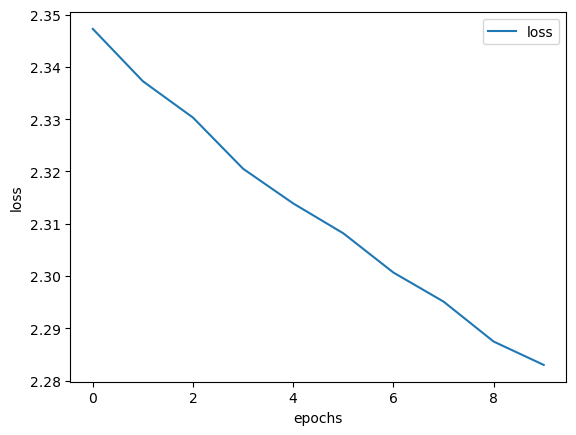

In [50]:
for label in ["loss"]:
    plt.plot(history.history[label], label=label)

    
# plt.plot(history.history['loss'])
plt.legend()
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

In [79]:
model_1.load_weights('./model1_weights/model1_30.h5')

In [80]:
with open("C:/Users/rohit/Desktop/datasets/encoded_test_images_VGG.pkl", "rb") as encoded_pickle:
    encoding_test_1 = load(encoded_pickle)

In [81]:
print(type(encoding_test_1))

<class 'dict'>


In [82]:
def beamSearchvgg(photo):
    in_text = 'startseq'
    for _ in range(max_length):
        sequence = [wordtoix[w] for w in in_text.split() if w in wordtoix]
        sequence = pad_sequences([sequence], maxlen=max_length)
        yhat = model_1.predict([photo,sequence], verbose=0)
        
        sequences = [[list(), 0.0]]
        for row in yhat:
            all_candidates = list()
            for i in range(len(sequences)):
                seq, score = sequences[i]
                for j in range(len(row)):
                    candidate = [seq + [j], score - math.log1p(row[j])]
                    all_candidates.append(candidate)
            ordered = sorted(all_candidates, key=lambda x: x[1])
            sequences = ordered[:5]
        # for i, j in enumerate(sequences):
        #     print(ixtoword[int(sequences[i][0][0])], " ",sequences[i][1])
        # print()
        word = ixtoword[int(sequences[0][0][0])]
        in_text += ' ' + word
        if word == 'endseq':
            break
    final = in_text.split()
    final = final[1:-1]
    final = ' '.join(final)
    return final

In [83]:
def greedySearchvgg(photo):
    in_text = 'startseq'
    for i in range(max_length):
        sequence = [wordtoix[w] for w in in_text.split() if w in wordtoix]
        sequence = pad_sequences([sequence], maxlen=max_length)
        yhat = model_1.predict([photo,sequence], verbose=0)
        yhat = np.argmax(yhat)
        word = ixtoword[yhat]
        in_text += ' ' + word
        if word == 'endseq':
            break
    final = in_text.split()
    final = final[1:-1]
    final = ' '.join(final)
    return final

In [84]:
z=0

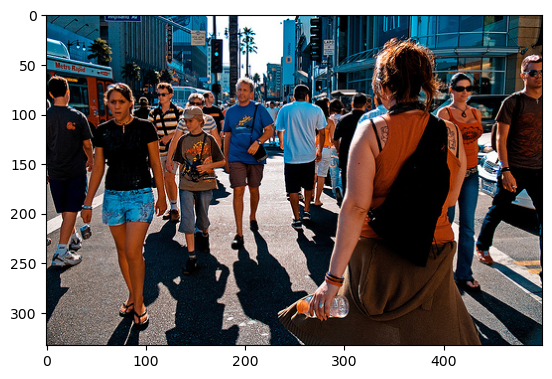

Greedy: group of people are walking down city street
Beam:  group of people are walking down city street


In [99]:
z+=1
pic = list(encoding_test_1.keys())[z]
image = encoding_test_1[pic].reshape((1,4096))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print("Greedy:",greedySearchvgg(image))
print("Beam: ", beamSearchvgg(image))

In [75]:
from nltk.translate.bleu_score import corpus_bleu
from tqdm import tqdm
def evaluate_model_beam_search_vgg(model, images, captions, max_length):
    actual, predicted = list(), list()
    for image_id, caption_list in tqdm(captions.items()):
        pic = image_id+'.jpg'
        print(pic)
        image = train_features_1[pic].reshape((1,4096))
        print(image)
        yhat = beamSearchvgg(image)
        ground_truth = [caption.split() for caption in caption_list]
        actual.append(ground_truth)
        predicted.append(yhat.split())
    print('BLEU Scores :')
    print('BLEU-1: %f' % corpus_bleu(actual, predicted, weights=(1.0, 0, 0, 0)))
    print('BLEU-2: %f' % corpus_bleu(actual, predicted, weights=(0.5, 0.5, 0, 0)))
    print('BLEU-3: %f' % corpus_bleu(actual, predicted, weights=(0.3, 0.3, 0.3, 0)))
    print('BLEU-4: %f' % corpus_bleu(actual, predicted, weights=(0.25, 0.25, 0.25, 0.25)))
evaluate_model_beam_search_vgg(model_1, images, train_descriptions, max_length)

  0%|                                                                                         | 0/6000 [00:00<?, ?it/s]

1000268201_693b08cb0e.jpg
[[2.5076473 0.        0.        ... 0.        0.        0.       ]]


  0%|                                                                               | 1/6000 [00:00<1:03:17,  1.58it/s]

1001773457_577c3a7d70.jpg
[[0.         0.         0.49410743 ... 0.         0.         0.        ]]


  0%|                                                                               | 2/6000 [00:01<1:08:55,  1.45it/s]

1002674143_1b742ab4b8.jpg
[[1.4937081 0.        0.5356841 ... 2.315414  3.7418418 0.       ]]


  0%|                                                                                 | 3/6000 [00:01<57:03,  1.75it/s]

1003163366_44323f5815.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  0%|                                                                               | 4/6000 [00:02<1:00:02,  1.66it/s]

1007129816_e794419615.jpg
[[0.         0.09227565 0.         ... 0.         0.         0.06529307]]


  0%|                                                                                 | 5/6000 [00:02<56:55,  1.76it/s]

1007320043_627395c3d8.jpg
[[0.        0.        0.        ... 0.        3.3386436 0.       ]]


  0%|                                                                                 | 6/6000 [00:03<58:17,  1.71it/s]

1009434119_febe49276a.jpg
[[2.096293   2.1193194  3.562437   ... 0.64264107 2.7146509  0.        ]]


  0%|                                                                                 | 7/6000 [00:04<54:07,  1.85it/s]

1012212859_01547e3f17.jpg
[[0.        0.        0.9873714 ... 0.        1.4932494 0.861285 ]]


  0%|                                                                                 | 8/6000 [00:04<52:00,  1.92it/s]

1015118661_980735411b.jpg
[[1.4410406 0.2829219 0.        ... 0.        2.4592    0.       ]]


  0%|                                                                                 | 9/6000 [00:05<54:28,  1.83it/s]

1015584366_dfcec3c85a.jpg
[[0.7002899 0.        1.256156  ... 0.        0.        0.       ]]


  0%|▏                                                                               | 10/6000 [00:05<56:55,  1.75it/s]

101654506_8eb26cfb60.jpg
[[0.        0.        0.7495302 ... 0.        2.2005944 0.5350666]]


  0%|▏                                                                               | 11/6000 [00:06<51:57,  1.92it/s]

101669240_b2d3e7f17b.jpg
[[1.1132046 0.        0.        ... 0.        6.9780636 1.1585555]]


  0%|▏                                                                               | 12/6000 [00:06<59:10,  1.69it/s]

1016887272_03199f49c4.jpg
[[0.7499216 0.        0.        ... 0.        2.3006244 0.0237354]]


  0%|▏                                                                               | 13/6000 [00:07<56:30,  1.77it/s]

1019077836_6fc9b15408.jpg
[[0.        0.        1.0918484 ... 0.        0.        0.       ]]


  0%|▏                                                                               | 14/6000 [00:07<55:17,  1.80it/s]

1019604187_d087bf9a5f.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  0%|▏                                                                               | 15/6000 [00:08<50:49,  1.96it/s]

1020651753_06077ec457.jpg
[[0.        0.        1.1434922 ... 0.        0.2015797 3.2388356]]


  0%|▏                                                                               | 16/6000 [00:08<46:27,  2.15it/s]

1022454428_b6b660a67b.jpg
[[2.612166  0.        0.        ... 0.        0.8456004 0.       ]]


  0%|▏                                                                               | 17/6000 [00:09<50:41,  1.97it/s]

1022975728_75515238d8.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  0%|▏                                                                               | 18/6000 [00:09<47:36,  2.09it/s]

102351840_323e3de834.jpg
[[0.        0.        0.7452737 ... 0.        3.0619476 2.8275704]]


  0%|▎                                                                               | 19/6000 [00:10<48:53,  2.04it/s]

1024138940_f1fefbdce1.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  0%|▎                                                                               | 20/6000 [00:10<47:44,  2.09it/s]

102455176_5f8ead62d5.jpg
[[4.393944  0.        2.955122  ... 0.        1.4935768 2.9434237]]


  0%|▎                                                                               | 21/6000 [00:11<51:43,  1.93it/s]

1026685415_0431cbf574.jpg
[[0.14213324 0.         0.31897414 ... 0.         0.7119973  0.        ]]


  0%|▎                                                                               | 22/6000 [00:11<48:31,  2.05it/s]

1028205764_7e8df9a2ea.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  0%|▎                                                                               | 23/6000 [00:12<50:40,  1.97it/s]

1030985833_b0902ea560.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  0%|▎                                                                               | 24/6000 [00:13<58:49,  1.69it/s]

103195344_5d2dc613a3.jpg
[[0.        0.        2.463852  ... 0.        1.3384016 0.       ]]


  0%|▎                                                                             | 25/6000 [00:13<1:07:49,  1.47it/s]

103205630_682ca7285b.jpg
[[1.133028  0.        1.0837324 ... 0.        3.7091372 1.2246544]]


  0%|▎                                                                             | 26/6000 [00:14<1:12:04,  1.38it/s]

1032460886_4a598ed535.jpg
[[0.         0.09553245 0.         ... 0.         0.         0.        ]]


  0%|▎                                                                             | 27/6000 [00:16<1:32:11,  1.08it/s]

104136873_5b5d41be75.jpg
[[2.216815  0.        0.        ... 0.        0.2074398 0.       ]]


  0%|▎                                                                             | 28/6000 [00:17<1:34:06,  1.06it/s]

1042020065_fb3d3ba5ba.jpg
[[1.0682511  0.         0.49889565 ... 0.         0.         0.40341786]]


  0%|▍                                                                             | 29/6000 [00:18<1:34:35,  1.05it/s]

1042590306_95dea0916c.jpg
[[0.        1.2047924 0.        ... 0.        0.        1.6356354]]


  0%|▍                                                                             | 30/6000 [00:19<1:34:28,  1.05it/s]

1048710776_bb5b0a5c7c.jpg
[[0.        0.8465146 0.5600204 ... 0.9204996 2.4262657 0.       ]]


  1%|▍                                                                             | 31/6000 [00:19<1:23:03,  1.20it/s]

1052358063_eae6744153.jpg
[[0.15820172 0.         0.         ... 0.         0.0226483  1.3026177 ]]


  1%|▍                                                                             | 32/6000 [00:20<1:32:45,  1.07it/s]

105342180_4d4a40b47f.jpg
[[0.        2.1764612 0.        ... 0.        0.        1.5687783]]


  1%|▍                                                                             | 33/6000 [00:21<1:28:11,  1.13it/s]

1053804096_ad278b25f1.jpg
[[0.        0.        0.        ... 0.        0.        0.9834293]]


  1%|▍                                                                             | 34/6000 [00:22<1:22:39,  1.20it/s]

1055623002_8195a43714.jpg
[[0.65394485 0.6827247  0.         ... 0.         1.7268403  3.0588589 ]]


  1%|▍                                                                             | 35/6000 [00:22<1:19:47,  1.25it/s]

1055753357_4fa3d8d693.jpg
[[0.         0.03748441 0.         ... 0.         0.         0.        ]]


  1%|▍                                                                             | 36/6000 [00:23<1:16:57,  1.29it/s]

1056359656_662cee0814.jpg
[[0.         0.3258955  0.         ... 0.         0.         0.06593782]]


  1%|▍                                                                             | 37/6000 [00:24<1:11:29,  1.39it/s]

1056873310_49c665eb22.jpg
[[0.69806856 0.         1.7864231  ... 0.         1.0661061  0.        ]]


  1%|▍                                                                             | 38/6000 [00:24<1:00:55,  1.63it/s]

1057089366_ca83da0877.jpg
[[1.4698024 1.4372606 0.9802704 ... 0.        0.        0.       ]]


  1%|▌                                                                               | 39/6000 [00:25<52:41,  1.89it/s]

1057210460_09c6f4c6c1.jpg
[[0.         4.5083947  0.         ... 0.14122045 1.2848918  0.9620223 ]]


  1%|▌                                                                               | 40/6000 [00:25<52:17,  1.90it/s]

1057251835_6ded4ada9c.jpg
[[0.         1.8376203  0.13747466 ... 1.6934094  4.0106606  0.        ]]


  1%|▌                                                                               | 41/6000 [00:25<45:04,  2.20it/s]

106514190_bae200f463.jpg
[[2.5021281 0.        2.8820362 ... 0.        2.5754685 0.9128   ]]


  1%|▌                                                                               | 42/6000 [00:26<42:54,  2.31it/s]

1067180831_a59dc64344.jpg
[[2.698442  0.        3.0874243 ... 0.        0.        0.       ]]


  1%|▌                                                                               | 43/6000 [00:26<37:03,  2.68it/s]

1067675215_7336a694d6.jpg
[[0.        0.        0.        ... 0.        1.3334355 0.       ]]


  1%|▌                                                                               | 44/6000 [00:26<38:41,  2.57it/s]

1067790824_f3cc97239b.jpg
[[0.         0.         0.42637575 ... 0.         0.         0.        ]]


  1%|▌                                                                               | 45/6000 [00:27<41:35,  2.39it/s]

1072153132_53d2bb1b60.jpg
[[0.12399447 0.         3.9947891  ... 2.70902    0.         0.        ]]


  1%|▌                                                                               | 46/6000 [00:27<37:45,  2.63it/s]

107318069_e9f2ef32de.jpg
[[0.2549603 1.9576851 0.        ... 0.        5.307075  0.       ]]


  1%|▋                                                                               | 47/6000 [00:28<40:42,  2.44it/s]

1075716537_62105738b4.jpg
[[0.63292915 0.         0.         ... 0.         2.1543205  6.6461535 ]]


  1%|▋                                                                               | 48/6000 [00:28<48:45,  2.03it/s]

1075867198_27ca2e7efe.jpg
[[0.         0.         0.         ... 0.         0.84190774 2.69411   ]]


  1%|▋                                                                               | 49/6000 [00:29<51:39,  1.92it/s]

1075881101_d55c46bece.jpg
[[0.        0.        0.8060329 ... 0.        0.        1.4960729]]


  1%|▋                                                                               | 50/6000 [00:29<51:41,  1.92it/s]

1079274291_9aaf896cc1.jpg
[[0.        0.        0.        ... 0.        0.        1.0933628]]


  1%|▋                                                                               | 51/6000 [00:30<51:52,  1.91it/s]

10815824_2997e03d76.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  1%|▋                                                                               | 52/6000 [00:30<47:32,  2.09it/s]

1082252566_8c79beef93.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  1%|▋                                                                               | 53/6000 [00:31<48:41,  2.04it/s]

1084104085_3b06223afe.jpg
[[0.        0.        0.        ... 0.        0.        1.4856712]]


  1%|▋                                                                               | 54/6000 [00:31<47:01,  2.11it/s]

1087168168_70280d024a.jpg
[[0.       0.       0.       ... 0.       0.       3.041689]]


  1%|▋                                                                               | 55/6000 [00:32<55:02,  1.80it/s]

108898978_7713be88fc.jpg
[[4.0946875 0.        0.        ... 0.        5.236905  0.       ]]


  1%|▋                                                                               | 56/6000 [00:33<58:44,  1.69it/s]

108899015_bf36131a57.jpg
[[0.8579608  0.04482189 1.1354363  ... 0.27010953 2.5250502  0.        ]]


  1%|▊                                                                               | 57/6000 [00:33<50:57,  1.94it/s]

1089181217_ee1167f7af.jpg
[[1.2696471 0.        2.6252542 ... 0.        0.        0.       ]]


  1%|▊                                                                               | 58/6000 [00:33<46:54,  2.11it/s]

109202756_b97fcdc62c.jpg
[[0.         0.         0.         ... 0.         1.6551683  0.31860554]]


  1%|▊                                                                               | 59/6000 [00:34<42:54,  2.31it/s]

109202801_c6381eef15.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  1%|▊                                                                               | 60/6000 [00:34<40:02,  2.47it/s]

109260216_85b0be5378.jpg
[[0.        0.        0.        ... 0.        3.9842732 0.       ]]


  1%|▊                                                                               | 61/6000 [00:34<37:58,  2.61it/s]

109260218_fca831f933.jpg
[[0.14889869 0.         0.         ... 0.         4.212273   1.2221028 ]]


  1%|▊                                                                               | 62/6000 [00:35<41:56,  2.36it/s]

1093716555_801aacef79.jpg
[[0.        0.        0.        ... 1.8561068 0.        0.       ]]


  1%|▊                                                                               | 63/6000 [00:35<45:05,  2.19it/s]

1093737381_b313cd49ff.jpg
[[2.8823547 2.2597647 0.        ... 0.        5.161184  1.5296786]]


  1%|▊                                                                               | 64/6000 [00:36<42:48,  2.31it/s]

1094462889_f9966dafa6.jpg
[[2.7135382 0.        5.041314  ... 0.        1.8000078 0.8720407]]


  1%|▊                                                                               | 65/6000 [00:36<41:21,  2.39it/s]

1095476286_87d4f8664e.jpg
[[0.        0.        1.8276404 ... 0.        1.3328612 0.       ]]


  1%|▉                                                                               | 66/6000 [00:37<38:53,  2.54it/s]

1095580424_76f0aa8a3e.jpg
[[0.         0.         0.20842135 ... 0.         0.         0.        ]]


  1%|▉                                                                               | 67/6000 [00:37<40:13,  2.46it/s]

1095590286_c654f7e5a9.jpg
[[0.        0.        1.7484717 ... 0.        0.        0.       ]]


  1%|▉                                                                               | 68/6000 [00:37<39:23,  2.51it/s]

1095980313_3c94799968.jpg
[[0.10414112 2.3654659  0.8604293  ... 0.         0.         0.18513969]]


  1%|▉                                                                               | 69/6000 [00:38<41:29,  2.38it/s]

1096097967_ac305887b4.jpg
[[0.8339708 0.        0.        ... 0.        0.7825695 0.       ]]


  1%|▉                                                                               | 70/6000 [00:38<46:02,  2.15it/s]

1096165011_cc5eb16aa6.jpg
[[0.       0.       0.       ... 0.       0.       2.417134]]


  1%|▉                                                                               | 71/6000 [00:39<43:26,  2.27it/s]

109671650_f7bbc297fa.jpg
[[1.7386363 0.        2.297295  ... 0.        3.2901132 0.       ]]


  1%|▉                                                                               | 72/6000 [00:39<43:01,  2.30it/s]

109738763_90541ef30d.jpg
[[0.         0.         2.2135296  ... 1.3008397  0.76231724 1.0752538 ]]


  1%|▉                                                                               | 73/6000 [00:40<45:29,  2.17it/s]

109738916_236dc456ac.jpg
[[ 0.68990445  0.          0.         ...  0.          0.
  11.483218  ]]


  1%|█                                                                               | 75/6000 [00:40<37:40,  2.62it/s]

109823394_83fcb735e1.jpg
[[0. 0. 0. ... 0. 0. 0.]]
109823395_6fb423a90f.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  1%|█                                                                               | 76/6000 [00:41<51:44,  1.91it/s]

109823397_e35154645f.jpg
[[0.24777988 0.         0.65858436 ... 0.         0.         0.        ]]


  1%|█                                                                               | 77/6000 [00:42<54:18,  1.82it/s]

1104133405_c04a00707f.jpg
[[0.        0.        1.0946805 ... 0.        2.757846  0.       ]]


  1%|█                                                                               | 78/6000 [00:42<51:11,  1.93it/s]

1105959054_9c3a738096.jpg
[[0.         0.09449437 0.         ... 0.         0.         2.331969  ]]


  1%|█                                                                               | 79/6000 [00:43<51:15,  1.93it/s]

110595925_f3395c8bd6.jpg
[[0.         0.46526468 0.         ... 0.         1.3569107  0.6402185 ]]


  1%|█                                                                               | 80/6000 [00:43<47:09,  2.09it/s]

1107471216_4336c9b328.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  1%|█                                                                               | 81/6000 [00:43<41:27,  2.38it/s]

1110208841_5bb6806afe.jpg
[[0.        0.        1.0154457 ... 0.        0.        0.       ]]


  1%|█                                                                               | 82/6000 [00:44<36:01,  2.74it/s]

1112212364_0c48235fc2.jpg
[[0.13884377 0.47333542 1.4702976  ... 0.         1.405351   0.        ]]


  1%|█                                                                               | 83/6000 [00:44<46:43,  2.11it/s]

111537217_082a4ba060.jpg
[[0.        0.        0.        ... 0.        0.        0.8693124]]


  1%|█                                                                               | 84/6000 [00:45<44:00,  2.24it/s]

111537222_07e56d5a30.jpg
[[0.        0.        0.        ... 0.        0.        2.1985955]]


  1%|█▏                                                                              | 85/6000 [00:45<40:35,  2.43it/s]

1115565519_d976d4b1f1.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  1%|█▏                                                                              | 86/6000 [00:46<43:43,  2.25it/s]

1115679311_245eff2f4b.jpg
[[0.         0.8270999  0.49116844 ... 0.         0.75097066 0.        ]]


  1%|█▏                                                                              | 87/6000 [00:46<39:14,  2.51it/s]

111766423_4522d36e56.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  1%|█▏                                                                              | 88/6000 [00:46<35:56,  2.74it/s]

1117972841_2b9261f95f.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  1%|█▏                                                                              | 89/6000 [00:47<37:40,  2.61it/s]

1118557877_736f339752.jpg
[[0.42092532 0.03309658 0.         ... 0.         0.34944773 1.0957979 ]]


  2%|█▏                                                                              | 90/6000 [00:47<40:22,  2.44it/s]

1119418776_58e4b93eac.jpg
[[0.         0.         2.893344   ... 0.         0.         0.09569961]]


  2%|█▏                                                                              | 91/6000 [00:48<45:18,  2.17it/s]

1119463452_69d4eecd08.jpg
[[2.3327594 0.        0.        ... 0.        0.9942826 4.223905 ]]


  2%|█▏                                                                              | 92/6000 [00:48<38:44,  2.54it/s]

1121416483_c7902d0d49.jpg
[[0.7602761  0.         0.09107834 ... 0.         0.         3.1523173 ]]


  2%|█▏                                                                              | 93/6000 [00:49<46:37,  2.11it/s]

112178718_87270d9b4d.jpg
[[0.         0.         0.39011902 ... 0.         3.3044925  3.183921  ]]


  2%|█▎                                                                              | 94/6000 [00:49<46:32,  2.11it/s]

112243673_fd68255217.jpg
[[0.41948104 3.1486824  1.2326369  ... 0.         1.2042758  0.40716493]]


  2%|█▎                                                                              | 95/6000 [00:50<47:47,  2.06it/s]

1124448967_2221af8dc5.jpg
[[1.6405365 0.8018824 0.        ... 0.        3.7259424 2.621036 ]]


  2%|█▏                                                                            | 96/6000 [00:51<1:01:41,  1.59it/s]

1129704496_4a61441f2c.jpg
[[0.        0.        2.485537  ... 0.        3.7946372 0.       ]]


  2%|█▎                                                                              | 97/6000 [00:51<52:51,  1.86it/s]

1130017585_1a219257ac.jpg
[[0.        4.459044  0.        ... 0.        0.        1.8297145]]


  2%|█▎                                                                              | 98/6000 [00:52<56:24,  1.74it/s]

1130401779_8c30182e3e.jpg
[[0.        0.        2.9558825 ... 0.        0.5781392 0.       ]]


  2%|█▎                                                                              | 99/6000 [00:52<50:35,  1.94it/s]

1131340021_83f46b150a.jpg
[[2.3070135 6.08214   1.1496334 ... 0.        0.        0.       ]]


  2%|█▎                                                                             | 100/6000 [00:52<45:14,  2.17it/s]

1131804997_177c3c0640.jpg
[[0.        2.051976  0.        ... 0.        0.9350801 0.       ]]


  2%|█▎                                                                             | 101/6000 [00:53<46:50,  2.10it/s]

1132772170_600610c5df.jpg
[[2.4071057 0.        0.        ... 0.        0.5252655 0.       ]]


  2%|█▎                                                                             | 102/6000 [00:53<48:27,  2.03it/s]

1141718391_24164bf1b1.jpg
[[0.01078343 4.9680805  0.2767955  ... 0.         0.         0.        ]]


  2%|█▎                                                                             | 103/6000 [00:54<51:46,  1.90it/s]

1141739219_2c47195e4c.jpg
[[1.6204042  0.         0.         ... 0.96518755 3.1706352  0.        ]]


  2%|█▎                                                                             | 104/6000 [00:54<48:48,  2.01it/s]

1142283988_6b227c5231.jpg
[[0.         0.         0.         ... 0.         0.         0.05583131]]


  2%|█▍                                                                             | 105/6000 [00:55<47:56,  2.05it/s]

1142847777_2a0c1c2551.jpg
[[0.        0.        0.        ... 0.        0.        2.9628935]]


  2%|█▍                                                                             | 106/6000 [00:55<52:47,  1.86it/s]

1143373711_2e90b7b799.jpg
[[0.        0.        0.        ... 0.        2.6289592 1.9020624]]


  2%|█▍                                                                             | 107/6000 [00:56<52:52,  1.86it/s]

1143882946_1898d2eeb9.jpg
[[1.6983514 0.        0.        ... 0.        0.        2.5966208]]


  2%|█▍                                                                             | 108/6000 [00:56<50:51,  1.93it/s]

1144288288_e5c9558b6a.jpg
[[0.        0.        0.        ... 0.        1.1153059 1.4850364]]


  2%|█▍                                                                             | 109/6000 [00:57<48:06,  2.04it/s]

1148238960_f8cacec2fc.jpg
[[2.3356714  1.0458845  0.         ... 0.         1.7077806  0.22700307]]


  2%|█▍                                                                             | 110/6000 [00:57<46:18,  2.12it/s]

1149179852_acad4d7300.jpg
[[0.19323167 0.         0.         ... 0.         3.1756647  0.        ]]


  2%|█▍                                                                             | 111/6000 [00:58<47:36,  2.06it/s]

114949897_490ca7eaec.jpg
[[0.        2.0049858 0.3625815 ... 0.        0.3641816 0.       ]]


  2%|█▍                                                                             | 112/6000 [00:58<47:09,  2.08it/s]

1151466868_3bc4d9580b.jpg
[[0.        0.        1.6538558 ... 0.        2.459296  0.6153456]]


  2%|█▍                                                                             | 113/6000 [00:59<49:58,  1.96it/s]

1153704539_542f7aa3a5.jpg
[[8.405372  1.980004  1.3553879 ... 0.        0.        6.622901 ]]


  2%|█▌                                                                             | 114/6000 [00:59<50:14,  1.95it/s]

1159574340_99ba8c3c59.jpg
[[0.        3.6337087 0.        ... 0.        3.634965  7.1368437]]


  2%|█▌                                                                             | 115/6000 [01:00<49:03,  2.00it/s]

1160034462_16b38174fe.jpg
[[1.1426855 0.4768608 0.5623864 ... 0.        1.166637  0.       ]]


  2%|█▌                                                                             | 116/6000 [01:00<46:47,  2.10it/s]

1160441615_fe6b3c5277.jpg
[[0.31307352 3.0010245  0.         ... 0.         0.82344043 0.        ]]


  2%|█▌                                                                             | 117/6000 [01:01<47:49,  2.05it/s]

1163282319_b729b24c46.jpg
[[0.        0.        1.9533664 ... 0.        2.7733128 1.9097369]]


  2%|█▌                                                                             | 118/6000 [01:02<53:22,  1.84it/s]

116409198_0fe0c94f3b.jpg
[[1.0540771 0.        0.        ... 0.        1.898432  1.6575973]]


  2%|█▌                                                                             | 119/6000 [01:02<51:13,  1.91it/s]

1164765687_7aca07bbe7.jpg
[[0.        0.        3.2247624 ... 0.        0.        0.       ]]


  2%|█▌                                                                             | 120/6000 [01:02<48:20,  2.03it/s]

1167662968_e466f1e80a.jpg
[[0.52713406 0.         0.         ... 0.         0.         0.2711864 ]]


  2%|█▌                                                                             | 121/6000 [01:03<43:39,  2.24it/s]

1167908324_8caab45e15.jpg
[[2.0516682  0.         0.         ... 0.         0.41553587 2.3708832 ]]


  2%|█▌                                                                             | 122/6000 [01:03<47:10,  2.08it/s]

1169307342_e7a4685a5c.jpg
[[3.9294534  0.         0.3522485  ... 0.         0.08929011 0.        ]]


  2%|█▌                                                                             | 123/6000 [01:04<44:09,  2.22it/s]

1176580356_9810d877bf.jpg
[[2.9726706 0.        6.730705  ... 0.        2.210102  0.       ]]


  2%|█▋                                                                             | 124/6000 [01:04<39:23,  2.49it/s]

118187095_d422383c81.jpg
[[2.4873734 0.        0.        ... 0.        0.        2.9801164]]


  2%|█▋                                                                             | 125/6000 [01:05<45:44,  2.14it/s]

118309463_a532b75be9.jpg
[[0.         0.         0.         ... 0.         0.         0.71449655]]


  2%|█▋                                                                             | 126/6000 [01:05<45:49,  2.14it/s]

1184967930_9e29ce380d.jpg
[[0.7634235 2.0929804 0.        ... 0.        3.0523865 0.       ]]


  2%|█▋                                                                             | 127/6000 [01:05<41:33,  2.36it/s]

1187435567_18173c148b.jpg
[[0.13875562 0.         3.4327788  ... 0.19286129 2.8455226  0.        ]]


  2%|█▋                                                                             | 128/6000 [01:06<42:28,  2.30it/s]

1187593464_ce862352c6.jpg
[[1.8517389 1.5584354 5.525113  ... 0.        0.        0.       ]]


  2%|█▋                                                                             | 129/6000 [01:06<40:22,  2.42it/s]

1189977786_4f5aaed773.jpg
[[0.98972416 1.484974   5.983516   ... 0.         0.         0.        ]]


  2%|█▋                                                                             | 130/6000 [01:07<39:34,  2.47it/s]

1191338263_a4fa073154.jpg
[[0.9599458  0.21327049 0.         ... 0.         0.         4.295717  ]]


  2%|█▋                                                                             | 131/6000 [01:07<47:28,  2.06it/s]

1193116658_c0161c35b5.jpg
[[1.5094991  0.         0.         ... 0.         0.51298475 0.79751945]]


  2%|█▋                                                                             | 132/6000 [01:08<49:44,  1.97it/s]

119534510_d52b3781a3.jpg
[[0.         0.         0.         ... 0.02523246 0.5616706  0.        ]]


  2%|█▊                                                                             | 133/6000 [01:08<48:37,  2.01it/s]

1197800988_7fb0ca4888.jpg
[[1.0082712 0.        0.        ... 0.        1.180027  0.       ]]


  2%|█▊                                                                             | 134/6000 [01:09<43:40,  2.24it/s]

1198194316_543cc7b945.jpg
[[0.49376768 3.7035341  2.0849166  ... 0.         0.8490198  0.        ]]


  2%|█▊                                                                             | 135/6000 [01:09<49:35,  1.97it/s]

1204996216_71d7519d9a.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  2%|█▊                                                                             | 136/6000 [01:10<44:27,  2.20it/s]

1206506157_c7956accd5.jpg
[[0.        0.        3.6425366 ... 0.        0.        0.       ]]


  2%|█▊                                                                             | 137/6000 [01:10<45:19,  2.16it/s]

1207159468_425b902bfb.jpg
[[0.        0.        0.        ... 0.        1.2420517 0.       ]]


  2%|█▊                                                                             | 138/6000 [01:11<49:33,  1.97it/s]

1211015912_9f3ee3a995.jpg
[[0.        0.        0.        ... 0.        1.8849809 0.       ]]


  2%|█▊                                                                             | 139/6000 [01:11<56:23,  1.73it/s]

1213336750_2269b51397.jpg
[[1.7141348  0.         0.         ... 0.         5.898518   0.35131392]]


  2%|█▊                                                                             | 140/6000 [01:12<54:33,  1.79it/s]

121800200_bef08fae5f.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  2%|█▊                                                                             | 141/6000 [01:12<51:55,  1.88it/s]

121971540_0a986ee176.jpg
[[0.51160526 2.9731328  0.37745363 ... 0.         0.         0.        ]]


  2%|█▊                                                                             | 142/6000 [01:13<59:57,  1.63it/s]

1222322358_225067636e.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  2%|█▉                                                                             | 143/6000 [01:14<58:23,  1.67it/s]

1225443522_1633e7121f.jpg
[[2.9149194 0.        0.        ... 0.        1.8636923 0.       ]]


  2%|█▉                                                                             | 144/6000 [01:14<54:38,  1.79it/s]

1227655020_b11a1bb112.jpg
[[0.        0.        2.7508698 ... 0.        1.3441964 0.       ]]


  2%|█▉                                                                             | 145/6000 [01:15<49:23,  1.98it/s]

1229756013_94663527d7.jpg
[[0.         0.         0.40273878 ... 0.         0.         1.2600731 ]]


  2%|█▉                                                                             | 146/6000 [01:15<45:29,  2.14it/s]

1231229740_8dcbf80bfb.jpg
[[0.       0.       0.       ... 0.       0.       1.352031]]


  2%|█▉                                                                             | 147/6000 [01:15<41:40,  2.34it/s]

1234293791_6566284bcd.jpg
[[0.         0.         0.         ... 0.         0.19730386 0.        ]]


  2%|█▉                                                                             | 148/6000 [01:16<49:00,  1.99it/s]

1234817607_924893f6e1.jpg
[[1.2924727 0.        0.        ... 0.        0.        0.       ]]


  2%|█▉                                                                             | 149/6000 [01:16<45:37,  2.14it/s]

1235580648_7eebaed9bc.jpg
[[0.         3.4605937  0.         ... 0.         0.         0.31393886]]


  2%|█▉                                                                             | 150/6000 [01:17<47:04,  2.07it/s]

1235681222_819231767a.jpg
[[3.4826126  0.59857    0.84652764 ... 0.         0.7018821  0.        ]]


  3%|█▉                                                                             | 151/6000 [01:17<42:35,  2.29it/s]

1235685934_be89b231fb.jpg
[[0.8148749  0.13606551 0.         ... 0.         0.         0.58746743]]


  3%|██                                                                             | 152/6000 [01:18<43:43,  2.23it/s]

1236951314_0308dc4138.jpg
[[0.24490064 0.         2.474081   ... 0.         0.         2.1995091 ]]


  3%|██                                                                             | 153/6000 [01:18<44:42,  2.18it/s]

1236964638_1808784a3c.jpg
[[0.         0.         0.35010916 ... 0.         0.         4.3517294 ]]


  3%|██                                                                             | 154/6000 [01:19<42:17,  2.30it/s]

123889082_d3751e0350.jpg
[[3.0460982 0.        0.        ... 0.        0.        0.       ]]


  3%|██                                                                             | 155/6000 [01:19<40:40,  2.40it/s]

1240297429_c36ae0c58f.jpg
[[2.4433174  0.58599436 2.8919783  ... 0.         1.5063105  4.161293  ]]


  3%|██                                                                             | 156/6000 [01:19<38:08,  2.55it/s]

124195430_d14028660f.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  3%|██                                                                             | 157/6000 [01:20<37:41,  2.58it/s]

1244140539_da4804d828.jpg
[[0.        0.        3.864581  ... 0.        0.2847234 0.       ]]


  3%|██                                                                             | 158/6000 [01:20<38:49,  2.51it/s]

1244306891_8e78ae1620.jpg
[[0.       0.       0.       ... 0.       0.       3.290656]]


  3%|██                                                                             | 159/6000 [01:21<46:15,  2.10it/s]

1244485675_822e6efe60.jpg
[[0.7764609 0.        0.        ... 0.        0.        0.       ]]


  3%|██                                                                             | 160/6000 [01:21<53:09,  1.83it/s]

1245022983_fb329886dd.jpg
[[0.61501247 1.2112542  0.         ... 0.         0.         0.        ]]


  3%|██                                                                             | 161/6000 [01:22<56:16,  1.73it/s]

1247181182_35cabd76f3.jpg
[[0.         0.         0.         ... 0.         0.8586958  0.46798655]]


  3%|██▏                                                                            | 162/6000 [01:22<47:43,  2.04it/s]

1248734482_3038218f3b.jpg
[[0.7123004 0.        0.        ... 0.        0.        0.       ]]


  3%|██▏                                                                            | 163/6000 [01:23<50:02,  1.94it/s]

124881487_36e668145d.jpg
[[4.6409254 0.        0.        ... 0.        0.        5.511103 ]]


  3%|██▏                                                                            | 164/6000 [01:23<44:44,  2.17it/s]

1248953128_24c9f8d924.jpg
[[4.4365525  0.         1.4996098  ... 0.69001716 2.58662    0.09089756]]


  3%|██▏                                                                            | 165/6000 [01:24<43:39,  2.23it/s]

1251558317_4ef844b775.jpg
[[2.8797646 0.        0.        ... 0.        0.        5.8018146]]


  3%|██▏                                                                            | 166/6000 [01:24<44:42,  2.18it/s]

1252396628_eb81d3905b.jpg
[[0.        0.        0.        ... 0.        0.        4.3464894]]


  3%|██▏                                                                            | 167/6000 [01:25<43:43,  2.22it/s]

1252787177_4b08625897.jpg
[[0.50366247 0.         0.         ... 0.         0.49367788 0.        ]]


  3%|██▏                                                                            | 168/6000 [01:25<44:21,  2.19it/s]

125319704_49ead3463c.jpg
[[1.7508135 0.        0.        ... 0.        3.239711  4.0838046]]


  3%|██▏                                                                            | 169/6000 [01:26<46:06,  2.11it/s]

1253264731_e7c689eca5.jpg
[[0.         0.97133946 0.         ... 0.         0.         0.58380586]]


  3%|██▏                                                                            | 170/6000 [01:26<47:11,  2.06it/s]

1253275679_e955fb7304.jpg
[[0.         0.         0.         ... 0.         0.         0.04548526]]


  3%|██▎                                                                            | 171/6000 [01:27<46:45,  2.08it/s]

1255504166_f2437febcb.jpg
[[0.        1.2450986 0.        ... 0.        2.8570936 0.       ]]


  3%|██▎                                                                            | 172/6000 [01:27<45:30,  2.13it/s]

1259936608_e3f0064f23.jpg
[[2.0488226 0.        0.        ... 0.        0.        2.1584709]]


  3%|██▎                                                                            | 173/6000 [01:27<40:07,  2.42it/s]

1260816604_570fc35836.jpg
[[0.         0.         0.         ... 0.00840527 0.56234443 0.        ]]


  3%|██▎                                                                            | 174/6000 [01:28<41:49,  2.32it/s]

1262077938_8b9516c273.jpg
[[0.        1.9932663 1.1668019 ... 0.        0.        0.       ]]


  3%|██▎                                                                            | 175/6000 [01:28<45:37,  2.13it/s]

1262454669_f1caafec2d.jpg
[[0.6452249 1.202761  2.091086  ... 0.        3.4515202 0.       ]]


  3%|██▎                                                                            | 176/6000 [01:29<41:38,  2.33it/s]

1263126002_881ebd7ac9.jpg
[[0.81575227 0.30634618 0.         ... 0.         0.         0.        ]]


  3%|██▎                                                                            | 177/6000 [01:29<40:11,  2.41it/s]

1263801010_5c74bf1715.jpg
[[0.        0.        0.        ... 0.        1.321489  3.0581436]]


  3%|██▎                                                                            | 178/6000 [01:30<45:45,  2.12it/s]

1269470943_ba7fc49b4d.jpg
[[1.3712728 0.        0.2930381 ... 0.        0.        0.       ]]


  3%|██▎                                                                            | 179/6000 [01:30<51:24,  1.89it/s]

1271210445_7f7ecf3791.jpg
[[0.        2.6686203 0.        ... 2.095165  0.5722133 0.       ]]


  3%|██▎                                                                            | 180/6000 [01:31<48:16,  2.01it/s]

1271960365_e54033f883.jpg
[[0.        0.        0.        ... 0.        1.9079728 0.       ]]


  3%|██▍                                                                            | 181/6000 [01:31<43:28,  2.23it/s]

1273001772_1585562051.jpg
[[0.      0.      0.      ... 0.      1.58255 0.     ]]


  3%|██▍                                                                            | 182/6000 [01:32<44:35,  2.17it/s]

1277185009_06478dd457.jpg
[[2.2113564  0.         1.758453   ... 0.         0.03506315 1.9183838 ]]


  3%|██▍                                                                            | 183/6000 [01:32<44:54,  2.16it/s]

1277743944_f4e8c78403.jpg
[[0.00769895 0.         0.03232783 ... 0.         3.0258634  2.3335812 ]]


  3%|██▍                                                                            | 184/6000 [01:33<43:39,  2.22it/s]

1280147517_98767ca3b3.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  3%|██▍                                                                            | 185/6000 [01:33<43:28,  2.23it/s]

1280320287_b2a4b9b7bd.jpg
[[2.0633068 0.        0.        ... 0.        0.        4.272004 ]]


  3%|██▍                                                                            | 186/6000 [01:33<45:22,  2.14it/s]

12830823_87d2654e31.jpg
[[2.1086679 0.        2.1618614 ... 0.9306988 0.        0.       ]]


  3%|██▍                                                                            | 187/6000 [01:34<41:27,  2.34it/s]

1285067106_2adc307240.jpg
[[0.        0.        1.1976324 ... 0.        0.702016  1.5303264]]


  3%|██▍                                                                            | 188/6000 [01:34<41:23,  2.34it/s]

1285874746_486731a954.jpg
[[0.       0.       0.       ... 0.       0.       2.545038]]


  3%|██▍                                                                            | 189/6000 [01:35<39:58,  2.42it/s]

1286408831_05282582ed.jpg
[[0.        1.4608356 0.        ... 0.        0.        0.       ]]


  3%|██▌                                                                            | 190/6000 [01:35<48:13,  2.01it/s]

1287064529_aa4e4f3c31.jpg
[[0.         0.         0.         ... 0.         0.         0.08522779]]


  3%|██▌                                                                            | 191/6000 [01:36<46:32,  2.08it/s]

1287920676_d21a0b289b.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  3%|██▌                                                                            | 192/6000 [01:36<42:13,  2.29it/s]

1287931016_fb015e2e10.jpg
[[0.        0.        3.0978613 ... 0.        0.8850955 0.       ]]


  3%|██▌                                                                            | 193/6000 [01:36<39:07,  2.47it/s]

1287982439_6578006e22.jpg
[[2.271925   0.         0.25005212 ... 0.         4.2252083  0.        ]]


  3%|██▌                                                                            | 194/6000 [01:37<37:02,  2.61it/s]

1288909046_d2b2b62607.jpg
[[2.551836   0.03595322 1.7840971  ... 0.47093916 0.         0.        ]]


  3%|██▌                                                                            | 195/6000 [01:37<35:40,  2.71it/s]

128912885_8350d277a4.jpg
[[0.         0.         1.373459   ... 0.         0.83311146 1.8507457 ]]


  3%|██▌                                                                            | 196/6000 [01:37<35:57,  2.69it/s]

1289142574_2bd6a082dd.jpg
[[0.4216833  0.19690609 0.1436789  ... 0.         0.         0.        ]]


  3%|██▌                                                                            | 197/6000 [01:38<44:08,  2.19it/s]

1290894194_8a4ffdc7eb.jpg
[[0.4542262 0.        2.3239915 ... 0.        3.4011455 0.       ]]


  3%|██▌                                                                            | 198/6000 [01:39<44:57,  2.15it/s]

1294578091_2ad02fea91.jpg
[[0.00235885 0.         1.4512081  ... 0.         0.5894186  0.        ]]


  3%|██▌                                                                            | 199/6000 [01:39<41:03,  2.35it/s]

1295669416_21cabf594d.jpg
[[2.6906247 2.8151743 0.        ... 0.        0.        0.       ]]


  3%|██▋                                                                            | 200/6000 [01:40<47:44,  2.02it/s]

1295671216_cde1b9c9d1.jpg
[[0.        0.        0.        ... 0.        0.        2.2879007]]


  3%|██▋                                                                            | 201/6000 [01:40<50:56,  1.90it/s]

129599450_cab4e77343.jpg
[[0.        1.2539678 0.        ... 0.        2.9816737 0.       ]]


  3%|██▋                                                                            | 202/6000 [01:41<47:55,  2.02it/s]

1296412797_85b6d2f8d6.jpg
[[0.        0.        3.2375984 ... 0.        0.        0.       ]]


  3%|██▋                                                                            | 203/6000 [01:41<49:51,  1.94it/s]

1296770308_3db2022f5a.jpg
[[0.8363988  0.         0.08229375 ... 2.5080917  2.4833953  1.9098709 ]]


  3%|██▋                                                                            | 204/6000 [01:42<55:44,  1.73it/s]

1298866571_b4c496b71c.jpg
[[0.        2.3127384 0.        ... 0.        2.2557766 2.3556905]]


  3%|██▋                                                                            | 205/6000 [01:42<56:35,  1.71it/s]

1299459550_1fd5594fa2.jpg
[[0.        0.        0.        ... 0.        0.        1.4867756]]


  3%|██▋                                                                            | 206/6000 [01:43<51:51,  1.86it/s]

1299459562_ed0e064aee.jpg
[[0.      0.      0.      ... 0.      0.      3.11559]]


  3%|██▋                                                                            | 207/6000 [01:43<47:18,  2.04it/s]

1301140633_046e4e8010.jpg
[[0.36068776 0.         0.         ... 0.         0.         0.9058819 ]]


  3%|██▋                                                                            | 208/6000 [01:44<42:45,  2.26it/s]

130211457_be3f6b335d.jpg
[[0.        0.        0.        ... 0.        0.        1.7599397]]


  3%|██▊                                                                            | 209/6000 [01:44<44:47,  2.15it/s]

1302657647_46b36c0d66.jpg
[[0.         0.5276816  0.7732141  ... 0.         0.         0.51608676]]


  4%|██▊                                                                            | 210/6000 [01:45<49:25,  1.95it/s]

1303335399_b3facd47ab.jpg
[[0.15139699 0.         0.         ... 0.         0.         3.0114472 ]]


  4%|██▊                                                                            | 211/6000 [01:45<50:48,  1.90it/s]

1303550623_cb43ac044a.jpg
[[0.        3.5042233 0.        ... 0.        0.        0.       ]]


  4%|██▊                                                                            | 212/6000 [01:46<50:40,  1.90it/s]

1303727066_23d0f6ed43.jpg
[[0.         0.         0.         ... 0.         0.11282545 0.5255396 ]]


  4%|██▊                                                                            | 213/6000 [01:46<47:35,  2.03it/s]

1303727828_d1052ee341.jpg
[[0.        0.        0.        ... 0.        0.        2.7469141]]


  4%|██▊                                                                            | 214/6000 [01:47<48:33,  1.99it/s]

1304100320_c8990a1539.jpg
[[1.0540409 0.9575006 2.3445823 ... 0.        1.7652845 0.       ]]


  4%|██▊                                                                            | 215/6000 [01:47<42:09,  2.29it/s]

1304961697_76b86b0c18.jpg
[[0.        0.        0.9542875 ... 0.        0.        5.5096726]]


  4%|██▊                                                                            | 216/6000 [01:48<47:02,  2.05it/s]

1305564994_00513f9a5b.jpg
[[0.        0.        3.873344  ... 0.        0.        1.8092587]]


  4%|██▊                                                                            | 217/6000 [01:48<50:32,  1.91it/s]

1307635496_94442dc21a.jpg
[[1.1724403  0.         1.3351352  ... 0.         0.47886539 1.548543  ]]


  4%|██▊                                                                            | 218/6000 [01:49<54:25,  1.77it/s]

1308472581_9961782889.jpg
[[0.0036034  0.         0.         ... 0.         1.551053   0.52849686]]


  4%|██▉                                                                            | 219/6000 [01:49<51:46,  1.86it/s]

1308617539_54e1a3dfbe.jpg
[[0.        0.        2.4532418 ... 0.        2.1629438 1.3274007]]


  4%|██▉                                                                            | 220/6000 [01:50<45:50,  2.10it/s]

1309330801_aeeb23f1ee.jpg
[[4.7075386  6.4000745  1.2794868  ... 0.09790188 0.2169415  0.        ]]


  4%|██▉                                                                            | 221/6000 [01:50<48:40,  1.98it/s]

1311132744_5ffd03f831.jpg
[[3.790412  0.        0.        ... 0.        1.9526844 0.       ]]


  4%|██▉                                                                            | 222/6000 [01:51<45:06,  2.14it/s]

1312020846_5abb4a9be2.jpg
[[3.5874443 0.        0.        ... 0.        1.3821702 0.       ]]


  4%|██▉                                                                            | 223/6000 [01:51<41:04,  2.34it/s]

1312227131_771b5ed201.jpg
[[0.        2.3544786 0.        ... 0.        5.3791466 0.5780374]]


  4%|██▉                                                                            | 224/6000 [01:51<37:03,  2.60it/s]

1312954382_cf6d70d63a.jpg
[[0.        0.        1.9082566 ... 0.        1.1151707 1.8518534]]


  4%|██▉                                                                            | 225/6000 [01:52<43:24,  2.22it/s]

1313693129_71d0b21c63.jpg
[[0.         5.589216   0.         ... 0.         3.885158   0.39905003]]


  4%|██▉                                                                            | 226/6000 [01:52<43:59,  2.19it/s]

1313961775_824b87d155.jpg
[[0.        0.        0.        ... 0.        0.        1.6433716]]


  4%|██▉                                                                            | 227/6000 [01:53<50:10,  1.92it/s]

1316247213_1d2c726dd5.jpg
[[0.         0.13036162 0.         ... 0.         0.         0.        ]]


  4%|███                                                                            | 228/6000 [01:54<51:17,  1.88it/s]

131632409_4de0d4e710.jpg
[[0.        0.        0.        ... 0.        0.        2.0796237]]


  4%|███                                                                            | 229/6000 [01:54<53:21,  1.80it/s]

1321723162_9d4c78b8af.jpg
[[1.4315126 2.0265806 0.        ... 0.        3.716326  0.       ]]


  4%|███                                                                            | 230/6000 [01:55<50:52,  1.89it/s]

1321949151_77b77b4617.jpg
[[4.163992   0.9141028  1.776798   ... 0.20060375 7.6919785  0.        ]]


  4%|███                                                                            | 231/6000 [01:55<46:32,  2.07it/s]

1324816249_86600a6759.jpg
[[0.86487377 0.         0.9604291  ... 0.         3.1071851  0.        ]]


  4%|███                                                                            | 232/6000 [01:56<51:44,  1.86it/s]

1330645772_24f831ff8f.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  4%|███                                                                            | 233/6000 [01:56<47:10,  2.04it/s]

133189853_811de6ab2a.jpg
[[0.         0.02320433 0.         ... 0.         0.         0.        ]]


  4%|███                                                                            | 234/6000 [01:57<46:31,  2.07it/s]

1332208215_fa824f6659.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  4%|███                                                                            | 235/6000 [01:57<51:41,  1.86it/s]

1332492622_8c66992b62.jpg
[[0.9719137  0.         1.5662506  ... 0.         0.48678878 0.        ]]


  4%|███                                                                            | 236/6000 [01:58<49:48,  1.93it/s]

1332815795_8eea44375e.jpg
[[0.       0.       2.999609 ... 0.       0.       0.      ]]


  4%|███                                                                            | 237/6000 [01:58<46:36,  2.06it/s]

1333888922_26f15c18c3.jpg
[[0.9260247  0.         0.8929901  ... 0.32384816 0.         0.        ]]


  4%|███▏                                                                           | 238/6000 [01:59<49:19,  1.95it/s]

1334892555_1beff092c3.jpg
[[0.08903378 0.6429012  0.         ... 0.         1.8443477  4.6434536 ]]


  4%|███▏                                                                           | 239/6000 [01:59<54:33,  1.76it/s]

1335617803_4fbc03dab0.jpg
[[1.3351085  2.8941813  0.10514668 ... 0.         0.09330115 0.23563302]]


  4%|███▏                                                                           | 240/6000 [02:00<55:53,  1.72it/s]

1337792872_d01a390b33.jpg
[[0.8161023  0.         0.6034318  ... 0.         0.41655347 0.25824907]]


  4%|███▏                                                                           | 241/6000 [02:01<54:03,  1.78it/s]

1338523142_57fce8229b.jpg
[[0.9426805 0.        0.        ... 0.        0.        0.1926986]]


  4%|███▏                                                                           | 242/6000 [02:01<44:42,  2.15it/s]

133905560_9d012b47f3.jpg
[[0.14867133 0.         2.3087826  ... 0.         3.2757647  0.        ]]


  4%|███▏                                                                           | 243/6000 [02:01<40:53,  2.35it/s]

1341787777_4f1ebb1793.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  4%|███▏                                                                           | 244/6000 [02:02<42:58,  2.23it/s]

1342766791_1e72f92455.jpg
[[0.37031204 1.0797968  0.         ... 0.         0.         0.        ]]


  4%|███▏                                                                           | 245/6000 [02:02<47:29,  2.02it/s]

1342780478_bacc32344d.jpg
[[0.        1.1800907 0.        ... 0.        0.        0.       ]]


  4%|███▏                                                                           | 246/6000 [02:03<46:52,  2.05it/s]

1346529555_e916816cfe.jpg
[[0.41445357 0.         2.6381798  ... 0.33104956 2.0292745  0.        ]]


  4%|███▎                                                                           | 247/6000 [02:03<42:28,  2.26it/s]

1347519824_e402241e4f.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  4%|███▎                                                                           | 248/6000 [02:04<52:45,  1.82it/s]

1348113612_5bfc5f429e.jpg
[[1.763072  5.30117   2.7519708 ... 0.        0.5394666 0.       ]]


  4%|███▎                                                                           | 249/6000 [02:04<46:37,  2.06it/s]

1348891916_ebd4413033.jpg
[[0.         0.         5.130876   ... 5.1360793  0.01177922 0.        ]]


  4%|███▎                                                                           | 250/6000 [02:05<45:21,  2.11it/s]

134894450_dadea45d65.jpg
[[3.0627155 0.        0.7953514 ... 0.        0.        0.       ]]


  4%|███▎                                                                           | 251/6000 [02:05<42:34,  2.25it/s]

1348947380_14f0fc1237.jpg
[[3.3984137 0.        0.        ... 0.        4.3453164 0.       ]]


  4%|███▎                                                                           | 252/6000 [02:05<41:57,  2.28it/s]

1348957576_c4a78eb974.jpg
[[1.02805 0.      0.      ... 0.      0.      0.     ]]


  4%|███▎                                                                           | 253/6000 [02:06<44:12,  2.17it/s]

1350948838_fdebe4ff65.jpg
[[0.        0.        4.6384807 ... 0.        0.        0.       ]]


  4%|███▎                                                                           | 254/6000 [02:06<40:31,  2.36it/s]

1351315701_6580b51c41.jpg
[[5.00448   0.        2.5268636 ... 3.0632398 1.175883  0.       ]]


  4%|███▎                                                                           | 255/6000 [02:07<35:10,  2.72it/s]

1351764581_4d4fb1b40f.jpg
[[0.        0.        0.8962827 ... 0.        0.        5.7290154]]


  4%|███▎                                                                           | 256/6000 [02:07<38:13,  2.50it/s]

1352398363_9cc8ffcce9.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  4%|███▍                                                                           | 257/6000 [02:07<40:41,  2.35it/s]

1354318519_2f9baed754.jpg
[[0.        0.        0.        ... 0.        0.        0.9867922]]


  4%|███▍                                                                           | 258/6000 [02:08<39:28,  2.42it/s]

1355450069_c0675b0706.jpg
[[0.        0.        0.        ... 0.        0.7675169 0.       ]]


  4%|███▍                                                                           | 259/6000 [02:08<39:56,  2.40it/s]

1355703632_5683a4b6fb.jpg
[[0.        2.7744772 2.774684  ... 0.        0.        2.6090581]]


  4%|███▍                                                                           | 260/6000 [02:09<42:49,  2.23it/s]

1355833561_9c43073eda.jpg
[[0.        0.502938  0.2917083 ... 0.        1.7054489 2.21997  ]]


  4%|███▍                                                                           | 261/6000 [02:09<47:18,  2.02it/s]

1355945307_f9e01a9a05.jpg
[[0.        0.        2.225141  ... 0.6621143 0.        0.       ]]


  4%|███▍                                                                           | 262/6000 [02:10<45:14,  2.11it/s]

1356543628_c13ebe38fb.jpg
[[0.42164257 0.         2.2583947  ... 0.         0.20933521 0.872237  ]]


  4%|███▍                                                                           | 263/6000 [02:10<46:52,  2.04it/s]

1357689954_72588dfdc4.jpg
[[0.6977185 0.        0.9473784 ... 0.        0.2384323 0.       ]]


  4%|███▍                                                                           | 264/6000 [02:11<47:38,  2.01it/s]

1357724865_4faf4e1418.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  4%|███▍                                                                           | 265/6000 [02:11<46:45,  2.04it/s]

1357753846_6185e26040.jpg
[[0.        0.        4.144559  ... 0.        0.7216091 0.       ]]


  4%|███▌                                                                           | 266/6000 [02:12<43:40,  2.19it/s]

1358089136_976e3d2e30.jpg
[[0.9180554 0.        1.2124283 ... 0.        1.3390281 0.7884723]]


  4%|███▌                                                                           | 267/6000 [02:12<42:36,  2.24it/s]

1358892595_7a37c45788.jpg
[[0.5666559 0.        5.304972  ... 0.        1.3712033 0.       ]]


  4%|███▌                                                                           | 268/6000 [02:12<39:16,  2.43it/s]

1359101233_16c2c150e3.jpg
[[0.         0.         2.6327024  ... 0.15953955 0.         0.        ]]


  4%|███▌                                                                           | 269/6000 [02:13<37:06,  2.57it/s]

1361420539_e9599c60ae.jpg
[[0.1571323  0.         0.24775723 ... 0.         0.         0.        ]]


  4%|███▌                                                                           | 270/6000 [02:13<39:59,  2.39it/s]

1362128028_8422d53dc4.jpg
[[2.9012861 0.        0.        ... 0.        0.5367045 0.       ]]


  5%|███▌                                                                           | 271/6000 [02:14<37:50,  2.52it/s]

1363843090_9425d93064.jpg
[[0.        0.        3.3867068 ... 0.        2.9878893 0.       ]]


  5%|███▌                                                                           | 272/6000 [02:14<34:49,  2.74it/s]

1363924449_487f0733df.jpg
[[0.         0.         0.13890925 ... 0.         0.         0.        ]]


  5%|███▌                                                                           | 273/6000 [02:14<37:52,  2.52it/s]

136639119_6040b00946.jpg
[[1.1575546  0.         1.4402063  ... 0.         0.         0.18876928]]


  5%|███▌                                                                           | 274/6000 [02:15<33:22,  2.86it/s]

1368338041_6b4077ca98.jpg
[[0.39115012 0.         4.028562   ... 0.         1.4060106  0.        ]]


  5%|███▌                                                                           | 275/6000 [02:15<33:00,  2.89it/s]

1368383637_614646cc4a.jpg
[[2.106296   0.71738213 0.         ... 0.         1.7631347  0.        ]]


  5%|███▋                                                                           | 276/6000 [02:16<39:12,  2.43it/s]

1370615506_2b96105ca3.jpg
[[0.        0.        0.        ... 0.3662036 0.        0.       ]]


  5%|███▋                                                                           | 277/6000 [02:16<49:22,  1.93it/s]

1379026456_153fd8b51b.jpg
[[0.7310312  0.44110137 0.         ... 0.         0.         0.        ]]


  5%|███▋                                                                           | 278/6000 [02:17<53:27,  1.78it/s]

1383698008_8ac53ed7ec.jpg
[[3.5085106  0.48344815 4.7352037  ... 0.         0.5871414  0.        ]]


  5%|███▋                                                                           | 279/6000 [02:17<48:14,  1.98it/s]

1383840121_c092110917.jpg
[[0.        0.        1.5421491 ... 0.        0.        0.       ]]


  5%|███▋                                                                           | 280/6000 [02:18<44:35,  2.14it/s]

1384292980_4022a7520c.jpg
[[0.27014008 0.         0.         ... 0.         0.56504893 0.9960572 ]]


  5%|███▋                                                                           | 281/6000 [02:18<44:38,  2.14it/s]

1386251841_5f384a0fea.jpg
[[0.        0.        0.        ... 0.        2.2605104 2.3633854]]


  5%|███▋                                                                           | 282/6000 [02:19<54:19,  1.75it/s]

138705546_be7a6845dd.jpg
[[1.8880976 1.8227905 0.        ... 0.        2.1269832 0.       ]]


  5%|███▋                                                                           | 283/6000 [02:19<48:56,  1.95it/s]

1387461595_2fe6925f73.jpg
[[0.        0.        0.        ... 0.        3.8885407 0.       ]]


  5%|███▋                                                                           | 284/6000 [02:20<50:20,  1.89it/s]

1388346434_524d0b6dfa.jpg
[[4.490189   3.5490272  0.         ... 0.         2.3348753  0.63530606]]


  5%|███▊                                                                           | 285/6000 [02:21<51:17,  1.86it/s]

1388373425_3c72b56639.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  5%|███▊                                                                           | 286/6000 [02:21<51:57,  1.83it/s]

1389323170_d1c81d6b51.jpg
[[2.1134582  0.         0.         ... 1.0975757  0.59652615 0.        ]]


  5%|███▊                                                                           | 287/6000 [02:21<47:14,  2.02it/s]

1389651420_8d95d8f6ed.jpg
[[0.         0.23368235 0.         ... 0.         0.         0.25991595]]


  5%|███▊                                                                           | 288/6000 [02:22<53:34,  1.78it/s]

1390268323_2c8204e91c.jpg
[[0.50589526 0.         0.47471708 ... 0.         0.         0.58235574]]


  5%|███▊                                                                           | 289/6000 [02:23<49:32,  1.92it/s]

1394396709_65040d97ab.jpg
[[0.3809151 0.        2.6733937 ... 0.        0.        0.       ]]


  5%|███▊                                                                           | 290/6000 [02:23<44:07,  2.16it/s]

1394599090_fe0ba238f0.jpg
[[0.        0.        0.        ... 0.        0.        3.2103693]]


  5%|███▊                                                                           | 291/6000 [02:23<47:02,  2.02it/s]

1394620454_bf708cc501.jpg
[[0.6706358 0.        0.        ... 0.        2.0972588 2.7755756]]


  5%|███▊                                                                           | 292/6000 [02:24<46:24,  2.05it/s]

1394927474_0afdd82fc4.jpg
[[0.8674625  0.17235419 0.         ... 0.07722753 2.0748854  0.        ]]


  5%|███▊                                                                           | 293/6000 [02:24<45:51,  2.07it/s]

1396703063_e8c3687afe.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  5%|███▊                                                                           | 294/6000 [02:25<48:23,  1.97it/s]

1397295388_8a5b6b525d.jpg
[[2.4887385  0.27571845 0.         ... 0.         0.9974828  0.        ]]


  5%|███▉                                                                           | 295/6000 [02:26<49:52,  1.91it/s]

1397887419_e798697b93.jpg
[[0.01551592 0.         1.6184745  ... 0.         0.         0.        ]]


  5%|███▉                                                                           | 296/6000 [02:26<45:47,  2.08it/s]

1397923690_d3bf1f799e.jpg
[[4.042695  0.        1.8622808 ... 0.        1.7488518 0.       ]]


  5%|███▉                                                                           | 297/6000 [02:26<45:30,  2.09it/s]

1398606571_f543f7698a.jpg
[[0.        0.        0.        ... 0.        0.        2.4160917]]


  5%|███▉                                                                           | 298/6000 [02:27<45:19,  2.10it/s]

1398613231_18de248606.jpg
[[0.        0.        0.        ... 0.        2.433641  1.1904888]]


  5%|███▉                                                                           | 299/6000 [02:27<45:11,  2.10it/s]

1398873613_7e3174dd6c.jpg
[[0.        0.5081602 0.        ... 0.        0.        0.       ]]


  5%|███▉                                                                           | 300/6000 [02:28<53:37,  1.77it/s]

1400424834_1c76e700c4.jpg
[[0.         3.5016434  1.0384414  ... 0.         0.18917036 1.4486521 ]]


  5%|███▉                                                                           | 301/6000 [02:29<56:12,  1.69it/s]

1401961581_76921a75c5.jpg
[[0.         0.         0.         ... 0.         0.         0.45521408]]


  5%|███▉                                                                           | 302/6000 [02:29<50:09,  1.89it/s]

1402641725_5e027ecaa7.jpg
[[0.29095063 0.         0.29710323 ... 0.         2.691933   0.5954872 ]]


  5%|███▉                                                                           | 303/6000 [02:30<48:29,  1.96it/s]

1402843760_d30f1dbf0f.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  5%|████                                                                           | 304/6000 [02:30<44:39,  2.13it/s]

1402859872_0fc8cf8108.jpg
[[0.        0.        3.488244  ... 0.        0.        3.0104802]]


  5%|████                                                                           | 305/6000 [02:30<40:44,  2.33it/s]

1403414927_5f80281505.jpg
[[2.4747412 3.0091307 0.        ... 0.        4.6698337 0.       ]]


  5%|████                                                                           | 306/6000 [02:31<39:50,  2.38it/s]

140377584_12bdbdf2f8.jpg
[[0.        0.        1.4254006 ... 0.        1.95806   0.       ]]


  5%|████                                                                           | 307/6000 [02:31<39:54,  2.38it/s]

140430106_2978fda105.jpg
[[0.         1.5847261  0.         ... 0.         4.4720845  0.70219296]]


  5%|████                                                                           | 308/6000 [02:31<34:41,  2.74it/s]

1405221276_21634dcd58.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  5%|████                                                                           | 309/6000 [02:32<33:56,  2.79it/s]

140526326_da07305c1c.jpg
[[0.        0.5010768 0.        ... 0.        0.        2.6791165]]


  5%|████                                                                           | 310/6000 [02:32<34:43,  2.73it/s]

1406010299_5755339f08.jpg
[[0.        0.        0.        ... 0.        3.8744233 2.090392 ]]


  5%|████                                                                           | 311/6000 [02:33<34:58,  2.71it/s]

141139674_246c0f90a1.jpg
[[0.         2.7409022  0.         ... 0.         0.         0.10313433]]


  5%|████                                                                           | 312/6000 [02:33<36:36,  2.59it/s]

141140165_9002a04f19.jpg
[[0.        0.5639003 1.069597  ... 0.        0.        3.128713 ]]


  5%|████                                                                           | 313/6000 [02:33<40:47,  2.32it/s]

1412832223_99e8b4701a.jpg
[[0.        0.        3.0047488 ... 0.        0.        0.       ]]


  5%|████▏                                                                          | 314/6000 [02:34<41:59,  2.26it/s]

1413956047_c826f90c8b.jpg
[[0.85212827 0.         0.         ... 0.         1.9252362  0.15095466]]


  5%|████▏                                                                          | 315/6000 [02:34<41:25,  2.29it/s]

1414779054_31946f9dfc.jpg
[[0.        0.        0.5752809 ... 0.        0.        2.4228046]]


  5%|████▏                                                                          | 316/6000 [02:35<41:06,  2.30it/s]

1414820925_3504c394e1.jpg
[[0.         0.         3.4789858  ... 0.         0.         0.18321031]]


  5%|████▏                                                                          | 317/6000 [02:35<43:30,  2.18it/s]

1417295167_5299df6db8.jpg
[[0.         0.         0.         ... 0.         0.         0.90654707]]


  5%|████▏                                                                          | 318/6000 [02:36<43:51,  2.16it/s]

141755290_4b954529f3.jpg
[[0.81592214 0.         0.         ... 0.         0.         1.5652742 ]]


  5%|████▏                                                                          | 319/6000 [02:36<49:47,  1.90it/s]

1417637704_572b4d6557.jpg
[[0.        0.        2.2036462 ... 0.        0.        2.0546756]]


  5%|████▏                                                                          | 320/6000 [02:37<48:07,  1.97it/s]

1417882092_c94c251eb3.jpg
[[0.        0.        0.        ... 0.        0.        3.8980465]]


  5%|████▏                                                                          | 321/6000 [02:37<47:07,  2.01it/s]

1417941060_2a0f7908bc.jpg
[[0.        1.1846727 0.        ... 0.        0.        0.       ]]


  5%|████▏                                                                          | 322/6000 [02:38<43:46,  2.16it/s]

1418019748_51c7d59c11.jpg
[[0.77928185 0.         0.         ... 0.         0.         1.2783962 ]]


  5%|████▎                                                                          | 323/6000 [02:38<45:16,  2.09it/s]

1418266617_b32143275b.jpg
[[0.        1.8930866 0.        ... 1.5753624 0.        0.       ]]


  5%|████▎                                                                          | 324/6000 [02:39<39:56,  2.37it/s]

1418503947_953d373632.jpg
[[0.         2.2346683  0.363706   ... 0.         0.10286972 0.        ]]


  5%|████▎                                                                          | 325/6000 [02:39<47:09,  2.01it/s]

1419286010_b59af3962a.jpg
[[0.        0.        0.        ... 0.        0.        0.7408603]]


  5%|████▎                                                                          | 326/6000 [02:40<48:54,  1.93it/s]

1419385780_1383ec7ba9.jpg
[[0.25860536 0.         0.         ... 0.         0.         3.5910187 ]]


  5%|████▎                                                                          | 327/6000 [02:40<46:22,  2.04it/s]

1420060020_7a6984e2ea.jpg
[[0.01913357 0.         0.         ... 0.         0.         1.85059   ]]


  5%|████▎                                                                          | 328/6000 [02:41<54:15,  1.74it/s]

1423126855_6cd2a3956c.jpg
[[0.11005414 0.         0.         ... 0.         1.6664124  0.        ]]


  5%|████▎                                                                          | 329/6000 [02:42<51:58,  1.82it/s]

1423997242_ea2189ec5e.jpg
[[1.5911393  0.         0.         ... 0.         0.91468644 0.        ]]


  6%|████▎                                                                          | 330/6000 [02:42<52:43,  1.79it/s]

1424237335_b3be9920ba.jpg
[[0.       0.       2.478164 ... 0.       0.       0.      ]]


  6%|████▎                                                                          | 331/6000 [02:43<54:39,  1.73it/s]

1424775129_ffea9c13ab.jpg
[[1.0820844  4.2245455  0.         ... 0.02694273 1.5413141  0.        ]]


  6%|████▎                                                                          | 332/6000 [02:43<51:36,  1.83it/s]

1425013325_bff69bc9da.jpg
[[0.46598572 0.         3.0464263  ... 0.         3.167375   0.        ]]


  6%|████▍                                                                          | 333/6000 [02:44<46:55,  2.01it/s]

1425069590_570cc7c2d8.jpg
[[1.6338229 0.        0.        ... 0.        0.        0.       ]]


  6%|████▍                                                                          | 334/6000 [02:44<51:47,  1.82it/s]

1425485485_d7c97a5470.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  6%|████▍                                                                          | 335/6000 [02:45<47:04,  2.01it/s]

142802798_962a4ec5ce.jpg
[[1.2786795 0.        2.493661  ... 0.        0.        4.075335 ]]


  6%|████▍                                                                          | 336/6000 [02:45<39:49,  2.37it/s]

1428578577_82864facae.jpg
[[1.5396438 0.        1.6066837 ... 0.        0.        0.       ]]


  6%|████▍                                                                          | 337/6000 [02:45<41:42,  2.26it/s]

1428641354_f7453afbea.jpg
[[0.5608761 0.        0.        ... 0.        0.        2.1012807]]


  6%|████▍                                                                          | 338/6000 [02:46<48:02,  1.96it/s]

1428681303_04213524e3.jpg
[[4.2718234 2.287184  0.        ... 0.        3.1305883 1.8398304]]


  6%|████▍                                                                          | 339/6000 [02:47<48:15,  1.95it/s]

1429723917_6af585e4c0.jpg
[[0.         0.36656228 0.         ... 0.         0.         0.        ]]


  6%|████▍                                                                          | 340/6000 [02:47<51:15,  1.84it/s]

1429814475_0b592b9995.jpg
[[2.6424518 0.        0.        ... 0.        0.6923232 1.1580904]]


  6%|████▍                                                                          | 341/6000 [02:48<46:37,  2.02it/s]

1430154945_71bbaa094a.jpg
[[0.8133702 0.        0.        ... 0.        0.        0.       ]]


  6%|████▌                                                                          | 342/6000 [02:48<47:53,  1.97it/s]

1432342377_3e41603f26.jpg
[[2.6382775 0.        0.        ... 0.        1.903244  0.       ]]


  6%|████▌                                                                          | 343/6000 [02:49<46:54,  2.01it/s]

143237785_93f81b3201.jpg
[[0.       0.       2.855538 ... 0.       0.       0.      ]]


  6%|████▌                                                                          | 344/6000 [02:49<47:24,  1.99it/s]

1433088025_bce2cb69f8.jpg
[[0.        0.        0.        ... 0.        3.5001123 1.5831448]]


  6%|████▌                                                                          | 345/6000 [02:50<46:33,  2.02it/s]

1433397131_8634fa6664.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  6%|████▌                                                                          | 346/6000 [02:50<40:38,  2.32it/s]

1433577867_39a1510c43.jpg
[[0.        0.        2.7173858 ... 6.288508  0.        0.       ]]


  6%|████▌                                                                          | 347/6000 [02:50<37:51,  2.49it/s]

1434005938_ad75c8598c.jpg
[[0.        0.        1.018031  ... 0.        0.6739236 0.5554438]]


  6%|████▌                                                                          | 348/6000 [02:51<41:35,  2.27it/s]

1434607942_da5432c28c.jpg
[[0.        0.        0.        ... 0.        0.        1.2226932]]


  6%|████▌                                                                          | 349/6000 [02:51<42:19,  2.23it/s]

143552697_af27e9acf5.jpg
[[1.6047822 0.        0.        ... 0.        0.        3.8989859]]


  6%|████▌                                                                          | 350/6000 [02:52<41:43,  2.26it/s]

1436760519_8d6101a0ed.jpg
[[0.        0.        1.8098816 ... 0.        0.        0.       ]]


  6%|████▌                                                                          | 351/6000 [02:52<39:55,  2.36it/s]

143680442_2f03f76944.jpg
[[0.         0.         0.85333395 ... 0.         0.06710887 0.7749256 ]]


  6%|████▋                                                                          | 352/6000 [02:52<37:23,  2.52it/s]

143680966_0010ff8c60.jpg
[[0.        0.        0.        ... 0.        1.0622492 0.       ]]


  6%|████▋                                                                          | 353/6000 [02:53<34:13,  2.75it/s]

143684568_3c59299bae.jpg
[[0.84229887 0.         0.01134497 ... 0.         0.         0.        ]]


  6%|████▋                                                                          | 354/6000 [02:53<34:43,  2.71it/s]

143688205_630813a466.jpg
[[0.        0.        0.        ... 0.        2.2018347 0.       ]]


  6%|████▋                                                                          | 355/6000 [02:53<32:20,  2.91it/s]

143688895_e837c3bc76.jpg
[[0.3073622 0.        0.        ... 0.        0.        0.       ]]


  6%|████▋                                                                          | 356/6000 [02:54<37:43,  2.49it/s]

1439046601_cf110a75a7.jpg
[[0.         0.         0.         ... 0.         0.         0.63748646]]


  6%|████▋                                                                          | 357/6000 [02:54<39:44,  2.37it/s]

1439282131_3814d6ae04.jpg
[[0.        0.        4.3492546 ... 3.3468816 0.        0.       ]]


  6%|████▋                                                                          | 358/6000 [02:55<35:55,  2.62it/s]

1443807993_aebfb2784a.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  6%|████▋                                                                          | 359/6000 [02:55<34:33,  2.72it/s]

1445123245_c7b9db0e0c.jpg
[[0.        0.        4.932581  ... 0.        1.2919581 0.       ]]


  6%|████▋                                                                          | 360/6000 [02:55<36:06,  2.60it/s]

1445754124_647168f211.jpg
[[0.         0.         0.02929449 ... 0.         0.         0.        ]]


  6%|████▊                                                                          | 361/6000 [02:56<34:41,  2.71it/s]

1446933195_8fe9725d62.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  6%|████▊                                                                          | 362/6000 [02:56<36:23,  2.58it/s]

1448511770_1a4a9c453b.jpg
[[0.20143422 3.3552368  1.6107297  ... 0.         0.25664413 0.        ]]


  6%|████▊                                                                          | 363/6000 [02:57<41:53,  2.24it/s]

1449370354_380c4123c9.jpg
[[0.         0.40415615 0.         ... 0.         2.3508377  2.4736242 ]]


  6%|████▊                                                                          | 364/6000 [02:57<37:39,  2.49it/s]

1449625950_fc9a8d02d9.jpg
[[3.646894 0.       5.504739 ... 0.       0.       0.      ]]


  6%|████▊                                                                          | 365/6000 [02:57<41:22,  2.27it/s]

1449692616_60507875fb.jpg
[[0.        0.        0.        ... 0.        0.        4.9745703]]


  6%|████▊                                                                          | 366/6000 [02:58<44:38,  2.10it/s]

1452361926_6d8c535e32.jpg
[[0.18334839 0.         0.         ... 0.         0.         2.6784856 ]]


  6%|████▊                                                                          | 367/6000 [02:59<49:48,  1.89it/s]

1453366750_6e8cf601bf.jpg
[[0.        0.        0.        ... 0.        0.        1.1884081]]


  6%|████▊                                                                          | 368/6000 [02:59<45:31,  2.06it/s]

1454678644_7e5a371301.jpg
[[0.89604914 0.         1.5852389  ... 0.         0.         0.        ]]


  6%|████▊                                                                          | 369/6000 [03:00<45:35,  2.06it/s]

1454841725_4b6e6199e2.jpg
[[1.3593628 0.        0.        ... 0.        2.1962686 0.       ]]


  6%|████▊                                                                          | 370/6000 [03:00<49:04,  1.91it/s]

1456630952_dd4778a48f.jpg
[[0.         1.2023072  0.03773677 ... 0.         4.167309   0.        ]]


  6%|████▉                                                                          | 371/6000 [03:01<51:23,  1.83it/s]

145721496_687af9bb18.jpg
[[0.        0.        0.9022393 ... 1.0990472 1.6735694 0.       ]]


  6%|████▉                                                                          | 372/6000 [03:01<45:20,  2.07it/s]

1457762320_7fe121b285.jpg
[[0.        0.        0.        ... 0.        0.        2.9979525]]


  6%|████▉                                                                          | 373/6000 [03:02<50:10,  1.87it/s]

1459032057_97e73ed6ab.jpg
[[0.        1.3665441 0.        ... 0.        0.        0.       ]]


  6%|████▉                                                                          | 374/6000 [03:03<56:11,  1.67it/s]

1460352062_d64fb633e0.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  6%|████▉                                                                          | 375/6000 [03:03<48:54,  1.92it/s]

1460500597_866fa0c6f3.jpg
[[2.0974936 4.245488  0.        ... 0.        0.        0.       ]]


  6%|████▉                                                                          | 376/6000 [03:03<48:52,  1.92it/s]

146100443_906d87faa2.jpg
[[0.        0.        0.7275095 ... 0.        0.        0.       ]]


  6%|████▉                                                                          | 377/6000 [03:04<47:37,  1.97it/s]

1461329041_c623b06e5b.jpg
[[0.        0.        0.        ... 0.        0.        4.6916237]]


  6%|████▉                                                                          | 378/6000 [03:04<45:18,  2.07it/s]

1461653394_8ab96aae63.jpg
[[0.         0.21346971 0.         ... 0.         3.0874813  1.0416199 ]]


  6%|████▉                                                                          | 379/6000 [03:05<39:45,  2.36it/s]

1463638541_c02cfa04dc.jpg
[[0.        2.5877357 1.2294704 ... 0.        1.0648062 0.       ]]


  6%|█████                                                                          | 380/6000 [03:05<49:13,  1.90it/s]

1463732130_a754441289.jpg
[[0.        0.        0.        ... 0.        0.        0.9488354]]


  6%|█████                                                                          | 381/6000 [03:06<46:25,  2.02it/s]

1463732807_0cdf4f22c7.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  6%|█████                                                                          | 382/6000 [03:06<52:07,  1.80it/s]

1464120327_d90279ca3a.jpg
[[0.        0.        0.        ... 0.        0.        0.5616659]]


  6%|█████                                                                          | 383/6000 [03:07<49:47,  1.88it/s]

1465666502_de289b3b9c.jpg
[[0.         0.         1.0929904  ... 0.         0.06881541 0.        ]]


  6%|█████                                                                          | 384/6000 [03:07<44:10,  2.12it/s]

146577645_91b570c0d0.jpg
[[0.        0.        1.0294656 ... 0.        0.        3.3643446]]


  6%|█████                                                                          | 385/6000 [03:08<42:59,  2.18it/s]

146577646_9e64b8c2dc.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  6%|█████                                                                          | 386/6000 [03:08<45:05,  2.08it/s]

1466307485_5e6743332e.jpg
[[3.4294934 0.        0.        ... 0.        0.        0.       ]]


  6%|█████                                                                          | 387/6000 [03:09<42:06,  2.22it/s]

1466307489_cb8a74de09.jpg
[[3.3736863 1.2123982 0.        ... 0.        1.6794572 2.1449728]]


  6%|█████                                                                          | 388/6000 [03:09<47:49,  1.96it/s]

1466479163_439db855af.jpg
[[1.1527787 0.        0.        ... 0.        0.        0.       ]]


  6%|█████                                                                          | 389/6000 [03:10<41:28,  2.26it/s]

1468429623_f001988691.jpg
[[1.426013   0.         2.706582   ... 0.         0.         0.57383525]]


  6%|█████▏                                                                         | 390/6000 [03:10<35:48,  2.61it/s]

1469358746_2a879abaf3.jpg
[[1.2483453  0.         0.48947942 ... 0.         2.067987   0.        ]]


  7%|█████▏                                                                         | 391/6000 [03:10<39:35,  2.36it/s]

1470061031_4cb59c12a8.jpg
[[0.         0.         0.77639467 ... 0.         2.5326083  0.        ]]


  7%|█████▏                                                                         | 392/6000 [03:11<40:51,  2.29it/s]

1470132731_fa416b7504.jpg
[[0.         0.         1.0837238  ... 0.19233334 5.954739   0.        ]]


  7%|█████▏                                                                         | 393/6000 [03:11<42:22,  2.20it/s]

1472053993_bed67a3ba7.jpg
[[3.6748233 0.        6.9688735 ... 0.        1.0559925 0.       ]]


  7%|█████▏                                                                         | 394/6000 [03:12<42:53,  2.18it/s]

1472653060_7427d2865a.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  7%|█████▏                                                                         | 395/6000 [03:12<47:09,  1.98it/s]

1473080948_bae2925dc8.jpg
[[0.        0.        0.        ... 0.        0.        0.9353001]]


  7%|█████▏                                                                         | 396/6000 [03:13<46:16,  2.02it/s]

1473250020_dc829a090f.jpg
[[0.62689793 1.3086897  0.         ... 0.         2.871235   0.4585228 ]]


  7%|█████▏                                                                         | 397/6000 [03:13<44:26,  2.10it/s]

1473618073_7db56a5237.jpg
[[2.8740077 0.        0.        ... 0.        0.        0.       ]]


  7%|█████▏                                                                         | 398/6000 [03:14<51:18,  1.82it/s]

1474474514_b3eb492722.jpg
[[4.293013   0.         0.         ... 0.48537204 0.         0.        ]]


  7%|█████▎                                                                         | 399/6000 [03:14<46:43,  2.00it/s]

1475046848_831245fc64.jpg
[[0.         0.48395982 0.         ... 0.         2.2896369  1.8379295 ]]


  7%|█████▎                                                                         | 400/6000 [03:15<47:49,  1.95it/s]

1476002408_4256b7b2fa.jpg
[[0.        0.        0.        ... 0.        2.8631334 0.       ]]


  7%|█████▎                                                                         | 401/6000 [03:16<57:18,  1.63it/s]

1478294229_7e1c822fea.jpg
[[0.        0.        0.        ... 0.        0.        1.1470156]]


  7%|█████▎                                                                         | 402/6000 [03:16<53:13,  1.75it/s]

1478606153_a7163bf899.jpg
[[2.7976928 1.344807  0.6101665 ... 0.        0.        0.       ]]


  7%|█████▎                                                                         | 403/6000 [03:17<46:33,  2.00it/s]

1479028910_3dab3448c8.jpg
[[2.1823506 1.3629792 0.8546835 ... 0.        2.3101025 0.       ]]


  7%|█████▎                                                                         | 404/6000 [03:17<56:35,  1.65it/s]

1479124077_17dcc0d5d7.jpg
[[0.54593295 1.887919   3.7165852  ... 0.         0.22615153 1.4773667 ]]


  7%|█████▎                                                                         | 405/6000 [03:18<55:29,  1.68it/s]

1479513774_70c94cf9d3.jpg
[[1.2474735  0.         0.         ... 0.         0.18298182 0.5485452 ]]


  7%|█████▏                                                                       | 406/6000 [03:19<1:00:00,  1.55it/s]

1479679558_d0a01bc62b.jpg
[[0.8798252 0.        0.        ... 0.        2.978176  0.       ]]


  7%|█████▎                                                                         | 407/6000 [03:19<51:21,  1.82it/s]

1480712062_32a61ad4b7.jpg
[[0.        0.        0.        ... 0.        0.        1.7685549]]


  7%|█████▎                                                                         | 408/6000 [03:19<42:38,  2.19it/s]

1481062342_d9e34366c4.jpg
[[1.8967804  3.2881873  0.         ... 0.         0.27222675 1.099148  ]]


  7%|█████▍                                                                         | 409/6000 [03:20<39:17,  2.37it/s]

1482960952_95f2d419cb.jpg
[[0.        0.        0.        ... 0.        6.1883492 0.       ]]


  7%|█████▍                                                                         | 410/6000 [03:20<47:37,  1.96it/s]

148512773_bae6901fd6.jpg
[[0.       0.       0.       ... 0.       2.511464 0.      ]]


  7%|█████▍                                                                         | 411/6000 [03:21<45:17,  2.06it/s]

1488937076_5baa73fc2a.jpg
[[0.        0.        3.0165005 ... 0.        0.        0.       ]]


  7%|█████▍                                                                         | 412/6000 [03:21<43:37,  2.14it/s]

1489286545_8df476fa26.jpg
[[0.62951505 2.1135633  2.7566023  ... 0.8825718  0.         0.        ]]


  7%|█████▍                                                                         | 413/6000 [03:22<46:10,  2.02it/s]

1491192153_7c395991e5.jpg
[[3.0563984 0.        0.        ... 0.        0.        0.       ]]


  7%|█████▍                                                                         | 414/6000 [03:22<46:49,  1.99it/s]

1499495021_d295ce577c.jpg
[[0.42265972 0.         0.06777978 ... 0.         4.3434587  0.8861961 ]]


  7%|█████▍                                                                         | 415/6000 [03:23<48:54,  1.90it/s]

1499554025_a8ffe0e479.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  7%|█████▍                                                                         | 416/6000 [03:23<48:44,  1.91it/s]

1500853305_0150615ce9.jpg
[[1.024682   0.         0.         ... 0.         0.         0.70407987]]


  7%|█████▍                                                                         | 417/6000 [03:24<46:03,  2.02it/s]

1501811302_5e723fc529.jpg
[[0.       4.159375 0.       ... 0.       0.       0.      ]]


  7%|█████▌                                                                         | 418/6000 [03:24<45:34,  2.04it/s]

1505686764_9e3bcd854a.jpg
[[0.        0.        0.        ... 0.        1.6459706 1.4621637]]


  7%|█████▌                                                                         | 419/6000 [03:25<42:29,  2.19it/s]

150582765_bad8dec237.jpg
[[0.         0.         0.         ... 0.         0.         0.22786617]]


  7%|█████▌                                                                         | 420/6000 [03:25<49:17,  1.89it/s]

1507563902_6ec8d5d822.jpg
[[0.5816096 1.4905207 1.1376952 ... 0.        0.        0.       ]]


  7%|█████▌                                                                         | 421/6000 [03:26<45:38,  2.04it/s]

1508269285_6c5723f67d.jpg
[[0.        2.23075   0.        ... 0.        2.5341601 0.       ]]


  7%|█████▌                                                                         | 422/6000 [03:26<41:16,  2.25it/s]

1510669311_75330b4781.jpg
[[0.3323941  0.30423564 0.         ... 0.         0.         2.444032  ]]


  7%|█████▌                                                                         | 423/6000 [03:26<38:11,  2.43it/s]

1511807116_41c3645e8c.jpg
[[0.        0.        0.4542438 ... 0.        3.9536793 0.       ]]


  7%|█████▌                                                                         | 424/6000 [03:27<36:02,  2.58it/s]

1514957266_a19827c538.jpg
[[1.7958723 3.3270092 2.5746899 ... 0.        1.3880012 0.       ]]


  7%|█████▌                                                                         | 425/6000 [03:27<38:26,  2.42it/s]

1515025681_999199cb79.jpg
[[0.7962761 0.3948102 0.        ... 0.        0.        1.5048001]]


  7%|█████▌                                                                         | 426/6000 [03:28<40:03,  2.32it/s]

1515883224_14e36a53c7.jpg
[[0.        0.        0.        ... 0.        0.        0.9692038]]


  7%|█████▌                                                                         | 427/6000 [03:28<41:16,  2.25it/s]

1516714577_7d1c35a8d8.jpg
[[0.        2.819311  0.        ... 0.        1.1468436 0.       ]]


  7%|█████▋                                                                         | 428/6000 [03:29<39:48,  2.33it/s]

1517340899_ee1c74a8f6.jpg
[[0.01382345 0.39941213 5.992699   ... 0.         0.         0.44702134]]


  7%|█████▋                                                                         | 429/6000 [03:29<42:48,  2.17it/s]

1517807181_ca6588f2a0.jpg
[[0.        0.        0.5545261 ... 0.        0.        2.505666 ]]


  7%|█████▋                                                                         | 430/6000 [03:30<46:57,  1.98it/s]

152029243_b3582c36fa.jpg
[[0.8936161 0.        0.        ... 0.        4.72306   3.4147942]]


  7%|█████▋                                                                         | 431/6000 [03:30<44:39,  2.08it/s]

1521623639_4bda3407cc.jpg
[[3.0702548 0.        1.5700421 ... 0.        1.3656156 0.       ]]


  7%|█████▋                                                                         | 432/6000 [03:31<48:08,  1.93it/s]

1522787272_5a31497ef2.jpg
[[0.37329486 0.         4.375029   ... 2.56771    0.         0.        ]]


  7%|█████▋                                                                         | 433/6000 [03:31<43:00,  2.16it/s]

1523800748_a59e980eee.jpg
[[0.        0.        0.        ... 0.        1.6934836 1.7916808]]


  7%|█████▋                                                                         | 434/6000 [03:32<47:31,  1.95it/s]

1525153022_06c48dbe52.jpg
[[0.       0.       2.632791 ... 0.       0.       0.      ]]


  7%|█████▋                                                                         | 435/6000 [03:32<43:53,  2.11it/s]

1526181215_c1a94325ae.jpg
[[0.        2.838364  1.2771078 ... 0.        1.5279367 0.       ]]


  7%|█████▋                                                                         | 436/6000 [03:32<40:10,  2.31it/s]

1527297882_dededc7891.jpg
[[0.        0.        0.        ... 0.        0.        1.1612086]]


  7%|█████▊                                                                         | 437/6000 [03:33<39:59,  2.32it/s]

1527333441_af65636a74.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  7%|█████▊                                                                         | 438/6000 [03:34<46:20,  2.00it/s]

1527513023_3d8152b379.jpg
[[1.2872417 0.8858645 1.3794932 ... 0.        0.        0.       ]]


  7%|█████▊                                                                         | 439/6000 [03:34<50:42,  1.83it/s]

1529044279_4922ead27c.jpg
[[2.3110611 6.019983  0.        ... 0.        3.00712   0.       ]]


  7%|█████▊                                                                         | 440/6000 [03:35<52:47,  1.76it/s]

1536597926_c2e1bc2379.jpg
[[3.6613588 0.        2.3829873 ... 0.        3.1762612 0.2702563]]


  7%|█████▊                                                                         | 441/6000 [03:35<43:32,  2.13it/s]

1539166395_0cdc0accee.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  7%|█████▊                                                                         | 442/6000 [03:35<42:24,  2.18it/s]

1540631615_8b42c1b160.jpg
[[0.72282016 1.1604766  1.0703907  ... 0.         0.7231134  0.        ]]


  7%|█████▊                                                                         | 443/6000 [03:36<42:42,  2.17it/s]

1541272333_1624b22546.jpg
[[0.        0.        2.217201  ... 0.        1.5198121 0.       ]]


  7%|█████▊                                                                         | 444/6000 [03:36<39:08,  2.37it/s]

1542033433_5453d4c466.jpg
[[0.         0.         0.         ... 0.         0.7270465  0.16039997]]


  7%|█████▊                                                                         | 445/6000 [03:37<39:16,  2.36it/s]

1550772959_9ca9fa625f.jpg
[[0.808651   0.         0.82608724 ... 0.         0.5841849  2.9398236 ]]


  7%|█████▊                                                                         | 446/6000 [03:37<39:15,  2.36it/s]

1552065993_b4dcd2eadf.jpg
[[0.         0.28014857 0.12540165 ... 0.         0.         0.3380744 ]]


  7%|█████▉                                                                         | 447/6000 [03:38<40:57,  2.26it/s]

155221027_b23a4331b7.jpg
[[0.         0.         0.63266206 ... 0.         1.847177   0.        ]]


  7%|█████▉                                                                         | 448/6000 [03:38<41:45,  2.22it/s]

1557451043_f5c91ff6f4.jpg
[[0.        1.5536957 0.        ... 0.        2.459285  0.3895804]]


  7%|█████▉                                                                         | 449/6000 [03:39<48:45,  1.90it/s]

1557838421_a33f2a4911.jpg
[[0.7599956 0.        0.        ... 0.        2.9887714 0.       ]]


  8%|█████▉                                                                         | 450/6000 [03:39<44:48,  2.06it/s]

1562392511_522a26063b.jpg
[[1.5703559 0.        0.        ... 0.        2.0263076 1.8334258]]


  8%|█████▉                                                                         | 451/6000 [03:39<39:22,  2.35it/s]

1562478333_43d13e5427.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  8%|█████▉                                                                         | 452/6000 [03:40<43:12,  2.14it/s]

1562478713_505ab6d924.jpg
[[0.08707649 0.         0.18596193 ... 1.3559759  0.02474156 0.        ]]


  8%|█████▉                                                                         | 453/6000 [03:41<47:33,  1.94it/s]

1563731247_7f21d8bec0.jpg
[[1.6181939  0.43780744 0.         ... 0.         0.25586015 0.        ]]


  8%|█████▉                                                                         | 454/6000 [03:41<47:35,  1.94it/s]

1564614124_0ee6799935.jpg
[[0.        0.        1.5232928 ... 0.        0.        0.       ]]


  8%|█████▉                                                                         | 455/6000 [03:42<50:13,  1.84it/s]

1566117559_f5d98fbeb0.jpg
[[0.        0.        3.1561227 ... 0.474788  3.1261327 0.       ]]


  8%|██████                                                                         | 456/6000 [03:42<44:21,  2.08it/s]

1569562856_eedb5a0a1f.jpg
[[0.        0.5099454 0.        ... 0.        0.        0.3222531]]


  8%|██████                                                                         | 457/6000 [03:43<47:57,  1.93it/s]

156967462_72db9b722c.jpg
[[1.8252802 2.8266833 0.        ... 0.        3.260319  0.       ]]


  8%|██████                                                                         | 458/6000 [03:43<45:49,  2.02it/s]

1569687608_0e3b3ad044.jpg
[[0.19044453 0.         0.         ... 0.         0.         0.71396875]]


  8%|██████                                                                         | 459/6000 [03:44<47:45,  1.93it/s]

157139628_5dc483e2e4.jpg
[[0.         0.         0.         ... 0.         0.46012282 2.8268151 ]]


  8%|██████                                                                         | 460/6000 [03:44<46:32,  1.98it/s]

1572286502_64e5c4b920.jpg
[[0.     0.     2.2321 ... 0.     0.     0.    ]]


  8%|██████                                                                         | 461/6000 [03:45<44:25,  2.08it/s]

1573017288_4d481856e2.jpg
[[0.30879173 0.         0.         ... 0.         0.         0.77621037]]


  8%|██████                                                                         | 462/6000 [03:45<42:53,  2.15it/s]

1574401950_6bedc0d29b.jpg
[[3.8501267 0.        2.2836547 ... 0.1948911 0.        1.0437722]]


  8%|██████                                                                         | 463/6000 [03:45<41:56,  2.20it/s]

1576185717_f841ddc3da.jpg
[[4.607481  0.778613  0.        ... 0.        3.0902305 4.5271554]]


  8%|██████                                                                         | 464/6000 [03:46<46:50,  1.97it/s]

1579198375_84b18e003a.jpg
[[5.6008644 1.2365302 0.        ... 0.        0.        1.7639296]]


  8%|██████                                                                         | 465/6000 [03:46<42:01,  2.20it/s]

1579287915_4257c54451.jpg
[[0.80739385 0.         0.         ... 0.         0.580749   0.        ]]


  8%|██████▏                                                                        | 466/6000 [03:47<42:30,  2.17it/s]

1580172290_e19067e0dd.jpg
[[0.91768926 1.1006784  0.         ... 0.         0.12217838 2.075145  ]]


  8%|██████▏                                                                        | 467/6000 [03:47<38:59,  2.36it/s]

1581822598_0ae23074f1.jpg
[[0.        0.        3.2863483 ... 1.2076972 1.0479901 0.       ]]


  8%|██████▏                                                                        | 468/6000 [03:48<36:51,  2.50it/s]

1594038143_57f299aa8a.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  8%|██████▏                                                                        | 469/6000 [03:48<43:57,  2.10it/s]

1597319381_1e80d9e39c.jpg
[[0.         0.08152497 0.         ... 0.         5.5286875  4.431423  ]]


  8%|██████▏                                                                        | 470/6000 [03:49<41:32,  2.22it/s]

1597557856_30640e0b43.jpg
[[1.0370541 2.036402  3.3416433 ... 0.        2.127908  0.       ]]


  8%|██████▏                                                                        | 471/6000 [03:49<46:31,  1.98it/s]

1598085252_f3219b6140.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  8%|██████▏                                                                        | 472/6000 [03:50<41:43,  2.21it/s]

1600208439_e94527b80f.jpg
[[0.343      0.         0.14094052 ... 0.50502944 0.8338268  0.        ]]


  8%|██████▏                                                                        | 473/6000 [03:50<39:36,  2.33it/s]

160541986_d5be2ab4c1.jpg
[[0.09371161 0.         0.         ... 0.         0.         0.        ]]


  8%|██████▏                                                                        | 474/6000 [03:50<40:38,  2.27it/s]

160566014_59528ff897.jpg
[[0.85107356 0.         0.         ... 0.         0.39219034 0.46690693]]


  8%|██████▎                                                                        | 475/6000 [03:51<44:02,  2.09it/s]

160585932_fa6339f248.jpg
[[0.0037576  0.         0.67640525 ... 1.3003857  0.         0.56411695]]


  8%|██████▎                                                                        | 476/6000 [03:52<43:50,  2.10it/s]

1606988704_fe330878a3.jpg
[[0.         0.09192234 3.018828   ... 0.         2.9744864  0.03041935]]


  8%|██████▎                                                                        | 477/6000 [03:52<45:23,  2.03it/s]

160805827_5e6646b753.jpg
[[0.87547594 2.5127451  0.         ... 0.         0.         1.6250786 ]]


  8%|██████▎                                                                        | 478/6000 [03:53<48:45,  1.89it/s]

1616016569_673de1d678.jpg
[[0.96926975 0.         0.         ... 0.         0.         1.0253369 ]]


  8%|██████▎                                                                        | 479/6000 [03:53<43:25,  2.12it/s]

161669933_3e7d8c7e2c.jpg
[[0.        0.        0.        ... 0.        0.        1.3115687]]


  8%|██████▎                                                                        | 480/6000 [03:54<47:15,  1.95it/s]

161905204_247c6ca6de.jpg
[[0.9818283 2.632951  0.        ... 0.        3.263418  0.       ]]


  8%|██████▎                                                                        | 481/6000 [03:54<47:23,  1.94it/s]

1620397000_3883e3ecd3.jpg
[[0.15470985 2.0068004  1.8943589  ... 0.         2.284402   0.        ]]


  8%|██████▎                                                                        | 482/6000 [03:55<51:34,  1.78it/s]

162152393_52ecd33fc5.jpg
[[0.        0.        1.3767776 ... 0.        0.        0.       ]]


  8%|██████▎                                                                        | 483/6000 [03:55<50:04,  1.84it/s]

1622619190_d0b51aff28.jpg
[[0.37539625 0.         0.         ... 0.         0.0384548  0.        ]]


  8%|██████▎                                                                        | 484/6000 [03:56<47:31,  1.93it/s]

1625306051_7099519baa.jpg
[[1.2514157 0.        7.707837  ... 0.        0.        0.       ]]


  8%|██████▍                                                                        | 485/6000 [03:56<44:58,  2.04it/s]

162743064_bb242faa31.jpg
[[0.4982278 0.        1.9624448 ... 0.        3.3859873 0.8028196]]


  8%|██████▍                                                                        | 486/6000 [03:57<40:38,  2.26it/s]

1650280501_29810b46e5.jpg
[[1.5320415  0.         0.69582343 ... 0.         1.7115445  0.82398415]]


  8%|██████▍                                                                        | 487/6000 [03:57<37:38,  2.44it/s]

1655781989_b15ab4cbff.jpg
[[1.9863006 0.        1.6466564 ... 0.        2.1661375 0.       ]]


  8%|██████▍                                                                        | 488/6000 [03:57<38:24,  2.39it/s]

1659358133_95cd1027bd.jpg
[[0.26297942 0.         0.         ... 0.         2.0046568  0.        ]]


  8%|██████▍                                                                        | 489/6000 [03:58<36:09,  2.54it/s]

1659396176_ced00a549f.jpg
[[0.        0.        0.5161286 ... 0.        0.        0.       ]]


  8%|██████▍                                                                        | 490/6000 [03:58<36:24,  2.52it/s]

1662261486_db967930de.jpg
[[4.126752   0.01790005 1.4413728  ... 0.         0.         0.2938057 ]]


  8%|██████▍                                                                        | 491/6000 [03:58<38:42,  2.37it/s]

166321294_4a5e68535f.jpg
[[0.       0.       1.199081 ... 0.       0.       4.5812  ]]


  8%|██████▍                                                                        | 492/6000 [03:59<42:28,  2.16it/s]

1663751778_90501966f0.jpg
[[0.        1.0468816 0.        ... 0.        0.        0.       ]]


  8%|██████▍                                                                        | 493/6000 [03:59<36:58,  2.48it/s]

166654939_80ea4ddbcc.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  8%|██████▌                                                                        | 494/6000 [04:00<37:01,  2.48it/s]

1670592963_39731a3dac.jpg
[[0.        0.        1.8606349 ... 0.        0.        0.       ]]


  8%|██████▌                                                                        | 495/6000 [04:00<32:48,  2.80it/s]

167295035_336f5f5f27.jpg
[[0.        0.        3.464592  ... 0.        1.5457976 0.       ]]


  8%|██████▌                                                                        | 496/6000 [04:00<34:49,  2.63it/s]

1676601498_7d59327523.jpg
[[0.9459611 0.        0.        ... 0.        0.6620685 0.       ]]


  8%|██████▌                                                                        | 497/6000 [04:01<39:12,  2.34it/s]

1679565118_d36f0d6d52.jpg
[[2.3289373  1.4770491  0.40523255 ... 0.         4.3305564  0.6450969 ]]


  8%|██████▌                                                                        | 498/6000 [04:01<36:41,  2.50it/s]

1683444418_815f660379.jpg
[[0.48986176 0.         0.         ... 0.         1.6313787  0.        ]]


  8%|██████▌                                                                        | 499/6000 [04:02<36:06,  2.54it/s]

1685463722_55843b6d3c.jpg
[[0.        0.        0.        ... 0.        1.4021124 0.       ]]


  8%|██████▌                                                                        | 500/6000 [04:02<41:31,  2.21it/s]

1685990174_09c4fb7df8.jpg
[[1.3054008 0.        0.        ... 0.        1.268497  2.7545187]]


  8%|██████▌                                                                        | 501/6000 [04:03<42:16,  2.17it/s]

1688699579_2f72328c7e.jpg
[[0.       0.       4.771924 ... 0.       0.       0.      ]]


  8%|██████▌                                                                        | 502/6000 [04:03<40:00,  2.29it/s]

1689658980_0074d81d28.jpg
[[0.       0.       0.       ... 0.       4.858911 0.      ]]


  8%|██████▌                                                                        | 503/6000 [04:03<37:11,  2.46it/s]

169490297_b6ff13632a.jpg
[[0.         1.8743727  0.55188185 ... 0.         0.         2.4843261 ]]


  8%|██████▋                                                                        | 504/6000 [04:04<48:20,  1.89it/s]

1713248047_d03721456d.jpg
[[0.4916289 0.        1.1785882 ... 0.        1.5308881 0.       ]]


  8%|██████▋                                                                        | 505/6000 [04:05<44:18,  2.07it/s]

1713248099_d860df4e10.jpg
[[0.         0.         0.45209795 ... 0.         1.5983391  0.        ]]


  8%|██████▋                                                                        | 506/6000 [04:05<40:15,  2.27it/s]

171488318_fb26af58e2.jpg
[[0.         0.43152282 1.5820987  ... 0.         2.1695638  0.41407073]]


  8%|██████▋                                                                        | 507/6000 [04:05<37:33,  2.44it/s]

1716445442_9cf3528342.jpg
[[0.        0.        0.        ... 0.        2.2978745 3.4990714]]


  8%|██████▋                                                                        | 508/6000 [04:06<39:22,  2.32it/s]

1718184338_5968d88edb.jpg
[[0.2287133 0.        0.        ... 0.        1.3284967 0.707035 ]]


  8%|██████▋                                                                        | 509/6000 [04:06<40:24,  2.26it/s]

172092461_a9a9762e13.jpg
[[0.        0.        0.        ... 0.        0.        4.2188883]]


  8%|██████▋                                                                        | 510/6000 [04:07<42:53,  2.13it/s]

172092464_d9eb4f4f2f.jpg
[[0.        0.        0.        ... 0.        0.        6.5136724]]


  9%|██████▋                                                                        | 511/6000 [04:07<44:11,  2.07it/s]

172097783_292c5413d8.jpg
[[0.32538605 0.         0.         ... 0.         0.         7.2861    ]]


  9%|██████▋                                                                        | 512/6000 [04:08<41:20,  2.21it/s]

1721637099_93e9ec2a2f.jpg
[[0.06365162 0.         0.         ... 0.         0.         1.7658696 ]]


  9%|██████▊                                                                        | 513/6000 [04:08<39:22,  2.32it/s]

17273391_55cfc7d3d4.jpg
[[0.        1.0276389 2.477067  ... 3.1528466 0.        0.       ]]


  9%|██████▊                                                                        | 514/6000 [04:09<41:57,  2.18it/s]

173020287_230bfc4ffc.jpg
[[0.         0.         0.98116815 ... 0.         0.         0.20364895]]


  9%|██████▊                                                                        | 515/6000 [04:09<38:34,  2.37it/s]

1732217138_aa0199ef87.jpg
[[0.91638476 0.         1.4190569  ... 0.         0.         0.        ]]


  9%|██████▊                                                                        | 516/6000 [04:09<41:17,  2.21it/s]

1732436777_950bcdc9b8.jpg
[[2.5361633 2.6652067 0.        ... 0.        2.6859655 2.1425943]]


  9%|██████▊                                                                        | 517/6000 [04:10<47:14,  1.93it/s]

174466741_329a52b2fe.jpg
[[1.9199989 1.4329473 0.        ... 0.        1.4783938 1.2956368]]


  9%|██████▊                                                                        | 518/6000 [04:11<47:17,  1.93it/s]

1752454466_723790dbd6.jpg
[[0.       0.       5.895712 ... 0.       0.       0.      ]]


  9%|██████▊                                                                        | 519/6000 [04:11<41:03,  2.22it/s]

1763020597_d4cc8f0f8a.jpg
[[0.         0.         0.         ... 0.         0.45394975 0.31654716]]


  9%|██████▊                                                                        | 520/6000 [04:11<43:00,  2.12it/s]

1770036088_08abe4f6e9.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  9%|██████▊                                                                        | 521/6000 [04:12<40:31,  2.25it/s]

1771490732_0ab5f029ac.jpg
[[0.        0.        1.4937321 ... 0.        0.        2.0678072]]


  9%|██████▊                                                                        | 522/6000 [04:12<37:27,  2.44it/s]

177302997_5b2d770a0a.jpg
[[0.65369743 0.         0.         ... 0.         0.         0.00392842]]


  9%|██████▉                                                                        | 523/6000 [04:13<40:48,  2.24it/s]

1775029934_e1e96038a8.jpg
[[0.        0.        1.1465052 ... 0.        0.        0.       ]]


  9%|██████▉                                                                        | 524/6000 [04:13<36:28,  2.50it/s]

1776981714_5b224d0f7a.jpg
[[2.973289   0.48531464 0.         ... 0.         4.061122   1.2329605 ]]


  9%|██████▉                                                                        | 525/6000 [04:13<39:40,  2.30it/s]

1777816180_08d7e8063b.jpg
[[1.6609147 0.        0.        ... 0.        2.3158708 0.       ]]


  9%|██████▉                                                                        | 526/6000 [04:14<39:27,  2.31it/s]

1778020185_1d44c04dae.jpg
[[0.73339903 0.         0.         ... 0.         0.2195724  0.        ]]


  9%|██████▉                                                                        | 527/6000 [04:14<38:01,  2.40it/s]

1781227288_6811e734be.jpg
[[4.1273    0.        0.        ... 0.        2.3167326 1.2807345]]


  9%|██████▉                                                                        | 528/6000 [04:15<43:19,  2.11it/s]

1784309115_0ad6791146.jpg
[[0.62174916 0.         0.         ... 0.         0.84315    1.6209074 ]]


  9%|██████▉                                                                        | 529/6000 [04:16<48:46,  1.87it/s]

1785138090_76a56aaabc.jpg
[[0.9328474  0.5669489  1.0835801  ... 0.         2.3858142  0.01352072]]


  9%|██████▉                                                                        | 530/6000 [04:16<44:57,  2.03it/s]

1787222774_d5c68cce53.jpg
[[0.         0.         0.         ... 0.56742454 0.33393455 0.        ]]


  9%|██████▉                                                                        | 531/6000 [04:16<42:09,  2.16it/s]

1794818900_e0ffdd268e.jpg
[[1.345341   0.         0.         ... 0.         0.24567346 0.        ]]


  9%|███████                                                                        | 532/6000 [04:17<46:12,  1.97it/s]

1795151944_d69b82f942.jpg
[[0.        0.        0.        ... 0.        0.        0.5375297]]


  9%|███████                                                                        | 533/6000 [04:17<41:32,  2.19it/s]

1797507760_384744fb34.jpg
[[2.4045634 0.        0.        ... 0.        0.4996952 4.2751694]]


  9%|███████                                                                        | 534/6000 [04:18<42:16,  2.15it/s]

1798209205_77dbf525b0.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  9%|███████                                                                        | 535/6000 [04:18<38:42,  2.35it/s]

1798215547_ef7ad95be8.jpg
[[0.8731985 0.        0.        ... 0.        0.        3.9761398]]


  9%|███████                                                                        | 536/6000 [04:19<39:32,  2.30it/s]

179829865_095b040377.jpg
[[0.10594881 0.         0.         ... 0.         1.6985321  2.115726  ]]


  9%|███████                                                                        | 537/6000 [04:19<40:43,  2.24it/s]

1799188614_b5189728ba.jpg
[[0.         0.64668465 0.         ... 0.         2.3899972  2.4359534 ]]


  9%|███████                                                                        | 538/6000 [04:20<43:10,  2.11it/s]

1799271536_6e69c8f1dc.jpg
[[0.         4.33216    1.7017624  ... 0.         0.25779623 0.        ]]


  9%|███████                                                                        | 539/6000 [04:20<36:41,  2.48it/s]

1800601130_1c0f248d12.jpg
[[0.        0.        1.7827178 ... 0.        0.        0.       ]]


  9%|███████                                                                        | 540/6000 [04:20<34:53,  2.61it/s]

1801063894_60bce29e19.jpg
[[0.         1.729102   0.         ... 0.30769238 3.2322607  0.        ]]


  9%|███████                                                                        | 541/6000 [04:21<33:36,  2.71it/s]

1801188148_a176954965.jpg
[[0.         0.         0.         ... 0.         0.04990608 0.        ]]


  9%|███████▏                                                                       | 542/6000 [04:21<33:57,  2.68it/s]

1801874841_4c12055e2f.jpg
[[0.12608111 0.         3.1245842  ... 0.88251543 0.945885   0.        ]]


  9%|███████▏                                                                       | 543/6000 [04:21<32:50,  2.77it/s]

1803631090_05e07cc159.jpg
[[1.3420525 0.        0.        ... 0.        0.        1.535337 ]]


  9%|███████▏                                                                       | 544/6000 [04:22<45:18,  2.01it/s]

1805990081_da9cefe3a5.jpg
[[2.8172917  4.6308146  0.         ... 0.         3.3540018  0.23830527]]


  9%|██████▉                                                                      | 545/6000 [04:23<1:09:41,  1.30it/s]

1806580620_a8fe0fb9f8.jpg
[[0.31274852 0.         0.         ... 0.         0.         0.        ]]


  9%|███████                                                                      | 546/6000 [04:25<1:37:08,  1.07s/it]

1807169176_7f5226bf5a.jpg
[[0.         0.         0.4094807  ... 0.96152914 1.36903    1.1912757 ]]


  9%|███████                                                                      | 547/6000 [04:27<1:51:51,  1.23s/it]

1808007704_ee8a93abb4.jpg
[[0.9945987 0.        0.        ... 0.        2.9975946 2.4633691]]


  9%|███████                                                                      | 548/6000 [04:29<2:12:20,  1.46s/it]

1809758121_96026913bb.jpg
[[0.         0.         0.8869431  ... 0.         0.28959286 0.        ]]


  9%|███████                                                                      | 549/6000 [04:30<2:01:51,  1.34s/it]

1809796012_a2dac6c26b.jpg
[[0.         0.         0.01990455 ... 0.         0.         0.        ]]


  9%|███████                                                                      | 550/6000 [04:31<1:57:34,  1.29s/it]

1810651611_35aae644fb.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  9%|███████                                                                      | 551/6000 [04:33<2:10:25,  1.44s/it]

181103691_fb2f956abd.jpg
[[0.         0.         4.0669003  ... 0.         0.16171503 1.115855  ]]


  9%|███████                                                                      | 552/6000 [04:34<2:12:22,  1.46s/it]

181157221_e12410ef0b.jpg
[[2.6301532 2.1407943 1.3320063 ... 0.        2.3173764 3.2821734]]


  9%|███████                                                                      | 553/6000 [04:36<2:13:21,  1.47s/it]

1812525037_528465037c.jpg
[[1.9989763 4.048916  0.        ... 1.7293458 2.7088897 1.861834 ]]


  9%|███████                                                                      | 554/6000 [04:37<2:14:01,  1.48s/it]

1813266419_08bf66fe98.jpg
[[0.         0.         0.83168405 ... 0.         1.6610899  1.3901362 ]]


  9%|███████                                                                      | 555/6000 [04:38<1:56:28,  1.28s/it]

1813597483_3f09d2a020.jpg
[[0.        0.        3.7670984 ... 0.        4.120358  0.       ]]


  9%|███████▏                                                                     | 556/6000 [04:39<1:44:28,  1.15s/it]

1813777902_07d1d4b00c.jpg
[[0.       0.       0.       ... 0.       0.872368 0.      ]]


  9%|███████▏                                                                     | 557/6000 [04:40<1:53:07,  1.25s/it]

1814086703_33390d5fc7.jpg
[[1.3675462  0.         0.         ... 0.         0.03555059 0.        ]]


  9%|███████▏                                                                     | 558/6000 [04:41<1:46:15,  1.17s/it]

181415975_2627aa6668.jpg
[[0.         0.48593932 0.         ... 0.         0.         3.9717603 ]]


  9%|███████▏                                                                     | 559/6000 [04:43<2:00:42,  1.33s/it]

1814391289_83a1eb71d3.jpg
[[0.         1.0977     0.23894668 ... 0.         0.9697905  0.        ]]


  9%|███████▏                                                                     | 560/6000 [04:45<2:11:11,  1.45s/it]

181777261_84c48b31cb.jpg
[[0.         0.         3.0431814  ... 0.         0.74768436 0.22632599]]


  9%|███████▏                                                                     | 561/6000 [04:45<1:47:50,  1.19s/it]

1818403842_553a2a392c.jpg
[[0.         0.         0.33600485 ... 0.         0.         0.        ]]


  9%|███████▏                                                                     | 562/6000 [04:46<1:33:17,  1.03s/it]

1819261140_6c022f4b1d.jpg
[[0.03735983 2.2418425  0.         ... 0.         0.3972423  0.9147208 ]]


  9%|███████▏                                                                     | 563/6000 [04:47<1:38:51,  1.09s/it]

1821238649_2fda79d6d7.jpg
[[0.         0.         0.         ... 0.25957572 0.         3.0842626 ]]


  9%|███████▏                                                                     | 564/6000 [04:49<1:39:44,  1.10s/it]

182493240_40410254b0.jpg
[[3.2759452 0.        0.9739364 ... 0.        0.        0.       ]]


  9%|███████▎                                                                     | 565/6000 [04:49<1:34:21,  1.04s/it]

1827560917_c8d3c5627f.jpg
[[0.        0.        4.8089046 ... 0.        0.        0.       ]]


  9%|███████▎                                                                     | 566/6000 [04:50<1:32:58,  1.03s/it]

1835511273_790eaae6e6.jpg
[[0.       0.       0.       ... 0.       0.       8.785671]]


  9%|███████▎                                                                     | 567/6000 [04:51<1:33:42,  1.03s/it]

1837976956_3c45d0f9b8.jpg
[[0.53417873 1.9775766  0.         ... 0.         0.         0.7139762 ]]


  9%|███████▎                                                                     | 568/6000 [04:52<1:23:16,  1.09it/s]

185057637_e8ada37343.jpg
[[2.124889  2.7457361 0.        ... 0.        2.1402223 2.2016625]]


  9%|███████▎                                                                     | 569/6000 [04:53<1:24:32,  1.07it/s]

1858963639_4588cd4be9.jpg
[[0.        2.2322855 0.        ... 0.        0.        1.9052851]]


 10%|███████▎                                                                     | 570/6000 [04:54<1:21:29,  1.11it/s]

185972340_781d60ccfd.jpg
[[0.26997948 0.         0.         ... 0.         0.         0.        ]]


 10%|███████▎                                                                     | 571/6000 [04:55<1:39:10,  1.10s/it]

1859726819_9a793b3b44.jpg
[[0.6860926 1.984132  0.        ... 0.        0.        0.       ]]


 10%|███████▎                                                                     | 572/6000 [04:57<1:49:56,  1.22s/it]

1859941832_7faf6e5fa9.jpg
[[0.15196621 0.         0.         ... 0.         0.06448269 2.0407724 ]]


 10%|███████▎                                                                     | 573/6000 [04:58<1:41:50,  1.13s/it]

1860543210_47e94cf652.jpg
[[1.0386319  3.105015   0.         ... 0.         2.654929   0.19658852]]


 10%|███████▎                                                                     | 574/6000 [04:59<1:39:58,  1.11s/it]

186348874_75b2cf1ec5.jpg
[[1.2425613 0.        0.        ... 0.        0.        2.8974376]]


 10%|███████▍                                                                     | 575/6000 [05:01<1:54:15,  1.26s/it]

1865794069_6e3a1e57bb.jpg
[[3.804017   5.024419   1.4501761  ... 0.         1.5265915  0.50866383]]


 10%|███████▍                                                                     | 576/6000 [05:01<1:34:45,  1.05s/it]

186890601_8a6b0f1769.jpg
[[0.        2.2142084 0.7829177 ... 0.        1.0097356 0.       ]]


 10%|███████▍                                                                     | 577/6000 [05:03<1:46:38,  1.18s/it]

186890605_ddff5b694e.jpg
[[0.        3.9229286 1.7497306 ... 0.        0.        0.       ]]


 10%|███████▍                                                                     | 578/6000 [05:03<1:32:22,  1.02s/it]

1876536922_8fdf8d7028.jpg
[[0.        0.        4.5383744 ... 2.1202168 0.        0.       ]]


 10%|███████▍                                                                     | 579/6000 [05:04<1:19:22,  1.14it/s]

1881494074_1bebd93089.jpg
[[0.        0.        0.        ... 0.        0.        0.7284014]]


 10%|███████▍                                                                     | 580/6000 [05:04<1:14:51,  1.21it/s]

1884065356_c6c34b4568.jpg
[[0.         0.         5.4980993  ... 0.03238055 4.997501   0.        ]]


 10%|███████▍                                                                     | 581/6000 [05:05<1:12:16,  1.25it/s]

1884727806_d84f209868.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 10%|███████▍                                                                     | 582/6000 [05:06<1:21:34,  1.11it/s]

1895768965_43cd9d164f.jpg
[[0.        0.        0.6373992 ... 0.        0.7662266 0.       ]]


 10%|███████▍                                                                     | 583/6000 [05:07<1:11:22,  1.26it/s]

189740668_0b045f1ff2.jpg
[[0.         0.         0.         ... 0.         0.9955599  0.52603996]]


 10%|███████▍                                                                     | 584/6000 [05:07<1:04:01,  1.41it/s]

1904112245_549e47c8aa.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 10%|███████▋                                                                       | 585/6000 [05:08<59:59,  1.50it/s]

190638179_be9da86589.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 10%|███████▋                                                                       | 586/6000 [05:09<57:20,  1.57it/s]

190965502_0b9ed331d9.jpg
[[0.        1.5786065 0.        ... 0.        0.        0.       ]]


 10%|███████▋                                                                       | 587/6000 [05:09<53:28,  1.69it/s]

191003284_1025b0fb7d.jpg
[[0.        1.1681684 0.        ... 0.        3.3732772 3.598172 ]]


 10%|███████▋                                                                       | 588/6000 [05:10<54:33,  1.65it/s]

191003287_2915c11d8e.jpg
[[0.         0.11804828 0.         ... 0.         0.         1.6146486 ]]


 10%|███████▌                                                                     | 589/6000 [05:11<1:01:36,  1.46it/s]

191592626_477ef5e026.jpg
[[0.         0.         0.         ... 0.         0.13182542 0.30832648]]


 10%|███████▊                                                                       | 590/6000 [05:11<59:53,  1.51it/s]

1917203130_fcaff8b10e.jpg
[[3.3402152 4.7596803 1.834684  ... 0.        1.6491137 0.       ]]


 10%|███████▌                                                                     | 591/6000 [05:12<1:16:41,  1.18it/s]

1918573100_d31cbb6b77.jpg
[[2.138444  0.        2.4533315 ... 0.        0.        0.       ]]


 10%|███████▌                                                                     | 592/6000 [05:13<1:03:48,  1.41it/s]

19212715_20476497a3.jpg
[[0.47080848 0.         0.         ... 0.         0.22003388 1.2002759 ]]


 10%|███████▌                                                                     | 593/6000 [05:14<1:03:22,  1.42it/s]

1921398767_771743bf4e.jpg
[[0.18119615 0.         0.         ... 0.         1.8849213  0.        ]]


 10%|███████▊                                                                       | 594/6000 [05:14<56:14,  1.60it/s]

1923476156_e20976b32d.jpg
[[0.05375665 0.         0.         ... 0.         0.         2.1664133 ]]


 10%|███████▋                                                                     | 595/6000 [05:15<1:01:43,  1.46it/s]

1924234308_c9ddcf206d.jpg
[[0.         0.         0.74610806 ... 0.         3.3375063  3.8577073 ]]


 10%|███████▋                                                                     | 596/6000 [05:16<1:08:27,  1.32it/s]

1925434818_2949a8f6d8.jpg
[[0.        0.        1.3159232 ... 0.        0.        0.       ]]


 10%|███████▋                                                                     | 597/6000 [05:16<1:02:42,  1.44it/s]

1928319708_ccf1f4ee72.jpg
[[3.9284306 0.        0.        ... 0.        0.8780833 1.6217968]]


 10%|███████▋                                                                     | 598/6000 [05:17<1:12:21,  1.24it/s]

1931690777_897a7d8ab6.jpg
[[2.9675689  0.         0.21091524 ... 0.         0.         0.21829888]]


 10%|███████▋                                                                     | 599/6000 [05:18<1:16:20,  1.18it/s]

1932161768_996eadac87.jpg
[[0.73587775 0.         0.92487395 ... 0.         0.17201763 0.        ]]


 10%|███████▋                                                                     | 600/6000 [05:19<1:23:36,  1.08it/s]

1932314876_9cc46fd054.jpg
[[0.9630078 0.        0.        ... 0.        2.5075483 2.6488266]]


 10%|███████▋                                                                     | 601/6000 [05:20<1:26:58,  1.03it/s]

1936215201_d03a75cbba.jpg
[[1.9727734  0.41274685 1.5506365  ... 0.         0.76214314 0.        ]]


 10%|███████▋                                                                     | 602/6000 [05:22<1:31:51,  1.02s/it]

1937104503_313d22a2d0.jpg
[[0.        0.        1.1282315 ... 1.1688147 3.229773  0.       ]]


 10%|███████▋                                                                     | 603/6000 [05:23<1:36:36,  1.07s/it]

1937262236_cbf5bfa101.jpg
[[0.        0.        1.3681679 ... 0.        0.        0.       ]]


 10%|███████▊                                                                     | 604/6000 [05:24<1:34:19,  1.05s/it]

1947351225_288d788983.jpg
[[1.9724776 0.        0.        ... 0.        0.        0.6807754]]


 10%|███████▊                                                                     | 605/6000 [05:25<1:43:54,  1.16s/it]

195084264_72fb347b0f.jpg
[[5.4992185  4.482322   0.         ... 0.         0.         0.34399036]]


 10%|███████▊                                                                     | 606/6000 [05:27<2:08:31,  1.43s/it]

1952896009_cee8147c90.jpg
[[0.69027823 0.         0.         ... 0.         2.2610056  0.81135464]]


 10%|███████▊                                                                     | 607/6000 [05:28<2:00:25,  1.34s/it]

1956678973_223cb1b847.jpg
[[0.        1.3578216 0.        ... 0.        0.        0.       ]]


 10%|███████▊                                                                     | 608/6000 [05:30<2:00:50,  1.34s/it]

1956944011_c5661d3f22.jpg
[[0.        0.        0.        ... 0.        2.3563948 0.       ]]


 10%|███████▊                                                                     | 609/6000 [05:30<1:42:41,  1.14s/it]

1957371533_62bc720bac.jpg
[[0.        0.        0.        ... 2.1343122 0.        0.       ]]


 10%|███████▊                                                                     | 610/6000 [05:32<1:45:44,  1.18s/it]

195962284_e57178054a.jpg
[[3.0505981  2.1495175  0.3599714  ... 0.         0.89265215 0.8837407 ]]


 10%|███████▊                                                                     | 611/6000 [05:32<1:32:23,  1.03s/it]

195962790_3380aea352.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 10%|███████▊                                                                     | 612/6000 [05:33<1:32:32,  1.03s/it]

1965278563_8279e408de.jpg
[[0.         0.         0.03984457 ... 0.         1.8836577  0.        ]]


 10%|███████▊                                                                     | 613/6000 [05:34<1:22:07,  1.09it/s]

1969573381_5ecfae4c80.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 10%|███████▉                                                                     | 614/6000 [05:35<1:12:11,  1.24it/s]

197142902_f05ff198c2.jpg
[[0.        0.        0.        ... 0.        0.        4.8695073]]


 10%|███████▉                                                                     | 615/6000 [05:36<1:16:02,  1.18it/s]

1975171469_84e425f61b.jpg
[[0.11094826 0.         0.         ... 0.         0.         0.        ]]


 10%|███████▉                                                                     | 616/6000 [05:36<1:13:00,  1.23it/s]

1975531316_8b00eeaaf7.jpg
[[1.3781962 0.        0.        ... 0.        4.96555   0.       ]]


 10%|███████▉                                                                     | 617/6000 [05:37<1:20:06,  1.12it/s]

1977827746_4e13d7e19f.jpg
[[0.        0.        4.0802965 ... 0.        0.        2.9704132]]


 10%|███████▉                                                                     | 618/6000 [05:38<1:20:59,  1.11it/s]

197924859_f6e39a7dfa.jpg
[[1.4779736 0.        0.        ... 0.        0.        0.       ]]


 10%|███████▉                                                                     | 619/6000 [05:39<1:30:04,  1.00s/it]

1980315248_82dbc34676.jpg
[[2.2940931 0.        0.        ... 0.        0.        0.       ]]


 10%|███████▉                                                                     | 620/6000 [05:40<1:20:22,  1.12it/s]

1989145280_3b54452188.jpg
[[0.        0.        0.        ... 0.        0.4332384 2.0392973]]


 10%|███████▉                                                                     | 621/6000 [05:41<1:15:07,  1.19it/s]

1994416869_4dd769a806.jpg
[[0.        0.        0.        ... 0.        0.        1.9993272]]


 10%|███████▉                                                                     | 622/6000 [05:41<1:08:11,  1.31it/s]

199809190_e3f6bbe2bc.jpg
[[0.        0.5269499 2.5466785 ... 0.        0.        2.6980681]]


 10%|███████▉                                                                     | 623/6000 [05:42<1:09:50,  1.28it/s]

1998255400_0cd086908f.jpg
[[2.7657957 0.        2.2279544 ... 0.        0.        0.       ]]


 10%|████████                                                                     | 624/6000 [05:43<1:05:30,  1.37it/s]

2000459828_3c9e109106.jpg
[[2.192824   0.9281491  0.         ... 0.         0.02398649 2.432098  ]]


 10%|████████                                                                     | 625/6000 [05:44<1:12:01,  1.24it/s]

2003663004_5b70920a98.jpg
[[0.36479285 0.         0.99171114 ... 0.         0.         5.797838  ]]


 10%|████████                                                                     | 626/6000 [05:45<1:12:02,  1.24it/s]

2004674713_2883e63c67.jpg
[[3.2211018  0.         0.23675007 ... 0.         2.5767417  0.        ]]


 10%|████████                                                                     | 627/6000 [05:46<1:15:21,  1.19it/s]

201682811_105241dee3.jpg
[[0.96432996 0.         0.         ... 0.         4.1892743  0.2967345 ]]


 10%|████████                                                                     | 628/6000 [05:46<1:12:34,  1.23it/s]

2017276266_566656c59d.jpg
[[0.        0.        1.2805071 ... 0.        0.        0.       ]]


 10%|████████                                                                     | 629/6000 [05:47<1:17:27,  1.16it/s]

2021602343_03023e1fd1.jpg
[[0.        0.        0.        ... 0.        2.6494317 3.325627 ]]


 10%|████████                                                                     | 630/6000 [05:48<1:22:40,  1.08it/s]

2021671653_567395c7cf.jpg
[[5.753235   0.76166654 2.7483597  ... 0.         1.6062503  0.14840943]]


 11%|████████                                                                     | 631/6000 [05:49<1:16:20,  1.17it/s]

2029280005_a19609c81a.jpg
[[0.        0.5509434 1.3009238 ... 0.        3.957906  0.       ]]


 11%|████████                                                                     | 632/6000 [05:50<1:25:24,  1.05it/s]

2030781555_b7ff7be28f.jpg
[[0.         0.14318281 0.04418951 ... 0.71923864 0.         0.3796668 ]]


 11%|████████                                                                     | 633/6000 [05:51<1:26:55,  1.03it/s]

2034553054_b00c166895.jpg
[[1.0422974 0.        0.        ... 0.        0.        0.       ]]


 11%|████████▏                                                                    | 634/6000 [05:54<2:04:42,  1.39s/it]

2036407732_d5a0389bba.jpg
[[0.       0.       0.       ... 0.       0.776139 0.      ]]


 11%|████████▏                                                                    | 635/6000 [05:55<1:58:08,  1.32s/it]

2039457436_fc30f5e1ce.jpg
[[1.7858948  2.8854327  0.97932875 ... 0.         0.06354409 1.0974491 ]]


 11%|████████▏                                                                    | 636/6000 [05:56<1:56:15,  1.30s/it]

2040941056_7f5fd50794.jpg
[[1.1313618  0.         5.553174   ... 0.98636067 0.         0.        ]]


 11%|████████▏                                                                    | 637/6000 [05:57<1:38:57,  1.11s/it]

2042009399_afad34e7c1.jpg
[[0.18442956 1.0453119  0.         ... 0.         1.9593041  2.5993311 ]]


 11%|████████▏                                                                    | 638/6000 [05:58<1:45:34,  1.18s/it]

2043427251_83b746da8e.jpg
[[1.228234   0.         3.1970267  ... 0.         1.3311687  0.66197443]]


 11%|████████▏                                                                    | 639/6000 [05:59<1:35:06,  1.06s/it]

2043520315_4a2c782c90.jpg
[[0.30347443 0.         0.         ... 0.         0.         0.        ]]


 11%|████████▏                                                                    | 640/6000 [06:00<1:31:39,  1.03s/it]

2044063458_fcc76a7636.jpg
[[0.        0.        2.7440157 ... 0.        0.        0.       ]]


 11%|████████▏                                                                    | 641/6000 [06:00<1:20:25,  1.11it/s]

2045023435_181854c013.jpg
[[1.1346502 0.        0.        ... 0.        0.        0.       ]]


 11%|████████▏                                                                    | 642/6000 [06:01<1:15:29,  1.18it/s]

2045109977_b00ec93491.jpg
[[0.59557277 1.3660676  0.         ... 0.         0.         0.2861133 ]]


 11%|████████▎                                                                    | 643/6000 [06:02<1:26:37,  1.03it/s]

2045562030_654ddea5e5.jpg
[[0.6315843 1.0808603 0.        ... 0.        0.        4.1863284]]


 11%|████████▎                                                                    | 644/6000 [06:03<1:21:19,  1.10it/s]

2045928594_92510c1c2a.jpg
[[0.         0.         0.67943335 ... 0.         2.1575544  4.0773683 ]]


 11%|████████▎                                                                    | 645/6000 [06:04<1:33:14,  1.04s/it]

2046222127_a6f300e202.jpg
[[0.5998801 0.        2.4405327 ... 0.        0.        0.       ]]


 11%|████████▎                                                                    | 646/6000 [06:06<1:37:35,  1.09s/it]

2046778775_0dd7cac6ab.jpg
[[0.5944263 0.        0.        ... 0.        7.2867484 0.       ]]


 11%|████████▎                                                                    | 647/6000 [06:07<1:40:00,  1.12s/it]

2049646140_d0de01e3c4.jpg
[[0.12735188 0.         0.35153395 ... 0.         1.6009235  1.9452114 ]]


 11%|████████▎                                                                    | 648/6000 [06:08<1:37:01,  1.09s/it]

2050067751_22d2763fd2.jpg
[[0.        4.3428955 3.699532  ... 0.        0.        0.       ]]


 11%|████████▎                                                                    | 649/6000 [06:09<1:33:34,  1.05s/it]

2051194177_fbeee211e3.jpg
[[0.39695612 0.34084463 0.48752108 ... 1.4688478  3.688752   0.96740717]]


 11%|████████▎                                                                    | 650/6000 [06:10<1:22:54,  1.08it/s]

2052202553_373dad145b.jpg
[[0.6871544 1.0726243 1.4433389 ... 0.        3.5938702 0.       ]]


 11%|████████▎                                                                    | 651/6000 [06:10<1:17:54,  1.14it/s]

2052702658_da1204f6d1.jpg
[[0.        0.        4.449057  ... 0.        1.2393625 3.8546376]]


 11%|████████▎                                                                    | 652/6000 [06:11<1:15:03,  1.19it/s]

2053006423_6adf69ca67.jpg
[[1.7995626 0.414079  0.        ... 0.        0.5558686 0.8605161]]


 11%|████████▍                                                                    | 653/6000 [06:12<1:06:01,  1.35it/s]

2053441349_a98b5fc742.jpg
[[3.7054338 0.        0.8793284 ... 1.8015609 0.        0.       ]]


 11%|████████▍                                                                    | 654/6000 [06:12<1:03:17,  1.41it/s]

2053777548_108e54c826.jpg
[[0.00802934 0.1425412  0.62003905 ... 0.         0.         0.79520243]]


 11%|████████▍                                                                    | 655/6000 [06:13<1:08:37,  1.30it/s]

2054308369_f9c6ec7815.jpg
[[0.        0.        2.6917434 ... 0.        0.        0.       ]]


 11%|████████▍                                                                    | 656/6000 [06:14<1:15:00,  1.19it/s]

2055646179_169807fed4.jpg
[[0.8864462  0.5243312  0.         ... 0.         0.8740419  0.04236174]]


 11%|████████▍                                                                    | 657/6000 [06:15<1:19:14,  1.12it/s]

2056041678_d6b5b39b26.jpg
[[1.980924 0.       0.       ... 0.       0.       0.      ]]


 11%|████████▍                                                                    | 658/6000 [06:16<1:12:12,  1.23it/s]

2056042552_f59e338533.jpg
[[1.6482431  1.3285923  0.87242824 ... 0.         3.5202057  0.        ]]


 11%|████████▍                                                                    | 659/6000 [06:16<1:05:19,  1.36it/s]

2056377805_e9a9b3bcf0.jpg
[[0.        0.        0.        ... 0.        0.        5.5300756]]


 11%|████████▍                                                                    | 660/6000 [06:18<1:20:45,  1.10it/s]

2056930414_d2b0f1395a.jpg
[[0.        0.6494038 0.        ... 0.        0.        1.7758985]]


 11%|████████▍                                                                    | 661/6000 [06:19<1:25:59,  1.03it/s]

2057305043_952b8dc82c.jpg
[[0.         0.5669415  0.8909266  ... 0.20832193 2.9173944  0.        ]]


 11%|████████▍                                                                    | 662/6000 [06:20<1:27:07,  1.02it/s]

2057306459_2f52ce648e.jpg
[[0.        0.        4.229601  ... 0.        2.0788345 0.       ]]


 11%|████████▌                                                                    | 663/6000 [06:20<1:20:27,  1.11it/s]

2058124718_89822bc96e.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 11%|████████▌                                                                    | 664/6000 [06:21<1:19:59,  1.11it/s]

2058472558_7dd5014abd.jpg
[[0.        0.        0.        ... 0.        0.        1.1034355]]


 11%|████████▌                                                                    | 665/6000 [06:22<1:11:35,  1.24it/s]

2059842472_f4fb61ea08.jpg
[[0.        0.        3.51475   ... 0.        2.3926437 0.       ]]


 11%|████████▌                                                                    | 666/6000 [06:23<1:11:24,  1.24it/s]

206087108_d4557d38ee.jpg
[[0.        0.        3.409237  ... 0.        2.2947483 0.       ]]


 11%|████████▌                                                                    | 667/6000 [06:23<1:05:25,  1.36it/s]

2061397486_53a61e17c5.jpg
[[0.12270153 0.         0.         ... 0.         3.0310636  0.24453023]]


 11%|████████▌                                                                    | 668/6000 [06:24<1:06:19,  1.34it/s]

2062607137_dac194ad02.jpg
[[0.9734568 0.        0.        ... 0.        2.7459342 0.       ]]


 11%|████████▌                                                                    | 669/6000 [06:25<1:02:07,  1.43it/s]

2063277300_f7ff476914.jpg
[[0.         3.0695138  0.         ... 0.         0.04466504 1.4387076 ]]


 11%|████████▌                                                                    | 670/6000 [06:25<1:03:07,  1.41it/s]

2064417101_3b9d817f4a.jpg
[[0.        3.1227663 1.1137531 ... 0.        0.        0.       ]]


 11%|████████▌                                                                    | 671/6000 [06:26<1:03:53,  1.39it/s]

2064780645_8f28a1529f.jpg
[[0.79060245 1.736393   1.2737263  ... 1.7011447  1.3594886  0.10846901]]


 11%|████████▌                                                                    | 672/6000 [06:27<1:13:16,  1.21it/s]

2064792226_97e41d8167.jpg
[[0.75639355 0.         0.         ... 0.         1.8869941  0.03731447]]


 11%|████████▋                                                                    | 673/6000 [06:28<1:10:07,  1.27it/s]

2065309381_705b774f51.jpg
[[0.8587934 0.        3.184699  ... 1.9889104 0.5768781 0.       ]]


 11%|████████▋                                                                    | 674/6000 [06:28<1:05:14,  1.36it/s]

2065875490_a46b58c12b.jpg
[[1.0658286 2.5157397 0.        ... 0.        4.7110357 2.383944 ]]


 11%|████████▋                                                                    | 675/6000 [06:30<1:19:17,  1.12it/s]

2066048248_f53f5ef5e2.jpg
[[0.        0.        0.586789  ... 1.9021587 2.3685298 0.       ]]


 11%|████████▋                                                                    | 676/6000 [06:31<1:20:36,  1.10it/s]

2066241589_b80e9f676c.jpg
[[0.8933867 0.        0.        ... 0.        0.        0.       ]]


 11%|████████▋                                                                    | 677/6000 [06:32<1:21:12,  1.09it/s]

2066271441_1f1f056c01.jpg
[[0.        0.        0.        ... 1.8290064 4.3085837 0.       ]]


 11%|████████▋                                                                    | 678/6000 [06:32<1:13:18,  1.21it/s]

2067362863_59577f9d4d.jpg
[[0.44197518 0.         0.709931   ... 0.         2.535557   0.        ]]


 11%|████████▋                                                                    | 679/6000 [06:33<1:12:13,  1.23it/s]

2067833088_04e84e5bf2.jpg
[[1.4445593  2.0631402  0.         ... 0.         0.         0.33846802]]


 11%|████████▋                                                                    | 680/6000 [06:34<1:08:50,  1.29it/s]

2068403258_2669cf9763.jpg
[[0.         0.         0.11305779 ... 0.         1.0541811  2.0349672 ]]


 11%|████████▋                                                                    | 681/6000 [06:34<1:02:17,  1.42it/s]

2068465241_3bcabacfd7.jpg
[[0.48804376 0.         0.7999059  ... 0.         0.         4.624097  ]]


 11%|████████▊                                                                    | 682/6000 [06:35<1:09:16,  1.28it/s]

2068960566_21e85ae0dc.jpg
[[0.49220252 0.42089936 3.7274294  ... 0.         0.22055815 0.        ]]


 11%|████████▊                                                                    | 683/6000 [06:36<1:18:21,  1.13it/s]

2069279767_fb32bfb2de.jpg
[[0.         0.         0.         ... 0.         0.         0.11525828]]


 11%|████████▊                                                                    | 684/6000 [06:37<1:24:14,  1.05it/s]

2070798293_6b9405e04d.jpg
[[1.7865199  2.0577095  0.         ... 0.         0.02960125 0.        ]]


 11%|████████▊                                                                    | 685/6000 [06:38<1:19:21,  1.12it/s]

2070831281_dc04b3e15d.jpg
[[0.6851419 0.        0.        ... 0.        1.8827345 1.6888583]]


 11%|████████▊                                                                    | 686/6000 [06:40<1:31:11,  1.03s/it]

2070831523_5035d5537e.jpg
[[0.55903363 0.         0.         ... 0.         0.         2.4635522 ]]


 11%|████████▊                                                                    | 687/6000 [06:41<1:35:12,  1.08s/it]

2071309418_1d7580b0f0.jpg
[[0.        0.        2.6012678 ... 0.        0.        0.       ]]


 11%|████████▊                                                                    | 688/6000 [06:42<1:29:01,  1.01s/it]

207237775_fa0a15c6fe.jpg
[[0.6973557 1.5499743 1.8532702 ... 0.        3.2041838 1.8391144]]


 11%|████████▊                                                                    | 689/6000 [06:42<1:23:08,  1.06it/s]

2072574835_febf0c5fb9.jpg
[[0.7202154  0.         0.5234567  ... 0.31497702 0.         0.        ]]


 12%|████████▊                                                                    | 690/6000 [06:43<1:17:12,  1.15it/s]

207275121_ee4dfa0bf2.jpg
[[0.94106597 0.         0.         ... 0.         0.6677281  0.        ]]


 12%|████████▊                                                                    | 691/6000 [06:44<1:15:15,  1.18it/s]

2073174497_18b779999c.jpg
[[3.3876963 0.        0.        ... 0.        0.        1.0798258]]


 12%|████████▉                                                                    | 692/6000 [06:45<1:35:26,  1.08s/it]

2073756099_7e02c0110c.jpg
[[0.81096876 0.         3.156952   ... 0.         1.0342746  1.1654528 ]]


 12%|████████▉                                                                    | 693/6000 [06:46<1:24:52,  1.04it/s]

2074146683_7c83167aa1.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 12%|████████▉                                                                    | 694/6000 [06:48<1:35:20,  1.08s/it]

2074244690_82e30ff44b.jpg
[[0.        0.        0.        ... 0.        0.        3.4984863]]


 12%|████████▉                                                                    | 695/6000 [06:48<1:31:03,  1.03s/it]

2074764331_90a9962b52.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 12%|████████▉                                                                    | 696/6000 [06:50<1:42:11,  1.16s/it]

2075041394_0b3ea1822d.jpg
[[0.         2.4377272  0.49511045 ... 0.         1.6056437  0.        ]]


 12%|████████▉                                                                    | 697/6000 [06:51<1:34:20,  1.07s/it]

2075493556_b763648389.jpg
[[0.        1.3459008 0.        ... 0.        0.        0.6299305]]


 12%|████████▉                                                                    | 698/6000 [06:52<1:31:33,  1.04s/it]

207584893_63e73c5c28.jpg
[[0.        0.        0.        ... 0.        1.5779295 0.       ]]


 12%|████████▉                                                                    | 699/6000 [06:52<1:23:40,  1.06it/s]

2076428547_738e0a132f.jpg
[[2.3851085  0.         0.         ... 0.         0.63528746 2.0368204 ]]


 12%|████████▉                                                                    | 700/6000 [06:53<1:21:56,  1.08it/s]

2076865206_53918c820c.jpg
[[0.        1.6806226 0.        ... 0.1842624 1.4930944 0.       ]]


 12%|████████▉                                                                    | 701/6000 [06:54<1:27:20,  1.01it/s]

2076906555_c20dc082db.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 12%|█████████                                                                    | 702/6000 [06:56<1:52:19,  1.27s/it]

207731022_988f6afb35.jpg
[[0.        0.823863  0.        ... 1.8320692 0.        0.       ]]


 12%|█████████                                                                    | 703/6000 [06:57<1:34:21,  1.07s/it]

2077346067_0a3a5aae65.jpg
[[0.9559312  4.5288563  0.         ... 0.         0.8779956  0.36782104]]


 12%|█████████                                                                    | 704/6000 [06:58<1:40:00,  1.13s/it]

2079110798_ad1370a646.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 12%|█████████                                                                    | 705/6000 [06:59<1:35:55,  1.09s/it]

2079152458_40712c3b40.jpg
[[0.       0.       3.526679 ... 0.       0.       0.      ]]


 12%|█████████                                                                    | 706/6000 [07:00<1:35:41,  1.08s/it]

207930963_af3a2f1784.jpg
[[0.        3.8930912 0.        ... 0.        2.7453346 0.       ]]


 12%|█████████                                                                    | 707/6000 [07:02<1:40:24,  1.14s/it]

2079554580_f18d5c181b.jpg
[[0.9679916  1.9907196  0.40082753 ... 0.         1.276485   0.9335271 ]]


 12%|█████████                                                                    | 708/6000 [07:03<1:42:18,  1.16s/it]

2080033499_6be742f483.jpg
[[0.         0.         3.0914984  ... 0.         2.4565735  0.06002289]]


 12%|█████████                                                                    | 709/6000 [07:04<1:42:28,  1.16s/it]

2081141788_38fa84ce3c.jpg
[[2.453999  0.        0.        ... 0.        0.        2.4123716]]


 12%|█████████                                                                    | 710/6000 [07:05<1:32:33,  1.05s/it]

2081446176_f97dc76951.jpg
[[0.        0.        0.        ... 0.        0.        0.8831835]]


 12%|█████████                                                                    | 711/6000 [07:06<1:35:52,  1.09s/it]

2081615901_13092cac56.jpg
[[2.5377274 6.645316  0.        ... 0.        0.        0.       ]]


 12%|█████████▏                                                                   | 712/6000 [07:08<1:52:05,  1.27s/it]

2082005167_a0d6a70020.jpg
[[0.        0.        0.        ... 0.        4.1969867 0.       ]]


 12%|█████████▏                                                                   | 713/6000 [07:08<1:35:01,  1.08s/it]

2083778090_3aecaa11cc.jpg
[[0.         0.         0.         ... 0.99630356 3.1656237  0.        ]]


 12%|█████████▏                                                                   | 714/6000 [07:10<1:47:51,  1.22s/it]

2084103826_ffd76b1e3e.jpg
[[3.5097437 0.        1.5502717 ... 0.        0.        0.       ]]


 12%|█████████▏                                                                   | 715/6000 [07:11<1:34:58,  1.08s/it]

2084157130_f288e492e4.jpg
[[0.       0.       2.002069 ... 0.       0.       0.      ]]


 12%|█████████▏                                                                   | 716/6000 [07:11<1:23:54,  1.05it/s]

2085078076_b9db242d21.jpg
[[1.8892748 0.        0.        ... 0.        5.1402297 2.076159 ]]


 12%|█████████▏                                                                   | 717/6000 [07:12<1:18:22,  1.12it/s]

2085255128_61224cc47f.jpg
[[0.        0.        0.6430968 ... 0.        0.        0.       ]]


 12%|█████████▏                                                                   | 718/6000 [07:13<1:16:00,  1.16it/s]

2085400856_ae09df33a7.jpg
[[0.         0.         0.7205601  ... 0.         0.63380724 0.        ]]


 12%|█████████▏                                                                   | 719/6000 [07:13<1:08:43,  1.28it/s]

2085403342_a17b0654fe.jpg
[[0.348981  1.0853337 0.        ... 0.        2.4327152 0.       ]]


 12%|█████████▏                                                                   | 720/6000 [07:14<1:02:12,  1.41it/s]

2085726719_a57a75dbe5.jpg
[[0.        0.        0.        ... 1.5838244 0.        2.89997  ]]


 12%|█████████▎                                                                   | 721/6000 [07:15<1:02:43,  1.40it/s]

2086532897_b8714f2237.jpg
[[0.        0.        2.5772347 ... 0.        0.        0.       ]]


 12%|█████████▌                                                                     | 722/6000 [07:15<58:19,  1.51it/s]

2086534745_1e4ab80078.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 12%|█████████▌                                                                     | 723/6000 [07:16<55:14,  1.59it/s]

2086678529_b3301c2d71.jpg
[[0.        0.        0.        ... 1.0264475 0.        1.8386574]]


 12%|█████████▎                                                                   | 724/6000 [07:17<1:13:40,  1.19it/s]

2087640654_1a84577a44.jpg
[[0.       0.       0.       ... 0.       7.052847 0.      ]]


 12%|█████████▎                                                                   | 725/6000 [07:18<1:17:04,  1.14it/s]

2088120475_d6318364f5.jpg
[[0.         0.         0.47676528 ... 0.         0.         4.011793  ]]


 12%|█████████▎                                                                   | 726/6000 [07:19<1:12:41,  1.21it/s]

2088460083_42ee8a595a.jpg
[[2.0270228 0.        0.        ... 0.        0.7091804 0.       ]]


 12%|█████████▎                                                                   | 727/6000 [07:19<1:04:01,  1.37it/s]

2088532947_c628e44c4a.jpg
[[0.8974241 0.        0.993963  ... 0.        0.        0.       ]]


 12%|█████████▎                                                                   | 728/6000 [07:21<1:19:27,  1.11it/s]

2088910854_c6f8d4f5f9.jpg
[[0.        0.        0.        ... 0.        0.        1.1158788]]


 12%|█████████▎                                                                   | 729/6000 [07:22<1:22:15,  1.07it/s]

2089122314_40d5739aef.jpg
[[0.         0.         3.5719981  ... 0.09176505 0.35953423 0.        ]]


 12%|█████████▎                                                                   | 730/6000 [07:22<1:14:47,  1.17it/s]

2089350172_dc2cf9fcf6.jpg
[[0.        0.        0.        ... 1.0768082 5.1410995 0.       ]]


 12%|█████████▍                                                                   | 731/6000 [07:23<1:12:39,  1.21it/s]

2089442007_6fc798548c.jpg
[[0.         0.         0.20796293 ... 0.         0.8826596  0.        ]]


 12%|█████████▍                                                                   | 732/6000 [07:24<1:09:17,  1.27it/s]

2089539651_9e518ec7de.jpg
[[1.89171   0.        0.        ... 0.        0.        1.3615868]]


 12%|█████████▍                                                                   | 733/6000 [07:25<1:19:13,  1.11it/s]

2089542487_b4c1ee7025.jpg
[[0.        0.        0.        ... 0.        1.7077882 2.1560948]]


 12%|█████████▍                                                                   | 734/6000 [07:26<1:17:28,  1.13it/s]

2089555297_95cf001fa7.jpg
[[0.02624786 0.         0.         ... 0.         0.10942239 2.053835  ]]


 12%|█████████▍                                                                   | 735/6000 [07:26<1:12:59,  1.20it/s]

2090327868_9f99e2740d.jpg
[[0.        0.        0.4268379 ... 0.        0.        1.7646854]]


 12%|█████████▍                                                                   | 736/6000 [07:27<1:10:21,  1.25it/s]

2090386465_b6ebb7df2c.jpg
[[0.         0.         0.         ... 0.         0.37844908 0.83785355]]


 12%|█████████▍                                                                   | 737/6000 [07:28<1:07:01,  1.31it/s]

2090723611_318031cfa5.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 12%|█████████▍                                                                   | 738/6000 [07:29<1:08:54,  1.27it/s]

2091171488_c8512fec76.jpg
[[0.         0.         0.         ... 0.         0.         0.94063634]]


 12%|█████████▍                                                                   | 739/6000 [07:30<1:17:33,  1.13it/s]

2092419948_eea8001d0f.jpg
[[0.36428168 0.         0.         ... 0.         0.         0.        ]]


 12%|█████████▍                                                                   | 740/6000 [07:31<1:18:16,  1.12it/s]

2092870249_90e3f1855b.jpg
[[0.51391584 0.         0.         ... 1.1931494  3.333626   0.        ]]


 12%|█████████▌                                                                   | 741/6000 [07:31<1:12:37,  1.21it/s]

2094543127_46d2f1fedf.jpg
[[1.862347  3.6774528 2.9274821 ... 0.        0.        0.       ]]


 12%|█████████▌                                                                   | 742/6000 [07:32<1:10:43,  1.24it/s]

2094810449_f8df9dcdf7.jpg
[[0.        1.7780026 0.        ... 0.        5.2704134 1.1363912]]


 12%|█████████▌                                                                   | 743/6000 [07:33<1:18:26,  1.12it/s]

2095007523_591f255708.jpg
[[0.         0.         0.31639865 ... 0.         0.         0.        ]]


 12%|█████████▌                                                                   | 744/6000 [07:34<1:18:14,  1.12it/s]

2095078658_c14ba89bc2.jpg
[[0.67537576 0.         2.1749463  ... 0.         0.60171986 0.        ]]


 12%|█████████▌                                                                   | 745/6000 [07:35<1:09:29,  1.26it/s]

2095435987_1b7591d214.jpg
[[0.7267206 0.        4.6082435 ... 0.        1.5984511 0.       ]]


 12%|█████████▌                                                                   | 746/6000 [07:35<1:04:32,  1.36it/s]

2095478050_736c4d2d28.jpg
[[0.         0.         0.         ... 0.14169908 0.         0.        ]]


 12%|█████████▊                                                                     | 747/6000 [07:36<59:09,  1.48it/s]

209605542_ca9cc52e7b.jpg
[[0.         0.84490275 1.3408902  ... 0.         2.9348605  0.        ]]


 12%|█████████▊                                                                     | 748/6000 [07:36<58:45,  1.49it/s]

2097398349_ff178b3f1b.jpg
[[0.        0.        0.        ... 0.        1.7156107 0.       ]]


 12%|█████████▊                                                                     | 749/6000 [07:37<58:49,  1.49it/s]

2097407245_c798e0dcaf.jpg
[[3.1624355 0.        0.        ... 0.9960607 3.029282  0.       ]]


 12%|█████████▋                                                                   | 750/6000 [07:38<1:08:14,  1.28it/s]

2097420505_439f63c863.jpg
[[1.99137   0.        0.        ... 0.        1.4674423 0.       ]]


 13%|█████████▋                                                                   | 751/6000 [07:39<1:11:23,  1.23it/s]

2098174172_e57d86ea03.jpg
[[1.6286438 0.        0.        ... 0.        0.        0.3100568]]


 13%|█████████▋                                                                   | 752/6000 [07:40<1:09:46,  1.25it/s]

2098418613_85a0c9afea.jpg
[[4.370729  0.        0.        ... 0.        2.1856525 0.       ]]


 13%|█████████▋                                                                   | 753/6000 [07:41<1:06:56,  1.31it/s]

2098646162_e3b3bbf14c.jpg
[[0.         0.         0.         ... 0.         0.         0.42812008]]


 13%|█████████▋                                                                   | 754/6000 [07:41<1:08:38,  1.27it/s]

2100909581_b7dde5b704.jpg
[[0.        1.5991135 0.5715433 ... 0.        3.5104759 0.       ]]


 13%|█████████▋                                                                   | 755/6000 [07:42<1:03:09,  1.38it/s]

2101128963_fdf8b2a0d7.jpg
[[0.        5.890417  4.8379493 ... 0.        0.        0.       ]]


 13%|█████████▋                                                                   | 756/6000 [07:43<1:06:08,  1.32it/s]

2101808682_0d66ef4a08.jpg
[[1.6277175 0.878759  0.        ... 0.        0.        0.       ]]


 13%|█████████▋                                                                   | 757/6000 [07:45<1:36:01,  1.10s/it]

2102030040_2e8f4738f7.jpg
[[2.3778086  0.         0.99439013 ... 0.         2.4727068  0.        ]]


 13%|█████████▋                                                                   | 758/6000 [07:46<1:35:33,  1.09s/it]

2102315758_a9148a842f.jpg
[[0.         0.3858163  0.54880744 ... 0.         4.168337   1.9754732 ]]


 13%|█████████▋                                                                   | 759/6000 [07:47<1:28:51,  1.02s/it]

2102581664_5ea50f85c6.jpg
[[0.         0.74963844 2.7286186  ... 0.         0.         0.        ]]


 13%|█████████▊                                                                   | 760/6000 [07:47<1:16:21,  1.14it/s]

2102724238_3cf921d7bb.jpg
[[0.        0.        0.        ... 0.8415847 0.        0.3489731]]


 13%|█████████▊                                                                   | 761/6000 [07:48<1:19:33,  1.10it/s]

2102732029_9ae520914d.jpg
[[0.         0.08337435 0.         ... 0.         1.7148657  2.9027712 ]]


 13%|█████████▊                                                                   | 762/6000 [07:49<1:27:23,  1.00s/it]

2103361407_4ed4fc46bf.jpg
[[0.2363298 0.7784498 0.        ... 0.        0.        0.       ]]


 13%|█████████▊                                                                   | 763/6000 [07:50<1:22:55,  1.05it/s]

210625425_fb1ef5d23b.jpg
[[3.7711844  0.         0.25732675 ... 1.4645455  0.         0.        ]]


 13%|█████████▊                                                                   | 764/6000 [07:51<1:15:39,  1.15it/s]

210686241_b8e069fff3.jpg
[[1.1323204 0.        0.        ... 0.        0.9252346 1.085977 ]]


 13%|█████████▊                                                                   | 765/6000 [07:52<1:15:02,  1.16it/s]

2107837987_ffecfc367a.jpg
[[0.        5.3258805 2.33033   ... 0.        0.        0.       ]]


 13%|█████████▊                                                                   | 766/6000 [07:53<1:19:06,  1.10it/s]

210839948_bbd5bfa3b6.jpg
[[0.         0.         0.45134026 ... 0.         3.0408933  0.        ]]


 13%|█████████▊                                                                   | 767/6000 [07:53<1:12:08,  1.21it/s]

2108799322_e25aa6e185.jpg
[[1.5013146 0.        0.        ... 0.        0.        0.       ]]


 13%|█████████▊                                                                   | 768/6000 [07:54<1:05:09,  1.34it/s]

2109479807_eec8d72ca7.jpg
[[0.         0.         0.         ... 0.         0.         0.35203618]]


 13%|█████████▊                                                                   | 769/6000 [07:55<1:12:32,  1.20it/s]

2109911919_af45b93ef3.jpg
[[0.69738173 0.         2.5124478  ... 0.         1.1514082  1.0460205 ]]


 13%|█████████▉                                                                   | 770/6000 [07:56<1:12:53,  1.20it/s]

2110692070_8aaaa1ae39.jpg
[[1.9791152  2.3758798  1.0645216  ... 0.         0.03928012 0.        ]]


 13%|█████████▉                                                                   | 771/6000 [07:56<1:04:15,  1.36it/s]

2110898123_07729c1461.jpg
[[1.7321244 0.        2.0887923 ... 0.        0.        0.       ]]


 13%|██████████▏                                                                    | 772/6000 [07:57<59:49,  1.46it/s]

2111360187_d2505437b7.jpg
[[0.        0.        0.        ... 0.        0.        1.6789045]]


 13%|██████████▏                                                                    | 773/6000 [07:57<58:25,  1.49it/s]

2112661738_de71b60b88.jpg
[[1.9843167 0.        0.        ... 0.        0.7279955 0.       ]]


 13%|██████████▏                                                                    | 774/6000 [07:58<54:31,  1.60it/s]

211277478_7d43aaee09.jpg
[[0.        0.        0.        ... 2.23359   0.        0.9277499]]


 13%|██████████▏                                                                    | 775/6000 [07:59<52:15,  1.67it/s]

2113530024_5bc6a90e42.jpg
[[0.         0.         0.25966275 ... 0.         0.         2.0357358 ]]


 13%|██████████▏                                                                    | 776/6000 [07:59<45:33,  1.91it/s]

2114126343_a0f74ff63b.jpg
[[0.        0.        0.        ... 0.        3.362825  1.9092536]]


 13%|██████████▏                                                                    | 777/6000 [08:00<56:29,  1.54it/s]

2114355355_9d7e2d8178.jpg
[[0.19280577 0.5551898  0.         ... 0.         2.615079   0.        ]]


 13%|█████████▉                                                                   | 778/6000 [08:01<1:13:04,  1.19it/s]

2114739371_83aa8bdb0e.jpg
[[0.        0.        4.3899274 ... 0.        0.        0.       ]]


 13%|█████████▉                                                                   | 779/6000 [08:02<1:10:35,  1.23it/s]

2115631346_9585a479b0.jpg
[[0.88760734 0.         4.483709   ... 0.         7.8452153  0.        ]]


 13%|██████████                                                                   | 780/6000 [08:02<1:05:48,  1.32it/s]

2115849046_2aa9fa8d13.jpg
[[0.        0.        1.6875473 ... 1.6754119 1.5333037 0.       ]]


 13%|██████████                                                                   | 781/6000 [08:03<1:01:40,  1.41it/s]

2116316160_d5fa7abdc3.jpg
[[0.5545582  0.         4.6371117  ... 0.70842767 0.         0.        ]]


 13%|██████████▎                                                                    | 782/6000 [08:04<59:30,  1.46it/s]

2116444946_1f5d1fe5d1.jpg
[[0.         0.         0.         ... 0.20259404 0.         0.46311763]]


 13%|██████████                                                                   | 783/6000 [08:05<1:09:55,  1.24it/s]

2119302248_72493d458c.jpg
[[0.         0.         0.         ... 0.         0.         0.92117596]]


 13%|██████████                                                                   | 784/6000 [08:05<1:03:20,  1.37it/s]

2119660490_ce0d4d1f73.jpg
[[0.        0.        2.3215322 ... 0.        0.        0.       ]]


 13%|██████████                                                                   | 785/6000 [08:06<1:03:33,  1.37it/s]

211981411_e88b8043c2.jpg
[[0.        0.        0.        ... 1.6960001 0.        0.       ]]


 13%|██████████                                                                   | 786/6000 [08:07<1:05:52,  1.32it/s]

2120469056_7a738413be.jpg
[[0.        0.        0.        ... 0.        3.2082582 4.592939 ]]


 13%|██████████                                                                   | 787/6000 [08:08<1:03:59,  1.36it/s]

2120571547_05cd56de85.jpg
[[0.         0.         0.         ... 0.         0.         0.49113166]]


 13%|██████████                                                                   | 788/6000 [08:09<1:14:12,  1.17it/s]

2121357310_f8235311da.jpg
[[0.         0.         2.2555373  ... 0.         1.2211442  0.18322358]]


 13%|██████████▏                                                                  | 789/6000 [08:10<1:26:54,  1.00s/it]

2125216241_5b265a2fbc.jpg
[[0.6135689 0.        0.        ... 0.        0.        0.       ]]


 13%|██████████▏                                                                  | 790/6000 [08:11<1:24:57,  1.02it/s]

2125454445_5c5c4bf906.jpg
[[0.8150629 0.7401998 0.        ... 0.        0.        1.8271127]]


 13%|██████████▏                                                                  | 791/6000 [08:12<1:13:48,  1.18it/s]

2125626631_a4b63af97e.jpg
[[0.        0.        3.4685373 ... 0.        0.        0.       ]]


 13%|██████████▏                                                                  | 792/6000 [08:12<1:11:10,  1.22it/s]

2126950128_74a4882658.jpg
[[1.14413   1.2844809 0.        ... 0.        0.        0.       ]]


 13%|██████████▏                                                                  | 793/6000 [08:13<1:19:17,  1.09it/s]

2127031632_77505e4218.jpg
[[3.2941442  0.28841722 0.40189466 ... 0.         1.1443675  4.4509506 ]]


 13%|██████████▏                                                                  | 794/6000 [08:14<1:21:08,  1.07it/s]

2127207912_9298824e66.jpg
[[0.        0.        0.        ... 0.        0.        1.2554903]]


 13%|██████████▏                                                                  | 795/6000 [08:15<1:12:29,  1.20it/s]

2127209046_94711c747b.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 13%|██████████▏                                                                  | 796/6000 [08:16<1:08:13,  1.27it/s]

2129430111_338a94f8fb.jpg
[[0.        0.        0.        ... 0.        3.6176405 1.3853133]]


 13%|██████████▍                                                                    | 797/6000 [08:16<58:02,  1.49it/s]

2130203183_49bae96b96.jpg
[[1.881522  0.        2.5882406 ... 0.        0.9458898 1.3763247]]


 13%|██████████▏                                                                  | 798/6000 [08:17<1:03:59,  1.35it/s]

2130851544_d36f4f2ea6.jpg
[[1.2020719  2.5163872  1.0876973  ... 0.         0.         0.25786722]]


 13%|██████████▎                                                                  | 799/6000 [08:18<1:14:26,  1.16it/s]

2130986011_47cb05c8c9.jpg
[[0.        0.        1.8446264 ... 0.        0.        6.215303 ]]


 13%|██████████▎                                                                  | 800/6000 [08:19<1:14:43,  1.16it/s]

2131762850_5293a288d9.jpg
[[0.       0.       0.       ... 0.       0.       3.559011]]


 13%|██████████▎                                                                  | 801/6000 [08:20<1:18:19,  1.11it/s]

213216174_0632af65a2.jpg
[[0.        2.5713532 0.9639063 ... 0.        0.        0.       ]]


 13%|██████████▎                                                                  | 802/6000 [08:20<1:05:39,  1.32it/s]

2133650765_fc6e5f295e.jpg
[[0.        2.128644  0.        ... 0.        0.        1.8916421]]


 13%|██████████▌                                                                    | 803/6000 [08:21<58:56,  1.47it/s]

2135360514_7dcb9ed796.jpg
[[0.       0.       0.815223 ... 0.       0.       0.      ]]


 13%|██████████▎                                                                  | 804/6000 [08:22<1:17:31,  1.12it/s]

2136514643_93d8f75a77.jpg
[[0.00448596 0.6742566  0.         ... 0.         0.42541075 0.9037649 ]]


 13%|██████████▎                                                                  | 805/6000 [08:23<1:23:42,  1.03it/s]

2136992638_098d62a3c5.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 13%|██████████▎                                                                  | 806/6000 [08:24<1:16:18,  1.13it/s]

2137071442_1c9658c81a.jpg
[[3.0363674 0.        0.        ... 1.3551676 0.        0.       ]]


 13%|██████████▎                                                                  | 807/6000 [08:26<1:33:57,  1.09s/it]

2137789511_69a6c6afa8.jpg
[[1.7613169  0.         0.         ... 0.         0.47373652 1.9637144 ]]


 13%|██████████▎                                                                  | 808/6000 [08:27<1:34:07,  1.09s/it]

2138487671_5b89104043.jpg
[[0.         0.17418495 1.117532   ... 0.         2.3190396  0.        ]]


 13%|██████████▍                                                                  | 809/6000 [08:28<1:35:00,  1.10s/it]

2139519215_8ca16dd192.jpg
[[2.4266698  0.18785068 0.         ... 0.         0.         0.5121355 ]]


 14%|██████████▍                                                                  | 810/6000 [08:29<1:29:48,  1.04s/it]

2140747429_62cfd89ae9.jpg
[[0.         0.         2.6027737  ... 0.         0.         0.01830792]]


 14%|██████████▍                                                                  | 811/6000 [08:30<1:30:47,  1.05s/it]

2141065212_463a6997e1.jpg
[[0.        0.        0.        ... 0.        3.6110878 1.1877626]]


 14%|██████████▍                                                                  | 812/6000 [08:31<1:33:33,  1.08s/it]

2144049642_070cf541b4.jpg
[[0.        0.        0.        ... 0.        0.        1.6444504]]


 14%|██████████▍                                                                  | 813/6000 [08:32<1:18:58,  1.09it/s]

2144050118_3e7d2e05b1.jpg
[[0.        2.5229833 0.        ... 0.        0.        1.7536545]]


 14%|██████████▍                                                                  | 814/6000 [08:32<1:19:16,  1.09it/s]

2144846312_d4c738dc6c.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 14%|██████████▍                                                                  | 815/6000 [08:34<1:22:33,  1.05it/s]

214543992_ce6c0d9f9b.jpg
[[0.        3.4764285 7.357102  ... 0.        0.        0.       ]]


 14%|██████████▍                                                                  | 816/6000 [08:34<1:17:09,  1.12it/s]

2147199188_d2d70b88ec.jpg
[[0.0000000e+00 5.5725652e-01 2.4719834e-03 ... 0.0000000e+00
  2.7183089e+00 0.0000000e+00]]


 14%|██████████▍                                                                  | 817/6000 [08:35<1:16:09,  1.13it/s]

2148013097_6a4f495bc5.jpg
[[0.         0.56948537 0.         ... 0.         0.         0.        ]]


 14%|██████████▍                                                                  | 818/6000 [08:36<1:13:36,  1.17it/s]

2148695079_9ae6a9b1c7.jpg
[[1.270985  0.        2.8988314 ... 2.9972596 0.        0.       ]]


 14%|██████████▌                                                                  | 819/6000 [08:37<1:12:20,  1.19it/s]

2149968397_a7411729d1.jpg
[[0.        0.        0.        ... 0.        1.6640811 3.8374145]]


 14%|██████████▌                                                                  | 820/6000 [08:38<1:12:05,  1.20it/s]

2149982207_5345633bbf.jpg
[[0.         0.         0.01040012 ... 0.         0.         3.2763438 ]]


 14%|██████████▌                                                                  | 821/6000 [08:39<1:20:38,  1.07it/s]

2150564996_d173a506d7.jpg
[[0.13160348 0.9313153  2.65272    ... 0.         2.4438221  0.        ]]


 14%|██████████▌                                                                  | 822/6000 [08:40<1:20:10,  1.08it/s]

2151056407_c9c09b0a02.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 14%|██████████▌                                                                  | 823/6000 [08:40<1:12:50,  1.18it/s]

2151300603_248a9fe715.jpg
[[0.09256732 0.95131695 0.         ... 0.         0.5093775  0.110403  ]]


 14%|██████████▌                                                                  | 824/6000 [08:41<1:14:43,  1.15it/s]

2156131463_5b53636cf0.jpg
[[0.        0.        0.        ... 0.1359466 1.6848762 1.3995574]]


 14%|██████████▌                                                                  | 825/6000 [08:42<1:08:33,  1.26it/s]

2156726763_034ecd2e39.jpg
[[0.         0.         0.14661214 ... 0.         0.33838162 0.7932222 ]]


 14%|██████████▌                                                                  | 826/6000 [08:43<1:17:20,  1.11it/s]

2157003092_eaeb977789.jpg
[[0.95799553 0.         4.4345875  ... 0.         3.218241   0.        ]]


 14%|██████████▌                                                                  | 827/6000 [08:44<1:13:30,  1.17it/s]

2157173498_2eea42ee38.jpg
[[0.         0.9614705  3.3432999  ... 1.330368   0.83126885 0.        ]]


 14%|██████████▋                                                                  | 828/6000 [08:44<1:08:10,  1.26it/s]

2158247955_484f0a1f11.jpg
[[1.1417532  0.         4.6318107  ... 0.         0.6451737  0.60823536]]


 14%|██████████▋                                                                  | 829/6000 [08:45<1:10:49,  1.22it/s]

215876547_fa584c5ec3.jpg
[[0.         0.06258753 0.         ... 0.         0.         0.        ]]


 14%|██████████▋                                                                  | 830/6000 [08:46<1:11:41,  1.20it/s]

2159447283_fab8c272b0.jpg
[[0.         0.44248435 0.5264695  ... 0.         0.         1.3208404 ]]


 14%|██████████▋                                                                  | 831/6000 [08:47<1:14:27,  1.16it/s]

216172386_9ac5356dae.jpg
[[0.        0.        0.        ... 0.        0.        2.0494688]]


 14%|██████████▋                                                                  | 832/6000 [08:48<1:28:12,  1.02s/it]

2161799386_27aa938421.jpg
[[0.38137498 0.18870366 0.750124   ... 0.         0.         3.9179163 ]]


 14%|██████████▋                                                                  | 833/6000 [08:49<1:26:34,  1.01s/it]

2162469360_ff777edc95.jpg
[[0.        0.        3.4421568 ... 0.        0.        0.       ]]


 14%|██████████▋                                                                  | 834/6000 [08:51<1:47:50,  1.25s/it]

2164363131_6930455d45.jpg
[[0.81151515 0.276721   1.7513404  ... 0.         5.035612   0.        ]]


 14%|██████████▋                                                                  | 835/6000 [08:52<1:28:54,  1.03s/it]

2165459064_5b81ff23eb.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 14%|██████████▋                                                                  | 836/6000 [08:53<1:24:33,  1.02it/s]

2169951750_495820a215.jpg
[[0.        0.        0.        ... 0.        0.        0.6957647]]


 14%|██████████▋                                                                  | 837/6000 [08:53<1:13:34,  1.17it/s]

2171154778_8189169336.jpg
[[3.05577    1.9434092  0.         ... 0.         3.2299464  0.79476726]]


 14%|██████████▊                                                                  | 838/6000 [08:54<1:04:50,  1.33it/s]

2171576939_d1e72daab2.jpg
[[2.2942605 0.        3.160852  ... 0.        0.        2.1701138]]


 14%|██████████▊                                                                  | 839/6000 [08:55<1:12:53,  1.18it/s]

2171891283_dedd9cf416.jpg
[[1.2314708 0.        0.        ... 0.        0.2834177 2.4457092]]


 14%|██████████▊                                                                  | 840/6000 [08:55<1:04:23,  1.34it/s]

2172493537_128bc8b187.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 14%|██████████▊                                                                  | 841/6000 [08:56<1:06:46,  1.29it/s]

2172526745_649f420569.jpg
[[0.        0.        0.        ... 0.        1.9861925 2.0717964]]


 14%|██████████▊                                                                  | 842/6000 [08:57<1:06:17,  1.30it/s]

2173312932_269f9786fc.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 14%|██████████▊                                                                  | 843/6000 [08:58<1:05:22,  1.31it/s]

2173677067_9d0732bcc2.jpg
[[0.4649491 1.4964403 0.6731429 ... 0.        0.        1.1226839]]


 14%|██████████▊                                                                  | 844/6000 [08:59<1:15:40,  1.14it/s]

2174206711_11cb712a8d.jpg
[[1.2096813 0.        0.        ... 0.        1.5688145 3.5981383]]


 14%|██████████▊                                                                  | 845/6000 [09:00<1:18:23,  1.10it/s]

217583047_5e93e1e119.jpg
[[0.         0.         0.         ... 0.         0.77058095 2.9426615 ]]


 14%|██████████▊                                                                  | 846/6000 [09:00<1:11:10,  1.21it/s]

2176147758_9a8deba576.jpg
[[0.5034441 0.        0.        ... 0.        3.414301  1.7269685]]


 14%|██████████▊                                                                  | 847/6000 [09:01<1:07:12,  1.28it/s]

2176364472_31fcd37531.jpg
[[0.5735419 0.        0.        ... 0.        0.        0.       ]]


 14%|███████████▏                                                                   | 848/6000 [09:01<58:19,  1.47it/s]

2176874361_2b4149010b.jpg
[[0.        0.        2.0457149 ... 0.        0.        0.       ]]


 14%|███████████▏                                                                   | 849/6000 [09:02<55:22,  1.55it/s]

2178064851_bb39652d28.jpg
[[0.        0.        0.        ... 0.        2.4804761 2.1251786]]


 14%|███████████▏                                                                   | 850/6000 [09:03<59:49,  1.43it/s]

2178306830_6af49375b4.jpg
[[1.0023011 0.5605178 0.        ... 0.        0.        1.6860609]]


 14%|███████████▏                                                                   | 851/6000 [09:03<50:46,  1.69it/s]

217838128_1f0a84ddc1.jpg
[[0.         4.0010576  3.2384071  ... 0.         0.20700565 0.        ]]


 14%|███████████▏                                                                   | 852/6000 [09:04<55:51,  1.54it/s]

2180356743_b3a3c9a7f6.jpg
[[0.         2.5892463  0.         ... 0.         0.16400224 0.8697639 ]]


 14%|███████████▏                                                                   | 853/6000 [09:05<56:10,  1.53it/s]

2180480870_dcaf5ac0df.jpg
[[4.4529495 0.        0.        ... 0.        0.        0.       ]]


 14%|███████████▏                                                                   | 854/6000 [09:05<55:59,  1.53it/s]

2180886307_5156460b2c.jpg
[[0.        0.        4.3018093 ... 0.        0.        0.       ]]


 14%|███████████▎                                                                   | 855/6000 [09:06<52:53,  1.62it/s]

2181117039_c4eea8036e.jpg
[[0.         0.         0.09380928 ... 0.         3.3764644  0.        ]]


 14%|███████████▎                                                                   | 856/6000 [09:07<55:56,  1.53it/s]

2181724497_dbb7fcb0a9.jpg
[[0.3770587 1.2649217 0.        ... 0.        0.        2.2070963]]


 14%|██████████▉                                                                  | 857/6000 [09:08<1:10:32,  1.22it/s]

2181846120_3744ca3942.jpg
[[0.        0.        3.601202  ... 0.9018592 0.        0.       ]]


 14%|███████████                                                                  | 858/6000 [09:08<1:02:13,  1.38it/s]

2182050469_1edac0bc60.jpg
[[0.        1.0272446 0.        ... 1.1629593 2.5851798 0.       ]]


 14%|███████████                                                                  | 859/6000 [09:09<1:14:04,  1.16it/s]

218342358_1755a9cce1.jpg
[[0.67458475 1.1514491  1.1085193  ... 0.         4.694474   2.998292  ]]


 14%|███████████                                                                  | 860/6000 [09:10<1:14:03,  1.16it/s]

2183967273_d182e18cf6.jpg
[[0.7053104  0.         2.330627   ... 0.28252515 0.         0.75969386]]


 14%|███████████                                                                  | 861/6000 [09:11<1:10:57,  1.21it/s]

2186087673_c7a73da7ce.jpg
[[1.3676285 0.9308671 0.        ... 0.        0.        0.       ]]


 14%|███████████                                                                  | 862/6000 [09:12<1:10:06,  1.22it/s]

2186139563_e60c1d4b8b.jpg
[[2.9118009  1.079513   3.4589424  ... 0.16751423 4.977493   0.        ]]


 14%|███████████                                                                  | 863/6000 [09:12<1:03:36,  1.35it/s]

2186367337_0ce9ce2104.jpg
[[0.         0.         0.         ... 0.         0.43492502 1.2401382 ]]


 14%|███████████▍                                                                   | 864/6000 [09:13<57:05,  1.50it/s]

2187222896_c206d63396.jpg
[[0.        0.        0.        ... 0.        3.7789328 1.6503162]]


 14%|███████████                                                                  | 865/6000 [09:14<1:08:50,  1.24it/s]

2187904131_96ea83b9b5.jpg
[[2.2143075  0.         0.         ... 0.1399441  3.625057   0.29526398]]


 14%|███████████                                                                  | 866/6000 [09:15<1:05:58,  1.30it/s]

2188192752_09d9fc5431.jpg
[[2.4561708 5.3064094 2.3186579 ... 0.        2.517232  2.751117 ]]


 14%|███████████▏                                                                 | 867/6000 [09:16<1:11:55,  1.19it/s]

2188688248_f57a28a5a7.jpg
[[0.         0.         0.         ... 4.6947746  0.76451087 0.        ]]


 14%|███████████▏                                                                 | 868/6000 [09:17<1:11:05,  1.20it/s]

2190227737_6e0bde2623.jpg
[[2.230774  0.        0.        ... 0.        0.3012545 1.9981859]]


 14%|███████████▏                                                                 | 869/6000 [09:17<1:04:32,  1.32it/s]

2191329761_3effd856c5.jpg
[[0.        1.1020905 0.        ... 0.        0.        1.6161749]]


 14%|███████████▍                                                                   | 870/6000 [09:18<53:58,  1.58it/s]

2191453879_11dfe2ba3a.jpg
[[0.        0.        2.3791647 ... 0.        2.0579987 2.4974272]]


 15%|███████████▏                                                                 | 871/6000 [09:18<1:01:05,  1.40it/s]

2192026581_b782d1355a.jpg
[[0.       0.       0.       ... 0.       2.274253 0.      ]]


 15%|███████████▍                                                                   | 872/6000 [09:19<58:30,  1.46it/s]

2192411521_9c7e488c5e.jpg
[[0.         0.         0.         ... 0.         0.         0.56590015]]


 15%|███████████▏                                                                 | 873/6000 [09:20<1:02:53,  1.36it/s]

2192475933_d779bf42eb.jpg
[[0.         0.         0.         ... 0.         3.4868631  0.17087168]]


 15%|███████████▏                                                                 | 874/6000 [09:21<1:02:15,  1.37it/s]

2192802444_b14bb87b95.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 15%|███████████▌                                                                   | 875/6000 [09:21<57:54,  1.47it/s]

219301553_d2fffe9e0c.jpg
[[1.5489832  0.         0.         ... 0.         0.22012551 5.166402  ]]


 15%|███████████▌                                                                   | 876/6000 [09:22<52:32,  1.63it/s]

2193223202_4d908c0450.jpg
[[2.0499487  1.6260436  0.         ... 0.         0.         0.05329382]]


 15%|███████████▎                                                                 | 877/6000 [09:23<1:04:04,  1.33it/s]

2194495372_bdac7d9e71.jpg
[[1.03379    0.         0.13890636 ... 0.         3.9400003  2.114573  ]]


 15%|███████████▌                                                                   | 878/6000 [09:23<58:20,  1.46it/s]

2194806429_ca4c3770c1.jpg
[[1.0816754 0.        0.        ... 0.        2.8295472 2.6824338]]


 15%|███████████▌                                                                   | 879/6000 [09:24<57:22,  1.49it/s]

2195419145_36722e8d54.jpg
[[1.140424 0.       0.       ... 0.       0.       2.970249]]


 15%|███████████▌                                                                   | 880/6000 [09:25<59:54,  1.42it/s]

2195620255_6693479734.jpg
[[0.        0.        2.5696287 ... 0.        0.        0.       ]]


 15%|███████████▌                                                                   | 881/6000 [09:25<55:10,  1.55it/s]

2195887578_3ba2f29b48.jpg
[[0.         0.         0.         ... 0.12444228 1.6303184  0.        ]]


 15%|███████████▌                                                                   | 882/6000 [09:26<55:18,  1.54it/s]

2196050115_e236d91f52.jpg
[[2.8417234  0.35761118 1.7936364  ... 0.         0.         0.3371426 ]]


 15%|███████████▋                                                                   | 883/6000 [09:27<58:58,  1.45it/s]

2196284168_76417efbec.jpg
[[0.        0.        1.2004571 ... 0.        0.        0.       ]]


 15%|███████████▎                                                                 | 884/6000 [09:28<1:05:53,  1.29it/s]

219730733_6a55382dd2.jpg
[[2.9805522  4.8939233  0.         ... 0.         0.03240627 0.        ]]


 15%|███████████▎                                                                 | 885/6000 [09:28<1:06:06,  1.29it/s]

219843859_94b6d0a580.jpg
[[0.        0.        0.        ... 0.        0.        1.7282071]]


 15%|███████████▋                                                                   | 886/6000 [09:29<54:47,  1.56it/s]

219843860_332e5ca7d4.jpg
[[0.       0.       0.       ... 0.       0.       1.750622]]


 15%|███████████▋                                                                   | 887/6000 [09:29<54:15,  1.57it/s]

2198484810_50a893824a.jpg
[[2.0149226 0.        0.        ... 0.        0.        0.       ]]


 15%|███████████▋                                                                   | 888/6000 [09:30<47:01,  1.81it/s]

2198494923_8159551be4.jpg
[[0.         0.         0.6300175  ... 0.         0.02858585 1.6759882 ]]


 15%|███████████▋                                                                   | 889/6000 [09:30<52:04,  1.64it/s]

2198964806_c57b0534d3.jpg
[[5.1452656 0.        3.0456343 ... 0.        0.        0.       ]]


 15%|███████████▋                                                                   | 890/6000 [09:31<50:12,  1.70it/s]

2199200615_85e4c2a602.jpg
[[0.        0.        1.2441037 ... 0.        0.        0.       ]]


 15%|███████████▋                                                                   | 891/6000 [09:32<51:50,  1.64it/s]

2199250692_a16b0c2ae1.jpg
[[1.0503738 0.        0.        ... 0.        5.1104546 0.       ]]


 15%|███████████▋                                                                   | 892/6000 [09:32<52:56,  1.61it/s]

2199793371_343809ff70.jpg
[[0.        0.        1.3299413 ... 0.        1.7587991 0.       ]]


 15%|███████████▊                                                                   | 893/6000 [09:33<48:41,  1.75it/s]

2200901777_f6c168bd32.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 15%|███████████▊                                                                   | 894/6000 [09:33<50:36,  1.68it/s]

2201222219_8d656b0633.jpg
[[0.36861822 2.211752   0.         ... 0.         1.2066518  0.        ]]


 15%|███████████▊                                                                   | 895/6000 [09:34<48:08,  1.77it/s]

2201951969_0d7520d648.jpg
[[0.         0.         0.75163245 ... 0.         1.0898478  3.9874053 ]]


 15%|███████████▊                                                                   | 896/6000 [09:35<51:12,  1.66it/s]

2201978994_c444e64810.jpg
[[0.9594308 2.0894074 0.        ... 0.        3.9544902 1.7008774]]


 15%|███████████▊                                                                   | 897/6000 [09:35<53:49,  1.58it/s]

2203286182_b453e9d176.jpg
[[0.        0.        4.6530647 ... 0.        0.        0.       ]]


 15%|███████████▊                                                                   | 898/6000 [09:36<45:36,  1.86it/s]

2203449950_e51d0f9065.jpg
[[2.1530886 0.        0.8112089 ... 0.        0.8555388 0.       ]]


 15%|███████████▊                                                                   | 899/6000 [09:36<52:10,  1.63it/s]

2204277704_f1c8c741ed.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 15%|███████████▊                                                                   | 900/6000 [09:37<49:47,  1.71it/s]

2204777844_1bcf26bf84.jpg
[[1.9913418 0.        0.        ... 0.        1.8220835 1.9773643]]


 15%|███████████▊                                                                   | 901/6000 [09:38<54:07,  1.57it/s]

2205088706_d7e633e00d.jpg
[[0.         2.029223   1.3412368  ... 0.         1.3793609  0.78744626]]


 15%|███████████▉                                                                   | 902/6000 [09:38<57:01,  1.49it/s]

2205328215_3ffc094cde.jpg
[[3.6479483  0.         0.         ... 0.         0.58156246 7.649798  ]]


 15%|███████████▉                                                                   | 903/6000 [09:39<52:16,  1.62it/s]

2205336881_d9ee4179d3.jpg
[[2.6117706 2.8177474 0.        ... 0.        1.2079508 0.4898485]]


 15%|███████████▉                                                                   | 904/6000 [09:39<51:01,  1.66it/s]

2206403470_8c25aa3cf8.jpg
[[1.1457374 2.9612694 0.        ... 0.        0.        0.7432885]]


 15%|███████████▉                                                                   | 905/6000 [09:40<53:40,  1.58it/s]

2206594874_5e0087c6b7.jpg
[[0.9868431 4.6455855 0.        ... 0.        0.        0.       ]]


 15%|███████████▉                                                                   | 906/6000 [09:41<58:03,  1.46it/s]

2206600240_f65df56a09.jpg
[[3.1536512 3.197069  0.        ... 0.        0.        0.       ]]


 15%|███████████▉                                                                   | 907/6000 [09:42<58:30,  1.45it/s]

2208055895_37cd8e1edf.jpg
[[3.1043797 0.        2.6580195 ... 0.        2.968213  0.       ]]


 15%|███████████▉                                                                   | 908/6000 [09:42<53:08,  1.60it/s]

2208631481_3e4a5675e1.jpg
[[1.0020758 0.        0.9757432 ... 0.        1.3656275 0.       ]]


 15%|███████████▉                                                                   | 909/6000 [09:43<54:34,  1.55it/s]

2209496328_2a34fd201d.jpg
[[0.       0.       6.129901 ... 2.712957 0.       0.      ]]


 15%|███████████▉                                                                   | 910/6000 [09:43<50:56,  1.67it/s]

2209888959_d636b1be0b.jpg
[[0.        0.        0.        ... 0.        0.        2.0253122]]


 15%|███████████▉                                                                   | 911/6000 [09:44<59:02,  1.44it/s]

2211593099_4a4f1c85d2.jpg
[[0.         0.         0.         ... 0.         0.         0.66355973]]


 15%|███████████▋                                                                 | 912/6000 [09:45<1:01:25,  1.38it/s]

2212472643_80238475b5.jpg
[[0.        3.7348495 0.        ... 0.        0.        0.       ]]


 15%|████████████                                                                   | 913/6000 [09:46<57:46,  1.47it/s]

2213113526_beeb4f9bdc.jpg
[[0.         0.         0.10844687 ... 0.         0.         0.        ]]


 15%|████████████                                                                   | 914/6000 [09:46<58:26,  1.45it/s]

2214132302_80064fd79d.jpg
[[0.        0.        0.        ... 0.        2.1185827 1.9162474]]


 15%|███████████▋                                                                 | 915/6000 [09:47<1:11:06,  1.19it/s]

2214847438_4993210d4c.jpg
[[1.17763   0.        0.        ... 0.        0.        1.2322621]]


 15%|███████████▊                                                                 | 916/6000 [09:48<1:10:07,  1.21it/s]

2215165918_2bf5b659dd.jpg
[[1.6388125 0.        0.        ... 0.        3.817108  0.       ]]


 15%|███████████▊                                                                 | 917/6000 [09:49<1:01:28,  1.38it/s]

2216568822_84c295c3b0.jpg
[[0.         0.         0.         ... 0.30586898 0.         2.1913087 ]]


 15%|███████████▊                                                                 | 918/6000 [09:49<1:00:47,  1.39it/s]

2217728745_92b6779016.jpg
[[0.9775795 0.        0.        ... 0.        0.        2.9871554]]


 15%|████████████                                                                   | 919/6000 [09:50<58:48,  1.44it/s]

2218334049_e649dbdb1a.jpg
[[0.8601084 0.        0.        ... 0.        3.303746  3.978572 ]]


 15%|████████████                                                                   | 920/6000 [09:51<59:10,  1.43it/s]

2218519240_cac5aab53c.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 15%|███████████▊                                                                 | 921/6000 [09:52<1:08:44,  1.23it/s]

2218743570_9d6614c51c.jpg
[[0.         0.         0.8954124  ... 0.         0.         0.20866904]]


 15%|████████████▏                                                                  | 922/6000 [09:52<58:36,  1.44it/s]

221973402_ecb1cd51f1.jpg
[[2.9764047 0.        1.4571644 ... 0.        2.7739787 1.9453125]]


 15%|████████████▏                                                                  | 923/6000 [09:53<58:26,  1.45it/s]

2219805467_370ee1b7aa.jpg
[[0.        0.        1.9532046 ... 0.        0.3204307 0.       ]]


 15%|████████████▏                                                                  | 924/6000 [09:54<53:37,  1.58it/s]

2219805677_7b7cc188c7.jpg
[[0.         0.24780777 4.606275   ... 0.49765256 0.20718947 0.        ]]


 15%|████████████▏                                                                  | 925/6000 [09:54<54:02,  1.57it/s]

2219959872_988e6d498e.jpg
[[1.0429659 0.        0.        ... 0.        2.072968  0.       ]]


 15%|████████████▏                                                                  | 926/6000 [09:55<53:02,  1.59it/s]

2220175999_081aa9cce8.jpg
[[0.        0.        0.        ... 0.3839296 3.8458526 0.       ]]


 15%|████████████▏                                                                  | 927/6000 [09:55<52:50,  1.60it/s]

2220185725_45d4fa68d9.jpg
[[2.6570005  0.         0.         ... 0.         2.6685076  0.49812895]]


 15%|████████████▏                                                                  | 928/6000 [09:56<56:10,  1.50it/s]

2220612655_030413b787.jpg
[[0.        0.        3.7022371 ... 1.4633145 0.        0.       ]]


 15%|████████████▏                                                                  | 929/6000 [09:57<53:46,  1.57it/s]

2222498879_9e82a100ab.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 16%|████████████▏                                                                  | 930/6000 [09:57<52:48,  1.60it/s]

2222559267_6fd31e3941.jpg
[[0.3966471  0.21858695 0.         ... 0.         1.8044691  0.        ]]


 16%|████████████▎                                                                  | 931/6000 [09:58<58:37,  1.44it/s]

2223382277_9efa58ec45.jpg
[[0.       0.       0.       ... 0.       0.       7.501869]]


 16%|████████████▎                                                                  | 932/6000 [09:59<54:41,  1.54it/s]

222369445_5b6af347dd.jpg
[[2.666791  1.1700977 0.        ... 0.        0.6784994 2.0968738]]


 16%|███████████▉                                                                 | 933/6000 [10:00<1:01:39,  1.37it/s]

2224995194_518859d97d.jpg
[[0.        0.        0.        ... 0.        1.6215732 0.       ]]


 16%|████████████▎                                                                  | 934/6000 [10:00<51:47,  1.63it/s]

2225241766_f1e7132e3e.jpg
[[1.7506222 0.        0.        ... 0.        0.        0.       ]]


 16%|████████████▎                                                                  | 935/6000 [10:01<57:23,  1.47it/s]

2226440063_c085b30558.jpg
[[2.9811344 0.        1.6081188 ... 0.        2.144385  0.       ]]


 16%|████████████                                                                 | 936/6000 [10:02<1:01:30,  1.37it/s]

2226534154_cbcab7ba32.jpg
[[0.11463499 0.         0.         ... 0.         0.64432865 2.5610511 ]]


 16%|████████████                                                                 | 937/6000 [10:03<1:14:54,  1.13it/s]

2226587791_66e29dd01d.jpg
[[0.        0.        1.4008057 ... 0.        0.        1.057454 ]]


 16%|████████████                                                                 | 938/6000 [10:03<1:06:15,  1.27it/s]

222759342_98294380fc.jpg
[[0.         0.86671627 0.         ... 0.         0.         0.        ]]


 16%|████████████                                                                 | 939/6000 [10:04<1:12:11,  1.17it/s]

2228167286_7089ab236a.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 16%|████████████                                                                 | 940/6000 [10:05<1:16:29,  1.10it/s]

222878446_32c6fc4bc9.jpg
[[0.3904242 0.        4.538947  ... 0.        0.        2.0758278]]


 16%|████████████                                                                 | 941/6000 [10:06<1:07:13,  1.25it/s]

2229177914_3308fe7d20.jpg
[[0.        0.        2.2483082 ... 0.        0.6816536 0.       ]]


 16%|████████████▍                                                                  | 942/6000 [10:06<57:20,  1.47it/s]

2229509318_be3fef006b.jpg
[[0.         0.         0.         ... 0.         3.668972   0.53754663]]


 16%|████████████▍                                                                  | 943/6000 [10:07<50:19,  1.67it/s]

2230067846_74046b89d3.jpg
[[0.         0.         0.3062055  ... 0.         0.33398527 1.432357  ]]


 16%|████████████▍                                                                  | 944/6000 [10:07<47:05,  1.79it/s]

2231847779_1148d1c919.jpg
[[0.         2.1388967  0.24778414 ... 0.         0.         0.        ]]


 16%|████████████▍                                                                  | 945/6000 [10:08<42:50,  1.97it/s]

2232518012_8cb0bbc43b.jpg
[[0.97409403 1.959007   1.4922711  ... 2.215371   2.4768662  0.        ]]


 16%|████████████▍                                                                  | 946/6000 [10:08<38:25,  2.19it/s]

223299137_b0e81ac145.jpg
[[0.        0.        0.        ... 1.0813828 1.092695  0.       ]]


 16%|████████████▍                                                                  | 947/6000 [10:09<47:24,  1.78it/s]

2233426944_0959835ced.jpg
[[2.6328297  0.95619464 1.0618744  ... 0.         3.4050486  0.23059586]]


 16%|████████████▍                                                                  | 948/6000 [10:09<49:10,  1.71it/s]

2234702530_a265a4df22.jpg
[[0.        0.        1.4977081 ... 0.        1.0883687 2.324628 ]]


 16%|████████████▍                                                                  | 949/6000 [10:10<50:18,  1.67it/s]

2234910971_80e0325918.jpg
[[0.27448002 0.         0.95087683 ... 0.         3.7729278  1.2848706 ]]


 16%|████████████▌                                                                  | 950/6000 [10:11<50:09,  1.68it/s]

2236016316_f476cbbf06.jpg
[[0.21490088 0.         0.         ... 0.         3.1085508  6.40275   ]]


 16%|████████████▌                                                                  | 951/6000 [10:11<44:42,  1.88it/s]

2238166082_140f8b01b8.jpg
[[0.        0.        0.        ... 1.9647682 0.        0.8277683]]


 16%|████████████▌                                                                  | 952/6000 [10:12<51:05,  1.65it/s]

2240539658_dea8db6e55.jpg
[[0.        0.        4.934263  ... 0.        3.0739863 0.       ]]


 16%|████████████▌                                                                  | 953/6000 [10:12<51:29,  1.63it/s]

2241768909_3d96d48417.jpg
[[0.         0.16155621 1.3342606  ... 0.         0.         4.790948  ]]


 16%|████████████▌                                                                  | 954/6000 [10:13<58:16,  1.44it/s]

2242178517_2325b85e5f.jpg
[[0.       0.       0.       ... 0.       2.468282 0.      ]]


 16%|████████████▌                                                                  | 955/6000 [10:14<55:25,  1.52it/s]

224273695_0b517bd0eb.jpg
[[0.         0.         3.5600638  ... 0.         0.54509985 0.7360417 ]]


 16%|████████████▌                                                                  | 956/6000 [10:14<50:24,  1.67it/s]

2242863004_3a9f82a31f.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 16%|████████████▌                                                                  | 957/6000 [10:15<46:23,  1.81it/s]

2243904502_2d265fed80.jpg
[[0.33608422 0.         4.2407484  ... 0.         0.         1.0472938 ]]


 16%|████████████▌                                                                  | 958/6000 [10:15<43:57,  1.91it/s]

2244024374_54d7e88c2b.jpg
[[0.7071228 0.        0.        ... 0.        0.        0.       ]]


 16%|████████████▋                                                                  | 959/6000 [10:16<43:51,  1.92it/s]

2244171992_a4beb04d8e.jpg
[[0.         0.         0.         ... 0.         4.002531   0.36827886]]


 16%|████████████▋                                                                  | 960/6000 [10:17<52:08,  1.61it/s]

2244551043_21b8cca866.jpg
[[0.        0.        0.        ... 0.6975004 0.        0.       ]]


 16%|████████████▋                                                                  | 961/6000 [10:18<58:10,  1.44it/s]

2244613488_4d1f9edb33.jpg
[[0.7905937  0.12707922 0.         ... 0.23911405 1.9918196  0.        ]]


 16%|████████████▋                                                                  | 962/6000 [10:18<56:47,  1.48it/s]

2245348304_08bc5642f1.jpg
[[0.42580363 0.         0.         ... 0.         0.         0.        ]]


 16%|████████████▎                                                                | 963/6000 [10:19<1:00:28,  1.39it/s]

2245618207_fa486ba2b7.jpg
[[0.95795333 0.         0.         ... 0.         0.         0.        ]]


 16%|████████████▎                                                                | 964/6000 [10:20<1:02:03,  1.35it/s]

2245914678_1f82fc3d80.jpg
[[0.41113964 5.2546315  0.         ... 0.         0.         3.8084092 ]]


 16%|████████████▍                                                                | 965/6000 [10:21<1:06:57,  1.25it/s]

2245916742_73af13c733.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 16%|████████████▍                                                                | 966/6000 [10:21<1:01:41,  1.36it/s]

2246717855_c0c08fe5d2.jpg
[[0.         0.         0.         ... 1.175329   0.         0.85583985]]


 16%|████████████▍                                                                | 967/6000 [10:22<1:00:44,  1.38it/s]

224702241_05af393148.jpg
[[1.8548589 0.        3.5725498 ... 0.        3.7859986 0.       ]]


 16%|████████████▋                                                                  | 968/6000 [10:22<54:38,  1.54it/s]

224702242_a62aaa6dff.jpg
[[1.4720392  2.5736     0.         ... 0.         0.42153043 1.5040765 ]]


 16%|████████████▊                                                                  | 969/6000 [10:23<50:00,  1.68it/s]

2247138288_7355861203.jpg
[[3.7356448 0.        1.3937781 ... 0.        4.376609  0.       ]]


 16%|████████████▊                                                                  | 970/6000 [10:24<51:11,  1.64it/s]

2247192427_5e106f24a9.jpg
[[1.0344136 2.4603755 1.693358  ... 0.        3.9725196 0.       ]]


 16%|████████████▊                                                                  | 971/6000 [10:24<46:11,  1.81it/s]

224766705_b77996527f.jpg
[[1.1466657 0.        0.        ... 0.        0.        0.       ]]


 16%|████████████▊                                                                  | 972/6000 [10:25<56:47,  1.48it/s]

2249141510_f534708374.jpg
[[0.71988106 0.         2.7252336  ... 0.         0.61609095 0.9928673 ]]


 16%|████████████▊                                                                  | 973/6000 [10:25<51:13,  1.64it/s]

2249264723_d08655d9f2.jpg
[[1.3922997  0.12020081 0.         ... 0.         0.         1.3484998 ]]


 16%|████████████▊                                                                  | 974/6000 [10:26<47:29,  1.76it/s]

2249865945_f432c8e5da.jpg
[[0.        2.2575989 3.7309074 ... 2.5278904 1.3386859 0.       ]]


 16%|████████████▊                                                                  | 975/6000 [10:26<44:25,  1.88it/s]

2250555512_71670078f5.jpg
[[0.        0.        0.        ... 0.        0.        1.8801167]]


 16%|████████████▊                                                                  | 976/6000 [10:27<48:24,  1.73it/s]

2250870111_8402d2319d.jpg
[[2.9762497 0.        0.        ... 0.        1.8421006 0.       ]]


 16%|████████████▊                                                                  | 977/6000 [10:28<48:49,  1.71it/s]

2251418114_2b0cd4c139.jpg
[[0.         1.7334723  0.02137375 ... 0.         0.53790134 0.        ]]


 16%|████████████▉                                                                  | 978/6000 [10:28<50:13,  1.67it/s]

2251447809_2de73afcdf.jpg
[[0.7807298 0.        0.        ... 0.        3.515318  0.       ]]


 16%|████████████▌                                                                | 979/6000 [10:29<1:02:11,  1.35it/s]

2251992614_0c601fae2c.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 16%|████████████▌                                                                | 980/6000 [10:30<1:02:54,  1.33it/s]

2252123185_487f21e336.jpg
[[2.3409624 0.        0.        ... 0.        0.        0.       ]]


 16%|████████████▉                                                                  | 981/6000 [10:31<55:44,  1.50it/s]

2252264255_03fefc25af.jpg
[[0.         0.2335478  0.58823246 ... 0.         2.7510328  3.242789  ]]


 16%|████████████▉                                                                  | 982/6000 [10:31<58:58,  1.42it/s]

2252299132_14ca6e584b.jpg
[[0.99493957 0.6379826  2.221708   ... 0.         2.2320182  2.2608106 ]]


 16%|████████████▉                                                                  | 983/6000 [10:32<55:51,  1.50it/s]

2252403744_148fc11f68.jpg
[[0.         0.         0.57229686 ... 0.         0.         3.3458538 ]]


 16%|████████████▉                                                                  | 984/6000 [10:33<57:10,  1.46it/s]

2252635585_b48b3485b0.jpg
[[0.        0.        1.559082  ... 4.0615845 1.8564091 0.       ]]


 16%|████████████▉                                                                  | 985/6000 [10:33<49:20,  1.69it/s]

2254913901_569f568926.jpg
[[2.5515747 0.        0.7522852 ... 1.4523242 3.1587157 0.       ]]


 16%|████████████▉                                                                  | 986/6000 [10:34<52:00,  1.61it/s]

2255266906_8222af18b9.jpg
[[0.        0.        4.9351907 ... 0.        0.        0.       ]]


 16%|████████████▉                                                                  | 987/6000 [10:34<43:01,  1.94it/s]

2255332561_3375897ff0.jpg
[[1.3573961 0.        0.        ... 0.        2.4767487 0.       ]]


 16%|█████████████                                                                  | 988/6000 [10:34<41:51,  2.00it/s]

2255338013_566127590b.jpg
[[0.         1.8578975  0.         ... 0.         2.9134347  0.19537601]]


 16%|█████████████                                                                  | 989/6000 [10:35<51:23,  1.63it/s]

2255342813_5b2ac6d633.jpg
[[1.3453602 0.        0.        ... 0.        5.5239406 0.       ]]


 16%|█████████████                                                                  | 990/6000 [10:36<47:21,  1.76it/s]

2255685792_f70474c6db.jpg
[[4.092189  0.        0.        ... 0.        2.6040797 0.       ]]


 17%|█████████████                                                                  | 991/6000 [10:37<59:11,  1.41it/s]

2256138896_3e24b0b28d.jpg
[[0.6695177  0.         0.01222378 ... 0.         2.4685807  0.        ]]


 17%|█████████████                                                                  | 992/6000 [10:37<52:36,  1.59it/s]

2256218522_53b92bcbb2.jpg
[[0.        1.2390238 2.025495  ... 0.        2.036979  0.       ]]


 17%|█████████████                                                                  | 993/6000 [10:38<49:48,  1.68it/s]

2256231539_05c27179f1.jpg
[[0.2657929 0.        1.5608895 ... 0.        0.        6.6166153]]


 17%|█████████████                                                                  | 994/6000 [10:38<47:47,  1.75it/s]

2256320794_0286c31bfa.jpg
[[0.       0.       2.134759 ... 2.562769 0.       0.      ]]


 17%|█████████████                                                                  | 995/6000 [10:39<44:36,  1.87it/s]

2257099774_37d0d3aa9a.jpg
[[0.03766948 0.39621076 0.         ... 0.         0.         0.        ]]


 17%|█████████████                                                                  | 996/6000 [10:40<51:43,  1.61it/s]

2257294002_0073263c54.jpg
[[0.        0.        0.        ... 0.        4.3180957 0.       ]]


 17%|█████████████▏                                                                 | 997/6000 [10:40<51:14,  1.63it/s]

2257631407_1529b9db39.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 17%|█████████████▏                                                                 | 998/6000 [10:41<59:27,  1.40it/s]

2257798999_d9d1b9a45a.jpg
[[0.       0.       2.895215 ... 0.       0.       0.      ]]


 17%|█████████████▏                                                                 | 999/6000 [10:42<58:59,  1.41it/s]

2258662398_2797d0eca8.jpg
[[0.        0.        3.314077  ... 0.        1.2385312 1.0937544]]


 17%|█████████████                                                                 | 1000/6000 [10:43<58:35,  1.42it/s]

2258951972_92763fddab.jpg
[[0.        0.        0.        ... 0.        1.2057414 0.       ]]


 17%|█████████████                                                                 | 1001/6000 [10:43<55:47,  1.49it/s]

225909073_25c3c33a29.jpg
[[0.        0.        0.6321766 ... 0.        0.        0.       ]]


 17%|█████████████                                                                 | 1002/6000 [10:44<50:11,  1.66it/s]

2259203920_6b93b721ce.jpg
[[0.        0.        0.        ... 0.        1.6356859 0.       ]]


 17%|█████████████                                                                 | 1003/6000 [10:44<47:55,  1.74it/s]

2259336826_0cb294e1f7.jpg
[[1.267446  0.5935439 0.        ... 0.        1.5707042 0.       ]]


 17%|████████████▋                                                               | 1004/6000 [10:45<1:05:30,  1.27it/s]

2260369648_e21ae6494a.jpg
[[0.         0.         0.         ... 0.00125486 0.         0.4513976 ]]


 17%|████████████▋                                                               | 1005/6000 [10:46<1:02:05,  1.34it/s]

2260560631_09093be4c6.jpg
[[2.339791   0.         0.32296884 ... 0.         0.         0.        ]]


 17%|█████████████                                                                 | 1006/6000 [10:46<55:10,  1.51it/s]

2260649048_ae45d17e68.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 17%|█████████████                                                                 | 1007/6000 [10:47<49:59,  1.66it/s]

2261169495_98254e2e66.jpg
[[2.1262133  0.         0.56303626 ... 0.         0.6974772  3.4514906 ]]


 17%|█████████████                                                                 | 1008/6000 [10:47<44:52,  1.85it/s]

2261257940_449b6e6c91.jpg
[[0.33105183 0.         2.2863243  ... 0.         6.5661497  0.        ]]


 17%|█████████████                                                                 | 1009/6000 [10:48<42:33,  1.95it/s]

2261346505_302c67951d.jpg
[[0.       0.       0.       ... 0.       4.520666 0.      ]]


 17%|█████████████▏                                                                | 1010/6000 [10:48<44:15,  1.88it/s]

2261962622_e9318a95eb.jpg
[[3.518756  1.6340129 0.        ... 0.        0.        2.4763796]]


 17%|█████████████▏                                                                | 1011/6000 [10:49<46:16,  1.80it/s]

2263655670_517890f5b7.jpg
[[0.       0.       3.980988 ... 0.       0.       0.      ]]


 17%|█████████████▏                                                                | 1012/6000 [10:50<46:54,  1.77it/s]

2264316030_600e55748d.jpg
[[0.01193452 0.         1.9001315  ... 0.         1.0562441  0.        ]]


 17%|█████████████▏                                                                | 1013/6000 [10:50<43:49,  1.90it/s]

2265100168_175f8218af.jpg
[[0.        0.        0.        ... 0.        1.3978367 0.       ]]


 17%|█████████████▏                                                                | 1014/6000 [10:50<40:53,  2.03it/s]

226531363_33ac01d931.jpg
[[0.        0.        2.521256  ... 0.        3.8870232 0.909168 ]]


 17%|█████████████▏                                                                | 1015/6000 [10:51<40:07,  2.07it/s]

2265367960_7928c5642f.jpg
[[0.         0.         0.         ... 0.         0.10385713 1.1070294 ]]


 17%|█████████████▏                                                                | 1016/6000 [10:52<47:08,  1.76it/s]

2266061169_dfbf8f0595.jpg
[[0.         0.         4.3145924  ... 0.         0.14392063 0.        ]]


 17%|█████████████▏                                                                | 1017/6000 [10:52<41:56,  1.98it/s]

2266142543_b2de18c081.jpg
[[1.5847896  0.         0.         ... 0.05091587 0.         3.4059715 ]]


 17%|█████████████▏                                                                | 1018/6000 [10:53<45:36,  1.82it/s]

2266901263_4324af1f03.jpg
[[0.4677594 1.1019329 0.6334151 ... 0.        4.3140936 1.7059891]]


 17%|█████████████▏                                                                | 1019/6000 [10:54<57:37,  1.44it/s]

2267682214_e1434d853b.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 17%|█████████████▎                                                                | 1020/6000 [10:54<54:46,  1.52it/s]

2267819545_446c5a3e18.jpg
[[0.8001566 0.        0.        ... 0.        0.        1.4192632]]


 17%|█████████████▎                                                                | 1021/6000 [10:55<50:18,  1.65it/s]

2267923837_ae88678497.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 17%|█████████████▎                                                                | 1022/6000 [10:55<47:22,  1.75it/s]

2268109835_d6edbe1c2b.jpg
[[0.        0.        1.4755929 ... 0.        0.        0.       ]]


 17%|█████████████▎                                                                | 1023/6000 [10:56<50:56,  1.63it/s]

2268115375_69884e958d.jpg
[[4.2029867 1.8495684 0.        ... 1.4189689 3.3561828 0.       ]]


 17%|█████████████▎                                                                | 1024/6000 [10:56<48:11,  1.72it/s]

2268596214_ca532f5c63.jpg
[[3.175323  0.        0.        ... 0.        0.        5.3021393]]


 17%|█████████████▎                                                                | 1025/6000 [10:57<52:06,  1.59it/s]

2268601066_b018b124fd.jpg
[[0.        1.4859521 0.        ... 0.        0.        0.0971424]]


 17%|█████████████▎                                                                | 1026/6000 [10:58<50:46,  1.63it/s]

2268729848_d418451226.jpg
[[0.        0.        0.        ... 0.        2.6583798 0.       ]]


 17%|█████████████▎                                                                | 1027/6000 [10:58<51:54,  1.60it/s]

2269021076_cefc9af989.jpg
[[2.9525805 2.9861863 0.        ... 0.        0.        0.       ]]


 17%|█████████████▎                                                                | 1028/6000 [10:59<57:46,  1.43it/s]

2269961438_cae7a9c725.jpg
[[0.        0.        0.1264441 ... 0.        0.9457631 0.       ]]


 17%|█████████████▍                                                                | 1029/6000 [11:00<48:38,  1.70it/s]

2270483627_16fe41b063.jpg
[[0.         0.         0.41407332 ... 0.         3.4998124  0.        ]]


 17%|█████████████▍                                                                | 1030/6000 [11:00<44:50,  1.85it/s]

2271264741_aa8f73f87c.jpg
[[0.15681237 1.8044674  1.002764   ... 0.         2.5039732  0.        ]]


 17%|█████████████▍                                                                | 1031/6000 [11:01<47:17,  1.75it/s]

2271468944_3264d29208.jpg
[[2.2833834 0.2935415 1.3664129 ... 0.        2.2172492 0.5497422]]


 17%|█████████████▍                                                                | 1032/6000 [11:01<48:48,  1.70it/s]

2271667421_7b21fc23b8.jpg
[[0.55976415 0.         0.         ... 0.         6.081648   0.        ]]


 17%|█████████████▍                                                                | 1033/6000 [11:02<50:40,  1.63it/s]

2271671533_7538ccd556.jpg
[[0.        0.        0.5261149 ... 0.8008234 0.        0.       ]]


 17%|█████████████▍                                                                | 1034/6000 [11:02<44:51,  1.85it/s]

2271890493_da441718ba.jpg
[[0.        0.        3.597529  ... 0.        0.8209907 0.5372561]]


 17%|█████████████▍                                                                | 1035/6000 [11:03<43:29,  1.90it/s]

2271955077_0020b4ee0d.jpg
[[0.         1.6059637  7.013624   ... 0.         0.34056872 0.09890884]]


 17%|█████████████▍                                                                | 1036/6000 [11:03<38:23,  2.16it/s]

2272426567_9e9fb79db0.jpg
[[0.        0.        5.010285  ... 0.        1.0715389 0.9753523]]


 17%|█████████████▍                                                                | 1037/6000 [11:04<37:43,  2.19it/s]

2272489996_95b0a62d15.jpg
[[0.        0.        1.5772433 ... 0.        0.        0.       ]]


 17%|█████████████▍                                                                | 1038/6000 [11:04<41:16,  2.00it/s]

2272491304_cb7c7ed16f.jpg
[[0.59085923 0.         0.         ... 0.         3.080719   0.        ]]


 17%|█████████████▌                                                                | 1039/6000 [11:05<49:01,  1.69it/s]

2272548482_0b4aec5cdd.jpg
[[0.        0.        0.        ... 0.        0.        4.3440137]]


 17%|█████████████▌                                                                | 1040/6000 [11:06<50:50,  1.63it/s]

2272750492_91e8f67328.jpg
[[0.5366446 3.1665745 4.609183  ... 0.        0.3945804 0.       ]]


 17%|█████████████▌                                                                | 1041/6000 [11:06<43:13,  1.91it/s]

2272823323_3b7291cd47.jpg
[[2.8742924  0.         0.28672707 ... 0.         2.8344486  1.2991405 ]]


 17%|█████████████▌                                                                | 1042/6000 [11:07<45:06,  1.83it/s]

2272967004_1531726d71.jpg
[[0.8969115  0.         0.57326806 ... 2.3737195  0.         0.        ]]


 17%|█████████████▌                                                                | 1043/6000 [11:07<43:54,  1.88it/s]

2273028514_d7b584f73d.jpg
[[0.        0.5551388 0.        ... 0.        0.        0.       ]]


 17%|█████████████▌                                                                | 1044/6000 [11:08<51:15,  1.61it/s]

2273038287_3004a72a34.jpg
[[0.07228106 0.         0.         ... 0.         3.5472875  0.2656665 ]]


 17%|█████████████▌                                                                | 1045/6000 [11:08<48:21,  1.71it/s]

2273105617_7c73d2d2d3.jpg
[[0.        0.        1.4020009 ... 0.        0.        0.       ]]


 17%|█████████████▌                                                                | 1046/6000 [11:09<58:17,  1.42it/s]

2273591668_069dcb4641.jpg
[[0.        0.        0.        ... 0.        5.6565447 0.       ]]


 17%|█████████████▌                                                                | 1047/6000 [11:10<52:20,  1.58it/s]

2273871383_1ddb3562ea.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 17%|█████████████▌                                                                | 1048/6000 [11:11<54:15,  1.52it/s]

2274602044_b3d55df235.jpg
[[0.3584523 0.        1.9225398 ... 0.        0.        0.       ]]


 17%|█████████████▋                                                                | 1049/6000 [11:11<56:01,  1.47it/s]

2275029674_6d4891c20e.jpg
[[0.        1.1921618 1.3890421 ... 1.0038915 0.        0.       ]]


 18%|█████████████▋                                                                | 1050/6000 [11:12<52:29,  1.57it/s]

2275372714_017c269742.jpg
[[0.         0.         0.27091697 ... 0.         0.32587913 2.6097758 ]]


 18%|█████████████▋                                                                | 1051/6000 [11:12<52:12,  1.58it/s]

2276120079_4f235470bc.jpg
[[0.66359806 1.7811244  0.         ... 0.         1.882622   2.2932243 ]]


 18%|█████████████▋                                                                | 1052/6000 [11:13<49:07,  1.68it/s]

2276314067_7ee246f859.jpg
[[3.494103  1.5995568 0.        ... 0.        1.2169614 0.       ]]


 18%|█████████████▋                                                                | 1053/6000 [11:14<47:07,  1.75it/s]

2276499757_b44dc6f8ce.jpg
[[0.5133573 0.        0.        ... 0.        1.1122096 0.       ]]


 18%|█████████████▋                                                                | 1054/6000 [11:14<45:11,  1.82it/s]

2277081067_d2b4c98bce.jpg
[[0.        0.        0.        ... 0.        2.8831024 1.7592812]]


 18%|█████████████▋                                                                | 1055/6000 [11:15<45:15,  1.82it/s]

2277299634_e14bdb7ff7.jpg
[[0.        0.        0.        ... 0.        1.3857455 2.6336153]]


 18%|█████████████▋                                                                | 1056/6000 [11:15<52:33,  1.57it/s]

2278110011_ba846e7795.jpg
[[1.6291815  2.0843704  0.42346033 ... 0.         2.9905095  0.9301866 ]]


 18%|█████████████▋                                                                | 1057/6000 [11:16<51:41,  1.59it/s]

2278766574_f71f1704a8.jpg
[[0.        3.7270384 0.        ... 0.        6.870239  0.       ]]


 18%|█████████████▊                                                                | 1058/6000 [11:17<56:36,  1.45it/s]

2278776373_fe499a93be.jpg
[[0.30144605 1.3631003  1.6115065  ... 0.         1.2152288  0.85502815]]


 18%|█████████████▊                                                                | 1059/6000 [11:18<59:34,  1.38it/s]

2279496715_8ef3ee6edb.jpg
[[2.7094526 2.8086066 0.        ... 0.        0.        1.97649  ]]


 18%|█████████████▊                                                                | 1060/6000 [11:18<52:26,  1.57it/s]

2279945145_8815c59217.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 18%|█████████████▊                                                                | 1061/6000 [11:19<50:01,  1.65it/s]

2279980395_989d48ae72.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 18%|█████████████▊                                                                | 1062/6000 [11:19<45:38,  1.80it/s]

2280354512_c0d035d53f.jpg
[[0.9611982 0.        0.        ... 0.        2.1135125 0.       ]]


 18%|█████████████▊                                                                | 1063/6000 [11:20<47:03,  1.75it/s]

2281006675_fde04e93dd.jpg
[[0.18795258 0.         0.4673766  ... 0.0216476  3.907525   0.        ]]


 18%|█████████████▊                                                                | 1064/6000 [11:20<46:38,  1.76it/s]

2281054343_95d6d3b882.jpg
[[0.         0.         0.         ... 0.48140526 0.         3.7495055 ]]


 18%|█████████████▊                                                                | 1065/6000 [11:21<55:46,  1.47it/s]

2281075738_230892b241.jpg
[[0.         0.         0.         ... 0.         0.43674383 0.        ]]


 18%|█████████████▊                                                                | 1066/6000 [11:22<51:10,  1.61it/s]

2281768510_9cc5728c55.jpg
[[0.        1.0153873 0.        ... 0.        3.1891036 1.7200427]]


 18%|█████████████▊                                                                | 1067/6000 [11:22<47:54,  1.72it/s]

2282043629_91b7831352.jpg
[[5.458935  0.        0.        ... 0.        6.5728116 2.1549299]]


 18%|█████████████▉                                                                | 1068/6000 [11:23<43:56,  1.87it/s]

2282260240_55387258de.jpg
[[0.        2.0027304 0.        ... 0.        1.8251691 1.7184458]]


 18%|█████████████▉                                                                | 1069/6000 [11:23<48:15,  1.70it/s]

2282600972_c22d1e03c7.jpg
[[2.5350556 0.        0.        ... 0.        1.5591555 2.3262396]]


 18%|█████████████▉                                                                | 1070/6000 [11:24<54:35,  1.51it/s]

2282895743_f803f1cf01.jpg
[[0.12824833 0.         1.3460371  ... 0.         4.454194   0.04251963]]


 18%|█████████████▉                                                                | 1071/6000 [11:25<56:37,  1.45it/s]

2284239186_c827f4defa.jpg
[[3.2170215 6.897822  0.        ... 0.        2.7508569 0.       ]]


 18%|█████████████▉                                                                | 1072/6000 [11:25<49:25,  1.66it/s]

2284894733_b710b9b106.jpg
[[0.        0.        1.4631499 ... 0.        0.        0.       ]]


 18%|█████████████▉                                                                | 1073/6000 [11:26<45:31,  1.80it/s]

2285152690_3fb93f65f1.jpg
[[0.       0.       0.       ... 0.       0.       5.024737]]


 18%|█████████████▉                                                                | 1074/6000 [11:26<43:56,  1.87it/s]

2285741931_07159a21f2.jpg
[[0.        0.        0.        ... 0.        0.        1.8339529]]


 18%|█████████████▉                                                                | 1075/6000 [11:27<43:08,  1.90it/s]

2286032269_8ba929709c.jpg
[[0.        0.        0.        ... 0.        2.9994836 3.833081 ]]


 18%|█████████████▉                                                                | 1076/6000 [11:27<45:02,  1.82it/s]

2286235203_af3cd8f243.jpg
[[0.        0.3177184 0.        ... 0.6082555 0.        0.5177303]]


 18%|██████████████                                                                | 1077/6000 [11:28<51:28,  1.59it/s]

2286236765_2a63eeb550.jpg
[[0.6769384  0.         0.         ... 0.         0.59107715 0.72946775]]


 18%|██████████████                                                                | 1078/6000 [11:29<55:25,  1.48it/s]

2286239223_d84ffc4e4a.jpg
[[0.         0.         0.26690528 ... 0.         0.         0.        ]]


 18%|██████████████                                                                | 1079/6000 [11:30<58:08,  1.41it/s]

2286270205_16038dec5a.jpg
[[0.         0.         4.6213627  ... 0.         0.83998394 0.        ]]


 18%|██████████████                                                                | 1080/6000 [11:30<51:10,  1.60it/s]

2287023569_fd7a9c60b8.jpg
[[0.        0.        3.8048368 ... 0.        0.        0.       ]]


 18%|██████████████                                                                | 1081/6000 [11:31<47:32,  1.72it/s]

2287887341_663bfa15af.jpg
[[0.15216717 0.         2.9508967  ... 0.         0.         0.78148437]]


 18%|██████████████                                                                | 1082/6000 [11:31<46:55,  1.75it/s]

2288315705_5f4c37d932.jpg
[[0.        0.6937234 0.9880675 ... 0.        0.        0.       ]]


 18%|██████████████                                                                | 1083/6000 [11:32<43:33,  1.88it/s]

2289096282_4ef120f189.jpg
[[3.3725786 0.        0.        ... 0.        2.9064503 0.       ]]


 18%|██████████████                                                                | 1084/6000 [11:32<46:28,  1.76it/s]

2289212650_69de7a20b2.jpg
[[0.         1.0127939  0.12235868 ... 0.         1.1486418  0.        ]]


 18%|██████████████                                                                | 1085/6000 [11:33<50:14,  1.63it/s]

228949397_9e63bfa775.jpg
[[0.        0.        0.        ... 2.8059168 0.        0.       ]]


 18%|██████████████                                                                | 1086/6000 [11:33<45:59,  1.78it/s]

2290589734_b588471345.jpg
[[0.         0.         0.         ... 0.         0.02184772 5.8360796 ]]


 18%|██████████████▏                                                               | 1087/6000 [11:34<48:28,  1.69it/s]

2291485126_b8d41a63f4.jpg
[[0.4632203 0.        4.841835  ... 0.        3.8090882 0.       ]]


 18%|██████████████▏                                                               | 1088/6000 [11:34<44:33,  1.84it/s]

2291511815_ac083fddbd.jpg
[[0.         0.         2.202818   ... 0.         0.6893884  0.98691785]]


 18%|██████████████▏                                                               | 1089/6000 [11:35<45:05,  1.82it/s]

2293424366_7b5fcd2398.jpg
[[0.         0.         0.79053783 ... 0.         2.9860475  4.203839  ]]


 18%|██████████████▏                                                               | 1090/6000 [11:36<54:09,  1.51it/s]

2294516804_11e255807a.jpg
[[0.        0.        0.7848756 ... 0.        0.        0.       ]]


 18%|██████████████▏                                                               | 1091/6000 [11:37<55:03,  1.49it/s]

2294598473_40637b5c04.jpg
[[0.        1.2624515 5.6738253 ... 0.        0.        0.       ]]


 18%|██████████████▏                                                               | 1092/6000 [11:37<50:43,  1.61it/s]

2294688426_96c8614f1d.jpg
[[0.         0.2599736  0.         ... 0.         0.66157585 0.        ]]


 18%|██████████████▏                                                               | 1093/6000 [11:38<54:08,  1.51it/s]

2295447147_458cfea65a.jpg
[[0.27042186 0.         0.         ... 0.         0.         0.        ]]


 18%|██████████████▏                                                               | 1094/6000 [11:38<51:06,  1.60it/s]

2295894587_2fd8faf550.jpg
[[0.23351341 0.         0.         ... 4.5603766  1.9242709  0.        ]]


 18%|██████████████▏                                                               | 1095/6000 [11:39<48:11,  1.70it/s]

2297471897_3419605c16.jpg
[[5.5183315 0.        1.0317461 ... 0.        1.6965203 0.       ]]


 18%|██████████████▏                                                               | 1096/6000 [11:39<44:27,  1.84it/s]

2297744130_f571f3a239.jpg
[[1.003462  3.854311  2.9595137 ... 0.        0.        0.       ]]


 18%|██████████████▎                                                               | 1097/6000 [11:40<54:16,  1.51it/s]

2298077331_f9a1488067.jpg
[[0.8472575 0.7673    2.705917  ... 0.        1.2630104 0.       ]]


 18%|██████████████▎                                                               | 1098/6000 [11:41<49:31,  1.65it/s]

2298097636_c5de0079de.jpg
[[0.        0.        0.5474935 ... 0.        0.        0.       ]]


 18%|██████████████▎                                                               | 1099/6000 [11:41<46:36,  1.75it/s]

2298283771_fb21a4217e.jpg
[[1.2798047  0.81561947 0.         ... 0.         0.41982985 0.        ]]


 18%|██████████████▎                                                               | 1100/6000 [11:42<45:37,  1.79it/s]

2298661279_016d87ba2f.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 18%|██████████████▎                                                               | 1101/6000 [11:43<51:16,  1.59it/s]

2298946012_22de913532.jpg
[[0.         0.14598036 0.         ... 0.         6.7710543  1.2732103 ]]


 18%|██████████████▎                                                               | 1102/6000 [11:43<51:11,  1.59it/s]

2299427360_422a3fb8b0.jpg
[[3.8652506 2.222295  3.5204124 ... 0.        0.        0.       ]]


 18%|██████████████▎                                                               | 1103/6000 [11:44<46:17,  1.76it/s]

229951087_4c20600c32.jpg
[[0.         0.24557161 0.94202304 ... 0.         1.3164752  0.        ]]


 18%|██████████████▎                                                               | 1104/6000 [11:44<45:40,  1.79it/s]

229978782_3c690f5a0e.jpg
[[0.         0.65099895 2.3975759  ... 0.         0.         1.848798  ]]


 18%|██████████████▎                                                               | 1105/6000 [11:45<45:30,  1.79it/s]

2299859649_07ca44a222.jpg
[[0.        0.        0.        ... 0.        1.0349832 1.1824703]]


 18%|██████████████▍                                                               | 1106/6000 [11:46<50:00,  1.63it/s]

230016181_0c52b95304.jpg
[[0.        0.        0.5361966 ... 0.        0.        0.       ]]


 18%|██████████████▍                                                               | 1107/6000 [11:46<46:48,  1.74it/s]

2300920203_f29260b1db.jpg
[[0.        2.491694  0.        ... 0.        2.4824262 0.       ]]


 18%|██████████████▍                                                               | 1108/6000 [11:47<47:50,  1.70it/s]

2301379282_5fbcf230d1.jpg
[[0.         1.5386428  2.181209   ... 0.         0.         0.66519845]]


 18%|██████████████▍                                                               | 1109/6000 [11:47<48:46,  1.67it/s]

2301867590_98c0ecb0cb.jpg
[[0.         0.29713327 4.664172   ... 0.         0.         2.335886  ]]


 18%|██████████████▍                                                               | 1110/6000 [11:48<45:51,  1.78it/s]

2302747917_aa0300eb68.jpg
[[0.        0.        0.        ... 0.        4.0814667 6.0097094]]


 19%|██████████████▍                                                               | 1111/6000 [11:48<46:25,  1.75it/s]

2303016989_0deb96c8d9.jpg
[[0.       0.       4.244982 ... 0.       0.       0.      ]]


 19%|██████████████▍                                                               | 1112/6000 [11:49<49:01,  1.66it/s]

2303356248_65dd6aba6f.jpg
[[0.        0.        0.        ... 0.        0.        1.4935045]]


 19%|██████████████▍                                                               | 1113/6000 [11:50<49:14,  1.65it/s]

2303951441_3c8080907a.jpg
[[0.        0.        6.4832573 ... 0.        0.        0.       ]]


 19%|██████████████▍                                                               | 1114/6000 [11:50<46:06,  1.77it/s]

2304374703_555195d8d5.jpg
[[0.         0.         0.38947803 ... 0.         0.72375035 0.        ]]


 19%|██████████████▍                                                               | 1115/6000 [11:51<45:08,  1.80it/s]

2304444199_05386d2e9c.jpg
[[0.14820302 0.         4.084947   ... 0.         0.         0.31723526]]


 19%|██████████████▌                                                               | 1116/6000 [11:51<46:04,  1.77it/s]

2305437797_e6c3460190.jpg
[[0.         1.0967726  0.96359754 ... 0.         4.3644376  0.        ]]


 19%|██████████████▌                                                               | 1117/6000 [11:52<41:16,  1.97it/s]

2306186887_0bd8ed3792.jpg
[[3.00139    0.         0.36430207 ... 0.         0.         0.        ]]


 19%|██████████████▌                                                               | 1118/6000 [11:52<40:46,  2.00it/s]

2307807200_91fa29cba1.jpg
[[1.841369  2.2587616 0.        ... 0.        5.243935  0.       ]]


 19%|██████████████▌                                                               | 1119/6000 [11:53<44:15,  1.84it/s]

2308108566_2cba6bca53.jpg
[[3.6613078 1.834727  0.        ... 0.        2.5891168 3.258377 ]]


 19%|██████████████▌                                                               | 1120/6000 [11:53<44:08,  1.84it/s]

2309327462_82a24538d4.jpg
[[0.        3.4149435 0.2942005 ... 0.        0.        0.       ]]


 19%|██████████████▌                                                               | 1121/6000 [11:54<41:53,  1.94it/s]

2310108346_e82d209ccd.jpg
[[0.        1.3617806 0.        ... 0.        2.1066995 0.7621181]]


 19%|██████████████▌                                                               | 1122/6000 [11:54<47:48,  1.70it/s]

2310233145_910cb5b4c8.jpg
[[0.         2.5614624  0.         ... 0.61954117 5.302941   0.        ]]


 19%|██████████████▌                                                               | 1123/6000 [11:56<59:19,  1.37it/s]

2312731013_1a3a8e25c6.jpg
[[1.6978112  0.         0.31417245 ... 0.         1.9268072  0.974149  ]]


 19%|██████████████▌                                                               | 1124/6000 [11:56<57:08,  1.42it/s]

2312747482_20a81b2230.jpg
[[0.03648347 0.         2.1583512  ... 0.         0.         0.        ]]


 19%|██████████████▎                                                             | 1125/6000 [11:57<1:04:19,  1.26it/s]

2312984882_bec7849e09.jpg
[[4.554957  0.        0.        ... 0.        3.2495978 0.8364865]]


 19%|██████████████▎                                                             | 1126/6000 [11:58<1:00:23,  1.34it/s]

2313230479_13f87c6bf3.jpg
[[0.54254645 0.         2.4366899  ... 0.         0.4800815  0.        ]]


 19%|██████████████▋                                                               | 1127/6000 [11:58<52:40,  1.54it/s]

2313822078_282dc07531.jpg
[[0.        0.9755013 1.7719952 ... 1.3598118 0.        0.       ]]


 19%|██████████████▋                                                               | 1128/6000 [11:59<46:46,  1.74it/s]

2314722788_6262c3aa40.jpg
[[1.6358244 0.        2.8957171 ... 0.        0.        0.       ]]


 19%|██████████████▋                                                               | 1129/6000 [11:59<46:11,  1.76it/s]

2314732154_83bc7f7314.jpg
[[1.9975222  0.         0.05718452 ... 0.         2.5923715  0.        ]]


 19%|██████████████▋                                                               | 1130/6000 [12:00<45:44,  1.77it/s]

2315418282_80bd0bb1c0.jpg
[[0.        0.        1.9353591 ... 0.        3.0884435 0.       ]]


 19%|██████████████▋                                                               | 1131/6000 [12:00<40:57,  1.98it/s]

2315807231_6948b3f3a5.jpg
[[0.        0.        2.7705355 ... 0.        0.        0.       ]]


 19%|██████████████▋                                                               | 1132/6000 [12:01<39:09,  2.07it/s]

2315867011_fc5fc9fa6d.jpg
[[0.0192551 0.        0.        ... 0.        0.        0.       ]]


 19%|██████████████▋                                                               | 1133/6000 [12:01<48:12,  1.68it/s]

2316097768_ef662f444b.jpg
[[1.8279256 5.166067  0.        ... 0.        0.6648501 0.       ]]


 19%|██████████████▋                                                               | 1134/6000 [12:02<53:27,  1.52it/s]

2318502106_33f2e4b4fc.jpg
[[0.         0.9907268  0.31371772 ... 0.         0.9637883  0.7684166 ]]


 19%|██████████████▊                                                               | 1135/6000 [12:03<57:04,  1.42it/s]

2318659263_c24005a5cb.jpg
[[0.        0.        0.        ... 0.        0.        2.6579714]]


 19%|██████████████▊                                                               | 1136/6000 [12:03<50:27,  1.61it/s]

2319087586_919472310f.jpg
[[0.        0.        0.        ... 0.        0.8569641 0.       ]]


 19%|██████████████▊                                                               | 1137/6000 [12:04<47:13,  1.72it/s]

2319175397_3e586cfaf8.jpg
[[0.         0.         0.69399184 ... 0.         0.         0.        ]]


 19%|██████████████▊                                                               | 1138/6000 [12:04<46:59,  1.72it/s]

2319808437_bbbdc317c0.jpg
[[0.13515139 0.         0.         ... 0.         2.5457232  0.        ]]


 19%|██████████████▍                                                             | 1139/6000 [12:06<1:04:38,  1.25it/s]

2320125735_27fe729948.jpg
[[0.        0.        1.1965106 ... 0.        2.8517342 0.       ]]


 19%|██████████████▊                                                               | 1140/6000 [12:06<55:45,  1.45it/s]

2321466753_5606a10721.jpg
[[0.86610043 0.         0.         ... 0.         0.         0.        ]]


 19%|██████████████▊                                                               | 1141/6000 [12:07<50:42,  1.60it/s]

2321865325_79b0954a5d.jpg
[[0.        0.        1.4016311 ... 0.        0.        0.       ]]


 19%|██████████████▊                                                               | 1142/6000 [12:07<52:09,  1.55it/s]

232193739_ed5f348c7a.jpg
[[1.8454651 0.        0.6765188 ... 0.5742636 0.        1.6031334]]


 19%|██████████████▊                                                               | 1143/6000 [12:08<54:33,  1.48it/s]

2322327298_7948338390.jpg
[[0.68324554 0.         0.7786738  ... 0.         0.         0.        ]]


 19%|██████████████▊                                                               | 1144/6000 [12:09<47:35,  1.70it/s]

2322334640_d4d22619ff.jpg
[[2.2039142 4.3267922 0.        ... 0.        4.469854  2.4986937]]


 19%|██████████████▉                                                               | 1145/6000 [12:09<51:45,  1.56it/s]

2322593776_e6aaf69e80.jpg
[[2.8372564  0.         6.818225   ... 1.3332827  0.11714283 0.        ]]


 19%|██████████████▉                                                               | 1146/6000 [12:10<53:14,  1.52it/s]

2322601965_748d59dc57.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 19%|██████████████▉                                                               | 1147/6000 [12:11<57:46,  1.40it/s]

2324779494_5e72d29171.jpg
[[1.6858916 0.        0.        ... 0.        0.8467877 2.0917225]]


 19%|██████████████▉                                                               | 1148/6000 [12:11<49:14,  1.64it/s]

2324917982_f3db8c11e9.jpg
[[3.7528052 0.        2.5820498 ... 0.        0.        0.7132211]]


 19%|██████████████▉                                                               | 1149/6000 [12:12<58:39,  1.38it/s]

2324979199_4193ef7537.jpg
[[0.        2.4158566 0.        ... 0.        0.        2.4597898]]


 19%|██████████████▉                                                               | 1150/6000 [12:13<56:44,  1.42it/s]

2325258180_6217dd17eb.jpg
[[0.        0.        3.9352117 ... 0.        5.2645497 0.       ]]


 19%|██████████████▉                                                               | 1151/6000 [12:13<50:55,  1.59it/s]

2325386353_1f1a05e1ce.jpg
[[1.181322   0.         0.         ... 0.         0.96340007 0.        ]]


 19%|██████████████▉                                                               | 1152/6000 [12:14<50:19,  1.61it/s]

2325816912_b3bb41cdbb.jpg
[[1.161288 0.       0.       ... 0.       5.372004 0.      ]]


 19%|██████████████▉                                                               | 1153/6000 [12:15<50:16,  1.61it/s]

2326730558_75c20e5033.jpg
[[2.7032065 0.        3.1263347 ... 0.        0.        0.       ]]


 19%|███████████████                                                               | 1154/6000 [12:15<51:03,  1.58it/s]

2326879311_555ebef188.jpg
[[0.       0.       2.735125 ... 0.       1.602695 0.      ]]


 19%|███████████████                                                               | 1155/6000 [12:16<54:39,  1.48it/s]

2327088022_478dbd2c17.jpg
[[2.4080257 0.        2.7433276 ... 0.        1.1316203 0.       ]]


 19%|███████████████                                                               | 1156/6000 [12:16<48:33,  1.66it/s]

2327240505_e73cc73246.jpg
[[0.        0.        0.        ... 0.        0.1913366 0.       ]]


 19%|███████████████                                                               | 1157/6000 [12:17<52:45,  1.53it/s]

2328104318_5a43ca170c.jpg
[[5.2327857  4.6448827  0.90301335 ... 0.         3.4171796  0.8002076 ]]


 19%|██████████████▋                                                             | 1158/6000 [12:18<1:00:11,  1.34it/s]

2328106090_b7c2725501.jpg
[[0.        0.        0.        ... 0.        0.        5.1720223]]


 19%|███████████████                                                               | 1159/6000 [12:19<58:19,  1.38it/s]

2328616978_fb21be2b87.jpg
[[0.         1.516821   0.         ... 0.24066544 1.1944914  0.        ]]


 19%|██████████████▋                                                             | 1160/6000 [12:20<1:03:46,  1.26it/s]

2330062180_355ccbceb5.jpg
[[0.7502804  0.         0.59600586 ... 0.         3.789027   0.40026188]]


 19%|███████████████                                                               | 1161/6000 [12:20<53:58,  1.49it/s]

2330536645_2d36b516e1.jpg
[[0.         0.         0.         ... 0.         0.54835534 3.0688043 ]]


 19%|███████████████                                                               | 1162/6000 [12:21<48:52,  1.65it/s]

2330843604_b8d75d6ac7.jpg
[[1.1610849  4.469202   3.7908525  ... 0.         2.782549   0.44797152]]


 19%|███████████████                                                               | 1163/6000 [12:21<48:20,  1.67it/s]

2331510788_986809bbb4.jpg
[[3.7540307 0.        2.3434534 ... 0.        2.2231698 0.       ]]


 19%|███████████████▏                                                              | 1164/6000 [12:22<46:13,  1.74it/s]

233242340_09963100a3.jpg
[[0.        0.        3.5357366 ... 0.        2.4810443 1.7478902]]


 19%|███████████████▏                                                              | 1165/6000 [12:22<41:45,  1.93it/s]

2332540384_4cf26406a9.jpg
[[2.6187801 1.0069059 1.9355347 ... 0.        0.        1.0221795]]


 19%|███████████████▏                                                              | 1166/6000 [12:22<35:52,  2.25it/s]

233270519_d60d4518fa.jpg
[[0.         0.         0.         ... 0.         0.81840205 4.5741463 ]]


 19%|███████████████▏                                                              | 1167/6000 [12:23<35:51,  2.25it/s]

2332986053_864db84971.jpg
[[0.04996467 0.6102317  0.         ... 0.         0.85063475 0.1420424 ]]


 19%|███████████████▏                                                              | 1168/6000 [12:23<39:24,  2.04it/s]

233327292_3bcbc3783f.jpg
[[0.8922029 1.9123483 0.        ... 0.        2.7412593 2.7877574]]


 19%|███████████████▏                                                              | 1169/6000 [12:24<41:51,  1.92it/s]

2333584535_1eaf9baf3e.jpg
[[0.         0.         0.         ... 0.         0.13860539 0.        ]]


 20%|███████████████▏                                                              | 1170/6000 [12:24<38:55,  2.07it/s]

2333816000_7105d0ffac.jpg
[[0.        0.        0.        ... 0.        0.        2.1157832]]


 20%|███████████████▏                                                              | 1171/6000 [12:25<34:10,  2.35it/s]

2335428699_4eba9b6245.jpg
[[0.32696408 0.30785182 3.8634934  ... 0.         3.464422   0.        ]]


 20%|███████████████▏                                                              | 1172/6000 [12:25<36:48,  2.19it/s]

2335619125_2e2034f2c3.jpg
[[0.        0.        1.5843885 ... 0.        2.9496853 0.       ]]


 20%|███████████████▏                                                              | 1173/6000 [12:26<36:44,  2.19it/s]

2335634931_7e9e8c2959.jpg
[[0.05716789 0.         1.9340724  ... 0.         2.114373   0.        ]]


 20%|███████████████▎                                                              | 1174/6000 [12:26<32:59,  2.44it/s]

2337377811_8c81b40a64.jpg
[[2.1456482 0.        3.396471  ... 0.        3.0111516 2.4948795]]


 20%|███████████████▎                                                              | 1175/6000 [12:26<36:13,  2.22it/s]

2337757064_08c4033824.jpg
[[0.         0.         0.24461195 ... 0.         0.48855236 2.1325915 ]]


 20%|███████████████▎                                                              | 1176/6000 [12:27<42:01,  1.91it/s]

2337809114_899ba61330.jpg
[[0.        1.5835872 0.        ... 0.        0.        1.9387667]]


 20%|███████████████▎                                                              | 1177/6000 [12:28<40:12,  2.00it/s]

2337919839_df83827fa0.jpg
[[2.6119008 1.1789157 3.49535   ... 0.        2.4829102 0.6803459]]


 20%|███████████████▎                                                              | 1178/6000 [12:28<39:56,  2.01it/s]

2338627102_6708a9b4fd.jpg
[[0.        0.        0.        ... 0.        0.        0.5138344]]


 20%|███████████████▎                                                              | 1179/6000 [12:29<48:39,  1.65it/s]

2339140905_9f625f140a.jpg
[[0.45634693 0.         1.5624563  ... 0.         4.2373013  0.        ]]


 20%|███████████████▎                                                              | 1180/6000 [12:30<52:50,  1.52it/s]

2339516180_12493e8ecf.jpg
[[2.3786788  2.3582132  1.3829418  ... 0.         3.1837783  0.31315938]]


 20%|███████████████▎                                                              | 1181/6000 [12:30<51:35,  1.56it/s]

2339946012_06bd480ab8.jpg
[[0.93702644 0.         0.         ... 0.         1.445353   0.        ]]


 20%|███████████████▎                                                              | 1182/6000 [12:31<47:06,  1.70it/s]

2340919359_f56787d307.jpg
[[2.0050583 0.        6.222982  ... 0.        0.9503087 0.       ]]


 20%|███████████████▍                                                              | 1183/6000 [12:31<43:16,  1.86it/s]

2341254813_c53a5ef27a.jpg
[[3.2188869 0.        0.        ... 0.        0.        0.       ]]


 20%|███████████████▍                                                              | 1184/6000 [12:32<48:52,  1.64it/s]

234241682_51d9fabb27.jpg
[[0.         0.73506975 2.0981154  ... 0.85394347 1.7044163  0.        ]]


 20%|███████████████▍                                                              | 1185/6000 [12:33<51:03,  1.57it/s]

2342478660_faef1afea8.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 20%|███████████████▍                                                              | 1186/6000 [12:33<45:59,  1.74it/s]

2343879696_59a82f496f.jpg
[[0.         0.02773812 4.2926292  ... 0.28558263 0.         0.        ]]


 20%|███████████████▍                                                              | 1187/6000 [12:34<45:17,  1.77it/s]

2344412916_9a5a9b1c82.jpg
[[1.9061984  3.4188464  0.         ... 0.         4.7624474  0.63292056]]


 20%|███████████████▍                                                              | 1188/6000 [12:34<43:15,  1.85it/s]

2344875609_8e172d682b.jpg
[[0.        0.        0.        ... 0.        1.9133558 2.8302221]]


 20%|███████████████▍                                                              | 1189/6000 [12:35<54:39,  1.47it/s]

2344898759_5674382bcd.jpg
[[0.01474655 0.         0.         ... 0.         0.         0.        ]]


 20%|███████████████▍                                                              | 1190/6000 [12:36<53:02,  1.51it/s]

2346189044_546ed84aa9.jpg
[[0.5846399 3.8037417 0.        ... 0.        2.1608841 0.5076717]]


 20%|███████████████                                                             | 1191/6000 [12:37<1:06:44,  1.20it/s]

2346523971_d3f1e12ce4.jpg
[[2.7898445 0.        0.        ... 0.        1.1589408 0.       ]]


 20%|███████████████                                                             | 1192/6000 [12:38<1:00:49,  1.32it/s]

2346629210_8d6668d22d.jpg
[[0.        1.5197818 0.        ... 0.        0.        2.2969697]]


 20%|███████████████                                                             | 1193/6000 [12:39<1:04:04,  1.25it/s]

2347921097_f2e35753c0.jpg
[[1.1739709 0.        0.        ... 0.        0.9000268 0.       ]]


 20%|███████████████                                                             | 1194/6000 [12:39<1:00:48,  1.32it/s]

2348491126_30db0d46ef.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 20%|███████████████▏                                                            | 1195/6000 [12:40<1:03:08,  1.27it/s]

2348924378_47e556d81a.jpg
[[0.94552916 0.         0.32586372 ... 0.         2.3451605  0.14064306]]


 20%|███████████████▏                                                            | 1196/6000 [12:41<1:00:17,  1.33it/s]

2350400382_ced2b6c91e.jpg
[[0.      0.      0.      ... 1.23587 0.      0.     ]]


 20%|███████████████▌                                                              | 1197/6000 [12:41<56:59,  1.40it/s]

235065283_1f9a3c79db.jpg
[[3.4932098  0.         0.74537367 ... 0.         0.68011093 1.6770976 ]]


 20%|███████████████▌                                                              | 1198/6000 [12:42<55:01,  1.45it/s]

235074044_c1358888ed.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 20%|███████████████▌                                                              | 1199/6000 [12:43<52:00,  1.54it/s]

2351762979_0941aecced.jpg
[[0.        0.        3.6980639 ... 0.        0.        0.       ]]


 20%|███████████████▌                                                              | 1200/6000 [12:43<47:47,  1.67it/s]

2352414953_10f3cd0f1f.jpg
[[1.7865738 1.1673467 0.        ... 0.        0.        0.       ]]


 20%|███████████████▌                                                              | 1201/6000 [12:44<55:23,  1.44it/s]

2353088412_5e5804c6f5.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 20%|███████████████▋                                                              | 1202/6000 [12:44<49:56,  1.60it/s]

2353102255_67d9d2e40a.jpg
[[0.        0.        1.0862569 ... 0.        1.5256708 0.       ]]


 20%|███████████████▋                                                              | 1203/6000 [12:45<48:19,  1.65it/s]

2353119813_685bace18e.jpg
[[0.         6.1666102  0.         ... 0.         0.58288693 2.4466462 ]]


 20%|███████████████▋                                                              | 1204/6000 [12:45<41:12,  1.94it/s]

2354456107_bf5c766a05.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 20%|███████████████▋                                                              | 1205/6000 [12:46<49:31,  1.61it/s]

2354792215_eef2bdc753.jpg
[[0.         0.         0.77712363 ... 0.         4.3494616  3.5323405 ]]


 20%|███████████████▋                                                              | 1206/6000 [12:47<44:56,  1.78it/s]

2354829523_9542fc74ba.jpg
[[0.         0.         0.         ... 0.         0.26646587 3.6495976 ]]


 20%|███████████████▋                                                              | 1207/6000 [12:47<48:46,  1.64it/s]

2355093195_87fb7f82cb.jpg
[[0.        0.        0.        ... 0.        1.3039896 2.631691 ]]


 20%|███████████████▋                                                              | 1208/6000 [12:48<47:32,  1.68it/s]

2355578735_286af5b202.jpg
[[0.         0.         0.         ... 0.         0.         0.31614247]]


 20%|███████████████▋                                                              | 1209/6000 [12:48<44:38,  1.79it/s]

2355763034_9fb61a8165.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 20%|███████████████▋                                                              | 1210/6000 [12:49<42:59,  1.86it/s]

2355819665_39021ff642.jpg
[[0.         0.         0.         ... 0.         0.         0.29866502]]


 20%|███████████████▋                                                              | 1211/6000 [12:49<44:03,  1.81it/s]

2355880294_8f78a6fea6.jpg
[[0.        0.        0.        ... 0.        0.        1.4528034]]


 20%|███████████████▊                                                              | 1212/6000 [12:50<43:18,  1.84it/s]

2358447641_10f1e9d21f.jpg
[[0.         0.         2.6792164  ... 0.         3.223121   0.63798964]]


 20%|███████████████▊                                                              | 1213/6000 [12:51<50:15,  1.59it/s]

2359784186_36c9746d02.jpg
[[1.3883193  1.129633   0.         ... 0.         0.         0.10021555]]


 20%|███████████████▍                                                            | 1214/6000 [12:52<1:04:38,  1.23it/s]

2360194369_d2fd03b337.jpg
[[0.        5.86671   0.        ... 0.        3.0926092 0.       ]]


 20%|███████████████▍                                                            | 1215/6000 [12:53<1:03:49,  1.25it/s]

236095034_c983bdfbbf.jpg
[[0.        0.        0.        ... 0.        0.        2.3078384]]


 20%|███████████████▊                                                              | 1216/6000 [12:53<51:15,  1.56it/s]

2362377137_9528692825.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 20%|███████████████▊                                                              | 1217/6000 [12:53<46:59,  1.70it/s]

2363006088_b3e3aa5c0b.jpg
[[0.        0.        1.438279  ... 0.        3.1527154 0.       ]]


 20%|███████████████▊                                                              | 1218/6000 [12:54<48:24,  1.65it/s]

2363100645_c3423a0433.jpg
[[1.628836 0.       0.       ... 1.475496 0.       0.      ]]


 20%|███████████████▊                                                              | 1219/6000 [12:55<58:18,  1.37it/s]

2363419943_717e6b119d.jpg
[[0.         0.         0.         ... 0.         0.29945892 1.3492913 ]]


 20%|███████████████▍                                                            | 1220/6000 [12:56<1:01:14,  1.30it/s]

2363540508_9dd1ccf7c7.jpg
[[0.21966916 0.         1.9231921  ... 0.         0.04285526 2.1519177 ]]


 20%|███████████████▊                                                              | 1221/6000 [12:57<57:13,  1.39it/s]

2364096157_eb7970a69a.jpg
[[0.        0.        4.5014663 ... 0.        0.7540933 0.       ]]


 20%|███████████████▉                                                              | 1222/6000 [12:57<53:38,  1.48it/s]

2364394224_c17b09e035.jpg
[[7.0297422 2.7682033 1.1516459 ... 0.        2.7844436 0.       ]]


 20%|███████████████▉                                                              | 1223/6000 [12:58<47:52,  1.66it/s]

236474697_0c73dd5d8b.jpg
[[0.64518356 0.         0.         ... 0.         0.         2.0932798 ]]


 20%|███████████████▉                                                              | 1224/6000 [12:58<45:17,  1.76it/s]

236476706_175081ce18.jpg
[[0.        0.        0.        ... 0.        1.1517856 1.4663155]]


 20%|███████████████▉                                                              | 1225/6000 [12:59<47:02,  1.69it/s]

236518934_c62a133077.jpg
[[1.9237708 0.68132   1.6238931 ... 0.        3.565569  0.       ]]


 20%|███████████████▉                                                              | 1226/6000 [12:59<40:06,  1.98it/s]

2366421102_2d60d53a0e.jpg
[[1.3392015  0.         0.33281076 ... 0.         0.         0.08401352]]


 20%|███████████████▉                                                              | 1227/6000 [13:00<42:42,  1.86it/s]

2367139509_1ee4530b28.jpg
[[0.         0.10608232 1.0948119  ... 0.         1.3954983  0.44882873]]


 20%|███████████████▉                                                              | 1228/6000 [13:00<41:41,  1.91it/s]

2367317953_503317493e.jpg
[[0.        0.        0.        ... 0.        0.        1.8586643]]


 20%|███████████████▉                                                              | 1229/6000 [13:01<50:26,  1.58it/s]

2367318629_b60cf4c4b3.jpg
[[0.        0.        0.        ... 0.        0.5956246 0.       ]]


 20%|███████████████▉                                                              | 1230/6000 [13:02<52:10,  1.52it/s]

2367816288_7c2d11d3c5.jpg
[[1.7053423 1.0879287 4.0172095 ... 0.        1.698509  2.8680048]]


 21%|████████████████                                                              | 1231/6000 [13:03<56:26,  1.41it/s]

2368266191_87d77750f1.jpg
[[2.0060968  3.4947855  3.9768114  ... 0.         0.93304056 0.26041338]]


 21%|████████████████                                                              | 1232/6000 [13:03<49:49,  1.60it/s]

2369248869_0266760c4a.jpg
[[0.        0.        2.155249  ... 0.        1.9229872 0.       ]]


 21%|████████████████                                                              | 1233/6000 [13:03<45:49,  1.73it/s]

2369452202_8b0e8e25ca.jpg
[[0.        3.9712813 2.0512066 ... 3.6181495 1.8850579 0.       ]]


 21%|████████████████                                                              | 1234/6000 [13:04<43:51,  1.81it/s]

2369840118_a1c4240ab7.jpg
[[0.36764663 0.         0.         ... 0.         2.4006932  2.6763434 ]]


 21%|████████████████                                                              | 1235/6000 [13:05<54:55,  1.45it/s]

2370221025_be4d9a4431.jpg
[[0.        0.        0.        ... 0.        1.8566532 0.       ]]


 21%|████████████████                                                              | 1236/6000 [13:06<53:24,  1.49it/s]

2371749487_d80195a2e7.jpg
[[1.0551072 1.499205  0.        ... 0.        0.        0.       ]]


 21%|████████████████                                                              | 1237/6000 [13:06<54:07,  1.47it/s]

2371809188_b805497cba.jpg
[[0.         0.         0.         ... 0.         1.0112008  0.37486076]]


 21%|████████████████                                                              | 1238/6000 [13:07<48:05,  1.65it/s]

2372572028_53b76104a9.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 21%|████████████████                                                              | 1239/6000 [13:08<52:34,  1.51it/s]

2372763106_ddea79d36e.jpg
[[0.         0.68058455 2.1444945  ... 1.386848   0.         0.        ]]


 21%|████████████████                                                              | 1240/6000 [13:08<47:30,  1.67it/s]

237277765_9e6fa5b99a.jpg
[[0.83142924 0.         0.         ... 0.         0.         0.6132901 ]]


 21%|████████████████▏                                                             | 1241/6000 [13:09<47:10,  1.68it/s]

2374179071_af22170d62.jpg
[[0.         0.         0.28972664 ... 0.         2.0002935  1.6647058 ]]


 21%|████████████████▏                                                             | 1242/6000 [13:09<51:54,  1.53it/s]

2374570771_c395fc224a.jpg
[[0.         0.         4.0855265  ... 0.         0.69191825 0.        ]]


 21%|████████████████▏                                                             | 1243/6000 [13:10<50:09,  1.58it/s]

237547381_aa17c805e0.jpg
[[2.4952354  2.0979023  0.         ... 0.         0.47505608 0.        ]]


 21%|████████████████▏                                                             | 1244/6000 [13:10<46:00,  1.72it/s]

2375924666_fee50f1cba.jpg
[[0.        0.        1.2172322 ... 0.        0.        0.       ]]


 21%|████████████████▏                                                             | 1245/6000 [13:11<44:01,  1.80it/s]

2376694294_9a4ecc3b90.jpg
[[0.3413613 0.        2.378821  ... 0.        3.6284885 2.7473662]]


 21%|████████████████▏                                                             | 1246/6000 [13:11<40:06,  1.98it/s]

2376878930_dd3e7cc544.jpg
[[0.        0.        0.3040548 ... 0.        1.2091734 0.       ]]


 21%|████████████████▏                                                             | 1247/6000 [13:12<47:09,  1.68it/s]

2377460540_8cfb62463a.jpg
[[0.24110103 0.         1.7288005  ... 0.         1.6874256  0.        ]]


 21%|████████████████▏                                                             | 1248/6000 [13:12<42:01,  1.88it/s]

2378127945_8dc9da82d7.jpg
[[1.8560523  0.         1.8656427  ... 1.6107569  0.60262173 0.        ]]


 21%|████████████████▏                                                             | 1249/6000 [13:13<38:02,  2.08it/s]

2378356400_f6bde5d9b3.jpg
[[0.        1.2492759 0.        ... 0.        2.0306852 0.       ]]


 21%|████████████████▎                                                             | 1250/6000 [13:14<46:55,  1.69it/s]

2379150102_157d718d1d.jpg
[[2.7198176 0.        3.3686953 ... 0.        3.9362757 0.       ]]


 21%|████████████████▎                                                             | 1251/6000 [13:14<46:41,  1.70it/s]

237953705_cfe6999307.jpg
[[0.71701074 4.009918   3.759203   ... 0.         0.         1.3120049 ]]


 21%|████████████████▎                                                             | 1252/6000 [13:15<45:00,  1.76it/s]

2380464803_a64f05bfa9.jpg
[[0.7665422 0.        0.        ... 0.        0.        2.4143605]]


 21%|████████████████▎                                                             | 1253/6000 [13:15<46:17,  1.71it/s]

2380740486_8cd5d4601a.jpg
[[2.5853543  2.0394983  0.         ... 0.         5.062356   0.39159048]]


 21%|████████████████▎                                                             | 1254/6000 [13:16<45:42,  1.73it/s]

2380765956_6313d8cae3.jpg
[[0.7677815  3.7782192  0.         ... 0.         0.47150683 0.11485684]]


 21%|████████████████▎                                                             | 1255/6000 [13:17<45:19,  1.74it/s]

2381102729_12fc4d4c76.jpg
[[0.        0.        1.6798705 ... 0.        0.8605332 0.       ]]


 21%|████████████████▎                                                             | 1256/6000 [13:17<38:40,  2.04it/s]

2381583688_a6dd0a7279.jpg
[[0.9157115  0.         0.         ... 0.         1.1687936  0.74180126]]


 21%|████████████████▎                                                             | 1257/6000 [13:18<43:41,  1.81it/s]

2382411771_a16145f345.jpg
[[1.8357065 0.        1.7403594 ... 0.        0.        0.       ]]


 21%|████████████████▎                                                             | 1258/6000 [13:18<42:00,  1.88it/s]

2384147448_c1869070d3.jpg
[[0.        2.0560129 4.2495146 ... 0.        0.        0.       ]]


 21%|████████████████▎                                                             | 1259/6000 [13:18<40:38,  1.94it/s]

2384401298_e389c01abc.jpg
[[0.         0.         1.6602861  ... 0.38828957 0.51808065 0.        ]]


 21%|████████████████▍                                                             | 1260/6000 [13:19<36:57,  2.14it/s]

2384626662_67cdd87694.jpg
[[0.        0.        0.        ... 0.        3.9800751 5.5797   ]]


 21%|████████████████▍                                                             | 1261/6000 [13:19<40:04,  1.97it/s]

2384728877_48c85d58af.jpg
[[0.7527805 0.        0.        ... 0.        1.184552  0.       ]]


 21%|████████████████▍                                                             | 1262/6000 [13:20<44:39,  1.77it/s]

238512430_30dc12b683.jpg
[[0.36834884 2.5795662  0.         ... 0.6071557  3.2970366  0.        ]]


 21%|████████████████▍                                                             | 1263/6000 [13:21<47:00,  1.68it/s]

2385146732_d1c67c790e.jpg
[[0.       5.955457 0.       ... 0.       0.       0.      ]]


 21%|████████████████▍                                                             | 1264/6000 [13:22<59:12,  1.33it/s]

2385744837_8780f6731a.jpg
[[0.29047462 0.         0.         ... 0.         0.         2.4798393 ]]


 21%|████████████████▍                                                             | 1265/6000 [13:23<55:43,  1.42it/s]

2385871165_9438c9fe84.jpg
[[0.        0.        0.        ... 0.        0.        1.1903548]]


 21%|████████████████▍                                                             | 1266/6000 [13:23<53:15,  1.48it/s]

2385871317_44cde2f354.jpg
[[0.20725158 0.         0.         ... 0.39154208 0.         0.04611003]]


 21%|████████████████▍                                                             | 1267/6000 [13:24<56:40,  1.39it/s]

2387197355_237f6f41ee.jpg
[[0.8718654 0.        0.        ... 0.3054284 0.        2.0037658]]


 21%|████████████████▍                                                             | 1268/6000 [13:25<53:56,  1.46it/s]

2389107995_ec756f3514.jpg
[[1.4904735 0.        0.        ... 0.        5.366192  0.       ]]


 21%|████████████████▍                                                             | 1269/6000 [13:25<47:47,  1.65it/s]

2390369143_6523253a73.jpg
[[0.        0.        0.        ... 0.        3.0135002 0.       ]]


 21%|████████████████▌                                                             | 1270/6000 [13:26<47:09,  1.67it/s]

2390778197_4d9d03d4b9.jpg
[[0.65829897 1.8270189  0.         ... 0.         2.2123852  0.        ]]


 21%|████████████████▌                                                             | 1271/6000 [13:26<51:25,  1.53it/s]

2391269207_d1d2615b1d.jpg
[[0.        0.        1.534054  ... 0.        0.        2.1267874]]


 21%|████████████████▌                                                             | 1272/6000 [13:27<44:48,  1.76it/s]

2392460773_2aa01eb340.jpg
[[2.0819554  0.36560595 0.         ... 0.61388594 0.         0.        ]]


 21%|████████████████▌                                                             | 1273/6000 [13:27<48:42,  1.62it/s]

2392625002_83a5a0978f.jpg
[[0.         0.31899744 4.9887123  ... 0.         1.5515895  0.        ]]


 21%|████████████████▌                                                             | 1274/6000 [13:28<44:23,  1.77it/s]

2393298349_e659308218.jpg
[[5.2419147  0.         0.         ... 0.         0.45982274 1.6608431 ]]


 21%|████████████████▌                                                             | 1275/6000 [13:28<45:14,  1.74it/s]

2393410666_b8c20fff61.jpg
[[0.         0.         0.04738361 ... 0.         0.         0.01500875]]


 21%|████████████████▌                                                             | 1276/6000 [13:29<40:18,  1.95it/s]

2393911878_68afe6e6c1.jpg
[[0.47390512 0.         5.1416135  ... 0.         0.8699037  1.7192602 ]]


 21%|████████████████▌                                                             | 1277/6000 [13:30<45:28,  1.73it/s]

2393924525_1bf45ca217.jpg
[[0.        3.1410074 0.        ... 0.        0.        1.6943476]]


 21%|████████████████▌                                                             | 1278/6000 [13:30<40:49,  1.93it/s]

2393971707_bce01ae754.jpg
[[0.        4.4644647 2.0531216 ... 0.5271555 0.        0.       ]]


 21%|████████████████▋                                                             | 1279/6000 [13:31<48:20,  1.63it/s]

2394003437_184a838aa9.jpg
[[0.04506367 0.         0.82504946 ... 0.         0.         0.82885903]]


 21%|████████████████▋                                                             | 1280/6000 [13:31<48:19,  1.63it/s]

2394267183_735d2dc868.jpg
[[1.0512657 3.1770372 0.8515997 ... 0.        0.5773376 3.0343027]]


 21%|████████████████▋                                                             | 1281/6000 [13:32<41:07,  1.91it/s]

2394763838_99d1435b85.jpg
[[0.         0.         1.7062521  ... 0.         0.80412513 0.        ]]


 21%|████████████████▋                                                             | 1282/6000 [13:32<40:05,  1.96it/s]

2394919002_ed7527ff93.jpg
[[2.7735677  1.6448963  0.25972372 ... 0.         1.2871121  0.        ]]


 21%|████████████████▋                                                             | 1283/6000 [13:33<39:11,  2.01it/s]

2394922193_310166d6af.jpg
[[0.        1.9657445 0.        ... 0.        1.882565  2.9597087]]


 21%|████████████████▋                                                             | 1284/6000 [13:34<47:37,  1.65it/s]

2395967330_7e6ea404f6.jpg
[[0.         0.         1.1181831  ... 0.         0.         0.23147428]]


 21%|████████████████▋                                                             | 1285/6000 [13:34<54:30,  1.44it/s]

2396100671_3a9d67f03d.jpg
[[0.        0.        0.        ... 0.        1.1719596 4.1852307]]


 21%|████████████████▋                                                             | 1286/6000 [13:35<58:57,  1.33it/s]

2396669903_5217a83641.jpg
[[0.        1.4027923 0.        ... 0.        1.286974  2.1613631]]


 21%|████████████████▋                                                             | 1287/6000 [13:36<55:09,  1.42it/s]

2396746868_0727e06983.jpg
[[0.         0.         1.4140296  ... 0.         0.58037615 0.05546635]]


 21%|████████████████▎                                                           | 1288/6000 [13:37<1:01:14,  1.28it/s]

239807547_4923efc821.jpg
[[0.         0.         0.         ... 0.         0.37416098 0.        ]]


 21%|████████████████▊                                                             | 1289/6000 [13:37<54:04,  1.45it/s]

2399114095_c3196ff456.jpg
[[0.        0.        0.        ... 2.1979034 0.        0.       ]]


 22%|████████████████▊                                                             | 1290/6000 [13:38<47:25,  1.66it/s]

2400958566_4e09424046.jpg
[[1.7846339 0.        0.        ... 0.        2.5620465 0.       ]]


 22%|████████████████▊                                                             | 1291/6000 [13:38<45:43,  1.72it/s]

2402462857_7684848704.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 22%|████████████████▊                                                             | 1292/6000 [13:39<44:21,  1.77it/s]

2403078014_4b1d6f8bde.jpg
[[ 0.        0.        0.       ...  0.        0.       11.208208]]


 22%|████████████████▊                                                             | 1293/6000 [13:40<50:24,  1.56it/s]

2403544744_cba152f5c1.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 22%|████████████████▊                                                             | 1294/6000 [13:40<50:52,  1.54it/s]

2404488732_ca1bbdacc2.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 22%|████████████████▊                                                             | 1295/6000 [13:41<48:09,  1.63it/s]

2404692474_37da774368.jpg
[[0.1640889 0.        0.        ... 0.        1.9762409 0.8649119]]


 22%|████████████████▊                                                             | 1296/6000 [13:41<42:56,  1.83it/s]

2405599120_ec5f32af6f.jpg
[[0.8662343 2.0440762 0.        ... 0.        0.        2.8719704]]


 22%|████████████████▊                                                             | 1297/6000 [13:42<48:36,  1.61it/s]

240583223_e26e17ee96.jpg
[[0.         0.         3.993156   ... 0.35691127 0.         0.        ]]


 22%|████████████████▊                                                             | 1298/6000 [13:42<43:32,  1.80it/s]

2407091303_931c918490.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 22%|████████████████▉                                                             | 1299/6000 [13:43<40:25,  1.94it/s]

2407470303_6fd5e3600d.jpg
[[0.10627365 2.1040297  0.41808185 ... 0.         1.6393402  1.0312034 ]]


 22%|████████████████▉                                                             | 1300/6000 [13:43<36:42,  2.13it/s]

2409312675_7755a7b816.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 22%|████████████████▉                                                             | 1301/6000 [13:44<38:01,  2.06it/s]

2410040397_1a161a1146.jpg
[[2.411297  0.        0.        ... 0.        1.8049433 1.5973767]]


 22%|████████████████▉                                                             | 1302/6000 [13:44<39:26,  1.99it/s]

241031670_e60f59b8e4.jpg
[[0.        0.        0.        ... 0.        5.9391565 0.       ]]


 22%|████████████████▉                                                             | 1303/6000 [13:45<42:18,  1.85it/s]

2410399168_1462c422d4.jpg
[[5.8065014 0.        0.        ... 0.        2.8428288 0.       ]]


 22%|████████████████▉                                                             | 1304/6000 [13:45<40:16,  1.94it/s]

241046599_28b0ca7b9f.jpg
[[2.0915895 0.        3.411201  ... 0.        0.        0.       ]]


 22%|████████████████▉                                                             | 1305/6000 [13:46<38:59,  2.01it/s]

2410562803_56ec09f41c.jpg
[[1.3109107  0.         0.02794915 ... 0.         2.3043997  0.        ]]


 22%|████████████████▉                                                             | 1306/6000 [13:46<42:06,  1.86it/s]

2410618963_fb78307d18.jpg
[[0.98052114 3.9280005  0.         ... 0.         2.538731   0.        ]]


 22%|████████████████▉                                                             | 1307/6000 [13:47<46:15,  1.69it/s]

241109594_3cb90fe2a3.jpg
[[0.        0.        3.206654  ... 2.8773987 0.        0.       ]]


 22%|█████████████████                                                             | 1308/6000 [13:48<52:01,  1.50it/s]

2411824767_4eb1fae823.jpg
[[0.        0.8135916 0.        ... 1.1285999 0.        0.       ]]


 22%|█████████████████                                                             | 1309/6000 [13:48<46:42,  1.67it/s]

2412390588_a89cab30f4.jpg
[[0.        1.3492376 0.        ... 0.        2.8666353 0.       ]]


 22%|█████████████████                                                             | 1310/6000 [13:49<43:05,  1.81it/s]

241345323_f53eb5eec4.jpg
[[0.        0.        0.        ... 0.        0.        3.4338982]]


 22%|█████████████████                                                             | 1311/6000 [13:50<46:20,  1.69it/s]

241345427_ece0d186c2.jpg
[[0.         0.91931105 0.         ... 0.         0.         1.458885  ]]


 22%|█████████████████                                                             | 1312/6000 [13:50<41:04,  1.90it/s]

241345446_2e47ae8ddc.jpg
[[1.2992897  0.28015882 0.         ... 0.         0.         0.        ]]


 22%|█████████████████                                                             | 1313/6000 [13:51<42:28,  1.84it/s]

241345522_c3c266a02a.jpg
[[0.        0.        1.6825639 ... 0.        3.9115086 0.8673871]]


 22%|█████████████████                                                             | 1314/6000 [13:51<39:47,  1.96it/s]

241345533_99c731403a.jpg
[[0.7316861  0.         0.69632703 ... 0.         0.         3.503804  ]]


 22%|█████████████████                                                             | 1315/6000 [13:52<47:06,  1.66it/s]

241345596_91e0e2daf5.jpg
[[0.        0.        0.        ... 0.        2.7652977 2.7103617]]


 22%|█████████████████                                                             | 1316/6000 [13:52<46:50,  1.67it/s]

241345639_1556a883b1.jpg
[[0.      0.      0.      ... 0.      0.      3.31613]]


 22%|█████████████████                                                             | 1317/6000 [13:53<41:08,  1.90it/s]

241345656_861aacefde.jpg
[[0.5947499  2.5297017  0.02087545 ... 0.         0.84056926 1.8178244 ]]


 22%|█████████████████▏                                                            | 1318/6000 [13:53<43:49,  1.78it/s]

241345721_3f3724a7fc.jpg
[[1.5120655  0.01017269 0.         ... 0.         3.1112587  2.5862577 ]]


 22%|█████████████████▏                                                            | 1319/6000 [13:54<44:29,  1.75it/s]

241345770_9f8aa6723c.jpg
[[0.       0.       0.       ... 0.       1.46313  3.107357]]


 22%|█████████████████▏                                                            | 1320/6000 [13:55<46:39,  1.67it/s]

241345864_138471c9ea.jpg
[[0.         0.82409286 0.         ... 0.         0.         0.        ]]


 22%|█████████████████▏                                                            | 1321/6000 [13:55<46:57,  1.66it/s]

241345942_ea76966542.jpg
[[0.         1.2410544  0.67534757 ... 0.         0.         2.9019933 ]]


 22%|█████████████████▏                                                            | 1322/6000 [13:56<59:03,  1.32it/s]

241345981_1ef4f8109c.jpg
[[0.        1.5333558 0.        ... 0.        0.        5.3412313]]


 22%|█████████████████▏                                                            | 1323/6000 [13:57<53:55,  1.45it/s]

241346146_f27759296d.jpg
[[0.         0.         0.34516186 ... 0.         0.         0.5084771 ]]


 22%|█████████████████▏                                                            | 1324/6000 [13:58<56:13,  1.39it/s]

241346215_037e18403a.jpg
[[0.         0.         0.         ... 0.         0.65255594 1.8964047 ]]


 22%|█████████████████▏                                                            | 1325/6000 [13:58<57:57,  1.34it/s]

241346260_f50d57b517.jpg
[[0.        3.7351396 1.7349206 ... 0.        0.        7.336706 ]]


 22%|█████████████████▏                                                            | 1326/6000 [13:59<55:35,  1.40it/s]

241346317_be3f07bd2e.jpg
[[1.5513272 4.350217  0.        ... 0.        7.084453  0.       ]]


 22%|█████████████████▎                                                            | 1327/6000 [14:00<52:50,  1.47it/s]

241346352_c5a0ea43c6.jpg
[[1.3366638 3.4504738 0.        ... 0.        1.4744995 1.4432025]]


 22%|█████████████████▎                                                            | 1328/6000 [14:00<45:38,  1.71it/s]

241346402_5c070a0c6d.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 22%|█████████████████▎                                                            | 1329/6000 [14:01<46:56,  1.66it/s]

241346434_0527ea1c07.jpg
[[0.8859382 0.        0.        ... 0.        0.        2.1922877]]


 22%|█████████████████▎                                                            | 1330/6000 [14:01<47:03,  1.65it/s]

241346471_c756a8f139.jpg
[[0.        0.        0.        ... 0.        0.        2.3533342]]


 22%|█████████████████▎                                                            | 1331/6000 [14:02<42:28,  1.83it/s]

241346580_b3c035d65c.jpg
[[0.         0.         0.09073949 ... 0.         0.         0.        ]]


 22%|█████████████████▎                                                            | 1332/6000 [14:02<38:47,  2.01it/s]

241346709_23204cc2bc.jpg
[[0.         0.11552513 0.         ... 0.         0.         1.4480388 ]]


 22%|█████████████████▎                                                            | 1333/6000 [14:03<36:20,  2.14it/s]

241346794_4319f8af67.jpg
[[0.        0.        0.        ... 0.        2.1220844 3.3835757]]


 22%|█████████████████▎                                                            | 1334/6000 [14:03<48:05,  1.62it/s]

241346885_f519ece460.jpg
[[0.        0.        0.3129331 ... 0.        3.9303343 1.4768643]]


 22%|█████████████████▎                                                            | 1335/6000 [14:04<50:42,  1.53it/s]

241347067_e58d05dbdc.jpg
[[0.         0.47700205 0.22934738 ... 0.         0.         5.385148  ]]


 22%|█████████████████▎                                                            | 1336/6000 [14:05<44:43,  1.74it/s]

241347114_6273736da8.jpg
[[0.        0.4155975 0.        ... 0.        0.        4.093992 ]]


 22%|█████████████████▍                                                            | 1337/6000 [14:05<39:49,  1.95it/s]

241347150_5ff37818c2.jpg
[[0.        1.3431636 0.        ... 0.        0.        9.401834 ]]


 22%|█████████████████▍                                                            | 1338/6000 [14:05<36:20,  2.14it/s]

241347214_5f19e7998c.jpg
[[0.16526172 0.27721113 0.16455543 ... 0.         0.         4.721916  ]]


 22%|█████████████████▍                                                            | 1339/6000 [14:06<40:51,  1.90it/s]

241347243_c751557497.jpg
[[0.        5.5017533 0.        ... 0.        0.        4.2826242]]


 22%|█████████████████▍                                                            | 1340/6000 [14:06<37:09,  2.09it/s]

241347271_a39a5a0070.jpg
[[0.       0.       0.       ... 0.       0.       5.434176]]


 22%|█████████████████▍                                                            | 1341/6000 [14:07<49:55,  1.56it/s]

241347441_d3dd9b129f.jpg
[[0.        1.795     1.4451795 ... 0.        0.        4.9870844]]


 22%|█████████████████▍                                                            | 1342/6000 [14:08<43:08,  1.80it/s]

241347460_81d5d62bf6.jpg
[[0.         0.69921124 0.         ... 0.         0.         1.5176302 ]]


 22%|█████████████████▍                                                            | 1343/6000 [14:08<41:39,  1.86it/s]

241347496_1a35fec8dc.jpg
[[0.        2.638915  0.8094921 ... 0.        0.        2.5484343]]


 22%|█████████████████▍                                                            | 1344/6000 [14:09<43:09,  1.80it/s]

241347547_902725b9f8.jpg
[[0.         0.         0.26154727 ... 0.         0.         3.000772  ]]


 22%|█████████████████▍                                                            | 1345/6000 [14:10<46:50,  1.66it/s]

241347580_a1e20321d3.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 22%|█████████████████▍                                                            | 1346/6000 [14:10<40:36,  1.91it/s]

241347611_cb265be138.jpg
[[0.36157393 0.42437312 0.         ... 0.         0.         1.4252203 ]]


 22%|█████████████████▌                                                            | 1347/6000 [14:11<46:11,  1.68it/s]

241347635_e691395c2f.jpg
[[0.13844109 4.362375   0.         ... 0.6920485  0.         0.0768187 ]]


 22%|█████████████████▌                                                            | 1348/6000 [14:11<45:48,  1.69it/s]

241347689_d0b1ac297d.jpg
[[0.        0.        0.        ... 0.        0.        1.9520719]]


 22%|█████████████████▌                                                            | 1349/6000 [14:12<43:51,  1.77it/s]

241347700_ef2451d256.jpg
[[0.        0.        0.6244817 ... 0.862399  0.        2.5471032]]


 22%|█████████████████▌                                                            | 1350/6000 [14:12<46:48,  1.66it/s]

241347803_afb04b12c4.jpg
[[0.      0.      0.      ... 0.      0.      9.92547]]


 23%|█████████████████▌                                                            | 1351/6000 [14:13<41:18,  1.88it/s]

241347823_6b25c3e58e.jpg
[[0.       1.493673 0.       ... 0.       0.       8.090126]]


 23%|█████████████████▌                                                            | 1352/6000 [14:13<37:26,  2.07it/s]

241374292_11e3198daa.jpg
[[0.         0.08329865 0.         ... 0.         3.0055764  0.        ]]


 23%|█████████████████▌                                                            | 1353/6000 [14:14<42:00,  1.84it/s]

2414352262_005ae90407.jpg
[[0.        0.        0.2262215 ... 0.        0.7405947 1.6129203]]


 23%|█████████████████▌                                                            | 1354/6000 [14:14<43:55,  1.76it/s]

2414384480_096867d695.jpg
[[0.        0.        0.        ... 0.        1.2745857 0.       ]]


 23%|█████████████████▌                                                            | 1355/6000 [14:15<43:05,  1.80it/s]

2414390475_28a0107bb0.jpg
[[0.        0.6278889 0.        ... 0.        0.        0.       ]]


 23%|█████████████████▋                                                            | 1356/6000 [14:16<47:00,  1.65it/s]

2414710960_a4cde4af60.jpg
[[0.        1.4254638 0.        ... 0.        0.4495809 0.       ]]


 23%|█████████████████▋                                                            | 1357/6000 [14:16<41:32,  1.86it/s]

2414986483_004936f84b.jpg
[[0.         0.         0.87454903 ... 0.         0.         0.        ]]


 23%|█████████████████▋                                                            | 1358/6000 [14:17<41:32,  1.86it/s]

2415265825_fbfe0c8556.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 23%|█████████████████▋                                                            | 1359/6000 [14:17<39:36,  1.95it/s]

2416964653_db3c2b6a0e.jpg
[[2.050552  0.        0.        ... 0.        0.        1.6760714]]


 23%|█████████████████▋                                                            | 1360/6000 [14:18<56:02,  1.38it/s]

2417623030_afdc1024b5.jpg
[[0.     0.     0.     ... 0.     2.0172 0.    ]]


 23%|█████████████████▋                                                            | 1361/6000 [14:19<50:34,  1.53it/s]

2418191216_82711d5c5c.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 23%|█████████████████▋                                                            | 1362/6000 [14:19<44:51,  1.72it/s]

2419186511_f0ce5f9685.jpg
[[0.         0.         0.14273244 ... 0.         0.         0.        ]]


 23%|█████████████████▋                                                            | 1363/6000 [14:20<49:46,  1.55it/s]

2419591925_1038c6c570.jpg
[[2.181252  1.1559176 3.0488815 ... 0.        0.        0.       ]]


 23%|█████████████████▋                                                            | 1364/6000 [14:21<48:22,  1.60it/s]

2419797375_553f867472.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 23%|█████████████████▋                                                            | 1365/6000 [14:21<45:25,  1.70it/s]

2420546021_4a59790da6.jpg
[[0.        2.4774559 0.        ... 0.        0.        0.       ]]


 23%|█████████████████▊                                                            | 1366/6000 [14:22<47:17,  1.63it/s]

242064301_a9d12f1754.jpg
[[0.        0.        0.        ... 0.        0.        2.6877193]]


 23%|█████████████████▊                                                            | 1367/6000 [14:22<45:45,  1.69it/s]

2420730259_86e7f8a815.jpg
[[0.         0.         0.03886938 ... 0.         0.         1.0445036 ]]


 23%|█████████████████▊                                                            | 1368/6000 [14:23<51:26,  1.50it/s]

242109387_e497277e07.jpg
[[0.         0.         0.72373873 ... 0.         0.         0.        ]]


 23%|█████████████████▊                                                            | 1369/6000 [14:24<47:29,  1.63it/s]

2422018883_336519b5c6.jpg
[[0.        0.        0.        ... 0.        2.4447978 1.2976685]]


 23%|█████████████████▊                                                            | 1370/6000 [14:24<48:39,  1.59it/s]

2422302286_385725e3cf.jpg
[[0.         0.         0.66565305 ... 1.1267039  0.         0.        ]]


 23%|█████████████████▊                                                            | 1371/6000 [14:25<56:20,  1.37it/s]

2423085253_6c19149855.jpg
[[3.3788     0.         1.6929082  ... 0.         0.83786476 3.6407053 ]]


 23%|█████████████████▊                                                            | 1372/6000 [14:26<51:51,  1.49it/s]

2423138514_950f79e432.jpg
[[0.        0.        0.        ... 0.        0.        3.3604207]]


 23%|█████████████████▊                                                            | 1373/6000 [14:27<53:12,  1.45it/s]

242324909_06d5a6c44b.jpg
[[1.5068413 0.        0.        ... 0.        0.        0.       ]]


 23%|█████████████████▊                                                            | 1374/6000 [14:27<49:17,  1.56it/s]

2423292784_166ee54e0b.jpg
[[0.        0.        0.        ... 0.        0.        3.3326447]]


 23%|█████████████████▉                                                            | 1375/6000 [14:28<48:07,  1.60it/s]

2423550887_ffc9bbcf71.jpg
[[0.         0.         0.         ... 0.06903589 0.         0.        ]]


 23%|█████████████████▉                                                            | 1376/6000 [14:28<52:36,  1.46it/s]

2423856014_8df0e7f656.jpg
[[0.0720697 6.13876   2.5195074 ... 0.        0.        2.1607842]]


 23%|█████████████████▉                                                            | 1377/6000 [14:29<55:00,  1.40it/s]

2423894412_d952d5d103.jpg
[[1.0997826  0.         0.         ... 0.         0.39134336 1.2559597 ]]


 23%|█████████████████▉                                                            | 1378/6000 [14:30<51:41,  1.49it/s]

2424398046_1a55c71376.jpg
[[1.2810167 8.637765  0.        ... 0.        4.741673  1.004745 ]]


 23%|█████████████████▉                                                            | 1379/6000 [14:31<52:01,  1.48it/s]

2424976964_98f58a0618.jpg
[[1.5128927 0.        0.        ... 0.        0.        3.2140877]]


 23%|█████████████████▉                                                            | 1380/6000 [14:31<48:48,  1.58it/s]

2425262733_afe0718276.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 23%|█████████████████▉                                                            | 1381/6000 [14:32<49:28,  1.56it/s]

242558556_12f4d1cabc.jpg
[[0.        0.        2.2310834 ... 0.        0.        0.       ]]


 23%|█████████████████▉                                                            | 1382/6000 [14:32<50:33,  1.52it/s]

242559369_9ae90ed0b4.jpg
[[0.        0.        0.755551  ... 0.        0.7650436 0.       ]]


 23%|█████████████████▉                                                            | 1383/6000 [14:33<49:22,  1.56it/s]

2426215757_e008a91fcb.jpg
[[0.        0.        0.        ... 0.        0.        3.6191497]]


 23%|█████████████████▉                                                            | 1384/6000 [14:34<47:00,  1.64it/s]

2426303900_0a8d52eb14.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 23%|██████████████████                                                            | 1385/6000 [14:34<46:27,  1.66it/s]

2426724282_237bca30b5.jpg
[[0.        3.9384801 2.952952  ... 0.        0.5772485 0.       ]]


 23%|██████████████████                                                            | 1386/6000 [14:35<45:03,  1.71it/s]

2426781076_e3f4d2685c.jpg
[[0.9897144  0.         0.7461356  ... 0.         0.7416334  0.19708198]]


 23%|██████████████████                                                            | 1387/6000 [14:35<43:48,  1.75it/s]

2426828433_ce894d1c54.jpg
[[5.305004 0.       0.       ... 0.       0.       0.      ]]


 23%|██████████████████                                                            | 1388/6000 [14:36<41:06,  1.87it/s]

2427490900_5b7a8874b9.jpg
[[0.        1.8247541 0.6368843 ... 0.        1.3473464 0.       ]]


 23%|██████████████████                                                            | 1389/6000 [14:37<49:09,  1.56it/s]

2427558437_3e839056d7.jpg
[[2.577714  0.        0.8841915 ... 0.        1.3967261 0.       ]]


 23%|██████████████████                                                            | 1390/6000 [14:37<44:54,  1.71it/s]

2428086758_bce4733f7e.jpg
[[0.         0.         0.         ... 0.         2.836145   0.95550793]]


 23%|██████████████████                                                            | 1391/6000 [14:38<43:17,  1.77it/s]

2428751994_88a6808246.jpg
[[1.2224025  0.         2.4929895  ... 2.2344837  0.         0.91429794]]


 23%|██████████████████                                                            | 1392/6000 [14:38<39:40,  1.94it/s]

2428797297_7fc3c862db.jpg
[[0.13038951 0.         0.         ... 0.         2.4884427  0.        ]]


 23%|██████████████████                                                            | 1393/6000 [14:39<41:09,  1.87it/s]

2428959030_bdffc2812e.jpg
[[0.        5.5946913 3.3553681 ... 0.        0.        0.       ]]


 23%|██████████████████                                                            | 1394/6000 [14:39<43:46,  1.75it/s]

2429272699_8a9699775e.jpg
[[0.        1.6672349 0.        ... 0.        3.508817  2.4093983]]


 23%|██████████████████▏                                                           | 1395/6000 [14:40<50:05,  1.53it/s]

2429729667_42effc165d.jpg
[[1.5300695  1.5765284  0.57015204 ... 0.         3.785782   0.24974784]]


 23%|██████████████████▏                                                           | 1396/6000 [14:41<46:16,  1.66it/s]

2429978680_1e18a13835.jpg
[[0.        0.        0.9577271 ... 0.        0.        0.       ]]


 23%|██████████████████▏                                                           | 1397/6000 [14:41<44:26,  1.73it/s]

2430860418_fd0726f414.jpg
[[0.         0.9654644  0.86774385 ... 0.         0.         0.40107304]]


 23%|██████████████████▏                                                           | 1398/6000 [14:42<42:31,  1.80it/s]

2432038587_5e4148e277.jpg
[[0.         0.         5.8581777  ... 0.         0.15330213 0.        ]]


 23%|██████████████████▏                                                           | 1399/6000 [14:42<39:10,  1.96it/s]

2432061076_0955d52854.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 23%|██████████████████▏                                                           | 1400/6000 [14:42<40:07,  1.91it/s]

2432709509_2a4d0c833f.jpg
[[3.4910998 1.0254631 2.1553462 ... 0.        0.        0.       ]]


 23%|██████████████████▏                                                           | 1401/6000 [14:43<42:59,  1.78it/s]

2433175169_da939372f2.jpg
[[2.459189  0.        2.4838595 ... 0.        0.        0.584798 ]]


 23%|██████████████████▏                                                           | 1402/6000 [14:44<52:33,  1.46it/s]

2434074318_e35a567220.jpg
[[2.8517904 1.9945128 0.950156  ... 0.        2.5655913 2.6414654]]


 23%|██████████████████▏                                                           | 1403/6000 [14:45<51:33,  1.49it/s]

2435166927_28b8130660.jpg
[[0.        0.        0.        ... 0.        0.        0.3781352]]


 23%|██████████████████▎                                                           | 1404/6000 [14:46<55:17,  1.39it/s]

2436160351_108924a65b.jpg
[[0.        0.        0.        ... 0.        0.4765159 0.       ]]


 23%|██████████████████▎                                                           | 1405/6000 [14:46<56:27,  1.36it/s]

2436398074_8737f40869.jpg
[[1.3304269  0.         0.         ... 0.26020938 2.412359   0.        ]]


 23%|██████████████████▎                                                           | 1406/6000 [14:47<50:20,  1.52it/s]

2437266971_b91a8f9a00.jpg
[[0.         2.5042303  0.         ... 0.         0.         0.23896113]]


 23%|██████████████████▎                                                           | 1407/6000 [14:47<49:05,  1.56it/s]

2438085746_588dce8724.jpg
[[0.7767559  0.         0.62136173 ... 0.         0.         0.        ]]


 23%|██████████████████▎                                                           | 1408/6000 [14:48<50:30,  1.52it/s]

2439031566_2e0c0d3550.jpg
[[1.0252581 2.724306  0.        ... 0.        0.        0.3894617]]


 23%|██████████████████▎                                                           | 1409/6000 [14:49<57:41,  1.33it/s]

2439154641_bbf985aa57.jpg
[[0.        1.3458363 6.6531153 ... 0.        0.        0.       ]]


 24%|██████████████████▎                                                           | 1410/6000 [14:50<57:03,  1.34it/s]

2439384468_58934deab6.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 24%|██████████████████▎                                                           | 1411/6000 [14:50<50:08,  1.53it/s]

2439813616_c9ac54cc9f.jpg
[[0.7433198  2.2714274  2.8312483  ... 0.         2.028031   0.02474827]]


 24%|██████████████████▎                                                           | 1412/6000 [14:51<48:34,  1.57it/s]

2441313372_6a1d59582b.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 24%|██████████████████▎                                                           | 1413/6000 [14:52<48:38,  1.57it/s]

2441354291_b32e00e5a6.jpg
[[0.8340257 1.3578324 0.        ... 0.        3.5843513 2.3025315]]


 24%|██████████████████▍                                                           | 1414/6000 [14:52<47:39,  1.60it/s]

2441629086_52f68eb316.jpg
[[3.63582   2.5049686 2.8902903 ... 0.        4.7481956 1.1248832]]


 24%|██████████████████▍                                                           | 1415/6000 [14:53<46:23,  1.65it/s]

2442243868_abe8f74fb4.jpg
[[0.6080241 0.        0.        ... 0.        1.0709075 0.       ]]


 24%|██████████████████▍                                                           | 1416/6000 [14:53<42:49,  1.78it/s]

2443229844_277cded27d.jpg
[[1.7970972  0.         0.         ... 0.         0.81834054 0.        ]]


 24%|██████████████████▍                                                           | 1417/6000 [14:54<44:59,  1.70it/s]

2443512473_6f5a22eb42.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 24%|██████████████████▍                                                           | 1418/6000 [14:55<49:17,  1.55it/s]

244368383_e90b6b2f20.jpg
[[1.2640216 0.        0.        ... 0.        1.906117  0.9990629]]


 24%|██████████████████▍                                                           | 1419/6000 [14:55<45:23,  1.68it/s]

2444134813_20895c640c.jpg
[[0.33415484 0.         2.9503384  ... 0.1900762  0.         0.        ]]


 24%|██████████████████▍                                                           | 1420/6000 [14:55<39:03,  1.95it/s]

2444339090_bf7b3211f4.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 24%|██████████████████▍                                                           | 1421/6000 [14:56<39:53,  1.91it/s]

244443352_d7636e1253.jpg
[[0.       0.       2.763527 ... 2.500857 0.       0.      ]]


 24%|██████████████████▍                                                           | 1422/6000 [14:56<32:50,  2.32it/s]

2444821454_22a346c996.jpg
[[0.         0.         5.6924124  ... 0.47463787 0.         1.7518923 ]]


 24%|██████████████████▍                                                           | 1423/6000 [14:57<34:46,  2.19it/s]

2444935470_7b0226b756.jpg
[[1.2586424  0.03044799 0.         ... 0.         2.8971639  0.4309675 ]]


 24%|██████████████████▌                                                           | 1424/6000 [14:57<37:03,  2.06it/s]

2445442929_8c81d42460.jpg
[[0.14817122 2.6271377  0.         ... 0.         0.         2.2524538 ]]


 24%|██████████████████▌                                                           | 1425/6000 [14:58<44:21,  1.72it/s]

2445654384_4ee3e486e1.jpg
[[0.        0.        1.0374503 ... 0.        0.        0.       ]]


 24%|██████████████████▌                                                           | 1426/6000 [14:58<40:34,  1.88it/s]

2445783904_e6c38a3a3d.jpg
[[0.       0.       0.       ... 0.       2.376838 0.      ]]


 24%|██████████████████▌                                                           | 1427/6000 [14:59<38:37,  1.97it/s]

2446315531_7c9704eec0.jpg
[[0.        0.        4.2127914 ... 0.        1.3078036 0.       ]]


 24%|██████████████████▌                                                           | 1428/6000 [14:59<35:36,  2.14it/s]

2446601467_a35841cb1d.jpg
[[0.        0.        1.8191487 ... 0.        0.        2.7253544]]


 24%|██████████████████▌                                                           | 1429/6000 [15:00<32:53,  2.32it/s]

2447035752_415f4bb152.jpg
[[0.        0.        0.        ... 0.        2.5500267 0.       ]]


 24%|██████████████████▌                                                           | 1430/6000 [15:00<33:34,  2.27it/s]

2447289477_e888df561d.jpg
[[1.3872411 0.        0.        ... 0.        3.0077212 0.       ]]


 24%|██████████████████▌                                                           | 1431/6000 [15:00<32:45,  2.32it/s]

244760301_5809214866.jpg
[[0.94776595 0.         0.         ... 0.         3.253155   0.        ]]


 24%|██████████████████▋                                                           | 1433/6000 [15:01<26:16,  2.90it/s]

244774022_a12c07afdb.jpg
[[0.         0.         3.7256289  ... 0.         0.         0.35150573]]
2447972568_1e9b287691.jpg
[[0.         4.431537   0.         ... 0.         0.38650858 0.8376693 ]]


 24%|██████████████████▋                                                           | 1434/6000 [15:02<35:01,  2.17it/s]

2448270671_5e0e391a80.jpg
[[0.         2.3219676  0.63878524 ... 0.         0.         0.        ]]


 24%|██████████████████▋                                                           | 1435/6000 [15:02<32:33,  2.34it/s]

2448393373_80c011d301.jpg
[[0.       1.374436 2.287457 ... 0.       0.       0.      ]]


 24%|██████████████████▋                                                           | 1436/6000 [15:03<36:29,  2.08it/s]

244867897_d00369a779.jpg
[[0.33276108 0.46125486 1.2669597  ... 0.         2.7077825  0.        ]]


 24%|██████████████████▋                                                           | 1437/6000 [15:03<37:16,  2.04it/s]

2448793019_5881c025f9.jpg
[[3.972918  0.        1.4863808 ... 0.        0.        0.       ]]


 24%|██████████████████▋                                                           | 1438/6000 [15:04<37:10,  2.05it/s]

244910130_e1f823a28a.jpg
[[1.1799963  2.0402322  0.         ... 0.         1.0499628  0.73315763]]


 24%|██████████████████▋                                                           | 1439/6000 [15:04<41:59,  1.81it/s]

244910177_7c4ec3f65b.jpg
[[0.39869648 0.         0.         ... 0.         1.5911951  0.        ]]


 24%|██████████████████▋                                                           | 1440/6000 [15:05<44:24,  1.71it/s]

2449289139_08fc1092c1.jpg
[[0.        3.4871185 0.        ... 1.379024  0.        0.       ]]


 24%|██████████████████▋                                                           | 1441/6000 [15:05<38:43,  1.96it/s]

2449518585_113dc4a8e5.jpg
[[0.5901469 0.        0.        ... 0.        0.        4.369794 ]]


 24%|██████████████████▋                                                           | 1442/6000 [15:06<48:11,  1.58it/s]

2449552677_ee78f01bae.jpg
[[0.6453639  3.2465994  0.         ... 1.9952459  0.23505054 0.        ]]


 24%|██████████████████▊                                                           | 1443/6000 [15:07<47:38,  1.59it/s]

2451114871_8617ae2f16.jpg
[[0.         0.         0.         ... 0.         0.18999866 1.8763447 ]]


 24%|██████████████████▊                                                           | 1444/6000 [15:08<47:13,  1.61it/s]

2451285022_59255e7fd9.jpg
[[3.489583  0.        0.        ... 0.        1.9878588 3.5253632]]


 24%|██████████████████▊                                                           | 1445/6000 [15:08<50:59,  1.49it/s]

2451988767_244bff98d1.jpg
[[0.        1.2458866 0.        ... 0.        0.        1.8359542]]


 24%|██████████████████▊                                                           | 1446/6000 [15:09<51:58,  1.46it/s]

2452238877_2340609c6e.jpg
[[0.3176044 0.        1.3128027 ... 0.        1.0109233 0.       ]]


 24%|██████████████████▊                                                           | 1447/6000 [15:10<48:38,  1.56it/s]

2452334314_a7c443a787.jpg
[[1.618438  0.5845152 0.        ... 0.        0.        0.       ]]


 24%|██████████████████▊                                                           | 1448/6000 [15:10<46:34,  1.63it/s]

2453318633_550228acd4.jpg
[[0.0000000e+00 0.0000000e+00 3.7218337e+00 ... 1.6393661e-03
  3.4990790e+00 0.0000000e+00]]


 24%|██████████████████▊                                                           | 1449/6000 [15:10<39:38,  1.91it/s]

2453891449_fedb277908.jpg
[[2.1253576  0.45155168 0.         ... 0.         2.3883407  0.        ]]


 24%|██████████████████▊                                                           | 1450/6000 [15:11<35:28,  2.14it/s]

2453990033_df53f0d8c8.jpg
[[0.         3.5643585  0.83643794 ... 0.         2.2242548  1.9151261 ]]


 24%|██████████████████▊                                                           | 1451/6000 [15:11<41:13,  1.84it/s]

245442617_407eba1e98.jpg
[[0.         3.3519576  0.         ... 0.         0.80407465 0.        ]]


 24%|██████████████████▉                                                           | 1452/6000 [15:12<51:11,  1.48it/s]

2455528149_6c3477fd33.jpg
[[0.         0.         0.         ... 0.         1.9920299  0.93628645]]


 24%|██████████████████▉                                                           | 1453/6000 [15:13<55:17,  1.37it/s]

2456030728_d3d147e774.jpg
[[0.        0.        0.        ... 0.        0.        1.9345708]]


 24%|██████████████████▉                                                           | 1454/6000 [15:14<56:32,  1.34it/s]

2456615908_59cdac6605.jpg
[[0.       0.       3.687132 ... 0.       5.975576 0.      ]]


 24%|██████████████████▉                                                           | 1455/6000 [15:15<51:50,  1.46it/s]

2456907314_49bc4591c4.jpg
[[3.1784582  0.7577785  0.         ... 0.         0.         0.11296749]]


 24%|██████████████████▉                                                           | 1456/6000 [15:16<57:04,  1.33it/s]

2457052334_b5a1d99048.jpg
[[1.4968778  0.         0.         ... 0.         0.23286127 3.257416  ]]


 24%|██████████████████▉                                                           | 1457/6000 [15:16<51:12,  1.48it/s]

2458006588_754c4aa09c.jpg
[[0.         0.         0.5477787  ... 0.         0.36701098 0.        ]]


 24%|██████████████████▉                                                           | 1458/6000 [15:17<51:09,  1.48it/s]

2458862292_466a920ee2.jpg
[[2.9989185 0.        0.        ... 0.        0.        0.       ]]


 24%|██████████████████▉                                                           | 1459/6000 [15:17<46:41,  1.62it/s]

2460126267_0deea8b645.jpg
[[2.5319467  0.         0.11865652 ... 0.         6.3969593  2.5569227 ]]


 24%|██████████████████▉                                                           | 1460/6000 [15:18<40:51,  1.85it/s]

2460134050_06de9f5c4a.jpg
[[0.        3.013671  1.7307386 ... 0.4003113 0.        0.       ]]


 24%|██████████████████▉                                                           | 1461/6000 [15:18<43:13,  1.75it/s]

246041128_bedb09ed74.jpg
[[0.         0.40629792 0.47869176 ... 0.         0.         0.92916447]]


 24%|███████████████████                                                           | 1462/6000 [15:19<46:04,  1.64it/s]

2460477085_088e25f857.jpg
[[0.        0.        1.4086006 ... 0.        0.        0.       ]]


 24%|███████████████████                                                           | 1463/6000 [15:19<41:21,  1.83it/s]

2460799229_ce45a1d940.jpg
[[0.        0.        0.        ... 2.5200186 0.        0.       ]]


 24%|███████████████████                                                           | 1464/6000 [15:20<44:38,  1.69it/s]

2460823604_7f6f786b1c.jpg
[[2.4634733 4.6761208 4.069572  ... 0.        0.        3.3898487]]


 24%|███████████████████                                                           | 1465/6000 [15:21<54:52,  1.38it/s]

246094557_e174a5914f.jpg
[[0.         1.9487396  3.9266562  ... 0.46750954 1.5480123  0.        ]]


 24%|███████████████████                                                           | 1466/6000 [15:22<49:50,  1.52it/s]

2461372011_ebbf513766.jpg
[[0.373027  0.        0.        ... 0.        0.        2.9327514]]


 24%|███████████████████                                                           | 1467/6000 [15:22<46:41,  1.62it/s]

2461631708_decc5b8c87.jpg
[[0.        0.        0.        ... 0.        0.        5.4575167]]


 24%|███████████████████                                                           | 1468/6000 [15:22<40:41,  1.86it/s]

2462153092_e3f4d8f6a2.jpg
[[0.        1.678043  2.7663245 ... 0.        1.5037239 0.       ]]


 24%|███████████████████                                                           | 1469/6000 [15:23<38:43,  1.95it/s]

2462702522_1b25654762.jpg
[[2.5968215  0.33541358 1.5796461  ... 0.         2.4516168  1.4776473 ]]


 24%|███████████████████                                                           | 1470/6000 [15:24<46:47,  1.61it/s]

2463067409_78188c584c.jpg
[[2.0534682 0.        0.        ... 0.        2.4536953 0.8049658]]


 25%|███████████████████                                                           | 1471/6000 [15:24<40:52,  1.85it/s]

2464259416_238ef13a2e.jpg
[[0.        1.1858265 0.4607962 ... 0.        1.2745873 0.9391799]]


 25%|███████████████████▏                                                          | 1472/6000 [15:24<37:07,  2.03it/s]

246508774_1e9885f1b7.jpg
[[0.91748774 4.4276667  0.         ... 0.         1.3203056  1.9581873 ]]


 25%|███████████████████▏                                                          | 1473/6000 [15:25<36:49,  2.05it/s]

2465218087_fca77998c6.jpg
[[0.        0.        0.        ... 0.        0.        0.8363161]]


 25%|███████████████████▏                                                          | 1474/6000 [15:25<35:45,  2.11it/s]

2465441099_a1761a1757.jpg
[[0.17745629 0.         0.         ... 0.         0.90390354 4.119427  ]]


 25%|███████████████████▏                                                          | 1475/6000 [15:26<40:21,  1.87it/s]

2465497494_43d74df57c.jpg
[[0.57382965 0.         1.1164248  ... 0.         0.72476196 0.        ]]


 25%|███████████████████▏                                                          | 1476/6000 [15:27<42:31,  1.77it/s]

2465691083_894fc48af6.jpg
[[0.       0.       7.400195 ... 0.       4.603665 0.      ]]


 25%|███████████████████▏                                                          | 1477/6000 [15:27<40:16,  1.87it/s]

2466093839_33bbc8cbd9.jpg
[[1.9859811  0.         2.8618188  ... 0.         0.69915515 1.7217455 ]]


 25%|███████████████████▏                                                          | 1478/6000 [15:28<39:13,  1.92it/s]

2466171100_5e60cfcc11.jpg
[[2.814519 0.       0.       ... 0.       0.       0.      ]]


 25%|███████████████████▏                                                          | 1479/6000 [15:28<36:19,  2.07it/s]

2466171114_3fa51415a7.jpg
[[0.        0.        0.        ... 0.        0.        0.9159237]]


 25%|███████████████████▏                                                          | 1480/6000 [15:28<34:21,  2.19it/s]

2466420387_86fe77c966.jpg
[[0.26593125 0.18157402 0.         ... 0.         0.         0.        ]]


 25%|███████████████████▎                                                          | 1481/6000 [15:29<40:22,  1.87it/s]

2466495935_623b144183.jpg
[[0.56609404 0.92883074 0.         ... 0.         1.5287712  0.8377396 ]]


 25%|███████████████████▎                                                          | 1482/6000 [15:30<35:57,  2.09it/s]

2467803152_70eeca1334.jpg
[[6.596813 0.       0.       ... 0.       0.       0.      ]]


 25%|███████████████████▎                                                          | 1483/6000 [15:30<33:57,  2.22it/s]

2467821766_0510c9a2d1.jpg
[[1.1119356 0.        0.        ... 0.        1.5660009 0.       ]]


 25%|███████████████████▎                                                          | 1484/6000 [15:31<40:22,  1.86it/s]

2467850190_07a74d89b7.jpg
[[0.         0.         0.33273226 ... 0.         0.         0.        ]]


 25%|███████████████████▎                                                          | 1485/6000 [15:31<39:12,  1.92it/s]

2467856402_0490413d38.jpg
[[0.00508046 0.         0.         ... 0.         0.33207747 1.5916979 ]]


 25%|███████████████████▎                                                          | 1486/6000 [15:32<37:17,  2.02it/s]

246901891_4c4ea49c3a.jpg
[[0.        1.6398306 0.        ... 0.        2.1619732 1.4780021]]


 25%|███████████████████▎                                                          | 1487/6000 [15:32<39:04,  1.92it/s]

2469351714_d72becd21e.jpg
[[0.        1.6124492 1.131159  ... 0.        1.5294962 0.       ]]


 25%|███████████████████▎                                                          | 1488/6000 [15:33<40:21,  1.86it/s]

2469498117_b4543e1460.jpg
[[0.        2.063342  2.2273765 ... 2.1966577 0.        0.       ]]


 25%|███████████████████▎                                                          | 1489/6000 [15:33<38:26,  1.96it/s]

2469620360_6c620c6f35.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 25%|███████████████████▎                                                          | 1490/6000 [15:34<34:32,  2.18it/s]

2470493181_2efbbf17bd.jpg
[[0.        0.        0.        ... 0.        0.6533923 5.1481166]]


 25%|███████████████████▍                                                          | 1491/6000 [15:34<39:34,  1.90it/s]

2470519275_65725fd38d.jpg
[[0.72601265 0.         0.         ... 0.         0.         0.        ]]


 25%|███████████████████▍                                                          | 1492/6000 [15:35<36:24,  2.06it/s]

2470588201_955132a946.jpg
[[0.        0.        2.5521474 ... 0.        0.        0.6231694]]


 25%|███████████████████▍                                                          | 1493/6000 [15:35<41:29,  1.81it/s]

247097023_e656d5854d.jpg
[[0.5557882  0.         2.0853553  ... 0.         0.73911047 1.290365  ]]


 25%|███████████████████▍                                                          | 1494/6000 [15:36<42:01,  1.79it/s]

2471297228_b784ff61a2.jpg
[[0.        2.3535645 0.        ... 0.        0.        0.       ]]


 25%|███████████████████▍                                                          | 1495/6000 [15:36<41:47,  1.80it/s]

2471447879_6554cefb16.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 25%|███████████████████▍                                                          | 1496/6000 [15:37<40:15,  1.86it/s]

2471493912_2d4746b834.jpg
[[0.         1.742746   0.49594003 ... 0.         0.         0.        ]]


 25%|███████████████████▍                                                          | 1497/6000 [15:37<36:50,  2.04it/s]

2471974379_a4a4d2b389.jpg
[[0.         0.         0.         ... 0.         0.20312776 2.1013572 ]]


 25%|███████████████████▍                                                          | 1498/6000 [15:38<36:37,  2.05it/s]

2472250097_a3191a94b3.jpg
[[0.        0.9980916 5.0716567 ... 0.        0.        0.       ]]


 25%|███████████████████▍                                                          | 1499/6000 [15:38<34:20,  2.18it/s]

2472574160_8ce233f396.jpg
[[0.        1.8072153 0.        ... 0.        0.        0.       ]]


 25%|███████████████████▌                                                          | 1500/6000 [15:39<35:05,  2.14it/s]

2472634822_7d5d2858c0.jpg
[[5.5622435  0.         0.51180726 ... 2.270841   0.         0.8918004 ]]


 25%|███████████████████▌                                                          | 1501/6000 [15:39<32:13,  2.33it/s]

2472678549_67068a1566.jpg
[[1.2650104  0.553479   0.75395286 ... 0.         0.11642051 2.5972886 ]]


 25%|███████████████████▌                                                          | 1502/6000 [15:40<36:15,  2.07it/s]

2472720629_d9a6736356.jpg
[[0.        0.9741378 0.        ... 0.        1.1692029 0.       ]]


 25%|███████████████████▌                                                          | 1503/6000 [15:40<37:48,  1.98it/s]

2472896179_245e7d142f.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 25%|███████████████████▌                                                          | 1504/6000 [15:41<34:06,  2.20it/s]

2473293833_78820d2eaa.jpg
[[0.        0.        0.        ... 0.        1.0542843 0.       ]]


 25%|███████████████████▌                                                          | 1505/6000 [15:41<35:38,  2.10it/s]

2473737724_355599a263.jpg
[[2.3904662 6.2001643 2.1343083 ... 0.        5.911808  0.       ]]


 25%|███████████████████▌                                                          | 1506/6000 [15:41<33:32,  2.23it/s]

2474047296_fd9179d438.jpg
[[1.5801945 0.        0.        ... 0.        0.7163426 0.3988857]]


 25%|███████████████████▌                                                          | 1507/6000 [15:42<44:41,  1.68it/s]

2474918824_88660c7757.jpg
[[0.        0.        2.740224  ... 1.5031455 1.1456952 0.6778328]]


 25%|███████████████████▌                                                          | 1508/6000 [15:43<47:15,  1.58it/s]

247617754_4b1137de8c.jpg
[[0.         0.         0.23021537 ... 0.         2.168908   0.        ]]


 25%|███████████████████▌                                                          | 1509/6000 [15:43<41:39,  1.80it/s]

247618600_239eeac405.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 25%|███████████████████▋                                                          | 1510/6000 [15:44<40:54,  1.83it/s]

247619370_a01fb21dd3.jpg
[[1.7180446 0.        0.        ... 0.        0.9669017 0.       ]]


 25%|███████████████████▋                                                          | 1511/6000 [15:45<42:33,  1.76it/s]

2476214153_99a3998509.jpg
[[0.        1.7851903 3.0214882 ... 0.        1.816989  2.5729082]]


 25%|███████████████████▋                                                          | 1512/6000 [15:45<43:00,  1.74it/s]

247652942_29ede19352.jpg
[[0.        2.0231378 2.3397822 ... 2.512961  0.        0.       ]]


 25%|███████████████████▋                                                          | 1513/6000 [15:46<43:55,  1.70it/s]

247691240_3881777ab8.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 25%|███████████████████▋                                                          | 1514/6000 [15:46<36:07,  2.07it/s]

2477121456_1ac5c6d3e4.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 25%|███████████████████▋                                                          | 1515/6000 [15:47<36:18,  2.06it/s]

2477623312_58e8e8c8af.jpg
[[1.2923877  0.         3.6549091  ... 0.         0.         0.80415815]]


 25%|███████████████████▋                                                          | 1516/6000 [15:47<38:13,  1.95it/s]

247778426_fd59734130.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 25%|███████████████████▋                                                          | 1517/6000 [15:47<34:22,  2.17it/s]

2478929971_9eb6c074b6.jpg
[[0.         0.         0.         ... 0.         0.35700488 0.        ]]


 25%|███████████████████▋                                                          | 1518/6000 [15:48<33:44,  2.21it/s]

2479180530_7ebba2d8bf.jpg
[[0.         0.         0.71445984 ... 0.         1.4274573  1.0341963 ]]


 25%|███████████████████▋                                                          | 1519/6000 [15:48<34:44,  2.15it/s]

2479553749_f7ac031940.jpg
[[1.3398443 0.        0.        ... 4.9204125 0.6157857 0.       ]]


 25%|███████████████████▊                                                          | 1520/6000 [15:49<36:01,  2.07it/s]

2480664591_e6d22ed61c.jpg
[[0.         0.         0.         ... 0.         0.54641837 0.        ]]


 25%|███████████████████▊                                                          | 1521/6000 [15:49<32:45,  2.28it/s]

2480820830_bdec1f5b76.jpg
[[0.        0.        3.4173236 ... 0.9739746 0.        0.       ]]


 25%|███████████████████▊                                                          | 1522/6000 [15:50<31:37,  2.36it/s]

2480832276_fa55480ecb.jpg
[[0.        0.        0.        ... 0.        0.5050266 1.7688029]]


 25%|███████████████████▊                                                          | 1523/6000 [15:50<30:50,  2.42it/s]

2481490320_7978c76271.jpg
[[0.         0.         0.6943362  ... 0.         0.28930157 1.4372573 ]]


 25%|███████████████████▊                                                          | 1524/6000 [15:50<31:10,  2.39it/s]

248174959_2522871152.jpg
[[0.         0.         0.         ... 0.         0.         0.27638334]]


 25%|███████████████████▊                                                          | 1525/6000 [15:51<28:46,  2.59it/s]

2483993772_f64e9e4724.jpg
[[2.5954738e+00 0.0000000e+00 3.7664399e+00 ... 0.0000000e+00
  1.4548016e+00 2.4557114e-05]]


 25%|███████████████████▊                                                          | 1526/6000 [15:51<30:39,  2.43it/s]

2483993827_243894a4f9.jpg
[[0.        1.56319   0.8236961 ... 0.        0.        1.2346528]]


 25%|███████████████████▊                                                          | 1527/6000 [15:52<29:07,  2.56it/s]

2486364531_b482d7f521.jpg
[[1.3267006 0.        1.6777009 ... 0.        0.        4.836179 ]]


 25%|███████████████████▊                                                          | 1528/6000 [15:52<31:19,  2.38it/s]

248646530_03c6284759.jpg
[[0.         0.         0.33133993 ... 0.         1.4097445  1.8024371 ]]


 25%|███████████████████▉                                                          | 1529/6000 [15:52<31:42,  2.35it/s]

248858242_1c33c54ada.jpg
[[0.39582407 0.         3.1811085  ... 0.         1.908289   0.        ]]


 26%|███████████████████▉                                                          | 1530/6000 [15:53<30:43,  2.42it/s]

2488795251_c108c77b13.jpg
[[2.101458  0.        0.        ... 0.        0.        0.9060987]]


 26%|███████████████████▉                                                          | 1531/6000 [15:53<29:02,  2.57it/s]

2489602993_896c1ea40a.jpg
[[0.        0.        0.        ... 0.        1.6097426 2.882491 ]]


 26%|███████████████████▉                                                          | 1532/6000 [15:54<32:26,  2.30it/s]

248994078_a9257f448b.jpg
[[1.7083735 0.        0.8729636 ... 0.        2.2349815 0.       ]]


 26%|███████████████████▉                                                          | 1533/6000 [15:54<34:02,  2.19it/s]

2490179961_e842fda5eb.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 26%|███████████████████▉                                                          | 1534/6000 [15:55<33:22,  2.23it/s]

2490365757_b869282cb3.jpg
[[1.1900562  3.2022614  0.35557324 ... 0.         0.7849184  0.        ]]


 26%|███████████████████▉                                                          | 1535/6000 [15:55<34:04,  2.18it/s]

2490863987_715383944a.jpg
[[2.3187437 2.0668547 0.        ... 0.        0.9360766 0.       ]]


 26%|███████████████████▉                                                          | 1536/6000 [15:56<37:36,  1.98it/s]

2491343114_a3e35a2a3a.jpg
[[0.        1.684827  0.        ... 0.        2.8850935 1.177629 ]]


 26%|███████████████████▉                                                          | 1537/6000 [15:56<32:45,  2.27it/s]

2492258999_5764124bba.jpg
[[0.       0.       0.       ... 0.       2.057411 0.      ]]


 26%|███████████████████▉                                                          | 1538/6000 [15:57<39:55,  1.86it/s]

2493469969_11b6190615.jpg
[[1.9292116 0.        1.988959  ... 1.0514058 0.        0.       ]]


 26%|████████████████████                                                          | 1539/6000 [15:57<39:22,  1.89it/s]

2495394666_2ef6c37519.jpg
[[0.        0.        0.        ... 0.        3.0668554 0.       ]]


 26%|████████████████████                                                          | 1540/6000 [15:58<35:02,  2.12it/s]

2496236371_61dec88113.jpg
[[0.       0.       0.       ... 0.       0.       5.519893]]


 26%|████████████████████                                                          | 1541/6000 [15:58<40:17,  1.84it/s]

2496399593_a24954a5ca.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 26%|████████████████████                                                          | 1542/6000 [15:59<42:10,  1.76it/s]

2497074804_b4f3e7fd90.jpg
[[0.         0.92107576 0.         ... 0.01489457 5.832016   0.        ]]


 26%|████████████████████                                                          | 1543/6000 [16:00<42:10,  1.76it/s]

2497608431_8dfefc7a1a.jpg
[[2.260223  0.9593828 2.9269557 ... 0.        0.        0.       ]]


 26%|████████████████████                                                          | 1544/6000 [16:01<51:59,  1.43it/s]

2500354186_0836309cc9.jpg
[[0.         2.0015404  0.48110718 ... 0.         0.         1.4046831 ]]


 26%|████████████████████                                                          | 1545/6000 [16:01<49:05,  1.51it/s]

2500826039_165e75b20c.jpg
[[0.5016991  0.         0.         ... 0.         0.         0.66518354]]


 26%|████████████████████                                                          | 1546/6000 [16:02<44:57,  1.65it/s]

2501942587_e59b91d1da.jpg
[[0.3752456  0.24594706 0.         ... 0.         0.3960019  0.        ]]


 26%|████████████████████                                                          | 1547/6000 [16:02<45:14,  1.64it/s]

2501968935_02f2cd8079.jpg
[[2.6769228  3.1665514  0.         ... 0.         3.2842104  0.08327508]]


 26%|████████████████████                                                          | 1548/6000 [16:03<45:26,  1.63it/s]

2502007071_82a8c639cf.jpg
[[0.         1.7098364  0.         ... 0.         0.         0.43257993]]


 26%|████████████████████▏                                                         | 1549/6000 [16:04<46:04,  1.61it/s]

2502079538_10ef2e976b.jpg
[[0.         0.         0.         ... 0.         2.313362   0.17553353]]


 26%|████████████████████▏                                                         | 1550/6000 [16:04<40:44,  1.82it/s]

2502782508_2c8211cd6b.jpg
[[2.0201788  3.3596694  0.35177675 ... 0.         0.         0.        ]]


 26%|████████████████████▏                                                         | 1551/6000 [16:04<38:12,  1.94it/s]

2502856739_490db7a657.jpg
[[0.       0.       1.307697 ... 0.       0.       0.      ]]


 26%|████████████████████▏                                                         | 1552/6000 [16:05<35:15,  2.10it/s]

2503629305_055e9ec4b1.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 26%|████████████████████▏                                                         | 1553/6000 [16:05<31:01,  2.39it/s]

2504056718_25ded44ecb.jpg
[[2.095258 0.       2.180848 ... 0.       0.       0.      ]]


 26%|████████████████████▏                                                         | 1554/6000 [16:05<31:17,  2.37it/s]

250406927_a5028a31d4.jpg
[[2.3113232 6.2827835 9.179551  ... 1.7458282 0.        0.       ]]


 26%|████████████████████▏                                                         | 1555/6000 [16:06<31:35,  2.34it/s]

2504277798_936a09c74d.jpg
[[0.        0.        0.        ... 0.        0.        0.8542626]]


 26%|████████████████████▏                                                         | 1556/6000 [16:07<39:31,  1.87it/s]

2504764590_cf017c2a6e.jpg
[[0.44609666 4.6198883  2.8245335  ... 0.         1.2051957  0.5634489 ]]


 26%|████████████████████▏                                                         | 1557/6000 [16:07<35:04,  2.11it/s]

2504991916_dc61e59e49.jpg
[[0.        0.        0.        ... 2.1265695 0.        0.       ]]


 26%|████████████████████▎                                                         | 1558/6000 [16:08<36:05,  2.05it/s]

2505360288_c972bd29c4.jpg
[[3.4253907 0.        1.7718937 ... 0.        0.8882443 0.       ]]


 26%|████████████████████▎                                                         | 1559/6000 [16:08<34:16,  2.16it/s]

2506892928_7e79bec613.jpg
[[2.6409287 0.        2.6152668 ... 0.        0.        0.       ]]


 26%|████████████████████▎                                                         | 1560/6000 [16:08<33:24,  2.21it/s]

2507182524_7e83c6de82.jpg
[[0.55234593 0.99065506 3.7340899  ... 1.4312623  3.4669163  0.        ]]


 26%|████████████████████▎                                                         | 1561/6000 [16:09<32:06,  2.30it/s]

2507312812_768b53b023.jpg
[[0.7454916 0.        0.        ... 0.        0.596354  0.       ]]


 26%|████████████████████▎                                                         | 1562/6000 [16:09<33:34,  2.20it/s]

2508249781_36e9282423.jpg
[[1.5160079 0.        0.        ... 0.        1.4654951 0.       ]]


 26%|████████████████████▎                                                         | 1563/6000 [16:10<36:14,  2.04it/s]

2508313118_524e93d48c.jpg
[[0.         0.28885457 1.8912506  ... 0.         0.         0.        ]]


 26%|████████████████████▎                                                         | 1564/6000 [16:10<33:49,  2.19it/s]

2508918369_2659db1cb6.jpg
[[0.        0.        0.        ... 0.        0.        3.6802018]]


 26%|████████████████████▎                                                         | 1565/6000 [16:11<35:14,  2.10it/s]

250892549_1e06a06a78.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 26%|████████████████████▎                                                         | 1566/6000 [16:11<33:09,  2.23it/s]

2509824208_247aca3ea3.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 26%|████████████████████▎                                                         | 1567/6000 [16:11<31:40,  2.33it/s]

2510029990_7014f907cb.jpg
[[0.         0.         0.         ... 0.24832588 0.         0.        ]]


 26%|████████████████████▍                                                         | 1568/6000 [16:12<38:23,  1.92it/s]

2510197716_fddca0ac75.jpg
[[0.         0.30447632 0.         ... 0.         0.         0.        ]]


 26%|████████████████████▍                                                         | 1569/6000 [16:13<40:38,  1.82it/s]

2510560080_1439fe32f2.jpg
[[0.        1.5656426 0.        ... 0.        1.0547364 0.       ]]


 26%|████████████████████▍                                                         | 1570/6000 [16:13<36:56,  2.00it/s]

251056963_c8b67f0107.jpg
[[2.244629  0.3218871 5.7528825 ... 2.1757767 0.        0.       ]]


 26%|████████████████████▍                                                         | 1571/6000 [16:14<36:23,  2.03it/s]

2511762757_bd0ab0a017.jpg
[[2.3942697 4.4233537 0.5279294 ... 0.        3.5119882 1.0987012]]


 26%|████████████████████▍                                                         | 1572/6000 [16:14<30:51,  2.39it/s]

2512682478_b67cc525c7.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 26%|████████████████████▍                                                         | 1573/6000 [16:15<35:14,  2.09it/s]

2512683710_991c9d466d.jpg
[[0.        0.        0.        ... 1.1381048 0.6135769 0.       ]]


 26%|████████████████████▍                                                         | 1574/6000 [16:15<35:37,  2.07it/s]

2512876666_9da03f9589.jpg
[[0.9202823 1.1857808 0.        ... 0.        0.        0.636184 ]]


 26%|████████████████████▍                                                         | 1575/6000 [16:15<33:29,  2.20it/s]

2513260012_03d33305cf.jpg
[[0.        0.        1.7041479 ... 0.        0.        0.       ]]


 26%|████████████████████▍                                                         | 1576/6000 [16:16<31:49,  2.32it/s]

2514581496_8f4102377e.jpg
[[0.        1.4311575 5.317299  ... 0.        0.        1.4645749]]


 26%|████████████████████▌                                                         | 1577/6000 [16:16<32:45,  2.25it/s]

2514612680_b0d2d77099.jpg
[[0.        0.        0.        ... 0.        3.5337381 2.3512902]]


 26%|████████████████████▌                                                         | 1578/6000 [16:17<32:29,  2.27it/s]

251586160_a31b187a37.jpg
[[0.06379747 0.         0.         ... 0.         1.592787   0.        ]]


 26%|████████████████████▌                                                         | 1579/6000 [16:17<29:08,  2.53it/s]

2516317118_10ae66b87a.jpg
[[0.         0.88381743 1.9634333  ... 0.         0.         1.0419744 ]]


 26%|████████████████████▌                                                         | 1580/6000 [16:17<27:47,  2.65it/s]

2517082705_93bc9f73ec.jpg
[[1.7001752 1.2698045 0.        ... 0.        2.61743   1.037631 ]]


 26%|████████████████████▌                                                         | 1581/6000 [16:18<32:27,  2.27it/s]

2518094853_dfce24ce8c.jpg
[[0.        1.2449445 0.        ... 0.        0.6704509 1.9174266]]


 26%|████████████████████▌                                                         | 1582/6000 [16:18<31:10,  2.36it/s]

2518219912_f47214aa16.jpg
[[0.        0.        0.        ... 0.        3.7546675 0.       ]]


 26%|████████████████████▌                                                         | 1583/6000 [16:19<29:13,  2.52it/s]

2518853257_02f30e282e.jpg
[[2.3022695 1.0477691 0.        ... 0.        0.        0.       ]]


 26%|████████████████████▌                                                         | 1584/6000 [16:19<38:06,  1.93it/s]

2519483556_2b1632a18c.jpg
[[0.        4.9864388 0.        ... 0.        1.8742514 0.       ]]


 26%|████████████████████▌                                                         | 1585/6000 [16:20<33:04,  2.23it/s]

251958970_fa6b423f23.jpg
[[0.        1.1562095 0.        ... 0.        0.        0.       ]]


 26%|████████████████████▌                                                         | 1586/6000 [16:20<37:44,  1.95it/s]

2519594430_551225e5bd.jpg
[[0.23193544 0.         1.3836019  ... 0.         1.3361435  0.        ]]


 26%|████████████████████▋                                                         | 1587/6000 [16:21<32:53,  2.24it/s]

2519812011_f85c3b5cb5.jpg
[[0.80578357 2.2256248  0.         ... 1.1795728  0.         0.        ]]


 26%|████████████████████▋                                                         | 1588/6000 [16:21<38:17,  1.92it/s]

2520255786_b70a3ec032.jpg
[[2.8863053 0.        0.        ... 0.        1.3007114 3.814672 ]]


 26%|████████████████████▋                                                         | 1589/6000 [16:22<37:33,  1.96it/s]

2521062020_f8b983e4b2.jpg
[[0.        0.2780378 0.        ... 0.        1.3899925 0.6495658]]


 26%|████████████████████▋                                                         | 1590/6000 [16:22<37:50,  1.94it/s]

2521213787_ca9b5a1758.jpg
[[0.        0.        0.5041547 ... 0.        0.        0.       ]]


 27%|████████████████████▋                                                         | 1591/6000 [16:23<36:01,  2.04it/s]

2521878609_146143708e.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 27%|████████████████████▋                                                         | 1592/6000 [16:23<35:45,  2.05it/s]

2521938720_911ac092f7.jpg
[[1.4880669  0.         1.5145277  ... 0.         2.809339   0.87388676]]


 27%|████████████████████▋                                                         | 1593/6000 [16:24<39:07,  1.88it/s]

2521938802_853224f378.jpg
[[0.        0.        3.1049752 ... 0.        0.        4.4203134]]


 27%|████████████████████▋                                                         | 1594/6000 [16:25<39:55,  1.84it/s]

2521983429_33218366bd.jpg
[[2.5266852 1.7683944 0.5219498 ... 0.        4.1369033 0.       ]]


 27%|████████████████████▋                                                         | 1595/6000 [16:25<38:30,  1.91it/s]

2522230304_1581d52961.jpg
[[1.021591   0.         0.         ... 0.         0.46649024 1.3439729 ]]


 27%|████████████████████▋                                                         | 1596/6000 [16:25<32:16,  2.27it/s]

2522467011_cc825d89ac.jpg
[[0.        1.7443178 0.        ... 0.        0.        0.       ]]


 27%|████████████████████▊                                                         | 1597/6000 [16:26<32:01,  2.29it/s]

2522540026_6ee8ab4c6a.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 27%|████████████████████▊                                                         | 1598/6000 [16:26<31:49,  2.31it/s]

2522809984_2e8a7df4fb.jpg
[[0.         0.         0.10652706 ... 4.019076   2.350396   0.        ]]


 27%|████████████████████▊                                                         | 1599/6000 [16:27<32:45,  2.24it/s]

2524003134_580e74328b.jpg
[[0.        0.        1.3912575 ... 0.        0.        0.       ]]


 27%|████████████████████▊                                                         | 1600/6000 [16:27<32:17,  2.27it/s]

2524084967_a5e011b73d.jpg
[[0.5678882 3.0463917 3.6677027 ... 0.        1.5966337 1.8008952]]


 27%|████████████████████▊                                                         | 1601/6000 [16:27<32:10,  2.28it/s]

252504549_135b0db5a3.jpg
[[0.        0.        0.9431584 ... 0.        0.        0.       ]]


 27%|████████████████████▊                                                         | 1602/6000 [16:28<30:01,  2.44it/s]

2525232298_cf42d415ab.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 27%|████████████████████▊                                                         | 1603/6000 [16:28<26:25,  2.77it/s]

2525455265_f84ba72bd7.jpg
[[0.         0.         4.096747   ... 0.         0.58818746 0.21605691]]


 27%|████████████████████▊                                                         | 1604/6000 [16:29<30:10,  2.43it/s]

2525666287_638ab5e784.jpg
[[1.272236   3.005275   0.         ... 0.49373433 0.9175178  0.70092773]]


 27%|████████████████████▊                                                         | 1605/6000 [16:29<32:39,  2.24it/s]

252578659_9e404b6430.jpg
[[0.50320673 0.         0.         ... 0.         0.         0.        ]]


 27%|████████████████████▉                                                         | 1606/6000 [16:29<31:24,  2.33it/s]

2527163162_d0fb802992.jpg
[[0.7056393 0.        0.        ... 0.        0.885566  0.       ]]


 27%|████████████████████▉                                                         | 1607/6000 [16:30<43:45,  1.67it/s]

2527303359_6c3dc3f282.jpg
[[0.         2.0960014  0.         ... 0.         2.8179808  0.92463297]]


 27%|████████████████████▉                                                         | 1608/6000 [16:31<41:30,  1.76it/s]

2527713011_b0ec25aa54.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 27%|████████████████████▉                                                         | 1609/6000 [16:31<40:32,  1.80it/s]

252802010_3d47bee500.jpg
[[2.7801008  0.         0.         ... 0.         0.35895187 0.        ]]


 27%|████████████████████▉                                                         | 1610/6000 [16:32<36:43,  1.99it/s]

252846811_7b250935a7.jpg
[[2.3824544 0.        0.        ... 0.        3.6885443 0.       ]]


 27%|████████████████████▉                                                         | 1611/6000 [16:32<35:17,  2.07it/s]

2528489543_546c1ca81f.jpg
[[0.86207944 0.57904536 0.         ... 0.         0.         0.30033678]]


 27%|████████████████████▉                                                         | 1612/6000 [16:33<40:00,  1.83it/s]

2528521798_fb689eba8d.jpg
[[0.12269878 1.2573701  0.         ... 0.668217   0.         0.        ]]


 27%|████████████████████▉                                                         | 1613/6000 [16:33<36:21,  2.01it/s]

2528547068_7d37479b9b.jpg
[[0.         0.         0.         ... 0.23394993 0.         0.        ]]


 27%|████████████████████▉                                                         | 1614/6000 [16:34<32:49,  2.23it/s]

2528552898_9e49a7033f.jpg
[[0.        0.        0.5199899 ... 0.        0.        0.       ]]


 27%|████████████████████▉                                                         | 1615/6000 [16:34<30:20,  2.41it/s]

2531531628_b4a5041680.jpg
[[0.         0.9489168  0.12718433 ... 0.         0.         0.        ]]


 27%|█████████████████████                                                         | 1616/6000 [16:35<31:42,  2.30it/s]

2531837969_6f28637811.jpg
[[0.26844165 3.2885008  0.22072753 ... 0.17249042 3.61408    0.        ]]


 27%|█████████████████████                                                         | 1617/6000 [16:35<32:05,  2.28it/s]

2531942624_c3c072064e.jpg
[[0.        0.        0.        ... 0.        0.        1.7946153]]


 27%|█████████████████████                                                         | 1618/6000 [16:36<34:40,  2.11it/s]

2532262109_87429a2cae.jpg
[[0.       0.       0.       ... 0.       3.662519 0.      ]]


 27%|█████████████████████                                                         | 1619/6000 [16:36<40:22,  1.81it/s]

2532294586_4cd76a837d.jpg
[[0.         0.         0.88093686 ... 0.         0.         0.39448673]]


 27%|█████████████████████                                                         | 1620/6000 [16:37<38:37,  1.89it/s]

2533010184_ef2fd71297.jpg
[[0.7968138 0.        0.        ... 2.0909991 3.3034794 0.       ]]


 27%|█████████████████████                                                         | 1621/6000 [16:37<42:29,  1.72it/s]

2533076864_d799996433.jpg
[[2.405514   0.3513088  1.1797647  ... 0.         0.17437634 1.9953022 ]]


 27%|█████████████████████                                                         | 1622/6000 [16:38<42:43,  1.71it/s]

2533414541_362bf043bb.jpg
[[0.        0.        1.6324531 ... 0.        0.        0.       ]]


 27%|█████████████████████                                                         | 1623/6000 [16:38<38:32,  1.89it/s]

2534194182_ac53035cf4.jpg
[[0.63774765 0.         0.         ... 0.         4.2000375  0.86048436]]


 27%|█████████████████████                                                         | 1624/6000 [16:39<36:21,  2.01it/s]

2534424894_ccd091fcb5.jpg
[[0.        1.1725425 0.        ... 0.        0.        0.417314 ]]


 27%|█████████████████████▏                                                        | 1625/6000 [16:40<43:55,  1.66it/s]

2534652796_c8a23288ab.jpg
[[1.9377064  3.6701474  0.81529367 ... 0.         1.697387   2.4690492 ]]


 27%|█████████████████████▏                                                        | 1626/6000 [16:40<44:29,  1.64it/s]

2535746605_8124bf4e4f.jpg
[[1.5344898 0.9216485 1.381947  ... 0.        3.2492752 1.1057472]]


 27%|█████████████████████▏                                                        | 1627/6000 [16:41<46:01,  1.58it/s]

2537119659_fa01dd5de5.jpg
[[0.21852782 0.         0.         ... 0.         0.         0.08226675]]


 27%|█████████████████████▏                                                        | 1628/6000 [16:42<43:17,  1.68it/s]

2537197415_af7c30dfc8.jpg
[[0.9593651 0.        0.        ... 0.        0.        0.       ]]


 27%|████████████████████▋                                                       | 1629/6000 [16:43<1:01:55,  1.18it/s]

253762507_9c3356c2f6.jpg
[[0.2082985 0.        0.        ... 0.        0.        0.       ]]


 27%|████████████████████▋                                                       | 1630/6000 [16:44<1:08:48,  1.06it/s]

2538423833_d1f492d1fb.jpg
[[3.7558837 3.0839274 0.        ... 0.        2.7643259 0.       ]]


 27%|████████████████████▋                                                       | 1631/6000 [16:45<1:00:26,  1.20it/s]

2538477523_1da77eb11c.jpg
[[1.8609587 0.        2.1079059 ... 0.        1.2551177 2.6705737]]


 27%|████████████████████▋                                                       | 1632/6000 [16:46<1:00:00,  1.21it/s]

2539933563_17ff0758c7.jpg
[[3.306343  1.6929662 0.        ... 0.        1.9513028 0.       ]]


 27%|█████████████████████▏                                                        | 1633/6000 [16:46<54:32,  1.33it/s]

2540326842_bb26cec999.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 27%|█████████████████████▏                                                        | 1634/6000 [16:47<49:51,  1.46it/s]

2540360421_f7c2401da8.jpg
[[0.        0.        0.        ... 0.        0.        0.7052974]]


 27%|█████████████████████▎                                                        | 1635/6000 [16:47<41:54,  1.74it/s]

2540750172_070250ece5.jpg
[[3.5677018  0.         0.05828828 ... 0.         0.         0.        ]]


 27%|█████████████████████▎                                                        | 1636/6000 [16:48<55:43,  1.31it/s]

2540751930_d71c7f5622.jpg
[[0.        0.        0.        ... 0.        0.        2.8218477]]


 27%|█████████████████████▎                                                        | 1637/6000 [16:49<53:33,  1.36it/s]

2540757246_5a849fbdcb.jpg
[[0.86347646 2.2771215  0.         ... 0.         3.1666186  0.88744676]]


 27%|█████████████████████▎                                                        | 1638/6000 [16:50<54:18,  1.34it/s]

2540884723_03d60ef548.jpg
[[4.2959957  0.58659124 0.         ... 0.         0.93657994 0.63194585]]


 27%|█████████████████████▎                                                        | 1639/6000 [16:50<55:19,  1.31it/s]

2541701582_0a651c380f.jpg
[[0.5060044 2.0703683 0.        ... 0.        4.353506  1.1503695]]


 27%|█████████████████████▎                                                        | 1640/6000 [16:51<57:45,  1.26it/s]

2541901399_0a57f4cc76.jpg
[[2.9533763  0.7913799  0.         ... 0.         2.5506349  0.47910112]]


 27%|█████████████████████▎                                                        | 1641/6000 [16:52<57:57,  1.25it/s]

2542037086_58c833699c.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 27%|█████████████████████▎                                                        | 1642/6000 [16:53<52:49,  1.38it/s]

2543247940_083f1b7969.jpg
[[0.06772834 0.         4.2896814  ... 0.         0.         0.        ]]


 27%|█████████████████████▎                                                        | 1643/6000 [16:53<48:08,  1.51it/s]

2543679402_9359e1ee4e.jpg
[[1.5694602 0.        0.        ... 0.        0.8934105 3.4814765]]


 27%|█████████████████████▎                                                        | 1644/6000 [16:54<48:50,  1.49it/s]

2544246151_727427ee07.jpg
[[1.3361517  0.         0.69488335 ... 0.         0.6960655  1.221653  ]]


 27%|█████████████████████▍                                                        | 1645/6000 [16:55<48:51,  1.49it/s]

254475194_3d8f4dfd53.jpg
[[0.18548262 2.460454   0.60213375 ... 0.         2.460092   0.        ]]


 27%|█████████████████████▍                                                        | 1646/6000 [16:55<39:34,  1.83it/s]

2545192257_142fe9e2de.jpg
[[0.        0.        0.0230729 ... 0.        0.        0.       ]]


 27%|█████████████████████▍                                                        | 1647/6000 [16:55<38:15,  1.90it/s]

254527963_3f5824b0e8.jpg
[[0.34267637 0.31329104 0.         ... 0.         5.02533    0.        ]]


 27%|█████████████████████▍                                                        | 1648/6000 [16:56<37:49,  1.92it/s]

2545363449_1985903f82.jpg
[[0.      0.      0.      ... 0.      4.86799 0.     ]]


 27%|█████████████████████▍                                                        | 1649/6000 [16:56<40:52,  1.77it/s]

2546667441_bbe87a6285.jpg
[[0.        0.        0.        ... 0.        1.3447642 0.       ]]


 28%|█████████████████████▍                                                        | 1650/6000 [16:57<39:17,  1.84it/s]

2546959333_23b957988f.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 28%|█████████████████████▍                                                        | 1651/6000 [16:57<35:47,  2.03it/s]

2547785434_f227bd3680.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 28%|█████████████████████▍                                                        | 1652/6000 [16:58<34:52,  2.08it/s]

2548777800_d7b9cf1c2b.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 28%|█████████████████████▍                                                        | 1653/6000 [16:58<33:58,  2.13it/s]

254901702_67ada9867c.jpg
[[0.        0.        0.        ... 0.        3.8543327 0.       ]]


 28%|█████████████████████▌                                                        | 1654/6000 [16:59<37:42,  1.92it/s]

2549452277_873cb80d3e.jpg
[[0.        0.        0.        ... 0.        0.        2.7686996]]


 28%|█████████████████████▌                                                        | 1655/6000 [16:59<35:38,  2.03it/s]

2550011909_6b95f11330.jpg
[[0.46288586 0.         2.2677164  ... 0.         0.         0.        ]]


 28%|█████████████████████▌                                                        | 1656/6000 [17:00<35:19,  2.05it/s]

2550109269_bc4262bd27.jpg
[[1.0040722 0.        1.362226  ... 0.        0.        0.2531391]]


 28%|█████████████████████▌                                                        | 1657/6000 [17:00<35:45,  2.02it/s]

255091927_2eb643beb2.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 28%|█████████████████████▌                                                        | 1658/6000 [17:01<37:31,  1.93it/s]

255091930_aa2b5c0eb9.jpg
[[0.03483796 0.980209   0.         ... 0.         0.15809554 0.        ]]


 28%|█████████████████████▌                                                        | 1659/6000 [17:01<40:47,  1.77it/s]

2551632823_0cb7dd779b.jpg
[[3.8622918 0.        0.7918863 ... 0.        0.        0.       ]]


 28%|█████████████████████▌                                                        | 1660/6000 [17:02<41:52,  1.73it/s]

2552723989_7bc93e0f7b.jpg
[[0.        0.        1.3822277 ... 0.        0.        0.       ]]


 28%|█████████████████████▌                                                        | 1661/6000 [17:03<44:56,  1.61it/s]

2552816307_c7c8e7f6b4.jpg
[[0.        0.        3.0798154 ... 0.        5.4321127 0.       ]]


 28%|█████████████████████▌                                                        | 1662/6000 [17:03<38:46,  1.86it/s]

2552949275_b8cdc450cc.jpg
[[0.         0.7258339  1.8931049  ... 0.         0.08979905 0.        ]]


 28%|█████████████████████▌                                                        | 1663/6000 [17:03<33:49,  2.14it/s]

2553024095_735bc46267.jpg
[[2.814536  0.3021919 0.        ... 0.        3.661778  0.       ]]


 28%|█████████████████████▋                                                        | 1664/6000 [17:04<36:08,  2.00it/s]

2553188198_da1123a723.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 28%|█████████████████████▋                                                        | 1665/6000 [17:04<34:05,  2.12it/s]

255330891_86d65dfdbf.jpg
[[1.9577272 0.4737984 0.9663228 ... 0.        5.0914125 0.       ]]


 28%|█████████████████████▋                                                        | 1666/6000 [17:05<38:13,  1.89it/s]

2554531876_5d7f193992.jpg
[[0.        0.        1.3625908 ... 3.9309578 0.        3.256486 ]]


 28%|█████████████████████▋                                                        | 1667/6000 [17:05<35:07,  2.06it/s]

2554570943_122da6438f.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 28%|█████████████████████▋                                                        | 1668/6000 [17:06<35:47,  2.02it/s]

2555521861_fc36fd3ab0.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 28%|█████████████████████▋                                                        | 1669/6000 [17:07<37:41,  1.92it/s]

2555535057_007501dae5.jpg
[[1.1504922  0.82393575 4.3866315  ... 0.27630627 1.8169949  0.        ]]


 28%|█████████████████████▋                                                        | 1670/6000 [17:07<36:51,  1.96it/s]

2555622234_3e531e4014.jpg
[[0.32953033 0.         2.3595772  ... 0.         0.         0.        ]]


 28%|█████████████████████▋                                                        | 1671/6000 [17:07<34:41,  2.08it/s]

2555638166_2f0847d57d.jpg
[[0.        0.        0.9278237 ... 0.        2.726118  2.8784907]]


 28%|█████████████████████▋                                                        | 1672/6000 [17:08<33:59,  2.12it/s]

2557129157_074a5a3128.jpg
[[0.        1.6879127 0.        ... 0.        0.        0.       ]]


 28%|█████████████████████▋                                                        | 1673/6000 [17:09<42:20,  1.70it/s]

2557507575_b247f145bc.jpg
[[3.6208482  0.         0.28173006 ... 0.         4.4571075  0.        ]]


 28%|█████████████████████▊                                                        | 1674/6000 [17:09<39:24,  1.83it/s]

2557922709_24d2a9655a.jpg
[[0.        2.3829255 0.        ... 0.        0.        0.       ]]


 28%|█████████████████████▊                                                        | 1675/6000 [17:10<39:58,  1.80it/s]

2558312618_13d362df66.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 28%|█████████████████████▊                                                        | 1676/6000 [17:10<37:22,  1.93it/s]

2558911884_856dfc3951.jpg
[[0.        0.        0.        ... 0.        0.        2.3477335]]


 28%|█████████████████████▊                                                        | 1677/6000 [17:11<35:27,  2.03it/s]

2559114800_17310f3015.jpg
[[0.         0.         0.         ... 0.         0.02821612 0.        ]]


 28%|█████████████████████▊                                                        | 1678/6000 [17:11<33:10,  2.17it/s]

2559638792_a803ff63d1.jpg
[[0.11309838 0.         0.         ... 0.         0.         3.9375393 ]]


 28%|█████████████████████▊                                                        | 1679/6000 [17:11<32:05,  2.24it/s]

2560278143_aa5110aa37.jpg
[[1.0565646  0.52669024 2.4771562  ... 0.         2.946688   0.        ]]


 28%|█████████████████████▊                                                        | 1680/6000 [17:12<32:14,  2.23it/s]

2560388887_55abc9083d.jpg
[[0.1399939  2.374224   2.3820229  ... 0.         0.04980761 0.        ]]


 28%|█████████████████████▊                                                        | 1681/6000 [17:12<33:07,  2.17it/s]

2561212119_1af8cb9b5d.jpg
[[0.       0.       0.       ... 0.       4.806777 0.      ]]


 28%|█████████████████████▊                                                        | 1682/6000 [17:13<31:25,  2.29it/s]

2561295656_4f21fba209.jpg
[[0.        0.        0.        ... 0.        0.        2.2829762]]


 28%|█████████████████████▉                                                        | 1683/6000 [17:14<39:14,  1.83it/s]

2561319255_ce5ede291e.jpg
[[1.6463482  2.4617941  2.1588976  ... 0.         0.         0.80491287]]


 28%|█████████████████████▉                                                        | 1684/6000 [17:14<45:27,  1.58it/s]

2561334141_0aacefa5e7.jpg
[[0.         0.         2.1223881  ... 0.         0.40966094 0.9546192 ]]


 28%|█████████████████████▉                                                        | 1685/6000 [17:15<42:16,  1.70it/s]

2561341745_2d77d3ff7d.jpg
[[0.         0.17602494 0.         ... 0.         3.6120398  0.        ]]


 28%|█████████████████████▉                                                        | 1686/6000 [17:16<47:42,  1.51it/s]

2561481438_447b852e4d.jpg
[[2.9756956  0.         5.4069505  ... 0.         0.01928285 0.        ]]


 28%|█████████████████████▉                                                        | 1687/6000 [17:16<40:42,  1.77it/s]

2561751298_320eef38ec.jpg
[[0.        2.0827713 5.0971966 ... 0.        0.        0.       ]]


 28%|█████████████████████▉                                                        | 1688/6000 [17:17<40:24,  1.78it/s]

2561849813_ff9caa52ac.jpg
[[0.         3.5494707  0.         ... 0.29003295 2.1108708  1.9974062 ]]


 28%|█████████████████████▉                                                        | 1689/6000 [17:17<39:35,  1.82it/s]

2562166462_b43b141d40.jpg
[[1.1426225  0.35268766 0.         ... 0.         0.         0.        ]]


 28%|█████████████████████▉                                                        | 1690/6000 [17:18<42:07,  1.71it/s]

2562347802_c049a2ba88.jpg
[[0.9519872 0.        0.        ... 0.        0.        0.       ]]


 28%|█████████████████████▉                                                        | 1691/6000 [17:18<39:13,  1.83it/s]

2562377955_8d670ccec6.jpg
[[0.        4.2445636 5.359258  ... 0.        0.        0.       ]]


 28%|█████████████████████▉                                                        | 1692/6000 [17:19<37:43,  1.90it/s]

2562463210_d0dfd545ca.jpg
[[0.       1.029069 0.       ... 0.       0.       0.682744]]


 28%|██████████████████████                                                        | 1693/6000 [17:19<36:45,  1.95it/s]

2562483332_eb791a3ce5.jpg
[[0.        0.        0.        ... 0.        0.8754428 0.       ]]


 28%|██████████████████████                                                        | 1694/6000 [17:20<38:10,  1.88it/s]

256283122_a4ef4a17cb.jpg
[[0.        0.        2.6956983 ... 0.        1.124742  2.9290133]]


 28%|██████████████████████                                                        | 1695/6000 [17:20<36:02,  1.99it/s]

256292144_b53aadae27.jpg
[[1.0753411 1.2950916 1.4418144 ... 0.        2.0970583 1.3624992]]


 28%|██████████████████████                                                        | 1696/6000 [17:21<33:25,  2.15it/s]

2563578471_9a4e4c2ecc.jpg
[[0.        0.713469  0.        ... 0.        1.4494221 1.8861356]]


 28%|██████████████████████                                                        | 1697/6000 [17:21<37:19,  1.92it/s]

256439287_990ac4a761.jpg
[[1.2045946  2.4139042  0.         ... 0.         0.09534016 0.6748974 ]]


 28%|██████████████████████                                                        | 1698/6000 [17:22<34:21,  2.09it/s]

256444892_efcb3bd824.jpg
[[0.         0.         0.         ... 0.         5.3250403  0.26612982]]


 28%|██████████████████████                                                        | 1699/6000 [17:22<33:17,  2.15it/s]

2564663851_3a9832e4fc.jpg
[[0.38950148 3.7088554  0.         ... 0.         1.3740976  0.        ]]


 28%|██████████████████████                                                        | 1700/6000 [17:23<36:33,  1.96it/s]

2564888404_b57f89d3c7.jpg
[[0.        0.        0.6854474 ... 0.        0.5897595 0.       ]]


 28%|██████████████████████                                                        | 1701/6000 [17:23<32:56,  2.18it/s]

2565237642_bdd46d7cef.jpg
[[1.8435673 0.        2.2650375 ... 0.        1.8765061 0.       ]]


 28%|██████████████████████▏                                                       | 1702/6000 [17:23<30:24,  2.36it/s]

2565350330_c7f305e7f7.jpg
[[0.        1.2297094 0.        ... 0.        4.552326  1.2420379]]


 28%|██████████████████████▏                                                       | 1703/6000 [17:24<35:39,  2.01it/s]

2565618804_8d7ed87389.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 28%|██████████████████████▏                                                       | 1704/6000 [17:25<34:41,  2.06it/s]

2565657591_6c1cdfc092.jpg
[[0.        0.5582329 0.        ... 0.        0.        0.9507521]]


 28%|██████████████████████▏                                                       | 1705/6000 [17:25<37:29,  1.91it/s]

2565685680_c30972455d.jpg
[[0.        0.        0.        ... 2.6321886 4.6019588 0.       ]]


 28%|██████████████████████▏                                                       | 1706/6000 [17:26<34:30,  2.07it/s]

2565703445_dd6899bc0e.jpg
[[0.         5.194975   0.         ... 0.25561675 0.43583623 0.        ]]


 28%|██████████████████████▏                                                       | 1707/6000 [17:26<29:24,  2.43it/s]

2567035103_3511020c8f.jpg
[[2.4469347 0.        1.7382764 ... 0.        0.        0.       ]]


 28%|██████████████████████▏                                                       | 1708/6000 [17:26<28:58,  2.47it/s]

2567812221_30fb64f5e9.jpg
[[0.62832856 0.         0.         ... 0.         1.8004167  0.        ]]


 28%|██████████████████████▏                                                       | 1709/6000 [17:27<28:35,  2.50it/s]

2568417021_afa68423e5.jpg
[[0.        0.6706435 0.        ... 0.        0.        2.0411727]]


 28%|██████████████████████▏                                                       | 1710/6000 [17:27<31:21,  2.28it/s]

2568656919_6e49d2a82b.jpg
[[0.        0.6624495 0.3482043 ... 0.        2.295421  0.       ]]


 29%|██████████████████████▏                                                       | 1711/6000 [17:28<31:51,  2.24it/s]

256958382_b9006bfc5b.jpg
[[0.59284025 3.484493   2.7428284  ... 0.         1.148047   3.5179684 ]]


 29%|██████████████████████▎                                                       | 1712/6000 [17:28<33:49,  2.11it/s]

2569643552_23696a9ba5.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 29%|██████████████████████▎                                                       | 1713/6000 [17:28<31:53,  2.24it/s]

2570365455_41cc9a7d2b.jpg
[[0.         0.         0.         ... 0.         0.         0.18446329]]


 29%|██████████████████████▎                                                       | 1714/6000 [17:29<35:36,  2.01it/s]

2570559405_dc93007f76.jpg
[[0.         0.         0.21223885 ... 0.         0.         0.        ]]


 29%|██████████████████████▎                                                       | 1715/6000 [17:30<36:09,  1.97it/s]

2571096893_694ce79768.jpg
[[1.2213567 0.4262263 1.2379158 ... 0.        3.7300866 0.       ]]


 29%|██████████████████████▎                                                       | 1716/6000 [17:30<37:57,  1.88it/s]

2572101672_4d699c8713.jpg
[[0.        4.1217437 0.        ... 0.        0.        0.       ]]


 29%|██████████████████████▎                                                       | 1717/6000 [17:31<37:42,  1.89it/s]

2573141440_28a762d537.jpg
[[0.32159004 0.         0.         ... 0.         0.         0.87109804]]


 29%|██████████████████████▎                                                       | 1718/6000 [17:31<39:40,  1.80it/s]

2574084102_f2be3f73cb.jpg
[[0.        0.3514491 0.1869581 ... 0.        0.        1.8019187]]


 29%|██████████████████████▎                                                       | 1719/6000 [17:32<37:03,  1.93it/s]

257588281_39e1c9d929.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 29%|██████████████████████▎                                                       | 1720/6000 [17:32<33:11,  2.15it/s]

2576878141_87f25a10f0.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 29%|██████████████████████▎                                                       | 1721/6000 [17:33<37:43,  1.89it/s]

2578003921_e23b78e85f.jpg
[[1.0728906  1.3397148  0.         ... 0.         2.198376   0.18090397]]


 29%|██████████████████████▍                                                       | 1722/6000 [17:34<42:03,  1.70it/s]

2578161080_e007c9177a.jpg
[[1.3998227  0.21119717 0.         ... 0.         4.980286   0.        ]]


 29%|██████████████████████▍                                                       | 1723/6000 [17:34<41:50,  1.70it/s]

2578395598_6982734d46.jpg
[[0.         0.         1.9404688  ... 0.42054698 0.         0.        ]]


 29%|██████████████████████▍                                                       | 1724/6000 [17:34<37:28,  1.90it/s]

2578834476_118585730d.jpg
[[1.7384918  0.11889425 0.         ... 0.         3.2879395  0.7445757 ]]


 29%|██████████████████████▍                                                       | 1725/6000 [17:35<35:23,  2.01it/s]

2579268572_d78f8436cb.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 29%|██████████████████████▍                                                       | 1726/6000 [17:36<37:59,  1.87it/s]

2579460386_94c489028d.jpg
[[0.         3.0723653  0.24599421 ... 0.         2.466858   0.60062194]]


 29%|██████████████████████▍                                                       | 1727/6000 [17:36<33:44,  2.11it/s]

2580215443_4e64afe3d5.jpg
[[1.4772258 0.        0.        ... 0.        1.1774354 0.       ]]


 29%|██████████████████████▍                                                       | 1728/6000 [17:36<35:18,  2.02it/s]

2583001715_1ce6f58942.jpg
[[0.         3.394203   4.9377666  ... 0.         3.691772   0.06152368]]


 29%|██████████████████████▍                                                       | 1729/6000 [17:37<33:21,  2.13it/s]

2584020755_14e2b3e8fc.jpg
[[2.576786  0.        0.        ... 0.        4.6534867 0.       ]]


 29%|██████████████████████▍                                                       | 1730/6000 [17:37<34:38,  2.05it/s]

2584412512_6767593f24.jpg
[[0.        0.        2.3562756 ... 3.0271184 0.        0.       ]]


 29%|██████████████████████▌                                                       | 1731/6000 [17:38<34:20,  2.07it/s]

2584487952_f70e5aa9bf.jpg
[[0.36714223 0.         2.4272738  ... 0.         2.6180656  0.        ]]


 29%|██████████████████████▌                                                       | 1732/6000 [17:38<32:08,  2.21it/s]

258476074_f28f4a1ae6.jpg
[[0.68665653 0.         0.         ... 0.16779426 0.43070847 0.83435655]]


 29%|██████████████████████▌                                                       | 1733/6000 [17:39<35:47,  1.99it/s]

2584957647_4f9235c150.jpg
[[0.        1.8671856 2.861033  ... 0.        4.1905937 0.       ]]


 29%|██████████████████████▌                                                       | 1734/6000 [17:39<32:11,  2.21it/s]

2585141045_b496a7b7c4.jpg
[[0.        0.        0.        ... 0.        0.        1.5575528]]


 29%|██████████████████████▌                                                       | 1735/6000 [17:40<38:01,  1.87it/s]

2586028627_ddd054d8cc.jpg
[[4.6962085 0.9167583 0.        ... 0.        1.6146781 0.8751774]]


 29%|██████████████████████▌                                                       | 1736/6000 [17:40<34:43,  2.05it/s]

2586532797_dcf22a5021.jpg
[[0.        0.        0.        ... 0.        2.0567203 0.       ]]


 29%|██████████████████████▌                                                       | 1737/6000 [17:41<32:28,  2.19it/s]

2586911841_41b7a48c91.jpg
[[0.         3.3675954  2.4686646  ... 0.         0.         0.10566598]]


 29%|██████████████████████▌                                                       | 1738/6000 [17:41<31:54,  2.23it/s]

2587017287_888c811b5a.jpg
[[0.        0.        2.8457484 ... 0.        0.        0.       ]]


 29%|██████████████████████▌                                                       | 1739/6000 [17:41<28:28,  2.49it/s]

2587106431_1cc0e719c6.jpg
[[0.22331274 0.         0.         ... 0.         0.         4.256837  ]]


 29%|██████████████████████▌                                                       | 1740/6000 [17:42<28:01,  2.53it/s]

2587696611_db0378710f.jpg
[[0.        3.1053166 0.        ... 5.396238  1.1088129 0.       ]]


 29%|██████████████████████▋                                                       | 1741/6000 [17:42<33:08,  2.14it/s]

2587846523_b177c9a3e3.jpg
[[1.8802942 4.0818644 0.8888954 ... 0.        1.2419233 1.9086928]]


 29%|██████████████████████▋                                                       | 1742/6000 [17:43<33:31,  2.12it/s]

2588456052_8842b47005.jpg
[[0.         0.10233334 2.520024   ... 0.         0.         0.6691275 ]]


 29%|██████████████████████▋                                                       | 1743/6000 [17:43<34:44,  2.04it/s]

2588625139_fdf6610218.jpg
[[3.95162   0.        0.        ... 0.        2.6202521 1.7275071]]


 29%|██████████████████████▋                                                       | 1744/6000 [17:44<35:29,  2.00it/s]

2590207488_ddd89037ba.jpg
[[0.        0.        2.3468714 ... 0.        0.        0.       ]]


 29%|██████████████████████▋                                                       | 1745/6000 [17:44<34:56,  2.03it/s]

2591110592_ef5f54f91c.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 29%|██████████████████████▋                                                       | 1746/6000 [17:45<31:36,  2.24it/s]

2591455200_2319651f2f.jpg
[[1.1427166 0.        0.        ... 0.        0.        1.1084809]]


 29%|██████████████████████▋                                                       | 1747/6000 [17:45<37:39,  1.88it/s]

2591486448_48d5438343.jpg
[[0.        0.        3.4695444 ... 0.        0.        0.       ]]


 29%|██████████████████████▋                                                       | 1748/6000 [17:46<32:37,  2.17it/s]

2591603141_33d6397e0a.jpg
[[4.8124266 0.        0.6600022 ... 0.        1.2780795 0.       ]]


 29%|██████████████████████▋                                                       | 1749/6000 [17:46<30:53,  2.29it/s]

2592019072_a6c0090da4.jpg
[[0.        2.3553064 1.4971248 ... 0.        0.        1.7259481]]


 29%|██████████████████████▊                                                       | 1750/6000 [17:47<32:40,  2.17it/s]

2592711202_55f8c64495.jpg
[[0.       0.       0.       ... 0.       0.       4.542385]]


 29%|██████████████████████▊                                                       | 1751/6000 [17:47<35:58,  1.97it/s]

259314892_a42b8af664.jpg
[[0.44779715 0.         0.         ... 0.         0.08340687 0.        ]]


 29%|██████████████████████▊                                                       | 1752/6000 [17:48<36:29,  1.94it/s]

2593406865_ab98490c1f.jpg
[[0.        0.        3.283904  ... 0.        0.5103794 0.       ]]


 29%|██████████████████████▊                                                       | 1753/6000 [17:48<31:39,  2.24it/s]

2593695271_4d9cc9bd6f.jpg
[[0.6623558  0.43214318 0.         ... 0.         0.         0.        ]]


 29%|██████████████████████▊                                                       | 1754/6000 [17:49<36:43,  1.93it/s]

2594336381_a93772823b.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 29%|██████████████████████▊                                                       | 1755/6000 [17:49<34:12,  2.07it/s]

2594459477_8ca0121a9a.jpg
[[0.        0.        0.        ... 0.        2.5114884 3.031562 ]]


 29%|██████████████████████▊                                                       | 1756/6000 [17:50<34:04,  2.08it/s]

2595102568_347f6d4b07.jpg
[[0.         0.         0.         ... 0.         6.4375153  0.06235969]]


 29%|██████████████████████▊                                                       | 1757/6000 [17:50<31:57,  2.21it/s]

2595713720_30534e8de2.jpg
[[0.         1.3918636  0.2804986  ... 0.         0.03525171 0.        ]]


 29%|██████████████████████▊                                                       | 1758/6000 [17:50<29:33,  2.39it/s]

2596100297_372bd0f739.jpg
[[0.        0.        0.        ... 0.        3.2135377 2.3960478]]


 29%|██████████████████████▊                                                       | 1759/6000 [17:51<28:50,  2.45it/s]

2596475173_58f11fc583.jpg
[[0.        0.        2.0991974 ... 0.        1.0416946 0.       ]]


 29%|██████████████████████▉                                                       | 1760/6000 [17:51<27:22,  2.58it/s]

2596514158_c516e57974.jpg
[[0.         0.         2.112505   ... 0.         0.75049603 1.2814114 ]]


 29%|██████████████████████▉                                                       | 1761/6000 [17:52<30:50,  2.29it/s]

2596876977_b61ee7ee78.jpg
[[0.        0.        0.        ... 0.        0.        2.1105924]]


 29%|██████████████████████▉                                                       | 1762/6000 [17:52<33:43,  2.09it/s]

2597737483_6518a230e4.jpg
[[2.0235634 0.        0.        ... 0.        0.        0.       ]]


 29%|██████████████████████▉                                                       | 1763/6000 [17:53<30:43,  2.30it/s]

2597873827_a5cb3e57ba.jpg
[[0.84097695 0.         0.4008402  ... 0.         1.8841863  2.8731306 ]]


 29%|██████████████████████▉                                                       | 1764/6000 [17:53<31:42,  2.23it/s]

2598979962_c01811cfca.jpg
[[4.6087604  1.4545665  0.0165208  ... 0.         1.9739969  0.34254885]]


 29%|██████████████████████▉                                                       | 1765/6000 [17:54<37:13,  1.90it/s]

2599131872_65789d86d5.jpg
[[0.        0.1402565 0.        ... 0.        0.        0.       ]]


 29%|██████████████████████▉                                                       | 1766/6000 [17:54<33:11,  2.13it/s]

2599903773_0f724d8f63.jpg
[[3.4742827e+00 0.0000000e+00 2.9175878e-03 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]]


 29%|██████████████████████▉                                                       | 1767/6000 [17:55<34:03,  2.07it/s]

2600170955_bf30c5d5c0.jpg
[[8.2607973e-01 2.5006130e+00 0.0000000e+00 ... 0.0000000e+00
  0.0000000e+00 1.6146302e-03]]


 29%|██████████████████████▉                                                       | 1768/6000 [17:55<34:54,  2.02it/s]

2600442766_e750ec9a56.jpg
[[0.        0.        8.415345  ... 0.        4.2476773 0.       ]]


 29%|██████████████████████▉                                                       | 1769/6000 [17:55<31:39,  2.23it/s]

2600883097_aca38cc146.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 30%|███████████████████████                                                       | 1770/6000 [17:56<30:11,  2.33it/s]

2601008162_f00eeb5c14.jpg
[[0.        0.        0.        ... 0.        0.        2.0280664]]


 30%|███████████████████████                                                       | 1771/6000 [17:56<32:16,  2.18it/s]

2601612082_4b9be27426.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 30%|███████████████████████                                                       | 1772/6000 [17:57<32:38,  2.16it/s]

260162669_c79a900afb.jpg
[[1.7740266 0.        3.0717726 ... 2.929383  5.7337623 0.       ]]


 30%|███████████████████████                                                       | 1773/6000 [17:57<30:56,  2.28it/s]

2602279427_191773c9e2.jpg
[[0.03306347 0.         0.         ... 0.         0.         0.7523058 ]]


 30%|███████████████████████                                                       | 1774/6000 [17:58<37:07,  1.90it/s]

260231029_966e2f1727.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 30%|███████████████████████                                                       | 1775/6000 [17:58<34:07,  2.06it/s]

2602415701_7674eb19e4.jpg
[[0.         0.69788396 0.22732192 ... 0.         0.         4.0739    ]]


 30%|███████████████████████                                                       | 1776/6000 [17:59<31:05,  2.26it/s]

2602679255_785b851b46.jpg
[[1.0634298 0.        0.        ... 0.        0.        2.320856 ]]


 30%|███████████████████████                                                       | 1777/6000 [17:59<32:39,  2.15it/s]

2602866141_be9928408d.jpg
[[3.8831673 2.11131   0.        ... 0.        2.5279014 0.5223025]]


 30%|███████████████████████                                                       | 1778/6000 [18:00<31:22,  2.24it/s]

2603033456_3584d95116.jpg
[[0.        0.        0.        ... 0.        0.5363263 2.8201702]]


 30%|███████████████████████▏                                                      | 1779/6000 [18:00<33:55,  2.07it/s]

2603125422_659391f961.jpg
[[0.         0.         0.         ... 0.         2.3993046  0.70356077]]


 30%|███████████████████████▏                                                      | 1780/6000 [18:01<42:04,  1.67it/s]

2603334363_cfa32c4482.jpg
[[2.9482675 0.        0.        ... 0.        0.        1.865813 ]]


 30%|███████████████████████▏                                                      | 1781/6000 [18:02<40:27,  1.74it/s]

2603690144_7a28b1d13c.jpg
[[0.         2.7638576  0.         ... 0.         2.4309385  0.26093224]]


 30%|███████████████████████▏                                                      | 1782/6000 [18:02<36:20,  1.93it/s]

2604305843_ebe3e8a328.jpg
[[3.7085443 0.8759606 0.        ... 4.400525  0.        0.       ]]


 30%|███████████████████████▏                                                      | 1783/6000 [18:02<36:29,  1.93it/s]

2604825598_593a825b5b.jpg
[[0.         0.         0.         ... 0.         0.         0.56513107]]


 30%|███████████████████████▏                                                      | 1784/6000 [18:03<33:35,  2.09it/s]

2606433181_f8f9d38579.jpg
[[1.4443547  2.138512   0.09074005 ... 0.         3.2050397  0.        ]]


 30%|███████████████████████▏                                                      | 1785/6000 [18:03<31:35,  2.22it/s]

2607099736_8681f601d9.jpg
[[0.        0.        0.        ... 0.        0.4833756 2.0746918]]


 30%|███████████████████████▏                                                      | 1786/6000 [18:04<34:01,  2.06it/s]

2607130765_97833d6ce1.jpg
[[0.        0.        2.0761566 ... 0.        0.        5.2752323]]


 30%|███████████████████████▏                                                      | 1787/6000 [18:04<32:55,  2.13it/s]

2607383384_d9ce9de793.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 30%|███████████████████████▏                                                      | 1788/6000 [18:05<30:12,  2.32it/s]

260850192_fd03ea26f1.jpg
[[0.6687408 0.        0.        ... 0.        4.2534637 0.       ]]


 30%|███████████████████████▎                                                      | 1789/6000 [18:05<29:11,  2.40it/s]

2609836649_b55831ed41.jpg
[[0.        0.        1.8523338 ... 0.        0.        0.       ]]


 30%|███████████████████████▎                                                      | 1790/6000 [18:05<26:28,  2.65it/s]

2609847254_0ec40c1cce.jpg
[[0.         0.         0.         ... 0.         0.         0.11119491]]


 30%|███████████████████████▎                                                      | 1791/6000 [18:06<31:29,  2.23it/s]

2609900643_c07bcb0bae.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 30%|███████████████████████▎                                                      | 1792/6000 [18:06<33:54,  2.07it/s]

2611651553_61f859837e.jpg
[[0.       0.       0.       ... 0.       0.       3.092395]]


 30%|███████████████████████▎                                                      | 1793/6000 [18:07<39:05,  1.79it/s]

2612040125_0a93889f06.jpg
[[0.         0.54980826 0.00718606 ... 0.         0.         0.        ]]


 30%|███████████████████████▎                                                      | 1794/6000 [18:07<32:27,  2.16it/s]

2612608861_92beaa3d0b.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 30%|███████████████████████▎                                                      | 1795/6000 [18:08<32:43,  2.14it/s]

2612949583_f45b3afe33.jpg
[[1.2989321 2.7385168 0.        ... 0.        6.3002687 0.       ]]


 30%|███████████████████████▎                                                      | 1796/6000 [18:08<31:52,  2.20it/s]

2613021139_4b0dc3d4c8.jpg
[[0.        0.        0.        ... 0.        0.        0.7120884]]


 30%|███████████████████████▎                                                      | 1797/6000 [18:09<34:17,  2.04it/s]

2613209320_edf6a2b7e9.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 30%|███████████████████████▎                                                      | 1798/6000 [18:09<31:01,  2.26it/s]

2613920405_e91e6ebd7a.jpg
[[0.       0.       0.       ... 0.       2.915297 0.      ]]


 30%|███████████████████████▍                                                      | 1799/6000 [18:10<33:06,  2.11it/s]

2613993276_3c365cca12.jpg
[[0.54387814 0.         3.1250358  ... 0.         3.0202918  0.        ]]


 30%|███████████████████████▍                                                      | 1800/6000 [18:10<31:28,  2.22it/s]

2615623392_ab2b9759ae.jpg
[[0.3324241  1.812736   2.216047   ... 0.         0.59979534 0.17731872]]


 30%|███████████████████████▍                                                      | 1801/6000 [18:11<32:08,  2.18it/s]

2615811117_42b1838205.jpg
[[0.         0.         0.         ... 0.         0.         0.09588218]]


 30%|███████████████████████▍                                                      | 1802/6000 [18:11<35:30,  1.97it/s]

2616009069_82561da2e5.jpg
[[3.9311552  0.         0.         ... 0.         0.         0.06929612]]


 30%|███████████████████████▍                                                      | 1803/6000 [18:12<32:51,  2.13it/s]

2616284322_b13e7c344e.jpg
[[0.         2.6810532  1.3211038  ... 0.         0.         0.53315926]]


 30%|███████████████████████▍                                                      | 1804/6000 [18:12<28:09,  2.48it/s]

2616561200_ea079f285a.jpg
[[0.3176248 2.843805  4.7267933 ... 0.        2.0181832 0.       ]]


 30%|███████████████████████▍                                                      | 1805/6000 [18:12<28:45,  2.43it/s]

2616673985_fa4354cc53.jpg
[[6.475602  0.        4.4177403 ... 0.        0.        0.       ]]


 30%|███████████████████████▍                                                      | 1806/6000 [18:13<25:08,  2.78it/s]

261737543_b8fdc24671.jpg
[[0.60173404 0.         0.63163996 ... 0.         0.         0.2215673 ]]


 30%|███████████████████████▍                                                      | 1807/6000 [18:13<31:04,  2.25it/s]

2618322793_5fb164d86a.jpg
[[2.4892302  0.         3.3178396  ... 0.         0.         0.11789584]]


 30%|███████████████████████▌                                                      | 1808/6000 [18:14<31:48,  2.20it/s]

2618866067_07cbc83dc5.jpg
[[0.       0.       0.       ... 0.       0.       0.486189]]


 30%|███████████████████████▌                                                      | 1809/6000 [18:14<28:18,  2.47it/s]

2619267133_53a5904ef4.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 30%|███████████████████████▌                                                      | 1810/6000 [18:14<30:51,  2.26it/s]

2619454551_c4bb726a85.jpg
[[0.7007233 3.5641856 3.2062416 ... 0.        3.9390073 0.       ]]


 30%|███████████████████████▌                                                      | 1811/6000 [18:15<27:48,  2.51it/s]

2620113705_a8fa89b8f6.jpg
[[4.977197   0.         4.531202   ... 0.32001817 1.7348437  0.        ]]


 30%|███████████████████████▌                                                      | 1812/6000 [18:15<28:23,  2.46it/s]

2622517932_57c52c376f.jpg
[[0.         0.         0.         ... 0.         0.6668803  0.23614812]]


 30%|███████████████████████▌                                                      | 1813/6000 [18:16<28:49,  2.42it/s]

2622624460_207dbcc4cf.jpg
[[0.0000000e+00 0.0000000e+00 7.0803541e-01 ... 1.5446844e+00
  3.2359774e+00 2.0699501e-03]]


 30%|███████████████████████▌                                                      | 1814/6000 [18:16<29:34,  2.36it/s]

2622971954_59f192922d.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 30%|███████████████████████▌                                                      | 1815/6000 [18:17<29:44,  2.35it/s]

2623247254_3bfc795121.jpg
[[1.0072961 1.2020838 0.        ... 0.        0.        1.9092927]]


 30%|███████████████████████▌                                                      | 1816/6000 [18:17<31:46,  2.19it/s]

2623560640_0445c9a138.jpg
[[0.73652565 0.         0.         ... 0.         1.9084382  0.        ]]


 30%|███████████████████████▌                                                      | 1817/6000 [18:18<33:12,  2.10it/s]

2623939135_0cd02ffa5d.jpg
[[1.7887192  0.88050944 0.         ... 0.         0.         0.7731213 ]]


 30%|███████████████████████▋                                                      | 1818/6000 [18:18<35:08,  1.98it/s]

2623982903_58ec7c5026.jpg
[[0.       0.       0.       ... 0.       0.       2.033304]]


 30%|███████████████████████▋                                                      | 1819/6000 [18:19<32:31,  2.14it/s]

2624044128_641b38c0cf.jpg
[[0.        0.        0.        ... 0.        1.6833496 0.       ]]


 30%|███████████████████████▋                                                      | 1820/6000 [18:19<34:23,  2.03it/s]

262439544_e71cd26b24.jpg
[[0.60084003 0.         1.7643776  ... 0.         0.         0.        ]]


 30%|███████████████████████▋                                                      | 1821/6000 [18:20<36:03,  1.93it/s]

2624457062_89efc497a8.jpg
[[0.         0.         0.         ... 0.         0.73939997 0.        ]]


 30%|███████████████████████▋                                                      | 1822/6000 [18:21<44:06,  1.58it/s]

262570082_6364f58f33.jpg
[[0.        0.        2.0922213 ... 0.        1.6852705 0.       ]]


 30%|███████████████████████▋                                                      | 1824/6000 [18:21<30:18,  2.30it/s]

2626158969_ac09aeb88d.jpg
[[0.4636209 0.        0.        ... 0.        0.        2.924362 ]]
262642489_f5c6b9e65b.jpg
[[0.        0.        1.2185812 ... 5.8581185 0.        0.       ]]


 30%|███████████████████████▋                                                      | 1825/6000 [18:21<28:27,  2.44it/s]

262681159_e5fed3acf0.jpg
[[3.2379518 0.        0.        ... 0.        0.        1.0026002]]


 30%|███████████████████████▋                                                      | 1826/6000 [18:22<37:24,  1.86it/s]

2628331789_c7f7d90e5d.jpg
[[4.019551  0.3706735 0.        ... 0.        1.311131  3.6793067]]


 30%|███████████████████████▊                                                      | 1827/6000 [18:23<32:10,  2.16it/s]

2629027962_9cc3b46527.jpg
[[0.42339534 0.         0.         ... 0.         0.18170868 0.04031801]]


 30%|███████████████████████▊                                                      | 1828/6000 [18:23<36:41,  1.90it/s]

2629294578_853a08bb43.jpg
[[0.        0.        0.8266797 ... 0.        0.        0.       ]]


 30%|███████████████████████▊                                                      | 1829/6000 [18:24<33:40,  2.06it/s]

2629295654_59ea1472a1.jpg
[[0.        0.        1.7697823 ... 0.5882514 0.        0.       ]]


 30%|███████████████████████▊                                                      | 1830/6000 [18:24<31:42,  2.19it/s]

2629334536_11f2d49e05.jpg
[[0.         0.69153035 1.3820912  ... 0.         0.         0.        ]]


 31%|███████████████████████▊                                                      | 1831/6000 [18:25<34:54,  1.99it/s]

2629402527_6dfc5c504b.jpg
[[3.024591   0.         1.4278604  ... 0.         0.93242294 1.0398014 ]]


 31%|███████████████████████▊                                                      | 1832/6000 [18:25<33:20,  2.08it/s]

2629445284_83390e83af.jpg
[[0.         0.         4.3107104  ... 2.5908427  0.88635707 2.956834  ]]


 31%|███████████████████████▊                                                      | 1833/6000 [18:25<31:56,  2.17it/s]

262963190_a78b799e89.jpg
[[2.1762705 0.        0.        ... 0.        0.        1.8460081]]


 31%|███████████████████████▊                                                      | 1834/6000 [18:26<35:16,  1.97it/s]

2630507245_bea4804288.jpg
[[0.         0.         3.1178484  ... 0.         0.08508208 0.        ]]


 31%|███████████████████████▊                                                      | 1835/6000 [18:26<31:42,  2.19it/s]

2632111399_b3c1630f8e.jpg
[[0.         1.7855735  0.26875746 ... 0.         0.         4.9582305 ]]


 31%|███████████████████████▊                                                      | 1836/6000 [18:27<35:01,  1.98it/s]

263216826_acf868049c.jpg
[[0.47627464 0.         0.         ... 0.         1.3645625  0.        ]]


 31%|███████████████████████▉                                                      | 1837/6000 [18:28<38:19,  1.81it/s]

263231469_e85c74f5fd.jpg
[[0.         0.         0.         ... 0.         0.57676536 1.6551929 ]]


 31%|███████████████████████▉                                                      | 1838/6000 [18:28<40:48,  1.70it/s]

263233914_d25004e4cd.jpg
[[0.        0.        0.        ... 0.        0.        0.6875145]]


 31%|███████████████████████▉                                                      | 1839/6000 [18:29<40:30,  1.71it/s]

2632366677_43dee456a5.jpg
[[0.        0.        2.2201037 ... 0.        0.        0.       ]]


 31%|███████████████████████▉                                                      | 1840/6000 [18:29<38:08,  1.82it/s]

2632381125_de32bdfdf6.jpg
[[0.        0.        0.        ... 0.        0.        1.4686131]]


 31%|███████████████████████▉                                                      | 1841/6000 [18:30<33:53,  2.04it/s]

2633082074_32c85f532c.jpg
[[0.         0.         0.         ... 0.         0.         0.22771913]]


 31%|███████████████████████▉                                                      | 1842/6000 [18:30<31:38,  2.19it/s]

2633201394_ee4a7666ed.jpg
[[0.74570495 0.         0.         ... 0.         0.         0.        ]]


 31%|███████████████████████▉                                                      | 1843/6000 [18:30<29:03,  2.38it/s]

2633722629_5eeb649c09.jpg
[[0.         0.93638533 0.7296883  ... 0.         0.         0.        ]]


 31%|███████████████████████▉                                                      | 1844/6000 [18:31<37:07,  1.87it/s]

2635023078_6dae04758f.jpg
[[1.262151  0.        0.        ... 0.        1.4434562 1.6762428]]


 31%|███████████████████████▉                                                      | 1845/6000 [18:32<40:44,  1.70it/s]

263522013_d118d46b2d.jpg
[[0.         3.0255125  0.90447694 ... 0.         0.         0.        ]]


 31%|███████████████████████▉                                                      | 1846/6000 [18:32<35:31,  1.95it/s]

2635400219_2e1a984fd3.jpg
[[0.       0.       0.       ... 0.       0.       2.436074]]


 31%|████████████████████████                                                      | 1847/6000 [18:33<39:31,  1.75it/s]

2635483351_bc1a8273aa.jpg
[[0.         0.         2.0843344  ... 0.         3.41203    0.74775267]]


 31%|████████████████████████                                                      | 1848/6000 [18:33<37:32,  1.84it/s]

2635905544_dbc65d0622.jpg
[[0.        0.        0.7203783 ... 0.        0.        0.       ]]


 31%|████████████████████████                                                      | 1849/6000 [18:34<34:39,  2.00it/s]

2635908229_b9fc90d3fb.jpg
[[0.         3.0577626  0.79692346 ... 0.         2.2480128  0.        ]]


 31%|████████████████████████                                                      | 1850/6000 [18:34<34:11,  2.02it/s]

2635938723_11b85e6763.jpg
[[0.        0.        0.7851734 ... 0.        0.6426463 2.796855 ]]


 31%|████████████████████████                                                      | 1851/6000 [18:35<32:13,  2.15it/s]

2636514498_01fcc5f501.jpg
[[0.        2.4094574 0.        ... 0.        0.        0.       ]]


 31%|████████████████████████                                                      | 1852/6000 [18:35<32:19,  2.14it/s]

2636876892_9353521a1c.jpg
[[0.       1.680059 0.       ... 0.       0.       0.      ]]


 31%|████████████████████████                                                      | 1853/6000 [18:36<32:29,  2.13it/s]

2637510448_4521cf6f29.jpg
[[0.7007347 1.5196476 3.2952151 ... 0.        3.5933285 0.       ]]


 31%|████████████████████████                                                      | 1854/6000 [18:36<32:40,  2.12it/s]

2637959357_dd64a03efa.jpg
[[0.        0.        1.4175527 ... 0.        0.        0.       ]]


 31%|████████████████████████                                                      | 1855/6000 [18:36<28:47,  2.40it/s]

2638369467_8fc251595b.jpg
[[1.9432834  0.         0.15478012 ... 0.         0.         0.        ]]


 31%|████████████████████████▏                                                     | 1856/6000 [18:37<34:22,  2.01it/s]

2638981862_6b23833f37.jpg
[[0.68817025 1.1322336  0.         ... 0.         3.3239617  0.        ]]


 31%|████████████████████████▏                                                     | 1857/6000 [18:38<31:55,  2.16it/s]

2640000969_b5404a5143.jpg
[[4.033611   3.6810849  3.5171013  ... 0.         0.20313369 0.        ]]


 31%|████████████████████████▏                                                     | 1858/6000 [18:38<29:19,  2.35it/s]

2640153227_57cf1a3d92.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 31%|████████████████████████▏                                                     | 1859/6000 [18:38<31:29,  2.19it/s]

2641288004_30ce961211.jpg
[[1.7427233  0.19670054 0.         ... 0.         0.         0.        ]]


 31%|████████████████████████▏                                                     | 1860/6000 [18:39<33:56,  2.03it/s]

264141937_585320617a.jpg
[[0.         0.         0.         ... 0.         0.05438083 0.        ]]


 31%|████████████████████████▏                                                     | 1861/6000 [18:40<36:30,  1.89it/s]

2642350864_099c0f2152.jpg
[[0.         0.30373594 0.         ... 0.         0.         0.        ]]


 31%|████████████████████████▏                                                     | 1862/6000 [18:40<38:49,  1.78it/s]

2642475077_69d19deb74.jpg
[[0.         0.         0.         ... 0.         0.         0.95536256]]


 31%|████████████████████████▏                                                     | 1863/6000 [18:41<37:08,  1.86it/s]

2643263887_a32ffb878f.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 31%|████████████████████████▏                                                     | 1864/6000 [18:41<38:48,  1.78it/s]

2643309379_2cde08516c.jpg
[[0.         3.0711684  2.07728    ... 0.         0.64911103 0.        ]]


 31%|████████████████████████▏                                                     | 1865/6000 [18:42<42:29,  1.62it/s]

2644326817_8f45080b87.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 31%|████████████████████████▎                                                     | 1866/6000 [18:42<37:46,  1.82it/s]

2644916196_16f91dae54.jpg
[[0.        0.        0.        ... 0.        0.        1.6487681]]


 31%|████████████████████████▎                                                     | 1867/6000 [18:43<35:41,  1.93it/s]

2644920808_f5a214b744.jpg
[[0.9542111 0.        1.4132302 ... 0.        0.7694888 0.       ]]


 31%|████████████████████████▎                                                     | 1868/6000 [18:43<32:58,  2.09it/s]

2646615552_3aeeb2473b.jpg
[[0.        0.        0.        ... 0.        2.3836184 2.1789997]]


 31%|████████████████████████▎                                                     | 1869/6000 [18:44<31:33,  2.18it/s]

2647593678_1fa3bb516c.jpg
[[2.292633 0.       0.       ... 0.       0.       0.      ]]


 31%|████████████████████████▎                                                     | 1870/6000 [18:44<27:14,  2.53it/s]

264859622_f3a00ab409.jpg
[[0.53158003 0.01265579 0.         ... 0.         2.075716   0.        ]]


 31%|████████████████████████▎                                                     | 1871/6000 [18:45<37:48,  1.82it/s]

264928854_d9e61f3a8e.jpg
[[0.         0.         0.         ... 0.         0.         0.22732374]]


 31%|████████████████████████▎                                                     | 1872/6000 [18:46<39:15,  1.75it/s]

2649705487_4605e879e9.jpg
[[1.3386502 0.        0.        ... 0.        4.690118  4.3679004]]


 31%|████████████████████████▎                                                     | 1873/6000 [18:46<38:20,  1.79it/s]

2649850541_59a6c7f01c.jpg
[[2.4929974  0.         0.6864723  ... 0.         0.77190036 2.2333262 ]]


 31%|████████████████████████▎                                                     | 1874/6000 [18:47<39:54,  1.72it/s]

2650485780_29d89268d7.jpg
[[2.706016   0.         0.         ... 0.         0.         0.33314395]]


 31%|████████████████████████▍                                                     | 1875/6000 [18:47<33:52,  2.03it/s]

2650568697_ffb79bf2ea.jpg
[[0.63715786 0.         0.         ... 0.         0.49466184 0.6279649 ]]


 31%|████████████████████████▍                                                     | 1876/6000 [18:48<40:25,  1.70it/s]

2650620212_0586016e0d.jpg
[[0.        0.        0.        ... 0.        0.5936171 0.       ]]


 31%|████████████████████████▍                                                     | 1877/6000 [18:48<36:21,  1.89it/s]

2651915425_7a58e862e9.jpg
[[0.        0.        0.        ... 0.        3.6985106 0.7899307]]


 31%|████████████████████████▍                                                     | 1878/6000 [18:49<33:27,  2.05it/s]

2652155912_8ba5426790.jpg
[[0.         0.61020494 4.085553   ... 0.11193189 0.         0.        ]]


 31%|████████████████████████▍                                                     | 1879/6000 [18:49<31:15,  2.20it/s]

265223843_9ef21e1872.jpg
[[0.1153754 2.3597324 4.752188  ... 1.8399088 0.        0.       ]]


 31%|████████████████████████▍                                                     | 1880/6000 [18:50<40:15,  1.71it/s]

265223847_636ba039c1.jpg
[[0.         1.3053064  1.239433   ... 1.1092288  0.56993854 0.        ]]


 31%|████████████████████████▍                                                     | 1881/6000 [18:50<36:00,  1.91it/s]

2653552905_4301449235.jpg
[[1.5896008 3.007785  0.        ... 0.        1.8020742 0.       ]]


 31%|████████████████████████▍                                                     | 1882/6000 [18:51<33:08,  2.07it/s]

2654943319_d17fee7800.jpg
[[1.9821671 0.        0.        ... 0.        1.7576294 0.       ]]


 31%|████████████████████████▍                                                     | 1883/6000 [18:51<36:51,  1.86it/s]

2655183854_5852790214.jpg
[[0.9320481 4.190304  0.        ... 0.        0.        0.       ]]


 31%|████████████████████████▍                                                     | 1884/6000 [18:52<37:31,  1.83it/s]

2655196158_5c878a4af0.jpg
[[0.       0.       0.       ... 0.       3.178166 0.      ]]


 31%|████████████████████████▌                                                     | 1885/6000 [18:52<35:03,  1.96it/s]

265528702_8653eab9fa.jpg
[[0.         0.         0.         ... 0.         0.57001716 0.        ]]


 31%|████████████████████████▌                                                     | 1886/6000 [18:53<38:45,  1.77it/s]

2655647656_ee450446ed.jpg
[[1.7998863  3.2232504  0.         ... 0.         0.16804665 0.21985102]]


 31%|████████████████████████▌                                                     | 1887/6000 [18:54<39:56,  1.72it/s]

2656039837_f46b29af92.jpg
[[0.        0.        0.        ... 0.        2.2193115 1.3970425]]


 31%|████████████████████████▌                                                     | 1888/6000 [18:54<35:52,  1.91it/s]

2656688132_d93be870e0.jpg
[[0.3382493 1.9547633 0.7567766 ... 0.        0.        0.       ]]


 31%|████████████████████████▌                                                     | 1889/6000 [18:54<32:55,  2.08it/s]

2656749876_e32495bd8c.jpg
[[0.8553885 2.6086771 0.        ... 0.        2.0056415 0.       ]]


 32%|████████████████████████▌                                                     | 1890/6000 [18:55<34:54,  1.96it/s]

2656890977_7a9f0e4138.jpg
[[0.        0.        0.        ... 0.        1.8850851 1.5316265]]


 32%|████████████████████████▌                                                     | 1891/6000 [18:56<38:38,  1.77it/s]

2656987333_80dcc82c05.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 32%|████████████████████████▌                                                     | 1892/6000 [18:56<35:49,  1.91it/s]

2657301826_aab4c36e6c.jpg
[[1.6227083 0.        0.        ... 0.        0.        3.1738653]]


 32%|████████████████████████▌                                                     | 1893/6000 [18:57<35:44,  1.92it/s]

2657484970_610e18144f.jpg
[[0.         0.         0.         ... 0.14943436 1.0955303  0.        ]]


 32%|████████████████████████▌                                                     | 1894/6000 [18:57<34:50,  1.96it/s]

2657643451_b9ddb0b58f.jpg
[[0.11827213 0.9533206  0.7003776  ... 1.2831141  4.352659   0.        ]]


 32%|████████████████████████▋                                                     | 1895/6000 [18:57<30:18,  2.26it/s]

2657663775_bc98bf67ac.jpg
[[0.23354024 0.         2.0728383  ... 0.         1.6683874  2.808061  ]]


 32%|████████████████████████▋                                                     | 1896/6000 [18:58<34:51,  1.96it/s]

2658009523_b49d611db8.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 32%|████████████████████████▋                                                     | 1897/6000 [18:58<33:48,  2.02it/s]

2658360285_a0ec74ef48.jpg
[[3.3480926 4.0413656 0.        ... 0.        2.7599492 0.8438163]]


 32%|████████████████████████▋                                                     | 1898/6000 [18:59<32:34,  2.10it/s]

2659554389_ed3d15093f.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 32%|████████████████████████▋                                                     | 1899/6000 [18:59<30:40,  2.23it/s]

2659606300_bea3feaf8b.jpg
[[1.0365525 1.7442598 0.        ... 1.0578827 0.        0.       ]]


 32%|████████████████████████▋                                                     | 1900/6000 [19:00<31:11,  2.19it/s]

2660480624_45f88b3022.jpg
[[0.       0.       0.       ... 0.       0.       3.928667]]


 32%|████████████████████████▋                                                     | 1901/6000 [19:00<31:34,  2.16it/s]

2661294481_b86058b504.jpg
[[0.         0.         0.         ... 0.         6.5552635  0.20922223]]


 32%|████████████████████████▋                                                     | 1902/6000 [19:01<32:49,  2.08it/s]

2661294969_1388b4738c.jpg
[[0.        0.        0.        ... 1.2654707 0.        0.       ]]


 32%|████████████████████████▋                                                     | 1903/6000 [19:01<33:39,  2.03it/s]

2661437618_ca7a15f3cb.jpg
[[1.0410446  2.0036461  0.37489477 ... 0.         0.30789548 0.        ]]


 32%|████████████████████████▊                                                     | 1904/6000 [19:02<33:44,  2.02it/s]

2661489896_cc3425777e.jpg
[[0.        1.4760059 0.        ... 0.        2.8867238 2.805993 ]]


 32%|████████████████████████▊                                                     | 1905/6000 [19:02<35:21,  1.93it/s]

2661567396_cbe4c2e5be.jpg
[[2.9173617 1.4796901 0.        ... 0.        0.        0.       ]]


 32%|████████████████████████▊                                                     | 1906/6000 [19:03<38:22,  1.78it/s]

2662262499_3cdf49cedd.jpg
[[0.        0.        3.0272317 ... 0.        0.        0.2869562]]


 32%|████████████████████████▊                                                     | 1907/6000 [19:03<36:40,  1.86it/s]

2662537919_18a29fca8a.jpg
[[0.14249599 3.5009859  0.         ... 0.         0.         0.        ]]


 32%|████████████████████████▊                                                     | 1908/6000 [19:04<33:30,  2.04it/s]

2662570182_350baa020f.jpg
[[0.06976312 0.         2.5934992  ... 1.6185198  0.6900706  0.        ]]


 32%|████████████████████████▊                                                     | 1909/6000 [19:04<35:42,  1.91it/s]

2662816021_ac474e0fde.jpg
[[0.        0.        1.9356703 ... 0.        0.        0.       ]]


 32%|████████████████████████▊                                                     | 1910/6000 [19:05<35:03,  1.94it/s]

2662890367_382eaf83bd.jpg
[[1.9683603 2.9675598 2.4344137 ... 0.        4.7743063 0.       ]]


 32%|████████████████████████▊                                                     | 1911/6000 [19:05<31:56,  2.13it/s]

2663248626_f000f2661d.jpg
[[0.6042748  5.102591   0.11183986 ... 0.         2.9454784  0.        ]]


 32%|████████████████████████▊                                                     | 1912/6000 [19:06<28:23,  2.40it/s]

2664102751_d5a737a566.jpg
[[0.       0.       1.969622 ... 0.       0.       0.851943]]


 32%|████████████████████████▊                                                     | 1913/6000 [19:06<31:34,  2.16it/s]

2665264979_df9c284bf8.jpg
[[1.2884803  0.24221006 0.         ... 0.         1.7045228  0.        ]]


 32%|████████████████████████▉                                                     | 1914/6000 [19:07<36:00,  1.89it/s]

2665461736_595c87f0a3.jpg
[[1.5104399  0.         0.29783618 ... 0.         0.         0.        ]]


 32%|████████████████████████▉                                                     | 1915/6000 [19:07<33:20,  2.04it/s]

2665904080_8a3b9639d5.jpg
[[0.         0.         0.41140473 ... 0.         0.         0.        ]]


 32%|████████████████████████▉                                                     | 1916/6000 [19:07<28:15,  2.41it/s]

2666078276_f7b3056997.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 32%|████████████████████████▉                                                     | 1917/6000 [19:08<29:07,  2.34it/s]

2667783499_3a4f38f636.jpg
[[2.8449864 0.5599931 1.3423643 ... 0.        0.        0.       ]]


 32%|████████████████████████▉                                                     | 1918/6000 [19:08<26:19,  2.58it/s]

2670560883_7e7b563092.jpg
[[0.86241794 1.524869   0.         ... 0.         2.1727273  2.6378438 ]]


 32%|████████████████████████▉                                                     | 1919/6000 [19:09<27:19,  2.49it/s]

2671602981_4edde92658.jpg
[[0.        0.        2.5454674 ... 0.        2.1601882 4.476246 ]]


 32%|████████████████████████▉                                                     | 1920/6000 [19:09<29:46,  2.28it/s]

267162122_c3437414ec.jpg
[[0.         0.         0.57104415 ... 0.         0.6827858  0.        ]]


 32%|████████████████████████▉                                                     | 1921/6000 [19:09<26:40,  2.55it/s]

267164457_2e8b4d30aa.jpg
[[1.6249866 0.        1.5349102 ... 0.        1.7121027 0.       ]]


 32%|████████████████████████▉                                                     | 1922/6000 [19:10<24:47,  2.74it/s]

2672354635_3a03f76486.jpg
[[0.      0.      8.72766 ... 0.      0.      0.     ]]


 32%|████████████████████████▉                                                     | 1923/6000 [19:10<25:11,  2.70it/s]

2672445419_251ce9419a.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 32%|█████████████████████████                                                     | 1924/6000 [19:11<31:33,  2.15it/s]

2672588619_3849930e99.jpg
[[0.         0.88854575 0.         ... 0.         4.3583264  2.6810286 ]]


 32%|█████████████████████████                                                     | 1925/6000 [19:11<29:50,  2.28it/s]

2673148534_8daf0de833.jpg
[[0.        0.        1.1784766 ... 0.        0.        0.       ]]


 32%|█████████████████████████                                                     | 1926/6000 [19:12<28:50,  2.35it/s]

267325341_1a96ef436e.jpg
[[0.         0.         0.8381947  ... 0.         0.17069605 0.        ]]


 32%|█████████████████████████                                                     | 1927/6000 [19:12<28:16,  2.40it/s]

2673564214_3a9598804f.jpg
[[0.        0.        0.        ... 3.1302788 0.        0.       ]]


 32%|█████████████████████████                                                     | 1928/6000 [19:13<33:28,  2.03it/s]

2674784195_704f6b79d0.jpg
[[0.         0.         0.         ... 0.         0.         0.78328025]]


 32%|█████████████████████████                                                     | 1929/6000 [19:13<34:45,  1.95it/s]

2675190069_d5c3b2c876.jpg
[[0.        0.        0.        ... 0.        1.3770263 4.8442993]]


 32%|█████████████████████████                                                     | 1930/6000 [19:14<31:10,  2.18it/s]

2676015068_690b0fb2cd.jpg
[[1.2396929  0.         0.         ... 0.         0.27969962 2.0362766 ]]


 32%|█████████████████████████                                                     | 1931/6000 [19:14<33:06,  2.05it/s]

2676184321_858eff416b.jpg
[[0.         0.         0.62737983 ... 0.         0.         0.        ]]


 32%|█████████████████████████                                                     | 1932/6000 [19:15<31:55,  2.12it/s]

2676648667_cb055b4fc6.jpg
[[1.3102719 0.        0.        ... 0.        0.        1.488509 ]]


 32%|█████████████████████████▏                                                    | 1933/6000 [19:15<36:05,  1.88it/s]

2676649969_482caed129.jpg
[[0.18115202 0.5043619  0.         ... 0.         0.         1.1616851 ]]


 32%|█████████████████████████▏                                                    | 1934/6000 [19:16<38:50,  1.74it/s]

2676651833_3bb42bbb32.jpg
[[1.3675084 0.        0.        ... 0.        0.        3.2835143]]


 32%|█████████████████████████▏                                                    | 1935/6000 [19:16<38:47,  1.75it/s]

2676937700_456134c7b5.jpg
[[0.         0.59625435 0.         ... 0.         2.9055617  0.        ]]


 32%|█████████████████████████▏                                                    | 1936/6000 [19:17<37:17,  1.82it/s]

2677614492_792023b928.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 32%|█████████████████████████▏                                                    | 1937/6000 [19:17<31:05,  2.18it/s]

267836606_bbea2267c8.jpg
[[0.8357225  0.         0.32845604 ... 0.36062932 2.4117317  0.        ]]


 32%|█████████████████████████▏                                                    | 1938/6000 [19:18<29:32,  2.29it/s]

2678612999_893ed671f8.jpg
[[2.0876653 0.        0.6823406 ... 0.        2.5242398 4.099552 ]]


 32%|█████████████████████████▏                                                    | 1939/6000 [19:18<25:39,  2.64it/s]

2678798732_2998f9969c.jpg
[[1.3530753  0.9952357  0.         ... 0.         0.40972218 0.        ]]


 32%|█████████████████████████▏                                                    | 1940/6000 [19:19<31:26,  2.15it/s]

2679851489_a58780291e.jpg
[[0.         0.         0.66434336 ... 0.05904692 0.         0.        ]]


 32%|█████████████████████████▏                                                    | 1941/6000 [19:19<29:48,  2.27it/s]

2679926555_b11cf45595.jpg
[[0.        0.        4.6038632 ... 1.4820912 0.        0.       ]]


 32%|█████████████████████████▏                                                    | 1942/6000 [19:19<32:20,  2.09it/s]

2680619645_ab6645218d.jpg
[[0.         0.         0.54134846 ... 0.         0.         0.        ]]


 32%|█████████████████████████▎                                                    | 1943/6000 [19:20<32:44,  2.07it/s]

2680990587_eee6bd04fb.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 32%|█████████████████████████▎                                                    | 1944/6000 [19:21<34:32,  1.96it/s]

2681215810_00b0642f7b.jpg
[[1.8733102 1.5708853 0.        ... 0.        0.        1.519397 ]]


 32%|█████████████████████████▎                                                    | 1945/6000 [19:21<38:45,  1.74it/s]

2682194299_92005b26c6.jpg
[[0.         0.         0.         ... 0.99904585 0.         0.        ]]


 32%|█████████████████████████▎                                                    | 1946/6000 [19:22<38:45,  1.74it/s]

268365231_a0acecdc45.jpg
[[1.1942989 2.859081  0.        ... 1.2265865 2.7515645 0.       ]]


 32%|█████████████████████████▎                                                    | 1947/6000 [19:22<34:51,  1.94it/s]

2683985894_167d267dcb.jpg
[[1.29529    0.         0.         ... 0.         0.         0.90937555]]


 32%|█████████████████████████▎                                                    | 1948/6000 [19:23<36:18,  1.86it/s]

2684322797_85406f571d.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 32%|█████████████████████████▎                                                    | 1949/6000 [19:23<36:02,  1.87it/s]

2684323357_c7a6d05d05.jpg
[[0.        1.7840183 0.        ... 0.        0.        0.       ]]


 32%|█████████████████████████▎                                                    | 1950/6000 [19:24<36:55,  1.83it/s]

2684489465_32ba1d0344.jpg
[[0.49414814 0.         3.1204052  ... 0.         0.         0.        ]]


 33%|█████████████████████████▎                                                    | 1951/6000 [19:24<30:42,  2.20it/s]

2685139184_4ff45e0f76.jpg
[[0.        0.        0.        ... 0.        3.2404242 0.6397322]]


 33%|█████████████████████████▍                                                    | 1952/6000 [19:25<30:06,  2.24it/s]

2685752892_9d5cd7f274.jpg
[[0.275104  0.        2.3202834 ... 0.        0.        4.7049427]]


 33%|█████████████████████████▍                                                    | 1953/6000 [19:25<33:50,  1.99it/s]

2685788323_ceab14534a.jpg
[[2.8136125 0.        0.        ... 0.        0.        0.       ]]


 33%|█████████████████████████▍                                                    | 1954/6000 [19:26<37:25,  1.80it/s]

2686432878_0697dbc048.jpg
[[1.2667278 0.        0.        ... 0.        0.        0.8793402]]


 33%|█████████████████████████▍                                                    | 1955/6000 [19:27<38:35,  1.75it/s]

268654674_d29e00b3d0.jpg
[[1.2203915 1.5207489 0.        ... 0.        0.8674966 0.       ]]


 33%|█████████████████████████▍                                                    | 1956/6000 [19:27<34:57,  1.93it/s]

268704620_8a8cef4cb3.jpg
[[0.         2.28261    0.         ... 0.         0.         0.30745247]]


 33%|█████████████████████████▍                                                    | 1957/6000 [19:27<31:16,  2.15it/s]

2687229880_97cfd8148e.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 33%|█████████████████████████▍                                                    | 1958/6000 [19:28<32:29,  2.07it/s]

2687328779_b4356dab16.jpg
[[0.29445747 0.         5.611539   ... 0.         0.         1.9902797 ]]


 33%|█████████████████████████▍                                                    | 1959/6000 [19:28<28:35,  2.36it/s]

2687529141_edee32649e.jpg
[[0.09879029 0.         0.         ... 0.         0.9328129  0.        ]]


 33%|█████████████████████████▍                                                    | 1960/6000 [19:28<27:46,  2.42it/s]

2687539673_d54a8dc613.jpg
[[1.2432497  2.5098863  0.49258345 ... 0.         0.         0.        ]]


 33%|█████████████████████████▍                                                    | 1961/6000 [19:29<29:29,  2.28it/s]

2688102742_885e578a3f.jpg
[[0.        2.2023685 0.        ... 0.        0.        0.       ]]


 33%|█████████████████████████▌                                                    | 1962/6000 [19:30<32:29,  2.07it/s]

2688902319_52ceaf4a2a.jpg
[[0.        2.5878615 0.        ... 0.        0.        0.9684218]]


 33%|█████████████████████████▌                                                    | 1963/6000 [19:30<35:07,  1.92it/s]

2689163361_4939875be5.jpg
[[0.        0.        2.1191812 ... 0.        0.        0.       ]]


 33%|█████████████████████████▌                                                    | 1964/6000 [19:31<36:06,  1.86it/s]

2689358407_9932f1b20c.jpg
[[0.         1.3006551  0.8477958  ... 0.         2.2660673  0.33726332]]


 33%|█████████████████████████▌                                                    | 1965/6000 [19:31<35:55,  1.87it/s]

2689491604_d8760f57b4.jpg
[[0.70028186 0.         0.1668992  ... 0.         0.         1.1797472 ]]


 33%|█████████████████████████▌                                                    | 1966/6000 [19:32<37:06,  1.81it/s]

2690538407_7ca157be85.jpg
[[0.        2.4947126 0.        ... 0.        2.1625493 0.       ]]


 33%|█████████████████████████▌                                                    | 1967/6000 [19:33<42:19,  1.59it/s]

2690702549_cf81da8cf6.jpg
[[1.85455    0.41562647 0.         ... 0.         2.3592224  0.31351548]]


 33%|█████████████████████████▌                                                    | 1968/6000 [19:33<39:25,  1.70it/s]

2691966747_cfa154982b.jpg
[[0.23640704 0.91624916 4.2723446  ... 1.0159607  0.         0.        ]]


 33%|█████████████████████████▌                                                    | 1969/6000 [19:33<33:24,  2.01it/s]

2692635048_16c279ff9e.jpg
[[0.        0.        0.        ... 0.        1.3264489 0.       ]]


 33%|█████████████████████████▌                                                    | 1970/6000 [19:34<31:05,  2.16it/s]

269361490_a22ae818bf.jpg
[[0.        2.2489693 0.        ... 0.        2.7731984 0.       ]]


 33%|█████████████████████████▌                                                    | 1971/6000 [19:34<33:18,  2.02it/s]

2694178830_116be6a6a9.jpg
[[0.5172228 1.8232    0.        ... 0.        0.        0.5759744]]


 33%|█████████████████████████▋                                                    | 1972/6000 [19:35<32:58,  2.04it/s]

2694426634_118566f7ab.jpg
[[0.        0.        0.        ... 0.6247654 1.8590412 0.       ]]


 33%|█████████████████████████▋                                                    | 1973/6000 [19:35<34:15,  1.96it/s]

2694890967_7c7a89de16.jpg
[[0.        2.8937533 0.        ... 0.        5.630765  0.       ]]


 33%|█████████████████████████▋                                                    | 1974/6000 [19:36<38:09,  1.76it/s]

2695001634_127fe2f0d7.jpg
[[0.        0.9382676 0.        ... 0.        4.4921856 0.       ]]


 33%|█████████████████████████▋                                                    | 1975/6000 [19:36<33:29,  2.00it/s]

2695085448_a11833df95.jpg
[[1.1522747 0.        0.        ... 0.        1.6636503 2.3966005]]


 33%|█████████████████████████▋                                                    | 1976/6000 [19:37<34:51,  1.92it/s]

2695085632_10c4e6ea78.jpg
[[4.2621975 3.041343  0.        ... 0.        0.7055547 2.1378076]]


 33%|█████████████████████████▋                                                    | 1977/6000 [19:38<34:51,  1.92it/s]

2695085862_2ed62df354.jpg
[[0.11593091 0.         0.         ... 0.         0.         3.4313004 ]]


 33%|█████████████████████████▋                                                    | 1978/6000 [19:38<35:15,  1.90it/s]

2695961935_a2a6338f26.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 33%|█████████████████████████▋                                                    | 1979/6000 [19:38<32:27,  2.06it/s]

2696060728_3043cfc38c.jpg
[[0.       0.       0.       ... 0.       2.550114 3.02399 ]]


 33%|█████████████████████████▋                                                    | 1980/6000 [19:39<31:23,  2.13it/s]

269630255_c3ec75c792.jpg
[[0.48596507 0.07222959 3.067689   ... 0.         1.7484329  1.1446267 ]]


 33%|█████████████████████████▊                                                    | 1981/6000 [19:39<30:49,  2.17it/s]

2696394827_7342ced36f.jpg
[[0.        0.        2.8474903 ... 0.        0.        0.       ]]


 33%|█████████████████████████▊                                                    | 1982/6000 [19:40<28:19,  2.36it/s]

2696636252_91ef1491ea.jpg
[[1.1103798 3.5001526 0.        ... 0.        2.3288126 0.       ]]


 33%|█████████████████████████▊                                                    | 1983/6000 [19:40<29:36,  2.26it/s]

2696951725_e0ae54f6da.jpg
[[1.5203656  0.83478796 0.         ... 0.         0.         1.8998222 ]]


 33%|█████████████████████████▊                                                    | 1984/6000 [19:41<30:57,  2.16it/s]

2697909987_128f11d1b7.jpg
[[1.3600214 2.4499397 0.        ... 0.        1.296997  0.       ]]


 33%|█████████████████████████▊                                                    | 1985/6000 [19:42<39:10,  1.71it/s]

2698119128_62b4741043.jpg
[[0.        0.        0.        ... 0.        0.        1.6190616]]


 33%|█████████████████████████▊                                                    | 1986/6000 [19:42<32:18,  2.07it/s]

2698197294_ccd9327ef6.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 33%|█████████████████████████▊                                                    | 1987/6000 [19:42<32:21,  2.07it/s]

2698487246_e827404cac.jpg
[[0.        0.        1.3597728 ... 0.        2.0563092 3.550738 ]]


 33%|█████████████████████████▊                                                    | 1988/6000 [19:43<32:26,  2.06it/s]

2698614194_b4e6e11dff.jpg
[[0.        0.        0.        ... 0.        0.6581497 0.       ]]


 33%|█████████████████████████▊                                                    | 1989/6000 [19:43<32:20,  2.07it/s]

269898095_d00ac7d7a4.jpg
[[3.385466 2.664972 0.       ... 0.       0.       0.      ]]


 33%|█████████████████████████▊                                                    | 1990/6000 [19:44<33:04,  2.02it/s]

2699125097_c6801d80ed.jpg
[[0.       0.       0.       ... 0.       0.       3.897192]]


 33%|█████████████████████████▉                                                    | 1991/6000 [19:44<28:58,  2.31it/s]

2699342860_5288e203ea.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 33%|█████████████████████████▉                                                    | 1992/6000 [19:45<37:34,  1.78it/s]

2699426519_228719b1db.jpg
[[1.0013335  0.13192755 0.47266558 ... 0.         0.         0.        ]]


 33%|█████████████████████████▉                                                    | 1993/6000 [19:45<34:08,  1.96it/s]

2699733386_c346c87ea6.jpg
[[0.       0.       1.014243 ... 0.       0.       0.      ]]


 33%|█████████████████████████▉                                                    | 1994/6000 [19:46<29:41,  2.25it/s]

269986132_91b71e8aaa.jpg
[[0.        0.        0.        ... 0.        2.2260122 5.86259  ]]


 33%|█████████████████████████▉                                                    | 1995/6000 [19:46<26:40,  2.50it/s]

2700147489_f1664f2b61.jpg
[[0.82653964 7.807961   0.         ... 0.         1.8451805  2.3393903 ]]


 33%|█████████████████████████▉                                                    | 1996/6000 [19:46<28:13,  2.36it/s]

2701042060_92508ea8fa.jpg
[[0.       0.       0.       ... 0.       3.085247 0.      ]]


 33%|█████████████████████████▉                                                    | 1997/6000 [19:47<26:27,  2.52it/s]

2701487024_e866eb4550.jpg
[[0.         0.         0.         ... 0.         0.70046484 1.9639924 ]]


 33%|█████████████████████████▉                                                    | 1998/6000 [19:47<31:21,  2.13it/s]

2701603045_6cbdc4ce7c.jpg
[[0.        0.        0.        ... 0.        3.5466597 3.062282 ]]


 33%|█████████████████████████▉                                                    | 1999/6000 [19:48<31:38,  2.11it/s]

2701895972_8605c4e038.jpg
[[1.4127576 0.        1.5193688 ... 0.        0.        0.       ]]


 33%|██████████████████████████                                                    | 2000/6000 [19:48<30:58,  2.15it/s]

2702506716_17a7fb3ba4.jpg
[[0.         0.         1.6672548  ... 0.         0.16145673 0.        ]]


 33%|██████████████████████████                                                    | 2001/6000 [19:49<27:27,  2.43it/s]

270263570_3160f360d3.jpg
[[0.9428146 0.        0.        ... 0.        0.        0.       ]]


 33%|██████████████████████████                                                    | 2002/6000 [19:49<27:46,  2.40it/s]

2704257993_d485058a5f.jpg
[[1.7701098 0.        0.        ... 0.        1.8140821 1.3925352]]


 33%|██████████████████████████                                                    | 2003/6000 [19:49<28:54,  2.30it/s]

2704362232_7d84503433.jpg
[[2.1431706 0.        1.5252614 ... 0.        3.7986941 0.       ]]


 33%|██████████████████████████                                                    | 2004/6000 [19:50<28:46,  2.31it/s]

2704379125_9c35650d16.jpg
[[0.3426939  0.         2.6799812  ... 0.75190395 0.         0.        ]]


 33%|██████████████████████████                                                    | 2005/6000 [19:50<30:20,  2.19it/s]

2705793985_007cc703fb.jpg
[[4.486208   0.         1.5270367  ... 0.         0.35799626 0.34532145]]


 33%|██████████████████████████                                                    | 2006/6000 [19:51<29:05,  2.29it/s]

2705947033_5999147842.jpg
[[1.4087186 0.        0.        ... 0.        0.        0.       ]]


 33%|██████████████████████████                                                    | 2007/6000 [19:51<32:43,  2.03it/s]

2706023395_ac9eba0e42.jpg
[[0.        3.0121026 0.        ... 0.        4.4197655 0.       ]]


 33%|██████████████████████████                                                    | 2008/6000 [19:52<36:20,  1.83it/s]

2706430695_3b5667741c.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 33%|██████████████████████████                                                    | 2009/6000 [19:53<35:32,  1.87it/s]

2707244524_d57120d74a.jpg
[[3.0307264 2.0227363 2.2622943 ... 0.        2.078706  0.       ]]


 34%|██████████████████████████▏                                                   | 2010/6000 [19:53<33:06,  2.01it/s]

2707835735_6537b27e8f.jpg
[[0.         0.09600809 0.         ... 0.         0.         1.4874256 ]]


 34%|██████████████████████████▏                                                   | 2011/6000 [19:54<35:25,  1.88it/s]

2707933554_f6dc5e0e3c.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 34%|██████████████████████████▏                                                   | 2012/6000 [19:54<38:00,  1.75it/s]

2707969386_94dde00ce4.jpg
[[4.5703096  2.3278513  0.21904767 ... 0.         0.43201005 0.        ]]


 34%|██████████████████████████▏                                                   | 2013/6000 [19:55<36:02,  1.84it/s]

270809922_043e3bef06.jpg
[[2.0789537 0.        0.        ... 0.        0.        0.       ]]


 34%|██████████████████████████▏                                                   | 2014/6000 [19:55<35:45,  1.86it/s]

2708176152_1634cb754d.jpg
[[0.       0.       0.       ... 0.       0.       5.467036]]


 34%|██████████████████████████▏                                                   | 2015/6000 [19:56<32:48,  2.02it/s]

2708582445_5e5999b956.jpg
[[2.3779907  0.         0.79348564 ... 0.         0.         1.2963048 ]]


 34%|██████████████████████████▏                                                   | 2016/6000 [19:56<30:10,  2.20it/s]

2708634088_a4686be24c.jpg
[[0.         0.         0.60144866 ... 0.         0.         0.        ]]


 34%|██████████████████████████▏                                                   | 2017/6000 [19:56<28:44,  2.31it/s]

270864951_1737ae5479.jpg
[[0.        0.        0.        ... 0.        0.7390876 1.5690897]]


 34%|██████████████████████████▏                                                   | 2018/6000 [19:57<29:37,  2.24it/s]

2708744743_e231f7fcf9.jpg
[[1.2695491  0.         0.82699466 ... 0.         0.         0.        ]]


 34%|██████████████████████████▏                                                   | 2019/6000 [19:57<27:31,  2.41it/s]

2709275718_73fcf08c23.jpg
[[0.       0.       0.       ... 0.       0.       2.602576]]


 34%|██████████████████████████▎                                                   | 2020/6000 [19:58<29:48,  2.23it/s]

2709536455_2a6046e38a.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 34%|██████████████████████████▎                                                   | 2021/6000 [19:58<27:31,  2.41it/s]

2709648336_15455e60b2.jpg
[[2.335606 0.       0.       ... 0.       0.       0.      ]]


 34%|██████████████████████████▎                                                   | 2022/6000 [19:59<30:59,  2.14it/s]

2709683703_5385ea9ef4.jpg
[[1.5891749 1.416054  3.545185  ... 0.        0.        0.601852 ]]


 34%|██████████████████████████▎                                                   | 2023/6000 [19:59<32:28,  2.04it/s]

2710280476_dcccb8745a.jpg
[[3.7849426 4.1938615 3.501132  ... 0.        1.8065889 0.       ]]


 34%|██████████████████████████▎                                                   | 2024/6000 [19:59<27:40,  2.39it/s]

2710698257_2e4ca8dd44.jpg
[[1.6656137  2.6195366  0.         ... 0.         5.0314116  0.55844736]]


 34%|██████████████████████████▎                                                   | 2025/6000 [20:00<28:08,  2.35it/s]

2711075591_f3ee53cfaa.jpg
[[0.         0.         0.         ... 0.         0.         0.91367066]]


 34%|██████████████████████████▎                                                   | 2026/6000 [20:00<28:46,  2.30it/s]

2711720095_0b98426d3c.jpg
[[0.        0.        1.8549265 ... 0.        0.        2.129669 ]]


 34%|██████████████████████████▎                                                   | 2027/6000 [20:01<31:49,  2.08it/s]

271177682_48da79ab33.jpg
[[0.2979596 0.        0.        ... 2.2078757 0.2440764 0.5803771]]


 34%|██████████████████████████▎                                                   | 2028/6000 [20:01<32:03,  2.07it/s]

2712352554_1cafd32812.jpg
[[3.044611  6.5495315 0.3186983 ... 0.        0.        0.       ]]


 34%|██████████████████████████▍                                                   | 2029/6000 [20:02<27:21,  2.42it/s]

2712974062_6d5b6aa7f0.jpg
[[0.       0.       0.       ... 0.       0.       2.106543]]


 34%|██████████████████████████▍                                                   | 2030/6000 [20:02<31:53,  2.08it/s]

2713554148_64cd465e71.jpg
[[0.         0.         1.0184944  ... 0.         0.52620757 0.9865265 ]]


 34%|██████████████████████████▍                                                   | 2031/6000 [20:03<30:56,  2.14it/s]

2713897716_c8cd610360.jpg
[[0.        0.        0.        ... 1.6447449 0.        0.       ]]


 34%|██████████████████████████▍                                                   | 2032/6000 [20:03<31:20,  2.11it/s]

2714699748_c9270dd5aa.jpg
[[0.        0.        1.0911188 ... 0.        0.        0.       ]]


 34%|██████████████████████████▍                                                   | 2033/6000 [20:04<29:55,  2.21it/s]

2714878018_1593c38d69.jpg
[[1.4171242  1.7263744  0.97472245 ... 0.         0.         2.8150485 ]]


 34%|██████████████████████████▍                                                   | 2034/6000 [20:04<31:45,  2.08it/s]

2715155329_1ed1756000.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 34%|██████████████████████████▍                                                   | 2035/6000 [20:05<30:40,  2.15it/s]

2715289538_d77c8d0a85.jpg
[[0.        0.        0.        ... 0.        0.        2.3038344]]


 34%|██████████████████████████▍                                                   | 2036/6000 [20:05<32:01,  2.06it/s]

2715337869_e4fe36db50.jpg
[[0.        0.        0.        ... 0.        0.8026024 0.6219181]]


 34%|██████████████████████████▍                                                   | 2037/6000 [20:06<35:52,  1.84it/s]

2716251485_d6113f4c8a.jpg
[[0.        0.5839413 0.        ... 0.        3.3111677 0.       ]]


 34%|██████████████████████████▍                                                   | 2038/6000 [20:06<37:18,  1.77it/s]

271637337_0700f307cf.jpg
[[0.         0.         0.         ... 2.4384737  0.         0.68513286]]


 34%|██████████████████████████▌                                                   | 2039/6000 [20:07<30:56,  2.13it/s]

2716457668_187a6d2b1c.jpg
[[0.        0.        0.        ... 0.        0.        1.8804207]]


 34%|██████████████████████████▌                                                   | 2040/6000 [20:07<26:23,  2.50it/s]

271660510_dd4ba34b35.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 34%|██████████████████████████▌                                                   | 2041/6000 [20:07<26:03,  2.53it/s]

2716903793_fb7a3d8ba6.jpg
[[0.6238829  0.         1.2763908  ... 0.         0.         0.18155372]]


 34%|██████████████████████████▌                                                   | 2042/6000 [20:08<25:47,  2.56it/s]

2717686269_80c4b5ac9e.jpg
[[0.         2.3138921  0.         ... 1.5345855  0.20823216 0.04520202]]


 34%|██████████████████████████▌                                                   | 2043/6000 [20:08<27:28,  2.40it/s]

271770120_880e8d8e52.jpg
[[0.        0.        0.        ... 0.        1.8585591 0.       ]]


 34%|██████████████████████████▌                                                   | 2044/6000 [20:09<29:06,  2.27it/s]

2718027742_70a72f99ae.jpg
[[0.         0.         2.0172837  ... 0.         0.         0.93765426]]


 34%|██████████████████████████▌                                                   | 2045/6000 [20:09<31:34,  2.09it/s]

2718049631_e7aa74cb9b.jpg
[[0.         3.3364117  0.11192051 ... 0.         2.9538772  1.0904858 ]]


 34%|██████████████████████████▌                                                   | 2046/6000 [20:10<27:56,  2.36it/s]

2718376488_3c62f7642c.jpg
[[2.507605   0.50581115 0.         ... 0.         3.4100528  0.        ]]


 34%|██████████████████████████▌                                                   | 2047/6000 [20:10<34:37,  1.90it/s]

2719102611_fef453bf30.jpg
[[0.        0.        0.        ... 0.        0.        4.8638263]]


 34%|██████████████████████████▌                                                   | 2048/6000 [20:11<37:26,  1.76it/s]

2720215226_5a98ff2bd3.jpg
[[1.6496607  0.         0.01346087 ... 0.         0.88903296 0.        ]]


 34%|██████████████████████████▋                                                   | 2049/6000 [20:12<38:13,  1.72it/s]

2720985888_8f5920e8cf.jpg
[[0.         0.         0.85158145 ... 0.         0.         0.13245237]]


 34%|██████████████████████████▋                                                   | 2050/6000 [20:12<41:13,  1.60it/s]

272156850_c4445a53f4.jpg
[[0.03926396 0.         0.         ... 0.         0.         4.0320415 ]]


 34%|██████████████████████████▋                                                   | 2051/6000 [20:13<34:35,  1.90it/s]

2721656220_5f4cda8bc1.jpg
[[0.        0.        0.        ... 0.        0.        2.0460262]]


 34%|██████████████████████████▋                                                   | 2052/6000 [20:13<31:47,  2.07it/s]

272283076_2d4aa1d5cf.jpg
[[1.1972357  0.95503414 0.         ... 0.         2.0142164  0.        ]]


 34%|██████████████████████████▋                                                   | 2053/6000 [20:13<29:49,  2.21it/s]

2723929323_70b93a74ea.jpg
[[0.        2.0197325 0.        ... 0.        2.670131  1.557597 ]]


 34%|██████████████████████████▋                                                   | 2054/6000 [20:14<38:04,  1.73it/s]

2724485630_7d2452df00.jpg
[[0.9765755 0.        0.        ... 0.        0.        0.9489498]]


 34%|██████████████████████████▋                                                   | 2055/6000 [20:15<40:01,  1.64it/s]

272546805_536c719648.jpg
[[2.2697167  0.         0.         ... 0.         0.20980167 0.37498042]]


 34%|██████████████████████████▋                                                   | 2056/6000 [20:15<35:33,  1.85it/s]

2726301121_95a2fbd22b.jpg
[[0.01218557 0.9350512  0.         ... 0.         0.         2.4514883 ]]


 34%|██████████████████████████▋                                                   | 2057/6000 [20:16<36:07,  1.82it/s]

2727051596_be65bfb3d3.jpg
[[0.         1.454346   0.35193902 ... 0.         0.         0.        ]]


 34%|██████████████████████████▊                                                   | 2058/6000 [20:16<32:58,  1.99it/s]

2728276857_3f83757ef2.jpg
[[0.       0.       0.       ... 0.       0.       1.597975]]


 34%|██████████████████████████▊                                                   | 2059/6000 [20:17<29:40,  2.21it/s]

2728486640_cc2a31d2b0.jpg
[[0.         2.4000697  3.365201   ... 0.         0.59268165 0.        ]]


 34%|██████████████████████████▊                                                   | 2060/6000 [20:17<31:29,  2.09it/s]

2728813605_cfc943e1ab.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 34%|██████████████████████████▊                                                   | 2061/6000 [20:18<28:42,  2.29it/s]

2729147877_c3ec3445bf.jpg
[[1.513427  1.2296284 2.2292395 ... 0.        0.        0.       ]]


 34%|██████████████████████████▊                                                   | 2062/6000 [20:18<31:36,  2.08it/s]

272940778_a184dbea42.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 34%|██████████████████████████▊                                                   | 2063/6000 [20:18<29:35,  2.22it/s]

2729685399_56c0e104b1.jpg
[[0.711905  0.        0.7340138 ... 0.        0.        0.       ]]


 34%|██████████████████████████▊                                                   | 2064/6000 [20:19<34:43,  1.89it/s]

272988646_1588bde6a8.jpg
[[0.        0.        0.        ... 0.        0.6844683 1.7503893]]


 34%|██████████████████████████▊                                                   | 2065/6000 [20:20<34:40,  1.89it/s]

2730819220_b58af1119a.jpg
[[0.         0.         0.         ... 0.         0.47113127 0.        ]]


 34%|██████████████████████████▊                                                   | 2066/6000 [20:20<33:14,  1.97it/s]

2730938963_c4ed3e2258.jpg
[[0.        1.7399718 0.        ... 0.        0.        3.893123 ]]


 34%|██████████████████████████▊                                                   | 2067/6000 [20:21<32:35,  2.01it/s]

2730994020_64ac1d18be.jpg
[[0.        0.        2.445476  ... 0.        0.        0.9064373]]


 34%|██████████████████████████▉                                                   | 2068/6000 [20:21<32:08,  2.04it/s]

273248777_eaf0288ab3.jpg
[[0.        1.1827924 3.0765352 ... 0.        0.        5.127735 ]]


 34%|██████████████████████████▉                                                   | 2069/6000 [20:22<30:21,  2.16it/s]

2732625904_4fbb653434.jpg
[[0.12558079 4.056879   0.8689782  ... 2.2597396  5.072859   0.        ]]


 34%|██████████████████████████▉                                                   | 2070/6000 [20:22<31:34,  2.07it/s]

2733659177_d74a00995b.jpg
[[0.545405  0.        2.0743685 ... 0.        0.        1.9246981]]


 35%|██████████████████████████▉                                                   | 2071/6000 [20:23<34:03,  1.92it/s]

2735158990_56ff6bf9b0.jpg
[[1.2845488  1.7253     0.62839097 ... 0.         1.8671136  0.        ]]


 35%|██████████████████████████▉                                                   | 2072/6000 [20:23<30:28,  2.15it/s]

2735290454_1bd8bc5eac.jpg
[[0.        0.        0.        ... 0.        0.5895538 0.       ]]


 35%|██████████████████████████▉                                                   | 2073/6000 [20:23<31:07,  2.10it/s]

2735979477_eef7c680f9.jpg
[[1.8844794 0.        0.        ... 0.        0.        0.       ]]


 35%|██████████████████████████▉                                                   | 2074/6000 [20:24<29:18,  2.23it/s]

2737609659_efce872c24.jpg
[[0.7858901  0.         0.         ... 0.         0.         0.02107197]]


 35%|██████████████████████████▉                                                   | 2075/6000 [20:25<33:31,  1.95it/s]

2737729252_b3fd9c05b1.jpg
[[0.        3.1800478 0.        ... 0.        4.753297  1.2637713]]


 35%|██████████████████████████▉                                                   | 2076/6000 [20:25<34:35,  1.89it/s]

2738077433_10e6264b6f.jpg
[[3.229659  0.        1.6498786 ... 0.        3.0392904 0.       ]]


 35%|███████████████████████████                                                   | 2077/6000 [20:25<31:45,  2.06it/s]

2738255684_0324ed062d.jpg
[[0.         2.218237   0.         ... 0.         0.72396415 2.3578892 ]]


 35%|███████████████████████████                                                   | 2078/6000 [20:26<29:42,  2.20it/s]

2739332078_13d9acce59.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 35%|███████████████████████████                                                   | 2079/6000 [20:26<29:36,  2.21it/s]

2741051940_89fb6b2cee.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 35%|███████████████████████████                                                   | 2080/6000 [20:27<28:20,  2.30it/s]

2741380826_cfe0ddf0a9.jpg
[[2.3498664 0.        5.539963  ... 0.        0.        0.       ]]


 35%|███████████████████████████                                                   | 2081/6000 [20:27<25:24,  2.57it/s]

2742426734_291df6da08.jpg
[[1.3158822 3.9020643 0.        ... 1.8680036 1.154123  1.158759 ]]


 35%|███████████████████████████                                                   | 2082/6000 [20:28<28:55,  2.26it/s]

2743652730_d909c7ae82.jpg
[[0.        0.        2.4161022 ... 0.        0.        0.       ]]


 35%|███████████████████████████                                                   | 2083/6000 [20:28<26:53,  2.43it/s]

2743709828_a795a75bfc.jpg
[[0.       0.       0.       ... 0.       0.       3.238271]]


 35%|███████████████████████████                                                   | 2084/6000 [20:28<23:41,  2.75it/s]

2744321686_8811d8428c.jpg
[[0.23183823 0.         0.24240637 ... 0.         1.7399254  0.        ]]


 35%|███████████████████████████                                                   | 2085/6000 [20:29<27:48,  2.35it/s]

2744330402_824240184c.jpg
[[0.         0.         0.09763223 ... 1.1465588  0.         0.        ]]


 35%|███████████████████████████                                                   | 2086/6000 [20:29<32:50,  1.99it/s]

2744600462_5804577296.jpg
[[0.        0.        0.        ... 0.        6.283449  2.4741678]]


 35%|███████████████████████████▏                                                  | 2087/6000 [20:30<31:30,  2.07it/s]

2744690159_fe2c89e55b.jpg
[[0.        0.        1.5672431 ... 0.        0.        0.       ]]


 35%|███████████████████████████▏                                                  | 2088/6000 [20:30<28:36,  2.28it/s]

2744705147_acd767d3eb.jpg
[[0.        1.4511805 0.        ... 0.        0.        2.32626  ]]


 35%|███████████████████████████▏                                                  | 2089/6000 [20:31<29:19,  2.22it/s]

2744705574_519c171ca0.jpg
[[0.         0.         2.662202   ... 0.         0.46259752 0.        ]]


 35%|███████████████████████████▏                                                  | 2090/6000 [20:31<27:08,  2.40it/s]

2745441424_5659f6acc8.jpg
[[0.        0.        0.        ... 0.        1.4527581 3.657832 ]]


 35%|███████████████████████████▏                                                  | 2091/6000 [20:32<29:17,  2.22it/s]

2745663684_650f84e1e6.jpg
[[0.        2.3257413 1.3680964 ... 0.        0.        5.9423666]]


 35%|███████████████████████████▏                                                  | 2092/6000 [20:32<34:49,  1.87it/s]

2746072388_b127f8259b.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 35%|███████████████████████████▏                                                  | 2093/6000 [20:33<33:43,  1.93it/s]

2746839158_4195210d27.jpg
[[0.        0.6577989 0.5824004 ... 0.        0.        1.3538685]]


 35%|███████████████████████████▏                                                  | 2094/6000 [20:33<30:09,  2.16it/s]

2746910139_77ba5be2c5.jpg
[[5.5726995 0.        0.        ... 0.        0.        0.       ]]


 35%|███████████████████████████▏                                                  | 2095/6000 [20:33<28:41,  2.27it/s]

2747436384_9470c56cb9.jpg
[[0.        0.        2.3286927 ... 0.        1.4090557 0.       ]]


 35%|███████████████████████████▏                                                  | 2096/6000 [20:34<30:13,  2.15it/s]

2747640247_b54bfa6886.jpg
[[0.20129025 0.         2.2413864  ... 0.         0.6829153  2.577374  ]]


 35%|███████████████████████████▎                                                  | 2097/6000 [20:34<30:27,  2.14it/s]

2748435417_ea7bbcc17c.jpg
[[1.0423675 0.        0.        ... 0.        2.6465068 0.       ]]


 35%|███████████████████████████▎                                                  | 2098/6000 [20:35<31:57,  2.04it/s]

2749124446_d4432787b5.jpg
[[0.        0.        1.7655084 ... 0.        0.        2.1622899]]


 35%|███████████████████████████▎                                                  | 2099/6000 [20:35<29:49,  2.18it/s]

275002371_5b200e6a92.jpg
[[ 0.        0.       10.380378 ...  0.        0.        0.      ]]


 35%|███████████████████████████▎                                                  | 2100/6000 [20:36<27:28,  2.37it/s]

2750832671_4b39f06acf.jpg
[[0.        0.        1.2834566 ... 0.        0.        0.       ]]


 35%|███████████████████████████▎                                                  | 2101/6000 [20:36<26:40,  2.44it/s]

2750867389_4b815f793a.jpg
[[3.0378294 0.        1.609682  ... 0.        0.        1.2271203]]


 35%|███████████████████████████▎                                                  | 2102/6000 [20:36<26:09,  2.48it/s]

2751466788_4fab701cc3.jpg
[[0.        0.        0.        ... 0.        2.9442925 0.       ]]


 35%|███████████████████████████▎                                                  | 2103/6000 [20:37<29:22,  2.21it/s]

2751567262_e089b33ed9.jpg
[[0.        3.470312  1.018589  ... 0.        2.5707443 2.6050932]]


 35%|███████████████████████████▎                                                  | 2104/6000 [20:38<32:32,  2.00it/s]

2751602672_ca5e1f6447.jpg
[[0.         0.         0.8408093  ... 0.         1.481785   0.25443524]]


 35%|███████████████████████████▎                                                  | 2105/6000 [20:38<34:19,  1.89it/s]

2751694538_fffa3d307d.jpg
[[3.581934  0.        1.9075422 ... 0.        0.        0.8216728]]


 35%|███████████████████████████▍                                                  | 2106/6000 [20:39<31:34,  2.06it/s]

2752043092_f48ebfeaa2.jpg
[[0.        0.        0.        ... 0.        0.        1.8701777]]


 35%|███████████████████████████▍                                                  | 2107/6000 [20:39<31:19,  2.07it/s]

2752084369_52e7867da7.jpg
[[0.        0.        0.        ... 0.        1.9932497 0.       ]]


 35%|███████████████████████████▍                                                  | 2108/6000 [20:40<30:30,  2.13it/s]

2752175795_c9def67895.jpg
[[0.7851074  0.20971772 0.         ... 1.3899395  0.06481829 0.        ]]


 35%|███████████████████████████▍                                                  | 2109/6000 [20:40<38:01,  1.71it/s]

2752329719_868545b7d2.jpg
[[1.9912422 2.5713217 0.        ... 0.        3.631357  0.       ]]


 35%|███████████████████████████▍                                                  | 2110/6000 [20:41<31:15,  2.07it/s]

2752331711_cb18abba5a.jpg
[[3.129756  0.        0.9592534 ... 0.        0.        1.6150143]]


 35%|███████████████████████████▍                                                  | 2111/6000 [20:42<38:19,  1.69it/s]

2752809449_632cd991b3.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 35%|███████████████████████████▍                                                  | 2112/6000 [20:42<39:05,  1.66it/s]

2752926645_801a198ff6.jpg
[[0.         4.639664   0.31828928 ... 0.         0.         0.21048504]]


 35%|███████████████████████████▍                                                  | 2113/6000 [20:43<38:32,  1.68it/s]

2753506871_dc38e7d153.jpg
[[0.75897485 0.         0.         ... 0.         2.32305    0.8715598 ]]


 35%|███████████████████████████▍                                                  | 2114/6000 [20:43<33:36,  1.93it/s]

2753531542_ace2c870b7.jpg
[[0.        0.        0.        ... 0.        3.7693555 0.       ]]


 35%|███████████████████████████▍                                                  | 2115/6000 [20:43<31:58,  2.03it/s]

275401000_8829250eb3.jpg
[[0.18957686 0.         0.         ... 0.         0.         0.        ]]


 35%|███████████████████████████▌                                                  | 2116/6000 [20:44<31:41,  2.04it/s]

2754271176_4a2cda8c15.jpg
[[2.5865295 0.        0.        ... 0.        0.        1.1697955]]


 35%|███████████████████████████▌                                                  | 2117/6000 [20:45<39:33,  1.64it/s]

2754898893_95239c1f19.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 35%|███████████████████████████▌                                                  | 2118/6000 [20:45<36:55,  1.75it/s]

2755053974_5cc157512e.jpg
[[0.        0.        0.        ... 0.        0.        4.0991354]]


 35%|███████████████████████████▌                                                  | 2119/6000 [20:46<38:47,  1.67it/s]

275516348_cbccebc125.jpg
[[0.19799426 0.         0.         ... 0.         0.418339   0.01367962]]


 35%|███████████████████████████▌                                                  | 2120/6000 [20:46<35:03,  1.84it/s]

2755362721_368cbde668.jpg
[[0.       0.       0.       ... 0.       2.586298 3.122086]]


 35%|███████████████████████████▌                                                  | 2121/6000 [20:47<31:01,  2.08it/s]

2755952680_68a0a1fa42.jpg
[[0.49476188 0.         0.         ... 0.         0.         3.0365849 ]]


 35%|███████████████████████████▌                                                  | 2122/6000 [20:48<37:58,  1.70it/s]

2756591658_3ca6db1595.jpg
[[0.         0.         0.07085079 ... 0.         0.58760107 0.        ]]


 35%|███████████████████████████▌                                                  | 2123/6000 [20:48<35:46,  1.81it/s]

2756636539_cc1eacbf4a.jpg
[[0.32704857 0.         0.         ... 0.         0.83207995 0.        ]]


 35%|███████████████████████████▌                                                  | 2124/6000 [20:48<32:12,  2.01it/s]

2756765580_9e57e10f0d.jpg
[[1.4158375 0.9474616 1.2801902 ... 0.        0.        1.8130999]]


 35%|███████████████████████████▋                                                  | 2125/6000 [20:49<37:00,  1.74it/s]

2757779501_c41c86a595.jpg
[[1.9425335  0.         0.         ... 0.         2.901069   0.22213513]]


 35%|███████████████████████████▋                                                  | 2126/6000 [20:49<30:53,  2.09it/s]

2759211664_d21393b668.jpg
[[1.3265028 1.5367988 0.        ... 0.        5.225049  0.       ]]


 35%|███████████████████████████▋                                                  | 2127/6000 [20:50<32:15,  2.00it/s]

2759596272_e0ce0a965a.jpg
[[0.10765946 5.0334487  0.         ... 0.         0.         0.        ]]


 35%|███████████████████████████▋                                                  | 2128/6000 [20:51<36:51,  1.75it/s]

2759813381_73303113d9.jpg
[[0.         0.06130469 2.810226   ... 0.         2.450041   0.        ]]


 35%|███████████████████████████▋                                                  | 2129/6000 [20:51<32:51,  1.96it/s]

2760371526_63f3d01760.jpg
[[0.        0.        0.        ... 0.        1.5755124 2.4215112]]


 36%|███████████████████████████▋                                                  | 2130/6000 [20:52<31:00,  2.08it/s]

2760715910_87c7bdeb87.jpg
[[1.2501352 0.4470865 0.        ... 0.        1.0715945 1.6088163]]


 36%|███████████████████████████▋                                                  | 2131/6000 [20:52<29:33,  2.18it/s]

2760716468_b541e9fd0f.jpg
[[0.98524094 0.         0.66852814 ... 0.         2.5702505  0.        ]]


 36%|███████████████████████████▋                                                  | 2132/6000 [20:53<40:37,  1.59it/s]

2761599088_8b39cc5f41.jpg
[[1.8917512  0.         0.         ... 0.         0.09099111 0.        ]]


 36%|███████████████████████████▋                                                  | 2133/6000 [20:53<34:32,  1.87it/s]

2762702644_2aa3bf9680.jpg
[[3.2475367 4.5989566 0.        ... 0.        0.903499  0.       ]]


 36%|███████████████████████████▋                                                  | 2134/6000 [20:54<41:44,  1.54it/s]

276356412_dfa01c3c9e.jpg
[[1.5332975 0.        0.        ... 0.        0.        0.       ]]


 36%|███████████████████████████▊                                                  | 2135/6000 [20:55<37:25,  1.72it/s]

2763601657_09a52a063f.jpg
[[0.        0.7013737 0.        ... 0.        1.8253736 1.7786043]]


 36%|███████████████████████████▊                                                  | 2136/6000 [20:55<36:07,  1.78it/s]

2764732789_1392e962d0.jpg
[[0.        0.697163  1.377823  ... 0.        1.8689108 1.067832 ]]


 36%|███████████████████████████▊                                                  | 2137/6000 [20:56<33:29,  1.92it/s]

2765029348_667111fc30.jpg
[[0.5567468 0.        2.6964374 ... 0.        0.        0.       ]]


 36%|███████████████████████████▊                                                  | 2138/6000 [20:56<32:20,  1.99it/s]

2766148353_70b2e8070f.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 36%|███████████████████████████▊                                                  | 2139/6000 [20:57<34:46,  1.85it/s]

2766291711_4e13a2b594.jpg
[[3.01198    0.         0.         ... 0.         1.3547014  0.46114963]]


 36%|███████████████████████████▊                                                  | 2140/6000 [20:57<36:56,  1.74it/s]

2766325714_189bbff388.jpg
[[1.4211897 4.6233397 0.        ... 0.        2.000581  1.844408 ]]


 36%|███████████████████████████▊                                                  | 2141/6000 [20:58<35:37,  1.81it/s]

2766630484_ce73f47031.jpg
[[1.4867996 0.        1.162354  ... 0.        0.        0.       ]]


 36%|███████████████████████████▊                                                  | 2142/6000 [20:58<36:36,  1.76it/s]

2766726291_b83eb5d315.jpg
[[0.        0.9397181 0.        ... 0.        0.        1.9470048]]


 36%|███████████████████████████▊                                                  | 2144/6000 [20:59<33:11,  1.94it/s]

2766765386_4c0beb939d.jpg
[[0.         0.         3.0832787  ... 0.         2.3406055  0.01716661]]
2766854400_640e2abe08.jpg
[[2.2839856 0.        0.        ... 0.        0.        0.9925163]]


 36%|███████████████████████████▉                                                  | 2145/6000 [21:00<31:33,  2.04it/s]

2766926202_4201bf2bf9.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 36%|███████████████████████████▉                                                  | 2146/6000 [21:01<35:27,  1.81it/s]

276699720_fe6718fd03.jpg
[[0.        0.        1.2136792 ... 0.        0.        2.4262652]]


 36%|███████████████████████████▉                                                  | 2147/6000 [21:01<35:36,  1.80it/s]

2768021570_46bc6325e3.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 36%|███████████████████████████▉                                                  | 2148/6000 [21:02<34:08,  1.88it/s]

2768248810_06d543c080.jpg
[[0.5970805 6.5265017 3.8615413 ... 0.        1.3315227 0.       ]]


 36%|███████████████████████████▉                                                  | 2149/6000 [21:02<37:44,  1.70it/s]

2768972186_92787cd523.jpg
[[0.        0.        0.5237972 ... 0.        0.        0.       ]]


 36%|███████████████████████████▉                                                  | 2150/6000 [21:03<35:15,  1.82it/s]

2769605231_dae8b30201.jpg
[[0.      0.      1.58284 ... 0.      0.      0.     ]]


 36%|███████████████████████████▉                                                  | 2151/6000 [21:03<35:23,  1.81it/s]

2769731772_18c44c18e2.jpg
[[2.139512 0.       0.       ... 0.       0.       2.036544]]


 36%|███████████████████████████▉                                                  | 2152/6000 [21:04<33:31,  1.91it/s]

2771424045_1fdf9617eb.jpg
[[0.3847285 0.        0.        ... 0.        0.        2.1879559]]


 36%|███████████████████████████▉                                                  | 2153/6000 [21:04<33:46,  1.90it/s]

2772532341_c4597a94ed.jpg
[[3.1326327 0.        0.        ... 0.        0.        2.3965838]]


 36%|████████████████████████████                                                  | 2154/6000 [21:05<33:32,  1.91it/s]

2773011586_6f4cd41e84.jpg
[[2.7364297 0.4658791 0.        ... 1.4375148 0.        0.       ]]


 36%|████████████████████████████                                                  | 2155/6000 [21:06<38:13,  1.68it/s]

2773400732_5b65a25857.jpg
[[1.1337676  0.81301236 0.         ... 0.         0.         2.7337615 ]]


 36%|████████████████████████████                                                  | 2156/6000 [21:06<37:33,  1.71it/s]

2774362575_7543b8bf19.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 36%|████████████████████████████                                                  | 2157/6000 [21:07<35:20,  1.81it/s]

2774581025_81a3074e2e.jpg
[[0.         0.         0.         ... 0.         0.         0.71132946]]


 36%|████████████████████████████                                                  | 2158/6000 [21:07<40:36,  1.58it/s]

2774705720_1cb85812dc.jpg
[[1.0655239  3.309039   0.16068363 ... 4.2808313  0.         0.        ]]


 36%|████████████████████████████                                                  | 2159/6000 [21:08<40:12,  1.59it/s]

2775744946_1ab5d500a2.jpg
[[0.        0.        0.        ... 0.        0.        1.2204697]]


 36%|████████████████████████████                                                  | 2160/6000 [21:09<40:43,  1.57it/s]

2776029171_5abdd5a22f.jpg
[[0.         0.         0.49902594 ... 0.         0.         0.        ]]


 36%|████████████████████████████                                                  | 2161/6000 [21:09<39:06,  1.64it/s]

2777021428_0b2ac3e987.jpg
[[0.74707264 0.         0.         ... 0.         0.         0.        ]]


 36%|████████████████████████████                                                  | 2162/6000 [21:10<32:43,  1.95it/s]

2778290592_1910bb0431.jpg
[[0.         0.         3.4989743  ... 0.         0.62839115 1.4756968 ]]


 36%|████████████████████████████                                                  | 2163/6000 [21:10<30:50,  2.07it/s]

278002800_3817135105.jpg
[[3.6092272 0.        0.        ... 0.        2.1464036 0.       ]]


 36%|████████████████████████████▏                                                 | 2164/6000 [21:11<35:33,  1.80it/s]

278002875_d011ae9dc5.jpg
[[0.46265063 0.         0.         ... 0.         0.         0.        ]]


 36%|████████████████████████████▏                                                 | 2165/6000 [21:11<34:30,  1.85it/s]

278002947_3fd22a2cb6.jpg
[[0.32380086 0.         0.         ... 0.         0.         0.        ]]


 36%|████████████████████████████▏                                                 | 2166/6000 [21:12<30:55,  2.07it/s]

2780031669_a0345cfc26.jpg
[[2.30042   0.        1.8896302 ... 0.        1.4242086 0.       ]]


 36%|████████████████████████████▏                                                 | 2167/6000 [21:12<31:24,  2.03it/s]

2780087302_6a77658cbf.jpg
[[2.0347686 0.        0.        ... 0.        1.9660866 1.3487988]]


 36%|████████████████████████████▏                                                 | 2168/6000 [21:13<32:46,  1.95it/s]

2780105274_52360c4cca.jpg
[[0.7262978 6.7086835 0.        ... 0.        0.        0.       ]]


 36%|████████████████████████████▏                                                 | 2169/6000 [21:13<31:01,  2.06it/s]

278105206_df987b0ca0.jpg
[[0.6979987 0.        0.        ... 0.        0.        0.       ]]


 36%|████████████████████████████▏                                                 | 2170/6000 [21:14<30:12,  2.11it/s]

2781296531_f6f0f6c0f5.jpg
[[1.272157   0.         0.         ... 0.         0.46711466 3.4788146 ]]


 36%|████████████████████████████▏                                                 | 2171/6000 [21:14<31:00,  2.06it/s]

2782480767_064c95eff2.jpg
[[0.       0.       0.       ... 0.       0.       2.255029]]


 36%|████████████████████████████▏                                                 | 2172/6000 [21:14<26:34,  2.40it/s]

2782850287_1408f7ec43.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 36%|████████████████████████████▏                                                 | 2173/6000 [21:15<35:35,  1.79it/s]

2783620390_02c166c733.jpg
[[0.        0.        1.1267493 ... 0.        0.        0.       ]]


 36%|████████████████████████████▎                                                 | 2174/6000 [21:15<31:11,  2.04it/s]

278388986_78ba84eb8f.jpg
[[0.59787863 0.         2.1192205  ... 0.         0.8236529  4.3583837 ]]


 36%|████████████████████████████▎                                                 | 2175/6000 [21:16<34:24,  1.85it/s]

2784408839_53a25a21eb.jpg
[[0.         0.         0.         ... 0.         0.         0.73805416]]


 36%|████████████████████████████▎                                                 | 2176/6000 [21:17<36:43,  1.74it/s]

2784625888_71a421e171.jpg
[[0.         0.         0.59837973 ... 0.         3.5357754  0.        ]]


 36%|████████████████████████████▎                                                 | 2177/6000 [21:17<32:35,  1.96it/s]

278496691_c1fd93e2d8.jpg
[[0.         0.         0.         ... 0.         4.3011284  0.10584265]]


 36%|████████████████████████████▎                                                 | 2178/6000 [21:18<34:41,  1.84it/s]

2785108434_cd4a1c949c.jpg
[[0.         0.65089154 3.7467713  ... 0.         0.         2.1654484 ]]


 36%|████████████████████████████▎                                                 | 2179/6000 [21:18<35:02,  1.82it/s]

2785115802_137fa30000.jpg
[[0.        0.        4.555705  ... 2.38095   1.7714877 0.       ]]


 36%|████████████████████████████▎                                                 | 2180/6000 [21:19<30:46,  2.07it/s]

278559394_b23af734b9.jpg
[[1.5971262 2.0255651 0.        ... 0.        0.5322757 0.       ]]


 36%|████████████████████████████▎                                                 | 2181/6000 [21:19<35:21,  1.80it/s]

278608022_4175813019.jpg
[[0.29142177 0.65367174 0.55861723 ... 0.         3.7730877  3.1464374 ]]


 36%|████████████████████████████▎                                                 | 2182/6000 [21:20<29:38,  2.15it/s]

2786299623_a3c48bd318.jpg
[[0.         0.         0.57506853 ... 0.         0.45824224 0.3108059 ]]


 36%|████████████████████████████▍                                                 | 2183/6000 [21:20<32:15,  1.97it/s]

2787276494_82703f570a.jpg
[[0.        0.        0.        ... 0.        1.6666021 3.0198631]]


 36%|████████████████████████████▍                                                 | 2184/6000 [21:21<31:41,  2.01it/s]

2787868417_810985234d.jpg
[[2.6397903 1.7746583 0.9142076 ... 0.        0.        2.6623032]]


 36%|████████████████████████████▍                                                 | 2185/6000 [21:21<33:46,  1.88it/s]

2788628994_61123c03d2.jpg
[[1.2516291 0.569011  0.        ... 0.        3.0865326 0.       ]]


 36%|████████████████████████████▍                                                 | 2186/6000 [21:22<31:38,  2.01it/s]

2788652511_4f10060e07.jpg
[[0.        0.        0.8615501 ... 0.        0.        4.5199747]]


 36%|████████████████████████████▍                                                 | 2187/6000 [21:22<33:07,  1.92it/s]

2789238858_14261dd25a.jpg
[[0.         0.03121993 0.         ... 0.         1.6215632  0.        ]]


 36%|████████████████████████████▍                                                 | 2188/6000 [21:23<30:26,  2.09it/s]

2789350645_96a2535b4d.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 36%|████████████████████████████▍                                                 | 2189/6000 [21:23<29:16,  2.17it/s]

2789648482_1df61f224a.jpg
[[2.965891  4.916217  3.3858337 ... 0.        0.        0.       ]]


 36%|████████████████████████████▍                                                 | 2190/6000 [21:24<27:53,  2.28it/s]

2789688929_9424fceed1.jpg
[[2.1764188 1.9953969 0.        ... 0.        1.5812974 0.       ]]


 37%|████████████████████████████▍                                                 | 2191/6000 [21:24<27:12,  2.33it/s]

2789937754_5d1fa62e95.jpg
[[0.         0.         0.         ... 0.         1.3091853  0.02876186]]


 37%|████████████████████████████▍                                                 | 2192/6000 [21:25<31:44,  2.00it/s]

2790909995_8b7a03d9d1.jpg
[[0.         0.15067714 0.         ... 0.         2.219287   0.        ]]


 37%|████████████████████████████▌                                                 | 2193/6000 [21:25<28:58,  2.19it/s]

2792212974_23b1ef05fa.jpg
[[0.        0.        0.6575978 ... 0.        2.1875627 0.       ]]


 37%|████████████████████████████▌                                                 | 2194/6000 [21:26<31:03,  2.04it/s]

279230262_e541f9b670.jpg
[[4.093683   0.         1.2244077  ... 0.         0.22193965 0.        ]]


 37%|████████████████████████████▌                                                 | 2195/6000 [21:26<29:34,  2.14it/s]

2792409624_2731b1072c.jpg
[[0.        0.        0.        ... 3.3133788 0.        0.       ]]


 37%|████████████████████████████▌                                                 | 2196/6000 [21:26<30:24,  2.09it/s]

2795352290_9209b214f3.jpg
[[0.8008006 0.        0.        ... 0.        0.        0.       ]]


 37%|████████████████████████████▌                                                 | 2197/6000 [21:27<32:30,  1.95it/s]

279550225_d64d56158a.jpg
[[0.        0.        0.        ... 0.        0.        0.7277363]]


 37%|████████████████████████████▌                                                 | 2198/6000 [21:28<34:21,  1.84it/s]

2795866891_7559fd8422.jpg
[[0.24029961 1.5219398  0.         ... 0.         0.         0.335295  ]]


 37%|████████████████████████████▌                                                 | 2199/6000 [21:28<30:17,  2.09it/s]

2797185895_4d9e1e9508.jpg
[[0.42600006 0.         0.         ... 1.0045526  0.29467207 1.0929018 ]]


 37%|████████████████████████████▌                                                 | 2200/6000 [21:29<32:09,  1.97it/s]

2797188545_aeb26c54c0.jpg
[[1.1399022 0.        0.        ... 0.6192041 1.5830483 0.       ]]


 37%|████████████████████████████▌                                                 | 2201/6000 [21:29<33:23,  1.90it/s]

2797438951_88a3ed7541.jpg
[[0.         2.9140124  1.8826543  ... 0.         0.         0.11591631]]


 37%|████████████████████████████▋                                                 | 2202/6000 [21:30<38:26,  1.65it/s]

2797511323_bf20acab45.jpg
[[1.4757059 0.        0.        ... 0.        0.        0.4482501]]


 37%|████████████████████████████▋                                                 | 2203/6000 [21:30<35:00,  1.81it/s]

2798651021_2566f2a47e.jpg
[[2.397181   1.3295796  0.         ... 0.         2.9207237  0.18222019]]


 37%|████████████████████████████▋                                                 | 2204/6000 [21:31<37:23,  1.69it/s]

2798880731_4f51634374.jpg
[[3.6849074 3.285311  0.        ... 0.        0.9217914 2.74628  ]]


 37%|████████████████████████████▋                                                 | 2205/6000 [21:31<33:20,  1.90it/s]

279901198_e7a88c855a.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 37%|████████████████████████████▋                                                 | 2206/6000 [21:32<30:33,  2.07it/s]

2799871904_3b3125518a.jpg
[[0.        0.        0.        ... 0.        0.        1.1576446]]


 37%|████████████████████████████▋                                                 | 2207/6000 [21:32<32:27,  1.95it/s]

2800004913_c8394ba332.jpg
[[0.        0.        5.2379875 ... 0.        0.        1.1682744]]


 37%|████████████████████████████▋                                                 | 2208/6000 [21:33<32:41,  1.93it/s]

2800758232_d7fa598065.jpg
[[0.         0.27817434 0.         ... 0.         0.         0.3518984 ]]


 37%|████████████████████████████▋                                                 | 2209/6000 [21:34<37:49,  1.67it/s]

2801146217_03a0b59ccb.jpg
[[0.         0.6963031  0.         ... 0.         0.76487625 1.3929942 ]]


 37%|████████████████████████████▋                                                 | 2210/6000 [21:34<33:22,  1.89it/s]

2801851082_8c3c480c0f.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 37%|████████████████████████████▋                                                 | 2211/6000 [21:35<34:39,  1.82it/s]

2802337003_56e555cd30.jpg
[[0.47381955 0.         1.1772565  ... 0.         0.         0.91873366]]


 37%|████████████████████████████▊                                                 | 2212/6000 [21:35<36:14,  1.74it/s]

2804374083_311f98f5f2.jpg
[[0.        0.        0.        ... 0.        0.        1.3402464]]


 37%|████████████████████████████▊                                                 | 2213/6000 [21:36<35:58,  1.75it/s]

2804851816_9aae9071ca.jpg
[[0.00490636 0.         3.6291685  ... 0.         0.         0.        ]]


 37%|████████████████████████████▊                                                 | 2214/6000 [21:36<30:59,  2.04it/s]

2805101709_1c8916f63a.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 37%|████████████████████████████▊                                                 | 2215/6000 [21:37<36:25,  1.73it/s]

2805822564_6dee48e506.jpg
[[0.        0.9752023 0.        ... 0.        2.6710224 1.0624706]]


 37%|████████████████████████████▊                                                 | 2216/6000 [21:37<35:37,  1.77it/s]

2805873509_4f68afc4b4.jpg
[[0.        0.        0.        ... 0.        2.1786609 1.3213637]]


 37%|████████████████████████████▊                                                 | 2217/6000 [21:38<35:11,  1.79it/s]

2807177340_bc85291df5.jpg
[[1.8702219 0.        0.        ... 0.        0.        0.       ]]


 37%|████████████████████████████▊                                                 | 2218/6000 [21:39<35:22,  1.78it/s]

2807209904_389d81f33a.jpg
[[0.06403875 0.         0.         ... 0.         0.         3.4225228 ]]


 37%|████████████████████████████▊                                                 | 2219/6000 [21:39<35:46,  1.76it/s]

2808098783_c56b44befa.jpg
[[1.6025143 0.        1.4070466 ... 0.        1.2662036 0.       ]]


 37%|████████████████████████████▊                                                 | 2220/6000 [21:40<32:10,  1.96it/s]

2808870080_4ea4f3327e.jpg
[[0.         0.         0.11016095 ... 0.         0.         0.        ]]


 37%|████████████████████████████▊                                                 | 2221/6000 [21:40<32:50,  1.92it/s]

280932151_ae14a67be5.jpg
[[0.        0.8327451 1.3149507 ... 0.        0.        0.       ]]


 37%|████████████████████████████▉                                                 | 2222/6000 [21:41<30:56,  2.04it/s]

2809793070_1a3387cd6e.jpg
[[0.         0.         0.17676729 ... 0.         0.59195065 0.        ]]


 37%|████████████████████████████▉                                                 | 2223/6000 [21:41<29:40,  2.12it/s]

2810333931_47fd8dd340.jpg
[[0.       0.       0.       ... 0.       1.096993 0.      ]]


 37%|████████████████████████████▉                                                 | 2224/6000 [21:41<29:18,  2.15it/s]

2810412010_f8b3bc1207.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 37%|████████████████████████████▉                                                 | 2225/6000 [21:42<28:19,  2.22it/s]

2812125355_5e11a76533.jpg
[[0.      0.      0.      ... 0.      0.      5.49554]]


 37%|████████████████████████████▉                                                 | 2226/6000 [21:42<30:19,  2.07it/s]

2812590023_50182bc417.jpg
[[0.         0.         0.34820926 ... 0.         0.         0.        ]]


 37%|████████████████████████████▉                                                 | 2227/6000 [21:43<27:54,  2.25it/s]

2813588204_69fe7deb14.jpg
[[0.        0.        1.7845877 ... 0.        0.960585  0.       ]]


 37%|████████████████████████████▉                                                 | 2228/6000 [21:43<28:37,  2.20it/s]

2814028429_561a215259.jpg
[[1.2160443 0.        0.        ... 0.        0.        6.268918 ]]


 37%|████████████████████████████▉                                                 | 2229/6000 [21:44<29:55,  2.10it/s]

281419391_522557ce27.jpg
[[0.        0.        0.        ... 3.9061944 0.        0.       ]]


 37%|████████████████████████████▉                                                 | 2230/6000 [21:44<33:54,  1.85it/s]

2814406547_a237ef0122.jpg
[[0.        0.        0.        ... 0.        1.6906669 0.       ]]


 37%|█████████████████████████████                                                 | 2231/6000 [21:45<31:28,  2.00it/s]

2815745115_c8479d560c.jpg
[[0.        0.        0.        ... 0.        1.1404482 0.       ]]


 37%|█████████████████████████████                                                 | 2232/6000 [21:46<36:08,  1.74it/s]

2815788792_d226215d10.jpg
[[0.00305057 0.9986206  1.3800917  ... 0.         0.17832083 1.5198292 ]]


 37%|█████████████████████████████                                                 | 2233/6000 [21:46<41:10,  1.52it/s]

2816259113_461f8dedb0.jpg
[[3.072917 0.       0.       ... 0.       0.       0.      ]]


 37%|█████████████████████████████                                                 | 2234/6000 [21:47<33:48,  1.86it/s]

2817230861_d27341dec0.jpg
[[0.        0.        1.5215364 ... 0.        1.3461591 3.7228186]]


 37%|█████████████████████████████                                                 | 2235/6000 [21:47<34:16,  1.83it/s]

281754914_bc8119a0ed.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 37%|█████████████████████████████                                                 | 2236/6000 [21:48<35:48,  1.75it/s]

2817847072_5eb3bc30ac.jpg
[[0.        0.        3.4519935 ... 0.        0.        1.3047802]]


 37%|█████████████████████████████                                                 | 2237/6000 [21:48<30:19,  2.07it/s]

2818735880_68b3dfe1f5.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 37%|█████████████████████████████                                                 | 2238/6000 [21:49<30:18,  2.07it/s]

2819254573_9ecb5f4d5e.jpg
[[0.        0.        0.        ... 0.        0.        2.8073306]]


 37%|█████████████████████████████                                                 | 2239/6000 [21:49<37:23,  1.68it/s]

282116218_7fd7583d6e.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 37%|█████████████████████████████                                                 | 2240/6000 [21:50<35:55,  1.74it/s]

2822148499_eaa46c99d4.jpg
[[0.        1.1348735 4.052573  ... 1.1222446 0.        0.       ]]


 37%|█████████████████████████████▏                                                | 2241/6000 [21:50<30:51,  2.03it/s]

2822891602_ff61df2ece.jpg
[[0.37239623 0.06517953 0.         ... 0.         1.36219    1.4252546 ]]


 37%|█████████████████████████████▏                                                | 2242/6000 [21:51<30:44,  2.04it/s]

2823075967_be4c350e9e.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 37%|█████████████████████████████▏                                                | 2243/6000 [21:51<29:18,  2.14it/s]

2823200990_7b02b7cc36.jpg
[[0.        0.        1.3313909 ... 0.        0.        0.       ]]


 37%|█████████████████████████████▏                                                | 2244/6000 [21:52<27:22,  2.29it/s]

2823575468_15f6c345fc.jpg
[[0.         0.         0.         ... 0.         0.74507654 2.317488  ]]


 37%|█████████████████████████████▏                                                | 2245/6000 [21:52<28:03,  2.23it/s]

2824004868_1fc0a81173.jpg
[[0.40585947 3.8847244  0.         ... 0.         2.3900106  1.7683799 ]]


 37%|█████████████████████████████▏                                                | 2246/6000 [21:52<27:42,  2.26it/s]

2824401212_8da8ab99d6.jpg
[[0.        0.        0.        ... 0.        0.        4.4900646]]


 37%|█████████████████████████████▏                                                | 2247/6000 [21:53<31:31,  1.98it/s]

2824922268_3fafb64683.jpg
[[0.        0.        3.2686257 ... 0.        1.4884927 0.       ]]


 37%|█████████████████████████████▏                                                | 2248/6000 [21:54<29:17,  2.14it/s]

2825483885_3f7c54db3e.jpg
[[1.2154748  2.5598226  3.2891026  ... 0.         2.4686189  0.26801425]]


 37%|█████████████████████████████▏                                                | 2249/6000 [21:54<32:58,  1.90it/s]

2825540754_5e0c13e6b8.jpg
[[0.        0.        0.        ... 0.        1.504863  2.5273883]]


 38%|█████████████████████████████▎                                                | 2250/6000 [21:55<33:45,  1.85it/s]

2825668136_107223182c.jpg
[[0.8264158  0.19166905 1.6970526  ... 0.         1.7493448  3.3960912 ]]


 38%|█████████████████████████████▎                                                | 2251/6000 [21:55<33:28,  1.87it/s]

2826030193_4278ccb833.jpg
[[0.         0.         0.         ... 0.         0.         0.70786494]]


 38%|█████████████████████████████▎                                                | 2252/6000 [21:56<30:24,  2.05it/s]

2826647354_650ff5eb03.jpg
[[1.1572391 0.        0.        ... 0.        0.        6.2940364]]


 38%|█████████████████████████████▎                                                | 2253/6000 [21:56<31:12,  2.00it/s]

2826769554_85c90864c9.jpg
[[0.         0.16490278 2.8679476  ... 0.         1.0775559  0.        ]]


 38%|█████████████████████████████▎                                                | 2254/6000 [21:57<28:32,  2.19it/s]

2827964381_408a310809.jpg
[[0.       0.       3.649722 ... 0.       0.       0.      ]]


 38%|█████████████████████████████▎                                                | 2255/6000 [21:57<27:41,  2.25it/s]

2828583747_8cfb7217af.jpg
[[0.         0.         0.85871816 ... 0.         0.05099458 0.9392481 ]]


 38%|█████████████████████████████▎                                                | 2256/6000 [21:58<32:43,  1.91it/s]

282960970_574aa1ba49.jpg
[[0.06217504 0.         0.         ... 0.         0.         0.        ]]


 38%|█████████████████████████████▎                                                | 2257/6000 [21:58<37:14,  1.68it/s]

2830309113_c79d7be554.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 38%|█████████████████████████████▎                                                | 2258/6000 [21:59<39:31,  1.58it/s]

2830755303_2b5444ab4c.jpg
[[1.2737821  3.6547587  4.5342264  ... 0.         0.         0.93784916]]


 38%|█████████████████████████████▎                                                | 2259/6000 [22:00<41:48,  1.49it/s]

2830880811_d7f66dd2cf.jpg
[[2.0992465  3.3619688  3.121386   ... 0.         0.13605875 0.        ]]


 38%|█████████████████████████████▍                                                | 2260/6000 [22:00<35:55,  1.73it/s]

2831215155_07ba8f1805.jpg
[[0.        0.        0.4073733 ... 3.159343  0.        0.       ]]


 38%|█████████████████████████████▍                                                | 2261/6000 [22:01<33:57,  1.83it/s]

2831313661_1a328acb70.jpg
[[0.        1.6541826 0.        ... 0.        4.235362  0.8389014]]


 38%|█████████████████████████████▍                                                | 2262/6000 [22:01<33:10,  1.88it/s]

2831314869_5025300133.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 38%|█████████████████████████████▍                                                | 2263/6000 [22:02<36:37,  1.70it/s]

2831656774_36982aafdb.jpg
[[0.         0.7883199  0.         ... 0.         0.         0.45911127]]


 38%|█████████████████████████████▍                                                | 2264/6000 [22:03<36:38,  1.70it/s]

2831672255_d779807c14.jpg
[[0.36344796 0.         0.         ... 0.         0.         0.        ]]


 38%|█████████████████████████████▍                                                | 2265/6000 [22:03<32:31,  1.91it/s]

2831846986_5534425cfa.jpg
[[0.07862943 0.         0.         ... 0.         3.8075914  3.4156892 ]]


 38%|█████████████████████████████▍                                                | 2266/6000 [22:03<30:25,  2.05it/s]

2832033116_1677ea1e2e.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 38%|█████████████████████████████▍                                                | 2267/6000 [22:04<32:41,  1.90it/s]

2832076014_ff08c92037.jpg
[[0.        0.        0.7038942 ... 0.        0.        1.227458 ]]


 38%|█████████████████████████████▍                                                | 2268/6000 [22:04<29:37,  2.10it/s]

2832487464_2d30634e1e.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 38%|█████████████████████████████▍                                                | 2269/6000 [22:05<29:55,  2.08it/s]

2832978253_8fcc72da3b.jpg
[[0.2999626 0.        0.        ... 0.        2.5713086 1.0278986]]


 38%|████████████████████████████▊                                               | 2270/6000 [22:08<1:24:30,  1.36s/it]

2833560457_24aedf3bef.jpg
[[2.0604703 0.        0.        ... 0.        0.        0.       ]]


 38%|████████████████████████████▊                                               | 2271/6000 [22:09<1:10:09,  1.13s/it]

2833582518_074bef3ed6.jpg
[[0.        0.        1.5461693 ... 0.        0.        0.       ]]


 38%|█████████████████████████████▌                                                | 2272/6000 [22:09<56:10,  1.11it/s]

2834103050_512e5b330a.jpg
[[1.0771823 0.        0.        ... 0.        1.603416  0.       ]]


 38%|█████████████████████████████▌                                                | 2273/6000 [22:10<50:01,  1.24it/s]

283428775_a3665bee7c.jpg
[[0.         0.         0.12954089 ... 0.         0.8100121  0.        ]]


 38%|█████████████████████████████▌                                                | 2274/6000 [22:10<42:55,  1.45it/s]

2834752476_3177e617f1.jpg
[[1.8412932 5.0765533 0.        ... 0.        0.        0.6822448]]


 38%|█████████████████████████████▌                                                | 2275/6000 [22:11<40:44,  1.52it/s]

2836325261_a3bf5c59be.jpg
[[0.         4.3906264  0.         ... 0.         4.3041043  0.18338668]]


 38%|█████████████████████████████▌                                                | 2276/6000 [22:12<43:42,  1.42it/s]

2836553263_b1a08c25ea.jpg
[[0.64409554 0.         0.         ... 0.         0.8049834  4.433923  ]]


 38%|█████████████████████████████▌                                                | 2277/6000 [22:12<46:11,  1.34it/s]

2836703077_fa9c736203.jpg
[[4.828778  0.        0.        ... 0.        0.        1.0335581]]


 38%|█████████████████████████████▌                                                | 2278/6000 [22:13<47:11,  1.31it/s]

2836808985_b26e4ca09e.jpg
[[0.        0.        1.2106476 ... 0.        0.        0.       ]]


 38%|█████████████████████████████▋                                                | 2279/6000 [22:14<46:33,  1.33it/s]

2836864045_9a093cfd65.jpg
[[0.        0.        4.9220943 ... 1.0312835 0.        0.       ]]


 38%|█████████████████████████████▋                                                | 2280/6000 [22:14<40:26,  1.53it/s]

2837127816_24441e5f7c.jpg
[[0.        0.        0.        ... 0.        2.1907566 0.       ]]


 38%|█████████████████████████████▋                                                | 2281/6000 [22:15<33:20,  1.86it/s]

2837640996_0183db8d93.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 38%|█████████████████████████████▋                                                | 2282/6000 [22:15<31:07,  1.99it/s]

2837799692_2f1c50722a.jpg
[[0.        0.2251299 0.        ... 0.        0.        5.2748446]]


 38%|█████████████████████████████▋                                                | 2283/6000 [22:16<34:13,  1.81it/s]

2837808847_5407af1986.jpg
[[0.39173728 0.         5.124591   ... 0.93042874 1.6341825  0.        ]]


 38%|█████████████████████████████▋                                                | 2284/6000 [22:16<29:47,  2.08it/s]

2837908308_8bc25c6b02.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 38%|█████████████████████████████▋                                                | 2285/6000 [22:16<25:36,  2.42it/s]

2838125339_3dd314e315.jpg
[[0.         0.8349719  0.45101526 ... 0.         0.59694374 0.        ]]


 38%|█████████████████████████████▋                                                | 2286/6000 [22:17<31:27,  1.97it/s]

2839532455_36a7dc4758.jpg
[[0.         0.         1.5352696  ... 0.         0.20286742 0.        ]]


 38%|█████████████████████████████▋                                                | 2287/6000 [22:17<30:34,  2.02it/s]

2839789830_89668775a4.jpg
[[0.         0.         5.522926   ... 0.47061878 0.         0.        ]]


 38%|█████████████████████████████▋                                                | 2288/6000 [22:18<31:23,  1.97it/s]

2839807428_efe42423f2.jpg
[[1.1607127  0.41055244 1.946755   ... 1.1071601  2.6590707  0.        ]]


 38%|█████████████████████████████▊                                                | 2289/6000 [22:18<26:46,  2.31it/s]

2839890871_4b7c7dbd96.jpg
[[0.        1.2946056 0.        ... 0.        3.9838014 5.280915 ]]


 38%|█████████████████████████████▊                                                | 2290/6000 [22:19<27:48,  2.22it/s]

2839932205_3c9c27cd99.jpg
[[0.        0.        0.        ... 0.        1.0843959 0.       ]]


 38%|█████████████████████████████▊                                                | 2291/6000 [22:19<25:02,  2.47it/s]

2840344516_8e15fe2668.jpg
[[0.21467954 0.         0.         ... 1.7562015  2.9041088  0.        ]]


 38%|█████████████████████████████▊                                                | 2292/6000 [22:19<24:27,  2.53it/s]

2841449931_84a05850ec.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 38%|█████████████████████████████▊                                                | 2293/6000 [22:20<24:52,  2.48it/s]

2842032768_9d9ce04385.jpg
[[0.        0.        0.7680221 ... 0.        2.0816453 0.       ]]


 38%|█████████████████████████████▊                                                | 2294/6000 [22:20<28:41,  2.15it/s]

2842609837_b3a0b383f7.jpg
[[0.        1.9869846 0.        ... 0.        0.        2.7639112]]


 38%|█████████████████████████████▊                                                | 2295/6000 [22:21<30:21,  2.03it/s]

284279868_2ca98e3dcd.jpg
[[0.        0.        4.8659596 ... 4.173121  0.        0.       ]]


 38%|█████████████████████████████▊                                                | 2296/6000 [22:21<28:56,  2.13it/s]

2842849030_89548af61c.jpg
[[0.        0.        1.2898535 ... 0.        3.418197  3.5019584]]


 38%|█████████████████████████████▊                                                | 2297/6000 [22:22<29:45,  2.07it/s]

284441196_8ebb216d0d.jpg
[[0.       0.       1.673181 ... 0.       0.       0.      ]]


 38%|█████████████████████████████▊                                                | 2298/6000 [22:22<27:28,  2.25it/s]

2844747252_64567cf14a.jpg
[[0.        0.        1.448364  ... 0.        0.5146788 0.       ]]


 38%|█████████████████████████████▉                                                | 2299/6000 [22:23<27:14,  2.26it/s]

2844846111_8c1cbfc75d.jpg
[[0.87384975 0.         0.         ... 0.         7.0473247  0.        ]]


 38%|█████████████████████████████▉                                                | 2300/6000 [22:23<31:03,  1.99it/s]

2844963839_ff09cdb81f.jpg
[[0.       0.       0.       ... 0.       0.       5.354956]]


 38%|█████████████████████████████▉                                                | 2301/6000 [22:24<30:19,  2.03it/s]

2845246160_d0d1bbd6f0.jpg
[[0.37588868 2.329447   0.         ... 0.         0.5883367  0.        ]]


 38%|█████████████████████████████▉                                                | 2302/6000 [22:24<31:52,  1.93it/s]

2845691057_d4ab89d889.jpg
[[0.        0.        1.3008592 ... 0.        0.        1.8790002]]


 38%|█████████████████████████████▉                                                | 2303/6000 [22:25<35:26,  1.74it/s]

2845845721_d0bc113ff7.jpg
[[0.5421199  0.06023896 2.832499   ... 0.         0.95138246 0.7329363 ]]


 38%|█████████████████████████████▉                                                | 2304/6000 [22:26<32:29,  1.90it/s]

2846037553_1a1de50709.jpg
[[0.        0.        3.1209965 ... 0.        0.        0.       ]]


 38%|█████████████████████████████▉                                                | 2305/6000 [22:26<32:11,  1.91it/s]

2846785268_904c5fcf9f.jpg
[[0.         1.8916987  4.0209966  ... 0.69122994 2.5790617  2.336004  ]]


 38%|█████████████████████████████▉                                                | 2306/6000 [22:27<34:35,  1.78it/s]

2846843520_b0e6211478.jpg
[[0.        0.        0.        ... 0.        1.0958714 0.       ]]


 38%|█████████████████████████████▉                                                | 2307/6000 [22:27<31:58,  1.92it/s]

2847514745_9a35493023.jpg
[[0.24230382 3.428147   1.791238   ... 0.80464876 0.1427773  0.        ]]


 38%|██████████████████████████████                                                | 2308/6000 [22:28<34:10,  1.80it/s]

2847859796_4d9cb0d31f.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 38%|██████████████████████████████                                                | 2309/6000 [22:28<32:08,  1.91it/s]

2848266893_9693c66275.jpg
[[1.4156175  0.         0.31661868 ... 0.         4.1539946  0.41651577]]


 38%|██████████████████████████████                                                | 2310/6000 [22:29<33:53,  1.81it/s]

2848571082_26454cb981.jpg
[[1.2343307 0.        3.839953  ... 0.        2.8334672 0.       ]]


 39%|██████████████████████████████                                                | 2311/6000 [22:29<28:24,  2.16it/s]

2848895544_6d06210e9d.jpg
[[0.         0.10855937 2.3067112  ... 0.         0.         0.        ]]


 39%|██████████████████████████████                                                | 2312/6000 [22:29<26:28,  2.32it/s]

2848977044_446a31d86e.jpg
[[0.        0.        3.1194134 ... 0.        0.        0.       ]]


 39%|██████████████████████████████                                                | 2313/6000 [22:30<27:24,  2.24it/s]

2849194983_2968c72832.jpg
[[0.        0.        1.3907628 ... 0.        0.        2.014319 ]]


 39%|██████████████████████████████                                                | 2314/6000 [22:31<31:51,  1.93it/s]

2850719435_221f15e951.jpg
[[0.03903091 0.         0.         ... 0.         0.         0.        ]]


 39%|██████████████████████████████                                                | 2315/6000 [22:31<30:09,  2.04it/s]

2851198725_37b6027625.jpg
[[0.         0.         0.19552219 ... 0.         0.         3.4387686 ]]


 39%|██████████████████████████████                                                | 2316/6000 [22:32<33:19,  1.84it/s]

2851304910_b5721199bc.jpg
[[0.05908638 1.4867917  0.         ... 0.         0.         1.6489977 ]]


 39%|██████████████████████████████                                                | 2317/6000 [22:33<38:26,  1.60it/s]

2851931813_eaf8ed7be3.jpg
[[2.5308182  0.35531476 2.060436   ... 0.         0.20713156 0.        ]]


 39%|██████████████████████████████▏                                               | 2318/6000 [22:33<38:23,  1.60it/s]

2852982055_8112d0964f.jpg
[[3.3752627  0.         0.         ... 0.         0.09821594 2.8628592 ]]


 39%|██████████████████████████████▏                                               | 2319/6000 [22:33<32:53,  1.87it/s]

285306009_f6ddabe687.jpg
[[1.4381123  4.287771   0.         ... 0.         0.29971725 0.        ]]


 39%|██████████████████████████████▏                                               | 2320/6000 [22:34<34:14,  1.79it/s]

2853205396_4fbe8d7a73.jpg
[[0.         0.00868496 5.376481   ... 0.73037773 0.         0.        ]]


 39%|██████████████████████████████▏                                               | 2321/6000 [22:35<35:57,  1.70it/s]

2853407781_c9fea8eef4.jpg
[[0.        0.        0.        ... 0.        0.        0.7459426]]


 39%|██████████████████████████████▏                                               | 2322/6000 [22:35<34:31,  1.78it/s]

2853743795_e90ebc669d.jpg
[[2.9641767  1.1761037  0.89900863 ... 0.         0.         0.        ]]


 39%|██████████████████████████████▏                                               | 2323/6000 [22:36<34:01,  1.80it/s]

2853811730_fbb8ab0878.jpg
[[3.003343   3.5825763  0.         ... 0.         0.91860706 0.        ]]


 39%|██████████████████████████████▏                                               | 2324/6000 [22:36<30:49,  1.99it/s]

2854234756_8c0e472f51.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 39%|██████████████████████████████▏                                               | 2325/6000 [22:37<33:36,  1.82it/s]

2854291706_d4c31dbf56.jpg
[[0.        0.        0.9420465 ... 0.        0.        1.7670424]]


 39%|██████████████████████████████▏                                               | 2326/6000 [22:37<31:59,  1.91it/s]

2855417531_521bf47b50.jpg
[[0.03882879 0.         3.291143   ... 0.         0.         0.        ]]


 39%|██████████████████████████████▎                                               | 2327/6000 [22:38<32:52,  1.86it/s]

2855594918_1d1e6a6061.jpg
[[3.1320386 3.3768818 0.        ... 0.        0.        7.86595  ]]


 39%|██████████████████████████████▎                                               | 2328/6000 [22:39<35:42,  1.71it/s]

2855667597_bf6ceaef8e.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 39%|██████████████████████████████▎                                               | 2329/6000 [22:39<33:26,  1.83it/s]

2855695119_4342aae0a3.jpg
[[0.        0.        1.020422  ... 0.        0.5784724 0.       ]]


 39%|██████████████████████████████▎                                               | 2330/6000 [22:39<30:03,  2.03it/s]

2855727603_e917ded363.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 39%|██████████████████████████████▎                                               | 2331/6000 [22:40<27:39,  2.21it/s]

285586547_c81f8905a1.jpg
[[0.        0.        0.        ... 0.        0.        1.6836483]]


 39%|██████████████████████████████▎                                               | 2332/6000 [22:40<31:52,  1.92it/s]

2855910826_d075845288.jpg
[[0.        1.294473  0.        ... 0.        3.2746356 2.3177936]]


 39%|██████████████████████████████▎                                               | 2333/6000 [22:41<27:50,  2.20it/s]

2856252334_1b1a230e70.jpg
[[0.        0.        0.        ... 0.        0.6062497 2.6178005]]


 39%|██████████████████████████████▎                                               | 2334/6000 [22:42<38:26,  1.59it/s]

2856456013_335297f587.jpg
[[0.        1.1374184 1.6902019 ... 0.        0.        1.3049357]]


 39%|██████████████████████████████▎                                               | 2335/6000 [22:42<35:19,  1.73it/s]

2856524322_1d04452a21.jpg
[[0.         2.6837342  0.         ... 0.         1.9450374  0.52860117]]


 39%|██████████████████████████████▎                                               | 2336/6000 [22:43<35:25,  1.72it/s]

2856699493_65edef80a1.jpg
[[0.        0.        0.        ... 0.        0.        2.2913098]]


 39%|██████████████████████████████▍                                               | 2337/6000 [22:43<36:16,  1.68it/s]

2856700531_312528eea4.jpg
[[0.         0.         0.         ... 0.16290966 0.         0.64211595]]


 39%|██████████████████████████████▍                                               | 2338/6000 [22:44<39:08,  1.56it/s]

2856923934_6eb8832c9a.jpg
[[0.        0.        0.        ... 0.        0.        3.3115833]]


 39%|██████████████████████████████▍                                               | 2339/6000 [22:45<36:37,  1.67it/s]

2857372127_d86639002c.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 39%|██████████████████████████████▍                                               | 2340/6000 [22:45<38:37,  1.58it/s]

2857473929_4f52662c30.jpg
[[0.6370845  0.6367365  0.         ... 0.         3.6751263  0.54431784]]


 39%|██████████████████████████████▍                                               | 2341/6000 [22:46<34:45,  1.75it/s]

2857558098_98e9249284.jpg
[[0.        0.        1.1553771 ... 0.        0.        0.       ]]


 39%|██████████████████████████████▍                                               | 2342/6000 [22:46<36:29,  1.67it/s]

2857609295_16aaa85293.jpg
[[0.5823786 0.        1.5908016 ... 0.        0.        0.       ]]


 39%|██████████████████████████████▍                                               | 2343/6000 [22:47<35:55,  1.70it/s]

2858439751_daa3a30ab8.jpg
[[0.        0.        0.        ... 2.2180967 0.        0.       ]]


 39%|██████████████████████████████▍                                               | 2344/6000 [22:48<37:42,  1.62it/s]

2858903676_6278f07ee3.jpg
[[3.657055  1.1783552 1.6563914 ... 0.        2.474978  0.       ]]


 39%|██████████████████████████████▍                                               | 2345/6000 [22:48<33:03,  1.84it/s]

2860035355_3fe7a5caa4.jpg
[[0.        0.        0.        ... 0.        1.4461858 0.       ]]


 39%|██████████████████████████████▌                                               | 2347/6000 [22:49<28:25,  2.14it/s]

2860040276_eac0aca4fc.jpg
[[0.        0.        0.        ... 0.        0.        2.0450392]]
2860041212_797afd6ccf.jpg
[[0.4016819 0.        0.        ... 1.2538769 0.        0.       ]]


 39%|██████████████████████████████▌                                               | 2348/6000 [22:49<28:53,  2.11it/s]

2860202109_97b2b22652.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 39%|██████████████████████████████▌                                               | 2349/6000 [22:50<29:18,  2.08it/s]

2860372882_e0ef4131d4.jpg
[[0.60831606 0.         0.         ... 0.         1.1797478  7.7679105 ]]


 39%|██████████████████████████████▌                                               | 2350/6000 [22:50<30:08,  2.02it/s]

2860400846_2c1026a573.jpg
[[0.         0.         0.         ... 0.         0.41146496 0.2610813 ]]


 39%|██████████████████████████████▌                                               | 2351/6000 [22:51<28:35,  2.13it/s]

2860667542_95abec3380.jpg
[[0.        0.        0.        ... 1.2799833 0.        0.       ]]


 39%|██████████████████████████████▌                                               | 2352/6000 [22:51<26:45,  2.27it/s]

2861100960_457ceda7fa.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 39%|██████████████████████████████▌                                               | 2353/6000 [22:52<30:39,  1.98it/s]

2861413434_f0e2a10179.jpg
[[0.47115973 0.         0.         ... 0.         3.735994   3.0651033 ]]


 39%|██████████████████████████████▌                                               | 2354/6000 [22:52<30:54,  1.97it/s]

2862469183_a4334b904a.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 39%|██████████████████████████████▌                                               | 2355/6000 [22:53<29:26,  2.06it/s]

2862481071_86c65d46fa.jpg
[[0.76117337 0.         1.5187917  ... 0.         0.         1.982115  ]]


 39%|██████████████████████████████▋                                               | 2356/6000 [22:53<30:16,  2.01it/s]

2862509442_4f5dc96dca.jpg
[[0.         0.15005478 0.         ... 1.0859935  1.2358888  0.        ]]


 39%|██████████████████████████████▋                                               | 2357/6000 [22:54<31:29,  1.93it/s]

2862676319_a9dab1309f.jpg
[[0.         0.87611175 1.324496   ... 0.         0.57398486 0.        ]]


 39%|██████████████████████████████▋                                               | 2358/6000 [22:54<31:44,  1.91it/s]

2862931640_2501bd36c5.jpg
[[0.         0.         0.42367968 ... 0.         2.7111115  0.        ]]


 39%|██████████████████████████████▋                                               | 2359/6000 [22:55<27:55,  2.17it/s]

2863180332_372510aa49.jpg
[[0.         0.         0.         ... 0.05174562 3.409043   0.2845182 ]]


 39%|██████████████████████████████▋                                               | 2360/6000 [22:55<30:08,  2.01it/s]

2863349041_5eba6e3e21.jpg
[[0.         0.         0.23542231 ... 0.         0.         2.6395707 ]]


 39%|██████████████████████████████▋                                               | 2361/6000 [22:56<30:32,  1.99it/s]

2863848437_f2592ab42d.jpg
[[1.2243705 0.        0.        ... 0.        0.        0.       ]]


 39%|██████████████████████████████▋                                               | 2362/6000 [22:56<29:20,  2.07it/s]

2864340145_d28b842faf.jpg
[[0.        0.        0.        ... 0.        4.4618144 0.       ]]


 39%|██████████████████████████████▋                                               | 2363/6000 [22:57<27:21,  2.22it/s]

2864634088_d087494dff.jpg
[[0.        2.2423294 0.        ... 0.        1.8374634 1.9283998]]


 39%|██████████████████████████████▋                                               | 2364/6000 [22:57<27:44,  2.18it/s]

2865376471_43c5e6b941.jpg
[[0.         0.78319454 0.         ... 0.         1.8411357  0.05007684]]


 39%|██████████████████████████████▋                                               | 2365/6000 [22:58<29:40,  2.04it/s]

2865409854_afedf98860.jpg
[[0.88366276 6.0352173  0.         ... 0.         1.8490555  0.        ]]


 39%|██████████████████████████████▊                                               | 2366/6000 [22:59<37:29,  1.62it/s]

2865564810_5c63328cd4.jpg
[[0.        2.8695526 0.        ... 0.        0.        0.       ]]


 39%|██████████████████████████████▊                                               | 2367/6000 [22:59<37:22,  1.62it/s]

2866529477_7e0c053ebc.jpg
[[0.        0.        0.        ... 0.        1.8418114 7.29691  ]]


 39%|██████████████████████████████▊                                               | 2368/6000 [23:00<37:16,  1.62it/s]

286660725_ffdbdf3481.jpg
[[0.         0.         0.7168131  ... 2.2778203  0.41252702 0.        ]]


 39%|██████████████████████████████▊                                               | 2369/6000 [23:00<33:32,  1.80it/s]

2866686547_0a67eb899d.jpg
[[0.        1.2048646 3.0365148 ... 0.        0.        2.4173071]]


 40%|██████████████████████████████▊                                               | 2370/6000 [23:01<31:31,  1.92it/s]

2866696346_4dcccbd3a5.jpg
[[0.        0.        1.6328065 ... 0.        0.        5.5398245]]


 40%|██████████████████████████████▊                                               | 2371/6000 [23:01<31:38,  1.91it/s]

2866820467_ae699235a7.jpg
[[0.6204251 2.9718416 0.        ... 0.        0.        0.       ]]


 40%|██████████████████████████████▊                                               | 2372/6000 [23:02<30:24,  1.99it/s]

2866974237_e3c1e267c0.jpg
[[0.        0.        0.        ... 0.        2.9127057 0.8420997]]


 40%|██████████████████████████████▊                                               | 2373/6000 [23:02<34:58,  1.73it/s]

2867026654_38be983b44.jpg
[[0.        0.        4.7018123 ... 0.        0.        0.       ]]


 40%|██████████████████████████████▊                                               | 2374/6000 [23:03<31:07,  1.94it/s]

2867699650_e6ddb540de.jpg
[[0.        0.        0.        ... 0.3683396 0.        0.       ]]


 40%|██████████████████████████████▉                                               | 2375/6000 [23:03<29:22,  2.06it/s]

2867736861_43c9487a65.jpg
[[0.        0.        5.8296    ... 1.5424922 3.4163537 0.       ]]


 40%|██████████████████████████████▉                                               | 2376/6000 [23:04<27:12,  2.22it/s]

2867845624_22e4fe0a23.jpg
[[0.        0.        0.        ... 0.        0.3647183 0.       ]]


 40%|██████████████████████████████▉                                               | 2377/6000 [23:04<28:44,  2.10it/s]

2867937005_91c092b157.jpg
[[0.        0.        0.        ... 0.        0.        0.4998827]]


 40%|██████████████████████████████▉                                               | 2378/6000 [23:05<29:00,  2.08it/s]

2867968184_908d87cf2c.jpg
[[2.991846   5.070876   3.5191197  ... 0.         0.89982927 5.2035646 ]]


 40%|██████████████████████████████▉                                               | 2379/6000 [23:05<25:12,  2.39it/s]

2868324804_5cc8030484.jpg
[[0.        1.4850761 1.793493  ... 0.        1.4689925 1.5752714]]


 40%|██████████████████████████████▉                                               | 2380/6000 [23:06<27:44,  2.17it/s]

2868668723_0741222b23.jpg
[[0.        3.149965  0.        ... 0.        0.        0.9040236]]


 40%|██████████████████████████████▉                                               | 2381/6000 [23:06<31:03,  1.94it/s]

2868776402_aef437e493.jpg
[[2.7032418 0.5879936 1.025395  ... 1.1990205 0.        0.       ]]


 40%|██████████████████████████████▉                                               | 2382/6000 [23:07<31:34,  1.91it/s]

2869253972_aa72df6bf3.jpg
[[0.       0.       0.       ... 0.       0.       1.368757]]


 40%|██████████████████████████████▉                                               | 2383/6000 [23:07<35:37,  1.69it/s]

2869765795_21a398cb24.jpg
[[0.        0.        0.        ... 0.        2.5150816 0.       ]]


 40%|██████████████████████████████▉                                               | 2384/6000 [23:08<34:26,  1.75it/s]

2870194345_0bcbac1aa5.jpg
[[0.        1.2613163 0.        ... 0.        0.        0.       ]]


 40%|███████████████████████████████                                               | 2385/6000 [23:09<36:03,  1.67it/s]

2870426310_4d59795032.jpg
[[1.5410625 3.47354   0.        ... 0.        4.4688663 1.4303858]]


 40%|███████████████████████████████                                               | 2386/6000 [23:09<36:08,  1.67it/s]

2871962580_b85ce502ba.jpg
[[0.1395374 0.        2.398839  ... 0.        0.        7.612308 ]]


 40%|███████████████████████████████                                               | 2387/6000 [23:10<33:05,  1.82it/s]

2872743471_30e0d1a90a.jpg
[[1.8021009  0.         1.961298   ... 0.38090035 0.51732516 0.        ]]


 40%|███████████████████████████████                                               | 2388/6000 [23:10<31:15,  1.93it/s]

2872806249_00bea3c4e7.jpg
[[0.39868256 0.         0.37491652 ... 0.         2.406599   0.27347   ]]


 40%|███████████████████████████████                                               | 2389/6000 [23:11<33:39,  1.79it/s]

2872963574_52ab5182cb.jpg
[[1.384409   0.15907896 0.79832125 ... 0.         3.5462918  3.8742363 ]]


 40%|███████████████████████████████                                               | 2390/6000 [23:12<38:54,  1.55it/s]

2873065944_29c01782e2.jpg
[[0.        0.3295456 3.3270965 ... 0.        0.        4.518936 ]]


 40%|███████████████████████████████                                               | 2391/6000 [23:12<38:16,  1.57it/s]

2873070704_2141a7a86a.jpg
[[0.        0.        0.        ... 0.        3.2533987 0.       ]]


 40%|███████████████████████████████                                               | 2392/6000 [23:12<31:34,  1.90it/s]

2873188959_ff023defa9.jpg
[[4.272322   1.0336887  4.529736   ... 0.         0.         0.35282376]]


 40%|███████████████████████████████                                               | 2393/6000 [23:13<34:45,  1.73it/s]

2873252292_ebf23f5f10.jpg
[[0.         0.         0.         ... 0.         0.82667017 6.075757  ]]


 40%|███████████████████████████████                                               | 2394/6000 [23:14<30:56,  1.94it/s]

2873431806_86a56cdae8.jpg
[[0.         0.         0.18871558 ... 0.         0.84102535 0.00733793]]


 40%|███████████████████████████████▏                                              | 2395/6000 [23:14<30:52,  1.95it/s]

2873445888_8764699246.jpg
[[0.        0.        0.        ... 0.        0.        2.3253298]]


 40%|███████████████████████████████▏                                              | 2396/6000 [23:15<31:18,  1.92it/s]

2873522522_829ea62491.jpg
[[0.        0.        0.        ... 0.        1.0364782 7.57236  ]]


 40%|███████████████████████████████▏                                              | 2397/6000 [23:15<29:21,  2.05it/s]

2873648844_8efc7d78f1.jpg
[[0.         0.13865936 3.1428518  ... 0.         0.         0.        ]]


 40%|███████████████████████████████▏                                              | 2398/6000 [23:16<29:57,  2.00it/s]

2873837796_543e415e98.jpg
[[0.         0.         0.         ... 0.         0.         0.23468387]]


 40%|███████████████████████████████▏                                              | 2399/6000 [23:16<29:23,  2.04it/s]

2874728371_ccd6db87f3.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 40%|███████████████████████████████▏                                              | 2400/6000 [23:17<31:02,  1.93it/s]

2875528143_94d9480fdd.jpg
[[0.         0.         0.         ... 0.         0.         0.39405698]]


 40%|███████████████████████████████▏                                              | 2401/6000 [23:17<31:31,  1.90it/s]

2875583266_4da13ae12d.jpg
[[0.        0.        0.3532486 ... 0.        0.        0.9948914]]


 40%|███████████████████████████████▏                                              | 2402/6000 [23:18<39:47,  1.51it/s]

2875658507_c0d9ceae90.jpg
[[0.21223262 0.         1.3456084  ... 0.32004026 0.75506794 0.        ]]


 40%|███████████████████████████████▏                                              | 2403/6000 [23:19<39:23,  1.52it/s]

2876494009_9f96d7eaf2.jpg
[[0.         0.08483794 0.57104343 ... 0.         0.         0.        ]]


 40%|███████████████████████████████▎                                              | 2404/6000 [23:19<32:41,  1.83it/s]

2876848241_63290edfb4.jpg
[[0.       0.       0.       ... 0.       0.       2.546915]]


 40%|███████████████████████████████▎                                              | 2405/6000 [23:19<30:38,  1.96it/s]

2876994989_a4ebbd8491.jpg
[[0.        1.2015533 0.        ... 0.        0.        0.       ]]


 40%|███████████████████████████████▎                                              | 2406/6000 [23:20<33:41,  1.78it/s]

2877088081_7ca408cb25.jpg
[[0.04817617 2.377551   1.858651   ... 2.2065973  0.72896796 0.        ]]


 40%|███████████████████████████████▎                                              | 2407/6000 [23:21<32:55,  1.82it/s]

2877159456_ea4a46b0d2.jpg
[[2.2701554 0.        0.        ... 0.        3.9734058 6.9874015]]


 40%|███████████████████████████████▎                                              | 2408/6000 [23:21<32:07,  1.86it/s]

2877511986_c965ced502.jpg
[[0.        2.0727274 0.        ... 0.        0.6849525 0.       ]]


 40%|███████████████████████████████▎                                              | 2409/6000 [23:22<33:02,  1.81it/s]

2877637572_641cd29901.jpg
[[1.264158 0.       0.       ... 0.       1.292548 0.      ]]


 40%|███████████████████████████████▎                                              | 2410/6000 [23:22<31:24,  1.90it/s]

2878578240_caf64c3b19.jpg
[[2.0200396  0.         1.3732233  ... 0.         0.         0.98535866]]


 40%|███████████████████████████████▎                                              | 2411/6000 [23:23<33:53,  1.77it/s]

2878705136_609dfbf318.jpg
[[0.10730481 0.         0.         ... 0.         0.15165448 0.        ]]


 40%|███████████████████████████████▎                                              | 2412/6000 [23:24<40:45,  1.47it/s]

2879241506_b421536330.jpg
[[0.        0.        0.        ... 0.        0.        1.2384202]]


 40%|███████████████████████████████▎                                              | 2413/6000 [23:24<38:28,  1.55it/s]

287999021_998c2eeb91.jpg
[[0.       0.       0.       ... 0.       3.589181 0.      ]]


 40%|███████████████████████████████▍                                              | 2414/6000 [23:25<32:40,  1.83it/s]

2880051254_e0ca96b6be.jpg
[[0.        0.4797747 0.        ... 0.        3.3955438 0.       ]]


 40%|███████████████████████████████▍                                              | 2415/6000 [23:25<28:52,  2.07it/s]

288025239_5e59ba9c3b.jpg
[[0.        0.        0.        ... 0.9784924 4.6599035 0.       ]]


 40%|███████████████████████████████▍                                              | 2416/6000 [23:26<29:54,  2.00it/s]

2880874989_a33b632924.jpg
[[0.8659233 6.091996  0.6988917 ... 0.        0.        0.6468807]]


 40%|███████████████████████████████▍                                              | 2417/6000 [23:26<30:29,  1.96it/s]

2881087519_ca0aa79b2b.jpg
[[0.72220516 0.16119125 0.         ... 0.         0.8654705  4.034038  ]]


 40%|███████████████████████████████▍                                              | 2418/6000 [23:27<29:47,  2.00it/s]

2881441125_b580e3dd4b.jpg
[[2.9835706  0.         0.22122395 ... 0.         0.         0.        ]]


 40%|███████████████████████████████▍                                              | 2419/6000 [23:27<33:19,  1.79it/s]

2881468095_d4ce8c0c52.jpg
[[5.4543595  3.5944786  0.82227093 ... 0.         0.         0.92339903]]


 40%|███████████████████████████████▍                                              | 2420/6000 [23:28<34:52,  1.71it/s]

288177922_b889f2e1fe.jpg
[[0.         1.7698282  0.         ... 0.         3.1102016  0.17459404]]


 40%|███████████████████████████████▍                                              | 2421/6000 [23:29<34:29,  1.73it/s]

2882056260_4399dd4d7c.jpg
[[0.        0.        2.7723317 ... 0.        0.        0.       ]]


 40%|███████████████████████████████▍                                              | 2422/6000 [23:29<34:58,  1.70it/s]

2882483779_73c171ac19.jpg
[[0.         0.49763668 0.         ... 0.         0.         0.        ]]


 40%|███████████████████████████████▍                                              | 2423/6000 [23:30<34:31,  1.73it/s]

2882589788_cb0b407a8d.jpg
[[0.9098327 0.        0.        ... 0.        0.        1.7047112]]


 40%|███████████████████████████████▌                                              | 2424/6000 [23:30<35:07,  1.70it/s]

2882743431_c3e6cd1b5c.jpg
[[0.         0.         0.21166798 ... 0.         2.2094586  0.        ]]


 40%|███████████████████████████████▌                                              | 2425/6000 [23:31<32:31,  1.83it/s]

2882893687_1d10d68f2b.jpg
[[1.2858331  2.71447    2.9108567  ... 0.         0.         0.11227757]]


 40%|███████████████████████████████▌                                              | 2426/6000 [23:32<37:02,  1.61it/s]

2883324329_24361e2d49.jpg
[[0.         0.44011217 0.         ... 0.         0.         0.        ]]


 40%|███████████████████████████████▌                                              | 2427/6000 [23:32<37:02,  1.61it/s]

2883950737_3b67d24af4.jpg
[[0.        0.        0.        ... 0.        0.        4.3979115]]


 40%|███████████████████████████████▌                                              | 2428/6000 [23:33<36:36,  1.63it/s]

2884092603_786b53a74b.jpg
[[0.         0.         0.         ... 0.         0.         0.83982795]]


 40%|███████████████████████████████▌                                              | 2429/6000 [23:33<35:48,  1.66it/s]

2884252132_5d8e776893.jpg
[[1.2239108 0.        2.0493593 ... 0.        0.        0.       ]]


 40%|███████████████████████████████▌                                              | 2430/6000 [23:34<35:10,  1.69it/s]

2884400562_e0851014fc.jpg
[[0.36634967 1.2442567  0.         ... 0.         0.         1.3253014 ]]


 41%|███████████████████████████████▌                                              | 2431/6000 [23:35<37:20,  1.59it/s]

2885111681_dc328ecfff.jpg
[[0.         1.9710476  0.         ... 0.         2.3407478  0.66535556]]


 41%|███████████████████████████████▌                                              | 2432/6000 [23:35<36:30,  1.63it/s]

2885382946_f541ea5722.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 41%|███████████████████████████████▋                                              | 2433/6000 [23:36<35:23,  1.68it/s]

2885912662_a3a2dfde45.jpg
[[0.68814117 0.         1.3299665  ... 0.         2.3814926  1.3862386 ]]


 41%|███████████████████████████████▋                                              | 2434/6000 [23:36<35:52,  1.66it/s]

2886533440_dfa832f2fa.jpg
[[0.2588278  2.095749   3.4054751  ... 0.         0.12025073 0.        ]]


 41%|███████████████████████████████▋                                              | 2435/6000 [23:37<38:01,  1.56it/s]

2886837407_a4510ab1ef.jpg
[[0.        0.        0.        ... 0.        0.        2.0403087]]


 41%|███████████████████████████████▋                                              | 2436/6000 [23:38<33:46,  1.76it/s]

2887103049_a867e74358.jpg
[[0.        0.5941746 3.5243921 ... 0.        0.        0.       ]]


 41%|███████████████████████████████▋                                              | 2437/6000 [23:38<28:49,  2.06it/s]

2887614578_ed7ba21775.jpg
[[0.        0.        3.5231524 ... 0.        0.        0.       ]]


 41%|███████████████████████████████▋                                              | 2438/6000 [23:38<30:37,  1.94it/s]

2887744223_029f2fd5fe.jpg
[[0.         0.23344791 0.         ... 0.         0.52468634 0.        ]]


 41%|███████████████████████████████▋                                              | 2439/6000 [23:39<31:05,  1.91it/s]

2887798667_ce761d45e8.jpg
[[2.6217408  0.18241832 0.         ... 0.         0.         3.776239  ]]


 41%|███████████████████████████████▋                                              | 2440/6000 [23:40<39:08,  1.52it/s]

2888386138_578d21033a.jpg
[[0.12219059 0.         0.         ... 0.         0.         0.19300312]]


 41%|███████████████████████████████▋                                              | 2441/6000 [23:40<34:21,  1.73it/s]

2888408966_376c195b3f.jpg
[[0.        1.7428136 0.        ... 0.4353574 1.3407903 1.8333621]]


 41%|███████████████████████████████▋                                              | 2442/6000 [23:41<36:30,  1.62it/s]

2888658480_e922a3dec2.jpg
[[0.7897339 0.        0.        ... 0.        2.6952295 0.       ]]


 41%|███████████████████████████████▊                                              | 2443/6000 [23:41<30:30,  1.94it/s]

2888702775_0939a6680e.jpg
[[2.3276834 3.7614365 0.        ... 0.        2.49662   0.       ]]


 41%|███████████████████████████████▊                                              | 2444/6000 [23:42<31:51,  1.86it/s]

2888732432_7e907a3df1.jpg
[[1.5860221 0.        0.        ... 0.        0.        2.8309045]]


 41%|███████████████████████████████▊                                              | 2445/6000 [23:42<30:12,  1.96it/s]

288880576_818b6ecfef.jpg
[[0.         0.         1.1505649  ... 0.         0.61806524 0.        ]]


 41%|███████████████████████████████▊                                              | 2446/6000 [23:43<26:08,  2.27it/s]

2890731828_8a7032503a.jpg
[[2.8302312 1.4003226 0.7932913 ... 0.6326294 1.2516191 3.3459902]]


 41%|███████████████████████████████▊                                              | 2447/6000 [23:43<30:22,  1.95it/s]

2891185857_54942809cf.jpg
[[0.        0.        0.        ... 0.        3.4025784 0.       ]]


 41%|███████████████████████████████▊                                              | 2448/6000 [23:44<31:07,  1.90it/s]

2891240104_6755281868.jpg
[[0.       0.       0.       ... 0.       0.       2.900111]]


 41%|███████████████████████████████▊                                              | 2449/6000 [23:45<34:02,  1.74it/s]

2891924845_92f69b0f18.jpg
[[0.         0.         0.         ... 0.         0.83823    0.49739528]]


 41%|███████████████████████████████▊                                              | 2450/6000 [23:45<37:56,  1.56it/s]

2891961886_b7a2f0b0fd.jpg
[[0.5811026 0.9518086 1.2771213 ... 1.1622599 0.        0.       ]]


 41%|███████████████████████████████▊                                              | 2451/6000 [23:46<42:08,  1.40it/s]

2892395757_0a1b0eedd2.jpg
[[0.        0.        0.        ... 0.        1.8926818 0.       ]]


 41%|███████████████████████████████▉                                              | 2452/6000 [23:47<42:31,  1.39it/s]

2892413015_5ecd9d972a.jpg
[[2.280592  1.055402  1.2178416 ... 0.        2.830016  1.427165 ]]


 41%|███████████████████████████████▉                                              | 2453/6000 [23:48<40:41,  1.45it/s]

2892467862_52a3c67418.jpg
[[0.         0.         0.         ... 0.         0.30338454 1.6844931 ]]


 41%|███████████████████████████████▉                                              | 2454/6000 [23:48<33:10,  1.78it/s]

2892989340_bb7e0e5548.jpg
[[0.        0.        2.2240167 ... 0.        0.        1.3552648]]


 41%|███████████████████████████████▉                                              | 2455/6000 [23:48<29:49,  1.98it/s]

2892992529_f3335d0a71.jpg
[[1.22412    0.         0.16476989 ... 0.         0.         0.        ]]


 41%|███████████████████████████████▉                                              | 2456/6000 [23:48<25:48,  2.29it/s]

2893238950_8a027be110.jpg
[[0.         0.         2.0957031  ... 0.         2.8559432  0.10008973]]


 41%|███████████████████████████████▉                                              | 2457/6000 [23:49<30:14,  1.95it/s]

2893476169_f38dd32051.jpg
[[2.8029032 0.        3.1206217 ... 0.        0.        3.803763 ]]


 41%|███████████████████████████████▉                                              | 2458/6000 [23:50<28:57,  2.04it/s]

2893515010_4a3d9dcc67.jpg
[[0.        0.        2.812583  ... 0.        0.        6.5801992]]


 41%|███████████████████████████████▉                                              | 2459/6000 [23:50<26:02,  2.27it/s]

2894008505_a445ccaaff.jpg
[[0.         0.         0.13246873 ... 0.         0.         0.        ]]


 41%|███████████████████████████████▉                                              | 2460/6000 [23:50<25:47,  2.29it/s]

2894229082_ddc395f138.jpg
[[0.        0.        0.        ... 0.        1.3243645 1.7855096]]


 41%|███████████████████████████████▉                                              | 2461/6000 [23:51<29:31,  2.00it/s]

2894576909_99c85fd7a7.jpg
[[0.        0.        0.8642417 ... 0.        1.3225952 1.1929674]]


 41%|████████████████████████████████                                              | 2462/6000 [23:52<30:02,  1.96it/s]

2894850774_2d530040a1.jpg
[[0.86634004 0.         0.         ... 0.         0.14856488 0.9611651 ]]


 41%|████████████████████████████████                                              | 2463/6000 [23:53<39:19,  1.50it/s]

2895403073_906768cafa.jpg
[[0.        0.        1.2885903 ... 0.        0.        0.       ]]


 41%|████████████████████████████████                                              | 2464/6000 [23:53<34:58,  1.69it/s]

289599470_cc665e2dfb.jpg
[[0.        0.        1.0949674 ... 0.        0.        0.       ]]


 41%|████████████████████████████████                                              | 2465/6000 [23:53<30:56,  1.90it/s]

289616152_012a9f16c6.jpg
[[0.703988 3.328576 0.       ... 0.       0.       0.      ]]


 41%|████████████████████████████████                                              | 2466/6000 [23:54<26:44,  2.20it/s]

2896180326_88785fe078.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 41%|████████████████████████████████                                              | 2467/6000 [23:54<27:09,  2.17it/s]

2896298341_92d718366a.jpg
[[0.28841516 0.         0.         ... 0.         1.4590259  4.245137  ]]


 41%|████████████████████████████████                                              | 2468/6000 [23:55<30:21,  1.94it/s]

2896483502_6f807bae9e.jpg
[[0.        2.0567472 2.6822314 ... 0.        0.        0.       ]]


 41%|████████████████████████████████                                              | 2469/6000 [23:55<30:22,  1.94it/s]

2896640216_761a47f006.jpg
[[1.1783974  0.         2.320208   ... 0.         0.69423276 0.        ]]


 41%|████████████████████████████████                                              | 2470/6000 [23:56<33:47,  1.74it/s]

2896668718_0c3cff910f.jpg
[[0.        0.        1.3512126 ... 0.        0.        6.9572387]]


 41%|████████████████████████████████                                              | 2471/6000 [23:56<29:35,  1.99it/s]

2897832422_0cbdb1421e.jpg
[[0.         0.3268813  0.         ... 0.         0.95763135 0.59047455]]


 41%|████████████████████████████████▏                                             | 2472/6000 [23:57<33:29,  1.76it/s]

2899089320_3e7f6bbaca.jpg
[[0.34272915 0.         0.         ... 0.         0.         0.        ]]


 41%|████████████████████████████████▏                                             | 2473/6000 [23:58<34:31,  1.70it/s]

2899374885_f3b2b1a290.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 41%|████████████████████████████████▏                                             | 2474/6000 [23:58<37:15,  1.58it/s]

2899501488_90d5da5474.jpg
[[0.         0.         0.48027775 ... 0.         0.         0.        ]]


 41%|████████████████████████████████▏                                             | 2475/6000 [23:59<39:37,  1.48it/s]

2899594400_61b4f6c114.jpg
[[0.7298974  3.3008757  0.         ... 0.         4.8475986  0.07419747]]


 41%|████████████████████████████████▏                                             | 2476/6000 [24:00<35:23,  1.66it/s]

2899622876_b673b04967.jpg
[[0.3461055  0.         0.17826512 ... 0.         0.         2.6434095 ]]


 41%|████████████████████████████████▏                                             | 2477/6000 [24:00<33:42,  1.74it/s]

2900048238_74bd69d87d.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 41%|████████████████████████████████▏                                             | 2478/6000 [24:01<32:22,  1.81it/s]

2902661518_1513be3ea6.jpg
[[0.        0.        4.6579967 ... 0.        1.6894042 3.6921165]]


 41%|████████████████████████████████▏                                             | 2479/6000 [24:01<29:34,  1.98it/s]

2902844125_4186bf3ab6.jpg
[[0.        0.        0.7154352 ... 1.5847735 1.0984898 1.877892 ]]


 41%|████████████████████████████████▏                                             | 2480/6000 [24:02<31:26,  1.87it/s]

2903469015_a1e7d969c2.jpg
[[0.        0.        3.4585166 ... 0.        0.        0.       ]]


 41%|████████████████████████████████▎                                             | 2481/6000 [24:02<28:34,  2.05it/s]

2903617548_d3e38d7f88.jpg
[[0.        0.        1.5557895 ... 0.317212  0.        0.       ]]


 41%|████████████████████████████████▎                                             | 2482/6000 [24:03<31:23,  1.87it/s]

2904129133_e6ae5a1ec6.jpg
[[1.2065336 1.1392447 0.        ... 0.        0.        0.       ]]


 41%|████████████████████████████████▎                                             | 2483/6000 [24:03<31:23,  1.87it/s]

2904601886_39e9d317b1.jpg
[[0.        0.        0.        ... 0.        0.        1.3860664]]


 41%|████████████████████████████████▎                                             | 2484/6000 [24:04<29:46,  1.97it/s]

2905948395_ca3e6b3c9a.jpg
[[1.4844596  1.7471833  1.9962037  ... 2.1666687  0.4352258  0.13915247]]


 41%|████████████████████████████████▎                                             | 2485/6000 [24:04<30:58,  1.89it/s]

2906054175_e33af79522.jpg
[[3.032689  0.        2.1033392 ... 1.4677205 0.        1.1692008]]


 41%|████████████████████████████████▎                                             | 2486/6000 [24:05<30:41,  1.91it/s]

290650302_ade636da35.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 41%|████████████████████████████████▎                                             | 2487/6000 [24:05<31:42,  1.85it/s]

2907244809_07ab2c6b6c.jpg
[[0.85595614 2.7940488  4.497821   ... 0.         0.         0.        ]]


 41%|████████████████████████████████▎                                             | 2488/6000 [24:06<29:50,  1.96it/s]

2908512223_7e27631ed4.jpg
[[0.        0.        0.        ... 0.        3.3496325 0.7026608]]


 41%|████████████████████████████████▎                                             | 2489/6000 [24:06<31:53,  1.83it/s]

2908859957_e96c33c1e0.jpg
[[1.2500083 1.5784448 0.        ... 0.        0.        0.8813172]]


 42%|████████████████████████████████▎                                             | 2490/6000 [24:07<34:52,  1.68it/s]

2909609550_070eea49b5.jpg
[[2.0162477  1.3098621  0.         ... 0.         0.41735128 0.        ]]


 42%|████████████████████████████████▍                                             | 2491/6000 [24:08<33:36,  1.74it/s]

2909811789_ed8f3fd972.jpg
[[0.9148809  3.5029051  1.1412787  ... 0.         0.21418022 0.        ]]


 42%|████████████████████████████████▍                                             | 2492/6000 [24:08<29:22,  1.99it/s]

290982269_79fc9f36dc.jpg
[[2.0984478 4.338489  0.        ... 0.        1.8148603 0.       ]]


 42%|████████████████████████████████▍                                             | 2493/6000 [24:08<26:21,  2.22it/s]

2911107495_e3cec16a24.jpg
[[1.1920953  0.         3.3430943  ... 0.         1.7699776  0.01109195]]


 42%|████████████████████████████████▍                                             | 2494/6000 [24:09<28:43,  2.03it/s]

2911238432_33ec2d8cec.jpg
[[0.      0.      0.      ... 0.      0.      1.55018]]


 42%|████████████████████████████████▍                                             | 2495/6000 [24:09<30:37,  1.91it/s]

2911245290_b2c79f328a.jpg
[[2.3711352 0.        0.        ... 0.        0.        4.169363 ]]


 42%|████████████████████████████████▍                                             | 2496/6000 [24:10<32:12,  1.81it/s]

2911658792_6a6ef07e3a.jpg
[[0.         0.9401194  0.2687153  ... 0.38087082 0.         0.        ]]


 42%|████████████████████████████████▍                                             | 2497/6000 [24:11<33:46,  1.73it/s]

2911919938_6bb6587a36.jpg
[[0.         0.         0.         ... 0.         1.126503   0.79745305]]


 42%|████████████████████████████████▍                                             | 2498/6000 [24:11<37:06,  1.57it/s]

2911928620_06c3fa293e.jpg
[[0.        0.        1.6229062 ... 0.        0.        2.268596 ]]


 42%|████████████████████████████████▍                                             | 2499/6000 [24:12<38:13,  1.53it/s]

2912476706_9a0dbd3a67.jpg
[[0.        0.        3.227705  ... 0.        0.9621533 0.       ]]


 42%|████████████████████████████████▌                                             | 2500/6000 [24:13<35:59,  1.62it/s]

2913818905_8e4d9aa82a.jpg
[[0.        0.        0.7142512 ... 0.        0.        0.       ]]


 42%|████████████████████████████████▌                                             | 2501/6000 [24:13<31:28,  1.85it/s]

2913972180_547783dd3d.jpg
[[0.         0.         0.90620005 ... 0.28946105 4.622595   0.        ]]


 42%|████████████████████████████████▌                                             | 2502/6000 [24:13<27:52,  2.09it/s]

2914331767_8574e7703d.jpg
[[0.        0.626952  2.7277164 ... 0.        0.        1.8297188]]


 42%|████████████████████████████████▌                                             | 2503/6000 [24:14<28:06,  2.07it/s]

2914737181_0c8e052da8.jpg
[[0.6685029 0.        2.880381  ... 0.        0.        0.       ]]


 42%|████████████████████████████████▌                                             | 2504/6000 [24:14<26:19,  2.21it/s]

2915183095_4ed4aa4f37.jpg
[[2.2649007 2.462661  1.6235363 ... 0.        3.4024222 0.       ]]


 42%|████████████████████████████████▌                                             | 2505/6000 [24:15<27:25,  2.12it/s]

2915538325_59e11276dd.jpg
[[0.       0.       6.570382 ... 5.39097  4.081413 0.      ]]


 42%|████████████████████████████████▌                                             | 2506/6000 [24:15<31:30,  1.85it/s]

2916009941_34a0013803.jpg
[[0.54316723 0.         0.8477831  ... 0.         0.80933714 0.        ]]


 42%|████████████████████████████████▌                                             | 2507/6000 [24:16<34:58,  1.66it/s]

2916586390_664f0139ea.jpg
[[1.3797203 0.        0.        ... 0.        0.        0.7625255]]


 42%|████████████████████████████████▌                                             | 2508/6000 [24:17<33:50,  1.72it/s]

2917057791_3d68a055ca.jpg
[[0.        3.405356  0.        ... 0.        4.2270327 0.       ]]


 42%|████████████████████████████████▌                                             | 2509/6000 [24:17<36:05,  1.61it/s]

2917843040_7c9caaaa8a.jpg
[[0.        0.        1.7913606 ... 0.        0.        0.       ]]


 42%|████████████████████████████████▋                                             | 2510/6000 [24:18<34:31,  1.69it/s]

2918653119_f535fc25c4.jpg
[[1.7660296 3.7143576 2.6111617 ... 0.        0.        0.       ]]


 42%|████████████████████████████████▋                                             | 2511/6000 [24:18<32:27,  1.79it/s]

2918880895_e61f74f2f0.jpg
[[1.300904  0.        0.        ... 0.        2.6673748 0.5744684]]


 42%|████████████████████████████████▋                                             | 2512/6000 [24:19<31:17,  1.86it/s]

2919459517_b8b858afa3.jpg
[[1.7753456 0.        0.        ... 0.        0.        6.13361  ]]


 42%|████████████████████████████████▋                                             | 2513/6000 [24:20<34:47,  1.67it/s]

291952021_f111b0fb3d.jpg
[[0.        5.165237  1.9136751 ... 0.        0.        0.       ]]


 42%|████████████████████████████████▋                                             | 2514/6000 [24:20<30:11,  1.92it/s]

2920305300_a5b1b2329a.jpg
[[0.        0.        0.        ... 0.        0.        4.5580335]]


 42%|████████████████████████████████▋                                             | 2515/6000 [24:21<30:59,  1.87it/s]

2920516901_23d8571419.jpg
[[0.        0.        2.3008084 ... 0.        0.        0.       ]]


 42%|████████████████████████████████▋                                             | 2516/6000 [24:21<28:18,  2.05it/s]

2921112724_5cb85d7413.jpg
[[0.17730367 0.         0.         ... 0.         0.         1.8360248 ]]


 42%|████████████████████████████████▋                                             | 2517/6000 [24:22<30:09,  1.92it/s]

2921198890_6f70dfbf4c.jpg
[[0.         0.         2.7056093  ... 0.         0.         0.29598933]]


 42%|████████████████████████████████▋                                             | 2518/6000 [24:22<27:48,  2.09it/s]

2921430836_3b4d062238.jpg
[[0.        4.1297584 2.6078334 ... 0.        0.        4.594211 ]]


 42%|████████████████████████████████▋                                             | 2519/6000 [24:22<28:11,  2.06it/s]

2921578694_a46ae0d313.jpg
[[0.        0.        0.        ... 0.        0.        1.1782477]]


 42%|████████████████████████████████▊                                             | 2520/6000 [24:23<31:31,  1.84it/s]

2921793132_ef19f1dd44.jpg
[[0.11028218 0.         0.         ... 0.         2.959754   2.327261  ]]


 42%|████████████████████████████████▊                                             | 2521/6000 [24:24<29:45,  1.95it/s]

2922512807_d382528a93.jpg
[[4.249293   4.8254313  1.210491   ... 0.         0.24951285 0.        ]]


 42%|████████████████████████████████▊                                             | 2522/6000 [24:24<30:56,  1.87it/s]

2922807898_b5a06d5c70.jpg
[[0.14262968 0.         0.97917783 ... 0.         1.6309447  0.        ]]


 42%|████████████████████████████████▊                                             | 2523/6000 [24:25<28:23,  2.04it/s]

2922981282_203f04bf9b.jpg
[[0.        0.        0.        ... 0.        0.        0.4712463]]


 42%|████████████████████████████████▊                                             | 2524/6000 [24:25<27:34,  2.10it/s]

2923475135_a6b6e13d26.jpg
[[1.9694923 0.        1.6230773 ... 0.        1.358951  2.0667048]]


 42%|████████████████████████████████▊                                             | 2525/6000 [24:25<23:13,  2.49it/s]

2923497185_c64004ff2d.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 42%|████████████████████████████████▊                                             | 2526/6000 [24:26<24:05,  2.40it/s]

2923825744_ca125353f0.jpg
[[0.        0.        0.        ... 0.        1.2847903 2.5788221]]


 42%|████████████████████████████████▊                                             | 2527/6000 [24:26<29:19,  1.97it/s]

2923891109_ea0cc932ed.jpg
[[0.        1.0073001 3.766911  ... 0.        1.0495402 0.       ]]


 42%|████████████████████████████████▊                                             | 2528/6000 [24:27<28:16,  2.05it/s]

2924483864_cfdb900a13.jpg
[[0.         0.         4.6669507  ... 1.0178534  0.01780704 0.        ]]


 42%|████████████████████████████████▉                                             | 2529/6000 [24:27<27:27,  2.11it/s]

2924870944_90ff9eca1a.jpg
[[0.        0.        4.3101907 ... 0.        0.        0.       ]]


 42%|████████████████████████████████▉                                             | 2530/6000 [24:28<26:52,  2.15it/s]

2924884815_63826aa60d.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 42%|████████████████████████████████▉                                             | 2531/6000 [24:28<29:36,  1.95it/s]

2924908529_0ecb3cdbaa.jpg
[[0.       0.       0.       ... 0.       0.       2.131182]]


 42%|████████████████████████████████▉                                             | 2532/6000 [24:29<28:55,  2.00it/s]

2925242998_9e0db9b4a2.jpg
[[0.         0.44597858 0.         ... 0.         0.         0.        ]]


 42%|████████████████████████████████▉                                             | 2533/6000 [24:29<28:53,  2.00it/s]

2925577165_b83d31a7f6.jpg
[[0.        0.5106865 0.        ... 2.281759  0.        0.       ]]


 42%|████████████████████████████████▉                                             | 2534/6000 [24:30<32:27,  1.78it/s]

2925737498_57585a7ed9.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 42%|████████████████████████████████▉                                             | 2535/6000 [24:31<36:06,  1.60it/s]

2925760802_50c1e84936.jpg
[[0.        0.        0.        ... 0.        0.        2.3546455]]


 42%|████████████████████████████████▉                                             | 2536/6000 [24:32<39:20,  1.47it/s]

2926786902_815a99a154.jpg
[[1.0614004 0.        4.225403  ... 0.        0.        2.4523518]]


 42%|████████████████████████████████▉                                             | 2537/6000 [24:32<35:23,  1.63it/s]

292780636_72e1968949.jpg
[[0.         0.         0.         ... 0.         0.48445532 0.        ]]


 42%|████████████████████████████████▉                                             | 2538/6000 [24:33<39:05,  1.48it/s]

2927878881_90b42fc444.jpg
[[2.2745082 0.        0.        ... 0.        3.5651367 2.1964471]]


 42%|█████████████████████████████████                                             | 2539/6000 [24:33<35:23,  1.63it/s]

2928835996_88b9f9503d.jpg
[[0.         0.00720507 0.         ... 0.         5.9731874  0.        ]]


 42%|█████████████████████████████████                                             | 2540/6000 [24:34<36:21,  1.59it/s]

292887910_f34ac101c8.jpg
[[0.        0.        2.3071544 ... 0.        3.2322843 0.       ]]


 42%|█████████████████████████████████                                             | 2541/6000 [24:35<33:59,  1.70it/s]

2929006980_9f9f8f3d21.jpg
[[0.        0.        0.7614789 ... 0.        0.        0.       ]]


 42%|█████████████████████████████████                                             | 2542/6000 [24:35<36:36,  1.57it/s]

2929272606_2a5923b38e.jpg
[[1.3510749 4.0692654 0.        ... 0.        2.8674085 3.2154398]]


 42%|█████████████████████████████████                                             | 2543/6000 [24:36<43:06,  1.34it/s]

2929405404_1dff5ab847.jpg
[[0.        0.        2.5818267 ... 2.8557017 0.        0.       ]]


 42%|█████████████████████████████████                                             | 2544/6000 [24:37<41:25,  1.39it/s]

2929669711_b2d5a640f0.jpg
[[0.6235027 0.        3.603661  ... 0.        0.        1.2145429]]


 42%|█████████████████████████████████                                             | 2545/6000 [24:38<40:25,  1.42it/s]

2930318834_8366811283.jpg
[[1.7312388 0.        0.        ... 0.        0.4124297 0.       ]]


 42%|█████████████████████████████████                                             | 2546/6000 [24:38<36:46,  1.57it/s]

2930514856_784f17064a.jpg
[[0.58309966 0.         2.5248425  ... 0.         0.         2.3036144 ]]


 42%|█████████████████████████████████                                             | 2547/6000 [24:38<29:31,  1.95it/s]

2930580341_d36eec8e3c.jpg
[[2.0938826 1.0953493 0.        ... 0.        0.        2.8168736]]


 42%|█████████████████████████████████                                             | 2548/6000 [24:39<28:34,  2.01it/s]

2930616480_7fd45ca79b.jpg
[[0.         0.         0.         ... 0.         0.         0.15328377]]


 42%|█████████████████████████████████▏                                            | 2549/6000 [24:39<30:41,  1.87it/s]

2930622766_fa8f84deb1.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 42%|█████████████████████████████████▏                                            | 2550/6000 [24:40<29:48,  1.93it/s]

293151893_ee7249eccb.jpg
[[0.        0.        1.0324562 ... 0.        0.        0.       ]]


 43%|█████████████████████████████████▏                                            | 2551/6000 [24:40<28:30,  2.02it/s]

2932498509_27cb0038ec.jpg
[[0.        0.        0.        ... 0.        1.9132857 1.3977416]]


 43%|█████████████████████████████████▏                                            | 2552/6000 [24:41<33:59,  1.69it/s]

2932519416_11f23b6297.jpg
[[0.6618237 0.        1.5758145 ... 0.        0.        0.       ]]


 43%|█████████████████████████████████▏                                            | 2553/6000 [24:42<39:07,  1.47it/s]

2933643390_1c6086684b.jpg
[[0.        1.3064219 3.1578746 ... 0.        0.        6.1220894]]


 43%|█████████████████████████████████▏                                            | 2554/6000 [24:42<34:57,  1.64it/s]

2934000107_d2ff15c814.jpg
[[0.         0.         0.         ... 0.04065803 0.6143245  0.        ]]


 43%|█████████████████████████████████▏                                            | 2555/6000 [24:43<31:48,  1.80it/s]

2934022873_3fdd69aee4.jpg
[[0.31547177 0.         0.46326438 ... 0.         0.7527808  0.27470517]]


 43%|█████████████████████████████████▏                                            | 2556/6000 [24:43<30:32,  1.88it/s]

2934121315_4969eeda1b.jpg
[[0.         0.         0.45595902 ... 0.         2.147559   1.2393323 ]]


 43%|█████████████████████████████████▏                                            | 2557/6000 [24:44<28:25,  2.02it/s]

2934325103_e9b8d7430f.jpg
[[0.83697474 0.         0.         ... 0.         1.635278   0.13381761]]


 43%|█████████████████████████████████▎                                            | 2558/6000 [24:44<30:37,  1.87it/s]

2934379210_4e399e3cac.jpg
[[0.         0.32845902 2.2036564  ... 0.         0.         0.        ]]


 43%|█████████████████████████████████▎                                            | 2559/6000 [24:45<36:47,  1.56it/s]

2934573544_7ffe92a2c9.jpg
[[0.        0.        1.2257551 ... 0.        0.        0.       ]]


 43%|█████████████████████████████████▎                                            | 2560/6000 [24:46<33:25,  1.72it/s]

2934837034_a8ca5b1f50.jpg
[[0.        0.        0.        ... 0.        3.4856675 1.058696 ]]


 43%|█████████████████████████████████▎                                            | 2561/6000 [24:46<30:59,  1.85it/s]

2935649082_1ca60180c6.jpg
[[0.         0.         0.         ... 0.8215093  0.83608836 0.        ]]


 43%|█████████████████████████████████▎                                            | 2562/6000 [24:47<28:30,  2.01it/s]

2935703360_4f794f7f09.jpg
[[2.875804  2.2752302 0.        ... 0.        0.        0.       ]]


 43%|█████████████████████████████████▎                                            | 2563/6000 [24:47<25:51,  2.21it/s]

2935986346_29df6cf692.jpg
[[7.848299  0.        0.        ... 0.        0.7891388 0.       ]]


 43%|█████████████████████████████████▎                                            | 2564/6000 [24:47<25:51,  2.21it/s]

2937178897_ab3d1a941a.jpg
[[0.29975766 0.         0.         ... 0.         1.2579328  0.        ]]


 43%|█████████████████████████████████▎                                            | 2565/6000 [24:48<27:32,  2.08it/s]

2937497894_e3664a9513.jpg
[[1.6710238 1.0569297 3.5908737 ... 0.        1.3314359 0.1851947]]


 43%|█████████████████████████████████▎                                            | 2566/6000 [24:49<33:39,  1.70it/s]

2937697444_2367ff0e28.jpg
[[0.5316267 0.        0.6771972 ... 0.        0.        0.       ]]


 43%|█████████████████████████████████▎                                            | 2567/6000 [24:49<30:05,  1.90it/s]

2937942758_712be5c610.jpg
[[0.        1.7520133 0.        ... 0.        1.5520582 0.       ]]


 43%|█████████████████████████████████▍                                            | 2568/6000 [24:50<34:07,  1.68it/s]

2938072630_d641b63e4d.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 43%|█████████████████████████████████▍                                            | 2569/6000 [24:51<35:42,  1.60it/s]

2938316391_97382d14aa.jpg
[[0.58422625 0.         0.8153671  ... 0.         0.23713776 1.6450236 ]]


 43%|█████████████████████████████████▍                                            | 2570/6000 [24:51<35:34,  1.61it/s]

2938875913_0ed920a6be.jpg
[[1.868359  2.3685396 1.0594229 ... 0.        0.        4.344104 ]]


 43%|█████████████████████████████████▍                                            | 2571/6000 [24:52<32:44,  1.75it/s]

2939007933_8a6ef2d073.jpg
[[0.         1.2456377  2.2114615  ... 0.         0.34295142 0.        ]]


 43%|█████████████████████████████████▍                                            | 2572/6000 [24:52<34:46,  1.64it/s]

2939197393_93dc64c4bb.jpg
[[0.13168663 0.81993943 0.27403292 ... 0.         0.18994693 2.303929  ]]


 43%|█████████████████████████████████▍                                            | 2573/6000 [24:53<36:50,  1.55it/s]

2939464283_fc1a834976.jpg
[[0.27775177 1.9696987  0.2793429  ... 0.         0.         1.0230914 ]]


 43%|█████████████████████████████████▍                                            | 2574/6000 [24:53<31:37,  1.81it/s]

2939475047_84585ea45c.jpg
[[0.        1.5031837 1.2089536 ... 0.        0.        6.7628574]]


 43%|█████████████████████████████████▍                                            | 2575/6000 [24:54<28:06,  2.03it/s]

2940366012_1ef8ab334e.jpg
[[0.         0.13988736 0.         ... 0.         0.         2.2950535 ]]


 43%|█████████████████████████████████▍                                            | 2576/6000 [24:54<30:26,  1.87it/s]

2940594396_20c40947b0.jpg
[[0.         0.         0.         ... 0.         0.15869659 0.5574045 ]]


 43%|█████████████████████████████████▌                                            | 2577/6000 [24:55<31:12,  1.83it/s]

2942094037_f6b36fd3db.jpg
[[0.        0.        0.        ... 0.        0.        1.9779088]]


 43%|█████████████████████████████████▌                                            | 2578/6000 [24:55<28:48,  1.98it/s]

2942133798_e57c862a90.jpg
[[0.        1.2161367 4.875506  ... 0.        0.        0.       ]]


 43%|█████████████████████████████████▌                                            | 2579/6000 [24:56<27:57,  2.04it/s]

2942798367_022df04b49.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 43%|█████████████████████████████████▌                                            | 2580/6000 [24:57<33:10,  1.72it/s]

2943079526_e9033a6556.jpg
[[0.        1.0467136 0.        ... 0.        0.        0.       ]]


 43%|█████████████████████████████████▌                                            | 2581/6000 [24:57<33:40,  1.69it/s]

2943384009_c8cf749181.jpg
[[0.000000e+00 8.122010e-01 0.000000e+00 ... 0.000000e+00 4.204498e+00
  2.184987e-03]]


 43%|█████████████████████████████████▌                                            | 2582/6000 [24:58<37:06,  1.54it/s]

294353408_d459bdaa68.jpg
[[0.6001775  0.30715847 1.0795916  ... 0.         0.         0.        ]]


 43%|█████████████████████████████████▌                                            | 2583/6000 [24:59<36:27,  1.56it/s]

2944193661_7b255af9cc.jpg
[[1.6737632  2.804507   0.         ... 0.         0.         0.37852615]]


 43%|█████████████████████████████████▌                                            | 2584/6000 [24:59<35:40,  1.60it/s]

294549892_babb130543.jpg
[[1.3560055 0.        0.        ... 0.        0.        0.       ]]


 43%|█████████████████████████████████▌                                            | 2585/6000 [25:00<35:42,  1.59it/s]

2946016853_ceca4f5a07.jpg
[[0.        0.        0.        ... 0.6576984 0.        0.       ]]


 43%|█████████████████████████████████▌                                            | 2586/6000 [25:00<30:36,  1.86it/s]

294709836_87126898fb.jpg
[[0.         0.         0.75570077 ... 0.         0.         0.        ]]


 43%|█████████████████████████████████▋                                            | 2587/6000 [25:01<28:39,  1.99it/s]

2947172114_b591f84163.jpg
[[0.         2.290841   1.4489816  ... 0.         0.60626996 6.258575  ]]


 43%|█████████████████████████████████▋                                            | 2588/6000 [25:01<25:27,  2.23it/s]

2947274789_a1a35b33c3.jpg
[[0.        0.        1.483274  ... 0.        0.        3.1175666]]


 43%|█████████████████████████████████▋                                            | 2589/6000 [25:02<30:28,  1.87it/s]

2947452329_08f2d2a467.jpg
[[0.        0.        2.3162994 ... 0.        0.        0.       ]]


 43%|█████████████████████████████████▋                                            | 2590/6000 [25:02<31:18,  1.82it/s]

2949014128_0d96196261.jpg
[[2.0613852 0.        1.8062669 ... 1.3333671 1.0378816 0.       ]]


 43%|█████████████████████████████████▋                                            | 2591/6000 [25:03<30:31,  1.86it/s]

2949337912_beba55698b.jpg
[[0.         0.         2.0671067  ... 0.49914068 0.         0.11086071]]


 43%|█████████████████████████████████▋                                            | 2592/6000 [25:04<34:12,  1.66it/s]

2949353587_64c54e9589.jpg
[[3.42829   0.        0.        ... 0.        2.0147383 0.       ]]


 43%|█████████████████████████████████▋                                            | 2593/6000 [25:04<34:28,  1.65it/s]

2949497756_be8e58e6bd.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 43%|█████████████████████████████████▋                                            | 2594/6000 [25:05<31:45,  1.79it/s]

2949762776_52ece64d28.jpg
[[0.        1.2512543 0.        ... 0.        1.3253946 6.267112 ]]


 43%|█████████████████████████████████▋                                            | 2595/6000 [25:05<27:49,  2.04it/s]

2949880800_ca9a1bb7e6.jpg
[[0.        0.        0.        ... 0.        2.1577709 3.1233923]]


 43%|█████████████████████████████████▋                                            | 2596/6000 [25:05<28:06,  2.02it/s]

2950393735_9969c4ec59.jpg
[[1.0925654 0.        0.        ... 0.        0.        0.       ]]


 43%|█████████████████████████████████▊                                            | 2597/6000 [25:06<34:17,  1.65it/s]

2951092164_4940b9a517.jpg
[[0.        0.        0.        ... 0.        1.0021455 2.4895697]]


 43%|█████████████████████████████████▊                                            | 2598/6000 [25:07<33:04,  1.71it/s]

2951750234_a4741f708b.jpg
[[0.        0.        1.2082248 ... 0.        3.252828  0.       ]]


 43%|█████████████████████████████████▊                                            | 2599/6000 [25:07<32:23,  1.75it/s]

2952141476_fc9a48a60a.jpg
[[0.39210743 0.27883744 0.9768554  ... 0.76028883 1.9526346  0.        ]]


 43%|█████████████████████████████████▊                                            | 2600/6000 [25:08<30:14,  1.87it/s]

2952320230_26601173be.jpg
[[0.        3.8307762 2.738124  ... 0.        0.        0.       ]]


 43%|█████████████████████████████████▊                                            | 2601/6000 [25:08<31:32,  1.80it/s]

295258727_eaf75e0887.jpg
[[0.06436378 5.248097   1.9104391  ... 0.         3.3496377  0.        ]]


 43%|█████████████████████████████████▊                                            | 2602/6000 [25:09<27:50,  2.03it/s]

2952751562_ff1c138286.jpg
[[0.       0.       0.       ... 0.       0.       2.563799]]


 43%|█████████████████████████████████▊                                            | 2603/6000 [25:09<31:13,  1.81it/s]

2953861572_d654d9b6f2.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 43%|█████████████████████████████████▊                                            | 2604/6000 [25:10<29:33,  1.91it/s]

295433203_8185c13e08.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 43%|█████████████████████████████████▊                                            | 2605/6000 [25:10<29:31,  1.92it/s]

2954525375_9d5ca97341.jpg
[[0.         0.         0.44157925 ... 0.         2.94462    1.5683348 ]]


 43%|█████████████████████████████████▉                                            | 2606/6000 [25:11<29:39,  1.91it/s]

2954584849_3c2899f319.jpg
[[0.         0.         0.40146637 ... 0.         0.         3.9518294 ]]


 43%|█████████████████████████████████▉                                            | 2607/6000 [25:12<30:21,  1.86it/s]

2955099064_1815b00825.jpg
[[0.96326303 1.3764175  0.         ... 0.         0.         5.506377  ]]


 43%|█████████████████████████████████▉                                            | 2608/6000 [25:12<29:36,  1.91it/s]

2955673642_4279b32097.jpg
[[0.         0.         0.5431576  ... 0.86706686 2.375381   0.60014486]]


 43%|█████████████████████████████████▉                                            | 2609/6000 [25:12<28:13,  2.00it/s]

2955985301_e4139bc772.jpg
[[0.79138124 0.         0.         ... 0.         0.53930867 1.2486438 ]]


 44%|█████████████████████████████████▉                                            | 2610/6000 [25:13<26:23,  2.14it/s]

2956413620_d59de03a06.jpg
[[0.92663205 0.         0.         ... 0.         0.         0.        ]]


 44%|█████████████████████████████████▉                                            | 2611/6000 [25:13<26:14,  2.15it/s]

2956562716_5aa3f6ef38.jpg
[[1.7695252 3.9661663 4.243945  ... 0.        0.        0.       ]]


 44%|█████████████████████████████████▉                                            | 2612/6000 [25:14<26:15,  2.15it/s]

2956895529_ec6275060e.jpg
[[1.9524015  3.2058153  0.28852904 ... 1.6116681  3.422141   0.9507576 ]]


 44%|█████████████████████████████████▉                                            | 2613/6000 [25:14<26:57,  2.09it/s]

2957071266_1b40ec7d96.jpg
[[0.        0.        0.        ... 0.        1.9792697 0.       ]]


 44%|█████████████████████████████████▉                                            | 2614/6000 [25:15<28:37,  1.97it/s]

2959500257_3621429a37.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 44%|█████████████████████████████████▉                                            | 2615/6000 [25:16<31:19,  1.80it/s]

2959581023_54402c8d88.jpg
[[0.      0.      1.77551 ... 0.      0.      0.     ]]


 44%|██████████████████████████████████                                            | 2616/6000 [25:16<30:56,  1.82it/s]

2959737718_31203fddb5.jpg
[[3.0376954 0.        0.        ... 0.        0.        0.570141 ]]


 44%|██████████████████████████████████                                            | 2617/6000 [25:17<31:26,  1.79it/s]

2959941749_fa99097463.jpg
[[0.55620456 0.         0.         ... 0.         3.2521856  1.9006972 ]]


 44%|██████████████████████████████████                                            | 2618/6000 [25:17<32:51,  1.72it/s]

2960033435_c20cc7399a.jpg
[[1.1695433 0.        0.        ... 0.        2.610061  0.       ]]


 44%|██████████████████████████████████                                            | 2619/6000 [25:18<33:42,  1.67it/s]

2960422620_81889a3764.jpg
[[1.0876517 5.099529  1.5190849 ... 0.        3.3221073 0.4235425]]


 44%|██████████████████████████████████                                            | 2620/6000 [25:19<34:34,  1.63it/s]

2960759328_2d31e4af9b.jpg
[[0.81781477 0.         1.3923934  ... 0.         0.7925738  2.5680256 ]]


 44%|██████████████████████████████████                                            | 2621/6000 [25:19<33:42,  1.67it/s]

2962977152_9d6958fdd5.jpg
[[4.5518713 1.6415839 2.3588428 ... 0.8679353 3.4448922 1.6220801]]


 44%|██████████████████████████████████                                            | 2622/6000 [25:20<31:03,  1.81it/s]

2963672852_c28043bb2c.jpg
[[3.1028242 2.0605288 0.        ... 0.        0.        5.078861 ]]


 44%|██████████████████████████████████                                            | 2623/6000 [25:20<31:28,  1.79it/s]

2964438493_413667c04a.jpg
[[0.        0.        2.9785132 ... 0.        0.        0.       ]]


 44%|██████████████████████████████████                                            | 2624/6000 [25:21<31:51,  1.77it/s]

2965604928_435dc93bf7.jpg
[[1.1809161  2.9120352  0.07583845 ... 0.         0.9873328  0.        ]]


 44%|██████████████████████████████████▏                                           | 2625/6000 [25:21<28:58,  1.94it/s]

2966190737_ceb6eb4b53.jpg
[[0.        0.        1.3895164 ... 0.        4.165706  1.0000088]]


 44%|██████████████████████████████████▏                                           | 2626/6000 [25:22<32:19,  1.74it/s]

2967549094_d32422eb01.jpg
[[0.        0.        0.        ... 0.        0.        3.4099429]]


 44%|██████████████████████████████████▏                                           | 2627/6000 [25:23<37:28,  1.50it/s]

2967630001_cdc5560c0b.jpg
[[0.71197367 0.7083336  0.         ... 0.         3.8989851  1.1144145 ]]


 44%|██████████████████████████████████▏                                           | 2628/6000 [25:23<32:29,  1.73it/s]

2968135512_51fbb56e3e.jpg
[[0.26038802 2.8119493  2.9225307  ... 0.         0.46072307 0.1365633 ]]


 44%|██████████████████████████████████▏                                           | 2629/6000 [25:23<28:08,  2.00it/s]

2968216482_ede65b20a8.jpg
[[2.4180374 0.        0.        ... 0.        0.        2.6850123]]


 44%|██████████████████████████████████▏                                           | 2630/6000 [25:24<31:56,  1.76it/s]

2968693931_52d161b8e7.jpg
[[5.880409   3.3470545  0.41136813 ... 0.         0.         0.        ]]


 44%|██████████████████████████████████▏                                           | 2631/6000 [25:24<27:04,  2.07it/s]

296873864_4de75de261.jpg
[[0.        0.8641919 4.3309746 ... 0.        0.        0.       ]]


 44%|██████████████████████████████████▏                                           | 2632/6000 [25:25<25:06,  2.24it/s]

2968885599_0672a5f016.jpg
[[5.033311  0.        3.6849394 ... 0.        7.4138308 0.       ]]


 44%|██████████████████████████████████▏                                           | 2633/6000 [25:25<27:06,  2.07it/s]

2969380952_9f1eb7f93b.jpg
[[0.1500786 0.7289241 0.        ... 0.        2.631975  5.563404 ]]


 44%|██████████████████████████████████▏                                           | 2634/6000 [25:26<29:06,  1.93it/s]

2970067128_8842ab3603.jpg
[[1.5892371 0.        0.        ... 0.        1.5676537 1.5356845]]


 44%|██████████████████████████████████▎                                           | 2635/6000 [25:26<28:24,  1.97it/s]

2970183443_accd597e0a.jpg
[[0.        2.6520941 1.0294555 ... 0.        0.2932669 0.       ]]


 44%|██████████████████████████████████▎                                           | 2636/6000 [25:27<28:59,  1.93it/s]

2970461648_fe14ba0359.jpg
[[1.57377    4.815572   0.         ... 0.         0.03084365 1.3958164 ]]


 44%|██████████████████████████████████▎                                           | 2637/6000 [25:28<29:45,  1.88it/s]

2971211296_2587c3924d.jpg
[[0.        2.834035  3.180448  ... 0.        0.        5.7033067]]


 44%|██████████████████████████████████▎                                           | 2638/6000 [25:28<26:15,  2.13it/s]

2971298546_dd595cf297.jpg
[[0.87122524 3.0585353  0.04800856 ... 0.         1.427273   0.        ]]


 44%|██████████████████████████████████▎                                           | 2639/6000 [25:29<29:51,  1.88it/s]

2971478694_79e46ea7e5.jpg
[[0.        0.        0.        ... 0.        1.7827287 0.       ]]


 44%|██████████████████████████████████▎                                           | 2640/6000 [25:29<30:05,  1.86it/s]

297169473_d3974e0275.jpg
[[2.5921144 0.        0.        ... 0.        0.        0.       ]]


 44%|██████████████████████████████████▎                                           | 2641/6000 [25:30<28:24,  1.97it/s]

297285273_688e44c014.jpg
[[2.7486205 3.631563  0.        ... 0.        3.9137058 0.0278728]]


 44%|██████████████████████████████████▎                                           | 2642/6000 [25:30<27:26,  2.04it/s]

2972929655_04233b5489.jpg
[[0.        0.        0.        ... 0.        1.5833466 4.7180305]]


 44%|██████████████████████████████████▎                                           | 2643/6000 [25:30<26:58,  2.07it/s]

2973272684_4d63cbc241.jpg
[[0.09616041 3.520543   0.         ... 0.         0.         1.7524109 ]]


 44%|██████████████████████████████████▎                                           | 2644/6000 [25:31<27:43,  2.02it/s]

2973638173_0dc21fd443.jpg
[[0.         0.82747805 4.7877126  ... 0.         0.49279177 0.        ]]


 44%|██████████████████████████████████▍                                           | 2645/6000 [25:32<31:20,  1.78it/s]

2974501005_346f74e5d8.jpg
[[0.74553204 0.         1.8331119  ... 0.         1.231438   1.4761493 ]]


 44%|██████████████████████████████████▍                                           | 2646/6000 [25:33<37:51,  1.48it/s]

2974587819_742fb7c338.jpg
[[7.449114  0.        0.        ... 0.        2.4008343 0.       ]]


 44%|██████████████████████████████████▍                                           | 2647/6000 [25:33<37:12,  1.50it/s]

2975018306_0e8da316f5.jpg
[[0.        0.        0.        ... 0.        2.0843904 0.       ]]


 44%|██████████████████████████████████▍                                           | 2648/6000 [25:34<34:12,  1.63it/s]

2975073156_7543ed326f.jpg
[[0.09725749 0.         0.         ... 0.         0.5354582  1.848959  ]]


 44%|██████████████████████████████████▍                                           | 2649/6000 [25:34<32:45,  1.70it/s]

2975253472_0f0c2dea70.jpg
[[0.       1.189108 3.005197 ... 0.       0.       4.122812]]


 44%|██████████████████████████████████▍                                           | 2650/6000 [25:35<27:53,  2.00it/s]

2975807155_5a8610c297.jpg
[[1.5854998  0.         0.         ... 0.         0.90012103 3.0412467 ]]


 44%|██████████████████████████████████▍                                           | 2651/6000 [25:35<28:17,  1.97it/s]

2976155358_b4dd4407cf.jpg
[[0.       6.920048 0.468535 ... 0.       0.       5.355614]]


 44%|██████████████████████████████████▍                                           | 2652/6000 [25:36<32:49,  1.70it/s]

2976350388_3984e3193d.jpg
[[0.        0.        0.        ... 0.        0.        6.0571265]]


 44%|██████████████████████████████████▍                                           | 2653/6000 [25:36<32:38,  1.71it/s]

2976946039_fb9147908d.jpg
[[0.         0.         0.02581292 ... 1.7591159  1.5358543  0.        ]]


 44%|██████████████████████████████████▌                                           | 2654/6000 [25:37<31:40,  1.76it/s]

297724467_e8918a6f90.jpg
[[0.         0.         0.9173118  ... 0.9563426  0.         0.14478594]]


 44%|██████████████████████████████████▌                                           | 2655/6000 [25:37<27:13,  2.05it/s]

2977246776_b14be8290d.jpg
[[0.3299383 1.9762372 0.        ... 0.        0.        0.       ]]


 44%|██████████████████████████████████▌                                           | 2656/6000 [25:38<30:28,  1.83it/s]

2978024878_a45b282bf4.jpg
[[0.5859972 0.        2.2583241 ... 0.        0.        0.       ]]


 44%|██████████████████████████████████▌                                           | 2657/6000 [25:38<28:47,  1.93it/s]

2978271431_f6a7f19825.jpg
[[0.         0.         0.         ... 1.0878022  0.         0.08727819]]


 44%|██████████████████████████████████▌                                           | 2658/6000 [25:39<29:45,  1.87it/s]

2978394277_4572967b97.jpg
[[2.1211882 3.2949398 2.8545852 ... 0.        0.        1.0985932]]


 44%|██████████████████████████████████▌                                           | 2659/6000 [25:39<28:20,  1.97it/s]

2978735290_7464b12270.jpg
[[0.66963816 0.         2.1160493  ... 0.         0.         0.        ]]


 44%|██████████████████████████████████▌                                           | 2660/6000 [25:40<29:46,  1.87it/s]

2979914158_5906470b8f.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 44%|██████████████████████████████████▌                                           | 2661/6000 [25:41<29:38,  1.88it/s]

2980118787_2099de53ec.jpg
[[0.22180256 0.8974173  0.         ... 0.         0.9331527  4.4492846 ]]


 44%|██████████████████████████████████▌                                           | 2662/6000 [25:41<29:39,  1.88it/s]

2980348138_91cc6f6d0f.jpg
[[0.        0.        0.        ... 0.        0.        1.0384732]]


 44%|██████████████████████████████████▌                                           | 2663/6000 [25:41<25:13,  2.21it/s]

2981372647_2061278c60.jpg
[[2.2895064 0.        3.0198965 ... 0.        2.0213346 0.       ]]


 44%|██████████████████████████████████▋                                           | 2664/6000 [25:42<26:28,  2.10it/s]

2982881046_45765ced2c.jpg
[[2.580693 0.       2.303157 ... 0.       0.       0.      ]]


 44%|██████████████████████████████████▋                                           | 2665/6000 [25:42<24:52,  2.24it/s]

2982928615_06db40f4cd.jpg
[[0.        0.        2.677825  ... 1.2326925 0.        0.       ]]


 44%|██████████████████████████████████▋                                           | 2666/6000 [25:43<27:10,  2.04it/s]

2984704498_29b53df5df.jpg
[[1.6452249 0.59852   0.        ... 0.        0.        0.       ]]


 44%|██████████████████████████████████▋                                           | 2667/6000 [25:44<30:34,  1.82it/s]

2985439112_8a3b77d5c9.jpg
[[0.         0.         0.44872257 ... 0.         0.77002555 0.        ]]


 44%|██████████████████████████████████▋                                           | 2668/6000 [25:44<32:56,  1.69it/s]

2986620935_e97763983d.jpg
[[1.8947517  0.08374035 0.         ... 0.         0.         3.2265508 ]]


 44%|██████████████████████████████████▋                                           | 2669/6000 [25:45<36:17,  1.53it/s]

2986671935_0c60bbb3fa.jpg
[[0.4921607 0.        0.        ... 0.        5.372389  3.993249 ]]


 44%|██████████████████████████████████▋                                           | 2670/6000 [25:46<34:15,  1.62it/s]

2987096101_a41896187a.jpg
[[0.        0.        0.        ... 0.        1.4435632 0.       ]]


 45%|██████████████████████████████████▋                                           | 2671/6000 [25:46<35:22,  1.57it/s]

2987195421_e830c59fb6.jpg
[[0.        3.5886774 1.6004066 ... 0.        1.3966391 2.538066 ]]


 45%|██████████████████████████████████▋                                           | 2672/6000 [25:47<35:34,  1.56it/s]

2987576188_f82304f394.jpg
[[0.        1.2043039 0.        ... 0.        3.662178  0.       ]]


 45%|██████████████████████████████████▋                                           | 2673/6000 [25:48<35:27,  1.56it/s]

2988244398_5da7012fce.jpg
[[1.573553  0.        0.        ... 0.        0.        1.6759343]]


 45%|██████████████████████████████████▊                                           | 2674/6000 [25:48<31:36,  1.75it/s]

2988439935_7cea05bc48.jpg
[[0.         4.2490063  4.430013   ... 0.26901597 0.         1.4616859 ]]


 45%|██████████████████████████████████▊                                           | 2675/6000 [25:48<30:18,  1.83it/s]

298920219_9a3f80acc5.jpg
[[0.        0.        3.2805371 ... 0.        3.458318  0.       ]]


 45%|██████████████████████████████████▊                                           | 2676/6000 [25:49<28:14,  1.96it/s]

2990471798_73c50c76fb.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 45%|██████████████████████████████████▊                                           | 2677/6000 [25:49<29:35,  1.87it/s]

2990563425_2f7246f458.jpg
[[3.1549478  0.         0.27275634 ... 0.         0.70744526 0.        ]]


 45%|██████████████████████████████████▊                                           | 2678/6000 [25:50<30:46,  1.80it/s]

2990977776_1ec51c9281.jpg
[[0.         0.3666224  5.184593   ... 0.         0.44368336 0.        ]]


 45%|██████████████████████████████████▊                                           | 2679/6000 [25:51<34:00,  1.63it/s]

2991375936_bf4b0a7dc0.jpg
[[0.        0.        0.        ... 0.        0.        1.4952731]]


 45%|██████████████████████████████████▊                                           | 2680/6000 [25:52<34:41,  1.59it/s]

2991771557_d98fa0a69f.jpg
[[0.29553497 2.6844268  3.3300786  ... 0.         0.         0.        ]]


 45%|██████████████████████████████████▊                                           | 2681/6000 [25:52<29:21,  1.88it/s]

299178969_5ca1de8e40.jpg
[[0.48763454 0.         0.         ... 0.         0.         0.        ]]


 45%|██████████████████████████████████▊                                           | 2682/6000 [25:52<30:10,  1.83it/s]

299181827_8dc714101b.jpg
[[2.2332292 2.5477593 0.5664053 ... 0.        2.5151346 2.7248619]]


 45%|██████████████████████████████████▉                                           | 2683/6000 [25:53<36:16,  1.52it/s]

2991993027_36ac04e9a0.jpg
[[0.       0.       0.       ... 0.       5.390366 3.425758]]


 45%|██████████████████████████████████▉                                           | 2684/6000 [25:54<34:03,  1.62it/s]

2992658871_ac786d37a6.jpg
[[0.        0.        1.2502182 ... 2.0441136 0.        2.1775808]]


 45%|██████████████████████████████████▉                                           | 2685/6000 [25:54<32:46,  1.69it/s]

2992808092_5f677085b7.jpg
[[0.        0.        0.6148639 ... 0.        0.        6.2092667]]


 45%|██████████████████████████████████▉                                           | 2686/6000 [25:55<32:43,  1.69it/s]

2992999413_018f48aabc.jpg
[[0.        0.        0.        ... 0.        2.0768874 0.       ]]


 45%|██████████████████████████████████▉                                           | 2687/6000 [25:56<32:29,  1.70it/s]

2993049054_611f900644.jpg
[[0.         0.         0.         ... 0.11124411 0.         1.5034668 ]]


 45%|██████████████████████████████████▉                                           | 2688/6000 [25:56<29:54,  1.85it/s]

2993167183_2bda95fa3d.jpg
[[0.       0.       0.       ... 0.       0.       4.230359]]


 45%|██████████████████████████████████▉                                           | 2689/6000 [25:57<33:21,  1.65it/s]

2993388841_6746140656.jpg
[[0.        0.79449   1.742214  ... 0.        1.1679262 2.374934 ]]


 45%|██████████████████████████████████▉                                           | 2690/6000 [25:57<34:03,  1.62it/s]

2994104606_bc2df6c1f4.jpg
[[1.8544353  0.         1.1880779  ... 0.         0.18718636 0.        ]]


 45%|██████████████████████████████████▉                                           | 2691/6000 [25:58<31:25,  1.76it/s]

2994107810_af56326389.jpg
[[0.        1.1560662 0.        ... 0.        0.        3.6591885]]


 45%|██████████████████████████████████▉                                           | 2692/6000 [25:58<29:48,  1.85it/s]

2994205788_f8b3f2e840.jpg
[[0.8583405  0.5609766  0.45444918 ... 0.         0.         2.0168047 ]]


 45%|███████████████████████████████████                                           | 2693/6000 [25:59<35:21,  1.56it/s]

2995461857_dd26188dcf.jpg
[[0.        0.        1.2843056 ... 1.1218551 0.        0.       ]]


 45%|███████████████████████████████████                                           | 2694/6000 [26:00<35:33,  1.55it/s]

299572828_4b38b80d16.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 45%|███████████████████████████████████                                           | 2695/6000 [26:01<39:26,  1.40it/s]

2995935078_beedfe463a.jpg
[[0.        3.0923977 3.4250493 ... 0.        0.        2.3403292]]


 45%|███████████████████████████████████                                           | 2696/6000 [26:01<35:29,  1.55it/s]

299612419_b55fe32fea.jpg
[[1.81759   0.        0.        ... 0.        0.5364269 1.7974265]]


 45%|███████████████████████████████████                                           | 2697/6000 [26:02<32:42,  1.68it/s]

299676757_571ee47280.jpg
[[0.4563731 2.4312577 0.        ... 0.        5.651354  0.       ]]


 45%|███████████████████████████████████                                           | 2698/6000 [26:02<30:27,  1.81it/s]

2998024845_1529c11694.jpg
[[0.         0.28866148 0.         ... 0.         0.         8.616794  ]]


 45%|███████████████████████████████████                                           | 2699/6000 [26:03<29:46,  1.85it/s]

2998185688_8d33e4ce38.jpg
[[0.854006   2.5303338  1.7027557  ... 0.88141936 1.3926661  0.        ]]


 45%|███████████████████████████████████                                           | 2700/6000 [26:03<34:54,  1.58it/s]

2998277360_9b4c0192f1.jpg
[[1.2433769  0.         0.         ... 0.         0.17676073 0.5621889 ]]


 45%|███████████████████████████████████                                           | 2701/6000 [26:05<43:21,  1.27it/s]

2998504949_1022fec53b.jpg
[[0.         1.9820267  0.         ... 0.         0.69899154 0.        ]]


 45%|███████████████████████████████████▏                                          | 2702/6000 [26:05<42:31,  1.29it/s]

2998945968_86f236d1e8.jpg
[[1.2801421 0.        0.        ... 0.        2.3130434 4.8722377]]


 45%|███████████████████████████████████▏                                          | 2703/6000 [26:06<38:01,  1.44it/s]

2999162229_80d17099b6.jpg
[[1.1321154  0.         0.25558972 ... 0.         2.0828753  1.5562134 ]]


 45%|███████████████████████████████████▏                                          | 2704/6000 [26:07<39:43,  1.38it/s]

2999638340_75bc8b165d.jpg
[[1.6717416  0.         0.6721068  ... 0.         0.         0.25724763]]


 45%|███████████████████████████████████▏                                          | 2705/6000 [26:07<41:24,  1.33it/s]

2999735171_87ca43c225.jpg
[[4.2099347 0.        0.        ... 0.        3.0995338 0.       ]]


 45%|███████████████████████████████████▏                                          | 2706/6000 [26:08<37:55,  1.45it/s]

3000428313_8a1e65e20e.jpg
[[0.        0.        0.8962757 ... 0.        0.        4.658104 ]]


 45%|███████████████████████████████████▏                                          | 2707/6000 [26:09<35:11,  1.56it/s]

3000722396_1ae2e976c2.jpg
[[0.        0.        2.7850485 ... 0.        2.6871092 0.       ]]


 45%|███████████████████████████████████▏                                          | 2708/6000 [26:09<33:22,  1.64it/s]

300148649_72f7f0399c.jpg
[[2.7802758 3.8047957 0.        ... 0.        0.        0.       ]]


 45%|███████████████████████████████████▏                                          | 2709/6000 [26:09<27:30,  1.99it/s]

3001612175_53567ffb58.jpg
[[0.         4.165011   0.05435205 ... 0.         0.95659393 0.        ]]


 45%|███████████████████████████████████▏                                          | 2710/6000 [26:10<30:08,  1.82it/s]

300222673_573fd4044b.jpg
[[0.        0.0927442 3.0573292 ... 0.        0.        3.6385703]]


 45%|███████████████████████████████████▏                                          | 2711/6000 [26:10<29:03,  1.89it/s]

3002448718_a478c64fb4.jpg
[[2.019649   1.9106592  0.         ... 0.         0.19141868 0.        ]]


 45%|███████████████████████████████████▎                                          | 2712/6000 [26:11<32:26,  1.69it/s]

300274198_eefd8e057e.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 45%|███████████████████████████████████▎                                          | 2713/6000 [26:12<30:30,  1.80it/s]

3002920707_5d2e6e6aac.jpg
[[1.4323202 4.448986  0.        ... 0.        0.        1.3201389]]


 45%|███████████████████████████████████▎                                          | 2714/6000 [26:12<28:15,  1.94it/s]

3003011417_79b49ff384.jpg
[[0.        0.        0.        ... 0.        0.        2.4982746]]


 45%|███████████████████████████████████▎                                          | 2715/6000 [26:13<29:50,  1.84it/s]

3003612178_8230d65833.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 45%|███████████████████████████████████▎                                          | 2716/6000 [26:13<26:47,  2.04it/s]

300371487_daec5d11ab.jpg
[[0.84926003 0.         0.         ... 0.         0.         0.        ]]


 45%|███████████████████████████████████▎                                          | 2717/6000 [26:14<25:26,  2.15it/s]

3004290523_d1319dfdb4.jpg
[[0.96584284 0.6881649  0.         ... 0.         0.         4.215094  ]]


 45%|███████████████████████████████████▎                                          | 2718/6000 [26:14<31:22,  1.74it/s]

3004291093_35d6fd8548.jpg
[[0.        2.3398511 0.        ... 0.        0.4254946 5.734569 ]]


 45%|███████████████████████████████████▎                                          | 2719/6000 [26:15<29:03,  1.88it/s]

3004291289_c4892898ae.jpg
[[0.5719462  3.6514554  0.         ... 0.         0.         0.47003093]]


 45%|███████████████████████████████████▎                                          | 2720/6000 [26:15<25:36,  2.13it/s]

3004359992_f6b3617706.jpg
[[0.        3.8265736 3.0192995 ... 0.        0.        3.9750664]]


 45%|███████████████████████████████████▎                                          | 2721/6000 [26:16<27:53,  1.96it/s]

300500054_56653bf217.jpg
[[2.1578774 0.5985273 2.37909   ... 0.        2.0540347 1.5989127]]


 45%|███████████████████████████████████▍                                          | 2722/6000 [26:16<28:51,  1.89it/s]

300539993_eede2d6695.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 45%|███████████████████████████████████▍                                          | 2723/6000 [26:17<27:10,  2.01it/s]

300594071_3450444752.jpg
[[1.4320792 0.        0.        ... 0.        1.187104  1.2789152]]


 45%|███████████████████████████████████▍                                          | 2724/6000 [26:17<28:41,  1.90it/s]

3006094603_c5b32d2758.jpg
[[0.60811895 6.0510345  0.         ... 0.         2.454724   0.        ]]


 45%|███████████████████████████████████▍                                          | 2725/6000 [26:18<30:43,  1.78it/s]

3006095077_1992b677f8.jpg
[[0.         6.109541   0.         ... 0.         0.         0.21673745]]


 45%|███████████████████████████████████▍                                          | 2726/6000 [26:18<30:36,  1.78it/s]

3006217970_90b42e6b27.jpg
[[0.        0.        1.4030178 ... 0.        0.        0.       ]]


 45%|███████████████████████████████████▍                                          | 2727/6000 [26:19<28:06,  1.94it/s]

3006926228_cf3c067b3e.jpg
[[0.         2.058624   0.         ... 0.         0.6510345  0.53415936]]


 45%|███████████████████████████████████▍                                          | 2728/6000 [26:19<29:07,  1.87it/s]

3007214949_a4b027f8a3.jpg
[[4.4900694 0.3179688 0.        ... 0.        0.        0.       ]]


 45%|███████████████████████████████████▍                                          | 2729/6000 [26:20<27:04,  2.01it/s]

3008370541_ce29ce49f0.jpg
[[0.       0.       0.       ... 3.121986 0.       0.      ]]


 46%|███████████████████████████████████▍                                          | 2730/6000 [26:20<28:15,  1.93it/s]

3009018821_ba47396e24.jpg
[[0.13377315 0.         2.0256052  ... 0.         0.         0.        ]]


 46%|███████████████████████████████████▌                                          | 2731/6000 [26:21<25:31,  2.13it/s]

3009047603_28612247d2.jpg
[[2.2905493  3.1527107  0.14974794 ... 0.         1.6099181  0.1607812 ]]


 46%|███████████████████████████████████▌                                          | 2732/6000 [26:21<26:23,  2.06it/s]

3009383694_e045c6169e.jpg
[[0.59947693 0.         7.161284   ... 0.         0.         0.        ]]


 46%|███████████████████████████████████▌                                          | 2733/6000 [26:22<27:35,  1.97it/s]

3013469764_30e84e9a0d.jpg
[[0.        0.        0.        ... 0.        0.        4.2501197]]


 46%|███████████████████████████████████▌                                          | 2734/6000 [26:22<28:12,  1.93it/s]

3014015906_fdba461f36.jpg
[[1.0867047 0.        0.        ... 0.        0.9284096 0.       ]]


 46%|███████████████████████████████████▌                                          | 2735/6000 [26:23<28:15,  1.93it/s]

3014080715_f4f0dbb56e.jpg
[[3.5281324 2.7487936 0.        ... 0.6463251 5.035855  0.       ]]


 46%|███████████████████████████████████▌                                          | 2736/6000 [26:23<25:06,  2.17it/s]

3014169370_fc4059352e.jpg
[[0.        0.        1.4723285 ... 1.34604   0.        0.       ]]


 46%|███████████████████████████████████▌                                          | 2737/6000 [26:24<28:00,  1.94it/s]

3014546644_d53db746ec.jpg
[[0.         1.1701957  0.19848159 ... 0.         3.4038918  0.        ]]


 46%|███████████████████████████████████▌                                          | 2738/6000 [26:24<25:26,  2.14it/s]

3014773357_f66bd09290.jpg
[[0.        0.        5.6173334 ... 1.1039488 2.5110066 0.       ]]


 46%|███████████████████████████████████▌                                          | 2739/6000 [26:25<23:07,  2.35it/s]

3014986976_0e7b858970.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 46%|███████████████████████████████████▌                                          | 2740/6000 [26:25<26:23,  2.06it/s]

3015368588_ef0a06076d.jpg
[[2.6492682 2.5147595 1.4293864 ... 0.        0.        2.9317627]]


 46%|███████████████████████████████████▋                                          | 2741/6000 [26:26<27:59,  1.94it/s]

3015891201_2c1a9e5cd7.jpg
[[0.        0.        0.        ... 0.        0.        1.5060067]]


 46%|███████████████████████████████████▋                                          | 2742/6000 [26:26<28:10,  1.93it/s]

3015898903_70bebb8903.jpg
[[0.11830759 0.         0.         ... 0.         0.         2.6748435 ]]


 46%|███████████████████████████████████▋                                          | 2743/6000 [26:27<28:33,  1.90it/s]

3016178284_ec50a09e8c.jpg
[[0.3486668 0.        0.        ... 0.        1.4450893 3.7119079]]


 46%|███████████████████████████████████▋                                          | 2744/6000 [26:28<30:38,  1.77it/s]

3016200560_5bf8a70797.jpg
[[4.2551627  0.28304362 2.6065016  ... 3.1048129  1.0250472  0.        ]]


 46%|███████████████████████████████████▋                                          | 2745/6000 [26:28<30:12,  1.80it/s]

3016651969_746bd36e68.jpg
[[0.0000000e+00 1.0139048e-03 0.0000000e+00 ... 1.5309796e+00
  3.4000306e+00 0.0000000e+00]]


 46%|███████████████████████████████████▋                                          | 2746/6000 [26:29<31:26,  1.73it/s]

3016726158_4d15b83b06.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 46%|███████████████████████████████████▋                                          | 2747/6000 [26:29<27:54,  1.94it/s]

3016741474_72b4355198.jpg
[[0.        0.        0.        ... 0.        2.1920655 3.1706922]]


 46%|███████████████████████████████████▋                                          | 2748/6000 [26:30<33:01,  1.64it/s]

3016759846_062663f8ab.jpg
[[0.         0.         0.         ... 0.         0.         0.06471097]]


 46%|███████████████████████████████████▋                                          | 2749/6000 [26:31<33:48,  1.60it/s]

3017203816_5dc2a6b392.jpg
[[0.         0.         0.         ... 0.         0.         0.81413054]]


 46%|███████████████████████████████████▊                                          | 2750/6000 [26:31<29:59,  1.81it/s]

3017220118_6a9212dfdb.jpg
[[2.1621656  0.08768365 0.         ... 0.         4.380036   1.0511343 ]]


 46%|███████████████████████████████████▊                                          | 2751/6000 [26:32<30:37,  1.77it/s]

3017373346_3a34c3fe9d.jpg
[[0.        0.        5.010402  ... 2.3867617 0.        0.       ]]


 46%|███████████████████████████████████▊                                          | 2752/6000 [26:32<29:45,  1.82it/s]

3017656907_c3b137e070.jpg
[[0.9864311 0.        2.7662024 ... 0.        0.        7.3172727]]


 46%|███████████████████████████████████▊                                          | 2753/6000 [26:32<25:57,  2.08it/s]

3018304737_0a46fc5f1d.jpg
[[0.        0.        1.0434258 ... 0.        1.6149323 2.0529227]]


 46%|███████████████████████████████████▊                                          | 2754/6000 [26:33<23:27,  2.31it/s]

3018467501_a03d404413.jpg
[[0.5878257 2.0488126 0.        ... 0.        0.        0.       ]]


 46%|███████████████████████████████████▊                                          | 2755/6000 [26:33<23:21,  2.32it/s]

3018847610_0bf4d7e43d.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 46%|███████████████████████████████████▊                                          | 2756/6000 [26:34<23:39,  2.29it/s]

3019199755_a984bc21b1.jpg
[[0.         0.         0.16728657 ... 0.10444751 0.         0.        ]]


 46%|███████████████████████████████████▊                                          | 2757/6000 [26:34<24:55,  2.17it/s]

3019473225_8e59b8ec4e.jpg
[[0.         0.77966654 0.         ... 0.         0.         0.        ]]


 46%|███████████████████████████████████▊                                          | 2758/6000 [26:35<25:58,  2.08it/s]

3019609769_c7809177f6.jpg
[[0.      0.      0.      ... 0.      4.09217 0.     ]]


 46%|███████████████████████████████████▊                                          | 2759/6000 [26:35<25:35,  2.11it/s]

3019667009_20db160195.jpg
[[1.4920858  0.00655353 0.5934885  ... 0.         2.9071481  0.19019535]]


 46%|███████████████████████████████████▉                                          | 2760/6000 [26:36<29:06,  1.86it/s]

3019857541_3de3e24f54.jpg
[[3.893539  1.660007  0.        ... 0.        0.5395117 0.       ]]


 46%|███████████████████████████████████▉                                          | 2761/6000 [26:36<26:16,  2.05it/s]

3019917636_4e0bb0acc4.jpg
[[0.       0.       0.       ... 0.       0.       9.941557]]


 46%|███████████████████████████████████▉                                          | 2762/6000 [26:37<28:51,  1.87it/s]

3019923691_3b3c5a4766.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 46%|███████████████████████████████████▉                                          | 2763/6000 [26:37<25:57,  2.08it/s]

3021318991_fa28e3bca7.jpg
[[0.16297579 0.         0.         ... 0.         0.         4.081195  ]]


 46%|███████████████████████████████████▉                                          | 2764/6000 [26:38<26:28,  2.04it/s]

3021780428_497542a072.jpg
[[0.        0.        0.        ... 0.        0.        2.3014376]]


 46%|███████████████████████████████████▉                                          | 2765/6000 [26:38<26:47,  2.01it/s]

302241178_a582c1b953.jpg
[[0.        0.        6.655525  ... 5.6279793 0.        0.       ]]


 46%|███████████████████████████████████▉                                          | 2766/6000 [26:38<23:58,  2.25it/s]

3023178539_836b50cd43.jpg
[[0.        0.        0.        ... 0.        0.        3.7770221]]


 46%|███████████████████████████████████▉                                          | 2767/6000 [26:39<25:54,  2.08it/s]

3024022266_3528c16ed8.jpg
[[1.2848268  0.         0.35400105 ... 0.         0.         4.3985147 ]]


 46%|███████████████████████████████████▉                                          | 2768/6000 [26:39<25:05,  2.15it/s]

3025315215_a5d367971a.jpg
[[0.         0.         0.         ... 0.         0.44175428 0.        ]]


 46%|███████████████████████████████████▉                                          | 2769/6000 [26:40<26:26,  2.04it/s]

3025334206_76888792e5.jpg
[[0.        0.        3.2745395 ... 0.        0.        0.       ]]


 46%|████████████████████████████████████                                          | 2770/6000 [26:40<24:20,  2.21it/s]

3025438110_40af7e6a80.jpg
[[0.        0.6711254 0.        ... 0.        0.7267638 0.       ]]


 46%|████████████████████████████████████                                          | 2771/6000 [26:41<28:01,  1.92it/s]

3025513877_1a6160070d.jpg
[[0.        0.        0.        ... 0.        2.0592813 1.9064724]]


 46%|████████████████████████████████████                                          | 2772/6000 [26:42<26:38,  2.02it/s]

3025546819_ce031d2fc3.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 46%|████████████████████████████████████                                          | 2773/6000 [26:42<28:02,  1.92it/s]

3026102616_3cf350af9e.jpg
[[0.        0.        2.6529799 ... 0.        0.        0.7781064]]


 46%|████████████████████████████████████                                          | 2774/6000 [26:43<29:13,  1.84it/s]

3027009366_c8362521e8.jpg
[[0.        2.2802885 1.563282  ... 0.        1.5018122 0.7250237]]


 46%|████████████████████████████████████                                          | 2775/6000 [26:43<28:03,  1.92it/s]

3027365101_3818be6e16.jpg
[[0.        1.4506649 0.        ... 0.        0.        0.       ]]


 46%|████████████████████████████████████                                          | 2776/6000 [26:44<30:04,  1.79it/s]

3027399066_ca85495775.jpg
[[0.        0.        0.        ... 0.        2.3365357 0.       ]]


 46%|████████████████████████████████████                                          | 2777/6000 [26:44<25:26,  2.11it/s]

3027850131_a7772e0ba0.jpg
[[0.         0.         0.         ... 0.         0.         0.44497442]]


 46%|████████████████████████████████████                                          | 2778/6000 [26:44<23:52,  2.25it/s]

3028095878_07341efc9c.jpg
[[0.        0.        2.2605371 ... 1.8523881 0.        2.2216692]]


 46%|████████████████████████████████████▏                                         | 2779/6000 [26:45<20:54,  2.57it/s]

3028404926_2bd27e3e83.jpg
[[4.393327  1.8335783 0.        ... 0.        1.7996278 1.6826918]]


 46%|████████████████████████████████████▏                                         | 2780/6000 [26:45<23:14,  2.31it/s]

3028561714_83fb921067.jpg
[[0.        0.        2.368267  ... 0.        1.1211989 0.       ]]


 46%|████████████████████████████████████▏                                         | 2781/6000 [26:46<23:14,  2.31it/s]

3029463004_c2d2c8f404.jpg
[[0.         0.         0.9288896  ... 0.         0.         0.44670168]]


 46%|████████████████████████████████████▏                                         | 2782/6000 [26:46<22:31,  2.38it/s]

3029472296_d429b1586c.jpg
[[5.6123095 3.9222293 3.7099614 ... 0.        4.4818053 2.62713  ]]


 46%|████████████████████████████████████▏                                         | 2783/6000 [26:46<21:04,  2.54it/s]

3029715635_43ab414dfb.jpg
[[0.         0.         0.         ... 0.         0.43054214 0.        ]]


 46%|████████████████████████████████████▏                                         | 2784/6000 [26:47<21:39,  2.47it/s]

3029928396_99ac250788.jpg
[[0.         0.         0.         ... 0.         0.39480367 0.        ]]


 46%|████████████████████████████████████▏                                         | 2785/6000 [26:47<24:22,  2.20it/s]

3030223792_02b6f2be99.jpg
[[0.39047083 2.365869   0.         ... 0.         0.         0.        ]]


 46%|████████████████████████████████████▏                                         | 2786/6000 [26:48<24:38,  2.17it/s]

3030793171_55cd646eed.jpg
[[2.6012106  0.24269599 0.         ... 0.         1.0628536  0.        ]]


 46%|████████████████████████████████████▏                                         | 2787/6000 [26:48<24:06,  2.22it/s]

3030823649_3b7b6c728d.jpg
[[1.9861541 0.        0.        ... 0.        0.        0.       ]]


 46%|████████████████████████████████████▏                                         | 2788/6000 [26:49<23:33,  2.27it/s]

3030824089_e5a840265e.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 46%|████████████████████████████████████▎                                         | 2789/6000 [26:49<23:34,  2.27it/s]

3030962048_f71948226c.jpg
[[0.         0.38076013 0.         ... 0.         0.         0.        ]]


 46%|████████████████████████████████████▎                                         | 2790/6000 [26:50<25:07,  2.13it/s]

3031263767_2e3856130e.jpg
[[0.        0.9500899 0.        ... 0.        1.9613826 2.7184672]]


 47%|████████████████████████████████████▎                                         | 2791/6000 [26:50<23:34,  2.27it/s]

3032790880_d216197d55.jpg
[[0.3665733 2.4468272 1.8850945 ... 0.        0.        4.706505 ]]


 47%|████████████████████████████████████▎                                         | 2792/6000 [26:51<25:11,  2.12it/s]

3033210806_3ffc0a231a.jpg
[[0.        0.        2.7185392 ... 0.        0.7338642 0.       ]]


 47%|████████████████████████████████████▎                                         | 2793/6000 [26:51<27:03,  1.97it/s]

3033257301_e2c8a39b04.jpg
[[0.       0.       0.       ... 0.       3.251999 0.      ]]


 47%|████████████████████████████████████▎                                         | 2794/6000 [26:52<28:42,  1.86it/s]

3033668641_5905f73990.jpg
[[0.        0.        0.        ... 0.        1.750447  2.0120335]]


 47%|████████████████████████████████████▎                                         | 2795/6000 [26:52<24:24,  2.19it/s]

3033686219_452b172ab0.jpg
[[0.        0.        0.        ... 0.        1.1906831 0.       ]]


 47%|████████████████████████████████████▎                                         | 2796/6000 [26:53<24:07,  2.21it/s]

3033741581_136889ac73.jpg
[[0.38506034 0.         0.16980165 ... 1.3603017  2.289748   0.5992285 ]]


 47%|████████████████████████████████████▎                                         | 2797/6000 [26:53<21:18,  2.51it/s]

3034585889_388d6ffcc0.jpg
[[ 0.        0.        0.       ...  0.        0.       10.125229]]


 47%|████████████████████████████████████▎                                         | 2798/6000 [26:53<23:42,  2.25it/s]

3035118753_69287079dc.jpg
[[0.        0.        0.        ... 0.        0.        1.5663258]]


 47%|████████████████████████████████████▍                                         | 2799/6000 [26:54<22:43,  2.35it/s]

3035785330_2fd5e32bb1.jpg
[[1.170581   0.3369548  0.19731152 ... 1.1036737  0.         0.39919883]]


 47%|████████████████████████████████████▍                                         | 2800/6000 [26:54<23:42,  2.25it/s]

3035949542_cb249790f5.jpg
[[1.6629881 0.5167504 1.3350229 ... 0.        2.399873  4.0924916]]


 47%|████████████████████████████████████▍                                         | 2801/6000 [26:54<20:40,  2.58it/s]

3036033157_522a43a550.jpg
[[0.         0.15078756 0.         ... 0.         0.2702432  0.        ]]


 47%|████████████████████████████████████▍                                         | 2802/6000 [26:55<23:03,  2.31it/s]

303607405_f36edf16c6.jpg
[[0.        0.        0.        ... 0.        1.6187849 0.       ]]


 47%|████████████████████████████████████▍                                         | 2803/6000 [26:55<21:52,  2.44it/s]

3036382555_30b7312cf3.jpg
[[1.3660427 0.        0.        ... 0.        2.8337526 0.       ]]


 47%|████████████████████████████████████▍                                         | 2804/6000 [26:56<24:22,  2.19it/s]

3036596725_541bbe0955.jpg
[[0.        0.        2.9304156 ... 0.        2.7423534 0.983837 ]]


 47%|████████████████████████████████████▍                                         | 2805/6000 [26:56<24:08,  2.21it/s]

3036641436_d6594fc45f.jpg
[[0.18370041 0.         0.         ... 0.         0.         0.        ]]


 47%|████████████████████████████████████▍                                         | 2806/6000 [26:57<23:23,  2.28it/s]

303795791_98ebc1d19a.jpg
[[0.62006897 0.23335041 1.4925573  ... 0.         3.951836   0.        ]]


 47%|████████████████████████████████████▍                                         | 2807/6000 [26:57<24:08,  2.20it/s]

3038045802_93f2cd5fbc.jpg
[[0.         0.         0.03729749 ... 0.         0.         0.5837568 ]]


 47%|████████████████████████████████████▌                                         | 2808/6000 [26:58<24:43,  2.15it/s]

3038760935_9a713510eb.jpg
[[0.28611726 0.         2.4089131  ... 0.         1.4921775  0.        ]]


 47%|████████████████████████████████████▌                                         | 2809/6000 [26:58<25:43,  2.07it/s]

3038941104_17ee91fc03.jpg
[[0.         0.50247705 1.0541509  ... 0.         3.0717218  1.7742152 ]]


 47%|████████████████████████████████████▌                                         | 2810/6000 [26:59<23:59,  2.22it/s]

3039209547_81cc93fbec.jpg
[[0.        0.        1.0614458 ... 0.        0.        0.       ]]


 47%|████████████████████████████████████▌                                         | 2811/6000 [26:59<27:47,  1.91it/s]

3039214579_43ef79f931.jpg
[[0.        0.        0.        ... 0.        0.        4.9871836]]


 47%|████████████████████████████████████▌                                         | 2812/6000 [27:00<28:42,  1.85it/s]

3039675864_0b7961844d.jpg
[[3.243359  3.7891657 0.        ... 0.        1.1922715 0.       ]]


 47%|████████████████████████████████████▌                                         | 2813/6000 [27:00<26:54,  1.97it/s]

3040051410_6205682ba3.jpg
[[0.39355403 0.13595337 0.         ... 0.         0.         0.6785109 ]]


 47%|████████████████████████████████████▌                                         | 2814/6000 [27:01<29:43,  1.79it/s]

3040575300_0e4328d205.jpg
[[0.       0.       4.120703 ... 0.       0.       0.749523]]


 47%|████████████████████████████████████▌                                         | 2815/6000 [27:02<29:14,  1.82it/s]

3041170372_c4376cd497.jpg
[[0.        1.5556914 0.        ... 0.        2.7953253 5.0462584]]


 47%|████████████████████████████████████▌                                         | 2816/6000 [27:02<30:18,  1.75it/s]

3041348852_872c027c16.jpg
[[0.        1.899635  0.        ... 0.        0.6142261 0.       ]]


 47%|████████████████████████████████████▌                                         | 2817/6000 [27:03<28:30,  1.86it/s]

3041384194_04316bd416.jpg
[[1.2257726  0.         0.         ... 0.         0.33817002 1.9334438 ]]


 47%|████████████████████████████████████▋                                         | 2818/6000 [27:03<27:57,  1.90it/s]

3041487045_b48ac7ed08.jpg
[[1.4688927 0.        0.        ... 0.        0.        0.       ]]


 47%|████████████████████████████████████▋                                         | 2819/6000 [27:04<24:54,  2.13it/s]

3041689520_c481bdb20e.jpg
[[0.         0.         0.         ... 0.         0.32811314 0.5927676 ]]


 47%|████████████████████████████████████▋                                         | 2820/6000 [27:04<25:08,  2.11it/s]

3042173467_14394234da.jpg
[[0.       0.       0.       ... 0.       0.       8.332061]]


 47%|████████████████████████████████████▋                                         | 2821/6000 [27:05<28:23,  1.87it/s]

3042381160_ffe2b16808.jpg
[[3.0069594  2.9637191  0.42337567 ... 0.         0.         1.7141092 ]]


 47%|████████████████████████████████████▋                                         | 2822/6000 [27:05<28:14,  1.88it/s]

3042405316_ba3a01926b.jpg
[[0.5466288  0.         0.10954824 ... 0.         0.36680764 0.        ]]


 47%|████████████████████████████████████▋                                         | 2823/6000 [27:06<30:56,  1.71it/s]

3042483842_beb23828b9.jpg
[[0.5302626 0.434365  0.        ... 0.        0.        0.       ]]


 47%|████████████████████████████████████▋                                         | 2824/6000 [27:06<28:55,  1.83it/s]

3042484940_0975a5e486.jpg
[[0.         2.1746929  0.         ... 0.         0.57671523 0.        ]]


 47%|████████████████████████████████████▋                                         | 2825/6000 [27:07<30:09,  1.75it/s]

3042488474_0d2ec81eb8.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 47%|████████████████████████████████████▋                                         | 2826/6000 [27:08<32:18,  1.64it/s]

3042679440_010b2c596c.jpg
[[0.        0.        0.        ... 0.        2.0278225 0.       ]]


 47%|████████████████████████████████████▊                                         | 2827/6000 [27:08<31:44,  1.67it/s]

3043266735_904dda6ded.jpg
[[2.26204    5.7901044  0.         ... 0.14962545 1.8806782  0.        ]]


 47%|████████████████████████████████████▊                                         | 2828/6000 [27:09<32:47,  1.61it/s]

3043501068_be58ac47e1.jpg
[[0.01881444 1.6502283  0.         ... 0.         0.         0.        ]]


 47%|████████████████████████████████████▊                                         | 2829/6000 [27:10<33:58,  1.56it/s]

3043685748_130db75e3b.jpg
[[0.        0.        0.        ... 0.        3.0863116 1.1040274]]


 47%|████████████████████████████████████▊                                         | 2830/6000 [27:10<31:43,  1.67it/s]

3043908909_bb54d2c08e.jpg
[[4.8480287 4.0366635 0.        ... 0.        0.        0.       ]]


 47%|████████████████████████████████████▊                                         | 2831/6000 [27:11<28:33,  1.85it/s]

304408047_98bab3ea64.jpg
[[0.         1.2455312  1.2277887  ... 0.         0.         0.01879728]]


 47%|████████████████████████████████████▊                                         | 2832/6000 [27:11<28:35,  1.85it/s]

3046259614_614394e024.jpg
[[2.0632281  0.         0.         ... 0.         3.3501153  0.44611153]]


 47%|████████████████████████████████████▊                                         | 2833/6000 [27:12<30:30,  1.73it/s]

3046286572_d2050ab0d9.jpg
[[4.0650315 5.5058503 3.027298  ... 0.8152121 1.0432909 1.8993685]]


 47%|████████████████████████████████████▊                                         | 2834/6000 [27:12<30:20,  1.74it/s]

3046429283_08de594901.jpg
[[0.899848   0.         0.         ... 0.         0.         0.60590553]]


 47%|████████████████████████████████████▊                                         | 2835/6000 [27:13<30:16,  1.74it/s]

3046430047_d7b10123d0.jpg
[[0.       0.147591 0.       ... 0.       0.       2.884488]]


 47%|████████████████████████████████████▊                                         | 2836/6000 [27:13<26:14,  2.01it/s]

3046916429_8e2570b613.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 47%|████████████████████████████████████▉                                         | 2837/6000 [27:14<30:38,  1.72it/s]

3046949818_245b05f507.jpg
[[1.8845397 0.        0.        ... 0.        1.8875482 4.146072 ]]


 47%|████████████████████████████████████▉                                         | 2838/6000 [27:15<31:46,  1.66it/s]

3047144646_2252ff8e04.jpg
[[0.        0.        0.        ... 0.        3.6052587 0.       ]]


 47%|████████████████████████████████████▉                                         | 2839/6000 [27:15<30:11,  1.74it/s]

3047264032_14393ecea8.jpg
[[0.         0.65528667 0.         ... 0.         0.         0.        ]]


 47%|████████████████████████████████████▉                                         | 2840/6000 [27:16<30:09,  1.75it/s]

3047749814_621ed0786b.jpg
[[1.2235596  0.         4.0698094  ... 0.         0.         0.17338979]]


 47%|████████████████████████████████████▉                                         | 2841/6000 [27:16<30:13,  1.74it/s]

3048211972_db71d104c2.jpg
[[0.         0.         0.77393496 ... 0.         0.         0.        ]]


 47%|████████████████████████████████████▉                                         | 2842/6000 [27:17<29:10,  1.80it/s]

3048380686_732db55281.jpg
[[0.         0.         0.85679656 ... 0.         3.1306818  2.436148  ]]


 47%|████████████████████████████████████▉                                         | 2843/6000 [27:17<25:25,  2.07it/s]

3048461682_e89f81b1c7.jpg
[[0.        3.97041   1.5811551 ... 0.5245373 0.        0.       ]]


 47%|████████████████████████████████████▉                                         | 2844/6000 [27:18<24:37,  2.14it/s]

3048821353_83d4c0cbb9.jpg
[[0.6522574 2.43793   0.6410082 ... 0.        0.        0.       ]]


 47%|████████████████████████████████████▉                                         | 2845/6000 [27:18<25:39,  2.05it/s]

3049649128_d83d847168.jpg
[[0.         0.         0.64176446 ... 0.         0.         0.        ]]


 47%|████████████████████████████████████▉                                         | 2846/6000 [27:19<34:43,  1.51it/s]

3049770416_0fb1954315.jpg
[[0.        0.        0.        ... 0.        0.        4.1515336]]


 47%|█████████████████████████████████████                                         | 2847/6000 [27:20<32:44,  1.60it/s]

3050114829_18bc5a6d7c.jpg
[[0.        0.        0.        ... 3.696024  2.4529629 0.       ]]


 47%|█████████████████████████████████████                                         | 2848/6000 [27:20<29:28,  1.78it/s]

3050264832_4215f2b398.jpg
[[1.3550481 0.        1.5644844 ... 0.        0.9211719 5.9787164]]


 47%|█████████████████████████████████████                                         | 2849/6000 [27:20<26:32,  1.98it/s]

3050606344_af711c726c.jpg
[[0.         0.         0.19552219 ... 0.         0.         3.4387686 ]]


 48%|█████████████████████████████████████                                         | 2850/6000 [27:21<26:47,  1.96it/s]

3050650135_23f9d9d2f8.jpg
[[0.         0.         1.6434985  ... 0.         0.10798824 5.1260595 ]]


 48%|█████████████████████████████████████                                         | 2851/6000 [27:22<28:10,  1.86it/s]

3050976633_9c25cf6fa0.jpg
[[0.        0.        1.8043557 ... 0.        2.4137132 4.2320185]]


 48%|█████████████████████████████████████                                         | 2852/6000 [27:22<26:31,  1.98it/s]

3051125715_db76cebd1e.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 48%|█████████████████████████████████████                                         | 2853/6000 [27:23<27:23,  1.91it/s]

3051341320_1d0166e775.jpg
[[1.1267543  6.482439   0.56611764 ... 0.         0.6787486  0.        ]]


 48%|█████████████████████████████████████                                         | 2854/6000 [27:23<32:00,  1.64it/s]

3051754615_3d6494c2ae.jpg
[[0.        0.        0.6089678 ... 0.        0.        0.       ]]


 48%|█████████████████████████████████████                                         | 2855/6000 [27:24<29:01,  1.81it/s]

305199420_89f6ddd778.jpg
[[2.1204479  0.8755597  0.05547571 ... 0.         3.2247748  0.        ]]


 48%|█████████████████████████████████████▏                                        | 2856/6000 [27:24<27:38,  1.90it/s]

3051998298_38da5746fa.jpg
[[2.028154   0.15387443 0.5496088  ... 0.         0.         2.5798423 ]]


 48%|█████████████████████████████████████▏                                        | 2857/6000 [27:25<25:33,  2.05it/s]

3052038928_9f53aa2084.jpg
[[0.4623012 0.        0.        ... 0.        0.        1.9149742]]


 48%|█████████████████████████████████████▏                                        | 2858/6000 [27:25<27:29,  1.90it/s]

3052104757_d1cf646935.jpg
[[0.52760994 1.7131765  2.1851363  ... 0.         0.         0.        ]]


 48%|█████████████████████████████████████▏                                        | 2859/6000 [27:26<27:59,  1.87it/s]

3053415073_5b667230ed.jpg
[[0.        1.2767408 2.466601  ... 1.5846937 0.        0.       ]]


 48%|█████████████████████████████████████▏                                        | 2860/6000 [27:26<27:42,  1.89it/s]

3053785363_50392f2c53.jpg
[[0.         0.         0.21778211 ... 0.         1.341543   1.3359818 ]]


 48%|█████████████████████████████████████▏                                        | 2861/6000 [27:27<27:16,  1.92it/s]

3053916979_848d32261b.jpg
[[0.        0.        0.        ... 0.        4.870108  1.6115177]]


 48%|█████████████████████████████████████▏                                        | 2862/6000 [27:27<27:26,  1.91it/s]

3054200086_657d4398e8.jpg
[[0.        2.2226388 0.        ... 0.        1.5048642 4.3498354]]


 48%|█████████████████████████████████████▏                                        | 2863/6000 [27:28<25:46,  2.03it/s]

3054989420_3e755ca352.jpg
[[0.3070977  0.6246605  0.07616514 ... 0.82964814 0.         0.        ]]


 48%|█████████████████████████████████████▏                                        | 2864/6000 [27:28<28:04,  1.86it/s]

3054997030_797096dd12.jpg
[[0.        0.        0.8767317 ... 0.        0.        1.9435418]]


 48%|█████████████████████████████████████▏                                        | 2865/6000 [27:29<30:20,  1.72it/s]

3055716848_b253324afc.jpg
[[0.         0.7505945  0.90094674 ... 0.         0.         2.1936479 ]]


 48%|█████████████████████████████████████▎                                        | 2866/6000 [27:29<26:15,  1.99it/s]

3056530884_27766059bc.jpg
[[0.70070666 0.         0.         ... 0.         0.         0.        ]]


 48%|█████████████████████████████████████▎                                        | 2867/6000 [27:30<27:18,  1.91it/s]

3057497487_57ecc60ff1.jpg
[[1.2301142 0.        0.        ... 0.        0.        0.       ]]


 48%|█████████████████████████████████████▎                                        | 2868/6000 [27:30<24:14,  2.15it/s]

305749904_54a612fd1a.jpg
[[0.        0.        0.        ... 0.        1.0020831 0.       ]]


 48%|█████████████████████████████████████▎                                        | 2869/6000 [27:31<26:40,  1.96it/s]

3057770908_3fd97f79f9.jpg
[[0.         0.         0.         ... 0.         0.         0.56417567]]


 48%|█████████████████████████████████████▎                                        | 2870/6000 [27:32<31:09,  1.67it/s]

3057862887_135c61816a.jpg
[[3.1051755 0.        0.        ... 0.        0.        0.       ]]


 48%|█████████████████████████████████████▎                                        | 2871/6000 [27:32<27:02,  1.93it/s]

3058627443_1d57ff0a2c.jpg
[[0.         0.         0.25337136 ... 0.         0.         1.0637382 ]]


 48%|█████████████████████████████████████▎                                        | 2872/6000 [27:33<26:09,  1.99it/s]

3060519665_4d6b9a51b2.jpg
[[1.8415471 0.        0.        ... 0.        2.5071409 0.6353479]]


 48%|█████████████████████████████████████▎                                        | 2873/6000 [27:33<29:33,  1.76it/s]

3060594966_030658d318.jpg
[[0.        0.        1.5883263 ... 0.        0.192762  2.7660043]]


 48%|█████████████████████████████████████▎                                        | 2874/6000 [27:34<36:11,  1.44it/s]

3060969260_08f43e4f4f.jpg
[[0.       0.       0.       ... 0.       0.       8.681189]]


 48%|█████████████████████████████████████▍                                        | 2875/6000 [27:35<38:52,  1.34it/s]

3062273350_fd66106f21.jpg
[[0.       0.       0.       ... 0.       3.651362 0.      ]]


 48%|█████████████████████████████████████▍                                        | 2876/6000 [27:36<35:43,  1.46it/s]

306315650_e064f5c677.jpg
[[2.359401  0.        0.        ... 0.        1.1820602 0.       ]]


 48%|█████████████████████████████████████▍                                        | 2877/6000 [27:36<36:28,  1.43it/s]

306318683_5f1f875191.jpg
[[0.         0.59526026 0.         ... 0.         0.6413715  0.        ]]


 48%|█████████████████████████████████████▍                                        | 2878/6000 [27:37<37:02,  1.40it/s]

3063544435_10516c6937.jpg
[[0.        0.        0.        ... 0.        0.        0.3906203]]


 48%|█████████████████████████████████████▍                                        | 2879/6000 [27:38<32:21,  1.61it/s]

3064716525_b8418d4946.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 48%|█████████████████████████████████████▍                                        | 2880/6000 [27:38<31:45,  1.64it/s]

3065468339_4955e90fd3.jpg
[[0.        0.        1.5792661 ... 0.        2.6971745 0.       ]]


 48%|█████████████████████████████████████▍                                        | 2881/6000 [27:39<28:34,  1.82it/s]

3065560742_f6e266ccd9.jpg
[[1.9238006 0.3717821 0.        ... 0.        3.3639283 3.6544607]]


 48%|█████████████████████████████████████▍                                        | 2882/6000 [27:39<26:20,  1.97it/s]

3066338314_2c3fb731d1.jpg
[[2.1872034 2.0706806 0.        ... 0.        0.        1.2321277]]


 48%|█████████████████████████████████████▍                                        | 2883/6000 [27:40<29:39,  1.75it/s]

3066429707_842e50b8f7.jpg
[[1.4985192 4.234716  4.1773868 ... 0.        2.3164551 1.5762136]]


 48%|█████████████████████████████████████▍                                        | 2884/6000 [27:40<28:46,  1.80it/s]

3066491113_86569e15be.jpg
[[3.793129 0.       0.       ... 0.       0.       0.      ]]


 48%|█████████████████████████████████████▌                                        | 2885/6000 [27:41<24:56,  2.08it/s]

3067500667_0fce8f28d4.jpg
[[0.         0.         0.         ... 0.         0.71284443 0.        ]]


 48%|█████████████████████████████████████▌                                        | 2886/6000 [27:41<25:46,  2.01it/s]

3067885047_f69d90c35b.jpg
[[0.         0.         0.         ... 0.         3.6860247  0.15823889]]


 48%|█████████████████████████████████████▌                                        | 2887/6000 [27:42<28:40,  1.81it/s]

3067971348_69af5bb309.jpg
[[0.         0.         0.         ... 0.         0.89213353 0.8390369 ]]


 48%|█████████████████████████████████████▌                                        | 2888/6000 [27:42<29:08,  1.78it/s]

3068735836_872fba3068.jpg
[[0.3453297 0.9444479 0.        ... 0.        3.3949213 0.       ]]


 48%|█████████████████████████████████████▌                                        | 2889/6000 [27:44<39:27,  1.31it/s]

3068945309_ff0973e859.jpg
[[0.08800507 0.         1.8428831  ... 0.         2.536669   5.1573024 ]]


 48%|█████████████████████████████████████▌                                        | 2890/6000 [27:44<32:30,  1.59it/s]

3068994801_b2bc079e67.jpg
[[2.7067776 0.        0.        ... 0.        1.8013835 2.474335 ]]


 48%|█████████████████████████████████████▌                                        | 2891/6000 [27:44<31:54,  1.62it/s]

3069037969_bb7319e0dc.jpg
[[0.         0.         0.         ... 0.         0.         0.95776415]]


 48%|█████████████████████████████████████▌                                        | 2892/6000 [27:45<33:09,  1.56it/s]

3069216757_c419b3898e.jpg
[[0.53840727 3.4797661  2.2172139  ... 0.         0.         0.        ]]


 48%|█████████████████████████████████████▌                                        | 2893/6000 [27:46<29:01,  1.78it/s]

3069282021_e05e1829f3.jpg
[[1.6072354 0.        0.        ... 0.        2.1875994 2.1299784]]


 48%|█████████████████████████████████████▌                                        | 2894/6000 [27:46<25:06,  2.06it/s]

3069786374_804e1123ac.jpg
[[0.        3.635231  0.5911019 ... 0.        0.        3.2622342]]


 48%|█████████████████████████████████████▋                                        | 2895/6000 [27:46<22:37,  2.29it/s]

3069937639_364fc11e99.jpg
[[1.0838289 0.4106354 1.5717285 ... 0.        4.4042    0.       ]]


 48%|█████████████████████████████████████▋                                        | 2896/6000 [27:47<22:01,  2.35it/s]

3070130228_67dcfee9ae.jpg
[[0.         0.         0.67560697 ... 0.         0.         6.354833  ]]


 48%|█████████████████████████████████████▋                                        | 2897/6000 [27:47<22:02,  2.35it/s]

3070274658_fc39fd4f84.jpg
[[2.0658183 0.        0.        ... 0.        1.9454238 0.       ]]


 48%|█████████████████████████████████████▋                                        | 2898/6000 [27:47<21:59,  2.35it/s]

3070485870_eab1a75c6f.jpg
[[0.91777194 0.         5.450867   ... 0.         2.6808975  0.64176077]]


 48%|█████████████████████████████████████▋                                        | 2899/6000 [27:48<21:10,  2.44it/s]

3070713991_8696796937.jpg
[[0.8019997 1.422693  4.0316305 ... 0.6535238 3.3487556 0.       ]]


 48%|█████████████████████████████████████▋                                        | 2900/6000 [27:49<31:33,  1.64it/s]

3072611047_109bf8b7c3.jpg
[[0.        0.        0.        ... 0.        1.3854667 0.       ]]


 48%|█████████████████████████████████████▋                                        | 2901/6000 [27:50<32:32,  1.59it/s]

3072730593_b7322d2e05.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 48%|█████████████████████████████████████▋                                        | 2902/6000 [27:50<31:36,  1.63it/s]

3072782873_3278f3b3a7.jpg
[[0.3122993 1.2424363 0.        ... 0.        2.4593182 0.       ]]


 48%|█████████████████████████████████████▋                                        | 2903/6000 [27:51<29:39,  1.74it/s]

307301755_48919ef1b2.jpg
[[1.5581871  0.         0.         ... 0.         0.57124764 0.7957669 ]]


 48%|█████████████████████████████████████▊                                        | 2904/6000 [27:52<37:36,  1.37it/s]

307321761_606fc91673.jpg
[[0.        0.        0.        ... 0.        2.6407669 0.       ]]


 48%|█████████████████████████████████████▊                                        | 2905/6000 [27:52<33:38,  1.53it/s]

3073535022_4af81f360c.jpg
[[0.         0.         0.29900306 ... 0.         0.         4.6979017 ]]


 48%|█████████████████████████████████████▊                                        | 2906/6000 [27:53<30:38,  1.68it/s]

3073579130_7c95d16a7f.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 48%|█████████████████████████████████████▊                                        | 2907/6000 [27:53<26:18,  1.96it/s]

3074265400_bf9e10621e.jpg
[[0.5808446  0.         0.         ... 0.27439892 0.         0.        ]]


 48%|█████████████████████████████████████▊                                        | 2908/6000 [27:54<29:02,  1.77it/s]

3074617663_2f2634081d.jpg
[[0.         0.         0.         ... 0.         0.09082448 0.        ]]


 48%|█████████████████████████████████████▊                                        | 2909/6000 [27:54<26:51,  1.92it/s]

3076052114_233f42ae5b.jpg
[[1.5535955 0.        7.7836866 ... 2.6194134 1.3444414 0.       ]]


 48%|█████████████████████████████████████▊                                        | 2910/6000 [27:54<25:05,  2.05it/s]

3076928208_5763e9eb8c.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 49%|█████████████████████████████████████▊                                        | 2911/6000 [27:55<26:15,  1.96it/s]

3077166963_fe172c709d.jpg
[[0.        2.2735145 0.        ... 0.        0.        1.185774 ]]


 49%|█████████████████████████████████████▊                                        | 2912/6000 [27:56<28:01,  1.84it/s]

3078229723_2aa52600de.jpg
[[0.        0.        0.        ... 0.        1.4630299 0.       ]]


 49%|█████████████████████████████████████▊                                        | 2913/6000 [27:56<31:24,  1.64it/s]

3078844565_16e9cdcea2.jpg
[[0.        0.        0.        ... 0.        4.3284593 3.0596306]]


 49%|█████████████████████████████████████▉                                        | 2914/6000 [27:57<28:44,  1.79it/s]

3079341641_f65f6b0f8b.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 49%|█████████████████████████████████████▉                                        | 2915/6000 [27:57<26:46,  1.92it/s]

3079786914_fe598b0e54.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 49%|█████████████████████████████████████▉                                        | 2916/6000 [27:58<26:49,  1.92it/s]

3079917032_3cfacb2fd7.jpg
[[0.       0.       0.       ... 0.       0.       1.263547]]


 49%|█████████████████████████████████████▉                                        | 2917/6000 [27:59<30:31,  1.68it/s]

307994435_592f933a6d.jpg
[[0.        0.        0.        ... 0.        1.1391126 0.4171049]]


 49%|█████████████████████████████████████▉                                        | 2918/6000 [27:59<28:53,  1.78it/s]

308014594_f1d5e75507.jpg
[[0.         0.         0.07478851 ... 0.         1.4920766  1.2172554 ]]


 49%|█████████████████████████████████████▉                                        | 2919/6000 [28:00<31:11,  1.65it/s]

3080891382_edf83dde18.jpg
[[0.        0.        0.        ... 0.        0.        1.9344802]]


 49%|█████████████████████████████████████▉                                        | 2920/6000 [28:00<30:13,  1.70it/s]

3081182021_22cfa18dd4.jpg
[[1.9766521 1.0865456 0.4888903 ... 0.        0.        0.       ]]


 49%|█████████████████████████████████████▉                                        | 2921/6000 [28:01<28:23,  1.81it/s]

3081330705_7a1732e12c.jpg
[[1.3285317  0.         0.         ... 0.         0.26033366 0.        ]]


 49%|█████████████████████████████████████▉                                        | 2922/6000 [28:01<26:47,  1.91it/s]

3081363964_d404eccae8.jpg
[[0.       0.       6.887252 ... 0.       0.       0.      ]]


 49%|█████████████████████████████████████▉                                        | 2923/6000 [28:02<27:11,  1.89it/s]

3081734118_6f2090215c.jpg
[[1.015176   0.17054439 4.063128   ... 0.         1.3535051  0.        ]]


 49%|██████████████████████████████████████                                        | 2924/6000 [28:02<24:38,  2.08it/s]

3082196097_2d15455b00.jpg
[[5.007446   3.0608208  0.         ... 0.96972203 2.7009954  0.99115187]]


 49%|██████████████████████████████████████                                        | 2925/6000 [28:03<25:15,  2.03it/s]

3082474922_9c3533eaf6.jpg
[[2.1374507 0.        0.647659  ... 0.        3.3774412 4.4599724]]


 49%|██████████████████████████████████████                                        | 2926/6000 [28:03<25:41,  1.99it/s]

3082934678_58534e9d2c.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 49%|██████████████████████████████████████                                        | 2927/6000 [28:04<24:25,  2.10it/s]

3083016677_5782bc337c.jpg
[[0.        0.        0.        ... 0.        0.        3.8651083]]


 49%|██████████████████████████████████████                                        | 2928/6000 [28:04<27:40,  1.85it/s]

308307853_5a51fbdecc.jpg
[[0.        3.19728   4.2452374 ... 0.        1.560992  0.       ]]


 49%|██████████████████████████████████████                                        | 2929/6000 [28:05<25:52,  1.98it/s]

3084001782_41a848df4e.jpg
[[0.        2.2788925 0.        ... 0.        0.        1.4318032]]


 49%|██████████████████████████████████████                                        | 2930/6000 [28:06<31:45,  1.61it/s]

3084010872_cbc3ea8239.jpg
[[1.2604336 1.3603041 0.        ... 0.        0.        1.9775155]]


 49%|██████████████████████████████████████                                        | 2931/6000 [28:06<34:18,  1.49it/s]

3084011028_d1e2c40d7d.jpg
[[0.         0.         0.         ... 0.         0.         0.34779727]]


 49%|██████████████████████████████████████                                        | 2932/6000 [28:07<31:22,  1.63it/s]

3084011664_76d37c6559.jpg
[[0.         0.90171206 0.         ... 0.         0.         1.1529384 ]]


 49%|██████████████████████████████████████▏                                       | 2933/6000 [28:07<27:41,  1.85it/s]

3084018061_df66d98325.jpg
[[2.3493423  0.         0.14589727 ... 0.         2.144357   0.        ]]


 49%|██████████████████████████████████████▏                                       | 2934/6000 [28:08<27:43,  1.84it/s]

3084034954_fe5737197d.jpg
[[1.4947922 0.        0.        ... 0.9583554 0.        0.       ]]


 49%|██████████████████████████████████████▏                                       | 2935/6000 [28:08<29:11,  1.75it/s]

3084149186_4bc08b0752.jpg
[[0.         0.         0.         ... 0.         0.         0.13913745]]


 49%|██████████████████████████████████████▏                                       | 2936/6000 [28:09<24:19,  2.10it/s]

3084380974_268a0f9236.jpg
[[0.        0.        2.7773151 ... 0.        0.        0.       ]]


 49%|██████████████████████████████████████▏                                       | 2937/6000 [28:09<23:22,  2.18it/s]

3084711346_fda0f5a3e6.jpg
[[0.        0.        0.        ... 0.        0.        3.2362847]]


 49%|██████████████████████████████████████▏                                       | 2938/6000 [28:10<25:07,  2.03it/s]

3084731832_8e518e320d.jpg
[[3.3131394  0.22029695 3.095852   ... 0.         3.626903   0.        ]]


 49%|██████████████████████████████████████▏                                       | 2939/6000 [28:10<22:23,  2.28it/s]

3085357792_efcf297c71.jpg
[[0.         0.         0.         ... 0.         0.37490332 0.38001242]]


 49%|██████████████████████████████████████▏                                       | 2940/6000 [28:10<22:49,  2.23it/s]

3085973779_29f44fbdaa.jpg
[[3.8949423  0.         0.65981597 ... 0.         0.         4.211859  ]]


 49%|██████████████████████████████████████▏                                       | 2941/6000 [28:11<25:47,  1.98it/s]

3086523890_fd9394af8b.jpg
[[0.47420126 0.         0.         ... 0.         0.         0.        ]]


 49%|██████████████████████████████████████▏                                       | 2942/6000 [28:12<27:34,  1.85it/s]

3086526292_f799d237c7.jpg
[[4.6885056 1.9060824 0.        ... 0.        8.360069  1.7011433]]


 49%|██████████████████████████████████████▎                                       | 2943/6000 [28:12<25:43,  1.98it/s]

3086790344_9487c58624.jpg
[[0.         0.         0.         ... 0.         1.4381318  0.47223747]]


 49%|██████████████████████████████████████▎                                       | 2944/6000 [28:13<23:29,  2.17it/s]

3086810882_94036f4475.jpg
[[0.        3.0429122 0.7490183 ... 0.        0.3357609 1.278163 ]]


 49%|██████████████████████████████████████▎                                       | 2945/6000 [28:13<21:26,  2.37it/s]

3087095548_6df7c2a8ed.jpg
[[0.        0.8151883 0.        ... 0.        1.6294363 0.       ]]


 49%|██████████████████████████████████████▎                                       | 2946/6000 [28:13<22:45,  2.24it/s]

3087485737_cb09bc80b6.jpg
[[0.        0.901018  0.        ... 0.        1.3077677 4.1833534]]


 49%|██████████████████████████████████████▎                                       | 2947/6000 [28:14<24:05,  2.11it/s]

3088322308_b0c940b3a3.jpg
[[0.12720215 0.         0.01182258 ... 0.         2.5520408  0.972328  ]]


 49%|██████████████████████████████████████▎                                       | 2948/6000 [28:14<22:26,  2.27it/s]

3088399255_1bd9a6aa04.jpg
[[0.12842292 0.8753338  1.9288977  ... 0.         0.         0.        ]]


 49%|██████████████████████████████████████▎                                       | 2949/6000 [28:15<21:06,  2.41it/s]

3088572348_264c47f78c.jpg
[[0.         0.         0.09671187 ... 0.         0.         0.        ]]


 49%|██████████████████████████████████████▎                                       | 2950/6000 [28:15<26:20,  1.93it/s]

3088677667_4a8befb70e.jpg
[[0.        0.        0.        ... 0.        0.        1.5738828]]


 49%|██████████████████████████████████████▎                                       | 2951/6000 [28:16<26:40,  1.90it/s]

308956341_642589e9cc.jpg
[[0.         0.         0.         ... 0.72657007 1.0224922  0.        ]]


 49%|██████████████████████████████████████▍                                       | 2952/6000 [28:16<24:38,  2.06it/s]

3089742441_d42531c14f.jpg
[[2.223881  1.3377113 0.        ... 0.        4.8253617 0.       ]]


 49%|██████████████████████████████████████▍                                       | 2953/6000 [28:17<26:48,  1.89it/s]

3089842255_359ccf5c40.jpg
[[0.         0.         0.08911532 ... 0.         0.         1.2639737 ]]


 49%|██████████████████████████████████████▍                                       | 2954/6000 [28:17<25:24,  2.00it/s]

3090386315_87ed417814.jpg
[[0.25097585 0.         1.6044564  ... 0.         0.         0.19074789]]


 49%|██████████████████████████████████████▍                                       | 2955/6000 [28:18<22:34,  2.25it/s]

3090398639_68c0dfa9a5.jpg
[[0.      0.      0.      ... 0.      0.      1.83599]]


 49%|██████████████████████████████████████▍                                       | 2956/6000 [28:18<23:37,  2.15it/s]

3090593241_93a975fe2b.jpg
[[0.40004694 0.         0.         ... 0.         1.2341352  0.68648773]]


 49%|██████████████████████████████████████▍                                       | 2957/6000 [28:19<22:48,  2.22it/s]

3090600019_8808fe7a9d.jpg
[[0.        1.0786096 0.        ... 0.        1.5922761 0.       ]]


 49%|██████████████████████████████████████▍                                       | 2958/6000 [28:19<22:19,  2.27it/s]

3090957866_f1b2b7f214.jpg
[[3.6097589 0.        0.        ... 0.        5.8709245 0.       ]]


 49%|██████████████████████████████████████▍                                       | 2959/6000 [28:19<22:16,  2.28it/s]

3091177347_58c85c1c3b.jpg
[[4.1721087 4.381959  0.        ... 0.        0.        3.3139513]]


 49%|██████████████████████████████████████▍                                       | 2960/6000 [28:20<23:30,  2.16it/s]

3091338773_9cf10467b4.jpg
[[0.         0.         0.02083904 ... 0.         0.         0.        ]]


 49%|██████████████████████████████████████▍                                       | 2961/6000 [28:20<21:56,  2.31it/s]

3091382602_60b9b53ed1.jpg
[[0.14710206 1.0700063  0.         ... 0.         0.5856745  1.8213763 ]]


 49%|██████████████████████████████████████▌                                       | 2962/6000 [28:21<25:10,  2.01it/s]

3091594712_2166604334.jpg
[[1.4975729 0.        0.        ... 0.        0.        2.1447163]]


 49%|██████████████████████████████████████▌                                       | 2963/6000 [28:22<26:00,  1.95it/s]

3091912922_0d6ebc8f6a.jpg
[[3.0775928  0.         0.3766099  ... 0.         0.26773548 0.        ]]


 49%|██████████████████████████████████████▌                                       | 2964/6000 [28:22<24:29,  2.07it/s]

3091916691_b1c96669c6.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 49%|██████████████████████████████████████▌                                       | 2965/6000 [28:23<27:21,  1.85it/s]

3091921457_83eee69591.jpg
[[0.        0.        0.        ... 0.        3.6555471 0.       ]]


 49%|██████████████████████████████████████▌                                       | 2966/6000 [28:24<32:46,  1.54it/s]

3092200805_dd1f83ddbe.jpg
[[0.         0.         0.         ... 0.         2.0603476  0.33117792]]


 49%|██████████████████████████████████████▌                                       | 2967/6000 [28:24<29:57,  1.69it/s]

3092370204_029b6bc10a.jpg
[[1.9343958  2.672094   0.         ... 0.         2.6483328  0.17493281]]


 49%|██████████████████████████████████████▌                                       | 2968/6000 [28:24<28:44,  1.76it/s]

309238565_2d5d8dc8bf.jpg
[[0.07058883 0.7231569  0.         ... 0.         0.8493669  1.4915063 ]]


 49%|██████████████████████████████████████▌                                       | 2969/6000 [28:25<30:49,  1.64it/s]

3092756650_557c5f2d03.jpg
[[0.        0.        0.        ... 0.        1.4996018 0.       ]]


 50%|██████████████████████████████████████▌                                       | 2970/6000 [28:26<31:09,  1.62it/s]

3093970461_825b0cac2f.jpg
[[0.5542281  0.         0.         ... 0.         0.09178111 2.3523424 ]]


 50%|██████████████████████████████████████▌                                       | 2971/6000 [28:27<33:17,  1.52it/s]

3093971101_543237971d.jpg
[[0.         0.         0.04362571 ... 0.         0.86722547 1.2058845 ]]


 50%|██████████████████████████████████████▋                                       | 2972/6000 [28:27<30:51,  1.64it/s]

3094064787_aed1666fc9.jpg
[[0.         0.         1.2215443  ... 0.01767138 0.         0.        ]]


 50%|██████████████████████████████████████▋                                       | 2973/6000 [28:28<27:58,  1.80it/s]

309430053_cc58bcc36a.jpg
[[0.         5.054593   0.         ... 0.         2.1457617  0.60560304]]


 50%|██████████████████████████████████████▋                                       | 2974/6000 [28:28<28:14,  1.79it/s]

3094317837_b31cbf969e.jpg
[[1.794447  0.        2.7500486 ... 0.        0.        1.749116 ]]


 50%|██████████████████████████████████████▋                                       | 2975/6000 [28:29<27:44,  1.82it/s]

3095137758_bdd1e613dd.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 50%|██████████████████████████████████████▋                                       | 2976/6000 [28:29<24:18,  2.07it/s]

3096163135_584901a5ae.jpg
[[0.39190385 1.4801636  0.         ... 0.44041035 0.         0.83271706]]


 50%|██████████████████████████████████████▋                                       | 2977/6000 [28:29<25:19,  1.99it/s]

3096918227_f9d26a7db2.jpg
[[1.0814345  2.2067032  4.4841743  ... 0.         0.         0.59511936]]


 50%|██████████████████████████████████████▋                                       | 2978/6000 [28:30<22:45,  2.21it/s]

3097171315_0ba7d283b1.jpg
[[0.         0.         0.         ... 0.         0.         0.16014981]]


 50%|██████████████████████████████████████▋                                       | 2979/6000 [28:30<24:29,  2.06it/s]

3097196395_ec06075389.jpg
[[0.        0.        0.6990694 ... 0.        5.484781  0.       ]]


 50%|██████████████████████████████████████▋                                       | 2980/6000 [28:31<22:44,  2.21it/s]

3097776588_312932e438.jpg
[[0.45750374 0.358108   0.         ... 0.         0.         1.536709  ]]


 50%|██████████████████████████████████████▊                                       | 2981/6000 [28:31<25:13,  2.00it/s]

3098707588_5096d20397.jpg
[[0.02363265 0.         0.         ... 0.         0.         0.        ]]


 50%|██████████████████████████████████████▊                                       | 2982/6000 [28:32<27:37,  1.82it/s]

3098714492_19939e3b19.jpg
[[0.11166334 3.0865583  0.         ... 0.4223437  2.4018745  0.        ]]


 50%|██████████████████████████████████████▊                                       | 2983/6000 [28:33<27:14,  1.85it/s]

3098824948_23c31df031.jpg
[[2.1044044 2.0972474 0.        ... 0.        0.        0.       ]]


 50%|██████████████████████████████████████▊                                       | 2984/6000 [28:33<25:44,  1.95it/s]

3099264059_21653e2536.jpg
[[0.55918825 0.         1.0855762  ... 0.31671447 0.         0.        ]]


 50%|██████████████████████████████████████▊                                       | 2985/6000 [28:33<21:51,  2.30it/s]

3099504809_565e17e49d.jpg
[[0.        0.        0.        ... 0.        3.466965  1.6754446]]


 50%|██████████████████████████████████████▊                                       | 2986/6000 [28:34<20:11,  2.49it/s]

3099694681_19a72c8bdc.jpg
[[1.2876172  0.         0.         ... 0.25675666 0.         0.        ]]


 50%|██████████████████████████████████████▊                                       | 2987/6000 [28:34<19:46,  2.54it/s]

3099965396_2a0018cb9e.jpg
[[0.16037208 0.         1.7693301  ... 2.3333213  0.         0.30991608]]


 50%|██████████████████████████████████████▊                                       | 2988/6000 [28:35<24:45,  2.03it/s]

3101796900_59c15e0edc.jpg
[[0.         0.         0.         ... 0.         0.28671628 0.        ]]


 50%|██████████████████████████████████████▊                                       | 2989/6000 [28:35<26:22,  1.90it/s]

310213587_778fe8fb5b.jpg
[[0.9490454 2.088601  0.        ... 0.        0.6676426 0.       ]]


 50%|██████████████████████████████████████▊                                       | 2990/6000 [28:36<28:01,  1.79it/s]

3102204862_f1d220230b.jpg
[[0.         0.         1.6084366  ... 0.         0.33828682 0.        ]]


 50%|██████████████████████████████████████▉                                       | 2991/6000 [28:36<24:17,  2.06it/s]

3102363657_dc95fe6850.jpg
[[0.         0.         0.         ... 0.         0.39679262 0.        ]]


 50%|██████████████████████████████████████▉                                       | 2992/6000 [28:37<24:48,  2.02it/s]

310260324_7f941814bc.jpg
[[0.         0.47163922 0.         ... 0.         0.99886346 0.        ]]


 50%|██████████████████████████████████████▉                                       | 2993/6000 [28:37<27:25,  1.83it/s]

3103185190_eb8729c166.jpg
[[1.4016435  0.21832013 1.9829836  ... 0.         0.         0.        ]]


 50%|██████████████████████████████████████▉                                       | 2994/6000 [28:38<27:48,  1.80it/s]

3103264875_2a8d534abc.jpg
[[0.        0.        0.1811333 ... 0.        1.249115  0.9336248]]


 50%|██████████████████████████████████████▉                                       | 2995/6000 [28:38<25:58,  1.93it/s]

3103340819_46de7954a9.jpg
[[0.        0.        4.1437907 ... 0.        1.9024539 0.       ]]


 50%|██████████████████████████████████████▉                                       | 2996/6000 [28:40<37:39,  1.33it/s]

3103587323_7f093d5b90.jpg
[[0.        3.3351157 0.        ... 0.        1.9872811 0.       ]]


 50%|██████████████████████████████████████▉                                       | 2997/6000 [28:40<32:34,  1.54it/s]

3104182973_5bb1c31275.jpg
[[1.3978665  0.         0.         ... 0.03776142 0.46834335 0.43356085]]


 50%|██████████████████████████████████████▉                                       | 2998/6000 [28:41<28:57,  1.73it/s]

3104400277_1524e4f758.jpg
[[0.        0.        0.        ... 0.        0.        3.4878414]]


 50%|██████████████████████████████████████▉                                       | 2999/6000 [28:41<28:55,  1.73it/s]

3104909823_0f41dd8be6.jpg
[[0.        0.3891691 0.        ... 0.        5.017413  1.9628115]]


 50%|███████████████████████████████████████                                       | 3000/6000 [28:42<32:24,  1.54it/s]

3105315670_5f86f73753.jpg
[[0.6664616  3.0555165  0.         ... 0.         0.14999738 0.        ]]


 50%|███████████████████████████████████████                                       | 3001/6000 [28:43<36:25,  1.37it/s]

3105623068_392b767a7b.jpg
[[0.        0.        0.        ... 0.        0.        2.1311924]]


 50%|███████████████████████████████████████                                       | 3002/6000 [28:44<36:41,  1.36it/s]

3105691757_817083b0a6.jpg
[[0.         0.         0.         ... 0.         2.4294794  0.61287504]]


 50%|███████████████████████████████████████                                       | 3003/6000 [28:44<36:37,  1.36it/s]

3105929913_94a6882e25.jpg
[[0.        0.        0.        ... 0.        0.        1.3765669]]


 50%|███████████████████████████████████████                                       | 3004/6000 [28:45<35:53,  1.39it/s]

3106223494_52d4d2d75d.jpg
[[1.8782986 2.0412316 0.        ... 0.        1.5937655 1.0444201]]


 50%|███████████████████████████████████████                                       | 3005/6000 [28:46<34:10,  1.46it/s]

3106340185_80d0cb770a.jpg
[[3.711082   1.8640401  0.         ... 0.         0.12153405 0.        ]]


 50%|███████████████████████████████████████                                       | 3006/6000 [28:47<41:14,  1.21it/s]

3106562372_e349a27764.jpg
[[0.6696923  1.7790968  0.         ... 0.         0.         0.55089915]]


 50%|███████████████████████████████████████                                       | 3007/6000 [28:47<34:56,  1.43it/s]

3106782647_b078830a9e.jpg
[[0.        0.        2.6344538 ... 0.        0.        3.4348125]]


 50%|███████████████████████████████████████                                       | 3008/6000 [28:48<29:50,  1.67it/s]

3106787167_e5f2312622.jpg
[[1.6386521 0.        0.8499903 ... 0.        0.        2.3344839]]


 50%|███████████████████████████████████████                                       | 3009/6000 [28:48<29:17,  1.70it/s]

3106791484_13e18c33d8.jpg
[[0.93895113 0.         0.97670305 ... 1.1162517  0.         0.49777645]]


 50%|███████████████████████████████████████▏                                      | 3010/6000 [28:49<31:22,  1.59it/s]

3106857210_07a92577fc.jpg
[[1.0931247 0.        0.        ... 0.        4.37429   1.2765193]]


 50%|███████████████████████████████████████▏                                      | 3011/6000 [28:50<33:40,  1.48it/s]

3106883334_419f3fb16f.jpg
[[0.        0.        0.9458763 ... 0.        0.        0.       ]]


 50%|███████████████████████████████████████▏                                      | 3012/6000 [28:50<29:54,  1.67it/s]

3107059919_0594269f72.jpg
[[0.         0.         0.85278106 ... 0.         0.579758   2.8752682 ]]


 50%|███████████████████████████████████████▏                                      | 3013/6000 [28:51<31:47,  1.57it/s]

310715139_7f05468042.jpg
[[0.        0.        0.        ... 4.5619574 0.        0.       ]]


 50%|███████████████████████████████████████▏                                      | 3014/6000 [28:51<27:46,  1.79it/s]

310728631_155c3bbeea.jpg
[[0.        0.        3.1414957 ... 0.        1.2841012 0.3440268]]


 50%|███████████████████████████████████████▏                                      | 3015/6000 [28:51<24:07,  2.06it/s]

3107368071_724613fc4f.jpg
[[0.9455929 0.        0.        ... 0.        0.        0.       ]]


 50%|███████████████████████████████████████▏                                      | 3016/6000 [28:52<25:26,  1.96it/s]

3107463441_7c68606450.jpg
[[2.7289453 2.2572565 0.        ... 0.        0.        0.       ]]


 50%|███████████████████████████████████████▏                                      | 3017/6000 [28:53<27:50,  1.79it/s]

3107558821_f3b205d4ed.jpg
[[0.        2.0471997 0.        ... 0.        0.5142661 0.       ]]


 50%|███████████████████████████████████████▏                                      | 3018/6000 [28:53<28:53,  1.72it/s]

3107592525_0bcd00777e.jpg
[[0.        0.        0.        ... 0.        0.        2.5820973]]


 50%|███████████████████████████████████████▏                                      | 3019/6000 [28:54<33:44,  1.47it/s]

3107889179_106d223345.jpg
[[4.945202  3.4824655 0.        ... 0.        0.        0.       ]]


 50%|███████████████████████████████████████▎                                      | 3020/6000 [28:55<33:03,  1.50it/s]

3108378861_d2214d971e.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 50%|███████████████████████████████████████▎                                      | 3021/6000 [28:56<33:11,  1.50it/s]

3108544687_c7115823f5.jpg
[[0.         0.         0.         ... 0.         0.         0.68999773]]


 50%|███████████████████████████████████████▎                                      | 3022/6000 [28:56<32:31,  1.53it/s]

3109124656_626b596d5e.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 50%|███████████████████████████████████████▎                                      | 3023/6000 [28:57<28:06,  1.77it/s]

3109136206_f7d201b368.jpg
[[1.7129222  0.         0.         ... 0.         0.04307696 0.        ]]


 50%|███████████████████████████████████████▎                                      | 3024/6000 [28:57<25:15,  1.96it/s]

3109268897_d43797fc6a.jpg
[[0.        4.235557  0.        ... 0.        0.        3.0736592]]


 50%|███████████████████████████████████████▎                                      | 3025/6000 [28:58<26:28,  1.87it/s]

3109688427_d2e702456c.jpg
[[0.         0.         0.         ... 0.         0.29043293 0.        ]]


 50%|███████████████████████████████████████▎                                      | 3026/6000 [28:58<27:02,  1.83it/s]

3109780402_dbae082dc5.jpg
[[0.         0.         0.         ... 0.         0.         0.38879654]]


 50%|███████████████████████████████████████▎                                      | 3027/6000 [28:59<25:19,  1.96it/s]

3110018626_307a123b59.jpg
[[0.        0.        3.8259816 ... 0.        0.        0.       ]]


 50%|███████████████████████████████████████▎                                      | 3028/6000 [28:59<23:49,  2.08it/s]

3110174991_a4b05f8a46.jpg
[[0.         0.23062597 0.         ... 0.         0.         1.5989039 ]]


 50%|███████████████████████████████████████▍                                      | 3029/6000 [29:00<27:06,  1.83it/s]

3110614694_fecc23ca65.jpg
[[0.45009562 0.         2.6754751  ... 0.         0.         0.        ]]


 50%|███████████████████████████████████████▍                                      | 3030/6000 [29:00<24:21,  2.03it/s]

3111208043_dbe8e87fa1.jpg
[[1.8333602 1.2852341 3.858068  ... 0.        2.2728243 1.6475192]]


 51%|███████████████████████████████████████▍                                      | 3031/6000 [29:00<23:28,  2.11it/s]

3111402233_6285bcba7a.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 51%|███████████████████████████████████████▍                                      | 3032/6000 [29:01<22:59,  2.15it/s]

3111482098_11c0f4f309.jpg
[[0.         0.         0.         ... 0.20447761 0.         0.        ]]


 51%|███████████████████████████████████████▍                                      | 3033/6000 [29:01<22:54,  2.16it/s]

3111502208_71e2a414f5.jpg
[[ 0.        0.        0.       ...  0.        0.       11.060468]]


 51%|███████████████████████████████████████▍                                      | 3034/6000 [29:02<25:18,  1.95it/s]

3111897772_5211a37a02.jpg
[[2.5159001 2.020694  0.        ... 0.        3.4331222 1.3040898]]


 51%|███████████████████████████████████████▍                                      | 3035/6000 [29:03<29:39,  1.67it/s]

311196733_03966b4836.jpg
[[0.        0.        3.4782119 ... 2.4468405 0.        0.       ]]


 51%|███████████████████████████████████████▍                                      | 3036/6000 [29:03<26:56,  1.83it/s]

311267421_e204e643cf.jpg
[[0.         0.         2.6352243  ... 0.         2.627259   0.12853044]]


 51%|███████████████████████████████████████▍                                      | 3037/6000 [29:04<24:50,  1.99it/s]

3112821789_1f7c3bbb99.jpg
[[6.202847 0.       0.       ... 0.       0.       3.366985]]


 51%|███████████████████████████████████████▍                                      | 3038/6000 [29:04<22:18,  2.21it/s]

3113682377_14fc7b62b0.jpg
[[0.        0.        0.        ... 0.        0.        0.8871554]]


 51%|███████████████████████████████████████▌                                      | 3039/6000 [29:04<21:57,  2.25it/s]

3113769557_9edbb8275c.jpg
[[1.4711453 4.1209965 0.        ... 0.        0.        0.       ]]


 51%|███████████████████████████████████████▌                                      | 3040/6000 [29:05<22:02,  2.24it/s]

3115354165_44dbeec6c1.jpg
[[1.8837185  0.02380139 4.49672    ... 0.         0.         0.26887694]]


 51%|███████████████████████████████████████▌                                      | 3041/6000 [29:05<20:25,  2.41it/s]

3116039960_54d1d68145.jpg
[[0.        0.        0.        ... 0.        0.        1.1435516]]


 51%|███████████████████████████████████████▌                                      | 3042/6000 [29:06<31:39,  1.56it/s]

311619377_2ba3b36675.jpg
[[0.       0.       0.       ... 0.       2.536518 0.      ]]


 51%|███████████████████████████████████████▌                                      | 3043/6000 [29:07<30:05,  1.64it/s]

3116379964_86986750af.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 51%|███████████████████████████████████████▌                                      | 3044/6000 [29:07<25:44,  1.91it/s]

3116731299_6139b25c18.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 51%|███████████████████████████████████████▌                                      | 3045/6000 [29:08<23:28,  2.10it/s]

3116985493_04b1dc3345.jpg
[[0.       0.       0.       ... 0.       0.       4.841183]]


 51%|███████████████████████████████████████▌                                      | 3046/6000 [29:08<23:19,  2.11it/s]

3117336911_a729f42869.jpg
[[0.        0.        2.358458  ... 0.        1.6581745 0.3182507]]


 51%|███████████████████████████████████████▌                                      | 3047/6000 [29:08<22:35,  2.18it/s]

3117562746_62f57a02b5.jpg
[[1.8740968 0.        1.1506097 ... 0.        2.8116505 0.       ]]


 51%|███████████████████████████████████████▌                                      | 3048/6000 [29:09<21:15,  2.31it/s]

3118425885_f0cc035032.jpg
[[0.99651885 0.50472033 0.         ... 0.         0.         0.        ]]


 51%|███████████████████████████████████████▋                                      | 3049/6000 [29:09<21:05,  2.33it/s]

3118505332_b0792489b5.jpg
[[1.4519536 0.        0.        ... 0.        0.        4.2922664]]


 51%|███████████████████████████████████████▋                                      | 3050/6000 [29:10<22:06,  2.22it/s]

3118534315_cc03e5ddab.jpg
[[3.2647538  0.         0.         ... 0.         1.6330185  0.56094456]]


 51%|███████████████████████████████████████▋                                      | 3051/6000 [29:10<23:21,  2.10it/s]

3119696225_b289efaec8.jpg
[[2.2921343 2.605708  0.        ... 0.        2.439149  1.6201491]]


 51%|███████████████████████████████████████▋                                      | 3052/6000 [29:11<25:08,  1.95it/s]

3119887391_212f379797.jpg
[[0.         0.2539823  0.         ... 0.         0.2836179  0.39373603]]


 51%|███████████████████████████████████████▋                                      | 3053/6000 [29:11<23:36,  2.08it/s]

3119887967_271a097464.jpg
[[0.        3.8359287 0.        ... 0.        2.3631396 0.       ]]


 51%|███████████████████████████████████████▋                                      | 3054/6000 [29:12<28:48,  1.70it/s]

3119903318_d032141839.jpg
[[0.        0.        0.        ... 2.6915433 0.        0.       ]]


 51%|███████████████████████████████████████▋                                      | 3055/6000 [29:13<31:14,  1.57it/s]

3120189281_1938460e85.jpg
[[0.7948179 0.        2.7716975 ... 0.        6.086873  0.       ]]


 51%|███████████████████████████████████████▋                                      | 3056/6000 [29:13<27:17,  1.80it/s]

3120266797_47e7d91614.jpg
[[0.35792258 0.28287727 2.216485   ... 2.0861921  0.         0.27137214]]


 51%|███████████████████████████████████████▋                                      | 3057/6000 [29:14<26:52,  1.83it/s]

3120648767_812c72eabe.jpg
[[0.        0.        0.        ... 0.        0.3966631 7.4470215]]


 51%|███████████████████████████████████████▊                                      | 3058/6000 [29:14<29:40,  1.65it/s]

3120953244_b00b152246.jpg
[[0.21166953 0.         0.         ... 0.         0.09112406 0.        ]]


 51%|███████████████████████████████████████▊                                      | 3059/6000 [29:15<28:36,  1.71it/s]

3121482932_f77ca12c01.jpg
[[0.        0.        1.6201959 ... 0.        0.        2.1813595]]


 51%|███████████████████████████████████████▊                                      | 3060/6000 [29:16<32:37,  1.50it/s]

312156254_ef31dca5ed.jpg
[[0.         0.         0.73195994 ... 0.         1.6815958  0.        ]]


 51%|███████████████████████████████████████▊                                      | 3061/6000 [29:16<29:02,  1.69it/s]

3122497129_d08f5729b8.jpg
[[0.        0.        7.9995503 ... 0.        2.3712857 0.       ]]


 51%|███████████████████████████████████████▊                                      | 3062/6000 [29:17<25:30,  1.92it/s]

3122606953_a979dd3d33.jpg
[[0.         0.         0.21868756 ... 1.7464032  0.         0.        ]]


 51%|███████████████████████████████████████▊                                      | 3063/6000 [29:17<24:16,  2.02it/s]

3122773470_b622205948.jpg
[[0.         0.         0.         ... 0.         2.8521283  0.03858906]]


 51%|███████████████████████████████████████▊                                      | 3064/6000 [29:18<27:05,  1.81it/s]

3122888809_9ae9b4b9b2.jpg
[[0.         0.         0.77000487 ... 0.         0.         0.        ]]


 51%|███████████████████████████████████████▊                                      | 3065/6000 [29:18<25:14,  1.94it/s]

3122938209_2b2c6c1fab.jpg
[[1.4805075 1.029763  0.7151269 ... 0.        0.        1.9578183]]


 51%|███████████████████████████████████████▊                                      | 3066/6000 [29:19<22:56,  2.13it/s]

3123526484_02952e40fc.jpg
[[0.        0.        0.        ... 0.        2.7241914 0.0998019]]


 51%|███████████████████████████████████████▊                                      | 3067/6000 [29:19<27:13,  1.80it/s]

3123770450_cedc16d162.jpg
[[0.       0.       0.       ... 0.       4.834312 0.      ]]


 51%|███████████████████████████████████████▉                                      | 3068/6000 [29:20<25:29,  1.92it/s]

312427606_defa0dfaa8.jpg
[[0.         0.         0.         ... 0.         2.1853116  0.40003893]]


 51%|███████████████████████████████████████▉                                      | 3069/6000 [29:20<23:16,  2.10it/s]

3124549928_10904a5a83.jpg
[[0.         0.         2.071815   ... 0.         0.         0.14118534]]


 51%|███████████████████████████████████████▉                                      | 3070/6000 [29:21<25:30,  1.91it/s]

3124838157_7ef96745b7.jpg
[[0.         0.         0.         ... 0.         0.46563762 0.28220725]]


 51%|███████████████████████████████████████▉                                      | 3071/6000 [29:22<31:17,  1.56it/s]

3124964754_2e8a98fb09.jpg
[[0.00463265 0.         0.         ... 0.         0.         4.1989503 ]]


 51%|███████████████████████████████████████▉                                      | 3072/6000 [29:23<40:27,  1.21it/s]

3125041578_c1f2d73b6d.jpg
[[4.879469  0.        3.1671128 ... 0.        0.        4.1173835]]


 51%|███████████████████████████████████████▉                                      | 3073/6000 [29:23<34:27,  1.42it/s]

3125158798_0743dae56e.jpg
[[2.1158397 0.5224291 0.        ... 0.        3.093668  0.2635435]]


 51%|███████████████████████████████████████▉                                      | 3074/6000 [29:24<34:48,  1.40it/s]

3125628091_25a31709df.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 51%|███████████████████████████████████████▉                                      | 3075/6000 [29:25<30:54,  1.58it/s]

3126225245_96cd2c053f.jpg
[[0.         0.         0.         ... 0.         2.6535547  0.74530226]]


 51%|███████████████████████████████████████▉                                      | 3076/6000 [29:25<33:58,  1.43it/s]

3126681108_f88128699c.jpg
[[2.6965446 0.        0.        ... 0.        0.9493117 0.       ]]


 51%|████████████████████████████████████████                                      | 3077/6000 [29:26<29:51,  1.63it/s]

3126724531_f483e1b92a.jpg
[[0.        0.        3.2818828 ... 0.5527551 0.        0.       ]]


 51%|████████████████████████████████████████                                      | 3078/6000 [29:26<27:57,  1.74it/s]

3126773489_7ae425af17.jpg
[[0.        0.        0.        ... 0.        2.6555448 2.1691751]]


 51%|████████████████████████████████████████                                      | 3079/6000 [29:27<29:24,  1.66it/s]

3126795109_73920ed5dc.jpg
[[0.        0.        0.        ... 0.        2.1580226 3.3193705]]


 51%|████████████████████████████████████████                                      | 3080/6000 [29:28<29:09,  1.67it/s]

3126981064_1e803c3d7f.jpg
[[0.24799165 0.         0.         ... 0.         0.         0.        ]]


 51%|████████████████████████████████████████                                      | 3081/6000 [29:28<27:10,  1.79it/s]

3127142756_bf0bfcb571.jpg
[[0.         0.         3.279663   ... 0.31552666 2.6207216  0.        ]]


 51%|████████████████████████████████████████                                      | 3082/6000 [29:28<25:08,  1.93it/s]

3127614086_9f1d3cf73d.jpg
[[0.         0.8046714  0.43844727 ... 0.         0.         4.7067947 ]]


 51%|████████████████████████████████████████                                      | 3083/6000 [29:29<22:14,  2.19it/s]

3127629248_a955b5763b.jpg
[[0.846135  0.        1.1113874 ... 0.        0.        3.2117493]]


 51%|████████████████████████████████████████                                      | 3084/6000 [29:29<20:31,  2.37it/s]

3127888173_9a9a8ac3bd.jpg
[[1.1580108 0.        0.        ... 0.        1.2513742 0.       ]]


 51%|████████████████████████████████████████                                      | 3085/6000 [29:30<24:11,  2.01it/s]

3128514681_a51b415c31.jpg
[[0.8811221  0.60841554 0.         ... 0.         2.048888   1.558156  ]]


 51%|████████████████████████████████████████                                      | 3086/6000 [29:30<25:51,  1.88it/s]

3128856481_86e5df4160.jpg
[[0.        0.        3.5240283 ... 2.3441746 2.8481667 0.       ]]


 51%|████████████████████████████████████████▏                                     | 3087/6000 [29:31<24:22,  1.99it/s]

3130064588_6d1d3fa2dd.jpg
[[0.        0.        0.        ... 0.        2.4343727 0.7117039]]


 51%|████████████████████████████████████████▏                                     | 3088/6000 [29:31<24:25,  1.99it/s]

3130093622_362f32f2bb.jpg
[[0.         0.         7.6733203  ... 0.         0.28568387 0.        ]]


 51%|████████████████████████████████████████▏                                     | 3089/6000 [29:32<23:20,  2.08it/s]

313051099_1bb87d6c56.jpg
[[1.1827532  0.         0.02856725 ... 0.         0.         0.        ]]


 52%|████████████████████████████████████████▏                                     | 3090/6000 [29:32<22:30,  2.16it/s]

3130970054_04a3865c43.jpg
[[0.         0.         0.         ... 0.         0.76718843 0.        ]]


 52%|████████████████████████████████████████▏                                     | 3091/6000 [29:32<19:27,  2.49it/s]

3131107810_7e9b96cddc.jpg
[[0.        0.        0.        ... 0.        3.1505532 0.       ]]


 52%|████████████████████████████████████████▏                                     | 3092/6000 [29:33<23:45,  2.04it/s]

3131160589_dc73c209b7.jpg
[[0.32155186 3.9743927  0.         ... 0.         0.         3.406274  ]]


 52%|████████████████████████████████████████▏                                     | 3093/6000 [29:34<23:17,  2.08it/s]

3131632154_098f86f4cb.jpg
[[0.         0.         0.03122801 ... 0.         0.         0.        ]]


 52%|████████████████████████████████████████▏                                     | 3094/6000 [29:34<22:15,  2.18it/s]

3132006797_04822b5866.jpg
[[2.8537703  0.         0.3270984  ... 0.         0.15639955 4.297272  ]]


 52%|████████████████████████████████████████▏                                     | 3095/6000 [29:34<20:58,  2.31it/s]

3132619510_7dfc947d25.jpg
[[0.         0.         0.         ... 0.         0.00753582 0.        ]]


 52%|████████████████████████████████████████▏                                     | 3096/6000 [29:35<20:47,  2.33it/s]

3132760860_3e743a935d.jpg
[[0.8264896 3.2317872 4.353247  ... 0.        0.        3.7566257]]


 52%|████████████████████████████████████████▎                                     | 3097/6000 [29:35<23:44,  2.04it/s]

3132903412_b4780d0ccf.jpg
[[1.2645717  0.         0.         ... 0.         1.7503245  0.36796132]]


 52%|████████████████████████████████████████▎                                     | 3098/6000 [29:36<23:33,  2.05it/s]

3133044777_8cc930a4ec.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 52%|████████████████████████████████████████▎                                     | 3099/6000 [29:37<26:33,  1.82it/s]

3133403457_95dfe11da1.jpg
[[0.        3.6218255 0.        ... 0.        5.1839066 1.9181595]]


 52%|████████████████████████████████████████▎                                     | 3100/6000 [29:37<23:57,  2.02it/s]

3133825703_359a0c414d.jpg
[[0.09284949 0.         0.         ... 0.         1.5069654  5.8859425 ]]


 52%|████████████████████████████████████████▎                                     | 3101/6000 [29:38<26:34,  1.82it/s]

3134092148_151154139a.jpg
[[0.48623484 0.         4.3095245  ... 0.         0.2930563  1.2844274 ]]


 52%|████████████████████████████████████████▎                                     | 3102/6000 [29:38<23:58,  2.02it/s]

3134385454_4f1d55333f.jpg
[[0.         0.         0.74487317 ... 0.         0.41075322 0.08374065]]


 52%|████████████████████████████████████████▎                                     | 3103/6000 [29:39<24:14,  1.99it/s]

3134387513_ceb75bea0a.jpg
[[0.         0.15330303 0.         ... 0.         0.         3.4557352 ]]


 52%|████████████████████████████████████████▎                                     | 3104/6000 [29:39<26:08,  1.85it/s]

3134585858_a8c3493ca5.jpg
[[0.       0.       0.       ... 0.       0.       1.495101]]


 52%|████████████████████████████████████████▎                                     | 3105/6000 [29:40<29:17,  1.65it/s]

3134586018_ae03ba20a0.jpg
[[1.0101275  0.38561484 0.         ... 0.         0.         2.2919707 ]]


 52%|████████████████████████████████████████▍                                     | 3106/6000 [29:41<29:43,  1.62it/s]

3134644844_493eec6cdc.jpg
[[2.029931  0.5689347 0.        ... 0.        0.4387552 0.       ]]


 52%|████████████████████████████████████████▍                                     | 3107/6000 [29:41<29:25,  1.64it/s]

3135826945_f7c741e5b7.jpg
[[0.71045786 0.         0.         ... 0.         0.         2.7338052 ]]


 52%|████████████████████████████████████████▍                                     | 3108/6000 [29:42<28:06,  1.72it/s]

3136043366_b3f8607a0e.jpg
[[0.        0.        0.2890445 ... 0.        0.        2.5603235]]


 52%|████████████████████████████████████████▍                                     | 3109/6000 [29:42<24:12,  1.99it/s]

3136404885_f4d8f1d15a.jpg
[[0.        0.        0.        ... 2.1141095 0.2459021 1.2395048]]


 52%|████████████████████████████████████████▍                                     | 3110/6000 [29:43<26:39,  1.81it/s]

3136674757_57406c305c.jpg
[[2.1926818  1.346507   0.         ... 0.         0.         0.49564514]]


 52%|████████████████████████████████████████▍                                     | 3111/6000 [29:43<23:08,  2.08it/s]

3137061312_eb5fdcf3fd.jpg
[[0.         0.         0.         ... 0.         0.10324219 0.        ]]


 52%|████████████████████████████████████████▍                                     | 3112/6000 [29:43<22:17,  2.16it/s]

3138433655_ea1d59e5b7.jpg
[[0.6891364  0.         0.         ... 0.         0.00093922 0.        ]]


 52%|████████████████████████████████████████▍                                     | 3113/6000 [29:44<20:51,  2.31it/s]

3138504165_c7ae396294.jpg
[[0.        1.8453104 1.303654  ... 0.        2.221056  3.684821 ]]


 52%|████████████████████████████████████████▍                                     | 3114/6000 [29:44<22:03,  2.18it/s]

3138562460_44227a35cf.jpg
[[0.        0.        1.3210034 ... 2.793438  0.        0.       ]]


 52%|████████████████████████████████████████▍                                     | 3115/6000 [29:45<21:08,  2.27it/s]

3138746531_f6b816c126.jpg
[[2.7034311 0.        5.1561794 ... 0.4160427 3.750446  0.       ]]


 52%|████████████████████████████████████████▌                                     | 3116/6000 [29:45<21:04,  2.28it/s]

3139118874_599b30b116.jpg
[[0.        2.8514702 0.        ... 0.        0.        0.       ]]


 52%|████████████████████████████████████████▌                                     | 3117/6000 [29:45<20:18,  2.37it/s]

3139238055_2817a0c7d8.jpg
[[1.1499186 0.        0.        ... 0.        0.        0.       ]]


 52%|████████████████████████████████████████▌                                     | 3118/6000 [29:46<19:19,  2.49it/s]

3139389284_f01bd4c236.jpg
[[0.        1.4555718 4.1853294 ... 0.        2.990662  0.       ]]


 52%|████████████████████████████████████████▌                                     | 3119/6000 [29:46<20:04,  2.39it/s]

3139393607_f0a54ca46d.jpg
[[2.375883   0.         4.493092   ... 0.         1.5346293  0.48089856]]


 52%|████████████████████████████████████████▌                                     | 3120/6000 [29:47<19:31,  2.46it/s]

3139837262_fe5ee7ccd9.jpg
[[0.        0.        3.4229922 ... 0.        0.        2.94029  ]]


 52%|████████████████████████████████████████▌                                     | 3121/6000 [29:47<24:39,  1.95it/s]

3141440149_00becbbb93.jpg
[[0.         2.4588141  0.         ... 0.         0.         0.10081112]]


 52%|████████████████████████████████████████▌                                     | 3122/6000 [29:48<23:27,  2.05it/s]

3141613533_595723208d.jpg
[[0.7696286  0.         0.         ... 0.         1.6886678  0.25041217]]


 52%|████████████████████████████████████████▌                                     | 3123/6000 [29:48<23:28,  2.04it/s]

3143159297_6f2f663ea6.jpg
[[0.       0.       0.       ... 0.       0.       2.429493]]


 52%|████████████████████████████████████████▌                                     | 3124/6000 [29:49<22:50,  2.10it/s]

3143574389_8a4048fbe2.jpg
[[0.7061157 0.        0.        ... 2.2918582 0.        0.       ]]


 52%|████████████████████████████████████████▋                                     | 3125/6000 [29:49<22:00,  2.18it/s]

3143765063_a7761b16d3.jpg
[[0.         0.         0.         ... 0.         3.068118   0.51989335]]


 52%|████████████████████████████████████████▋                                     | 3126/6000 [29:50<26:42,  1.79it/s]

3143953179_1c08c023a5.jpg
[[0.5188246 2.5721083 0.        ... 1.1344604 2.2133353 0.       ]]


 52%|████████████████████████████████████████▋                                     | 3127/6000 [29:50<24:35,  1.95it/s]

3143978284_ac086be9a3.jpg
[[0.         0.         0.         ... 0.         0.11668891 2.8994172 ]]


 52%|████████████████████████████████████████▋                                     | 3128/6000 [29:51<25:13,  1.90it/s]

3143980056_7a64a94b58.jpg
[[0.4539465 0.        0.        ... 0.        0.        1.0889679]]


 52%|████████████████████████████████████████▋                                     | 3129/6000 [29:51<23:49,  2.01it/s]

3143991972_7193381aeb.jpg
[[0.19840023 0.         0.         ... 0.         0.         2.0239334 ]]


 52%|████████████████████████████████████████▋                                     | 3130/6000 [29:52<27:27,  1.74it/s]

3144705706_391d7b77c7.jpg
[[2.810588   0.         0.49985102 ... 0.         4.4637766  4.122548  ]]


 52%|████████████████████████████████████████▋                                     | 3131/6000 [29:53<25:53,  1.85it/s]

3145869775_85dfae43bd.jpg
[[0.        0.        0.        ... 0.        0.8904904 0.       ]]


 52%|████████████████████████████████████████▋                                     | 3132/6000 [29:53<30:43,  1.56it/s]

3145967019_1a83ebf712.jpg
[[0.8818191  1.1830227  0.         ... 0.         0.90511215 2.710331  ]]


 52%|████████████████████████████████████████▋                                     | 3133/6000 [29:54<26:00,  1.84it/s]

314603661_51e05e0e24.jpg
[[0.        0.        3.8608475 ... 0.        0.        0.       ]]


 52%|████████████████████████████████████████▋                                     | 3134/6000 [29:54<24:01,  1.99it/s]

3146232740_df3da0163b.jpg
[[0.        0.        4.9027414 ... 2.1591752 2.2175574 0.       ]]


 52%|████████████████████████████████████████▊                                     | 3135/6000 [29:55<24:25,  1.96it/s]

3146630574_05d9ebbed1.jpg
[[0.        0.        2.4708917 ... 0.        1.018326  0.       ]]


 52%|████████████████████████████████████████▊                                     | 3136/6000 [29:55<21:48,  2.19it/s]

314685044_da4390728e.jpg
[[0.        0.        0.        ... 0.        1.8869011 0.       ]]


 52%|████████████████████████████████████████▊                                     | 3137/6000 [29:56<22:09,  2.15it/s]

3147217787_ed21cd4990.jpg
[[0.         0.         0.26816487 ... 0.         0.         0.34962508]]


 52%|████████████████████████████████████████▊                                     | 3138/6000 [29:56<25:32,  1.87it/s]

3147758035_e8a70818cb.jpg
[[0.         0.         0.         ... 0.         0.41830805 1.3555641 ]]


 52%|████████████████████████████████████████▊                                     | 3139/6000 [29:57<23:42,  2.01it/s]

3147913471_322ea231d9.jpg
[[0.        0.        0.        ... 0.        1.7262838 2.9023073]]


 52%|████████████████████████████████████████▊                                     | 3140/6000 [29:57<24:43,  1.93it/s]

3148193539_de9dd48fc8.jpg
[[0.        0.        0.4885189 ... 0.        0.        0.       ]]


 52%|████████████████████████████████████████▊                                     | 3141/6000 [29:58<27:04,  1.76it/s]

3148286846_40ae914172.jpg
[[1.4292421 0.        0.        ... 0.        0.        0.       ]]


 52%|████████████████████████████████████████▊                                     | 3142/6000 [29:59<27:18,  1.74it/s]

3148571800_c5515e6c3d.jpg
[[0.        0.        0.5879155 ... 0.5523444 0.        0.       ]]


 52%|████████████████████████████████████████▊                                     | 3143/6000 [29:59<25:27,  1.87it/s]

3148647065_2d6cd88cf6.jpg
[[0.95877403 0.         0.         ... 0.         0.         0.        ]]


 52%|████████████████████████████████████████▊                                     | 3144/6000 [29:59<22:04,  2.16it/s]

3148811252_2fa9490a04.jpg
[[0.         0.09306473 0.         ... 0.         0.         0.86597   ]]


 52%|████████████████████████████████████████▉                                     | 3145/6000 [30:00<25:21,  1.88it/s]

3149038044_c7c94688c6.jpg
[[1.2214234 0.        4.841335  ... 0.        2.8322906 1.27948  ]]


 52%|████████████████████████████████████████▉                                     | 3146/6000 [30:00<23:22,  2.03it/s]

314904143_5a216a192b.jpg
[[0.        0.        0.        ... 0.        2.8104203 1.3249156]]


 52%|████████████████████████████████████████▉                                     | 3147/6000 [30:01<20:02,  2.37it/s]

314940358_ec1958dc1d.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 52%|████████████████████████████████████████▉                                     | 3148/6000 [30:01<19:39,  2.42it/s]

315021440_122d56ebd7.jpg
[[5.1682467 0.6491979 0.8805667 ... 0.        1.8401861 0.       ]]


 52%|████████████████████████████████████████▉                                     | 3149/6000 [30:01<18:02,  2.63it/s]

3150252702_828a570d46.jpg
[[0.        0.        5.127658  ... 0.        0.8939809 0.       ]]


 52%|████████████████████████████████████████▉                                     | 3150/6000 [30:02<17:35,  2.70it/s]

3150380412_7021e5444a.jpg
[[2.148118   0.         1.6429728  ... 0.01002485 0.9373119  0.        ]]


 53%|████████████████████████████████████████▉                                     | 3151/6000 [30:02<16:34,  2.86it/s]

3150440350_b0f2a9e774.jpg
[[0.18957156 0.         0.         ... 0.         0.         0.        ]]


 53%|████████████████████████████████████████▉                                     | 3152/6000 [30:02<16:52,  2.81it/s]

3150659152_2ace03690b.jpg
[[0.        0.        0.        ... 2.2795486 1.6736188 0.       ]]


 53%|████████████████████████████████████████▉                                     | 3153/6000 [30:03<21:10,  2.24it/s]

315125146_d9a8e60061.jpg
[[0.02419817 0.         0.         ... 0.         0.         0.        ]]


 53%|█████████████████████████████████████████                                     | 3154/6000 [30:04<22:26,  2.11it/s]

3151365121_e2a685a666.jpg
[[0.         0.6560385  1.249505   ... 0.         0.46746612 0.        ]]


 53%|█████████████████████████████████████████                                     | 3155/6000 [30:04<21:20,  2.22it/s]

3151492269_28d8edaa68.jpg
[[1.051923 0.       0.       ... 0.       0.       0.      ]]


 53%|█████████████████████████████████████████                                     | 3156/6000 [30:04<21:59,  2.16it/s]

3151860914_46e30cd5ea.jpg
[[0.        0.        0.        ... 0.        3.0203269 0.       ]]


 53%|█████████████████████████████████████████                                     | 3157/6000 [30:05<21:49,  2.17it/s]

3152317129_177b4678b7.jpg
[[0.        0.        0.5692323 ... 0.        0.        3.569211 ]]


 53%|█████████████████████████████████████████                                     | 3158/6000 [30:05<21:32,  2.20it/s]

3153067758_53f003b1df.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 53%|█████████████████████████████████████████                                     | 3159/6000 [30:06<24:12,  1.96it/s]

3153828367_5fc2c37c07.jpg
[[0.89161897 0.         0.         ... 0.         0.         2.1983008 ]]


 53%|█████████████████████████████████████████                                     | 3160/6000 [30:07<25:35,  1.85it/s]

3154293126_e52bd07524.jpg
[[0.        0.        5.1010594 ... 0.        1.6708031 0.       ]]


 53%|█████████████████████████████████████████                                     | 3161/6000 [30:07<24:51,  1.90it/s]

315436114_6d386b8c36.jpg
[[0.7979928 0.        1.5721583 ... 0.        0.        0.       ]]


 53%|█████████████████████████████████████████                                     | 3162/6000 [30:08<26:24,  1.79it/s]

3154528397_89112faf4b.jpg
[[2.0201437 0.        5.331063  ... 0.        1.9742382 2.8319929]]


 53%|█████████████████████████████████████████                                     | 3163/6000 [30:08<26:03,  1.81it/s]

3154693053_cfcd05c226.jpg
[[0.        1.1521909 0.        ... 0.        1.5674889 2.3172908]]


 53%|█████████████████████████████████████████▏                                    | 3164/6000 [30:08<22:25,  2.11it/s]

3154709407_9b0778cbeb.jpg
[[0.        0.6985341 0.8477936 ... 0.        0.774585  4.2429957]]


 53%|█████████████████████████████████████████▏                                    | 3165/6000 [30:09<19:52,  2.38it/s]

3154813159_58a195236d.jpg
[[1.0425961  0.12476942 0.         ... 0.         0.65804577 0.        ]]


 53%|█████████████████████████████████████████▏                                    | 3166/6000 [30:09<20:55,  2.26it/s]

3154886184_ac842655b6.jpg
[[2.2901373 0.        0.5013777 ... 0.        2.149669  0.8105928]]


 53%|█████████████████████████████████████████▏                                    | 3167/6000 [30:10<24:05,  1.96it/s]

3155361712_2cbf59c78e.jpg
[[1.3091594 0.        5.7545714 ... 0.        0.        3.004364 ]]


 53%|█████████████████████████████████████████▏                                    | 3168/6000 [30:10<21:46,  2.17it/s]

3155365418_43df5486f9.jpg
[[0.27451277 0.         4.101312   ... 0.         0.         1.7984571 ]]


 53%|█████████████████████████████████████████▏                                    | 3169/6000 [30:11<20:07,  2.34it/s]

3155501473_510f9c9f6b.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 53%|█████████████████████████████████████████▏                                    | 3170/6000 [30:11<18:59,  2.48it/s]

3155657768_b83a7831e5.jpg
[[0.        6.185521  0.        ... 0.        0.        1.1914566]]


 53%|█████████████████████████████████████████▏                                    | 3171/6000 [30:11<18:52,  2.50it/s]

3156113206_53c2a7b5d8.jpg
[[0.         0.         0.         ... 0.         0.58768153 0.        ]]


 53%|█████████████████████████████████████████▏                                    | 3172/6000 [30:12<20:11,  2.33it/s]

3156406419_38fbd52007.jpg
[[0.883913  0.        5.6742516 ... 0.        1.718049  0.       ]]


 53%|█████████████████████████████████████████▏                                    | 3173/6000 [30:12<21:03,  2.24it/s]

3156991513_3bf03333d8.jpg
[[0.        0.        0.        ... 0.        0.        1.1040037]]


 53%|█████████████████████████████████████████▎                                    | 3174/6000 [30:13<23:59,  1.96it/s]

3157039116_d82da4e66b.jpg
[[1.583586  0.        0.        ... 0.        0.5502653 2.5766025]]


 53%|█████████████████████████████████████████▎                                    | 3175/6000 [30:14<23:46,  1.98it/s]

3157220149_cc3c8cc84d.jpg
[[0.        0.        0.        ... 0.        1.4909637 2.2257888]]


 53%|█████████████████████████████████████████▎                                    | 3176/6000 [30:14<26:15,  1.79it/s]

3157622277_9f59b4f62f.jpg
[[0.        0.        0.        ... 0.        3.9436362 4.052527 ]]


 53%|█████████████████████████████████████████▎                                    | 3177/6000 [30:15<25:52,  1.82it/s]

3157744152_31ace8c9ed.jpg
[[0.         0.72107375 0.         ... 0.         1.3555583  0.        ]]


 53%|█████████████████████████████████████████▎                                    | 3178/6000 [30:15<25:40,  1.83it/s]

3158680604_c1f99b3946.jpg
[[2.1501992 0.8495425 0.        ... 0.        0.        0.8066764]]


 53%|█████████████████████████████████████████▎                                    | 3179/6000 [30:16<25:15,  1.86it/s]

3159092624_66af4e207e.jpg
[[0.32858935 1.8273971  0.705027   ... 0.         0.960298   0.        ]]


 53%|█████████████████████████████████████████▎                                    | 3180/6000 [30:16<26:37,  1.77it/s]

3159424456_f316bdc1d5.jpg
[[0.        0.        0.        ... 0.        0.        2.2305276]]


 53%|█████████████████████████████████████████▎                                    | 3181/6000 [30:17<24:14,  1.94it/s]

3159447439_c1496cbaea.jpg
[[1.489042   0.50701046 2.6486354  ... 0.         1.6795425  0.        ]]


 53%|█████████████████████████████████████████▎                                    | 3182/6000 [30:17<22:31,  2.09it/s]

3159569570_dff24e7be9.jpg
[[0.       0.       0.       ... 0.       9.348088 0.      ]]


 53%|█████████████████████████████████████████▍                                    | 3183/6000 [30:18<24:00,  1.96it/s]

3162095736_cc41dd41ff.jpg
[[1.0192316 1.2946806 0.        ... 0.437478  1.3041365 0.       ]]


 53%|█████████████████████████████████████████▍                                    | 3184/6000 [30:18<22:15,  2.11it/s]

3162289423_4ca8915d0c.jpg
[[0.        1.2032762 0.        ... 0.        0.4908164 1.0016913]]


 53%|█████████████████████████████████████████▍                                    | 3185/6000 [30:19<23:53,  1.96it/s]

3162442331_c9711857c6.jpg
[[0.        0.        0.        ... 0.        4.5822043 0.       ]]


 53%|█████████████████████████████████████████▍                                    | 3186/6000 [30:20<30:27,  1.54it/s]

3163273640_8d3ef22eaf.jpg
[[0.        0.        0.        ... 0.        2.2492383 0.       ]]


 53%|█████████████████████████████████████████▍                                    | 3187/6000 [30:20<28:14,  1.66it/s]

3163281186_e2f43dfb5f.jpg
[[0.        0.        0.        ... 0.        1.0360258 0.       ]]


 53%|█████████████████████████████████████████▍                                    | 3188/6000 [30:21<29:23,  1.59it/s]

3163323414_d1ce127aa6.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 53%|█████████████████████████████████████████▍                                    | 3189/6000 [30:21<25:23,  1.84it/s]

3163477256_073605e06e.jpg
[[4.1103959e-03 2.5323194e-01 5.0442660e-01 ... 0.0000000e+00
  0.0000000e+00 5.2115221e+00]]


 53%|█████████████████████████████████████████▍                                    | 3190/6000 [30:22<24:43,  1.89it/s]

3163563871_cef3cf33ea.jpg
[[0.         0.         0.00310898 ... 0.         0.         0.        ]]


 53%|█████████████████████████████████████████▍                                    | 3191/6000 [30:22<26:29,  1.77it/s]

3164328039_2c56acf594.jpg
[[0.        0.        0.9035606 ... 0.        0.        0.       ]]


 53%|█████████████████████████████████████████▍                                    | 3192/6000 [30:23<24:01,  1.95it/s]

3164347907_2813f8ff0b.jpg
[[5.276259  1.5329758 2.569763  ... 0.        0.        2.5603366]]


 53%|█████████████████████████████████████████▌                                    | 3193/6000 [30:23<24:22,  1.92it/s]

3164415865_612f9fd8bc.jpg
[[2.1436539  0.         0.02149934 ... 0.         2.668162   3.456706  ]]


 53%|█████████████████████████████████████████▌                                    | 3194/6000 [30:24<23:55,  1.95it/s]

3164423279_9b27cb6a06.jpg
[[1.3487291  0.         0.11042401 ... 0.         3.6227815  0.72983164]]


 53%|█████████████████████████████████████████▌                                    | 3195/6000 [30:24<23:40,  1.98it/s]

3165750962_e2e3843679.jpg
[[0.         0.         0.         ... 0.26693043 2.1270833  0.        ]]


 53%|█████████████████████████████████████████▌                                    | 3196/6000 [30:25<21:24,  2.18it/s]

316577571_27a0e0253e.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 53%|█████████████████████████████████████████▌                                    | 3197/6000 [30:25<20:40,  2.26it/s]

3165826902_6bf9c4bdb2.jpg
[[1.6655462  0.         0.05014157 ... 0.         0.         0.956012  ]]


 53%|█████████████████████████████████████████▌                                    | 3198/6000 [30:26<21:06,  2.21it/s]

3165936115_cb4017d94e.jpg
[[0.        1.313633  0.        ... 0.        0.9027056 2.347116 ]]


 53%|█████████████████████████████████████████▌                                    | 3199/6000 [30:26<22:19,  2.09it/s]

3166366760_e43cf66eda.jpg
[[0.05129415 3.1062691  0.         ... 0.         2.2372386  1.1206669 ]]


 53%|█████████████████████████████████████████▌                                    | 3200/6000 [30:26<20:28,  2.28it/s]

3166578139_33500f7e8a.jpg
[[2.8404622 0.        0.        ... 0.        0.        1.4832771]]


 53%|█████████████████████████████████████████▌                                    | 3201/6000 [30:27<21:54,  2.13it/s]

3166969425_b5ace2f9c2.jpg
[[0.        1.1104628 1.6689239 ... 1.204109  0.        0.       ]]


 53%|█████████████████████████████████████████▋                                    | 3202/6000 [30:27<20:08,  2.31it/s]

3167379087_927ff05a35.jpg
[[0.7131218 0.        0.        ... 0.        2.260973  4.6537504]]


 53%|█████████████████████████████████████████▋                                    | 3203/6000 [30:28<22:57,  2.03it/s]

316833109_6500b526dc.jpg
[[0.        0.        7.3242145 ... 0.        0.        0.       ]]


 53%|█████████████████████████████████████████▋                                    | 3204/6000 [30:28<23:17,  2.00it/s]

3168354472_866fe70d36.jpg
[[0.12530017 0.79314196 1.4927138  ... 0.         0.6709193  3.4638608 ]]


 53%|█████████████████████████████████████████▋                                    | 3205/6000 [30:29<21:07,  2.20it/s]

3168796547_0c14b368f9.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 53%|█████████████████████████████████████████▋                                    | 3206/6000 [30:29<20:18,  2.29it/s]

3168841415_c0705a327a.jpg
[[0.        3.9035995 2.8311272 ... 0.        1.8112855 1.1852446]]


 53%|█████████████████████████████████████████▋                                    | 3207/6000 [30:30<20:28,  2.27it/s]

3169276423_6918dd4da1.jpg
[[0.        0.        0.        ... 0.        0.        3.1300833]]


 53%|█████████████████████████████████████████▋                                    | 3208/6000 [30:30<19:57,  2.33it/s]

3169394115_2193158cee.jpg
[[1.6581045  0.         0.         ... 0.         0.45967165 1.1315216 ]]


 54%|█████████████████████████████████████████▋                                    | 3210/6000 [30:31<17:08,  2.71it/s]

3169591322_d0b6d0cd04.jpg
[[1.8088712  2.411308   4.053717   ... 0.05555859 0.         2.5839493 ]]
3169777863_d745865784.jpg
[[0.        0.        0.        ... 0.        6.0482516 0.       ]]


 54%|█████████████████████████████████████████▋                                    | 3211/6000 [30:31<19:41,  2.36it/s]

3170551725_1276644eab.jpg
[[0.09757352 0.7339542  0.         ... 0.         4.3967876  0.        ]]


 54%|█████████████████████████████████████████▊                                    | 3212/6000 [30:32<20:15,  2.29it/s]

3170856184_efabfd0297.jpg
[[0.        0.        0.7621585 ... 0.        0.        0.       ]]


 54%|█████████████████████████████████████████▊                                    | 3213/6000 [30:32<20:23,  2.28it/s]

3170897628_3054087f8c.jpg
[[0.9242716 0.        3.3939867 ... 0.        2.2705786 0.950274 ]]


 54%|█████████████████████████████████████████▊                                    | 3214/6000 [30:33<19:49,  2.34it/s]

3171035252_dba286ae5c.jpg
[[0.        0.        3.1126127 ... 0.        0.        3.1990392]]


 54%|█████████████████████████████████████████▊                                    | 3215/6000 [30:33<20:44,  2.24it/s]

3171066023_ec60ba30f3.jpg
[[4.691044 0.       0.       ... 0.       8.034115 0.      ]]


 54%|█████████████████████████████████████████▊                                    | 3216/6000 [30:33<17:58,  2.58it/s]

3171188674_717eee0183.jpg
[[0.        0.        0.        ... 0.        4.4565187 1.5001976]]


 54%|█████████████████████████████████████████▊                                    | 3217/6000 [30:34<20:49,  2.23it/s]

3171250845_5ae0d2a8bc.jpg
[[0.        0.        4.596923  ... 0.        1.8523204 1.1903406]]


 54%|█████████████████████████████████████████▊                                    | 3218/6000 [30:34<19:21,  2.39it/s]

3171347658_f0d5469c56.jpg
[[2.8958216 0.        1.5856603 ... 0.        0.        2.4032419]]


 54%|█████████████████████████████████████████▊                                    | 3219/6000 [30:35<19:44,  2.35it/s]

3171451305_f87b9e09ee.jpg
[[0.         0.07746574 0.         ... 0.         0.         2.118088  ]]


 54%|█████████████████████████████████████████▊                                    | 3220/6000 [30:36<26:29,  1.75it/s]

3171651115_e07b9d08f6.jpg
[[0.         0.         3.478117   ... 0.         0.         0.65024847]]


 54%|█████████████████████████████████████████▊                                    | 3221/6000 [30:36<24:43,  1.87it/s]

3172283002_3c0fc624de.jpg
[[0.        0.        0.        ... 0.        0.        1.1800666]]


 54%|█████████████████████████████████████████▉                                    | 3222/6000 [30:36<22:11,  2.09it/s]

3172369593_eb4d787ffb.jpg
[[0.         0.         0.         ... 0.         0.46834552 2.9384983 ]]


 54%|█████████████████████████████████████████▉                                    | 3223/6000 [30:37<21:02,  2.20it/s]

3172384527_b107385a20.jpg
[[0.        0.        0.        ... 0.        0.        2.5443852]]


 54%|█████████████████████████████████████████▉                                    | 3224/6000 [30:37<20:13,  2.29it/s]

3173014908_b3e69594b6.jpg
[[1.9903306  0.         3.162705   ... 0.         1.4806721  0.75251293]]


 54%|█████████████████████████████████████████▉                                    | 3225/6000 [30:38<19:38,  2.36it/s]

3173215794_6bdd1f72d4.jpg
[[0.        0.        0.        ... 0.        0.        1.0820136]]


 54%|█████████████████████████████████████████▉                                    | 3226/6000 [30:38<21:14,  2.18it/s]

3173928684_4ea0ee5114.jpg
[[2.8613591  0.         0.39793697 ... 0.         0.9428416  0.        ]]


 54%|█████████████████████████████████████████▉                                    | 3227/6000 [30:39<22:38,  2.04it/s]

3173976185_8a50123050.jpg
[[0.        0.        0.        ... 0.8610754 0.        0.       ]]


 54%|█████████████████████████████████████████▉                                    | 3228/6000 [30:39<22:39,  2.04it/s]

3174196837_800689a2f3.jpg
[[0.        0.        3.7277198 ... 2.1591976 1.5177903 0.       ]]


 54%|█████████████████████████████████████████▉                                    | 3229/6000 [30:40<21:20,  2.16it/s]

3174228611_6cf9d2266b.jpg
[[0.        4.3579392 0.        ... 0.        0.        6.216677 ]]


 54%|█████████████████████████████████████████▉                                    | 3230/6000 [30:40<19:04,  2.42it/s]

3174417550_d2e6100278.jpg
[[1.2089967 1.2274321 1.3758807 ... 0.        2.561203  0.       ]]


 54%|██████████████████████████████████████████                                    | 3231/6000 [30:40<16:47,  2.75it/s]

3174431688_ae84778db0.jpg
[[0.        1.6606007 0.        ... 1.9882858 2.1886318 1.4230647]]


 54%|██████████████████████████████████████████                                    | 3232/6000 [30:41<21:11,  2.18it/s]

3174713468_e22fa7779e.jpg
[[0.        3.180731  4.1112547 ... 0.        0.        0.       ]]


 54%|██████████████████████████████████████████                                    | 3233/6000 [30:41<19:18,  2.39it/s]

3174726084_c108de0a64.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 54%|██████████████████████████████████████████                                    | 3234/6000 [30:42<24:42,  1.87it/s]

3175446111_681a89f873.jpg
[[0.542213  0.        0.        ... 1.2723967 0.        0.       ]]


 54%|██████████████████████████████████████████                                    | 3235/6000 [30:43<24:36,  1.87it/s]

3175849727_bf30b892cb.jpg
[[0.50415564 0.         1.9922276  ... 0.         0.         1.7510362 ]]


 54%|██████████████████████████████████████████                                    | 3236/6000 [30:43<25:13,  1.83it/s]

3176072448_b84c99cf7f.jpg
[[0.52667403 2.0165265  0.         ... 0.         1.059985   1.7804549 ]]


 54%|██████████████████████████████████████████                                    | 3237/6000 [30:44<29:15,  1.57it/s]

3176277818_235486a3cd.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 54%|██████████████████████████████████████████                                    | 3238/6000 [30:44<26:34,  1.73it/s]

3176278670_195eea071c.jpg
[[0.39646688 0.         0.02714717 ... 0.         2.6332107  0.        ]]


 54%|██████████████████████████████████████████                                    | 3239/6000 [30:45<28:29,  1.62it/s]

317641829_ab2607a6c0.jpg
[[0.77568936 1.0281508  0.         ... 0.         0.77252895 0.        ]]


 54%|██████████████████████████████████████████                                    | 3240/6000 [30:46<28:30,  1.61it/s]

3176498130_52ab9460b2.jpg
[[1.0648844 2.8760552 0.        ... 0.        3.0253966 0.9613873]]


 54%|██████████████████████████████████████████▏                                   | 3241/6000 [30:46<29:14,  1.57it/s]

3177298173_78cea31d64.jpg
[[2.7478256 1.3728528 1.7144257 ... 0.        1.3993037 3.9808288]]


 54%|██████████████████████████████████████████▏                                   | 3242/6000 [30:47<26:21,  1.74it/s]

3177468217_56a9142e46.jpg
[[1.3695172  0.03335223 0.         ... 0.         0.         1.2409991 ]]


 54%|██████████████████████████████████████████▏                                   | 3243/6000 [30:47<22:08,  2.07it/s]

3177799416_5bd0382370.jpg
[[2.716765   0.08741859 4.1340966  ... 0.         0.19502547 1.7175014 ]]


 54%|██████████████████████████████████████████▏                                   | 3244/6000 [30:47<20:38,  2.23it/s]

3178005751_fca19815ac.jpg
[[2.1386561 3.032672  0.4843415 ... 0.        0.        1.7718959]]


 54%|██████████████████████████████████████████▏                                   | 3245/6000 [30:48<20:10,  2.28it/s]

3178300150_d4605ff02c.jpg
[[0.       0.       0.       ... 0.       0.       3.968275]]


 54%|██████████████████████████████████████████▏                                   | 3246/6000 [30:48<20:18,  2.26it/s]

3178371973_60c6b8f110.jpg
[[0.9566263 0.        0.        ... 0.        0.        0.       ]]


 54%|██████████████████████████████████████████▏                                   | 3247/6000 [30:49<21:28,  2.14it/s]

3178489390_13a6ae7524.jpg
[[0.        1.6857072 0.        ... 0.        1.0105426 1.2345984]]


 54%|██████████████████████████████████████████▏                                   | 3248/6000 [30:49<21:34,  2.13it/s]

3178599352_c57fdebcd2.jpg
[[3.539619  0.        0.        ... 0.        0.        2.0368035]]


 54%|██████████████████████████████████████████▏                                   | 3249/6000 [30:50<19:33,  2.34it/s]

3179952488_c1c812a03b.jpg
[[1.1067756 0.        0.        ... 0.        1.5817504 0.       ]]


 54%|██████████████████████████████████████████▎                                   | 3250/6000 [30:50<21:02,  2.18it/s]

318070878_92ead85868.jpg
[[0.        0.        0.        ... 0.        3.2016473 0.       ]]


 54%|██████████████████████████████████████████▎                                   | 3251/6000 [30:51<24:03,  1.90it/s]

3180806542_49b6de312d.jpg
[[0.         0.         3.498776   ... 0.         0.         0.90805113]]


 54%|██████████████████████████████████████████▎                                   | 3252/6000 [30:51<22:34,  2.03it/s]

3181322965_ce9da15271.jpg
[[0.00175184 0.6434333  0.         ... 0.         1.4092107  0.        ]]


 54%|██████████████████████████████████████████▎                                   | 3253/6000 [30:52<23:15,  1.97it/s]

3181328245_7c04ce1691.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 54%|██████████████████████████████████████████▎                                   | 3254/6000 [30:52<21:24,  2.14it/s]

3181599388_68559cfc17.jpg
[[1.4092634 0.        2.409157  ... 0.        1.3758175 0.5215889]]


 54%|██████████████████████████████████████████▎                                   | 3255/6000 [30:53<22:11,  2.06it/s]

3182161610_4d349b257f.jpg
[[2.993051 0.       0.       ... 0.       0.       0.      ]]


 54%|██████████████████████████████████████████▎                                   | 3256/6000 [30:53<21:18,  2.15it/s]

3182258223_5b9c8a8c55.jpg
[[0.4765637  2.9842584  0.         ... 0.         0.44264373 1.7197332 ]]


 54%|██████████████████████████████████████████▎                                   | 3257/6000 [30:54<20:39,  2.21it/s]

3182405529_7692256746.jpg
[[0.        0.        0.        ... 0.        2.157647  5.3397846]]


 54%|██████████████████████████████████████████▎                                   | 3258/6000 [30:54<20:53,  2.19it/s]

3182558164_488b819f14.jpg
[[ 0.         0.         1.0828683 ...  0.         2.764436  10.021748 ]]


 54%|██████████████████████████████████████████▎                                   | 3259/6000 [30:54<19:00,  2.40it/s]

3182996527_70d9c323d5.jpg
[[0.40943462 0.         0.9049139  ... 0.58261716 0.         4.543357  ]]


 54%|██████████████████████████████████████████▍                                   | 3260/6000 [30:55<21:22,  2.14it/s]

3183060123_ea3af6278b.jpg
[[0.        0.        1.6922886 ... 0.8981431 0.        0.6365849]]


 54%|██████████████████████████████████████████▍                                   | 3261/6000 [30:55<20:03,  2.28it/s]

3183195185_cd0ff994a1.jpg
[[0.        1.6652477 0.        ... 0.        0.        0.892293 ]]


 54%|██████████████████████████████████████████▍                                   | 3262/6000 [30:56<24:41,  1.85it/s]

3183195653_11b66acb34.jpg
[[0.        0.        0.        ... 0.        2.5623684 0.       ]]


 54%|██████████████████████████████████████████▍                                   | 3263/6000 [30:57<25:10,  1.81it/s]

3183519385_311555d5f5.jpg
[[0.         0.         0.89717805 ... 0.         0.52456963 0.86245763]]


 54%|██████████████████████████████████████████▍                                   | 3264/6000 [30:57<24:45,  1.84it/s]

3183777589_460a4f445b.jpg
[[0.        5.5454955 3.434176  ... 0.        3.6156268 0.       ]]


 54%|██████████████████████████████████████████▍                                   | 3265/6000 [30:58<23:07,  1.97it/s]

3183883750_b6acc40397.jpg
[[0.        0.        0.        ... 0.        0.        3.1342216]]


 54%|██████████████████████████████████████████▍                                   | 3266/6000 [30:58<23:37,  1.93it/s]

3184112120_6ddcd98016.jpg
[[0.77369535 0.         0.         ... 0.         0.         0.        ]]


 54%|██████████████████████████████████████████▍                                   | 3267/6000 [30:59<22:59,  1.98it/s]

3184206563_5435f2b494.jpg
[[0.        0.2537409 0.        ... 0.        0.        2.0780094]]


 54%|██████████████████████████████████████████▍                                   | 3268/6000 [30:59<25:18,  1.80it/s]

3184891327_8785194e3c.jpg
[[0.        3.3085558 1.5586305 ... 0.        0.6976291 0.       ]]


 54%|██████████████████████████████████████████▍                                   | 3269/6000 [31:00<24:49,  1.83it/s]

3185645793_49de805194.jpg
[[0.      0.      0.      ... 0.      0.      7.22515]]


 55%|██████████████████████████████████████████▌                                   | 3270/6000 [31:01<27:23,  1.66it/s]

3185662156_c877583c53.jpg
[[0.         0.         0.04740047 ... 0.         0.         2.4007115 ]]


 55%|██████████████████████████████████████████▌                                   | 3271/6000 [31:01<26:18,  1.73it/s]

3185695861_86152b2755.jpg
[[0.         0.15016723 1.9401815  ... 0.         0.         0.        ]]


 55%|██████████████████████████████████████████▌                                   | 3272/6000 [31:02<25:05,  1.81it/s]

3185787277_b412d7f5b7.jpg
[[0.        3.7289395 0.        ... 0.        6.015968  1.0244176]]


 55%|██████████████████████████████████████████▌                                   | 3273/6000 [31:02<25:22,  1.79it/s]

3186527735_6e9fe2cf88.jpg
[[1.8977032  1.7723941  0.         ... 0.         0.54867953 0.15203589]]


 55%|██████████████████████████████████████████▌                                   | 3274/6000 [31:03<24:51,  1.83it/s]

318667317_108c402140.jpg
[[1.1476905 0.        0.        ... 0.        1.6917591 1.4966822]]


 55%|██████████████████████████████████████████▌                                   | 3275/6000 [31:03<25:56,  1.75it/s]

3187096035_65dc416291.jpg
[[0.77535903 1.8491422  0.         ... 0.         0.         4.024477  ]]


 55%|██████████████████████████████████████████▌                                   | 3276/6000 [31:04<23:55,  1.90it/s]

3187117682_986ffd6b67.jpg
[[0.        0.        4.1375093 ... 0.        0.        0.       ]]


 55%|██████████████████████████████████████████▌                                   | 3277/6000 [31:04<22:32,  2.01it/s]

3187364311_4c2a87083b.jpg
[[0.        0.        2.8590398 ... 1.8108134 0.        0.       ]]


 55%|██████████████████████████████████████████▌                                   | 3278/6000 [31:05<23:55,  1.90it/s]

3188036349_8e4e2d6ca8.jpg
[[0.         1.5258359  0.         ... 0.         1.5874667  0.58869934]]


 55%|██████████████████████████████████████████▋                                   | 3279/6000 [31:05<21:06,  2.15it/s]

3188044631_ca3a9cc737.jpg
[[6.3616343 6.139205  0.        ... 0.        2.6714554 0.       ]]


 55%|██████████████████████████████████████████▋                                   | 3280/6000 [31:05<19:58,  2.27it/s]

3188319076_71724fcc07.jpg
[[0.        0.        0.3005155 ... 0.        2.641884  0.       ]]


 55%|██████████████████████████████████████████▋                                   | 3281/6000 [31:06<19:45,  2.29it/s]

3189002057_3ef61b803e.jpg
[[0.        0.        0.        ... 0.        2.7661393 1.5469551]]


 55%|██████████████████████████████████████████▋                                   | 3282/6000 [31:06<20:56,  2.16it/s]

3189251454_03b76c2e92.jpg
[[0.        0.        1.5105028 ... 0.        0.        0.       ]]


 55%|██████████████████████████████████████████▋                                   | 3283/6000 [31:07<20:24,  2.22it/s]

3189293145_35dea42679.jpg
[[0.        1.5203767 0.        ... 0.        0.        0.       ]]


 55%|██████████████████████████████████████████▋                                   | 3284/6000 [31:07<22:05,  2.05it/s]

3189307452_aebc12380b.jpg
[[1.6143656  1.128077   6.3546457  ... 0.40600443 5.4531164  0.84604275]]


 55%|██████████████████████████████████████████▋                                   | 3285/6000 [31:08<19:49,  2.28it/s]

3189941492_a3f4347b1a.jpg
[[0.        1.7275057 0.        ... 0.        3.2741628 1.7635016]]


 55%|██████████████████████████████████████████▋                                   | 3286/6000 [31:09<24:40,  1.83it/s]

3189964753_a95536ced9.jpg
[[0.         0.         0.         ... 0.         1.0992692  0.23770082]]


 55%|██████████████████████████████████████████▋                                   | 3287/6000 [31:09<24:23,  1.85it/s]

3190677999_60bbd330fd.jpg
[[0.       0.       2.41062  ... 0.       4.302238 0.      ]]


 55%|██████████████████████████████████████████▋                                   | 3288/6000 [31:09<22:50,  1.98it/s]

3191805046_77c334b506.jpg
[[0.         0.         0.         ... 0.         0.71359843 0.19102603]]


 55%|██████████████████████████████████████████▊                                   | 3289/6000 [31:10<24:27,  1.85it/s]

319185571_56162796da.jpg
[[3.0454674 1.828621  2.2501934 ... 0.        2.747443  0.       ]]


 55%|██████████████████████████████████████████▊                                   | 3290/6000 [31:10<21:25,  2.11it/s]

3193335577_9bdbaf9f70.jpg
[[0.         0.8187778  0.         ... 0.         1.4084454  0.06253994]]


 55%|██████████████████████████████████████████▊                                   | 3291/6000 [31:11<22:49,  1.98it/s]

3194134352_bc1b2a25d7.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 55%|██████████████████████████████████████████▊                                   | 3292/6000 [31:12<26:05,  1.73it/s]

3195040792_a03954a19f.jpg
[[0.47370583 0.         4.0727777  ... 0.         4.1966953  0.        ]]


 55%|██████████████████████████████████████████▊                                   | 3293/6000 [31:12<23:58,  1.88it/s]

3195188609_01afbe46e6.jpg
[[0.       0.       0.       ... 0.       3.941893 0.      ]]


 55%|██████████████████████████████████████████▊                                   | 3294/6000 [31:12<21:08,  2.13it/s]

3195701071_81879257f5.jpg
[[1.0057497 2.2469158 0.7977853 ... 0.        1.0506992 0.       ]]


 55%|██████████████████████████████████████████▊                                   | 3295/6000 [31:13<20:31,  2.20it/s]

3195969533_98f5de0fab.jpg
[[0.        0.        5.795192  ... 0.        1.0023768 0.       ]]


 55%|██████████████████████████████████████████▊                                   | 3296/6000 [31:13<19:20,  2.33it/s]

3196995975_3e38eabf01.jpg
[[0.         0.         1.3385056  ... 0.         0.49128878 0.        ]]


 55%|██████████████████████████████████████████▊                                   | 3297/6000 [31:14<18:36,  2.42it/s]

3197247245_9c93b60b8a.jpg
[[3.3314996 1.6972481 4.777638  ... 0.        1.497246  1.2123132]]


 55%|██████████████████████████████████████████▊                                   | 3298/6000 [31:14<20:30,  2.20it/s]

3197482764_2f289cb726.jpg
[[0.8009435  0.07476079 0.48403168 ... 0.         0.         0.49745834]]


 55%|██████████████████████████████████████████▉                                   | 3299/6000 [31:15<20:30,  2.19it/s]

3197891333_b1b0fd1702.jpg
[[2.920824   0.61456025 0.         ... 0.         0.6957967  0.35714144]]


 55%|██████████████████████████████████████████▉                                   | 3300/6000 [31:15<22:40,  1.99it/s]

3198231851_6b1727482b.jpg
[[0.         0.55662215 0.8888348  ... 0.         1.2366705  0.2184405 ]]


 55%|██████████████████████████████████████████▉                                   | 3301/6000 [31:16<21:36,  2.08it/s]

3198237818_cb5eb302f0.jpg
[[0.        0.        0.        ... 0.        5.428055  1.4878654]]


 55%|██████████████████████████████████████████▉                                   | 3302/6000 [31:16<20:09,  2.23it/s]

319847643_df7c2a1d25.jpg
[[0.8749824  0.         0.7570323  ... 0.         0.10138282 1.9638047 ]]


 55%|██████████████████████████████████████████▉                                   | 3303/6000 [31:17<20:29,  2.19it/s]

319847657_2c40e14113.jpg
[[0.6489554  0.17466101 0.         ... 0.         0.         0.        ]]


 55%|██████████████████████████████████████████▉                                   | 3304/6000 [31:17<26:53,  1.67it/s]

319851847_7212423309.jpg
[[0.0000000e+00 0.0000000e+00 4.7533174e+00 ... 0.0000000e+00
  6.2572229e-01 1.9369721e-03]]


 55%|██████████████████████████████████████████▉                                   | 3305/6000 [31:18<28:56,  1.55it/s]

319869052_08b000e4af.jpg
[[1.028722  0.        1.5920177 ... 0.        2.8718684 0.       ]]


 55%|██████████████████████████████████████████▉                                   | 3306/6000 [31:19<27:23,  1.64it/s]

319938879_daf0857f91.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 55%|██████████████████████████████████████████▉                                   | 3307/6000 [31:20<31:11,  1.44it/s]

3199460792_deef518c01.jpg
[[0.        0.        0.        ... 0.        1.0748419 0.       ]]


 55%|███████████████████████████████████████████                                   | 3308/6000 [31:20<28:14,  1.59it/s]

3199645963_a681fe04f8.jpg
[[0.9673685  0.60062927 0.         ... 0.         0.         0.        ]]


 55%|███████████████████████████████████████████                                   | 3309/6000 [31:21<28:23,  1.58it/s]

3199895624_4f01798c6f.jpg
[[3.4654045 0.        0.        ... 0.        0.        2.5455942]]


 55%|███████████████████████████████████████████                                   | 3310/6000 [31:21<29:04,  1.54it/s]

320093980_5388cb3733.jpg
[[0.1828767 0.        0.        ... 0.        0.        0.       ]]


 55%|███████████████████████████████████████████                                   | 3311/6000 [31:22<31:11,  1.44it/s]

3201594926_cd2009eb13.jpg
[[0.         0.         0.         ... 0.02039647 2.1614337  0.        ]]


 55%|███████████████████████████████████████████                                   | 3312/6000 [31:23<30:58,  1.45it/s]

3201666946_04fe837aff.jpg
[[2.720148  0.        0.        ... 0.        0.        1.5941113]]


 55%|███████████████████████████████████████████                                   | 3313/6000 [31:23<28:06,  1.59it/s]

3202255152_08973fa3d7.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 55%|███████████████████████████████████████████                                   | 3314/6000 [31:24<26:45,  1.67it/s]

3202360797_2084743e90.jpg
[[0.         0.         3.0086188  ... 0.05431804 1.5956848  0.        ]]


 55%|███████████████████████████████████████████                                   | 3315/6000 [31:24<25:47,  1.74it/s]

3203707977_cc9448fecb.jpg
[[0.        1.1419026 0.        ... 0.        0.        0.6947147]]


 55%|███████████████████████████████████████████                                   | 3316/6000 [31:25<24:40,  1.81it/s]

3203742047_6a55065411.jpg
[[3.2120032 0.        2.1369295 ... 0.        1.3741255 2.6801734]]


 55%|███████████████████████████████████████████                                   | 3317/6000 [31:25<22:17,  2.01it/s]

3203872773_6c30f64be3.jpg
[[0.        0.        5.2312016 ... 0.        0.        0.       ]]


 55%|███████████████████████████████████████████▏                                  | 3318/6000 [31:26<24:05,  1.86it/s]

3204081508_0e7f408097.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 55%|███████████████████████████████████████████▏                                  | 3319/6000 [31:27<24:40,  1.81it/s]

3204354161_caf89ec784.jpg
[[2.33036    2.8896217  0.42887378 ... 0.         0.         2.8299437 ]]


 55%|███████████████████████████████████████████▏                                  | 3320/6000 [31:27<23:40,  1.89it/s]

3204525212_d548c7fca7.jpg
[[0.        0.        0.        ... 0.        0.        2.2857451]]


 55%|███████████████████████████████████████████▏                                  | 3321/6000 [31:27<22:12,  2.01it/s]

3204686006_88f04547b9.jpg
[[2.5601568  0.         0.8621751  ... 0.         4.486676   0.54093707]]


 55%|███████████████████████████████████████████▏                                  | 3322/6000 [31:28<22:38,  1.97it/s]

3204712107_5a06a81002.jpg
[[0.9397341  1.0152704  0.         ... 0.71449125 0.7323246  0.        ]]


 55%|███████████████████████████████████████████▏                                  | 3323/6000 [31:29<25:05,  1.78it/s]

3204922011_185e48949a.jpg
[[0.        0.        1.4867587 ... 0.8691171 0.        0.       ]]


 55%|███████████████████████████████████████████▏                                  | 3324/6000 [31:29<22:57,  1.94it/s]

3205336477_037d4b6bd9.jpg
[[0.       0.       0.       ... 0.       7.303003 0.      ]]


 55%|███████████████████████████████████████████▏                                  | 3325/6000 [31:29<20:50,  2.14it/s]

3205754736_32c29b5208.jpg
[[0.         3.0903077  0.         ... 0.         3.663298   0.23390523]]


 55%|███████████████████████████████████████████▏                                  | 3326/6000 [31:30<22:42,  1.96it/s]

3206058778_7053ee6b52.jpg
[[1.430517   0.         0.34218273 ... 0.         0.         2.8528876 ]]


 55%|███████████████████████████████████████████▎                                  | 3327/6000 [31:30<21:17,  2.09it/s]

3206999917_e682672cbc.jpg
[[1.0886275 0.        0.        ... 0.        0.        0.       ]]


 55%|███████████████████████████████████████████▎                                  | 3328/6000 [31:31<19:42,  2.26it/s]

3207264553_8cd4dcde53.jpg
[[0.9050765 0.        0.        ... 0.        0.        2.8867373]]


 55%|███████████████████████████████████████████▎                                  | 3329/6000 [31:31<19:52,  2.24it/s]

3207654194_43d6bebd68.jpg
[[0.8406721 0.        5.7058396 ... 1.2960451 2.197919  0.       ]]


 56%|███████████████████████████████████████████▎                                  | 3330/6000 [31:32<20:20,  2.19it/s]

3207676216_48478bce97.jpg
[[0.        0.        0.        ... 0.        4.0213017 0.       ]]


 56%|███████████████████████████████████████████▎                                  | 3331/6000 [31:32<19:41,  2.26it/s]

3207775692_bb897d9afd.jpg
[[0.         0.         0.         ... 0.25872076 0.49607998 0.        ]]


 56%|███████████████████████████████████████████▎                                  | 3332/6000 [31:33<20:31,  2.17it/s]

3208032657_27b9d6c4f3.jpg
[[2.3960927  0.88319075 3.3221807  ... 0.         0.         0.        ]]


 56%|███████████████████████████████████████████▎                                  | 3333/6000 [31:33<21:05,  2.11it/s]

3208188198_2b271d2a2e.jpg
[[0.        0.        2.1855369 ... 0.        3.3865592 0.5678195]]


 56%|███████████████████████████████████████████▎                                  | 3334/6000 [31:34<21:28,  2.07it/s]

3208553539_2bf6c6d162.jpg
[[0.3841713 3.5066762 0.        ... 0.        2.6246262 0.       ]]


 56%|███████████████████████████████████████████▎                                  | 3335/6000 [31:34<21:41,  2.05it/s]

3208571574_6dc1a461c5.jpg
[[0.6890398 1.4022363 0.        ... 0.        5.993104  0.       ]]


 56%|███████████████████████████████████████████▎                                  | 3336/6000 [31:35<22:56,  1.94it/s]

3208987435_780ae35ef0.jpg
[[0.        0.        0.        ... 0.        0.        2.0572472]]


 56%|███████████████████████████████████████████▍                                  | 3337/6000 [31:35<20:46,  2.14it/s]

3208999896_dab42dc40b.jpg
[[3.7446332 2.4938602 0.        ... 0.        7.540259  0.       ]]


 56%|███████████████████████████████████████████▍                                  | 3338/6000 [31:36<21:18,  2.08it/s]

3209350613_eb86579ee8.jpg
[[2.3208818  0.         3.7533216  ... 0.         0.2704237  0.25520995]]


 56%|███████████████████████████████████████████▍                                  | 3339/6000 [31:36<19:02,  2.33it/s]

3209564153_077ed4d246.jpg
[[0.8120824 0.        2.935554  ... 0.        3.914732  3.826233 ]]


 56%|███████████████████████████████████████████▍                                  | 3340/6000 [31:36<20:00,  2.22it/s]

3210359094_ee51285301.jpg
[[0.        0.        2.062371  ... 0.9730955 0.        1.2048949]]


 56%|███████████████████████████████████████████▍                                  | 3341/6000 [31:37<20:42,  2.14it/s]

3210419174_d083a16f77.jpg
[[0.       0.       0.       ... 0.       0.       2.875386]]


 56%|███████████████████████████████████████████▍                                  | 3342/6000 [31:37<20:29,  2.16it/s]

3210457502_c6030ce567.jpg
[[0.        1.258448  0.9201479 ... 0.        1.7499354 0.       ]]


 56%|███████████████████████████████████████████▍                                  | 3343/6000 [31:38<19:02,  2.33it/s]

3210705660_2b14b7fb36.jpg
[[4.207131  0.8680073 1.348819  ... 0.        4.088091  0.       ]]


 56%|███████████████████████████████████████████▍                                  | 3344/6000 [31:38<21:39,  2.04it/s]

3211029717_2affe6bbd5.jpg
[[0.         0.         4.435848   ... 0.         0.62422466 0.16204983]]


 56%|███████████████████████████████████████████▍                                  | 3345/6000 [31:39<23:08,  1.91it/s]

3211289105_e0360a9c7f.jpg
[[0.        0.        0.        ... 0.        2.5678678 0.       ]]


 56%|███████████████████████████████████████████▍                                  | 3346/6000 [31:39<20:53,  2.12it/s]

3211316116_a2462e327d.jpg
[[0.        0.        0.        ... 0.6914809 1.7873471 0.       ]]


 56%|███████████████████████████████████████████▌                                  | 3347/6000 [31:40<19:22,  2.28it/s]

3211437611_bd4af3730b.jpg
[[2.6274176  3.400649   0.         ... 0.         0.67075485 0.        ]]


 56%|███████████████████████████████████████████▌                                  | 3348/6000 [31:40<19:34,  2.26it/s]

3211453055_05cbfe37cd.jpg
[[1.0704308 1.342608  0.5681481 ... 0.        0.        0.       ]]


 56%|███████████████████████████████████████████▌                                  | 3349/6000 [31:40<17:45,  2.49it/s]

3211577298_14296db6fd.jpg
[[0.         0.         3.6448827  ... 0.         0.         0.11561984]]


 56%|███████████████████████████████████████████▌                                  | 3350/6000 [31:41<17:31,  2.52it/s]

3211581957_df2f7e2236.jpg
[[0.        0.        0.        ... 0.        0.        1.1451205]]


 56%|███████████████████████████████████████████▌                                  | 3351/6000 [31:41<18:31,  2.38it/s]

3212085754_35fdc9ccaa.jpg
[[1.6518612 4.8054557 0.        ... 0.        0.19187   0.9617994]]


 56%|███████████████████████████████████████████▌                                  | 3352/6000 [31:42<20:55,  2.11it/s]

321229104_3cbaf0f51c.jpg
[[0.5386431 1.25725   2.0244117 ... 0.        2.3701346 0.       ]]


 56%|███████████████████████████████████████████▌                                  | 3353/6000 [31:42<19:27,  2.27it/s]

3212456649_40a3052682.jpg
[[1.2942693 0.        1.0735676 ... 0.        1.2161103 0.       ]]


 56%|███████████████████████████████████████████▌                                  | 3354/6000 [31:43<19:02,  2.32it/s]

3212625256_685bc4de99.jpg
[[0.       4.093296 0.       ... 0.       4.548873 0.      ]]


 56%|███████████████████████████████████████████▌                                  | 3355/6000 [31:43<20:04,  2.20it/s]

3213622536_31da7f6682.jpg
[[0.93119526 3.6228945  0.         ... 0.         0.         0.27838865]]


 56%|███████████████████████████████████████████▋                                  | 3356/6000 [31:44<18:03,  2.44it/s]

3214100656_80cda1b86b.jpg
[[0.76824254 0.         0.         ... 0.         0.         0.28279564]]


 56%|███████████████████████████████████████████▋                                  | 3357/6000 [31:44<18:36,  2.37it/s]

3214151585_f2d0b00b41.jpg
[[0.        0.        1.0348161 ... 0.        1.4716039 0.       ]]


 56%|███████████████████████████████████████████▋                                  | 3358/6000 [31:44<18:22,  2.40it/s]

3214579977_fa9fb006a6.jpg
[[0.       0.       4.089096 ... 0.       0.       0.      ]]


 56%|███████████████████████████████████████████▋                                  | 3359/6000 [31:45<19:49,  2.22it/s]

3215117062_6e07a86352.jpg
[[1.6614896 0.        0.        ... 0.        0.        0.       ]]


 56%|███████████████████████████████████████████▋                                  | 3360/6000 [31:45<21:05,  2.09it/s]

3215238223_29de2b35cb.jpg
[[0.        1.0109429 0.        ... 2.6436818 0.        0.       ]]


 56%|███████████████████████████████████████████▋                                  | 3361/6000 [31:47<29:15,  1.50it/s]

3215315009_47577bf8f7.jpg
[[0.02906805 0.         0.27658367 ... 0.         1.0452541  0.04677415]]


 56%|███████████████████████████████████████████▋                                  | 3362/6000 [31:47<26:22,  1.67it/s]

3215695965_69fbeba3d5.jpg
[[0.        0.        2.4736495 ... 0.        0.        0.       ]]


 56%|███████████████████████████████████████████▋                                  | 3363/6000 [31:48<31:48,  1.38it/s]

3215847501_c723905ba4.jpg
[[1.996169   0.46610355 0.         ... 1.945791   2.9740412  0.        ]]


 56%|███████████████████████████████████████████▋                                  | 3364/6000 [31:48<28:50,  1.52it/s]

3216085740_699c2ce1ae.jpg
[[0.        0.        0.        ... 0.        1.5287697 0.       ]]


 56%|███████████████████████████████████████████▋                                  | 3365/6000 [31:49<24:58,  1.76it/s]

3216762979_813c45a8ec.jpg
[[0.98867553 0.         0.05477923 ... 0.         0.         0.        ]]


 56%|███████████████████████████████████████████▊                                  | 3366/6000 [31:49<24:50,  1.77it/s]

3216829599_366a43f05e.jpg
[[0.        0.        1.4640694 ... 2.1417294 0.        0.       ]]


 56%|███████████████████████████████████████████▊                                  | 3367/6000 [31:50<22:20,  1.96it/s]

3216901052_269ace7b3c.jpg
[[0.8846256  0.         0.79777884 ... 0.         0.37263656 2.7502298 ]]


 56%|███████████████████████████████████████████▊                                  | 3368/6000 [31:50<21:19,  2.06it/s]

3217056901_fe2c70377d.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 56%|███████████████████████████████████████████▊                                  | 3369/6000 [31:51<21:37,  2.03it/s]

3217240672_b99a682026.jpg
[[0.26938647 0.         0.         ... 0.         1.3596976  0.        ]]


 56%|███████████████████████████████████████████▊                                  | 3370/6000 [31:51<21:34,  2.03it/s]

3217893350_57be430d06.jpg
[[2.1223865 0.9608811 0.        ... 0.        5.133988  0.       ]]


 56%|███████████████████████████████████████████▊                                  | 3371/6000 [31:52<21:44,  2.02it/s]

3217909454_7baa0edbb2.jpg
[[0.         0.29051363 0.         ... 0.         0.         0.        ]]


 56%|███████████████████████████████████████████▊                                  | 3372/6000 [31:52<20:30,  2.14it/s]

3218481970_1fa627b3da.jpg
[[0.        0.        1.9010638 ... 0.        0.        0.       ]]


 56%|███████████████████████████████████████████▊                                  | 3373/6000 [31:53<21:36,  2.03it/s]

3218889785_86cb64014f.jpg
[[2.297176  0.        1.4366089 ... 0.        0.        4.610243 ]]


 56%|███████████████████████████████████████████▊                                  | 3374/6000 [31:53<19:47,  2.21it/s]

3219065971_702c4e8c34.jpg
[[0.         0.         0.         ... 0.         0.         0.57525057]]


 56%|███████████████████████████████████████████▉                                  | 3375/6000 [31:53<19:09,  2.28it/s]

3219210794_4324df188b.jpg
[[0.         3.2635121  0.732334   ... 0.         0.         0.02333969]]


 56%|███████████████████████████████████████████▉                                  | 3376/6000 [31:54<18:07,  2.41it/s]

3220009216_10f088185e.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 56%|███████████████████████████████████████████▉                                  | 3377/6000 [31:55<26:33,  1.65it/s]

3220140234_e072856e6c.jpg
[[0.        0.        0.        ... 0.        0.        0.9037766]]


 56%|███████████████████████████████████████████▉                                  | 3378/6000 [31:55<24:35,  1.78it/s]

3220151692_d398ef9779.jpg
[[0.2877378 0.        1.6664876 ... 0.        3.9466503 0.       ]]


 56%|███████████████████████████████████████████▉                                  | 3379/6000 [31:56<25:52,  1.69it/s]

3220200084_3ea129336e.jpg
[[0.         0.         0.         ... 0.         0.51490355 2.0614214 ]]


 56%|███████████████████████████████████████████▉                                  | 3380/6000 [31:57<25:20,  1.72it/s]

322050103_145f7233c6.jpg
[[0.47968096 0.         1.731664   ... 0.         0.         0.        ]]


 56%|███████████████████████████████████████████▉                                  | 3381/6000 [31:57<25:38,  1.70it/s]

322103537_184367bf88.jpg
[[0.         0.         0.         ... 0.         0.         0.10679567]]


 56%|███████████████████████████████████████████▉                                  | 3382/6000 [31:58<27:11,  1.60it/s]

3221128704_d1205db79b.jpg
[[0.        1.8425614 2.5640116 ... 0.        0.        3.025281 ]]


 56%|███████████████████████████████████████████▉                                  | 3383/6000 [31:58<24:19,  1.79it/s]

3221815947_76c95b50b7.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 56%|███████████████████████████████████████████▉                                  | 3384/6000 [31:59<21:40,  2.01it/s]

3222250187_ef610f267e.jpg
[[0.         0.         2.5146894  ... 0.         0.18317294 0.        ]]


 56%|████████████████████████████████████████████                                  | 3385/6000 [31:59<21:43,  2.01it/s]

3222496967_45d468ee66.jpg
[[1.150707  0.7069174 0.        ... 0.        0.760097  0.       ]]


 56%|████████████████████████████████████████████                                  | 3386/6000 [32:00<20:29,  2.13it/s]

3222749441_3bdfe088e3.jpg
[[1.2118654 0.        0.        ... 0.        1.4699686 1.5415411]]


 56%|████████████████████████████████████████████                                  | 3387/6000 [32:00<19:02,  2.29it/s]

3223302125_f8154417f4.jpg
[[3.7051125  0.         0.31353056 ... 0.         1.4037406  0.        ]]


 56%|████████████████████████████████████████████                                  | 3388/6000 [32:00<17:53,  2.43it/s]

3223606402_bb2aa6db95.jpg
[[0.36670393 0.         2.568118   ... 0.         0.         0.        ]]


 56%|████████████████████████████████████████████                                  | 3389/6000 [32:00<15:49,  2.75it/s]

3223809913_ae15d14d9a.jpg
[[1.2167492  0.         5.287519   ... 0.         0.20451112 2.304323  ]]


 56%|████████████████████████████████████████████                                  | 3390/6000 [32:01<17:24,  2.50it/s]

3224560800_8fefd52510.jpg
[[0.         0.32618245 0.         ... 0.         0.08705437 0.20476806]]


 57%|████████████████████████████████████████████                                  | 3391/6000 [32:02<22:38,  1.92it/s]

3224578187_749882c17f.jpg
[[1.157269 0.       0.       ... 0.       0.       0.      ]]


 57%|████████████████████████████████████████████                                  | 3392/6000 [32:02<20:28,  2.12it/s]

3224904543_679fe05c41.jpg
[[0.        0.        0.        ... 0.        1.8593838 4.2454953]]


 57%|████████████████████████████████████████████                                  | 3393/6000 [32:03<20:50,  2.08it/s]

3225025519_c089c14559.jpg
[[0.        2.5919492 0.        ... 0.        0.        1.0910997]]


 57%|████████████████████████████████████████████                                  | 3394/6000 [32:03<21:48,  1.99it/s]

3225037367_a71fa86319.jpg
[[0.        0.        0.        ... 0.        1.4714456 0.       ]]


 57%|████████████████████████████████████████████▏                                 | 3395/6000 [32:04<23:56,  1.81it/s]

3225296260_2ee72b4917.jpg
[[0.        0.        2.3945308 ... 3.1544938 0.        0.       ]]


 57%|████████████████████████████████████████████▏                                 | 3396/6000 [32:04<22:32,  1.92it/s]

3225478803_f7a9a41a1d.jpg
[[0.         0.22151262 0.         ... 0.         4.041025   1.834048  ]]


 57%|████████████████████████████████████████████▏                                 | 3397/6000 [32:05<24:58,  1.74it/s]

3225880532_c8d5d1d798.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 57%|████████████████████████████████████████████▏                                 | 3398/6000 [32:05<24:00,  1.81it/s]

3225998968_ef786d86e0.jpg
[[2.6267385  0.         3.8252883  ... 0.06387836 1.3276331  1.3814306 ]]


 57%|████████████████████████████████████████████▏                                 | 3399/6000 [32:06<23:23,  1.85it/s]

3226254560_2f8ac147ea.jpg
[[0.        1.6273943 0.        ... 0.        1.5637918 0.       ]]


 57%|████████████████████████████████████████████▏                                 | 3400/6000 [32:06<20:56,  2.07it/s]

3227111573_c82f7d68b1.jpg
[[0.        0.        0.        ... 0.        1.7934101 0.       ]]


 57%|████████████████████████████████████████████▏                                 | 3401/6000 [32:07<23:55,  1.81it/s]

3227140905_1d7e30e4c4.jpg
[[2.6550055 0.5564346 0.        ... 0.        0.        3.5103505]]


 57%|████████████████████████████████████████████▏                                 | 3402/6000 [32:07<21:58,  1.97it/s]

3227423095_5049951eab.jpg
[[0.        2.5650034 2.2222788 ... 0.        0.        0.       ]]


 57%|████████████████████████████████████████████▏                                 | 3403/6000 [32:08<22:31,  1.92it/s]

3227499174_07feb26337.jpg
[[3.2035966 4.34207   0.        ... 0.        3.559763  0.       ]]


 57%|████████████████████████████████████████████▎                                 | 3404/6000 [32:09<24:08,  1.79it/s]

3227594168_3351722aae.jpg
[[0.6239382 0.        0.        ... 0.        0.        0.       ]]


 57%|████████████████████████████████████████████▎                                 | 3405/6000 [32:09<24:07,  1.79it/s]

322791392_aa3b142f43.jpg
[[0.        0.        1.0254169 ... 0.        0.        0.       ]]


 57%|████████████████████████████████████████████▎                                 | 3406/6000 [32:10<22:04,  1.96it/s]

3228517564_74b00a923b.jpg
[[0.        0.        0.        ... 0.        0.0629198 2.6010358]]


 57%|████████████████████████████████████████████▎                                 | 3407/6000 [32:10<24:04,  1.80it/s]

3228793611_8f260ea500.jpg
[[1.1521337  0.         1.7684366  ... 0.58476967 1.3328472  0.        ]]


 57%|████████████████████████████████████████████▎                                 | 3408/6000 [32:11<22:03,  1.96it/s]

3228960484_9aab98b91a.jpg
[[1.8038961  0.70171773 0.         ... 0.         2.5424786  1.750907  ]]


 57%|████████████████████████████████████████████▎                                 | 3409/6000 [32:11<23:46,  1.82it/s]

3229282764_a4a515f4e2.jpg
[[0.        0.        0.        ... 0.        0.7807834 1.3601073]]


 57%|████████████████████████████████████████████▎                                 | 3410/6000 [32:12<23:07,  1.87it/s]

3229442620_fd47d01b59.jpg
[[0.         0.99208677 2.594873   ... 0.         0.         0.        ]]


 57%|████████████████████████████████████████████▎                                 | 3411/6000 [32:12<23:52,  1.81it/s]

3229519418_040f05ced1.jpg
[[0.73314846 1.4948709  0.         ... 0.         0.         0.        ]]


 57%|████████████████████████████████████████████▎                                 | 3412/6000 [32:13<20:41,  2.08it/s]

3229730008_63f8ca2de2.jpg
[[3.7217317 0.        2.291841  ... 0.        0.6017964 2.6176782]]


 57%|████████████████████████████████████████████▎                                 | 3413/6000 [32:14<26:25,  1.63it/s]

3229821595_77ace81c6b.jpg
[[0.        0.        0.        ... 0.3993156 5.7912865 0.       ]]


 57%|████████████████████████████████████████████▍                                 | 3414/6000 [32:14<26:49,  1.61it/s]

3229898555_16877f5180.jpg
[[0.         1.7776828  1.9459894  ... 0.         0.33459833 0.        ]]


 57%|████████████████████████████████████████████▍                                 | 3415/6000 [32:15<23:19,  1.85it/s]

3230101918_7d81cb0fc8.jpg
[[0.         0.2822888  0.         ... 0.         0.         0.61860746]]


 57%|████████████████████████████████████████████▍                                 | 3416/6000 [32:15<24:38,  1.75it/s]

3230132205_dccfafa5ee.jpg
[[0.31033936 0.         0.         ... 0.         0.         2.0199964 ]]


 57%|████████████████████████████████████████████▍                                 | 3417/6000 [32:16<21:48,  1.97it/s]

3231751379_10ebf7150c.jpg
[[0.        2.9363084 0.        ... 0.        1.7209094 2.196002 ]]


 57%|████████████████████████████████████████████▍                                 | 3418/6000 [32:16<25:01,  1.72it/s]

3232030272_b2480a5fe7.jpg
[[0.7805396 0.9942603 1.2313051 ... 0.4054247 0.7425798 0.       ]]


 57%|████████████████████████████████████████████▍                                 | 3419/6000 [32:17<28:34,  1.51it/s]

3234375022_1464ea7f8a.jpg
[[0.31772694 0.         3.5049396  ... 0.         4.100309   0.        ]]


 57%|████████████████████████████████████████████▍                                 | 3420/6000 [32:18<27:02,  1.59it/s]

3234719720_5bb2fc5ffa.jpg
[[0.        0.7048036 0.        ... 0.        0.        0.       ]]


 57%|████████████████████████████████████████████▍                                 | 3421/6000 [32:18<27:12,  1.58it/s]

3235076435_1eaa40bd0a.jpg
[[0.        0.        2.3203301 ... 0.        0.        1.0243381]]


 57%|████████████████████████████████████████████▍                                 | 3422/6000 [32:19<25:33,  1.68it/s]

3235542079_2fcf4951a1.jpg
[[0.         0.         0.         ... 0.         0.53569055 2.9791155 ]]


 57%|████████████████████████████████████████████▍                                 | 3423/6000 [32:20<25:54,  1.66it/s]

3236447445_eecafdf4f0.jpg
[[0.         0.         0.         ... 0.         0.07096353 2.658826  ]]


 57%|████████████████████████████████████████████▌                                 | 3424/6000 [32:20<23:59,  1.79it/s]

323657582_b6b6d8f7bd.jpg
[[0.         0.35486317 3.4222846  ... 0.         0.         0.        ]]


 57%|████████████████████████████████████████████▌                                 | 3425/6000 [32:20<21:21,  2.01it/s]

3236677456_75821e3583.jpg
[[3.5055385 0.        0.        ... 0.        0.        0.       ]]


 57%|████████████████████████████████████████████▌                                 | 3426/6000 [32:21<18:53,  2.27it/s]

3237760601_5334f3f3b5.jpg
[[0.        0.        6.6210227 ... 0.        0.        0.       ]]


 57%|████████████████████████████████████████████▌                                 | 3427/6000 [32:21<18:30,  2.32it/s]

3238654429_d899e34287.jpg
[[2.3811398 0.        4.918294  ... 0.        1.7189088 0.       ]]


 57%|████████████████████████████████████████████▌                                 | 3428/6000 [32:22<19:25,  2.21it/s]

3239480519_22540b5016.jpg
[[0.         0.         0.         ... 2.7359233  0.         0.43478322]]


 57%|████████████████████████████████████████████▌                                 | 3429/6000 [32:22<20:01,  2.14it/s]

3240048764_acce8af2a5.jpg
[[0.46695817 3.9503706  0.         ... 3.2350802  2.0404966  0.        ]]


 57%|████████████████████████████████████████████▌                                 | 3430/6000 [32:23<24:37,  1.74it/s]

3240090389_97a8c5d386.jpg
[[0.6110642 0.        2.2332458 ... 0.        0.        0.       ]]


 57%|████████████████████████████████████████████▌                                 | 3431/6000 [32:23<20:32,  2.08it/s]

3240094420_a9eea11d39.jpg
[[0.        0.        0.        ... 0.        0.        0.6859529]]


 57%|████████████████████████████████████████████▌                                 | 3432/6000 [32:24<21:59,  1.95it/s]

3241487502_f4f0cc4a8a.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 57%|████████████████████████████████████████████▋                                 | 3433/6000 [32:24<20:35,  2.08it/s]

3241726740_6d256d61ec.jpg
[[1.5786711 0.        0.        ... 0.        3.5737925 0.       ]]


 57%|████████████████████████████████████████████▋                                 | 3434/6000 [32:25<22:07,  1.93it/s]

3241892328_4ebf8b21ce.jpg
[[0.         0.         0.71036154 ... 2.4298413  0.5540243  0.        ]]


 57%|████████████████████████████████████████████▋                                 | 3435/6000 [32:25<20:02,  2.13it/s]

3241965735_8742782a70.jpg
[[0.43853968 3.607577   1.5078926  ... 0.         0.71729565 1.5967948 ]]


 57%|████████████████████████████████████████████▋                                 | 3436/6000 [32:26<20:34,  2.08it/s]

3242263536_a436f19257.jpg
[[0.98998547 2.726269   0.05915439 ... 2.3102334  0.         0.        ]]


 57%|████████████████████████████████████████████▋                                 | 3437/6000 [32:26<17:55,  2.38it/s]

3242354561_54e5a34925.jpg
[[2.8872313 0.        2.5047345 ... 2.0103273 0.989265  0.       ]]


 57%|████████████████████████████████████████████▋                                 | 3438/6000 [32:26<19:18,  2.21it/s]

3242718240_3358f2d6e6.jpg
[[0.        0.        0.        ... 0.        3.7389653 1.5543306]]


 57%|████████████████████████████████████████████▋                                 | 3439/6000 [32:27<19:55,  2.14it/s]

3242808166_8638150274.jpg
[[0.        0.        0.        ... 0.        0.5003159 0.       ]]


 57%|████████████████████████████████████████████▋                                 | 3440/6000 [32:27<19:41,  2.17it/s]

3242919570_39a05aa2ee.jpg
[[1.1498623 0.        0.        ... 0.        0.        0.       ]]


 57%|████████████████████████████████████████████▋                                 | 3441/6000 [32:28<17:41,  2.41it/s]

3243020805_2bafc36c45.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 57%|████████████████████████████████████████████▋                                 | 3442/6000 [32:28<20:00,  2.13it/s]

3243233886_235a80e8c7.jpg
[[1.085 0.    0.    ... 0.    0.    0.   ]]


 57%|████████████████████████████████████████████▊                                 | 3443/6000 [32:29<20:22,  2.09it/s]

324355356_859988a710.jpg
[[0.15304029 0.         0.00695425 ... 0.         2.203445   0.        ]]


 57%|████████████████████████████████████████████▊                                 | 3444/6000 [32:29<19:24,  2.20it/s]

3243591844_791cfa62eb.jpg
[[0.45007384 1.2649635  0.         ... 0.         3.7089458  0.        ]]


 57%|████████████████████████████████████████████▊                                 | 3445/6000 [32:30<21:45,  1.96it/s]

3244171699_ace4b5d999.jpg
[[0.      0.      0.      ... 0.      0.      1.95858]]


 57%|████████████████████████████████████████████▊                                 | 3446/6000 [32:31<25:18,  1.68it/s]

3244586044_205d5ae2ba.jpg
[[0.         0.         0.36340225 ... 0.         0.         1.0943767 ]]


 57%|████████████████████████████████████████████▊                                 | 3447/6000 [32:31<22:12,  1.92it/s]

3244734844_c318c29c23.jpg
[[0.8143247  1.9037856  0.02899593 ... 0.         0.         2.3619208 ]]


 57%|████████████████████████████████████████████▊                                 | 3448/6000 [32:32<25:39,  1.66it/s]

3245250964_9d3e37111e.jpg
[[0.        4.345192  2.2936692 ... 0.        0.        4.324546 ]]


 57%|████████████████████████████████████████████▊                                 | 3449/6000 [32:32<21:51,  1.94it/s]

3245266444_2e798096e6.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 57%|████████████████████████████████████████████▊                                 | 3450/6000 [32:33<20:25,  2.08it/s]

3245504245_27931f5ec1.jpg
[[0.         0.09113201 0.         ... 0.         0.         0.        ]]


 58%|████████████████████████████████████████████▊                                 | 3451/6000 [32:33<22:52,  1.86it/s]

3245939062_8ffe1d2be5.jpg
[[0.        1.278027  0.        ... 0.        0.        2.5018146]]


 58%|████████████████████████████████████████████▉                                 | 3452/6000 [32:34<23:00,  1.85it/s]

3246190363_68d903bfcb.jpg
[[0.15923294 1.294204   2.672916   ... 0.03206414 1.7204444  0.        ]]


 58%|████████████████████████████████████████████▉                                 | 3453/6000 [32:34<20:48,  2.04it/s]

3246773992_89bf86937b.jpg
[[0.        0.        0.        ... 0.        1.8901651 0.       ]]


 58%|████████████████████████████████████████████▉                                 | 3454/6000 [32:35<22:10,  1.91it/s]

3247168324_c45eaf734d.jpg
[[0.5351148  0.         0.         ... 0.         0.         0.50191474]]


 58%|████████████████████████████████████████████▉                                 | 3455/6000 [32:35<21:14,  2.00it/s]

3247341210_5d1e50df23.jpg
[[1.4299097  0.         0.         ... 0.         0.11171436 1.449703  ]]


 58%|████████████████████████████████████████████▉                                 | 3456/6000 [32:36<20:33,  2.06it/s]

3247423890_163f00a2cb.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 58%|████████████████████████████████████████████▉                                 | 3457/6000 [32:36<20:41,  2.05it/s]

3247598959_5b2348444c.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 58%|████████████████████████████████████████████▉                                 | 3458/6000 [32:37<21:12,  2.00it/s]

3248220732_0f173fc197.jpg
[[4.1392865  0.         0.56932616 ... 0.         1.0507057  0.        ]]


 58%|████████████████████████████████████████████▉                                 | 3459/6000 [32:37<19:57,  2.12it/s]

3248352729_ab264b2222.jpg
[[1.8463244  0.         2.4614873  ... 0.         0.88572973 0.86483216]]


 58%|████████████████████████████████████████████▉                                 | 3460/6000 [32:38<20:18,  2.08it/s]

3248408149_41a8dd90d3.jpg
[[0.         0.46838656 4.438904   ... 3.4206293  0.         0.        ]]


 58%|████████████████████████████████████████████▉                                 | 3461/6000 [32:38<19:59,  2.12it/s]

3248752274_96740ed073.jpg
[[0.         0.         0.44769448 ... 0.         4.7339244  0.        ]]


 58%|█████████████████████████████████████████████                                 | 3462/6000 [32:38<19:04,  2.22it/s]

3249014584_21dd9ddd9d.jpg
[[2.8167505 0.        1.7605275 ... 0.        1.376385  1.9946609]]


 58%|█████████████████████████████████████████████                                 | 3463/6000 [32:39<22:02,  1.92it/s]

3249125548_700d874380.jpg
[[1.4761813  0.10793135 0.         ... 0.         3.354089   8.647665  ]]


 58%|█████████████████████████████████████████████                                 | 3464/6000 [32:40<29:54,  1.41it/s]

3249278583_95cd8206da.jpg
[[2.9861498 0.        3.686738  ... 0.        3.3395028 0.       ]]


 58%|█████████████████████████████████████████████                                 | 3465/6000 [32:41<26:03,  1.62it/s]

3249597269_935e0a375a.jpg
[[1.8747376  0.         4.273926   ... 0.59586304 1.0324697  0.        ]]


 58%|█████████████████████████████████████████████                                 | 3466/6000 [32:41<23:00,  1.84it/s]

3249738122_decde6c117.jpg
[[2.9454641  0.         0.49445188 ... 0.         2.1720414  0.        ]]


 58%|█████████████████████████████████████████████                                 | 3467/6000 [32:41<22:23,  1.89it/s]

3249865395_dceaa59f54.jpg
[[0.        0.        0.        ... 0.        4.821699  1.7092252]]


 58%|█████████████████████████████████████████████                                 | 3468/6000 [32:42<22:33,  1.87it/s]

3249891130_b241591e89.jpg
[[0.         0.7806761  0.         ... 0.         0.52381486 2.5002344 ]]


 58%|█████████████████████████████████████████████                                 | 3469/6000 [32:43<25:59,  1.62it/s]

3249891874_6a090ef097.jpg
[[0.         1.3346771  0.         ... 0.         0.41460812 1.3203063 ]]


 58%|█████████████████████████████████████████████                                 | 3470/6000 [32:43<24:53,  1.69it/s]

325005410_e1ff5041b5.jpg
[[1.4242928  0.         0.         ... 0.40433127 0.         0.        ]]


 58%|█████████████████████████████████████████████                                 | 3471/6000 [32:44<20:36,  2.05it/s]

3250589803_3f440ba781.jpg
[[0.         0.         0.14470059 ... 0.7090689  0.35287887 1.2757778 ]]


 58%|█████████████████████████████████████████████▏                                | 3472/6000 [32:44<20:43,  2.03it/s]

3250593457_9049a73b61.jpg
[[0.         0.33196056 0.15751246 ... 0.         0.         1.5225611 ]]


 58%|█████████████████████████████████████████████▏                                | 3473/6000 [32:44<18:56,  2.22it/s]

3251088971_f4471048e3.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 58%|█████████████████████████████████████████████▏                                | 3474/6000 [32:45<22:10,  1.90it/s]

3251234434_d01e25a50a.jpg
[[0.20247936 0.         0.8563373  ... 0.         2.9493532  0.        ]]


 58%|█████████████████████████████████████████████▏                                | 3475/6000 [32:46<20:38,  2.04it/s]

3251460982_4578a568bb.jpg
[[0.        0.        8.359031  ... 0.        5.6940045 0.       ]]


 58%|█████████████████████████████████████████████▏                                | 3476/6000 [32:46<18:56,  2.22it/s]

3251646144_d9f4ccca3f.jpg
[[6.7353835 0.        0.        ... 0.        0.        0.       ]]


 58%|█████████████████████████████████████████████▏                                | 3477/6000 [32:47<22:19,  1.88it/s]

3251906388_c09d44340e.jpg
[[0.        0.        0.        ... 0.        3.3256114 0.       ]]


 58%|█████████████████████████████████████████████▏                                | 3478/6000 [32:47<21:16,  1.98it/s]

3252457866_b86614064c.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 58%|█████████████████████████████████████████████▏                                | 3479/6000 [32:48<19:56,  2.11it/s]

3252588185_3210fe94be.jpg
[[0.        0.        0.        ... 0.        0.        2.1899912]]


 58%|█████████████████████████████████████████████▏                                | 3480/6000 [32:48<18:59,  2.21it/s]

3252985078_c4ee2aca4e.jpg
[[0.       0.       0.       ... 0.       0.       2.196208]]


 58%|█████████████████████████████████████████████▎                                | 3481/6000 [32:48<19:34,  2.15it/s]

3253060519_55d98c208f.jpg
[[0.         0.         0.08830833 ... 1.6049025  2.4631588  0.        ]]


 58%|█████████████████████████████████████████████▎                                | 3482/6000 [32:49<19:26,  2.16it/s]

3254640083_eb34b8edfe.jpg
[[1.5777466  0.         0.34452254 ... 0.         0.12271911 4.2037234 ]]


 58%|█████████████████████████████████████████████▎                                | 3483/6000 [32:50<23:14,  1.80it/s]

3254645823_a7c072481c.jpg
[[0.88801706 0.         4.216339   ... 3.7644854  0.         0.11251014]]


 58%|█████████████████████████████████████████████▎                                | 3484/6000 [32:50<20:42,  2.02it/s]

3254662117_b2e7dede6e.jpg
[[0.        0.        0.        ... 0.        0.        1.3059165]]


 58%|█████████████████████████████████████████████▎                                | 3485/6000 [32:51<22:40,  1.85it/s]

3255620561_7644747791.jpg
[[1.8127458 0.        3.0047188 ... 0.        4.020908  0.       ]]


 58%|█████████████████████████████████████████████▎                                | 3486/6000 [32:51<20:23,  2.06it/s]

3255737244_1f8948fc07.jpg
[[2.1181467 4.008194  0.        ... 0.        0.        0.       ]]


 58%|█████████████████████████████████████████████▎                                | 3487/6000 [32:52<24:20,  1.72it/s]

325576658_59f68bdbd6.jpg
[[0.        0.        0.        ... 0.        2.6414971 0.       ]]


 58%|█████████████████████████████████████████████▎                                | 3488/6000 [32:53<25:51,  1.62it/s]

3256274183_4eab3b2322.jpg
[[0.         0.         0.75345445 ... 0.         0.         0.24754727]]


 58%|█████████████████████████████████████████████▎                                | 3489/6000 [32:53<26:04,  1.60it/s]

3256456935_664a7a5bba.jpg
[[2.1291828 0.        0.        ... 0.        2.6545281 0.       ]]


 58%|█████████████████████████████████████████████▎                                | 3490/6000 [32:54<25:12,  1.66it/s]

3256603992_67312b5a36.jpg
[[4.770934 0.       0.       ... 0.       0.       0.      ]]


 58%|█████████████████████████████████████████████▍                                | 3491/6000 [32:54<22:40,  1.84it/s]

3257103624_e76f25ff9e.jpg
[[0.       0.       0.       ... 0.       2.171568 5.478669]]


 58%|█████████████████████████████████████████████▍                                | 3492/6000 [32:54<20:21,  2.05it/s]

3257107194_f235c8f7ab.jpg
[[0.         0.         0.         ... 0.         0.17269386 0.        ]]


 58%|█████████████████████████████████████████████▍                                | 3493/6000 [32:55<20:00,  2.09it/s]

3257207516_9d2bc0ea04.jpg
[[0.        3.1837423 0.        ... 0.        0.        2.27192  ]]


 58%|█████████████████████████████████████████████▍                                | 3494/6000 [32:55<20:12,  2.07it/s]

3257277774_aba333a94c.jpg
[[0.         0.         0.14933676 ... 0.         0.         0.24202824]]


 58%|█████████████████████████████████████████████▍                                | 3495/6000 [32:56<21:56,  1.90it/s]

3258391809_38fc6211f7.jpg
[[3.1808395 1.3739313 0.        ... 0.        1.6618748 0.       ]]


 58%|█████████████████████████████████████████████▍                                | 3496/6000 [32:57<23:27,  1.78it/s]

3258394043_a0b6a94dce.jpg
[[2.6859636 0.        0.        ... 0.        3.9891515 1.2873638]]


 58%|█████████████████████████████████████████████▍                                | 3497/6000 [32:57<24:36,  1.70it/s]

3258395783_2de3a4ba27.jpg
[[2.9213386  2.2284276  0.         ... 0.         0.         0.28211567]]


 58%|█████████████████████████████████████████████▍                                | 3498/6000 [32:58<24:11,  1.72it/s]

3258396041_69717247f7.jpg
[[0.         0.         0.         ... 0.         3.6073258  0.28642878]]


 58%|█████████████████████████████████████████████▍                                | 3499/6000 [32:59<28:17,  1.47it/s]

3258397351_1a70f1993d.jpg
[[1.7344655 0.        0.        ... 0.        2.525425  0.       ]]


 58%|█████████████████████████████████████████████▌                                | 3500/6000 [32:59<26:57,  1.55it/s]

3258472448_75cfab5e6f.jpg
[[1.3656943 0.        5.311118  ... 0.        0.        0.       ]]


 58%|█████████████████████████████████████████████▌                                | 3501/6000 [33:00<25:45,  1.62it/s]

3259119085_21613b69df.jpg
[[1.686921   0.         2.4679198  ... 0.         0.16345918 0.36891264]]


 58%|█████████████████████████████████████████████▌                                | 3502/6000 [33:00<23:00,  1.81it/s]

3259160693_067ec7ebc3.jpg
[[1.6525826 0.6151416 0.        ... 0.        4.995477  0.       ]]


 58%|█████████████████████████████████████████████▌                                | 3503/6000 [33:01<23:34,  1.76it/s]

3259222690_69737f2a6e.jpg
[[1.3588784 2.5006592 0.        ... 0.        0.        1.7546396]]


 58%|█████████████████████████████████████████████▌                                | 3504/6000 [33:02<24:35,  1.69it/s]

3259222980_04fb62df97.jpg
[[0.        0.        0.        ... 0.        0.        0.9317448]]


 58%|█████████████████████████████████████████████▌                                | 3505/6000 [33:02<22:14,  1.87it/s]

3259225196_750c4ce0f9.jpg
[[0.         0.         0.         ... 0.53774345 0.         3.5862145 ]]


 58%|█████████████████████████████████████████████▌                                | 3506/6000 [33:03<25:49,  1.61it/s]

3259228898_cefd04580b.jpg
[[1.0278513 0.        0.        ... 0.        2.0597415 0.       ]]


 58%|█████████████████████████████████████████████▌                                | 3507/6000 [33:03<23:42,  1.75it/s]

3259229498_2b5708c0c6.jpg
[[1.7521657 0.        0.        ... 0.        0.        0.       ]]


 58%|█████████████████████████████████████████████▌                                | 3508/6000 [33:04<21:37,  1.92it/s]

3259231890_16fe167b31.jpg
[[1.965109  3.4085288 0.        ... 0.        2.8399584 3.7188587]]


 58%|█████████████████████████████████████████████▌                                | 3509/6000 [33:04<23:13,  1.79it/s]

3259579174_30a8a27058.jpg
[[1.2521222 0.        0.4059487 ... 0.        1.9326918 2.340494 ]]


 58%|█████████████████████████████████████████████▋                                | 3510/6000 [33:05<21:22,  1.94it/s]

3259694057_fae7484b0a.jpg
[[0.39256763 1.7105612  2.768858   ... 0.         0.         0.        ]]


 59%|█████████████████████████████████████████████▋                                | 3511/6000 [33:05<20:36,  2.01it/s]

3259757648_71edb4347b.jpg
[[6.0782824 0.        0.        ... 0.        0.6683583 0.       ]]


 59%|█████████████████████████████████████████████▋                                | 3512/6000 [33:06<19:58,  2.08it/s]

3259883609_6a1b46919e.jpg
[[0.        0.        3.173761  ... 0.        3.9380205 0.       ]]


 59%|█████████████████████████████████████████████▋                                | 3513/6000 [33:06<19:32,  2.12it/s]

3259992164_94600858b3.jpg
[[1.666379  0.        0.        ... 0.        3.5453162 0.8536122]]


 59%|█████████████████████████████████████████████▋                                | 3514/6000 [33:07<20:46,  1.99it/s]

3259992638_0612a40288.jpg
[[0.         0.         0.         ... 0.         1.8456631  0.50309634]]


 59%|█████████████████████████████████████████████▋                                | 3515/6000 [33:07<20:07,  2.06it/s]

3259992722_4c5e895734.jpg
[[0.        0.        0.        ... 0.        7.5956936 1.3804266]]


 59%|█████████████████████████████████████████████▋                                | 3516/6000 [33:08<20:20,  2.04it/s]

3260088697_af9b6d2393.jpg
[[2.2715936 0.        1.0894928 ... 0.        2.3757827 1.2404444]]


 59%|█████████████████████████████████████████████▋                                | 3517/6000 [33:08<19:13,  2.15it/s]

3260191163_6c1551eee8.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 59%|█████████████████████████████████████████████▋                                | 3518/6000 [33:08<19:02,  2.17it/s]

3260214530_7179346407.jpg
[[0.68945503 0.         0.         ... 0.         2.670905   0.        ]]


 59%|█████████████████████████████████████████████▋                                | 3519/6000 [33:09<21:33,  1.92it/s]

3260768565_2b725be090.jpg
[[3.640401  0.        0.        ... 0.        0.        1.6852908]]


 59%|█████████████████████████████████████████████▊                                | 3520/6000 [33:09<19:29,  2.12it/s]

3260975858_75d0612a69.jpg
[[0.       0.       0.       ... 0.       5.409689 0.      ]]


 59%|█████████████████████████████████████████████▊                                | 3521/6000 [33:10<17:58,  2.30it/s]

3261493263_381a4c5cc7.jpg
[[0.        0.        0.        ... 0.        1.0582035 0.       ]]


 59%|█████████████████████████████████████████████▊                                | 3522/6000 [33:10<17:38,  2.34it/s]

3262386960_14f5d857db.jpg
[[0.        0.        0.        ... 0.        3.4459977 0.       ]]


 59%|█████████████████████████████████████████████▊                                | 3523/6000 [33:11<17:58,  2.30it/s]

3262475923_f1f77fcd9f.jpg
[[0.        0.        3.4155812 ... 0.        0.        4.7467027]]


 59%|█████████████████████████████████████████████▊                                | 3524/6000 [33:11<19:27,  2.12it/s]

3262647146_a53770a21d.jpg
[[0.        1.6876699 6.4001217 ... 2.5406232 2.9657865 0.       ]]


 59%|█████████████████████████████████████████████▊                                | 3525/6000 [33:12<21:00,  1.96it/s]

3262760716_1e9734f5ba.jpg
[[0.         0.05705971 0.         ... 0.         0.5779923  0.        ]]


 59%|█████████████████████████████████████████████▊                                | 3526/6000 [33:13<23:32,  1.75it/s]

3262793378_773b21ec19.jpg
[[1.0392535 1.5246025 2.517077  ... 0.        0.        3.0322745]]


 59%|█████████████████████████████████████████████▊                                | 3527/6000 [33:13<22:39,  1.82it/s]

3263141261_db3a4798b5.jpg
[[0.       0.       1.425045 ... 0.       0.       0.      ]]


 59%|█████████████████████████████████████████████▊                                | 3528/6000 [33:14<24:27,  1.68it/s]

3263215700_e27f81f8b9.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 59%|█████████████████████████████████████████████▉                                | 3529/6000 [33:14<21:29,  1.92it/s]

326334188_8850b7bfd4.jpg
[[0.         0.         0.         ... 0.         0.70740473 2.2248755 ]]


 59%|█████████████████████████████████████████████▉                                | 3530/6000 [33:14<18:09,  2.27it/s]

3263741906_6e4508d1c8.jpg
[[2.3762374  1.3295046  6.8449907  ... 0.31694067 1.9076269  0.        ]]


 59%|█████████████████████████████████████████████▉                                | 3531/6000 [33:15<17:08,  2.40it/s]

3263946591_a1558b77d3.jpg
[[0.       0.       0.       ... 0.       0.       5.680955]]


 59%|█████████████████████████████████████████████▉                                | 3532/6000 [33:15<20:18,  2.03it/s]

3264337159_e1680a35ba.jpg
[[2.0942845 0.        3.2992783 ... 0.        2.394652  0.       ]]


 59%|█████████████████████████████████████████████▉                                | 3533/6000 [33:16<19:49,  2.07it/s]

3264350290_f50494e835.jpg
[[1.1994213 2.7085454 0.        ... 0.        0.        0.       ]]


 59%|█████████████████████████████████████████████▉                                | 3534/6000 [33:16<16:59,  2.42it/s]

3264397357_72f084cac1.jpg
[[0.         0.56538796 0.         ... 0.         0.         0.37492675]]


 59%|█████████████████████████████████████████████▉                                | 3535/6000 [33:17<18:42,  2.20it/s]

3264464625_c711cc40c6.jpg
[[0.         0.         0.01772285 ... 0.         0.         2.1388605 ]]


 59%|█████████████████████████████████████████████▉                                | 3536/6000 [33:17<20:27,  2.01it/s]

3264650118_be7df266e7.jpg
[[1.5239457 0.        3.3834224 ... 0.        1.931139  2.3022602]]


 59%|█████████████████████████████████████████████▉                                | 3537/6000 [33:18<20:30,  2.00it/s]

3264678536_46601d25f0.jpg
[[0.         0.         0.00705796 ... 0.         0.         0.        ]]


 59%|██████████████████████████████████████████████                                | 3539/6000 [33:18<16:25,  2.50it/s]

3264937930_9623496b64.jpg
[[0.        0.        2.5311518 ... 5.3256903 0.        0.       ]]
3265209567_b3b9c8e0fe.jpg
[[0.         0.         0.20930547 ... 0.         0.         0.        ]]


 59%|██████████████████████████████████████████████                                | 3540/6000 [33:19<18:05,  2.27it/s]

3265578645_4044a7049a.jpg
[[0.1438458 0.        0.        ... 0.        1.2212651 0.       ]]


 59%|██████████████████████████████████████████████                                | 3541/6000 [33:19<18:51,  2.17it/s]

326585030_e1dcca2562.jpg
[[0.        0.7970352 0.        ... 1.9393406 0.        0.       ]]


 59%|██████████████████████████████████████████████                                | 3542/6000 [33:20<21:12,  1.93it/s]

3265964840_5374ed9c53.jpg
[[1.0352736 1.9196699 3.5969777 ... 0.        2.8076928 3.9663227]]


 59%|██████████████████████████████████████████████                                | 3543/6000 [33:20<19:12,  2.13it/s]

3266306177_7994dc2865.jpg
[[0.        0.        3.3370996 ... 0.        2.4749498 0.       ]]


 59%|██████████████████████████████████████████████                                | 3544/6000 [33:21<17:46,  2.30it/s]

3266399073_40820596d5.jpg
[[1.4389611 0.        0.        ... 0.        0.        4.0346045]]


 59%|██████████████████████████████████████████████                                | 3545/6000 [33:21<18:37,  2.20it/s]

3266406566_d64e57e65a.jpg
[[0.        0.        0.        ... 0.        1.0339125 0.       ]]


 59%|██████████████████████████████████████████████                                | 3546/6000 [33:22<19:36,  2.09it/s]

3267644370_f2728d6c7a.jpg
[[1.8137236  0.06884483 2.961522   ... 0.         1.0639722  0.        ]]


 59%|██████████████████████████████████████████████                                | 3547/6000 [33:22<18:09,  2.25it/s]

3268175963_113d90d178.jpg
[[3.7748451  0.         0.         ... 0.         0.18840125 2.1771479 ]]


 59%|██████████████████████████████████████████████                                | 3548/6000 [33:23<18:55,  2.16it/s]

3268191118_ba25fabab6.jpg
[[3.5130014 1.2916871 1.6542755 ... 0.        0.0770821 0.       ]]


 59%|██████████████████████████████████████████████▏                               | 3549/6000 [33:23<19:56,  2.05it/s]

3268407162_6274e0f74f.jpg
[[0.        3.8800104 0.        ... 0.        0.        1.6324766]]


 59%|██████████████████████████████████████████████▏                               | 3550/6000 [33:24<20:43,  1.97it/s]

3268443910_b36dbc1e5c.jpg
[[0.        0.        0.        ... 0.        1.2441176 1.3977809]]


 59%|██████████████████████████████████████████████▏                               | 3551/6000 [33:24<20:47,  1.96it/s]

3268908792_c24529fe88.jpg
[[2.8402314 2.490321  1.1574886 ... 0.        1.598047  1.4525317]]


 59%|██████████████████████████████████████████████▏                               | 3552/6000 [33:25<23:18,  1.75it/s]

3269380710_9161b0bd00.jpg
[[2.5961785 4.132405  0.        ... 0.        0.        0.       ]]


 59%|██████████████████████████████████████████████▏                               | 3553/6000 [33:26<24:13,  1.68it/s]

3269895626_7b253c82ed.jpg
[[0.         0.05703437 0.         ... 0.         0.         0.5294115 ]]


 59%|██████████████████████████████████████████████▏                               | 3554/6000 [33:26<25:29,  1.60it/s]

3270047169_2ed289a9af.jpg
[[1.8130841 2.663064  1.081796  ... 0.        1.7785561 2.4960709]]


 59%|██████████████████████████████████████████████▏                               | 3555/6000 [33:27<25:09,  1.62it/s]

3270083123_fcc1208053.jpg
[[0.         0.         0.38602424 ... 0.         0.         1.4662125 ]]


 59%|██████████████████████████████████████████████▏                               | 3556/6000 [33:28<24:18,  1.68it/s]

3270273940_61ef506f05.jpg
[[0.         0.46045792 0.         ... 0.         0.         0.        ]]


 59%|██████████████████████████████████████████████▏                               | 3557/6000 [33:28<22:48,  1.79it/s]

3271061953_700b96520c.jpg
[[0.        0.        0.        ... 1.8898551 0.        0.       ]]


 59%|██████████████████████████████████████████████▎                               | 3558/6000 [33:29<22:05,  1.84it/s]

3271084924_4778d556cc.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 59%|██████████████████████████████████████████████▎                               | 3559/6000 [33:29<20:19,  2.00it/s]

3271178748_630d269811.jpg
[[1.3632939  0.78069746 3.0713925  ... 0.         2.3684313  1.631722  ]]


 59%|██████████████████████████████████████████████▎                               | 3560/6000 [33:29<19:44,  2.06it/s]

3271252073_0a1b9525fc.jpg
[[0.47322142 0.         0.         ... 0.         0.         2.0612319 ]]


 59%|██████████████████████████████████████████████▎                               | 3561/6000 [33:30<20:30,  1.98it/s]

3271468462_701eb88d3b.jpg
[[0.         0.         0.24604952 ... 0.         0.         0.        ]]


 59%|██████████████████████████████████████████████▎                               | 3562/6000 [33:30<18:55,  2.15it/s]

3271495320_bca47795fb.jpg
[[0.         0.         0.23885289 ... 0.         0.         0.        ]]


 59%|██████████████████████████████████████████████▎                               | 3563/6000 [33:31<18:44,  2.17it/s]

3272002857_ace031f564.jpg
[[0.        0.        0.        ... 0.        4.8331633 0.       ]]


 59%|██████████████████████████████████████████████▎                               | 3564/6000 [33:32<22:29,  1.80it/s]

3272071680_648a99f7d2.jpg
[[0.         0.80097055 0.         ... 0.         0.6331323  0.        ]]


 59%|██████████████████████████████████████████████▎                               | 3565/6000 [33:32<21:12,  1.91it/s]

3272541970_ac0f1de274.jpg
[[1.3622378 2.2912524 1.1554514 ... 2.1506894 0.        1.5500526]]


 59%|██████████████████████████████████████████████▎                               | 3566/6000 [33:33<22:47,  1.78it/s]

3272847211_9e8a4f8308.jpg
[[0.        3.8068697 0.        ... 0.        0.        6.184033 ]]


 59%|██████████████████████████████████████████████▎                               | 3567/6000 [33:33<22:41,  1.79it/s]

3273091032_98f724b36b.jpg
[[4.8259945  0.47790357 7.720142   ... 0.         4.2243233  0.        ]]


 59%|██████████████████████████████████████████████▍                               | 3568/6000 [33:34<20:07,  2.01it/s]

3273163189_dece7babf4.jpg
[[2.9211526 0.        1.5128372 ... 0.        0.        0.       ]]


 59%|██████████████████████████████████████████████▍                               | 3569/6000 [33:34<19:02,  2.13it/s]

3273325447_81c94000da.jpg
[[0.      0.      0.      ... 0.      0.      1.76163]]


 60%|██████████████████████████████████████████████▍                               | 3570/6000 [33:34<18:14,  2.22it/s]

3273403495_fcd09c453e.jpg
[[1.7764876 0.        2.853479  ... 0.        0.        0.       ]]


 60%|██████████████████████████████████████████████▍                               | 3571/6000 [33:35<19:51,  2.04it/s]

3273625566_2454f1556b.jpg
[[0.         0.         1.548998   ... 0.         0.         0.05622125]]


 60%|██████████████████████████████████████████████▍                               | 3572/6000 [33:35<18:10,  2.23it/s]

3274375509_4fe91a94c0.jpg
[[0.         0.72441804 0.         ... 0.         0.         1.3781855 ]]


 60%|██████████████████████████████████████████████▍                               | 3573/6000 [33:36<20:39,  1.96it/s]

3274879561_74997bbfff.jpg
[[0.613282  1.8398843 0.        ... 0.        3.016423  0.       ]]


 60%|██████████████████████████████████████████████▍                               | 3574/6000 [33:36<18:12,  2.22it/s]

3275065565_9e2a640fbc.jpg
[[0.17915598 0.9886645  1.408504   ... 0.         0.         0.        ]]


 60%|██████████████████████████████████████████████▍                               | 3575/6000 [33:37<17:38,  2.29it/s]

3275527950_41aca690a1.jpg
[[0.        0.7935543 0.        ... 0.        3.1372004 1.1351511]]


 60%|██████████████████████████████████████████████▍                               | 3576/6000 [33:37<16:41,  2.42it/s]

3275537015_74e04c0f3e.jpg
[[0.        0.        0.        ... 0.        0.        2.1054943]]


 60%|██████████████████████████████████████████████▌                               | 3577/6000 [33:37<17:11,  2.35it/s]

3275627207_0b41e44597.jpg
[[0.         0.         0.12969363 ... 0.         0.         0.        ]]


 60%|██████████████████████████████████████████████▌                               | 3578/6000 [33:38<23:41,  1.70it/s]

327621377_0bc3b7fd26.jpg
[[0.         0.         0.77290535 ... 0.         3.9053576  0.        ]]


 60%|██████████████████████████████████████████████▌                               | 3579/6000 [33:39<21:27,  1.88it/s]

3276448136_0d9f5069c5.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 60%|██████████████████████████████████████████████▌                               | 3580/6000 [33:39<19:17,  2.09it/s]

3276475986_66cd9cc7e4.jpg
[[0.       0.       0.       ... 0.       5.427431 0.      ]]


 60%|██████████████████████████████████████████████▌                               | 3581/6000 [33:40<21:21,  1.89it/s]

3276895962_c053263d01.jpg
[[0.         0.         1.6607944  ... 0.         0.26944262 0.        ]]


 60%|██████████████████████████████████████████████▌                               | 3582/6000 [33:40<19:57,  2.02it/s]

3277162496_dff7eeb59e.jpg
[[1.718733   2.510196   3.3840384  ... 0.09770137 3.060112   0.        ]]


 60%|██████████████████████████████████████████████▌                               | 3583/6000 [33:41<18:15,  2.21it/s]

3277824093_299cbb3138.jpg
[[3.596898  1.5943406 2.5215297 ... 0.        0.0095495 0.322052 ]]


 60%|██████████████████████████████████████████████▌                               | 3584/6000 [33:41<15:51,  2.54it/s]

3278189732_f750cb26b7.jpg
[[0.        0.        2.5180936 ... 0.        0.        2.2185977]]


 60%|██████████████████████████████████████████████▌                               | 3585/6000 [33:41<14:13,  2.83it/s]

3278777548_290b881018.jpg
[[0.        1.7169851 0.        ... 0.        0.        0.       ]]


 60%|██████████████████████████████████████████████▌                               | 3586/6000 [33:42<16:22,  2.46it/s]

3278811919_d5a3432af6.jpg
[[1.084383  0.        2.5339518 ... 0.        1.540976  1.7985678]]


 60%|██████████████████████████████████████████████▋                               | 3587/6000 [33:42<16:21,  2.46it/s]

3279025792_23bfd21bcc.jpg
[[0.        0.        0.        ... 0.        1.9407799 0.       ]]


 60%|██████████████████████████████████████████████▋                               | 3588/6000 [33:42<16:16,  2.47it/s]

3279228339_71deaa3d9b.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 60%|██████████████████████████████████████████████▋                               | 3589/6000 [33:43<19:52,  2.02it/s]

3279524184_d5e2ffbaed.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 60%|██████████████████████████████████████████████▋                               | 3590/6000 [33:44<19:27,  2.06it/s]

327997381_55f90dc834.jpg
[[4.818842   0.09587619 0.         ... 0.         0.         0.        ]]


 60%|██████████████████████████████████████████████▋                               | 3591/6000 [33:44<23:05,  1.74it/s]

3279988814_d3693dcb6c.jpg
[[2.1441026 0.7786564 0.        ... 0.        0.        0.5798155]]


 60%|██████████████████████████████████████████████▋                               | 3592/6000 [33:45<22:29,  1.78it/s]

3280173193_98c2d6a223.jpg
[[0.         0.         1.4363397  ... 0.         0.         0.28893813]]


 60%|██████████████████████████████████████████████▋                               | 3593/6000 [33:45<21:05,  1.90it/s]

3280644151_3d89cb1e0e.jpg
[[0.        0.        0.        ... 0.        0.        3.6162865]]


 60%|██████████████████████████████████████████████▋                               | 3594/6000 [33:46<24:22,  1.64it/s]

3280672302_2967177653.jpg
[[1.6617856 4.2930655 0.        ... 0.        4.624984  1.2987162]]


 60%|██████████████████████████████████████████████▋                               | 3595/6000 [33:47<22:32,  1.78it/s]

3281580623_8c3ba0fdb2.jpg
[[3.4219885  0.         0.         ... 0.         0.09235501 0.        ]]


 60%|██████████████████████████████████████████████▋                               | 3596/6000 [33:47<21:12,  1.89it/s]

3281611946_f42deed2e1.jpg
[[2.5013309 1.0178834 0.        ... 0.        1.8077688 3.5502543]]


 60%|██████████████████████████████████████████████▊                               | 3597/6000 [33:48<23:46,  1.68it/s]

3282121432_648dac8a29.jpg
[[0.        0.        0.        ... 0.        1.7922399 0.5300466]]


 60%|██████████████████████████████████████████████▊                               | 3598/6000 [33:48<19:41,  2.03it/s]

3282434895_1c1efc1475.jpg
[[0.         0.         0.         ... 0.         0.         0.08376747]]


 60%|██████████████████████████████████████████████▊                               | 3599/6000 [33:49<20:27,  1.96it/s]

3282634762_2650d0088a.jpg
[[0.        0.        0.        ... 1.0283186 0.        0.       ]]


 60%|██████████████████████████████████████████████▊                               | 3600/6000 [33:49<18:30,  2.16it/s]

3282897060_8c584e2ce8.jpg
[[0.15004355 0.         0.         ... 0.         0.         0.8116126 ]]


 60%|██████████████████████████████████████████████▊                               | 3601/6000 [33:49<18:56,  2.11it/s]

3282925526_535ff9f2b2.jpg
[[0.        0.        0.        ... 0.        3.1567607 1.1015961]]


 60%|██████████████████████████████████████████████▊                               | 3602/6000 [33:50<20:32,  1.94it/s]

3283368342_b96d45210e.jpg
[[1.3464158 0.        0.        ... 0.        5.4921684 2.7197616]]


 60%|██████████████████████████████████████████████▊                               | 3603/6000 [33:50<19:10,  2.08it/s]

3283626303_8e23d4a842.jpg
[[0.291732  0.        4.321706  ... 0.        0.6751317 0.       ]]


 60%|██████████████████████████████████████████████▊                               | 3604/6000 [33:51<18:14,  2.19it/s]

3283897411_af9d0b497d.jpg
[[0.         0.         3.1118293  ... 2.2716334  0.55431795 0.        ]]


 60%|██████████████████████████████████████████████▊                               | 3605/6000 [33:51<19:04,  2.09it/s]

3283913180_7d4e43602d.jpg
[[0.         0.11576611 0.00436097 ... 0.         0.         0.        ]]


 60%|██████████████████████████████████████████████▉                               | 3606/6000 [33:52<20:38,  1.93it/s]

3284460070_6805990149.jpg
[[2.6777763 0.        0.        ... 0.        2.3764262 5.204479 ]]


 60%|██████████████████████████████████████████████▉                               | 3607/6000 [33:52<18:39,  2.14it/s]

3284887033_e2e48f1863.jpg
[[1.6715666 6.214281  5.3457713 ... 0.        2.615938  0.       ]]


 60%|██████████████████████████████████████████████▉                               | 3608/6000 [33:53<17:18,  2.30it/s]

3284899112_f11ab3cfe6.jpg
[[0.        0.        0.        ... 0.        0.        0.2390247]]


 60%|██████████████████████████████████████████████▉                               | 3609/6000 [33:53<19:29,  2.04it/s]

3284955091_59317073f0.jpg
[[0.61450917 0.         0.6525892  ... 0.         1.5589063  2.6136172 ]]


 60%|██████████████████████████████████████████████▉                               | 3610/6000 [33:54<20:16,  1.97it/s]

3285180819_a9712fd2bc.jpg
[[0.        2.7052042 0.        ... 0.        0.        1.4014233]]


 60%|██████████████████████████████████████████████▉                               | 3611/6000 [33:54<20:23,  1.95it/s]

3285214689_f0219e9671.jpg
[[0.         1.4988106  2.2663956  ... 0.         0.42719853 0.        ]]


 60%|██████████████████████████████████████████████▉                               | 3612/6000 [33:55<20:45,  1.92it/s]

3285298241_9b1ed98d19.jpg
[[0.        0.        0.        ... 0.        1.2614894 4.0135098]]


 60%|██████████████████████████████████████████████▉                               | 3613/6000 [33:55<20:29,  1.94it/s]

3286017638_c688c83e3d.jpg
[[0.        0.        2.4062965 ... 0.        0.        0.       ]]


 60%|██████████████████████████████████████████████▉                               | 3614/6000 [33:56<19:08,  2.08it/s]

3286045254_696c6b15bd.jpg
[[0.        4.220616  0.        ... 0.        0.        2.6180487]]


 60%|██████████████████████████████████████████████▉                               | 3615/6000 [33:56<18:11,  2.18it/s]

3286111436_891ae7dab9.jpg
[[0.         0.         0.04216421 ... 0.         0.00728863 0.38783675]]


 60%|███████████████████████████████████████████████                               | 3616/6000 [33:57<19:16,  2.06it/s]

3286193613_fc046e8016.jpg
[[0.77166 0.      0.      ... 0.      0.      0.     ]]


 60%|███████████████████████████████████████████████                               | 3617/6000 [33:57<18:39,  2.13it/s]

3286222970_1fa445e38f.jpg
[[0.81950456 0.6300197  0.         ... 0.         2.716513   0.61294484]]


 60%|███████████████████████████████████████████████                               | 3618/6000 [33:58<17:29,  2.27it/s]

3286406057_a1668655af.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 60%|███████████████████████████████████████████████                               | 3619/6000 [33:58<17:53,  2.22it/s]

3286620180_4b00e93e8e.jpg
[[1.5778203 2.011504  0.        ... 0.        4.084316  3.7176824]]


 60%|███████████████████████████████████████████████                               | 3620/6000 [33:59<19:39,  2.02it/s]

3287236038_8998e6b82f.jpg
[[0.         0.         0.         ... 0.         0.97735167 0.80192316]]


 60%|███████████████████████████████████████████████                               | 3621/6000 [33:59<20:54,  1.90it/s]

3287963317_186491ee78.jpg
[[0.18761754 0.         0.         ... 0.9237355  0.16444689 0.        ]]


 60%|███████████████████████████████████████████████                               | 3622/6000 [34:00<20:01,  1.98it/s]

3288274849_07ff76ee93.jpg
[[3.641889   0.         2.0299401  ... 0.         2.4553723  0.08257943]]


 60%|███████████████████████████████████████████████                               | 3623/6000 [34:00<17:05,  2.32it/s]

3288839246_fdb00395ae.jpg
[[0.37219056 0.         0.         ... 0.         0.5650797  1.9345913 ]]


 60%|███████████████████████████████████████████████                               | 3624/6000 [34:00<14:59,  2.64it/s]

328916930_e4d4be1730.jpg
[[0.        0.        0.        ... 0.        4.2546353 0.       ]]


 60%|███████████████████████████████████████████████▏                              | 3625/6000 [34:01<15:21,  2.58it/s]

3289433994_4c67aab384.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 60%|███████████████████████████████████████████████▏                              | 3626/6000 [34:01<17:00,  2.33it/s]

3289817083_4e78e1c05a.jpg
[[0.         0.         0.         ... 0.         0.         0.15599084]]


 60%|███████████████████████████████████████████████▏                              | 3627/6000 [34:02<18:24,  2.15it/s]

3289893683_d4cc3ce208.jpg
[[2.6969485 3.8203785 0.        ... 0.        0.        4.257319 ]]


 60%|███████████████████████████████████████████████▏                              | 3628/6000 [34:03<22:23,  1.77it/s]

3290465391_258429e2f9.jpg
[[1.1458004 1.4929795 0.9164409 ... 0.        0.        0.       ]]


 60%|███████████████████████████████████████████████▏                              | 3629/6000 [34:03<22:09,  1.78it/s]

3291255271_a185eba408.jpg
[[2.4265654 3.1428673 0.        ... 0.        0.        1.366416 ]]


 60%|███████████████████████████████████████████████▏                              | 3630/6000 [34:03<20:16,  1.95it/s]

3291587911_81fc33300e.jpg
[[0.         0.         1.6598961  ... 0.06255576 0.         0.        ]]


 61%|███████████████████████████████████████████████▏                              | 3631/6000 [34:04<19:01,  2.08it/s]

3292016893_24d14c8b4f.jpg
[[0.         0.         0.60279894 ... 0.         1.451978   0.        ]]


 61%|███████████████████████████████████████████████▏                              | 3632/6000 [34:04<19:29,  2.02it/s]

3293018193_e4e0c8db7c.jpg
[[5.4285145 0.        0.        ... 0.        0.        3.1075463]]


 61%|███████████████████████████████████████████████▏                              | 3633/6000 [34:05<23:10,  1.70it/s]

3293596075_973b0bfd08.jpg
[[2.6785731  0.         1.0692658  ... 0.36283767 2.8436885  0.        ]]


 61%|███████████████████████████████████████████████▏                              | 3634/6000 [34:06<20:26,  1.93it/s]

3293642024_e136b74a55.jpg
[[0.        0.        4.295596  ... 0.        0.        1.5237484]]


 61%|███████████████████████████████████████████████▎                              | 3635/6000 [34:06<19:38,  2.01it/s]

3293751136_b0ce285dc3.jpg
[[0.3734193 0.        0.        ... 0.        1.4325302 0.       ]]


 61%|███████████████████████████████████████████████▎                              | 3636/6000 [34:07<21:31,  1.83it/s]

3293751640_d81a6f3a0c.jpg
[[0.         0.         0.11032343 ... 0.         1.7754512  1.2236679 ]]


 61%|███████████████████████████████████████████████▎                              | 3637/6000 [34:08<24:46,  1.59it/s]

3293753378_7a8ddb98b2.jpg
[[0.        0.7593525 0.        ... 0.        0.        0.       ]]


 61%|███████████████████████████████████████████████▎                              | 3638/6000 [34:08<26:12,  1.50it/s]

3294202771_e8ee78a439.jpg
[[0.         0.12620589 0.         ... 0.         1.1549599  0.46388334]]


 61%|███████████████████████████████████████████████▎                              | 3639/6000 [34:09<23:40,  1.66it/s]

3294717824_3bb7b5d1c8.jpg
[[0.        0.        2.353496  ... 0.        1.7480779 1.9614282]]


 61%|███████████████████████████████████████████████▎                              | 3640/6000 [34:09<20:43,  1.90it/s]

3294964868_16f4f9fa9d.jpg
[[0.        0.        3.3352127 ... 0.        0.        0.       ]]


 61%|███████████████████████████████████████████████▎                              | 3641/6000 [34:10<19:51,  1.98it/s]

3295024992_887a95c700.jpg
[[4.599009   0.21529558 6.053509   ... 0.         0.8153988  0.        ]]


 61%|███████████████████████████████████████████████▎                              | 3642/6000 [34:10<18:40,  2.10it/s]

3295452057_0c987f895f.jpg
[[0.        0.        3.328033  ... 0.        0.        1.1546079]]


 61%|███████████████████████████████████████████████▎                              | 3643/6000 [34:10<18:29,  2.12it/s]

3295671644_0e10891b6d.jpg
[[0.         0.070427   0.         ... 0.         0.         0.01829851]]


 61%|███████████████████████████████████████████████▎                              | 3644/6000 [34:11<17:56,  2.19it/s]

3296124052_6f1d1c9f8d.jpg
[[0.         0.         1.4267797  ... 0.6131916  0.         0.62593764]]


 61%|███████████████████████████████████████████████▍                              | 3645/6000 [34:11<19:39,  2.00it/s]

3296150666_aae2f64348.jpg
[[0.         0.         1.9017733  ... 0.05233419 0.         0.        ]]


 61%|███████████████████████████████████████████████▍                              | 3646/6000 [34:12<18:31,  2.12it/s]

3296226598_1c892c4351.jpg
[[1.4248754 0.        0.        ... 0.        1.5742252 1.2131102]]


 61%|███████████████████████████████████████████████▍                              | 3647/6000 [34:12<19:58,  1.96it/s]

3296500180_0d7a6650dc.jpg
[[0.         0.         0.         ... 0.40005153 2.1966686  0.        ]]


 61%|███████████████████████████████████████████████▍                              | 3648/6000 [34:13<19:19,  2.03it/s]

3296584432_bef3c965a3.jpg
[[0.        0.        0.        ... 0.        2.1189523 0.       ]]


 61%|███████████████████████████████████████████████▍                              | 3649/6000 [34:13<19:12,  2.04it/s]

3296715418_29542dcdc2.jpg
[[0.        0.        0.        ... 0.        0.        1.5593729]]


 61%|███████████████████████████████████████████████▍                              | 3650/6000 [34:14<18:10,  2.16it/s]

3297272270_285b8878b2.jpg
[[1.1248996 0.        0.        ... 0.        1.3410771 0.       ]]


 61%|███████████████████████████████████████████████▍                              | 3651/6000 [34:14<19:09,  2.04it/s]

3297323827_f582356478.jpg
[[0.        0.        6.1576366 ... 0.        0.        1.1843617]]


 61%|███████████████████████████████████████████████▍                              | 3652/6000 [34:15<19:27,  2.01it/s]

3298175192_bbef524ddc.jpg
[[0.        0.        0.        ... 2.6145482 0.        3.4541602]]


 61%|███████████████████████████████████████████████▍                              | 3653/6000 [34:15<19:30,  2.01it/s]

3298199743_d8dd8f94a0.jpg
[[0.         0.         5.207864   ... 0.         0.14562333 0.390535  ]]


 61%|███████████████████████████████████████████████▌                              | 3654/6000 [34:16<18:54,  2.07it/s]

3298233193_d2a550840d.jpg
[[0.       0.       1.346769 ... 0.       0.       0.      ]]


 61%|███████████████████████████████████████████████▌                              | 3655/6000 [34:16<17:23,  2.25it/s]

3299418821_21531b5b3c.jpg
[[0.12394446 1.4224827  0.         ... 0.         3.3774385  0.38790452]]


 61%|███████████████████████████████████████████████▌                              | 3656/6000 [34:17<18:02,  2.16it/s]

3300019891_8f404d94a1.jpg
[[1.7161546  1.1836654  0.         ... 0.         0.15574297 0.        ]]


 61%|███████████████████████████████████████████████▌                              | 3657/6000 [34:17<20:32,  1.90it/s]

3301021288_95935b7a74.jpg
[[2.6361003  0.91573966 0.         ... 0.         1.4589827  0.        ]]


 61%|███████████████████████████████████████████████▌                              | 3658/6000 [34:18<21:55,  1.78it/s]

3301438465_10121a2412.jpg
[[0.         3.2979026  0.45020103 ... 0.         0.17225729 0.        ]]


 61%|███████████████████████████████████████████████▌                              | 3659/6000 [34:18<21:12,  1.84it/s]

3301744710_b51280eb56.jpg
[[1.4433649 0.        0.        ... 0.        0.        0.       ]]


 61%|███████████████████████████████████████████████▌                              | 3660/6000 [34:19<22:27,  1.74it/s]

3301754574_465af5bf6d.jpg
[[0.        2.3410065 5.136539  ... 1.9381037 0.        0.       ]]


 61%|███████████████████████████████████████████████▌                              | 3661/6000 [34:19<19:19,  2.02it/s]

3301822808_f2ccff86f4.jpg
[[0.       3.918097 0.       ... 0.       6.322365 0.      ]]


 61%|███████████████████████████████████████████████▌                              | 3662/6000 [34:20<20:33,  1.89it/s]

3301854980_233cc2f896.jpg
[[2.4666548 1.97647   4.0609293 ... 0.        4.5745163 0.       ]]


 61%|███████████████████████████████████████████████▌                              | 3663/6000 [34:20<19:05,  2.04it/s]

3301935788_2bb7bbc515.jpg
[[2.08545   0.        3.8270068 ... 0.        0.        3.6450758]]


 61%|███████████████████████████████████████████████▋                              | 3664/6000 [34:21<19:01,  2.05it/s]

3302804312_0272091cd5.jpg
[[0.         0.         2.09073    ... 0.73877776 0.         0.        ]]


 61%|███████████████████████████████████████████████▋                              | 3665/6000 [34:21<19:06,  2.04it/s]

330325191_63e11d9c93.jpg
[[1.3276349  0.         0.         ... 0.         0.         0.20847908]]


 61%|███████████████████████████████████████████████▋                              | 3666/6000 [34:22<17:31,  2.22it/s]

3303648823_53cf750acd.jpg
[[0.         0.         0.55462754 ... 0.         2.9696016  1.7025251 ]]


 61%|███████████████████████████████████████████████▋                              | 3667/6000 [34:22<15:56,  2.44it/s]

3303787342_b258b377b6.jpg
[[2.7531867  0.         0.50439215 ... 0.         1.0882055  0.        ]]


 61%|███████████████████████████████████████████████▋                              | 3668/6000 [34:23<16:59,  2.29it/s]

3303797949_339bb969ba.jpg
[[2.4101844 2.7060854 0.        ... 0.        1.2464418 1.1233253]]


 61%|███████████████████████████████████████████████▋                              | 3669/6000 [34:23<17:44,  2.19it/s]

3304030264_da3dd18c7b.jpg
[[3.1920614 3.1315567 1.1013806 ... 0.        1.3851192 0.       ]]


 61%|███████████████████████████████████████████████▋                              | 3670/6000 [34:24<17:41,  2.20it/s]

3304484212_b950233c30.jpg
[[0.         0.73489386 2.105949   ... 0.         4.7301617  3.279357  ]]


 61%|███████████████████████████████████████████████▋                              | 3671/6000 [34:24<18:29,  2.10it/s]

3304511635_113beaf458.jpg
[[0.52613103 0.12296367 0.         ... 2.2846973  0.9622316  0.        ]]


 61%|███████████████████████████████████████████████▋                              | 3672/6000 [34:24<17:01,  2.28it/s]

3304556387_203b9d4db0.jpg
[[2.041616   5.2292247  3.2567167  ... 0.         0.         0.37167168]]


 61%|███████████████████████████████████████████████▋                              | 3673/6000 [34:25<16:36,  2.34it/s]

3304712466_18cbdb85fe.jpg
[[1.9820203 0.        0.        ... 0.        5.926493  2.8200767]]


 61%|███████████████████████████████████████████████▊                              | 3674/6000 [34:25<16:53,  2.30it/s]

3305767464_d64a336f60.jpg
[[10.144705  0.        0.       ...  0.        0.        0.      ]]


 61%|███████████████████████████████████████████████▊                              | 3675/6000 [34:26<15:22,  2.52it/s]

3305895920_100a67d148.jpg
[[0.        3.2602298 0.        ... 0.        2.032072  2.3594518]]


 61%|███████████████████████████████████████████████▊                              | 3676/6000 [34:26<21:08,  1.83it/s]

3306212559_731ba9bd05.jpg
[[0.05897766 0.         2.8562813  ... 0.49215195 3.7361035  0.        ]]


 61%|███████████████████████████████████████████████▊                              | 3677/6000 [34:27<22:06,  1.75it/s]

3306951622_93b82cac21.jpg
[[0.        0.        2.4822788 ... 0.        0.        2.1509001]]


 61%|███████████████████████████████████████████████▊                              | 3678/6000 [34:28<20:45,  1.86it/s]

3307077951_dd31f1971c.jpg
[[0.        0.        0.        ... 1.4651468 0.        0.       ]]


 61%|███████████████████████████████████████████████▊                              | 3679/6000 [34:28<20:23,  1.90it/s]

3307147971_5b3abf61f9.jpg
[[2.9700823 1.233719  0.        ... 0.        2.1872978 5.9183707]]


 61%|███████████████████████████████████████████████▊                              | 3680/6000 [34:29<20:08,  1.92it/s]

3307563498_e2b4f19272.jpg
[[0.        3.1663797 0.        ... 0.        3.1777914 0.       ]]


 61%|███████████████████████████████████████████████▊                              | 3681/6000 [34:29<18:14,  2.12it/s]

3307667255_26bede91eb.jpg
[[0.2907524  2.5329201  0.87428707 ... 5.890425   1.2760464  0.        ]]


 61%|███████████████████████████████████████████████▊                              | 3682/6000 [34:30<22:01,  1.75it/s]

3307978046_92fef4dfa9.jpg
[[0.        0.        0.6278804 ... 0.        1.8265612 1.677943 ]]


 61%|███████████████████████████████████████████████▉                              | 3683/6000 [34:30<22:39,  1.70it/s]

3308018795_68a97a425c.jpg
[[0.        0.        0.        ... 0.        4.522597  3.7769616]]


 61%|███████████████████████████████████████████████▉                              | 3684/6000 [34:31<20:33,  1.88it/s]

3308171165_20f93d2fba.jpg
[[0.        0.7180132 0.        ... 0.        0.        1.8182604]]


 61%|███████████████████████████████████████████████▉                              | 3685/6000 [34:31<22:03,  1.75it/s]

3308488725_f91d9aba27.jpg
[[0.14631832 0.92858166 1.0864518  ... 0.         2.2057438  1.3158324 ]]


 61%|███████████████████████████████████████████████▉                              | 3686/6000 [34:32<22:04,  1.75it/s]

330849796_c575c3108a.jpg
[[0.        0.        0.        ... 0.        0.        0.8897762]]


 61%|███████████████████████████████████████████████▉                              | 3687/6000 [34:32<19:32,  1.97it/s]

3308997740_91765ecdcc.jpg
[[0.        1.4493618 0.        ... 0.        0.        1.1341699]]


 61%|███████████████████████████████████████████████▉                              | 3688/6000 [34:33<21:14,  1.81it/s]

3309042087_ee96d94b8a.jpg
[[0.        0.        1.5868244 ... 0.        1.805512  1.1087584]]


 61%|███████████████████████████████████████████████▉                              | 3689/6000 [34:33<17:47,  2.16it/s]

3309082580_7228067ee0.jpg
[[1.2126048 2.7338989 0.        ... 0.        0.        1.4313059]]


 62%|███████████████████████████████████████████████▉                              | 3690/6000 [34:34<20:17,  1.90it/s]

3309578722_1765d7d1af.jpg
[[0.        0.        1.7560574 ... 0.7688672 0.        0.       ]]


 62%|███████████████████████████████████████████████▉                              | 3691/6000 [34:34<18:16,  2.11it/s]

3310551665_15b79ef4ea.jpg
[[0.        0.        1.9843906 ... 0.        0.        0.       ]]


 62%|███████████████████████████████████████████████▉                              | 3692/6000 [34:35<22:39,  1.70it/s]

33108590_d685bfe51c.jpg
[[0.8487296 0.        0.        ... 0.        0.        0.       ]]


 62%|████████████████████████████████████████████████                              | 3693/6000 [34:36<23:24,  1.64it/s]

3312096605_f458757418.jpg
[[3.6314063  0.         3.4624348  ... 3.895645   0.94137585 0.        ]]


 62%|████████████████████████████████████████████████                              | 3694/6000 [34:37<24:28,  1.57it/s]

3312779887_7682db7827.jpg
[[3.0362282 0.        0.        ... 0.        0.2841044 0.       ]]


 62%|████████████████████████████████████████████████                              | 3695/6000 [34:37<25:34,  1.50it/s]

3313232606_4ce7e16b87.jpg
[[0.        0.        0.        ... 0.        4.219769  1.2915637]]


 62%|████████████████████████████████████████████████                              | 3696/6000 [34:38<23:23,  1.64it/s]

3314517351_69d70e62bd.jpg
[[0.         0.         0.         ... 0.         1.5265276  0.37108546]]


 62%|████████████████████████████████████████████████                              | 3697/6000 [34:38<22:34,  1.70it/s]

3315033940_e91f87b7f2.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 62%|████████████████████████████████████████████████                              | 3698/6000 [34:39<21:01,  1.83it/s]

3315110972_1090d11728.jpg
[[0.         4.3162165  0.         ... 0.22460938 0.         0.        ]]


 62%|████████████████████████████████████████████████                              | 3699/6000 [34:39<18:12,  2.11it/s]

3315250232_83e24a2d51.jpg
[[3.1175957  0.5741734  0.09139016 ... 0.         2.5807483  2.1965358 ]]


 62%|████████████████████████████████████████████████                              | 3700/6000 [34:40<19:04,  2.01it/s]

3315323307_bd148a8964.jpg
[[0.22521111 0.         2.7715244  ... 1.216126   4.165308   0.        ]]


 62%|████████████████████████████████████████████████                              | 3701/6000 [34:40<17:24,  2.20it/s]

3315353266_70f0bbb1c3.jpg
[[1.5982141 3.267999  2.6728406 ... 0.        0.        2.181805 ]]


 62%|████████████████████████████████████████████████▏                             | 3702/6000 [34:41<20:36,  1.86it/s]

3316046339_8e504be038.jpg
[[4.559452  0.706162  1.5813079 ... 0.        0.        1.9850857]]


 62%|████████████████████████████████████████████████▏                             | 3703/6000 [34:41<20:33,  1.86it/s]

3317145805_071b15debb.jpg
[[0.29946846 1.0376265  0.         ... 0.         4.1038136  0.        ]]


 62%|████████████████████████████████████████████████▏                             | 3704/6000 [34:42<19:12,  1.99it/s]

3317333893_9d0faa8d30.jpg
[[2.7609487 0.        2.0313122 ... 0.        3.5333989 0.       ]]


 62%|████████████████████████████████████████████████▏                             | 3705/6000 [34:42<17:42,  2.16it/s]

3317960829_78bbfafbb6.jpg
[[0.        0.        0.7827898 ... 0.        0.        0.       ]]


 62%|████████████████████████████████████████████████▏                             | 3706/6000 [34:43<19:32,  1.96it/s]

3318564834_4ccea90497.jpg
[[1.2791421 0.        0.        ... 0.        0.        5.0740047]]


 62%|████████████████████████████████████████████████▏                             | 3707/6000 [34:43<20:01,  1.91it/s]

3318995586_c2bc50b92e.jpg
[[0.         0.55974203 0.         ... 0.         0.         1.6364427 ]]


 62%|████████████████████████████████████████████████▏                             | 3708/6000 [34:44<22:21,  1.71it/s]

3319020762_d429d56a69.jpg
[[0.        0.        0.9208027 ... 0.        1.2198248 1.3900682]]


 62%|████████████████████████████████████████████████▏                             | 3709/6000 [34:44<20:18,  1.88it/s]

3319058642_885d756295.jpg
[[0.         0.         0.         ... 0.         0.         0.34711558]]


 62%|████████████████████████████████████████████████▏                             | 3710/6000 [34:45<21:14,  1.80it/s]

3319338707_892ae2a660.jpg
[[0.        1.6258578 0.        ... 0.        0.        0.       ]]


 62%|████████████████████████████████████████████████▏                             | 3711/6000 [34:46<22:55,  1.66it/s]

3319388517_5609ae9805.jpg
[[0.       0.       0.       ... 0.       6.016974 0.      ]]


 62%|████████████████████████████████████████████████▎                             | 3712/6000 [34:46<22:55,  1.66it/s]

3319405494_58dee86b21.jpg
[[5.7917204 0.        5.65751   ... 0.        0.        3.8872848]]


 62%|████████████████████████████████████████████████▎                             | 3713/6000 [34:47<20:05,  1.90it/s]

3319489465_c65c91e4f2.jpg
[[0.        0.        0.        ... 0.        0.        0.1715304]]


 62%|████████████████████████████████████████████████▎                             | 3714/6000 [34:47<20:38,  1.85it/s]

3319586526_3994e9cd58.jpg
[[1.9139627 1.1306401 0.        ... 0.        2.0044715 3.763729 ]]


 62%|████████████████████████████████████████████████▎                             | 3715/6000 [34:48<19:03,  2.00it/s]

3319723910_af5b5f1fae.jpg
[[0.7503265 1.2756009 2.7759953 ... 0.        1.6768241 2.143091 ]]


 62%|████████████████████████████████████████████████▎                             | 3716/6000 [34:48<20:13,  1.88it/s]

3320154278_c67e01b8d1.jpg
[[0.        0.        0.        ... 0.        1.8682046 2.6649168]]


 62%|████████████████████████████████████████████████▎                             | 3717/6000 [34:49<21:34,  1.76it/s]

3320209694_db579cb607.jpg
[[0.        0.        0.        ... 0.        0.8992466 0.9933102]]


 62%|████████████████████████████████████████████████▎                             | 3718/6000 [34:49<18:35,  2.04it/s]

3320411267_df70b90501.jpg
[[2.590183  0.        0.        ... 0.        1.7662313 1.5195779]]


 62%|████████████████████████████████████████████████▎                             | 3719/6000 [34:49<15:57,  2.38it/s]

332045444_583acaefc3.jpg
[[0.        2.6838582 0.        ... 0.        1.2972293 0.       ]]


 62%|████████████████████████████████████████████████▎                             | 3720/6000 [34:50<15:54,  2.39it/s]

3320680380_b0d38b3b4a.jpg
[[1.8565593  0.         0.16944313 ... 0.         0.19697441 1.8269339 ]]


 62%|████████████████████████████████████████████████▎                             | 3721/6000 [34:50<18:45,  2.03it/s]

3320756943_9d004f9824.jpg
[[0.         0.22273171 0.         ... 1.1515408  0.         0.        ]]


 62%|████████████████████████████████████████████████▍                             | 3722/6000 [34:51<19:59,  1.90it/s]

3321063116_4e5deeac83.jpg
[[0.        0.        1.9875774 ... 4.443664  0.8321508 0.       ]]


 62%|████████████████████████████████████████████████▍                             | 3723/6000 [34:51<17:28,  2.17it/s]

3321334180_8f764e0e0f.jpg
[[0.        2.2883615 1.833347  ... 0.        0.        0.       ]]


 62%|████████████████████████████████████████████████▍                             | 3724/6000 [34:52<16:51,  2.25it/s]

3321516504_5ee97771cb.jpg
[[0.        0.4579376 0.        ... 0.        0.        0.       ]]


 62%|████████████████████████████████████████████████▍                             | 3725/6000 [34:53<20:54,  1.81it/s]

3321956909_7b5ddf500f.jpg
[[0.        0.        0.2048158 ... 0.        1.3683859 0.8736974]]


 62%|████████████████████████████████████████████████▍                             | 3726/6000 [34:53<20:17,  1.87it/s]

3322389758_394c990b6a.jpg
[[0.        0.        3.094821  ... 0.        1.4933412 0.       ]]


 62%|████████████████████████████████████████████████▍                             | 3727/6000 [34:53<18:45,  2.02it/s]

3322443827_a04a94bb91.jpg
[[0.9125136 0.        0.        ... 0.        1.8918612 0.       ]]


 62%|████████████████████████████████████████████████▍                             | 3728/6000 [34:54<23:01,  1.65it/s]

3323419265_7fefaa9d5d.jpg
[[0.08730203 0.30536318 0.         ... 0.         0.         1.7489634 ]]


 62%|████████████████████████████████████████████████▍                             | 3729/6000 [34:55<22:57,  1.65it/s]

3323498985_fd9d2803fd.jpg
[[1.5118277 0.        4.0160565 ... 0.        2.220061  1.2031952]]


 62%|████████████████████████████████████████████████▍                             | 3730/6000 [34:55<22:20,  1.69it/s]

3323514651_3efdbd63ed.jpg
[[0.         0.         0.         ... 0.         3.9159603  0.19676304]]


 62%|████████████████████████████████████████████████▌                             | 3731/6000 [34:56<19:41,  1.92it/s]

3323528927_7b21081271.jpg
[[1.680384   0.04821685 0.63723654 ... 0.         2.6335077  0.04322964]]


 62%|████████████████████████████████████████████████▌                             | 3732/6000 [34:56<18:20,  2.06it/s]

3323661814_1e8e1ae88c.jpg
[[0.         0.         0.         ... 0.         2.0860848  0.65137404]]


 62%|████████████████████████████████████████████████▌                             | 3733/6000 [34:57<17:26,  2.17it/s]

3323952123_deb50b0629.jpg
[[0.        0.        4.3024263 ... 0.        0.        0.       ]]


 62%|████████████████████████████████████████████████▌                             | 3734/6000 [34:57<16:48,  2.25it/s]

3324056835_84904fe2f8.jpg
[[0.         0.         0.         ... 0.         0.98457116 0.        ]]


 62%|████████████████████████████████████████████████▌                             | 3735/6000 [34:58<17:42,  2.13it/s]

3324375078_9441f72898.jpg
[[0.        0.        2.4585485 ... 3.5393007 0.6157993 0.       ]]


 62%|████████████████████████████████████████████████▌                             | 3736/6000 [34:58<16:24,  2.30it/s]

3324746155_71e14f60ce.jpg
[[1.0171839  4.612145   0.16441682 ... 0.         0.         2.1441884 ]]


 62%|████████████████████████████████████████████████▌                             | 3737/6000 [34:58<17:15,  2.19it/s]

3325129757_7a1979ac11.jpg
[[0.8232958 0.        3.6281223 ... 0.        5.2552204 0.       ]]


 62%|████████████████████████████████████████████████▌                             | 3738/6000 [34:59<16:10,  2.33it/s]

3325157569_8084ab3293.jpg
[[0.         0.         0.49585885 ... 0.         0.         2.3049817 ]]


 62%|████████████████████████████████████████████████▌                             | 3739/6000 [34:59<14:50,  2.54it/s]

3325578605_afa7f662ec.jpg
[[0.         0.         0.05256468 ... 1.1175535  0.         0.        ]]


 62%|████████████████████████████████████████████████▌                             | 3740/6000 [34:59<13:54,  2.71it/s]

3325910784_5ecb88310c.jpg
[[0.        2.282556  4.7273474 ... 0.        0.        0.       ]]


 62%|████████████████████████████████████████████████▋                             | 3741/6000 [35:00<13:44,  2.74it/s]

3325974730_3ee192e4ff.jpg
[[0.6291072  0.3876896  7.379109   ... 0.         0.44949293 0.        ]]


 62%|████████████████████████████████████████████████▋                             | 3742/6000 [35:00<13:38,  2.76it/s]

3326024473_4c16e4fbfc.jpg
[[0.        0.        3.6800008 ... 3.9593744 0.        0.       ]]


 62%|████████████████████████████████████████████████▋                             | 3743/6000 [35:01<13:33,  2.77it/s]

3326086533_23a0a54a8e.jpg
[[0.23385885 0.         1.5003549  ... 0.         0.         0.        ]]


 62%|████████████████████████████████████████████████▋                             | 3744/6000 [35:01<15:26,  2.43it/s]

3326204251_2f9e446a2f.jpg
[[0.36064547 0.         0.26439518 ... 0.8904256  0.         0.4455655 ]]


 62%|████████████████████████████████████████████████▋                             | 3745/6000 [35:01<15:57,  2.36it/s]

3326249355_e7a7c71f06.jpg
[[0.10334516 0.         2.532469   ... 0.         0.         0.        ]]


 62%|████████████████████████████████████████████████▋                             | 3746/6000 [35:02<20:38,  1.82it/s]

3326273086_e09e845185.jpg
[[3.049796 0.       0.       ... 0.       0.       0.      ]]


 62%|████████████████████████████████████████████████▋                             | 3747/6000 [35:03<19:01,  1.97it/s]

3326376344_3306bf439e.jpg
[[1.645248  0.        6.490572  ... 0.        3.1848276 1.3562317]]


 62%|████████████████████████████████████████████████▋                             | 3748/6000 [35:03<17:54,  2.10it/s]

3326454455_960e5442e9.jpg
[[0.        0.        1.5369141 ... 0.        0.        3.142833 ]]


 62%|████████████████████████████████████████████████▋                             | 3749/6000 [35:04<17:40,  2.12it/s]

3327487011_1372c425fb.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 62%|████████████████████████████████████████████████▊                             | 3750/6000 [35:04<18:38,  2.01it/s]

3327563443_870a33f748.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 63%|████████████████████████████████████████████████▊                             | 3751/6000 [35:05<21:17,  1.76it/s]

3328247381_a9f7fb4898.jpg
[[0.       0.       0.       ... 0.       0.       4.608363]]


 63%|████████████████████████████████████████████████▊                             | 3752/6000 [35:05<21:05,  1.78it/s]

3328397409_092de2bd32.jpg
[[6.3794665 0.        4.045499  ... 0.        1.3695605 5.240063 ]]


 63%|████████████████████████████████████████████████▊                             | 3753/6000 [35:06<19:04,  1.96it/s]

3329169877_175cb16845.jpg
[[0.         0.         4.2021594  ... 2.6924253  2.4398966  0.04073203]]


 63%|████████████████████████████████████████████████▊                             | 3754/6000 [35:06<19:02,  1.97it/s]

3329254388_27017bab30.jpg
[[4.1839323  0.72330564 5.0725784  ... 0.         0.         0.        ]]


 63%|████████████████████████████████████████████████▊                             | 3755/6000 [35:07<16:12,  2.31it/s]

3329289652_e09b80e2f3.jpg
[[1.8690242 0.        0.        ... 0.        0.        1.6418097]]


 63%|████████████████████████████████████████████████▊                             | 3756/6000 [35:07<18:08,  2.06it/s]

3329777647_5e1fd503ac.jpg
[[0.6175255 1.128096  0.        ... 0.        0.        1.0634489]]


 63%|████████████████████████████████████████████████▊                             | 3757/6000 [35:08<18:39,  2.00it/s]

3329793486_afc16663cc.jpg
[[3.7347832  0.         1.7015338  ... 0.23925313 0.         0.        ]]


 63%|████████████████████████████████████████████████▊                             | 3758/6000 [35:08<18:44,  1.99it/s]

3329858093_0ec73f2190.jpg
[[1.0254726  0.         0.4538805  ... 0.21435833 0.         2.188829  ]]


 63%|████████████████████████████████████████████████▊                             | 3759/6000 [35:09<20:54,  1.79it/s]

3330007895_78303e8a40.jpg
[[1.7217951 0.209173  0.        ... 0.        0.        0.7876836]]


 63%|████████████████████████████████████████████████▉                             | 3760/6000 [35:09<19:40,  1.90it/s]

3330019493_fd36fbc2ea.jpg
[[1.2063781 1.3448441 0.        ... 0.        1.1627173 1.048389 ]]


 63%|████████████████████████████████████████████████▉                             | 3761/6000 [35:10<19:55,  1.87it/s]

333031366_a0828c540d.jpg
[[3.1880164 0.        1.9244053 ... 0.        3.5598788 0.       ]]


 63%|████████████████████████████████████████████████▉                             | 3762/6000 [35:10<17:55,  2.08it/s]

3330654550_3efe9a71af.jpg
[[0.        0.        0.        ... 0.        1.3714707 6.5280995]]


 63%|████████████████████████████████████████████████▉                             | 3763/6000 [35:11<17:37,  2.11it/s]

3330680118_4e541889c1.jpg
[[3.3618646 0.1400424 1.6655798 ... 0.        2.4964626 2.4164062]]


 63%|████████████████████████████████████████████████▉                             | 3764/6000 [35:11<19:23,  1.92it/s]

3331102049_bc65cf6198.jpg
[[0.        0.        0.        ... 1.1387414 0.        0.       ]]


 63%|████████████████████████████████████████████████▉                             | 3765/6000 [35:12<16:59,  2.19it/s]

3331190056_09f4ca9fd2.jpg
[[0.        1.7488307 0.        ... 0.        0.        0.       ]]


 63%|████████████████████████████████████████████████▉                             | 3766/6000 [35:12<18:03,  2.06it/s]

3331797838_b3e33dbe17.jpg
[[0.08736527 0.         0.         ... 0.         0.         0.        ]]


 63%|████████████████████████████████████████████████▉                             | 3767/6000 [35:13<18:16,  2.04it/s]

3331900249_5872e90b25.jpg
[[1.3595101 0.        1.7896798 ... 0.        1.8698628 1.8002126]]


 63%|████████████████████████████████████████████████▉                             | 3768/6000 [35:13<18:26,  2.02it/s]

3332136681_9aecf101fd.jpg
[[0.42695826 0.         0.         ... 0.         2.8610141  1.2128108 ]]


 63%|████████████████████████████████████████████████▉                             | 3769/6000 [35:14<17:31,  2.12it/s]

3332202255_a30c522664.jpg
[[2.81672    1.4464437  0.         ... 0.         0.         0.03690916]]


 63%|█████████████████████████████████████████████████                             | 3770/6000 [35:14<15:08,  2.45it/s]

3332248667_617606714b.jpg
[[3.943565   0.13361648 0.         ... 0.         0.         0.        ]]


 63%|█████████████████████████████████████████████████                             | 3771/6000 [35:15<19:25,  1.91it/s]

3333675897_0043f992d3.jpg
[[1.0849183  1.1210212  1.0051391  ... 3.3521116  0.         0.96657896]]


 63%|█████████████████████████████████████████████████                             | 3772/6000 [35:15<16:25,  2.26it/s]

3333826465_9c84c1b3c6.jpg
[[0.        2.4844122 0.        ... 0.        7.2676783 2.0691316]]


 63%|█████████████████████████████████████████████████                             | 3773/6000 [35:15<17:06,  2.17it/s]

3334057289_68ece38a85.jpg
[[0.        0.        0.6745497 ... 0.        0.        0.       ]]


 63%|█████████████████████████████████████████████████                             | 3774/6000 [35:16<16:28,  2.25it/s]

3334866049_f5933344aa.jpg
[[3.3189864 0.        0.        ... 0.        2.8298185 0.       ]]


 63%|█████████████████████████████████████████████████                             | 3775/6000 [35:16<17:10,  2.16it/s]

3334953664_a669038795.jpg
[[0.5681656 0.        0.        ... 0.        0.0140298 0.       ]]


 63%|█████████████████████████████████████████████████                             | 3776/6000 [35:17<18:50,  1.97it/s]

3335097235_538f4777c3.jpg
[[0.         0.03157791 0.33335796 ... 0.         0.         0.        ]]


 63%|█████████████████████████████████████████████████                             | 3777/6000 [35:18<18:44,  1.98it/s]

3335370208_460fc19bfa.jpg
[[0.49359173 0.         0.         ... 0.         0.         1.5133545 ]]


 63%|█████████████████████████████████████████████████                             | 3778/6000 [35:18<20:45,  1.78it/s]

3335375223_b4da8df523.jpg
[[0.         0.4793301  0.         ... 0.         0.48498195 1.9637206 ]]


 63%|█████████████████████████████████████████████████▏                            | 3779/6000 [35:19<21:14,  1.74it/s]

3335547029_74d620fa6c.jpg
[[1.4958016 0.        1.2212573 ... 0.        0.        3.8079329]]


 63%|█████████████████████████████████████████████████▏                            | 3780/6000 [35:19<18:50,  1.96it/s]

3335773346_ac0d97efeb.jpg
[[0.        0.        0.5747857 ... 0.        2.9526088 5.8244796]]


 63%|█████████████████████████████████████████████████▏                            | 3781/6000 [35:20<18:18,  2.02it/s]

3335997221_254366c400.jpg
[[0.         0.         0.         ... 0.         0.46685505 1.2615619 ]]


 63%|█████████████████████████████████████████████████▏                            | 3782/6000 [35:20<17:51,  2.07it/s]

3336065481_2c21e622c8.jpg
[[0.        0.        0.        ... 0.        2.4316483 0.       ]]


 63%|█████████████████████████████████████████████████▏                            | 3783/6000 [35:20<16:28,  2.24it/s]

3336211088_4c294a870b.jpg
[[2.0660028 0.        0.        ... 0.        5.694681  0.       ]]


 63%|█████████████████████████████████████████████████▏                            | 3784/6000 [35:21<16:33,  2.23it/s]

3336361161_c06cdd160e.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 63%|█████████████████████████████████████████████████▏                            | 3785/6000 [35:21<18:01,  2.05it/s]

3336374196_f6eaca542f.jpg
[[3.9162316 3.9885585 1.3267632 ... 0.        1.622175  0.       ]]


 63%|█████████████████████████████████████████████████▏                            | 3786/6000 [35:22<15:29,  2.38it/s]

3336682980_1082a66878.jpg
[[0.        0.        0.        ... 0.        0.        1.4396684]]


 63%|█████████████████████████████████████████████████▏                            | 3787/6000 [35:22<15:22,  2.40it/s]

3336759846_5220e27deb.jpg
[[2.2218473 0.        0.        ... 0.4584155 0.        4.159319 ]]


 63%|█████████████████████████████████████████████████▏                            | 3788/6000 [35:23<16:57,  2.17it/s]

3336808362_c17837afd8.jpg
[[2.9561172  0.29381657 0.         ... 0.         0.         1.0933709 ]]


 63%|█████████████████████████████████████████████████▎                            | 3789/6000 [35:23<18:00,  2.05it/s]

3336831820_5c5df4b033.jpg
[[0.        0.        0.        ... 0.        2.0069351 2.8824403]]


 63%|█████████████████████████████████████████████████▎                            | 3790/6000 [35:24<17:48,  2.07it/s]

3337046794_296bd2c7e0.jpg
[[0.        0.        5.196241  ... 0.        4.2835226 0.       ]]


 63%|█████████████████████████████████████████████████▎                            | 3791/6000 [35:24<16:56,  2.17it/s]

3337332770_5eda5cceb7.jpg
[[4.1781068e-03 0.0000000e+00 7.0657772e-01 ... 0.0000000e+00
  5.6939702e+00 3.9447298e+00]]


 63%|█████████████████████████████████████████████████▎                            | 3792/6000 [35:25<17:05,  2.15it/s]

3337461409_e4e317853d.jpg
[[0.        0.        0.        ... 0.        1.8112948 0.       ]]


 63%|█████████████████████████████████████████████████▎                            | 3793/6000 [35:25<16:23,  2.24it/s]

3338217927_3c5cf3f7c6.jpg
[[1.3938719  0.2992764  3.9805598  ... 0.17580628 1.2540145  0.        ]]


 63%|█████████████████████████████████████████████████▎                            | 3794/6000 [35:25<14:47,  2.48it/s]

3338291921_fe7ae0c8f8.jpg
[[0.43364942 0.         0.62928605 ... 0.         0.         0.8166459 ]]


 63%|█████████████████████████████████████████████████▎                            | 3795/6000 [35:26<17:32,  2.09it/s]

3338474677_7376e426c2.jpg
[[3.7124076  0.11102757 0.         ... 0.         0.6902263  0.31564867]]


 63%|█████████████████████████████████████████████████▎                            | 3796/6000 [35:26<16:43,  2.20it/s]

3339105374_cc41e0b7d7.jpg
[[0.         0.         0.03960609 ... 0.         1.8628345  2.5049276 ]]


 63%|█████████████████████████████████████████████████▎                            | 3797/6000 [35:27<17:21,  2.12it/s]

3339263085_6db9fd0981.jpg
[[1.3461329 0.        0.        ... 0.        1.8189409 0.       ]]


 63%|█████████████████████████████████████████████████▎                            | 3798/6000 [35:27<16:04,  2.28it/s]

3339319023_5dcc3ef81a.jpg
[[3.7678914 4.287151  0.        ... 0.        0.        2.6893132]]


 63%|█████████████████████████████████████████████████▍                            | 3799/6000 [35:28<18:57,  1.94it/s]

3339558806_b4afdc8394.jpg
[[2.9068189 3.0501986 0.        ... 0.        0.8406359 0.8268019]]


 63%|█████████████████████████████████████████████████▍                            | 3800/6000 [35:28<18:00,  2.04it/s]

3339586622_a7676b30e1.jpg
[[2.395751  0.2650318 1.5475873 ... 0.        0.        2.4331594]]


 63%|█████████████████████████████████████████████████▍                            | 3801/6000 [35:29<17:34,  2.09it/s]

333973142_abcd151002.jpg
[[0.        0.        3.8418803 ... 0.        0.        0.       ]]


 63%|█████████████████████████████████████████████████▍                            | 3802/6000 [35:29<16:42,  2.19it/s]

3339747039_1a8455c210.jpg
[[0.19976199 0.03248966 0.         ... 0.         0.         0.        ]]


 63%|█████████████████████████████████████████████████▍                            | 3803/6000 [35:30<16:40,  2.20it/s]

3339751521_7a8768be27.jpg
[[3.9134722 0.        0.        ... 0.        0.6101142 0.       ]]


 63%|█████████████████████████████████████████████████▍                            | 3804/6000 [35:30<16:08,  2.27it/s]

3339768802_8ab768558a.jpg
[[0.        0.        0.        ... 0.        1.8653617 1.269563 ]]


 63%|█████████████████████████████████████████████████▍                            | 3805/6000 [35:31<18:25,  1.99it/s]

3339916063_63b960ed46.jpg
[[1.4860793  4.6956935  1.5968529  ... 0.         0.23833957 3.4668963 ]]


 63%|█████████████████████████████████████████████████▍                            | 3806/6000 [35:31<18:37,  1.96it/s]

3340575518_137ce2695f.jpg
[[1.7158705 0.        0.        ... 0.4162412 0.747748  0.       ]]


 63%|█████████████████████████████████████████████████▍                            | 3807/6000 [35:32<18:30,  1.98it/s]

3340857141_85d97a7466.jpg
[[0.828779   0.         0.13860649 ... 0.         2.8067687  0.        ]]


 63%|█████████████████████████████████████████████████▌                            | 3808/6000 [35:32<17:18,  2.11it/s]

3341077091_7ca0833373.jpg
[[0.90849894 2.6147528  3.2247772  ... 0.         2.184672   0.        ]]


 63%|█████████████████████████████████████████████████▌                            | 3809/6000 [35:33<19:42,  1.85it/s]

3341084434_db5e7d1fdc.jpg
[[2.7246194 0.        3.4453325 ... 0.        0.5223083 0.9355477]]


 64%|█████████████████████████████████████████████████▌                            | 3810/6000 [35:33<18:46,  1.94it/s]

3341477531_4e37450f35.jpg
[[2.2965002  0.         1.9030043  ... 0.45412523 0.         2.820887  ]]


 64%|█████████████████████████████████████████████████▌                            | 3811/6000 [35:34<15:56,  2.29it/s]

3341489212_a879e1544a.jpg
[[0.        0.        0.        ... 0.        0.        1.0589576]]


 64%|█████████████████████████████████████████████████▌                            | 3812/6000 [35:34<14:39,  2.49it/s]

3341782693_426bf7139b.jpg
[[2.0537648 0.        0.9318627 ... 0.        0.        3.8585575]]


 64%|█████████████████████████████████████████████████▌                            | 3813/6000 [35:34<15:41,  2.32it/s]

3342309960_c694b2cce9.jpg
[[3.1375008  0.89755595 0.         ... 0.         0.         2.285619  ]]


 64%|█████████████████████████████████████████████████▌                            | 3814/6000 [35:35<15:38,  2.33it/s]

3342487512_fd33971dea.jpg
[[1.5435157 0.        3.0054436 ... 0.        4.864609  2.0895474]]


 64%|█████████████████████████████████████████████████▌                            | 3815/6000 [35:35<14:47,  2.46it/s]

3342822192_082f932ef2.jpg
[[0.         5.2511     0.         ... 0.         0.27873725 0.7845523 ]]


 64%|█████████████████████████████████████████████████▌                            | 3816/6000 [35:36<14:45,  2.47it/s]

3342855466_44038a8aa3.jpg
[[1.5028827  0.         0.7487444  ... 0.         0.43238255 0.        ]]


 64%|█████████████████████████████████████████████████▌                            | 3817/6000 [35:36<16:18,  2.23it/s]

3343106500_27176fc544.jpg
[[0.        2.5089028 0.        ... 0.        2.3358316 2.3063684]]


 64%|█████████████████████████████████████████████████▋                            | 3818/6000 [35:37<17:29,  2.08it/s]

3343116398_59a5341f7f.jpg
[[0.        1.450514  0.        ... 0.        0.4794683 1.8126118]]


 64%|█████████████████████████████████████████████████▋                            | 3819/6000 [35:37<15:30,  2.34it/s]

3343197133_9256848fa9.jpg
[[0.         3.0306706  3.6002936  ... 0.         0.03589046 0.624115  ]]


 64%|█████████████████████████████████████████████████▋                            | 3820/6000 [35:38<17:19,  2.10it/s]

3343311201_eeb1a39def.jpg
[[1.7202002 0.        0.        ... 0.        0.        0.       ]]


 64%|█████████████████████████████████████████████████▋                            | 3821/6000 [35:38<15:34,  2.33it/s]

3343900764_2a4c0405f9.jpg
[[3.1956472 4.959291  1.6433524 ... 0.        2.1429467 2.1240091]]


 64%|█████████████████████████████████████████████████▋                            | 3823/6000 [35:39<13:48,  2.63it/s]

3344411431_6f4917bb2f.jpg
[[6.9840903 0.        0.        ... 0.        3.4353008 1.0601993]]
3344526059_4a097af285.jpg
[[0.        1.3791997 0.        ... 0.        1.3522228 3.9370317]]


 64%|█████████████████████████████████████████████████▋                            | 3824/6000 [35:39<15:53,  2.28it/s]

3344531479_03c69750e9.jpg
[[0.        2.6462653 1.609164  ... 0.        0.        4.352085 ]]


 64%|█████████████████████████████████████████████████▋                            | 3825/6000 [35:40<17:04,  2.12it/s]

3344632789_af90d54746.jpg
[[0.44890806 0.25010535 0.         ... 0.         0.3489265  0.        ]]


 64%|█████████████████████████████████████████████████▋                            | 3826/6000 [35:40<19:28,  1.86it/s]

3344798356_5cc41f7939.jpg
[[2.4345412 0.        0.230546  ... 0.        0.        3.2709324]]


 64%|█████████████████████████████████████████████████▊                            | 3827/6000 [35:41<18:30,  1.96it/s]

3344948183_5b89379585.jpg
[[0.        0.        0.        ... 0.        0.548147  1.5689645]]


 64%|█████████████████████████████████████████████████▊                            | 3828/6000 [35:41<19:41,  1.84it/s]

3345025842_bc2082a509.jpg
[[0.26652187 4.6977887  2.3467464  ... 0.         1.1470169  0.5024902 ]]


 64%|█████████████████████████████████████████████████▊                            | 3829/6000 [35:42<20:19,  1.78it/s]

3346289227_198fced308.jpg
[[1.0906262 5.6153092 1.7916716 ... 0.        3.3715432 0.       ]]


 64%|█████████████████████████████████████████████████▊                            | 3830/6000 [35:42<16:58,  2.13it/s]

3346614841_698f9aa486.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 64%|█████████████████████████████████████████████████▊                            | 3831/6000 [35:43<16:47,  2.15it/s]

3346711367_5e7b29e20f.jpg
[[0.02633691 0.         3.607782   ... 2.7591949  3.3549724  0.        ]]


 64%|█████████████████████████████████████████████████▊                            | 3832/6000 [35:43<15:02,  2.40it/s]

334737767_7f344eee16.jpg
[[0.24894056 0.4637753  3.2704601  ... 0.         0.040894   0.        ]]


 64%|█████████████████████████████████████████████████▊                            | 3833/6000 [35:43<14:21,  2.52it/s]

3347500603_13670ee6bf.jpg
[[0.85179186 0.         0.         ... 0.         6.1405044  0.93857723]]


 64%|█████████████████████████████████████████████████▊                            | 3834/6000 [35:44<14:20,  2.52it/s]

334768700_51c439b9ee.jpg
[[5.0278673 2.1077754 0.        ... 0.        0.4821777 0.       ]]


 64%|█████████████████████████████████████████████████▊                            | 3835/6000 [35:44<15:57,  2.26it/s]

3347701468_bb0001b035.jpg
[[0.30952555 0.         0.         ... 0.         1.4989519  1.2088693 ]]


 64%|█████████████████████████████████████████████████▊                            | 3836/6000 [35:45<18:38,  1.93it/s]

3348191949_b0b925e5f1.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 64%|█████████████████████████████████████████████████▉                            | 3837/6000 [35:46<20:05,  1.79it/s]

3348208268_6d97d951eb.jpg
[[0.        2.0559456 0.        ... 0.        0.        2.8647573]]


 64%|█████████████████████████████████████████████████▉                            | 3838/6000 [35:47<22:22,  1.61it/s]

3348384389_73b6647017.jpg
[[0.        0.        0.        ... 0.        2.6482937 0.       ]]


 64%|█████████████████████████████████████████████████▉                            | 3839/6000 [35:47<22:40,  1.59it/s]

3348785391_c243faf6bb.jpg
[[0.46829882 2.7032547  1.7123945  ... 0.         0.         1.674114  ]]


 64%|█████████████████████████████████████████████████▉                            | 3840/6000 [35:48<21:42,  1.66it/s]

3348811097_0e09baa26f.jpg
[[3.4390345 3.168762  4.559562  ... 0.        0.        0.       ]]


 64%|█████████████████████████████████████████████████▉                            | 3841/6000 [35:48<22:55,  1.57it/s]

3349194268_0ee555c9a2.jpg
[[1.2071801  0.         0.         ... 0.         0.78282225 0.        ]]


 64%|█████████████████████████████████████████████████▉                            | 3842/6000 [35:49<19:16,  1.87it/s]

3349258288_5300c40430.jpg
[[0.        0.        0.8898175 ... 1.7413468 1.8946104 0.       ]]


 64%|█████████████████████████████████████████████████▉                            | 3843/6000 [35:49<19:22,  1.86it/s]

3349307529_c1a516b9dc.jpg
[[2.3153937 0.        2.5645528 ... 0.        1.9706252 1.385695 ]]


 64%|█████████████████████████████████████████████████▉                            | 3844/6000 [35:50<18:56,  1.90it/s]

3349308309_92cff519f3.jpg
[[1.868778 0.       0.       ... 0.       6.240141 0.      ]]


 64%|█████████████████████████████████████████████████▉                            | 3845/6000 [35:50<15:56,  2.25it/s]

3349309109_4024a09a17.jpg
[[0.        0.        0.        ... 0.        3.4453487 0.       ]]


 64%|█████████████████████████████████████████████████▉                            | 3846/6000 [35:50<15:56,  2.25it/s]

3349528565_0bc013b70a.jpg
[[2.2760816 0.        0.        ... 0.        1.4115256 0.       ]]


 64%|██████████████████████████████████████████████████                            | 3847/6000 [35:51<19:51,  1.81it/s]

3349955993_a04aea97d8.jpg
[[0.8426596  0.         1.0699472  ... 0.         0.05443794 1.0291392 ]]


 64%|██████████████████████████████████████████████████                            | 3848/6000 [35:52<18:10,  1.97it/s]

3349968447_b5d4a477b2.jpg
[[0.6439664 0.        0.        ... 0.        1.1439466 2.8306093]]


 64%|██████████████████████████████████████████████████                            | 3849/6000 [35:52<16:55,  2.12it/s]

3350260112_fcb47ff6b2.jpg
[[0.         0.93757516 0.         ... 0.         2.0603623  0.5359391 ]]


 64%|██████████████████████████████████████████████████                            | 3850/6000 [35:52<15:36,  2.30it/s]

3350614753_5624e181b3.jpg
[[1.426642   1.8750048  0.24644396 ... 0.         4.25124    0.91990316]]


 64%|██████████████████████████████████████████████████                            | 3851/6000 [35:53<21:03,  1.70it/s]

3350671534_2a5d45a961.jpg
[[1.482771   4.4859285  3.0562544  ... 2.585562   0.90911275 0.        ]]


 64%|██████████████████████████████████████████████████                            | 3852/6000 [35:54<17:26,  2.05it/s]

3350785999_462f333c44.jpg
[[1.3364202 0.        0.        ... 0.        0.        0.       ]]


 64%|██████████████████████████████████████████████████                            | 3853/6000 [35:54<18:36,  1.92it/s]

3351111378_b5d80783a1.jpg
[[0.        0.        2.497395  ... 0.        0.        4.3723807]]


 64%|██████████████████████████████████████████████████                            | 3854/6000 [35:55<19:38,  1.82it/s]

3351357065_a6a9b3d485.jpg
[[0.35489464 0.         4.78963    ... 0.         1.0326942  0.        ]]


 64%|██████████████████████████████████████████████████                            | 3855/6000 [35:55<18:00,  1.99it/s]

3351360323_91bb341350.jpg
[[3.8227181 0.        0.        ... 0.        1.6386673 0.       ]]


 64%|██████████████████████████████████████████████████▏                           | 3856/6000 [35:56<18:26,  1.94it/s]

3351370405_e417e38f52.jpg
[[0.32046318 0.         4.129425   ... 0.         2.979326   0.44464195]]


 64%|██████████████████████████████████████████████████▏                           | 3857/6000 [35:56<18:15,  1.96it/s]

3351493005_6e5030f596.jpg
[[0.3406451  0.70620036 1.0958595  ... 0.         0.         0.        ]]


 64%|██████████████████████████████████████████████████▏                           | 3858/6000 [35:57<16:31,  2.16it/s]

3351586010_7ffaa90ea8.jpg
[[0.        2.1580257 0.6044398 ... 0.        1.2966349 2.5574975]]


 64%|██████████████████████████████████████████████████▏                           | 3859/6000 [35:57<16:26,  2.17it/s]

3351596152_bf283f03d1.jpg
[[1.8293532 0.        0.        ... 0.        0.        1.000725 ]]


 64%|██████████████████████████████████████████████████▏                           | 3860/6000 [35:57<15:15,  2.34it/s]

3351667632_00f586a30c.jpg
[[0.        0.        0.        ... 0.        3.7125366 0.1426956]]


 64%|██████████████████████████████████████████████████▏                           | 3861/6000 [35:58<18:24,  1.94it/s]

3351667846_ac43118ae5.jpg
[[0.        0.8905906 0.        ... 0.        0.        0.       ]]


 64%|██████████████████████████████████████████████████▏                           | 3862/6000 [35:59<18:43,  1.90it/s]

3351704877_28dea303aa.jpg
[[0.         0.         0.20593297 ... 0.         7.955176   0.        ]]


 64%|██████████████████████████████████████████████████▏                           | 3863/6000 [35:59<17:21,  2.05it/s]

3352199368_b35f25793e.jpg
[[3.1533098 0.        1.928963  ... 0.        4.0573187 2.6419978]]


 64%|██████████████████████████████████████████████████▏                           | 3864/6000 [36:00<17:26,  2.04it/s]

3352531708_a65dd694b1.jpg
[[0.        0.        0.        ... 0.        6.5135336 0.       ]]


 64%|██████████████████████████████████████████████████▏                           | 3865/6000 [36:00<16:59,  2.09it/s]

3352697012_751b079bbb.jpg
[[0.        0.        3.181241  ... 0.        2.2263575 0.       ]]


 64%|██████████████████████████████████████████████████▎                           | 3866/6000 [36:00<15:07,  2.35it/s]

3352791995_8db4979aca.jpg
[[1.5261005 0.5873442 0.        ... 0.        0.        0.       ]]


 64%|██████████████████████████████████████████████████▎                           | 3867/6000 [36:01<14:51,  2.39it/s]

3352871762_c9e88592d3.jpg
[[0.         0.98999846 0.         ... 0.         1.4307709  0.619884  ]]


 64%|██████████████████████████████████████████████████▎                           | 3868/6000 [36:01<15:58,  2.22it/s]

3353278454_2f3a4d0bbc.jpg
[[0.        0.        0.8908478 ... 0.        1.9455702 0.8194646]]


 64%|██████████████████████████████████████████████████▎                           | 3869/6000 [36:02<15:27,  2.30it/s]

3353328134_dd9ed0edab.jpg
[[0.19707248 0.         4.5259213  ... 0.         4.152695   2.4976695 ]]


 64%|██████████████████████████████████████████████████▎                           | 3870/6000 [36:02<14:33,  2.44it/s]

3353400143_8b9543f7dc.jpg
[[0.        0.        3.8796597 ... 0.        0.        6.3038363]]


 65%|██████████████████████████████████████████████████▎                           | 3871/6000 [36:03<16:31,  2.15it/s]

3353950389_1153d5e452.jpg
[[3.6091375  0.         0.         ... 0.         1.555882   0.61269593]]


 65%|██████████████████████████████████████████████████▎                           | 3872/6000 [36:03<16:51,  2.10it/s]

3353962769_ba48691bc6.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 65%|██████████████████████████████████████████████████▎                           | 3873/6000 [36:04<17:04,  2.08it/s]

3354063643_1d8814eb13.jpg
[[0.        1.8905413 2.2914696 ... 0.        0.        0.       ]]


 65%|██████████████████████████████████████████████████▎                           | 3874/6000 [36:04<16:14,  2.18it/s]

3354075558_3b67eaa502.jpg
[[0.        0.        0.        ... 0.        3.8022473 0.       ]]


 65%|██████████████████████████████████████████████████▍                           | 3875/6000 [36:04<15:55,  2.22it/s]

3354200211_35348e47d8.jpg
[[0.        0.        0.        ... 0.        5.5941634 1.5423701]]


 65%|██████████████████████████████████████████████████▍                           | 3876/6000 [36:05<16:24,  2.16it/s]

3354414391_a3908bd4ff.jpg
[[0.        0.        3.5575442 ... 2.4199507 0.        0.       ]]


 65%|██████████████████████████████████████████████████▍                           | 3877/6000 [36:05<15:32,  2.28it/s]

3354474353_daf9e168cf.jpg
[[0.         0.         0.         ... 0.04859218 0.         0.        ]]


 65%|██████████████████████████████████████████████████▍                           | 3878/6000 [36:06<15:15,  2.32it/s]

3355494822_61353a224d.jpg
[[0.482235  0.        2.1894383 ... 0.        0.        0.       ]]


 65%|██████████████████████████████████████████████████▍                           | 3879/6000 [36:06<15:59,  2.21it/s]

3355756569_b430a29c2a.jpg
[[0.4100139 0.        3.007555  ... 0.        0.        1.5015411]]


 65%|██████████████████████████████████████████████████▍                           | 3880/6000 [36:07<15:28,  2.28it/s]

3355827928_c96c0c3e88.jpg
[[0.        6.0858083 2.8022637 ... 0.        1.7100055 0.       ]]


 65%|██████████████████████████████████████████████████▍                           | 3881/6000 [36:07<16:04,  2.20it/s]

335588286_f67ed8c9f9.jpg
[[0.        1.5049205 2.4199433 ... 0.        1.4704278 0.       ]]


 65%|██████████████████████████████████████████████████▍                           | 3882/6000 [36:07<14:27,  2.44it/s]

3356284586_21c6f155a5.jpg
[[0.        0.        0.        ... 0.7065332 0.        1.706841 ]]


 65%|██████████████████████████████████████████████████▍                           | 3883/6000 [36:08<20:00,  1.76it/s]

3356369156_074750c6cc.jpg
[[0.        0.        0.        ... 0.        0.        3.4438982]]


 65%|██████████████████████████████████████████████████▍                           | 3884/6000 [36:09<18:46,  1.88it/s]

3356494271_6103d0b556.jpg
[[2.4241848  0.49951562 0.         ... 1.1703739  2.916223   0.        ]]


 65%|██████████████████████████████████████████████████▌                           | 3885/6000 [36:09<17:25,  2.02it/s]

3356642567_f1d92cb81b.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 65%|██████████████████████████████████████████████████▌                           | 3886/6000 [36:10<18:30,  1.90it/s]

3356700488_183566145b.jpg
[[0.         0.         0.         ... 0.         0.39676628 0.9864229 ]]


 65%|██████████████████████████████████████████████████▌                           | 3887/6000 [36:10<17:41,  1.99it/s]

3356901257_83811a19eb.jpg
[[0.        0.        1.6501746 ... 0.        0.5473051 1.8586111]]


 65%|██████████████████████████████████████████████████▌                           | 3888/6000 [36:11<16:03,  2.19it/s]

3356938707_d95ba97430.jpg
[[0.        0.        0.        ... 0.        2.1432805 0.       ]]


 65%|██████████████████████████████████████████████████▌                           | 3889/6000 [36:11<17:37,  2.00it/s]

3357194782_c261bb6cbf.jpg
[[1.9164221 0.        0.        ... 0.        0.        0.       ]]


 65%|██████████████████████████████████████████████████▌                           | 3890/6000 [36:12<19:58,  1.76it/s]

3357416302_fcfcdd7b86.jpg
[[0.40495342 0.09281719 1.2534318  ... 0.         0.         0.        ]]


 65%|██████████████████████████████████████████████████▌                           | 3891/6000 [36:12<19:45,  1.78it/s]

3357937209_cf4a9512ac.jpg
[[0.        0.        0.        ... 0.        0.6556121 0.       ]]


 65%|██████████████████████████████████████████████████▌                           | 3892/6000 [36:13<18:03,  1.95it/s]

3358380484_b99b48f0c9.jpg
[[0.        0.        0.        ... 0.        0.        0.2990342]]


 65%|██████████████████████████████████████████████████▌                           | 3893/6000 [36:13<16:19,  2.15it/s]

3358621566_12bac2e9d2.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 65%|██████████████████████████████████████████████████▌                           | 3894/6000 [36:14<17:08,  2.05it/s]

3359089834_263e529c71.jpg
[[1.8553075 0.        6.496713  ... 0.        6.014916  0.       ]]


 65%|██████████████████████████████████████████████████▋                           | 3895/6000 [36:14<16:11,  2.17it/s]

3359563671_35b67898e7.jpg
[[0.        0.        3.6954184 ... 0.        0.119151  2.6394453]]


 65%|██████████████████████████████████████████████████▋                           | 3896/6000 [36:15<17:36,  1.99it/s]

3359587274_4a2b140b84.jpg
[[0.40401384 0.34198344 4.1170244  ... 0.7050306  0.         0.        ]]


 65%|██████████████████████████████████████████████████▋                           | 3897/6000 [36:15<17:48,  1.97it/s]

3359636318_39267812a0.jpg
[[0.        0.        0.        ... 0.        0.6675972 0.       ]]


 65%|██████████████████████████████████████████████████▋                           | 3898/6000 [36:16<18:12,  1.92it/s]

3360730513_211e1a4db6.jpg
[[0.453356  0.        0.        ... 0.        2.0187316 4.4507275]]


 65%|██████████████████████████████████████████████████▋                           | 3899/6000 [36:16<15:55,  2.20it/s]

3360823754_90967276ec.jpg
[[1.8494222 2.928377  1.5106138 ... 0.        1.7991738 0.       ]]


 65%|██████████████████████████████████████████████████▋                           | 3900/6000 [36:17<16:25,  2.13it/s]

3360876049_9047edeab9.jpg
[[5.0222898 0.        0.        ... 0.        0.7744633 2.9370074]]


 65%|██████████████████████████████████████████████████▋                           | 3901/6000 [36:17<18:45,  1.87it/s]

3360994630_d4616c1b14.jpg
[[0.         1.2944016  0.95926464 ... 0.         1.086003   0.        ]]


 65%|██████████████████████████████████████████████████▋                           | 3902/6000 [36:18<18:54,  1.85it/s]

3361210233_962d630ec5.jpg
[[0.       0.       1.781935 ... 4.149069 0.       0.      ]]


 65%|██████████████████████████████████████████████████▋                           | 3903/6000 [36:18<16:58,  2.06it/s]

3361411074_83f27d2a1c.jpg
[[0.99799716 0.         2.7457185  ... 0.         0.         0.        ]]


 65%|██████████████████████████████████████████████████▊                           | 3904/6000 [36:19<16:50,  2.07it/s]

3361882891_6e610ffdbb.jpg
[[2.1677122  0.87919456 0.         ... 0.         1.636239   2.1854851 ]]


 65%|██████████████████████████████████████████████████▊                           | 3905/6000 [36:19<16:31,  2.11it/s]

3362049454_ea0c22e57b.jpg
[[0.       0.       2.480208 ... 0.       0.       0.      ]]


 65%|██████████████████████████████████████████████████▊                           | 3906/6000 [36:20<15:46,  2.21it/s]

3362189985_fbae8f860a.jpg
[[0.         0.         0.         ... 1.1804152  0.         0.54631716]]


 65%|██████████████████████████████████████████████████▊                           | 3907/6000 [36:20<17:48,  1.96it/s]

3362592729_893e26b806.jpg
[[0.        0.        0.        ... 0.        1.9381638 2.2337952]]


 65%|██████████████████████████████████████████████████▊                           | 3908/6000 [36:21<19:40,  1.77it/s]

3362805914_72f60ee8cb.jpg
[[0.720364  0.        0.8149842 ... 0.        1.6106825 0.       ]]


 65%|██████████████████████████████████████████████████▊                           | 3909/6000 [36:22<21:42,  1.61it/s]

3362871440_6c0f27c480.jpg
[[0.         0.         0.784783   ... 0.         0.39210835 0.        ]]


 65%|██████████████████████████████████████████████████▊                           | 3910/6000 [36:22<19:13,  1.81it/s]

3363836972_c87b58c948.jpg
[[0.         5.3772206  1.7555406  ... 0.         0.23661038 1.4535556 ]]


 65%|██████████████████████████████████████████████████▊                           | 3911/6000 [36:23<18:26,  1.89it/s]

3364160101_c5e6c52b25.jpg
[[0.        3.076796  1.220366  ... 0.        0.        3.7706294]]


 65%|██████████████████████████████████████████████████▊                           | 3912/6000 [36:23<20:04,  1.73it/s]

3364258732_9942c557e5.jpg
[[1.4531529 0.        0.        ... 0.        5.785676  2.8695972]]


 65%|██████████████████████████████████████████████████▊                           | 3913/6000 [36:24<17:45,  1.96it/s]

336460583_6c8ccb7188.jpg
[[5.461742  0.283763  4.2987094 ... 0.        5.620263  0.       ]]


 65%|██████████████████████████████████████████████████▉                           | 3914/6000 [36:24<16:08,  2.15it/s]

3364796213_b8948913b5.jpg
[[1.221653 0.       0.       ... 0.       0.       0.      ]]


 65%|██████████████████████████████████████████████████▉                           | 3915/6000 [36:24<15:30,  2.24it/s]

3364797223_1f0b2f98ed.jpg
[[0.        0.        0.        ... 0.        3.3555548 0.       ]]


 65%|██████████████████████████████████████████████████▉                           | 3916/6000 [36:25<15:31,  2.24it/s]

3365348059_9773165302.jpg
[[1.5406857 0.        0.        ... 0.        0.        2.7921407]]


 65%|██████████████████████████████████████████████████▉                           | 3917/6000 [36:25<16:47,  2.07it/s]

336551609_1385ab139e.jpg
[[0.        0.        4.0649953 ... 1.9157071 0.        0.       ]]


 65%|██████████████████████████████████████████████████▉                           | 3918/6000 [36:26<16:57,  2.05it/s]

336551615_a01418bc53.jpg
[[0.12507951 1.6399895  2.3723702  ... 0.         2.8509703  0.        ]]


 65%|██████████████████████████████████████████████████▉                           | 3919/6000 [36:26<17:01,  2.04it/s]

3366105287_49a4bf71c6.jpg
[[2.3094566 1.1969872 1.6201005 ... 0.        0.        1.9212458]]


 65%|██████████████████████████████████████████████████▉                           | 3920/6000 [36:27<17:35,  1.97it/s]

3366904106_e996320d20.jpg
[[0.         0.51686734 0.         ... 0.         3.2346106  1.1734419 ]]


 65%|██████████████████████████████████████████████████▉                           | 3921/6000 [36:27<15:56,  2.17it/s]

3367034082_31658a89bb.jpg
[[2.0641313  0.         0.         ... 0.         0.         0.41836813]]


 65%|██████████████████████████████████████████████████▉                           | 3922/6000 [36:28<17:49,  1.94it/s]

3367758711_a8c09607ac.jpg
[[1.1543257 0.        0.        ... 0.        1.2938375 1.0904192]]


 65%|██████████████████████████████████████████████████▉                           | 3923/6000 [36:29<18:56,  1.83it/s]

3367851138_757d6bd2ef.jpg
[[0.         0.1998345  0.         ... 0.96051824 1.3839697  0.        ]]


 65%|███████████████████████████████████████████████████                           | 3924/6000 [36:29<19:27,  1.78it/s]

3368207495_1e2dbd6d3f.jpg
[[0.        0.        0.        ... 0.        0.7019277 0.       ]]


 65%|███████████████████████████████████████████████████                           | 3925/6000 [36:29<17:16,  2.00it/s]

3368569524_a9df2fc312.jpg
[[0.        1.3594227 0.        ... 0.        2.1936243 3.0042934]]


 65%|███████████████████████████████████████████████████                           | 3926/6000 [36:30<15:14,  2.27it/s]

3368671163_0171259581.jpg
[[0.         0.         0.85442734 ... 0.         2.7755136  1.4062083 ]]


 65%|███████████████████████████████████████████████████                           | 3927/6000 [36:30<14:49,  2.33it/s]

3368819708_0bfa0808f8.jpg
[[0.        0.        0.        ... 0.        1.4570277 1.77882  ]]


 65%|███████████████████████████████████████████████████                           | 3928/6000 [36:31<14:04,  2.45it/s]

3368865171_597d51cdd5.jpg
[[0.8049069  0.         0.         ... 0.         0.         0.08599865]]


 65%|███████████████████████████████████████████████████                           | 3929/6000 [36:31<15:00,  2.30it/s]

3369354061_2bab79f91f.jpg
[[0.         0.         0.20876691 ... 0.         0.38039458 0.32619607]]


 66%|███████████████████████████████████████████████████                           | 3930/6000 [36:32<17:28,  1.97it/s]

3370085095_6abbb67c1d.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 66%|███████████████████████████████████████████████████                           | 3931/6000 [36:32<16:24,  2.10it/s]

3371266735_43150bce52.jpg
[[1.9280897  0.         0.         ... 0.         0.54822016 2.7991908 ]]


 66%|███████████████████████████████████████████████████                           | 3932/6000 [36:33<17:07,  2.01it/s]

3371279606_c0d0cddab2.jpg
[[2.2572596 1.036744  0.        ... 0.        0.        0.       ]]


 66%|███████████████████████████████████████████████████▏                          | 3933/6000 [36:33<15:38,  2.20it/s]

3371567346_b6522efdb8.jpg
[[3.666524  0.        0.        ... 0.        0.9237567 0.       ]]


 66%|███████████████████████████████████████████████████▏                          | 3934/6000 [36:34<16:37,  2.07it/s]

3371567529_606fa3452b.jpg
[[0.        0.        1.8109356 ... 0.        1.3614621 1.9083076]]


 66%|███████████████████████████████████████████████████▏                          | 3935/6000 [36:34<15:17,  2.25it/s]

3371887001_44ab0c2f17.jpg
[[3.3232021 1.2341475 0.        ... 0.        2.8342874 4.118807 ]]


 66%|███████████████████████████████████████████████████▏                          | 3936/6000 [36:34<14:20,  2.40it/s]

3372022051_132b8e6233.jpg
[[1.2935491  2.2294695  0.14006299 ... 0.         0.6678252  1.6387777 ]]


 66%|███████████████████████████████████████████████████▏                          | 3937/6000 [36:35<16:02,  2.14it/s]

3372167201_f7f909d480.jpg
[[2.562123  1.8413918 0.        ... 0.        2.631707  1.5302813]]


 66%|███████████████████████████████████████████████████▏                          | 3938/6000 [36:36<18:25,  1.87it/s]

3372214646_cc2ceb182f.jpg
[[0.       0.       0.       ... 0.       0.       1.866724]]


 66%|███████████████████████████████████████████████████▏                          | 3939/6000 [36:36<17:00,  2.02it/s]

3372215826_b3e6403b2e.jpg
[[0.293819  0.        1.7789556 ... 0.        0.7756982 0.8582876]]


 66%|███████████████████████████████████████████████████▏                          | 3940/6000 [36:36<16:34,  2.07it/s]

3372251830_baa3665928.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 66%|███████████████████████████████████████████████████▏                          | 3941/6000 [36:37<19:46,  1.74it/s]

3372340429_91c4f4af30.jpg
[[0.        0.        8.711849  ... 0.        2.6685119 0.       ]]


 66%|███████████████████████████████████████████████████▏                          | 3942/6000 [36:38<17:59,  1.91it/s]

3373069977_bc73e9e409.jpg
[[5.4692264 0.        2.9491587 ... 0.        2.1150067 0.       ]]


 66%|███████████████████████████████████████████████████▎                          | 3943/6000 [36:38<19:00,  1.80it/s]

3373243733_9aba7740ed.jpg
[[0.30890968 0.         0.         ... 0.         2.2036119  3.8721917 ]]


 66%|███████████████████████████████████████████████████▎                          | 3944/6000 [36:39<17:56,  1.91it/s]

3373481779_511937e09d.jpg
[[0.        0.        0.        ... 0.        4.0535183 9.939416 ]]


 66%|███████████████████████████████████████████████████▎                          | 3945/6000 [36:39<17:40,  1.94it/s]

3373870185_f79163fa51.jpg
[[0.        2.3387024 0.90266   ... 0.        0.        0.       ]]


 66%|███████████████████████████████████████████████████▎                          | 3946/6000 [36:40<16:59,  2.01it/s]

3373946160_1c82d54442.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 66%|███████████████████████████████████████████████████▎                          | 3947/6000 [36:40<16:03,  2.13it/s]

3374054694_fa56f29267.jpg
[[0.         0.3348266  0.         ... 0.         1.8522274  0.75097793]]


 66%|███████████████████████████████████████████████████▎                          | 3948/6000 [36:40<13:47,  2.48it/s]

3374223949_90776ba934.jpg
[[0.        0.        0.        ... 1.3389463 0.        2.1587396]]


 66%|███████████████████████████████████████████████████▎                          | 3949/6000 [36:41<16:03,  2.13it/s]

3374384485_751f719be4.jpg
[[0.         0.         3.4831157  ... 0.         0.58650327 1.4255345 ]]


 66%|███████████████████████████████████████████████████▎                          | 3950/6000 [36:42<17:56,  1.90it/s]

3374722123_6fe6fef449.jpg
[[0.        3.3592963 0.        ... 0.        0.        0.       ]]


 66%|███████████████████████████████████████████████████▎                          | 3951/6000 [36:42<19:12,  1.78it/s]

3374759363_d6f7a0df41.jpg
[[0.33536458 0.         0.         ... 0.         0.         0.        ]]


 66%|███████████████████████████████████████████████████▍                          | 3952/6000 [36:43<20:36,  1.66it/s]

3375534917_62350bd06b.jpg
[[0.         0.         0.         ... 0.         4.9832563  0.73566926]]


 66%|███████████████████████████████████████████████████▍                          | 3953/6000 [36:43<19:46,  1.73it/s]

3375843443_8d9b242aa5.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 66%|███████████████████████████████████████████████████▍                          | 3954/6000 [36:44<17:29,  1.95it/s]

3376014640_ff5b00769f.jpg
[[0.01426488 0.         0.         ... 0.         0.7676425  1.5801736 ]]


 66%|███████████████████████████████████████████████████▍                          | 3955/6000 [36:44<17:24,  1.96it/s]

3376435746_1593d9b243.jpg
[[0.        0.        0.        ... 0.5300753 0.        1.1984255]]


 66%|███████████████████████████████████████████████████▍                          | 3956/6000 [36:45<18:02,  1.89it/s]

3376439178_159e4126de.jpg
[[0.        0.        2.4366002 ... 0.        0.        0.       ]]


 66%|███████████████████████████████████████████████████▍                          | 3957/6000 [36:45<17:45,  1.92it/s]

337647771_3b819feaba.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 66%|███████████████████████████████████████████████████▍                          | 3958/6000 [36:46<17:35,  1.94it/s]

3376809186_4e26d880b7.jpg
[[0.        1.1367921 0.        ... 1.0684875 2.4598677 0.       ]]


 66%|███████████████████████████████████████████████████▍                          | 3959/6000 [36:46<15:54,  2.14it/s]

3376898612_41c91de476.jpg
[[0.39264905 0.3528804  0.         ... 0.         1.3082745  0.        ]]


 66%|███████████████████████████████████████████████████▍                          | 3960/6000 [36:47<16:45,  2.03it/s]

3376942201_2c45d99237.jpg
[[1.7268742 0.        0.        ... 0.        0.6014881 1.1401746]]


 66%|███████████████████████████████████████████████████▍                          | 3961/6000 [36:47<16:55,  2.01it/s]

3376972502_35e3e119cd.jpg
[[0.98733324 0.         1.2685121  ... 0.         6.0495305  0.        ]]


 66%|███████████████████████████████████████████████████▌                          | 3962/6000 [36:48<18:13,  1.86it/s]

3377117696_af91f13058.jpg
[[0.         0.         5.9479737  ... 0.         0.34066463 0.        ]]


 66%|███████████████████████████████████████████████████▌                          | 3963/6000 [36:48<16:22,  2.07it/s]

3377344932_6dfce93248.jpg
[[1.0206748  0.         0.75124073 ... 0.         0.         0.        ]]


 66%|███████████████████████████████████████████████████▌                          | 3964/6000 [36:49<16:02,  2.11it/s]

3377570617_d2f2225a74.jpg
[[0.         0.         0.         ... 0.         0.         0.18826061]]


 66%|███████████████████████████████████████████████████▌                          | 3965/6000 [36:49<15:20,  2.21it/s]

337793983_ac5b2e848e.jpg
[[3.332943  2.436729  0.        ... 0.        3.9206882 0.       ]]


 66%|███████████████████████████████████████████████████▌                          | 3966/6000 [36:50<15:48,  2.15it/s]

3378553508_e37e281d25.jpg
[[0.        0.7407582 0.        ... 0.        0.        0.       ]]


 66%|███████████████████████████████████████████████████▌                          | 3967/6000 [36:50<16:11,  2.09it/s]

3379839396_0cd84b55f1.jpg
[[0.0418247 0.        0.        ... 0.        1.5622518 0.       ]]


 66%|███████████████████████████████████████████████████▌                          | 3968/6000 [36:51<18:20,  1.85it/s]

3380072636_4cd59385fd.jpg
[[0.6565039  0.         0.39821362 ... 0.         0.         2.3365057 ]]


 66%|███████████████████████████████████████████████████▌                          | 3969/6000 [36:51<19:36,  1.73it/s]

3380364224_2626d9d354.jpg
[[1.0900947 1.4231554 2.8912802 ... 0.        0.        0.6431456]]


 66%|███████████████████████████████████████████████████▌                          | 3970/6000 [36:52<18:46,  1.80it/s]

3380407617_07b53cbcce.jpg
[[1.6182089 0.        3.092031  ... 1.5001419 6.5703416 0.       ]]


 66%|███████████████████████████████████████████████████▌                          | 3971/6000 [36:52<17:11,  1.97it/s]

3380643902_7e0670f80f.jpg
[[0.         0.         0.01284051 ... 0.         0.         1.3551308 ]]


 66%|███████████████████████████████████████████████████▋                          | 3972/6000 [36:53<16:06,  2.10it/s]

3381038951_225bb163af.jpg
[[0.        0.        2.0375915 ... 0.        0.        0.       ]]


 66%|███████████████████████████████████████████████████▋                          | 3973/6000 [36:53<17:57,  1.88it/s]

3381392182_db2c42430e.jpg
[[0.        0.7052242 0.        ... 0.        2.4972    0.       ]]


 66%|███████████████████████████████████████████████████▋                          | 3974/6000 [36:54<18:24,  1.83it/s]

3381584882_341ee3092f.jpg
[[1.2359215 1.4754417 3.034174  ... 0.        0.        2.9985182]]


 66%|███████████████████████████████████████████████████▋                          | 3975/6000 [36:54<16:29,  2.05it/s]

3381788544_2c50e139dd.jpg
[[0.         0.         0.         ... 0.         0.11334306 3.1482704 ]]


 66%|███████████████████████████████████████████████████▋                          | 3976/6000 [36:55<17:51,  1.89it/s]

3382105769_b1a4e4c60d.jpg
[[0.06808448 0.         0.46805742 ... 0.         1.5090058  0.        ]]


 66%|███████████████████████████████████████████████████▋                          | 3977/6000 [36:55<16:32,  2.04it/s]

3382303178_69b6d1bdd2.jpg
[[0.4211132 0.        0.        ... 0.        1.2076616 0.       ]]


 66%|███████████████████████████████████████████████████▋                          | 3978/6000 [36:56<20:00,  1.68it/s]

3382679230_baef3d1eaa.jpg
[[0.        0.        0.        ... 0.        0.        0.5060154]]


 66%|███████████████████████████████████████████████████▋                          | 3979/6000 [36:57<19:04,  1.77it/s]

3383388869_a14552e551.jpg
[[0.        2.418345  2.6051707 ... 2.827367  0.8287092 0.       ]]


 66%|███████████████████████████████████████████████████▋                          | 3980/6000 [36:57<16:24,  2.05it/s]

3383491811_fd9d3a891d.jpg
[[0.         0.85700893 0.         ... 0.         0.1716844  0.        ]]


 66%|███████████████████████████████████████████████████▊                          | 3981/6000 [36:57<15:06,  2.23it/s]

3383545083_1d7c95b003.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 66%|███████████████████████████████████████████████████▊                          | 3982/6000 [36:58<15:22,  2.19it/s]

3384528359_e920154177.jpg
[[0.        0.6038829 1.709928  ... 2.1251447 4.176207  0.3780707]]


 66%|███████████████████████████████████████████████████▊                          | 3983/6000 [36:58<13:20,  2.52it/s]

3384742888_85230c34d5.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 66%|███████████████████████████████████████████████████▊                          | 3984/6000 [36:58<12:55,  2.60it/s]

3385956569_a849218e34.jpg
[[1.2992473 0.        5.419437  ... 0.        1.3065308 0.       ]]


 66%|███████████████████████████████████████████████████▊                          | 3985/6000 [36:59<14:06,  2.38it/s]

3386060324_b98fdfa449.jpg
[[3.2399397 1.654685  0.        ... 0.        4.670465  3.6285996]]


 66%|███████████████████████████████████████████████████▊                          | 3986/6000 [36:59<13:27,  2.49it/s]

3386375153_20c56d0aae.jpg
[[0.17784885 0.         0.         ... 0.         0.4274242  4.4947743 ]]


 66%|███████████████████████████████████████████████████▊                          | 3987/6000 [37:00<12:58,  2.58it/s]

3386893620_5f0bb4e794.jpg
[[2.0304317  3.9919116  0.         ... 0.         0.05080399 0.43080047]]


 66%|███████████████████████████████████████████████████▊                          | 3988/6000 [37:00<15:05,  2.22it/s]

3387630781_f421a94d9d.jpg
[[1.3024131 0.        0.        ... 0.        0.        3.289927 ]]


 66%|███████████████████████████████████████████████████▊                          | 3989/6000 [37:01<16:02,  2.09it/s]

3387661249_33e5ba0bc5.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 66%|███████████████████████████████████████████████████▊                          | 3990/6000 [37:01<16:37,  2.02it/s]

3388094307_5a83be64a5.jpg
[[0.        1.3144315 2.3652132 ... 0.        1.9138622 1.2232988]]


 67%|███████████████████████████████████████████████████▉                          | 3991/6000 [37:02<18:06,  1.85it/s]

3388836914_c267cf3a59.jpg
[[0.        1.0426093 0.        ... 0.        0.        0.5433855]]


 67%|███████████████████████████████████████████████████▉                          | 3992/6000 [37:03<18:10,  1.84it/s]

3389321512_b11f499dab.jpg
[[0.        0.        0.        ... 0.        0.        0.4286595]]


 67%|███████████████████████████████████████████████████▉                          | 3993/6000 [37:03<18:15,  1.83it/s]

3389448506_7025e7cc12.jpg
[[0.        1.2804153 5.531289  ... 0.        1.5168209 0.       ]]


 67%|███████████████████████████████████████████████████▉                          | 3994/6000 [37:04<17:48,  1.88it/s]

3391209042_d2de8a8978.jpg
[[0.        0.        1.424567  ... 0.        0.        2.6461763]]


 67%|███████████████████████████████████████████████████▉                          | 3995/6000 [37:04<18:47,  1.78it/s]

3391924827_53b31542ce.jpg
[[0.4478963 1.0057079 0.        ... 0.        0.        0.       ]]


 67%|███████████████████████████████████████████████████▉                          | 3996/6000 [37:05<18:39,  1.79it/s]

3392019836_c7aeebca1c.jpg
[[1.2369261 0.        0.        ... 2.1083753 1.1999273 0.       ]]


 67%|███████████████████████████████████████████████████▉                          | 3997/6000 [37:05<17:38,  1.89it/s]

3392293702_ccb0599857.jpg
[[0.        0.        4.221039  ... 0.        1.7004869 0.       ]]


 67%|███████████████████████████████████████████████████▉                          | 3998/6000 [37:06<16:24,  2.03it/s]

3392851587_a638ff25e2.jpg
[[2.4991782 0.3134931 0.        ... 0.        0.        3.023643 ]]


 67%|███████████████████████████████████████████████████▉                          | 3999/6000 [37:06<17:29,  1.91it/s]

3394070357_cb2a3243fc.jpg
[[3.4428463  0.42548874 2.0578566  ... 0.         1.336324   0.        ]]


 67%|████████████████████████████████████████████████████                          | 4000/6000 [37:07<15:49,  2.11it/s]

3394586927_eae7732b64.jpg
[[0.        1.520874  1.2469151 ... 0.        0.        0.       ]]


 67%|████████████████████████████████████████████████████                          | 4001/6000 [37:08<20:31,  1.62it/s]

3394750987_a32ecc477e.jpg
[[1.4907893  8.047453   1.1652141  ... 0.8536422  0.6734483  0.05081928]]


 67%|████████████████████████████████████████████████████                          | 4002/6000 [37:08<16:54,  1.97it/s]

3395173129_f0ac0a1ed4.jpg
[[0.6195623 0.        0.        ... 0.        2.344513  0.       ]]


 67%|████████████████████████████████████████████████████                          | 4003/6000 [37:08<18:13,  1.83it/s]

3396036947_0af6c3aab7.jpg
[[0.      0.      1.21332 ... 0.      0.      0.     ]]


 67%|████████████████████████████████████████████████████                          | 4004/6000 [37:09<18:46,  1.77it/s]

3396043950_12783c5147.jpg
[[2.897533  0.        0.        ... 0.        1.0151665 0.1700081]]


 67%|████████████████████████████████████████████████████                          | 4005/6000 [37:10<18:37,  1.79it/s]

3396153660_f729d9f9b9.jpg
[[0.        0.        0.        ... 0.        0.        2.3458078]]


 67%|████████████████████████████████████████████████████                          | 4006/6000 [37:10<16:32,  2.01it/s]

3396817186_b299ee0531.jpg
[[4.3914084 2.4596179 4.494793  ... 0.        4.279329  0.       ]]


 67%|████████████████████████████████████████████████████                          | 4007/6000 [37:10<15:36,  2.13it/s]

3397228832_8ce5b1c26f.jpg
[[0.        0.        0.3312928 ... 0.        1.6757412 2.9059408]]


 67%|████████████████████████████████████████████████████                          | 4008/6000 [37:11<15:36,  2.13it/s]

3397259310_1ed1a346b5.jpg
[[2.0050664  0.62661654 1.8498987  ... 0.         0.         0.        ]]


 67%|████████████████████████████████████████████████████                          | 4009/6000 [37:11<16:23,  2.02it/s]

3397310901_cbef5c06ef.jpg
[[0.        0.        1.4748297 ... 0.        0.        0.3108031]]


 67%|████████████████████████████████████████████████████▏                         | 4010/6000 [37:12<16:55,  1.96it/s]

3397633339_d1ae6d9a0e.jpg
[[0.        0.        2.3005984 ... 0.        0.        2.694605 ]]


 67%|████████████████████████████████████████████████████▏                         | 4011/6000 [37:12<16:52,  1.96it/s]

3397803103_8a46d716f4.jpg
[[0.       0.       7.860315 ... 0.       1.857492 0.      ]]


 67%|████████████████████████████████████████████████████▏                         | 4012/6000 [37:13<15:47,  2.10it/s]

3398276602_c7d106c34f.jpg
[[0.09748226 0.         0.         ... 0.         2.2578123  3.4074595 ]]


 67%|████████████████████████████████████████████████████▏                         | 4013/6000 [37:13<17:01,  1.94it/s]

3398745929_8cd3bbb8a8.jpg
[[0.         0.         4.03244    ... 0.         0.         0.51918334]]


 67%|████████████████████████████████████████████████████▏                         | 4014/6000 [37:14<16:03,  2.06it/s]

3399028417_50a621274c.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 67%|████████████████████████████████████████████████████▏                         | 4015/6000 [37:15<17:40,  1.87it/s]

3399312265_9c74378692.jpg
[[0.        0.        3.6042624 ... 0.        1.1959383 0.       ]]


 67%|████████████████████████████████████████████████████▏                         | 4017/6000 [37:15<13:50,  2.39it/s]

3399618896_9ef60cd32c.jpg
[[0.91406363 0.         0.         ... 0.         1.2339401  0.        ]]
3399798295_a452963365.jpg
[[0.70490265 0.34055585 0.         ... 0.         0.         1.2149985 ]]


 67%|████████████████████████████████████████████████████▏                         | 4018/6000 [37:16<13:14,  2.49it/s]

3399843227_3b9d2a8dbf.jpg
[[0.        0.        0.        ... 0.        0.        4.5914917]]


 67%|████████████████████████████████████████████████████▏                         | 4019/6000 [37:16<14:14,  2.32it/s]

3399906919_bc8562b257.jpg
[[0.30738184 0.         0.         ... 0.         0.         1.0471736 ]]


 67%|████████████████████████████████████████████████████▎                         | 4020/6000 [37:17<16:51,  1.96it/s]

3399944164_ec24123945.jpg
[[0.51092017 0.         0.         ... 0.         0.         0.        ]]


 67%|████████████████████████████████████████████████████▎                         | 4021/6000 [37:18<19:25,  1.70it/s]

3400082864_9c737c1450.jpg
[[0.61416024 0.5336616  0.         ... 0.         0.         0.        ]]


 67%|████████████████████████████████████████████████████▎                         | 4022/6000 [37:18<18:33,  1.78it/s]

3400135828_0ac128b6eb.jpg
[[2.4227443 3.1753032 5.0222287 ... 0.        1.0767612 0.       ]]


 67%|████████████████████████████████████████████████████▎                         | 4023/6000 [37:18<16:56,  1.95it/s]

3400186336_37043a2f5b.jpg
[[1.6246855 3.293157  1.3302834 ... 0.        1.8612685 0.       ]]


 67%|████████████████████████████████████████████████████▎                         | 4024/6000 [37:19<17:18,  1.90it/s]

3400385314_a5bc062e97.jpg
[[0.         0.77588665 0.         ... 0.         0.         0.        ]]


 67%|████████████████████████████████████████████████████▎                         | 4025/6000 [37:19<15:36,  2.11it/s]

3401039304_424ffc7dbf.jpg
[[0.4554076 0.        0.        ... 0.        1.4353669 0.       ]]


 67%|████████████████████████████████████████████████████▎                         | 4026/6000 [37:20<15:50,  2.08it/s]

3401333624_4b6af8c1d7.jpg
[[2.2815075  0.         5.345251   ... 0.18079147 0.         0.        ]]


 67%|████████████████████████████████████████████████████▎                         | 4027/6000 [37:20<14:37,  2.25it/s]

3401437960_7da856e004.jpg
[[0.4513662 0.        0.        ... 0.        0.        0.       ]]


 67%|████████████████████████████████████████████████████▎                         | 4028/6000 [37:21<15:00,  2.19it/s]

3401548798_3a93f2caa5.jpg
[[0.8028161 0.        0.        ... 1.1730931 0.        1.9629433]]


 67%|████████████████████████████████████████████████████▍                         | 4029/6000 [37:21<14:01,  2.34it/s]

3402081035_a54cfab1d9.jpg
[[0.        0.        5.6750164 ... 0.        0.        0.       ]]


 67%|████████████████████████████████████████████████████▍                         | 4030/6000 [37:21<13:20,  2.46it/s]

3402638444_dab914a3de.jpg
[[0.8665139 0.        0.        ... 0.        0.        0.       ]]


 67%|████████████████████████████████████████████████████▍                         | 4031/6000 [37:22<14:46,  2.22it/s]

3403370354_5d266873b4.jpg
[[0.         0.         0.94977856 ... 0.         1.5113947  2.4283268 ]]


 67%|████████████████████████████████████████████████████▍                         | 4032/6000 [37:22<14:47,  2.22it/s]

3403797144_53e49412ec.jpg
[[0.        0.        0.        ... 0.        1.0694396 3.2755115]]


 67%|████████████████████████████████████████████████████▍                         | 4033/6000 [37:23<13:49,  2.37it/s]

3404012438_9baf8dcbaf.jpg
[[1.8341774 1.1758363 2.7435164 ... 0.        3.3018527 0.       ]]


 67%|████████████████████████████████████████████████████▍                         | 4034/6000 [37:23<13:08,  2.49it/s]

340425915_490293058f.jpg
[[0.85665923 0.         1.8449038  ... 1.9998581  1.5017278  0.        ]]


 67%|████████████████████████████████████████████████████▍                         | 4035/6000 [37:23<12:44,  2.57it/s]

3404408360_430f73b034.jpg
[[0.37456906 0.         0.         ... 0.         2.6038032  0.        ]]


 67%|████████████████████████████████████████████████████▍                         | 4036/6000 [37:24<14:04,  2.33it/s]

3404552106_f516df0f5b.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 67%|████████████████████████████████████████████████████▍                         | 4037/6000 [37:24<14:45,  2.22it/s]

3404870997_7b0cd755de.jpg
[[3.777      0.15750903 0.         ... 0.         0.6213544  0.        ]]


 67%|████████████████████████████████████████████████████▍                         | 4038/6000 [37:25<16:42,  1.96it/s]

3404978479_8a81843e17.jpg
[[3.199667  0.        1.681728  ... 0.        0.        1.8486981]]


 67%|████████████████████████████████████████████████████▌                         | 4039/6000 [37:25<15:07,  2.16it/s]

3405100926_e96308ce89.jpg
[[0.7595599 0.        2.0448942 ... 0.        2.5077937 2.550435 ]]


 67%|████████████████████████████████████████████████████▌                         | 4040/6000 [37:26<16:54,  1.93it/s]

3405113041_4b72c24801.jpg
[[0.         4.9611487  0.05098188 ... 1.0305486  1.1002351  0.        ]]


 67%|████████████████████████████████████████████████████▌                         | 4041/6000 [37:26<15:16,  2.14it/s]

3405720825_b6991005eb.jpg
[[0.        4.2913795 1.994732  ... 0.        2.4654067 0.       ]]


 67%|████████████████████████████████████████████████████▌                         | 4042/6000 [37:27<14:10,  2.30it/s]

3405759441_fb31c80240.jpg
[[0.        0.        2.2025712 ... 0.        0.        0.       ]]


 67%|████████████████████████████████████████████████████▌                         | 4043/6000 [37:27<14:07,  2.31it/s]

3405942945_f4af2934a6.jpg
[[0.49841747 0.         2.2673683  ... 0.         0.26976374 0.        ]]


 67%|████████████████████████████████████████████████████▌                         | 4044/6000 [37:28<15:18,  2.13it/s]

3406116788_c8f62e32d1.jpg
[[0.13110703 0.         0.         ... 0.         0.         0.10278541]]


 67%|████████████████████████████████████████████████████▌                         | 4045/6000 [37:29<18:52,  1.73it/s]

3406409018_03de95181e.jpg
[[0.12186372 0.         0.         ... 0.         4.8719893  5.463622  ]]


 67%|████████████████████████████████████████████████████▌                         | 4046/6000 [37:29<18:03,  1.80it/s]

340667199_ecae5f6029.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 67%|████████████████████████████████████████████████████▌                         | 4047/6000 [37:29<15:36,  2.09it/s]

3406802138_ef77bbddd0.jpg
[[0.36912248 0.         0.         ... 0.         0.47501713 0.        ]]


 67%|████████████████████████████████████████████████████▌                         | 4048/6000 [37:30<14:23,  2.26it/s]

3407317539_68765a3375.jpg
[[1.0431206 0.        0.        ... 0.        0.        0.5440483]]


 67%|████████████████████████████████████████████████████▋                         | 4049/6000 [37:30<13:02,  2.49it/s]

3407357681_5aeaab5b59.jpg
[[0.05830097 0.         1.8817797  ... 0.         2.5065491  0.99889207]]


 68%|████████████████████████████████████████████████████▋                         | 4050/6000 [37:31<14:21,  2.26it/s]

3407584080_c6abf71ae3.jpg
[[2.3986673 1.3970112 3.7872186 ... 1.128119  0.        1.5750065]]


 68%|████████████████████████████████████████████████████▋                         | 4051/6000 [37:31<15:24,  2.11it/s]

3408130183_f038bdaa4f.jpg
[[0.        0.        1.2572875 ... 0.        0.        0.       ]]


 68%|████████████████████████████████████████████████████▋                         | 4052/6000 [37:32<14:13,  2.28it/s]

3408274796_0dc62225e9.jpg
[[2.1366632 0.        1.0613209 ... 0.        4.4933605 0.       ]]


 68%|████████████████████████████████████████████████████▋                         | 4053/6000 [37:32<12:55,  2.51it/s]

3409506817_775e38d219.jpg
[[0.       0.       0.       ... 0.       3.554315 0.      ]]


 68%|████████████████████████████████████████████████████▋                         | 4054/6000 [37:32<14:51,  2.18it/s]

3409740108_1505489537.jpg
[[0.        0.        0.2972851 ... 0.        0.        0.       ]]


 68%|████████████████████████████████████████████████████▋                         | 4055/6000 [37:33<14:18,  2.26it/s]

3410215754_5d5caeffaf.jpg
[[2.965384  1.6875265 0.        ... 0.        0.        0.4757067]]


 68%|████████████████████████████████████████████████████▋                         | 4056/6000 [37:33<12:48,  2.53it/s]

3411022255_210eefc375.jpg
[[3.2763157  0.         0.         ... 0.         4.946137   0.40119267]]


 68%|████████████████████████████████████████████████████▋                         | 4057/6000 [37:34<16:09,  2.00it/s]

3411579899_0f8ed09142.jpg
[[0.        0.        0.        ... 0.        2.3465335 2.552234 ]]


 68%|████████████████████████████████████████████████████▊                         | 4058/6000 [37:34<15:40,  2.07it/s]

3411595210_8e0893b266.jpg
[[0.        0.        2.0157113 ... 0.        2.3025196 0.       ]]


 68%|████████████████████████████████████████████████████▊                         | 4059/6000 [37:35<14:27,  2.24it/s]

3412036192_d8cd12ed3f.jpg
[[0.        2.6876078 3.0853872 ... 0.        0.        0.       ]]


 68%|████████████████████████████████████████████████████▊                         | 4060/6000 [37:35<13:02,  2.48it/s]

3412249548_00820fc4ca.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 68%|████████████████████████████████████████████████████▊                         | 4061/6000 [37:36<13:57,  2.32it/s]

3412450683_7da035f2de.jpg
[[0.         1.6151445  0.93093467 ... 0.         0.         0.        ]]


 68%|████████████████████████████████████████████████████▊                         | 4062/6000 [37:36<13:42,  2.36it/s]

3412822878_5d961492e5.jpg
[[3.0402102 3.207426  0.8978627 ... 0.        0.        0.       ]]


 68%|████████████████████████████████████████████████████▊                         | 4063/6000 [37:36<12:01,  2.68it/s]

3413019648_e787f0cb88.jpg
[[3.304595   0.         1.193042   ... 0.         0.         0.01972485]]


 68%|████████████████████████████████████████████████████▊                         | 4064/6000 [37:36<10:51,  2.97it/s]

3413669228_ec64efeb34.jpg
[[0.        2.7911134 0.        ... 0.        0.        1.385429 ]]


 68%|████████████████████████████████████████████████████▊                         | 4065/6000 [37:37<13:40,  2.36it/s]

3413806271_17b7e102aa.jpg
[[1.1266954  2.2013984  5.3535132  ... 0.         0.69530106 0.        ]]


 68%|████████████████████████████████████████████████████▊                         | 4066/6000 [37:38<15:44,  2.05it/s]

3413973568_6630e5cdac.jpg
[[0.         0.         0.         ... 0.         0.         0.25855416]]


 68%|████████████████████████████████████████████████████▊                         | 4067/6000 [37:38<14:55,  2.16it/s]

341430859_4519802e8f.jpg
[[5.046811  0.        2.1155722 ... 0.        3.5772712 0.3052655]]


 68%|████████████████████████████████████████████████████▉                         | 4068/6000 [37:38<13:49,  2.33it/s]

3414734842_beb543f400.jpg
[[0.98342097 0.         0.         ... 0.         2.7363858  0.        ]]


 68%|████████████████████████████████████████████████████▉                         | 4069/6000 [37:39<13:37,  2.36it/s]

3415003392_139c0f3586.jpg
[[0.15168065 0.         0.         ... 0.         0.         5.389192  ]]


 68%|████████████████████████████████████████████████████▉                         | 4070/6000 [37:39<12:56,  2.48it/s]

3415165462_e1cb536d08.jpg
[[0.         0.35786825 2.1378443  ... 0.11561057 1.2629123  0.        ]]


 68%|████████████████████████████████████████████████████▉                         | 4071/6000 [37:40<12:31,  2.57it/s]

3415228562_4efa9c9b70.jpg
[[0.        0.        0.        ... 0.        1.2422463 0.       ]]


 68%|████████████████████████████████████████████████████▉                         | 4072/6000 [37:40<16:10,  1.99it/s]

3415287719_3c776f370e.jpg
[[0.         0.         0.19218531 ... 0.         0.         2.5996938 ]]


 68%|████████████████████████████████████████████████████▉                         | 4073/6000 [37:41<17:03,  1.88it/s]

3415311628_c220a65762.jpg
[[0.        0.        2.1594908 ... 0.        0.        0.       ]]


 68%|████████████████████████████████████████████████████▉                         | 4074/6000 [37:42<18:11,  1.76it/s]

3415578043_03d33e6efd.jpg
[[1.4551439 0.2453177 0.        ... 0.        4.348472  0.       ]]


 68%|████████████████████████████████████████████████████▉                         | 4075/6000 [37:42<17:05,  1.88it/s]

3415589320_71a5bf64cf.jpg
[[0.       0.       5.699838 ... 0.       0.       0.      ]]


 68%|████████████████████████████████████████████████████▉                         | 4076/6000 [37:43<16:46,  1.91it/s]

3415646718_f9f4e23a66.jpg
[[0.63629746 0.         0.         ... 0.         0.         0.        ]]


 68%|█████████████████████████████████████████████████████                         | 4077/6000 [37:43<15:09,  2.12it/s]

3415809168_af9dabdba5.jpg
[[0.        0.        0.        ... 0.        0.        1.7097085]]


 68%|█████████████████████████████████████████████████████                         | 4078/6000 [37:43<14:00,  2.29it/s]

3416013671_98b5c75046.jpg
[[0.        0.5988338 0.        ... 0.        1.0510166 0.       ]]


 68%|█████████████████████████████████████████████████████                         | 4079/6000 [37:44<15:47,  2.03it/s]

3416246113_1745559b6b.jpg
[[0.        3.4458456 0.        ... 0.        0.        0.       ]]


 68%|█████████████████████████████████████████████████████                         | 4080/6000 [37:44<15:50,  2.02it/s]

3416460533_d5819fbf69.jpg
[[1.6563872 0.        6.1744423 ... 0.        1.8454244 0.       ]]


 68%|█████████████████████████████████████████████████████                         | 4081/6000 [37:45<15:29,  2.06it/s]

341665272_80d4d61376.jpg
[[8.030363  0.        0.        ... 0.        1.9993646 0.       ]]


 68%|█████████████████████████████████████████████████████                         | 4082/6000 [37:45<14:51,  2.15it/s]

3417037373_67f7db2dd2.jpg
[[3.2639093 3.6061459 0.        ... 0.        0.        2.1746051]]


 68%|█████████████████████████████████████████████████████                         | 4083/6000 [37:46<14:18,  2.23it/s]

3417102649_5c0b2f4b4d.jpg
[[0.        3.6303167 0.        ... 0.        0.        0.       ]]


 68%|█████████████████████████████████████████████████████                         | 4084/6000 [37:46<12:54,  2.47it/s]

3417143124_6feb8290cc.jpg
[[1.2832459  1.5575055  1.3383462  ... 0.         2.1045647  0.55768126]]


 68%|█████████████████████████████████████████████████████                         | 4085/6000 [37:46<13:50,  2.31it/s]

3417231408_6ce951c011.jpg
[[0.1457476  0.         0.03637403 ... 0.         0.         0.        ]]


 68%|█████████████████████████████████████████████████████                         | 4086/6000 [37:47<16:35,  1.92it/s]

3417662443_2eaea88977.jpg
[[0.64618707 0.         0.         ... 0.         0.         0.        ]]


 68%|█████████████████████████████████████████████████████▏                        | 4087/6000 [37:48<17:19,  1.84it/s]

3417672954_46b75dea8d.jpg
[[0.         0.60254914 3.197945   ... 0.         0.         0.        ]]


 68%|█████████████████████████████████████████████████████▏                        | 4088/6000 [37:48<14:30,  2.20it/s]

3417788829_cfdbc34d2c.jpg
[[0.        0.        0.        ... 0.        3.3450823 0.       ]]


 68%|█████████████████████████████████████████████████████▏                        | 4089/6000 [37:48<14:29,  2.20it/s]

3418504074_083f0bb68d.jpg
[[0.        0.        3.6858902 ... 0.        2.5979862 0.       ]]


 68%|█████████████████████████████████████████████████████▏                        | 4090/6000 [37:49<14:01,  2.27it/s]

3419238351_ac18b440c0.jpg
[[0.6448746 0.        0.        ... 0.        0.        0.       ]]


 68%|█████████████████████████████████████████████████████▏                        | 4091/6000 [37:50<17:22,  1.83it/s]

3419916411_72934edcdb.jpg
[[0.        0.        3.9504242 ... 1.7410381 0.        0.       ]]


 68%|█████████████████████████████████████████████████████▏                        | 4092/6000 [37:50<17:14,  1.84it/s]

3420064875_0349a75d69.jpg
[[0.        0.        1.1712478 ... 0.        1.8148458 0.       ]]


 68%|█████████████████████████████████████████████████████▏                        | 4093/6000 [37:51<15:52,  2.00it/s]

3420260768_26a600b844.jpg
[[0.5786524  2.0794158  0.78612834 ... 0.         0.         2.4353561 ]]


 68%|█████████████████████████████████████████████████████▏                        | 4094/6000 [37:51<16:18,  1.95it/s]

3420323191_d66e003264.jpg
[[0.       0.       0.       ... 0.       0.       3.507534]]


 68%|█████████████████████████████████████████████████████▏                        | 4095/6000 [37:52<17:06,  1.86it/s]

3421104520_6a71185b3c.jpg
[[0.        0.        1.4516783 ... 0.        0.5361352 0.592705 ]]


 68%|█████████████████████████████████████████████████████▏                        | 4096/6000 [37:52<15:23,  2.06it/s]

3421129418_088af794f7.jpg
[[0.        2.832715  0.6870211 ... 0.        0.8500286 1.6492786]]


 68%|█████████████████████████████████████████████████████▎                        | 4097/6000 [37:53<15:58,  1.99it/s]

3421131122_2e4bde661e.jpg
[[0.         0.         0.07724273 ... 0.         0.         0.26405165]]


 68%|█████████████████████████████████████████████████████▎                        | 4098/6000 [37:53<17:07,  1.85it/s]

3421177332_a05741cfa4.jpg
[[0.        0.        0.        ... 0.        0.        2.7549179]]


 68%|█████████████████████████████████████████████████████▎                        | 4099/6000 [37:54<18:40,  1.70it/s]

3421928157_69a325366f.jpg
[[3.2577581 0.        1.8299577 ... 0.        1.1622028 0.8868761]]


 68%|█████████████████████████████████████████████████████▎                        | 4100/6000 [37:54<16:55,  1.87it/s]

3422146099_35ffc8680e.jpg
[[0.         0.         0.         ... 0.         0.         0.46673828]]


 68%|█████████████████████████████████████████████████████▎                        | 4101/6000 [37:55<14:17,  2.22it/s]

3422219732_3d0be52cc3.jpg
[[1.0110557 0.        3.0044475 ... 0.        0.        0.       ]]


 68%|█████████████████████████████████████████████████████▎                        | 4102/6000 [37:55<12:54,  2.45it/s]

3422394336_e465f60b7c.jpg
[[1.6046994 4.137584  1.8057265 ... 0.        3.089531  0.       ]]


 68%|█████████████████████████████████████████████████████▎                        | 4103/6000 [37:55<12:23,  2.55it/s]

3422979565_e08cd77bfe.jpg
[[2.7688923 0.        0.        ... 0.        3.6779952 0.       ]]


 68%|█████████████████████████████████████████████████████▎                        | 4104/6000 [37:56<14:23,  2.20it/s]

3423225860_16e26eef74.jpg
[[0.       4.812758 0.       ... 0.       0.       0.      ]]


 68%|█████████████████████████████████████████████████████▎                        | 4105/6000 [37:56<14:35,  2.16it/s]

3423249426_02bedf9260.jpg
[[0.         0.44185418 0.         ... 0.         0.4916358  0.        ]]


 68%|█████████████████████████████████████████████████████▍                        | 4106/6000 [37:57<15:25,  2.05it/s]

3423802527_94bd2b23b0.jpg
[[0.        0.        0.        ... 0.        1.2774341 0.       ]]


 68%|█████████████████████████████████████████████████████▍                        | 4107/6000 [37:57<15:33,  2.03it/s]

3424605029_53078d3505.jpg
[[0.        0.        0.        ... 0.        3.5067809 0.       ]]


 68%|█████████████████████████████████████████████████████▍                        | 4108/6000 [37:58<14:14,  2.21it/s]

3424851862_0f51c42922.jpg
[[0.        0.        0.        ... 0.        0.5628044 0.       ]]


 68%|█████████████████████████████████████████████████████▍                        | 4109/6000 [37:58<14:50,  2.12it/s]

3424927725_c4d1fcfac3.jpg
[[0.         0.         0.463874   ... 0.         2.1499758  0.88513535]]


 68%|█████████████████████████████████████████████████████▍                        | 4110/6000 [37:59<13:16,  2.37it/s]

3424934891_69f18da66e.jpg
[[0.        0.        2.8856797 ... 0.        0.        0.6433668]]


 69%|█████████████████████████████████████████████████████▍                        | 4111/6000 [37:59<12:38,  2.49it/s]

3425061393_d093edb8da.jpg
[[0.         3.589859   0.02290046 ... 0.         0.         0.        ]]


 69%|█████████████████████████████████████████████████████▍                        | 4112/6000 [38:00<15:09,  2.08it/s]

3425069551_aba046a1b6.jpg
[[0.49681038 0.         0.         ... 0.         0.         1.1460648 ]]


 69%|█████████████████████████████████████████████████████▍                        | 4113/6000 [38:00<15:19,  2.05it/s]

3425071001_e7c9809ef2.jpg
[[0.        6.2592115 0.8579823 ... 0.        0.        0.       ]]


 69%|█████████████████████████████████████████████████████▍                        | 4114/6000 [38:01<15:31,  2.02it/s]

3425127583_611200619a.jpg
[[0.        7.3165383 0.        ... 0.        0.        2.6505988]]


 69%|█████████████████████████████████████████████████████▍                        | 4115/6000 [38:01<17:00,  1.85it/s]

3425414048_fa14d33067.jpg
[[1.3311539 2.888979  0.        ... 0.        2.0901423 3.2040803]]


 69%|█████████████████████████████████████████████████████▌                        | 4116/6000 [38:02<15:41,  2.00it/s]

3425573919_409d9e15b2.jpg
[[4.612681  3.8652654 0.        ... 0.        3.2192245 0.6166283]]


 69%|█████████████████████████████████████████████████████▌                        | 4117/6000 [38:02<15:46,  1.99it/s]

3425662680_41c7c50e8d.jpg
[[0.        0.        0.        ... 0.3208831 3.6336615 0.       ]]


 69%|█████████████████████████████████████████████████████▌                        | 4118/6000 [38:03<14:20,  2.19it/s]

3425846980_912943b4f9.jpg
[[0.        1.8961654 1.6932505 ... 0.        0.        1.2323143]]


 69%|█████████████████████████████████████████████████████▌                        | 4119/6000 [38:03<16:24,  1.91it/s]

3425853460_bfcd0b41f6.jpg
[[0.         5.723148   0.15693054 ... 0.         0.         0.        ]]


 69%|█████████████████████████████████████████████████████▌                        | 4120/6000 [38:04<15:46,  1.99it/s]

3425887426_bf60b8afa3.jpg
[[0.         3.6774373  0.14614552 ... 0.         0.         0.        ]]


 69%|█████████████████████████████████████████████████████▌                        | 4121/6000 [38:04<16:17,  1.92it/s]

3426144752_28d63615ca.jpg
[[0.         0.91720486 0.         ... 0.         0.         0.80466104]]


 69%|█████████████████████████████████████████████████████▌                        | 4122/6000 [38:05<15:14,  2.05it/s]

3426724811_137855b4f7.jpg
[[0.82196176 0.         0.         ... 0.         2.23393    5.510776  ]]


 69%|█████████████████████████████████████████████████████▌                        | 4123/6000 [38:05<17:21,  1.80it/s]

3426789838_8771f0ed56.jpg
[[0.93591166 0.         0.43206412 ... 0.         0.         0.26774943]]


 69%|█████████████████████████████████████████████████████▌                        | 4124/6000 [38:06<15:31,  2.01it/s]

3426933951_2302a941d8.jpg
[[0.        0.        0.        ... 0.        5.7466297 0.       ]]


 69%|█████████████████████████████████████████████████████▋                        | 4125/6000 [38:06<16:43,  1.87it/s]

3426962078_13e87e10de.jpg
[[0.26003858 0.         0.         ... 0.         0.         0.        ]]


 69%|█████████████████████████████████████████████████████▋                        | 4126/6000 [38:07<16:26,  1.90it/s]

3426964258_67a0cee201.jpg
[[3.5475507 0.        0.        ... 0.        4.8174667 0.       ]]


 69%|█████████████████████████████████████████████████████▋                        | 4127/6000 [38:07<15:19,  2.04it/s]

3426966595_c8c4e1e872.jpg
[[0.        0.        0.        ... 0.        4.1908464 0.       ]]


 69%|█████████████████████████████████████████████████████▋                        | 4128/6000 [38:08<14:33,  2.14it/s]

3427023324_f1f6504bf4.jpg
[[0.        0.        0.        ... 0.        0.1467762 0.       ]]


 69%|█████████████████████████████████████████████████████▋                        | 4129/6000 [38:08<13:32,  2.30it/s]

3427301653_4ff0d6fd93.jpg
[[1.1856447 0.        1.6025254 ... 0.        0.        2.0933688]]


 69%|█████████████████████████████████████████████████████▋                        | 4130/6000 [38:09<17:12,  1.81it/s]

3427402225_234d712eeb.jpg
[[0.        4.6584644 0.        ... 0.        0.        1.9542515]]


 69%|█████████████████████████████████████████████████████▋                        | 4131/6000 [38:10<18:23,  1.69it/s]

3427614912_b147d083b2.jpg
[[0.9287802 2.1604872 2.4751005 ... 0.        0.        2.0863373]]


 69%|█████████████████████████████████████████████████████▋                        | 4132/6000 [38:10<16:14,  1.92it/s]

3427852996_d383abd819.jpg
[[0.        0.        0.        ... 0.        0.        3.3620632]]


 69%|█████████████████████████████████████████████████████▋                        | 4133/6000 [38:10<16:07,  1.93it/s]

3428038648_993a453f9e.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 69%|█████████████████████████████████████████████████████▋                        | 4134/6000 [38:11<15:32,  2.00it/s]

3428386573_670f5362f0.jpg
[[1.0692195  5.0644536  0.41750854 ... 0.         2.1199672  0.        ]]


 69%|█████████████████████████████████████████████████████▊                        | 4135/6000 [38:11<14:45,  2.11it/s]

342872408_04a2832a1b.jpg
[[0.         0.         0.         ... 0.         2.2298133  0.39710167]]


 69%|█████████████████████████████████████████████████████▊                        | 4136/6000 [38:12<14:35,  2.13it/s]

3429142249_d09a32e291.jpg
[[0.        0.        3.2318826 ... 0.        5.736307  0.       ]]


 69%|█████████████████████████████████████████████████████▊                        | 4137/6000 [38:12<13:33,  2.29it/s]

3429194423_98e911a101.jpg
[[3.4330368 3.6524897 5.895643  ... 0.        0.        0.       ]]


 69%|█████████████████████████████████████████████████████▊                        | 4138/6000 [38:13<13:45,  2.26it/s]

3429351964_531de1bf16.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 69%|█████████████████████████████████████████████████████▊                        | 4139/6000 [38:13<15:59,  1.94it/s]

3429391520_930b153f94.jpg
[[0.        2.1243153 1.162043  ... 0.        3.3268533 3.9546936]]


 69%|█████████████████████████████████████████████████████▊                        | 4140/6000 [38:14<16:20,  1.90it/s]

3429465163_fb8ac7ce7f.jpg
[[0.91394925 2.5109596  0.         ... 0.         0.03619713 0.        ]]


 69%|█████████████████████████████████████████████████████▊                        | 4141/6000 [38:14<15:17,  2.03it/s]

3429581486_4556471d1a.jpg
[[0.       0.       0.854368 ... 0.       0.       0.      ]]


 69%|█████████████████████████████████████████████████████▊                        | 4142/6000 [38:15<15:27,  2.00it/s]

3429641260_2f035c1813.jpg
[[1.5112386 0.        1.2011938 ... 0.        0.9539213 0.       ]]


 69%|█████████████████████████████████████████████████████▊                        | 4143/6000 [38:15<13:12,  2.34it/s]

3430100177_5864bf1e73.jpg
[[1.0061729 0.        0.        ... 0.        1.8363283 2.0093765]]


 69%|█████████████████████████████████████████████████████▊                        | 4144/6000 [38:15<12:59,  2.38it/s]

3430287726_94a1825bbf.jpg
[[0.        0.        4.0000978 ... 0.        0.        3.9013627]]


 69%|█████████████████████████████████████████████████████▉                        | 4145/6000 [38:16<13:47,  2.24it/s]

3430526230_234b3550f6.jpg
[[0.        0.        0.872553  ... 0.9496201 0.        0.       ]]


 69%|█████████████████████████████████████████████████████▉                        | 4146/6000 [38:16<14:35,  2.12it/s]

343073813_df822aceac.jpg
[[3.5686722 0.        0.        ... 0.        3.6645372 0.       ]]


 69%|█████████████████████████████████████████████████████▉                        | 4147/6000 [38:17<13:32,  2.28it/s]

3431101934_99a6c55914.jpg
[[0.        0.        0.8148074 ... 0.        3.1936183 2.2350423]]


 69%|█████████████████████████████████████████████████████▉                        | 4148/6000 [38:17<13:16,  2.32it/s]

3431121650_056db85987.jpg
[[1.1516942 0.        0.        ... 0.        0.7591851 0.       ]]


 69%|█████████████████████████████████████████████████████▉                        | 4149/6000 [38:18<13:06,  2.35it/s]

3431194126_ca78f5fde6.jpg
[[0.9358202  4.738429   0.         ... 2.2404737  2.1810324  0.22332263]]


 69%|█████████████████████████████████████████████████████▉                        | 4150/6000 [38:18<15:49,  1.95it/s]

3431261634_c73360406a.jpg
[[0.21269274 0.         0.45129365 ... 0.         0.         2.3478773 ]]


 69%|█████████████████████████████████████████████████████▉                        | 4151/6000 [38:19<15:20,  2.01it/s]

3431487300_0123195f9b.jpg
[[2.8343368 0.        0.        ... 0.        0.        5.203329 ]]


 69%|█████████████████████████████████████████████████████▉                        | 4152/6000 [38:19<15:51,  1.94it/s]

3431671749_e8e3a449ac.jpg
[[2.7503157 0.        1.0305638 ... 2.2745886 0.        0.       ]]


 69%|█████████████████████████████████████████████████████▉                        | 4153/6000 [38:20<16:25,  1.88it/s]

3431860810_44277cd360.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 69%|██████████████████████████████████████████████████████                        | 4154/6000 [38:20<15:46,  1.95it/s]

3432495898_a5859f06b6.jpg
[[0.         0.         0.02812433 ... 0.         0.99742246 0.20654833]]


 69%|██████████████████████████████████████████████████████                        | 4155/6000 [38:21<14:49,  2.07it/s]

3432586199_e50b0d6cb7.jpg
[[0.41908896 0.         3.6957011  ... 0.         0.         3.5685349 ]]


 69%|██████████████████████████████████████████████████████                        | 4156/6000 [38:21<14:35,  2.11it/s]

3432637363_3ba357e2da.jpg
[[4.526197  0.        0.        ... 2.5185978 3.3779323 0.       ]]


 69%|██████████████████████████████████████████████████████                        | 4157/6000 [38:22<16:45,  1.83it/s]

3432656291_a6c7981f6e.jpg
[[0.        0.        0.        ... 0.        3.2369378 0.       ]]


 69%|██████████████████████████████████████████████████████                        | 4158/6000 [38:23<16:28,  1.86it/s]

3432730942_4dc4685277.jpg
[[0.         0.         0.         ... 1.7239623  0.67150164 0.        ]]


 69%|██████████████████████████████████████████████████████                        | 4159/6000 [38:23<16:52,  1.82it/s]

3433259846_800a6079f0.jpg
[[0.        0.        0.        ... 0.        4.2542806 4.0792418]]


 69%|██████████████████████████████████████████████████████                        | 4160/6000 [38:23<15:06,  2.03it/s]

3433470650_a8b1c27173.jpg
[[0.2809666 0.        0.        ... 0.        2.6041646 0.       ]]


 69%|██████████████████████████████████████████████████████                        | 4161/6000 [38:24<16:16,  1.88it/s]

3433567526_00b5a70319.jpg
[[0.        0.        3.5511537 ... 0.        0.        0.       ]]


 69%|██████████████████████████████████████████████████████                        | 4162/6000 [38:24<15:06,  2.03it/s]

3434452829_62cee280bc.jpg
[[0.        0.        0.        ... 0.        4.1867495 3.6271706]]


 69%|██████████████████████████████████████████████████████                        | 4163/6000 [38:25<14:19,  2.14it/s]

3435233065_3411f2d29d.jpg
[[1.9588007 1.1351904 2.320038  ... 0.        1.3912697 3.094491 ]]


 69%|██████████████████████████████████████████████████████▏                       | 4164/6000 [38:25<15:09,  2.02it/s]

3435648640_b2f68efb78.jpg
[[0.80184513 0.         0.         ... 0.         0.         0.        ]]


 69%|██████████████████████████████████████████████████████▏                       | 4165/6000 [38:26<14:21,  2.13it/s]

3435653630_3b6cca2c40.jpg
[[0.15438586 0.         0.         ... 0.         0.         8.9972725 ]]


 69%|██████████████████████████████████████████████████████▏                       | 4166/6000 [38:26<15:01,  2.03it/s]

3436074878_21515a6706.jpg
[[0.        0.        3.701517  ... 0.        0.2521448 0.       ]]


 69%|██████████████████████████████████████████████████████▏                       | 4167/6000 [38:27<13:48,  2.21it/s]

3436395540_63bc8f2fe0.jpg
[[1.3681073 0.        2.2503777 ... 0.        1.5017898 0.       ]]


 69%|██████████████████████████████████████████████████████▏                       | 4168/6000 [38:27<12:02,  2.54it/s]

3436418401_b00ceb27c0.jpg
[[0.        0.        0.        ... 0.        0.        1.8011854]]


 69%|██████████████████████████████████████████████████████▏                       | 4169/6000 [38:28<13:31,  2.26it/s]

343662720_39e4067cd1.jpg
[[0.         0.         0.         ... 0.         0.34614366 0.        ]]


 70%|██████████████████████████████████████████████████████▏                       | 4170/6000 [38:28<15:02,  2.03it/s]

3437107047_715c60e9c8.jpg
[[0.       0.798334 0.       ... 0.       0.       0.      ]]


 70%|██████████████████████████████████████████████████████▏                       | 4171/6000 [38:29<14:33,  2.09it/s]

3437273677_47d4462974.jpg
[[1.2478048 2.2757485 0.        ... 0.        0.        0.       ]]


 70%|██████████████████████████████████████████████████████▏                       | 4172/6000 [38:29<14:46,  2.06it/s]

3437315443_ba2263f92e.jpg
[[0.        0.        0.        ... 0.        0.        2.9372377]]


 70%|██████████████████████████████████████████████████████▏                       | 4173/6000 [38:30<17:34,  1.73it/s]

3437693401_202afef348.jpg
[[0.39168328 0.13567623 0.         ... 0.         0.         0.        ]]


 70%|██████████████████████████████████████████████████████▎                       | 4174/6000 [38:30<16:00,  1.90it/s]

3437781040_82b06facb3.jpg
[[0.        0.        0.        ... 0.        1.6907034 3.0031104]]


 70%|██████████████████████████████████████████████████████▎                       | 4175/6000 [38:31<14:54,  2.04it/s]

3438858409_136345fa07.jpg
[[0.        1.0830109 4.043482  ... 0.        0.        0.       ]]


 70%|██████████████████████████████████████████████████████▎                       | 4176/6000 [38:31<15:58,  1.90it/s]

3439128755_84409b8823.jpg
[[0.        0.        5.2647486 ... 0.        0.        2.5805142]]


 70%|██████████████████████████████████████████████████████▎                       | 4177/6000 [38:32<15:18,  1.99it/s]

3439331800_e71e1d808f.jpg
[[0.        0.        1.8915503 ... 0.        0.        5.4023275]]


 70%|██████████████████████████████████████████████████████▎                       | 4178/6000 [38:32<16:10,  1.88it/s]

3439414478_8038ba9409.jpg
[[0.7425375 0.        0.        ... 0.        1.7173522 0.       ]]


 70%|██████████████████████████████████████████████████████▎                       | 4179/6000 [38:33<16:07,  1.88it/s]

3439560988_f001f96fc9.jpg
[[4.1240497 0.        0.        ... 0.        0.        0.       ]]


 70%|██████████████████████████████████████████████████████▎                       | 4180/6000 [38:33<14:57,  2.03it/s]

3439982121_0afc6d5973.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 70%|██████████████████████████████████████████████████████▎                       | 4181/6000 [38:34<15:29,  1.96it/s]

3440104178_6871a24e13.jpg
[[0.         0.         4.377658   ... 0.         0.82546246 0.        ]]


 70%|██████████████████████████████████████████████████████▎                       | 4182/6000 [38:34<14:32,  2.08it/s]

3440160917_4524cfd9f6.jpg
[[0.97265124 0.         1.1291621  ... 0.         1.2067084  0.        ]]


 70%|██████████████████████████████████████████████████████▍                       | 4183/6000 [38:35<15:46,  1.92it/s]

3440724965_03d6ca5399.jpg
[[1.324716   0.         0.         ... 0.         0.         0.66758835]]


 70%|██████████████████████████████████████████████████████▍                       | 4184/6000 [38:35<15:38,  1.94it/s]

344078103_4b23931ce5.jpg
[[0.        0.        0.        ... 0.4469426 0.        0.       ]]


 70%|██████████████████████████████████████████████████████▍                       | 4185/6000 [38:36<14:37,  2.07it/s]

3441104823_33cdae5a56.jpg
[[0.        1.7414938 0.        ... 0.        0.        0.       ]]


 70%|██████████████████████████████████████████████████████▍                       | 4186/6000 [38:37<16:21,  1.85it/s]

3441399292_60c83bd5db.jpg
[[0.        0.        2.1162813 ... 0.        0.        0.       ]]


 70%|██████████████████████████████████████████████████████▍                       | 4187/6000 [38:37<14:15,  2.12it/s]

3441511444_b031585b45.jpg
[[0.       0.       0.       ... 0.       2.221353 0.      ]]


 70%|██████████████████████████████████████████████████████▍                       | 4188/6000 [38:37<15:27,  1.95it/s]

3441531010_8eebbb507e.jpg
[[2.6710186 2.9767249 4.640866  ... 2.4943726 5.2230215 0.       ]]


 70%|██████████████████████████████████████████████████████▍                       | 4189/6000 [38:38<14:03,  2.15it/s]

3442138291_3e75f4bdb8.jpg
[[0.         2.8315341  0.84000695 ... 0.         2.3897045  0.        ]]


 70%|██████████████████████████████████████████████████████▍                       | 4190/6000 [38:38<14:51,  2.03it/s]

3442272060_f9155194c2.jpg
[[0.37838227 0.         0.9057947  ... 0.         1.1561959  0.        ]]


 70%|██████████████████████████████████████████████████████▍                       | 4191/6000 [38:39<14:07,  2.13it/s]

3442540072_b22ca2410f.jpg
[[1.1444099  0.         0.         ... 1.9119873  0.         0.00850463]]


 70%|██████████████████████████████████████████████████████▍                       | 4192/6000 [38:39<15:41,  1.92it/s]

3442622076_c3abe955e5.jpg
[[1.0857239 0.        0.        ... 0.        2.077554  1.9750779]]


 70%|██████████████████████████████████████████████████████▌                       | 4193/6000 [38:40<15:33,  1.94it/s]

3442844140_15aa45e9b8.jpg
[[0.7680297 0.        0.        ... 0.        0.        4.0614514]]


 70%|██████████████████████████████████████████████████████▌                       | 4194/6000 [38:40<15:01,  2.00it/s]

3442978981_53bf1f45f3.jpg
[[1.0733238  0.85284555 2.806861   ... 0.         3.747809   5.7526593 ]]


 70%|██████████████████████████████████████████████████████▌                       | 4195/6000 [38:41<16:25,  1.83it/s]

3443030942_f409586258.jpg
[[0.09540641 0.         0.1124627  ... 0.         2.5226552  2.692544  ]]


 70%|██████████████████████████████████████████████████████▌                       | 4196/6000 [38:42<17:09,  1.75it/s]

3443161359_65544fd732.jpg
[[0.67456913 0.         0.         ... 0.         0.         0.        ]]


 70%|██████████████████████████████████████████████████████▌                       | 4197/6000 [38:42<14:51,  2.02it/s]

3443326696_fe0549c5be.jpg
[[3.046979   0.72354877 0.         ... 0.         2.5179906  0.5208351 ]]


 70%|██████████████████████████████████████████████████████▌                       | 4198/6000 [38:43<19:47,  1.52it/s]

3443351431_7b4061df5c.jpg
[[0.5375276  0.         0.74538684 ... 0.         0.         0.        ]]


 70%|██████████████████████████████████████████████████████▌                       | 4199/6000 [38:44<20:33,  1.46it/s]

3443460885_46115463b4.jpg
[[0.        0.        0.        ... 0.        5.0977273 2.659861 ]]


 70%|██████████████████████████████████████████████████████▌                       | 4200/6000 [38:44<18:06,  1.66it/s]

3443853670_6c79fcfcb2.jpg
[[3.7831564 3.6852906 2.5495448 ... 0.        2.0142581 0.       ]]


 70%|██████████████████████████████████████████████████████▌                       | 4201/6000 [38:45<18:07,  1.65it/s]

3444974984_963fb441a0.jpg
[[0.        0.        0.        ... 0.        0.        1.5920849]]


 70%|██████████████████████████████████████████████████████▋                       | 4202/6000 [38:45<17:50,  1.68it/s]

3444982197_0ff15cc50b.jpg
[[0.        3.5031898 0.        ... 0.        1.0414733 4.0362926]]


 70%|██████████████████████████████████████████████████████▋                       | 4203/6000 [38:46<17:56,  1.67it/s]

3445296377_1e5082b44b.jpg
[[2.9258122 1.857342  0.        ... 0.        2.123872  1.9711037]]


 70%|██████████████████████████████████████████████████████▋                       | 4204/6000 [38:46<16:53,  1.77it/s]

3445428367_25bafffe75.jpg
[[0.        0.        2.3226638 ... 0.        0.        0.       ]]


 70%|██████████████████████████████████████████████████████▋                       | 4205/6000 [38:47<17:14,  1.74it/s]

3446191973_1db572ed8a.jpg
[[0.        0.        0.        ... 0.        0.7874471 3.3520792]]


 70%|██████████████████████████████████████████████████████▋                       | 4206/6000 [38:47<16:16,  1.84it/s]

3446347599_0ecc49a9d5.jpg
[[1.1565876  0.15224317 0.         ... 1.2813628  2.2868967  0.        ]]


 70%|██████████████████████████████████████████████████████▋                       | 4207/6000 [38:48<18:41,  1.60it/s]

3446762868_06e9d9d899.jpg
[[2.602291   0.         5.050449   ... 0.         0.         0.89152616]]


 70%|██████████████████████████████████████████████████████▋                       | 4208/6000 [38:49<18:05,  1.65it/s]

3447007090_08d997833a.jpg
[[0.         0.         0.         ... 0.         5.147125   0.67464554]]


 70%|██████████████████████████████████████████████████████▋                       | 4209/6000 [38:49<16:44,  1.78it/s]

3447155358_5b5b59b15e.jpg
[[0.       3.662697 0.       ... 0.       0.       0.      ]]


 70%|██████████████████████████████████████████████████████▋                       | 4210/6000 [38:50<19:35,  1.52it/s]

344841963_8b0fa9784c.jpg
[[1.6399902  0.16189152 0.5231786  ... 0.65067554 3.9295008  0.        ]]


 70%|██████████████████████████████████████████████████████▋                       | 4211/6000 [38:51<19:34,  1.52it/s]

3448855727_f16dea7b03.jpg
[[0.        0.        0.        ... 0.        0.        3.1442068]]


 70%|██████████████████████████████████████████████████████▊                       | 4212/6000 [38:51<17:20,  1.72it/s]

3449170348_34dac4a380.jpg
[[0.       4.744071 0.       ... 0.       0.       0.      ]]


 70%|██████████████████████████████████████████████████████▊                       | 4213/6000 [38:52<17:08,  1.74it/s]

3449846784_278bc1ba92.jpg
[[0.         0.93468285 3.6929698  ... 1.7510276  0.         0.        ]]


 70%|██████████████████████████████████████████████████████▊                       | 4214/6000 [38:52<14:17,  2.08it/s]

3450776690_38605c667d.jpg
[[0.        0.        2.6461005 ... 0.        0.9500335 2.884531 ]]


 70%|██████████████████████████████████████████████████████▊                       | 4215/6000 [38:53<15:03,  1.98it/s]

3451085951_e66f7f5d5c.jpg
[[0.        5.346158  0.        ... 0.        4.8511853 0.       ]]


 70%|██████████████████████████████████████████████████████▊                       | 4216/6000 [38:53<14:29,  2.05it/s]

3451344589_6787bd06ef.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 70%|██████████████████████████████████████████████████████▊                       | 4217/6000 [38:54<15:33,  1.91it/s]

3451345621_fe470d4cf8.jpg
[[0.        0.2625656 0.        ... 0.        1.5024242 1.2943604]]


 70%|██████████████████████████████████████████████████████▊                       | 4218/6000 [38:54<17:14,  1.72it/s]

3451523035_b61d79f6a8.jpg
[[0.         0.36809826 0.         ... 1.8424435  0.         0.        ]]


 70%|██████████████████████████████████████████████████████▊                       | 4219/6000 [38:55<15:43,  1.89it/s]

3451984463_37ac1ff7a8.jpg
[[0.       0.       0.       ... 0.       0.       7.006168]]


 70%|██████████████████████████████████████████████████████▊                       | 4220/6000 [38:55<15:56,  1.86it/s]

3452341579_0147d2199b.jpg
[[1.551321   0.01500037 0.         ... 0.         1.9040637  0.        ]]


 70%|██████████████████████████████████████████████████████▊                       | 4221/6000 [38:56<15:39,  1.89it/s]

3452411712_5b42d2a1b5.jpg
[[2.0670717 0.        0.        ... 0.        0.        2.0742896]]


 70%|██████████████████████████████████████████████████████▉                       | 4222/6000 [38:57<17:28,  1.70it/s]

345284642_77dded0907.jpg
[[0.         0.         0.52523243 ... 0.         4.5664277  0.        ]]


 70%|██████████████████████████████████████████████████████▉                       | 4223/6000 [38:57<15:55,  1.86it/s]

3452982513_36f2bc81fa.jpg
[[3.5778217  0.         0.63951623 ... 0.         1.4111419  0.24381489]]


 70%|██████████████████████████████████████████████████████▉                       | 4224/6000 [38:57<14:20,  2.06it/s]

3453019315_cfd5c10dae.jpg
[[2.0038183 0.        0.        ... 0.        0.        5.953201 ]]


 70%|██████████████████████████████████████████████████████▉                       | 4225/6000 [38:58<13:41,  2.16it/s]

3453284877_8866189055.jpg
[[2.6272101 0.        1.7281501 ... 0.        2.9168532 1.4362426]]


 70%|██████████████████████████████████████████████████████▉                       | 4226/6000 [38:58<14:05,  2.10it/s]

3453313865_1ebff5393c.jpg
[[0.        0.        0.        ... 0.        1.4190764 0.       ]]


 70%|██████████████████████████████████████████████████████▉                       | 4227/6000 [38:59<13:30,  2.19it/s]

3453544202_3855ab34b6.jpg
[[0.        0.        0.        ... 0.        0.        5.7967596]]


 70%|██████████████████████████████████████████████████████▉                       | 4228/6000 [39:00<17:17,  1.71it/s]

3454149297_01454a2554.jpg
[[0.21289954 0.8625065  1.533129   ... 0.         5.4390182  1.7333882 ]]


 70%|██████████████████████████████████████████████████████▉                       | 4229/6000 [39:00<16:09,  1.83it/s]

3454199170_ae26917dcd.jpg
[[0.        0.        0.        ... 0.        0.        3.1839404]]


 70%|██████████████████████████████████████████████████████▉                       | 4230/6000 [39:01<15:52,  1.86it/s]

3454315016_f1e30d4676.jpg
[[0.        2.4516368 0.        ... 1.2108564 2.239384  0.       ]]


 71%|███████████████████████████████████████████████████████                       | 4231/6000 [39:01<14:17,  2.06it/s]

3454355269_6185e29f95.jpg
[[2.3553438  0.         0.         ... 0.         0.15453681 3.0726206 ]]


 71%|███████████████████████████████████████████████████████                       | 4232/6000 [39:01<14:06,  2.09it/s]

3454621502_73af6742fb.jpg
[[0.         0.         0.54753554 ... 0.         2.6340792  0.43125042]]


 71%|███████████████████████████████████████████████████████                       | 4233/6000 [39:02<13:06,  2.25it/s]

3454754632_977c1523be.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 71%|███████████████████████████████████████████████████████                       | 4234/6000 [39:02<13:44,  2.14it/s]

3454988449_1de1ef4f20.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 71%|███████████████████████████████████████████████████████                       | 4235/6000 [39:03<13:13,  2.22it/s]

3455419642_894d03f153.jpg
[[0.         0.37480435 1.6597311  ... 0.         0.         0.        ]]


 71%|███████████████████████████████████████████████████████                       | 4236/6000 [39:03<14:52,  1.98it/s]

3455898176_f0e003ce58.jpg
[[4.077146 0.       0.       ... 0.       0.       0.      ]]


 71%|███████████████████████████████████████████████████████                       | 4237/6000 [39:04<12:41,  2.31it/s]

3455920874_6fbec43194.jpg
[[0.        0.        1.2253633 ... 0.        1.3821292 0.       ]]


 71%|███████████████████████████████████████████████████████                       | 4238/6000 [39:04<12:30,  2.35it/s]

3456251289_c4ae31d817.jpg
[[0.         0.36969376 0.         ... 0.         0.71987724 0.66273975]]


 71%|███████████████████████████████████████████████████████                       | 4239/6000 [39:05<15:00,  1.96it/s]

3456579559_b5c8927938.jpg
[[2.128265  1.8676357 3.2832885 ... 0.4150163 0.3989659 0.       ]]


 71%|███████████████████████████████████████████████████████                       | 4240/6000 [39:05<17:05,  1.72it/s]

345684566_235e8dfcc1.jpg
[[0.        0.        7.2948375 ... 0.        0.        0.       ]]


 71%|███████████████████████████████████████████████████████▏                      | 4241/6000 [39:06<16:16,  1.80it/s]

3456862740_7550bcddc2.jpg
[[0.        0.        0.        ... 0.        0.        2.5710616]]


 71%|███████████████████████████████████████████████████████▏                      | 4242/6000 [39:07<16:47,  1.74it/s]

3457210101_3533edebc8.jpg
[[1.7561275 0.        0.        ... 0.        0.        3.1715815]]


 71%|███████████████████████████████████████████████████████▏                      | 4243/6000 [39:07<17:06,  1.71it/s]

3457315666_b943111dec.jpg
[[0.        0.        6.891439  ... 2.0651164 0.        0.       ]]


 71%|███████████████████████████████████████████████████████▏                      | 4244/6000 [39:07<14:16,  2.05it/s]

3457364788_3514a52091.jpg
[[0.        2.0928128 0.        ... 0.        0.        0.       ]]


 71%|███████████████████████████████████████████████████████▏                      | 4245/6000 [39:08<14:29,  2.02it/s]

3457455611_94ee93929f.jpg
[[0.      0.      0.      ... 0.      0.      3.00835]]


 71%|███████████████████████████████████████████████████████▏                      | 4246/6000 [39:09<15:30,  1.89it/s]

3457572788_e1fe4f6480.jpg
[[3.352992  0.        3.2547088 ... 0.        2.6813    1.7078156]]


 71%|███████████████████████████████████████████████████████▏                      | 4247/6000 [39:09<17:33,  1.66it/s]

3457856049_2de173e818.jpg
[[0.        0.        1.0173695 ... 0.        1.8433626 1.5273652]]


 71%|███████████████████████████████████████████████████████▏                      | 4248/6000 [39:10<17:24,  1.68it/s]

3458215674_2aa5e64643.jpg
[[0.         0.         0.         ... 0.01169309 0.         0.        ]]


 71%|███████████████████████████████████████████████████████▏                      | 4249/6000 [39:10<15:18,  1.91it/s]

3458379941_657182bb09.jpg
[[0.        0.        0.        ... 1.3456252 0.        0.       ]]


 71%|███████████████████████████████████████████████████████▎                      | 4250/6000 [39:11<15:36,  1.87it/s]

3458434150_2b0d619244.jpg
[[0.         0.21326947 0.         ... 0.         3.614335   0.        ]]


 71%|███████████████████████████████████████████████████████▎                      | 4251/6000 [39:11<13:36,  2.14it/s]

3458577912_67db47209d.jpg
[[0.         1.8912221  5.13701    ... 0.         0.21084246 0.        ]]


 71%|███████████████████████████████████████████████████████▎                      | 4252/6000 [39:12<12:40,  2.30it/s]

3459362347_c412ef9901.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 71%|███████████████████████████████████████████████████████▎                      | 4253/6000 [39:12<15:07,  1.92it/s]

3459419203_cd7c68ce4d.jpg
[[1.9102764  0.         0.         ... 0.         2.2737443  0.82911456]]


 71%|███████████████████████████████████████████████████████▎                      | 4254/6000 [39:13<12:50,  2.27it/s]

3459492423_c881f12c9f.jpg
[[0.        0.        1.5123135 ... 0.        1.0055552 2.8437805]]


 71%|███████████████████████████████████████████████████████▎                      | 4255/6000 [39:13<11:22,  2.56it/s]

3459570613_3932816d3f.jpg
[[1.9870344  0.44489983 0.21128115 ... 0.         0.         0.        ]]


 71%|███████████████████████████████████████████████████████▎                      | 4256/6000 [39:14<14:49,  1.96it/s]

3459858555_c3f0087a72.jpg
[[0.        0.        0.        ... 2.4083974 0.        0.       ]]


 71%|███████████████████████████████████████████████████████▎                      | 4257/6000 [39:14<14:26,  2.01it/s]

3460458114_35037d4d4c.jpg
[[0.         0.         0.10485986 ... 0.         0.         1.1893759 ]]


 71%|███████████████████████████████████████████████████████▎                      | 4258/6000 [39:14<13:18,  2.18it/s]

3460551728_63255cec18.jpg
[[0.         0.         0.         ... 0.32491562 2.3787403  0.        ]]


 71%|███████████████████████████████████████████████████████▎                      | 4259/6000 [39:15<12:53,  2.25it/s]

3461106572_920c8c0112.jpg
[[0.6925131 0.        0.        ... 0.        1.0982075 2.6916573]]


 71%|███████████████████████████████████████████████████████▍                      | 4260/6000 [39:15<14:23,  2.02it/s]

3461114418_c27b4043a2.jpg
[[0.        0.        0.        ... 0.        0.        7.7661443]]


 71%|███████████████████████████████████████████████████████▍                      | 4261/6000 [39:16<15:49,  1.83it/s]

3461437556_cc5e97f3ac.jpg
[[2.969613  0.        3.855544  ... 0.        1.7684045 0.       ]]


 71%|███████████████████████████████████████████████████████▍                      | 4262/6000 [39:16<13:19,  2.17it/s]

3461583471_2b8b6b4d73.jpg
[[4.0071735 0.3557228 5.112396  ... 0.        0.9843643 0.4882335]]


 71%|███████████████████████████████████████████████████████▍                      | 4263/6000 [39:17<13:37,  2.12it/s]

3461677493_5bfb73038e.jpg
[[1.1097338  1.4131215  0.         ... 0.         0.         0.05552542]]


 71%|███████████████████████████████████████████████████████▍                      | 4264/6000 [39:17<14:26,  2.00it/s]

3462165890_c13ce13eff.jpg
[[2.6183572  0.         0.         ... 0.         3.609867   0.74369156]]


 71%|███████████████████████████████████████████████████████▍                      | 4265/6000 [39:18<15:33,  1.86it/s]

3462396164_ba9849c14b.jpg
[[1.0760678 0.        0.        ... 0.        0.        0.       ]]


 71%|███████████████████████████████████████████████████████▍                      | 4266/6000 [39:19<16:45,  1.72it/s]

3462512074_2b4db1ffd6.jpg
[[1.1714002 0.        0.        ... 0.        0.        0.       ]]


 71%|███████████████████████████████████████████████████████▍                      | 4267/6000 [39:19<14:26,  2.00it/s]

346253487_687150ab04.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 71%|███████████████████████████████████████████████████████▍                      | 4268/6000 [39:20<14:58,  1.93it/s]

3463034205_e541313038.jpg
[[0.         1.4530643  2.2014875  ... 0.         0.42068198 0.        ]]


 71%|███████████████████████████████████████████████████████▍                      | 4269/6000 [39:20<16:01,  1.80it/s]

3463523977_f2ed231585.jpg
[[1.2027845  4.609641   2.6899762  ... 0.         3.1173348  0.75887674]]


 71%|███████████████████████████████████████████████████████▌                      | 4270/6000 [39:21<14:48,  1.95it/s]

3463922449_f6040a2931.jpg
[[0.        0.        1.2683319 ... 0.        0.        0.       ]]


 71%|███████████████████████████████████████████████████████▌                      | 4271/6000 [39:21<13:30,  2.13it/s]

3464708890_3cab754998.jpg
[[0.        3.9202404 2.3822906 ... 0.        0.        2.4150774]]


 71%|███████████████████████████████████████████████████████▌                      | 4272/6000 [39:22<14:19,  2.01it/s]

3464871350_3f2d624a9c.jpg
[[0.        0.        1.1735959 ... 0.        0.        3.6759188]]


 71%|███████████████████████████████████████████████████████▌                      | 4273/6000 [39:22<13:33,  2.12it/s]

3465000218_c94e54e208.jpg
[[0.         0.         0.         ... 0.         1.48458    0.69508755]]


 71%|███████████████████████████████████████████████████████▌                      | 4274/6000 [39:23<14:48,  1.94it/s]

3465396606_5ba1574128.jpg
[[0.        0.        0.        ... 0.        1.5244658 0.       ]]


 71%|███████████████████████████████████████████████████████▌                      | 4275/6000 [39:23<13:55,  2.06it/s]

3465473743_7da0c5d973.jpg
[[2.468074 0.       0.       ... 0.       0.       0.      ]]


 71%|███████████████████████████████████████████████████████▌                      | 4276/6000 [39:24<15:15,  1.88it/s]

3465606652_f380a38050.jpg
[[2.3633056  0.99383366 0.66036874 ... 0.         0.17913082 0.97518516]]


 71%|███████████████████████████████████████████████████████▌                      | 4277/6000 [39:24<15:38,  1.84it/s]

3465791729_5bf9bd8635.jpg
[[2.2113376  0.         0.         ... 0.         0.00455183 0.        ]]


 71%|███████████████████████████████████████████████████████▌                      | 4278/6000 [39:25<16:47,  1.71it/s]

3466353172_deb128bbb0.jpg
[[0.         0.         1.9444448  ... 1.6601973  0.82152617 0.        ]]


 71%|███████████████████████████████████████████████████████▋                      | 4279/6000 [39:25<14:56,  1.92it/s]

3467073304_aefe553c4d.jpg
[[0.         1.1250298  0.59840155 ... 0.         0.         3.97167   ]]


 71%|███████████████████████████████████████████████████████▋                      | 4280/6000 [39:26<16:35,  1.73it/s]

3467282545_273a97b628.jpg
[[0.         0.05639857 0.         ... 0.         0.         0.        ]]


 71%|███████████████████████████████████████████████████████▋                      | 4281/6000 [39:26<15:35,  1.84it/s]

3467510271_0f57e52768.jpg
[[0.        0.        0.8944457 ... 0.        0.        0.       ]]


 71%|███████████████████████████████████████████████████████▋                      | 4282/6000 [39:27<14:48,  1.93it/s]

3467843559_a457ce37b6.jpg
[[0.13794374 3.6306994  0.         ... 0.         0.         2.1444957 ]]


 71%|███████████████████████████████████████████████████████▋                      | 4283/6000 [39:27<15:08,  1.89it/s]

3467941308_ae6989e29c.jpg
[[3.810598 0.       0.       ... 0.       0.       0.      ]]


 71%|███████████████████████████████████████████████████████▋                      | 4284/6000 [39:28<14:05,  2.03it/s]

3468130925_2b1489d19a.jpg
[[0.01096714 3.840489   0.         ... 0.         0.         5.267748  ]]


 71%|███████████████████████████████████████████████████████▋                      | 4285/6000 [39:28<13:26,  2.13it/s]

3468275336_61936db92d.jpg
[[0.62127584 0.33363426 0.         ... 0.         1.9291589  0.36217156]]


 71%|███████████████████████████████████████████████████████▋                      | 4286/6000 [39:29<12:55,  2.21it/s]

3468346269_9d162aacfe.jpg
[[0.         0.         2.072337   ... 0.18150347 0.780725   0.        ]]


 71%|███████████████████████████████████████████████████████▋                      | 4287/6000 [39:29<12:57,  2.20it/s]

3469585782_e708496552.jpg
[[8.3673000e-04 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
  2.5951457e+00 1.3082994e+00]]


 71%|███████████████████████████████████████████████████████▋                      | 4288/6000 [39:30<12:13,  2.34it/s]

3469711377_bc29d48737.jpg
[[3.5903778  0.95021737 0.         ... 0.         0.42012632 0.        ]]


 71%|███████████████████████████████████████████████████████▊                      | 4289/6000 [39:30<14:29,  1.97it/s]

3471066276_fb1e82e905.jpg
[[0.        0.        3.1029878 ... 0.        1.7702045 0.       ]]


 72%|███████████████████████████████████████████████████████▊                      | 4290/6000 [39:31<13:40,  2.08it/s]

3471117376_40585c3fd1.jpg
[[0.        6.857179  0.        ... 0.        1.0758461 0.       ]]


 72%|███████████████████████████████████████████████████████▊                      | 4291/6000 [39:31<13:30,  2.11it/s]

3471463779_64084b686c.jpg
[[0.         2.754458   4.543393   ... 1.3173543  0.         0.14511544]]


 72%|███████████████████████████████████████████████████████▊                      | 4292/6000 [39:32<13:51,  2.05it/s]

3471571540_b4ab77f20d.jpg
[[1.454293  0.        0.        ... 0.        2.5095973 0.       ]]


 72%|███████████████████████████████████████████████████████▊                      | 4293/6000 [39:32<12:00,  2.37it/s]

347186933_880caaf53b.jpg
[[3.3767824 0.        1.3460305 ... 0.        0.        1.080092 ]]


 72%|███████████████████████████████████████████████████████▊                      | 4294/6000 [39:33<13:43,  2.07it/s]

3472066410_065b4f99d3.jpg
[[0.         0.77221745 2.48651    ... 0.20951164 0.         0.63536596]]


 72%|███████████████████████████████████████████████████████▊                      | 4295/6000 [39:34<18:52,  1.51it/s]

3472270112_0a7cb7b27c.jpg
[[0.        0.868639  0.3279038 ... 0.        0.        3.3375356]]


 72%|███████████████████████████████████████████████████████▊                      | 4296/6000 [39:34<17:33,  1.62it/s]

3472449219_eb927f05b8.jpg
[[0.         1.4261311  0.         ... 0.         0.86058205 3.3968825 ]]


 72%|███████████████████████████████████████████████████████▊                      | 4297/6000 [39:35<16:40,  1.70it/s]

3472540184_b0420b921a.jpg
[[1.035458  0.        1.3510836 ... 0.        0.        3.142129 ]]


 72%|███████████████████████████████████████████████████████▊                      | 4298/6000 [39:35<16:34,  1.71it/s]

3472703856_568d9778b5.jpg
[[0.       0.       0.       ... 0.       0.       2.354936]]


 72%|███████████████████████████████████████████████████████▉                      | 4299/6000 [39:36<16:23,  1.73it/s]

3473320907_3884a7203b.jpg
[[0.        0.        1.4699786 ... 0.        0.        0.       ]]


 72%|███████████████████████████████████████████████████████▉                      | 4300/6000 [39:36<14:57,  1.89it/s]

3473534758_1ae3847781.jpg
[[1.2534277 0.        0.        ... 0.        0.        0.       ]]


 72%|███████████████████████████████████████████████████████▉                      | 4301/6000 [39:37<15:25,  1.84it/s]

3474176841_cde2bee67c.jpg
[[0.        0.        0.        ... 0.        0.        4.9897604]]


 72%|███████████████████████████████████████████████████████▉                      | 4302/6000 [39:37<15:18,  1.85it/s]

3474265683_43b1033d94.jpg
[[0.        0.        0.        ... 0.        0.        0.9493622]]


 72%|███████████████████████████████████████████████████████▉                      | 4303/6000 [39:38<17:47,  1.59it/s]

3474330484_a01d8af624.jpg
[[0.        0.        2.391892  ... 0.        3.3616896 0.       ]]


 72%|███████████████████████████████████████████████████████▉                      | 4304/6000 [39:38<15:08,  1.87it/s]

3474912569_7165dc1d06.jpg
[[3.2636566  0.04848611 0.         ... 0.         0.4043513  0.        ]]


 72%|███████████████████████████████████████████████████████▉                      | 4305/6000 [39:39<16:08,  1.75it/s]

3474958471_9106beb07f.jpg
[[2.2571921  0.         1.799883   ... 0.         0.         0.99741924]]


 72%|███████████████████████████████████████████████████████▉                      | 4306/6000 [39:40<16:42,  1.69it/s]

3474985008_0a827cd340.jpg
[[0.        0.        0.        ... 0.        0.        6.5465493]]


 72%|███████████████████████████████████████████████████████▉                      | 4307/6000 [39:40<15:59,  1.77it/s]

3474985382_26e1560338.jpg
[[2.4802814 0.        0.        ... 0.        1.3669324 2.2257705]]


 72%|████████████████████████████████████████████████████████                      | 4308/6000 [39:41<14:38,  1.93it/s]

3474999131_788cbf253f.jpg
[[1.6295208 0.        0.6381674 ... 0.        0.        0.       ]]


 72%|████████████████████████████████████████████████████████                      | 4309/6000 [39:41<12:27,  2.26it/s]

3475005101_6f6e437459.jpg
[[0.        3.157835  3.6897335 ... 0.        0.        2.0275583]]


 72%|████████████████████████████████████████████████████████                      | 4310/6000 [39:41<13:27,  2.09it/s]

3475092236_cf45d383c7.jpg
[[2.8213067 0.        0.        ... 0.        0.        1.5275381]]


 72%|████████████████████████████████████████████████████████                      | 4311/6000 [39:42<14:09,  1.99it/s]

3475111806_f0d2927707.jpg
[[3.156703   0.         0.         ... 0.         0.         0.91236955]]


 72%|████████████████████████████████████████████████████████                      | 4312/6000 [39:43<14:37,  1.92it/s]

347543966_b2053ae78c.jpg
[[0.        1.5502075 0.        ... 0.        0.        0.       ]]


 72%|████████████████████████████████████████████████████████                      | 4313/6000 [39:43<16:00,  1.76it/s]

3475552729_a3abd81ee6.jpg
[[0.        2.6849477 0.        ... 0.        0.        2.5844426]]


 72%|████████████████████████████████████████████████████████                      | 4314/6000 [39:44<16:20,  1.72it/s]

3475581086_a533567561.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 72%|████████████████████████████████████████████████████████                      | 4315/6000 [39:45<16:34,  1.69it/s]

3476237185_9389c536a3.jpg
[[0.        0.2699162 2.434318  ... 1.6477866 0.        0.       ]]


 72%|████████████████████████████████████████████████████████                      | 4316/6000 [39:45<15:05,  1.86it/s]

3476381830_3751dd9339.jpg
[[1.9912355 0.        0.        ... 0.        0.990778  0.       ]]


 72%|████████████████████████████████████████████████████████                      | 4317/6000 [39:45<15:17,  1.83it/s]

3476451861_5b9c9ce191.jpg
[[0.         0.8617817  0.         ... 0.         0.13831896 1.8839159 ]]


 72%|████████████████████████████████████████████████████████▏                     | 4318/6000 [39:46<15:11,  1.84it/s]

3476709230_6439305bf2.jpg
[[1.3106625  0.         4.564795   ... 1.3226054  0.32246026 0.        ]]


 72%|████████████████████████████████████████████████████████▏                     | 4319/6000 [39:47<17:50,  1.57it/s]

3477672764_7f07657a26.jpg
[[5.372512   0.50058126 2.3867025  ... 0.         1.9339628  0.48331153]]


 72%|████████████████████████████████████████████████████████▏                     | 4320/6000 [39:47<15:34,  1.80it/s]

3477681171_b1bb8b211d.jpg
[[0.         1.1842109  0.65161276 ... 0.         0.         2.104624  ]]


 72%|████████████████████████████████████████████████████████▏                     | 4321/6000 [39:48<14:21,  1.95it/s]

3477683327_d9e6a2a64f.jpg
[[0.        0.        0.        ... 0.        0.        1.8994756]]


 72%|████████████████████████████████████████████████████████▏                     | 4322/6000 [39:48<15:40,  1.78it/s]

3477712686_8428614c75.jpg
[[0.         0.         0.         ... 0.02039778 3.9605172  0.        ]]


 72%|████████████████████████████████████████████████████████▏                     | 4323/6000 [39:49<13:58,  2.00it/s]

3477778668_81ff0a68e0.jpg
[[0.78538436 0.         0.         ... 0.         2.98513    0.        ]]


 72%|████████████████████████████████████████████████████████▏                     | 4324/6000 [39:49<15:32,  1.80it/s]

3477977145_4df89d69a1.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 72%|████████████████████████████████████████████████████████▏                     | 4325/6000 [39:50<14:19,  1.95it/s]

3478084305_9e1219c3b6.jpg
[[0.        0.7638695 2.9330025 ... 0.        0.        2.246191 ]]


 72%|████████████████████████████████████████████████████████▏                     | 4326/6000 [39:50<15:01,  1.86it/s]

3478176372_7c510a0cef.jpg
[[0.40048972 2.1073549  0.         ... 0.         0.         4.4632325 ]]


 72%|████████████████████████████████████████████████████████▎                     | 4327/6000 [39:51<13:57,  2.00it/s]

3478591390_b526580644.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 72%|████████████████████████████████████████████████████████▎                     | 4328/6000 [39:51<14:25,  1.93it/s]

3479050296_65bcea69a0.jpg
[[0.         0.11848906 0.         ... 0.         0.         3.3461306 ]]


 72%|████████████████████████████████████████████████████████▎                     | 4329/6000 [39:52<14:46,  1.88it/s]

3479423813_517e93a43a.jpg
[[2.0077014 0.        4.3376174 ... 0.        0.        0.7832713]]


 72%|████████████████████████████████████████████████████████▎                     | 4330/6000 [39:52<13:22,  2.08it/s]

3480126681_52cea26bda.jpg
[[0.        0.        0.6025666 ... 0.        0.        0.       ]]


 72%|████████████████████████████████████████████████████████▎                     | 4331/6000 [39:53<13:44,  2.02it/s]

3480379024_545e8ec818.jpg
[[0.        0.        0.        ... 0.        2.4976819 4.4133687]]


 72%|████████████████████████████████████████████████████████▎                     | 4332/6000 [39:53<13:52,  2.00it/s]

3481884992_45770ec698.jpg
[[0.        0.        0.        ... 0.        1.3628742 1.3930888]]


 72%|████████████████████████████████████████████████████████▎                     | 4333/6000 [39:54<13:32,  2.05it/s]

3482237861_605b4f0fd9.jpg
[[1.1160722 3.2648056 2.5127223 ... 0.        0.        0.       ]]


 72%|████████████████████████████████████████████████████████▎                     | 4334/6000 [39:54<13:47,  2.01it/s]

3482314155_bd1e668b4e.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 72%|████████████████████████████████████████████████████████▎                     | 4335/6000 [39:55<12:41,  2.19it/s]

3482474257_a88bfe5c57.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 72%|████████████████████████████████████████████████████████▎                     | 4336/6000 [39:55<13:59,  1.98it/s]

3482668767_66004ce736.jpg
[[1.9203639  0.         0.         ... 0.         0.         0.96176535]]


 72%|████████████████████████████████████████████████████████▍                     | 4337/6000 [39:56<14:52,  1.86it/s]

3483140026_e14f64fdf5.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 72%|████████████████████████████████████████████████████████▍                     | 4338/6000 [39:57<16:30,  1.68it/s]

3484019369_354e0b88c0.jpg
[[0.8650428 0.        0.        ... 0.        5.640648  1.035539 ]]


 72%|████████████████████████████████████████████████████████▍                     | 4339/6000 [39:57<16:41,  1.66it/s]

3484070900_3e76d7fd30.jpg
[[5.4571376  0.6895499  7.043102   ... 1.6622632  1.9447048  0.29862043]]


 72%|████████████████████████████████████████████████████████▍                     | 4340/6000 [39:58<14:40,  1.89it/s]

3484365373_98d5304935.jpg
[[0.       0.       0.       ... 0.       0.       2.131323]]


 72%|████████████████████████████████████████████████████████▍                     | 4341/6000 [39:58<14:56,  1.85it/s]

3484576025_a8c50942aa.jpg
[[1.8039446 0.        2.6600108 ... 0.        0.        0.       ]]


 72%|████████████████████████████████████████████████████████▍                     | 4342/6000 [39:58<12:39,  2.18it/s]

3484625231_5b1a1a07b8.jpg
[[0.       0.       3.192428 ... 0.       0.       4.631073]]


 72%|████████████████████████████████████████████████████████▍                     | 4343/6000 [39:59<12:20,  2.24it/s]

3484820303_7be0e914b4.jpg
[[0.         0.         0.         ... 0.         0.15682667 2.2779317 ]]


 72%|████████████████████████████████████████████████████████▍                     | 4344/6000 [39:59<13:53,  1.99it/s]

3484842724_ef1124c87a.jpg
[[0.        4.973822  2.3667314 ... 0.        0.        0.       ]]


 72%|████████████████████████████████████████████████████████▍                     | 4345/6000 [40:00<14:00,  1.97it/s]

3485486737_953f9d3be2.jpg
[[0.4477725 0.        1.0699089 ... 0.        1.1009507 0.       ]]


 72%|████████████████████████████████████████████████████████▍                     | 4346/6000 [40:01<15:14,  1.81it/s]

3485599424_94de8ede51.jpg
[[1.8834991  1.5664082  1.944043   ... 0.46478656 0.         0.        ]]


 72%|████████████████████████████████████████████████████████▌                     | 4347/6000 [40:01<13:16,  2.08it/s]

3485816074_363cab4bff.jpg
[[ 0.        0.        0.       ...  0.        0.       11.051233]]


 72%|████████████████████████████████████████████████████████▌                     | 4348/6000 [40:01<13:32,  2.03it/s]

3486135177_772628d034.jpg
[[2.5392053 0.        2.5807452 ... 0.        1.2469156 1.0657803]]


 72%|████████████████████████████████████████████████████████▌                     | 4349/6000 [40:02<12:28,  2.20it/s]

3486154327_8be7c78569.jpg
[[0.         2.1374946  0.43016195 ... 0.         0.         0.        ]]


 72%|████████████████████████████████████████████████████████▌                     | 4350/6000 [40:02<13:24,  2.05it/s]

3486324591_9f5eeb24b9.jpg
[[1.6070733 0.        2.3454647 ... 0.        0.        1.1592671]]


 73%|████████████████████████████████████████████████████████▌                     | 4351/6000 [40:03<14:38,  1.88it/s]

3486340101_ff01d8f3f9.jpg
[[0.        0.        0.        ... 0.        0.5696838 1.6646469]]


 73%|████████████████████████████████████████████████████████▌                     | 4352/6000 [40:04<14:03,  1.95it/s]

3486831913_2b9390ebbc.jpg
[[3.9725943  0.         0.36861587 ... 0.         0.         0.        ]]


 73%|████████████████████████████████████████████████████████▌                     | 4353/6000 [40:04<13:14,  2.07it/s]

3487015378_2e90a79f4b.jpg
[[3.3596115 1.7290689 0.        ... 0.        3.4410017 1.9568934]]


 73%|████████████████████████████████████████████████████████▌                     | 4354/6000 [40:04<13:30,  2.03it/s]

3487261028_30791528ec.jpg
[[1.6100428  0.7566838  0.37103242 ... 0.         1.598527   1.2958817 ]]


 73%|████████████████████████████████████████████████████████▌                     | 4355/6000 [40:05<11:38,  2.36it/s]

3487419819_e3f89444ce.jpg
[[0.        0.        1.8724021 ... 0.3582198 0.        0.       ]]


 73%|████████████████████████████████████████████████████████▋                     | 4356/6000 [40:05<11:22,  2.41it/s]

3487820317_3728e7569e.jpg
[[0.51855063 0.         0.         ... 0.         0.         1.7593076 ]]


 73%|████████████████████████████████████████████████████████▋                     | 4357/6000 [40:06<13:23,  2.04it/s]

3487979741_5f244c0c4b.jpg
[[1.2887568  0.         0.         ... 0.45972112 0.         0.        ]]


 73%|████████████████████████████████████████████████████████▋                     | 4358/6000 [40:06<14:35,  1.87it/s]

3488512097_e500cb499f.jpg
[[0.24685979 0.         0.         ... 0.         0.         0.        ]]


 73%|████████████████████████████████████████████████████████▋                     | 4359/6000 [40:07<14:24,  1.90it/s]

3489774350_a94e6c7bfc.jpg
[[0.         0.03726348 0.         ... 0.         0.         0.        ]]


 73%|████████████████████████████████████████████████████████▋                     | 4360/6000 [40:07<14:17,  1.91it/s]

3490044563_8eb551ef59.jpg
[[0.18392155 0.         0.         ... 0.         0.         0.6936282 ]]


 73%|████████████████████████████████████████████████████████▋                     | 4361/6000 [40:08<14:12,  1.92it/s]

3490186050_4cb4193d4d.jpg
[[0.18873546 0.         2.3167365  ... 0.         0.         0.        ]]


 73%|████████████████████████████████████████████████████████▋                     | 4362/6000 [40:09<14:31,  1.88it/s]

3490517179_76dbd690de.jpg
[[0.        0.        0.        ... 0.        0.        0.6489121]]


 73%|████████████████████████████████████████████████████████▋                     | 4363/6000 [40:09<15:46,  1.73it/s]

3490528249_6aae9b867b.jpg
[[0.        0.        2.0430226 ... 0.        0.        0.       ]]


 73%|████████████████████████████████████████████████████████▋                     | 4364/6000 [40:10<14:50,  1.84it/s]

3490597800_8f94f7d353.jpg
[[0.         0.         0.         ... 0.         0.01307717 0.        ]]


 73%|████████████████████████████████████████████████████████▋                     | 4365/6000 [40:10<13:49,  1.97it/s]

3490867290_13bcd3a7f0.jpg
[[1.7064854 0.        0.        ... 0.        1.0692098 0.       ]]


 73%|████████████████████████████████████████████████████████▊                     | 4366/6000 [40:11<15:03,  1.81it/s]

3490874218_babb404b39.jpg
[[0.         0.59871197 1.3108082  ... 0.         0.         0.        ]]


 73%|████████████████████████████████████████████████████████▊                     | 4367/6000 [40:11<14:44,  1.85it/s]

3491013009_572cf2c18a.jpg
[[0.         0.         0.         ... 0.         0.35276863 1.4775448 ]]


 73%|████████████████████████████████████████████████████████▊                     | 4368/6000 [40:12<14:28,  1.88it/s]

3492180255_0bd48a18f8.jpg
[[0.         0.         0.87974894 ... 0.         0.         4.488619  ]]


 73%|████████████████████████████████████████████████████████▊                     | 4369/6000 [40:12<13:51,  1.96it/s]

3492383096_5bbc08f0da.jpg
[[0.        0.5393824 0.8115212 ... 0.        4.2688937 0.       ]]


 73%|████████████████████████████████████████████████████████▊                     | 4370/6000 [40:13<14:07,  1.92it/s]

3492734013_e6b177ed99.jpg
[[2.470739   0.44927284 0.         ... 0.         4.1350627  0.        ]]


 73%|████████████████████████████████████████████████████████▊                     | 4371/6000 [40:13<13:39,  1.99it/s]

3493000349_81c540e828.jpg
[[0.        0.        0.        ... 0.        2.7595975 0.       ]]


 73%|████████████████████████████████████████████████████████▊                     | 4372/6000 [40:14<12:28,  2.18it/s]

3493255026_5fdaa52cbe.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 73%|████████████████████████████████████████████████████████▊                     | 4373/6000 [40:14<12:31,  2.16it/s]

3493479159_609ebe1b35.jpg
[[0.         0.         0.68489754 ... 0.7915928  0.20765842 0.        ]]


 73%|████████████████████████████████████████████████████████▊                     | 4374/6000 [40:14<11:45,  2.31it/s]

3493844822_c315a11275.jpg
[[0.        0.        4.220846  ... 0.        0.        3.3111305]]


 73%|████████████████████████████████████████████████████████▉                     | 4375/6000 [40:15<12:26,  2.18it/s]

3494105596_f05cb0d56f.jpg
[[0.70302993 3.540948   0.         ... 0.         1.5315342  1.2593665 ]]


 73%|████████████████████████████████████████████████████████▉                     | 4376/6000 [40:15<11:46,  2.30it/s]

3494345896_dd6b32cfa3.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 73%|████████████████████████████████████████████████████████▉                     | 4377/6000 [40:16<13:48,  1.96it/s]

3494723363_eaa6bc563b.jpg
[[0.         0.         2.2558722  ... 0.         0.17218529 3.1456306 ]]


 73%|████████████████████████████████████████████████████████▉                     | 4378/6000 [40:16<12:58,  2.08it/s]

3495490064_8db40a83af.jpg
[[0.         0.         0.50415844 ... 0.         0.         0.        ]]


 73%|████████████████████████████████████████████████████████▉                     | 4379/6000 [40:17<14:52,  1.82it/s]

3496983524_b21ecdb0c7.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 73%|████████████████████████████████████████████████████████▉                     | 4380/6000 [40:18<14:58,  1.80it/s]

3497069793_2d4baf5b4b.jpg
[[0.         0.         0.28053167 ... 0.         0.         2.6949267 ]]


 73%|████████████████████████████████████████████████████████▉                     | 4381/6000 [40:18<14:10,  1.90it/s]

3497106366_d1a256e723.jpg
[[0.         0.         0.         ... 0.         0.90682346 0.04044688]]


 73%|████████████████████████████████████████████████████████▉                     | 4382/6000 [40:19<12:51,  2.10it/s]

3497234632_6ec740fc1e.jpg
[[0.         0.         0.11174431 ... 0.         3.1114984  1.8501291 ]]


 73%|████████████████████████████████████████████████████████▉                     | 4383/6000 [40:19<13:44,  1.96it/s]

3497236690_a48bf7ac42.jpg
[[0.         0.12009209 0.         ... 0.         0.         2.3361747 ]]


 73%|████████████████████████████████████████████████████████▉                     | 4384/6000 [40:20<12:58,  2.07it/s]

3497237366_366997495d.jpg
[[0.19766176 0.         2.0353663  ... 0.03958115 0.         0.        ]]


 73%|█████████████████████████████████████████████████████████                     | 4385/6000 [40:20<13:34,  1.98it/s]

3497238310_2abde3965d.jpg
[[0.03195322 0.47973427 0.         ... 0.         0.         3.4015753 ]]


 73%|█████████████████████████████████████████████████████████                     | 4386/6000 [40:21<12:52,  2.09it/s]

3497255828_f27e009aac.jpg
[[0.        0.        2.5710132 ... 0.        0.        1.6160233]]


 73%|█████████████████████████████████████████████████████████                     | 4387/6000 [40:21<11:55,  2.25it/s]

3497485793_e36c1d2779.jpg
[[0.        0.        0.        ... 0.        0.        1.7356493]]


 73%|█████████████████████████████████████████████████████████                     | 4388/6000 [40:22<14:06,  1.90it/s]

3497502407_ec566442c9.jpg
[[1.0778406  0.51960254 0.         ... 0.         0.         0.        ]]


 73%|█████████████████████████████████████████████████████████                     | 4389/6000 [40:22<14:01,  1.91it/s]

3498240367_cbd8c6efbf.jpg
[[0.         0.         0.         ... 0.         0.         0.01359171]]


 73%|█████████████████████████████████████████████████████████                     | 4390/6000 [40:23<16:30,  1.63it/s]

3498354674_b636c7992f.jpg
[[2.9839315  3.2940955  0.74789655 ... 0.         0.5783459  0.        ]]


 73%|█████████████████████████████████████████████████████████                     | 4391/6000 [40:24<16:27,  1.63it/s]

3498417123_3eae6bbde6.jpg
[[0.        0.        0.        ... 0.        0.7091301 7.123685 ]]


 73%|█████████████████████████████████████████████████████████                     | 4392/6000 [40:24<15:10,  1.77it/s]

3498423815_5b8fc097f4.jpg
[[1.1263392 0.        0.        ... 0.        0.        1.8354428]]


 73%|█████████████████████████████████████████████████████████                     | 4393/6000 [40:25<14:42,  1.82it/s]

3498482871_4e02f31c35.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 73%|█████████████████████████████████████████████████████████                     | 4394/6000 [40:25<14:58,  1.79it/s]

349889354_4b2889a9bd.jpg
[[0.        0.        0.        ... 0.4984166 2.0811138 0.       ]]


 73%|█████████████████████████████████████████████████████████▏                    | 4395/6000 [40:26<15:08,  1.77it/s]

3500115252_9404c066a8.jpg
[[0.        0.        1.4622129 ... 0.        1.350565  0.       ]]


 73%|█████████████████████████████████████████████████████████▏                    | 4396/6000 [40:26<14:44,  1.81it/s]

3500342526_393c739e2f.jpg
[[0.         0.         0.92038417 ... 0.         0.         0.        ]]


 73%|█████████████████████████████████████████████████████████▏                    | 4397/6000 [40:27<13:13,  2.02it/s]

3500399969_f54ce5848f.jpg
[[0.         2.076195   0.33621144 ... 0.         2.7274814  1.1369343 ]]


 73%|█████████████████████████████████████████████████████████▏                    | 4398/6000 [40:27<13:22,  2.00it/s]

3500505549_d848209837.jpg
[[0.13685024 0.         0.         ... 0.         6.201557   0.        ]]


 73%|█████████████████████████████████████████████████████████▏                    | 4399/6000 [40:28<14:41,  1.82it/s]

3500829879_a643818d84.jpg
[[0.        0.        0.982212  ... 0.        0.        0.9827588]]


 73%|█████████████████████████████████████████████████████████▏                    | 4400/6000 [40:28<14:43,  1.81it/s]

3501083764_cf592292a6.jpg
[[0.        0.        0.        ... 0.        1.7494707 0.       ]]


 73%|█████████████████████████████████████████████████████████▏                    | 4401/6000 [40:29<14:46,  1.80it/s]

3501206996_477be0f318.jpg
[[0.        3.1315515 1.3863981 ... 0.        1.8581185 2.5312839]]


 73%|█████████████████████████████████████████████████████████▏                    | 4402/6000 [40:30<15:35,  1.71it/s]

3501313414_ae865b6fdf.jpg
[[0.         0.         1.4928522  ... 0.         0.52751076 0.        ]]


 73%|█████████████████████████████████████████████████████████▏                    | 4403/6000 [40:30<13:25,  1.98it/s]

3501386648_e11e3f3152.jpg
[[0.        0.        0.        ... 0.        1.4255672 0.       ]]


 73%|█████████████████████████████████████████████████████████▎                    | 4404/6000 [40:30<14:13,  1.87it/s]

350176185_b8c5591e36.jpg
[[2.5450294 0.        0.        ... 0.        1.5363631 0.       ]]


 73%|█████████████████████████████████████████████████████████▎                    | 4405/6000 [40:31<12:25,  2.14it/s]

3501781809_88429e3b83.jpg
[[2.0225103  0.         0.         ... 1.4030704  0.12911278 1.7610734 ]]


 73%|█████████████████████████████████████████████████████████▎                    | 4406/6000 [40:32<15:05,  1.76it/s]

3502459991_fdec2da131.jpg
[[0.6773935  0.         2.663096   ... 0.         0.         0.20880291]]


 73%|█████████████████████████████████████████████████████████▎                    | 4407/6000 [40:32<13:25,  1.98it/s]

3502563726_30d1ce29c8.jpg
[[1.9967887  0.         1.1184916  ... 0.         0.94522053 0.        ]]


 73%|█████████████████████████████████████████████████████████▎                    | 4408/6000 [40:33<14:28,  1.83it/s]

3503011427_a4ee547c77.jpg
[[0.4154101 2.6916564 0.        ... 0.        3.1905906 0.       ]]


 73%|█████████████████████████████████████████████████████████▎                    | 4409/6000 [40:33<14:42,  1.80it/s]

3503471307_464a8f588c.jpg
[[0.45506936 0.         0.         ... 0.         4.6381526  0.        ]]


 74%|█████████████████████████████████████████████████████████▎                    | 4410/6000 [40:34<14:21,  1.85it/s]

3503544012_1771be9d3a.jpg
[[0.         0.         0.89929116 ... 0.         2.978319   5.6860394 ]]


 74%|█████████████████████████████████████████████████████████▎                    | 4411/6000 [40:34<12:31,  2.11it/s]

3503624011_733d745d5a.jpg
[[1.7883561 1.1842114 0.        ... 0.        0.        1.3961685]]


 74%|█████████████████████████████████████████████████████████▎                    | 4412/6000 [40:34<12:50,  2.06it/s]

350529848_9569a3bcbc.jpg
[[0.        0.        1.2560699 ... 0.        0.        0.       ]]


 74%|█████████████████████████████████████████████████████████▎                    | 4413/6000 [40:35<11:53,  2.23it/s]

3505657604_8899161734.jpg
[[1.1614516  0.         0.         ... 0.         0.         0.71716666]]


 74%|█████████████████████████████████████████████████████████▍                    | 4414/6000 [40:35<12:02,  2.20it/s]

350588129_6aef7b7fe2.jpg
[[0.10252792 0.         0.         ... 0.         0.         0.        ]]


 74%|█████████████████████████████████████████████████████████▍                    | 4415/6000 [40:36<12:38,  2.09it/s]

3506096155_13632955e8.jpg
[[0.        0.        0.        ... 0.        0.        1.8713162]]


 74%|█████████████████████████████████████████████████████████▍                    | 4416/6000 [40:36<12:10,  2.17it/s]

3506216254_04d119cac7.jpg
[[0.77179044 0.73661214 0.         ... 0.         0.         1.7479081 ]]


 74%|█████████████████████████████████████████████████████████▍                    | 4417/6000 [40:37<13:22,  1.97it/s]

3506607642_40037b3fbf.jpg
[[2.1292753 0.        1.6998799 ... 0.        3.345177  2.7671785]]


 74%|█████████████████████████████████████████████████████████▍                    | 4418/6000 [40:37<12:47,  2.06it/s]

3506869953_802f463178.jpg
[[1.3608563 0.        2.7944918 ... 2.7360156 1.682184  2.4003778]]


 74%|█████████████████████████████████████████████████████████▍                    | 4419/6000 [40:38<12:58,  2.03it/s]

3508051251_82422717b3.jpg
[[0.         4.8981934  0.95909595 ... 0.         0.10504898 0.        ]]


 74%|█████████████████████████████████████████████████████████▍                    | 4420/6000 [40:38<12:21,  2.13it/s]

3508637029_89f3bdd3a2.jpg
[[0.        1.9853467 0.        ... 0.        0.        1.8671653]]


 74%|█████████████████████████████████████████████████████████▍                    | 4421/6000 [40:39<13:02,  2.02it/s]

3508882611_3947c0dbf5.jpg
[[4.5767    1.7361685 0.        ... 0.        0.        1.1504878]]


 74%|█████████████████████████████████████████████████████████▍                    | 4422/6000 [40:39<12:25,  2.12it/s]

3509575615_653cbf01fc.jpg
[[1.2983949 6.476975  0.        ... 0.        0.4836115 0.       ]]


 74%|█████████████████████████████████████████████████████████▍                    | 4423/6000 [40:40<14:54,  1.76it/s]

3509611207_7645b1d28d.jpg
[[0.        0.        0.        ... 0.        0.9062916 1.883107 ]]


 74%|█████████████████████████████████████████████████████████▌                    | 4424/6000 [40:40<14:30,  1.81it/s]

3510218982_318f738b76.jpg
[[0.7063161  0.         2.2903702  ... 0.3740092  0.         0.63705444]]


 74%|█████████████████████████████████████████████████████████▌                    | 4425/6000 [40:41<13:00,  2.02it/s]

3510219078_670b6b3157.jpg
[[1.746071  0.        4.2521996 ... 0.        1.2158384 0.       ]]


 74%|█████████████████████████████████████████████████████████▌                    | 4426/6000 [40:42<14:27,  1.81it/s]

3510695264_ef460fa6cc.jpg
[[0.        0.        0.        ... 0.        1.0593638 1.2902336]]


 74%|█████████████████████████████████████████████████████████▌                    | 4427/6000 [40:42<14:57,  1.75it/s]

3511062827_cd87871c67.jpg
[[0.        0.        0.        ... 1.6948383 0.        0.       ]]


 74%|█████████████████████████████████████████████████████████▌                    | 4428/6000 [40:43<16:31,  1.59it/s]

3511890331_6163612bb9.jpg
[[0.        0.        0.        ... 0.        0.5834594 0.       ]]


 74%|█████████████████████████████████████████████████████████▌                    | 4429/6000 [40:43<13:42,  1.91it/s]

3512033659_7e8a0c2ffa.jpg
[[0.08514827 0.         0.         ... 0.         0.         0.        ]]


 74%|█████████████████████████████████████████████████████████▌                    | 4430/6000 [40:44<12:26,  2.10it/s]

3512033861_a357bb58b6.jpg
[[0.        0.        0.        ... 0.        3.5590265 0.       ]]


 74%|█████████████████████████████████████████████████████████▌                    | 4431/6000 [40:44<12:43,  2.05it/s]

3512791890_eb065b460a.jpg
[[0.         1.9451897  0.         ... 0.         0.         0.45244187]]


 74%|█████████████████████████████████████████████████████████▌                    | 4432/6000 [40:45<14:31,  1.80it/s]

3513265399_a32e8cfd18.jpg
[[2.3446486 3.0894148 2.339035  ... 0.        1.0463629 0.4019575]]


 74%|█████████████████████████████████████████████████████████▋                    | 4433/6000 [40:45<13:47,  1.89it/s]

3514184232_b336414040.jpg
[[0.        2.08056   1.8778228 ... 0.        0.        2.1921039]]


 74%|█████████████████████████████████████████████████████████▋                    | 4434/6000 [40:46<12:52,  2.03it/s]

3514188115_f51932ae5d.jpg
[[0.       5.347118 0.       ... 0.       0.       0.      ]]


 74%|█████████████████████████████████████████████████████████▋                    | 4435/6000 [40:46<11:49,  2.21it/s]

3514194772_43ba471982.jpg
[[0.5620076 0.        0.        ... 0.        0.        0.       ]]


 74%|█████████████████████████████████████████████████████████▋                    | 4436/6000 [40:47<12:27,  2.09it/s]

3515358125_9e1d796244.jpg
[[1.1864886  0.         1.6474422  ... 0.         0.07892314 0.        ]]


 74%|█████████████████████████████████████████████████████████▋                    | 4437/6000 [40:47<11:57,  2.18it/s]

3515451715_ac5ac04efa.jpg
[[0.22020108 0.         0.         ... 0.         1.0265834  0.        ]]


 74%|█████████████████████████████████████████████████████████▋                    | 4438/6000 [40:48<13:53,  1.87it/s]

3515665835_22e6fb1193.jpg
[[1.4014388 3.4359396 0.        ... 0.        0.        0.634274 ]]


 74%|█████████████████████████████████████████████████████████▋                    | 4439/6000 [40:48<13:42,  1.90it/s]

3516267455_ca17cc1323.jpg
[[0.        2.353229  2.5345006 ... 0.        3.0380285 0.       ]]


 74%|█████████████████████████████████████████████████████████▋                    | 4440/6000 [40:49<12:23,  2.10it/s]

3516299821_8f0375d221.jpg
[[4.0297966  2.4069934  0.         ... 0.         0.         0.92601216]]


 74%|█████████████████████████████████████████████████████████▋                    | 4441/6000 [40:49<12:38,  2.05it/s]

3516312179_f520469038.jpg
[[2.3363817  2.9367716  0.         ... 0.         0.         0.47680822]]


 74%|█████████████████████████████████████████████████████████▋                    | 4442/6000 [40:50<12:50,  2.02it/s]

3516521516_9950340b96.jpg
[[4.062626  0.        6.2310867 ... 0.        0.        6.59064  ]]


 74%|█████████████████████████████████████████████████████████▊                    | 4443/6000 [40:50<14:17,  1.81it/s]

3516653997_98ec551a67.jpg
[[0.         0.27543908 0.         ... 0.         0.         0.        ]]


 74%|█████████████████████████████████████████████████████████▊                    | 4444/6000 [40:51<13:08,  1.97it/s]

3516935867_78cf63c69c.jpg
[[0.        2.580403  1.7537565 ... 0.        2.2613006 2.089755 ]]


 74%|█████████████████████████████████████████████████████████▊                    | 4445/6000 [40:51<13:33,  1.91it/s]

3516960094_87fb4889de.jpg
[[0.6696967 0.        1.6496346 ... 0.        0.        1.5865417]]


 74%|█████████████████████████████████████████████████████████▊                    | 4446/6000 [40:52<12:39,  2.05it/s]

3517124784_4b4eb62a7a.jpg
[[2.2790608  0.55907834 0.         ... 0.         0.         1.7941425 ]]


 74%|█████████████████████████████████████████████████████████▊                    | 4447/6000 [40:52<12:24,  2.09it/s]

3517127930_5dbddb45f6.jpg
[[2.4262776  0.7617377  0.         ... 0.         0.         0.42074794]]


 74%|█████████████████████████████████████████████████████████▊                    | 4448/6000 [40:53<12:38,  2.05it/s]

3517362674_0f5296de19.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 74%|█████████████████████████████████████████████████████████▊                    | 4449/6000 [40:53<13:23,  1.93it/s]

3517466790_17c7753a1a.jpg
[[0.         0.         0.         ... 0.         0.9677819  0.29604664]]


 74%|█████████████████████████████████████████████████████████▊                    | 4450/6000 [40:54<13:17,  1.94it/s]

3518118675_5053b3f738.jpg
[[2.5282774 2.2755508 0.        ... 0.        1.7565656 0.       ]]


 74%|█████████████████████████████████████████████████████████▊                    | 4451/6000 [40:54<13:40,  1.89it/s]

3518334317_bc40bae18d.jpg
[[0.        0.        0.        ... 0.        1.3369622 0.       ]]


 74%|█████████████████████████████████████████████████████████▉                    | 4452/6000 [40:55<15:06,  1.71it/s]

3518443604_6da641f07d.jpg
[[2.047599   0.         0.81811166 ... 0.         0.         0.22644857]]


 74%|█████████████████████████████████████████████████████████▉                    | 4453/6000 [40:55<13:24,  1.92it/s]

3518608016_46453d8b18.jpg
[[2.751092  0.        0.3026203 ... 0.        0.        0.       ]]


 74%|█████████████████████████████████████████████████████████▉                    | 4454/6000 [40:56<12:55,  1.99it/s]

3518675890_2f65e23ff9.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 74%|█████████████████████████████████████████████████████████▉                    | 4455/6000 [40:56<13:09,  1.96it/s]

3518755601_cebf11e515.jpg
[[0.         0.         0.         ... 3.9022079  0.         0.32959336]]


 74%|█████████████████████████████████████████████████████████▉                    | 4456/6000 [40:57<13:07,  1.96it/s]

351876121_c7c0221928.jpg
[[1.6640345 0.        0.        ... 0.        0.0315021 0.       ]]


 74%|█████████████████████████████████████████████████████████▉                    | 4457/6000 [40:57<12:23,  2.07it/s]

3519155763_045a6a55e2.jpg
[[0.        0.        2.7985535 ... 0.        2.4548707 0.       ]]


 74%|█████████████████████████████████████████████████████████▉                    | 4458/6000 [40:58<11:50,  2.17it/s]

3519942322_b37d088aae.jpg
[[0.661602   0.         0.19847745 ... 0.         0.6420677  0.        ]]


 74%|█████████████████████████████████████████████████████████▉                    | 4459/6000 [40:58<11:26,  2.24it/s]

3520079657_b828d96d50.jpg
[[0.        0.        0.        ... 0.        4.8546205 1.2912467]]


 74%|█████████████████████████████████████████████████████████▉                    | 4460/6000 [40:59<11:33,  2.22it/s]

3520199925_ca18d0f41e.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 74%|█████████████████████████████████████████████████████████▉                    | 4461/6000 [40:59<12:21,  2.08it/s]

3520321387_710ab74cda.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 74%|██████████████████████████████████████████████████████████                    | 4462/6000 [41:00<12:13,  2.10it/s]

3520617304_e53d37f0af.jpg
[[0.        1.0534185 2.6934986 ... 0.        0.        0.       ]]


 74%|██████████████████████████████████████████████████████████                    | 4463/6000 [41:00<15:23,  1.66it/s]

3520922312_e58a6cfd9c.jpg
[[2.8976483 1.4066013 0.        ... 0.        2.1304188 0.       ]]


 74%|██████████████████████████████████████████████████████████                    | 4464/6000 [41:01<13:33,  1.89it/s]

3521201948_9049197f20.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 74%|██████████████████████████████████████████████████████████                    | 4465/6000 [41:01<11:54,  2.15it/s]

3522000960_47415c3890.jpg
[[0.        0.        0.        ... 0.8263745 0.        0.       ]]


 74%|██████████████████████████████████████████████████████████                    | 4466/6000 [41:02<11:52,  2.15it/s]

3522076584_7c603d2ac5.jpg
[[0.02557403 1.79643    0.9417116  ... 0.         2.214499   1.5758882 ]]


 74%|██████████████████████████████████████████████████████████                    | 4467/6000 [41:02<11:47,  2.17it/s]

3522749949_fb615cee47.jpg
[[0.        6.2615814 2.5630112 ... 0.        0.        3.1030366]]


 74%|██████████████████████████████████████████████████████████                    | 4468/6000 [41:02<11:04,  2.31it/s]

3522989916_f20319cc59.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 74%|██████████████████████████████████████████████████████████                    | 4469/6000 [41:03<10:55,  2.34it/s]

3523920786_0eb63993fd.jpg
[[0.62767446 1.3630931  0.         ... 0.         3.181783   0.        ]]


 74%|██████████████████████████████████████████████████████████                    | 4470/6000 [41:03<12:07,  2.10it/s]

3523950181_414978964e.jpg
[[0.         0.27080274 1.5853374  ... 0.         0.         5.3068123 ]]


 75%|██████████████████████████████████████████████████████████                    | 4471/6000 [41:04<12:25,  2.05it/s]

3523972229_d44e9ff6d7.jpg
[[0.        0.        3.0230274 ... 0.        0.        0.8980293]]


 75%|██████████████████████████████████████████████████████████▏                   | 4472/6000 [41:05<13:23,  1.90it/s]

3524436870_7670df68e8.jpg
[[2.054903  0.        0.        ... 0.        1.0099025 0.       ]]


 75%|██████████████████████████████████████████████████████████▏                   | 4473/6000 [41:05<12:30,  2.03it/s]

3524519277_bd0c3e7382.jpg
[[0.         0.         0.05549449 ... 0.         0.         0.        ]]


 75%|██████████████████████████████████████████████████████████▏                   | 4474/6000 [41:06<13:28,  1.89it/s]

3524914023_4e96edb09f.jpg
[[0.9467885  0.20833918 0.         ... 0.         0.         2.8757403 ]]


 75%|██████████████████████████████████████████████████████████▏                   | 4475/6000 [41:06<13:29,  1.88it/s]

3524975665_7bec41578b.jpg
[[0.        2.4623356 0.6649078 ... 0.        2.750469  0.       ]]


 75%|██████████████████████████████████████████████████████████▏                   | 4476/6000 [41:07<14:51,  1.71it/s]

3525417522_7beb617f8b.jpg
[[0.9743519 0.        0.        ... 0.        0.        0.       ]]


 75%|██████████████████████████████████████████████████████████▏                   | 4477/6000 [41:07<13:33,  1.87it/s]

3525841965_7814484515.jpg
[[0.         0.         0.         ... 0.         0.8574797  0.55540067]]


 75%|██████████████████████████████████████████████████████████▏                   | 4478/6000 [41:08<12:59,  1.95it/s]

3526018344_450c517a72.jpg
[[0.        0.        1.5736622 ... 0.        0.        0.       ]]


 75%|██████████████████████████████████████████████████████████▏                   | 4479/6000 [41:08<12:11,  2.08it/s]

3526150930_580908dab6.jpg
[[1.774804 0.641824 0.       ... 0.       0.       0.      ]]


 75%|██████████████████████████████████████████████████████████▏                   | 4480/6000 [41:09<14:16,  1.77it/s]

3526431764_056d2c61dc.jpg
[[2.3114502 2.1253383 0.        ... 0.        1.1778624 0.       ]]


 75%|██████████████████████████████████████████████████████████▎                   | 4481/6000 [41:09<12:44,  1.99it/s]

3526805681_38461c0d5d.jpg
[[0.41619307 0.2800547  2.1610718  ... 0.         1.5292401  2.0844524 ]]


 75%|██████████████████████████████████████████████████████████▎                   | 4482/6000 [41:10<13:07,  1.93it/s]

3526897578_3cf77da99b.jpg
[[0.         0.         0.         ... 0.         1.6987054  0.41530815]]


 75%|██████████████████████████████████████████████████████████▎                   | 4483/6000 [41:10<13:18,  1.90it/s]

3527184455_1a9c074ff2.jpg
[[1.0082442 2.418398  0.        ... 0.        0.        0.       ]]


 75%|██████████████████████████████████████████████████████████▎                   | 4484/6000 [41:11<12:26,  2.03it/s]

3527261343_efa07ea596.jpg
[[0.         0.         0.32324958 ... 0.         0.         3.0081248 ]]


 75%|██████████████████████████████████████████████████████████▎                   | 4485/6000 [41:11<12:36,  2.00it/s]

3527524436_a54aca78a9.jpg
[[0.         0.         0.20616323 ... 2.1962051  2.2081108  0.11824489]]


 75%|██████████████████████████████████████████████████████████▎                   | 4486/6000 [41:12<13:48,  1.83it/s]

3527590601_38d56abc29.jpg
[[1.5713248  0.4212429  0.60083824 ... 0.         0.13987544 3.0386736 ]]


 75%|██████████████████████████████████████████████████████████▎                   | 4487/6000 [41:13<14:38,  1.72it/s]

3527682660_c5e9fa644a.jpg
[[1.8623613 0.        0.        ... 0.        0.        0.       ]]


 75%|██████████████████████████████████████████████████████████▎                   | 4488/6000 [41:13<16:52,  1.49it/s]

3527715826_ea5b4e8de4.jpg
[[1.0895646  3.386409   0.566419   ... 0.         0.9866958  0.01523638]]


 75%|██████████████████████████████████████████████████████████▎                   | 4489/6000 [41:14<15:59,  1.57it/s]

3527926597_45af299eee.jpg
[[2.3801603  5.8141365  0.12155652 ... 0.         0.         3.1527865 ]]


 75%|██████████████████████████████████████████████████████████▎                   | 4490/6000 [41:15<15:54,  1.58it/s]

3528105511_12ff45dc9c.jpg
[[0.         4.6130676  0.7064271  ... 0.         0.68130636 0.30095166]]


 75%|██████████████████████████████████████████████████████████▍                   | 4491/6000 [41:15<13:53,  1.81it/s]

3528251308_481a28283a.jpg
[[0.7185763 2.7460053 4.5670824 ... 0.        2.0379722 0.       ]]


 75%|██████████████████████████████████████████████████████████▍                   | 4492/6000 [41:16<15:05,  1.67it/s]

3528902357_be2357a906.jpg
[[0.         0.27811262 0.         ... 0.         0.         0.649139  ]]


 75%|██████████████████████████████████████████████████████████▍                   | 4493/6000 [41:16<14:46,  1.70it/s]

3528966521_2e871ff6a1.jpg
[[0.        1.2045891 0.        ... 0.        5.667411  2.1360714]]


 75%|██████████████████████████████████████████████████████████▍                   | 4494/6000 [41:17<13:59,  1.79it/s]

3529211822_1dabdb3a9c.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 75%|██████████████████████████████████████████████████████████▍                   | 4495/6000 [41:17<12:30,  2.00it/s]

3529721084_4b405baf54.jpg
[[0.        0.        0.        ... 0.        1.0160146 3.0817995]]


 75%|██████████████████████████████████████████████████████████▍                   | 4496/6000 [41:18<14:08,  1.77it/s]

3530087422_7eb2b2c289.jpg
[[0.        0.        1.9628168 ... 0.        0.        1.660603 ]]


 75%|██████████████████████████████████████████████████████████▍                   | 4497/6000 [41:18<14:26,  1.74it/s]

3530504007_3272c57e21.jpg
[[0.0784539 0.        0.        ... 0.        0.        0.       ]]


 75%|██████████████████████████████████████████████████████████▍                   | 4498/6000 [41:19<14:43,  1.70it/s]

3530687486_6e6be53602.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 75%|██████████████████████████████████████████████████████████▍                   | 4499/6000 [41:20<14:08,  1.77it/s]

3531811969_49af4c22f0.jpg
[[0.73187375 3.1228225  0.7081914  ... 0.         0.         0.5345825 ]]


 75%|██████████████████████████████████████████████████████████▌                   | 4500/6000 [41:20<15:21,  1.63it/s]

3532028205_9ddd7599f8.jpg
[[0.        1.0661699 0.        ... 0.        0.5936454 7.2151403]]


 75%|██████████████████████████████████████████████████████████▌                   | 4501/6000 [41:21<17:11,  1.45it/s]

3532192208_64b069d05d.jpg
[[0.      0.      0.      ... 0.      0.      2.29326]]


 75%|██████████████████████████████████████████████████████████▌                   | 4502/6000 [41:22<17:21,  1.44it/s]

3532194771_07faf20d76.jpg
[[0.         0.         0.74065024 ... 0.         1.4117103  0.        ]]


 75%|██████████████████████████████████████████████████████████▌                   | 4503/6000 [41:22<14:53,  1.68it/s]

3532412342_e0a004b404.jpg
[[0.        0.        4.2482214 ... 0.        0.        0.       ]]


 75%|██████████████████████████████████████████████████████████▌                   | 4504/6000 [41:23<14:33,  1.71it/s]

3532539748_795d16ef07.jpg
[[0.         0.29168564 0.         ... 0.         0.         1.9041758 ]]


 75%|██████████████████████████████████████████████████████████▌                   | 4505/6000 [41:23<13:37,  1.83it/s]

3532587748_7e64bb223a.jpg
[[0.        2.8129146 2.7775407 ... 0.        0.6554669 0.       ]]


 75%|██████████████████████████████████████████████████████████▌                   | 4506/6000 [41:24<12:13,  2.04it/s]

3532593368_be10432e92.jpg
[[0.        0.        0.        ... 0.        1.7787457 0.       ]]


 75%|██████████████████████████████████████████████████████████▌                   | 4507/6000 [41:24<12:09,  2.05it/s]

3532761259_14026c1e96.jpg
[[0.         0.         0.         ... 0.         0.         0.91896194]]


 75%|██████████████████████████████████████████████████████████▌                   | 4508/6000 [41:25<13:02,  1.91it/s]

3533145793_5d69f72e41.jpg
[[1.3182286 1.4004067 0.        ... 0.        0.6117945 0.       ]]


 75%|██████████████████████████████████████████████████████████▌                   | 4509/6000 [41:25<12:32,  1.98it/s]

3533394378_1513ec90db.jpg
[[0.        0.        3.2352762 ... 0.        0.        0.       ]]


 75%|██████████████████████████████████████████████████████████▋                   | 4510/6000 [41:26<11:55,  2.08it/s]

3533451027_b078e4631b.jpg
[[0.6426202 0.        0.        ... 0.        0.        2.491899 ]]


 75%|██████████████████████████████████████████████████████████▋                   | 4511/6000 [41:26<12:28,  1.99it/s]

3533470072_87a5b595ba.jpg
[[0.         0.56645864 0.         ... 0.         0.         2.5563173 ]]


 75%|██████████████████████████████████████████████████████████▋                   | 4512/6000 [41:26<11:21,  2.18it/s]

3533484468_0787830d49.jpg
[[0.         0.         0.         ... 0.         0.         0.91385937]]


 75%|██████████████████████████████████████████████████████████▋                   | 4513/6000 [41:27<11:20,  2.19it/s]

3533660418_f3a73a257c.jpg
[[0.       0.       0.       ... 0.       1.762819 0.      ]]


 75%|██████████████████████████████████████████████████████████▋                   | 4514/6000 [41:28<13:21,  1.85it/s]

3533775651_9d7e93dacf.jpg
[[0.         0.         0.         ... 0.5059331  0.         0.58049196]]


 75%|██████████████████████████████████████████████████████████▋                   | 4515/6000 [41:28<12:24,  2.00it/s]

3533922605_a2b1e276f6.jpg
[[0.        2.7962506 1.6069643 ... 0.        0.        0.       ]]


 75%|██████████████████████████████████████████████████████████▋                   | 4516/6000 [41:29<13:57,  1.77it/s]

3534046564_4f8546e364.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 75%|██████████████████████████████████████████████████████████▋                   | 4517/6000 [41:29<12:47,  1.93it/s]

3534183988_3763593dfb.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 75%|██████████████████████████████████████████████████████████▋                   | 4518/6000 [41:30<13:27,  1.84it/s]

3534512991_f9fd66f165.jpg
[[0.        0.        0.        ... 0.        0.2950732 0.       ]]


 75%|██████████████████████████████████████████████████████████▋                   | 4519/6000 [41:30<14:04,  1.75it/s]

3534548254_7bee952a0e.jpg
[[0.        0.        0.7347195 ... 0.        1.259977  0.1942369]]


 75%|██████████████████████████████████████████████████████████▊                   | 4520/6000 [41:31<14:19,  1.72it/s]

3534668485_6887629ff0.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 75%|██████████████████████████████████████████████████████████▊                   | 4521/6000 [41:32<14:30,  1.70it/s]

3534824784_7133119316.jpg
[[0.         0.34305352 0.         ... 0.         0.         0.        ]]


 75%|██████████████████████████████████████████████████████████▊                   | 4522/6000 [41:32<13:54,  1.77it/s]

3534952095_975cca0056.jpg
[[0.       0.       0.       ... 0.       0.       9.410463]]


 75%|██████████████████████████████████████████████████████████▊                   | 4523/6000 [41:33<14:55,  1.65it/s]

3535056297_e16f014cb7.jpg
[[0.08556736 0.74133766 0.         ... 0.         1.5598626  0.        ]]


 75%|██████████████████████████████████████████████████████████▊                   | 4524/6000 [41:34<15:19,  1.60it/s]

3535084928_858544f49a.jpg
[[0.17722324 0.         0.         ... 0.         0.         0.        ]]


 75%|██████████████████████████████████████████████████████████▊                   | 4525/6000 [41:34<15:43,  1.56it/s]

3535284878_f90f10236e.jpg
[[0.         0.         0.16712189 ... 0.         0.         0.8025024 ]]


 75%|██████████████████████████████████████████████████████████▊                   | 4526/6000 [41:35<13:38,  1.80it/s]

3535304540_0247e8cf8c.jpg
[[0.        0.        4.1982837 ... 0.        0.        0.       ]]


 75%|██████████████████████████████████████████████████████████▊                   | 4527/6000 [41:35<13:42,  1.79it/s]

3535372414_4c51c86fc4.jpg
[[4.886328  2.3627567 0.        ... 0.        1.060303  0.       ]]


 75%|██████████████████████████████████████████████████████████▊                   | 4528/6000 [41:36<16:18,  1.50it/s]

3535879138_9281dc83d5.jpg
[[2.5368133  2.0031033  0.         ... 0.1249612  0.         0.74531627]]


 75%|██████████████████████████████████████████████████████████▉                   | 4529/6000 [41:37<14:51,  1.65it/s]

3536561454_e75993d903.jpg
[[2.2022204  0.         3.8701549  ... 0.         0.72209895 4.501897  ]]


 76%|██████████████████████████████████████████████████████████▉                   | 4530/6000 [41:37<12:39,  1.94it/s]

3537201804_ce07aff237.jpg
[[0.        2.6659331 0.        ... 0.        0.        1.6237757]]


 76%|██████████████████████████████████████████████████████████▉                   | 4531/6000 [41:38<14:17,  1.71it/s]

3537218226_478d2e4f26.jpg
[[4.620688  0.        0.        ... 0.        0.        2.7378936]]


 76%|██████████████████████████████████████████████████████████▉                   | 4532/6000 [41:38<12:16,  1.99it/s]

3537452619_3bd79f24e0.jpg
[[0.        1.352737  0.        ... 0.        0.7665578 0.5279586]]


 76%|██████████████████████████████████████████████████████████▉                   | 4533/6000 [41:38<12:19,  1.98it/s]

3537474810_cf676b3259.jpg
[[0.        0.        1.5568814 ... 0.        1.3455235 4.2665963]]


 76%|██████████████████████████████████████████████████████████▉                   | 4534/6000 [41:39<12:41,  1.92it/s]

3537520829_aab733e16c.jpg
[[3.0239797 1.0035996 0.3098465 ... 0.        3.091489  0.       ]]


 76%|██████████████████████████████████████████████████████████▉                   | 4535/6000 [41:40<13:48,  1.77it/s]

3537806062_c50d814aba.jpg
[[0.        0.        1.4007564 ... 0.        0.        0.       ]]


 76%|██████████████████████████████████████████████████████████▉                   | 4536/6000 [41:40<12:36,  1.93it/s]

3538021517_b930dc76fc.jpg
[[0.        1.1684073 3.4649472 ... 0.        0.        3.7989535]]


 76%|██████████████████████████████████████████████████████████▉                   | 4537/6000 [41:40<11:37,  2.10it/s]

3538527033_df13112d51.jpg
[[2.455732  2.9165921 0.        ... 0.        5.4163265 2.8766897]]


 76%|██████████████████████████████████████████████████████████▉                   | 4538/6000 [41:41<12:14,  1.99it/s]

3538686658_30afc75f02.jpg
[[4.0120673  1.6895729  1.1681573  ... 0.         0.5281491  0.30212444]]


 76%|███████████████████████████████████████████████████████████                   | 4539/6000 [41:42<13:45,  1.77it/s]

3539817989_5353062a39.jpg
[[0.        0.7676783 1.4978551 ... 0.        3.263362  0.       ]]


 76%|███████████████████████████████████████████████████████████                   | 4540/6000 [41:42<13:21,  1.82it/s]

3540155303_08225a4567.jpg
[[0.68730545 0.         1.5994834  ... 0.         0.         1.1635363 ]]


 76%|███████████████████████████████████████████████████████████                   | 4541/6000 [41:43<12:00,  2.03it/s]

3540241710_a4f49cde52.jpg
[[0.        0.        0.5446719 ... 0.        0.        0.       ]]


 76%|███████████████████████████████████████████████████████████                   | 4542/6000 [41:43<10:16,  2.36it/s]

3540515072_8c951b738b.jpg
[[0.         0.         0.         ... 0.33549535 0.         0.        ]]


 76%|███████████████████████████████████████████████████████████                   | 4543/6000 [41:43<12:07,  2.00it/s]

3541141771_67d305c873.jpg
[[0.72146755 0.         2.6366782  ... 0.5294233  1.8101506  0.        ]]


 76%|███████████████████████████████████████████████████████████                   | 4544/6000 [41:44<12:58,  1.87it/s]

3541162969_68fa4a60df.jpg
[[0.        0.5104316 1.9774362 ... 0.        0.        1.4644886]]


 76%|███████████████████████████████████████████████████████████                   | 4545/6000 [41:45<12:23,  1.96it/s]

3541915243_956c1aa8ef.jpg
[[0.        0.        0.        ... 0.        0.        0.7354057]]


 76%|███████████████████████████████████████████████████████████                   | 4546/6000 [41:45<13:25,  1.80it/s]

3541962817_78bcd3835b.jpg
[[0.11452854 0.         0.         ... 0.         0.         0.        ]]


 76%|███████████████████████████████████████████████████████████                   | 4547/6000 [41:46<12:00,  2.02it/s]

3542341321_faa2d2d48a.jpg
[[0.        0.        1.2127166 ... 0.        2.7935154 0.       ]]


 76%|███████████████████████████████████████████████████████████                   | 4548/6000 [41:46<11:01,  2.20it/s]

3542418447_7c337360d6.jpg
[[0.        0.        2.2694125 ... 0.        0.        2.7858474]]


 76%|███████████████████████████████████████████████████████████▏                  | 4549/6000 [41:46<10:39,  2.27it/s]

3542771548_fcb8fa0cba.jpg
[[0.        0.        0.        ... 0.        0.        1.0150051]]


 76%|███████████████████████████████████████████████████████████▏                  | 4550/6000 [41:47<10:03,  2.40it/s]

3543294190_0037c59607.jpg
[[0.       0.       0.       ... 0.       0.       4.344996]]


 76%|███████████████████████████████████████████████████████████▏                  | 4551/6000 [41:47<11:41,  2.07it/s]

3543378438_47e2712486.jpg
[[0.9614326 0.        0.        ... 0.        0.        0.       ]]


 76%|███████████████████████████████████████████████████████████▏                  | 4552/6000 [41:48<13:17,  1.82it/s]

3543600125_223747ef4c.jpg
[[0.        0.        0.        ... 0.        0.        1.2288787]]


 76%|███████████████████████████████████████████████████████████▏                  | 4553/6000 [41:49<13:18,  1.81it/s]

3544233095_4bca71df1d.jpg
[[0.        0.        1.4915035 ... 0.        0.        1.3743362]]


 76%|███████████████████████████████████████████████████████████▏                  | 4554/6000 [41:49<14:48,  1.63it/s]

3544312930_3a0b8d70c1.jpg
[[1.3194609 0.        0.        ... 0.        0.        0.       ]]


 76%|███████████████████████████████████████████████████████████▏                  | 4555/6000 [41:50<15:47,  1.53it/s]

3544483327_830349e7bc.jpg
[[5.284109   4.9736123  0.         ... 0.         2.3227415  0.65363055]]


 76%|███████████████████████████████████████████████████████████▏                  | 4556/6000 [41:51<15:02,  1.60it/s]

3544573946_e03aebbfde.jpg
[[0.5876263  0.         0.25878003 ... 0.         0.         1.9846799 ]]


 76%|███████████████████████████████████████████████████████████▏                  | 4557/6000 [41:51<14:09,  1.70it/s]

3544669026_1b5c0e6316.jpg
[[0.86192214 4.4750056  5.5749426  ... 0.09242326 1.7184136  0.        ]]


 76%|███████████████████████████████████████████████████████████▎                  | 4558/6000 [41:52<13:58,  1.72it/s]

3544673666_ffc7483c96.jpg
[[1.0069467 0.        2.3233967 ... 0.        1.2519634 0.       ]]


 76%|███████████████████████████████████████████████████████████▎                  | 4559/6000 [41:52<11:37,  2.07it/s]

3544803461_a418ca611e.jpg
[[0.33561823 1.6878481  0.         ... 0.         1.0637202  5.0837927 ]]


 76%|███████████████████████████████████████████████████████████▎                  | 4560/6000 [41:53<12:10,  1.97it/s]

3545427060_c16a8b7dfd.jpg
[[0.        0.        0.        ... 0.        0.        1.8561726]]


 76%|███████████████████████████████████████████████████████████▎                  | 4561/6000 [41:53<12:33,  1.91it/s]

3545779287_8f52e06909.jpg
[[0.3704483 0.        1.7361459 ... 0.        2.9899042 0.       ]]


 76%|███████████████████████████████████████████████████████████▎                  | 4562/6000 [41:53<11:23,  2.10it/s]

3546027589_253553252a.jpg
[[0.09138954 0.6417382  0.         ... 0.         3.2515085  0.        ]]


 76%|███████████████████████████████████████████████████████████▎                  | 4563/6000 [41:54<12:53,  1.86it/s]

3546474710_903c3c9fd3.jpg
[[0.         0.         3.561399   ... 0.         0.         0.84545267]]


 76%|███████████████████████████████████████████████████████████▎                  | 4564/6000 [41:55<12:42,  1.88it/s]

3546720729_38fff1bbd9.jpg
[[2.6626105 1.9179137 0.        ... 0.        0.        0.       ]]


 76%|███████████████████████████████████████████████████████████▎                  | 4565/6000 [41:55<12:32,  1.91it/s]

3546891929_f31a99cd0d.jpg
[[0.        0.        0.        ... 0.        0.5803367 1.5111985]]


 76%|███████████████████████████████████████████████████████████▎                  | 4566/6000 [41:56<12:47,  1.87it/s]

3547000169_40191e02ca.jpg
[[0.        0.        0.        ... 0.        1.3321943 0.       ]]


 76%|███████████████████████████████████████████████████████████▎                  | 4567/6000 [41:56<11:31,  2.07it/s]

3547313700_39368b9a2f.jpg
[[4.2070155 0.        0.        ... 0.        0.        0.       ]]


 76%|█████████████████████████████████████████████████████████▊                  | 4568/6000 [42:34<4:38:28, 11.67s/it]

3547368652_0d85c665d3.jpg
[[2.4561195  4.6228456  2.668419   ... 0.         1.3987095  0.15641308]]


 76%|█████████████████████████████████████████████████████████▊                  | 4569/6000 [42:35<3:21:04,  8.43s/it]

3547499166_67fb4af4ea.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 76%|█████████████████████████████████████████████████████████▉                  | 4570/6000 [42:35<2:23:23,  6.02s/it]

3547524138_4157f660b0.jpg
[[1.1679493  0.81978714 0.         ... 0.         1.2048628  0.21586278]]


 76%|█████████████████████████████████████████████████████████▉                  | 4571/6000 [42:36<1:45:22,  4.42s/it]

3547600292_6f8aac7f2e.jpg
[[0.        0.        2.3056374 ... 0.        1.0334804 0.       ]]


 76%|█████████████████████████████████████████████████████████▉                  | 4572/6000 [42:36<1:16:41,  3.22s/it]

3547647914_4dd56a8c1b.jpg
[[0.       0.       0.       ... 0.       6.894138 0.      ]]


 76%|███████████████████████████████████████████████████████████▍                  | 4573/6000 [42:37<56:59,  2.40s/it]

3547704737_57d42d5d9d.jpg
[[0.        1.7000263 0.        ... 0.        1.669863  3.2732906]]


 76%|███████████████████████████████████████████████████████████▍                  | 4574/6000 [42:37<43:08,  1.82s/it]

3549006919_3604bc813e.jpg
[[0.         0.         0.         ... 0.         6.061704   0.39810717]]


 76%|███████████████████████████████████████████████████████████▍                  | 4575/6000 [42:38<33:32,  1.41s/it]

3549011001_26cace3646.jpg
[[0.         0.08406708 0.         ... 0.         0.         0.        ]]


 76%|███████████████████████████████████████████████████████████▍                  | 4576/6000 [42:38<28:20,  1.19s/it]

3549408779_4d453db080.jpg
[[0.        0.        3.0437245 ... 3.4223292 0.        0.       ]]


 76%|███████████████████████████████████████████████████████████▌                  | 4577/6000 [42:39<23:27,  1.01it/s]

3549464203_8ab9c6160b.jpg
[[0.13680321 4.032738   0.         ... 0.         0.6385321  0.        ]]


 76%|███████████████████████████████████████████████████████████▌                  | 4578/6000 [42:39<19:02,  1.24it/s]

3549614763_42f34f3d1e.jpg
[[0.36655903 1.7305748  0.         ... 0.         0.         0.12056953]]


 76%|███████████████████████████████████████████████████████████▌                  | 4579/6000 [42:40<16:58,  1.40it/s]

354999632_915ea81e53.jpg
[[0.         0.         0.         ... 0.         0.3713548  0.75966287]]


 76%|███████████████████████████████████████████████████████████▌                  | 4580/6000 [42:40<14:47,  1.60it/s]

3549997413_01388dece0.jpg
[[1.9320432  0.         0.24955797 ... 0.         0.12477773 0.        ]]


 76%|███████████████████████████████████████████████████████████▌                  | 4581/6000 [42:41<13:17,  1.78it/s]

3550253365_27d4c303cf.jpg
[[0.         0.         0.         ... 0.         0.         0.01551169]]


 76%|███████████████████████████████████████████████████████████▌                  | 4582/6000 [42:41<13:22,  1.77it/s]

3550255426_4ab03c0d6e.jpg
[[0.8831363  0.08327267 2.234764   ... 0.         0.49851656 3.1822565 ]]


 76%|███████████████████████████████████████████████████████████▌                  | 4583/6000 [42:42<14:51,  1.59it/s]

3550459890_161f436c8d.jpg
[[1.4956219 1.8122584 3.0261183 ... 0.        0.9183829 1.9870522]]


 76%|███████████████████████████████████████████████████████████▌                  | 4584/6000 [42:42<14:03,  1.68it/s]

35506150_cbdb630f4f.jpg
[[1.8065752 0.        0.        ... 0.        0.        1.582756 ]]


 76%|███████████████████████████████████████████████████████████▌                  | 4585/6000 [42:43<13:17,  1.77it/s]

3550763985_800cfee7e4.jpg
[[0.        1.6363178 2.2743034 ... 0.        0.        1.925597 ]]


 76%|███████████████████████████████████████████████████████████▌                  | 4586/6000 [42:44<13:51,  1.70it/s]

3551003620_0b02d76f65.jpg
[[0.        2.4783702 0.5416595 ... 0.        2.5021489 3.794922 ]]


 76%|███████████████████████████████████████████████████████████▋                  | 4587/6000 [42:44<13:05,  1.80it/s]

3551170666_01df31412d.jpg
[[0.         0.69082344 1.2979913  ... 0.04236037 0.         0.        ]]


 76%|███████████████████████████████████████████████████████████▋                  | 4588/6000 [42:44<11:31,  2.04it/s]

3551447084_becc6a4666.jpg
[[0.        0.        0.        ... 0.9858444 1.2773466 2.2339077]]


 76%|███████████████████████████████████████████████████████████▋                  | 4589/6000 [42:45<11:21,  2.07it/s]

3551787566_b5ebbe2440.jpg
[[0.        0.        0.        ... 0.        0.        3.1021476]]


 76%|███████████████████████████████████████████████████████████▋                  | 4590/6000 [42:45<10:45,  2.19it/s]

3552435734_04da83b905.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 77%|███████████████████████████████████████████████████████████▋                  | 4591/6000 [42:46<10:20,  2.27it/s]

3552796830_2dd2aa9c2c.jpg
[[0.        0.        0.        ... 0.        3.2464015 0.       ]]


 77%|███████████████████████████████████████████████████████████▋                  | 4592/6000 [42:46<11:04,  2.12it/s]

3553056438_4e611a7a2a.jpg
[[0.         0.         0.         ... 0.         0.         0.20822048]]


 77%|███████████████████████████████████████████████████████████▋                  | 4593/6000 [42:47<11:29,  2.04it/s]

3553374585_25b1bd6970.jpg
[[0.       0.       0.       ... 0.       2.392838 0.      ]]


 77%|███████████████████████████████████████████████████████████▋                  | 4594/6000 [42:47<11:29,  2.04it/s]

3554210976_fbd0ef33a3.jpg
[[0.        0.        2.2846081 ... 0.        0.        0.       ]]


 77%|███████████████████████████████████████████████████████████▋                  | 4595/6000 [42:48<12:25,  1.88it/s]

3555231025_73fa54fa29.jpg
[[0.         3.588606   1.4750209  ... 0.         0.48832637 0.        ]]


 77%|███████████████████████████████████████████████████████████▋                  | 4596/6000 [42:49<14:17,  1.64it/s]

3555729342_cc7a3b67fd.jpg
[[0.        1.6007924 0.3174224 ... 0.        0.        1.4615893]]


 77%|███████████████████████████████████████████████████████████▊                  | 4597/6000 [42:49<15:44,  1.49it/s]

3556037801_3992ce6826.jpg
[[3.4838462  0.         0.         ... 0.         0.05890122 0.21670988]]


 77%|███████████████████████████████████████████████████████████▊                  | 4598/6000 [42:50<16:04,  1.45it/s]

3556390715_65c6d1e88b.jpg
[[0.        0.        1.4814196 ... 0.        0.        0.       ]]


 77%|███████████████████████████████████████████████████████████▊                  | 4599/6000 [42:51<14:12,  1.64it/s]

3556485995_9cd40269e9.jpg
[[0.513183   0.         0.         ... 0.         0.         0.14329946]]


 77%|███████████████████████████████████████████████████████████▊                  | 4600/6000 [42:51<13:51,  1.68it/s]

3556571710_19cee6f5bd.jpg
[[1.0559213  0.         0.         ... 0.         0.42392355 0.        ]]


 77%|███████████████████████████████████████████████████████████▊                  | 4601/6000 [42:52<14:09,  1.65it/s]

3556792157_d09d42bef7.jpg
[[0.        0.        0.        ... 0.        2.6409998 1.0293828]]


 77%|███████████████████████████████████████████████████████████▊                  | 4602/6000 [42:52<13:20,  1.75it/s]

3557148230_7fc843e5de.jpg
[[2.1895165  0.         1.7950361  ... 0.         0.23985943 0.        ]]


 77%|███████████████████████████████████████████████████████████▊                  | 4603/6000 [42:53<13:05,  1.78it/s]

3557295488_600d387347.jpg
[[0.        0.        0.        ... 0.        1.5352359 5.034894 ]]


 77%|███████████████████████████████████████████████████████████▊                  | 4604/6000 [42:53<11:53,  1.96it/s]

3557316485_574a5f7a89.jpg
[[3.5835848 0.        1.5049038 ... 1.0395862 0.        3.2486825]]


 77%|███████████████████████████████████████████████████████████▊                  | 4605/6000 [42:54<10:42,  2.17it/s]

3558251719_3af5ae2d02.jpg
[[1.0637977 0.        0.        ... 0.        2.5063918 0.       ]]


 77%|███████████████████████████████████████████████████████████▉                  | 4606/6000 [42:54<10:52,  2.14it/s]

3558438174_d8f41438a4.jpg
[[0.7155341 0.        0.        ... 0.        0.        2.1346974]]


 77%|███████████████████████████████████████████████████████████▉                  | 4607/6000 [42:55<10:40,  2.18it/s]

3558683579_8fb36b55a6.jpg
[[0.        0.        0.        ... 0.        4.6989045 1.417753 ]]


 77%|███████████████████████████████████████████████████████████▉                  | 4608/6000 [42:55<11:42,  1.98it/s]

3558796959_fc4450be56.jpg
[[0.       4.181825 0.       ... 0.       0.       0.      ]]


 77%|███████████████████████████████████████████████████████████▉                  | 4609/6000 [42:56<11:52,  1.95it/s]

3559425864_0462d7613f.jpg
[[1.3397365 1.1046094 2.5547876 ... 0.        1.6511829 2.4319246]]


 77%|███████████████████████████████████████████████████████████▉                  | 4610/6000 [42:56<11:39,  1.99it/s]

3559429170_3183c404b9.jpg
[[0.        3.0878255 0.        ... 0.        0.        5.321892 ]]


 77%|███████████████████████████████████████████████████████████▉                  | 4611/6000 [42:56<10:34,  2.19it/s]

3559781965_d4ec00e506.jpg
[[0.         0.         0.         ... 0.         0.         0.08916253]]


 77%|███████████████████████████████████████████████████████████▉                  | 4612/6000 [42:57<10:06,  2.29it/s]

3559993787_c49644dcc5.jpg
[[4.0816145 3.053711  0.        ... 0.        2.94089   0.9003559]]


 77%|███████████████████████████████████████████████████████████▉                  | 4613/6000 [42:57<10:28,  2.21it/s]

3560726559_4c4bed9f2d.jpg
[[1.4797823 0.        0.        ... 0.        0.        0.       ]]


 77%|███████████████████████████████████████████████████████████▉                  | 4614/6000 [42:58<10:05,  2.29it/s]

3560771491_2a18b6241e.jpg
[[1.5168395 0.        2.030767  ... 0.        1.6776752 1.4000131]]


 77%|███████████████████████████████████████████████████████████▉                  | 4615/6000 [42:58<11:36,  1.99it/s]

3560891822_7d4c1e3580.jpg
[[2.4379869 2.4541886 0.        ... 3.0991468 3.1399233 0.       ]]


 77%|████████████████████████████████████████████████████████████                  | 4616/6000 [42:59<10:33,  2.18it/s]

3560977956_e08d2cd531.jpg
[[0.        0.        0.        ... 0.        1.2096621 1.4961305]]


 77%|████████████████████████████████████████████████████████████                  | 4617/6000 [42:59<11:01,  2.09it/s]

3561130207_d1ed166daa.jpg
[[0.       0.       0.       ... 0.       4.013962 0.      ]]


 77%|████████████████████████████████████████████████████████████                  | 4618/6000 [43:00<11:41,  1.97it/s]

3561314880_ea9a7e245f.jpg
[[0.         0.05343243 0.         ... 0.         0.03929502 0.        ]]


 77%|████████████████████████████████████████████████████████████                  | 4619/6000 [43:01<13:30,  1.70it/s]

356143774_ef3e93eede.jpg
[[0.        0.        2.6404438 ... 0.        5.8112664 0.       ]]


 77%|████████████████████████████████████████████████████████████                  | 4620/6000 [43:01<11:48,  1.95it/s]

3561537309_e271d57492.jpg
[[0.        0.        0.        ... 0.        1.7799892 3.7512467]]


 77%|████████████████████████████████████████████████████████████                  | 4621/6000 [43:02<12:28,  1.84it/s]

3561639055_5ac66ae92f.jpg
[[1.867093  2.4724967 0.        ... 0.        0.        4.173975 ]]


 77%|████████████████████████████████████████████████████████████                  | 4622/6000 [43:02<11:07,  2.07it/s]

3561734666_344f260cce.jpg
[[0.1527926 0.        2.081194  ... 0.        0.        1.1726825]]


 77%|████████████████████████████████████████████████████████████                  | 4623/6000 [43:02<10:45,  2.13it/s]

3562001359_65c63aeda3.jpg
[[0.       0.       0.       ... 0.       0.       2.432687]]


 77%|████████████████████████████████████████████████████████████                  | 4624/6000 [43:03<10:50,  2.12it/s]

3562169000_6aa7f1043d.jpg
[[0.36117435 0.         3.4001307  ... 0.70549273 0.         0.        ]]


 77%|████████████████████████████████████████████████████████████▏                 | 4625/6000 [43:03<10:15,  2.23it/s]

3562282690_cd2a95fe9e.jpg
[[0.         0.         0.33768645 ... 0.         0.40127534 0.        ]]


 77%|████████████████████████████████████████████████████████████▏                 | 4626/6000 [43:04<09:32,  2.40it/s]

3562302012_0cbcd01ff9.jpg
[[0.         0.         0.98534775 ... 0.         0.         0.        ]]


 77%|████████████████████████████████████████████████████████████▏                 | 4627/6000 [43:04<09:01,  2.54it/s]

3562470436_6e193643ce.jpg
[[0.        0.        3.5168567 ... 0.        1.0622607 0.       ]]


 77%|████████████████████████████████████████████████████████████▏                 | 4628/6000 [43:04<08:59,  2.54it/s]

3562816250_6e14d436b1.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 77%|████████████████████████████████████████████████████████████▏                 | 4629/6000 [43:05<10:49,  2.11it/s]

3562903245_85071bb5f9.jpg
[[3.6486411e+00 0.0000000e+00 3.4664273e-03 ... 0.0000000e+00
  0.0000000e+00 5.0112271e-01]]


 77%|████████████████████████████████████████████████████████████▏                 | 4630/6000 [43:06<11:37,  1.96it/s]

3563059800_c073081ce3.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 77%|████████████████████████████████████████████████████████████▏                 | 4631/6000 [43:06<12:16,  1.86it/s]

3563668905_689ed479c5.jpg
[[1.6044283 0.        0.        ... 0.        0.        0.7287159]]


 77%|████████████████████████████████████████████████████████████▏                 | 4632/6000 [43:07<12:04,  1.89it/s]

3563871276_c8b2a00df5.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 77%|████████████████████████████████████████████████████████████▏                 | 4633/6000 [43:07<12:09,  1.87it/s]

3563924606_5914392cd8.jpg
[[0.        0.        1.7860172 ... 0.        0.        0.       ]]


 77%|████████████████████████████████████████████████████████████▏                 | 4634/6000 [43:08<10:54,  2.09it/s]

3564007203_df2b8010f1.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 77%|████████████████████████████████████████████████████████████▎                 | 4635/6000 [43:08<12:13,  1.86it/s]

3564148252_aa4cb36a32.jpg
[[0.        0.        0.        ... 0.        1.0996931 4.129205 ]]


 77%|████████████████████████████████████████████████████████████▎                 | 4636/6000 [43:09<12:55,  1.76it/s]

3564157681_03a13b7112.jpg
[[0.         0.         4.8735485  ... 0.         0.         0.09561676]]


 77%|████████████████████████████████████████████████████████████▎                 | 4637/6000 [43:09<11:10,  2.03it/s]

3564385317_1bf5094068.jpg
[[0.         0.50236887 4.343846   ... 0.         0.7758613  0.        ]]


 77%|████████████████████████████████████████████████████████████▎                 | 4638/6000 [43:10<11:05,  2.05it/s]

3564436847_57825db87d.jpg
[[1.9324301 0.        0.        ... 0.        2.8382115 2.4607909]]


 77%|████████████████████████████████████████████████████████████▎                 | 4639/6000 [43:10<10:45,  2.11it/s]

3564738125_10400f69c0.jpg
[[0.9951908 0.        4.694736  ... 0.        2.7494493 0.       ]]


 77%|████████████████████████████████████████████████████████████▎                 | 4640/6000 [43:11<10:13,  2.22it/s]

3564742915_5f940b95b4.jpg
[[2.0634604 0.        0.        ... 0.2875281 0.        0.       ]]


 77%|████████████████████████████████████████████████████████████▎                 | 4641/6000 [43:11<09:31,  2.38it/s]

3565021218_d2bc1aa644.jpg
[[0.        0.        0.        ... 0.        1.4867766 0.       ]]


 77%|████████████████████████████████████████████████████████████▎                 | 4642/6000 [43:11<09:28,  2.39it/s]

3565654691_22b97d3994.jpg
[[3.8904176  0.         0.77399385 ... 0.         2.8080463  0.        ]]


 77%|████████████████████████████████████████████████████████████▎                 | 4643/6000 [43:12<12:11,  1.86it/s]

3565655045_8eb00b7423.jpg
[[0.6094448 0.        0.        ... 0.        3.6379604 0.       ]]


 77%|████████████████████████████████████████████████████████████▎                 | 4644/6000 [43:13<11:46,  1.92it/s]

3565749152_7924d15b04.jpg
[[0.0000000e+00 0.0000000e+00 3.8973346e+00 ... 3.5732985e-04
  0.0000000e+00 0.0000000e+00]]


 77%|████████████████████████████████████████████████████████████▍                 | 4645/6000 [43:13<10:33,  2.14it/s]

3566111626_9a35a7b2c0.jpg
[[0.        0.9894588 0.        ... 0.        0.        2.9845896]]


 77%|████████████████████████████████████████████████████████████▍                 | 4646/6000 [43:13<10:42,  2.11it/s]

3566225740_375fc15dde.jpg
[[1.2434871  0.         0.         ... 0.         1.7813599  0.07229304]]


 77%|████████████████████████████████████████████████████████████▍                 | 4647/6000 [43:14<10:25,  2.16it/s]

3567214106_6ece483f8b.jpg
[[0.1689859 0.        3.1154385 ... 0.        3.0216978 0.       ]]


 77%|████████████████████████████████████████████████████████████▍                 | 4648/6000 [43:14<10:32,  2.14it/s]

3567604049_da9e1be4ba.jpg
[[1.6404209 2.5345318 1.549875  ... 0.        0.        0.9894815]]


 77%|████████████████████████████████████████████████████████████▍                 | 4649/6000 [43:15<10:58,  2.05it/s]

3568065409_1c381aa854.jpg
[[0.        0.        0.3536433 ... 0.        0.        1.1472397]]


 78%|████████████████████████████████████████████████████████████▍                 | 4650/6000 [43:16<12:38,  1.78it/s]

3568219100_dfbffddccd.jpg
[[1.4289241  0.         0.         ... 0.57008547 1.8950922  1.3168855 ]]


 78%|████████████████████████████████████████████████████████████▍                 | 4651/6000 [43:16<11:59,  1.88it/s]

3568505408_4e30def669.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 78%|████████████████████████████████████████████████████████████▍                 | 4652/6000 [43:17<11:56,  1.88it/s]

3568605391_54ec367d88.jpg
[[0.28907433 0.         0.         ... 0.         0.         0.        ]]


 78%|████████████████████████████████████████████████████████████▍                 | 4653/6000 [43:18<15:21,  1.46it/s]

3569126684_a68b29a57f.jpg
[[2.7712984 0.        1.6055077 ... 0.        0.        0.       ]]


 78%|████████████████████████████████████████████████████████████▌                 | 4654/6000 [43:18<13:56,  1.61it/s]

3569284680_44fef444ef.jpg
[[0.        0.        0.        ... 0.        1.5032661 0.       ]]


 78%|████████████████████████████████████████████████████████████▌                 | 4655/6000 [43:19<12:50,  1.75it/s]

356929855_6bbf33d933.jpg
[[0.        0.        4.563837  ... 1.4472107 3.8130343 0.       ]]


 78%|████████████████████████████████████████████████████████████▌                 | 4656/6000 [43:19<11:49,  1.89it/s]

3569329986_1f468729b2.jpg
[[0.        0.        1.3039433 ... 0.        0.8454541 0.       ]]


 78%|████████████████████████████████████████████████████████████▌                 | 4657/6000 [43:20<14:21,  1.56it/s]

3569420080_72fbe84751.jpg
[[0.        0.9476085 0.        ... 0.        1.0944195 1.3319608]]


 78%|████████████████████████████████████████████████████████████▌                 | 4658/6000 [43:21<16:24,  1.36it/s]

3569667295_6e51db08ef.jpg
[[0.        0.        1.6901367 ... 0.        1.1027658 0.       ]]


 78%|████████████████████████████████████████████████████████████▌                 | 4659/6000 [43:21<14:04,  1.59it/s]

3569755200_cef7ee2233.jpg
[[0.         0.         0.07350689 ... 0.         0.         0.        ]]


 78%|████████████████████████████████████████████████████████████▌                 | 4660/6000 [43:22<12:42,  1.76it/s]

3571039224_b34fa2f94c.jpg
[[0.         0.         0.         ... 0.12304923 1.5311818  0.        ]]


 78%|████████████████████████████████████████████████████████████▌                 | 4661/6000 [43:22<11:49,  1.89it/s]

3571193625_835da90c5e.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 78%|████████████████████████████████████████████████████████████▌                 | 4662/6000 [43:22<10:31,  2.12it/s]

3571675421_7e07ac07c5.jpg
[[0.        0.        1.0438452 ... 0.        0.        0.       ]]


 78%|████████████████████████████████████████████████████████████▌                 | 4663/6000 [43:23<10:07,  2.20it/s]

357191373_a1cb5696e8.jpg
[[0.        0.        0.        ... 0.        4.2243485 2.0096695]]


 78%|████████████████████████████████████████████████████████████▋                 | 4664/6000 [43:24<11:52,  1.87it/s]

3572346664_e1e6c77f11.jpg
[[0.         0.         0.27594936 ... 0.         0.         0.        ]]


 78%|████████████████████████████████████████████████████████████▋                 | 4665/6000 [43:24<11:56,  1.86it/s]

3572942419_16ebdc3d46.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 78%|████████████████████████████████████████████████████████████▋                 | 4666/6000 [43:25<12:32,  1.77it/s]

3573202338_f43dd22d28.jpg
[[0.        1.5186945 0.        ... 0.        3.487792  1.9336972]]


 78%|████████████████████████████████████████████████████████████▋                 | 4667/6000 [43:26<14:18,  1.55it/s]

3573436368_78f0ccdf01.jpg
[[0.        0.        3.3483267 ... 0.        0.        0.       ]]


 78%|████████████████████████████████████████████████████████████▋                 | 4668/6000 [43:26<14:21,  1.55it/s]

3574244361_715ac347cd.jpg
[[0.        0.5471759 2.995181  ... 0.        0.        0.       ]]


 78%|████████████████████████████████████████████████████████████▋                 | 4669/6000 [43:27<15:46,  1.41it/s]

3574627719_790325430e.jpg
[[1.882488  2.084569  0.        ... 0.        0.        3.7521398]]


 78%|████████████████████████████████████████████████████████████▋                 | 4670/6000 [43:28<14:59,  1.48it/s]

3576060775_d9121519cc.jpg
[[0.8316226  0.78109354 0.21663618 ... 0.         3.1785815  0.        ]]


 78%|████████████████████████████████████████████████████████████▋                 | 4671/6000 [43:28<13:09,  1.68it/s]

3576250302_14779632bd.jpg
[[0.        1.4955126 2.33427   ... 0.        1.6039567 1.7560549]]


 78%|████████████████████████████████████████████████████████████▋                 | 4672/6000 [43:29<11:59,  1.85it/s]

3576312396_799c873f3e.jpg
[[0.        0.        0.        ... 0.        0.        4.0824633]]


 78%|████████████████████████████████████████████████████████████▋                 | 4673/6000 [43:29<11:20,  1.95it/s]

3576741633_671340544c.jpg
[[0.         0.5914614  2.2060976  ... 2.021561   0.23408915 0.49881306]]


 78%|████████████████████████████████████████████████████████████▊                 | 4674/6000 [43:30<11:41,  1.89it/s]

3576840040_9356b5b10a.jpg
[[1.841613   5.4607944  1.9613909  ... 0.         0.23649558 0.        ]]


 78%|████████████████████████████████████████████████████████████▊                 | 4675/6000 [43:30<12:32,  1.76it/s]

3577235421_69e4efb8d1.jpg
[[0.        0.        1.7882113 ... 0.        0.        0.       ]]


 78%|████████████████████████████████████████████████████████████▊                 | 4676/6000 [43:31<11:30,  1.92it/s]

357725852_6f55cb9abc.jpg
[[3.9487529 3.4432902 0.        ... 0.        1.1390073 0.       ]]


 78%|████████████████████████████████████████████████████████████▊                 | 4677/6000 [43:31<11:54,  1.85it/s]

3577309234_c952c2af86.jpg
[[0.15046799 4.7141504  1.3730991  ... 0.         0.20779195 0.        ]]


 78%|████████████████████████████████████████████████████████████▊                 | 4678/6000 [43:32<12:10,  1.81it/s]

3578068665_87bdacef6a.jpg
[[0.        0.        2.0548635 ... 3.3567483 0.        0.       ]]


 78%|████████████████████████████████████████████████████████████▊                 | 4679/6000 [43:32<12:08,  1.81it/s]

3578477508_b7d839da16.jpg
[[0.6915103 3.007946  2.638628  ... 0.        1.9402142 0.       ]]


 78%|████████████████████████████████████████████████████████████▊                 | 4680/6000 [43:33<11:29,  1.92it/s]

3578981202_efef47e264.jpg
[[0.08784157 0.         0.         ... 0.         0.         0.        ]]


 78%|████████████████████████████████████████████████████████████▊                 | 4681/6000 [43:33<11:01,  1.99it/s]

3579686259_b1fe6aefc9.jpg
[[2.8736782 0.        0.        ... 2.8338904 0.        0.       ]]


 78%|████████████████████████████████████████████████████████████▊                 | 4682/6000 [43:34<10:55,  2.01it/s]

3579842996_3a62ec1bc7.jpg
[[0.        4.791783  1.9637434 ... 0.        2.7657206 0.       ]]


 78%|████████████████████████████████████████████████████████████▉                 | 4683/6000 [43:34<11:28,  1.91it/s]

3580082200_ea10bf2f68.jpg
[[0.         0.80331695 2.8714852  ... 0.         0.         0.        ]]


 78%|████████████████████████████████████████████████████████████▉                 | 4684/6000 [43:35<11:32,  1.90it/s]

3580375310_46ec3e476c.jpg
[[0.        0.        2.3147774 ... 0.        3.1679487 0.531762 ]]


 78%|████████████████████████████████████████████████████████████▉                 | 4685/6000 [43:35<10:07,  2.17it/s]

3580741947_cc64a83648.jpg
[[0.40337896 1.4519042  0.         ... 0.         1.1040206  1.2285388 ]]


 78%|████████████████████████████████████████████████████████████▉                 | 4686/6000 [43:36<11:05,  1.97it/s]

358114269_96fdb5f7c3.jpg
[[0.       0.       0.       ... 0.       0.       5.292624]]


 78%|████████████████████████████████████████████████████████████▉                 | 4687/6000 [43:36<11:13,  1.95it/s]

3581451227_618854cea4.jpg
[[0.        0.        2.040165  ... 0.        4.3892336 1.8273702]]


 78%|████████████████████████████████████████████████████████████▉                 | 4688/6000 [43:37<10:50,  2.02it/s]

3581538034_783b7d0d09.jpg
[[0.4310789  0.         3.299316   ... 0.         0.         0.25886276]]


 78%|████████████████████████████████████████████████████████████▉                 | 4689/6000 [43:37<09:38,  2.27it/s]

3581818450_546c89ca38.jpg
[[0.       0.       2.878066 ... 4.981087 0.       0.      ]]


 78%|████████████████████████████████████████████████████████████▉                 | 4690/6000 [43:38<10:14,  2.13it/s]

3582066525_e9d6377f56.jpg
[[0.14486665 0.         0.48244894 ... 0.         4.970825   0.        ]]


 78%|████████████████████████████████████████████████████████████▉                 | 4691/6000 [43:38<10:25,  2.09it/s]

3582465732_78f77f34ae.jpg
[[1.9334375 0.        0.        ... 0.        0.        0.       ]]


 78%|████████████████████████████████████████████████████████████▉                 | 4692/6000 [43:39<11:37,  1.88it/s]

3582689770_e57ab56671.jpg
[[0.51394975 0.         1.4692299  ... 0.         0.         0.        ]]


 78%|█████████████████████████████████████████████████████████████                 | 4693/6000 [43:39<12:17,  1.77it/s]

3582814058_564776f26c.jpg
[[0.4325882 0.9180217 0.        ... 0.        3.2646308 0.       ]]


 78%|█████████████████████████████████████████████████████████████                 | 4694/6000 [43:40<12:27,  1.75it/s]

3582914739_bef2828a06.jpg
[[1.4064612 0.        0.        ... 0.        2.7103639 3.2666097]]


 78%|█████████████████████████████████████████████████████████████                 | 4695/6000 [43:40<11:02,  1.97it/s]

3582914905_f58db879ae.jpg
[[1.6152797  0.         0.         ... 0.         0.33060932 1.8147702 ]]


 78%|█████████████████████████████████████████████████████████████                 | 4696/6000 [43:41<13:48,  1.57it/s]

3582920844_2742804f3d.jpg
[[0.5876828  1.4213952  3.1870708  ... 0.         0.70328945 0.5011344 ]]


 78%|█████████████████████████████████████████████████████████████                 | 4697/6000 [43:42<14:17,  1.52it/s]

3583065748_7d149a865c.jpg
[[0.5106267 0.        0.        ... 0.        0.        0.       ]]


 78%|█████████████████████████████████████████████████████████████                 | 4698/6000 [43:42<13:21,  1.63it/s]

3583516290_1c87a13770.jpg
[[4.828246  0.        0.        ... 0.5883696 2.836755  0.       ]]


 78%|█████████████████████████████████████████████████████████████                 | 4699/6000 [43:43<14:10,  1.53it/s]

3583704941_611353857e.jpg
[[0.        0.        0.        ... 0.        0.        1.7122025]]


 78%|█████████████████████████████████████████████████████████████                 | 4700/6000 [43:44<13:32,  1.60it/s]

3583903436_028b06c489.jpg
[[0.        1.5780227 0.        ... 0.        0.        0.       ]]


 78%|█████████████████████████████████████████████████████████████                 | 4701/6000 [43:45<14:24,  1.50it/s]

3584196366_a4b43d6644.jpg
[[0.         2.4424925  0.         ... 0.         0.23970892 0.        ]]


 78%|█████████████████████████████████████████████████████████████▏                | 4702/6000 [43:45<12:34,  1.72it/s]

3584406900_039f30b34c.jpg
[[0.        0.        0.        ... 0.        1.4186516 0.       ]]


 78%|█████████████████████████████████████████████████████████████▏                | 4703/6000 [43:46<13:15,  1.63it/s]

3584603849_6cfd9af7dd.jpg
[[0.        0.        6.1602654 ... 0.        0.        0.       ]]


 78%|█████████████████████████████████████████████████████████████▏                | 4704/6000 [43:46<14:05,  1.53it/s]

3584829998_25e59fdef3.jpg
[[0.         1.3276079  0.92308044 ... 0.         0.         0.        ]]


 78%|█████████████████████████████████████████████████████████████▏                | 4705/6000 [43:47<13:33,  1.59it/s]

3585117340_73e96b6173.jpg
[[1.9423237 0.        3.7211628 ... 0.        1.9549041 0.       ]]


 78%|█████████████████████████████████████████████████████████████▏                | 4706/6000 [43:48<13:16,  1.62it/s]

3585495069_33cba06d0a.jpg
[[2.2681231 2.924563  0.        ... 0.        4.1056566 2.425026 ]]


 78%|█████████████████████████████████████████████████████████████▏                | 4707/6000 [43:48<11:43,  1.84it/s]

358559906_d5f3f584f4.jpg
[[1.2670963 3.2063797 0.        ... 0.        2.7704418 0.3061585]]


 78%|█████████████████████████████████████████████████████████████▏                | 4708/6000 [43:49<12:52,  1.67it/s]

358607894_5abb1250d3.jpg
[[0.        0.        0.9455764 ... 0.        0.        0.       ]]


 78%|█████████████████████████████████████████████████████████████▏                | 4709/6000 [43:49<13:57,  1.54it/s]

3586239953_da4fb3f775.jpg
[[2.096109  0.        4.2978206 ... 0.        1.3754869 0.2270065]]


 78%|█████████████████████████████████████████████████████████████▏                | 4710/6000 [43:50<13:12,  1.63it/s]

3587009091_37188fd07e.jpg
[[0.        0.        1.7433544 ... 0.        2.073297  0.       ]]


 79%|█████████████████████████████████████████████████████████████▏                | 4711/6000 [43:50<11:50,  1.81it/s]

3587077732_0933f1677b.jpg
[[2.7036705 0.        0.        ... 0.        0.        2.9124253]]


 79%|█████████████████████████████████████████████████████████████▎                | 4712/6000 [43:51<11:54,  1.80it/s]

3587092143_c63030ed6d.jpg
[[0.7556806 2.5251086 0.        ... 0.        1.3131182 2.3892567]]


 79%|█████████████████████████████████████████████████████████████▎                | 4713/6000 [43:51<11:18,  1.90it/s]

3587449716_3bf1552c36.jpg
[[0.        0.        0.        ... 0.        1.5664749 0.       ]]


 79%|█████████████████████████████████████████████████████████████▎                | 4714/6000 [43:52<12:41,  1.69it/s]

3587781729_bd21ce7b11.jpg
[[0.77781236 1.475738   0.         ... 0.         0.         1.1376435 ]]


 79%|█████████████████████████████████████████████████████████████▎                | 4715/6000 [43:53<12:35,  1.70it/s]

3587941206_36769c3f1d.jpg
[[0.         4.966253   0.69332886 ... 0.         0.         0.18089879]]


 79%|█████████████████████████████████████████████████████████████▎                | 4716/6000 [43:53<12:24,  1.72it/s]

3588417747_b152a51c52.jpg
[[0.7007777 1.71483   0.9870932 ... 0.        0.        0.       ]]


 79%|█████████████████████████████████████████████████████████████▎                | 4717/6000 [43:54<10:27,  2.04it/s]

3589052481_059e5e2c37.jpg
[[1.5354316  0.         0.         ... 0.         0.         0.72694725]]


 79%|█████████████████████████████████████████████████████████████▎                | 4718/6000 [43:54<09:26,  2.26it/s]

3589156060_3ed8d6bbc3.jpg
[[0.         0.         0.         ... 0.         1.4811976  0.93101084]]


 79%|█████████████████████████████████████████████████████████████▎                | 4719/6000 [43:54<09:04,  2.35it/s]

3589267801_5a222e3a60.jpg
[[0.         0.         0.         ... 0.         0.         0.19901812]]


 79%|█████████████████████████████████████████████████████████████▎                | 4720/6000 [43:55<09:15,  2.30it/s]

3589368949_0866846949.jpg
[[0.         0.39872563 0.         ... 0.         1.6255937  0.        ]]


 79%|█████████████████████████████████████████████████████████████▎                | 4721/6000 [43:55<11:15,  1.89it/s]

3590294974_4ef98f013e.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 79%|█████████████████████████████████████████████████████████████▍                | 4722/6000 [43:56<09:53,  2.15it/s]

3590557969_d0270d518b.jpg
[[1.1570165 1.1632313 0.        ... 0.        0.        0.4908692]]


 79%|█████████████████████████████████████████████████████████████▍                | 4723/6000 [43:56<10:31,  2.02it/s]

3590593467_be497a6139.jpg
[[0.        0.        1.8866061 ... 0.        0.        1.9308317]]


 79%|█████████████████████████████████████████████████████████████▍                | 4724/6000 [43:57<10:57,  1.94it/s]

3590653633_495de5f288.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 79%|█████████████████████████████████████████████████████████████▍                | 4725/6000 [43:57<11:35,  1.83it/s]

3590654365_fd4819f48b.jpg
[[0.         0.         0.37458915 ... 0.         3.1110237  0.        ]]


 79%|█████████████████████████████████████████████████████████████▍                | 4726/6000 [43:58<10:48,  1.97it/s]

359082432_c1fd5aa2d6.jpg
[[0.        4.7038283 2.624619  ... 0.        4.135146  0.       ]]


 79%|█████████████████████████████████████████████████████████████▍                | 4727/6000 [43:59<11:47,  1.80it/s]

3591094476_b61acd63d6.jpg
[[2.0955048  0.21878758 0.         ... 0.         4.7201247  0.06006831]]


 79%|█████████████████████████████████████████████████████████████▍                | 4728/6000 [43:59<13:28,  1.57it/s]

3591170729_406fdb74e5.jpg
[[0.47501063 0.         0.01243854 ... 0.         0.         0.        ]]


 79%|█████████████████████████████████████████████████████████████▍                | 4729/6000 [44:00<11:16,  1.88it/s]

3591457224_88281dd04f.jpg
[[3.3306813 0.        0.        ... 0.        0.        0.       ]]


 79%|█████████████████████████████████████████████████████████████▍                | 4730/6000 [44:00<10:45,  1.97it/s]

359173181_a75c950aeb.jpg
[[0.        0.        4.7343426 ... 0.        0.7739953 0.       ]]


 79%|█████████████████████████████████████████████████████████████▌                | 4731/6000 [44:00<09:42,  2.18it/s]

3593220756_5c416c3ceb.jpg
[[0.         0.         4.1504025  ... 0.         0.         0.47911617]]


 79%|█████████████████████████████████████████████████████████████▌                | 4732/6000 [44:01<10:29,  2.02it/s]

3593222804_c187808ac3.jpg
[[0.       0.       0.       ... 0.       0.       2.236971]]


 79%|█████████████████████████████████████████████████████████████▌                | 4733/6000 [44:02<10:47,  1.96it/s]

3593538248_dffa1a5ed4.jpg
[[1.4924027 5.6718893 0.        ... 0.        3.3563821 2.9127872]]


 79%|█████████████████████████████████████████████████████████████▌                | 4734/6000 [44:02<12:58,  1.63it/s]

3593556797_46b49a02a8.jpg
[[0.        0.        0.        ... 0.        2.4063346 1.3532455]]


 79%|█████████████████████████████████████████████████████████████▌                | 4735/6000 [44:03<14:55,  1.41it/s]

3594029059_cee1f4c59a.jpg
[[0.         0.         7.2404246  ... 0.6662252  0.60250294 0.        ]]


 79%|█████████████████████████████████████████████████████████████▌                | 4736/6000 [44:04<14:31,  1.45it/s]

3594822096_e1144b85d6.jpg
[[3.095541   0.18809152 1.214272   ... 0.         0.57802844 2.9423213 ]]


 79%|█████████████████████████████████████████████████████████████▌                | 4737/6000 [44:05<14:09,  1.49it/s]

3595080592_5fd55570e5.jpg
[[0.        0.        0.        ... 0.        1.2051235 1.0165598]]


 79%|█████████████████████████████████████████████████████████████▌                | 4738/6000 [44:05<12:54,  1.63it/s]

3595216998_0a19efebd0.jpg
[[1.3991914 0.        0.        ... 0.        0.        0.       ]]


 79%|█████████████████████████████████████████████████████████████▌                | 4739/6000 [44:06<12:21,  1.70it/s]

3595398879_13e33b8916.jpg
[[0.90107876 0.23565729 0.         ... 0.         0.         0.        ]]


 79%|█████████████████████████████████████████████████████████████▌                | 4740/6000 [44:06<12:20,  1.70it/s]

3595408539_a7d8aabc24.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 79%|█████████████████████████████████████████████████████████████▋                | 4741/6000 [44:07<12:46,  1.64it/s]

3595412126_4020d4643b.jpg
[[1.2694433 0.        0.        ... 0.        1.0242479 1.565481 ]]


 79%|█████████████████████████████████████████████████████████████▋                | 4742/6000 [44:07<11:33,  1.81it/s]

3595992258_6f192e6ae7.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 79%|█████████████████████████████████████████████████████████████▋                | 4743/6000 [44:08<11:00,  1.90it/s]

3596428453_8cfdec4869.jpg
[[0.        0.        0.        ... 0.        0.        2.5797672]]


 79%|█████████████████████████████████████████████████████████████▋                | 4744/6000 [44:08<11:23,  1.84it/s]

3596459539_a47aa80612.jpg
[[0.3309404 0.        0.        ... 0.        0.        3.6637685]]


 79%|█████████████████████████████████████████████████████████████▋                | 4745/6000 [44:09<11:15,  1.86it/s]

3596959859_a7cb1e194b.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 79%|█████████████████████████████████████████████████████████████▋                | 4746/6000 [44:09<11:11,  1.87it/s]

3597146852_3d000a5d5f.jpg
[[1.26556    2.1117852  0.90308505 ... 0.         0.         0.0973022 ]]


 79%|█████████████████████████████████████████████████████████████▋                | 4747/6000 [44:11<14:34,  1.43it/s]

3597210806_95b07bb968.jpg
[[0.        4.6478434 2.3532372 ... 0.        0.        0.       ]]


 79%|█████████████████████████████████████████████████████████████▋                | 4748/6000 [44:11<13:25,  1.55it/s]

3597354819_0069aaf16e.jpg
[[0.        0.        0.        ... 0.        4.605542  2.2329044]]


 79%|█████████████████████████████████████████████████████████████▋                | 4749/6000 [44:12<13:03,  1.60it/s]

3597715122_45878432ec.jpg
[[1.5913515 0.        0.        ... 0.        2.5744925 0.       ]]


 79%|█████████████████████████████████████████████████████████████▊                | 4750/6000 [44:12<13:07,  1.59it/s]

3597921737_3fd1d0665b.jpg
[[0.        0.        0.        ... 0.        0.2357913 2.2035623]]


 79%|█████████████████████████████████████████████████████████████▊                | 4751/6000 [44:13<12:50,  1.62it/s]

3597924257_d0da3c5fe6.jpg
[[0.        0.        1.8819506 ... 0.        0.        1.6200383]]


 79%|█████████████████████████████████████████████████████████████▊                | 4752/6000 [44:13<11:59,  1.73it/s]

3598447435_f66cd10bd6.jpg
[[1.2598578  0.         0.         ... 0.         0.39903307 2.0337512 ]]


 79%|█████████████████████████████████████████████████████████████▊                | 4753/6000 [44:14<10:30,  1.98it/s]

3599124739_b7e60cf477.jpg
[[0.        0.        1.5986499 ... 0.        1.0956945 2.0004454]]


 79%|█████████████████████████████████████████████████████████████▊                | 4754/6000 [44:15<12:49,  1.62it/s]

3599568766_9e96def0ef.jpg
[[0.11582416 0.         0.         ... 0.         1.7824535  0.        ]]


 79%|█████████████████████████████████████████████████████████████▊                | 4755/6000 [44:15<11:31,  1.80it/s]

3600221224_945df01247.jpg
[[0.05191791 0.         0.1008307  ... 0.         0.5512816  0.        ]]


 79%|█████████████████████████████████████████████████████████████▊                | 4756/6000 [44:15<11:10,  1.86it/s]

3600403707_527aa0596e.jpg
[[3.7538638 5.011823  0.        ... 0.        0.        0.       ]]


 79%|█████████████████████████████████████████████████████████████▊                | 4757/6000 [44:16<11:58,  1.73it/s]

3600909823_ce72c26e66.jpg
[[1.3197906 0.        0.        ... 0.583131  0.        3.771024 ]]


 79%|█████████████████████████████████████████████████████████████▊                | 4758/6000 [44:17<10:46,  1.92it/s]

3601491447_a338875b51.jpg
[[1.6801894 0.        1.8532425 ... 0.        0.6507716 1.9845607]]


 79%|█████████████████████████████████████████████████████████████▊                | 4759/6000 [44:17<11:14,  1.84it/s]

3601508034_5a3bfc905e.jpg
[[0.5173944 0.        2.2344105 ... 0.        0.        2.4492192]]


 79%|█████████████████████████████████████████████████████████████▉                | 4760/6000 [44:18<11:02,  1.87it/s]

3601533527_6c2439113c.jpg
[[0.18281674 0.4890172  1.8613702  ... 0.         0.448631   1.9998708 ]]


 79%|█████████████████████████████████████████████████████████████▉                | 4761/6000 [44:19<13:58,  1.48it/s]

3601569729_bf4bf82768.jpg
[[0.       0.       0.       ... 0.       0.       1.051053]]


 79%|█████████████████████████████████████████████████████████████▉                | 4762/6000 [44:19<12:01,  1.72it/s]

3601803640_5f3cb05acf.jpg
[[1.1870179  0.49213606 0.         ... 0.         0.         0.2767881 ]]


 79%|█████████████████████████████████████████████████████████████▉                | 4763/6000 [44:20<12:21,  1.67it/s]

3602676311_824b2c04ba.jpg
[[1.9606082 0.        6.0872803 ... 0.        0.        3.8577182]]


 79%|█████████████████████████████████████████████████████████████▉                | 4764/6000 [44:20<12:39,  1.63it/s]

3603064161_a8f3b6455d.jpg
[[4.6967664 1.0708128 0.        ... 0.        0.        1.0922716]]


 79%|█████████████████████████████████████████████████████████████▉                | 4765/6000 [44:21<11:39,  1.76it/s]

3603116579_4a28a932e2.jpg
[[0.        1.1916873 2.2828937 ... 0.        0.        1.61182  ]]


 79%|█████████████████████████████████████████████████████████████▉                | 4766/6000 [44:21<11:55,  1.72it/s]

3603301825_5817727be2.jpg
[[1.7751251 1.4721879 0.        ... 0.        0.        1.4254775]]


 79%|█████████████████████████████████████████████████████████████▉                | 4767/6000 [44:22<11:47,  1.74it/s]

3603870481_1ebc696d91.jpg
[[0.        0.        0.        ... 2.2373374 3.336748  0.       ]]


 79%|█████████████████████████████████████████████████████████████▉                | 4768/6000 [44:23<11:56,  1.72it/s]

3604314527_5077cd9d43.jpg
[[0.       0.       3.637105 ... 0.       0.       0.      ]]


 79%|█████████████████████████████████████████████████████████████▉                | 4769/6000 [44:23<11:43,  1.75it/s]

3604383863_5e387cb8e6.jpg
[[1.2145288 0.        0.        ... 0.        0.        2.7114584]]


 80%|██████████████████████████████████████████████████████████████                | 4770/6000 [44:24<12:09,  1.69it/s]

3604384157_99241be16e.jpg
[[0.5092271  0.         0.         ... 0.         0.         0.97662836]]


 80%|██████████████████████████████████████████████████████████████                | 4771/6000 [44:24<12:54,  1.59it/s]

3604384383_db6805d1b9.jpg
[[0.7805371 0.        0.        ... 0.        0.        2.6305203]]


 80%|██████████████████████████████████████████████████████████████                | 4772/6000 [44:25<13:46,  1.49it/s]

3604391853_b4809fcb8c.jpg
[[0.        0.        0.7478256 ... 0.        3.0887165 0.       ]]


 80%|██████████████████████████████████████████████████████████████                | 4773/6000 [44:26<13:56,  1.47it/s]

3605100550_01214a1224.jpg
[[0.        1.2399375 0.        ... 0.        0.        0.       ]]


 80%|██████████████████████████████████████████████████████████████                | 4774/6000 [44:27<14:41,  1.39it/s]

3606084228_6286a52875.jpg
[[2.3960395 1.1029333 0.        ... 0.        1.6474209 7.944666 ]]


 80%|██████████████████████████████████████████████████████████████                | 4775/6000 [44:27<14:09,  1.44it/s]

3606093421_eddd46c2c7.jpg
[[0.         0.         0.         ... 0.         0.8384212  0.24800217]]


 80%|██████████████████████████████████████████████████████████████                | 4776/6000 [44:28<13:31,  1.51it/s]

3606355203_1260f43ec0.jpg
[[0.94420356 0.         0.         ... 0.         2.5599358  1.0354419 ]]


 80%|██████████████████████████████████████████████████████████████                | 4777/6000 [44:29<13:19,  1.53it/s]

3606846822_28c40b933a.jpg
[[0.73702955 0.         2.4371989  ... 0.         0.         0.76518077]]


 80%|██████████████████████████████████████████████████████████████                | 4778/6000 [44:29<11:56,  1.71it/s]

3606909929_90a1a072b7.jpg
[[0.         0.         0.64067227 ... 0.         0.         0.35576963]]


 80%|██████████████████████████████████████████████████████████████▏               | 4779/6000 [44:30<11:45,  1.73it/s]

3606942887_1159d92548.jpg
[[1.4132315  0.         0.08496642 ... 0.         0.         1.8998451 ]]


 80%|██████████████████████████████████████████████████████████████▏               | 4780/6000 [44:30<10:31,  1.93it/s]

360723732_23199af4bf.jpg
[[0.         0.21193087 0.20114648 ... 0.         0.         0.        ]]


 80%|██████████████████████████████████████████████████████████████▏               | 4781/6000 [44:30<09:53,  2.05it/s]

3607405494_0df89110a6.jpg
[[0.         0.         0.         ... 0.         0.82765687 0.        ]]


 80%|██████████████████████████████████████████████████████████████▏               | 4782/6000 [44:31<10:10,  2.00it/s]

3607489370_92683861f7.jpg
[[2.245701  0.        0.        ... 0.        0.        6.5840087]]


 80%|██████████████████████████████████████████████████████████████▏               | 4783/6000 [44:31<10:32,  1.92it/s]

3607969989_68cc411493.jpg
[[0.        0.        0.        ... 0.        0.6012852 0.6994344]]


 80%|██████████████████████████████████████████████████████████████▏               | 4784/6000 [44:32<11:23,  1.78it/s]

3608400551_d6f7965308.jpg
[[1.7588444 3.8115208 1.1859798 ... 0.        0.4617854 2.3277183]]


 80%|██████████████████████████████████████████████████████████████▏               | 4785/6000 [44:33<11:25,  1.77it/s]

3608567609_aae96d4a5e.jpg
[[2.58118    2.617255   1.2404118  ... 0.         2.300078   0.27112776]]


 80%|██████████████████████████████████████████████████████████████▏               | 4786/6000 [44:33<10:58,  1.84it/s]

3608849440_e7d2bed29f.jpg
[[0.         2.6102464  2.254085   ... 0.         1.775516   0.91555476]]


 80%|██████████████████████████████████████████████████████████████▏               | 4787/6000 [44:34<10:19,  1.96it/s]

3609026563_9c66f2dc41.jpg
[[0.         0.         0.18760219 ... 0.         0.71166617 0.        ]]


 80%|██████████████████████████████████████████████████████████████▏               | 4788/6000 [44:34<10:56,  1.85it/s]

3609027309_af75f773d9.jpg
[[7.267792  1.6785908 0.        ... 0.        0.1321496 0.       ]]


 80%|██████████████████████████████████████████████████████████████▎               | 4789/6000 [44:35<11:05,  1.82it/s]

3609952704_3719ab0524.jpg
[[0.        1.1489933 0.        ... 0.        0.        1.3150773]]


 80%|██████████████████████████████████████████████████████████████▎               | 4790/6000 [44:36<13:14,  1.52it/s]

3609999845_faf5d2fe74.jpg
[[2.1200376 1.3456242 0.        ... 0.        1.7934344 0.9877659]]


 80%|██████████████████████████████████████████████████████████████▎               | 4791/6000 [44:36<12:37,  1.60it/s]

3610189629_f46de92ab3.jpg
[[0.        0.        0.        ... 0.        0.9134613 0.       ]]


 80%|██████████████████████████████████████████████████████████████▎               | 4792/6000 [44:37<11:26,  1.76it/s]

3610687607_895fdc94bd.jpg
[[0.38943034 0.33620232 1.4128524  ... 0.         3.1100574  0.        ]]


 80%|██████████████████████████████████████████████████████████████▎               | 4793/6000 [44:37<12:47,  1.57it/s]

3610836023_3a972b10b0.jpg
[[0.         0.         0.         ... 0.         0.38283724 0.        ]]


 80%|██████████████████████████████████████████████████████████████▎               | 4794/6000 [44:38<11:30,  1.75it/s]

361092202_3d70144ebd.jpg
[[0.9037514  0.72775817 0.97442067 ... 0.         1.6219761  1.9848626 ]]


 80%|██████████████████████████████████████████████████████████████▎               | 4795/6000 [44:39<11:44,  1.71it/s]

3611603026_9112b0c53f.jpg
[[0.         0.         0.         ... 0.         0.         0.36334467]]


 80%|██████████████████████████████████████████████████████████████▎               | 4796/6000 [44:39<13:27,  1.49it/s]

3611672054_45edd3e08f.jpg
[[0.        0.3476928 0.        ... 0.        1.9050875 3.3881803]]


 80%|██████████████████████████████████████████████████████████████▎               | 4797/6000 [44:40<12:17,  1.63it/s]

361183669_52be9662b9.jpg
[[1.2904897 2.9675384 0.        ... 0.        0.        0.       ]]


 80%|██████████████████████████████████████████████████████████████▎               | 4798/6000 [44:41<15:37,  1.28it/s]

3612249030_e2829ffa31.jpg
[[0.         1.4587889  0.41213334 ... 0.         0.08210212 1.7793987 ]]


 80%|██████████████████████████████████████████████████████████████▍               | 4799/6000 [44:42<14:41,  1.36it/s]

3612484827_0e479f9ee8.jpg
[[0.        0.4956544 0.        ... 0.        0.        0.       ]]


 80%|██████████████████████████████████████████████████████████████▍               | 4800/6000 [44:42<13:20,  1.50it/s]

3612485097_b706d950ed.jpg
[[0.         2.720283   3.0388103  ... 0.         0.83286846 0.        ]]


 80%|██████████████████████████████████████████████████████████████▍               | 4801/6000 [44:43<15:35,  1.28it/s]

3612485611_12dd7742f7.jpg
[[0.         0.92293894 2.1020112  ... 0.         1.4967396  0.5414356 ]]


 80%|██████████████████████████████████████████████████████████████▍               | 4802/6000 [44:44<15:49,  1.26it/s]

3612538549_2828b45867.jpg
[[0.        0.        0.        ... 0.        0.9755201 1.5455046]]


 80%|██████████████████████████████████████████████████████████████▍               | 4803/6000 [44:45<15:35,  1.28it/s]

3612825666_54f5a2bc06.jpg
[[0.19969094 4.91606    1.425834   ... 0.         0.36925727 0.        ]]


 80%|██████████████████████████████████████████████████████████████▍               | 4804/6000 [44:45<13:04,  1.52it/s]

3613005134_bb7f304da1.jpg
[[0.        1.9186664 0.        ... 0.        0.        0.7506526]]


 80%|██████████████████████████████████████████████████████████████▍               | 4805/6000 [44:46<12:04,  1.65it/s]

3613027188_1645ca1976.jpg
[[0.        0.        0.        ... 0.        0.5275452 2.2940507]]


 80%|██████████████████████████████████████████████████████████████▍               | 4806/6000 [44:46<11:06,  1.79it/s]

3613030730_0b28b079ba.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 80%|██████████████████████████████████████████████████████████████▍               | 4807/6000 [44:46<10:00,  1.99it/s]

3613242966_a1c63a0174.jpg
[[0.2969192  0.         1.8760059  ... 0.         5.8566165  0.19426727]]


 80%|██████████████████████████████████████████████████████████████▌               | 4808/6000 [44:47<10:00,  1.99it/s]

3613264553_97b687f172.jpg
[[2.7244287  0.20161426 0.         ... 0.         2.175408   0.        ]]


 80%|██████████████████████████████████████████████████████████████▌               | 4809/6000 [44:47<09:15,  2.15it/s]

3613323772_d15cef66d1.jpg
[[2.318419  1.9532595 3.6650443 ... 0.        1.4420838 0.7580006]]


 80%|██████████████████████████████████████████████████████████████▌               | 4810/6000 [44:48<09:29,  2.09it/s]

3613375729_d0b3c41556.jpg
[[0.         0.         0.52331257 ... 0.         0.         2.0265365 ]]


 80%|██████████████████████████████████████████████████████████████▌               | 4811/6000 [44:48<08:27,  2.34it/s]

3613585080_36629d8157.jpg
[[0.       0.       0.       ... 0.       1.187922 0.      ]]


 80%|██████████████████████████████████████████████████████████████▌               | 4812/6000 [44:49<09:47,  2.02it/s]

3613667665_1881c689ea.jpg
[[0.        0.        0.        ... 0.        1.8504629 0.       ]]


 80%|██████████████████████████████████████████████████████████████▌               | 4813/6000 [44:49<09:15,  2.14it/s]

3613705104_46d854134e.jpg
[[0.1887753 0.        2.9526944 ... 0.        1.5306582 0.       ]]


 80%|██████████████████████████████████████████████████████████████▌               | 4814/6000 [44:50<09:48,  2.02it/s]

3614542901_29877fc342.jpg
[[1.2724752 3.5425215 0.        ... 0.        1.8656514 0.       ]]


 80%|██████████████████████████████████████████████████████████████▌               | 4815/6000 [44:50<10:42,  1.84it/s]

3614582606_16bd88dab2.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 80%|██████████████████████████████████████████████████████████████▌               | 4816/6000 [44:51<09:15,  2.13it/s]

3614595423_f9e0ab4fb0.jpg
[[2.1022367 3.0774567 0.        ... 0.        0.        0.       ]]


 80%|██████████████████████████████████████████████████████████████▌               | 4817/6000 [44:51<09:04,  2.17it/s]

3614881872_ccf9739b0e.jpg
[[1.2119914 0.        5.503942  ... 0.        2.1299644 0.       ]]


 80%|██████████████████████████████████████████████████████████████▋               | 4818/6000 [44:52<08:24,  2.34it/s]

3615239961_62b4dbc174.jpg
[[0.         0.6245196  1.8095096  ... 0.         0.09515008 0.        ]]


 80%|██████████████████████████████████████████████████████████████▋               | 4819/6000 [44:52<09:53,  1.99it/s]

3615730936_23457575e9.jpg
[[0.8505032 0.        0.        ... 0.        0.        4.872274 ]]


 80%|██████████████████████████████████████████████████████████████▋               | 4820/6000 [44:53<09:15,  2.12it/s]

3616525288_9c19223de6.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 80%|██████████████████████████████████████████████████████████████▋               | 4821/6000 [44:53<08:45,  2.24it/s]

3616638478_641d02183d.jpg
[[1.8537486 4.4477153 0.        ... 0.        0.        1.600762 ]]


 80%|██████████████████████████████████████████████████████████████▋               | 4822/6000 [44:53<07:52,  2.49it/s]

3616771728_2c16bf8d85.jpg
[[0.         0.         0.29692283 ... 0.         0.         2.863244  ]]


 80%|██████████████████████████████████████████████████████████████▋               | 4823/6000 [44:54<08:38,  2.27it/s]

3616846215_d61881b60f.jpg
[[0.        0.8079637 0.        ... 0.        1.6100717 0.       ]]


 80%|██████████████████████████████████████████████████████████████▋               | 4824/6000 [44:55<10:50,  1.81it/s]

3618115051_41b5a7706c.jpg
[[0.         0.84642446 0.         ... 0.         0.         0.6869904 ]]


 80%|██████████████████████████████████████████████████████████████▋               | 4825/6000 [44:55<10:25,  1.88it/s]

3618525295_d32d634b2e.jpg
[[0.9708835 1.2470858 0.        ... 0.        0.6860889 0.       ]]


 80%|██████████████████████████████████████████████████████████████▋               | 4826/6000 [44:56<09:52,  1.98it/s]

3618908551_7fd2de5710.jpg
[[3.032556   0.50366616 4.869429   ... 0.         0.25582188 0.        ]]


 80%|██████████████████████████████████████████████████████████████▊               | 4827/6000 [44:56<08:40,  2.26it/s]

3618932839_acd7d2c2ea.jpg
[[3.9214864 0.        3.5468903 ... 0.        3.8867404 0.       ]]


 80%|██████████████████████████████████████████████████████████████▊               | 4828/6000 [44:56<08:22,  2.33it/s]

3619381206_5bc8b406f9.jpg
[[0.        0.        0.        ... 0.        0.        4.1425004]]


 80%|██████████████████████████████████████████████████████████████▊               | 4829/6000 [44:57<11:41,  1.67it/s]

3619630328_2d0865b6f4.jpg
[[0.14156467 0.         0.         ... 0.         0.90496886 0.        ]]


 80%|██████████████████████████████████████████████████████████████▊               | 4830/6000 [44:57<09:40,  2.02it/s]

3619806638_7480883039.jpg
[[1.6783773  0.89700747 4.818012   ... 0.         0.         0.        ]]


 81%|██████████████████████████████████████████████████████████████▊               | 4831/6000 [44:58<08:52,  2.20it/s]

3620343911_64a862904e.jpg
[[0.         0.         0.         ... 0.         0.         0.13115984]]


 81%|██████████████████████████████████████████████████████████████▊               | 4832/6000 [44:58<08:45,  2.22it/s]

3620492762_7f6a9b4746.jpg
[[0.67083824 0.         0.         ... 0.         0.         8.1102705 ]]


 81%|██████████████████████████████████████████████████████████████▊               | 4833/6000 [44:59<09:21,  2.08it/s]

3621177753_1718c30ea0.jpg
[[1.9996169  0.         0.         ... 0.5610864  0.         0.33395523]]


 81%|██████████████████████████████████████████████████████████████▊               | 4834/6000 [44:59<07:58,  2.44it/s]

3621623690_0095e330bc.jpg
[[1.3860419 0.        0.        ... 0.        0.6763226 1.4422824]]


 81%|██████████████████████████████████████████████████████████████▊               | 4835/6000 [44:59<07:36,  2.55it/s]

3621647714_fc67ab2617.jpg
[[0.7232903  0.         1.3597444  ... 1.1600432  0.55527985 0.        ]]


 81%|██████████████████████████████████████████████████████████████▊               | 4836/6000 [45:00<07:37,  2.55it/s]

3621649810_cca783b777.jpg
[[0.         0.66024965 0.         ... 0.         0.8843911  0.43820238]]


 81%|██████████████████████████████████████████████████████████████▉               | 4837/6000 [45:00<08:55,  2.17it/s]

3621652774_fd9634bd5b.jpg
[[0.        0.        1.2267214 ... 0.        0.        2.2394054]]


 81%|██████████████████████████████████████████████████████████████▉               | 4838/6000 [45:01<09:05,  2.13it/s]

3621717946_d96f8a6012.jpg
[[0.37454614 0.6834043  3.0357428  ... 0.         2.6495843  0.        ]]


 81%|██████████████████████████████████████████████████████████████▉               | 4839/6000 [45:01<08:20,  2.32it/s]

3621741935_54d243f25f.jpg
[[0.         0.47926083 0.         ... 0.         0.         3.8707266 ]]


 81%|██████████████████████████████████████████████████████████████▉               | 4840/6000 [45:02<08:41,  2.22it/s]

3622216490_1314a58b66.jpg
[[0.84660935 6.598797   4.7242446  ... 1.3590554  0.80152977 0.        ]]


 81%|██████████████████████████████████████████████████████████████▉               | 4841/6000 [45:02<09:15,  2.09it/s]

362316425_bda238b4de.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 81%|██████████████████████████████████████████████████████████████▉               | 4842/6000 [45:03<10:07,  1.91it/s]

3623331945_df0f51d7dd.jpg
[[0.         0.39070112 0.8740207  ... 0.         3.7732933  2.1650798 ]]


 81%|██████████████████████████████████████████████████████████████▉               | 4843/6000 [45:03<10:06,  1.91it/s]

3624076529_9793655a21.jpg
[[0.        0.        2.9107227 ... 0.        2.925912  0.       ]]


 81%|██████████████████████████████████████████████████████████████▉               | 4844/6000 [45:04<08:30,  2.27it/s]

3625049113_554d82c2a1.jpg
[[2.270854   3.7593386  2.6868935  ... 3.3547544  3.3191733  0.87109673]]


 81%|██████████████████████████████████████████████████████████████▉               | 4845/6000 [45:04<09:04,  2.12it/s]

3625957413_e475943aa3.jpg
[[2.0455906 0.        1.0189914 ... 1.9250457 0.        0.       ]]


 81%|██████████████████████████████████████████████████████████████▉               | 4846/6000 [45:05<09:10,  2.09it/s]

3626475209_f71cdd06bd.jpg
[[0.        0.        2.0944526 ... 0.        0.        0.       ]]


 81%|███████████████████████████████████████████████████████████████               | 4847/6000 [45:05<08:44,  2.20it/s]

3626642428_3396568c3c.jpg
[[0.        2.7991996 0.        ... 0.        3.5008938 0.       ]]


 81%|███████████████████████████████████████████████████████████████               | 4848/6000 [45:05<07:48,  2.46it/s]

3626689571_5817f99c0e.jpg
[[0.         1.4382912  0.         ... 0.         5.1093383  0.32584256]]


 81%|███████████████████████████████████████████████████████████████               | 4849/6000 [45:06<09:37,  1.99it/s]

3626964430_cb5c7e5acc.jpg
[[0.        2.9919074 0.8875171 ... 0.        5.65044   0.       ]]


 81%|███████████████████████████████████████████████████████████████               | 4850/6000 [45:07<10:32,  1.82it/s]

3626998066_3ae11ee278.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 81%|███████████████████████████████████████████████████████████████               | 4851/6000 [45:07<09:39,  1.98it/s]

3627076769_3b71e73018.jpg
[[2.3669453 2.5010033 0.        ... 0.        1.0291872 1.7873373]]


 81%|███████████████████████████████████████████████████████████████               | 4852/6000 [45:08<10:09,  1.88it/s]

3627216820_4952bacbcb.jpg
[[0.        0.        4.2072883 ... 0.        0.        0.       ]]


 81%|███████████████████████████████████████████████████████████████               | 4853/6000 [45:08<09:56,  1.92it/s]

3627290893_561e176e80.jpg
[[3.333962  1.1729572 0.        ... 0.6939882 0.        0.       ]]


 81%|███████████████████████████████████████████████████████████████               | 4854/6000 [45:09<09:47,  1.95it/s]

3627676364_1dc9294ec5.jpg
[[0.50687575 0.         0.         ... 0.         0.         0.41921514]]


 81%|███████████████████████████████████████████████████████████████               | 4855/6000 [45:09<09:22,  2.03it/s]

3627679667_0e3de9fc90.jpg
[[0.        0.        0.        ... 0.        1.829081  0.7398437]]


 81%|███████████████████████████████████████████████████████████████▏              | 4856/6000 [45:10<09:48,  1.94it/s]

3628017876_4ac27e687b.jpg
[[1.5633893  0.         0.7450247  ... 0.         0.         0.40722343]]


 81%|███████████████████████████████████████████████████████████████▏              | 4857/6000 [45:10<10:27,  1.82it/s]

3628043835_9d9bd595a7.jpg
[[1.7018843  3.622821   0.         ... 0.         0.18112731 2.76685   ]]


 81%|███████████████████████████████████████████████████████████████▏              | 4858/6000 [45:11<10:25,  1.83it/s]

3628059004_5c3529b120.jpg
[[0.         1.158001   0.         ... 0.         0.08712721 2.0342584 ]]


 81%|███████████████████████████████████████████████████████████████▏              | 4859/6000 [45:12<10:04,  1.89it/s]

3628103548_2708abcda2.jpg
[[5.9932456  2.2994795  0.         ... 0.         0.         0.01602507]]


 81%|███████████████████████████████████████████████████████████████▏              | 4860/6000 [45:12<09:19,  2.04it/s]

3628698119_5566769777.jpg
[[0.        0.        4.6777105 ... 0.        0.        0.       ]]


 81%|███████████████████████████████████████████████████████████████▏              | 4861/6000 [45:12<08:45,  2.17it/s]

3628994466_a12065d29b.jpg
[[1.0666425 0.9459814 0.        ... 0.        1.0567331 1.4441392]]


 81%|███████████████████████████████████████████████████████████████▏              | 4862/6000 [45:13<10:12,  1.86it/s]

3629492654_619d7b67ee.jpg
[[3.3349385 1.3086455 4.7760806 ... 0.        2.311872  1.9406619]]


 81%|███████████████████████████████████████████████████████████████▏              | 4863/6000 [45:13<09:39,  1.96it/s]

3629664676_36bcefe6b7.jpg
[[0.4257803 0.4789329 0.        ... 0.        0.        0.       ]]


 81%|███████████████████████████████████████████████████████████████▏              | 4864/6000 [45:14<09:14,  2.05it/s]

3630102841_b4c3e00b2c.jpg
[[0.        0.        0.        ... 0.        1.8650544 1.8127909]]


 81%|███████████████████████████████████████████████████████████████▏              | 4865/6000 [45:15<10:11,  1.86it/s]

3631136463_53ff624b82.jpg
[[0.611024  0.        0.6614808 ... 0.        0.7097788 0.       ]]


 81%|███████████████████████████████████████████████████████████████▎              | 4866/6000 [45:15<09:25,  2.00it/s]

3631344685_ed0f3e091b.jpg
[[0.        0.        0.        ... 0.        0.        2.6663232]]


 81%|███████████████████████████████████████████████████████████████▎              | 4867/6000 [45:15<09:30,  1.98it/s]

3631474374_e40764d153.jpg
[[0.55513144 0.         0.         ... 0.         0.         0.        ]]


 81%|███████████████████████████████████████████████████████████████▎              | 4868/6000 [45:16<09:40,  1.95it/s]

3631671718_d712821757.jpg
[[2.5781896  0.         0.         ... 0.         0.         0.29141545]]


 81%|███████████████████████████████████████████████████████████████▎              | 4869/6000 [45:17<10:16,  1.83it/s]

3632047678_f202609e50.jpg
[[1.2139287  0.         1.7610575  ... 0.         0.77403134 0.        ]]


 81%|███████████████████████████████████████████████████████████████▎              | 4870/6000 [45:17<10:11,  1.85it/s]

3632197966_0c5061025f.jpg
[[0.29994327 1.6227316  0.         ... 0.         0.         2.2042577 ]]


 81%|███████████████████████████████████████████████████████████████▎              | 4871/6000 [45:18<09:52,  1.90it/s]

3632225464_612d7b4c0f.jpg
[[1.5849864  0.47647324 3.5467157  ... 0.         0.         0.        ]]


 81%|███████████████████████████████████████████████████████████████▎              | 4872/6000 [45:18<09:08,  2.06it/s]

3632258003_6a0a69bf3a.jpg
[[1.0040926 1.260062  0.        ... 0.        2.8107495 4.0045757]]


 81%|███████████████████████████████████████████████████████████████▎              | 4873/6000 [45:18<08:54,  2.11it/s]

3632572264_577703b384.jpg
[[0.10936201 0.         0.         ... 0.         4.207987   0.        ]]


 81%|███████████████████████████████████████████████████████████████▎              | 4874/6000 [45:19<08:43,  2.15it/s]

3632842482_482f29e712.jpg
[[0.         0.40688848 0.         ... 0.         1.8321989  0.        ]]


 81%|███████████████████████████████████████████████████████████████▍              | 4875/6000 [45:19<08:20,  2.25it/s]

3633396324_c4b24b1f51.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 81%|███████████████████████████████████████████████████████████████▍              | 4876/6000 [45:20<10:10,  1.84it/s]

3634032601_2236676cdd.jpg
[[0.87808186 0.8872373  0.         ... 0.         0.         0.        ]]


 81%|███████████████████████████████████████████████████████████████▍              | 4877/6000 [45:21<09:53,  1.89it/s]

3634281981_d9cf1d1a33.jpg
[[2.8865013 0.        0.        ... 0.        0.        3.5905974]]


 81%|███████████████████████████████████████████████████████████████▍              | 4878/6000 [45:21<09:25,  1.98it/s]

3634400263_c6fcaa48e1.jpg
[[3.7275267  1.0034581  0.         ... 0.         0.48050952 3.2258794 ]]


 81%|███████████████████████████████████████████████████████████████▍              | 4879/6000 [45:22<09:20,  2.00it/s]

3634785801_4b23184a06.jpg
[[1.706316 0.       3.368928 ... 0.       0.       0.      ]]


 81%|███████████████████████████████████████████████████████████████▍              | 4880/6000 [45:22<08:44,  2.13it/s]

3634828052_3b6aeda7d6.jpg
[[0.6563826  0.83304644 0.         ... 0.         0.8845457  3.0400903 ]]


 81%|███████████████████████████████████████████████████████████████▍              | 4881/6000 [45:22<08:18,  2.25it/s]

3635177305_bfbe1fc348.jpg
[[0.         1.1019294  0.         ... 0.         0.         0.24886453]]


 81%|███████████████████████████████████████████████████████████████▍              | 4882/6000 [45:23<08:58,  2.08it/s]

3635194562_4c1dfa120a.jpg
[[3.6727538  1.1541722  0.         ... 0.         0.51763046 0.        ]]


 81%|███████████████████████████████████████████████████████████████▍              | 4883/6000 [45:23<08:29,  2.19it/s]

3635911776_dbc2763f2c.jpg
[[0.       0.       0.       ... 0.       2.206978 0.      ]]


 81%|███████████████████████████████████████████████████████████████▍              | 4884/6000 [45:24<07:53,  2.36it/s]

3636055584_65a60426f8.jpg
[[0.         1.3706406  0.1467048  ... 0.         0.16085011 3.5905066 ]]


 81%|███████████████████████████████████████████████████████████████▌              | 4885/6000 [45:24<07:43,  2.41it/s]

3636126441_5617c89aaa.jpg
[[2.5575466  4.134704   1.7263442  ... 0.         0.84076154 0.        ]]


 81%|███████████████████████████████████████████████████████████████▌              | 4886/6000 [45:24<07:36,  2.44it/s]

3636247381_65ccf8f106.jpg
[[0.         0.         0.03308386 ... 0.         0.         0.24685907]]


 81%|███████████████████████████████████████████████████████████████▌              | 4887/6000 [45:25<08:04,  2.30it/s]

3636418958_f038130bb2.jpg
[[0.60681933 0.         2.946701   ... 0.         0.         4.429956  ]]


 81%|███████████████████████████████████████████████████████████████▌              | 4888/6000 [45:25<08:06,  2.28it/s]

3636491114_ab34dac833.jpg
[[0.        4.2546797 0.5239057 ... 0.        0.797289  1.0635355]]


 81%|███████████████████████████████████████████████████████████████▌              | 4889/6000 [45:26<07:03,  2.62it/s]

3636543173_15f56515e5.jpg
[[0.         0.         0.         ... 0.         0.60891056 1.5712893 ]]


 82%|███████████████████████████████████████████████████████████████▌              | 4890/6000 [45:26<07:38,  2.42it/s]

3636632926_09f39f2629.jpg
[[0.96223754 0.         0.         ... 0.         3.9801364  0.        ]]


 82%|███████████████████████████████████████████████████████████████▌              | 4891/6000 [45:27<09:05,  2.03it/s]

3636796219_9916c0465a.jpg
[[0.        0.        2.7652698 ... 0.        0.        2.4954467]]


 82%|███████████████████████████████████████████████████████████████▌              | 4892/6000 [45:27<09:04,  2.03it/s]

3637013_c675de7705.jpg
[[0.        2.1799827 0.        ... 3.2890017 0.402358  0.       ]]


 82%|███████████████████████████████████████████████████████████████▌              | 4893/6000 [45:28<09:54,  1.86it/s]

3637966641_1b108a35ba.jpg
[[2.0931003  2.314726   2.8052888  ... 1.0464721  0.05629244 0.59234405]]


 82%|███████████████████████████████████████████████████████████████▌              | 4894/6000 [45:28<09:05,  2.03it/s]

3638178504_be1ff246bd.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 82%|███████████████████████████████████████████████████████████████▋              | 4895/6000 [45:29<08:35,  2.14it/s]

3638318149_b60450bfbe.jpg
[[2.587137   1.2271944  0.26682037 ... 0.27851558 3.2356665  0.71995604]]


 82%|███████████████████████████████████████████████████████████████▋              | 4896/6000 [45:30<10:58,  1.68it/s]

3638374272_444f5e0457.jpg
[[0.4425413 0.        0.        ... 0.        2.2169423 0.       ]]


 82%|███████████████████████████████████████████████████████████████▋              | 4897/6000 [45:30<12:15,  1.50it/s]

3638440337_6d5c19a8f0.jpg
[[1.4977261 0.        0.        ... 0.        2.7712622 2.2560854]]


 82%|███████████████████████████████████████████████████████████████▋              | 4898/6000 [45:31<11:01,  1.67it/s]

3638459638_ec74e3ff89.jpg
[[0.         0.         0.         ... 0.12809038 0.         0.        ]]


 82%|███████████████████████████████████████████████████████████████▋              | 4899/6000 [45:31<10:08,  1.81it/s]

3638577494_fe55f7b4cb.jpg
[[2.105036   0.         0.03065526 ... 0.         6.1817927  0.28869653]]


 82%|███████████████████████████████████████████████████████████████▋              | 4900/6000 [45:32<09:16,  1.98it/s]

3638631362_af29bbff01.jpg
[[1.7702906  0.         2.5043187  ... 0.         2.7838569  0.62573546]]


 82%|███████████████████████████████████████████████████████████████▋              | 4901/6000 [45:32<09:26,  1.94it/s]

3638688673_176f99d7fd.jpg
[[0.         0.         0.04083753 ... 0.         0.         0.        ]]


 82%|███████████████████████████████████████████████████████████████▋              | 4902/6000 [45:33<10:17,  1.78it/s]

3638783120_f600ceb19d.jpg
[[0.81576943 1.6917784  0.         ... 0.         0.37442383 2.0372212 ]]


 82%|███████████████████████████████████████████████████████████████▋              | 4903/6000 [45:33<09:05,  2.01it/s]

3638783842_af08dbb518.jpg
[[0.9143934 3.4728024 0.        ... 0.        0.        1.9843252]]


 82%|███████████████████████████████████████████████████████████████▊              | 4904/6000 [45:34<09:34,  1.91it/s]

3638908276_b1751d30ff.jpg
[[1.4906802  4.978736   6.8585234  ... 0.58760965 0.         2.045801  ]]


 82%|███████████████████████████████████████████████████████████████▊              | 4905/6000 [45:34<09:53,  1.84it/s]

3638992163_a085cc0c24.jpg
[[5.9788465 0.        2.5560966 ... 0.        0.        0.       ]]


 82%|███████████████████████████████████████████████████████████████▊              | 4906/6000 [45:35<08:17,  2.20it/s]

3639105305_bd9cb2d1db.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 82%|███████████████████████████████████████████████████████████████▊              | 4907/6000 [45:35<08:46,  2.08it/s]

3639363462_bcdb21de29.jpg
[[2.313745 0.       0.       ... 3.082442 0.       0.      ]]


 82%|███████████████████████████████████████████████████████████████▊              | 4908/6000 [45:36<09:48,  1.86it/s]

3639428663_dae5e8146e.jpg
[[0.        3.3146417 0.        ... 0.        0.        0.3745079]]


 82%|███████████████████████████████████████████████████████████████▊              | 4909/6000 [45:37<10:34,  1.72it/s]

3639547922_0b00fed5cd.jpg
[[2.9276648  0.         0.         ... 0.63403976 0.         0.        ]]


 82%|███████████████████████████████████████████████████████████████▊              | 4910/6000 [45:37<10:57,  1.66it/s]

3639617775_149001232a.jpg
[[0.         0.40929127 0.         ... 2.023533   1.3469487  0.        ]]


 82%|███████████████████████████████████████████████████████████████▊              | 4911/6000 [45:37<08:59,  2.02it/s]

3639684919_cb6fbf5638.jpg
[[0.48551178 0.         0.         ... 0.         0.         0.        ]]


 82%|███████████████████████████████████████████████████████████████▊              | 4912/6000 [45:38<08:29,  2.13it/s]

3639704469_fe83e1c9b7.jpg
[[1.1777687  3.3497438  0.         ... 4.3251514  0.25942206 0.        ]]


 82%|███████████████████████████████████████████████████████████████▊              | 4913/6000 [45:39<09:22,  1.93it/s]

3639845565_be547c38ba.jpg
[[0.        6.969609  0.        ... 0.        3.9415052 0.       ]]


 82%|███████████████████████████████████████████████████████████████▉              | 4914/6000 [45:39<10:13,  1.77it/s]

3640020134_367941f5ec.jpg
[[0.03248274 0.         0.         ... 0.         2.1422312  0.        ]]


 82%|███████████████████████████████████████████████████████████████▉              | 4915/6000 [45:40<09:03,  2.00it/s]

3640104986_5d8c9a9948.jpg
[[0.04908788 0.         0.11214221 ... 0.         2.0104365  0.        ]]


 82%|███████████████████████████████████████████████████████████████▉              | 4916/6000 [45:40<09:45,  1.85it/s]

3640241166_b1ab7a8e7a.jpg
[[2.0960507 0.        0.282384  ... 0.        0.        1.027972 ]]


 82%|███████████████████████████████████████████████████████████████▉              | 4917/6000 [45:41<09:44,  1.85it/s]

3640329164_20cb245fd5.jpg
[[0.      0.      0.      ... 0.      0.      2.06631]]


 82%|███████████████████████████████████████████████████████████████▉              | 4918/6000 [45:41<09:13,  1.96it/s]

3640348910_fcd627ec66.jpg
[[2.485112  0.        0.        ... 0.        2.1701317 0.       ]]


 82%|███████████████████████████████████████████████████████████████▉              | 4919/6000 [45:42<09:08,  1.97it/s]

3640407952_bb38fb9d55.jpg
[[2.3252568  0.1821275  0.         ... 0.         0.47626415 0.        ]]


 82%|███████████████████████████████████████████████████████████████▉              | 4920/6000 [45:42<09:58,  1.80it/s]

3640417354_b0b3e4aec9.jpg
[[0.      1.04953 0.      ... 0.      0.      0.     ]]


 82%|███████████████████████████████████████████████████████████████▉              | 4921/6000 [45:43<10:12,  1.76it/s]

3640661245_c8c419524d.jpg
[[0.         0.20174426 0.         ... 0.         0.         2.8485203 ]]


 82%|███████████████████████████████████████████████████████████████▉              | 4922/6000 [45:43<10:02,  1.79it/s]

3640743904_d14eea0a0b.jpg
[[1.880828  0.        2.5425453 ... 1.1690094 2.8907604 1.0827618]]


 82%|███████████████████████████████████████████████████████████████▉              | 4923/6000 [45:44<09:45,  1.84it/s]

3640870001_acbd1d5ceb.jpg
[[0.12252486 1.8748509  0.         ... 0.         0.         0.        ]]


 82%|████████████████████████████████████████████████████████████████              | 4924/6000 [45:44<08:45,  2.05it/s]

3641456303_c50c33337b.jpg
[[0.        0.        1.8003412 ... 0.        1.3286576 0.       ]]


 82%|████████████████████████████████████████████████████████████████              | 4925/6000 [45:45<09:25,  1.90it/s]

3641999223_942f8198cc.jpg
[[1.8550652 1.4358785 0.9145437 ... 1.8584986 1.5683446 0.       ]]


 82%|████████████████████████████████████████████████████████████████              | 4926/6000 [45:46<09:58,  1.80it/s]

364213568_7f83e7d144.jpg
[[0.         0.         0.04517382 ... 0.         1.0815015  1.8259518 ]]


 82%|████████████████████████████████████████████████████████████████              | 4927/6000 [45:46<08:52,  2.01it/s]

36422830_55c844bc2d.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 82%|████████████████████████████████████████████████████████████████              | 4928/6000 [45:46<07:49,  2.28it/s]

3643074723_94d42b7a0c.jpg
[[0.        0.        3.0838299 ... 0.        0.        0.       ]]


 82%|████████████████████████████████████████████████████████████████              | 4929/6000 [45:47<08:40,  2.06it/s]

3643087589_627a0a9e01.jpg
[[0.6043093  0.         0.52828777 ... 0.         0.09112179 0.3897925 ]]


 82%|████████████████████████████████████████████████████████████████              | 4930/6000 [45:47<08:11,  2.18it/s]

3643684044_a131168127.jpg
[[0.5188657  0.         0.         ... 0.         0.         0.20210761]]


 82%|████████████████████████████████████████████████████████████████              | 4931/6000 [45:48<09:26,  1.89it/s]

3643684616_9d2be87a5a.jpg
[[0.35820964 0.82686424 0.         ... 0.         0.         1.984796  ]]


 82%|████████████████████████████████████████████████████████████████              | 4932/6000 [45:49<10:22,  1.72it/s]

3643684688_2f7157b23d.jpg
[[3.8240452 0.        0.        ... 1.3925577 0.        0.6946953]]


 82%|████████████████████████████████████████████████████████████████▏             | 4933/6000 [45:49<09:56,  1.79it/s]

3644142276_caed26029e.jpg
[[0.        1.8102238 0.        ... 0.        0.9169563 0.       ]]


 82%|████████████████████████████████████████████████████████████████▏             | 4934/6000 [45:49<08:46,  2.02it/s]

3645080830_1d9ee2f50a.jpg
[[0.14064813 3.2986622  2.9105783  ... 0.         0.         0.        ]]


 82%|████████████████████████████████████████████████████████████████▏             | 4935/6000 [45:50<08:46,  2.02it/s]

3646453252_5ebbbaa6cc.jpg
[[2.1893878  0.12754297 0.         ... 0.         1.3779931  2.118975  ]]


 82%|████████████████████████████████████████████████████████████████▏             | 4936/6000 [45:50<07:57,  2.23it/s]

3646927481_5e0af1efab.jpg
[[0.         0.01992968 0.8692027  ... 0.         2.4327705  0.67423993]]


 82%|████████████████████████████████████████████████████████████████▏             | 4937/6000 [45:51<07:31,  2.36it/s]

3646970605_d25c25340b.jpg
[[0.       0.       0.       ... 0.       2.070109 0.      ]]


 82%|████████████████████████████████████████████████████████████████▏             | 4938/6000 [45:51<08:06,  2.18it/s]

3647170476_0fd71a4c9f.jpg
[[0.        0.        0.        ... 0.        2.109184  1.5929143]]


 82%|████████████████████████████████████████████████████████████████▏             | 4939/6000 [45:52<07:49,  2.26it/s]

3647283075_3005333222.jpg
[[0.         0.45826298 1.753242   ... 0.         0.         0.8870796 ]]


 82%|████████████████████████████████████████████████████████████████▏             | 4940/6000 [45:52<09:07,  1.94it/s]

3647446816_bd4383c828.jpg
[[0.3610525 2.408719  1.981236  ... 0.        0.        5.6193724]]


 82%|████████████████████████████████████████████████████████████████▏             | 4941/6000 [45:53<08:57,  1.97it/s]

3647693147_0d0434351b.jpg
[[1.1227798 0.        0.        ... 0.        0.        0.       ]]


 82%|████████████████████████████████████████████████████████████████▏             | 4942/6000 [45:53<09:06,  1.94it/s]

3647826834_dc63e21bd0.jpg
[[1.490047  3.768353  0.        ... 0.        3.2960675 0.       ]]


 82%|████████████████████████████████████████████████████████████████▎             | 4943/6000 [45:54<08:49,  2.00it/s]

3648081498_76ec091495.jpg
[[0.33093363 1.2837274  0.         ... 0.         0.         0.17374033]]


 82%|████████████████████████████████████████████████████████████████▎             | 4944/6000 [45:54<08:59,  1.96it/s]

3648097366_706c8a57a1.jpg
[[0.         1.2810657  0.         ... 0.         3.417135   0.07645673]]


 82%|████████████████████████████████████████████████████████████████▎             | 4945/6000 [45:55<08:42,  2.02it/s]

3648160673_0c783236a6.jpg
[[0.        0.        1.3057529 ... 2.111033  1.3148773 1.2491589]]


 82%|████████████████████████████████████████████████████████████████▎             | 4946/6000 [45:55<08:35,  2.04it/s]

3648988742_888a16f600.jpg
[[0.93762904 0.         0.         ... 0.         0.53409946 2.2366745 ]]


 82%|████████████████████████████████████████████████████████████████▎             | 4947/6000 [45:56<09:05,  1.93it/s]

3649224118_abe73c672c.jpg
[[0.        0.        0.        ... 0.        1.8716295 4.6011577]]


 82%|████████████████████████████████████████████████████████████████▎             | 4948/6000 [45:57<09:46,  1.79it/s]

3649307685_60c1294d2a.jpg
[[0.        0.        0.8815809 ... 0.        0.        4.539693 ]]


 82%|████████████████████████████████████████████████████████████████▎             | 4949/6000 [45:57<09:10,  1.91it/s]

3649382413_58a4b1efe8.jpg
[[0.        0.        0.        ... 0.        0.        0.8099271]]


 82%|████████████████████████████████████████████████████████████████▎             | 4950/6000 [45:57<08:57,  1.95it/s]

3649384501_f1e06c58c0.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 83%|████████████████████████████████████████████████████████████████▎             | 4951/6000 [45:58<09:06,  1.92it/s]

3649387275_75295baa28.jpg
[[0.        1.8543851 0.        ... 0.        0.        0.       ]]


 83%|████████████████████████████████████████████████████████████████▍             | 4952/6000 [45:58<08:52,  1.97it/s]

3649802021_8a689bc153.jpg
[[0.68642235 0.22925821 1.6252772  ... 0.         1.1103582  0.        ]]


 83%|████████████████████████████████████████████████████████████████▍             | 4953/6000 [45:59<09:17,  1.88it/s]

3649916507_b88a3d2082.jpg
[[0.         0.         0.         ... 0.         0.         0.02773011]]


 83%|████████████████████████████████████████████████████████████████▍             | 4954/6000 [45:59<08:19,  2.09it/s]

3650111717_346804ec2f.jpg
[[0.        0.6551744 4.660619  ... 0.        1.3888535 0.       ]]


 83%|████████████████████████████████████████████████████████████████▍             | 4955/6000 [46:00<08:53,  1.96it/s]

3650188378_cc8aea89f0.jpg
[[0.         0.         3.0695157  ... 0.         2.3196964  0.33472025]]


 83%|████████████████████████████████████████████████████████████████▍             | 4956/6000 [46:01<08:59,  1.93it/s]

3650986674_3e101c606b.jpg
[[0.        1.567345  1.5306869 ... 0.        4.4828563 0.8976494]]


 83%|████████████████████████████████████████████████████████████████▍             | 4957/6000 [46:01<08:22,  2.07it/s]

3651107058_d84d4c3c25.jpg
[[0.4363268  0.         0.10810867 ... 0.         0.         0.16446131]]


 83%|████████████████████████████████████████████████████████████████▍             | 4958/6000 [46:02<09:49,  1.77it/s]

365128300_6966058139.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 83%|████████████████████████████████████████████████████████████████▍             | 4959/6000 [46:02<08:42,  1.99it/s]

3651476768_2bae721a6b.jpg
[[0.       4.594673 0.       ... 0.       3.216061 0.      ]]


 83%|████████████████████████████████████████████████████████████████▍             | 4960/6000 [46:03<09:10,  1.89it/s]

3652572138_34d6b72999.jpg
[[0.3575753 0.        0.        ... 0.        0.        1.2491493]]


 83%|████████████████████████████████████████████████████████████████▍             | 4961/6000 [46:03<08:29,  2.04it/s]

3652584682_5b5c43e445.jpg
[[0.5566567 4.999538  0.        ... 0.        3.3854506 1.680464 ]]


 83%|████████████████████████████████████████████████████████████████▌             | 4962/6000 [46:04<09:32,  1.81it/s]

365274901_576b0f8241.jpg
[[0.         0.         0.10119385 ... 0.         0.         0.        ]]


 83%|████████████████████████████████████████████████████████████████▌             | 4963/6000 [46:04<08:42,  1.99it/s]

3652859271_908ae0ae89.jpg
[[0.         0.         0.         ... 0.         1.7409396  0.35724396]]


 83%|████████████████████████████████████████████████████████████████▌             | 4964/6000 [46:05<09:48,  1.76it/s]

3653462288_bfe2360a64.jpg
[[0.02999997 0.56540406 0.         ... 0.         0.         0.5398048 ]]


 83%|████████████████████████████████████████████████████████████████▌             | 4965/6000 [46:05<10:06,  1.71it/s]

3653764864_225958c9c1.jpg
[[0.         0.41808957 0.         ... 0.         0.         0.        ]]


 83%|████████████████████████████████████████████████████████████████▌             | 4966/6000 [46:06<08:54,  1.94it/s]

3653837067_94050699ec.jpg
[[0.        0.        0.5413929 ... 0.        0.        3.8160472]]


 83%|████████████████████████████████████████████████████████████████▌             | 4967/6000 [46:06<08:16,  2.08it/s]

3654103642_075f8af4f4.jpg
[[0.        2.8948443 1.0808897 ... 0.        1.4664199 0.       ]]


 83%|████████████████████████████████████████████████████████████████▌             | 4968/6000 [46:07<07:18,  2.35it/s]

3654338683_13b2f95a9a.jpg
[[3.9539876  1.5309783  2.5269423  ... 0.         0.78191483 0.        ]]


 83%|████████████████████████████████████████████████████████████████▌             | 4969/6000 [46:07<06:41,  2.57it/s]

3654869593_c8599a8e20.jpg
[[0.01234025 0.         0.09072348 ... 0.         2.5494661  2.85585   ]]


 83%|████████████████████████████████████████████████████████████████▌             | 4970/6000 [46:07<07:42,  2.23it/s]

3655326478_4472c5c630.jpg
[[0.        0.        3.5166526 ... 0.        0.        1.3187327]]


 83%|████████████████████████████████████████████████████████████████▌             | 4971/6000 [46:08<06:39,  2.58it/s]

3655773435_c234e94820.jpg
[[1.9112883 0.        1.8777509 ... 0.        0.6120994 0.       ]]


 83%|████████████████████████████████████████████████████████████████▋             | 4972/6000 [46:08<07:27,  2.30it/s]

365584746_681f33fa46.jpg
[[1.235112   0.         0.         ... 0.         0.08372593 2.6831517 ]]


 83%|████████████████████████████████████████████████████████████████▋             | 4973/6000 [46:09<08:43,  1.96it/s]

3656030945_fa003bd696.jpg
[[2.376068  0.4862402 1.0565383 ... 0.        1.7788885 0.6934136]]


 83%|████████████████████████████████████████████████████████████████▋             | 4974/6000 [46:09<08:22,  2.04it/s]

3656104088_a0d1642fa9.jpg
[[0.       0.       4.456298 ... 0.       0.       0.      ]]


 83%|████████████████████████████████████████████████████████████████▋             | 4975/6000 [46:10<08:55,  1.91it/s]

3656151153_b4ed5d94c4.jpg
[[0.         0.26586783 0.         ... 0.         1.8670514  0.        ]]


 83%|████████████████████████████████████████████████████████████████▋             | 4976/6000 [46:10<08:58,  1.90it/s]

3656206975_09e6ce58bd.jpg
[[0.         0.65382445 1.1304015  ... 0.         3.8193398  0.        ]]


 83%|████████████████████████████████████████████████████████████████▋             | 4977/6000 [46:11<08:03,  2.11it/s]

3656906086_7034f69ab6.jpg
[[0.         0.         0.29068646 ... 0.         0.         0.        ]]


 83%|████████████████████████████████████████████████████████████████▋             | 4978/6000 [46:11<08:07,  2.09it/s]

3657209354_cde9bbd2c5.jpg
[[1.3227794  0.         0.         ... 0.         0.         0.91802573]]


 83%|████████████████████████████████████████████████████████████████▋             | 4979/6000 [46:12<08:13,  2.07it/s]

3657503733_9888ccf05e.jpg
[[0.         0.9124687  0.         ... 0.         0.38735548 0.        ]]


 83%|████████████████████████████████████████████████████████████████▋             | 4980/6000 [46:12<07:45,  2.19it/s]

365759754_6cf7068c9a.jpg
[[0.        0.        1.9873946 ... 0.        3.1893876 0.       ]]


 83%|████████████████████████████████████████████████████████████████▊             | 4981/6000 [46:13<07:26,  2.28it/s]

3658016590_f761e72dc3.jpg
[[0.         0.         0.         ... 0.         0.         0.24289754]]


 83%|████████████████████████████████████████████████████████████████▊             | 4982/6000 [46:13<07:16,  2.33it/s]

3658733605_fbcf570843.jpg
[[5.3569145  0.         1.699798   ... 0.         2.1395192  0.22801542]]


 83%|████████████████████████████████████████████████████████████████▊             | 4983/6000 [46:14<08:20,  2.03it/s]

3659090958_a56913ca68.jpg
[[2.2147603  0.         0.58046764 ... 0.         0.         0.7003863 ]]


 83%|████████████████████████████████████████████████████████████████▊             | 4984/6000 [46:14<07:52,  2.15it/s]

3659686168_49c3abcee1.jpg
[[3.261879  0.        0.        ... 0.        0.        2.6786435]]


 83%|████████████████████████████████████████████████████████████████▊             | 4985/6000 [46:15<09:06,  1.86it/s]

3659769138_d907fd9647.jpg
[[0.        0.        4.8869314 ... 0.        0.        0.       ]]


 83%|████████████████████████████████████████████████████████████████▊             | 4986/6000 [46:15<07:52,  2.14it/s]

3660361818_e05367693f.jpg
[[1.468003   4.675901   0.87128997 ... 0.         0.         0.        ]]


 83%|████████████████████████████████████████████████████████████████▊             | 4987/6000 [46:15<07:14,  2.33it/s]

3660826540_481d25fbb0.jpg
[[0.07019848 2.7686791  0.         ... 0.         0.         0.        ]]


 83%|████████████████████████████████████████████████████████████████▊             | 4988/6000 [46:16<08:43,  1.93it/s]

3661072592_2e693cd5a0.jpg
[[0.         0.         0.         ... 0.         0.         0.41876352]]


 83%|████████████████████████████████████████████████████████████████▊             | 4989/6000 [46:17<08:33,  1.97it/s]

3661239105_973f8216c4.jpg
[[1.7252847  0.         0.38795358 ... 0.         0.         0.        ]]


 83%|████████████████████████████████████████████████████████████████▊             | 4990/6000 [46:17<08:55,  1.89it/s]

3661659196_6ed90f96c0.jpg
[[0.08767432 1.1668178  0.         ... 0.         0.8584226  0.        ]]


 83%|████████████████████████████████████████████████████████████████▉             | 4991/6000 [46:18<09:47,  1.72it/s]

3662406028_29b9e46a6f.jpg
[[1.9466954 0.        0.        ... 0.        0.        0.       ]]


 83%|████████████████████████████████████████████████████████████████▉             | 4992/6000 [46:18<09:46,  1.72it/s]

3662871327_b128d25f04.jpg
[[0.        1.8551202 0.        ... 0.        0.        0.       ]]


 83%|████████████████████████████████████████████████████████████████▉             | 4993/6000 [46:19<08:49,  1.90it/s]

3662909101_21b9e59a3e.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 83%|████████████████████████████████████████████████████████████████▉             | 4994/6000 [46:19<08:24,  1.99it/s]

3663307538_468739e4c3.jpg
[[0.36158523 0.         0.         ... 0.         0.         0.9500284 ]]


 83%|████████████████████████████████████████████████████████████████▉             | 4995/6000 [46:20<08:51,  1.89it/s]

3664297064_a4d45cbbbc.jpg
[[0.         0.         0.         ... 0.         0.         0.67845833]]


 83%|████████████████████████████████████████████████████████████████▉             | 4996/6000 [46:20<08:10,  2.05it/s]

366548880_3d3e914746.jpg
[[0.885352  0.        2.1013966 ... 0.        2.0731847 0.       ]]


 83%|████████████████████████████████████████████████████████████████▉             | 4997/6000 [46:21<08:18,  2.01it/s]

3665549027_d7fb05d157.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 83%|████████████████████████████████████████████████████████████████▉             | 4998/6000 [46:21<07:51,  2.13it/s]

3665569615_9a71c4b6e4.jpg
[[0.         4.8855557  3.4658794  ... 0.         0.51738834 0.        ]]


 83%|████████████████████████████████████████████████████████████████▉             | 4999/6000 [46:22<07:55,  2.10it/s]

3665987581_5e6b0a65f2.jpg
[[0.         0.         0.         ... 0.         0.35953468 0.        ]]


 83%|█████████████████████████████████████████████████████████████████             | 5000/6000 [46:22<07:31,  2.21it/s]

3665996775_6d7d9a46f1.jpg
[[0.        0.        1.1181569 ... 1.6446881 0.        0.       ]]


 83%|█████████████████████████████████████████████████████████████████             | 5001/6000 [46:23<08:11,  2.03it/s]

3666056567_661e25f54c.jpg
[[0.        0.        0.        ... 0.        2.5310721 0.       ]]


 83%|█████████████████████████████████████████████████████████████████             | 5002/6000 [46:23<07:58,  2.09it/s]

3666169738_a8c74cf745.jpg
[[0.        0.        0.        ... 0.        1.7522624 1.0268078]]


 83%|█████████████████████████████████████████████████████████████████             | 5003/6000 [46:24<08:44,  1.90it/s]

3666188047_e81e1d97a7.jpg
[[0.3752627 0.        0.        ... 0.        0.        3.853159 ]]


 83%|█████████████████████████████████████████████████████████████████             | 5004/6000 [46:24<09:24,  1.76it/s]

3666324102_18ecdf8253.jpg
[[2.3404226 1.8132777 0.        ... 0.        1.0127876 2.2933288]]


 83%|█████████████████████████████████████████████████████████████████             | 5005/6000 [46:25<09:02,  1.83it/s]

3666537170_c4ecda4be8.jpg
[[0.        0.        0.        ... 0.        2.1456928 0.       ]]


 83%|█████████████████████████████████████████████████████████████████             | 5006/6000 [46:25<08:43,  1.90it/s]

3666574371_317b008d2a.jpg
[[0.92794394 0.         2.639432   ... 0.         0.         3.5685859 ]]


 83%|█████████████████████████████████████████████████████████████████             | 5007/6000 [46:26<08:59,  1.84it/s]

366713533_bd6d48cf02.jpg
[[1.204865  0.        0.        ... 0.        0.4079759 0.       ]]


 83%|█████████████████████████████████████████████████████████████████             | 5008/6000 [46:26<08:42,  1.90it/s]

3667157255_4e66d11dc2.jpg
[[0.         0.         0.47817025 ... 0.         4.4040723  2.0321417 ]]


 83%|█████████████████████████████████████████████████████████████████             | 5009/6000 [46:27<08:33,  1.93it/s]

3667318593_fa1816b346.jpg
[[2.8460813  0.23593181 0.         ... 0.         0.21929556 0.33309653]]


 84%|█████████████████████████████████████████████████████████████████▏            | 5010/6000 [46:28<09:49,  1.68it/s]

3667404919_b273df57e4.jpg
[[3.8767872  0.6434743  0.         ... 0.         3.0494776  0.14277786]]


 84%|█████████████████████████████████████████████████████████████████▏            | 5011/6000 [46:28<09:10,  1.80it/s]

3667492609_97f88b373f.jpg
[[0.         0.         2.536717   ... 0.         0.37791526 0.        ]]


 84%|█████████████████████████████████████████████████████████████████▏            | 5012/6000 [46:29<09:39,  1.70it/s]

3667822570_d39850e217.jpg
[[2.416029  0.        2.2119575 ... 2.0260072 0.        4.569429 ]]


 84%|█████████████████████████████████████████████████████████████████▏            | 5013/6000 [46:29<09:26,  1.74it/s]

3667908724_65c7d112f2.jpg
[[0.8166279  1.364599   0.         ... 0.         0.         0.26246712]]


 84%|█████████████████████████████████████████████████████████████████▏            | 5014/6000 [46:30<09:09,  1.80it/s]

3668259129_e073af1533.jpg
[[0.         0.         0.62750477 ... 0.         0.         4.0565267 ]]


 84%|█████████████████████████████████████████████████████████████████▏            | 5015/6000 [46:30<08:54,  1.84it/s]

3668518431_43abb169eb.jpg
[[0.        0.        0.        ... 0.        0.        2.5262206]]


 84%|█████████████████████████████████████████████████████████████████▏            | 5016/6000 [46:31<09:10,  1.79it/s]

3668900592_a84b0c07db.jpg
[[0.        0.        3.9328852 ... 0.        0.        3.4914575]]


 84%|█████████████████████████████████████████████████████████████████▏            | 5017/6000 [46:31<08:07,  2.01it/s]

3668984985_b60ceb2ae9.jpg
[[0.16845831 0.21022066 0.         ... 0.         1.8157573  0.12622875]]


 84%|█████████████████████████████████████████████████████████████████▏            | 5018/6000 [46:32<08:06,  2.02it/s]

3669069522_555c97fbfb.jpg
[[2.3714497 2.2291167 0.        ... 0.        0.7598861 0.       ]]


 84%|█████████████████████████████████████████████████████████████████▏            | 5019/6000 [46:32<07:48,  2.09it/s]

3669564923_8fcb1a6eff.jpg
[[0.20211446 1.0857441  0.         ... 0.         0.         6.6256247 ]]


 84%|█████████████████████████████████████████████████████████████████▎            | 5020/6000 [46:33<06:55,  2.36it/s]

3670075789_92ea9a183a.jpg
[[4.1330624  0.         2.3300352  ... 0.6071994  0.05532339 0.        ]]


 84%|█████████████████████████████████████████████████████████████████▎            | 5021/6000 [46:33<07:17,  2.24it/s]

3670918456_68631d362a.jpg
[[0.    0.    6.817 ... 0.    0.    0.   ]]


 84%|█████████████████████████████████████████████████████████████████▎            | 5022/6000 [46:33<06:48,  2.39it/s]

3671262694_29fbeb9d95.jpg
[[2.633534   2.6622553  3.0355291  ... 0.         0.48661655 0.        ]]


 84%|█████████████████████████████████████████████████████████████████▎            | 5023/6000 [46:34<06:26,  2.53it/s]

3671777903_6fbf643980.jpg
[[0.        0.        3.5045195 ... 0.        0.        0.       ]]


 84%|█████████████████████████████████████████████████████████████████▎            | 5024/6000 [46:34<05:56,  2.74it/s]

3671851846_60c25269df.jpg
[[0.64793843 2.0019035  0.         ... 0.         0.         1.0245283 ]]


 84%|█████████████████████████████████████████████████████████████████▎            | 5025/6000 [46:35<07:26,  2.18it/s]

3671933270_d124e9a1a4.jpg
[[0.14864242 0.         0.         ... 0.         0.         3.8740711 ]]


 84%|█████████████████████████████████████████████████████████████████▎            | 5026/6000 [46:35<08:31,  1.90it/s]

3671935691_57bdd0e778.jpg
[[0.         1.8637489  0.         ... 0.         0.17422271 0.        ]]


 84%|█████████████████████████████████████████████████████████████████▎            | 5027/6000 [46:36<08:19,  1.95it/s]

3671950830_b570bac1b9.jpg
[[0.6293487 0.        0.        ... 0.        0.        1.2541218]]


 84%|█████████████████████████████████████████████████████████████████▎            | 5028/6000 [46:36<08:25,  1.92it/s]

3672057606_cb6393dbd9.jpg
[[0.       0.       0.       ... 0.       0.       3.126423]]


 84%|█████████████████████████████████████████████████████████████████▍            | 5029/6000 [46:37<08:30,  1.90it/s]

3672105509_53b13b2ed4.jpg
[[0.        0.        2.7275186 ... 0.        0.        0.       ]]


 84%|█████████████████████████████████████████████████████████████████▍            | 5030/6000 [46:37<07:38,  2.11it/s]

3672106148_56cfb5fc8d.jpg
[[0.19840631 0.         3.1604223  ... 0.         2.5302858  0.        ]]


 84%|█████████████████████████████████████████████████████████████████▍            | 5031/6000 [46:38<07:51,  2.06it/s]

3672109677_8caa992671.jpg
[[1.4801762 0.9927169 0.        ... 1.1347938 0.        1.6762176]]


 84%|█████████████████████████████████████████████████████████████████▍            | 5032/6000 [46:38<07:09,  2.25it/s]

3672940355_47f30e2b28.jpg
[[0.33548504 0.         1.9379008  ... 0.         0.0336009  0.        ]]


 84%|█████████████████████████████████████████████████████████████████▍            | 5033/6000 [46:39<07:51,  2.05it/s]

3673032164_6c6843de87.jpg
[[3.6058674 0.8939811 0.        ... 0.        0.        3.4534402]]


 84%|█████████████████████████████████████████████████████████████████▍            | 5034/6000 [46:39<07:09,  2.25it/s]

3673035152_da7ed916d9.jpg
[[3.0925226  1.2905054  1.5098101  ... 0.         0.40549332 1.5115887 ]]


 84%|█████████████████████████████████████████████████████████████████▍            | 5035/6000 [46:40<07:23,  2.18it/s]

3673878924_506c9d767b.jpg
[[0.         0.42146394 2.156114   ... 0.         1.6544178  0.60826224]]


 84%|█████████████████████████████████████████████████████████████████▍            | 5036/6000 [46:40<07:44,  2.07it/s]

3673970325_4e025069e9.jpg
[[1.9589965 0.        0.        ... 0.        0.        1.4966335]]


 84%|█████████████████████████████████████████████████████████████████▍            | 5037/6000 [46:41<09:05,  1.76it/s]

3674168459_6245f4f658.jpg
[[0.        0.        0.        ... 0.        1.2749186 1.337872 ]]


 84%|█████████████████████████████████████████████████████████████████▍            | 5038/6000 [46:41<08:01,  2.00it/s]

3674521435_89ff681074.jpg
[[0.22413942 1.6706872  0.         ... 0.         1.0438144  0.24402413]]


 84%|█████████████████████████████████████████████████████████████████▌            | 5039/6000 [46:42<07:41,  2.08it/s]

3674565156_14d3b41450.jpg
[[0.        0.        0.        ... 0.        0.        0.8854333]]


 84%|█████████████████████████████████████████████████████████████████▌            | 5040/6000 [46:42<07:22,  2.17it/s]

3675685612_3987d91d92.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 84%|█████████████████████████████████████████████████████████████████▌            | 5041/6000 [46:43<07:41,  2.08it/s]

3675742996_02ccef16a3.jpg
[[2.7453942  0.         0.         ... 0.         0.         0.14392334]]


 84%|█████████████████████████████████████████████████████████████████▌            | 5042/6000 [46:43<07:17,  2.19it/s]

3675825945_96b2916959.jpg
[[4.2582607 1.5031126 0.        ... 0.        2.3534977 0.       ]]


 84%|█████████████████████████████████████████████████████████████████▌            | 5043/6000 [46:43<06:47,  2.35it/s]

3676432043_0ca418b861.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 84%|█████████████████████████████████████████████████████████████████▌            | 5044/6000 [46:44<06:26,  2.47it/s]

3676561090_9828a9f6d0.jpg
[[0.0168733 0.        3.8404288 ... 0.        3.8121457 0.       ]]


 84%|█████████████████████████████████████████████████████████████████▌            | 5045/6000 [46:44<06:26,  2.47it/s]

367673290_f8799f3a85.jpg
[[0.         4.9185176  0.         ... 0.         0.         0.72534907]]


 84%|█████████████████████████████████████████████████████████████████▌            | 5046/6000 [46:45<08:08,  1.95it/s]

3676788491_01e9bc5f15.jpg
[[0.        0.        0.        ... 0.        3.7222192 0.       ]]


 84%|█████████████████████████████████████████████████████████████████▌            | 5047/6000 [46:46<08:57,  1.77it/s]

3677239603_95865a9073.jpg
[[1.0282019 0.        0.        ... 0.        1.7808287 0.5643601]]


 84%|█████████████████████████████████████████████████████████████████▌            | 5048/6000 [46:46<08:54,  1.78it/s]

3677302645_8cd3fac70d.jpg
[[1.5249434 0.        0.        ... 0.        0.5241635 0.       ]]


 84%|█████████████████████████████████████████████████████████████████▋            | 5049/6000 [46:46<07:38,  2.07it/s]

3677329561_fa3e1fdcf9.jpg
[[0.         0.         0.         ... 0.         0.         0.36893296]]


 84%|█████████████████████████████████████████████████████████████████▋            | 5050/6000 [46:47<06:58,  2.27it/s]

3677514746_26f5588150.jpg
[[0.         0.         0.40020803 ... 0.         0.         2.7969656 ]]


 84%|█████████████████████████████████████████████████████████████████▋            | 5051/6000 [46:47<06:31,  2.42it/s]

3677613006_4689cb8e4e.jpg
[[1.8425627 0.        0.        ... 0.        0.        5.1181183]]


 84%|█████████████████████████████████████████████████████████████████▋            | 5052/6000 [46:48<07:28,  2.11it/s]

3677693858_62f2f3163f.jpg
[[0.6046543  0.36784178 1.2654424  ... 0.         0.         0.23885602]]


 84%|█████████████████████████████████████████████████████████████████▋            | 5053/6000 [46:48<07:33,  2.09it/s]

3677734351_63d60844cb.jpg
[[0.7330824 0.        0.        ... 0.        4.3712893 0.       ]]


 84%|█████████████████████████████████████████████████████████████████▋            | 5054/6000 [46:49<07:09,  2.20it/s]

3677860841_3aa9d8036c.jpg
[[2.0694437  1.8286756  0.6877712  ... 0.         0.         0.13593149]]


 84%|█████████████████████████████████████████████████████████████████▋            | 5055/6000 [46:49<06:51,  2.29it/s]

3677927146_1696f0b075.jpg
[[0.         2.0651064  0.31201053 ... 0.         0.6549424  0.        ]]


 84%|█████████████████████████████████████████████████████████████████▋            | 5056/6000 [46:49<06:38,  2.37it/s]

3677954655_df4c0845aa.jpg
[[1.2856597  0.80061626 1.5292292  ... 0.         0.08976495 0.        ]]


 84%|█████████████████████████████████████████████████████████████████▋            | 5057/6000 [46:50<08:57,  1.76it/s]

3678098428_40c1b74cc2.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 84%|█████████████████████████████████████████████████████████████████▊            | 5058/6000 [46:51<09:40,  1.62it/s]

3678100844_e3a9802471.jpg
[[0.         0.         0.         ... 0.         1.1165024  0.92071927]]


 84%|█████████████████████████████████████████████████████████████████▊            | 5059/6000 [46:52<09:56,  1.58it/s]

367925122_335ed279a8.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 84%|█████████████████████████████████████████████████████████████████▊            | 5060/6000 [46:52<09:30,  1.65it/s]

3679341667_936769fd0c.jpg
[[0.         0.11280724 0.         ... 0.         0.         0.        ]]


 84%|█████████████████████████████████████████████████████████████████▊            | 5061/6000 [46:53<08:15,  1.89it/s]

3679405397_bb130ea3c2.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 84%|█████████████████████████████████████████████████████████████████▊            | 5062/6000 [46:53<08:43,  1.79it/s]

367964525_b1528ac6e4.jpg
[[0.9660195 0.        5.717961  ... 0.        2.8851557 0.       ]]


 84%|█████████████████████████████████████████████████████████████████▊            | 5063/6000 [46:54<07:29,  2.08it/s]

3679707139_1cc1e71237.jpg
[[0.        0.        1.746359  ... 0.        3.3453438 0.       ]]


 84%|█████████████████████████████████████████████████████████████████▊            | 5064/6000 [46:54<07:30,  2.08it/s]

3680031186_c3c6698f9d.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 84%|█████████████████████████████████████████████████████████████████▊            | 5065/6000 [46:55<08:14,  1.89it/s]

3680218298_582e6a2289.jpg
[[0.         0.         0.         ... 0.         0.         0.78495985]]


 84%|█████████████████████████████████████████████████████████████████▊            | 5066/6000 [46:55<08:29,  1.83it/s]

3681056426_fbd6c0c92c.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 84%|█████████████████████████████████████████████████████████████████▊            | 5067/6000 [46:56<07:33,  2.06it/s]

3681172959_6674c118d2.jpg
[[0.42818663 0.         0.         ... 0.         0.         0.        ]]


 84%|█████████████████████████████████████████████████████████████████▉            | 5068/6000 [46:56<08:40,  1.79it/s]

3681324243_b69fa90842.jpg
[[0.        0.        2.4631453 ... 2.1787353 0.        0.       ]]


 84%|█████████████████████████████████████████████████████████████████▉            | 5069/6000 [46:57<07:26,  2.09it/s]

3681575323_433d007650.jpg
[[0.         0.         0.45911133 ... 0.         0.7295661  2.7665575 ]]


 84%|█████████████████████████████████████████████████████████████████▉            | 5070/6000 [46:57<08:18,  1.87it/s]

3681651647_08eba60f89.jpg
[[0.        0.        0.        ... 0.        0.        1.3505846]]


 85%|█████████████████████████████████████████████████████████████████▉            | 5071/6000 [46:58<08:31,  1.82it/s]

3682038869_585075b5ff.jpg
[[0.         0.6777714  0.         ... 0.         1.8378692  0.43297625]]


 85%|█████████████████████████████████████████████████████████████████▉            | 5072/6000 [46:58<08:27,  1.83it/s]

368212336_bc19b0bb72.jpg
[[1.679139   0.         0.11431563 ... 0.         2.2002842  0.        ]]


 85%|█████████████████████████████████████████████████████████████████▉            | 5073/6000 [46:59<08:37,  1.79it/s]

3682277595_55f8b16975.jpg
[[0.        0.        0.        ... 0.        1.1635265 0.       ]]


 85%|█████████████████████████████████████████████████████████████████▉            | 5074/6000 [46:59<07:51,  1.96it/s]

3682428916_69ce66d375.jpg
[[0.       0.       4.872567 ... 0.       0.       0.      ]]


 85%|█████████████████████████████████████████████████████████████████▉            | 5075/6000 [47:00<07:20,  2.10it/s]

3683185795_704f445bf4.jpg
[[0.        3.1369162 0.        ... 0.        1.5228739 0.       ]]


 85%|█████████████████████████████████████████████████████████████████▉            | 5076/6000 [47:00<07:34,  2.03it/s]

3683592946_262e9bfbfd.jpg
[[0.41208756 0.74502736 4.1197295  ... 0.         5.797748   0.        ]]


 85%|██████████████████████████████████████████████████████████████████            | 5077/6000 [47:01<07:22,  2.09it/s]

3683644335_b70bed1d83.jpg
[[0.         0.         0.21579221 ... 0.         0.6612201  1.1582454 ]]


 85%|██████████████████████████████████████████████████████████████████            | 5078/6000 [47:01<06:45,  2.27it/s]

3684518763_f3490b647a.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 85%|██████████████████████████████████████████████████████████████████            | 5079/6000 [47:02<07:11,  2.14it/s]

3684680947_f1c460242f.jpg
[[2.434964 0.       0.       ... 0.       3.978635 0.      ]]


 85%|██████████████████████████████████████████████████████████████████            | 5080/6000 [47:02<07:03,  2.17it/s]

3685372942_6ae935b34e.jpg
[[0.        0.        0.        ... 0.        0.        1.1437004]]


 85%|██████████████████████████████████████████████████████████████████            | 5081/6000 [47:03<07:10,  2.13it/s]

3685373706_37f2ced9ff.jpg
[[0.         0.11855826 0.         ... 0.         0.         0.        ]]


 85%|██████████████████████████████████████████████████████████████████            | 5082/6000 [47:03<07:41,  1.99it/s]

3687062281_e62f70baf3.jpg
[[2.1458793  0.06189057 0.         ... 0.         0.03748971 1.9774992 ]]


 85%|██████████████████████████████████████████████████████████████████            | 5083/6000 [47:04<08:41,  1.76it/s]

3687222696_85bf6f78f7.jpg
[[0.70692277 0.         0.         ... 0.         0.         0.        ]]


 85%|██████████████████████████████████████████████████████████████████            | 5084/6000 [47:04<08:32,  1.79it/s]

3687995245_624b54090d.jpg
[[0.         0.         0.         ... 0.         0.         0.31663758]]


 85%|██████████████████████████████████████████████████████████████████            | 5085/6000 [47:05<07:58,  1.91it/s]

3687996279_05b5a2a706.jpg
[[0.        0.        0.        ... 0.        0.2206469 1.9558091]]


 85%|██████████████████████████████████████████████████████████████████            | 5086/6000 [47:05<08:09,  1.87it/s]

3687996569_99163a41c3.jpg
[[0.        0.        0.        ... 0.        2.0809457 1.0968008]]


 85%|██████████████████████████████████████████████████████████████████▏           | 5088/6000 [47:06<06:17,  2.42it/s]

3688005475_d200165cf7.jpg
[[0.        0.        3.5493512 ... 0.        0.        0.148108 ]]
3688797852_89ed3cb056.jpg
[[0.         0.         0.         ... 0.         0.         0.27267823]]


 85%|██████████████████████████████████████████████████████████████████▏           | 5089/6000 [47:07<06:59,  2.17it/s]

3688839836_ba5e4c24fc.jpg
[[0.        0.        0.        ... 0.        1.3143448 0.       ]]


 85%|██████████████████████████████████████████████████████████████████▏           | 5090/6000 [47:07<08:21,  1.81it/s]

3689355450_fd559b816d.jpg
[[3.9838843  4.5464606  0.20365965 ... 0.         0.45353767 0.20827013]]


 85%|██████████████████████████████████████████████████████████████████▏           | 5091/6000 [47:08<07:24,  2.04it/s]

368954110_821ccf005c.jpg
[[4.937385  0.        3.2302694 ... 0.        0.4801507 0.       ]]


 85%|██████████████████████████████████████████████████████████████████▏           | 5092/6000 [47:09<08:40,  1.74it/s]

3690107455_0fdb4ecee7.jpg
[[0.         0.         0.         ... 0.         0.98274666 2.543239  ]]


 85%|██████████████████████████████████████████████████████████████████▏           | 5093/6000 [47:09<09:10,  1.65it/s]

3690159129_93ba49ea18.jpg
[[0.98978484 0.         3.1493964  ... 0.         0.         3.9091291 ]]


 85%|██████████████████████████████████████████████████████████████████▏           | 5094/6000 [47:10<10:03,  1.50it/s]

3690189273_927d42ff43.jpg
[[0.       0.       0.       ... 0.       0.       3.848451]]


 85%|██████████████████████████████████████████████████████████████████▏           | 5095/6000 [47:11<09:12,  1.64it/s]

3690348036_a01f243fb0.jpg
[[3.3815308 0.        0.        ... 0.        0.        2.5053184]]


 85%|██████████████████████████████████████████████████████████████████▏           | 5096/6000 [47:11<08:00,  1.88it/s]

3690431163_1d81e19549.jpg
[[0.         0.         0.         ... 0.         0.45543554 0.6622034 ]]


 85%|██████████████████████████████████████████████████████████████████▎           | 5097/6000 [47:11<07:48,  1.93it/s]

369047365_35476becc9.jpg
[[0.         0.         0.         ... 0.         2.8942733  0.52750194]]


 85%|██████████████████████████████████████████████████████████████████▎           | 5098/6000 [47:12<08:30,  1.77it/s]

3690883532_d883f34617.jpg
[[2.6411023  0.         0.95857275 ... 0.         0.         0.        ]]


 85%|██████████████████████████████████████████████████████████████████▎           | 5099/6000 [47:12<07:43,  1.94it/s]

3691592651_6e4e7f1da9.jpg
[[0.         0.9945593  0.         ... 0.41952938 1.0152605  0.        ]]


 85%|██████████████████████████████████████████████████████████████████▎           | 5100/6000 [47:13<07:38,  1.96it/s]

3691622437_f13644273c.jpg
[[1.5987511  2.890895   0.         ... 0.         4.134068   0.36082113]]


 85%|██████████████████████████████████████████████████████████████████▎           | 5101/6000 [47:14<08:30,  1.76it/s]

3691670743_0ed111bcf3.jpg
[[0.        2.153502  0.        ... 0.        1.4401996 0.       ]]


 85%|██████████████████████████████████████████████████████████████████▎           | 5102/6000 [47:14<07:33,  1.98it/s]

3691729694_2b97f14c1e.jpg
[[0.       0.       0.       ... 0.       0.       9.779239]]


 85%|██████████████████████████████████████████████████████████████████▎           | 5103/6000 [47:14<07:29,  2.00it/s]

369244499_752f0c1018.jpg
[[0.         1.422795   0.         ... 0.         2.039582   0.29937416]]


 85%|██████████████████████████████████████████████████████████████████▎           | 5104/6000 [47:15<08:04,  1.85it/s]

3692746368_ab7d97ab31.jpg
[[0.        0.        0.        ... 0.        0.        2.5933647]]


 85%|██████████████████████████████████████████████████████████████████▎           | 5105/6000 [47:16<07:51,  1.90it/s]

3692836015_d11180727b.jpg
[[1.7192967  0.         0.47523525 ... 0.         1.5240293  0.        ]]


 85%|██████████████████████████████████████████████████████████████████▍           | 5106/6000 [47:16<07:40,  1.94it/s]

3693297007_94512e861e.jpg
[[0.6418805 0.        1.36917   ... 0.        4.544631  2.138073 ]]


 85%|██████████████████████████████████████████████████████████████████▍           | 5107/6000 [47:17<08:08,  1.83it/s]

369360998_ba56fb436f.jpg
[[1.7601033 0.        3.6281033 ... 0.        0.        2.7856367]]


 85%|██████████████████████████████████████████████████████████████████▍           | 5108/6000 [47:17<07:14,  2.05it/s]

3694071771_ce760db4c7.jpg
[[0.        0.        0.        ... 0.        0.        3.8794804]]


 85%|██████████████████████████████████████████████████████████████████▍           | 5109/6000 [47:18<07:52,  1.88it/s]

3694555931_7807db2fb4.jpg
[[0.        1.1789111 0.        ... 0.        0.        1.0795548]]


 85%|██████████████████████████████████████████████████████████████████▍           | 5110/6000 [47:18<07:28,  1.98it/s]

3695517194_2a6b604cb2.jpg
[[1.1772244  0.         0.84136844 ... 0.         0.22779882 3.604667  ]]


 85%|██████████████████████████████████████████████████████████████████▍           | 5111/6000 [47:19<07:12,  2.05it/s]

3695949492_27ca3892fd.jpg
[[1.9157375 0.        4.448074  ... 0.3938469 2.7974825 0.       ]]


 85%|██████████████████████████████████████████████████████████████████▍           | 5112/6000 [47:19<06:35,  2.25it/s]

3696246123_99d4d10140.jpg
[[0.         2.5992568  1.0006531  ... 0.         0.         0.69820774]]


 85%|██████████████████████████████████████████████████████████████████▍           | 5113/6000 [47:19<05:42,  2.59it/s]

3697003897_d8ac13be9a.jpg
[[2.7996993 2.5968404 1.3457394 ... 0.        1.0833513 0.       ]]


 85%|██████████████████████████████████████████████████████████████████▍           | 5114/6000 [47:20<06:17,  2.35it/s]

3697153626_90fb177731.jpg
[[0.22448647 3.0812666  0.         ... 0.         0.         0.4535577 ]]


 85%|██████████████████████████████████████████████████████████████████▍           | 5115/6000 [47:20<06:46,  2.18it/s]

3697378565_7060d9281a.jpg
[[7.5065737 4.282201  0.        ... 0.        3.3867216 2.11838  ]]


 85%|██████████████████████████████████████████████████████████████████▌           | 5116/6000 [47:21<06:41,  2.20it/s]

3697379772_40d831392b.jpg
[[0.378285  0.        0.4506224 ... 0.        1.9768975 1.607098 ]]


 85%|██████████████████████████████████████████████████████████████████▌           | 5117/6000 [47:21<06:53,  2.14it/s]

3697675767_97796334e4.jpg
[[0.       2.340041 0.       ... 0.       0.       0.      ]]


 85%|██████████████████████████████████████████████████████████████████▌           | 5118/6000 [47:22<06:20,  2.32it/s]

369802520_9825f2cd84.jpg
[[0.23437154 2.5041282  3.2209582  ... 2.3265045  2.31314    0.        ]]


 85%|██████████████████████████████████████████████████████████████████▌           | 5119/6000 [47:22<05:57,  2.46it/s]

3698607223_22fe09763a.jpg
[[0.91860056 0.         0.08757082 ... 0.         1.7929318  2.4517474 ]]


 85%|██████████████████████████████████████████████████████████████████▌           | 5120/6000 [47:22<06:33,  2.24it/s]

3698944019_825ef54f2f.jpg
[[1.6738731  0.84147906 0.         ... 0.         3.0315652  0.        ]]


 85%|██████████████████████████████████████████████████████████████████▌           | 5121/6000 [47:23<08:19,  1.76it/s]

3699318394_6193f2c8e0.jpg
[[1.2955416 0.        0.        ... 0.        0.        0.       ]]


 85%|██████████████████████████████████████████████████████████████████▌           | 5122/6000 [47:24<08:24,  1.74it/s]

3699522388_2333f01f40.jpg
[[1.2268833 1.4742805 2.6558027 ... 0.        0.        0.       ]]


 85%|██████████████████████████████████████████████████████████████████▌           | 5123/6000 [47:24<08:01,  1.82it/s]

3699763582_f28c5130dd.jpg
[[0.        0.        0.        ... 0.        2.0484297 0.       ]]


 85%|██████████████████████████████████████████████████████████████████▌           | 5124/6000 [47:25<06:40,  2.19it/s]

3700322513_50f0d45bfa.jpg
[[2.037476   2.888754   4.9239144  ... 0.         0.00554937 0.        ]]


 85%|██████████████████████████████████████████████████████████████████▋           | 5125/6000 [47:25<06:15,  2.33it/s]

3700346840_bb80d622f7.jpg
[[0.         0.         0.06100214 ... 0.94152415 0.04444349 0.        ]]


 85%|██████████████████████████████████████████████████████████████████▋           | 5126/6000 [47:25<05:42,  2.55it/s]

3700554247_9824ae6f3a.jpg
[[0.       0.       0.       ... 0.       0.852272 0.      ]]


 85%|██████████████████████████████████████████████████████████████████▋           | 5127/6000 [47:26<08:11,  1.78it/s]

3701226275_952547ba0f.jpg
[[2.0901167 2.7380621 0.        ... 0.        1.5808866 0.4825945]]


 85%|██████████████████████████████████████████████████████████████████▋           | 5128/6000 [47:27<07:13,  2.01it/s]

3701249979_8bc757e171.jpg
[[0.63722134 0.         0.         ... 0.         0.5318467  0.6283432 ]]


 85%|██████████████████████████████████████████████████████████████████▋           | 5129/6000 [47:27<06:34,  2.21it/s]

3701509233_a2275a4e57.jpg
[[0.         0.         0.         ... 0.63745356 0.         0.        ]]


 86%|██████████████████████████████████████████████████████████████████▋           | 5130/6000 [47:28<07:59,  1.81it/s]

3701544312_b2e4e9813d.jpg
[[1.3351591 1.7134864 0.        ... 0.        0.9823361 0.       ]]


 86%|██████████████████████████████████████████████████████████████████▋           | 5131/6000 [47:28<08:07,  1.78it/s]

3701878677_8f2c26227b.jpg
[[1.4665823 0.9467504 0.        ... 0.        0.        0.7637587]]


 86%|██████████████████████████████████████████████████████████████████▋           | 5132/6000 [47:29<07:53,  1.83it/s]

3702607829_2b8b3e65ab.jpg
[[0.        3.8306708 0.        ... 0.        1.3143398 0.       ]]


 86%|██████████████████████████████████████████████████████████████████▋           | 5133/6000 [47:29<08:07,  1.78it/s]

3703035378_c6034cac51.jpg
[[0.0648818 0.        0.        ... 0.        0.4863717 1.7422326]]


 86%|██████████████████████████████████████████████████████████████████▋           | 5134/6000 [47:30<06:59,  2.06it/s]

3703413486_3c682732a0.jpg
[[1.4103141  0.         0.77162653 ... 0.02453047 0.24902076 0.11412394]]


 86%|██████████████████████████████████████████████████████████████████▊           | 5135/6000 [47:30<06:59,  2.06it/s]

3703960010_1e4c922a25.jpg
[[0.5109832  1.8115045  1.112763   ... 3.1372542  1.9949155  0.20766959]]


 86%|██████████████████████████████████████████████████████████████████▊           | 5136/6000 [47:31<07:24,  1.94it/s]

370442541_60d93ecd13.jpg
[[0.         1.83346    1.8986553  ... 0.5163123  1.7513766  0.44780695]]


 86%|██████████████████████████████████████████████████████████████████▊           | 5137/6000 [47:31<07:42,  1.86it/s]

3704431444_f337ec2b90.jpg
[[0.        0.        3.2149844 ... 0.        0.        0.       ]]


 86%|██████████████████████████████████████████████████████████████████▊           | 5138/6000 [47:32<07:05,  2.03it/s]

3704995657_e2e114083d.jpg
[[0.        0.        1.6893578 ... 0.        3.619409  2.756695 ]]


 86%|██████████████████████████████████████████████████████████████████▊           | 5139/6000 [47:32<07:37,  1.88it/s]

3705430840_e108de78bf.jpg
[[0.        1.5972985 0.        ... 0.        1.9335558 2.2113245]]


 86%|██████████████████████████████████████████████████████████████████▊           | 5140/6000 [47:33<08:02,  1.78it/s]

3705688385_47651205d3.jpg
[[0.28339064 0.29185188 0.         ... 0.         1.1942763  1.5872378 ]]


 86%|██████████████████████████████████████████████████████████████████▊           | 5141/6000 [47:34<08:07,  1.76it/s]

3705976184_53ae07e898.jpg
[[0.55852234 0.         1.7997079  ... 0.         2.4235368  1.0570055 ]]


 86%|██████████████████████████████████████████████████████████████████▊           | 5142/6000 [47:34<07:11,  1.99it/s]

3706356018_28f62290e8.jpg
[[0.         0.         0.8602305  ... 0.50258416 0.44711748 0.        ]]


 86%|██████████████████████████████████████████████████████████████████▊           | 5143/6000 [47:35<08:08,  1.75it/s]

3706653103_e777a825e4.jpg
[[2.3989367 0.        0.        ... 0.        0.        1.0430595]]


 86%|██████████████████████████████████████████████████████████████████▊           | 5144/6000 [47:35<08:20,  1.71it/s]

3707077198_efd6aa808d.jpg
[[0.6642002 0.        0.        ... 0.        3.6138256 0.       ]]


 86%|██████████████████████████████████████████████████████████████████▉           | 5145/6000 [47:36<09:44,  1.46it/s]

3707283973_5cdaa39340.jpg
[[0.14054585 5.216759   0.52418524 ... 0.44202796 2.3809025  0.        ]]


 86%|██████████████████████████████████████████████████████████████████▉           | 5146/6000 [47:37<08:17,  1.72it/s]

3707738261_777075e885.jpg
[[0.      0.      0.      ... 0.      3.22924 0.     ]]


 86%|██████████████████████████████████████████████████████████████████▉           | 5147/6000 [47:37<07:27,  1.91it/s]

3707990914_843e8f15f1.jpg
[[0.        0.        2.3068728 ... 0.        0.        5.9429164]]


 86%|██████████████████████████████████████████████████████████████████▉           | 5148/6000 [47:37<07:06,  2.00it/s]

3708172446_4034ddc5f6.jpg
[[0.        2.8344388 2.7567458 ... 0.        0.        0.       ]]


 86%|██████████████████████████████████████████████████████████████████▉           | 5149/6000 [47:38<08:50,  1.60it/s]

3708244207_0d3a2b2f92.jpg
[[0.         0.         0.         ... 0.         0.24248107 0.        ]]


 86%|██████████████████████████████████████████████████████████████████▉           | 5150/6000 [47:39<07:27,  1.90it/s]

3708266246_97a033fcc7.jpg
[[1.436367 0.       2.853106 ... 0.       0.       0.      ]]


 86%|██████████████████████████████████████████████████████████████████▉           | 5151/6000 [47:39<06:53,  2.05it/s]

3708743823_3e3e0554d1.jpg
[[3.529151  0.        3.5402136 ... 0.        0.        2.1010156]]


 86%|██████████████████████████████████████████████████████████████████▉           | 5152/6000 [47:39<06:30,  2.17it/s]

3708748633_e7e3cf4e84.jpg
[[2.074294   0.8245001  0.02549636 ... 0.         0.         0.        ]]


 86%|██████████████████████████████████████████████████████████████████▉           | 5153/6000 [47:40<06:36,  2.14it/s]

3708839890_ed448012cf.jpg
[[0.         0.         0.         ... 0.         0.44321278 0.        ]]


 86%|███████████████████████████████████████████████████████████████████           | 5154/6000 [47:40<06:05,  2.31it/s]

3709030554_02301229ea.jpg
[[0.17351332 0.         0.         ... 0.         0.         1.6156461 ]]


 86%|███████████████████████████████████████████████████████████████████           | 5155/6000 [47:41<06:55,  2.04it/s]

3710073758_ac2b217f29.jpg
[[0.5182178  0.         0.37920228 ... 0.         0.         0.        ]]


 86%|███████████████████████████████████████████████████████████████████           | 5156/6000 [47:42<08:15,  1.70it/s]

3710176138_fbfe00bd35.jpg
[[2.7153502  0.48492473 0.5275828  ... 0.         0.         1.0345527 ]]


 86%|███████████████████████████████████████████████████████████████████           | 5157/6000 [47:42<08:49,  1.59it/s]

3710353645_8fbfaa4175.jpg
[[1.5912861  0.         0.66165835 ... 0.75183827 0.         0.        ]]


 86%|███████████████████████████████████████████████████████████████████           | 5158/6000 [47:43<08:28,  1.66it/s]

3710468717_c051d96a5f.jpg
[[0.13959074 0.         2.06244    ... 0.46887642 0.7072579  0.4069265 ]]


 86%|███████████████████████████████████████████████████████████████████           | 5159/6000 [47:43<07:59,  1.76it/s]

3710674892_857b8056f7.jpg
[[0.        0.        0.        ... 0.        0.        0.6995977]]


 86%|███████████████████████████████████████████████████████████████████           | 5160/6000 [47:44<07:49,  1.79it/s]

3710971182_cb01c97d15.jpg
[[0.        0.        1.7547195 ... 0.        0.        4.0270796]]


 86%|███████████████████████████████████████████████████████████████████           | 5161/6000 [47:45<07:48,  1.79it/s]

3711030008_3872d0b03f.jpg
[[0.        0.        0.        ... 0.        5.361111  0.7375244]]


 86%|███████████████████████████████████████████████████████████████████           | 5162/6000 [47:45<08:54,  1.57it/s]

3712008738_1e1fa728da.jpg
[[0.        0.        0.        ... 0.        0.        3.7506757]]


 86%|███████████████████████████████████████████████████████████████████           | 5163/6000 [47:46<07:41,  1.81it/s]

3712742641_641282803e.jpg
[[0.         1.6592246  0.         ... 0.19146359 0.8475882  0.        ]]


 86%|███████████████████████████████████████████████████████████████████▏          | 5164/6000 [47:46<06:50,  2.04it/s]

3712923460_1b20ebb131.jpg
[[0.         0.83195937 0.         ... 0.         7.6103115  0.        ]]


 86%|███████████████████████████████████████████████████████████████████▏          | 5165/6000 [47:46<06:14,  2.23it/s]

3713133789_f05e8daffd.jpg
[[0.        3.0338616 1.1104541 ... 0.        0.        0.       ]]


 86%|███████████████████████████████████████████████████████████████████▏          | 5166/6000 [47:47<05:24,  2.57it/s]

3713177334_32f3245fd8.jpg
[[0.87114525 0.         0.         ... 2.023764   2.3643653  1.8622415 ]]


 86%|███████████████████████████████████████████████████████████████████▏          | 5167/6000 [47:47<06:13,  2.23it/s]

3713324467_104d72f7db.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 86%|███████████████████████████████████████████████████████████████████▏          | 5168/6000 [47:48<06:23,  2.17it/s]

371364900_5167d4dd7f.jpg
[[2.8626695 0.663746  6.7651772 ... 0.        4.2392244 0.       ]]


 86%|███████████████████████████████████████████████████████████████████▏          | 5169/6000 [47:48<06:32,  2.12it/s]

3713882697_6dd30c7505.jpg
[[0.16517875 3.479318   0.         ... 0.         0.5330955  2.345011  ]]


 86%|███████████████████████████████████████████████████████████████████▏          | 5170/6000 [47:49<06:46,  2.04it/s]

3713922357_e0a013fb97.jpg
[[0.        0.        0.        ... 0.        0.        3.7428222]]


 86%|███████████████████████████████████████████████████████████████████▏          | 5171/6000 [47:49<07:24,  1.87it/s]

3714551959_66ece78f27.jpg
[[0.         0.         0.         ... 1.5356328  0.64270556 0.        ]]


 86%|███████████████████████████████████████████████████████████████████▏          | 5172/6000 [47:50<08:11,  1.68it/s]

371522748_dc557bcd6c.jpg
[[0.02463943 0.         0.         ... 0.         0.         0.        ]]


 86%|███████████████████████████████████████████████████████████████████▏          | 5173/6000 [47:51<08:08,  1.69it/s]

3715559023_70c41b31c7.jpg
[[0.        0.        0.        ... 0.6741545 1.2085135 0.61864  ]]


 86%|███████████████████████████████████████████████████████████████████▎          | 5174/6000 [47:51<08:37,  1.60it/s]

3716277216_c04002be81.jpg
[[0.         0.         0.         ... 0.         0.57218003 0.        ]]


 86%|███████████████████████████████████████████████████████████████████▎          | 5175/6000 [47:52<07:51,  1.75it/s]

3717309680_e5105afa6d.jpg
[[2.8729749 0.        0.        ... 0.        0.        1.9949524]]


 86%|███████████████████████████████████████████████████████████████████▎          | 5176/6000 [47:52<06:46,  2.03it/s]

3717531382_e1e05e22c5.jpg
[[0.         0.         0.         ... 0.         0.94395435 3.3864248 ]]


 86%|███████████████████████████████████████████████████████████████████▎          | 5177/6000 [47:53<07:10,  1.91it/s]

3717809376_f97611ab84.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 86%|███████████████████████████████████████████████████████████████████▎          | 5178/6000 [47:53<07:25,  1.85it/s]

3717845800_ab45e255b8.jpg
[[2.8163948 0.        2.6792884 ... 0.        2.6993003 4.577942 ]]


 86%|███████████████████████████████████████████████████████████████████▎          | 5179/6000 [47:54<06:49,  2.01it/s]

3718007650_e5930b4509.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 86%|███████████████████████████████████████████████████████████████████▎          | 5180/6000 [47:54<06:46,  2.02it/s]

3718076407_0b4588d7bc.jpg
[[2.0338626 0.        2.8624644 ... 0.        0.        0.       ]]


 86%|███████████████████████████████████████████████████████████████████▎          | 5181/6000 [47:55<06:11,  2.21it/s]

3718892835_a3e74a3417.jpg
[[1.0653509 0.        0.        ... 0.        1.6374815 4.2855144]]


 86%|███████████████████████████████████████████████████████████████████▎          | 5182/6000 [47:55<06:39,  2.05it/s]

3719461451_07de35af3a.jpg
[[0.        0.        4.1084137 ... 0.        0.        0.       ]]


 86%|███████████████████████████████████████████████████████████████████▍          | 5183/6000 [47:55<06:04,  2.24it/s]

3721082512_8277087f3f.jpg
[[0.5358847 0.        0.        ... 0.        2.2089546 8.387293 ]]


 86%|███████████████████████████████████████████████████████████████████▍          | 5184/6000 [47:56<06:16,  2.17it/s]

3721799573_2f470950e0.jpg
[[0.        2.3787477 0.        ... 0.        0.        0.       ]]


 86%|███████████████████████████████████████████████████████████████████▍          | 5185/6000 [47:56<05:59,  2.27it/s]

3721812313_6000566803.jpg
[[0.        4.000148  0.        ... 0.        1.9861882 0.9805949]]


 86%|███████████████████████████████████████████████████████████████████▍          | 5186/6000 [47:57<05:36,  2.42it/s]

3721881082_afe9fc734e.jpg
[[3.6054158 2.874356  0.        ... 0.        1.5803988 0.       ]]


 86%|███████████████████████████████████████████████████████████████████▍          | 5187/6000 [47:57<06:30,  2.08it/s]

3722507770_0d6cb7420e.jpg
[[0.25912294 0.38671452 0.66880643 ... 0.         0.         2.761863  ]]


 86%|███████████████████████████████████████████████████████████████████▍          | 5188/6000 [47:58<06:55,  1.95it/s]

3723690961_729dd5d617.jpg
[[7.052257  2.3348546 0.        ... 0.        1.0896001 0.       ]]


 86%|███████████████████████████████████████████████████████████████████▍          | 5189/6000 [47:59<07:20,  1.84it/s]

3723903586_e98d3d8ec7.jpg
[[0.        0.        0.        ... 0.        1.4606874 2.490882 ]]


 86%|███████████████████████████████████████████████████████████████████▍          | 5190/6000 [47:59<06:07,  2.20it/s]

3724113279_99b6e5bf41.jpg
[[0.        4.8059354 0.1346567 ... 0.        0.        1.4830787]]


 87%|███████████████████████████████████████████████████████████████████▍          | 5191/6000 [47:59<05:48,  2.32it/s]

3724150944_fc62e8d5e0.jpg
[[0.        0.        0.        ... 0.        3.4612067 0.       ]]


 87%|███████████████████████████████████████████████████████████████████▍          | 5192/6000 [48:00<05:28,  2.46it/s]

3724487641_d2096f10e5.jpg
[[0.        0.        0.        ... 0.        1.4783995 3.5440948]]


 87%|███████████████████████████████████████████████████████████████████▌          | 5193/6000 [48:00<05:49,  2.31it/s]

3724623861_2bb6c23641.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 87%|███████████████████████████████████████████████████████████████████▌          | 5194/6000 [48:01<06:03,  2.22it/s]

3724718895_bd03f4a4dc.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 87%|███████████████████████████████████████████████████████████████████▌          | 5195/6000 [48:01<05:50,  2.30it/s]

3724738804_f00748a137.jpg
[[1.9135178 1.6918964 0.        ... 0.        0.        0.3147328]]


 87%|███████████████████████████████████████████████████████████████████▌          | 5196/6000 [48:01<05:40,  2.36it/s]

3724759125_2dc0e1f4a3.jpg
[[4.555913  0.        0.        ... 0.        0.8158003 1.5626659]]


 87%|███████████████████████████████████████████████████████████████████▌          | 5197/6000 [48:02<06:39,  2.01it/s]

3725177385_62d5e13634.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 87%|███████████████████████████████████████████████████████████████████▌          | 5198/6000 [48:03<07:19,  1.83it/s]

3725353555_75c346d7ec.jpg
[[0.88003397 0.         2.7924967  ... 0.         1.1580826  0.        ]]


 87%|███████████████████████████████████████████████████████████████████▌          | 5199/6000 [48:03<06:30,  2.05it/s]

3725814794_30db172f67.jpg
[[0.         0.         0.67484015 ... 0.         0.         2.013196  ]]


 87%|███████████████████████████████████████████████████████████████████▌          | 5200/6000 [48:04<07:06,  1.88it/s]

3726019124_f302b3d48a.jpg
[[0.         3.4624279  5.047634   ... 0.19390422 0.6552445  0.        ]]


 87%|███████████████████████████████████████████████████████████████████▌          | 5201/6000 [48:04<06:31,  2.04it/s]

3726025663_e7d35d23f6.jpg
[[2.4107265 0.        0.        ... 0.        3.7245522 4.311303 ]]


 87%|███████████████████████████████████████████████████████████████████▋          | 5202/6000 [48:04<06:07,  2.17it/s]

3726076549_0efb38854b.jpg
[[1.6595235  0.20215693 0.8278781  ... 0.         2.638155   0.42337546]]


 87%|███████████████████████████████████████████████████████████████████▋          | 5203/6000 [48:05<06:58,  1.91it/s]

3726120436_740bda8416.jpg
[[2.3763423 0.        0.        ... 0.        0.        1.6068668]]


 87%|███████████████████████████████████████████████████████████████████▋          | 5204/6000 [48:06<07:11,  1.84it/s]

3726130458_07df79e969.jpg
[[0.         0.37497997 2.3544126  ... 0.         0.         0.        ]]


 87%|███████████████████████████████████████████████████████████████████▋          | 5205/6000 [48:06<06:12,  2.13it/s]

3726168984_1fa2c8965b.jpg
[[0.73528093 0.         0.         ... 0.7041983  0.         0.        ]]


 87%|███████████████████████████████████████████████████████████████████▋          | 5206/6000 [48:06<05:54,  2.24it/s]

3726170067_094cc1b7e5.jpg
[[0.         0.03585312 0.         ... 0.         0.         0.        ]]


 87%|███████████████████████████████████████████████████████████████████▋          | 5207/6000 [48:07<05:53,  2.24it/s]

3726590391_bc6e729bb6.jpg
[[2.5216532 1.6461025 0.        ... 0.        0.        0.       ]]


 87%|███████████████████████████████████████████████████████████████████▋          | 5208/6000 [48:07<06:14,  2.12it/s]

3726629271_7639634703.jpg
[[0.         0.         0.16886976 ... 0.         0.         0.        ]]


 87%|███████████████████████████████████████████████████████████████████▋          | 5209/6000 [48:08<05:56,  2.22it/s]

3726700898_c50494b8bd.jpg
[[2.113658  4.1034675 0.        ... 0.        0.        0.       ]]


 87%|███████████████████████████████████████████████████████████████████▋          | 5210/6000 [48:09<07:43,  1.71it/s]

3726730085_2468ee9220.jpg
[[0.         0.944993   0.89725214 ... 0.         0.33003312 0.02918112]]


 87%|███████████████████████████████████████████████████████████████████▋          | 5211/6000 [48:09<07:42,  1.70it/s]

3727740053_3baa94ffcb.jpg
[[0.         0.         0.60116345 ... 0.         3.3256621  1.3593464 ]]


 87%|███████████████████████████████████████████████████████████████████▊          | 5212/6000 [48:10<06:46,  1.94it/s]

3728015645_b43a60258b.jpg
[[0.09394872 2.8474226  0.3665595  ... 0.         0.         0.        ]]


 87%|███████████████████████████████████████████████████████████████████▊          | 5213/6000 [48:10<06:06,  2.15it/s]

3728164558_52729baefa.jpg
[[0.         0.22442937 0.         ... 0.         0.         0.        ]]


 87%|███████████████████████████████████████████████████████████████████▊          | 5214/6000 [48:10<06:24,  2.04it/s]

3728256505_7f8db8270d.jpg
[[0.76143336 0.         0.45932466 ... 0.07112163 0.         0.5156515 ]]


 87%|███████████████████████████████████████████████████████████████████▊          | 5215/6000 [48:11<06:24,  2.04it/s]

3728695560_00ec1ca492.jpg
[[0.        0.        0.        ... 0.        1.180481  1.1546565]]


 87%|███████████████████████████████████████████████████████████████████▊          | 5216/6000 [48:12<06:33,  1.99it/s]

3729405438_6e79077ab2.jpg
[[0.         5.108471   0.         ... 0.         1.179234   0.46476752]]


 87%|███████████████████████████████████████████████████████████████████▊          | 5217/6000 [48:12<06:41,  1.95it/s]

3730011219_588cdc7972.jpg
[[0.        0.        0.        ... 0.        5.721138  2.1176054]]


 87%|███████████████████████████████████████████████████████████████████▊          | 5218/6000 [48:13<06:46,  1.93it/s]

3730457171_e66dde8c91.jpg
[[0.         0.7359915  0.         ... 0.         0.         0.52691996]]


 87%|███████████████████████████████████████████████████████████████████▊          | 5219/6000 [48:13<06:38,  1.96it/s]

373219198_149af371d9.jpg
[[0.         0.         2.0300584  ... 0.00716725 0.         0.        ]]


 87%|███████████████████████████████████████████████████████████████████▊          | 5220/6000 [48:13<05:59,  2.17it/s]

3732728142_86364a706e.jpg
[[0.         0.         0.09952733 ... 0.         0.         0.        ]]


 87%|███████████████████████████████████████████████████████████████████▊          | 5221/6000 [48:14<06:18,  2.06it/s]

3733074526_82aa8d5f8d.jpg
[[0.27998227 1.1513498  0.         ... 0.         5.801011   0.        ]]


 87%|███████████████████████████████████████████████████████████████████▉          | 5222/6000 [48:15<06:51,  1.89it/s]

3737492755_bcfb800ed1.jpg
[[0.        0.        0.        ... 0.        2.9323447 0.       ]]


 87%|███████████████████████████████████████████████████████████████████▉          | 5223/6000 [48:15<06:31,  1.98it/s]

3737711435_113ccd0a52.jpg
[[0.       0.       0.       ... 0.       2.64883  3.526275]]


 87%|███████████████████████████████████████████████████████████████████▉          | 5224/6000 [48:15<06:17,  2.06it/s]

3738685861_8dfff28760.jpg
[[1.9581137 0.        0.2901176 ... 0.        0.        0.1875749]]


 87%|███████████████████████████████████████████████████████████████████▉          | 5225/6000 [48:16<07:03,  1.83it/s]

3738789925_7d17dbdf25.jpg
[[0.        0.        0.        ... 0.        1.2538669 0.       ]]


 87%|███████████████████████████████████████████████████████████████████▉          | 5226/6000 [48:17<07:37,  1.69it/s]

3739833689_a0038545bd.jpg
[[0.6170569 2.3640683 1.5998677 ... 0.        1.6350021 0.       ]]


 87%|███████████████████████████████████████████████████████████████████▉          | 5227/6000 [48:18<08:30,  1.51it/s]

374103776_0de490c1b0.jpg
[[0.        0.        0.        ... 0.        0.        1.3138444]]


 87%|███████████████████████████████████████████████████████████████████▉          | 5228/6000 [48:18<07:17,  1.76it/s]

374103842_17873ce505.jpg
[[1.8076509 1.2397277 0.        ... 0.        1.8265941 0.       ]]


 87%|███████████████████████████████████████████████████████████████████▉          | 5229/6000 [48:19<07:44,  1.66it/s]

374103966_2987706be1.jpg
[[0.        0.        0.        ... 0.        1.3678491 1.3368   ]]


 87%|███████████████████████████████████████████████████████████████████▉          | 5230/6000 [48:19<07:29,  1.71it/s]

374104006_7f32c8c5de.jpg
[[1.1927578  0.6198865  0.         ... 0.         0.88194704 3.1146362 ]]


 87%|████████████████████████████████████████████████████████████████████          | 5231/6000 [48:20<07:07,  1.80it/s]

374124237_51f62b6937.jpg
[[0.        0.        0.        ... 0.        0.        1.1525418]]


 87%|████████████████████████████████████████████████████████████████████          | 5232/6000 [48:20<06:30,  1.97it/s]

374176648_ba4b88c221.jpg
[[0.51050174 0.         0.         ... 0.         1.5907564  0.        ]]


 87%|████████████████████████████████████████████████████████████████████          | 5233/6000 [48:21<07:28,  1.71it/s]

3744832122_2f4febdff6.jpg
[[0.        4.963506  2.5785544 ... 1.7269797 0.        2.3998697]]


 87%|████████████████████████████████████████████████████████████████████          | 5235/6000 [48:22<05:44,  2.22it/s]

374567836_3ae12ecffb.jpg
[[0.9762597 0.        4.514281  ... 2.723176  0.        0.       ]]
3747543364_bf5b548527.jpg
[[0.        1.0634458 0.        ... 0.        4.2544923 2.3349805]]


 87%|████████████████████████████████████████████████████████████████████          | 5236/6000 [48:22<05:55,  2.15it/s]

374828031_9d087da5cf.jpg
[[0.        0.        0.        ... 0.        0.6007115 0.6858827]]


 87%|████████████████████████████████████████████████████████████████████          | 5237/6000 [48:22<05:05,  2.50it/s]

375171241_0302ad8481.jpg
[[2.2188404 0.        0.        ... 0.        3.087452  2.405678 ]]


 87%|████████████████████████████████████████████████████████████████████          | 5238/6000 [48:23<05:18,  2.40it/s]

375384566_254c2362d4.jpg
[[0.85816514 2.3284984  0.         ... 0.         1.4122614  0.05421406]]


 87%|████████████████████████████████████████████████████████████████████          | 5239/6000 [48:23<05:47,  2.19it/s]

3756150099_50882fc029.jpg
[[0.        0.        0.        ... 0.        3.4339674 0.       ]]


 87%|████████████████████████████████████████████████████████████████████          | 5240/6000 [48:24<05:45,  2.20it/s]

3757598567_739b7da835.jpg
[[0.      0.      0.      ... 0.      0.      1.40042]]


 87%|████████████████████████████████████████████████████████████████████▏         | 5241/6000 [48:24<06:12,  2.04it/s]

3758175529_81941e7cc9.jpg
[[3.600851  0.        0.        ... 0.        0.        1.1823735]]


 87%|████████████████████████████████████████████████████████████████████▏         | 5242/6000 [48:25<05:39,  2.23it/s]

3758787457_1a903ee1e9.jpg
[[0.7913182  3.9417086  0.01223826 ... 0.         2.4676185  2.0536587 ]]


 87%|████████████████████████████████████████████████████████████████████▏         | 5243/6000 [48:25<05:38,  2.24it/s]

3759230208_1c2a492b12.jpg
[[0.3809994 0.        1.5604075 ... 0.        0.        0.       ]]


 87%|████████████████████████████████████████████████████████████████████▏         | 5244/6000 [48:26<06:20,  1.99it/s]

3759492488_592cd78ed1.jpg
[[0.        1.6169623 1.7848676 ... 0.        0.        0.       ]]


 87%|████████████████████████████████████████████████████████████████████▏         | 5245/6000 [48:26<06:29,  1.94it/s]

3760400645_3ba51d27f9.jpg
[[2.4351368  0.         0.         ... 0.         0.04613206 0.        ]]


 87%|████████████████████████████████████████████████████████████████████▏         | 5246/6000 [48:27<06:25,  1.96it/s]

3765374230_cb1bbee0cb.jpg
[[0.       0.       0.       ... 0.       0.       3.482566]]


 87%|████████████████████████████████████████████████████████████████████▏         | 5247/6000 [48:27<06:04,  2.07it/s]

377872472_35805fc143.jpg
[[0.         0.         8.027175   ... 0.42955852 7.4182353  0.        ]]


 87%|████████████████████████████████████████████████████████████████████▏         | 5248/6000 [48:28<06:06,  2.05it/s]

377872672_d499aae449.jpg
[[0.        0.        1.2838609 ... 0.        2.933783  0.       ]]


 87%|████████████████████████████████████████████████████████████████████▏         | 5249/6000 [48:28<05:36,  2.23it/s]

378170167_9b5119d918.jpg
[[0.       0.       0.       ... 0.       2.199771 0.      ]]


 88%|████████████████████████████████████████████████████████████████████▎         | 5250/6000 [48:28<05:02,  2.48it/s]

378453580_21d688748e.jpg
[[2.0719295 0.816113  0.5566086 ... 0.        0.        0.       ]]


 88%|████████████████████████████████████████████████████████████████████▎         | 5251/6000 [48:29<04:50,  2.58it/s]

379006645_b9a2886b51.jpg
[[1.722934 0.       0.       ... 0.       0.       0.      ]]


 88%|████████████████████████████████████████████████████████████████████▎         | 5252/6000 [48:29<05:15,  2.37it/s]

380034515_4fbdfa6b26.jpg
[[5.7450075 4.409407  1.860605  ... 0.        1.5734994 0.       ]]


 88%|████████████████████████████████████████████████████████████████████▎         | 5253/6000 [48:30<05:22,  2.32it/s]

380041023_0dfd712ef1.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 88%|████████████████████████████████████████████████████████████████████▎         | 5254/6000 [48:30<05:14,  2.37it/s]

380515798_c2abbf46b0.jpg
[[1.5424058 0.        0.        ... 0.0067389 3.464024  0.       ]]


 88%|████████████████████████████████████████████████████████████████████▎         | 5255/6000 [48:31<05:21,  2.32it/s]

380527679_574749123d.jpg
[[0.        0.        0.        ... 0.        3.5866055 0.       ]]


 88%|████████████████████████████████████████████████████████████████████▎         | 5256/6000 [48:31<05:52,  2.11it/s]

380537190_11d6c0a412.jpg
[[0.        0.        0.        ... 0.635126  3.5822482 0.       ]]


 88%|████████████████████████████████████████████████████████████████████▎         | 5257/6000 [48:32<05:45,  2.15it/s]

380590140_25b9889772.jpg
[[0.        0.        0.        ... 0.        2.6223874 0.       ]]


 88%|████████████████████████████████████████████████████████████████████▎         | 5258/6000 [48:32<06:12,  1.99it/s]

381052465_722e00807b.jpg
[[0.        0.        3.5439782 ... 5.791907  3.3665123 0.       ]]


 88%|████████████████████████████████████████████████████████████████████▎         | 5259/6000 [48:33<05:39,  2.19it/s]

381239475_044cbffa2b.jpg
[[0.         0.         0.71754754 ... 0.         2.595176   0.        ]]


 88%|████████████████████████████████████████████████████████████████████▍         | 5260/6000 [48:33<05:57,  2.07it/s]

381275595_b429fd1639.jpg
[[0.        0.        2.4168477 ... 1.9666858 0.        0.       ]]


 88%|████████████████████████████████████████████████████████████████████▍         | 5261/6000 [48:33<05:27,  2.25it/s]

381976882_0063d16d88.jpg
[[0.        0.        0.        ... 0.        1.5537817 0.       ]]


 88%|████████████████████████████████████████████████████████████████████▍         | 5262/6000 [48:34<05:16,  2.33it/s]

382090166_be2c2c63e1.jpg
[[0.04372841 0.         0.89109635 ... 0.         3.2486556  0.        ]]


 88%|████████████████████████████████████████████████████████████████████▍         | 5263/6000 [48:34<05:59,  2.05it/s]

382151094_c7376cf22b.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 88%|████████████████████████████████████████████████████████████████████▍         | 5264/6000 [48:35<05:39,  2.17it/s]

382701159_f98c1988cd.jpg
[[0.4595667 0.        1.2120757 ... 0.        1.9892213 2.2612128]]


 88%|████████████████████████████████████████████████████████████████████▍         | 5265/6000 [48:35<05:47,  2.12it/s]

383223174_7165a54c30.jpg
[[0.        0.        0.        ... 0.        0.        3.5476322]]


 88%|████████████████████████████████████████████████████████████████████▍         | 5266/6000 [48:36<05:31,  2.21it/s]

384465370_9918873f9a.jpg
[[0.         0.27135202 0.84767973 ... 0.         2.6551445  0.        ]]


 88%|████████████████████████████████████████████████████████████████████▍         | 5267/6000 [48:37<07:05,  1.72it/s]

384465575_31294122c0.jpg
[[0.45021278 0.         0.         ... 0.         4.5625377  2.3954864 ]]


 88%|████████████████████████████████████████████████████████████████████▍         | 5268/6000 [48:37<06:24,  1.90it/s]

385186343_464f5fc186.jpg
[[5.178897  0.        1.5111272 ... 0.        5.454447  0.       ]]


 88%|████████████████████████████████████████████████████████████████████▍         | 5269/6000 [48:38<06:56,  1.76it/s]

386160015_d4b31df68e.jpg
[[1.0722266  0.         0.         ... 0.         0.11626938 0.        ]]


 88%|████████████████████████████████████████████████████████████████████▌         | 5270/6000 [48:38<06:08,  1.98it/s]

386470686_1ae9242878.jpg
[[0.         1.8984536  0.16182274 ... 0.         1.8061764  0.        ]]


 88%|████████████████████████████████████████████████████████████████████▌         | 5271/6000 [48:39<06:08,  1.98it/s]

386655611_1329495f97.jpg
[[0.       0.       5.446568 ... 0.       0.       0.      ]]


 88%|████████████████████████████████████████████████████████████████████▌         | 5272/6000 [48:39<05:44,  2.12it/s]

386656845_4e77c3e3da.jpg
[[0.35682335 0.         1.4927483  ... 0.         3.6039157  0.        ]]


 88%|████████████████████████████████████████████████████████████████████▌         | 5273/6000 [48:39<05:17,  2.29it/s]

387078972_514a38dc33.jpg
[[1.0347394 1.9399054 0.        ... 0.        0.        0.       ]]


 88%|████████████████████████████████████████████████████████████████████▌         | 5274/6000 [48:40<05:08,  2.35it/s]

387974450_bcd205daac.jpg
[[0.        0.        2.8191304 ... 0.        0.944896  0.       ]]


 88%|████████████████████████████████████████████████████████████████████▌         | 5275/6000 [48:40<04:51,  2.49it/s]

388386075_9ac3a89ada.jpg
[[0.        0.        1.0067625 ... 0.        0.        3.5131412]]


 88%|████████████████████████████████████████████████████████████████████▌         | 5276/6000 [48:40<04:40,  2.59it/s]

389643437_9a9830a3ba.jpg
[[0.         0.29364267 0.         ... 0.         0.9745969  2.2414575 ]]


 88%|████████████████████████████████████████████████████████████████████▌         | 5277/6000 [48:41<06:14,  1.93it/s]

390360326_26f5936189.jpg
[[0.15016004 0.         1.7679806  ... 0.         1.5039594  0.        ]]


 88%|████████████████████████████████████████████████████████████████████▌         | 5278/6000 [48:42<05:43,  2.10it/s]

390671130_09fdccd52f.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 88%|████████████████████████████████████████████████████████████████████▋         | 5279/6000 [48:42<06:08,  1.96it/s]

390987167_2d5905b459.jpg
[[0.        0.        0.        ... 0.        0.        1.6093273]]


 88%|████████████████████████████████████████████████████████████████████▋         | 5280/6000 [48:43<06:23,  1.88it/s]

390992102_67fa31b22f.jpg
[[0.        0.        1.2159786 ... 0.5982252 1.22244   0.       ]]


 88%|████████████████████████████████████████████████████████████████████▋         | 5281/6000 [48:43<05:55,  2.02it/s]

390992388_d74daee638.jpg
[[4.070779  0.        1.7368355 ... 0.        1.4535558 3.2271295]]


 88%|████████████████████████████████████████████████████████████████████▋         | 5282/6000 [48:44<05:28,  2.19it/s]

391020801_aaaae1e42b.jpg
[[0.         0.5954683  0.37723213 ... 0.         0.         1.6973755 ]]


 88%|████████████████████████████████████████████████████████████████████▋         | 5283/6000 [48:44<06:08,  1.94it/s]

391106734_d374bc3080.jpg
[[0.62412864 3.5505831  5.329638   ... 0.         2.886227   0.        ]]


 88%|████████████████████████████████████████████████████████████████████▋         | 5284/6000 [48:45<06:24,  1.86it/s]

391723162_3bdeb7ea33.jpg
[[0.        0.        4.3104715 ... 1.336539  4.3366547 0.       ]]


 88%|████████████████████████████████████████████████████████████████████▋         | 5285/6000 [48:45<05:55,  2.01it/s]

392467282_00bb22e201.jpg
[[0.56442565 0.         0.         ... 0.         1.5670183  0.        ]]


 88%|████████████████████████████████████████████████████████████████████▋         | 5286/6000 [48:46<05:35,  2.13it/s]

392976422_c8d0514bc3.jpg
[[0.89476657 0.         0.         ... 0.         0.         0.3643144 ]]


 88%|████████████████████████████████████████████████████████████████████▋         | 5287/6000 [48:46<05:20,  2.23it/s]

393284934_d38e1cd6fe.jpg
[[0.         2.6930494  0.         ... 0.         0.         0.09296608]]


 88%|████████████████████████████████████████████████████████████████████▋         | 5288/6000 [48:47<05:40,  2.09it/s]

393810324_1c33760a95.jpg
[[0.        0.        0.        ... 0.        2.1899617 0.       ]]


 88%|████████████████████████████████████████████████████████████████████▊         | 5289/6000 [48:47<05:25,  2.18it/s]

393987665_91d28f0ed0.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 88%|████████████████████████████████████████████████████████████████████▊         | 5290/6000 [48:48<05:43,  2.07it/s]

394136487_4fc531b33a.jpg
[[0.        0.        2.1119666 ... 0.        1.8698606 0.       ]]


 88%|████████████████████████████████████████████████████████████████████▊         | 5291/6000 [48:48<06:22,  1.85it/s]

394161692_2576920777.jpg
[[3.65443   0.        0.        ... 0.        2.9264023 0.       ]]


 88%|████████████████████████████████████████████████████████████████████▊         | 5292/6000 [48:49<05:53,  2.00it/s]

394463341_5311c53783.jpg
[[5.0067987  2.9069135  0.14227486 ... 0.         5.8668337  0.        ]]


 88%|████████████████████████████████████████████████████████████████████▊         | 5293/6000 [48:49<05:21,  2.20it/s]

396179143_e1511336e1.jpg
[[0.        0.        2.3134186 ... 0.        0.        0.       ]]


 88%|████████████████████████████████████████████████████████████████████▊         | 5294/6000 [48:49<05:05,  2.31it/s]

397451339_76a84bd310.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 88%|████████████████████████████████████████████████████████████████████▊         | 5295/6000 [48:50<04:48,  2.45it/s]

397547349_1fd14b95af.jpg
[[2.7853966  2.9355986  0.17197743 ... 0.         4.3764596  0.        ]]


 88%|████████████████████████████████████████████████████████████████████▊         | 5296/6000 [48:50<04:55,  2.38it/s]

397601572_9587a39291.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 88%|████████████████████████████████████████████████████████████████████▊         | 5297/6000 [48:51<05:11,  2.26it/s]

397725001_e51f7c391c.jpg
[[1.670816  2.3949115 1.8350914 ... 0.        0.9420759 0.       ]]


 88%|████████████████████████████████████████████████████████████████████▊         | 5298/6000 [48:51<05:02,  2.32it/s]

397982550_cf9f5cdb74.jpg
[[1.5998843 0.        0.        ... 0.        4.8230844 0.8239776]]


 88%|████████████████████████████████████████████████████████████████████▉         | 5299/6000 [48:51<05:02,  2.32it/s]

398413603_166896900f.jpg
[[0.4250814 0.        2.387454  ... 0.        0.        0.       ]]


 88%|████████████████████████████████████████████████████████████████████▉         | 5300/6000 [48:52<04:35,  2.54it/s]

399212516_d68046b277.jpg
[[0.         0.41039392 0.         ... 0.         3.2112913  0.        ]]


 88%|████████████████████████████████████████████████████████████████████▉         | 5301/6000 [48:52<04:46,  2.44it/s]

399246804_b4b5dc70e1.jpg
[[0.        1.8142778 0.3970726 ... 0.        0.        0.       ]]


 88%|████████████████████████████████████████████████████████████████████▉         | 5302/6000 [48:53<04:23,  2.65it/s]

399679638_d3036da331.jpg
[[0.26366454 0.         2.3277655  ... 0.         0.07970414 0.        ]]


 88%|████████████████████████████████████████████████████████████████████▉         | 5303/6000 [48:53<04:18,  2.70it/s]

400562847_e15aba0aac.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 88%|████████████████████████████████████████████████████████████████████▉         | 5304/6000 [48:53<04:34,  2.54it/s]

401476986_73918145a3.jpg
[[0.46561247 0.         5.1204915  ... 0.         0.         0.        ]]


 88%|████████████████████████████████████████████████████████████████████▉         | 5305/6000 [48:54<04:34,  2.53it/s]

403523132_73b9a1a4b3.jpg
[[3.7613926  0.7770244  0.05638194 ... 0.         1.710952   0.        ]]


 88%|████████████████████████████████████████████████████████████████████▉         | 5306/6000 [48:54<04:16,  2.71it/s]

403678611_73978faed7.jpg
[[3.053453 0.       0.       ... 0.       0.       0.      ]]


 88%|████████████████████████████████████████████████████████████████████▉         | 5307/6000 [48:55<05:48,  1.99it/s]

404216567_75b50b5a36.jpg
[[0.       0.       0.       ... 0.       5.734186 0.      ]]


 88%|█████████████████████████████████████████████████████████████████████         | 5308/6000 [48:55<05:46,  2.00it/s]

404702274_fa8b3fe378.jpg
[[0.9066496  0.42183918 0.5903465  ... 0.         4.1362495  1.4288552 ]]


 88%|█████████████████████████████████████████████████████████████████████         | 5309/6000 [48:56<05:13,  2.20it/s]

404890608_33f138aefa.jpg
[[1.5000879  0.91285956 0.         ... 0.         1.8418624  2.3008895 ]]


 88%|█████████████████████████████████████████████████████████████████████         | 5310/6000 [48:56<05:01,  2.29it/s]

405051459_3b3a3ba5b3.jpg
[[0.        0.        0.        ... 0.        1.3336164 1.0360153]]


 89%|█████████████████████████████████████████████████████████████████████         | 5311/6000 [48:57<06:54,  1.66it/s]

405253184_5f611f3880.jpg
[[0.        0.        3.4133139 ... 0.        0.4167621 0.       ]]


 89%|█████████████████████████████████████████████████████████████████████         | 5312/6000 [48:57<06:02,  1.90it/s]

405331006_4e94e07698.jpg
[[0.        2.219022  0.        ... 0.        1.8636329 4.0616403]]


 89%|█████████████████████████████████████████████████████████████████████         | 5313/6000 [48:58<07:11,  1.59it/s]

405534993_5158644f98.jpg
[[0.         0.         0.27830523 ... 0.         5.349359   0.32097393]]


 89%|█████████████████████████████████████████████████████████████████████         | 5314/6000 [48:59<05:53,  1.94it/s]

405961988_fcfe97f31e.jpg
[[0.        0.        0.        ... 0.        0.        0.7505176]]


 89%|█████████████████████████████████████████████████████████████████████         | 5315/6000 [48:59<06:19,  1.81it/s]

405970010_8cebaa77d3.jpg
[[0.90759474 0.         0.         ... 0.         2.121384   3.3479826 ]]


 89%|█████████████████████████████████████████████████████████████████████         | 5316/6000 [49:00<06:28,  1.76it/s]

406248253_27b5eba25a.jpg
[[0.         0.         1.2159275  ... 0.         0.10224953 0.40263227]]


 89%|█████████████████████████████████████████████████████████████████████         | 5317/6000 [49:00<05:54,  1.93it/s]

406642021_9ec852eccf.jpg
[[0.        0.        2.0406938 ... 0.        9.345279  0.       ]]


 89%|█████████████████████████████████████████████████████████████████████▏        | 5318/6000 [49:00<04:58,  2.28it/s]

406901451_7eafd7568a.jpg
[[1.6299107 0.        0.        ... 0.        0.        0.       ]]


 89%|█████████████████████████████████████████████████████████████████████▏        | 5319/6000 [49:01<04:51,  2.34it/s]

407008823_bdd7fc6ed5.jpg
[[0.         0.         0.         ... 0.06542712 0.         0.        ]]


 89%|█████████████████████████████████████████████████████████████████████▏        | 5320/6000 [49:01<05:03,  2.24it/s]

407569668_19b3f8eaf6.jpg
[[0.        2.0397542 0.        ... 0.        0.        0.       ]]


 89%|█████████████████████████████████████████████████████████████████████▏        | 5321/6000 [49:02<06:11,  1.83it/s]

407678652_1f475acd65.jpg
[[1.092105  0.        0.        ... 0.        3.9622343 2.0781112]]


 89%|█████████████████████████████████████████████████████████████████████▏        | 5322/6000 [49:03<06:01,  1.88it/s]

408233586_f2c1be3ce1.jpg
[[0.        0.        1.4569354 ... 0.4134354 5.1923285 0.       ]]


 89%|█████████████████████████████████████████████████████████████████████▏        | 5323/6000 [49:03<05:14,  2.15it/s]

408573233_1fff966798.jpg
[[0.44511405 0.         1.0666324  ... 0.         0.         0.        ]]


 89%|█████████████████████████████████████████████████████████████████████▏        | 5324/6000 [49:03<05:01,  2.24it/s]

408627152_1feaa4b94e.jpg
[[0.         0.         0.60671735 ... 0.         0.         2.2862082 ]]


 89%|█████████████████████████████████████████████████████████████████████▏        | 5325/6000 [49:04<05:01,  2.24it/s]

408748500_e8dc8c0c4f.jpg
[[0.        1.0211308 0.1979641 ... 0.        0.        2.9897096]]


 89%|█████████████████████████████████████████████████████████████████████▏        | 5326/6000 [49:05<06:16,  1.79it/s]

409327234_7b29eecb4e.jpg
[[2.395856   0.         0.         ... 0.         0.39378816 1.7096534 ]]


 89%|█████████████████████████████████████████████████████████████████████▎        | 5327/6000 [49:05<06:26,  1.74it/s]

410413536_11f1127c46.jpg
[[0.        0.        0.        ... 0.        1.1775119 0.       ]]


 89%|█████████████████████████████████████████████████████████████████████▎        | 5328/6000 [49:06<05:59,  1.87it/s]

410422753_de506155fa.jpg
[[0.         0.         2.1256337  ... 0.83829325 0.         0.        ]]


 89%|█████████████████████████████████████████████████████████████████████▎        | 5329/6000 [49:06<05:22,  2.08it/s]

411011549_1298d2b4d2.jpg
[[1.8352541  0.00912547 0.6583389  ... 0.         0.         0.        ]]


 89%|█████████████████████████████████████████████████████████████████████▎        | 5330/6000 [49:06<05:25,  2.06it/s]

411216802_aead9e67e3.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 89%|█████████████████████████████████████████████████████████████████████▎        | 5331/6000 [49:07<05:08,  2.17it/s]

411863595_d77156687e.jpg
[[2.3337955  0.03877422 2.9921246  ... 0.         1.3983014  0.        ]]


 89%|█████████████████████████████████████████████████████████████████████▎        | 5332/6000 [49:07<04:45,  2.34it/s]

412056525_191724b058.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 89%|█████████████████████████████████████████████████████████████████████▎        | 5333/6000 [49:08<05:24,  2.06it/s]

412082368_371df946b3.jpg
[[1.7022632 0.        0.        ... 0.        2.046684  0.       ]]


 89%|█████████████████████████████████████████████████████████████████████▎        | 5334/6000 [49:08<05:27,  2.03it/s]

412101267_7257e6d8c0.jpg
[[1.0332618 0.        4.2872086 ... 0.        0.        0.       ]]


 89%|█████████████████████████████████████████████████████████████████████▎        | 5335/6000 [49:09<05:08,  2.15it/s]

412203580_2c7278909c.jpg
[[0.        0.        2.010568  ... 0.        0.        1.7244148]]


 89%|█████████████████████████████████████████████████████████████████████▎        | 5336/6000 [49:09<05:25,  2.04it/s]

413737417_b0a8b445e9.jpg
[[1.574727   0.         0.         ... 0.         1.2520771  0.38298255]]


 89%|█████████████████████████████████████████████████████████████████████▍        | 5337/6000 [49:10<05:55,  1.86it/s]

414568315_5adcfc23c0.jpg
[[0.23558432 0.         1.8030236  ... 0.         0.         2.343706  ]]


 89%|█████████████████████████████████████████████████████████████████████▍        | 5338/6000 [49:11<06:32,  1.69it/s]

415657941_454d370721.jpg
[[1.0062636 0.        0.        ... 0.        0.        0.       ]]


 89%|█████████████████████████████████████████████████████████████████████▍        | 5339/6000 [49:11<05:43,  1.92it/s]

416650559_cd08d3cd96.jpg
[[0.         0.         0.         ... 0.         0.         0.33658642]]


 89%|█████████████████████████████████████████████████████████████████████▍        | 5340/6000 [49:12<05:40,  1.94it/s]

417577408_eb571658c1.jpg
[[0.        0.        0.3240178 ... 0.        1.2800517 0.       ]]


 89%|█████████████████████████████████████████████████████████████████████▍        | 5341/6000 [49:12<04:58,  2.21it/s]

417966898_a04f9b5349.jpg
[[1.4760112  0.         0.86495656 ... 0.         0.         0.        ]]


 89%|█████████████████████████████████████████████████████████████████████▍        | 5342/6000 [49:12<04:47,  2.29it/s]

418357172_bdddf71d32.jpg
[[0.9606166 3.1133482 1.8297083 ... 0.        1.5679088 0.       ]]


 89%|█████████████████████████████████████████████████████████████████████▍        | 5343/6000 [49:13<04:21,  2.52it/s]

418616992_22090c6195.jpg
[[0.30105975 3.579501   0.62234527 ... 1.8550305  2.781642   0.        ]]


 89%|█████████████████████████████████████████████████████████████████████▍        | 5344/6000 [49:13<04:02,  2.70it/s]

418667611_b9995000f4.jpg
[[0.        0.        0.        ... 0.        0.        3.4174166]]


 89%|█████████████████████████████████████████████████████████████████████▍        | 5345/6000 [49:13<03:58,  2.74it/s]

418796494_bdb441de42.jpg
[[0.        0.        1.4418988 ... 0.        0.742074  0.       ]]


 89%|█████████████████████████████████████████████████████████████████████▍        | 5346/6000 [49:14<04:50,  2.25it/s]

419116771_642800891d.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 89%|█████████████████████████████████████████████████████████████████████▌        | 5347/6000 [49:14<05:16,  2.06it/s]

41999070_838089137e.jpg
[[2.4977565  0.42575    0.21218923 ... 2.418059   2.9550087  0.        ]]


 89%|█████████████████████████████████████████████████████████████████████▌        | 5348/6000 [49:15<05:50,  1.86it/s]

420355149_f2076770df.jpg
[[0.8759546 0.        1.8909861 ... 0.        0.        3.4180434]]


 89%|█████████████████████████████████████████████████████████████████████▌        | 5349/6000 [49:16<06:10,  1.76it/s]

421153376_d1d325568f.jpg
[[0.7211491 0.        0.        ... 0.        1.9517627 0.       ]]


 89%|█████████████████████████████████████████████████████████████████████▌        | 5350/6000 [49:16<05:27,  1.98it/s]

421706022_1ddb6a7a78.jpg
[[0.        0.        0.        ... 0.        0.        1.4054198]]


 89%|█████████████████████████████████████████████████████████████████████▌        | 5351/6000 [49:17<05:15,  2.06it/s]

421808539_57abee6d55.jpg
[[0.        0.        1.8083662 ... 0.        1.4687033 0.       ]]


 89%|█████████████████████████████████████████████████████████████████████▌        | 5352/6000 [49:17<05:13,  2.06it/s]

421932359_edbf181f44.jpg
[[0.        0.        2.9113512 ... 0.        0.        0.       ]]


 89%|█████████████████████████████████████████████████████████████████████▌        | 5353/6000 [49:17<04:57,  2.18it/s]

422756764_e7eaac76bf.jpg
[[0.         0.         0.         ... 0.         0.34311557 0.        ]]


 89%|█████████████████████████████████████████████████████████████████████▌        | 5354/6000 [49:18<04:45,  2.26it/s]

424506167_01f365726b.jpg
[[0.        0.        0.        ... 0.        0.5228565 0.       ]]


 89%|█████████████████████████████████████████████████████████████████████▌        | 5355/6000 [49:18<04:45,  2.26it/s]

424869823_7aec015d87.jpg
[[0.        0.        1.4344083 ... 1.1582687 0.        0.       ]]


 89%|█████████████████████████████████████████████████████████████████████▋        | 5356/6000 [49:19<04:56,  2.17it/s]

425088533_a460dc4617.jpg
[[3.3446708  1.3937342  0.16452056 ... 0.         2.2313635  0.        ]]


 89%|█████████████████████████████████████████████████████████████████████▋        | 5357/6000 [49:19<05:13,  2.05it/s]

425706089_f138118e12.jpg
[[0.        0.        0.        ... 0.        1.6973379 0.       ]]


 89%|█████████████████████████████████████████████████████████████████████▋        | 5358/6000 [49:20<04:56,  2.17it/s]

426065353_e9a604a01f.jpg
[[0.        0.        0.        ... 0.        0.        1.8253386]]


 89%|█████████████████████████████████████████████████████████████████████▋        | 5359/6000 [49:20<04:36,  2.32it/s]

426191845_1e979e9345.jpg
[[0.8103384  0.34483743 0.8904466  ... 0.         2.1122825  0.        ]]


 89%|█████████████████████████████████████████████████████████████████████▋        | 5360/6000 [49:20<04:35,  2.32it/s]

42637986_135a9786a6.jpg
[[2.9499087 0.        1.5235621 ... 0.        1.1246781 0.       ]]


 89%|█████████████████████████████████████████████████████████████████████▋        | 5361/6000 [49:21<04:57,  2.15it/s]

42637987_866635edf6.jpg
[[2.3541038  0.9161681  0.5545774  ... 1.1097381  3.1270587  0.40104026]]


 89%|█████████████████████████████████████████████████████████████████████▋        | 5362/6000 [49:22<05:04,  2.09it/s]

426805536_d1d5e68c17.jpg
[[0.        2.3219366 0.        ... 0.        1.8249571 1.1191857]]


 89%|█████████████████████████████████████████████████████████████████████▋        | 5363/6000 [49:22<05:26,  1.95it/s]

426920445_d07d1fd0f7.jpg
[[0.         0.         0.61518455 ... 0.         0.         0.52402043]]


 89%|█████████████████████████████████████████████████████████████████████▋        | 5364/6000 [49:23<05:05,  2.08it/s]

427082246_5bf1c3676f.jpg
[[1.1263764 0.        4.589482  ... 0.        1.3300202 0.       ]]


 89%|█████████████████████████████████████████████████████████████████████▋        | 5365/6000 [49:23<05:09,  2.05it/s]

427167162_2c99779444.jpg
[[0.32336658 0.         0.         ... 0.         3.2625682  1.3943734 ]]


 89%|█████████████████████████████████████████████████████████████████████▊        | 5366/6000 [49:24<06:06,  1.73it/s]

427683329_95d510a087.jpg
[[1.6309427  0.         0.         ... 0.         0.         0.34224623]]


 89%|█████████████████████████████████████████████████████████████████████▊        | 5367/6000 [49:24<05:50,  1.81it/s]

428408242_b32faf2240.jpg
[[0.        0.        0.5649117 ... 0.        0.        1.2090195]]


 89%|█████████████████████████████████████████████████████████████████████▊        | 5368/6000 [49:25<05:23,  1.96it/s]

428483413_b9370baf72.jpg
[[0.        1.9264333 0.        ... 0.        0.        0.       ]]


 89%|█████████████████████████████████████████████████████████████████████▊        | 5369/6000 [49:26<06:23,  1.64it/s]

428485639_a82635d6ee.jpg
[[0.7340565  0.96500134 0.         ... 0.         0.         0.37992883]]


 90%|█████████████████████████████████████████████████████████████████████▊        | 5370/6000 [49:26<06:11,  1.69it/s]

428796930_476a3d6395.jpg
[[1.9633185 0.        0.6162102 ... 0.        0.9753079 0.       ]]


 90%|█████████████████████████████████████████████████████████████████████▊        | 5371/6000 [49:27<05:35,  1.87it/s]

429174232_ddd4ff5e0b.jpg
[[0.         0.16035831 0.         ... 0.         3.812602   0.        ]]


 90%|█████████████████████████████████████████████████████████████████████▊        | 5372/6000 [49:27<05:24,  1.93it/s]

429205889_ff5a006311.jpg
[[2.9509468 0.        0.7099525 ... 0.        0.        0.       ]]


 90%|█████████████████████████████████████████████████████████████████████▊        | 5373/6000 [49:27<04:52,  2.14it/s]

429270993_294ba8e64c.jpg
[[0.         0.         1.40168    ... 0.         0.64331716 4.4337626 ]]


 90%|█████████████████████████████████████████████████████████████████████▊        | 5374/6000 [49:28<05:44,  1.82it/s]

429283612_37f6e7fb7f.jpg
[[0.         0.6936145  0.         ... 0.         0.2998832  0.93705046]]


 90%|█████████████████████████████████████████████████████████████████████▉        | 5375/6000 [49:29<05:52,  1.77it/s]

430803349_a66c91f64e.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 90%|█████████████████████████████████████████████████████████████████████▉        | 5376/6000 [49:29<05:39,  1.84it/s]

430964917_022995afb6.jpg
[[2.3120387  1.5365791  0.         ... 0.         0.11302605 3.7393649 ]]


 90%|█████████████████████████████████████████████████████████████████████▉        | 5377/6000 [49:30<05:57,  1.74it/s]

431018958_84b2beebff.jpg
[[0.         0.         0.         ... 0.         0.16102391 0.        ]]


 90%|█████████████████████████████████████████████████████████████████████▉        | 5378/6000 [49:30<06:02,  1.72it/s]

431282339_0aa60dd78e.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 90%|█████████████████████████████████████████████████████████████████████▉        | 5379/6000 [49:31<05:09,  2.01it/s]

431410325_f4916b5460.jpg
[[0.        0.        1.3091838 ... 0.5210467 0.        0.       ]]


 90%|█████████████████████████████████████████████████████████████████████▉        | 5380/6000 [49:31<04:41,  2.20it/s]

432167214_c17fcc1a2d.jpg
[[0.        1.757234  0.        ... 0.        2.3832567 0.       ]]


 90%|█████████████████████████████████████████████████████████████████████▉        | 5381/6000 [49:32<04:58,  2.07it/s]

432248727_e7b623adbf.jpg
[[0.7763037 0.        0.        ... 0.        0.        0.       ]]


 90%|█████████████████████████████████████████████████████████████████████▉        | 5382/6000 [49:32<04:43,  2.18it/s]

432490118_54a9c0e500.jpg
[[0.        0.        1.2350116 ... 0.        0.        0.       ]]


 90%|█████████████████████████████████████████████████████████████████████▉        | 5383/6000 [49:33<04:41,  2.19it/s]

432496659_f01464d9fb.jpg
[[0.         0.59879553 0.85798144 ... 1.4530153  0.18755719 0.        ]]


 90%|█████████████████████████████████████████████████████████████████████▉        | 5384/6000 [49:33<04:12,  2.44it/s]

433810429_a4da0eac50.jpg
[[0.56630695 0.         3.0526032  ... 0.         0.416501   0.14668733]]


 90%|██████████████████████████████████████████████████████████████████████        | 5385/6000 [49:33<03:51,  2.65it/s]

433855742_c2a6fda763.jpg
[[0.         0.         0.99781394 ... 0.         0.         0.8061587 ]]


 90%|██████████████████████████████████████████████████████████████████████        | 5386/6000 [49:33<03:52,  2.64it/s]

434433505_966e50e17d.jpg
[[0.        0.        3.2385397 ... 0.        0.        0.       ]]


 90%|██████████████████████████████████████████████████████████████████████        | 5387/6000 [49:34<04:32,  2.25it/s]

434938585_fbf913dfb4.jpg
[[0.        1.5462582 0.        ... 0.        0.        0.       ]]


 90%|██████████████████████████████████████████████████████████████████████        | 5388/6000 [49:35<05:09,  1.98it/s]

435054077_3506dbfcf4.jpg
[[0.61729175 0.         1.0556437  ... 0.         0.         0.        ]]


 90%|██████████████████████████████████████████████████████████████████████        | 5389/6000 [49:35<04:33,  2.24it/s]

436013859_793d870b6f.jpg
[[0.        0.        2.8346539 ... 0.        0.        0.       ]]


 90%|██████████████████████████████████████████████████████████████████████        | 5390/6000 [49:35<04:07,  2.47it/s]

436015762_8d0bae90c3.jpg
[[0.        0.        1.571697  ... 1.3177469 0.        0.       ]]


 90%|██████████████████████████████████████████████████████████████████████        | 5391/6000 [49:36<04:06,  2.47it/s]

436393371_822ee70952.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 90%|██████████████████████████████████████████████████████████████████████        | 5392/6000 [49:36<04:22,  2.31it/s]

436608339_f1d1298770.jpg
[[2.6545372 0.        0.        ... 0.        1.0174038 0.       ]]


 90%|██████████████████████████████████████████████████████████████████████        | 5393/6000 [49:37<05:33,  1.82it/s]

437054333_5c2761b8cd.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 90%|██████████████████████████████████████████████████████████████████████        | 5394/6000 [49:38<05:42,  1.77it/s]

437404867_209625774d.jpg
[[0.         0.5037902  0.34015605 ... 0.         0.         0.        ]]


 90%|██████████████████████████████████████████████████████████████████████▏       | 5395/6000 [49:38<06:22,  1.58it/s]

437527058_189f2a7eef.jpg
[[1.0581359 0.        0.        ... 0.        0.        3.3727076]]


 90%|██████████████████████████████████████████████████████████████████████▏       | 5396/6000 [49:39<05:40,  1.78it/s]

437917001_ae1106f34e.jpg
[[0.15061128 0.3235458  2.2560983  ... 0.         0.         0.        ]]


 90%|██████████████████████████████████████████████████████████████████████▏       | 5397/6000 [49:39<05:01,  2.00it/s]

439049388_3dcee2d30b.jpg
[[0.01349783 0.         1.2339208  ... 0.         0.         0.5742417 ]]


 90%|██████████████████████████████████████████████████████████████████████▏       | 5398/6000 [49:40<05:36,  1.79it/s]

439492931_a96d590e40.jpg
[[0.        0.        1.1772257 ... 0.        0.        0.       ]]


 90%|██████████████████████████████████████████████████████████████████████▏       | 5399/6000 [49:40<05:30,  1.82it/s]

439569646_c917f1bc78.jpg
[[1.6299213 3.160827  0.        ... 0.        0.        0.       ]]


 90%|██████████████████████████████████████████████████████████████████████▏       | 5400/6000 [49:41<05:04,  1.97it/s]

439916996_1ddb9dc8e7.jpg
[[5.970464  2.8160162 1.3722124 ... 0.        4.240055  0.       ]]


 90%|██████████████████████████████████████████████████████████████████████▏       | 5401/6000 [49:41<04:27,  2.24it/s]

440184957_267f3f3a2b.jpg
[[0.        2.6529286 0.        ... 0.        0.        0.       ]]


 90%|██████████████████████████████████████████████████████████████████████▏       | 5402/6000 [49:42<04:45,  2.10it/s]

440737340_5af34ca9cf.jpg
[[0.        0.        0.        ... 0.        0.        1.0677693]]


 90%|██████████████████████████████████████████████████████████████████████▏       | 5403/6000 [49:42<04:49,  2.06it/s]

44129946_9eeb385d77.jpg
[[0.9297852  1.4729657  1.4498742  ... 0.         3.321854   0.31709754]]


 90%|██████████████████████████████████████████████████████████████████████▎       | 5404/6000 [49:43<05:00,  1.98it/s]

441817653_fbdf83060b.jpg
[[0.07240599 0.17752862 0.         ... 0.         4.01383    1.6710029 ]]


 90%|██████████████████████████████████████████████████████████████████████▎       | 5405/6000 [49:43<04:50,  2.05it/s]

441921713_1cafc7d7d2.jpg
[[0.         0.15175074 1.2996826  ... 0.         0.         0.3779045 ]]


 90%|██████████████████████████████████████████████████████████████████████▎       | 5406/6000 [49:44<05:42,  1.74it/s]

442594271_2c3dd38483.jpg
[[0.07123876 0.19096121 0.         ... 0.         3.445083   0.6015364 ]]


 90%|██████████████████████████████████████████████████████████████████████▎       | 5407/6000 [49:44<05:20,  1.85it/s]

442918418_0f29c97fa9.jpg
[[4.1350756 5.3802447 5.0339627 ... 0.        1.8317151 0.       ]]


 90%|██████████████████████████████████████████████████████████████████████▎       | 5408/6000 [49:45<04:46,  2.06it/s]

443885436_6e927e6c58.jpg
[[2.2098053  0.85699576 4.5735283  ... 0.         2.2379916  0.        ]]


 90%|██████████████████████████████████████████████████████████████████████▎       | 5409/6000 [49:45<04:34,  2.16it/s]

444047125_66b249287c.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 90%|██████████████████████████████████████████████████████████████████████▎       | 5410/6000 [49:45<03:56,  2.50it/s]

444803340_fdcaab86f9.jpg
[[2.177198   2.7271233  0.03116947 ... 0.         0.4108224  0.        ]]


 90%|██████████████████████████████████████████████████████████████████████▎       | 5411/6000 [49:46<04:40,  2.10it/s]

444845904_a4531c811a.jpg
[[2.8947911 0.        0.        ... 0.        2.2000396 3.791815 ]]


 90%|██████████████████████████████████████████████████████████████████████▎       | 5412/6000 [49:46<04:18,  2.28it/s]

444872454_9f51e07f88.jpg
[[0.        0.        0.        ... 0.        1.5507648 0.607426 ]]


 90%|██████████████████████████████████████████████████████████████████████▎       | 5413/6000 [49:47<05:07,  1.91it/s]

444881000_bba92e585c.jpg
[[0.98182356 0.         0.         ... 0.         0.         0.        ]]


 90%|██████████████████████████████████████████████████████████████████████▍       | 5414/6000 [49:48<05:03,  1.93it/s]

445148321_9f2f3ac711.jpg
[[0.        0.        1.9441022 ... 0.        0.        0.       ]]


 90%|██████████████████████████████████████████████████████████████████████▍       | 5415/6000 [49:48<04:41,  2.08it/s]

445655284_c29e6d7323.jpg
[[0.        0.        6.7794285 ... 0.        1.3138199 0.       ]]


 90%|██████████████████████████████████████████████████████████████████████▍       | 5416/6000 [49:49<04:28,  2.18it/s]

445861800_75fc6a8c16.jpg
[[0.        0.        0.        ... 0.        2.1979182 1.2052162]]


 90%|██████████████████████████████████████████████████████████████████████▍       | 5417/6000 [49:49<05:09,  1.89it/s]

446138054_d40c66d5f0.jpg
[[0.84635776 0.         3.869999   ... 0.         1.2017832  1.6144478 ]]


 90%|██████████████████████████████████████████████████████████████████████▍       | 5418/6000 [49:50<05:03,  1.92it/s]

446286714_dcec7f339e.jpg
[[0.         0.         0.         ... 0.         0.         0.56065166]]


 90%|██████████████████████████████████████████████████████████████████████▍       | 5419/6000 [49:50<05:29,  1.77it/s]

446291803_2fd4641b99.jpg
[[0.        2.344273  0.        ... 0.        1.0349901 1.0108119]]


 90%|██████████████████████████████████████████████████████████████████████▍       | 5420/6000 [49:51<05:33,  1.74it/s]

446514680_ff5ca15ece.jpg
[[0.         0.         0.         ... 0.         0.         0.25473723]]


 90%|██████████████████████████████████████████████████████████████████████▍       | 5421/6000 [49:51<05:12,  1.85it/s]

447722389_4b51b7e13d.jpg
[[3.0153375 0.        3.0983734 ... 0.        2.0640817 0.       ]]


 90%|██████████████████████████████████████████████████████████████████████▍       | 5422/6000 [49:52<04:48,  2.01it/s]

447733067_09cfac3286.jpg
[[0.        0.        0.        ... 0.        2.4935708 0.       ]]


 90%|██████████████████████████████████████████████████████████████████████▍       | 5423/6000 [49:52<04:31,  2.13it/s]

447800028_0242008fa3.jpg
[[0.         0.06986743 3.9669218  ... 0.         1.2953591  0.        ]]


 90%|██████████████████████████████████████████████████████████████████████▌       | 5424/6000 [49:53<04:21,  2.21it/s]

448257345_ce149c2ea6.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 90%|██████████████████████████████████████████████████████████████████████▌       | 5425/6000 [49:53<04:20,  2.21it/s]

44856031_0d82c2c7d1.jpg
[[4.909344  3.6962655 3.739036  ... 0.        2.5791452 0.       ]]


 90%|██████████████████████████████████████████████████████████████████████▌       | 5426/6000 [49:53<04:11,  2.28it/s]

448590900_db83c42006.jpg
[[0.9526542  0.04187632 2.2868268  ... 0.         2.9179833  0.07143331]]


 90%|██████████████████████████████████████████████████████████████████████▌       | 5427/6000 [49:54<04:26,  2.15it/s]

448916362_17f3f1d0e1.jpg
[[1.1388414  0.         0.57183224 ... 0.         0.         0.        ]]


 90%|██████████████████████████████████████████████████████████████████████▌       | 5428/6000 [49:54<04:08,  2.30it/s]

449287870_f17fb825d7.jpg
[[2.4956543 0.        0.        ... 0.        0.        0.       ]]


 90%|██████████████████████████████████████████████████████████████████████▌       | 5429/6000 [49:55<04:44,  2.01it/s]

449352117_63c359c6e7.jpg
[[3.4158812  0.42891562 2.3303823  ... 0.36273962 0.         1.5957592 ]]


 90%|██████████████████████████████████████████████████████████████████████▌       | 5430/6000 [49:55<04:35,  2.07it/s]

450596617_ed37ec0fe4.jpg
[[0.        4.2226706 0.        ... 0.        4.652091  0.4667449]]


 91%|██████████████████████████████████████████████████████████████████████▌       | 5431/6000 [49:56<04:21,  2.17it/s]

451081733_40218cec31.jpg
[[0.         0.         0.         ... 0.         0.         0.90024674]]


 91%|██████████████████████████████████████████████████████████████████████▌       | 5432/6000 [49:57<05:01,  1.88it/s]

451326127_2d95a2e1c2.jpg
[[1.0186471 0.        0.948078  ... 0.        0.8486807 0.       ]]


 91%|██████████████████████████████████████████████████████████████████████▋       | 5433/6000 [49:57<04:31,  2.08it/s]

451597318_4f370b1339.jpg
[[4.9280815  1.2174048  3.0375447  ... 0.         0.36242503 1.342776  ]]


 91%|██████████████████████████████████████████████████████████████████████▋       | 5434/6000 [49:57<04:31,  2.08it/s]

452345346_afe1248586.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 91%|██████████████████████████████████████████████████████████████████████▋       | 5435/6000 [49:58<04:10,  2.26it/s]

452363869_cad37e609f.jpg
[[2.087377   0.19315538 2.029508   ... 0.         3.6174383  0.        ]]


 91%|██████████████████████████████████████████████████████████████████████▋       | 5436/6000 [49:58<03:55,  2.40it/s]

452416075_60b2bb5832.jpg
[[0.8646436 0.        1.25021   ... 0.        0.6881961 0.       ]]


 91%|██████████████████████████████████████████████████████████████████████▋       | 5437/6000 [49:59<03:45,  2.50it/s]

453473508_682c0a7189.jpg
[[0.        0.        1.1607625 ... 0.        0.        0.       ]]


 91%|██████████████████████████████████████████████████████████████████████▋       | 5438/6000 [49:59<03:47,  2.47it/s]

453756106_711c20471a.jpg
[[1.1083746 0.        0.        ... 0.        0.        0.       ]]


 91%|██████████████████████████████████████████████████████████████████████▋       | 5439/6000 [49:59<04:11,  2.23it/s]

454686980_7517fe0c2e.jpg
[[0.        0.        0.        ... 0.        1.4362006 3.632779 ]]


 91%|██████████████████████████████████████████████████████████████████████▋       | 5440/6000 [50:00<04:54,  1.90it/s]

454691853_cc1e0fa6a1.jpg
[[0.         3.637498   0.6277822  ... 0.56272495 0.30403724 0.        ]]


 91%|██████████████████████████████████████████████████████████████████████▋       | 5441/6000 [50:01<04:55,  1.89it/s]

455611732_d65bf3e976.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 91%|██████████████████████████████████████████████████████████████████████▋       | 5442/6000 [50:01<04:33,  2.04it/s]

455856615_f6361d9253.jpg
[[0.27368972 0.         3.6556988  ... 0.         1.2076956  1.0539193 ]]


 91%|██████████████████████████████████████████████████████████████████████▊       | 5443/6000 [50:02<04:27,  2.09it/s]

456299217_b2802efbc2.jpg
[[0.15541893 0.         1.7826841  ... 0.6203871  0.         0.261001  ]]


 91%|██████████████████████████████████████████████████████████████████████▊       | 5444/6000 [50:02<03:59,  2.32it/s]

456512643_0aac2fa9ce.jpg
[[0.        0.        3.4781036 ... 0.        0.        0.       ]]


 91%|██████████████████████████████████████████████████████████████████████▊       | 5445/6000 [50:02<03:58,  2.33it/s]

457631171_12b1aee828.jpg
[[0.         0.         0.         ... 3.3195844  0.94673455 0.        ]]


 91%|██████████████████████████████████████████████████████████████████████▊       | 5446/6000 [50:03<04:02,  2.28it/s]

457875937_982588d918.jpg
[[0.         0.15822339 3.6238618  ... 0.37765115 0.         0.        ]]


 91%|██████████████████████████████████████████████████████████████████████▊       | 5447/6000 [50:03<03:57,  2.33it/s]

458004873_f084c47a88.jpg
[[2.542026  6.717944  0.        ... 2.8608348 2.8021975 0.       ]]


 91%|██████████████████████████████████████████████████████████████████████▊       | 5448/6000 [50:04<05:59,  1.53it/s]

458183774_afe65abf67.jpg
[[1.7567508  0.         0.49973834 ... 0.         3.4612434  0.        ]]


 91%|██████████████████████████████████████████████████████████████████████▊       | 5449/6000 [50:05<05:10,  1.78it/s]

458213442_12c59e61a0.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 91%|██████████████████████████████████████████████████████████████████████▊       | 5450/6000 [50:05<04:52,  1.88it/s]

458735196_176e7df6b3.jpg
[[0.         1.1704139  0.         ... 0.         0.49224836 0.3597993 ]]


 91%|██████████████████████████████████████████████████████████████████████▊       | 5451/6000 [50:06<04:38,  1.97it/s]

459284240_5a4167bf92.jpg
[[0.        0.        0.        ... 0.        5.875896  1.5451119]]


 91%|██████████████████████████████████████████████████████████████████████▉       | 5452/6000 [50:06<04:13,  2.16it/s]

459814265_d48ba48978.jpg
[[3.5052724 0.        1.8945878 ... 1.9682069 1.3831398 0.       ]]


 91%|██████████████████████████████████████████████████████████████████████▉       | 5453/6000 [50:06<04:11,  2.18it/s]

460195978_fc522a4979.jpg
[[1.2039714  0.19755736 4.232716   ... 0.         3.0559022  0.        ]]


 91%|██████████████████████████████████████████████████████████████████████▉       | 5454/6000 [50:07<04:09,  2.19it/s]

460350019_af60511a3b.jpg
[[0.97472095 0.         2.3057709  ... 0.         3.7028286  0.        ]]


 91%|██████████████████████████████████████████████████████████████████████▉       | 5455/6000 [50:07<04:21,  2.09it/s]

460781612_6815c74d37.jpg
[[0.         0.         0.96913236 ... 0.         0.         2.5899427 ]]


 91%|██████████████████████████████████████████████████████████████████████▉       | 5456/6000 [50:08<03:53,  2.33it/s]

460973814_5eacd1ced4.jpg
[[4.91405  4.212443 0.       ... 0.       0.       0.      ]]


 91%|██████████████████████████████████████████████████████████████████████▉       | 5457/6000 [50:08<03:41,  2.45it/s]

461019788_bc0993dabd.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 91%|██████████████████████████████████████████████████████████████████████▉       | 5458/6000 [50:09<03:56,  2.29it/s]

462198798_89e2df0358.jpg
[[0.        0.        0.        ... 3.0104775 0.        0.       ]]


 91%|██████████████████████████████████████████████████████████████████████▉       | 5459/6000 [50:09<03:43,  2.42it/s]

462288558_b31a8a976f.jpg
[[0.         0.         1.4104458  ... 0.         0.86821944 0.        ]]


 91%|██████████████████████████████████████████████████████████████████████▉       | 5460/6000 [50:09<03:57,  2.27it/s]

464116251_1ac4bc91f8.jpg
[[3.5083532  2.333381   0.50226456 ... 0.         3.3282847  0.        ]]


 91%|██████████████████████████████████████████████████████████████████████▉       | 5461/6000 [50:10<03:51,  2.33it/s]

464527562_a18f095225.jpg
[[2.3372595  0.51332873 0.         ... 0.34770048 1.1081494  0.        ]]


 91%|███████████████████████████████████████████████████████████████████████       | 5462/6000 [50:10<03:39,  2.46it/s]

465859490_b077219424.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 91%|███████████████████████████████████████████████████████████████████████       | 5463/6000 [50:11<04:06,  2.18it/s]

466956675_a2fb6bf901.jpg
[[0.         0.         0.28297308 ... 0.         0.24704096 0.        ]]


 91%|███████████████████████████████████████████████████████████████████████       | 5464/6000 [50:11<03:41,  2.42it/s]

467858872_f3431df682.jpg
[[0.         0.9741162  0.57260793 ... 0.         0.40373608 0.        ]]


 91%|███████████████████████████████████████████████████████████████████████       | 5465/6000 [50:11<03:33,  2.51it/s]

467960888_6943257534.jpg
[[0.        0.        1.2144204 ... 0.        0.        0.       ]]


 91%|███████████████████████████████████████████████████████████████████████       | 5466/6000 [50:12<03:25,  2.59it/s]

468141298_3154d717e1.jpg
[[0.1992968  2.0205264  0.31827486 ... 0.         0.26475072 0.        ]]


 91%|███████████████████████████████████████████████████████████████████████       | 5467/6000 [50:12<03:28,  2.56it/s]

468871328_72990babd4.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 91%|███████████████████████████████████████████████████████████████████████       | 5468/6000 [50:13<04:01,  2.20it/s]

468911753_cc595f5da0.jpg
[[0.        0.        1.1118188 ... 0.        0.        0.       ]]


 91%|███████████████████████████████████████████████████████████████████████       | 5469/6000 [50:13<03:53,  2.28it/s]

468918320_9c275b877f.jpg
[[0.75804216 1.5032928  0.         ... 0.         0.         0.        ]]


 91%|███████████████████████████████████████████████████████████████████████       | 5470/6000 [50:14<04:54,  1.80it/s]

468930779_8008d90e10.jpg
[[0.        0.        0.8641679 ... 0.        0.        0.       ]]


 91%|███████████████████████████████████████████████████████████████████████       | 5471/6000 [50:14<04:21,  2.02it/s]

469021173_aa31c07108.jpg
[[0.99343216 0.         0.27185214 ... 0.         0.         0.        ]]


 91%|███████████████████████████████████████████████████████████████████████▏      | 5472/6000 [50:15<04:23,  2.01it/s]

469029994_349e138606.jpg
[[1.5571537  0.         0.4032766  ... 0.         1.3558259  0.72224224]]


 91%|███████████████████████████████████████████████████████████████████████▏      | 5473/6000 [50:15<04:18,  2.04it/s]

469259974_bb03c15c42.jpg
[[1.2349753 0.        0.        ... 0.        0.        0.       ]]


 91%|███████████████████████████████████████████████████████████████████████▏      | 5474/6000 [50:16<04:50,  1.81it/s]

469617651_278e586e46.jpg
[[0.059995  0.        1.3342105 ... 0.        1.0029163 0.       ]]


 91%|███████████████████████████████████████████████████████████████████████▏      | 5475/6000 [50:17<04:43,  1.85it/s]

469969326_4b84073286.jpg
[[0.49047217 0.58848166 0.         ... 0.         4.2829285  0.        ]]


 91%|███████████████████████████████████████████████████████████████████████▏      | 5476/6000 [50:17<04:35,  1.90it/s]

470887785_e0b1241d94.jpg
[[0.        0.        0.        ... 0.5747789 0.        0.       ]]


 91%|███████████████████████████████████████████████████████████████████████▏      | 5477/6000 [50:18<04:51,  1.80it/s]

470887791_86d5a08a38.jpg
[[0.         0.         0.         ... 0.         0.         0.34193164]]


 91%|███████████████████████████████████████████████████████████████████████▏      | 5478/6000 [50:18<05:06,  1.70it/s]

470887795_8443ce53d0.jpg
[[3.1748257 0.        0.        ... 0.        0.6972496 1.129975 ]]


 91%|███████████████████████████████████████████████████████████████████████▏      | 5479/6000 [50:19<05:07,  1.69it/s]

470903027_489cc507de.jpg
[[1.2042975  0.         2.816946   ... 0.         2.172588   0.85390484]]


 91%|███████████████████████████████████████████████████████████████████████▏      | 5480/6000 [50:20<05:08,  1.69it/s]

471402959_0b187560df.jpg
[[0.         0.         0.         ... 0.         0.         0.47543773]]


 91%|███████████████████████████████████████████████████████████████████████▎      | 5481/6000 [50:20<04:46,  1.81it/s]

472396131_6e97068d93.jpg
[[0.8792063  0.22485477 2.247775   ... 1.6392412  0.2982105  0.        ]]


 91%|███████████████████████████████████████████████████████████████████████▎      | 5482/6000 [50:20<04:08,  2.08it/s]

472535997_0dbf42b9f3.jpg
[[0.        1.4005532 0.        ... 0.        2.2641425 0.       ]]


 91%|███████████████████████████████████████████████████████████████████████▎      | 5483/6000 [50:21<04:16,  2.01it/s]

472661386_723aae880b.jpg
[[0.        0.        0.        ... 0.        3.9185045 0.       ]]


 91%|███████████████████████████████████████████████████████████████████████▎      | 5484/6000 [50:22<04:41,  1.83it/s]

472860064_a96a228796.jpg
[[3.6974101e+00 0.0000000e+00 2.5051942e+00 ... 4.3788397e-01
  1.9446931e+00 3.6742687e-03]]


 91%|███████████████████████████████████████████████████████████████████████▎      | 5485/6000 [50:22<04:19,  1.99it/s]

473988700_570422001b.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 91%|███████████████████████████████████████████████████████████████████████▎      | 5486/6000 [50:22<04:03,  2.11it/s]

475042270_719ebe6c48.jpg
[[0.        0.        1.8790449 ... 0.        0.        0.       ]]


 91%|███████████████████████████████████████████████████████████████████████▎      | 5487/6000 [50:23<03:52,  2.21it/s]

475313618_bdb2f72be5.jpg
[[2.9202585  3.5298316  0.         ... 0.         0.70107085 1.1643    ]]


 91%|███████████████████████████████████████████████████████████████████████▎      | 5488/6000 [50:23<04:29,  1.90it/s]

475778645_65b7343c47.jpg
[[3.566863  1.2196294 1.0055585 ... 0.        1.6019483 0.       ]]


 91%|███████████████████████████████████████████████████████████████████████▎      | 5489/6000 [50:24<04:33,  1.87it/s]

475816542_f5c2736815.jpg
[[1.5095081 0.        0.        ... 1.9368098 0.        0.       ]]


 92%|███████████████████████████████████████████████████████████████████████▎      | 5490/6000 [50:24<04:26,  1.92it/s]

475980315_b8ecd50094.jpg
[[0.        3.4903033 0.6309926 ... 1.9855518 0.        0.       ]]


 92%|███████████████████████████████████████████████████████████████████████▍      | 5491/6000 [50:25<04:07,  2.06it/s]

476760133_c33d2bd83d.jpg
[[1.1818858  0.         0.00347722 ... 0.         3.4456048  0.        ]]


 92%|███████████████████████████████████████████████████████████████████████▍      | 5492/6000 [50:25<03:53,  2.17it/s]

477204750_d04d111cd4.jpg
[[2.187352   0.         0.01680678 ... 0.         0.         0.        ]]


 92%|███████████████████████████████████████████████████████████████████████▍      | 5493/6000 [50:26<03:45,  2.24it/s]

477254932_56b48d775d.jpg
[[7.9212017  0.03173086 0.         ... 0.         0.         0.7222506 ]]


 92%|███████████████████████████████████████████████████████████████████████▍      | 5494/6000 [50:26<03:26,  2.45it/s]

477768471_d7cd618fdb.jpg
[[0.        2.5821874 0.        ... 0.        1.3711321 0.       ]]


 92%|███████████████████████████████████████████████████████████████████████▍      | 5495/6000 [50:27<03:48,  2.21it/s]

478208896_90e7187b64.jpg
[[0.        0.        1.8192947 ... 0.        4.7807593 0.       ]]


 92%|███████████████████████████████████████████████████████████████████████▍      | 5496/6000 [50:27<03:18,  2.54it/s]

478209058_21e2c37c73.jpg
[[0.        0.        0.7498934 ... 0.        4.611508  0.       ]]


 92%|███████████████████████████████████████████████████████████████████████▍      | 5497/6000 [50:27<03:19,  2.52it/s]

478592803_f57cc9c461.jpg
[[0.        0.        0.        ... 0.        5.136144  2.3628058]]


 92%|███████████████████████████████████████████████████████████████████████▍      | 5498/6000 [50:28<04:09,  2.01it/s]

47870024_73a4481f7d.jpg
[[4.1341734  0.57154715 0.         ... 0.         0.         1.0699058 ]]


 92%|███████████████████████████████████████████████████████████████████████▍      | 5499/6000 [50:28<04:02,  2.07it/s]

47871819_db55ac4699.jpg
[[1.4529765 2.0664873 1.1213154 ... 0.        0.        3.4956079]]


 92%|███████████████████████████████████████████████████████████████████████▌      | 5500/6000 [50:29<03:50,  2.17it/s]

478750151_e0adb5030a.jpg
[[0.        0.        0.        ... 0.        0.5027965 0.       ]]


 92%|███████████████████████████████████████████████████████████████████████▌      | 5501/6000 [50:29<03:42,  2.24it/s]

478754346_addb53893c.jpg
[[1.0196769 0.        0.        ... 0.        0.        5.667013 ]]


 92%|███████████████████████████████████████████████████████████████████████▌      | 5502/6000 [50:30<04:04,  2.03it/s]

479807115_3a484fb18b.jpg
[[0.30992538 0.         0.         ... 0.         2.8996158  5.1091304 ]]


 92%|███████████████████████████████████████████████████████████████████████▌      | 5503/6000 [50:30<03:59,  2.08it/s]

479807465_cf42f39d00.jpg
[[0.        0.        0.        ... 0.        0.        5.1666613]]


 92%|███████████████████████████████████████████████████████████████████████▌      | 5504/6000 [50:31<04:53,  1.69it/s]

479807833_85eed6899c.jpg
[[3.5166097 1.2420968 0.        ... 0.        0.        4.252674 ]]


 92%|███████████████████████████████████████████████████████████████████████▌      | 5505/6000 [50:32<04:25,  1.87it/s]

480200554_6155e9dfeb.jpg
[[0.         0.13111618 0.         ... 0.         0.32068688 0.        ]]


 92%|███████████████████████████████████████████████████████████████████████▌      | 5506/6000 [50:32<05:18,  1.55it/s]

480607352_65614ab348.jpg
[[3.9095602 0.        0.        ... 0.        1.5222232 1.3951697]]


 92%|███████████████████████████████████████████████████████████████████████▌      | 5507/6000 [50:33<04:50,  1.70it/s]

481054596_cad8c02103.jpg
[[0.         0.         0.28902662 ... 0.         2.9707136  0.        ]]


 92%|███████████████████████████████████████████████████████████████████████▌      | 5508/6000 [50:34<04:58,  1.65it/s]

481632457_7372f18275.jpg
[[0.         0.         0.         ... 0.         0.27224228 0.        ]]


 92%|███████████████████████████████████████████████████████████████████████▌      | 5509/6000 [50:34<05:09,  1.59it/s]

481732592_b50194cb89.jpg
[[3.9117327 1.746146  0.        ... 0.        5.698084  0.       ]]


 92%|███████████████████████████████████████████████████████████████████████▋      | 5510/6000 [50:35<05:11,  1.57it/s]

481827288_a688be7913.jpg
[[0.        0.        1.505821  ... 0.        3.3441489 0.       ]]


 92%|███████████████████████████████████████████████████████████████████████▋      | 5511/6000 [50:35<04:29,  1.81it/s]

482047956_9a29e9cee6.jpg
[[0.        0.        0.        ... 0.        0.        0.1438821]]


 92%|███████████████████████████████████████████████████████████████████████▋      | 5512/6000 [50:36<04:36,  1.77it/s]

482098572_e83153b300.jpg
[[0.       0.       0.       ... 0.       1.367871 0.      ]]


 92%|███████████████████████████████████████████████████████████████████████▋      | 5513/6000 [50:36<04:26,  1.83it/s]

482353373_03a9d5e8bc.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 92%|███████████████████████████████████████████████████████████████████████▋      | 5514/6000 [50:37<05:15,  1.54it/s]

482830610_13a0a6c924.jpg
[[0.14354324 0.24528268 0.         ... 0.         0.8644185  1.457233  ]]


 92%|███████████████████████████████████████████████████████████████████████▋      | 5515/6000 [50:38<05:01,  1.61it/s]

482882719_165722082d.jpg
[[0.29831615 0.         0.         ... 0.         0.         3.5854614 ]]


 92%|███████████████████████████████████████████████████████████████████████▋      | 5516/6000 [50:38<05:08,  1.57it/s]

482907079_22085ada04.jpg
[[0.36846608 0.         0.         ... 0.         0.         0.9243355 ]]


 92%|███████████████████████████████████████████████████████████████████████▋      | 5517/6000 [50:39<04:41,  1.72it/s]

483136916_16976f4902.jpg
[[0.         1.2205049  4.718724   ... 0.         0.30798644 0.        ]]


 92%|███████████████████████████████████████████████████████████████████████▋      | 5518/6000 [50:39<04:01,  2.00it/s]

483841513_e660391880.jpg
[[1.9266318 0.7471276 0.6789236 ... 0.        0.        0.       ]]


 92%|███████████████████████████████████████████████████████████████████████▋      | 5519/6000 [50:40<03:47,  2.12it/s]

484896012_7787d04f41.jpg
[[0.        0.        2.9961772 ... 0.        2.8003623 1.4206923]]


 92%|███████████████████████████████████████████████████████████████████████▊      | 5520/6000 [50:40<03:30,  2.28it/s]

485054073_fef8b80b4b.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 92%|███████████████████████████████████████████████████████████████████████▊      | 5521/6000 [50:40<03:25,  2.33it/s]

485312202_784508f2a9.jpg
[[0.15993136 0.43701643 0.         ... 0.         2.149782   0.        ]]


 92%|███████████████████████████████████████████████████████████████████████▊      | 5522/6000 [50:41<04:12,  1.90it/s]

485357535_b45ba5b6da.jpg
[[0.         3.2131138  0.         ... 0.         3.560493   0.17132103]]


 92%|███████████████████████████████████████████████████████████████████████▊      | 5523/6000 [50:42<04:55,  1.62it/s]

485566887_57eac33bd1.jpg
[[0.41882145 0.         2.0831804  ... 0.         0.         0.        ]]


 92%|███████████████████████████████████████████████████████████████████████▊      | 5524/6000 [50:43<04:41,  1.69it/s]

485738889_c2a00876a6.jpg
[[0.         0.60568786 0.         ... 0.         0.         3.5719886 ]]


 92%|███████████████████████████████████████████████████████████████████████▊      | 5525/6000 [50:43<03:48,  2.07it/s]

485741580_ab523fa657.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 92%|███████████████████████████████████████████████████████████████████████▊      | 5526/6000 [50:43<03:39,  2.16it/s]

485921585_1974b1577a.jpg
[[2.9127684  3.4435995  0.89482594 ... 0.         0.08653393 1.6717081 ]]


 92%|███████████████████████████████████████████████████████████████████████▊      | 5527/6000 [50:44<03:38,  2.17it/s]

486300784_2cc7a770ff.jpg
[[0.         0.06192723 0.07115948 ... 0.         1.4878926  0.        ]]


 92%|███████████████████████████████████████████████████████████████████████▊      | 5528/6000 [50:44<03:16,  2.40it/s]

486720042_b785e7f88c.jpg
[[0.        6.0322733 0.        ... 0.        0.5996853 0.       ]]


 92%|███████████████████████████████████████████████████████████████████████▉      | 5529/6000 [50:44<03:27,  2.27it/s]

487071033_27e460a1b9.jpg
[[2.3753371  0.         0.         ... 0.         0.07757068 0.        ]]


 92%|███████████████████████████████████████████████████████████████████████▉      | 5530/6000 [50:45<03:29,  2.24it/s]

487074671_66db20bf47.jpg
[[0.6985158  1.483555   0.7870842  ... 0.         0.         0.64777297]]


 92%|███████████████████████████████████████████████████████████████████████▉      | 5531/6000 [50:45<03:45,  2.08it/s]

487487795_54705c406e.jpg
[[0.        0.        0.5404962 ... 0.        0.        0.       ]]


 92%|███████████████████████████████████████████████████████████████████████▉      | 5532/6000 [50:46<03:41,  2.11it/s]

487894806_352d9b5e66.jpg
[[0.         0.         1.6678364  ... 0.         0.31993642 0.        ]]


 92%|███████████████████████████████████████████████████████████████████████▉      | 5533/6000 [50:47<04:00,  1.95it/s]

488089932_c3a5fa4140.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 92%|███████████████████████████████████████████████████████████████████████▉      | 5534/6000 [50:47<03:44,  2.08it/s]

488196964_49159f11fd.jpg
[[0.         6.5498357  1.7800405  ... 0.         3.6723046  0.55330044]]


 92%|███████████████████████████████████████████████████████████████████████▉      | 5535/6000 [50:47<03:33,  2.18it/s]

488352274_9a22064cb3.jpg
[[0.70918477 0.         0.         ... 0.         0.         0.        ]]


 92%|███████████████████████████████████████████████████████████████████████▉      | 5536/6000 [50:48<03:35,  2.15it/s]

488416045_1c6d903fe0.jpg
[[1.3725718 0.        0.        ... 0.        0.        0.       ]]


 92%|███████████████████████████████████████████████████████████████████████▉      | 5537/6000 [50:48<03:34,  2.16it/s]

488549693_a1f51d8c4a.jpg
[[0.         0.         0.         ... 0.         3.007772   0.47609434]]


 92%|███████████████████████████████████████████████████████████████████████▉      | 5538/6000 [50:49<03:46,  2.04it/s]

489065557_0eb08889cd.jpg
[[0.         0.6909177  0.         ... 0.         0.07983011 0.        ]]


 92%|████████████████████████████████████████████████████████████████████████      | 5539/6000 [50:49<03:48,  2.02it/s]

489134459_1b3f46fc03.jpg
[[0.        0.        0.        ... 0.        1.9879582 2.4391115]]


 92%|████████████████████████████████████████████████████████████████████████      | 5540/6000 [50:50<04:02,  1.90it/s]

489372715_ce52da796a.jpg
[[0.       0.       0.       ... 0.       0.925211 0.      ]]


 92%|████████████████████████████████████████████████████████████████████████      | 5541/6000 [50:50<03:58,  1.92it/s]

489551372_b19a6ad0ed.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 92%|████████████████████████████████████████████████████████████████████████      | 5542/6000 [50:51<03:46,  2.02it/s]

489773343_a8aecf7db3.jpg
[[0.52178085 0.         0.         ... 0.         0.         0.        ]]


 92%|████████████████████████████████████████████████████████████████████████      | 5543/6000 [50:51<03:33,  2.14it/s]

489865145_65ea6d1c14.jpg
[[2.079048  0.        3.9156685 ... 0.        0.        0.9894132]]


 92%|████████████████████████████████████████████████████████████████████████      | 5544/6000 [50:52<03:59,  1.90it/s]

490044494_d2d546be8d.jpg
[[3.229742  0.        3.4779167 ... 0.        0.        0.       ]]


 92%|████████████████████████████████████████████████████████████████████████      | 5545/6000 [50:52<03:42,  2.04it/s]

491564019_1ca68d16c1.jpg
[[0.45293817 0.         1.9019225  ... 0.         0.573573   0.4546895 ]]


 92%|████████████████████████████████████████████████████████████████████████      | 5546/6000 [50:53<03:57,  1.91it/s]

491600485_26c52c8816.jpg
[[0.         0.2680938  0.46809584 ... 0.10717627 1.8042214  0.        ]]


 92%|████████████████████████████████████████████████████████████████████████      | 5547/6000 [50:53<03:42,  2.03it/s]

491964988_414b556228.jpg
[[0.         4.703086   0.         ... 0.11164403 4.176323   0.        ]]


 92%|████████████████████████████████████████████████████████████████████████      | 5548/6000 [50:54<03:52,  1.95it/s]

492341908_1ef53be265.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 92%|████████████████████████████████████████████████████████████████████████▏     | 5549/6000 [50:55<04:07,  1.82it/s]

492493570_c27237a396.jpg
[[0.        0.        0.        ... 0.        2.1319776 2.2741823]]


 92%|████████████████████████████████████████████████████████████████████████▏     | 5550/6000 [50:55<04:07,  1.82it/s]

492802403_ba5246cfea.jpg
[[1.4513013 0.        2.647769  ... 0.        2.8255236 0.       ]]


 93%|████████████████████████████████████████████████████████████████████████▏     | 5551/6000 [50:56<04:01,  1.86it/s]

493507605_48fe8e3739.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 93%|████████████████████████████████████████████████████████████████████████▏     | 5552/6000 [50:56<03:42,  2.01it/s]

494221578_027f51cdf4.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 93%|████████████████████████████████████████████████████████████████████████▏     | 5553/6000 [50:57<03:43,  2.00it/s]

494329594_6e751372a0.jpg
[[5.063044  0.        1.6793605 ... 0.        1.018779  1.4775757]]


 93%|████████████████████████████████████████████████████████████████████████▏     | 5554/6000 [50:57<03:17,  2.26it/s]

494907021_321e82877a.jpg
[[1.0276973 1.1971291 0.        ... 0.        1.4957557 0.       ]]


 93%|████████████████████████████████████████████████████████████████████████▏     | 5555/6000 [50:57<03:31,  2.11it/s]

495014499_8fd065cfd9.jpg
[[0.        0.        0.        ... 0.        4.3155575 0.       ]]


 93%|████████████████████████████████████████████████████████████████████████▏     | 5556/6000 [50:58<03:45,  1.97it/s]

495033548_bd320405d8.jpg
[[0.28280893 0.         3.7899737  ... 0.         1.4782088  1.737669  ]]


 93%|████████████████████████████████████████████████████████████████████████▏     | 5557/6000 [50:58<03:11,  2.31it/s]

495054019_3dee8a02f5.jpg
[[2.5056615 3.4712512 0.        ... 0.        0.        6.9679832]]


 93%|████████████████████████████████████████████████████████████████████████▎     | 5558/6000 [50:59<03:27,  2.13it/s]

495055747_a75872762a.jpg
[[0.       0.       0.       ... 0.       2.910775 0.      ]]


 93%|████████████████████████████████████████████████████████████████████████▎     | 5559/6000 [50:59<03:44,  1.97it/s]

495116214_f1df479fb0.jpg
[[0.       0.       3.481308 ... 0.       0.       0.      ]]


 93%|████████████████████████████████████████████████████████████████████████▎     | 5560/6000 [51:00<03:23,  2.16it/s]

495340319_705f2e63d6.jpg
[[1.1150069 0.        1.068678  ... 0.        0.        4.073206 ]]


 93%|████████████████████████████████████████████████████████████████████████▎     | 5561/6000 [51:00<03:22,  2.16it/s]

495341977_b27279f962.jpg
[[0.        0.        2.0604208 ... 0.        0.        0.       ]]


 93%|████████████████████████████████████████████████████████████████████████▎     | 5562/6000 [51:01<03:14,  2.25it/s]

49553964_cee950f3ba.jpg
[[0.        0.        0.        ... 0.        0.        4.0362754]]


 93%|████████████████████████████████████████████████████████████████████████▎     | 5563/6000 [51:01<03:46,  1.93it/s]

496129405_b9feeda1ab.jpg
[[0.        0.        3.6975117 ... 0.        3.4937952 0.       ]]


 93%|████████████████████████████████████████████████████████████████████████▎     | 5564/6000 [51:02<03:37,  2.00it/s]

496380034_d22aeeedb3.jpg
[[0.        0.        0.        ... 0.3087921 0.        0.       ]]


 93%|████████████████████████████████████████████████████████████████████████▎     | 5565/6000 [51:02<03:05,  2.35it/s]

496555371_3e1ee0d97d.jpg
[[0.         0.         0.69359374 ... 0.         0.         0.        ]]


 93%|████████████████████████████████████████████████████████████████████████▎     | 5566/6000 [51:02<03:04,  2.36it/s]

496606439_9333831e73.jpg
[[0.        0.9726513 0.        ... 0.        0.        0.       ]]


 93%|████████████████████████████████████████████████████████████████████████▎     | 5567/6000 [51:03<03:34,  2.02it/s]

496971341_22782195f0.jpg
[[0.        0.        4.911099  ... 1.3892641 0.        0.       ]]


 93%|████████████████████████████████████████████████████████████████████████▍     | 5568/6000 [51:03<03:09,  2.28it/s]

497579819_f91b26f7d3.jpg
[[0.        0.        4.1846337 ... 0.        4.9599733 0.       ]]


 93%|████████████████████████████████████████████████████████████████████████▍     | 5569/6000 [51:04<02:58,  2.41it/s]

498404951_527adba7b8.jpg
[[0.        0.        3.4670854 ... 8.327746  0.        0.       ]]


 93%|████████████████████████████████████████████████████████████████████████▍     | 5570/6000 [51:04<02:44,  2.61it/s]

498492764_fe276e505a.jpg
[[0.         0.         0.         ... 0.         0.55797887 0.        ]]


 93%|████████████████████████████████████████████████████████████████████████▍     | 5571/6000 [51:05<03:35,  1.99it/s]

498748832_941faaaf40.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 93%|████████████████████████████████████████████████████████████████████████▍     | 5572/6000 [51:05<03:40,  1.94it/s]

498794783_cc2ac62b47.jpg
[[0.639326  0.        0.5846467 ... 0.        0.        1.920584 ]]


 93%|████████████████████████████████████████████████████████████████████████▍     | 5573/6000 [51:06<04:31,  1.57it/s]

498957941_f0eda42787.jpg
[[0.        0.        1.842443  ... 0.        1.6745663 0.3115394]]


 93%|████████████████████████████████████████████████████████████████████████▍     | 5574/6000 [51:07<04:13,  1.68it/s]

50030244_02cd4de372.jpg
[[2.1199496  4.974647   3.755898   ... 0.11533946 4.208961   0.        ]]


 93%|████████████████████████████████████████████████████████████████████████▍     | 5575/6000 [51:07<03:49,  1.85it/s]

500308355_f0c19067c0.jpg
[[0.        3.8725493 0.        ... 0.        0.        0.       ]]


 93%|████████████████████████████████████████████████████████████████████████▍     | 5576/6000 [51:08<04:07,  1.71it/s]

500678178_26ce0f4417.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 93%|████████████████████████████████████████████████████████████████████████▌     | 5577/6000 [51:09<04:15,  1.66it/s]

501520507_c86f805ab8.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 93%|████████████████████████████████████████████████████████████████████████▌     | 5578/6000 [51:09<04:51,  1.45it/s]

501650847_b0beba926c.jpg
[[2.5557613 1.3646173 0.801051  ... 0.        1.7329082 0.       ]]


 93%|████████████████████████████████████████████████████████████████████████▌     | 5579/6000 [51:10<04:08,  1.69it/s]

501684722_0f20c4e704.jpg
[[0.         0.13830361 0.         ... 0.         0.1893382  0.683121  ]]


 93%|████████████████████████████████████████████████████████████████████████▌     | 5580/6000 [51:10<03:39,  1.91it/s]

502115726_927dd684d3.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 93%|████████████████████████████████████████████████████████████████████████▌     | 5581/6000 [51:11<03:43,  1.88it/s]

502671104_b2114246c7.jpg
[[0.        0.        0.        ... 0.        0.        1.3549666]]


 93%|████████████████████████████████████████████████████████████████████████▌     | 5582/6000 [51:11<03:07,  2.22it/s]

502783522_3656f27014.jpg
[[0.        0.        0.        ... 0.        2.9269106 0.       ]]


 93%|████████████████████████████████████████████████████████████████████████▌     | 5583/6000 [51:11<03:07,  2.23it/s]

502884177_25939ac000.jpg
[[0.        0.        0.        ... 0.        0.        0.2824852]]


 93%|████████████████████████████████████████████████████████████████████████▌     | 5584/6000 [51:12<03:32,  1.96it/s]

503090187_8758ab5680.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 93%|████████████████████████████████████████████████████████████████████████▌     | 5585/6000 [51:13<03:55,  1.77it/s]

503717911_fc43cb3cf9.jpg
[[0.       0.       0.       ... 0.       3.636543 0.      ]]


 93%|████████████████████████████████████████████████████████████████████████▌     | 5586/6000 [51:13<03:28,  1.99it/s]

503794526_603a7954d3.jpg
[[0.         0.         0.3852996  ... 0.         0.         0.17304742]]


 93%|████████████████████████████████████████████████████████████████████████▋     | 5587/6000 [51:14<03:34,  1.92it/s]

504385521_6e668691a3.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 93%|████████████████████████████████████████████████████████████████████████▋     | 5588/6000 [51:14<03:15,  2.10it/s]

504765160_b4b083b293.jpg
[[1.0113901  3.079994   0.         ... 0.         1.5752501  0.07514554]]


 93%|████████████████████████████████████████████████████████████████████████▋     | 5589/6000 [51:15<03:43,  1.84it/s]

504904434_889f426c6e.jpg
[[0.20136201 2.519452   0.         ... 0.         1.9703486  1.6592121 ]]


 93%|████████████████████████████████████████████████████████████████████████▋     | 5590/6000 [51:15<03:44,  1.82it/s]

505062117_a70b4e10ab.jpg
[[0.        0.        0.        ... 2.7947805 0.        0.       ]]


 93%|████████████████████████████████████████████████████████████████████████▋     | 5591/6000 [51:16<03:45,  1.81it/s]

505955292_026f1489f2.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 93%|████████████████████████████████████████████████████████████████████████▋     | 5592/6000 [51:16<03:21,  2.03it/s]

506343925_b30a235de6.jpg
[[0.         2.385288   0.         ... 0.         0.10966471 0.        ]]


 93%|████████████████████████████████████████████████████████████████████████▋     | 5593/6000 [51:17<03:04,  2.21it/s]

506412121_67ecc7ec05.jpg
[[0.         0.         2.057394   ... 0.         0.         0.41162243]]


 93%|████████████████████████████████████████████████████████████████████████▋     | 5594/6000 [51:17<03:22,  2.00it/s]

506478284_7cf8bdbe36.jpg
[[0.27826095 0.3621434  0.         ... 0.         0.         0.        ]]


 93%|████████████████████████████████████████████████████████████████████████▋     | 5595/6000 [51:18<03:47,  1.78it/s]

506808265_fe84ada926.jpg
[[7.631611   1.5769103  0.         ... 0.         0.         0.36122572]]


 93%|████████████████████████████████████████████████████████████████████████▋     | 5596/6000 [51:19<03:56,  1.71it/s]

506882688_b37d549593.jpg
[[0.         0.02106559 1.8433182  ... 0.8446494  0.54355067 0.        ]]


 93%|████████████████████████████████████████████████████████████████████████▊     | 5597/6000 [51:19<03:46,  1.78it/s]

507758961_e63ca126cc.jpg
[[0.51077825 0.40806326 2.251711   ... 0.         0.         0.        ]]


 93%|████████████████████████████████████████████████████████████████████████▊     | 5598/6000 [51:20<03:38,  1.84it/s]

508261758_78fb8ae067.jpg
[[0.         0.         0.         ... 0.         0.         0.16417015]]


 93%|████████████████████████████████████████████████████████████████████████▊     | 5599/6000 [51:20<03:15,  2.05it/s]

508432819_3d055f395d.jpg
[[0.       0.       0.       ... 0.       1.095794 2.168468]]


 93%|████████████████████████████████████████████████████████████████████████▊     | 5600/6000 [51:20<03:00,  2.22it/s]

508929192_670910fdd2.jpg
[[0.        3.7388868 1.5647666 ... 0.        0.        1.6825678]]


 93%|████████████████████████████████████████████████████████████████████████▊     | 5601/6000 [51:21<03:12,  2.07it/s]

508958120_afe274f726.jpg
[[3.930521  0.        2.4031456 ... 0.        0.8023311 0.       ]]


 93%|████████████████████████████████████████████████████████████████████████▊     | 5602/6000 [51:21<03:31,  1.88it/s]

509200598_171a1ab6c8.jpg
[[1.0667732  0.         0.61561    ... 0.         0.94272953 0.        ]]


 93%|████████████████████████████████████████████████████████████████████████▊     | 5603/6000 [51:22<03:16,  2.03it/s]

509241560_00e5b20562.jpg
[[1.7725137  0.         0.         ... 0.         0.70550156 0.        ]]


 93%|████████████████████████████████████████████████████████████████████████▊     | 5604/6000 [51:22<03:11,  2.07it/s]

510197538_0a11b94460.jpg
[[0.         0.         0.01159501 ... 0.         0.         0.        ]]


 93%|████████████████████████████████████████████████████████████████████████▊     | 5605/6000 [51:23<03:19,  1.98it/s]

510510783_b2cf5d57bb.jpg
[[1.8070838 0.        0.        ... 0.        0.        0.       ]]


 93%|████████████████████████████████████████████████████████████████████████▉     | 5606/6000 [51:24<03:35,  1.83it/s]

510791586_3913ade6a7.jpg
[[0.       0.       0.       ... 0.       3.430235 0.      ]]


 93%|████████████████████████████████████████████████████████████████████████▉     | 5607/6000 [51:24<03:46,  1.74it/s]

511282305_dbab4bf4be.jpg
[[0.        1.0460635 1.0735974 ... 0.        0.        0.       ]]


 93%|████████████████████████████████████████████████████████████████████████▉     | 5608/6000 [51:25<03:23,  1.93it/s]

511844627_0ec78e01e9.jpg
[[1.4938787 0.        3.0324492 ... 0.        1.4560208 1.9162846]]


 93%|████████████████████████████████████████████████████████████████████████▉     | 5609/6000 [51:25<03:30,  1.86it/s]

512026551_ba63ddbd31.jpg
[[0.        0.        2.2512217 ... 0.        1.8344464 1.2548778]]


 94%|████████████████████████████████████████████████████████████████████████▉     | 5610/6000 [51:26<03:08,  2.06it/s]

512031915_0dd03dcdf9.jpg
[[3.8416457 0.        0.        ... 0.        2.05141   0.       ]]


 94%|████████████████████████████████████████████████████████████████████████▉     | 5611/6000 [51:26<02:53,  2.24it/s]

512045825_1be2083922.jpg
[[0.        2.9184332 0.        ... 0.        0.        0.       ]]


 94%|████████████████████████████████████████████████████████████████████████▉     | 5612/6000 [51:26<02:59,  2.16it/s]

512163695_51a108761d.jpg
[[0.         0.         0.         ... 0.36574513 1.5933106  0.        ]]


 94%|████████████████████████████████████████████████████████████████████████▉     | 5613/6000 [51:27<03:40,  1.75it/s]

512306469_1392697d32.jpg
[[0.        0.        0.        ... 0.        0.        1.8059618]]


 94%|████████████████████████████████████████████████████████████████████████▉     | 5614/6000 [51:28<03:27,  1.86it/s]

512550372_438849ce19.jpg
[[0.         0.         0.         ... 0.         1.2882767  0.56698555]]


 94%|████████████████████████████████████████████████████████████████████████▉     | 5615/6000 [51:28<03:42,  1.73it/s]

512634877_d7ad8c8329.jpg
[[1.1489472 0.        0.        ... 0.        0.        0.       ]]


 94%|█████████████████████████████████████████████████████████████████████████     | 5616/6000 [51:29<03:22,  1.90it/s]

512991147_dc48e6839c.jpg
[[0.         0.24525385 0.         ... 1.7649488  0.5172448  0.        ]]


 94%|█████████████████████████████████████████████████████████████████████████     | 5617/6000 [51:29<03:30,  1.82it/s]

513116697_ad0f4dc800.jpg
[[3.217247  0.        1.4753318 ... 0.        0.        0.       ]]


 94%|█████████████████████████████████████████████████████████████████████████     | 5618/6000 [51:30<03:07,  2.03it/s]

513269597_c38308feaf.jpg
[[1.4694698 0.        0.3724495 ... 0.8237423 0.        0.       ]]


 94%|█████████████████████████████████████████████████████████████████████████     | 5619/6000 [51:30<02:57,  2.14it/s]

514036362_5f2b9b7314.jpg
[[0.         0.         0.01393491 ... 0.         0.         3.5717962 ]]


 94%|█████████████████████████████████████████████████████████████████████████     | 5620/6000 [51:31<03:08,  2.02it/s]

514073775_56796be990.jpg
[[1.7777466  2.7789953  2.7208543  ... 0.         3.8523307  0.94821805]]


 94%|█████████████████████████████████████████████████████████████████████████     | 5621/6000 [51:31<03:06,  2.03it/s]

514222285_aa0c8d05b7.jpg
[[1.6045625 0.        2.4063387 ... 0.        3.1646392 4.005393 ]]


 94%|█████████████████████████████████████████████████████████████████████████     | 5622/6000 [51:32<03:22,  1.86it/s]

514222303_cb98584536.jpg
[[1.0298307 3.2406263 0.        ... 0.        0.7354947 2.3911917]]


 94%|█████████████████████████████████████████████████████████████████████████     | 5623/6000 [51:32<03:24,  1.84it/s]

514431934_9cf78f05a9.jpg
[[0.        0.        0.        ... 2.604872  1.1172757 0.       ]]


 94%|█████████████████████████████████████████████████████████████████████████     | 5624/6000 [51:33<04:04,  1.54it/s]

515335111_c4afd5b903.jpg
[[0.        0.        0.        ... 0.        1.3850237 0.       ]]


 94%|█████████████████████████████████████████████████████████████████████████▏    | 5625/6000 [51:34<03:41,  1.69it/s]

515702827_be3c6ce857.jpg
[[0.       0.       0.       ... 0.       0.       4.067281]]


 94%|█████████████████████████████████████████████████████████████████████████▏    | 5626/6000 [51:34<03:19,  1.87it/s]

515755283_8f890b3207.jpg
[[1.3479927  0.         0.         ... 0.47604102 3.836573   2.3005593 ]]


 94%|█████████████████████████████████████████████████████████████████████████▏    | 5627/6000 [51:35<03:10,  1.96it/s]

516214924_c2a4364cb3.jpg
[[0.       0.       0.       ... 0.       2.481152 0.      ]]


 94%|█████████████████████████████████████████████████████████████████████████▏    | 5628/6000 [51:35<03:29,  1.78it/s]

516394876_8b9b8021bc.jpg
[[0.32340634 0.         0.         ... 0.         0.         0.        ]]


 94%|█████████████████████████████████████████████████████████████████████████▏    | 5629/6000 [51:36<03:33,  1.74it/s]

516648762_0cff84ea97.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 94%|█████████████████████████████████████████████████████████████████████████▏    | 5630/6000 [51:36<03:13,  1.91it/s]

516725192_c9cdd63878.jpg
[[0.09425294 0.         0.5110384  ... 0.         1.1883892  0.4586841 ]]


 94%|█████████████████████████████████████████████████████████████████████████▏    | 5631/6000 [51:37<02:55,  2.10it/s]

516761840_842dabc908.jpg
[[3.0344963  0.09413007 0.         ... 0.         2.2887566  0.        ]]


 94%|█████████████████████████████████████████████████████████████████████████▏    | 5632/6000 [51:37<02:47,  2.19it/s]

516998046_1175674fcd.jpg
[[0.        0.1890755 3.8312998 ... 1.1892508 1.3620522 0.       ]]


 94%|█████████████████████████████████████████████████████████████████████████▏    | 5633/6000 [51:37<02:36,  2.34it/s]

517094985_4b9e926936.jpg
[[1.1395681 0.        0.        ... 0.        2.4765122 3.9164622]]


 94%|█████████████████████████████████████████████████████████████████████████▏    | 5634/6000 [51:38<03:04,  1.98it/s]

517102724_a0f3069156.jpg
[[0.       0.       0.       ... 0.       2.724321 0.      ]]


 94%|█████████████████████████████████████████████████████████████████████████▎    | 5635/6000 [51:38<02:53,  2.10it/s]

518144037_9a1754b2a6.jpg
[[0.        1.7434751 0.        ... 0.        0.        0.       ]]


 94%|█████████████████████████████████████████████████████████████████████████▎    | 5636/6000 [51:39<02:51,  2.13it/s]

518251319_40e031e818.jpg
[[0.98126507 3.6988494  0.33888483 ... 0.         0.         2.1621928 ]]


 94%|█████████████████████████████████████████████████████████████████████████▎    | 5637/6000 [51:39<02:55,  2.07it/s]

518610439_b64ab21c02.jpg
[[0.        3.413039  0.        ... 0.        2.4439802 1.1369334]]


 94%|█████████████████████████████████████████████████████████████████████████▎    | 5638/6000 [51:40<03:03,  1.98it/s]

518789868_8895ef8792.jpg
[[2.3549654 0.        0.        ... 0.        1.3370554 0.       ]]


 94%|█████████████████████████████████████████████████████████████████████████▎    | 5639/6000 [51:41<03:18,  1.82it/s]

519059913_4906fe4050.jpg
[[0.9966762  0.         0.         ... 0.         0.25745672 0.        ]]


 94%|█████████████████████████████████████████████████████████████████████████▎    | 5640/6000 [51:41<03:09,  1.90it/s]

519061891_320061864e.jpg
[[0.        0.        0.        ... 0.        0.        0.7244598]]


 94%|█████████████████████████████████████████████████████████████████████████▎    | 5641/6000 [51:42<03:41,  1.62it/s]

519754987_51861fea85.jpg
[[0.         0.         0.         ... 0.         0.         0.09881109]]


 94%|█████████████████████████████████████████████████████████████████████████▎    | 5642/6000 [51:43<03:41,  1.61it/s]

520491467_54cbc0a866.jpg
[[0.2520923 0.        0.        ... 0.        0.        0.       ]]


 94%|█████████████████████████████████████████████████████████████████████████▎    | 5643/6000 [51:43<03:50,  1.55it/s]

521186251_e97d1f50f8.jpg
[[0.        0.        0.        ... 0.        0.        1.0675113]]


 94%|█████████████████████████████████████████████████████████████████████████▎    | 5644/6000 [51:44<03:55,  1.51it/s]

521658170_a837af87e9.jpg
[[0.        0.        0.        ... 0.        0.6301543 2.196048 ]]


 94%|█████████████████████████████████████████████████████████████████████████▍    | 5645/6000 [51:44<03:38,  1.63it/s]

522486784_978021d537.jpg
[[3.3453307 0.        0.        ... 0.        0.        0.       ]]


 94%|█████████████████████████████████████████████████████████████████████████▍    | 5646/6000 [51:45<03:29,  1.69it/s]

522700240_d9af45e60d.jpg
[[0.        0.        2.4355187 ... 0.        0.        0.       ]]


 94%|█████████████████████████████████████████████████████████████████████████▍    | 5647/6000 [51:45<03:14,  1.82it/s]

523249012_a0a25f487e.jpg
[[1.4378139 0.        0.        ... 0.        4.446013  1.3164518]]


 94%|█████████████████████████████████████████████████████████████████████████▍    | 5648/6000 [51:46<03:15,  1.80it/s]

523327429_af093fc7cf.jpg
[[1.2611239 0.        0.        ... 0.        2.1137536 0.5720111]]


 94%|█████████████████████████████████████████████████████████████████████████▍    | 5649/6000 [51:47<03:38,  1.61it/s]

523692399_d2e261a302.jpg
[[3.19947   0.        4.448511  ... 0.        0.        1.1558366]]


 94%|█████████████████████████████████████████████████████████████████████████▍    | 5650/6000 [51:47<03:00,  1.94it/s]

523991446_65dbc5a4a5.jpg
[[0.7166126  0.         0.         ... 0.         0.52831876 0.        ]]


 94%|█████████████████████████████████████████████████████████████████████████▍    | 5651/6000 [51:48<03:30,  1.66it/s]

524031846_28b11bc0e5.jpg
[[0.        0.        1.1138519 ... 0.        0.        3.2468364]]


 94%|█████████████████████████████████████████████████████████████████████████▍    | 5652/6000 [51:48<03:10,  1.83it/s]

524036004_6747cf909b.jpg
[[0.       0.       0.       ... 0.       0.       5.383205]]


 94%|█████████████████████████████████████████████████████████████████████████▍    | 5653/6000 [51:49<03:08,  1.84it/s]

524360969_472a7152f0.jpg
[[0.        0.        0.        ... 0.        6.753908  1.1410847]]


 94%|█████████████████████████████████████████████████████████████████████████▌    | 5654/6000 [51:49<03:09,  1.82it/s]

524698457_77ba13840a.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 94%|█████████████████████████████████████████████████████████████████████████▌    | 5655/6000 [51:50<02:39,  2.17it/s]

525968880_82623392d1.jpg
[[1.8587592  0.98219144 1.435035   ... 0.         1.3209214  0.        ]]


 94%|█████████████████████████████████████████████████████████████████████████▌    | 5656/6000 [51:50<02:44,  2.09it/s]

526661994_21838fc72c.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 94%|█████████████████████████████████████████████████████████████████████████▌    | 5657/6000 [51:51<02:27,  2.33it/s]

526955751_f519d62b58.jpg
[[0.        0.        0.        ... 0.        0.        1.9790745]]


 94%|█████████████████████████████████████████████████████████████████████████▌    | 5658/6000 [51:51<02:24,  2.36it/s]

527272653_8a5bd818e5.jpg
[[0.        0.        0.        ... 0.        1.9379282 1.0920372]]


 94%|█████████████████████████████████████████████████████████████████████████▌    | 5659/6000 [51:51<02:33,  2.23it/s]

527288854_f26127b770.jpg
[[0.         0.         0.6920037  ... 0.         0.32085443 0.        ]]


 94%|█████████████████████████████████████████████████████████████████████████▌    | 5660/6000 [51:52<02:29,  2.28it/s]

527946505_a51ade1578.jpg
[[0.         0.         1.0358263  ... 0.         0.02732745 0.        ]]


 94%|█████████████████████████████████████████████████████████████████████████▌    | 5661/6000 [51:52<02:44,  2.06it/s]

527968666_1fcddf81ab.jpg
[[1.9806495  0.34262216 0.         ... 1.8875775  2.2427173  0.        ]]


 94%|█████████████████████████████████████████████████████████████████████████▌    | 5662/6000 [51:53<02:31,  2.24it/s]

528498076_43f0ef36b5.jpg
[[0.         0.         0.99921554 ... 0.         0.         0.        ]]


 94%|█████████████████████████████████████████████████████████████████████████▌    | 5663/6000 [51:53<02:27,  2.29it/s]

528500099_7be78a0ca5.jpg
[[0.48371413 1.1596221  0.9859272  ... 0.         0.         0.49626172]]


 94%|█████████████████████████████████████████████████████████████████████████▋    | 5664/6000 [51:54<02:49,  1.99it/s]

529101401_ab1f6b1206.jpg
[[0.         0.         0.         ... 0.         0.71841884 2.5400262 ]]


 94%|█████████████████████████████████████████████████████████████████████████▋    | 5665/6000 [51:54<02:48,  1.99it/s]

529198549_5cd9fedf3f.jpg
[[0.        0.        0.        ... 0.        1.613322  2.2155101]]


 94%|█████████████████████████████████████████████████████████████████████████▋    | 5666/6000 [51:55<02:53,  1.93it/s]

530454257_66d58b49ee.jpg
[[0.       0.       0.       ... 0.       3.195221 0.      ]]


 94%|█████████████████████████████████████████████████████████████████████████▋    | 5667/6000 [51:56<03:13,  1.72it/s]

530661899_94655d7d0e.jpg
[[0.        0.        0.        ... 0.        2.3858333 0.1266405]]


 94%|█████████████████████████████████████████████████████████████████████████▋    | 5668/6000 [51:56<02:57,  1.87it/s]

530888330_a18343e38d.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 94%|█████████████████████████████████████████████████████████████████████████▋    | 5669/6000 [51:56<02:44,  2.01it/s]

530950375_eea665583f.jpg
[[0.        0.        0.        ... 0.        0.2117005 0.       ]]


 94%|█████████████████████████████████████████████████████████████████████████▋    | 5670/6000 [51:57<02:54,  1.89it/s]

531055369_936fd76a63.jpg
[[1.6589643 0.        0.        ... 0.        2.1813338 0.5400841]]


 95%|█████████████████████████████████████████████████████████████████████████▋    | 5671/6000 [51:58<03:07,  1.76it/s]

531152619_6db02a7ed9.jpg
[[0.         0.         0.         ... 0.         0.79834497 0.        ]]


 95%|█████████████████████████████████████████████████████████████████████████▋    | 5672/6000 [51:58<03:10,  1.72it/s]

531261613_f1a045cd75.jpg
[[0.        0.        0.        ... 0.        0.        1.6862705]]


 95%|█████████████████████████████████████████████████████████████████████████▋    | 5673/6000 [51:59<03:15,  1.67it/s]

532036676_e88b13e0a1.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 95%|█████████████████████████████████████████████████████████████████████████▊    | 5674/6000 [52:00<03:10,  1.71it/s]

532131603_c82d454c8a.jpg
[[1.6165112 0.        0.        ... 1.3358288 0.        0.       ]]


 95%|█████████████████████████████████████████████████████████████████████████▊    | 5675/6000 [52:00<02:47,  1.94it/s]

532396029_ce125bda3f.jpg
[[0.         0.13600567 0.         ... 0.         3.878502   0.26748616]]


 95%|█████████████████████████████████████████████████████████████████████████▊    | 5676/6000 [52:01<02:56,  1.84it/s]

532914728_c5d8d56b0b.jpg
[[0.9608654  0.         0.         ... 0.         0.         0.41083363]]


 95%|█████████████████████████████████████████████████████████████████████████▊    | 5677/6000 [52:01<03:11,  1.68it/s]

532999240_1409d073be.jpg
[[0.67956114 0.         0.         ... 0.         0.         0.30140817]]


 95%|█████████████████████████████████████████████████████████████████████████▊    | 5678/6000 [52:02<02:57,  1.81it/s]

533602654_9edc74385d.jpg
[[0.         0.         3.2664194  ... 0.         1.561033   0.05069906]]


 95%|█████████████████████████████████████████████████████████████████████████▊    | 5679/6000 [52:03<03:34,  1.50it/s]

533713001_2d36e93509.jpg
[[5.810162  3.3201554 0.        ... 0.        0.        0.       ]]


 95%|█████████████████████████████████████████████████████████████████████████▊    | 5680/6000 [52:03<03:12,  1.66it/s]

534056823_0752303702.jpg
[[0.         0.         2.996367   ... 0.         4.0536838  0.09385008]]


 95%|█████████████████████████████████████████████████████████████████████████▊    | 5681/6000 [52:04<03:03,  1.74it/s]

534200447_b0f3ff02be.jpg
[[3.50219    2.0655942  5.257271   ... 0.         5.1204143  0.44994754]]


 95%|█████████████████████████████████████████████████████████████████████████▊    | 5682/6000 [52:04<02:32,  2.09it/s]

534313000_4ad39c7ee0.jpg
[[0.0936507 1.379389  4.6058874 ... 1.5162728 0.        0.       ]]


 95%|█████████████████████████████████████████████████████████████████████████▉    | 5683/6000 [52:04<02:21,  2.25it/s]

534655560_dc1c335b3f.jpg
[[0.58684665 0.         0.38801432 ... 0.         0.         0.47602034]]


 95%|█████████████████████████████████████████████████████████████████████████▉    | 5684/6000 [52:05<02:35,  2.03it/s]

534669139_1a4f8ab9d5.jpg
[[0.        0.        0.        ... 0.        0.        1.7379522]]


 95%|█████████████████████████████████████████████████████████████████████████▉    | 5685/6000 [52:05<02:45,  1.90it/s]

535249787_0fcaa613a0.jpg
[[0.         4.0373363  1.203593   ... 0.60564023 0.         0.        ]]


 95%|█████████████████████████████████████████████████████████████████████████▉    | 5686/6000 [52:06<02:43,  1.92it/s]

535309053_ec737abde8.jpg
[[1.8845983 0.        0.        ... 0.        4.152814  0.       ]]


 95%|█████████████████████████████████████████████████████████████████████████▉    | 5687/6000 [52:06<02:41,  1.94it/s]

535399240_0714a6e950.jpg
[[0.931471 0.       0.       ... 0.       0.       0.      ]]


 95%|█████████████████████████████████████████████████████████████████████████▉    | 5688/6000 [52:07<02:26,  2.14it/s]

535529555_583d89b7f2.jpg
[[0.        0.        3.0222259 ... 0.        1.2029933 0.       ]]


 95%|█████████████████████████████████████████████████████████████████████████▉    | 5689/6000 [52:07<02:20,  2.22it/s]

536495604_b22bbc905a.jpg
[[0.         0.         0.         ... 0.         0.25703913 0.6813524 ]]


 95%|█████████████████████████████████████████████████████████████████████████▉    | 5690/6000 [52:08<02:33,  2.01it/s]

536537638_f5ee42410b.jpg
[[0.        0.9899528 0.        ... 0.        1.3484589 0.       ]]


 95%|█████████████████████████████████████████████████████████████████████████▉    | 5691/6000 [52:08<02:40,  1.93it/s]

536721406_884ab8fece.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 95%|█████████████████████████████████████████████████████████████████████████▉    | 5692/6000 [52:09<02:41,  1.90it/s]

536828916_b763b82949.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 95%|██████████████████████████████████████████████████████████████████████████    | 5693/6000 [52:09<02:45,  1.86it/s]

537225246_dd0e2158a7.jpg
[[0.       0.       0.       ... 0.       2.197626 0.      ]]


 95%|██████████████████████████████████████████████████████████████████████████    | 5694/6000 [52:10<02:53,  1.77it/s]

537230454_1f09199476.jpg
[[0.2822498 0.        0.        ... 0.        1.1610999 0.       ]]


 95%|██████████████████████████████████████████████████████████████████████████    | 5695/6000 [52:11<02:38,  1.92it/s]

537359971_6e28f5e66e.jpg
[[0.        0.        0.        ... 2.0376427 2.1928859 0.       ]]


 95%|██████████████████████████████████████████████████████████████████████████    | 5696/6000 [52:11<02:31,  2.00it/s]

537390477_7dd3407f96.jpg
[[1.1619856 0.        1.6102848 ... 0.        0.        0.       ]]


 95%|██████████████████████████████████████████████████████████████████████████    | 5697/6000 [52:11<02:18,  2.18it/s]

537479916_c033897fac.jpg
[[0.8346506 0.        2.772849  ... 0.        1.5978026 0.       ]]


 95%|██████████████████████████████████████████████████████████████████████████    | 5698/6000 [52:12<02:00,  2.51it/s]

537628742_146f2c24f8.jpg
[[1.801753  3.8173385 2.5487075 ... 0.        5.2902937 0.       ]]


 95%|██████████████████████████████████████████████████████████████████████████    | 5699/6000 [52:12<01:56,  2.57it/s]

537758332_8beb9cf522.jpg
[[1.0291009 0.        0.        ... 0.        0.        2.3505223]]


 95%|██████████████████████████████████████████████████████████████████████████    | 5700/6000 [52:13<02:38,  1.90it/s]

538825260_a4a8784b75.jpg
[[0.         0.         0.         ... 0.         0.         0.18074608]]


 95%|██████████████████████████████████████████████████████████████████████████    | 5701/6000 [52:13<02:45,  1.81it/s]

539493423_9d7d1b77fa.jpg
[[1.0462397  2.9407153  0.         ... 0.         0.13330501 0.        ]]


 95%|██████████████████████████████████████████████████████████████████████████▏   | 5702/6000 [52:14<02:54,  1.71it/s]

539493431_744eb1abaa.jpg
[[0.        1.1710819 0.9021864 ... 0.        0.7426084 0.       ]]


 95%|██████████████████████████████████████████████████████████████████████████▏   | 5703/6000 [52:14<02:37,  1.88it/s]

539667015_fd0a3bea07.jpg
[[0.        0.        0.577549  ... 0.        0.        1.1068972]]


 95%|██████████████████████████████████████████████████████████████████████████▏   | 5704/6000 [52:15<02:30,  1.97it/s]

539676201_c8f1f04952.jpg
[[0.         0.         0.         ... 0.42235184 0.9782475  2.1752093 ]]


 95%|██████████████████████████████████████████████████████████████████████████▏   | 5705/6000 [52:15<02:12,  2.22it/s]

539705321_99406e5820.jpg
[[1.80067   4.545216  1.9037739 ... 0.        4.5866885 1.497052 ]]


 95%|██████████████████████████████████████████████████████████████████████████▏   | 5706/6000 [52:16<01:55,  2.55it/s]

539744890_85e63f5854.jpg
[[0.47988456 2.247917   1.8497504  ... 0.         0.22571576 0.        ]]


 95%|██████████████████████████████████████████████████████████████████████████▏   | 5707/6000 [52:16<02:25,  2.02it/s]

539750844_02a07ec524.jpg
[[2.0765533 0.        1.7611629 ... 0.        2.3063521 0.       ]]


 95%|██████████████████████████████████████████████████████████████████████████▏   | 5708/6000 [52:17<02:14,  2.18it/s]

539761097_5c6c70425b.jpg
[[0.         0.         3.307712   ... 0.         0.21712063 0.        ]]


 95%|██████████████████████████████████████████████████████████████████████████▏   | 5709/6000 [52:17<02:17,  2.11it/s]

540604040_bec822c144.jpg
[[0.         3.9369593  0.         ... 0.         0.         0.31404546]]


 95%|██████████████████████████████████████████████████████████████████████████▏   | 5710/6000 [52:18<02:28,  1.95it/s]

540873795_ae62ae6f60.jpg
[[3.842688  1.5746107 0.1442897 ... 0.        2.4710765 0.       ]]


 95%|██████████████████████████████████████████████████████████████████████████▏   | 5711/6000 [52:19<02:53,  1.67it/s]

541063419_a5f3672d59.jpg
[[0.48540777 0.         0.         ... 0.         0.6842861  1.0978575 ]]


 95%|██████████████████████████████████████████████████████████████████████████▎   | 5712/6000 [52:19<02:47,  1.72it/s]

542269487_5d77b363eb.jpg
[[0.31980747 3.2488654  3.6305294  ... 0.         4.4043126  2.9625552 ]]


 95%|██████████████████████████████████████████████████████████████████████████▎   | 5713/6000 [52:20<02:52,  1.66it/s]

542405691_0594b1ce72.jpg
[[0.71873325 0.         0.         ... 0.         0.         1.3645868 ]]


 95%|██████████████████████████████████████████████████████████████████████████▎   | 5714/6000 [52:20<02:31,  1.89it/s]

542648687_adf13c406b.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 95%|██████████████████████████████████████████████████████████████████████████▎   | 5715/6000 [52:20<02:20,  2.03it/s]

543102698_38e7e38bbc.jpg
[[3.7685256 7.987142  0.        ... 0.        2.1713145 2.6635945]]


 95%|██████████████████████████████████████████████████████████████████████████▎   | 5716/6000 [52:21<02:08,  2.21it/s]

543264612_c53cc163b4.jpg
[[0.        0.        0.        ... 0.        0.        1.8441384]]


 95%|██████████████████████████████████████████████████████████████████████████▎   | 5717/6000 [52:21<02:17,  2.06it/s]

543291644_64539956e9.jpg
[[2.1710362  0.56970143 0.         ... 0.         0.         0.        ]]


 95%|██████████████████████████████████████████████████████████████████████████▎   | 5718/6000 [52:22<02:28,  1.90it/s]

543326592_70bd4d8602.jpg
[[2.208208  0.        0.        ... 0.        0.        1.6352077]]


 95%|██████████████████████████████████████████████████████████████████████████▎   | 5719/6000 [52:23<02:37,  1.79it/s]

543363241_74d8246fab.jpg
[[0.7512175 0.        0.        ... 0.        0.        2.5165386]]


 95%|██████████████████████████████████████████████████████████████████████████▎   | 5720/6000 [52:23<02:36,  1.79it/s]

543603259_ef26d9c72d.jpg
[[0.        0.        0.        ... 0.        1.298326  0.8087287]]


 95%|██████████████████████████████████████████████████████████████████████████▎   | 5721/6000 [52:24<02:36,  1.78it/s]

543940240_a54a3c7989.jpg
[[0.5250525  0.08212236 0.10525602 ... 0.         0.65668815 0.61778176]]


 95%|██████████████████████████████████████████████████████████████████████████▍   | 5722/6000 [52:24<02:47,  1.66it/s]

544122267_e9e0100bc5.jpg
[[1.0539541 0.        0.        ... 0.        0.        0.       ]]


 95%|██████████████████████████████████████████████████████████████████████████▍   | 5723/6000 [52:25<02:47,  1.65it/s]

544257613_d9a1fea3f7.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 95%|██████████████████████████████████████████████████████████████████████████▍   | 5724/6000 [52:26<02:42,  1.70it/s]

544301311_5e7d69a517.jpg
[[2.1926823  0.         0.         ... 0.         0.82714367 0.        ]]


 95%|██████████████████████████████████████████████████████████████████████████▍   | 5725/6000 [52:26<02:43,  1.69it/s]

54723805_bcf7af3f16.jpg
[[3.345511  0.        4.7250285 ... 0.        2.5283203 0.       ]]


 95%|██████████████████████████████████████████████████████████████████████████▍   | 5726/6000 [52:27<02:23,  1.91it/s]

548751378_c657401312.jpg
[[0.       0.       0.       ... 0.       0.       2.673582]]


 95%|██████████████████████████████████████████████████████████████████████████▍   | 5727/6000 [52:27<02:42,  1.68it/s]

549520317_af3d5c32eb.jpg
[[0.        0.5596489 0.        ... 0.        0.        0.       ]]


 95%|██████████████████████████████████████████████████████████████████████████▍   | 5728/6000 [52:28<02:39,  1.71it/s]

549887636_0ea5ae4739.jpg
[[0.       0.       0.       ... 0.       4.572919 4.71339 ]]


 95%|██████████████████████████████████████████████████████████████████████████▍   | 5729/6000 [52:29<02:41,  1.68it/s]

55135290_9bed5c4ca3.jpg
[[1.086066   0.6113311  0.23104554 ... 0.         0.         0.23742956]]


 96%|██████████████████████████████████████████████████████████████████████████▍   | 5730/6000 [52:29<02:44,  1.64it/s]

551403320_dfdcf9fc3b.jpg
[[1.5486634  0.30850747 0.         ... 0.         2.858496   0.        ]]


 96%|██████████████████████████████████████████████████████████████████████████▌   | 5731/6000 [52:30<02:27,  1.82it/s]

551664516_78a5131dc4.jpg
[[0.        0.        0.        ... 0.        1.2940927 0.       ]]


 96%|██████████████████████████████████████████████████████████████████████████▌   | 5732/6000 [52:30<02:32,  1.76it/s]

554526471_a31f8b74ef.jpg
[[0.87803656 0.71222115 0.         ... 0.         3.4580092  2.7716808 ]]


 96%|██████████████████████████████████████████████████████████████████████████▌   | 5733/6000 [52:31<02:23,  1.85it/s]

55470226_52ff517151.jpg
[[0.6123785 0.        3.109768  ... 0.        1.6462979 7.0394783]]


 96%|██████████████████████████████████████████████████████████████████████████▌   | 5734/6000 [52:31<02:33,  1.73it/s]

55473406_1d2271c1f2.jpg
[[4.132896  0.        3.9348345 ... 0.        2.962115  0.       ]]


 96%|██████████████████████████████████████████████████████████████████████████▌   | 5735/6000 [52:32<02:30,  1.77it/s]

554774472_b5d165ff69.jpg
[[1.5079844 0.        2.827189  ... 0.        0.        0.3791947]]


 96%|██████████████████████████████████████████████████████████████████████████▌   | 5736/6000 [52:32<02:13,  1.98it/s]

556568556_bc5124dc8e.jpg
[[0.         0.         0.22620547 ... 0.         0.         0.        ]]


 96%|██████████████████████████████████████████████████████████████████████████▌   | 5737/6000 [52:33<02:35,  1.69it/s]

557101732_32bbc47c12.jpg
[[0.        0.        0.        ... 0.        1.3908143 0.       ]]


 96%|██████████████████████████████████████████████████████████████████████████▌   | 5738/6000 [52:34<02:44,  1.59it/s]

557601144_50b8c40393.jpg
[[6.256104  5.108628  0.        ... 0.7428138 2.8460505 0.       ]]


 96%|██████████████████████████████████████████████████████████████████████████▌   | 5739/6000 [52:34<02:22,  1.83it/s]

557721978_dfde31bc02.jpg
[[0.        0.        0.        ... 0.        2.7779548 0.       ]]


 96%|██████████████████████████████████████████████████████████████████████████▌   | 5740/6000 [52:35<02:27,  1.77it/s]

559102835_472ff702b5.jpg
[[1.8450344 4.732439  2.7097754 ... 0.        2.8951347 2.0506032]]


 96%|██████████████████████████████████████████████████████████████████████████▋   | 5741/6000 [52:35<02:10,  1.98it/s]

561179884_8b6b925ef9.jpg
[[1.9700652 1.6979833 0.        ... 0.        3.4899094 0.       ]]


 96%|██████████████████████████████████████████████████████████████████████████▋   | 5742/6000 [52:36<02:07,  2.03it/s]

561179890_af8e31cb2e.jpg
[[0.8128097 0.        0.        ... 0.        0.        0.       ]]


 96%|██████████████████████████████████████████████████████████████████████████▋   | 5743/6000 [52:36<02:25,  1.76it/s]

562588230_edb2c071c8.jpg
[[3.021995  0.        1.318615  ... 0.        0.        2.0239296]]


 96%|██████████████████████████████████████████████████████████████████████████▋   | 5744/6000 [52:37<02:41,  1.59it/s]

562928217_21f967a807.jpg
[[0.85626096 1.6142511  1.2788644  ... 0.         2.7575936  0.        ]]


 96%|██████████████████████████████████████████████████████████████████████████▋   | 5745/6000 [52:37<02:23,  1.77it/s]

56494233_1824005879.jpg
[[2.6774216 0.        2.0677798 ... 0.        0.        0.       ]]


 96%|██████████████████████████████████████████████████████████████████████████▋   | 5746/6000 [52:38<02:11,  1.93it/s]

565605894_8f0bed0438.jpg
[[0.        0.        2.0372138 ... 0.        0.        0.       ]]


 96%|██████████████████████████████████████████████████████████████████████████▋   | 5747/6000 [52:38<02:14,  1.89it/s]

566446626_9793890f95.jpg
[[1.321951   0.37768164 3.1099505  ... 0.         0.         0.        ]]


 96%|██████████████████████████████████████████████████████████████████████████▋   | 5748/6000 [52:39<02:16,  1.84it/s]

566794036_60f7acdf35.jpg
[[0.         2.1337476  0.         ... 0.         0.22841299 4.722651  ]]


 96%|██████████████████████████████████████████████████████████████████████████▋   | 5749/6000 [52:40<02:35,  1.62it/s]

566794440_f9ec673a2f.jpg
[[0.        3.1133347 1.285732  ... 0.        0.        0.       ]]


 96%|██████████████████████████████████████████████████████████████████████████▊   | 5750/6000 [52:40<02:26,  1.71it/s]

566921157_07c18a41e2.jpg
[[0.8829993 0.        2.671167  ... 0.        0.        0.       ]]


 96%|██████████████████████████████████████████████████████████████████████████▊   | 5751/6000 [52:41<02:17,  1.81it/s]

571130875_30051ac02d.jpg
[[0.         0.         0.         ... 0.         0.25559497 0.        ]]


 96%|██████████████████████████████████████████████████████████████████████████▊   | 5752/6000 [52:42<02:47,  1.48it/s]

571507143_be346225b7.jpg
[[0.        0.541696  0.        ... 0.        0.        2.8702564]]


 96%|██████████████████████████████████████████████████████████████████████████▊   | 5753/6000 [52:42<02:26,  1.69it/s]

57417274_d55d34e93e.jpg
[[3.6547418  0.         1.1789509  ... 0.         0.         0.06576645]]


 96%|██████████████████████████████████████████████████████████████████████████▊   | 5754/6000 [52:43<02:22,  1.73it/s]

574274795_57e0834e7d.jpg
[[0.         0.         1.3296     ... 0.         0.83646065 0.        ]]


 96%|██████████████████████████████████████████████████████████████████████████▊   | 5755/6000 [52:44<02:37,  1.55it/s]

575636303_b0b8fd4eee.jpg
[[0.40865797 0.         0.         ... 0.         2.0790303  1.9909327 ]]


 96%|██████████████████████████████████████████████████████████████████████████▊   | 5756/6000 [52:44<02:20,  1.74it/s]

576075451_5e0f6facb3.jpg
[[0.68344784 0.         0.6141861  ... 0.         2.813838   0.        ]]


 96%|██████████████████████████████████████████████████████████████████████████▊   | 5757/6000 [52:44<02:07,  1.90it/s]

576093768_e78f91c176.jpg
[[2.828425   0.         0.         ... 0.         0.         0.71043265]]


 96%|██████████████████████████████████████████████████████████████████████████▊   | 5758/6000 [52:45<02:20,  1.72it/s]

578274277_652cae32ba.jpg
[[0.        0.        0.        ... 0.        0.6390376 0.7919027]]


 96%|██████████████████████████████████████████████████████████████████████████▊   | 5759/6000 [52:45<02:04,  1.93it/s]

578644583_da3ff18dd1.jpg
[[0.         0.63605547 1.1969526  ... 0.         0.         2.5075305 ]]


 96%|██████████████████████████████████████████████████████████████████████████▉   | 5760/6000 [52:46<02:04,  1.93it/s]

581419370_30485f3580.jpg
[[2.9260516e-03 4.2585793e+00 0.0000000e+00 ... 0.0000000e+00
  1.9875157e+00 0.0000000e+00]]


 96%|██████████████████████████████████████████████████████████████████████████▉   | 5761/6000 [52:46<02:03,  1.94it/s]

582788646_dc40748639.jpg
[[0.        0.        0.        ... 0.        1.6948793 0.       ]]


 96%|██████████████████████████████████████████████████████████████████████████▉   | 5762/6000 [52:47<02:12,  1.80it/s]

582899605_d96f9201f1.jpg
[[0.         0.69555545 0.         ... 0.         0.         0.        ]]


 96%|██████████████████████████████████████████████████████████████████████████▉   | 5763/6000 [52:48<02:01,  1.94it/s]

583087629_a09334e1fb.jpg
[[1.0877421  0.         0.82545936 ... 0.         3.2301521  3.813422  ]]


 96%|██████████████████████████████████████████████████████████████████████████▉   | 5764/6000 [52:48<02:01,  1.95it/s]

58357057_dea882479e.jpg
[[0.01006138 0.         1.8766006  ... 2.015934   0.         0.00567234]]


 96%|██████████████████████████████████████████████████████████████████████████▉   | 5765/6000 [52:49<02:03,  1.90it/s]

58363928_6f7074608c.jpg
[[2.4615371 0.        0.        ... 0.        0.        0.       ]]


 96%|██████████████████████████████████████████████████████████████████████████▉   | 5766/6000 [52:49<01:48,  2.16it/s]

58363930_0544844edd.jpg
[[4.513049  0.        0.6222877 ... 0.        0.        1.0638697]]


 96%|██████████████████████████████████████████████████████████████████████████▉   | 5767/6000 [52:49<01:40,  2.32it/s]

58368365_03ed3e5bdf.jpg
[[3.161386  0.        0.        ... 0.8963392 0.        0.8075589]]


 96%|██████████████████████████████████████████████████████████████████████████▉   | 5768/6000 [52:50<01:39,  2.34it/s]

584484388_0eeb36d03d.jpg
[[0.        0.        2.6374378 ... 0.        0.        0.       ]]


 96%|██████████████████████████████████████████████████████████████████████████▉   | 5769/6000 [52:50<01:37,  2.37it/s]

590445887_4d4fa43923.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 96%|███████████████████████████████████████████████████████████████████████████   | 5770/6000 [52:51<02:05,  1.83it/s]

597543181_6a85ef4c17.jpg
[[0.        0.        2.2517762 ... 0.        0.        0.       ]]


 96%|███████████████████████████████████████████████████████████████████████████   | 5771/6000 [52:52<02:13,  1.71it/s]

608257195_6ec6f48e37.jpg
[[3.5873985 0.5893175 0.        ... 0.        0.5506025 4.748592 ]]


 96%|███████████████████████████████████████████████████████████████████████████   | 5772/6000 [52:52<02:12,  1.71it/s]

609681901_66809d2dc1.jpg
[[1.270811  0.        0.        ... 0.        0.        3.2364883]]


 96%|███████████████████████████████████████████████████████████████████████████   | 5773/6000 [52:53<02:00,  1.88it/s]

610590753_cd69ce081a.jpg
[[0.        0.6236882 1.7914803 ... 1.3219911 1.8736777 0.       ]]


 96%|███████████████████████████████████████████████████████████████████████████   | 5774/6000 [52:53<01:45,  2.14it/s]

613030608_4355e007c7.jpg
[[3.1383033  4.8485556  1.7215602  ... 0.         0.         0.51283765]]


 96%|███████████████████████████████████████████████████████████████████████████   | 5775/6000 [52:53<01:44,  2.15it/s]

613900608_2e49415772.jpg
[[0.8386031 0.        0.        ... 0.        1.3934946 1.563009 ]]


 96%|███████████████████████████████████████████████████████████████████████████   | 5776/6000 [52:54<02:03,  1.82it/s]

615916000_5044047d71.jpg
[[0.         2.495544   0.         ... 0.         0.         0.06360668]]


 96%|███████████████████████████████████████████████████████████████████████████   | 5777/6000 [52:55<02:03,  1.81it/s]

616045808_0286d0574b.jpg
[[0.16440055 0.         0.         ... 0.         2.1641715  0.617658  ]]


 96%|███████████████████████████████████████████████████████████████████████████   | 5778/6000 [52:55<01:56,  1.90it/s]

616177206_0e16c33f6b.jpg
[[1.2163246  1.2163949  0.         ... 0.         0.4115742  0.16742831]]


 96%|███████████████████████████████████████████████████████████████████████████▏  | 5779/6000 [52:56<02:12,  1.67it/s]

617038406_4092ee91dd.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 96%|███████████████████████████████████████████████████████████████████████████▏  | 5780/6000 [52:56<02:09,  1.70it/s]

618292739_0fdc2ccab0.jpg
[[0.        0.        2.5388088 ... 0.        2.983497  0.       ]]


 96%|███████████████████████████████████████████████████████████████████████████▏  | 5781/6000 [52:57<01:56,  1.87it/s]

630476551_2ee7399f77.jpg
[[0.        0.        0.        ... 0.        1.9593272 1.2599534]]


 96%|███████████████████████████████████████████████████████████████████████████▏  | 5782/6000 [52:57<01:56,  1.87it/s]

632608471_a70461f123.jpg
[[0.        0.1749998 0.        ... 3.4412866 1.8403404 0.       ]]


 96%|███████████████████████████████████████████████████████████████████████████▏  | 5783/6000 [52:58<01:54,  1.89it/s]

633456174_b768c1d6cd.jpg
[[0.77627635 2.6849363  0.         ... 0.         0.         0.        ]]


 96%|███████████████████████████████████████████████████████████████████████████▏  | 5784/6000 [52:59<02:25,  1.49it/s]

635444010_bd81c89ab7.jpg
[[1.0711911  0.         0.07856393 ... 0.         2.4304535  1.2088959 ]]


 96%|███████████████████████████████████████████████████████████████████████████▏  | 5785/6000 [52:59<02:07,  1.69it/s]

636503038_17ca82b50f.jpg
[[0.18122694 0.         0.         ... 0.         1.6150177  0.        ]]


 96%|███████████████████████████████████████████████████████████████████████████▏  | 5786/6000 [53:00<02:14,  1.59it/s]

637342973_89f6fac1f7.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 96%|███████████████████████████████████████████████████████████████████████████▏  | 5787/6000 [53:01<02:11,  1.63it/s]

639120223_7db6bdb61f.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 96%|███████████████████████████████████████████████████████████████████████████▏  | 5788/6000 [53:01<02:22,  1.49it/s]

639865690_d66d480879.jpg
[[2.7192044  0.         0.         ... 0.         0.         0.14744109]]


 96%|███████████████████████████████████████████████████████████████████████████▎  | 5789/6000 [53:02<02:18,  1.52it/s]

640409060_6af18fdd54.jpg
[[1.8483981 0.        0.        ... 0.        0.        0.       ]]


 96%|███████████████████████████████████████████████████████████████████████████▎  | 5790/6000 [53:03<02:18,  1.52it/s]

640506101_ae1145b6d1.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 97%|███████████████████████████████████████████████████████████████████████████▎  | 5791/6000 [53:03<02:01,  1.71it/s]

641893280_36fd6e886a.jpg
[[1.4127333  0.06980723 1.0963979  ... 0.         0.         0.        ]]


 97%|███████████████████████████████████████████████████████████████████████████▎  | 5792/6000 [53:04<01:50,  1.89it/s]

642987597_03b21a1437.jpg
[[0.5993327 0.        0.        ... 0.        0.        0.       ]]


 97%|███████████████████████████████████████████████████████████████████████████▎  | 5793/6000 [53:04<01:53,  1.83it/s]

649596742_5ba84ce946.jpg
[[0.        0.        0.        ... 2.9618614 0.        0.       ]]


 97%|███████████████████████████████████████████████████████████████████████████▎  | 5794/6000 [53:04<01:41,  2.04it/s]

652542470_60e858da64.jpg
[[0.        0.        0.        ... 0.        0.        3.1076179]]


 97%|███████████████████████████████████████████████████████████████████████████▎  | 5795/6000 [53:05<01:42,  2.01it/s]

654130822_4aeb1f1273.jpg
[[0.        0.        0.        ... 0.        0.        4.0855503]]


 97%|███████████████████████████████████████████████████████████████████████████▎  | 5796/6000 [53:06<01:42,  1.99it/s]

661546153_9d30db6984.jpg
[[1.7899795 0.        1.6312965 ... 0.        0.        0.       ]]


 97%|███████████████████████████████████████████████████████████████████████████▎  | 5797/6000 [53:06<01:36,  2.10it/s]

661757041_61e131e913.jpg
[[2.332865  0.        7.1603255 ... 0.        2.162845  0.       ]]


 97%|███████████████████████████████████████████████████████████████████████████▎  | 5798/6000 [53:06<01:28,  2.27it/s]

662606040_8cc8cd9f1b.jpg
[[2.677021   0.85625315 4.7075906  ... 0.         6.233736   0.        ]]


 97%|███████████████████████████████████████████████████████████████████████████▍  | 5799/6000 [53:07<01:37,  2.06it/s]

664470170_6a1ad20c45.jpg
[[3.7613287 0.        0.        ... 0.        0.        0.       ]]


 97%|███████████████████████████████████████████████████████████████████████████▍  | 5800/6000 [53:08<01:58,  1.68it/s]

667626_18933d713e.jpg
[[0.        0.        0.        ... 0.        2.8860047 0.       ]]


 97%|███████████████████████████████████████████████████████████████████████████▍  | 5801/6000 [53:09<02:29,  1.33it/s]

673806038_0a3682a83f.jpg
[[1.8582741 0.        1.0356915 ... 0.        0.        2.988623 ]]


 97%|███████████████████████████████████████████████████████████████████████████▍  | 5802/6000 [53:09<02:12,  1.49it/s]

684255145_db3f8e3e46.jpg
[[0.        0.        0.        ... 0.        2.1711023 2.583991 ]]


 97%|███████████████████████████████████████████████████████████████████████████▍  | 5803/6000 [53:10<02:06,  1.56it/s]

684375286_09cc1aa778.jpg
[[2.7728233 0.        3.4165487 ... 0.        1.6917408 0.       ]]


 97%|███████████████████████████████████████████████████████████████████████████▍  | 5804/6000 [53:10<01:51,  1.76it/s]

687513087_413d4a3a3b.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 97%|███████████████████████████████████████████████████████████████████████████▍  | 5805/6000 [53:11<01:49,  1.79it/s]

688210930_85c5675d5b.jpg
[[0.         0.47392127 0.         ... 0.         0.         0.        ]]


 97%|███████████████████████████████████████████████████████████████████████████▍  | 5806/6000 [53:11<01:47,  1.80it/s]

689359034_4a64c24ca4.jpg
[[1.6481974 0.        1.0584593 ... 1.0997632 2.433597  0.       ]]


 97%|███████████████████████████████████████████████████████████████████████████▍  | 5807/6000 [53:12<01:51,  1.73it/s]

689776124_07f560a920.jpg
[[2.4079452 0.        0.        ... 0.        1.0591514 0.       ]]


 97%|███████████████████████████████████████████████████████████████████████████▌  | 5808/6000 [53:12<01:40,  1.91it/s]

691770760_48ce80a674.jpg
[[0.         0.         0.23748496 ... 0.         0.66857016 0.        ]]


 97%|███████████████████████████████████████████████████████████████████████████▌  | 5809/6000 [53:13<01:35,  2.00it/s]

69189650_6687da7280.jpg
[[1.0574117 0.        4.55248   ... 0.        0.        0.       ]]


 97%|███████████████████████████████████████████████████████████████████████████▌  | 5810/6000 [53:13<01:29,  2.12it/s]

693450725_8ad72389e6.jpg
[[4.3797765  0.         6.096957   ... 3.6495929  0.13225251 0.        ]]


 97%|███████████████████████████████████████████████████████████████████████████▌  | 5811/6000 [53:14<01:24,  2.23it/s]

693785581_68bec8312a.jpg
[[0.59568834 0.         0.51896536 ... 0.         0.42124614 0.33728385]]


 97%|███████████████████████████████████████████████████████████████████████████▌  | 5812/6000 [53:14<01:21,  2.31it/s]

694496803_f2a05869cf.jpg
[[2.271563  1.6133771 1.1082314 ... 0.        1.1858537 1.2729585]]


 97%|███████████████████████████████████████████████████████████████████████████▌  | 5813/6000 [53:15<01:32,  2.02it/s]

696663662_232edd58af.jpg
[[0.        2.2524245 0.        ... 0.        0.        0.       ]]


 97%|███████████████████████████████████████████████████████████████████████████▌  | 5814/6000 [53:15<01:38,  1.90it/s]

69710411_2cf537f61f.jpg
[[1.079547  0.        0.        ... 5.6576433 1.0958676 0.       ]]


 97%|███████████████████████████████████████████████████████████████████████████▌  | 5815/6000 [53:16<01:27,  2.11it/s]

69710415_5c2bfb1058.jpg
[[2.0992641 0.        0.        ... 0.        3.3298903 0.       ]]


 97%|███████████████████████████████████████████████████████████████████████████▌  | 5816/6000 [53:16<01:31,  2.02it/s]

697490420_67d8d2a859.jpg
[[0.        0.        0.        ... 0.        0.        1.8774097]]


 97%|███████████████████████████████████████████████████████████████████████████▌  | 5817/6000 [53:17<01:47,  1.70it/s]

697582336_601462e052.jpg
[[0.        0.        1.9010985 ... 0.        0.        0.       ]]


 97%|███████████████████████████████████████████████████████████████████████████▋  | 5818/6000 [53:17<01:36,  1.88it/s]

697778778_b52090709d.jpg
[[0.         0.         0.         ... 0.         3.3943267  0.80712414]]


 97%|███████████████████████████████████████████████████████████████████████████▋  | 5819/6000 [53:18<01:26,  2.10it/s]

698107542_3aa0ba78b4.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 97%|███████████████████████████████████████████████████████████████████████████▋  | 5820/6000 [53:19<01:56,  1.55it/s]

701816897_221bbe761a.jpg
[[3.1833262  0.         0.42367154 ... 0.         0.85282034 3.2503169 ]]


 97%|███████████████████████████████████████████████████████████████████████████▋  | 5821/6000 [53:19<01:43,  1.73it/s]

707941195_4386109029.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 97%|███████████████████████████████████████████████████████████████████████████▋  | 5822/6000 [53:20<01:38,  1.81it/s]

707972553_36816e53a2.jpg
[[0.        2.7356288 0.        ... 0.        2.4044664 0.       ]]


 97%|███████████████████████████████████████████████████████████████████████████▋  | 5823/6000 [53:20<01:37,  1.82it/s]

708860480_1a956ae0f7.jpg
[[0.        0.        3.9596019 ... 0.        3.6938612 0.       ]]


 97%|███████████████████████████████████████████████████████████████████████████▋  | 5824/6000 [53:20<01:20,  2.18it/s]

708945669_08e7ffb9a7.jpg
[[0.33769026 0.         0.         ... 0.         1.1285725  0.30710644]]


 97%|███████████████████████████████████████████████████████████████████████████▋  | 5825/6000 [53:21<01:14,  2.36it/s]

709373049_15b8b6457a.jpg
[[0.         0.78129053 0.         ... 0.         0.         2.2185466 ]]


 97%|███████████████████████████████████████████████████████████████████████████▋  | 5826/6000 [53:21<01:19,  2.18it/s]

710878348_323082babd.jpg
[[0.        0.6985327 0.        ... 0.        4.003809  5.198282 ]]


 97%|███████████████████████████████████████████████████████████████████████████▊  | 5827/6000 [53:22<01:28,  1.95it/s]

716597900_b72c58362c.jpg
[[0.        1.4043268 0.        ... 0.        5.890863  3.071338 ]]


 97%|███████████████████████████████████████████████████████████████████████████▊  | 5828/6000 [53:22<01:24,  2.03it/s]

717673249_ac998cfbe6.jpg
[[1.1303957 0.4677111 1.6237956 ... 0.        2.2947023 0.       ]]


 97%|███████████████████████████████████████████████████████████████████████████▊  | 5829/6000 [53:23<01:21,  2.10it/s]

720208977_f44c2bba5b.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 97%|███████████████████████████████████████████████████████████████████████████▊  | 5830/6000 [53:23<01:09,  2.45it/s]

72218201_e0e9c7d65b.jpg
[[1.2623575 0.        0.        ... 0.        3.5679975 1.9066122]]


 97%|███████████████████████████████████████████████████████████████████████████▊  | 5831/6000 [53:24<01:18,  2.16it/s]

724702877_f2a938766b.jpg
[[2.3424137 0.        5.637392  ... 0.        0.        0.       ]]


 97%|███████████████████████████████████████████████████████████████████████████▊  | 5832/6000 [53:24<01:09,  2.41it/s]

72964268_d532bb8ec7.jpg
[[0.        0.        0.        ... 0.        3.3192432 1.4637899]]


 97%|███████████████████████████████████████████████████████████████████████████▊  | 5833/6000 [53:25<01:15,  2.20it/s]

733172023_5810350af6.jpg
[[0.69822013 1.7827929  0.         ... 0.         2.7773557  0.        ]]


 97%|███████████████████████████████████████████████████████████████████████████▊  | 5834/6000 [53:25<01:19,  2.08it/s]

733752482_ee01a419e5.jpg
[[0.        0.        3.7306552 ... 0.        0.        0.       ]]


 97%|███████████████████████████████████████████████████████████████████████████▊  | 5835/6000 [53:26<01:14,  2.20it/s]

733964952_69f011a6c4.jpg
[[0.15347102 0.03449649 0.         ... 0.         0.         0.        ]]


 97%|███████████████████████████████████████████████████████████████████████████▊  | 5836/6000 [53:26<01:28,  1.85it/s]

733965014_1a0b2b5ee9.jpg
[[1.5755453 0.        4.733282  ... 0.7559376 1.6210022 0.       ]]


 97%|███████████████████████████████████████████████████████████████████████████▉  | 5837/6000 [53:27<01:25,  1.90it/s]

735787579_617b047319.jpg
[[4.1424146 2.2372942 0.        ... 0.        2.7038844 0.       ]]


 97%|███████████████████████████████████████████████████████████████████████████▉  | 5838/6000 [53:27<01:18,  2.06it/s]

742073622_1206be8f7f.jpg
[[0.         0.         1.0359497  ... 0.         5.6189237  0.52537954]]


 97%|███████████████████████████████████████████████████████████████████████████▉  | 5839/6000 [53:28<01:16,  2.11it/s]

743571049_68080e8751.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 97%|███████████████████████████████████████████████████████████████████████████▉  | 5840/6000 [53:28<01:29,  1.78it/s]

745966757_6d16dfad8f.jpg
[[0.9485192 0.        0.        ... 0.        0.        4.1323276]]


 97%|███████████████████████████████████████████████████████████████████████████▉  | 5841/6000 [53:29<01:25,  1.86it/s]

746787916_ceb103069f.jpg
[[2.6776004 0.        3.1258984 ... 1.705493  0.        0.       ]]


 97%|███████████████████████████████████████████████████████████████████████████▉  | 5842/6000 [53:29<01:14,  2.12it/s]

747242766_afdc9cb2ba.jpg
[[0.       0.       3.130077 ... 0.       0.       0.      ]]


 97%|███████████████████████████████████████████████████████████████████████████▉  | 5843/6000 [53:29<01:05,  2.39it/s]

749840385_e004bf3b7c.jpg
[[0.        0.3766876 0.        ... 0.        0.        0.       ]]


 97%|███████████████████████████████████████████████████████████████████████████▉  | 5844/6000 [53:30<01:17,  2.01it/s]

750196276_c3258c6f1b.jpg
[[0.90601945 1.0200089  0.         ... 0.         1.5280211  1.187227  ]]


 97%|███████████████████████████████████████████████████████████████████████████▉  | 5845/6000 [53:31<01:21,  1.90it/s]

751074141_feafc7b16c.jpg
[[4.1584373 0.        1.9891316 ... 0.        0.        3.3776906]]


 97%|███████████████████████████████████████████████████████████████████████████▉  | 5846/6000 [53:31<01:30,  1.71it/s]

752052256_243d111bf0.jpg
[[0.9963815 0.        0.        ... 0.        0.        0.       ]]


 97%|████████████████████████████████████████████████████████████████████████████  | 5847/6000 [53:32<01:31,  1.68it/s]

753285176_f21a2b984d.jpg
[[1.0514408  0.         0.         ... 0.         0.9859113  0.63082886]]


 97%|████████████████████████████████████████████████████████████████████████████  | 5848/6000 [53:32<01:23,  1.82it/s]

753578547_912d2b4048.jpg
[[0.9664648 0.        3.80087   ... 2.3177106 3.0263736 0.       ]]


 97%|████████████████████████████████████████████████████████████████████████████  | 5849/6000 [53:33<01:13,  2.05it/s]

755326139_ee344ece7b.jpg
[[0.         0.         0.         ... 0.02953783 0.         0.        ]]


 98%|████████████████████████████████████████████████████████████████████████████  | 5850/6000 [53:33<01:15,  1.99it/s]

756909515_a416161656.jpg
[[0.        0.        3.3493595 ... 0.        1.0187154 0.       ]]


 98%|████████████████████████████████████████████████████████████████████████████  | 5851/6000 [53:34<01:10,  2.13it/s]

757133580_ba974ef649.jpg
[[0.        0.        0.        ... 0.        0.        1.1261814]]


 98%|████████████████████████████████████████████████████████████████████████████  | 5852/6000 [53:34<01:14,  1.98it/s]

759015118_4bd3617e60.jpg
[[0.         0.         0.         ... 0.         0.21587513 0.62189317]]


 98%|████████████████████████████████████████████████████████████████████████████  | 5853/6000 [53:35<01:21,  1.80it/s]

760138567_762d9022d4.jpg
[[2.1439276 0.        0.        ... 0.        0.        1.2473241]]


 98%|████████████████████████████████████████████████████████████████████████████  | 5854/6000 [53:36<01:18,  1.87it/s]

760180310_3c6bd4fd1f.jpg
[[0.         0.         0.         ... 0.         0.         0.10792291]]


 98%|████████████████████████████████████████████████████████████████████████████  | 5855/6000 [53:36<01:13,  1.97it/s]

762947607_2001ee4c72.jpg
[[0.         2.4693244  0.31089672 ... 0.         3.2220302  0.        ]]


 98%|████████████████████████████████████████████████████████████████████████████▏ | 5856/6000 [53:37<01:18,  1.84it/s]

763577068_4b96ed768b.jpg
[[0.         0.         0.59120697 ... 0.         0.         0.        ]]


 98%|████████████████████████████████████████████████████████████████████████████▏ | 5857/6000 [53:37<01:07,  2.13it/s]

765091078_a8a11c6f9e.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 98%|████████████████████████████████████████████████████████████████████████████▏ | 5858/6000 [53:37<01:09,  2.04it/s]

765298136_7805fbb079.jpg
[[0.        0.        1.2617297 ... 0.        0.9715435 0.       ]]


 98%|████████████████████████████████████████████████████████████████████████████▏ | 5859/6000 [53:38<01:10,  2.00it/s]

765929807_de381cc764.jpg
[[0.        0.259587  0.        ... 0.        4.4869065 0.       ]]


 98%|████████████████████████████████████████████████████████████████████████████▏ | 5860/6000 [53:38<00:59,  2.35it/s]

766061382_6c7ff514c4.jpg
[[0.       1.985586 0.       ... 0.       0.       0.      ]]


 98%|████████████████████████████████████████████████████████████████████████████▏ | 5861/6000 [53:39<01:05,  2.11it/s]

766346887_a9a9d0637a.jpg
[[1.4090457 0.        2.1679761 ... 0.        0.        2.454053 ]]


 98%|████████████████████████████████████████████████████████████████████████████▏ | 5862/6000 [53:39<01:07,  2.03it/s]

769260947_02bc973d76.jpg
[[0.        0.        1.8683523 ... 8.077699  0.        0.       ]]


 98%|████████████████████████████████████████████████████████████████████████████▏ | 5863/6000 [53:40<00:59,  2.31it/s]

771366843_a66304161b.jpg
[[3.2100415  0.         0.         ... 0.         0.87803054 1.6715674 ]]


 98%|████████████████████████████████████████████████████████████████████████████▏ | 5864/6000 [53:40<01:02,  2.16it/s]

772212710_f5fc22ed35.jpg
[[0.        2.0399015 0.        ... 0.        0.        0.       ]]


 98%|████████████████████████████████████████████████████████████████████████████▏ | 5865/6000 [53:41<00:59,  2.26it/s]

774009278_8e75b7d498.jpg
[[0.        2.5856166 5.190622  ... 0.        0.9636796 0.       ]]


 98%|████████████████████████████████████████████████████████████████████████████▎ | 5866/6000 [53:41<01:02,  2.14it/s]

778885185_3f6905370b.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 98%|████████████████████████████████████████████████████████████████████████████▎ | 5867/6000 [53:42<01:02,  2.13it/s]

781118358_19087c9ec0.jpg
[[0.32466635 1.5235221  0.4129752  ... 0.33212247 0.         0.        ]]


 98%|████████████████████████████████████████████████████████████████████████████▎ | 5868/6000 [53:42<00:58,  2.25it/s]

781387473_208ba152b3.jpg
[[0.28587848 0.         0.         ... 0.         0.         0.        ]]


 98%|████████████████████████████████████████████████████████████████████████████▎ | 5869/6000 [53:42<00:56,  2.34it/s]

782017931_75d92bb7a4.jpg
[[0.        4.037625  1.0675101 ... 1.0055863 0.8374254 0.       ]]


 98%|████████████████████████████████████████████████████████████████████████████▎ | 5870/6000 [53:43<01:03,  2.05it/s]

783353797_fdf91bdf4c.jpg
[[0.         0.         0.         ... 0.06087393 0.         0.        ]]


 98%|████████████████████████████████████████████████████████████████████████████▎ | 5871/6000 [53:43<01:04,  1.99it/s]

783994497_4f6885454d.jpg
[[0.7262384  0.         0.         ... 0.         0.         0.00478619]]


 98%|████████████████████████████████████████████████████████████████████████████▎ | 5872/6000 [53:44<01:05,  1.95it/s]

788126442_086334f0cf.jpg
[[0.         0.         3.0978951  ... 0.         0.         0.34046468]]


 98%|████████████████████████████████████████████████████████████████████████████▎ | 5873/6000 [53:45<01:05,  1.94it/s]

78984436_ad96eaa802.jpg
[[0.5064157 0.        0.        ... 0.        0.        0.       ]]


 98%|████████████████████████████████████████████████████████████████████████████▎ | 5874/6000 [53:45<01:00,  2.09it/s]

792362827_5ab5281b99.jpg
[[0.59737885 0.         0.         ... 0.         4.0967546  0.        ]]


 98%|████████████████████████████████████████████████████████████████████████████▍ | 5875/6000 [53:45<01:00,  2.08it/s]

795081510_53fd17d101.jpg
[[2.3046398 3.1296108 0.        ... 0.        2.42611   0.       ]]


 98%|████████████████████████████████████████████████████████████████████████████▍ | 5876/6000 [53:46<01:14,  1.67it/s]

798343627_7492fe0c12.jpg
[[0.        0.        0.        ... 0.        0.        1.3073201]]


 98%|████████████████████████████████████████████████████████████████████████████▍ | 5877/6000 [53:47<01:09,  1.76it/s]

799199774_142b1c3bb2.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 98%|████████████████████████████████████████████████████████████████████████████▍ | 5878/6000 [53:47<01:12,  1.69it/s]

799431781_65dc312afc.jpg
[[0.        4.571063  0.        ... 0.        0.838156  1.2367293]]


 98%|████████████████████████████████████████████████████████████████████████████▍ | 5879/6000 [53:48<01:05,  1.86it/s]

805682444_90ed9e1ef3.jpg
[[0.       0.       0.       ... 0.477152 0.       0.      ]]


 98%|████████████████████████████████████████████████████████████████████████████▍ | 5880/6000 [53:48<00:59,  2.01it/s]

808245064_8a7971fc5b.jpg
[[0.0682084 0.        0.        ... 0.        0.        2.3742254]]


 98%|████████████████████████████████████████████████████████████████████████████▍ | 5881/6000 [53:49<01:00,  1.96it/s]

811662356_f9a632b63c.jpg
[[0.         1.8728908  1.0699214  ... 0.         0.55096424 0.        ]]


 98%|████████████████████████████████████████████████████████████████████████████▍ | 5882/6000 [53:49<00:59,  1.97it/s]

811663364_4b350a62ce.jpg
[[0.29032582 0.         0.         ... 0.         0.         5.438699  ]]


 98%|████████████████████████████████████████████████████████████████████████████▍ | 5883/6000 [53:50<01:02,  1.88it/s]

812196663_0c969970b5.jpg
[[0.        0.        0.        ... 0.        3.2386377 2.9878862]]


 98%|████████████████████████████████████████████████████████████████████████████▍ | 5884/6000 [53:50<00:56,  2.04it/s]

816084977_21c1811c9a.jpg
[[0.71015674 1.2014632  0.6981731  ... 0.         3.5750337  0.38172045]]


 98%|████████████████████████████████████████████████████████████████████████████▌ | 5885/6000 [53:51<00:55,  2.07it/s]

818340833_7b963c0ee3.jpg
[[2.6446428 1.3106419 2.2845612 ... 0.        4.5969815 0.       ]]


 98%|████████████████████████████████████████████████████████████████████████████▌ | 5886/6000 [53:51<00:52,  2.18it/s]

822836318_21544f0f78.jpg
[[0.01937896 0.         1.6195518  ... 1.0959002  0.         2.0151305 ]]


 98%|████████████████████████████████████████████████████████████████████████████▌ | 5887/6000 [53:52<00:52,  2.15it/s]

823697339_aadbeef495.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 98%|████████████████████████████████████████████████████████████████████████████▌ | 5888/6000 [53:52<01:01,  1.83it/s]

824123145_59243e504e.jpg
[[0.        0.3451968 0.        ... 0.        2.9357831 0.       ]]


 98%|████████████████████████████████████████████████████████████████████████████▌ | 5889/6000 [53:53<00:57,  1.95it/s]

824782868_a8f532f3a6.jpg
[[0.22915146 0.         0.         ... 0.         0.         1.5304601 ]]


 98%|████████████████████████████████████████████████████████████████████████████▌ | 5890/6000 [53:53<00:57,  1.92it/s]

824923476_d85edce294.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 98%|████████████████████████████████████████████████████████████████████████████▌ | 5891/6000 [53:54<00:56,  1.92it/s]

825918657_d92f1761f4.jpg
[[0.        0.        2.5502672 ... 0.        0.        0.       ]]


 98%|████████████████████████████████████████████████████████████████████████████▌ | 5892/6000 [53:54<00:47,  2.28it/s]

827941668_2e4ac6cb39.jpg
[[0.        2.1431124 0.        ... 0.        1.0218407 0.       ]]


 98%|████████████████████████████████████████████████████████████████████████████▌ | 5893/6000 [53:54<00:45,  2.35it/s]

832128857_1390386ea6.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 98%|████████████████████████████████████████████████████████████████████████████▌ | 5894/6000 [53:55<00:53,  1.99it/s]

835415474_7b7f2a9768.jpg
[[0.        0.        0.        ... 0.        0.        2.3218856]]


 98%|████████████████████████████████████████████████████████████████████████████▋ | 5895/6000 [53:56<00:52,  2.01it/s]

836768303_d748df5546.jpg
[[0.        0.        1.4630069 ... 0.        0.        0.       ]]


 98%|████████████████████████████████████████████████████████████████████████████▋ | 5896/6000 [53:56<00:49,  2.08it/s]

836828001_af98d16256.jpg
[[0.        0.        0.        ... 0.        0.1844017 2.7918262]]


 98%|████████████████████████████████████████████████████████████████████████████▋ | 5897/6000 [53:57<00:52,  1.96it/s]

837893113_81854e94e3.jpg
[[2.5212207 0.        1.3530211 ... 0.        1.4527481 0.5105245]]


 98%|████████████████████████████████████████████████████████████████████████████▋ | 5898/6000 [53:57<00:58,  1.75it/s]

837919879_94e3dacd83.jpg
[[0.        2.0224388 0.        ... 0.        2.0208242 1.081116 ]]


 98%|████████████████████████████████████████████████████████████████████████████▋ | 5899/6000 [53:58<00:55,  1.83it/s]

838074897_9d6270b3cd.jpg
[[0.        1.3555002 0.        ... 0.        0.        0.       ]]


 98%|████████████████████████████████████████████████████████████████████████████▋ | 5900/6000 [53:58<00:55,  1.79it/s]

839295615_bb9baf2f95.jpg
[[0.        0.        0.        ... 0.        3.6084974 0.9120223]]


 98%|████████████████████████████████████████████████████████████████████████████▋ | 5901/6000 [53:59<00:51,  1.92it/s]

842960985_91daf0d6ec.jpg
[[0.        0.        0.        ... 0.        2.7932472 0.4773112]]


 98%|████████████████████████████████████████████████████████████████████████████▋ | 5902/6000 [54:00<00:54,  1.79it/s]

842961005_692737888e.jpg
[[0.       0.       0.       ... 0.       0.       1.641153]]


 98%|████████████████████████████████████████████████████████████████████████████▋ | 5903/6000 [54:00<01:00,  1.61it/s]

846085364_fc9d23df46.jpg
[[2.1876187 0.        2.5444667 ... 0.        2.3663733 4.8309226]]


 98%|████████████████████████████████████████████████████████████████████████████▊ | 5904/6000 [54:01<00:50,  1.91it/s]

84713990_d3f3cef78b.jpg
[[1.6424084 0.        0.        ... 0.        0.        3.286478 ]]


 98%|████████████████████████████████████████████████████████████████████████████▊ | 5905/6000 [54:01<00:47,  2.01it/s]

847782643_57248bbdab.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 98%|████████████████████████████████████████████████████████████████████████████▊ | 5906/6000 [54:01<00:43,  2.16it/s]

848180689_d67a1361ce.jpg
[[0.        0.        2.3128166 ... 0.        0.        0.       ]]


 98%|████████████████████████████████████████████████████████████████████████████▊ | 5907/6000 [54:02<00:53,  1.73it/s]

848293676_98e73c52c1.jpg
[[0.5377242 4.8908763 2.1879323 ... 0.        2.5044    3.1380072]]


 98%|████████████████████████████████████████████████████████████████████████████▊ | 5908/6000 [54:03<00:48,  1.89it/s]

852469220_bc0fee3623.jpg
[[0.        3.9491425 1.1847262 ... 0.        1.480361  0.       ]]


 98%|████████████████████████████████████████████████████████████████████████████▊ | 5909/6000 [54:03<00:44,  2.05it/s]

854333409_38bc1da9dc.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 98%|████████████████████████████████████████████████████████████████████████████▊ | 5910/6000 [54:04<00:44,  2.01it/s]

856985136_649c0a3881.jpg
[[1.1041024 0.        0.        ... 0.        0.        0.       ]]


 99%|████████████████████████████████████████████████████████████████████████████▊ | 5911/6000 [54:04<00:40,  2.22it/s]

857914283_270d7d1c87.jpg
[[0.        1.0776052 0.        ... 0.        0.        2.1031332]]


 99%|████████████████████████████████████████████████████████████████████████████▊ | 5912/6000 [54:04<00:38,  2.31it/s]

859620561_de417cac1e.jpg
[[0.8868619 0.        0.        ... 0.        1.3353153 0.       ]]


 99%|████████████████████████████████████████████████████████████████████████████▊ | 5913/6000 [54:05<00:32,  2.66it/s]

860928274_744d14f198.jpg
[[0.         0.         1.4087822  ... 0.         0.         0.33184335]]


 99%|████████████████████████████████████████████████████████████████████████████▉ | 5914/6000 [54:05<00:31,  2.74it/s]

861608773_bdafd5c996.jpg
[[0.57487655 2.6827252  3.0674973  ... 0.94262207 0.         0.        ]]


 99%|████████████████████████████████████████████████████████████████████████████▉ | 5915/6000 [54:05<00:34,  2.49it/s]

861795382_5145ad433d.jpg
[[0.50969523 0.         0.         ... 0.         0.         4.2996144 ]]


 99%|████████████████████████████████████████████████████████████████████████████▉ | 5916/6000 [54:06<00:39,  2.11it/s]

862054277_34b5a6f401.jpg
[[0.         0.6439992  0.73346645 ... 0.         2.4034076  1.1263252 ]]


 99%|████████████████████████████████████████████████████████████████████████████▉ | 5917/6000 [54:06<00:37,  2.23it/s]

864290968_eccb46d5ab.jpg
[[0.         0.         0.         ... 0.26115167 0.         0.        ]]


 99%|████████████████████████████████████████████████████████████████████████████▉ | 5918/6000 [54:07<00:40,  2.00it/s]

86542183_5e312ae4d4.jpg
[[0.        0.        1.8128327 ... 0.        2.6165562 5.619824 ]]


 99%|████████████████████████████████████████████████████████████████████████████▉ | 5919/6000 [54:07<00:37,  2.14it/s]

866841633_05d273b96d.jpg
[[0.        0.        0.        ... 0.        0.77368   1.3407202]]


 99%|████████████████████████████████████████████████████████████████████████████▉ | 5920/6000 [54:08<00:36,  2.19it/s]

870710405_51e507b31a.jpg
[[0.        0.        0.        ... 0.        3.9752889 0.       ]]


 99%|████████████████████████████████████████████████████████████████████████████▉ | 5921/6000 [54:08<00:39,  2.02it/s]

871290646_307cddd4e7.jpg
[[0.        0.        0.        ... 0.        0.        3.3443627]]


 99%|████████████████████████████████████████████████████████████████████████████▉ | 5922/6000 [54:09<00:38,  2.02it/s]

871290666_4877e128c0.jpg
[[1.9004787  0.55071384 2.3314693  ... 0.         2.6769373  0.        ]]


 99%|████████████████████████████████████████████████████████████████████████████▉ | 5923/6000 [54:10<00:42,  1.82it/s]

872135364_8c1e47d163.jpg
[[0.97172177 0.         0.         ... 0.         0.9352037  0.        ]]


 99%|█████████████████████████████████████████████████████████████████████████████ | 5924/6000 [54:10<00:41,  1.85it/s]

872512911_ca383b40e4.jpg
[[0.46918923 1.8198178  0.26533347 ... 0.         2.2859519  0.        ]]


 99%|█████████████████████████████████████████████████████████████████████████████ | 5925/6000 [54:11<00:40,  1.86it/s]

873633312_a756d8b381.jpg
[[1.3780761 0.        2.8131118 ... 0.        0.        0.       ]]


 99%|█████████████████████████████████████████████████████████████████████████████ | 5926/6000 [54:11<00:41,  1.76it/s]

875731481_a5a0a09934.jpg
[[0.         0.22916138 0.         ... 0.50931084 0.         2.6200173 ]]


 99%|█████████████████████████████████████████████████████████████████████████████ | 5927/6000 [54:12<00:39,  1.84it/s]

878758390_dd2cdc42f6.jpg
[[0.        2.471002  0.        ... 0.        3.464339  0.6241025]]


 99%|█████████████████████████████████████████████████████████████████████████████ | 5928/6000 [54:12<00:34,  2.07it/s]

881725588_efabbcd96a.jpg
[[0.7768724  0.         0.         ... 0.         0.20166999 0.        ]]


 99%|█████████████████████████████████████████████████████████████████████████████ | 5929/6000 [54:13<00:38,  1.85it/s]

883040210_3c4a10f030.jpg
[[0.33672827 0.         0.         ... 0.         0.29822046 0.        ]]


 99%|█████████████████████████████████████████████████████████████████████████████ | 5930/6000 [54:13<00:31,  2.21it/s]

887108308_2da97f15ef.jpg
[[2.2917197  0.         0.         ... 0.         1.8205714  0.08876306]]


 99%|█████████████████████████████████████████████████████████████████████████████ | 5931/6000 [54:14<00:36,  1.88it/s]

888517718_3d5b4b7b43.jpg
[[1.0140444 0.        6.0302844 ... 0.        0.        0.       ]]


 99%|█████████████████████████████████████████████████████████████████████████████ | 5932/6000 [54:14<00:33,  2.04it/s]

890734502_a5ae67beac.jpg
[[0.        0.        0.        ... 0.        0.9904795 2.5608466]]


 99%|█████████████████████████████████████████████████████████████████████████████▏| 5933/6000 [54:15<00:34,  1.93it/s]

892340814_bdd61e10a4.jpg
[[0.        0.        0.        ... 0.        1.0304513 1.5027329]]


 99%|█████████████████████████████████████████████████████████████████████████████▏| 5934/6000 [54:15<00:32,  2.03it/s]

894928353_002a3d5f06.jpg
[[0.26001078 1.912669   1.982005   ... 0.         0.222206   0.        ]]


 99%|█████████████████████████████████████████████████████████████████████████████▏| 5935/6000 [54:16<00:31,  2.04it/s]

895502702_5170ada2ee.jpg
[[0.69596905 0.         2.9463062  ... 3.8473854  0.         0.        ]]


 99%|█████████████████████████████████████████████████████████████████████████████▏| 5936/6000 [54:16<00:31,  2.04it/s]

897406883_f09f673d94.jpg
[[0.62850547 0.         1.3709054  ... 0.         1.6086047  0.61973566]]


 99%|█████████████████████████████████████████████████████████████████████████████▏| 5937/6000 [54:17<00:36,  1.74it/s]

897621891_efb1e00d1d.jpg
[[1.1064428  0.39747846 0.3647075  ... 0.         0.         2.71975   ]]


 99%|█████████████████████████████████████████████████████████████████████████████▏| 5938/6000 [54:17<00:33,  1.87it/s]

899810584_61e1578d3f.jpg
[[0.         0.         0.92521834 ... 0.         1.7146018  0.        ]]


 99%|█████████████████████████████████████████████████████████████████████████████▏| 5939/6000 [54:18<00:28,  2.17it/s]

900144365_03cd1899e3.jpg
[[1.5848358 1.348935  0.        ... 0.        7.1101675 1.2955734]]


 99%|█████████████████████████████████████████████████████████████████████████████▏| 5940/6000 [54:18<00:25,  2.36it/s]

905355838_3a43fdfd4e.jpg
[[0.        5.191174  0.7168533 ... 0.        0.        0.       ]]


 99%|█████████████████████████████████████████████████████████████████████████████▏| 5941/6000 [54:18<00:26,  2.26it/s]

918886676_3323fb2a01.jpg
[[0.        0.        1.8681924 ... 0.        0.        0.       ]]


 99%|█████████████████████████████████████████████████████████████████████████████▏| 5942/6000 [54:19<00:25,  2.26it/s]

923550133_ac9d7a2932.jpg
[[0.         1.3938421  0.9951341  ... 0.48622543 1.9809659  0.        ]]


 99%|█████████████████████████████████████████████████████████████████████████████▎| 5943/6000 [54:19<00:24,  2.35it/s]

927420680_6cba7c040a.jpg
[[0.         0.20390305 0.         ... 0.         3.4663305  0.        ]]


 99%|█████████████████████████████████████████████████████████████████████████████▎| 5944/6000 [54:20<00:25,  2.21it/s]

930126921_1b94605bdc.jpg
[[0.        0.        0.        ... 0.        2.3454375 1.916286 ]]


 99%|█████████████████████████████████████████████████████████████████████████████▎| 5945/6000 [54:20<00:26,  2.04it/s]

930748509_8ca5cf5c24.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 99%|█████████████████████████████████████████████████████████████████████████████▎| 5946/6000 [54:21<00:24,  2.17it/s]

933118213_b35b0b62a7.jpg
[[0.7239584 0.        1.3317213 ... 0.        0.        0.       ]]


 99%|█████████████████████████████████████████████████████████████████████████████▎| 5947/6000 [54:21<00:26,  2.01it/s]

934375844_dd149fed18.jpg
[[1.2084572 0.        0.9370613 ... 0.        0.        2.4653132]]


 99%|█████████████████████████████████████████████████████████████████████████████▎| 5948/6000 [54:22<00:27,  1.91it/s]

937559727_ae2613cee5.jpg
[[0.8605212  0.34614193 0.         ... 0.02618042 0.         0.        ]]


 99%|█████████████████████████████████████████████████████████████████████████████▎| 5949/6000 [54:22<00:26,  1.96it/s]

938162709_21443d352f.jpg
[[0.20656368 0.         3.2395687  ... 1.8490202  3.9303126  0.        ]]


 99%|█████████████████████████████████████████████████████████████████████████████▎| 5950/6000 [54:23<00:27,  1.84it/s]

940973925_a2e6d7951c.jpg
[[5.179566   4.969835   0.         ... 0.         1.9497347  0.25476566]]


 99%|█████████████████████████████████████████████████████████████████████████████▎| 5951/6000 [54:24<00:25,  1.91it/s]

94232465_a135df2711.jpg
[[0.         0.         2.1952305  ... 0.02216691 0.         1.5714829 ]]


 99%|█████████████████████████████████████████████████████████████████████████████▍| 5952/6000 [54:24<00:22,  2.13it/s]

942399470_6132d3e5d2.jpg
[[0.         0.         0.         ... 0.39980456 0.42022312 0.        ]]


 99%|█████████████████████████████████████████████████████████████████████████████▍| 5953/6000 [54:25<00:25,  1.87it/s]

944374205_fd3e69bfca.jpg
[[3.6491637 0.        0.5450666 ... 0.        4.374086  0.       ]]


 99%|█████████████████████████████████████████████████████████████████████████████▍| 5954/6000 [54:25<00:23,  1.93it/s]

944788251_a0bcd4b960.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 99%|█████████████████████████████████████████████████████████████████████████████▍| 5955/6000 [54:25<00:20,  2.15it/s]

945509052_740bb19bc3.jpg
[[0.        0.        0.        ... 0.        2.2281096 0.       ]]


 99%|█████████████████████████████████████████████████████████████████████████████▍| 5956/6000 [54:26<00:23,  1.90it/s]

946051430_8db7e4ce09.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 99%|█████████████████████████████████████████████████████████████████████████████▍| 5957/6000 [54:26<00:20,  2.13it/s]

947969010_f1ea572e89.jpg
[[0.       0.       5.772688 ... 0.       6.698903 0.      ]]


 99%|█████████████████████████████████████████████████████████████████████████████▍| 5958/6000 [54:27<00:18,  2.31it/s]

948196883_e190a483b1.jpg
[[0.        0.        0.        ... 0.        4.8907833 3.3646467]]


 99%|█████████████████████████████████████████████████████████████████████████████▍| 5959/6000 [54:27<00:19,  2.10it/s]

950273886_88c324e663.jpg
[[0.        0.        0.        ... 0.        0.        1.3929951]]


 99%|█████████████████████████████████████████████████████████████████████████████▍| 5960/6000 [54:28<00:16,  2.37it/s]

950411653_20d0335946.jpg
[[5.1674523 3.3708527 0.        ... 0.        0.        1.9618192]]


 99%|█████████████████████████████████████████████████████████████████████████████▍| 5961/6000 [54:28<00:16,  2.35it/s]

95151149_5ca6747df6.jpg
[[0.        0.        0.        ... 0.        0.8797729 0.       ]]


 99%|█████████████████████████████████████████████████████████████████████████████▌| 5962/6000 [54:29<00:16,  2.32it/s]

952171414_2db16f846f.jpg
[[0.        0.        0.        ... 0.        0.        2.8927722]]


 99%|█████████████████████████████████████████████████████████████████████████████▌| 5963/6000 [54:29<00:17,  2.10it/s]

953941506_5082c9160c.jpg
[[0.        0.        2.027165  ... 0.        3.6948316 0.       ]]


 99%|█████████████████████████████████████████████████████████████████████████████▌| 5964/6000 [54:30<00:16,  2.17it/s]

954987350_a0c608b467.jpg
[[0.       0.       0.       ... 0.       0.       2.728634]]


 99%|█████████████████████████████████████████████████████████████████████████████▌| 5965/6000 [54:30<00:15,  2.26it/s]

956164675_9ee084364e.jpg
[[0.         0.         0.68999386 ... 0.         1.5328882  3.2553062 ]]


 99%|█████████████████████████████████████████████████████████████████████████████▌| 5966/6000 [54:30<00:15,  2.20it/s]

957230475_48f4285ffe.jpg
[[0.        0.        0.        ... 0.        0.        4.9796386]]


 99%|█████████████████████████████████████████████████████████████████████████████▌| 5967/6000 [54:31<00:16,  1.97it/s]

95728660_d47de66544.jpg
[[2.044512   1.153796   0.         ... 0.         0.09554115 2.3438802 ]]


 99%|█████████████████████████████████████████████████████████████████████████████▌| 5968/6000 [54:31<00:15,  2.06it/s]

95728664_06c43b90f1.jpg
[[2.2201157  0.         0.3004488  ... 3.701853   1.2879754  0.91103387]]


 99%|█████████████████████████████████████████████████████████████████████████████▌| 5969/6000 [54:32<00:16,  1.94it/s]

95734035_84732a92c1.jpg
[[0.       0.       0.       ... 0.       2.730241 0.      ]]


100%|█████████████████████████████████████████████████████████████████████████████▌| 5970/6000 [54:33<00:17,  1.69it/s]

95734036_bef6d1a871.jpg
[[0.        0.        0.        ... 0.        0.        0.7867086]]


100%|█████████████████████████████████████████████████████████████████████████████▌| 5971/6000 [54:33<00:15,  1.88it/s]

95734038_2ab5783da7.jpg
[[2.1071415  0.         0.         ... 0.         0.         0.15096408]]


100%|█████████████████████████████████████████████████████████████████████████████▋| 5972/6000 [54:34<00:14,  1.93it/s]

95783195_e1ba3f57ca.jpg
[[1.0811639  0.         0.         ... 0.         0.87194765 0.        ]]


100%|█████████████████████████████████████████████████████████████████████████████▋| 5973/6000 [54:34<00:13,  1.97it/s]

958326692_6210150354.jpg
[[0.       0.       0.       ... 4.587574 0.       0.      ]]


100%|█████████████████████████████████████████████████████████████████████████████▋| 5974/6000 [54:35<00:12,  2.11it/s]

961189263_0990f3bcb5.jpg
[[0.         0.         0.         ... 0.         0.84267807 0.        ]]


100%|█████████████████████████████████████████████████████████████████████████████▋| 5975/6000 [54:35<00:11,  2.09it/s]

961611340_251081fcb8.jpg
[[0.         0.65572387 0.         ... 0.         2.512712   1.0746363 ]]


100%|█████████████████████████████████████████████████████████████████████████████▋| 5976/6000 [54:36<00:12,  1.98it/s]

963730324_0638534227.jpg
[[0.         0.11701038 0.         ... 0.         0.         0.        ]]


100%|█████████████████████████████████████████████████████████████████████████████▋| 5977/6000 [54:36<00:12,  1.89it/s]

96399948_b86c61bfe6.jpg
[[0.        7.068647  2.2890992 ... 0.        1.4345043 0.       ]]


100%|█████████████████████████████████████████████████████████████████████████████▋| 5978/6000 [54:37<00:11,  2.00it/s]

964197865_0133acaeb4.jpg
[[0.         0.         0.35787362 ... 0.         0.         3.1994255 ]]


100%|█████████████████████████████████████████████████████████████████████████████▋| 5979/6000 [54:37<00:11,  1.90it/s]

965444691_fe7e85bf0e.jpg
[[0.        0.        0.        ... 0.        0.        0.4001692]]


100%|█████████████████████████████████████████████████████████████████████████████▋| 5980/6000 [54:38<00:09,  2.06it/s]

967719295_3257695095.jpg
[[0.        0.        3.3303385 ... 0.        0.        0.       ]]


100%|█████████████████████████████████████████████████████████████████████████████▊| 5981/6000 [54:38<00:09,  1.99it/s]

96973080_783e375945.jpg
[[0.1760006 0.        3.7504654 ... 0.        6.1702075 0.       ]]


100%|█████████████████████████████████████████████████████████████████████████████▊| 5982/6000 [54:38<00:07,  2.28it/s]

96985174_31d4c6f06d.jpg
[[0.        0.        0.        ... 1.0313797 0.        0.       ]]


100%|█████████████████████████████████████████████████████████████████████████████▊| 5983/6000 [54:39<00:07,  2.38it/s]

970641406_9a20ee636a.jpg
[[0.        0.5883672 1.012217  ... 0.        0.3247259 0.       ]]


100%|█████████████████████████████████████████████████████████████████████████████▊| 5984/6000 [54:40<00:07,  2.01it/s]

972381743_5677b420ab.jpg
[[0.12195474 0.         0.         ... 0.         0.10157651 0.        ]]


100%|█████████████████████████████████████████████████████████████████████████████▊| 5985/6000 [54:40<00:07,  2.03it/s]

97406261_5eea044056.jpg
[[2.1386628 0.        0.4733272 ... 0.        0.9920079 0.       ]]


100%|█████████████████████████████████████████████████████████████████████████████▊| 5986/6000 [54:40<00:06,  2.31it/s]

974924582_10bed89b8d.jpg
[[1.2564442  0.42754015 0.86023647 ... 0.         0.5149518  0.8207107 ]]


100%|█████████████████████████████████████████████████████████████████████████████▊| 5987/6000 [54:41<00:07,  1.82it/s]

975131015_9acd25db9c.jpg
[[0.         0.         0.         ... 0.         0.         0.55475366]]


100%|█████████████████████████████████████████████████████████████████████████████▊| 5988/6000 [54:42<00:06,  1.78it/s]

976392326_082dafc3c5.jpg
[[0.        0.        1.1852622 ... 0.        0.        0.       ]]


100%|█████████████████████████████████████████████████████████████████████████████▊| 5989/6000 [54:42<00:06,  1.77it/s]

97731718_eb7ba71fd3.jpg
[[0.         0.         0.         ... 0.         0.04815742 0.        ]]


100%|█████████████████████████████████████████████████████████████████████████████▊| 5990/6000 [54:43<00:05,  1.77it/s]

977856234_0d9caee7b2.jpg
[[0.       0.       0.       ... 3.425894 0.       0.      ]]


100%|█████████████████████████████████████████████████████████████████████████████▉| 5991/6000 [54:43<00:04,  1.94it/s]

978580450_e862715aba.jpg
[[0.         0.         0.         ... 0.         1.822727   0.98838675]]


100%|█████████████████████████████████████████████████████████████████████████████▉| 5992/6000 [54:44<00:04,  1.74it/s]

979201222_75b6456d34.jpg
[[1.6376021 0.        0.        ... 0.        0.        0.       ]]


100%|█████████████████████████████████████████████████████████████████████████████▉| 5993/6000 [54:44<00:03,  1.76it/s]

98377566_e4674d1ebd.jpg
[[0.        2.1333902 3.3897362 ... 0.        0.        0.       ]]


100%|█████████████████████████████████████████████████████████████████████████████▉| 5994/6000 [54:45<00:03,  1.78it/s]

985067019_705fe4a4cc.jpg
[[0. 0. 0. ... 0. 0. 0.]]


100%|█████████████████████████████████████████████████████████████████████████████▉| 5995/6000 [54:45<00:02,  2.03it/s]

987907964_5a06a63609.jpg
[[0.36145878 0.         1.9810727  ... 0.         0.30874604 0.        ]]


100%|█████████████████████████████████████████████████████████████████████████████▉| 5996/6000 [54:46<00:01,  2.38it/s]

990890291_afc72be141.jpg
[[0.        0.        0.        ... 0.        2.6436098 4.0546403]]


100%|█████████████████████████████████████████████████████████████████████████████▉| 5997/6000 [54:46<00:01,  2.15it/s]

99171998_7cc800ceef.jpg
[[2.9386144 0.        1.3797519 ... 0.        0.        0.       ]]


100%|█████████████████████████████████████████████████████████████████████████████▉| 5998/6000 [54:47<00:01,  1.99it/s]

99679241_adc853a5c0.jpg
[[0.        3.1392226 0.        ... 0.        2.0304945 0.       ]]


100%|█████████████████████████████████████████████████████████████████████████████▉| 5999/6000 [54:47<00:00,  2.13it/s]

997338199_7343367d7f.jpg
[[2.3300757 0.        0.        ... 0.        2.7583246 0.       ]]


100%|██████████████████████████████████████████████████████████████████████████████| 6000/6000 [54:48<00:00,  1.82it/s]


BLEU Scores :
BLEU-1: 0.467229
BLEU-2: 0.296767
BLEU-3: 0.221472
BLEU-4: 0.119435


In [76]:
def evaluate_model_beam_search_vgg(model, images, captions, max_length):
    actual, predicted = list(), list()
    for image_id, caption_list in tqdm(captions.items()):
        pic = image_id+'.jpg'
        print(pic)
        image = test_features_1[pic].reshape((1,4096))
        print(image)
        yhat = beamSearchvgg(image)
        ground_truth = [caption.split() for caption in caption_list]
        actual.append(ground_truth)
        predicted.append(yhat.split())
    print('BLEU Scores :')
    print('BLEU-1: %f' % corpus_bleu(actual, predicted, weights=(1.0, 0, 0, 0)))
    print('BLEU-2: %f' % corpus_bleu(actual, predicted, weights=(0.5, 0.5, 0, 0)))
    print('BLEU-3: %f' % corpus_bleu(actual, predicted, weights=(0.3, 0.3, 0.3, 0)))
    print('BLEU-4: %f' % corpus_bleu(actual, predicted, weights=(0.25, 0.25, 0.25, 0.25)))
evaluate_model_beam_search_vgg(model_1, images, test_descriptions, max_length)

  0%|                                                                                         | 0/1000 [00:00<?, ?it/s]

1056338697_4f7d7ce270.jpg
[[0.        0.        0.        ... 0.        0.        0.9546603]]


  0%|                                                                                 | 1/1000 [00:00<10:51,  1.53it/s]

106490881_5a2dd9b7bd.jpg
[[0.       0.       0.       ... 0.       3.64328  2.386134]]


  0%|▏                                                                                | 2/1000 [00:01<12:18,  1.35it/s]

1082379191_ec1e53f996.jpg
[[0.20934725 0.         1.6456379  ... 0.         0.         0.        ]]


  0%|▏                                                                                | 3/1000 [00:01<10:40,  1.56it/s]

1084040636_97d9633581.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  0%|▎                                                                                | 4/1000 [00:02<09:40,  1.72it/s]

1096395242_fc69f0ae5a.jpg
[[0.        0.        0.        ... 0.        1.221452  1.4117239]]


  0%|▍                                                                                | 5/1000 [00:02<08:16,  2.00it/s]

1107246521_d16a476380.jpg
[[0.55301464 0.         2.7526703  ... 0.         3.2620285  0.        ]]


  1%|▍                                                                                | 6/1000 [00:03<07:37,  2.17it/s]

1119015538_e8e796281e.jpg
[[0.10704792 0.         3.7390723  ... 0.         0.         0.        ]]


  1%|▌                                                                                | 7/1000 [00:03<06:58,  2.37it/s]

1122944218_8eb3607403.jpg
[[0.        0.        0.        ... 0.        0.        1.6317852]]


  1%|▋                                                                                | 8/1000 [00:03<06:48,  2.43it/s]

1131800850_89c7ffd477.jpg
[[0.        0.        0.        ... 3.2700565 0.        0.       ]]


  1%|▋                                                                                | 9/1000 [00:04<06:25,  2.57it/s]

1131932671_c8d17751b3.jpg
[[0.02438396 1.2644415  0.1483739  ... 0.         0.         0.        ]]


  1%|▊                                                                               | 10/1000 [00:04<07:13,  2.28it/s]

113678030_87a6a6e42e.jpg
[[3.6964908 0.        2.9208813 ... 0.        1.178091  2.012233 ]]


  1%|▉                                                                               | 11/1000 [00:05<06:45,  2.44it/s]

114051287_dd85625a04.jpg
[[0.       0.       0.       ... 0.       0.       0.734756]]


  1%|▉                                                                               | 12/1000 [00:05<07:06,  2.31it/s]

115684808_cb01227802.jpg
[[1.8517684 0.        2.7134295 ... 0.        4.8029413 2.106079 ]]


  1%|█                                                                               | 13/1000 [00:06<06:53,  2.38it/s]

1167669558_87a8a467d6.jpg
[[0.         0.         0.         ... 0.         0.18539983 1.9925766 ]]


  1%|█                                                                               | 14/1000 [00:06<06:59,  2.35it/s]

1174525839_7c1e6cfa86.jpg
[[0.85292196 2.6689348  0.83730704 ... 0.         0.1016303  2.2153578 ]]


  2%|█▏                                                                              | 15/1000 [00:06<07:04,  2.32it/s]

1174629344_a2e1a2bdbf.jpg
[[0.       0.       0.       ... 0.       4.914769 0.      ]]


  2%|█▎                                                                              | 16/1000 [00:07<07:03,  2.32it/s]

1220401002_3f44b1f3f7.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  2%|█▎                                                                              | 17/1000 [00:08<08:34,  1.91it/s]

1224851143_33bcdd299c.jpg
[[0.        2.8737833 0.        ... 0.        0.        0.5805073]]


  2%|█▍                                                                              | 18/1000 [00:08<10:02,  1.63it/s]

1237985362_dbafc59280.jpg
[[0.         0.         0.         ... 0.         0.         0.10756379]]


  2%|█▌                                                                              | 19/1000 [00:09<09:38,  1.70it/s]

1248940539_46d33ed487.jpg
[[0.         0.         0.         ... 0.         0.5590333  0.20376033]]


  2%|█▌                                                                              | 20/1000 [00:10<10:46,  1.51it/s]

1258913059_07c613f7ff.jpg
[[0.        1.1620052 0.        ... 0.        2.6227489 0.       ]]


  2%|█▋                                                                              | 21/1000 [00:10<10:47,  1.51it/s]

1262583859_653f1469a9.jpg
[[0.        0.        0.        ... 0.        0.        1.2293673]]


  2%|█▊                                                                              | 22/1000 [00:11<10:51,  1.50it/s]

1267711451_e2a754b4f8.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  2%|█▊                                                                              | 23/1000 [00:12<09:59,  1.63it/s]

127488876_f2d2a89588.jpg
[[0.        0.6844568 0.6677836 ... 0.        1.7035601 0.       ]]


  2%|█▉                                                                              | 24/1000 [00:12<08:38,  1.88it/s]

127490019_7c5c08cb11.jpg
[[0.        0.        0.        ... 0.        0.4738481 0.       ]]


  2%|██                                                                              | 25/1000 [00:12<08:38,  1.88it/s]

1282392036_5a0328eb86.jpg
[[1.5296547  0.         0.         ... 0.         0.58196664 0.        ]]


  3%|██                                                                              | 26/1000 [00:13<09:23,  1.73it/s]

1287073593_f3d2a62455.jpg
[[1.0066035 0.        0.        ... 0.        5.8181167 0.       ]]


  3%|██▏                                                                             | 27/1000 [00:14<08:14,  1.97it/s]

1287475186_2dee85f1a5.jpg
[[0.        0.        0.        ... 0.        1.0727804 3.916874 ]]


  3%|██▏                                                                             | 28/1000 [00:14<09:02,  1.79it/s]

1298295313_db1f4c6522.jpg
[[0.         1.1841711  0.63569784 ... 0.         1.8099945  0.7000494 ]]


  3%|██▎                                                                             | 29/1000 [00:15<09:23,  1.72it/s]

1311388430_4ab0cd1a1f.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  3%|██▍                                                                             | 30/1000 [00:15<08:28,  1.91it/s]

1317292658_ba29330a0b.jpg
[[0.        0.        0.        ... 0.        1.0070592 3.317334 ]]


  3%|██▍                                                                             | 31/1000 [00:16<07:47,  2.07it/s]

1322323208_c7ecb742c6.jpg
[[0.86167157 0.         0.         ... 0.         3.095252   1.7783928 ]]


  3%|██▌                                                                             | 32/1000 [00:16<07:53,  2.04it/s]

132489044_3be606baf7.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  3%|██▋                                                                             | 33/1000 [00:17<08:09,  1.97it/s]

1329832826_432538d331.jpg
[[0.        0.        0.        ... 2.0380585 3.7529008 0.       ]]


  3%|██▋                                                                             | 34/1000 [00:17<07:34,  2.13it/s]

1332722096_1e3de8ae70.jpg
[[1.3640342  0.         0.0928123  ... 0.49198768 0.         0.        ]]


  4%|██▊                                                                             | 35/1000 [00:17<07:22,  2.18it/s]

1339596997_8ac29c1841.jpg
[[1.8618044 3.3411224 0.        ... 0.        2.6631372 0.       ]]


  4%|██▉                                                                             | 36/1000 [00:18<09:08,  1.76it/s]

1343426964_cde3fb54e8.jpg
[[0.29371542 0.         0.         ... 0.         0.         0.        ]]


  4%|██▉                                                                             | 37/1000 [00:19<10:41,  1.50it/s]

1348304997_afe60a61df.jpg
[[2.2372503  2.1284869  0.         ... 0.         0.         0.22250706]]


  4%|███                                                                             | 38/1000 [00:20<11:26,  1.40it/s]

1352410176_af6b139734.jpg
[[0.89950854 1.2985166  0.6001243  ... 0.7631706  3.370552   0.9968426 ]]


  4%|███                                                                             | 39/1000 [00:20<10:05,  1.59it/s]

1356796100_b265479721.jpg
[[2.3259919  0.         0.28849888 ... 0.         0.20817624 0.        ]]


  4%|███▏                                                                            | 40/1000 [00:21<09:10,  1.74it/s]

136552115_6dc3e7231c.jpg
[[3.6837978 1.1331768 0.        ... 0.        5.912816  2.7179048]]


  4%|███▎                                                                            | 41/1000 [00:21<08:58,  1.78it/s]

136644343_0e2b423829.jpg
[[2.3014686 0.        0.        ... 0.        0.        1.4453608]]


  4%|███▎                                                                            | 42/1000 [00:22<08:54,  1.79it/s]

136886677_6026c622eb.jpg
[[0.         0.         0.         ... 0.49416345 0.6601205  0.        ]]


  4%|███▍                                                                            | 43/1000 [00:22<07:52,  2.02it/s]

1386964743_9e80d96b05.jpg
[[0.68701655 0.8161509  0.         ... 0.         0.9824371  0.        ]]


  4%|███▌                                                                            | 44/1000 [00:23<08:15,  1.93it/s]

138718600_f430ebca17.jpg
[[0.97088087 3.048325   0.         ... 0.         0.8819467  3.4676254 ]]


  4%|███▌                                                                            | 45/1000 [00:23<08:18,  1.91it/s]

1387785218_cee67735f5.jpg
[[2.3869953  0.74785304 1.2905033  ... 0.         2.3855193  1.1598717 ]]


  5%|███▋                                                                            | 46/1000 [00:24<08:07,  1.96it/s]

1389264266_8170bc1c54.jpg
[[2.957797  2.4006941 1.5113822 ... 0.        1.2973876 1.5960276]]


  5%|███▊                                                                            | 47/1000 [00:25<08:57,  1.77it/s]

1392272228_cf104086e6.jpg
[[0.         0.         0.         ... 0.6878727  1.4557319  0.22610924]]


  5%|███▊                                                                            | 48/1000 [00:25<08:06,  1.96it/s]

1394368714_3bc7c19969.jpg
[[2.4550548 0.        0.        ... 0.        4.986073  0.       ]]


  5%|███▉                                                                            | 49/1000 [00:26<08:15,  1.92it/s]

1402640441_81978e32a9.jpg
[[0.        1.4079214 0.        ... 0.        0.        6.8891244]]


  5%|████                                                                            | 50/1000 [00:26<08:18,  1.90it/s]

1404832008_68e432665b.jpg
[[1.390588  0.        3.7156801 ... 0.        1.2545067 0.       ]]


  5%|████                                                                            | 51/1000 [00:27<07:55,  2.00it/s]

1408958345_68eea9a4e4.jpg
[[0.         0.         0.         ... 0.         0.32393733 3.6741755 ]]


  5%|████▏                                                                           | 52/1000 [00:27<08:05,  1.95it/s]

1415591512_a84644750c.jpg
[[0.       0.       4.677588 ... 0.       0.       1.957011]]


  5%|████▏                                                                           | 53/1000 [00:28<08:44,  1.80it/s]

1417031097_ab656bc4bd.jpg
[[0.        0.        3.5280666 ... 0.        0.        0.       ]]


  5%|████▎                                                                           | 54/1000 [00:28<08:39,  1.82it/s]

1425069308_488e5fcf9d.jpg
[[0.        0.        0.        ... 0.        0.7288705 0.       ]]


  6%|████▍                                                                           | 55/1000 [00:29<08:35,  1.83it/s]

1427391496_ea512cbe7f.jpg
[[0.5761149 3.2622473 0.        ... 0.        2.4985018 0.       ]]


  6%|████▍                                                                           | 56/1000 [00:29<08:59,  1.75it/s]

1432179046_8e3d75cf81.jpg
[[0.         0.         0.38514072 ... 0.         2.4169557  1.5866282 ]]


  6%|████▌                                                                           | 57/1000 [00:30<09:29,  1.65it/s]

1433142189_cda8652603.jpg
[[0.2809209 0.        0.        ... 0.        0.984032  1.218269 ]]


  6%|████▋                                                                           | 58/1000 [00:31<09:40,  1.62it/s]

143688283_a96ded20f1.jpg
[[0.         0.         0.00193942 ... 0.         0.         0.        ]]


  6%|████▋                                                                           | 59/1000 [00:31<08:38,  1.82it/s]

1446053356_a924b4893f.jpg
[[0.        2.9473696 0.8981248 ... 0.        0.7788991 0.       ]]


  6%|████▊                                                                           | 60/1000 [00:32<08:06,  1.93it/s]

1456393634_74022d9056.jpg
[[0.40348613 0.24309501 1.1818912  ... 0.         1.617017   2.6511805 ]]


  6%|████▉                                                                           | 61/1000 [00:32<07:16,  2.15it/s]

1461667284_041c8a2475.jpg
[[3.7869072  0.         0.         ... 0.         0.         0.51366186]]


  6%|████▉                                                                           | 62/1000 [00:32<06:41,  2.33it/s]

1467533293_a2656cc000.jpg
[[0.       0.       0.       ... 0.       1.420759 0.      ]]


  6%|█████                                                                           | 63/1000 [00:33<06:43,  2.32it/s]

1472230829_803818a383.jpg
[[0.99722564 0.         0.         ... 0.         0.         2.2300832 ]]


  6%|█████                                                                           | 64/1000 [00:33<06:18,  2.47it/s]

1472882567_33dc14c8b6.jpg
[[3.7334013 0.        1.1281929 ... 0.        5.599335  1.1374058]]


  6%|█████▏                                                                          | 65/1000 [00:34<07:50,  1.99it/s]

1490213660_9ea45550cf.jpg
[[0.        0.        0.        ... 0.        3.1073363 0.       ]]


  7%|█████▎                                                                          | 66/1000 [00:34<07:03,  2.20it/s]

1490670858_e122df2560.jpg
[[0.         0.         0.         ... 0.         0.22307783 0.        ]]


  7%|█████▎                                                                          | 67/1000 [00:35<06:59,  2.23it/s]

1499581619_a5f65a882c.jpg
[[1.9304608 1.0462173 1.917647  ... 0.        2.8950047 0.       ]]


  7%|█████▍                                                                          | 68/1000 [00:35<08:31,  1.82it/s]

150387174_24825cf871.jpg
[[0.43970174 0.         0.         ... 0.         0.         3.9105372 ]]


  7%|█████▌                                                                          | 69/1000 [00:36<08:27,  1.84it/s]

1509786421_f03158adfc.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  7%|█████▌                                                                          | 70/1000 [00:36<08:24,  1.84it/s]

1517721825_10176d0683.jpg
[[0.        0.        1.8251414 ... 0.        2.879401  0.       ]]


  7%|█████▋                                                                          | 71/1000 [00:37<07:57,  1.95it/s]

1523984678_edd68464da.jpg
[[0.        0.        2.0918279 ... 0.        0.        0.       ]]


  7%|█████▊                                                                          | 72/1000 [00:37<07:48,  1.98it/s]

1536774449_e16b1b6382.jpg
[[1.0910337 0.7563931 0.        ... 1.0186353 0.        0.       ]]


  7%|█████▊                                                                          | 73/1000 [00:38<07:47,  1.98it/s]

1547883892_e29b3db42e.jpg
[[1.4883105  4.6332364  0.         ... 0.         0.07353523 0.        ]]


  7%|█████▉                                                                          | 74/1000 [00:38<07:56,  1.94it/s]

154871781_ae77696b77.jpg
[[0.        2.738965  2.2891846 ... 0.        3.4278402 0.7847889]]


  8%|██████                                                                          | 75/1000 [00:39<07:19,  2.10it/s]

1554713437_61b64527dd.jpg
[[2.2932587  0.04177415 0.         ... 0.         0.17650846 0.        ]]


  8%|██████                                                                          | 76/1000 [00:39<06:42,  2.30it/s]

1561658940_a947f2446a.jpg
[[0.        0.        2.4982219 ... 0.        0.        0.       ]]


  8%|██████▏                                                                         | 77/1000 [00:40<07:53,  1.95it/s]

1572532018_64c030c974.jpg
[[0.        0.        0.        ... 0.        1.9447684 3.0118868]]


  8%|██████▏                                                                         | 78/1000 [00:40<07:17,  2.11it/s]

1584315962_5b0b45d02d.jpg
[[0.        0.        2.3913498 ... 0.        0.7557893 0.       ]]


  8%|██████▎                                                                         | 79/1000 [00:41<06:55,  2.22it/s]

160792599_6a7ec52516.jpg
[[0.         0.04988798 0.         ... 0.         8.07968    1.1991599 ]]


  8%|██████▍                                                                         | 80/1000 [00:41<06:24,  2.39it/s]

1626754053_81126b67b6.jpg
[[0.        0.        1.6196024 ... 0.        0.        0.       ]]


  8%|██████▍                                                                         | 81/1000 [00:41<06:16,  2.44it/s]

1659358141_0433c9bf99.jpg
[[0.        0.        0.        ... 0.        0.4986007 0.       ]]


  8%|██████▌                                                                         | 82/1000 [00:42<05:56,  2.57it/s]

166507476_9be5b9852a.jpg
[[0.         4.288743   0.45383793 ... 1.239882   4.800364   1.4466839 ]]


  8%|██████▋                                                                         | 83/1000 [00:42<05:42,  2.68it/s]

1674612291_7154c5ab61.jpg
[[3.5897655 1.5534378 0.        ... 0.        0.7495727 1.1226094]]


  8%|██████▋                                                                         | 84/1000 [00:42<06:16,  2.43it/s]

1679617928_a73c1769be.jpg
[[0.        0.        1.5956824 ... 0.        0.        2.2598987]]


  8%|██████▊                                                                         | 85/1000 [00:43<06:23,  2.38it/s]

1682079482_9a72fa57fa.jpg
[[0.        0.        0.        ... 0.        0.        1.7397757]]


  9%|██████▉                                                                         | 86/1000 [00:43<06:54,  2.21it/s]

170100272_d820db2199.jpg
[[2.8417172 1.8629622 1.1888214 ... 0.        0.        0.       ]]


  9%|██████▉                                                                         | 87/1000 [00:44<09:12,  1.65it/s]

1714316707_8bbaa2a2ba.jpg
[[0.26559737 0.         1.2184923  ... 0.         2.4784272  0.12745231]]


  9%|███████                                                                         | 88/1000 [00:45<08:11,  1.86it/s]

172097782_f0844ec317.jpg
[[0.        0.        0.        ... 0.        0.        5.2510734]]


  9%|███████                                                                         | 89/1000 [00:45<08:49,  1.72it/s]

1764955991_5e53a28c87.jpg
[[1.8635116 1.3794509 1.2947736 ... 0.        3.026724  0.       ]]


  9%|███████▏                                                                        | 90/1000 [00:46<07:30,  2.02it/s]

1765164972_92dac06fa9.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  9%|███████▎                                                                        | 91/1000 [00:46<07:26,  2.04it/s]

1772859261_236c09b861.jpg
[[0.         0.         0.44176584 ... 0.         2.6808481  0.        ]]


  9%|███████▎                                                                        | 92/1000 [00:47<06:58,  2.17it/s]

1773928579_5664a810dc.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  9%|███████▍                                                                        | 93/1000 [00:47<07:41,  1.96it/s]

1786425974_c7c5ad6aa1.jpg
[[0.8567281 0.        0.        ... 0.        2.3749712 0.       ]]


  9%|███████▌                                                                        | 94/1000 [00:48<06:54,  2.18it/s]

180094434_b0f244832d.jpg
[[2.9382606  0.         1.6672097  ... 0.         1.7854974  0.16589189]]


 10%|███████▌                                                                        | 95/1000 [00:48<06:34,  2.30it/s]

180506881_de0f59770f.jpg
[[0.804638   0.88723636 0.         ... 0.         1.7861631  3.2049499 ]]


 10%|███████▋                                                                        | 96/1000 [00:49<07:53,  1.91it/s]

1808370027_2088394eb4.jpg
[[0.        0.        1.3480163 ... 0.        0.        0.       ]]


 10%|███████▊                                                                        | 97/1000 [00:49<07:15,  2.07it/s]

1836335410_de8313a64e.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 10%|███████▊                                                                        | 98/1000 [00:50<07:26,  2.02it/s]

1897025969_0c41688fa6.jpg
[[0.        0.        1.9769899 ... 0.        0.        0.       ]]


 10%|███████▉                                                                        | 99/1000 [00:50<06:45,  2.22it/s]

189721896_1ffe76d89e.jpg
[[0.         0.53459877 0.         ... 0.         1.9203882  1.3208154 ]]


 10%|███████▉                                                                       | 100/1000 [00:50<06:14,  2.41it/s]

191003285_edd8d0cf58.jpg
[[1.0855836 1.2068305 0.        ... 0.        0.        4.1206703]]


 10%|███████▉                                                                       | 101/1000 [00:51<06:57,  2.15it/s]

1917265421_aeccf1ca38.jpg
[[3.2957816 0.        0.        ... 0.        1.800622  1.3737658]]


 10%|████████                                                                       | 102/1000 [00:51<07:31,  1.99it/s]

1962729184_6996e128e7.jpg
[[0.4747053 0.        0.        ... 1.2822597 5.0285854 1.0536435]]


 10%|████████▏                                                                      | 103/1000 [00:52<07:01,  2.13it/s]

197107117_4b438b1872.jpg
[[0.       0.       0.       ... 0.       2.241358 0.      ]]


 10%|████████▏                                                                      | 104/1000 [00:52<06:11,  2.41it/s]

197504190_fd1fc3d4b7.jpg
[[0.        1.0271811 1.0500219 ... 0.        1.92801   1.6711113]]


 10%|████████▎                                                                      | 105/1000 [00:52<05:49,  2.56it/s]

1982852140_56425fa7a2.jpg
[[0.        0.        0.        ... 0.        0.966705  2.0554955]]


 11%|████████▎                                                                      | 106/1000 [00:53<07:17,  2.05it/s]

1998457059_c9ac9a1e1a.jpg
[[0.         0.         0.56669796 ... 0.         0.         0.81566036]]


 11%|████████▍                                                                      | 107/1000 [00:54<06:47,  2.19it/s]

200771289_31902164a7.jpg
[[0.06433421 0.         0.         ... 0.         3.572669   4.165885  ]]


 11%|████████▌                                                                      | 108/1000 [00:54<08:06,  1.83it/s]

2021613437_d99731f986.jpg
[[0.        0.        0.        ... 0.        2.1414914 4.9903526]]


 11%|████████▌                                                                      | 109/1000 [00:55<07:11,  2.06it/s]

2041867793_552819a40b.jpg
[[1.5753886 3.970053  0.        ... 0.        0.        3.3193412]]


 11%|████████▋                                                                      | 110/1000 [00:55<07:59,  1.86it/s]

2049051050_20359a434a.jpg
[[0.        0.        0.        ... 0.5701897 1.0246425 0.       ]]


 11%|████████▊                                                                      | 111/1000 [00:56<08:38,  1.71it/s]

2054869561_ff723e9eab.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 11%|████████▊                                                                      | 112/1000 [00:56<07:08,  2.07it/s]

2061144717_5b3a1864f0.jpg
[[3.12787   7.3284264 2.054356  ... 1.1037602 0.        0.       ]]


 11%|████████▉                                                                      | 113/1000 [00:57<06:28,  2.28it/s]

2061354254_faa5bd294b.jpg
[[0.         0.96313936 1.7687173  ... 0.         0.94800705 0.659843  ]]


 11%|█████████                                                                      | 114/1000 [00:57<07:34,  1.95it/s]

2064790732_219e52e19c.jpg
[[1.6048142  0.         0.         ... 0.         1.6481118  0.64453363]]


 12%|█████████                                                                      | 115/1000 [00:58<07:27,  1.98it/s]

2073105823_6dacade004.jpg
[[1.1855059 3.4010408 2.1288497 ... 0.        0.        0.       ]]


 12%|█████████▏                                                                     | 116/1000 [00:58<06:54,  2.13it/s]

2073964624_52da3a0fc4.jpg
[[0.40348226 0.         0.         ... 0.         0.         2.3611197 ]]


 12%|█████████▏                                                                     | 117/1000 [00:59<08:01,  1.83it/s]

2075321027_c8fcbaf581.jpg
[[0.4763301  0.         0.         ... 0.         0.04615036 1.6791046 ]]


 12%|█████████▎                                                                     | 118/1000 [01:00<08:24,  1.75it/s]

2077079696_03380d218b.jpg
[[1.6372764 0.        1.2608643 ... 0.        0.        0.       ]]


 12%|█████████▍                                                                     | 119/1000 [01:00<08:49,  1.66it/s]

2078311270_f01c9eaf4c.jpg
[[1.3575513  0.07938436 0.         ... 0.         0.         0.        ]]


 12%|█████████▍                                                                     | 120/1000 [01:01<09:21,  1.57it/s]

2083434441_a93bc6306b.jpg
[[0.4716459 0.        0.        ... 0.        2.3967478 2.9317539]]


 12%|█████████▌                                                                     | 121/1000 [01:02<09:18,  1.57it/s]

2084217208_7bd9bc85e5.jpg
[[0.66380686 1.543888   0.         ... 0.         0.         1.544591  ]]


 12%|█████████▋                                                                     | 122/1000 [01:02<09:15,  1.58it/s]

2086513494_dbbcb583e7.jpg
[[0.         0.         2.5903912  ... 0.         0.         0.43882367]]


 12%|█████████▋                                                                     | 123/1000 [01:03<10:08,  1.44it/s]

2089426086_7acc98a3a8.jpg
[[0.        0.        0.        ... 0.        0.        1.2569457]]


 12%|█████████▊                                                                     | 124/1000 [01:04<09:36,  1.52it/s]

2096771662_984441d20d.jpg
[[0.        1.216007  0.        ... 0.        1.7749169 0.       ]]


 12%|█████████▉                                                                     | 125/1000 [01:04<09:14,  1.58it/s]

2100816230_ff866fb352.jpg
[[0.3694762  0.27315158 3.0948038  ... 1.0868093  0.         0.20229572]]


 13%|█████████▉                                                                     | 126/1000 [01:05<07:58,  1.83it/s]

2101457132_69c950bc45.jpg
[[0.         0.17996895 0.353234   ... 0.         1.6340051  0.        ]]


 13%|██████████                                                                     | 127/1000 [01:05<07:02,  2.06it/s]

2102360862_264452db8e.jpg
[[0.         0.         0.         ... 0.         5.057519   0.21450767]]


 13%|██████████                                                                     | 128/1000 [01:05<06:37,  2.19it/s]

2103568100_5d018c495b.jpg
[[1.7326738 1.2264111 0.        ... 0.        4.7793646 0.       ]]


 13%|██████████▏                                                                    | 129/1000 [01:06<06:49,  2.13it/s]

2105756457_a100d8434e.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 13%|██████████▎                                                                    | 130/1000 [01:06<07:41,  1.89it/s]

2112921744_92bf706805.jpg
[[1.7565541 0.        0.        ... 1.384809  1.008215  0.       ]]


 13%|██████████▎                                                                    | 131/1000 [01:07<07:27,  1.94it/s]

211295363_49010ca38d.jpg
[[0.        0.        1.0362688 ... 0.        1.426095  0.       ]]


 13%|██████████▍                                                                    | 132/1000 [01:07<06:29,  2.23it/s]

2120383553_5825333a3f.jpg
[[0.        2.2616172 0.        ... 0.        0.        2.471012 ]]


 13%|██████████▌                                                                    | 133/1000 [01:08<08:17,  1.74it/s]

2120411340_104eb610b1.jpg
[[0.        0.        0.        ... 0.        1.2091782 0.       ]]


 13%|██████████▌                                                                    | 134/1000 [01:08<07:28,  1.93it/s]

2124040721_bffc0a091a.jpg
[[0.         0.         0.81927264 ... 0.1738314  0.         0.6292127 ]]


 14%|██████████▋                                                                    | 135/1000 [01:09<08:15,  1.75it/s]

2128119486_4407061c40.jpg
[[0.        0.        0.        ... 0.        0.        1.4535248]]


 14%|██████████▋                                                                    | 136/1000 [01:10<07:37,  1.89it/s]

2140182410_8e2a06fbda.jpg
[[0.8064736 0.        2.8539486 ... 0.        1.6506777 2.9871392]]


 14%|██████████▊                                                                    | 137/1000 [01:10<07:23,  1.95it/s]

2148916767_644ea6a7fa.jpg
[[3.0242586  0.80715257 4.355083   ... 0.         1.9691417  0.        ]]


 14%|██████████▉                                                                    | 138/1000 [01:10<06:38,  2.16it/s]

215214751_e913b6ff09.jpg
[[0.         0.         0.         ... 0.20178646 0.         0.        ]]


 14%|██████████▉                                                                    | 139/1000 [01:11<06:18,  2.27it/s]

2160266952_a2ab39191b.jpg
[[0.        0.        2.2018962 ... 0.        0.        1.8134539]]


 14%|███████████                                                                    | 140/1000 [01:11<05:54,  2.43it/s]

2162564553_96de62c7e6.jpg
[[1.756533  0.        0.        ... 0.        4.8285537 3.6852336]]


 14%|███████████▏                                                                   | 141/1000 [01:12<06:52,  2.08it/s]

2167644298_100ca79f54.jpg
[[1.9898685 1.8541409 0.        ... 0.        1.9532623 2.3647237]]


 14%|███████████▏                                                                   | 142/1000 [01:12<07:41,  1.86it/s]

2170222061_e8bce4a32d.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 14%|███████████▎                                                                   | 143/1000 [01:13<07:01,  2.03it/s]

2176980976_7054c99621.jpg
[[0.        0.        1.9992542 ... 0.        2.0643454 0.       ]]


 14%|███████████▍                                                                   | 144/1000 [01:13<06:33,  2.18it/s]

2182488373_df73c7cc09.jpg
[[0.40462762 0.         0.         ... 0.         3.33958    0.        ]]


 14%|███████████▍                                                                   | 145/1000 [01:14<07:03,  2.02it/s]

2183227136_8bb657846b.jpg
[[0.        1.3062453 0.6089388 ... 1.8238153 2.42523   0.       ]]


 15%|███████████▌                                                                   | 146/1000 [01:14<07:37,  1.87it/s]

2189995738_352607a63b.jpg
[[0.        1.0244509 1.0742738 ... 0.        2.7970104 0.       ]]


 15%|███████████▌                                                                   | 147/1000 [01:15<08:17,  1.72it/s]

219070971_ae43410b9e.jpg
[[0.5524962 0.        0.        ... 0.        0.6775123 2.6329472]]


 15%|███████████▋                                                                   | 148/1000 [01:16<08:38,  1.64it/s]

2192131110_8a40e7c028.jpg
[[0.        0.        1.0072153 ... 0.        0.        0.       ]]


 15%|███████████▊                                                                   | 149/1000 [01:16<07:17,  1.94it/s]

219301555_17883a51bd.jpg
[[0.        0.        0.        ... 1.4132513 0.        1.3277055]]


 15%|███████████▊                                                                   | 150/1000 [01:17<07:22,  1.92it/s]

2194286203_5dc620006a.jpg
[[2.832677   1.5662192  2.590538   ... 0.         0.20588793 1.6625347 ]]


 15%|███████████▉                                                                   | 151/1000 [01:17<06:47,  2.08it/s]

2194494220_bb2178832c.jpg
[[5.162496  0.        2.3735247 ... 0.        0.        0.       ]]


 15%|████████████                                                                   | 152/1000 [01:17<06:29,  2.18it/s]

2196107384_361d73a170.jpg
[[0.1163947 2.9767232 1.324877  ... 0.        1.1388961 0.       ]]


 15%|████████████                                                                   | 153/1000 [01:18<07:37,  1.85it/s]

2196316998_3b2d63f01f.jpg
[[0.        0.        0.        ... 0.        1.8320818 0.       ]]


 15%|████████████▏                                                                  | 154/1000 [01:19<07:49,  1.80it/s]

2196846255_2c1635359a.jpg
[[0.         0.         3.690833   ... 0.         0.95037776 0.        ]]


 16%|████████████▏                                                                  | 155/1000 [01:19<07:05,  1.99it/s]

2197275664_fabcf3424b.jpg
[[0.        0.        0.        ... 0.        0.        0.7369823]]


 16%|████████████▎                                                                  | 156/1000 [01:20<07:22,  1.91it/s]

2204550058_2707d92338.jpg
[[0.        0.        0.5724877 ... 1.5889485 0.        2.16627  ]]


 16%|████████████▍                                                                  | 157/1000 [01:20<07:35,  1.85it/s]

2206960564_325ed0c7ae.jpg
[[0.        0.        0.6075654 ... 0.        0.        0.       ]]


 16%|████████████▍                                                                  | 158/1000 [01:21<07:37,  1.84it/s]

2207244634_1db1a1890b.jpg
[[5.1442475 0.        0.        ... 0.        2.9589787 0.       ]]


 16%|████████████▌                                                                  | 159/1000 [01:21<07:21,  1.91it/s]

2208067635_39a03834ca.jpg
[[0.9478875  0.         1.8638113  ... 0.         0.9378138  0.13113165]]


 16%|████████████▋                                                                  | 160/1000 [01:22<06:58,  2.01it/s]

2208310655_a3d83080c5.jpg
[[2.384553   0.4558873  0.         ... 0.         0.97205573 4.4918094 ]]


 16%|████████████▋                                                                  | 161/1000 [01:22<06:42,  2.08it/s]

2215136723_960edfea49.jpg
[[0.         0.         5.570796   ... 0.         0.64283735 2.0468404 ]]


 16%|████████████▊                                                                  | 162/1000 [01:22<06:06,  2.29it/s]

2216695423_1362cb25f3.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 16%|████████████▉                                                                  | 163/1000 [01:23<06:16,  2.22it/s]

2218609886_892dcd6915.jpg
[[0.7012409  0.         0.         ... 0.         0.8292641  0.20607242]]


 16%|████████████▉                                                                  | 164/1000 [01:24<07:04,  1.97it/s]

2224450291_4c133fabe8.jpg
[[0.        0.        0.        ... 0.        0.        1.2151854]]


 16%|█████████████                                                                  | 165/1000 [01:24<06:59,  1.99it/s]

2225231022_1632d0a5aa.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 17%|█████████████                                                                  | 166/1000 [01:25<07:43,  1.80it/s]

2228022180_9597b2a458.jpg
[[1.3052446 0.        0.        ... 0.        2.7673776 0.       ]]


 17%|█████████████▏                                                                 | 167/1000 [01:25<07:24,  1.88it/s]

2229179070_dc8ea8582e.jpg
[[4.0867286 0.3620574 4.5943303 ... 0.        3.17114   0.       ]]


 17%|█████████████▎                                                                 | 168/1000 [01:26<06:34,  2.11it/s]

223299142_521aedf9e7.jpg
[[1.9306725  0.         0.07719189 ... 0.         0.         0.        ]]


 17%|█████████████▎                                                                 | 169/1000 [01:26<07:02,  1.97it/s]

2238019823_79318d1f11.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 17%|█████████████▍                                                                 | 170/1000 [01:27<08:22,  1.65it/s]

2238759450_6475641bdb.jpg
[[0.         0.         0.         ... 0.         0.         0.00442952]]


 17%|█████████████▌                                                                 | 171/1000 [01:28<09:07,  1.52it/s]

2239938351_43c73c887c.jpg
[[0.        0.        1.3109386 ... 0.        0.        0.       ]]


 17%|█████████████▌                                                                 | 172/1000 [01:28<07:58,  1.73it/s]

224369028_b1ac40d1fa.jpg
[[0.49642637 2.7031538  1.5699774  ... 0.8183669  1.1602858  0.        ]]


 17%|█████████████▋                                                                 | 173/1000 [01:29<07:35,  1.82it/s]

2247889670_413db8094b.jpg
[[0.33156648 0.         0.32945955 ... 0.         4.3248568  2.3737948 ]]


 17%|█████████████▋                                                                 | 174/1000 [01:29<06:43,  2.05it/s]

2248487950_c62d0c81a9.jpg
[[0.        0.        0.        ... 0.        0.6530724 0.       ]]


 18%|█████████████▊                                                                 | 175/1000 [01:30<08:57,  1.53it/s]

2251747182_6b67a3ab8b.jpg
[[0.        0.        0.        ... 0.        1.4464085 3.0173604]]


 18%|█████████████▉                                                                 | 176/1000 [01:30<07:28,  1.84it/s]

2256133102_e2c8314ecb.jpg
[[0.        1.9945529 0.        ... 0.        4.1246414 0.       ]]


 18%|█████████████▉                                                                 | 177/1000 [01:31<07:02,  1.95it/s]

2265096094_8cc34d669c.jpg
[[0.        0.        0.        ... 0.        1.3913461 0.       ]]


 18%|██████████████                                                                 | 178/1000 [01:31<06:48,  2.01it/s]

226607225_44d696db6b.jpg
[[0.         1.8721644  0.93274486 ... 0.         0.         0.        ]]


 18%|██████████████▏                                                                | 179/1000 [01:32<06:09,  2.22it/s]

2271755053_e1b1ec8442.jpg
[[0.        0.        1.7520899 ... 0.        1.4263885 9.465994 ]]


 18%|██████████████▏                                                                | 180/1000 [01:32<05:29,  2.49it/s]

2274992140_bb9e868bb8.jpg
[[1.8575535  2.197071   0.         ... 0.         0.58267605 1.0521213 ]]


 18%|██████████████▎                                                                | 181/1000 [01:33<06:37,  2.06it/s]

2280525192_81911f2b00.jpg
[[0.        0.        2.9533925 ... 0.        0.        0.       ]]


 18%|██████████████▍                                                                | 182/1000 [01:33<06:06,  2.23it/s]

2283966256_70317e1759.jpg
[[0.         0.         0.         ... 0.12785816 1.8368502  0.        ]]


 18%|██████████████▍                                                                | 183/1000 [01:33<05:51,  2.33it/s]

2285570521_05015cbf4b.jpg
[[3.5976481 0.        1.081063  ... 0.        2.431839  0.       ]]


 18%|██████████████▌                                                                | 184/1000 [01:34<06:05,  2.24it/s]

2288099178_41091aa00c.jpg
[[2.8581734  0.5249321  0.01116443 ... 0.         2.840063   5.0731807 ]]


 18%|██████████████▌                                                                | 185/1000 [01:34<06:24,  2.12it/s]

2289068031_fe26990183.jpg
[[0.        0.4015953 0.        ... 0.        0.        0.       ]]


 19%|██████████████▋                                                                | 186/1000 [01:35<05:39,  2.39it/s]

2292406847_f366350600.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 19%|██████████████▊                                                                | 187/1000 [01:35<06:13,  2.18it/s]

2295216243_0712928988.jpg
[[1.2445579 0.        0.        ... 0.        5.387099  1.5247965]]


 19%|██████████████▊                                                                | 188/1000 [01:36<07:04,  1.91it/s]

2295750198_6d152d7ceb.jpg
[[0.        0.        1.290473  ... 0.        0.998339  1.6488117]]


 19%|██████████████▉                                                                | 189/1000 [01:36<06:53,  1.96it/s]

229862312_1a0ba19dab.jpg
[[2.7289262  0.         0.84803534 ... 0.         4.4619927  0.        ]]


 19%|███████████████                                                                | 190/1000 [01:37<06:23,  2.11it/s]

2300168895_a9b83e16fc.jpg
[[0.7505993 0.        2.912201  ... 0.        0.6043275 0.       ]]


 19%|███████████████                                                                | 191/1000 [01:37<05:49,  2.31it/s]

2301525531_edde12d673.jpg
[[0.         0.         0.47098202 ... 0.         1.9573603  0.0489524 ]]


 19%|███████████████▏                                                               | 192/1000 [01:37<05:38,  2.39it/s]

2306674172_dc07c7f847.jpg
[[3.8053107 0.6757228 1.5706617 ... 1.7202454 1.0720718 0.       ]]


 19%|███████████████▏                                                               | 193/1000 [01:38<07:45,  1.74it/s]

2307118114_c258e3a47e.jpg
[[1.2516708 0.        0.        ... 0.        0.        2.5805209]]


 19%|███████████████▎                                                               | 194/1000 [01:39<07:22,  1.82it/s]

2308271254_27fb466eb4.jpg
[[2.1452107 0.        1.5557635 ... 0.        1.8474844 0.       ]]


 20%|███████████████▍                                                               | 195/1000 [01:39<06:19,  2.12it/s]

2308978137_bfe776d541.jpg
[[0.       0.       0.       ... 0.       2.286558 0.      ]]


 20%|███████████████▍                                                               | 196/1000 [01:40<06:12,  2.16it/s]

2309860995_c2e2a0feeb.jpg
[[0.        0.        0.        ... 0.        0.        0.8522514]]


 20%|███████████████▌                                                               | 197/1000 [01:40<06:42,  2.00it/s]

2310126952_7dc86d88f6.jpg
[[0.         0.         0.78230226 ... 0.         2.3198454  0.        ]]


 20%|███████████████▋                                                               | 198/1000 [01:41<06:11,  2.16it/s]

2311690895_0d6efe11c8.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 20%|███████████████▋                                                               | 199/1000 [01:41<05:29,  2.43it/s]

2317714088_bcd081f926.jpg
[[0.648188  0.        0.        ... 0.        3.559595  0.5280785]]


 20%|███████████████▊                                                               | 200/1000 [01:42<07:00,  1.90it/s]

2333288869_8c01e4c859.jpg
[[0.        0.        0.        ... 0.        0.5270861 3.7817585]]


 20%|███████████████▉                                                               | 201/1000 [01:42<07:14,  1.84it/s]

2339106348_2df90aa6a9.jpg
[[0.        0.        0.        ... 0.        0.        1.9994931]]


 20%|███████████████▉                                                               | 202/1000 [01:43<07:33,  1.76it/s]

2340206885_58754a799a.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 20%|████████████████                                                               | 203/1000 [01:43<06:50,  1.94it/s]

2343525685_3eba3b6686.jpg
[[0.        0.        0.        ... 0.        1.3441559 0.       ]]


 20%|████████████████                                                               | 204/1000 [01:44<07:56,  1.67it/s]

2345984157_724823b1e4.jpg
[[0.        0.        0.        ... 0.        0.6826782 0.       ]]


 20%|████████████████▏                                                              | 205/1000 [01:44<07:05,  1.87it/s]

2346401538_f5e8da66fc.jpg
[[2.3827567  0.         0.         ... 0.         0.         0.12626797]]


 21%|████████████████▎                                                              | 206/1000 [01:45<07:39,  1.73it/s]

2351479551_e8820a1ff3.jpg
[[3.4993935 0.957857  2.7165256 ... 0.        0.        0.       ]]


 21%|████████████████▎                                                              | 207/1000 [01:46<06:54,  1.91it/s]

2354540393_a149722680.jpg
[[0.         0.04893884 0.         ... 0.         0.         0.        ]]


 21%|████████████████▍                                                              | 208/1000 [01:46<06:32,  2.02it/s]

2358554995_54ed3baa83.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 21%|████████████████▌                                                              | 209/1000 [01:47<06:52,  1.92it/s]

2358561039_e215a8d6cd.jpg
[[3.7171164 0.        0.        ... 0.        4.3601565 0.       ]]


 21%|████████████████▌                                                              | 210/1000 [01:47<07:08,  1.84it/s]

2358898017_24496b80e8.jpg
[[0.        1.1160362 1.631221  ... 0.5592149 1.1376584 0.       ]]


 21%|████████████████▋                                                              | 211/1000 [01:47<05:57,  2.21it/s]

2370481277_a3085614c9.jpg
[[2.5309849 3.9418435 0.        ... 0.        4.7115936 1.6479812]]


 21%|████████████████▋                                                              | 212/1000 [01:48<05:53,  2.23it/s]

2373234213_4ebe9c4ee5.jpg
[[0.13998556 0.22248712 2.9795828  ... 0.         0.         2.9814696 ]]


 21%|████████████████▊                                                              | 213/1000 [01:48<06:01,  2.18it/s]

2374652725_32f90fa15c.jpg
[[1.5601649 0.        3.427537  ... 0.        6.3061414 0.       ]]


 21%|████████████████▉                                                              | 214/1000 [01:49<05:33,  2.36it/s]

2378149488_648e5deeac.jpg
[[0.         0.         5.3489103  ... 0.         0.05468771 0.        ]]


 22%|████████████████▉                                                              | 215/1000 [01:49<06:17,  2.08it/s]

2384353160_f395e9a54b.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 22%|█████████████████                                                              | 216/1000 [01:50<06:56,  1.88it/s]

2393264648_a280744f97.jpg
[[0.        0.        0.        ... 0.        1.8172913 1.9359946]]


 22%|█████████████████▏                                                             | 217/1000 [01:51<07:44,  1.68it/s]

2396025708_e4a72e2558.jpg
[[0.        0.        1.9144906 ... 0.        0.        0.       ]]


 22%|█████████████████▏                                                             | 218/1000 [01:51<07:00,  1.86it/s]

2396691909_6b8c2f7c44.jpg
[[1.1275653 0.        0.        ... 0.        0.        2.093824 ]]


 22%|█████████████████▎                                                             | 219/1000 [01:51<06:33,  1.99it/s]

2398605966_1d0c9e6a20.jpg
[[0.        0.        4.9574146 ... 2.3276255 0.        0.       ]]


 22%|█████████████████▍                                                             | 220/1000 [01:52<05:46,  2.25it/s]

241031254_0c6f30e3d1.jpg
[[0.         0.         0.         ... 0.         1.7666461  0.14845842]]


 22%|█████████████████▍                                                             | 221/1000 [01:52<05:45,  2.26it/s]

2410320522_d967f0b75c.jpg
[[0.         0.2315962  0.87793124 ... 0.         0.         0.        ]]


 22%|█████████████████▌                                                             | 222/1000 [01:53<05:32,  2.34it/s]

241345811_46b5f157d4.jpg
[[0.62075514 1.1915731  0.         ... 0.         0.15122893 4.478826  ]]


 22%|█████████████████▌                                                             | 223/1000 [01:53<05:00,  2.58it/s]

241345844_69e1c22464.jpg
[[0.         0.         0.         ... 0.         0.22248115 1.0389397 ]]


 22%|█████████████████▋                                                             | 224/1000 [01:53<05:47,  2.23it/s]

241345905_5826a72da1.jpg
[[0.         0.44213182 0.         ... 0.         0.         2.591658  ]]


 22%|█████████████████▊                                                             | 225/1000 [01:54<05:56,  2.17it/s]

241346508_0b3907a95b.jpg
[[0.        2.2527962 0.        ... 0.        0.        3.7865593]]


 23%|█████████████████▊                                                             | 226/1000 [01:54<05:39,  2.28it/s]

241346971_c100650320.jpg
[[0.         1.0144591  0.         ... 0.         0.21906845 5.8655114 ]]


 23%|█████████████████▉                                                             | 227/1000 [01:55<05:16,  2.45it/s]

241347204_007d83e252.jpg
[[0.        5.717869  0.        ... 0.        0.3089499 4.679976 ]]


 23%|██████████████████                                                             | 228/1000 [01:55<05:44,  2.24it/s]

241347760_d44c8d3a01.jpg
[[0.         0.60631233 0.06770879 ... 0.         0.         7.064774  ]]


 23%|██████████████████                                                             | 229/1000 [01:56<05:31,  2.33it/s]

2414397449_2ac3b78e0d.jpg
[[1.155021  0.        0.        ... 0.        0.6134565 0.       ]]


 23%|██████████████████▏                                                            | 230/1000 [01:56<05:10,  2.48it/s]

2415803492_56a673dc25.jpg
[[2.1823792 1.9815747 0.        ... 0.        0.        0.5494231]]


 23%|██████████████████▏                                                            | 231/1000 [01:57<06:18,  2.03it/s]

2419221084_01a14176b4.jpg
[[1.1048661 1.6471791 1.5755026 ... 0.        1.5604789 0.       ]]


 23%|██████████████████▎                                                            | 232/1000 [01:57<05:55,  2.16it/s]

2421446839_fe7d46c177.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 23%|██████████████████▍                                                            | 233/1000 [01:58<06:14,  2.05it/s]

2431470169_0eeba7d602.jpg
[[4.8961287  2.0551906  0.6786256  ... 0.         0.         0.06817317]]


 23%|██████████████████▍                                                            | 234/1000 [01:59<07:49,  1.63it/s]

2431832075_00aa1a4457.jpg
[[0.09615117 0.         0.         ... 0.         0.         0.        ]]


 24%|██████████████████▌                                                            | 235/1000 [01:59<06:45,  1.88it/s]

2435685480_a79d42e564.jpg
[[0.         0.         1.3343801  ... 0.03519675 2.1802666  0.        ]]


 24%|██████████████████▋                                                            | 236/1000 [01:59<06:58,  1.83it/s]

2436081047_bca044c1d3.jpg
[[5.433497  3.6219864 0.        ... 0.        0.        0.       ]]


 24%|██████████████████▋                                                            | 237/1000 [02:00<06:46,  1.88it/s]

2443380641_7b38d18f5b.jpg
[[0.29788077 4.136512   0.         ... 0.         1.2422242  1.3884456 ]]


 24%|██████████████████▊                                                            | 238/1000 [02:01<07:52,  1.61it/s]

2445283938_ff477c7952.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 24%|██████████████████▉                                                            | 239/1000 [02:01<06:46,  1.87it/s]

244571201_0339d8e8d1.jpg
[[1.4106612 2.836943  3.1776638 ... 0.        3.2154894 2.1318069]]


 24%|██████████████████▉                                                            | 240/1000 [02:01<06:13,  2.03it/s]

2447284966_d6bbdb4b6e.jpg
[[0.         0.         0.         ... 0.         2.0313644  0.02304232]]


 24%|███████████████████                                                            | 241/1000 [02:02<06:11,  2.05it/s]

2450299735_62c095f40e.jpg
[[1.2048024 0.        0.        ... 0.        0.        1.2113986]]


 24%|███████████████████                                                            | 242/1000 [02:02<05:50,  2.17it/s]

2450453051_f1d4a78ab4.jpg
[[0.         0.         0.34902024 ... 1.5571055  0.         2.303726  ]]


 24%|███████████████████▏                                                           | 243/1000 [02:03<06:16,  2.01it/s]

245252561_4f20f1c89e.jpg
[[0.        0.        1.1123823 ... 1.6425414 0.9351306 0.       ]]


 24%|███████████████████▎                                                           | 244/1000 [02:03<06:02,  2.09it/s]

2453971388_76616b6a82.jpg
[[0.        0.        0.        ... 0.        0.        1.7841778]]


 24%|███████████████████▎                                                           | 245/1000 [02:04<06:03,  2.07it/s]

2458269558_277012780d.jpg
[[3.1219363  0.9946393  0.         ... 0.         0.02662468 0.49520707]]


 25%|███████████████████▍                                                           | 246/1000 [02:04<06:16,  2.00it/s]

245895500_a4eb97af02.jpg
[[0.         0.92916906 1.9926387  ... 0.         0.24734157 0.        ]]


 25%|███████████████████▌                                                           | 247/1000 [02:05<05:39,  2.22it/s]

246055693_ccb69ac5c6.jpg
[[0.        1.4135581 0.        ... 0.        0.9760692 0.       ]]


 25%|███████████████████▌                                                           | 248/1000 [02:05<06:11,  2.03it/s]

2460797929_66446c13db.jpg
[[0.        0.3663801 0.        ... 0.        0.        0.       ]]


 25%|███████████████████▋                                                           | 249/1000 [02:06<05:45,  2.17it/s]

2461616306_3ee7ac1b4b.jpg
[[0.8355509  0.99862254 0.80554867 ... 0.         0.         1.745738  ]]


 25%|███████████████████▊                                                           | 250/1000 [02:06<04:56,  2.53it/s]

2470486377_c3a39ccb7b.jpg
[[1.2208016  0.         0.         ... 0.         1.7816596  0.45589513]]


 25%|███████████████████▊                                                           | 251/1000 [02:06<05:27,  2.28it/s]

2472980433_210ec62874.jpg
[[0.5286756  0.         0.         ... 0.         0.27640927 0.        ]]


 25%|███████████████████▉                                                           | 252/1000 [02:07<05:37,  2.22it/s]

2473689180_e9d8fd656a.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 25%|███████████████████▉                                                           | 253/1000 [02:08<06:05,  2.04it/s]

2473738924_eca928d12f.jpg
[[0.71638054 0.7600745  0.         ... 0.         1.8603561  0.        ]]


 25%|████████████████████                                                           | 254/1000 [02:08<05:32,  2.25it/s]

2473791980_805c819bd4.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 26%|████████████████████▏                                                          | 255/1000 [02:08<06:05,  2.04it/s]

2475162978_2c51048dca.jpg
[[0.         0.53669214 2.6214643  ... 0.         0.         0.5480386 ]]


 26%|████████████████████▏                                                          | 256/1000 [02:09<06:16,  1.98it/s]

247637795_fdf26a03cf.jpg
[[0.        0.        0.        ... 0.        1.6467328 2.9490342]]


 26%|████████████████████▎                                                          | 257/1000 [02:10<07:04,  1.75it/s]

247704641_d883902277.jpg
[[0.         0.         1.4312462  ... 0.5858512  0.69953454 0.        ]]


 26%|████████████████████▍                                                          | 258/1000 [02:10<05:50,  2.12it/s]

2479162876_a5ce3306af.jpg
[[0.         0.23105139 0.         ... 0.         0.         0.        ]]


 26%|████████████████████▍                                                          | 259/1000 [02:10<05:21,  2.31it/s]

2479652566_8f9fac8af5.jpg
[[0.81947386 0.664098   0.         ... 0.         0.         4.157606  ]]


 26%|████████████████████▌                                                          | 260/1000 [02:11<05:54,  2.09it/s]

2480327661_fb69829f57.jpg
[[0.         2.4634743  0.         ... 0.         5.9443903  0.94048953]]


 26%|████████████████████▌                                                          | 261/1000 [02:11<05:50,  2.11it/s]

2480850054_de3433b54a.jpg
[[0.21883833 0.         0.8977424  ... 0.         0.         0.9871497 ]]


 26%|████████████████████▋                                                          | 262/1000 [02:12<07:10,  1.71it/s]

2482629385_f370b290d1.jpg
[[0.6718843  0.         0.         ... 0.         0.52710325 0.        ]]


 26%|████████████████████▊                                                          | 263/1000 [02:13<06:28,  1.90it/s]

2484190118_e89363c465.jpg
[[3.3424354 3.6780543 0.7322823 ... 0.        3.9595284 0.5843152]]


 26%|████████████████████▊                                                          | 264/1000 [02:13<07:00,  1.75it/s]

2490768374_45d94fc658.jpg
[[0.        0.        1.0348566 ... 0.        0.        0.       ]]


 26%|████████████████████▉                                                          | 265/1000 [02:14<07:03,  1.74it/s]

249394748_2e4acfbbb5.jpg
[[0.         0.         0.43782455 ... 0.         1.1229012  0.        ]]


 27%|█████████████████████                                                          | 266/1000 [02:15<07:28,  1.64it/s]

2495931537_9b8d4474b6.jpg
[[0.         0.         0.         ... 0.         2.683352   0.17990434]]


 27%|█████████████████████▏                                                         | 268/1000 [02:15<06:00,  2.03it/s]

2496370758_a3fbc49837.jpg
[[0.       0.       3.496873 ... 0.       0.       0.      ]]
2497420371_74788d7ba1.jpg
[[1.516227  0.        1.1955857 ... 0.        0.8593155 0.       ]]


 27%|█████████████████████▎                                                         | 269/1000 [02:16<06:19,  1.93it/s]

2498897831_0bbb5d5b51.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 27%|█████████████████████▎                                                         | 270/1000 [02:16<05:40,  2.14it/s]

2501595799_6316001e89.jpg
[[5.109901  0.        3.433226  ... 0.        0.        0.5203271]]


 27%|█████████████████████▍                                                         | 271/1000 [02:17<05:12,  2.33it/s]

2502905671_c6039804ab.jpg
[[0.21807122 0.         0.4825582  ... 0.         2.549462   1.8222482 ]]


 27%|█████████████████████▍                                                         | 272/1000 [02:17<05:58,  2.03it/s]

2505988632_9541f15583.jpg
[[0.         1.0192996  0.8821901  ... 0.         0.         0.31455535]]


 27%|█████████████████████▌                                                         | 273/1000 [02:18<06:18,  1.92it/s]

2510020918_b2ca0fb2aa.jpg
[[1.8962445 0.        1.9986331 ... 1.4115174 0.        1.9734638]]


 27%|█████████████████████▋                                                         | 274/1000 [02:18<05:59,  2.02it/s]

2511019188_ca71775f2d.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 28%|█████████████████████▋                                                         | 275/1000 [02:19<05:36,  2.15it/s]

2518508760_68d8df7365.jpg
[[0.        0.        2.8721628 ... 0.        0.        0.       ]]


 28%|█████████████████████▊                                                         | 276/1000 [02:19<05:09,  2.34it/s]

2521770311_3086ca90de.jpg
[[0.        0.        1.1377277 ... 0.        0.4495964 1.068134 ]]


 28%|█████████████████████▉                                                         | 277/1000 [02:19<04:59,  2.41it/s]

2522297487_57edf117f7.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 28%|█████████████████████▉                                                         | 278/1000 [02:20<04:44,  2.54it/s]

2525270674_4ab536e7ec.jpg
[[0.        0.        2.8746438 ... 0.        0.        1.1884925]]


 28%|██████████████████████                                                         | 279/1000 [02:20<04:45,  2.53it/s]

2526041608_a9775ab8d7.jpg
[[0.       0.       5.537135 ... 0.       0.       8.035932]]


 28%|██████████████████████                                                         | 280/1000 [02:21<05:16,  2.27it/s]

2526585002_10987a63f3.jpg
[[0.         0.         0.9673842  ... 0.         0.         0.28475723]]


 28%|██████████████████████▏                                                        | 281/1000 [02:21<05:26,  2.20it/s]

2529116152_4331dabf50.jpg
[[0.8390116  0.579766   2.7968144  ... 1.6254702  0.         0.82623243]]


 28%|██████████████████████▎                                                        | 282/1000 [02:22<06:04,  1.97it/s]

2533424347_cf2f84872b.jpg
[[0.       0.       0.       ... 1.177752 0.       0.      ]]


 28%|██████████████████████▎                                                        | 283/1000 [02:23<06:30,  1.83it/s]

2533642917_a5eace85e6.jpg
[[0.         0.         0.         ... 0.21819672 2.6863034  0.        ]]


 28%|██████████████████████▍                                                        | 284/1000 [02:23<06:51,  1.74it/s]

2534502836_7a75305655.jpg
[[1.5507317 0.        0.        ... 0.        1.6776681 0.       ]]


 28%|██████████████████████▌                                                        | 285/1000 [02:24<06:21,  1.87it/s]

2541104331_a2d65cfa54.jpg
[[0.         0.         0.07253379 ... 0.         0.         0.        ]]


 29%|██████████████████████▌                                                        | 286/1000 [02:24<05:39,  2.10it/s]

2542662402_d781dd7f7c.jpg
[[2.1022463  0.         1.8154769  ... 0.         0.25167963 0.        ]]


 29%|██████████████████████▋                                                        | 287/1000 [02:24<05:00,  2.38it/s]

254295381_d98fa049f4.jpg
[[2.5983026 0.        3.4287882 ... 0.        0.        0.       ]]


 29%|██████████████████████▊                                                        | 288/1000 [02:24<04:22,  2.71it/s]

2543589122_ec3e55f434.jpg
[[0.         0.         0.12003985 ... 0.         0.         0.        ]]


 29%|██████████████████████▊                                                        | 289/1000 [02:25<04:16,  2.77it/s]

2544182005_3aa1332bf9.jpg
[[3.0352006 0.        0.        ... 0.        0.        3.3247652]]


 29%|██████████████████████▉                                                        | 290/1000 [02:25<04:12,  2.82it/s]

2544426580_317b1f1f73.jpg
[[0.       0.       0.       ... 0.       0.       5.067281]]


 29%|██████████████████████▉                                                        | 291/1000 [02:26<04:19,  2.73it/s]

2549968784_39bfbe44f9.jpg
[[0.       0.       0.       ... 0.       0.       4.070978]]


 29%|███████████████████████                                                        | 292/1000 [02:26<05:08,  2.29it/s]

2553550034_5901aa9d6c.jpg
[[0.140841  0.        0.        ... 0.        0.5690543 0.6219367]]


 29%|███████████████████████▏                                                       | 293/1000 [02:27<05:11,  2.27it/s]

2554081584_233bdf289a.jpg
[[0.8077042 0.        0.        ... 0.        0.        1.2427933]]


 29%|███████████████████████▏                                                       | 294/1000 [02:27<06:01,  1.95it/s]

2559503010_84f20b3bc9.jpg
[[0.        0.        0.        ... 1.6621578 0.5748911 0.       ]]


 30%|███████████████████████▎                                                       | 295/1000 [02:28<05:34,  2.11it/s]

2559921948_06af25d566.jpg
[[0.        0.        0.        ... 0.        0.6947285 1.3501728]]


 30%|███████████████████████▍                                                       | 296/1000 [02:28<05:46,  2.03it/s]

256085101_2c2617c5d0.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 30%|███████████████████████▍                                                       | 297/1000 [02:29<05:34,  2.10it/s]

2573625591_70291c894a.jpg
[[2.6197033 0.        1.245112  ... 0.        0.        0.       ]]


 30%|███████████████████████▌                                                       | 298/1000 [02:29<04:45,  2.46it/s]

2575647360_f5de38c751.jpg
[[0.        0.        0.        ... 0.        0.        2.7051752]]


 30%|███████████████████████▌                                                       | 299/1000 [02:29<04:55,  2.37it/s]

2577972703_a22c5f2a87.jpg
[[1.5561244 0.        0.        ... 0.        0.        0.       ]]


 30%|███████████████████████▋                                                       | 300/1000 [02:30<05:29,  2.12it/s]

2581066814_179d28f306.jpg
[[0.        0.        0.        ... 0.        1.2143476 4.2963796]]


 30%|███████████████████████▊                                                       | 301/1000 [02:30<05:22,  2.17it/s]

2587818583_4aa8e7b174.jpg
[[1.5017201 0.        0.        ... 0.        0.        0.       ]]


 30%|███████████████████████▊                                                       | 302/1000 [02:31<04:57,  2.34it/s]

2588927489_f4da2f11ec.jpg
[[1.0425185 2.5244787 0.        ... 0.        0.        0.6741968]]


 30%|███████████████████████▉                                                       | 303/1000 [02:31<05:49,  1.99it/s]

2589241160_3832440850.jpg
[[0.         0.         3.8508615  ... 0.         0.09995267 0.        ]]


 30%|████████████████████████                                                       | 304/1000 [02:32<05:15,  2.20it/s]

2594042571_2e4666507e.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 30%|████████████████████████                                                       | 305/1000 [02:33<07:04,  1.64it/s]

2594902417_f65d8866a8.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 31%|████████████████████████▏                                                      | 306/1000 [02:33<06:28,  1.79it/s]

2595186208_9b16fa0ee3.jpg
[[2.7360597  1.6648586  0.88391364 ... 3.0062602  1.1605096  0.        ]]


 31%|████████████████████████▎                                                      | 307/1000 [02:34<06:43,  1.72it/s]

2599444370_9e40103027.jpg
[[0.         0.30749586 0.8386272  ... 0.         2.1625092  0.        ]]


 31%|████████████████████████▎                                                      | 308/1000 [02:34<05:53,  1.96it/s]

2600867924_cd502fc911.jpg
[[0.         0.         0.         ... 0.         0.         0.37188601]]


 31%|████████████████████████▍                                                      | 309/1000 [02:35<05:27,  2.11it/s]

2602085456_d1beebcb29.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 31%|████████████████████████▍                                                      | 310/1000 [02:35<06:12,  1.85it/s]

2602258549_7401a3cdae.jpg
[[0.858268   0.         0.         ... 0.40754348 0.02543238 0.14484513]]


 31%|████████████████████████▌                                                      | 311/1000 [02:36<06:02,  1.90it/s]

2603792708_18a97bac97.jpg
[[0.         0.0181908  0.59351295 ... 0.098391   4.0663543  0.        ]]


 31%|████████████████████████▋                                                      | 312/1000 [02:36<05:24,  2.12it/s]

260520547_944f9f4c91.jpg
[[0.        2.1096578 0.        ... 0.1551905 2.1346905 0.       ]]


 31%|████████████████████████▋                                                      | 313/1000 [02:37<05:37,  2.04it/s]

2607462776_78e639d891.jpg
[[1.4997103  0.13893309 1.1215467  ... 0.26205033 1.8528271  0.        ]]


 31%|████████████████████████▊                                                      | 314/1000 [02:37<05:16,  2.17it/s]

260828892_7925d27865.jpg
[[0.        1.3994579 0.        ... 0.        0.4367239 0.       ]]


 32%|████████████████████████▉                                                      | 315/1000 [02:37<05:01,  2.27it/s]

2608289957_044849f73e.jpg
[[1.734199   0.18527195 1.8035413  ... 0.         0.05798903 3.537926  ]]


 32%|████████████████████████▉                                                      | 316/1000 [02:38<06:13,  1.83it/s]

2610447973_89227ff978.jpg
[[0.         0.         0.         ... 1.0371672  0.15571028 0.323893  ]]


 32%|█████████████████████████                                                      | 317/1000 [02:39<07:11,  1.58it/s]

2612488996_9450de0e54.jpg
[[0.         4.3001695  0.         ... 0.43521518 3.884594   0.        ]]


 32%|█████████████████████████                                                      | 318/1000 [02:40<07:22,  1.54it/s]

261490838_2f3ac98b12.jpg
[[0.        0.        0.        ... 0.        1.8981168 0.       ]]


 32%|█████████████████████████▏                                                     | 319/1000 [02:40<06:10,  1.84it/s]

2616643090_4f2d2d1a44.jpg
[[0.         0.         0.17381722 ... 0.         0.         0.        ]]


 32%|█████████████████████████▎                                                     | 320/1000 [02:40<05:48,  1.95it/s]

2621415349_ef1a7e73be.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 32%|█████████████████████████▎                                                     | 321/1000 [02:41<05:45,  1.96it/s]

2623930900_b9df917b82.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 32%|█████████████████████████▍                                                     | 322/1000 [02:42<06:11,  1.83it/s]

2631300484_be8621d17b.jpg
[[1.643647   0.04670194 0.         ... 0.         0.         1.739866  ]]


 32%|█████████████████████████▌                                                     | 323/1000 [02:42<07:11,  1.57it/s]

263854883_0f320c1562.jpg
[[0.        1.1676048 1.1720792 ... 5.177132  0.        0.       ]]


 32%|█████████████████████████▌                                                     | 324/1000 [02:43<06:21,  1.77it/s]

2641770481_c98465ff35.jpg
[[0.         0.         0.         ... 0.         3.2091532  0.34356007]]


 32%|█████████████████████████▋                                                     | 325/1000 [02:43<06:16,  1.79it/s]

2644430445_47c985a2ee.jpg
[[0.        4.5228963 0.        ... 0.        0.        0.5276692]]


 33%|█████████████████████████▊                                                     | 326/1000 [02:44<06:34,  1.71it/s]

2646046871_c3a5dbb971.jpg
[[0.        4.645659  5.989517  ... 0.        0.        1.1099416]]


 33%|█████████████████████████▊                                                     | 327/1000 [02:45<06:35,  1.70it/s]

2646116932_232573f030.jpg
[[0.         0.85268867 1.4632349  ... 0.         0.         0.        ]]


 33%|█████████████████████████▉                                                     | 328/1000 [02:45<06:15,  1.79it/s]

2647049174_0fb47cee2e.jpg
[[0.       0.       0.       ... 0.       0.       2.857792]]


 33%|█████████████████████████▉                                                     | 329/1000 [02:46<06:40,  1.68it/s]

2648165716_02e2e74fd6.jpg
[[0.        0.        0.        ... 0.        0.        0.3955738]]


 33%|██████████████████████████                                                     | 330/1000 [02:46<06:29,  1.72it/s]

2649406158_ded6be38de.jpg
[[0.        0.        2.0665426 ... 0.        1.1583042 0.       ]]


 33%|██████████████████████████▏                                                    | 331/1000 [02:47<05:49,  1.91it/s]

2652522323_9218afd8c2.jpg
[[1.7147977 0.        1.7923818 ... 0.        5.232309  2.126869 ]]


 33%|██████████████████████████▏                                                    | 332/1000 [02:47<05:16,  2.11it/s]

2654514044_a70a6e2c21.jpg
[[2.8451524  0.         1.1706349  ... 0.         0.         0.33643037]]


 33%|██████████████████████████▎                                                    | 333/1000 [02:47<04:58,  2.23it/s]

2657484284_daa07a3a1b.jpg
[[0.        1.0659342 0.        ... 2.1597333 0.7571456 0.2835261]]


 34%|██████████████████████████▍                                                    | 335/1000 [02:48<04:14,  2.61it/s]

2660008870_b672a4c76a.jpg
[[0.         0.         0.18132827 ... 0.         0.75441146 3.1671088 ]]
2662845514_8620aaee96.jpg
[[0.        0.        0.        ... 0.        0.        1.2640884]]


 34%|██████████████████████████▌                                                    | 336/1000 [02:49<04:45,  2.33it/s]

2663794355_e726ec7e05.jpg
[[0.        0.        0.        ... 0.        1.6326845 1.4818511]]


 34%|██████████████████████████▌                                                    | 337/1000 [02:49<04:37,  2.39it/s]

2666179615_f05a9d8331.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 34%|██████████████████████████▋                                                    | 338/1000 [02:50<04:51,  2.27it/s]

2666205903_8d287669e1.jpg
[[0.6217499 0.        0.        ... 0.        0.        0.3856688]]


 34%|██████████████████████████▊                                                    | 339/1000 [02:50<05:21,  2.06it/s]

2667015110_1670324a33.jpg
[[0.        0.        0.        ... 0.        1.3262417 0.5457105]]


 34%|██████████████████████████▊                                                    | 340/1000 [02:51<05:02,  2.18it/s]

2675685200_0913d84d9b.jpg
[[3.6856909 1.9216099 0.        ... 0.        1.1533519 0.9156147]]


 34%|██████████████████████████▉                                                    | 341/1000 [02:51<04:50,  2.27it/s]

2676764246_c58205a365.jpg
[[0.       0.       0.       ... 0.       3.508387 0.      ]]


 34%|███████████████████████████                                                    | 342/1000 [02:51<05:08,  2.13it/s]

2677656448_6b7e7702af.jpg
[[0.5433675 0.        3.725626  ... 0.        0.        1.3005064]]


 34%|███████████████████████████                                                    | 343/1000 [02:52<04:34,  2.39it/s]

2682382530_f9f8fd1e89.jpg
[[0.         3.8874023  0.         ... 0.         0.4342987  0.01906282]]


 34%|███████████████████████████▏                                                   | 344/1000 [02:52<04:38,  2.36it/s]

2683963310_20dcd5e566.jpg
[[0.         0.         0.16679773 ... 0.55889946 0.16945136 0.        ]]


 34%|███████████████████████████▎                                                   | 345/1000 [02:53<05:59,  1.82it/s]

2689001252_e0016c89f0.jpg
[[0.        0.        0.        ... 0.        1.2905165 2.4539084]]


 35%|███████████████████████████▎                                                   | 346/1000 [02:53<05:37,  1.94it/s]

2693425189_47740c22ed.jpg
[[1.4784338 0.        0.        ... 0.        0.        1.9200819]]


 35%|███████████████████████████▍                                                   | 347/1000 [02:54<04:44,  2.30it/s]

2696866120_254a0345bc.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 35%|███████████████████████████▍                                                   | 348/1000 [02:54<04:46,  2.28it/s]

2698666984_13e17236ae.jpg
[[0.         0.         2.2954025  ... 0.         0.38494587 1.3825939 ]]


 35%|███████████████████████████▌                                                   | 349/1000 [02:55<04:56,  2.20it/s]

2704934519_457dc38986.jpg
[[0.         0.         0.         ... 1.7218177  2.4571679  0.87014925]]


 35%|███████████████████████████▋                                                   | 350/1000 [02:55<05:12,  2.08it/s]

2706766641_a9df81969d.jpg
[[0.       4.181486 0.       ... 0.       0.       0.      ]]


 35%|███████████████████████████▋                                                   | 351/1000 [02:56<04:44,  2.28it/s]

270724499_107481c88f.jpg
[[0.32172957 0.         2.7850604  ... 0.         1.0532777  0.615922  ]]


 35%|███████████████████████████▊                                                   | 352/1000 [02:56<04:36,  2.34it/s]

2707873672_15e6b5d54b.jpg
[[2.5569444 2.5104928 0.        ... 0.        0.7575099 0.       ]]


 35%|███████████████████████████▉                                                   | 353/1000 [02:56<04:29,  2.40it/s]

270816949_ffad112278.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 35%|███████████████████████████▉                                                   | 354/1000 [02:57<04:26,  2.43it/s]

2708686056_1b8f356264.jpg
[[0.        0.        0.        ... 0.        1.2320552 3.246505 ]]


 36%|████████████████████████████                                                   | 355/1000 [02:57<04:32,  2.37it/s]

2712787899_d85048eb6a.jpg
[[1.732399   0.87917703 0.5624107  ... 0.         0.         0.26981384]]


 36%|████████████████████████████                                                   | 356/1000 [02:58<05:03,  2.12it/s]

2715035273_8fc8b1291c.jpg
[[0.        0.        0.        ... 0.        2.5763776 0.987107 ]]


 36%|████████████████████████████▏                                                  | 357/1000 [02:58<04:48,  2.23it/s]

2718024196_3ff660416a.jpg
[[0.9380937  0.6154441  4.2577815  ... 0.         1.531837   0.48467055]]


 36%|████████████████████████████▎                                                  | 358/1000 [02:59<05:36,  1.91it/s]

2718495608_d8533e3ac5.jpg
[[0.        0.        0.        ... 0.        0.        0.3238261]]


 36%|████████████████████████████▎                                                  | 359/1000 [02:59<05:10,  2.06it/s]

2723477522_d89f5ac62b.jpg
[[4.0938597 0.        0.        ... 0.        0.        0.       ]]


 36%|████████████████████████████▍                                                  | 360/1000 [03:00<04:53,  2.18it/s]

2729655904_1dd01922fb.jpg
[[0.        0.        0.        ... 0.        0.6799745 1.9008713]]


 36%|████████████████████████████▌                                                  | 361/1000 [03:00<04:30,  2.36it/s]

2731171552_4a808c7d5a.jpg
[[0.         0.32983047 0.34751192 ... 0.         0.         0.23091593]]


 36%|████████████████████████████▌                                                  | 362/1000 [03:01<05:11,  2.05it/s]

2735558076_0d7bbc18fc.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 36%|████████████████████████████▋                                                  | 363/1000 [03:01<05:30,  1.93it/s]

2739331794_4ae78f69a0.jpg
[[0.        0.        1.5815375 ... 0.        0.        2.1431367]]


 36%|████████████████████████████▊                                                  | 364/1000 [03:02<05:54,  1.79it/s]

2748729903_3c7c920c4d.jpg
[[0.         6.3818994  0.         ... 0.36842948 2.3234196  0.        ]]


 36%|████████████████████████████▊                                                  | 365/1000 [03:02<05:32,  1.91it/s]

2757803246_8aa3499d26.jpg
[[1.452195  4.12015   0.        ... 1.6245193 0.        0.       ]]


 37%|████████████████████████████▉                                                  | 366/1000 [03:03<05:26,  1.94it/s]

2759860913_f75b39d783.jpg
[[1.3689551 0.        0.        ... 0.        2.868728  1.8125427]]


 37%|████████████████████████████▉                                                  | 367/1000 [03:03<05:31,  1.91it/s]

2762301555_48a0d0aa24.jpg
[[0.         0.09069923 0.         ... 0.         0.         0.5048383 ]]


 37%|█████████████████████████████                                                  | 368/1000 [03:04<06:21,  1.66it/s]

2763044275_aa498eb88b.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 37%|█████████████████████████████▏                                                 | 369/1000 [03:05<05:41,  1.85it/s]

2764178773_d63b502812.jpg
[[0.         0.         1.176853   ... 0.         0.89751595 0.        ]]


 37%|█████████████████████████████▏                                                 | 370/1000 [03:05<05:52,  1.79it/s]

2774430374_fee1d793e7.jpg
[[0.00614911 0.198908   1.6234039  ... 0.         0.         1.4333827 ]]


 37%|█████████████████████████████▎                                                 | 371/1000 [03:06<05:39,  1.86it/s]

2774554310_007e980a90.jpg
[[0.6279184 1.5578326 0.        ... 0.        0.        2.0040095]]


 37%|█████████████████████████████▍                                                 | 372/1000 [03:06<06:15,  1.67it/s]

2782433864_5a0c311d87.jpg
[[0.15125632 0.19091803 0.         ... 0.62223095 1.0121241  0.        ]]


 37%|█████████████████████████████▍                                                 | 373/1000 [03:07<05:45,  1.82it/s]

2788945468_74a9618cfa.jpg
[[0.7007822 3.2174022 0.        ... 0.        1.644861  1.3209591]]


 37%|█████████████████████████████▌                                                 | 374/1000 [03:07<05:41,  1.83it/s]

2796801478_8ebd7e550b.jpg
[[2.7346902  0.         0.12866297 ... 0.         0.         0.45135468]]


 38%|█████████████████████████████▋                                                 | 375/1000 [03:08<06:01,  1.73it/s]

2797149878_bb8e27ecf9.jpg
[[0.        0.        1.8690491 ... 0.        0.        0.       ]]


 38%|█████████████████████████████▋                                                 | 376/1000 [03:09<06:20,  1.64it/s]

279728508_6bd7281f3c.jpg
[[0.25342366 0.         0.         ... 0.         0.         0.        ]]


 38%|█████████████████████████████▊                                                 | 377/1000 [03:09<05:31,  1.88it/s]

2806710650_e201acd913.jpg
[[0.         0.27372652 0.         ... 0.         0.         2.0659153 ]]


 38%|█████████████████████████████▊                                                 | 378/1000 [03:10<05:22,  1.93it/s]

280706862_14c30d734a.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 38%|█████████████████████████████▉                                                 | 379/1000 [03:10<04:59,  2.07it/s]

2813033949_e19fa08805.jpg
[[1.7287401 4.468481  1.7178624 ... 0.        0.        0.       ]]


 38%|██████████████████████████████                                                 | 380/1000 [03:10<04:59,  2.07it/s]

2813992915_f732cf8539.jpg
[[5.2296143 0.        1.0240648 ... 0.        0.        0.       ]]


 38%|██████████████████████████████                                                 | 381/1000 [03:11<05:47,  1.78it/s]

2815256108_fc1302117d.jpg
[[0.        0.        0.        ... 0.        2.315774  4.6888967]]


 38%|██████████████████████████████▏                                                | 382/1000 [03:12<06:11,  1.66it/s]

2822290399_97c809d43b.jpg
[[1.0166388 6.292156  1.5484343 ... 0.        2.2689743 0.       ]]


 38%|██████████████████████████████▎                                                | 383/1000 [03:12<05:06,  2.01it/s]

2830869109_c4e403eae6.jpg
[[0.14809039 1.7084049  0.         ... 0.         0.85601    2.7340076 ]]


 38%|██████████████████████████████▎                                                | 384/1000 [03:12<04:46,  2.15it/s]

2831217847_555b2f95ca.jpg
[[0.45958596 0.         0.         ... 0.         0.         0.        ]]


 38%|██████████████████████████████▍                                                | 385/1000 [03:13<04:41,  2.19it/s]

2839038702_e168128665.jpg
[[0.        1.8991892 2.0312314 ... 0.        1.8676658 0.       ]]


 39%|██████████████████████████████▍                                                | 386/1000 [03:13<04:11,  2.45it/s]

2842865689_e37256d9ce.jpg
[[0.       0.       0.       ... 0.       1.582032 0.      ]]


 39%|██████████████████████████████▌                                                | 387/1000 [03:14<05:47,  1.76it/s]

2843695880_eeea6c67db.jpg
[[0.4037364  2.1428797  0.3659796  ... 0.72515494 4.803517   0.        ]]


 39%|██████████████████████████████▋                                                | 388/1000 [03:15<05:05,  2.00it/s]

2844018783_524b08e5aa.jpg
[[2.0465722  0.         0.         ... 0.         0.5202119  0.37703618]]


 39%|██████████████████████████████▋                                                | 389/1000 [03:15<05:30,  1.85it/s]

2844641033_dab3715a99.jpg
[[0.         1.1069764  0.         ... 0.         0.         0.27255833]]


 39%|██████████████████████████████▊                                                | 390/1000 [03:16<05:29,  1.85it/s]

2847615962_c330bded6e.jpg
[[2.4969969 6.083558  2.278027  ... 0.        4.7520742 0.       ]]


 39%|██████████████████████████████▉                                                | 391/1000 [03:16<05:10,  1.96it/s]

2854207034_1f00555703.jpg
[[3.9967623 7.216249  0.        ... 0.        2.2146218 1.3786585]]


 39%|██████████████████████████████▉                                                | 392/1000 [03:17<05:26,  1.86it/s]

2854959952_3991a385ab.jpg
[[0.        0.        4.6673684 ... 0.        0.        0.       ]]


 39%|███████████████████████████████                                                | 393/1000 [03:17<04:42,  2.15it/s]

2856080862_95d793fa9d.jpg
[[0.19044223 0.         0.         ... 0.         4.0425735  4.12797   ]]


 39%|███████████████████████████████▏                                               | 394/1000 [03:17<04:38,  2.18it/s]

2860872588_f2c7b30e1a.jpg
[[0.        0.        1.8177347 ... 0.        1.7317243 0.       ]]


 40%|███████████████████████████████▏                                               | 395/1000 [03:18<04:34,  2.20it/s]

2861932486_52befd8592.jpg
[[1.8746519  0.0055894  0.         ... 0.         0.10122216 0.01844823]]


 40%|███████████████████████████████▎                                               | 396/1000 [03:18<04:49,  2.09it/s]

2862004252_53894bb28b.jpg
[[5.0270286 0.        2.6885376 ... 0.        3.8924086 0.       ]]


 40%|███████████████████████████████▎                                               | 397/1000 [03:19<04:32,  2.21it/s]

2866254827_9a8f592017.jpg
[[0.         0.         0.         ... 0.         0.04763958 1.6453614 ]]


 40%|███████████████████████████████▍                                               | 398/1000 [03:20<05:34,  1.80it/s]

2868575889_2c030aa8ae.jpg
[[0.         4.64502    0.53465396 ... 0.         2.0651188  0.64110804]]


 40%|███████████████████████████████▌                                               | 399/1000 [03:20<05:50,  1.71it/s]

2869491449_1041485a6b.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 40%|███████████████████████████████▌                                               | 400/1000 [03:21<05:15,  1.90it/s]

2870875612_2cbb9e4a3c.jpg
[[0.         0.         0.         ... 0.00330073 2.0143304  0.        ]]


 40%|███████████████████████████████▋                                               | 401/1000 [03:21<04:50,  2.06it/s]

2876993733_cb26107d18.jpg
[[0.        0.1320948 2.1101284 ... 0.        0.        0.       ]]


 40%|███████████████████████████████▊                                               | 402/1000 [03:21<04:25,  2.25it/s]

2877503811_4e311253ec.jpg
[[1.5457423  2.007947   0.         ... 0.29082718 2.7663455  0.        ]]


 40%|███████████████████████████████▊                                               | 403/1000 [03:22<05:00,  1.99it/s]

2878190821_6e4e03dc5f.jpg
[[0.        1.6118138 0.        ... 0.        0.        0.       ]]


 40%|███████████████████████████████▉                                               | 404/1000 [03:23<05:06,  1.94it/s]

2878272032_fda05ffac7.jpg
[[0.         1.7214698  4.1510262  ... 0.64792645 0.         0.        ]]


 40%|███████████████████████████████▉                                               | 405/1000 [03:23<04:55,  2.01it/s]

2883099128_0b056eed9e.jpg
[[0.         0.         0.         ... 0.         0.04877999 0.        ]]


 41%|████████████████████████████████                                               | 406/1000 [03:24<05:02,  1.97it/s]

2884301336_dc8e974431.jpg
[[1.849013   0.         4.932022   ... 0.44590473 0.         0.        ]]


 41%|████████████████████████████████▏                                              | 407/1000 [03:24<04:25,  2.23it/s]

2884420269_225d27f242.jpg
[[0.         2.2950516  0.06187922 ... 0.         0.         0.        ]]


 41%|████████████████████████████████▏                                              | 408/1000 [03:24<04:33,  2.17it/s]

2885387575_9127ea10f1.jpg
[[0.       0.       6.940598 ... 0.       0.       0.      ]]


 41%|████████████████████████████████▎                                              | 409/1000 [03:25<04:11,  2.35it/s]

2886411666_72d8b12ce4.jpg
[[0.        0.        1.3571105 ... 0.        0.        0.       ]]


 41%|████████████████████████████████▍                                              | 410/1000 [03:25<03:57,  2.49it/s]

2890113532_ab2003d74e.jpg
[[0.        0.        2.8590822 ... 0.        1.0478785 0.       ]]


 41%|████████████████████████████████▍                                              | 411/1000 [03:26<04:32,  2.16it/s]

2891617125_f939f604c7.jpg
[[0.        0.        0.        ... 0.        2.9715004 4.6332974]]


 41%|████████████████████████████████▌                                              | 412/1000 [03:26<04:20,  2.25it/s]

2892995070_39f3c9a56e.jpg
[[0.        0.        3.719458  ... 0.        1.0407362 0.       ]]


 41%|████████████████████████████████▋                                              | 413/1000 [03:27<04:36,  2.12it/s]

2893374123_087f98d58a.jpg
[[0.        0.        0.        ... 0.        3.9608586 1.9285443]]


 41%|████████████████████████████████▋                                              | 414/1000 [03:27<04:32,  2.15it/s]

2894217628_f1a4153dca.jpg
[[0.         0.64501613 0.41779876 ... 0.         0.93760484 2.9758668 ]]


 42%|████████████████████████████████▊                                              | 415/1000 [03:27<04:03,  2.40it/s]

2900274587_f2cbca4c58.jpg
[[0.         2.9093575  0.         ... 0.47237578 2.3168542  0.        ]]


 42%|████████████████████████████████▊                                              | 416/1000 [03:28<03:58,  2.45it/s]

2901074943_041aba4607.jpg
[[2.448387  0.        1.6262423 ... 0.        0.        5.0305653]]


 42%|████████████████████████████████▉                                              | 417/1000 [03:28<04:16,  2.27it/s]

2901880865_3fd7b66a45.jpg
[[0.02816886 0.         2.1994963  ... 0.         0.         0.8873276 ]]


 42%|█████████████████████████████████                                              | 418/1000 [03:29<04:34,  2.12it/s]

2902269566_419d9f1d8e.jpg
[[0.        0.        0.4483078 ... 0.        0.        0.       ]]


 42%|█████████████████████████████████                                              | 419/1000 [03:29<04:39,  2.08it/s]

2905942129_2b4bf59bc0.jpg
[[2.1908169 1.7212485 0.        ... 0.        0.        0.       ]]


 42%|█████████████████████████████████▏                                             | 420/1000 [03:30<04:23,  2.20it/s]

2909875716_25c8652614.jpg
[[0.         0.01870841 3.2155824  ... 0.01463956 0.         0.        ]]


 42%|█████████████████████████████████▎                                             | 421/1000 [03:30<04:47,  2.01it/s]

2909955251_4b326a46a7.jpg
[[0.        0.        0.        ... 0.        0.        2.0438526]]


 42%|█████████████████████████████████▎                                             | 422/1000 [03:31<04:28,  2.15it/s]

2910758605_73a3f5a5c2.jpg
[[0.        0.        0.        ... 0.        0.6499044 0.       ]]


 42%|█████████████████████████████████▍                                             | 423/1000 [03:31<04:51,  1.98it/s]

2913965136_2d00136697.jpg
[[0.91474986 3.374479   0.37020957 ... 0.         0.         0.91843605]]


 42%|█████████████████████████████████▍                                             | 424/1000 [03:32<05:15,  1.82it/s]

2914206497_5e36ac6324.jpg
[[0.        0.        3.3120642 ... 1.2454212 0.        0.       ]]


 42%|█████████████████████████████████▌                                             | 425/1000 [03:32<04:57,  1.93it/s]

2918769188_565dd48060.jpg
[[0.        0.        3.3802938 ... 1.5194533 0.        4.607205 ]]


 43%|█████████████████████████████████▋                                             | 426/1000 [03:33<05:01,  1.90it/s]

2921094201_2ed70a7963.jpg
[[0.53144455 0.         0.         ... 0.         0.         0.        ]]


 43%|█████████████████████████████████▋                                             | 427/1000 [03:34<05:19,  1.79it/s]

2922222717_12195af92d.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 43%|█████████████████████████████████▊                                             | 428/1000 [03:34<04:51,  1.96it/s]

2922973230_5a769ef92a.jpg
[[0.         0.51725    1.0977483  ... 0.         0.7170981  0.35846895]]


 43%|█████████████████████████████████▉                                             | 429/1000 [03:34<04:40,  2.04it/s]

2924259848_effb4dcb82.jpg
[[0.        0.        0.        ... 0.        0.        6.0854487]]


 43%|█████████████████████████████████▉                                             | 430/1000 [03:35<05:48,  1.64it/s]

2926233397_71e617f3a3.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 43%|██████████████████████████████████                                             | 431/1000 [03:36<05:19,  1.78it/s]

2926595608_69b22be8d4.jpg
[[0.        0.        0.        ... 0.        0.        6.2960324]]


 43%|██████████████████████████████████▏                                            | 432/1000 [03:36<05:07,  1.85it/s]

2928152792_b16c73434a.jpg
[[1.0918964 0.        1.8726699 ... 0.        0.        0.       ]]


 43%|██████████████████████████████████▏                                            | 433/1000 [03:37<04:57,  1.91it/s]

2929506802_5432054d77.jpg
[[0.         0.         0.         ... 0.         0.20011075 0.        ]]


 43%|██████████████████████████████████▎                                            | 434/1000 [03:37<04:59,  1.89it/s]

2932740428_b15384f389.jpg
[[0.     0.     0.     ... 0.     0.9356 0.    ]]


 44%|██████████████████████████████████▎                                            | 435/1000 [03:38<04:52,  1.93it/s]

293327462_20dee0de56.jpg
[[3.7707977 0.        0.        ... 0.        3.8482027 0.       ]]


 44%|██████████████████████████████████▍                                            | 436/1000 [03:38<04:49,  1.95it/s]

2933637854_984614e18b.jpg
[[0.       0.       0.       ... 0.       0.       5.345325]]


 44%|██████████████████████████████████▌                                            | 437/1000 [03:39<04:37,  2.03it/s]

2933912528_52b05f84a1.jpg
[[0.        0.5630289 0.        ... 0.        1.0989002 0.       ]]


 44%|██████████████████████████████████▌                                            | 438/1000 [03:39<04:11,  2.24it/s]

2934359101_cdf57442dc.jpg
[[0.        0.2565034 1.5987705 ... 0.        0.        0.       ]]


 44%|██████████████████████████████████▋                                            | 439/1000 [03:39<03:53,  2.40it/s]

2938120171_970564e3d8.jpg
[[0.        0.        4.1088595 ... 0.        0.        0.       ]]


 44%|██████████████████████████████████▊                                            | 440/1000 [03:40<03:49,  2.44it/s]

2938747424_64e64784f0.jpg
[[0.4154566  0.         0.18644965 ... 0.         0.360236   0.        ]]


 44%|██████████████████████████████████▊                                            | 441/1000 [03:40<03:29,  2.67it/s]

293879742_5fe0ffd894.jpg
[[3.1290536 2.6301007 1.9772375 ... 0.        0.1005854 0.       ]]


 44%|██████████████████████████████████▉                                            | 442/1000 [03:40<03:24,  2.73it/s]

293881927_ac62900fd4.jpg
[[2.0678334 2.6429842 1.8521595 ... 0.        0.        0.       ]]


 44%|██████████████████████████████████▉                                            | 443/1000 [03:41<04:02,  2.29it/s]

2943023421_e297f05e11.jpg
[[0.        0.        0.        ... 0.        0.        1.3097066]]


 44%|███████████████████████████████████                                            | 444/1000 [03:41<04:03,  2.29it/s]

2944362789_aebbc22db4.jpg
[[0.5207301 0.        2.3125825 ... 1.7462058 0.        0.       ]]


 44%|███████████████████████████████████▏                                           | 445/1000 [03:42<04:29,  2.06it/s]

2944836001_b38b516286.jpg
[[0.18602225 0.         0.         ... 0.         1.1839325  0.8774337 ]]


 45%|███████████████████████████████████▏                                           | 446/1000 [03:43<04:46,  1.93it/s]

2944952557_8484f0da8f.jpg
[[3.2443962 0.6399553 1.584017  ... 0.        0.        1.9355495]]


 45%|███████████████████████████████████▎                                           | 447/1000 [03:43<04:34,  2.02it/s]

2945036454_280fa5b29f.jpg
[[1.1749475  0.1892128  0.12309474 ... 0.         1.1559055  1.1643425 ]]


 45%|███████████████████████████████████▍                                           | 448/1000 [03:44<04:17,  2.14it/s]

2949982320_c704b31626.jpg
[[0.        0.        2.062754  ... 0.        0.        2.3041782]]


 45%|███████████████████████████████████▍                                           | 449/1000 [03:44<03:44,  2.45it/s]

2950905787_f2017d3e49.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 45%|███████████████████████████████████▌                                           | 450/1000 [03:44<04:00,  2.29it/s]

2953015871_cae796b6e7.jpg
[[0.        0.        0.5499519 ... 0.        0.        0.       ]]


 45%|███████████████████████████████████▋                                           | 451/1000 [03:45<03:43,  2.45it/s]

2963573792_dd51b5fbfb.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 45%|███████████████████████████████████▋                                           | 452/1000 [03:45<03:49,  2.39it/s]

2966552760_e65b22cd26.jpg
[[0.      0.      0.      ... 0.      0.      2.37805]]


 45%|███████████████████████████████████▊                                           | 453/1000 [03:46<04:32,  2.00it/s]

2968182121_b3b491df85.jpg
[[0.         0.         1.7992239  ... 0.         0.         0.58679837]]


 45%|███████████████████████████████████▊                                           | 454/1000 [03:46<04:06,  2.21it/s]

2971431335_e192613db4.jpg
[[0.        2.7784274 5.4763813 ... 0.        0.        0.       ]]


 46%|███████████████████████████████████▉                                           | 455/1000 [03:47<04:12,  2.16it/s]

2981702521_2459f2c1c4.jpg
[[0.00997889 0.         0.         ... 0.         0.         0.        ]]


 46%|████████████████████████████████████                                           | 456/1000 [03:48<05:46,  1.57it/s]

2984174290_a915748d77.jpg
[[0.         0.         0.01820445 ... 0.         0.14027119 2.1840696 ]]


 46%|████████████████████████████████████                                           | 457/1000 [03:48<04:57,  1.83it/s]

2985679744_75a7102aab.jpg
[[0.         0.         0.         ... 0.         0.         0.21994418]]


 46%|████████████████████████████████████▏                                          | 458/1000 [03:49<05:27,  1.66it/s]

2991575785_bd4868e215.jpg
[[0.0182963  0.15200904 0.         ... 0.         2.5548253  2.4333856 ]]


 46%|████████████████████████████████████▎                                          | 459/1000 [03:49<05:51,  1.54it/s]

2991994415_504d1c0a03.jpg
[[0.        3.7250466 0.        ... 0.        0.        1.2157286]]


 46%|████████████████████████████████████▎                                          | 460/1000 [03:50<05:23,  1.67it/s]

2991994607_06f24ec7a6.jpg
[[0.6860287 0.        0.        ... 0.        0.        2.8089375]]


 46%|████████████████████████████████████▍                                          | 461/1000 [03:51<05:46,  1.55it/s]

2994179598_a45c2732b5.jpg
[[0.        0.        0.        ... 0.        0.9788356 4.668266 ]]


 46%|████████████████████████████████████▍                                          | 462/1000 [03:51<06:09,  1.46it/s]

2999730677_0cfa1c146e.jpg
[[7.3602967 0.        0.8027226 ... 0.        6.8583074 0.752027 ]]


 46%|████████████████████████████████████▌                                          | 463/1000 [03:52<05:36,  1.60it/s]

300314926_0b2e4b64f5.jpg
[[0.        0.        1.0483496 ... 0.        0.        2.4677625]]


 46%|████████████████████████████████████▋                                          | 464/1000 [03:52<05:15,  1.70it/s]

3003691049_f4363c2d5c.jpg
[[0.         0.         0.6731878  ... 0.23711896 2.1854718  0.        ]]


 46%|████████████████████████████████████▋                                          | 465/1000 [03:53<04:42,  1.89it/s]

3004823335_9b82cbd8a7.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 47%|████████████████████████████████████▊                                          | 466/1000 [03:53<04:36,  1.93it/s]

300550441_f44ec3701a.jpg
[[0.21353713 0.3204741  0.         ... 0.         2.9951615  0.        ]]


 47%|████████████████████████████████████▉                                          | 467/1000 [03:54<04:32,  1.96it/s]

300577375_26cc2773a1.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 47%|████████████████████████████████████▉                                          | 468/1000 [03:54<04:22,  2.03it/s]

3006093003_c211737232.jpg
[[0.        3.5293772 0.        ... 0.        0.        3.5458498]]


 47%|█████████████████████████████████████                                          | 469/1000 [03:55<04:29,  1.97it/s]

300922408_05a4f9938c.jpg
[[0.        0.        0.        ... 0.        1.5215862 1.0376287]]


 47%|█████████████████████████████████████▏                                         | 470/1000 [03:55<04:26,  1.99it/s]

3009644534_992e9ea2a7.jpg
[[0.        0.        2.0452147 ... 0.        1.4557924 0.       ]]


 47%|█████████████████████████████████████▏                                         | 471/1000 [03:56<04:39,  1.89it/s]

3015863181_92ff43f4d8.jpg
[[0.5581006 1.1397669 0.        ... 0.        1.0425678 4.449293 ]]


 47%|█████████████████████████████████████▎                                         | 472/1000 [03:56<04:41,  1.87it/s]

3016606751_0e8be20abd.jpg
[[0.         0.         0.         ... 0.         1.138072   0.17627397]]


 47%|█████████████████████████████████████▎                                         | 473/1000 [03:57<04:51,  1.81it/s]

3017521547_f5ef8848e3.jpg
[[1.6977932 1.6646409 0.        ... 0.        0.        2.6557555]]


 47%|█████████████████████████████████████▍                                         | 474/1000 [03:58<05:09,  1.70it/s]

3019842612_8501c1791e.jpg
[[0.44029638 3.3722198  2.1944737  ... 0.         0.         0.18333137]]


 48%|█████████████████████████████████████▌                                         | 475/1000 [03:58<05:34,  1.57it/s]

3024172109_a10198e1dd.jpg
[[2.5068302 2.3506248 1.7990499 ... 0.        1.3798504 0.       ]]


 48%|█████████████████████████████████████▌                                         | 476/1000 [03:59<05:20,  1.63it/s]

3025549604_38b86198f5.jpg
[[4.805587   0.38382667 0.         ... 0.         7.4789414  0.        ]]


 48%|█████████████████████████████████████▋                                         | 477/1000 [03:59<04:38,  1.88it/s]

3027397797_4f1d305ced.jpg
[[0.        2.2377343 1.0536034 ... 0.        2.8784566 2.00805  ]]


 48%|█████████████████████████████████████▊                                         | 478/1000 [04:00<04:50,  1.80it/s]

3028969146_26929ae0e8.jpg
[[0.        0.        3.327118  ... 0.        0.        0.6593218]]


 48%|█████████████████████████████████████▊                                         | 479/1000 [04:00<04:16,  2.03it/s]

302983277_69a4e732e4.jpg
[[0.36535513 0.         0.         ... 0.         0.         0.6204923 ]]


 48%|█████████████████████████████████████▉                                         | 480/1000 [04:01<04:06,  2.11it/s]

3030294889_78b2ccbe51.jpg
[[0.50694335 0.         1.6602288  ... 0.         0.         0.        ]]


 48%|█████████████████████████████████████▉                                         | 481/1000 [04:01<04:01,  2.15it/s]

3030566410_393c36a6c5.jpg
[[2.389505  0.        0.        ... 0.        0.        3.7636678]]


 48%|██████████████████████████████████████                                         | 482/1000 [04:02<04:04,  2.11it/s]

3040033126_9f4b88261b.jpg
[[0.42016876 2.5113409  2.1726422  ... 0.         3.9817085  0.        ]]


 48%|██████████████████████████████████████▏                                        | 483/1000 [04:02<03:51,  2.23it/s]

3042380610_c5ea61eef8.jpg
[[3.8402858 2.9953158 0.        ... 0.        1.1787946 2.9808996]]


 48%|██████████████████████████████████████▏                                        | 484/1000 [04:03<04:29,  1.91it/s]

3044500219_778f9f2b71.jpg
[[0.        0.        0.        ... 0.        0.        3.7433743]]


 48%|██████████████████████████████████████▎                                        | 485/1000 [04:03<04:01,  2.13it/s]

3044536048_e615466e7f.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 49%|██████████████████████████████████████▍                                        | 486/1000 [04:03<03:33,  2.40it/s]

3044746136_8b89da5f40.jpg
[[4.3075056 0.        0.        ... 0.        0.        0.       ]]


 49%|██████████████████████████████████████▍                                        | 487/1000 [04:04<03:59,  2.14it/s]

3045613316_4e88862836.jpg
[[0.95774853 2.2339458  0.         ... 0.         2.54396    0.        ]]


 49%|██████████████████████████████████████▌                                        | 488/1000 [04:04<03:40,  2.32it/s]

3047264346_e24601bfbf.jpg
[[1.0961173  0.29596013 0.         ... 0.         2.324881   1.6855223 ]]


 49%|██████████████████████████████████████▋                                        | 489/1000 [04:05<03:57,  2.15it/s]

3048597471_5697538daf.jpg
[[0.        0.        0.9629457 ... 0.9240085 0.        0.       ]]


 49%|██████████████████████████████████████▋                                        | 490/1000 [04:05<03:38,  2.34it/s]

3051384385_c5c850c1f8.jpg
[[0.        1.7042489 0.        ... 0.        0.1930804 2.253538 ]]


 49%|██████████████████████████████████████▊                                        | 491/1000 [04:06<03:24,  2.49it/s]

3052196390_c59dd24ca8.jpg
[[0.         1.8916321  0.5762841  ... 0.         0.         0.43986785]]


 49%|██████████████████████████████████████▊                                        | 492/1000 [04:06<04:02,  2.10it/s]

3053743109_a2d780c0d2.jpg
[[1.5988415 0.        0.5867507 ... 0.        0.        2.7423058]]


 49%|██████████████████████████████████████▉                                        | 493/1000 [04:07<03:34,  2.37it/s]

3058439373_9276a4702a.jpg
[[0.         0.82734334 0.         ... 0.         0.8813926  0.        ]]


 49%|███████████████████████████████████████                                        | 494/1000 [04:07<03:43,  2.27it/s]

3061481868_d1e00b1f2e.jpg
[[0.        0.        0.        ... 0.        0.554346  2.5568776]]


 50%|███████████████████████████████████████                                        | 495/1000 [04:08<04:13,  1.99it/s]

3062173277_bfb5ef4c45.jpg
[[0.       0.       0.       ... 0.       0.       5.522713]]


 50%|███████████████████████████████████████▏                                       | 496/1000 [04:08<03:49,  2.20it/s]

3064383768_f6838f57da.jpg
[[0.        0.        1.0229764 ... 0.        0.        0.       ]]


 50%|███████████████████████████████████████▎                                       | 497/1000 [04:08<03:47,  2.21it/s]

3070011270_390e597783.jpg
[[0.        0.        3.978063  ... 0.        3.9702263 0.       ]]


 50%|███████████████████████████████████████▎                                       | 498/1000 [04:09<03:47,  2.21it/s]

3070031806_3d587c2a66.jpg
[[0.         0.         0.         ... 0.         0.23176783 0.        ]]


 50%|███████████████████████████████████████▌                                       | 500/1000 [04:09<02:56,  2.83it/s]

3071676551_a65741e372.jpg
[[0.        0.        0.        ... 0.        0.        3.0443983]]
3072114570_e1c0127529.jpg
[[1.422421 0.       0.       ... 0.       2.933589 4.79211 ]]


 50%|███████████████████████████████████████▌                                       | 501/1000 [04:10<03:09,  2.63it/s]

3072172967_630e9c69d0.jpg
[[0.        4.018307  0.        ... 0.        1.9192486 5.106208 ]]


 50%|███████████████████████████████████████▋                                       | 502/1000 [04:10<03:04,  2.70it/s]

307327914_f98f576adb.jpg
[[0.        0.        0.        ... 0.        0.        0.8646137]]


 50%|███████████████████████████████████████▋                                       | 503/1000 [04:11<03:07,  2.65it/s]

3074842262_62b1b2168c.jpg
[[0.186508   2.0127277  0.03445637 ... 0.         0.         0.        ]]


 50%|███████████████████████████████████████▊                                       | 504/1000 [04:11<03:44,  2.21it/s]

3079787482_0757e9d167.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 50%|███████████████████████████████████████▉                                       | 505/1000 [04:12<04:13,  1.95it/s]

3080056515_3013830309.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 51%|███████████████████████████████████████▉                                       | 506/1000 [04:12<03:48,  2.16it/s]

308487515_7852928f90.jpg
[[0.         0.10617509 3.1833553  ... 0.         0.         0.        ]]


 51%|████████████████████████████████████████                                       | 507/1000 [04:13<03:45,  2.19it/s]

3085226474_62aba51179.jpg
[[0.         2.9271324  0.         ... 0.47952577 0.18063296 0.73797303]]


 51%|████████████████████████████████████████▏                                      | 508/1000 [04:13<03:29,  2.35it/s]

3085667767_66041b202e.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 51%|████████████████████████████████████████▏                                      | 509/1000 [04:13<03:23,  2.42it/s]

3085667865_fa001816be.jpg
[[0.         0.90963316 2.1172826  ... 0.         0.         0.03761303]]


 51%|████████████████████████████████████████▎                                      | 510/1000 [04:14<03:12,  2.54it/s]

3095225232_2e6e6dc92e.jpg
[[2.895505   2.2580485  0.01012534 ... 0.         0.         0.27109027]]


 51%|████████████████████████████████████████▎                                      | 511/1000 [04:14<03:05,  2.64it/s]

309687244_4bdf3b591f.jpg
[[0.         0.         0.78293806 ... 0.         0.4557064  1.4533149 ]]


 51%|████████████████████████████████████████▍                                      | 512/1000 [04:14<02:45,  2.95it/s]

3099923914_fd450f6d51.jpg
[[4.9195714 1.1654165 0.        ... 0.        0.        0.       ]]


 51%|████████████████████████████████████████▌                                      | 513/1000 [04:15<03:44,  2.17it/s]

3100251515_c68027cc22.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 51%|████████████████████████████████████████▌                                      | 514/1000 [04:16<04:09,  1.94it/s]

3106026005_473a7b1c8c.jpg
[[0.        0.        3.0598822 ... 0.        3.12986   1.1066245]]


 52%|████████████████████████████████████████▋                                      | 515/1000 [04:16<04:33,  1.77it/s]

3107513635_fe8a21f148.jpg
[[0.781249   0.         0.         ... 0.         0.66736585 0.        ]]


 52%|████████████████████████████████████████▊                                      | 516/1000 [04:17<04:23,  1.84it/s]

3108197858_441ff38565.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 52%|████████████████████████████████████████▊                                      | 517/1000 [04:17<03:54,  2.06it/s]

3108732084_565b423162.jpg
[[0.5190316  1.061728   7.4564114  ... 2.2299426  0.17750177 1.0626265 ]]


 52%|████████████████████████████████████████▉                                      | 518/1000 [04:18<04:09,  1.93it/s]

3109704348_c6416244ce.jpg
[[0.        0.        1.9871773 ... 0.        0.        1.1850562]]


 52%|█████████████████████████████████████████                                      | 519/1000 [04:18<03:57,  2.02it/s]

3110649716_c17e14670e.jpg
[[0.        0.        0.        ... 0.        1.8946526 0.       ]]


 52%|█████████████████████████████████████████                                      | 520/1000 [04:19<04:11,  1.91it/s]

311146855_0b65fdb169.jpg
[[0.        0.        0.        ... 0.        5.39544   1.2963184]]


 52%|█████████████████████████████████████████▏                                     | 521/1000 [04:19<04:05,  1.95it/s]

3113322995_13781860f2.jpg
[[0.        0.        2.114501  ... 0.        2.5364738 0.       ]]


 52%|█████████████████████████████████████████▏                                     | 522/1000 [04:20<03:55,  2.03it/s]

3114944484_28b5bb9842.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 52%|█████████████████████████████████████████▎                                     | 523/1000 [04:20<03:48,  2.09it/s]

3115174046_9e96b9ce47.jpg
[[4.040442  2.2269375 1.8583184 ... 0.        0.        2.2759624]]


 52%|█████████████████████████████████████████▍                                     | 524/1000 [04:21<03:44,  2.12it/s]

3116769029_f5a76f04ba.jpg
[[0.        1.3288728 1.6384043 ... 0.        0.        0.       ]]


 52%|█████████████████████████████████████████▍                                     | 525/1000 [04:21<03:32,  2.23it/s]

3119076670_64b5340530.jpg
[[1.7613922 1.6400437 2.6340933 ... 0.        1.441303  0.       ]]


 53%|█████████████████████████████████████████▌                                     | 526/1000 [04:22<03:38,  2.17it/s]

3119875880_22f9129a1c.jpg
[[0.9288246  0.         0.         ... 0.         0.         0.45260707]]


 53%|█████████████████████████████████████████▋                                     | 527/1000 [04:22<03:49,  2.06it/s]

3121521593_18f0ec14f7.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 53%|█████████████████████████████████████████▋                                     | 528/1000 [04:23<03:48,  2.06it/s]

3123351642_3794f2f601.jpg
[[2.4134316 0.        1.0385381 ... 0.        0.        0.       ]]


 53%|█████████████████████████████████████████▊                                     | 529/1000 [04:23<03:56,  1.99it/s]

3123463486_f5b36a3624.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 53%|█████████████████████████████████████████▊                                     | 530/1000 [04:24<03:48,  2.06it/s]

3125309108_1011486589.jpg
[[0.       0.       0.       ... 0.       0.       4.422733]]


 53%|█████████████████████████████████████████▉                                     | 531/1000 [04:24<03:48,  2.06it/s]

3128164023_ebe8da4c32.jpg
[[0.        0.        3.6155982 ... 0.        4.817709  0.       ]]


 53%|██████████████████████████████████████████                                     | 532/1000 [04:25<03:54,  2.00it/s]

3135504530_0f4130d8f8.jpg
[[0.        0.        0.        ... 0.        0.        3.4414008]]


 53%|██████████████████████████████████████████                                     | 533/1000 [04:25<04:12,  1.85it/s]

3138399980_d6ab8b2272.jpg
[[0.63133526 1.0249151  1.768038   ... 0.         0.         4.847924  ]]


 53%|██████████████████████████████████████████▏                                    | 534/1000 [04:26<04:04,  1.90it/s]

3139160252_75109e9e05.jpg
[[2.5494578 2.1591568 0.        ... 0.        0.        0.       ]]


 54%|██████████████████████████████████████████▎                                    | 535/1000 [04:26<04:13,  1.84it/s]

3139876823_859c7d7c23.jpg
[[1.5665462 0.        0.5434587 ... 0.        2.5803308 0.       ]]


 54%|██████████████████████████████████████████▎                                    | 536/1000 [04:27<04:28,  1.73it/s]

3141293960_74459f0a24.jpg
[[3.0812526  0.59262806 0.         ... 0.         0.         4.481554  ]]


 54%|██████████████████████████████████████████▍                                    | 537/1000 [04:27<03:55,  1.96it/s]

3143155555_32b6d24f34.jpg
[[0.         0.06325445 0.         ... 0.         0.         0.58767945]]


 54%|██████████████████████████████████████████▌                                    | 538/1000 [04:28<03:39,  2.11it/s]

3143982558_9e2d44c155.jpg
[[0.         0.         0.         ... 0.         0.         0.60217094]]


 54%|██████████████████████████████████████████▌                                    | 539/1000 [04:28<03:21,  2.29it/s]

3145967309_b33abe4d84.jpg
[[0.         0.69238925 0.         ... 0.         0.         1.6618971 ]]


 54%|██████████████████████████████████████████▋                                    | 540/1000 [04:29<03:14,  2.37it/s]

3149919755_f9272b10b3.jpg
[[1.6306398  0.         0.42548898 ... 0.         4.8137136  0.        ]]


 54%|██████████████████████████████████████████▋                                    | 541/1000 [04:29<03:03,  2.51it/s]

3150742439_b8a352e1e0.jpg
[[0.         0.         0.         ... 0.         0.         0.52966636]]


 54%|██████████████████████████████████████████▊                                    | 542/1000 [04:30<03:36,  2.11it/s]

3154641421_d1b9b8c24c.jpg
[[0.         0.         0.         ... 0.         0.84380436 0.        ]]


 54%|██████████████████████████████████████████▉                                    | 543/1000 [04:30<04:03,  1.88it/s]

3155390408_8e1a81efb2.jpg
[[2.1999815  1.1081574  0.         ... 0.         0.         0.24846387]]


 54%|██████████████████████████████████████████▉                                    | 544/1000 [04:31<03:43,  2.04it/s]

3155451946_c0862c70cb.jpg
[[0.        0.        0.        ... 0.        0.        4.0016055]]


 55%|███████████████████████████████████████████                                    | 545/1000 [04:31<03:30,  2.17it/s]

3155987659_b9ea318dd3.jpg
[[3.2867913 4.35443   1.8256195 ... 0.        4.0718    0.       ]]


 55%|███████████████████████████████████████████▏                                   | 546/1000 [04:32<03:46,  2.00it/s]

3157847991_463e006a28.jpg
[[0.        0.        0.        ... 0.        1.0339289 0.       ]]


 55%|███████████████████████████████████████████▏                                   | 547/1000 [04:32<03:59,  1.89it/s]

315880837_90db309bab.jpg
[[1.0990095 0.        5.488785  ... 0.        2.8256679 0.       ]]


 55%|███████████████████████████████████████████▎                                   | 548/1000 [04:33<03:54,  1.93it/s]

3159995270_17334ccb5b.jpg
[[0.        0.        3.3925338 ... 0.        1.7076793 0.9112035]]


 55%|███████████████████████████████████████████▍                                   | 550/1000 [04:34<03:25,  2.19it/s]

3162045919_c2decbb69b.jpg
[[0.         0.         0.76118886 ... 0.         0.         3.8140194 ]]
3167365436_c379bda282.jpg
[[0.        0.        0.        ... 0.        0.        2.6563919]]


 55%|███████████████████████████████████████████▌                                   | 551/1000 [04:34<03:35,  2.08it/s]

3168123064_d1983b8f92.jpg
[[0.5145417 0.        1.6036665 ... 0.        0.        2.1980119]]


 55%|███████████████████████████████████████████▌                                   | 552/1000 [04:34<03:23,  2.20it/s]

317109978_cb557802e1.jpg
[[1.5807469 3.3847582 1.4109503 ... 0.        0.        0.       ]]


 55%|███████████████████████████████████████████▋                                   | 553/1000 [04:35<03:08,  2.38it/s]

317383917_d8bfa350b6.jpg
[[0.      0.      0.      ... 0.      1.05186 0.     ]]


 55%|███████████████████████████████████████████▊                                   | 554/1000 [04:35<03:05,  2.41it/s]

317488612_70ac35493b.jpg
[[4.055804   0.         0.45216644 ... 0.         2.0858314  0.        ]]


 56%|███████████████████████████████████████████▊                                   | 555/1000 [04:36<03:10,  2.34it/s]

3179336562_c3d0c0a3bd.jpg
[[1.7679944 2.6975756 1.8064069 ... 2.074658  0.3038119 0.5686136]]


 56%|███████████████████████████████████████████▉                                   | 556/1000 [04:36<03:31,  2.10it/s]

3181701312_70a379ab6e.jpg
[[0.       0.       0.       ... 0.       3.355977 0.      ]]


 56%|████████████████████████████████████████████                                   | 557/1000 [04:37<03:45,  1.96it/s]

3182121297_38c99b2769.jpg
[[1.8181036 0.        4.4894705 ... 0.        0.        1.6376494]]


 56%|████████████████████████████████████████████                                   | 558/1000 [04:37<03:36,  2.04it/s]

3185371756_ff4e9fa8a6.jpg
[[0.        0.        2.7398796 ... 0.        0.        0.6975002]]


 56%|████████████████████████████████████████████▏                                  | 559/1000 [04:38<03:42,  1.98it/s]

3185409663_95f6b958d8.jpg
[[0.22828358 0.18743837 1.4418505  ... 0.         2.1618917  0.9110211 ]]


 56%|████████████████████████████████████████████▏                                  | 560/1000 [04:38<03:21,  2.18it/s]

3186073578_6e115f45f5.jpg
[[1.9420997 0.        0.        ... 0.        3.6515167 0.       ]]


 56%|████████████████████████████████████████████▎                                  | 561/1000 [04:39<03:45,  1.94it/s]

3186412658_2ab2ebd397.jpg
[[1.3166255 0.        0.        ... 0.        1.2406452 4.374193 ]]


 56%|████████████████████████████████████████████▍                                  | 562/1000 [04:39<03:42,  1.97it/s]

3187395715_f2940c2b72.jpg
[[2.866435  1.5011934 3.376801  ... 0.        2.1406262 0.       ]]


 56%|████████████████████████████████████████████▍                                  | 563/1000 [04:40<03:27,  2.11it/s]

3187492926_8aa85f80c6.jpg
[[0.47145265 1.7710934  0.         ... 0.         0.6234859  1.4983463 ]]


 56%|████████████████████████████████████████████▌                                  | 564/1000 [04:40<03:10,  2.29it/s]

3191135894_2b4bdabb6d.jpg
[[0.21747005 0.         0.         ... 0.         2.254275   0.        ]]


 56%|████████████████████████████████████████████▋                                  | 565/1000 [04:41<03:16,  2.21it/s]

3192069971_83c5a90b4c.jpg
[[0.36271685 2.5551035  0.14146215 ... 0.         3.2159927  2.9062347 ]]


 57%|████████████████████████████████████████████▋                                  | 566/1000 [04:41<03:08,  2.30it/s]

3192266178_f9bf5d3dba.jpg
[[0.        0.        1.600665  ... 0.        1.5971484 0.       ]]


 57%|████████████████████████████████████████████▊                                  | 567/1000 [04:41<02:44,  2.63it/s]

3197917064_e679a44b8e.jpg
[[0.         0.78204167 2.4306006  ... 0.         0.         1.4768188 ]]


 57%|████████████████████████████████████████████▊                                  | 568/1000 [04:42<02:39,  2.71it/s]

3197981073_3156963446.jpg
[[1.7543141 0.        2.2502146 ... 0.        0.        0.       ]]


 57%|████████████████████████████████████████████▉                                  | 569/1000 [04:42<03:22,  2.13it/s]

3200120942_59cfbb3437.jpg
[[1.4016781 0.        7.3860054 ... 0.        0.        0.       ]]


 57%|█████████████████████████████████████████████                                  | 570/1000 [04:43<03:24,  2.10it/s]

3201427741_3033f5b625.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 57%|█████████████████████████████████████████████                                  | 571/1000 [04:43<03:45,  1.90it/s]

3203453897_6317aac6ff.jpg
[[0.        0.        0.4604039 ... 0.        0.7229866 0.       ]]


 57%|█████████████████████████████████████████████▏                                 | 572/1000 [04:44<03:59,  1.79it/s]

3203908917_53e53c03d1.jpg
[[1.7962896  0.48579746 0.         ... 0.         2.1103487  0.7810812 ]]


 57%|█████████████████████████████████████████████▎                                 | 573/1000 [04:45<03:57,  1.80it/s]

3207358897_bfa61fa3c6.jpg
[[0.         0.         0.         ... 0.         0.60285735 0.        ]]


 57%|█████████████████████████████████████████████▎                                 | 574/1000 [04:45<04:02,  1.76it/s]

3208074567_ac44aeb3f3.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 57%|█████████████████████████████████████████████▍                                 | 575/1000 [04:46<03:45,  1.88it/s]

3211556865_d1d9becf69.jpg
[[0.8862789  0.         0.15648025 ... 0.         0.07486919 0.        ]]


 58%|█████████████████████████████████████████████▌                                 | 576/1000 [04:46<03:28,  2.04it/s]

3213992947_3f3f967a9f.jpg
[[0.        0.        0.        ... 0.        1.2941675 0.       ]]


 58%|█████████████████████████████████████████████▌                                 | 577/1000 [04:47<03:41,  1.91it/s]

3214237686_6566b8b52f.jpg
[[3.2349725  2.8262098  6.3635573  ... 0.         0.19870743 1.4688264 ]]


 58%|█████████████████████████████████████████████▋                                 | 578/1000 [04:47<03:36,  1.95it/s]

3214573346_d3a57f0328.jpg
[[0.        0.        0.4197489 ... 0.        0.        0.       ]]


 58%|█████████████████████████████████████████████▋                                 | 579/1000 [04:47<03:20,  2.10it/s]

3214885227_2be09e7cfb.jpg
[[0.         1.4189681  0.         ... 1.3718905  0.28837308 0.        ]]


 58%|█████████████████████████████████████████████▊                                 | 580/1000 [04:48<03:34,  1.95it/s]

3216926094_bc975e84b9.jpg
[[4.1107373 0.        2.4840245 ... 0.        1.1428313 0.       ]]


 58%|█████████████████████████████████████████████▉                                 | 581/1000 [04:48<03:13,  2.16it/s]

3217187564_0ffd89dec1.jpg
[[0.        0.        3.3286433 ... 0.        0.        1.9921968]]


 58%|█████████████████████████████████████████████▉                                 | 582/1000 [04:49<03:41,  1.89it/s]

3217266166_4e0091860b.jpg
[[0.         0.         0.47702712 ... 2.0305305  0.         0.        ]]


 58%|██████████████████████████████████████████████                                 | 583/1000 [04:50<03:36,  1.93it/s]

3217620013_8b17873273.jpg
[[0.        5.5199304 0.        ... 0.        0.        5.494563 ]]


 58%|██████████████████████████████████████████████▏                                | 584/1000 [04:50<03:32,  1.95it/s]

3217910740_d1d61c08ab.jpg
[[0.         0.         0.         ... 0.         0.         0.16459757]]


 58%|██████████████████████████████████████████████▏                                | 585/1000 [04:50<03:17,  2.10it/s]

3218480482_66af7587c8.jpg
[[0.        3.7506077 0.        ... 0.        2.2743492 4.6195674]]


 59%|██████████████████████████████████████████████▎                                | 586/1000 [04:51<03:19,  2.08it/s]

3220126881_b0a4f7cccb.jpg
[[2.8308878  0.         0.         ... 0.         0.35550904 1.1876199 ]]


 59%|██████████████████████████████████████████████▎                                | 587/1000 [04:52<03:26,  2.00it/s]

3220161734_77f42734b9.jpg
[[0.         0.         0.         ... 0.0106706  0.         0.19702485]]


 59%|██████████████████████████████████████████████▍                                | 588/1000 [04:52<03:06,  2.21it/s]

3220650628_4ed964e5b4.jpg
[[0.        0.        0.        ... 2.5051215 1.5662212 0.       ]]


 59%|██████████████████████████████████████████████▌                                | 589/1000 [04:52<03:29,  1.96it/s]

3221036999_3f7b152d8a.jpg
[[0.         2.5028992  2.0741215  ... 0.0238654  0.73820543 0.82855445]]


 59%|██████████████████████████████████████████████▌                                | 590/1000 [04:53<03:08,  2.17it/s]

3222041930_f642f49d28.jpg
[[0.         0.947243   0.         ... 0.         0.57242274 2.8238366 ]]


 59%|██████████████████████████████████████████████▋                                | 591/1000 [04:53<03:06,  2.19it/s]

3222055946_45f7293bb2.jpg
[[1.980014  4.570905  0.        ... 0.        2.3306594 6.497326 ]]


 59%|██████████████████████████████████████████████▊                                | 592/1000 [04:54<02:46,  2.45it/s]

3223055565_68973f5d20.jpg
[[2.7342901 0.        5.0760593 ... 0.        0.3209449 1.2411282]]


 59%|██████████████████████████████████████████████▊                                | 593/1000 [04:54<02:38,  2.56it/s]

3223224391_be50bf4f43.jpg
[[0.         0.         0.         ... 0.         0.28066024 0.        ]]


 59%|██████████████████████████████████████████████▉                                | 594/1000 [04:54<02:46,  2.44it/s]

3224227640_31865b3651.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 60%|███████████████████████████████████████████████                                | 595/1000 [04:55<02:43,  2.47it/s]

3225310099_d8e419ba56.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 60%|███████████████████████████████████████████████                                | 596/1000 [04:55<02:53,  2.32it/s]

3227148358_f152303584.jpg
[[0.         1.0702869  0.76301587 ... 0.95591074 0.7802333  0.        ]]


 60%|███████████████████████████████████████████████▏                               | 597/1000 [04:56<02:37,  2.57it/s]

3228069008_edb2961fc4.jpg
[[1.3065443 0.        2.8493552 ... 0.        0.5461519 0.       ]]


 60%|███████████████████████████████████████████████▏                               | 598/1000 [04:56<02:30,  2.67it/s]

3232470286_903a61ea16.jpg
[[0.13285792 7.202664   0.         ... 0.         0.         0.        ]]


 60%|███████████████████████████████████████████████▎                               | 599/1000 [04:56<02:50,  2.35it/s]

3234115903_f4dfc8fc75.jpg
[[0.15676308 1.1699861  0.         ... 0.         1.3258029  5.567821  ]]


 60%|███████████████████████████████████████████████▍                               | 600/1000 [04:57<03:03,  2.18it/s]

3234401637_84e0d14414.jpg
[[1.3087937  2.5072894  0.61591023 ... 0.         4.7667994  0.        ]]


 60%|███████████████████████████████████████████████▍                               | 601/1000 [04:58<03:26,  1.93it/s]

3238951136_2a99f1a1a8.jpg
[[0.         0.03969911 0.         ... 0.         2.8785837  1.2369229 ]]


 60%|███████████████████████████████████████████████▌                               | 602/1000 [04:58<03:17,  2.02it/s]

3239021459_a6b71bb400.jpg
[[1.4080023 0.        2.1981554 ... 0.        3.5930746 1.8523593]]


 60%|███████████████████████████████████████████████▋                               | 603/1000 [04:59<03:16,  2.03it/s]

324208502_674488bcea.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 60%|███████████████████████████████████████████████▋                               | 604/1000 [04:59<03:38,  1.81it/s]

3243588540_b418ac7eda.jpg
[[0.         0.         0.23382998 ... 0.         0.         3.7207787 ]]


 60%|███████████████████████████████████████████████▊                               | 605/1000 [05:00<03:20,  1.97it/s]

3244470342_c08f6bb17e.jpg
[[1.0745716 0.        3.710218  ... 0.        4.038526  0.       ]]


 61%|███████████████████████████████████████████████▊                               | 606/1000 [05:00<03:42,  1.77it/s]

3244747165_17028936e0.jpg
[[0.        0.        0.        ... 0.        0.        0.5341207]]


 61%|███████████████████████████████████████████████▉                               | 607/1000 [05:01<03:32,  1.85it/s]

3245070961_8977fdd548.jpg
[[0.        0.        1.6379702 ... 0.        1.9016755 1.1730381]]


 61%|████████████████████████████████████████████████                               | 608/1000 [05:01<03:32,  1.85it/s]

3245460937_2710a82709.jpg
[[0.        5.9690185 1.2834194 ... 0.        3.6787746 0.       ]]


 61%|████████████████████████████████████████████████                               | 609/1000 [05:02<03:37,  1.80it/s]

3245912109_fdeef6b456.jpg
[[0.        0.        0.        ... 0.        5.0673704 0.9115761]]


 61%|████████████████████████████████████████████████▏                              | 610/1000 [05:02<03:18,  1.96it/s]

3246991821_750a3097e2.jpg
[[0.39740515 1.9185193  0.         ... 0.         0.57202053 0.8251653 ]]


 61%|████████████████████████████████████████████████▎                              | 611/1000 [05:03<04:04,  1.59it/s]

3247052319_da8aba1983.jpg
[[0.8445147 0.        0.        ... 0.        0.        0.       ]]


 61%|████████████████████████████████████████████████▎                              | 612/1000 [05:04<03:30,  1.84it/s]

3250695024_93e8ab7305.jpg
[[0.        0.        0.        ... 0.        0.        1.1965992]]


 61%|████████████████████████████████████████████████▍                              | 613/1000 [05:04<03:29,  1.85it/s]

3251648670_9339943ba2.jpg
[[0.8989074 1.6281846 3.363923  ... 1.0148716 0.        0.       ]]


 61%|████████████████████████████████████████████████▌                              | 614/1000 [05:05<03:23,  1.90it/s]

3251976937_20625dc2b8.jpg
[[0.7259879 0.        5.018753  ... 0.        0.        0.       ]]


 62%|████████████████████████████████████████████████▌                              | 615/1000 [05:05<03:07,  2.05it/s]

3254817653_632e840423.jpg
[[2.849721  2.8261209 0.        ... 0.        0.        0.       ]]


 62%|████████████████████████████████████████████████▋                              | 616/1000 [05:05<03:01,  2.11it/s]

3255482333_5bcee79f7e.jpg
[[1.9860822 0.        5.493271  ... 0.        2.0029223 0.       ]]


 62%|████████████████████████████████████████████████▋                              | 617/1000 [05:06<03:16,  1.95it/s]

3256043809_47258e0b3e.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 62%|████████████████████████████████████████████████▊                              | 618/1000 [05:06<02:56,  2.16it/s]

3256275785_9c3af57576.jpg
[[2.180894  0.        6.8014736 ... 0.        0.        0.       ]]


 62%|████████████████████████████████████████████████▉                              | 619/1000 [05:07<03:10,  2.00it/s]

3258874419_23fec1bdc1.jpg
[[0.        0.        2.5778675 ... 0.        0.        0.       ]]


 62%|████████████████████████████████████████████████▉                              | 620/1000 [05:07<02:52,  2.21it/s]

3259002340_707ce96858.jpg
[[0.30340442 0.         0.2971176  ... 0.         0.16683614 1.8674452 ]]


 62%|█████████████████████████████████████████████████                              | 621/1000 [05:08<02:44,  2.30it/s]

3259666643_ae49524c81.jpg
[[0.        2.1032572 0.        ... 0.        0.        9.153919 ]]


 62%|█████████████████████████████████████████████████▏                             | 622/1000 [05:08<02:56,  2.15it/s]

3259991972_fce3ab18b2.jpg
[[2.2188005  0.30261713 0.         ... 0.         1.070224   1.8955469 ]]


 62%|█████████████████████████████████████████████████▏                             | 623/1000 [05:09<03:10,  1.98it/s]

3262075846_5695021d84.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 62%|█████████████████████████████████████████████████▎                             | 624/1000 [05:09<02:57,  2.11it/s]

3263395801_5e4cee2b9e.jpg
[[3.4071436 1.0806166 0.        ... 0.        1.2654514 4.3479524]]


 62%|█████████████████████████████████████████████████▍                             | 625/1000 [05:10<03:21,  1.86it/s]

3263497678_8bb688ca01.jpg
[[0.         0.         0.         ... 0.         0.30428666 0.        ]]


 63%|█████████████████████████████████████████████████▍                             | 626/1000 [05:10<03:15,  1.91it/s]

326456451_effadbbe49.jpg
[[0.8238759 0.        3.630488  ... 0.        0.        0.       ]]


 63%|█████████████████████████████████████████████████▌                             | 627/1000 [05:11<02:55,  2.13it/s]

3270691950_88583c3524.jpg
[[0.         0.         0.         ... 0.         0.         0.15482962]]


 63%|█████████████████████████████████████████████████▌                             | 628/1000 [05:11<03:08,  1.98it/s]

327415627_6313d32a64.jpg
[[0.17402601 0.719928   0.         ... 0.         0.7854488  0.        ]]


 63%|█████████████████████████████████████████████████▋                             | 629/1000 [05:12<02:50,  2.18it/s]

3275704430_a75828048f.jpg
[[0.         2.8174336  0.20962468 ... 0.         0.09621134 3.1639242 ]]


 63%|█████████████████████████████████████████████████▊                             | 630/1000 [05:13<03:35,  1.72it/s]

3280052365_c4644bf0a5.jpg
[[1.4081526 0.        0.        ... 0.        0.        1.5655956]]


 63%|█████████████████████████████████████████████████▊                             | 631/1000 [05:13<03:09,  1.95it/s]

3281078518_630a7a7f4f.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 63%|█████████████████████████████████████████████████▉                             | 632/1000 [05:13<03:06,  1.98it/s]

3285993030_87b0f1d202.jpg
[[0.        0.        1.6392567 ... 0.        2.1874866 0.       ]]


 63%|██████████████████████████████████████████████████                             | 633/1000 [05:14<02:47,  2.19it/s]

3286822339_5535af6b93.jpg
[[0.        0.8517717 0.        ... 0.        4.53437   0.       ]]


 63%|██████████████████████████████████████████████████                             | 634/1000 [05:14<02:50,  2.14it/s]

3287549827_04dec6fb6e.jpg
[[2.0398002 0.        0.        ... 0.        0.        1.4910015]]


 64%|██████████████████████████████████████████████████▏                            | 635/1000 [05:15<02:58,  2.05it/s]

3290105461_7590f23371.jpg
[[2.3786502 3.2590346 3.0290718 ... 0.        3.6356585 2.110136 ]]


 64%|██████████████████████████████████████████████████▏                            | 636/1000 [05:15<03:10,  1.91it/s]

3294209955_a1f1e2cc19.jpg
[[0.         0.         0.21591192 ... 0.         0.         0.        ]]


 64%|██████████████████████████████████████████████████▎                            | 637/1000 [05:16<03:17,  1.84it/s]

3295391572_cbfde03a10.jpg
[[0.        0.        0.2531859 ... 0.        2.7493439 1.3197491]]


 64%|██████████████████████████████████████████████████▍                            | 638/1000 [05:17<03:16,  1.84it/s]

3295680663_af21ea648b.jpg
[[0.        0.        0.        ... 3.5274394 2.8372283 0.       ]]


 64%|██████████████████████████████████████████████████▍                            | 639/1000 [05:17<03:10,  1.90it/s]

3299820401_c2589186c5.jpg
[[0.9176781  0.         0.11545035 ... 0.         3.3582137  1.5768349 ]]


 64%|██████████████████████████████████████████████████▌                            | 640/1000 [05:18<03:10,  1.89it/s]

3301811927_a2797339e5.jpg
[[0.        3.1805348 0.        ... 0.        6.9812303 2.6990392]]


 64%|██████████████████████████████████████████████████▋                            | 641/1000 [05:18<03:12,  1.86it/s]

3301859683_2d5e4b40a3.jpg
[[2.11121  0.       4.002417 ... 0.       0.       0.      ]]


 64%|██████████████████████████████████████████████████▋                            | 642/1000 [05:19<03:11,  1.87it/s]

3310067561_b92017acab.jpg
[[0.        0.        1.9167341 ... 0.        2.9499054 0.       ]]


 64%|██████████████████████████████████████████████████▊                            | 643/1000 [05:19<02:57,  2.01it/s]

3315616181_15dd137e27.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 64%|██████████████████████████████████████████████████▉                            | 644/1000 [05:20<03:19,  1.78it/s]

3316725440_9ccd9b5417.jpg
[[0.       0.       0.       ... 0.       0.       8.547496]]


 64%|██████████████████████████████████████████████████▉                            | 645/1000 [05:20<03:26,  1.72it/s]

3317073508_7e13565c1b.jpg
[[0.         3.4748929  0.         ... 0.         1.6813893  0.22794393]]


 65%|███████████████████████████████████████████████████                            | 646/1000 [05:21<03:22,  1.75it/s]

3320032226_63390d74a6.jpg
[[2.1573653 0.        2.2392116 ... 0.        0.6193968 3.0717034]]


 65%|███████████████████████████████████████████████████                            | 647/1000 [05:22<03:26,  1.71it/s]

3320356356_1497e53f80.jpg
[[1.9742957 0.        0.        ... 0.        2.070685  0.       ]]


 65%|███████████████████████████████████████████████████▏                           | 648/1000 [05:22<03:10,  1.84it/s]

3323988406_e3c8fce690.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 65%|███████████████████████████████████████████████████▎                           | 649/1000 [05:23<03:34,  1.63it/s]

3325497914_f9014d615b.jpg
[[0.8405441 0.        0.        ... 0.        1.6242621 0.       ]]


 65%|███████████████████████████████████████████████████▎                           | 650/1000 [05:23<03:11,  1.83it/s]

3328646934_5cca4cebce.jpg
[[0.7965956  0.96506846 4.4011035  ... 0.         4.6357064  0.        ]]


 65%|███████████████████████████████████████████████████▍                           | 651/1000 [05:24<02:49,  2.06it/s]

3332467180_d72f9b067d.jpg
[[0.14820173 0.         0.6785284  ... 0.         1.9248576  0.        ]]


 65%|███████████████████████████████████████████████████▌                           | 652/1000 [05:25<03:50,  1.51it/s]

3333921867_6cc7d7c73d.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 65%|███████████████████████████████████████████████████▌                           | 653/1000 [05:25<03:31,  1.64it/s]

3334537556_a2cf4e9b9a.jpg
[[4.3758645  0.9148209  0.59180534 ... 0.         8.652978   0.        ]]


 65%|███████████████████████████████████████████████████▋                           | 654/1000 [05:26<03:18,  1.74it/s]

3339140382_2e49bc324a.jpg
[[0.        0.        7.3567524 ... 0.        0.        1.0174509]]


 66%|███████████████████████████████████████████████████▋                           | 655/1000 [05:26<03:14,  1.77it/s]

3344233740_c010378da7.jpg
[[0.18673271 0.8680204  0.         ... 0.13862735 1.724648   0.        ]]


 66%|███████████████████████████████████████████████████▊                           | 656/1000 [05:27<03:21,  1.70it/s]

3347666612_659e6e2207.jpg
[[0.19743103 0.         0.         ... 0.         3.5922768  0.        ]]


 66%|███████████████████████████████████████████████████▉                           | 657/1000 [05:27<03:27,  1.65it/s]

3347798761_5c5260b000.jpg
[[0.        0.4185854 0.594627  ... 0.        0.        0.       ]]


 66%|███████████████████████████████████████████████████▉                           | 658/1000 [05:28<03:05,  1.85it/s]

3348385580_10b53391f9.jpg
[[0.24610636 0.         0.         ... 0.         0.         0.42993593]]


 66%|████████████████████████████████████████████████████                           | 659/1000 [05:28<03:03,  1.86it/s]

3349451628_4249a21c8f.jpg
[[0.        0.1672343 0.        ... 0.        0.        1.9332678]]


 66%|████████████████████████████████████████████████████▏                          | 660/1000 [05:29<03:03,  1.85it/s]

3350786891_6d39b234e9.jpg
[[0.         0.         0.         ... 0.         2.4537735  0.87072194]]


 66%|████████████████████████████████████████████████████▏                          | 661/1000 [05:29<03:02,  1.86it/s]

3353036763_4cbeba03b2.jpg
[[0.        0.        0.        ... 0.        0.        2.5499897]]


 66%|████████████████████████████████████████████████████▎                          | 662/1000 [05:30<03:03,  1.84it/s]

3354330935_de75be9d2f.jpg
[[3.8831215  0.         2.7251391  ... 0.         0.82628584 0.27160686]]


 66%|████████████████████████████████████████████████████▍                          | 663/1000 [05:30<02:57,  1.90it/s]

3354883962_170d19bfe4.jpg
[[0.        0.        1.7857984 ... 0.        1.3191938 0.       ]]


 66%|████████████████████████████████████████████████████▍                          | 664/1000 [05:31<02:38,  2.12it/s]

3358558292_6ab14193ed.jpg
[[0.        0.        0.        ... 0.        0.5067367 5.373095 ]]


 66%|████████████████████████████████████████████████████▌                          | 665/1000 [05:31<02:24,  2.32it/s]

3358682439_be4b83544c.jpg
[[2.999814   0.         2.1828907  ... 0.         0.23377693 0.6475318 ]]


 67%|████████████████████████████████████████████████████▌                          | 666/1000 [05:31<02:05,  2.67it/s]

3359530430_249f51972c.jpg
[[0.        0.        2.568952  ... 0.        0.        3.5215645]]


 67%|████████████████████████████████████████████████████▋                          | 667/1000 [05:32<02:00,  2.75it/s]

3359551687_68f2f0212a.jpg
[[0.       0.       0.       ... 0.       0.       2.265492]]


 67%|████████████████████████████████████████████████████▊                          | 668/1000 [05:32<02:03,  2.70it/s]

3360930596_1e75164ce6.jpg
[[0.        3.8020256 1.5216058 ... 0.        0.        1.3344305]]


 67%|████████████████████████████████████████████████████▊                          | 669/1000 [05:32<01:55,  2.87it/s]

3361990489_92244a58ef.jpg
[[1.2627828 5.186859  2.1746664 ... 0.        0.        0.       ]]


 67%|████████████████████████████████████████████████████▉                          | 670/1000 [05:33<01:59,  2.77it/s]

3363750526_efcedc47a9.jpg
[[0.        0.        0.        ... 0.9926377 0.        0.       ]]


 67%|█████████████████████████████████████████████████████                          | 671/1000 [05:33<02:07,  2.58it/s]

3364026240_645d533fda.jpg
[[2.8308058  0.         1.0666392  ... 0.         0.02082714 0.        ]]


 67%|█████████████████████████████████████████████████████                          | 672/1000 [05:34<02:16,  2.40it/s]

3364151356_eecd07a23e.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 67%|█████████████████████████████████████████████████████▏                         | 673/1000 [05:34<02:13,  2.44it/s]

3364861247_d590fa170d.jpg
[[0.        0.        0.        ... 0.        0.        1.5395148]]


 67%|█████████████████████████████████████████████████████▏                         | 674/1000 [05:35<02:11,  2.48it/s]

3365783912_e12c3510d8.jpg
[[0.69015896 0.         0.         ... 0.         5.038163   0.        ]]


 68%|█████████████████████████████████████████████████████▎                         | 675/1000 [05:35<02:24,  2.24it/s]

3375070563_3c290a7991.jpg
[[0.         4.236967   0.85486495 ... 0.         1.7458186  0.        ]]


 68%|█████████████████████████████████████████████████████▍                         | 676/1000 [05:35<02:09,  2.50it/s]

3375549004_beee810e60.jpg
[[0.        1.9392503 0.        ... 0.        5.7645497 0.5757452]]


 68%|█████████████████████████████████████████████████████▍                         | 677/1000 [05:36<02:37,  2.06it/s]

3375991133_87d7c40925.jpg
[[0.         0.25977767 0.         ... 0.         1.2246622  0.        ]]


 68%|█████████████████████████████████████████████████████▌                         | 678/1000 [05:37<02:36,  2.05it/s]

3384314832_dffc944152.jpg
[[0.16825762 0.         0.9972612  ... 0.         0.         0.2010741 ]]


 68%|█████████████████████████████████████████████████████▋                         | 679/1000 [05:37<02:17,  2.34it/s]

3385246141_a263d1053e.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 68%|█████████████████████████████████████████████████████▋                         | 680/1000 [05:37<02:17,  2.32it/s]

3385593926_d3e9c21170.jpg
[[0.        0.        1.1681919 ... 0.        0.        0.       ]]


 68%|█████████████████████████████████████████████████████▊                         | 681/1000 [05:38<02:08,  2.47it/s]

3387542157_81bfd00072.jpg
[[0.      0.      0.      ... 0.      0.      0.51494]]


 68%|█████████████████████████████████████████████████████▉                         | 682/1000 [05:38<02:25,  2.18it/s]

3388330419_85d72f7cda.jpg
[[1.3615236  0.         0.         ... 0.         0.         0.33212543]]


 68%|█████████████████████████████████████████████████████▉                         | 683/1000 [05:39<02:19,  2.28it/s]

3393343330_b13df4d8ec.jpg
[[0.        0.        0.        ... 0.        1.4639175 0.       ]]


 68%|██████████████████████████████████████████████████████                         | 684/1000 [05:39<02:52,  1.83it/s]

339350939_6643bfb270.jpg
[[0.         1.880856   4.299658   ... 0.         0.93512326 0.        ]]


 68%|██████████████████████████████████████████████████████                         | 685/1000 [05:40<02:23,  2.20it/s]

3393926562_66cc01b001.jpg
[[0.        0.        0.        ... 0.        0.        1.4673076]]


 69%|██████████████████████████████████████████████████████▏                        | 686/1000 [05:40<02:25,  2.15it/s]

3396157719_6807d52a81.jpg
[[0.         0.26282495 0.         ... 0.         2.2779613  0.        ]]


 69%|██████████████████████████████████████████████████████▎                        | 687/1000 [05:41<02:18,  2.26it/s]

339658315_fbb178c252.jpg
[[2.0455232 3.482399  0.        ... 0.        0.        0.       ]]


 69%|██████████████████████████████████████████████████████▎                        | 688/1000 [05:41<02:31,  2.06it/s]

3397220683_4aca010f86.jpg
[[2.5656538  0.         1.8856759  ... 0.         3.3935678  0.19931453]]


 69%|██████████████████████████████████████████████████████▍                        | 689/1000 [05:41<02:17,  2.26it/s]

3398746625_5199beea71.jpg
[[0.02139366 0.         1.5713992  ... 0.         1.4822078  2.754768  ]]


 69%|██████████████████████████████████████████████████████▌                        | 690/1000 [05:42<02:36,  1.98it/s]

3399284917_721aefe2a7.jpg
[[0.        0.        1.8920697 ... 0.        0.6850753 0.       ]]


 69%|██████████████████████████████████████████████████████▌                        | 691/1000 [05:43<02:40,  1.93it/s]

3406930103_4db7b4dde0.jpg
[[3.5363579 0.        5.1373606 ... 0.        1.0777228 0.       ]]


 69%|██████████████████████████████████████████████████████▋                        | 692/1000 [05:43<02:23,  2.15it/s]

3411393875_a9ff73c67a.jpg
[[0.         0.         0.         ... 0.         0.16399494 1.3701675 ]]


 69%|██████████████████████████████████████████████████████▋                        | 693/1000 [05:43<02:11,  2.33it/s]

3413571342_b9855795e2.jpg
[[0.        0.        0.        ... 0.        0.        6.5393834]]


 69%|██████████████████████████████████████████████████████▊                        | 694/1000 [05:44<02:25,  2.10it/s]

3416091866_a96003d652.jpg
[[0.        2.4247782 0.        ... 0.        0.        0.6494153]]


 70%|██████████████████████████████████████████████████████▉                        | 695/1000 [05:44<02:21,  2.15it/s]

3421789737_f625dd17ed.jpg
[[1.7736219 0.        0.        ... 0.        0.        1.9659581]]


 70%|██████████████████████████████████████████████████████▉                        | 696/1000 [05:45<02:41,  1.88it/s]

3422458549_f3f3878dbf.jpg
[[1.5651019  0.15413707 0.         ... 0.         0.         3.9693115 ]]


 70%|███████████████████████████████████████████████████████                        | 697/1000 [05:46<02:50,  1.77it/s]

3424424006_98f9d1921c.jpg
[[0.        1.9493113 1.5583112 ... 0.        0.        0.       ]]


 70%|███████████████████████████████████████████████████████▏                       | 698/1000 [05:46<02:39,  1.90it/s]

3425835357_204e620a66.jpg
[[0.        0.        0.        ... 0.        0.        1.8044245]]


 70%|███████████████████████████████████████████████████████▏                       | 699/1000 [05:47<02:26,  2.06it/s]

3425851292_de92a072ee.jpg
[[0.       5.041368 0.       ... 0.       0.       0.      ]]


 70%|███████████████████████████████████████████████████████▎                       | 700/1000 [05:47<02:21,  2.12it/s]

3427118504_93126c83e0.jpg
[[1.457077  0.        0.        ... 0.        0.        4.2852845]]


 70%|███████████████████████████████████████████████████████▍                       | 701/1000 [05:47<02:22,  2.10it/s]

3427233064_6af01bfc5c.jpg
[[0.        2.3881054 0.        ... 0.        0.9471594 0.       ]]


 70%|███████████████████████████████████████████████████████▍                       | 702/1000 [05:48<02:14,  2.22it/s]

3429956016_3c7e3096c2.jpg
[[0.        0.        1.7490326 ... 3.5571158 4.8072653 0.       ]]


 70%|███████████████████████████████████████████████████████▌                       | 703/1000 [05:48<02:05,  2.37it/s]

3430607596_7e4f74e3ff.jpg
[[0.         0.         0.03718716 ... 0.         0.9385724  1.5093961 ]]


 70%|███████████████████████████████████████████████████████▌                       | 704/1000 [05:49<02:20,  2.11it/s]

343218198_1ca90e0734.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 70%|███████████████████████████████████████████████████████▋                       | 705/1000 [05:49<02:13,  2.20it/s]

3432550415_e7b77232de.jpg
[[0.        2.2789252 1.7554142 ... 1.409383  0.        0.       ]]


 71%|███████████████████████████████████████████████████████▊                       | 706/1000 [05:50<02:24,  2.03it/s]

3433982387_3fa993cf5a.jpg
[[0.        2.9724672 0.        ... 0.        0.        1.1521641]]


 71%|███████████████████████████████████████████████████████▊                       | 707/1000 [05:50<02:25,  2.02it/s]

3435035138_af32890a4c.jpg
[[2.4909868 3.461351  5.647407  ... 0.        6.5479503 0.       ]]


 71%|███████████████████████████████████████████████████████▉                       | 708/1000 [05:51<02:18,  2.10it/s]

3436063693_15c8d377a2.jpg
[[1.5955589  0.         0.43497664 ... 0.         2.1996212  0.        ]]


 71%|████████████████████████████████████████████████████████                       | 709/1000 [05:51<02:12,  2.19it/s]

3437147889_4cf26dd525.jpg
[[0.        0.        0.        ... 0.        0.        3.4904063]]


 71%|████████████████████████████████████████████████████████                       | 710/1000 [05:52<02:24,  2.01it/s]

3437654963_c4fdc17e8b.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 71%|████████████████████████████████████████████████████████▏                      | 711/1000 [05:52<02:24,  2.00it/s]

3439382048_d2e23b2b4c.jpg
[[0.        0.7057386 0.        ... 0.        0.        1.7406669]]


 71%|████████████████████████████████████████████████████████▏                      | 712/1000 [05:53<02:10,  2.20it/s]

3442242092_e579538d82.jpg
[[1.3058908 0.        0.        ... 0.        2.0532672 0.       ]]


 71%|████████████████████████████████████████████████████████▎                      | 713/1000 [05:53<02:25,  1.97it/s]

3449114979_6cdc3e8da8.jpg
[[0.        0.        0.        ... 0.        0.        1.5503631]]


 71%|████████████████████████████████████████████████████████▍                      | 714/1000 [05:54<02:35,  1.83it/s]

3450874870_c4dcf58fb3.jpg
[[1.2454946 0.        2.103795  ... 0.        0.        2.7060375]]


 72%|████████████████████████████████████████████████████████▍                      | 715/1000 [05:54<02:26,  1.95it/s]

3452127051_fa54a902b3.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 72%|████████████████████████████████████████████████████████▌                      | 716/1000 [05:55<02:15,  2.10it/s]

3453259666_9ecaa8bb4b.jpg
[[1.2791908 2.1335337 2.317846  ... 0.        0.        0.       ]]


 72%|████████████████████████████████████████████████████████▋                      | 717/1000 [05:55<02:33,  1.84it/s]

3456362961_d8f7e347a8.jpg
[[3.0622177  0.18299842 0.2108984  ... 0.         2.9501297  1.8077493 ]]


 72%|████████████████████████████████████████████████████████▋                      | 718/1000 [05:56<02:20,  2.01it/s]

3457045393_2bbbb4e941.jpg
[[0.        1.9649843 0.        ... 0.        0.        2.0391233]]


 72%|████████████████████████████████████████████████████████▊                      | 719/1000 [05:56<02:27,  1.90it/s]

3458211052_bb73084398.jpg
[[0.        0.        0.        ... 0.        5.2618403 0.       ]]


 72%|████████████████████████████████████████████████████████▉                      | 720/1000 [05:57<02:35,  1.79it/s]

3458559770_12cf9f134e.jpg
[[0.8543711 1.3231778 0.        ... 0.        0.        1.8964086]]


 72%|████████████████████████████████████████████████████████▉                      | 721/1000 [05:57<02:29,  1.86it/s]

3459156091_c1879ebe28.jpg
[[0.        0.        0.        ... 0.2291058 1.692661  0.       ]]


 72%|█████████████████████████████████████████████████████████                      | 722/1000 [05:58<02:32,  1.82it/s]

3461041826_0e24cdf597.jpg
[[2.928059   0.88640976 0.         ... 0.         1.868948   0.        ]]


 72%|█████████████████████████████████████████████████████████                      | 723/1000 [05:58<02:20,  1.97it/s]

3462454965_a481809cea.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 72%|█████████████████████████████████████████████████████████▏                     | 724/1000 [05:59<02:15,  2.04it/s]

3467219837_7d62213dec.jpg
[[0.        0.        3.4510794 ... 0.        7.4622536 0.       ]]


 72%|█████████████████████████████████████████████████████████▎                     | 725/1000 [05:59<02:09,  2.12it/s]

3468694409_a51571d621.jpg
[[4.0797954  0.         0.         ... 0.39524114 0.         0.46249932]]


 73%|█████████████████████████████████████████████████████████▎                     | 726/1000 [06:00<02:06,  2.16it/s]

3470951932_27ed74eb0b.jpg
[[0.21524233 1.095147   6.3671236  ... 0.         0.         1.8801558 ]]


 73%|█████████████████████████████████████████████████████████▍                     | 727/1000 [06:00<02:12,  2.05it/s]

3471841031_a949645ba8.jpg
[[1.4077749 1.5905309 1.8254162 ... 0.        1.9458985 0.       ]]


 73%|█████████████████████████████████████████████████████████▌                     | 728/1000 [06:01<01:56,  2.34it/s]

3472364264_dbde5a8d0a.jpg
[[0.         0.         0.         ... 0.         3.7634008  0.26204303]]


 73%|█████████████████████████████████████████████████████████▌                     | 729/1000 [06:01<01:53,  2.40it/s]

3473264983_67917a931f.jpg
[[0.        0.        0.        ... 0.        4.0266204 1.6214228]]


 73%|█████████████████████████████████████████████████████████▋                     | 730/1000 [06:02<02:03,  2.19it/s]

3474406285_01f3d24b71.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 73%|█████████████████████████████████████████████████████████▋                     | 731/1000 [06:02<01:57,  2.28it/s]

3477715432_79d82487bb.jpg
[[2.800788  4.9701605 0.        ... 0.        2.01847   5.022836 ]]


 73%|█████████████████████████████████████████████████████████▊                     | 732/1000 [06:03<02:08,  2.08it/s]

3480051754_18e5802558.jpg
[[0.5982434 0.        0.        ... 1.5497417 2.7035265 0.       ]]


 73%|█████████████████████████████████████████████████████████▉                     | 733/1000 [06:03<02:08,  2.07it/s]

3482062809_3b694322c4.jpg
[[0.5990112 1.0264    0.        ... 0.        2.2786453 0.       ]]


 73%|█████████████████████████████████████████████████████████▉                     | 734/1000 [06:04<02:19,  1.90it/s]

3482974845_db4f16befa.jpg
[[0.14401323 0.         0.         ... 0.         0.         0.        ]]


 74%|██████████████████████████████████████████████████████████                     | 735/1000 [06:04<02:12,  2.00it/s]

348380010_33bb0599ef.jpg
[[0.       0.       6.349239 ... 0.       2.032849 0.      ]]


 74%|██████████████████████████████████████████████████████████▏                    | 736/1000 [06:05<02:08,  2.05it/s]

3484649669_7bfe62080b.jpg
[[0.         0.         0.37403536 ... 0.         0.         2.6230612 ]]


 74%|██████████████████████████████████████████████████████████▏                    | 737/1000 [06:05<02:16,  1.93it/s]

3484832904_08619300d9.jpg
[[0.         2.7318337  1.8611938  ... 0.         0.         0.33128506]]


 74%|██████████████████████████████████████████████████████████▎                    | 738/1000 [06:06<02:13,  1.96it/s]

3485425825_c2f3446e73.jpg
[[1.8219143 0.        0.        ... 0.        0.        0.       ]]


 74%|██████████████████████████████████████████████████████████▍                    | 739/1000 [06:06<02:03,  2.11it/s]

3490736665_38710f4b91.jpg
[[4.3440027 1.4487926 3.9932833 ... 0.        3.8125172 0.       ]]


 74%|██████████████████████████████████████████████████████████▍                    | 740/1000 [06:06<02:04,  2.09it/s]

3494394662_3edfd4a34c.jpg
[[1.0507219 1.4222032 0.        ... 0.        1.8868566 1.1245378]]


 74%|██████████████████████████████████████████████████████████▌                    | 741/1000 [06:07<01:53,  2.29it/s]

3497224764_6e17544e0d.jpg
[[0.         0.         0.         ... 0.         0.27944154 2.4733064 ]]


 74%|██████████████████████████████████████████████████████████▌                    | 742/1000 [06:07<01:45,  2.45it/s]

3498327617_d2e3db3ee3.jpg
[[0.        0.        1.4534652 ... 0.        2.7263079 0.       ]]


 74%|██████████████████████████████████████████████████████████▋                    | 743/1000 [06:08<01:40,  2.54it/s]

3498997518_c2b16f0a0e.jpg
[[0.       0.       3.129949 ... 1.284378 0.       2.335363]]


 74%|██████████████████████████████████████████████████████████▊                    | 744/1000 [06:08<01:32,  2.76it/s]

3499720588_c32590108e.jpg
[[3.8831935  0.         0.49315926 ... 0.         0.61808306 0.        ]]


 74%|██████████████████████████████████████████████████████████▊                    | 745/1000 [06:09<02:04,  2.05it/s]

3500136982_bf7a85531e.jpg
[[0.         0.38865098 0.         ... 0.         4.7163463  1.9052866 ]]


 75%|██████████████████████████████████████████████████████████▉                    | 746/1000 [06:09<02:00,  2.11it/s]

3502343542_f9b46688e5.jpg
[[0.         0.         0.         ... 0.         5.847583   0.38539693]]


 75%|███████████████████████████████████████████████████████████                    | 747/1000 [06:09<01:42,  2.47it/s]

3502993968_4ee36afb0e.jpg
[[0.3706823 0.        0.        ... 0.        0.        1.8732448]]


 75%|███████████████████████████████████████████████████████████                    | 748/1000 [06:10<01:58,  2.12it/s]

3503623999_bbd5dcfb18.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 75%|███████████████████████████████████████████████████████████▏                   | 749/1000 [06:11<02:11,  1.91it/s]

3503689049_63212220be.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 75%|███████████████████████████████████████████████████████████▎                   | 750/1000 [06:11<02:08,  1.94it/s]

350443876_c9769f5734.jpg
[[3.4065552 0.        0.        ... 0.        0.        0.       ]]


 75%|███████████████████████████████████████████████████████████▎                   | 751/1000 [06:12<02:09,  1.92it/s]

3504881781_6a842e043b.jpg
[[0.         0.01786247 0.         ... 0.         0.         0.        ]]


 75%|███████████████████████████████████████████████████████████▍                   | 752/1000 [06:12<02:25,  1.71it/s]

3506468593_7e41a6d9f1.jpg
[[0.81263936 0.         0.         ... 0.         0.         0.        ]]


 75%|███████████████████████████████████████████████████████████▍                   | 753/1000 [06:13<02:13,  1.85it/s]

3506560025_8d0f4f9ac4.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 75%|███████████████████████████████████████████████████████████▌                   | 754/1000 [06:13<02:25,  1.70it/s]

3507076266_8b17993fbb.jpg
[[0.        0.        0.        ... 1.0443752 1.944881  0.       ]]


 76%|███████████████████████████████████████████████████████████▋                   | 755/1000 [06:14<02:06,  1.94it/s]

3514019869_7de4ece2a5.jpg
[[0.36830622 1.2519827  2.881421   ... 0.         0.4133626  0.        ]]


 76%|███████████████████████████████████████████████████████████▋                   | 756/1000 [06:14<01:46,  2.30it/s]

3514179514_cbc3371b92.jpg
[[0.        1.9897044 0.        ... 0.        0.        0.       ]]


 76%|███████████████████████████████████████████████████████████▊                   | 757/1000 [06:15<01:49,  2.22it/s]

3516825206_5750824874.jpg
[[2.1955724 0.        1.4832783 ... 0.        0.        0.       ]]


 76%|███████████████████████████████████████████████████████████▉                   | 758/1000 [06:15<02:02,  1.98it/s]

3518126579_e70e0cbb2b.jpg
[[0.22648597 0.         0.8603391  ... 0.         0.9862427  0.        ]]


 76%|███████████████████████████████████████████████████████████▉                   | 759/1000 [06:16<02:47,  1.44it/s]

3521374954_37371b49a4.jpg
[[2.3932016 0.        0.        ... 0.        0.        0.       ]]


 76%|████████████████████████████████████████████████████████████                   | 760/1000 [06:17<02:38,  1.51it/s]

3523471597_87e0bf3b21.jpg
[[0.         0.         0.         ... 0.47938514 0.7988572  0.00407296]]


 76%|████████████████████████████████████████████████████████████                   | 761/1000 [06:17<02:25,  1.64it/s]

3523474077_16e14bc54c.jpg
[[0.         0.23584925 0.         ... 0.         0.         0.30168924]]


 76%|████████████████████████████████████████████████████████████▏                  | 762/1000 [06:18<02:30,  1.58it/s]

3523559027_a65619a34b.jpg
[[0.        4.544456  0.        ... 1.3792708 0.        0.       ]]


 76%|████████████████████████████████████████████████████████████▎                  | 763/1000 [06:19<02:29,  1.58it/s]

352382023_7605223d1c.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 76%|████████████████████████████████████████████████████████████▎                  | 764/1000 [06:19<02:08,  1.83it/s]

3523874798_9ba2fa46e3.jpg
[[1.093344  5.1441073 3.5141025 ... 0.        0.        2.870629 ]]


 76%|████████████████████████████████████████████████████████████▍                  | 765/1000 [06:19<02:01,  1.93it/s]

352981175_16ff5c07e4.jpg
[[0.        0.        2.918713  ... 0.        0.        2.4077895]]


 77%|████████████████████████████████████████████████████████████▌                  | 766/1000 [06:20<02:06,  1.86it/s]

3530843182_35af2c821c.jpg
[[0.         1.7151985  0.         ... 0.         0.         0.18220437]]


 77%|████████████████████████████████████████████████████████████▌                  | 767/1000 [06:21<01:58,  1.96it/s]

353180303_6a24179c50.jpg
[[2.3154175 0.        0.        ... 0.        0.        0.       ]]


 77%|████████████████████████████████████████████████████████████▋                  | 768/1000 [06:21<01:49,  2.11it/s]

3532205154_5674b628ea.jpg
[[0.        0.        0.        ... 0.        0.        3.6158319]]


 77%|████████████████████████████████████████████████████████████▊                  | 769/1000 [06:22<02:04,  1.86it/s]

3537400880_8f410d747d.jpg
[[0.        5.779659  1.1299567 ... 1.0252923 0.        0.0858416]]


 77%|████████████████████████████████████████████████████████████▊                  | 770/1000 [06:22<02:14,  1.71it/s]

3538213870_9856a76b2a.jpg
[[0.46158472 1.8497254  0.         ... 0.         0.         0.        ]]


 77%|████████████████████████████████████████████████████████████▉                  | 771/1000 [06:23<02:24,  1.59it/s]

3539767254_c598b8e6c7.jpg
[[0.56374013 0.         0.         ... 0.01312643 2.2842805  0.        ]]


 77%|████████████████████████████████████████████████████████████▉                  | 772/1000 [06:24<02:17,  1.66it/s]

3540416981_4e74f08cbb.jpg
[[3.343493   0.         6.9377832  ... 0.53553206 0.727939   1.3430331 ]]


 77%|█████████████████████████████████████████████████████████████                  | 773/1000 [06:24<02:08,  1.76it/s]

3541474181_489f19fae7.jpg
[[0.00997329 0.         2.6244502  ... 0.         1.0092287  1.0571485 ]]


 77%|█████████████████████████████████████████████████████████████▏                 | 774/1000 [06:24<01:59,  1.89it/s]

3542484764_77d8920ec9.jpg
[[1.0831952 3.6728437 4.2387204 ... 0.        0.        0.       ]]


 78%|█████████████████████████████████████████████████████████████▏                 | 775/1000 [06:25<02:16,  1.65it/s]

3544793763_b38546a5e8.jpg
[[0.         0.         0.         ... 0.         0.03599539 3.4337091 ]]


 78%|█████████████████████████████████████████████████████████████▎                 | 776/1000 [06:26<02:04,  1.80it/s]

3545586120_283d728a97.jpg
[[2.208971  0.        0.        ... 0.        1.9883499 2.0122004]]


 78%|█████████████████████████████████████████████████████████████▍                 | 777/1000 [06:26<01:59,  1.86it/s]

3545652636_0746537307.jpg
[[0.         0.21573666 0.         ... 0.         2.6978316  4.3083553 ]]


 78%|█████████████████████████████████████████████████████████████▍                 | 778/1000 [06:26<01:40,  2.21it/s]

354642192_3b7666a2dd.jpg
[[0.5978011 0.        0.        ... 0.4551608 1.0223477 0.7752688]]


 78%|█████████████████████████████████████████████████████████████▌                 | 779/1000 [06:27<01:26,  2.57it/s]

3549583146_3e8bb2f7e9.jpg
[[1.5848761  0.0386737  0.         ... 0.         0.11116895 0.        ]]


 78%|█████████████████████████████████████████████████████████████▌                 | 780/1000 [06:27<01:32,  2.37it/s]

3554634863_5f6f616639.jpg
[[2.1652622  0.         0.         ... 0.         0.         0.10920101]]


 78%|█████████████████████████████████████████████████████████████▋                 | 781/1000 [06:28<01:39,  2.20it/s]

3556598205_86c180769d.jpg
[[0.       0.       0.       ... 0.       0.       4.726967]]


 78%|█████████████████████████████████████████████████████████████▊                 | 782/1000 [06:28<01:42,  2.14it/s]

3558370311_5734a15890.jpg
[[1.0803246  7.181352   0.7235748  ... 0.         0.63271093 0.        ]]


 78%|█████████████████████████████████████████████████████████████▊                 | 783/1000 [06:29<01:51,  1.95it/s]

3562050678_4196a7fff3.jpg
[[0.         0.         0.         ... 0.42854267 2.1462483  0.        ]]


 78%|█████████████████████████████████████████████████████████████▉                 | 784/1000 [06:29<01:46,  2.04it/s]

3564312955_716e86c48b.jpg
[[0.        0.        0.        ... 0.        0.        2.0003133]]


 78%|██████████████████████████████████████████████████████████████                 | 785/1000 [06:30<01:35,  2.25it/s]

3564543247_05cdbc31cf.jpg
[[0.094127  1.4088453 2.497819  ... 0.        0.        2.7837563]]


 79%|██████████████████████████████████████████████████████████████                 | 786/1000 [06:30<01:28,  2.41it/s]

3565598162_56044bc2f7.jpg
[[1.9459937 0.        0.        ... 0.        2.9976103 0.       ]]


 79%|██████████████████████████████████████████████████████████████▏                | 787/1000 [06:30<01:30,  2.36it/s]

3567061016_62768dcce1.jpg
[[0.        3.7283354 4.0606036 ... 2.0094469 0.        0.       ]]


 79%|██████████████████████████████████████████████████████████████▎                | 788/1000 [06:31<01:24,  2.51it/s]

3568197730_a071d7595b.jpg
[[1.5118418 0.        2.1384587 ... 0.        0.        3.002237 ]]


 79%|██████████████████████████████████████████████████████████████▎                | 789/1000 [06:31<01:42,  2.05it/s]

3569406219_f37ebf7b92.jpg
[[0.11808491 2.726409   0.         ... 0.         5.1174517  0.        ]]


 79%|██████████████████████████████████████████████████████████████▍                | 790/1000 [06:32<01:48,  1.94it/s]

3569979711_6507841268.jpg
[[0.        0.0773944 0.        ... 0.        2.2446537 2.5004618]]


 79%|██████████████████████████████████████████████████████████████▍                | 791/1000 [06:32<01:34,  2.22it/s]

3571147934_d1c8af1d6e.jpg
[[3.041819  0.        0.        ... 0.        2.5288987 0.415208 ]]


 79%|██████████████████████████████████████████████████████████████▌                | 792/1000 [06:33<01:41,  2.04it/s]

3572267708_9d8a81d4a4.jpg
[[0.         0.         0.         ... 0.         0.23103705 1.2855482 ]]


 79%|██████████████████████████████████████████████████████████████▋                | 793/1000 [06:33<01:44,  1.99it/s]

3576259024_9c05b163aa.jpg
[[0.23893765 0.         1.0721334  ... 0.         0.         2.501925  ]]


 79%|██████████████████████████████████████████████████████████████▋                | 794/1000 [06:34<01:45,  1.95it/s]

3578841731_f775cab089.jpg
[[0.         0.         2.662539   ... 0.36408532 0.         1.0190405 ]]


 80%|██████████████████████████████████████████████████████████████▊                | 795/1000 [06:34<01:39,  2.07it/s]

3578914491_36019ba703.jpg
[[0.        0.        0.        ... 0.        1.6437678 0.       ]]


 80%|██████████████████████████████████████████████████████████████▉                | 796/1000 [06:35<01:39,  2.04it/s]

3582742297_1daa29968e.jpg
[[0.         0.         0.24948007 ... 0.         2.1293828  0.        ]]


 80%|██████████████████████████████████████████████████████████████▉                | 797/1000 [06:35<01:33,  2.17it/s]

3584534971_b44f82c4b9.jpg
[[3.0032516 0.        0.        ... 0.        0.        2.6129825]]


 80%|███████████████████████████████████████████████████████████████                | 798/1000 [06:36<01:34,  2.14it/s]

3584561689_b6eb24dd70.jpg
[[0.57410574 5.491785   4.9004884  ... 0.         0.         1.4348263 ]]


 80%|███████████████████████████████████████████████████████████████                | 799/1000 [06:36<01:29,  2.25it/s]

3584930205_a3f58a4b7c.jpg
[[0.31650615 0.         4.6698174  ... 2.2958014  0.         0.66811866]]


 80%|███████████████████████████████████████████████████████████████▏               | 800/1000 [06:37<01:46,  1.89it/s]

3585487286_ef9a8d4c56.jpg
[[0.         0.8275677  0.         ... 0.         3.7497084  0.21096087]]


 80%|███████████████████████████████████████████████████████████████▎               | 801/1000 [06:37<01:28,  2.25it/s]

3585598356_8ce815bbb9.jpg
[[0.        0.        0.        ... 0.        0.        1.7144036]]


 80%|███████████████████████████████████████████████████████████████▎               | 802/1000 [06:38<01:37,  2.04it/s]

3589367895_5d3729e3ea.jpg
[[0.16989914 0.         0.         ... 0.8286847  0.         0.        ]]


 80%|███████████████████████████████████████████████████████████████▍               | 803/1000 [06:38<01:45,  1.87it/s]

3589895574_ee08207d26.jpg
[[1.4377315 0.        0.        ... 0.        0.        0.       ]]


 80%|███████████████████████████████████████████████████████████████▌               | 804/1000 [06:39<01:44,  1.87it/s]

3591458156_f1a9a33918.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 80%|███████████████████████████████████████████████████████████████▌               | 805/1000 [06:39<01:38,  1.98it/s]

3591462960_86045906bd.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 81%|███████████████████████████████████████████████████████████████▋               | 806/1000 [06:40<01:42,  1.89it/s]

3592968286_b63c81bcd2.jpg
[[2.4003727  0.         0.         ... 0.8459503  0.92487323 1.6826394 ]]


 81%|███████████████████████████████████████████████████████████████▊               | 807/1000 [06:40<01:37,  1.97it/s]

3592992234_6d3fe58a70.jpg
[[0.         0.09637329 2.0924344  ... 0.         0.         0.        ]]


 81%|███████████████████████████████████████████████████████████████▊               | 808/1000 [06:41<01:44,  1.84it/s]

3593392955_a4125087f6.jpg
[[0.8926546 0.        2.2333987 ... 0.        1.7128475 0.       ]]


 81%|███████████████████████████████████████████████████████████████▉               | 809/1000 [06:41<01:29,  2.13it/s]

3595643050_d312e4b652.jpg
[[1.188884   0.8871951  2.028919   ... 0.         0.65342385 2.1295054 ]]


 81%|███████████████████████████████████████████████████████████████▉               | 810/1000 [06:42<01:22,  2.29it/s]

3596131692_91b8a05606.jpg
[[0.88140243 0.         1.635398   ... 0.         1.2262934  1.5525607 ]]


 81%|████████████████████████████████████████████████████████████████               | 811/1000 [06:42<01:28,  2.14it/s]

3597326009_3678a98a43.jpg
[[4.9592934  0.60487306 0.         ... 0.         0.         1.5246744 ]]


 81%|████████████████████████████████████████████████████████████████▏              | 812/1000 [06:43<01:36,  1.94it/s]

359837950_9e22ffe6c2.jpg
[[0.         0.05612391 0.         ... 0.3278146  0.69287336 0.        ]]


 81%|████████████████████████████████████████████████████████████████▏              | 813/1000 [06:43<01:23,  2.23it/s]

3601843201_4809e66909.jpg
[[0.        0.        1.1999662 ... 0.        0.        1.2482138]]


 81%|████████████████████████████████████████████████████████████████▎              | 814/1000 [06:44<01:34,  1.96it/s]

3602838407_bf13e49243.jpg
[[0.        0.        0.        ... 3.8020923 1.4571266 0.       ]]


 82%|████████████████████████████████████████████████████████████████▍              | 815/1000 [06:44<01:24,  2.18it/s]

3605061440_1d08c80a57.jpg
[[4.488082  2.9145145 0.        ... 0.        1.78088   0.       ]]


 82%|████████████████████████████████████████████████████████████████▍              | 816/1000 [06:45<01:20,  2.28it/s]

3605676864_0fb491267e.jpg
[[1.4956503 0.        0.        ... 0.        0.        1.5055449]]


 82%|████████████████████████████████████████████████████████████████▌              | 817/1000 [06:45<01:25,  2.14it/s]

3609032038_005c789f64.jpg
[[2.6377468 0.        0.        ... 0.        2.4973664 4.5387225]]


 82%|████████████████████████████████████████████████████████████████▌              | 818/1000 [06:45<01:15,  2.41it/s]

3609645320_815c294b65.jpg
[[1.7728677 2.1027262 0.        ... 0.        2.3568153 1.3617337]]


 82%|████████████████████████████████████████████████████████████████▋              | 819/1000 [06:46<01:16,  2.38it/s]

3610683688_bbe6d725ed.jpg
[[1.0442358 0.        0.        ... 0.        6.332338  0.       ]]


 82%|████████████████████████████████████████████████████████████████▊              | 820/1000 [06:46<01:11,  2.53it/s]

3613424631_3ae537624f.jpg
[[0.        1.7148982 1.7064555 ... 0.        0.9910844 4.373413 ]]


 82%|████████████████████████████████████████████████████████████████▊              | 821/1000 [06:47<01:30,  1.98it/s]

3613800013_5a54968ab0.jpg
[[0.8330587  0.5843202  1.8829165  ... 0.14078107 2.8217082  0.        ]]


 82%|████████████████████████████████████████████████████████████████▉              | 822/1000 [06:47<01:23,  2.13it/s]

3613955682_3860e116cf.jpg
[[0.         2.2834094  0.         ... 0.         5.0894685  0.24507272]]


 82%|█████████████████████████████████████████████████████████████████              | 823/1000 [06:48<01:13,  2.40it/s]

3619416477_9d18580a14.jpg
[[0.         0.59830874 1.4393771  ... 0.         0.         0.        ]]


 82%|█████████████████████████████████████████████████████████████████▏             | 825/1000 [06:48<01:07,  2.61it/s]

3624327440_bef4f33f32.jpg
[[0.         0.         0.98553586 ... 0.         0.         0.8143145 ]]
3627011534_485f667b10.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 83%|█████████████████████████████████████████████████████████████████▎             | 826/1000 [06:49<01:17,  2.24it/s]

3630332976_fdba22c50b.jpg
[[0.        1.0476459 0.        ... 0.        2.2368443 0.       ]]


 83%|█████████████████████████████████████████████████████████████████▎             | 827/1000 [06:50<01:29,  1.94it/s]

3630641436_8f9ac5b9b2.jpg
[[0.        0.        4.2017093 ... 0.        2.5140636 0.       ]]


 83%|█████████████████████████████████████████████████████████████████▍             | 828/1000 [06:50<01:27,  1.96it/s]

3631986552_944ea208fc.jpg
[[0.         0.         1.1185749  ... 0.         0.21152076 1.3265958 ]]


 83%|█████████████████████████████████████████████████████████████████▍             | 829/1000 [06:51<01:23,  2.04it/s]

3635577874_48ebaac734.jpg
[[0.94471705 0.         0.         ... 0.         0.         2.9599817 ]]


 83%|█████████████████████████████████████████████████████████████████▌             | 830/1000 [06:51<01:17,  2.18it/s]

363617160_6cb0c723be.jpg
[[1.83723    0.3158124  2.2121587  ... 0.         0.37247953 0.        ]]


 83%|█████████████████████████████████████████████████████████████████▋             | 831/1000 [06:51<01:16,  2.21it/s]

3639967449_137f48b43d.jpg
[[0.        3.3898168 0.        ... 0.        0.        2.5974345]]


 83%|█████████████████████████████████████████████████████████████████▋             | 832/1000 [06:52<01:18,  2.13it/s]

3640422448_a0f42e4559.jpg
[[0.         0.02235386 0.         ... 0.         0.         0.63438857]]


 83%|█████████████████████████████████████████████████████████████████▊             | 833/1000 [06:52<01:16,  2.18it/s]

3641022607_e7a5455d6c.jpg
[[0.03993458 0.         0.8826978  ... 0.         0.         1.6502072 ]]


 83%|█████████████████████████████████████████████████████████████████▉             | 834/1000 [06:53<01:10,  2.35it/s]

3642220260_3aa8a52670.jpg
[[0.00299996 0.         0.         ... 1.6321971  2.0423822  0.        ]]


 84%|█████████████████████████████████████████████████████████████████▉             | 835/1000 [06:53<01:09,  2.37it/s]

3647750811_395fbd397e.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 84%|██████████████████████████████████████████████████████████████████             | 836/1000 [06:53<01:00,  2.71it/s]

3651971126_309e6a5e22.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 84%|██████████████████████████████████████████████████████████████████             | 837/1000 [06:54<00:58,  2.77it/s]

3655074079_7df3812bc5.jpg
[[2.5837636 0.        0.        ... 0.        1.7364671 3.7515502]]


 84%|██████████████████████████████████████████████████████████████████▏            | 838/1000 [06:54<01:06,  2.42it/s]

3655155990_b0e201dd3c.jpg
[[0.         0.         0.20557725 ... 0.460864   3.7607     0.        ]]


 84%|██████████████████████████████████████████████████████████████████▎            | 839/1000 [06:55<01:03,  2.55it/s]

3655964639_21e76383d0.jpg
[[0.        0.        0.        ... 0.        3.465732  1.8035612]]


 84%|██████████████████████████████████████████████████████████████████▎            | 840/1000 [06:55<01:07,  2.38it/s]

3657016761_d553e514d9.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 84%|██████████████████████████████████████████████████████████████████▍            | 841/1000 [06:55<01:08,  2.31it/s]

3658427967_6e2e57458d.jpg
[[0.        0.        0.        ... 0.        3.222975  0.2200822]]


 84%|██████████████████████████████████████████████████████████████████▌            | 842/1000 [06:56<01:21,  1.93it/s]

3670907052_c827593564.jpg
[[0.         0.         0.         ... 0.         0.08370659 2.8019886 ]]


 84%|██████████████████████████████████████████████████████████████████▌            | 843/1000 [06:57<01:20,  1.96it/s]

3673165148_67f217064f.jpg
[[0.         0.19932011 0.         ... 0.         2.0043116  1.9350314 ]]


 84%|██████████████████████████████████████████████████████████████████▋            | 844/1000 [06:57<01:16,  2.04it/s]

3677318686_b018862bb7.jpg
[[0.71892893 0.6663863  1.6001785  ... 0.         2.826163   0.4661824 ]]


 84%|██████████████████████████████████████████████████████████████████▊            | 845/1000 [06:58<01:27,  1.78it/s]

3685328542_ab999b83bb.jpg
[[1.991018   0.10725012 0.         ... 0.         0.         1.9016366 ]]


 85%|██████████████████████████████████████████████████████████████████▊            | 846/1000 [06:59<01:30,  1.70it/s]

3686924335_3c51e8834a.jpg
[[0.        0.        2.5131886 ... 0.        0.        0.8009842]]


 85%|██████████████████████████████████████████████████████████████████▉            | 847/1000 [06:59<01:28,  1.73it/s]

3688858505_e8afd1475d.jpg
[[1.2164576 0.        0.        ... 0.        0.        0.       ]]


 85%|██████████████████████████████████████████████████████████████████▉            | 848/1000 [06:59<01:19,  1.91it/s]

3692593096_fbaea67476.jpg
[[0.         0.         0.00486034 ... 0.3005249  0.16446674 0.        ]]


 85%|███████████████████████████████████████████████████████████████████            | 849/1000 [07:00<01:09,  2.18it/s]

3692892751_f6574e2700.jpg
[[1.7818648  0.7117872  0.         ... 0.         0.36693037 2.2797194 ]]


 85%|███████████████████████████████████████████████████████████████████▏           | 850/1000 [07:00<01:08,  2.20it/s]

3694064560_467683205b.jpg
[[0.         0.30093467 0.         ... 0.         0.         0.        ]]


 85%|███████████████████████████████████████████████████████████████████▏           | 851/1000 [07:01<01:11,  2.08it/s]

3694093650_547259731e.jpg
[[0.         0.         0.         ... 0.         0.46106088 0.        ]]


 85%|███████████████████████████████████████████████████████████████████▎           | 852/1000 [07:01<01:13,  2.01it/s]

3694991841_141804da1f.jpg
[[5.1410794 1.80861   0.        ... 0.        0.        3.6132638]]


 85%|███████████████████████████████████████████████████████████████████▍           | 853/1000 [07:02<01:17,  1.90it/s]

3696698390_989f1488e7.jpg
[[4.8414307 5.2611127 0.        ... 0.        0.        5.4361277]]


 85%|███████████████████████████████████████████████████████████████████▍           | 854/1000 [07:02<01:18,  1.87it/s]

3697359692_8a5cdbe4fe.jpg
[[0.        4.4419346 0.        ... 0.        0.        0.       ]]


 86%|███████████████████████████████████████████████████████████████████▌           | 855/1000 [07:03<01:17,  1.87it/s]

3701291852_373ea46bb6.jpg
[[0.11825991 0.82751644 0.27370536 ... 0.         4.466082   2.4424303 ]]


 86%|███████████████████████████████████████████████████████████████████▌           | 856/1000 [07:03<01:08,  2.09it/s]

3702436188_2c26192fd0.jpg
[[0.85201067 2.6126986  0.         ... 0.         0.43326694 0.3810014 ]]


 86%|███████████████████████████████████████████████████████████████████▋           | 857/1000 [07:04<01:14,  1.92it/s]

370614351_98b8a166b9.jpg
[[0.56865287 0.         0.         ... 0.         2.018126   0.9262893 ]]


 86%|███████████████████████████████████████████████████████████████████▊           | 858/1000 [07:04<01:14,  1.90it/s]

370713359_7560808550.jpg
[[0.5148552 2.1681516 0.        ... 0.        0.        0.       ]]


 86%|███████████████████████████████████████████████████████████████████▊           | 859/1000 [07:05<01:06,  2.12it/s]

3708177171_529bb4ff1d.jpg
[[2.48907   3.8373077 2.1213453 ... 0.        0.        0.       ]]


 86%|███████████████████████████████████████████████████████████████████▉           | 860/1000 [07:05<00:56,  2.47it/s]

3715469645_6d1dc019b3.jpg
[[1.0383933 1.7922659 0.        ... 0.        0.        2.67498  ]]


 86%|████████████████████████████████████████████████████████████████████           | 861/1000 [07:06<00:58,  2.38it/s]

3716244806_97d5a1fb61.jpg
[[1.2726789  0.         0.         ... 0.         4.803115   0.58216584]]


 86%|████████████████████████████████████████████████████████████████████           | 862/1000 [07:06<00:53,  2.60it/s]

3718964174_cb2dc1615e.jpg
[[0.        0.        0.        ... 0.        0.        2.0009573]]


 86%|████████████████████████████████████████████████████████████████████▏          | 863/1000 [07:06<00:59,  2.31it/s]

3720366614_dfa8fe1088.jpg
[[1.5608747  0.         0.         ... 0.46290317 1.024267   0.        ]]


 86%|████████████████████████████████████████████████████████████████████▎          | 864/1000 [07:07<00:53,  2.55it/s]

3725202807_12fbfdd207.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 86%|████████████████████████████████████████████████████████████████████▎          | 865/1000 [07:07<01:00,  2.23it/s]

3727752439_907795603b.jpg
[[0.         7.1414104  0.         ... 0.         0.09843507 1.8983402 ]]


 87%|████████████████████████████████████████████████████████████████████▍          | 866/1000 [07:08<01:19,  1.68it/s]

3729525173_7f984ed776.jpg
[[0.        1.3979716 0.        ... 0.        0.        1.2817845]]


 87%|████████████████████████████████████████████████████████████████████▍          | 867/1000 [07:09<01:23,  1.60it/s]

373394550_1b2296b8c4.jpg
[[0.         0.         0.38820168 ... 0.         0.         0.        ]]


 87%|████████████████████████████████████████████████████████████████████▌          | 868/1000 [07:09<01:09,  1.90it/s]

3737539561_d1dc161040.jpg
[[1.7572191 0.        0.        ... 0.        0.        1.0759382]]


 87%|████████████████████████████████████████████████████████████████████▋          | 869/1000 [07:10<01:03,  2.05it/s]

3741462565_cc35966b7a.jpg
[[0.        0.        0.        ... 0.        0.        0.9906913]]


 87%|████████████████████████████████████████████████████████████████████▋          | 870/1000 [07:10<00:59,  2.18it/s]

3741827382_71e93298d0.jpg
[[0.        0.        1.4385766 ... 0.        0.        2.209294 ]]


 87%|████████████████████████████████████████████████████████████████████▊          | 871/1000 [07:10<00:54,  2.35it/s]

3745451546_fc8ec70cbd.jpg
[[0.        1.4791051 2.2433953 ... 0.        5.6922197 0.       ]]


 87%|████████████████████████████████████████████████████████████████████▉          | 872/1000 [07:11<00:51,  2.50it/s]

375392855_54d46ed5c8.jpg
[[0.37230545 0.         0.7134008  ... 0.         6.432306   3.404039  ]]


 87%|████████████████████████████████████████████████████████████████████▉          | 873/1000 [07:11<01:04,  1.98it/s]

3767841911_6678052eb6.jpg
[[0.3971745  0.         0.50749326 ... 0.         2.3228228  1.2584896 ]]


 87%|█████████████████████████████████████████████████████████████████████          | 874/1000 [07:12<01:15,  1.67it/s]

384577800_fc325af410.jpg
[[0.        0.        4.5602417 ... 0.        1.802022  0.       ]]


 88%|█████████████████████████████████████████████████████████████████████▏         | 875/1000 [07:13<01:03,  1.97it/s]

387830531_e89c192b92.jpg
[[0.8448171 0.        1.4834731 ... 0.        0.        0.       ]]


 88%|█████████████████████████████████████████████████████████████████████▏         | 876/1000 [07:13<00:58,  2.11it/s]

391579205_c8373b5411.jpg
[[1.3134465  1.7466345  0.43560672 ... 0.         2.098933   0.        ]]


 88%|█████████████████████████████████████████████████████████████████████▎         | 877/1000 [07:13<00:56,  2.16it/s]

396360611_941e5849a3.jpg
[[1.8792986  0.16304031 1.0733014  ... 0.         3.402403   0.        ]]


 88%|█████████████████████████████████████████████████████████████████████▎         | 878/1000 [07:14<00:54,  2.26it/s]

398662202_97e5819b79.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 88%|█████████████████████████████████████████████████████████████████████▍         | 879/1000 [07:15<01:11,  1.69it/s]

400851260_5911898657.jpg
[[0.10822612 0.         3.0759149  ... 0.         0.4390118  2.489412  ]]


 88%|█████████████████████████████████████████████████████████████████████▌         | 880/1000 [07:15<01:07,  1.78it/s]

401079494_562454c4d6.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 88%|█████████████████████████████████████████████████████████████████████▌         | 881/1000 [07:16<01:00,  1.96it/s]

405615014_03be7ef618.jpg
[[0.         0.         0.08446604 ... 0.         3.640446   3.329239  ]]


 88%|█████████████████████████████████████████████████████████████████████▋         | 882/1000 [07:16<01:02,  1.88it/s]

410453140_5401bf659a.jpg
[[0.        1.9817679 0.        ... 0.        3.4030328 0.4750848]]


 88%|█████████████████████████████████████████████████████████████████████▊         | 883/1000 [07:17<01:09,  1.67it/s]

415793623_6c1225ae27.jpg
[[0.5336929 0.        0.        ... 0.        0.        1.2056948]]


 88%|█████████████████████████████████████████████████████████████████████▊         | 884/1000 [07:17<00:57,  2.03it/s]

416106657_cab2a107a5.jpg
[[0.         0.         0.75091195 ... 0.         0.34466672 0.        ]]


 88%|█████████████████████████████████████████████████████████████████████▉         | 885/1000 [07:18<00:52,  2.17it/s]

416788726_5b4eb1466e.jpg
[[0.        0.        0.        ... 0.        0.7954495 0.       ]]


 89%|█████████████████████████████████████████████████████████████████████▉         | 886/1000 [07:18<00:58,  1.94it/s]

416960865_048fd3f294.jpg
[[0.        0.        0.        ... 0.        4.1646295 2.3004591]]


 89%|██████████████████████████████████████████████████████████████████████         | 887/1000 [07:19<00:57,  1.97it/s]

421322723_3470543368.jpg
[[0.        0.6770528 0.        ... 0.        0.        0.       ]]


 89%|██████████████████████████████████████████████████████████████████████▏        | 888/1000 [07:19<01:02,  1.79it/s]

421730441_6b2267fd31.jpg
[[1.0581214 1.167374  0.        ... 0.        0.        1.9736385]]


 89%|██████████████████████████████████████████████████████████████████████▏        | 889/1000 [07:20<01:10,  1.58it/s]

422763475_0bc814dac6.jpg
[[0.         0.         2.5071745  ... 0.         1.4481039  0.60432076]]


 89%|██████████████████████████████████████████████████████████████████████▎        | 890/1000 [07:21<01:08,  1.62it/s]

424416723_19c56cb365.jpg
[[3.3855581 2.0363674 0.        ... 0.        0.        0.       ]]


 89%|██████████████████████████████████████████████████████████████████████▍        | 891/1000 [07:21<00:58,  1.87it/s]

424779662_568f9606d0.jpg
[[0.2559239 0.        0.        ... 0.        0.        0.       ]]


 89%|██████████████████████████████████████████████████████████████████████▍        | 892/1000 [07:22<00:54,  1.97it/s]

429851331_b248ca01cd.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 89%|██████████████████████████████████████████████████████████████████████▌        | 893/1000 [07:22<00:56,  1.88it/s]

430173345_86388d8822.jpg
[[2.11691   0.        3.0260887 ... 0.        0.5870744 0.       ]]


 89%|██████████████████████████████████████████████████████████████████████▋        | 894/1000 [07:23<00:51,  2.04it/s]

434792818_56375e203f.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 90%|██████████████████████████████████████████████████████████████████████▋        | 895/1000 [07:23<01:01,  1.72it/s]

435827376_4384c3005a.jpg
[[1.0379138 0.        0.        ... 1.3672324 0.        0.       ]]


 90%|██████████████████████████████████████████████████████████████████████▊        | 896/1000 [07:24<00:57,  1.80it/s]

436009777_440c7679a1.jpg
[[0.        2.4946678 0.        ... 1.5398252 3.3279445 0.       ]]


 90%|██████████████████████████████████████████████████████████████████████▊        | 897/1000 [07:24<00:50,  2.03it/s]

439037721_cdf1fc7358.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 90%|██████████████████████████████████████████████████████████████████████▉        | 898/1000 [07:25<00:56,  1.82it/s]

444057017_f1e0fcaef7.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 90%|███████████████████████████████████████████████████████████████████████        | 899/1000 [07:25<00:58,  1.74it/s]

444481722_690d0cadcf.jpg
[[1.4623139  0.05496836 0.         ... 0.         4.480093   2.0858996 ]]


 90%|███████████████████████████████████████████████████████████████████████        | 900/1000 [07:26<01:01,  1.63it/s]

447111935_5af98563e3.jpg
[[3.283802  0.        0.        ... 0.        1.980756  1.2818792]]


 90%|███████████████████████████████████████████████████████████████████████▏       | 901/1000 [07:27<00:56,  1.74it/s]

448252603_7d928c900e.jpg
[[0.         0.12003902 0.         ... 0.         1.9278784  0.74167687]]


 90%|███████████████████████████████████████████████████████████████████████▎       | 902/1000 [07:27<00:56,  1.72it/s]

448658518_eec0b648a6.jpg
[[0.         0.         0.06787336 ... 0.         0.         0.01711953]]


 90%|███████████████████████████████████████████████████████████████████████▎       | 903/1000 [07:28<00:57,  1.68it/s]

452419961_6d42ab7000.jpg
[[0.         0.         1.7609961  ... 0.         0.52506304 0.        ]]


 90%|███████████████████████████████████████████████████████████████████████▍       | 904/1000 [07:28<00:54,  1.77it/s]

460935487_75b2da7854.jpg
[[4.2703857  1.5224055  0.99710643 ... 0.         1.2745411  0.        ]]


 90%|███████████████████████████████████████████████████████████████████████▍       | 905/1000 [07:29<00:50,  1.87it/s]

461505235_590102a5bf.jpg
[[0.       0.       0.       ... 0.       4.531642 0.      ]]


 91%|███████████████████████████████████████████████████████████████████████▌       | 906/1000 [07:29<00:40,  2.29it/s]

463978865_c87c6ca84c.jpg
[[0.        0.        0.        ... 0.        2.2171593 0.       ]]


 91%|███████████████████████████████████████████████████████████████████████▋       | 907/1000 [07:29<00:40,  2.28it/s]

464251704_b0f0c4c87a.jpg
[[0.        0.        2.7234135 ... 0.        0.        0.       ]]


 91%|███████████████████████████████████████████████████████████████████████▋       | 908/1000 [07:30<00:45,  2.04it/s]

466956209_2ffcea3941.jpg
[[0.        0.        0.        ... 0.        0.7280359 0.       ]]


 91%|███████████████████████████████████████████████████████████████████████▊       | 909/1000 [07:31<00:43,  2.11it/s]

468102269_135938e209.jpg
[[0.        0.        0.        ... 0.        1.9905529 0.       ]]


 91%|███████████████████████████████████████████████████████████████████████▉       | 910/1000 [07:31<00:41,  2.15it/s]

468310111_d9396abcbd.jpg
[[0.        0.        0.548169  ... 0.        1.5171018 0.       ]]


 91%|███████████████████████████████████████████████████████████████████████▉       | 911/1000 [07:31<00:39,  2.26it/s]

468608014_09fd20eb9b.jpg
[[0.        2.0131106 5.4219446 ... 3.2568216 0.        0.       ]]


 91%|████████████████████████████████████████████████████████████████████████       | 912/1000 [07:32<00:33,  2.61it/s]

470373679_98dceb19e7.jpg
[[0.        1.3148003 0.        ... 1.9110601 0.        0.       ]]


 91%|████████████████████████████████████████████████████████████████████████▏      | 913/1000 [07:33<00:54,  1.60it/s]

473220329_819a913bbb.jpg
[[0.         1.1391237  0.         ... 2.1348045  0.69632816 0.        ]]


 91%|████████████████████████████████████████████████████████████████████████▏      | 914/1000 [07:33<00:50,  1.71it/s]

476233374_e1396998ef.jpg
[[0.        1.8628232 0.        ... 0.        4.025374  0.       ]]


 92%|████████████████████████████████████████████████████████████████████████▎      | 915/1000 [07:34<00:45,  1.85it/s]

476759700_8911f087f8.jpg
[[0.        1.3370136 1.1902286 ... 0.        2.2218945 0.       ]]


 92%|████████████████████████████████████████████████████████████████████████▎      | 916/1000 [07:34<00:46,  1.80it/s]

480505313_2dc686e5db.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 92%|████████████████████████████████████████████████████████████████████████▍      | 917/1000 [07:35<00:46,  1.77it/s]

485245061_5a5de43e20.jpg
[[0.        0.        3.7118406 ... 0.        1.5515814 1.0616647]]


 92%|████████████████████████████████████████████████████████████████████████▌      | 918/1000 [07:35<00:43,  1.89it/s]

486712504_36be449055.jpg
[[0.        0.        0.7021936 ... 0.        0.        0.       ]]


 92%|████████████████████████████████████████████████████████████████████████▌      | 919/1000 [07:36<00:41,  1.93it/s]

486917990_72bd4069af.jpg
[[2.8934064 0.        0.        ... 0.        1.6101863 1.3186517]]


 92%|████████████████████████████████████████████████████████████████████████▋      | 920/1000 [07:36<00:44,  1.80it/s]

488356951_b3b77ad832.jpg
[[0.5109276 0.        0.        ... 0.        0.        0.4756743]]


 92%|████████████████████████████████████████████████████████████████████████▊      | 921/1000 [07:37<00:44,  1.77it/s]

488408004_a1e26d4886.jpg
[[2.620691   3.6096263  0.47323334 ... 0.         0.         0.        ]]


 92%|████████████████████████████████████████████████████████████████████████▊      | 922/1000 [07:38<00:45,  1.70it/s]

488590040_35a3e96c89.jpg
[[0.        0.        0.        ... 0.        2.2480044 0.       ]]


 92%|████████████████████████████████████████████████████████████████████████▉      | 923/1000 [07:38<00:49,  1.57it/s]

491405109_798222cfd0.jpg
[[0.         0.         0.         ... 0.         0.         0.05376774]]


 92%|████████████████████████████████████████████████████████████████████████▉      | 924/1000 [07:39<00:44,  1.71it/s]

493109089_468e105233.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 92%|█████████████████████████████████████████████████████████████████████████      | 925/1000 [07:40<00:45,  1.66it/s]

493621130_152bdd4e91.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 93%|█████████████████████████████████████████████████████████████████████████▏     | 926/1000 [07:40<00:38,  1.90it/s]

494792770_2c5f767ac0.jpg
[[0.        0.        0.        ... 0.5414684 0.        0.       ]]


 93%|█████████████████████████████████████████████████████████████████████████▏     | 927/1000 [07:40<00:34,  2.13it/s]

494921598_af73bda568.jpg
[[0.        0.        2.9219322 ... 0.        0.        2.15697  ]]


 93%|█████████████████████████████████████████████████████████████████████████▎     | 928/1000 [07:41<00:36,  1.98it/s]

496110746_a93ca191ae.jpg
[[0.62849474 1.5998179  0.         ... 0.         0.         0.        ]]


 93%|█████████████████████████████████████████████████████████████████████████▍     | 929/1000 [07:42<00:40,  1.77it/s]

497791037_93499238d8.jpg
[[0.92730176 1.9809556  0.         ... 0.         0.         0.        ]]


 93%|█████████████████████████████████████████████████████████████████████████▍     | 930/1000 [07:42<00:40,  1.74it/s]

498444334_a680d318a1.jpg
[[0.        3.0949728 0.        ... 0.        1.1374013 0.       ]]


 93%|█████████████████████████████████████████████████████████████████████████▌     | 931/1000 [07:42<00:34,  1.99it/s]

500446858_125702b296.jpg
[[1.8416185 2.256042  2.0143793 ... 0.        3.8090138 1.2774392]]


 93%|█████████████████████████████████████████████████████████████████████████▋     | 932/1000 [07:43<00:34,  2.00it/s]

505929313_7668f021ab.jpg
[[0.        0.        0.        ... 0.        0.2935705 0.       ]]


 93%|█████████████████████████████████████████████████████████████████████████▋     | 933/1000 [07:43<00:31,  2.14it/s]

506367606_7cca2bba9b.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 93%|█████████████████████████████████████████████████████████████████████████▊     | 934/1000 [07:44<00:32,  2.04it/s]

506738508_327efdf9c3.jpg
[[0.         0.53621495 0.         ... 0.         0.         0.3487672 ]]


 94%|█████████████████████████████████████████████████████████████████████████▊     | 935/1000 [07:45<00:35,  1.86it/s]

509123893_07b8ea82a9.jpg
[[0.         0.06163949 0.332448   ... 0.         0.         0.        ]]


 94%|█████████████████████████████████████████████████████████████████████████▉     | 936/1000 [07:45<00:35,  1.80it/s]

509778093_21236bb64d.jpg
[[0.         0.         0.51471764 ... 0.         0.         0.        ]]


 94%|██████████████████████████████████████████████████████████████████████████     | 937/1000 [07:45<00:30,  2.09it/s]

510531976_90bbee22a2.jpg
[[2.41049   1.930508  1.1532857 ... 0.        0.        0.8942286]]


 94%|██████████████████████████████████████████████████████████████████████████     | 938/1000 [07:46<00:37,  1.64it/s]

512101751_05a6d93e19.jpg
[[1.2062349 1.1853503 0.        ... 0.        0.        0.       ]]


 94%|██████████████████████████████████████████████████████████████████████████▏    | 939/1000 [07:47<00:33,  1.84it/s]

514990193_2d2422af2c.jpg
[[2.6351578 1.9190232 2.4767375 ... 1.471103  0.        0.       ]]


 94%|██████████████████████████████████████████████████████████████████████████▎    | 940/1000 [07:47<00:31,  1.92it/s]

522063319_33827f1627.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 94%|██████████████████████████████████████████████████████████████████████████▎    | 941/1000 [07:48<00:31,  1.90it/s]

523985664_c866af4850.jpg
[[2.7665133 0.3841495 0.        ... 0.        0.        3.2294655]]


 94%|██████████████████████████████████████████████████████████████████████████▍    | 942/1000 [07:48<00:34,  1.70it/s]

524105255_b346f288be.jpg
[[0.6588632  0.91543007 0.         ... 0.         3.1928806  0.        ]]


 94%|██████████████████████████████████████████████████████████████████████████▍    | 943/1000 [07:49<00:38,  1.49it/s]

524282699_71e678a6bd.jpg
[[0.        0.7412257 3.9227443 ... 0.        2.1422572 0.1223529]]


 94%|██████████████████████████████████████████████████████████████████████████▌    | 944/1000 [07:50<00:33,  1.67it/s]

525863257_053333e612.jpg
[[1.5117996  0.46902257 2.3371077  ... 0.         2.1819742  0.        ]]


 94%|██████████████████████████████████████████████████████████████████████████▋    | 945/1000 [07:50<00:30,  1.79it/s]

53043785_c468d6f931.jpg
[[0.        0.        0.        ... 0.        1.883692  0.8073789]]


 95%|██████████████████████████████████████████████████████████████████████████▋    | 946/1000 [07:51<00:32,  1.65it/s]

532457586_bddfc5251d.jpg
[[0.         0.         0.         ... 0.         0.00759798 0.        ]]


 95%|██████████████████████████████████████████████████████████████████████████▊    | 947/1000 [07:52<00:32,  1.62it/s]

533483374_86c5d4c13e.jpg
[[0.         2.6676471  0.6864891  ... 0.         4.9532723  0.90777767]]


 95%|██████████████████████████████████████████████████████████████████████████▉    | 948/1000 [07:52<00:27,  1.93it/s]

533713007_bf9f3e25b4.jpg
[[3.304943 8.103759 0.       ... 0.       0.       0.      ]]


 95%|██████████████████████████████████████████████████████████████████████████▉    | 949/1000 [07:53<00:29,  1.76it/s]

533979933_a95b03323b.jpg
[[0.        0.        0.        ... 0.        0.        1.7814367]]


 95%|███████████████████████████████████████████████████████████████████████████    | 950/1000 [07:53<00:28,  1.77it/s]

534875358_6ea30d3091.jpg
[[1.9421725 0.        0.        ... 0.        3.977257  0.       ]]


 95%|███████████████████████████████████████████████████████████████████████████▏   | 951/1000 [07:54<00:28,  1.70it/s]

535830521_aa971319fc.jpg
[[0.03923643 0.         0.         ... 0.         0.23518029 2.0915217 ]]


 95%|███████████████████████████████████████████████████████████████████████████▏   | 952/1000 [07:55<00:30,  1.56it/s]

537532165_e4b7c0e61a.jpg
[[1.2609491 0.        1.1238673 ... 0.        0.        0.       ]]


 95%|███████████████████████████████████████████████████████████████████████████▎   | 953/1000 [07:55<00:30,  1.53it/s]

537559285_29be110134.jpg
[[4.39372    0.         0.         ... 0.         0.78271544 0.        ]]


 95%|███████████████████████████████████████████████████████████████████████████▎   | 954/1000 [07:55<00:24,  1.88it/s]

539751252_2bd88c456b.jpg
[[3.9913511 0.        0.        ... 0.        0.        0.       ]]


 96%|███████████████████████████████████████████████████████████████████████████▍   | 955/1000 [07:56<00:24,  1.86it/s]

540721368_12ac732c6c.jpg
[[0.23152089 0.         0.         ... 0.         0.31707808 0.        ]]


 96%|███████████████████████████████████████████████████████████████████████████▌   | 956/1000 [07:57<00:22,  1.91it/s]

541063517_35044c554a.jpg
[[1.0640719 0.2151176 0.        ... 0.        0.3371305 2.1175432]]


 96%|███████████████████████████████████████████████████████████████████████████▌   | 957/1000 [07:57<00:18,  2.27it/s]

542179694_e170e9e465.jpg
[[0.        1.5175446 0.        ... 0.        5.613227  0.       ]]


 96%|███████████████████████████████████████████████████████████████████████████▋   | 958/1000 [07:57<00:20,  2.09it/s]

542317719_ed4dd95dc2.jpg
[[0.9277457 0.        1.3853104 ... 0.        0.        1.5274737]]


 96%|███████████████████████████████████████████████████████████████████████████▊   | 959/1000 [07:58<00:19,  2.14it/s]

543007912_23fc735b99.jpg
[[0.        2.566339  0.7051638 ... 0.        3.2713964 2.3769784]]


 96%|███████████████████████████████████████████████████████████████████████████▊   | 960/1000 [07:58<00:21,  1.89it/s]

544576742_283b65fa0d.jpg
[[0.40999123 0.         0.         ... 0.         2.2191124  1.4558022 ]]


 96%|███████████████████████████████████████████████████████████████████████████▉   | 961/1000 [07:59<00:20,  1.92it/s]

54501196_a9ac9d66f2.jpg
[[0.11205077 0.         0.         ... 0.         0.         0.18954304]]


 96%|███████████████████████████████████████████████████████████████████████████▉   | 962/1000 [08:00<00:20,  1.85it/s]

561417861_8e25d0c0e8.jpg
[[0.7792517  0.         1.6422082  ... 0.         0.76287884 0.        ]]


 96%|████████████████████████████████████████████████████████████████████████████   | 963/1000 [08:00<00:22,  1.61it/s]

561940436_64d6fc125d.jpg
[[2.4087963 1.5737485 0.        ... 0.        0.        0.       ]]


 96%|████████████████████████████████████████████████████████████████████████████▏  | 964/1000 [08:01<00:23,  1.50it/s]

56489627_e1de43de34.jpg
[[3.8797097  0.26767612 0.         ... 0.         3.853383   0.25900078]]


 96%|████████████████████████████████████████████████████████████████████████████▏  | 965/1000 [08:02<00:20,  1.70it/s]

566397227_a469e9e415.jpg
[[0.60392654 0.         4.309409   ... 0.         2.3074114  0.        ]]


 97%|████████████████████████████████████████████████████████████████████████████▎  | 966/1000 [08:02<00:20,  1.66it/s]

57422853_b5f6366081.jpg
[[0.         0.         0.         ... 0.52552867 0.         0.        ]]


 97%|████████████████████████████████████████████████████████████████████████████▍  | 967/1000 [08:02<00:16,  1.96it/s]

583174725_6b522b621f.jpg
[[0.        0.        0.4077877 ... 0.        2.0781093 4.204293 ]]


 97%|████████████████████████████████████████████████████████████████████████████▍  | 968/1000 [08:03<00:16,  1.98it/s]

624742559_ff467d8ebc.jpg
[[0.8838815 2.8115513 0.        ... 0.        0.        0.       ]]


 97%|████████████████████████████████████████████████████████████████████████████▌  | 969/1000 [08:04<00:18,  1.72it/s]

670609997_5c7fdb3f0b.jpg
[[0.         0.         2.6914835  ... 1.1048753  0.22755322 0.        ]]


 97%|████████████████████████████████████████████████████████████████████████████▋  | 970/1000 [08:04<00:16,  1.81it/s]

700884207_d3ec546494.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 97%|████████████████████████████████████████████████████████████████████████████▋  | 971/1000 [08:05<00:14,  1.97it/s]

70995350_75d0698839.jpg
[[0.        0.        4.6357045 ... 2.1950479 0.        0.1192652]]


 97%|████████████████████████████████████████████████████████████████████████████▊  | 972/1000 [08:05<00:12,  2.18it/s]

732468337_a37075225e.jpg
[[0.         0.10283127 1.0899497  ... 0.         0.925724   2.1016405 ]]


 97%|████████████████████████████████████████████████████████████████████████████▊  | 973/1000 [08:06<00:13,  2.00it/s]

745880539_cd3f948837.jpg
[[0.         0.         5.572529   ... 1.9432793  0.73207694 0.        ]]


 97%|████████████████████████████████████████████████████████████████████████████▉  | 974/1000 [08:06<00:12,  2.13it/s]

747921928_48eb02aab2.jpg
[[0.        2.1301131 0.        ... 0.        0.        0.       ]]


 98%|█████████████████████████████████████████████████████████████████████████████  | 975/1000 [08:07<00:13,  1.87it/s]

751109943_2a7f8e117f.jpg
[[0.3539402 0.        0.9028859 ... 0.        1.502404  2.9733713]]


 98%|█████████████████████████████████████████████████████████████████████████████  | 976/1000 [08:07<00:12,  1.90it/s]

751737218_b89839a311.jpg
[[0.6343402  0.15274242 0.         ... 0.         1.4054599  1.2561531 ]]


 98%|█████████████████████████████████████████████████████████████████████████████▏ | 977/1000 [08:08<00:11,  1.93it/s]

754852108_72f80d421f.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 98%|█████████████████████████████████████████████████████████████████████████████▎ | 978/1000 [08:08<00:11,  1.96it/s]

757046028_ff5999f91b.jpg
[[4.746161  2.5969892 0.        ... 1.1669658 0.        0.       ]]


 98%|█████████████████████████████████████████████████████████████████████████████▎ | 979/1000 [08:09<00:10,  1.98it/s]

757332692_6866ae545c.jpg
[[0.2401754 1.8122582 3.791377  ... 0.        0.        1.0211757]]


 98%|█████████████████████████████████████████████████████████████████████████████▍ | 980/1000 [08:09<00:10,  1.83it/s]

758921886_55a351dd67.jpg
[[0.        0.        0.        ... 0.        0.        0.6322092]]


 98%|█████████████████████████████████████████████████████████████████████████████▍ | 981/1000 [08:10<00:11,  1.69it/s]

766099402_cdda6964f0.jpg
[[1.6645429 0.        0.919766  ... 0.        0.        0.       ]]


 98%|█████████████████████████████████████████████████████████████████████████████▌ | 982/1000 [08:10<00:10,  1.77it/s]

771048251_602e5e8f45.jpg
[[0.        0.        0.        ... 1.7175975 0.        0.       ]]


 98%|█████████████████████████████████████████████████████████████████████████████▋ | 983/1000 [08:11<00:08,  2.07it/s]

791338571_7f38510bf7.jpg
[[0.        0.        0.        ... 0.        1.3088341 0.       ]]


 98%|█████████████████████████████████████████████████████████████████████████████▋ | 984/1000 [08:11<00:07,  2.18it/s]

799486353_f665d7b0f0.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 98%|█████████████████████████████████████████████████████████████████████████████▊ | 985/1000 [08:12<00:07,  2.13it/s]

801607443_f15956d1ce.jpg
[[0.        0.        0.        ... 0.        3.4244738 0.       ]]


 99%|█████████████████████████████████████████████████████████████████████████████▉ | 986/1000 [08:12<00:06,  2.09it/s]

820169182_f5e78d7d19.jpg
[[0.        0.        0.        ... 0.        1.1773975 1.4556608]]


 99%|█████████████████████████████████████████████████████████████████████████████▉ | 987/1000 [08:13<00:06,  1.88it/s]

86412576_c53392ef80.jpg
[[0.        0.        2.0173767 ... 1.6108716 1.889894  0.       ]]


 99%|██████████████████████████████████████████████████████████████████████████████ | 988/1000 [08:13<00:06,  1.85it/s]

872622575_ba1d3632cc.jpg
[[0.31122166 0.         0.         ... 0.         0.5371182  0.        ]]


 99%|██████████████████████████████████████████████████████████████████████████████▏| 989/1000 [08:14<00:05,  2.18it/s]

880220939_0ef1c37f1f.jpg
[[0.19037816 0.         0.         ... 0.         2.538892   0.        ]]


 99%|██████████████████████████████████████████████████████████████████████████████▏| 990/1000 [08:14<00:05,  1.94it/s]

888425986_e4b6c12324.jpg
[[0.         3.3314614  1.6193978  ... 0.         0.67264676 0.35321003]]


 99%|██████████████████████████████████████████████████████████████████████████████▎| 991/1000 [08:15<00:04,  1.85it/s]

909191414_1cf5d85821.jpg
[[3.654604   2.4033644  0.28457212 ... 0.         0.         2.254327  ]]


 99%|██████████████████████████████████████████████████████████████████████████████▎| 992/1000 [08:15<00:04,  1.80it/s]

909808296_23c427022d.jpg
[[0.        0.        0.        ... 0.        3.3432019 0.       ]]


 99%|██████████████████████████████████████████████████████████████████████████████▍| 993/1000 [08:16<00:03,  2.02it/s]

917574521_74fab68514.jpg
[[1.1765697 0.        0.        ... 0.        1.2271897 5.9415545]]


 99%|██████████████████████████████████████████████████████████████████████████████▌| 994/1000 [08:16<00:02,  2.01it/s]

925491651_57df3a5b36.jpg
[[0.        0.        0.        ... 1.9916167 0.        0.       ]]


100%|██████████████████████████████████████████████████████████████████████████████▌| 995/1000 [08:17<00:02,  2.21it/s]

929679367_ff8c7df2ee.jpg
[[0.       0.       8.532324 ... 0.       0.       0.      ]]


100%|██████████████████████████████████████████████████████████████████████████████▋| 996/1000 [08:17<00:01,  2.22it/s]

96420612_feb18fc6c6.jpg
[[0.        0.        2.7867408 ... 0.        0.1400992 1.5438749]]


100%|██████████████████████████████████████████████████████████████████████████████▊| 997/1000 [08:18<00:01,  1.96it/s]

968081289_cdba83ce2e.jpg
[[0.        3.404469  0.        ... 0.        2.1958623 0.       ]]


100%|██████████████████████████████████████████████████████████████████████████████▊| 998/1000 [08:18<00:01,  1.78it/s]

979383193_0a542a059d.jpg
[[0. 0. 0. ... 0. 0. 0.]]


100%|██████████████████████████████████████████████████████████████████████████████▉| 999/1000 [08:19<00:00,  1.83it/s]

997722733_0cb5439472.jpg
[[0.        0.        0.9586383 ... 0.        0.        0.       ]]


100%|██████████████████████████████████████████████████████████████████████████████| 1000/1000 [08:19<00:00,  2.00it/s]


BLEU Scores :
BLEU-1: 0.421786
BLEU-2: 0.244374
BLEU-3: 0.174508
BLEU-4: 0.085197


Xception

In [140]:
from keras.applications.xception import Xception
model_Xception = Xception(include_top=False, pooling='avg')
model_Xception.summary()

Model: "xception"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_15 (InputLayer)          [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 block1_conv1 (Conv2D)          (None, None, None,   864         ['input_15[0][0]']               
                                32)                                                               
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, None, None,   128        ['block1_conv1[0][0]']           
 ation)                         32)                                                        

In [141]:
# from keras.applications.vgg16 import preprocess_input as preprocess_input_VGG
# from tensorflow.keras.preprocessing import image
# def preprocess_image_VGG(image_file):
#     img = image.load_img(image_file, target_size=(224, 224, 3))
#     # Convert PIL image to numpy array of 3-dimensions
#     x = image.img_to_array(img)
#     # Add one more dimension
#     x = np.expand_dims(x, axis=0)
#     # preprocess images using preprocess_input() from VGG module
#     x = preprocess_input_VGG(x)
#     # reshape from (1, 2048) to (2048, )
#     #x = np.reshape(x, x.shape[1])
#     return x

In [182]:
from tensorflow.keras.preprocessing import image
from keras.applications.xception import preprocess_input as preprocess_input_Xception
def preprocess_image_Xception(image_file):
    img = image.load_img(image_file, target_size=(299, 299))
    # Convert PIL image to numpy array of 3-dimensions
    x = image.img_to_array(img)
    
    # Add one more dimension
    x = np.expand_dims(x, axis=0)
    # preprocess images using preprocess_input() from Xception module
    x = preprocess_input_Xception(x)

    # reshape from (1, 2048) to (2048, )
#     x = np.reshape(x, x.shape[1])
    return x


In [183]:
# Function to encode a given image into a vector of size (2048, )
def encode_Xception(image, model_new):
    nimage = preprocess_image_Xception(image) # preprocess the image
    fea_vec = model_new.predict(nimage) # Get the encoding vector for the image
    fea_vec = np.reshape(fea_vec, fea_vec.shape[1]) # reshape from (1, 2048) to (2048, )
    return fea_vec

In [184]:
# returning all file paths that match .jpg
images = 'C:/Users/rohit/Desktop/datasets/Images/'
# Create a list of all image names in the directory
img = glob.glob(images + '*.jpg')

In [185]:
len(img)

8091

In [195]:
# #Call the funtion to encode all the train images
# #This will take a while on CPU - Execute this only once
# start = time()
# encoding_train_Xception = {}
# for img in train_img:
#     encoding_train_Xception[img[len(images):]] = encode_Xception(img, model_Xception)
# print("Time taken to encode: ", time()-start)

1/1 [==============================] - 0s 206ms/step
Time taken to encode:  1294.8503432273865


In [128]:
len(train_img)

6000

In [196]:
# # Save the bottleneck train features to disk
# with open("C:/Users/rohit/Desktop/datasets/encoded_train_images_Xception.pkl", "wb") as encoded_pickle:
#     dump(encoding_train_Xception, encoded_pickle)

In [197]:
# #Call the funtion to encode all the test images - Execute this only once
# start = time()
# encoding_test_Xception = {}
# for img in test_img:
#     encoding_test_Xception[img[len(images):]] = encode_Xception(img, model_Xception)
# print("Time taken to encode test images: ", time()-start)

1/1 [==============================] - 0s 270ms/step
Time taken to encode test images:  266.88916397094727


In [198]:
# # Save the bottleneck test features to disk
# with open("C:/Users/rohit/Desktop/datasets/encoded_test_images_Xception.pkl", "wb") as encoded_pickle:
#     dump(encoding_test_Xception, encoded_pickle)

In [289]:
test_features_Xception = load(open("C:/Users/rohit/Desktop/datasets/encoded_test_images_Xception.pkl", "rb"))
print('Photos: test=%d' % len(test_features_Xception))


Photos: test=1000


In [290]:
train_features_Xception = load(open("C:/Users/rohit/Desktop/datasets/encoded_train_images_Xception.pkl", "rb"))
print('Photos: train=%d' % len(train_features_Xception))

Photos: train=6000


In [291]:
inputs1 = Input(shape=(2048,))
fe1 = Dropout(0.5)(inputs1)
fe2 = Dense(256, activation='relu')(fe1)
inputs2 = Input(shape=(max_length,))
se1 = Embedding(vocab_size, embedding_dim, mask_zero=True)(inputs2)
se2 = Dropout(0.5)(se1)
se3 = LSTM(256)(se2)
decoder1 = add([fe2, se3])
decoder2 = Dense(256, activation='relu')(decoder1)
outputs = Dense(vocab_size, activation='softmax')(decoder2)
model_2 = Model(inputs=[inputs1, inputs2], outputs=outputs)
model_2.summary()

Model: "model_13"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_19 (InputLayer)          [(None, 34)]         0           []                               
                                                                                                  
 input_18 (InputLayer)          [(None, 2048)]       0           []                               
                                                                                                  
 embedding_5 (Embedding)        (None, 34, 200)      330400      ['input_19[0][0]']               
                                                                                                  
 dropout_10 (Dropout)           (None, 2048)         0           ['input_18[0][0]']               
                                                                                           

In [292]:
model_2.compile(loss='categorical_crossentropy', optimizer='adam')


In [293]:
with open("C:/Users/rohit/Desktop/datasets/encoded_test_images_Xception.pkl", "rb") as encoded_pickle:
    encoding_test_1 = load(encoded_pickle)

In [294]:
epochs = 10
number_pics_per_bath = 3
steps = len(train_descriptions)//number_pics_per_bath

In [295]:
for i in range(epochs):
    generator = data_generator(train_descriptions, train_features_Xception, wordtoix, max_length, number_pics_per_bath)
    model_2.fit(generator, epochs=1, steps_per_epoch=steps, verbose=1)
    model_2.save('./model2_weights/model2_' + str(i) + '.h5')

2000/2000 [==============================] - 1202s 601ms/step - loss: 2.4766


In [296]:
for i in range(epochs):
    generator = data_generator(train_descriptions, train_features_Xception, wordtoix, max_length, number_pics_per_bath)
    model_2.fit(generator, epochs=1, steps_per_epoch=steps, verbose=1)
    model_2.save('./model2_weights/model2_' + str(i) + '.h5')

2000/2000 [==============================] - 1194s 597ms/step - loss: 2.2146


In [297]:
model_2.optimizer.lr = 0.0001
epochs = 10
number_pics_per_bath = 6
steps = len(train_descriptions)//number_pics_per_bath

In [298]:
generator = data_generator(train_descriptions, train_features_Xception, wordtoix, max_length, number_pics_per_bath)
history=model_2.fit(generator, epochs=10, steps_per_epoch=steps, verbose=1)



Epoch 1/10
1000/1000 [==============================] - 726s 727ms/step - loss: 2.1802
Epoch 2/10
1000/1000 [==============================] - 805s 805ms/step - loss: 2.1244
Epoch 3/10
1000/1000 [==============================] - 966s 966ms/step - loss: 2.0996
Epoch 4/10
1000/1000 [==============================] - 12569s 13s/step - loss: 2.0842
Epoch 5/10
1000/1000 [==============================] - 703s 703ms/step - loss: 2.0669
Epoch 6/10
1000/1000 [==============================] - 747s 747ms/step - loss: 2.0579
Epoch 7/10
1000/1000 [==============================] - 823s 823ms/step - loss: 2.0468
Epoch 8/10
1000/1000 [==============================] - 851s 851ms/step - loss: 2.0393
Epoch 9/10
1000/1000 [==============================] - 868s 868ms/step - loss: 2.0301
Epoch 10/10
1000/1000 [==============================] - 884s 884ms/step - loss: 2.0209


In [299]:
model_2.save_weights('./model2_weights/model2_30.h5')


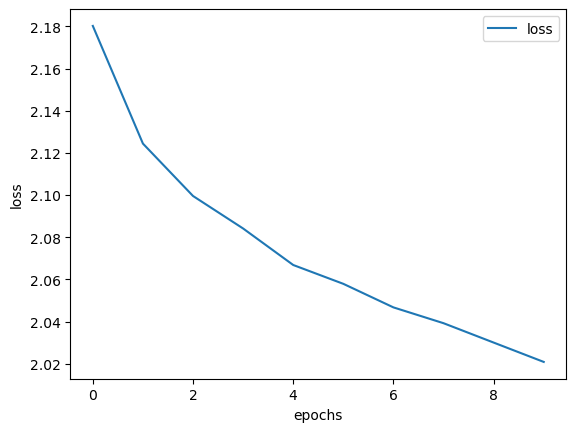

In [300]:
for label in ["loss"]:
    plt.plot(history.history[label], label=label)

# plt.plot(history.history['loss'])
plt.legend()
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

In [301]:
model_2.load_weights('./model2_weights/model2_30.h5')


In [302]:
def beamSearchXception(photo):
    in_text = 'startseq'
    for _ in range(max_length):
        sequence = [wordtoix[w] for w in in_text.split() if w in wordtoix]
        sequence = pad_sequences([sequence], maxlen=max_length)
        yhat = model_2.predict([photo,sequence], verbose=0)
        
        sequences = [[list(), 0.0]]
        for row in yhat:
            all_candidates = list()
            for i in range(len(sequences)):
                seq, score = sequences[i]
                for j in range(len(row)):
                    candidate = [seq + [j], score - math.log1p(row[j])]
                    all_candidates.append(candidate)
            ordered = sorted(all_candidates, key=lambda x: x[1])
            sequences = ordered[:5]
        # for i, j in enumerate(sequences):
        #     print(ixtoword[int(sequences[i][0][0])], " ",sequences[i][1])
        # print()
        word = ixtoword[int(sequences[0][0][0])]
        in_text += ' ' + word
        if word == 'endseq':
            break
    final = in_text.split()
    final = final[1:-1]
    final = ' '.join(final)
    return final

In [303]:
def greedySearchXception(photo):
    in_text = 'startseq'
    for i in range(max_length):
        sequence = [wordtoix[w] for w in in_text.split() if w in wordtoix]
        sequence = pad_sequences([sequence], maxlen=max_length)
        yhat = model_2.predict([photo,sequence], verbose=0)
        yhat = np.argmax(yhat)
        word = ixtoword[yhat]
        in_text += ' ' + word
        if word == 'endseq':
            break
    final = in_text.split()
    final = final[1:-1]
    final = ' '.join(final)
    return final


In [304]:
z=0


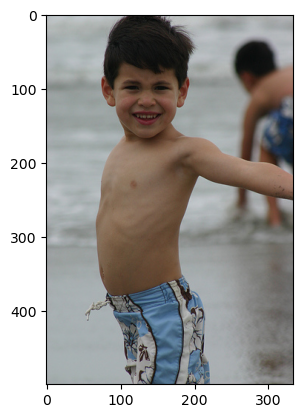

Greedy: young boy wearing only suit is running on the beach
Beam:  young boy wearing only suit is running on the beach


In [305]:
z+=1
pic = list(encoding_test_Xception.keys())[z]
image = encoding_test_Xception[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print("Greedy:",greedySearchXception(image))
print("Beam: ", beamSearchXception(image))

In [306]:
from nltk.translate.bleu_score import corpus_bleu
from tqdm import tqdm
def evaluate_model_beam_search_Xception(model, images, captions, max_length):
    actual, predicted = list(), list()
    for image_id, caption_list in tqdm(captions.items()):
        pic = image_id+'.jpg'
        print(pic)
        image = train_features_Xception[pic].reshape((1,2048))
        print(image)
        yhat = beamSearchXception(image)
        ground_truth = [caption.split() for caption in caption_list]
        actual.append(ground_truth)
        predicted.append(yhat.split())
    print('BLEU Scores :')
    print('BLEU-1: %f' % corpus_bleu(actual, predicted, weights=(1.0, 0, 0, 0)))
    print('BLEU-2: %f' % corpus_bleu(actual, predicted, weights=(0.5, 0.5, 0, 0)))
    print('BLEU-3: %f' % corpus_bleu(actual, predicted, weights=(0.3, 0.3, 0.3, 0)))
    print('BLEU-4: %f' % corpus_bleu(actual, predicted, weights=(0.25, 0.25, 0.25, 0.25)))
evaluate_model_beam_search_Xception(model_2, images, train_descriptions, max_length)


  0%|                                                                                         | 0/6000 [00:00<?, ?it/s]

1000268201_693b08cb0e.jpg
[[0.3592276  0.03271928 0.03686436 ... 0.13820326 0.02857181 0.30709383]]


  0%|                                                                               | 1/6000 [00:02<4:44:04,  2.84s/it]

1001773457_577c3a7d70.jpg
[[0.         0.21514904 0.00040347 ... 0.20985588 0.3944847  0.0368707 ]]


  0%|                                                                               | 2/6000 [00:05<4:28:20,  2.68s/it]

1002674143_1b742ab4b8.jpg
[[0.         0.06792171 0.02688149 ... 0.         0.04563342 0.05662377]]


  0%|                                                                               | 3/6000 [00:08<5:03:14,  3.03s/it]

1003163366_44323f5815.jpg
[[0.21431139 0.00188817 0.24350914 ... 0.20903377 0.15304124 0.10112179]]


  0%|                                                                               | 4/6000 [00:14<6:33:10,  3.93s/it]

1007129816_e794419615.jpg
[[0.         0.09760129 0.7316974  ... 0.00364151 0.01882415 0.48237365]]


  0%|                                                                               | 5/6000 [00:17<6:07:23,  3.68s/it]

1007320043_627395c3d8.jpg
[[0.09296146 0.         0.01704212 ... 0.00123642 0.2865613  0.06388029]]


  0%|                                                                               | 6/6000 [00:20<5:42:37,  3.43s/it]

1009434119_febe49276a.jpg
[[0.         0.         0.02652842 ... 0.25827786 0.26181072 0.1556658 ]]


  0%|                                                                               | 7/6000 [00:22<5:05:59,  3.06s/it]

1012212859_01547e3f17.jpg
[[0.10359658 0.         0.20275345 ... 0.15687461 0.01507977 0.        ]]


  0%|                                                                               | 8/6000 [00:24<4:41:56,  2.82s/it]

1015118661_980735411b.jpg
[[0.         0.0988999  0.07228976 ... 0.00227003 0.         0.00229414]]


  0%|                                                                               | 9/6000 [00:27<4:40:36,  2.81s/it]

1015584366_dfcec3c85a.jpg
[[0.01145539 0.         0.09088707 ... 0.03896216 0.3274413  0.02710207]]


  0%|▏                                                                             | 10/6000 [00:30<4:26:21,  2.67s/it]

101654506_8eb26cfb60.jpg
[[0.09528037 0.16926739 0.         ... 0.33493325 0.         0.        ]]


  0%|▏                                                                             | 11/6000 [00:32<4:03:21,  2.44s/it]

101669240_b2d3e7f17b.jpg
[[0.17367378 0.00530856 0.         ... 0.         0.0215119  0.0296616 ]]


  0%|▏                                                                             | 12/6000 [00:33<3:41:45,  2.22s/it]

1016887272_03199f49c4.jpg
[[0.01484447 0.34247026 0.12904164 ... 0.13373713 0.         0.07250145]]


  0%|▏                                                                             | 13/6000 [00:35<3:13:55,  1.94s/it]

1019077836_6fc9b15408.jpg
[[0.        0.7149664 0.        ... 0.        0.        0.       ]]


  0%|▏                                                                             | 14/6000 [00:36<3:09:19,  1.90s/it]

1019604187_d087bf9a5f.jpg
[[0.2169113  0.         0.         ... 0.19555932 0.00888436 0.        ]]


  0%|▏                                                                             | 15/6000 [00:38<3:13:13,  1.94s/it]

1020651753_06077ec457.jpg
[[0.38177657 0.03838311 0.41054285 ... 0.31391624 0.02382569 0.        ]]


  0%|▏                                                                             | 16/6000 [00:40<2:58:39,  1.79s/it]

1022454428_b6b660a67b.jpg
[[0.43763077 0.12337425 0.20642711 ... 0.10329966 0.8416272  0.05362722]]


  0%|▏                                                                             | 17/6000 [00:42<3:07:04,  1.88s/it]

1022975728_75515238d8.jpg
[[0.0111786  0.00147923 0.00766699 ... 0.         0.         0.01151753]]


  0%|▏                                                                             | 18/6000 [00:44<3:08:01,  1.89s/it]

102351840_323e3de834.jpg
[[0.5109806  0.33467168 0.00334607 ... 0.         0.06366961 0.19271187]]


  0%|▏                                                                             | 19/6000 [00:46<3:07:12,  1.88s/it]

1024138940_f1fefbdce1.jpg
[[0.08500989 0.15554154 0.08797447 ... 0.12437429 0.         0.02334749]]


  0%|▎                                                                             | 20/6000 [00:47<2:47:55,  1.68s/it]

102455176_5f8ead62d5.jpg
[[0.20091745 0.00734806 0.         ... 0.03744031 0.         0.00261955]]


  0%|▎                                                                             | 21/6000 [00:48<2:31:26,  1.52s/it]

1026685415_0431cbf574.jpg
[[0.00510944 0.         0.05647297 ... 0.00388187 0.03329594 0.        ]]


  0%|▎                                                                             | 22/6000 [00:49<2:18:34,  1.39s/it]

1028205764_7e8df9a2ea.jpg
[[0.09402752 0.04252248 0.00171361 ... 0.00982582 0.02137722 0.18196113]]


  0%|▎                                                                             | 23/6000 [00:50<2:17:57,  1.38s/it]

1030985833_b0902ea560.jpg
[[0.01197052 0.111996   0.         ... 0.00151664 0.         0.        ]]


  0%|▎                                                                             | 24/6000 [00:52<2:09:35,  1.30s/it]

103195344_5d2dc613a3.jpg
[[0.         0.5436098  0.11761015 ... 0.03504873 0.03358807 0.19320717]]


  0%|▎                                                                             | 25/6000 [00:53<2:06:52,  1.27s/it]

103205630_682ca7285b.jpg
[[0.35267875 0.202859   0.         ... 0.09930152 0.13123702 0.005181  ]]


  0%|▎                                                                             | 26/6000 [00:55<2:23:47,  1.44s/it]

1032460886_4a598ed535.jpg
[[0.02233007 1.3022778  0.44245705 ... 0.06271816 0.         0.00156851]]


  0%|▎                                                                             | 27/6000 [00:56<2:31:49,  1.53s/it]

104136873_5b5d41be75.jpg
[[0.26245883 0.04156383 0.         ... 0.15968022 0.2925442  0.00241905]]


  0%|▎                                                                             | 28/6000 [00:57<2:15:09,  1.36s/it]

1042020065_fb3d3ba5ba.jpg
[[0.24964008 0.16174018 0.5315928  ... 0.029182   0.0036869  0.21371086]]


  0%|▍                                                                             | 29/6000 [01:00<2:48:38,  1.69s/it]

1042590306_95dea0916c.jpg
[[0.00641609 0.7749079  0.07310098 ... 0.06187183 0.19615705 0.16708355]]


  0%|▍                                                                             | 30/6000 [01:01<2:33:15,  1.54s/it]

1048710776_bb5b0a5c7c.jpg
[[0.         0.0417362  0.693208   ... 0.01719096 0.0133684  0.00070047]]


  1%|▍                                                                             | 31/6000 [01:02<2:26:12,  1.47s/it]

1052358063_eae6744153.jpg
[[0.24853933 0.0483798  0.2184127  ... 0.08386765 0.00840694 0.16146988]]


  1%|▍                                                                             | 32/6000 [01:03<2:12:27,  1.33s/it]

105342180_4d4a40b47f.jpg
[[0.10318284 0.         0.01441788 ... 0.05208954 0.         0.2001709 ]]


  1%|▍                                                                             | 33/6000 [01:05<2:20:08,  1.41s/it]

1053804096_ad278b25f1.jpg
[[0.04156008 0.         0.00605648 ... 0.04550486 0.         0.00090912]]


  1%|▍                                                                             | 34/6000 [01:06<2:12:12,  1.33s/it]

1055623002_8195a43714.jpg
[[0.2898096  0.0049439  0.02160166 ... 0.         0.10962801 0.03644613]]


  1%|▍                                                                             | 35/6000 [01:07<2:14:43,  1.36s/it]

1055753357_4fa3d8d693.jpg
[[0.         0.18531173 0.01774357 ... 0.         0.1834963  0.1914433 ]]


  1%|▍                                                                             | 36/6000 [01:08<2:04:19,  1.25s/it]

1056359656_662cee0814.jpg
[[0.00403251 0.00149477 0.01121003 ... 0.02634705 0.06016709 0.        ]]


  1%|▍                                                                             | 37/6000 [01:10<2:08:55,  1.30s/it]

1056873310_49c665eb22.jpg
[[0.00122358 0.08803017 0.         ... 0.37890437 0.2377436  0.        ]]


  1%|▍                                                                             | 38/6000 [01:11<1:56:31,  1.17s/it]

1057089366_ca83da0877.jpg
[[0.1788246  0.15460469 0.06334226 ... 0.         0.         0.01299244]]


  1%|▌                                                                             | 39/6000 [01:12<1:55:50,  1.17s/it]

1057210460_09c6f4c6c1.jpg
[[0.1696555  0.0577451  0.0454974  ... 0.07443012 0.00640394 0.10717507]]


  1%|▌                                                                             | 40/6000 [01:13<2:01:03,  1.22s/it]

1057251835_6ded4ada9c.jpg
[[0.07853612 0.4491359  0.         ... 0.05884166 0.         0.00242531]]


  1%|▌                                                                             | 41/6000 [01:14<1:46:37,  1.07s/it]

106514190_bae200f463.jpg
[[0.01184299 0.         0.11526175 ... 0.00142862 0.0006013  0.        ]]


  1%|▌                                                                             | 42/6000 [01:15<1:42:25,  1.03s/it]

1067180831_a59dc64344.jpg
[[0.03121824 0.00296191 0.02980107 ... 0.00314246 0.30254394 0.00575403]]


  1%|▌                                                                             | 43/6000 [01:16<1:47:54,  1.09s/it]

1067675215_7336a694d6.jpg
[[0.08147587 0.01095294 0.03368205 ... 0.27105635 0.00399676 0.24642543]]


  1%|▌                                                                             | 44/6000 [01:18<2:14:58,  1.36s/it]

1067790824_f3cc97239b.jpg
[[0.15758963 0.02513033 0.00043653 ... 0.04787279 0.08408291 0.35656178]]


  1%|▌                                                                             | 45/6000 [01:19<2:01:54,  1.23s/it]

1072153132_53d2bb1b60.jpg
[[0.00235532 0.         0.06062332 ... 0.00548388 0.3219613  0.20784478]]


  1%|▌                                                                             | 46/6000 [01:20<1:59:59,  1.21s/it]

107318069_e9f2ef32de.jpg
[[0.09614277 0.52996343 0.         ... 0.13516712 0.70839906 0.        ]]


  1%|▌                                                                             | 47/6000 [01:21<1:44:52,  1.06s/it]

1075716537_62105738b4.jpg
[[0.01184263 0.05619092 0.01292872 ... 0.03663105 0.33408394 0.01264559]]


  1%|▌                                                                             | 48/6000 [01:22<1:52:44,  1.14s/it]

1075867198_27ca2e7efe.jpg
[[0.04865373 0.03285074 0.13949053 ... 0.01604731 0.00705767 0.09207016]]


  1%|▋                                                                             | 49/6000 [01:24<2:06:49,  1.28s/it]

1075881101_d55c46bece.jpg
[[0.00528398 0.05723001 0.4486087  ... 0.04195883 0.3450956  0.38179967]]


  1%|▋                                                                             | 50/6000 [01:25<1:58:25,  1.19s/it]

1079274291_9aaf896cc1.jpg
[[0.03344439 0.01471825 0.         ... 0.06289963 0.02205884 0.01377956]]


  1%|▋                                                                             | 51/6000 [01:25<1:41:53,  1.03s/it]

10815824_2997e03d76.jpg
[[0.02142427 0.14107569 0.09508848 ... 0.07635974 0.17963585 0.01355512]]


  1%|▋                                                                             | 52/6000 [01:27<1:59:33,  1.21s/it]

1082252566_8c79beef93.jpg
[[0.32348236 0.02333596 0.0270758  ... 0.29044157 0.04105847 0.00717318]]


  1%|▋                                                                             | 53/6000 [01:28<1:52:34,  1.14s/it]

1084104085_3b06223afe.jpg
[[0.0055755  0.43194863 0.         ... 0.0170985  0.02821713 0.0401016 ]]


  1%|▋                                                                             | 54/6000 [01:29<1:50:31,  1.12s/it]

1087168168_70280d024a.jpg
[[0.00081833 0.3065527  0.04789589 ... 0.         0.03376405 0.5179192 ]]


  1%|▋                                                                             | 55/6000 [01:30<1:42:46,  1.04s/it]

108898978_7713be88fc.jpg
[[0.00255699 0.         0.         ... 0.         0.         0.65088725]]


  1%|▋                                                                             | 56/6000 [01:31<1:47:59,  1.09s/it]

108899015_bf36131a57.jpg
[[0.09958969 0.         0.03217926 ... 0.02300693 0.         0.        ]]


  1%|▋                                                                             | 57/6000 [01:33<1:56:05,  1.17s/it]

1089181217_ee1167f7af.jpg
[[0.00956647 0.07336627 0.2958569  ... 0.0292031  0.05472266 0.        ]]


  1%|▊                                                                             | 58/6000 [01:34<1:58:59,  1.20s/it]

109202756_b97fcdc62c.jpg
[[0.         0.         0.01820493 ... 0.40352702 0.23360538 0.00964507]]


  1%|▊                                                                             | 59/6000 [01:35<1:57:10,  1.18s/it]

109202801_c6381eef15.jpg
[[0.03662323 0.         0.14753051 ... 0.47049913 0.4663433  0.14684904]]


  1%|▊                                                                             | 60/6000 [01:36<2:02:11,  1.23s/it]

109260216_85b0be5378.jpg
[[0.         0.1098568  0.05409014 ... 0.29839978 0.         0.01035944]]


  1%|▊                                                                             | 61/6000 [01:37<1:48:05,  1.09s/it]

109260218_fca831f933.jpg
[[0.19097054 0.20858683 0.22213566 ... 0.10825548 0.         0.50503063]]


  1%|▊                                                                             | 62/6000 [01:38<1:49:02,  1.10s/it]

1093716555_801aacef79.jpg
[[0.25795183 0.23779523 0.         ... 0.00724948 0.32600105 0.13204804]]


  1%|▊                                                                             | 63/6000 [01:39<1:43:05,  1.04s/it]

1093737381_b313cd49ff.jpg
[[0.27771536 0.2464444  0.         ... 0.         0.00340173 0.03167584]]


  1%|▊                                                                             | 64/6000 [01:40<1:45:11,  1.06s/it]

1094462889_f9966dafa6.jpg
[[0.01968836 0.05145756 0.01539113 ... 0.03265374 0.00791105 0.        ]]


  1%|▊                                                                             | 65/6000 [01:41<1:33:38,  1.06it/s]

1095476286_87d4f8664e.jpg
[[0.         0.00321783 0.12555613 ... 0.         0.00048195 0.01866867]]


  1%|▊                                                                             | 66/6000 [01:42<1:39:49,  1.01s/it]

1095580424_76f0aa8a3e.jpg
[[0.         0.         0.15170841 ... 0.         0.57709295 0.05129506]]


  1%|▊                                                                             | 67/6000 [01:43<1:22:53,  1.19it/s]

1095590286_c654f7e5a9.jpg
[[0.13342994 0.03519819 0.02352713 ... 0.07099204 0.02634318 0.05923134]]


  1%|▉                                                                             | 68/6000 [01:43<1:16:55,  1.29it/s]

1095980313_3c94799968.jpg
[[0.13026962 0.10162835 0.0871148  ... 0.         0.         0.01944059]]


  1%|▉                                                                             | 69/6000 [01:44<1:15:48,  1.30it/s]

1096097967_ac305887b4.jpg
[[0.00341513 0.10135907 0.00782519 ... 0.         0.         0.01048077]]


  1%|▉                                                                             | 70/6000 [01:45<1:20:38,  1.23it/s]

1096165011_cc5eb16aa6.jpg
[[0.13278683 0.1688939  0.         ... 0.         0.         0.41284683]]


  1%|▉                                                                             | 71/6000 [01:45<1:07:15,  1.47it/s]

109671650_f7bbc297fa.jpg
[[0.         0.01032821 0.23054129 ... 0.00838543 0.         0.        ]]


  1%|▉                                                                             | 72/6000 [01:46<1:24:10,  1.17it/s]

109738763_90541ef30d.jpg
[[0.25440255 0.4055254  0.         ... 0.         0.00112061 0.        ]]


  1%|▉                                                                             | 73/6000 [01:47<1:22:57,  1.19it/s]

109738916_236dc456ac.jpg
[[0.28322747 0.2915437  0.         ... 0.         0.         0.        ]]


  1%|▉                                                                             | 74/6000 [01:49<1:39:42,  1.01s/it]

109823394_83fcb735e1.jpg
[[0.03827804 0.17379168 0.01061411 ... 0.0023556  0.00693911 0.01931171]]


  1%|▉                                                                             | 75/6000 [01:50<1:37:24,  1.01it/s]

109823395_6fb423a90f.jpg
[[0.263188   0.28690377 0.0285489  ... 0.         0.01553838 0.        ]]


  1%|▉                                                                             | 76/6000 [01:51<1:37:39,  1.01it/s]

109823397_e35154645f.jpg
[[0.02702999 0.2344923  0.         ... 0.09719444 0.19227837 0.04364962]]


  1%|█                                                                             | 77/6000 [01:52<1:45:30,  1.07s/it]

1104133405_c04a00707f.jpg
[[0.03682187 0.0675936  0.01998701 ... 0.7773817  0.04395843 0.00124803]]


  1%|█                                                                             | 78/6000 [01:53<1:38:13,  1.00it/s]

1105959054_9c3a738096.jpg
[[0.05417043 0.014835   0.14756745 ... 0.042947   0.00401631 0.18450192]]


  1%|█                                                                             | 79/6000 [01:53<1:29:09,  1.11it/s]

110595925_f3395c8bd6.jpg
[[0.08119565 0.         0.         ... 0.23951797 0.2573526  0.        ]]


  1%|█                                                                             | 80/6000 [01:54<1:22:15,  1.20it/s]

1107471216_4336c9b328.jpg
[[0.02480855 0.02764278 0.12106287 ... 0.12084809 0.08328129 0.0015891 ]]


  1%|█                                                                             | 81/6000 [01:55<1:19:34,  1.24it/s]

1110208841_5bb6806afe.jpg
[[0.00075816 0.         0.36244446 ... 0.13538703 0.33672675 0.3445928 ]]


  1%|█                                                                             | 82/6000 [01:56<1:24:36,  1.17it/s]

1112212364_0c48235fc2.jpg
[[0.        0.0006297 0.1679472 ... 0.        0.        0.       ]]


  1%|█                                                                             | 83/6000 [01:56<1:20:25,  1.23it/s]

111537217_082a4ba060.jpg
[[0.         0.16057158 0.00019091 ... 0.0153681  0.         0.04905659]]


  1%|█                                                                             | 84/6000 [01:57<1:08:48,  1.43it/s]

111537222_07e56d5a30.jpg
[[0.         0.01680778 0.00728166 ... 0.08277174 0.00666915 0.20556444]]


  1%|█                                                                             | 85/6000 [01:57<1:05:37,  1.50it/s]

1115565519_d976d4b1f1.jpg
[[0.00138159 0.03751532 0.08520069 ... 0.00109694 0.12146467 0.00237021]]


  1%|█                                                                             | 86/6000 [01:58<1:09:21,  1.42it/s]

1115679311_245eff2f4b.jpg
[[0.00043333 0.41634914 0.01830801 ... 0.0314249  0.32897407 0.        ]]


  1%|█▏                                                                            | 87/6000 [01:59<1:06:37,  1.48it/s]

111766423_4522d36e56.jpg
[[0.         0.02459745 0.07490565 ... 0.         0.05793836 0.02869367]]


  1%|█▏                                                                            | 88/6000 [02:00<1:09:43,  1.41it/s]

1117972841_2b9261f95f.jpg
[[0.42892534 0.32843903 0.02879017 ... 0.15557057 0.04026453 0.        ]]


  1%|█▏                                                                            | 89/6000 [02:00<1:13:39,  1.34it/s]

1118557877_736f339752.jpg
[[0.03353422 0.3756406  0.         ... 0.         0.09135083 0.        ]]


  2%|█▏                                                                            | 90/6000 [02:01<1:05:38,  1.50it/s]

1119418776_58e4b93eac.jpg
[[0.         0.         0.         ... 0.         0.20255981 0.        ]]


  2%|█▏                                                                            | 91/6000 [02:02<1:06:47,  1.47it/s]

1119463452_69d4eecd08.jpg
[[0.02540014 0.13243374 0.         ... 0.03419734 0.04187247 0.19145073]]


  2%|█▏                                                                            | 92/6000 [02:03<1:16:37,  1.29it/s]

1121416483_c7902d0d49.jpg
[[0.0195248  0.1054322  0.29110357 ... 0.         0.00629688 0.1355988 ]]


  2%|█▏                                                                            | 93/6000 [02:03<1:15:16,  1.31it/s]

112178718_87270d9b4d.jpg
[[0.02654073 0.03385927 0.0464685  ... 0.13673319 0.         0.11446497]]


  2%|█▏                                                                            | 94/6000 [02:04<1:17:48,  1.27it/s]

112243673_fd68255217.jpg
[[0.29602975 0.13410778 0.         ... 0.0129622  0.06826074 0.32828346]]


  2%|█▏                                                                            | 95/6000 [02:05<1:24:50,  1.16it/s]

1124448967_2221af8dc5.jpg
[[0.03889151 0.02912124 0.04646888 ... 0.00074181 0.15961666 0.02322268]]


  2%|█▏                                                                            | 96/6000 [02:06<1:28:39,  1.11it/s]

1129704496_4a61441f2c.jpg
[[0.40135273 0.15035182 0.00275611 ... 0.32647505 0.         0.07659816]]


  2%|█▎                                                                            | 97/6000 [02:07<1:22:21,  1.19it/s]

1130017585_1a219257ac.jpg
[[0.01108195 0.03331428 0.05478263 ... 0.01709748 0.         0.10895449]]


  2%|█▎                                                                            | 98/6000 [02:08<1:14:49,  1.31it/s]

1130401779_8c30182e3e.jpg
[[0.5378677  0.08864937 0.0747003  ... 0.08123909 0.00086354 0.26541126]]


  2%|█▎                                                                            | 99/6000 [02:08<1:12:32,  1.36it/s]

1131340021_83f46b150a.jpg
[[0.09967599 0.2277242  0.34793532 ... 0.         0.12161891 0.02514846]]


  2%|█▎                                                                           | 100/6000 [02:09<1:12:50,  1.35it/s]

1131804997_177c3c0640.jpg
[[0.05459666 0.2823598  0.00622041 ... 0.00448606 0.05895451 0.        ]]


  2%|█▎                                                                           | 101/6000 [02:10<1:14:25,  1.32it/s]

1132772170_600610c5df.jpg
[[0.05199999 0.06115239 0.2066782  ... 0.00477858 0.00397729 0.        ]]


  2%|█▎                                                                           | 102/6000 [02:11<1:18:23,  1.25it/s]

1141718391_24164bf1b1.jpg
[[0.41357544 0.08201811 0.02243792 ... 0.06155425 0.         0.12066031]]


  2%|█▎                                                                           | 103/6000 [02:12<1:23:57,  1.17it/s]

1141739219_2c47195e4c.jpg
[[0.04438439 0.00231894 0.02495618 ... 0.         0.38511047 0.06842783]]


  2%|█▎                                                                           | 104/6000 [02:13<1:30:16,  1.09it/s]

1142283988_6b227c5231.jpg
[[0.0224847  0.01213668 0.03495117 ... 0.07126453 0.00251627 1.0400577 ]]


  2%|█▎                                                                           | 105/6000 [02:14<1:32:54,  1.06it/s]

1142847777_2a0c1c2551.jpg
[[0.         0.00263213 0.05125613 ... 0.00036362 0.2124777  0.2337348 ]]


  2%|█▎                                                                           | 106/6000 [02:14<1:22:10,  1.20it/s]

1143373711_2e90b7b799.jpg
[[0.09941101 0.13251428 0.15298423 ... 0.00503542 0.2080104  0.03361008]]


  2%|█▎                                                                           | 107/6000 [02:15<1:19:46,  1.23it/s]

1143882946_1898d2eeb9.jpg
[[0.09266277 0.3852534  0.02670089 ... 0.         0.21270818 0.14037499]]


  2%|█▍                                                                           | 108/6000 [02:16<1:12:40,  1.35it/s]

1144288288_e5c9558b6a.jpg
[[0.         0.04756517 0.14859577 ... 0.00280259 0.10208254 0.05120921]]


  2%|█▍                                                                           | 109/6000 [02:17<1:15:57,  1.29it/s]

1148238960_f8cacec2fc.jpg
[[0.         0.         0.04493799 ... 0.04331909 0.34379232 0.03806068]]


  2%|█▍                                                                           | 110/6000 [02:17<1:16:20,  1.29it/s]

1149179852_acad4d7300.jpg
[[0.89960724 0.         0.08064492 ... 0.47354457 0.42483985 0.35523736]]


  2%|█▍                                                                           | 111/6000 [02:18<1:19:41,  1.23it/s]

114949897_490ca7eaec.jpg
[[0.17307764 0.14160386 0.         ... 0.13046288 0.29207382 0.16351841]]


  2%|█▍                                                                           | 112/6000 [02:19<1:21:53,  1.20it/s]

1151466868_3bc4d9580b.jpg
[[0.         0.3600749  0.11250722 ... 0.         0.00301114 0.        ]]


  2%|█▍                                                                           | 113/6000 [02:20<1:12:01,  1.36it/s]

1153704539_542f7aa3a5.jpg
[[0.         0.0439114  0.06477731 ... 0.18791603 0.00558804 0.26213634]]


  2%|█▍                                                                           | 114/6000 [02:21<1:25:32,  1.15it/s]

1159574340_99ba8c3c59.jpg
[[0.02654466 0.26853576 0.         ... 0.07186642 0.02648138 0.14640756]]


  2%|█▍                                                                           | 115/6000 [02:21<1:18:54,  1.24it/s]

1160034462_16b38174fe.jpg
[[0.7222472  0.         0.04414746 ... 0.         0.         0.49309367]]


  2%|█▍                                                                           | 116/6000 [02:22<1:16:32,  1.28it/s]

1160441615_fe6b3c5277.jpg
[[0.09665125 0.         0.21512432 ... 0.00172913 0.         0.36554992]]


  2%|█▍                                                                          | 117/6000 [02:45<11:53:18,  7.27s/it]

1163282319_b729b24c46.jpg
[[0.         0.00531828 0.36152542 ... 0.         0.         0.7780696 ]]


  2%|█▌                                                                           | 118/6000 [02:46<8:53:06,  5.44s/it]

116409198_0fe0c94f3b.jpg
[[0.09775747 0.2562318  0.         ... 0.         0.0694131  0.        ]]


  2%|█▌                                                                           | 119/6000 [02:46<6:30:00,  3.98s/it]

1164765687_7aca07bbe7.jpg
[[0.25007707 0.52314764 0.00123305 ... 0.1401066  0.02617388 0.09159836]]


  2%|█▌                                                                           | 120/6000 [02:47<4:51:16,  2.97s/it]

1167662968_e466f1e80a.jpg
[[0.         0.05738055 0.5787504  ... 0.00853129 0.00636343 0.27662048]]


  2%|█▌                                                                           | 121/6000 [02:47<3:38:53,  2.23s/it]

1167908324_8caab45e15.jpg
[[0.02751304 0.00327512 0.09488577 ... 0.02656809 0.         0.26859102]]


  2%|█▌                                                                           | 122/6000 [02:48<2:58:25,  1.82s/it]

1169307342_e7a4685a5c.jpg
[[0.16796237 0.00100883 0.19600256 ... 0.006728   0.         0.        ]]


  2%|█▌                                                                           | 123/6000 [02:49<2:18:31,  1.41s/it]

1176580356_9810d877bf.jpg
[[0.09829709 0.03766259 0.         ... 0.575947   0.         0.        ]]


  2%|█▌                                                                           | 124/6000 [02:49<1:50:26,  1.13s/it]

118187095_d422383c81.jpg
[[0.09525831 0.22767985 0.39692223 ... 0.         0.         0.00099257]]


  2%|█▌                                                                           | 125/6000 [02:49<1:24:04,  1.16it/s]

118309463_a532b75be9.jpg
[[0.01033031 0.08084332 0.08408123 ... 0.03688424 0.00929672 0.20785019]]


  2%|█▌                                                                           | 126/6000 [02:50<1:21:42,  1.20it/s]

1184967930_9e29ce380d.jpg
[[0.1096641  0.25320914 0.         ... 0.         0.         0.34567794]]


  2%|█▋                                                                           | 127/6000 [02:51<1:09:18,  1.41it/s]

1187435567_18173c148b.jpg
[[0.00092578 0.287027   0.00239949 ... 0.02290291 0.11477225 0.        ]]


  2%|█▋                                                                           | 128/6000 [02:51<1:05:31,  1.49it/s]

1187593464_ce862352c6.jpg
[[0.02315428 0.03525402 0.0268294  ... 0.         0.         0.00143316]]


  2%|█▋                                                                             | 129/6000 [02:52<57:28,  1.70it/s]

1189977786_4f5aaed773.jpg
[[0.23552151 0.0539449  0.13026033 ... 0.13378513 0.0939035  0.22194353]]


  2%|█▋                                                                             | 130/6000 [02:52<51:59,  1.88it/s]

1191338263_a4fa073154.jpg
[[0.02355356 0.00558638 0.         ... 0.01486531 0.         0.22833931]]


  2%|█▋                                                                             | 131/6000 [02:53<59:54,  1.63it/s]

1193116658_c0161c35b5.jpg
[[1.5226433e-02 1.0568445e-01 0.0000000e+00 ... 0.0000000e+00
  3.4088491e-05 5.2470398e-01]]


  2%|█▋                                                                             | 132/6000 [02:53<58:57,  1.66it/s]

119534510_d52b3781a3.jpg
[[0.0833303  0.33733118 0.32907608 ... 0.         0.         0.2499944 ]]


  2%|█▊                                                                             | 133/6000 [02:54<53:06,  1.84it/s]

1197800988_7fb0ca4888.jpg
[[0.22351947 0.13773216 0.10994653 ... 0.07501435 0.21085411 0.23735523]]


  2%|█▋                                                                           | 134/6000 [02:55<1:06:51,  1.46it/s]

1198194316_543cc7b945.jpg
[[0.13247788 0.07722735 0.31244472 ... 0.42900458 0.0069151  0.44922143]]


  2%|█▋                                                                           | 135/6000 [02:55<1:00:14,  1.62it/s]

1204996216_71d7519d9a.jpg
[[0.25980264 0.32023004 0.04132626 ... 0.         0.         0.13970509]]


  2%|█▊                                                                             | 136/6000 [02:56<57:26,  1.70it/s]

1206506157_c7956accd5.jpg
[[5.6176996e-01 3.0894220e-01 7.5532123e-02 ... 0.0000000e+00
  1.6837716e-04 0.0000000e+00]]


  2%|█▊                                                                             | 137/6000 [02:56<53:35,  1.82it/s]

1207159468_425b902bfb.jpg
[[0.03171003 0.         0.00160767 ... 0.01523169 0.         0.00557964]]


  2%|█▊                                                                           | 138/6000 [02:57<1:04:34,  1.51it/s]

1211015912_9f3ee3a995.jpg
[[0.20995453 0.02419566 0.         ... 0.11665536 0.01489549 0.04140157]]


  2%|█▊                                                                           | 139/6000 [02:58<1:05:33,  1.49it/s]

1213336750_2269b51397.jpg
[[0.29316723 0.03392095 0.4763913  ... 0.         0.         0.00363533]]


  2%|█▊                                                                           | 140/6000 [02:59<1:10:47,  1.38it/s]

121800200_bef08fae5f.jpg
[[0.         0.         0.         ... 0.07453616 0.01353119 0.00200312]]


  2%|█▊                                                                           | 141/6000 [02:59<1:01:26,  1.59it/s]

121971540_0a986ee176.jpg
[[0.06119987 0.06363602 0.00680725 ... 0.31442782 0.00325682 0.03579489]]


  2%|█▊                                                                             | 142/6000 [03:00<59:32,  1.64it/s]

1222322358_225067636e.jpg
[[0.         0.0058224  0.         ... 0.0020339  0.0265479  0.00013091]]


  2%|█▉                                                                             | 143/6000 [03:00<50:05,  1.95it/s]

1225443522_1633e7121f.jpg
[[0.20326234 0.23156635 0.06720035 ... 0.20268115 0.         0.02877294]]


  2%|█▊                                                                           | 144/6000 [03:01<1:05:22,  1.49it/s]

1227655020_b11a1bb112.jpg
[[0.16946669 0.10695621 0.         ... 0.01816048 0.21730123 0.01681588]]


  2%|█▉                                                                             | 145/6000 [03:01<59:10,  1.65it/s]

1229756013_94663527d7.jpg
[[8.6531766e-02 6.6727960e-01 0.0000000e+00 ... 3.5265804e-04
  0.0000000e+00 0.0000000e+00]]


  2%|█▉                                                                             | 146/6000 [03:02<54:41,  1.78it/s]

1231229740_8dcbf80bfb.jpg
[[0.22041881 0.10871847 0.16378653 ... 0.         0.         0.00183401]]


  2%|█▉                                                                             | 147/6000 [03:02<53:30,  1.82it/s]

1234293791_6566284bcd.jpg
[[0.05368999 0.06334294 0.2386993  ... 0.08055599 0.1688574  0.07397606]]


  2%|█▉                                                                             | 148/6000 [03:03<49:02,  1.99it/s]

1234817607_924893f6e1.jpg
[[0.06752416 0.         0.8029699  ... 0.00171484 0.01415706 0.20632832]]


  2%|█▉                                                                             | 149/6000 [03:04<54:29,  1.79it/s]

1235580648_7eebaed9bc.jpg
[[0.02289706 0.08157648 0.63965625 ... 0.01523921 0.00659224 1.3939651 ]]


  2%|█▉                                                                           | 150/6000 [03:04<1:00:10,  1.62it/s]

1235681222_819231767a.jpg
[[0.1284967  0.30506036 0.07472233 ... 0.02305394 0.00454399 0.26101536]]


  3%|█▉                                                                           | 151/6000 [03:05<1:07:31,  1.44it/s]

1235685934_be89b231fb.jpg
[[0.01334171 0.02149916 0.6257208  ... 0.13833064 0.06751844 0.7813791 ]]


  3%|█▉                                                                           | 152/6000 [03:06<1:07:25,  1.45it/s]

1236951314_0308dc4138.jpg
[[0.00205259 0.32900402 0.00308351 ... 0.00918268 0.         0.04416115]]


  3%|██                                                                             | 153/6000 [03:06<55:31,  1.76it/s]

1236964638_1808784a3c.jpg
[[0.         0.42515865 0.07605258 ... 0.04706603 0.         0.        ]]


  3%|██                                                                             | 154/6000 [03:06<48:56,  1.99it/s]

123889082_d3751e0350.jpg
[[7.7647567e-02 0.0000000e+00 7.2583556e-05 ... 2.5817013e-01
  3.3477170e-03 1.7142532e-02]]


  3%|██                                                                             | 155/6000 [03:07<52:13,  1.87it/s]

1240297429_c36ae0c58f.jpg
[[0.3402394  0.05988247 0.30599523 ... 0.97717774 0.03516766 0.00185401]]


  3%|██                                                                             | 156/6000 [03:07<44:52,  2.17it/s]

124195430_d14028660f.jpg
[[0.         0.01012774 0.21915273 ... 0.09935557 0.29619053 0.03458637]]


  3%|██                                                                             | 157/6000 [03:08<44:54,  2.17it/s]

1244140539_da4804d828.jpg
[[1.4256097e-01 6.8339479e-01 1.5397078e-03 ... 9.5249653e-02
  2.8589707e-02 1.0615945e-04]]


  3%|██                                                                             | 158/6000 [03:09<53:02,  1.84it/s]

1244306891_8e78ae1620.jpg
[[0.00194416 0.04131518 0.00041729 ... 0.00704258 0.         0.00515974]]


  3%|██                                                                             | 159/6000 [03:09<57:38,  1.69it/s]

1244485675_822e6efe60.jpg
[[0.2632196  0.16516556 0.00676581 ... 0.         0.03302272 0.09279327]]


  3%|██                                                                           | 160/6000 [03:10<1:05:34,  1.48it/s]

1245022983_fb329886dd.jpg
[[6.1298611e-05 1.0161055e-01 1.3528952e-01 ... 1.0682229e-01
  7.4460462e-02 0.0000000e+00]]


  3%|██                                                                             | 161/6000 [03:11<59:32,  1.63it/s]

1247181182_35cabd76f3.jpg
[[0.02424541 0.15616935 0.         ... 0.04970844 0.         0.00411244]]


  3%|██▏                                                                            | 162/6000 [03:11<55:21,  1.76it/s]

1248734482_3038218f3b.jpg
[[8.5687963e-03 2.9848453e-01 0.0000000e+00 ... 1.3390792e-02
  5.2466858e-02 6.8245528e-05]]


  3%|██▏                                                                            | 163/6000 [03:12<59:59,  1.62it/s]

124881487_36e668145d.jpg
[[0.01242229 0.00203873 0.         ... 0.         0.30977434 0.        ]]


  3%|██▏                                                                            | 164/6000 [03:12<53:49,  1.81it/s]

1248953128_24c9f8d924.jpg
[[0.00904883 0.65734804 0.02503215 ... 0.44774276 0.17318779 0.07850126]]


  3%|██▏                                                                            | 165/6000 [03:13<54:35,  1.78it/s]

1251558317_4ef844b775.jpg
[[0.04329142 0.3087361  0.03235662 ... 0.00038494 0.         0.        ]]


  3%|██▏                                                                            | 166/6000 [03:13<56:49,  1.71it/s]

1252396628_eb81d3905b.jpg
[[0.1092753  0.03278112 0.         ... 0.00377678 0.01133514 0.00049482]]


  3%|██▏                                                                            | 167/6000 [03:14<55:03,  1.77it/s]

1252787177_4b08625897.jpg
[[0.35750866 0.05843093 0.00223305 ... 0.00526252 0.10712227 0.008309  ]]


  3%|██▏                                                                            | 168/6000 [03:14<50:27,  1.93it/s]

125319704_49ead3463c.jpg
[[0.01691012 0.0013749  0.         ... 0.16063595 0.21592422 0.03615415]]


  3%|██▏                                                                            | 169/6000 [03:15<47:08,  2.06it/s]

1253264731_e7c689eca5.jpg
[[0.07398283 0.00980794 0.01610482 ... 0.10361559 0.19308797 0.        ]]


  3%|██▏                                                                            | 170/6000 [03:15<48:18,  2.01it/s]

1253275679_e955fb7304.jpg
[[0.         0.21608639 0.3045301  ... 0.10451052 0.0064757  0.        ]]


  3%|██▎                                                                            | 171/6000 [03:16<51:49,  1.87it/s]

1255504166_f2437febcb.jpg
[[7.7876067e-03 1.4993468e-01 1.8309757e-01 ... 7.1847439e-06
  0.0000000e+00 0.0000000e+00]]


  3%|██▎                                                                            | 172/6000 [03:17<55:00,  1.77it/s]

1259936608_e3f0064f23.jpg
[[0.01064817 0.22323883 0.20167726 ... 0.         0.01151272 0.00872961]]


  3%|██▎                                                                            | 173/6000 [03:17<53:48,  1.80it/s]

1260816604_570fc35836.jpg
[[0.01028062 0.23947616 0.3165654  ... 0.32322028 0.03670833 0.18092817]]


  3%|██▎                                                                            | 174/6000 [03:18<51:09,  1.90it/s]

1262077938_8b9516c273.jpg
[[0.02578334 0.07365621 0.01721882 ... 0.         0.17110164 0.02727252]]


  3%|██▎                                                                            | 175/6000 [03:18<47:33,  2.04it/s]

1262454669_f1caafec2d.jpg
[[0.30482414 0.00680088 0.01132599 ... 0.3340623  0.00240173 0.        ]]


  3%|██▎                                                                            | 176/6000 [03:18<45:07,  2.15it/s]

1263126002_881ebd7ac9.jpg
[[0.02464539 0.04017336 0.02481486 ... 0.         0.18616827 0.        ]]


  3%|██▎                                                                            | 177/6000 [03:19<48:20,  2.01it/s]

1263801010_5c74bf1715.jpg
[[9.5802024e-02 8.1036094e-05 0.0000000e+00 ... 0.0000000e+00
  0.0000000e+00 5.9512399e-02]]


  3%|██▎                                                                            | 178/6000 [03:20<50:39,  1.92it/s]

1269470943_ba7fc49b4d.jpg
[[0.10294451 0.0458102  0.         ... 0.13947329 0.         0.02905883]]


  3%|██▎                                                                            | 179/6000 [03:20<59:39,  1.63it/s]

1271210445_7f7ecf3791.jpg
[[0.20796971 0.01745995 0.         ... 0.         0.         0.        ]]


  3%|██▎                                                                            | 180/6000 [03:21<57:43,  1.68it/s]

1271960365_e54033f883.jpg
[[0.0840232  0.0461124  0.00269047 ... 0.0074613  0.36459395 0.        ]]


  3%|██▎                                                                          | 181/6000 [03:22<1:01:48,  1.57it/s]

1273001772_1585562051.jpg
[[0.0000000e+00 1.0904867e-02 0.0000000e+00 ... 0.0000000e+00
  3.9289714e-04 4.0589902e-01]]


  3%|██▍                                                                            | 182/6000 [03:22<58:12,  1.67it/s]

1277185009_06478dd457.jpg
[[0.         0.00245375 0.4731037  ... 0.         0.00152278 0.2438152 ]]


  3%|██▎                                                                          | 183/6000 [03:23<1:01:54,  1.57it/s]

1277743944_f4e8c78403.jpg
[[0.30589923 0.02816287 0.0929464  ... 0.         0.05402187 0.02408389]]


  3%|██▎                                                                          | 184/6000 [03:24<1:02:35,  1.55it/s]

1280147517_98767ca3b3.jpg
[[0.32189643 0.20585668 0.11593041 ... 0.20294103 0.10068002 0.55231184]]


  3%|██▎                                                                          | 185/6000 [03:24<1:02:20,  1.55it/s]

1280320287_b2a4b9b7bd.jpg
[[0.28203428 0.5280475  0.0900357  ... 0.0009634  0.01876093 0.28688294]]


  3%|██▍                                                                            | 186/6000 [03:25<59:02,  1.64it/s]

12830823_87d2654e31.jpg
[[0.         0.20344184 0.49584445 ... 0.01057543 0.         0.1341541 ]]


  3%|██▍                                                                          | 187/6000 [03:25<1:02:49,  1.54it/s]

1285067106_2adc307240.jpg
[[0.         0.         0.15658753 ... 0.27503914 0.0015239  0.26114407]]


  3%|██▍                                                                            | 188/6000 [03:26<52:26,  1.85it/s]

1285874746_486731a954.jpg
[[0.0033162  0.23127922 0.15869476 ... 0.00582425 0.0302541  0.1550017 ]]


  3%|██▍                                                                            | 189/6000 [03:26<57:03,  1.70it/s]

1286408831_05282582ed.jpg
[[0.         0.18025379 0.         ... 0.         0.3041312  0.0003656 ]]


  3%|██▍                                                                          | 190/6000 [03:27<1:00:15,  1.61it/s]

1287064529_aa4e4f3c31.jpg
[[0.00052945 0.06516225 0.03509994 ... 0.4179171  0.03105792 0.        ]]


  3%|██▌                                                                            | 191/6000 [03:27<52:23,  1.85it/s]

1287920676_d21a0b289b.jpg
[[0.00074506 0.09635562 0.2853592  ... 0.38003471 0.608138   0.00226745]]


  3%|██▌                                                                            | 192/6000 [03:28<51:53,  1.87it/s]

1287931016_fb015e2e10.jpg
[[0.40783173 0.3959724  0.         ... 0.2250725  0.         0.        ]]


  3%|██▌                                                                            | 193/6000 [03:29<54:38,  1.77it/s]

1287982439_6578006e22.jpg
[[0.         0.02043601 0.09461722 ... 0.04112693 0.         0.        ]]


  3%|██▍                                                                          | 194/6000 [03:30<1:06:39,  1.45it/s]

1288909046_d2b2b62607.jpg
[[0.         0.07642629 0.         ... 0.         0.08349619 0.14243957]]


  3%|██▌                                                                            | 195/6000 [03:30<56:50,  1.70it/s]

128912885_8350d277a4.jpg
[[0.20390785 0.11624795 0.07306625 ... 0.1758957  0.         0.18160287]]


  3%|██▌                                                                          | 196/6000 [03:31<1:01:35,  1.57it/s]

1289142574_2bd6a082dd.jpg
[[6.8485735e-07 0.0000000e+00 1.3115197e-01 ... 0.0000000e+00
  2.6290476e-02 8.7830499e-03]]


  3%|██▌                                                                          | 197/6000 [03:32<1:06:36,  1.45it/s]

1290894194_8a4ffdc7eb.jpg
[[0.20284562 0.01634165 0.03108546 ... 0.4607145  0.0265372  0.02920852]]


  3%|██▌                                                                          | 198/6000 [03:32<1:08:54,  1.40it/s]

1294578091_2ad02fea91.jpg
[[0.04690929 0.15838131 0.14625806 ... 0.00157565 0.16390303 0.17634909]]


  3%|██▌                                                                          | 199/6000 [03:33<1:13:18,  1.32it/s]

1295669416_21cabf594d.jpg
[[0.08124014 0.6541637  0.14847982 ... 0.         0.         0.38298866]]


  3%|██▌                                                                          | 200/6000 [03:34<1:21:17,  1.19it/s]

1295671216_cde1b9c9d1.jpg
[[0.08799496 0.0127342  0.00714765 ... 0.00957011 0.01569507 0.04975282]]


  3%|██▌                                                                          | 201/6000 [03:35<1:18:41,  1.23it/s]

129599450_cab4e77343.jpg
[[0.0000000e+00 2.2963286e-05 0.0000000e+00 ... 0.0000000e+00
  0.0000000e+00 3.7435442e-03]]


  3%|██▌                                                                          | 202/6000 [03:36<1:17:09,  1.25it/s]

1296412797_85b6d2f8d6.jpg
[[0.16523993 0.10555362 0.2428944  ... 0.17139086 0.08097553 0.        ]]


  3%|██▌                                                                          | 203/6000 [03:36<1:12:28,  1.33it/s]

1296770308_3db2022f5a.jpg
[[0.         0.07466722 0.13409275 ... 0.00530626 0.004392   0.00972639]]


  3%|██▌                                                                          | 204/6000 [03:37<1:11:02,  1.36it/s]

1298866571_b4c496b71c.jpg
[[0.3684903  0.16470349 0.00936735 ... 0.02015293 0.02848935 0.03088245]]


  3%|██▋                                                                          | 205/6000 [03:38<1:15:13,  1.28it/s]

1299459550_1fd5594fa2.jpg
[[0.         0.07004068 0.         ... 0.00139283 0.01611569 0.04798766]]


  3%|██▋                                                                          | 206/6000 [03:39<1:14:25,  1.30it/s]

1299459562_ed0e064aee.jpg
[[0.         0.37659547 0.39711058 ... 0.         0.         0.4113909 ]]


  3%|██▋                                                                          | 207/6000 [03:39<1:05:35,  1.47it/s]

1301140633_046e4e8010.jpg
[[0.         0.19713165 0.00681353 ... 0.00563699 0.         0.40268227]]


  3%|██▋                                                                            | 208/6000 [03:40<57:34,  1.68it/s]

130211457_be3f6b335d.jpg
[[0.         0.07618226 0.12298302 ... 0.19201468 0.11833991 0.20204519]]


  3%|██▊                                                                            | 209/6000 [03:40<58:39,  1.65it/s]

1302657647_46b36c0d66.jpg
[[0.00984744 0.         0.04210198 ... 0.00395354 0.00042636 0.1068169 ]]


  4%|██▊                                                                            | 210/6000 [03:41<54:36,  1.77it/s]

1303335399_b3facd47ab.jpg
[[0.10320265 0.00023638 0.         ... 0.         0.         0.01711403]]


  4%|██▊                                                                            | 211/6000 [03:41<48:25,  1.99it/s]

1303550623_cb43ac044a.jpg
[[0.13548355 0.6804417  0.65279573 ... 0.         0.00325145 0.06495398]]


  4%|██▊                                                                            | 212/6000 [03:42<56:11,  1.72it/s]

1303727066_23d0f6ed43.jpg
[[0.         0.40199426 0.5055835  ... 0.00642481 0.07989368 0.14240718]]


  4%|██▋                                                                          | 213/6000 [03:43<1:06:09,  1.46it/s]

1303727828_d1052ee341.jpg
[[0.19276823 0.13933705 0.55643743 ... 0.13195182 0.00159938 0.29811412]]


  4%|██▊                                                                            | 214/6000 [03:43<56:14,  1.71it/s]

1304100320_c8990a1539.jpg
[[0.03476228 0.02847512 0.08216244 ... 0.51041216 0.45238507 0.01395591]]


  4%|██▊                                                                            | 215/6000 [03:44<52:49,  1.83it/s]

1304961697_76b86b0c18.jpg
[[0.14371535 0.70397896 0.03631261 ... 0.00488434 0.06222743 0.35647297]]


  4%|██▊                                                                            | 216/6000 [03:44<52:05,  1.85it/s]

1305564994_00513f9a5b.jpg
[[0.2011127  0.3113573  0.         ... 0.00240708 0.00224156 0.        ]]


  4%|██▊                                                                            | 217/6000 [03:45<55:14,  1.74it/s]

1307635496_94442dc21a.jpg
[[0.         0.         0.         ... 0.02803138 0.02327367 0.16754586]]


  4%|██▊                                                                            | 218/6000 [03:45<50:32,  1.91it/s]

1308472581_9961782889.jpg
[[0.0075779  0.00152411 0.00125924 ... 0.         0.         0.        ]]


  4%|██▉                                                                            | 219/6000 [03:46<52:11,  1.85it/s]

1308617539_54e1a3dfbe.jpg
[[0.31030896 0.20719782 0.57141894 ... 0.04056583 0.00637401 0.3298835 ]]


  4%|██▉                                                                            | 220/6000 [03:46<50:01,  1.93it/s]

1309330801_aeeb23f1ee.jpg
[[0.00430513 0.00637524 0.0766452  ... 0.04904449 0.0003471  0.00188408]]


  4%|██▉                                                                            | 221/6000 [03:47<55:12,  1.74it/s]

1311132744_5ffd03f831.jpg
[[0.13106444 0.01319532 0.20651777 ... 0.20269592 0.20428029 0.        ]]


  4%|██▉                                                                            | 222/6000 [03:47<56:53,  1.69it/s]

1312020846_5abb4a9be2.jpg
[[0.         0.08179747 0.23259151 ... 0.1442689  0.         0.06446408]]


  4%|██▉                                                                            | 223/6000 [03:48<56:44,  1.70it/s]

1312227131_771b5ed201.jpg
[[0.         0.00099624 0.16458881 ... 0.04034424 0.12153403 0.        ]]


  4%|██▉                                                                            | 224/6000 [03:48<49:47,  1.93it/s]

1312954382_cf6d70d63a.jpg
[[0.02882179 0.10334563 0.00977277 ... 0.03250862 0.13983093 0.21906178]]


  4%|██▉                                                                          | 225/6000 [03:49<1:03:18,  1.52it/s]

1313693129_71d0b21c63.jpg
[[0.09954947 0.01614612 0.13259062 ... 0.00172404 0.         0.        ]]


  4%|██▉                                                                          | 226/6000 [03:50<1:02:49,  1.53it/s]

1313961775_824b87d155.jpg
[[0.00092225 0.04547029 0.         ... 0.00245125 0.         0.00545924]]


  4%|██▉                                                                          | 227/6000 [03:51<1:01:44,  1.56it/s]

1316247213_1d2c726dd5.jpg
[[0.         0.19643673 0.         ... 0.         0.         0.3660642 ]]


  4%|██▉                                                                          | 228/6000 [03:51<1:00:02,  1.60it/s]

131632409_4de0d4e710.jpg
[[0.0603214  0.05563784 0.01128646 ... 0.02650465 0.05914284 0.00270629]]


  4%|███                                                                            | 229/6000 [03:52<58:08,  1.65it/s]

1321723162_9d4c78b8af.jpg
[[0.         0.24649894 0.23204878 ... 0.29419106 0.00032105 0.00455924]]


  4%|██▉                                                                          | 230/6000 [03:53<1:06:11,  1.45it/s]

1321949151_77b77b4617.jpg
[[0.18804939 0.39200392 0.09380612 ... 0.16521454 0.06476055 0.21875022]]


  4%|███                                                                            | 231/6000 [03:53<58:07,  1.65it/s]

1324816249_86600a6759.jpg
[[0.13142377 0.5787793  0.00104793 ... 0.00084711 0.         0.04084034]]


  4%|███                                                                            | 232/6000 [03:53<51:16,  1.88it/s]

1330645772_24f831ff8f.jpg
[[0.18930914 0.         0.00160231 ... 0.07650781 0.16892734 0.14039311]]


  4%|███                                                                            | 233/6000 [03:54<49:37,  1.94it/s]

133189853_811de6ab2a.jpg
[[0.41692707 0.14291352 0.05759832 ... 0.         0.00413687 0.12076499]]


  4%|███                                                                            | 234/6000 [03:54<48:22,  1.99it/s]

1332208215_fa824f6659.jpg
[[0.         0.         0.         ... 0.01415817 0.         0.        ]]


  4%|███                                                                            | 235/6000 [03:55<53:02,  1.81it/s]

1332492622_8c66992b62.jpg
[[0.01661642 0.07465925 0.36258498 ... 0.2540188  0.02443371 0.6357853 ]]


  4%|███                                                                            | 236/6000 [03:56<50:35,  1.90it/s]

1332815795_8eea44375e.jpg
[[0.         0.0875     0.         ... 0.04118682 0.         0.        ]]


  4%|███                                                                            | 237/6000 [03:56<45:29,  2.11it/s]

1333888922_26f15c18c3.jpg
[[0.06554735 0.43908322 0.         ... 0.02199443 0.         0.00082422]]


  4%|███▏                                                                           | 238/6000 [03:57<51:43,  1.86it/s]

1334892555_1beff092c3.jpg
[[0.         0.         0.         ... 0.00214165 0.         0.55969626]]


  4%|███▏                                                                           | 239/6000 [03:57<47:58,  2.00it/s]

1335617803_4fbc03dab0.jpg
[[0.0787287  0.42263275 0.         ... 0.12193288 0.         0.15089764]]


  4%|███▏                                                                           | 240/6000 [03:57<47:01,  2.04it/s]

1337792872_d01a390b33.jpg
[[6.7347290e-05 4.6826076e-02 0.0000000e+00 ... 5.9332117e-03
  0.0000000e+00 2.8339827e-01]]


  4%|███▏                                                                           | 241/6000 [03:58<51:24,  1.87it/s]

1338523142_57fce8229b.jpg
[[0.12540907 0.19020797 0.         ... 0.23958534 0.         0.09023657]]


  4%|███▏                                                                           | 242/6000 [03:59<54:30,  1.76it/s]

133905560_9d012b47f3.jpg
[[1.4079630e-04 1.7210887e-01 0.0000000e+00 ... 4.2428112e-01
  1.6058931e-02 1.1292820e-02]]


  4%|███▏                                                                           | 243/6000 [03:59<51:42,  1.86it/s]

1341787777_4f1ebb1793.jpg
[[0.06322908 0.66033584 0.         ... 0.         0.         0.        ]]


  4%|███▏                                                                           | 244/6000 [04:00<49:36,  1.93it/s]

1342766791_1e72f92455.jpg
[[0.45162097 0.16092074 0.         ... 0.07840683 0.         0.        ]]


  4%|███▏                                                                           | 245/6000 [04:00<54:02,  1.77it/s]

1342780478_bacc32344d.jpg
[[0.28125232 0.10120182 0.17404187 ... 0.4660826  0.00306655 0.35244057]]


  4%|███▏                                                                         | 246/6000 [04:01<1:02:36,  1.53it/s]

1346529555_e916816cfe.jpg
[[0.         0.01049594 0.00381037 ... 0.6344341  0.13475753 0.00470793]]


  4%|███▏                                                                         | 247/6000 [04:02<1:05:40,  1.46it/s]

1347519824_e402241e4f.jpg
[[0.18728496 0.2603937  0.         ... 0.00084215 0.         0.01598692]]


  4%|███▏                                                                         | 248/6000 [04:03<1:07:58,  1.41it/s]

1348113612_5bfc5f429e.jpg
[[0.12523817 0.14029245 0.01543272 ... 0.05017738 0.01568332 0.00257836]]


  4%|███▎                                                                           | 249/6000 [04:03<57:41,  1.66it/s]

1348891916_ebd4413033.jpg
[[0.02668907 0.         0.         ... 0.         0.         0.25471663]]


  4%|███▎                                                                           | 250/6000 [04:04<52:45,  1.82it/s]

134894450_dadea45d65.jpg
[[0.0027479  0.0557107  0.         ... 0.00896894 0.         0.00050895]]


  4%|███▎                                                                           | 251/6000 [04:04<58:31,  1.64it/s]

1348947380_14f0fc1237.jpg
[[0.09886031 0.         0.16229278 ... 0.06674365 0.         0.07867745]]


  4%|███▎                                                                           | 252/6000 [04:05<56:18,  1.70it/s]

1348957576_c4a78eb974.jpg
[[0.         0.46567932 0.06593996 ... 0.         0.04754394 0.02736674]]


  4%|███▎                                                                           | 253/6000 [04:05<59:10,  1.62it/s]

1350948838_fdebe4ff65.jpg
[[1.33287307e-04 1.41482865e-02 1.09330006e-01 ... 0.00000000e+00
  1.83960088e-02 1.40486389e-01]]


  4%|███▎                                                                           | 254/6000 [04:06<54:48,  1.75it/s]

1351315701_6580b51c41.jpg
[[0.17287023 0.00119068 0.10926951 ... 0.23616795 0.02057759 0.00980381]]


  4%|███▎                                                                           | 255/6000 [04:06<49:57,  1.92it/s]

1351764581_4d4fb1b40f.jpg
[[0.22892734 0.35018855 0.2698248  ... 0.         0.16434936 0.03554532]]


  4%|███▎                                                                           | 256/6000 [04:07<55:38,  1.72it/s]

1352398363_9cc8ffcce9.jpg
[[0.21148048 0.06326239 0.04853423 ... 0.         0.         0.        ]]


  4%|███▎                                                                         | 257/6000 [04:08<1:04:08,  1.49it/s]

1354318519_2f9baed754.jpg
[[0.2928599  0.         0.04275395 ... 0.         0.02035806 0.        ]]


  4%|███▎                                                                         | 258/6000 [04:09<1:01:32,  1.55it/s]

1355450069_c0675b0706.jpg
[[5.1851384e-03 2.1180561e-01 8.4579588e-05 ... 7.2952971e-02
  0.0000000e+00 9.5549989e-03]]


  4%|███▍                                                                           | 259/6000 [04:09<51:24,  1.86it/s]

1355703632_5683a4b6fb.jpg
[[0.         0.         0.00059404 ... 0.55705565 0.00305337 0.2504732 ]]


  4%|███▍                                                                           | 260/6000 [04:09<53:09,  1.80it/s]

1355833561_9c43073eda.jpg
[[0.05119986 0.00326313 0.09605581 ... 0.04241259 0.         0.04525232]]


  4%|███▎                                                                         | 261/6000 [04:10<1:06:12,  1.44it/s]

1355945307_f9e01a9a05.jpg
[[0.         0.         0.00137797 ... 0.34989434 0.01796606 0.3278348 ]]


  4%|███▎                                                                         | 262/6000 [04:11<1:03:06,  1.52it/s]

1356543628_c13ebe38fb.jpg
[[0.02225045 0.02892979 0.00848493 ... 0.14970246 0.07021499 0.14559633]]


  4%|███▍                                                                         | 263/6000 [04:12<1:00:33,  1.58it/s]

1357689954_72588dfdc4.jpg
[[0.00307864 0.353798   0.00847278 ... 0.         0.02117697 0.08271065]]


  4%|███▍                                                                           | 264/6000 [04:12<50:45,  1.88it/s]

1357724865_4faf4e1418.jpg
[[0.05101258 0.08961272 0.0046013  ... 0.08909133 0.00684764 0.04649175]]


  4%|███▍                                                                           | 265/6000 [04:13<54:05,  1.77it/s]

1357753846_6185e26040.jpg
[[0.00684393 0.         0.         ... 0.00136777 0.04158259 0.        ]]


  4%|███▌                                                                           | 266/6000 [04:13<51:06,  1.87it/s]

1358089136_976e3d2e30.jpg
[[0.00458505 0.         0.00053483 ... 0.04052096 0.         0.        ]]


  4%|███▌                                                                           | 267/6000 [04:13<49:17,  1.94it/s]

1358892595_7a37c45788.jpg
[[0.07848758 0.10062004 0.         ... 0.01093186 0.         0.        ]]


  4%|███▌                                                                           | 268/6000 [04:14<48:43,  1.96it/s]

1359101233_16c2c150e3.jpg
[[0.         0.00346988 0.00071291 ... 0.37403038 0.14678173 0.00465117]]


  4%|███▌                                                                           | 269/6000 [04:15<52:30,  1.82it/s]

1361420539_e9599c60ae.jpg
[[0.         0.         0.         ... 0.20230947 0.         0.46365952]]


  4%|███▌                                                                           | 270/6000 [04:15<50:03,  1.91it/s]

1362128028_8422d53dc4.jpg
[[0.12123077 0.5437911  0.0322105  ... 0.         0.03311854 0.        ]]


  5%|███▌                                                                           | 271/6000 [04:16<59:51,  1.60it/s]

1363843090_9425d93064.jpg
[[0.36837256 0.0083662  0.         ... 0.07829011 0.18178488 0.        ]]


  5%|███▌                                                                           | 272/6000 [04:17<58:32,  1.63it/s]

1363924449_487f0733df.jpg
[[0.         0.09745222 0.         ... 0.         0.         0.19128914]]


  5%|███▌                                                                           | 273/6000 [04:17<57:34,  1.66it/s]

136639119_6040b00946.jpg
[[0.         0.00017085 0.         ... 0.0829491  0.         0.07270101]]


  5%|███▌                                                                           | 274/6000 [04:17<50:17,  1.90it/s]

1368338041_6b4077ca98.jpg
[[0.         0.00041297 0.         ... 0.         0.         0.        ]]


  5%|███▌                                                                           | 275/6000 [04:18<57:53,  1.65it/s]

1368383637_614646cc4a.jpg
[[0.15492745 0.44911113 0.00253962 ... 0.04029736 0.0129362  0.01186524]]


  5%|███▌                                                                         | 276/6000 [04:19<1:08:37,  1.39it/s]

1370615506_2b96105ca3.jpg
[[0.         0.         0.00732559 ... 0.00287806 0.         0.07615656]]


  5%|███▌                                                                         | 277/6000 [04:20<1:01:14,  1.56it/s]

1379026456_153fd8b51b.jpg
[[0.         0.1176004  0.00099516 ... 0.         0.         0.01204647]]


  5%|███▌                                                                         | 278/6000 [04:20<1:04:19,  1.48it/s]

1383698008_8ac53ed7ec.jpg
[[0.48991966 0.10469048 0.05738931 ... 0.0053546  0.11987448 0.67160004]]


  5%|███▋                                                                           | 279/6000 [04:21<58:27,  1.63it/s]

1383840121_c092110917.jpg
[[0.35919267 0.8897131  0.01884741 ... 0.         0.         0.00582255]]


  5%|███▌                                                                         | 280/6000 [04:22<1:02:52,  1.52it/s]

1384292980_4022a7520c.jpg
[[0.         0.07253167 0.47074568 ... 0.1442668  0.         0.08618412]]


  5%|███▌                                                                         | 281/6000 [04:22<1:02:29,  1.53it/s]

1386251841_5f384a0fea.jpg
[[0.         0.06774592 0.7799295  ... 0.         0.03099961 0.02118506]]


  5%|███▌                                                                         | 282/6000 [04:23<1:14:43,  1.28it/s]

138705546_be7a6845dd.jpg
[[0.00180918 0.07388065 0.3064094  ... 0.00313507 0.         0.        ]]


  5%|███▋                                                                         | 283/6000 [04:24<1:07:23,  1.41it/s]

1387461595_2fe6925f73.jpg
[[0.17219006 0.604854   0.11609572 ... 0.01063848 0.         0.        ]]


  5%|███▋                                                                         | 284/6000 [04:25<1:07:00,  1.42it/s]

1388346434_524d0b6dfa.jpg
[[0.22345974 0.35973588 0.4349028  ... 0.03588947 0.0202838  0.03494955]]


  5%|███▋                                                                         | 285/6000 [04:25<1:11:44,  1.33it/s]

1388373425_3c72b56639.jpg
[[1.7996503e-01 5.8842021e-01 1.7305729e-01 ... 3.5161328e-01
  4.2061087e-02 6.8594811e-05]]


  5%|███▋                                                                         | 286/6000 [04:26<1:14:05,  1.29it/s]

1389323170_d1c81d6b51.jpg
[[0.02155036 0.10441562 0.13092132 ... 0.04431816 0.08034189 0.09370138]]


  5%|███▋                                                                         | 287/6000 [04:27<1:16:31,  1.24it/s]

1389651420_8d95d8f6ed.jpg
[[0.03413624 0.22576311 0.         ... 0.         0.02833498 0.25297242]]


  5%|███▋                                                                         | 288/6000 [04:28<1:10:01,  1.36it/s]

1390268323_2c8204e91c.jpg
[[0.06625168 0.14404133 0.06477008 ... 0.01719444 0.05039169 0.        ]]


  5%|███▋                                                                         | 289/6000 [04:28<1:05:29,  1.45it/s]

1394396709_65040d97ab.jpg
[[0.00116741 0.03385916 0.         ... 0.         0.00945601 0.        ]]


  5%|███▊                                                                           | 290/6000 [04:29<59:13,  1.61it/s]

1394599090_fe0ba238f0.jpg
[[0.01775255 0.21151565 0.19007927 ... 0.         0.15896875 0.20346288]]


  5%|███▊                                                                           | 291/6000 [04:29<54:48,  1.74it/s]

1394620454_bf708cc501.jpg
[[0.         0.00704851 0.20511588 ... 0.12864362 0.         0.07423906]]


  5%|███▋                                                                         | 292/6000 [04:30<1:00:11,  1.58it/s]

1394927474_0afdd82fc4.jpg
[[1.2180679e-03 3.8246394e-04 3.0281621e-01 ... 2.3130179e-04
  0.0000000e+00 5.2482378e-01]]


  5%|███▊                                                                           | 293/6000 [04:30<53:51,  1.77it/s]

1396703063_e8c3687afe.jpg
[[0.04287375 0.01908748 0.17518935 ... 0.01001061 0.         0.77302825]]


  5%|███▊                                                                           | 294/6000 [04:31<54:56,  1.73it/s]

1397295388_8a5b6b525d.jpg
[[0.576133   0.46828902 0.00071443 ... 0.15963233 0.00625776 0.0807556 ]]


  5%|███▉                                                                           | 295/6000 [04:32<59:59,  1.59it/s]

1397887419_e798697b93.jpg
[[0.04376846 0.5196272  0.03008898 ... 0.04346058 0.16076408 0.00520511]]


  5%|███▉                                                                           | 296/6000 [04:32<52:10,  1.82it/s]

1397923690_d3bf1f799e.jpg
[[0.08415914 0.11737888 0.         ... 0.         0.37649947 0.02883773]]


  5%|███▉                                                                           | 297/6000 [04:33<49:50,  1.91it/s]

1398606571_f543f7698a.jpg
[[0.         0.10285185 0.         ... 0.         0.03712789 0.01652245]]


  5%|███▉                                                                           | 298/6000 [04:33<48:11,  1.97it/s]

1398613231_18de248606.jpg
[[0.07512572 0.04002503 0.00901191 ... 0.00499776 0.         0.43609387]]


  5%|███▉                                                                           | 299/6000 [04:34<47:11,  2.01it/s]

1398873613_7e3174dd6c.jpg
[[0.         0.22719689 0.13149114 ... 0.         0.00549009 0.2156736 ]]


  5%|███▉                                                                           | 300/6000 [04:34<45:00,  2.11it/s]

1400424834_1c76e700c4.jpg
[[0.         0.22557785 0.05362071 ... 0.         0.         0.16785595]]


  5%|███▉                                                                           | 301/6000 [04:35<48:05,  1.97it/s]

1401961581_76921a75c5.jpg
[[0.02462916 0.2388659  0.         ... 0.17821437 0.11593413 0.        ]]


  5%|███▉                                                                           | 302/6000 [04:35<45:12,  2.10it/s]

1402641725_5e027ecaa7.jpg
[[0.08345117 0.01930435 0.         ... 0.         0.05013107 0.0309458 ]]


  5%|███▉                                                                           | 303/6000 [04:36<46:37,  2.04it/s]

1402843760_d30f1dbf0f.jpg
[[0.02098058 0.01117277 0.04784257 ... 0.35348552 0.06350601 0.03103277]]


  5%|████                                                                           | 304/6000 [04:36<50:23,  1.88it/s]

1402859872_0fc8cf8108.jpg
[[0.14816959 0.5858997  0.4506974  ... 0.05911534 0.08141199 0.47555274]]


  5%|████                                                                           | 305/6000 [04:37<53:33,  1.77it/s]

1403414927_5f80281505.jpg
[[0.40469337 0.31632656 0.43190384 ... 0.50745124 0.00154507 0.01644521]]


  5%|████                                                                           | 306/6000 [04:37<54:06,  1.75it/s]

140377584_12bdbdf2f8.jpg
[[0.01553009 0.         0.         ... 0.29989225 0.01926121 0.        ]]


  5%|████                                                                           | 307/6000 [04:38<49:32,  1.92it/s]

140430106_2978fda105.jpg
[[0.12426423 0.         0.01967405 ... 0.17474473 0.         0.00459112]]


  5%|████                                                                           | 308/6000 [04:38<44:37,  2.13it/s]

1405221276_21634dcd58.jpg
[[0.00207955 0.09272327 0.0089673  ... 0.05436957 0.07566841 0.03759945]]


  5%|████                                                                           | 309/6000 [04:39<44:29,  2.13it/s]

140526326_da07305c1c.jpg
[[0.09588616 0.02735608 0.26442865 ... 0.23032115 0.01522919 0.13376772]]


  5%|████                                                                           | 310/6000 [04:39<44:31,  2.13it/s]

1406010299_5755339f08.jpg
[[0.         0.0376416  0.53175557 ... 0.01085373 0.         0.6890328 ]]


  5%|████                                                                           | 311/6000 [04:40<44:04,  2.15it/s]

141139674_246c0f90a1.jpg
[[0.         0.01165348 0.2654166  ... 0.16914503 0.         0.7867227 ]]


  5%|████                                                                           | 312/6000 [04:40<37:23,  2.54it/s]

141140165_9002a04f19.jpg
[[0.0004499  0.01832245 0.43601677 ... 0.33022046 0.00308113 0.23087078]]


  5%|████                                                                           | 313/6000 [04:40<34:39,  2.73it/s]

1412832223_99e8b4701a.jpg
[[0.06379744 0.04602007 0.45630142 ... 0.         0.01363406 0.1860927 ]]


  5%|████▏                                                                          | 314/6000 [04:41<45:05,  2.10it/s]

1413956047_c826f90c8b.jpg
[[0.01034722 0.01139011 0.00712305 ... 0.06728034 0.         0.01081591]]


  5%|████▏                                                                          | 315/6000 [04:41<46:15,  2.05it/s]

1414779054_31946f9dfc.jpg
[[0.         0.31275123 0.05569167 ... 0.02987564 0.00399335 0.38120845]]


  5%|████▏                                                                          | 316/6000 [04:42<48:46,  1.94it/s]

1414820925_3504c394e1.jpg
[[0.07750313 0.03041661 0.27093333 ... 0.06055674 0.06292715 0.05677282]]


  5%|████                                                                         | 317/6000 [04:43<1:05:48,  1.44it/s]

1417295167_5299df6db8.jpg
[[0.59681654 0.1424489  0.0165536  ... 0.17221087 0.01522232 0.15151134]]


  5%|████▏                                                                          | 318/6000 [04:43<57:17,  1.65it/s]

141755290_4b954529f3.jpg
[[0.28563648 0.1709459  0.6554359  ... 0.03267073 0.48436487 0.47854272]]


  5%|████                                                                         | 319/6000 [04:44<1:02:35,  1.51it/s]

1417637704_572b4d6557.jpg
[[0.01375323 0.0110669  0.03987652 ... 0.01103544 0.00266463 0.13913009]]


  5%|████                                                                         | 320/6000 [04:45<1:06:06,  1.43it/s]

1417882092_c94c251eb3.jpg
[[0.22644225 0.07245858 0.15195395 ... 0.3144153  0.16525112 0.2127477 ]]


  5%|████                                                                         | 321/6000 [04:46<1:08:56,  1.37it/s]

1417941060_2a0f7908bc.jpg
[[0.55971754 0.07204025 0.03677817 ... 0.00146568 0.00264339 0.14520015]]


  5%|████▏                                                                        | 322/6000 [04:46<1:01:18,  1.54it/s]

1418019748_51c7d59c11.jpg
[[0.6318999  0.011265   0.6372879  ... 0.05785642 0.08159832 0.15705208]]


  5%|████▎                                                                          | 323/6000 [04:47<54:28,  1.74it/s]

1418266617_b32143275b.jpg
[[7.42188073e-04 0.00000000e+00 1.86798051e-02 ... 1.38621510e-03
  1.22301295e-01 1.11091900e+00]]


  5%|████▎                                                                          | 324/6000 [04:47<46:14,  2.05it/s]

1418503947_953d373632.jpg
[[0.2450932  0.48604095 0.39107102 ... 0.08325563 0.03510729 0.72576827]]


  5%|████▎                                                                          | 325/6000 [04:47<45:34,  2.08it/s]

1419286010_b59af3962a.jpg
[[0.05500466 0.19170861 0.00523937 ... 0.3648535  0.38457513 0.02604057]]


  5%|████▎                                                                          | 326/6000 [04:48<51:36,  1.83it/s]

1419385780_1383ec7ba9.jpg
[[0.4605947  0.01108809 0.4641388  ... 0.11246149 0.32968175 0.24281555]]


  5%|████▎                                                                          | 327/6000 [04:49<59:27,  1.59it/s]

1420060020_7a6984e2ea.jpg
[[0.08121735 0.12404952 0.02623447 ... 0.00025168 0.0851468  0.21155345]]


  5%|████▏                                                                        | 328/6000 [04:50<1:07:35,  1.40it/s]

1423126855_6cd2a3956c.jpg
[[0.00042138 0.         0.00358984 ... 0.10807903 0.00284    0.21856152]]


  5%|████▏                                                                        | 329/6000 [04:50<1:06:57,  1.41it/s]

1423997242_ea2189ec5e.jpg
[[0.1902684  0.16519247 0.         ... 0.00404202 0.05156915 0.02186125]]


  6%|████▏                                                                        | 330/6000 [04:51<1:06:26,  1.42it/s]

1424237335_b3be9920ba.jpg
[[0.         0.         0.         ... 0.00133816 0.09716669 0.        ]]


  6%|████▎                                                                          | 331/6000 [04:52<57:46,  1.64it/s]

1424775129_ffea9c13ab.jpg
[[0.1445753  0.0079336  0.14850762 ... 0.2964593  0.         0.03283226]]


  6%|████▎                                                                        | 332/6000 [04:52<1:02:08,  1.52it/s]

1425013325_bff69bc9da.jpg
[[0.00639582 0.07814217 0.         ... 0.         0.00226524 0.        ]]


  6%|████▍                                                                          | 333/6000 [04:53<56:41,  1.67it/s]

1425069590_570cc7c2d8.jpg
[[0.48413286 0.10092545 0.         ... 0.         0.00870442 0.0053636 ]]


  6%|████▍                                                                          | 334/6000 [04:53<54:22,  1.74it/s]

1425485485_d7c97a5470.jpg
[[0.02593805 0.23991883 0.         ... 0.         0.         0.        ]]


  6%|████▍                                                                          | 335/6000 [04:54<55:40,  1.70it/s]

142802798_962a4ec5ce.jpg
[[0.01988819 0.282705   0.02124216 ... 0.01781673 0.02080753 0.02286856]]


  6%|████▍                                                                          | 336/6000 [04:55<56:50,  1.66it/s]

1428578577_82864facae.jpg
[[0.0309751  0.08454959 0.03360699 ... 0.03418833 0.05710455 0.02264085]]


  6%|████▎                                                                        | 337/6000 [04:55<1:01:12,  1.54it/s]

1428641354_f7453afbea.jpg
[[0.359501   0.10979986 0.41827402 ... 0.18902487 0.         0.25549695]]


  6%|████▍                                                                          | 338/6000 [04:56<54:25,  1.73it/s]

1428681303_04213524e3.jpg
[[0.16011053 0.62850875 0.31227797 ... 0.00725669 0.         0.07754005]]


  6%|████▍                                                                          | 339/6000 [04:56<54:29,  1.73it/s]

1429723917_6af585e4c0.jpg
[[0.28285053 0.24649312 0.27360898 ... 0.0545993  0.         0.1377731 ]]


  6%|████▍                                                                          | 340/6000 [04:57<59:19,  1.59it/s]

1429814475_0b592b9995.jpg
[[0.06424019 0.32765868 0.14783196 ... 0.         0.         0.33127624]]


  6%|████▍                                                                        | 341/6000 [04:58<1:03:24,  1.49it/s]

1430154945_71bbaa094a.jpg
[[0.5270791  0.         0.37935555 ... 0.3354067  0.01044581 0.46963394]]


  6%|████▍                                                                        | 342/6000 [04:59<1:05:05,  1.45it/s]

1432342377_3e41603f26.jpg
[[0.         0.37278625 0.47526744 ... 0.04183018 0.00513332 0.22063546]]


  6%|████▍                                                                        | 343/6000 [04:59<1:07:07,  1.40it/s]

143237785_93f81b3201.jpg
[[0.         0.00365322 0.04814778 ... 0.3173168  0.02084483 0.        ]]


  6%|████▍                                                                        | 344/6000 [05:00<1:11:16,  1.32it/s]

1433088025_bce2cb69f8.jpg
[[0.         0.         0.         ... 0.00750767 0.         0.01936365]]


  6%|████▍                                                                        | 345/6000 [05:01<1:12:53,  1.29it/s]

1433397131_8634fa6664.jpg
[[0.26876533 0.02991899 0.16712333 ... 0.00306935 0.43988    0.329004  ]]


  6%|████▍                                                                        | 346/6000 [05:01<1:00:55,  1.55it/s]

1433577867_39a1510c43.jpg
[[0.         0.         0.         ... 0.0050428  0.01491841 0.00462182]]


  6%|████▌                                                                          | 347/6000 [05:02<57:58,  1.63it/s]

1434005938_ad75c8598c.jpg
[[3.2379630e-01 2.7260007e-04 0.0000000e+00 ... 5.3637285e-02
  3.8545940e-02 0.0000000e+00]]


  6%|████▌                                                                          | 348/6000 [05:02<53:51,  1.75it/s]

1434607942_da5432c28c.jpg
[[5.2846309e-02 4.0192378e-01 3.9416641e-01 ... 2.6213168e-04
  5.1240921e-03 5.1785288e-03]]


  6%|████▍                                                                        | 349/6000 [05:03<1:00:17,  1.56it/s]

143552697_af27e9acf5.jpg
[[8.8894784e-02 3.5219975e-02 0.0000000e+00 ... 1.5478331e-03
  3.0650920e-01 2.0815313e-04]]


  6%|████▌                                                                          | 350/6000 [05:04<56:49,  1.66it/s]

1436760519_8d6101a0ed.jpg
[[0.14013979 0.35404304 0.21104825 ... 0.07662371 0.06549776 0.23306578]]


  6%|████▌                                                                          | 351/6000 [05:04<56:10,  1.68it/s]

143680442_2f03f76944.jpg
[[2.08266795e-01 1.17005005e-01 1.72888162e-03 ... 4.36416358e-01
  4.96027945e-03 3.67746339e-04]]


  6%|████▋                                                                          | 352/6000 [05:05<47:32,  1.98it/s]

143680966_0010ff8c60.jpg
[[0.00014257 0.         0.00055433 ... 0.13906513 0.00190506 0.        ]]


  6%|████▋                                                                          | 353/6000 [05:05<43:12,  2.18it/s]

143684568_3c59299bae.jpg
[[0.         0.05812953 0.5014247  ... 0.2484736  0.         0.        ]]


  6%|████▋                                                                          | 354/6000 [05:06<48:41,  1.93it/s]

143688205_630813a466.jpg
[[0.00241172 0.10095675 0.03778469 ... 0.         0.         0.        ]]


  6%|████▋                                                                          | 355/6000 [05:06<45:19,  2.08it/s]

143688895_e837c3bc76.jpg
[[0.00071436 0.06082378 0.         ... 0.03431567 0.01743098 0.00065575]]


  6%|████▋                                                                          | 356/6000 [05:06<44:55,  2.09it/s]

1439046601_cf110a75a7.jpg
[[0.00711981 0.02821495 0.01331808 ... 0.         0.         0.03854842]]


  6%|████▋                                                                          | 357/6000 [05:07<39:52,  2.36it/s]

1439282131_3814d6ae04.jpg
[[0.0127838  0.00073674 0.         ... 0.         0.00662857 0.00041048]]


  6%|████▋                                                                          | 358/6000 [05:07<45:30,  2.07it/s]

1443807993_aebfb2784a.jpg
[[0.07383084 0.04279596 0.         ... 0.00352753 0.00764713 0.        ]]


  6%|████▋                                                                          | 359/6000 [05:08<44:59,  2.09it/s]

1445123245_c7b9db0e0c.jpg
[[0.         0.2248049  0.01185408 ... 0.00497224 0.24235274 0.        ]]


  6%|████▋                                                                          | 360/6000 [05:08<47:50,  1.96it/s]

1445754124_647168f211.jpg
[[0.         0.00112149 0.08844557 ... 0.42080924 0.6597856  0.        ]]


  6%|████▊                                                                          | 361/6000 [05:09<45:10,  2.08it/s]

1446933195_8fe9725d62.jpg
[[0.         0.01400858 0.         ... 0.         0.         0.02655971]]


  6%|████▊                                                                          | 362/6000 [05:09<41:40,  2.25it/s]

1448511770_1a4a9c453b.jpg
[[0.68486786 0.0507676  0.06416276 ... 0.17626676 0.1262224  0.00743916]]


  6%|████▊                                                                          | 363/6000 [05:10<42:27,  2.21it/s]

1449370354_380c4123c9.jpg
[[0.         0.12929645 0.00314852 ... 0.         0.00173853 0.        ]]


  6%|████▊                                                                          | 364/6000 [05:10<46:13,  2.03it/s]

1449625950_fc9a8d02d9.jpg
[[0.02418674 0.56634885 0.         ... 0.02992483 0.06461925 0.01440545]]


  6%|████▊                                                                          | 365/6000 [05:11<42:10,  2.23it/s]

1449692616_60507875fb.jpg
[[2.6545858e-01 2.3085117e-02 4.0829137e-02 ... 4.4758334e-03
  2.9188990e-05 5.0612368e-02]]


  6%|████▊                                                                          | 366/6000 [05:11<36:03,  2.60it/s]

1452361926_6d8c535e32.jpg
[[0.5978039  0.33331063 0.17655602 ... 0.10032381 0.0192521  0.03080913]]


  6%|████▊                                                                          | 367/6000 [05:11<33:24,  2.81it/s]

1453366750_6e8cf601bf.jpg
[[0.         0.00095251 0.00960285 ... 0.         0.00182404 0.2984195 ]]


  6%|████▊                                                                          | 368/6000 [05:12<44:14,  2.12it/s]

1454678644_7e5a371301.jpg
[[0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 3.7537951e-02
  1.6918594e-01 1.2423992e-05]]


  6%|████▊                                                                          | 369/6000 [05:13<52:13,  1.80it/s]

1454841725_4b6e6199e2.jpg
[[0.04883767 0.15055849 0.0238157  ... 0.01461311 0.03951537 0.        ]]


  6%|████▊                                                                          | 370/6000 [05:13<51:03,  1.84it/s]

1456630952_dd4778a48f.jpg
[[0.39142686 0.         0.00200082 ... 0.0019573  0.         0.20595658]]


  6%|████▉                                                                          | 371/6000 [05:14<47:22,  1.98it/s]

145721496_687af9bb18.jpg
[[0.10314529 0.         0.01518247 ... 0.29160693 0.00091146 0.13947034]]


  6%|████▉                                                                          | 372/6000 [05:14<44:40,  2.10it/s]

1457762320_7fe121b285.jpg
[[0.0000000e+00 2.6046934e-02 3.0762019e-02 ... 3.9682150e-04
  1.7634262e-01 2.8509497e-05]]


  6%|████▉                                                                          | 373/6000 [05:15<50:58,  1.84it/s]

1459032057_97e73ed6ab.jpg
[[0.07886825 0.00140091 0.         ... 0.01916937 0.         0.00871679]]


  6%|████▉                                                                          | 374/6000 [05:15<47:15,  1.98it/s]

1460352062_d64fb633e0.jpg
[[4.0596127e-04 4.6862239e-01 1.8165073e-01 ... 1.3013358e-01
  0.0000000e+00 2.4983837e-01]]


  6%|████▊                                                                        | 375/6000 [05:16<1:06:30,  1.41it/s]

1460500597_866fa0c6f3.jpg
[[0.2634287  0.         0.16479713 ... 0.6520504  0.         0.0341506 ]]


  6%|████▊                                                                        | 376/6000 [05:17<1:04:41,  1.45it/s]

146100443_906d87faa2.jpg
[[0.04375621 0.17385335 0.01864748 ... 0.00136854 0.         0.64521563]]


  6%|████▊                                                                        | 377/6000 [05:18<1:08:05,  1.38it/s]

1461329041_c623b06e5b.jpg
[[0.09098496 0.20645815 0.         ... 0.02826498 0.39518178 0.13894469]]


  6%|████▊                                                                        | 378/6000 [05:18<1:05:43,  1.43it/s]

1461653394_8ab96aae63.jpg
[[0.2139616  0.07041287 0.07106186 ... 0.19833143 0.22144005 0.        ]]


  6%|████▊                                                                        | 379/6000 [05:19<1:00:43,  1.54it/s]

1463638541_c02cfa04dc.jpg
[[0.23944607 0.15305144 0.23584415 ... 0.0306439  0.14259028 0.46160525]]


  6%|█████                                                                          | 380/6000 [05:19<58:34,  1.60it/s]

1463732130_a754441289.jpg
[[2.0384524e-02 1.9074233e-02 4.9458370e-02 ... 6.7929032e-05
  0.0000000e+00 3.4086298e-02]]


  6%|█████                                                                          | 381/6000 [05:20<53:52,  1.74it/s]

1463732807_0cdf4f22c7.jpg
[[0.         0.02729774 0.         ... 0.0766838  0.18032128 0.        ]]


  6%|█████                                                                          | 382/6000 [05:20<48:16,  1.94it/s]

1464120327_d90279ca3a.jpg
[[0.32036757 0.28652927 0.01257733 ... 0.26107436 0.00558032 0.        ]]


  6%|████▉                                                                        | 383/6000 [05:21<1:01:12,  1.53it/s]

1465666502_de289b3b9c.jpg
[[0.         0.01203865 0.         ... 0.         0.02350966 0.        ]]


  6%|████▉                                                                        | 384/6000 [05:22<1:06:50,  1.40it/s]

146577645_91b570c0d0.jpg
[[0.10487327 0.07617994 0.12698305 ... 0.00902912 0.         0.5753325 ]]


  6%|█████                                                                          | 385/6000 [05:22<55:58,  1.67it/s]

146577646_9e64b8c2dc.jpg
[[0.16557564 0.11717531 0.00030273 ... 0.03137351 0.00103301 0.17279442]]


  6%|█████                                                                          | 386/6000 [05:23<55:29,  1.69it/s]

1466307485_5e6743332e.jpg
[[0.         0.5205668  0.         ... 0.06645172 0.04472677 0.        ]]


  6%|█████                                                                          | 387/6000 [05:23<48:50,  1.92it/s]

1466307489_cb8a74de09.jpg
[[0.00700392 0.684613   0.         ... 0.0162936  0.02386267 0.00623749]]


  6%|█████                                                                          | 388/6000 [05:24<50:48,  1.84it/s]

1466479163_439db855af.jpg
[[0.         0.         0.0468523  ... 0.29485255 0.20019396 0.        ]]


  6%|█████                                                                          | 389/6000 [05:24<46:57,  1.99it/s]

1468429623_f001988691.jpg
[[3.8085616e-01 3.1327463e-03 4.0205881e-02 ... 1.9619941e-04
  1.6910303e-01 0.0000000e+00]]


  6%|█████▏                                                                         | 390/6000 [05:25<47:59,  1.95it/s]

1469358746_2a879abaf3.jpg
[[0.00020623 0.06840957 0.         ... 0.         0.13194448 0.00902096]]


  7%|█████▏                                                                         | 391/6000 [05:26<57:54,  1.61it/s]

1470061031_4cb59c12a8.jpg
[[0.02342041 0.02161094 0.         ... 0.14674492 0.00612444 0.00158604]]


  7%|█████▏                                                                         | 392/6000 [05:26<56:56,  1.64it/s]

1470132731_fa416b7504.jpg
[[0.         0.         0.         ... 0.         0.21396576 0.1504338 ]]


  7%|█████▏                                                                         | 393/6000 [05:27<59:21,  1.57it/s]

1472053993_bed67a3ba7.jpg
[[0. 0. 0. ... 0. 0. 0.]]


  7%|█████▏                                                                         | 394/6000 [05:28<53:50,  1.74it/s]

1472653060_7427d2865a.jpg
[[0.6760366  0.         0.4353424  ... 0.06072392 0.00169486 0.277086  ]]


  7%|█████▏                                                                         | 395/6000 [05:28<58:01,  1.61it/s]

1473080948_bae2925dc8.jpg
[[0.15549587 0.00357387 0.02435048 ... 0.00043031 0.042135   0.23170213]]


  7%|█████                                                                        | 396/6000 [05:30<1:21:37,  1.14it/s]

1473250020_dc829a090f.jpg
[[0.01393562 0.18918037 0.00173031 ... 0.00148222 0.         0.        ]]


  7%|█████                                                                        | 397/6000 [05:31<1:46:03,  1.14s/it]

1473618073_7db56a5237.jpg
[[0.36022964 0.02892031 0.00592439 ... 0.00370125 0.06717818 0.0353269 ]]


  7%|█████                                                                        | 398/6000 [05:32<1:28:44,  1.05it/s]

1474474514_b3eb492722.jpg
[[0.04727414 0.12531906 0.         ... 0.00231261 0.06819105 0.6822449 ]]


  7%|█████                                                                        | 399/6000 [05:32<1:16:44,  1.22it/s]

1475046848_831245fc64.jpg
[[0.         0.00287651 0.04287236 ... 0.         0.         0.        ]]


  7%|█████▏                                                                       | 400/6000 [05:33<1:14:30,  1.25it/s]

1476002408_4256b7b2fa.jpg
[[0.40520677 0.6041555  0.10564463 ... 0.13841516 0.         0.05047803]]


  7%|█████▏                                                                       | 401/6000 [05:34<1:09:55,  1.33it/s]

1478294229_7e1c822fea.jpg
[[0.         0.00724297 0.13581318 ... 0.0184607  0.05705945 0.35694045]]


  7%|█████▏                                                                       | 402/6000 [05:34<1:02:03,  1.50it/s]

1478606153_a7163bf899.jpg
[[0.         0.10711664 0.         ... 0.03235393 0.00036615 0.32261932]]


  7%|█████▎                                                                         | 403/6000 [05:35<56:30,  1.65it/s]

1479028910_3dab3448c8.jpg
[[0.         0.         0.14778899 ... 0.         0.00218529 0.22529979]]


  7%|█████▎                                                                         | 404/6000 [05:35<50:55,  1.83it/s]

1479124077_17dcc0d5d7.jpg
[[0.00332902 0.03330229 0.01989926 ... 0.03948038 0.02507291 0.0511207 ]]


  7%|█████▎                                                                         | 405/6000 [05:36<56:15,  1.66it/s]

1479513774_70c94cf9d3.jpg
[[0.22635782 0.24991192 0.12504709 ... 0.20182952 0.00422712 0.10508237]]


  7%|█████▎                                                                         | 406/6000 [05:36<52:28,  1.78it/s]

1479679558_d0a01bc62b.jpg
[[0.04725733 0.         0.         ... 0.00569177 0.05463254 0.06565458]]


  7%|█████▎                                                                         | 407/6000 [05:37<57:50,  1.61it/s]

1480712062_32a61ad4b7.jpg
[[0.21813402 0.26505387 0.         ... 0.5393244  0.64313596 0.        ]]


  7%|█████▎                                                                         | 408/6000 [05:37<48:41,  1.91it/s]

1481062342_d9e34366c4.jpg
[[1.3552180e-02 2.1477753e-01 5.9533548e-01 ... 5.6038498e-05
  0.0000000e+00 0.0000000e+00]]


  7%|█████▍                                                                         | 409/6000 [05:38<50:22,  1.85it/s]

1482960952_95f2d419cb.jpg
[[0.2627995  0.37892905 0.5016531  ... 0.18972926 0.         0.05865885]]


  7%|█████▍                                                                         | 410/6000 [05:39<48:17,  1.93it/s]

148512773_bae6901fd6.jpg
[[0.10724939 0.         0.         ... 0.12236255 0.         0.21867417]]


  7%|█████▍                                                                         | 411/6000 [05:39<59:37,  1.56it/s]

1488937076_5baa73fc2a.jpg
[[0.04702963 0.23087315 0.         ... 0.         0.01589146 0.00189684]]


  7%|█████▍                                                                         | 412/6000 [05:40<56:14,  1.66it/s]

1489286545_8df476fa26.jpg
[[0.5509745  0.01615787 0.3108819  ... 0.01889151 0.00242559 0.15228496]]


  7%|█████▎                                                                       | 413/6000 [05:41<1:00:00,  1.55it/s]

1491192153_7c395991e5.jpg
[[0.         0.16704945 0.00485464 ... 0.03209919 0.02281944 0.        ]]


  7%|█████▍                                                                         | 414/6000 [05:41<56:37,  1.64it/s]

1499495021_d295ce577c.jpg
[[0.         0.34727654 0.1585948  ... 0.00095088 0.         0.08182501]]


  7%|█████▍                                                                         | 415/6000 [05:42<57:25,  1.62it/s]

1499554025_a8ffe0e479.jpg
[[0.20903392 0.         0.00374663 ... 0.03991792 0.         0.        ]]


  7%|█████▍                                                                         | 416/6000 [05:42<53:03,  1.75it/s]

1500853305_0150615ce9.jpg
[[0.         0.34196067 0.15038122 ... 0.         0.00181115 0.0035819 ]]


  7%|█████▍                                                                         | 417/6000 [05:43<54:47,  1.70it/s]

1501811302_5e723fc529.jpg
[[0.0084697  0.         0.         ... 0.         0.00112936 0.6102364 ]]


  7%|█████▌                                                                         | 418/6000 [05:43<48:16,  1.93it/s]

1505686764_9e3bcd854a.jpg
[[0.         0.         0.         ... 0.         0.         0.00264019]]


  7%|█████▌                                                                         | 419/6000 [05:44<50:06,  1.86it/s]

150582765_bad8dec237.jpg
[[0.02404321 0.05680989 0.18585694 ... 0.00450702 0.         0.00055991]]


  7%|█████▌                                                                         | 420/6000 [05:44<46:15,  2.01it/s]

1507563902_6ec8d5d822.jpg
[[0.01925801 0.         0.         ... 0.06853164 0.         0.02054345]]


  7%|█████▌                                                                         | 421/6000 [05:45<52:39,  1.77it/s]

1508269285_6c5723f67d.jpg
[[0.         0.         0.00239066 ... 0.20089164 0.         0.        ]]


  7%|█████▌                                                                         | 422/6000 [05:46<52:41,  1.76it/s]

1510669311_75330b4781.jpg
[[0.1367021  0.1194962  0.         ... 0.08852186 0.00438249 0.08002613]]


  7%|█████▌                                                                         | 423/6000 [05:46<49:28,  1.88it/s]

1511807116_41c3645e8c.jpg
[[0.04653285 0.00903052 0.11086923 ... 0.16864029 0.0040629  0.03416084]]


  7%|█████▌                                                                         | 424/6000 [05:46<47:30,  1.96it/s]

1514957266_a19827c538.jpg
[[0.04034987 0.         0.020676   ... 0.05981181 0.00528535 0.00660145]]


  7%|█████▌                                                                         | 425/6000 [05:47<50:21,  1.85it/s]

1515025681_999199cb79.jpg
[[0.         0.17750324 1.3346124  ... 0.58944464 0.00385312 0.23841082]]


  7%|█████▌                                                                         | 426/6000 [05:47<45:05,  2.06it/s]

1515883224_14e36a53c7.jpg
[[0.         0.34593597 0.260448   ... 0.02489814 0.13805537 0.02677595]]


  7%|█████▌                                                                         | 427/6000 [05:48<51:04,  1.82it/s]

1516714577_7d1c35a8d8.jpg
[[0.00054649 0.19243515 0.0612161  ... 0.         0.         0.15004246]]


  7%|█████▋                                                                         | 428/6000 [05:49<54:59,  1.69it/s]

1517340899_ee1c74a8f6.jpg
[[0.00056297 0.04608309 0.00268712 ... 0.2632904  0.         0.11673968]]


  7%|█████▋                                                                         | 429/6000 [05:49<52:52,  1.76it/s]

1517807181_ca6588f2a0.jpg
[[0.0246554  0.14919746 0.00281649 ... 0.01187078 0.1537022  0.12893754]]


  7%|█████▋                                                                         | 430/6000 [05:50<52:43,  1.76it/s]

152029243_b3582c36fa.jpg
[[0.0003861  0.09360705 0.07399047 ... 0.10135868 0.11637096 0.14305604]]


  7%|█████▋                                                                         | 431/6000 [05:51<53:03,  1.75it/s]

1521623639_4bda3407cc.jpg
[[0.53211164 0.4084553  0.00101901 ... 0.2229651  0.15422565 0.01977566]]


  7%|█████▋                                                                         | 432/6000 [05:51<46:48,  1.98it/s]

1522787272_5a31497ef2.jpg
[[0.04208753 0.         0.         ... 0.01690602 0.00849533 0.00439765]]


  7%|█████▋                                                                         | 433/6000 [05:51<42:32,  2.18it/s]

1523800748_a59e980eee.jpg
[[0.00098646 0.00846852 0.         ... 0.3240921  0.         0.        ]]


  7%|█████▋                                                                         | 434/6000 [05:52<40:57,  2.26it/s]

1525153022_06c48dbe52.jpg
[[0.0244154  0.27849135 0.00186267 ... 0.02472394 0.         0.        ]]


  7%|█████▋                                                                         | 435/6000 [05:52<38:25,  2.41it/s]

1526181215_c1a94325ae.jpg
[[3.3506110e-01 3.0322015e-01 1.8976450e-04 ... 0.0000000e+00
  0.0000000e+00 9.1498852e-02]]


  7%|█████▋                                                                         | 436/6000 [05:52<38:10,  2.43it/s]

1527297882_dededc7891.jpg
[[0.         0.00896388 0.13884333 ... 0.12771605 0.00883706 0.489561  ]]


  7%|█████▊                                                                         | 437/6000 [05:53<45:47,  2.02it/s]

1527333441_af65636a74.jpg
[[0.09151872 0.6510521  0.0126303  ... 0.07815314 0.32136497 0.05790351]]


  7%|█████▊                                                                         | 438/6000 [05:54<46:42,  1.98it/s]

1527513023_3d8152b379.jpg
[[0.15118013 0.04157397 0.24716656 ... 0.01847747 0.03953321 0.14232917]]


  7%|█████▊                                                                         | 439/6000 [05:54<51:18,  1.81it/s]

1529044279_4922ead27c.jpg
[[0.         0.0599444  0.42131877 ... 0.07311723 0.08167501 0.13001719]]


  7%|█████▊                                                                         | 440/6000 [05:55<53:34,  1.73it/s]

1536597926_c2e1bc2379.jpg
[[0.17933513 0.23843308 0.02984376 ... 0.0597369  0.10131694 0.07625453]]


  7%|█████▊                                                                         | 441/6000 [05:56<57:15,  1.62it/s]

1539166395_0cdc0accee.jpg
[[0.4957452  0.         0.         ... 0.46273726 0.56141824 0.04579229]]


  7%|█████▊                                                                         | 442/6000 [05:56<54:29,  1.70it/s]

1540631615_8b42c1b160.jpg
[[0.17856964 0.19001974 0.16553931 ... 0.40947345 0.02266831 0.        ]]


  7%|█████▊                                                                         | 443/6000 [05:57<55:45,  1.66it/s]

1541272333_1624b22546.jpg
[[0.0000000e+00 2.8270215e-03 0.0000000e+00 ... 7.1363759e-01
  0.0000000e+00 1.7941832e-04]]


  7%|█████▊                                                                         | 444/6000 [05:57<50:14,  1.84it/s]

1542033433_5453d4c466.jpg
[[0.16102245 0.31775635 0.05254225 ... 0.01441643 0.09758026 0.08384614]]


  7%|█████▊                                                                         | 445/6000 [05:58<57:44,  1.60it/s]

1550772959_9ca9fa625f.jpg
[[0.08796572 0.7380731  0.         ... 0.02086477 0.         0.60864335]]


  7%|█████▋                                                                       | 446/6000 [05:59<1:05:29,  1.41it/s]

1552065993_b4dcd2eadf.jpg
[[0.06181191 0.02357406 0.36568764 ... 0.11058626 0.         0.        ]]


  7%|█████▋                                                                       | 447/6000 [05:59<1:01:42,  1.50it/s]

155221027_b23a4331b7.jpg
[[0.19594985 0.00532582 0.05749934 ... 0.00148717 0.46482834 0.53702325]]


  7%|█████▉                                                                         | 448/6000 [06:00<57:29,  1.61it/s]

1557451043_f5c91ff6f4.jpg
[[2.9619569e-02 1.2443385e-02 2.4667835e-01 ... 1.8134654e-04
  0.0000000e+00 1.4809559e-01]]


  7%|█████▊                                                                       | 449/6000 [06:01<1:01:09,  1.51it/s]

1557838421_a33f2a4911.jpg
[[0.0000000e+00 1.0128952e-01 0.0000000e+00 ... 7.1508729e-01
  1.9830227e-04 0.0000000e+00]]


  8%|█████▉                                                                         | 450/6000 [06:01<55:04,  1.68it/s]

1562392511_522a26063b.jpg
[[0.01243897 0.0262362  0.0809844  ... 0.22341509 0.10607712 0.01198954]]


  8%|█████▊                                                                       | 451/6000 [06:02<1:02:53,  1.47it/s]

1562478333_43d13e5427.jpg
[[0.01066713 0.0559654  0.06594852 ... 0.01067101 0.04400364 0.07199799]]


  8%|█████▊                                                                       | 452/6000 [06:03<1:20:47,  1.14it/s]

1562478713_505ab6d924.jpg
[[0.         0.05216702 0.00350137 ... 0.0057323  0.1358091  0.00164056]]


  8%|█████▊                                                                       | 453/6000 [06:04<1:27:49,  1.05it/s]

1563731247_7f21d8bec0.jpg
[[0.09223712 0.10595231 0.3670081  ... 0.         0.         0.11042888]]


  8%|█████▊                                                                       | 454/6000 [06:05<1:17:33,  1.19it/s]

1564614124_0ee6799935.jpg
[[0.11889603 0.33004665 0.13810487 ... 0.         0.01016831 0.06349648]]


  8%|█████▊                                                                       | 455/6000 [06:06<1:10:27,  1.31it/s]

1566117559_f5d98fbeb0.jpg
[[0.07999425 0.         0.         ... 0.0778494  0.         0.        ]]


  8%|█████▊                                                                       | 456/6000 [06:06<1:06:50,  1.38it/s]

1569562856_eedb5a0a1f.jpg
[[0.03625917 0.17037609 0.03190987 ... 0.         0.         0.        ]]


  8%|█████▊                                                                       | 457/6000 [06:07<1:05:51,  1.40it/s]

156967462_72db9b722c.jpg
[[0.05615397 0.1053746  0.00395924 ... 0.00872189 0.22581618 0.        ]]


  8%|██████                                                                         | 458/6000 [06:07<58:41,  1.57it/s]

1569687608_0e3b3ad044.jpg
[[0.11127052 0.01791682 0.         ... 0.         0.01084199 0.        ]]


  8%|██████                                                                         | 459/6000 [06:08<56:37,  1.63it/s]

157139628_5dc483e2e4.jpg
[[4.9049366e-02 0.0000000e+00 2.2526264e-04 ... 2.8455555e-01
  0.0000000e+00 2.5651751e-02]]


  8%|██████                                                                         | 460/6000 [06:09<57:34,  1.60it/s]

1572286502_64e5c4b920.jpg
[[0.12734717 0.01774811 0.         ... 0.         0.14022723 0.11107571]]


  8%|█████▉                                                                       | 461/6000 [06:09<1:01:02,  1.51it/s]

1573017288_4d481856e2.jpg
[[3.3854514e-02 2.0580617e-01 2.8340400e-03 ... 0.0000000e+00
  2.9555973e-01 9.7786782e-05]]


  8%|██████                                                                         | 462/6000 [06:10<55:39,  1.66it/s]

1574401950_6bedc0d29b.jpg
[[0.02110857 0.06404418 0.         ... 0.00055648 0.15666762 0.03054936]]


  8%|██████                                                                         | 463/6000 [06:10<51:46,  1.78it/s]

1576185717_f841ddc3da.jpg
[[0.         0.1418812  0.17907082 ... 0.         0.         0.01560029]]


  8%|██████                                                                         | 464/6000 [06:11<53:58,  1.71it/s]

1579198375_84b18e003a.jpg
[[0.01691901 0.         0.18664223 ... 0.01558531 0.00059882 0.00111623]]


  8%|██████                                                                         | 465/6000 [06:11<50:34,  1.82it/s]

1579287915_4257c54451.jpg
[[0.04964398 0.00984648 0.00017963 ... 0.02445142 0.         0.        ]]


  8%|██████▏                                                                        | 466/6000 [06:12<57:21,  1.61it/s]

1580172290_e19067e0dd.jpg
[[0.0035164  0.13508135 0.         ... 0.04093967 0.11017946 0.        ]]


  8%|██████▏                                                                        | 467/6000 [06:13<51:04,  1.81it/s]

1581822598_0ae23074f1.jpg
[[0.01977686 0.1352699  0.13190971 ... 0.21463051 0.05714637 0.00293656]]


  8%|██████▏                                                                        | 468/6000 [06:13<47:00,  1.96it/s]

1594038143_57f299aa8a.jpg
[[0.03068261 0.45703924 0.10456946 ... 0.03484204 0.0282352  0.02196753]]


  8%|██████▏                                                                        | 469/6000 [06:14<52:18,  1.76it/s]

1597319381_1e80d9e39c.jpg
[[0.         0.11492862 0.00261961 ... 1.1127188  0.         0.02863049]]


  8%|██████▏                                                                        | 470/6000 [06:14<49:23,  1.87it/s]

1597557856_30640e0b43.jpg
[[0.         0.10293854 0.01275347 ... 0.00248972 0.00699164 0.        ]]


  8%|██████▏                                                                        | 471/6000 [06:15<47:21,  1.95it/s]

1598085252_f3219b6140.jpg
[[5.24230421e-01 3.32022280e-01 3.31164600e-04 ... 2.31074598e-02
  2.47977436e-01 1.12577945e-01]]


  8%|██████▏                                                                        | 472/6000 [06:15<46:34,  1.98it/s]

1600208439_e94527b80f.jpg
[[0.08165673 0.00059003 0.09227967 ... 0.01358643 0.05893908 0.2754624 ]]


  8%|██████▏                                                                        | 473/6000 [06:16<45:20,  2.03it/s]

160541986_d5be2ab4c1.jpg
[[0.0162659  0.10736082 0.10315343 ... 0.21318117 0.00882763 0.3014947 ]]


  8%|██████▏                                                                        | 474/6000 [06:16<54:08,  1.70it/s]

160566014_59528ff897.jpg
[[0.05778453 0.26070586 0.01569347 ... 0.15950908 0.06593714 0.1414366 ]]


  8%|██████                                                                       | 475/6000 [06:17<1:00:13,  1.53it/s]

160585932_fa6339f248.jpg
[[0.         0.16747242 0.         ... 0.14397058 0.         0.        ]]


  8%|██████▎                                                                        | 476/6000 [06:18<51:49,  1.78it/s]

1606988704_fe330878a3.jpg
[[0.2949652  0.00494044 0.04737812 ... 0.         0.07242984 0.17928357]]


  8%|██████▎                                                                        | 477/6000 [06:18<53:30,  1.72it/s]

160805827_5e6646b753.jpg
[[0.2731797  0.01634802 0.4891439  ... 0.05348738 0.16360138 0.44364437]]


  8%|██████▎                                                                        | 478/6000 [06:19<59:51,  1.54it/s]

1616016569_673de1d678.jpg
[[0.06091165 0.01137947 0.004766   ... 0.00660664 0.08583701 0.21859546]]


  8%|██████▎                                                                        | 479/6000 [06:20<58:47,  1.57it/s]

161669933_3e7d8c7e2c.jpg
[[1.3253401e-01 4.3302196e-01 0.0000000e+00 ... 3.1211914e-04
  0.0000000e+00 2.1623269e-02]]


  8%|██████▎                                                                        | 480/6000 [06:20<57:07,  1.61it/s]

161905204_247c6ca6de.jpg
[[0.         0.14478876 0.06052179 ... 0.04008064 0.         0.05763032]]


  8%|██████▎                                                                        | 481/6000 [06:21<49:36,  1.85it/s]

1620397000_3883e3ecd3.jpg
[[0.        0.        0.        ... 0.        0.        0.2378387]]


  8%|██████▎                                                                        | 482/6000 [06:21<50:18,  1.83it/s]

162152393_52ecd33fc5.jpg
[[0.         0.05789719 0.01618444 ... 0.01324003 0.         0.04867533]]


  8%|██████▎                                                                        | 483/6000 [06:22<57:38,  1.60it/s]

1622619190_d0b51aff28.jpg
[[0.09768639 0.         0.00874858 ... 0.00168115 0.         0.00061554]]


  8%|██████▎                                                                        | 484/6000 [06:22<53:05,  1.73it/s]

1625306051_7099519baa.jpg
[[0.1511921  0.06817847 0.08039927 ... 0.01444951 0.         0.42290175]]


  8%|██████▍                                                                        | 485/6000 [06:23<59:52,  1.54it/s]

162743064_bb242faa31.jpg
[[0.19907624 0.16054378 0.0260554  ... 0.06205572 0.15537825 0.02919154]]


  8%|██████▍                                                                        | 486/6000 [06:24<52:59,  1.73it/s]

1650280501_29810b46e5.jpg
[[0.15958448 0.00135037 0.         ... 0.00275203 0.1553338  0.00744186]]


  8%|██████▍                                                                        | 487/6000 [06:24<56:11,  1.63it/s]

1655781989_b15ab4cbff.jpg
[[0.14507459 0.         0.         ... 0.00908016 0.20304218 0.        ]]


  8%|██████▍                                                                        | 488/6000 [06:25<50:26,  1.82it/s]

1659358133_95cd1027bd.jpg
[[0.33813447 0.1138837  0.34408107 ... 0.0262068  0.00178401 0.        ]]


  8%|██████▍                                                                        | 489/6000 [06:25<47:42,  1.93it/s]

1659396176_ced00a549f.jpg
[[0.02044841 0.05416013 0.00309723 ... 0.09137992 0.26857877 0.03024276]]


  8%|██████▍                                                                        | 490/6000 [06:26<51:03,  1.80it/s]

1662261486_db967930de.jpg
[[0.02216635 0.00132859 0.35452485 ... 0.28421992 0.12351348 0.00357686]]


  8%|██████▍                                                                        | 491/6000 [06:26<43:38,  2.10it/s]

166321294_4a5e68535f.jpg
[[0.23121838 0.66875005 0.00250094 ... 0.00087177 0.         0.00537312]]


  8%|██████▍                                                                        | 492/6000 [06:27<46:33,  1.97it/s]

1663751778_90501966f0.jpg
[[2.0298286e-01 5.0630570e-05 7.9177023e-04 ... 1.3227113e-01
  4.4715606e-02 0.0000000e+00]]


  8%|██████▍                                                                        | 493/6000 [06:27<40:36,  2.26it/s]

166654939_80ea4ddbcc.jpg
[[0.08643939 0.27512923 0.         ... 0.07848231 0.02819933 0.00987452]]


  8%|██████▌                                                                        | 494/6000 [06:27<41:18,  2.22it/s]

1670592963_39731a3dac.jpg
[[0.00071548 0.         0.         ... 0.29585618 0.00077341 0.00060365]]


  8%|██████▌                                                                        | 495/6000 [06:28<36:51,  2.49it/s]

167295035_336f5f5f27.jpg
[[0.253783   0.37219992 0.72628057 ... 0.1061149  0.         0.28095624]]


  8%|██████▌                                                                        | 496/6000 [06:29<48:10,  1.90it/s]

1676601498_7d59327523.jpg
[[0.2619137  0.06422599 0.5711539  ... 0.         0.         0.38424656]]


  8%|██████▍                                                                      | 497/6000 [06:29<1:00:24,  1.52it/s]

1679565118_d36f0d6d52.jpg
[[0.01771518 0.02884962 0.23433869 ... 0.45604974 0.10141368 0.        ]]


  8%|██████▍                                                                      | 498/6000 [06:30<1:05:37,  1.40it/s]

1683444418_815f660379.jpg
[[0.         0.31372908 0.27407914 ... 0.09958512 0.09768438 0.0100547 ]]


  8%|██████▌                                                                        | 499/6000 [06:31<57:09,  1.60it/s]

1685463722_55843b6d3c.jpg
[[0.05290738 0.36459064 0.00849611 ... 0.1655694  0.00282748 0.15659705]]


  8%|██████▌                                                                        | 500/6000 [06:31<51:08,  1.79it/s]

1685990174_09c4fb7df8.jpg
[[0.01102347 0.05395029 0.21212927 ... 0.5163549  0.02084102 0.31251404]]


  8%|██████▌                                                                        | 501/6000 [06:32<46:54,  1.95it/s]

1688699579_2f72328c7e.jpg
[[0.17606853 0.0007181  0.         ... 0.00372786 0.6714943  0.02870887]]


  8%|██████▌                                                                        | 502/6000 [06:32<48:42,  1.88it/s]

1689658980_0074d81d28.jpg
[[0.0000000e+00 6.3529603e-02 5.4698810e-02 ... 3.7418625e-01
  1.6326584e-01 2.4795532e-04]]


  8%|██████▌                                                                        | 503/6000 [06:33<45:08,  2.03it/s]

169490297_b6ff13632a.jpg
[[0.04601981 0.07750788 0.         ... 0.05139431 0.25734207 0.        ]]


  8%|██████▋                                                                        | 504/6000 [06:33<47:36,  1.92it/s]

1713248047_d03721456d.jpg
[[0.16000623 0.12640247 0.21360922 ... 0.14976904 0.16615672 0.26396462]]


  8%|██████▋                                                                        | 505/6000 [06:34<44:33,  2.06it/s]

1713248099_d860df4e10.jpg
[[0.11611289 0.04782726 0.1829924  ... 0.16750544 0.09379541 0.18412748]]


  8%|██████▋                                                                        | 506/6000 [06:34<53:22,  1.72it/s]

171488318_fb26af58e2.jpg
[[0.09553479 0.01311168 0.         ... 0.00088282 0.01432285 0.8609396 ]]


  8%|██████▋                                                                        | 507/6000 [06:35<48:22,  1.89it/s]

1716445442_9cf3528342.jpg
[[0.0208859  0.0896512  0.00714047 ... 0.12975882 0.         0.        ]]


  8%|██████▋                                                                        | 508/6000 [06:35<47:35,  1.92it/s]

1718184338_5968d88edb.jpg
[[0.11819401 0.01121223 0.04831701 ... 0.05845116 0.         0.22694592]]


  8%|██████▋                                                                        | 509/6000 [06:36<46:02,  1.99it/s]

172092461_a9a9762e13.jpg
[[0.0428415  0.12347297 0.04304205 ... 0.00321596 0.00064793 0.433748  ]]


  8%|██████▋                                                                        | 510/6000 [06:36<44:46,  2.04it/s]

172092464_d9eb4f4f2f.jpg
[[0.08401885 0.08247948 0.11462951 ... 0.0876011  0.11703411 0.5446785 ]]


  9%|██████▋                                                                        | 511/6000 [06:37<40:55,  2.24it/s]

172097783_292c5413d8.jpg
[[0.06548905 0.21046674 0.00413212 ... 0.00158202 0.00527157 0.15853032]]


  9%|██████▋                                                                        | 512/6000 [06:37<41:19,  2.21it/s]

1721637099_93e9ec2a2f.jpg
[[0.13084072 0.16764659 0.19757691 ... 0.06219793 0.01139005 0.06532598]]


  9%|██████▊                                                                        | 513/6000 [06:37<41:40,  2.19it/s]

17273391_55cfc7d3d4.jpg
[[0.04048611 0.01562812 0.25862965 ... 0.06770403 0.08547715 0.05682833]]


  9%|██████▊                                                                        | 514/6000 [06:38<43:31,  2.10it/s]

173020287_230bfc4ffc.jpg
[[0.         0.19771904 0.01531672 ... 0.20600456 0.         0.        ]]


  9%|██████▊                                                                        | 515/6000 [06:38<41:32,  2.20it/s]

1732217138_aa0199ef87.jpg
[[0.21358414 0.01808707 0.00082409 ... 0.         0.13226423 0.18833295]]


  9%|██████▊                                                                        | 516/6000 [06:39<46:41,  1.96it/s]

1732436777_950bcdc9b8.jpg
[[0.02277527 0.18424302 0.59147173 ... 0.106158   0.01032868 0.05884603]]


  9%|██████▊                                                                        | 517/6000 [06:40<52:39,  1.74it/s]

174466741_329a52b2fe.jpg
[[9.7812535e-03 2.5396289e-02 7.5977892e-02 ... 3.0406893e-04
  5.3801131e-03 3.2774752e-01]]


  9%|██████▊                                                                        | 518/6000 [06:40<51:05,  1.79it/s]

1752454466_723790dbd6.jpg
[[0.0000000e+00 0.0000000e+00 1.5668267e-03 ... 9.6631882e-04
  0.0000000e+00 1.0632154e+00]]


  9%|██████▊                                                                        | 519/6000 [06:41<46:54,  1.95it/s]

1763020597_d4cc8f0f8a.jpg
[[0.31108344 0.08144271 0.33056718 ... 0.0510846  0.         0.07687739]]


  9%|██████▋                                                                      | 520/6000 [06:42<1:02:22,  1.46it/s]

1770036088_08abe4f6e9.jpg
[[0.47853577 0.03833982 0.04046917 ... 0.14663883 0.04650426 0.0010873 ]]


  9%|██████▊                                                                        | 521/6000 [06:42<54:49,  1.67it/s]

1771490732_0ab5f029ac.jpg
[[0.         0.3343533  0.00331167 ... 0.61431736 0.03830839 0.00323648]]


  9%|██████▊                                                                        | 522/6000 [06:42<46:20,  1.97it/s]

177302997_5b2d770a0a.jpg
[[0.3468313  0.         0.15869823 ... 0.22223236 0.29139966 0.01189743]]


  9%|██████▉                                                                        | 523/6000 [06:43<45:06,  2.02it/s]

1775029934_e1e96038a8.jpg
[[0.0895991  0.0978386  0.45982724 ... 0.03435678 0.3691064  0.01539959]]


  9%|██████▉                                                                        | 524/6000 [06:43<42:42,  2.14it/s]

1776981714_5b224d0f7a.jpg
[[3.0354797e-04 9.9887818e-02 3.2384625e-01 ... 4.6432704e-02
  7.3331716e-03 1.0460561e-02]]


  9%|██████▉                                                                        | 525/6000 [06:44<44:07,  2.07it/s]

1777816180_08d7e8063b.jpg
[[0.00639396 0.45273763 0.         ... 0.49656898 0.01649882 0.04787365]]


  9%|██████▉                                                                        | 526/6000 [06:45<52:30,  1.74it/s]

1778020185_1d44c04dae.jpg
[[0.05010376 0.20678185 0.00678559 ... 0.34355018 0.04134933 0.04762711]]


  9%|██████▉                                                                        | 527/6000 [06:45<47:52,  1.91it/s]

1781227288_6811e734be.jpg
[[0.30007812 0.15857938 0.31806785 ... 0.14926304 0.02099829 0.42042965]]


  9%|██████▉                                                                        | 528/6000 [06:46<54:22,  1.68it/s]

1784309115_0ad6791146.jpg
[[0.08395217 0.19644016 0.38534874 ... 0.08027135 0.         0.01983472]]


  9%|██████▉                                                                        | 529/6000 [06:46<55:17,  1.65it/s]

1785138090_76a56aaabc.jpg
[[0.0070546  0.         0.03629241 ... 0.0044939  0.04137826 0.09435096]]


  9%|██████▉                                                                        | 530/6000 [06:47<54:30,  1.67it/s]

1787222774_d5c68cce53.jpg
[[0.04705286 0.378405   0.00867502 ... 0.3765699  0.02839904 0.00506141]]


  9%|██████▉                                                                        | 531/6000 [06:48<53:43,  1.70it/s]

1794818900_e0ffdd268e.jpg
[[0.28491783 0.07794973 0.23505646 ... 0.03860074 0.215999   0.00090521]]


  9%|███████                                                                        | 532/6000 [06:48<56:48,  1.60it/s]

1795151944_d69b82f942.jpg
[[0.09253287 0.09932921 0.14077827 ... 0.46158218 0.5007025  0.0007002 ]]


  9%|███████                                                                        | 533/6000 [06:49<49:20,  1.85it/s]

1797507760_384744fb34.jpg
[[0.         0.00108128 0.04782713 ... 0.         0.04013286 0.24074432]]


  9%|███████                                                                        | 534/6000 [06:49<53:09,  1.71it/s]

1798209205_77dbf525b0.jpg
[[0.45453387 0.10867514 0.29765677 ... 0.01076771 0.5444784  0.        ]]


  9%|███████                                                                        | 535/6000 [06:50<54:44,  1.66it/s]

1798215547_ef7ad95be8.jpg
[[0.         0.01167257 0.01340237 ... 0.00352905 0.52540606 0.08833995]]


  9%|███████                                                                        | 536/6000 [06:50<50:57,  1.79it/s]

179829865_095b040377.jpg
[[0.04176972 0.33488828 0.         ... 0.01029623 0.04846515 0.24309158]]


  9%|██████▉                                                                      | 537/6000 [06:52<1:07:04,  1.36it/s]

1799188614_b5189728ba.jpg
[[0.         0.22250481 0.010184   ... 0.00178272 0.00184671 0.00068379]]


  9%|██████▉                                                                      | 538/6000 [06:52<1:02:38,  1.45it/s]

1799271536_6e69c8f1dc.jpg
[[0.09972037 0.         0.4318467  ... 0.02730531 0.         0.        ]]


  9%|██████▉                                                                      | 539/6000 [06:53<1:00:48,  1.50it/s]

1800601130_1c0f248d12.jpg
[[0.04752541 0.24208449 0.07765439 ... 0.2871443  0.17930998 0.01018979]]


  9%|███████                                                                        | 540/6000 [06:53<59:32,  1.53it/s]

1801063894_60bce29e19.jpg
[[0.06656583 0.05779821 0.01047939 ... 0.005573   0.01753615 0.        ]]


  9%|██████▉                                                                      | 541/6000 [06:54<1:03:27,  1.43it/s]

1801188148_a176954965.jpg
[[0.10362022 0.1246261  0.11475051 ... 0.04038511 0.00181628 0.02054507]]


  9%|███████▏                                                                       | 542/6000 [06:55<56:51,  1.60it/s]

1801874841_4c12055e2f.jpg
[[0.02375286 0.135236   0.         ... 0.07665224 0.28657243 0.02422338]]


  9%|███████▏                                                                       | 543/6000 [06:55<50:52,  1.79it/s]

1803631090_05e07cc159.jpg
[[0.24116932 0.00964095 0.62134284 ... 0.7000447  0.06229113 0.07735686]]


  9%|███████▏                                                                       | 544/6000 [06:56<57:47,  1.57it/s]

1805990081_da9cefe3a5.jpg
[[0.20267513 0.0190121  0.01459827 ... 0.03042946 0.00446772 0.12746863]]


  9%|███████▏                                                                       | 545/6000 [06:57<59:11,  1.54it/s]

1806580620_a8fe0fb9f8.jpg
[[0.13435513 0.28979644 0.28546154 ... 0.07340199 0.10157306 0.00928869]]


  9%|███████▏                                                                       | 546/6000 [06:57<52:34,  1.73it/s]

1807169176_7f5226bf5a.jpg
[[0.10043702 0.24725714 0.10527661 ... 0.         0.10747565 0.06789494]]


  9%|███████▏                                                                       | 547/6000 [06:58<52:31,  1.73it/s]

1808007704_ee8a93abb4.jpg
[[1.4134300e-01 2.1137562e-01 2.7667489e-02 ... 1.8501322e-01
  1.5556335e-04 2.6819084e-02]]


  9%|███████▏                                                                       | 548/6000 [06:58<49:25,  1.84it/s]

1809758121_96026913bb.jpg
[[0.         0.         0.28569663 ... 0.17137705 0.06595907 0.08017706]]


  9%|███████                                                                      | 549/6000 [06:59<1:00:44,  1.50it/s]

1809796012_a2dac6c26b.jpg
[[0.00992746 0.09724958 0.11262739 ... 0.07883285 0.05736913 0.4129515 ]]


  9%|███████                                                                      | 550/6000 [07:00<1:01:21,  1.48it/s]

1810651611_35aae644fb.jpg
[[0.         0.         0.02217766 ... 0.         0.00889063 0.06879442]]


  9%|███████▎                                                                       | 551/6000 [07:00<50:47,  1.79it/s]

181103691_fb2f956abd.jpg
[[0.22158068 0.3513434  0.16988225 ... 0.03369584 0.2608735  0.18382575]]


  9%|███████▎                                                                       | 552/6000 [07:00<49:47,  1.82it/s]

181157221_e12410ef0b.jpg
[[1.08303964e-01 1.70078054e-01 3.35526168e-01 ... 8.98484290e-01
  6.29521115e-03 1.96210152e-04]]


  9%|███████▎                                                                       | 553/6000 [07:01<45:54,  1.98it/s]

1812525037_528465037c.jpg
[[0.00086208 0.00162353 0.02913421 ... 0.03820416 0.01092358 0.12528275]]


  9%|███████▎                                                                       | 554/6000 [07:01<44:50,  2.02it/s]

1813266419_08bf66fe98.jpg
[[0.         0.06088095 0.33427507 ... 0.         0.14796235 0.13123657]]


  9%|███████▎                                                                       | 555/6000 [07:02<40:47,  2.23it/s]

1813597483_3f09d2a020.jpg
[[0.         0.         0.         ... 0.         0.03693516 0.0029548 ]]


  9%|███████▎                                                                       | 556/6000 [07:02<51:25,  1.76it/s]

1813777902_07d1d4b00c.jpg
[[0.00921862 0.49517223 0.30246636 ... 0.08436884 0.1434958  0.18707341]]


  9%|███████▎                                                                       | 557/6000 [07:03<49:13,  1.84it/s]

1814086703_33390d5fc7.jpg
[[0.09377745 0.6534317  0.21667747 ... 0.08492871 0.2341332  0.00339473]]


  9%|███████▎                                                                       | 558/6000 [07:04<52:47,  1.72it/s]

181415975_2627aa6668.jpg
[[0.1844254  0.13494095 0.         ... 0.09656786 0.00133552 0.40161523]]


  9%|███████▎                                                                       | 559/6000 [07:04<52:46,  1.72it/s]

1814391289_83a1eb71d3.jpg
[[0.85803473 0.01275048 0.01984342 ... 0.         0.14833476 0.42535794]]


  9%|███████▎                                                                       | 560/6000 [07:05<52:39,  1.72it/s]

181777261_84c48b31cb.jpg
[[0.46266815 0.5196248  0.38221928 ... 0.24702302 0.0146568  0.03900209]]


  9%|███████▍                                                                       | 561/6000 [07:06<55:52,  1.62it/s]

1818403842_553a2a392c.jpg
[[4.6512932e-02 0.0000000e+00 0.0000000e+00 ... 3.1834246e-05
  0.0000000e+00 1.1786935e-02]]


  9%|███████▍                                                                       | 562/6000 [07:06<53:49,  1.68it/s]

1819261140_6c022f4b1d.jpg
[[0.651558   0.43150783 0.74732053 ... 0.11783785 0.01607696 0.26615348]]


  9%|███████▍                                                                       | 563/6000 [07:06<48:44,  1.86it/s]

1821238649_2fda79d6d7.jpg
[[0.         0.09092478 0.24175839 ... 0.         0.05345111 0.66254157]]


  9%|███████▍                                                                       | 564/6000 [07:07<56:03,  1.62it/s]

182493240_40410254b0.jpg
[[0.        0.0009809 0.        ... 0.0011359 0.        0.       ]]


  9%|███████▍                                                                       | 565/6000 [07:08<59:19,  1.53it/s]

1827560917_c8d3c5627f.jpg
[[0.03973012 0.02264742 0.         ... 0.00648453 0.10218214 0.02051025]]


  9%|███████▍                                                                       | 566/6000 [07:09<57:05,  1.59it/s]

1835511273_790eaae6e6.jpg
[[0.21911731 0.00198908 0.2205776  ... 0.02026359 0.         0.32357994]]


  9%|███████▍                                                                       | 567/6000 [07:09<57:35,  1.57it/s]

1837976956_3c45d0f9b8.jpg
[[0.05212405 0.00482299 0.02022085 ... 0.03090494 0.12544286 0.00718934]]


  9%|███████▍                                                                       | 568/6000 [07:10<52:55,  1.71it/s]

185057637_e8ada37343.jpg
[[0.11667658 0.00146808 0.         ... 0.00782274 0.         0.00488124]]


  9%|███████▍                                                                       | 569/6000 [07:10<49:35,  1.82it/s]

1858963639_4588cd4be9.jpg
[[0.1595461  0.5052057  0.10958631 ... 0.6462734  0.13187388 0.38480034]]


 10%|███████▌                                                                       | 570/6000 [07:11<45:45,  1.98it/s]

185972340_781d60ccfd.jpg
[[0.         0.56350607 0.         ... 0.01598962 0.01531842 0.        ]]


 10%|███████▎                                                                     | 571/6000 [07:12<1:04:26,  1.40it/s]

1859726819_9a793b3b44.jpg
[[1.0953019e-01 2.6896140e-01 3.3424853e-04 ... 1.5239499e-02
  6.4868038e-03 7.2892618e-01]]


 10%|███████▎                                                                     | 572/6000 [07:13<1:14:29,  1.21it/s]

1859941832_7faf6e5fa9.jpg
[[0.05490787 0.0267347  0.21087494 ... 0.04133855 0.         0.        ]]


 10%|███████▎                                                                     | 573/6000 [07:13<1:06:08,  1.37it/s]

1860543210_47e94cf652.jpg
[[0.3669571  0.15072769 0.00387945 ... 0.3139906  0.02145912 0.02501617]]


 10%|███████▌                                                                       | 574/6000 [07:14<58:56,  1.53it/s]

186348874_75b2cf1ec5.jpg
[[0.05442353 0.         0.00155171 ... 0.00660105 0.07610814 0.06678317]]


 10%|███████▌                                                                       | 575/6000 [07:14<53:43,  1.68it/s]

1865794069_6e3a1e57bb.jpg
[[0.         0.5341894  0.02294467 ... 0.83985853 0.10320915 0.        ]]


 10%|███████▌                                                                       | 576/6000 [07:15<54:56,  1.65it/s]

186890601_8a6b0f1769.jpg
[[0.22201408 0.25224662 0.         ... 0.08604429 0.01710631 0.        ]]


 10%|███████▌                                                                       | 577/6000 [07:15<52:15,  1.73it/s]

186890605_ddff5b694e.jpg
[[0.00384468 0.00168377 0.00166363 ... 0.16364208 0.01078706 0.        ]]


 10%|███████▌                                                                       | 578/6000 [07:16<50:33,  1.79it/s]

1876536922_8fdf8d7028.jpg
[[0.538631   0.         0.03167151 ... 0.03857224 0.03373747 0.        ]]


 10%|███████▍                                                                     | 579/6000 [07:17<1:03:54,  1.41it/s]

1881494074_1bebd93089.jpg
[[0.11756266 0.00543957 0.24922821 ... 0.03901292 0.         0.28285468]]


 10%|███████▍                                                                     | 580/6000 [07:18<1:02:00,  1.46it/s]

1884065356_c6c34b4568.jpg
[[0.         0.         0.         ... 0.         0.05257029 0.14804696]]


 10%|███████▍                                                                     | 581/6000 [07:19<1:10:45,  1.28it/s]

1884727806_d84f209868.jpg
[[0.33461535 0.         0.02780291 ... 0.00245387 0.0600109  0.25398126]]


 10%|███████▍                                                                     | 582/6000 [07:19<1:08:01,  1.33it/s]

1895768965_43cd9d164f.jpg
[[0.         0.         0.11431513 ... 0.35904065 0.10776102 0.0121213 ]]


 10%|███████▍                                                                     | 583/6000 [07:20<1:10:10,  1.29it/s]

189740668_0b045f1ff2.jpg
[[0.12952296 0.12130672 0.05337044 ... 0.25786594 0.16330862 0.        ]]


 10%|███████▋                                                                       | 584/6000 [07:21<59:42,  1.51it/s]

1904112245_549e47c8aa.jpg
[[0.13200864 0.08499435 0.         ... 0.4258385  0.05030488 0.03329087]]


 10%|███████▌                                                                     | 585/6000 [07:22<1:27:31,  1.03it/s]

190638179_be9da86589.jpg
[[0.         0.10459074 0.         ... 0.0532358  0.04227139 0.00100586]]


 10%|███████▌                                                                     | 586/6000 [07:23<1:27:26,  1.03it/s]

190965502_0b9ed331d9.jpg
[[1.0034223  0.6862788  0.3472923  ... 0.00425057 0.         0.        ]]


 10%|███████▌                                                                     | 587/6000 [07:24<1:13:47,  1.22it/s]

191003284_1025b0fb7d.jpg
[[0.14738339 0.17598037 0.07135083 ... 0.0120914  0.21182297 0.00535254]]


 10%|███████▌                                                                     | 588/6000 [07:25<1:21:47,  1.10it/s]

191003287_2915c11d8e.jpg
[[0.03403182 0.3415121  0.07010902 ... 0.         0.27632862 0.09869712]]


 10%|███████▌                                                                     | 589/6000 [07:25<1:09:37,  1.30it/s]

191592626_477ef5e026.jpg
[[0.         0.02217402 0.         ... 0.03237046 0.00190612 0.        ]]


 10%|███████▌                                                                     | 590/6000 [07:26<1:01:17,  1.47it/s]

1917203130_fcaff8b10e.jpg
[[0.13633808 0.28173053 0.02869497 ... 0.00591406 0.08182935 0.12464306]]


 10%|███████▌                                                                     | 591/6000 [07:26<1:01:44,  1.46it/s]

1918573100_d31cbb6b77.jpg
[[0.00126849 0.00835592 0.00246999 ... 0.16638958 0.0064468  0.00126591]]


 10%|███████▊                                                                       | 592/6000 [07:27<51:06,  1.76it/s]

19212715_20476497a3.jpg
[[0.42364466 0.4430443  0.00941334 ... 0.         0.01058626 0.        ]]


 10%|███████▊                                                                       | 593/6000 [07:27<43:36,  2.07it/s]

1921398767_771743bf4e.jpg
[[0.20229764 0.21865109 0.03740004 ... 0.1619191  0.0798437  0.        ]]


 10%|███████▊                                                                       | 594/6000 [07:28<47:44,  1.89it/s]

1923476156_e20976b32d.jpg
[[0.01836479 0.01802623 0.00223649 ... 0.01141907 0.33145264 0.        ]]


 10%|███████▊                                                                       | 595/6000 [07:28<52:08,  1.73it/s]

1924234308_c9ddcf206d.jpg
[[0.00545465 0.00731408 0.         ... 0.         0.02089103 0.11258005]]


 10%|███████▊                                                                       | 596/6000 [07:29<56:43,  1.59it/s]

1925434818_2949a8f6d8.jpg
[[1.3873438  0.00413143 0.11621022 ... 0.         0.14592966 0.16609138]]


 10%|███████▋                                                                     | 597/6000 [07:30<1:03:55,  1.41it/s]

1928319708_ccf1f4ee72.jpg
[[0.0081371  0.00753274 0.13510485 ... 0.07879058 0.27633926 0.02442579]]


 10%|███████▋                                                                     | 598/6000 [07:31<1:02:08,  1.45it/s]

1931690777_897a7d8ab6.jpg
[[0.         0.0081785  0.         ... 0.00950288 0.         0.02207045]]


 10%|███████▉                                                                       | 599/6000 [07:31<52:57,  1.70it/s]

1932161768_996eadac87.jpg
[[0.00061505 0.0404399  0.         ... 0.00276224 0.04246397 0.13658004]]


 10%|███████▉                                                                       | 600/6000 [07:31<48:06,  1.87it/s]

1932314876_9cc46fd054.jpg
[[0.0812697  0.21901387 0.         ... 0.07485285 0.02084398 0.00806843]]


 10%|███████▉                                                                       | 601/6000 [07:32<50:44,  1.77it/s]

1936215201_d03a75cbba.jpg
[[0.4538731  0.         0.00631233 ... 0.01176137 0.         0.        ]]


 10%|███████▉                                                                       | 602/6000 [07:33<51:12,  1.76it/s]

1937104503_313d22a2d0.jpg
[[0.         0.         0.         ... 0.         0.         0.05276741]]


 10%|███████▉                                                                       | 603/6000 [07:33<51:24,  1.75it/s]

1937262236_cbf5bfa101.jpg
[[0.12734565 0.03599761 0.21428365 ... 0.31686628 0.12799323 0.22457239]]


 10%|███████▉                                                                       | 604/6000 [07:34<56:14,  1.60it/s]

1947351225_288d788983.jpg
[[0.41171464 0.11125738 0.02413358 ... 0.00590377 0.00397555 0.11516134]]


 10%|███████▉                                                                       | 605/6000 [07:35<56:22,  1.60it/s]

195084264_72fb347b0f.jpg
[[0.         0.         0.23120078 ... 0.03311387 0.03895107 0.0831651 ]]


 10%|███████▉                                                                       | 606/6000 [07:35<56:43,  1.59it/s]

1952896009_cee8147c90.jpg
[[0.1773547  0.         0.00649243 ... 0.         0.         0.10118628]]


 10%|███████▉                                                                       | 607/6000 [07:36<56:57,  1.58it/s]

1956678973_223cb1b847.jpg
[[0.11289276 0.00993359 0.         ... 0.16031021 0.         0.04377764]]


 10%|████████                                                                       | 608/6000 [07:36<53:52,  1.67it/s]

1956944011_c5661d3f22.jpg
[[6.1737131e-02 0.0000000e+00 0.0000000e+00 ... 1.6272567e-02
  7.8024387e-02 7.2031020e-05]]


 10%|████████                                                                       | 609/6000 [07:37<50:28,  1.78it/s]

1957371533_62bc720bac.jpg
[[0.         0.00465925 0.12269007 ... 0.         0.00477386 0.08135421]]


 10%|████████                                                                       | 610/6000 [07:37<44:47,  2.01it/s]

195962284_e57178054a.jpg
[[0.00346965 0.06277576 0.07843642 ... 0.25239086 0.01270336 0.06895296]]


 10%|████████                                                                       | 611/6000 [07:38<43:54,  2.05it/s]

195962790_3380aea352.jpg
[[0.11063498 0.0207251  0.         ... 0.02981005 0.02481099 0.        ]]


 10%|████████                                                                       | 612/6000 [07:38<50:30,  1.78it/s]

1965278563_8279e408de.jpg
[[3.2626525e-01 1.0224464e-01 3.8655716e-01 ... 2.0473718e-04
  2.2072691e-02 7.7171199e-02]]


 10%|████████                                                                       | 613/6000 [07:39<52:38,  1.71it/s]

1969573381_5ecfae4c80.jpg
[[0.07255209 0.48592988 0.02458829 ... 0.07823986 0.07755113 0.02786616]]


 10%|████████                                                                       | 614/6000 [07:39<48:30,  1.85it/s]

197142902_f05ff198c2.jpg
[[0.         0.00294425 0.         ... 0.26467797 0.         0.10825475]]


 10%|████████                                                                       | 615/6000 [07:40<44:57,  2.00it/s]

1975171469_84e425f61b.jpg
[[0.20057724 0.07136529 0.05504096 ... 0.01528612 0.03816121 0.19916119]]


 10%|████████                                                                       | 616/6000 [07:41<51:46,  1.73it/s]

1975531316_8b00eeaaf7.jpg
[[0.27746335 0.83529925 0.00369033 ... 0.02961792 0.11687027 0.        ]]


 10%|████████                                                                       | 617/6000 [07:41<54:56,  1.63it/s]

1977827746_4e13d7e19f.jpg
[[0.23217309 0.01958261 0.00869949 ... 0.0055513  0.03515188 0.08984377]]


 10%|████████▏                                                                      | 618/6000 [07:42<51:43,  1.73it/s]

197924859_f6e39a7dfa.jpg
[[0.00866451 0.2848362  0.         ... 0.         0.07689214 0.1122736 ]]


 10%|████████▏                                                                      | 619/6000 [07:43<56:21,  1.59it/s]

1980315248_82dbc34676.jpg
[[0.03963976 0.10039451 0.13729264 ... 0.         0.09738803 0.13892643]]


 10%|███████▉                                                                     | 620/6000 [07:44<1:08:50,  1.30it/s]

1989145280_3b54452188.jpg
[[0.03988755 1.2748111  0.419221   ... 0.01017996 0.00304861 0.51849633]]


 10%|███████▉                                                                     | 621/6000 [07:44<1:00:48,  1.47it/s]

1994416869_4dd769a806.jpg
[[0.         0.2454868  0.25003892 ... 0.         0.05784005 0.00041341]]


 10%|████████▏                                                                      | 622/6000 [07:45<59:46,  1.50it/s]

199809190_e3f6bbe2bc.jpg
[[0.16340928 0.0095575  0.06296267 ... 0.06827779 0.00169153 0.00062061]]


 10%|████████▏                                                                      | 623/6000 [07:45<54:09,  1.65it/s]

1998255400_0cd086908f.jpg
[[0.43186492 0.12779441 0.03832664 ... 0.11048058 0.03738072 0.0113848 ]]


 10%|████████▏                                                                      | 624/6000 [07:46<48:47,  1.84it/s]

2000459828_3c9e109106.jpg
[[0.         0.         0.         ... 0.02905521 0.         0.00840499]]


 10%|████████▏                                                                      | 625/6000 [07:46<54:17,  1.65it/s]

2003663004_5b70920a98.jpg
[[0.46547264 0.03803826 0.10531663 ... 0.47318816 0.         0.12452399]]


 10%|████████▏                                                                      | 626/6000 [07:47<48:54,  1.83it/s]

2004674713_2883e63c67.jpg
[[0.05275794 0.09274392 0.00091248 ... 0.17936993 0.00342622 0.        ]]


 10%|████████▎                                                                      | 627/6000 [07:48<55:04,  1.63it/s]

201682811_105241dee3.jpg
[[0.7316959  0.00716877 0.30593747 ... 0.2135078  0.         0.02093046]]


 10%|████████                                                                     | 628/6000 [07:48<1:01:22,  1.46it/s]

2017276266_566656c59d.jpg
[[0.31310874 0.0918478  0.00067259 ... 0.3816111  0.1389573  0.39039445]]


 10%|████████▎                                                                      | 629/6000 [07:49<50:31,  1.77it/s]

2021602343_03023e1fd1.jpg
[[0.00159343 0.01002695 0.00730034 ... 0.42331523 0.00987729 0.03408761]]


 10%|████████▎                                                                      | 630/6000 [07:49<46:12,  1.94it/s]

2021671653_567395c7cf.jpg
[[3.9690734e-05 3.8174666e-03 6.2646359e-02 ... 3.1488907e-01
  8.3455928e-02 2.2582377e-03]]


 11%|████████▎                                                                      | 631/6000 [07:50<57:18,  1.56it/s]

2029280005_a19609c81a.jpg
[[0.42524293 0.01113236 0.11529337 ... 0.         0.02381428 0.10000911]]


 11%|████████▎                                                                      | 632/6000 [07:50<50:58,  1.76it/s]

2030781555_b7ff7be28f.jpg
[[0.282592   0.15491703 0.15534237 ... 0.18599941 0.         0.1344135 ]]


 11%|████████▎                                                                      | 633/6000 [07:51<49:46,  1.80it/s]

2034553054_b00c166895.jpg
[[0.39462316 0.09728435 0.12066776 ... 0.00681292 0.05693261 0.1196848 ]]


 11%|████████▎                                                                      | 634/6000 [07:52<53:44,  1.66it/s]

2036407732_d5a0389bba.jpg
[[0.03296628 0.         0.         ... 0.00921154 0.         0.00566619]]


 11%|████████▎                                                                      | 635/6000 [07:52<54:30,  1.64it/s]

2039457436_fc30f5e1ce.jpg
[[0.01717281 0.0151388  0.         ... 0.         0.         0.56680864]]


 11%|████████▎                                                                      | 636/6000 [07:53<50:21,  1.78it/s]

2040941056_7f5fd50794.jpg
[[0.         0.00305384 0.         ... 0.00292465 0.00065664 0.        ]]


 11%|████████▍                                                                      | 637/6000 [07:53<46:02,  1.94it/s]

2042009399_afad34e7c1.jpg
[[3.8301529e-04 3.4951991e-03 5.9455549e-03 ... 4.6207428e-01
  0.0000000e+00 9.3376249e-02]]


 11%|████████▍                                                                      | 638/6000 [07:54<44:51,  1.99it/s]

2043427251_83b746da8e.jpg
[[0.06401722 0.00818396 0.11125021 ... 0.0113135  0.         0.23027305]]


 11%|████████▍                                                                      | 639/6000 [07:54<47:04,  1.90it/s]

2043520315_4a2c782c90.jpg
[[0.11107796 0.00054801 0.00088405 ... 0.19461024 0.         0.        ]]


 11%|████████▍                                                                      | 640/6000 [07:55<45:28,  1.96it/s]

2044063458_fcc76a7636.jpg
[[0.1302264  0.11104962 0.00710653 ... 0.00101089 0.         0.        ]]


 11%|████████▍                                                                      | 641/6000 [07:55<47:22,  1.88it/s]

2045023435_181854c013.jpg
[[0.         0.00195332 0.00634776 ... 0.28992066 0.         0.        ]]


 11%|████████▍                                                                      | 642/6000 [07:56<46:17,  1.93it/s]

2045109977_b00ec93491.jpg
[[0.01776078 0.10964903 0.06142716 ... 0.00100279 0.05298238 0.03523306]]


 11%|████████▍                                                                      | 643/6000 [07:57<57:56,  1.54it/s]

2045562030_654ddea5e5.jpg
[[0.         0.02522425 0.04986714 ... 0.07367689 0.         0.15666457]]


 11%|████████▍                                                                      | 644/6000 [07:57<58:28,  1.53it/s]

2045928594_92510c1c2a.jpg
[[4.9322061e-02 6.0132599e-01 2.4775700e-01 ... 3.6292494e-04
  3.4305252e-02 1.2542881e-01]]


 11%|████████▍                                                                      | 645/6000 [07:58<54:16,  1.64it/s]

2046222127_a6f300e202.jpg
[[0.4789991  0.14383788 0.00229155 ... 0.         0.17442037 0.0771239 ]]


 11%|████████▌                                                                      | 646/6000 [07:58<51:51,  1.72it/s]

2046778775_0dd7cac6ab.jpg
[[0.09980339 0.         0.         ... 0.26383075 0.07951017 0.03155472]]


 11%|████████▌                                                                      | 647/6000 [07:59<47:16,  1.89it/s]

2049646140_d0de01e3c4.jpg
[[0.         0.02798143 0.39122376 ... 0.05487789 0.00602554 0.00173606]]


 11%|████████▌                                                                      | 648/6000 [07:59<43:50,  2.03it/s]

2050067751_22d2763fd2.jpg
[[0.047786   0.1393699  0.         ... 0.01608532 0.         0.01302711]]


 11%|████████▌                                                                      | 649/6000 [08:00<50:39,  1.76it/s]

2051194177_fbeee211e3.jpg
[[0.         0.         0.         ... 0.04587757 0.         0.        ]]


 11%|████████▌                                                                      | 650/6000 [08:00<44:31,  2.00it/s]

2052202553_373dad145b.jpg
[[0.33974814 0.06302063 0.         ... 0.01842758 0.         0.00250029]]


 11%|████████▌                                                                      | 651/6000 [08:01<49:31,  1.80it/s]

2052702658_da1204f6d1.jpg
[[0.         0.24869733 0.         ... 0.01603089 0.06104247 0.02268982]]


 11%|████████▌                                                                      | 652/6000 [08:02<51:15,  1.74it/s]

2053006423_6adf69ca67.jpg
[[0.01095419 0.02937062 0.00149518 ... 0.         0.         0.        ]]


 11%|████████▌                                                                      | 653/6000 [08:02<58:35,  1.52it/s]

2053441349_a98b5fc742.jpg
[[0.         0.04332647 0.15026389 ... 0.06418823 0.19226767 0.2585665 ]]


 11%|████████▌                                                                      | 654/6000 [08:03<53:15,  1.67it/s]

2053777548_108e54c826.jpg
[[0.22171564 0.20167011 0.         ... 0.11630287 0.         0.        ]]


 11%|████████▌                                                                      | 655/6000 [08:04<57:45,  1.54it/s]

2054308369_f9c6ec7815.jpg
[[0.05437161 0.         0.00465373 ... 0.00876401 0.         0.07857228]]


 11%|████████▋                                                                      | 656/6000 [08:04<54:22,  1.64it/s]

2055646179_169807fed4.jpg
[[0.52433914 0.00257285 0.00172277 ... 0.12312698 0.06714168 0.        ]]


 11%|████████▋                                                                      | 657/6000 [08:05<51:04,  1.74it/s]

2056041678_d6b5b39b26.jpg
[[0.00150937 0.         0.         ... 0.00555796 0.0074619  0.03952685]]


 11%|████████▋                                                                      | 658/6000 [08:05<52:50,  1.68it/s]

2056042552_f59e338533.jpg
[[0.05670068 0.15357421 0.02571637 ... 0.3445097  0.00364431 0.31226525]]


 11%|████████▋                                                                      | 659/6000 [08:06<53:28,  1.66it/s]

2056377805_e9a9b3bcf0.jpg
[[0.04766414 0.27329487 0.         ... 0.00154785 0.00559362 0.51070845]]


 11%|████████▋                                                                      | 660/6000 [08:06<52:46,  1.69it/s]

2056930414_d2b0f1395a.jpg
[[0.         0.08479191 0.01853256 ... 0.04897868 0.07118393 0.1562149 ]]


 11%|████████▋                                                                      | 661/6000 [08:07<46:12,  1.93it/s]

2057305043_952b8dc82c.jpg
[[0.00086184 0.02027478 0.3359895  ... 0.09386212 0.01038651 0.        ]]


 11%|████████▋                                                                      | 662/6000 [08:08<52:31,  1.69it/s]

2057306459_2f52ce648e.jpg
[[0.01338882 0.         0.00393071 ... 0.28673273 0.01464207 0.2821317 ]]


 11%|████████▋                                                                      | 663/6000 [08:08<53:48,  1.65it/s]

2058124718_89822bc96e.jpg
[[0.12858453 0.10817954 0.         ... 0.10410268 0.         0.        ]]


 11%|████████▋                                                                      | 664/6000 [08:09<50:02,  1.78it/s]

2058472558_7dd5014abd.jpg
[[0.00014723 0.02570033 0.06933701 ... 0.         0.06025885 0.01508634]]


 11%|████████▊                                                                      | 665/6000 [08:09<48:54,  1.82it/s]

2059842472_f4fb61ea08.jpg
[[0.13552672 0.22227219 0.00034574 ... 0.         0.         0.        ]]


 11%|████████▌                                                                    | 666/6000 [08:10<1:01:42,  1.44it/s]

206087108_d4557d38ee.jpg
[[0.07264048 0.0049571  0.06276491 ... 0.         0.00504193 0.08386315]]


 11%|████████▌                                                                    | 667/6000 [08:11<1:07:46,  1.31it/s]

2061397486_53a61e17c5.jpg
[[0.04142071 0.         0.         ... 0.03092195 0.02165406 0.00080273]]


 11%|████████▊                                                                      | 668/6000 [08:12<59:48,  1.49it/s]

2062607137_dac194ad02.jpg
[[0.04144125 0.         0.00420813 ... 0.03031335 0.1698637  0.        ]]


 11%|████████▊                                                                      | 669/6000 [08:12<55:43,  1.59it/s]

2063277300_f7ff476914.jpg
[[0.39697948 0.0147491  0.         ... 0.00793057 0.         0.01520324]]


 11%|████████▌                                                                    | 670/6000 [08:13<1:00:33,  1.47it/s]

2064417101_3b9d817f4a.jpg
[[0.23587579 0.12441126 0.49359962 ... 0.21004765 0.05251611 0.02830869]]


 11%|████████▊                                                                      | 671/6000 [08:13<51:43,  1.72it/s]

2064780645_8f28a1529f.jpg
[[0.04721029 0.         0.3055712  ... 0.00521722 0.05918272 0.03878038]]


 11%|████████▊                                                                      | 672/6000 [08:14<54:28,  1.63it/s]

2064792226_97e41d8167.jpg
[[0.04216037 0.08639462 0.0393024  ... 0.06785429 0.10064245 0.8773996 ]]


 11%|████████▊                                                                      | 673/6000 [08:15<57:38,  1.54it/s]

2065309381_705b774f51.jpg
[[0.00284152 0.         0.         ... 0.         0.         0.        ]]


 11%|████████▊                                                                      | 674/6000 [08:15<51:07,  1.74it/s]

2065875490_a46b58c12b.jpg
[[0.12517452 0.08287155 0.22950275 ... 0.         0.         0.05883796]]


 11%|████████▉                                                                      | 675/6000 [08:16<52:46,  1.68it/s]

2066048248_f53f5ef5e2.jpg
[[0.05240774 0.         0.01720149 ... 0.02343198 0.30280793 0.        ]]


 11%|████████▉                                                                      | 676/6000 [08:16<53:05,  1.67it/s]

2066241589_b80e9f676c.jpg
[[0.0106143  0.00786969 0.1133073  ... 0.05343056 0.         0.05106443]]


 11%|████████▉                                                                      | 677/6000 [08:17<49:23,  1.80it/s]

2066271441_1f1f056c01.jpg
[[0.         0.00098569 0.00787933 ... 0.         0.04900764 0.04200455]]


 11%|████████▉                                                                      | 678/6000 [08:17<50:05,  1.77it/s]

2067362863_59577f9d4d.jpg
[[0.07508142 0.44375843 0.         ... 0.01002446 0.         0.        ]]


 11%|████████▉                                                                      | 679/6000 [08:18<48:53,  1.81it/s]

2067833088_04e84e5bf2.jpg
[[0.02702552 0.00052551 0.         ... 0.         0.00242698 0.05995984]]


 11%|████████▉                                                                      | 680/6000 [08:19<58:28,  1.52it/s]

2068403258_2669cf9763.jpg
[[0.12754329 0.0012426  0.         ... 0.         0.         0.01741611]]


 11%|████████▉                                                                      | 681/6000 [08:19<54:43,  1.62it/s]

2068465241_3bcabacfd7.jpg
[[0.00524471 0.06104146 0.26456308 ... 0.00131628 0.146418   0.00529791]]


 11%|████████▉                                                                      | 682/6000 [08:20<52:01,  1.70it/s]

2068960566_21e85ae0dc.jpg
[[0.         0.10806223 0.00631301 ... 0.05727172 0.04434079 0.        ]]


 11%|████████▉                                                                      | 683/6000 [08:20<47:21,  1.87it/s]

2069279767_fb32bfb2de.jpg
[[0.265909   0.00249085 0.00240205 ... 0.00341395 0.20292673 0.01397488]]


 11%|█████████                                                                      | 684/6000 [08:21<48:14,  1.84it/s]

2070798293_6b9405e04d.jpg
[[0.24039368 0.31441092 0.04472942 ... 0.         0.19967182 0.        ]]


 11%|█████████                                                                      | 685/6000 [08:21<44:32,  1.99it/s]

2070831281_dc04b3e15d.jpg
[[0.37279138 0.12634751 0.34718022 ... 0.00237054 0.35477093 0.31883523]]


 11%|█████████                                                                      | 686/6000 [08:22<45:09,  1.96it/s]

2070831523_5035d5537e.jpg
[[0.24516186 0.04177067 0.00046652 ... 0.         0.15554763 0.0723305 ]]


 11%|█████████                                                                      | 687/6000 [08:22<42:15,  2.10it/s]

2071309418_1d7580b0f0.jpg
[[1.54125632e-03 1.13103256e-01 2.22736599e-05 ... 1.18846700e-01
  2.04288843e-03 0.00000000e+00]]


 11%|█████████                                                                      | 688/6000 [08:23<43:36,  2.03it/s]

207237775_fa0a15c6fe.jpg
[[0.09171643 0.         0.01106245 ... 0.27717036 0.         0.5404673 ]]


 11%|█████████                                                                      | 689/6000 [08:23<49:57,  1.77it/s]

2072574835_febf0c5fb9.jpg
[[0.27871606 0.04620733 0.1920542  ... 0.6432182  0.05363584 0.00437556]]


 12%|█████████                                                                      | 690/6000 [08:24<44:14,  2.00it/s]

207275121_ee4dfa0bf2.jpg
[[0.01104852 0.         0.00536076 ... 0.06593576 0.00222515 0.        ]]


 12%|█████████                                                                      | 691/6000 [08:24<43:06,  2.05it/s]

2073174497_18b779999c.jpg
[[0.0870404  0.01031717 0.06038686 ... 0.09585482 0.5093286  0.00268015]]


 12%|█████████                                                                      | 692/6000 [08:25<49:58,  1.77it/s]

2073756099_7e02c0110c.jpg
[[0.         0.         0.03934482 ... 0.         0.00039491 0.02045603]]


 12%|█████████                                                                      | 693/6000 [08:25<44:18,  2.00it/s]

2074146683_7c83167aa1.jpg
[[0.10434664 0.00900568 0.11744965 ... 0.         0.12963487 0.11329889]]


 12%|█████████▏                                                                     | 694/6000 [08:26<49:28,  1.79it/s]

2074244690_82e30ff44b.jpg
[[0.03171966 0.13214907 0.1466457  ... 0.16746284 0.02584755 0.07061096]]


 12%|█████████▏                                                                     | 695/6000 [08:27<51:33,  1.71it/s]

2074764331_90a9962b52.jpg
[[0.78343886 0.12750517 0.         ... 0.00838998 0.04726251 0.        ]]


 12%|█████████▏                                                                     | 696/6000 [08:27<49:46,  1.78it/s]

2075041394_0b3ea1822d.jpg
[[0.23073773 0.04833687 0.19030046 ... 0.0028977  0.         0.14823286]]


 12%|█████████▏                                                                     | 697/6000 [08:28<47:16,  1.87it/s]

2075493556_b763648389.jpg
[[0.0065143  0.18271561 0.12977475 ... 0.18019433 0.03171661 0.01607289]]


 12%|█████████▏                                                                     | 698/6000 [08:28<52:02,  1.70it/s]

207584893_63e73c5c28.jpg
[[0.         0.00017993 0.10338528 ... 0.01385888 0.         0.00145183]]


 12%|█████████▏                                                                     | 699/6000 [08:29<53:06,  1.66it/s]

2076428547_738e0a132f.jpg
[[0.23568955 0.06229341 0.11671604 ... 0.         0.19621618 0.03495415]]


 12%|█████████▏                                                                     | 700/6000 [08:30<50:49,  1.74it/s]

2076865206_53918c820c.jpg
[[0.53839666 0.04176643 0.02611283 ... 0.5837425  0.07937223 0.05384037]]


 12%|█████████▏                                                                     | 701/6000 [08:30<50:53,  1.74it/s]

2076906555_c20dc082db.jpg
[[0.5145665  0.63172233 0.00400827 ... 0.1608311  0.02732394 0.00792277]]


 12%|█████████▏                                                                     | 702/6000 [08:31<55:56,  1.58it/s]

207731022_988f6afb35.jpg
[[0.2013549  0.05929477 0.07711524 ... 0.0127798  0.11492126 0.0613239 ]]


 12%|█████████▎                                                                     | 703/6000 [08:31<50:23,  1.75it/s]

2077346067_0a3a5aae65.jpg
[[0.0147125  0.00108186 0.16650628 ... 0.00589269 0.         0.03754162]]


 12%|█████████                                                                    | 704/6000 [08:32<1:04:49,  1.36it/s]

2079110798_ad1370a646.jpg
[[0.2529706  0.3044816  0.13185012 ... 0.05634163 0.03897974 0.17828833]]


 12%|█████████                                                                    | 705/6000 [08:33<1:07:47,  1.30it/s]

2079152458_40712c3b40.jpg
[[0.00498087 0.         0.00861732 ... 0.         0.         0.        ]]


 12%|█████████                                                                    | 706/6000 [08:34<1:07:12,  1.31it/s]

207930963_af3a2f1784.jpg
[[0.70097345 0.147238   0.03839151 ... 0.0151509  0.11755695 0.13720113]]


 12%|█████████                                                                    | 707/6000 [08:35<1:03:54,  1.38it/s]

2079554580_f18d5c181b.jpg
[[0.4034647  0.         0.         ... 0.01253201 0.00608606 0.06036781]]


 12%|█████████▎                                                                     | 708/6000 [08:35<53:57,  1.63it/s]

2080033499_6be742f483.jpg
[[0.         0.11685343 0.01166489 ... 0.         0.23415466 0.        ]]


 12%|█████████▎                                                                     | 709/6000 [08:36<56:10,  1.57it/s]

2081141788_38fa84ce3c.jpg
[[0.         0.00897731 0.         ... 0.         0.         0.00298158]]


 12%|█████████▎                                                                     | 710/6000 [08:36<51:35,  1.71it/s]

2081446176_f97dc76951.jpg
[[0.00177126 0.08300338 0.48640332 ... 0.00158767 0.         0.50907654]]


 12%|█████████▎                                                                     | 711/6000 [08:37<52:58,  1.66it/s]

2081615901_13092cac56.jpg
[[0.33092418 0.         0.12538308 ... 0.00885724 0.         0.3375457 ]]


 12%|█████████▎                                                                     | 712/6000 [08:38<55:16,  1.59it/s]

2082005167_a0d6a70020.jpg
[[0.00519926 0.         0.03783515 ... 0.08003423 0.         0.        ]]


 12%|█████████▍                                                                     | 713/6000 [08:38<53:46,  1.64it/s]

2083778090_3aecaa11cc.jpg
[[2.8333263e-02 1.3027513e-01 2.8296509e-01 ... 1.2133417e-02
  2.9357552e-04 3.4468088e-01]]


 12%|█████████▍                                                                     | 714/6000 [08:39<51:20,  1.72it/s]

2084103826_ffd76b1e3e.jpg
[[0.00828931 0.1481121  0.04560506 ... 0.18232964 0.05145393 0.0896728 ]]


 12%|█████████▍                                                                     | 715/6000 [08:39<51:14,  1.72it/s]

2084157130_f288e492e4.jpg
[[0.09158244 0.41361886 0.         ... 0.28568733 0.00348924 0.        ]]


 12%|█████████▍                                                                     | 716/6000 [08:40<51:19,  1.72it/s]

2085078076_b9db242d21.jpg
[[0.4727827  0.2636826  0.2849147  ... 0.03267973 0.23982124 0.23995037]]


 12%|█████████▏                                                                   | 717/6000 [08:41<1:00:41,  1.45it/s]

2085255128_61224cc47f.jpg
[[0.0062321  0.00146914 0.02092584 ... 0.16725682 0.         0.13536708]]


 12%|█████████▍                                                                     | 718/6000 [08:41<56:11,  1.57it/s]

2085400856_ae09df33a7.jpg
[[0.0075065  0.06158117 0.         ... 0.         0.         0.        ]]


 12%|█████████▏                                                                   | 719/6000 [08:42<1:04:00,  1.37it/s]

2085403342_a17b0654fe.jpg
[[1.5568401e-01 7.0898420e-01 0.0000000e+00 ... 2.9398501e-04
  9.0376614e-04 4.4955272e-02]]


 12%|█████████▍                                                                     | 720/6000 [08:43<59:51,  1.47it/s]

2085726719_a57a75dbe5.jpg
[[0.10031285 0.32907224 0.677397   ... 0.         0.07440472 0.00191206]]


 12%|█████████▍                                                                     | 721/6000 [08:43<54:07,  1.63it/s]

2086532897_b8714f2237.jpg
[[0.51924646 0.16206732 0.         ... 0.         0.00239463 0.11053167]]


 12%|█████████▌                                                                     | 722/6000 [08:44<51:35,  1.71it/s]

2086534745_1e4ab80078.jpg
[[3.3839703e-01 2.9055887e-01 0.0000000e+00 ... 1.4024020e-04
  0.0000000e+00 4.0541239e-02]]


 12%|█████████▌                                                                     | 723/6000 [08:44<54:02,  1.63it/s]

2086678529_b3301c2d71.jpg
[[0.03798522 0.07082026 0.00618431 ... 0.         0.04287915 0.17102818]]


 12%|█████████▎                                                                   | 724/6000 [08:45<1:02:18,  1.41it/s]

2087640654_1a84577a44.jpg
[[0.       0.       0.       ... 0.044753 0.       0.      ]]


 12%|█████████▌                                                                     | 725/6000 [08:46<55:39,  1.58it/s]

2088120475_d6318364f5.jpg
[[0.09472012 0.00215357 0.02183775 ... 0.00381702 0.0483754  0.40360558]]


 12%|█████████▌                                                                     | 726/6000 [08:46<50:59,  1.72it/s]

2088460083_42ee8a595a.jpg
[[0.         0.02084979 0.01129235 ... 0.18154807 0.21794903 0.01991283]]


 12%|█████████▌                                                                     | 727/6000 [08:47<53:15,  1.65it/s]

2088532947_c628e44c4a.jpg
[[0.04527228 0.26331863 0.         ... 0.00428167 0.01314987 0.3583393 ]]


 12%|█████████▌                                                                     | 728/6000 [08:48<59:22,  1.48it/s]

2088910854_c6f8d4f5f9.jpg
[[0.00893291 0.16534518 0.3422407  ... 0.22905293 0.00730341 0.33741164]]


 12%|█████████▌                                                                     | 729/6000 [08:48<55:03,  1.60it/s]

2089122314_40d5739aef.jpg
[[0.01812758 0.         0.         ... 0.03115022 0.27252454 0.11880234]]


 12%|█████████▌                                                                     | 730/6000 [08:49<56:35,  1.55it/s]

2089350172_dc2cf9fcf6.jpg
[[0.02105918 0.00028874 0.         ... 0.00516195 0.00328365 0.00124563]]


 12%|█████████▍                                                                   | 731/6000 [08:50<1:06:42,  1.32it/s]

2089442007_6fc798548c.jpg
[[0.02592324 0.         0.00168824 ... 0.         0.         0.        ]]


 12%|█████████▋                                                                     | 732/6000 [08:50<55:52,  1.57it/s]

2089539651_9e518ec7de.jpg
[[0.0002609  0.07968567 0.0884378  ... 0.         0.00715987 0.09792985]]


 12%|█████████▋                                                                     | 733/6000 [08:51<54:28,  1.61it/s]

2089542487_b4c1ee7025.jpg
[[0.         0.04595999 0.08948983 ... 0.08412023 0.04454766 0.19236992]]


 12%|█████████▍                                                                   | 734/6000 [08:52<1:07:07,  1.31it/s]

2089555297_95cf001fa7.jpg
[[0.07336313 0.00601872 0.07217128 ... 0.19925943 0.         0.00030434]]


 12%|█████████▍                                                                   | 735/6000 [08:53<1:02:00,  1.41it/s]

2090327868_9f99e2740d.jpg
[[0.0000000e+00 5.6153113e-01 1.4884634e-01 ... 4.0165306e-04
  1.0283991e-01 8.5465955e-03]]


 12%|█████████▋                                                                     | 736/6000 [08:53<58:33,  1.50it/s]

2090386465_b6ebb7df2c.jpg
[[0.15845203 0.0010268  0.         ... 0.24490318 0.         0.19365568]]


 12%|█████████▋                                                                     | 737/6000 [08:54<51:46,  1.69it/s]

2090723611_318031cfa5.jpg
[[0.02227154 0.08138169 0.29830715 ... 0.25548068 0.166129   0.01380987]]


 12%|█████████▋                                                                     | 738/6000 [08:54<46:56,  1.87it/s]

2091171488_c8512fec76.jpg
[[0.08961629 0.04312429 0.3030594  ... 0.06451685 0.07913269 0.33613694]]


 12%|█████████▋                                                                     | 739/6000 [08:55<50:21,  1.74it/s]

2092419948_eea8001d0f.jpg
[[0.         0.03157458 0.25295186 ... 0.03155876 0.04503063 0.16501762]]


 12%|█████████▋                                                                     | 740/6000 [08:55<52:08,  1.68it/s]

2092870249_90e3f1855b.jpg
[[0.0031948  0.10524638 0.2361615  ... 0.00076377 0.         0.06303944]]


 12%|█████████▌                                                                   | 741/6000 [08:56<1:01:56,  1.42it/s]

2094543127_46d2f1fedf.jpg
[[0.09713567 0.00288453 0.00701425 ... 0.23619108 0.17155357 0.        ]]


 12%|█████████▌                                                                   | 742/6000 [08:57<1:03:14,  1.39it/s]

2094810449_f8df9dcdf7.jpg
[[0.         0.1196816  0.         ... 0.02770912 0.06524234 0.        ]]


 12%|█████████▌                                                                   | 743/6000 [08:58<1:03:56,  1.37it/s]

2095007523_591f255708.jpg
[[0.30425465 0.         0.07615938 ... 0.         0.         0.00989708]]


 12%|█████████▊                                                                     | 744/6000 [08:58<50:52,  1.72it/s]

2095078658_c14ba89bc2.jpg
[[0.00781913 0.18679245 0.07182155 ... 0.25307474 0.1686247  0.        ]]


 12%|█████████▊                                                                     | 745/6000 [08:58<44:42,  1.96it/s]

2095435987_1b7591d214.jpg
[[0.         0.         0.02469179 ... 0.00474275 0.0057857  0.12578116]]


 12%|█████████▊                                                                     | 746/6000 [08:59<42:07,  2.08it/s]

2095478050_736c4d2d28.jpg
[[0.         0.14602654 0.17623658 ... 0.05032299 0.         0.26713845]]


 12%|█████████▊                                                                     | 747/6000 [08:59<41:40,  2.10it/s]

209605542_ca9cc52e7b.jpg
[[0.19546966 0.17757635 0.00394452 ... 0.00316647 0.         0.04598058]]


 12%|█████████▊                                                                     | 748/6000 [09:00<45:55,  1.91it/s]

2097398349_ff178b3f1b.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 12%|█████████▊                                                                     | 749/6000 [09:00<41:19,  2.12it/s]

2097407245_c798e0dcaf.jpg
[[0.02270669 0.         0.00071398 ... 0.17721052 0.00627814 0.01663464]]


 12%|█████████▉                                                                     | 750/6000 [09:01<41:26,  2.11it/s]

2097420505_439f63c863.jpg
[[0.2368857  0.00636788 0.         ... 0.05558917 0.02186114 0.01816612]]


 13%|█████████▉                                                                     | 751/6000 [09:01<48:06,  1.82it/s]

2098174172_e57d86ea03.jpg
[[0.         0.         0.         ... 0.00180475 0.         0.        ]]


 13%|█████████▉                                                                     | 752/6000 [09:02<47:18,  1.85it/s]

2098418613_85a0c9afea.jpg
[[0.23211424 0.02013323 0.00086913 ... 0.         0.         0.01309378]]


 13%|█████████▉                                                                     | 753/6000 [09:02<46:44,  1.87it/s]

2098646162_e3b3bbf14c.jpg
[[0.21834534 0.01106528 0.28874817 ... 0.02494181 0.60114825 0.07437271]]


 13%|█████████▉                                                                     | 754/6000 [09:03<46:20,  1.89it/s]

2100909581_b7dde5b704.jpg
[[0.01250153 0.00055633 0.         ... 0.00017535 0.         0.00025422]]


 13%|█████████▉                                                                     | 755/6000 [09:03<42:53,  2.04it/s]

2101128963_fdf8b2a0d7.jpg
[[5.6354750e-02 0.0000000e+00 3.4721912e-04 ... 7.0998597e-01
  0.0000000e+00 1.6532204e-01]]


 13%|█████████▉                                                                     | 756/6000 [09:04<48:43,  1.79it/s]

2101808682_0d66ef4a08.jpg
[[0.08052494 0.06224908 0.7974161  ... 0.44762447 0.26356572 0.04727169]]


 13%|█████████▉                                                                     | 757/6000 [09:05<50:44,  1.72it/s]

2102030040_2e8f4738f7.jpg
[[1.6539337e-01 8.2542298e-05 0.0000000e+00 ... 0.0000000e+00
  0.0000000e+00 8.7486304e-02]]


 13%|█████████▉                                                                     | 758/6000 [09:05<55:28,  1.57it/s]

2102315758_a9148a842f.jpg
[[0.         0.         0.00687309 ... 0.06027691 0.         0.        ]]


 13%|█████████▉                                                                     | 759/6000 [09:06<49:22,  1.77it/s]

2102581664_5ea50f85c6.jpg
[[0.03364993 0.03089067 0.         ... 0.06367757 0.         0.        ]]


 13%|██████████                                                                     | 760/6000 [09:06<42:05,  2.07it/s]

2102724238_3cf921d7bb.jpg
[[0.6504971  0.21131222 0.14003214 ... 0.         0.00441852 0.33983502]]


 13%|██████████                                                                     | 761/6000 [09:07<49:07,  1.78it/s]

2102732029_9ae520914d.jpg
[[0.01374771 0.31672868 0.         ... 0.01105742 0.         0.        ]]


 13%|██████████                                                                     | 762/6000 [09:08<51:10,  1.71it/s]

2103361407_4ed4fc46bf.jpg
[[0.20158821 0.03517818 0.         ... 0.45261043 0.         0.07858509]]


 13%|██████████                                                                     | 763/6000 [09:08<53:57,  1.62it/s]

210625425_fb1ef5d23b.jpg
[[0.         0.12929867 0.         ... 0.47330078 0.0610722  0.01397683]]


 13%|██████████                                                                     | 764/6000 [09:09<59:39,  1.46it/s]

210686241_b8e069fff3.jpg
[[0.08398844 0.66632634 0.01287006 ... 0.02740874 0.02515084 0.07281914]]


 13%|█████████▊                                                                   | 765/6000 [09:10<1:03:00,  1.38it/s]

2107837987_ffecfc367a.jpg
[[0.03362609 0.45951137 0.         ... 0.         0.         0.24133648]]


 13%|█████████▊                                                                   | 766/6000 [09:11<1:04:14,  1.36it/s]

210839948_bbd5bfa3b6.jpg
[[0.        0.        0.        ... 0.1287452 0.        0.       ]]


 13%|██████████                                                                     | 767/6000 [09:11<55:39,  1.57it/s]

2108799322_e25aa6e185.jpg
[[0.         0.         0.01050424 ... 0.13470246 0.1660659  0.        ]]


 13%|██████████                                                                     | 768/6000 [09:12<50:58,  1.71it/s]

2109479807_eec8d72ca7.jpg
[[0.5089099  0.49787414 0.04784973 ... 0.09422962 0.         0.069101  ]]


 13%|██████████▏                                                                    | 769/6000 [09:12<50:53,  1.71it/s]

2109911919_af45b93ef3.jpg
[[0.         0.09668773 0.         ... 0.00013037 0.00054446 0.00589668]]


 13%|██████████▏                                                                    | 770/6000 [09:12<46:10,  1.89it/s]

2110692070_8aaaa1ae39.jpg
[[0.         0.00460461 0.         ... 0.0109109  0.07147095 0.        ]]


 13%|██████████▏                                                                    | 771/6000 [09:13<41:38,  2.09it/s]

2110898123_07729c1461.jpg
[[0.11101158 0.16446991 0.3281942  ... 0.15386017 0.0285029  0.11206183]]


 13%|██████████▏                                                                    | 772/6000 [09:13<41:00,  2.12it/s]

2111360187_d2505437b7.jpg
[[0.10214584 0.03066025 0.02071912 ... 0.03973893 0.         0.18823078]]


 13%|██████████▏                                                                    | 773/6000 [09:14<40:41,  2.14it/s]

2112661738_de71b60b88.jpg
[[0.03201545 0.         0.         ... 0.1587517  0.         0.00923757]]


 13%|██████████▏                                                                    | 774/6000 [09:14<45:38,  1.91it/s]

211277478_7d43aaee09.jpg
[[0.         0.11742243 0.         ... 0.00622945 0.         0.03043505]]


 13%|██████████▏                                                                    | 775/6000 [09:15<50:57,  1.71it/s]

2113530024_5bc6a90e42.jpg
[[4.5653554e-03 8.7071687e-02 9.1665985e-05 ... 5.4475844e-01
  1.3663211e-02 1.9752593e-01]]


 13%|██████████▏                                                                    | 776/6000 [09:16<47:45,  1.82it/s]

2114126343_a0f74ff63b.jpg
[[0.00135684 0.03032077 0.10146409 ... 0.0016523  0.         0.69897646]]


 13%|██████████▏                                                                    | 777/6000 [09:16<48:32,  1.79it/s]

2114355355_9d7e2d8178.jpg
[[0.2783858  0.0773995  0.6756331  ... 0.         0.         0.16343124]]


 13%|██████████▏                                                                    | 778/6000 [09:17<42:55,  2.03it/s]

2114739371_83aa8bdb0e.jpg
[[8.4463361e-05 6.6308738e-03 1.2671143e-01 ... 0.0000000e+00
  1.7025637e-02 0.0000000e+00]]


 13%|██████████▎                                                                    | 779/6000 [09:17<51:01,  1.71it/s]

2115631346_9585a479b0.jpg
[[0.0015333  0.02311535 0.00020315 ... 0.0031188  0.         0.        ]]


 13%|██████████▎                                                                    | 780/6000 [09:18<48:35,  1.79it/s]

2115849046_2aa9fa8d13.jpg
[[0.06251118 0.3009981  0.12784758 ... 0.3281689  0.07148513 0.00915792]]


 13%|██████████▎                                                                    | 781/6000 [09:18<46:02,  1.89it/s]

2116316160_d5fa7abdc3.jpg
[[0.09886227 0.         0.20688379 ... 0.00535932 0.00077865 0.23563533]]


 13%|██████████▎                                                                    | 782/6000 [09:19<47:08,  1.84it/s]

2116444946_1f5d1fe5d1.jpg
[[0.         0.         0.12329645 ... 0.00979308 0.         0.0704961 ]]


 13%|██████████▎                                                                    | 783/6000 [09:19<45:02,  1.93it/s]

2119302248_72493d458c.jpg
[[0.15761022 0.13166374 0.5357595  ... 0.01306138 0.07943619 0.33635727]]


 13%|██████████                                                                   | 784/6000 [09:21<1:05:45,  1.32it/s]

2119660490_ce0d4d1f73.jpg
[[0.32288662 0.17154835 0.18791538 ... 0.24574158 0.00162977 0.00062818]]


 13%|██████████                                                                   | 785/6000 [09:22<1:11:09,  1.22it/s]

211981411_e88b8043c2.jpg
[[0.         0.13636976 0.15608174 ... 0.41261613 0.         0.        ]]


 13%|██████████                                                                   | 786/6000 [09:22<1:04:38,  1.34it/s]

2120469056_7a738413be.jpg
[[0.         0.24634476 0.17644134 ... 0.         0.0148893  0.12657152]]


 13%|██████████▎                                                                    | 787/6000 [09:23<59:42,  1.46it/s]

2120571547_05cd56de85.jpg
[[0.01160095 0.00299179 0.         ... 0.08335386 0.         0.14028157]]


 13%|██████████▍                                                                    | 788/6000 [09:23<53:37,  1.62it/s]

2121357310_f8235311da.jpg
[[0.17890759 0.03370045 0.         ... 0.         0.         0.21031441]]


 13%|██████████▍                                                                    | 789/6000 [09:24<52:50,  1.64it/s]

2125216241_5b265a2fbc.jpg
[[8.7437602e-03 5.3606474e-01 9.2961989e-02 ... 5.9223770e-05
  7.8662030e-02 2.5225962e-03]]


 13%|██████████▍                                                                    | 790/6000 [09:25<58:11,  1.49it/s]

2125454445_5c5c4bf906.jpg
[[0.16194977 0.00560835 0.15228917 ... 0.         0.07942431 0.        ]]


 13%|██████████▏                                                                  | 791/6000 [09:25<1:00:10,  1.44it/s]

2125626631_a4b63af97e.jpg
[[3.3450068e-04 0.0000000e+00 1.9156209e-01 ... 0.0000000e+00
  4.6937212e-02 3.9124107e-01]]


 13%|██████████▏                                                                  | 792/6000 [09:26<1:00:03,  1.45it/s]

2126950128_74a4882658.jpg
[[0.         0.3227884  0.44065613 ... 0.         0.01211615 0.00519236]]


 13%|██████████▍                                                                    | 793/6000 [09:27<57:01,  1.52it/s]

2127031632_77505e4218.jpg
[[0.28941128 0.         0.         ... 0.00045907 0.         0.00051448]]


 13%|██████████▍                                                                    | 794/6000 [09:27<52:03,  1.67it/s]

2127207912_9298824e66.jpg
[[0.0000000e+00 5.3436708e-02 0.0000000e+00 ... 4.9704117e-01
  3.5793244e-04 1.0223625e-01]]


 13%|██████████▍                                                                    | 795/6000 [09:28<48:29,  1.79it/s]

2127209046_94711c747b.jpg
[[0.04318369 0.         0.         ... 0.32620004 0.00068089 0.00621542]]


 13%|██████████▍                                                                    | 796/6000 [09:28<44:20,  1.96it/s]

2129430111_338a94f8fb.jpg
[[0.         0.04519885 0.         ... 0.01700877 0.         0.11602859]]


 13%|██████████▍                                                                    | 797/6000 [09:28<42:52,  2.02it/s]

2130203183_49bae96b96.jpg
[[0.02045326 0.         0.         ... 0.08829761 0.         0.00240349]]


 13%|██████████▌                                                                    | 798/6000 [09:29<40:54,  2.12it/s]

2130851544_d36f4f2ea6.jpg
[[0.13500641 0.13498437 0.09654635 ... 0.02475077 0.         0.51283145]]


 13%|██████████▌                                                                    | 799/6000 [09:30<50:27,  1.72it/s]

2130986011_47cb05c8c9.jpg
[[0.35512108 0.04065409 0.         ... 0.         0.         0.04804073]]


 13%|██████████▌                                                                    | 800/6000 [09:30<50:39,  1.71it/s]

2131762850_5293a288d9.jpg
[[0.05961709 0.20045914 0.         ... 0.00059954 0.         0.24249788]]


 13%|██████████▌                                                                    | 801/6000 [09:31<47:23,  1.83it/s]

213216174_0632af65a2.jpg
[[0.00207617 0.00492799 0.00120546 ... 0.0096242  0.12642422 0.00177222]]


 13%|██████████▌                                                                    | 802/6000 [09:31<46:34,  1.86it/s]

2133650765_fc6e5f295e.jpg
[[0.         0.17709713 0.01339194 ... 0.0033644  0.         0.09424769]]


 13%|██████████▌                                                                    | 803/6000 [09:32<49:04,  1.76it/s]

2135360514_7dcb9ed796.jpg
[[1.0661516e-01 2.3468311e-01 3.4023774e-01 ... 2.2526979e-04
  0.0000000e+00 9.8265037e-02]]


 13%|██████████▌                                                                    | 804/6000 [09:32<48:10,  1.80it/s]

2136514643_93d8f75a77.jpg
[[0.04451324 0.24882193 0.         ... 0.01082848 0.00394421 0.22983563]]


 13%|██████████▌                                                                    | 805/6000 [09:33<48:45,  1.78it/s]

2136992638_098d62a3c5.jpg
[[0.04289642 0.04697719 0.         ... 0.         0.04941204 0.0004934 ]]


 13%|██████████▌                                                                    | 806/6000 [09:33<46:17,  1.87it/s]

2137071442_1c9658c81a.jpg
[[0.00476251 0.27052596 0.36818925 ... 0.04990939 0.02410853 0.01191733]]


 13%|██████████▋                                                                    | 807/6000 [09:34<52:01,  1.66it/s]

2137789511_69a6c6afa8.jpg
[[0.03462284 0.01608108 0.00405497 ... 0.00058855 0.44279197 0.        ]]


 13%|██████████▋                                                                    | 808/6000 [09:35<46:07,  1.88it/s]

2138487671_5b89104043.jpg
[[0.0677771  0.10741587 0.00065905 ... 0.24011129 0.02439016 0.00874371]]


 13%|██████████▋                                                                    | 809/6000 [09:35<46:39,  1.85it/s]

2139519215_8ca16dd192.jpg
[[0.0000000e+00 1.9101679e-01 0.0000000e+00 ... 1.3566851e-04
  0.0000000e+00 7.7105714e-03]]


 14%|██████████▋                                                                    | 810/6000 [09:36<48:01,  1.80it/s]

2140747429_62cfd89ae9.jpg
[[0.01592954 0.001367   0.03171812 ... 0.02419841 0.00773019 0.29891768]]


 14%|██████████▋                                                                    | 811/6000 [09:36<50:12,  1.72it/s]

2141065212_463a6997e1.jpg
[[0.0021256  0.05688773 0.18530469 ... 0.79406494 0.0764617  0.1268669 ]]


 14%|██████████▋                                                                    | 812/6000 [09:37<51:43,  1.67it/s]

2144049642_070cf541b4.jpg
[[0.20709473 0.03820686 0.11266617 ... 0.         0.33446908 0.        ]]


 14%|██████████▋                                                                    | 813/6000 [09:37<48:18,  1.79it/s]

2144050118_3e7d2e05b1.jpg
[[0.00187931 0.01187845 0.40210843 ... 0.         0.17117417 0.15975939]]


 14%|██████████▋                                                                    | 814/6000 [09:38<55:53,  1.55it/s]

2144846312_d4c738dc6c.jpg
[[0.00080998 0.17199627 0.03053093 ... 0.0519973  0.         0.29352897]]


 14%|██████████▋                                                                    | 815/6000 [09:39<52:42,  1.64it/s]

214543992_ce6c0d9f9b.jpg
[[0.11438941 0.         0.2145747  ... 0.2035434  0.20359989 0.        ]]


 14%|██████████▋                                                                    | 816/6000 [09:40<54:49,  1.58it/s]

2147199188_d2d70b88ec.jpg
[[0.00541574 0.00383278 0.24832968 ... 0.00158151 0.05161921 0.0745454 ]]


 14%|██████████▊                                                                    | 817/6000 [09:40<49:23,  1.75it/s]

2148013097_6a4f495bc5.jpg
[[0.07592235 0.02610696 0.04164812 ... 0.00392249 0.         0.07711098]]


 14%|██████████▊                                                                    | 818/6000 [09:41<49:27,  1.75it/s]

2148695079_9ae6a9b1c7.jpg
[[0.01729531 0.         0.00159078 ... 0.         0.58827466 0.01375958]]


 14%|██████████▊                                                                    | 819/6000 [09:41<50:26,  1.71it/s]

2149968397_a7411729d1.jpg
[[0.00940408 0.         0.07648389 ... 0.00077832 0.00500136 0.05797489]]


 14%|██████████▊                                                                    | 820/6000 [09:42<51:46,  1.67it/s]

2149982207_5345633bbf.jpg
[[0.05671315 0.07194427 0.06984827 ... 0.         0.01144097 0.20119363]]


 14%|██████████▊                                                                    | 821/6000 [09:43<56:05,  1.54it/s]

2150564996_d173a506d7.jpg
[[0.05320052 0.20152104 0.08141156 ... 0.1937621  0.         0.21935454]]


 14%|██████████▌                                                                  | 822/6000 [09:43<1:01:14,  1.41it/s]

2151056407_c9c09b0a02.jpg
[[0.0272141  0.00476978 0.04927316 ... 0.16788311 0.18907654 0.02596719]]


 14%|██████████▊                                                                    | 823/6000 [09:44<57:44,  1.49it/s]

2151300603_248a9fe715.jpg
[[0.41823044 0.2630936  0.14737062 ... 0.0898774  0.03211873 0.02079192]]


 14%|██████████▊                                                                    | 824/6000 [09:45<59:59,  1.44it/s]

2156131463_5b53636cf0.jpg
[[0.03008748 0.         0.         ... 0.         0.2309122  0.01273223]]


 14%|██████████▊                                                                    | 825/6000 [09:45<58:44,  1.47it/s]

2156726763_034ecd2e39.jpg
[[0.         0.11695747 0.3239446  ... 0.00402707 0.         0.30572402]]


 14%|██████████▌                                                                  | 826/6000 [09:46<1:01:42,  1.40it/s]

2157003092_eaeb977789.jpg
[[0.00033438 0.         0.         ... 0.         0.         0.        ]]


 14%|██████████▉                                                                    | 827/6000 [09:47<53:30,  1.61it/s]

2157173498_2eea42ee38.jpg
[[0.11114486 0.         0.39064953 ... 0.00078175 0.         0.16427456]]


 14%|██████████▉                                                                    | 828/6000 [09:47<48:22,  1.78it/s]

2158247955_484f0a1f11.jpg
[[0.19108202 0.36805287 0.         ... 0.20042908 0.00250229 0.00055245]]


 14%|██████████▉                                                                    | 829/6000 [09:48<48:28,  1.78it/s]

215876547_fa584c5ec3.jpg
[[0.         0.00249498 0.39971006 ... 0.         0.         0.29984954]]


 14%|██████████▉                                                                    | 830/6000 [09:48<51:55,  1.66it/s]

2159447283_fab8c272b0.jpg
[[0.41689038 0.01294025 0.00884266 ... 0.         0.03979982 0.31291485]]


 14%|██████████▉                                                                    | 831/6000 [09:49<46:57,  1.83it/s]

216172386_9ac5356dae.jpg
[[0.13063885 0.00072429 0.01286134 ... 0.07154986 0.35895362 0.0847877 ]]


 14%|██████████▉                                                                    | 832/6000 [09:49<49:06,  1.75it/s]

2161799386_27aa938421.jpg
[[0.2521497  0.08287013 0.10088713 ... 0.         0.17254537 0.30512854]]


 14%|██████████▉                                                                    | 833/6000 [09:50<49:12,  1.75it/s]

2162469360_ff777edc95.jpg
[[0.25044334 0.04642531 0.00660139 ... 0.04599634 0.01084144 0.40767133]]


 14%|██████████▉                                                                    | 834/6000 [09:51<51:26,  1.67it/s]

2164363131_6930455d45.jpg
[[0.03198154 0.0049845  0.00829999 ... 0.2937606  0.07022492 0.1706688 ]]


 14%|██████████▉                                                                    | 835/6000 [09:51<48:36,  1.77it/s]

2165459064_5b81ff23eb.jpg
[[0.24310423 0.12638429 0.07695882 ... 0.26533356 0.24182598 0.00151101]]


 14%|███████████                                                                    | 836/6000 [09:52<48:41,  1.77it/s]

2169951750_495820a215.jpg
[[0.         0.         0.02222771 ... 0.38492894 0.         0.        ]]


 14%|███████████                                                                    | 837/6000 [09:52<50:00,  1.72it/s]

2171154778_8189169336.jpg
[[0.15919743 0.00260095 0.06598999 ... 0.01161313 0.01156619 0.        ]]


 14%|███████████                                                                    | 838/6000 [09:53<52:36,  1.64it/s]

2171576939_d1e72daab2.jpg
[[0.03691535 0.05724944 0.00484249 ... 0.         0.01412333 0.6845677 ]]


 14%|███████████                                                                    | 839/6000 [09:54<59:21,  1.45it/s]

2171891283_dedd9cf416.jpg
[[3.3760563e-01 0.0000000e+00 0.0000000e+00 ... 3.6680689e-01
  1.2396753e-04 1.8465519e-06]]


 14%|███████████                                                                    | 840/6000 [09:54<55:21,  1.55it/s]

2172493537_128bc8b187.jpg
[[0.00122077 0.13611232 0.4513818  ... 0.         0.05080746 0.04806142]]


 14%|███████████                                                                    | 841/6000 [09:55<55:00,  1.56it/s]

2172526745_649f420569.jpg
[[0.00000000e+00 3.86578053e-01 2.69756079e-01 ... 3.35407240e-05
  1.09232225e-01 4.54728603e-02]]


 14%|███████████                                                                    | 842/6000 [09:55<51:52,  1.66it/s]

2173312932_269f9786fc.jpg
[[0.10680251 0.14360644 0.0772644  ... 0.16795713 0.11418907 0.05369826]]


 14%|███████████                                                                    | 843/6000 [09:56<52:33,  1.64it/s]

2173677067_9d0732bcc2.jpg
[[0.         0.04744995 0.00411446 ... 0.         0.00581405 0.04269263]]


 14%|███████████                                                                    | 844/6000 [09:57<57:14,  1.50it/s]

2174206711_11cb712a8d.jpg
[[5.3502619e-04 6.3634241e-01 3.1747907e-02 ... 1.9139708e-04
  4.7278676e-02 2.5636801e-02]]


 14%|███████████▏                                                                   | 845/6000 [09:58<58:00,  1.48it/s]

217583047_5e93e1e119.jpg
[[0.19949707 0.09797885 0.45958316 ... 0.         0.         0.07812611]]


 14%|███████████▏                                                                   | 846/6000 [09:58<54:05,  1.59it/s]

2176147758_9a8deba576.jpg
[[0.04509524 0.10945061 0.22981483 ... 0.08818983 0.45194694 0.09482094]]


 14%|███████████▏                                                                   | 847/6000 [09:59<52:35,  1.63it/s]

2176364472_31fcd37531.jpg
[[0.287371   0.19725277 0.01621452 ... 0.11442247 0.02421498 0.00545615]]


 14%|███████████▏                                                                   | 848/6000 [09:59<53:14,  1.61it/s]

2176874361_2b4149010b.jpg
[[0.1529998  0.12189154 0.02115831 ... 0.2822405  0.01658534 0.0466809 ]]


 14%|███████████▏                                                                   | 849/6000 [10:00<49:09,  1.75it/s]

2178064851_bb39652d28.jpg
[[0.00718288 0.06185531 0.         ... 0.00386613 0.         0.16987957]]


 14%|███████████▏                                                                   | 850/6000 [10:00<47:51,  1.79it/s]

2178306830_6af49375b4.jpg
[[0.05050927 0.12764207 0.00066239 ... 0.563475   0.46043208 0.        ]]


 14%|███████████▏                                                                   | 851/6000 [10:01<49:37,  1.73it/s]

217838128_1f0a84ddc1.jpg
[[0.08870114 0.07472863 0.15420626 ... 0.         0.05970916 0.00101446]]


 14%|███████████▏                                                                   | 852/6000 [10:01<43:42,  1.96it/s]

2180356743_b3a3c9a7f6.jpg
[[0.00450215 0.02098645 0.38754195 ... 0.0035057  0.06591772 0.00686166]]


 14%|███████████▏                                                                   | 853/6000 [10:02<55:52,  1.54it/s]

2180480870_dcaf5ac0df.jpg
[[0.0000000e+00 7.3160782e-02 5.9900121e-03 ... 1.2694204e-01
  0.0000000e+00 6.1553117e-05]]


 14%|███████████▏                                                                   | 854/6000 [10:03<51:02,  1.68it/s]

2180886307_5156460b2c.jpg
[[0.02585232 0.12362324 0.00840512 ... 0.15281038 0.         0.22161809]]


 14%|███████████▎                                                                   | 855/6000 [10:03<50:53,  1.69it/s]

2181117039_c4eea8036e.jpg
[[0.20208845 0.04466488 0.2552924  ... 0.19060318 0.27843916 0.12173394]]


 14%|███████████▎                                                                   | 856/6000 [10:04<47:43,  1.80it/s]

2181724497_dbb7fcb0a9.jpg
[[0.44686618 0.20649739 0.17722763 ... 0.31378704 0.37300557 0.03201647]]


 14%|███████████▎                                                                   | 857/6000 [10:04<45:17,  1.89it/s]

2181846120_3744ca3942.jpg
[[0.14054799 0.19216877 0.15771917 ... 0.02093087 0.01443314 0.09668543]]


 14%|███████████▎                                                                   | 858/6000 [10:05<53:31,  1.60it/s]

2182050469_1edac0bc60.jpg
[[0.28120023 0.         0.00420567 ... 0.02196196 0.         0.        ]]


 14%|███████████▎                                                                   | 859/6000 [10:06<55:18,  1.55it/s]

218342358_1755a9cce1.jpg
[[0.06572562 0.01723059 0.06210972 ... 0.07990977 0.04499695 0.09266333]]


 14%|███████████▎                                                                   | 860/6000 [10:06<55:09,  1.55it/s]

2183967273_d182e18cf6.jpg
[[0.05314181 0.81281585 0.00931711 ... 0.09320324 0.01562843 0.        ]]


 14%|███████████▎                                                                   | 861/6000 [10:07<53:30,  1.60it/s]

2186087673_c7a73da7ce.jpg
[[0.5077327  0.18445835 0.02767263 ... 0.18533835 0.01732453 0.00888121]]


 14%|███████████▎                                                                   | 862/6000 [10:08<59:23,  1.44it/s]

2186139563_e60c1d4b8b.jpg
[[0.73647535 0.00116031 0.02496746 ... 0.00074648 0.31308085 0.00340455]]


 14%|███████████                                                                  | 863/6000 [10:09<1:02:16,  1.37it/s]

2186367337_0ce9ce2104.jpg
[[0.05728882 0.35431522 0.15066212 ... 0.1324508  0.00085416 0.        ]]


 14%|███████████▍                                                                   | 864/6000 [10:09<55:22,  1.55it/s]

2187222896_c206d63396.jpg
[[0.20712994 0.08301088 0.6251232  ... 0.07268979 0.         0.00156209]]


 14%|███████████                                                                  | 865/6000 [10:10<1:02:29,  1.37it/s]

2187904131_96ea83b9b5.jpg
[[0.00367191 0.         0.         ... 0.         0.         0.        ]]


 14%|███████████▍                                                                   | 866/6000 [10:10<52:37,  1.63it/s]

2188192752_09d9fc5431.jpg
[[0.00184119 0.04531141 0.13547887 ... 0.3909806  0.00938884 0.18469681]]


 14%|███████████▍                                                                   | 867/6000 [10:11<50:19,  1.70it/s]

2188688248_f57a28a5a7.jpg
[[0.02113233 0.         0.         ... 0.06136726 0.         0.02805897]]


 14%|███████████▍                                                                   | 868/6000 [10:11<44:14,  1.93it/s]

2190227737_6e0bde2623.jpg
[[0.02150487 0.2394012  0.0504088  ... 0.5838923  0.2510133  0.        ]]


 14%|███████████▍                                                                   | 869/6000 [10:12<53:03,  1.61it/s]

2191329761_3effd856c5.jpg
[[0.26680538 0.13079336 0.34861466 ... 0.4901145  0.18815933 0.20551156]]


 14%|███████████▍                                                                   | 870/6000 [10:13<50:36,  1.69it/s]

2191453879_11dfe2ba3a.jpg
[[0.         0.08956437 0.03253658 ... 0.160894   0.07531787 0.19977564]]


 15%|███████████▍                                                                   | 871/6000 [10:13<44:16,  1.93it/s]

2192026581_b782d1355a.jpg
[[4.0275115e-01 5.9309512e-02 2.2211731e-04 ... 1.9460646e-02
  0.0000000e+00 5.5894959e-01]]


 15%|███████████▍                                                                   | 872/6000 [10:14<47:22,  1.80it/s]

2192411521_9c7e488c5e.jpg
[[0.16719234 0.28139794 0.0611681  ... 0.         0.03423785 0.23287769]]


 15%|███████████▍                                                                   | 873/6000 [10:15<56:52,  1.50it/s]

2192475933_d779bf42eb.jpg
[[0.         0.02160089 0.8496265  ... 0.31540138 0.10331867 0.14625809]]


 15%|███████████▌                                                                   | 874/6000 [10:15<50:09,  1.70it/s]

2192802444_b14bb87b95.jpg
[[0.123057   0.         0.01132424 ... 0.0115363  0.03402351 0.        ]]


 15%|███████████▌                                                                   | 875/6000 [10:16<52:52,  1.62it/s]

219301553_d2fffe9e0c.jpg
[[0.        0.        0.        ... 0.        0.        0.4984055]]


 15%|███████████▌                                                                   | 876/6000 [10:16<49:07,  1.74it/s]

2193223202_4d908c0450.jpg
[[0.16789155 0.11716832 0.         ... 0.0207953  0.         0.16328913]]


 15%|███████████▌                                                                   | 877/6000 [10:17<47:46,  1.79it/s]

2194495372_bdac7d9e71.jpg
[[0.         0.26446626 0.00326313 ... 0.1454727  0.02478647 0.        ]]


 15%|███████████▌                                                                   | 878/6000 [10:17<46:13,  1.85it/s]

2194806429_ca4c3770c1.jpg
[[0.05603601 0.00531466 0.1616833  ... 0.         0.3812738  0.00467906]]


 15%|███████████▌                                                                   | 879/6000 [10:18<57:20,  1.49it/s]

2195419145_36722e8d54.jpg
[[0.60874456 0.12324329 0.00251995 ... 0.08476626 0.03572299 0.12990338]]


 15%|███████████▎                                                                 | 880/6000 [10:19<1:05:48,  1.30it/s]

2195620255_6693479734.jpg
[[0.01647717 0.04501758 0.         ... 0.09421589 0.00560762 0.04409141]]


 15%|███████████▌                                                                   | 881/6000 [10:20<56:46,  1.50it/s]

2195887578_3ba2f29b48.jpg
[[0.15020202 0.03438335 0.16948341 ... 0.17503406 0.04516054 0.77326524]]


 15%|███████████▎                                                                 | 882/6000 [10:20<1:00:39,  1.41it/s]

2196050115_e236d91f52.jpg
[[0.00066819 0.09205906 0.02711385 ... 0.07654335 0.         0.00795297]]


 15%|███████████▋                                                                   | 883/6000 [10:21<51:19,  1.66it/s]

2196284168_76417efbec.jpg
[[0.10136643 0.005412   0.06860991 ... 0.         0.22943409 0.00109694]]


 15%|███████████▋                                                                   | 884/6000 [10:21<51:02,  1.67it/s]

219730733_6a55382dd2.jpg
[[0.04054783 0.14142083 0.29763752 ... 0.0262026  0.22784592 0.47417396]]


 15%|███████████▋                                                                   | 885/6000 [10:22<49:10,  1.73it/s]

219843859_94b6d0a580.jpg
[[0.         0.01006053 0.06981495 ... 0.18819214 0.         0.09114801]]


 15%|███████████▋                                                                   | 886/6000 [10:22<43:17,  1.97it/s]

219843860_332e5ca7d4.jpg
[[0.00205362 0.33801585 0.24551196 ... 0.01363956 0.         0.01314458]]


 15%|███████████▋                                                                   | 887/6000 [10:23<40:37,  2.10it/s]

2198484810_50a893824a.jpg
[[0.1525567  0.39304334 0.01259994 ... 0.         0.         0.        ]]


 15%|███████████▋                                                                   | 888/6000 [10:23<41:38,  2.05it/s]

2198494923_8159551be4.jpg
[[0.01503723 0.11170013 0.00100566 ... 0.08440959 0.02925681 0.10801491]]


 15%|███████████▋                                                                   | 889/6000 [10:24<43:29,  1.96it/s]

2198964806_c57b0534d3.jpg
[[0.47113177 0.         0.02567187 ... 0.00882547 0.08128972 0.00647753]]


 15%|███████████▋                                                                   | 890/6000 [10:24<42:21,  2.01it/s]

2199200615_85e4c2a602.jpg
[[1.5416029e-01 2.7987064e-04 3.2623097e-02 ... 3.7635499e-01
  1.8680836e-01 0.0000000e+00]]


 15%|███████████▋                                                                   | 891/6000 [10:24<38:34,  2.21it/s]

2199250692_a16b0c2ae1.jpg
[[0.01845436 0.         0.3108072  ... 0.34106332 0.11004818 0.1642744 ]]


 15%|███████████▋                                                                   | 892/6000 [10:25<44:53,  1.90it/s]

2199793371_343809ff70.jpg
[[0.00283145 0.03967438 0.05721164 ... 0.11920363 0.00426153 0.        ]]


 15%|███████████▊                                                                   | 893/6000 [10:26<44:10,  1.93it/s]

2200901777_f6c168bd32.jpg
[[0.10434617 0.31442258 0.58854616 ... 0.18606254 0.02269359 0.06501889]]


 15%|███████████▊                                                                   | 894/6000 [10:26<43:14,  1.97it/s]

2201222219_8d656b0633.jpg
[[0.19739491 0.20217389 0.3600186  ... 0.01656006 0.22597304 0.22709668]]


 15%|███████████▊                                                                   | 895/6000 [10:27<42:22,  2.01it/s]

2201951969_0d7520d648.jpg
[[1.3396028e-01 2.1271397e-01 1.7496612e-02 ... 1.7706947e-02
  1.8327415e-04 3.7289117e-02]]


 15%|███████████▊                                                                   | 896/6000 [10:27<38:43,  2.20it/s]

2201978994_c444e64810.jpg
[[0.24345402 0.1617079  0.00852447 ... 0.06217982 0.03526228 0.062973  ]]


 15%|███████████▊                                                                   | 897/6000 [10:28<45:43,  1.86it/s]

2203286182_b453e9d176.jpg
[[0.         0.00159029 0.09742059 ... 0.02666209 0.40709105 0.015152  ]]


 15%|███████████▊                                                                   | 898/6000 [10:28<48:02,  1.77it/s]

2203449950_e51d0f9065.jpg
[[0.05670428 0.02252503 0.         ... 0.         0.00401924 0.48970702]]


 15%|███████████▊                                                                   | 899/6000 [10:29<48:23,  1.76it/s]

2204277704_f1c8c741ed.jpg
[[0.03254574 0.05058994 0.01105266 ... 0.         0.         0.04300909]]


 15%|███████████▊                                                                   | 900/6000 [10:29<46:53,  1.81it/s]

2204777844_1bcf26bf84.jpg
[[0.02232065 0.10924628 0.         ... 0.00227979 0.         0.        ]]


 15%|███████████▊                                                                   | 901/6000 [10:30<46:10,  1.84it/s]

2205088706_d7e633e00d.jpg
[[0.         0.         0.00367195 ... 0.10654102 0.         0.0025157 ]]


 15%|███████████▉                                                                   | 902/6000 [10:31<50:10,  1.69it/s]

2205328215_3ffc094cde.jpg
[[0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.6214847e-04
  2.8388196e-01 9.6073365e-03]]


 15%|███████████▉                                                                   | 903/6000 [10:31<44:40,  1.90it/s]

2205336881_d9ee4179d3.jpg
[[0.41346768 0.3079905  0.13486156 ... 0.         0.         0.0006123 ]]


 15%|███████████▉                                                                   | 904/6000 [10:32<47:34,  1.79it/s]

2206403470_8c25aa3cf8.jpg
[[0.13868032 0.24873073 0.31916213 ... 0.         0.00622776 0.07856897]]


 15%|███████████▉                                                                   | 905/6000 [10:32<52:23,  1.62it/s]

2206594874_5e0087c6b7.jpg
[[0.2596619  0.13372761 0.13877332 ... 0.         0.00801308 0.2408695 ]]


 15%|███████████▉                                                                   | 906/6000 [10:33<54:13,  1.57it/s]

2206600240_f65df56a09.jpg
[[0.32691672 0.02669445 0.6871826  ... 0.03944368 0.06621227 0.1744989 ]]


 15%|███████████▉                                                                   | 907/6000 [10:34<51:20,  1.65it/s]

2208055895_37cd8e1edf.jpg
[[0.25392476 0.12242961 0.         ... 0.00495309 0.00754731 0.03626334]]


 15%|███████████▉                                                                   | 908/6000 [10:34<49:09,  1.73it/s]

2208631481_3e4a5675e1.jpg
[[0.0071055  0.         0.08299126 ... 0.         0.09747753 0.01746741]]


 15%|███████████▉                                                                   | 909/6000 [10:35<46:47,  1.81it/s]

2209496328_2a34fd201d.jpg
[[0.0178657  0.         0.         ... 0.         0.00996596 0.06586168]]


 15%|███████████▉                                                                   | 910/6000 [10:35<41:47,  2.03it/s]

2209888959_d636b1be0b.jpg
[[0.         0.         0.         ... 0.         0.05824364 0.        ]]


 15%|███████████▉                                                                   | 911/6000 [10:36<49:19,  1.72it/s]

2211593099_4a4f1c85d2.jpg
[[0.         0.04376983 0.12445954 ... 0.556186   0.04576979 0.49541518]]


 15%|████████████                                                                   | 912/6000 [10:36<43:23,  1.95it/s]

2212472643_80238475b5.jpg
[[0.00531158 0.         0.         ... 0.01508224 0.2574521  0.        ]]


 15%|████████████                                                                   | 913/6000 [10:36<39:09,  2.17it/s]

2213113526_beeb4f9bdc.jpg
[[0.04889812 0.31067812 0.00438611 ... 0.00502543 0.02681183 0.22393773]]


 15%|████████████                                                                   | 914/6000 [10:37<41:45,  2.03it/s]

2214132302_80064fd79d.jpg
[[0.         0.01570011 0.36142907 ... 0.08946688 0.16817386 0.16012812]]


 15%|████████████                                                                   | 915/6000 [10:38<42:21,  2.00it/s]

2214847438_4993210d4c.jpg
[[0.03929622 0.04931275 0.         ... 0.02256864 0.26679263 0.06279187]]


 15%|████████████                                                                   | 916/6000 [10:38<44:17,  1.91it/s]

2215165918_2bf5b659dd.jpg
[[0.         0.01281268 0.01864679 ... 0.0615834  0.         0.        ]]


 15%|████████████                                                                   | 917/6000 [10:39<41:14,  2.05it/s]

2216568822_84c295c3b0.jpg
[[0.10199247 0.26188278 0.20090526 ... 0.0095624  0.02367981 0.35209367]]


 15%|████████████                                                                   | 918/6000 [10:40<54:29,  1.55it/s]

2217728745_92b6779016.jpg
[[0.00122468 0.0964438  0.3003516  ... 0.18507572 0.07226126 0.068046  ]]


 15%|████████████                                                                   | 919/6000 [10:40<53:37,  1.58it/s]

2218334049_e649dbdb1a.jpg
[[0.2074797  0.24962673 0.         ... 0.02059725 0.02613057 0.0042241 ]]


 15%|███████████▊                                                                 | 920/6000 [10:41<1:00:38,  1.40it/s]

2218519240_cac5aab53c.jpg
[[0.01402211 0.         0.8780533  ... 0.         0.         0.06383309]]


 15%|████████████▏                                                                  | 921/6000 [10:41<52:39,  1.61it/s]

2218743570_9d6614c51c.jpg
[[0.         0.14525013 0.29116857 ... 0.0487056  0.11532877 0.17498964]]


 15%|████████████▏                                                                  | 922/6000 [10:42<51:21,  1.65it/s]

221973402_ecb1cd51f1.jpg
[[0.         0.03350686 0.         ... 0.11050728 0.00692171 0.17072117]]


 15%|████████████▏                                                                  | 923/6000 [10:42<46:12,  1.83it/s]

2219805467_370ee1b7aa.jpg
[[0.00617138 0.         0.00464063 ... 0.         0.02237714 0.        ]]


 15%|████████████▏                                                                  | 924/6000 [10:43<44:15,  1.91it/s]

2219805677_7b7cc188c7.jpg
[[0.         0.02642871 0.14638476 ... 0.20706423 0.0555541  0.00064401]]


 15%|████████████▏                                                                  | 925/6000 [10:43<44:36,  1.90it/s]

2219959872_988e6d498e.jpg
[[0.03112432 0.15474482 0.1721543  ... 0.20401233 0.         0.09859667]]


 15%|████████████▏                                                                  | 926/6000 [10:44<38:49,  2.18it/s]

2220175999_081aa9cce8.jpg
[[0.37005344 0.0772958  0.00862146 ... 0.00053672 0.         0.03669352]]


 15%|████████████▏                                                                  | 927/6000 [10:44<43:27,  1.95it/s]

2220185725_45d4fa68d9.jpg
[[0.         0.         0.04670652 ... 0.27935994 0.05651322 0.0208318 ]]


 15%|████████████▏                                                                  | 928/6000 [10:45<42:11,  2.00it/s]

2220612655_030413b787.jpg
[[0.0196768  0.00457689 0.         ... 0.         0.02844266 0.36565328]]


 15%|████████████▏                                                                  | 929/6000 [10:45<40:25,  2.09it/s]

2222498879_9e82a100ab.jpg
[[0.07338195 0.00519836 0.00080174 ... 0.00041272 0.2991486  0.        ]]


 16%|████████████▏                                                                  | 930/6000 [10:46<46:56,  1.80it/s]

2222559267_6fd31e3941.jpg
[[0.00513019 0.4569465  0.04574522 ... 0.         0.00735673 0.00236216]]


 16%|████████████▎                                                                  | 931/6000 [10:47<46:14,  1.83it/s]

2223382277_9efa58ec45.jpg
[[0.0491253  0.08580311 0.         ... 0.         0.         0.        ]]


 16%|████████████▎                                                                  | 932/6000 [10:47<44:05,  1.92it/s]

222369445_5b6af347dd.jpg
[[0.00445973 0.34384078 0.43043292 ... 0.         0.         0.00808056]]


 16%|████████████▎                                                                  | 933/6000 [10:48<45:48,  1.84it/s]

2224995194_518859d97d.jpg
[[0.20285945 0.08728788 0.18456031 ... 0.44464412 0.         0.06837995]]


 16%|████████████▎                                                                  | 934/6000 [10:48<42:12,  2.00it/s]

2225241766_f1e7132e3e.jpg
[[0.00235047 0.0270558  0.00085409 ... 0.11870618 0.         0.15991272]]


 16%|████████████▎                                                                  | 935/6000 [10:48<42:33,  1.98it/s]

2226440063_c085b30558.jpg
[[0.05831964 0.07670168 0.0050393  ... 0.01659157 0.12120331 0.00043706]]


 16%|████████████▎                                                                  | 936/6000 [10:49<46:20,  1.82it/s]

2226534154_cbcab7ba32.jpg
[[0.00090477 0.         0.09486294 ... 0.15999481 0.00068516 0.0259253 ]]


 16%|████████████▎                                                                  | 937/6000 [10:50<52:29,  1.61it/s]

2226587791_66e29dd01d.jpg
[[0.01169319 0.01471773 0.         ... 0.         0.02932992 0.02711757]]


 16%|████████████▎                                                                  | 938/6000 [10:50<50:14,  1.68it/s]

222759342_98294380fc.jpg
[[0.49714637 0.10537298 0.         ... 0.33067313 0.         0.        ]]


 16%|████████████▎                                                                  | 939/6000 [10:51<55:53,  1.51it/s]

2228167286_7089ab236a.jpg
[[0.00245092 0.00210368 0.00065305 ... 0.00790417 0.01976238 0.        ]]


 16%|████████████▍                                                                  | 940/6000 [10:52<54:11,  1.56it/s]

222878446_32c6fc4bc9.jpg
[[0.6373248  0.23784485 0.0810066  ... 0.         0.         0.34394288]]


 16%|████████████▍                                                                  | 941/6000 [10:52<48:12,  1.75it/s]

2229177914_3308fe7d20.jpg
[[0.04869647 0.         0.07259123 ... 0.00045387 0.04028441 0.01183679]]


 16%|████████████▍                                                                  | 942/6000 [10:53<42:37,  1.98it/s]

2229509318_be3fef006b.jpg
[[0.15995844 0.30202052 0.00290686 ... 0.07451645 0.         0.01352006]]


 16%|████████████▍                                                                  | 943/6000 [10:53<43:05,  1.96it/s]

2230067846_74046b89d3.jpg
[[0.18319863 0.06190363 0.00038567 ... 0.16819878 0.06225449 0.00502502]]


 16%|████████████▍                                                                  | 944/6000 [10:54<45:22,  1.86it/s]

2231847779_1148d1c919.jpg
[[0.13319415 0.22616619 0.08771753 ... 0.         0.1297209  0.08728199]]


 16%|████████████▍                                                                  | 945/6000 [10:55<53:00,  1.59it/s]

2232518012_8cb0bbc43b.jpg
[[0.0031991  0.05138335 0.30021733 ... 0.21171494 0.07124005 0.15892518]]


 16%|████████████▍                                                                  | 946/6000 [10:55<48:49,  1.73it/s]

223299137_b0e81ac145.jpg
[[0.02604361 0.10199752 0.43190476 ... 0.00072522 0.02427291 0.46072847]]


 16%|████████████▍                                                                  | 947/6000 [10:56<47:15,  1.78it/s]

2233426944_0959835ced.jpg
[[0.33910865 0.06613255 0.05203333 ... 0.5213768  0.3019063  0.00367408]]


 16%|████████████▍                                                                  | 948/6000 [10:56<47:44,  1.76it/s]

2234702530_a265a4df22.jpg
[[0.3771345  0.17887409 0.18104064 ... 0.05206027 0.02496118 0.38974786]]


 16%|████████████▍                                                                  | 949/6000 [10:57<56:37,  1.49it/s]

2234910971_80e0325918.jpg
[[0.0000000e+00 4.4289827e-05 1.5813139e-01 ... 2.4292581e-02
  0.0000000e+00 0.0000000e+00]]


 16%|████████████▌                                                                  | 950/6000 [10:58<49:53,  1.69it/s]

2236016316_f476cbbf06.jpg
[[0.00540366 0.01910204 0.03123241 ... 0.49033698 0.33607206 0.        ]]


 16%|████████████▌                                                                  | 951/6000 [10:58<48:09,  1.75it/s]

2238166082_140f8b01b8.jpg
[[0.12971969 0.0587154  0.         ... 0.         0.0808114  0.        ]]


 16%|████████████▌                                                                  | 952/6000 [10:58<43:50,  1.92it/s]

2240539658_dea8db6e55.jpg
[[0.6597415  0.21154813 0.         ... 0.2044093  0.10500029 0.        ]]


 16%|████████████▌                                                                  | 953/6000 [10:59<45:00,  1.87it/s]

2241768909_3d96d48417.jpg
[[1.6140354e-01 9.0122279e-03 1.5330076e-04 ... 4.5707963e-02
  7.2748127e-04 1.3942380e-01]]


 16%|████████████▌                                                                  | 954/6000 [11:00<49:12,  1.71it/s]

2242178517_2325b85e5f.jpg
[[0.02710289 0.         0.00041967 ... 0.         0.         0.21772629]]


 16%|████████████▌                                                                  | 955/6000 [11:00<43:08,  1.95it/s]

224273695_0b517bd0eb.jpg
[[0.07708289 0.         0.         ... 0.         0.         0.        ]]


 16%|████████████▌                                                                  | 956/6000 [11:01<45:51,  1.83it/s]

2242863004_3a9f82a31f.jpg
[[0.         0.00073153 0.3030704  ... 0.         0.11614639 0.        ]]


 16%|████████████▌                                                                  | 957/6000 [11:01<40:44,  2.06it/s]

2243904502_2d265fed80.jpg
[[0.00302665 0.         0.34290436 ... 0.20266242 0.00075724 0.        ]]


 16%|████████████▌                                                                  | 958/6000 [11:01<39:07,  2.15it/s]

2244024374_54d7e88c2b.jpg
[[0.08190688 0.         0.00026792 ... 0.07882302 0.04734994 0.09345381]]


 16%|████████████▋                                                                  | 959/6000 [11:02<45:38,  1.84it/s]

2244171992_a4beb04d8e.jpg
[[0.         0.2611259  0.00771422 ... 0.1264917  0.         0.01227708]]


 16%|████████████▋                                                                  | 960/6000 [11:03<49:23,  1.70it/s]

2244551043_21b8cca866.jpg
[[0.10860926 0.11886491 0.11448511 ... 0.16047426 0.08618139 0.33158234]]


 16%|████████████▋                                                                  | 961/6000 [11:04<53:00,  1.58it/s]

2244613488_4d1f9edb33.jpg
[[0.         0.         0.0010916  ... 0.08163027 0.         0.17525592]]


 16%|████████████▋                                                                  | 962/6000 [11:04<51:40,  1.63it/s]

2245348304_08bc5642f1.jpg
[[0.19910112 0.39693427 0.1589575  ... 0.4032395  0.01207968 0.        ]]


 16%|████████████▋                                                                  | 963/6000 [11:05<52:50,  1.59it/s]

2245618207_fa486ba2b7.jpg
[[0.04590189 0.06064997 0.01715034 ... 0.00112675 0.05649613 0.        ]]


 16%|████████████▋                                                                  | 964/6000 [11:05<48:30,  1.73it/s]

2245914678_1f82fc3d80.jpg
[[1.7234677e-03 4.2772171e-01 8.8844061e-02 ... 3.5998225e-04
  7.2527938e-02 1.0173960e-01]]


 16%|████████████▋                                                                  | 965/6000 [11:06<59:39,  1.41it/s]

2245916742_73af13c733.jpg
[[0.         0.         0.00271215 ... 0.21515174 0.01030084 0.02091747]]


 16%|████████████▋                                                                  | 966/6000 [11:07<54:48,  1.53it/s]

2246717855_c0c08fe5d2.jpg
[[0.05549495 0.15828437 0.         ... 0.07420113 0.04791076 0.15007667]]


 16%|████████████▋                                                                  | 967/6000 [11:07<51:36,  1.63it/s]

224702241_05af393148.jpg
[[0.01820631 0.00317007 0.         ... 0.02019951 0.00069326 0.00015281]]


 16%|████████████▋                                                                  | 968/6000 [11:08<50:37,  1.66it/s]

224702242_a62aaa6dff.jpg
[[0.14312978 0.         0.00388015 ... 0.0929644  0.         0.00078098]]


 16%|████████████▊                                                                  | 969/6000 [11:08<47:13,  1.78it/s]

2247138288_7355861203.jpg
[[0.05323645 0.         0.         ... 0.         0.00289662 0.        ]]


 16%|████████████▊                                                                  | 970/6000 [11:09<50:40,  1.65it/s]

2247192427_5e106f24a9.jpg
[[0.         0.05665943 0.39331138 ... 0.3553794  0.         0.0034541 ]]


 16%|████████████▊                                                                  | 971/6000 [11:10<47:16,  1.77it/s]

224766705_b77996527f.jpg
[[0.17122826 0.4136982  0.         ... 0.1332932  0.03181174 0.00252264]]


 16%|████████████▊                                                                  | 972/6000 [11:10<44:45,  1.87it/s]

2249141510_f534708374.jpg
[[0.06936317 0.         0.00221056 ... 0.0119921  0.         0.24734133]]


 16%|████████████▊                                                                  | 973/6000 [11:11<45:43,  1.83it/s]

2249264723_d08655d9f2.jpg
[[0.30636704 0.15206356 0.42174643 ... 0.01074536 0.13330622 0.07304736]]


 16%|████████████▊                                                                  | 974/6000 [11:11<51:06,  1.64it/s]

2249865945_f432c8e5da.jpg
[[0.         0.2395283  0.         ... 0.64578843 0.1832229  0.        ]]


 16%|████████████▊                                                                  | 975/6000 [11:12<52:00,  1.61it/s]

2250555512_71670078f5.jpg
[[1.0764105e-01 4.0006757e-01 5.0691521e-01 ... 7.7625394e-02
  4.7657758e-02 3.0049265e-04]]


 16%|████████████▌                                                                | 976/6000 [11:13<1:02:25,  1.34it/s]

2250870111_8402d2319d.jpg
[[0.10518046 0.2981713  0.11691397 ... 0.07094532 0.         0.        ]]


 16%|████████████▊                                                                  | 977/6000 [11:14<59:52,  1.40it/s]

2251418114_2b0cd4c139.jpg
[[0.         0.21675482 0.08532701 ... 0.01410062 0.         0.00291757]]


 16%|████████████▉                                                                  | 978/6000 [11:14<53:45,  1.56it/s]

2251447809_2de73afcdf.jpg
[[0.05408375 0.01790964 0.5095086  ... 0.06226071 0.11426947 0.01347115]]


 16%|████████████▉                                                                  | 979/6000 [11:15<57:41,  1.45it/s]

2251992614_0c601fae2c.jpg
[[6.2504768e-02 3.7402712e-02 1.2187986e-01 ... 1.3162554e-04
  6.4583071e-02 2.5821936e-01]]


 16%|████████████▌                                                                | 980/6000 [11:16<1:01:53,  1.35it/s]

2252123185_487f21e336.jpg
[[0.         0.15356213 0.09765138 ... 0.2495118  0.00631544 0.19269748]]


 16%|████████████▉                                                                  | 981/6000 [11:16<57:50,  1.45it/s]

2252264255_03fefc25af.jpg
[[0.1187503  0.31305745 0.07925789 ... 0.         0.         0.14504547]]


 16%|████████████▉                                                                  | 982/6000 [11:17<50:16,  1.66it/s]

2252299132_14ca6e584b.jpg
[[0.03192652 0.         0.00329303 ... 0.46296722 0.02546243 0.09839073]]


 16%|████████████▉                                                                  | 983/6000 [11:18<53:35,  1.56it/s]

2252403744_148fc11f68.jpg
[[4.0939786e-03 4.9523258e-01 2.9368282e-04 ... 2.6352586e-02
  1.0689511e-02 0.0000000e+00]]


 16%|████████████▉                                                                  | 984/6000 [11:18<49:07,  1.70it/s]

2252635585_b48b3485b0.jpg
[[0.06571539 0.         0.07645282 ... 0.00343489 0.1192597  0.25410587]]


 16%|████████████▉                                                                  | 985/6000 [11:19<51:34,  1.62it/s]

2254913901_569f568926.jpg
[[0.05018955 0.00738357 0.02589499 ... 0.04862472 0.         0.02124069]]


 16%|████████████▉                                                                  | 986/6000 [11:19<53:55,  1.55it/s]

2255266906_8222af18b9.jpg
[[0.23508556 0.         0.         ... 0.0676837  0.00080614 0.        ]]


 16%|████████████▉                                                                  | 987/6000 [11:20<47:46,  1.75it/s]

2255332561_3375897ff0.jpg
[[0.         0.00091654 0.         ... 0.00428689 0.         0.        ]]


 16%|█████████████                                                                  | 988/6000 [11:20<43:28,  1.92it/s]

2255338013_566127590b.jpg
[[0.         0.01861109 0.34375367 ... 0.07769944 0.         0.03408424]]


 16%|████████████▋                                                                | 989/6000 [11:21<1:00:03,  1.39it/s]

2255342813_5b2ac6d633.jpg
[[0.00144965 0.17869486 0.00280004 ... 0.02577362 0.         0.        ]]


 16%|████████████▋                                                                | 990/6000 [11:22<1:01:49,  1.35it/s]

2255685792_f70474c6db.jpg
[[0.00074062 0.         0.00038531 ... 0.         0.         0.07813708]]


 17%|████████████▋                                                                | 991/6000 [11:23<1:02:02,  1.35it/s]

2256138896_3e24b0b28d.jpg
[[0.1471732  0.08567497 0.         ... 0.00659551 0.02417907 0.09092206]]


 17%|█████████████                                                                  | 992/6000 [11:23<56:25,  1.48it/s]

2256218522_53b92bcbb2.jpg
[[0.01244267 0.         0.26162887 ... 0.03948212 0.2623946  0.        ]]


 17%|█████████████                                                                  | 993/6000 [11:24<54:05,  1.54it/s]

2256231539_05c27179f1.jpg
[[0.         0.14487854 0.06684291 ... 0.13158262 0.03576139 0.03733588]]


 17%|█████████████                                                                  | 994/6000 [11:25<54:06,  1.54it/s]

2256320794_0286c31bfa.jpg
[[0.00082398 0.00041391 0.         ... 0.         0.07606408 0.07213028]]


 17%|█████████████                                                                  | 995/6000 [11:25<52:23,  1.59it/s]

2257099774_37d0d3aa9a.jpg
[[0.8886541  0.01469737 0.23949826 ... 0.00647428 0.01413831 0.24096328]]


 17%|████████████▊                                                                | 996/6000 [11:27<1:10:38,  1.18it/s]

2257294002_0073263c54.jpg
[[0.06290492 0.03781025 0.22118811 ... 0.38902232 0.00702335 0.        ]]


 17%|████████████▊                                                                | 997/6000 [11:27<1:03:52,  1.31it/s]

2257631407_1529b9db39.jpg
[[0.2331881  0.3159293  0.0540976  ... 0.00716664 0.06963603 0.0800617 ]]


 17%|████████████▊                                                                | 998/6000 [11:28<1:04:39,  1.29it/s]

2257798999_d9d1b9a45a.jpg
[[3.7545459e-03 4.0218066e-03 7.3102806e-03 ... 8.4736348e-05
  3.5850564e-01 2.4805579e-01]]


 17%|█████████████▏                                                                 | 999/6000 [11:28<58:27,  1.43it/s]

2258662398_2797d0eca8.jpg
[[0.06145095 0.1605132  0.00080524 ... 0.00306235 0.05721024 0.04100265]]


 17%|█████████████                                                                 | 1000/6000 [11:29<49:46,  1.67it/s]

2258951972_92763fddab.jpg
[[0.0000000e+00 0.0000000e+00 2.0753083e-01 ... 6.8498045e-01
  2.6971105e-01 5.0934730e-04]]


 17%|█████████████                                                                 | 1001/6000 [11:29<48:26,  1.72it/s]

225909073_25c3c33a29.jpg
[[1.3370359e-01 0.0000000e+00 1.9506542e-01 ... 0.0000000e+00
  3.1767257e-02 8.8663102e-05]]


 17%|█████████████                                                                 | 1002/6000 [11:30<44:09,  1.89it/s]

2259203920_6b93b721ce.jpg
[[0.27164435 0.18876411 0.003867   ... 0.01828077 0.00879363 0.00268193]]


 17%|█████████████                                                                 | 1003/6000 [11:30<46:34,  1.79it/s]

2259336826_0cb294e1f7.jpg
[[0.17458744 0.12874489 0.05567031 ... 0.03970277 0.00954494 0.04050401]]


 17%|█████████████                                                                 | 1004/6000 [11:31<42:38,  1.95it/s]

2260369648_e21ae6494a.jpg
[[0.05463608 0.12054931 0.0426193  ... 0.00084309 0.02794474 0.41017306]]


 17%|█████████████                                                                 | 1005/6000 [11:31<41:24,  2.01it/s]

2260560631_09093be4c6.jpg
[[0.04747056 0.02224929 0.2842379  ... 0.         0.04987364 0.06462805]]


 17%|█████████████                                                                 | 1006/6000 [11:32<37:29,  2.22it/s]

2260649048_ae45d17e68.jpg
[[0.17955983 0.03385592 0.15686662 ... 0.09001467 0.23208141 0.0620672 ]]


 17%|█████████████                                                                 | 1007/6000 [11:32<42:07,  1.98it/s]

2261169495_98254e2e66.jpg
[[0.         0.32699317 0.02595998 ... 0.01437593 0.0043637  0.16334274]]


 17%|█████████████                                                                 | 1008/6000 [11:33<40:41,  2.04it/s]

2261257940_449b6e6c91.jpg
[[0.15228252 0.01328096 0.         ... 0.01749427 0.         0.        ]]


 17%|█████████████                                                                 | 1009/6000 [11:33<38:39,  2.15it/s]

2261346505_302c67951d.jpg
[[0.4270408  0.17668112 0.2209054  ... 0.09485225 0.02619742 0.28973386]]


 17%|█████████████▏                                                                | 1010/6000 [11:34<39:55,  2.08it/s]

2261962622_e9318a95eb.jpg
[[0.         0.16095804 0.48153237 ... 0.13114503 0.         0.21450733]]


 17%|█████████████▏                                                                | 1011/6000 [11:34<43:41,  1.90it/s]

2263655670_517890f5b7.jpg
[[0.03216745 0.01444265 0.00557754 ... 0.10471496 0.02454196 0.00570185]]


 17%|█████████████▏                                                                | 1012/6000 [11:35<45:21,  1.83it/s]

2264316030_600e55748d.jpg
[[0.01273478 0.         0.08672801 ... 0.0359164  0.26376763 0.        ]]


 17%|█████████████▏                                                                | 1013/6000 [11:35<40:23,  2.06it/s]

2265100168_175f8218af.jpg
[[1.0108311  0.15765513 0.03050268 ... 0.03161504 0.01490314 0.04470075]]


 17%|█████████████▏                                                                | 1014/6000 [11:36<42:46,  1.94it/s]

226531363_33ac01d931.jpg
[[0.00716633 0.1067659  0.00565661 ... 0.25548843 0.00756237 0.00435763]]


 17%|█████████████▏                                                                | 1015/6000 [11:36<38:34,  2.15it/s]

2265367960_7928c5642f.jpg
[[0.0017669  0.         0.41543236 ... 0.41799912 0.12525207 0.46336642]]


 17%|█████████████▏                                                                | 1016/6000 [11:37<38:37,  2.15it/s]

2266061169_dfbf8f0595.jpg
[[0.17699516 0.37283295 0.02759931 ... 0.00699373 0.         0.5965189 ]]


 17%|█████████████▏                                                                | 1017/6000 [11:37<48:19,  1.72it/s]

2266142543_b2de18c081.jpg
[[0.18053482 0.1398799  0.875214   ... 0.07729494 0.03566004 0.16591386]]


 17%|█████████████▏                                                                | 1018/6000 [11:39<59:43,  1.39it/s]

2266901263_4324af1f03.jpg
[[0.22461991 0.05191315 0.13557409 ... 0.16706493 0.         0.18810658]]


 17%|█████████████▏                                                                | 1019/6000 [11:39<51:37,  1.61it/s]

2267682214_e1434d853b.jpg
[[0.         0.48082542 0.15145268 ... 0.06939854 0.44443512 0.        ]]


 17%|█████████████▎                                                                | 1020/6000 [11:40<53:30,  1.55it/s]

2267819545_446c5a3e18.jpg
[[0.03162956 0.64244485 0.20256549 ... 0.00747345 0.02329645 0.14613232]]


 17%|█████████████▎                                                                | 1021/6000 [11:40<53:17,  1.56it/s]

2267923837_ae88678497.jpg
[[0.03517324 0.08207482 0.18646042 ... 0.00280639 0.02876728 0.        ]]


 17%|█████████████▎                                                                | 1022/6000 [11:41<56:09,  1.48it/s]

2268109835_d6edbe1c2b.jpg
[[0.         0.14402625 0.         ... 0.06198183 0.00340494 0.        ]]


 17%|█████████████▎                                                                | 1023/6000 [11:41<46:34,  1.78it/s]

2268115375_69884e958d.jpg
[[2.2889453e-03 2.7943456e-03 1.3678409e-01 ... 6.6889268e-01
  5.9996533e-01 1.9070506e-04]]


 17%|█████████████▎                                                                | 1024/6000 [11:42<55:21,  1.50it/s]

2268596214_ca532f5c63.jpg
[[0.317374   0.07186481 0.31289077 ... 0.15184242 0.36709175 0.0156921 ]]


 17%|█████████████▎                                                                | 1025/6000 [11:43<53:12,  1.56it/s]

2268601066_b018b124fd.jpg
[[0.18831608 0.30951416 0.48002273 ... 0.04216802 0.05501964 0.14471766]]


 17%|████████████▉                                                               | 1026/6000 [11:44<1:04:27,  1.29it/s]

2268729848_d418451226.jpg
[[0.         0.04719598 0.1355171  ... 0.00209498 0.0214677  0.38852623]]


 17%|█████████████                                                               | 1027/6000 [11:44<1:00:34,  1.37it/s]

2269021076_cefc9af989.jpg
[[0.04932586 0.29472545 0.11457391 ... 0.33616126 0.         0.6214462 ]]


 17%|█████████████▎                                                                | 1028/6000 [11:45<58:31,  1.42it/s]

2269961438_cae7a9c725.jpg
[[2.18899876e-01 1.93930954e-01 2.19513834e-01 ... 4.98345792e-01
  1.17266776e-04 0.00000000e+00]]


 17%|█████████████▍                                                                | 1029/6000 [11:46<54:27,  1.52it/s]

2270483627_16fe41b063.jpg
[[0.06346504 0.         0.00974985 ... 0.04716228 0.         0.        ]]


 17%|█████████████                                                               | 1030/6000 [11:47<1:08:03,  1.22it/s]

2271264741_aa8f73f87c.jpg
[[0.00624999 0.18701279 0.         ... 0.00395534 0.00856065 0.17867726]]


 17%|█████████████▍                                                                | 1031/6000 [11:47<57:07,  1.45it/s]

2271468944_3264d29208.jpg
[[0.15744129 0.01153719 0.         ... 0.486849   0.         0.0009769 ]]


 17%|█████████████                                                               | 1032/6000 [11:48<1:00:44,  1.36it/s]

2271667421_7b21fc23b8.jpg
[[0.00044494 0.         0.         ... 0.         0.         0.        ]]


 17%|█████████████▍                                                                | 1033/6000 [11:49<54:51,  1.51it/s]

2271671533_7538ccd556.jpg
[[0.16384964 0.00605952 0.00165886 ... 0.04967504 0.         0.03240429]]


 17%|█████████████▍                                                                | 1034/6000 [11:49<48:40,  1.70it/s]

2271890493_da441718ba.jpg
[[0.1088419  0.01713665 0.         ... 0.03026124 0.09758207 0.        ]]


 17%|█████████████▍                                                                | 1035/6000 [11:50<48:58,  1.69it/s]

2271955077_0020b4ee0d.jpg
[[0.3005981  0.         0.         ... 0.         0.         0.00462641]]


 17%|█████████████▍                                                                | 1036/6000 [11:50<49:12,  1.68it/s]

2272426567_9e9fb79db0.jpg
[[0.42930177 0.         0.         ... 0.         0.         0.        ]]


 17%|█████████████▍                                                                | 1037/6000 [11:51<46:07,  1.79it/s]

2272489996_95b0a62d15.jpg
[[0.05329243 0.         0.00235351 ... 0.0080711  0.09809583 0.6409578 ]]


 17%|█████████████▍                                                                | 1038/6000 [11:51<44:01,  1.88it/s]

2272491304_cb7c7ed16f.jpg
[[0.04929296 0.         0.         ... 0.13316976 0.         0.01178042]]


 17%|█████████████▌                                                                | 1039/6000 [11:52<50:05,  1.65it/s]

2272548482_0b4aec5cdd.jpg
[[3.0167174e-02 1.6024052e-04 3.8646817e-01 ... 9.1790450e-01
  3.6718491e-02 1.5875078e-03]]


 17%|█████████████▌                                                                | 1040/6000 [11:53<49:46,  1.66it/s]

2272750492_91e8f67328.jpg
[[0.02028629 0.         0.         ... 0.         0.         0.0005635 ]]


 17%|█████████████▌                                                                | 1041/6000 [11:53<47:56,  1.72it/s]

2272823323_3b7291cd47.jpg
[[0.1599621  0.03810786 0.1407175  ... 0.00085896 0.2391219  0.75984836]]


 17%|█████████████▌                                                                | 1042/6000 [11:54<46:29,  1.78it/s]

2272967004_1531726d71.jpg
[[0.         0.00070873 0.         ... 0.         0.11920935 0.01080851]]


 17%|█████████████▌                                                                | 1043/6000 [11:54<42:57,  1.92it/s]

2273028514_d7b584f73d.jpg
[[0.11721195 0.16534525 0.25819543 ... 0.02883394 0.00102209 0.1021435 ]]


 17%|█████████████▏                                                              | 1044/6000 [11:55<1:01:10,  1.35it/s]

2273038287_3004a72a34.jpg
[[0.00905953 0.00222454 0.         ... 0.00179068 0.         0.        ]]


 17%|█████████████▌                                                                | 1045/6000 [11:56<52:59,  1.56it/s]

2273105617_7c73d2d2d3.jpg
[[0.15426753 0.08113872 0.2880863  ... 0.15681544 0.04547121 0.1982644 ]]


 17%|█████████████▌                                                                | 1046/6000 [11:56<50:12,  1.64it/s]

2273591668_069dcb4641.jpg
[[0.         0.         0.00086956 ... 0.00945792 0.00163598 0.        ]]


 17%|█████████████▌                                                                | 1047/6000 [11:57<59:15,  1.39it/s]

2273871383_1ddb3562ea.jpg
[[0.08603096 0.04768291 0.39411396 ... 0.277176   0.         0.561009  ]]


 17%|█████████████▌                                                                | 1048/6000 [11:58<57:31,  1.43it/s]

2274602044_b3d55df235.jpg
[[0.94415885 0.00738673 0.         ... 0.00265951 0.         0.00684131]]


 17%|█████████████▋                                                                | 1049/6000 [11:59<58:46,  1.40it/s]

2275029674_6d4891c20e.jpg
[[0.00102637 0.29568267 0.         ... 0.1841969  0.311113   0.06262738]]


 18%|█████████████▋                                                                | 1050/6000 [11:59<59:59,  1.38it/s]

2275372714_017c269742.jpg
[[0.08762084 0.02049651 0.02356306 ... 0.         0.02533529 0.4744602 ]]


 18%|█████████████▋                                                                | 1051/6000 [12:00<58:24,  1.41it/s]

2276120079_4f235470bc.jpg
[[0.13318668 0.13783485 0.03435816 ... 0.19334432 0.         0.02182626]]


 18%|█████████████▋                                                                | 1052/6000 [12:00<51:01,  1.62it/s]

2276314067_7ee246f859.jpg
[[0.08002953 0.         0.348941   ... 0.54078656 0.1142139  0.        ]]


 18%|█████████████▋                                                                | 1053/6000 [12:01<47:41,  1.73it/s]

2276499757_b44dc6f8ce.jpg
[[0.09499189 0.00212179 0.00028717 ... 0.         0.02568616 0.        ]]


 18%|█████████████▋                                                                | 1054/6000 [12:02<48:37,  1.70it/s]

2277081067_d2b4c98bce.jpg
[[0.         0.01537677 0.13000032 ... 0.01190912 0.         0.        ]]


 18%|█████████████▋                                                                | 1055/6000 [12:02<49:39,  1.66it/s]

2277299634_e14bdb7ff7.jpg
[[0.31594962 0.09693792 1.3302774  ... 0.15145054 0.00507313 0.02119676]]


 18%|█████████████▋                                                                | 1056/6000 [12:03<57:38,  1.43it/s]

2278110011_ba846e7795.jpg
[[0.         0.3170248  0.         ... 0.34176505 0.11386423 0.02055354]]


 18%|█████████████▋                                                                | 1057/6000 [12:04<57:23,  1.44it/s]

2278766574_f71f1704a8.jpg
[[0.24649025 0.         0.05751486 ... 0.09805162 0.07268149 0.15698007]]


 18%|█████████████▊                                                                | 1058/6000 [12:04<54:52,  1.50it/s]

2278776373_fe499a93be.jpg
[[0.08977208 0.01001057 0.25712517 ... 0.02144506 0.00289467 0.01702961]]


 18%|█████████████▊                                                                | 1059/6000 [12:05<54:16,  1.52it/s]

2279496715_8ef3ee6edb.jpg
[[0.11257061 0.15926753 0.06953695 ... 0.07464565 0.05389522 0.02997658]]


 18%|█████████████▊                                                                | 1060/6000 [12:06<57:03,  1.44it/s]

2279945145_8815c59217.jpg
[[0.1025936  0.         0.3558491  ... 0.39327943 0.30941308 0.        ]]


 18%|█████████████▊                                                                | 1061/6000 [12:06<55:47,  1.48it/s]

2279980395_989d48ae72.jpg
[[6.1199605e-01 0.0000000e+00 5.3358555e-04 ... 0.0000000e+00
  0.0000000e+00 3.3978010e-03]]


 18%|█████████████▊                                                                | 1062/6000 [12:07<46:11,  1.78it/s]

2280354512_c0d035d53f.jpg
[[0.         0.00243723 0.         ... 0.01630767 0.38389474 0.        ]]


 18%|█████████████▊                                                                | 1063/6000 [12:07<42:24,  1.94it/s]

2281006675_fde04e93dd.jpg
[[0.16551813 0.00532433 0.06095342 ... 0.13620906 0.0076021  0.00408038]]


 18%|█████████████▊                                                                | 1064/6000 [12:08<42:00,  1.96it/s]

2281054343_95d6d3b882.jpg
[[0.00248036 0.20245422 0.18356219 ... 0.0030727  0.         0.693015  ]]


 18%|█████████████▊                                                                | 1065/6000 [12:08<43:50,  1.88it/s]

2281075738_230892b241.jpg
[[0.         0.         0.         ... 0.00213657 0.01550463 0.02507783]]


 18%|█████████████▊                                                                | 1066/6000 [12:09<41:36,  1.98it/s]

2281768510_9cc5728c55.jpg
[[0.00297805 0.30484784 0.03285934 ... 0.13690676 0.13259698 0.        ]]


 18%|█████████████▊                                                                | 1067/6000 [12:09<47:53,  1.72it/s]

2282043629_91b7831352.jpg
[[0.08312321 0.00086886 0.         ... 0.03785343 0.00525974 0.        ]]


 18%|█████████████▉                                                                | 1068/6000 [12:10<55:01,  1.49it/s]

2282260240_55387258de.jpg
[[0.         0.12513585 0.03329592 ... 0.13046467 0.00879411 0.6294156 ]]


 18%|█████████████▉                                                                | 1069/6000 [12:11<51:29,  1.60it/s]

2282600972_c22d1e03c7.jpg
[[0.09936302 0.00288658 0.         ... 0.         0.         0.        ]]


 18%|█████████████▉                                                                | 1070/6000 [12:11<51:54,  1.58it/s]

2282895743_f803f1cf01.jpg
[[0.31963715 0.34968078 0.06326537 ... 0.04424137 0.13153361 0.05423396]]


 18%|█████████████▉                                                                | 1071/6000 [12:12<52:56,  1.55it/s]

2284239186_c827f4defa.jpg
[[0.18133175 0.0497874  0.11080504 ... 0.1174328  0.         0.15360306]]


 18%|█████████████▉                                                                | 1072/6000 [12:13<52:41,  1.56it/s]

2284894733_b710b9b106.jpg
[[0.15976478 0.04977062 0.07633147 ... 0.11028839 0.09522566 0.04172205]]


 18%|█████████████▉                                                                | 1073/6000 [12:13<49:05,  1.67it/s]

2285152690_3fb93f65f1.jpg
[[0.         0.         0.03468722 ... 0.596342   0.01759253 0.        ]]


 18%|█████████████▉                                                                | 1074/6000 [12:14<43:00,  1.91it/s]

2285741931_07159a21f2.jpg
[[0.2562372  0.32538787 0.02881792 ... 0.02534941 0.00714737 0.2649311 ]]


 18%|█████████████▉                                                                | 1075/6000 [12:14<45:19,  1.81it/s]

2286032269_8ba929709c.jpg
[[0.01539868 0.02448132 0.         ... 0.         0.00027303 0.        ]]


 18%|█████████████▉                                                                | 1076/6000 [12:15<46:50,  1.75it/s]

2286235203_af3cd8f243.jpg
[[0.         0.08826184 0.06832566 ... 0.00192818 0.00687294 0.2707229 ]]


 18%|██████████████                                                                | 1077/6000 [12:15<47:09,  1.74it/s]

2286236765_2a63eeb550.jpg
[[0.19672072 0.05523622 0.63989484 ... 0.08654384 0.00126011 0.3332524 ]]


 18%|██████████████                                                                | 1078/6000 [12:16<50:24,  1.63it/s]

2286239223_d84ffc4e4a.jpg
[[0.809278   0.         0.04359965 ... 0.17461585 0.50858057 0.0649619 ]]


 18%|██████████████                                                                | 1079/6000 [12:17<56:44,  1.45it/s]

2286270205_16038dec5a.jpg
[[0.07473492 0.         0.         ... 0.00063583 0.         0.        ]]


 18%|██████████████                                                                | 1080/6000 [12:17<50:13,  1.63it/s]

2287023569_fd7a9c60b8.jpg
[[7.8588728e-06 5.0037559e-02 4.7501811e-01 ... 3.2112044e-01
  7.2337049e-01 6.8721876e-02]]


 18%|██████████████                                                                | 1081/6000 [12:18<52:43,  1.55it/s]

2287887341_663bfa15af.jpg
[[0.01931386 0.01762943 0.00588893 ... 0.00972214 0.1277847  0.06366734]]


 18%|██████████████                                                                | 1082/6000 [12:19<54:54,  1.49it/s]

2288315705_5f4c37d932.jpg
[[0.1169236 0.        0.        ... 0.        0.        0.       ]]


 18%|██████████████                                                                | 1083/6000 [12:19<53:10,  1.54it/s]

2289096282_4ef120f189.jpg
[[0.0342602  0.         0.0146395  ... 0.04253224 0.17962374 0.        ]]


 18%|██████████████                                                                | 1084/6000 [12:20<55:53,  1.47it/s]

2289212650_69de7a20b2.jpg
[[0.2778686  0.12276601 0.07511761 ... 0.05254892 0.04524531 0.        ]]


 18%|██████████████                                                                | 1085/6000 [12:21<53:32,  1.53it/s]

228949397_9e63bfa775.jpg
[[0.00919379 0.20028822 0.10263153 ... 0.         0.         0.13935578]]


 18%|██████████████                                                                | 1086/6000 [12:21<47:40,  1.72it/s]

2290589734_b588471345.jpg
[[0.02886065 0.519096   0.08092338 ... 0.19031714 0.22871464 0.18360113]]


 18%|██████████████▏                                                               | 1087/6000 [12:22<41:59,  1.95it/s]

2291485126_b8d41a63f4.jpg
[[0.01523955 0.00964688 0.         ... 0.00313622 0.         0.09626751]]


 18%|██████████████▏                                                               | 1088/6000 [12:22<39:18,  2.08it/s]

2291511815_ac083fddbd.jpg
[[0.0478977  0.56560874 0.11574084 ... 0.00256579 0.12789911 0.11233442]]


 18%|██████████████▏                                                               | 1089/6000 [12:22<36:04,  2.27it/s]

2293424366_7b5fcd2398.jpg
[[0.         0.01364662 0.00903295 ... 0.54776883 0.         0.05238279]]


 18%|██████████████▏                                                               | 1090/6000 [12:23<41:47,  1.96it/s]

2294516804_11e255807a.jpg
[[0.12399641 0.         0.07620749 ... 0.00540779 0.         0.01757359]]


 18%|██████████████▏                                                               | 1091/6000 [12:24<48:36,  1.68it/s]

2294598473_40637b5c04.jpg
[[0.15272288 0.28208664 0.63821226 ... 0.11983436 0.07095432 0.13089125]]


 18%|██████████████▏                                                               | 1092/6000 [12:24<48:54,  1.67it/s]

2294688426_96c8614f1d.jpg
[[0.         0.06276987 0.39338788 ... 0.01911076 0.         0.22642824]]


 18%|█████████████▊                                                              | 1093/6000 [12:26<1:12:16,  1.13it/s]

2295447147_458cfea65a.jpg
[[0.04590106 0.2667028  0.12065238 ... 0.07673418 0.         0.01156344]]


 18%|█████████████▊                                                              | 1094/6000 [12:26<1:02:00,  1.32it/s]

2295894587_2fd8faf550.jpg
[[0.         0.01829037 0.         ... 0.02761701 0.21332096 0.01279156]]


 18%|██████████████▏                                                               | 1095/6000 [12:27<58:16,  1.40it/s]

2297471897_3419605c16.jpg
[[0.14521213 0.         0.19126499 ... 0.34365386 0.17692536 0.00143407]]


 18%|██████████████▏                                                               | 1096/6000 [12:27<49:13,  1.66it/s]

2297744130_f571f3a239.jpg
[[0.         0.0845824  0.13144822 ... 0.         0.         0.02492062]]


 18%|██████████████▎                                                               | 1097/6000 [12:28<55:52,  1.46it/s]

2298077331_f9a1488067.jpg
[[0.         0.06047649 0.09686682 ... 0.3787771  0.03073582 0.34137017]]


 18%|██████████████▎                                                               | 1098/6000 [12:29<48:48,  1.67it/s]

2298097636_c5de0079de.jpg
[[0.03585936 0.11737967 0.18870272 ... 0.08990617 0.33824387 0.        ]]


 18%|██████████████▎                                                               | 1099/6000 [12:29<45:14,  1.81it/s]

2298283771_fb21a4217e.jpg
[[0.43874428 0.39882416 0.0126281  ... 0.21636647 0.05378291 0.01037642]]


 18%|██████████████▎                                                               | 1100/6000 [12:30<57:36,  1.42it/s]

2298661279_016d87ba2f.jpg
[[0.33873427 0.03454769 0.0081797  ... 0.03424808 0.36104035 0.0983699 ]]


 18%|██████████████▎                                                               | 1101/6000 [12:31<51:13,  1.59it/s]

2298946012_22de913532.jpg
[[0.         0.         0.06333375 ... 0.00268384 0.00055554 0.        ]]


 18%|██████████████▎                                                               | 1102/6000 [12:31<51:35,  1.58it/s]

2299427360_422a3fb8b0.jpg
[[0.04158382 0.         0.07786292 ... 0.01971978 0.03956711 0.01398586]]


 18%|██████████████▎                                                               | 1103/6000 [12:32<50:37,  1.61it/s]

229951087_4c20600c32.jpg
[[0.00333983 0.05927557 0.30272534 ... 0.         0.         0.20316245]]


 18%|██████████████▎                                                               | 1104/6000 [12:32<45:09,  1.81it/s]

229978782_3c690f5a0e.jpg
[[0.         0.         0.085449   ... 0.12622166 0.03531836 0.09891663]]


 18%|██████████████▎                                                               | 1105/6000 [12:33<52:24,  1.56it/s]

2299859649_07ca44a222.jpg
[[0.02411255 0.5552468  0.03931072 ... 0.01486538 0.         0.25963238]]


 18%|██████████████▍                                                               | 1106/6000 [12:33<46:41,  1.75it/s]

230016181_0c52b95304.jpg
[[0.00026308 0.03575274 0.0160299  ... 0.09325205 0.08613905 0.10380621]]


 18%|██████████████▍                                                               | 1107/6000 [12:34<43:28,  1.88it/s]

2300920203_f29260b1db.jpg
[[0.00204248 0.         0.3566897  ... 0.7143287  0.22650193 0.03897715]]


 18%|██████████████▍                                                               | 1108/6000 [12:34<40:08,  2.03it/s]

2301379282_5fbcf230d1.jpg
[[3.7964490e-01 5.4143742e-02 1.1349023e-04 ... 1.2692860e-01
  3.2831288e-03 6.8384188e-01]]


 18%|██████████████                                                              | 1109/6000 [12:36<1:16:16,  1.07it/s]

2301867590_98c0ecb0cb.jpg
[[0.11253807 0.         0.         ... 0.         0.         0.01351999]]


 18%|██████████████                                                              | 1110/6000 [12:37<1:04:06,  1.27it/s]

2302747917_aa0300eb68.jpg
[[0.         0.11961219 0.33494866 ... 0.15546371 0.17116661 0.03608154]]


 19%|██████████████                                                              | 1111/6000 [12:37<1:00:46,  1.34it/s]

2303016989_0deb96c8d9.jpg
[[0.00378533 0.         0.66595316 ... 0.00130131 0.01717198 0.2996508 ]]


 19%|██████████████                                                              | 1112/6000 [12:38<1:02:35,  1.30it/s]

2303356248_65dd6aba6f.jpg
[[0.0793438  0.10658009 0.         ... 0.         0.04964933 0.        ]]


 19%|██████████████▍                                                               | 1113/6000 [12:39<59:06,  1.38it/s]

2303951441_3c8080907a.jpg
[[0.00071905 0.00172804 0.         ... 0.02743457 0.0920463  0.03479757]]


 19%|██████████████▍                                                               | 1114/6000 [12:39<52:18,  1.56it/s]

2304374703_555195d8d5.jpg
[[0.00216898 0.00151044 0.         ... 0.17622711 0.00198786 0.        ]]


 19%|██████████████▍                                                               | 1115/6000 [12:40<49:27,  1.65it/s]

2304444199_05386d2e9c.jpg
[[0.05753184 0.59009933 0.02383395 ... 0.         0.05520262 0.43167436]]


 19%|██████████████▌                                                               | 1116/6000 [12:41<58:50,  1.38it/s]

2305437797_e6c3460190.jpg
[[0.0035519  0.17061388 0.26679224 ... 0.07585433 0.5906129  0.03565114]]


 19%|██████████████▌                                                               | 1117/6000 [12:41<50:55,  1.60it/s]

2306186887_0bd8ed3792.jpg
[[0.13649903 0.49308664 0.01960088 ... 0.04058162 0.13391358 0.        ]]


 19%|██████████████▌                                                               | 1118/6000 [12:42<46:01,  1.77it/s]

2307807200_91fa29cba1.jpg
[[0.3475227  0.28604573 0.4158039  ... 0.03908951 0.         0.0544179 ]]


 19%|██████████████▌                                                               | 1119/6000 [12:42<48:22,  1.68it/s]

2308108566_2cba6bca53.jpg
[[0.00643808 0.         0.00675787 ... 0.         0.20204285 0.        ]]


 19%|██████████████▌                                                               | 1120/6000 [12:43<43:40,  1.86it/s]

2309327462_82a24538d4.jpg
[[0.20404464 0.368833   0.055557   ... 0.00079905 0.08213659 0.        ]]


 19%|██████████████▌                                                               | 1121/6000 [12:43<45:24,  1.79it/s]

2310108346_e82d209ccd.jpg
[[0.3553614  0.3226592  0.30017492 ... 0.10975115 0.         0.09406853]]


 19%|██████████████▌                                                               | 1122/6000 [12:44<44:54,  1.81it/s]

2310233145_910cb5b4c8.jpg
[[0.07284197 0.00320522 0.206786   ... 0.         0.         0.        ]]


 19%|██████████████▌                                                               | 1123/6000 [12:44<45:12,  1.80it/s]

2312731013_1a3a8e25c6.jpg
[[0.05046419 0.18533641 0.20970766 ... 0.35947755 0.01898615 0.06036496]]


 19%|██████████████▌                                                               | 1124/6000 [12:45<42:42,  1.90it/s]

2312747482_20a81b2230.jpg
[[0.03778561 0.18508989 0.00070672 ... 0.01678605 0.04280242 0.00402658]]


 19%|██████████████▋                                                               | 1125/6000 [12:46<53:23,  1.52it/s]

2312984882_bec7849e09.jpg
[[0.01581454 0.         0.0270572  ... 0.04730118 0.54435575 0.20572601]]


 19%|██████████████▋                                                               | 1126/6000 [12:47<54:47,  1.48it/s]

2313230479_13f87c6bf3.jpg
[[0.05458902 0.12687208 0.1945818  ... 0.2763984  0.07376236 0.12419036]]


 19%|██████████████▋                                                               | 1127/6000 [12:47<49:43,  1.63it/s]

2313822078_282dc07531.jpg
[[0.13650663 0.24701059 0.01392203 ... 0.31051135 0.14728385 0.0386743 ]]


 19%|██████████████▎                                                             | 1128/6000 [12:48<1:00:35,  1.34it/s]

2314722788_6262c3aa40.jpg
[[0.11352607 0.05222025 0.06667521 ... 0.00225815 0.00088585 0.00054361]]


 19%|██████████████▋                                                               | 1129/6000 [12:49<57:59,  1.40it/s]

2314732154_83bc7f7314.jpg
[[0.00493096 0.00443097 0.00832798 ... 0.11062212 0.         0.        ]]


 19%|██████████████▋                                                               | 1130/6000 [12:49<51:47,  1.57it/s]

2315418282_80bd0bb1c0.jpg
[[0.33347195 0.10391684 0.10742445 ... 0.30752236 0.17940247 0.12105952]]


 19%|██████████████▋                                                               | 1131/6000 [12:50<53:08,  1.53it/s]

2315807231_6948b3f3a5.jpg
[[0.06200946 0.00132031 0.01245201 ... 0.02986302 0.         0.        ]]


 19%|██████████████▋                                                               | 1132/6000 [12:50<47:55,  1.69it/s]

2315867011_fc5fc9fa6d.jpg
[[0.38165915 0.         0.         ... 0.00724471 0.         0.        ]]


 19%|██████████████▋                                                               | 1133/6000 [12:51<44:14,  1.83it/s]

2316097768_ef662f444b.jpg
[[0.15680055 0.35737008 1.0215216  ... 0.07637849 0.         0.04572966]]


 19%|██████████████▎                                                             | 1134/6000 [12:52<1:09:53,  1.16it/s]

2318502106_33f2e4b4fc.jpg
[[0.01005554 0.10200265 0.0345138  ... 0.01421031 0.08627482 0.3985902 ]]


 19%|██████████████▍                                                             | 1135/6000 [12:53<1:00:59,  1.33it/s]

2318659263_c24005a5cb.jpg
[[3.3039271e-04 0.0000000e+00 1.1992674e-02 ... 0.0000000e+00
  3.8391364e-01 0.0000000e+00]]


 19%|██████████████▊                                                               | 1136/6000 [12:53<57:56,  1.40it/s]

2319087586_919472310f.jpg
[[0.5055622  0.01852411 0.8219855  ... 0.04343596 0.01114682 0.01803609]]


 19%|██████████████▊                                                               | 1137/6000 [12:54<57:16,  1.42it/s]

2319175397_3e586cfaf8.jpg
[[0.00158126 0.         0.         ... 0.         0.25052938 0.        ]]


 19%|██████████████▊                                                               | 1138/6000 [12:55<59:27,  1.36it/s]

2319808437_bbbdc317c0.jpg
[[5.8770178e-07 1.4876212e-02 3.5934579e-03 ... 0.0000000e+00
  0.0000000e+00 5.9931638e-04]]


 19%|██████████████▊                                                               | 1139/6000 [12:56<55:09,  1.47it/s]

2320125735_27fe729948.jpg
[[0.37793052 0.39434007 0.         ... 0.19832346 0.00155739 0.        ]]


 19%|██████████████▊                                                               | 1140/6000 [12:56<53:00,  1.53it/s]

2321466753_5606a10721.jpg
[[0.22158863 0.15391521 0.         ... 0.0297156  0.5820297  0.        ]]


 19%|██████████████▊                                                               | 1141/6000 [12:57<56:58,  1.42it/s]

2321865325_79b0954a5d.jpg
[[0.09769924 0.49796906 0.3611164  ... 0.05081168 1.0687016  0.        ]]


 19%|██████████████▊                                                               | 1142/6000 [12:58<59:27,  1.36it/s]

232193739_ed5f348c7a.jpg
[[0.00175203 0.1362515  0.00232498 ... 0.10867081 0.01392153 0.02385337]]


 19%|██████████████▊                                                               | 1143/6000 [12:58<53:45,  1.51it/s]

2322327298_7948338390.jpg
[[0.         0.33722964 0.         ... 0.30236652 0.00113166 0.        ]]


 19%|██████████████▊                                                               | 1144/6000 [12:59<48:28,  1.67it/s]

2322334640_d4d22619ff.jpg
[[0.08482984 0.19917697 0.00836958 ... 0.         0.         0.08203042]]


 19%|██████████████▉                                                               | 1145/6000 [12:59<49:00,  1.65it/s]

2322593776_e6aaf69e80.jpg
[[0.08022577 0.         0.         ... 0.         0.         0.04967746]]


 19%|██████████████▉                                                               | 1146/6000 [13:00<52:02,  1.55it/s]

2322601965_748d59dc57.jpg
[[0.02114337 0.2603449  0.00183273 ... 0.         0.         0.02295223]]


 19%|██████████████▉                                                               | 1147/6000 [13:01<58:20,  1.39it/s]

2324779494_5e72d29171.jpg
[[0.27360734 0.22399044 0.13424994 ... 0.247487   0.26263914 0.03530528]]


 19%|██████████████▉                                                               | 1148/6000 [13:01<52:59,  1.53it/s]

2324917982_f3db8c11e9.jpg
[[0.27611914 0.04860329 0.02095795 ... 0.1047914  0.32409608 0.        ]]


 19%|██████████████▉                                                               | 1149/6000 [13:02<48:36,  1.66it/s]

2324979199_4193ef7537.jpg
[[0.05232468 0.4963976  0.20460907 ... 0.01783117 0.00966095 0.02214693]]


 19%|██████████████▉                                                               | 1150/6000 [13:03<50:38,  1.60it/s]

2325258180_6217dd17eb.jpg
[[0.05671452 0.02605705 0.13722666 ... 0.05193598 0.         0.09981445]]


 19%|██████████████▉                                                               | 1151/6000 [13:03<46:36,  1.73it/s]

2325386353_1f1a05e1ce.jpg
[[0.2944553  0.00314903 0.19891734 ... 0.08055745 0.         0.8296144 ]]


 19%|██████████████▉                                                               | 1152/6000 [13:04<47:43,  1.69it/s]

2325816912_b3bb41cdbb.jpg
[[0.17108306 0.3633481  0.01771082 ... 0.31310567 0.08136967 0.        ]]


 19%|██████████████▉                                                               | 1153/6000 [13:04<49:42,  1.63it/s]

2326730558_75c20e5033.jpg
[[0.17414135 0.03818128 0.00921032 ... 0.02596397 0.01046636 0.        ]]


 19%|███████████████                                                               | 1154/6000 [13:05<48:50,  1.65it/s]

2326879311_555ebef188.jpg
[[0.1051989  0.4352372  0.13460931 ... 0.02538864 0.00055462 0.20708531]]


 19%|██████████████▋                                                             | 1155/6000 [13:06<1:09:14,  1.17it/s]

2327088022_478dbd2c17.jpg
[[0.21621396 0.00084067 0.         ... 0.         0.         0.22624402]]


 19%|██████████████▋                                                             | 1156/6000 [13:07<1:12:20,  1.12it/s]

2327240505_e73cc73246.jpg
[[0.0250073  0.2487383  0.04812738 ... 0.17943183 0.19633728 0.16853872]]


 19%|██████████████▋                                                             | 1157/6000 [13:09<1:27:40,  1.09s/it]

2328104318_5a43ca170c.jpg
[[4.9947783e-02 9.8342359e-01 4.0440682e-01 ... 9.5110293e-03
  2.6673256e-04 6.2148184e-01]]


 19%|██████████████▋                                                             | 1158/6000 [13:10<1:26:57,  1.08s/it]

2328106090_b7c2725501.jpg
[[0.         0.00678397 0.00088287 ... 0.00123591 0.         0.5552867 ]]


 19%|██████████████▋                                                             | 1159/6000 [13:11<1:18:16,  1.03it/s]

2328616978_fb21be2b87.jpg
[[0.47012115 0.17052557 0.05836774 ... 0.00192555 0.00198263 0.27598727]]


 19%|██████████████▋                                                             | 1160/6000 [13:11<1:13:01,  1.10it/s]

2330062180_355ccbceb5.jpg
[[0.2577189  0.15724406 0.04483313 ... 0.24512382 0.00671843 0.        ]]


 19%|███████████████                                                               | 1161/6000 [13:12<59:32,  1.35it/s]

2330536645_2d36b516e1.jpg
[[0.21877512 0.02204447 0.         ... 0.         0.         0.6436489 ]]


 19%|███████████████                                                               | 1162/6000 [13:12<58:36,  1.38it/s]

2330843604_b8d75d6ac7.jpg
[[0.         0.34102008 0.0113425  ... 0.00070513 0.00443904 0.        ]]


 19%|███████████████                                                               | 1163/6000 [13:13<50:53,  1.58it/s]

2331510788_986809bbb4.jpg
[[0.18512237 0.00221557 0.03344302 ... 0.04833571 0.00431083 0.        ]]


 19%|███████████████▏                                                              | 1164/6000 [13:13<46:26,  1.74it/s]

233242340_09963100a3.jpg
[[0.         0.05341826 0.00033833 ... 0.00236632 0.04569791 0.        ]]


 19%|███████████████▏                                                              | 1165/6000 [13:14<39:20,  2.05it/s]

2332540384_4cf26406a9.jpg
[[0.04371638 0.22635044 0.         ... 0.00544885 0.02573316 0.0401697 ]]


 19%|███████████████▏                                                              | 1166/6000 [13:14<40:03,  2.01it/s]

233270519_d60d4518fa.jpg
[[0.         0.01625334 0.00332983 ... 0.01344044 0.         0.00695515]]


 19%|███████████████▏                                                              | 1167/6000 [13:15<47:13,  1.71it/s]

2332986053_864db84971.jpg
[[0.         0.         0.41651833 ... 0.01051371 0.         0.6543042 ]]


 19%|███████████████▏                                                              | 1168/6000 [13:16<57:35,  1.40it/s]

233327292_3bcbc3783f.jpg
[[0.191181   0.18266422 0.         ... 0.00401378 0.00293224 0.01028233]]


 19%|███████████████▏                                                              | 1169/6000 [13:17<54:04,  1.49it/s]

2333584535_1eaf9baf3e.jpg
[[0.09890713 0.         0.00210668 ... 0.3994014  0.04593764 0.05725493]]


 20%|███████████████▏                                                              | 1170/6000 [13:17<53:13,  1.51it/s]

2333816000_7105d0ffac.jpg
[[0.04985864 0.1239983  0.1413337  ... 0.00788881 0.         0.19651453]]


 20%|███████████████▏                                                              | 1171/6000 [13:17<44:41,  1.80it/s]

2335428699_4eba9b6245.jpg
[[0.01423868 0.09259756 0.18132965 ... 0.2521821  0.00494971 0.43284997]]


 20%|███████████████▏                                                              | 1172/6000 [13:18<45:51,  1.75it/s]

2335619125_2e2034f2c3.jpg
[[0.         0.         0.0337621  ... 0.         0.12319584 0.        ]]


 20%|███████████████▏                                                              | 1173/6000 [13:19<43:05,  1.87it/s]

2335634931_7e9e8c2959.jpg
[[0.0390265  0.16801137 0.31066695 ... 0.15711819 0.09804645 0.        ]]


 20%|███████████████▎                                                              | 1174/6000 [13:19<43:58,  1.83it/s]

2337377811_8c81b40a64.jpg
[[0.         0.01537914 0.         ... 0.00826908 0.         0.06241978]]


 20%|███████████████▎                                                              | 1175/6000 [13:20<49:38,  1.62it/s]

2337757064_08c4033824.jpg
[[0.19600062 0.01351238 0.         ... 0.04114747 0.17168997 0.04217051]]


 20%|███████████████▎                                                              | 1176/6000 [13:21<58:38,  1.37it/s]

2337809114_899ba61330.jpg
[[0.         0.03504634 0.00456902 ... 0.         0.00275686 0.10508952]]


 20%|███████████████▎                                                              | 1177/6000 [13:21<55:35,  1.45it/s]

2337919839_df83827fa0.jpg
[[0.03919614 0.22519922 0.00553359 ... 0.45276585 0.07610474 0.00093086]]


 20%|██████████████▉                                                             | 1178/6000 [13:23<1:09:32,  1.16it/s]

2338627102_6708a9b4fd.jpg
[[0.         0.00051531 0.07556413 ... 0.37368587 0.02714958 0.06534052]]


 20%|██████████████▉                                                             | 1179/6000 [13:24<1:10:04,  1.15it/s]

2339140905_9f625f140a.jpg
[[0.         0.00016018 0.         ... 0.         0.         0.        ]]


 20%|██████████████▉                                                             | 1180/6000 [13:24<1:01:19,  1.31it/s]

2339516180_12493e8ecf.jpg
[[0.01978026 0.         0.10305857 ... 0.02908675 0.23105395 0.00330482]]


 20%|███████████████▎                                                              | 1181/6000 [13:25<55:31,  1.45it/s]

2339946012_06bd480ab8.jpg
[[0.         0.07714963 0.         ... 0.22984341 0.2182887  0.11062912]]


 20%|███████████████▎                                                              | 1182/6000 [13:25<47:34,  1.69it/s]

2340919359_f56787d307.jpg
[[0.12098826 0.28965798 0.14799765 ... 0.07725009 0.1493327  0.01856612]]


 20%|███████████████▍                                                              | 1183/6000 [13:26<46:16,  1.74it/s]

2341254813_c53a5ef27a.jpg
[[0.03944816 0.00392247 0.13404676 ... 0.         0.10199771 0.27298397]]


 20%|███████████████▍                                                              | 1184/6000 [13:26<46:02,  1.74it/s]

234241682_51d9fabb27.jpg
[[0.4858265  0.05199568 0.06545588 ... 0.26314136 0.03881805 0.06995902]]


 20%|███████████████▍                                                              | 1185/6000 [13:27<46:10,  1.74it/s]

2342478660_faef1afea8.jpg
[[0.4933015  0.48894787 0.07581567 ... 0.2980994  0.43625364 0.16158386]]


 20%|███████████████▍                                                              | 1186/6000 [13:27<47:29,  1.69it/s]

2343879696_59a82f496f.jpg
[[0.653149   0.03018498 0.03703278 ... 0.10550751 0.         0.01306501]]


 20%|███████████████▍                                                              | 1187/6000 [13:28<45:54,  1.75it/s]

2344412916_9a5a9b1c82.jpg
[[0.01218496 0.01441906 0.02150107 ... 0.00062536 0.         0.09412483]]


 20%|███████████████▍                                                              | 1188/6000 [13:28<46:33,  1.72it/s]

2344875609_8e172d682b.jpg
[[0.15717746 0.00169699 0.06225789 ... 0.         0.41808927 0.17262606]]


 20%|███████████████▍                                                              | 1189/6000 [13:29<54:11,  1.48it/s]

2344898759_5674382bcd.jpg
[[1.5900917e-01 2.4318238e-01 3.3114272e-01 ... 9.0787103e-03
  2.5208891e-04 0.0000000e+00]]


 20%|███████████████▍                                                              | 1190/6000 [13:30<49:21,  1.62it/s]

2346189044_546ed84aa9.jpg
[[3.3976437e-05 1.2494671e-02 5.3944910e-01 ... 3.8392339e-02
  3.9818287e-03 2.1837509e-01]]


 20%|███████████████▍                                                              | 1191/6000 [13:31<53:00,  1.51it/s]

2346523971_d3f1e12ce4.jpg
[[0.         0.05949596 0.12443396 ... 0.12070421 0.11392846 1.1925995 ]]


 20%|███████████████▍                                                              | 1192/6000 [13:31<44:18,  1.81it/s]

2346629210_8d6668d22d.jpg
[[0.3727361  0.02462405 0.0620553  ... 0.02667843 0.         0.1337052 ]]


 20%|███████████████▌                                                              | 1193/6000 [13:32<57:53,  1.38it/s]

2347921097_f2e35753c0.jpg
[[0.06093783 0.10054681 0.09997713 ... 0.48718858 0.39467418 0.00137907]]


 20%|███████████████                                                             | 1194/6000 [13:33<1:05:50,  1.22it/s]

2348491126_30db0d46ef.jpg
[[0.0036742  0.36870825 0.6740929  ... 0.0039254  0.37972167 0.06851005]]


 20%|███████████████▏                                                            | 1195/6000 [13:34<1:01:09,  1.31it/s]

2348924378_47e556d81a.jpg
[[0.07574719 0.03679933 0.00552499 ... 0.24258251 0.10361345 0.35608673]]


 20%|███████████████▌                                                              | 1196/6000 [13:34<56:42,  1.41it/s]

2350400382_ced2b6c91e.jpg
[[1.9518802e-02 7.2278143e-03 3.3476829e-04 ... 9.4768256e-02
  5.7284592e-04 3.9747936e-01]]


 20%|███████████████▌                                                              | 1197/6000 [13:35<51:12,  1.56it/s]

235065283_1f9a3c79db.jpg
[[0.39463237 0.         0.         ... 0.00976361 0.09080576 0.22726129]]


 20%|███████████████▌                                                              | 1198/6000 [13:35<52:28,  1.53it/s]

235074044_c1358888ed.jpg
[[0.01366773 0.0389275  0.03926447 ... 0.         0.03288096 0.00098538]]


 20%|███████████████▌                                                              | 1199/6000 [13:36<47:47,  1.67it/s]

2351762979_0941aecced.jpg
[[0.20427099 0.18115017 0.         ... 0.08885184 0.         0.0038808 ]]


 20%|███████████████▌                                                              | 1200/6000 [13:37<53:00,  1.51it/s]

2352414953_10f3cd0f1f.jpg
[[0.31818536 0.00318252 0.03566067 ... 0.00090884 0.4753176  0.18813618]]


 20%|███████████████▌                                                              | 1201/6000 [13:37<48:00,  1.67it/s]

2353088412_5e5804c6f5.jpg
[[0.        0.        0.        ... 0.        0.0044347 0.       ]]


 20%|███████████████▋                                                              | 1202/6000 [13:38<49:43,  1.61it/s]

2353102255_67d9d2e40a.jpg
[[1.6361943e-01 1.5378317e-01 2.3329258e-06 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]]


 20%|███████████████▋                                                              | 1203/6000 [13:38<47:17,  1.69it/s]

2353119813_685bace18e.jpg
[[0.10858267 0.01939114 0.02710925 ... 0.48047864 0.07763678 0.00730692]]


 20%|███████████████▋                                                              | 1204/6000 [13:39<50:57,  1.57it/s]

2354456107_bf5c766a05.jpg
[[0.10257094 0.11082655 0.7656264  ... 0.01458879 0.07501511 0.39463058]]


 20%|███████████████▋                                                              | 1205/6000 [13:40<50:45,  1.57it/s]

2354792215_eef2bdc753.jpg
[[0.         0.7325743  0.08561533 ... 0.60772103 0.         0.06471013]]


 20%|███████████████▋                                                              | 1206/6000 [13:40<42:44,  1.87it/s]

2354829523_9542fc74ba.jpg
[[0.3313216  0.         0.20465365 ... 0.14100438 0.0108353  0.32340148]]


 20%|███████████████▋                                                              | 1207/6000 [13:41<45:25,  1.76it/s]

2355093195_87fb7f82cb.jpg
[[0.04963417 0.04079331 0.01907631 ... 0.         0.         0.79790896]]


 20%|███████████████▋                                                              | 1208/6000 [13:41<44:08,  1.81it/s]

2355578735_286af5b202.jpg
[[0.6569739  0.12870269 0.30154023 ... 0.6415943  0.         0.0039914 ]]


 20%|███████████████▋                                                              | 1209/6000 [13:42<50:10,  1.59it/s]

2355763034_9fb61a8165.jpg
[[0.00859609 0.02968453 0.25079757 ... 0.05014842 0.00230828 0.15618554]]


 20%|███████████████▋                                                              | 1210/6000 [13:43<52:22,  1.52it/s]

2355819665_39021ff642.jpg
[[5.7930857e-02 1.2236176e-01 7.3706463e-02 ... 3.1730294e-04
  3.1212339e-01 3.4321174e-01]]


 20%|███████████████▋                                                              | 1211/6000 [13:43<47:44,  1.67it/s]

2355880294_8f78a6fea6.jpg
[[0.14051494 0.06333604 0.         ... 0.         0.         0.2733143 ]]


 20%|███████████████▊                                                              | 1212/6000 [13:44<44:37,  1.79it/s]

2358447641_10f1e9d21f.jpg
[[0.23573597 0.         0.         ... 0.03942632 0.00958597 0.1745577 ]]


 20%|███████████████▊                                                              | 1213/6000 [13:44<42:22,  1.88it/s]

2359784186_36c9746d02.jpg
[[0.40304706 0.34172264 0.21661615 ... 0.         0.         0.08251014]]


 20%|███████████████▊                                                              | 1214/6000 [13:45<56:56,  1.40it/s]

2360194369_d2fd03b337.jpg
[[0.04170243 0.07218862 0.36910117 ... 0.04370183 0.13850693 0.3296483 ]]


 20%|███████████████▍                                                            | 1215/6000 [13:46<1:02:02,  1.29it/s]

236095034_c983bdfbbf.jpg
[[0.         0.         0.         ... 0.27682507 0.         0.00240089]]


 20%|███████████████▍                                                            | 1216/6000 [13:47<1:07:02,  1.19it/s]

2362377137_9528692825.jpg
[[0.00183758 0.22185248 0.16527267 ... 0.13692738 0.01916321 0.        ]]


 20%|███████████████▊                                                              | 1217/6000 [13:48<58:26,  1.36it/s]

2363006088_b3e3aa5c0b.jpg
[[0.2914561  0.01881125 0.         ... 0.         1.136801   0.35450596]]


 20%|███████████████▍                                                            | 1218/6000 [13:49<1:04:54,  1.23it/s]

2363100645_c3423a0433.jpg
[[0.06527352 0.18122116 0.31713185 ... 0.19499454 0.03964769 0.47207487]]


 20%|███████████████▍                                                            | 1219/6000 [13:50<1:07:46,  1.18it/s]

2363419943_717e6b119d.jpg
[[0.06878795 0.08602514 0.03508376 ... 0.00475439 0.0021844  0.00214769]]


 20%|███████████████▍                                                            | 1220/6000 [13:50<1:07:46,  1.18it/s]

2363540508_9dd1ccf7c7.jpg
[[0.38165852 0.03642307 0.2375683  ... 0.00084013 0.3423435  0.1967649 ]]


 20%|███████████████▍                                                            | 1221/6000 [13:51<1:03:24,  1.26it/s]

2364096157_eb7970a69a.jpg
[[0.         0.         0.2591244  ... 0.06906471 0.10304502 0.        ]]


 20%|███████████████▍                                                            | 1222/6000 [13:52<1:00:40,  1.31it/s]

2364394224_c17b09e035.jpg
[[0.         0.05032265 0.1424056  ... 0.07497619 0.04826846 0.        ]]


 20%|███████████████▉                                                              | 1223/6000 [13:52<56:13,  1.42it/s]

236474697_0c73dd5d8b.jpg
[[3.5058736e-04 7.0554301e-02 0.0000000e+00 ... 2.6331209e-02
  1.1179560e-03 3.8196266e-01]]


 20%|███████████████▉                                                              | 1224/6000 [13:53<46:21,  1.72it/s]

236476706_175081ce18.jpg
[[0.         0.02701202 0.03755616 ... 0.         0.10602164 0.01471795]]


 20%|███████████████▉                                                              | 1225/6000 [13:53<44:35,  1.79it/s]

236518934_c62a133077.jpg
[[0.00674962 0.35566357 0.93024546 ... 0.24569428 0.53983426 0.        ]]


 20%|███████████████▉                                                              | 1226/6000 [13:54<44:42,  1.78it/s]

2366421102_2d60d53a0e.jpg
[[0.13792256 0.5399216  0.00830393 ... 0.20452061 0.05574075 0.36788276]]


 20%|███████████████▉                                                              | 1227/6000 [13:54<44:51,  1.77it/s]

2367139509_1ee4530b28.jpg
[[0.1569311  0.01304962 0.         ... 0.         0.         0.        ]]


 20%|███████████████▉                                                              | 1228/6000 [13:55<46:11,  1.72it/s]

2367317953_503317493e.jpg
[[0.02236927 0.00072339 0.06163689 ... 0.18641289 0.20353894 0.01020066]]


 20%|███████████████▉                                                              | 1229/6000 [13:56<46:45,  1.70it/s]

2367318629_b60cf4c4b3.jpg
[[0.         0.02393243 0.09569552 ... 0.         0.         1.4970801 ]]


 20%|███████████████▉                                                              | 1230/6000 [13:57<56:30,  1.41it/s]

2367816288_7c2d11d3c5.jpg
[[0.03035756 0.13486864 0.09411363 ... 0.24962747 0.03174245 0.09073544]]


 21%|████████████████                                                              | 1231/6000 [13:57<57:54,  1.37it/s]

2368266191_87d77750f1.jpg
[[0.05799201 0.         0.08119373 ... 0.35782722 0.22718559 0.19508192]]


 21%|███████████████▌                                                            | 1232/6000 [13:58<1:02:36,  1.27it/s]

2369248869_0266760c4a.jpg
[[0.         0.2027179  0.02706814 ... 0.11673014 0.2487477  0.00246955]]


 21%|████████████████                                                              | 1233/6000 [13:59<58:45,  1.35it/s]

2369452202_8b0e8e25ca.jpg
[[0.15954788 0.37128037 0.00215588 ... 0.18041027 0.2847321  0.        ]]


 21%|████████████████                                                              | 1234/6000 [13:59<54:10,  1.47it/s]

2369840118_a1c4240ab7.jpg
[[0.03025844 0.32508785 0.         ... 0.34157395 0.00676012 0.0391228 ]]


 21%|████████████████                                                              | 1235/6000 [14:00<54:35,  1.45it/s]

2370221025_be4d9a4431.jpg
[[0.01224437 0.04302226 0.         ... 0.00476674 0.         0.29696083]]


 21%|████████████████                                                              | 1236/6000 [14:01<56:39,  1.40it/s]

2371749487_d80195a2e7.jpg
[[0.1299986  0.36254746 0.11107975 ... 0.07857928 0.16505833 0.        ]]


 21%|███████████████▋                                                            | 1237/6000 [14:02<1:01:24,  1.29it/s]

2371809188_b805497cba.jpg
[[0.00288533 0.09746624 0.38830698 ... 0.01547042 0.03026867 0.00406022]]


 21%|████████████████                                                              | 1238/6000 [14:02<50:02,  1.59it/s]

2372572028_53b76104a9.jpg
[[4.9468076e-01 7.6670898e-03 4.0773989e-04 ... 0.0000000e+00
  7.7647410e-02 1.1352346e-01]]


 21%|████████████████                                                              | 1239/6000 [14:03<49:20,  1.61it/s]

2372763106_ddea79d36e.jpg
[[0.7582076  0.08709669 0.28671873 ... 0.7411951  0.2654187  0.22546501]]


 21%|████████████████                                                              | 1240/6000 [14:04<57:22,  1.38it/s]

237277765_9e6fa5b99a.jpg
[[0.09018844 0.         0.         ... 0.07661647 0.01081856 0.13492456]]


 21%|████████████████▏                                                             | 1241/6000 [14:04<46:59,  1.69it/s]

2374179071_af22170d62.jpg
[[0.17196116 0.05464171 0.22015873 ... 0.05795749 0.         0.4038901 ]]


 21%|████████████████▏                                                             | 1242/6000 [14:04<45:28,  1.74it/s]

2374570771_c395fc224a.jpg
[[0.0191943  0.         0.         ... 0.         0.21582915 0.25427893]]


 21%|████████████████▏                                                             | 1243/6000 [14:05<41:29,  1.91it/s]

237547381_aa17c805e0.jpg
[[0.         0.02397154 0.         ... 0.00660641 0.11673899 0.00795417]]


 21%|████████████████▏                                                             | 1244/6000 [14:06<44:21,  1.79it/s]

2375924666_fee50f1cba.jpg
[[0.00077936 0.         0.         ... 0.         0.07335079 0.        ]]


 21%|████████████████▏                                                             | 1245/6000 [14:06<48:47,  1.62it/s]

2376694294_9a4ecc3b90.jpg
[[0.20084484 0.01234021 0.00094232 ... 0.00757631 0.         0.40044916]]


 21%|████████████████▏                                                             | 1246/6000 [14:07<40:52,  1.94it/s]

2376878930_dd3e7cc544.jpg
[[0.12903067 0.24818863 0.15082735 ... 0.00797374 0.00094037 0.        ]]


 21%|████████████████▏                                                             | 1247/6000 [14:07<41:03,  1.93it/s]

2377460540_8cfb62463a.jpg
[[0.02522154 0.24725398 0.         ... 0.15674609 0.00044909 0.        ]]


 21%|████████████████▏                                                             | 1248/6000 [14:08<39:55,  1.98it/s]

2378127945_8dc9da82d7.jpg
[[0.         0.         0.         ... 0.         0.30981073 0.01297395]]


 21%|████████████████▏                                                             | 1249/6000 [14:08<38:52,  2.04it/s]

2378356400_f6bde5d9b3.jpg
[[0.04823303 0.08864358 0.12433403 ... 0.06217938 0.1780985  0.12757926]]


 21%|████████████████▎                                                             | 1250/6000 [14:09<53:03,  1.49it/s]

2379150102_157d718d1d.jpg
[[0.00798648 0.6641015  0.08063661 ... 0.09934136 0.         0.        ]]


 21%|████████████████▎                                                             | 1251/6000 [14:10<49:15,  1.61it/s]

237953705_cfe6999307.jpg
[[0.4011953  0.1346938  0.         ... 0.2535578  0.34358394 0.12421484]]


 21%|████████████████▎                                                             | 1252/6000 [14:10<47:59,  1.65it/s]

2380464803_a64f05bfa9.jpg
[[0.0845248  0.         0.3700885  ... 0.13907394 0.03209184 0.19588634]]


 21%|████████████████▎                                                             | 1253/6000 [14:11<48:59,  1.61it/s]

2380740486_8cd5d4601a.jpg
[[0.00178958 0.         0.38827243 ... 0.5137275  0.03611084 0.03991541]]


 21%|████████████████▎                                                             | 1254/6000 [14:12<54:10,  1.46it/s]

2380765956_6313d8cae3.jpg
[[0.00991284 0.         0.00123884 ... 0.00562976 0.         0.00118541]]


 21%|████████████████▎                                                             | 1255/6000 [14:12<51:27,  1.54it/s]

2381102729_12fc4d4c76.jpg
[[0.12436779 0.16481827 0.05658342 ... 0.09756559 0.         0.        ]]


 21%|████████████████▎                                                             | 1256/6000 [14:13<45:29,  1.74it/s]

2381583688_a6dd0a7279.jpg
[[0.23827323 0.17727129 0.59932816 ... 0.03734415 0.20066889 0.71205306]]


 21%|████████████████▎                                                             | 1257/6000 [14:13<51:37,  1.53it/s]

2382411771_a16145f345.jpg
[[0.00801802 0.08036482 0.01517028 ... 0.2402027  0.01512685 0.0086746 ]]


 21%|████████████████▎                                                             | 1258/6000 [14:14<48:04,  1.64it/s]

2384147448_c1869070d3.jpg
[[0.10298824 0.13465227 0.         ... 0.23275934 0.24460375 0.16020107]]


 21%|████████████████▎                                                             | 1259/6000 [14:14<45:42,  1.73it/s]

2384401298_e389c01abc.jpg
[[0.12440893 0.08285833 0.0616984  ... 0.3850027  0.         0.05850322]]


 21%|████████████████▍                                                             | 1260/6000 [14:15<44:17,  1.78it/s]

2384626662_67cdd87694.jpg
[[0.03241405 0.01669296 0.17026724 ... 0.03212639 0.09732497 0.26008594]]


 21%|████████████████▍                                                             | 1261/6000 [14:16<52:07,  1.52it/s]

2384728877_48c85d58af.jpg
[[0.00958262 0.06445405 0.00444939 ... 0.05268434 0.24127202 0.35093412]]


 21%|████████████████▍                                                             | 1262/6000 [14:17<53:29,  1.48it/s]

238512430_30dc12b683.jpg
[[4.8524627e-01 3.0623290e-01 5.6379271e-01 ... 8.0121157e-05
  1.2252260e-01 3.7419811e-02]]


 21%|███████████████▉                                                            | 1263/6000 [14:18<1:00:42,  1.30it/s]

2385146732_d1c67c790e.jpg
[[0.6511285  0.05701862 0.23289177 ... 0.         0.00657575 0.08072643]]


 21%|████████████████▍                                                             | 1264/6000 [14:18<57:25,  1.37it/s]

2385744837_8780f6731a.jpg
[[0.19911686 0.         0.         ... 0.         0.         0.02380037]]


 21%|████████████████▍                                                             | 1265/6000 [14:19<59:13,  1.33it/s]

2385871165_9438c9fe84.jpg
[[0.5231588  0.1687504  0.6911183  ... 0.07937887 0.         0.05212887]]


 21%|████████████████                                                            | 1266/6000 [14:34<6:46:10,  5.15s/it]

2385871317_44cde2f354.jpg
[[0.02935234 0.2108217  0.03928253 ... 0.08725376 0.24576378 0.38989532]]


 21%|████████████████                                                            | 1267/6000 [14:35<4:58:49,  3.79s/it]

2387197355_237f6f41ee.jpg
[[2.7514699e-01 0.0000000e+00 9.2556514e-02 ... 7.1364686e-02
  7.5399873e-07 6.8755907e-01]]


 21%|████████████████                                                            | 1268/6000 [14:36<3:41:18,  2.81s/it]

2389107995_ec756f3514.jpg
[[0.         0.         0.         ... 0.01189219 0.14100672 0.29596877]]


 21%|████████████████                                                            | 1269/6000 [14:36<2:49:11,  2.15s/it]

2390369143_6523253a73.jpg
[[0.32110578 0.         0.13725613 ... 0.37581074 0.01418609 0.        ]]


 21%|████████████████                                                            | 1270/6000 [14:37<2:07:42,  1.62s/it]

2390778197_4d9d03d4b9.jpg
[[0.30610183 0.02393833 0.         ... 0.         0.         0.04232076]]


 21%|████████████████                                                            | 1271/6000 [14:37<1:49:12,  1.39s/it]

2391269207_d1d2615b1d.jpg
[[0.06113281 0.         0.07720613 ... 0.01382153 0.         0.        ]]


 21%|████████████████                                                            | 1272/6000 [14:38<1:28:20,  1.12s/it]

2392460773_2aa01eb340.jpg
[[0.06161992 0.00811558 0.10034557 ... 0.02280084 0.03567716 0.37412864]]


 21%|████████████████                                                            | 1273/6000 [14:39<1:23:10,  1.06s/it]

2392625002_83a5a0978f.jpg
[[0.00083062 0.0787127  0.04669124 ... 0.39544928 0.02003891 0.        ]]


 21%|████████████████▏                                                           | 1274/6000 [14:39<1:10:52,  1.11it/s]

2393298349_e659308218.jpg
[[0.17579271 0.24419248 0.00164471 ... 0.06050142 0.47499534 0.04575922]]


 21%|████████████████▏                                                           | 1275/6000 [14:40<1:00:17,  1.31it/s]

2393410666_b8c20fff61.jpg
[[0.11308182 0.07627551 0.15645319 ... 0.28336182 0.10429077 0.02034899]]


 21%|████████████████▌                                                             | 1276/6000 [14:40<58:08,  1.35it/s]

2393911878_68afe6e6c1.jpg
[[0.18766533 0.03445    0.         ... 0.0872926  0.09751784 0.05904504]]


 21%|████████████████▌                                                             | 1277/6000 [14:41<59:48,  1.32it/s]

2393924525_1bf45ca217.jpg
[[0.01024617 0.00806353 0.22160177 ... 0.06937183 0.0050137  0.03240987]]


 21%|████████████████▌                                                             | 1278/6000 [14:42<58:48,  1.34it/s]

2393971707_bce01ae754.jpg
[[0.         0.2506655  0.76962906 ... 0.1799275  0.00214892 0.25823203]]


 21%|████████████████▋                                                             | 1279/6000 [14:42<50:30,  1.56it/s]

2394003437_184a838aa9.jpg
[[0.47408974 0.11984693 0.032862   ... 0.28467748 0.04824584 0.00134429]]


 21%|████████████████▋                                                             | 1280/6000 [14:43<50:02,  1.57it/s]

2394267183_735d2dc868.jpg
[[0.03358617 0.         0.03850995 ... 0.14850062 0.00393191 0.00233168]]


 21%|████████████████▋                                                             | 1281/6000 [14:44<52:06,  1.51it/s]

2394763838_99d1435b85.jpg
[[0.21317947 0.2016278  0.         ... 0.26693162 0.02829966 0.        ]]


 21%|████████████████▋                                                             | 1282/6000 [14:44<46:58,  1.67it/s]

2394919002_ed7527ff93.jpg
[[0.01896412 0.02450143 0.00530817 ... 0.03959512 0.00612296 0.17902093]]


 21%|████████████████▋                                                             | 1283/6000 [14:45<47:55,  1.64it/s]

2394922193_310166d6af.jpg
[[0.09952837 0.11132996 0.11578588 ... 0.09339199 0.0247027  0.23829849]]


 21%|████████████████▋                                                             | 1284/6000 [14:45<46:48,  1.68it/s]

2395967330_7e6ea404f6.jpg
[[4.5803383e-01 1.1070252e-04 1.5258932e-01 ... 0.0000000e+00
  1.0641834e-01 8.4603198e-02]]


 21%|████████████████▋                                                             | 1285/6000 [14:46<44:33,  1.76it/s]

2396100671_3a9d67f03d.jpg
[[0.5225731  0.01435853 0.02666715 ... 0.03966518 0.00074007 0.50348073]]


 21%|████████████████▎                                                           | 1286/6000 [14:47<1:01:13,  1.28it/s]

2396669903_5217a83641.jpg
[[0.01635156 0.12426875 0.06809119 ... 0.14011835 0.00278342 0.24545784]]


 21%|████████████████▎                                                           | 1287/6000 [14:48<1:05:33,  1.20it/s]

2396746868_0727e06983.jpg
[[0.08391902 0.36303777 0.001645   ... 0.00158672 0.         0.03545556]]


 21%|████████████████▋                                                             | 1288/6000 [14:49<59:13,  1.33it/s]

239807547_4923efc821.jpg
[[0.01006046 0.03214014 0.2885318  ... 0.01710005 0.         0.        ]]


 21%|████████████████▊                                                             | 1289/6000 [14:49<57:05,  1.38it/s]

2399114095_c3196ff456.jpg
[[0.08497004 0.         0.04565731 ... 0.33712113 0.28326085 0.02628743]]


 22%|████████████████▊                                                             | 1290/6000 [14:50<50:48,  1.55it/s]

2400958566_4e09424046.jpg
[[0.         0.05715552 0.17000355 ... 0.         0.         0.00214644]]


 22%|████████████████▊                                                             | 1291/6000 [14:50<47:29,  1.65it/s]

2402462857_7684848704.jpg
[[0.         0.         0.09517954 ... 0.32244125 0.10399517 0.11531493]]


 22%|████████████████▊                                                             | 1292/6000 [14:51<42:41,  1.84it/s]

2403078014_4b1d6f8bde.jpg
[[0.00231641 0.02425907 0.01709509 ... 0.         0.         0.49558112]]


 22%|████████████████▊                                                             | 1293/6000 [14:52<54:20,  1.44it/s]

2403544744_cba152f5c1.jpg
[[0.046902   0.15017362 0.04574894 ... 0.08448302 0.         0.34917736]]


 22%|████████████████▊                                                             | 1294/6000 [14:52<50:05,  1.57it/s]

2404488732_ca1bbdacc2.jpg
[[0.00543934 0.13415475 0.02525754 ... 0.55514455 0.         0.        ]]


 22%|████████████████▊                                                             | 1295/6000 [14:53<45:44,  1.71it/s]

2404692474_37da774368.jpg
[[0.         0.21348286 0.11909747 ... 0.17537194 0.         0.        ]]


 22%|████████████████▊                                                             | 1296/6000 [14:53<42:34,  1.84it/s]

2405599120_ec5f32af6f.jpg
[[0.2551075  0.24948792 0.14775455 ... 0.         0.18964075 0.        ]]


 22%|████████████████▊                                                             | 1297/6000 [14:54<39:08,  2.00it/s]

240583223_e26e17ee96.jpg
[[0.         0.         0.         ... 0.00253809 0.         0.00119516]]


 22%|████████████████▊                                                             | 1298/6000 [14:54<35:29,  2.21it/s]

2407091303_931c918490.jpg
[[0.11455923 0.00205373 0.18446778 ... 0.02858925 0.         0.        ]]


 22%|████████████████▉                                                             | 1299/6000 [14:55<40:44,  1.92it/s]

2407470303_6fd5e3600d.jpg
[[0.10838804 0.23120396 0.0943649  ... 0.13129209 0.35423797 0.        ]]


 22%|████████████████▉                                                             | 1300/6000 [14:55<39:09,  2.00it/s]

2409312675_7755a7b816.jpg
[[0.0690081  0.30141336 0.00417123 ... 0.04296073 0.13120164 0.07743591]]


 22%|████████████████▉                                                             | 1301/6000 [14:55<36:50,  2.13it/s]

2410040397_1a161a1146.jpg
[[0.1590156  0.00191472 0.         ... 0.00802723 0.         0.        ]]


 22%|████████████████▉                                                             | 1302/6000 [14:56<36:19,  2.16it/s]

241031670_e60f59b8e4.jpg
[[0.         0.01413139 0.26533926 ... 0.         0.         0.00039191]]


 22%|████████████████▉                                                             | 1303/6000 [14:56<37:14,  2.10it/s]

2410399168_1462c422d4.jpg
[[0.05394268 0.01121751 0.6228246  ... 0.23899834 0.         0.        ]]


 22%|████████████████▉                                                             | 1304/6000 [14:57<34:06,  2.29it/s]

241046599_28b0ca7b9f.jpg
[[0.22345763 0.5313192  0.00080959 ... 0.         0.         0.        ]]


 22%|████████████████▉                                                             | 1305/6000 [14:57<36:50,  2.12it/s]

2410562803_56ec09f41c.jpg
[[0.42092785 0.33768028 0.         ... 0.00073729 0.01063783 0.0011941 ]]


 22%|████████████████▉                                                             | 1306/6000 [14:58<33:44,  2.32it/s]

2410618963_fb78307d18.jpg
[[0.05833222 0.3575422  0.21124187 ... 0.00085914 0.04951046 0.2218377 ]]


 22%|████████████████▉                                                             | 1307/6000 [14:58<33:03,  2.37it/s]

241109594_3cb90fe2a3.jpg
[[0.         0.         0.00045096 ... 0.         0.02026893 0.02990142]]


 22%|█████████████████                                                             | 1308/6000 [14:59<37:34,  2.08it/s]

2411824767_4eb1fae823.jpg
[[0.         0.10299134 0.         ... 0.1884428  0.09136479 0.        ]]


 22%|█████████████████                                                             | 1309/6000 [14:59<35:46,  2.19it/s]

2412390588_a89cab30f4.jpg
[[0.11225008 0.14253893 0.21615249 ... 0.28701234 0.08186267 0.04353633]]


 22%|█████████████████                                                             | 1310/6000 [15:00<43:42,  1.79it/s]

241345323_f53eb5eec4.jpg
[[1.50464118e-01 1.70822325e-03 1.18465245e-01 ... 1.07834622e-01
  1.80291012e-02 3.97163640e-05]]


 22%|█████████████████                                                             | 1311/6000 [15:00<45:22,  1.72it/s]

241345427_ece0d186c2.jpg
[[0.         0.00990535 0.21776958 ... 0.47565213 0.02989026 0.0107233 ]]


 22%|█████████████████                                                             | 1312/6000 [15:01<50:02,  1.56it/s]

241345446_2e47ae8ddc.jpg
[[0.07767545 0.00071636 0.5491755  ... 0.2886123  0.         0.16375256]]


 22%|█████████████████                                                             | 1313/6000 [15:02<51:08,  1.53it/s]

241345522_c3c266a02a.jpg
[[0.01557338 0.14417857 0.07225845 ... 0.43772423 0.         0.01993584]]


 22%|█████████████████                                                             | 1314/6000 [15:02<47:42,  1.64it/s]

241345533_99c731403a.jpg
[[0.11775236 0.05749471 0.16981736 ... 0.48958373 0.01381212 0.06912702]]


 22%|█████████████████                                                             | 1315/6000 [15:03<49:25,  1.58it/s]

241345596_91e0e2daf5.jpg
[[0.18215351 0.00137916 0.05637782 ... 0.17022923 0.         0.00308591]]


 22%|█████████████████                                                             | 1316/6000 [15:04<49:39,  1.57it/s]

241345639_1556a883b1.jpg
[[0.07186449 0.02182554 0.0052299  ... 0.22852965 0.00236832 0.29961354]]


 22%|█████████████████                                                             | 1317/6000 [15:05<53:13,  1.47it/s]

241345656_861aacefde.jpg
[[0.01785611 0.01162736 0.26566002 ... 0.15826868 0.         0.08543162]]


 22%|█████████████████▏                                                            | 1318/6000 [15:05<49:14,  1.58it/s]

241345721_3f3724a7fc.jpg
[[0.         0.01055245 0.0068379  ... 0.35648742 0.24428008 0.05029977]]


 22%|████████████████▋                                                           | 1319/6000 [15:06<1:06:10,  1.18it/s]

241345770_9f8aa6723c.jpg
[[0.0117551  0.02036728 0.1771751  ... 0.20631525 0.         0.17728335]]


 22%|█████████████████▏                                                            | 1320/6000 [15:07<58:08,  1.34it/s]

241345864_138471c9ea.jpg
[[0.27775958 0.00740545 0.18856205 ... 0.26268062 0.01239265 0.32082692]]


 22%|████████████████▋                                                           | 1321/6000 [15:08<1:03:06,  1.24it/s]

241345942_ea76966542.jpg
[[0.11673431 0.00489307 0.1054506  ... 0.44618538 0.         0.        ]]


 22%|█████████████████▏                                                            | 1322/6000 [15:08<53:20,  1.46it/s]

241345981_1ef4f8109c.jpg
[[3.9755531e-02 1.4846624e-04 4.1649654e-03 ... 3.8119110e-01
  0.0000000e+00 5.3974479e-02]]


 22%|█████████████████▏                                                            | 1323/6000 [15:09<50:32,  1.54it/s]

241346146_f27759296d.jpg
[[0.05803486 0.05279773 0.24105424 ... 0.84358376 0.00145221 0.05867806]]


 22%|█████████████████▏                                                            | 1324/6000 [15:09<49:14,  1.58it/s]

241346215_037e18403a.jpg
[[0.00740258 0.05134724 0.26657084 ... 0.         0.01301891 0.2818374 ]]


 22%|█████████████████▏                                                            | 1325/6000 [15:10<50:21,  1.55it/s]

241346260_f50d57b517.jpg
[[0.03994612 0.01008158 0.02032848 ... 0.3168124  0.00317374 0.02096403]]


 22%|█████████████████▏                                                            | 1326/6000 [15:11<59:05,  1.32it/s]

241346317_be3f07bd2e.jpg
[[0.00108646 0.0555376  0.08857954 ... 0.2514944  0.0028688  0.02154434]]


 22%|████████████████▊                                                           | 1327/6000 [15:12<1:01:06,  1.27it/s]

241346352_c5a0ea43c6.jpg
[[0.00076559 0.00175884 0.04640772 ... 0.16492596 0.         0.60193306]]


 22%|████████████████▊                                                           | 1328/6000 [15:13<1:01:12,  1.27it/s]

241346402_5c070a0c6d.jpg
[[0.00766445 0.01350018 0.1853851  ... 0.09530026 0.21507244 0.5737687 ]]


 22%|█████████████████▎                                                            | 1329/6000 [15:13<57:19,  1.36it/s]

241346434_0527ea1c07.jpg
[[4.4514909e-02 5.1584840e-04 7.2585428e-01 ... 6.3835174e-01
  0.0000000e+00 1.9902731e-01]]


 22%|████████████████▊                                                           | 1330/6000 [15:14<1:00:10,  1.29it/s]

241346471_c756a8f139.jpg
[[0.10112926 0.         0.04386567 ... 0.67841065 0.         0.0600691 ]]


 22%|████████████████▊                                                           | 1331/6000 [15:15<1:01:36,  1.26it/s]

241346580_b3c035d65c.jpg
[[0.         0.00041247 0.09585255 ... 0.14504181 0.         0.0530671 ]]


 22%|████████████████▊                                                           | 1332/6000 [15:16<1:01:53,  1.26it/s]

241346709_23204cc2bc.jpg
[[0.03396319 0.08311932 0.44678703 ... 0.45475242 0.         0.01538399]]


 22%|█████████████████▎                                                            | 1333/6000 [15:16<56:36,  1.37it/s]

241346794_4319f8af67.jpg
[[0.00421166 0.         0.02697729 ... 0.6032942  0.         0.0018224 ]]


 22%|█████████████████▎                                                            | 1334/6000 [15:17<47:43,  1.63it/s]

241346885_f519ece460.jpg
[[0.04943901 0.03351033 0.04675942 ... 0.6382344  0.         0.18754473]]


 22%|████████████████▉                                                           | 1335/6000 [15:19<1:13:56,  1.05it/s]

241347067_e58d05dbdc.jpg
[[1.1788277e-01 0.0000000e+00 2.9729842e-04 ... 5.4986507e-01
  0.0000000e+00 3.4314308e-02]]


 22%|████████████████▉                                                           | 1336/6000 [15:19<1:04:58,  1.20it/s]

241347114_6273736da8.jpg
[[0.1054303  0.         0.11905385 ... 0.1473993  0.00055006 0.00267089]]


 22%|█████████████████▍                                                            | 1337/6000 [15:20<58:20,  1.33it/s]

241347150_5ff37818c2.jpg
[[0.03419776 0.0174193  0.01773294 ... 0.20861182 0.04107844 0.        ]]


 22%|████████████████▉                                                           | 1338/6000 [15:21<1:10:07,  1.11it/s]

241347214_5f19e7998c.jpg
[[0.04509618 0.         0.         ... 0.29014066 0.09553402 0.        ]]


 22%|████████████████▉                                                           | 1339/6000 [15:21<1:00:25,  1.29it/s]

241347243_c751557497.jpg
[[0.23756076 0.         0.24596825 ... 0.7307244  0.         0.        ]]


 22%|█████████████████▍                                                            | 1340/6000 [15:22<55:21,  1.40it/s]

241347271_a39a5a0070.jpg
[[1.23289645e-01 0.00000000e+00 7.85546601e-02 ... 4.63506132e-01
  4.28472762e-04 1.81430634e-02]]


 22%|█████████████████▍                                                            | 1341/6000 [15:23<59:45,  1.30it/s]

241347441_d3dd9b129f.jpg
[[0.03402784 0.09074772 0.26796174 ... 0.62419415 0.         0.        ]]


 22%|█████████████████▍                                                            | 1342/6000 [15:23<53:22,  1.45it/s]

241347460_81d5d62bf6.jpg
[[0.3461715  0.01178871 0.35954994 ... 0.2789317  0.02682001 0.03990868]]


 22%|█████████████████▍                                                            | 1343/6000 [15:24<53:50,  1.44it/s]

241347496_1a35fec8dc.jpg
[[0.04193168 0.00174236 0.12607719 ... 0.41520897 0.         0.00802753]]


 22%|█████████████████▍                                                            | 1344/6000 [15:25<48:37,  1.60it/s]

241347547_902725b9f8.jpg
[[0.59913975 0.00292235 0.49594003 ... 0.0718142  0.         0.05209433]]


 22%|█████████████████▍                                                            | 1345/6000 [15:25<46:22,  1.67it/s]

241347580_a1e20321d3.jpg
[[0.03113656 0.03841334 0.25978485 ... 0.02660513 0.         0.03619651]]


 22%|█████████████████▍                                                            | 1346/6000 [15:26<48:42,  1.59it/s]

241347611_cb265be138.jpg
[[5.2788442e-01 3.3072000e-03 1.8920155e-01 ... 4.0628421e-01
  0.0000000e+00 7.5213313e-05]]


 22%|█████████████████▌                                                            | 1347/6000 [15:27<52:40,  1.47it/s]

241347635_e691395c2f.jpg
[[0.01182983 0.10429434 0.45595986 ... 0.39040592 0.         0.28970075]]


 22%|█████████████████▌                                                            | 1348/6000 [15:27<52:36,  1.47it/s]

241347689_d0b1ac297d.jpg
[[0.10411018 0.         0.06078681 ... 0.7638046  0.00705492 0.00107398]]


 22%|█████████████████▌                                                            | 1349/6000 [15:28<47:26,  1.63it/s]

241347700_ef2451d256.jpg
[[0.04243735 0.07738334 0.22245987 ... 0.33118522 0.04308951 0.42568225]]


 22%|█████████████████▌                                                            | 1350/6000 [15:29<55:27,  1.40it/s]

241347803_afb04b12c4.jpg
[[0.13848048 0.         0.01698072 ... 0.541093   0.         0.00228641]]


 23%|█████████████████▌                                                            | 1351/6000 [15:29<56:26,  1.37it/s]

241347823_6b25c3e58e.jpg
[[0.01680284 0.03241127 0.22529052 ... 0.513773   0.         0.        ]]


 23%|█████████████████▌                                                            | 1352/6000 [15:30<50:08,  1.54it/s]

241374292_11e3198daa.jpg
[[0.13569164 0.1332925  0.15150414 ... 0.46679252 0.05162578 0.1794561 ]]


 23%|█████████████████▌                                                            | 1353/6000 [15:30<47:28,  1.63it/s]

2414352262_005ae90407.jpg
[[0.         0.         0.00670873 ... 0.1802386  0.         0.        ]]


 23%|█████████████████▌                                                            | 1354/6000 [15:31<55:18,  1.40it/s]

2414384480_096867d695.jpg
[[0.01713507 0.11903381 0.08791733 ... 0.         0.10063887 0.17451698]]


 23%|█████████████████▌                                                            | 1355/6000 [15:32<51:27,  1.50it/s]

2414390475_28a0107bb0.jpg
[[0.08058698 0.09136292 0.01525932 ... 0.06048869 0.         0.04427445]]


 23%|█████████████████▋                                                            | 1356/6000 [15:32<45:49,  1.69it/s]

2414710960_a4cde4af60.jpg
[[0.14704321 0.38558295 0.13012905 ... 0.20761009 0.06590506 0.        ]]


 23%|█████████████████▋                                                            | 1357/6000 [15:33<43:59,  1.76it/s]

2414986483_004936f84b.jpg
[[0.         0.25963923 0.00543256 ... 0.04343368 0.24021569 0.20899943]]


 23%|█████████████████▋                                                            | 1358/6000 [15:34<46:29,  1.66it/s]

2415265825_fbfe0c8556.jpg
[[0.13566674 0.08024482 0.         ... 0.         0.02087426 0.        ]]


 23%|█████████████████▋                                                            | 1359/6000 [15:35<54:36,  1.42it/s]

2416964653_db3c2b6a0e.jpg
[[0.         0.21497531 0.04382119 ... 0.         0.01267934 0.38168758]]


 23%|█████████████████▋                                                            | 1360/6000 [15:35<48:46,  1.59it/s]

2417623030_afdc1024b5.jpg
[[0.02542445 0.11540607 0.00647903 ... 0.0651196  0.         0.        ]]


 23%|█████████████████▋                                                            | 1361/6000 [15:36<48:42,  1.59it/s]

2418191216_82711d5c5c.jpg
[[0.09271979 0.00820294 0.31233573 ... 0.04136796 0.3771229  0.3562561 ]]


 23%|█████████████████▋                                                            | 1362/6000 [15:36<52:01,  1.49it/s]

2419186511_f0ce5f9685.jpg
[[0.08124044 0.00714668 0.01278557 ... 0.         0.27688554 0.        ]]


 23%|█████████████████▋                                                            | 1363/6000 [15:37<45:09,  1.71it/s]

2419591925_1038c6c570.jpg
[[0.03179817 0.2718789  0.25840166 ... 0.00314989 0.26450196 0.16209744]]


 23%|█████████████████▋                                                            | 1364/6000 [15:37<46:57,  1.65it/s]

2419797375_553f867472.jpg
[[0.03463631 0.         0.12747751 ... 0.153175   0.05237813 0.08263465]]


 23%|█████████████████▋                                                            | 1365/6000 [15:38<42:09,  1.83it/s]

2420546021_4a59790da6.jpg
[[0.00786317 0.04431034 0.02323506 ... 0.         0.         1.2084227 ]]


 23%|█████████████████▊                                                            | 1366/6000 [15:39<46:39,  1.66it/s]

242064301_a9d12f1754.jpg
[[1.2597961e-02 7.6345670e-01 1.5563524e-01 ... 1.9720145e-02
  1.4173151e-04 1.2992753e-01]]


 23%|█████████████████▊                                                            | 1367/6000 [15:39<49:30,  1.56it/s]

2420730259_86e7f8a815.jpg
[[0.09248341 0.6513826  0.5737353  ... 0.         0.         0.04267422]]


 23%|█████████████████▊                                                            | 1368/6000 [15:40<58:12,  1.33it/s]

242109387_e497277e07.jpg
[[0.03724348 0.         0.         ... 0.         0.04732958 0.00887586]]


 23%|█████████████████▎                                                          | 1369/6000 [15:41<1:00:25,  1.28it/s]

2422018883_336519b5c6.jpg
[[0.00054774 0.34548682 0.         ... 0.00590635 0.10554434 0.        ]]


 23%|█████████████████▊                                                            | 1370/6000 [15:42<56:31,  1.37it/s]

2422302286_385725e3cf.jpg
[[0.20329155 0.02588893 0.24698251 ... 0.05469055 0.04345432 0.        ]]


 23%|█████████████████▎                                                          | 1371/6000 [15:43<1:08:25,  1.13it/s]

2423085253_6c19149855.jpg
[[0.         0.20422542 0.         ... 0.20536081 0.0108613  0.        ]]


 23%|█████████████████▍                                                          | 1372/6000 [15:44<1:06:16,  1.16it/s]

2423138514_950f79e432.jpg
[[0.00176779 0.04056433 0.1861321  ... 0.02149662 0.0016453  0.        ]]


 23%|█████████████████▊                                                            | 1373/6000 [15:44<56:54,  1.36it/s]

242324909_06d5a6c44b.jpg
[[0.25884095 0.416985   0.12954046 ... 0.10343862 0.03980594 0.        ]]


 23%|█████████████████▊                                                            | 1374/6000 [15:45<58:14,  1.32it/s]

2423292784_166ee54e0b.jpg
[[0.00289449 0.         0.08078447 ... 0.06942472 0.14965434 0.        ]]


 23%|█████████████████▉                                                            | 1375/6000 [15:46<52:36,  1.47it/s]

2423550887_ffc9bbcf71.jpg
[[0.         0.02668868 0.15928403 ... 0.         0.         0.        ]]


 23%|█████████████████▉                                                            | 1376/6000 [15:46<55:06,  1.40it/s]

2423856014_8df0e7f656.jpg
[[0.00276738 0.04115403 0.3289319  ... 0.02463943 0.03386602 0.00297559]]


 23%|█████████████████▉                                                            | 1377/6000 [15:47<56:48,  1.36it/s]

2423894412_d952d5d103.jpg
[[1.8293945e-01 2.2160801e-01 0.0000000e+00 ... 1.7067075e-02
  1.7823935e-04 0.0000000e+00]]


 23%|█████████████████▉                                                            | 1378/6000 [15:48<51:52,  1.49it/s]

2424398046_1a55c71376.jpg
[[0.0000000e+00 9.4071627e-05 1.3275811e-02 ... 1.0933787e-01
  6.7604543e-03 1.7289509e-01]]


 23%|█████████████████▉                                                            | 1379/6000 [15:48<47:06,  1.63it/s]

2424976964_98f58a0618.jpg
[[0.03987506 0.6014741  0.00258043 ... 0.02636255 0.13204487 0.05761231]]


 23%|█████████████████▉                                                            | 1380/6000 [15:49<43:27,  1.77it/s]

2425262733_afe0718276.jpg
[[0.1151716  0.21482229 0.19007462 ... 0.06591751 0.152945   0.14045054]]


 23%|█████████████████▍                                                          | 1381/6000 [15:51<1:27:02,  1.13s/it]

242558556_12f4d1cabc.jpg
[[0.24239022 0.10695557 0.07611537 ... 0.05283181 0.00760069 0.00770993]]


 23%|█████████████████▌                                                          | 1382/6000 [15:51<1:09:53,  1.10it/s]

242559369_9ae90ed0b4.jpg
[[0.         0.03082403 0.05446318 ... 0.01509289 0.         0.30473942]]


 23%|█████████████████▌                                                          | 1383/6000 [15:53<1:28:44,  1.15s/it]

2426215757_e008a91fcb.jpg
[[1.3720988e-01 3.3203106e-02 7.3743083e-02 ... 0.0000000e+00
  2.8558253e-04 4.3883285e-01]]


 23%|█████████████████▌                                                          | 1384/6000 [15:54<1:16:22,  1.01it/s]

2426303900_0a8d52eb14.jpg
[[0.00376284 0.         0.17473    ... 0.         0.         0.01614968]]


 23%|█████████████████▌                                                          | 1385/6000 [15:54<1:02:52,  1.22it/s]

2426724282_237bca30b5.jpg
[[0.00116396 0.         0.9358772  ... 0.3439826  0.00523743 0.12367947]]


 23%|█████████████████▌                                                          | 1386/6000 [15:55<1:01:09,  1.26it/s]

2426781076_e3f4d2685c.jpg
[[0.         0.10758131 0.2902961  ... 0.00395795 0.16163865 0.04994988]]


 23%|██████████████████                                                            | 1387/6000 [15:56<59:26,  1.29it/s]

2426828433_ce894d1c54.jpg
[[0.02142183 0.04302011 0.06206192 ... 0.13980494 0.21793252 0.09016166]]


 23%|██████████████████                                                            | 1388/6000 [15:56<50:43,  1.52it/s]

2427490900_5b7a8874b9.jpg
[[0.08176795 0.16725771 0.10731366 ... 0.15888146 0.         0.08766285]]


 23%|█████████████████▌                                                          | 1389/6000 [15:58<1:09:08,  1.11it/s]

2427558437_3e839056d7.jpg
[[0.01457398 0.06124156 0.10589764 ... 0.00111732 0.0737382  0.00384737]]


 23%|█████████████████▌                                                          | 1390/6000 [15:58<1:02:29,  1.23it/s]

2428086758_bce4733f7e.jpg
[[0.0569983  0.06342497 0.23359539 ... 0.18563037 0.21082477 0.0041626 ]]


 23%|██████████████████                                                            | 1391/6000 [15:59<59:30,  1.29it/s]

2428751994_88a6808246.jpg
[[0.05508695 0.17747411 0.3154356  ... 0.17708486 0.14795665 0.02161202]]


 23%|██████████████████                                                            | 1392/6000 [15:59<54:44,  1.40it/s]

2428797297_7fc3c862db.jpg
[[0.         0.17003898 0.36351243 ... 0.31697166 0.3963811  0.13434018]]


 23%|██████████████████                                                            | 1393/6000 [16:00<51:21,  1.50it/s]

2428959030_bdffc2812e.jpg
[[0.         0.72152036 0.0509846  ... 0.02367712 0.00794392 0.11404588]]


 23%|██████████████████                                                            | 1394/6000 [16:00<45:09,  1.70it/s]

2429272699_8a9699775e.jpg
[[0.00482773 0.6414468  0.00140413 ... 0.00970564 0.04440928 0.        ]]


 23%|██████████████████▏                                                           | 1395/6000 [16:01<57:55,  1.33it/s]

2429729667_42effc165d.jpg
[[3.9159977e-01 9.4426395e-03 2.7837887e-02 ... 5.0666898e-01
  6.7249954e-02 4.4052899e-04]]


 23%|██████████████████▏                                                           | 1396/6000 [16:02<55:30,  1.38it/s]

2429978680_1e18a13835.jpg
[[0.00146087 0.1573438  0.         ... 0.04561056 0.         0.3061173 ]]


 23%|██████████████████▏                                                           | 1397/6000 [16:03<47:53,  1.60it/s]

2430860418_fd0726f414.jpg
[[0.01066898 0.14062212 0.00890336 ... 0.00458814 0.         0.        ]]


 23%|██████████████████▏                                                           | 1398/6000 [16:03<47:50,  1.60it/s]

2432038587_5e4148e277.jpg
[[3.5747760e-03 1.3237530e-01 8.4581377e-05 ... 4.2573825e-02
  1.7256688e-01 1.4864527e-02]]


 23%|██████████████████▏                                                           | 1399/6000 [16:04<47:24,  1.62it/s]

2432061076_0955d52854.jpg
[[0.12737337 0.         0.         ... 0.04280369 0.00410998 0.00200337]]


 23%|██████████████████▏                                                           | 1400/6000 [16:04<45:52,  1.67it/s]

2432709509_2a4d0c833f.jpg
[[0.2546595  0.54274964 0.16950451 ... 0.4947247  0.2635812  0.37725016]]


 23%|██████████████████▏                                                           | 1401/6000 [16:05<46:10,  1.66it/s]

2433175169_da939372f2.jpg
[[0.05231558 0.00039807 0.03552137 ... 0.00816574 0.         0.05513592]]


 23%|██████████████████▏                                                           | 1402/6000 [16:06<49:14,  1.56it/s]

2434074318_e35a567220.jpg
[[0.         0.22414385 0.38184738 ... 0.14033648 0.         0.27365708]]


 23%|██████████████████▏                                                           | 1403/6000 [16:07<59:32,  1.29it/s]

2435166927_28b8130660.jpg
[[0.00301104 0.39980167 0.07109271 ... 0.04883654 0.06476265 0.0170981 ]]


 23%|█████████████████▊                                                          | 1404/6000 [16:08<1:00:46,  1.26it/s]

2436160351_108924a65b.jpg
[[0.27026516 0.01693763 0.13753048 ... 0.22191577 0.35800904 0.00461086]]


 23%|█████████████████▊                                                          | 1405/6000 [16:08<1:00:57,  1.26it/s]

2436398074_8737f40869.jpg
[[0.         0.         0.         ... 0.         0.06972823 0.17873834]]


 23%|█████████████████▊                                                          | 1406/6000 [16:09<1:02:08,  1.23it/s]

2437266971_b91a8f9a00.jpg
[[0.30291942 0.09054151 0.08004596 ... 0.         0.         0.2842956 ]]


 23%|█████████████████▊                                                          | 1407/6000 [16:11<1:18:53,  1.03s/it]

2438085746_588dce8724.jpg
[[5.6155921e-05 1.4646046e-02 1.3464764e-01 ... 1.3058323e-01
  6.7222905e-03 4.6709243e-02]]


 23%|█████████████████▊                                                          | 1408/6000 [16:11<1:12:03,  1.06it/s]

2439031566_2e0c0d3550.jpg
[[0.11747375 0.32897055 0.04550279 ... 0.0350025  0.0748563  0.04542545]]


 23%|█████████████████▊                                                          | 1409/6000 [16:12<1:04:42,  1.18it/s]

2439154641_bbf985aa57.jpg
[[0.13839771 0.         0.         ... 0.10554134 0.13194624 0.30889282]]


 24%|█████████████████▊                                                          | 1410/6000 [16:13<1:12:37,  1.05it/s]

2439384468_58934deab6.jpg
[[0.44872966 0.06212974 0.         ... 0.         0.00199045 0.        ]]


 24%|█████████████████▊                                                          | 1411/6000 [16:14<1:09:45,  1.10it/s]

2439813616_c9ac54cc9f.jpg
[[0.3765673  0.05250166 0.11313114 ... 0.0404445  0.01560809 0.1235055 ]]


 24%|█████████████████▉                                                          | 1412/6000 [16:15<1:04:18,  1.19it/s]

2441313372_6a1d59582b.jpg
[[0.1195204  0.13168463 0.01296428 ... 0.00769947 0.05626658 0.02562692]]


 24%|██████████████████▎                                                           | 1413/6000 [16:15<56:43,  1.35it/s]

2441354291_b32e00e5a6.jpg
[[0.08938675 0.0423095  0.09012815 ... 0.15039675 0.01678119 0.02897851]]


 24%|█████████████████▉                                                          | 1414/6000 [16:16<1:02:39,  1.22it/s]

2441629086_52f68eb316.jpg
[[0.00917161 0.11108803 0.02652246 ... 0.00391425 0.00694891 0.1930975 ]]


 24%|█████████████████▉                                                          | 1415/6000 [16:17<1:10:29,  1.08it/s]

2442243868_abe8f74fb4.jpg
[[0.         0.47249335 0.00458689 ... 0.3196504  0.         0.        ]]


 24%|█████████████████▉                                                          | 1416/6000 [16:18<1:06:21,  1.15it/s]

2443229844_277cded27d.jpg
[[0.45117164 0.00642626 0.16200392 ... 0.08824161 0.17961565 0.21700013]]


 24%|█████████████████▉                                                          | 1417/6000 [16:19<1:05:40,  1.16it/s]

2443512473_6f5a22eb42.jpg
[[0.         0.         0.0273965  ... 0.         0.         0.25579396]]


 24%|██████████████████▍                                                           | 1418/6000 [16:20<56:18,  1.36it/s]

244368383_e90b6b2f20.jpg
[[1.8255711e-05 3.1848543e-03 2.9006876e-02 ... 1.7459896e-01
  0.0000000e+00 1.1079636e+00]]


 24%|██████████████████▍                                                           | 1419/6000 [16:20<51:07,  1.49it/s]

2444134813_20895c640c.jpg
[[0.         0.02396688 0.29211122 ... 0.3342633  0.08489853 0.        ]]


 24%|██████████████████▍                                                           | 1420/6000 [16:21<52:34,  1.45it/s]

2444339090_bf7b3211f4.jpg
[[0.00677569 0.00426826 0.0523896  ... 0.04106561 0.0532279  0.        ]]


 24%|██████████████████▍                                                           | 1421/6000 [16:22<55:21,  1.38it/s]

244443352_d7636e1253.jpg
[[0.         0.         0.         ... 0.17978108 0.         0.        ]]


 24%|██████████████████▍                                                           | 1422/6000 [16:22<46:37,  1.64it/s]

2444821454_22a346c996.jpg
[[0.01696748 0.00127938 0.33517823 ... 0.         0.02234098 0.00101764]]


 24%|██████████████████▍                                                           | 1423/6000 [16:23<53:20,  1.43it/s]

2444935470_7b0226b756.jpg
[[0.04665929 0.         0.03469517 ... 0.         0.15460554 0.1904534 ]]


 24%|██████████████████▌                                                           | 1424/6000 [16:24<56:24,  1.35it/s]

2445442929_8c81d42460.jpg
[[0.35524976 0.22126867 0.96466947 ... 0.         0.         0.01987007]]


 24%|██████████████████▌                                                           | 1425/6000 [16:24<58:16,  1.31it/s]

2445654384_4ee3e486e1.jpg
[[0.16913852 0.00269563 0.03789325 ... 0.02672469 0.08102687 0.07434063]]


 24%|██████████████████▌                                                           | 1426/6000 [16:25<55:36,  1.37it/s]

2445783904_e6c38a3a3d.jpg
[[0.11324193 0.16083051 0.04905244 ... 0.2601139  0.0918135  0.        ]]


 24%|██████████████████▌                                                           | 1427/6000 [16:26<50:31,  1.51it/s]

2446315531_7c9704eec0.jpg
[[0.         0.11715373 0.00302641 ... 0.02530771 0.         0.1401047 ]]


 24%|██████████████████▌                                                           | 1428/6000 [16:26<45:48,  1.66it/s]

2446601467_a35841cb1d.jpg
[[0.00117317 0.00132205 0.19164373 ... 0.06355521 0.06474143 0.        ]]


 24%|██████████████████▌                                                           | 1429/6000 [16:27<45:01,  1.69it/s]

2447035752_415f4bb152.jpg
[[0.         0.24613436 0.02790335 ... 0.17201328 0.         0.04353891]]


 24%|██████████████████▌                                                           | 1430/6000 [16:27<43:16,  1.76it/s]

2447289477_e888df561d.jpg
[[0.08399855 0.27180395 0.22648975 ... 0.23724872 0.06226683 0.07810497]]


 24%|██████████████████▌                                                           | 1431/6000 [16:28<42:51,  1.78it/s]

244760301_5809214866.jpg
[[0.15409964 0.         0.         ... 0.2472494  0.02168955 0.        ]]


 24%|██████████████████▌                                                           | 1432/6000 [16:28<41:03,  1.85it/s]

244774022_a12c07afdb.jpg
[[0.4258126  0.53751785 0.21067761 ... 0.         0.         0.28502637]]


 24%|██████████████████▋                                                           | 1433/6000 [16:28<35:14,  2.16it/s]

2447972568_1e9b287691.jpg
[[0.02277517 0.23165607 0.16550454 ... 0.01817221 0.07422113 0.1398406 ]]


 24%|██████████████████▋                                                           | 1434/6000 [16:29<45:47,  1.66it/s]

2448270671_5e0e391a80.jpg
[[0.04479468 0.01402637 0.         ... 0.0076184  0.         0.        ]]


 24%|██████████████████▋                                                           | 1435/6000 [16:30<39:43,  1.92it/s]

2448393373_80c011d301.jpg
[[0.01682255 0.01738496 0.03273745 ... 0.12384514 0.01927143 0.09717678]]


 24%|██████████████████▋                                                           | 1436/6000 [16:30<32:58,  2.31it/s]

244867897_d00369a779.jpg
[[0.2706479  0.1222292  0.02007244 ... 0.02065783 0.01277167 0.        ]]


 24%|██████████████████▋                                                           | 1437/6000 [16:31<35:58,  2.11it/s]

2448793019_5881c025f9.jpg
[[0.18421127 0.68218124 0.         ... 0.         0.2971194  0.00790384]]


 24%|██████████████████▋                                                           | 1438/6000 [16:31<33:20,  2.28it/s]

244910130_e1f823a28a.jpg
[[0.06913452 0.2514476  0.         ... 0.06888027 0.         0.00755712]]


 24%|██████████████████▋                                                           | 1439/6000 [16:32<39:58,  1.90it/s]

244910177_7c4ec3f65b.jpg
[[0.         0.4012989  0.         ... 0.014631   0.         0.19713877]]


 24%|██████████████████▋                                                           | 1440/6000 [16:32<44:41,  1.70it/s]

2449289139_08fc1092c1.jpg
[[0.51202494 0.51233786 0.05258339 ... 0.         0.         0.06784343]]


 24%|██████████████████▎                                                         | 1441/6000 [16:34<1:17:10,  1.02s/it]

2449518585_113dc4a8e5.jpg
[[0.24983315 0.50973696 0.16320501 ... 0.         0.00931113 0.25545704]]


 24%|██████████████████▎                                                         | 1442/6000 [16:35<1:05:21,  1.16it/s]

2449552677_ee78f01bae.jpg
[[0.03558002 0.16787544 0.04272691 ... 0.14161316 0.2702296  0.03208953]]


 24%|██████████████████▎                                                         | 1443/6000 [16:36<1:00:43,  1.25it/s]

2451114871_8617ae2f16.jpg
[[0.13885424 0.05412675 0.15829445 ... 0.15371446 0.         0.01122315]]


 24%|██████████████████▊                                                           | 1444/6000 [16:36<51:41,  1.47it/s]

2451285022_59255e7fd9.jpg
[[0.         0.00538351 0.64197767 ... 0.00269202 0.         0.03317283]]


 24%|██████████████████▊                                                           | 1445/6000 [16:37<52:53,  1.44it/s]

2451988767_244bff98d1.jpg
[[0.10496643 0.17238803 0.00221542 ... 0.31433305 0.02650983 0.02098192]]


 24%|██████████████████▊                                                           | 1446/6000 [16:37<49:52,  1.52it/s]

2452238877_2340609c6e.jpg
[[0.         0.21000113 0.         ... 0.         0.00038455 0.        ]]


 24%|██████████████████▊                                                           | 1447/6000 [16:38<51:44,  1.47it/s]

2452334314_a7c443a787.jpg
[[0.00257703 0.         0.39633632 ... 0.23007855 0.3424778  0.09930149]]


 24%|██████████████████▊                                                           | 1448/6000 [16:39<53:28,  1.42it/s]

2453318633_550228acd4.jpg
[[0.         0.21412869 0.44767845 ... 0.29067504 0.23658426 0.16651562]]


 24%|██████████████████▊                                                           | 1449/6000 [16:39<47:34,  1.59it/s]

2453891449_fedb277908.jpg
[[0.0189612  0.00845285 0.         ... 0.15656003 0.08030115 0.00474409]]


 24%|██████████████████▊                                                           | 1450/6000 [16:40<43:33,  1.74it/s]

2453990033_df53f0d8c8.jpg
[[0.07289944 0.11417751 0.         ... 0.05012067 0.         0.09946353]]


 24%|██████████████████▊                                                           | 1451/6000 [16:41<53:41,  1.41it/s]

245442617_407eba1e98.jpg
[[0.         0.00240668 0.         ... 0.06582996 0.0242068  0.        ]]


 24%|██████████████████▉                                                           | 1452/6000 [16:42<57:03,  1.33it/s]

2455528149_6c3477fd33.jpg
[[0.02036919 0.00056791 0.09031193 ... 0.01106102 0.4305732  0.05356243]]


 24%|██████████████████▍                                                         | 1453/6000 [16:42<1:01:53,  1.22it/s]

2456030728_d3d147e774.jpg
[[0.14515539 0.3415054  0.2236939  ... 0.00110865 0.083357   0.01886323]]


 24%|██████████████████▉                                                           | 1454/6000 [16:43<55:50,  1.36it/s]

2456615908_59cdac6605.jpg
[[0.11159945 0.07165125 0.00313352 ... 0.         0.04123852 0.        ]]


 24%|██████████████████▉                                                           | 1455/6000 [16:44<49:59,  1.52it/s]

2456907314_49bc4591c4.jpg
[[0.08054176 0.0215673  0.74815094 ... 0.03047235 0.0514011  0.08200701]]


 24%|██████████████████▉                                                           | 1456/6000 [16:44<50:56,  1.49it/s]

2457052334_b5a1d99048.jpg
[[0.         0.00109012 0.09297195 ... 0.26295063 0.         0.        ]]


 24%|██████████████████▉                                                           | 1457/6000 [16:45<44:42,  1.69it/s]

2458006588_754c4aa09c.jpg
[[0.5938485 0.2957689 0.        ... 0.        0.        0.       ]]


 24%|██████████████████▉                                                           | 1458/6000 [16:45<41:39,  1.82it/s]

2458862292_466a920ee2.jpg
[[0.05292518 0.04199034 0.7567574  ... 0.13743164 0.01418457 0.0607739 ]]


 24%|██████████████████▉                                                           | 1459/6000 [16:46<46:19,  1.63it/s]

2460126267_0deea8b645.jpg
[[0.         0.38121554 0.         ... 0.63687843 0.00175735 0.        ]]


 24%|██████████████████▉                                                           | 1460/6000 [16:46<38:57,  1.94it/s]

2460134050_06de9f5c4a.jpg
[[0.00957861 0.         0.5256438  ... 0.00499323 0.00608255 0.08283856]]


 24%|██████████████████▉                                                           | 1461/6000 [16:47<41:30,  1.82it/s]

246041128_bedb09ed74.jpg
[[0.32008606 0.06676827 0.04744326 ... 0.         0.00776557 0.18545425]]


 24%|███████████████████                                                           | 1462/6000 [16:48<46:18,  1.63it/s]

2460477085_088e25f857.jpg
[[0.02249688 0.         0.12850212 ... 0.0464148  0.17707902 0.14906046]]


 24%|███████████████████                                                           | 1463/6000 [16:48<48:02,  1.57it/s]

2460799229_ce45a1d940.jpg
[[0.45707336 0.38245586 0.00418986 ... 0.00438297 0.00461833 0.00344087]]


 24%|███████████████████                                                           | 1464/6000 [16:49<51:39,  1.46it/s]

2460823604_7f6f786b1c.jpg
[[2.3125720e-03 4.0538120e-03 2.2105667e-01 ... 7.8846014e-01
  2.3235261e-04 7.7624366e-02]]


 24%|███████████████████                                                           | 1465/6000 [16:50<48:12,  1.57it/s]

246094557_e174a5914f.jpg
[[0.11140674 0.03523418 0.03703303 ... 0.07167952 0.2159295  0.00687839]]


 24%|███████████████████                                                           | 1466/6000 [16:50<45:12,  1.67it/s]

2461372011_ebbf513766.jpg
[[0.37350836 0.         0.         ... 0.06783468 0.1194768  0.        ]]


 24%|███████████████████                                                           | 1467/6000 [16:50<40:43,  1.86it/s]

2461631708_decc5b8c87.jpg
[[0.4978392  0.30095854 0.04104095 ... 0.04694114 0.         0.16843773]]


 24%|███████████████████                                                           | 1468/6000 [16:51<51:39,  1.46it/s]

2462153092_e3f4d8f6a2.jpg
[[0.15047577 0.33404    0.00336571 ... 0.15924513 0.         0.03795226]]


 24%|███████████████████                                                           | 1469/6000 [16:52<47:32,  1.59it/s]

2462702522_1b25654762.jpg
[[0.14932255 0.18194866 0.20587096 ... 0.07617582 0.02651175 0.00144101]]


 24%|███████████████████                                                           | 1470/6000 [16:53<50:57,  1.48it/s]

2463067409_78188c584c.jpg
[[2.4666438e-02 0.0000000e+00 8.1773862e-02 ... 5.4373354e-01
  1.4029145e-04 0.0000000e+00]]


 25%|███████████████████                                                           | 1471/6000 [16:53<43:13,  1.75it/s]

2464259416_238ef13a2e.jpg
[[0.1969302  0.08608457 0.40245998 ... 0.40989533 0.00714535 0.03940434]]


 25%|███████████████████▏                                                          | 1472/6000 [16:54<40:42,  1.85it/s]

246508774_1e9885f1b7.jpg
[[0.00546285 0.00186776 0.00955451 ... 0.06169089 0.00136531 0.02835824]]


 25%|███████████████████▏                                                          | 1473/6000 [16:54<36:20,  2.08it/s]

2465218087_fca77998c6.jpg
[[0.27213204 0.00224507 0.34389937 ... 0.00191329 0.02183458 0.759895  ]]


 25%|███████████████████▏                                                          | 1474/6000 [16:55<44:56,  1.68it/s]

2465441099_a1761a1757.jpg
[[0.09529413 0.19061284 0.13608147 ... 0.06497625 0.03974224 0.07042441]]


 25%|███████████████████▏                                                          | 1475/6000 [16:55<45:25,  1.66it/s]

2465497494_43d74df57c.jpg
[[0.32065907 0.05597323 0.         ... 0.00638251 0.09768493 0.70423853]]


 25%|███████████████████▏                                                          | 1476/6000 [16:56<49:49,  1.51it/s]

2465691083_894fc48af6.jpg
[[0.         0.         0.         ... 0.         0.00096275 0.        ]]


 25%|███████████████████▏                                                          | 1477/6000 [16:57<45:01,  1.67it/s]

2466093839_33bbc8cbd9.jpg
[[0.3841244  0.01022942 0.         ... 0.01158178 0.18482453 0.        ]]


 25%|███████████████████▏                                                          | 1478/6000 [16:57<47:10,  1.60it/s]

2466171100_5e60cfcc11.jpg
[[0.02628699 0.1019442  0.00056629 ... 0.1031782  0.19565159 0.16288939]]


 25%|███████████████████▏                                                          | 1479/6000 [16:58<45:46,  1.65it/s]

2466171114_3fa51415a7.jpg
[[0.05598212 0.03049155 0.00503858 ... 0.09404768 0.02214066 0.01009745]]


 25%|███████████████████▏                                                          | 1480/6000 [16:58<41:11,  1.83it/s]

2466420387_86fe77c966.jpg
[[0.01994043 0.4891346  0.01325851 ... 0.05186366 0.         0.01383391]]


 25%|███████████████████▎                                                          | 1481/6000 [16:59<44:05,  1.71it/s]

2466495935_623b144183.jpg
[[0.06997492 0.24808498 0.06324006 ... 0.6436146  0.01399215 0.20222242]]


 25%|███████████████████▎                                                          | 1482/6000 [16:59<37:10,  2.03it/s]

2467803152_70eeca1334.jpg
[[0.06059187 0.01958977 0.01353522 ... 0.31762516 0.16450141 0.0539019 ]]


 25%|███████████████████▎                                                          | 1483/6000 [17:00<48:24,  1.56it/s]

2467821766_0510c9a2d1.jpg
[[0.01454268 0.         0.00131568 ... 0.11107919 0.         0.00557967]]


 25%|███████████████████▎                                                          | 1484/6000 [17:01<45:26,  1.66it/s]

2467850190_07a74d89b7.jpg
[[3.3531087e-03 1.4872850e-01 5.6237295e-02 ... 5.6300998e-02
  0.0000000e+00 9.0461972e-06]]


 25%|███████████████████▎                                                          | 1485/6000 [17:01<45:42,  1.65it/s]

2467856402_0490413d38.jpg
[[0.         0.07826278 0.28809384 ... 0.00122674 0.00823333 0.29781005]]


 25%|███████████████████▎                                                          | 1486/6000 [17:02<51:07,  1.47it/s]

246901891_4c4ea49c3a.jpg
[[0.00101377 0.00407133 0.30312967 ... 0.01740468 0.10496738 0.05595129]]


 25%|██████████████████▊                                                         | 1487/6000 [17:03<1:02:18,  1.21it/s]

2469351714_d72becd21e.jpg
[[0.00106016 0.         0.01116649 ... 0.35291877 0.02729889 0.        ]]


 25%|███████████████████▎                                                          | 1488/6000 [17:04<56:23,  1.33it/s]

2469498117_b4543e1460.jpg
[[0.04001047 0.06883216 0.45008484 ... 0.26732236 0.11330642 0.23182023]]


 25%|███████████████████▎                                                          | 1489/6000 [17:04<44:33,  1.69it/s]

2469620360_6c620c6f35.jpg
[[0.79833335 0.13245997 0.0912822  ... 0.         0.15585923 0.08196953]]


 25%|███████████████████▎                                                          | 1490/6000 [17:05<51:42,  1.45it/s]

2470493181_2efbbf17bd.jpg
[[0.02411045 0.04557706 0.04603534 ... 0.10542855 0.24097008 0.04613442]]


 25%|███████████████████▍                                                          | 1491/6000 [17:06<46:25,  1.62it/s]

2470519275_65725fd38d.jpg
[[0.21102393 0.004674   0.04481371 ... 0.3588578  0.         0.        ]]


 25%|███████████████████▍                                                          | 1492/6000 [17:06<54:12,  1.39it/s]

2470588201_955132a946.jpg
[[0.5996859  0.03771576 0.08844121 ... 0.3873027  0.22057295 0.09767685]]


 25%|███████████████████▍                                                          | 1493/6000 [17:07<58:07,  1.29it/s]

247097023_e656d5854d.jpg
[[0.         0.10510531 0.07924004 ... 0.13383843 0.         0.        ]]


 25%|███████████████████▍                                                          | 1494/6000 [17:08<54:55,  1.37it/s]

2471297228_b784ff61a2.jpg
[[1.3734698e-05 4.7406327e-02 0.0000000e+00 ... 0.0000000e+00
  7.9928376e-02 0.0000000e+00]]


 25%|███████████████████▍                                                          | 1495/6000 [17:08<45:50,  1.64it/s]

2471447879_6554cefb16.jpg
[[0.24210472 0.17645182 0.02862664 ... 0.         0.03392357 0.04465677]]


 25%|███████████████████▍                                                          | 1496/6000 [17:09<45:06,  1.66it/s]

2471493912_2d4746b834.jpg
[[1.4421387e-01 0.0000000e+00 6.8683032e-05 ... 2.2782154e-02
  0.0000000e+00 0.0000000e+00]]


 25%|███████████████████▍                                                          | 1497/6000 [17:10<45:41,  1.64it/s]

2471974379_a4a4d2b389.jpg
[[0.04220634 0.5242157  0.01404088 ... 0.15211888 0.01485068 0.        ]]


 25%|███████████████████▍                                                          | 1498/6000 [17:10<41:01,  1.83it/s]

2472250097_a3191a94b3.jpg
[[0.00415527 0.07145105 0.38382226 ... 0.01838134 0.05074987 0.02532771]]


 25%|███████████████████▍                                                          | 1499/6000 [17:10<40:19,  1.86it/s]

2472574160_8ce233f396.jpg
[[0.7270553  0.08183932 0.06050446 ... 0.64699    0.14019419 0.2389677 ]]


 25%|███████████████████▌                                                          | 1500/6000 [17:12<52:23,  1.43it/s]

2472634822_7d5d2858c0.jpg
[[0.00046133 0.09911452 0.36528537 ... 0.41904113 0.03987075 0.0016907 ]]


 25%|███████████████████▌                                                          | 1501/6000 [17:12<53:25,  1.40it/s]

2472678549_67068a1566.jpg
[[0.00035601 0.00447904 0.03248882 ... 0.         0.15902704 0.15188062]]


 25%|███████████████████▌                                                          | 1502/6000 [17:13<59:23,  1.26it/s]

2472720629_d9a6736356.jpg
[[0.06470664 0.01156036 0.01076897 ... 0.00301056 0.01904644 0.11043737]]


 25%|███████████████████▌                                                          | 1503/6000 [17:14<54:19,  1.38it/s]

2472896179_245e7d142f.jpg
[[0.15795632 0.08305687 0.12290649 ... 0.         0.01376358 0.09359317]]


 25%|███████████████████▌                                                          | 1504/6000 [17:14<50:52,  1.47it/s]

2473293833_78820d2eaa.jpg
[[1.2939069e-02 5.5853909e-01 2.3410420e-01 ... 0.0000000e+00
  1.6857111e-01 4.2762159e-04]]


 25%|███████████████████▌                                                          | 1505/6000 [17:15<48:27,  1.55it/s]

2473737724_355599a263.jpg
[[0.00098418 0.2950642  0.01227137 ... 0.24834941 0.2472731  0.        ]]


 25%|███████████████████▌                                                          | 1506/6000 [17:15<44:13,  1.69it/s]

2474047296_fd9179d438.jpg
[[0.11450734 0.00069028 0.35709867 ... 0.00467361 0.         0.        ]]


 25%|███████████████████▌                                                          | 1507/6000 [17:16<45:23,  1.65it/s]

2474918824_88660c7757.jpg
[[0.13588277 0.01171989 0.         ... 0.03561097 0.         0.12351645]]


 25%|███████████████████▌                                                          | 1508/6000 [17:17<51:51,  1.44it/s]

247617754_4b1137de8c.jpg
[[0.27465764 0.41806108 0.5247347  ... 0.0501423  0.17982838 0.06596683]]


 25%|███████████████████▌                                                          | 1509/6000 [17:18<48:44,  1.54it/s]

247618600_239eeac405.jpg
[[0.03295704 0.16114631 0.12313854 ... 0.         0.00069916 0.5804695 ]]


 25%|███████████████████▋                                                          | 1510/6000 [17:18<51:54,  1.44it/s]

247619370_a01fb21dd3.jpg
[[0.37468374 0.05715035 0.5525565  ... 0.0046247  0.16231991 0.11164131]]


 25%|███████████████████▋                                                          | 1511/6000 [17:19<45:17,  1.65it/s]

2476214153_99a3998509.jpg
[[0.06749615 0.01341021 0.04860482 ... 0.10371859 0.00208465 0.00522724]]


 25%|███████████████████▋                                                          | 1512/6000 [17:20<50:10,  1.49it/s]

247652942_29ede19352.jpg
[[0.         0.00601664 0.05662685 ... 0.22544706 0.05724407 0.25332823]]


 25%|███████████████████▏                                                        | 1513/6000 [17:21<1:05:17,  1.15it/s]

247691240_3881777ab8.jpg
[[0.         0.         0.         ... 0.00211676 0.         0.        ]]


 25%|███████████████████▏                                                        | 1514/6000 [17:23<1:39:10,  1.33s/it]

2477121456_1ac5c6d3e4.jpg
[[0.         0.         0.         ... 0.         0.11440239 0.07524607]]


 25%|███████████████████▏                                                        | 1515/6000 [17:24<1:31:04,  1.22s/it]

2477623312_58e8e8c8af.jpg
[[0.0000000e+00 2.1135779e-01 6.2077302e-02 ... 1.9344449e-04
  0.0000000e+00 1.9791527e-02]]


 25%|███████████████████▏                                                        | 1516/6000 [17:25<1:15:19,  1.01s/it]

247778426_fd59734130.jpg
[[0.         0.         0.         ... 0.         0.11195094 0.        ]]


 25%|███████████████████▏                                                        | 1517/6000 [17:25<1:08:59,  1.08it/s]

2478929971_9eb6c074b6.jpg
[[0.12163959 0.         0.         ... 0.00696352 0.04939102 0.        ]]


 25%|███████████████████▏                                                        | 1518/6000 [17:26<1:01:09,  1.22it/s]

2479180530_7ebba2d8bf.jpg
[[0.39906043 0.43718052 0.33903667 ... 0.         0.         0.        ]]


 25%|███████████████████▋                                                          | 1519/6000 [17:26<52:49,  1.41it/s]

2479553749_f7ac031940.jpg
[[0.         0.         0.00962196 ... 0.09104963 0.27212656 0.90034175]]


 25%|███████████████████▊                                                          | 1520/6000 [17:27<48:24,  1.54it/s]

2480664591_e6d22ed61c.jpg
[[0.17782404 0.15812017 0.01045521 ... 0.         0.         0.09604678]]


 25%|███████████████████▊                                                          | 1521/6000 [17:27<42:43,  1.75it/s]

2480820830_bdec1f5b76.jpg
[[0.00282823 0.         0.00193376 ... 0.         0.32898888 0.        ]]


 25%|███████████████████▊                                                          | 1522/6000 [17:28<41:18,  1.81it/s]

2480832276_fa55480ecb.jpg
[[0.05243511 0.01572488 0.01744436 ... 0.         0.         0.49427986]]


 25%|███████████████████▊                                                          | 1523/6000 [17:28<33:59,  2.20it/s]

2481490320_7978c76271.jpg
[[0.13696116 0.18148714 0.         ... 0.         0.         0.00356932]]


 25%|███████████████████▊                                                          | 1524/6000 [17:29<38:52,  1.92it/s]

248174959_2522871152.jpg
[[0.00914816 0.21348272 0.04946055 ... 0.06498898 0.         0.00363109]]


 25%|███████████████████▊                                                          | 1525/6000 [17:30<47:36,  1.57it/s]

2483993772_f64e9e4724.jpg
[[0.00448323 0.07213177 0.27640653 ... 0.3305657  0.33274686 0.        ]]


 25%|███████████████████▊                                                          | 1526/6000 [17:30<45:11,  1.65it/s]

2483993827_243894a4f9.jpg
[[0.00506332 0.         0.0362854  ... 0.26523736 0.01750521 0.        ]]


 25%|███████████████████▊                                                          | 1527/6000 [17:31<53:12,  1.40it/s]

2486364531_b482d7f521.jpg
[[0.141356   0.3072309  0.17421469 ... 0.1358468  0.         0.18897048]]


 25%|███████████████████▊                                                          | 1528/6000 [17:32<55:08,  1.35it/s]

248646530_03c6284759.jpg
[[0.0545311  0.0847923  0.4260672  ... 0.03529469 0.01040792 0.06120523]]


 25%|███████████████████▉                                                          | 1529/6000 [17:33<54:05,  1.38it/s]

248858242_1c33c54ada.jpg
[[0.13421571 0.49643898 0.         ... 0.03643063 0.05765535 0.        ]]


 26%|███████████████████▉                                                          | 1530/6000 [17:33<48:02,  1.55it/s]

2488795251_c108c77b13.jpg
[[0.00135508 0.00232858 0.471976   ... 0.         0.00462715 0.33627865]]


 26%|███████████████████▉                                                          | 1531/6000 [17:34<44:54,  1.66it/s]

2489602993_896c1ea40a.jpg
[[0.118368   0.420578   0.00486065 ... 0.00183785 0.00229795 0.11602068]]


 26%|███████████████████▉                                                          | 1532/6000 [17:34<48:48,  1.53it/s]

248994078_a9257f448b.jpg
[[0.0031107  0.06562246 0.00026493 ... 0.02371986 0.         0.        ]]


 26%|███████████████████▉                                                          | 1533/6000 [17:35<43:11,  1.72it/s]

2490179961_e842fda5eb.jpg
[[0.         0.01154455 0.27820504 ... 0.00296353 0.000522   0.07862742]]


 26%|███████████████████▉                                                          | 1534/6000 [17:35<40:29,  1.84it/s]

2490365757_b869282cb3.jpg
[[0.1330352  0.24930884 0.11250532 ... 0.23873867 0.28691527 0.02855559]]


 26%|███████████████████▉                                                          | 1535/6000 [17:36<43:54,  1.69it/s]

2490863987_715383944a.jpg
[[1.0257017e-01 2.3520906e-01 1.8213588e-01 ... 5.1998497e-05
  0.0000000e+00 3.8593766e-01]]


 26%|███████████████████▉                                                          | 1536/6000 [17:37<53:29,  1.39it/s]

2491343114_a3e35a2a3a.jpg
[[2.2425402e-02 3.0738651e-04 2.4565876e-01 ... 5.0582051e-01
  0.0000000e+00 0.0000000e+00]]


 26%|███████████████████▉                                                          | 1537/6000 [17:37<45:04,  1.65it/s]

2492258999_5764124bba.jpg
[[0.35014862 0.00689559 0.08607548 ... 0.03882779 0.00106769 0.03391573]]


 26%|███████████████████▉                                                          | 1538/6000 [17:38<44:21,  1.68it/s]

2493469969_11b6190615.jpg
[[0.         0.00784052 0.00119347 ... 0.02189416 0.00095883 0.00027646]]


 26%|████████████████████                                                          | 1539/6000 [17:38<41:07,  1.81it/s]

2495394666_2ef6c37519.jpg
[[4.299192e-01 4.667759e-05 9.252288e-03 ... 0.000000e+00 0.000000e+00
  0.000000e+00]]


 26%|████████████████████                                                          | 1540/6000 [17:39<41:08,  1.81it/s]

2496236371_61dec88113.jpg
[[0.0337306  0.6555077  0.         ... 0.00512914 0.         0.15730502]]


 26%|████████████████████                                                          | 1541/6000 [17:40<44:56,  1.65it/s]

2496399593_a24954a5ca.jpg
[[0.02306188 0.00116093 0.28092197 ... 0.00780965 0.02158446 0.20072958]]


 26%|████████████████████                                                          | 1542/6000 [17:40<43:58,  1.69it/s]

2497074804_b4f3e7fd90.jpg
[[0.         0.27986458 0.7486449  ... 0.         0.00253789 0.22306667]]


 26%|████████████████████                                                          | 1543/6000 [17:41<41:16,  1.80it/s]

2497608431_8dfefc7a1a.jpg
[[0.06240379 0.1100585  0.         ... 0.04888201 0.1408737  0.        ]]


 26%|████████████████████                                                          | 1544/6000 [17:41<40:22,  1.84it/s]

2500354186_0836309cc9.jpg
[[0.10104325 0.         0.44587418 ... 0.24905834 0.17185067 0.06654242]]


 26%|████████████████████                                                          | 1545/6000 [17:42<42:24,  1.75it/s]

2500826039_165e75b20c.jpg
[[0.01520302 0.0026596  0.10536586 ... 0.         0.01835467 0.        ]]


 26%|████████████████████                                                          | 1546/6000 [17:42<42:07,  1.76it/s]

2501942587_e59b91d1da.jpg
[[0.         0.         0.1858897  ... 0.         0.05854824 0.1853998 ]]


 26%|████████████████████                                                          | 1547/6000 [17:43<38:32,  1.93it/s]

2501968935_02f2cd8079.jpg
[[0.17427483 0.         0.42107797 ... 0.01601792 0.06864415 0.38567525]]


 26%|████████████████████                                                          | 1548/6000 [17:43<34:46,  2.13it/s]

2502007071_82a8c639cf.jpg
[[0.11168095 0.1908085  0.02681652 ... 0.0484871  0.03344197 0.507444  ]]


 26%|████████████████████▏                                                         | 1549/6000 [17:44<42:01,  1.77it/s]

2502079538_10ef2e976b.jpg
[[0.         0.00055585 0.23709624 ... 0.13598832 0.03357197 0.13263245]]


 26%|████████████████████▏                                                         | 1550/6000 [17:44<35:45,  2.07it/s]

2502782508_2c8211cd6b.jpg
[[0.04271079 0.08294221 0.3927292  ... 0.05120685 0.28953728 0.29896858]]


 26%|████████████████████▏                                                         | 1551/6000 [17:45<36:08,  2.05it/s]

2502856739_490db7a657.jpg
[[0.34342957 0.00213252 0.06084219 ... 0.49237642 0.02303576 0.10510305]]


 26%|████████████████████▏                                                         | 1552/6000 [17:45<35:19,  2.10it/s]

2503629305_055e9ec4b1.jpg
[[0.09985609 0.08358004 0.11499973 ... 0.01092867 0.12413491 0.        ]]


 26%|████████████████████▏                                                         | 1553/6000 [17:46<35:59,  2.06it/s]

2504056718_25ded44ecb.jpg
[[0.         0.01712882 0.86616236 ... 0.05500311 0.17444386 0.05069571]]


 26%|████████████████████▏                                                         | 1554/6000 [17:46<32:59,  2.25it/s]

250406927_a5028a31d4.jpg
[[0.03530386 0.1204275  0.09855065 ... 0.5919343  0.6198803  0.12729776]]


 26%|████████████████████▏                                                         | 1555/6000 [17:47<34:19,  2.16it/s]

2504277798_936a09c74d.jpg
[[0.10417239 0.3599289  0.03833874 ... 0.09775389 0.09872153 0.02162448]]


 26%|████████████████████▏                                                         | 1556/6000 [17:47<40:31,  1.83it/s]

2504764590_cf017c2a6e.jpg
[[0.09101365 0.01309817 0.36529297 ... 0.0210699  0.0118925  0.0008472 ]]


 26%|████████████████████▏                                                         | 1557/6000 [17:48<48:25,  1.53it/s]

2504991916_dc61e59e49.jpg
[[0.11627746 0.09865246 0.00606455 ... 0.23260184 0.06407744 0.29584643]]


 26%|████████████████████▎                                                         | 1558/6000 [17:49<52:44,  1.40it/s]

2505360288_c972bd29c4.jpg
[[0.37241468 0.47968984 0.11200398 ... 0.26764032 0.06644998 0.01310127]]


 26%|████████████████████▎                                                         | 1559/6000 [17:50<47:24,  1.56it/s]

2506892928_7e79bec613.jpg
[[1.0799395e-01 1.5290159e-03 0.0000000e+00 ... 1.2757837e-04
  1.1485636e-04 4.9480370e-01]]


 26%|████████████████████▎                                                         | 1560/6000 [17:50<42:00,  1.76it/s]

2507182524_7e83c6de82.jpg
[[0.13594389 0.         0.03688157 ... 0.05628731 0.         0.        ]]


 26%|████████████████████▎                                                         | 1561/6000 [17:50<39:32,  1.87it/s]

2507312812_768b53b023.jpg
[[0.19052038 0.03813241 0.48857507 ... 0.5970558  0.35801026 0.        ]]


 26%|████████████████████▎                                                         | 1562/6000 [17:51<36:35,  2.02it/s]

2508249781_36e9282423.jpg
[[0.09724123 0.04394146 0.00454733 ... 0.         0.         0.376397  ]]


 26%|████████████████████▎                                                         | 1563/6000 [17:52<42:10,  1.75it/s]

2508313118_524e93d48c.jpg
[[0.35812026 0.10980311 0.03620759 ... 0.01105762 0.02340107 0.        ]]


 26%|████████████████████▎                                                         | 1564/6000 [17:52<44:57,  1.64it/s]

2508918369_2659db1cb6.jpg
[[0.11461599 0.         0.04231103 ... 0.01178881 0.07959092 0.6076559 ]]


 26%|████████████████████▎                                                         | 1565/6000 [17:53<45:09,  1.64it/s]

250892549_1e06a06a78.jpg
[[0.03097141 0.06943318 0.         ... 0.01180769 0.         0.        ]]


 26%|████████████████████▎                                                         | 1566/6000 [17:53<44:15,  1.67it/s]

2509824208_247aca3ea3.jpg
[[0.13230704 0.         0.00494072 ... 0.         0.         0.        ]]


 26%|████████████████████▎                                                         | 1567/6000 [17:54<43:27,  1.70it/s]

2510029990_7014f907cb.jpg
[[0.48389786 0.20624584 0.02742758 ... 0.         0.03832542 0.01000505]]


 26%|████████████████████▍                                                         | 1568/6000 [17:54<37:48,  1.95it/s]

2510197716_fddca0ac75.jpg
[[0.03603971 0.1926288  0.00837041 ... 0.04832956 0.         0.11383224]]


 26%|████████████████████▍                                                         | 1569/6000 [17:55<44:29,  1.66it/s]

2510560080_1439fe32f2.jpg
[[0.15932845 0.0561124  0.02559399 ... 0.026427   0.02047393 0.10326607]]


 26%|████████████████████▍                                                         | 1570/6000 [17:56<43:50,  1.68it/s]

251056963_c8b67f0107.jpg
[[0.06637351 0.         0.04097445 ... 0.00313942 0.25499743 0.26826862]]


 26%|████████████████████▍                                                         | 1571/6000 [17:57<48:16,  1.53it/s]

2511762757_bd0ab0a017.jpg
[[0.06626963 0.         0.2322047  ... 0.24203473 0.07695629 0.2269239 ]]


 26%|████████████████████▍                                                         | 1572/6000 [17:57<40:05,  1.84it/s]

2512682478_b67cc525c7.jpg
[[0.         0.         0.         ... 0.01055446 0.05368889 0.10499916]]


 26%|████████████████████▍                                                         | 1573/6000 [17:57<39:09,  1.88it/s]

2512683710_991c9d466d.jpg
[[0.         0.04029644 0.01709097 ... 0.28175908 0.10235023 0.00325747]]


 26%|████████████████████▍                                                         | 1574/6000 [17:58<47:44,  1.55it/s]

2512876666_9da03f9589.jpg
[[0.00082906 0.01878427 0.         ... 0.33998138 0.04270929 0.        ]]


 26%|████████████████████▍                                                         | 1575/6000 [17:59<48:01,  1.54it/s]

2513260012_03d33305cf.jpg
[[0.00124187 0.3940451  0.         ... 0.26349255 0.00386621 0.10866506]]


 26%|████████████████████▍                                                         | 1576/6000 [17:59<47:10,  1.56it/s]

2514581496_8f4102377e.jpg
[[0.16699463 0.20732121 0.2011058  ... 0.02640087 0.01253951 0.00032546]]


 26%|████████████████████▌                                                         | 1577/6000 [18:00<51:13,  1.44it/s]

2514612680_b0d2d77099.jpg
[[0.12896302 0.12193582 0.1081341  ... 0.036472   0.00049538 0.        ]]


 26%|████████████████████▌                                                         | 1578/6000 [18:01<51:45,  1.42it/s]

251586160_a31b187a37.jpg
[[8.7870480e-03 0.0000000e+00 3.1028951e-03 ... 9.6006729e-02
  1.4709358e-02 4.2698979e-05]]


 26%|████████████████████▌                                                         | 1579/6000 [18:02<50:46,  1.45it/s]

2516317118_10ae66b87a.jpg
[[0.2867954  0.21069364 0.3413335  ... 0.         0.28802282 0.2654394 ]]


 26%|████████████████████▌                                                         | 1580/6000 [18:02<52:09,  1.41it/s]

2517082705_93bc9f73ec.jpg
[[0.         0.05096592 0.00905122 ... 0.08864381 0.         0.        ]]


 26%|████████████████████▌                                                         | 1581/6000 [18:03<54:55,  1.34it/s]

2518094853_dfce24ce8c.jpg
[[2.1369582e-01 1.6777851e-01 1.4803643e-02 ... 1.2761831e-01
  7.7241661e-05 4.3569403e-03]]


 26%|████████████████████▌                                                         | 1582/6000 [18:04<48:32,  1.52it/s]

2518219912_f47214aa16.jpg
[[0.1961691  0.01389585 0.03091907 ... 0.23316771 0.04421634 0.07117296]]


 26%|████████████████████▌                                                         | 1583/6000 [18:04<43:01,  1.71it/s]

2518853257_02f30e282e.jpg
[[0.32538688 0.0148103  0.1510921  ... 0.3176727  0.10136743 0.00201319]]


 26%|████████████████████▌                                                         | 1584/6000 [18:05<45:23,  1.62it/s]

2519483556_2b1632a18c.jpg
[[0.09815785 0.0252277  0.042141   ... 0.00213071 0.         0.21224949]]


 26%|████████████████████▌                                                         | 1585/6000 [18:06<46:47,  1.57it/s]

251958970_fa6b423f23.jpg
[[0.22109868 0.01461063 0.36535072 ... 0.0045555  0.         1.1676095 ]]


 26%|████████████████████▌                                                         | 1586/6000 [18:06<47:50,  1.54it/s]

2519594430_551225e5bd.jpg
[[0.         0.         0.08537108 ... 0.00282149 0.10552742 0.        ]]


 26%|████████████████████▋                                                         | 1587/6000 [18:07<43:33,  1.69it/s]

2519812011_f85c3b5cb5.jpg
[[0.0039012  0.40505585 0.         ... 0.00766146 0.07220671 0.04614937]]


 26%|████████████████████▋                                                         | 1588/6000 [18:08<50:28,  1.46it/s]

2520255786_b70a3ec032.jpg
[[0.04204743 0.04748928 0.08595436 ... 0.06325244 0.00259584 0.38439685]]


 26%|████████████████████▋                                                         | 1589/6000 [18:08<49:05,  1.50it/s]

2521062020_f8b983e4b2.jpg
[[0.         0.00022395 0.12784877 ... 0.05180512 0.         0.16771707]]


 26%|████████████████████▋                                                         | 1590/6000 [18:09<53:48,  1.37it/s]

2521213787_ca9b5a1758.jpg
[[0.05029746 0.07525738 0.20244423 ... 0.2763384  0.1013358  0.20936875]]


 27%|████████████████████▋                                                         | 1591/6000 [18:10<48:52,  1.50it/s]

2521878609_146143708e.jpg
[[5.6808528e-02 5.7801721e-04 7.1334642e-01 ... 1.2252212e-01
  3.0736756e-02 8.1991740e-02]]


 27%|████████████████████▋                                                         | 1592/6000 [18:10<42:49,  1.72it/s]

2521938720_911ac092f7.jpg
[[0.01196504 0.         0.19270259 ... 0.16038261 0.03632188 0.02957439]]


 27%|████████████████████▋                                                         | 1593/6000 [18:11<44:04,  1.67it/s]

2521938802_853224f378.jpg
[[0.01909362 0.         0.3811094  ... 0.48361534 0.         0.00506106]]


 27%|████████████████████▋                                                         | 1594/6000 [18:11<46:52,  1.57it/s]

2521983429_33218366bd.jpg
[[0.20837894 0.03394415 0.07933364 ... 0.0007269  0.         0.00171616]]


 27%|████████████████████▋                                                         | 1595/6000 [18:12<46:53,  1.57it/s]

2522230304_1581d52961.jpg
[[0.         0.2403133  0.0004473  ... 0.04562039 0.         0.        ]]


 27%|████████████████████▋                                                         | 1596/6000 [18:13<48:01,  1.53it/s]

2522467011_cc825d89ac.jpg
[[0.03442955 0.02554416 0.19566275 ... 0.         0.07136697 0.42238402]]


 27%|████████████████████▊                                                         | 1597/6000 [18:13<46:24,  1.58it/s]

2522540026_6ee8ab4c6a.jpg
[[0.05216539 0.02512906 0.         ... 0.5205557  0.04705539 0.05128946]]


 27%|████████████████████▊                                                         | 1598/6000 [18:14<41:42,  1.76it/s]

2522809984_2e8a7df4fb.jpg
[[0.         0.         0.00034007 ... 0.         0.04905856 0.        ]]


 27%|████████████████████▊                                                         | 1599/6000 [18:14<36:43,  2.00it/s]

2524003134_580e74328b.jpg
[[0.         0.12654468 0.0196738  ... 0.11788709 0.02999387 0.        ]]


 27%|████████████████████▊                                                         | 1600/6000 [18:14<35:11,  2.08it/s]

2524084967_a5e011b73d.jpg
[[0.16000053 0.19960982 0.         ... 0.06384671 0.06791665 0.02368089]]


 27%|████████████████████▊                                                         | 1601/6000 [18:15<34:46,  2.11it/s]

252504549_135b0db5a3.jpg
[[0.05494251 0.10503952 0.25957945 ... 0.37418094 0.02784831 0.03111683]]


 27%|████████████████████▊                                                         | 1602/6000 [18:16<38:49,  1.89it/s]

2525232298_cf42d415ab.jpg
[[0.         0.         0.05964062 ... 0.04153328 0.         0.09999771]]


 27%|████████████████████▊                                                         | 1603/6000 [18:16<34:51,  2.10it/s]

2525455265_f84ba72bd7.jpg
[[0.1512495  0.30503353 0.52168435 ... 0.0305184  0.32281014 0.06224972]]


 27%|████████████████████▊                                                         | 1604/6000 [18:17<43:11,  1.70it/s]

2525666287_638ab5e784.jpg
[[0.48226494 0.07134841 0.17516977 ... 0.22189374 0.5033931  0.        ]]


 27%|████████████████████▊                                                         | 1605/6000 [18:17<43:39,  1.68it/s]

252578659_9e404b6430.jpg
[[0.         0.17055519 0.04946438 ... 0.00177782 0.00056392 0.4230473 ]]


 27%|████████████████████▉                                                         | 1606/6000 [18:18<42:54,  1.71it/s]

2527163162_d0fb802992.jpg
[[0.         0.00619138 0.         ... 0.         0.         0.12417505]]


 27%|████████████████████▉                                                         | 1607/6000 [18:19<46:09,  1.59it/s]

2527303359_6c3dc3f282.jpg
[[0.01534134 0.01747503 0.05322714 ... 0.00199102 0.07861228 0.        ]]


 27%|████████████████████▉                                                         | 1608/6000 [18:19<45:00,  1.63it/s]

2527713011_b0ec25aa54.jpg
[[0.00054564 0.19869527 0.16427435 ... 0.05786281 0.05386968 0.01482184]]


 27%|████████████████████▉                                                         | 1609/6000 [18:20<41:31,  1.76it/s]

252802010_3d47bee500.jpg
[[0.00782655 0.21113105 0.160885   ... 0.30660462 0.         0.00074225]]


 27%|████████████████████▉                                                         | 1610/6000 [18:21<46:54,  1.56it/s]

252846811_7b250935a7.jpg
[[0.16308159 0.08376469 0.         ... 0.08729374 0.         0.        ]]


 27%|████████████████████▉                                                         | 1611/6000 [18:21<44:14,  1.65it/s]

2528489543_546c1ca81f.jpg
[[0.05988878 0.2364744  0.         ... 0.         0.38284177 0.04614801]]


 27%|████████████████████▉                                                         | 1612/6000 [18:22<41:32,  1.76it/s]

2528521798_fb689eba8d.jpg
[[0.16151962 0.11148052 0.06873921 ... 0.22815228 0.456228   0.16906875]]


 27%|████████████████████▉                                                         | 1613/6000 [18:22<39:00,  1.87it/s]

2528547068_7d37479b9b.jpg
[[0.06650519 0.08455992 0.10289505 ... 0.20087509 0.20036553 0.23682293]]


 27%|████████████████████▉                                                         | 1614/6000 [18:22<37:12,  1.96it/s]

2528552898_9e49a7033f.jpg
[[0.00478651 0.22741835 0.         ... 0.4079821  0.06411742 0.00916429]]


 27%|████████████████████▉                                                         | 1615/6000 [18:23<36:09,  2.02it/s]

2531531628_b4a5041680.jpg
[[0.04680438 0.00913859 0.01395767 ... 0.         0.05025416 0.03836769]]


 27%|█████████████████████                                                         | 1616/6000 [18:24<43:49,  1.67it/s]

2531837969_6f28637811.jpg
[[0.01163114 0.06468081 0.39838263 ... 0.2264014  0.         0.        ]]


 27%|█████████████████████                                                         | 1617/6000 [18:24<41:53,  1.74it/s]

2531942624_c3c072064e.jpg
[[0.         0.2402235  0.08767064 ... 0.14672506 0.14472294 0.39767578]]


 27%|█████████████████████                                                         | 1618/6000 [18:25<45:03,  1.62it/s]

2532262109_87429a2cae.jpg
[[0.00058014 0.05814393 0.16787352 ... 0.00721789 0.0058105  0.01338129]]


 27%|█████████████████████                                                         | 1619/6000 [18:26<45:52,  1.59it/s]

2532294586_4cd76a837d.jpg
[[0.         0.03653771 0.         ... 0.01899882 0.15375833 0.00961548]]


 27%|█████████████████████                                                         | 1620/6000 [18:26<44:46,  1.63it/s]

2533010184_ef2fd71297.jpg
[[0.066954   0.02338246 0.38278753 ... 0.07685035 0.10033669 0.5243547 ]]


 27%|█████████████████████                                                         | 1621/6000 [18:27<55:21,  1.32it/s]

2533076864_d799996433.jpg
[[0.5240976  0.03082382 0.09695376 ... 0.         0.         0.44057953]]


 27%|█████████████████████                                                         | 1622/6000 [18:28<52:34,  1.39it/s]

2533414541_362bf043bb.jpg
[[0.         0.02683135 0.00702625 ... 0.40050897 0.11981496 0.24477746]]


 27%|█████████████████████                                                         | 1623/6000 [18:29<50:36,  1.44it/s]

2534194182_ac53035cf4.jpg
[[0.00641007 0.01828901 0.06971505 ... 0.001725   0.10654208 0.16880482]]


 27%|█████████████████████                                                         | 1624/6000 [18:29<42:59,  1.70it/s]

2534424894_ccd091fcb5.jpg
[[0.1561684  0.10016485 0.08711226 ... 0.34783843 0.04039426 0.406444  ]]


 27%|█████████████████████▏                                                        | 1625/6000 [18:30<46:01,  1.58it/s]

2534652796_c8a23288ab.jpg
[[0.01204314 0.62450194 0.02188102 ... 0.05072835 0.         0.01288549]]


 27%|█████████████████████▏                                                        | 1626/6000 [18:30<42:58,  1.70it/s]

2535746605_8124bf4e4f.jpg
[[0.07264654 0.3066066  0.00685117 ... 0.07678393 0.06491698 0.01391836]]


 27%|█████████████████████▏                                                        | 1627/6000 [18:31<48:09,  1.51it/s]

2537119659_fa01dd5de5.jpg
[[0.1634909  0.02224209 0.00922585 ... 0.6502806  0.08243616 0.06882335]]


 27%|█████████████████████▏                                                        | 1628/6000 [18:32<52:29,  1.39it/s]

2537197415_af7c30dfc8.jpg
[[0.2500941  0.03543099 0.01090553 ... 0.00560403 0.         0.5454435 ]]


 27%|█████████████████████▏                                                        | 1629/6000 [18:32<51:24,  1.42it/s]

253762507_9c3356c2f6.jpg
[[0.         0.538245   0.01718886 ... 0.00314112 0.11136669 0.09856735]]


 27%|█████████████████████▏                                                        | 1630/6000 [18:33<44:39,  1.63it/s]

2538423833_d1f492d1fb.jpg
[[0.10373984 0.00031351 0.         ... 0.01752808 0.00103597 0.0121693 ]]


 27%|█████████████████████▏                                                        | 1631/6000 [18:34<46:44,  1.56it/s]

2538477523_1da77eb11c.jpg
[[0.10993284 0.24602577 0.00276943 ... 0.         0.01459666 0.        ]]


 27%|█████████████████████▏                                                        | 1632/6000 [18:34<52:20,  1.39it/s]

2539933563_17ff0758c7.jpg
[[0.02943786 0.07258331 0.01231187 ... 0.07413706 0.01224209 0.4427933 ]]


 27%|█████████████████████▏                                                        | 1633/6000 [18:35<50:17,  1.45it/s]

2540326842_bb26cec999.jpg
[[0.03227244 0.02760156 0.02872012 ... 0.00084881 0.03695011 0.00191433]]


 27%|█████████████████████▏                                                        | 1634/6000 [18:36<45:10,  1.61it/s]

2540360421_f7c2401da8.jpg
[[2.8867532e-02 5.1811337e-05 5.6323159e-02 ... 2.5823023e-02
  0.0000000e+00 6.3522374e-03]]


 27%|█████████████████████▎                                                        | 1635/6000 [18:36<37:58,  1.92it/s]

2540750172_070250ece5.jpg
[[0.06179516 0.46522728 0.02508953 ... 0.04977201 0.25844866 0.25749588]]


 27%|█████████████████████▎                                                        | 1636/6000 [18:37<40:59,  1.77it/s]

2540751930_d71c7f5622.jpg
[[0.05196813 0.04767076 0.         ... 0.21598671 0.         0.5814814 ]]


 27%|█████████████████████▎                                                        | 1637/6000 [18:37<42:56,  1.69it/s]

2540757246_5a849fbdcb.jpg
[[0.03054086 0.22706181 0.         ... 0.08434658 0.00249465 0.11530838]]


 27%|█████████████████████▎                                                        | 1638/6000 [18:38<45:12,  1.61it/s]

2540884723_03d60ef548.jpg
[[0.01740509 0.19492206 0.53463256 ... 0.11143862 0.00629743 0.20969602]]


 27%|█████████████████████▎                                                        | 1639/6000 [18:39<52:16,  1.39it/s]

2541701582_0a651c380f.jpg
[[0.09524006 0.00216302 0.30603713 ... 0.04450495 0.00290202 0.34539467]]


 27%|█████████████████████▎                                                        | 1640/6000 [18:40<52:52,  1.37it/s]

2541901399_0a57f4cc76.jpg
[[0.04631613 0.0157583  0.13216652 ... 0.1153207  0.13673767 0.4238578 ]]


 27%|█████████████████████▎                                                        | 1641/6000 [18:40<55:43,  1.30it/s]

2542037086_58c833699c.jpg
[[0.1583049  0.34916946 0.04933323 ... 0.00053128 0.00064317 0.02609602]]


 27%|█████████████████████▎                                                        | 1642/6000 [18:41<51:32,  1.41it/s]

2543247940_083f1b7969.jpg
[[0.         0.00691129 0.00689016 ... 0.06912102 0.11181126 0.00815586]]


 27%|█████████████████████▎                                                        | 1643/6000 [18:42<49:56,  1.45it/s]

2543679402_9359e1ee4e.jpg
[[0.00623037 0.03058026 0.353242   ... 0.23839475 0.00050135 0.3507629 ]]


 27%|█████████████████████▎                                                        | 1644/6000 [18:42<51:16,  1.42it/s]

2544246151_727427ee07.jpg
[[0.         0.13141516 0.24621159 ... 0.10251962 0.         0.01433749]]


 27%|█████████████████████▍                                                        | 1645/6000 [18:43<55:38,  1.30it/s]

254475194_3d8f4dfd53.jpg
[[0.06961973 0.         0.         ... 0.03413804 0.00207205 0.        ]]


 27%|█████████████████████▍                                                        | 1646/6000 [18:44<51:15,  1.42it/s]

2545192257_142fe9e2de.jpg
[[0.08611795 0.09332217 0.35328496 ... 0.4437674  0.20728464 0.0156697 ]]


 27%|█████████████████████▍                                                        | 1647/6000 [18:44<48:24,  1.50it/s]

254527963_3f5824b0e8.jpg
[[0.10343217 0.02228596 0.00990415 ... 0.04674876 0.04101904 0.        ]]


 27%|█████████████████████▍                                                        | 1648/6000 [18:45<45:19,  1.60it/s]

2545363449_1985903f82.jpg
[[0.0390558  0.10077616 0.04184951 ... 0.05923857 0.01863167 0.1705759 ]]


 27%|█████████████████████▍                                                        | 1649/6000 [18:46<47:45,  1.52it/s]

2546667441_bbe87a6285.jpg
[[0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 2.1330117e-05
  5.9910440e-01 6.5006017e-05]]


 28%|████████████████████▉                                                       | 1650/6000 [18:47<1:10:36,  1.03it/s]

2546959333_23b957988f.jpg
[[0.12827358 0.03784891 0.14468035 ... 0.26019263 0.01198875 0.18211377]]


 28%|█████████████████████▍                                                        | 1651/6000 [18:48<59:14,  1.22it/s]

2547785434_f227bd3680.jpg
[[0.02087912 0.00237313 0.01956475 ... 0.3538047  0.         0.1752775 ]]


 28%|█████████████████████▍                                                        | 1652/6000 [18:48<51:19,  1.41it/s]

2548777800_d7b9cf1c2b.jpg
[[0.03827213 0.00213416 0.49825928 ... 0.         0.15589541 0.35848138]]


 28%|█████████████████████▍                                                        | 1653/6000 [18:49<53:20,  1.36it/s]

254901702_67ada9867c.jpg
[[0.01691474 0.21722881 0.19317757 ... 0.02258201 0.27756265 0.06822047]]


 28%|█████████████████████▌                                                        | 1654/6000 [18:50<59:23,  1.22it/s]

2549452277_873cb80d3e.jpg
[[0.0173194  0.         0.18612526 ... 0.03131713 0.23546104 0.42578673]]


 28%|████████████████████▉                                                       | 1655/6000 [18:51<1:02:06,  1.17it/s]

2550011909_6b95f11330.jpg
[[0.01536629 0.05777295 0.20948417 ... 0.         0.00469787 0.        ]]


 28%|████████████████████▉                                                       | 1656/6000 [18:52<1:01:02,  1.19it/s]

2550109269_bc4262bd27.jpg
[[0.02380711 0.24930151 0.13162059 ... 0.01084272 0.         0.        ]]


 28%|█████████████████████▌                                                        | 1657/6000 [18:53<58:44,  1.23it/s]

255091927_2eb643beb2.jpg
[[0.1377195  0.04522145 0.18058383 ... 0.03398202 0.         0.10540258]]


 28%|█████████████████████                                                       | 1658/6000 [18:54<1:12:41,  1.00s/it]

255091930_aa2b5c0eb9.jpg
[[0.2922761  0.00068011 0.43092275 ... 0.15008554 0.06692639 0.4645101 ]]


 28%|█████████████████████                                                       | 1659/6000 [18:55<1:03:29,  1.14it/s]

2551632823_0cb7dd779b.jpg
[[0.04444266 0.7177805  0.32425883 ... 0.         0.00177903 0.4064203 ]]


 28%|█████████████████████▌                                                        | 1660/6000 [18:55<55:38,  1.30it/s]

2552723989_7bc93e0f7b.jpg
[[0.06721076 0.02399899 0.0013018  ... 0.15735091 0.07558266 0.22202545]]


 28%|█████████████████████                                                       | 1661/6000 [18:56<1:00:13,  1.20it/s]

2552816307_c7c8e7f6b4.jpg
[[0.17020771 0.25641263 0.09928761 ... 0.12558472 0.09667969 0.18051906]]


 28%|█████████████████████▌                                                        | 1662/6000 [18:57<52:07,  1.39it/s]

2552949275_b8cdc450cc.jpg
[[0.         0.4154576  0.02694149 ... 0.53606015 0.         0.        ]]


 28%|█████████████████████▌                                                        | 1663/6000 [18:58<56:45,  1.27it/s]

2553024095_735bc46267.jpg
[[0.06355771 0.16442864 0.34660178 ... 0.00146964 0.         0.6244477 ]]


 28%|█████████████████████▋                                                        | 1664/6000 [18:58<54:44,  1.32it/s]

2553188198_da1123a723.jpg
[[0.22567791 0.09748183 0.00235283 ... 0.1567193  0.03897226 0.00744914]]


 28%|█████████████████████▋                                                        | 1665/6000 [18:59<49:18,  1.47it/s]

255330891_86d65dfdbf.jpg
[[2.7189499e-01 2.2839529e-02 2.3774445e-04 ... 2.8507984e-01
  2.5011333e-02 0.0000000e+00]]


 28%|█████████████████████▋                                                        | 1666/6000 [19:00<56:53,  1.27it/s]

2554531876_5d7f193992.jpg
[[0.01069281 0.27695444 0.02085456 ... 0.04906988 0.         0.01923726]]


 28%|█████████████████████                                                       | 1667/6000 [19:01<1:00:28,  1.19it/s]

2554570943_122da6438f.jpg
[[0.05857351 0.12004633 0.01963558 ... 0.05197363 0.04265782 0.78313315]]


 28%|█████████████████████▏                                                      | 1668/6000 [19:02<1:00:43,  1.19it/s]

2555521861_fc36fd3ab0.jpg
[[0.14832512 0.04614187 0.3103332  ... 0.         0.00466685 0.64699745]]


 28%|█████████████████████▋                                                        | 1669/6000 [19:02<55:47,  1.29it/s]

2555535057_007501dae5.jpg
[[0.00705745 0.1513866  0.36640304 ... 0.         0.6011993  0.00108869]]


 28%|█████████████████████▋                                                        | 1670/6000 [19:03<52:19,  1.38it/s]

2555622234_3e531e4014.jpg
[[0.0376611  0.00040284 0.08492784 ... 0.09899899 0.17399831 0.        ]]


 28%|█████████████████████▋                                                        | 1671/6000 [19:03<47:58,  1.50it/s]

2555638166_2f0847d57d.jpg
[[0.         0.00433971 0.         ... 0.00487065 0.         0.        ]]


 28%|█████████████████████▋                                                        | 1672/6000 [19:04<44:08,  1.63it/s]

2557129157_074a5a3128.jpg
[[0.         0.00035594 0.         ... 0.35449693 0.08794713 0.04435514]]


 28%|█████████████████████▋                                                        | 1673/6000 [19:04<44:48,  1.61it/s]

2557507575_b247f145bc.jpg
[[0.         0.         0.10406333 ... 0.09903088 0.0009713  0.        ]]


 28%|█████████████████████▊                                                        | 1674/6000 [19:05<41:32,  1.74it/s]

2557922709_24d2a9655a.jpg
[[0.         0.05552044 0.03927482 ... 0.         0.04334246 0.0954617 ]]


 28%|█████████████████████▊                                                        | 1675/6000 [19:05<37:54,  1.90it/s]

2558312618_13d362df66.jpg
[[0.01255107 0.4579126  0.12947047 ... 0.27795708 0.         0.03167247]]


 28%|█████████████████████▊                                                        | 1676/6000 [19:06<44:20,  1.63it/s]

2558911884_856dfc3951.jpg
[[0.         0.25873128 0.00607282 ... 0.         0.         0.18455029]]


 28%|█████████████████████▊                                                        | 1677/6000 [19:07<40:01,  1.80it/s]

2559114800_17310f3015.jpg
[[0.3488736  0.06758483 0.08250687 ... 0.09873219 0.03171594 0.        ]]


 28%|█████████████████████▊                                                        | 1678/6000 [19:07<37:02,  1.94it/s]

2559638792_a803ff63d1.jpg
[[3.6091674e-02 8.6546299e-04 1.7318749e-03 ... 1.6948965e-01
  0.0000000e+00 8.6654943e-01]]


 28%|█████████████████████▊                                                        | 1679/6000 [19:07<33:36,  2.14it/s]

2560278143_aa5110aa37.jpg
[[0.5263588  0.44963825 0.0498746  ... 0.06227735 0.         0.        ]]


 28%|█████████████████████▊                                                        | 1680/6000 [19:08<32:31,  2.21it/s]

2560388887_55abc9083d.jpg
[[0.2142351  0.34581664 0.         ... 0.22337629 0.62273043 0.5433529 ]]


 28%|█████████████████████▊                                                        | 1681/6000 [19:09<39:14,  1.83it/s]

2561212119_1af8cb9b5d.jpg
[[0.00082693 0.00164559 0.00238457 ... 0.         0.0142143  0.        ]]


 28%|█████████████████████▊                                                        | 1682/6000 [19:09<37:45,  1.91it/s]

2561295656_4f21fba209.jpg
[[0.02786997 0.         0.05746925 ... 0.26144683 0.00665941 0.93625456]]


 28%|█████████████████████▉                                                        | 1683/6000 [19:09<33:36,  2.14it/s]

2561319255_ce5ede291e.jpg
[[0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.5931309e-04
  2.6774982e-01 4.1577813e-01]]


 28%|█████████████████████▉                                                        | 1684/6000 [19:10<37:11,  1.93it/s]

2561334141_0aacefa5e7.jpg
[[0.39872578 0.05060884 0.5233847  ... 0.0008482  0.0076247  0.04327499]]


 28%|█████████████████████▉                                                        | 1685/6000 [19:11<40:18,  1.78it/s]

2561341745_2d77d3ff7d.jpg
[[0.         0.31185287 0.22051781 ... 0.14269379 0.03611859 0.04249475]]


 28%|█████████████████████▉                                                        | 1686/6000 [19:11<46:09,  1.56it/s]

2561481438_447b852e4d.jpg
[[0.03910179 0.2286797  0.15330249 ... 0.34578168 0.02295307 0.        ]]


 28%|█████████████████████▉                                                        | 1687/6000 [19:12<43:48,  1.64it/s]

2561751298_320eef38ec.jpg
[[0.         0.15197892 0.01270749 ... 0.06698799 0.         0.07063869]]


 28%|█████████████████████▉                                                        | 1688/6000 [19:12<39:26,  1.82it/s]

2561849813_ff9caa52ac.jpg
[[0.         0.00566212 0.00657558 ... 0.00068277 0.2825824  0.        ]]


 28%|█████████████████████▉                                                        | 1689/6000 [19:14<50:50,  1.41it/s]

2562166462_b43b141d40.jpg
[[0.41500482 0.1669717  0.38742122 ... 0.1966525  0.00517702 0.48840737]]


 28%|█████████████████████▉                                                        | 1690/6000 [19:14<46:40,  1.54it/s]

2562347802_c049a2ba88.jpg
[[0.07766103 0.01400933 0.00229631 ... 0.15354864 0.         0.        ]]


 28%|█████████████████████▉                                                        | 1691/6000 [19:14<42:46,  1.68it/s]

2562377955_8d670ccec6.jpg
[[0.         0.         0.12796237 ... 0.51692283 0.         0.4403524 ]]


 28%|█████████████████████▉                                                        | 1692/6000 [19:15<48:16,  1.49it/s]

2562463210_d0dfd545ca.jpg
[[0.00386306 0.08768467 0.         ... 0.         0.         0.09081271]]


 28%|██████████████████████                                                        | 1693/6000 [19:16<46:26,  1.55it/s]

2562483332_eb791a3ce5.jpg
[[0.         0.0194407  0.         ... 0.         0.2231428  0.00767128]]


 28%|██████████████████████                                                        | 1694/6000 [19:16<41:23,  1.73it/s]

256283122_a4ef4a17cb.jpg
[[0.2151341  0.03376576 0.2478727  ... 0.5635617  0.02069278 0.00068045]]


 28%|██████████████████████                                                        | 1695/6000 [19:17<39:21,  1.82it/s]

256292144_b53aadae27.jpg
[[0.13940078 0.04038446 0.         ... 0.39109933 0.09943219 0.        ]]


 28%|██████████████████████                                                        | 1696/6000 [19:17<37:32,  1.91it/s]

2563578471_9a4e4c2ecc.jpg
[[0.         0.17803834 0.05563236 ... 0.00214148 0.03534114 0.04092965]]


 28%|██████████████████████                                                        | 1697/6000 [19:18<39:42,  1.81it/s]

256439287_990ac4a761.jpg
[[0.04215319 0.07173067 0.61593115 ... 0.03771983 0.08876791 0.1816802 ]]


 28%|██████████████████████                                                        | 1698/6000 [19:19<48:54,  1.47it/s]

256444892_efcb3bd824.jpg
[[0.07250752 0.42141154 0.38491985 ... 0.15653673 0.         0.01398979]]


 28%|██████████████████████                                                        | 1699/6000 [19:19<43:54,  1.63it/s]

2564663851_3a9832e4fc.jpg
[[0.02087318 0.4166237  0.36605835 ... 0.0334879  0.         0.1440913 ]]


 28%|██████████████████████                                                        | 1700/6000 [19:21<59:45,  1.20it/s]

2564888404_b57f89d3c7.jpg
[[0.1607278  0.0025999  0.01465107 ... 0.         0.15274662 0.        ]]


 28%|█████████████████████▌                                                      | 1701/6000 [19:22<1:03:02,  1.14it/s]

2565237642_bdd46d7cef.jpg
[[0.         0.20880842 0.01152423 ... 0.1314219  0.01109791 0.3413862 ]]


 28%|██████████████████████▏                                                       | 1702/6000 [19:22<53:58,  1.33it/s]

2565350330_c7f305e7f7.jpg
[[0.16614579 0.345391   0.0055597  ... 0.00068517 0.01357013 0.21244721]]


 28%|██████████████████████▏                                                       | 1703/6000 [19:23<49:40,  1.44it/s]

2565618804_8d7ed87389.jpg
[[0.14034024 0.26870593 0.4144126  ... 0.10289232 0.11936729 0.00509964]]


 28%|██████████████████████▏                                                       | 1704/6000 [19:23<47:07,  1.52it/s]

2565657591_6c1cdfc092.jpg
[[0.00178195 0.98130655 0.16283537 ... 0.         0.07018757 0.01667904]]


 28%|██████████████████████▏                                                       | 1705/6000 [19:24<45:55,  1.56it/s]

2565685680_c30972455d.jpg
[[0.         0.         0.         ... 0.         0.00183587 0.00086784]]


 28%|██████████████████████▏                                                       | 1706/6000 [19:24<41:27,  1.73it/s]

2565703445_dd6899bc0e.jpg
[[2.7305353e-01 2.4523178e-01 7.0879906e-01 ... 2.5522155e-01
  2.3235560e-04 1.8263027e-01]]


 28%|██████████████████████▏                                                       | 1707/6000 [19:25<47:06,  1.52it/s]

2567035103_3511020c8f.jpg
[[0.         0.00609282 0.03461155 ... 0.43991676 0.29320306 0.00106718]]


 28%|██████████████████████▏                                                       | 1708/6000 [19:26<40:35,  1.76it/s]

2567812221_30fb64f5e9.jpg
[[0.00037763 0.         0.00162166 ... 0.00419158 0.14852828 0.        ]]


 28%|██████████████████████▏                                                       | 1709/6000 [19:26<38:24,  1.86it/s]

2568417021_afa68423e5.jpg
[[0.         0.05482275 0.48074964 ... 0.11284069 0.         0.02134094]]


 28%|██████████████████████▏                                                       | 1710/6000 [19:27<51:36,  1.39it/s]

2568656919_6e49d2a82b.jpg
[[0.8241865  0.01803539 0.06719724 ... 0.00491367 0.00476551 0.        ]]


 29%|██████████████████████▏                                                       | 1711/6000 [19:28<44:48,  1.60it/s]

256958382_b9006bfc5b.jpg
[[0.01605767 0.00733446 0.4441227  ... 0.02598896 0.         0.15507455]]


 29%|██████████████████████▎                                                       | 1712/6000 [19:28<47:20,  1.51it/s]

2569643552_23696a9ba5.jpg
[[0.         0.00925274 0.03994295 ... 0.46307248 0.         0.        ]]


 29%|██████████████████████▎                                                       | 1713/6000 [19:29<43:09,  1.66it/s]

2570365455_41cc9a7d2b.jpg
[[0.01413806 0.28084537 0.13613194 ... 0.         0.01084398 0.5010967 ]]


 29%|██████████████████████▎                                                       | 1714/6000 [19:29<44:53,  1.59it/s]

2570559405_dc93007f76.jpg
[[0.30767253 0.4957405  0.09476284 ... 0.37074035 0.00982822 0.19220304]]


 29%|██████████████████████▎                                                       | 1715/6000 [19:30<43:23,  1.65it/s]

2571096893_694ce79768.jpg
[[0.03562277 0.22455159 0.25095814 ... 0.01688654 0.3629799  0.03105993]]


 29%|██████████████████████▎                                                       | 1716/6000 [19:31<45:43,  1.56it/s]

2572101672_4d699c8713.jpg
[[0.         0.04784217 0.05636667 ... 0.00372389 0.         0.07348984]]


 29%|██████████████████████▎                                                       | 1717/6000 [19:32<52:14,  1.37it/s]

2573141440_28a762d537.jpg
[[0.04798063 0.01477418 0.         ... 0.         0.08829566 0.04599888]]


 29%|██████████████████████▎                                                       | 1718/6000 [19:32<51:04,  1.40it/s]

2574084102_f2be3f73cb.jpg
[[0.         0.         0.22724028 ... 0.01515071 0.4214528  0.        ]]


 29%|██████████████████████▎                                                       | 1719/6000 [19:33<43:10,  1.65it/s]

257588281_39e1c9d929.jpg
[[0.09374114 0.0938299  0.         ... 0.         0.         0.        ]]


 29%|██████████████████████▎                                                       | 1720/6000 [19:33<47:47,  1.49it/s]

2576878141_87f25a10f0.jpg
[[0.         0.         0.         ... 0.         0.06135975 0.04651123]]


 29%|██████████████████████▎                                                       | 1721/6000 [19:34<47:25,  1.50it/s]

2578003921_e23b78e85f.jpg
[[0.         0.0538224  0.         ... 0.0799854  0.06809149 0.10955145]]


 29%|██████████████████████▍                                                       | 1722/6000 [19:35<45:32,  1.57it/s]

2578161080_e007c9177a.jpg
[[0.45840317 0.07251478 0.0057318  ... 0.24136883 0.         0.03408381]]


 29%|██████████████████████▍                                                       | 1723/6000 [19:35<43:02,  1.66it/s]

2578395598_6982734d46.jpg
[[0.00378469 0.13754667 0.00215876 ... 0.01008049 0.12989691 0.        ]]


 29%|██████████████████████▍                                                       | 1724/6000 [19:36<48:50,  1.46it/s]

2578834476_118585730d.jpg
[[0.         0.         0.         ... 0.01513154 0.04934216 0.        ]]


 29%|██████████████████████▍                                                       | 1725/6000 [19:37<45:21,  1.57it/s]

2579268572_d78f8436cb.jpg
[[7.2828352e-01 6.1516023e-01 3.6862909e-04 ... 1.0690925e-02
  4.0723327e-01 8.5143164e-02]]


 29%|██████████████████████▍                                                       | 1726/6000 [19:37<41:44,  1.71it/s]

2579460386_94c489028d.jpg
[[0.         0.15116529 0.00218858 ... 0.3714595  0.2612035  0.        ]]


 29%|██████████████████████▍                                                       | 1727/6000 [19:38<37:49,  1.88it/s]

2580215443_4e64afe3d5.jpg
[[0.02496279 0.01720148 0.4101426  ... 0.15911192 0.16010757 0.04989487]]


 29%|██████████████████████▍                                                       | 1728/6000 [19:38<44:15,  1.61it/s]

2583001715_1ce6f58942.jpg
[[4.8277473e-01 1.4464940e-01 8.6634636e-02 ... 5.5255991e-01
  5.5174008e-02 1.3261854e-04]]


 29%|██████████████████████▍                                                       | 1729/6000 [19:39<43:20,  1.64it/s]

2584020755_14e2b3e8fc.jpg
[[0.         0.         0.0088796  ... 0.02675863 0.         0.14820427]]


 29%|██████████████████████▍                                                       | 1730/6000 [19:40<46:06,  1.54it/s]

2584412512_6767593f24.jpg
[[0.00131347 0.27836028 0.0242423  ... 0.17436932 0.23047201 0.6928291 ]]


 29%|██████████████████████▌                                                       | 1731/6000 [19:41<52:07,  1.36it/s]

2584487952_f70e5aa9bf.jpg
[[0.02410488 0.17155696 0.08673085 ... 0.01124695 0.03352303 0.0141592 ]]


 29%|██████████████████████▌                                                       | 1732/6000 [19:41<43:43,  1.63it/s]

258476074_f28f4a1ae6.jpg
[[0.02394281 0.04638248 0.03018713 ... 0.13190922 0.         0.        ]]


 29%|██████████████████████▌                                                       | 1733/6000 [19:42<43:07,  1.65it/s]

2584957647_4f9235c150.jpg
[[0.28659895 0.         0.         ... 0.         0.10914077 0.23004158]]


 29%|██████████████████████▌                                                       | 1734/6000 [19:42<45:54,  1.55it/s]

2585141045_b496a7b7c4.jpg
[[0.12451471 0.36775857 0.02575426 ... 0.         0.02029102 0.18719319]]


 29%|██████████████████████▌                                                       | 1735/6000 [19:43<46:09,  1.54it/s]

2586028627_ddd054d8cc.jpg
[[5.3748430e-04 2.9104307e-02 9.5928863e-02 ... 4.5360707e-02
  6.7649084e-01 2.2998478e-01]]


 29%|██████████████████████▌                                                       | 1736/6000 [19:44<45:58,  1.55it/s]

2586532797_dcf22a5021.jpg
[[0.         0.03773813 0.         ... 0.1992697  0.00168251 0.        ]]


 29%|██████████████████████▌                                                       | 1737/6000 [19:44<43:18,  1.64it/s]

2586911841_41b7a48c91.jpg
[[0.00578561 0.01714737 0.04932819 ... 0.05780215 0.         0.16747545]]


 29%|██████████████████████▌                                                       | 1738/6000 [19:45<42:30,  1.67it/s]

2587017287_888c811b5a.jpg
[[0.01106259 0.         0.00146622 ... 0.         0.02633536 0.11626486]]


 29%|██████████████████████▌                                                       | 1739/6000 [19:45<41:32,  1.71it/s]

2587106431_1cc0e719c6.jpg
[[0.08665313 1.0392244  0.01828117 ... 0.09840593 0.24061467 0.03892377]]


 29%|██████████████████████▌                                                       | 1740/6000 [19:46<37:43,  1.88it/s]

2587696611_db0378710f.jpg
[[0.88661593 0.00203876 0.         ... 0.589735   0.01515361 0.02410782]]


 29%|██████████████████████▋                                                       | 1741/6000 [19:46<37:15,  1.91it/s]

2587846523_b177c9a3e3.jpg
[[0.3104863  0.2183139  0.05478752 ... 0.28392503 0.6340675  0.44041276]]


 29%|██████████████████████▋                                                       | 1742/6000 [19:46<33:31,  2.12it/s]

2588456052_8842b47005.jpg
[[0.         0.01156322 0.30795935 ... 0.33137262 0.0003489  0.04152242]]


 29%|██████████████████████▋                                                       | 1743/6000 [19:47<32:03,  2.21it/s]

2588625139_fdf6610218.jpg
[[0.16146202 0.12135669 0.         ... 0.46773842 0.00978192 0.03795064]]


 29%|██████████████████████▋                                                       | 1744/6000 [19:47<30:54,  2.29it/s]

2590207488_ddd89037ba.jpg
[[0.01365485 0.1679225  0.         ... 0.00965151 0.07038747 0.5522745 ]]


 29%|██████████████████████▋                                                       | 1745/6000 [19:48<30:16,  2.34it/s]

2591110592_ef5f54f91c.jpg
[[0.05541384 0.         0.03940773 ... 0.         0.04577069 0.04623243]]


 29%|██████████████████████▋                                                       | 1746/6000 [19:48<31:31,  2.25it/s]

2591455200_2319651f2f.jpg
[[0.00776856 0.33417118 0.09216486 ... 0.04830768 0.24322726 0.12831283]]


 29%|██████████████████████▋                                                       | 1747/6000 [19:49<40:01,  1.77it/s]

2591486448_48d5438343.jpg
[[0.30272198 0.60603607 0.00085215 ... 0.10002665 0.         0.01238709]]


 29%|██████████████████████▋                                                       | 1748/6000 [19:50<45:48,  1.55it/s]

2591603141_33d6397e0a.jpg
[[0.00646864 0.         0.33475083 ... 0.19656043 0.05215108 0.0009821 ]]


 29%|██████████████████████▋                                                       | 1749/6000 [19:50<43:02,  1.65it/s]

2592019072_a6c0090da4.jpg
[[0.03725942 0.07604319 0.         ... 0.00632483 0.02720379 0.10475384]]


 29%|██████████████████████▊                                                       | 1750/6000 [19:51<41:16,  1.72it/s]

2592711202_55f8c64495.jpg
[[0.06563471 0.06379183 0.13705401 ... 0.07817292 0.         0.6675344 ]]


 29%|██████████████████████▊                                                       | 1751/6000 [19:51<41:42,  1.70it/s]

259314892_a42b8af664.jpg
[[0.0048029  0.10529757 0.07822068 ... 0.11648555 0.         0.        ]]


 29%|██████████████████████▊                                                       | 1752/6000 [19:52<38:30,  1.84it/s]

2593406865_ab98490c1f.jpg
[[0.04293014 0.25154468 0.11654255 ... 0.06712791 0.01384274 0.02608425]]


 29%|██████████████████████▊                                                       | 1753/6000 [19:52<38:52,  1.82it/s]

2593695271_4d9cc9bd6f.jpg
[[4.3019772e-04 3.8117348e-04 2.3094165e-01 ... 1.7348606e-02
  0.0000000e+00 9.3948972e-01]]


 29%|██████████████████████▊                                                       | 1754/6000 [19:53<42:29,  1.67it/s]

2594336381_a93772823b.jpg
[[0.30593574 0.19999817 0.06506637 ... 0.         0.08328226 0.17752239]]


 29%|██████████████████████▊                                                       | 1755/6000 [19:54<39:39,  1.78it/s]

2594459477_8ca0121a9a.jpg
[[1.1118948e-04 2.7370587e-02 1.6800541e-01 ... 7.7070534e-04
  0.0000000e+00 1.4706254e-05]]


 29%|██████████████████████▊                                                       | 1756/6000 [19:55<46:11,  1.53it/s]

2595102568_347f6d4b07.jpg
[[0.         0.05287875 0.08368864 ... 0.         0.00386424 0.        ]]


 29%|██████████████████████▊                                                       | 1757/6000 [19:55<40:56,  1.73it/s]

2595713720_30534e8de2.jpg
[[0.02584796 0.00028807 0.         ... 0.07049933 0.00443584 0.194216  ]]


 29%|██████████████████████▊                                                       | 1758/6000 [19:56<44:22,  1.59it/s]

2596100297_372bd0f739.jpg
[[0.         0.         0.16557698 ... 0.         0.         0.05831782]]


 29%|██████████████████████▊                                                       | 1759/6000 [19:56<39:39,  1.78it/s]

2596475173_58f11fc583.jpg
[[0.22760084 0.23979045 0.         ... 0.11617476 0.17697859 0.2640699 ]]


 29%|██████████████████████▉                                                       | 1760/6000 [19:57<44:05,  1.60it/s]

2596514158_c516e57974.jpg
[[0.0288242  0.68496734 0.07409126 ... 0.07626061 0.01226001 0.22998376]]


 29%|██████████████████████▉                                                       | 1761/6000 [19:57<41:56,  1.68it/s]

2596876977_b61ee7ee78.jpg
[[0.06589338 0.02113789 0.         ... 0.         0.         0.08269781]]


 29%|██████████████████████▉                                                       | 1762/6000 [19:58<47:51,  1.48it/s]

2597737483_6518a230e4.jpg
[[0.19505802 0.03134562 0.00060505 ... 0.00557531 0.04347075 0.01119744]]


 29%|██████████████████████▉                                                       | 1763/6000 [19:59<46:23,  1.52it/s]

2597873827_a5cb3e57ba.jpg
[[0.01503902 0.19605845 0.19715358 ... 0.06152783 0.00451099 0.03381439]]


 29%|██████████████████████▉                                                       | 1764/6000 [19:59<42:17,  1.67it/s]

2598979962_c01811cfca.jpg
[[0.         0.         0.12728931 ... 0.3695014  0.         0.03359162]]


 29%|██████████████████████▉                                                       | 1765/6000 [20:00<42:26,  1.66it/s]

2599131872_65789d86d5.jpg
[[0.         0.4560347  0.00820692 ... 0.         0.02037139 0.        ]]


 29%|██████████████████████▉                                                       | 1766/6000 [20:00<39:23,  1.79it/s]

2599903773_0f724d8f63.jpg
[[0.0740419  0.36703095 0.11791518 ... 0.09018254 0.02648561 0.26938906]]


 29%|██████████████████████▉                                                       | 1767/6000 [20:01<35:30,  1.99it/s]

2600170955_bf30c5d5c0.jpg
[[0.6715881  0.         0.30437022 ... 0.04636093 0.         0.        ]]


 29%|██████████████████████▉                                                       | 1768/6000 [20:02<40:51,  1.73it/s]

2600442766_e750ec9a56.jpg
[[0.11243315 0.17503549 0.01138873 ... 0.         0.16213447 0.        ]]


 29%|██████████████████████▉                                                       | 1769/6000 [20:02<42:33,  1.66it/s]

2600883097_aca38cc146.jpg
[[0.03589368 0.3840052  0.01397579 ... 0.00746304 0.         0.        ]]


 30%|███████████████████████                                                       | 1770/6000 [20:03<40:41,  1.73it/s]

2601008162_f00eeb5c14.jpg
[[0.04341244 0.00391582 0.01081338 ... 0.         0.10039633 0.        ]]


 30%|███████████████████████                                                       | 1771/6000 [20:03<38:02,  1.85it/s]

2601612082_4b9be27426.jpg
[[0.02090662 0.03682592 0.01190634 ... 0.         0.03454758 0.00761425]]


 30%|███████████████████████                                                       | 1772/6000 [20:04<42:13,  1.67it/s]

260162669_c79a900afb.jpg
[[0.         0.3559603  0.4302462  ... 0.6544735  0.24108328 0.        ]]


 30%|███████████████████████                                                       | 1773/6000 [20:04<37:56,  1.86it/s]

2602279427_191773c9e2.jpg
[[0.04368088 0.01186692 0.00779834 ... 0.04680951 0.33738694 0.19095571]]


 30%|███████████████████████                                                       | 1774/6000 [20:05<42:22,  1.66it/s]

260231029_966e2f1727.jpg
[[0.00768554 0.         0.05601218 ... 0.08698466 0.         0.5852564 ]]


 30%|███████████████████████                                                       | 1775/6000 [20:06<41:50,  1.68it/s]

2602415701_7674eb19e4.jpg
[[7.3680283e-05 4.3916672e-02 4.4254456e-03 ... 2.6686627e-02
  2.9471731e-03 3.1993324e-01]]


 30%|███████████████████████                                                       | 1776/6000 [20:06<40:19,  1.75it/s]

2602679255_785b851b46.jpg
[[0.01401122 0.00485439 0.24671786 ... 0.15537272 0.04137159 0.42790404]]


 30%|███████████████████████                                                       | 1777/6000 [20:07<44:03,  1.60it/s]

2602866141_be9928408d.jpg
[[0.17466599 0.04709263 0.06510203 ... 0.11118453 0.         0.13341169]]


 30%|███████████████████████                                                       | 1778/6000 [20:07<41:43,  1.69it/s]

2603033456_3584d95116.jpg
[[0.         0.08729655 0.028628   ... 0.02568536 0.10567798 0.        ]]


 30%|███████████████████████▏                                                      | 1779/6000 [20:08<41:54,  1.68it/s]

2603125422_659391f961.jpg
[[1.8835485e-04 2.6607350e-02 2.2062398e-01 ... 1.5115608e-01
  0.0000000e+00 9.9050095e-03]]


 30%|███████████████████████▏                                                      | 1780/6000 [20:09<47:10,  1.49it/s]

2603334363_cfa32c4482.jpg
[[4.4568356e-02 3.6256635e-01 1.4096665e-01 ... 2.7163231e-03
  5.2493330e-02 3.1334162e-04]]


 30%|███████████████████████▏                                                      | 1781/6000 [20:09<45:10,  1.56it/s]

2603690144_7a28b1d13c.jpg
[[0.6066549  0.         0.         ... 0.2601662  0.00112725 0.02829365]]


 30%|███████████████████████▏                                                      | 1782/6000 [20:10<43:14,  1.63it/s]

2604305843_ebe3e8a328.jpg
[[0.01278097 0.3928672  0.06224153 ... 0.37655365 0.47399697 0.13761654]]


 30%|███████████████████████▏                                                      | 1783/6000 [20:11<42:25,  1.66it/s]

2604825598_593a825b5b.jpg
[[0.4219168  0.         0.13035625 ... 0.15886396 0.09826824 0.        ]]


 30%|███████████████████████▏                                                      | 1784/6000 [20:11<38:10,  1.84it/s]

2606433181_f8f9d38579.jpg
[[0.01111498 0.06006474 0.         ... 0.00198712 0.         0.        ]]


 30%|███████████████████████▏                                                      | 1785/6000 [20:12<40:23,  1.74it/s]

2607099736_8681f601d9.jpg
[[0.00330791 0.         0.0233747  ... 0.10485408 0.00128581 0.13712057]]


 30%|███████████████████████▏                                                      | 1786/6000 [20:12<40:19,  1.74it/s]

2607130765_97833d6ce1.jpg
[[0.0000000e+00 4.7648903e-02 0.0000000e+00 ... 7.6848280e-01
  1.0819414e-02 4.6945811e-04]]


 30%|███████████████████████▏                                                      | 1787/6000 [20:13<46:02,  1.52it/s]

2607383384_d9ce9de793.jpg
[[0.19492202 0.         0.51486516 ... 0.2799606  0.09245262 0.12507217]]


 30%|███████████████████████▏                                                      | 1788/6000 [20:14<43:03,  1.63it/s]

260850192_fd03ea26f1.jpg
[[0.00162088 0.0496727  0.0067652  ... 0.00384918 0.04539723 0.        ]]


 30%|███████████████████████▎                                                      | 1789/6000 [20:14<38:57,  1.80it/s]

2609836649_b55831ed41.jpg
[[0.05414956 0.         0.04176368 ... 0.18981604 0.         0.00913276]]


 30%|███████████████████████▎                                                      | 1790/6000 [20:15<43:01,  1.63it/s]

2609847254_0ec40c1cce.jpg
[[0.12396012 0.06230264 0.01386669 ... 0.01227425 0.08304372 0.03423934]]


 30%|███████████████████████▎                                                      | 1791/6000 [20:15<44:40,  1.57it/s]

2609900643_c07bcb0bae.jpg
[[0.         0.05174574 0.         ... 0.         0.03109083 0.07435601]]


 30%|███████████████████████▎                                                      | 1792/6000 [20:16<38:34,  1.82it/s]

2611651553_61f859837e.jpg
[[0.06362335 0.02672551 0.90970856 ... 0.03058795 0.09855594 0.23411418]]


 30%|███████████████████████▎                                                      | 1793/6000 [20:16<39:22,  1.78it/s]

2612040125_0a93889f06.jpg
[[0.03578337 0.5185024  0.20685394 ... 0.15454358 0.11110525 0.        ]]


 30%|███████████████████████▎                                                      | 1794/6000 [20:17<38:26,  1.82it/s]

2612608861_92beaa3d0b.jpg
[[0.         0.51059586 0.00494832 ... 0.00226883 0.         0.00253225]]


 30%|███████████████████████▎                                                      | 1795/6000 [20:18<40:42,  1.72it/s]

2612949583_f45b3afe33.jpg
[[0.09277239 0.1214807  0.3872203  ... 0.40514973 0.2655695  0.10127354]]


 30%|███████████████████████▎                                                      | 1796/6000 [20:18<46:31,  1.51it/s]

2613021139_4b0dc3d4c8.jpg
[[0.         0.22557987 0.         ... 0.         0.00608942 0.00169553]]


 30%|███████████████████████▎                                                      | 1797/6000 [20:19<38:39,  1.81it/s]

2613209320_edf6a2b7e9.jpg
[[0.171365   0.00755959 0.00077329 ... 0.00053713 0.00494889 0.        ]]


 30%|███████████████████████▎                                                      | 1798/6000 [20:19<36:44,  1.91it/s]

2613920405_e91e6ebd7a.jpg
[[0.26012954 0.029217   0.21230324 ... 0.24071816 0.23777497 0.16118808]]


 30%|███████████████████████▍                                                      | 1799/6000 [20:20<35:30,  1.97it/s]

2613993276_3c365cca12.jpg
[[0.11512769 0.38965768 0.07850389 ... 0.06401484 0.17264047 0.0239649 ]]


 30%|███████████████████████▍                                                      | 1800/6000 [20:20<32:06,  2.18it/s]

2615623392_ab2b9759ae.jpg
[[0.         0.17594308 0.5550066  ... 0.01767021 0.01047193 0.23849426]]


 30%|███████████████████████▍                                                      | 1801/6000 [20:21<34:09,  2.05it/s]

2615811117_42b1838205.jpg
[[0.00447407 0.04167003 0.1252504  ... 0.00058595 0.0226739  0.04102908]]


 30%|███████████████████████▍                                                      | 1802/6000 [20:21<39:59,  1.75it/s]

2616009069_82561da2e5.jpg
[[0.03843222 0.0168294  0.00524749 ... 0.09473259 0.00996518 0.02439789]]


 30%|███████████████████████▍                                                      | 1803/6000 [20:22<40:57,  1.71it/s]

2616284322_b13e7c344e.jpg
[[0.00840174 0.06508834 0.1988497  ... 0.23477596 0.02901496 0.        ]]


 30%|███████████████████████▍                                                      | 1804/6000 [20:22<37:05,  1.89it/s]

2616561200_ea079f285a.jpg
[[0.08142179 0.78551465 0.         ... 0.00575498 0.00164515 0.24755773]]


 30%|███████████████████████▍                                                      | 1805/6000 [20:23<37:11,  1.88it/s]

2616673985_fa4354cc53.jpg
[[0.04290253 0.01502656 0.00921469 ... 0.18989411 0.23736005 0.48780906]]


 30%|███████████████████████▍                                                      | 1806/6000 [20:23<36:58,  1.89it/s]

261737543_b8fdc24671.jpg
[[0.00673186 0.02797889 0.10715985 ... 0.23151535 0.01395094 0.10014719]]


 30%|███████████████████████▍                                                      | 1807/6000 [20:24<31:53,  2.19it/s]

2618322793_5fb164d86a.jpg
[[0.01047768 0.29212517 0.00657016 ... 0.10388208 0.11537476 0.0014935 ]]


 30%|███████████████████████▌                                                      | 1808/6000 [20:24<31:21,  2.23it/s]

2618866067_07cbc83dc5.jpg
[[0.00130846 0.11142816 0.17100486 ... 0.15921447 0.         0.        ]]


 30%|███████████████████████▌                                                      | 1809/6000 [20:25<31:35,  2.21it/s]

2619267133_53a5904ef4.jpg
[[0.0000000e+00 3.2982646e-04 5.3615308e-01 ... 0.0000000e+00
  1.6232777e-03 2.1910436e-01]]


 30%|███████████████████████▌                                                      | 1810/6000 [20:25<34:14,  2.04it/s]

2619454551_c4bb726a85.jpg
[[0.32847095 0.29413962 0.03089775 ... 0.07853294 0.00132137 0.13000137]]


 30%|███████████████████████▌                                                      | 1811/6000 [20:26<32:38,  2.14it/s]

2620113705_a8fa89b8f6.jpg
[[0.2682373  0.02218909 0.00185947 ... 0.14360192 0.00104317 0.00361895]]


 30%|███████████████████████▌                                                      | 1812/6000 [20:26<30:02,  2.32it/s]

2622517932_57c52c376f.jpg
[[0.         0.00989083 0.01452709 ... 0.0029455  0.05089263 0.        ]]


 30%|███████████████████████▌                                                      | 1813/6000 [20:27<37:43,  1.85it/s]

2622624460_207dbcc4cf.jpg
[[0.         0.06070537 0.04963287 ... 0.11675739 0.12183935 0.16609691]]


 30%|███████████████████████▌                                                      | 1814/6000 [20:27<34:52,  2.00it/s]

2622971954_59f192922d.jpg
[[0.04593167 0.05630495 0.47016472 ... 0.1008573  0.06165956 0.03765596]]


 30%|███████████████████████▌                                                      | 1815/6000 [20:27<32:57,  2.12it/s]

2623247254_3bfc795121.jpg
[[0.04847227 0.2500659  0.34272587 ... 0.20419408 0.00309818 1.06133   ]]


 30%|███████████████████████▌                                                      | 1816/6000 [20:28<39:38,  1.76it/s]

2623560640_0445c9a138.jpg
[[0.         0.         0.0113114  ... 0.20640582 0.         0.20749141]]


 30%|███████████████████████▌                                                      | 1817/6000 [20:29<43:00,  1.62it/s]

2623939135_0cd02ffa5d.jpg
[[0.6291477  0.00507201 0.0822616  ... 0.25378865 0.         0.34370795]]


 30%|███████████████████████▋                                                      | 1818/6000 [20:30<43:18,  1.61it/s]

2623982903_58ec7c5026.jpg
[[0.2615255  0.03843821 0.26965928 ... 0.25058872 0.01111505 0.00416807]]


 30%|███████████████████████▋                                                      | 1819/6000 [20:30<37:45,  1.85it/s]

2624044128_641b38c0cf.jpg
[[0.45584643 0.02374741 0.6710336  ... 0.24139568 0.         0.1421325 ]]


 30%|███████████████████████▋                                                      | 1820/6000 [20:30<34:44,  2.01it/s]

262439544_e71cd26b24.jpg
[[0.         0.         0.         ... 0.         0.         0.00558765]]


 30%|███████████████████████▋                                                      | 1821/6000 [20:31<46:08,  1.51it/s]

2624457062_89efc497a8.jpg
[[0.2345     0.41526166 0.17581062 ... 0.19530079 0.08813865 0.13929158]]


 30%|███████████████████████▋                                                      | 1822/6000 [20:32<48:27,  1.44it/s]

262570082_6364f58f33.jpg
[[0.00061781 0.00173265 0.         ... 0.3460644  0.0186411  0.07620803]]


 30%|███████████████████████▋                                                      | 1823/6000 [20:33<43:28,  1.60it/s]

2626158969_ac09aeb88d.jpg
[[0.16093329 0.21083626 0.00444758 ... 0.         0.03697405 0.314917  ]]


 30%|███████████████████████▋                                                      | 1824/6000 [20:33<41:08,  1.69it/s]

262642489_f5c6b9e65b.jpg
[[0.27548778 0.         0.09757543 ... 0.23154151 0.01780787 0.3793463 ]]


 30%|███████████████████████▋                                                      | 1825/6000 [20:34<37:07,  1.87it/s]

262681159_e5fed3acf0.jpg
[[0.04253589 0.13423155 0.00120339 ... 0.20682251 0.         0.30464885]]


 30%|███████████████████████▋                                                      | 1826/6000 [20:34<39:16,  1.77it/s]

2628331789_c7f7d90e5d.jpg
[[0.         0.01925127 0.00976101 ... 0.0078248  0.         0.01170835]]


 30%|███████████████████████▊                                                      | 1827/6000 [20:35<38:23,  1.81it/s]

2629027962_9cc3b46527.jpg
[[0.09959639 0.02866408 0.3106431  ... 0.1636174  0.2123209  0.4715113 ]]


 30%|███████████████████████▊                                                      | 1828/6000 [20:35<42:41,  1.63it/s]

2629294578_853a08bb43.jpg
[[0.0831262  0.16148081 0.13090318 ... 0.46989602 0.03465977 0.01938176]]


 30%|███████████████████████▊                                                      | 1829/6000 [20:36<42:49,  1.62it/s]

2629295654_59ea1472a1.jpg
[[0.00082539 0.26098186 0.02767751 ... 0.22758313 0.00512634 0.        ]]


 30%|███████████████████████▊                                                      | 1830/6000 [20:36<37:13,  1.87it/s]

2629334536_11f2d49e05.jpg
[[0.         0.00710101 0.00051743 ... 0.0002729  0.         0.00028521]]


 31%|███████████████████████▊                                                      | 1831/6000 [20:37<36:52,  1.88it/s]

2629402527_6dfc5c504b.jpg
[[0.0004186  0.2041669  0.         ... 0.00511502 0.         0.        ]]


 31%|███████████████████████▊                                                      | 1832/6000 [20:38<41:30,  1.67it/s]

2629445284_83390e83af.jpg
[[0.         0.         0.06773229 ... 0.         1.1559005  0.01912715]]


 31%|███████████████████████▊                                                      | 1833/6000 [20:38<38:47,  1.79it/s]

262963190_a78b799e89.jpg
[[0.01554218 0.00086867 0.         ... 0.         0.         0.01050995]]


 31%|███████████████████████▊                                                      | 1835/6000 [20:39<32:47,  2.12it/s]

2630507245_bea4804288.jpg
[[0.06870209 0.1067187  0.15620115 ... 0.3395477  0.28428626 0.        ]]
2632111399_b3c1630f8e.jpg
[[0.19630943 0.00093065 0.05349735 ... 0.4029427  0.23907907 0.19441569]]


 31%|███████████████████████▊                                                      | 1836/6000 [20:40<35:15,  1.97it/s]

263216826_acf868049c.jpg
[[2.1338306e-02 4.5500070e-01 6.3837282e-02 ... 3.2671451e-04
  0.0000000e+00 3.9030553e-04]]


 31%|███████████████████████▉                                                      | 1837/6000 [20:40<41:18,  1.68it/s]

263231469_e85c74f5fd.jpg
[[0.0772889  0.0136365  0.22569957 ... 0.01318856 0.         0.16120231]]


 31%|███████████████████████▉                                                      | 1838/6000 [20:41<45:41,  1.52it/s]

263233914_d25004e4cd.jpg
[[0.03362768 0.03742155 0.         ... 0.         0.00538175 0.16011804]]


 31%|███████████████████████▉                                                      | 1839/6000 [20:42<39:03,  1.78it/s]

2632366677_43dee456a5.jpg
[[1.2008846e-04 2.1736113e-02 3.9824077e-01 ... 1.7120948e-02
  0.0000000e+00 0.0000000e+00]]


 31%|███████████████████████▉                                                      | 1840/6000 [20:42<35:48,  1.94it/s]

2632381125_de32bdfdf6.jpg
[[0.11319073 0.02194674 0.1421536  ... 0.12866525 0.05308145 0.        ]]


 31%|███████████████████████▉                                                      | 1841/6000 [20:42<34:37,  2.00it/s]

2633082074_32c85f532c.jpg
[[0.3869847  0.         0.         ... 0.11616379 0.         0.29339498]]


 31%|███████████████████████▉                                                      | 1842/6000 [20:43<30:11,  2.30it/s]

2633201394_ee4a7666ed.jpg
[[4.9200967e-01 0.0000000e+00 6.7538941e-01 ... 9.0026260e-05
  1.0099948e-03 0.0000000e+00]]


 31%|███████████████████████▉                                                      | 1843/6000 [20:43<35:23,  1.96it/s]

2633722629_5eeb649c09.jpg
[[0.         0.45969674 0.         ... 0.00246335 0.         0.        ]]


 31%|███████████████████████▉                                                      | 1844/6000 [20:44<38:37,  1.79it/s]

2635023078_6dae04758f.jpg
[[0.530284   0.33372825 0.15730295 ... 0.08966665 0.         0.08744961]]


 31%|███████████████████████▉                                                      | 1845/6000 [20:45<42:15,  1.64it/s]

263522013_d118d46b2d.jpg
[[0.25049716 0.05618538 0.01270958 ... 0.04565358 0.04991142 0.0042149 ]]


 31%|███████████████████████▉                                                      | 1846/6000 [20:46<53:13,  1.30it/s]

2635400219_2e1a984fd3.jpg
[[0.06586436 0.25527814 0.21105605 ... 0.         0.00816855 0.2784847 ]]


 31%|████████████████████████                                                      | 1847/6000 [20:46<46:42,  1.48it/s]

2635483351_bc1a8273aa.jpg
[[0.02265747 0.03520553 0.0130804  ... 0.02929527 0.23577654 0.04832118]]


 31%|████████████████████████                                                      | 1848/6000 [20:47<43:35,  1.59it/s]

2635905544_dbc65d0622.jpg
[[0.         0.9168097  0.07420154 ... 0.11352198 0.0076156  0.        ]]


 31%|████████████████████████                                                      | 1849/6000 [20:48<43:32,  1.59it/s]

2635908229_b9fc90d3fb.jpg
[[0.18109974 0.01202376 0.1061241  ... 0.0077254  0.05164665 0.        ]]


 31%|████████████████████████                                                      | 1850/6000 [20:48<43:36,  1.59it/s]

2635938723_11b85e6763.jpg
[[0.         0.         0.         ... 0.06594831 0.         0.05303763]]


 31%|████████████████████████                                                      | 1851/6000 [20:49<43:40,  1.58it/s]

2636514498_01fcc5f501.jpg
[[1.3022366e-01 1.0233013e-01 3.7650465e-05 ... 0.0000000e+00
  1.9829735e-01 1.1581933e-01]]


 31%|████████████████████████                                                      | 1852/6000 [20:49<40:23,  1.71it/s]

2636876892_9353521a1c.jpg
[[0.20208523 0.         0.0707216  ... 0.4202977  0.01182302 0.23265919]]


 31%|████████████████████████                                                      | 1853/6000 [20:50<44:57,  1.54it/s]

2637510448_4521cf6f29.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 31%|████████████████████████                                                      | 1854/6000 [20:51<43:42,  1.58it/s]

2637959357_dd64a03efa.jpg
[[0.05368125 0.25503775 0.00609259 ... 0.13018389 0.00450084 0.        ]]


 31%|████████████████████████                                                      | 1855/6000 [20:51<37:45,  1.83it/s]

2638369467_8fc251595b.jpg
[[0.00914835 0.07825465 0.20851573 ... 0.000802   0.05359291 0.        ]]


 31%|████████████████████████▏                                                     | 1856/6000 [20:52<39:34,  1.75it/s]

2638981862_6b23833f37.jpg
[[0.1451383  0.128294   0.00396549 ... 0.0409877  0.13346273 0.03245026]]


 31%|████████████████████████▏                                                     | 1857/6000 [20:52<37:14,  1.85it/s]

2640000969_b5404a5143.jpg
[[0.11692725 0.2703578  0.35007876 ... 0.36555535 0.         0.0081782 ]]


 31%|████████████████████████▏                                                     | 1858/6000 [20:53<40:19,  1.71it/s]

2640153227_57cf1a3d92.jpg
[[0.0000000e+00 0.0000000e+00 4.6114083e-02 ... 7.7058555e-04
  2.0237233e-02 9.0468788e-01]]


 31%|████████████████████████▏                                                     | 1859/6000 [20:53<36:31,  1.89it/s]

2641288004_30ce961211.jpg
[[0.67518353 0.26881418 0.17555848 ... 0.2422933  0.23493707 0.06049282]]


 31%|████████████████████████▏                                                     | 1860/6000 [20:54<48:01,  1.44it/s]

264141937_585320617a.jpg
[[0.00042963 0.05499147 0.00890599 ... 0.10220549 0.20170833 0.        ]]


 31%|████████████████████████▏                                                     | 1861/6000 [20:55<46:34,  1.48it/s]

2642350864_099c0f2152.jpg
[[3.2800258e-04 3.8620239e-01 4.0735427e-01 ... 9.5164394e-03
  2.5614688e-01 2.2552194e-02]]


 31%|████████████████████████▏                                                     | 1862/6000 [20:56<46:56,  1.47it/s]

2642475077_69d19deb74.jpg
[[0.00889609 0.5346205  0.45131406 ... 0.         0.35924584 0.31645462]]


 31%|████████████████████████▏                                                     | 1863/6000 [20:56<44:44,  1.54it/s]

2643263887_a32ffb878f.jpg
[[0.03262302 0.08238244 0.         ... 0.         0.         0.13627549]]


 31%|████████████████████████▏                                                     | 1864/6000 [20:57<40:54,  1.69it/s]

2643309379_2cde08516c.jpg
[[0.01227867 0.47697517 0.00548701 ... 0.07680251 0.03397159 0.03200844]]


 31%|████████████████████████▏                                                     | 1865/6000 [20:57<41:34,  1.66it/s]

2644326817_8f45080b87.jpg
[[0.02432901 0.026808   0.09533398 ... 0.12499131 0.09385762 0.04879829]]


 31%|████████████████████████▎                                                     | 1866/6000 [20:58<42:00,  1.64it/s]

2644916196_16f91dae54.jpg
[[0.03525083 0.         0.08257986 ... 0.04843798 0.01859744 0.        ]]


 31%|████████████████████████▎                                                     | 1867/6000 [20:59<43:44,  1.57it/s]

2644920808_f5a214b744.jpg
[[0.         0.18738724 0.32273635 ... 0.15906078 0.03498565 0.00143534]]


 31%|████████████████████████▎                                                     | 1868/6000 [20:59<43:32,  1.58it/s]

2646615552_3aeeb2473b.jpg
[[0.         0.         0.00603971 ... 0.         0.00905322 0.18509376]]


 31%|████████████████████████▎                                                     | 1869/6000 [21:00<37:37,  1.83it/s]

2647593678_1fa3bb516c.jpg
[[0.         0.56047684 0.0007454  ... 0.07868218 0.02942981 0.17902966]]


 31%|████████████████████████▎                                                     | 1870/6000 [21:00<32:08,  2.14it/s]

264859622_f3a00ab409.jpg
[[0.07235474 0.00175894 0.02682183 ... 0.19406468 0.00257144 0.04366468]]


 31%|████████████████████████▎                                                     | 1871/6000 [21:00<32:47,  2.10it/s]

264928854_d9e61f3a8e.jpg
[[0.05353085 0.17025211 0.50006694 ... 0.         0.         0.24798054]]


 31%|████████████████████████▎                                                     | 1872/6000 [21:01<43:55,  1.57it/s]

2649705487_4605e879e9.jpg
[[0.         0.14536999 0.17674355 ... 0.08456594 0.         0.        ]]


 31%|████████████████████████▎                                                     | 1873/6000 [21:02<41:00,  1.68it/s]

2649850541_59a6c7f01c.jpg
[[0.1429821  0.40515488 0.         ... 0.         0.         0.39484656]]


 31%|████████████████████████▎                                                     | 1874/6000 [21:03<41:44,  1.65it/s]

2650485780_29d89268d7.jpg
[[0.20020974 0.08406729 0.19602749 ... 0.00384879 0.1038506  0.04850098]]


 31%|████████████████████████▍                                                     | 1875/6000 [21:03<42:10,  1.63it/s]

2650568697_ffb79bf2ea.jpg
[[0.23721617 0.35151872 0.24136405 ... 0.14487122 0.         0.04082756]]


 31%|████████████████████████▍                                                     | 1876/6000 [21:04<39:18,  1.75it/s]

2650620212_0586016e0d.jpg
[[0.07581732 0.00558973 0.03607974 ... 0.12363311 0.04252665 0.7821181 ]]


 31%|████████████████████████▍                                                     | 1877/6000 [21:04<39:10,  1.75it/s]

2651915425_7a58e862e9.jpg
[[0.03540856 0.02489076 0.         ... 0.17664032 0.2748834  0.34793243]]


 31%|████████████████████████▍                                                     | 1878/6000 [21:05<39:19,  1.75it/s]

2652155912_8ba5426790.jpg
[[0.12936208 0.3977753  0.43454856 ... 0.00161376 0.00084242 0.5530521 ]]


 31%|████████████████████████▍                                                     | 1879/6000 [21:05<38:08,  1.80it/s]

265223843_9ef21e1872.jpg
[[0.23289059 0.15624684 0.00947866 ... 0.         0.4963888  0.4922538 ]]


 31%|████████████████████████▍                                                     | 1880/6000 [21:06<37:37,  1.83it/s]

265223847_636ba039c1.jpg
[[0.10537298 0.13526605 0.19793376 ... 0.05120773 0.27770627 0.31660795]]


 31%|████████████████████████▍                                                     | 1881/6000 [21:06<37:13,  1.84it/s]

2653552905_4301449235.jpg
[[0.19266899 0.31621295 0.01423398 ... 0.45953187 0.00144156 0.        ]]


 31%|████████████████████████▍                                                     | 1882/6000 [21:07<44:05,  1.56it/s]

2654943319_d17fee7800.jpg
[[3.2530862e-01 1.0635667e-02 7.2932348e-02 ... 0.0000000e+00
  4.1918160e-05 1.7983040e-01]]


 31%|████████████████████████▍                                                     | 1883/6000 [21:08<51:56,  1.32it/s]

2655183854_5852790214.jpg
[[0.38550797 0.05216331 0.5081936  ... 0.00571233 0.         0.02049292]]


 31%|████████████████████████▍                                                     | 1884/6000 [21:09<48:01,  1.43it/s]

2655196158_5c878a4af0.jpg
[[0.12998916 0.         0.3561554  ... 0.         0.         0.00398504]]


 31%|████████████████████████▌                                                     | 1885/6000 [21:09<45:32,  1.51it/s]

265528702_8653eab9fa.jpg
[[0.         0.12414224 0.21424094 ... 0.         0.         0.00309746]]


 31%|████████████████████████▌                                                     | 1886/6000 [21:10<47:22,  1.45it/s]

2655647656_ee450446ed.jpg
[[0.08910793 0.01934126 0.36144936 ... 0.02331096 0.3337437  0.        ]]


 31%|████████████████████████▌                                                     | 1887/6000 [21:11<43:15,  1.58it/s]

2656039837_f46b29af92.jpg
[[4.6926140e-04 1.2733512e-01 3.1220281e-01 ... 5.5395943e-01
  2.4229118e-01 2.0417820e-01]]


 31%|████████████████████████▌                                                     | 1888/6000 [21:11<41:55,  1.63it/s]

2656688132_d93be870e0.jpg
[[0.00320481 0.46405795 0.         ... 0.02766278 0.01045325 0.05004231]]


 31%|████████████████████████▌                                                     | 1889/6000 [21:12<46:50,  1.46it/s]

2656749876_e32495bd8c.jpg
[[0.02763673 0.13598618 0.6088341  ... 0.04216265 0.         0.03033732]]


 32%|████████████████████████▌                                                     | 1890/6000 [21:13<47:00,  1.46it/s]

2656890977_7a9f0e4138.jpg
[[0.01067272 0.33320153 0.2126634  ... 0.         0.         0.01347888]]


 32%|████████████████████████▌                                                     | 1891/6000 [21:13<48:10,  1.42it/s]

2656987333_80dcc82c05.jpg
[[0.33595738 0.00162024 0.12726578 ... 0.21855919 0.07936537 0.        ]]


 32%|████████████████████████▌                                                     | 1892/6000 [21:14<40:43,  1.68it/s]

2657301826_aab4c36e6c.jpg
[[0.         0.         0.31239823 ... 0.         0.         0.4608039 ]]


 32%|████████████████████████▌                                                     | 1893/6000 [21:15<45:00,  1.52it/s]

2657484970_610e18144f.jpg
[[0.         0.09468996 0.         ... 0.         0.00422575 0.09053612]]


 32%|████████████████████████▌                                                     | 1894/6000 [21:15<43:29,  1.57it/s]

2657643451_b9ddb0b58f.jpg
[[0.12035104 0.06585052 0.         ... 0.3670995  0.31239048 0.15551953]]


 32%|████████████████████████▋                                                     | 1895/6000 [21:16<43:41,  1.57it/s]

2657663775_bc98bf67ac.jpg
[[0.0403269  0.01101236 0.03264892 ... 0.06400991 0.00092346 0.06196715]]


 32%|████████████████████████▋                                                     | 1896/6000 [21:17<45:45,  1.50it/s]

2658009523_b49d611db8.jpg
[[0.17068408 0.12843093 0.00752478 ... 0.03246177 0.         0.        ]]


 32%|████████████████████████▋                                                     | 1897/6000 [21:17<41:15,  1.66it/s]

2658360285_a0ec74ef48.jpg
[[0.05736375 0.12596361 0.00070681 ... 0.05936848 0.         0.044     ]]


 32%|████████████████████████▋                                                     | 1898/6000 [21:18<43:01,  1.59it/s]

2659554389_ed3d15093f.jpg
[[0.         0.         0.05736713 ... 0.0523566  0.02392336 0.08492098]]


 32%|████████████████████████▋                                                     | 1899/6000 [21:18<36:06,  1.89it/s]

2659606300_bea3feaf8b.jpg
[[0.27179164 0.         0.3285681  ... 0.         0.         0.05581921]]


 32%|████████████████████████▋                                                     | 1900/6000 [21:18<33:11,  2.06it/s]

2660480624_45f88b3022.jpg
[[0.         0.33147103 0.09557495 ... 0.39898753 0.14184211 0.13995478]]


 32%|████████████████████████▋                                                     | 1901/6000 [21:19<32:07,  2.13it/s]

2661294481_b86058b504.jpg
[[0.06746706 0.00446925 0.29416373 ... 0.27537772 0.12363379 0.3861684 ]]


 32%|████████████████████████▋                                                     | 1902/6000 [21:19<35:24,  1.93it/s]

2661294969_1388b4738c.jpg
[[0.         0.12911566 0.15907173 ... 0.22800995 0.15871753 0.05114004]]


 32%|████████████████████████▋                                                     | 1903/6000 [21:20<42:40,  1.60it/s]

2661437618_ca7a15f3cb.jpg
[[0.8425604  0.19472948 0.00754962 ... 0.23454536 0.00306802 0.12593143]]


 32%|████████████████████████▊                                                     | 1904/6000 [21:21<50:17,  1.36it/s]

2661489896_cc3425777e.jpg
[[0.04504867 0.02093778 0.20167083 ... 0.         0.         0.20081024]]


 32%|████████████████████████▊                                                     | 1905/6000 [21:22<57:24,  1.19it/s]

2661567396_cbe4c2e5be.jpg
[[0.42039573 0.19483107 0.09647301 ... 0.06081717 0.10164248 0.03473794]]


 32%|████████████████████████▏                                                   | 1906/6000 [21:24<1:03:54,  1.07it/s]

2662262499_3cdf49cedd.jpg
[[0.         0.02997785 0.03263103 ... 0.7663018  0.03785625 0.19764595]]


 32%|████████████████████████▊                                                     | 1907/6000 [21:24<56:49,  1.20it/s]

2662537919_18a29fca8a.jpg
[[0.07432243 0.08239872 0.01350932 ... 0.2171881  0.00070716 0.14103204]]


 32%|████████████████████████▊                                                     | 1908/6000 [21:25<50:36,  1.35it/s]

2662570182_350baa020f.jpg
[[0.01520868 0.0120067  0.00780411 ... 0.41799867 0.         0.07422551]]


 32%|████████████████████████▊                                                     | 1909/6000 [21:26<52:08,  1.31it/s]

2662816021_ac474e0fde.jpg
[[0.08149716 0.03468175 0.10163681 ... 0.00225404 0.08213183 0.02945754]]


 32%|████████████████████████▊                                                     | 1910/6000 [21:26<49:36,  1.37it/s]

2662890367_382eaf83bd.jpg
[[0.5978327  0.35040015 0.00157399 ... 0.         0.17753324 0.4502446 ]]


 32%|████████████████████████▊                                                     | 1911/6000 [21:27<50:09,  1.36it/s]

2663248626_f000f2661d.jpg
[[0.07138368 0.01252741 0.00241759 ... 0.3622477  0.16829422 0.6461182 ]]


 32%|████████████████████████▊                                                     | 1912/6000 [21:27<44:12,  1.54it/s]

2664102751_d5a737a566.jpg
[[0.20859566 0.1346226  0.03183165 ... 0.06456417 0.27753034 0.19031793]]


 32%|████████████████████████▊                                                     | 1913/6000 [21:28<45:38,  1.49it/s]

2665264979_df9c284bf8.jpg
[[0.02064946 0.0953741  0.00268025 ... 0.0009762  0.         0.03647655]]


 32%|████████████████████████▉                                                     | 1914/6000 [21:29<42:13,  1.61it/s]

2665461736_595c87f0a3.jpg
[[0.21900754 0.5114361  0.13233136 ... 0.11506802 0.00391052 0.02443322]]


 32%|████████████████████████▉                                                     | 1915/6000 [21:29<38:30,  1.77it/s]

2665904080_8a3b9639d5.jpg
[[0.35749966 0.63794124 0.01836373 ... 0.09494264 0.         0.04408017]]


 32%|████████████████████████▉                                                     | 1916/6000 [21:30<41:52,  1.63it/s]

2666078276_f7b3056997.jpg
[[0.00080964 0.22126631 0.00422428 ... 0.06772728 0.         0.00040999]]


 32%|████████████████████████▉                                                     | 1917/6000 [21:30<37:42,  1.80it/s]

2667783499_3a4f38f636.jpg
[[0.19626166 0.2257127  0.02851405 ... 0.         0.00389852 0.        ]]


 32%|████████████████████████▉                                                     | 1918/6000 [21:31<37:05,  1.83it/s]

2670560883_7e7b563092.jpg
[[0.00071577 0.15901713 0.         ... 0.00187522 0.00230086 0.08381846]]


 32%|████████████████████████▉                                                     | 1919/6000 [21:31<35:29,  1.92it/s]

2671602981_4edde92658.jpg
[[0.         0.07195356 0.00623673 ... 0.         0.         0.41005042]]


 32%|████████████████████████▉                                                     | 1920/6000 [21:32<41:11,  1.65it/s]

267162122_c3437414ec.jpg
[[0.09203669 0.         0.00133507 ... 0.11858488 0.40949363 0.33436057]]


 32%|████████████████████████▉                                                     | 1921/6000 [21:33<40:46,  1.67it/s]

267164457_2e8b4d30aa.jpg
[[3.0594863e-02 8.4955100e-05 4.6847645e-02 ... 0.0000000e+00
  2.1588737e-03 0.0000000e+00]]


 32%|████████████████████████▉                                                     | 1922/6000 [21:33<37:59,  1.79it/s]

2672354635_3a03f76486.jpg
[[0.00190953 0.38602722 0.03230725 ... 0.00158087 0.03152561 0.00592158]]


 32%|████████████████████████▉                                                     | 1923/6000 [21:34<36:00,  1.89it/s]

2672445419_251ce9419a.jpg
[[0.         0.00061675 0.         ... 0.00817406 0.01249317 0.        ]]


 32%|█████████████████████████                                                     | 1924/6000 [21:34<42:54,  1.58it/s]

2672588619_3849930e99.jpg
[[0.         0.26358986 0.49372593 ... 0.01344893 0.         0.00060425]]


 32%|█████████████████████████                                                     | 1925/6000 [21:35<42:57,  1.58it/s]

2673148534_8daf0de833.jpg
[[0.24495602 0.06164792 0.47845036 ... 0.0029374  0.03922229 0.00290523]]


 32%|█████████████████████████                                                     | 1926/6000 [21:35<38:18,  1.77it/s]

267325341_1a96ef436e.jpg
[[0.00143764 0.00168805 0.         ... 0.         0.         0.21885857]]


 32%|█████████████████████████                                                     | 1927/6000 [21:36<42:06,  1.61it/s]

2673564214_3a9598804f.jpg
[[0.07182755 0.03011114 0.1546031  ... 0.00188847 0.         0.47145072]]


 32%|█████████████████████████                                                     | 1928/6000 [21:37<43:26,  1.56it/s]

2674784195_704f6b79d0.jpg
[[0.07509738 0.45072106 0.15752003 ... 0.08785143 0.1091158  0.03692678]]


 32%|█████████████████████████                                                     | 1929/6000 [21:37<39:47,  1.71it/s]

2675190069_d5c3b2c876.jpg
[[0.         0.09238762 0.         ... 0.0011663  0.00016252 0.12542099]]


 32%|█████████████████████████                                                     | 1930/6000 [21:38<43:54,  1.54it/s]

2676015068_690b0fb2cd.jpg
[[0.         0.17339085 0.         ... 0.12313818 0.         0.4090489 ]]


 32%|█████████████████████████                                                     | 1931/6000 [21:39<54:07,  1.25it/s]

2676184321_858eff416b.jpg
[[0.00615109 0.15889445 0.8400519  ... 0.         0.03007356 0.47732815]]


 32%|█████████████████████████                                                     | 1932/6000 [21:40<48:23,  1.40it/s]

2676648667_cb055b4fc6.jpg
[[0.17199934 0.14791931 0.25372222 ... 0.01604832 0.18695775 0.07928438]]


 32%|█████████████████████████▏                                                    | 1933/6000 [21:41<49:45,  1.36it/s]

2676649969_482caed129.jpg
[[6.5528131e-03 5.6437057e-01 3.4150514e-01 ... 4.2682709e-04
  3.8758756e-04 1.2818961e-02]]


 32%|█████████████████████████▏                                                    | 1934/6000 [21:42<54:24,  1.25it/s]

2676651833_3bb42bbb32.jpg
[[0.02087087 0.00171366 0.         ... 0.00620938 0.19753928 0.00457127]]


 32%|█████████████████████████▏                                                    | 1935/6000 [21:42<46:18,  1.46it/s]

2676937700_456134c7b5.jpg
[[0.31130332 0.14424962 0.29837602 ... 0.02473422 0.         0.15681365]]


 32%|█████████████████████████▏                                                    | 1936/6000 [21:42<41:49,  1.62it/s]

2677614492_792023b928.jpg
[[0.23609234 0.         0.2988084  ... 0.4687899  0.01081375 0.00592768]]


 32%|█████████████████████████▏                                                    | 1937/6000 [21:43<40:59,  1.65it/s]

267836606_bbea2267c8.jpg
[[0.02037599 0.         0.         ... 0.00130891 0.         0.02854467]]


 32%|█████████████████████████▏                                                    | 1938/6000 [21:43<39:22,  1.72it/s]

2678612999_893ed671f8.jpg
[[0.         0.31042343 0.00833451 ... 0.75991    0.12133873 0.04061013]]


 32%|█████████████████████████▏                                                    | 1939/6000 [21:44<33:24,  2.03it/s]

2678798732_2998f9969c.jpg
[[0.12790762 0.09844464 0.03022726 ... 0.06326877 0.00049022 0.24278122]]


 32%|█████████████████████████▏                                                    | 1940/6000 [21:44<31:55,  2.12it/s]

2679851489_a58780291e.jpg
[[0.10042343 0.         0.00347466 ... 0.00463113 0.17425229 0.08984075]]


 32%|█████████████████████████▏                                                    | 1941/6000 [21:45<30:25,  2.22it/s]

2679926555_b11cf45595.jpg
[[0.         0.3285424  0.05617749 ... 0.         0.04301197 0.13486919]]


 32%|█████████████████████████▏                                                    | 1942/6000 [21:45<33:03,  2.05it/s]

2680619645_ab6645218d.jpg
[[0.03570003 0.0014191  0.05693891 ... 0.         0.00522536 0.        ]]


 32%|█████████████████████████▎                                                    | 1943/6000 [21:46<35:42,  1.89it/s]

2680990587_eee6bd04fb.jpg
[[0.00130065 0.0131465  0.00695332 ... 0.         0.1591809  0.06713574]]


 32%|█████████████████████████▎                                                    | 1944/6000 [21:46<32:01,  2.11it/s]

2681215810_00b0642f7b.jpg
[[0.00375307 0.52959025 0.         ... 0.         0.         0.01171499]]


 32%|█████████████████████████▎                                                    | 1945/6000 [21:47<32:50,  2.06it/s]

2682194299_92005b26c6.jpg
[[0.         0.         0.00512359 ... 0.00039402 0.00516215 0.        ]]


 32%|█████████████████████████▎                                                    | 1946/6000 [21:47<28:51,  2.34it/s]

268365231_a0acecdc45.jpg
[[4.7859374e-01 6.8745673e-02 4.2265916e-01 ... 8.3142757e-02
  9.4983581e-05 1.9583626e-02]]


 32%|█████████████████████████▎                                                    | 1947/6000 [21:47<29:42,  2.27it/s]

2683985894_167d267dcb.jpg
[[0.02570924 0.37597612 0.15175371 ... 0.02189512 0.02393539 0.1948766 ]]


 32%|█████████████████████████▎                                                    | 1948/6000 [21:48<40:41,  1.66it/s]

2684322797_85406f571d.jpg
[[1.390112   0.41050106 0.35024413 ... 0.03096907 0.01083938 0.30069703]]


 32%|█████████████████████████▎                                                    | 1949/6000 [21:49<36:38,  1.84it/s]

2684323357_c7a6d05d05.jpg
[[0.2109076  0.17390555 0.11019623 ... 0.21578495 0.14624439 0.01606306]]


 32%|█████████████████████████▎                                                    | 1950/6000 [21:50<43:01,  1.57it/s]

2684489465_32ba1d0344.jpg
[[0.         0.00924917 0.00419449 ... 0.         0.15245493 0.00084231]]


 33%|█████████████████████████▎                                                    | 1951/6000 [21:50<35:59,  1.87it/s]

2685139184_4ff45e0f76.jpg
[[0.00621587 0.11161953 0.42238343 ... 0.         0.         0.11218071]]


 33%|█████████████████████████▍                                                    | 1952/6000 [21:51<37:51,  1.78it/s]

2685752892_9d5cd7f274.jpg
[[0.04215127 0.4471985  0.22365183 ... 0.01085068 0.08594122 0.31701186]]


 33%|█████████████████████████▍                                                    | 1953/6000 [21:51<41:18,  1.63it/s]

2685788323_ceab14534a.jpg
[[0.5795451  0.4038719  0.74051225 ... 0.02562514 0.         0.02163838]]


 33%|█████████████████████████▍                                                    | 1954/6000 [21:52<38:15,  1.76it/s]

2686432878_0697dbc048.jpg
[[9.4478935e-02 1.1078665e-02 5.3677249e-01 ... 6.8731839e-03
  2.8736466e-01 2.5811614e-04]]


 33%|█████████████████████████▍                                                    | 1955/6000 [21:52<40:03,  1.68it/s]

268654674_d29e00b3d0.jpg
[[0.39322048 0.03738821 0.4411885  ... 0.00188063 0.         0.21096577]]


 33%|█████████████████████████▍                                                    | 1956/6000 [21:53<37:16,  1.81it/s]

268704620_8a8cef4cb3.jpg
[[0.         0.28478858 0.03967172 ... 0.31844202 0.02167378 0.        ]]


 33%|█████████████████████████▍                                                    | 1957/6000 [21:53<36:31,  1.84it/s]

2687229880_97cfd8148e.jpg
[[0.03288908 0.08816168 0.4743928  ... 0.12118924 0.09902418 0.        ]]


 33%|█████████████████████████▍                                                    | 1958/6000 [21:54<43:23,  1.55it/s]

2687328779_b4356dab16.jpg
[[0.2245393  0.23408999 0.17058311 ... 0.17684487 0.13797748 0.21305358]]


 33%|█████████████████████████▍                                                    | 1959/6000 [21:55<47:42,  1.41it/s]

2687529141_edee32649e.jpg
[[0.053009   0.02471481 0.02261497 ... 0.         0.         0.01380572]]


 33%|█████████████████████████▍                                                    | 1960/6000 [21:55<39:13,  1.72it/s]

2687539673_d54a8dc613.jpg
[[0.         0.10137703 0.         ... 0.         0.         0.00813509]]


 33%|█████████████████████████▍                                                    | 1961/6000 [21:56<37:49,  1.78it/s]

2688102742_885e578a3f.jpg
[[0.08550999 0.03831648 0.10876728 ... 0.         0.02369364 0.04329178]]


 33%|█████████████████████████▌                                                    | 1962/6000 [21:57<42:45,  1.57it/s]

2688902319_52ceaf4a2a.jpg
[[0.         0.0621861  0.5866057  ... 0.         0.00591104 0.        ]]


 33%|█████████████████████████▌                                                    | 1963/6000 [21:58<46:00,  1.46it/s]

2689163361_4939875be5.jpg
[[0.         0.         0.09809063 ... 0.         0.00607833 0.06194956]]


 33%|█████████████████████████▌                                                    | 1964/6000 [21:58<46:12,  1.46it/s]

2689358407_9932f1b20c.jpg
[[0.         0.         0.06201472 ... 0.         0.         0.        ]]


 33%|█████████████████████████▌                                                    | 1965/6000 [21:59<45:19,  1.48it/s]

2689491604_d8760f57b4.jpg
[[0.13267292 0.14979947 0.00408888 ... 0.         0.00414892 0.02253211]]


 33%|█████████████████████████▌                                                    | 1966/6000 [22:00<51:10,  1.31it/s]

2690538407_7ca157be85.jpg
[[0.         0.6210618  0.21711199 ... 0.         0.         0.08006511]]


 33%|█████████████████████████▌                                                    | 1967/6000 [22:01<50:26,  1.33it/s]

2690702549_cf81da8cf6.jpg
[[0.12382807 0.00597915 0.0405325  ... 0.01401362 0.         0.08792028]]


 33%|█████████████████████████▌                                                    | 1968/6000 [22:02<54:05,  1.24it/s]

2691966747_cfa154982b.jpg
[[0.00359189 0.47340775 0.         ... 0.00282864 0.27103746 0.03356184]]


 33%|█████████████████████████▌                                                    | 1969/6000 [22:02<48:12,  1.39it/s]

2692635048_16c279ff9e.jpg
[[6.3203168e-01 6.6525728e-01 2.5255085e-04 ... 1.5388392e-01
  8.5159335e-03 0.0000000e+00]]


 33%|█████████████████████████▌                                                    | 1970/6000 [22:02<43:01,  1.56it/s]

269361490_a22ae818bf.jpg
[[0.07315185 0.04466292 0.06487166 ... 0.01823112 0.03195861 0.10242489]]


 33%|█████████████████████████▌                                                    | 1971/6000 [22:03<42:56,  1.56it/s]

2694178830_116be6a6a9.jpg
[[0.00171777 0.02050867 0.07925475 ... 0.03589895 0.0240624  0.00126883]]


 33%|█████████████████████████▋                                                    | 1972/6000 [22:04<44:56,  1.49it/s]

2694426634_118566f7ab.jpg
[[1.4162359e-01 1.1462208e-01 3.3815671e-02 ... 1.2833298e-04
  1.6508110e-02 6.2140953e-02]]


 33%|█████████████████████████▋                                                    | 1973/6000 [22:04<42:31,  1.58it/s]

2694890967_7c7a89de16.jpg
[[0.0000000e+00 0.0000000e+00 1.1205256e-04 ... 8.7318294e-02
  0.0000000e+00 4.2267236e-01]]


 33%|█████████████████████████▋                                                    | 1974/6000 [22:05<39:07,  1.72it/s]

2695001634_127fe2f0d7.jpg
[[0.03179923 0.461932   0.03450482 ... 0.0065979  0.00356435 0.07788683]]


 33%|█████████████████████████▋                                                    | 1975/6000 [22:06<41:16,  1.63it/s]

2695085448_a11833df95.jpg
[[0.14682129 0.23273617 0.29377887 ... 0.         0.00414144 0.17721961]]


 33%|█████████████████████████▋                                                    | 1976/6000 [22:06<40:48,  1.64it/s]

2695085632_10c4e6ea78.jpg
[[0.3272821  0.20837986 0.6691031  ... 0.17139128 0.22316898 0.30654055]]


 33%|█████████████████████████▋                                                    | 1977/6000 [22:07<42:23,  1.58it/s]

2695085862_2ed62df354.jpg
[[0.02990734 0.04197034 1.1422712  ... 0.01207807 0.         0.18636034]]


 33%|█████████████████████████▋                                                    | 1978/6000 [22:08<45:55,  1.46it/s]

2695961935_a2a6338f26.jpg
[[0.01716    0.01415754 0.08869839 ... 0.         0.26133287 0.02243172]]


 33%|█████████████████████████▋                                                    | 1979/6000 [22:08<37:58,  1.76it/s]

2696060728_3043cfc38c.jpg
[[0.2057579  0.21580544 0.0032569  ... 0.02299899 0.03879282 0.25599638]]


 33%|█████████████████████████▋                                                    | 1980/6000 [22:09<41:09,  1.63it/s]

269630255_c3ec75c792.jpg
[[0.0004005  0.13446522 0.21829727 ... 0.22336742 0.2573688  0.        ]]


 33%|█████████████████████████▊                                                    | 1981/6000 [22:09<42:40,  1.57it/s]

2696394827_7342ced36f.jpg
[[0.00170765 0.         0.         ... 0.01493853 0.06644335 0.00138801]]


 33%|█████████████████████████▊                                                    | 1982/6000 [22:10<38:00,  1.76it/s]

2696636252_91ef1491ea.jpg
[[0.11214218 0.01582812 0.10093192 ... 0.03337213 0.         0.11100355]]


 33%|█████████████████████████▊                                                    | 1983/6000 [22:10<33:32,  2.00it/s]

2696951725_e0ae54f6da.jpg
[[0.09559151 0.0173765  0.13358265 ... 0.         0.04291196 0.21929115]]


 33%|█████████████████████████▊                                                    | 1984/6000 [22:11<36:33,  1.83it/s]

2697909987_128f11d1b7.jpg
[[0.5923919  0.09314305 0.06068211 ... 0.44161296 0.         0.1313234 ]]


 33%|█████████████████████████▊                                                    | 1985/6000 [22:12<41:45,  1.60it/s]

2698119128_62b4741043.jpg
[[0.06736174 0.0554004  0.         ... 0.10532877 0.00473403 0.44420892]]


 33%|█████████████████████████▊                                                    | 1986/6000 [22:12<40:50,  1.64it/s]

2698197294_ccd9327ef6.jpg
[[0.00145637 0.         0.09471777 ... 0.         0.02147765 0.149802  ]]


 33%|█████████████████████████▊                                                    | 1987/6000 [22:12<35:30,  1.88it/s]

2698487246_e827404cac.jpg
[[0.02410517 0.00494408 0.02197609 ... 0.2914493  0.0018706  0.38717967]]


 33%|█████████████████████████▊                                                    | 1988/6000 [22:13<38:35,  1.73it/s]

2698614194_b4e6e11dff.jpg
[[0.00096687 0.01056885 0.0023713  ... 0.27614343 0.0172076  0.1640864 ]]


 33%|█████████████████████████▊                                                    | 1989/6000 [22:14<39:37,  1.69it/s]

269898095_d00ac7d7a4.jpg
[[0.13475485 0.20668575 0.3609397  ... 0.10427576 0.11229666 0.13637125]]


 33%|█████████████████████████▊                                                    | 1990/6000 [22:14<35:46,  1.87it/s]

2699125097_c6801d80ed.jpg
[[0.11278181 0.00585053 0.77321213 ... 0.0085514  0.03517212 0.19114909]]


 33%|█████████████████████████▉                                                    | 1991/6000 [22:15<37:35,  1.78it/s]

2699342860_5288e203ea.jpg
[[0.0000000e+00 1.0143450e-01 2.0543337e-05 ... 8.0375805e-02
  3.9563632e-01 2.2070637e-02]]


 33%|█████████████████████████▉                                                    | 1992/6000 [22:15<38:46,  1.72it/s]

2699426519_228719b1db.jpg
[[0.3899344  0.00194512 0.07779625 ... 0.23456453 0.10906679 0.0999023 ]]


 33%|█████████████████████████▉                                                    | 1993/6000 [22:16<38:43,  1.72it/s]

2699733386_c346c87ea6.jpg
[[0.14627618 0.03783213 0.01001205 ... 0.         0.01761354 0.        ]]


 33%|█████████████████████████▉                                                    | 1994/6000 [22:17<37:53,  1.76it/s]

269986132_91b71e8aaa.jpg
[[0.         0.4452982  0.04453309 ... 0.48797148 0.00490056 0.        ]]


 33%|█████████████████████████▉                                                    | 1995/6000 [22:17<37:07,  1.80it/s]

2700147489_f1664f2b61.jpg
[[0.0478343  0.0697644  0.09119169 ... 0.264429   0.0030009  0.12473924]]


 33%|█████████████████████████▉                                                    | 1996/6000 [22:18<44:03,  1.51it/s]

2701042060_92508ea8fa.jpg
[[0.15181391 0.00101197 0.02069092 ... 0.4213997  0.13507643 0.02141725]]


 33%|█████████████████████████▉                                                    | 1997/6000 [22:19<46:47,  1.43it/s]

2701487024_e866eb4550.jpg
[[0.00057905 0.1343137  0.00103525 ... 0.         0.09194401 0.07051741]]


 33%|█████████████████████████▉                                                    | 1998/6000 [22:20<47:22,  1.41it/s]

2701603045_6cbdc4ce7c.jpg
[[0.00733479 0.04842884 0.         ... 0.         0.         0.        ]]


 33%|█████████████████████████▉                                                    | 1999/6000 [22:20<43:36,  1.53it/s]

2701895972_8605c4e038.jpg
[[0.         0.         0.38773984 ... 0.14465047 0.25932696 0.44126657]]


 33%|██████████████████████████                                                    | 2000/6000 [22:20<35:17,  1.89it/s]

2702506716_17a7fb3ba4.jpg
[[0.55867004 0.09314123 0.03274136 ... 0.2271287  0.04292794 0.        ]]


 33%|██████████████████████████                                                    | 2001/6000 [22:21<33:05,  2.01it/s]

270263570_3160f360d3.jpg
[[0.6818045  0.01863391 0.1288517  ... 0.21827877 0.         0.        ]]


 33%|██████████████████████████                                                    | 2002/6000 [22:21<29:59,  2.22it/s]

2704257993_d485058a5f.jpg
[[1.0397273e-02 1.3734818e-04 2.8942915e-02 ... 1.4719307e-01
  1.7451856e-02 7.8102662e-03]]


 33%|██████████████████████████                                                    | 2003/6000 [22:21<29:10,  2.28it/s]

2704362232_7d84503433.jpg
[[0.33512974 0.00214154 0.00394759 ... 0.28149477 0.         0.09281655]]


 33%|██████████████████████████                                                    | 2004/6000 [22:22<30:48,  2.16it/s]

2704379125_9c35650d16.jpg
[[0.16684777 0.00913686 0.         ... 0.00335148 0.5125942  0.5127372 ]]


 33%|██████████████████████████                                                    | 2005/6000 [22:23<37:33,  1.77it/s]

2705793985_007cc703fb.jpg
[[0.0056041  0.15288079 0.32683933 ... 0.23496927 0.5471175  0.        ]]


 33%|██████████████████████████                                                    | 2006/6000 [22:23<35:30,  1.87it/s]

2705947033_5999147842.jpg
[[0.28898016 0.00271971 0.         ... 0.07361872 0.00781666 0.20779058]]


 33%|██████████████████████████                                                    | 2007/6000 [22:24<36:18,  1.83it/s]

2706023395_ac9eba0e42.jpg
[[0.2867699  0.         0.         ... 0.11730064 0.         0.03346721]]


 33%|██████████████████████████                                                    | 2008/6000 [22:25<40:26,  1.65it/s]

2706430695_3b5667741c.jpg
[[0.         0.05553217 0.04397974 ... 0.         0.03433608 0.04038057]]


 33%|██████████████████████████                                                    | 2009/6000 [22:25<43:14,  1.54it/s]

2707244524_d57120d74a.jpg
[[0.         0.08018254 0.00028601 ... 0.23063782 0.01639915 0.12130362]]


 34%|██████████████████████████▏                                                   | 2010/6000 [22:26<37:11,  1.79it/s]

2707835735_6537b27e8f.jpg
[[0.08209215 0.00126527 0.12960613 ... 0.06811553 0.         0.09962153]]


 34%|██████████████████████████▏                                                   | 2011/6000 [22:26<36:21,  1.83it/s]

2707933554_f6dc5e0e3c.jpg
[[0.0011969  0.08948177 0.3446061  ... 0.13316874 0.17352131 0.43383622]]


 34%|██████████████████████████▏                                                   | 2012/6000 [22:27<42:24,  1.57it/s]

2707969386_94dde00ce4.jpg
[[0.00380022 0.00194833 0.18741469 ... 0.24497095 0.18623276 0.00659572]]


 34%|██████████████████████████▏                                                   | 2013/6000 [22:27<36:34,  1.82it/s]

270809922_043e3bef06.jpg
[[0.04632537 0.00412842 0.         ... 0.         0.         0.00879254]]


 34%|██████████████████████████▏                                                   | 2014/6000 [22:28<34:47,  1.91it/s]

2708176152_1634cb754d.jpg
[[0.01620077 0.0383367  0.00747563 ... 0.00134115 0.19072306 0.0514711 ]]


 34%|██████████████████████████▏                                                   | 2015/6000 [22:28<35:30,  1.87it/s]

2708582445_5e5999b956.jpg
[[0.0221291  0.20126572 0.         ... 0.         0.         0.03708464]]


 34%|██████████████████████████▏                                                   | 2016/6000 [22:29<35:12,  1.89it/s]

2708634088_a4686be24c.jpg
[[0.5081627  0.5621929  0.         ... 0.         0.02390154 0.        ]]


 34%|██████████████████████████▏                                                   | 2017/6000 [22:29<34:02,  1.95it/s]

270864951_1737ae5479.jpg
[[0.         0.04778477 0.02800661 ... 0.00340647 0.00146939 0.0166737 ]]


 34%|██████████████████████████▏                                                   | 2018/6000 [22:30<38:25,  1.73it/s]

2708744743_e231f7fcf9.jpg
[[0.         0.         0.1465757  ... 0.70937026 0.05221329 0.537324  ]]


 34%|██████████████████████████▏                                                   | 2019/6000 [22:31<36:18,  1.83it/s]

2709275718_73fcf08c23.jpg
[[0.0000000e+00 4.7657968e-04 1.5516906e+00 ... 6.1419144e-02
  2.6427409e-01 1.6011086e-01]]


 34%|██████████████████████████▎                                                   | 2020/6000 [22:32<45:21,  1.46it/s]

2709536455_2a6046e38a.jpg
[[0.01409816 0.13962187 0.00391235 ... 0.26073572 0.44542423 0.        ]]


 34%|██████████████████████████▎                                                   | 2021/6000 [22:32<39:46,  1.67it/s]

2709648336_15455e60b2.jpg
[[0.03201257 0.02861532 0.1931591  ... 0.3095479  0.39732316 0.0991033 ]]


 34%|██████████████████████████▎                                                   | 2022/6000 [22:32<35:42,  1.86it/s]

2709683703_5385ea9ef4.jpg
[[0.4186051  0.01835301 0.03687404 ... 0.01430414 0.         0.24488355]]


 34%|██████████████████████████▎                                                   | 2023/6000 [22:33<39:05,  1.70it/s]

2710280476_dcccb8745a.jpg
[[0.04951891 0.03167816 0.0083088  ... 0.06062385 0.08143789 0.887798  ]]


 34%|██████████████████████████▎                                                   | 2024/6000 [22:33<33:51,  1.96it/s]

2710698257_2e4ca8dd44.jpg
[[0.01346434 0.1592339  0.29084414 ... 0.19310454 0.         0.01558695]]


 34%|██████████████████████████▎                                                   | 2025/6000 [22:34<38:51,  1.71it/s]

2711075591_f3ee53cfaa.jpg
[[0.22348492 0.12242134 0.         ... 0.07355398 0.54977673 0.        ]]


 34%|██████████████████████████▎                                                   | 2026/6000 [22:35<35:40,  1.86it/s]

2711720095_0b98426d3c.jpg
[[0.         0.         0.         ... 0.02951442 0.2631593  0.23699288]]


 34%|██████████████████████████▎                                                   | 2027/6000 [22:35<41:38,  1.59it/s]

271177682_48da79ab33.jpg
[[0.         0.40176696 0.         ... 0.07256935 0.         0.        ]]


 34%|██████████████████████████▎                                                   | 2028/6000 [22:36<38:18,  1.73it/s]

2712352554_1cafd32812.jpg
[[0.00667948 0.00186853 0.11212128 ... 0.00032399 0.00867976 0.23459652]]


 34%|██████████████████████████▍                                                   | 2029/6000 [22:37<41:48,  1.58it/s]

2712974062_6d5b6aa7f0.jpg
[[0.18104419 0.03242569 0.20051248 ... 0.00044224 0.00077093 0.07124408]]


 34%|██████████████████████████▍                                                   | 2030/6000 [22:38<47:01,  1.41it/s]

2713554148_64cd465e71.jpg
[[0.02799418 0.39408535 0.23363507 ... 0.0143958  0.02357482 0.        ]]


 34%|██████████████████████████▍                                                   | 2031/6000 [22:38<44:02,  1.50it/s]

2713897716_c8cd610360.jpg
[[0.         0.13568667 0.27519026 ... 0.02856474 0.03677451 0.28528118]]


 34%|██████████████████████████▍                                                   | 2032/6000 [22:39<44:12,  1.50it/s]

2714699748_c9270dd5aa.jpg
[[0.20647272 0.03180092 0.         ... 0.2772918  0.0953727  0.        ]]


 34%|██████████████████████████▍                                                   | 2033/6000 [22:39<42:53,  1.54it/s]

2714878018_1593c38d69.jpg
[[0.24243224 0.13238773 0.01079977 ... 0.         0.04499758 0.        ]]


 34%|██████████████████████████▍                                                   | 2034/6000 [22:40<43:22,  1.52it/s]

2715155329_1ed1756000.jpg
[[0.         0.         0.48850086 ... 0.15014762 0.12937929 0.17178154]]


 34%|██████████████████████████▍                                                   | 2035/6000 [22:41<40:32,  1.63it/s]

2715289538_d77c8d0a85.jpg
[[0.53790665 0.44337994 0.1524623  ... 0.1437593  0.45973328 0.02418508]]


 34%|██████████████████████████▍                                                   | 2036/6000 [22:41<37:25,  1.77it/s]

2715337869_e4fe36db50.jpg
[[0.07886199 0.1885258  0.20206723 ... 0.02662628 0.00278104 0.        ]]


 34%|██████████████████████████▍                                                   | 2037/6000 [22:42<46:03,  1.43it/s]

2716251485_d6113f4c8a.jpg
[[0.24238913 0.15765679 0.         ... 0.         0.         0.15639508]]


 34%|██████████████████████████▍                                                   | 2038/6000 [22:43<54:17,  1.22it/s]

271637337_0700f307cf.jpg
[[0.         0.03039817 0.02242553 ... 0.24740791 0.06739514 0.15852773]]


 34%|██████████████████████████▌                                                   | 2039/6000 [22:44<44:26,  1.49it/s]

2716457668_187a6d2b1c.jpg
[[0.01850291 0.15420742 0.61478484 ... 0.3384752  0.06670021 0.05404323]]


 34%|██████████████████████████▌                                                   | 2040/6000 [22:44<41:49,  1.58it/s]

271660510_dd4ba34b35.jpg
[[0.         0.03092147 0.15950514 ... 0.00190429 0.00114519 0.03437669]]


 34%|██████████████████████████▌                                                   | 2041/6000 [22:45<46:36,  1.42it/s]

2716903793_fb7a3d8ba6.jpg
[[0.57546496 0.         0.00162947 ... 0.28193375 0.0935033  0.0462012 ]]


 34%|██████████████████████████▌                                                   | 2042/6000 [22:46<45:01,  1.47it/s]

2717686269_80c4b5ac9e.jpg
[[0.04173724 0.11570146 0.         ... 0.         0.04055918 0.04768722]]


 34%|██████████████████████████▌                                                   | 2043/6000 [22:46<43:44,  1.51it/s]

271770120_880e8d8e52.jpg
[[0.         0.         0.01089213 ... 0.         0.27646047 0.16153423]]


 34%|██████████████████████████▌                                                   | 2044/6000 [22:47<43:15,  1.52it/s]

2718027742_70a72f99ae.jpg
[[0.         0.11255379 0.06381787 ... 0.         0.         0.        ]]


 34%|██████████████████████████▌                                                   | 2045/6000 [22:47<38:05,  1.73it/s]

2718049631_e7aa74cb9b.jpg
[[0.13162464 0.00083329 0.         ... 0.05608885 0.02581768 0.01302771]]


 34%|██████████████████████████▌                                                   | 2046/6000 [22:48<35:43,  1.84it/s]

2718376488_3c62f7642c.jpg
[[0.         0.03806701 0.2361198  ... 0.05664979 0.00472383 0.2853243 ]]


 34%|██████████████████████████▌                                                   | 2047/6000 [22:49<43:06,  1.53it/s]

2719102611_fef453bf30.jpg
[[0.13294907 0.3050388  0.1250042  ... 0.10992803 0.00060495 0.00121323]]


 34%|██████████████████████████▌                                                   | 2048/6000 [22:49<43:33,  1.51it/s]

2720215226_5a98ff2bd3.jpg
[[0.01885469 0.00462688 0.         ... 0.         0.         0.16722038]]


 34%|██████████████████████████▋                                                   | 2049/6000 [22:50<39:34,  1.66it/s]

2720985888_8f5920e8cf.jpg
[[0.18986967 0.01208531 0.00138163 ... 0.02143052 0.04326178 0.23952231]]


 34%|██████████████████████████▋                                                   | 2050/6000 [22:50<42:49,  1.54it/s]

272156850_c4445a53f4.jpg
[[0.06267741 0.17929897 0.56032073 ... 0.07148129 0.         0.17508137]]


 34%|██████████████████████████▋                                                   | 2051/6000 [22:51<46:03,  1.43it/s]

2721656220_5f4cda8bc1.jpg
[[0.00020161 0.11521991 0.09730342 ... 0.         0.09548334 0.02790139]]


 34%|██████████████████████████▋                                                   | 2052/6000 [22:52<44:57,  1.46it/s]

272283076_2d4aa1d5cf.jpg
[[0.00160604 0.21787757 0.00081263 ... 0.         0.00028618 0.10387938]]


 34%|██████████████████████████▋                                                   | 2053/6000 [22:52<37:12,  1.77it/s]

2723929323_70b93a74ea.jpg
[[2.38093182e-01 0.00000000e+00 6.32037967e-02 ... 1.05225585e-01
  0.00000000e+00 5.52415841e-05]]


 34%|██████████████████████████▋                                                   | 2054/6000 [22:53<46:11,  1.42it/s]

2724485630_7d2452df00.jpg
[[0.         0.08325347 0.94794554 ... 0.10038498 0.06727269 0.04321359]]


 34%|██████████████████████████▋                                                   | 2055/6000 [22:54<42:53,  1.53it/s]

272546805_536c719648.jpg
[[0.11229542 0.002169   0.         ... 0.02038922 0.00240394 0.        ]]


 34%|██████████████████████████▋                                                   | 2056/6000 [22:54<39:12,  1.68it/s]

2726301121_95a2fbd22b.jpg
[[0.         0.2824866  0.66634643 ... 0.06445997 0.00356753 0.00158436]]


 34%|██████████████████████████▋                                                   | 2057/6000 [22:55<37:24,  1.76it/s]

2727051596_be65bfb3d3.jpg
[[0.23026516 0.         0.03603171 ... 0.         0.         0.1737968 ]]


 34%|██████████████████████████▊                                                   | 2058/6000 [22:55<34:00,  1.93it/s]

2728276857_3f83757ef2.jpg
[[0.         0.00469448 0.         ... 0.23541485 0.04776288 0.2381345 ]]


 34%|██████████████████████████▊                                                   | 2059/6000 [22:56<33:52,  1.94it/s]

2728486640_cc2a31d2b0.jpg
[[0.09872124 0.07942013 0.00970882 ... 0.001749   0.         0.00916352]]


 34%|██████████████████████████▊                                                   | 2060/6000 [22:57<42:48,  1.53it/s]

2728813605_cfc943e1ab.jpg
[[0.15309614 0.03385338 0.2506118  ... 0.51638883 0.16467112 0.5745421 ]]


 34%|██████████████████████████▊                                                   | 2061/6000 [22:57<42:27,  1.55it/s]

2729147877_c3ec3445bf.jpg
[[0.02648682 0.20879821 0.00266362 ... 0.13708185 0.00261172 0.03005243]]


 34%|██████████████████████████▊                                                   | 2062/6000 [22:58<41:18,  1.59it/s]

272940778_a184dbea42.jpg
[[0.2371972  0.         0.02615995 ... 0.00755088 0.01071882 0.01136845]]


 34%|██████████████████████████▊                                                   | 2063/6000 [22:58<39:29,  1.66it/s]

2729685399_56c0e104b1.jpg
[[0.00467644 0.290384   0.00099769 ... 0.00031813 0.         0.1108053 ]]


 34%|██████████████████████████▊                                                   | 2064/6000 [22:59<38:21,  1.71it/s]

272988646_1588bde6a8.jpg
[[2.4678849e-02 3.2083440e-01 2.5615096e-04 ... 2.4406982e-03
  2.5334734e-02 1.0569320e+00]]


 34%|██████████████████████████▊                                                   | 2065/6000 [23:00<41:01,  1.60it/s]

2730819220_b58af1119a.jpg
[[0.01932285 0.09365465 0.0523072  ... 0.10691459 0.38448665 0.2923799 ]]


 34%|██████████████████████████▊                                                   | 2066/6000 [23:00<38:28,  1.70it/s]

2730938963_c4ed3e2258.jpg
[[0.04151747 0.05903288 0.         ... 0.         0.         0.15756103]]


 34%|██████████████████████████▊                                                   | 2067/6000 [23:01<45:09,  1.45it/s]

2730994020_64ac1d18be.jpg
[[0.00094784 0.01659537 0.47376963 ... 0.00248742 0.32543373 0.        ]]


 34%|██████████████████████████▉                                                   | 2068/6000 [23:02<43:48,  1.50it/s]

273248777_eaf0288ab3.jpg
[[0.194188   0.00772723 0.07382714 ... 0.55879754 0.06860843 0.04251412]]


 34%|██████████████████████████▉                                                   | 2069/6000 [23:02<43:03,  1.52it/s]

2732625904_4fbb653434.jpg
[[0.         0.         0.00739878 ... 0.10633643 0.43985707 0.34834635]]


 34%|██████████████████████████▉                                                   | 2070/6000 [23:03<38:28,  1.70it/s]

2733659177_d74a00995b.jpg
[[0.24777469 0.01858823 0.00036047 ... 0.19494368 0.         0.30267617]]


 35%|██████████████████████████▉                                                   | 2071/6000 [23:03<38:46,  1.69it/s]

2735158990_56ff6bf9b0.jpg
[[0.03730011 0.1347502  0.05805916 ... 0.1204429  0.         0.0001706 ]]


 35%|██████████████████████████▉                                                   | 2072/6000 [23:04<37:16,  1.76it/s]

2735290454_1bd8bc5eac.jpg
[[0.         0.         0.         ... 0.         0.6616214  0.43440425]]


 35%|██████████████████████████▉                                                   | 2073/6000 [23:04<37:47,  1.73it/s]

2735979477_eef7c680f9.jpg
[[0.         0.05944081 0.07248875 ... 0.01844958 0.05414503 0.00511299]]


 35%|██████████████████████████▉                                                   | 2074/6000 [23:05<35:37,  1.84it/s]

2737609659_efce872c24.jpg
[[0.01760236 0.16624744 0.         ... 0.00415108 0.         0.07445992]]


 35%|██████████████████████████▉                                                   | 2075/6000 [23:05<31:07,  2.10it/s]

2737729252_b3fd9c05b1.jpg
[[0.         0.358049   0.08796869 ... 0.00110955 0.         0.        ]]


 35%|██████████████████████████▉                                                   | 2076/6000 [23:06<38:20,  1.71it/s]

2738077433_10e6264b6f.jpg
[[0.19606066 0.02624671 0.6375022  ... 0.19441734 0.01244919 0.        ]]


 35%|███████████████████████████                                                   | 2077/6000 [23:07<37:48,  1.73it/s]

2738255684_0324ed062d.jpg
[[2.3766035e-01 1.3153911e-04 3.0773032e-01 ... 1.1603942e-01
  0.0000000e+00 6.8364203e-02]]


 35%|███████████████████████████                                                   | 2078/6000 [23:07<37:25,  1.75it/s]

2739332078_13d9acce59.jpg
[[0.         0.05875991 0.03609152 ... 0.         0.03278933 0.        ]]


 35%|███████████████████████████                                                   | 2079/6000 [23:08<38:08,  1.71it/s]

2741051940_89fb6b2cee.jpg
[[0.00141821 0.06372422 0.         ... 0.01413932 0.00727016 0.07830065]]


 35%|███████████████████████████                                                   | 2080/6000 [23:08<37:09,  1.76it/s]

2741380826_cfe0ddf0a9.jpg
[[0.09462222 0.24813195 0.21118207 ... 0.20003964 0.14886105 0.        ]]


 35%|███████████████████████████                                                   | 2081/6000 [23:09<38:35,  1.69it/s]

2742426734_291df6da08.jpg
[[0.03403042 0.         0.00453786 ... 0.10089036 0.20088702 0.44029176]]


 35%|███████████████████████████                                                   | 2082/6000 [23:10<42:53,  1.52it/s]

2743652730_d909c7ae82.jpg
[[0.02759573 0.3031987  0.05683905 ... 0.         0.         0.03192791]]


 35%|███████████████████████████                                                   | 2083/6000 [23:11<45:51,  1.42it/s]

2743709828_a795a75bfc.jpg
[[0.10419331 0.00206281 0.01794652 ... 0.0391226  0.0485682  0.02581885]]


 35%|███████████████████████████                                                   | 2084/6000 [23:11<43:06,  1.51it/s]

2744321686_8811d8428c.jpg
[[0.71386725 0.08505464 0.23461558 ... 0.0312153  0.16394013 0.        ]]


 35%|███████████████████████████                                                   | 2085/6000 [23:12<51:22,  1.27it/s]

2744330402_824240184c.jpg
[[0.0007335  0.05854281 0.1307354  ... 0.20582455 0.21401344 0.42549607]]


 35%|███████████████████████████                                                   | 2086/6000 [23:13<46:35,  1.40it/s]

2744600462_5804577296.jpg
[[1.8619085e-03 4.8176516e-02 1.9892793e-02 ... 0.0000000e+00
  7.3732735e-05 1.7801072e-01]]


 35%|███████████████████████████▏                                                  | 2087/6000 [23:13<42:45,  1.53it/s]

2744690159_fe2c89e55b.jpg
[[0.02384349 0.         0.07870378 ... 0.10816436 0.01906442 0.        ]]


 35%|███████████████████████████▏                                                  | 2088/6000 [23:14<39:33,  1.65it/s]

2744705147_acd767d3eb.jpg
[[1.1681643e-01 2.6780871e-01 2.4775721e-01 ... 8.2356296e-03
  2.4586296e-02 3.6438705e-05]]


 35%|███████████████████████████▏                                                  | 2089/6000 [23:15<45:53,  1.42it/s]

2744705574_519c171ca0.jpg
[[0.2552017  0.47991207 0.26219404 ... 0.13835965 0.03636071 0.07578486]]


 35%|███████████████████████████▏                                                  | 2090/6000 [23:15<39:22,  1.66it/s]

2745441424_5659f6acc8.jpg
[[0.10393002 0.00064417 0.         ... 0.         0.         0.11865026]]


 35%|███████████████████████████▏                                                  | 2091/6000 [23:16<51:35,  1.26it/s]

2745663684_650f84e1e6.jpg
[[0.03116829 0.23770328 0.12317498 ... 0.05119196 0.06113953 0.05474162]]


 35%|███████████████████████████▏                                                  | 2092/6000 [23:17<56:57,  1.14it/s]

2746072388_b127f8259b.jpg
[[0.09837075 0.05074884 0.         ... 0.         0.39863807 0.04935603]]


 35%|███████████████████████████▏                                                  | 2093/6000 [23:18<55:58,  1.16it/s]

2746839158_4195210d27.jpg
[[0.04889264 0.06619943 0.06056782 ... 0.00251716 0.01165003 0.31851852]]


 35%|██████████████████████████▌                                                 | 2094/6000 [23:19<1:01:05,  1.07it/s]

2746910139_77ba5be2c5.jpg
[[0.00720947 0.16659912 0.04292049 ... 0.00175782 0.36743495 0.00893371]]


 35%|███████████████████████████▏                                                  | 2095/6000 [23:20<54:21,  1.20it/s]

2747436384_9470c56cb9.jpg
[[0.0158358  0.03028874 0.6533143  ... 0.         0.         0.3307203 ]]


 35%|███████████████████████████▏                                                  | 2096/6000 [23:21<57:21,  1.13it/s]

2747640247_b54bfa6886.jpg
[[0.09649619 0.05484269 0.00180476 ... 0.00069764 0.00523034 0.        ]]


 35%|██████████████████████████▌                                                 | 2097/6000 [23:22<1:06:02,  1.02s/it]

2748435417_ea7bbcc17c.jpg
[[0.00874478 0.18524939 0.         ... 0.00224332 0.2933276  0.1070041 ]]


 35%|██████████████████████████▌                                                 | 2098/6000 [23:24<1:27:30,  1.35s/it]

2749124446_d4432787b5.jpg
[[0.00740211 0.00253958 0.19842494 ... 0.00915051 0.         0.00349601]]


 35%|██████████████████████████▌                                                 | 2099/6000 [23:26<1:25:08,  1.31s/it]

275002371_5b200e6a92.jpg
[[0.01376806 0.03200549 0.00164378 ... 0.00108876 0.         0.17769127]]


 35%|██████████████████████████▌                                                 | 2100/6000 [23:26<1:16:13,  1.17s/it]

2750832671_4b39f06acf.jpg
[[0.0536955  0.03245795 0.         ... 0.         0.         0.00459205]]


 35%|██████████████████████████▌                                                 | 2101/6000 [23:27<1:10:13,  1.08s/it]

2750867389_4b815f793a.jpg
[[0.13699847 0.9464029  0.10891642 ... 0.08214735 0.07698619 0.00718289]]


 35%|██████████████████████████▋                                                 | 2102/6000 [23:28<1:00:11,  1.08it/s]

2751466788_4fab701cc3.jpg
[[0.02953835 0.6135635  1.1983706  ... 0.03742089 0.02113082 0.03711446]]


 35%|██████████████████████████▋                                                 | 2103/6000 [23:29<1:00:01,  1.08it/s]

2751567262_e089b33ed9.jpg
[[0.34956333 0.55818796 0.01206488 ... 0.26328424 0.         0.        ]]


 35%|███████████████████████████▎                                                  | 2104/6000 [23:30<58:11,  1.12it/s]

2751602672_ca5e1f6447.jpg
[[0.07652698 0.15571243 0.01868982 ... 0.12740535 0.02786926 0.0510123 ]]


 35%|███████████████████████████▎                                                  | 2105/6000 [23:30<54:19,  1.20it/s]

2751694538_fffa3d307d.jpg
[[0.1859178  0.7873062  0.14244336 ... 0.01502696 0.         0.00486447]]


 35%|███████████████████████████▍                                                  | 2106/6000 [23:31<46:39,  1.39it/s]

2752043092_f48ebfeaa2.jpg
[[0.         0.07354095 0.         ... 0.13722415 0.11637665 0.09735798]]


 35%|███████████████████████████▍                                                  | 2107/6000 [23:31<44:44,  1.45it/s]

2752084369_52e7867da7.jpg
[[0.         0.1674434  0.0011901  ... 0.         0.02163021 0.05047027]]


 35%|███████████████████████████▍                                                  | 2108/6000 [23:32<51:01,  1.27it/s]

2752175795_c9def67895.jpg
[[0.05169414 0.17821585 0.         ... 0.08262896 0.         0.        ]]


 35%|███████████████████████████▍                                                  | 2109/6000 [23:33<48:59,  1.32it/s]

2752329719_868545b7d2.jpg
[[0.8184741  0.         0.59706575 ... 0.09077778 0.         0.03377448]]


 35%|███████████████████████████▍                                                  | 2110/6000 [23:34<53:49,  1.20it/s]

2752331711_cb18abba5a.jpg
[[0.         0.0987171  0.0005856  ... 0.03577439 0.         0.05188327]]


 35%|███████████████████████████▍                                                  | 2111/6000 [23:35<49:39,  1.31it/s]

2752809449_632cd991b3.jpg
[[1.22566834e-01 1.88819006e-01 0.00000000e+00 ... 1.30656364e-04
  1.73970647e-02 0.00000000e+00]]


 35%|███████████████████████████▍                                                  | 2112/6000 [23:36<51:46,  1.25it/s]

2752926645_801a198ff6.jpg
[[0.04243189 0.35772073 0.09360476 ... 0.00055155 0.01302254 0.29547456]]


 35%|███████████████████████████▍                                                  | 2113/6000 [23:37<54:40,  1.18it/s]

2753506871_dc38e7d153.jpg
[[0.07290956 0.31111413 0.01411244 ... 0.27046493 0.         0.23686391]]


 35%|███████████████████████████▍                                                  | 2114/6000 [23:37<49:19,  1.31it/s]

2753531542_ace2c870b7.jpg
[[0.0637772  0.23524112 0.         ... 0.06300408 0.0018711  0.        ]]


 35%|███████████████████████████▍                                                  | 2115/6000 [23:38<49:55,  1.30it/s]

275401000_8829250eb3.jpg
[[0.         0.2039784  0.18145315 ... 0.07588758 0.49986598 0.22816841]]


 35%|███████████████████████████▌                                                  | 2116/6000 [23:38<43:27,  1.49it/s]

2754271176_4a2cda8c15.jpg
[[0.5459782  0.12554699 0.20730904 ... 0.03317156 0.03948997 0.        ]]


 35%|███████████████████████████▌                                                  | 2117/6000 [23:39<49:37,  1.30it/s]

2754898893_95239c1f19.jpg
[[0.18385056 0.10384464 0.00495935 ... 0.03637087 0.10755923 0.12557893]]


 35%|███████████████████████████▌                                                  | 2118/6000 [23:40<50:07,  1.29it/s]

2755053974_5cc157512e.jpg
[[0.         0.01953071 0.07219089 ... 0.6002225  0.10137855 0.5081634 ]]


 35%|███████████████████████████▌                                                  | 2119/6000 [23:41<48:17,  1.34it/s]

275516348_cbccebc125.jpg
[[0.180982   0.02472177 0.00102608 ... 0.12222477 0.         0.        ]]


 35%|███████████████████████████▌                                                  | 2120/6000 [23:41<41:16,  1.57it/s]

2755362721_368cbde668.jpg
[[0.04316549 0.12881036 0.3647754  ... 0.33180314 0.11660521 0.0278578 ]]


 35%|███████████████████████████▌                                                  | 2121/6000 [23:42<40:12,  1.61it/s]

2755952680_68a0a1fa42.jpg
[[0.         0.14829507 0.         ... 0.06368587 0.11717182 0.04574607]]


 35%|███████████████████████████▌                                                  | 2122/6000 [23:42<38:52,  1.66it/s]

2756591658_3ca6db1595.jpg
[[0.         0.00488953 0.15829355 ... 0.05433828 0.         0.00395713]]


 35%|███████████████████████████▌                                                  | 2123/6000 [23:43<38:16,  1.69it/s]

2756636539_cc1eacbf4a.jpg
[[0.         0.         0.         ... 0.00655407 0.21138646 0.11034056]]


 35%|███████████████████████████▌                                                  | 2124/6000 [23:43<36:03,  1.79it/s]

2756765580_9e57e10f0d.jpg
[[0.         0.00845917 0.         ... 0.00173748 0.00014015 0.05977102]]


 35%|███████████████████████████▋                                                  | 2125/6000 [23:44<43:56,  1.47it/s]

2757779501_c41c86a595.jpg
[[0.0537689  0.32140148 0.         ... 0.20684458 0.         0.00608736]]


 35%|███████████████████████████▋                                                  | 2126/6000 [23:45<44:04,  1.46it/s]

2759211664_d21393b668.jpg
[[0.         0.01138054 0.1402088  ... 0.5062927  0.34911296 0.        ]]


 35%|███████████████████████████▋                                                  | 2127/6000 [23:46<42:19,  1.53it/s]

2759596272_e0ce0a965a.jpg
[[0.         0.06235189 0.05268558 ... 0.02782733 0.04346294 0.06607169]]


 35%|███████████████████████████▋                                                  | 2128/6000 [23:46<45:52,  1.41it/s]

2759813381_73303113d9.jpg
[[0.02986143 0.02994618 0.06678295 ... 0.2049309  0.         0.04592433]]


 35%|███████████████████████████▋                                                  | 2129/6000 [23:47<39:50,  1.62it/s]

2760371526_63f3d01760.jpg
[[0.13464044 0.00167109 0.03612355 ... 0.00156137 0.         0.66413   ]]


 36%|███████████████████████████▋                                                  | 2130/6000 [23:48<45:19,  1.42it/s]

2760715910_87c7bdeb87.jpg
[[0.0000000e+00 1.4744149e-02 5.7491976e-01 ... 3.4911037e-04
  2.9959727e-02 0.0000000e+00]]


 36%|███████████████████████████▋                                                  | 2131/6000 [23:49<52:24,  1.23it/s]

2760716468_b541e9fd0f.jpg
[[0.07837625 0.22480066 0.14208645 ... 0.03466015 0.         0.03711433]]


 36%|███████████████████████████▋                                                  | 2132/6000 [23:50<56:04,  1.15it/s]

2761599088_8b39cc5f41.jpg
[[0.04557012 0.17154427 0.04082786 ... 0.31038758 0.         0.        ]]


 36%|███████████████████████████▋                                                  | 2133/6000 [23:50<48:58,  1.32it/s]

2762702644_2aa3bf9680.jpg
[[0.07395411 0.00161208 0.05000102 ... 0.06843601 0.         0.0465915 ]]


 36%|███████████████████████████▋                                                  | 2134/6000 [23:51<48:44,  1.32it/s]

276356412_dfa01c3c9e.jpg
[[0.28106272 0.27857307 0.         ... 0.94689596 0.         0.        ]]


 36%|███████████████████████████▊                                                  | 2135/6000 [23:52<44:32,  1.45it/s]

2763601657_09a52a063f.jpg
[[0.13494256 0.01710708 0.         ... 0.         0.01736172 0.07732083]]


 36%|███████████████████████████▊                                                  | 2136/6000 [23:52<43:33,  1.48it/s]

2764732789_1392e962d0.jpg
[[6.1218178e-01 0.0000000e+00 7.2598502e-02 ... 2.4821594e-01
  7.8045727e-05 3.4309388e-04]]


 36%|███████████████████████████▊                                                  | 2137/6000 [23:53<48:21,  1.33it/s]

2765029348_667111fc30.jpg
[[0.20242575 0.38069618 0.00059777 ... 0.         0.46706593 0.        ]]


 36%|███████████████████████████▊                                                  | 2138/6000 [23:54<47:25,  1.36it/s]

2766148353_70b2e8070f.jpg
[[1.1372261e-02 0.0000000e+00 1.9756557e-02 ... 1.5455610e-03
  4.0025593e-04 5.0458139e-01]]


 36%|███████████████████████████▊                                                  | 2139/6000 [23:55<45:40,  1.41it/s]

2766291711_4e13a2b594.jpg
[[0.31041443 0.         0.         ... 0.22375442 0.         0.08445042]]


 36%|███████████████████████████▊                                                  | 2140/6000 [23:55<41:08,  1.56it/s]

2766325714_189bbff388.jpg
[[0.57622206 0.05534773 0.00152716 ... 0.01530968 0.         0.17937626]]


 36%|███████████████████████████▊                                                  | 2141/6000 [23:56<41:53,  1.54it/s]

2766630484_ce73f47031.jpg
[[0.23092946 0.14096656 0.03946003 ... 0.2567387  0.14896266 0.03855095]]


 36%|███████████████████████████▊                                                  | 2142/6000 [23:56<41:33,  1.55it/s]

2766726291_b83eb5d315.jpg
[[0.         0.16536182 0.19288349 ... 0.16485405 0.03968764 0.44229442]]


 36%|███████████████████████████▊                                                  | 2143/6000 [23:57<37:44,  1.70it/s]

2766765386_4c0beb939d.jpg
[[0.35138935 0.2886394  0.0838842  ... 0.         0.         0.40653205]]


 36%|███████████████████████████▊                                                  | 2144/6000 [23:57<32:37,  1.97it/s]

2766854400_640e2abe08.jpg
[[0.06849793 0.07035119 0.         ... 0.09235105 0.50785726 0.01935323]]


 36%|███████████████████████████▉                                                  | 2145/6000 [23:58<38:40,  1.66it/s]

2766926202_4201bf2bf9.jpg
[[0.25435218 0.0249769  0.47832626 ... 0.00716194 0.00483435 0.        ]]


 36%|███████████████████████████▉                                                  | 2146/6000 [23:59<45:04,  1.42it/s]

276699720_fe6718fd03.jpg
[[0.24869269 0.41993865 0.         ... 0.01923084 0.35809085 0.02496987]]


 36%|███████████████████████████▉                                                  | 2147/6000 [24:00<45:24,  1.41it/s]

2768021570_46bc6325e3.jpg
[[0.0672792  0.20351934 0.00683792 ... 0.07793896 0.11719467 0.06542443]]


 36%|███████████████████████████▉                                                  | 2148/6000 [24:00<45:01,  1.43it/s]

2768248810_06d543c080.jpg
[[0.02683555 0.3278854  0.09527549 ... 0.24612324 0.02235219 0.43729553]]


 36%|███████████████████████████▉                                                  | 2149/6000 [24:01<50:22,  1.27it/s]

2768972186_92787cd523.jpg
[[0.10962337 0.12650038 0.00209777 ... 0.         0.         0.        ]]


 36%|███████████████████████████▉                                                  | 2150/6000 [24:02<45:33,  1.41it/s]

2769605231_dae8b30201.jpg
[[0.01028494 0.11434972 0.30126846 ... 0.         0.00751888 0.        ]]


 36%|███████████████████████████▉                                                  | 2151/6000 [24:02<40:36,  1.58it/s]

2769731772_18c44c18e2.jpg
[[0.07403572 0.         0.         ... 0.00297726 0.         0.02690042]]


 36%|███████████████████████████▉                                                  | 2152/6000 [24:03<49:16,  1.30it/s]

2771424045_1fdf9617eb.jpg
[[0.00973272 0.4512287  0.27952686 ... 0.03806713 0.01218786 0.32839787]]


 36%|███████████████████████████▉                                                  | 2153/6000 [24:04<45:21,  1.41it/s]

2772532341_c4597a94ed.jpg
[[0.0337783  0.02598175 0.52913684 ... 0.07875112 0.18521397 0.15441442]]


 36%|████████████████████████████                                                  | 2154/6000 [24:05<51:10,  1.25it/s]

2773011586_6f4cd41e84.jpg
[[0.07051524 0.1529344  0.09769988 ... 0.46465996 0.3062744  0.30429414]]


 36%|████████████████████████████                                                  | 2155/6000 [24:05<46:11,  1.39it/s]

2773400732_5b65a25857.jpg
[[0.0010973  0.23288572 0.7577052  ... 0.03961612 0.09150586 0.37933612]]


 36%|████████████████████████████                                                  | 2156/6000 [24:06<46:59,  1.36it/s]

2774362575_7543b8bf19.jpg
[[0.00043934 0.00084428 0.         ... 0.00244885 0.00114456 0.        ]]


 36%|████████████████████████████                                                  | 2157/6000 [24:07<49:11,  1.30it/s]

2774581025_81a3074e2e.jpg
[[0.         0.02787527 0.1395756  ... 0.0703629  0.1584591  0.        ]]


 36%|████████████████████████████                                                  | 2158/6000 [24:08<48:03,  1.33it/s]

2774705720_1cb85812dc.jpg
[[0.23520288 0.31185263 0.07383846 ... 0.18427986 0.03789605 0.11320981]]


 36%|████████████████████████████                                                  | 2159/6000 [24:09<47:34,  1.35it/s]

2775744946_1ab5d500a2.jpg
[[0.         0.37506583 0.00221911 ... 0.00145914 0.02618766 0.04390559]]


 36%|████████████████████████████                                                  | 2160/6000 [24:09<38:41,  1.65it/s]

2776029171_5abdd5a22f.jpg
[[0.21887179 0.02366938 0.4998944  ... 0.         0.00476994 0.10443302]]


 36%|████████████████████████████                                                  | 2161/6000 [24:09<38:08,  1.68it/s]

2777021428_0b2ac3e987.jpg
[[2.76003659e-01 1.68255851e-01 3.12865805e-03 ... 7.65773952e-02
  1.05825064e-04 2.21232884e-02]]


 36%|████████████████████████████                                                  | 2162/6000 [24:10<32:51,  1.95it/s]

2778290592_1910bb0431.jpg
[[0.5495823  0.01931427 0.29527172 ... 0.31383237 0.03643687 0.00183988]]


 36%|████████████████████████████                                                  | 2163/6000 [24:10<30:17,  2.11it/s]

278002800_3817135105.jpg
[[0.21405624 0.35769475 0.00738817 ... 0.10039892 0.01635382 0.66155195]]


 36%|████████████████████████████▏                                                 | 2164/6000 [24:10<28:14,  2.26it/s]

278002875_d011ae9dc5.jpg
[[0.0102399  0.2286666  0.14358291 ... 0.2261496  0.00124282 0.44436267]]


 36%|████████████████████████████▏                                                 | 2165/6000 [24:11<33:31,  1.91it/s]

278002947_3fd22a2cb6.jpg
[[0.30469897 0.00109088 0.03153389 ... 0.01805175 0.16368343 0.45265093]]


 36%|████████████████████████████▏                                                 | 2166/6000 [24:12<37:44,  1.69it/s]

2780031669_a0345cfc26.jpg
[[0.26065734 0.         0.         ... 0.         0.00125051 0.        ]]


 36%|████████████████████████████▏                                                 | 2167/6000 [24:13<39:20,  1.62it/s]

2780087302_6a77658cbf.jpg
[[0.02158327 0.01702163 0.02628134 ... 0.06267293 0.01757779 0.32145762]]


 36%|████████████████████████████▏                                                 | 2168/6000 [24:13<36:40,  1.74it/s]

2780105274_52360c4cca.jpg
[[0.06478195 0.30749878 0.02938976 ... 0.         0.         0.00955446]]


 36%|████████████████████████████▏                                                 | 2169/6000 [24:14<45:01,  1.42it/s]

278105206_df987b0ca0.jpg
[[0.         0.28549066 0.22151546 ... 0.00414066 0.07392216 0.        ]]


 36%|████████████████████████████▏                                                 | 2170/6000 [24:14<38:29,  1.66it/s]

2781296531_f6f0f6c0f5.jpg
[[0.17699242 0.07076922 0.02472031 ... 0.08752076 0.0472238  0.277565  ]]


 36%|████████████████████████████▏                                                 | 2171/6000 [24:15<40:05,  1.59it/s]

2782480767_064c95eff2.jpg
[[0.01126169 0.         0.         ... 0.06689731 0.         0.54690146]]


 36%|████████████████████████████▏                                                 | 2172/6000 [24:16<41:16,  1.55it/s]

2782850287_1408f7ec43.jpg
[[0.03890486 0.0122599  0.         ... 0.00816285 0.06196065 0.02257555]]


 36%|████████████████████████████▏                                                 | 2173/6000 [24:17<42:54,  1.49it/s]

2783620390_02c166c733.jpg
[[0.1336474  0.9366782  0.         ... 0.0026954  0.00168    0.00343281]]


 36%|████████████████████████████▎                                                 | 2174/6000 [24:17<46:56,  1.36it/s]

278388986_78ba84eb8f.jpg
[[0.47878882 0.14436524 0.00223304 ... 0.         0.         0.15614183]]


 36%|████████████████████████████▎                                                 | 2175/6000 [24:18<46:20,  1.38it/s]

2784408839_53a25a21eb.jpg
[[0.02276025 0.2669289  0.         ... 0.         0.01322007 0.16492537]]


 36%|████████████████████████████▎                                                 | 2176/6000 [24:19<43:22,  1.47it/s]

2784625888_71a421e171.jpg
[[0.         0.         0.00593611 ... 0.         0.27216205 0.        ]]


 36%|████████████████████████████▎                                                 | 2177/6000 [24:19<42:51,  1.49it/s]

278496691_c1fd93e2d8.jpg
[[0.06882556 0.14946248 0.14120598 ... 0.00405445 0.         1.2372293 ]]


 36%|████████████████████████████▎                                                 | 2178/6000 [24:20<42:48,  1.49it/s]

2785108434_cd4a1c949c.jpg
[[0.0261451  0.13980491 0.05319547 ... 0.00844289 0.01168522 0.03599961]]


 36%|████████████████████████████▎                                                 | 2179/6000 [24:21<41:42,  1.53it/s]

2785115802_137fa30000.jpg
[[0.00146388 0.         0.         ... 0.         0.26789364 0.        ]]


 36%|████████████████████████████▎                                                 | 2180/6000 [24:21<40:58,  1.55it/s]

278559394_b23af734b9.jpg
[[0.06443362 0.33872604 0.58680063 ... 0.38427103 0.02105317 0.05141305]]


 36%|████████████████████████████▎                                                 | 2181/6000 [24:22<47:19,  1.35it/s]

278608022_4175813019.jpg
[[0.0000000e+00 1.9242567e-01 1.1291146e-04 ... 4.6997365e-01
  2.8286826e-02 1.6175973e-01]]


 36%|████████████████████████████▎                                                 | 2182/6000 [24:23<39:45,  1.60it/s]

2786299623_a3c48bd318.jpg
[[0.07679383 0.13129121 0.02183002 ... 0.3289958  0.         0.29061773]]


 36%|████████████████████████████▍                                                 | 2183/6000 [24:23<36:50,  1.73it/s]

2787276494_82703f570a.jpg
[[0.         0.08295403 0.04636003 ... 0.         0.         0.42704573]]


 36%|████████████████████████████▍                                                 | 2184/6000 [24:24<38:34,  1.65it/s]

2787868417_810985234d.jpg
[[0.         0.29813737 0.         ... 0.03678146 0.00410826 0.00572162]]


 36%|████████████████████████████▍                                                 | 2185/6000 [24:24<39:21,  1.62it/s]

2788628994_61123c03d2.jpg
[[0.         0.         0.         ... 0.03375168 0.0624129  0.16552113]]


 36%|████████████████████████████▍                                                 | 2186/6000 [24:25<35:11,  1.81it/s]

2788652511_4f10060e07.jpg
[[0.23432209 0.16441585 0.03853327 ... 0.00085185 0.         0.32792246]]


 36%|████████████████████████████▍                                                 | 2187/6000 [24:25<32:34,  1.95it/s]

2789238858_14261dd25a.jpg
[[0.52340025 0.         0.16724771 ... 0.49316382 0.         0.        ]]


 36%|████████████████████████████▍                                                 | 2188/6000 [24:26<34:02,  1.87it/s]

2789350645_96a2535b4d.jpg
[[0.         0.         0.00068503 ... 0.01728182 0.01086758 0.01464915]]


 36%|████████████████████████████▍                                                 | 2189/6000 [24:27<39:08,  1.62it/s]

2789648482_1df61f224a.jpg
[[0.10885049 0.2128486  0.32200447 ... 0.         0.         0.26899683]]


 36%|████████████████████████████▍                                                 | 2190/6000 [24:27<38:18,  1.66it/s]

2789688929_9424fceed1.jpg
[[0.1980587  0.         0.0978602  ... 0.18752132 0.02352913 0.12495399]]


 37%|████████████████████████████▍                                                 | 2191/6000 [24:28<40:19,  1.57it/s]

2789937754_5d1fa62e95.jpg
[[0.00996041 0.09119561 0.05448752 ... 0.2820059  0.14411192 0.32040066]]


 37%|████████████████████████████▍                                                 | 2192/6000 [24:28<38:12,  1.66it/s]

2790909995_8b7a03d9d1.jpg
[[0.10947734 0.         0.14115839 ... 0.0259826  0.         0.        ]]


 37%|████████████████████████████▌                                                 | 2193/6000 [24:29<34:35,  1.83it/s]

2792212974_23b1ef05fa.jpg
[[0.32046178 0.0665213  0.         ... 0.         0.         0.02905964]]


 37%|████████████████████████████▌                                                 | 2194/6000 [24:30<39:05,  1.62it/s]

279230262_e541f9b670.jpg
[[0.00075364 0.         0.         ... 0.00174291 0.2887887  0.4934887 ]]


 37%|████████████████████████████▌                                                 | 2195/6000 [24:30<44:13,  1.43it/s]

2792409624_2731b1072c.jpg
[[0.         0.         0.33573323 ... 0.         0.04938816 0.2278875 ]]


 37%|████████████████████████████▌                                                 | 2196/6000 [24:31<45:40,  1.39it/s]

2795352290_9209b214f3.jpg
[[0.00635711 0.10274711 0.0275234  ... 0.00718876 0.09780593 0.        ]]


 37%|████████████████████████████▌                                                 | 2197/6000 [24:32<45:02,  1.41it/s]

279550225_d64d56158a.jpg
[[0.         0.00253031 0.0313132  ... 0.01113322 0.         0.        ]]


 37%|████████████████████████████▌                                                 | 2198/6000 [24:33<47:45,  1.33it/s]

2795866891_7559fd8422.jpg
[[0.         0.10572584 0.03889023 ... 0.05325131 0.         0.15851767]]


 37%|████████████████████████████▌                                                 | 2199/6000 [24:33<45:20,  1.40it/s]

2797185895_4d9e1e9508.jpg
[[0.22015816 0.07467255 0.03597155 ... 0.00393527 0.02159682 0.35574284]]


 37%|████████████████████████████▌                                                 | 2200/6000 [24:34<43:28,  1.46it/s]

2797188545_aeb26c54c0.jpg
[[0.04752009 0.20042163 0.03803146 ... 0.00020218 0.08468438 0.20186238]]


 37%|████████████████████████████▌                                                 | 2201/6000 [24:35<48:00,  1.32it/s]

2797438951_88a3ed7541.jpg
[[0.11496133 0.02514144 0.02189649 ... 0.24725975 0.01234462 0.04114166]]


 37%|████████████████████████████▋                                                 | 2202/6000 [24:36<49:59,  1.27it/s]

2797511323_bf20acab45.jpg
[[0.18310222 0.13851559 0.         ... 0.17526607 0.0214286  0.05435862]]


 37%|████████████████████████████▋                                                 | 2203/6000 [24:37<52:53,  1.20it/s]

2798651021_2566f2a47e.jpg
[[0.21429676 0.00633105 0.07422232 ... 0.10471319 0.64881945 0.01819232]]


 37%|████████████████████████████▋                                                 | 2204/6000 [24:37<46:57,  1.35it/s]

2798880731_4f51634374.jpg
[[0.23845504 0.57044196 0.51492834 ... 0.13490056 0.00918954 0.1605435 ]]


 37%|████████████████████████████▋                                                 | 2205/6000 [24:38<47:07,  1.34it/s]

279901198_e7a88c855a.jpg
[[0.2764724  0.07226031 0.         ... 0.376065   0.         0.05840592]]


 37%|████████████████████████████▋                                                 | 2206/6000 [24:39<42:56,  1.47it/s]

2799871904_3b3125518a.jpg
[[0.13166471 0.21884334 0.11149769 ... 0.         0.05543055 0.05443089]]


 37%|████████████████████████████▋                                                 | 2207/6000 [24:40<53:55,  1.17it/s]

2800004913_c8394ba332.jpg
[[0.38592118 0.11204405 0.07350785 ... 0.06699049 0.04711714 0.12086719]]


 37%|████████████████████████████▋                                                 | 2208/6000 [24:41<55:04,  1.15it/s]

2800758232_d7fa598065.jpg
[[0.         0.0909326  0.1235842  ... 0.02985042 0.04129556 0.00018267]]


 37%|████████████████████████████▋                                                 | 2209/6000 [24:41<51:50,  1.22it/s]

2801146217_03a0b59ccb.jpg
[[0.05721533 0.3520851  0.8165856  ... 0.         0.02357727 0.04634596]]


 37%|████████████████████████████▋                                                 | 2210/6000 [24:43<58:40,  1.08it/s]

2801851082_8c3c480c0f.jpg
[[4.775426e-03 6.920072e-02 1.850623e-04 ... 0.000000e+00 0.000000e+00
  5.040197e-01]]


 37%|████████████████████████████                                                | 2211/6000 [24:44<1:00:26,  1.04it/s]

2802337003_56e555cd30.jpg
[[0.00992474 0.20199154 0.         ... 0.         0.00125102 0.        ]]


 37%|████████████████████████████▊                                                 | 2212/6000 [24:44<51:52,  1.22it/s]

2804374083_311f98f5f2.jpg
[[0.        0.0417882 0.        ... 0.        0.        0.       ]]


 37%|████████████████████████████▊                                                 | 2213/6000 [24:45<53:25,  1.18it/s]

2804851816_9aae9071ca.jpg
[[0.48282683 0.35379922 0.06683557 ... 0.02131471 0.24490365 0.15242028]]


 37%|████████████████████████████▊                                                 | 2214/6000 [24:46<53:48,  1.17it/s]

2805101709_1c8916f63a.jpg
[[0.         0.00221485 0.         ... 0.         0.         0.        ]]


 37%|████████████████████████████▊                                                 | 2215/6000 [24:46<47:34,  1.33it/s]

2805822564_6dee48e506.jpg
[[0.         0.16546306 0.00047193 ... 0.04129011 0.         0.00227516]]


 37%|████████████████████████████▊                                                 | 2216/6000 [24:48<53:16,  1.18it/s]

2805873509_4f68afc4b4.jpg
[[0.         0.02758945 0.05562356 ... 0.01891627 0.         0.        ]]


 37%|████████████████████████████▊                                                 | 2217/6000 [24:49<58:42,  1.07it/s]

2807177340_bc85291df5.jpg
[[0.00215081 0.00130906 0.00097294 ... 0.00087225 0.         0.06685238]]


 37%|████████████████████████████                                                | 2218/6000 [24:50<1:03:59,  1.02s/it]

2807209904_389d81f33a.jpg
[[0.22546157 0.4290521  0.00074868 ... 0.03902045 0.         0.1712925 ]]


 37%|████████████████████████████                                                | 2219/6000 [24:51<1:04:33,  1.02s/it]

2808098783_c56b44befa.jpg
[[0.4380454  0.516133   0.00603039 ... 0.25630534 0.         0.0358247 ]]


 37%|████████████████████████████                                                | 2220/6000 [24:52<1:08:01,  1.08s/it]

2808870080_4ea4f3327e.jpg
[[0.2606305  0.         0.0367619  ... 0.04668786 0.03743701 0.        ]]


 37%|████████████████████████████▏                                               | 2221/6000 [24:53<1:02:31,  1.01it/s]

280932151_ae14a67be5.jpg
[[0.22532776 0.         0.         ... 0.01450622 0.         0.01287093]]


 37%|████████████████████████████▏                                               | 2222/6000 [24:54<1:05:18,  1.04s/it]

2809793070_1a3387cd6e.jpg
[[0.00353109 0.         0.01913002 ... 0.00045667 0.17116275 0.00132337]]


 37%|████████████████████████████▉                                                 | 2223/6000 [24:55<59:19,  1.06it/s]

2810333931_47fd8dd340.jpg
[[0.         0.03838551 0.03674327 ... 0.10631224 0.01699832 0.15353367]]


 37%|████████████████████████████▏                                               | 2224/6000 [24:56<1:13:23,  1.17s/it]

2810412010_f8b3bc1207.jpg
[[0.03419748 0.05340154 0.07165382 ... 0.00337434 0.23002857 0.07789236]]


 37%|████████████████████████████▏                                               | 2225/6000 [24:57<1:05:27,  1.04s/it]

2812125355_5e11a76533.jpg
[[0.00171993 0.         0.10417605 ... 0.         0.08133118 0.00103002]]


 37%|████████████████████████████▏                                               | 2226/6000 [24:58<1:00:49,  1.03it/s]

2812590023_50182bc417.jpg
[[0.17635913 0.01087607 0.00374482 ... 0.13424042 0.293004   0.11340835]]


 37%|████████████████████████████▉                                                 | 2227/6000 [24:59<55:55,  1.12it/s]

2813588204_69fe7deb14.jpg
[[0.16329657 0.08454023 0.09469964 ... 0.09929133 0.04631529 0.        ]]


 37%|████████████████████████████▉                                                 | 2228/6000 [24:59<52:25,  1.20it/s]

2814028429_561a215259.jpg
[[0.01482869 0.12771091 0.04513861 ... 0.         0.         0.13275145]]


 37%|████████████████████████████▉                                                 | 2229/6000 [25:01<59:47,  1.05it/s]

281419391_522557ce27.jpg
[[0.0000000e+00 7.7109002e-02 2.1229088e-04 ... 4.2050132e-01
  4.4276656e-04 3.6555138e-01]]


 37%|████████████████████████████▏                                               | 2230/6000 [25:02<1:08:20,  1.09s/it]

2814406547_a237ef0122.jpg
[[0.00935397 0.01008879 0.3669242  ... 0.00905762 0.0009791  0.        ]]


 37%|████████████████████████████▎                                               | 2231/6000 [25:03<1:10:34,  1.12s/it]

2815745115_c8479d560c.jpg
[[0.00410843 0.06139195 0.22974207 ... 0.00274253 0.04719901 0.6770069 ]]


 37%|████████████████████████████▎                                               | 2232/6000 [25:04<1:11:37,  1.14s/it]

2815788792_d226215d10.jpg
[[0.03580371 0.         0.05062134 ... 0.13580875 0.00394405 0.        ]]


 37%|████████████████████████████▎                                               | 2233/6000 [25:05<1:00:50,  1.03it/s]

2816259113_461f8dedb0.jpg
[[0.         0.         0.03976322 ... 0.11394341 0.5245681  0.07827546]]


 37%|████████████████████████████▎                                               | 2234/6000 [25:06<1:00:42,  1.03it/s]

2817230861_d27341dec0.jpg
[[0.01439977 0.00665032 0.09750476 ... 0.03304436 0.         0.08406414]]


 37%|█████████████████████████████                                                 | 2235/6000 [25:07<57:47,  1.09it/s]

281754914_bc8119a0ed.jpg
[[0.11706655 0.32718658 0.1839941  ... 0.         0.         0.4725815 ]]


 37%|████████████████████████████▎                                               | 2236/6000 [25:08<1:02:29,  1.00it/s]

2817847072_5eb3bc30ac.jpg
[[0.         0.2999521  0.00233226 ... 0.5397905  0.17823118 0.01529889]]


 37%|████████████████████████████▎                                               | 2237/6000 [25:09<1:06:56,  1.07s/it]

2818735880_68b3dfe1f5.jpg
[[0.12829657 0.2058066  0.00375935 ... 0.         0.         0.        ]]


 37%|████████████████████████████▎                                               | 2238/6000 [25:10<1:03:54,  1.02s/it]

2819254573_9ecb5f4d5e.jpg
[[0.08882079 0.1065442  0.         ... 0.01842072 0.0743073  0.0159616 ]]


 37%|█████████████████████████████                                                 | 2239/6000 [25:11<59:34,  1.05it/s]

282116218_7fd7583d6e.jpg
[[0.         0.         0.         ... 0.00746881 0.07905877 0.19163112]]


 37%|████████████████████████████▎                                               | 2240/6000 [25:12<1:11:19,  1.14s/it]

2822148499_eaa46c99d4.jpg
[[0.07383599 0.22468962 0.0168187  ... 0.16776904 0.390951   0.20725971]]


 37%|████████████████████████████▍                                               | 2241/6000 [25:14<1:09:49,  1.11s/it]

2822891602_ff61df2ece.jpg
[[0.         0.51185584 0.         ... 0.         0.06485324 0.09858418]]


 37%|█████████████████████████████▏                                                | 2242/6000 [25:14<59:30,  1.05it/s]

2823075967_be4c350e9e.jpg
[[0.21951489 0.11482352 0.13405351 ... 0.32302335 0.3306927  0.        ]]


 37%|████████████████████████████▍                                               | 2243/6000 [25:15<1:04:55,  1.04s/it]

2823200990_7b02b7cc36.jpg
[[0.03452513 0.00210837 0.03011825 ... 0.01357209 0.10082896 0.01767705]]


 37%|█████████████████████████████▏                                                | 2244/6000 [25:16<57:03,  1.10it/s]

2823575468_15f6c345fc.jpg
[[0.         0.16271561 0.30759332 ... 0.         0.01230938 0.01573841]]


 37%|█████████████████████████████▏                                                | 2245/6000 [25:17<56:28,  1.11it/s]

2824004868_1fc0a81173.jpg
[[0.0133008  0.61979914 0.01526522 ... 0.         0.02366695 0.0159741 ]]


 37%|████████████████████████████▍                                               | 2246/6000 [25:18<1:09:25,  1.11s/it]

2824401212_8da8ab99d6.jpg
[[0.602685   0.30153614 0.06536418 ... 0.01211738 0.0134033  0.21586056]]


 37%|████████████████████████████▍                                               | 2247/6000 [25:19<1:03:59,  1.02s/it]

2824922268_3fafb64683.jpg
[[0.00214249 0.13333265 0.6365944  ... 0.67690843 0.3285377  0.01803643]]


 37%|████████████████████████████▍                                               | 2248/6000 [25:21<1:09:43,  1.11s/it]

2825483885_3f7c54db3e.jpg
[[0.01962783 0.06903239 0.         ... 0.01013952 0.13522412 0.04133761]]


 37%|████████████████████████████▍                                               | 2249/6000 [25:22<1:18:19,  1.25s/it]

2825540754_5e0c13e6b8.jpg
[[0.         0.         0.05953772 ... 0.000579   0.01982786 0.        ]]


 38%|████████████████████████████▌                                               | 2250/6000 [25:23<1:13:08,  1.17s/it]

2825668136_107223182c.jpg
[[0.02335033 0.12121337 0.         ... 0.03572756 0.25701246 0.02451804]]


 38%|████████████████████████████▌                                               | 2251/6000 [25:25<1:23:49,  1.34s/it]

2826030193_4278ccb833.jpg
[[0.04101021 0.04696735 0.         ... 0.02007792 0.         0.        ]]


 38%|████████████████████████████▌                                               | 2252/6000 [25:27<1:38:21,  1.57s/it]

2826647354_650ff5eb03.jpg
[[0.07194811 0.20441893 0.15677308 ... 0.         0.00953788 0.01193767]]


 38%|████████████████████████████▌                                               | 2253/6000 [25:28<1:29:03,  1.43s/it]

2826769554_85c90864c9.jpg
[[0.00616857 0.         0.00725404 ... 0.         0.         0.        ]]


 38%|████████████████████████████▌                                               | 2254/6000 [25:30<1:32:50,  1.49s/it]

2827964381_408a310809.jpg
[[0.17701817 0.09124286 0.63500047 ... 0.11448675 0.60773355 0.01512431]]


 38%|████████████████████████████▌                                               | 2255/6000 [25:31<1:20:38,  1.29s/it]

2828583747_8cfb7217af.jpg
[[0.         0.01603148 0.         ... 0.         0.         0.18268035]]


 38%|████████████████████████████▌                                               | 2256/6000 [25:32<1:17:34,  1.24s/it]

282960970_574aa1ba49.jpg
[[0.         0.01557536 0.09299044 ... 0.01111152 0.06098532 0.01175848]]


 38%|████████████████████████████▌                                               | 2257/6000 [25:34<1:30:28,  1.45s/it]

2830309113_c79d7be554.jpg
[[0.         0.         0.00270587 ... 0.03801494 0.0208322  0.        ]]


 38%|████████████████████████████▌                                               | 2258/6000 [25:35<1:32:57,  1.49s/it]

2830755303_2b5444ab4c.jpg
[[0.10898504 0.11297991 0.03281218 ... 0.19347906 0.05705199 0.12791792]]


 38%|████████████████████████████▌                                               | 2259/6000 [25:36<1:21:21,  1.30s/it]

2830880811_d7f66dd2cf.jpg
[[0.03109989 0.03850366 0.08925531 ... 0.07728209 0.20398071 0.10267084]]


 38%|████████████████████████████▋                                               | 2260/6000 [25:38<1:25:53,  1.38s/it]

2831215155_07ba8f1805.jpg
[[9.2956088e-02 8.6836703e-03 1.2071003e-01 ... 6.0136306e-01
  3.2125014e-01 3.3213556e-04]]


 38%|████████████████████████████▋                                               | 2261/6000 [25:39<1:23:02,  1.33s/it]

2831313661_1a328acb70.jpg
[[0.         0.26419002 0.26419047 ... 0.02492627 0.01525961 0.35898125]]


 38%|████████████████████████████▋                                               | 2262/6000 [25:41<1:34:53,  1.52s/it]

2831314869_5025300133.jpg
[[0.5980755  0.         0.11479016 ... 0.18804741 0.05991685 0.19348635]]


 38%|████████████████████████████▋                                               | 2263/6000 [25:42<1:31:10,  1.46s/it]

2831656774_36982aafdb.jpg
[[0.64355654 0.05638316 0.10266065 ... 0.00422169 0.04855414 0.10314124]]


 38%|████████████████████████████▋                                               | 2264/6000 [25:42<1:11:14,  1.14s/it]

2831672255_d779807c14.jpg
[[0.0644277  0.18474178 0.12031752 ... 0.14318359 0.         0.00659051]]


 38%|████████████████████████████▋                                               | 2265/6000 [25:44<1:10:46,  1.14s/it]

2831846986_5534425cfa.jpg
[[0.         0.01324865 0.01310063 ... 0.         0.00094013 0.04395962]]


 38%|████████████████████████████▋                                               | 2266/6000 [25:45<1:09:46,  1.12s/it]

2832033116_1677ea1e2e.jpg
[[0.0245207  0.37284186 0.02624116 ... 0.01966573 0.1670971  0.12971386]]


 38%|████████████████████████████▋                                               | 2267/6000 [25:46<1:12:39,  1.17s/it]

2832076014_ff08c92037.jpg
[[0.06966317 0.39955416 0.03424747 ... 0.31636468 0.11827929 0.        ]]


 38%|████████████████████████████▋                                               | 2268/6000 [25:47<1:04:32,  1.04s/it]

2832487464_2d30634e1e.jpg
[[0.         0.         0.         ... 0.         0.03035332 0.38353515]]


 38%|████████████████████████████▋                                               | 2269/6000 [25:48<1:00:19,  1.03it/s]

2832978253_8fcc72da3b.jpg
[[0.01323384 0.00619201 0.03011987 ... 0.12156967 0.         0.38265198]]


 38%|█████████████████████████████▌                                                | 2270/6000 [25:48<57:58,  1.07it/s]

2833560457_24aedf3bef.jpg
[[0.00587304 0.2957825  0.02421798 ... 0.09252198 0.00182648 0.        ]]


 38%|█████████████████████████████▌                                                | 2271/6000 [25:49<53:22,  1.16it/s]

2833582518_074bef3ed6.jpg
[[0.08192788 0.06324267 0.01205535 ... 0.08261459 0.         0.        ]]


 38%|█████████████████████████████▌                                                | 2272/6000 [25:49<45:15,  1.37it/s]

2834103050_512e5b330a.jpg
[[0.         0.01747074 0.04878667 ... 0.         0.06992826 0.85678923]]


 38%|█████████████████████████████▌                                                | 2273/6000 [25:50<45:44,  1.36it/s]

283428775_a3665bee7c.jpg
[[0.         0.         0.         ... 0.         0.19788104 0.17619915]]


 38%|█████████████████████████████▌                                                | 2274/6000 [25:51<53:54,  1.15it/s]

2834752476_3177e617f1.jpg
[[0.02603638 0.18776387 0.31029987 ... 0.         0.04886823 0.12424745]]


 38%|█████████████████████████████▌                                                | 2275/6000 [25:52<48:01,  1.29it/s]

2836325261_a3bf5c59be.jpg
[[0.         0.00503175 0.09878649 ... 0.02624029 0.         0.07391593]]


 38%|█████████████████████████████▌                                                | 2276/6000 [25:53<58:24,  1.06it/s]

2836553263_b1a08c25ea.jpg
[[0.         0.         0.         ... 0.         0.22768325 0.        ]]


 38%|████████████████████████████▊                                               | 2277/6000 [25:55<1:05:16,  1.05s/it]

2836703077_fa9c736203.jpg
[[0.20059723 0.02870407 0.         ... 0.08720069 0.09562407 0.03846882]]


 38%|████████████████████████████▊                                               | 2278/6000 [25:56<1:06:37,  1.07s/it]

2836808985_b26e4ca09e.jpg
[[0.0889445  0.15137327 0.00112529 ... 0.14331849 0.0092736  0.05218945]]


 38%|████████████████████████████▊                                               | 2279/6000 [25:57<1:02:11,  1.00s/it]

2836864045_9a093cfd65.jpg
[[0.         0.06182751 0.11204852 ... 0.20214352 0.0872402  0.02340938]]


 38%|████████████████████████████▉                                               | 2280/6000 [25:58<1:06:11,  1.07s/it]

2837127816_24441e5f7c.jpg
[[0.         0.0154685  0.18368763 ... 0.19936468 0.3117284  0.21925476]]


 38%|████████████████████████████▉                                               | 2281/6000 [25:59<1:02:50,  1.01s/it]

2837640996_0183db8d93.jpg
[[0.39359096 0.61893773 0.08317638 ... 0.00100786 0.         0.15193127]]


 38%|████████████████████████████▉                                               | 2282/6000 [26:00<1:07:18,  1.09s/it]

2837799692_2f1c50722a.jpg
[[0.04094896 0.00071222 0.50356114 ... 0.3407837  0.         0.00447907]]


 38%|████████████████████████████▉                                               | 2283/6000 [26:01<1:00:43,  1.02it/s]

2837808847_5407af1986.jpg
[[0.00575247 0.26920182 0.00451887 ... 0.735551   0.00236034 0.0397241 ]]


 38%|████████████████████████████▉                                               | 2284/6000 [26:02<1:02:51,  1.01s/it]

2837908308_8bc25c6b02.jpg
[[0.02476522 0.         0.02739212 ... 0.         0.08617442 0.02330416]]


 38%|█████████████████████████████▋                                                | 2285/6000 [26:02<56:40,  1.09it/s]

2838125339_3dd314e315.jpg
[[0.0000000e+00 2.3385286e-01 9.1817376e-05 ... 0.0000000e+00
  1.8931849e-02 1.4307289e-01]]


 38%|████████████████████████████▉                                               | 2286/6000 [26:04<1:00:34,  1.02it/s]

2839532455_36a7dc4758.jpg
[[0.00918486 0.25883174 0.14315464 ... 0.15493542 0.01473565 0.        ]]


 38%|████████████████████████████▉                                               | 2287/6000 [26:05<1:08:46,  1.11s/it]

2839789830_89668775a4.jpg
[[0.         0.04358112 0.05349046 ... 0.03574706 0.01818986 0.04803938]]


 38%|████████████████████████████▉                                               | 2288/6000 [26:08<1:42:39,  1.66s/it]

2839807428_efe42423f2.jpg
[[0.02506539 0.2639318  0.06049195 ... 0.03236288 0.17608386 0.07097698]]


 38%|████████████████████████████▉                                               | 2289/6000 [26:09<1:34:43,  1.53s/it]

2839890871_4b7c7dbd96.jpg
[[0.0302515  0.01295718 0.10391989 ... 0.22658204 0.         0.08616357]]


 38%|█████████████████████████████                                               | 2290/6000 [26:10<1:26:55,  1.41s/it]

2839932205_3c9c27cd99.jpg
[[0.45664456 0.03522525 0.13239855 ... 0.0533009  0.         0.26950276]]


 38%|█████████████████████████████                                               | 2291/6000 [26:11<1:18:20,  1.27s/it]

2840344516_8e15fe2668.jpg
[[0.3769988  0.12416894 0.39864045 ... 0.22353266 0.30722117 0.09705986]]


 38%|█████████████████████████████                                               | 2292/6000 [26:13<1:21:18,  1.32s/it]

2841449931_84a05850ec.jpg
[[0.01320042 0.00059669 0.2935168  ... 0.07496732 0.14604302 0.07074878]]


 38%|█████████████████████████████                                               | 2293/6000 [26:14<1:21:01,  1.31s/it]

2842032768_9d9ce04385.jpg
[[0.00371253 0.         0.0253411  ... 0.36173403 0.00042745 0.15588377]]


 38%|█████████████████████████████                                               | 2294/6000 [26:15<1:20:12,  1.30s/it]

2842609837_b3a0b383f7.jpg
[[0.1804434  0.01555525 0.06583792 ... 0.01411633 0.2744845  0.13153926]]


 38%|█████████████████████████████                                               | 2295/6000 [26:16<1:12:33,  1.18s/it]

284279868_2ca98e3dcd.jpg
[[0.06394465 0.         0.         ... 0.00650543 0.         0.02596024]]


 38%|█████████████████████████████                                               | 2296/6000 [26:17<1:01:39,  1.00it/s]

2842849030_89548af61c.jpg
[[5.7011310e-02 2.2070204e-01 3.0051291e-04 ... 0.0000000e+00
  0.0000000e+00 4.7064710e-01]]


 38%|█████████████████████████████▊                                                | 2297/6000 [26:17<50:54,  1.21it/s]

284441196_8ebb216d0d.jpg
[[0.47021234 0.09234339 0.10201135 ... 0.39972594 0.         0.        ]]


 38%|█████████████████████████████▊                                                | 2298/6000 [26:18<53:14,  1.16it/s]

2844747252_64567cf14a.jpg
[[0.004291   0.08460175 0.04617112 ... 0.0143665  0.01432739 0.00215552]]


 38%|█████████████████████████████▉                                                | 2299/6000 [26:19<50:50,  1.21it/s]

2844846111_8c1cbfc75d.jpg
[[0.         0.0169334  0.         ... 0.08424732 0.         0.        ]]


 38%|█████████████████████████████▉                                                | 2300/6000 [26:20<51:52,  1.19it/s]

2844963839_ff09cdb81f.jpg
[[0.13021128 0.03119849 0.04048828 ... 0.5546266  0.         0.00996731]]


 38%|█████████████████████████████▉                                                | 2301/6000 [26:21<57:09,  1.08it/s]

2845246160_d0d1bbd6f0.jpg
[[2.1308301e-01 1.1126740e-02 1.5161574e-01 ... 0.0000000e+00
  8.6471555e-04 8.9688712e-01]]


 38%|█████████████████████████████▉                                                | 2302/6000 [26:22<57:21,  1.07it/s]

2845691057_d4ab89d889.jpg
[[0.8271125  0.01059935 0.0298676  ... 0.29175928 0.13692945 0.03771293]]


 38%|█████████████████████████████▏                                              | 2303/6000 [26:23<1:10:07,  1.14s/it]

2845845721_d0bc113ff7.jpg
[[0.09658684 0.16206342 0.0027108  ... 0.02504369 0.         0.49267682]]


 38%|█████████████████████████████▏                                              | 2304/6000 [26:25<1:16:54,  1.25s/it]

2846037553_1a1de50709.jpg
[[0.02785032 0.2149826  0.         ... 0.04717257 0.         0.04514509]]


 38%|█████████████████████████████▏                                              | 2305/6000 [26:26<1:20:46,  1.31s/it]

2846785268_904c5fcf9f.jpg
[[0.14266026 0.         0.19191521 ... 0.26436672 0.03940674 0.22272496]]


 38%|█████████████████████████████▏                                              | 2306/6000 [26:27<1:15:11,  1.22s/it]

2846843520_b0e6211478.jpg
[[0.64362884 0.08474516 0.04153474 ... 0.         0.         0.        ]]


 38%|█████████████████████████████▏                                              | 2307/6000 [26:28<1:10:43,  1.15s/it]

2847514745_9a35493023.jpg
[[0.086886   0.07014959 0.3994552  ... 0.41136444 0.2622081  0.03275702]]


 38%|█████████████████████████████▏                                              | 2308/6000 [26:30<1:12:57,  1.19s/it]

2847859796_4d9cb0d31f.jpg
[[0.01061368 0.09359601 0.         ... 0.20765829 0.01229778 0.2423153 ]]


 38%|█████████████████████████████▏                                              | 2309/6000 [26:30<1:05:51,  1.07s/it]

2848266893_9693c66275.jpg
[[0.21967044 0.10197223 0.6816101  ... 0.07069955 0.         0.08748228]]


 38%|█████████████████████████████▎                                              | 2310/6000 [26:32<1:14:52,  1.22s/it]

2848571082_26454cb981.jpg
[[0.27050233 0.20670903 0.         ... 0.03666058 0.04028823 0.        ]]


 39%|█████████████████████████████▎                                              | 2311/6000 [26:33<1:10:47,  1.15s/it]

2848895544_6d06210e9d.jpg
[[0.2797634  0.37560922 0.04265518 ... 0.3581651  0.02212264 0.00651186]]


 39%|█████████████████████████████▎                                              | 2312/6000 [26:35<1:20:13,  1.31s/it]

2848977044_446a31d86e.jpg
[[0.00811597 0.09586042 0.3554558  ... 0.00297392 0.06156049 0.04716798]]


 39%|█████████████████████████████▎                                              | 2313/6000 [26:35<1:05:07,  1.06s/it]

2849194983_2968c72832.jpg
[[2.6244190e-01 2.8438273e-01 3.3129659e-02 ... 1.6274453e-05
  5.3100858e-02 2.0367882e-01]]


 39%|█████████████████████████████▎                                              | 2314/6000 [26:36<1:01:37,  1.00s/it]

2850719435_221f15e951.jpg
[[0.         0.05997432 0.13843393 ... 0.0086101  0.         0.06635028]]


 39%|██████████████████████████████                                                | 2315/6000 [26:37<57:59,  1.06it/s]

2851198725_37b6027625.jpg
[[0.16970912 0.00149682 0.02331207 ... 0.01939083 0.         0.42853612]]


 39%|██████████████████████████████                                                | 2316/6000 [26:38<53:56,  1.14it/s]

2851304910_b5721199bc.jpg
[[0.36807805 0.09241308 0.         ... 0.00165918 0.1928646  0.15770476]]


 39%|██████████████████████████████                                                | 2317/6000 [26:39<58:50,  1.04it/s]

2851931813_eaf8ed7be3.jpg
[[0.0023674  0.08293957 0.03626475 ... 0.06873619 0.16197278 0.04990928]]


 39%|█████████████████████████████▎                                              | 2318/6000 [26:40<1:08:15,  1.11s/it]

2852982055_8112d0964f.jpg
[[0.         0.17876916 0.9767668  ... 0.         0.00852098 0.02152686]]


 39%|█████████████████████████████▎                                              | 2319/6000 [26:41<1:08:48,  1.12s/it]

285306009_f6ddabe687.jpg
[[0.80120134 0.13205983 0.09971538 ... 0.02773755 0.05340783 0.05377243]]


 39%|█████████████████████████████▍                                              | 2320/6000 [26:42<1:09:14,  1.13s/it]

2853205396_4fbe8d7a73.jpg
[[0.       0.       0.       ... 0.       0.       0.466247]]


 39%|█████████████████████████████▍                                              | 2321/6000 [26:43<1:06:41,  1.09s/it]

2853407781_c9fea8eef4.jpg
[[0.10155634 0.18694626 0.20945221 ... 0.         0.11980952 0.05739161]]


 39%|█████████████████████████████▍                                              | 2322/6000 [26:46<1:26:43,  1.41s/it]

2853743795_e90ebc669d.jpg
[[0.0039232  0.         0.10043266 ... 0.11666993 0.10390661 0.79829925]]


 39%|█████████████████████████████▍                                              | 2323/6000 [26:47<1:24:45,  1.38s/it]

2853811730_fbb8ab0878.jpg
[[0.         0.         0.20120317 ... 0.24301295 0.09465971 0.4400206 ]]


 39%|█████████████████████████████▍                                              | 2324/6000 [26:48<1:17:00,  1.26s/it]

2854234756_8c0e472f51.jpg
[[0.02183732 0.00227672 0.11691856 ... 0.0463198  0.         0.02906964]]


 39%|█████████████████████████████▍                                              | 2325/6000 [26:50<1:36:41,  1.58s/it]

2854291706_d4c31dbf56.jpg
[[0.20032614 0.17606585 0.5418968  ... 0.08084501 0.05981463 0.01399406]]


 39%|█████████████████████████████▍                                              | 2326/6000 [26:53<2:06:58,  2.07s/it]

2855417531_521bf47b50.jpg
[[0.         0.22255589 0.05973999 ... 0.32627228 0.19281624 0.        ]]


 39%|█████████████████████████████▍                                              | 2327/6000 [26:54<1:41:26,  1.66s/it]

2855594918_1d1e6a6061.jpg
[[0.13449734 0.03175154 0.         ... 0.01546077 0.11727296 0.21354398]]


 39%|█████████████████████████████▍                                              | 2328/6000 [26:55<1:34:18,  1.54s/it]

2855667597_bf6ceaef8e.jpg
[[0.01367633 0.         0.         ... 0.         0.12111139 0.00962868]]


 39%|█████████████████████████████▌                                              | 2329/6000 [26:56<1:21:01,  1.32s/it]

2855695119_4342aae0a3.jpg
[[0.12605901 0.         0.         ... 0.01027561 0.         0.        ]]


 39%|█████████████████████████████▌                                              | 2330/6000 [27:00<2:01:47,  1.99s/it]

2855727603_e917ded363.jpg
[[0.06029244 0.11998125 0.15305994 ... 0.24253546 0.00843709 0.        ]]


 39%|█████████████████████████████▌                                              | 2331/6000 [27:01<1:43:08,  1.69s/it]

285586547_c81f8905a1.jpg
[[0.30733836 0.24551725 0.00444696 ... 0.21492565 0.02794783 0.07244027]]


 39%|█████████████████████████████▌                                              | 2332/6000 [27:02<1:43:32,  1.69s/it]

2855910826_d075845288.jpg
[[0.03858196 0.         0.01986268 ... 0.19090238 0.         0.02840281]]


 39%|█████████████████████████████▌                                              | 2333/6000 [27:04<1:43:12,  1.69s/it]

2856252334_1b1a230e70.jpg
[[0.13952485 0.23194261 0.46506387 ... 0.39148158 0.         0.22410923]]


 39%|█████████████████████████████▌                                              | 2334/6000 [27:06<1:55:34,  1.89s/it]

2856456013_335297f587.jpg
[[0.         0.13775414 0.         ... 0.47494134 0.00586428 0.07473432]]


 39%|█████████████████████████████▌                                              | 2335/6000 [27:08<1:47:36,  1.76s/it]

2856524322_1d04452a21.jpg
[[0.1856909  0.13496742 0.         ... 0.12912838 0.16581431 0.15145381]]


 39%|█████████████████████████████▌                                              | 2336/6000 [27:09<1:44:10,  1.71s/it]

2856699493_65edef80a1.jpg
[[0.06472406 0.07048878 0.18038735 ... 0.07524627 0.19478838 0.15002841]]


 39%|█████████████████████████████▌                                              | 2337/6000 [27:11<1:40:13,  1.64s/it]

2856700531_312528eea4.jpg
[[0.         0.7641721  0.44704986 ... 0.00121164 0.09057045 0.07324933]]


 39%|█████████████████████████████▌                                              | 2338/6000 [27:13<1:43:38,  1.70s/it]

2856923934_6eb8832c9a.jpg
[[0.27660155 0.         0.05585122 ... 0.         0.         0.50634694]]


 39%|█████████████████████████████▋                                              | 2339/6000 [27:14<1:40:23,  1.65s/it]

2857372127_d86639002c.jpg
[[0.07118604 0.16205657 0.55498064 ... 0.10043661 0.03407823 0.8980604 ]]


 39%|█████████████████████████████▋                                              | 2340/6000 [27:16<1:43:43,  1.70s/it]

2857473929_4f52662c30.jpg
[[0.5371867  0.18909462 0.2542939  ... 0.3475109  0.         0.00217255]]


 39%|█████████████████████████████▋                                              | 2341/6000 [27:19<1:57:30,  1.93s/it]

2857558098_98e9249284.jpg
[[0.0096258  0.38685572 0.4190427  ... 0.00584881 0.07337836 0.00307523]]


 39%|█████████████████████████████▋                                              | 2342/6000 [27:20<1:46:01,  1.74s/it]

2857609295_16aaa85293.jpg
[[0.2990834  0.08912123 0.07583456 ... 0.12168434 0.13931623 0.00502231]]


 39%|█████████████████████████████▋                                              | 2343/6000 [27:21<1:35:16,  1.56s/it]

2858439751_daa3a30ab8.jpg
[[0.         0.3962222  0.         ... 0.         0.00055984 0.        ]]


 39%|█████████████████████████████▋                                              | 2344/6000 [27:23<1:36:06,  1.58s/it]

2858903676_6278f07ee3.jpg
[[1.6295679e-01 2.5142208e-01 3.3728108e-02 ... 9.6663236e-05
  0.0000000e+00 3.4324515e-01]]


 39%|█████████████████████████████▋                                              | 2345/6000 [27:25<1:53:55,  1.87s/it]

2860035355_3fe7a5caa4.jpg
[[0.08855516 0.25440133 0.41880664 ... 0.08993357 0.04790897 0.06304663]]


 39%|█████████████████████████████▋                                              | 2346/6000 [27:28<2:08:45,  2.11s/it]

2860040276_eac0aca4fc.jpg
[[0.02175845 0.00700696 0.05182896 ... 0.45738116 0.         0.00163475]]


 39%|█████████████████████████████▋                                              | 2347/6000 [27:30<2:09:07,  2.12s/it]

2860041212_797afd6ccf.jpg
[[0.01367972 0.00656085 0.         ... 0.         0.12517433 0.09813294]]


 39%|█████████████████████████████▋                                              | 2348/6000 [27:33<2:18:22,  2.27s/it]

2860202109_97b2b22652.jpg
[[0.03089378 0.         0.57888556 ... 0.446232   0.08126371 0.1516391 ]]


 39%|█████████████████████████████▊                                              | 2349/6000 [27:34<1:55:43,  1.90s/it]

2860372882_e0ef4131d4.jpg
[[0.10791625 0.36137322 0.         ... 0.00506723 0.02814869 0.16754857]]


 39%|█████████████████████████████▊                                              | 2350/6000 [27:36<2:03:21,  2.03s/it]

2860400846_2c1026a573.jpg
[[0.48416877 0.19700032 0.         ... 0.30661467 0.00157384 0.        ]]


 39%|█████████████████████████████▊                                              | 2351/6000 [27:38<1:59:46,  1.97s/it]

2860667542_95abec3380.jpg
[[0.36218402 0.         0.02267566 ... 0.38306117 0.0063927  0.33251655]]


 39%|█████████████████████████████▊                                              | 2352/6000 [27:45<3:41:09,  3.64s/it]

2861100960_457ceda7fa.jpg
[[0.         0.03039295 0.28930196 ... 0.03208556 0.00246212 0.4436696 ]]


 39%|█████████████████████████████▊                                              | 2353/6000 [27:48<3:16:35,  3.23s/it]

2861413434_f0e2a10179.jpg
[[0.         0.0478843  0.14691629 ... 0.06392089 0.00370049 0.42033023]]


 39%|█████████████████████████████▊                                              | 2354/6000 [27:48<2:30:59,  2.48s/it]

2862469183_a4334b904a.jpg
[[4.0386867e-02 1.1651091e-02 0.0000000e+00 ... 3.5458805e-05
  6.5439470e-02 0.0000000e+00]]


 39%|█████████████████████████████▊                                              | 2355/6000 [27:50<2:17:11,  2.26s/it]

2862481071_86c65d46fa.jpg
[[0.20090881 0.18518478 0.0425759  ... 0.10660633 0.         0.32855582]]


 39%|█████████████████████████████▊                                              | 2356/6000 [27:52<2:02:20,  2.01s/it]

2862509442_4f5dc96dca.jpg
[[0.57094747 0.3194809  0.06717135 ... 0.06401297 0.06358717 0.2087476 ]]


 39%|█████████████████████████████▊                                              | 2357/6000 [27:54<2:09:05,  2.13s/it]

2862676319_a9dab1309f.jpg
[[0.         0.06868224 0.40774286 ... 0.         0.         0.6050457 ]]


 39%|█████████████████████████████▊                                              | 2358/6000 [27:55<1:46:58,  1.76s/it]

2862931640_2501bd36c5.jpg
[[0.43583602 0.11778232 0.28871566 ... 0.3805004  0.02746603 0.30925032]]


 39%|█████████████████████████████▉                                              | 2359/6000 [27:57<1:46:04,  1.75s/it]

2863180332_372510aa49.jpg
[[0.4445558  0.3037699  0.         ... 0.         0.07913455 0.        ]]


 39%|█████████████████████████████▉                                              | 2360/6000 [27:58<1:44:32,  1.72s/it]

2863349041_5eba6e3e21.jpg
[[0.48311675 0.00158427 0.         ... 0.01835423 0.30461374 0.0627328 ]]


 39%|█████████████████████████████▉                                              | 2361/6000 [28:01<1:53:35,  1.87s/it]

2863848437_f2592ab42d.jpg
[[0.2721119  0.23277602 0.09325096 ... 0.14909145 0.12002947 0.03588129]]


 39%|█████████████████████████████▉                                              | 2362/6000 [28:02<1:48:56,  1.80s/it]

2864340145_d28b842faf.jpg
[[0.         0.         0.00321892 ... 0.00760895 0.20367348 0.00051632]]


 39%|█████████████████████████████▉                                              | 2363/6000 [28:04<1:50:50,  1.83s/it]

2864634088_d087494dff.jpg
[[9.3987314e-03 3.1841575e-04 6.4250184e-03 ... 5.3025503e-02
  5.2530795e-02 4.4125670e-01]]


 39%|█████████████████████████████▉                                              | 2364/6000 [28:06<1:56:05,  1.92s/it]

2865376471_43c5e6b941.jpg
[[0.31744397 0.         0.01124306 ... 0.02848058 0.         0.00341753]]


 39%|█████████████████████████████▉                                              | 2365/6000 [28:08<1:53:51,  1.88s/it]

2865409854_afedf98860.jpg
[[0.0289909  0.06632    0.03111807 ... 0.08436632 0.         0.04076023]]


 39%|█████████████████████████████▉                                              | 2366/6000 [28:10<1:52:06,  1.85s/it]

2865564810_5c63328cd4.jpg
[[0.3676037  0.09890994 0.1096862  ... 0.30798712 0.         0.3867061 ]]


 39%|█████████████████████████████▉                                              | 2367/6000 [28:12<1:52:52,  1.86s/it]

2866529477_7e0c053ebc.jpg
[[1.4262092e-03 0.0000000e+00 3.6589504e-04 ... 1.1829090e-03
  8.4103001e-03 1.5444870e+00]]


 39%|█████████████████████████████▉                                              | 2368/6000 [28:13<1:41:59,  1.68s/it]

286660725_ffdbdf3481.jpg
[[0.13874358 0.09916155 0.06745499 ... 0.0832702  0.5664558  0.3002391 ]]


 39%|██████████████████████████████                                              | 2369/6000 [28:16<2:10:50,  2.16s/it]

2866686547_0a67eb899d.jpg
[[0.0000000e+00 1.5384717e-01 4.1111028e-03 ... 6.7605239e-01
  1.9091319e-01 1.4292717e-04]]


 40%|██████████████████████████████                                              | 2370/6000 [28:17<1:54:44,  1.90s/it]

2866696346_4dcccbd3a5.jpg
[[0.31754968 0.18803577 0.00726657 ... 0.10133917 0.03945672 0.02073761]]


 40%|██████████████████████████████                                              | 2371/6000 [28:19<1:55:17,  1.91s/it]

2866820467_ae699235a7.jpg
[[1.121692   0.04742569 0.03274992 ... 0.00233857 0.0016795  0.3002049 ]]


 40%|██████████████████████████████                                              | 2372/6000 [28:21<1:56:18,  1.92s/it]

2866974237_e3c1e267c0.jpg
[[0.         0.00094338 0.14189246 ... 0.         0.         0.0510235 ]]


 40%|██████████████████████████████                                              | 2373/6000 [28:23<1:58:45,  1.96s/it]

2867026654_38be983b44.jpg
[[0.00031996 0.12624487 0.18311453 ... 0.21486759 0.05244261 0.05019488]]


 40%|██████████████████████████████                                              | 2374/6000 [28:25<1:47:49,  1.78s/it]

2867699650_e6ddb540de.jpg
[[2.0364432e-01 0.0000000e+00 1.1723638e-04 ... 3.1734280e-02
  4.0224448e-02 1.8043524e-03]]


 40%|██████████████████████████████                                              | 2375/6000 [28:27<1:51:01,  1.84s/it]

2867736861_43c9487a65.jpg
[[0.39973944 0.47132665 0.00373607 ... 0.11344235 0.         0.04417187]]


 40%|██████████████████████████████                                              | 2376/6000 [28:29<1:55:19,  1.91s/it]

2867845624_22e4fe0a23.jpg
[[0.         0.         0.24555008 ... 0.         0.5852262  0.        ]]


 40%|██████████████████████████████                                              | 2377/6000 [28:31<2:02:19,  2.03s/it]

2867937005_91c092b157.jpg
[[0.24255714 0.00794067 0.         ... 0.         0.04501251 0.4254231 ]]


 40%|██████████████████████████████                                              | 2378/6000 [28:33<1:51:20,  1.84s/it]

2867968184_908d87cf2c.jpg
[[0.03331798 0.10951152 0.18474136 ... 0.         0.         0.5802641 ]]


 40%|██████████████████████████████▏                                             | 2379/6000 [28:34<1:46:06,  1.76s/it]

2868324804_5cc8030484.jpg
[[0.12611894 0.03050353 0.14975016 ... 0.6149044  0.02081113 0.        ]]


 40%|██████████████████████████████▏                                             | 2380/6000 [28:36<1:44:13,  1.73s/it]

2868668723_0741222b23.jpg
[[0.00186687 0.12421528 0.06005385 ... 0.10886665 0.13039541 0.4001931 ]]


 40%|██████████████████████████████▏                                             | 2381/6000 [28:37<1:29:44,  1.49s/it]

2868776402_aef437e493.jpg
[[0.         0.01059002 0.04677809 ... 0.02578673 0.         0.58853036]]


 40%|██████████████████████████████▏                                             | 2382/6000 [28:39<1:40:47,  1.67s/it]

2869253972_aa72df6bf3.jpg
[[0.0679028  0.24546185 0.4383582  ... 0.         0.         0.24001764]]


 40%|██████████████████████████████▏                                             | 2383/6000 [28:40<1:30:50,  1.51s/it]

2869765795_21a398cb24.jpg
[[0.08188383 0.05811159 0.05906203 ... 0.04157708 0.         0.01890071]]


 40%|██████████████████████████████▏                                             | 2384/6000 [28:42<1:36:01,  1.59s/it]

2870194345_0bcbac1aa5.jpg
[[0.02023457 0.02466005 0.00354464 ... 0.00521843 0.         0.3013357 ]]


 40%|██████████████████████████████▏                                             | 2385/6000 [28:44<1:54:29,  1.90s/it]

2870426310_4d59795032.jpg
[[0.7947278  0.13407274 0.03796223 ... 0.1503529  0.         0.03737114]]


 40%|██████████████████████████████▏                                             | 2386/6000 [28:45<1:41:33,  1.69s/it]

2871962580_b85ce502ba.jpg
[[0.22725505 0.00463554 0.06417703 ... 0.512276   0.00418718 0.        ]]


 40%|██████████████████████████████▏                                             | 2387/6000 [28:47<1:41:59,  1.69s/it]

2872743471_30e0d1a90a.jpg
[[0.01434606 0.00809963 0.06920592 ... 0.09107286 0.09271042 0.13499995]]


 40%|██████████████████████████████▏                                             | 2388/6000 [28:49<1:35:19,  1.58s/it]

2872806249_00bea3c4e7.jpg
[[0.3850336  0.08705369 0.00141892 ... 0.03701975 0.03433911 0.        ]]


 40%|██████████████████████████████▎                                             | 2389/6000 [28:50<1:37:12,  1.62s/it]

2872963574_52ab5182cb.jpg
[[0.09259599 0.04586751 0.         ... 0.09259878 0.00641761 0.        ]]


 40%|██████████████████████████████▎                                             | 2390/6000 [28:52<1:33:56,  1.56s/it]

2873065944_29c01782e2.jpg
[[0.38570023 0.13413624 0.10413355 ... 0.05584083 0.01564747 0.03969233]]


 40%|██████████████████████████████▎                                             | 2391/6000 [28:54<1:48:09,  1.80s/it]

2873070704_2141a7a86a.jpg
[[0.         0.         0.00069765 ... 0.         0.         0.27368927]]


 40%|██████████████████████████████▎                                             | 2392/6000 [28:56<1:43:47,  1.73s/it]

2873188959_ff023defa9.jpg
[[0.26288572 0.03566165 0.07897776 ... 0.02893777 0.01280763 0.        ]]


 40%|██████████████████████████████▎                                             | 2393/6000 [28:57<1:45:38,  1.76s/it]

2873252292_ebf23f5f10.jpg
[[0.09465338 0.00694781 0.         ... 0.01630865 0.3443672  0.05224826]]


 40%|██████████████████████████████▎                                             | 2394/6000 [28:59<1:42:17,  1.70s/it]

2873431806_86a56cdae8.jpg
[[0.         0.0728861  0.         ... 0.00310771 0.00232185 0.0004568 ]]


 40%|██████████████████████████████▎                                             | 2395/6000 [29:01<1:45:59,  1.76s/it]

2873445888_8764699246.jpg
[[0.08345659 0.04524396 0.5104431  ... 0.13786535 0.04830253 0.03976001]]


 40%|██████████████████████████████▎                                             | 2396/6000 [29:03<1:43:43,  1.73s/it]

2873522522_829ea62491.jpg
[[0.1520685  0.00980653 0.00940408 ... 0.3465473  0.13643865 0.01018746]]


 40%|██████████████████████████████▎                                             | 2397/6000 [29:04<1:43:07,  1.72s/it]

2873648844_8efc7d78f1.jpg
[[0.         0.00144567 0.07736512 ... 0.14343072 0.46591926 0.26096594]]


 40%|██████████████████████████████▎                                             | 2398/6000 [29:05<1:35:21,  1.59s/it]

2873837796_543e415e98.jpg
[[0.         0.07527167 0.00682025 ... 0.00201697 0.00212352 0.        ]]


 40%|██████████████████████████████▍                                             | 2399/6000 [29:07<1:28:17,  1.47s/it]

2874728371_ccd6db87f3.jpg
[[0.25269946 0.57275426 0.01502237 ... 0.11618992 0.07542757 0.        ]]


 40%|██████████████████████████████▍                                             | 2400/6000 [29:09<1:34:41,  1.58s/it]

2875528143_94d9480fdd.jpg
[[0.00109402 0.         0.1020108  ... 0.         0.0102997  0.00142253]]


 40%|██████████████████████████████▍                                             | 2401/6000 [29:10<1:28:41,  1.48s/it]

2875583266_4da13ae12d.jpg
[[0.00032983 0.22524281 0.00041147 ... 0.         0.         0.03906437]]


 40%|██████████████████████████████▍                                             | 2402/6000 [29:12<1:34:50,  1.58s/it]

2875658507_c0d9ceae90.jpg
[[0.18718167 0.2789737  0.2782794  ... 0.27210373 0.00098596 0.01262059]]


 40%|██████████████████████████████▍                                             | 2403/6000 [29:13<1:27:55,  1.47s/it]

2876494009_9f96d7eaf2.jpg
[[0.15434825 0.21409737 0.2141943  ... 0.13279337 0.2354566  0.08461088]]


 40%|██████████████████████████████▍                                             | 2404/6000 [29:15<1:33:36,  1.56s/it]

2876848241_63290edfb4.jpg
[[0.01378881 0.47408926 0.         ... 0.         0.00798688 0.        ]]


 40%|██████████████████████████████▍                                             | 2405/6000 [29:17<1:47:59,  1.80s/it]

2876994989_a4ebbd8491.jpg
[[0.20463909 0.044122   0.49845108 ... 0.14863795 0.         0.26331165]]


 40%|██████████████████████████████▍                                             | 2406/6000 [29:21<2:19:47,  2.33s/it]

2877088081_7ca408cb25.jpg
[[0.17999023 0.20536056 0.11492717 ... 0.00983138 0.         0.48720908]]


 40%|██████████████████████████████▍                                             | 2407/6000 [29:24<2:45:08,  2.76s/it]

2877159456_ea4a46b0d2.jpg
[[0.0045841  0.05629291 0.32191306 ... 0.01263037 0.37479416 0.19685447]]


 40%|██████████████████████████████▌                                             | 2408/6000 [29:27<2:41:04,  2.69s/it]

2877511986_c965ced502.jpg
[[0.0000000e+00 4.7409536e-05 9.8491646e-02 ... 0.0000000e+00
  0.0000000e+00 2.6305784e-02]]


 40%|██████████████████████████████▌                                             | 2409/6000 [29:30<2:51:24,  2.86s/it]

2877637572_641cd29901.jpg
[[0.         0.         0.         ... 0.06788631 0.0165531  0.        ]]


 40%|██████████████████████████████▌                                             | 2410/6000 [29:31<2:17:30,  2.30s/it]

2878578240_caf64c3b19.jpg
[[0.11002845 0.32224044 0.4006104  ... 0.10535289 0.06314611 0.20230122]]


 40%|██████████████████████████████▌                                             | 2411/6000 [29:33<2:06:02,  2.11s/it]

2878705136_609dfbf318.jpg
[[0.02723606 0.05630394 0.11904716 ... 0.         0.         0.81718665]]


 40%|██████████████████████████████▌                                             | 2412/6000 [29:37<2:42:38,  2.72s/it]

2879241506_b421536330.jpg
[[0.09562547 0.00241023 0.26183233 ... 0.02722948 0.19386373 0.32632   ]]


 40%|██████████████████████████████▌                                             | 2413/6000 [29:43<3:45:31,  3.77s/it]

287999021_998c2eeb91.jpg
[[0.06205036 0.0380203  0.         ... 0.00944711 0.01979909 0.03708278]]


 40%|██████████████████████████████▌                                             | 2414/6000 [29:50<4:43:26,  4.74s/it]

2880051254_e0ca96b6be.jpg
[[0.14099507 0.07546446 0.28066304 ... 0.29555652 0.06184099 0.01144605]]


 40%|██████████████████████████████▌                                             | 2415/6000 [29:53<4:17:47,  4.31s/it]

288025239_5e59ba9c3b.jpg
[[0.02683864 0.00145091 0.         ... 0.         0.01458375 0.21225025]]


 40%|██████████████████████████████▌                                             | 2416/6000 [29:56<3:52:39,  3.89s/it]

2880874989_a33b632924.jpg
[[0.08614679 0.00519118 0.8753736  ... 0.03056675 0.         0.01905215]]


 40%|██████████████████████████████▌                                             | 2417/6000 [29:58<3:12:18,  3.22s/it]

2881087519_ca0aa79b2b.jpg
[[0.00977073 0.         0.         ... 0.00578258 0.22802964 0.02481831]]


 40%|██████████████████████████████▋                                             | 2418/6000 [29:59<2:30:48,  2.53s/it]

2881441125_b580e3dd4b.jpg
[[0.         0.01334215 0.06609689 ... 0.00836468 0.23160687 0.08888741]]


 40%|██████████████████████████████▋                                             | 2419/6000 [30:00<2:06:53,  2.13s/it]

2881468095_d4ce8c0c52.jpg
[[0.02463493 0.921871   0.04157985 ... 0.         0.         0.31894884]]


 40%|██████████████████████████████▋                                             | 2420/6000 [30:01<1:51:44,  1.87s/it]

288177922_b889f2e1fe.jpg
[[0.09794134 0.1367353  0.00955131 ... 0.         0.         0.        ]]


 40%|██████████████████████████████▋                                             | 2421/6000 [30:03<1:45:07,  1.76s/it]

2882056260_4399dd4d7c.jpg
[[0.00663343 0.34885398 0.02865183 ... 0.0669365  0.         0.03531454]]


 40%|██████████████████████████████▋                                             | 2422/6000 [30:04<1:33:39,  1.57s/it]

2882483779_73c171ac19.jpg
[[0.24980967 0.00383712 0.1005909  ... 0.00688381 0.02148356 0.35397017]]


 40%|██████████████████████████████▋                                             | 2423/6000 [30:06<1:36:19,  1.62s/it]

2882589788_cb0b407a8d.jpg
[[0.00491019 0.38232365 0.2959657  ... 0.00584122 0.06947251 0.00697397]]


 40%|██████████████████████████████▋                                             | 2424/6000 [30:07<1:29:45,  1.51s/it]

2882743431_c3e6cd1b5c.jpg
[[0.02813598 0.00059735 0.00075168 ... 0.03976964 0.02851753 0.01061574]]


 40%|██████████████████████████████▋                                             | 2425/6000 [30:08<1:22:15,  1.38s/it]

2882893687_1d10d68f2b.jpg
[[0.09161201 0.1116955  0.05349725 ... 0.00548248 0.         0.01537349]]


 40%|██████████████████████████████▋                                             | 2426/6000 [30:09<1:20:41,  1.35s/it]

2883324329_24361e2d49.jpg
[[0.44938102 0.1393181  0.11324082 ... 0.07385702 0.20427208 0.10598696]]


 40%|██████████████████████████████▋                                             | 2427/6000 [30:11<1:31:41,  1.54s/it]

2883950737_3b67d24af4.jpg
[[0.00063209 0.         0.         ... 0.         0.         0.0141378 ]]


 40%|██████████████████████████████▊                                             | 2428/6000 [30:12<1:23:38,  1.40s/it]

2884092603_786b53a74b.jpg
[[0.04756102 0.15990937 0.25137675 ... 0.2711779  0.14541948 0.        ]]


 40%|██████████████████████████████▊                                             | 2429/6000 [30:13<1:13:42,  1.24s/it]

2884252132_5d8e776893.jpg
[[0.         0.19328152 0.         ... 0.05108462 0.07637621 0.00542211]]


 40%|██████████████████████████████▊                                             | 2430/6000 [30:14<1:08:49,  1.16s/it]

2884400562_e0851014fc.jpg
[[0.         0.04496864 0.         ... 0.02676844 0.00899814 0.23891707]]


 41%|██████████████████████████████▊                                             | 2431/6000 [30:16<1:19:29,  1.34s/it]

2885111681_dc328ecfff.jpg
[[0.03206496 0.         0.5577249  ... 0.04037165 0.11656239 0.09258839]]


 41%|██████████████████████████████▊                                             | 2432/6000 [30:17<1:13:39,  1.24s/it]

2885382946_f541ea5722.jpg
[[0.1359368  0.87607354 0.4778727  ... 0.01991624 0.         0.04918426]]


 41%|██████████████████████████████▊                                             | 2433/6000 [30:19<1:26:03,  1.45s/it]

2885912662_a3a2dfde45.jpg
[[0.         0.49930587 0.         ... 0.25003356 0.01344903 0.07527897]]


 41%|██████████████████████████████▊                                             | 2434/6000 [30:21<1:29:29,  1.51s/it]

2886533440_dfa832f2fa.jpg
[[0.12197685 0.02559848 0.         ... 0.00170354 0.         0.01898529]]


 41%|██████████████████████████████▊                                             | 2435/6000 [30:22<1:27:18,  1.47s/it]

2886837407_a4510ab1ef.jpg
[[0.03472477 0.21059635 0.14669485 ... 0.         0.16918421 0.00342147]]


 41%|██████████████████████████████▊                                             | 2436/6000 [30:23<1:14:14,  1.25s/it]

2887103049_a867e74358.jpg
[[0.0513658  0.43374768 0.03826925 ... 0.         0.10909422 0.02491665]]


 41%|██████████████████████████████▊                                             | 2437/6000 [30:24<1:11:02,  1.20s/it]

2887614578_ed7ba21775.jpg
[[0.16812    0.01764921 0.         ... 0.         0.         0.        ]]


 41%|██████████████████████████████▉                                             | 2438/6000 [30:25<1:05:37,  1.11s/it]

2887744223_029f2fd5fe.jpg
[[0.37106743 0.17997785 0.04919597 ... 0.6043074  0.09096172 0.0767076 ]]


 41%|██████████████████████████████▉                                             | 2439/6000 [30:26<1:14:08,  1.25s/it]

2887798667_ce761d45e8.jpg
[[3.7717453e-01 5.0020101e-04 8.4431402e-02 ... 2.3480983e-01
  3.2968078e-02 1.3589134e+00]]


 41%|██████████████████████████████▉                                             | 2440/6000 [30:28<1:15:44,  1.28s/it]

2888386138_578d21033a.jpg
[[0.         0.16511175 0.10256086 ... 0.         0.07320131 0.02716954]]


 41%|██████████████████████████████▉                                             | 2441/6000 [30:29<1:15:30,  1.27s/it]

2888408966_376c195b3f.jpg
[[0.28763163 0.33848855 0.10363449 ... 0.00792086 0.         0.15815222]]


 41%|██████████████████████████████▉                                             | 2442/6000 [30:30<1:14:28,  1.26s/it]

2888658480_e922a3dec2.jpg
[[0.04729153 0.00310504 0.         ... 0.00113595 0.         0.        ]]


 41%|██████████████████████████████▉                                             | 2443/6000 [30:31<1:09:25,  1.17s/it]

2888702775_0939a6680e.jpg
[[0.0000000e+00 2.0915981e-01 2.2486734e-01 ... 0.0000000e+00
  1.9982576e-04 3.2494980e-01]]


 41%|██████████████████████████████▉                                             | 2444/6000 [30:32<1:08:18,  1.15s/it]

2888732432_7e907a3df1.jpg
[[0.         0.         0.05040443 ... 0.00130633 0.         0.        ]]


 41%|██████████████████████████████▉                                             | 2445/6000 [30:34<1:19:55,  1.35s/it]

288880576_818b6ecfef.jpg
[[0.25138104 0.00573056 0.05847675 ... 0.2769337  0.03986729 0.07571219]]


 41%|██████████████████████████████▉                                             | 2446/6000 [30:35<1:15:14,  1.27s/it]

2890731828_8a7032503a.jpg
[[0.14569587 0.37185672 0.33416966 ... 0.         0.06226397 0.37358627]]


 41%|██████████████████████████████▉                                             | 2447/6000 [30:37<1:34:00,  1.59s/it]

2891185857_54942809cf.jpg
[[0.10215636 0.04884776 0.00377034 ... 0.00552951 0.         0.03644334]]


 41%|███████████████████████████████                                             | 2448/6000 [30:39<1:43:34,  1.75s/it]

2891240104_6755281868.jpg
[[0.02816152 0.3642658  0.34671062 ... 0.4953406  0.0060191  0.06530268]]


 41%|███████████████████████████████                                             | 2449/6000 [30:41<1:41:23,  1.71s/it]

2891924845_92f69b0f18.jpg
[[0.         0.         0.49772218 ... 0.7268083  0.         0.        ]]


 41%|███████████████████████████████                                             | 2450/6000 [30:44<1:55:57,  1.96s/it]

2891961886_b7a2f0b0fd.jpg
[[0.12744299 0.16158295 0.00205276 ... 0.08063905 0.00083963 0.11031184]]


 41%|███████████████████████████████                                             | 2451/6000 [30:45<1:53:37,  1.92s/it]

2892395757_0a1b0eedd2.jpg
[[0.2987743  0.1160474  0.00747141 ... 0.05245702 0.6318419  0.01697045]]


 41%|███████████████████████████████                                             | 2452/6000 [30:46<1:34:23,  1.60s/it]

2892413015_5ecd9d972a.jpg
[[0.3273877  0.10265617 0.         ... 0.202785   0.03097061 0.18738025]]


 41%|███████████████████████████████                                             | 2453/6000 [30:48<1:30:19,  1.53s/it]

2892467862_52a3c67418.jpg
[[0.18978485 0.24833933 0.4997305  ... 0.         0.         0.00056728]]


 41%|███████████████████████████████                                             | 2454/6000 [30:49<1:27:08,  1.47s/it]

2892989340_bb7e0e5548.jpg
[[7.9440109e-02 5.3208101e-01 1.1712618e-01 ... 1.5758217e-04
  7.4619516e-03 2.1493430e-01]]


 41%|███████████████████████████████                                             | 2455/6000 [30:50<1:12:19,  1.22s/it]

2892992529_f3335d0a71.jpg
[[1.6613245e-04 0.0000000e+00 2.4134526e-01 ... 7.5733572e-02
  1.4580593e-01 1.5767874e-01]]


 41%|███████████████████████████████                                             | 2456/6000 [30:51<1:18:19,  1.33s/it]

2893238950_8a027be110.jpg
[[0.01352161 0.00197333 0.         ... 0.55959076 0.         0.05323722]]


 41%|███████████████████████████████                                             | 2457/6000 [30:53<1:30:56,  1.54s/it]

2893476169_f38dd32051.jpg
[[0.06024173 0.         0.00586496 ... 0.05038127 0.00651587 0.4640684 ]]


 41%|███████████████████████████████▏                                            | 2458/6000 [30:54<1:23:54,  1.42s/it]

2893515010_4a3d9dcc67.jpg
[[0.24640079 0.00084914 0.0384102  ... 0.36580956 0.00314757 0.01484906]]


 41%|███████████████████████████████▏                                            | 2459/6000 [30:55<1:15:12,  1.27s/it]

2894008505_a445ccaaff.jpg
[[0.         0.00427895 0.25278237 ... 0.         0.         0.00058441]]


 41%|███████████████████████████████▏                                            | 2460/6000 [30:56<1:13:07,  1.24s/it]

2894229082_ddc395f138.jpg
[[0.0000000e+00 1.2509817e-01 3.4379792e-01 ... 2.0015777e-04
  3.7821734e-03 9.6786851e-01]]


 41%|███████████████████████████████▏                                            | 2461/6000 [30:58<1:24:36,  1.43s/it]

2894576909_99c85fd7a7.jpg
[[0.11258425 0.24684161 0.20334192 ... 0.01141913 0.         0.739167  ]]


 41%|███████████████████████████████▏                                            | 2462/6000 [31:00<1:19:11,  1.34s/it]

2894850774_2d530040a1.jpg
[[0.12264448 0.27827084 0.7884506  ... 0.2352067  0.         0.08626421]]


 41%|███████████████████████████████▏                                            | 2463/6000 [31:01<1:29:46,  1.52s/it]

2895403073_906768cafa.jpg
[[0.5431601  0.11997218 0.         ... 0.03885073 0.         0.        ]]


 41%|███████████████████████████████▏                                            | 2464/6000 [31:03<1:22:12,  1.40s/it]

289599470_cc665e2dfb.jpg
[[0.         0.         0.         ... 0.07527848 0.12188467 0.6016398 ]]


 41%|███████████████████████████████▏                                            | 2465/6000 [31:05<1:38:18,  1.67s/it]

289616152_012a9f16c6.jpg
[[0.         0.21116053 0.30965126 ... 0.00816119 0.0778065  0.04643084]]


 41%|███████████████████████████████▏                                            | 2466/6000 [31:07<1:39:44,  1.69s/it]

2896180326_88785fe078.jpg
[[0.01355226 0.0117398  0.01221091 ... 0.16258228 0.16483729 0.05941422]]


 41%|███████████████████████████████▏                                            | 2467/6000 [31:10<2:07:06,  2.16s/it]

2896298341_92d718366a.jpg
[[0.05603419 0.2948325  0.02050988 ... 0.19982445 0.3976741  0.00854149]]


 41%|███████████████████████████████▎                                            | 2468/6000 [31:12<2:07:23,  2.16s/it]

2896483502_6f807bae9e.jpg
[[0.         0.15174931 0.0495136  ... 0.0124928  0.01141897 0.3558381 ]]


 41%|███████████████████████████████▎                                            | 2469/6000 [31:13<1:48:26,  1.84s/it]

2896640216_761a47f006.jpg
[[0.00629618 0.08970114 0.12023063 ... 0.11343864 0.11034635 0.        ]]


 41%|███████████████████████████████▎                                            | 2470/6000 [31:15<1:53:31,  1.93s/it]

2896668718_0c3cff910f.jpg
[[0.27235866 0.         0.07806507 ... 0.49165022 0.         0.01756299]]


 41%|███████████████████████████████▎                                            | 2471/6000 [31:17<1:47:01,  1.82s/it]

2897832422_0cbdb1421e.jpg
[[3.5843384e-01 4.0552163e-01 3.8682035e-01 ... 2.4682761e-04
  1.9010931e-01 2.3692660e-01]]


 41%|███████████████████████████████▎                                            | 2472/6000 [31:19<1:46:49,  1.82s/it]

2899089320_3e7f6bbaca.jpg
[[1.2177211e-03 2.1145163e-02 1.9961834e-04 ... 4.3288344e-03
  4.0654445e-01 2.0021686e-02]]


 41%|███████████████████████████████▎                                            | 2473/6000 [31:21<1:50:22,  1.88s/it]

2899374885_f3b2b1a290.jpg
[[0.00303855 0.3814614  0.         ... 0.         0.07749446 0.54034024]]


 41%|███████████████████████████████▎                                            | 2474/6000 [31:22<1:41:35,  1.73s/it]

2899501488_90d5da5474.jpg
[[0.10323887 0.6834711  0.00659553 ... 0.01288889 0.         0.45078424]]


 41%|███████████████████████████████▎                                            | 2475/6000 [31:24<1:40:24,  1.71s/it]

2899594400_61b4f6c114.jpg
[[0.009825   0.26466087 0.4634194  ... 0.00114767 0.00840226 0.122981  ]]


 41%|███████████████████████████████▎                                            | 2476/6000 [31:25<1:41:57,  1.74s/it]

2899622876_b673b04967.jpg
[[0.17298774 0.16485001 0.00227702 ... 0.         0.23541546 0.19874886]]


 41%|███████████████████████████████▍                                            | 2477/6000 [31:27<1:33:29,  1.59s/it]

2900048238_74bd69d87d.jpg
[[0.1953147  0.         0.03155114 ... 0.06003576 0.00570483 0.24127845]]


 41%|███████████████████████████████▍                                            | 2478/6000 [31:28<1:30:56,  1.55s/it]

2902661518_1513be3ea6.jpg
[[0.03309071 0.00385978 0.19948205 ... 0.         0.         0.03324439]]


 41%|███████████████████████████████▍                                            | 2479/6000 [31:30<1:28:44,  1.51s/it]

2902844125_4186bf3ab6.jpg
[[0.3976964  0.         0.19701393 ... 0.20179598 0.00581743 0.04683049]]


 41%|███████████████████████████████▍                                            | 2480/6000 [31:31<1:26:44,  1.48s/it]

2903469015_a1e7d969c2.jpg
[[0.05949532 0.07211664 0.15998362 ... 0.3508128  0.00377268 0.00377475]]


 41%|███████████████████████████████▍                                            | 2481/6000 [31:32<1:18:19,  1.34s/it]

2903617548_d3e38d7f88.jpg
[[0.14909863 0.02930468 0.11539183 ... 0.04577422 0.17654331 0.08730398]]


 41%|███████████████████████████████▍                                            | 2482/6000 [31:34<1:29:19,  1.52s/it]

2904129133_e6ae5a1ec6.jpg
[[0.39757788 0.08544333 0.02558688 ... 0.03041583 0.04807008 0.06623767]]


 41%|███████████████████████████████▍                                            | 2483/6000 [31:35<1:25:32,  1.46s/it]

2904601886_39e9d317b1.jpg
[[1.0610235  0.         0.3422546  ... 0.10824785 0.17463017 0.        ]]


 41%|███████████████████████████████▍                                            | 2484/6000 [31:37<1:21:25,  1.39s/it]

2905948395_ca3e6b3c9a.jpg
[[0.00605241 0.50294524 0.         ... 0.13613674 0.10152371 0.09080168]]


 41%|███████████████████████████████▍                                            | 2485/6000 [31:37<1:12:15,  1.23s/it]

2906054175_e33af79522.jpg
[[0.         0.1294858  0.19029434 ... 0.11351473 0.00042757 0.00746649]]


 41%|███████████████████████████████▍                                            | 2486/6000 [31:39<1:16:19,  1.30s/it]

290650302_ade636da35.jpg
[[0.08409052 0.12687871 0.25091976 ... 0.04345412 0.07198269 0.22078687]]


 41%|███████████████████████████████▌                                            | 2487/6000 [31:41<1:24:45,  1.45s/it]

2907244809_07ab2c6b6c.jpg
[[0.09682353 0.55164987 0.08298049 ... 0.00982374 0.         0.14121674]]


 41%|███████████████████████████████▌                                            | 2488/6000 [31:42<1:16:17,  1.30s/it]

2908512223_7e27631ed4.jpg
[[0.06446636 0.15101653 0.22670807 ... 0.03937189 0.02320102 0.00196438]]


 41%|███████████████████████████████▌                                            | 2489/6000 [31:43<1:11:38,  1.22s/it]

2908859957_e96c33c1e0.jpg
[[0.09511176 0.22110504 0.         ... 0.05660341 0.14919041 0.06566647]]


 42%|███████████████████████████████▌                                            | 2490/6000 [31:44<1:10:04,  1.20s/it]

2909609550_070eea49b5.jpg
[[0.         0.         0.16753611 ... 0.3625542  0.         0.        ]]


 42%|███████████████████████████████▌                                            | 2491/6000 [31:45<1:02:23,  1.07s/it]

2909811789_ed8f3fd972.jpg
[[0.03442108 0.3323593  0.02568345 ... 0.00991144 0.         0.1710064 ]]


 42%|███████████████████████████████▌                                            | 2492/6000 [31:46<1:06:08,  1.13s/it]

290982269_79fc9f36dc.jpg
[[0.19808619 0.05446572 0.18589066 ... 0.17905253 0.03637556 0.07098408]]


 42%|███████████████████████████████▌                                            | 2493/6000 [31:47<1:09:22,  1.19s/it]

2911107495_e3cec16a24.jpg
[[0.08048452 0.01577485 0.06674729 ... 0.14432164 0.00027967 0.14696188]]


 42%|███████████████████████████████▌                                            | 2494/6000 [31:48<1:07:53,  1.16s/it]

2911238432_33ec2d8cec.jpg
[[0.00224798 0.11833553 0.07242052 ... 0.00977141 0.         0.0096176 ]]


 42%|███████████████████████████████▌                                            | 2495/6000 [31:49<1:01:59,  1.06s/it]

2911245290_b2c79f328a.jpg
[[0.13143037 0.04338877 0.01149189 ... 0.         0.         0.2041149 ]]


 42%|████████████████████████████████▍                                             | 2496/6000 [31:50<57:17,  1.02it/s]

2911658792_6a6ef07e3a.jpg
[[0.00221081 0.11782831 0.00288572 ... 0.         0.00159147 0.03010337]]


 42%|███████████████████████████████▋                                            | 2497/6000 [31:52<1:09:46,  1.19s/it]

2911919938_6bb6587a36.jpg
[[0.         0.00320138 0.2482722  ... 0.         0.02020043 0.22991543]]


 42%|███████████████████████████████▋                                            | 2498/6000 [31:53<1:08:22,  1.17s/it]

2911928620_06c3fa293e.jpg
[[0.03126594 0.62011385 0.00215899 ... 0.00123872 0.0171923  0.05093568]]


 42%|███████████████████████████████▋                                            | 2499/6000 [31:54<1:10:08,  1.20s/it]

2912476706_9a0dbd3a67.jpg
[[0.         0.3509681  0.00039063 ... 0.3760627  0.03935507 0.03290841]]


 42%|███████████████████████████████▋                                            | 2500/6000 [31:55<1:10:41,  1.21s/it]

2913818905_8e4d9aa82a.jpg
[[0.00299127 0.00112358 0.3662882  ... 0.04917365 0.21286826 0.        ]]


 42%|███████████████████████████████▋                                            | 2501/6000 [31:56<1:10:53,  1.22s/it]

2913972180_547783dd3d.jpg
[[0.0059654  0.         0.11888077 ... 0.4471771  0.12881865 0.3706588 ]]


 42%|███████████████████████████████▋                                            | 2502/6000 [31:57<1:04:46,  1.11s/it]

2914331767_8574e7703d.jpg
[[0.02991059 0.02759446 0.278929   ... 0.68561965 0.01356265 0.02165859]]


 42%|███████████████████████████████▋                                            | 2503/6000 [31:58<1:00:33,  1.04s/it]

2914737181_0c8e052da8.jpg
[[0.26925552 0.20558433 0.06585719 ... 0.         0.18231942 0.27356136]]


 42%|███████████████████████████████▋                                            | 2504/6000 [31:59<1:01:34,  1.06s/it]

2915183095_4ed4aa4f37.jpg
[[0.06296623 0.08402631 0.02316731 ... 0.5479172  0.00249743 0.1568996 ]]


 42%|███████████████████████████████▋                                            | 2505/6000 [32:01<1:06:08,  1.14s/it]

2915538325_59e11276dd.jpg
[[0.04995871 0.00408268 0.5547019  ... 0.01268779 0.         0.9721192 ]]


 42%|███████████████████████████████▋                                            | 2506/6000 [32:03<1:22:00,  1.41s/it]

2916009941_34a0013803.jpg
[[0.06334901 0.         0.14211395 ... 0.         0.19461666 0.027902  ]]


 42%|███████████████████████████████▊                                            | 2507/6000 [32:04<1:19:02,  1.36s/it]

2916586390_664f0139ea.jpg
[[5.6010894e-02 1.0019602e-01 3.0764377e-02 ... 1.9068122e-05
  0.0000000e+00 1.3455558e-03]]


 42%|███████████████████████████████▊                                            | 2508/6000 [32:05<1:22:16,  1.41s/it]

2917057791_3d68a055ca.jpg
[[0.1004726  0.30898562 0.10203692 ... 0.         0.29285264 0.        ]]


 42%|███████████████████████████████▊                                            | 2509/6000 [32:06<1:15:14,  1.29s/it]

2917843040_7c9caaaa8a.jpg
[[0.01673635 0.02642078 0.00075447 ... 0.00498173 0.00432742 0.00121978]]


 42%|███████████████████████████████▊                                            | 2510/6000 [32:08<1:13:41,  1.27s/it]

2918653119_f535fc25c4.jpg
[[0.0000000e+00 2.6735812e-01 7.6446445e-03 ... 9.6521648e-03
  7.4988602e-05 4.8096099e-01]]


 42%|███████████████████████████████▊                                            | 2511/6000 [32:08<1:04:19,  1.11s/it]

2918880895_e61f74f2f0.jpg
[[0.7396344  0.18131441 0.37590218 ... 0.23474906 0.05684755 0.030381  ]]


 42%|███████████████████████████████▊                                            | 2512/6000 [32:10<1:08:26,  1.18s/it]

2919459517_b8b858afa3.jpg
[[0.14886717 0.17305154 0.         ... 0.         0.07424485 0.00615669]]


 42%|███████████████████████████████▊                                            | 2513/6000 [32:11<1:13:58,  1.27s/it]

291952021_f111b0fb3d.jpg
[[0.47470668 0.         0.02208016 ... 0.08939943 0.08189663 0.01515326]]


 42%|███████████████████████████████▊                                            | 2514/6000 [32:13<1:20:02,  1.38s/it]

2920305300_a5b1b2329a.jpg
[[0.13753666 0.01899678 0.         ... 0.38397866 0.01938384 0.1739435 ]]


 42%|███████████████████████████████▊                                            | 2515/6000 [32:14<1:25:15,  1.47s/it]

2920516901_23d8571419.jpg
[[0.0832249  0.16777351 0.37440276 ... 0.01135149 0.08473475 0.02126901]]


 42%|███████████████████████████████▊                                            | 2516/6000 [32:16<1:17:49,  1.34s/it]

2921112724_5cb85d7413.jpg
[[0.27508846 0.7238755  0.05687131 ... 0.05536823 0.08470846 0.07800753]]


 42%|███████████████████████████████▉                                            | 2517/6000 [32:16<1:10:02,  1.21s/it]

2921198890_6f70dfbf4c.jpg
[[0.00891235 0.07999507 0.5977491  ... 0.04803455 0.01635273 0.        ]]


 42%|███████████████████████████████▉                                            | 2518/6000 [32:17<1:06:40,  1.15s/it]

2921430836_3b4d062238.jpg
[[2.1909177e-04 5.8805760e-02 3.0384989e-02 ... 7.8134269e-01
  0.0000000e+00 0.0000000e+00]]


 42%|███████████████████████████████▉                                            | 2519/6000 [32:18<1:02:58,  1.09s/it]

2921578694_a46ae0d313.jpg
[[0.07188883 0.35747945 0.0138724  ... 0.         0.1396396  0.00270864]]


 42%|████████████████████████████████▊                                             | 2520/6000 [32:19<56:49,  1.02it/s]

2921793132_ef19f1dd44.jpg
[[0.         0.3354052  0.07188504 ... 0.19728032 0.0558135  0.06344119]]


 42%|████████████████████████████████▊                                             | 2521/6000 [32:20<53:53,  1.08it/s]

2922512807_d382528a93.jpg
[[0.00304849 0.24640545 0.01614326 ... 0.         0.00151626 0.11280993]]


 42%|████████████████████████████████▊                                             | 2522/6000 [32:21<52:27,  1.10it/s]

2922807898_b5a06d5c70.jpg
[[0.         0.00079992 0.01848601 ... 0.36350957 0.00117576 0.00578535]]


 42%|███████████████████████████████▉                                            | 2523/6000 [32:22<1:01:11,  1.06s/it]

2922981282_203f04bf9b.jpg
[[0.15336584 0.3013568  0.01192463 ... 0.00561081 0.04295045 0.        ]]


 42%|███████████████████████████████▉                                            | 2524/6000 [32:24<1:18:22,  1.35s/it]

2923475135_a6b6e13d26.jpg
[[3.8123842e-02 0.0000000e+00 1.7929256e-04 ... 1.8714052e-01
  1.9005289e-02 1.7823070e-01]]


 42%|███████████████████████████████▉                                            | 2525/6000 [32:25<1:12:14,  1.25s/it]

2923497185_c64004ff2d.jpg
[[0.02201578 0.         0.         ... 0.00808591 0.00669882 0.8863456 ]]


 42%|███████████████████████████████▉                                            | 2526/6000 [32:26<1:04:12,  1.11s/it]

2923825744_ca125353f0.jpg
[[0.47489005 0.19157398 0.0428062  ... 0.20926185 0.         0.00070161]]


 42%|████████████████████████████████                                            | 2527/6000 [32:27<1:05:10,  1.13s/it]

2923891109_ea0cc932ed.jpg
[[0.20237124 0.00041104 0.00203823 ... 0.         0.         0.24397655]]


 42%|████████████████████████████████▊                                             | 2528/6000 [32:28<59:55,  1.04s/it]

2924483864_cfdb900a13.jpg
[[0.1277538  0.02681724 0.03818418 ... 0.17381325 0.04058596 0.20804413]]


 42%|████████████████████████████████                                            | 2529/6000 [32:30<1:09:43,  1.21s/it]

2924870944_90ff9eca1a.jpg
[[0.         0.         0.         ... 0.         0.00269268 0.        ]]


 42%|████████████████████████████████                                            | 2530/6000 [32:31<1:19:50,  1.38s/it]

2924884815_63826aa60d.jpg
[[0.         0.2104401  0.00243428 ... 0.29427338 0.         0.02557711]]


 42%|████████████████████████████████                                            | 2531/6000 [32:33<1:23:51,  1.45s/it]

2924908529_0ecb3cdbaa.jpg
[[0.         0.05230817 0.02101245 ... 0.00036874 0.00927244 0.02099084]]


 42%|████████████████████████████████                                            | 2532/6000 [32:34<1:20:02,  1.38s/it]

2925242998_9e0db9b4a2.jpg
[[0.00478572 0.00054025 0.01986987 ... 0.02833887 0.         0.07203827]]


 42%|████████████████████████████████                                            | 2533/6000 [32:35<1:11:16,  1.23s/it]

2925577165_b83d31a7f6.jpg
[[0.17743015 0.5919866  0.54625106 ... 0.         0.21007389 0.18120645]]


 42%|████████████████████████████████                                            | 2534/6000 [32:36<1:03:31,  1.10s/it]

2925737498_57585a7ed9.jpg
[[0.00172612 0.0565484  0.01494361 ... 0.23129864 0.00722007 0.01300576]]


 42%|████████████████████████████████                                            | 2535/6000 [32:37<1:04:17,  1.11s/it]

2925760802_50c1e84936.jpg
[[0.         0.16394348 0.09188381 ... 0.0025152  0.00402761 0.05521323]]


 42%|████████████████████████████████                                            | 2536/6000 [32:38<1:05:53,  1.14s/it]

2926786902_815a99a154.jpg
[[0.09612653 0.00308044 0.         ... 0.00136796 0.05817876 0.14096278]]


 42%|████████████████████████████████▏                                           | 2537/6000 [32:40<1:12:17,  1.25s/it]

292780636_72e1968949.jpg
[[0.0605628  0.18929066 0.5435003  ... 0.         0.         0.30451417]]


 42%|████████████████████████████████▏                                           | 2538/6000 [32:41<1:20:11,  1.39s/it]

2927878881_90b42fc444.jpg
[[0.06533194 0.02945995 0.01934832 ... 0.34161004 0.08311592 0.01174637]]


 42%|████████████████████████████████▏                                           | 2539/6000 [32:42<1:13:34,  1.28s/it]

2928835996_88b9f9503d.jpg
[[0.         0.00490543 0.24570997 ... 0.09083407 0.06178978 0.        ]]


 42%|████████████████████████████████▏                                           | 2540/6000 [32:44<1:09:05,  1.20s/it]

292887910_f34ac101c8.jpg
[[0.44116852 0.         0.02094107 ... 0.08437937 0.         0.        ]]


 42%|████████████████████████████████▏                                           | 2541/6000 [32:44<1:03:55,  1.11s/it]

2929006980_9f9f8f3d21.jpg
[[0.1915802  0.15824066 0.00112779 ... 0.11135697 0.07742839 0.07039211]]


 42%|████████████████████████████████▏                                           | 2542/6000 [32:46<1:08:05,  1.18s/it]

2929272606_2a5923b38e.jpg
[[0.         0.09491768 0.17718285 ... 0.02423555 0.00282327 0.5045105 ]]


 42%|████████████████████████████████▏                                           | 2543/6000 [32:47<1:08:06,  1.18s/it]

2929405404_1dff5ab847.jpg
[[0.15887322 0.5349024  0.         ... 0.20729215 0.         0.05513836]]


 42%|████████████████████████████████▏                                           | 2544/6000 [32:48<1:04:32,  1.12s/it]

2929669711_b2d5a640f0.jpg
[[0.4636044  0.0920637  0.05931981 ... 0.01437217 0.00082117 0.3876637 ]]


 42%|█████████████████████████████████                                             | 2545/6000 [32:49<58:03,  1.01s/it]

2930318834_8366811283.jpg
[[0.05338105 0.00432718 0.39401937 ... 0.083676   0.00171996 0.07731314]]


 42%|█████████████████████████████████                                             | 2546/6000 [32:50<55:30,  1.04it/s]

2930514856_784f17064a.jpg
[[0.35637724 0.04905485 0.17339893 ... 0.00662632 0.00601155 0.52240545]]


 42%|█████████████████████████████████                                             | 2547/6000 [32:50<52:12,  1.10it/s]

2930580341_d36eec8e3c.jpg
[[0.0000000e+00 2.5845169e-05 1.4646504e-02 ... 8.2258163e-03
  0.0000000e+00 6.7266852e-02]]


 42%|█████████████████████████████████                                             | 2548/6000 [32:51<47:35,  1.21it/s]

2930616480_7fd45ca79b.jpg
[[0.         0.05170763 0.04957699 ... 0.02145263 0.0220107  0.7295268 ]]


 42%|█████████████████████████████████▏                                            | 2549/6000 [32:52<52:31,  1.10it/s]

2930622766_fa8f84deb1.jpg
[[0.05758186 0.2323755  0.21843874 ... 0.00099717 0.         0.0817088 ]]


 42%|████████████████████████████████▎                                           | 2550/6000 [32:54<1:16:32,  1.33s/it]

293151893_ee7249eccb.jpg
[[0.0867032  0.18209054 0.10238266 ... 0.11141573 0.05209303 0.08266626]]


 43%|████████████████████████████████▎                                           | 2551/6000 [32:56<1:14:28,  1.30s/it]

2932498509_27cb0038ec.jpg
[[0.0856074  0.2537915  0.03415666 ... 0.         0.         0.2302112 ]]


 43%|████████████████████████████████▎                                           | 2552/6000 [32:57<1:14:14,  1.29s/it]

2932519416_11f23b6297.jpg
[[0.02738486 0.42734063 0.09941783 ... 0.10882992 0.01375982 0.51569194]]


 43%|████████████████████████████████▎                                           | 2553/6000 [32:58<1:11:51,  1.25s/it]

2933643390_1c6086684b.jpg
[[0.16676003 0.         0.01322264 ... 0.3915364  0.00740196 0.        ]]


 43%|████████████████████████████████▎                                           | 2554/6000 [32:59<1:11:44,  1.25s/it]

2934000107_d2ff15c814.jpg
[[0.         0.         0.01310206 ... 0.04675699 0.44686463 0.04732035]]


 43%|████████████████████████████████▎                                           | 2555/6000 [33:01<1:19:49,  1.39s/it]

2934022873_3fdd69aee4.jpg
[[0.26140866 0.0702948  0.21119234 ... 0.2378365  0.4022144  0.18556452]]


 43%|████████████████████████████████▍                                           | 2556/6000 [33:02<1:12:41,  1.27s/it]

2934121315_4969eeda1b.jpg
[[0.00096806 0.09813568 0.         ... 0.00072632 0.         0.00155946]]


 43%|████████████████████████████████▍                                           | 2557/6000 [33:03<1:04:29,  1.12s/it]

2934325103_e9b8d7430f.jpg
[[0.04880675 0.         0.         ... 0.         0.6462136  0.00170533]]


 43%|████████████████████████████████▍                                           | 2558/6000 [33:04<1:04:20,  1.12s/it]

2934379210_4e399e3cac.jpg
[[0.         0.         0.00377492 ... 0.00175385 0.         0.00081995]]


 43%|████████████████████████████████▍                                           | 2559/6000 [33:05<1:05:35,  1.14s/it]

2934573544_7ffe92a2c9.jpg
[[0.1287443  0.27627304 0.         ... 0.05601055 0.02481972 0.        ]]


 43%|████████████████████████████████▍                                           | 2560/6000 [33:06<1:05:17,  1.14s/it]

2934837034_a8ca5b1f50.jpg
[[0.06855555 0.10169895 0.11802046 ... 0.05785501 0.19222724 0.00239343]]


 43%|████████████████████████████████▍                                           | 2561/6000 [33:07<1:02:06,  1.08s/it]

2935649082_1ca60180c6.jpg
[[0.04385231 0.29804626 0.19955033 ... 0.         0.00073844 0.10483251]]


 43%|████████████████████████████████▍                                           | 2562/6000 [33:08<1:05:07,  1.14s/it]

2935703360_4f794f7f09.jpg
[[0.02280689 0.01525873 0.01458111 ... 0.12233663 0.12548228 0.28270522]]


 43%|████████████████████████████████▍                                           | 2563/6000 [33:10<1:06:07,  1.15s/it]

2935986346_29df6cf692.jpg
[[0.06028902 0.06860378 0.3078419  ... 0.32300076 0.06187984 0.08440889]]


 43%|████████████████████████████████▍                                           | 2564/6000 [33:10<1:01:21,  1.07s/it]

2937178897_ab3d1a941a.jpg
[[0.3033182  0.0972527  0.24344513 ... 0.13614073 0.06685002 0.089288  ]]


 43%|████████████████████████████████▍                                           | 2565/6000 [33:12<1:08:45,  1.20s/it]

2937497894_e3664a9513.jpg
[[0.212704   0.         0.20078184 ... 0.00129013 0.35944444 0.01565859]]


 43%|████████████████████████████████▌                                           | 2566/6000 [33:13<1:05:32,  1.15s/it]

2937697444_2367ff0e28.jpg
[[0.07204944 0.04383008 0.31435114 ... 0.         0.01678907 0.22430624]]


 43%|████████████████████████████████▌                                           | 2567/6000 [33:14<1:05:43,  1.15s/it]

2937942758_712be5c610.jpg
[[0.00349735 0.08050168 0.13341019 ... 0.00278102 0.47293317 0.0915278 ]]


 43%|████████████████████████████████▌                                           | 2568/6000 [33:16<1:13:58,  1.29s/it]

2938072630_d641b63e4d.jpg
[[0.24163371 0.38996437 0.327902   ... 0.0932904  0.07199798 0.        ]]


 43%|████████████████████████████████▌                                           | 2569/6000 [33:17<1:10:41,  1.24s/it]

2938316391_97382d14aa.jpg
[[0.07816746 0.11944059 0.09437921 ... 0.         0.01359762 0.12616026]]


 43%|████████████████████████████████▌                                           | 2570/6000 [33:19<1:21:27,  1.42s/it]

2938875913_0ed920a6be.jpg
[[0.         0.21781372 0.05909414 ... 1.0729159  0.01262296 0.        ]]


 43%|████████████████████████████████▌                                           | 2571/6000 [33:20<1:11:14,  1.25s/it]

2939007933_8a6ef2d073.jpg
[[1.6248417e-01 5.0500643e-01 6.1739936e-02 ... 1.4015758e-01
  5.2062643e-01 2.2582232e-04]]


 43%|████████████████████████████████▌                                           | 2572/6000 [33:22<1:30:09,  1.58s/it]

2939197393_93dc64c4bb.jpg
[[0.02011169 0.20887108 0.05038848 ... 0.05625076 0.3560239  0.12945193]]


 43%|████████████████████████████████▌                                           | 2573/6000 [33:24<1:36:23,  1.69s/it]

2939464283_fc1a834976.jpg
[[0.         0.00551291 0.01278257 ... 0.7229884  0.00544836 0.09691174]]


 43%|████████████████████████████████▌                                           | 2574/6000 [33:26<1:40:31,  1.76s/it]

2939475047_84585ea45c.jpg
[[0.08243616 0.06764068 0.20662238 ... 0.36487675 0.00045382 0.00116388]]


 43%|████████████████████████████████▌                                           | 2575/6000 [33:28<1:43:41,  1.82s/it]

2940366012_1ef8ab334e.jpg
[[6.6853851e-01 4.3156838e-01 2.9911613e-02 ... 2.0744085e-04
  5.2401179e-01 2.5718880e-01]]


 43%|████████████████████████████████▋                                           | 2576/6000 [33:29<1:34:41,  1.66s/it]

2940594396_20c40947b0.jpg
[[0.10797654 0.14358552 0.07553507 ... 0.         0.36789557 0.36394843]]


 43%|████████████████████████████████▋                                           | 2577/6000 [33:31<1:44:38,  1.83s/it]

2942094037_f6b36fd3db.jpg
[[0.06046332 0.01472307 0.01418336 ... 0.         0.32178998 0.03683931]]


 43%|████████████████████████████████▋                                           | 2578/6000 [33:33<1:38:00,  1.72s/it]

2942133798_e57c862a90.jpg
[[0.11832815 0.         0.         ... 0.01099626 0.         0.36581448]]


 43%|████████████████████████████████▋                                           | 2579/6000 [33:34<1:28:21,  1.55s/it]

2942798367_022df04b49.jpg
[[0.19337445 0.02667326 0.06667495 ... 0.1102564  0.10048866 0.        ]]


 43%|████████████████████████████████▋                                           | 2580/6000 [33:36<1:32:28,  1.62s/it]

2943079526_e9033a6556.jpg
[[0.3113047  0.3060619  0.08150709 ... 0.08784392 0.04419005 0.02647908]]


 43%|████████████████████████████████▋                                           | 2581/6000 [33:37<1:31:52,  1.61s/it]

2943384009_c8cf749181.jpg
[[0.         0.332898   0.         ... 0.13375355 0.         0.        ]]


 43%|████████████████████████████████▋                                           | 2582/6000 [33:39<1:31:22,  1.60s/it]

294353408_d459bdaa68.jpg
[[0.00311641 0.36242127 0.1463349  ... 0.21334445 0.         0.        ]]


 43%|████████████████████████████████▋                                           | 2583/6000 [33:40<1:27:29,  1.54s/it]

2944193661_7b255af9cc.jpg
[[0.4977273  0.40533584 0.1907565  ... 0.3688158  0.08875524 0.00125454]]


 43%|████████████████████████████████▋                                           | 2584/6000 [33:42<1:30:03,  1.58s/it]

294549892_babb130543.jpg
[[0.         0.01204251 0.         ... 0.         0.04644563 0.00882344]]


 43%|████████████████████████████████▋                                           | 2585/6000 [33:44<1:40:31,  1.77s/it]

2946016853_ceca4f5a07.jpg
[[0.00138188 0.0875507  0.3339603  ... 0.00806215 0.20288676 0.05922213]]


 43%|████████████████████████████████▊                                           | 2586/6000 [33:45<1:33:42,  1.65s/it]

294709836_87126898fb.jpg
[[0.00442405 0.05094646 0.         ... 0.00518729 0.         0.25738013]]


 43%|████████████████████████████████▊                                           | 2587/6000 [33:47<1:25:03,  1.50s/it]

2947172114_b591f84163.jpg
[[0.09268999 0.07504682 0.12829407 ... 0.41137084 0.         0.        ]]


 43%|████████████████████████████████▊                                           | 2588/6000 [33:50<1:56:40,  2.05s/it]

2947274789_a1a35b33c3.jpg
[[0.03792921 0.02316352 0.21059427 ... 0.04710957 0.07626139 0.19439818]]


 43%|████████████████████████████████▊                                           | 2589/6000 [33:52<2:03:27,  2.17s/it]

2947452329_08f2d2a467.jpg
[[0.0153896  0.0136928  0.00403756 ... 0.47831163 0.00073158 0.07940171]]


 43%|████████████████████████████████▊                                           | 2590/6000 [33:54<1:50:58,  1.95s/it]

2949014128_0d96196261.jpg
[[0.         0.18885498 0.         ... 0.5568484  0.00367756 0.01848176]]


 43%|████████████████████████████████▊                                           | 2591/6000 [33:54<1:28:24,  1.56s/it]

2949337912_beba55698b.jpg
[[0.6760571  0.4124836  0.19451447 ... 0.         0.         0.05011211]]


 43%|████████████████████████████████▊                                           | 2592/6000 [33:55<1:10:48,  1.25s/it]

2949353587_64c54e9589.jpg
[[0.05376917 0.21017471 0.62238413 ... 0.3262236  0.01578711 0.06726596]]


 43%|████████████████████████████████▊                                           | 2593/6000 [33:56<1:07:26,  1.19s/it]

2949497756_be8e58e6bd.jpg
[[0.2692336  0.0067973  0.00061566 ... 0.16348074 0.13971545 0.04406969]]


 43%|████████████████████████████████▊                                           | 2594/6000 [33:58<1:16:25,  1.35s/it]

2949762776_52ece64d28.jpg
[[0.00913279 0.00189212 0.         ... 0.72574013 0.         0.00115866]]


 43%|████████████████████████████████▊                                           | 2595/6000 [33:59<1:17:16,  1.36s/it]

2949880800_ca9a1bb7e6.jpg
[[0.         0.00647993 0.00044933 ... 0.0008763  0.         0.10511604]]


 43%|████████████████████████████████▉                                           | 2596/6000 [34:01<1:28:02,  1.55s/it]

2950393735_9969c4ec59.jpg
[[1.5056032e-01 1.3711165e-01 4.1782197e-01 ... 8.7161884e-03
  3.8366139e-04 1.4088994e-03]]


 43%|████████████████████████████████▉                                           | 2597/6000 [34:02<1:12:59,  1.29s/it]

2951092164_4940b9a517.jpg
[[0.         0.21960045 0.         ... 0.         0.11343373 0.01294025]]


 43%|████████████████████████████████▉                                           | 2598/6000 [34:04<1:21:26,  1.44s/it]

2951750234_a4741f708b.jpg
[[1.4187749e-02 1.1740923e-05 4.5834702e-01 ... 1.3168469e-01
  1.3126948e-01 0.0000000e+00]]


 43%|████████████████████████████████▉                                           | 2599/6000 [34:06<1:43:56,  1.83s/it]

2952141476_fc9a48a60a.jpg
[[0.16267982 0.00083046 0.09033747 ... 0.20221384 0.095564   0.1081419 ]]


 43%|████████████████████████████████▉                                           | 2600/6000 [34:08<1:39:25,  1.75s/it]

2952320230_26601173be.jpg
[[0.         0.         0.49317405 ... 0.38790524 0.         0.20785241]]


 43%|████████████████████████████████▉                                           | 2601/6000 [34:09<1:28:04,  1.55s/it]

295258727_eaf75e0887.jpg
[[0.0000000e+00 1.3234426e-01 0.0000000e+00 ... 7.8295782e-02
  5.3466463e-01 8.6782573e-05]]


 43%|████████████████████████████████▉                                           | 2602/6000 [34:11<1:31:29,  1.62s/it]

2952751562_ff1c138286.jpg
[[0.13684632 0.07398419 0.12790951 ... 0.10978531 0.00029097 0.0024479 ]]


 43%|████████████████████████████████▉                                           | 2603/6000 [34:12<1:26:18,  1.52s/it]

2953861572_d654d9b6f2.jpg
[[0.         0.         0.         ... 0.         0.16063301 0.06669626]]


 43%|████████████████████████████████▉                                           | 2604/6000 [34:14<1:24:29,  1.49s/it]

295433203_8185c13e08.jpg
[[0.04903121 0.         0.04336257 ... 0.27082235 0.         0.29406342]]


 43%|████████████████████████████████▉                                           | 2605/6000 [34:15<1:30:26,  1.60s/it]

2954525375_9d5ca97341.jpg
[[0.0000000e+00 2.2870303e-05 2.5858033e-01 ... 0.0000000e+00
  0.0000000e+00 7.5979815e-03]]


 43%|█████████████████████████████████                                           | 2606/6000 [34:18<1:54:53,  2.03s/it]

2954584849_3c2899f319.jpg
[[3.1531631e-04 5.0289556e-02 3.1300599e-03 ... 4.6918777e-01
  5.7843782e-02 1.8656029e-01]]


 43%|█████████████████████████████████                                           | 2607/6000 [34:20<1:53:41,  2.01s/it]

2955099064_1815b00825.jpg
[[0.05800479 0.00527959 0.         ... 0.3744361  0.05302491 0.03207417]]


 43%|█████████████████████████████████                                           | 2608/6000 [34:23<1:55:54,  2.05s/it]

2955673642_4279b32097.jpg
[[0.12535815 0.47685662 0.14211348 ... 0.38383976 0.01190783 0.        ]]


 43%|█████████████████████████████████                                           | 2609/6000 [34:25<1:54:35,  2.03s/it]

2955985301_e4139bc772.jpg
[[1.2229392e-02 6.0678125e-05 1.1536730e-01 ... 1.0685270e-02
  1.2211263e-04 5.4947030e-02]]


 44%|█████████████████████████████████                                           | 2610/6000 [34:25<1:33:09,  1.65s/it]

2956413620_d59de03a06.jpg
[[0.23399092 0.13942018 0.         ... 0.29244545 0.3141677  0.5780332 ]]


 44%|█████████████████████████████████                                           | 2611/6000 [34:27<1:38:40,  1.75s/it]

2956562716_5aa3f6ef38.jpg
[[0.07000291 0.30762467 0.         ... 0.21104057 0.03849837 0.39530236]]


 44%|█████████████████████████████████                                           | 2612/6000 [34:28<1:26:25,  1.53s/it]

2956895529_ec6275060e.jpg
[[0.2948944  0.02786732 0.00042762 ... 0.0671401  0.00230756 0.24114288]]


 44%|█████████████████████████████████                                           | 2613/6000 [34:29<1:19:20,  1.41s/it]

2957071266_1b40ec7d96.jpg
[[1.8097080e-02 3.6715268e-05 3.9590881e-03 ... 1.2564889e-01
  9.5086023e-02 1.8448995e-01]]


 44%|█████████████████████████████████                                           | 2614/6000 [34:30<1:14:17,  1.32s/it]

2959500257_3621429a37.jpg
[[0.09997348 0.04030938 0.19651581 ... 0.         0.01070054 0.08009189]]


 44%|█████████████████████████████████                                           | 2615/6000 [34:31<1:06:25,  1.18s/it]

2959581023_54402c8d88.jpg
[[0.         0.07605546 0.01940638 ... 0.00644289 0.         0.02069369]]


 44%|█████████████████████████████████▏                                          | 2616/6000 [34:32<1:05:36,  1.16s/it]

2959737718_31203fddb5.jpg
[[0.01133881 0.         0.03758113 ... 0.9618563  0.00943154 0.05616641]]


 44%|█████████████████████████████████▏                                          | 2617/6000 [34:34<1:05:41,  1.16s/it]

2959941749_fa99097463.jpg
[[0.36517513 0.03656089 0.         ... 0.02228639 0.03258176 0.        ]]


 44%|█████████████████████████████████▏                                          | 2618/6000 [34:35<1:03:38,  1.13s/it]

2960033435_c20cc7399a.jpg
[[0.03589631 0.         0.2887725  ... 0.40624496 0.04530668 0.12909466]]


 44%|█████████████████████████████████▏                                          | 2619/6000 [34:36<1:14:57,  1.33s/it]

2960422620_81889a3764.jpg
[[0.         0.00810691 0.0319565  ... 0.         0.02717615 0.14523645]]


 44%|█████████████████████████████████▏                                          | 2620/6000 [34:38<1:19:31,  1.41s/it]

2960759328_2d31e4af9b.jpg
[[0.01194238 0.         0.62755984 ... 0.49099195 0.32321286 0.34909558]]


 44%|█████████████████████████████████▏                                          | 2621/6000 [34:40<1:26:39,  1.54s/it]

2962977152_9d6958fdd5.jpg
[[0.         0.16644049 0.02605503 ... 0.5567353  0.06261022 0.13877124]]


 44%|█████████████████████████████████▏                                          | 2622/6000 [34:41<1:14:48,  1.33s/it]

2963672852_c28043bb2c.jpg
[[0.12024184 0.12425708 0.         ... 0.01072516 0.33776423 0.17358156]]


 44%|█████████████████████████████████▏                                          | 2623/6000 [34:42<1:17:50,  1.38s/it]

2964438493_413667c04a.jpg
[[0.         0.1206051  0.         ... 0.         0.03024741 0.        ]]


 44%|█████████████████████████████████▏                                          | 2624/6000 [34:43<1:09:48,  1.24s/it]

2965604928_435dc93bf7.jpg
[[0.7001539  0.23510182 0.0182243  ... 0.26658535 0.48937836 0.        ]]


 44%|█████████████████████████████████▎                                          | 2625/6000 [34:44<1:07:43,  1.20s/it]

2966190737_ceb6eb4b53.jpg
[[0.31993884 0.04793508 0.4022715  ... 0.29445386 0.         0.13991472]]


 44%|█████████████████████████████████▎                                          | 2626/6000 [34:46<1:16:39,  1.36s/it]

2967549094_d32422eb01.jpg
[[0.01678478 0.         0.         ... 0.0320545  0.01190567 0.30999222]]


 44%|█████████████████████████████████▎                                          | 2627/6000 [34:47<1:15:23,  1.34s/it]

2967630001_cdc5560c0b.jpg
[[0.00512069 0.00105458 0.0024125  ... 0.04618636 0.07944999 0.00044127]]


 44%|█████████████████████████████████▎                                          | 2628/6000 [34:48<1:07:41,  1.20s/it]

2968135512_51fbb56e3e.jpg
[[0.24624397 0.03398531 0.2917664  ... 0.0389599  0.01443313 0.40300086]]


 44%|█████████████████████████████████▎                                          | 2629/6000 [34:49<1:04:13,  1.14s/it]

2968216482_ede65b20a8.jpg
[[0.7541362  0.3080682  0.26684105 ... 0.00171032 0.41030368 0.        ]]


 44%|█████████████████████████████████▎                                          | 2630/6000 [34:51<1:11:20,  1.27s/it]

2968693931_52d161b8e7.jpg
[[0.         0.40683815 0.01173783 ... 0.         0.         0.22726166]]


 44%|██████████████████████████████████▏                                           | 2631/6000 [34:51<58:53,  1.05s/it]

296873864_4de75de261.jpg
[[0.         0.43678555 0.02436504 ... 0.1279574  0.00903329 0.07446291]]


 44%|██████████████████████████████████▏                                           | 2632/6000 [34:52<58:47,  1.05s/it]

2968885599_0672a5f016.jpg
[[0.05060379 0.03938492 0.05986011 ... 0.76514703 0.19335145 0.        ]]


 44%|██████████████████████████████████▏                                           | 2633/6000 [34:53<57:41,  1.03s/it]

2969380952_9f1eb7f93b.jpg
[[0.         0.17758846 0.01813382 ... 0.05926565 0.03717977 0.13783613]]


 44%|█████████████████████████████████▎                                          | 2634/6000 [34:55<1:07:47,  1.21s/it]

2970067128_8842ab3603.jpg
[[0.02056139 0.         0.         ... 0.00071289 0.09074716 0.56376016]]


 44%|█████████████████████████████████▍                                          | 2635/6000 [34:57<1:17:34,  1.38s/it]

2970183443_accd597e0a.jpg
[[0.43598306 0.21088314 0.11929987 ... 0.00423803 0.         0.31153852]]


 44%|█████████████████████████████████▍                                          | 2636/6000 [34:58<1:12:12,  1.29s/it]

2970461648_fe14ba0359.jpg
[[0.04875608 0.09001122 0.2112439  ... 0.00059918 0.09866245 0.37012917]]


 44%|█████████████████████████████████▍                                          | 2637/6000 [34:59<1:10:45,  1.26s/it]

2971211296_2587c3924d.jpg
[[0.15431072 0.09585891 0.00755567 ... 0.27863485 0.         0.03189899]]


 44%|█████████████████████████████████▍                                          | 2638/6000 [35:00<1:13:04,  1.30s/it]

2971298546_dd595cf297.jpg
[[0.4055742  0.12442538 0.44143945 ... 0.1503422  0.03323071 0.09122011]]


 44%|█████████████████████████████████▍                                          | 2639/6000 [35:03<1:26:23,  1.54s/it]

2971478694_79e46ea7e5.jpg
[[0.         0.         0.7236039  ... 0.00154264 0.         0.20607316]]


 44%|█████████████████████████████████▍                                          | 2640/6000 [35:04<1:22:17,  1.47s/it]

297169473_d3974e0275.jpg
[[0.18193516 0.00270169 0.26285318 ... 0.00077038 0.         0.        ]]


 44%|█████████████████████████████████▍                                          | 2641/6000 [35:05<1:12:02,  1.29s/it]

297285273_688e44c014.jpg
[[0.06718868 0.45732877 0.2762416  ... 0.16551849 0.03221565 0.        ]]


 44%|█████████████████████████████████▍                                          | 2642/6000 [35:06<1:12:49,  1.30s/it]

2972929655_04233b5489.jpg
[[0.         0.01864279 0.01528741 ... 0.00235134 0.01567015 0.04086957]]


 44%|█████████████████████████████████▍                                          | 2643/6000 [35:08<1:20:47,  1.44s/it]

2973272684_4d63cbc241.jpg
[[0.12351763 0.02744879 0.41761726 ... 0.6281717  0.         0.04130596]]


 44%|█████████████████████████████████▍                                          | 2644/6000 [35:09<1:18:25,  1.40s/it]

2973638173_0dc21fd443.jpg
[[0.         0.00473709 0.01110753 ... 0.18872657 0.12041003 0.02248688]]


 44%|█████████████████████████████████▌                                          | 2645/6000 [35:11<1:19:08,  1.42s/it]

2974501005_346f74e5d8.jpg
[[1.3993660e-01 4.6822864e-01 8.4199906e-05 ... 5.5391312e-02
  5.9712142e-02 6.5287179e-03]]


 44%|█████████████████████████████████▌                                          | 2646/6000 [35:12<1:14:17,  1.33s/it]

2974587819_742fb7c338.jpg
[[0.         0.00167944 0.18244301 ... 0.04714862 0.04119944 0.036226  ]]


 44%|█████████████████████████████████▌                                          | 2647/6000 [35:13<1:12:50,  1.30s/it]

2975018306_0e8da316f5.jpg
[[0.         0.16801296 0.00023776 ... 0.11893965 0.         0.        ]]


 44%|█████████████████████████████████▌                                          | 2648/6000 [35:15<1:21:30,  1.46s/it]

2975073156_7543ed326f.jpg
[[0.14103952 0.2302491  0.05255834 ... 0.03802321 0.         0.21807984]]


 44%|█████████████████████████████████▌                                          | 2649/6000 [35:17<1:32:29,  1.66s/it]

2975253472_0f0c2dea70.jpg
[[0.         0.07510693 0.0013629  ... 0.45199096 0.01219568 0.11926264]]


 44%|█████████████████████████████████▌                                          | 2650/6000 [35:19<1:38:09,  1.76s/it]

2975807155_5a8610c297.jpg
[[0.20240775 0.03116927 0.09458379 ... 0.28072414 0.         0.00149518]]


 44%|█████████████████████████████████▌                                          | 2651/6000 [35:21<1:49:06,  1.95s/it]

2976155358_b4dd4407cf.jpg
[[3.0601341e-02 2.7638625e-02 4.1723848e-05 ... 5.0566936e-01
  2.3449194e-03 4.4031877e-02]]


 44%|█████████████████████████████████▌                                          | 2652/6000 [35:24<2:00:04,  2.15s/it]

2976350388_3984e3193d.jpg
[[0.         0.02613587 0.00449199 ... 0.00493291 0.35703307 0.03622576]]


 44%|█████████████████████████████████▌                                          | 2653/6000 [35:26<2:03:38,  2.22s/it]

2976946039_fb9147908d.jpg
[[0.00680936 0.00248002 0.58134115 ... 0.15736857 0.06584909 0.31702733]]


 44%|█████████████████████████████████▌                                          | 2654/6000 [35:28<1:55:33,  2.07s/it]

297724467_e8918a6f90.jpg
[[0.01487574 0.10862227 0.00622743 ... 0.00070326 0.00250932 0.20952429]]


 44%|█████████████████████████████████▋                                          | 2655/6000 [35:30<1:57:06,  2.10s/it]

2977246776_b14be8290d.jpg
[[0.         0.02291361 0.         ... 0.         0.10603408 0.        ]]


 44%|█████████████████████████████████▋                                          | 2656/6000 [35:33<2:04:16,  2.23s/it]

2978024878_a45b282bf4.jpg
[[0.23951359 0.07358128 0.15622646 ... 0.1965007  0.23454618 0.00556043]]


 44%|█████████████████████████████████▋                                          | 2657/6000 [35:36<2:22:01,  2.55s/it]

2978271431_f6a7f19825.jpg
[[0.01128399 0.17748554 0.29092175 ... 0.32970116 0.06169862 0.021983  ]]


 44%|█████████████████████████████████▋                                          | 2658/6000 [35:39<2:36:05,  2.80s/it]

2978394277_4572967b97.jpg
[[0.0195333  0.00367469 0.         ... 0.         0.         0.03947908]]


 44%|█████████████████████████████████▋                                          | 2659/6000 [35:42<2:33:51,  2.76s/it]

2978735290_7464b12270.jpg
[[0.         0.02318373 0.00318852 ... 0.14826    0.         0.00339238]]


 44%|█████████████████████████████████▋                                          | 2660/6000 [35:46<2:50:14,  3.06s/it]

2979914158_5906470b8f.jpg
[[0.         0.         0.         ... 0.         0.12529159 0.        ]]


 44%|█████████████████████████████████▋                                          | 2661/6000 [35:50<3:14:57,  3.50s/it]

2980118787_2099de53ec.jpg
[[0.         0.02824899 0.         ... 0.00955294 0.         0.19522014]]


 44%|█████████████████████████████████▋                                          | 2662/6000 [35:54<3:17:12,  3.54s/it]

2980348138_91cc6f6d0f.jpg
[[0.01723005 0.         0.27331668 ... 0.24990056 0.08482588 0.00148491]]


 44%|█████████████████████████████████▋                                          | 2663/6000 [35:56<2:57:13,  3.19s/it]

2981372647_2061278c60.jpg
[[0.         0.20416698 0.00176082 ... 0.09300499 0.         0.20291783]]


 44%|█████████████████████████████████▋                                          | 2664/6000 [36:03<3:56:30,  4.25s/it]

2982881046_45765ced2c.jpg
[[0.3688743  0.6445756  0.03669547 ... 0.411758   0.03041819 0.00256282]]


 44%|█████████████████████████████████▊                                          | 2665/6000 [36:10<4:35:04,  4.95s/it]

2982928615_06db40f4cd.jpg
[[0.00870685 0.06483239 0.         ... 0.00637993 0.03820033 0.3069145 ]]


 44%|█████████████████████████████████▊                                          | 2666/6000 [36:15<4:47:44,  5.18s/it]

2984704498_29b53df5df.jpg
[[0.00138545 0.19865559 0.2663033  ... 0.1886652  0.00254244 0.        ]]


 44%|█████████████████████████████████▊                                          | 2667/6000 [36:26<6:16:39,  6.78s/it]

2985439112_8a3b77d5c9.jpg
[[0.36548147 0.08844719 0.         ... 0.18401137 0.03965849 0.0421069 ]]


 44%|█████████████████████████████████▊                                          | 2668/6000 [36:32<6:12:33,  6.71s/it]

2986620935_e97763983d.jpg
[[0.1313026  0.32207504 0.00039218 ... 0.         0.36062455 0.1584596 ]]


 44%|█████████████████████████████████▊                                          | 2669/6000 [36:36<5:24:46,  5.85s/it]

2986671935_0c60bbb3fa.jpg
[[0.0457824  0.04506027 0.         ... 0.         0.100532   0.07129029]]


 44%|█████████████████████████████████▊                                          | 2670/6000 [36:42<5:30:42,  5.96s/it]

2987096101_a41896187a.jpg
[[0.0401174  0.         0.00140564 ... 0.         0.         0.        ]]


 45%|█████████████████████████████████▊                                          | 2671/6000 [36:46<4:47:07,  5.17s/it]

2987195421_e830c59fb6.jpg
[[0.27129975 0.         0.05469878 ... 1.0520462  0.05518904 0.        ]]


 45%|█████████████████████████████████▊                                          | 2672/6000 [36:51<4:43:54,  5.12s/it]

2987576188_f82304f394.jpg
[[0.14753231 0.01165102 0.4136733  ... 0.08020914 0.07070136 0.13315666]]


 45%|█████████████████████████████████▊                                          | 2673/6000 [36:56<4:37:35,  5.01s/it]

2988244398_5da7012fce.jpg
[[0.01893231 0.01348564 0.         ... 0.         0.33462536 0.07366291]]


 45%|█████████████████████████████████▊                                          | 2674/6000 [37:01<4:44:16,  5.13s/it]

2988439935_7cea05bc48.jpg
[[0.         0.4553796  0.00804766 ... 0.94217455 0.11685731 0.01113454]]


 45%|█████████████████████████████████▉                                          | 2675/6000 [37:06<4:37:13,  5.00s/it]

298920219_9a3f80acc5.jpg
[[0.18726374 0.05891168 0.02228813 ... 0.0281011  0.18182898 0.28210223]]


 45%|█████████████████████████████████▉                                          | 2676/6000 [37:13<5:07:51,  5.56s/it]

2990471798_73c50c76fb.jpg
[[0.07784512 0.22219792 0.34352067 ... 0.00982575 0.01170388 0.01600144]]


 45%|█████████████████████████████████▉                                          | 2677/6000 [37:19<5:14:51,  5.69s/it]

2990563425_2f7246f458.jpg
[[0.06149941 0.07214852 0.         ... 0.08327467 0.3081987  0.        ]]


 45%|█████████████████████████████████▉                                          | 2678/6000 [37:24<5:04:05,  5.49s/it]

2990977776_1ec51c9281.jpg
[[0.31820056 0.19070637 0.2638389  ... 0.01441112 0.03952354 0.16684102]]


 45%|█████████████████████████████████▉                                          | 2679/6000 [37:28<4:46:36,  5.18s/it]

2991375936_bf4b0a7dc0.jpg
[[0.03153036 0.8947923  0.5520233  ... 0.         0.00515158 0.07542298]]


 45%|█████████████████████████████████▉                                          | 2680/6000 [37:33<4:41:39,  5.09s/it]

2991771557_d98fa0a69f.jpg
[[0.32054222 0.23546189 0.03489674 ... 0.01103693 0.16576101 0.6072669 ]]


 45%|█████████████████████████████████▉                                          | 2681/6000 [37:37<4:22:07,  4.74s/it]

299178969_5ca1de8e40.jpg
[[0.06980138 0.02289491 0.01703208 ... 0.14098902 0.29144114 0.02155557]]


 45%|█████████████████████████████████▉                                          | 2682/6000 [37:40<4:04:46,  4.43s/it]

299181827_8dc714101b.jpg
[[8.5708141e-02 4.1342564e-02 7.1125314e-02 ... 1.2573183e-01
  4.6213270e-05 0.0000000e+00]]


 45%|█████████████████████████████████▉                                          | 2683/6000 [37:43<3:27:11,  3.75s/it]

2991993027_36ac04e9a0.jpg
[[0.44959486 0.         0.4367786  ... 0.35494655 0.05915757 0.        ]]


 45%|█████████████████████████████████▉                                          | 2684/6000 [37:45<2:57:32,  3.21s/it]

2992658871_ac786d37a6.jpg
[[0.00465331 0.57000726 0.2702207  ... 0.17960487 0.00774889 0.20400369]]


 45%|██████████████████████████████████                                          | 2685/6000 [37:46<2:32:44,  2.76s/it]

2992808092_5f677085b7.jpg
[[0.12430666 0.1496396  0.00419576 ... 0.13503772 0.10755967 0.09942684]]


 45%|██████████████████████████████████                                          | 2686/6000 [37:49<2:24:34,  2.62s/it]

2992999413_018f48aabc.jpg
[[0.03817114 0.         0.03516804 ... 0.00094447 0.00831907 0.19477896]]


 45%|██████████████████████████████████                                          | 2687/6000 [37:51<2:21:40,  2.57s/it]

2993049054_611f900644.jpg
[[0.27329525 0.05316377 0.26327756 ... 0.         0.08482685 0.28807908]]


 45%|██████████████████████████████████                                          | 2688/6000 [37:53<2:04:10,  2.25s/it]

2993167183_2bda95fa3d.jpg
[[3.9776500e-02 0.0000000e+00 2.4471195e-01 ... 8.7666237e-01
  5.4982485e-04 9.5355026e-03]]


 45%|██████████████████████████████████                                          | 2689/6000 [37:55<2:11:03,  2.37s/it]

2993388841_6746140656.jpg
[[0.02699472 0.03792165 0.02555973 ... 0.7990159  0.         0.03147246]]


 45%|██████████████████████████████████                                          | 2690/6000 [37:57<1:56:09,  2.11s/it]

2994104606_bc2df6c1f4.jpg
[[0.03799511 0.21253781 0.13910663 ... 0.25729463 0.07825231 0.        ]]


 45%|██████████████████████████████████                                          | 2691/6000 [37:59<2:00:39,  2.19s/it]

2994107810_af56326389.jpg
[[0.00344077 0.00763084 0.19557203 ... 0.5327165  0.         0.01286022]]


 45%|██████████████████████████████████                                          | 2692/6000 [38:03<2:22:15,  2.58s/it]

2994205788_f8b3f2e840.jpg
[[0.03474236 0.05806749 0.07080924 ... 0.02129329 0.08937838 0.        ]]


 45%|██████████████████████████████████                                          | 2693/6000 [38:08<3:13:24,  3.51s/it]

2995461857_dd26188dcf.jpg
[[7.7654672e-01 1.3351780e-02 1.1035464e-01 ... 4.0857589e-01
  4.8601330e-04 4.4860390e-01]]


 45%|██████████████████████████████████                                          | 2694/6000 [38:14<3:46:40,  4.11s/it]

299572828_4b38b80d16.jpg
[[0.         0.29857528 0.05012005 ... 0.28672957 0.         0.3326955 ]]


 45%|██████████████████████████████████▏                                         | 2695/6000 [38:18<3:47:52,  4.14s/it]

2995935078_beedfe463a.jpg
[[0.00768619 0.00174323 0.17066702 ... 0.92081887 0.01568202 0.01396835]]


 45%|██████████████████████████████████▏                                         | 2696/6000 [38:23<4:03:05,  4.41s/it]

299612419_b55fe32fea.jpg
[[0.         0.14355348 0.00259129 ... 0.00300028 0.         0.02505968]]


 45%|██████████████████████████████████▏                                         | 2697/6000 [38:26<3:44:40,  4.08s/it]

299676757_571ee47280.jpg
[[0.22658825 0.52411664 0.26373878 ... 0.11868642 0.         0.18974026]]


 45%|██████████████████████████████████▏                                         | 2698/6000 [38:30<3:41:52,  4.03s/it]

2998024845_1529c11694.jpg
[[0.01033909 0.         0.         ... 0.         0.07654238 0.168977  ]]


 45%|██████████████████████████████████▏                                         | 2699/6000 [38:33<3:19:19,  3.62s/it]

2998185688_8d33e4ce38.jpg
[[0.09551649 0.00237488 0.08855484 ... 0.32806465 0.09587965 0.3360627 ]]


 45%|██████████████████████████████████▏                                         | 2700/6000 [38:37<3:32:02,  3.86s/it]

2998277360_9b4c0192f1.jpg
[[0.14157337 0.03257497 0.20966242 ... 0.26579273 0.01883618 0.14148653]]


 45%|██████████████████████████████████▏                                         | 2701/6000 [38:41<3:27:52,  3.78s/it]

2998504949_1022fec53b.jpg
[[0.03160457 0.12502964 0.5081988  ... 0.31106412 0.13102835 0.02971175]]


 45%|██████████████████████████████████▏                                         | 2702/6000 [38:46<3:53:20,  4.25s/it]

2998945968_86f236d1e8.jpg
[[0.00440344 0.00477837 0.05038145 ... 0.12042393 0.36024287 0.10085018]]


 45%|██████████████████████████████████▏                                         | 2703/6000 [38:49<3:22:34,  3.69s/it]

2999162229_80d17099b6.jpg
[[0.12520826 0.06195581 0.574453   ... 0.20400849 0.0063369  0.09297525]]


 45%|██████████████████████████████████▎                                         | 2704/6000 [38:52<3:11:42,  3.49s/it]

2999638340_75bc8b165d.jpg
[[0.00060632 0.06146954 0.00593722 ... 0.12704979 0.1593664  0.        ]]


 45%|██████████████████████████████████▎                                         | 2705/6000 [38:54<2:55:43,  3.20s/it]

2999735171_87ca43c225.jpg
[[0.00317219 0.06344464 0.20909035 ... 0.06495407 0.34756622 0.48896492]]


 45%|██████████████████████████████████▎                                         | 2706/6000 [38:57<2:40:57,  2.93s/it]

3000428313_8a1e65e20e.jpg
[[0.05887185 0.21843612 0.00707105 ... 0.         0.11835173 0.13285413]]


 45%|██████████████████████████████████▎                                         | 2707/6000 [39:00<2:46:58,  3.04s/it]

3000722396_1ae2e976c2.jpg
[[0.         0.1466892  0.20359592 ... 0.03286663 0.05325745 0.30837825]]


 45%|██████████████████████████████████▎                                         | 2708/6000 [39:04<3:05:37,  3.38s/it]

300148649_72f7f0399c.jpg
[[0.        0.        0.5156837 ... 0.        0.2803371 0.       ]]


 45%|██████████████████████████████████▎                                         | 2709/6000 [39:07<3:04:01,  3.36s/it]

3001612175_53567ffb58.jpg
[[0.22068785 0.23430206 0.56276137 ... 0.5789291  0.07556387 0.05611216]]


 45%|██████████████████████████████████▎                                         | 2710/6000 [39:11<3:09:48,  3.46s/it]

300222673_573fd4044b.jpg
[[0.         0.19122109 0.43549743 ... 0.         0.1678814  0.42105752]]


 45%|██████████████████████████████████▎                                         | 2711/6000 [39:14<2:58:39,  3.26s/it]

3002448718_a478c64fb4.jpg
[[0.         0.10232498 0.01392178 ... 0.11143912 0.         0.02161563]]


 45%|██████████████████████████████████▎                                         | 2712/6000 [39:16<2:39:15,  2.91s/it]

300274198_eefd8e057e.jpg
[[0.02036161 0.         0.00522362 ... 0.         0.11197597 0.00714073]]


 45%|██████████████████████████████████▎                                         | 2713/6000 [39:21<3:23:45,  3.72s/it]

3002920707_5d2e6e6aac.jpg
[[0.00914222 0.00334083 0.05079502 ... 0.06179436 0.         0.22952847]]


 45%|██████████████████████████████████▍                                         | 2714/6000 [39:26<3:41:28,  4.04s/it]

3003011417_79b49ff384.jpg
[[0.08932588 0.10390066 0.         ... 0.00135797 0.00913864 0.90203035]]


 45%|██████████████████████████████████▍                                         | 2715/6000 [39:29<3:23:14,  3.71s/it]

3003612178_8230d65833.jpg
[[0.00389186 0.04742919 0.1537583  ... 0.10123008 0.00080693 0.74031234]]


 45%|██████████████████████████████████▍                                         | 2716/6000 [39:36<4:08:43,  4.54s/it]

300371487_daec5d11ab.jpg
[[0.09048938 0.         0.15825    ... 0.11767343 0.01705915 0.30354333]]


 45%|██████████████████████████████████▍                                         | 2717/6000 [39:43<4:57:24,  5.44s/it]

3004290523_d1319dfdb4.jpg
[[0.11662382 0.01559358 0.4631744  ... 0.03042173 0.170825   0.02046997]]


 45%|██████████████████████████████████▍                                         | 2718/6000 [39:49<5:05:40,  5.59s/it]

3004291093_35d6fd8548.jpg
[[0.07420345 0.17145206 0.04525033 ... 0.02810838 0.00024657 0.21563938]]


 45%|██████████████████████████████████▍                                         | 2719/6000 [39:52<4:22:57,  4.81s/it]

3004291289_c4892898ae.jpg
[[0.         0.00438329 0.         ... 0.0058582  0.         0.02494182]]


 45%|██████████████████████████████████▍                                         | 2720/6000 [39:56<4:12:57,  4.63s/it]

3004359992_f6b3617706.jpg
[[0.00233292 0.12865165 0.00734478 ... 0.30989337 0.         0.04479416]]


 45%|██████████████████████████████████▍                                         | 2721/6000 [40:01<4:14:26,  4.66s/it]

300500054_56653bf217.jpg
[[0.08254471 0.11936922 0.29711795 ... 0.10504382 0.08495078 0.01189472]]


 45%|██████████████████████████████████▍                                         | 2722/6000 [40:06<4:21:30,  4.79s/it]

300539993_eede2d6695.jpg
[[0.0626213  0.         0.02073039 ... 0.04636469 0.         0.00037509]]


 45%|██████████████████████████████████▍                                         | 2723/6000 [40:13<4:59:33,  5.48s/it]

300594071_3450444752.jpg
[[0.00720632 0.         0.         ... 0.00101837 0.15136836 0.13982788]]


 45%|██████████████████████████████████▌                                         | 2724/6000 [40:24<6:16:59,  6.90s/it]

3006094603_c5b32d2758.jpg
[[0.         0.2006641  0.00062971 ... 0.11864372 0.10838091 0.        ]]


 45%|██████████████████████████████████▌                                         | 2725/6000 [40:32<6:35:08,  7.24s/it]

3006095077_1992b677f8.jpg
[[0.05083098 0.01593194 0.08591145 ... 0.0002641  0.00055912 0.21412241]]


 45%|██████████████████████████████████▌                                         | 2726/6000 [40:38<6:23:06,  7.02s/it]

3006217970_90b42e6b27.jpg
[[0.0071706  0.20199373 0.01338449 ... 0.4751895  0.07265308 0.12868005]]


 45%|██████████████████████████████████▌                                         | 2727/6000 [40:46<6:30:40,  7.16s/it]

3006926228_cf3c067b3e.jpg
[[0.00318532 0.25760198 0.01541459 ... 0.00302329 0.         0.        ]]


 45%|██████████████████████████████████                                         | 2728/6000 [41:06<10:04:14, 11.08s/it]

3007214949_a4b027f8a3.jpg
[[0.0000000e+00 2.5504899e-01 9.1249473e-02 ... 1.9991279e-04
  0.0000000e+00 1.8439284e-02]]


 45%|██████████████████████████████████▌                                         | 2729/6000 [41:14<9:23:27, 10.34s/it]

3008370541_ce29ce49f0.jpg
[[0.0000000e+00 1.4943308e-03 1.8355634e-02 ... 0.0000000e+00
  9.4699137e-02 3.4000874e-05]]


 46%|██████████████████████████████████▌                                         | 2730/6000 [41:20<8:14:12,  9.07s/it]

3009018821_ba47396e24.jpg
[[0.         0.00950996 0.11608114 ... 0.06945813 0.         0.06790705]]


 46%|██████████████████████████████████▌                                         | 2731/6000 [41:24<6:36:11,  7.27s/it]

3009047603_28612247d2.jpg
[[0.12195288 0.033024   0.22867051 ... 0.40340206 0.00864653 0.04818166]]


 46%|██████████████████████████████████▌                                         | 2732/6000 [41:29<6:13:47,  6.86s/it]

3009383694_e045c6169e.jpg
[[0.5378656  0.20724568 0.02511107 ... 0.07616832 0.08084873 0.2899546 ]]


 46%|██████████████████████████████████▌                                         | 2733/6000 [41:50<9:51:10, 10.86s/it]

3013469764_30e84e9a0d.jpg
[[4.9596992e-01 1.2469533e-01 6.6000880e-03 ... 3.6087455e-04
  4.4169020e-02 1.7140113e-02]]


 46%|██████████████████████████████████▋                                         | 2734/6000 [41:55<8:20:47,  9.20s/it]

3014015906_fdba461f36.jpg
[[0.19264442 0.         0.         ... 0.01959356 0.         0.1588803 ]]


 46%|██████████████████████████████████▋                                         | 2735/6000 [42:00<7:18:19,  8.05s/it]

3014080715_f4f0dbb56e.jpg
[[0.57596755 0.         0.03943228 ... 0.8157284  0.36134243 0.        ]]


 46%|██████████████████████████████████▋                                         | 2736/6000 [42:04<6:12:38,  6.85s/it]

3014169370_fc4059352e.jpg
[[1.9841849e-04 1.8118954e-01 4.4028065e-01 ... 0.0000000e+00
  5.7629561e-03 3.4001637e-01]]


 46%|██████████████████████████████████▋                                         | 2737/6000 [42:08<5:15:37,  5.80s/it]

3014546644_d53db746ec.jpg
[[0.02002043 0.06209989 0.1019327  ... 0.31913802 0.25672537 0.        ]]


 46%|██████████████████████████████████▋                                         | 2738/6000 [42:12<4:57:13,  5.47s/it]

3014773357_f66bd09290.jpg
[[0.3390062  0.         0.05520553 ... 0.29851156 0.         0.1522415 ]]


 46%|██████████████████████████████████▋                                         | 2739/6000 [42:15<4:08:52,  4.58s/it]

3014986976_0e7b858970.jpg
[[0.00527755 0.1037252  0.1568104  ... 0.08697534 0.11812459 0.11035132]]


 46%|██████████████████████████████████▋                                         | 2740/6000 [42:21<4:36:37,  5.09s/it]

3015368588_ef0a06076d.jpg
[[0.06311652 0.         0.15537328 ... 0.36310726 0.         0.37696606]]


 46%|██████████████████████████████████▋                                         | 2741/6000 [42:26<4:29:04,  4.95s/it]

3015891201_2c1a9e5cd7.jpg
[[0.02550264 0.02269982 0.         ... 0.00393846 0.01928188 0.4939682 ]]


 46%|██████████████████████████████████▋                                         | 2742/6000 [42:30<4:12:42,  4.65s/it]

3015898903_70bebb8903.jpg
[[0.12007193 0.15466549 0.00779239 ... 0.00831735 0.         0.01351861]]


 46%|██████████████████████████████████▋                                         | 2743/6000 [42:33<3:52:54,  4.29s/it]

3016178284_ec50a09e8c.jpg
[[0.10224555 0.16767181 0.         ... 0.00072443 0.18873964 0.16505042]]


 46%|██████████████████████████████████▊                                         | 2744/6000 [42:37<3:44:08,  4.13s/it]

3016200560_5bf8a70797.jpg
[[0.         0.         0.00106072 ... 0.10454912 0.3002118  0.48528835]]


 46%|██████████████████████████████████▊                                         | 2745/6000 [42:40<3:29:03,  3.85s/it]

3016651969_746bd36e68.jpg
[[2.9234469e-04 3.9695087e-01 0.0000000e+00 ... 2.1661861e-01
  0.0000000e+00 5.3491998e-02]]


 46%|██████████████████████████████████▊                                         | 2746/6000 [42:44<3:28:20,  3.84s/it]

3016726158_4d15b83b06.jpg
[[0.07239065 0.01414906 0.00457993 ... 0.         0.01340902 0.24140722]]


 46%|██████████████████████████████████▊                                         | 2747/6000 [42:46<2:56:46,  3.26s/it]

3016741474_72b4355198.jpg
[[0.20917054 0.32209092 0.04408413 ... 0.13961822 0.02672706 0.21766582]]


 46%|██████████████████████████████████▊                                         | 2748/6000 [42:50<3:11:30,  3.53s/it]

3016759846_062663f8ab.jpg
[[0.127229   0.03621134 0.         ... 0.00357246 0.02882196 0.8265379 ]]


 46%|██████████████████████████████████▊                                         | 2749/6000 [42:54<3:24:24,  3.77s/it]

3017203816_5dc2a6b392.jpg
[[0.00776528 0.         0.04766059 ... 0.         0.14638446 0.71185136]]


 46%|██████████████████████████████████▊                                         | 2750/6000 [43:00<3:48:45,  4.22s/it]

3017220118_6a9212dfdb.jpg
[[0.34826806 0.00769076 0.0051499  ... 0.13254225 0.04214408 0.4092245 ]]


 46%|██████████████████████████████████▊                                         | 2751/6000 [43:06<4:26:21,  4.92s/it]

3017373346_3a34c3fe9d.jpg
[[0.10732368 0.         0.         ... 0.06140752 0.03663504 0.34056762]]


 46%|██████████████████████████████████▊                                         | 2752/6000 [43:08<3:36:16,  4.00s/it]

3017656907_c3b137e070.jpg
[[0.00454559 0.07426071 0.         ... 0.03967555 0.         0.67252046]]


 46%|██████████████████████████████████▊                                         | 2753/6000 [43:12<3:32:26,  3.93s/it]

3018304737_0a46fc5f1d.jpg
[[0.32812363 0.39402962 0.04509898 ... 0.27199933 0.         0.06599323]]


 46%|██████████████████████████████████▉                                         | 2754/6000 [43:14<3:03:51,  3.40s/it]

3018467501_a03d404413.jpg
[[0.02937349 0.36757514 0.03848323 ... 0.         0.07130232 0.31046298]]


 46%|██████████████████████████████████▉                                         | 2755/6000 [43:21<4:01:50,  4.47s/it]

3018847610_0bf4d7e43d.jpg
[[0.00129401 0.         0.26996192 ... 0.05989596 0.07070826 0.0124925 ]]


 46%|██████████████████████████████████▉                                         | 2756/6000 [43:24<3:33:12,  3.94s/it]

3019199755_a984bc21b1.jpg
[[0.0283688  0.15022825 0.02268268 ... 0.28119913 0.18572178 0.18288916]]


 46%|██████████████████████████████████▉                                         | 2757/6000 [43:27<3:15:16,  3.61s/it]

3019473225_8e59b8ec4e.jpg
[[0.00907065 0.         0.34509546 ... 0.1800899  0.09143394 0.        ]]


 46%|██████████████████████████████████▉                                         | 2758/6000 [43:31<3:33:02,  3.94s/it]

3019609769_c7809177f6.jpg
[[4.8520014e-02 1.7123402e-04 1.5550089e-01 ... 1.7834282e-01
  1.3615806e-01 1.2129907e-02]]


 46%|██████████████████████████████████▉                                         | 2759/6000 [43:35<3:26:18,  3.82s/it]

3019667009_20db160195.jpg
[[0.07196607 0.08148222 1.1593287  ... 0.         0.         0.40456113]]


 46%|██████████████████████████████████▉                                         | 2760/6000 [43:40<3:47:21,  4.21s/it]

3019857541_3de3e24f54.jpg
[[0.         0.         0.         ... 0.00076043 0.10190578 0.        ]]


 46%|██████████████████████████████████▉                                         | 2761/6000 [43:42<3:08:10,  3.49s/it]

3019917636_4e0bb0acc4.jpg
[[0.13158457 0.01154187 0.         ... 0.10417418 0.19179514 0.05313143]]


 46%|██████████████████████████████████▉                                         | 2762/6000 [43:46<3:16:06,  3.63s/it]

3019923691_3b3c5a4766.jpg
[[0.07755534 0.         0.2181802  ... 0.02677096 0.00555704 0.        ]]


 46%|██████████████████████████████████▉                                         | 2763/6000 [43:48<2:59:16,  3.32s/it]

3021318991_fa28e3bca7.jpg
[[0.         0.         0.07182069 ... 0.24864727 0.03326507 0.1833487 ]]


 46%|███████████████████████████████████                                         | 2764/6000 [43:50<2:40:35,  2.98s/it]

3021780428_497542a072.jpg
[[0.00423167 0.10513899 0.20801689 ... 0.2059721  0.35872346 0.16404717]]


 46%|███████████████████████████████████                                         | 2765/6000 [43:54<2:53:04,  3.21s/it]

302241178_a582c1b953.jpg
[[0.00202235 0.00199012 0.         ... 0.00094237 0.         0.        ]]


 46%|███████████████████████████████████                                         | 2766/6000 [43:56<2:30:48,  2.80s/it]

3023178539_836b50cd43.jpg
[[0.0004968  0.12647776 0.10111509 ... 0.19683757 0.002694   0.00312578]]


 46%|███████████████████████████████████                                         | 2767/6000 [43:58<2:14:22,  2.49s/it]

3024022266_3528c16ed8.jpg
[[7.4258563e-04 5.6715333e-01 5.4464577e-04 ... 0.0000000e+00
  0.0000000e+00 8.5398234e-02]]


 46%|███████████████████████████████████                                         | 2768/6000 [44:00<2:03:15,  2.29s/it]

3025315215_a5d367971a.jpg
[[0.         0.03932511 0.         ... 0.         0.15100856 0.24134709]]


 46%|███████████████████████████████████                                         | 2769/6000 [44:02<1:57:49,  2.19s/it]

3025334206_76888792e5.jpg
[[0.03178149 0.00373367 0.00676461 ... 0.18202086 0.         0.31342325]]


 46%|███████████████████████████████████                                         | 2770/6000 [44:04<2:05:38,  2.33s/it]

3025438110_40af7e6a80.jpg
[[0.         0.1000019  0.16423407 ... 0.00153139 0.         0.29595128]]


 46%|███████████████████████████████████                                         | 2771/6000 [44:08<2:20:55,  2.62s/it]

3025513877_1a6160070d.jpg
[[0.07920136 0.14455596 0.24940996 ... 0.12895636 0.01955656 0.04300062]]


 46%|███████████████████████████████████                                         | 2772/6000 [44:10<2:15:39,  2.52s/it]

3025546819_ce031d2fc3.jpg
[[0.         0.         0.09005888 ... 0.00019892 0.08623316 0.02193783]]


 46%|███████████████████████████████████                                         | 2773/6000 [44:12<2:08:29,  2.39s/it]

3026102616_3cf350af9e.jpg
[[0.28236973 0.05100783 0.19759113 ... 0.14702055 0.01202364 0.25852042]]


 46%|███████████████████████████████████▏                                        | 2774/6000 [44:14<2:02:42,  2.28s/it]

3027009366_c8362521e8.jpg
[[0.00647895 0.00415738 0.03384659 ... 0.35262534 0.         0.        ]]


 46%|███████████████████████████████████▏                                        | 2775/6000 [44:16<1:51:44,  2.08s/it]

3027365101_3818be6e16.jpg
[[0.03784395 0.         0.         ... 0.01815727 0.         0.24933387]]


 46%|███████████████████████████████████▏                                        | 2776/6000 [44:19<2:10:26,  2.43s/it]

3027399066_ca85495775.jpg
[[0.4776775  0.         0.20191938 ... 0.16610657 0.1048908  0.09883356]]


 46%|███████████████████████████████████▏                                        | 2777/6000 [44:21<2:01:55,  2.27s/it]

3027850131_a7772e0ba0.jpg
[[0.11145284 0.00426013 0.07343303 ... 0.0161216  0.         0.05380305]]


 46%|███████████████████████████████████▏                                        | 2778/6000 [44:21<1:37:57,  1.82s/it]

3028095878_07341efc9c.jpg
[[0.03713652 0.13389774 0.37061918 ... 0.5156951  0.03591747 0.23510842]]


 46%|███████████████████████████████████▏                                        | 2779/6000 [44:24<1:42:10,  1.90s/it]

3028404926_2bd27e3e83.jpg
[[0.01081701 0.02612544 0.11336817 ... 0.12298894 0.09144593 0.05329546]]


 46%|███████████████████████████████████▏                                        | 2780/6000 [44:26<1:53:16,  2.11s/it]

3028561714_83fb921067.jpg
[[0.29366043 0.         0.         ... 0.2959185  0.00571434 0.00329339]]


 46%|███████████████████████████████████▏                                        | 2781/6000 [44:28<1:45:04,  1.96s/it]

3029463004_c2d2c8f404.jpg
[[2.82734513e-01 1.13599084e-01 1.63221896e-01 ... 0.00000000e+00
  3.14399018e-04 5.73174655e-01]]


 46%|███████████████████████████████████▏                                        | 2782/6000 [44:30<1:46:04,  1.98s/it]

3029472296_d429b1586c.jpg
[[0.         0.69529265 0.16768299 ... 0.01238244 0.         0.1697467 ]]


 46%|███████████████████████████████████▎                                        | 2783/6000 [44:34<2:17:05,  2.56s/it]

3029715635_43ab414dfb.jpg
[[0.09238747 0.0204914  0.02073005 ... 0.09584042 0.32294896 0.00819594]]


 46%|███████████████████████████████████▎                                        | 2784/6000 [44:36<2:05:33,  2.34s/it]

3029928396_99ac250788.jpg
[[0.29432628 0.5445235  0.05819799 ... 0.00146022 0.00192765 0.01675398]]


 46%|███████████████████████████████████▎                                        | 2785/6000 [44:39<2:18:58,  2.59s/it]

3030223792_02b6f2be99.jpg
[[0.2135923  0.00024021 0.15956154 ... 0.         0.01285869 0.00506824]]


 46%|███████████████████████████████████▎                                        | 2786/6000 [44:41<2:17:35,  2.57s/it]

3030793171_55cd646eed.jpg
[[0.01915798 0.08779316 0.01288131 ... 0.00271476 0.         0.        ]]


 46%|███████████████████████████████████▎                                        | 2787/6000 [44:43<2:12:40,  2.48s/it]

3030823649_3b7b6c728d.jpg
[[0.00479336 0.00982625 0.5152819  ... 0.14496873 0.         0.00135177]]


 46%|███████████████████████████████████▎                                        | 2788/6000 [44:45<1:56:14,  2.17s/it]

3030824089_e5a840265e.jpg
[[0.         0.         0.25431114 ... 0.         0.00684147 0.00086254]]


 46%|███████████████████████████████████▎                                        | 2789/6000 [44:47<1:49:40,  2.05s/it]

3030962048_f71948226c.jpg
[[0.00927129 0.03966193 1.7005682  ... 0.01115753 0.         0.85897386]]


 46%|███████████████████████████████████▎                                        | 2790/6000 [44:50<2:11:02,  2.45s/it]

3031263767_2e3856130e.jpg
[[0.         0.31608585 0.23563145 ... 0.         0.10084159 0.        ]]


 47%|███████████████████████████████████▎                                        | 2791/6000 [44:54<2:27:19,  2.75s/it]

3032790880_d216197d55.jpg
[[9.5019939e-05 3.7060478e-01 3.8557552e-02 ... 7.0721757e-01
  4.0618386e-02 0.0000000e+00]]


 47%|███████████████████████████████████▎                                        | 2792/6000 [44:55<2:01:24,  2.27s/it]

3033210806_3ffc0a231a.jpg
[[0.1618641  0.21614178 0.5127882  ... 0.0149348  0.         0.01292083]]


 47%|███████████████████████████████████▍                                        | 2793/6000 [44:57<2:09:29,  2.42s/it]

3033257301_e2c8a39b04.jpg
[[0.02383534 0.00388349 0.00438737 ... 0.         0.00074371 0.37840164]]


 47%|███████████████████████████████████▍                                        | 2794/6000 [45:00<2:14:30,  2.52s/it]

3033668641_5905f73990.jpg
[[0.         0.04433142 0.04742629 ... 0.17056634 0.01247547 0.13814345]]


 47%|███████████████████████████████████▍                                        | 2795/6000 [45:02<2:08:50,  2.41s/it]

3033686219_452b172ab0.jpg
[[0.         0.         0.00264032 ... 0.         0.         0.        ]]


 47%|███████████████████████████████████▍                                        | 2796/6000 [45:05<2:04:08,  2.32s/it]

3033741581_136889ac73.jpg
[[1.6021838e-02 2.1267602e-02 9.9553280e-03 ... 3.9288573e-02
  0.0000000e+00 8.3539489e-05]]


 47%|███████████████████████████████████▍                                        | 2797/6000 [45:09<2:43:24,  3.06s/it]

3034585889_388d6ffcc0.jpg
[[0.11625282 0.299013   0.01108175 ... 0.15118857 0.12001595 0.03710266]]


 47%|███████████████████████████████████▍                                        | 2798/6000 [45:12<2:36:46,  2.94s/it]

3035118753_69287079dc.jpg
[[0.2747155  0.2286323  0.00307761 ... 0.00043642 0.02718116 0.        ]]


 47%|███████████████████████████████████▍                                        | 2799/6000 [45:14<2:18:09,  2.59s/it]

3035785330_2fd5e32bb1.jpg
[[0.08901595 0.0519483  0.46811515 ... 0.11158074 0.09674916 0.18070392]]


 47%|███████████████████████████████████▍                                        | 2800/6000 [45:17<2:33:11,  2.87s/it]

3035949542_cb249790f5.jpg
[[0.00872086 0.39069703 0.00791458 ... 0.7173599  0.         0.01946177]]


 47%|███████████████████████████████████▍                                        | 2801/6000 [45:18<2:07:02,  2.38s/it]

3036033157_522a43a550.jpg
[[0.00255936 0.05979607 0.00535357 ... 0.00738784 0.03678989 0.00087544]]


 47%|███████████████████████████████████▍                                        | 2802/6000 [45:21<2:10:57,  2.46s/it]

303607405_f36edf16c6.jpg
[[0.00185656 0.0020512  0.10314634 ... 0.2293829  0.3224042  0.        ]]


 47%|███████████████████████████████████▌                                        | 2803/6000 [45:23<1:57:01,  2.20s/it]

3036382555_30b7312cf3.jpg
[[0.03072469 0.10890612 0.         ... 0.         0.01735069 0.505236  ]]


 47%|███████████████████████████████████▌                                        | 2804/6000 [45:25<2:01:08,  2.27s/it]

3036596725_541bbe0955.jpg
[[0.507103   0.         0.38204232 ... 0.07312085 0.33404967 0.        ]]


 47%|███████████████████████████████████▌                                        | 2805/6000 [45:28<2:06:05,  2.37s/it]

3036641436_d6594fc45f.jpg
[[0.         0.00586956 0.00326731 ... 0.00482823 0.05786223 0.08546317]]


 47%|███████████████████████████████████▌                                        | 2806/6000 [45:29<1:55:10,  2.16s/it]

303795791_98ebc1d19a.jpg
[[0.01955522 0.         0.00060092 ... 0.10254277 0.00015101 0.00297949]]


 47%|███████████████████████████████████▌                                        | 2807/6000 [45:31<1:53:23,  2.13s/it]

3038045802_93f2cd5fbc.jpg
[[0.20749404 0.04177051 0.         ... 0.00070851 0.1037411  0.02685633]]


 47%|███████████████████████████████████▌                                        | 2808/6000 [45:33<1:48:35,  2.04s/it]

3038760935_9a713510eb.jpg
[[0.14567514 0.         0.         ... 0.         0.         0.        ]]


 47%|███████████████████████████████████▌                                        | 2809/6000 [45:35<1:47:14,  2.02s/it]

3038941104_17ee91fc03.jpg
[[0.         0.13032377 0.02317894 ... 0.00390174 0.00934851 0.04114275]]


 47%|███████████████████████████████████▌                                        | 2810/6000 [45:37<1:34:58,  1.79s/it]

3039209547_81cc93fbec.jpg
[[0.         0.05261365 0.01180485 ... 0.00966622 0.0331689  0.2923901 ]]


 47%|███████████████████████████████████▌                                        | 2811/6000 [45:39<1:52:21,  2.11s/it]

3039214579_43ef79f931.jpg
[[0.02218146 0.00402998 0.09830284 ... 0.0013389  0.28228047 0.50581545]]


 47%|███████████████████████████████████▌                                        | 2812/6000 [45:43<2:15:08,  2.54s/it]

3039675864_0b7961844d.jpg
[[0.5086055  0.39907974 0.24414779 ... 0.09891376 0.25381678 0.0023855 ]]


 47%|███████████████████████████████████▋                                        | 2813/6000 [45:46<2:23:49,  2.71s/it]

3040051410_6205682ba3.jpg
[[0.04433228 0.0157486  0.17030878 ... 0.09601441 0.27883932 0.25813937]]


 47%|███████████████████████████████████▋                                        | 2814/6000 [45:49<2:20:58,  2.65s/it]

3040575300_0e4328d205.jpg
[[0.26075086 0.3372209  0.12911887 ... 0.         0.         0.48248437]]


 47%|███████████████████████████████████▋                                        | 2815/6000 [45:50<1:59:54,  2.26s/it]

3041170372_c4376cd497.jpg
[[0.         0.00788491 0.         ... 0.00840172 0.16898972 0.        ]]


 47%|███████████████████████████████████▋                                        | 2816/6000 [45:53<2:06:50,  2.39s/it]

3041348852_872c027c16.jpg
[[0.00568689 0.00788489 0.00016925 ... 0.06403971 0.00814264 0.        ]]


 47%|███████████████████████████████████▋                                        | 2817/6000 [45:55<2:12:57,  2.51s/it]

3041384194_04316bd416.jpg
[[0.33136764 0.12783618 0.8204237  ... 0.31729537 0.05154391 0.02016331]]


 47%|███████████████████████████████████▋                                        | 2818/6000 [45:59<2:28:36,  2.80s/it]

3041487045_b48ac7ed08.jpg
[[0.14822513 0.13805412 0.00164284 ... 0.23910141 0.         0.        ]]


 47%|███████████████████████████████████▋                                        | 2819/6000 [46:01<2:13:57,  2.53s/it]

3041689520_c481bdb20e.jpg
[[0.         0.00114006 0.46916208 ... 0.         0.         0.3949244 ]]


 47%|███████████████████████████████████▋                                        | 2820/6000 [46:04<2:19:54,  2.64s/it]

3042173467_14394234da.jpg
[[0.07311688 0.05842461 0.19674942 ... 0.03866353 0.00850025 0.20936   ]]


 47%|███████████████████████████████████▋                                        | 2821/6000 [46:05<2:05:07,  2.36s/it]

3042381160_ffe2b16808.jpg
[[0.25612056 0.70561934 0.16201536 ... 0.03817544 0.02610642 0.09735357]]


 47%|███████████████████████████████████▋                                        | 2822/6000 [46:08<2:14:56,  2.55s/it]

3042405316_ba3a01926b.jpg
[[0.05816486 0.20163651 0.00171302 ... 0.04751347 0.08362662 0.07237872]]


 47%|███████████████████████████████████▊                                        | 2823/6000 [46:11<2:20:03,  2.65s/it]

3042483842_beb23828b9.jpg
[[0.1537878  0.00257286 0.03869463 ... 0.06312113 0.12257572 0.01570711]]


 47%|███████████████████████████████████▊                                        | 2824/6000 [46:14<2:22:07,  2.68s/it]

3042484940_0975a5e486.jpg
[[0.00223113 0.37446958 0.2619867  ... 0.03259782 0.         0.13834257]]


 47%|███████████████████████████████████▊                                        | 2825/6000 [46:15<1:57:58,  2.23s/it]

3042488474_0d2ec81eb8.jpg
[[0.04053067 0.01423552 0.00760818 ... 0.15269919 0.0884219  0.27047923]]


 47%|███████████████████████████████████▊                                        | 2826/6000 [46:22<3:09:46,  3.59s/it]

3042679440_010b2c596c.jpg
[[0.08498117 0.35384828 0.3758496  ... 0.         0.         0.19481827]]


 47%|███████████████████████████████████▊                                        | 2827/6000 [46:25<2:56:40,  3.34s/it]

3043266735_904dda6ded.jpg
[[0.02861421 0.4906443  0.8333195  ... 0.46743593 0.09917526 0.18329571]]


 47%|███████████████████████████████████▊                                        | 2828/6000 [46:27<2:42:08,  3.07s/it]

3043501068_be58ac47e1.jpg
[[0.17350851 0.3844275  0.00050319 ... 0.02261475 0.02000913 0.13535883]]


 47%|███████████████████████████████████▊                                        | 2829/6000 [46:29<2:17:57,  2.61s/it]

3043685748_130db75e3b.jpg
[[0.0000000e+00 3.8043877e-01 1.4234542e-04 ... 3.2343209e-04
  0.0000000e+00 4.6012718e-03]]


 47%|███████████████████████████████████▊                                        | 2830/6000 [46:31<2:13:29,  2.53s/it]

3043908909_bb54d2c08e.jpg
[[0.08901422 0.13191557 0.3072425  ... 0.32433906 0.         0.00203336]]


 47%|███████████████████████████████████▊                                        | 2831/6000 [46:35<2:29:27,  2.83s/it]

304408047_98bab3ea64.jpg
[[3.0539736e-01 2.2850521e-01 3.2268226e-04 ... 5.5849266e-01
  0.0000000e+00 1.2058792e-01]]


 47%|███████████████████████████████████▊                                        | 2832/6000 [46:37<2:23:56,  2.73s/it]

3046259614_614394e024.jpg
[[0.14406289 0.         0.6716288  ... 0.10707436 0.         0.06651749]]


 47%|███████████████████████████████████▉                                        | 2833/6000 [46:39<2:19:11,  2.64s/it]

3046286572_d2050ab0d9.jpg
[[0.00433889 0.14986275 0.         ... 0.06458887 0.08691201 0.2640216 ]]


 47%|███████████████████████████████████▉                                        | 2834/6000 [46:41<2:07:07,  2.41s/it]

3046429283_08de594901.jpg
[[0.0188004  0.00914484 0.05143454 ... 0.0813271  0.         0.33919427]]


 47%|███████████████████████████████████▉                                        | 2835/6000 [46:45<2:28:19,  2.81s/it]

3046430047_d7b10123d0.jpg
[[0.10614094 0.01601805 0.10652184 ... 0.         0.00483699 0.80641145]]


 47%|███████████████████████████████████▉                                        | 2836/6000 [46:47<2:19:35,  2.65s/it]

3046916429_8e2570b613.jpg
[[0.14448947 0.35875386 0.1021736  ... 0.02053257 0.         0.42739198]]


 47%|███████████████████████████████████▉                                        | 2837/6000 [46:49<2:02:13,  2.32s/it]

3046949818_245b05f507.jpg
[[0.         0.02969362 0.13430618 ... 0.05384929 0.04573972 0.03386743]]


 47%|███████████████████████████████████▉                                        | 2838/6000 [46:51<2:04:44,  2.37s/it]

3047144646_2252ff8e04.jpg
[[0.22130859 0.         0.10321274 ... 0.40538743 0.15567766 0.01088894]]


 47%|███████████████████████████████████▉                                        | 2839/6000 [46:55<2:24:55,  2.75s/it]

3047264032_14393ecea8.jpg
[[0.3676657  0.         0.07919253 ... 0.02046554 0.         0.14238034]]


 47%|███████████████████████████████████▉                                        | 2840/6000 [46:58<2:31:50,  2.88s/it]

3047749814_621ed0786b.jpg
[[0.0000000e+00 1.0949752e-02 0.0000000e+00 ... 6.9336893e-05
  4.8862101e-04 5.0112437e-02]]


 47%|███████████████████████████████████▉                                        | 2841/6000 [47:00<2:21:32,  2.69s/it]

3048211972_db71d104c2.jpg
[[0.771391   0.465793   0.         ... 0.01693246 0.         0.05337016]]


 47%|███████████████████████████████████▉                                        | 2842/6000 [47:03<2:12:06,  2.51s/it]

3048380686_732db55281.jpg
[[0.08773302 0.00202926 0.         ... 0.04516446 0.         0.05738468]]


 47%|████████████████████████████████████                                        | 2843/6000 [47:06<2:31:28,  2.88s/it]

3048461682_e89f81b1c7.jpg
[[0.14077221 0.         0.         ... 0.         0.00732396 0.53948545]]


 47%|████████████████████████████████████                                        | 2844/6000 [47:08<2:16:38,  2.60s/it]

3048821353_83d4c0cbb9.jpg
[[0.00769697 0.         0.0001612  ... 0.00256646 0.         0.00736822]]


 47%|████████████████████████████████████                                        | 2845/6000 [47:12<2:40:07,  3.05s/it]

3049649128_d83d847168.jpg
[[0.0000000e+00 5.1626798e-02 0.0000000e+00 ... 6.5448880e-02
  6.3800813e-05 2.8193331e-01]]


 47%|████████████████████████████████████                                        | 2846/6000 [47:15<2:40:13,  3.05s/it]

3049770416_0fb1954315.jpg
[[0.         0.20972499 0.803494   ... 0.00634244 0.00661847 0.0732846 ]]


 47%|████████████████████████████████████                                        | 2847/6000 [47:16<2:07:48,  2.43s/it]

3050114829_18bc5a6d7c.jpg
[[0.05518505 0.07930014 0.7445193  ... 0.00146554 0.00811176 0.07229922]]


 47%|████████████████████████████████████                                        | 2848/6000 [47:18<1:50:55,  2.11s/it]

3050264832_4215f2b398.jpg
[[0.01845506 0.02185808 0.10983383 ... 0.19261266 0.         0.        ]]


 47%|████████████████████████████████████                                        | 2849/6000 [47:22<2:28:53,  2.84s/it]

3050606344_af711c726c.jpg
[[0.16970912 0.00149682 0.02331207 ... 0.01939083 0.         0.42853612]]


 48%|████████████████████████████████████                                        | 2850/6000 [47:24<2:18:07,  2.63s/it]

3050650135_23f9d9d2f8.jpg
[[0.00828604 0.         0.02758317 ... 1.0398474  0.00315066 0.07456538]]


 48%|████████████████████████████████████                                        | 2851/6000 [47:26<2:00:47,  2.30s/it]

3050976633_9c25cf6fa0.jpg
[[0.         0.00546661 0.         ... 0.3604288  0.05803487 0.0376662 ]]


 48%|████████████████████████████████████▏                                       | 2852/6000 [47:27<1:48:45,  2.07s/it]

3051125715_db76cebd1e.jpg
[[0.08277576 0.06607178 0.2033989  ... 0.00619398 0.         0.0061771 ]]


 48%|████████████████████████████████████▏                                       | 2853/6000 [47:29<1:37:42,  1.86s/it]

3051341320_1d0166e775.jpg
[[0.06322881 0.03209966 0.04425637 ... 0.17160633 0.39054585 0.664523  ]]


 48%|████████████████████████████████████▏                                       | 2854/6000 [47:32<2:02:42,  2.34s/it]

3051754615_3d6494c2ae.jpg
[[0.08265001 0.08423583 0.6863591  ... 0.         0.         1.0416569 ]]


 48%|████████████████████████████████████▏                                       | 2855/6000 [47:34<1:55:01,  2.19s/it]

305199420_89f6ddd778.jpg
[[0.07900902 0.16444685 0.09942774 ... 0.48756066 0.1486215  0.31848857]]


 48%|████████████████████████████████████▏                                       | 2856/6000 [47:36<1:56:12,  2.22s/it]

3051998298_38da5746fa.jpg
[[0.         0.11989834 0.0079058  ... 0.01500469 0.00850704 0.2781764 ]]


 48%|████████████████████████████████████▏                                       | 2857/6000 [47:38<1:49:07,  2.08s/it]

3052038928_9f53aa2084.jpg
[[0.09229067 0.41780722 0.27821454 ... 0.03566073 0.08642833 0.12857991]]


 48%|████████████████████████████████████▏                                       | 2858/6000 [47:40<1:46:01,  2.02s/it]

3052104757_d1cf646935.jpg
[[0.4140442  0.50526017 0.02892539 ... 0.01830409 0.06457585 0.41245294]]


 48%|████████████████████████████████████▏                                       | 2859/6000 [47:42<1:43:42,  1.98s/it]

3053415073_5b667230ed.jpg
[[0.34708664 0.29540366 0.00581302 ... 0.11936215 0.0304708  0.01096885]]


 48%|████████████████████████████████████▏                                       | 2860/6000 [47:44<1:50:26,  2.11s/it]

3053785363_50392f2c53.jpg
[[0.         0.         0.04282345 ... 0.15736979 0.         0.1254321 ]]


 48%|████████████████████████████████████▏                                       | 2861/6000 [47:46<1:43:44,  1.98s/it]

3053916979_848d32261b.jpg
[[0.04801564 0.0099896  0.2974915  ... 0.33364776 0.09835237 0.00039626]]


 48%|████████████████████████████████████▎                                       | 2862/6000 [47:48<1:38:20,  1.88s/it]

3054200086_657d4398e8.jpg
[[0.00086264 0.04146324 0.         ... 0.05564338 0.00320793 0.        ]]


 48%|████████████████████████████████████▎                                       | 2863/6000 [47:49<1:34:26,  1.81s/it]

3054989420_3e755ca352.jpg
[[0.25119466 0.01746191 0.3032586  ... 0.0471449  0.02567195 0.43586904]]


 48%|████████████████████████████████████▎                                       | 2864/6000 [47:52<1:45:31,  2.02s/it]

3054997030_797096dd12.jpg
[[0.0000000e+00 4.8544113e-02 4.1661061e-02 ... 3.5491279e-01
  1.3714313e-04 4.1791338e-02]]


 48%|████████████████████████████████████▎                                       | 2865/6000 [47:54<1:52:21,  2.15s/it]

3055716848_b253324afc.jpg
[[0.         0.27358216 0.07149269 ... 0.03619386 0.         0.5807202 ]]


 48%|████████████████████████████████████▎                                       | 2866/6000 [47:56<1:46:59,  2.05s/it]

3056530884_27766059bc.jpg
[[0.         0.12216979 0.         ... 0.         0.00542646 0.02278292]]


 48%|████████████████████████████████████▎                                       | 2867/6000 [47:58<1:38:22,  1.88s/it]

3057497487_57ecc60ff1.jpg
[[0.26415217 0.         0.04549564 ... 0.15600578 0.16794232 0.37754342]]


 48%|████████████████████████████████████▎                                       | 2868/6000 [48:01<2:00:12,  2.30s/it]

305749904_54a612fd1a.jpg
[[0.         0.         0.38254645 ... 0.25054437 0.00371711 0.        ]]


 48%|████████████████████████████████████▎                                       | 2869/6000 [48:03<2:01:01,  2.32s/it]

3057770908_3fd97f79f9.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 48%|████████████████████████████████████▎                                       | 2870/6000 [48:06<2:01:51,  2.34s/it]

3057862887_135c61816a.jpg
[[0.0195599  0.24136886 0.         ... 0.         0.00758874 0.46702614]]


 48%|████████████████████████████████████▎                                       | 2871/6000 [48:07<1:48:41,  2.08s/it]

3058627443_1d57ff0a2c.jpg
[[0.05866614 0.1177955  0.01413347 ... 0.         0.00073389 0.03653654]]


 48%|████████████████████████████████████▍                                       | 2872/6000 [48:10<1:58:25,  2.27s/it]

3060519665_4d6b9a51b2.jpg
[[0.02562702 0.14928374 0.36005372 ... 0.00786369 0.26943952 0.02536413]]


 48%|████████████████████████████████████▍                                       | 2873/6000 [48:14<2:22:31,  2.73s/it]

3060594966_030658d318.jpg
[[0.09479845 0.48179805 0.1414865  ... 0.05280331 0.20082158 0.3406391 ]]


 48%|████████████████████████████████████▍                                       | 2874/6000 [48:17<2:27:56,  2.84s/it]

3060969260_08f43e4f4f.jpg
[[4.4149030e-02 1.9304035e-02 0.0000000e+00 ... 2.2373736e-04
  3.9031821e-01 4.0158641e-02]]


 48%|████████████████████████████████████▍                                       | 2875/6000 [48:22<2:58:39,  3.43s/it]

3062273350_fd66106f21.jpg
[[0.10259996 0.         0.40755656 ... 0.01158632 0.         0.01819847]]


 48%|████████████████████████████████████▍                                       | 2876/6000 [48:23<2:30:32,  2.89s/it]

306315650_e064f5c677.jpg
[[0.1880527  0.00275234 0.15118821 ... 0.         0.01133053 0.02030074]]


 48%|████████████████████████████████████▍                                       | 2877/6000 [48:28<2:59:12,  3.44s/it]

306318683_5f1f875191.jpg
[[0.24996442 0.05564678 0.00601183 ... 0.0020603  0.16030987 0.08633048]]


 48%|████████████████████████████████████▍                                       | 2878/6000 [48:34<3:40:47,  4.24s/it]

3063544435_10516c6937.jpg
[[0.04902576 0.04387946 0.316815   ... 0.00031939 0.09125379 0.08812081]]


 48%|████████████████████████████████████▍                                       | 2879/6000 [48:37<3:24:53,  3.94s/it]

3064716525_b8418d4946.jpg
[[0.         0.         0.05098125 ... 0.00175463 0.08902866 0.82466865]]


 48%|████████████████████████████████████▍                                       | 2880/6000 [48:40<3:06:06,  3.58s/it]

3065468339_4955e90fd3.jpg
[[4.8345050e-01 2.0890474e-01 2.4509431e-05 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]]


 48%|████████████████████████████████████▍                                       | 2881/6000 [48:43<2:59:44,  3.46s/it]

3065560742_f6e266ccd9.jpg
[[0.06556099 0.09649645 0.02123374 ... 0.13237824 0.10309792 0.00877274]]


 48%|████████████████████████████████████▌                                       | 2882/6000 [48:49<3:44:15,  4.32s/it]

3066338314_2c3fb731d1.jpg
[[0.00217358 0.00170512 0.06300914 ... 0.1624978  0.0019392  0.06212394]]


 48%|████████████████████████████████████▌                                       | 2883/6000 [48:53<3:31:34,  4.07s/it]

3066429707_842e50b8f7.jpg
[[0.         0.4144121  0.         ... 0.6333502  0.05248688 0.1179    ]]


 48%|████████████████████████████████████▌                                       | 2884/6000 [48:56<3:16:22,  3.78s/it]

3066491113_86569e15be.jpg
[[0.03070994 0.26034856 0.03101622 ... 0.2885534  0.00371928 0.12400231]]


 48%|████████████████████████████████████▌                                       | 2885/6000 [48:59<2:58:53,  3.45s/it]

3067500667_0fce8f28d4.jpg
[[0.01720542 0.00139452 0.45271897 ... 0.7780495  0.         0.03814424]]


 48%|████████████████████████████████████▌                                       | 2886/6000 [49:01<2:39:27,  3.07s/it]

3067885047_f69d90c35b.jpg
[[0.251093   0.03310255 0.01104798 ... 0.         0.         0.5271987 ]]


 48%|████████████████████████████████████▌                                       | 2887/6000 [49:03<2:27:37,  2.85s/it]

3067971348_69af5bb309.jpg
[[0.00068075 0.53161925 0.00708354 ... 0.04298968 0.00512164 0.09120849]]


 48%|████████████████████████████████████▌                                       | 2888/6000 [49:07<2:41:50,  3.12s/it]

3068735836_872fba3068.jpg
[[0.3458135  0.28223622 0.15436229 ... 0.11896288 0.43185028 0.24017218]]


 48%|████████████████████████████████████▌                                       | 2889/6000 [49:09<2:30:38,  2.91s/it]

3068945309_ff0973e859.jpg
[[0.04708853 0.08722433 0.1436177  ... 0.1391682  0.         0.00488478]]


 48%|████████████████████████████████████▌                                       | 2890/6000 [49:11<2:17:04,  2.64s/it]

3068994801_b2bc079e67.jpg
[[0.02622498 0.11828234 0.33751518 ... 0.         0.20601872 0.5041362 ]]


 48%|████████████████████████████████████▌                                       | 2891/6000 [49:14<2:19:28,  2.69s/it]

3069037969_bb7319e0dc.jpg
[[0.0000000e+00 1.9445544e-02 1.2258077e-01 ... 0.0000000e+00
  3.5968149e-01 5.6307912e-05]]


 48%|████████████████████████████████████▋                                       | 2892/6000 [49:17<2:24:28,  2.79s/it]

3069216757_c419b3898e.jpg
[[0.18206868 0.3699352  0.02254317 ... 0.00572057 0.0022378  0.06372762]]


 48%|████████████████████████████████████▋                                       | 2893/6000 [49:19<2:07:26,  2.46s/it]

3069282021_e05e1829f3.jpg
[[0.00350994 0.01963748 0.63701934 ... 0.03499032 0.11258235 0.20531748]]


 48%|████████████████████████████████████▋                                       | 2894/6000 [49:20<1:47:02,  2.07s/it]

3069786374_804e1123ac.jpg
[[0.         0.01660186 0.1198908  ... 0.39041522 0.02844691 0.08564854]]


 48%|████████████████████████████████████▋                                       | 2895/6000 [49:22<1:49:14,  2.11s/it]

3069937639_364fc11e99.jpg
[[0.         0.16681556 0.         ... 0.         0.         0.00280466]]


 48%|████████████████████████████████████▋                                       | 2896/6000 [49:24<1:40:35,  1.94s/it]

3070130228_67dcfee9ae.jpg
[[0.3270086  0.         0.12585333 ... 0.04700766 0.         0.        ]]


 48%|████████████████████████████████████▋                                       | 2897/6000 [49:26<1:36:10,  1.86s/it]

3070274658_fc39fd4f84.jpg
[[0.03101612 0.00799554 0.12604769 ... 0.02574599 0.03163622 0.01753947]]


 48%|████████████████████████████████████▋                                       | 2898/6000 [49:28<1:37:39,  1.89s/it]

3070485870_eab1a75c6f.jpg
[[0.43739116 0.         0.         ... 0.00798036 0.         0.05256204]]


 48%|████████████████████████████████████▋                                       | 2899/6000 [49:31<1:59:50,  2.32s/it]

3070713991_8696796937.jpg
[[0.00557435 0.09767232 0.06595489 ... 0.05150896 0.01234656 0.48635438]]


 48%|████████████████████████████████████▋                                       | 2900/6000 [49:32<1:42:04,  1.98s/it]

3072611047_109bf8b7c3.jpg
[[0.04062051 0.         0.         ... 0.06447401 0.03094297 0.00097681]]


 48%|████████████████████████████████████▋                                       | 2901/6000 [49:34<1:43:10,  2.00s/it]

3072730593_b7322d2e05.jpg
[[0.         0.         0.2880407  ... 0.00044889 0.00030108 0.25196165]]


 48%|████████████████████████████████████▊                                       | 2902/6000 [49:36<1:43:58,  2.01s/it]

3072782873_3278f3b3a7.jpg
[[0.03296811 0.21116549 0.7325859  ... 0.07788005 0.23576172 0.25077695]]


 48%|████████████████████████████████████▊                                       | 2903/6000 [49:38<1:39:55,  1.94s/it]

307301755_48919ef1b2.jpg
[[0.02965028 0.         0.08902235 ... 0.01985237 0.         0.5341059 ]]


 48%|████████████████████████████████████▊                                       | 2904/6000 [49:41<1:53:54,  2.21s/it]

307321761_606fc91673.jpg
[[0.29522967 0.0387973  0.0256506  ... 0.40347072 0.         0.3373415 ]]


 48%|████████████████████████████████████▊                                       | 2905/6000 [49:43<1:57:47,  2.28s/it]

3073535022_4af81f360c.jpg
[[0.0471005  0.41630363 0.00363632 ... 0.         0.0399937  0.2642483 ]]


 48%|████████████████████████████████████▊                                       | 2906/6000 [49:46<2:03:48,  2.40s/it]

3073579130_7c95d16a7f.jpg
[[0.18800189 0.02131118 0.8743501  ... 0.         0.         1.0706627 ]]


 48%|████████████████████████████████████▊                                       | 2907/6000 [49:48<2:04:01,  2.41s/it]

3074265400_bf9e10621e.jpg
[[0.         0.14262255 0.00274397 ... 0.02762572 0.         0.05072435]]


 48%|████████████████████████████████████▊                                       | 2908/6000 [49:51<2:07:04,  2.47s/it]

3074617663_2f2634081d.jpg
[[0.05402125 0.02366156 0.287739   ... 0.0160089  0.03891097 0.        ]]


 48%|████████████████████████████████████▊                                       | 2909/6000 [49:53<1:57:00,  2.27s/it]

3076052114_233f42ae5b.jpg
[[0.11192603 0.0730167  0.13956259 ... 0.5035085  0.42579538 0.11899649]]


 48%|████████████████████████████████████▊                                       | 2910/6000 [49:55<1:53:49,  2.21s/it]

3076928208_5763e9eb8c.jpg
[[0.25761548 0.00068509 0.09625408 ... 0.6354369  0.05530181 0.        ]]


 49%|████████████████████████████████████▊                                       | 2911/6000 [49:58<2:14:57,  2.62s/it]

3077166963_fe172c709d.jpg
[[0.00802425 0.18139412 0.18871847 ... 0.01187254 0.00436131 0.        ]]


 49%|████████████████████████████████████▉                                       | 2912/6000 [50:03<2:38:50,  3.09s/it]

3078229723_2aa52600de.jpg
[[0.06160116 0.12092698 0.00720085 ... 0.22137125 0.06030151 0.09047371]]


 49%|████████████████████████████████████▉                                       | 2913/6000 [50:04<2:19:39,  2.71s/it]

3078844565_16e9cdcea2.jpg
[[0.01709003 0.10291027 0.03413711 ... 0.         0.         0.03139229]]


 49%|████████████████████████████████████▉                                       | 2914/6000 [50:07<2:18:17,  2.69s/it]

3079341641_f65f6b0f8b.jpg
[[0.00063912 0.41570118 0.03173353 ... 0.01272405 0.03609743 0.11117101]]


 49%|████████████████████████████████████▉                                       | 2915/6000 [50:09<2:05:41,  2.44s/it]

3079786914_fe598b0e54.jpg
[[0.00610036 0.00525652 0.00600999 ... 0.         0.39335105 0.3783816 ]]


 49%|████████████████████████████████████▉                                       | 2916/6000 [50:11<2:01:31,  2.36s/it]

3079917032_3cfacb2fd7.jpg
[[0.23413616 0.18148191 0.16714472 ... 0.04403772 0.00744268 0.141372  ]]


 49%|████████████████████████████████████▉                                       | 2917/6000 [50:13<2:02:04,  2.38s/it]

307994435_592f933a6d.jpg
[[6.9433257e-02 4.3667993e-01 3.3080301e-01 ... 7.1844333e-03
  4.0240644e-04 2.6270747e-01]]


 49%|████████████████████████████████████▉                                       | 2918/6000 [50:17<2:16:56,  2.67s/it]

308014594_f1d5e75507.jpg
[[3.2057165e-04 8.6384125e-02 2.7836987e-01 ... 0.0000000e+00
  0.0000000e+00 1.0919176e+00]]


 49%|████████████████████████████████████▉                                       | 2919/6000 [50:19<2:16:02,  2.65s/it]

3080891382_edf83dde18.jpg
[[2.4095236e-01 4.4628467e-02 2.8795272e-01 ... 0.0000000e+00
  4.4811368e-05 7.3187852e-01]]


 49%|████████████████████████████████████▉                                       | 2920/6000 [50:22<2:07:37,  2.49s/it]

3081182021_22cfa18dd4.jpg
[[0.07310887 0.23804119 0.00588175 ... 0.16001748 0.0135831  0.00579425]]


 49%|████████████████████████████████████▉                                       | 2921/6000 [50:23<1:54:14,  2.23s/it]

3081330705_7a1732e12c.jpg
[[0.05581502 0.00351259 0.02628936 ... 0.05109074 0.00236963 0.11329944]]


 49%|█████████████████████████████████████                                       | 2922/6000 [50:25<1:45:14,  2.05s/it]

3081363964_d404eccae8.jpg
[[0.01226744 0.00600807 0.00075776 ... 0.         0.09027372 0.        ]]


 49%|█████████████████████████████████████                                       | 2923/6000 [50:27<1:41:24,  1.98s/it]

3081734118_6f2090215c.jpg
[[0.01289033 0.01878275 0.         ... 0.02039976 0.14754194 0.09944096]]


 49%|█████████████████████████████████████                                       | 2924/6000 [50:30<1:58:13,  2.31s/it]

3082196097_2d15455b00.jpg
[[0.00613331 0.05970054 0.39426652 ... 0.69250494 0.2500444  0.75503314]]


 49%|█████████████████████████████████████                                       | 2925/6000 [50:31<1:45:43,  2.06s/it]

3082474922_9c3533eaf6.jpg
[[0.         0.         0.         ... 0.         0.02800228 0.        ]]


 49%|█████████████████████████████████████                                       | 2926/6000 [50:33<1:40:27,  1.96s/it]

3082934678_58534e9d2c.jpg
[[0.00740561 0.00149498 0.         ... 0.         0.00295757 0.00124948]]


 49%|█████████████████████████████████████                                       | 2927/6000 [50:34<1:30:20,  1.76s/it]

3083016677_5782bc337c.jpg
[[0.27206945 0.44144848 0.20579836 ... 0.04035852 0.12581502 0.        ]]


 49%|█████████████████████████████████████                                       | 2928/6000 [50:38<1:59:33,  2.33s/it]

308307853_5a51fbdecc.jpg
[[0.         0.         0.02098559 ... 0.04614365 0.         0.04810649]]


 49%|█████████████████████████████████████                                       | 2929/6000 [50:40<1:55:43,  2.26s/it]

3084001782_41a848df4e.jpg
[[0.         0.103416   0.09170508 ... 0.         0.         0.07498733]]


 49%|█████████████████████████████████████                                       | 2930/6000 [50:42<2:00:13,  2.35s/it]

3084010872_cbc3ea8239.jpg
[[0.10422137 0.18156861 0.28633136 ... 0.04843923 0.07248474 0.20670578]]


 49%|█████████████████████████████████████▏                                      | 2931/6000 [50:45<1:56:57,  2.29s/it]

3084011028_d1e2c40d7d.jpg
[[0.         0.00068798 0.00285093 ... 0.         0.         0.        ]]


 49%|█████████████████████████████████████▏                                      | 2932/6000 [50:47<1:51:31,  2.18s/it]

3084011664_76d37c6559.jpg
[[0.00213935 0.15307917 0.24904034 ... 0.0608745  0.09524912 0.02413164]]


 49%|█████████████████████████████████████▏                                      | 2933/6000 [50:50<2:06:28,  2.47s/it]

3084018061_df66d98325.jpg
[[0.1643183  0.05342705 0.06491701 ... 0.31191897 0.         0.        ]]


 49%|█████████████████████████████████████▏                                      | 2934/6000 [50:52<2:06:17,  2.47s/it]

3084034954_fe5737197d.jpg
[[0.00406129 0.00142855 0.         ... 0.0485875  0.         0.5647662 ]]


 49%|█████████████████████████████████████▏                                      | 2935/6000 [50:55<2:13:36,  2.62s/it]

3084149186_4bc08b0752.jpg
[[0.         0.         0.00197399 ... 0.01379474 0.         0.02066142]]


 49%|█████████████████████████████████████▏                                      | 2936/6000 [50:57<2:07:20,  2.49s/it]

3084380974_268a0f9236.jpg
[[0.302432   0.3525838  0.03324561 ... 0.01915706 0.         0.13672313]]


 49%|█████████████████████████████████████▏                                      | 2937/6000 [50:58<1:46:40,  2.09s/it]

3084711346_fda0f5a3e6.jpg
[[0.76798177 0.31014326 0.02797055 ... 0.         0.01099956 0.14247924]]


 49%|█████████████████████████████████████▏                                      | 2938/6000 [51:01<1:47:56,  2.12s/it]

3084731832_8e518e320d.jpg
[[0.         0.18513454 0.         ... 0.38858566 0.00512795 0.        ]]


 49%|█████████████████████████████████████▏                                      | 2939/6000 [51:02<1:34:41,  1.86s/it]

3085357792_efcf297c71.jpg
[[0.17346807 0.15420273 0.0179231  ... 0.         0.         0.14664544]]


 49%|█████████████████████████████████████▏                                      | 2940/6000 [51:04<1:41:33,  1.99s/it]

3085973779_29f44fbdaa.jpg
[[0.06190649 0.24783085 0.00108976 ... 0.00729641 0.30021283 0.03334329]]


 49%|█████████████████████████████████████▎                                      | 2941/6000 [51:07<1:54:17,  2.24s/it]

3086523890_fd9394af8b.jpg
[[0.04527092 0.07057672 0.03834303 ... 0.16788322 0.         0.00055351]]


 49%|█████████████████████████████████████▎                                      | 2942/6000 [51:09<1:53:49,  2.23s/it]

3086526292_f799d237c7.jpg
[[0.00080651 0.44971666 0.06038816 ... 0.         0.         0.05008538]]


 49%|█████████████████████████████████████▎                                      | 2943/6000 [51:11<1:53:00,  2.22s/it]

3086790344_9487c58624.jpg
[[0.02728241 0.23197857 0.         ... 0.         0.         0.3683276 ]]


 49%|█████████████████████████████████████▎                                      | 2944/6000 [51:13<1:47:02,  2.10s/it]

3086810882_94036f4475.jpg
[[0.         0.002112   0.10005996 ... 0.47485015 0.00556534 0.01198887]]


 49%|█████████████████████████████████████▎                                      | 2945/6000 [51:16<1:56:35,  2.29s/it]

3087095548_6df7c2a8ed.jpg
[[0.58596057 0.11372906 0.5814108  ... 0.00090744 0.0112994  0.11730547]]


 49%|█████████████████████████████████████▎                                      | 2946/6000 [51:19<2:11:42,  2.59s/it]

3087485737_cb09bc80b6.jpg
[[0.         0.07495033 0.07235585 ... 0.         0.0041938  0.        ]]


 49%|█████████████████████████████████████▎                                      | 2947/6000 [51:22<2:12:52,  2.61s/it]

3088322308_b0c940b3a3.jpg
[[0.         0.00137958 0.06974359 ... 0.03688292 0.         0.        ]]


 49%|█████████████████████████████████████▎                                      | 2948/6000 [51:24<2:03:51,  2.43s/it]

3088399255_1bd9a6aa04.jpg
[[0.00307789 0.         0.03274471 ... 0.32073337 0.         0.35945415]]


 49%|█████████████████████████████████████▎                                      | 2949/6000 [51:26<1:50:08,  2.17s/it]

3088572348_264c47f78c.jpg
[[8.0995560e-05 1.4345372e-01 6.5886639e-02 ... 0.0000000e+00
  1.2231052e-03 1.0011525e-02]]


 49%|█████████████████████████████████████▎                                      | 2950/6000 [51:28<1:51:44,  2.20s/it]

3088677667_4a8befb70e.jpg
[[0.04840622 0.16560596 0.4065602  ... 0.0099939  0.2805421  0.07846864]]


 49%|█████████████████████████████████████▍                                      | 2951/6000 [51:29<1:40:13,  1.97s/it]

308956341_642589e9cc.jpg
[[0.5183603  0.02947295 0.         ... 0.05521034 0.02327725 0.34423783]]


 49%|█████████████████████████████████████▍                                      | 2952/6000 [51:31<1:40:10,  1.97s/it]

3089742441_d42531c14f.jpg
[[0.01298136 0.01591688 0.00057208 ... 0.01571303 0.000456   0.19940859]]


 49%|█████████████████████████████████████▍                                      | 2953/6000 [51:34<1:47:24,  2.11s/it]

3089842255_359ccf5c40.jpg
[[0.02043983 0.29621828 0.         ... 0.         0.         0.        ]]


 49%|█████████████████████████████████████▍                                      | 2954/6000 [51:35<1:31:21,  1.80s/it]

3090386315_87ed417814.jpg
[[0.08029211 0.         0.         ... 0.08506124 0.         0.        ]]


 49%|█████████████████████████████████████▍                                      | 2955/6000 [51:36<1:30:01,  1.77s/it]

3090398639_68c0dfa9a5.jpg
[[0.00155806 0.         0.0073384  ... 0.00119202 0.26377758 0.09127066]]


 49%|█████████████████████████████████████▍                                      | 2956/6000 [51:38<1:20:26,  1.59s/it]

3090593241_93a975fe2b.jpg
[[0.18349132 0.37652412 0.05705161 ... 0.12796228 0.04521563 0.2886094 ]]


 49%|█████████████████████████████████████▍                                      | 2957/6000 [51:40<1:39:18,  1.96s/it]

3090600019_8808fe7a9d.jpg
[[0.039684   0.01385565 0.04875061 ... 0.21170233 0.01110266 0.24237545]]


 49%|█████████████████████████████████████▍                                      | 2958/6000 [51:42<1:38:12,  1.94s/it]

3090957866_f1b2b7f214.jpg
[[0.28260875 0.36332294 0.0693953  ... 0.         0.00134687 0.39753804]]


 49%|█████████████████████████████████████▍                                      | 2959/6000 [51:44<1:34:30,  1.86s/it]

3091177347_58c85c1c3b.jpg
[[0.09189558 0.07565852 0.7349521  ... 0.00177482 0.21007311 0.4252315 ]]


 49%|█████████████████████████████████████▍                                      | 2960/6000 [51:48<2:04:00,  2.45s/it]

3091338773_9cf10467b4.jpg
[[0.         0.52849704 0.03275348 ... 0.22234005 0.01322304 0.        ]]


 49%|█████████████████████████████████████▌                                      | 2961/6000 [51:49<1:48:06,  2.13s/it]

3091382602_60b9b53ed1.jpg
[[0.20560396 0.71789557 0.08642286 ... 0.00415239 0.         0.        ]]


 49%|█████████████████████████████████████▌                                      | 2962/6000 [51:51<1:37:50,  1.93s/it]

3091594712_2166604334.jpg
[[0.00705521 0.23059078 0.26396668 ... 0.00470482 0.11357123 0.11508217]]


 49%|█████████████████████████████████████▌                                      | 2963/6000 [51:52<1:33:22,  1.84s/it]

3091912922_0d6ebc8f6a.jpg
[[0.         0.21186799 0.23043823 ... 0.29083586 0.         0.        ]]


 49%|█████████████████████████████████████▌                                      | 2964/6000 [51:54<1:32:30,  1.83s/it]

3091916691_b1c96669c6.jpg
[[0.09446512 0.02251987 0.60747534 ... 0.03659629 0.         0.09146557]]


 49%|█████████████████████████████████████▌                                      | 2965/6000 [51:56<1:37:32,  1.93s/it]

3091921457_83eee69591.jpg
[[0.01633426 0.         0.2199699  ... 0.09816278 0.00622784 0.06518877]]


 49%|█████████████████████████████████████▌                                      | 2966/6000 [51:58<1:42:18,  2.02s/it]

3092200805_dd1f83ddbe.jpg
[[0.10042476 0.06517863 0.6335256  ... 0.         0.         0.24000216]]


 49%|█████████████████████████████████████▌                                      | 2967/6000 [52:00<1:35:22,  1.89s/it]

3092370204_029b6bc10a.jpg
[[0.01493238 0.01120625 0.095585   ... 0.03026374 0.00249989 0.10487781]]


 49%|█████████████████████████████████████▌                                      | 2968/6000 [52:02<1:43:35,  2.05s/it]

309238565_2d5d8dc8bf.jpg
[[0.09073589 0.28592718 0.08856888 ... 0.00077859 0.01324536 0.31625408]]


 49%|█████████████████████████████████████▌                                      | 2969/6000 [52:05<1:53:35,  2.25s/it]

3092756650_557c5f2d03.jpg
[[0.7637923  0.00458022 0.6354614  ... 0.11573482 0.03690893 0.35664558]]


 50%|█████████████████████████████████████▌                                      | 2970/6000 [52:07<1:48:40,  2.15s/it]

3093970461_825b0cac2f.jpg
[[0.12465595 0.4314285  0.15078206 ... 0.000724   0.09086603 0.28391552]]


 50%|█████████████████████████████████████▋                                      | 2971/6000 [52:10<1:56:39,  2.31s/it]

3093971101_543237971d.jpg
[[0.02142653 0.15646282 0.02572874 ... 0.         0.         0.06118054]]


 50%|█████████████████████████████████████▋                                      | 2972/6000 [52:11<1:42:10,  2.02s/it]

3094064787_aed1666fc9.jpg
[[0.         0.         0.00068919 ... 0.08059026 0.03263145 0.27786136]]


 50%|█████████████████████████████████████▋                                      | 2973/6000 [52:13<1:36:39,  1.92s/it]

309430053_cc58bcc36a.jpg
[[0.0011685  0.4093608  0.08983748 ... 0.38680932 0.00340393 0.51687866]]


 50%|█████████████████████████████████████▋                                      | 2974/6000 [52:15<1:38:15,  1.95s/it]

3094317837_b31cbf969e.jpg
[[0.22822899 0.01103781 0.01021785 ... 0.         0.         0.01640353]]


 50%|█████████████████████████████████████▋                                      | 2975/6000 [52:16<1:27:16,  1.73s/it]

3095137758_bdd1e613dd.jpg
[[0.28057352 0.01413385 0.27196547 ... 0.54034096 0.64772534 0.24535586]]


 50%|█████████████████████████████████████▋                                      | 2976/6000 [52:19<1:45:48,  2.10s/it]

3096163135_584901a5ae.jpg
[[0.13930482 0.         0.13674891 ... 0.17341274 0.00675903 0.24417698]]


 50%|█████████████████████████████████████▋                                      | 2977/6000 [52:23<2:11:19,  2.61s/it]

3096918227_f9d26a7db2.jpg
[[0.53207475 0.41864055 0.37236518 ... 0.3030654  0.09461984 0.18727651]]


 50%|█████████████████████████████████████▋                                      | 2978/6000 [52:27<2:38:15,  3.14s/it]

3097171315_0ba7d283b1.jpg
[[0.15875447 0.         0.20572941 ... 0.1006482  0.09465232 0.0247557 ]]


 50%|█████████████████████████████████████▋                                      | 2979/6000 [52:31<2:54:42,  3.47s/it]

3097196395_ec06075389.jpg
[[4.58553480e-03 5.38056949e-03 9.05434787e-01 ... 0.00000000e+00
  1.13320224e-01 3.81740334e-04]]


 50%|█████████████████████████████████████▋                                      | 2980/6000 [52:33<2:21:47,  2.82s/it]

3097776588_312932e438.jpg
[[0.34587464 0.04378693 0.25316384 ... 0.00917094 0.         0.        ]]


 50%|█████████████████████████████████████▊                                      | 2981/6000 [52:36<2:31:13,  3.01s/it]

3098707588_5096d20397.jpg
[[0.62728095 0.0105801  0.         ... 0.         0.         0.03941877]]


 50%|█████████████████████████████████████▊                                      | 2982/6000 [52:38<2:12:41,  2.64s/it]

3098714492_19939e3b19.jpg
[[0.06428266 0.08428482 0.00175353 ... 0.         0.         0.0116441 ]]


 50%|█████████████████████████████████████▊                                      | 2983/6000 [52:40<2:07:48,  2.54s/it]

3098824948_23c31df031.jpg
[[0.6512593  0.11990353 0.02911946 ... 0.         0.         0.06193963]]


 50%|█████████████████████████████████████▊                                      | 2984/6000 [52:43<2:12:19,  2.63s/it]

3099264059_21653e2536.jpg
[[0.2967318  0.37853324 0.00916526 ... 0.06928278 0.         0.00541965]]


 50%|█████████████████████████████████████▊                                      | 2985/6000 [52:47<2:37:16,  3.13s/it]

3099504809_565e17e49d.jpg
[[0.         0.0687491  0.16974159 ... 0.         0.00771944 0.20687996]]


 50%|█████████████████████████████████████▊                                      | 2986/6000 [52:50<2:34:48,  3.08s/it]

3099694681_19a72c8bdc.jpg
[[0.03145821 0.04114931 0.11819241 ... 0.25973663 0.03574469 0.00629882]]


 50%|█████████████████████████████████████▊                                      | 2987/6000 [52:52<2:07:23,  2.54s/it]

3099965396_2a0018cb9e.jpg
[[0.16676131 0.0265581  0.23708126 ... 0.06234546 0.00261354 0.63047415]]


 50%|█████████████████████████████████████▊                                      | 2988/6000 [52:57<2:54:53,  3.48s/it]

3101796900_59c15e0edc.jpg
[[0.5064754  0.18983284 0.69778895 ... 0.31991187 0.02527349 0.        ]]


 50%|█████████████████████████████████████▊                                      | 2989/6000 [53:01<3:03:01,  3.65s/it]

310213587_778fe8fb5b.jpg
[[1.0167396  0.01494851 0.09316999 ... 0.1557834  0.         0.19120702]]


 50%|█████████████████████████████████████▊                                      | 2990/6000 [53:04<2:50:14,  3.39s/it]

3102204862_f1d220230b.jpg
[[0.         0.         0.03863084 ... 0.01962105 0.11301052 0.        ]]


 50%|█████████████████████████████████████▉                                      | 2991/6000 [53:06<2:29:52,  2.99s/it]

3102363657_dc95fe6850.jpg
[[1.2784165e-01 6.2109176e-02 6.7832065e-01 ... 1.5581660e-02
  9.4587209e-05 1.3276692e-01]]


 50%|█████████████████████████████████████▉                                      | 2992/6000 [53:10<2:42:10,  3.23s/it]

310260324_7f941814bc.jpg
[[0.         0.05786084 0.03465055 ... 0.00350686 0.09019075 0.12932141]]


 50%|█████████████████████████████████████▉                                      | 2993/6000 [53:14<2:55:53,  3.51s/it]

3103185190_eb8729c166.jpg
[[0.5163648  0.47016853 0.08504336 ... 0.00155993 0.01885376 0.33909294]]


 50%|█████████████████████████████████████▉                                      | 2994/6000 [53:18<3:03:37,  3.67s/it]

3103264875_2a8d534abc.jpg
[[0.84544396 0.10895031 0.00124397 ... 0.4850183  0.         0.06890914]]


 50%|█████████████████████████████████████▉                                      | 2995/6000 [53:22<3:00:05,  3.60s/it]

3103340819_46de7954a9.jpg
[[0.7839002  0.2134638  0.05011989 ... 0.         0.00121126 0.05701269]]


 50%|█████████████████████████████████████▉                                      | 2996/6000 [53:26<3:07:01,  3.74s/it]

3103587323_7f093d5b90.jpg
[[0.03009661 0.         0.         ... 0.52397424 0.4841772  0.00856008]]


 50%|█████████████████████████████████████▉                                      | 2997/6000 [53:28<2:41:58,  3.24s/it]

3104182973_5bb1c31275.jpg
[[0.33771074 0.03828381 0.0565589  ... 0.07844286 0.         0.20781156]]


 50%|█████████████████████████████████████▉                                      | 2998/6000 [53:31<2:34:31,  3.09s/it]

3104400277_1524e4f758.jpg
[[0.24766178 0.62649137 0.         ... 0.14753027 0.03501991 0.00824849]]


 50%|█████████████████████████████████████▉                                      | 2999/6000 [53:33<2:22:11,  2.84s/it]

3104909823_0f41dd8be6.jpg
[[0.04569852 0.32143384 0.2152161  ... 0.429083   0.13086203 0.0033934 ]]


 50%|██████████████████████████████████████                                      | 3000/6000 [53:34<1:59:14,  2.38s/it]

3105315670_5f86f73753.jpg
[[0.21747929 0.15885976 0.32093725 ... 0.         0.         0.06790041]]


 50%|██████████████████████████████████████                                      | 3001/6000 [53:37<2:03:04,  2.46s/it]

3105623068_392b767a7b.jpg
[[0.         0.00131548 0.3265348  ... 0.         0.21191077 0.07693675]]


 50%|██████████████████████████████████████                                      | 3002/6000 [53:39<1:53:21,  2.27s/it]

3105691757_817083b0a6.jpg
[[0.34112844 0.39364323 0.17986779 ... 0.05267924 0.         0.6516778 ]]


 50%|██████████████████████████████████████                                      | 3003/6000 [53:41<1:57:13,  2.35s/it]

3105929913_94a6882e25.jpg
[[0.4150946  0.         0.34238443 ... 0.1770563  0.10792834 0.        ]]


 50%|██████████████████████████████████████                                      | 3004/6000 [53:43<1:48:36,  2.18s/it]

3106223494_52d4d2d75d.jpg
[[0.42476603 0.01008211 0.13308908 ... 0.008599   0.         0.8145112 ]]


 50%|██████████████████████████████████████                                      | 3005/6000 [53:45<1:50:34,  2.22s/it]

3106340185_80d0cb770a.jpg
[[0.01031958 0.6632704  0.22571366 ... 0.49809438 0.         0.00163994]]


 50%|██████████████████████████████████████                                      | 3006/6000 [53:48<2:06:53,  2.54s/it]

3106562372_e349a27764.jpg
[[0.         0.3358868  0.14210056 ... 0.         0.04384582 0.05712544]]


 50%|██████████████████████████████████████                                      | 3007/6000 [53:50<1:56:33,  2.34s/it]

3106782647_b078830a9e.jpg
[[0.09875597 0.01356881 0.         ... 0.00198589 0.00954212 0.18327515]]


 50%|██████████████████████████████████████                                      | 3008/6000 [53:52<1:48:02,  2.17s/it]

3106787167_e5f2312622.jpg
[[0.23663406 0.07130326 0.05069699 ... 0.21836497 0.1918387  0.04253213]]


 50%|██████████████████████████████████████                                      | 3009/6000 [53:53<1:31:03,  1.83s/it]

3106791484_13e18c33d8.jpg
[[0.15563485 0.19133423 0.5084567  ... 0.01465671 0.00811322 0.42295417]]


 50%|██████████████████████████████████████▏                                     | 3010/6000 [53:56<1:39:27,  2.00s/it]

3106857210_07a92577fc.jpg
[[0.00795368 0.08473288 1.4139284  ... 0.207609   0.24514765 0.13254374]]


 50%|██████████████████████████████████████▏                                     | 3011/6000 [53:58<1:50:59,  2.23s/it]

3106883334_419f3fb16f.jpg
[[0.1556654  0.17345448 0.0014383  ... 0.05196711 0.27927783 0.        ]]


 50%|██████████████████████████████████████▏                                     | 3012/6000 [54:00<1:42:55,  2.07s/it]

3107059919_0594269f72.jpg
[[0.         0.07383967 0.         ... 0.00429075 0.02777746 0.        ]]


 50%|██████████████████████████████████████▏                                     | 3013/6000 [54:02<1:45:37,  2.12s/it]

310715139_7f05468042.jpg
[[0.00015724 0.00933251 0.         ... 0.06159414 0.06116651 0.        ]]


 50%|██████████████████████████████████████▏                                     | 3014/6000 [54:04<1:38:37,  1.98s/it]

310728631_155c3bbeea.jpg
[[0.32119536 0.02173391 0.03258356 ... 0.1894272  0.0330194  0.1455809 ]]


 50%|██████████████████████████████████████▏                                     | 3015/6000 [54:05<1:31:10,  1.83s/it]

3107368071_724613fc4f.jpg
[[0.        0.0458211 0.4678713 ... 0.0226304 0.        0.867961 ]]


 50%|██████████████████████████████████████▏                                     | 3016/6000 [54:08<1:44:36,  2.10s/it]

3107463441_7c68606450.jpg
[[0.08454451 0.57816344 0.00937468 ... 0.03224667 0.         0.46404418]]


 50%|██████████████████████████████████████▏                                     | 3017/6000 [54:11<1:52:43,  2.27s/it]

3107558821_f3b205d4ed.jpg
[[0.17970635 0.6410803  0.16261789 ... 0.01096805 0.         0.26912898]]


 50%|██████████████████████████████████████▏                                     | 3018/6000 [54:13<1:49:08,  2.20s/it]

3107592525_0bcd00777e.jpg
[[0.10063174 0.02957799 0.32942852 ... 0.01547898 0.00265947 0.50657195]]


 50%|██████████████████████████████████████▏                                     | 3019/6000 [54:15<1:46:59,  2.15s/it]

3107889179_106d223345.jpg
[[0.27420104 0.         0.17593232 ... 0.18909164 0.         0.        ]]


 50%|██████████████████████████████████████▎                                     | 3020/6000 [54:17<1:44:19,  2.10s/it]

3108378861_d2214d971e.jpg
[[9.63399634e-02 3.40098351e-01 1.04446626e+00 ... 2.98001774e-04
  1.10711336e-01 5.87752946e-02]]


 50%|██████████████████████████████████████▎                                     | 3021/6000 [54:21<2:08:42,  2.59s/it]

3108544687_c7115823f5.jpg
[[0.0018155  0.00642019 0.03390616 ... 0.0013923  0.         0.06548509]]


 50%|██████████████████████████████████████▎                                     | 3022/6000 [54:23<2:00:57,  2.44s/it]

3109124656_626b596d5e.jpg
[[0.4202465  0.12286983 0.37483323 ... 0.         0.0352308  0.08696032]]


 50%|██████████████████████████████████████▎                                     | 3023/6000 [54:25<2:05:23,  2.53s/it]

3109136206_f7d201b368.jpg
[[0.00600993 0.         0.         ... 0.00415473 0.12893705 0.        ]]


 50%|██████████████████████████████████████▎                                     | 3024/6000 [54:27<1:56:17,  2.34s/it]

3109268897_d43797fc6a.jpg
[[4.0312904e-01 2.3573582e-01 5.3057909e-01 ... 7.7057723e-03
  4.9378036e-04 2.3880726e-01]]


 50%|██████████████████████████████████████▎                                     | 3025/6000 [54:30<2:08:10,  2.58s/it]

3109688427_d2e702456c.jpg
[[0.09000025 0.09908397 0.01245682 ... 0.0052287  0.09470688 0.0917866 ]]


 50%|██████████████████████████████████████▎                                     | 3026/6000 [54:32<1:54:50,  2.32s/it]

3109780402_dbae082dc5.jpg
[[0.03311616 0.01083953 0.00411123 ... 0.         0.10698992 0.        ]]


 50%|██████████████████████████████████████▎                                     | 3027/6000 [54:35<2:03:51,  2.50s/it]

3110018626_307a123b59.jpg
[[0.09611303 0.03870097 0.00992137 ... 0.09463103 0.325604   0.        ]]


 50%|██████████████████████████████████████▎                                     | 3028/6000 [54:36<1:46:07,  2.14s/it]

3110174991_a4b05f8a46.jpg
[[0.33226582 0.67067987 0.05408408 ... 0.         0.01802761 0.07670606]]


 50%|██████████████████████████████████████▎                                     | 3029/6000 [54:40<2:09:46,  2.62s/it]

3110614694_fecc23ca65.jpg
[[0.         0.48702815 0.00072909 ... 0.20078377 0.         0.        ]]


 50%|██████████████████████████████████████▍                                     | 3030/6000 [54:42<1:51:38,  2.26s/it]

3111208043_dbe8e87fa1.jpg
[[0.0089932  0.5006908  0.04739578 ... 0.14304133 0.09282636 0.00091747]]


 51%|██████████████████████████████████████▍                                     | 3031/6000 [54:44<1:52:30,  2.27s/it]

3111402233_6285bcba7a.jpg
[[0.17071766 0.0740028  0.         ... 0.14191367 0.06225953 0.11111298]]


 51%|██████████████████████████████████████▍                                     | 3032/6000 [54:47<2:03:41,  2.50s/it]

3111482098_11c0f4f309.jpg
[[0.05248679 0.         0.24382691 ... 0.05474949 0.         0.        ]]


 51%|██████████████████████████████████████▍                                     | 3033/6000 [54:48<1:42:02,  2.06s/it]

3111502208_71e2a414f5.jpg
[[0.         0.02257445 0.00153004 ... 0.00536259 0.0441964  0.7951837 ]]


 51%|██████████████████████████████████████▍                                     | 3034/6000 [54:50<1:38:40,  2.00s/it]

3111897772_5211a37a02.jpg
[[0.11124912 0.25221097 0.5913277  ... 0.         0.00161588 0.61742014]]


 51%|██████████████████████████████████████▍                                     | 3035/6000 [54:52<1:41:38,  2.06s/it]

311196733_03966b4836.jpg
[[0.         0.2983692  0.15571171 ... 0.33456162 0.         0.04102721]]


 51%|██████████████████████████████████████▍                                     | 3036/6000 [54:56<2:11:05,  2.65s/it]

311267421_e204e643cf.jpg
[[0.08634042 0.00561661 0.322611   ... 0.5023712  0.2995522  0.03249897]]


 51%|██████████████████████████████████████▍                                     | 3037/6000 [54:58<2:01:47,  2.47s/it]

3112821789_1f7c3bbb99.jpg
[[0.         0.         0.31795833 ... 0.03655975 0.01903182 0.34025168]]


 51%|██████████████████████████████████████▍                                     | 3038/6000 [54:59<1:42:08,  2.07s/it]

3113682377_14fc7b62b0.jpg
[[0.17750806 0.08663289 0.         ... 0.00024472 0.         0.00921473]]


 51%|██████████████████████████████████████▍                                     | 3039/6000 [55:01<1:43:35,  2.10s/it]

3113769557_9edbb8275c.jpg
[[0.20026472 0.23037979 0.01608779 ... 0.         0.         0.01805879]]


 51%|██████████████████████████████████████▌                                     | 3040/6000 [55:04<1:50:26,  2.24s/it]

3115354165_44dbeec6c1.jpg
[[0.4297041  0.40412748 0.16321176 ... 0.23472175 0.20410183 0.3002318 ]]


 51%|██████████████████████████████████████▌                                     | 3041/6000 [55:06<1:53:00,  2.29s/it]

3116039960_54d1d68145.jpg
[[0.09302858 0.25561494 0.04370784 ... 0.         0.04218761 0.07239345]]


 51%|██████████████████████████████████████▌                                     | 3042/6000 [55:09<2:00:12,  2.44s/it]

311619377_2ba3b36675.jpg
[[0.04024304 0.38200817 0.         ... 0.00491005 0.02453526 0.04380893]]


 51%|██████████████████████████████████████▌                                     | 3043/6000 [55:12<2:09:19,  2.62s/it]

3116379964_86986750af.jpg
[[0.12088749 0.         0.01691673 ... 0.27022764 0.         0.18154377]]


 51%|██████████████████████████████████████▌                                     | 3044/6000 [55:14<1:57:27,  2.38s/it]

3116731299_6139b25c18.jpg
[[0.         0.01349797 0.25062996 ... 0.24954301 0.13458095 0.        ]]


 51%|██████████████████████████████████████▌                                     | 3045/6000 [55:16<1:47:15,  2.18s/it]

3116985493_04b1dc3345.jpg
[[0.21684918 0.0014311  0.         ... 0.03110745 0.         0.03489775]]


 51%|██████████████████████████████████████▌                                     | 3046/6000 [55:18<1:44:13,  2.12s/it]

3117336911_a729f42869.jpg
[[0.34981143 0.12569624 0.         ... 0.0481485  0.         0.4662993 ]]


 51%|██████████████████████████████████████▌                                     | 3047/6000 [55:20<1:50:00,  2.24s/it]

3117562746_62f57a02b5.jpg
[[0.03008786 0.00242031 0.0013063  ... 0.29095456 0.00376148 0.01134385]]


 51%|██████████████████████████████████████▌                                     | 3048/6000 [55:22<1:40:38,  2.05s/it]

3118425885_f0cc035032.jpg
[[0.15917173 0.         0.04999223 ... 0.45368254 0.13443382 0.08480924]]


 51%|██████████████████████████████████████▌                                     | 3049/6000 [55:24<1:37:03,  1.97s/it]

3118505332_b0792489b5.jpg
[[0.0026544  0.2885515  0.10306475 ... 0.         0.         0.00059809]]


 51%|██████████████████████████████████████▋                                     | 3050/6000 [55:25<1:31:41,  1.86s/it]

3118534315_cc03e5ddab.jpg
[[0.07806239 0.21754938 0.03586436 ... 0.01751255 0.         0.        ]]


 51%|██████████████████████████████████████▋                                     | 3051/6000 [55:28<1:39:00,  2.01s/it]

3119696225_b289efaec8.jpg
[[0.13506521 0.00412158 0.23851213 ... 0.2725855  0.11052492 0.20035408]]


 51%|██████████████████████████████████████▋                                     | 3052/6000 [55:29<1:32:23,  1.88s/it]

3119887391_212f379797.jpg
[[0.41668355 0.20020169 0.15809822 ... 0.11306452 0.03069508 0.00381211]]


 51%|██████████████████████████████████████▋                                     | 3053/6000 [55:31<1:30:12,  1.84s/it]

3119887967_271a097464.jpg
[[0.43764564 0.57245576 0.5553158  ... 0.         0.10835645 0.0955603 ]]


 51%|██████████████████████████████████████▋                                     | 3054/6000 [55:32<1:23:44,  1.71s/it]

3119903318_d032141839.jpg
[[0.0004707  0.1015576  0.14500816 ... 0.16161205 0.13826041 0.08196272]]


 51%|██████████████████████████████████████▋                                     | 3055/6000 [55:35<1:35:15,  1.94s/it]

3120189281_1938460e85.jpg
[[0.12961349 0.         0.05099843 ... 0.7644593  0.09053909 0.01996778]]


 51%|██████████████████████████████████████▋                                     | 3056/6000 [55:37<1:38:21,  2.00s/it]

3120266797_47e7d91614.jpg
[[0.24483727 0.         0.13766304 ... 0.11415175 0.00494479 0.26285782]]


 51%|██████████████████████████████████████▋                                     | 3057/6000 [55:41<2:14:06,  2.73s/it]

3120648767_812c72eabe.jpg
[[0.00044565 0.11106007 0.0078188  ... 0.01125666 0.0657316  0.11249225]]


 51%|██████████████████████████████████████▋                                     | 3058/6000 [55:46<2:39:39,  3.26s/it]

3120953244_b00b152246.jpg
[[0.         0.62782425 0.15642443 ... 0.         0.         0.42933276]]


 51%|██████████████████████████████████████▋                                     | 3059/6000 [55:48<2:20:03,  2.86s/it]

3121482932_f77ca12c01.jpg
[[0.38322267 0.12540367 0.01506567 ... 0.12135202 0.15034133 0.22116186]]


 51%|██████████████████████████████████████▊                                     | 3060/6000 [55:52<2:40:41,  3.28s/it]

312156254_ef31dca5ed.jpg
[[0.01119602 0.3661104  0.00597781 ... 0.200036   0.0114753  0.        ]]


 51%|██████████████████████████████████████▊                                     | 3061/6000 [55:56<2:52:28,  3.52s/it]

3122497129_d08f5729b8.jpg
[[0.25678903 0.00059751 0.01683735 ... 0.50288194 0.06720863 0.03184498]]


 51%|██████████████████████████████████████▊                                     | 3062/6000 [55:59<2:47:49,  3.43s/it]

3122606953_a979dd3d33.jpg
[[0.00172875 0.27324605 0.5570903  ... 0.20562664 0.48752353 0.00882365]]


 51%|██████████████████████████████████████▊                                     | 3063/6000 [56:03<2:50:35,  3.49s/it]

3122773470_b622205948.jpg
[[0.20718594 0.         0.05401237 ... 0.5245311  0.01753075 0.1680147 ]]


 51%|██████████████████████████████████████▊                                     | 3064/6000 [56:07<3:00:20,  3.69s/it]

3122888809_9ae9b4b9b2.jpg
[[0.16280065 0.06656788 0.00055896 ... 0.         0.         0.        ]]


 51%|██████████████████████████████████████▊                                     | 3065/6000 [56:10<2:51:54,  3.51s/it]

3122938209_2b2c6c1fab.jpg
[[0.00633905 0.00997995 0.01524765 ... 0.25165197 0.0979773  0.20970155]]


 51%|██████████████████████████████████████▊                                     | 3066/6000 [56:14<2:59:17,  3.67s/it]

3123526484_02952e40fc.jpg
[[0.40777197 0.4563857  0.780034   ... 0.03357791 0.00718267 0.30832034]]


 51%|██████████████████████████████████████▊                                     | 3067/6000 [56:20<3:30:23,  4.30s/it]

3123770450_cedc16d162.jpg
[[0.12433167 0.04882559 0.31380183 ... 0.09312563 0.52582484 0.08632613]]


 51%|██████████████████████████████████████▊                                     | 3068/6000 [56:24<3:18:59,  4.07s/it]

312427606_defa0dfaa8.jpg
[[0.03393509 0.04140492 0.00253458 ... 0.00307431 0.00153823 0.38850594]]


 51%|██████████████████████████████████████▊                                     | 3069/6000 [56:26<2:59:02,  3.67s/it]

3124549928_10904a5a83.jpg
[[0.00983645 0.02836955 0.         ... 0.         0.         0.26417437]]


 51%|██████████████████████████████████████▉                                     | 3070/6000 [56:32<3:24:03,  4.18s/it]

3124838157_7ef96745b7.jpg
[[0.16822869 0.00667784 0.02239002 ... 0.         0.         0.03756857]]


 51%|██████████████████████████████████████▉                                     | 3071/6000 [56:39<4:10:10,  5.12s/it]

3124964754_2e8a98fb09.jpg
[[0.12345975 0.2072504  0.0150354  ... 0.         0.10214062 0.        ]]


 51%|██████████████████████████████████████▉                                     | 3072/6000 [56:43<3:54:52,  4.81s/it]

3125041578_c1f2d73b6d.jpg
[[0.         0.00404111 0.14963807 ... 0.03503029 0.03199118 0.10181627]]


 51%|██████████████████████████████████████▉                                     | 3073/6000 [56:46<3:22:33,  4.15s/it]

3125158798_0743dae56e.jpg
[[0.38462967 0.03146903 0.47181922 ... 0.09222347 0.2440324  0.09880716]]


 51%|██████████████████████████████████████▉                                     | 3074/6000 [56:49<3:11:13,  3.92s/it]

3125628091_25a31709df.jpg
[[0.29146612 0.05849135 0.09657263 ... 0.0049777  0.0138287  0.02297034]]


 51%|██████████████████████████████████████▉                                     | 3075/6000 [56:51<2:42:57,  3.34s/it]

3126225245_96cd2c053f.jpg
[[0.00404989 0.09260168 0.00459658 ... 0.03810002 0.06196852 0.10696514]]


 51%|██████████████████████████████████████▉                                     | 3076/6000 [56:54<2:32:24,  3.13s/it]

3126681108_f88128699c.jpg
[[0.12951972 0.0105824  0.         ... 0.05354006 0.         0.        ]]


 51%|██████████████████████████████████████▉                                     | 3077/6000 [56:56<2:23:11,  2.94s/it]

3126724531_f483e1b92a.jpg
[[0.7135236  0.01302805 0.15071063 ... 0.         0.         0.40104693]]


 51%|██████████████████████████████████████▉                                     | 3078/6000 [56:57<1:52:01,  2.30s/it]

3126773489_7ae425af17.jpg
[[0.00238372 0.         0.00209721 ... 0.90997237 0.         0.00438527]]


 51%|███████████████████████████████████████                                     | 3079/6000 [56:59<1:47:34,  2.21s/it]

3126795109_73920ed5dc.jpg
[[0.04996628 0.01025096 0.03677854 ... 0.25855008 0.02766063 0.08744566]]


 51%|███████████████████████████████████████                                     | 3080/6000 [57:00<1:34:03,  1.93s/it]

3126981064_1e803c3d7f.jpg
[[0.18616533 0.24027768 0.02889382 ... 0.09505884 0.         0.29608142]]


 51%|███████████████████████████████████████                                     | 3081/6000 [57:02<1:27:05,  1.79s/it]

3127142756_bf0bfcb571.jpg
[[0.02438802 0.09782884 0.10893347 ... 0.15655442 0.36826783 0.        ]]


 51%|███████████████████████████████████████                                     | 3082/6000 [57:03<1:24:48,  1.74s/it]

3127614086_9f1d3cf73d.jpg
[[8.3463816e-03 5.0145895e-03 1.1111437e-01 ... 8.7311316e-01
  5.8676064e-04 7.6750599e-02]]


 51%|███████████████████████████████████████                                     | 3083/6000 [57:06<1:34:59,  1.95s/it]

3127629248_a955b5763b.jpg
[[0.04337347 0.         0.07815783 ... 0.8308776  0.         0.1123521 ]]


 51%|███████████████████████████████████████                                     | 3084/6000 [57:09<1:51:12,  2.29s/it]

3127888173_9a9a8ac3bd.jpg
[[0.00507323 0.01646619 0.1511591  ... 0.00194126 0.0268829  0.10161991]]


 51%|███████████████████████████████████████                                     | 3085/6000 [57:14<2:29:33,  3.08s/it]

3128514681_a51b415c31.jpg
[[0.03543847 0.35868862 0.01323726 ... 0.         0.0385961  0.        ]]


 51%|███████████████████████████████████████                                     | 3086/6000 [57:17<2:25:19,  2.99s/it]

3128856481_86e5df4160.jpg
[[4.8518097e-01 0.0000000e+00 4.6437563e-04 ... 2.9865077e-01
  1.9358538e-01 0.0000000e+00]]


 51%|███████████████████████████████████████                                     | 3087/6000 [57:18<2:01:40,  2.51s/it]

3130064588_6d1d3fa2dd.jpg
[[0.11707196 0.1417718  0.0551094  ... 0.         0.03384669 0.14270163]]


 51%|███████████████████████████████████████                                     | 3088/6000 [57:21<2:03:56,  2.55s/it]

3130093622_362f32f2bb.jpg
[[0.00274595 0.08151583 0.00998355 ... 0.00825114 0.12618127 0.        ]]


 51%|███████████████████████████████████████▏                                    | 3089/6000 [57:22<1:49:18,  2.25s/it]

313051099_1bb87d6c56.jpg
[[0.00259588 0.6950362  0.6749109  ... 0.01243725 0.11150823 0.0678329 ]]


 52%|███████████████████████████████████████▏                                    | 3090/6000 [57:23<1:35:31,  1.97s/it]

3130970054_04a3865c43.jpg
[[0.         0.         0.1149683  ... 0.09463707 0.01730433 0.00813474]]


 52%|███████████████████████████████████████▏                                    | 3091/6000 [57:25<1:26:12,  1.78s/it]

3131107810_7e9b96cddc.jpg
[[0.00589693 0.27736294 0.186407   ... 0.         0.         0.07345249]]


 52%|███████████████████████████████████████▏                                    | 3092/6000 [57:27<1:29:29,  1.85s/it]

3131160589_dc73c209b7.jpg
[[0.3864855  0.21658924 0.02498511 ... 0.2935136  0.04969871 0.09821142]]


 52%|███████████████████████████████████████▏                                    | 3093/6000 [57:29<1:36:06,  1.98s/it]

3131632154_098f86f4cb.jpg
[[0.         0.00892723 0.00739023 ... 0.00258623 0.2591564  0.        ]]


 52%|███████████████████████████████████████▏                                    | 3094/6000 [57:31<1:30:52,  1.88s/it]

3132006797_04822b5866.jpg
[[0.49327826 0.01699161 0.05461809 ... 0.         0.00468561 0.00800375]]


 52%|███████████████████████████████████████▏                                    | 3095/6000 [57:32<1:26:37,  1.79s/it]

3132619510_7dfc947d25.jpg
[[0.01207873 0.18776013 0.0211299  ... 0.06078936 0.03084229 0.        ]]


 52%|███████████████████████████████████████▏                                    | 3096/6000 [57:35<1:34:01,  1.94s/it]

3132760860_3e743a935d.jpg
[[0.10072537 0.371197   0.         ... 0.0075764  0.07626122 0.28369224]]


 52%|███████████████████████████████████████▏                                    | 3097/6000 [57:37<1:33:38,  1.94s/it]

3132903412_b4780d0ccf.jpg
[[0.56438994 0.09505279 0.226757   ... 0.01745836 0.00278127 0.81351805]]


 52%|███████████████████████████████████████▏                                    | 3098/6000 [57:41<2:05:38,  2.60s/it]

3133044777_8cc930a4ec.jpg
[[0.78583556 0.2868488  0.23252833 ... 0.11518443 0.         0.16807288]]


 52%|███████████████████████████████████████▎                                    | 3099/6000 [57:42<1:40:03,  2.07s/it]

3133403457_95dfe11da1.jpg
[[0.41147727 0.38352108 0.         ... 0.01066261 0.502272   0.        ]]


 52%|███████████████████████████████████████▎                                    | 3100/6000 [57:45<2:01:52,  2.52s/it]

3133825703_359a0c414d.jpg
[[0.40432724 0.02721716 0.         ... 0.         0.         1.4738885 ]]


 52%|███████████████████████████████████████▎                                    | 3101/6000 [57:48<2:04:23,  2.57s/it]

3134092148_151154139a.jpg
[[0.27468088 0.11802746 0.03610729 ... 0.         0.07092237 0.57435393]]


 52%|███████████████████████████████████████▎                                    | 3102/6000 [57:49<1:42:05,  2.11s/it]

3134385454_4f1d55333f.jpg
[[0.         0.3555365  0.02704671 ... 0.01617432 0.         0.16703443]]


 52%|███████████████████████████████████████▎                                    | 3103/6000 [57:50<1:28:13,  1.83s/it]

3134387513_ceb75bea0a.jpg
[[0.22718048 0.2549918  0.03144608 ... 0.08220123 0.         0.23377925]]


 52%|███████████████████████████████████████▎                                    | 3104/6000 [57:52<1:25:42,  1.78s/it]

3134585858_a8c3493ca5.jpg
[[0.1147773  0.02846646 0.03658617 ... 0.00475512 0.05732363 0.1424828 ]]


 52%|███████████████████████████████████████▎                                    | 3105/6000 [57:56<1:59:43,  2.48s/it]

3134586018_ae03ba20a0.jpg
[[1.6184056e-01 5.8359057e-01 0.0000000e+00 ... 5.8119386e-02
  7.5619224e-05 5.7121135e-02]]


 52%|███████████████████████████████████████▎                                    | 3106/6000 [57:57<1:48:38,  2.25s/it]

3134644844_493eec6cdc.jpg
[[1.0589028e-02 0.0000000e+00 4.5647228e-01 ... 7.7540280e-05
  1.7982660e-01 0.0000000e+00]]


 52%|███████████████████████████████████████▎                                    | 3107/6000 [58:00<1:47:49,  2.24s/it]

3135826945_f7c741e5b7.jpg
[[0.01684431 0.24218333 0.18907344 ... 0.17105608 0.07935449 0.02251667]]


 52%|███████████████████████████████████████▎                                    | 3108/6000 [58:02<1:42:15,  2.12s/it]

3136043366_b3f8607a0e.jpg
[[0.10973746 0.02700593 0.00932142 ... 0.02848786 0.         0.00321495]]


 52%|███████████████████████████████████████▍                                    | 3109/6000 [58:04<1:40:10,  2.08s/it]

3136404885_f4d8f1d15a.jpg
[[0.00505183 0.         0.10027973 ... 0.14221765 0.00486743 0.01194945]]


 52%|███████████████████████████████████████▍                                    | 3110/6000 [58:08<2:08:38,  2.67s/it]

3136674757_57406c305c.jpg
[[0.12343907 0.16721348 0.0973068  ... 0.         0.         0.03816836]]


 52%|███████████████████████████████████████▍                                    | 3111/6000 [58:10<2:02:11,  2.54s/it]

3137061312_eb5fdcf3fd.jpg
[[0.01438232 0.         0.17405628 ... 0.17032324 0.00177386 0.        ]]


 52%|███████████████████████████████████████▍                                    | 3112/6000 [58:11<1:47:24,  2.23s/it]

3138433655_ea1d59e5b7.jpg
[[0.0000000e+00 5.4080604e-04 6.8925047e-01 ... 5.4977477e-01
  1.2036907e-01 3.3850010e-02]]


 52%|███████████████████████████████████████▍                                    | 3113/6000 [58:13<1:37:57,  2.04s/it]

3138504165_c7ae396294.jpg
[[0.24655674 0.         0.00184074 ... 0.10055967 0.         0.01938933]]


 52%|███████████████████████████████████████▍                                    | 3114/6000 [58:15<1:43:05,  2.14s/it]

3138562460_44227a35cf.jpg
[[0.21330848 0.         0.03197261 ... 0.06503654 0.8081813  0.04159418]]


 52%|███████████████████████████████████████▍                                    | 3115/6000 [58:18<1:58:11,  2.46s/it]

3138746531_f6b816c126.jpg
[[0.00052588 0.14683467 0.3718785  ... 0.         0.07489149 0.01229255]]


 52%|███████████████████████████████████████▍                                    | 3116/6000 [58:22<2:11:13,  2.73s/it]

3139118874_599b30b116.jpg
[[0.00319794 0.43075153 0.00288632 ... 0.         0.         0.01398376]]


 52%|███████████████████████████████████████▍                                    | 3117/6000 [58:23<1:54:20,  2.38s/it]

3139238055_2817a0c7d8.jpg
[[0.27746287 0.0033304  0.03052033 ... 0.01405742 0.01245806 0.45934892]]


 52%|███████████████████████████████████████▍                                    | 3118/6000 [58:26<1:57:03,  2.44s/it]

3139389284_f01bd4c236.jpg
[[0.6572888  0.03213407 0.         ... 0.         0.         0.00698181]]


 52%|███████████████████████████████████████▌                                    | 3119/6000 [58:28<1:48:39,  2.26s/it]

3139393607_f0a54ca46d.jpg
[[0.40683424 0.25810063 0.06995783 ... 0.         0.08930364 0.02591282]]


 52%|███████████████████████████████████████▌                                    | 3120/6000 [58:29<1:34:12,  1.96s/it]

3139837262_fe5ee7ccd9.jpg
[[0.07877613 0.11521387 0.         ... 0.         0.         0.07748763]]


 52%|███████████████████████████████████████▌                                    | 3121/6000 [58:31<1:33:42,  1.95s/it]

3141440149_00becbbb93.jpg
[[2.6246797e-02 4.8267182e-02 2.9581511e-01 ... 9.4479321e-05
  0.0000000e+00 0.0000000e+00]]


 52%|███████████████████████████████████████▌                                    | 3122/6000 [58:34<1:44:57,  2.19s/it]

3141613533_595723208d.jpg
[[0.09937265 0.00543607 0.18255214 ... 0.00224299 0.01642041 0.15522817]]


 52%|███████████████████████████████████████▌                                    | 3123/6000 [58:36<1:47:18,  2.24s/it]

3143159297_6f2f663ea6.jpg
[[0.04362673 0.         0.21830997 ... 0.00251186 0.01299491 0.03905616]]


 52%|███████████████████████████████████████▌                                    | 3124/6000 [58:39<1:56:45,  2.44s/it]

3143574389_8a4048fbe2.jpg
[[0.0229539  0.01798193 0.15700792 ... 0.0295944  0.         0.14482582]]


 52%|███████████████████████████████████████▌                                    | 3125/6000 [58:42<1:58:21,  2.47s/it]

3143765063_a7761b16d3.jpg
[[8.25235173e-02 5.64957298e-02 0.00000000e+00 ... 1.17096904e-04
  1.92311464e-03 2.25193828e-01]]


 52%|███████████████████████████████████████▌                                    | 3126/6000 [58:45<2:08:52,  2.69s/it]

3143953179_1c08c023a5.jpg
[[0.02506144 0.11324801 0.07386064 ... 0.25780606 0.1509481  0.10221797]]


 52%|███████████████████████████████████████▌                                    | 3127/6000 [58:47<2:05:49,  2.63s/it]

3143978284_ac086be9a3.jpg
[[0.11373438 0.06780278 0.01253374 ... 0.17794335 0.01344605 0.21677583]]


 52%|███████████████████████████████████████▌                                    | 3128/6000 [58:49<1:58:17,  2.47s/it]

3143980056_7a64a94b58.jpg
[[0.21170758 0.01160367 0.         ... 0.         0.         0.02485589]]


 52%|███████████████████████████████████████▋                                    | 3129/6000 [58:51<1:46:26,  2.22s/it]

3143991972_7193381aeb.jpg
[[0.12902963 0.0372741  0.01483809 ... 0.17010552 0.30914024 0.00494737]]


 52%|███████████████████████████████████████▋                                    | 3130/6000 [58:53<1:41:27,  2.12s/it]

3144705706_391d7b77c7.jpg
[[0.08836291 0.0649953  0.09652784 ... 0.153577   0.         0.17902464]]


 52%|███████████████████████████████████████▋                                    | 3131/6000 [58:57<2:08:11,  2.68s/it]

3145869775_85dfae43bd.jpg
[[0.0051607  0.00319742 0.1347915  ... 0.10722025 0.02507354 0.0564345 ]]


 52%|███████████████████████████████████████▋                                    | 3132/6000 [58:59<2:03:38,  2.59s/it]

3145967019_1a83ebf712.jpg
[[0.         0.0992121  0.         ... 0.00544057 0.15071827 0.00718913]]


 52%|███████████████████████████████████████▋                                    | 3133/6000 [59:00<1:43:43,  2.17s/it]

314603661_51e05e0e24.jpg
[[0.3287159  0.12037124 0.00821527 ... 0.10327716 0.00646692 0.00153442]]


 52%|███████████████████████████████████████▋                                    | 3134/6000 [59:03<1:51:20,  2.33s/it]

3146232740_df3da0163b.jpg
[[0.00185359 0.         0.00132737 ... 0.00513594 0.25398523 0.1698044 ]]


 52%|███████████████████████████████████████▋                                    | 3135/6000 [59:05<1:39:45,  2.09s/it]

3146630574_05d9ebbed1.jpg
[[0.3050513  0.         0.28175133 ... 0.32042465 0.41369352 0.00297539]]


 52%|███████████████████████████████████████▋                                    | 3136/6000 [59:06<1:33:22,  1.96s/it]

314685044_da4390728e.jpg
[[0.01953611 0.12219891 0.06012663 ... 0.26565257 0.06524158 0.07650034]]


 52%|███████████████████████████████████████▋                                    | 3137/6000 [59:08<1:36:20,  2.02s/it]

3147217787_ed21cd4990.jpg
[[0.09530159 0.00242306 0.21501894 ... 0.3351947  0.         0.08184274]]


 52%|███████████████████████████████████████▋                                    | 3138/6000 [59:11<1:49:03,  2.29s/it]

3147758035_e8a70818cb.jpg
[[0.2053356  0.25725856 0.00115728 ... 0.09717347 0.34080356 0.03428551]]


 52%|███████████████████████████████████████▊                                    | 3139/6000 [59:14<1:54:12,  2.40s/it]

3147913471_322ea231d9.jpg
[[0.         0.00202001 0.06944504 ... 0.750915   0.         0.03540414]]


 52%|███████████████████████████████████████▊                                    | 3140/6000 [59:16<1:46:48,  2.24s/it]

3148193539_de9dd48fc8.jpg
[[0.3316092  0.         0.08560422 ... 0.00689887 0.03327609 0.00106077]]


 52%|███████████████████████████████████████▊                                    | 3141/6000 [59:17<1:37:20,  2.04s/it]

3148286846_40ae914172.jpg
[[0.0133122  0.00073853 0.00044579 ... 0.         0.         0.04127375]]


 52%|███████████████████████████████████████▊                                    | 3142/6000 [59:19<1:31:50,  1.93s/it]

3148571800_c5515e6c3d.jpg
[[0.16022366 0.10710303 0.16968712 ... 0.0182142  0.14049444 0.        ]]


 52%|███████████████████████████████████████▊                                    | 3143/6000 [59:22<1:40:15,  2.11s/it]

3148647065_2d6cd88cf6.jpg
[[0.0246329  0.05851414 0.03469583 ... 0.26640868 0.02829916 0.        ]]


 52%|███████████████████████████████████████▊                                    | 3144/6000 [59:24<1:45:20,  2.21s/it]

3148811252_2fa9490a04.jpg
[[0.02141114 0.         0.23449767 ... 0.61019236 0.00518768 0.06150769]]


 52%|███████████████████████████████████████▊                                    | 3145/6000 [59:26<1:42:16,  2.15s/it]

3149038044_c7c94688c6.jpg
[[0.19067109 0.03075962 0.03891649 ... 0.16165619 0.         0.19205467]]


 52%|███████████████████████████████████████▊                                    | 3146/6000 [59:28<1:44:06,  2.19s/it]

314904143_5a216a192b.jpg
[[0.         0.07853817 0.         ... 0.0200356  0.         0.00381453]]


 52%|███████████████████████████████████████▊                                    | 3147/6000 [59:30<1:36:27,  2.03s/it]

314940358_ec1958dc1d.jpg
[[0.12930244 0.         1.1646986  ... 0.11732225 0.05420613 0.02560981]]


 52%|███████████████████████████████████████▊                                    | 3148/6000 [59:32<1:30:24,  1.90s/it]

315021440_122d56ebd7.jpg
[[4.0666998e-04 6.3732415e-02 1.7267451e-01 ... 4.3638003e-01
  8.4841534e-02 9.2992606e-04]]


 52%|███████████████████████████████████████▉                                    | 3149/6000 [59:33<1:21:05,  1.71s/it]

3150252702_828a570d46.jpg
[[0.02806346 0.0070877  0.         ... 0.         0.15200227 0.08837938]]


 52%|███████████████████████████████████████▉                                    | 3150/6000 [59:35<1:27:01,  1.83s/it]

3150380412_7021e5444a.jpg
[[0.15957569 0.         0.12458199 ... 0.40230858 0.         0.05936904]]


 53%|███████████████████████████████████████▉                                    | 3151/6000 [59:37<1:35:29,  2.01s/it]

3150440350_b0f2a9e774.jpg
[[0.18512931 0.07011589 0.14409953 ... 0.17670129 0.14292465 0.45885888]]


 53%|███████████████████████████████████████▉                                    | 3152/6000 [59:41<2:02:48,  2.59s/it]

3150659152_2ace03690b.jpg
[[0.02594855 0.02439188 0.2718898  ... 0.1349271  0.00126817 0.08575783]]


 53%|███████████████████████████████████████▉                                    | 3153/6000 [59:44<2:09:13,  2.72s/it]

315125146_d9a8e60061.jpg
[[0.17513534 0.02984162 0.49662656 ... 0.13179144 0.14807291 0.        ]]


 53%|███████████████████████████████████████▉                                    | 3154/6000 [59:48<2:23:27,  3.02s/it]

3151365121_e2a685a666.jpg
[[0.01902359 0.03951743 0.         ... 0.00973774 0.06577668 0.03768738]]


 53%|███████████████████████████████████████▉                                    | 3155/6000 [59:50<2:06:07,  2.66s/it]

3151492269_28d8edaa68.jpg
[[0.0827096  0.15810733 0.16158547 ... 0.12397711 0.15446495 0.07921193]]


 53%|███████████████████████████████████████▉                                    | 3156/6000 [59:53<2:13:48,  2.82s/it]

3151860914_46e30cd5ea.jpg
[[0.00021217 0.01044341 0.         ... 0.00487752 0.07454652 0.00381273]]


 53%|███████████████████████████████████████▉                                    | 3157/6000 [59:57<2:33:25,  3.24s/it]

3152317129_177b4678b7.jpg
[[0.02615454 0.17325164 0.01108397 ... 0.         0.         0.8313049 ]]


 53%|██████████████████████████████████████▉                                   | 3158/6000 [1:00:02<2:56:03,  3.72s/it]

3153067758_53f003b1df.jpg
[[0.22697712 0.00152566 0.5013603  ... 0.09335227 0.28872734 0.11238872]]


 53%|██████████████████████████████████████▉                                   | 3159/6000 [1:00:04<2:30:41,  3.18s/it]

3153828367_5fc2c37c07.jpg
[[0.007808   0.00166372 0.44127953 ... 0.07261837 0.02865193 0.73109555]]


 53%|██████████████████████████████████████▉                                   | 3160/6000 [1:00:06<2:17:49,  2.91s/it]

3154293126_e52bd07524.jpg
[[0.19843026 0.0102423  0.00389386 ... 0.02920362 0.         0.14153984]]


 53%|██████████████████████████████████████▉                                   | 3161/6000 [1:00:08<1:55:47,  2.45s/it]

315436114_6d386b8c36.jpg
[[3.8503088e-02 0.0000000e+00 3.4499764e-05 ... 2.0812573e-02
  0.0000000e+00 0.0000000e+00]]


 53%|██████████████████████████████████████▉                                   | 3162/6000 [1:00:11<1:59:47,  2.53s/it]

3154528397_89112faf4b.jpg
[[1.9327974e-01 8.4457986e-02 0.0000000e+00 ... 5.8324935e-05
  4.5498408e-02 3.1067058e-01]]


 53%|███████████████████████████████████████                                   | 3163/6000 [1:00:12<1:48:37,  2.30s/it]

3154693053_cfcd05c226.jpg
[[0.05097414 0.00091747 0.         ... 0.7789426  0.         0.04558736]]


 53%|███████████████████████████████████████                                   | 3164/6000 [1:00:14<1:45:50,  2.24s/it]

3154709407_9b0778cbeb.jpg
[[0.         0.07071032 0.         ... 0.79788727 0.         0.00238761]]


 53%|███████████████████████████████████████                                   | 3165/6000 [1:00:17<1:44:34,  2.21s/it]

3154813159_58a195236d.jpg
[[0.0265209  0.00872937 0.00655562 ... 0.0157626  0.00575472 0.02455808]]


 53%|███████████████████████████████████████                                   | 3166/6000 [1:00:20<1:55:00,  2.43s/it]

3154886184_ac842655b6.jpg
[[0.         0.31184438 0.08264556 ... 0.02824961 0.         0.        ]]


 53%|███████████████████████████████████████                                   | 3167/6000 [1:00:21<1:38:25,  2.08s/it]

3155361712_2cbf59c78e.jpg
[[0.1878256  0.0396003  0.13238782 ... 0.         0.02550082 0.20831579]]


 53%|███████████████████████████████████████                                   | 3168/6000 [1:00:23<1:34:24,  2.00s/it]

3155365418_43df5486f9.jpg
[[0.23153938 0.03797308 0.         ... 0.         0.06693344 0.15765542]]


 53%|███████████████████████████████████████                                   | 3169/6000 [1:00:24<1:24:26,  1.79s/it]

3155501473_510f9c9f6b.jpg
[[0.18524632 0.0231634  0.2809246  ... 0.07932623 0.02603463 0.00665183]]


 53%|███████████████████████████████████████                                   | 3170/6000 [1:00:26<1:35:37,  2.03s/it]

3155657768_b83a7831e5.jpg
[[0.         0.21006489 0.         ... 0.         0.         0.        ]]


 53%|███████████████████████████████████████                                   | 3171/6000 [1:00:28<1:30:41,  1.92s/it]

3156113206_53c2a7b5d8.jpg
[[0.14028537 0.         0.0047764  ... 0.01258376 0.         0.00774862]]


 53%|███████████████████████████████████████                                   | 3172/6000 [1:00:31<1:37:27,  2.07s/it]

3156406419_38fbd52007.jpg
[[0.5351455  0.         0.         ... 0.01900016 0.00298172 0.00351397]]


 53%|███████████████████████████████████████▏                                  | 3173/6000 [1:00:33<1:37:41,  2.07s/it]

3156991513_3bf03333d8.jpg
[[0.042367   0.00234767 0.         ... 0.05475888 0.6002664  0.00106348]]


 53%|███████████████████████████████████████▏                                  | 3174/6000 [1:00:34<1:31:36,  1.95s/it]

3157039116_d82da4e66b.jpg
[[0.         0.20904866 0.0093021  ... 0.         0.00288901 0.        ]]


 53%|███████████████████████████████████████▏                                  | 3175/6000 [1:00:37<1:48:21,  2.30s/it]

3157220149_cc3c8cc84d.jpg
[[0.01972261 0.01944378 0.02063356 ... 0.06581382 0.         0.5487583 ]]


 53%|███████████████████████████████████████▏                                  | 3176/6000 [1:00:41<2:12:24,  2.81s/it]

3157622277_9f59b4f62f.jpg
[[0.00064406 0.10208001 0.         ... 0.00493919 0.00692062 0.        ]]


 53%|███████████████████████████████████████▏                                  | 3177/6000 [1:00:45<2:21:10,  3.00s/it]

3157744152_31ace8c9ed.jpg
[[0.30904457 0.06930975 0.         ... 0.1863707  0.00150279 0.        ]]


 53%|███████████████████████████████████████▏                                  | 3178/6000 [1:00:49<2:41:10,  3.43s/it]

3158680604_c1f99b3946.jpg
[[0.07811335 0.22237892 0.3721786  ... 0.5862972  0.02917793 0.00299973]]


 53%|███████████████████████████████████████▏                                  | 3179/6000 [1:00:53<2:49:37,  3.61s/it]

3159092624_66af4e207e.jpg
[[0.05180063 0.15155926 0.04939395 ... 0.02668858 0.         0.        ]]


 53%|███████████████████████████████████████▏                                  | 3180/6000 [1:00:55<2:27:06,  3.13s/it]

3159424456_f316bdc1d5.jpg
[[2.3811238e-02 4.1846157e-04 7.7710897e-02 ... 0.0000000e+00
  4.5979637e-01 2.9260106e-02]]


 53%|███████████████████████████████████████▏                                  | 3181/6000 [1:00:59<2:30:06,  3.19s/it]

3159447439_c1496cbaea.jpg
[[0.02489843 0.08819874 0.03397561 ... 0.00279237 0.04694535 0.05636479]]


 53%|███████████████████████████████████████▏                                  | 3182/6000 [1:01:00<2:05:22,  2.67s/it]

3159569570_dff24e7be9.jpg
[[0.08590192 0.00943186 0.03401773 ... 0.         0.         0.20026274]]


 53%|███████████████████████████████████████▎                                  | 3183/6000 [1:01:03<2:02:27,  2.61s/it]

3162095736_cc41dd41ff.jpg
[[0.25011703 0.1595586  0.01758566 ... 0.03606625 0.00026442 0.00340018]]


 53%|███████████████████████████████████████▎                                  | 3184/6000 [1:01:05<2:03:03,  2.62s/it]

3162289423_4ca8915d0c.jpg
[[0.1986144  0.12844686 0.18078518 ... 0.03936106 0.09686776 0.476655  ]]


 53%|███████████████████████████████████████▎                                  | 3185/6000 [1:01:07<1:54:53,  2.45s/it]

3162442331_c9711857c6.jpg
[[0.         0.         0.7314655  ... 0.00106582 0.         0.        ]]


 53%|███████████████████████████████████████▎                                  | 3186/6000 [1:01:10<1:55:01,  2.45s/it]

3163273640_8d3ef22eaf.jpg
[[0.11609051 0.00840829 0.5268955  ... 0.10434355 0.         0.00978615]]


 53%|███████████████████████████████████████▎                                  | 3187/6000 [1:01:12<1:55:39,  2.47s/it]

3163281186_e2f43dfb5f.jpg
[[0.06243735 0.         0.33655426 ... 0.         0.00297977 0.04160281]]


 53%|███████████████████████████████████████▎                                  | 3188/6000 [1:01:14<1:49:00,  2.33s/it]

3163323414_d1ce127aa6.jpg
[[0.00202383 0.23332596 0.48456123 ... 0.23721226 0.         0.01093853]]


 53%|███████████████████████████████████████▎                                  | 3189/6000 [1:01:16<1:40:09,  2.14s/it]

3163477256_073605e06e.jpg
[[0.         0.15441239 0.08096085 ... 0.04735847 0.07502495 0.22044255]]


 53%|███████████████████████████████████████▎                                  | 3190/6000 [1:01:18<1:41:24,  2.17s/it]

3163563871_cef3cf33ea.jpg
[[0.         0.00027845 0.12827948 ... 0.2636831  0.         0.04967432]]


 53%|███████████████████████████████████████▎                                  | 3191/6000 [1:01:21<1:51:34,  2.38s/it]

3164328039_2c56acf594.jpg
[[0.2540659  0.05188659 0.078168   ... 0.53026724 0.02966561 0.02966617]]


 53%|███████████████████████████████████████▎                                  | 3192/6000 [1:01:23<1:43:50,  2.22s/it]

3164347907_2813f8ff0b.jpg
[[1.2533735e-01 0.0000000e+00 1.6673683e-01 ... 6.3179730e-05
  3.6054379e-01 1.0023389e-01]]


 53%|███████████████████████████████████████▍                                  | 3193/6000 [1:01:26<1:51:21,  2.38s/it]

3164415865_612f9fd8bc.jpg
[[0.02277939 0.00016579 0.         ... 0.         0.04998443 0.        ]]


 53%|███████████████████████████████████████▍                                  | 3194/6000 [1:01:29<2:00:42,  2.58s/it]

3164423279_9b27cb6a06.jpg
[[0.4535598  0.03983972 0.0179482  ... 0.         0.02855615 0.        ]]


 53%|███████████████████████████████████████▍                                  | 3195/6000 [1:01:31<1:52:00,  2.40s/it]

3165750962_e2e3843679.jpg
[[0.00527852 0.         0.         ... 0.5535515  0.         0.        ]]


 53%|███████████████████████████████████████▍                                  | 3196/6000 [1:01:32<1:32:21,  1.98s/it]

316577571_27a0e0253e.jpg
[[0.         0.01700937 0.00985662 ... 0.10157005 0.28572255 0.        ]]


 53%|███████████████████████████████████████▍                                  | 3197/6000 [1:01:33<1:28:44,  1.90s/it]

3165826902_6bf9c4bdb2.jpg
[[0.01715173 0.010651   0.05007979 ... 0.0284496  0.         0.15424709]]


 53%|███████████████████████████████████████▍                                  | 3198/6000 [1:01:35<1:24:06,  1.80s/it]

3165936115_cb4017d94e.jpg
[[0.         0.05027384 0.28052884 ... 0.0045075  0.         0.15235403]]


 53%|███████████████████████████████████████▍                                  | 3199/6000 [1:01:37<1:31:14,  1.95s/it]

3166366760_e43cf66eda.jpg
[[0.18540357 0.         0.07400259 ... 0.45064807 0.01040032 0.20549336]]


 53%|███████████████████████████████████████▍                                  | 3200/6000 [1:01:39<1:28:55,  1.91s/it]

3166578139_33500f7e8a.jpg
[[0.0092521  0.03820416 0.         ... 0.         0.02568948 0.        ]]


 53%|███████████████████████████████████████▍                                  | 3201/6000 [1:01:41<1:27:02,  1.87s/it]

3166969425_b5ace2f9c2.jpg
[[0.00328001 0.         0.00154629 ... 0.01474575 0.         0.30900544]]


 53%|███████████████████████████████████████▍                                  | 3202/6000 [1:01:42<1:16:11,  1.63s/it]

3167379087_927ff05a35.jpg
[[0.03587142 0.06375217 0.         ... 0.00429661 0.18707405 0.00188415]]


 53%|███████████████████████████████████████▌                                  | 3203/6000 [1:01:44<1:25:19,  1.83s/it]

316833109_6500b526dc.jpg
[[0.         0.03978609 0.00578571 ... 0.         0.0472811  0.        ]]


 53%|███████████████████████████████████████▌                                  | 3204/6000 [1:01:46<1:26:18,  1.85s/it]

3168354472_866fe70d36.jpg
[[0.18982854 0.21157849 0.         ... 0.01900555 0.05802134 0.15218489]]


 53%|███████████████████████████████████████▌                                  | 3205/6000 [1:01:48<1:25:03,  1.83s/it]

3168796547_0c14b368f9.jpg
[[0.00089918 0.21705419 0.         ... 0.10253953 0.23969011 0.07306221]]


 53%|███████████████████████████████████████▌                                  | 3206/6000 [1:01:50<1:28:54,  1.91s/it]

3168841415_c0705a327a.jpg
[[0.04495609 0.03199729 0.02656528 ... 0.58116317 0.00620149 0.34231073]]


 53%|███████████████████████████████████████▌                                  | 3207/6000 [1:01:52<1:33:35,  2.01s/it]

3169276423_6918dd4da1.jpg
[[0.         0.23648724 0.2764761  ... 0.09059681 0.12433536 0.26848403]]


 53%|███████████████████████████████████████▌                                  | 3208/6000 [1:01:55<1:46:19,  2.28s/it]

3169394115_2193158cee.jpg
[[0.67917496 0.22563133 0.02890828 ... 0.         0.         0.00836182]]


 53%|███████████████████████████████████████▌                                  | 3209/6000 [1:01:57<1:38:11,  2.11s/it]

3169591322_d0b6d0cd04.jpg
[[4.9279450e-04 2.5312310e-01 1.2322599e-03 ... 5.3723909e-02
  0.0000000e+00 4.9705601e-01]]


 54%|███████████████████████████████████████▌                                  | 3210/6000 [1:01:58<1:25:32,  1.84s/it]

3169777863_d745865784.jpg
[[0.0000000e+00 0.0000000e+00 1.5165395e-01 ... 0.0000000e+00
  3.4668208e-03 7.8524950e-05]]


 54%|███████████████████████████████████████▌                                  | 3211/6000 [1:02:02<1:48:55,  2.34s/it]

3170551725_1276644eab.jpg
[[0.06093555 0.         0.         ... 0.0037157  0.01758    0.01238982]]


 54%|███████████████████████████████████████▌                                  | 3212/6000 [1:02:03<1:37:44,  2.10s/it]

3170856184_efabfd0297.jpg
[[0.         0.02319205 0.48099768 ... 0.638017   0.1362721  0.06522895]]


 54%|███████████████████████████████████████▋                                  | 3213/6000 [1:02:06<1:42:35,  2.21s/it]

3170897628_3054087f8c.jpg
[[0.00657072 0.04615869 0.05186792 ... 0.01557465 0.         0.04214989]]


 54%|███████████████████████████████████████▋                                  | 3214/6000 [1:02:07<1:28:20,  1.90s/it]

3171035252_dba286ae5c.jpg
[[0.35062134 0.25420657 0.01122869 ... 0.         0.03185774 0.02889914]]


 54%|███████████████████████████████████████▋                                  | 3215/6000 [1:02:10<1:40:03,  2.16s/it]

3171066023_ec60ba30f3.jpg
[[0.00360323 0.01080885 0.         ... 0.         0.02440214 0.        ]]


 54%|███████████████████████████████████████▋                                  | 3216/6000 [1:02:11<1:30:32,  1.95s/it]

3171188674_717eee0183.jpg
[[0.03199726 0.15663849 0.2748448  ... 0.00521221 0.         0.5220677 ]]


 54%|███████████████████████████████████████▋                                  | 3217/6000 [1:02:13<1:30:27,  1.95s/it]

3171250845_5ae0d2a8bc.jpg
[[0.1241276  0.         0.00506964 ... 0.00165629 0.00078098 0.        ]]


 54%|███████████████████████████████████████▋                                  | 3218/6000 [1:02:14<1:21:30,  1.76s/it]

3171347658_f0d5469c56.jpg
[[0.32490426 0.2944982  0.         ... 0.19426481 0.01307693 0.3004795 ]]


 54%|███████████████████████████████████████▋                                  | 3219/6000 [1:02:16<1:20:06,  1.73s/it]

3171451305_f87b9e09ee.jpg
[[0.00178778 0.         0.         ... 0.         0.         0.2476594 ]]


 54%|███████████████████████████████████████▋                                  | 3220/6000 [1:02:18<1:18:38,  1.70s/it]

3171651115_e07b9d08f6.jpg
[[0.13615379 0.08764577 0.04782931 ... 0.23721185 0.         0.09916746]]


 54%|███████████████████████████████████████▋                                  | 3221/6000 [1:02:18<1:08:03,  1.47s/it]

3172283002_3c0fc624de.jpg
[[0.15488128 0.00098672 0.00279695 ... 0.12921172 0.02630486 0.00312387]]


 54%|███████████████████████████████████████▋                                  | 3222/6000 [1:02:20<1:09:02,  1.49s/it]

3172369593_eb4d787ffb.jpg
[[8.0087186e-05 1.4027931e-01 8.9549506e-01 ... 4.9897004e-02
  4.3055568e-02 4.6243160e-03]]


 54%|███████████████████████████████████████▊                                  | 3223/6000 [1:02:23<1:24:01,  1.82s/it]

3172384527_b107385a20.jpg
[[0.13443252 0.01222512 0.11621204 ... 0.28239778 0.         0.        ]]


 54%|███████████████████████████████████████▊                                  | 3224/6000 [1:02:24<1:20:36,  1.74s/it]

3173014908_b3e69594b6.jpg
[[0.18320738 0.         0.         ... 0.00222804 0.1362687  0.        ]]


 54%|███████████████████████████████████████▊                                  | 3225/6000 [1:02:26<1:21:01,  1.75s/it]

3173215794_6bdd1f72d4.jpg
[[0.17842098 0.13149443 0.27625686 ... 0.19548368 0.         0.582738  ]]


 54%|███████████████████████████████████████▊                                  | 3226/6000 [1:02:28<1:20:15,  1.74s/it]

3173928684_4ea0ee5114.jpg
[[0.16143964 0.00210183 0.         ... 0.00333074 0.02499866 0.00161823]]


 54%|███████████████████████████████████████▊                                  | 3227/6000 [1:02:30<1:27:55,  1.90s/it]

3173976185_8a50123050.jpg
[[0.00271293 0.00466019 0.         ... 0.01137651 0.         0.69729805]]


 54%|███████████████████████████████████████▊                                  | 3228/6000 [1:02:32<1:32:05,  1.99s/it]

3174196837_800689a2f3.jpg
[[0.22722764 0.17805475 0.00229958 ... 0.7372074  0.37790957 0.10194742]]


 54%|███████████████████████████████████████▊                                  | 3229/6000 [1:02:33<1:23:14,  1.80s/it]

3174228611_6cf9d2266b.jpg
[[0.01449391 0.01456297 0.02370376 ... 0.8952503  0.         0.07203013]]


 54%|███████████████████████████████████████▊                                  | 3230/6000 [1:02:35<1:22:46,  1.79s/it]

3174417550_d2e6100278.jpg
[[0.01217619 0.00789047 0.020581   ... 0.01483303 0.         0.18903103]]


 54%|███████████████████████████████████████▊                                  | 3231/6000 [1:02:37<1:18:30,  1.70s/it]

3174431688_ae84778db0.jpg
[[0.0149998  0.16829616 0.17955358 ... 0.02313615 0.17637096 0.13785358]]


 54%|███████████████████████████████████████▊                                  | 3232/6000 [1:02:40<1:34:58,  2.06s/it]

3174713468_e22fa7779e.jpg
[[2.7500721e-02 4.5258772e-01 4.0550233e-04 ... 8.6201116e-02
  1.6561557e-01 2.4728037e-01]]


 54%|███████████████████████████████████████▊                                  | 3233/6000 [1:02:41<1:25:04,  1.84s/it]

3174726084_c108de0a64.jpg
[[1.9316495e-04 7.5473040e-03 4.6727291e-01 ... 0.0000000e+00
  0.0000000e+00 6.3394842e-04]]


 54%|███████████████████████████████████████▉                                  | 3234/6000 [1:02:44<1:38:49,  2.14s/it]

3175446111_681a89f873.jpg
[[0.4802853  0.3226561  0.68141115 ... 0.05129814 0.         0.02041273]]


 54%|███████████████████████████████████████▉                                  | 3235/6000 [1:02:47<1:52:09,  2.43s/it]

3175849727_bf30b892cb.jpg
[[0.12611893 0.13509724 0.         ... 0.         0.         0.        ]]


 54%|███████████████████████████████████████▉                                  | 3236/6000 [1:02:51<2:16:58,  2.97s/it]

3176072448_b84c99cf7f.jpg
[[0.18148144 0.4896288  1.0399351  ... 0.15603662 0.03960747 0.14094982]]


 54%|███████████████████████████████████████▉                                  | 3237/6000 [1:02:53<2:00:21,  2.61s/it]

3176277818_235486a3cd.jpg
[[0.07407372 0.01971768 0.36358643 ... 0.00292716 0.01272649 0.42843163]]


 54%|███████████████████████████████████████▉                                  | 3238/6000 [1:02:55<1:46:27,  2.31s/it]

3176278670_195eea071c.jpg
[[0.25654742 0.12367817 0.0773007  ... 0.00201    0.22811162 0.20639943]]


 54%|███████████████████████████████████████▉                                  | 3239/6000 [1:02:57<1:42:51,  2.24s/it]

317641829_ab2607a6c0.jpg
[[0.23278756 0.14617628 0.         ... 0.         0.         0.10491749]]


 54%|███████████████████████████████████████▉                                  | 3240/6000 [1:02:59<1:48:12,  2.35s/it]

3176498130_52ab9460b2.jpg
[[0.8126021  0.10746399 0.35846683 ... 0.04683118 0.05630085 0.        ]]


 54%|███████████████████████████████████████▉                                  | 3241/6000 [1:03:01<1:34:48,  2.06s/it]

3177298173_78cea31d64.jpg
[[0.01773799 0.31249878 0.         ... 0.64242876 0.11908239 0.0573255 ]]


 54%|███████████████████████████████████████▉                                  | 3242/6000 [1:03:02<1:31:11,  1.98s/it]

3177468217_56a9142e46.jpg
[[0.         0.         0.         ... 0.6807987  0.         0.00319839]]


 54%|███████████████████████████████████████▉                                  | 3243/6000 [1:03:03<1:18:31,  1.71s/it]

3177799416_5bd0382370.jpg
[[3.5318294e-01 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
  0.0000000e+00 2.6154160e-04]]


 54%|████████████████████████████████████████                                  | 3244/6000 [1:03:06<1:23:07,  1.81s/it]

3178005751_fca19815ac.jpg
[[0.07438962 0.6634953  0.         ... 0.00732397 0.0161616  0.14810301]]


 54%|████████████████████████████████████████                                  | 3245/6000 [1:03:07<1:22:58,  1.81s/it]

3178300150_d4605ff02c.jpg
[[0.         0.00714814 0.02783539 ... 0.84545034 0.         0.05190482]]


 54%|████████████████████████████████████████                                  | 3246/6000 [1:03:10<1:34:20,  2.06s/it]

3178371973_60c6b8f110.jpg
[[0.10099027 0.35599822 0.         ... 0.42113245 0.13534313 0.0846012 ]]


 54%|████████████████████████████████████████                                  | 3247/6000 [1:03:11<1:26:33,  1.89s/it]

3178489390_13a6ae7524.jpg
[[7.8950943e-03 3.2024659e-02 2.9881002e-04 ... 4.8847985e-01
  3.4690879e-02 4.8418824e-02]]


 54%|████████████████████████████████████████                                  | 3248/6000 [1:03:13<1:28:33,  1.93s/it]

3178599352_c57fdebcd2.jpg
[[0.00376153 0.         0.11141287 ... 0.02161261 0.01041745 0.01208508]]


 54%|████████████████████████████████████████                                  | 3249/6000 [1:03:16<1:32:58,  2.03s/it]

3179952488_c1c812a03b.jpg
[[0.38768846 0.         0.         ... 0.0426087  0.12711613 0.23690033]]


 54%|████████████████████████████████████████                                  | 3250/6000 [1:03:18<1:37:51,  2.14s/it]

318070878_92ead85868.jpg
[[0.00915618 0.10199373 0.         ... 0.         0.         0.09727722]]


 54%|████████████████████████████████████████                                  | 3251/6000 [1:03:21<1:42:36,  2.24s/it]

3180806542_49b6de312d.jpg
[[0.09773495 0.05401051 0.         ... 0.01185017 0.00802651 0.1289133 ]]


 54%|████████████████████████████████████████                                  | 3252/6000 [1:03:22<1:33:55,  2.05s/it]

3181322965_ce9da15271.jpg
[[0.24256854 0.         0.00389496 ... 0.29341736 0.         0.07860751]]


 54%|████████████████████████████████████████                                  | 3253/6000 [1:03:25<1:45:08,  2.30s/it]

3181328245_7c04ce1691.jpg
[[0.353669   0.0025154  0.         ... 0.00147592 0.25728595 0.        ]]


 54%|████████████████████████████████████████▏                                 | 3254/6000 [1:03:27<1:33:06,  2.03s/it]

3181599388_68559cfc17.jpg
[[0.         0.         0.15387101 ... 0.05587917 0.3651814  0.00195323]]


 54%|████████████████████████████████████████▏                                 | 3255/6000 [1:03:28<1:29:34,  1.96s/it]

3182161610_4d349b257f.jpg
[[0.12673199 0.01421799 0.05018566 ... 0.         0.00044604 0.00376628]]


 54%|████████████████████████████████████████▏                                 | 3256/6000 [1:03:30<1:26:08,  1.88s/it]

3182258223_5b9c8a8c55.jpg
[[0.14961395 0.21794029 0.12038735 ... 0.00559531 0.05877146 0.06869747]]


 54%|████████████████████████████████████████▏                                 | 3257/6000 [1:03:33<1:47:20,  2.35s/it]

3182405529_7692256746.jpg
[[0.00622267 0.04576839 0.06569144 ... 0.03725243 0.5326681  0.00469531]]


 54%|████████████████████████████████████████▏                                 | 3258/6000 [1:03:37<2:00:38,  2.64s/it]

3182558164_488b819f14.jpg
[[0.01958901 0.00210439 0.10197502 ... 0.94111854 0.00484408 0.07812524]]


 54%|████████████████████████████████████████▏                                 | 3259/6000 [1:03:39<1:57:01,  2.56s/it]

3182996527_70d9c323d5.jpg
[[0.23599361 0.31150398 0.02866777 ... 0.10965082 0.19598922 0.12394221]]


 54%|████████████████████████████████████████▏                                 | 3260/6000 [1:03:40<1:38:50,  2.16s/it]

3183060123_ea3af6278b.jpg
[[3.0717612e-04 6.2895280e-01 3.4751976e-03 ... 1.2940772e-01
  0.0000000e+00 5.4005757e-02]]


 54%|████████████████████████████████████████▏                                 | 3261/6000 [1:03:42<1:32:11,  2.02s/it]

3183195185_cd0ff994a1.jpg
[[0.         0.03153696 0.4175083  ... 0.09751636 0.0201513  0.3033166 ]]


 54%|████████████████████████████████████████▏                                 | 3262/6000 [1:03:45<1:46:34,  2.34s/it]

3183195653_11b66acb34.jpg
[[8.0407642e-02 4.9111556e-02 7.3970026e-01 ... 2.3512602e-04
  0.0000000e+00 1.0196259e+00]]


 54%|████████████████████████████████████████▏                                 | 3263/6000 [1:03:47<1:37:27,  2.14s/it]

3183519385_311555d5f5.jpg
[[0.01995143 0.         0.06016251 ... 0.01450248 0.         0.7308976 ]]


 54%|████████████████████████████████████████▎                                 | 3264/6000 [1:03:48<1:25:27,  1.87s/it]

3183777589_460a4f445b.jpg
[[0.02540367 0.05364869 0.04734648 ... 0.15814833 0.         0.02667631]]


 54%|████████████████████████████████████████▎                                 | 3265/6000 [1:03:50<1:31:59,  2.02s/it]

3183883750_b6acc40397.jpg
[[0.15233132 0.         0.         ... 0.00619476 0.         0.        ]]


 54%|████████████████████████████████████████▎                                 | 3266/6000 [1:03:52<1:26:13,  1.89s/it]

3184112120_6ddcd98016.jpg
[[0.01419691 0.         0.00704827 ... 0.         0.02667177 0.2961133 ]]


 54%|████████████████████████████████████████▎                                 | 3267/6000 [1:03:55<1:44:10,  2.29s/it]

3184206563_5435f2b494.jpg
[[0.02486674 0.01071056 0.03413087 ... 0.04745078 0.2789846  0.16117936]]


 54%|████████████████████████████████████████▎                                 | 3268/6000 [1:03:58<1:50:33,  2.43s/it]

3184891327_8785194e3c.jpg
[[0.12704176 0.00862585 0.00316151 ... 0.07328536 0.         0.10780146]]


 54%|████████████████████████████████████████▎                                 | 3269/6000 [1:03:59<1:32:23,  2.03s/it]

3185645793_49de805194.jpg
[[7.1079738e-02 8.9241177e-02 8.5535648e-05 ... 0.0000000e+00
  2.5192997e-01 9.7638964e-05]]


 55%|████████████████████████████████████████▎                                 | 3270/6000 [1:04:01<1:30:43,  1.99s/it]

3185662156_c877583c53.jpg
[[0.52312243 0.02349707 0.00718782 ... 0.0257621  0.03564729 0.11353105]]


 55%|████████████████████████████████████████▎                                 | 3271/6000 [1:04:02<1:23:00,  1.82s/it]

3185695861_86152b2755.jpg
[[0.00295413 0.01389947 0.00713803 ... 0.05627458 0.11213455 0.51301336]]


 55%|████████████████████████████████████████▎                                 | 3272/6000 [1:04:05<1:33:27,  2.06s/it]

3185787277_b412d7f5b7.jpg
[[0.1363899  0.12773053 0.11644097 ... 0.14300832 0.         0.35308596]]


 55%|████████████████████████████████████████▎                                 | 3273/6000 [1:04:07<1:32:07,  2.03s/it]

3186527735_6e9fe2cf88.jpg
[[0.         0.00593495 0.14710759 ... 0.0107504  0.         0.06187622]]


 55%|████████████████████████████████████████▍                                 | 3274/6000 [1:04:09<1:35:43,  2.11s/it]

318667317_108c402140.jpg
[[0.01891118 0.26090726 0.56848556 ... 0.17853619 0.21313748 0.25158048]]


 55%|████████████████████████████████████████▍                                 | 3275/6000 [1:04:11<1:30:42,  2.00s/it]

3187096035_65dc416291.jpg
[[0.28568172 0.2840507  0.08872165 ... 0.1781148  0.00284441 0.00647362]]


 55%|████████████████████████████████████████▍                                 | 3276/6000 [1:04:13<1:32:54,  2.05s/it]

3187117682_986ffd6b67.jpg
[[0.21066922 0.0007715  0.         ... 0.08063591 0.         0.4221709 ]]


 55%|████████████████████████████████████████▍                                 | 3277/6000 [1:04:15<1:32:21,  2.04s/it]

3187364311_4c2a87083b.jpg
[[0.23992042 0.02063156 0.32573634 ... 0.11244478 0.09171137 0.9682853 ]]


 55%|████████████████████████████████████████▍                                 | 3278/6000 [1:04:17<1:25:19,  1.88s/it]

3188036349_8e4e2d6ca8.jpg
[[0.0585821  0.02003324 0.01234345 ... 0.         0.1926617  0.10253228]]


 55%|████████████████████████████████████████▍                                 | 3279/6000 [1:04:18<1:24:00,  1.85s/it]

3188044631_ca3a9cc737.jpg
[[0.05009178 0.22578491 0.08016966 ... 0.         0.         0.03044898]]


 55%|████████████████████████████████████████▍                                 | 3280/6000 [1:04:21<1:32:54,  2.05s/it]

3188319076_71724fcc07.jpg
[[0.19383402 0.         0.         ... 0.08116493 0.28529546 0.03732453]]


 55%|████████████████████████████████████████▍                                 | 3281/6000 [1:04:23<1:35:32,  2.11s/it]

3189002057_3ef61b803e.jpg
[[0.2369763  0.00348095 0.47169486 ... 0.05797769 0.00083392 0.1895765 ]]


 55%|████████████████████████████████████████▍                                 | 3282/6000 [1:04:26<1:50:41,  2.44s/it]

3189251454_03b76c2e92.jpg
[[0.00736924 0.01681451 0.         ... 0.12007151 0.01229641 0.        ]]


 55%|████████████████████████████████████████▍                                 | 3283/6000 [1:04:28<1:41:21,  2.24s/it]

3189293145_35dea42679.jpg
[[0.06711342 0.         0.29701078 ... 0.3102189  0.02562296 0.11256404]]


 55%|████████████████████████████████████████▌                                 | 3284/6000 [1:04:31<1:44:59,  2.32s/it]

3189307452_aebc12380b.jpg
[[0.14768884 0.         0.         ... 0.24473672 0.00289681 0.08465206]]


 55%|████████████████████████████████████████▌                                 | 3285/6000 [1:04:33<1:49:28,  2.42s/it]

3189941492_a3f4347b1a.jpg
[[0.01582828 0.31320146 0.00569454 ... 0.003386   0.         0.        ]]


 55%|████████████████████████████████████████▌                                 | 3286/6000 [1:04:36<1:49:57,  2.43s/it]

3189964753_a95536ced9.jpg
[[0.03148342 0.00266811 0.07628325 ... 0.20371994 0.         0.23293929]]


 55%|████████████████████████████████████████▌                                 | 3287/6000 [1:04:38<1:51:40,  2.47s/it]

3190677999_60bbd330fd.jpg
[[0.         0.         0.         ... 0.         0.32104996 0.09844708]]


 55%|████████████████████████████████████████▌                                 | 3288/6000 [1:04:40<1:43:49,  2.30s/it]

3191805046_77c334b506.jpg
[[0.12247274 0.         0.         ... 0.02290756 0.08442345 0.00129733]]


 55%|████████████████████████████████████████▌                                 | 3289/6000 [1:04:43<1:43:44,  2.30s/it]

319185571_56162796da.jpg
[[0.01371667 0.0088162  0.         ... 0.02945022 0.00221919 0.        ]]


 55%|████████████████████████████████████████▌                                 | 3290/6000 [1:04:44<1:29:25,  1.98s/it]

3193335577_9bdbaf9f70.jpg
[[0.00548819 0.02946553 0.0035824  ... 0.03382136 0.         0.00172042]]


 55%|████████████████████████████████████████▌                                 | 3291/6000 [1:04:46<1:30:45,  2.01s/it]

3194134352_bc1b2a25d7.jpg
[[0.07908513 0.3842723  0.15587322 ... 0.01059913 0.         0.00148452]]


 55%|████████████████████████████████████████▌                                 | 3292/6000 [1:04:48<1:27:09,  1.93s/it]

3195040792_a03954a19f.jpg
[[0.06858086 0.00723028 0.06270529 ... 0.1736779  0.39391208 0.        ]]


 55%|████████████████████████████████████████▌                                 | 3293/6000 [1:04:50<1:28:39,  1.97s/it]

3195188609_01afbe46e6.jpg
[[0.         0.00061837 0.17723726 ... 0.08890866 0.00081727 0.01587745]]


 55%|████████████████████████████████████████▋                                 | 3294/6000 [1:04:53<1:45:40,  2.34s/it]

3195701071_81879257f5.jpg
[[0.08253424 0.         0.0171353  ... 0.48652905 0.         0.0047958 ]]


 55%|████████████████████████████████████████▋                                 | 3295/6000 [1:04:55<1:37:10,  2.16s/it]

3195969533_98f5de0fab.jpg
[[0.02671719 0.0103061  0.07512146 ... 0.24695067 0.31325042 0.00067178]]


 55%|████████████████████████████████████████▋                                 | 3296/6000 [1:04:57<1:34:33,  2.10s/it]

3196995975_3e38eabf01.jpg
[[0.00869575 0.14748996 0.4411432  ... 0.23508526 0.09127277 0.        ]]


 55%|████████████████████████████████████████▋                                 | 3297/6000 [1:04:59<1:33:00,  2.06s/it]

3197247245_9c93b60b8a.jpg
[[0.         0.02094563 0.03380799 ... 0.         0.         0.52110785]]


 55%|████████████████████████████████████████▋                                 | 3298/6000 [1:05:01<1:33:21,  2.07s/it]

3197482764_2f289cb726.jpg
[[0.08329404 0.         0.         ... 0.0939958  0.         0.00836016]]


 55%|████████████████████████████████████████▋                                 | 3299/6000 [1:05:05<2:01:13,  2.69s/it]

3197891333_b1b0fd1702.jpg
[[0.14171776 0.0035836  0.2677914  ... 0.32204926 0.02199262 0.08865374]]


 55%|████████████████████████████████████████▋                                 | 3300/6000 [1:05:08<2:08:03,  2.85s/it]

3198231851_6b1727482b.jpg
[[0.00709271 0.         0.00659402 ... 0.10834403 0.02227074 0.        ]]


 55%|████████████████████████████████████████▋                                 | 3301/6000 [1:05:11<2:09:54,  2.89s/it]

3198237818_cb5eb302f0.jpg
[[0.04845402 0.03815002 0.62915075 ... 0.         0.         0.35432568]]


 55%|████████████████████████████████████████▋                                 | 3302/6000 [1:05:15<2:17:59,  3.07s/it]

319847643_df7c2a1d25.jpg
[[0.16224492 0.10376135 0.30401206 ... 0.025333   0.21944906 0.65016496]]


 55%|████████████████████████████████████████▋                                 | 3303/6000 [1:05:17<2:09:20,  2.88s/it]

319847657_2c40e14113.jpg
[[0.0000000e+00 3.0996975e-01 1.3904597e-01 ... 0.0000000e+00
  6.1633568e-03 1.2394012e-04]]


 55%|████████████████████████████████████████▋                                 | 3304/6000 [1:05:22<2:36:03,  3.47s/it]

319851847_7212423309.jpg
[[0.         0.12005623 0.73964554 ... 0.1304989  0.         0.34697115]]


 55%|████████████████████████████████████████▊                                 | 3305/6000 [1:05:24<2:15:39,  3.02s/it]

319869052_08b000e4af.jpg
[[0.12830056 0.00714849 0.1658812  ... 0.         0.         0.05519841]]


 55%|████████████████████████████████████████▊                                 | 3306/6000 [1:05:26<2:10:45,  2.91s/it]

319938879_daf0857f91.jpg
[[0.10330778 0.02369328 0.         ... 0.04849336 0.         0.0242719 ]]


 55%|████████████████████████████████████████▊                                 | 3307/6000 [1:05:31<2:27:04,  3.28s/it]

3199460792_deef518c01.jpg
[[0.0000000e+00 1.7007773e-01 7.1554779e-05 ... 2.1155596e-02
  0.0000000e+00 0.0000000e+00]]


 55%|████████████████████████████████████████▊                                 | 3308/6000 [1:05:34<2:24:35,  3.22s/it]

3199645963_a681fe04f8.jpg
[[0.013962   0.         0.00833673 ... 0.03570407 0.         0.2782166 ]]


 55%|████████████████████████████████████████▊                                 | 3309/6000 [1:05:36<2:18:24,  3.09s/it]

3199895624_4f01798c6f.jpg
[[0.11882854 0.21426342 0.01407437 ... 0.05316692 0.03755802 0.01482232]]


 55%|████████████████████████████████████████▊                                 | 3310/6000 [1:05:39<2:09:19,  2.88s/it]

320093980_5388cb3733.jpg
[[1.3264734e-02 4.4081450e-04 0.0000000e+00 ... 0.0000000e+00
  0.0000000e+00 8.2719237e-01]]


 55%|████████████████████████████████████████▊                                 | 3311/6000 [1:05:45<2:49:51,  3.79s/it]

3201594926_cd2009eb13.jpg
[[0.00232561 0.2235292  0.21749514 ... 0.06610905 0.38943437 0.20310116]]


 55%|████████████████████████████████████████▊                                 | 3312/6000 [1:05:48<2:44:08,  3.66s/it]

3201666946_04fe837aff.jpg
[[0.19609936 0.17331095 0.02662987 ... 0.06928112 0.06511655 0.00108158]]


 55%|████████████████████████████████████████▊                                 | 3313/6000 [1:05:56<3:46:05,  5.05s/it]

3202255152_08973fa3d7.jpg
[[0.104963   0.12439331 0.         ... 0.04999161 0.07799213 0.13546243]]


 55%|████████████████████████████████████████▊                                 | 3314/6000 [1:06:01<3:45:12,  5.03s/it]

3202360797_2084743e90.jpg
[[0.00000000e+00 1.18582844e-04 0.00000000e+00 ... 5.45807474e-04
  3.32457274e-01 0.00000000e+00]]


 55%|████████████████████████████████████████▉                                 | 3315/6000 [1:06:06<3:36:14,  4.83s/it]

3203707977_cc9448fecb.jpg
[[0.00333127 0.01961317 0.03377328 ... 0.00930408 0.00054079 0.10663833]]


 55%|████████████████████████████████████████▉                                 | 3316/6000 [1:06:08<3:01:01,  4.05s/it]

3203742047_6a55065411.jpg
[[0.16657299 0.01933843 0.         ... 0.         0.03165971 0.        ]]


 55%|████████████████████████████████████████▉                                 | 3317/6000 [1:06:09<2:22:27,  3.19s/it]

3203872773_6c30f64be3.jpg
[[0.00193204 0.         0.06945559 ... 0.3598802  0.26719177 0.17682745]]


 55%|████████████████████████████████████████▉                                 | 3318/6000 [1:06:12<2:12:28,  2.96s/it]

3204081508_0e7f408097.jpg
[[0.23403752 0.24900359 0.1345575  ... 0.24351606 0.10900669 0.08136657]]


 55%|████████████████████████████████████████▉                                 | 3319/6000 [1:06:14<2:07:46,  2.86s/it]

3204354161_caf89ec784.jpg
[[0.14326562 0.9208664  0.         ... 0.0408007  0.08056602 0.05429613]]


 55%|████████████████████████████████████████▉                                 | 3320/6000 [1:06:16<1:54:28,  2.56s/it]

3204525212_d548c7fca7.jpg
[[0.         0.         0.2776066  ... 0.23255622 0.00073004 0.00250425]]


 55%|████████████████████████████████████████▉                                 | 3321/6000 [1:06:19<2:01:51,  2.73s/it]

3204686006_88f04547b9.jpg
[[0.12690993 0.00767708 0.         ... 0.00324077 0.08145306 0.        ]]


 55%|████████████████████████████████████████▉                                 | 3322/6000 [1:06:23<2:17:50,  3.09s/it]

3204712107_5a06a81002.jpg
[[0.06913574 0.00367608 0.29121998 ... 0.4659922  0.02379901 0.21167175]]


 55%|████████████████████████████████████████▉                                 | 3323/6000 [1:06:27<2:26:20,  3.28s/it]

3204922011_185e48949a.jpg
[[3.2655793e-01 1.2363016e-04 5.9305530e-02 ... 2.7810740e-01
  9.3259783e-03 5.4613608e-03]]


 55%|████████████████████████████████████████▉                                 | 3324/6000 [1:06:28<1:53:49,  2.55s/it]

3205336477_037d4b6bd9.jpg
[[0.         0.         0.         ... 0.04480089 0.05961325 0.0001217 ]]


 55%|█████████████████████████████████████████                                 | 3325/6000 [1:06:30<1:47:28,  2.41s/it]

3205754736_32c29b5208.jpg
[[0.20256542 0.00640923 0.2337759  ... 0.02268071 0.         0.73298097]]


 55%|█████████████████████████████████████████                                 | 3326/6000 [1:06:33<1:56:11,  2.61s/it]

3206058778_7053ee6b52.jpg
[[0.06707384 0.5226736  0.49805474 ... 0.15757564 0.05595874 0.01041968]]


 55%|█████████████████████████████████████████                                 | 3327/6000 [1:06:35<1:44:25,  2.34s/it]

3206999917_e682672cbc.jpg
[[0.17826487 0.01347484 0.10087088 ... 0.62642246 0.16467087 0.13431844]]


 55%|█████████████████████████████████████████                                 | 3328/6000 [1:06:36<1:37:49,  2.20s/it]

3207264553_8cd4dcde53.jpg
[[0.38798177 0.02668913 0.         ... 0.         0.         0.633364  ]]


 55%|█████████████████████████████████████████                                 | 3329/6000 [1:06:38<1:35:18,  2.14s/it]

3207654194_43d6bebd68.jpg
[[0.03841175 0.54821044 0.41790986 ... 0.         0.         0.05128004]]


 56%|█████████████████████████████████████████                                 | 3330/6000 [1:06:40<1:22:28,  1.85s/it]

3207676216_48478bce97.jpg
[[0.00043491 0.         0.         ... 0.38966724 0.1466906  0.00099301]]


 56%|█████████████████████████████████████████                                 | 3331/6000 [1:06:43<1:42:18,  2.30s/it]

3207775692_bb897d9afd.jpg
[[0.07034275 0.02038865 0.0500952  ... 0.5445918  0.01502963 0.3553099 ]]


 56%|█████████████████████████████████████████                                 | 3332/6000 [1:06:45<1:36:34,  2.17s/it]

3208032657_27b9d6c4f3.jpg
[[0.07853997 0.32082435 0.         ... 0.15435636 0.00612498 0.        ]]


 56%|█████████████████████████████████████████                                 | 3333/6000 [1:06:47<1:31:41,  2.06s/it]

3208188198_2b271d2a2e.jpg
[[0.07054203 0.05015066 0.00132617 ... 0.0377482  0.00363625 0.        ]]


 56%|█████████████████████████████████████████                                 | 3334/6000 [1:06:49<1:29:31,  2.01s/it]

3208553539_2bf6c6d162.jpg
[[0.01386837 0.15876713 0.38158143 ... 0.0622457  0.09379669 0.19716023]]


 56%|█████████████████████████████████████████▏                                | 3335/6000 [1:06:51<1:40:50,  2.27s/it]

3208571574_6dc1a461c5.jpg
[[0.5077724  0.5535541  0.32211673 ... 0.08183077 0.         0.02373383]]


 56%|█████████████████████████████████████████▏                                | 3336/6000 [1:06:55<2:02:31,  2.76s/it]

3208987435_780ae35ef0.jpg
[[0.17294957 0.2687698  0.10180136 ... 0.17209713 0.11261222 0.        ]]


 56%|█████████████████████████████████████████▏                                | 3337/6000 [1:06:57<1:54:08,  2.57s/it]

3208999896_dab42dc40b.jpg
[[0.2020426  0.         0.00548227 ... 0.00815442 0.         0.01661983]]


 56%|█████████████████████████████████████████▏                                | 3338/6000 [1:06:59<1:46:10,  2.39s/it]

3209350613_eb86579ee8.jpg
[[0.17067869 0.35516915 0.02053744 ... 0.07503136 0.01468063 0.        ]]


 56%|█████████████████████████████████████████▏                                | 3339/6000 [1:07:00<1:28:42,  2.00s/it]

3209564153_077ed4d246.jpg
[[0.         0.07079757 0.         ... 0.         0.         0.        ]]


 56%|█████████████████████████████████████████▏                                | 3340/6000 [1:07:04<1:42:58,  2.32s/it]

3210359094_ee51285301.jpg
[[0.01067857 0.023644   0.08489306 ... 0.         0.         0.44774163]]


 56%|█████████████████████████████████████████▏                                | 3341/6000 [1:07:06<1:38:59,  2.23s/it]

3210419174_d083a16f77.jpg
[[0.16110347 0.3846979  0.         ... 0.07466175 0.0300387  0.07894403]]


 56%|█████████████████████████████████████████▏                                | 3342/6000 [1:07:07<1:29:57,  2.03s/it]

3210457502_c6030ce567.jpg
[[0.30376193 0.         0.         ... 0.6084629  0.05572676 0.05589579]]


 56%|█████████████████████████████████████████▏                                | 3343/6000 [1:07:09<1:22:17,  1.86s/it]

3210705660_2b14b7fb36.jpg
[[0.         0.1099236  0.02771632 ... 0.09846371 0.04797222 0.15157583]]


 56%|█████████████████████████████████████████▏                                | 3344/6000 [1:07:11<1:31:11,  2.06s/it]

3211029717_2affe6bbd5.jpg
[[0.00081322 0.00137958 0.7265069  ... 0.02098577 0.         0.24090339]]


 56%|█████████████████████████████████████████▎                                | 3345/6000 [1:07:13<1:27:46,  1.98s/it]

3211289105_e0360a9c7f.jpg
[[0.12769188 0.         0.06982826 ... 0.         0.         0.6663077 ]]


 56%|█████████████████████████████████████████▎                                | 3346/6000 [1:07:15<1:26:15,  1.95s/it]

3211316116_a2462e327d.jpg
[[0.30362093 0.01487439 0.1475334  ... 0.00556358 0.         0.4433458 ]]


 56%|█████████████████████████████████████████▎                                | 3347/6000 [1:07:16<1:11:16,  1.61s/it]

3211437611_bd4af3730b.jpg
[[0.00874027 0.00279027 0.17932823 ... 0.08484254 0.00362063 0.3752575 ]]


 56%|█████████████████████████████████████████▎                                | 3348/6000 [1:07:17<1:11:59,  1.63s/it]

3211453055_05cbfe37cd.jpg
[[0.43293113 0.2585022  0.         ... 0.04674319 0.11745285 0.11495721]]


 56%|█████████████████████████████████████████▎                                | 3349/6000 [1:07:20<1:25:20,  1.93s/it]

3211577298_14296db6fd.jpg
[[0.11835074 0.1503541  0.         ... 0.0050518  0.         0.04327739]]


 56%|█████████████████████████████████████████▎                                | 3350/6000 [1:07:22<1:22:42,  1.87s/it]

3211581957_df2f7e2236.jpg
[[1.4093700e-01 2.5542735e-04 2.8400233e-01 ... 2.3163612e-01
  2.4388842e-02 0.0000000e+00]]


 56%|█████████████████████████████████████████▎                                | 3351/6000 [1:07:23<1:13:14,  1.66s/it]

3212085754_35fdc9ccaa.jpg
[[2.8755903e-04 0.0000000e+00 1.8867615e-01 ... 1.2056589e-04
  5.5711936e-02 4.0238053e-01]]


 56%|█████████████████████████████████████████▎                                | 3352/6000 [1:07:25<1:23:17,  1.89s/it]

321229104_3cbaf0f51c.jpg
[[0.02271022 0.15470716 0.         ... 0.18891695 0.20059441 0.        ]]


 56%|█████████████████████████████████████████▎                                | 3353/6000 [1:07:28<1:37:49,  2.22s/it]

3212456649_40a3052682.jpg
[[0.         0.14580017 0.11595181 ... 0.03512841 0.38155213 0.        ]]


 56%|█████████████████████████████████████████▎                                | 3354/6000 [1:07:30<1:25:40,  1.94s/it]

3212625256_685bc4de99.jpg
[[0.09440593 0.02080199 0.2795395  ... 0.08962123 0.00045415 0.04226293]]


 56%|█████████████████████████████████████████▍                                | 3355/6000 [1:07:32<1:29:20,  2.03s/it]

3213622536_31da7f6682.jpg
[[0.0000000e+00 7.0265168e-01 2.1283782e-01 ... 2.4571080e-02
  4.2360544e-04 5.2536356e-01]]


 56%|█████████████████████████████████████████▍                                | 3356/6000 [1:07:35<1:38:40,  2.24s/it]

3214100656_80cda1b86b.jpg
[[0.045089   0.00210507 0.00389252 ... 0.09996918 0.00528633 0.35021538]]


 56%|█████████████████████████████████████████▍                                | 3357/6000 [1:07:37<1:42:46,  2.33s/it]

3214151585_f2d0b00b41.jpg
[[0.23094401 0.08097789 0.00610735 ... 0.11158425 0.         0.11186133]]


 56%|█████████████████████████████████████████▍                                | 3358/6000 [1:07:38<1:22:58,  1.88s/it]

3214579977_fa9fb006a6.jpg
[[0.         0.00068533 0.05353822 ... 0.         0.04940297 0.01242681]]


 56%|█████████████████████████████████████████▍                                | 3359/6000 [1:07:40<1:28:21,  2.01s/it]

3215117062_6e07a86352.jpg
[[0.24345398 0.5116079  0.         ... 0.21393837 0.         0.07988566]]


 56%|█████████████████████████████████████████▍                                | 3360/6000 [1:07:43<1:44:42,  2.38s/it]

3215238223_29de2b35cb.jpg
[[0.01030816 0.08901139 0.31617978 ... 0.04286679 0.0823613  0.05179603]]


 56%|█████████████████████████████████████████▍                                | 3361/6000 [1:07:47<1:56:02,  2.64s/it]

3215315009_47577bf8f7.jpg
[[0.15222816 0.01535113 0.00986368 ... 0.08928713 0.39795455 0.10979429]]


 56%|█████████████████████████████████████████▍                                | 3362/6000 [1:07:48<1:44:08,  2.37s/it]

3215695965_69fbeba3d5.jpg
[[1.480759   0.         0.9174347  ... 0.02213546 0.         0.01440836]]


 56%|█████████████████████████████████████████▍                                | 3363/6000 [1:07:51<1:41:18,  2.31s/it]

3215847501_c723905ba4.jpg
[[0.02616849 0.02212119 0.00303108 ... 0.1360255  0.01212117 0.07645825]]


 56%|█████████████████████████████████████████▍                                | 3364/6000 [1:07:52<1:35:23,  2.17s/it]

3216085740_699c2ce1ae.jpg
[[0.00999569 0.15300454 0.0560892  ... 0.03328528 0.00460094 0.00820835]]


 56%|█████████████████████████████████████████▌                                | 3365/6000 [1:07:55<1:39:42,  2.27s/it]

3216762979_813c45a8ec.jpg
[[0.5975495  0.4480317  0.23296876 ... 0.         0.09435877 0.00104837]]


 56%|█████████████████████████████████████████▌                                | 3366/6000 [1:07:59<2:02:24,  2.79s/it]

3216829599_366a43f05e.jpg
[[0.47527385 0.16673279 0.22087589 ... 0.         0.         0.16948326]]


 56%|█████████████████████████████████████████▌                                | 3367/6000 [1:08:00<1:37:41,  2.23s/it]

3216901052_269ace7b3c.jpg
[[0.07655195 0.02611135 0.02776112 ... 0.         0.02508354 0.82255083]]


 56%|█████████████████████████████████████████▌                                | 3368/6000 [1:08:02<1:42:58,  2.35s/it]

3217056901_fe2c70377d.jpg
[[0.00955455 0.05854051 0.02937626 ... 0.00474209 0.06006327 0.01798255]]


 56%|█████████████████████████████████████████▌                                | 3369/6000 [1:08:04<1:37:42,  2.23s/it]

3217240672_b99a682026.jpg
[[0.11250316 0.00083553 0.03198211 ... 0.35950878 0.24341412 0.11025772]]


 56%|█████████████████████████████████████████▌                                | 3370/6000 [1:08:08<1:53:57,  2.60s/it]

3217893350_57be430d06.jpg
[[0.4315101  0.13911018 0.07720764 ... 0.32281223 0.         0.00289957]]


 56%|█████████████████████████████████████████▌                                | 3371/6000 [1:08:10<1:44:00,  2.37s/it]

3217909454_7baa0edbb2.jpg
[[0.6558476  0.01281373 0.0220338  ... 0.11893608 0.         0.03504491]]


 56%|█████████████████████████████████████████▌                                | 3372/6000 [1:08:13<1:52:37,  2.57s/it]

3218481970_1fa627b3da.jpg
[[0.09565222 0.00943902 0.01354517 ... 0.32789096 0.         0.03210059]]


 56%|█████████████████████████████████████████▌                                | 3373/6000 [1:08:16<2:00:33,  2.75s/it]

3218889785_86cb64014f.jpg
[[0.01047831 0.23149677 0.13359764 ... 0.00966206 0.00633094 0.        ]]


 56%|█████████████████████████████████████████▌                                | 3374/6000 [1:08:20<2:16:53,  3.13s/it]

3219065971_702c4e8c34.jpg
[[0.         0.03037629 0.0278421  ... 0.         0.03912936 0.01580931]]


 56%|█████████████████████████████████████████▋                                | 3375/6000 [1:08:22<2:03:49,  2.83s/it]

3219210794_4324df188b.jpg
[[0.13564898 0.14846013 0.10742565 ... 0.23816624 0.13660324 0.26705304]]


 56%|█████████████████████████████████████████▋                                | 3376/6000 [1:08:24<1:57:52,  2.70s/it]

3220009216_10f088185e.jpg
[[0.04577149 0.06740335 0.2882494  ... 0.10283849 0.         0.00161979]]


 56%|█████████████████████████████████████████▋                                | 3377/6000 [1:08:27<1:53:17,  2.59s/it]

3220140234_e072856e6c.jpg
[[0.17127934 0.03693401 0.         ... 0.         0.02339165 0.        ]]


 56%|█████████████████████████████████████████▋                                | 3378/6000 [1:08:29<1:42:50,  2.35s/it]

3220151692_d398ef9779.jpg
[[0.15691464 0.00179238 0.01418017 ... 0.01743541 0.00154377 0.03045727]]


 56%|█████████████████████████████████████████▋                                | 3379/6000 [1:08:31<1:41:33,  2.32s/it]

3220200084_3ea129336e.jpg
[[0.0067447  0.         0.3861726  ... 0.         0.         0.53686637]]


 56%|█████████████████████████████████████████▋                                | 3380/6000 [1:08:35<1:59:35,  2.74s/it]

322050103_145f7233c6.jpg
[[0.15768975 0.00355586 0.13689373 ... 0.06105383 0.0148041  0.00707264]]


 56%|█████████████████████████████████████████▋                                | 3381/6000 [1:08:37<1:57:57,  2.70s/it]

322103537_184367bf88.jpg
[[0.25057927 0.45975485 0.         ... 0.         0.0332241  0.        ]]


 56%|█████████████████████████████████████████▋                                | 3382/6000 [1:08:39<1:50:20,  2.53s/it]

3221128704_d1205db79b.jpg
[[0.0170079  0.15244715 0.04256415 ... 0.6453575  0.16588281 0.09384438]]


 56%|█████████████████████████████████████████▋                                | 3383/6000 [1:08:41<1:37:09,  2.23s/it]

3221815947_76c95b50b7.jpg
[[0.         0.00615092 0.04109044 ... 0.67613435 0.10235357 0.        ]]


 56%|█████████████████████████████████████████▋                                | 3384/6000 [1:08:43<1:29:43,  2.06s/it]

3222250187_ef610f267e.jpg
[[0.06272603 0.24958414 0.11538836 ... 0.6997817  0.         0.00738361]]


 56%|█████████████████████████████████████████▋                                | 3385/6000 [1:08:45<1:30:54,  2.09s/it]

3222496967_45d468ee66.jpg
[[0.02910681 0.24779436 0.03850237 ... 0.         0.03375207 0.14368069]]


 56%|█████████████████████████████████████████▊                                | 3386/6000 [1:08:48<1:45:15,  2.42s/it]

3222749441_3bdfe088e3.jpg
[[0.         0.         0.25427085 ... 0.03048888 0.4372199  0.1837979 ]]


 56%|█████████████████████████████████████████▊                                | 3387/6000 [1:08:50<1:42:18,  2.35s/it]

3223302125_f8154417f4.jpg
[[0.08039894 0.26006016 0.         ... 0.13486384 0.04724363 0.04153518]]


 56%|█████████████████████████████████████████▊                                | 3388/6000 [1:08:51<1:28:03,  2.02s/it]

3223606402_bb2aa6db95.jpg
[[0.04735539 0.04834522 0.02362019 ... 0.25510642 0.         0.08017363]]


 56%|█████████████████████████████████████████▊                                | 3389/6000 [1:08:53<1:29:50,  2.06s/it]

3223809913_ae15d14d9a.jpg
[[0.3918314  0.20296946 0.13644795 ... 0.02770334 0.04926438 0.1729707 ]]


 56%|█████████████████████████████████████████▊                                | 3390/6000 [1:08:56<1:31:56,  2.11s/it]

3224560800_8fefd52510.jpg
[[0.01814111 0.29212907 0.44987935 ... 0.01314429 0.447378   0.05539586]]


 57%|█████████████████████████████████████████▊                                | 3391/6000 [1:08:59<1:51:58,  2.58s/it]

3224578187_749882c17f.jpg
[[0.16031162 0.22429727 0.10331717 ... 0.10373607 0.06557485 0.00533081]]


 57%|█████████████████████████████████████████▊                                | 3392/6000 [1:09:02<1:55:14,  2.65s/it]

3224904543_679fe05c41.jpg
[[0.         0.12205217 0.1596013  ... 0.         0.7621188  0.00114867]]


 57%|█████████████████████████████████████████▊                                | 3393/6000 [1:09:04<1:49:32,  2.52s/it]

3225025519_c089c14559.jpg
[[5.3898200e-02 4.6747141e-02 3.8510203e-01 ... 6.1676968e-02
  2.8451384e-04 7.1223450e-01]]


 57%|█████████████████████████████████████████▊                                | 3394/6000 [1:09:07<1:49:37,  2.52s/it]

3225037367_a71fa86319.jpg
[[0.41748405 0.400454   0.02314658 ... 0.02425302 0.01030575 0.        ]]


 57%|█████████████████████████████████████████▊                                | 3395/6000 [1:09:10<1:52:23,  2.59s/it]

3225296260_2ee72b4917.jpg
[[0.         0.12908886 0.00061793 ... 0.08003497 0.01345011 0.09581555]]


 57%|█████████████████████████████████████████▉                                | 3396/6000 [1:09:12<1:47:01,  2.47s/it]

3225478803_f7a9a41a1d.jpg
[[0.05944607 0.12213587 0.08549956 ... 0.         0.         0.        ]]


 57%|█████████████████████████████████████████▉                                | 3397/6000 [1:09:14<1:45:48,  2.44s/it]

3225880532_c8d5d1d798.jpg
[[0.4530779  0.03403372 0.12733063 ... 0.08961251 0.06317368 0.48533517]]


 57%|█████████████████████████████████████████▉                                | 3398/6000 [1:09:16<1:41:18,  2.34s/it]

3225998968_ef786d86e0.jpg
[[0.00153835 0.00107523 0.         ... 0.         0.03577823 0.        ]]


 57%|█████████████████████████████████████████▉                                | 3399/6000 [1:09:18<1:31:13,  2.10s/it]

3226254560_2f8ac147ea.jpg
[[0.46648642 0.07270695 0.         ... 0.36889076 0.         0.        ]]


 57%|█████████████████████████████████████████▉                                | 3400/6000 [1:09:20<1:33:46,  2.16s/it]

3227111573_c82f7d68b1.jpg
[[0.         0.         0.         ... 0.1968298  0.         0.05184632]]


 57%|█████████████████████████████████████████▉                                | 3401/6000 [1:09:23<1:46:45,  2.46s/it]

3227140905_1d7e30e4c4.jpg
[[0.54055005 0.14272752 0.31645504 ... 0.14804429 0.         0.        ]]


 57%|█████████████████████████████████████████▉                                | 3402/6000 [1:09:25<1:36:24,  2.23s/it]

3227423095_5049951eab.jpg
[[2.7574131e-01 2.8574684e-01 1.2802737e-02 ... 0.0000000e+00
  7.8207258e-06 4.6816421e-01]]


 57%|█████████████████████████████████████████▉                                | 3403/6000 [1:09:27<1:30:04,  2.08s/it]

3227499174_07feb26337.jpg
[[0.2165833  0.06883177 0.07005516 ... 0.03720328 0.         0.03831527]]


 57%|█████████████████████████████████████████▉                                | 3404/6000 [1:09:29<1:27:29,  2.02s/it]

3227594168_3351722aae.jpg
[[0.4637562  0.03606601 0.05591463 ... 0.21840785 0.         0.09525051]]


 57%|█████████████████████████████████████████▉                                | 3405/6000 [1:09:31<1:31:19,  2.11s/it]

322791392_aa3b142f43.jpg
[[5.4501954e-02 5.0378782e-01 4.4351719e-02 ... 2.0751034e-01
  1.4521164e-01 1.5898883e-04]]


 57%|██████████████████████████████████████████                                | 3406/6000 [1:09:35<1:56:48,  2.70s/it]

3228517564_74b00a923b.jpg
[[0.03689464 0.14103012 0.         ... 0.00352795 0.01019604 0.2182824 ]]


 57%|██████████████████████████████████████████                                | 3407/6000 [1:09:38<1:57:40,  2.72s/it]

3228793611_8f260ea500.jpg
[[0.2137814  0.00100368 0.259207   ... 0.20238091 0.15122452 0.        ]]


 57%|██████████████████████████████████████████                                | 3408/6000 [1:09:39<1:39:14,  2.30s/it]

3228960484_9aab98b91a.jpg
[[0.32317206 0.05038197 0.28645283 ... 0.00101602 0.         0.10871165]]


 57%|██████████████████████████████████████████                                | 3409/6000 [1:09:41<1:28:49,  2.06s/it]

3229282764_a4a515f4e2.jpg
[[0.07473859 0.15735948 0.09108156 ... 0.         0.03270162 0.09166043]]


 57%|██████████████████████████████████████████                                | 3410/6000 [1:09:43<1:38:47,  2.29s/it]

3229442620_fd47d01b59.jpg
[[0.03100211 0.         0.         ... 0.00340319 0.4068483  0.        ]]


 57%|██████████████████████████████████████████                                | 3411/6000 [1:09:46<1:36:49,  2.24s/it]

3229519418_040f05ced1.jpg
[[0.0725392  0.00260903 0.01378389 ... 0.01830325 0.04355523 0.08744421]]


 57%|██████████████████████████████████████████                                | 3412/6000 [1:09:48<1:35:23,  2.21s/it]

3229730008_63f8ca2de2.jpg
[[0.         0.00083328 0.1761467  ... 0.         0.         0.2631172 ]]


 57%|██████████████████████████████████████████                                | 3413/6000 [1:09:50<1:34:05,  2.18s/it]

3229821595_77ace81c6b.jpg
[[0.10486995 0.00049819 0.3418783  ... 0.36516875 0.15638629 0.33871216]]


 57%|██████████████████████████████████████████                                | 3414/6000 [1:09:52<1:40:03,  2.32s/it]

3229898555_16877f5180.jpg
[[0.03503944 0.21586731 0.5615158  ... 0.03974535 0.26206285 0.12422855]]


 57%|██████████████████████████████████████████                                | 3415/6000 [1:09:54<1:24:06,  1.95s/it]

3230101918_7d81cb0fc8.jpg
[[0.13584337 0.17927359 0.0150071  ... 0.32731003 0.02761504 0.4176013 ]]


 57%|██████████████████████████████████████████▏                               | 3416/6000 [1:09:56<1:33:10,  2.16s/it]

3230132205_dccfafa5ee.jpg
[[0.01690104 0.00812688 0.         ... 0.00737956 0.07053587 0.05609307]]


 57%|██████████████████████████████████████████▏                               | 3417/6000 [1:09:58<1:34:27,  2.19s/it]

3231751379_10ebf7150c.jpg
[[0.26438594 0.00586042 0.         ... 0.         0.         0.00989487]]


 57%|██████████████████████████████████████████▏                               | 3418/6000 [1:10:02<1:53:49,  2.65s/it]

3232030272_b2480a5fe7.jpg
[[0.37019527 0.08747476 0.37144855 ... 0.1730571  0.11368892 0.24443792]]


 57%|██████████████████████████████████████████▏                               | 3419/6000 [1:10:05<1:56:31,  2.71s/it]

3234375022_1464ea7f8a.jpg
[[0.05688673 0.13828306 0.01017854 ... 0.         0.29383928 0.10259249]]


 57%|██████████████████████████████████████████▏                               | 3420/6000 [1:10:07<1:44:25,  2.43s/it]

3234719720_5bb2fc5ffa.jpg
[[0.0360663  0.05858416 0.08778504 ... 0.01171857 0.         0.        ]]


 57%|██████████████████████████████████████████▏                               | 3421/6000 [1:10:09<1:36:52,  2.25s/it]

3235076435_1eaa40bd0a.jpg
[[0.12456676 0.00709505 0.         ... 0.01249466 0.00481986 0.25603712]]


 57%|██████████████████████████████████████████▏                               | 3422/6000 [1:10:10<1:18:48,  1.83s/it]

3235542079_2fcf4951a1.jpg
[[0.47956666 0.09303119 0.00922577 ... 0.00405405 0.         0.03986862]]


 57%|██████████████████████████████████████████▏                               | 3423/6000 [1:10:12<1:25:31,  1.99s/it]

3236447445_eecafdf4f0.jpg
[[0.00366387 0.0242401  0.27550954 ... 0.00362835 0.02938061 0.1848859 ]]


 57%|██████████████████████████████████████████▏                               | 3424/6000 [1:10:15<1:36:02,  2.24s/it]

323657582_b6b6d8f7bd.jpg
[[0.04942413 0.00339653 0.12388451 ... 0.28125083 0.34261727 0.37431803]]


 57%|██████████████████████████████████████████▏                               | 3425/6000 [1:10:18<1:47:57,  2.52s/it]

3236677456_75821e3583.jpg
[[0.11601063 0.15432292 0.35996944 ... 0.47813207 0.02337809 0.        ]]


 57%|██████████████████████████████████████████▎                               | 3426/6000 [1:10:22<2:03:27,  2.88s/it]

3237760601_5334f3f3b5.jpg
[[0.34877875 0.17537762 0.         ... 0.         0.03561379 0.0194456 ]]


 57%|██████████████████████████████████████████▎                               | 3427/6000 [1:10:24<2:03:35,  2.88s/it]

3238654429_d899e34287.jpg
[[0.40601236 0.06979124 0.         ... 0.04844953 0.11232805 0.05201975]]


 57%|██████████████████████████████████████████▎                               | 3428/6000 [1:10:28<2:05:31,  2.93s/it]

3239480519_22540b5016.jpg
[[0.         0.         0.         ... 0.         0.02662507 0.00093801]]


 57%|██████████████████████████████████████████▎                               | 3429/6000 [1:10:32<2:19:45,  3.26s/it]

3240048764_acce8af2a5.jpg
[[0.05951949 0.07324212 0.61018556 ... 0.15674756 0.         0.10788859]]


 57%|██████████████████████████████████████████▎                               | 3430/6000 [1:10:37<2:53:46,  4.06s/it]

3240090389_97a8c5d386.jpg
[[0.         0.11382543 0.06746579 ... 0.00221596 0.09603411 0.10533296]]


 57%|██████████████████████████████████████████▎                               | 3431/6000 [1:10:41<2:46:58,  3.90s/it]

3240094420_a9eea11d39.jpg
[[0.01958849 0.65824175 0.01114452 ... 0.07944021 0.         0.02048338]]


 57%|██████████████████████████████████████████▎                               | 3432/6000 [1:10:44<2:29:19,  3.49s/it]

3241487502_f4f0cc4a8a.jpg
[[0.01284395 0.04350956 0.00030865 ... 0.17469543 0.05893995 0.        ]]


 57%|██████████████████████████████████████████▎                               | 3433/6000 [1:10:46<2:18:22,  3.23s/it]

3241726740_6d256d61ec.jpg
[[2.5440538e-01 6.6657150e-01 8.7353331e-01 ... 3.3695460e-04
  2.2182381e-03 7.9925731e-03]]


 57%|██████████████████████████████████████████▎                               | 3434/6000 [1:10:50<2:21:55,  3.32s/it]

3241892328_4ebf8b21ce.jpg
[[0.01048631 0.18032017 0.00491115 ... 0.42346916 0.48813447 0.04355823]]


 57%|██████████████████████████████████████████▎                               | 3435/6000 [1:10:53<2:25:45,  3.41s/it]

3241965735_8742782a70.jpg
[[0.2802023  0.043021   0.         ... 0.         0.         0.13053903]]


 57%|██████████████████████████████████████████▍                               | 3436/6000 [1:10:57<2:31:06,  3.54s/it]

3242263536_a436f19257.jpg
[[0.0157184  0.6745802  0.17473522 ... 0.40558365 0.07366825 0.        ]]


 57%|██████████████████████████████████████████▍                               | 3437/6000 [1:11:01<2:41:12,  3.77s/it]

3242354561_54e5a34925.jpg
[[0.03839346 0.13452157 0.08485475 ... 0.4933808  0.03431278 0.22167999]]


 57%|██████████████████████████████████████████▍                               | 3438/6000 [1:11:06<2:56:43,  4.14s/it]

3242718240_3358f2d6e6.jpg
[[0.1683776  0.10576402 0.4295292  ... 0.05720292 0.         0.0911001 ]]


 57%|██████████████████████████████████████████▍                               | 3439/6000 [1:11:11<3:07:45,  4.40s/it]

3242808166_8638150274.jpg
[[0.51181775 0.         0.00118981 ... 0.01292908 0.04527427 0.350774  ]]


 57%|██████████████████████████████████████████▍                               | 3440/6000 [1:11:16<3:04:58,  4.34s/it]

3242919570_39a05aa2ee.jpg
[[0.14610465 0.08230342 0.0006041  ... 0.02343387 0.         0.01765039]]


 57%|██████████████████████████████████████████▍                               | 3441/6000 [1:11:24<3:50:46,  5.41s/it]

3243020805_2bafc36c45.jpg
[[0.         0.         0.5390071  ... 0.05341069 0.12341151 0.01361627]]


 57%|██████████████████████████████████████████▍                               | 3442/6000 [1:11:32<4:35:44,  6.47s/it]

3243233886_235a80e8c7.jpg
[[0.05611613 0.00432166 0.23375155 ... 0.18080665 0.5660984  0.00701886]]


 57%|██████████████████████████████████████████▍                               | 3443/6000 [1:11:43<5:24:17,  7.61s/it]

324355356_859988a710.jpg
[[0.0000000e+00 0.0000000e+00 8.2262248e-02 ... 1.0826635e-02
  0.0000000e+00 2.7238131e-05]]


 57%|██████████████████████████████████████████▍                               | 3444/6000 [1:11:51<5:30:55,  7.77s/it]

3243591844_791cfa62eb.jpg
[[0.09366615 0.23312065 0.03332759 ... 0.00272827 0.08815022 0.04039508]]


 57%|██████████████████████████████████████████▍                               | 3445/6000 [1:11:59<5:37:30,  7.93s/it]

3244171699_ace4b5d999.jpg
[[0.15922445 0.0618437  0.00276748 ... 0.11776263 0.         0.        ]]


 57%|██████████████████████████████████████████▌                               | 3446/6000 [1:12:02<4:29:04,  6.32s/it]

3244586044_205d5ae2ba.jpg
[[0.19020416 0.07672796 0.5447387  ... 0.15877101 0.070251   0.        ]]


 57%|██████████████████████████████████████████▌                               | 3447/6000 [1:12:04<3:30:54,  4.96s/it]

3244734844_c318c29c23.jpg
[[0.10669987 0.48316982 0.30812812 ... 0.01816098 0.         0.02107143]]


 57%|██████████████████████████████████████████▌                               | 3448/6000 [1:12:08<3:28:31,  4.90s/it]

3245250964_9d3e37111e.jpg
[[0.03035215 0.00648372 0.09768729 ... 0.7225885  0.0163617  0.01559596]]


 57%|██████████████████████████████████████████▌                               | 3449/6000 [1:12:12<3:18:44,  4.67s/it]

3245266444_2e798096e6.jpg
[[0.16472484 0.06374743 0.00258707 ... 0.0077487  0.0686826  0.13389742]]


 57%|██████████████████████████████████████████▌                               | 3450/6000 [1:12:16<2:57:56,  4.19s/it]

3245504245_27931f5ec1.jpg
[[5.4373927e-02 5.9356540e-01 2.3851884e-03 ... 0.0000000e+00
  1.0861337e-04 3.4419161e-03]]


 58%|██████████████████████████████████████████▌                               | 3451/6000 [1:12:19<2:53:02,  4.07s/it]

3245939062_8ffe1d2be5.jpg
[[0.01925577 0.17487893 0.05299153 ... 0.17017561 0.11080337 0.21705912]]


 58%|██████████████████████████████████████████▌                               | 3452/6000 [1:12:23<2:51:00,  4.03s/it]

3246190363_68d903bfcb.jpg
[[0.00828978 0.3946946  0.         ... 0.4358229  0.63473594 0.        ]]


 58%|██████████████████████████████████████████▌                               | 3453/6000 [1:12:26<2:33:17,  3.61s/it]

3246773992_89bf86937b.jpg
[[0.10111973 0.29596174 0.10711538 ... 0.00191575 0.07947284 0.3219851 ]]


 58%|██████████████████████████████████████████▌                               | 3454/6000 [1:12:29<2:24:46,  3.41s/it]

3247168324_c45eaf734d.jpg
[[0.3228555  0.11475917 0.09363046 ... 0.02287145 0.26516056 0.2986531 ]]


 58%|██████████████████████████████████████████▌                               | 3455/6000 [1:12:32<2:26:32,  3.45s/it]

3247341210_5d1e50df23.jpg
[[0.0747605  0.00733289 0.00093906 ... 0.03709034 0.25133735 0.08921401]]


 58%|██████████████████████████████████████████▌                               | 3456/6000 [1:12:35<2:11:49,  3.11s/it]

3247423890_163f00a2cb.jpg
[[2.5918125e-04 5.0248079e-02 7.7113557e-01 ... 4.3182757e-01
  2.5369021e-01 3.3855390e-02]]


 58%|██████████████████████████████████████████▋                               | 3457/6000 [1:12:38<2:16:15,  3.21s/it]

3247598959_5b2348444c.jpg
[[0.72715956 0.         0.09956013 ... 0.27787605 0.10024918 0.04104931]]


 58%|██████████████████████████████████████████▋                               | 3458/6000 [1:12:41<2:06:23,  2.98s/it]

3248220732_0f173fc197.jpg
[[4.031775e-01 0.000000e+00 0.000000e+00 ... 8.304477e-05 8.869455e-02
  0.000000e+00]]


 58%|██████████████████████████████████████████▋                               | 3459/6000 [1:12:43<1:56:25,  2.75s/it]

3248352729_ab264b2222.jpg
[[0.10358299 0.         0.         ... 0.         0.05269836 0.01864517]]


 58%|██████████████████████████████████████████▋                               | 3460/6000 [1:12:46<2:00:41,  2.85s/it]

3248408149_41a8dd90d3.jpg
[[5.3090442e-02 3.9345084e-04 8.6511202e-02 ... 6.5567917e-01
  1.0774960e-01 4.5439106e-01]]


 58%|██████████████████████████████████████████▋                               | 3461/6000 [1:12:49<2:01:18,  2.87s/it]

3248752274_96740ed073.jpg
[[0.02568746 0.00655697 0.         ... 0.01157651 0.         0.00413505]]


 58%|██████████████████████████████████████████▋                               | 3462/6000 [1:12:52<2:07:12,  3.01s/it]

3249014584_21dd9ddd9d.jpg
[[0.17409432 0.03488351 0.         ... 0.         0.00128757 0.03059195]]


 58%|██████████████████████████████████████████▋                               | 3463/6000 [1:12:55<2:02:30,  2.90s/it]

3249125548_700d874380.jpg
[[0.0147391  0.0138094  0.00039228 ... 0.00526281 0.05696417 0.15416622]]


 58%|██████████████████████████████████████████▋                               | 3464/6000 [1:12:57<1:59:50,  2.84s/it]

3249278583_95cd8206da.jpg
[[0.27970397 0.         0.         ... 0.4897845  0.24473648 0.00059092]]


 58%|██████████████████████████████████████████▋                               | 3465/6000 [1:13:01<2:09:25,  3.06s/it]

3249597269_935e0a375a.jpg
[[0.47282338 0.         0.02297127 ... 0.00341147 0.31693658 0.00579777]]


 58%|██████████████████████████████████████████▋                               | 3466/6000 [1:13:03<1:52:29,  2.66s/it]

3249738122_decde6c117.jpg
[[0.01751403 0.27216798 0.11729214 ... 0.2672834  0.03291344 0.00093215]]


 58%|██████████████████████████████████████████▊                               | 3467/6000 [1:13:07<2:14:00,  3.17s/it]

3249865395_dceaa59f54.jpg
[[0.09769818 0.23986855 0.2578488  ... 0.044246   0.09350076 0.02804981]]


 58%|██████████████████████████████████████████▊                               | 3468/6000 [1:13:10<2:03:42,  2.93s/it]

3249891130_b241591e89.jpg
[[0.14432007 0.17263207 0.01024587 ... 0.00025706 0.         0.024093  ]]


 58%|██████████████████████████████████████████▊                               | 3469/6000 [1:13:12<1:59:58,  2.84s/it]

3249891874_6a090ef097.jpg
[[0.0000000e+00 6.3826489e-01 0.0000000e+00 ... 8.4809456e-03
  1.2075501e-02 3.5381733e-04]]


 58%|██████████████████████████████████████████▊                               | 3470/6000 [1:13:16<2:09:50,  3.08s/it]

325005410_e1ff5041b5.jpg
[[0.         0.01149326 0.00559845 ... 0.29500034 0.         0.3766523 ]]


 58%|██████████████████████████████████████████▊                               | 3471/6000 [1:13:23<3:07:03,  4.44s/it]

3250589803_3f440ba781.jpg
[[0.02372407 0.6842046  0.43299952 ... 0.1988414  0.0127405  0.01300063]]


 58%|██████████████████████████████████████████▊                               | 3472/6000 [1:13:27<2:55:02,  4.15s/it]

3250593457_9049a73b61.jpg
[[3.3890819e-03 2.0834969e-01 5.4101944e-05 ... 1.0390837e-02
  2.0904760e-01 3.8278819e-04]]


 58%|██████████████████████████████████████████▊                               | 3473/6000 [1:13:29<2:30:06,  3.56s/it]

3251088971_f4471048e3.jpg
[[0.21647827 0.25038043 0.4449839  ... 0.00473841 0.         0.07114232]]


 58%|██████████████████████████████████████████▊                               | 3474/6000 [1:13:32<2:17:45,  3.27s/it]

3251234434_d01e25a50a.jpg
[[0.         0.6059877  0.07662285 ... 0.01076425 0.04521699 0.04018077]]


 58%|██████████████████████████████████████████▊                               | 3475/6000 [1:13:34<2:04:09,  2.95s/it]

3251460982_4578a568bb.jpg
[[0.0000000e+00 2.0488861e-01 2.5036371e-01 ... 1.0069367e-02
  8.5239440e-01 6.9487869e-04]]


 58%|██████████████████████████████████████████▊                               | 3476/6000 [1:13:36<1:54:48,  2.73s/it]

3251646144_d9f4ccca3f.jpg
[[0.         0.05968085 0.         ... 0.00406494 0.6356504  1.1207583 ]]


 58%|██████████████████████████████████████████▉                               | 3477/6000 [1:13:39<1:56:17,  2.77s/it]

3251906388_c09d44340e.jpg
[[0.16783682 0.         0.48815602 ... 0.86514544 0.00318845 0.00786553]]


 58%|██████████████████████████████████████████▉                               | 3478/6000 [1:13:42<2:01:46,  2.90s/it]

3252457866_b86614064c.jpg
[[0.5777634  0.23990272 0.7559225  ... 0.15479666 0.         0.        ]]


 58%|██████████████████████████████████████████▉                               | 3479/6000 [1:13:44<1:51:13,  2.65s/it]

3252588185_3210fe94be.jpg
[[0.00757279 0.06150864 0.12997709 ... 0.09533152 0.00681821 0.        ]]


 58%|██████████████████████████████████████████▉                               | 3480/6000 [1:13:49<2:14:13,  3.20s/it]

3252985078_c4ee2aca4e.jpg
[[0.07930704 0.01579314 0.         ... 0.5388107  0.00159587 0.18716247]]


 58%|██████████████████████████████████████████▉                               | 3481/6000 [1:13:51<1:59:27,  2.85s/it]

3253060519_55d98c208f.jpg
[[0.00038295 0.1741516  0.16138123 ... 0.33703908 0.10209377 0.26133785]]


 58%|██████████████████████████████████████████▉                               | 3482/6000 [1:13:55<2:19:07,  3.32s/it]

3254640083_eb34b8edfe.jpg
[[0.12065289 0.8453734  0.55808526 ... 0.         0.11402839 0.00131766]]


 58%|██████████████████████████████████████████▉                               | 3483/6000 [1:13:57<2:06:38,  3.02s/it]

3254645823_a7c072481c.jpg
[[0.25641307 0.         0.         ... 0.00405007 0.02614678 0.05584577]]


 58%|██████████████████████████████████████████▉                               | 3484/6000 [1:13:59<1:46:30,  2.54s/it]

3254662117_b2e7dede6e.jpg
[[0.06535756 0.3657214  0.00924817 ... 0.21930508 0.0814709  0.01680548]]


 58%|██████████████████████████████████████████▉                               | 3485/6000 [1:14:01<1:43:35,  2.47s/it]

3255620561_7644747791.jpg
[[0.0010287  0.03398905 0.         ... 0.         0.06204246 0.18852402]]


 58%|██████████████████████████████████████████▉                               | 3486/6000 [1:14:04<1:43:39,  2.47s/it]

3255737244_1f8948fc07.jpg
[[0.         0.58276916 0.1990453  ... 0.         0.         0.        ]]


 58%|███████████████████████████████████████████                               | 3487/6000 [1:14:09<2:19:05,  3.32s/it]

325576658_59f68bdbd6.jpg
[[0.656093   0.02657956 0.21333216 ... 0.02875108 0.04569796 0.00364321]]


 58%|███████████████████████████████████████████                               | 3488/6000 [1:14:11<2:06:57,  3.03s/it]

3256274183_4eab3b2322.jpg
[[0.24680501 0.06916161 0.         ... 0.15464821 0.14893323 0.        ]]


 58%|███████████████████████████████████████████                               | 3489/6000 [1:14:16<2:21:46,  3.39s/it]

3256456935_664a7a5bba.jpg
[[0.         0.18426925 0.04349483 ... 0.00097667 0.41294026 0.02728709]]


 58%|███████████████████████████████████████████                               | 3490/6000 [1:14:20<2:38:08,  3.78s/it]

3256603992_67312b5a36.jpg
[[0.         0.06156689 0.         ... 0.27317128 0.         0.10652003]]


 58%|███████████████████████████████████████████                               | 3491/6000 [1:14:25<2:47:34,  4.01s/it]

3257103624_e76f25ff9e.jpg
[[0.         0.         0.         ... 0.17133489 0.00447702 1.1037906 ]]


 58%|███████████████████████████████████████████                               | 3492/6000 [1:14:27<2:22:16,  3.40s/it]

3257107194_f235c8f7ab.jpg
[[0.14271723 0.0532787  0.11262166 ... 0.2960562  0.         0.2734742 ]]


 58%|███████████████████████████████████████████                               | 3493/6000 [1:14:31<2:31:36,  3.63s/it]

3257207516_9d2bc0ea04.jpg
[[0.02307059 0.21281514 0.1738122  ... 0.         0.01595879 1.094028  ]]


 58%|███████████████████████████████████████████                               | 3494/6000 [1:14:35<2:35:23,  3.72s/it]

3257277774_aba333a94c.jpg
[[0.         0.         0.         ... 0.         0.10811843 0.13527408]]


 58%|███████████████████████████████████████████                               | 3495/6000 [1:14:38<2:29:17,  3.58s/it]

3258391809_38fc6211f7.jpg
[[0.11623802 0.12246339 0.52486134 ... 0.00136107 0.2472019  0.00425084]]


 58%|███████████████████████████████████████████                               | 3496/6000 [1:14:42<2:30:31,  3.61s/it]

3258394043_a0b6a94dce.jpg
[[0.00503897 0.1270731  0.5758161  ... 0.4061206  0.49153015 0.14431332]]


 58%|███████████████████████████████████████████▏                              | 3497/6000 [1:14:47<2:49:56,  4.07s/it]

3258395783_2de3a4ba27.jpg
[[1.22472875e-01 6.46820441e-02 4.68266845e-01 ... 3.47498048e-04
  2.12615132e-01 0.00000000e+00]]


 58%|███████████████████████████████████████████▏                              | 3498/6000 [1:14:49<2:26:28,  3.51s/it]

3258396041_69717247f7.jpg
[[0.10337679 0.5644852  0.74148595 ... 0.00899399 0.02435079 0.1859198 ]]


 58%|███████████████████████████████████████████▏                              | 3499/6000 [1:14:53<2:32:21,  3.66s/it]

3258397351_1a70f1993d.jpg
[[0.         0.         0.31908116 ... 0.2524017  0.00493051 0.07961805]]


 58%|███████████████████████████████████████████▏                              | 3500/6000 [1:14:56<2:28:18,  3.56s/it]

3258472448_75cfab5e6f.jpg
[[0.1039332  0.02159027 0.11867058 ... 0.         0.01462918 0.0697611 ]]


 58%|███████████████████████████████████████████▏                              | 3501/6000 [1:15:03<3:03:10,  4.40s/it]

3259119085_21613b69df.jpg
[[0.16582951 0.00027612 0.         ... 0.00078166 0.04615397 0.        ]]


 58%|███████████████████████████████████████████▏                              | 3502/6000 [1:15:06<2:47:32,  4.02s/it]

3259160693_067ec7ebc3.jpg
[[0.07377089 0.00057118 0.16147912 ... 0.03463161 0.1200771  0.01110265]]


 58%|███████████████████████████████████████████▏                              | 3503/6000 [1:15:12<3:12:10,  4.62s/it]

3259222690_69737f2a6e.jpg
[[0.1108437  0.0023275  0.254943   ... 0.01960689 0.1841528  0.00140704]]


 58%|███████████████████████████████████████████▏                              | 3504/6000 [1:15:15<2:48:06,  4.04s/it]

3259222980_04fb62df97.jpg
[[0.19462171 0.37312806 0.52693564 ... 0.23793676 0.15698308 0.32300714]]


 58%|███████████████████████████████████████████▏                              | 3505/6000 [1:15:21<3:11:22,  4.60s/it]

3259225196_750c4ce0f9.jpg
[[0.10520812 0.29333237 0.71678376 ... 0.09010911 0.02726097 0.42549583]]


 58%|███████████████████████████████████████████▏                              | 3506/6000 [1:15:24<2:51:53,  4.14s/it]

3259228898_cefd04580b.jpg
[[0.02732206 0.1712535  0.7542894  ... 0.19996856 0.1569404  0.38502517]]


 58%|███████████████████████████████████████████▎                              | 3507/6000 [1:15:28<2:56:25,  4.25s/it]

3259229498_2b5708c0c6.jpg
[[0.0578553  0.12175275 0.52719975 ... 0.18594971 0.13216211 0.06191246]]


 58%|███████████████████████████████████████████▎                              | 3508/6000 [1:15:32<2:57:51,  4.28s/it]

3259231890_16fe167b31.jpg
[[0.         0.27221596 0.29262602 ... 0.         0.14710134 0.26712203]]


 58%|███████████████████████████████████████████▎                              | 3509/6000 [1:15:34<2:28:37,  3.58s/it]

3259579174_30a8a27058.jpg
[[0.01463199 0.10441688 0.         ... 0.         0.01426491 0.        ]]


 58%|███████████████████████████████████████████▎                              | 3510/6000 [1:15:38<2:24:01,  3.47s/it]

3259694057_fae7484b0a.jpg
[[0.         0.0077715  0.0108669  ... 0.00183864 0.00787271 0.        ]]


 59%|███████████████████████████████████████████▎                              | 3511/6000 [1:15:41<2:19:41,  3.37s/it]

3259757648_71edb4347b.jpg
[[0.14017053 0.02647854 0.00099984 ... 0.03268157 0.15968038 0.        ]]


 59%|███████████████████████████████████████████▎                              | 3512/6000 [1:15:43<2:07:10,  3.07s/it]

3259883609_6a1b46919e.jpg
[[0.25134295 0.         0.00249059 ... 0.02933445 0.01689869 0.01571243]]


 59%|███████████████████████████████████████████▎                              | 3513/6000 [1:15:49<2:40:23,  3.87s/it]

3259992164_94600858b3.jpg
[[0.0038627  0.36142173 0.15396537 ... 0.16818914 0.         0.0206927 ]]


 59%|███████████████████████████████████████████▎                              | 3514/6000 [1:15:53<2:37:43,  3.81s/it]

3259992638_0612a40288.jpg
[[0.         0.36262885 0.03694471 ... 0.01374142 0.02881124 0.05575328]]


 59%|███████████████████████████████████████████▎                              | 3515/6000 [1:15:59<3:06:31,  4.50s/it]

3259992722_4c5e895734.jpg
[[0.         0.06354151 0.5573303  ... 0.         0.04199447 0.84411186]]


 59%|███████████████████████████████████████████▎                              | 3516/6000 [1:16:06<3:44:53,  5.43s/it]

3260088697_af9b6d2393.jpg
[[0.12590225 0.00835683 0.         ... 0.10384841 0.00836557 0.11158245]]


 59%|███████████████████████████████████████████▍                              | 3517/6000 [1:16:13<3:59:30,  5.79s/it]

3260191163_6c1551eee8.jpg
[[0.23109396 0.47653735 0.01705353 ... 0.         0.         0.00104433]]


 59%|███████████████████████████████████████████▍                              | 3518/6000 [1:16:16<3:32:21,  5.13s/it]

3260214530_7179346407.jpg
[[0.56285644 0.         0.10778837 ... 0.11109512 0.         0.        ]]


 59%|███████████████████████████████████████████▍                              | 3519/6000 [1:16:21<3:24:40,  4.95s/it]

3260768565_2b725be090.jpg
[[0.03652384 0.05363664 0.00176571 ... 0.         0.02071768 0.02143946]]


 59%|███████████████████████████████████████████▍                              | 3520/6000 [1:16:24<2:55:12,  4.24s/it]

3260975858_75d0612a69.jpg
[[0.06999786 0.         0.1917061  ... 0.47302222 0.03622533 0.00070581]]


 59%|█████████████████████████████████████████▋                             | 3521/6000 [2:06:16<620:13:44, 900.70s/it]

3261493263_381a4c5cc7.jpg
[[0.09767325 0.         0.01325217 ... 0.7344185  0.01839707 0.03181222]]


 59%|█████████████████████████████████████████▋                             | 3522/6000 [2:06:17<434:12:40, 630.82s/it]

3262386960_14f5d857db.jpg
[[0.30121952 0.01329696 0.6383034  ... 0.29076993 0.16046935 0.02575474]]


 59%|█████████████████████████████████████████▋                             | 3523/6000 [2:06:18<304:00:37, 441.84s/it]

3262475923_f1f77fcd9f.jpg
[[0.02932074 0.00509161 0.0023364  ... 0.17416152 0.02204009 0.31883293]]


 59%|█████████████████████████████████████████▋                             | 3524/6000 [2:06:18<212:48:25, 309.41s/it]

3262647146_a53770a21d.jpg
[[0.20067163 0.3257219  0.09373774 ... 0.08571386 0.00278924 0.5041642 ]]


 59%|█████████████████████████████████████████▋                             | 3525/6000 [2:06:19<149:01:04, 216.75s/it]

3262760716_1e9734f5ba.jpg
[[0.1306173  0.23580381 0.18658271 ... 0.00104874 0.02846391 0.2873509 ]]


 59%|█████████████████████████████████████████▋                             | 3526/6000 [2:06:20<104:23:35, 151.91s/it]

3262793378_773b21ec19.jpg
[[0.00472414 0.07308194 0.         ... 0.00247339 0.         0.23466697]]


 59%|██████████████████████████████████████████▎                             | 3527/6000 [2:06:20<73:07:39, 106.45s/it]

3263141261_db3a4798b5.jpg
[[0.01197892 0.26465282 0.30198407 ... 0.3457693  0.12364216 0.16236931]]


 59%|██████████████████████████████████████████▉                              | 3528/6000 [2:06:21<51:24:05, 74.86s/it]

3263215700_e27f81f8b9.jpg
[[2.3125228e-01 3.6490019e-02 8.0513265e-03 ... 2.8035669e-02
  4.6024576e-02 2.0319343e-04]]


 59%|██████████████████████████████████████████▉                              | 3529/6000 [2:06:22<36:08:11, 52.65s/it]

326334188_8850b7bfd4.jpg
[[0.07877506 0.02338213 0.01216297 ... 0.         0.         0.3804494 ]]


 59%|██████████████████████████████████████████▉                              | 3530/6000 [2:06:22<25:23:52, 37.02s/it]

3263741906_6e4508d1c8.jpg
[[0.01100785 0.         0.00894334 ... 0.23357588 0.18292834 0.23281254]]


 59%|██████████████████████████████████████████▉                              | 3531/6000 [2:06:23<17:50:54, 26.02s/it]

3263946591_a1558b77d3.jpg
[[0.40151674 0.5892032  0.         ... 0.         0.         0.03969241]]


 59%|██████████████████████████████████████████▉                              | 3532/6000 [2:06:23<12:34:33, 18.34s/it]

3264337159_e1680a35ba.jpg
[[0.28069133 0.19681467 0.10065894 ... 0.04265164 0.05710265 0.50720465]]


 59%|███████████████████████████████████████████▌                              | 3533/6000 [2:06:24<8:54:26, 13.00s/it]

3264350290_f50494e835.jpg
[[0.24092858 0.04952047 0.18499771 ... 0.22781365 0.         0.09772268]]


 59%|███████████████████████████████████████████▌                              | 3534/6000 [2:06:24<6:22:12,  9.30s/it]

3264397357_72f084cac1.jpg
[[0.42619747 0.01163026 0.00960336 ... 0.         0.         0.3737969 ]]


 59%|███████████████████████████████████████████▌                              | 3535/6000 [2:06:25<4:34:58,  6.69s/it]

3264464625_c711cc40c6.jpg
[[0.13333815 0.26697585 0.13862324 ... 0.03883855 0.         0.14677912]]


 59%|███████████████████████████████████████████▌                              | 3536/6000 [2:06:26<3:18:49,  4.84s/it]

3264650118_be7df266e7.jpg
[[0.        0.        0.        ... 0.        0.0005187 0.       ]]


 59%|███████████████████████████████████████████▌                              | 3537/6000 [2:06:26<2:25:15,  3.54s/it]

3264678536_46601d25f0.jpg
[[0.02143313 0.00098855 0.15465319 ... 0.07873132 0.05504737 0.        ]]


 59%|███████████████████████████████████████████▋                              | 3539/6000 [2:06:27<1:19:01,  1.93s/it]

3264937930_9623496b64.jpg
[[0.15952294 0.3494335  0.         ... 0.004475   0.5316326  0.00230485]]
3265209567_b3b9c8e0fe.jpg
[[0.46658996 0.07232603 0.02053834 ... 0.39548865 0.01003396 0.2967106 ]]


 59%|████████████████████████████████████████████▊                               | 3540/6000 [2:06:27<59:25,  1.45s/it]

3265578645_4044a7049a.jpg
[[0.05219127 0.5644998  0.03175515 ... 0.14857121 0.35239863 0.04303412]]


 59%|████████████████████████████████████████████▊                               | 3541/6000 [2:06:28<50:22,  1.23s/it]

326585030_e1dcca2562.jpg
[[0.00000000e+00 5.07302873e-04 7.26284683e-02 ... 2.15612456e-01
  1.04756586e-01 6.54639423e-01]]


 59%|████████████████████████████████████████████▊                               | 3542/6000 [2:06:29<41:49,  1.02s/it]

3265964840_5374ed9c53.jpg
[[0.07105754 0.22719581 0.01320425 ... 0.00140543 0.         0.12632658]]


 59%|████████████████████████████████████████████▉                               | 3543/6000 [2:06:29<33:07,  1.24it/s]

3266306177_7994dc2865.jpg
[[0.44684312 0.38760585 0.02023886 ... 0.186587   0.         0.        ]]


 59%|████████████████████████████████████████████▉                               | 3544/6000 [2:06:29<27:50,  1.47it/s]

3266399073_40820596d5.jpg
[[0.00315684 0.00363411 0.03036591 ... 0.01601769 0.28917703 0.04908114]]


 59%|████████████████████████████████████████████▉                               | 3545/6000 [2:06:30<27:14,  1.50it/s]

3266406566_d64e57e65a.jpg
[[0.08863102 0.19318792 0.08611879 ... 0.2296612  0.         0.06168593]]


 59%|████████████████████████████████████████████▉                               | 3546/6000 [2:06:31<30:29,  1.34it/s]

3267644370_f2728d6c7a.jpg
[[0.05222735 0.04770065 0.         ... 0.00215349 0.02989774 0.06641231]]


 59%|████████████████████████████████████████████▉                               | 3547/6000 [2:06:31<29:44,  1.37it/s]

3268175963_113d90d178.jpg
[[0.15729359 0.13421963 0.7523831  ... 0.09354372 0.18062727 0.16872999]]


 59%|████████████████████████████████████████████▉                               | 3548/6000 [2:06:32<26:34,  1.54it/s]

3268191118_ba25fabab6.jpg
[[0.06593884 0.08358866 0.08845554 ... 0.41976193 0.34558883 0.12680961]]


 59%|████████████████████████████████████████████▉                               | 3549/6000 [2:06:32<23:57,  1.71it/s]

3268407162_6274e0f74f.jpg
[[0.         0.         0.16947716 ... 0.08274321 0.06081402 0.37930572]]


 59%|████████████████████████████████████████████▉                               | 3550/6000 [2:06:33<21:57,  1.86it/s]

3268443910_b36dbc1e5c.jpg
[[0.         0.0035574  0.4582754  ... 0.38723725 0.06155994 0.76189697]]


 59%|████████████████████████████████████████████▉                               | 3551/6000 [2:06:34<26:10,  1.56it/s]

3268908792_c24529fe88.jpg
[[0.         0.06794541 0.3241275  ... 0.47924858 0.27208224 0.13623652]]


 59%|████████████████████████████████████████████▉                               | 3552/6000 [2:06:34<25:19,  1.61it/s]

3269380710_9161b0bd00.jpg
[[0.07047545 0.63919044 0.6855852  ... 0.0497338  0.00455647 0.11695988]]


 59%|█████████████████████████████████████████████                               | 3553/6000 [2:06:35<27:07,  1.50it/s]

3269895626_7b253c82ed.jpg
[[0.00948604 0.08966769 0.00805836 ... 0.07967737 0.13364926 0.27982345]]


 59%|█████████████████████████████████████████████                               | 3554/6000 [2:06:36<28:03,  1.45it/s]

3270047169_2ed289a9af.jpg
[[0.03559251 0.00751678 0.00818236 ... 0.04207547 0.11137622 0.03734482]]


 59%|█████████████████████████████████████████████                               | 3555/6000 [2:06:36<24:52,  1.64it/s]

3270083123_fcc1208053.jpg
[[0.01782062 0.04820324 0.06228115 ... 0.03710372 0.         0.81197786]]


 59%|█████████████████████████████████████████████                               | 3556/6000 [2:06:36<20:55,  1.95it/s]

3270273940_61ef506f05.jpg
[[0.00152351 0.11329548 0.04919603 ... 0.00259522 0.02320707 0.04745976]]


 59%|█████████████████████████████████████████████                               | 3557/6000 [2:06:37<18:47,  2.17it/s]

3271061953_700b96520c.jpg
[[0.14753968 0.         0.00170878 ... 0.43465257 0.03422013 0.4210472 ]]


 59%|█████████████████████████████████████████████                               | 3558/6000 [2:06:38<22:29,  1.81it/s]

3271084924_4778d556cc.jpg
[[0.14364132 0.122201   0.07001046 ... 0.3447065  0.         0.00489402]]


 59%|█████████████████████████████████████████████                               | 3559/6000 [2:06:38<19:54,  2.04it/s]

3271178748_630d269811.jpg
[[0.         0.01067259 0.00161382 ... 0.56532025 0.         0.2965233 ]]


 59%|█████████████████████████████████████████████                               | 3560/6000 [2:06:38<20:15,  2.01it/s]

3271252073_0a1b9525fc.jpg
[[0.0122034  0.43835464 0.0867312  ... 0.         0.03500056 0.0446949 ]]


 59%|█████████████████████████████████████████████                               | 3561/6000 [2:06:39<18:57,  2.14it/s]

3271468462_701eb88d3b.jpg
[[0.06922345 0.08371444 0.00950185 ... 0.00296507 0.01504696 0.        ]]


 59%|█████████████████████████████████████████████                               | 3562/6000 [2:06:40<31:22,  1.29it/s]

3271495320_bca47795fb.jpg
[[0.         0.14695793 0.         ... 0.27411336 0.         0.00315332]]


 59%|█████████████████████████████████████████████▏                              | 3563/6000 [2:06:41<28:51,  1.41it/s]

3272002857_ace031f564.jpg
[[0.02839502 0.09771654 0.1527358  ... 0.28075457 0.31470343 0.00152379]]


 59%|█████████████████████████████████████████████▏                              | 3564/6000 [2:06:42<32:19,  1.26it/s]

3272071680_648a99f7d2.jpg
[[0.48096544 0.         0.17010666 ... 0.         0.06963043 0.48361883]]


 59%|█████████████████████████████████████████████▏                              | 3565/6000 [2:06:42<26:19,  1.54it/s]

3272541970_ac0f1de274.jpg
[[0.05250506 0.         0.         ... 0.02395606 0.03118539 0.07679837]]


 59%|█████████████████████████████████████████████▏                              | 3566/6000 [2:06:43<30:00,  1.35it/s]

3272847211_9e8a4f8308.jpg
[[3.7518740e-04 6.9679976e-03 2.9618373e-02 ... 8.0910653e-01
  1.3965207e-02 2.2300690e-01]]


 59%|█████████████████████████████████████████████▏                              | 3567/6000 [2:06:43<24:05,  1.68it/s]

3273091032_98f724b36b.jpg
[[0.08671752 0.10385506 0.23666027 ... 0.0018827  0.00901687 0.01259876]]


 59%|█████████████████████████████████████████████▏                              | 3568/6000 [2:06:44<26:04,  1.55it/s]

3273163189_dece7babf4.jpg
[[0.         0.49426246 0.         ... 0.22925113 0.00445068 0.        ]]


 59%|█████████████████████████████████████████████▏                              | 3569/6000 [2:06:45<25:01,  1.62it/s]

3273325447_81c94000da.jpg
[[0.15875278 0.00155825 0.00870269 ... 0.         0.00683986 0.00479271]]


 60%|█████████████████████████████████████████████▏                              | 3570/6000 [2:06:45<22:28,  1.80it/s]

3273403495_fcd09c453e.jpg
[[0.050714   0.         0.         ... 0.00041522 0.         0.        ]]


 60%|█████████████████████████████████████████████▏                              | 3572/6000 [2:06:46<16:17,  2.48it/s]

3273625566_2454f1556b.jpg
[[0.18885031 0.24539813 0.38346192 ... 0.2797747  0.05542661 0.00768684]]
3274375509_4fe91a94c0.jpg
[[0.21168667 0.19389467 0.18368103 ... 0.08331501 0.03793666 0.23362857]]


 60%|█████████████████████████████████████████████▎                              | 3573/6000 [2:06:47<30:52,  1.31it/s]

3274879561_74997bbfff.jpg
[[0.09213638 0.32992607 0.         ... 0.32377517 0.04670166 0.        ]]


 60%|█████████████████████████████████████████████▎                              | 3574/6000 [2:06:48<24:45,  1.63it/s]

3275065565_9e2a640fbc.jpg
[[0.25865468 0.0486352  0.02499685 ... 0.32675087 0.         0.00076734]]


 60%|█████████████████████████████████████████████▎                              | 3575/6000 [2:06:48<22:31,  1.79it/s]

3275527950_41aca690a1.jpg
[[0.07856821 0.         0.         ... 0.12458237 0.         0.7984787 ]]


 60%|█████████████████████████████████████████████▎                              | 3576/6000 [2:06:49<23:21,  1.73it/s]

3275537015_74e04c0f3e.jpg
[[0.04117114 0.         0.01166598 ... 0.         0.         0.020981  ]]


 60%|█████████████████████████████████████████████▎                              | 3577/6000 [2:06:49<23:03,  1.75it/s]

3275627207_0b41e44597.jpg
[[0.02888832 0.03978639 0.44171828 ... 0.23946837 0.0695306  0.07569122]]


 60%|█████████████████████████████████████████████▎                              | 3578/6000 [2:06:51<44:29,  1.10s/it]

327621377_0bc3b7fd26.jpg
[[2.16207511e-04 1.45744920e-01 2.08615184e-01 ... 0.00000000e+00
  3.43425483e-01 1.01133965e-01]]


 60%|█████████████████████████████████████████████▎                              | 3579/6000 [2:06:52<36:03,  1.12it/s]

3276448136_0d9f5069c5.jpg
[[0.00183826 0.09333594 0.17267676 ... 0.00518925 0.0156294  0.1759325 ]]


 60%|█████████████████████████████████████████████▎                              | 3580/6000 [2:06:53<34:12,  1.18it/s]

3276475986_66cd9cc7e4.jpg
[[0.         0.09945368 0.00803093 ... 0.00798197 0.00606614 0.        ]]


 60%|█████████████████████████████████████████████▎                              | 3581/6000 [2:06:53<30:04,  1.34it/s]

3276895962_c053263d01.jpg
[[0.13889518 0.         0.         ... 0.11311641 0.0596601  0.05365911]]


 60%|█████████████████████████████████████████████▎                              | 3582/6000 [2:06:54<29:06,  1.38it/s]

3277162496_dff7eeb59e.jpg
[[0.04444441 0.13970606 0.23325782 ... 0.6249524  0.5274473  0.        ]]


 60%|█████████████████████████████████████████████▍                              | 3583/6000 [2:06:54<27:16,  1.48it/s]

3277824093_299cbb3138.jpg
[[0.0205899  0.23564143 0.06459205 ... 0.00281854 0.1742989  0.18593906]]


 60%|█████████████████████████████████████████████▍                              | 3584/6000 [2:06:55<25:50,  1.56it/s]

3278189732_f750cb26b7.jpg
[[0.12071326 0.00239752 0.18934159 ... 0.         0.02110474 0.        ]]


 60%|█████████████████████████████████████████████▍                              | 3585/6000 [2:06:56<31:02,  1.30it/s]

3278777548_290b881018.jpg
[[0.0333818  0.         0.20209126 ... 0.         0.         0.41008842]]


 60%|█████████████████████████████████████████████▍                              | 3586/6000 [2:06:57<29:44,  1.35it/s]

3278811919_d5a3432af6.jpg
[[0.5746413  0.00527983 0.         ... 0.00149454 0.02649308 0.00652874]]


 60%|█████████████████████████████████████████████▍                              | 3587/6000 [2:06:57<25:46,  1.56it/s]

3279025792_23bfd21bcc.jpg
[[0.00067092 0.         0.00015878 ... 0.         0.         0.00158418]]


 60%|█████████████████████████████████████████████▍                              | 3588/6000 [2:06:59<38:29,  1.04it/s]

3279228339_71deaa3d9b.jpg
[[0.07163174 0.00341564 0.59434265 ... 0.04740071 0.         0.        ]]


 60%|█████████████████████████████████████████████▍                              | 3589/6000 [2:06:59<32:33,  1.23it/s]

3279524184_d5e2ffbaed.jpg
[[0.         0.         0.08383938 ... 0.5317697  0.01070473 0.07514719]]


 60%|█████████████████████████████████████████████▍                              | 3590/6000 [2:07:02<51:05,  1.27s/it]

327997381_55f90dc834.jpg
[[0.00063953 0.13152589 0.19104809 ... 0.2706546  0.04526163 0.43910086]]


 60%|█████████████████████████████████████████████▍                              | 3591/6000 [2:07:02<44:48,  1.12s/it]

3279988814_d3693dcb6c.jpg
[[0.18927628 0.08599941 0.08788259 ... 0.00090468 0.00465926 0.        ]]


 60%|█████████████████████████████████████████████▍                              | 3592/6000 [2:07:03<40:19,  1.00s/it]

3280173193_98c2d6a223.jpg
[[0.0000000e+00 6.5181600e-03 2.8311592e-01 ... 4.5775808e-03
  6.4837262e-02 2.7960539e-04]]


 60%|█████████████████████████████████████████████▌                              | 3593/6000 [2:07:04<34:20,  1.17it/s]

3280644151_3d89cb1e0e.jpg
[[0.04409643 0.11552057 0.00841755 ... 0.         0.21107441 0.09118813]]


 60%|█████████████████████████████████████████████▌                              | 3594/6000 [2:07:04<30:48,  1.30it/s]

3280672302_2967177653.jpg
[[0.0553408  0.41622984 0.00126711 ... 0.15503207 0.         0.02049383]]


 60%|█████████████████████████████████████████████▌                              | 3595/6000 [2:07:05<28:54,  1.39it/s]

3281580623_8c3ba0fdb2.jpg
[[0.21041058 0.09317123 0.07185317 ... 0.07005545 0.08830335 0.00039955]]


 60%|█████████████████████████████████████████████▌                              | 3596/6000 [2:07:05<25:13,  1.59it/s]

3281611946_f42deed2e1.jpg
[[0.5377485  0.03219157 0.12865661 ... 0.3528006  0.         0.3878824 ]]


 60%|█████████████████████████████████████████████▌                              | 3597/6000 [2:07:06<25:43,  1.56it/s]

3282121432_648dac8a29.jpg
[[0.         0.08692521 0.36919126 ... 0.34830844 0.         0.0441174 ]]


 60%|█████████████████████████████████████████████▌                              | 3598/6000 [2:07:06<22:22,  1.79it/s]

3282434895_1c1efc1475.jpg
[[0.01173814 0.07574234 0.         ... 0.02643158 0.00758453 0.        ]]


 60%|█████████████████████████████████████████████▌                              | 3599/6000 [2:07:07<21:13,  1.89it/s]

3282634762_2650d0088a.jpg
[[0.4371253  0.00044747 0.03158336 ... 0.25243634 0.09458072 0.00324694]]


 60%|█████████████████████████████████████████████▌                              | 3600/6000 [2:07:07<19:10,  2.09it/s]

3282897060_8c584e2ce8.jpg
[[0.26636517 0.52272606 1.0112351  ... 0.01849664 0.         0.11085714]]


 60%|█████████████████████████████████████████████▌                              | 3601/6000 [2:07:08<24:58,  1.60it/s]

3282925526_535ff9f2b2.jpg
[[0.7292921  0.19365442 0.28553107 ... 0.04128931 0.01040833 0.01067215]]


 60%|█████████████████████████████████████████████▋                              | 3602/6000 [2:07:09<28:15,  1.41it/s]

3283368342_b96d45210e.jpg
[[0.02672615 0.05017728 0.00089102 ... 0.6547603  0.22930832 0.0324179 ]]


 60%|█████████████████████████████████████████████▋                              | 3603/6000 [2:07:09<25:00,  1.60it/s]

3283626303_8e23d4a842.jpg
[[0.02811335 0.22556886 0.         ... 0.18073988 0.00297608 0.02895512]]


 60%|█████████████████████████████████████████████▋                              | 3604/6000 [2:07:10<22:21,  1.79it/s]

3283897411_af9d0b497d.jpg
[[0.02005982 0.02513862 0.44114846 ... 0.01051714 0.0452912  0.04772477]]


 60%|█████████████████████████████████████████████▋                              | 3605/6000 [2:07:11<26:32,  1.50it/s]

3283913180_7d4e43602d.jpg
[[0.28304076 0.04310698 0.15925664 ... 0.09302605 0.02482013 0.30459768]]


 60%|█████████████████████████████████████████████▋                              | 3606/6000 [2:07:12<30:38,  1.30it/s]

3284460070_6805990149.jpg
[[0.00707392 0.         0.07697515 ... 0.00555837 0.35324222 0.00704663]]


 60%|█████████████████████████████████████████████▋                              | 3607/6000 [2:07:13<33:21,  1.20it/s]

3284887033_e2e48f1863.jpg
[[0.04517798 0.17009735 0.         ... 0.1262678  0.         0.00040643]]


 60%|█████████████████████████████████████████████▋                              | 3608/6000 [2:07:13<29:16,  1.36it/s]

3284899112_f11ab3cfe6.jpg
[[0.10411337 0.5797163  0.8194703  ... 0.09036368 0.04358937 0.54280245]]


 60%|█████████████████████████████████████████████▋                              | 3609/6000 [2:07:14<26:59,  1.48it/s]

3284955091_59317073f0.jpg
[[0.02189464 0.01029517 0.         ... 0.03817194 0.15689759 0.03801462]]


 60%|█████████████████████████████████████████████▋                              | 3610/6000 [2:07:14<24:12,  1.65it/s]

3285180819_a9712fd2bc.jpg
[[0.0266086  0.01428409 0.         ... 0.6524151  0.         0.20708498]]


 60%|█████████████████████████████████████████████▋                              | 3611/6000 [2:07:15<32:49,  1.21it/s]

3285214689_f0219e9671.jpg
[[1.0174131e-03 6.9355988e-03 2.6364934e-03 ... 1.1979777e+00
  1.4350260e-02 4.3863202e-03]]


 60%|█████████████████████████████████████████████▊                              | 3612/6000 [2:07:16<29:20,  1.36it/s]

3285298241_9b1ed98d19.jpg
[[0.         0.06191371 0.00234552 ... 0.59912366 0.         0.00748787]]


 60%|█████████████████████████████████████████████▊                              | 3613/6000 [2:07:16<25:51,  1.54it/s]

3286017638_c688c83e3d.jpg
[[0.08339646 0.22167683 0.03120346 ... 0.4892781  0.01793199 0.32731682]]


 60%|█████████████████████████████████████████████▊                              | 3614/6000 [2:07:18<31:10,  1.28it/s]

3286045254_696c6b15bd.jpg
[[0.01033539 0.         0.01047045 ... 0.9426463  0.         0.12827009]]


 60%|█████████████████████████████████████████████▊                              | 3615/6000 [2:07:18<27:09,  1.46it/s]

3286111436_891ae7dab9.jpg
[[0.06437282 0.05906998 0.0088753  ... 0.79525924 0.00849547 0.03597938]]


 60%|█████████████████████████████████████████████▊                              | 3616/6000 [2:07:19<30:58,  1.28it/s]

3286193613_fc046e8016.jpg
[[0.01961459 0.01630129 0.72514474 ... 0.03340578 0.16036819 0.05705928]]


 60%|█████████████████████████████████████████████▊                              | 3617/6000 [2:07:20<30:40,  1.29it/s]

3286222970_1fa445e38f.jpg
[[0.201161   0.25907478 0.28448993 ... 0.         0.00193067 0.12505168]]


 60%|█████████████████████████████████████████████▊                              | 3618/6000 [2:07:20<26:58,  1.47it/s]

3286406057_a1668655af.jpg
[[0.37633476 0.45445573 0.37590003 ... 0.01285211 0.26269326 0.01480662]]


 60%|█████████████████████████████████████████████▊                              | 3619/6000 [2:07:21<28:41,  1.38it/s]

3286620180_4b00e93e8e.jpg
[[0.01639963 0.11938953 0.15815349 ... 0.         0.         0.68037146]]


 60%|█████████████████████████████████████████████▊                              | 3620/6000 [2:07:22<35:18,  1.12it/s]

3287236038_8998e6b82f.jpg
[[0.01891895 0.28381297 0.60134566 ... 0.         0.         0.02201881]]


 60%|█████████████████████████████████████████████▊                              | 3621/6000 [2:07:23<37:35,  1.05it/s]

3287963317_186491ee78.jpg
[[0.18919201 0.04313561 0.07449624 ... 0.         0.         0.33225963]]


 60%|█████████████████████████████████████████████▉                              | 3622/6000 [2:07:24<33:06,  1.20it/s]

3288274849_07ff76ee93.jpg
[[0.05360992 0.         0.00499109 ... 0.08651377 0.08747601 0.03438977]]


 60%|█████████████████████████████████████████████▉                              | 3623/6000 [2:07:24<26:54,  1.47it/s]

3288839246_fdb00395ae.jpg
[[0.         0.         0.02482427 ... 0.25803137 0.         0.19563168]]


 60%|█████████████████████████████████████████████▉                              | 3624/6000 [2:07:25<21:58,  1.80it/s]

328916930_e4d4be1730.jpg
[[0.         0.03131197 0.16610608 ... 0.00257717 0.2887891  0.04156179]]


 60%|█████████████████████████████████████████████▉                              | 3625/6000 [2:07:26<37:14,  1.06it/s]

3289433994_4c67aab384.jpg
[[0.08015753 0.         0.         ... 0.         0.07176358 0.        ]]


 60%|█████████████████████████████████████████████▉                              | 3626/6000 [2:07:27<32:40,  1.21it/s]

3289817083_4e78e1c05a.jpg
[[0.0305602  0.01020297 0.10736206 ... 0.6596341  0.03623622 0.14014317]]


 60%|█████████████████████████████████████████████▉                              | 3627/6000 [2:07:28<30:13,  1.31it/s]

3289893683_d4cc3ce208.jpg
[[0.01948889 0.         0.04387198 ... 0.78458726 0.         0.02997658]]


 60%|█████████████████████████████████████████████▉                              | 3628/6000 [2:07:28<26:46,  1.48it/s]

3290465391_258429e2f9.jpg
[[0.00234195 0.0230586  0.         ... 0.00421731 0.34127465 0.        ]]


 60%|█████████████████████████████████████████████▉                              | 3629/6000 [2:07:29<26:08,  1.51it/s]

3291255271_a185eba408.jpg
[[0.0000000e+00 0.0000000e+00 1.5795301e-01 ... 5.4024397e-03
  3.5569965e-04 4.6228176e-01]]


 60%|█████████████████████████████████████████████▉                              | 3630/6000 [2:07:29<23:41,  1.67it/s]

3291587911_81fc33300e.jpg
[[0.25507924 0.15573691 0.6305469  ... 0.16772333 0.55948013 0.16441506]]


 61%|█████████████████████████████████████████████▉                              | 3631/6000 [2:07:30<24:21,  1.62it/s]

3292016893_24d14c8b4f.jpg
[[0.05854986 0.07527213 0.         ... 0.11480606 0.08043896 0.00145822]]


 61%|██████████████████████████████████████████████                              | 3632/6000 [2:07:30<21:53,  1.80it/s]

3293018193_e4e0c8db7c.jpg
[[0.18588544 0.33248517 0.00381604 ... 0.2423988  0.0166664  0.02433176]]


 61%|██████████████████████████████████████████████                              | 3633/6000 [2:07:31<19:28,  2.02it/s]

3293596075_973b0bfd08.jpg
[[0.13393666 0.3330315  0.15232868 ... 0.01212842 0.30660045 0.        ]]


 61%|██████████████████████████████████████████████                              | 3634/6000 [2:07:31<17:49,  2.21it/s]

3293642024_e136b74a55.jpg
[[0.         0.02180186 0.0388299  ... 0.         0.         0.6514751 ]]


 61%|██████████████████████████████████████████████                              | 3635/6000 [2:07:31<15:47,  2.50it/s]

3293751136_b0ce285dc3.jpg
[[0.00314951 0.24761513 0.05495668 ... 0.         0.         0.00777747]]


 61%|██████████████████████████████████████████████                              | 3636/6000 [2:07:32<21:42,  1.81it/s]

3293751640_d81a6f3a0c.jpg
[[0.12546992 0.18283042 0.30631375 ... 0.02991669 0.         0.02936713]]


 61%|██████████████████████████████████████████████                              | 3637/6000 [2:07:33<23:59,  1.64it/s]

3293753378_7a8ddb98b2.jpg
[[8.5894716e-01 2.7898774e-01 1.7928916e-01 ... 4.5938529e-02
  2.7426481e-04 8.1953198e-02]]


 61%|██████████████████████████████████████████████                              | 3638/6000 [2:07:34<24:41,  1.59it/s]

3294202771_e8ee78a439.jpg
[[0.09337514 0.1407994  0.29054913 ... 0.03114697 0.         0.        ]]


 61%|██████████████████████████████████████████████                              | 3640/6000 [2:07:34<18:09,  2.17it/s]

3294717824_3bb7b5d1c8.jpg
[[0.12620497 0.06157716 0.02995075 ... 0.00253273 0.         0.3992273 ]]
3294964868_16f4f9fa9d.jpg
[[0.32037655 0.23641668 0.01987523 ... 0.         0.04485527 0.        ]]


 61%|██████████████████████████████████████████████                              | 3641/6000 [2:07:35<18:00,  2.18it/s]

3295024992_887a95c700.jpg
[[0.4365151  0.13837512 0.0275709  ... 0.         0.         0.        ]]


 61%|██████████████████████████████████████████████▏                             | 3642/6000 [2:07:35<17:59,  2.19it/s]

3295452057_0c987f895f.jpg
[[0.         0.04705912 0.41592818 ... 0.41021228 0.46820065 0.00125647]]


 61%|██████████████████████████████████████████████▏                             | 3643/6000 [2:07:35<16:49,  2.33it/s]

3295671644_0e10891b6d.jpg
[[0.0095428  0.23496471 0.21460539 ... 0.07274359 0.06202836 0.        ]]


 61%|██████████████████████████████████████████████▏                             | 3644/6000 [2:07:36<17:25,  2.25it/s]

3296124052_6f1d1c9f8d.jpg
[[0.02100559 0.09986117 0.43763503 ... 0.         0.02814841 0.13710824]]


 61%|██████████████████████████████████████████████▏                             | 3645/6000 [2:07:37<19:52,  1.98it/s]

3296150666_aae2f64348.jpg
[[0.         0.08219494 0.24574846 ... 0.16750464 0.00701152 0.        ]]


 61%|██████████████████████████████████████████████▏                             | 3646/6000 [2:07:37<19:28,  2.01it/s]

3296226598_1c892c4351.jpg
[[0.11996048 0.6376057  0.91967386 ... 0.19596663 0.0313654  0.0024568 ]]


 61%|██████████████████████████████████████████████▏                             | 3647/6000 [2:07:38<20:48,  1.88it/s]

3296500180_0d7a6650dc.jpg
[[0.4081579  0.17097549 0.00742478 ... 0.00119998 0.         0.3340389 ]]


 61%|██████████████████████████████████████████████▏                             | 3648/6000 [2:07:38<22:39,  1.73it/s]

3296584432_bef3c965a3.jpg
[[1.5323925e-01 3.3707473e-01 1.5072226e-04 ... 5.5867386e-01
  0.0000000e+00 2.6206041e-02]]


 61%|██████████████████████████████████████████████▏                             | 3649/6000 [2:07:39<24:02,  1.63it/s]

3296715418_29542dcdc2.jpg
[[0.00131045 0.         0.         ... 0.07478522 0.37291852 0.        ]]


 61%|██████████████████████████████████████████████▏                             | 3651/6000 [2:07:40<16:43,  2.34it/s]

3297272270_285b8878b2.jpg
[[0.0029004  0.         0.19913696 ... 0.04008264 0.02863987 0.32463565]]
3297323827_f582356478.jpg
[[0.515578   0.07476156 0.0007233  ... 0.         0.01107991 0.34289676]]


 61%|██████████████████████████████████████████████▎                             | 3652/6000 [2:07:40<17:37,  2.22it/s]

3298175192_bbef524ddc.jpg
[[0.00696897 0.01238419 0.38753378 ... 0.00773412 0.2793927  0.48189604]]


 61%|██████████████████████████████████████████████▎                             | 3653/6000 [2:07:41<20:18,  1.93it/s]

3298199743_d8dd8f94a0.jpg
[[0.0072505  0.33787096 0.09330136 ... 0.32439217 0.03000283 0.09793672]]


 61%|██████████████████████████████████████████████▎                             | 3654/6000 [2:07:41<21:56,  1.78it/s]

3298233193_d2a550840d.jpg
[[0.03892843 0.         0.         ... 0.26638067 0.00338557 0.17102765]]


 61%|██████████████████████████████████████████████▎                             | 3655/6000 [2:07:42<26:40,  1.47it/s]

3299418821_21531b5b3c.jpg
[[0.04637703 0.04831095 0.06127565 ... 0.1346637  0.         0.28604877]]


 61%|██████████████████████████████████████████████▎                             | 3656/6000 [2:07:43<23:22,  1.67it/s]

3300019891_8f404d94a1.jpg
[[0.         0.52288187 0.01995471 ... 0.1385665  0.00570308 0.01374619]]


 61%|██████████████████████████████████████████████▎                             | 3657/6000 [2:07:43<24:35,  1.59it/s]

3301021288_95935b7a74.jpg
[[0.02802811 0.01785971 0.24816388 ... 0.         0.00539636 0.0694954 ]]


 61%|██████████████████████████████████████████████▎                             | 3658/6000 [2:07:45<31:06,  1.26it/s]

3301438465_10121a2412.jpg
[[0.04525178 0.         0.17062294 ... 1.0038028  0.         0.        ]]


 61%|██████████████████████████████████████████████▎                             | 3659/6000 [2:07:45<26:26,  1.48it/s]

3301744710_b51280eb56.jpg
[[0.24809867 0.00084075 0.04346576 ... 0.         0.         0.02751085]]


 61%|██████████████████████████████████████████████▎                             | 3660/6000 [2:07:46<28:00,  1.39it/s]

3301754574_465af5bf6d.jpg
[[0.3395087  0.         0.10496483 ... 0.29094705 0.02080701 0.09577473]]


 61%|██████████████████████████████████████████████▎                             | 3661/6000 [2:07:47<28:29,  1.37it/s]

3301822808_f2ccff86f4.jpg
[[0.0344226  0.02423726 0.0308003  ... 0.10478729 0.00537219 0.46599385]]


 61%|██████████████████████████████████████████████▍                             | 3662/6000 [2:07:47<26:29,  1.47it/s]

3301854980_233cc2f896.jpg
[[0.31774712 0.01020265 0.         ... 0.         0.04921864 0.5371353 ]]


 61%|██████████████████████████████████████████████▍                             | 3663/6000 [2:07:48<26:57,  1.44it/s]

3301935788_2bb7bbc515.jpg
[[0.10715824 0.00036833 0.         ... 0.00231972 0.00024804 0.00101888]]


 61%|██████████████████████████████████████████████▍                             | 3664/6000 [2:07:48<24:48,  1.57it/s]

3302804312_0272091cd5.jpg
[[3.6341557e-01 1.8912816e-03 3.4604131e-04 ... 1.9006196e-01
  2.8853243e-02 4.5911342e-01]]


 61%|██████████████████████████████████████████████▍                             | 3665/6000 [2:07:49<23:52,  1.63it/s]

330325191_63e11d9c93.jpg
[[0.         0.         0.01793454 ... 0.06115186 0.         0.        ]]


 61%|██████████████████████████████████████████████▍                             | 3666/6000 [2:07:49<22:15,  1.75it/s]

3303648823_53cf750acd.jpg
[[0.         0.01223494 0.         ... 0.         0.00032682 0.        ]]


 61%|██████████████████████████████████████████████▍                             | 3667/6000 [2:07:50<20:58,  1.85it/s]

3303787342_b258b377b6.jpg
[[0.06070329 0.03148586 0.         ... 0.00431475 0.04288157 0.        ]]


 61%|██████████████████████████████████████████████▍                             | 3668/6000 [2:07:50<21:06,  1.84it/s]

3303797949_339bb969ba.jpg
[[0.0511796  0.06515139 0.05280729 ... 0.35224244 0.06929935 0.27834734]]


 61%|██████████████████████████████████████████████▍                             | 3669/6000 [2:07:51<18:57,  2.05it/s]

3304030264_da3dd18c7b.jpg
[[0.0000000e+00 1.7466348e-01 3.7131041e-01 ... 1.0121098e-01
  1.4102041e-04 4.9685240e-03]]


 61%|██████████████████████████████████████████████▍                             | 3670/6000 [2:07:51<19:15,  2.02it/s]

3304484212_b950233c30.jpg
[[0.0251427  0.05435976 0.         ... 0.01235777 0.00647019 0.        ]]


 61%|██████████████████████████████████████████████▍                             | 3671/6000 [2:07:52<19:37,  1.98it/s]

3304511635_113beaf458.jpg
[[0.         0.         0.16997807 ... 0.00872985 0.10209582 0.11676413]]


 61%|██████████████████████████████████████████████▌                             | 3672/6000 [2:07:52<19:07,  2.03it/s]

3304556387_203b9d4db0.jpg
[[0.18786477 0.0013541  0.         ... 0.33057415 0.04375524 0.        ]]


 61%|██████████████████████████████████████████████▌                             | 3673/6000 [2:07:53<21:03,  1.84it/s]

3304712466_18cbdb85fe.jpg
[[0.0579433  0.10605966 0.         ... 0.00425549 0.04391504 0.19110914]]


 61%|██████████████████████████████████████████████▌                             | 3674/6000 [2:07:54<21:50,  1.78it/s]

3305767464_d64a336f60.jpg
[[0.         0.         0.3169387  ... 0.28576985 0.09231846 0.10106321]]


 61%|██████████████████████████████████████████████▌                             | 3675/6000 [2:07:54<19:31,  1.98it/s]

3305895920_100a67d148.jpg
[[0.0000000e+00 0.0000000e+00 2.8498709e-04 ... 1.1049823e+00
  0.0000000e+00 4.9205761e-02]]


 61%|██████████████████████████████████████████████▌                             | 3676/6000 [2:07:54<16:56,  2.29it/s]

3306212559_731ba9bd05.jpg
[[0.0000000e+00 9.1806054e-05 2.7493787e-01 ... 2.9708847e-02
  0.0000000e+00 5.2274615e-01]]


 61%|██████████████████████████████████████████████▌                             | 3677/6000 [2:07:55<18:56,  2.04it/s]

3306951622_93b82cac21.jpg
[[8.7025499e-01 4.5502514e-02 1.4637440e-01 ... 0.0000000e+00
  6.9708703e-04 3.6814603e-01]]


 61%|██████████████████████████████████████████████▌                             | 3678/6000 [2:07:56<21:49,  1.77it/s]

3307077951_dd31f1971c.jpg
[[0.         0.         0.01405157 ... 0.         0.04273732 0.15431732]]


 61%|██████████████████████████████████████████████▌                             | 3679/6000 [2:07:56<21:54,  1.77it/s]

3307147971_5b3abf61f9.jpg
[[0.10854511 0.00049457 0.16168517 ... 0.         0.0007501  0.07776122]]


 61%|██████████████████████████████████████████████▌                             | 3680/6000 [2:07:57<23:07,  1.67it/s]

3307563498_e2b4f19272.jpg
[[0.0000000e+00 0.0000000e+00 6.2002367e-01 ... 7.1816025e-03
  0.0000000e+00 5.5746437e-05]]


 61%|██████████████████████████████████████████████▋                             | 3681/6000 [2:07:58<26:08,  1.48it/s]

3307667255_26bede91eb.jpg
[[0.17466594 0.         0.671617   ... 0.07288428 0.         0.00366659]]


 61%|██████████████████████████████████████████████▋                             | 3682/6000 [2:07:58<26:41,  1.45it/s]

3307978046_92fef4dfa9.jpg
[[1.7179450e-01 4.5442404e-04 1.7128195e-01 ... 7.3769212e-01
  5.6673627e-02 1.8560204e-01]]


 61%|██████████████████████████████████████████████▋                             | 3683/6000 [2:07:59<27:01,  1.43it/s]

3308018795_68a97a425c.jpg
[[0.05949409 0.31347096 0.         ... 0.         0.00178604 0.33679387]]


 61%|██████████████████████████████████████████████▋                             | 3684/6000 [2:08:00<28:08,  1.37it/s]

3308171165_20f93d2fba.jpg
[[0.00542421 0.02474798 0.2991364  ... 0.         0.00036044 0.17045875]]


 61%|██████████████████████████████████████████████▋                             | 3685/6000 [2:08:01<28:59,  1.33it/s]

3308488725_f91d9aba27.jpg
[[0.0000000e+00 8.5702205e-01 6.2177390e-01 ... 2.0597907e-02
  3.8437426e-04 0.0000000e+00]]


 61%|██████████████████████████████████████████████▋                             | 3686/6000 [2:08:01<28:24,  1.36it/s]

330849796_c575c3108a.jpg
[[0.06958658 0.08578313 0.00428166 ... 0.02016574 0.19949394 0.01346496]]


 61%|██████████████████████████████████████████████▋                             | 3687/6000 [2:08:02<24:37,  1.57it/s]

3308997740_91765ecdcc.jpg
[[0.01465505 0.05699234 0.28472966 ... 0.         0.         0.15260062]]


 61%|██████████████████████████████████████████████▋                             | 3688/6000 [2:08:02<23:04,  1.67it/s]

3309042087_ee96d94b8a.jpg
[[0.48682922 0.1070673  0.00744966 ... 0.         0.         0.1911136 ]]


 61%|██████████████████████████████████████████████▋                             | 3689/6000 [2:08:03<22:34,  1.71it/s]

3309082580_7228067ee0.jpg
[[0.17886917 0.02829108 0.         ... 0.00914451 0.18315995 0.        ]]


 62%|██████████████████████████████████████████████▋                             | 3690/6000 [2:08:04<22:53,  1.68it/s]

3309578722_1765d7d1af.jpg
[[0.01638856 0.27658802 0.75572294 ... 0.4221072  0.13611382 0.20555122]]


 62%|██████████████████████████████████████████████▊                             | 3691/6000 [2:08:04<22:17,  1.73it/s]

3310551665_15b79ef4ea.jpg
[[0.         0.05411533 0.14624253 ... 0.23278275 0.02461607 0.        ]]


 62%|██████████████████████████████████████████████▊                             | 3692/6000 [2:08:05<21:09,  1.82it/s]

33108590_d685bfe51c.jpg
[[0.0056904  0.16186273 0.07796907 ... 0.01570926 0.03632858 0.21240917]]


 62%|██████████████████████████████████████████████▊                             | 3693/6000 [2:08:06<28:58,  1.33it/s]

3312096605_f458757418.jpg
[[0.00731976 0.2168697  0.32860515 ... 0.         0.         0.        ]]


 62%|██████████████████████████████████████████████▊                             | 3694/6000 [2:08:07<29:16,  1.31it/s]

3312779887_7682db7827.jpg
[[0.04050896 0.08545171 0.00087005 ... 0.00954264 0.07254506 0.165601  ]]


 62%|██████████████████████████████████████████████▊                             | 3695/6000 [2:08:07<27:29,  1.40it/s]

3313232606_4ce7e16b87.jpg
[[0.00218049 0.07573178 0.00734767 ... 0.22810738 0.         0.03606522]]


 62%|██████████████████████████████████████████████▊                             | 3696/6000 [2:08:08<26:17,  1.46it/s]

3314517351_69d70e62bd.jpg
[[0.0247144  0.         0.06079257 ... 0.         0.         0.10478669]]


 62%|██████████████████████████████████████████████▊                             | 3697/6000 [2:08:08<24:08,  1.59it/s]

3315033940_e91f87b7f2.jpg
[[0.39230415 0.         0.04957705 ... 0.         0.15243423 0.53333646]]


 62%|██████████████████████████████████████████████▊                             | 3698/6000 [2:08:09<24:55,  1.54it/s]

3315110972_1090d11728.jpg
[[0.34277764 0.         0.         ... 0.6005278  0.0405342  0.28230166]]


 62%|██████████████████████████████████████████████▊                             | 3699/6000 [2:08:10<27:18,  1.40it/s]

3315250232_83e24a2d51.jpg
[[0.03304972 0.1317848  0.         ... 0.15436019 0.         0.23852153]]


 62%|██████████████████████████████████████████████▊                             | 3700/6000 [2:08:12<43:32,  1.14s/it]

3315323307_bd148a8964.jpg
[[0.         0.46271026 0.         ... 0.13403513 0.00746114 0.34901515]]


 62%|██████████████████████████████████████████████▉                             | 3701/6000 [2:08:13<36:27,  1.05it/s]

3315353266_70f0bbb1c3.jpg
[[0.2053797  0.10282339 0.         ... 0.33030424 0.12017199 0.12748785]]


 62%|██████████████████████████████████████████████▉                             | 3702/6000 [2:08:14<37:19,  1.03it/s]

3316046339_8e504be038.jpg
[[0.         0.         0.         ... 0.00922591 0.12898412 0.00151773]]


 62%|██████████████████████████████████████████████▉                             | 3703/6000 [2:08:15<43:38,  1.14s/it]

3317145805_071b15debb.jpg
[[0.22885695 0.04975671 0.         ... 0.2512693  0.0855797  0.00693649]]


 62%|██████████████████████████████████████████████▉                             | 3704/6000 [2:08:16<45:12,  1.18s/it]

3317333893_9d0faa8d30.jpg
[[0.         0.         0.31874692 ... 0.1911767  0.308055   0.04565768]]


 62%|██████████████████████████████████████████████▉                             | 3705/6000 [2:08:17<38:48,  1.01s/it]

3317960829_78bbfafbb6.jpg
[[0.48092586 0.07765241 0.00693536 ... 0.         0.01809039 0.4415251 ]]


 62%|██████████████████████████████████████████████▉                             | 3706/6000 [2:08:18<39:17,  1.03s/it]

3318564834_4ccea90497.jpg
[[0.07241933 0.02518308 0.00249226 ... 0.09941271 0.00025002 0.02507076]]


 62%|██████████████████████████████████████████████▉                             | 3707/6000 [2:08:20<53:43,  1.41s/it]

3318995586_c2bc50b92e.jpg
[[0.25055808 0.07484551 0.3183448  ... 0.00967814 0.09584384 0.06811803]]


 62%|█████████████████████████████████████████████▋                            | 3708/6000 [2:08:23<1:03:39,  1.67s/it]

3319020762_d429d56a69.jpg
[[0.4042145  0.41196975 0.17137836 ... 0.172284   0.         0.71514344]]


 62%|█████████████████████████████████████████████▋                            | 3709/6000 [2:08:25<1:15:55,  1.99s/it]

3319058642_885d756295.jpg
[[0.         0.         0.         ... 0.25831595 0.00906456 0.02019995]]


 62%|██████████████████████████████████████████████▉                             | 3710/6000 [2:08:26<58:44,  1.54s/it]

3319338707_892ae2a660.jpg
[[0.15075657 0.         0.17218319 ... 0.17212005 0.05542481 0.3741026 ]]


 62%|█████████████████████████████████████████████▊                            | 3711/6000 [2:08:28<1:09:04,  1.81s/it]

3319388517_5609ae9805.jpg
[[0.02241833 0.00464666 0.2741249  ... 0.05418251 0.07206318 0.46346214]]


 62%|█████████████████████████████████████████████▊                            | 3712/6000 [2:08:32<1:29:20,  2.34s/it]

3319405494_58dee86b21.jpg
[[8.2626589e-02 0.0000000e+00 0.0000000e+00 ... 1.2350679e-05
  1.0569208e-01 3.3783995e-02]]


 62%|█████████████████████████████████████████████▊                            | 3713/6000 [2:08:34<1:22:47,  2.17s/it]

3319489465_c65c91e4f2.jpg
[[0.17573948 0.         0.40119064 ... 0.14906666 0.44793847 0.05638172]]


 62%|█████████████████████████████████████████████▊                            | 3714/6000 [2:08:34<1:02:37,  1.64s/it]

3319586526_3994e9cd58.jpg
[[0.04843621 0.0862892  0.10129461 ... 0.02462808 0.03684746 0.5377857 ]]


 62%|█████████████████████████████████████████████▊                            | 3715/6000 [2:08:36<1:09:26,  1.82s/it]

3319723910_af5b5f1fae.jpg
[[0.36446843 0.55145377 0.20727949 ... 0.00073354 0.         0.35261077]]


 62%|█████████████████████████████████████████████▊                            | 3716/6000 [2:08:38<1:12:11,  1.90s/it]

3320154278_c67e01b8d1.jpg
[[0.22680105 0.17562446 0.05748735 ... 0.04849431 0.00296909 0.3513039 ]]


 62%|█████████████████████████████████████████████▊                            | 3717/6000 [2:08:45<2:03:20,  3.24s/it]

3320209694_db579cb607.jpg
[[0.         0.05950559 0.00133175 ... 0.01583935 0.         0.04972276]]


 62%|█████████████████████████████████████████████▊                            | 3718/6000 [2:08:46<1:42:54,  2.71s/it]

3320411267_df70b90501.jpg
[[0.18222085 0.         0.         ... 0.02108276 0.         0.12850352]]


 62%|█████████████████████████████████████████████▊                            | 3719/6000 [2:08:48<1:28:07,  2.32s/it]

332045444_583acaefc3.jpg
[[0.         0.         0.0165442  ... 0.40205175 0.         0.34245965]]


 62%|█████████████████████████████████████████████▉                            | 3720/6000 [2:08:48<1:09:55,  1.84s/it]

3320680380_b0d38b3b4a.jpg
[[4.4298881e-01 2.2278023e-01 2.0066023e-04 ... 0.0000000e+00
  7.2122887e-02 0.0000000e+00]]


 62%|█████████████████████████████████████████████▉                            | 3721/6000 [2:08:49<1:02:13,  1.64s/it]

3320756943_9d004f9824.jpg
[[0.15190142 0.15723015 0.02283066 ... 0.07294016 0.1487255  0.15005283]]


 62%|███████████████████████████████████████████████▏                            | 3722/6000 [2:08:51<56:41,  1.49s/it]

3321063116_4e5deeac83.jpg
[[0.04401132 0.17926139 0.11942115 ... 0.3463152  0.45978475 0.02593045]]


 62%|█████████████████████████████████████████████▉                            | 3723/6000 [2:08:53<1:01:06,  1.61s/it]

3321334180_8f764e0e0f.jpg
[[0.13844594 0.         0.09231791 ... 0.44093853 0.340147   0.05634559]]


 62%|█████████████████████████████████████████████▉                            | 3724/6000 [2:08:55<1:10:35,  1.86s/it]

3321516504_5ee97771cb.jpg
[[0.07113715 0.01912519 0.         ... 0.00040303 0.29564407 0.28921053]]


 62%|█████████████████████████████████████████████▉                            | 3725/6000 [2:08:57<1:10:01,  1.85s/it]

3321956909_7b5ddf500f.jpg
[[0.         0.         0.         ... 0.         0.00013456 0.        ]]


 62%|█████████████████████████████████████████████▉                            | 3726/6000 [2:08:59<1:11:03,  1.88s/it]

3322389758_394c990b6a.jpg
[[0.         0.         0.00158835 ... 0.         0.29233778 0.15581271]]


 62%|█████████████████████████████████████████████▉                            | 3727/6000 [2:09:01<1:20:51,  2.13s/it]

3322443827_a04a94bb91.jpg
[[4.1873395e-04 5.0998282e-01 1.5864739e-01 ... 4.4475917e-02
  7.9697119e-03 8.2454202e-04]]


 62%|█████████████████████████████████████████████▉                            | 3728/6000 [2:09:04<1:29:37,  2.37s/it]

3323419265_7fefaa9d5d.jpg
[[0.         0.00693628 0.17048536 ... 0.         0.09633747 0.12270186]]


 62%|█████████████████████████████████████████████▉                            | 3729/6000 [2:09:06<1:19:52,  2.11s/it]

3323498985_fd9d2803fd.jpg
[[0.5441774  0.02130765 0.         ... 0.         0.         0.        ]]


 62%|██████████████████████████████████████████████                            | 3730/6000 [2:09:09<1:28:17,  2.33s/it]

3323514651_3efdbd63ed.jpg
[[1.8256519e-02 0.0000000e+00 1.1271110e-01 ... 7.9811502e-01
  3.3793092e-04 1.3510239e-01]]


 62%|██████████████████████████████████████████████                            | 3731/6000 [2:09:12<1:37:28,  2.58s/it]

3323528927_7b21081271.jpg
[[0.00062481 0.10256399 0.11789688 ... 0.         0.00152721 0.05483906]]


 62%|██████████████████████████████████████████████                            | 3732/6000 [2:09:13<1:20:55,  2.14s/it]

3323661814_1e8e1ae88c.jpg
[[0.         0.04586022 0.02624159 ... 0.00853279 0.12392249 0.        ]]


 62%|██████████████████████████████████████████████                            | 3733/6000 [2:09:14<1:03:51,  1.69s/it]

3323952123_deb50b0629.jpg
[[0.         0.         0.24813938 ... 0.         0.38610762 0.17346591]]


 62%|███████████████████████████████████████████████▎                            | 3734/6000 [2:09:15<59:27,  1.57s/it]

3324056835_84904fe2f8.jpg
[[0.0150008  0.37670854 0.         ... 0.48912385 0.45950317 0.        ]]


 62%|███████████████████████████████████████████████▎                            | 3735/6000 [2:09:16<48:44,  1.29s/it]

3324375078_9441f72898.jpg
[[0.1198792  0.016403   0.         ... 0.14987278 0.03221387 0.00365762]]


 62%|███████████████████████████████████████████████▎                            | 3736/6000 [2:09:17<48:54,  1.30s/it]

3324746155_71e14f60ce.jpg
[[0.         0.12574364 0.21263804 ... 0.3542339  0.02141024 0.09328283]]


 62%|███████████████████████████████████████████████▎                            | 3737/6000 [2:09:19<54:45,  1.45s/it]

3325129757_7a1979ac11.jpg
[[0.06117208 0.         0.14722906 ... 0.3167179  0.00243339 0.3292134 ]]


 62%|███████████████████████████████████████████████▎                            | 3738/6000 [2:09:20<48:14,  1.28s/it]

3325157569_8084ab3293.jpg
[[0.         0.00756367 0.10562164 ... 0.7782822  0.03542114 0.07894952]]


 62%|███████████████████████████████████████████████▎                            | 3739/6000 [2:09:21<51:46,  1.37s/it]

3325578605_afa7f662ec.jpg
[[0.2007615  0.         0.         ... 0.39183167 0.03923098 0.01937658]]


 62%|███████████████████████████████████████████████▎                            | 3740/6000 [2:09:22<50:10,  1.33s/it]

3325910784_5ecb88310c.jpg
[[0.2449337  0.25339043 0.32059067 ... 0.01804749 0.01424768 0.01240169]]


 62%|███████████████████████████████████████████████▍                            | 3741/6000 [2:09:23<43:00,  1.14s/it]

3325974730_3ee192e4ff.jpg
[[0.0447634  0.00949953 0.         ... 0.1266571  0.         0.        ]]


 62%|███████████████████████████████████████████████▍                            | 3742/6000 [2:09:24<39:09,  1.04s/it]

3326024473_4c16e4fbfc.jpg
[[0.         0.22521038 0.0824592  ... 0.28528956 0.         0.02681522]]


 62%|███████████████████████████████████████████████▍                            | 3743/6000 [2:09:25<35:47,  1.05it/s]

3326086533_23a0a54a8e.jpg
[[0.12090134 0.         0.         ... 0.         0.21582046 0.00297487]]


 62%|███████████████████████████████████████████████▍                            | 3744/6000 [2:09:27<50:33,  1.34s/it]

3326204251_2f9e446a2f.jpg
[[0.00829653 0.00118045 0.00286799 ... 0.         0.         0.10546097]]


 62%|███████████████████████████████████████████████▍                            | 3745/6000 [2:09:28<51:59,  1.38s/it]

3326249355_e7a7c71f06.jpg
[[0.         0.25629956 0.00542818 ... 0.04764348 0.         0.        ]]


 62%|███████████████████████████████████████████████▍                            | 3746/6000 [2:09:30<50:16,  1.34s/it]

3326273086_e09e845185.jpg
[[0.00248931 0.         0.         ... 0.25042298 0.13799508 0.15695986]]


 62%|███████████████████████████████████████████████▍                            | 3747/6000 [2:09:31<46:48,  1.25s/it]

3326376344_3306bf439e.jpg
[[0.00510427 0.         0.         ... 0.19726366 0.01804437 0.44674462]]


 62%|███████████████████████████████████████████████▍                            | 3748/6000 [2:09:32<43:01,  1.15s/it]

3326454455_960e5442e9.jpg
[[0.00524786 0.00114794 0.00705899 ... 0.34429878 0.0065613  0.02422244]]


 62%|███████████████████████████████████████████████▍                            | 3749/6000 [2:09:33<50:32,  1.35s/it]

3327487011_1372c425fb.jpg
[[0.16669315 0.0037983  0.01681879 ... 0.01781868 0.         0.07058662]]


 62%|███████████████████████████████████████████████▌                            | 3750/6000 [2:09:34<44:26,  1.18s/it]

3327563443_870a33f748.jpg
[[0.         0.0201496  0.41732118 ... 0.12203129 0.         0.57936406]]


 63%|███████████████████████████████████████████████▌                            | 3751/6000 [2:09:35<42:58,  1.15s/it]

3328247381_a9f7fb4898.jpg
[[0.0433541  0.05853727 0.01498052 ... 0.00525139 0.0073411  0.39842388]]


 63%|███████████████████████████████████████████████▌                            | 3752/6000 [2:09:36<40:54,  1.09s/it]

3328397409_092de2bd32.jpg
[[0.35794255 0.02728327 0.00757972 ... 0.         0.02286143 0.00049536]]


 63%|███████████████████████████████████████████████▌                            | 3753/6000 [2:09:37<38:03,  1.02s/it]

3329169877_175cb16845.jpg
[[0.00138357 0.         0.         ... 0.         0.01658178 0.00664565]]


 63%|███████████████████████████████████████████████▌                            | 3754/6000 [2:09:38<37:23,  1.00it/s]

3329254388_27017bab30.jpg
[[0.0407918  0.06088353 0.         ... 0.         0.00147548 0.04866858]]


 63%|███████████████████████████████████████████████▌                            | 3755/6000 [2:09:39<34:02,  1.10it/s]

3329289652_e09b80e2f3.jpg
[[0.19900422 0.5821056  0.         ... 0.         0.02479215 0.1002798 ]]


 63%|███████████████████████████████████████████████▌                            | 3756/6000 [2:09:40<32:50,  1.14it/s]

3329777647_5e1fd503ac.jpg
[[0.24408363 0.02506163 0.         ... 0.11112016 0.00246802 0.        ]]


 63%|███████████████████████████████████████████████▌                            | 3757/6000 [2:09:40<32:18,  1.16it/s]

3329793486_afc16663cc.jpg
[[0.         0.         0.         ... 0.00286999 0.01419303 0.04374169]]


 63%|███████████████████████████████████████████████▌                            | 3758/6000 [2:09:41<31:28,  1.19it/s]

3329858093_0ec73f2190.jpg
[[1.5615232e-01 8.0856329e-01 8.7528318e-02 ... 2.6969009e-03
  1.3016522e-04 4.7719437e-01]]


 63%|███████████████████████████████████████████████▌                            | 3759/6000 [2:09:42<31:33,  1.18it/s]

3330007895_78303e8a40.jpg
[[0.15537982 0.02464706 0.03578714 ... 0.11988801 0.0468402  0.01027211]]


 63%|███████████████████████████████████████████████▋                            | 3760/6000 [2:09:43<32:52,  1.14it/s]

3330019493_fd36fbc2ea.jpg
[[0.32154265 0.1274177  0.         ... 0.         0.39317277 0.09928796]]


 63%|███████████████████████████████████████████████▋                            | 3761/6000 [2:09:44<34:52,  1.07it/s]

333031366_a0828c540d.jpg
[[0.         0.         0.         ... 0.16520315 0.         0.00209645]]


 63%|███████████████████████████████████████████████▋                            | 3762/6000 [2:09:45<33:31,  1.11it/s]

3330654550_3efe9a71af.jpg
[[0.19788611 0.02543471 0.0081089  ... 0.00132602 0.21367134 0.02187784]]


 63%|███████████████████████████████████████████████▋                            | 3763/6000 [2:09:46<39:05,  1.05s/it]

3330680118_4e541889c1.jpg
[[0.00541865 0.00126642 0.         ... 0.         0.07149888 0.        ]]


 63%|███████████████████████████████████████████████▋                            | 3764/6000 [2:09:48<41:39,  1.12s/it]

3331102049_bc65cf6198.jpg
[[0.00322538 0.         0.37825042 ... 0.38577232 0.14611113 0.        ]]


 63%|███████████████████████████████████████████████▋                            | 3765/6000 [2:09:48<36:24,  1.02it/s]

3331190056_09f4ca9fd2.jpg
[[0.         0.243534   0.01606237 ... 0.02901637 0.0084915  0.0528379 ]]


 63%|███████████████████████████████████████████████▋                            | 3766/6000 [2:09:49<39:23,  1.06s/it]

3331797838_b3e33dbe17.jpg
[[0.02885859 0.         0.00931548 ... 0.00029414 0.00841482 0.22248672]]


 63%|███████████████████████████████████████████████▋                            | 3767/6000 [2:09:51<40:16,  1.08s/it]

3331900249_5872e90b25.jpg
[[0.05440004 0.1407961  0.00248107 ... 0.000564   0.         0.25579017]]


 63%|███████████████████████████████████████████████▋                            | 3768/6000 [2:09:51<35:37,  1.04it/s]

3332136681_9aecf101fd.jpg
[[0.2288324  0.01212418 0.00798451 ... 0.06718359 0.55336994 0.00735557]]


 63%|███████████████████████████████████████████████▋                            | 3769/6000 [2:09:52<39:07,  1.05s/it]

3332202255_a30c522664.jpg
[[0.         0.07128991 0.4782348  ... 0.         0.03720088 0.37317878]]


 63%|███████████████████████████████████████████████▊                            | 3770/6000 [2:09:53<38:26,  1.03s/it]

3332248667_617606714b.jpg
[[0.07848255 0.44789705 0.15168485 ... 0.05256537 0.         0.02623204]]


 63%|███████████████████████████████████████████████▊                            | 3771/6000 [2:09:54<38:15,  1.03s/it]

3333675897_0043f992d3.jpg
[[0.         0.01518311 0.00524579 ... 0.17987604 0.16391668 0.0139983 ]]


 63%|███████████████████████████████████████████████▊                            | 3772/6000 [2:09:55<37:11,  1.00s/it]

3333826465_9c84c1b3c6.jpg
[[0.08081672 0.17717117 0.01110004 ... 0.00448927 0.01654502 0.10156853]]


 63%|███████████████████████████████████████████████▊                            | 3773/6000 [2:09:58<49:22,  1.33s/it]

3334057289_68ece38a85.jpg
[[0.09047679 0.00700395 0.1139559  ... 0.0070529  0.02146784 0.        ]]


 63%|███████████████████████████████████████████████▊                            | 3774/6000 [2:09:59<45:53,  1.24s/it]

3334866049_f5933344aa.jpg
[[0.30689752 0.         0.         ... 0.01989401 0.00212079 0.        ]]


 63%|███████████████████████████████████████████████▊                            | 3775/6000 [2:10:00<43:10,  1.16s/it]

3334953664_a669038795.jpg
[[0.         0.         0.24668682 ... 0.6706821  0.         0.338301  ]]


 63%|███████████████████████████████████████████████▊                            | 3776/6000 [2:10:01<46:54,  1.27s/it]

3335097235_538f4777c3.jpg
[[0.27545384 0.         0.         ... 0.         0.         0.5859151 ]]


 63%|███████████████████████████████████████████████▊                            | 3777/6000 [2:10:02<43:57,  1.19s/it]

3335370208_460fc19bfa.jpg
[[0.17202991 0.22899494 0.         ... 0.14354369 0.17425781 0.03984543]]


 63%|███████████████████████████████████████████████▊                            | 3778/6000 [2:10:04<49:13,  1.33s/it]

3335375223_b4da8df523.jpg
[[0.26697657 0.10834254 0.03076435 ... 0.09294957 0.14989214 0.6222275 ]]


 63%|███████████████████████████████████████████████▊                            | 3779/6000 [2:10:06<54:52,  1.48s/it]

3335547029_74d620fa6c.jpg
[[0.05649655 0.02853999 0.00390585 ... 0.00193232 0.         0.07020909]]


 63%|███████████████████████████████████████████████▉                            | 3780/6000 [2:10:07<49:47,  1.35s/it]

3335773346_ac0d97efeb.jpg
[[3.74530286e-01 1.09475479e-01 1.62965998e-01 ... 1.07488035e-04
  0.00000000e+00 3.13158751e-01]]


 63%|███████████████████████████████████████████████▉                            | 3781/6000 [2:10:07<43:46,  1.18s/it]

3335997221_254366c400.jpg
[[0.00296551 0.21772484 0.53316    ... 0.         0.         0.0342042 ]]


 63%|███████████████████████████████████████████████▉                            | 3782/6000 [2:10:09<44:20,  1.20s/it]

3336065481_2c21e622c8.jpg
[[0.02002371 0.1605995  0.15982725 ... 0.         0.         0.00262053]]


 63%|███████████████████████████████████████████████▉                            | 3783/6000 [2:10:10<43:55,  1.19s/it]

3336211088_4c294a870b.jpg
[[0.         0.00170219 0.2236546  ... 0.         0.0505101  0.37095135]]


 63%|███████████████████████████████████████████████▉                            | 3784/6000 [2:10:12<51:10,  1.39s/it]

3336361161_c06cdd160e.jpg
[[0.02397261 0.21951091 0.24365029 ... 0.05142433 0.12690593 0.09808337]]


 63%|███████████████████████████████████████████████▉                            | 3785/6000 [2:10:13<51:18,  1.39s/it]

3336374196_f6eaca542f.jpg
[[0.02048119 0.0563441  0.00366895 ... 0.00138898 0.00355695 0.31268764]]


 63%|███████████████████████████████████████████████▉                            | 3786/6000 [2:10:14<43:55,  1.19s/it]

3336682980_1082a66878.jpg
[[0.58569086 0.02286178 0.00429638 ... 0.00082199 0.04070708 0.01186254]]


 63%|███████████████████████████████████████████████▉                            | 3787/6000 [2:10:15<47:03,  1.28s/it]

3336759846_5220e27deb.jpg
[[0.10815237 0.20789646 0.01726487 ... 0.         0.00768223 0.27118573]]


 63%|███████████████████████████████████████████████▉                            | 3788/6000 [2:10:17<47:11,  1.28s/it]

3336808362_c17837afd8.jpg
[[0.01827542 0.30810496 0.03801268 ... 0.00054354 0.         0.2442277 ]]


 63%|███████████████████████████████████████████████▉                            | 3789/6000 [2:10:18<44:58,  1.22s/it]

3336831820_5c5df4b033.jpg
[[0.13669161 0.15719655 0.16992408 ... 0.048308   0.         0.13532716]]


 63%|████████████████████████████████████████████████                            | 3790/6000 [2:10:19<49:23,  1.34s/it]

3337046794_296bd2c7e0.jpg
[[0.00020742 0.         0.         ... 0.         0.00303568 0.        ]]


 63%|████████████████████████████████████████████████                            | 3791/6000 [2:10:21<49:06,  1.33s/it]

3337332770_5eda5cceb7.jpg
[[2.1456277e-01 4.8135221e-04 9.8898910e-02 ... 6.5487450e-01
  1.3112232e-01 6.1201554e-02]]


 63%|████████████████████████████████████████████████                            | 3792/6000 [2:10:21<41:53,  1.14s/it]

3337461409_e4e317853d.jpg
[[0.         0.00227949 0.01078331 ... 0.30867717 0.05447248 0.25791672]]


 63%|████████████████████████████████████████████████                            | 3793/6000 [2:10:22<38:30,  1.05s/it]

3338217927_3c5cf3f7c6.jpg
[[0.12345435 0.00329197 0.         ... 0.         0.00339905 0.        ]]


 63%|████████████████████████████████████████████████                            | 3794/6000 [2:10:23<42:34,  1.16s/it]

3338291921_fe7ae0c8f8.jpg
[[0.28199327 0.         0.         ... 0.         0.11322305 0.00478129]]


 63%|████████████████████████████████████████████████                            | 3795/6000 [2:10:25<43:45,  1.19s/it]

3338474677_7376e426c2.jpg
[[0.         0.02290478 0.00088965 ... 0.04081978 0.2725263  0.00874574]]


 63%|████████████████████████████████████████████████                            | 3796/6000 [2:10:26<48:33,  1.32s/it]

3339105374_cc41e0b7d7.jpg
[[0.18239227 0.         0.         ... 0.         0.         0.04202374]]


 63%|████████████████████████████████████████████████                            | 3797/6000 [2:10:27<43:47,  1.19s/it]

3339263085_6db9fd0981.jpg
[[0.         0.6416845  0.00146144 ... 0.06688785 0.01542104 0.        ]]


 63%|████████████████████████████████████████████████                            | 3798/6000 [2:10:28<42:18,  1.15s/it]

3339319023_5dcc3ef81a.jpg
[[0.03343609 0.00086423 0.1532574  ... 0.5605924  0.         0.15973786]]


 63%|████████████████████████████████████████████████                            | 3799/6000 [2:10:29<38:37,  1.05s/it]

3339558806_b4afdc8394.jpg
[[0.38463226 0.         0.         ... 0.23670027 0.00878995 0.        ]]


 63%|████████████████████████████████████████████████▏                           | 3800/6000 [2:10:31<44:16,  1.21s/it]

3339586622_a7676b30e1.jpg
[[0.19574243 0.20333086 0.         ... 0.12881397 0.10522511 0.543591  ]]


 63%|████████████████████████████████████████████████▏                           | 3801/6000 [2:10:32<42:51,  1.17s/it]

333973142_abcd151002.jpg
[[1.7679808e-01 0.0000000e+00 6.6386438e-03 ... 0.0000000e+00
  0.0000000e+00 1.2665987e-06]]


 63%|████████████████████████████████████████████████▏                           | 3802/6000 [2:10:33<41:14,  1.13s/it]

3339747039_1a8455c210.jpg
[[0.         0.00405465 0.         ... 0.12029274 0.03472584 0.        ]]


 63%|████████████████████████████████████████████████▏                           | 3803/6000 [2:10:34<45:29,  1.24s/it]

3339751521_7a8768be27.jpg
[[0.04350336 0.2942536  0.00590209 ... 0.00035432 0.         0.01087225]]


 63%|████████████████████████████████████████████████▏                           | 3804/6000 [2:10:35<42:00,  1.15s/it]

3339768802_8ab768558a.jpg
[[5.3656455e-02 3.4624264e-01 6.2095791e-02 ... 3.8259435e-03
  1.9119497e-01 3.3873200e-04]]


 63%|████████████████████████████████████████████████▏                           | 3805/6000 [2:10:37<45:53,  1.25s/it]

3339916063_63b960ed46.jpg
[[0.0000000e+00 3.8351113e-01 1.5833379e-05 ... 6.6230863e-01
  1.9526714e-02 1.2940908e-03]]


 63%|████████████████████████████████████████████████▏                           | 3806/6000 [2:10:37<39:55,  1.09s/it]

3340575518_137ce2695f.jpg
[[0.         0.00094125 0.00235638 ... 0.40078118 0.00880191 0.01798111]]


 63%|████████████████████████████████████████████████▏                           | 3807/6000 [2:10:39<41:58,  1.15s/it]

3340857141_85d97a7466.jpg
[[0.12065086 0.03040332 0.         ... 0.         0.         0.        ]]


 63%|████████████████████████████████████████████████▏                           | 3808/6000 [2:10:40<38:55,  1.07s/it]

3341077091_7ca0833373.jpg
[[0.22991227 0.4879084  0.30096236 ... 0.0867348  0.06781838 0.34537306]]


 63%|████████████████████████████████████████████████▏                           | 3809/6000 [2:10:41<41:34,  1.14s/it]

3341084434_db5e7d1fdc.jpg
[[0.10995847 0.02887349 0.00977635 ... 0.         0.         0.02396599]]


 64%|████████████████████████████████████████████████▎                           | 3810/6000 [2:10:42<43:26,  1.19s/it]

3341477531_4e37450f35.jpg
[[0.01711271 0.10526802 0.5346141  ... 0.00062183 0.00777999 0.03662926]]


 64%|███████████████████████████████████████████████                           | 3811/6000 [2:10:45<1:02:51,  1.72s/it]

3341489212_a879e1544a.jpg
[[0.23101427 0.00310185 0.01829401 ... 0.11870068 0.01060692 0.00051279]]


 64%|████████████████████████████████████████████████▎                           | 3812/6000 [2:10:47<58:47,  1.61s/it]

3341782693_426bf7139b.jpg
[[0.         0.40599316 0.         ... 0.00065663 0.         0.09607366]]


 64%|████████████████████████████████████████████████▎                           | 3813/6000 [2:10:48<56:44,  1.56s/it]

3342309960_c694b2cce9.jpg
[[0.00213608 0.         0.29560497 ... 0.0935261  0.10738771 0.09425005]]


 64%|████████████████████████████████████████████████▎                           | 3814/6000 [2:10:49<46:33,  1.28s/it]

3342487512_fd33971dea.jpg
[[0.02765586 0.         0.         ... 0.00192555 0.06031493 0.        ]]


 64%|████████████████████████████████████████████████▎                           | 3815/6000 [2:10:50<46:23,  1.27s/it]

3342822192_082f932ef2.jpg
[[0.18135922 0.03731882 0.         ... 0.00298616 0.         0.0626545 ]]


 64%|████████████████████████████████████████████████▎                           | 3816/6000 [2:10:52<57:31,  1.58s/it]

3342855466_44038a8aa3.jpg
[[0.32112247 0.         0.30200315 ... 0.         0.0718077  0.2693105 ]]


 64%|████████████████████████████████████████████████▎                           | 3817/6000 [2:10:53<54:02,  1.49s/it]

3343106500_27176fc544.jpg
[[0.04938241 0.04228946 0.         ... 0.8512616  0.         0.00718622]]


 64%|████████████████████████████████████████████████▎                           | 3818/6000 [2:10:55<55:04,  1.51s/it]

3343116398_59a5341f7f.jpg
[[0.         0.         0.01074295 ... 0.786329   0.00123798 0.07678665]]


 64%|███████████████████████████████████████████████                           | 3819/6000 [2:10:58<1:11:57,  1.98s/it]

3343197133_9256848fa9.jpg
[[0.6802092  0.41255406 0.00970432 ... 0.2489303  0.07557596 0.0408003 ]]


 64%|███████████████████████████████████████████████                           | 3820/6000 [2:11:00<1:12:15,  1.99s/it]

3343311201_eeb1a39def.jpg
[[0.         0.         0.0219611  ... 0.01673827 0.33420628 0.07921006]]


 64%|███████████████████████████████████████████████▏                          | 3821/6000 [2:11:01<1:00:57,  1.68s/it]

3343900764_2a4c0405f9.jpg
[[0.         0.01549981 0.07448522 ... 0.6353621  0.00424416 0.0374946 ]]


 64%|███████████████████████████████████████████████▏                          | 3822/6000 [2:11:04<1:17:29,  2.13s/it]

3344411431_6f4917bb2f.jpg
[[1.16128944e-01 3.05207144e-03 4.46119428e-01 ... 2.38894229e-03
  2.65389681e-05 1.88596711e-01]]


 64%|████████████████████████████████████████████████▍                           | 3823/6000 [2:11:05<58:01,  1.60s/it]

3344526059_4a097af285.jpg
[[9.4481677e-02 0.0000000e+00 6.0751796e-04 ... 6.2556368e-01
  1.5854964e-02 1.9444433e-01]]


 64%|███████████████████████████████████████████████▏                          | 3824/6000 [2:11:06<1:00:01,  1.66s/it]

3344531479_03c69750e9.jpg
[[0.         0.00550388 0.10684654 ... 0.35013652 0.04891367 0.06039497]]


 64%|████████████████████████████████████████████████▍                           | 3825/6000 [2:11:08<58:39,  1.62s/it]

3344632789_af90d54746.jpg
[[0.13593163 0.17806163 0.         ... 0.17307433 0.00319673 0.18172851]]


 64%|████████████████████████████████████████████████▍                           | 3826/6000 [2:11:09<51:49,  1.43s/it]

3344798356_5cc41f7939.jpg
[[0.         0.04614038 0.         ... 0.         0.         0.        ]]


 64%|████████████████████████████████████████████████▍                           | 3827/6000 [2:11:10<47:50,  1.32s/it]

3344948183_5b89379585.jpg
[[5.0459563e-04 7.3553449e-01 7.5604159e-01 ... 4.2419106e-02
  0.0000000e+00 4.7769508e-01]]


 64%|████████████████████████████████████████████████▍                           | 3828/6000 [2:11:12<51:11,  1.41s/it]

3345025842_bc2082a509.jpg
[[0.00684048 0.28424004 0.         ... 0.         0.         0.31758964]]


 64%|████████████████████████████████████████████████▌                           | 3829/6000 [2:11:13<51:23,  1.42s/it]

3346289227_198fced308.jpg
[[0.09419118 0.21630402 0.38550436 ... 0.002678   0.         0.21131529]]


 64%|████████████████████████████████████████████████▌                           | 3830/6000 [2:11:15<52:43,  1.46s/it]

3346614841_698f9aa486.jpg
[[0.         0.02627232 0.75866157 ... 0.08539302 0.         0.03805072]]


 64%|████████████████████████████████████████████████▌                           | 3831/6000 [2:11:15<46:06,  1.28s/it]

3346711367_5e7b29e20f.jpg
[[0.         0.         0.00400129 ... 0.25314054 0.32859203 0.        ]]


 64%|████████████████████████████████████████████████▌                           | 3832/6000 [2:11:17<52:43,  1.46s/it]

334737767_7f344eee16.jpg
[[0.         0.6569281  0.3253337  ... 0.26169595 0.30489177 0.        ]]


 64%|████████████████████████████████████████████████▌                           | 3833/6000 [2:11:18<46:18,  1.28s/it]

3347500603_13670ee6bf.jpg
[[0.07960976 0.1388749  0.26182225 ... 0.04208411 0.04100922 0.00140375]]


 64%|████████████████████████████████████████████████▌                           | 3834/6000 [2:11:19<45:41,  1.27s/it]

334768700_51c439b9ee.jpg
[[0.10671128 0.00831742 0.5133949  ... 0.31535164 0.         0.        ]]


 64%|████████████████████████████████████████████████▌                           | 3835/6000 [2:11:22<56:15,  1.56s/it]

3347701468_bb0001b035.jpg
[[0.3440898  0.00180995 0.         ... 0.51552093 0.0815228  0.36919013]]


 64%|███████████████████████████████████████████████▎                          | 3836/6000 [2:11:25<1:10:12,  1.95s/it]

3348191949_b0b925e5f1.jpg
[[0.04983512 0.00291091 0.05513095 ... 0.         0.02389152 0.02214237]]


 64%|███████████████████████████████████████████████▎                          | 3837/6000 [2:11:27<1:20:41,  2.24s/it]

3348208268_6d97d951eb.jpg
[[0.12438229 0.26295856 0.1487557  ... 0.02412424 0.01621561 0.080824  ]]


 64%|███████████████████████████████████████████████▎                          | 3838/6000 [2:11:30<1:24:06,  2.33s/it]

3348384389_73b6647017.jpg
[[0.01260099 0.00716252 0.06383035 ... 0.35754144 0.04448952 0.        ]]


 64%|███████████████████████████████████████████████▎                          | 3839/6000 [2:11:32<1:17:17,  2.15s/it]

3348785391_c243faf6bb.jpg
[[2.6964855e-01 4.9756919e-03 7.5616628e-02 ... 3.8513543e-05
  1.2491970e-02 5.5200480e-02]]


 64%|███████████████████████████████████████████████▎                          | 3840/6000 [2:11:33<1:08:59,  1.92s/it]

3348811097_0e09baa26f.jpg
[[0.00908417 0.49903443 0.07318112 ... 0.02789278 0.         0.36772385]]


 64%|███████████████████████████████████████████████▎                          | 3841/6000 [2:11:35<1:03:45,  1.77s/it]

3349194268_0ee555c9a2.jpg
[[0.00221283 0.01401279 0.         ... 0.00172866 0.01383838 0.40345025]]


 64%|███████████████████████████████████████████████▍                          | 3842/6000 [2:11:36<1:03:31,  1.77s/it]

3349258288_5300c40430.jpg
[[0.25473523 0.24032505 0.00732687 ... 0.10271542 0.         0.0900917 ]]


 64%|███████████████████████████████████████████████▍                          | 3843/6000 [2:11:38<1:03:37,  1.77s/it]

3349307529_c1a516b9dc.jpg
[[0.02114655 0.         0.         ... 0.         0.04568353 0.        ]]


 64%|███████████████████████████████████████████████▍                          | 3844/6000 [2:11:40<1:05:43,  1.83s/it]

3349308309_92cff519f3.jpg
[[0.         0.00493179 0.0993091  ... 0.30401188 0.         0.07401831]]


 64%|████████████████████████████████████████████████▋                           | 3845/6000 [2:11:41<57:37,  1.60s/it]

3349309109_4024a09a17.jpg
[[0.         0.         0.11987796 ... 0.10298159 0.14184126 0.01107835]]


 64%|████████████████████████████████████████████████▋                           | 3846/6000 [2:11:42<51:45,  1.44s/it]

3349528565_0bc013b70a.jpg
[[0.18461582 0.02572291 0.03361472 ... 0.01175945 0.17405619 0.01830477]]


 64%|███████████████████████████████████████████████▍                          | 3847/6000 [2:11:46<1:19:40,  2.22s/it]

3349955993_a04aea97d8.jpg
[[0.2747597  0.26741654 0.12846719 ... 0.00159491 0.06904313 0.01984487]]


 64%|███████████████████████████████████████████████▍                          | 3848/6000 [2:11:49<1:29:38,  2.50s/it]

3349968447_b5d4a477b2.jpg
[[0.13313313 0.         0.         ... 0.00511379 0.         0.        ]]


 64%|███████████████████████████████████████████████▍                          | 3849/6000 [2:11:52<1:27:34,  2.44s/it]

3350260112_fcb47ff6b2.jpg
[[0.         0.00127786 0.08149729 ... 0.00377289 0.         0.00093863]]


 64%|███████████████████████████████████████████████▍                          | 3850/6000 [2:11:54<1:27:16,  2.44s/it]

3350614753_5624e181b3.jpg
[[0.28839606 0.00668352 0.5194185  ... 0.07715566 0.00108429 0.09963026]]


 64%|███████████████████████████████████████████████▍                          | 3851/6000 [2:11:57<1:28:09,  2.46s/it]

3350671534_2a5d45a961.jpg
[[0.40914008 0.06701169 0.21965751 ... 0.00345378 0.01040824 0.28445974]]


 64%|███████████████████████████████████████████████▌                          | 3852/6000 [2:11:58<1:13:33,  2.05s/it]

3350785999_462f333c44.jpg
[[0.0217424  0.06835118 0.1879589  ... 0.02585874 0.         0.382248  ]]


 64%|███████████████████████████████████████████████▌                          | 3853/6000 [2:12:00<1:14:32,  2.08s/it]

3351111378_b5d80783a1.jpg
[[0.21602604 0.36195046 0.23715414 ... 0.09430105 0.07963111 0.24453454]]


 64%|███████████████████████████████████████████████▌                          | 3854/6000 [2:12:01<1:09:27,  1.94s/it]

3351357065_a6a9b3d485.jpg
[[0.40749663 0.00747714 0.         ... 0.09889982 0.01837129 0.00764629]]


 64%|███████████████████████████████████████████████▌                          | 3855/6000 [2:12:03<1:09:03,  1.93s/it]

3351360323_91bb341350.jpg
[[0.05480359 0.15446569 0.5447263  ... 0.28345925 0.3758371  0.10573241]]


 64%|███████████████████████████████████████████████▌                          | 3856/6000 [2:12:05<1:07:25,  1.89s/it]

3351370405_e417e38f52.jpg
[[5.5323607e-01 3.8383072e-03 2.2561431e-04 ... 4.6658617e-02
  9.4711542e-02 1.4081239e-04]]


 64%|███████████████████████████████████████████████▌                          | 3857/6000 [2:12:06<1:00:51,  1.70s/it]

3351493005_6e5030f596.jpg
[[0.33350083 0.10563419 0.         ... 0.02333112 0.07922703 0.6112629 ]]


 64%|███████████████████████████████████████████████▌                          | 3858/6000 [2:12:10<1:19:32,  2.23s/it]

3351586010_7ffaa90ea8.jpg
[[0.06533001 0.40002608 0.03267816 ... 0.22734222 0.         0.04327027]]


 64%|███████████████████████████████████████████████▌                          | 3859/6000 [2:12:11<1:12:39,  2.04s/it]

3351596152_bf283f03d1.jpg
[[0.         0.1217399  0.3076435  ... 0.07114571 0.05516069 0.01350443]]


 64%|████████████████████████████████████████████████▉                           | 3860/6000 [2:12:12<57:34,  1.61s/it]

3351667632_00f586a30c.jpg
[[0.1510647  0.00034072 0.26782686 ... 0.19360672 0.09399682 0.16288632]]


 64%|████████████████████████████████████████████████▉                           | 3861/6000 [2:12:14<58:01,  1.63s/it]

3351667846_ac43118ae5.jpg
[[0.00476587 0.01233084 0.03061207 ... 0.02545881 0.04061085 0.38288853]]


 64%|███████████████████████████████████████████████▋                          | 3862/6000 [2:12:16<1:03:14,  1.77s/it]

3351704877_28dea303aa.jpg
[[0.         0.         0.01813301 ... 0.07868132 0.03581266 0.0081621 ]]


 64%|████████████████████████████████████████████████▉                           | 3863/6000 [2:12:17<54:34,  1.53s/it]

3352199368_b35f25793e.jpg
[[0.675714 0.       0.       ... 0.       0.       0.      ]]


 64%|████████████████████████████████████████████████▉                           | 3864/6000 [2:12:19<58:57,  1.66s/it]

3352531708_a65dd694b1.jpg
[[0.         0.         0.06642826 ... 0.01049456 0.00054279 0.        ]]


 64%|████████████████████████████████████████████████▉                           | 3865/6000 [2:12:20<51:49,  1.46s/it]

3352697012_751b079bbb.jpg
[[0.02615118 0.01279182 0.10488627 ... 0.05257169 0.62097096 0.0502531 ]]


 64%|████████████████████████████████████████████████▉                           | 3866/6000 [2:12:21<53:29,  1.50s/it]

3352791995_8db4979aca.jpg
[[0.07903086 0.2437181  0.17169073 ... 0.17817996 0.02473588 0.18576969]]


 64%|███████████████████████████████████████████████▋                          | 3867/6000 [2:12:24<1:02:21,  1.75s/it]

3352871762_c9e88592d3.jpg
[[0.         0.33797118 0.13727874 ... 0.         0.0750629  0.11127243]]


 64%|███████████████████████████████████████████████▋                          | 3868/6000 [2:12:26<1:09:24,  1.95s/it]

3353278454_2f3a4d0bbc.jpg
[[0.11769449 0.65399057 0.27712438 ... 0.24254274 0.03354694 0.00493103]]


 64%|███████████████████████████████████████████████▋                          | 3869/6000 [2:12:29<1:15:46,  2.13s/it]

3353328134_dd9ed0edab.jpg
[[0.         0.         0.         ... 0.         0.         0.03838566]]


 64%|███████████████████████████████████████████████▋                          | 3870/6000 [2:12:30<1:10:01,  1.97s/it]

3353400143_8b9543f7dc.jpg
[[0.04803908 0.62786216 0.00192698 ... 0.03907656 0.         0.        ]]


 65%|███████████████████████████████████████████████▋                          | 3871/6000 [2:12:31<1:00:10,  1.70s/it]

3353950389_1153d5e452.jpg
[[0.19970049 0.01120356 0.23085193 ... 0.06421933 0.16887383 0.01260967]]


 65%|█████████████████████████████████████████████████                           | 3872/6000 [2:12:33<54:51,  1.55s/it]

3353962769_ba48691bc6.jpg
[[0.48434222 0.5838201  0.07788984 ... 0.17630176 0.4638815  0.27918214]]


 65%|█████████████████████████████████████████████████                           | 3873/6000 [2:12:34<55:34,  1.57s/it]

3354063643_1d8814eb13.jpg
[[0.28242505 0.         0.         ... 0.16256317 0.32328215 0.1258788 ]]


 65%|█████████████████████████████████████████████████                           | 3874/6000 [2:12:35<48:57,  1.38s/it]

3354075558_3b67eaa502.jpg
[[0.05154847 0.         0.3624875  ... 0.         0.05601772 0.67716295]]


 65%|█████████████████████████████████████████████████                           | 3875/6000 [2:12:36<42:59,  1.21s/it]

3354200211_35348e47d8.jpg
[[0.0000000e+00 2.0147510e-01 0.0000000e+00 ... 3.8096903e-05
  3.8123298e-03 2.5021747e-01]]


 65%|███████████████████████████████████████████████▊                          | 3876/6000 [2:12:40<1:10:22,  1.99s/it]

3354414391_a3908bd4ff.jpg
[[0.04529856 0.08614214 0.20628369 ... 0.03132334 0.3089496  0.06193442]]


 65%|███████████████████████████████████████████████▊                          | 3877/6000 [2:12:41<1:05:57,  1.86s/it]

3354474353_daf9e168cf.jpg
[[0.05174382 0.00690306 0.01368041 ... 0.31072503 0.1744406  0.        ]]


 65%|███████████████████████████████████████████████▊                          | 3878/6000 [2:12:43<1:00:09,  1.70s/it]

3355494822_61353a224d.jpg
[[0.68492234 0.07571942 0.         ... 0.05409749 0.         0.03156384]]


 65%|█████████████████████████████████████████████████▏                          | 3879/6000 [2:12:43<51:17,  1.45s/it]

3355756569_b430a29c2a.jpg
[[0.27841055 0.2596443  0.09174898 ... 0.01909972 0.02246132 0.08599033]]


 65%|█████████████████████████████████████████████████▏                          | 3880/6000 [2:12:45<55:35,  1.57s/it]

3355827928_c96c0c3e88.jpg
[[0.04353068 0.         0.16120766 ... 0.07901303 0.16311358 0.01127634]]


 65%|█████████████████████████████████████████████████▏                          | 3881/6000 [2:12:47<54:08,  1.53s/it]

335588286_f67ed8c9f9.jpg
[[0.00565964 0.         0.51291776 ... 0.19999367 0.01237946 0.13753496]]


 65%|███████████████████████████████████████████████▉                          | 3882/6000 [2:12:49<1:02:13,  1.76s/it]

3356284586_21c6f155a5.jpg
[[0.02038535 0.09275731 0.00591421 ... 0.00121013 0.01724171 0.00735231]]


 65%|███████████████████████████████████████████████▉                          | 3883/6000 [2:12:51<1:00:00,  1.70s/it]

3356369156_074750c6cc.jpg
[[0.5287032  0.49454457 0.08206105 ... 0.34861615 0.         0.294349  ]]


 65%|█████████████████████████████████████████████████▏                          | 3884/6000 [2:12:52<56:49,  1.61s/it]

3356494271_6103d0b556.jpg
[[0.04980771 0.         0.05409144 ... 0.29951963 0.09327471 0.32499272]]


 65%|█████████████████████████████████████████████████▏                          | 3885/6000 [2:12:54<57:18,  1.63s/it]

3356642567_f1d92cb81b.jpg
[[0.0000000e+00 2.4596998e-01 0.0000000e+00 ... 5.1902130e-02
  1.0917426e-01 4.7227146e-05]]


 65%|███████████████████████████████████████████████▉                          | 3886/6000 [2:12:56<1:07:55,  1.93s/it]

3356700488_183566145b.jpg
[[0.         0.24275213 0.28048038 ... 0.44317642 0.07306303 0.        ]]


 65%|███████████████████████████████████████████████▉                          | 3887/6000 [2:12:59<1:19:39,  2.26s/it]

3356901257_83811a19eb.jpg
[[0.04311311 0.15099026 0.17977165 ... 0.07651596 0.01186334 0.05046004]]


 65%|███████████████████████████████████████████████▉                          | 3888/6000 [2:13:01<1:16:37,  2.18s/it]

3356938707_d95ba97430.jpg
[[0.03786279 0.00268971 0.5541494  ... 0.00399788 0.         0.        ]]


 65%|███████████████████████████████████████████████▉                          | 3889/6000 [2:13:03<1:11:05,  2.02s/it]

3357194782_c261bb6cbf.jpg
[[0.01290844 0.05747608 0.13599584 ... 0.3198121  0.07060511 0.0308557 ]]


 65%|███████████████████████████████████████████████▉                          | 3890/6000 [2:13:06<1:20:44,  2.30s/it]

3357416302_fcfcdd7b86.jpg
[[0.15314506 0.12163793 0.02388257 ... 0.         0.         0.        ]]


 65%|███████████████████████████████████████████████▉                          | 3891/6000 [2:13:07<1:05:27,  1.86s/it]

3357937209_cf4a9512ac.jpg
[[0.         0.00584979 0.00050742 ... 0.04464362 0.14185612 0.03649556]]


 65%|████████████████████████████████████████████████                          | 3892/6000 [2:13:11<1:26:24,  2.46s/it]

3358380484_b99b48f0c9.jpg
[[0.09744246 0.         0.00199528 ... 0.04480334 0.0882489  0.        ]]


 65%|████████████████████████████████████████████████                          | 3893/6000 [2:13:14<1:31:10,  2.60s/it]

3358621566_12bac2e9d2.jpg
[[0.43475783 0.00097003 0.08060093 ... 0.         0.0502899  0.10243101]]


 65%|████████████████████████████████████████████████                          | 3894/6000 [2:13:21<2:27:02,  4.19s/it]

3359089834_263e529c71.jpg
[[0.10526772 0.1879334  0.05408637 ... 0.4520009  0.09418461 0.        ]]


 65%|████████████████████████████████████████████████                          | 3895/6000 [2:13:26<2:29:17,  4.26s/it]

3359563671_35b67898e7.jpg
[[0.33114272 0.35734534 0.         ... 0.03282839 0.03091712 0.23342243]]


 65%|████████████████████████████████████████████████                          | 3896/6000 [2:13:31<2:33:51,  4.39s/it]

3359587274_4a2b140b84.jpg
[[0.69011724 0.5470669  0.         ... 0.03530929 0.24855082 0.10974905]]


 65%|████████████████████████████████████████████████                          | 3897/6000 [2:13:38<3:02:37,  5.21s/it]

3359636318_39267812a0.jpg
[[0.01447019 0.02134455 0.2964423  ... 0.07132275 0.         0.19488376]]


 65%|████████████████████████████████████████████████                          | 3898/6000 [2:13:41<2:38:59,  4.54s/it]

3360730513_211e1a4db6.jpg
[[0.         0.10711626 0.09595168 ... 0.14938602 0.01339586 0.25030193]]


 65%|████████████████████████████████████████████████                          | 3899/6000 [2:13:47<3:02:37,  5.22s/it]

3360823754_90967276ec.jpg
[[3.6042368e-01 2.0487423e-01 9.4858646e-02 ... 0.0000000e+00
  7.9773960e-04 1.6014397e-04]]


 65%|████████████████████████████████████████████████                          | 3900/6000 [2:13:51<2:44:59,  4.71s/it]

3360876049_9047edeab9.jpg
[[0.08336762 0.00160013 0.         ... 0.2687345  0.42903876 0.08695164]]


 65%|████████████████████████████████████████████████                          | 3901/6000 [2:13:53<2:17:04,  3.92s/it]

3360994630_d4616c1b14.jpg
[[0.17075296 0.         0.26003733 ... 0.33617726 0.1333155  0.00538791]]


 65%|████████████████████████████████████████████████                          | 3902/6000 [2:13:58<2:24:48,  4.14s/it]

3361210233_962d630ec5.jpg
[[0.         0.         0.00282819 ... 0.74506897 0.06184476 0.18576427]]


 65%|████████████████████████████████████████████████▏                         | 3903/6000 [2:14:00<2:09:25,  3.70s/it]

3361411074_83f27d2a1c.jpg
[[0.03658921 0.13703565 0.37033752 ... 0.00334704 0.14229476 0.        ]]


 65%|████████████████████████████████████████████████▏                         | 3904/6000 [2:14:02<1:51:48,  3.20s/it]

3361882891_6e610ffdbb.jpg
[[0.         0.         0.10027399 ... 0.02990209 0.41726044 0.1585964 ]]


 65%|████████████████████████████████████████████████▏                         | 3905/6000 [2:14:07<2:05:06,  3.58s/it]

3362049454_ea0c22e57b.jpg
[[0.01161687 0.4149771  0.00096838 ... 0.02423656 0.04965588 0.        ]]


 65%|████████████████████████████████████████████████▏                         | 3906/6000 [2:14:09<1:53:44,  3.26s/it]

3362189985_fbae8f860a.jpg
[[0.22067901 0.06148827 0.12266864 ... 0.54930174 0.02434426 0.39234716]]


 65%|████████████████████████████████████████████████▏                         | 3907/6000 [2:14:12<1:48:41,  3.12s/it]

3362592729_893e26b806.jpg
[[0.02469964 0.04507177 0.5378247  ... 0.29498008 0.         0.21341312]]


 65%|████████████████████████████████████████████████▏                         | 3908/6000 [2:14:15<1:47:09,  3.07s/it]

3362805914_72f60ee8cb.jpg
[[0.         0.06270194 0.         ... 0.01511415 0.00569028 0.00335786]]


 65%|████████████████████████████████████████████████▏                         | 3909/6000 [2:14:18<1:46:28,  3.06s/it]

3362871440_6c0f27c480.jpg
[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.04386214e-04
  1.14900656e-01 0.00000000e+00]]


 65%|████████████████████████████████████████████████▏                         | 3910/6000 [2:14:19<1:26:45,  2.49s/it]

3363836972_c87b58c948.jpg
[[0.02656399 0.50968343 0.00512122 ... 0.8495669  0.01651448 0.0014703 ]]


 65%|████████████████████████████████████████████████▏                         | 3911/6000 [2:14:21<1:12:51,  2.09s/it]

3364160101_c5e6c52b25.jpg
[[0.19308658 0.2598408  0.         ... 0.3886099  0.         0.06563127]]


 65%|████████████████████████████████████████████████▏                         | 3912/6000 [2:14:22<1:06:02,  1.90s/it]

3364258732_9942c557e5.jpg
[[0.         0.18649296 0.51456696 ... 0.0291865  0.         0.        ]]


 65%|████████████████████████████████████████████████▎                         | 3913/6000 [2:14:24<1:02:08,  1.79s/it]

336460583_6c8ccb7188.jpg
[[0.         0.42318648 0.01421295 ... 0.1849937  0.13912284 0.0011575 ]]


 65%|█████████████████████████████████████████████████▌                          | 3914/6000 [2:14:25<57:17,  1.65s/it]

3364796213_b8948913b5.jpg
[[0.         0.10703053 0.12577853 ... 0.29000556 0.2889899  0.13140982]]


 65%|█████████████████████████████████████████████████▌                          | 3915/6000 [2:14:26<52:52,  1.52s/it]

3364797223_1f0b2f98ed.jpg
[[0.         0.10584141 0.03084249 ... 0.00550833 0.03634508 0.03760219]]


 65%|█████████████████████████████████████████████████▌                          | 3916/6000 [2:14:28<54:14,  1.56s/it]

3365348059_9773165302.jpg
[[0.00187807 0.3901225  0.39307448 ... 0.06971762 0.01045611 0.00551503]]


 65%|████████████████████████████████████████████████▎                         | 3917/6000 [2:14:30<1:01:10,  1.76s/it]

336551609_1385ab139e.jpg
[[0.12505305 0.         0.01211122 ... 0.07035533 0.05936344 0.        ]]


 65%|█████████████████████████████████████████████████▋                          | 3918/6000 [2:14:31<57:04,  1.64s/it]

336551615_a01418bc53.jpg
[[0.         0.         0.         ... 0.00034346 0.         0.02515812]]


 65%|█████████████████████████████████████████████████▋                          | 3919/6000 [2:14:32<51:40,  1.49s/it]

3366105287_49a4bf71c6.jpg
[[0.02685512 0.07668439 0.00066434 ... 0.0742569  0.         0.37433556]]


 65%|█████████████████████████████████████████████████▋                          | 3920/6000 [2:14:34<52:34,  1.52s/it]

3366904106_e996320d20.jpg
[[1.3580866  0.2558002  0.0921228  ... 0.00799071 0.         0.07170219]]


 65%|█████████████████████████████████████████████████▋                          | 3921/6000 [2:14:36<56:58,  1.64s/it]

3367034082_31658a89bb.jpg
[[0.00534448 0.25107506 0.07329842 ... 0.00086223 0.19245586 0.39142162]]


 65%|█████████████████████████████████████████████████▋                          | 3922/6000 [2:14:38<58:15,  1.68s/it]

3367758711_a8c09607ac.jpg
[[0.01304594 0.01267358 0.06922137 ... 0.08333176 0.31663153 0.        ]]


 65%|████████████████████████████████████████████████▍                         | 3923/6000 [2:14:40<1:04:13,  1.86s/it]

3367851138_757d6bd2ef.jpg
[[0.19601879 0.5313299  0.14695297 ... 0.00174715 0.24683943 0.00912812]]


 65%|████████████████████████████████████████████████▍                         | 3924/6000 [2:14:42<1:03:44,  1.84s/it]

3368207495_1e2dbd6d3f.jpg
[[0.34202263 0.         0.5027683  ... 0.03096712 0.         0.07132713]]


 65%|█████████████████████████████████████████████████▋                          | 3925/6000 [2:14:43<57:57,  1.68s/it]

3368569524_a9df2fc312.jpg
[[0.         0.         0.0101943  ... 0.99705565 0.0647128  0.24871193]]


 65%|████████████████████████████████████████████████▍                         | 3926/6000 [2:14:45<1:00:42,  1.76s/it]

3368671163_0171259581.jpg
[[0.0000000e+00 6.5651439e-02 1.4706540e-03 ... 5.7652224e-02
  2.3652716e-02 5.8032871e-05]]


 65%|█████████████████████████████████████████████████▋                          | 3927/6000 [2:14:46<56:48,  1.64s/it]

3368819708_0bfa0808f8.jpg
[[0.323001   0.         0.         ... 0.00396842 0.00885003 0.04602279]]


 65%|█████████████████████████████████████████████████▊                          | 3928/6000 [2:14:48<56:21,  1.63s/it]

3368865171_597d51cdd5.jpg
[[0.         0.01598069 0.00684119 ... 0.04418729 0.         0.5231067 ]]


 65%|████████████████████████████████████████████████▍                         | 3929/6000 [2:14:50<1:01:06,  1.77s/it]

3369354061_2bab79f91f.jpg
[[0.00997161 0.17716797 0.08456423 ... 0.         0.12527399 0.0055221 ]]


 66%|█████████████████████████████████████████████████▊                          | 3930/6000 [2:14:52<57:15,  1.66s/it]

3370085095_6abbb67c1d.jpg
[[0.01129114 0.0368492  0.8086771  ... 0.0498394  0.0013231  0.10021701]]


 66%|█████████████████████████████████████████████████▊                          | 3931/6000 [2:14:52<49:42,  1.44s/it]

3371266735_43150bce52.jpg
[[0.15482502 0.02638514 0.         ... 0.00608092 0.06948765 0.10257132]]


 66%|█████████████████████████████████████████████████▊                          | 3932/6000 [2:14:53<44:38,  1.30s/it]

3371279606_c0d0cddab2.jpg
[[0.43957984 0.08789629 1.125035   ... 0.28161556 0.00173583 0.08678274]]


 66%|█████████████████████████████████████████████████▊                          | 3933/6000 [2:14:55<44:24,  1.29s/it]

3371567346_b6522efdb8.jpg
[[0.         0.00021048 0.13662857 ... 0.         0.00046527 0.10638145]]


 66%|█████████████████████████████████████████████████▊                          | 3934/6000 [2:14:57<52:20,  1.52s/it]

3371567529_606fa3452b.jpg
[[0.31604588 0.26849285 0.00466629 ... 0.03336978 0.00677694 0.00203516]]


 66%|█████████████████████████████████████████████████▊                          | 3935/6000 [2:14:57<44:26,  1.29s/it]

3371887001_44ab0c2f17.jpg
[[0.         0.         0.00501319 ... 0.         0.48004386 0.        ]]


 66%|█████████████████████████████████████████████████▊                          | 3936/6000 [2:14:58<41:00,  1.19s/it]

3372022051_132b8e6233.jpg
[[0.39562148 0.3385412  0.48680505 ... 0.25803506 0.00302825 0.09651453]]


 66%|█████████████████████████████████████████████████▊                          | 3937/6000 [2:15:00<42:16,  1.23s/it]

3372167201_f7f909d480.jpg
[[0.22227459 0.02347755 0.20626366 ... 0.00338964 0.01360653 0.04828372]]


 66%|█████████████████████████████████████████████████▉                          | 3938/6000 [2:15:01<39:43,  1.16s/it]

3372214646_cc2ceb182f.jpg
[[0.02365817 0.11187975 0.52798736 ... 0.45284706 0.         0.        ]]


 66%|█████████████████████████████████████████████████▉                          | 3939/6000 [2:15:02<38:44,  1.13s/it]

3372215826_b3e6403b2e.jpg
[[0.3844265  0.07850499 0.1447332  ... 0.10767914 0.08821788 0.46692914]]


 66%|█████████████████████████████████████████████████▉                          | 3940/6000 [2:15:04<44:57,  1.31s/it]

3372251830_baa3665928.jpg
[[0.06828949 0.36689022 0.15998884 ... 0.01627628 0.07373311 0.10339046]]


 66%|█████████████████████████████████████████████████▉                          | 3941/6000 [2:15:06<54:31,  1.59s/it]

3372340429_91c4f4af30.jpg
[[0.33241454 0.09227457 0.08985426 ... 0.30463764 0.28900674 0.00606835]]


 66%|█████████████████████████████████████████████████▉                          | 3942/6000 [2:15:07<55:21,  1.61s/it]

3373069977_bc73e9e409.jpg
[[0.         0.         0.         ... 0.         0.10771248 0.        ]]


 66%|█████████████████████████████████████████████████▉                          | 3943/6000 [2:15:09<59:13,  1.73s/it]

3373243733_9aba7740ed.jpg
[[0.06000551 0.22909687 0.         ... 0.         0.105657   0.00386755]]


 66%|█████████████████████████████████████████████████▉                          | 3944/6000 [2:15:11<57:45,  1.69s/it]

3373481779_511937e09d.jpg
[[0.00136689 0.00894602 0.         ... 0.0708521  0.00993954 0.        ]]


 66%|█████████████████████████████████████████████████▉                          | 3945/6000 [2:15:13<55:33,  1.62s/it]

3373870185_f79163fa51.jpg
[[0.         0.         0.28480607 ... 0.5008172  0.2084207  0.        ]]


 66%|█████████████████████████████████████████████████▉                          | 3946/6000 [2:15:14<54:38,  1.60s/it]

3373946160_1c82d54442.jpg
[[0.         0.07653021 0.04292313 ... 0.03385312 0.07358722 0.        ]]


 66%|█████████████████████████████████████████████████▉                          | 3947/6000 [2:15:16<56:59,  1.67s/it]

3374054694_fa56f29267.jpg
[[0.00681486 0.08999863 0.17405818 ... 0.09708214 0.20942898 0.2709186 ]]


 66%|████████████████████████████████████████████████▋                         | 3948/6000 [2:15:18<1:01:27,  1.80s/it]

3374223949_90776ba934.jpg
[[0.18475445 0.040377   0.00173496 ... 0.05326759 0.01744064 0.07893064]]


 66%|██████████████████████████████████████████████████                          | 3949/6000 [2:15:20<59:17,  1.73s/it]

3374384485_751f719be4.jpg
[[0.47557032 0.00390103 0.         ... 0.04109718 0.00422837 0.24228908]]


 66%|████████████████████████████████████████████████▋                         | 3950/6000 [2:15:22<1:04:00,  1.87s/it]

3374722123_6fe6fef449.jpg
[[0.03654833 0.18899    0.0723808  ... 0.06228669 0.00554546 0.10600945]]


 66%|████████████████████████████████████████████████▋                         | 3951/6000 [2:15:24<1:03:02,  1.85s/it]

3374759363_d6f7a0df41.jpg
[[0.22752933 0.02860895 0.59919035 ... 0.0473588  0.03766618 0.01575133]]


 66%|██████████████████████████████████████████████████                          | 3952/6000 [2:15:24<52:57,  1.55s/it]

3375534917_62350bd06b.jpg
[[0.00411466 0.         0.0051426  ... 0.01114388 0.27778637 0.09149891]]


 66%|██████████████████████████████████████████████████                          | 3953/6000 [2:15:26<49:16,  1.44s/it]

3375843443_8d9b242aa5.jpg
[[0.         0.11054777 0.2981608  ... 0.1778631  0.09682975 0.36263075]]


 66%|██████████████████████████████████████████████████                          | 3954/6000 [2:15:27<51:39,  1.52s/it]

3376014640_ff5b00769f.jpg
[[0.00829971 0.02484287 0.0805285  ... 0.         0.01836889 0.04367846]]


 66%|██████████████████████████████████████████████████                          | 3955/6000 [2:15:29<54:14,  1.59s/it]

3376435746_1593d9b243.jpg
[[0.2003748  0.23039275 0.1593843  ... 0.0067759  0.         0.29547957]]


 66%|██████████████████████████████████████████████████                          | 3956/6000 [2:15:31<54:48,  1.61s/it]

3376439178_159e4126de.jpg
[[0.49247178 0.         0.         ... 0.00365144 0.         0.13813883]]


 66%|██████████████████████████████████████████████████                          | 3957/6000 [2:15:32<52:20,  1.54s/it]

337647771_3b819feaba.jpg
[[0.02260488 0.08232504 0.00218385 ... 0.05418488 0.05199901 0.10938507]]


 66%|██████████████████████████████████████████████████▏                         | 3958/6000 [2:15:34<51:37,  1.52s/it]

3376809186_4e26d880b7.jpg
[[0.32793236 0.03342201 0.25007254 ... 0.3152723  0.4336592  0.22937685]]


 66%|██████████████████████████████████████████████████▏                         | 3959/6000 [2:15:35<48:56,  1.44s/it]

3376898612_41c91de476.jpg
[[0.         0.04027123 0.42104286 ... 0.04661441 0.         0.13841921]]


 66%|████████████████████████████████████████████████▊                         | 3960/6000 [2:15:37<1:00:20,  1.77s/it]

3376942201_2c45d99237.jpg
[[0.00308354 0.00935634 0.36441383 ... 0.15684913 0.01128396 0.07986125]]


 66%|████████████████████████████████████████████████▊                         | 3961/6000 [2:15:39<1:01:09,  1.80s/it]

3376972502_35e3e119cd.jpg
[[0.07318064 0.         0.         ... 0.00731605 0.06336704 0.00063569]]


 66%|██████████████████████████████████████████████████▏                         | 3962/6000 [2:15:40<54:09,  1.59s/it]

3377117696_af91f13058.jpg
[[0.2967848  0.31352293 0.         ... 0.         0.01111097 0.        ]]


 66%|██████████████████████████████████████████████████▏                         | 3963/6000 [2:15:42<51:45,  1.52s/it]

3377344932_6dfce93248.jpg
[[0.01914336 0.00694242 0.         ... 0.01067891 0.         0.        ]]


 66%|██████████████████████████████████████████████████▏                         | 3964/6000 [2:15:43<52:49,  1.56s/it]

3377570617_d2f2225a74.jpg
[[0.5057156  0.0019311  0.10016248 ... 0.25552216 0.02248648 0.10136215]]


 66%|██████████████████████████████████████████████████▏                         | 3965/6000 [2:15:45<58:40,  1.73s/it]

337793983_ac5b2e848e.jpg
[[0.00708296 0.         0.22834362 ... 0.10739551 0.05260787 0.07234784]]


 66%|████████████████████████████████████████████████▉                         | 3966/6000 [2:15:49<1:15:31,  2.23s/it]

3378553508_e37e281d25.jpg
[[0.01136254 0.5761717  0.1610511  ... 0.23187721 0.0203016  0.00678205]]


 66%|████████████████████████████████████████████████▉                         | 3967/6000 [2:15:50<1:04:42,  1.91s/it]

3379839396_0cd84b55f1.jpg
[[0.         0.13424362 0.0615781  ... 0.01775322 0.13288122 0.156388  ]]


 66%|████████████████████████████████████████████████▉                         | 3968/6000 [2:15:53<1:16:56,  2.27s/it]

3380072636_4cd59385fd.jpg
[[0.0174763  0.00094788 0.01686277 ... 0.84879637 0.00093442 0.3690596 ]]


 66%|████████████████████████████████████████████████▉                         | 3969/6000 [2:15:55<1:07:54,  2.01s/it]

3380364224_2626d9d354.jpg
[[0.09033117 0.00311334 0.00637939 ... 0.00011671 0.         0.04307815]]


 66%|██████████████████████████████████████████████████▎                         | 3970/6000 [2:15:56<59:29,  1.76s/it]

3380407617_07b53cbcce.jpg
[[0.         0.         0.09834471 ... 0.         0.         0.02877318]]


 66%|████████████████████████████████████████████████▉                         | 3971/6000 [2:15:58<1:03:21,  1.87s/it]

3380643902_7e0670f80f.jpg
[[0.31154355 0.3330375  0.17120369 ... 0.1229344  0.21378332 0.0385794 ]]


 66%|████████████████████████████████████████████████▉                         | 3972/6000 [2:16:00<1:03:57,  1.89s/it]

3381038951_225bb163af.jpg
[[0.         0.06445199 0.44372904 ... 0.         0.00708912 0.48838738]]


 66%|█████████████████████████████████████████████████                         | 3973/6000 [2:16:02<1:06:44,  1.98s/it]

3381392182_db2c42430e.jpg
[[0.00478083 0.42235413 0.05238869 ... 0.00190892 0.         0.38946924]]


 66%|█████████████████████████████████████████████████                         | 3974/6000 [2:16:04<1:11:09,  2.11s/it]

3381584882_341ee3092f.jpg
[[0.74350256 0.10425105 0.00879021 ... 0.         0.         0.11653506]]


 66%|█████████████████████████████████████████████████                         | 3975/6000 [2:16:06<1:07:20,  2.00s/it]

3381788544_2c50e139dd.jpg
[[0.         0.         0.06487781 ... 0.15234976 0.01139005 0.17606129]]


 66%|█████████████████████████████████████████████████                         | 3976/6000 [2:16:08<1:04:11,  1.90s/it]

3382105769_b1a4e4c60d.jpg
[[0.         0.11811759 0.         ... 0.22707886 0.07554537 0.        ]]


 66%|█████████████████████████████████████████████████                         | 3977/6000 [2:16:09<1:01:11,  1.81s/it]

3382303178_69b6d1bdd2.jpg
[[0.03619732 0.18345132 0.         ... 0.00206681 0.         0.24627626]]


 66%|██████████████████████████████████████████████████▍                         | 3978/6000 [2:16:10<53:09,  1.58s/it]

3382679230_baef3d1eaa.jpg
[[0.05025306 0.03090269 0.02092695 ... 0.00618679 0.43735704 0.48051417]]


 66%|██████████████████████████████████████████████████▍                         | 3979/6000 [2:16:12<52:07,  1.55s/it]

3383388869_a14552e551.jpg
[[0.27667055 0.         0.00945026 ... 0.27996263 0.03034871 0.3097371 ]]


 66%|██████████████████████████████████████████████████▍                         | 3980/6000 [2:16:13<44:11,  1.31s/it]

3383491811_fd9d3a891d.jpg
[[0.15793885 0.         0.5310414  ... 0.         0.00423871 0.04357983]]


 66%|██████████████████████████████████████████████████▍                         | 3981/6000 [2:16:15<53:56,  1.60s/it]

3383545083_1d7c95b003.jpg
[[0.17076801 0.09986548 0.00033008 ... 0.         0.         0.        ]]


 66%|██████████████████████████████████████████████████▍                         | 3982/6000 [2:16:17<53:36,  1.59s/it]

3384528359_e920154177.jpg
[[0.27642074 0.         0.01745649 ... 0.5343056  0.03684268 0.3186652 ]]


 66%|██████████████████████████████████████████████████▍                         | 3983/6000 [2:16:18<54:25,  1.62s/it]

3384742888_85230c34d5.jpg
[[3.5427306e-02 0.0000000e+00 3.5018874e-03 ... 1.9736886e-05
  3.6700928e-01 0.0000000e+00]]


 66%|██████████████████████████████████████████████████▍                         | 3984/6000 [2:16:20<55:47,  1.66s/it]

3385956569_a849218e34.jpg
[[0.05784917 0.         0.         ... 0.         0.         0.00694907]]


 66%|██████████████████████████████████████████████████▍                         | 3985/6000 [2:16:21<51:26,  1.53s/it]

3386060324_b98fdfa449.jpg
[[0.0164114  0.0550909  0.         ... 0.01231075 0.10459342 0.04647824]]


 66%|██████████████████████████████████████████████████▍                         | 3986/6000 [2:16:23<49:24,  1.47s/it]

3386375153_20c56d0aae.jpg
[[0.         0.00893047 0.01810659 ... 0.02072622 0.04956928 0.19218178]]


 66%|██████████████████████████████████████████████████▌                         | 3987/6000 [2:16:24<52:02,  1.55s/it]

3386893620_5f0bb4e794.jpg
[[0.01383359 0.05460159 0.27596518 ... 0.         0.13911043 0.51992464]]


 66%|██████████████████████████████████████████████████▌                         | 3988/6000 [2:16:26<58:56,  1.76s/it]

3387630781_f421a94d9d.jpg
[[0.08722565 0.         0.         ... 0.         0.69525117 0.7837413 ]]


 66%|██████████████████████████████████████████████████▌                         | 3989/6000 [2:16:28<51:29,  1.54s/it]

3387661249_33e5ba0bc5.jpg
[[0.16438435 0.02624913 0.         ... 0.         0.         0.05192718]]


 66%|██████████████████████████████████████████████████▌                         | 3990/6000 [2:16:29<55:09,  1.65s/it]

3388094307_5a83be64a5.jpg
[[0.         0.02335454 0.0965566  ... 0.5109494  0.         0.        ]]


 67%|██████████████████████████████████████████████████▌                         | 3991/6000 [2:16:30<49:25,  1.48s/it]

3388836914_c267cf3a59.jpg
[[0.0000000e+00 2.2474468e-04 3.8562515e-01 ... 2.2964625e-02
  1.3101643e-03 2.5434813e-01]]


 67%|██████████████████████████████████████████████████▌                         | 3992/6000 [2:16:33<54:46,  1.64s/it]

3389321512_b11f499dab.jpg
[[0.0079451  0.5350296  0.00449801 ... 0.00292287 0.08340848 0.11553299]]


 67%|█████████████████████████████████████████████████▏                        | 3993/6000 [2:16:35<1:02:39,  1.87s/it]

3389448506_7025e7cc12.jpg
[[0.02720087 0.         0.01426503 ... 0.00707246 0.02907505 0.        ]]


 67%|██████████████████████████████████████████████████▌                         | 3994/6000 [2:16:36<54:44,  1.64s/it]

3391209042_d2de8a8978.jpg
[[0.0886028  0.23261863 0.05152251 ... 0.         0.00079967 0.4169272 ]]


 67%|█████████████████████████████████████████████████▎                        | 3995/6000 [2:16:38<1:00:48,  1.82s/it]

3391924827_53b31542ce.jpg
[[0.35861838 0.13221496 0.0193908  ... 0.2635725  0.346634   0.31398484]]


 67%|██████████████████████████████████████████████████▌                         | 3996/6000 [2:16:40<59:37,  1.79s/it]

3392019836_c7aeebca1c.jpg
[[0.         0.01107325 0.05558591 ... 0.48666766 0.10019569 0.46623132]]


 67%|██████████████████████████████████████████████████▋                         | 3997/6000 [2:16:41<52:03,  1.56s/it]

3392293702_ccb0599857.jpg
[[0.00931311 0.00476601 0.         ... 0.02206716 0.3077838  0.        ]]


 67%|██████████████████████████████████████████████████▋                         | 3998/6000 [2:16:42<51:19,  1.54s/it]

3392851587_a638ff25e2.jpg
[[0.00444493 0.3794828  0.00388322 ... 0.         0.19572593 0.13091789]]


 67%|██████████████████████████████████████████████████▋                         | 3999/6000 [2:16:45<58:18,  1.75s/it]

3394070357_cb2a3243fc.jpg
[[0.         0.         0.1884918  ... 0.6205475  0.05317843 0.05655248]]


 67%|██████████████████████████████████████████████████▋                         | 4000/6000 [2:16:46<52:10,  1.57s/it]

3394586927_eae7732b64.jpg
[[1.5684372e-01 1.9221301e-01 1.3499540e-01 ... 1.8159555e-01
  0.0000000e+00 1.6831518e-04]]


 67%|█████████████████████████████████████████████████▎                        | 4001/6000 [2:16:48<1:02:17,  1.87s/it]

3394750987_a32ecc477e.jpg
[[0.2517007  0.         0.04245674 ... 0.00028412 0.00071723 0.17437397]]


 67%|██████████████████████████████████████████████████▋                         | 4002/6000 [2:16:49<53:52,  1.62s/it]

3395173129_f0ac0a1ed4.jpg
[[0.7398114  0.08875527 0.6042643  ... 0.22292142 0.         0.14729775]]


 67%|██████████████████████████████████████████████████▋                         | 4003/6000 [2:16:51<55:24,  1.66s/it]

3396036947_0af6c3aab7.jpg
[[0.         0.         0.00402008 ... 0.01797072 0.         0.        ]]


 67%|██████████████████████████████████████████████████▋                         | 4004/6000 [2:16:52<44:05,  1.33s/it]

3396043950_12783c5147.jpg
[[0.07691862 0.11879135 0.09845852 ... 0.14102955 0.         0.39922336]]


 67%|██████████████████████████████████████████████████▋                         | 4005/6000 [2:16:55<57:58,  1.74s/it]

3396153660_f729d9f9b9.jpg
[[0.00190223 0.17049557 0.00658341 ... 0.         0.00369769 0.02377718]]


 67%|██████████████████████████████████████████████████▋                         | 4006/6000 [2:16:56<59:07,  1.78s/it]

3396817186_b299ee0531.jpg
[[0.        0.        0.        ... 1.0468597 0.        0.0180583]]


 67%|█████████████████████████████████████████████████▍                        | 4007/6000 [2:16:58<1:00:25,  1.82s/it]

3397228832_8ce5b1c26f.jpg
[[0.00120673 0.22094719 0.04971815 ... 0.         0.         0.12320116]]


 67%|██████████████████████████████████████████████████▊                         | 4008/6000 [2:17:00<55:16,  1.66s/it]

3397259310_1ed1a346b5.jpg
[[0.01882419 0.20092018 0.1791502  ... 0.03340773 0.         0.        ]]


 67%|██████████████████████████████████████████████████▊                         | 4009/6000 [2:17:01<56:44,  1.71s/it]

3397310901_cbef5c06ef.jpg
[[0.5749258  0.42163712 0.06439172 ... 0.19252084 0.11703464 0.36766553]]


 67%|██████████████████████████████████████████████████▊                         | 4010/6000 [2:17:03<55:51,  1.68s/it]

3397633339_d1ae6d9a0e.jpg
[[0.32850412 0.32584777 0.00419381 ... 0.         0.         0.18987824]]


 67%|██████████████████████████████████████████████████▊                         | 4011/6000 [2:17:05<56:55,  1.72s/it]

3397803103_8a46d716f4.jpg
[[0.         0.00266952 0.         ... 0.0085519  0.29111123 0.        ]]


 67%|██████████████████████████████████████████████████▊                         | 4012/6000 [2:17:06<48:16,  1.46s/it]

3398276602_c7d106c34f.jpg
[[0.2878623  0.11395641 0.3369223  ... 0.19436592 0.32750356 0.3963112 ]]


 67%|██████████████████████████████████████████████████▊                         | 4013/6000 [2:17:08<52:17,  1.58s/it]

3398745929_8cd3bbb8a8.jpg
[[0.00993257 0.03906713 0.14762194 ... 0.00101962 0.00341878 0.        ]]


 67%|██████████████████████████████████████████████████▊                         | 4014/6000 [2:17:10<58:57,  1.78s/it]

3399028417_50a621274c.jpg
[[0.00332515 0.5256615  1.3129517  ... 0.06113582 0.         0.01965457]]


 67%|██████████████████████████████████████████████████▊                         | 4015/6000 [2:17:11<55:23,  1.67s/it]

3399312265_9c74378692.jpg
[[0.         0.06748209 0.3395999  ... 0.19096243 0.4361267  0.08842196]]


 67%|██████████████████████████████████████████████████▊                         | 4016/6000 [2:17:13<52:15,  1.58s/it]

3399618896_9ef60cd32c.jpg
[[2.0350322e-01 2.2420229e-01 2.2845675e-01 ... 3.0449033e-05
  0.0000000e+00 3.6965668e-02]]


 67%|█████████████████████████████████████████████████▌                        | 4017/6000 [2:17:16<1:14:24,  2.25s/it]

3399798295_a452963365.jpg
[[0.732245   0.35782218 0.         ... 0.04896801 0.07892218 0.01218245]]


 67%|█████████████████████████████████████████████████▌                        | 4018/6000 [2:17:18<1:11:10,  2.15s/it]

3399843227_3b9d2a8dbf.jpg
[[0.2835275  0.03675423 0.         ... 0.07056429 0.1343238  0.00393171]]


 67%|█████████████████████████████████████████████████▌                        | 4019/6000 [2:17:21<1:21:16,  2.46s/it]

3399906919_bc8562b257.jpg
[[0.10704102 0.03726017 0.02011213 ... 0.06649575 0.5883645  0.        ]]


 67%|█████████████████████████████████████████████████▌                        | 4020/6000 [2:17:26<1:37:42,  2.96s/it]

3399944164_ec24123945.jpg
[[0.257081   0.0130656  0.00989658 ... 0.02668422 0.00153807 0.00224258]]


 67%|█████████████████████████████████████████████████▌                        | 4021/6000 [2:17:28<1:30:40,  2.75s/it]

3400082864_9c737c1450.jpg
[[0.         0.         0.55375105 ... 0.19525898 0.00190115 0.8712764 ]]


 67%|█████████████████████████████████████████████████▌                        | 4022/6000 [2:17:30<1:24:06,  2.55s/it]

3400135828_0ac128b6eb.jpg
[[0.1378825  0.         0.         ... 0.22991931 0.09188515 0.        ]]


 67%|█████████████████████████████████████████████████▌                        | 4023/6000 [2:17:33<1:25:16,  2.59s/it]

3400186336_37043a2f5b.jpg
[[0.0964717  0.         0.38056254 ... 0.2100622  0.00709241 0.02555848]]


 67%|█████████████████████████████████████████████████▋                        | 4024/6000 [2:17:37<1:40:54,  3.06s/it]

3400385314_a5bc062e97.jpg
[[0.03190971 0.1922508  0.         ... 0.00925789 0.         0.00198883]]


 67%|█████████████████████████████████████████████████▋                        | 4025/6000 [2:17:39<1:28:28,  2.69s/it]

3401039304_424ffc7dbf.jpg
[[0.04041871 0.0366255  0.12299101 ... 0.06085918 0.09066128 0.12709692]]


 67%|█████████████████████████████████████████████████▋                        | 4026/6000 [2:17:41<1:22:51,  2.52s/it]

3401333624_4b6af8c1d7.jpg
[[0.00280713 0.00113924 0.         ... 0.05242366 0.08417576 0.        ]]


 67%|█████████████████████████████████████████████████▋                        | 4027/6000 [2:17:42<1:11:34,  2.18s/it]

3401437960_7da856e004.jpg
[[0.5268923  0.14868554 0.02791351 ... 0.3040498  0.         0.00258761]]


 67%|█████████████████████████████████████████████████▋                        | 4028/6000 [2:17:44<1:05:58,  2.01s/it]

3401548798_3a93f2caa5.jpg
[[0.14123064 0.28871417 0.01008076 ... 0.06714522 0.         0.00470548]]


 67%|█████████████████████████████████████████████████▋                        | 4029/6000 [2:17:46<1:06:07,  2.01s/it]

3402081035_a54cfab1d9.jpg
[[0.21303238 0.18794498 0.01071488 ... 0.00252234 0.44420746 0.5768503 ]]


 67%|███████████████████████████████████████████████████                         | 4030/6000 [2:17:47<58:19,  1.78s/it]

3402638444_dab914a3de.jpg
[[0.1420953  0.         0.18997143 ... 0.054218   0.19386128 0.0413921 ]]


 67%|███████████████████████████████████████████████████                         | 4031/6000 [2:17:49<58:23,  1.78s/it]

3403370354_5d266873b4.jpg
[[0.22977547 0.03731825 0.19377431 ... 0.0012447  0.04336928 0.32499474]]


 67%|███████████████████████████████████████████████████                         | 4032/6000 [2:17:51<59:03,  1.80s/it]

3403797144_53e49412ec.jpg
[[0.1746017  0.13652377 0.12798911 ... 0.06088888 0.00292528 0.20482342]]


 67%|███████████████████████████████████████████████████                         | 4033/6000 [2:17:51<46:54,  1.43s/it]

3404012438_9baf8dcbaf.jpg
[[0.13114339 0.03279691 0.00443659 ... 0.02702635 0.         0.        ]]


 67%|███████████████████████████████████████████████████                         | 4034/6000 [2:17:52<44:04,  1.34s/it]

340425915_490293058f.jpg
[[0.18756913 0.00982049 0.         ... 0.19077995 0.20188874 0.        ]]


 67%|███████████████████████████████████████████████████                         | 4035/6000 [2:17:54<48:46,  1.49s/it]

3404408360_430f73b034.jpg
[[7.0242751e-01 1.7288387e-04 6.6912175e-06 ... 0.0000000e+00
  0.0000000e+00 3.1248944e-02]]


 67%|███████████████████████████████████████████████████                         | 4036/6000 [2:17:55<46:00,  1.41s/it]

3404552106_f516df0f5b.jpg
[[0.00243112 0.15874776 0.         ... 0.00121483 0.         0.29079163]]


 67%|███████████████████████████████████████████████████▏                        | 4037/6000 [2:17:58<57:33,  1.76s/it]

3404870997_7b0cd755de.jpg
[[2.2304363e-03 6.1929834e-01 5.8211304e-02 ... 6.0615253e-02
  4.0222408e-04 4.8474379e-02]]


 67%|█████████████████████████████████████████████████▊                        | 4038/6000 [2:18:00<1:05:04,  1.99s/it]

3404978479_8a81843e17.jpg
[[0.27625665 0.01826849 0.00404449 ... 0.         0.         0.09823755]]


 67%|█████████████████████████████████████████████████▊                        | 4039/6000 [2:18:02<1:05:12,  1.99s/it]

3405100926_e96308ce89.jpg
[[0.08556179 0.01061071 0.42615587 ... 0.13122898 0.00329611 0.85286885]]


 67%|█████████████████████████████████████████████████▊                        | 4040/6000 [2:18:06<1:17:00,  2.36s/it]

3405113041_4b72c24801.jpg
[[0.1669594  0.00942089 0.02733945 ... 0.62938136 0.01098036 0.06733754]]


 67%|█████████████████████████████████████████████████▊                        | 4041/6000 [2:18:08<1:14:48,  2.29s/it]

3405720825_b6991005eb.jpg
[[0.         0.49899483 0.03102969 ... 0.06658497 0.00229552 0.        ]]


 67%|█████████████████████████████████████████████████▊                        | 4042/6000 [2:18:09<1:02:49,  1.93s/it]

3405759441_fb31c80240.jpg
[[0.349434   0.         0.09440242 ... 0.05690726 0.02175444 0.04000379]]


 67%|█████████████████████████████████████████████████▊                        | 4043/6000 [2:18:11<1:01:04,  1.87s/it]

3405942945_f4af2934a6.jpg
[[0.         0.31216338 0.0059849  ... 0.01824037 0.01973815 0.02570342]]


 67%|█████████████████████████████████████████████████▉                        | 4044/6000 [2:18:13<1:02:13,  1.91s/it]

3406116788_c8f62e32d1.jpg
[[0.13782284 0.5990365  0.05537729 ... 0.3840105  0.00938313 0.        ]]


 67%|█████████████████████████████████████████████████▉                        | 4045/6000 [2:18:15<1:06:27,  2.04s/it]

3406409018_03de95181e.jpg
[[0.21894395 0.15869257 0.         ... 0.00083966 0.00582795 0.0081641 ]]


 67%|█████████████████████████████████████████████████▉                        | 4046/6000 [2:18:18<1:13:13,  2.25s/it]

340667199_ecae5f6029.jpg
[[1.6805119e-03 1.6833543e-04 0.0000000e+00 ... 0.0000000e+00
  5.6005595e-04 2.8288272e-01]]


 67%|█████████████████████████████████████████████████▉                        | 4047/6000 [2:18:20<1:12:18,  2.22s/it]

3406802138_ef77bbddd0.jpg
[[0.         0.1224919  0.06590965 ... 0.2818529  0.0022714  0.03187098]]


 67%|█████████████████████████████████████████████████▉                        | 4048/6000 [2:18:21<1:04:25,  1.98s/it]

3407317539_68765a3375.jpg
[[0.00085671 0.         0.0031684  ... 0.         0.1340915  0.0238292 ]]


 67%|█████████████████████████████████████████████████▉                        | 4049/6000 [2:18:23<1:00:50,  1.87s/it]

3407357681_5aeaab5b59.jpg
[[0.00042672 0.2554437  0.         ... 0.3215618  0.         0.00047786]]


 68%|███████████████████████████████████████████████████▎                        | 4050/6000 [2:18:24<56:09,  1.73s/it]

3407584080_c6abf71ae3.jpg
[[0.237601   0.22066246 0.         ... 0.         0.12787434 0.        ]]


 68%|███████████████████████████████████████████████████▎                        | 4051/6000 [2:18:26<55:17,  1.70s/it]

3408130183_f038bdaa4f.jpg
[[0.3353603  0.16698045 0.23275913 ... 0.04038264 0.16563918 0.        ]]


 68%|███████████████████████████████████████████████████▎                        | 4052/6000 [2:18:28<55:05,  1.70s/it]

3408274796_0dc62225e9.jpg
[[0.03026302 0.03694516 0.08406059 ... 0.14833172 0.         0.        ]]


 68%|███████████████████████████████████████████████████▎                        | 4053/6000 [2:18:29<49:53,  1.54s/it]

3409506817_775e38d219.jpg
[[0.         0.08593737 0.10362905 ... 0.2685853  0.         0.04523326]]


 68%|█████████████████████████████████████████████████▉                        | 4054/6000 [2:18:32<1:10:00,  2.16s/it]

3409740108_1505489537.jpg
[[0.9224914  0.         0.04083252 ... 0.5211498  0.03233929 0.        ]]


 68%|██████████████████████████████████████████████████                        | 4055/6000 [2:18:34<1:05:35,  2.02s/it]

3410215754_5d5caeffaf.jpg
[[0.01731878 0.04943515 0.3840498  ... 0.00585784 0.10581513 0.11422138]]


 68%|██████████████████████████████████████████████████                        | 4056/6000 [2:18:38<1:20:51,  2.50s/it]

3411022255_210eefc375.jpg
[[0.08925739 0.07287583 0.04224987 ... 0.00853636 0.         0.02170217]]


 68%|██████████████████████████████████████████████████                        | 4057/6000 [2:18:40<1:15:33,  2.33s/it]

3411579899_0f8ed09142.jpg
[[0.4201837  0.0506417  0.         ... 0.00511901 0.12594838 0.0212411 ]]


 68%|██████████████████████████████████████████████████                        | 4058/6000 [2:18:42<1:13:10,  2.26s/it]

3411595210_8e0893b266.jpg
[[0.         0.         0.         ... 0.00668653 0.00435165 0.10618582]]


 68%|██████████████████████████████████████████████████                        | 4059/6000 [2:18:43<1:06:09,  2.05s/it]

3412036192_d8cd12ed3f.jpg
[[0.3445473  0.06724799 0.         ... 0.00187048 0.00223873 0.10871247]]


 68%|██████████████████████████████████████████████████                        | 4060/6000 [2:18:45<1:00:48,  1.88s/it]

3412249548_00820fc4ca.jpg
[[0.00853801 0.21523996 0.6251785  ... 0.         0.         0.00096505]]


 68%|███████████████████████████████████████████████████▍                        | 4061/6000 [2:18:46<56:00,  1.73s/it]

3412450683_7da035f2de.jpg
[[0.04943905 0.05121978 0.00134708 ... 0.3497137  0.1533497  0.03105067]]


 68%|███████████████████████████████████████████████████▍                        | 4062/6000 [2:18:48<59:36,  1.85s/it]

3412822878_5d961492e5.jpg
[[0.18825606 0.4383847  0.04667039 ... 0.         0.         0.55894846]]


 68%|██████████████████████████████████████████████████                        | 4063/6000 [2:18:50<1:02:34,  1.94s/it]

3413019648_e787f0cb88.jpg
[[2.9660752e-01 4.1725081e-01 3.8713217e-04 ... 8.8117011e-03
  0.0000000e+00 5.2875038e-02]]


 68%|███████████████████████████████████████████████████▍                        | 4064/6000 [2:18:52<57:07,  1.77s/it]

3413669228_ec64efeb34.jpg
[[0.2104063  0.14011641 0.         ... 0.         0.00519012 0.06407328]]


 68%|██████████████████████████████████████████████████▏                       | 4065/6000 [2:18:55<1:07:03,  2.08s/it]

3413806271_17b7e102aa.jpg
[[1.5732366e-01 1.1242744e-01 1.9571088e-02 ... 9.6814454e-02
  5.0271151e-04 5.2944666e-01]]


 68%|██████████████████████████████████████████████████▏                       | 4066/6000 [2:18:57<1:10:54,  2.20s/it]

3413973568_6630e5cdac.jpg
[[0.         0.30564433 0.         ... 0.00268092 0.03196224 0.27741763]]


 68%|██████████████████████████████████████████████████▏                       | 4067/6000 [2:18:59<1:10:21,  2.18s/it]

341430859_4519802e8f.jpg
[[0.660435   0.03538838 0.00160025 ... 0.668955   0.21023473 0.        ]]


 68%|██████████████████████████████████████████████████▏                       | 4068/6000 [2:19:01<1:03:32,  1.97s/it]

3414734842_beb543f400.jpg
[[0.13929941 0.00512671 0.04228856 ... 0.01107502 0.19418308 0.10000366]]


 68%|██████████████████████████████████████████████████▏                       | 4069/6000 [2:19:03<1:04:05,  1.99s/it]

3415003392_139c0f3586.jpg
[[0.12410628 0.02855855 0.         ... 0.01271679 0.1763792  0.00317564]]


 68%|██████████████████████████████████████████████████▏                       | 4070/6000 [2:19:06<1:13:08,  2.27s/it]

3415165462_e1cb536d08.jpg
[[0.04528124 0.3910552  0.01609567 ... 0.27046356 0.00701305 0.30945787]]


 68%|██████████████████████████████████████████████████▏                       | 4071/6000 [2:19:08<1:10:56,  2.21s/it]

3415228562_4efa9c9b70.jpg
[[0.02192222 0.1353528  0.09581853 ... 0.36528543 0.         0.        ]]


 68%|██████████████████████████████████████████████████▏                       | 4072/6000 [2:19:09<1:03:53,  1.99s/it]

3415287719_3c776f370e.jpg
[[0.00584746 0.03576125 0.         ... 0.01697929 0.         0.29196918]]


 68%|██████████████████████████████████████████████████▏                       | 4073/6000 [2:19:12<1:07:22,  2.10s/it]

3415311628_c220a65762.jpg
[[0.42353478 0.12798396 0.         ... 0.         0.00047578 0.        ]]


 68%|██████████████████████████████████████████████████▏                       | 4074/6000 [2:19:15<1:18:27,  2.44s/it]

3415578043_03d33e6efd.jpg
[[0.         0.16769813 0.2639846  ... 0.16809216 0.         0.43194482]]


 68%|██████████████████████████████████████████████████▎                       | 4075/6000 [2:19:16<1:05:45,  2.05s/it]

3415589320_71a5bf64cf.jpg
[[0.3655506  0.00883183 0.         ... 0.09469532 0.08051139 0.3482332 ]]


 68%|██████████████████████████████████████████████████▎                       | 4076/6000 [2:19:18<1:05:46,  2.05s/it]

3415646718_f9f4e23a66.jpg
[[0.01514876 0.07353394 0.11045547 ... 0.06794892 0.00917685 0.00972068]]


 68%|██████████████████████████████████████████████████▎                       | 4077/6000 [2:19:20<1:00:29,  1.89s/it]

3415809168_af9dabdba5.jpg
[[0.01017125 0.04017076 0.10401759 ... 0.31088123 0.03352639 0.03765532]]


 68%|██████████████████████████████████████████████████▎                       | 4078/6000 [2:19:22<1:05:36,  2.05s/it]

3416013671_98b5c75046.jpg
[[0.0000000e+00 1.2527791e-01 2.8553215e-01 ... 2.3000181e-04
  1.5663518e-01 1.9614552e-01]]


 68%|██████████████████████████████████████████████████▎                       | 4079/6000 [2:19:24<1:01:59,  1.94s/it]

3416246113_1745559b6b.jpg
[[0.03472484 0.         0.22872844 ... 0.04720224 0.01415784 0.606444  ]]


 68%|██████████████████████████████████████████████████▎                       | 4080/6000 [2:19:26<1:02:26,  1.95s/it]

3416460533_d5819fbf69.jpg
[[0.00633703 0.         0.         ... 0.00744416 0.00264417 0.02045556]]


 68%|██████████████████████████████████████████████████▎                       | 4081/6000 [2:19:28<1:04:38,  2.02s/it]

341665272_80d4d61376.jpg
[[0.         0.         0.03042753 ... 0.52258754 0.         0.        ]]


 68%|██████████████████████████████████████████████████▎                       | 4082/6000 [2:19:30<1:02:23,  1.95s/it]

3417037373_67f7db2dd2.jpg
[[0.01276278 0.07388011 0.29558334 ... 0.00085025 0.         0.45526958]]


 68%|██████████████████████████████████████████████████▎                       | 4083/6000 [2:19:33<1:11:35,  2.24s/it]

3417102649_5c0b2f4b4d.jpg
[[0.         0.         0.         ... 0.         0.13367751 0.00157198]]


 68%|██████████████████████████████████████████████████▎                       | 4084/6000 [2:19:34<1:03:10,  1.98s/it]

3417143124_6feb8290cc.jpg
[[0.0287019  0.02777093 0.         ... 0.00209256 0.         0.00367757]]


 68%|██████████████████████████████████████████████████▍                       | 4085/6000 [2:19:36<1:06:10,  2.07s/it]

3417231408_6ce951c011.jpg
[[0.02018336 0.35502028 0.18120031 ... 0.057894   0.15848114 0.0947279 ]]


 68%|███████████████████████████████████████████████████▊                        | 4086/6000 [2:19:37<57:40,  1.81s/it]

3417662443_2eaea88977.jpg
[[0.02838567 0.22681153 0.27042186 ... 0.05431223 0.         0.49168533]]


 68%|███████████████████████████████████████████████████▊                        | 4087/6000 [2:19:39<57:54,  1.82s/it]

3417672954_46b75dea8d.jpg
[[0.1172637  0.0109836  0.19360377 ... 0.00570529 0.00475869 0.41520885]]


 68%|███████████████████████████████████████████████████▊                        | 4088/6000 [2:19:40<52:47,  1.66s/it]

3417788829_cfdbc34d2c.jpg
[[0.21021515 0.         0.0130613  ... 0.14942819 0.         0.00103698]]


 68%|███████████████████████████████████████████████████▊                        | 4089/6000 [2:19:43<58:35,  1.84s/it]

3418504074_083f0bb68d.jpg
[[0.00328877 0.0896218  0.00030846 ... 0.1156999  0.16543978 0.1696801 ]]


 68%|██████████████████████████████████████████████████▍                       | 4090/6000 [2:19:45<1:01:11,  1.92s/it]

3419238351_ac18b440c0.jpg
[[0.00261138 0.12533757 0.08300802 ... 0.00398444 0.17566727 0.02530489]]


 68%|███████████████████████████████████████████████████▊                        | 4091/6000 [2:19:47<59:32,  1.87s/it]

3419916411_72934edcdb.jpg
[[0.00690846 0.         0.03148469 ... 0.07160821 0.00255839 0.02923478]]


 68%|███████████████████████████████████████████████████▊                        | 4092/6000 [2:19:48<58:28,  1.84s/it]

3420064875_0349a75d69.jpg
[[0.5418293  0.67914504 0.         ... 0.03296577 0.         0.        ]]


 68%|███████████████████████████████████████████████████▊                        | 4093/6000 [2:19:50<52:48,  1.66s/it]

3420260768_26a600b844.jpg
[[0.         0.00141011 0.28422844 ... 0.49709004 0.02537028 0.08192572]]


 68%|███████████████████████████████████████████████████▊                        | 4094/6000 [2:19:52<59:08,  1.86s/it]

3420323191_d66e003264.jpg
[[0.00151542 0.03835545 0.03989253 ... 0.         0.         0.26245818]]


 68%|██████████████████████████████████████████████████▌                       | 4095/6000 [2:19:54<1:04:32,  2.03s/it]

3421104520_6a71185b3c.jpg
[[5.9933233e-01 5.4536004e-02 6.8309553e-02 ... 4.7399520e-04
  5.1193036e-02 1.1114520e-02]]


 68%|██████████████████████████████████████████████████▌                       | 4096/6000 [2:19:57<1:12:00,  2.27s/it]

3421129418_088af794f7.jpg
[[0.         0.17510353 0.20053674 ... 0.39136964 0.         0.00118463]]


 68%|██████████████████████████████████████████████████▌                       | 4097/6000 [2:19:59<1:05:38,  2.07s/it]

3421131122_2e4bde661e.jpg
[[0.07658322 0.01000761 0.08796327 ... 0.         0.         0.5220336 ]]


 68%|██████████████████████████████████████████████████▌                       | 4098/6000 [2:20:00<1:00:16,  1.90s/it]

3421177332_a05741cfa4.jpg
[[0.03150809 0.04611653 0.20800075 ... 0.36786452 0.14102799 0.02196775]]


 68%|██████████████████████████████████████████████████▌                       | 4099/6000 [2:20:04<1:14:09,  2.34s/it]

3421928157_69a325366f.jpg
[[0.04602087 0.35715902 0.10363803 ... 0.         0.01988306 0.22852184]]


 68%|██████████████████████████████████████████████████▌                       | 4100/6000 [2:20:06<1:12:52,  2.30s/it]

3422146099_35ffc8680e.jpg
[[0.         0.11698551 0.04248269 ... 0.03454204 0.5740113  0.0168517 ]]


 68%|███████████████████████████████████████████████████▉                        | 4101/6000 [2:20:07<59:24,  1.88s/it]

3422219732_3d0be52cc3.jpg
[[0.23815277 0.00261532 0.         ... 0.01367983 0.01957506 0.00163743]]


 68%|███████████████████████████████████████████████████▉                        | 4102/6000 [2:20:09<58:14,  1.84s/it]

3422394336_e465f60b7c.jpg
[[0.17785081 0.00776498 0.         ... 0.         0.         0.6691189 ]]


 68%|███████████████████████████████████████████████████▉                        | 4103/6000 [2:20:10<55:33,  1.76s/it]

3422979565_e08cd77bfe.jpg
[[0.2310219  0.4789604  0.13144204 ... 0.600494   0.26905042 0.41092828]]


 68%|███████████████████████████████████████████████████▉                        | 4104/6000 [2:20:12<56:59,  1.80s/it]

3423225860_16e26eef74.jpg
[[0.         0.         0.26445764 ... 0.08677544 0.         0.6141286 ]]


 68%|██████████████████████████████████████████████████▋                       | 4105/6000 [2:20:14<1:00:38,  1.92s/it]

3423249426_02bedf9260.jpg
[[0.13517715 0.15840688 0.00487225 ... 0.00149245 0.         0.0085828 ]]


 68%|██████████████████████████████████████████████████▋                       | 4106/6000 [2:20:17<1:05:06,  2.06s/it]

3423802527_94bd2b23b0.jpg
[[0.         0.0122587  0.         ... 0.         0.00444802 0.10889653]]


 68%|████████████████████████████████████████████████████                        | 4107/6000 [2:20:18<58:42,  1.86s/it]

3424605029_53078d3505.jpg
[[0.05841909 0.04075743 0.00705773 ... 0.01624943 0.04516772 0.00074091]]


 68%|██████████████████████████████████████████████████▋                       | 4108/6000 [2:20:20<1:02:59,  2.00s/it]

3424851862_0f51c42922.jpg
[[0.0000000e+00 7.5609685e-05 2.3338586e-01 ... 5.0951028e-03
  0.0000000e+00 3.2748543e-02]]


 68%|██████████████████████████████████████████████████▋                       | 4109/6000 [2:20:24<1:20:08,  2.54s/it]

3424927725_c4d1fcfac3.jpg
[[0.         0.         0.         ... 0.0584124  0.00013784 0.02039962]]


 68%|██████████████████████████████████████████████████▋                       | 4110/6000 [2:20:26<1:10:29,  2.24s/it]

3424934891_69f18da66e.jpg
[[0.58224696 0.13156787 0.         ... 0.521904   0.07967929 0.        ]]


 69%|██████████████████████████████████████████████████▋                       | 4111/6000 [2:20:28<1:11:38,  2.28s/it]

3425061393_d093edb8da.jpg
[[0.         0.03644364 0.14582182 ... 0.07392307 0.04172065 0.290155  ]]


 69%|██████████████████████████████████████████████████▋                       | 4112/6000 [2:20:29<1:03:47,  2.03s/it]

3425069551_aba046a1b6.jpg
[[0.         0.         0.56255835 ... 0.15308756 0.17425317 0.6330627 ]]


 69%|██████████████████████████████████████████████████▋                       | 4113/6000 [2:20:32<1:06:40,  2.12s/it]

3425071001_e7c9809ef2.jpg
[[0.0000000e+00 0.0000000e+00 4.4951409e-02 ... 4.9840018e-01
  3.7070751e-04 2.6197475e-03]]


 69%|████████████████████████████████████████████████████                        | 4114/6000 [2:20:33<57:49,  1.84s/it]

3425127583_611200619a.jpg
[[0.         0.         0.10613856 ... 0.26579753 0.00543097 0.        ]]


 69%|████████████████████████████████████████████████████                        | 4115/6000 [2:20:34<50:32,  1.61s/it]

3425414048_fa14d33067.jpg
[[0.07678158 0.13585484 0.02941286 ... 0.32392982 0.07241095 0.        ]]


 69%|████████████████████████████████████████████████████▏                       | 4116/6000 [2:20:37<59:43,  1.90s/it]

3425573919_409d9e15b2.jpg
[[0.06074424 0.14560595 0.26849303 ... 0.4833967  0.10945818 0.10364471]]


 69%|██████████████████████████████████████████████████▊                       | 4117/6000 [2:20:40<1:18:11,  2.49s/it]

3425662680_41c7c50e8d.jpg
[[0.         0.03213697 0.15784004 ... 0.02293588 0.17747349 0.09252392]]


 69%|██████████████████████████████████████████████████▊                       | 4118/6000 [2:20:42<1:11:03,  2.27s/it]

3425846980_912943b4f9.jpg
[[0.         0.         0.24412449 ... 0.22638649 0.         0.08391336]]


 69%|██████████████████████████████████████████████████▊                       | 4119/6000 [2:20:44<1:06:47,  2.13s/it]

3425853460_bfcd0b41f6.jpg
[[0.         0.         0.14140289 ... 0.1925217  0.         0.87960863]]


 69%|██████████████████████████████████████████████████▊                       | 4120/6000 [2:20:46<1:05:59,  2.11s/it]

3425887426_bf60b8afa3.jpg
[[0.02738682 0.         0.49419585 ... 0.12736386 0.         0.25599968]]


 69%|██████████████████████████████████████████████████▊                       | 4121/6000 [2:20:48<1:07:03,  2.14s/it]

3426144752_28d63615ca.jpg
[[0.3344429  0.00780737 0.00488866 ... 0.08106847 0.         0.621345  ]]


 69%|██████████████████████████████████████████████████▊                       | 4122/6000 [2:20:52<1:18:30,  2.51s/it]

3426724811_137855b4f7.jpg
[[0.97911036 0.04184934 0.13417691 ... 0.14283347 0.00543714 0.        ]]


 69%|██████████████████████████████████████████████████▊                       | 4123/6000 [2:20:55<1:28:59,  2.84s/it]

3426789838_8771f0ed56.jpg
[[0.07780845 0.1450527  0.16458243 ... 0.66880983 0.         0.02553391]]


 69%|██████████████████████████████████████████████████▊                       | 4124/6000 [2:20:57<1:16:59,  2.46s/it]

3426933951_2302a941d8.jpg
[[0.22158706 0.2829928  0.5088233  ... 0.         0.         0.01639172]]


 69%|██████████████████████████████████████████████████▉                       | 4125/6000 [2:20:59<1:18:13,  2.50s/it]

3426962078_13e87e10de.jpg
[[8.3001591e-02 4.7700036e-01 1.2007651e-01 ... 1.2687974e-02
  9.9295913e-04 3.6172866e-04]]


 69%|██████████████████████████████████████████████████▉                       | 4126/6000 [2:21:01<1:13:12,  2.34s/it]

3426964258_67a0cee201.jpg
[[0.         0.33109084 0.2305093  ... 0.06098438 0.09097618 0.24484737]]


 69%|██████████████████████████████████████████████████▉                       | 4127/6000 [2:21:04<1:17:10,  2.47s/it]

3426966595_c8c4e1e872.jpg
[[0.31444338 0.54250854 0.5930704  ... 0.03297443 0.00798736 0.01851878]]


 69%|██████████████████████████████████████████████████▉                       | 4128/6000 [2:21:06<1:11:03,  2.28s/it]

3427023324_f1f6504bf4.jpg
[[0.01466298 0.04123596 0.         ... 0.01450477 0.01207479 0.04475164]]


 69%|██████████████████████████████████████████████████▉                       | 4129/6000 [2:21:08<1:05:44,  2.11s/it]

3427301653_4ff0d6fd93.jpg
[[0.         0.4047602  0.32190895 ... 0.02508288 0.         0.02264091]]


 69%|██████████████████████████████████████████████████▉                       | 4130/6000 [2:21:10<1:10:13,  2.25s/it]

3427402225_234d712eeb.jpg
[[0.         0.05972202 0.35220346 ... 0.10678367 0.01166037 0.03374951]]


 69%|██████████████████████████████████████████████████▉                       | 4131/6000 [2:21:12<1:02:09,  2.00s/it]

3427614912_b147d083b2.jpg
[[0.         0.13507986 0.         ... 0.08683638 0.04940002 0.03027223]]


 69%|██████████████████████████████████████████████████▉                       | 4132/6000 [2:21:14<1:00:34,  1.95s/it]

3427852996_d383abd819.jpg
[[0.02165745 0.29661945 0.00858348 ... 0.05486428 0.03375579 0.06793357]]


 69%|██████████████████████████████████████████████████▉                       | 4133/6000 [2:21:17<1:10:26,  2.26s/it]

3428038648_993a453f9e.jpg
[[0.12681207 0.         0.         ... 0.09527899 0.68347627 0.04898664]]


 69%|██████████████████████████████████████████████████▉                       | 4134/6000 [2:21:18<1:01:46,  1.99s/it]

3428386573_670f5362f0.jpg
[[0.00181183 0.         0.42436492 ... 0.35330305 0.         0.0512728 ]]


 69%|██████████████████████████████████████████████████▉                       | 4135/6000 [2:21:20<1:00:50,  1.96s/it]

342872408_04a2832a1b.jpg
[[0.00138478 0.03923094 0.07471425 ... 0.00042193 0.00106561 0.09233177]]


 69%|████████████████████████████████████████████████████▍                       | 4136/6000 [2:21:21<58:12,  1.87s/it]

3429142249_d09a32e291.jpg
[[0.14540555 0.         0.         ... 0.06424192 0.         0.00407326]]


 69%|████████████████████████████████████████████████████▍                       | 4137/6000 [2:21:23<57:49,  1.86s/it]

3429194423_98e911a101.jpg
[[0.18379067 0.03699696 0.         ... 0.15840378 0.39667398 0.        ]]


 69%|████████████████████████████████████████████████████▍                       | 4138/6000 [2:21:24<51:16,  1.65s/it]

3429351964_531de1bf16.jpg
[[0.16694862 0.02286012 0.00341278 ... 0.6379244  0.04843504 0.10329744]]


 69%|████████████████████████████████████████████████████▍                       | 4139/6000 [2:21:26<51:57,  1.68s/it]

3429391520_930b153f94.jpg
[[0.09366454 0.2503472  0.07345594 ... 0.10530447 0.06197599 0.21563762]]


 69%|████████████████████████████████████████████████████▍                       | 4140/6000 [2:21:28<55:50,  1.80s/it]

3429465163_fb8ac7ce7f.jpg
[[0.04707231 0.08796933 0.         ... 0.02093507 0.00891699 0.02895948]]


 69%|███████████████████████████████████████████████████                       | 4141/6000 [2:21:32<1:09:34,  2.25s/it]

3429581486_4556471d1a.jpg
[[1.00084342e-01 1.71212137e-01 1.06175125e-01 ... 8.34624376e-03
  2.26096421e-01 1.31372813e-04]]


 69%|███████████████████████████████████████████████████                       | 4142/6000 [2:21:33<1:04:18,  2.08s/it]

3429641260_2f035c1813.jpg
[[0.00514082 0.01098172 0.28136855 ... 0.00041374 0.07322823 0.00272659]]


 69%|████████████████████████████████████████████████████▍                       | 4143/6000 [2:21:35<58:55,  1.90s/it]

3430100177_5864bf1e73.jpg
[[0.18411022 0.18044212 0.48030618 ... 0.04310403 0.         0.00347554]]


 69%|███████████████████████████████████████████████████                       | 4144/6000 [2:21:37<1:01:55,  2.00s/it]

3430287726_94a1825bbf.jpg
[[0.2720462  0.27891162 0.         ... 0.         0.         0.        ]]


 69%|███████████████████████████████████████████████████                       | 4145/6000 [2:21:39<1:06:08,  2.14s/it]

3430526230_234b3550f6.jpg
[[0.05317286 0.4786065  0.         ... 0.10293326 0.28521582 0.        ]]


 69%|███████████████████████████████████████████████████▏                      | 4146/6000 [2:21:41<1:02:57,  2.04s/it]

343073813_df822aceac.jpg
[[0.09612662 0.13565856 0.23391144 ... 0.1258427  0.         0.        ]]


 69%|████████████████████████████████████████████████████▌                       | 4147/6000 [2:21:43<57:54,  1.87s/it]

3431101934_99a6c55914.jpg
[[0.09811048 0.         0.02228959 ... 0.10819296 0.13061178 0.17049557]]


 69%|████████████████████████████████████████████████████▌                       | 4148/6000 [2:21:44<56:22,  1.83s/it]

3431121650_056db85987.jpg
[[0.         0.0021551  0.00078276 ... 0.14699383 0.14219975 0.1002354 ]]


 69%|████████████████████████████████████████████████████▌                       | 4149/6000 [2:21:46<53:11,  1.72s/it]

3431194126_ca78f5fde6.jpg
[[0.3022717  0.07348889 0.3552538  ... 0.07426858 0.07784345 0.61780566]]


 69%|███████████████████████████████████████████████████▏                      | 4150/6000 [2:21:49<1:01:36,  2.00s/it]

3431261634_c73360406a.jpg
[[0.01007058 0.12390988 0.07824999 ... 0.07147462 0.         0.3617329 ]]


 69%|████████████████████████████████████████████████████▌                       | 4151/6000 [2:21:49<47:21,  1.54s/it]

3431487300_0123195f9b.jpg
[[0.4988425  0.15078558 0.14115244 ... 0.18334675 0.00572852 0.172271  ]]


 69%|████████████████████████████████████████████████████▌                       | 4152/6000 [2:21:51<55:34,  1.80s/it]

3431671749_e8e3a449ac.jpg
[[0.22016715 0.         0.         ... 0.01865257 0.         0.        ]]


 69%|███████████████████████████████████████████████████▏                      | 4153/6000 [2:21:54<1:00:21,  1.96s/it]

3431860810_44277cd360.jpg
[[0.02081356 0.05766515 0.09817087 ... 0.42456734 0.22614239 0.16101134]]


 69%|████████████████████████████████████████████████████▌                       | 4154/6000 [2:21:56<59:41,  1.94s/it]

3432495898_a5859f06b6.jpg
[[0.19572319 0.06610676 0.09245878 ... 0.2659864  0.00568176 0.        ]]


 69%|███████████████████████████████████████████████████▏                      | 4155/6000 [2:21:58<1:00:46,  1.98s/it]

3432586199_e50b0d6cb7.jpg
[[0.19666956 0.         0.         ... 0.         0.         0.05498998]]


 69%|███████████████████████████████████████████████████▎                      | 4156/6000 [2:22:00<1:00:51,  1.98s/it]

3432637363_3ba357e2da.jpg
[[0.0290067  0.2705319  0.01163021 ... 0.00150749 0.1238253  0.5349283 ]]


 69%|███████████████████████████████████████████████████▎                      | 4157/6000 [2:22:03<1:08:54,  2.24s/it]

3432656291_a6c7981f6e.jpg
[[0.00974963 0.         0.18905395 ... 0.01316823 0.48342872 0.03232183]]


 69%|███████████████████████████████████████████████████▎                      | 4158/6000 [2:22:05<1:11:59,  2.35s/it]

3432730942_4dc4685277.jpg
[[0.27468473 0.19474316 0.6734722  ... 0.21881823 0.06784094 0.00687894]]


 69%|███████████████████████████████████████████████████▎                      | 4159/6000 [2:22:08<1:15:33,  2.46s/it]

3433259846_800a6079f0.jpg
[[0.014669   0.04873069 0.1479504  ... 0.00151715 0.         0.5540046 ]]


 69%|███████████████████████████████████████████████████▎                      | 4160/6000 [2:22:09<1:05:57,  2.15s/it]

3433470650_a8b1c27173.jpg
[[0.06539299 0.01662071 0.05004282 ... 0.03088385 0.4738958  0.4492582 ]]


 69%|███████████████████████████████████████████████████▎                      | 4161/6000 [2:22:12<1:09:03,  2.25s/it]

3433567526_00b5a70319.jpg
[[0.         0.         0.         ... 0.         0.         0.07855067]]


 69%|███████████████████████████████████████████████████▎                      | 4162/6000 [2:22:13<1:00:52,  1.99s/it]

3434452829_62cee280bc.jpg
[[2.7726693e-02 5.6747079e-01 3.1351269e-04 ... 1.5138727e-02
  1.4900416e-01 2.1954617e-01]]


 69%|███████████████████████████████████████████████████▎                      | 4163/6000 [2:22:16<1:05:15,  2.13s/it]

3435233065_3411f2d29d.jpg
[[0.04539294 0.         0.00774547 ... 0.20807287 0.08132885 0.3666364 ]]


 69%|███████████████████████████████████████████████████▎                      | 4164/6000 [2:22:18<1:03:56,  2.09s/it]

3435648640_b2f68efb78.jpg
[[0.0033133  0.00973069 0.12812576 ... 0.11440233 0.25935578 0.0032868 ]]


 69%|███████████████████████████████████████████████████▎                      | 4165/6000 [2:22:20<1:01:52,  2.02s/it]

3435653630_3b6cca2c40.jpg
[[0.00548024 0.31208172 0.00035145 ... 0.09547394 0.07651021 0.01893451]]


 69%|████████████████████████████████████████████████████▊                       | 4166/6000 [2:22:21<54:48,  1.79s/it]

3436074878_21515a6706.jpg
[[0.11183212 0.44559196 0.20835762 ... 0.2670085  0.02248477 0.18990685]]


 69%|████████████████████████████████████████████████████▊                       | 4167/6000 [2:22:23<59:57,  1.96s/it]

3436395540_63bc8f2fe0.jpg
[[0.08661949 0.03210332 0.20901367 ... 0.14223774 0.00810327 0.01062145]]


 69%|███████████████████████████████████████████████████▍                      | 4168/6000 [2:22:25<1:01:31,  2.01s/it]

3436418401_b00ceb27c0.jpg
[[0.         0.         0.01434241 ... 0.01247109 0.         0.        ]]


 69%|████████████████████████████████████████████████████▊                       | 4169/6000 [2:22:27<57:09,  1.87s/it]

343662720_39e4067cd1.jpg
[[0.9377788  0.48186862 0.04885095 ... 0.09298    0.         0.00117993]]


 70%|███████████████████████████████████████████████████▍                      | 4170/6000 [2:22:31<1:14:20,  2.44s/it]

3437107047_715c60e9c8.jpg
[[0.1261916  0.14085102 0.06822853 ... 0.03311668 0.         0.17146583]]


 70%|███████████████████████████████████████████████████▍                      | 4171/6000 [2:22:33<1:10:31,  2.31s/it]

3437273677_47d4462974.jpg
[[0.26137075 0.00076693 0.01649637 ... 0.25761887 0.         0.14825091]]


 70%|███████████████████████████████████████████████████▍                      | 4172/6000 [2:22:34<1:06:21,  2.18s/it]

3437315443_ba2263f92e.jpg
[[0.         0.37841675 0.05054358 ... 0.         0.00065975 0.00936804]]


 70%|███████████████████████████████████████████████████▍                      | 4173/6000 [2:22:38<1:16:44,  2.52s/it]

3437693401_202afef348.jpg
[[0.13093452 0.         0.00667356 ... 0.10969953 0.         0.0034605 ]]


 70%|███████████████████████████████████████████████████▍                      | 4174/6000 [2:22:40<1:14:44,  2.46s/it]

3437781040_82b06facb3.jpg
[[0.02092284 0.17592296 0.00275669 ... 0.13144158 0.09052473 0.02506628]]


 70%|███████████████████████████████████████████████████▍                      | 4175/6000 [2:22:44<1:24:28,  2.78s/it]

3438858409_136345fa07.jpg
[[0.09990592 0.11298572 0.31446648 ... 0.29017875 0.00217147 0.08504912]]


 70%|███████████████████████████████████████████████████▌                      | 4176/6000 [2:22:46<1:16:22,  2.51s/it]

3439128755_84409b8823.jpg
[[0.78154296 0.00252497 0.05741576 ... 0.30451047 0.10011788 0.03771376]]


 70%|███████████████████████████████████████████████████▌                      | 4177/6000 [2:22:48<1:16:32,  2.52s/it]

3439331800_e71e1d808f.jpg
[[0.         0.2842364  0.51499945 ... 0.0945332  0.         0.1511375 ]]


 70%|███████████████████████████████████████████████████▌                      | 4178/6000 [2:22:50<1:11:20,  2.35s/it]

3439414478_8038ba9409.jpg
[[0.0823461  0.00331141 0.0017579  ... 0.09278074 0.00756099 0.        ]]


 70%|███████████████████████████████████████████████████▌                      | 4179/6000 [2:22:52<1:05:51,  2.17s/it]

3439560988_f001f96fc9.jpg
[[0.00914681 0.         0.         ... 0.         0.00802007 0.00185278]]


 70%|████████████████████████████████████████████████████▉                       | 4180/6000 [2:22:53<57:54,  1.91s/it]

3439982121_0afc6d5973.jpg
[[0.0704231  0.         0.08697806 ... 0.4351257  0.17296414 0.0469021 ]]


 70%|████████████████████████████████████████████████████▉                       | 4181/6000 [2:22:55<59:07,  1.95s/it]

3440104178_6871a24e13.jpg
[[0.05718199 0.         0.05366015 ... 0.1581571  0.         0.        ]]


 70%|███████████████████████████████████████████████████▌                      | 4182/6000 [2:22:58<1:08:17,  2.25s/it]

3440160917_4524cfd9f6.jpg
[[0.16889714 0.12071007 0.14795151 ... 0.         0.16547918 0.07990553]]


 70%|███████████████████████████████████████████████████▌                      | 4183/6000 [2:23:02<1:27:22,  2.89s/it]

3440724965_03d6ca5399.jpg
[[0.15690242 0.5556016  0.29226825 ... 0.15505384 0.00713789 0.08721593]]


 70%|███████████████████████████████████████████████████▌                      | 4184/6000 [2:23:05<1:24:46,  2.80s/it]

344078103_4b23931ce5.jpg
[[0.12690184 0.         0.02076098 ... 0.02649052 0.08653849 0.        ]]


 70%|███████████████████████████████████████████████████▌                      | 4185/6000 [2:23:07<1:18:51,  2.61s/it]

3441104823_33cdae5a56.jpg
[[0.04407043 0.09281211 0.14557916 ... 0.06051433 0.         0.19426675]]


 70%|███████████████████████████████████████████████████▋                      | 4186/6000 [2:23:14<1:54:33,  3.79s/it]

3441399292_60c83bd5db.jpg
[[0.         0.         0.0325907  ... 0.03569689 0.3758426  0.03225538]]


 70%|███████████████████████████████████████████████████▋                      | 4187/6000 [2:23:16<1:41:11,  3.35s/it]

3441511444_b031585b45.jpg
[[0.6690802  0.00505937 0.17746678 ... 0.5712389  0.30356956 0.6209847 ]]


 70%|███████████████████████████████████████████████████▋                      | 4188/6000 [2:23:19<1:36:33,  3.20s/it]

3441531010_8eebbb507e.jpg
[[7.36296206e-05 1.54391024e-02 3.16319056e-03 ... 1.25793368e-01
  1.70020051e-02 1.18124895e-01]]


 70%|███████████████████████████████████████████████████▋                      | 4189/6000 [2:23:22<1:39:07,  3.28s/it]

3442138291_3e75f4bdb8.jpg
[[0.01006397 0.         0.0194077  ... 0.27440727 0.02313862 0.05054902]]


 70%|███████████████████████████████████████████████████▋                      | 4190/6000 [2:23:25<1:34:44,  3.14s/it]

3442272060_f9155194c2.jpg
[[0.37260664 0.04443806 0.06384069 ... 0.09361908 0.03881015 0.02686632]]


 70%|███████████████████████████████████████████████████▋                      | 4191/6000 [2:23:28<1:30:06,  2.99s/it]

3442540072_b22ca2410f.jpg
[[0.03646144 0.09939993 0.17038044 ... 0.12134117 0.06278577 0.09638193]]


 70%|███████████████████████████████████████████████████▋                      | 4192/6000 [2:23:31<1:35:43,  3.18s/it]

3442622076_c3abe955e5.jpg
[[0.28667092 0.05900247 0.16976215 ... 0.11762728 0.01221453 0.2357658 ]]


 70%|███████████████████████████████████████████████████▋                      | 4193/6000 [2:23:33<1:25:07,  2.83s/it]

3442844140_15aa45e9b8.jpg
[[0.22503299 0.6536247  0.42353088 ... 0.04134312 0.01286471 0.02088472]]


 70%|███████████████████████████████████████████████████▋                      | 4194/6000 [2:23:37<1:31:53,  3.05s/it]

3442978981_53bf1f45f3.jpg
[[0.01051158 0.00261949 0.1217708  ... 0.11098143 0.         0.02749263]]


 70%|███████████████████████████████████████████████████▋                      | 4195/6000 [2:23:40<1:27:01,  2.89s/it]

3443030942_f409586258.jpg
[[0.12016693 0.10311054 0.         ... 0.         0.         0.00860029]]


 70%|███████████████████████████████████████████████████▊                      | 4196/6000 [2:23:42<1:19:42,  2.65s/it]

3443161359_65544fd732.jpg
[[0.         0.35883868 0.04817017 ... 0.08208504 0.         0.        ]]


 70%|███████████████████████████████████████████████████▊                      | 4197/6000 [2:23:45<1:28:09,  2.93s/it]

3443326696_fe0549c5be.jpg
[[0.6443673  0.28020498 0.4186628  ... 0.01814204 0.         0.02897296]]


 70%|███████████████████████████████████████████████████▊                      | 4198/6000 [2:23:47<1:17:22,  2.58s/it]

3443351431_7b4061df5c.jpg
[[0.22720414 0.         0.41546318 ... 0.2977637  0.06922206 0.10729535]]


 70%|███████████████████████████████████████████████████▊                      | 4199/6000 [2:23:50<1:21:05,  2.70s/it]

3443460885_46115463b4.jpg
[[0.         0.18143287 0.         ... 0.00884167 0.15622291 0.        ]]


 70%|███████████████████████████████████████████████████▊                      | 4200/6000 [2:23:54<1:29:19,  2.98s/it]

3443853670_6c79fcfcb2.jpg
[[0.29747    0.23980835 0.26566735 ... 0.70827603 0.00154432 0.00235958]]


 70%|███████████████████████████████████████████████████▊                      | 4201/6000 [2:23:57<1:32:04,  3.07s/it]

3444974984_963fb441a0.jpg
[[0.17762132 0.04056561 0.32068717 ... 0.00350911 0.06468678 0.00525354]]


 70%|███████████████████████████████████████████████████▊                      | 4202/6000 [2:24:01<1:44:16,  3.48s/it]

3444982197_0ff15cc50b.jpg
[[0.13744655 0.02835926 0.04509166 ... 0.         0.03899141 0.        ]]


 70%|███████████████████████████████████████████████████▊                      | 4203/6000 [2:24:03<1:31:54,  3.07s/it]

3445296377_1e5082b44b.jpg
[[0.31642205 0.01479741 0.15179202 ... 0.04885462 0.02952819 0.12906624]]


 70%|███████████████████████████████████████████████████▊                      | 4204/6000 [2:24:08<1:45:13,  3.52s/it]

3445428367_25bafffe75.jpg
[[0.20511395 0.08839384 0.14556247 ... 0.20106758 0.         0.1716325 ]]


 70%|███████████████████████████████████████████████████▊                      | 4205/6000 [2:24:12<1:47:53,  3.61s/it]

3446191973_1db572ed8a.jpg
[[0.00091107 0.12673035 0.06017114 ... 0.         0.         0.        ]]


 70%|███████████████████████████████████████████████████▊                      | 4206/6000 [2:24:15<1:43:22,  3.46s/it]

3446347599_0ecc49a9d5.jpg
[[0.         0.11438136 0.1930421  ... 0.30494967 0.26854    0.10788737]]


 70%|███████████████████████████████████████████████████▉                      | 4207/6000 [2:24:18<1:37:01,  3.25s/it]

3446762868_06e9d9d899.jpg
[[0.03370455 0.0985742  0.00290596 ... 0.07201581 0.00041244 0.1161107 ]]


 70%|███████████████████████████████████████████████████▉                      | 4208/6000 [2:24:20<1:32:50,  3.11s/it]

3447007090_08d997833a.jpg
[[0.00111448 0.23329276 0.47216362 ... 0.02871611 0.00071174 0.1339099 ]]


 70%|███████████████████████████████████████████████████▉                      | 4209/6000 [2:24:25<1:41:15,  3.39s/it]

3447155358_5b5b59b15e.jpg
[[0.         0.00181141 0.23917419 ... 0.         0.         0.07238727]]


 70%|███████████████████████████████████████████████████▉                      | 4210/6000 [2:24:27<1:35:48,  3.21s/it]

344841963_8b0fa9784c.jpg
[[0.         0.00365744 0.14119755 ... 0.11242852 0.00279732 0.6653508 ]]


 70%|███████████████████████████████████████████████████▉                      | 4211/6000 [2:24:32<1:45:25,  3.54s/it]

3448855727_f16dea7b03.jpg
[[0.05698333 0.52095175 0.00240963 ... 0.         0.         0.00458535]]


 70%|███████████████████████████████████████████████████▉                      | 4212/6000 [2:24:34<1:34:09,  3.16s/it]

3449170348_34dac4a380.jpg
[[0.00105712 0.01757779 0.5602314  ... 0.06829633 0.         0.2535824 ]]


 70%|███████████████████████████████████████████████████▉                      | 4213/6000 [2:24:37<1:34:17,  3.17s/it]

3449846784_278bc1ba92.jpg
[[0.00724224 0.2219833  0.21151756 ... 0.5048943  0.51887465 0.        ]]


 70%|███████████████████████████████████████████████████▉                      | 4214/6000 [2:24:41<1:38:04,  3.29s/it]

3450776690_38605c667d.jpg
[[0.06793275 0.21311623 0.00438566 ... 0.00864422 0.03485294 0.        ]]


 70%|███████████████████████████████████████████████████▉                      | 4215/6000 [2:24:45<1:49:15,  3.67s/it]

3451085951_e66f7f5d5c.jpg
[[0.01802521 0.1505802  0.0090251  ... 0.12349438 0.06054297 0.00698359]]


 70%|███████████████████████████████████████████████████▉                      | 4216/6000 [2:24:47<1:32:57,  3.13s/it]

3451344589_6787bd06ef.jpg
[[0.12435226 0.00744332 0.03809802 ... 0.02959686 0.00748174 0.08527155]]


 70%|████████████████████████████████████████████████████                      | 4217/6000 [2:24:51<1:36:51,  3.26s/it]

3451345621_fe470d4cf8.jpg
[[2.6721340e-02 9.3531664e-03 4.3219738e-03 ... 3.9779545e-05
  0.0000000e+00 2.2823615e-01]]


 70%|████████████████████████████████████████████████████                      | 4218/6000 [2:24:56<1:57:24,  3.95s/it]

3451523035_b61d79f6a8.jpg
[[0.3233812  0.         0.43992332 ... 0.58045363 0.2470623  0.04327619]]


 70%|████████████████████████████████████████████████████                      | 4219/6000 [2:24:58<1:39:48,  3.36s/it]

3451984463_37ac1ff7a8.jpg
[[0.02449046 0.03912395 0.06379718 ... 0.02313492 0.23644018 0.09053423]]


 70%|████████████████████████████████████████████████████                      | 4220/6000 [2:25:03<1:48:19,  3.65s/it]

3452341579_0147d2199b.jpg
[[0.01302635 0.         0.00715856 ... 0.07341083 0.13729735 0.31296203]]


 70%|████████████████████████████████████████████████████                      | 4221/6000 [2:25:06<1:48:28,  3.66s/it]

3452411712_5b42d2a1b5.jpg
[[0.02129355 0.11561647 0.         ... 0.07559092 0.00750702 0.2534802 ]]


 70%|████████████████████████████████████████████████████                      | 4222/6000 [2:25:09<1:38:28,  3.32s/it]

345284642_77dded0907.jpg
[[0.0518047  0.10739472 0.01473787 ... 0.01291874 0.0279884  0.04635858]]


 70%|████████████████████████████████████████████████████                      | 4223/6000 [2:25:14<1:56:44,  3.94s/it]

3452982513_36f2bc81fa.jpg
[[0.19798304 0.         0.         ... 0.         0.         0.        ]]


 70%|████████████████████████████████████████████████████                      | 4224/6000 [2:25:17<1:42:57,  3.48s/it]

3453019315_cfd5c10dae.jpg
[[0.00965942 0.05034774 0.         ... 0.         0.03424078 0.        ]]


 70%|████████████████████████████████████████████████████                      | 4225/6000 [2:25:20<1:43:38,  3.50s/it]

3453284877_8866189055.jpg
[[0.0573488  0.03292903 0.         ... 0.09489951 0.00895333 0.        ]]


 70%|████████████████████████████████████████████████████                      | 4226/6000 [2:25:25<1:56:34,  3.94s/it]

3453313865_1ebff5393c.jpg
[[0.00731031 0.13384959 0.01624366 ... 0.         0.         0.06954465]]


 70%|████████████████████████████████████████████████████▏                     | 4227/6000 [2:25:27<1:38:28,  3.33s/it]

3453544202_3855ab34b6.jpg
[[0.13706306 0.8017771  0.02396427 ... 0.0073866  0.0114732  0.00100757]]


 70%|████████████████████████████████████████████████████▏                     | 4228/6000 [2:25:29<1:25:26,  2.89s/it]

3454149297_01454a2554.jpg
[[0.20526291 0.07053979 0.37956375 ... 0.05218193 0.0266475  0.04334201]]


 70%|████████████████████████████████████████████████████▏                     | 4229/6000 [2:25:33<1:34:15,  3.19s/it]

3454199170_ae26917dcd.jpg
[[0.34640926 0.34103814 0.30149972 ... 0.14613552 0.08801979 0.04211575]]


 70%|████████████████████████████████████████████████████▏                     | 4230/6000 [2:25:36<1:34:03,  3.19s/it]

3454315016_f1e30d4676.jpg
[[0.42053226 0.         0.         ... 0.5036441  0.03239105 0.12283345]]


 71%|████████████████████████████████████████████████████▏                     | 4231/6000 [2:25:39<1:29:02,  3.02s/it]

3454355269_6185e29f95.jpg
[[0.02746697 0.         0.         ... 0.         0.21166182 0.        ]]


 71%|████████████████████████████████████████████████████▏                     | 4232/6000 [2:25:50<2:44:13,  5.57s/it]

3454621502_73af6742fb.jpg
[[0.         0.         0.00545998 ... 0.         0.00265247 0.        ]]


 71%|████████████████████████████████████████████████████▏                     | 4233/6000 [2:26:22<6:41:08, 13.62s/it]

3454754632_977c1523be.jpg
[[0.04674671 0.12541686 0.09948832 ... 0.13262312 0.61549306 0.04046417]]


 71%|████████████████████████████████████████████████████▏                     | 4234/6000 [2:26:27<5:19:50, 10.87s/it]

3454988449_1de1ef4f20.jpg
[[0.         0.         0.00157825 ... 0.01840618 0.02118582 0.        ]]


 71%|████████████████████████████████████████████████████▏                     | 4235/6000 [2:26:30<4:12:38,  8.59s/it]

3455419642_894d03f153.jpg
[[1.4408309e-03 1.7688654e-01 0.0000000e+00 ... 1.5930678e-01
  1.3730715e-01 8.1414582e-05]]


 71%|████████████████████████████████████████████████████▏                     | 4236/6000 [2:26:33<3:20:52,  6.83s/it]

3455898176_f0e003ce58.jpg
[[0.03924592 0.01238583 0.10970575 ... 0.24261467 0.         0.        ]]


 71%|████████████████████████████████████████████████████▎                     | 4237/6000 [2:26:36<2:43:37,  5.57s/it]

3455920874_6fbec43194.jpg
[[0.         0.         0.05573465 ... 0.02789713 0.3665765  0.00534943]]


 71%|████████████████████████████████████████████████████▎                     | 4238/6000 [2:26:38<2:18:04,  4.70s/it]

3456251289_c4ae31d817.jpg
[[0.40965858 0.5412578  0.         ... 0.11936526 0.21758269 0.07720753]]


 71%|████████████████████████████████████████████████████▎                     | 4239/6000 [2:26:41<1:58:37,  4.04s/it]

3456579559_b5c8927938.jpg
[[0.17866807 0.03689589 0.22109495 ... 0.16687712 0.15060781 0.19890338]]


 71%|████████████████████████████████████████████████████▎                     | 4240/6000 [2:26:45<1:57:21,  4.00s/it]

345684566_235e8dfcc1.jpg
[[0.13596489 0.         0.         ... 0.00050174 0.         0.        ]]


 71%|████████████████████████████████████████████████████▎                     | 4241/6000 [2:26:47<1:46:13,  3.62s/it]

3456862740_7550bcddc2.jpg
[[0.28926295 0.3811966  0.09211369 ... 0.15900367 0.12817882 0.121406  ]]


 71%|████████████████████████████████████████████████████▎                     | 4242/6000 [2:26:51<1:43:19,  3.53s/it]

3457210101_3533edebc8.jpg
[[0.0842568  0.08020233 0.29305848 ... 0.03524683 0.03719068 0.13709144]]


 71%|████████████████████████████████████████████████████▎                     | 4243/6000 [2:26:58<2:14:45,  4.60s/it]

3457315666_b943111dec.jpg
[[0.00031141 0.10204916 0.00163197 ... 0.14593501 0.24495709 0.        ]]


 71%|████████████████████████████████████████████████████▎                     | 4244/6000 [2:27:00<1:55:55,  3.96s/it]

3457364788_3514a52091.jpg
[[0.25863284 0.00876162 0.23707676 ... 0.21243975 0.         0.1699951 ]]


 71%|████████████████████████████████████████████████████▎                     | 4245/6000 [2:27:04<1:51:47,  3.82s/it]

3457455611_94ee93929f.jpg
[[0.06619544 0.0557385  0.04461066 ... 0.04054579 0.78729194 0.13823292]]


 71%|████████████████████████████████████████████████████▎                     | 4246/6000 [2:27:06<1:42:15,  3.50s/it]

3457572788_e1fe4f6480.jpg
[[0.00474445 0.         0.         ... 0.         0.00053605 0.        ]]


 71%|████████████████████████████████████████████████████▍                     | 4247/6000 [2:27:10<1:42:32,  3.51s/it]

3457856049_2de173e818.jpg
[[0.09795323 0.18393879 0.         ... 0.00426364 0.01809763 0.22258063]]


 71%|████████████████████████████████████████████████████▍                     | 4248/6000 [2:27:15<1:52:28,  3.85s/it]

3458215674_2aa5e64643.jpg
[[4.5853958e-01 4.4432056e-01 5.4773569e-02 ... 3.1196065e-02
  5.7730078e-05 2.3563864e-02]]


 71%|████████████████████████████████████████████████████▍                     | 4249/6000 [2:27:19<1:58:38,  4.07s/it]

3458379941_657182bb09.jpg
[[0.0519469  0.27536696 0.09496725 ... 0.04181536 0.         0.3104364 ]]


 71%|████████████████████████████████████████████████████▍                     | 4250/6000 [2:27:23<1:56:25,  3.99s/it]

3458434150_2b0d619244.jpg
[[0.         0.         0.         ... 0.00806795 0.19817412 0.        ]]


 71%|████████████████████████████████████████████████████▍                     | 4251/6000 [2:27:25<1:38:39,  3.38s/it]

3458577912_67db47209d.jpg
[[0.2344138  0.07928167 0.18609707 ... 0.00425118 0.20103508 0.02204723]]


 71%|████████████████████████████████████████████████████▍                     | 4252/6000 [2:27:29<1:41:06,  3.47s/it]

3459362347_c412ef9901.jpg
[[0.0122981  0.07733934 0.00138896 ... 0.0086137  0.14124154 0.45951805]]


 71%|████████████████████████████████████████████████████▍                     | 4253/6000 [2:27:33<1:51:45,  3.84s/it]

3459419203_cd7c68ce4d.jpg
[[0.08102077 0.01776909 0.04121094 ... 0.         0.         1.0409147 ]]


 71%|████████████████████████████████████████████████████▍                     | 4254/6000 [2:27:36<1:45:16,  3.62s/it]

3459492423_c881f12c9f.jpg
[[0.31289092 0.09243147 0.1252392  ... 0.6048511  0.         0.1898326 ]]


 71%|████████████████████████████████████████████████████▍                     | 4255/6000 [2:27:40<1:41:13,  3.48s/it]

3459570613_3932816d3f.jpg
[[0.23870075 0.03108826 0.         ... 0.         0.00264236 0.02211537]]


 71%|████████████████████████████████████████████████████▍                     | 4256/6000 [2:27:43<1:36:34,  3.32s/it]

3459858555_c3f0087a72.jpg
[[0.         0.         0.         ... 0.01134777 0.         0.        ]]


 71%|████████████████████████████████████████████████████▌                     | 4257/6000 [2:27:45<1:27:42,  3.02s/it]

3460458114_35037d4d4c.jpg
[[0.0000000e+00 2.6226497e-01 1.1865098e-02 ... 0.0000000e+00
  9.2353817e-05 7.4813463e-02]]


 71%|████████████████████████████████████████████████████▌                     | 4258/6000 [2:27:49<1:33:48,  3.23s/it]

3460551728_63255cec18.jpg
[[0.02491252 0.136946   0.01716944 ... 0.3797201  0.1545518  0.03246389]]


 71%|████████████████████████████████████████████████████▌                     | 4259/6000 [2:27:51<1:27:23,  3.01s/it]

3461106572_920c8c0112.jpg
[[0.20803855 0.05321311 0.24936801 ... 0.18442528 0.00137337 0.39087144]]


 71%|████████████████████████████████████████████████████▌                     | 4260/6000 [2:27:56<1:41:25,  3.50s/it]

3461114418_c27b4043a2.jpg
[[0.12361069 0.001186   0.         ... 0.0105388  0.1678259  0.18274605]]


 71%|████████████████████████████████████████████████████▌                     | 4261/6000 [2:28:01<1:59:01,  4.11s/it]

3461437556_cc5e97f3ac.jpg
[[0.00951363 0.1639033  0.         ... 0.25863716 0.5693341  0.        ]]


 71%|████████████████████████████████████████████████████▌                     | 4262/6000 [2:28:05<1:54:53,  3.97s/it]

3461583471_2b8b6b4d73.jpg
[[0.17226899 0.03169197 0.00028379 ... 0.01901099 0.00358698 0.        ]]


 71%|████████████████████████████████████████████████████▌                     | 4263/6000 [2:28:08<1:47:13,  3.70s/it]

3461677493_5bfb73038e.jpg
[[0.7135563  0.02183796 0.22430721 ... 0.01378671 0.01558219 0.00259629]]


 71%|████████████████████████████████████████████████████▌                     | 4264/6000 [2:28:13<1:58:36,  4.10s/it]

3462165890_c13ce13eff.jpg
[[0.         0.30590585 0.05726374 ... 0.0640346  0.06001661 0.17806055]]


 71%|████████████████████████████████████████████████████▌                     | 4265/6000 [2:28:16<1:52:43,  3.90s/it]

3462396164_ba9849c14b.jpg
[[0.02618986 0.07241313 0.3898212  ... 0.09863967 0.05381771 0.03625888]]


 71%|████████████████████████████████████████████████████▌                     | 4266/6000 [2:28:22<2:09:06,  4.47s/it]

3462512074_2b4db1ffd6.jpg
[[0.12660542 0.09428013 0.         ... 0.11454009 0.08122855 0.01053075]]


 71%|████████████████████████████████████████████████████▋                     | 4267/6000 [2:28:25<1:51:40,  3.87s/it]

346253487_687150ab04.jpg
[[0.1792089  0.         0.02079596 ... 0.02936115 0.         0.20370974]]


 71%|████████████████████████████████████████████████████▋                     | 4268/6000 [2:28:28<1:43:19,  3.58s/it]

3463034205_e541313038.jpg
[[0.22578868 0.11855795 0.00222485 ... 0.06699044 0.         0.62439495]]


 71%|████████████████████████████████████████████████████▋                     | 4269/6000 [2:28:30<1:30:18,  3.13s/it]

3463523977_f2ed231585.jpg
[[0.12402454 0.01263527 0.01182516 ... 0.0047463  0.02043378 0.20243326]]


 71%|████████████████████████████████████████████████████▋                     | 4270/6000 [2:28:36<2:00:07,  4.17s/it]

3463922449_f6040a2931.jpg
[[0.02986532 0.01861663 0.00364416 ... 0.         0.00662816 0.0002489 ]]


 71%|████████████████████████████████████████████████████▋                     | 4271/6000 [2:28:42<2:13:52,  4.65s/it]

3464708890_3cab754998.jpg
[[1.41231850e-01 1.58003375e-01 9.93697047e-02 ... 1.03675724e-04
  7.74689019e-02 3.27093363e-01]]


 71%|████████████████████████████████████████████████████▋                     | 4272/6000 [2:28:45<1:55:03,  4.00s/it]

3464871350_3f2d624a9c.jpg
[[0.         0.15053307 0.01077878 ... 0.00762326 0.03712099 0.21226537]]


 71%|████████████████████████████████████████████████████▋                     | 4273/6000 [2:28:49<2:03:13,  4.28s/it]

3465000218_c94e54e208.jpg
[[0.05988172 0.27206138 0.77298665 ... 0.0113412  0.06607369 0.2803749 ]]


 71%|████████████████████████████████████████████████████▋                     | 4274/6000 [2:28:55<2:17:59,  4.80s/it]

3465396606_5ba1574128.jpg
[[5.8051232e-02 4.1021645e-01 7.1981989e-02 ... 2.9354333e-04
  0.0000000e+00 5.8301006e-02]]


 71%|████████████████████████████████████████████████████▋                     | 4275/6000 [2:29:00<2:12:03,  4.59s/it]

3465473743_7da0c5d973.jpg
[[0.02539025 0.04263182 0.05325019 ... 0.05789051 0.10086516 0.12786642]]


 71%|████████████████████████████████████████████████████▋                     | 4276/6000 [2:29:03<1:57:57,  4.11s/it]

3465606652_f380a38050.jpg
[[2.0455717e-04 2.9043479e-02 0.0000000e+00 ... 1.3176985e-01
  0.0000000e+00 7.2322088e-01]]


 71%|████████████████████████████████████████████████████▋                     | 4277/6000 [2:29:07<2:02:23,  4.26s/it]

3465791729_5bf9bd8635.jpg
[[2.8846203e-04 2.3722357e-01 5.5258554e-01 ... 2.7171922e-01
  4.0215958e-02 8.2551467e-01]]


 71%|████████████████████████████████████████████████████▊                     | 4278/6000 [2:29:12<2:03:47,  4.31s/it]

3466353172_deb128bbb0.jpg
[[0.         0.05377933 0.         ... 0.25303692 0.12541746 0.1758501 ]]


 71%|████████████████████████████████████████████████████▊                     | 4279/6000 [2:29:15<1:54:56,  4.01s/it]

3467073304_aefe553c4d.jpg
[[0.         0.         0.01622184 ... 0.077498   0.         0.05889703]]


 71%|████████████████████████████████████████████████████▊                     | 4280/6000 [2:29:18<1:46:12,  3.70s/it]

3467282545_273a97b628.jpg
[[0.30935657 0.12625629 0.33471555 ... 0.01479192 0.08507852 0.02238105]]


 71%|████████████████████████████████████████████████████▊                     | 4281/6000 [2:29:21<1:43:53,  3.63s/it]

3467510271_0f57e52768.jpg
[[0.71315217 0.31854728 0.16114742 ... 0.05756992 0.37270668 0.00503143]]


 71%|████████████████████████████████████████████████████▊                     | 4282/6000 [2:29:24<1:32:22,  3.23s/it]

3467843559_a457ce37b6.jpg
[[0.03845754 0.92090607 0.         ... 0.00205564 0.00448463 0.05513722]]


 71%|████████████████████████████████████████████████████▊                     | 4283/6000 [2:29:28<1:44:00,  3.63s/it]

3467941308_ae6989e29c.jpg
[[0.04911759 0.         0.8432338  ... 0.05692424 0.31862992 0.11897428]]


 71%|████████████████████████████████████████████████████▊                     | 4284/6000 [2:29:31<1:32:35,  3.24s/it]

3468130925_2b1489d19a.jpg
[[0.16236188 0.06513938 0.         ... 0.30997768 0.1694878  0.13230228]]


 71%|████████████████████████████████████████████████████▊                     | 4285/6000 [2:29:36<1:52:21,  3.93s/it]

3468275336_61936db92d.jpg
[[0.0310192  0.16775613 0.02800842 ... 0.1520024  0.08662231 0.11136827]]


 71%|████████████████████████████████████████████████████▊                     | 4286/6000 [2:29:42<2:04:59,  4.38s/it]

3468346269_9d162aacfe.jpg
[[0.         0.00707827 0.17191765 ... 0.31825233 0.3515272  0.6433362 ]]


 71%|████████████████████████████████████████████████████▊                     | 4287/6000 [2:29:45<1:59:27,  4.18s/it]

3469585782_e708496552.jpg
[[0.         0.2307308  0.0466963  ... 0.04137826 0.         0.        ]]


 71%|████████████████████████████████████████████████████▉                     | 4288/6000 [2:29:48<1:48:04,  3.79s/it]

3469711377_bc29d48737.jpg
[[0.         0.05343019 0.20477109 ... 0.3690891  0.0610342  0.02623939]]


 71%|████████████████████████████████████████████████████▉                     | 4289/6000 [2:29:51<1:39:40,  3.50s/it]

3471066276_fb1e82e905.jpg
[[0.04914615 0.06752491 0.00422305 ... 0.03944997 0.46403235 0.13984405]]


 72%|████████████████████████████████████████████████████▉                     | 4290/6000 [2:29:54<1:36:27,  3.38s/it]

3471117376_40585c3fd1.jpg
[[0.         0.00197781 0.18333873 ... 0.00128829 0.00322597 0.48612472]]


 72%|████████████████████████████████████████████████████▉                     | 4291/6000 [2:29:56<1:27:47,  3.08s/it]

3471463779_64084b686c.jpg
[[0.         0.         0.17949419 ... 0.4264685  0.         0.07406891]]


 72%|████████████████████████████████████████████████████▉                     | 4292/6000 [2:29:59<1:24:04,  2.95s/it]

3471571540_b4ab77f20d.jpg
[[0.00712614 0.01278357 0.06443561 ... 0.00689991 0.00119221 0.6582464 ]]


 72%|████████████████████████████████████████████████████▉                     | 4293/6000 [2:30:01<1:18:34,  2.76s/it]

347186933_880caaf53b.jpg
[[0.         0.21043716 0.         ... 0.00040848 0.         0.03459201]]


 72%|████████████████████████████████████████████████████▉                     | 4294/6000 [2:30:03<1:06:53,  2.35s/it]

3472066410_065b4f99d3.jpg
[[0.00154658 0.09181441 0.21586888 ... 0.05906726 0.         0.17554769]]


 72%|████████████████████████████████████████████████████▉                     | 4295/6000 [2:30:06<1:15:36,  2.66s/it]

3472270112_0a7cb7b27c.jpg
[[0.         0.         0.04500934 ... 0.9270398  0.         0.01795274]]


 72%|████████████████████████████████████████████████████▉                     | 4296/6000 [2:30:08<1:05:20,  2.30s/it]

3472449219_eb927f05b8.jpg
[[0.04206412 0.04807834 0.07292723 ... 0.3575286  0.         0.2668717 ]]


 72%|██████████████████████████████████████████████████████▍                     | 4297/6000 [2:30:09<58:40,  2.07s/it]

3472540184_b0420b921a.jpg
[[0.00037769 0.11617294 0.00675744 ... 0.01995165 0.02359053 0.16261496]]


 72%|█████████████████████████████████████████████████████                     | 4298/6000 [2:30:12<1:08:59,  2.43s/it]

3472703856_568d9778b5.jpg
[[0.00419382 0.00347982 0.         ... 0.         0.0097361  0.09904139]]


 72%|█████████████████████████████████████████████████████                     | 4299/6000 [2:30:15<1:11:29,  2.52s/it]

3473320907_3884a7203b.jpg
[[0.         0.00776941 0.09470157 ... 0.00910095 0.         0.09240872]]


 72%|█████████████████████████████████████████████████████                     | 4300/6000 [2:30:17<1:09:33,  2.45s/it]

3473534758_1ae3847781.jpg
[[0.2683761  0.         0.03334127 ... 0.07461455 0.04069909 0.        ]]


 72%|█████████████████████████████████████████████████████                     | 4301/6000 [2:30:21<1:15:23,  2.66s/it]

3474176841_cde2bee67c.jpg
[[0.07158709 0.0572465  0.         ... 0.05066985 0.32364854 0.07700896]]


 72%|█████████████████████████████████████████████████████                     | 4302/6000 [2:30:28<1:52:26,  3.97s/it]

3474265683_43b1033d94.jpg
[[0.11424059 0.21975327 0.25402802 ... 0.02232628 0.         0.30472195]]


 72%|█████████████████████████████████████████████████████                     | 4303/6000 [2:31:02<6:05:57, 12.94s/it]

3474330484_a01d8af624.jpg
[[0.31122264 0.         0.10684043 ... 0.04024046 0.0035263  0.02839753]]


 72%|█████████████████████████████████████████████████████                     | 4304/6000 [2:31:17<6:26:07, 13.66s/it]

3474912569_7165dc1d06.jpg
[[0.00129611 0.01615388 0.00323485 ... 0.         0.1183518  0.01269318]]


 72%|████████████████████████████████████████████████████▍                    | 4305/6000 [2:32:08<11:46:43, 25.02s/it]

3474958471_9106beb07f.jpg
[[0.5026282  0.         0.         ... 0.02008808 0.32822722 0.01373264]]


 72%|█████████████████████████████████████████████████████                     | 4306/6000 [2:32:15<9:08:01, 19.41s/it]

3474985008_0a827cd340.jpg
[[0.04818422 0.19267996 0.         ... 0.         0.04325415 0.11505133]]


 72%|█████████████████████████████████████████████████████                     | 4307/6000 [2:32:40<9:54:33, 21.07s/it]

3474985382_26e1560338.jpg
[[0.01107556 0.         0.         ... 0.06146235 0.09616684 0.08989723]]


 72%|█████████████████████████████████████████████████████▏                    | 4308/6000 [2:32:53<8:50:10, 18.80s/it]

3474999131_788cbf253f.jpg
[[0.22547436 0.         0.03982573 ... 0.         0.08420909 0.09523536]]


 72%|█████████████████████████████████████████████████████▏                    | 4309/6000 [2:32:55<6:28:54, 13.80s/it]

3475005101_6f6e437459.jpg
[[0.         0.         0.11506749 ... 0.47228286 0.         0.66118455]]


 72%|█████████████████████████████████████████████████████▏                    | 4310/6000 [2:32:58<4:51:31, 10.35s/it]

3475092236_cf45d383c7.jpg
[[0.56081253 0.03010316 0.06031747 ... 0.03099492 0.         0.00835578]]


 72%|█████████████████████████████████████████████████████▏                    | 4311/6000 [2:33:01<3:52:45,  8.27s/it]

3475111806_f0d2927707.jpg
[[0.         0.05345663 0.01493113 ... 0.33943263 0.00586252 0.08165309]]


 72%|█████████████████████████████████████████████████████▏                    | 4312/6000 [2:33:03<2:56:26,  6.27s/it]

347543966_b2053ae78c.jpg
[[0.         0.03692734 0.02221674 ... 0.         0.         0.        ]]


 72%|█████████████████████████████████████████████████████▏                    | 4313/6000 [2:33:07<2:41:33,  5.75s/it]

3475552729_a3abd81ee6.jpg
[[7.2971373e-03 8.2820892e-02 1.3656643e-01 ... 1.2708396e+00
  1.9072830e-04 4.5775205e-01]]


 72%|█████████████████████████████████████████████████████▏                    | 4314/6000 [2:33:10<2:19:24,  4.96s/it]

3475581086_a533567561.jpg
[[0.         0.04669226 0.         ... 0.         0.27031717 0.37300664]]


 72%|█████████████████████████████████████████████████████▏                    | 4315/6000 [2:33:14<2:05:19,  4.46s/it]

3476237185_9389c536a3.jpg
[[0.00044984 0.         0.         ... 0.         0.12921293 0.30430636]]


 72%|█████████████████████████████████████████████████████▏                    | 4316/6000 [2:33:16<1:45:01,  3.74s/it]

3476381830_3751dd9339.jpg
[[0.00254497 0.11755926 0.4967694  ... 0.1675005  0.         0.0406175 ]]


 72%|█████████████████████████████████████████████████████▏                    | 4317/6000 [2:33:18<1:29:24,  3.19s/it]

3476451861_5b9c9ce191.jpg
[[2.3958505e-04 0.0000000e+00 6.4847706e-04 ... 6.7570120e-02
  3.6841217e-01 2.6279667e-01]]


 72%|█████████████████████████████████████████████████████▎                    | 4318/6000 [2:33:21<1:33:55,  3.35s/it]

3476709230_6439305bf2.jpg
[[0.         0.14861546 0.         ... 0.         0.00052077 0.2923063 ]]


 72%|█████████████████████████████████████████████████████▎                    | 4319/6000 [2:33:24<1:27:45,  3.13s/it]

3477672764_7f07657a26.jpg
[[0.00534579 0.24621631 0.08845831 ... 0.5842847  0.00122475 0.01552156]]


 72%|█████████████████████████████████████████████████████▎                    | 4320/6000 [2:33:25<1:14:10,  2.65s/it]

3477681171_b1bb8b211d.jpg
[[0.         0.10316519 0.31330827 ... 0.14144005 0.00899847 0.        ]]


 72%|█████████████████████████████████████████████████████▎                    | 4321/6000 [2:33:28<1:17:43,  2.78s/it]

3477683327_d9e6a2a64f.jpg
[[0.04600299 0.         0.00710773 ... 0.23758768 0.02395076 0.        ]]


 72%|█████████████████████████████████████████████████████▎                    | 4322/6000 [2:33:31<1:12:07,  2.58s/it]

3477712686_8428614c75.jpg
[[0.         0.07971747 0.72817093 ... 0.28338882 0.0931472  0.07711178]]


 72%|█████████████████████████████████████████████████████▎                    | 4323/6000 [2:33:35<1:26:46,  3.10s/it]

3477778668_81ff0a68e0.jpg
[[0.07461561 0.00753736 0.         ... 0.02596643 0.         0.06219954]]


 72%|█████████████████████████████████████████████████████▎                    | 4324/6000 [2:33:38<1:23:53,  3.00s/it]

3477977145_4df89d69a1.jpg
[[0.30791074 0.0965022  0.43190625 ... 0.3428579  0.26727012 0.        ]]


 72%|█████████████████████████████████████████████████████▎                    | 4325/6000 [2:33:40<1:14:49,  2.68s/it]

3478084305_9e1219c3b6.jpg
[[0.         0.10636307 0.         ... 0.         0.08911491 0.11804686]]


 72%|█████████████████████████████████████████████████████▎                    | 4326/6000 [2:33:43<1:20:51,  2.90s/it]

3478176372_7c510a0cef.jpg
[[0.         0.07903147 0.         ... 0.3271937  0.06840286 0.01886249]]


 72%|█████████████████████████████████████████████████████▎                    | 4327/6000 [2:33:45<1:15:14,  2.70s/it]

3478591390_b526580644.jpg
[[0.05513714 0.25327256 0.671468   ... 0.09226615 0.04006704 0.        ]]


 72%|█████████████████████████████████████████████████████▍                    | 4328/6000 [2:33:48<1:11:47,  2.58s/it]

3479050296_65bcea69a0.jpg
[[0.30208623 0.10552075 0.00243902 ... 0.         0.00142453 0.2327582 ]]


 72%|█████████████████████████████████████████████████████▍                    | 4329/6000 [2:33:51<1:20:17,  2.88s/it]

3479423813_517e93a43a.jpg
[[0.66069627 0.5970712  0.13551576 ... 0.02101024 0.10143948 0.01046546]]


 72%|█████████████████████████████████████████████████████▍                    | 4330/6000 [2:33:56<1:36:36,  3.47s/it]

3480126681_52cea26bda.jpg
[[0.06556945 0.         0.04466074 ... 0.03253264 0.12910688 0.        ]]


 72%|█████████████████████████████████████████████████████▍                    | 4331/6000 [2:33:58<1:27:16,  3.14s/it]

3480379024_545e8ec818.jpg
[[6.5120623e-02 8.3518243e-01 0.0000000e+00 ... 5.1688612e-04
  4.0599022e-02 8.1850290e-02]]


 72%|█████████████████████████████████████████████████████▍                    | 4332/6000 [2:34:00<1:13:42,  2.65s/it]

3481884992_45770ec698.jpg
[[0.24175228 0.3446959  0.11517994 ... 0.15521668 0.         0.36445817]]


 72%|█████████████████████████████████████████████████████▍                    | 4333/6000 [2:34:02<1:06:29,  2.39s/it]

3482237861_605b4f0fd9.jpg
[[0.00115506 0.32729304 0.14027366 ... 0.11283196 0.         0.16530757]]


 72%|█████████████████████████████████████████████████████▍                    | 4334/6000 [2:34:04<1:07:33,  2.43s/it]

3482314155_bd1e668b4e.jpg
[[0.12013665 0.04982578 0.35980904 ... 0.04274674 0.         0.05893709]]


 72%|█████████████████████████████████████████████████████▍                    | 4335/6000 [2:34:06<1:03:44,  2.30s/it]

3482474257_a88bfe5c57.jpg
[[0.00361882 0.07513637 0.2404812  ... 0.00592949 0.17019409 0.12433097]]


 72%|█████████████████████████████████████████████████████▍                    | 4336/6000 [2:34:08<1:02:51,  2.27s/it]

3482668767_66004ce736.jpg
[[0.24801226 0.02470676 0.18709347 ... 0.01059127 0.         0.07077787]]


 72%|██████████████████████████████████████████████████████▉                     | 4337/6000 [2:34:10<59:16,  2.14s/it]

3483140026_e14f64fdf5.jpg
[[0.0269774  0.00359208 0.39465493 ... 0.10530871 0.10657263 0.282889  ]]


 72%|█████████████████████████████████████████████████████▌                    | 4338/6000 [2:34:13<1:04:16,  2.32s/it]

3484019369_354e0b88c0.jpg
[[0.         0.00202809 0.         ... 0.00973649 0.01819128 0.01898203]]


 72%|█████████████████████████████████████████████████████▌                    | 4339/6000 [2:34:19<1:33:55,  3.39s/it]

3484070900_3e76d7fd30.jpg
[[0.02675114 0.03019775 0.         ... 0.         0.         0.02039998]]


 72%|█████████████████████████████████████████████████████▌                    | 4340/6000 [2:34:22<1:30:07,  3.26s/it]

3484365373_98d5304935.jpg
[[0.         0.03079215 0.1736865  ... 0.09637232 0.11286854 0.00500917]]


 72%|█████████████████████████████████████████████████████▌                    | 4341/6000 [2:34:24<1:25:27,  3.09s/it]

3484576025_a8c50942aa.jpg
[[0.         0.44054526 0.16593628 ... 0.         0.0433839  0.        ]]


 72%|█████████████████████████████████████████████████████▌                    | 4342/6000 [2:34:26<1:12:35,  2.63s/it]

3484625231_5b1a1a07b8.jpg
[[0.04657883 0.03777106 0.00963522 ... 0.35804057 0.00132224 0.00579777]]


 72%|█████████████████████████████████████████████████████▌                    | 4343/6000 [2:34:29<1:16:39,  2.78s/it]

3484820303_7be0e914b4.jpg
[[0.00030902 0.         0.01949552 ... 0.         0.2621532  0.        ]]


 72%|█████████████████████████████████████████████████████▌                    | 4344/6000 [2:34:32<1:20:48,  2.93s/it]

3484842724_ef1124c87a.jpg
[[0.         0.         0.         ... 0.81973803 0.01757661 0.22750625]]


 72%|█████████████████████████████████████████████████████▌                    | 4345/6000 [2:34:36<1:23:50,  3.04s/it]

3485486737_953f9d3be2.jpg
[[0.28533366 0.6767676  0.         ... 0.18369645 0.07871051 0.07681078]]


 72%|█████████████████████████████████████████████████████▌                    | 4346/6000 [2:34:41<1:42:13,  3.71s/it]

3485599424_94de8ede51.jpg
[[0.00280016 0.         0.         ... 0.07204363 0.04099845 0.7414938 ]]


 72%|█████████████████████████████████████████████████████▌                    | 4347/6000 [2:34:43<1:27:08,  3.16s/it]

3485816074_363cab4bff.jpg
[[0.         0.00674451 0.00195336 ... 0.12279036 0.08491137 0.        ]]


 72%|█████████████████████████████████████████████████████▋                    | 4348/6000 [2:34:47<1:35:53,  3.48s/it]

3486135177_772628d034.jpg
[[0.00675049 0.02256474 0.         ... 0.         0.0180174  0.07886267]]


 72%|█████████████████████████████████████████████████████▋                    | 4349/6000 [2:34:50<1:32:20,  3.36s/it]

3486154327_8be7c78569.jpg
[[0.06271689 0.21205902 0.41218743 ... 0.         0.         0.04662327]]


 72%|█████████████████████████████████████████████████████▋                    | 4350/6000 [2:34:55<1:44:48,  3.81s/it]

3486324591_9f5eeb24b9.jpg
[[0.00792419 0.         0.01142244 ... 0.3212644  0.22607794 0.25660333]]


 73%|█████████████████████████████████████████████████████▋                    | 4351/6000 [2:34:57<1:32:45,  3.38s/it]

3486340101_ff01d8f3f9.jpg
[[0.         0.09164946 0.3109526  ... 0.19471122 0.         1.1021804 ]]


 73%|█████████████████████████████████████████████████████▋                    | 4352/6000 [2:34:59<1:16:48,  2.80s/it]

3486831913_2b9390ebbc.jpg
[[0.20879377 0.01149015 0.07706449 ... 0.         0.00417472 0.        ]]


 73%|█████████████████████████████████████████████████████▋                    | 4353/6000 [2:35:01<1:10:41,  2.58s/it]

3487015378_2e90a79f4b.jpg
[[0.         0.18656395 0.         ... 0.01687758 0.00859651 0.35869208]]


 73%|█████████████████████████████████████████████████████▋                    | 4354/6000 [2:35:06<1:33:09,  3.40s/it]

3487261028_30791528ec.jpg
[[0.23610055 0.         0.20455764 ... 0.11566772 0.00507531 0.16309021]]


 73%|█████████████████████████████████████████████████████▋                    | 4355/6000 [2:35:10<1:36:40,  3.53s/it]

3487419819_e3f89444ce.jpg
[[0.         0.11802275 0.00727584 ... 0.09906708 0.         0.09232832]]


 73%|█████████████████████████████████████████████████████▋                    | 4356/6000 [2:35:12<1:21:31,  2.98s/it]

3487820317_3728e7569e.jpg
[[0.         0.09164843 0.04512882 ... 0.1271648  0.06123039 0.53380287]]


 73%|█████████████████████████████████████████████████████▋                    | 4357/6000 [2:35:16<1:28:51,  3.24s/it]

3487979741_5f244c0c4b.jpg
[[0.25383908 0.12232082 0.         ... 0.00296678 0.07551365 0.15187013]]


 73%|█████████████████████████████████████████████████████▋                    | 4358/6000 [2:35:19<1:32:12,  3.37s/it]

3488512097_e500cb499f.jpg
[[0.00905734 0.2926828  0.         ... 0.00068475 0.07176349 0.01931558]]


 73%|█████████████████████████████████████████████████████▊                    | 4359/6000 [2:35:22<1:26:07,  3.15s/it]

3489774350_a94e6c7bfc.jpg
[[0.00240193 0.29801604 0.44447863 ... 0.1493933  0.08515672 0.5626506 ]]


 73%|█████████████████████████████████████████████████████▊                    | 4360/6000 [2:35:25<1:22:49,  3.03s/it]

3490044563_8eb551ef59.jpg
[[0.00160908 0.11138456 0.11464247 ... 0.02593111 0.0225868  0.33095688]]


 73%|█████████████████████████████████████████████████████▊                    | 4361/6000 [2:35:28<1:25:24,  3.13s/it]

3490186050_4cb4193d4d.jpg
[[0.         0.36844265 0.00115593 ... 0.8050202  0.00476305 0.04275734]]


 73%|█████████████████████████████████████████████████████▊                    | 4362/6000 [2:35:30<1:12:16,  2.65s/it]

3490517179_76dbd690de.jpg
[[0.50485724 0.         0.2618758  ... 0.21301585 0.         0.01314867]]


 73%|█████████████████████████████████████████████████████▊                    | 4363/6000 [2:35:34<1:25:08,  3.12s/it]

3490528249_6aae9b867b.jpg
[[1.0073588  0.13444346 0.28757364 ... 0.4094402  0.35000557 0.40480298]]


 73%|█████████████████████████████████████████████████████▊                    | 4364/6000 [2:35:36<1:17:30,  2.84s/it]

3490597800_8f94f7d353.jpg
[[0.         0.         0.11062826 ... 0.05830082 0.03925799 0.3055543 ]]


 73%|█████████████████████████████████████████████████████▊                    | 4365/6000 [2:35:39<1:17:53,  2.86s/it]

3490867290_13bcd3a7f0.jpg
[[0.03343758 0.87389183 0.19456303 ... 0.05674011 0.         0.01459973]]


 73%|█████████████████████████████████████████████████████▊                    | 4366/6000 [2:35:47<2:04:22,  4.57s/it]

3490874218_babb404b39.jpg
[[0.00199539 0.14720151 0.04089702 ... 0.10135826 0.0479325  0.11057497]]


 73%|█████████████████████████████████████████████████████▊                    | 4367/6000 [2:35:52<2:07:23,  4.68s/it]

3491013009_572cf2c18a.jpg
[[5.52048092e-04 1.13057464e-01 7.53926694e-01 ... 5.01853861e-02
  3.82055402e-01 6.11887835e-02]]


 73%|█████████████████████████████████████████████████████▊                    | 4368/6000 [2:35:57<2:05:35,  4.62s/it]

3492180255_0bd48a18f8.jpg
[[0.0006311  0.         0.0048923  ... 0.07033735 0.00924012 0.        ]]


 73%|█████████████████████████████████████████████████████▉                    | 4369/6000 [2:36:04<2:28:02,  5.45s/it]

3492383096_5bbc08f0da.jpg
[[0.2425605  0.10570934 0.1160463  ... 0.21250112 0.06420796 0.18862109]]


 73%|█████████████████████████████████████████████████████▉                    | 4370/6000 [2:36:07<2:05:33,  4.62s/it]

3492734013_e6b177ed99.jpg
[[0.03060215 0.27109447 0.30510148 ... 0.14906803 0.05394583 0.25419444]]


 73%|█████████████████████████████████████████████████████▉                    | 4371/6000 [2:36:13<2:15:03,  4.97s/it]

3493000349_81c540e828.jpg
[[6.7116328e-02 1.2981445e-03 3.0677697e-01 ... 9.5633569e-04
  2.1023571e-04 7.3023856e-02]]


 73%|█████████████████████████████████████████████████████▉                    | 4372/6000 [2:36:17<2:08:34,  4.74s/it]

3493255026_5fdaa52cbe.jpg
[[0.02429521 0.         0.         ... 0.33196613 0.12947741 0.09540482]]


 73%|█████████████████████████████████████████████████████▉                    | 4373/6000 [2:36:21<2:00:07,  4.43s/it]

3493479159_609ebe1b35.jpg
[[0.         0.42015064 0.         ... 0.01069217 0.         0.16347046]]


 73%|█████████████████████████████████████████████████████▉                    | 4374/6000 [2:36:23<1:45:12,  3.88s/it]

3493844822_c315a11275.jpg
[[2.5903526e-01 1.5816490e-01 5.3802727e-05 ... 1.3629645e-01
  0.0000000e+00 7.8473061e-02]]


 73%|█████████████████████████████████████████████████████▉                    | 4375/6000 [2:36:26<1:37:29,  3.60s/it]

3494105596_f05cb0d56f.jpg
[[0.00122689 0.07119343 0.10345169 ... 0.25574017 0.         0.00952429]]


 73%|█████████████████████████████████████████████████████▉                    | 4376/6000 [2:36:30<1:38:04,  3.62s/it]

3494345896_dd6b32cfa3.jpg
[[0.34108624 0.         0.         ... 0.09451901 0.0164602  0.        ]]


 73%|█████████████████████████████████████████████████████▉                    | 4377/6000 [2:36:33<1:33:10,  3.44s/it]

3494723363_eaa6bc563b.jpg
[[0.07509614 0.01198076 0.         ... 0.01201071 0.00097649 0.08441578]]


 73%|█████████████████████████████████████████████████████▉                    | 4378/6000 [2:36:34<1:17:49,  2.88s/it]

3495490064_8db40a83af.jpg
[[0.00568333 0.02533128 0.         ... 0.41669038 0.04011971 0.        ]]


 73%|██████████████████████████████████████████████████████                    | 4379/6000 [2:36:39<1:33:26,  3.46s/it]

3496983524_b21ecdb0c7.jpg
[[0.02656572 0.00647786 0.2703471  ... 0.         0.0520278  0.35865903]]


 73%|██████████████████████████████████████████████████████                    | 4380/6000 [2:36:43<1:38:00,  3.63s/it]

3497069793_2d4baf5b4b.jpg
[[0.35526526 0.09354019 0.01056641 ... 0.0555165  0.0209154  0.00317083]]


 73%|██████████████████████████████████████████████████████                    | 4381/6000 [2:36:45<1:25:10,  3.16s/it]

3497106366_d1a256e723.jpg
[[0.05991842 0.27726334 0.00450091 ... 0.00280419 0.         0.16804796]]


 73%|██████████████████████████████████████████████████████                    | 4382/6000 [2:36:47<1:14:30,  2.76s/it]

3497234632_6ec740fc1e.jpg
[[0.06080662 0.01072427 0.13761458 ... 0.09183513 0.01534212 0.08198118]]


 73%|██████████████████████████████████████████████████████                    | 4383/6000 [2:36:49<1:09:34,  2.58s/it]

3497236690_a48bf7ac42.jpg
[[0.         0.24966711 0.18445453 ... 0.         0.08937014 0.        ]]


 73%|██████████████████████████████████████████████████████                    | 4384/6000 [2:36:55<1:37:50,  3.63s/it]

3497237366_366997495d.jpg
[[0.00108665 0.10535271 0.3548386  ... 0.3400876  0.07040411 0.0687694 ]]


 73%|██████████████████████████████████████████████████████                    | 4385/6000 [2:36:59<1:35:19,  3.54s/it]

3497238310_2abde3965d.jpg
[[0.00994887 0.6211144  0.02037926 ... 0.01688227 0.06316385 0.        ]]


 73%|██████████████████████████████████████████████████████                    | 4386/6000 [2:37:01<1:26:10,  3.20s/it]

3497255828_f27e009aac.jpg
[[0.00429468 0.         0.         ... 0.         0.         0.30408436]]


 73%|██████████████████████████████████████████████████████                    | 4387/6000 [2:37:05<1:34:20,  3.51s/it]

3497485793_e36c1d2779.jpg
[[0.         0.17133133 0.18666711 ... 0.00356039 0.01643212 0.44593686]]


 73%|██████████████████████████████████████████████████████                    | 4388/6000 [2:37:11<1:47:37,  4.01s/it]

3497502407_ec566442c9.jpg
[[0.34583116 0.13860735 0.         ... 0.00459053 0.         0.        ]]


 73%|██████████████████████████████████████████████████████▏                   | 4389/6000 [2:37:15<1:49:46,  4.09s/it]

3498240367_cbd8c6efbf.jpg
[[0.10215922 0.204447   0.22205539 ... 0.00103074 0.43387207 0.23700787]]


 73%|██████████████████████████████████████████████████████▏                   | 4390/6000 [2:37:19<1:52:12,  4.18s/it]

3498354674_b636c7992f.jpg
[[0.10408878 0.28895324 0.29586986 ... 0.00061003 0.00759889 0.29045168]]


 73%|██████████████████████████████████████████████████████▏                   | 4391/6000 [2:37:21<1:31:34,  3.41s/it]

3498417123_3eae6bbde6.jpg
[[5.3327713e-02 1.6886640e-03 2.5352239e-05 ... 1.0395689e-01
  0.0000000e+00 6.3087060e-03]]


 73%|██████████████████████████████████████████████████████▏                   | 4392/6000 [2:37:25<1:39:16,  3.70s/it]

3498423815_5b8fc097f4.jpg
[[0.01483312 0.00419787 0.         ... 0.21647404 0.21323062 0.13270181]]


 73%|██████████████████████████████████████████████████████▏                   | 4393/6000 [2:37:30<1:46:10,  3.96s/it]

3498482871_4e02f31c35.jpg
[[0.17193356 0.06037315 0.3412214  ... 0.22728184 0.00160187 0.08645358]]


 73%|██████████████████████████████████████████████████████▏                   | 4394/6000 [2:37:33<1:37:15,  3.63s/it]

349889354_4b2889a9bd.jpg
[[0.11303665 0.         0.49141744 ... 0.         0.02374942 0.00208815]]


 73%|██████████████████████████████████████████████████████▏                   | 4395/6000 [2:37:34<1:18:37,  2.94s/it]

3500115252_9404c066a8.jpg
[[3.4641981e-02 6.0160285e-01 6.4296395e-02 ... 0.0000000e+00
  4.0256698e-03 7.6594355e-05]]


 73%|██████████████████████████████████████████████████████▏                   | 4396/6000 [2:37:37<1:22:46,  3.10s/it]

3500342526_393c739e2f.jpg
[[0.00594438 0.         0.         ... 0.36642084 0.23054573 0.00220997]]


 73%|██████████████████████████████████████████████████████▏                   | 4397/6000 [2:37:42<1:35:13,  3.56s/it]

3500399969_f54ce5848f.jpg
[[0.08396353 0.05916523 0.16828448 ... 0.02006718 0.00144749 0.06206272]]


 73%|██████████████████████████████████████████████████████▏                   | 4398/6000 [2:37:46<1:41:58,  3.82s/it]

3500505549_d848209837.jpg
[[0.00250161 0.4133408  0.6588759  ... 0.00870618 0.         0.16709615]]


 73%|██████████████████████████████████████████████████████▎                   | 4399/6000 [2:37:51<1:50:39,  4.15s/it]

3500829879_a643818d84.jpg
[[0.11559018 0.20420079 0.0063184  ... 0.01255743 0.00441485 0.07749008]]


 73%|██████████████████████████████████████████████████████▎                   | 4400/6000 [2:37:55<1:45:54,  3.97s/it]

3501083764_cf592292a6.jpg
[[0.         0.         0.7133051  ... 0.07381438 0.00132309 0.        ]]


 73%|██████████████████████████████████████████████████████▎                   | 4401/6000 [2:37:59<1:44:46,  3.93s/it]

3501206996_477be0f318.jpg
[[0.06035238 0.         0.00077159 ... 0.27056462 0.         0.        ]]


 73%|██████████████████████████████████████████████████████▎                   | 4402/6000 [2:38:01<1:34:45,  3.56s/it]

3501313414_ae865b6fdf.jpg
[[0.10065291 0.21984486 0.00066977 ... 0.01678951 0.04360945 0.        ]]


 73%|██████████████████████████████████████████████████████▎                   | 4403/6000 [2:38:04<1:27:50,  3.30s/it]

3501386648_e11e3f3152.jpg
[[0.1832714  0.07255442 0.06792995 ... 0.30330423 0.0603141  0.04533747]]


 73%|██████████████████████████████████████████████████████▎                   | 4404/6000 [2:38:08<1:33:58,  3.53s/it]

350176185_b8c5591e36.jpg
[[3.1351659e-01 0.0000000e+00 5.8635414e-01 ... 9.9720713e-03
  2.2362217e-01 6.2583684e-05]]


 73%|██████████████████████████████████████████████████████▎                   | 4405/6000 [2:38:11<1:26:32,  3.26s/it]

3501781809_88429e3b83.jpg
[[2.3235342e-01 1.8555704e-01 5.0319970e-04 ... 6.1333247e-02
  2.3194605e-03 6.5144134e-01]]


 73%|██████████████████████████████████████████████████████▎                   | 4406/6000 [2:38:15<1:32:08,  3.47s/it]

3502459991_fdec2da131.jpg
[[0.5302308  0.41026047 0.65867144 ... 0.01858572 0.00490917 0.04557148]]


 73%|██████████████████████████████████████████████████████▎                   | 4407/6000 [2:38:17<1:21:55,  3.09s/it]

3502563726_30d1ce29c8.jpg
[[1.7725803e-01 4.7221094e-02 1.4694956e-01 ... 4.2995328e-01
  2.0473838e-04 5.6502428e-02]]


 73%|██████████████████████████████████████████████████████▎                   | 4408/6000 [2:38:21<1:26:47,  3.27s/it]

3503011427_a4ee547c77.jpg
[[0.00992346 0.07204206 0.48127553 ... 0.02880652 0.         0.00381142]]


 73%|██████████████████████████████████████████████████████▍                   | 4409/6000 [2:38:25<1:37:06,  3.66s/it]

3503471307_464a8f588c.jpg
[[0.12443451 0.5218415  0.01100565 ... 0.00500146 0.         0.23367587]]


 74%|██████████████████████████████████████████████████████▍                   | 4410/6000 [2:38:28<1:30:01,  3.40s/it]

3503544012_1771be9d3a.jpg
[[0.         0.         0.         ... 0.34342682 0.         0.05725737]]


 74%|██████████████████████████████████████████████████████▍                   | 4411/6000 [2:38:31<1:25:23,  3.22s/it]

3503624011_733d745d5a.jpg
[[0.01334617 0.35105446 0.10846744 ... 0.08661993 0.04087521 0.62351614]]


 74%|██████████████████████████████████████████████████████▍                   | 4412/6000 [2:38:35<1:33:05,  3.52s/it]

350529848_9569a3bcbc.jpg
[[0.0096709  0.         0.         ... 0.0102018  0.44432992 0.01686889]]


 74%|██████████████████████████████████████████████████████▍                   | 4413/6000 [2:38:38<1:25:19,  3.23s/it]

3505657604_8899161734.jpg
[[0.07601377 0.34288418 0.04266347 ... 0.         0.00088509 0.        ]]


 74%|██████████████████████████████████████████████████████▍                   | 4414/6000 [2:38:40<1:19:52,  3.02s/it]

350588129_6aef7b7fe2.jpg
[[0.         0.00063418 0.00137381 ... 0.         0.         0.14026262]]


 74%|██████████████████████████████████████████████████████▍                   | 4415/6000 [2:38:43<1:19:59,  3.03s/it]

3506096155_13632955e8.jpg
[[3.0302200e-01 2.4201837e-01 0.0000000e+00 ... 5.7023764e-05
  0.0000000e+00 3.4667157e-02]]


 74%|██████████████████████████████████████████████████████▍                   | 4416/6000 [2:38:49<1:38:49,  3.74s/it]

3506216254_04d119cac7.jpg
[[0.40089086 0.6285244  0.340451   ... 0.01621441 0.01036177 0.14261769]]


 74%|██████████████████████████████████████████████████████▍                   | 4417/6000 [2:38:51<1:29:46,  3.40s/it]

3506607642_40037b3fbf.jpg
[[0.         0.41160643 0.00642938 ... 0.692979   0.11246461 0.03956007]]


 74%|██████████████████████████████████████████████████████▍                   | 4418/6000 [2:38:53<1:12:58,  2.77s/it]

3506869953_802f463178.jpg
[[0.23263748 0.01478267 0.         ... 0.09887633 0.23584205 0.3467355 ]]


 74%|██████████████████████████████████████████████████████▌                   | 4419/6000 [2:38:57<1:29:34,  3.40s/it]

3508051251_82422717b3.jpg
[[0.         0.43460917 0.19869345 ... 0.16998032 0.         0.07541887]]


 74%|██████████████████████████████████████████████████████▌                   | 4420/6000 [2:39:00<1:26:13,  3.27s/it]

3508637029_89f3bdd3a2.jpg
[[0.00302109 0.         0.14125505 ... 0.41204593 0.01674004 0.02187084]]


 74%|██████████████████████████████████████████████████████▌                   | 4421/6000 [2:39:04<1:26:49,  3.30s/it]

3508882611_3947c0dbf5.jpg
[[0.01535244 0.13389531 0.0878843  ... 0.04359789 0.00702619 0.03912137]]


 74%|██████████████████████████████████████████████████████▌                   | 4422/6000 [2:39:07<1:23:14,  3.17s/it]

3509575615_653cbf01fc.jpg
[[0.         0.2705915  0.00218782 ... 0.00656119 0.51941645 0.27191913]]


 74%|██████████████████████████████████████████████████████▌                   | 4423/6000 [2:39:09<1:18:01,  2.97s/it]

3509611207_7645b1d28d.jpg
[[0.         0.00402112 0.28214362 ... 0.01081464 0.         0.75003755]]


 74%|██████████████████████████████████████████████████████▌                   | 4424/6000 [2:39:13<1:27:40,  3.34s/it]

3510218982_318f738b76.jpg
[[0.12231487 0.17146967 0.3018563  ... 0.37728077 0.11946047 0.35587797]]


 74%|██████████████████████████████████████████████████████▌                   | 4425/6000 [2:39:15<1:12:55,  2.78s/it]

3510219078_670b6b3157.jpg
[[5.9810150e-02 3.7187696e-04 1.1265428e-02 ... 2.8727438e-02
  6.2730676e-01 3.1289791e-03]]


 74%|██████████████████████████████████████████████████████▌                   | 4426/6000 [2:39:18<1:14:55,  2.86s/it]

3510695264_ef460fa6cc.jpg
[[0.1952554  0.00172836 0.         ... 0.04981124 0.         0.31102285]]


 74%|██████████████████████████████████████████████████████▌                   | 4427/6000 [2:39:21<1:20:16,  3.06s/it]

3511062827_cd87871c67.jpg
[[0.00131652 0.         0.         ... 0.09791006 0.27889645 0.74141085]]


 74%|██████████████████████████████████████████████████████▌                   | 4428/6000 [2:39:26<1:28:48,  3.39s/it]

3511890331_6163612bb9.jpg
[[0.00853914 0.00227194 0.05400967 ... 0.01790711 0.09738555 0.01856135]]


 74%|██████████████████████████████████████████████████████▌                   | 4429/6000 [2:39:28<1:24:59,  3.25s/it]

3512033659_7e8a0c2ffa.jpg
[[0.03416067 0.02601817 0.20064048 ... 0.03373747 0.         0.39861405]]


 74%|██████████████████████████████████████████████████████▋                   | 4430/6000 [2:39:34<1:44:24,  3.99s/it]

3512033861_a357bb58b6.jpg
[[0.00363609 0.01940889 0.0136832  ... 0.         0.         0.01432792]]


 74%|██████████████████████████████████████████████████████▋                   | 4431/6000 [2:39:37<1:36:46,  3.70s/it]

3512791890_eb065b460a.jpg
[[0.0280877  0.04214    0.00064942 ... 0.01114377 0.04297675 0.05079657]]


 74%|██████████████████████████████████████████████████████▋                   | 4432/6000 [2:39:41<1:40:22,  3.84s/it]

3513265399_a32e8cfd18.jpg
[[0.09485804 0.03888081 0.07020536 ... 0.13713853 0.08705712 0.42944992]]


 74%|██████████████████████████████████████████████████████▋                   | 4433/6000 [2:39:44<1:34:50,  3.63s/it]

3514184232_b336414040.jpg
[[4.5984343e-02 0.0000000e+00 1.1192412e-02 ... 3.2490072e-01
  5.8046578e-05 2.0112909e-01]]


 74%|██████████████████████████████████████████████████████▋                   | 4434/6000 [2:39:49<1:44:34,  4.01s/it]

3514188115_f51932ae5d.jpg
[[0.01245535 0.0026301  0.00037646 ... 0.         0.         0.02493772]]


 74%|██████████████████████████████████████████████████████▋                   | 4435/6000 [2:39:54<1:46:16,  4.07s/it]

3514194772_43ba471982.jpg
[[0.19231074 0.         0.03479943 ... 0.         0.21297987 0.        ]]


 74%|██████████████████████████████████████████████████████▋                   | 4436/6000 [2:39:57<1:38:42,  3.79s/it]

3515358125_9e1d796244.jpg
[[0.06221775 0.07345533 0.33099964 ... 0.16957173 0.07303356 0.00187369]]


 74%|██████████████████████████████████████████████████████▋                   | 4437/6000 [2:40:00<1:37:15,  3.73s/it]

3515451715_ac5ac04efa.jpg
[[0.         0.08653145 0.00129141 ... 0.08619127 0.04157696 0.29291993]]


 74%|██████████████████████████████████████████████████████▋                   | 4438/6000 [2:40:04<1:32:49,  3.57s/it]

3515665835_22e6fb1193.jpg
[[5.78620553e-01 4.23311800e-01 1.02954887e-01 ... 3.10926050e-01
  5.39434550e-04 1.23933546e-01]]


 74%|██████████████████████████████████████████████████████▋                   | 4439/6000 [2:40:06<1:20:39,  3.10s/it]

3516267455_ca17cc1323.jpg
[[0.01672549 0.11702242 0.0127651  ... 0.00386323 0.00105533 0.06562762]]


 74%|██████████████████████████████████████████████████████▊                   | 4440/6000 [2:40:08<1:15:00,  2.88s/it]

3516299821_8f0375d221.jpg
[[0.0017445  0.00122823 0.03320494 ... 0.40645543 0.         0.05458093]]


 74%|██████████████████████████████████████████████████████▊                   | 4441/6000 [2:40:11<1:17:37,  2.99s/it]

3516312179_f520469038.jpg
[[0.01789191 0.         0.01628355 ... 0.13153353 0.04636388 0.43368435]]


 74%|██████████████████████████████████████████████████████▊                   | 4442/6000 [2:40:15<1:22:46,  3.19s/it]

3516521516_9950340b96.jpg
[[0.004207   0.06672147 0.         ... 0.2956362  0.15116186 0.25698325]]


 74%|██████████████████████████████████████████████████████▊                   | 4443/6000 [2:40:18<1:26:29,  3.33s/it]

3516653997_98ec551a67.jpg
[[2.1697037e-02 4.8020243e-04 0.0000000e+00 ... 0.0000000e+00
  0.0000000e+00 5.1244015e-01]]


 74%|██████████████████████████████████████████████████████▊                   | 4444/6000 [2:40:25<1:48:07,  4.17s/it]

3516935867_78cf63c69c.jpg
[[0.08094355 0.05066243 0.01554483 ... 0.00066033 0.18725087 0.12196201]]


 74%|██████████████████████████████████████████████████████▊                   | 4445/6000 [2:40:28<1:44:08,  4.02s/it]

3516960094_87fb4889de.jpg
[[1.6338944e-04 9.8192692e-02 2.8041558e-02 ... 6.1186705e-02
  5.0032530e-02 5.7725912e-01]]


 74%|██████████████████████████████████████████████████████▊                   | 4446/6000 [2:40:33<1:49:57,  4.25s/it]

3517124784_4b4eb62a7a.jpg
[[0.0000000e+00 3.6615849e-04 8.0980442e-02 ... 7.0469373e-01
  0.0000000e+00 2.4445747e-01]]


 74%|██████████████████████████████████████████████████████▊                   | 4447/6000 [2:40:37<1:49:57,  4.25s/it]

3517127930_5dbddb45f6.jpg
[[0.02474152 0.         0.00258293 ... 0.9037558  0.01403534 0.29828244]]


 74%|██████████████████████████████████████████████████████▊                   | 4448/6000 [2:40:41<1:42:06,  3.95s/it]

3517362674_0f5296de19.jpg
[[0.06775957 0.14344831 0.7001815  ... 0.10094298 0.41693145 0.        ]]


 74%|██████████████████████████████████████████████████████▊                   | 4449/6000 [2:40:45<1:45:13,  4.07s/it]

3517466790_17c7753a1a.jpg
[[0.         0.00384197 0.00566535 ... 0.08830105 0.         0.1620617 ]]


 74%|██████████████████████████████████████████████████████▉                   | 4450/6000 [2:40:47<1:32:48,  3.59s/it]

3518118675_5053b3f738.jpg
[[0.22730732 0.0124106  0.05908841 ... 0.         0.04121747 0.24947916]]


 74%|██████████████████████████████████████████████████████▉                   | 4451/6000 [2:40:50<1:27:46,  3.40s/it]

3518334317_bc40bae18d.jpg
[[0.01171089 0.02842461 0.4918477  ... 0.13514501 0.11815736 0.34288684]]


 74%|██████████████████████████████████████████████████████▉                   | 4452/6000 [2:40:59<2:08:21,  4.98s/it]

3518443604_6da641f07d.jpg
[[0.42293116 0.24753548 0.14455897 ... 0.         0.10034582 0.15677562]]


 74%|██████████████████████████████████████████████████████▉                   | 4453/6000 [2:41:03<2:04:36,  4.83s/it]

3518608016_46453d8b18.jpg
[[0.29259065 0.62263054 0.         ... 0.1945441  0.         0.01734255]]


 74%|██████████████████████████████████████████████████████▉                   | 4454/6000 [2:41:06<1:45:16,  4.09s/it]

3518675890_2f65e23ff9.jpg
[[0.3742461  0.9798298  0.00391065 ... 0.         0.         0.01254766]]


 74%|██████████████████████████████████████████████████████▉                   | 4455/6000 [2:41:09<1:35:56,  3.73s/it]

3518755601_cebf11e515.jpg
[[0.         0.26934913 0.35779393 ... 0.05201371 0.         0.00140749]]


 74%|██████████████████████████████████████████████████████▉                   | 4456/6000 [2:41:12<1:33:20,  3.63s/it]

351876121_c7c0221928.jpg
[[0.17657377 0.         0.30048138 ... 0.7331469  0.         0.02375961]]


 74%|██████████████████████████████████████████████████████▉                   | 4457/6000 [2:41:16<1:38:03,  3.81s/it]

3519155763_045a6a55e2.jpg
[[0.07865123 0.03670666 0.24378288 ... 0.11049274 0.0397955  0.012552  ]]


 74%|██████████████████████████████████████████████████████▉                   | 4458/6000 [2:41:20<1:33:44,  3.65s/it]

3519942322_b37d088aae.jpg
[[0.00822654 0.         0.05658552 ... 0.07836547 0.02206898 0.0847719 ]]


 74%|██████████████████████████████████████████████████████▉                   | 4459/6000 [2:41:23<1:34:03,  3.66s/it]

3520079657_b828d96d50.jpg
[[0.04870401 0.00077665 0.03622888 ... 0.         0.         0.0325923 ]]


 74%|███████████████████████████████████████████████████████                   | 4460/6000 [2:41:28<1:40:04,  3.90s/it]

3520199925_ca18d0f41e.jpg
[[0.14907587 0.01029627 0.15729591 ... 0.0298208  0.09747707 0.02680846]]


 74%|███████████████████████████████████████████████████████                   | 4461/6000 [2:41:32<1:41:31,  3.96s/it]

3520321387_710ab74cda.jpg
[[0.08149549 0.01984786 0.05655587 ... 0.00023171 0.         0.        ]]


 74%|███████████████████████████████████████████████████████                   | 4462/6000 [2:41:36<1:42:54,  4.01s/it]

3520617304_e53d37f0af.jpg
[[0.         0.00055411 0.         ... 0.0153846  0.         0.23895706]]


 74%|███████████████████████████████████████████████████████                   | 4463/6000 [2:41:39<1:38:33,  3.85s/it]

3520922312_e58a6cfd9c.jpg
[[0.30775207 0.07165733 0.0016877  ... 0.04194764 0.         0.16663197]]


 74%|███████████████████████████████████████████████████████                   | 4464/6000 [2:41:42<1:28:05,  3.44s/it]

3521201948_9049197f20.jpg
[[0.3402481  0.00951825 0.23210758 ... 0.24167433 0.00644099 0.18413836]]


 74%|███████████████████████████████████████████████████████                   | 4465/6000 [2:41:46<1:29:18,  3.49s/it]

3522000960_47415c3890.jpg
[[0.20503336 0.32065132 0.27541292 ... 0.00310444 0.00373453 0.20129135]]


 74%|███████████████████████████████████████████████████████                   | 4466/6000 [2:41:49<1:27:14,  3.41s/it]

3522076584_7c603d2ac5.jpg
[[0.         0.00992918 0.         ... 0.02939278 0.02071592 0.15239917]]


 74%|███████████████████████████████████████████████████████                   | 4467/6000 [2:41:52<1:25:40,  3.35s/it]

3522749949_fb615cee47.jpg
[[0.         0.3442508  0.02390838 ... 0.7734762  0.05839841 0.07544534]]


 74%|███████████████████████████████████████████████████████                   | 4468/6000 [2:41:54<1:15:28,  2.96s/it]

3522989916_f20319cc59.jpg
[[1.3970850e-01 2.1447265e-01 5.8786510e-03 ... 4.2156494e-01
  2.4449562e-01 1.7089368e-04]]


 74%|███████████████████████████████████████████████████████                   | 4469/6000 [2:41:57<1:14:50,  2.93s/it]

3523920786_0eb63993fd.jpg
[[0.00019424 0.         0.03799475 ... 0.13948059 0.12165512 0.03501743]]


 74%|███████████████████████████████████████████████████████▏                  | 4470/6000 [2:41:59<1:11:25,  2.80s/it]

3523950181_414978964e.jpg
[[0.09535908 0.339409   0.         ... 0.         0.00569883 0.09814066]]


 75%|███████████████████████████████████████████████████████▏                  | 4471/6000 [2:42:04<1:21:56,  3.22s/it]

3523972229_d44e9ff6d7.jpg
[[0.00964288 0.14535196 0.10167146 ... 0.         0.0047914  0.01309211]]


 75%|███████████████████████████████████████████████████████▏                  | 4472/6000 [2:42:06<1:19:10,  3.11s/it]

3524436870_7670df68e8.jpg
[[0.04509163 0.         0.01089411 ... 0.00387509 0.16692595 0.00289352]]


 75%|███████████████████████████████████████████████████████▏                  | 4473/6000 [2:42:10<1:21:43,  3.21s/it]

3524519277_bd0c3e7382.jpg
[[0.59960157 0.01423808 0.09451485 ... 0.02618103 0.4266301  0.0809802 ]]


 75%|███████████████████████████████████████████████████████▏                  | 4474/6000 [2:42:12<1:14:34,  2.93s/it]

3524914023_4e96edb09f.jpg
[[0.16935064 0.000332   0.19786288 ... 0.17493656 0.         0.20723534]]


 75%|███████████████████████████████████████████████████████▏                  | 4475/6000 [2:42:17<1:31:33,  3.60s/it]

3524975665_7bec41578b.jpg
[[0.39363083 0.00204765 0.1525597  ... 0.36024842 0.00614159 0.08129355]]


 75%|███████████████████████████████████████████████████████▏                  | 4476/6000 [2:42:21<1:35:02,  3.74s/it]

3525417522_7beb617f8b.jpg
[[0.3547905  0.40237832 0.00664022 ... 0.         0.         0.        ]]


 75%|███████████████████████████████████████████████████████▏                  | 4477/6000 [2:42:26<1:38:30,  3.88s/it]

3525841965_7814484515.jpg
[[0.00368463 0.2612791  0.08434172 ... 0.         0.         0.39399892]]


 75%|███████████████████████████████████████████████████████▏                  | 4478/6000 [2:42:28<1:30:29,  3.57s/it]

3526018344_450c517a72.jpg
[[0.26172847 0.10868593 0.03075209 ... 0.11547372 0.01052684 0.00369897]]


 75%|███████████████████████████████████████████████████████▏                  | 4479/6000 [2:42:31<1:19:33,  3.14s/it]

3526150930_580908dab6.jpg
[[0.02048755 0.11561407 0.         ... 0.01722392 0.0133536  0.04639672]]


 75%|███████████████████████████████████████████████████████▎                  | 4480/6000 [2:42:34<1:24:16,  3.33s/it]

3526431764_056d2c61dc.jpg
[[0.         0.16831438 0.03273155 ... 0.0001725  0.         0.10080481]]


 75%|███████████████████████████████████████████████████████▎                  | 4481/6000 [2:42:37<1:16:46,  3.03s/it]

3526805681_38461c0d5d.jpg
[[0.05433372 0.35503173 0.02630096 ... 0.03970705 0.02037484 0.04082256]]


 75%|███████████████████████████████████████████████████████▎                  | 4482/6000 [2:42:40<1:21:48,  3.23s/it]

3526897578_3cf77da99b.jpg
[[0.00098283 0.         0.02850118 ... 0.17929097 0.35313007 0.2323223 ]]


 75%|███████████████████████████████████████████████████████▎                  | 4483/6000 [2:42:45<1:35:14,  3.77s/it]

3527184455_1a9c074ff2.jpg
[[0.7395341  0.0428265  0.         ... 0.         0.18480554 0.23435415]]


 75%|███████████████████████████████████████████████████████▎                  | 4484/6000 [2:42:50<1:39:46,  3.95s/it]

3527261343_efa07ea596.jpg
[[5.4615734e-06 3.4074819e-01 9.2975758e-02 ... 1.7260724e-03
  1.8024897e-03 7.5213267e-03]]


 75%|███████████████████████████████████████████████████████▎                  | 4485/6000 [2:42:52<1:24:44,  3.36s/it]

3527524436_a54aca78a9.jpg
[[0.02003874 0.02954134 0.0441521  ... 0.         0.03360017 0.01060562]]


 75%|███████████████████████████████████████████████████████▎                  | 4486/6000 [2:42:54<1:15:35,  3.00s/it]

3527590601_38d56abc29.jpg
[[0.1305925  0.09675533 0.00034092 ... 0.03469907 0.2283992  0.11301383]]


 75%|███████████████████████████████████████████████████████▎                  | 4487/6000 [2:42:58<1:21:44,  3.24s/it]

3527682660_c5e9fa644a.jpg
[[0.14705832 0.08212981 0.6097561  ... 0.18004921 0.02401523 0.        ]]


 75%|███████████████████████████████████████████████████████▎                  | 4488/6000 [2:43:02<1:30:50,  3.60s/it]

3527715826_ea5b4e8de4.jpg
[[0.         0.08942359 0.09017912 ... 0.41368544 0.         0.13101077]]


 75%|███████████████████████████████████████████████████████▎                  | 4489/6000 [2:43:07<1:42:04,  4.05s/it]

3527926597_45af299eee.jpg
[[0.12405792 0.3533397  0.01145484 ... 0.00934224 0.         0.01426851]]


 75%|███████████████████████████████████████████████████████▍                  | 4490/6000 [2:43:10<1:29:34,  3.56s/it]

3528105511_12ff45dc9c.jpg
[[0.12276033 0.6984924  0.0361148  ... 0.00997836 0.00610352 0.07587979]]


 75%|███████████████████████████████████████████████████████▍                  | 4491/6000 [2:43:19<2:16:06,  5.41s/it]

3528251308_481a28283a.jpg
[[0.1247609  0.5019291  0.61394113 ... 0.06623008 0.00202653 0.21775094]]


 75%|███████████████████████████████████████████████████████▍                  | 4492/6000 [2:43:26<2:21:47,  5.64s/it]

3528902357_be2357a906.jpg
[[0.         0.         0.         ... 0.10425363 0.04425509 0.4928921 ]]


 75%|███████████████████████████████████████████████████████▍                  | 4493/6000 [2:43:30<2:09:12,  5.14s/it]

3528966521_2e871ff6a1.jpg
[[0.09012073 0.24909897 0.         ... 0.18090697 0.         0.        ]]


 75%|███████████████████████████████████████████████████████▍                  | 4494/6000 [2:43:33<1:52:57,  4.50s/it]

3529211822_1dabdb3a9c.jpg
[[0.08672769 0.12577769 0.15881096 ... 0.2070684  0.06173275 0.01749428]]


 75%|███████████████████████████████████████████████████████▍                  | 4495/6000 [2:43:37<1:49:25,  4.36s/it]

3529721084_4b405baf54.jpg
[[0.21241295 0.39932317 0.2550843  ... 0.03475868 0.09645708 0.02480439]]


 75%|███████████████████████████████████████████████████████▍                  | 4496/6000 [2:43:39<1:38:05,  3.91s/it]

3530087422_7eb2b2c289.jpg
[[0.39742684 0.02536755 0.0424897  ... 0.02697266 0.19075844 0.00724528]]


 75%|███████████████████████████████████████████████████████▍                  | 4497/6000 [2:43:44<1:41:51,  4.07s/it]

3530504007_3272c57e21.jpg
[[0.37831727 0.02854514 0.13618153 ... 0.0912715  0.00206361 0.10678064]]


 75%|███████████████████████████████████████████████████████▍                  | 4498/6000 [2:43:48<1:45:35,  4.22s/it]

3530687486_6e6be53602.jpg
[[0.40009826 0.06094136 0.64123464 ... 0.26694205 0.02829855 0.9157039 ]]


 75%|███████████████████████████████████████████████████████▍                  | 4499/6000 [2:43:51<1:36:29,  3.86s/it]

3531811969_49af4c22f0.jpg
[[0.01040016 0.3201802  0.00621058 ... 0.53738624 0.39621502 0.39220017]]


 75%|███████████████████████████████████████████████████████▌                  | 4500/6000 [2:43:55<1:31:58,  3.68s/it]

3532028205_9ddd7599f8.jpg
[[0.02330565 0.08316866 0.         ... 0.00019701 0.00739689 0.06095998]]


 75%|███████████████████████████████████████████████████████▌                  | 4501/6000 [2:44:01<1:49:28,  4.38s/it]

3532192208_64b069d05d.jpg
[[0.1729604  0.11062979 0.8034675  ... 0.19064401 0.03396334 0.00216474]]


 75%|███████████████████████████████████████████████████████▌                  | 4502/6000 [2:44:05<1:49:36,  4.39s/it]

3532194771_07faf20d76.jpg
[[0.01232459 0.01346797 0.21117294 ... 0.05948938 0.00104342 0.        ]]


 75%|███████████████████████████████████████████████████████▌                  | 4503/6000 [2:44:10<1:53:46,  4.56s/it]

3532412342_e0a004b404.jpg
[[0.0000000e+00 3.2375714e-01 5.0144522e-03 ... 3.1067148e-02
  9.2992188e-05 4.1076142e-01]]


 75%|███████████████████████████████████████████████████████▌                  | 4504/6000 [2:44:12<1:36:47,  3.88s/it]

3532539748_795d16ef07.jpg
[[0.1463879  0.3520486  0.         ... 0.32798034 0.05397194 0.11768959]]


 75%|███████████████████████████████████████████████████████▌                  | 4505/6000 [2:44:18<1:46:35,  4.28s/it]

3532587748_7e64bb223a.jpg
[[0.01617081 0.03412868 0.03200892 ... 0.0315642  0.         0.        ]]


 75%|███████████████████████████████████████████████████████▌                  | 4506/6000 [2:44:23<1:55:28,  4.64s/it]

3532593368_be10432e92.jpg
[[0.         0.         0.7285481  ... 0.03634099 0.00473828 0.0358519 ]]


 75%|███████████████████████████████████████████████████████▌                  | 4507/6000 [2:44:27<1:52:26,  4.52s/it]

3532761259_14026c1e96.jpg
[[0.20999609 0.03986472 0.01269023 ... 0.04034543 0.00485257 0.04695434]]


 75%|███████████████████████████████████████████████████████▌                  | 4508/6000 [2:44:30<1:40:12,  4.03s/it]

3533145793_5d69f72e41.jpg
[[0.03855747 0.         0.02386008 ... 0.04422794 0.02047568 0.2884445 ]]


 75%|███████████████████████████████████████████████████████▌                  | 4509/6000 [2:44:34<1:41:32,  4.09s/it]

3533394378_1513ec90db.jpg
[[0.15524566 0.         0.00609899 ... 0.11974426 0.8684406  0.02677258]]


 75%|███████████████████████████████████████████████████████▌                  | 4510/6000 [2:44:37<1:29:21,  3.60s/it]

3533451027_b078e4631b.jpg
[[0.         0.00235594 0.04147185 ... 0.6906194  0.01475221 0.07585131]]


 75%|███████████████████████████████████████████████████████▋                  | 4511/6000 [2:44:44<1:52:06,  4.52s/it]

3533470072_87a5b595ba.jpg
[[0.04506722 0.0409542  0.0251412  ... 0.         0.00814548 0.05744601]]


 75%|███████████████████████████████████████████████████████▋                  | 4512/6000 [2:44:47<1:42:57,  4.15s/it]

3533484468_0787830d49.jpg
[[0.22848545 0.37765622 0.23868132 ... 0.17124304 0.04237664 0.11433145]]


 75%|███████████████████████████████████████████████████████▋                  | 4513/6000 [2:44:51<1:39:36,  4.02s/it]

3533660418_f3a73a257c.jpg
[[0.1531862  0.0183614  0.7483168  ... 0.         0.         0.41861737]]


 75%|███████████████████████████████████████████████████████▋                  | 4514/6000 [2:44:57<1:56:46,  4.72s/it]

3533775651_9d7e93dacf.jpg
[[0.         0.19138941 0.05553228 ... 0.07291081 0.         0.0959713 ]]


 75%|███████████████████████████████████████████████████████▋                  | 4515/6000 [2:45:03<2:03:18,  4.98s/it]

3533922605_a2b1e276f6.jpg
[[0.22797482 0.3435602  0.         ... 0.11046065 0.04947228 0.03971473]]


 75%|███████████████████████████████████████████████████████▋                  | 4516/6000 [2:45:11<2:32:43,  6.17s/it]

3534046564_4f8546e364.jpg
[[0.         0.14169556 0.32663465 ... 0.40714595 0.00739219 0.00472951]]


 75%|███████████████████████████████████████████████████████▋                  | 4517/6000 [2:45:16<2:18:19,  5.60s/it]

3534183988_3763593dfb.jpg
[[0.03115149 0.39458516 0.05216574 ... 0.         0.01328935 0.43004012]]


 75%|███████████████████████████████████████████████████████▋                  | 4518/6000 [2:45:19<1:57:25,  4.75s/it]

3534512991_f9fd66f165.jpg
[[0.2041572  0.00059224 0.31927803 ... 0.11537906 0.07514741 0.        ]]


 75%|███████████████████████████████████████████████████████▋                  | 4519/6000 [2:45:25<2:07:48,  5.18s/it]

3534548254_7bee952a0e.jpg
[[0.         0.06913568 0.         ... 0.12982409 0.02983422 0.        ]]


 75%|███████████████████████████████████████████████████████▋                  | 4520/6000 [2:45:31<2:17:47,  5.59s/it]

3534668485_6887629ff0.jpg
[[0.3168483  0.3944853  0.28829163 ... 0.02569781 0.08939272 0.2580673 ]]


 75%|███████████████████████████████████████████████████████▊                  | 4521/6000 [2:45:36<2:11:57,  5.35s/it]

3534824784_7133119316.jpg
[[0.00806139 0.07977462 0.02323584 ... 0.         0.08516241 0.0323272 ]]


 75%|███████████████████████████████████████████████████████▊                  | 4522/6000 [2:45:39<1:52:54,  4.58s/it]

3534952095_975cca0056.jpg
[[1.4820313e-01 2.9468620e-01 4.7020915e-01 ... 1.4370083e-04
  6.7794728e-03 4.3317894e-03]]


 75%|███████████████████████████████████████████████████████▊                  | 4523/6000 [2:45:43<1:49:08,  4.43s/it]

3535056297_e16f014cb7.jpg
[[0.33981717 0.01010789 0.15972486 ... 0.5502979  0.13502607 0.10142706]]


 75%|███████████████████████████████████████████████████████▊                  | 4524/6000 [2:45:46<1:36:03,  3.90s/it]

3535084928_858544f49a.jpg
[[5.8276552e-01 3.8497924e-04 6.5972372e-03 ... 1.6798018e-02
  3.6391858e-02 1.0050897e-01]]


 75%|███████████████████████████████████████████████████████▊                  | 4525/6000 [2:45:48<1:27:46,  3.57s/it]

3535284878_f90f10236e.jpg
[[0.2198171  0.03697359 0.00612545 ... 0.02970897 0.08378638 0.        ]]


 75%|███████████████████████████████████████████████████████▊                  | 4526/6000 [2:45:53<1:33:50,  3.82s/it]

3535304540_0247e8cf8c.jpg
[[0.4719368  0.         0.         ... 0.00224562 0.57047033 0.20272094]]


 75%|███████████████████████████████████████████████████████▊                  | 4527/6000 [2:45:57<1:35:37,  3.89s/it]

3535372414_4c51c86fc4.jpg
[[0.         0.18420364 0.00064539 ... 0.00577695 0.03437129 0.00381411]]


 75%|███████████████████████████████████████████████████████▊                  | 4528/6000 [2:46:01<1:37:08,  3.96s/it]

3535879138_9281dc83d5.jpg
[[0.01397405 0.16776308 0.19800654 ... 0.00603392 0.30678686 0.25986892]]


 75%|███████████████████████████████████████████████████████▊                  | 4529/6000 [2:46:05<1:39:02,  4.04s/it]

3536561454_e75993d903.jpg
[[0.20896631 0.1277559  0.         ... 0.11361068 0.00503684 0.09701147]]


 76%|███████████████████████████████████████████████████████▊                  | 4530/6000 [2:46:10<1:41:15,  4.13s/it]

3537201804_ce07aff237.jpg
[[0.23848538 0.23287682 0.00689572 ... 0.01330073 0.2879433  0.0408676 ]]


 76%|███████████████████████████████████████████████████████▉                  | 4531/6000 [2:46:13<1:35:52,  3.92s/it]

3537218226_478d2e4f26.jpg
[[0.0585612  0.02598429 0.0032764  ... 0.10594355 0.03232162 0.0007942 ]]


 76%|███████████████████████████████████████████████████████▉                  | 4532/6000 [2:46:16<1:26:26,  3.53s/it]

3537452619_3bd79f24e0.jpg
[[0.         0.01159795 0.13822319 ... 0.0060586  0.12507084 0.04495176]]


 76%|███████████████████████████████████████████████████████▉                  | 4533/6000 [2:46:18<1:19:24,  3.25s/it]

3537474810_cf676b3259.jpg
[[0.         0.39260623 0.06644676 ... 1.1208705  0.09202331 0.01060153]]


 76%|███████████████████████████████████████████████████████▉                  | 4534/6000 [2:46:22<1:21:31,  3.34s/it]

3537520829_aab733e16c.jpg
[[0.         0.00147866 0.2741857  ... 0.00357411 0.00249925 0.26788527]]


 76%|███████████████████████████████████████████████████████▉                  | 4535/6000 [2:46:24<1:13:59,  3.03s/it]

3537806062_c50d814aba.jpg
[[0.31464118 0.         0.02396681 ... 0.33378085 0.010043   0.08490269]]


 76%|███████████████████████████████████████████████████████▉                  | 4536/6000 [2:46:27<1:11:10,  2.92s/it]

3538021517_b930dc76fc.jpg
[[1.8839179e-02 0.0000000e+00 0.0000000e+00 ... 8.4294862e-01
  4.1286051e-03 2.3218096e-04]]


 76%|███████████████████████████████████████████████████████▉                  | 4537/6000 [2:46:32<1:27:25,  3.59s/it]

3538527033_df13112d51.jpg
[[0.0000000e+00 3.4567326e-02 2.9983982e-01 ... 0.0000000e+00
  6.2738058e-05 2.2189276e-01]]


 76%|███████████████████████████████████████████████████████▉                  | 4538/6000 [2:46:36<1:28:06,  3.62s/it]

3538686658_30afc75f02.jpg
[[0.1855391  0.10184295 0.11267532 ... 0.0201697  0.71412903 0.43422523]]


 76%|███████████████████████████████████████████████████████▉                  | 4539/6000 [2:46:39<1:24:23,  3.47s/it]

3539817989_5353062a39.jpg
[[1.0510185  0.36739427 0.10245552 ... 0.11039348 0.4244822  0.07755861]]


 76%|███████████████████████████████████████████████████████▉                  | 4540/6000 [2:46:43<1:32:58,  3.82s/it]

3540155303_08225a4567.jpg
[[0.13605991 0.29590082 0.19107455 ... 0.02693096 0.06358624 0.5248171 ]]


 76%|████████████████████████████████████████████████████████                  | 4541/6000 [2:46:48<1:38:36,  4.06s/it]

3540241710_a4f49cde52.jpg
[[0.14414161 0.09510347 0.2031269  ... 0.         0.         0.08447345]]


 76%|████████████████████████████████████████████████████████                  | 4542/6000 [2:46:51<1:34:13,  3.88s/it]

3540515072_8c951b738b.jpg
[[0.         0.         0.         ... 0.05808838 0.22259006 0.02211714]]


 76%|████████████████████████████████████████████████████████                  | 4543/6000 [2:46:54<1:24:34,  3.48s/it]

3541141771_67d305c873.jpg
[[0.07601638 0.02892021 0.05616539 ... 0.1262331  0.06326004 0.3201272 ]]


 76%|████████████████████████████████████████████████████████                  | 4544/6000 [2:46:56<1:16:25,  3.15s/it]

3541162969_68fa4a60df.jpg
[[0.37952152 0.3394046  0.00545838 ... 0.01094372 0.00069091 0.38655746]]


 76%|████████████████████████████████████████████████████████                  | 4545/6000 [2:46:59<1:14:49,  3.09s/it]

3541915243_956c1aa8ef.jpg
[[0.00328492 0.         0.03365009 ... 0.01451608 0.         0.15124969]]


 76%|████████████████████████████████████████████████████████                  | 4546/6000 [2:47:04<1:28:20,  3.65s/it]

3541962817_78bcd3835b.jpg
[[0.12064333 0.0532373  0.3114033  ... 0.00359974 0.0076442  0.00540781]]


 76%|████████████████████████████████████████████████████████                  | 4547/6000 [2:47:07<1:21:46,  3.38s/it]

3542341321_faa2d2d48a.jpg
[[0.01093029 0.00761493 0.00255675 ... 0.01677021 0.0002881  0.        ]]


 76%|████████████████████████████████████████████████████████                  | 4548/6000 [2:47:11<1:25:13,  3.52s/it]

3542418447_7c337360d6.jpg
[[0.16955547 0.26193514 0.01433546 ... 0.39778674 0.08194192 0.        ]]


 76%|████████████████████████████████████████████████████████                  | 4549/6000 [2:47:15<1:29:56,  3.72s/it]

3542771548_fcb8fa0cba.jpg
[[0.17707121 0.         0.03443735 ... 0.02950046 0.05256876 0.00287183]]


 76%|████████████████████████████████████████████████████████                  | 4550/6000 [2:47:17<1:18:31,  3.25s/it]

3543294190_0037c59607.jpg
[[0.         0.13120866 0.06752522 ... 0.03904007 0.06492654 0.40464437]]


 76%|████████████████████████████████████████████████████████▏                 | 4551/6000 [2:47:23<1:38:59,  4.10s/it]

3543378438_47e2712486.jpg
[[0.         0.25969124 0.16351475 ... 0.00333623 0.24458785 0.1382337 ]]


 76%|████████████████████████████████████████████████████████▏                 | 4552/6000 [2:47:29<1:50:04,  4.56s/it]

3543600125_223747ef4c.jpg
[[0.09018711 0.15907173 0.03651522 ... 0.03853631 0.12912072 0.01000337]]


 76%|████████████████████████████████████████████████████████▏                 | 4553/6000 [2:47:34<1:54:30,  4.75s/it]

3544233095_4bca71df1d.jpg
[[0.01322583 0.         0.         ... 0.00328384 0.         0.07617135]]


 76%|████████████████████████████████████████████████████████▏                 | 4554/6000 [2:47:39<1:55:54,  4.81s/it]

3544312930_3a0b8d70c1.jpg
[[0.09026428 0.00735228 0.2545522  ... 0.07652142 0.14523712 0.00208112]]


 76%|████████████████████████████████████████████████████████▏                 | 4555/6000 [2:47:44<1:58:32,  4.92s/it]

3544483327_830349e7bc.jpg
[[0.02281223 0.10201474 0.10924663 ... 0.00026695 0.19221301 0.10448159]]


 76%|████████████████████████████████████████████████████████▏                 | 4556/6000 [2:47:49<1:59:16,  4.96s/it]

3544573946_e03aebbfde.jpg
[[0.01856513 0.23995438 0.06285493 ... 0.08317968 0.06978635 0.10144851]]


 76%|████████████████████████████████████████████████████████▏                 | 4557/6000 [2:47:52<1:41:39,  4.23s/it]

3544669026_1b5c0e6316.jpg
[[0.         0.00354189 0.00652146 ... 0.22760087 0.00056815 0.        ]]


 76%|████████████████████████████████████████████████████████▏                 | 4558/6000 [2:47:55<1:37:29,  4.06s/it]

3544673666_ffc7483c96.jpg
[[0.         0.02948196 0.12920164 ... 0.32458112 0.22931707 0.        ]]


 76%|████████████████████████████████████████████████████████▏                 | 4559/6000 [2:47:59<1:34:36,  3.94s/it]

3544803461_a418ca611e.jpg
[[0.         0.00043174 0.06644893 ... 0.         0.03209029 0.05824471]]


 76%|████████████████████████████████████████████████████████▏                 | 4560/6000 [2:48:00<1:15:53,  3.16s/it]

3545427060_c16a8b7dfd.jpg
[[0.15315391 0.01065301 0.         ... 0.         0.         0.        ]]


 76%|████████████████████████████████████████████████████████▎                 | 4561/6000 [2:48:03<1:14:33,  3.11s/it]

3545779287_8f52e06909.jpg
[[0.42700803 0.0014083  0.00168511 ... 0.         0.02520966 0.01916516]]


 76%|████████████████████████████████████████████████████████▎                 | 4562/6000 [2:48:07<1:19:29,  3.32s/it]

3546027589_253553252a.jpg
[[0.10849746 0.0044219  0.19877855 ... 0.04469051 0.         0.00828991]]


 76%|████████████████████████████████████████████████████████▎                 | 4563/6000 [2:48:12<1:28:34,  3.70s/it]

3546474710_903c3c9fd3.jpg
[[0.         0.16923597 0.4691809  ... 0.07813701 0.09325419 0.28738296]]


 76%|████████████████████████████████████████████████████████▎                 | 4564/6000 [2:48:23<2:25:50,  6.09s/it]

3546720729_38fff1bbd9.jpg
[[0.         0.07094985 0.02740235 ... 0.2735802  0.00901128 0.01260841]]


 76%|████████████████████████████████████████████████████████▎                 | 4565/6000 [2:48:27<2:05:52,  5.26s/it]

3546891929_f31a99cd0d.jpg
[[4.5378294e-02 4.2522979e-01 6.3550292e-04 ... 3.5613976e-02
  1.1026291e-01 8.9056093e-01]]


 76%|████████████████████████████████████████████████████████▎                 | 4566/6000 [2:48:31<1:54:53,  4.81s/it]

3547000169_40191e02ca.jpg
[[0.13240433 0.14249744 0.248689   ... 0.1597301  0.04163497 0.00651645]]


 76%|████████████████████████████████████████████████████████▎                 | 4567/6000 [2:48:36<1:58:35,  4.97s/it]

3547313700_39368b9a2f.jpg
[[0.         0.30220795 0.02226136 ... 0.05061732 0.05687484 0.00954721]]


 76%|████████████████████████████████████████████████████████▎                 | 4568/6000 [2:48:39<1:48:20,  4.54s/it]

3547368652_0d85c665d3.jpg
[[1.2690366e-04 6.1629301e-01 8.7761880e-05 ... 1.7245516e-02
  0.0000000e+00 2.5198424e-01]]


 76%|████████████████████████████████████████████████████████▎                 | 4569/6000 [2:48:42<1:35:14,  3.99s/it]

3547499166_67fb4af4ea.jpg
[[0.         0.03579724 0.20589407 ... 0.02658764 0.         0.09027234]]


 76%|████████████████████████████████████████████████████████▎                 | 4570/6000 [2:48:44<1:23:08,  3.49s/it]

3547524138_4157f660b0.jpg
[[0.24280149 0.01025001 0.00350714 ... 0.02584279 0.         0.04692428]]


 76%|████████████████████████████████████████████████████████▍                 | 4571/6000 [2:48:50<1:38:52,  4.15s/it]

3547600292_6f8aac7f2e.jpg
[[0.2748837  0.         0.04328493 ... 0.         0.09057638 0.        ]]


 76%|████████████████████████████████████████████████████████▍                 | 4572/6000 [2:48:55<1:44:09,  4.38s/it]

3547647914_4dd56a8c1b.jpg
[[0.16957189 0.06696036 0.05416556 ... 0.03155162 0.         0.27503917]]


 76%|████████████████████████████████████████████████████████▍                 | 4573/6000 [2:49:00<1:50:19,  4.64s/it]

3547704737_57d42d5d9d.jpg
[[0.         0.29738438 0.20222862 ... 0.19817114 0.0056482  0.03744418]]


 76%|████████████████████████████████████████████████████████▍                 | 4574/6000 [2:49:05<1:54:11,  4.80s/it]

3549006919_3604bc813e.jpg
[[0.08089046 0.18022889 0.00451294 ... 0.11629716 0.         0.04686088]]


 76%|████████████████████████████████████████████████████████▍                 | 4575/6000 [2:49:09<1:42:32,  4.32s/it]

3549011001_26cace3646.jpg
[[0.04056266 0.43872905 0.62589    ... 0.08935771 0.28309688 0.1656144 ]]


 76%|████████████████████████████████████████████████████████▍                 | 4576/6000 [2:49:15<1:58:36,  5.00s/it]

3549408779_4d453db080.jpg
[[0.01694048 0.         0.01684514 ... 0.05656503 0.08202874 0.38479865]]


 76%|████████████████████████████████████████████████████████▍                 | 4577/6000 [2:49:19<1:46:48,  4.50s/it]

3549464203_8ab9c6160b.jpg
[[0.02390969 0.24193211 0.05102195 ... 0.         0.0377065  0.        ]]


 76%|████████████████████████████████████████████████████████▍                 | 4578/6000 [2:49:24<1:54:43,  4.84s/it]

3549614763_42f34f3d1e.jpg
[[0.3200071  0.07323212 0.33233774 ... 0.0081871  0.01087772 0.00756563]]


 76%|████████████████████████████████████████████████████████▍                 | 4579/6000 [2:49:28<1:50:45,  4.68s/it]

354999632_915ea81e53.jpg
[[0.         0.02025328 0.34124345 ... 0.12062948 0.04541286 0.04276742]]


 76%|████████████████████████████████████████████████████████▍                 | 4580/6000 [2:49:31<1:38:12,  4.15s/it]

3549997413_01388dece0.jpg
[[0.12268597 0.         0.         ... 0.00743724 0.         0.007944  ]]


 76%|████████████████████████████████████████████████████████▍                 | 4581/6000 [2:49:35<1:31:42,  3.88s/it]

3550253365_27d4c303cf.jpg
[[0.05696608 0.00717486 0.04167624 ... 0.06754515 0.0995046  0.02831862]]


 76%|████████████████████████████████████████████████████████▌                 | 4582/6000 [2:49:42<1:54:57,  4.86s/it]

3550255426_4ab03c0d6e.jpg
[[0.18465595 0.06823905 0.         ... 0.01364618 0.         0.01100165]]


 76%|████████████████████████████████████████████████████████▌                 | 4583/6000 [2:49:44<1:36:46,  4.10s/it]

3550459890_161f436c8d.jpg
[[0.18505746 0.03704699 0.10108216 ... 0.08213813 0.513374   0.15430327]]


 76%|████████████████████████████████████████████████████████▌                 | 4584/6000 [2:49:48<1:32:23,  3.91s/it]

35506150_cbdb630f4f.jpg
[[2.19606861e-01 1.00236144e-02 2.31251717e-04 ... 0.00000000e+00
  1.01329265e-02 2.38681272e-01]]


 76%|████████████████████████████████████████████████████████▌                 | 4585/6000 [2:49:52<1:38:33,  4.18s/it]

3550763985_800cfee7e4.jpg
[[0.01621517 0.07155749 0.08801525 ... 0.1250469  0.         0.4005665 ]]


 76%|████████████████████████████████████████████████████████▌                 | 4586/6000 [2:49:55<1:29:18,  3.79s/it]

3551003620_0b02d76f65.jpg
[[0.03880736 0.21278027 0.0938145  ... 0.0325757  0.03134987 0.00045506]]


 76%|████████████████████████████████████████████████████████▌                 | 4587/6000 [2:49:59<1:30:02,  3.82s/it]

3551170666_01df31412d.jpg
[[0.         0.         0.         ... 0.09576788 0.35234094 0.00147773]]


 76%|████████████████████████████████████████████████████████▌                 | 4588/6000 [2:50:04<1:37:20,  4.14s/it]

3551447084_becc6a4666.jpg
[[0.11979228 0.5591036  0.03741865 ... 0.         0.10585073 0.1956781 ]]


 76%|████████████████████████████████████████████████████████▌                 | 4589/6000 [2:50:08<1:37:42,  4.15s/it]

3551787566_b5ebbe2440.jpg
[[0.0448076  0.         0.         ... 0.         0.60407513 0.        ]]


 76%|████████████████████████████████████████████████████████▌                 | 4590/6000 [2:50:09<1:16:50,  3.27s/it]

3552435734_04da83b905.jpg
[[0.00571303 0.         0.03738242 ... 0.00454625 0.5871065  0.42169097]]


 77%|████████████████████████████████████████████████████████▌                 | 4591/6000 [2:50:13<1:17:55,  3.32s/it]

3552796830_2dd2aa9c2c.jpg
[[0.03770965 0.00704885 0.0503701  ... 0.12258159 0.01432463 0.22792217]]


 77%|████████████████████████████████████████████████████████▋                 | 4592/6000 [2:50:17<1:19:51,  3.40s/it]

3553056438_4e611a7a2a.jpg
[[0.26143909 0.         0.00091135 ... 0.01004601 0.00260553 0.23277391]]


 77%|████████████████████████████████████████████████████████▋                 | 4593/6000 [2:50:20<1:19:25,  3.39s/it]

3553374585_25b1bd6970.jpg
[[0.31149557 0.         0.10225966 ... 0.         0.074458   0.32799745]]


 77%|████████████████████████████████████████████████████████▋                 | 4594/6000 [2:50:23<1:18:52,  3.37s/it]

3554210976_fbd0ef33a3.jpg
[[0.         0.00085489 0.33072728 ... 0.         0.04385518 0.38013443]]


 77%|████████████████████████████████████████████████████████▋                 | 4595/6000 [2:50:28<1:26:04,  3.68s/it]

3555231025_73fa54fa29.jpg
[[0.08264364 0.07563536 0.05504606 ... 0.07272877 0.00403166 0.00147394]]


 77%|████████████████████████████████████████████████████████▋                 | 4596/6000 [2:50:31<1:26:41,  3.70s/it]

3555729342_cc7a3b67fd.jpg
[[0.20446703 0.13070448 0.1455141  ... 0.10501561 0.05385322 0.41815364]]


 77%|████████████████████████████████████████████████████████▋                 | 4597/6000 [2:50:35<1:26:48,  3.71s/it]

3556037801_3992ce6826.jpg
[[2.1888614e-04 1.3893239e-02 3.1024247e-01 ... 1.9302170e-01
  2.3602945e-01 1.9039419e-01]]


 77%|████████████████████████████████████████████████████████▋                 | 4598/6000 [2:50:44<2:02:50,  5.26s/it]

3556390715_65c6d1e88b.jpg
[[0.02531968 0.10034002 0.10642882 ... 0.13617715 0.14840977 0.14975922]]


 77%|████████████████████████████████████████████████████████▋                 | 4599/6000 [2:51:01<3:28:37,  8.93s/it]

3556485995_9cd40269e9.jpg
[[0.05903523 0.         0.37845573 ... 0.1979702  0.00901908 0.11790789]]


 77%|████████████████████████████████████████████████████████▋                 | 4600/6000 [2:51:09<3:22:18,  8.67s/it]

3556571710_19cee6f5bd.jpg
[[0.08943023 0.         0.         ... 0.0411692  0.36307564 0.19926886]]


 77%|████████████████████████████████████████████████████████▋                 | 4601/6000 [2:51:15<2:56:35,  7.57s/it]

3556792157_d09d42bef7.jpg
[[0.04391079 0.15946719 0.08820371 ... 0.         0.04899213 0.30377302]]


 77%|████████████████████████████████████████████████████████▊                 | 4602/6000 [2:51:24<3:09:09,  8.12s/it]

3557148230_7fc843e5de.jpg
[[0.4086512  0.02031202 0.         ... 0.00059919 0.1858912  0.00161228]]


 77%|████████████████████████████████████████████████████████▊                 | 4603/6000 [2:51:30<2:54:22,  7.49s/it]

3557295488_600d387347.jpg
[[0.02830304 0.04093472 0.         ... 0.21889585 0.02641106 0.05967043]]


 77%|████████████████████████████████████████████████████████▊                 | 4604/6000 [2:51:37<2:51:15,  7.36s/it]

3557316485_574a5f7a89.jpg
[[0.13319132 0.120804   0.11508754 ... 0.00285326 0.01655448 0.05130475]]


 77%|████████████████████████████████████████████████████████▊                 | 4605/6000 [2:51:41<2:31:08,  6.50s/it]

3558251719_3af5ae2d02.jpg
[[0.18943948 0.1681871  0.41754454 ... 0.15786323 0.03561891 0.        ]]


 77%|████████████████████████████████████████████████████████▊                 | 4606/6000 [2:51:47<2:25:46,  6.27s/it]

3558438174_d8f41438a4.jpg
[[0.         0.30458304 0.01689784 ... 0.01460093 0.03030162 0.2736787 ]]


 77%|████████████████████████████████████████████████████████▊                 | 4607/6000 [2:51:50<2:01:15,  5.22s/it]

3558683579_8fb36b55a6.jpg
[[0.         0.13190016 0.08308466 ... 0.04819274 0.03784712 0.01053986]]


 77%|████████████████████████████████████████████████████████▊                 | 4608/6000 [2:51:54<1:53:48,  4.91s/it]

3558796959_fc4450be56.jpg
[[0.         0.0011174  0.3045247  ... 0.33124992 0.         0.05460118]]


 77%|████████████████████████████████████████████████████████▊                 | 4609/6000 [2:51:57<1:37:07,  4.19s/it]

3559425864_0462d7613f.jpg
[[0.25206697 0.14983952 0.11137544 ... 0.17003761 0.00386722 0.09484951]]


 77%|████████████████████████████████████████████████████████▊                 | 4610/6000 [2:52:01<1:36:56,  4.18s/it]

3559429170_3183c404b9.jpg
[[0.         0.         0.02175324 ... 0.00022918 0.13544513 0.00283763]]


 77%|████████████████████████████████████████████████████████▊                 | 4611/6000 [2:52:03<1:25:54,  3.71s/it]

3559781965_d4ec00e506.jpg
[[0.09631191 0.02504806 0.10955076 ... 0.17762886 0.06570213 0.00137928]]


 77%|████████████████████████████████████████████████████████▉                 | 4612/6000 [2:52:07<1:23:53,  3.63s/it]

3559993787_c49644dcc5.jpg
[[0.         0.         0.         ... 0.         0.17567782 0.        ]]


 77%|████████████████████████████████████████████████████████▉                 | 4613/6000 [2:52:09<1:16:39,  3.32s/it]

3560726559_4c4bed9f2d.jpg
[[0.61803395 0.15881573 0.         ... 0.05724708 0.01968729 0.17806919]]


 77%|████████████████████████████████████████████████████████▉                 | 4614/6000 [2:52:14<1:24:11,  3.64s/it]

3560771491_2a18b6241e.jpg
[[0.         0.2812602  0.00116694 ... 0.01744167 0.         0.05741222]]


 77%|████████████████████████████████████████████████████████▉                 | 4615/6000 [2:52:21<1:46:36,  4.62s/it]

3560891822_7d4c1e3580.jpg
[[0.07619912 0.         0.16785452 ... 0.1605017  0.08759806 0.00621701]]


 77%|████████████████████████████████████████████████████████▉                 | 4616/6000 [2:52:26<1:53:14,  4.91s/it]

3560977956_e08d2cd531.jpg
[[0.01757952 0.00578685 0.04457425 ... 0.00048227 0.0381027  0.16431482]]


 77%|████████████████████████████████████████████████████████▉                 | 4617/6000 [2:52:31<1:54:32,  4.97s/it]

3561130207_d1ed166daa.jpg
[[0.         0.02319077 0.08082042 ... 0.00366025 0.01040518 0.30349255]]


 77%|████████████████████████████████████████████████████████▉                 | 4618/6000 [2:52:37<1:57:08,  5.09s/it]

3561314880_ea9a7e245f.jpg
[[1.306009   0.03519438 0.00935499 ... 0.00894164 0.         0.20204115]]


 77%|████████████████████████████████████████████████████████▉                 | 4619/6000 [2:52:41<1:49:52,  4.77s/it]

356143774_ef3e93eede.jpg
[[0.39744127 0.00054833 0.01325032 ... 0.0766608  0.02122664 0.        ]]


 77%|████████████████████████████████████████████████████████▉                 | 4620/6000 [2:52:43<1:33:24,  4.06s/it]

3561537309_e271d57492.jpg
[[0.         0.42268264 0.         ... 0.00766923 0.00044334 0.02464851]]


 77%|████████████████████████████████████████████████████████▉                 | 4621/6000 [2:52:48<1:37:56,  4.26s/it]

3561639055_5ac66ae92f.jpg
[[0.06068875 0.04558828 0.         ... 0.0283505  0.2061608  0.08822403]]


 77%|█████████████████████████████████████████████████████████                 | 4622/6000 [2:52:52<1:37:56,  4.26s/it]

3561734666_344f260cce.jpg
[[0.04283941 0.         0.         ... 0.5843896  0.         0.38484114]]


 77%|█████████████████████████████████████████████████████████                 | 4623/6000 [2:53:01<2:06:32,  5.51s/it]

3562001359_65c63aeda3.jpg
[[0.2366899  0.00314754 0.02435604 ... 0.         0.         0.30630368]]


 77%|█████████████████████████████████████████████████████████                 | 4624/6000 [2:53:04<1:48:43,  4.74s/it]

3562169000_6aa7f1043d.jpg
[[0.00256357 0.08033328 0.         ... 0.23977132 0.01264216 0.27278066]]


 77%|█████████████████████████████████████████████████████████                 | 4625/6000 [2:53:08<1:44:09,  4.54s/it]

3562282690_cd2a95fe9e.jpg
[[0.16325514 0.         0.21313863 ... 0.02574381 0.38607952 0.        ]]


 77%|█████████████████████████████████████████████████████████                 | 4626/6000 [2:53:13<1:50:22,  4.82s/it]

3562302012_0cbcd01ff9.jpg
[[0.         0.2705363  0.01561295 ... 0.         0.12009205 0.02717004]]


 77%|█████████████████████████████████████████████████████████                 | 4627/6000 [2:53:18<1:53:00,  4.94s/it]

3562470436_6e193643ce.jpg
[[0.34231114 0.04714194 0.         ... 0.         0.02171685 0.01402516]]


 77%|█████████████████████████████████████████████████████████                 | 4628/6000 [2:53:22<1:40:46,  4.41s/it]

3562816250_6e14d436b1.jpg
[[0.03057446 0.16481136 0.13821894 ... 0.00045407 0.00067888 0.3456315 ]]


 77%|█████████████████████████████████████████████████████████                 | 4629/6000 [2:53:25<1:34:13,  4.12s/it]

3562903245_85071bb5f9.jpg
[[0.11584345 0.00699428 0.         ... 0.34461758 0.09501465 0.17847311]]


 77%|█████████████████████████████████████████████████████████                 | 4630/6000 [2:53:29<1:31:52,  4.02s/it]

3563059800_c073081ce3.jpg
[[0.09852236 0.00046878 0.3998609  ... 0.         0.07907824 0.01652973]]


 77%|█████████████████████████████████████████████████████████                 | 4631/6000 [2:53:33<1:30:51,  3.98s/it]

3563668905_689ed479c5.jpg
[[0.1009263  0.02651035 0.         ... 0.13898775 0.2197534  0.        ]]


 77%|█████████████████████████████████████████████████████████▏                | 4632/6000 [2:53:37<1:29:50,  3.94s/it]

3563871276_c8b2a00df5.jpg
[[0.06458257 0.34405953 0.         ... 0.         0.04527769 0.06167974]]


 77%|█████████████████████████████████████████████████████████▏                | 4633/6000 [2:53:40<1:27:01,  3.82s/it]

3563924606_5914392cd8.jpg
[[2.7212171e-02 6.3609585e-02 4.0345310e-04 ... 4.7495329e-01
  1.1187460e-02 1.7156295e-02]]


 77%|█████████████████████████████████████████████████████████▏                | 4634/6000 [2:53:44<1:30:22,  3.97s/it]

3564007203_df2b8010f1.jpg
[[0.35697457 0.19809963 0.2993813  ... 0.11773612 0.18931878 0.23104046]]


 77%|█████████████████████████████████████████████████████████▏                | 4635/6000 [2:53:48<1:26:23,  3.80s/it]

3564148252_aa4cb36a32.jpg
[[0.00373612 0.6760248  0.03123121 ... 0.04393454 0.         0.        ]]


 77%|█████████████████████████████████████████████████████████▏                | 4636/6000 [2:53:52<1:29:19,  3.93s/it]

3564157681_03a13b7112.jpg
[[0.03233034 0.03320384 0.02419721 ... 0.06667799 0.08258405 0.49102092]]


 77%|█████████████████████████████████████████████████████████▏                | 4637/6000 [2:53:57<1:33:32,  4.12s/it]

3564385317_1bf5094068.jpg
[[0.         0.37237608 0.21663947 ... 0.0022453  0.         0.21294029]]


 77%|█████████████████████████████████████████████████████████▏                | 4638/6000 [2:54:00<1:26:31,  3.81s/it]

3564436847_57825db87d.jpg
[[0.12777357 0.16122268 0.02681986 ... 0.05296879 0.22178936 0.        ]]


 77%|█████████████████████████████████████████████████████████▏                | 4639/6000 [2:54:04<1:31:04,  4.02s/it]

3564738125_10400f69c0.jpg
[[0.01391096 0.02192641 0.0032261  ... 0.01109437 0.         0.        ]]


 77%|█████████████████████████████████████████████████████████▏                | 4640/6000 [2:54:07<1:24:38,  3.73s/it]

3564742915_5f940b95b4.jpg
[[0.00155378 0.00654025 0.         ... 0.00016901 0.06637603 0.08944073]]


 77%|█████████████████████████████████████████████████████████▏                | 4641/6000 [2:54:12<1:28:24,  3.90s/it]

3565021218_d2bc1aa644.jpg
[[2.2226810e-01 3.3200384e-05 0.0000000e+00 ... 0.0000000e+00
  9.0415981e-03 1.2755358e-01]]


 77%|█████████████████████████████████████████████████████████▎                | 4642/6000 [2:54:18<1:44:53,  4.63s/it]

3565654691_22b97d3994.jpg
[[0.00023424 0.06051236 0.04158594 ... 0.00248195 0.         0.00130274]]


 77%|█████████████████████████████████████████████████████████▎                | 4643/6000 [2:54:22<1:43:35,  4.58s/it]

3565655045_8eb00b7423.jpg
[[2.8885185e-04 3.6195832e-01 3.2876304e-01 ... 1.2684608e-03
  2.4372518e-04 1.1030153e-01]]


 77%|█████████████████████████████████████████████████████████▎                | 4644/6000 [2:54:26<1:36:47,  4.28s/it]

3565749152_7924d15b04.jpg
[[0.01624126 0.2507614  0.10531987 ... 0.26895285 0.01833215 0.1671398 ]]


 77%|█████████████████████████████████████████████████████████▎                | 4645/6000 [2:54:28<1:23:22,  3.69s/it]

3566111626_9a35a7b2c0.jpg
[[0.         0.06564558 0.         ... 0.04586614 0.23521118 0.15589301]]


 77%|█████████████████████████████████████████████████████████▎                | 4646/6000 [2:54:32<1:23:11,  3.69s/it]

3566225740_375fc15dde.jpg
[[0.01657129 0.01448257 0.05559552 ... 0.09386065 0.10174289 0.02406727]]


 77%|█████████████████████████████████████████████████████████▎                | 4647/6000 [2:54:37<1:29:07,  3.95s/it]

3567214106_6ece483f8b.jpg
[[0.33358398 0.16188675 0.04922305 ... 0.04148434 0.04227747 0.6421718 ]]


 77%|█████████████████████████████████████████████████████████▎                | 4648/6000 [2:54:42<1:37:26,  4.32s/it]

3567604049_da9e1be4ba.jpg
[[0.00030823 0.22277512 0.0933096  ... 0.05969521 0.00371955 0.27035105]]


 77%|█████████████████████████████████████████████████████████▎                | 4649/6000 [2:54:44<1:22:18,  3.66s/it]

3568065409_1c381aa854.jpg
[[0.         0.         0.02736993 ... 0.3357297  0.         0.13576536]]


 78%|█████████████████████████████████████████████████████████▎                | 4650/6000 [2:54:48<1:26:37,  3.85s/it]

3568219100_dfbffddccd.jpg
[[0.18083243 0.         0.         ... 0.17223652 0.         0.03252045]]


 78%|█████████████████████████████████████████████████████████▎                | 4651/6000 [2:54:51<1:19:37,  3.54s/it]

3568505408_4e30def669.jpg
[[5.5735709e-05 0.0000000e+00 3.3827171e-01 ... 1.2093044e-01
  3.6011392e-01 1.6964638e-01]]


 78%|█████████████████████████████████████████████████████████▎                | 4652/6000 [2:54:52<1:04:32,  2.87s/it]

3568605391_54ec367d88.jpg
[[0.30760393 0.27355203 0.12473059 ... 0.00229016 0.00051166 0.        ]]


 78%|█████████████████████████████████████████████████████████▍                | 4653/6000 [2:54:56<1:08:12,  3.04s/it]

3569126684_a68b29a57f.jpg
[[0.         0.00206039 0.25658202 ... 0.22000937 0.0060889  0.06982557]]


 78%|█████████████████████████████████████████████████████████▍                | 4654/6000 [2:54:59<1:09:52,  3.12s/it]

3569284680_44fef444ef.jpg
[[0.11631372 0.17219381 0.15744999 ... 0.26248923 0.01441277 0.13029087]]


 78%|█████████████████████████████████████████████████████████▍                | 4655/6000 [2:55:03<1:18:35,  3.51s/it]

356929855_6bbf33d933.jpg
[[0.00206211 0.14405592 0.11521372 ... 0.00380374 0.16786762 0.22589786]]


 78%|█████████████████████████████████████████████████████████▍                | 4656/6000 [2:55:06<1:10:57,  3.17s/it]

3569329986_1f468729b2.jpg
[[0.         0.31929788 0.         ... 0.17941879 0.         0.        ]]


 78%|█████████████████████████████████████████████████████████▍                | 4657/6000 [2:55:10<1:16:31,  3.42s/it]

3569420080_72fbe84751.jpg
[[0.27697784 0.08390716 0.09668299 ... 0.09672127 0.08015435 0.00416151]]


 78%|█████████████████████████████████████████████████████████▍                | 4658/6000 [2:55:12<1:10:14,  3.14s/it]

3569667295_6e51db08ef.jpg
[[0.01602669 0.         0.00290048 ... 0.08471557 0.03108289 0.10514896]]


 78%|█████████████████████████████████████████████████████████▍                | 4659/6000 [2:55:16<1:15:05,  3.36s/it]

3569755200_cef7ee2233.jpg
[[0.00658876 0.06175404 0.0433882  ... 0.         0.0402931  0.29303867]]


 78%|█████████████████████████████████████████████████████████▍                | 4660/6000 [2:55:19<1:14:29,  3.34s/it]

3571039224_b34fa2f94c.jpg
[[0.         0.         0.         ... 0.00931595 0.47839147 0.084942  ]]


 78%|█████████████████████████████████████████████████████████▍                | 4661/6000 [2:55:22<1:12:11,  3.23s/it]

3571193625_835da90c5e.jpg
[[0.06889751 0.01342404 0.4122571  ... 0.13545178 0.19653995 0.        ]]


 78%|█████████████████████████████████████████████████████████▍                | 4662/6000 [2:55:25<1:05:10,  2.92s/it]

3571675421_7e07ac07c5.jpg
[[0.35062575 0.19326082 0.         ... 0.13676696 0.         0.        ]]


 78%|█████████████████████████████████████████████████████████▌                | 4663/6000 [2:55:27<1:04:16,  2.88s/it]

357191373_a1cb5696e8.jpg
[[0.00492919 0.         0.36787972 ... 0.39737275 0.09051814 0.64013135]]


 78%|█████████████████████████████████████████████████████████▌                | 4664/6000 [2:55:31<1:09:49,  3.14s/it]

3572346664_e1e6c77f11.jpg
[[0.02506386 0.46177042 0.9945107  ... 0.         0.11990026 0.17823185]]


 78%|█████████████████████████████████████████████████████████▌                | 4665/6000 [2:55:35<1:14:44,  3.36s/it]

3572942419_16ebdc3d46.jpg
[[0.13504262 0.16914064 0.3781134  ... 0.         0.15095304 0.4035916 ]]


 78%|█████████████████████████████████████████████████████████▌                | 4666/6000 [2:55:38<1:11:38,  3.22s/it]

3573202338_f43dd22d28.jpg
[[0.         0.         0.01857561 ... 0.         0.00291755 0.        ]]


 78%|█████████████████████████████████████████████████████████▌                | 4667/6000 [2:55:50<2:10:07,  5.86s/it]

3573436368_78f0ccdf01.jpg
[[0.04525097 0.         0.33213615 ... 0.01520775 0.03285296 0.5930592 ]]


 78%|█████████████████████████████████████████████████████████▌                | 4668/6000 [2:55:58<2:21:51,  6.39s/it]

3574244361_715ac347cd.jpg
[[0.         0.         0.0044272  ... 0.00711102 0.05725887 0.15439825]]


 78%|█████████████████████████████████████████████████████████▌                | 4669/6000 [2:56:01<2:02:26,  5.52s/it]

3574627719_790325430e.jpg
[[0.02946257 0.09072275 0.03410604 ... 0.24703571 0.24957757 0.2749929 ]]


 78%|█████████████████████████████████████████████████████████▌                | 4670/6000 [2:56:05<1:53:46,  5.13s/it]

3576060775_d9121519cc.jpg
[[0.15318854 0.0392099  0.00404437 ... 0.         0.15229373 0.00414192]]


 78%|█████████████████████████████████████████████████████████▌                | 4671/6000 [2:56:11<1:58:53,  5.37s/it]

3576250302_14779632bd.jpg
[[0.40245476 0.17428407 0.06327038 ... 0.         0.22086401 0.00416187]]


 78%|█████████████████████████████████████████████████████████▌                | 4672/6000 [2:56:14<1:42:58,  4.65s/it]

3576312396_799c873f3e.jpg
[[0.43330342 0.27762163 0.3814101  ... 0.         0.13497609 0.5884023 ]]


 78%|█████████████████████████████████████████████████████████▋                | 4673/6000 [2:56:20<1:52:14,  5.07s/it]

3576741633_671340544c.jpg
[[0.12034499 0.03762235 0.14326209 ... 0.00942188 0.         0.10077997]]


 78%|█████████████████████████████████████████████████████████▋                | 4674/6000 [2:56:22<1:32:04,  4.17s/it]

3576840040_9356b5b10a.jpg
[[0.15586084 0.2723114  0.         ... 0.01133399 0.00690729 0.16423078]]


 78%|█████████████████████████████████████████████████████████▋                | 4675/6000 [2:56:25<1:22:56,  3.76s/it]

3577235421_69e4efb8d1.jpg
[[0.         0.01052029 0.01643883 ... 0.         0.06761334 0.05341588]]


 78%|█████████████████████████████████████████████████████████▋                | 4676/6000 [2:56:28<1:19:59,  3.63s/it]

357725852_6f55cb9abc.jpg
[[0.4277923  0.13035351 0.9895764  ... 0.12925023 0.         0.16137567]]


 78%|█████████████████████████████████████████████████████████▋                | 4677/6000 [2:56:32<1:19:23,  3.60s/it]

3577309234_c952c2af86.jpg
[[0.00499532 0.0124899  0.16876532 ... 0.5322217  0.28705353 0.39600387]]


 78%|█████████████████████████████████████████████████████████▋                | 4678/6000 [2:56:34<1:08:17,  3.10s/it]

3578068665_87bdacef6a.jpg
[[0.00807518 0.         0.04807141 ... 0.465413   0.01972112 0.37895676]]


 78%|█████████████████████████████████████████████████████████▋                | 4679/6000 [2:56:38<1:12:25,  3.29s/it]

3578477508_b7d839da16.jpg
[[0.01010129 0.06009502 0.08299108 ... 0.03654726 0.         0.26276794]]


 78%|█████████████████████████████████████████████████████████▋                | 4680/6000 [2:56:40<1:08:09,  3.10s/it]

3578981202_efef47e264.jpg
[[0.29350877 0.01788912 0.01534818 ... 0.00297807 0.00419577 0.04984294]]


 78%|█████████████████████████████████████████████████████████▋                | 4681/6000 [2:56:44<1:11:45,  3.26s/it]

3579686259_b1fe6aefc9.jpg
[[0.         0.         0.         ... 0.06237907 0.01142138 0.03616075]]


 78%|█████████████████████████████████████████████████████████▋                | 4682/6000 [2:56:48<1:14:10,  3.38s/it]

3579842996_3a62ec1bc7.jpg
[[0.         0.14375097 0.08503498 ... 0.16252422 0.         0.00067877]]


 78%|█████████████████████████████████████████████████████████▊                | 4683/6000 [2:56:53<1:30:52,  4.14s/it]

3580082200_ea10bf2f68.jpg
[[0.00234092 0.1390886  0.08724081 ... 0.36494568 0.0185388  0.01068645]]


 78%|█████████████████████████████████████████████████████████▊                | 4684/6000 [2:56:57<1:28:18,  4.03s/it]

3580375310_46ec3e476c.jpg
[[0.        0.3209164 0.0607851 ... 0.8167613 0.        0.0649003]]


 78%|█████████████████████████████████████████████████████████▊                | 4685/6000 [2:57:00<1:19:32,  3.63s/it]

3580741947_cc64a83648.jpg
[[0.05025632 0.24553944 0.14350896 ... 0.00033313 0.00109266 0.27179018]]


 78%|█████████████████████████████████████████████████████████▊                | 4686/6000 [2:57:08<1:47:23,  4.90s/it]

358114269_96fdb5f7c3.jpg
[[0.09680022 0.04827702 0.         ... 0.02219791 0.12066132 0.00279897]]


 78%|█████████████████████████████████████████████████████████▊                | 4687/6000 [2:57:13<1:48:57,  4.98s/it]

3581451227_618854cea4.jpg
[[4.63031620e-01 7.00038811e-03 7.47874100e-03 ... 1.07400855e-02
  2.96275626e-04 7.05464706e-02]]


 78%|█████████████████████████████████████████████████████████▊                | 4688/6000 [2:57:17<1:46:01,  4.85s/it]

3581538034_783b7d0d09.jpg
[[0.6102232  0.23004028 0.18879816 ... 0.1133284  0.13151032 0.19987902]]


 78%|█████████████████████████████████████████████████████████▊                | 4689/6000 [2:57:25<2:00:09,  5.50s/it]

3581818450_546c89ca38.jpg
[[0.00278993 0.00389154 0.00927149 ... 0.06574772 0.06455696 0.00609783]]


 78%|█████████████████████████████████████████████████████████▊                | 4690/6000 [2:57:28<1:45:40,  4.84s/it]

3582066525_e9d6377f56.jpg
[[0.00508809 0.12757416 0.12196361 ... 0.16183615 0.         0.02020865]]


 78%|█████████████████████████████████████████████████████████▊                | 4691/6000 [2:57:32<1:41:25,  4.65s/it]

3582465732_78f77f34ae.jpg
[[3.0536234e-04 6.0925859e-01 1.0439805e-01 ... 7.6068174e-03
  4.7147851e-02 1.5064055e-01]]


 78%|█████████████████████████████████████████████████████████▊                | 4692/6000 [2:57:37<1:41:36,  4.66s/it]

3582689770_e57ab56671.jpg
[[0.4098965  0.01691267 0.         ... 0.11711656 0.16088624 0.36136448]]


 78%|█████████████████████████████████████████████████████████▉                | 4693/6000 [2:57:43<1:48:59,  5.00s/it]

3582814058_564776f26c.jpg
[[0.03994501 0.20614822 0.19276297 ... 0.         0.00922465 0.2860186 ]]


 78%|█████████████████████████████████████████████████████████▉                | 4694/6000 [2:57:46<1:37:50,  4.49s/it]

3582914739_bef2828a06.jpg
[[0.         0.0069536  0.23898524 ... 0.05351166 0.01040336 0.49356857]]


 78%|█████████████████████████████████████████████████████████▉                | 4695/6000 [2:57:51<1:43:41,  4.77s/it]

3582914905_f58db879ae.jpg
[[3.3156324e-02 6.1463851e-02 1.5685752e-02 ... 0.0000000e+00
  2.3179055e-05 3.9177261e-02]]


 78%|█████████████████████████████████████████████████████████▉                | 4696/6000 [2:57:58<1:54:44,  5.28s/it]

3582920844_2742804f3d.jpg
[[0.00037511 0.02943481 0.00953339 ... 0.         0.04869422 0.        ]]


 78%|█████████████████████████████████████████████████████████▉                | 4697/6000 [2:58:02<1:45:35,  4.86s/it]

3583065748_7d149a865c.jpg
[[0.0418034  0.         0.0849957  ... 0.13052864 0.33760232 0.10313502]]


 78%|█████████████████████████████████████████████████████████▉                | 4698/6000 [2:58:05<1:33:09,  4.29s/it]

3583516290_1c87a13770.jpg
[[0.04995952 0.10375858 0.19503115 ... 0.00090041 0.         0.791169  ]]


 78%|█████████████████████████████████████████████████████████▉                | 4699/6000 [2:58:19<2:40:59,  7.42s/it]

3583704941_611353857e.jpg
[[0.0305665  0.         0.03720998 ... 0.21019715 0.29817948 0.08037979]]


 78%|█████████████████████████████████████████████████████████▉                | 4700/6000 [2:58:25<2:29:06,  6.88s/it]

3583903436_028b06c489.jpg
[[0.08368472 0.         0.0007786  ... 0.00274238 0.03125046 0.05642598]]


 78%|█████████████████████████████████████████████████████████▉                | 4701/6000 [2:58:31<2:25:31,  6.72s/it]

3584196366_a4b43d6644.jpg
[[0.0045467  0.0004767  0.08274814 ... 0.45829988 0.         0.        ]]


 78%|█████████████████████████████████████████████████████████▉                | 4702/6000 [2:58:34<2:02:28,  5.66s/it]

3584406900_039f30b34c.jpg
[[0.00926324 0.04268278 0.0050307  ... 0.         0.41599885 0.02764511]]


 78%|██████████████████████████████████████████████████████████                | 4703/6000 [2:58:38<1:51:22,  5.15s/it]

3584603849_6cfd9af7dd.jpg
[[0.75561404 0.09191645 0.09067378 ... 0.00761322 0.23529388 0.08906873]]


 78%|██████████████████████████████████████████████████████████                | 4704/6000 [2:58:42<1:42:18,  4.74s/it]

3584829998_25e59fdef3.jpg
[[0.01124692 0.01383    0.33390343 ... 0.49855575 0.11584329 0.00960499]]


 78%|██████████████████████████████████████████████████████████                | 4705/6000 [2:58:47<1:43:11,  4.78s/it]

3585117340_73e96b6173.jpg
[[0.         0.         0.         ... 0.04535872 0.00012354 0.00051419]]


 78%|██████████████████████████████████████████████████████████                | 4706/6000 [2:58:50<1:31:01,  4.22s/it]

3585495069_33cba06d0a.jpg
[[0.         0.00551132 0.3299691  ... 0.00118234 0.05188294 0.03880332]]


 78%|██████████████████████████████████████████████████████████                | 4707/6000 [2:58:53<1:25:49,  3.98s/it]

358559906_d5f3f584f4.jpg
[[0.00997529 0.18736555 0.         ... 0.0007819  0.01797231 0.25693884]]


 78%|██████████████████████████████████████████████████████████                | 4708/6000 [2:59:02<1:55:08,  5.35s/it]

358607894_5abb1250d3.jpg
[[0.22336689 0.32776788 0.         ... 0.         0.04732859 0.47282174]]


 78%|██████████████████████████████████████████████████████████                | 4709/6000 [2:59:08<1:57:07,  5.44s/it]

3586239953_da4fb3f775.jpg
[[0.08451565 0.02445756 0.03518544 ... 0.16746724 0.         0.11044505]]


 78%|██████████████████████████████████████████████████████████                | 4710/6000 [2:59:11<1:46:46,  4.97s/it]

3587009091_37188fd07e.jpg
[[0.         0.         0.         ... 0.08109596 0.00234457 0.02175089]]


 79%|██████████████████████████████████████████████████████████                | 4711/6000 [2:59:14<1:33:22,  4.35s/it]

3587077732_0933f1677b.jpg
[[0.01510649 0.3093316  0.19243343 ... 0.02258776 0.03519452 0.06115646]]


 79%|██████████████████████████████████████████████████████████                | 4712/6000 [2:59:17<1:24:07,  3.92s/it]

3587092143_c63030ed6d.jpg
[[0.00331348 0.01334954 0.17988613 ... 0.12862231 0.01622359 0.22945602]]


 79%|██████████████████████████████████████████████████████████▏               | 4713/6000 [2:59:19<1:10:41,  3.30s/it]

3587449716_3bf1552c36.jpg
[[0.0020994  0.00146448 0.03554564 ... 0.         0.10215674 0.34031776]]


 79%|██████████████████████████████████████████████████████████▏               | 4714/6000 [2:59:23<1:14:17,  3.47s/it]

3587781729_bd21ce7b11.jpg
[[0.         0.27366138 0.         ... 0.         0.01182515 0.03400547]]


 79%|██████████████████████████████████████████████████████████▏               | 4715/6000 [2:59:28<1:23:00,  3.88s/it]

3587941206_36769c3f1d.jpg
[[0.         0.         0.11668934 ... 0.52762115 0.         0.09367971]]


 79%|██████████████████████████████████████████████████████████▏               | 4716/6000 [2:59:34<1:37:40,  4.56s/it]

3588417747_b152a51c52.jpg
[[0.39267197 0.29661745 0.         ... 0.         0.         0.20468801]]


 79%|██████████████████████████████████████████████████████████▏               | 4717/6000 [2:59:36<1:23:14,  3.89s/it]

3589052481_059e5e2c37.jpg
[[0.05592074 0.01631971 0.16673309 ... 0.12382939 0.05596472 0.01288242]]


 79%|██████████████████████████████████████████████████████████▏               | 4718/6000 [2:59:42<1:32:35,  4.33s/it]

3589156060_3ed8d6bbc3.jpg
[[0.         0.01270117 0.10122552 ... 0.05969746 0.         0.02779885]]


 79%|██████████████████████████████████████████████████████████▏               | 4719/6000 [2:59:47<1:42:12,  4.79s/it]

3589267801_5a222e3a60.jpg
[[0.         0.3039062  0.         ... 0.28905737 0.00425132 0.        ]]


 79%|██████████████████████████████████████████████████████████▏               | 4720/6000 [2:59:51<1:35:25,  4.47s/it]

3589368949_0866846949.jpg
[[0.00989702 0.         0.33461177 ... 0.00082403 0.38456333 0.5666217 ]]


 79%|██████████████████████████████████████████████████████████▏               | 4721/6000 [2:59:56<1:34:39,  4.44s/it]

3590294974_4ef98f013e.jpg
[[0.00057818 0.02576252 0.04306036 ... 0.         0.5713385  0.07144363]]


 79%|██████████████████████████████████████████████████████████▏               | 4722/6000 [3:00:00<1:35:48,  4.50s/it]

3590557969_d0270d518b.jpg
[[0.00200975 0.02017727 0.         ... 0.         0.046884   0.1962864 ]]


 79%|██████████████████████████████████████████████████████████▎               | 4723/6000 [3:00:05<1:38:46,  4.64s/it]

3590593467_be497a6139.jpg
[[0.7352293  0.62729824 0.03105866 ... 0.         0.03670002 0.1262636 ]]


 79%|██████████████████████████████████████████████████████████▎               | 4724/6000 [3:00:08<1:27:18,  4.11s/it]

3590653633_495de5f288.jpg
[[0.02189477 0.         0.00696391 ... 0.04806951 0.00933249 0.37877682]]


 79%|██████████████████████████████████████████████████████████▎               | 4725/6000 [3:00:13<1:34:00,  4.42s/it]

3590654365_fd4819f48b.jpg
[[0.11046601 0.00523631 0.12723236 ... 0.02743978 0.10931206 0.11751225]]


 79%|██████████████████████████████████████████████████████████▎               | 4726/6000 [3:00:15<1:18:50,  3.71s/it]

359082432_c1fd5aa2d6.jpg
[[0.2428734  0.5445439  0.         ... 0.59601843 0.         0.3998438 ]]


 79%|██████████████████████████████████████████████████████████▎               | 4727/6000 [3:00:21<1:30:41,  4.27s/it]

3591094476_b61acd63d6.jpg
[[0.12429623 0.17374605 0.5219831  ... 0.03595737 0.00524445 0.09425265]]


 79%|██████████████████████████████████████████████████████████▎               | 4728/6000 [3:00:25<1:30:49,  4.28s/it]

3591170729_406fdb74e5.jpg
[[0.51887673 0.06524703 0.01021411 ... 0.1725727  0.25338775 0.00286924]]


 79%|██████████████████████████████████████████████████████████▎               | 4729/6000 [3:00:30<1:33:16,  4.40s/it]

3591457224_88281dd04f.jpg
[[0.02319387 0.         0.05743854 ... 0.05408779 0.19445135 0.35276803]]


 79%|██████████████████████████████████████████████████████████▎               | 4730/6000 [3:00:34<1:33:22,  4.41s/it]

359173181_a75c950aeb.jpg
[[0.900011  0.3909923 0.0146604 ... 0.2161659 0.712763  0.       ]]


 79%|██████████████████████████████████████████████████████████▎               | 4731/6000 [3:00:38<1:25:55,  4.06s/it]

3593220756_5c416c3ceb.jpg
[[0.         0.07799448 0.05934782 ... 0.         0.00066687 0.0380316 ]]


 79%|██████████████████████████████████████████████████████████▎               | 4732/6000 [3:00:43<1:35:29,  4.52s/it]

3593222804_c187808ac3.jpg
[[0.         0.26530597 0.03245509 ... 0.         0.00168875 0.10675538]]


 79%|██████████████████████████████████████████████████████████▎               | 4733/6000 [3:00:48<1:40:17,  4.75s/it]

3593538248_dffa1a5ed4.jpg
[[0.         0.         0.0030485  ... 0.01685767 0.         0.09788902]]


 79%|██████████████████████████████████████████████████████████▍               | 4734/6000 [3:00:54<1:46:47,  5.06s/it]

3593556797_46b49a02a8.jpg
[[0.10385502 0.4090572  0.21273853 ... 0.00314818 0.004117   0.        ]]


 79%|██████████████████████████████████████████████████████████▍               | 4735/6000 [3:00:58<1:41:48,  4.83s/it]

3594029059_cee1f4c59a.jpg
[[0.3016806  0.01858545 0.08212857 ... 0.13474697 0.28278646 0.19434519]]


 79%|██████████████████████████████████████████████████████████▍               | 4736/6000 [3:01:04<1:45:18,  5.00s/it]

3594822096_e1144b85d6.jpg
[[0.13070403 0.01265952 0.         ... 0.071127   0.36279356 0.01410018]]


 79%|██████████████████████████████████████████████████████████▍               | 4737/6000 [3:01:09<1:45:40,  5.02s/it]

3595080592_5fd55570e5.jpg
[[0.         0.38752878 0.01957355 ... 0.00592557 0.06222827 0.1845702 ]]


 79%|██████████████████████████████████████████████████████████▍               | 4738/6000 [3:01:15<1:52:02,  5.33s/it]

3595216998_0a19efebd0.jpg
[[0.00400361 0.         0.03742222 ... 0.         0.31964236 0.08072949]]


 79%|██████████████████████████████████████████████████████████▍               | 4739/6000 [3:01:21<1:55:19,  5.49s/it]

3595398879_13e33b8916.jpg
[[0.0475307  0.15454262 0.31996122 ... 0.11671569 0.00077476 0.49037766]]


 79%|██████████████████████████████████████████████████████████▍               | 4740/6000 [3:01:24<1:37:40,  4.65s/it]

3595408539_a7d8aabc24.jpg
[[0.04541649 0.04201793 0.17145458 ... 0.00997762 0.         0.838865  ]]


 79%|██████████████████████████████████████████████████████████▍               | 4741/6000 [3:01:29<1:45:35,  5.03s/it]

3595412126_4020d4643b.jpg
[[0.11350691 0.07233958 0.07718934 ... 0.12850936 0.01363552 0.02513515]]


 79%|██████████████████████████████████████████████████████████▍               | 4742/6000 [3:01:36<1:57:42,  5.61s/it]

3595992258_6f192e6ae7.jpg
[[2.1500912e-01 2.9393929e-01 1.5801571e-02 ... 4.2510568e-03
  0.0000000e+00 2.8363883e-04]]


 79%|██████████████████████████████████████████████████████████▍               | 4743/6000 [3:01:41<1:53:07,  5.40s/it]

3596428453_8cfdec4869.jpg
[[0.         0.11936477 0.0043621  ... 0.062859   0.0069686  0.3060724 ]]


 79%|██████████████████████████████████████████████████████████▌               | 4744/6000 [3:01:47<1:54:40,  5.48s/it]

3596459539_a47aa80612.jpg
[[0.10245682 1.2029756  0.         ... 0.38194725 0.         0.05114023]]


 79%|██████████████████████████████████████████████████████████▌               | 4745/6000 [3:01:53<2:00:10,  5.75s/it]

3596959859_a7cb1e194b.jpg
[[0.26557556 0.         0.03339324 ... 0.07818174 0.30478132 0.10154037]]


 79%|██████████████████████████████████████████████████████████▌               | 4746/6000 [3:01:59<1:56:40,  5.58s/it]

3597146852_3d000a5d5f.jpg
[[0.01582076 0.11584465 0.06526604 ... 0.04758123 0.         0.25068715]]


 79%|██████████████████████████████████████████████████████████▌               | 4747/6000 [3:02:03<1:47:36,  5.15s/it]

3597210806_95b07bb968.jpg
[[0.         0.33636764 0.12707978 ... 0.25315812 0.02375814 0.03254643]]


 79%|██████████████████████████████████████████████████████████▌               | 4748/6000 [3:02:04<1:24:22,  4.04s/it]

3597354819_0069aaf16e.jpg
[[0.         0.00227799 0.         ... 0.0041265  0.         0.14342913]]


 79%|██████████████████████████████████████████████████████████▌               | 4749/6000 [3:02:11<1:43:16,  4.95s/it]

3597715122_45878432ec.jpg
[[0.00270731 0.01967308 0.09623682 ... 0.00191504 0.00323481 0.28985342]]


 79%|██████████████████████████████████████████████████████████▌               | 4750/6000 [3:02:13<1:25:41,  4.11s/it]

3597921737_3fd1d0665b.jpg
[[0.0404947  0.07175501 0.         ... 0.         0.         0.08857602]]


 79%|██████████████████████████████████████████████████████████▌               | 4751/6000 [3:02:16<1:15:38,  3.63s/it]

3597924257_d0da3c5fe6.jpg
[[0.00325025 0.10554832 0.02636117 ... 0.01264966 0.00283515 0.        ]]


 79%|██████████████████████████████████████████████████████████▌               | 4752/6000 [3:02:22<1:28:36,  4.26s/it]

3598447435_f66cd10bd6.jpg
[[0.         0.0783046  0.20119599 ... 0.02680751 0.         0.3578046 ]]


 79%|██████████████████████████████████████████████████████████▌               | 4753/6000 [3:02:24<1:17:53,  3.75s/it]

3599124739_b7e60cf477.jpg
[[0.05182815 0.4053379  0.         ... 0.00307018 0.19684015 0.16427837]]


 79%|██████████████████████████████████████████████████████████▋               | 4754/6000 [3:02:31<1:34:05,  4.53s/it]

3599568766_9e96def0ef.jpg
[[0.09111001 0.         0.         ... 0.11009485 0.10644577 0.05680991]]


 79%|██████████████████████████████████████████████████████████▋               | 4755/6000 [3:02:36<1:42:46,  4.95s/it]

3600221224_945df01247.jpg
[[0.         0.         0.         ... 0.22104016 0.00367283 0.01178735]]


 79%|██████████████████████████████████████████████████████████▋               | 4756/6000 [3:02:42<1:46:43,  5.15s/it]

3600403707_527aa0596e.jpg
[[0.49634385 0.         0.11920088 ... 0.00778748 0.         0.00516745]]


 79%|██████████████████████████████████████████████████████████▋               | 4757/6000 [3:02:47<1:46:49,  5.16s/it]

3600909823_ce72c26e66.jpg
[[0.16260013 0.11772861 0.01275256 ... 0.04024339 0.0171275  0.15854442]]


 79%|██████████████████████████████████████████████████████████▋               | 4758/6000 [3:02:53<1:47:39,  5.20s/it]

3601491447_a338875b51.jpg
[[0.11425247 0.01350107 0.00265586 ... 0.61319596 0.16798523 0.03326138]]


 79%|██████████████████████████████████████████████████████████▋               | 4759/6000 [3:02:58<1:48:08,  5.23s/it]

3601508034_5a3bfc905e.jpg
[[0.06569364 0.02351382 0.04186964 ... 0.06752978 0.06589322 0.07241737]]


 79%|██████████████████████████████████████████████████████████▋               | 4760/6000 [3:03:03<1:45:27,  5.10s/it]

3601533527_6c2439113c.jpg
[[0.         0.14715704 0.15918969 ... 0.         0.         0.        ]]


 79%|██████████████████████████████████████████████████████████▋               | 4761/6000 [3:03:09<1:52:28,  5.45s/it]

3601569729_bf4bf82768.jpg
[[0.00079407 0.05451587 0.18606266 ... 0.03227027 0.17964105 0.00872405]]


 79%|██████████████████████████████████████████████████████████▋               | 4762/6000 [3:03:17<2:11:22,  6.37s/it]

3601803640_5f3cb05acf.jpg
[[0.16653454 0.11856133 0.3744751  ... 0.02592565 0.00047415 0.40863198]]


 79%|██████████████████████████████████████████████████████████▋               | 4763/6000 [3:03:22<1:58:09,  5.73s/it]

3602676311_824b2c04ba.jpg
[[0.37624902 0.26142842 0.1225636  ... 0.03182437 0.         0.05174248]]


 79%|██████████████████████████████████████████████████████████▊               | 4764/6000 [3:03:25<1:42:27,  4.97s/it]

3603064161_a8f3b6455d.jpg
[[0.11227053 0.00576869 0.18996564 ... 0.00115958 0.16185418 0.02484305]]


 79%|██████████████████████████████████████████████████████████▊               | 4765/6000 [3:03:29<1:36:27,  4.69s/it]

3603116579_4a28a932e2.jpg
[[0.         0.         0.44671077 ... 0.7858706  0.06669713 0.49181324]]


 79%|██████████████████████████████████████████████████████████▊               | 4766/6000 [3:03:34<1:41:25,  4.93s/it]

3603301825_5817727be2.jpg
[[0.00244205 0.03494971 0.03430654 ... 0.16117309 0.         0.        ]]


 79%|██████████████████████████████████████████████████████████▊               | 4767/6000 [3:03:37<1:29:20,  4.35s/it]

3603870481_1ebc696d91.jpg
[[0.08006211 0.         0.         ... 0.         0.01312133 1.1580706 ]]


 79%|██████████████████████████████████████████████████████████▊               | 4768/6000 [3:03:42<1:33:34,  4.56s/it]

3604314527_5077cd9d43.jpg
[[0.45703086 0.4982974  0.00322533 ... 0.01952674 0.         0.00074223]]


 79%|██████████████████████████████████████████████████████████▊               | 4769/6000 [3:03:49<1:44:29,  5.09s/it]

3604383863_5e387cb8e6.jpg
[[0.04401812 0.04521647 0.21113169 ... 0.123564   0.11540324 0.25562882]]


 80%|██████████████████████████████████████████████████████████▊               | 4770/6000 [3:03:54<1:48:09,  5.28s/it]

3604384157_99241be16e.jpg
[[0.00611684 0.         0.04136074 ... 0.05086305 0.         0.8332109 ]]


 80%|██████████████████████████████████████████████████████████▊               | 4771/6000 [3:03:58<1:35:17,  4.65s/it]

3604384383_db6805d1b9.jpg
[[8.6179778e-02 2.2355156e-01 1.0053215e-01 ... 8.8926200e-03
  5.8751106e-05 3.9736786e-01]]


 80%|██████████████████████████████████████████████████████████▊               | 4772/6000 [3:04:05<1:49:10,  5.33s/it]

3604391853_b4809fcb8c.jpg
[[0.32585257 0.2861325  0.07185291 ... 0.34199846 0.         0.07690859]]


 80%|██████████████████████████████████████████████████████████▊               | 4773/6000 [3:04:11<1:53:31,  5.55s/it]

3605100550_01214a1224.jpg
[[0.         0.01469301 0.25956374 ... 0.40908378 0.09372445 0.30455968]]


 80%|██████████████████████████████████████████████████████████▉               | 4774/6000 [3:04:15<1:47:14,  5.25s/it]

3606084228_6286a52875.jpg
[[3.1780940e-02 3.5052329e-01 2.3117256e-03 ... 2.3097992e-04
  0.0000000e+00 2.6214278e-01]]


 80%|██████████████████████████████████████████████████████████▉               | 4775/6000 [3:04:21<1:52:07,  5.49s/it]

3606093421_eddd46c2c7.jpg
[[0.59089017 0.         0.00732215 ... 0.         0.         0.7316382 ]]


 80%|██████████████████████████████████████████████████████████▉               | 4776/6000 [3:04:27<1:51:04,  5.45s/it]

3606355203_1260f43ec0.jpg
[[0.23161025 0.38062426 0.16732591 ... 0.         0.03632778 0.21793263]]


 80%|██████████████████████████████████████████████████████████▉               | 4777/6000 [3:04:33<1:59:08,  5.85s/it]

3606846822_28c40b933a.jpg
[[0.4453579  0.35316902 0.00123717 ... 0.19822364 0.0006319  0.32869872]]


 80%|██████████████████████████████████████████████████████████▉               | 4778/6000 [3:04:37<1:47:40,  5.29s/it]

3606909929_90a1a072b7.jpg
[[0.         0.10111018 0.01282704 ... 0.14874592 0.         0.05867457]]


 80%|██████████████████████████████████████████████████████████▉               | 4779/6000 [3:04:41<1:38:42,  4.85s/it]

3606942887_1159d92548.jpg
[[0.01724351 0.         0.0577911  ... 0.         0.00114856 0.9703238 ]]


 80%|██████████████████████████████████████████████████████████▉               | 4780/6000 [3:04:45<1:29:58,  4.43s/it]

360723732_23199af4bf.jpg
[[1.1412485e-01 0.0000000e+00 5.8610993e-03 ... 1.1294496e-03
  1.0200559e-01 1.1378256e+00]]


 80%|██████████████████████████████████████████████████████████▉               | 4781/6000 [3:04:49<1:30:41,  4.46s/it]

3607405494_0df89110a6.jpg
[[0.         0.02696913 0.30502    ... 0.01775179 0.40518144 0.        ]]


 80%|██████████████████████████████████████████████████████████▉               | 4782/6000 [3:04:54<1:32:13,  4.54s/it]

3607489370_92683861f7.jpg
[[0.05944375 0.296485   0.         ... 0.         0.09521627 0.003407  ]]


 80%|██████████████████████████████████████████████████████████▉               | 4783/6000 [3:04:58<1:28:16,  4.35s/it]

3607969989_68cc411493.jpg
[[4.5166206e-01 3.1882697e-01 1.2826638e-01 ... 7.0738450e-02
  3.3467173e-04 1.3860097e-02]]


 80%|███████████████████████████████████████████████████████████               | 4784/6000 [3:05:03<1:30:44,  4.48s/it]

3608400551_d6f7965308.jpg
[[0.12658203 0.         0.         ... 0.08616966 0.         0.02087541]]


 80%|███████████████████████████████████████████████████████████               | 4785/6000 [3:05:08<1:39:17,  4.90s/it]

3608567609_aae96d4a5e.jpg
[[0.3242719  0.         0.         ... 0.06180952 0.         0.00325624]]


 80%|███████████████████████████████████████████████████████████               | 4786/6000 [3:05:12<1:28:41,  4.38s/it]

3608849440_e7d2bed29f.jpg
[[0.02248729 0.00878263 0.1500279  ... 0.06258244 0.         0.        ]]


 80%|███████████████████████████████████████████████████████████               | 4787/6000 [3:05:17<1:34:03,  4.65s/it]

3609026563_9c66f2dc41.jpg
[[0.02246579 0.0761805  0.00106583 ... 0.26788953 0.17494327 0.00997689]]


 80%|███████████████████████████████████████████████████████████               | 4788/6000 [3:05:20<1:22:30,  4.08s/it]

3609027309_af75f773d9.jpg
[[0.0010499  0.00444931 0.40972245 ... 0.25810918 0.01858066 0.08842329]]


 80%|███████████████████████████████████████████████████████████               | 4789/6000 [3:05:25<1:29:46,  4.45s/it]

3609952704_3719ab0524.jpg
[[0.         0.6632484  0.0730695  ... 0.55753976 0.0923463  0.        ]]


 80%|███████████████████████████████████████████████████████████               | 4790/6000 [3:05:28<1:23:53,  4.16s/it]

3609999845_faf5d2fe74.jpg
[[0.03408934 0.21217896 0.03512559 ... 0.11550729 0.         0.14848547]]


 80%|███████████████████████████████████████████████████████████               | 4791/6000 [3:05:35<1:36:08,  4.77s/it]

3610189629_f46de92ab3.jpg
[[0.         0.         0.12551674 ... 0.14116116 0.         0.        ]]


 80%|███████████████████████████████████████████████████████████               | 4792/6000 [3:05:37<1:23:59,  4.17s/it]

3610687607_895fdc94bd.jpg
[[0.0594008  0.24798504 0.22568771 ... 0.01029497 0.03542609 0.12995835]]


 80%|███████████████████████████████████████████████████████████               | 4793/6000 [3:05:41<1:17:32,  3.85s/it]

3610836023_3a972b10b0.jpg
[[0.09679066 0.00931606 0.         ... 0.01817819 0.00042844 0.1353381 ]]


 80%|███████████████████████████████████████████████████████████▏              | 4794/6000 [3:05:49<1:43:44,  5.16s/it]

361092202_3d70144ebd.jpg
[[0.35949558 0.         0.         ... 0.22624657 0.14184166 0.2437785 ]]


 80%|███████████████████████████████████████████████████████████▏              | 4795/6000 [3:05:52<1:32:07,  4.59s/it]

3611603026_9112b0c53f.jpg
[[0.40031907 0.17646435 0.21608391 ... 0.0589808  0.10219942 0.18558268]]


 80%|███████████████████████████████████████████████████████████▏              | 4796/6000 [3:05:58<1:42:17,  5.10s/it]

3611672054_45edd3e08f.jpg
[[0.         0.07286406 0.         ... 0.3642623  0.         0.00328689]]


 80%|███████████████████████████████████████████████████████████▏              | 4797/6000 [3:06:04<1:43:17,  5.15s/it]

361183669_52be9662b9.jpg
[[0.04222634 0.03700873 0.25016275 ... 0.00044013 0.02566754 0.02940605]]


 80%|███████████████████████████████████████████████████████████▏              | 4798/6000 [3:06:11<1:57:02,  5.84s/it]

3612249030_e2829ffa31.jpg
[[0.01140398 0.43255627 0.14521182 ... 0.13315964 0.13763142 0.4451851 ]]


 80%|███████████████████████████████████████████████████████████▏              | 4799/6000 [3:06:20<2:13:27,  6.67s/it]

3612484827_0e479f9ee8.jpg
[[0.04307441 0.02527251 0.18763652 ... 0.1442793  0.09072648 0.13588452]]


 80%|███████████████████████████████████████████████████████████▏              | 4800/6000 [3:06:26<2:13:00,  6.65s/it]

3612485097_b706d950ed.jpg
[[0.05379823 0.08558267 0.00098643 ... 0.14496444 0.00044592 0.3797603 ]]


 80%|███████████████████████████████████████████████████████████▏              | 4801/6000 [3:06:37<2:36:18,  7.82s/it]

3612485611_12dd7742f7.jpg
[[0.13542852 0.14181226 0.09101252 ... 0.21716183 0.         0.17661896]]


 80%|███████████████████████████████████████████████████████████▏              | 4802/6000 [3:06:44<2:30:25,  7.53s/it]

3612538549_2828b45867.jpg
[[0.00334725 0.0204226  0.02130213 ... 0.00413784 0.         0.00044298]]


 80%|███████████████████████████████████████████████████████████▏              | 4803/6000 [3:06:51<2:31:21,  7.59s/it]

3612825666_54f5a2bc06.jpg
[[0.16529535 0.09674635 0.52528644 ... 0.02270938 0.         0.10366937]]


 80%|███████████████████████████████████████████████████████████▏              | 4804/6000 [3:06:57<2:18:00,  6.92s/it]

3613005134_bb7f304da1.jpg
[[0.04309547 0.00086727 0.20355144 ... 0.0038905  0.04729562 0.08242958]]


 80%|███████████████████████████████████████████████████████████▎              | 4805/6000 [3:07:00<1:58:34,  5.95s/it]

3613027188_1645ca1976.jpg
[[0.         0.00868404 0.06411768 ... 0.15383007 0.01310376 0.00861917]]


 80%|███████████████████████████████████████████████████████████▎              | 4806/6000 [3:07:04<1:41:56,  5.12s/it]

3613030730_0b28b079ba.jpg
[[0.         0.15026084 0.01323259 ... 0.         0.00633373 0.17255886]]


 80%|███████████████████████████████████████████████████████████▎              | 4807/6000 [3:07:10<1:47:31,  5.41s/it]

3613242966_a1c63a0174.jpg
[[0.2536367  0.         0.         ... 0.         0.00033222 0.        ]]


 80%|███████████████████████████████████████████████████████████▎              | 4808/6000 [3:07:13<1:34:17,  4.75s/it]

3613264553_97b687f172.jpg
[[0.         0.         0.         ... 0.10562346 0.         0.02384982]]


 80%|███████████████████████████████████████████████████████████▎              | 4809/6000 [3:07:20<1:46:49,  5.38s/it]

3613323772_d15cef66d1.jpg
[[0.00411525 0.2794363  0.         ... 0.         0.         0.26413554]]


 80%|███████████████████████████████████████████████████████████▎              | 4810/6000 [3:07:23<1:33:09,  4.70s/it]

3613375729_d0b3c41556.jpg
[[0.         0.42338744 0.01494975 ... 0.01978179 0.         0.0504959 ]]


 80%|███████████████████████████████████████████████████████████▎              | 4811/6000 [3:07:27<1:29:30,  4.52s/it]

3613585080_36629d8157.jpg
[[0.17617923 0.02146713 0.68181497 ... 0.01821612 0.00788787 0.74441576]]


 80%|███████████████████████████████████████████████████████████▎              | 4812/6000 [3:07:35<1:49:41,  5.54s/it]

3613667665_1881c689ea.jpg
[[0.00114146 0.01152048 0.1774004  ... 0.06813863 0.5429304  0.02121038]]


 80%|███████████████████████████████████████████████████████████▎              | 4813/6000 [3:07:39<1:39:29,  5.03s/it]

3613705104_46d854134e.jpg
[[0.         0.01667232 0.157004   ... 0.         0.01149041 0.08308949]]


 80%|███████████████████████████████████████████████████████████▎              | 4814/6000 [3:07:43<1:33:08,  4.71s/it]

3614542901_29877fc342.jpg
[[0.0000000e+00 2.4665032e-02 1.1733400e-01 ... 5.0537948e-02
  7.1796778e-05 2.4332285e-03]]


 80%|███████████████████████████████████████████████████████████▍              | 4815/6000 [3:07:46<1:24:49,  4.30s/it]

3614582606_16bd88dab2.jpg
[[0.05150811 0.05177725 0.         ... 0.         0.00262225 0.04906341]]


 80%|███████████████████████████████████████████████████████████▍              | 4816/6000 [3:07:50<1:24:04,  4.26s/it]

3614595423_f9e0ab4fb0.jpg
[[4.4866442e-04 2.7065276e-05 8.8871449e-02 ... 9.8247046e-04
  8.6501596e-04 4.7775745e-02]]


 80%|███████████████████████████████████████████████████████████▍              | 4817/6000 [3:07:54<1:19:23,  4.03s/it]

3614881872_ccf9739b0e.jpg
[[0.08920326 0.2933245  0.         ... 0.         0.19728833 0.20064345]]


 80%|███████████████████████████████████████████████████████████▍              | 4818/6000 [3:07:56<1:11:21,  3.62s/it]

3615239961_62b4dbc174.jpg
[[0.5016868  0.0005362  0.01084929 ... 0.00662614 0.         0.28553545]]


 80%|███████████████████████████████████████████████████████████▍              | 4819/6000 [3:08:02<1:20:23,  4.08s/it]

3615730936_23457575e9.jpg
[[0.29871228 0.20231187 0.01992883 ... 0.03158702 0.47796094 0.00649175]]


 80%|███████████████████████████████████████████████████████████▍              | 4820/6000 [3:08:07<1:29:23,  4.55s/it]

3616525288_9c19223de6.jpg
[[0.         0.00067713 0.5202146  ... 0.1506493  0.12539324 0.13630404]]


 80%|███████████████████████████████████████████████████████████▍              | 4821/6000 [3:08:11<1:25:05,  4.33s/it]

3616638478_641d02183d.jpg
[[0.07545996 0.1115254  0.00449473 ... 0.0150157  0.17854607 0.01983199]]


 80%|███████████████████████████████████████████████████████████▍              | 4822/6000 [3:08:26<2:27:58,  7.54s/it]

3616771728_2c16bf8d85.jpg
[[0.1394251  0.01137902 0.08655089 ... 0.44885856 0.32582757 0.08087663]]


 80%|███████████████████████████████████████████████████████████▍              | 4823/6000 [3:08:30<2:07:05,  6.48s/it]

3616846215_d61881b60f.jpg
[[0.03433396 0.0135582  0.02572185 ... 0.         0.02448346 0.08429943]]


 80%|███████████████████████████████████████████████████████████▍              | 4824/6000 [3:08:35<1:58:51,  6.06s/it]

3618115051_41b5a7706c.jpg
[[6.0607098e-02 1.2351670e-02 5.0101994e-04 ... 2.4104118e-06
  4.9344119e-02 7.5033480e-01]]


 80%|███████████████████████████████████████████████████████████▌              | 4825/6000 [3:08:38<1:42:13,  5.22s/it]

3618525295_d32d634b2e.jpg
[[0.7250676  0.01817078 0.14773668 ... 0.08815994 0.10813002 0.20688501]]


 80%|███████████████████████████████████████████████████████████▌              | 4826/6000 [3:08:46<1:53:50,  5.82s/it]

3618908551_7fd2de5710.jpg
[[0.00306826 0.13220036 0.04083598 ... 0.00453458 0.00624938 0.16251108]]


 80%|███████████████████████████████████████████████████████████▌              | 4827/6000 [3:08:50<1:47:24,  5.49s/it]

3618932839_acd7d2c2ea.jpg
[[0.18046619 0.         0.08770146 ... 0.00200703 0.08602491 0.10336297]]


 80%|███████████████████████████████████████████████████████████▌              | 4828/6000 [3:08:56<1:47:37,  5.51s/it]

3619381206_5bc8b406f9.jpg
[[0.10193323 0.1386175  0.02829115 ... 0.04650517 0.03958916 0.20786828]]


 80%|███████████████████████████████████████████████████████████▌              | 4829/6000 [3:09:01<1:42:53,  5.27s/it]

3619630328_2d0865b6f4.jpg
[[0.06862212 0.02532975 0.14512779 ... 0.16144298 0.00817191 0.18985914]]


 80%|███████████████████████████████████████████████████████████▌              | 4830/6000 [3:09:03<1:26:18,  4.43s/it]

3619806638_7480883039.jpg
[[0.03223218 0.4143271  0.0715529  ... 0.00815588 0.04267076 0.15397377]]


 81%|███████████████████████████████████████████████████████████▌              | 4831/6000 [3:09:09<1:32:55,  4.77s/it]

3620343911_64a862904e.jpg
[[0.         0.07424493 0.00314505 ... 0.00170775 0.         0.01154094]]


 81%|███████████████████████████████████████████████████████████▌              | 4832/6000 [3:09:14<1:34:39,  4.86s/it]

3620492762_7f6a9b4746.jpg
[[0.11016992 0.23232053 0.01626389 ... 0.         0.18349232 0.09720339]]


 81%|███████████████████████████████████████████████████████████▌              | 4833/6000 [3:09:17<1:28:07,  4.53s/it]

3621177753_1718c30ea0.jpg
[[0.00865265 0.160161   0.03187014 ... 0.06369155 0.36192387 0.10877851]]


 81%|███████████████████████████████████████████████████████████▌              | 4834/6000 [3:09:21<1:23:09,  4.28s/it]

3621623690_0095e330bc.jpg
[[0.06881104 0.         0.06351843 ... 0.11608965 0.00875951 0.02628741]]


 81%|███████████████████████████████████████████████████████████▋              | 4835/6000 [3:09:24<1:13:19,  3.78s/it]

3621647714_fc67ab2617.jpg
[[0.03089403 0.         0.         ... 0.         0.         0.        ]]


 81%|███████████████████████████████████████████████████████████▋              | 4836/6000 [3:09:29<1:20:11,  4.13s/it]

3621649810_cca783b777.jpg
[[0.10245726 0.12851274 0.8847162  ... 0.00422201 0.07593396 0.10990843]]


 81%|███████████████████████████████████████████████████████████▋              | 4837/6000 [3:09:33<1:20:38,  4.16s/it]

3621652774_fd9634bd5b.jpg
[[0.12337711 0.4436835  0.04242041 ... 0.         0.         0.29368645]]


 81%|███████████████████████████████████████████████████████████▋              | 4838/6000 [3:09:34<1:04:53,  3.35s/it]

3621717946_d96f8a6012.jpg
[[1.6141389e-01 3.0500102e-01 0.0000000e+00 ... 8.6317515e-01
  2.2829771e-04 1.1395540e-01]]


 81%|███████████████████████████████████████████████████████████▋              | 4839/6000 [3:09:38<1:06:22,  3.43s/it]

3621741935_54d243f25f.jpg
[[0.05514464 0.11512294 0.2444947  ... 0.00282244 0.5026433  0.3460157 ]]


 81%|███████████████████████████████████████████████████████████▋              | 4840/6000 [3:09:45<1:27:27,  4.52s/it]

3622216490_1314a58b66.jpg
[[0.00236321 0.03592893 0.04334857 ... 0.         0.31972924 0.        ]]


 81%|███████████████████████████████████████████████████████████▋              | 4841/6000 [3:09:48<1:20:28,  4.17s/it]

362316425_bda238b4de.jpg
[[0.34232047 0.03897183 0.20238796 ... 0.23335606 0.01449514 0.39782697]]


 81%|███████████████████████████████████████████████████████████▋              | 4842/6000 [3:09:52<1:16:58,  3.99s/it]

3623331945_df0f51d7dd.jpg
[[0.         0.00717016 0.12651487 ... 0.01670562 0.         0.18148214]]


 81%|███████████████████████████████████████████████████████████▋              | 4843/6000 [3:09:57<1:21:15,  4.21s/it]

3624076529_9793655a21.jpg
[[0.         0.         0.         ... 0.00124504 0.01501741 0.00887684]]


 81%|███████████████████████████████████████████████████████████▋              | 4844/6000 [3:09:59<1:12:45,  3.78s/it]

3625049113_554d82c2a1.jpg
[[0.04018809 0.16034652 0.06057944 ... 0.04465529 0.09803938 0.        ]]


 81%|███████████████████████████████████████████████████████████▊              | 4845/6000 [3:10:04<1:19:48,  4.15s/it]

3625957413_e475943aa3.jpg
[[0.01037104 0.6180178  0.02098452 ... 0.0695262  0.21403976 0.06461599]]


 81%|███████████████████████████████████████████████████████████▊              | 4846/6000 [3:10:09<1:22:23,  4.28s/it]

3626475209_f71cdd06bd.jpg
[[0.16047513 0.00623986 0.08189802 ... 0.09050193 0.18664356 0.3359522 ]]


 81%|███████████████████████████████████████████████████████████▊              | 4847/6000 [3:10:13<1:22:27,  4.29s/it]

3626642428_3396568c3c.jpg
[[0.57844335 0.00290401 0.         ... 0.         0.05251492 0.        ]]


 81%|███████████████████████████████████████████████████████████▊              | 4848/6000 [3:10:16<1:15:30,  3.93s/it]

3626689571_5817f99c0e.jpg
[[0.05294983 0.5268494  0.51753473 ... 0.01048663 0.         0.3295202 ]]


 81%|███████████████████████████████████████████████████████████▊              | 4849/6000 [3:10:22<1:24:21,  4.40s/it]

3626964430_cb5c7e5acc.jpg
[[0.0014007  0.04660121 0.02932204 ... 0.47236416 0.         0.        ]]


 81%|███████████████████████████████████████████████████████████▊              | 4850/6000 [3:10:27<1:28:05,  4.60s/it]

3626998066_3ae11ee278.jpg
[[0.00289657 0.         0.         ... 0.00152873 0.1106782  0.00019296]]


 81%|███████████████████████████████████████████████████████████▊              | 4851/6000 [3:10:30<1:19:08,  4.13s/it]

3627076769_3b71e73018.jpg
[[0.04531082 0.29604536 0.09916374 ... 0.04237386 0.00059997 0.        ]]


 81%|███████████████████████████████████████████████████████████▊              | 4852/6000 [3:10:36<1:26:57,  4.54s/it]

3627216820_4952bacbcb.jpg
[[0.         0.00136139 0.         ... 0.3250712  0.         0.        ]]


 81%|███████████████████████████████████████████████████████████▊              | 4853/6000 [3:10:42<1:39:56,  5.23s/it]

3627290893_561e176e80.jpg
[[0.         0.         0.14152397 ... 0.03513855 0.03851174 0.3089956 ]]


 81%|███████████████████████████████████████████████████████████▊              | 4854/6000 [3:10:48<1:40:38,  5.27s/it]

3627676364_1dc9294ec5.jpg
[[0.01399303 0.12383274 0.13311557 ... 0.00803621 0.         0.06629121]]


 81%|███████████████████████████████████████████████████████████▉              | 4855/6000 [3:10:53<1:38:34,  5.17s/it]

3627679667_0e3de9fc90.jpg
[[0.0392066  0.14513862 0.01298634 ... 0.0105889  0.         0.35292274]]


 81%|███████████████████████████████████████████████████████████▉              | 4856/6000 [3:10:58<1:37:06,  5.09s/it]

3628017876_4ac27e687b.jpg
[[0.         0.02402953 0.25133035 ... 0.13498755 0.11937056 0.1621489 ]]


 81%|███████████████████████████████████████████████████████████▉              | 4857/6000 [3:11:02<1:33:43,  4.92s/it]

3628043835_9d9bd595a7.jpg
[[0.1525254  0.00495057 0.10160652 ... 0.         0.         0.13934653]]


 81%|███████████████████████████████████████████████████████████▉              | 4858/6000 [3:11:09<1:43:41,  5.45s/it]

3628059004_5c3529b120.jpg
[[0.18344451 0.         0.35743618 ... 0.07660453 0.         0.2846432 ]]


 81%|███████████████████████████████████████████████████████████▉              | 4859/6000 [3:11:13<1:33:45,  4.93s/it]

3628103548_2708abcda2.jpg
[[0.         0.06913455 0.16452858 ... 0.05444619 0.11827181 0.38871205]]


 81%|███████████████████████████████████████████████████████████▉              | 4860/6000 [3:11:16<1:27:31,  4.61s/it]

3628698119_5566769777.jpg
[[0.         0.         0.         ... 0.         0.04211374 0.00974984]]


 81%|███████████████████████████████████████████████████████████▉              | 4861/6000 [3:11:22<1:33:40,  4.93s/it]

3628994466_a12065d29b.jpg
[[0.0128558  0.09305164 0.         ... 0.16628754 0.1038063  0.5486927 ]]


 81%|███████████████████████████████████████████████████████████▉              | 4862/6000 [3:11:26<1:30:07,  4.75s/it]

3629492654_619d7b67ee.jpg
[[0.10496303 0.01816071 0.0064162  ... 0.04213961 0.         0.08189842]]


 81%|███████████████████████████████████████████████████████████▉              | 4863/6000 [3:11:29<1:19:50,  4.21s/it]

3629664676_36bcefe6b7.jpg
[[0.         0.         0.01608475 ... 0.00525981 0.00498604 0.0034412 ]]


 81%|███████████████████████████████████████████████████████████▉              | 4864/6000 [3:11:34<1:19:27,  4.20s/it]

3630102841_b4c3e00b2c.jpg
[[0.18982567 0.07993367 0.01173794 ... 0.         0.         0.566925  ]]


 81%|████████████████████████████████████████████████████████████              | 4865/6000 [3:11:39<1:29:10,  4.71s/it]

3631136463_53ff624b82.jpg
[[0.         0.41412744 0.00243697 ... 0.         0.00185677 0.        ]]


 81%|████████████████████████████████████████████████████████████              | 4866/6000 [3:11:45<1:33:52,  4.97s/it]

3631344685_ed0f3e091b.jpg
[[0.2626577  0.02073409 0.08840663 ... 0.2650069  0.03317234 0.10544252]]


 81%|████████████████████████████████████████████████████████████              | 4867/6000 [3:11:50<1:36:21,  5.10s/it]

3631474374_e40764d153.jpg
[[0.05756118 0.08073583 0.1984035  ... 0.02989244 0.09268586 0.03655175]]


 81%|████████████████████████████████████████████████████████████              | 4868/6000 [3:11:54<1:27:02,  4.61s/it]

3631671718_d712821757.jpg
[[0.         0.00076501 0.15269433 ... 0.04314908 0.19373886 0.03483189]]


 81%|████████████████████████████████████████████████████████████              | 4869/6000 [3:12:01<1:42:22,  5.43s/it]

3632047678_f202609e50.jpg
[[0.52045643 0.14266983 0.05903188 ... 0.40353173 0.02402101 0.0099932 ]]


 81%|████████████████████████████████████████████████████████████              | 4870/6000 [3:12:06<1:36:38,  5.13s/it]

3632197966_0c5061025f.jpg
[[0.16486904 0.04158802 0.03948096 ... 0.03980618 0.2687366  0.0023165 ]]


 81%|████████████████████████████████████████████████████████████              | 4871/6000 [3:12:09<1:29:08,  4.74s/it]

3632225464_612d7b4c0f.jpg
[[0.42203778 0.109027   0.02147506 ... 0.11844465 0.00644217 0.0126701 ]]


 81%|████████████████████████████████████████████████████████████              | 4872/6000 [3:12:15<1:31:29,  4.87s/it]

3632258003_6a0a69bf3a.jpg
[[0.04394446 0.00311995 0.25844154 ... 0.03000461 0.10782127 0.16218132]]


 81%|████████████████████████████████████████████████████████████              | 4873/6000 [3:12:21<1:39:37,  5.30s/it]

3632572264_577703b384.jpg
[[0.25499284 0.00324752 0.1256841  ... 0.1299095  0.         0.1415135 ]]


 81%|████████████████████████████████████████████████████████████              | 4874/6000 [3:12:26<1:38:16,  5.24s/it]

3632842482_482f29e712.jpg
[[0.         0.01030129 0.         ... 0.2682787  0.         0.        ]]


 81%|████████████████████████████████████████████████████████████▏             | 4875/6000 [3:12:29<1:23:06,  4.43s/it]

3633396324_c4b24b1f51.jpg
[[0.08794741 0.02799184 0.38801986 ... 0.06143056 0.00684156 0.28225073]]


 81%|████████████████████████████████████████████████████████████▏             | 4876/6000 [3:12:33<1:24:41,  4.52s/it]

3634032601_2236676cdd.jpg
[[0.02662082 0.00502353 0.20602696 ... 0.         0.01701707 0.5887269 ]]


 81%|████████████████████████████████████████████████████████████▏             | 4877/6000 [3:12:37<1:18:51,  4.21s/it]

3634281981_d9cf1d1a33.jpg
[[0.         0.         0.         ... 0.01728627 0.0559654  0.13305509]]


 81%|████████████████████████████████████████████████████████████▏             | 4878/6000 [3:12:43<1:28:31,  4.73s/it]

3634400263_c6fcaa48e1.jpg
[[0.         0.04593225 0.01816596 ... 0.07005788 0.00289363 0.54227424]]


 81%|████████████████████████████████████████████████████████████▏             | 4879/6000 [3:12:48<1:32:29,  4.95s/it]

3634785801_4b23184a06.jpg
[[0.00186743 0.00518364 0.26882255 ... 0.         0.00162992 0.16246776]]


 81%|████████████████████████████████████████████████████████████▏             | 4880/6000 [3:12:53<1:31:59,  4.93s/it]

3634828052_3b6aeda7d6.jpg
[[0.10659485 0.0009821  0.04234216 ... 0.01329049 0.03121113 0.31815982]]


 81%|████████████████████████████████████████████████████████████▏             | 4881/6000 [3:13:02<1:53:45,  6.10s/it]

3635177305_bfbe1fc348.jpg
[[0.07387269 0.32490575 0.7421861  ... 0.0077713  0.00269084 0.55639595]]


 81%|████████████████████████████████████████████████████████████▏             | 4882/6000 [3:13:07<1:45:17,  5.65s/it]

3635194562_4c1dfa120a.jpg
[[0.21850744 0.00858175 0.1626348  ... 0.         0.         0.34812248]]


 81%|████████████████████████████████████████████████████████████▏             | 4883/6000 [3:13:17<2:12:48,  7.13s/it]

3635911776_dbc2763f2c.jpg
[[0.18458657 0.         0.11896826 ... 0.00383898 0.         0.02115074]]


 81%|████████████████████████████████████████████████████████████▏             | 4884/6000 [3:13:20<1:51:17,  5.98s/it]

3636055584_65a60426f8.jpg
[[0.         0.06983026 0.1535456  ... 0.15366651 0.00022465 0.02726848]]


 81%|████████████████████████████████████████████████████████████▏             | 4885/6000 [3:13:27<1:57:02,  6.30s/it]

3636126441_5617c89aaa.jpg
[[0.05867083 0.06717815 0.5638398  ... 0.         0.         0.00978675]]


 81%|████████████████████████████████████████████████████████████▎             | 4886/6000 [3:13:30<1:37:32,  5.25s/it]

3636247381_65ccf8f106.jpg
[[0.         0.0022326  0.05809885 ... 0.39037552 0.12747875 0.05239571]]


 81%|████████████████████████████████████████████████████████████▎             | 4887/6000 [3:13:34<1:29:28,  4.82s/it]

3636418958_f038130bb2.jpg
[[0.         0.         0.19874123 ... 0.00748723 0.         0.05493741]]


 81%|████████████████████████████████████████████████████████████▎             | 4888/6000 [3:13:39<1:31:41,  4.95s/it]

3636491114_ab34dac833.jpg
[[0.08368573 0.02887652 0.01564625 ... 0.26280814 0.04733157 0.5612831 ]]


 81%|████████████████████████████████████████████████████████████▎             | 4889/6000 [3:13:42<1:16:05,  4.11s/it]

3636543173_15f56515e5.jpg
[[0.49041358 0.00180934 0.06051588 ... 0.00140448 0.01403072 0.01115932]]


 82%|████████████████████████████████████████████████████████████▎             | 4890/6000 [3:13:51<1:44:23,  5.64s/it]

3636632926_09f39f2629.jpg
[[0.17380421 0.10099237 0.25910866 ... 0.04270999 0.03750627 0.2422914 ]]


 82%|████████████████████████████████████████████████████████████▎             | 4891/6000 [3:13:58<1:51:18,  6.02s/it]

3636796219_9916c0465a.jpg
[[0.         0.00242465 0.17348666 ... 0.9370835  0.         0.07094552]]


 82%|████████████████████████████████████████████████████████████▎             | 4892/6000 [3:14:03<1:49:20,  5.92s/it]

3637013_c675de7705.jpg
[[0.00064548 0.2129163  0.06618043 ... 0.00211338 0.         0.        ]]


 82%|████████████████████████████████████████████████████████████▎             | 4893/6000 [3:14:08<1:41:48,  5.52s/it]

3637966641_1b108a35ba.jpg
[[0.08025107 0.08417948 0.12648092 ... 0.67420495 0.00543291 0.31838012]]


 82%|████████████████████████████████████████████████████████████▎             | 4894/6000 [3:14:14<1:44:05,  5.65s/it]

3638178504_be1ff246bd.jpg
[[0.03789182 0.00794109 0.17618147 ... 0.05102182 0.03376956 0.20628017]]


 82%|████████████████████████████████████████████████████████████▎             | 4895/6000 [3:14:19<1:38:55,  5.37s/it]

3638318149_b60450bfbe.jpg
[[0.         0.11261498 0.00450035 ... 0.         0.         0.45620334]]


 82%|████████████████████████████████████████████████████████████▍             | 4896/6000 [3:14:23<1:31:12,  4.96s/it]

3638374272_444f5e0457.jpg
[[0.64950013 0.01568861 0.03193688 ... 0.0057957  0.2099415  0.0167011 ]]


 82%|████████████████████████████████████████████████████████████▍             | 4897/6000 [3:14:28<1:34:47,  5.16s/it]

3638440337_6d5c19a8f0.jpg
[[0.00414622 0.00236098 0.08901957 ... 0.05837791 0.1436151  0.05954549]]


 82%|████████████████████████████████████████████████████████████▍             | 4898/6000 [3:14:33<1:32:21,  5.03s/it]

3638459638_ec74e3ff89.jpg
[[0.14485796 0.05716019 0.06763769 ... 0.2575218  0.06159234 0.24290664]]


 82%|████████████████████████████████████████████████████████████▍             | 4899/6000 [3:14:38<1:34:50,  5.17s/it]

3638577494_fe55f7b4cb.jpg
[[0.01831784 0.01730397 0.13774848 ... 0.44870797 0.         0.00618771]]


 82%|████████████████████████████████████████████████████████████▍             | 4900/6000 [3:14:43<1:29:38,  4.89s/it]

3638631362_af29bbff01.jpg
[[5.7730078e-05 4.7001481e-04 2.3054201e-03 ... 3.4051866e-03
  1.9947657e-01 2.5355533e-01]]


 82%|████████████████████████████████████████████████████████████▍             | 4901/6000 [3:14:50<1:42:33,  5.60s/it]

3638688673_176f99d7fd.jpg
[[0.         0.         0.         ... 0.01025146 0.         0.        ]]


 82%|████████████████████████████████████████████████████████████▍             | 4902/6000 [3:14:53<1:30:19,  4.94s/it]

3638783120_f600ceb19d.jpg
[[0.02748376 0.0823926  0.48561522 ... 0.5696766  0.         0.        ]]


 82%|████████████████████████████████████████████████████████████▍             | 4903/6000 [3:14:58<1:30:41,  4.96s/it]

3638783842_af08dbb518.jpg
[[0.         0.05827066 0.22914535 ... 0.00629815 0.0013689  0.30048552]]


 82%|████████████████████████████████████████████████████████████▍             | 4904/6000 [3:15:02<1:25:01,  4.65s/it]

3638908276_b1751d30ff.jpg
[[0.02136402 0.00215507 0.01240844 ... 0.05893425 0.         0.12580185]]


 82%|████████████████████████████████████████████████████████████▍             | 4905/6000 [3:15:04<1:10:54,  3.89s/it]

3638992163_a085cc0c24.jpg
[[0.00152429 0.         0.         ... 0.00093398 0.01773163 0.5040491 ]]


 82%|████████████████████████████████████████████████████████████▌             | 4906/6000 [3:15:07<1:02:14,  3.41s/it]

3639105305_bd9cb2d1db.jpg
[[0.06817289 0.31881738 0.4224497  ... 0.         0.02597041 0.6244976 ]]


 82%|████████████████████████████████████████████████████████████▌             | 4907/6000 [3:15:13<1:17:36,  4.26s/it]

3639363462_bcdb21de29.jpg
[[0.         0.46874574 0.00069334 ... 0.66747683 0.26210427 0.10996404]]


 82%|████████████████████████████████████████████████████████████▌             | 4908/6000 [3:15:17<1:18:49,  4.33s/it]

3639428663_dae5e8146e.jpg
[[0.15168686 0.11527959 0.         ... 0.06337272 0.1376107  0.59725565]]


 82%|████████████████████████████████████████████████████████████▌             | 4909/6000 [3:15:22<1:21:04,  4.46s/it]

3639547922_0b00fed5cd.jpg
[[0.         0.10201553 0.         ... 0.         0.22481632 0.02681633]]


 82%|████████████████████████████████████████████████████████████▌             | 4910/6000 [3:15:24<1:08:25,  3.77s/it]

3639617775_149001232a.jpg
[[0.0005366  0.         0.00146737 ... 0.00539693 0.         0.04038848]]


 82%|████████████████████████████████████████████████████████████▌             | 4911/6000 [3:15:27<1:01:11,  3.37s/it]

3639684919_cb6fbf5638.jpg
[[0.18759988 0.06764861 0.         ... 0.0048058  0.         0.02727716]]


 82%|██████████████████████████████████████████████████████████████▏             | 4912/6000 [3:15:30<58:34,  3.23s/it]

3639704469_fe83e1c9b7.jpg
[[0.07342144 0.00022575 0.02194482 ... 0.         0.01174961 0.        ]]


 82%|████████████████████████████████████████████████████████████▌             | 4913/6000 [3:15:35<1:10:04,  3.87s/it]

3639845565_be547c38ba.jpg
[[0.17064388 0.07855356 0.5019674  ... 0.01797815 0.         0.16481507]]


 82%|████████████████████████████████████████████████████████████▌             | 4914/6000 [3:15:39<1:10:39,  3.90s/it]

3640020134_367941f5ec.jpg
[[0.         0.         0.         ... 0.28132954 0.12221683 0.        ]]


 82%|████████████████████████████████████████████████████████████▌             | 4915/6000 [3:16:02<2:54:01,  9.62s/it]

3640104986_5d8c9a9948.jpg
[[0.1733028  0.         0.39574102 ... 0.0087591  0.01989089 0.00734965]]


 82%|████████████████████████████████████████████████████████████▋             | 4916/6000 [3:16:40<5:29:53, 18.26s/it]

3640241166_b1ab7a8e7a.jpg
[[0.09779038 0.         0.0445698  ... 0.12960005 0.         0.02372188]]


 82%|████████████████████████████████████████████████████████████▋             | 4917/6000 [3:16:59<5:30:54, 18.33s/it]

3640329164_20cb245fd5.jpg
[[0.0226983  0.25593734 0.         ... 0.03529732 0.         0.11683068]]


 82%|████████████████████████████████████████████████████████████▋             | 4918/6000 [3:17:13<5:09:13, 17.15s/it]

3640348910_fcd627ec66.jpg
[[0.00909195 0.44829872 0.4178904  ... 0.         0.12503228 0.06746834]]


 82%|████████████████████████████████████████████████████████████▋             | 4919/6000 [3:17:52<7:03:22, 23.50s/it]

3640407952_bb38fb9d55.jpg
[[0.03648263 0.33202416 0.32514465 ... 0.0038707  0.07486791 0.04450447]]


 82%|████████████████████████████████████████████████████████████▋             | 4920/6000 [3:18:13<6:49:45, 22.76s/it]

3640417354_b0b3e4aec9.jpg
[[0.         0.         0.         ... 0.02064505 0.04922819 0.        ]]


 82%|████████████████████████████████████████████████████████████▋             | 4921/6000 [3:18:17<5:07:40, 17.11s/it]

3640661245_c8c419524d.jpg
[[0.00369739 0.42526948 0.09771946 ... 0.         0.1953413  0.04177529]]


 82%|████████████████████████████████████████████████████████████▋             | 4922/6000 [3:18:21<3:57:04, 13.20s/it]

3640743904_d14eea0a0b.jpg
[[0.31044185 0.05404792 0.02179752 ... 0.3762943  0.11010302 0.00796272]]


 82%|████████████████████████████████████████████████████████████▋             | 4923/6000 [3:18:27<3:19:30, 11.11s/it]

3640870001_acbd1d5ceb.jpg
[[0.16183805 0.         0.         ... 0.24508333 0.1271625  0.        ]]


 82%|████████████████████████████████████████████████████████████▋             | 4924/6000 [3:18:30<2:36:34,  8.73s/it]

3641456303_c50c33337b.jpg
[[0.305954   0.4800799  0.15223598 ... 0.01921602 0.00881446 0.13767129]]


 82%|████████████████████████████████████████████████████████████▋             | 4925/6000 [3:18:34<2:12:35,  7.40s/it]

3641999223_942f8198cc.jpg
[[0.         0.00412084 0.37743178 ... 0.62364274 0.19489513 0.11327613]]


 82%|████████████████████████████████████████████████████████████▊             | 4926/6000 [3:18:40<2:05:31,  7.01s/it]

364213568_7f83e7d144.jpg
[[0.00533349 0.         0.03651436 ... 0.23694596 0.05070742 0.00690818]]


 82%|████████████████████████████████████████████████████████████▊             | 4927/6000 [3:18:46<1:55:19,  6.45s/it]

36422830_55c844bc2d.jpg
[[0.         0.27037257 0.10589611 ... 0.10190548 0.05200832 0.        ]]


 82%|████████████████████████████████████████████████████████████▊             | 4928/6000 [3:18:48<1:35:55,  5.37s/it]

3643074723_94d42b7a0c.jpg
[[0.         0.18945597 0.         ... 0.01078582 0.12676473 0.        ]]


 82%|████████████████████████████████████████████████████████████▊             | 4929/6000 [3:18:52<1:27:29,  4.90s/it]

3643087589_627a0a9e01.jpg
[[0.02376402 0.01632318 0.         ... 0.00736025 0.00369002 0.        ]]


 82%|████████████████████████████████████████████████████████████▊             | 4930/6000 [3:18:57<1:24:27,  4.74s/it]

3643684044_a131168127.jpg
[[0.01890478 0.10586086 0.13492048 ... 0.21900041 0.10774671 0.12945108]]


 82%|████████████████████████████████████████████████████████████▊             | 4931/6000 [3:19:02<1:28:59,  4.99s/it]

3643684616_9d2be87a5a.jpg
[[0.0109189  0.02451838 0.02808073 ... 0.02324035 0.06717025 0.0639618 ]]


 82%|████████████████████████████████████████████████████████████▊             | 4932/6000 [3:19:05<1:17:22,  4.35s/it]

3643684688_2f7157b23d.jpg
[[3.15470708e-04 1.15987636e-01 7.23953173e-02 ... 8.94527063e-02
  0.00000000e+00 3.78173172e-01]]


 82%|████████████████████████████████████████████████████████████▊             | 4933/6000 [3:19:08<1:07:44,  3.81s/it]

3644142276_caed26029e.jpg
[[0.15240963 0.00256296 0.09125564 ... 0.10193095 0.07030369 0.08453391]]


 82%|████████████████████████████████████████████████████████████▊             | 4934/6000 [3:19:15<1:25:12,  4.80s/it]

3645080830_1d9ee2f50a.jpg
[[0.03702071 0.42596567 0.20470597 ... 0.16255932 0.00095175 0.21504298]]


 82%|████████████████████████████████████████████████████████████▊             | 4935/6000 [3:19:17<1:12:36,  4.09s/it]

3646453252_5ebbbaa6cc.jpg
[[0.22532979 0.02536718 0.         ... 0.         0.2023416  0.19081593]]


 82%|████████████████████████████████████████████████████████████▉             | 4936/6000 [3:19:21<1:13:02,  4.12s/it]

3646927481_5e0af1efab.jpg
[[0.47082087 0.20024729 0.09479582 ... 0.16356027 0.26903853 0.54427147]]


 82%|████████████████████████████████████████████████████████████▉             | 4937/6000 [3:19:26<1:17:04,  4.35s/it]

3646970605_d25c25340b.jpg
[[0.33937195 0.00688193 0.03001155 ... 0.01858947 0.         0.10783917]]


 82%|████████████████████████████████████████████████████████████▉             | 4938/6000 [3:19:31<1:20:24,  4.54s/it]

3647170476_0fd71a4c9f.jpg
[[0.00072951 0.10329887 0.08912557 ... 0.1192999  0.23509692 0.22838734]]


 82%|████████████████████████████████████████████████████████████▉             | 4939/6000 [3:19:35<1:14:29,  4.21s/it]

3647283075_3005333222.jpg
[[0.         0.03799658 0.02132636 ... 0.00138088 0.         0.05735295]]


 82%|████████████████████████████████████████████████████████████▉             | 4940/6000 [3:19:37<1:05:22,  3.70s/it]

3647446816_bd4383c828.jpg
[[0.12403808 0.00646402 0.12285046 ... 0.3202094  0.         0.27220687]]


 82%|████████████████████████████████████████████████████████████▉             | 4941/6000 [3:19:41<1:06:38,  3.78s/it]

3647693147_0d0434351b.jpg
[[0.00234972 0.23492423 0.18224816 ... 0.23222992 0.20517138 0.10805229]]


 82%|████████████████████████████████████████████████████████████▉             | 4942/6000 [3:19:45<1:09:11,  3.92s/it]

3647826834_dc63e21bd0.jpg
[[0.18886656 0.0168142  0.16308486 ... 0.18810059 0.1508045  0.2330579 ]]


 82%|████████████████████████████████████████████████████████████▉             | 4943/6000 [3:19:52<1:22:42,  4.69s/it]

3648081498_76ec091495.jpg
[[0.1079495  0.16758545 0.16736811 ... 0.00154739 0.17587239 0.3025297 ]]


 82%|████████████████████████████████████████████████████████████▉             | 4944/6000 [3:19:58<1:32:39,  5.27s/it]

3648097366_706c8a57a1.jpg
[[0.19644834 0.28749248 0.06755023 ... 0.00728105 0.11238077 0.30944946]]


 82%|████████████████████████████████████████████████████████████▉             | 4945/6000 [3:20:03<1:27:16,  4.96s/it]

3648160673_0c783236a6.jpg
[[0.01011235 0.09364292 0.00097851 ... 0.00250881 0.         0.25284454]]


 82%|█████████████████████████████████████████████████████████████             | 4946/6000 [3:20:07<1:21:57,  4.67s/it]

3648988742_888a16f600.jpg
[[0.06453445 0.12445693 0.17214984 ... 0.00120316 0.         0.14022103]]


 82%|█████████████████████████████████████████████████████████████             | 4947/6000 [3:20:10<1:14:11,  4.23s/it]

3649224118_abe73c672c.jpg
[[0.00090096 0.0253987  0.08285116 ... 0.4039368  0.         0.00088207]]


 82%|█████████████████████████████████████████████████████████████             | 4948/6000 [3:20:13<1:09:16,  3.95s/it]

3649307685_60c1294d2a.jpg
[[0.00229912 0.04412668 0.11039161 ... 0.00854591 0.09735204 0.        ]]


 82%|█████████████████████████████████████████████████████████████             | 4949/6000 [3:20:19<1:19:05,  4.52s/it]

3649382413_58a4b1efe8.jpg
[[0.04582422 0.32139665 0.         ... 0.04753296 0.         0.17160833]]


 82%|█████████████████████████████████████████████████████████████             | 4950/6000 [3:20:23<1:16:03,  4.35s/it]

3649384501_f1e06c58c0.jpg
[[0.         0.         0.0139341  ... 0.         0.         0.18083785]]


 83%|█████████████████████████████████████████████████████████████             | 4951/6000 [3:20:27<1:15:35,  4.32s/it]

3649387275_75295baa28.jpg
[[0.19977905 0.6354624  0.0079465  ... 0.47919488 0.         0.03935921]]


 83%|█████████████████████████████████████████████████████████████             | 4952/6000 [3:20:29<1:04:25,  3.69s/it]

3649802021_8a689bc153.jpg
[[0.0000000e+00 2.8687291e-02 1.7619133e-05 ... 7.1380019e-02
  1.4502066e-03 0.0000000e+00]]


 83%|█████████████████████████████████████████████████████████████             | 4953/6000 [3:20:36<1:16:52,  4.41s/it]

3649916507_b88a3d2082.jpg
[[0.         0.0003647  0.         ... 0.02021783 0.23685047 0.01005056]]


 83%|█████████████████████████████████████████████████████████████             | 4954/6000 [3:20:41<1:24:52,  4.87s/it]

3650111717_346804ec2f.jpg
[[0.00940801 0.         0.30405337 ... 0.00696514 0.03102779 0.3860662 ]]


 83%|█████████████████████████████████████████████████████████████             | 4955/6000 [3:20:44<1:14:57,  4.30s/it]

3650188378_cc8aea89f0.jpg
[[0.01258294 0.31887186 0.20216389 ... 0.00174498 0.06399537 0.        ]]


 83%|█████████████████████████████████████████████████████████████             | 4956/6000 [3:20:50<1:20:16,  4.61s/it]

3650986674_3e101c606b.jpg
[[0.         0.         0.         ... 0.         0.15599354 0.        ]]


 83%|█████████████████████████████████████████████████████████████▏            | 4957/6000 [3:20:53<1:12:53,  4.19s/it]

3651107058_d84d4c3c25.jpg
[[0.38375214 0.01250044 0.08062638 ... 0.16527891 0.22892497 0.66814065]]


 83%|█████████████████████████████████████████████████████████████▏            | 4958/6000 [3:20:57<1:13:18,  4.22s/it]

365128300_6966058139.jpg
[[0.08603603 0.10144987 0.02374513 ... 0.01273482 0.         0.23935817]]


 83%|█████████████████████████████████████████████████████████████▏            | 4959/6000 [3:21:00<1:03:06,  3.64s/it]

3651476768_2bae721a6b.jpg
[[0.52304596 0.00244396 0.37361664 ... 0.01295596 0.00067614 0.16690765]]


 83%|█████████████████████████████████████████████████████████████▏            | 4960/6000 [3:21:07<1:22:20,  4.75s/it]

3652572138_34d6b72999.jpg
[[0.00520669 0.17666855 0.34304452 ... 0.05125553 0.10026434 0.        ]]


 83%|█████████████████████████████████████████████████████████████▏            | 4961/6000 [3:21:13<1:26:44,  5.01s/it]

3652584682_5b5c43e445.jpg
[[0.         0.28420207 0.02803943 ... 0.02175065 0.         0.02564429]]


 83%|█████████████████████████████████████████████████████████████▏            | 4962/6000 [3:21:18<1:31:12,  5.27s/it]

365274901_576b0f8241.jpg
[[0.49324512 0.         0.05675736 ... 0.37068588 0.56820184 0.05017311]]


 83%|█████████████████████████████████████████████████████████████▏            | 4963/6000 [3:21:22<1:21:14,  4.70s/it]

3652859271_908ae0ae89.jpg
[[0.22512436 0.11534875 0.46330893 ... 0.17785653 0.07315756 0.30586407]]


 83%|█████████████████████████████████████████████████████████████▏            | 4964/6000 [3:21:29<1:35:59,  5.56s/it]

3653462288_bfe2360a64.jpg
[[0.15706404 0.21480304 0.19088171 ... 0.01665266 0.2183212  0.13582495]]


 83%|█████████████████████████████████████████████████████████████▏            | 4965/6000 [3:21:33<1:25:57,  4.98s/it]

3653764864_225958c9c1.jpg
[[0.01889604 0.63805723 0.10244302 ... 0.00356858 0.         0.03792449]]


 83%|█████████████████████████████████████████████████████████████▏            | 4966/6000 [3:21:37<1:22:41,  4.80s/it]

3653837067_94050699ec.jpg
[[0.14268324 0.00180473 0.06778993 ... 0.01190309 0.2801873  0.12679693]]


 83%|█████████████████████████████████████████████████████████████▎            | 4967/6000 [3:21:41<1:16:33,  4.45s/it]

3654103642_075f8af4f4.jpg
[[0.04177445 0.         0.00306339 ... 0.16493097 0.         0.        ]]


 83%|█████████████████████████████████████████████████████████████▎            | 4968/6000 [3:21:45<1:14:21,  4.32s/it]

3654338683_13b2f95a9a.jpg
[[0.         0.04247407 0.03880535 ... 0.07181195 0.04849971 0.00469027]]


 83%|█████████████████████████████████████████████████████████████▎            | 4969/6000 [3:21:48<1:06:13,  3.85s/it]

3654869593_c8599a8e20.jpg
[[0.00602733 0.04734524 0.58834064 ... 0.         0.09390133 0.10237104]]


 83%|█████████████████████████████████████████████████████████████▎            | 4970/6000 [3:21:51<1:00:50,  3.54s/it]

3655326478_4472c5c630.jpg
[[0.         0.52534497 0.00581554 ... 0.13580526 0.         0.01543728]]


 83%|██████████████████████████████████████████████████████████████▉             | 4971/6000 [3:21:53<53:17,  3.11s/it]

3655773435_c234e94820.jpg
[[0.0116118  0.18539768 0.         ... 0.02571709 0.11509487 0.03973631]]


 83%|██████████████████████████████████████████████████████████████▉             | 4972/6000 [3:21:56<55:26,  3.24s/it]

365584746_681f33fa46.jpg
[[0.07187755 0.04241053 0.02275234 ... 0.06393602 0.22971798 0.07528867]]


 83%|█████████████████████████████████████████████████████████████▎            | 4973/6000 [3:22:03<1:12:11,  4.22s/it]

3656030945_fa003bd696.jpg
[[0.0184537  0.14102477 0.5423516  ... 0.17621142 0.21481228 0.3549618 ]]


 83%|█████████████████████████████████████████████████████████████▎            | 4974/6000 [3:22:06<1:07:56,  3.97s/it]

3656104088_a0d1642fa9.jpg
[[0.00041953 0.         0.00677227 ... 0.         0.00378594 0.02332814]]


 83%|█████████████████████████████████████████████████████████████▎            | 4975/6000 [3:22:11<1:11:07,  4.16s/it]

3656151153_b4ed5d94c4.jpg
[[0.05868176 0.         0.01273186 ... 0.18935053 0.         0.00716467]]


 83%|█████████████████████████████████████████████████████████████▎            | 4976/6000 [3:22:18<1:27:02,  5.10s/it]

3656206975_09e6ce58bd.jpg
[[0.01060139 0.14097744 0.         ... 0.30269182 0.6382568  0.09163497]]


 83%|█████████████████████████████████████████████████████████████▍            | 4977/6000 [3:22:22<1:18:56,  4.63s/it]

3656906086_7034f69ab6.jpg
[[0.16839102 0.00287516 0.00389882 ... 0.13422012 0.08789455 0.        ]]


 83%|█████████████████████████████████████████████████████████████▍            | 4978/6000 [3:22:25<1:15:01,  4.41s/it]

3657209354_cde9bbd2c5.jpg
[[2.6543517e-02 1.1734438e-01 1.2672667e-01 ... 0.0000000e+00
  1.8496334e-04 2.0782432e-01]]


 83%|█████████████████████████████████████████████████████████████▍            | 4979/6000 [3:22:31<1:23:09,  4.89s/it]

3657503733_9888ccf05e.jpg
[[0.         0.33557698 0.10100425 ... 0.08566254 0.0008304  0.        ]]


 83%|█████████████████████████████████████████████████████████████▍            | 4980/6000 [3:22:36<1:23:21,  4.90s/it]

365759754_6cf7068c9a.jpg
[[0.01089162 0.06493357 0.00712544 ... 0.         0.11407325 0.25920692]]


 83%|█████████████████████████████████████████████████████████████▍            | 4981/6000 [3:22:39<1:13:21,  4.32s/it]

3658016590_f761e72dc3.jpg
[[0.0141391  0.0725595  0.07876631 ... 0.40737066 0.10757861 0.05661316]]


 83%|█████████████████████████████████████████████████████████████▍            | 4982/6000 [3:22:44<1:15:54,  4.47s/it]

3658733605_fbcf570843.jpg
[[0.10592313 0.41404092 0.18574554 ... 0.         0.         0.6146701 ]]


 83%|█████████████████████████████████████████████████████████████▍            | 4983/6000 [3:22:48<1:10:28,  4.16s/it]

3659090958_a56913ca68.jpg
[[0.38234589 0.00315701 0.46381378 ... 0.         0.02898332 0.00085758]]


 83%|█████████████████████████████████████████████████████████████▍            | 4984/6000 [3:22:53<1:15:07,  4.44s/it]

3659686168_49c3abcee1.jpg
[[0.         0.10895392 0.00515878 ... 0.08038373 0.14426318 0.01349556]]


 83%|█████████████████████████████████████████████████████████████▍            | 4985/6000 [3:22:58<1:20:33,  4.76s/it]

3659769138_d907fd9647.jpg
[[0.74644    0.0777642  0.10075693 ... 0.08618633 0.00533203 0.57228065]]


 83%|█████████████████████████████████████████████████████████████▍            | 4986/6000 [3:23:04<1:26:13,  5.10s/it]

3660361818_e05367693f.jpg
[[0.01756222 1.2107011  0.0200454  ... 0.02958007 0.         0.04519333]]


 83%|█████████████████████████████████████████████████████████████▌            | 4987/6000 [3:23:07<1:17:20,  4.58s/it]

3660826540_481d25fbb0.jpg
[[0.04715822 0.23045518 0.         ... 0.         0.         0.01960169]]


 83%|█████████████████████████████████████████████████████████████▌            | 4988/6000 [3:23:48<4:19:22, 15.38s/it]

3661072592_2e693cd5a0.jpg
[[0.01431557 0.22758341 0.         ... 0.         0.00722223 0.29424024]]


 83%|█████████████████████████████████████████████████████████████▌            | 4989/6000 [3:24:41<7:31:12, 26.78s/it]

3661239105_973f8216c4.jpg
[[0.00137781 0.         0.20308663 ... 0.02290947 0.35237476 0.07573703]]


 83%|█████████████████████████████████████████████████████████████▌            | 4990/6000 [3:25:21<8:33:29, 30.50s/it]

3661659196_6ed90f96c0.jpg
[[0.04280216 0.5429517  0.07504588 ... 0.0202161  0.07890089 0.        ]]


 83%|█████████████████████████████████████████████████████████████▌            | 4991/6000 [3:25:59<9:13:16, 32.90s/it]

3662406028_29b9e46a6f.jpg
[[0.25424665 0.29691428 0.         ... 0.00194187 0.00258489 0.36636603]]


 83%|████████████████████████████████████████████████████████████▋            | 4992/6000 [3:26:56<11:15:45, 40.22s/it]

3662871327_b128d25f04.jpg
[[0.01805843 0.010516   0.09052715 ... 0.06637973 0.0592713  0.00516268]]


 83%|████████████████████████████████████████████████████████████▋            | 4993/6000 [3:27:34<11:02:00, 39.44s/it]

3662909101_21b9e59a3e.jpg
[[0.01205458 0.         0.02120223 ... 0.0022614  0.1177237  0.03223141]]


 83%|█████████████████████████████████████████████████████████████▌            | 4994/6000 [3:28:01<9:59:25, 35.75s/it]

3663307538_468739e4c3.jpg
[[0.09974423 0.24990912 0.02565423 ... 0.09402767 0.14449093 0.10988272]]


 83%|█████████████████████████████████████████████████████████████▌            | 4995/6000 [3:28:31<9:28:47, 33.96s/it]

3664297064_a4d45cbbbc.jpg
[[0.02701349 0.         0.07781287 ... 0.04620462 0.01012332 0.14961928]]


 83%|█████████████████████████████████████████████████████████████▌            | 4996/6000 [3:29:04<9:22:01, 33.59s/it]

366548880_3d3e914746.jpg
[[0.07513323 0.17833664 0.01600464 ... 0.31852338 0.2893594  0.        ]]


 83%|█████████████████████████████████████████████████████████████▋            | 4997/6000 [3:29:29<8:38:53, 31.04s/it]

3665549027_d7fb05d157.jpg
[[0.9786903  0.03366802 0.16258983 ... 0.5714504  0.00551396 0.0022232 ]]


 83%|█████████████████████████████████████████████████████████████▋            | 4998/6000 [3:30:11<9:36:29, 34.52s/it]

3665569615_9a71c4b6e4.jpg
[[0.         0.         0.02237388 ... 0.8350794  0.         0.06496028]]


 83%|████████████████████████████████████████████████████████████▊            | 4999/6000 [3:31:01<10:51:56, 39.08s/it]

3665987581_5e6b0a65f2.jpg
[[0.         0.02235627 0.16389035 ... 0.00076525 0.0879306  0.        ]]


 83%|█████████████████████████████████████████████████████████████▋            | 5000/6000 [3:31:22<9:20:05, 33.61s/it]

3665996775_6d7d9a46f1.jpg
[[0.         0.0124026  0.         ... 0.00292862 0.         0.59378135]]


 83%|█████████████████████████████████████████████████████████████▋            | 5001/6000 [3:31:56<9:20:28, 33.66s/it]

3666056567_661e25f54c.jpg
[[0.12760022 0.         0.15429674 ... 0.05324752 0.04797014 0.29385352]]


 83%|█████████████████████████████████████████████████████████████▋            | 5002/6000 [3:32:10<7:42:39, 27.82s/it]

3666169738_a8c74cf745.jpg
[[0.         0.01135118 0.01727943 ... 0.         0.25315532 0.19226833]]


 83%|█████████████████████████████████████████████████████████████▋            | 5003/6000 [3:32:14<5:44:32, 20.73s/it]

3666188047_e81e1d97a7.jpg
[[0.01599243 0.10321617 0.21158886 ... 0.19025196 0.02422164 0.13630134]]


 83%|█████████████████████████████████████████████████████████████▋            | 5004/6000 [3:32:18<4:22:22, 15.81s/it]

3666324102_18ecdf8253.jpg
[[0.         0.00642075 0.04314327 ... 0.03314863 0.         0.01245777]]


 83%|█████████████████████████████████████████████████████████████▋            | 5005/6000 [3:32:27<3:45:28, 13.60s/it]

3666537170_c4ecda4be8.jpg
[[1.82560578e-01 1.84358776e-01 0.00000000e+00 ... 1.08464956e-04
  5.28628705e-03 4.23768423e-02]]


 83%|█████████████████████████████████████████████████████████████▋            | 5006/6000 [3:32:31<2:58:11, 10.76s/it]

3666574371_317b008d2a.jpg
[[0.4979583  0.18571919 0.         ... 0.20348011 0.00138759 0.00144625]]


 83%|█████████████████████████████████████████████████████████████▊            | 5007/6000 [3:32:35<2:25:58,  8.82s/it]

366713533_bd6d48cf02.jpg
[[0.00706589 0.111779   0.01001587 ... 0.46045905 0.         0.07623672]]


 83%|█████████████████████████████████████████████████████████████▊            | 5008/6000 [3:32:48<2:43:02,  9.86s/it]

3667157255_4e66d11dc2.jpg
[[0.6105534  0.00866041 0.49004272 ... 0.20750618 0.32659623 0.00544498]]


 83%|█████████████████████████████████████████████████████████████▊            | 5009/6000 [3:32:55<2:32:53,  9.26s/it]

3667318593_fa1816b346.jpg
[[0.08830757 0.03617556 0.02402356 ... 0.01703695 0.21707357 0.32298568]]


 84%|█████████████████████████████████████████████████████████████▊            | 5010/6000 [3:33:00<2:07:53,  7.75s/it]

3667404919_b273df57e4.jpg
[[0.25811425 0.00258332 0.         ... 0.11958776 0.42920554 0.01979398]]


 84%|█████████████████████████████████████████████████████████████▊            | 5011/6000 [3:33:04<1:51:19,  6.75s/it]

3667492609_97f88b373f.jpg
[[0.0000000e+00 2.9676734e-02 1.6801649e-01 ... 5.8740377e-05
  0.0000000e+00 0.0000000e+00]]


 84%|█████████████████████████████████████████████████████████████▊            | 5012/6000 [3:33:08<1:37:36,  5.93s/it]

3667822570_d39850e217.jpg
[[0.         0.         0.         ... 0.17838003 0.00887811 0.05575099]]


 84%|█████████████████████████████████████████████████████████████▊            | 5013/6000 [3:33:12<1:26:55,  5.28s/it]

3667908724_65c7d112f2.jpg
[[0.         0.14820318 0.10982135 ... 0.         0.01405127 0.01661   ]]


 84%|█████████████████████████████████████████████████████████████▊            | 5014/6000 [3:33:14<1:12:15,  4.40s/it]

3668259129_e073af1533.jpg
[[0.01005496 0.23285393 0.18419082 ... 0.081319   0.00805475 0.1935674 ]]


 84%|█████████████████████████████████████████████████████████████▊            | 5015/6000 [3:33:18<1:11:34,  4.36s/it]

3668518431_43abb169eb.jpg
[[0.42140052 0.         0.22479843 ... 0.         0.00382599 0.7185885 ]]


 84%|█████████████████████████████████████████████████████████████▊            | 5016/6000 [3:33:22<1:06:39,  4.06s/it]

3668900592_a84b0c07db.jpg
[[0.22822823 0.08890752 0.         ... 0.02216731 0.         0.6086819 ]]


 84%|███████████████████████████████████████████████████████████████▌            | 5017/6000 [3:33:24<58:26,  3.57s/it]

3668984985_b60ceb2ae9.jpg
[[0.26836717 0.         0.02741451 ... 0.30163985 0.         0.26413828]]


 84%|█████████████████████████████████████████████████████████████▉            | 5018/6000 [3:33:29<1:05:35,  4.01s/it]

3669069522_555c97fbfb.jpg
[[0.14670461 0.         0.         ... 0.08480611 0.00127813 0.00280567]]


 84%|█████████████████████████████████████████████████████████████▉            | 5019/6000 [3:33:35<1:11:41,  4.39s/it]

3669564923_8fcb1a6eff.jpg
[[0.00127331 0.42836323 0.05482833 ... 0.06446463 0.1123243  0.38447806]]


 84%|█████████████████████████████████████████████████████████████▉            | 5020/6000 [3:33:40<1:15:20,  4.61s/it]

3670075789_92ea9a183a.jpg
[[0.04778014 0.07688087 0.04742953 ... 0.00033302 0.10732415 0.04012673]]


 84%|█████████████████████████████████████████████████████████████▉            | 5021/6000 [3:33:45<1:16:36,  4.69s/it]

3670918456_68631d362a.jpg
[[0.        0.        0.        ... 0.        0.        0.0025091]]


 84%|█████████████████████████████████████████████████████████████▉            | 5022/6000 [3:33:48<1:09:34,  4.27s/it]

3671262694_29fbeb9d95.jpg
[[0.04706271 0.16366448 0.3122264  ... 0.09563988 0.         0.1696199 ]]


 84%|█████████████████████████████████████████████████████████████▉            | 5023/6000 [3:33:51<1:04:38,  3.97s/it]

3671777903_6fbf643980.jpg
[[0.24548797 0.18192026 0.15477233 ... 0.2195937  0.36950475 0.12619081]]


 84%|█████████████████████████████████████████████████████████████▉            | 5024/6000 [3:33:59<1:22:56,  5.10s/it]

3671851846_60c25269df.jpg
[[0.0621865  0.6623078  0.         ... 0.00956298 0.         0.09558716]]


 84%|█████████████████████████████████████████████████████████████▉            | 5025/6000 [3:34:03<1:17:03,  4.74s/it]

3671933270_d124e9a1a4.jpg
[[0.26870903 0.20473678 0.00103468 ... 0.         0.06185014 0.030666  ]]


 84%|█████████████████████████████████████████████████████████████▉            | 5026/6000 [3:34:08<1:20:34,  4.96s/it]

3671935691_57bdd0e778.jpg
[[2.8441011e-04 1.4433913e-02 0.0000000e+00 ... 0.0000000e+00
  7.2123379e-02 5.4303753e-01]]


 84%|█████████████████████████████████████████████████████████████▉            | 5027/6000 [3:34:12<1:14:24,  4.59s/it]

3671950830_b570bac1b9.jpg
[[0.15917397 0.4311814  0.480281   ... 0.00778951 0.23576422 0.06956022]]


 84%|██████████████████████████████████████████████████████████████            | 5028/6000 [3:34:17<1:14:25,  4.59s/it]

3672057606_cb6393dbd9.jpg
[[0.02434072 0.13218272 0.13949817 ... 0.0179555  0.02611904 0.15052253]]


 84%|██████████████████████████████████████████████████████████████            | 5029/6000 [3:34:25<1:34:27,  5.84s/it]

3672105509_53b13b2ed4.jpg
[[0.         0.36903718 0.01614607 ... 0.18002212 0.02966468 0.01165871]]


 84%|██████████████████████████████████████████████████████████████            | 5030/6000 [3:34:29<1:26:02,  5.32s/it]

3672106148_56cfb5fc8d.jpg
[[0.08350695 0.0286722  0.02725433 ... 0.02368881 0.1028944  0.38813156]]


 84%|██████████████████████████████████████████████████████████████            | 5031/6000 [3:34:35<1:24:38,  5.24s/it]

3672109677_8caa992671.jpg
[[0.         0.2039228  0.10032028 ... 0.00946209 0.         0.4761192 ]]


 84%|██████████████████████████████████████████████████████████████            | 5032/6000 [3:34:38<1:17:01,  4.77s/it]

3672940355_47f30e2b28.jpg
[[0.         0.         0.07603215 ... 0.05347444 0.16700493 0.00263301]]


 84%|██████████████████████████████████████████████████████████████            | 5033/6000 [3:34:42<1:14:32,  4.63s/it]

3673032164_6c6843de87.jpg
[[0.04219194 0.26052573 0.09656985 ... 0.05794649 0.43368956 0.27911544]]


 84%|██████████████████████████████████████████████████████████████            | 5034/6000 [3:34:46<1:10:27,  4.38s/it]

3673035152_da7ed916d9.jpg
[[0.17470373 0.6396475  0.35375205 ... 0.03813018 0.3485456  0.00635334]]


 84%|██████████████████████████████████████████████████████████████            | 5035/6000 [3:34:50<1:07:35,  4.20s/it]

3673878924_506c9d767b.jpg
[[0.         0.00851087 0.8653171  ... 0.13136458 0.00132174 0.00593204]]


 84%|███████████████████████████████████████████████████████████████▊            | 5036/6000 [3:34:53<59:40,  3.71s/it]

3673970325_4e025069e9.jpg
[[0.21066436 0.05529566 0.49628308 ... 0.         0.00093888 0.00065428]]


 84%|██████████████████████████████████████████████████████████████            | 5037/6000 [3:34:59<1:14:40,  4.65s/it]

3674168459_6245f4f658.jpg
[[0.14572892 0.         0.5075332  ... 0.2503354  0.00932206 0.13983728]]


 84%|██████████████████████████████████████████████████████████████▏           | 5038/6000 [3:35:04<1:15:49,  4.73s/it]

3674521435_89ff681074.jpg
[[1.8344927e-01 1.7064373e-01 4.1864264e-01 ... 1.7679785e-01
  4.1203501e-05 2.7723786e-01]]


 84%|██████████████████████████████████████████████████████████████▏           | 5039/6000 [3:35:10<1:18:52,  4.92s/it]

3674565156_14d3b41450.jpg
[[0.05579005 0.02888377 0.5076905  ... 0.18732113 0.08892305 0.00585625]]


 84%|██████████████████████████████████████████████████████████████▏           | 5040/6000 [3:35:14<1:15:44,  4.73s/it]

3675685612_3987d91d92.jpg
[[0.01783853 0.3903719  0.         ... 0.2190873  0.06878603 0.00685983]]


 84%|██████████████████████████████████████████████████████████████▏           | 5041/6000 [3:35:18<1:11:18,  4.46s/it]

3675742996_02ccef16a3.jpg
[[0.         0.15060438 0.10397043 ... 0.         0.29982322 0.12062374]]


 84%|██████████████████████████████████████████████████████████████▏           | 5042/6000 [3:35:23<1:12:10,  4.52s/it]

3675825945_96b2916959.jpg
[[0.         0.01376995 0.0124679  ... 0.03655263 0.03043919 0.21002594]]


 84%|██████████████████████████████████████████████████████████████▏           | 5043/6000 [3:35:29<1:20:08,  5.02s/it]

3676432043_0ca418b861.jpg
[[0.09757955 0.02437001 0.39647728 ... 0.         0.097326   0.        ]]


 84%|██████████████████████████████████████████████████████████████▏           | 5044/6000 [3:35:34<1:20:59,  5.08s/it]

3676561090_9828a9f6d0.jpg
[[0.00056525 0.15531027 0.         ... 0.00913113 0.2341539  0.03907591]]


 84%|██████████████████████████████████████████████████████████████▏           | 5045/6000 [3:35:36<1:08:16,  4.29s/it]

367673290_f8799f3a85.jpg
[[0.0006685  0.25104553 0.0573394  ... 0.         0.         0.04887656]]


 84%|██████████████████████████████████████████████████████████████▏           | 5046/6000 [3:35:42<1:12:14,  4.54s/it]

3676788491_01e9bc5f15.jpg
[[0.18484181 0.00534736 0.27793443 ... 0.14982262 0.05475684 0.00145837]]


 84%|██████████████████████████████████████████████████████████████▏           | 5047/6000 [3:35:48<1:23:39,  5.27s/it]

3677239603_95865a9073.jpg
[[0.08792594 0.12386932 0.10804985 ... 0.12634188 0.07926281 0.        ]]


 84%|██████████████████████████████████████████████████████████████▎           | 5048/6000 [3:35:52<1:13:59,  4.66s/it]

3677302645_8cd3fac70d.jpg
[[0.         0.16817513 0.02135102 ... 0.5532346  0.02894381 0.07926089]]


 84%|██████████████████████████████████████████████████████████████▎           | 5049/6000 [3:35:56<1:12:10,  4.55s/it]

3677329561_fa3e1fdcf9.jpg
[[0.05552304 0.0475729  0.0218825  ... 0.10461442 0.00600193 0.1870977 ]]


 84%|██████████████████████████████████████████████████████████████▎           | 5050/6000 [3:36:00<1:08:07,  4.30s/it]

3677514746_26f5588150.jpg
[[0.08673475 0.         0.49959645 ... 0.55618024 0.01232229 0.04368503]]


 84%|██████████████████████████████████████████████████████████████▎           | 5051/6000 [3:36:03<1:04:36,  4.09s/it]

3677613006_4689cb8e4e.jpg
[[0.00369281 0.4301887  0.         ... 0.01501699 0.00158028 0.46079072]]


 84%|██████████████████████████████████████████████████████████████▎           | 5052/6000 [3:36:09<1:12:23,  4.58s/it]

3677693858_62f2f3163f.jpg
[[0.0000000e+00 5.5967778e-02 0.0000000e+00 ... 1.3976125e-01
  1.9936197e-02 8.7213521e-06]]


 84%|██████████████████████████████████████████████████████████████▎           | 5053/6000 [3:36:13<1:11:09,  4.51s/it]

3677734351_63d60844cb.jpg
[[0.2284473  0.2491362  0.27728364 ... 0.01787649 0.01066072 0.0403316 ]]


 84%|██████████████████████████████████████████████████████████████▎           | 5054/6000 [3:36:17<1:08:01,  4.31s/it]

3677860841_3aa9d8036c.jpg
[[0.02050626 0.1736636  0.00593808 ... 0.0368266  0.         0.        ]]


 84%|██████████████████████████████████████████████████████████████▎           | 5055/6000 [3:36:21<1:06:41,  4.23s/it]

3677927146_1696f0b075.jpg
[[0.00718531 0.07450132 0.20969824 ... 0.         0.15828182 0.07439804]]


 84%|██████████████████████████████████████████████████████████████▎           | 5056/6000 [3:36:24<1:00:13,  3.83s/it]

3677954655_df4c0845aa.jpg
[[0.4184106  0.03408777 0.07985133 ... 0.02465525 0.01606143 0.05638102]]


 84%|██████████████████████████████████████████████████████████████▎           | 5057/6000 [3:36:31<1:16:17,  4.85s/it]

3678098428_40c1b74cc2.jpg
[[0.         0.00628403 0.00563673 ... 0.         0.00199778 0.53336316]]


 84%|██████████████████████████████████████████████████████████████▍           | 5058/6000 [3:36:36<1:15:09,  4.79s/it]

3678100844_e3a9802471.jpg
[[5.4274535e-01 1.2973201e-01 5.6019112e-02 ... 1.5569879e-01
  2.0183178e-02 5.1416340e-04]]


 84%|██████████████████████████████████████████████████████████████▍           | 5059/6000 [3:36:39<1:07:00,  4.27s/it]

367925122_335ed279a8.jpg
[[0.01197383 0.         0.         ... 0.         0.00353994 0.        ]]


 84%|██████████████████████████████████████████████████████████████▍           | 5060/6000 [3:36:44<1:10:28,  4.50s/it]

3679341667_936769fd0c.jpg
[[0.00422714 0.02036019 0.14245921 ... 0.01227582 0.17327634 0.11602788]]


 84%|██████████████████████████████████████████████████████████████▍           | 5061/6000 [3:36:47<1:00:35,  3.87s/it]

3679405397_bb130ea3c2.jpg
[[0.00418828 0.         0.12858237 ... 0.00228895 0.         0.4180094 ]]


 84%|██████████████████████████████████████████████████████████████▍           | 5062/6000 [3:36:51<1:03:06,  4.04s/it]

367964525_b1528ac6e4.jpg
[[4.9390891e-01 3.9626539e-04 3.3818812e-03 ... 2.7494419e-01
  7.7387756e-03 0.0000000e+00]]


 84%|████████████████████████████████████████████████████████████████▏           | 5063/6000 [3:36:53<55:08,  3.53s/it]

3679707139_1cc1e71237.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 84%|████████████████████████████████████████████████████████████████▏           | 5064/6000 [3:36:57<54:16,  3.48s/it]

3680031186_c3c6698f9d.jpg
[[0.         0.         0.28997096 ... 0.59007025 0.         0.2680803 ]]


 84%|████████████████████████████████████████████████████████████████▏           | 5065/6000 [3:37:00<52:47,  3.39s/it]

3680218298_582e6a2289.jpg
[[0.00160904 0.02172425 0.34218106 ... 0.00444882 0.         0.41677517]]


 84%|██████████████████████████████████████████████████████████████▍           | 5066/6000 [3:37:05<1:00:13,  3.87s/it]

3681056426_fbd6c0c92c.jpg
[[0.12824076 0.01979888 0.009394   ... 0.0079312  0.10531818 0.18073015]]


 84%|████████████████████████████████████████████████████████████████▏           | 5067/6000 [3:37:07<51:00,  3.28s/it]

3681172959_6674c118d2.jpg
[[0.00732916 0.15204526 0.05011415 ... 0.00112704 0.0410435  0.46699056]]


 84%|████████████████████████████████████████████████████████████████▏           | 5068/6000 [3:37:12<58:37,  3.77s/it]

3681324243_b69fa90842.jpg
[[0.02664619 0.0034249  0.0648401  ... 0.60906523 0.01734545 0.3474659 ]]


 84%|████████████████████████████████████████████████████████████████▏           | 5069/6000 [3:37:15<54:52,  3.54s/it]

3681575323_433d007650.jpg
[[0.26547837 0.05962765 0.15713543 ... 0.         0.02699105 0.0656701 ]]


 84%|████████████████████████████████████████████████████████████████▏           | 5070/6000 [3:37:19<57:47,  3.73s/it]

3681651647_08eba60f89.jpg
[[3.6680952e-02 1.7766465e-02 2.4854363e-04 ... 4.0771462e-02
  6.9898260e-03 7.1137255e-01]]


 85%|██████████████████████████████████████████████████████████████▌           | 5071/6000 [3:37:23<1:00:46,  3.93s/it]

3682038869_585075b5ff.jpg
[[0.30042756 0.08187529 0.06233669 ... 0.00115223 0.07306268 0.12388859]]


 85%|████████████████████████████████████████████████████████████████▏           | 5072/6000 [3:37:27<58:08,  3.76s/it]

368212336_bc19b0bb72.jpg
[[0.27426082 0.24483329 0.7783084  ... 0.         0.         0.30491894]]


 85%|██████████████████████████████████████████████████████████████▌           | 5073/6000 [3:37:32<1:04:35,  4.18s/it]

3682277595_55f8b16975.jpg
[[0.27281326 0.20177765 0.233088   ... 0.41394046 0.         0.01016181]]


 85%|██████████████████████████████████████████████████████████████▌           | 5074/6000 [3:37:37<1:08:58,  4.47s/it]

3682428916_69ce66d375.jpg
[[0.50577193 0.08275321 0.04055377 ... 0.32607552 0.45946053 0.01122704]]


 85%|██████████████████████████████████████████████████████████████▌           | 5075/6000 [3:37:42<1:11:02,  4.61s/it]

3683185795_704f445bf4.jpg
[[1.1554142e-01 3.6569402e-01 9.6000582e-02 ... 7.6898366e-01
  0.0000000e+00 4.7404648e-04]]


 85%|██████████████████████████████████████████████████████████████▌           | 5076/6000 [3:37:45<1:04:41,  4.20s/it]

3683592946_262e9bfbfd.jpg
[[7.1646869e-02 0.0000000e+00 3.1068549e-02 ... 2.3420811e-04
  3.5333610e-01 0.0000000e+00]]


 85%|████████████████████████████████████████████████████████████████▎           | 5077/6000 [3:37:47<55:55,  3.64s/it]

3683644335_b70bed1d83.jpg
[[0.         0.2415287  0.         ... 0.3002928  0.         0.52185774]]


 85%|████████████████████████████████████████████████████████████████▎           | 5078/6000 [3:37:50<49:33,  3.23s/it]

3684518763_f3490b647a.jpg
[[0.07007647 0.06528098 0.18220583 ... 0.0377257  0.01340141 0.02893621]]


 85%|████████████████████████████████████████████████████████████████▎           | 5079/6000 [3:37:53<50:43,  3.30s/it]

3684680947_f1c460242f.jpg
[[1.35621756e-01 3.64925973e-02 2.86700904e-01 ... 1.15783216e-04
  0.00000000e+00 0.00000000e+00]]


 85%|████████████████████████████████████████████████████████████████▎           | 5080/6000 [3:37:56<49:38,  3.24s/it]

3685372942_6ae935b34e.jpg
[[0.         0.0032359  0.         ... 0.         0.00262225 0.4367988 ]]


 85%|████████████████████████████████████████████████████████████████▎           | 5081/6000 [3:38:00<50:00,  3.26s/it]

3685373706_37f2ced9ff.jpg
[[0.01500267 0.3289924  0.04409184 ... 0.         0.01053975 0.03484244]]


 85%|██████████████████████████████████████████████████████████████▋           | 5082/6000 [3:38:09<1:15:58,  4.97s/it]

3687062281_e62f70baf3.jpg
[[0.24523413 0.18323912 0.4409776  ... 0.29934403 0.00094934 0.1856363 ]]


 85%|██████████████████████████████████████████████████████████████▋           | 5083/6000 [3:38:11<1:06:08,  4.33s/it]

3687222696_85bf6f78f7.jpg
[[0.00614098 0.01651807 0.         ... 0.08530033 0.12929896 0.09963307]]


 85%|██████████████████████████████████████████████████████████████▋           | 5084/6000 [3:38:16<1:08:30,  4.49s/it]

3687995245_624b54090d.jpg
[[0.         0.09872934 0.5857513  ... 0.         0.36939508 0.15596044]]


 85%|██████████████████████████████████████████████████████████████▋           | 5085/6000 [3:39:00<4:05:59, 16.13s/it]

3687996279_05b5a2a706.jpg
[[0.03998383 0.10763744 0.05918157 ... 0.01107991 0.02064128 0.41063324]]


 85%|██████████████████████████████████████████████████████████████▋           | 5086/6000 [3:39:29<5:05:58, 20.09s/it]

3687996569_99163a41c3.jpg
[[0.0928527  0.10860999 0.09272716 ... 0.00787948 0.02103402 0.71173096]]


 85%|██████████████████████████████████████████████████████████████▋           | 5087/6000 [3:39:55<5:33:32, 21.92s/it]

3688005475_d200165cf7.jpg
[[0.19869292 0.11743602 0.         ... 0.1281465  0.         0.37104172]]


 85%|██████████████████████████████████████████████████████████████▊           | 5088/6000 [3:40:05<4:36:37, 18.20s/it]

3688797852_89ed3cb056.jpg
[[0.01166289 0.00344397 0.2410469  ... 0.3771285  0.         0.49032813]]


 85%|██████████████████████████████████████████████████████████████▊           | 5089/6000 [3:40:43<6:08:53, 24.30s/it]

3688839836_ba5e4c24fc.jpg
[[4.0223491e-03 2.7699988e-02 2.7112022e-01 ... 3.5176039e-04
  6.2001064e-02 6.0099292e-01]]


 85%|██████████████████████████████████████████████████████████████▊           | 5090/6000 [3:41:29<7:47:31, 30.83s/it]

3689355450_fd559b816d.jpg
[[0.18009369 0.07029363 0.06413469 ... 0.04962918 0.         0.00683407]]


 85%|██████████████████████████████████████████████████████████████▊           | 5091/6000 [3:41:32<5:38:36, 22.35s/it]

368954110_821ccf005c.jpg
[[0.08722853 0.3718048  0.         ... 0.0387999  0.05244393 0.01436218]]


 85%|██████████████████████████████████████████████████████████████▊           | 5092/6000 [3:41:36<4:14:00, 16.78s/it]

3690107455_0fdb4ecee7.jpg
[[0.04665213 0.00077145 0.09307708 ... 0.0045153  0.         0.01688641]]


 85%|██████████████████████████████████████████████████████████████▊           | 5093/6000 [3:41:44<3:36:26, 14.32s/it]

3690159129_93ba49ea18.jpg
[[0.19323146 0.368357   0.07430532 ... 0.         0.14829382 0.12877432]]


 85%|██████████████████████████████████████████████████████████████▊           | 5094/6000 [3:41:49<2:55:05, 11.60s/it]

3690189273_927d42ff43.jpg
[[0.06348447 0.28837293 0.12962493 ... 0.00727277 0.00565753 0.17630012]]


 85%|██████████████████████████████████████████████████████████████▊           | 5095/6000 [3:41:56<2:30:59, 10.01s/it]

3690348036_a01f243fb0.jpg
[[0.06331655 0.00068425 0.         ... 0.         0.         0.13439879]]


 85%|██████████████████████████████████████████████████████████████▊           | 5096/6000 [3:41:59<1:59:59,  7.96s/it]

3690431163_1d81e19549.jpg
[[7.6915044e-03 0.0000000e+00 2.7513477e-01 ... 1.3730145e-01
  3.4380733e-04 5.1514131e-01]]


 85%|██████████████████████████████████████████████████████████████▊           | 5097/6000 [3:42:04<1:48:59,  7.24s/it]

369047365_35476becc9.jpg
[[0.49743745 0.0203895  0.13238198 ... 0.21803609 0.         0.925099  ]]


 85%|██████████████████████████████████████████████████████████████▉           | 5098/6000 [3:42:09<1:37:32,  6.49s/it]

3690883532_d883f34617.jpg
[[0.01793293 0.         0.         ... 0.16510366 0.01345509 0.        ]]


 85%|██████████████████████████████████████████████████████████████▉           | 5099/6000 [3:42:13<1:27:27,  5.82s/it]

3691592651_6e4e7f1da9.jpg
[[0.10565216 0.36298802 0.24556866 ... 0.13789384 0.09607553 0.01769861]]


 85%|██████████████████████████████████████████████████████████████▉           | 5100/6000 [3:42:17<1:19:34,  5.30s/it]

3691622437_f13644273c.jpg
[[0.         0.05645796 0.0202401  ... 0.00137984 0.23310734 0.        ]]


 85%|██████████████████████████████████████████████████████████████▉           | 5101/6000 [3:42:21<1:12:08,  4.81s/it]

3691670743_0ed111bcf3.jpg
[[0.13186781 0.1274011  0.15937836 ... 0.         0.         0.05177614]]


 85%|██████████████████████████████████████████████████████████████▉           | 5102/6000 [3:42:25<1:08:00,  4.54s/it]

3691729694_2b97f14c1e.jpg
[[0.2523759  0.21884611 0.01040322 ... 0.00533309 0.13942114 0.14069706]]


 85%|██████████████████████████████████████████████████████████████▉           | 5103/6000 [3:42:32<1:16:35,  5.12s/it]

369244499_752f0c1018.jpg
[[0.4076623  0.13044187 0.07039922 ... 0.02516612 0.         0.00671341]]


 85%|██████████████████████████████████████████████████████████████▉           | 5104/6000 [3:42:38<1:23:16,  5.58s/it]

3692746368_ab7d97ab31.jpg
[[0.23291616 0.10719279 0.17377838 ... 0.29649535 0.00943214 0.21540493]]


 85%|██████████████████████████████████████████████████████████████▉           | 5105/6000 [3:42:42<1:13:28,  4.93s/it]

3692836015_d11180727b.jpg
[[0.02209789 0.04194228 0.5241142  ... 0.10811044 0.38947037 1.1213089 ]]


 85%|██████████████████████████████████████████████████████████████▉           | 5106/6000 [3:42:47<1:13:59,  4.97s/it]

3693297007_94512e861e.jpg
[[0.01975317 0.00272624 0.58002627 ... 0.12456281 0.00128881 0.3041466 ]]


 85%|██████████████████████████████████████████████████████████████▉           | 5107/6000 [3:42:54<1:23:00,  5.58s/it]

369360998_ba56fb436f.jpg
[[0.25159088 0.02184406 0.04976955 ... 0.00713541 0.02530579 0.01578924]]


 85%|██████████████████████████████████████████████████████████████▉           | 5108/6000 [3:43:00<1:24:39,  5.69s/it]

3694071771_ce760db4c7.jpg
[[0.03690744 0.00303671 0.00034201 ... 0.00628861 0.29878667 0.07148971]]


 85%|███████████████████████████████████████████████████████████████           | 5109/6000 [3:43:04<1:19:19,  5.34s/it]

3694555931_7807db2fb4.jpg
[[0.0000000e+00 4.0134193e-05 1.2409865e-01 ... 8.7884394e-03
  0.0000000e+00 5.4885620e-01]]


 85%|███████████████████████████████████████████████████████████████           | 5110/6000 [3:43:07<1:10:04,  4.72s/it]

3695517194_2a6b604cb2.jpg
[[0.         0.5000145  0.5266236  ... 0.4190706  0.         0.00235562]]


 85%|███████████████████████████████████████████████████████████████           | 5111/6000 [3:43:12<1:09:14,  4.67s/it]

3695949492_27ca3892fd.jpg
[[0.00100281 0.         0.         ... 0.00193901 0.         0.        ]]


 85%|███████████████████████████████████████████████████████████████           | 5112/6000 [3:43:16<1:04:25,  4.35s/it]

3696246123_99d4d10140.jpg
[[0.         0.2063466  0.36272117 ... 0.4660496  0.03210935 0.00194047]]


 85%|████████████████████████████████████████████████████████████████▊           | 5113/6000 [3:43:18<57:07,  3.86s/it]

3697003897_d8ac13be9a.jpg
[[0.00832743 0.667811   0.07741368 ... 0.00475759 0.         0.1658653 ]]


 85%|████████████████████████████████████████████████████████████████▊           | 5114/6000 [3:43:22<55:31,  3.76s/it]

3697153626_90fb177731.jpg
[[0.         0.09841688 0.0045939  ... 0.         0.         0.11198137]]


 85%|███████████████████████████████████████████████████████████████           | 5115/6000 [3:43:27<1:02:32,  4.24s/it]

3697378565_7060d9281a.jpg
[[0.         0.03400879 0.6405348  ... 0.23730457 0.         0.06322418]]


 85%|███████████████████████████████████████████████████████████████           | 5116/6000 [3:43:32<1:04:45,  4.39s/it]

3697379772_40d831392b.jpg
[[0.         0.28123716 0.00561207 ... 0.111471   0.         0.        ]]


 85%|███████████████████████████████████████████████████████████████           | 5117/6000 [3:43:36<1:03:10,  4.29s/it]

3697675767_97796334e4.jpg
[[0.23280574 0.12673925 0.06614083 ... 0.047862   0.2752872  0.27523765]]


 85%|███████████████████████████████████████████████████████████████           | 5118/6000 [3:43:40<1:00:32,  4.12s/it]

369802520_9825f2cd84.jpg
[[0.         0.2337677  0.23132086 ... 0.44236293 0.0325672  0.0008491 ]]


 85%|███████████████████████████████████████████████████████████████▏          | 5119/6000 [3:43:44<1:01:08,  4.16s/it]

3698607223_22fe09763a.jpg
[[0.02802693 0.04670559 0.         ... 0.         0.00420872 0.        ]]


 85%|████████████████████████████████████████████████████████████████▊           | 5120/6000 [3:43:47<55:55,  3.81s/it]

3698944019_825ef54f2f.jpg
[[0.17236497 0.01007563 0.         ... 0.         0.         0.04163208]]


 85%|████████████████████████████████████████████████████████████████▊           | 5121/6000 [3:43:51<56:07,  3.83s/it]

3699318394_6193f2c8e0.jpg
[[0.20863964 0.15445329 0.42942902 ... 0.14320716 0.08364731 0.048064  ]]


 85%|███████████████████████████████████████████████████████████████▏          | 5122/6000 [3:43:57<1:06:06,  4.52s/it]

3699522388_2333f01f40.jpg
[[0.04456115 0.01403634 0.06640726 ... 0.21024983 0.         0.0118365 ]]


 85%|███████████████████████████████████████████████████████████████▏          | 5123/6000 [3:44:02<1:06:05,  4.52s/it]

3699763582_f28c5130dd.jpg
[[0.00745292 0.10115246 0.00820214 ... 0.16811875 0.         0.04020618]]


 85%|███████████████████████████████████████████████████████████████▏          | 5124/6000 [3:44:11<1:26:33,  5.93s/it]

3700322513_50f0d45bfa.jpg
[[0.47484562 0.07979502 0.04477508 ... 0.19772395 0.00072769 0.        ]]


 85%|███████████████████████████████████████████████████████████████▏          | 5125/6000 [3:44:16<1:23:39,  5.74s/it]

3700346840_bb80d622f7.jpg
[[0.501165   0.00810027 0.03804281 ... 0.5255219  0.2235439  0.19359377]]


 85%|███████████████████████████████████████████████████████████████▏          | 5126/6000 [3:44:21<1:19:23,  5.45s/it]

3700554247_9824ae6f3a.jpg
[[0.2864009  0.         0.         ... 0.48452812 0.         0.34059146]]


 85%|███████████████████████████████████████████████████████████████▏          | 5127/6000 [3:44:24<1:09:45,  4.79s/it]

3701226275_952547ba0f.jpg
[[0.         0.00110866 0.38123226 ... 0.03710103 0.08551449 0.08188108]]


 85%|███████████████████████████████████████████████████████████████▏          | 5128/6000 [3:44:29<1:10:00,  4.82s/it]

3701249979_8bc757e171.jpg
[[3.0326843e-05 2.0076676e-01 7.8363251e-03 ... 3.5523102e-02
  1.8041638e-01 1.2516560e-01]]


 85%|███████████████████████████████████████████████████████████████▎          | 5129/6000 [3:44:33<1:05:50,  4.54s/it]

3701509233_a2275a4e57.jpg
[[0.00103571 0.25189188 0.02410104 ... 0.0254093  0.12424099 0.00152273]]


 86%|███████████████████████████████████████████████████████████████▎          | 5130/6000 [3:44:37<1:06:23,  4.58s/it]

3701544312_b2e4e9813d.jpg
[[0.00800973 0.         0.10442171 ... 0.03868334 0.1721423  0.00130223]]


 86%|███████████████████████████████████████████████████████████████▎          | 5131/6000 [3:44:42<1:05:34,  4.53s/it]

3701878677_8f2c26227b.jpg
[[0.         0.04720567 0.0399749  ... 0.         0.02563863 0.29649407]]


 86%|███████████████████████████████████████████████████████████████▎          | 5132/6000 [3:44:53<1:34:51,  6.56s/it]

3702607829_2b8b3e65ab.jpg
[[0.         0.11253235 0.00151181 ... 0.00298641 0.         0.25177887]]


 86%|███████████████████████████████████████████████████████████████▎          | 5133/6000 [3:44:58<1:26:56,  6.02s/it]

3703035378_c6034cac51.jpg
[[0.02430644 0.48298776 0.07655432 ... 0.00906196 0.23916103 0.01661666]]


 86%|███████████████████████████████████████████████████████████████▎          | 5134/6000 [3:45:02<1:16:56,  5.33s/it]

3703413486_3c682732a0.jpg
[[0.01054601 0.00098342 0.03162787 ... 0.2580594  0.5785226  0.07193694]]


 86%|███████████████████████████████████████████████████████████████▎          | 5135/6000 [3:45:07<1:16:50,  5.33s/it]

3703960010_1e4c922a25.jpg
[[0.00602484 0.04119995 0.00354441 ... 0.00136515 0.         0.01160319]]


 86%|███████████████████████████████████████████████████████████████▎          | 5136/6000 [3:45:13<1:20:39,  5.60s/it]

370442541_60d93ecd13.jpg
[[0.36990902 0.15445068 0.00616713 ... 0.13274126 0.00240097 0.15407476]]


 86%|███████████████████████████████████████████████████████████████▎          | 5137/6000 [3:45:20<1:26:44,  6.03s/it]

3704431444_f337ec2b90.jpg
[[0.00044729 0.01935877 0.07558278 ... 0.02316296 0.32221028 0.        ]]


 86%|███████████████████████████████████████████████████████████████▎          | 5138/6000 [3:45:25<1:19:15,  5.52s/it]

3704995657_e2e114083d.jpg
[[0.07006626 0.20132662 0.         ... 0.         0.0021721  0.00406852]]


 86%|███████████████████████████████████████████████████████████████▍          | 5139/6000 [3:45:30<1:18:46,  5.49s/it]

3705430840_e108de78bf.jpg
[[0.00691563 0.43060935 0.         ... 0.         0.         0.27574512]]


 86%|███████████████████████████████████████████████████████████████▍          | 5140/6000 [3:45:35<1:18:38,  5.49s/it]

3705688385_47651205d3.jpg
[[0.12647279 0.09368347 0.13056913 ... 0.0872051  0.         0.00583655]]


 86%|███████████████████████████████████████████████████████████████▍          | 5141/6000 [3:45:41<1:19:35,  5.56s/it]

3705976184_53ae07e898.jpg
[[0.05156792 0.00736294 0.0173291  ... 0.04577759 0.         0.10157003]]


 86%|███████████████████████████████████████████████████████████████▍          | 5142/6000 [3:45:46<1:15:55,  5.31s/it]

3706356018_28f62290e8.jpg
[[0.23873909 0.         0.01128936 ... 0.10164502 0.14715642 0.01028446]]


 86%|███████████████████████████████████████████████████████████████▍          | 5143/6000 [3:46:03<2:07:39,  8.94s/it]

3706653103_e777a825e4.jpg
[[0.         0.         0.15438323 ... 0.         0.00430886 0.0193733 ]]


 86%|███████████████████████████████████████████████████████████████▍          | 5144/6000 [3:46:13<2:12:39,  9.30s/it]

3707077198_efd6aa808d.jpg
[[0.49503598 0.01154223 0.12964939 ... 0.17410266 0.00869058 0.0358876 ]]


 86%|███████████████████████████████████████████████████████████████▍          | 5145/6000 [3:46:18<1:50:44,  7.77s/it]

3707283973_5cdaa39340.jpg
[[3.8389873e-02 4.0106648e-01 3.6166900e-01 ... 5.6839366e-02
  2.7813105e-02 1.1088729e-04]]


 86%|███████████████████████████████████████████████████████████████▍          | 5146/6000 [3:46:25<1:50:06,  7.74s/it]

3707738261_777075e885.jpg
[[0.06807461 0.05132693 0.         ... 0.         0.         0.94265264]]


 86%|███████████████████████████████████████████████████████████████▍          | 5147/6000 [3:46:31<1:40:18,  7.06s/it]

3707990914_843e8f15f1.jpg
[[0.42696437 0.         0.08954087 ... 0.         0.         0.39385855]]


 86%|███████████████████████████████████████████████████████████████▍          | 5148/6000 [3:46:35<1:27:14,  6.14s/it]

3708172446_4034ddc5f6.jpg
[[3.2114327e-01 2.8312894e-02 2.4663633e-01 ... 7.1165532e-02
  0.0000000e+00 2.3332656e-04]]


 86%|███████████████████████████████████████████████████████████████▌          | 5149/6000 [3:46:41<1:28:06,  6.21s/it]

3708244207_0d3a2b2f92.jpg
[[0.12026072 0.03647295 0.6410951  ... 0.03108205 0.00136142 0.00728809]]


 86%|███████████████████████████████████████████████████████████████▌          | 5150/6000 [3:46:47<1:26:12,  6.09s/it]

3708266246_97a033fcc7.jpg
[[0.         0.         0.         ... 0.11258543 0.16418183 0.4192874 ]]


 86%|███████████████████████████████████████████████████████████████▌          | 5151/6000 [3:46:50<1:14:50,  5.29s/it]

3708743823_3e3e0554d1.jpg
[[0.02892464 0.         0.         ... 0.         0.         0.        ]]


 86%|███████████████████████████████████████████████████████████████▌          | 5152/6000 [3:46:55<1:10:58,  5.02s/it]

3708748633_e7e3cf4e84.jpg
[[0.0149257  0.4474634  0.26512486 ... 0.00065352 0.34417588 0.01526618]]


 86%|███████████████████████████████████████████████████████████████▌          | 5153/6000 [3:46:59<1:09:24,  4.92s/it]

3708839890_ed448012cf.jpg
[[0.         0.         0.17199871 ... 0.00122207 0.16788223 0.0959429 ]]


 86%|███████████████████████████████████████████████████████████████▌          | 5154/6000 [3:47:03<1:04:11,  4.55s/it]

3709030554_02301229ea.jpg
[[0.00420416 0.2755365  0.00857735 ... 0.06606244 0.07594468 0.01262845]]


 86%|███████████████████████████████████████████████████████████████▌          | 5155/6000 [3:47:09<1:08:08,  4.84s/it]

3710073758_ac2b217f29.jpg
[[0.7663635  0.16893116 0.02953714 ... 0.22945133 0.0874814  0.0834383 ]]


 86%|███████████████████████████████████████████████████████████████▌          | 5156/6000 [3:47:14<1:08:34,  4.87s/it]

3710176138_fbfe00bd35.jpg
[[0.35832503 0.06683096 0.00811408 ... 0.         0.         0.309981  ]]


 86%|███████████████████████████████████████████████████████████████▌          | 5157/6000 [3:47:20<1:13:45,  5.25s/it]

3710353645_8fbfaa4175.jpg
[[0.03743204 0.12646146 0.00059029 ... 0.00838968 0.01499751 0.        ]]


 86%|███████████████████████████████████████████████████████████████▌          | 5158/6000 [3:47:25<1:12:15,  5.15s/it]

3710468717_c051d96a5f.jpg
[[0.00886422 0.         0.         ... 0.         0.         0.01701346]]


 86%|███████████████████████████████████████████████████████████████▋          | 5159/6000 [3:47:29<1:08:49,  4.91s/it]

3710674892_857b8056f7.jpg
[[0.02267145 0.02275518 0.00603714 ... 0.02547156 0.         0.01868946]]


 86%|███████████████████████████████████████████████████████████████▋          | 5160/6000 [3:47:37<1:21:15,  5.80s/it]

3710971182_cb01c97d15.jpg
[[0.00575173 0.00418586 0.01897737 ... 0.13469388 0.05664285 0.09863435]]


 86%|███████████████████████████████████████████████████████████████▋          | 5161/6000 [3:47:41<1:13:36,  5.26s/it]

3711030008_3872d0b03f.jpg
[[0.00059654 0.01520512 0.32012376 ... 0.00376018 0.0085894  0.13072468]]


 86%|███████████████████████████████████████████████████████████████▋          | 5162/6000 [3:47:49<1:25:03,  6.09s/it]

3712008738_1e1fa728da.jpg
[[0.00763465 0.         0.         ... 0.         0.00490086 0.16977948]]


 86%|███████████████████████████████████████████████████████████████▋          | 5163/6000 [3:47:52<1:13:25,  5.26s/it]

3712742641_641282803e.jpg
[[0.         0.         0.00141958 ... 0.         0.00094726 0.03796636]]


 86%|███████████████████████████████████████████████████████████████▋          | 5164/6000 [3:47:58<1:14:04,  5.32s/it]

3712923460_1b20ebb131.jpg
[[0.02341584 0.1270718  0.02566537 ... 0.11414991 0.09186899 0.03752182]]


 86%|███████████████████████████████████████████████████████████████▋          | 5165/6000 [3:48:04<1:19:18,  5.70s/it]

3713133789_f05e8daffd.jpg
[[0.0000000e+00 0.0000000e+00 3.5088896e-04 ... 2.0888345e-03
  1.3039771e-01 4.2199284e-01]]


 86%|███████████████████████████████████████████████████████████████▋          | 5166/6000 [3:48:07<1:04:42,  4.66s/it]

3713177334_32f3245fd8.jpg
[[0.12890689 0.17141086 0.52114034 ... 0.24565345 0.2688589  0.44772437]]


 86%|███████████████████████████████████████████████████████████████▋          | 5167/6000 [3:48:15<1:20:02,  5.77s/it]

3713324467_104d72f7db.jpg
[[0.11408977 0.09809154 0.18956785 ... 0.0109046  0.22043042 0.37788925]]


 86%|███████████████████████████████████████████████████████████████▋          | 5168/6000 [3:48:21<1:22:54,  5.98s/it]

371364900_5167d4dd7f.jpg
[[0.07645538 0.         0.00298498 ... 0.         0.26110348 0.00266627]]


 86%|███████████████████████████████████████████████████████████████▊          | 5169/6000 [3:48:27<1:21:58,  5.92s/it]

3713882697_6dd30c7505.jpg
[[0.17150718 0.10138382 0.07805282 ... 0.02289948 0.00495537 0.3507426 ]]


 86%|███████████████████████████████████████████████████████████████▊          | 5170/6000 [3:48:32<1:17:34,  5.61s/it]

3713922357_e0a013fb97.jpg
[[0.16173485 0.09797567 0.         ... 0.04719245 0.12551545 0.18451227]]


 86%|███████████████████████████████████████████████████████████████▊          | 5171/6000 [3:48:36<1:09:50,  5.05s/it]

3714551959_66ece78f27.jpg
[[0.01015907 0.         0.02166937 ... 0.18067893 0.04726204 0.02247525]]


 86%|███████████████████████████████████████████████████████████████▊          | 5172/6000 [3:48:46<1:31:24,  6.62s/it]

371522748_dc557bcd6c.jpg
[[0.         0.         0.15973829 ... 0.         0.05432598 0.08663044]]


 86%|███████████████████████████████████████████████████████████████▊          | 5173/6000 [3:48:58<1:51:49,  8.11s/it]

3715559023_70c41b31c7.jpg
[[0.0030973  0.05339219 0.4457823  ... 0.01781238 0.02463616 0.1552414 ]]


 86%|███████████████████████████████████████████████████████████████▊          | 5174/6000 [3:49:02<1:37:30,  7.08s/it]

3716277216_c04002be81.jpg
[[0.02333524 0.         0.22299469 ... 0.         0.         0.8888735 ]]


 86%|███████████████████████████████████████████████████████████████▊          | 5175/6000 [3:49:10<1:38:47,  7.18s/it]

3717309680_e5105afa6d.jpg
[[0.11179996 0.09653351 0.         ... 0.22145106 0.33041894 0.05685132]]


 86%|███████████████████████████████████████████████████████████████▊          | 5176/6000 [3:49:16<1:36:15,  7.01s/it]

3717531382_e1e05e22c5.jpg
[[0.04211265 0.00186862 0.03590239 ... 0.01235238 0.0221449  0.06642918]]


 86%|███████████████████████████████████████████████████████████████▊          | 5177/6000 [3:49:19<1:18:50,  5.75s/it]

3717809376_f97611ab84.jpg
[[0.         0.01053607 0.         ... 0.00937426 0.06602928 0.        ]]


 86%|███████████████████████████████████████████████████████████████▊          | 5178/6000 [3:49:22<1:06:37,  4.86s/it]

3717845800_ab45e255b8.jpg
[[0.28166896 0.07053013 0.         ... 0.53583914 0.10604968 0.00869708]]


 86%|███████████████████████████████████████████████████████████████▊          | 5179/6000 [3:49:32<1:29:09,  6.52s/it]

3718007650_e5930b4509.jpg
[[0.07746397 0.12070909 0.01385231 ... 0.23438206 0.0060512  0.39235228]]


 86%|███████████████████████████████████████████████████████████████▉          | 5180/6000 [3:49:52<2:23:50, 10.53s/it]

3718076407_0b4588d7bc.jpg
[[0.14915012 0.40009594 0.3051652  ... 0.13028488 0.09823877 0.        ]]


 86%|███████████████████████████████████████████████████████████████▉          | 5181/6000 [3:50:00<2:13:21,  9.77s/it]

3718892835_a3e74a3417.jpg
[[0.         0.01678923 0.00615871 ... 0.         0.01499375 0.7319971 ]]


 86%|███████████████████████████████████████████████████████████████▉          | 5182/6000 [3:50:06<1:55:33,  8.48s/it]

3719461451_07de35af3a.jpg
[[0.18993938 0.00201123 0.1910486  ... 0.49301934 0.         0.031077  ]]


 86%|███████████████████████████████████████████████████████████████▉          | 5183/6000 [3:50:12<1:47:05,  7.86s/it]

3721082512_8277087f3f.jpg
[[0.00684298 0.         0.         ... 0.00211956 0.15883705 0.        ]]


 86%|███████████████████████████████████████████████████████████████▉          | 5184/6000 [3:50:20<1:44:56,  7.72s/it]

3721799573_2f470950e0.jpg
[[2.15061620e-01 1.02567494e-01 6.12415448e-02 ... 5.25003904e-03
  5.24748582e-04 6.87289212e-05]]


 86%|███████████████████████████████████████████████████████████████▉          | 5185/6000 [3:50:25<1:36:51,  7.13s/it]

3721812313_6000566803.jpg
[[0.07674777 0.08375546 0.02142482 ... 0.00768833 0.         0.00480552]]


 86%|███████████████████████████████████████████████████████████████▉          | 5186/6000 [3:50:29<1:23:53,  6.18s/it]

3721881082_afe9fc734e.jpg
[[0.4213549  0.04471083 0.1954673  ... 0.04202085 0.06422636 0.03182849]]


 86%|███████████████████████████████████████████████████████████████▉          | 5187/6000 [3:50:33<1:13:26,  5.42s/it]

3722507770_0d6cb7420e.jpg
[[0.16904376 0.3216904  0.34050047 ... 0.00667446 0.01267309 0.4787998 ]]


 86%|███████████████████████████████████████████████████████████████▉          | 5188/6000 [3:50:38<1:13:52,  5.46s/it]

3723690961_729dd5d617.jpg
[[0.15293187 0.         0.17582384 ... 0.48147827 0.00370017 0.38394845]]


 86%|███████████████████████████████████████████████████████████████▉          | 5189/6000 [3:50:50<1:39:24,  7.35s/it]

3723903586_e98d3d8ec7.jpg
[[0.42779717 0.00448105 0.48332623 ... 0.1109185  0.34532464 0.12061726]]


 86%|████████████████████████████████████████████████████████████████          | 5190/6000 [3:50:57<1:36:42,  7.16s/it]

3724113279_99b6e5bf41.jpg
[[0.0012135 0.4086249 0.        ... 0.        0.        0.1396476]]


 87%|████████████████████████████████████████████████████████████████          | 5191/6000 [3:51:01<1:22:28,  6.12s/it]

3724150944_fc62e8d5e0.jpg
[[0.00236762 0.04086003 0.04088452 ... 0.31751835 0.01889574 0.        ]]


 87%|████████████████████████████████████████████████████████████████          | 5192/6000 [3:51:07<1:24:03,  6.24s/it]

3724487641_d2096f10e5.jpg
[[0.         0.0569153  0.00393912 ... 0.00551369 0.00818316 0.05351113]]


 87%|████████████████████████████████████████████████████████████████          | 5193/6000 [3:51:13<1:23:48,  6.23s/it]

3724623861_2bb6c23641.jpg
[[0.31329873 0.00305741 0.03207153 ... 0.2709276  0.         0.00188796]]


 87%|████████████████████████████████████████████████████████████████          | 5194/6000 [3:51:17<1:11:35,  5.33s/it]

3724718895_bd03f4a4dc.jpg
[[0.         0.03161353 0.20452978 ... 0.06251445 0.13237475 0.00281133]]


 87%|████████████████████████████████████████████████████████████████          | 5195/6000 [3:51:21<1:08:44,  5.12s/it]

3724738804_f00748a137.jpg
[[0.         0.00073342 0.01507571 ... 0.         0.00010435 0.        ]]


 87%|████████████████████████████████████████████████████████████████          | 5196/6000 [3:51:25<1:02:07,  4.64s/it]

3724759125_2dc0e1f4a3.jpg
[[0.12748852 0.176791   0.01080885 ... 0.00162547 0.3578277  0.09281015]]


 87%|█████████████████████████████████████████████████████████████████▊          | 5197/6000 [3:51:28<58:13,  4.35s/it]

3725177385_62d5e13634.jpg
[[0.00847496 0.1683861  0.00551585 ... 0.11771438 0.01101324 0.25882778]]


 87%|████████████████████████████████████████████████████████████████          | 5198/6000 [3:51:34<1:03:08,  4.72s/it]

3725353555_75c346d7ec.jpg
[[0.04166502 0.04870634 0.40673065 ... 0.10935269 0.05280284 0.        ]]


 87%|█████████████████████████████████████████████████████████████████▊          | 5199/6000 [3:51:38<59:38,  4.47s/it]

3725814794_30db172f67.jpg
[[4.6429928e-02 0.0000000e+00 2.4729043e-01 ... 5.4191637e-01
  2.9438973e-04 1.2827757e-01]]


 87%|████████████████████████████████████████████████████████████████▏         | 5200/6000 [3:51:45<1:09:39,  5.22s/it]

3726019124_f302b3d48a.jpg
[[0.1546511  0.05718828 0.09727254 ... 0.06318733 0.21671061 0.26105216]]


 87%|████████████████████████████████████████████████████████████████▏         | 5201/6000 [3:51:51<1:13:00,  5.48s/it]

3726025663_e7d35d23f6.jpg
[[0.05318162 0.         0.         ... 0.         0.14951205 0.10487503]]


 87%|████████████████████████████████████████████████████████████████▏         | 5202/6000 [3:51:57<1:14:57,  5.64s/it]

3726076549_0efb38854b.jpg
[[0.07161824 0.07143103 0.         ... 0.06454789 0.23790692 0.30044574]]


 87%|████████████████████████████████████████████████████████████████▏         | 5203/6000 [3:52:04<1:21:45,  6.15s/it]

3726120436_740bda8416.jpg
[[0.09972822 0.01437578 0.         ... 0.         0.0356686  0.18871212]]


 87%|████████████████████████████████████████████████████████████████▏         | 5204/6000 [3:52:11<1:24:06,  6.34s/it]

3726130458_07df79e969.jpg
[[1.1833406e-03 6.6568486e-02 3.3208451e-01 ... 7.9275239e-01
  6.9293438e-04 2.5000668e-01]]


 87%|████████████████████████████████████████████████████████████████▏         | 5205/6000 [3:52:17<1:22:44,  6.24s/it]

3726168984_1fa2c8965b.jpg
[[0.00683113 0.00205389 0.010801   ... 0.00972956 0.11815095 0.33130807]]


 87%|████████████████████████████████████████████████████████████████▏         | 5206/6000 [3:52:23<1:19:40,  6.02s/it]

3726170067_094cc1b7e5.jpg
[[0.4022811  0.02349297 0.5119965  ... 0.09844471 0.08751104 0.00296612]]


 87%|████████████████████████████████████████████████████████████████▏         | 5207/6000 [3:52:33<1:36:22,  7.29s/it]

3726590391_bc6e729bb6.jpg
[[4.8853919e-02 3.7804383e-01 0.0000000e+00 ... 1.7281085e-01
  2.0474911e-04 3.3174206e-02]]


 87%|████████████████████████████████████████████████████████████████▏         | 5208/6000 [3:52:39<1:31:04,  6.90s/it]

3726629271_7639634703.jpg
[[0.06348088 0.09573303 0.02966855 ... 0.04978447 0.01607379 0.1452192 ]]


 87%|████████████████████████████████████████████████████████████████▏         | 5209/6000 [3:52:44<1:22:09,  6.23s/it]

3726700898_c50494b8bd.jpg
[[0.22880799 0.22857203 0.54049575 ... 0.03970068 0.00792739 0.00631457]]


 87%|████████████████████████████████████████████████████████████████▎         | 5210/6000 [3:52:50<1:23:22,  6.33s/it]

3726730085_2468ee9220.jpg
[[0.09916034 0.16836222 0.273606   ... 0.37150413 0.00684513 0.18405858]]


 87%|████████████████████████████████████████████████████████████████▎         | 5211/6000 [3:52:56<1:19:55,  6.08s/it]

3727740053_3baa94ffcb.jpg
[[0.10558918 0.         0.43095124 ... 0.11424957 0.         0.23016405]]


 87%|████████████████████████████████████████████████████████████████▎         | 5212/6000 [3:52:59<1:11:04,  5.41s/it]

3728015645_b43a60258b.jpg
[[0.05196324 0.16071966 0.04408462 ... 0.         0.         0.38012084]]


 87%|████████████████████████████████████████████████████████████████▎         | 5213/6000 [3:53:04<1:06:31,  5.07s/it]

3728164558_52729baefa.jpg
[[0.07864887 0.00906078 0.00685654 ... 0.1631749  0.0467254  0.31968498]]


 87%|████████████████████████████████████████████████████████████████▎         | 5214/6000 [3:53:11<1:15:27,  5.76s/it]

3728256505_7f8db8270d.jpg
[[0.18755397 0.16069898 0.02812585 ... 0.06247505 0.01509253 0.17338672]]


 87%|████████████████████████████████████████████████████████████████▎         | 5215/6000 [3:53:40<2:44:37, 12.58s/it]

3728695560_00ec1ca492.jpg
[[0.00673084 0.         0.03287838 ... 0.00027792 0.00028675 0.00295849]]


 87%|████████████████████████████████████████████████████████████████▎         | 5216/6000 [3:53:57<3:03:31, 14.05s/it]

3729405438_6e79077ab2.jpg
[[3.6029556e-01 6.5457046e-02 2.8372917e-01 ... 2.5537013e-04
  1.3823710e-01 2.3445068e-01]]


 87%|████████████████████████████████████████████████████████████████▎         | 5217/6000 [3:54:04<2:37:23, 12.06s/it]

3730011219_588cdc7972.jpg
[[0.00476007 0.03265486 0.02887697 ... 0.00875256 0.00300438 0.53348696]]


 87%|████████████████████████████████████████████████████████████████▎         | 5218/6000 [3:54:09<2:07:52,  9.81s/it]

3730457171_e66dde8c91.jpg
[[0.         0.10988483 0.         ... 0.         0.03202473 0.00550551]]


 87%|████████████████████████████████████████████████████████████████▎         | 5219/6000 [3:54:14<1:48:01,  8.30s/it]

373219198_149af371d9.jpg
[[0.08245221 0.00057054 0.         ... 0.05877902 0.         0.00459054]]


 87%|████████████████████████████████████████████████████████████████▍         | 5220/6000 [3:54:17<1:28:43,  6.83s/it]

3732728142_86364a706e.jpg
[[0.37396404 0.00213608 0.07544991 ... 0.00063281 0.01875843 0.5320126 ]]


 87%|████████████████████████████████████████████████████████████████▍         | 5221/6000 [3:54:22<1:19:54,  6.16s/it]

3733074526_82aa8d5f8d.jpg
[[0.00226263 0.07504503 0.00883409 ... 0.         0.1397781  0.57925993]]


 87%|████████████████████████████████████████████████████████████████▍         | 5222/6000 [3:54:27<1:16:54,  5.93s/it]

3737492755_bcfb800ed1.jpg
[[0.         0.05543581 0.13029788 ... 0.         0.34099334 0.5150923 ]]


 87%|████████████████████████████████████████████████████████████████▍         | 5223/6000 [3:54:32<1:12:02,  5.56s/it]

3737711435_113ccd0a52.jpg
[[0.00379191 0.03031584 0.11736704 ... 0.         0.         0.00715383]]


 87%|████████████████████████████████████████████████████████████████▍         | 5224/6000 [3:54:36<1:07:05,  5.19s/it]

3738685861_8dfff28760.jpg
[[0.         0.08685589 0.08972105 ... 0.0331535  0.04554097 0.07370042]]


 87%|████████████████████████████████████████████████████████████████▍         | 5225/6000 [3:54:43<1:12:09,  5.59s/it]

3738789925_7d17dbdf25.jpg
[[0.13433959 0.11353161 0.00743411 ... 0.         0.12963091 0.        ]]


 87%|████████████████████████████████████████████████████████████████▍         | 5226/6000 [3:54:49<1:14:48,  5.80s/it]

3739833689_a0038545bd.jpg
[[0.         0.10278045 0.3339081  ... 0.12382313 0.20068577 0.        ]]


 87%|████████████████████████████████████████████████████████████████▍         | 5227/6000 [3:54:54<1:11:53,  5.58s/it]

374103776_0de490c1b0.jpg
[[0.         0.1607754  0.00122067 ... 0.4334864  0.01586522 0.41988456]]


 87%|████████████████████████████████████████████████████████████████▍         | 5228/6000 [3:54:58<1:03:37,  4.94s/it]

374103842_17873ce505.jpg
[[0.01144645 0.00867464 0.15499873 ... 0.02910744 0.00063666 0.02289779]]


 87%|████████████████████████████████████████████████████████████████▍         | 5229/6000 [3:55:02<1:01:07,  4.76s/it]

374103966_2987706be1.jpg
[[0.0255941  0.16104169 0.00581616 ... 0.         0.         0.7526525 ]]


 87%|████████████████████████████████████████████████████████████████▌         | 5230/6000 [3:55:08<1:06:32,  5.18s/it]

374104006_7f32c8c5de.jpg
[[0.00765225 0.25517702 0.12208258 ... 0.09157074 0.00136894 0.28361687]]


 87%|████████████████████████████████████████████████████████████████▌         | 5231/6000 [3:55:12<1:03:06,  4.92s/it]

374124237_51f62b6937.jpg
[[0.04707302 0.04465883 0.02898009 ... 0.         0.35071754 0.13742179]]


 87%|████████████████████████████████████████████████████████████████▌         | 5232/6000 [3:55:17<1:01:42,  4.82s/it]

374176648_ba4b88c221.jpg
[[0.04029882 0.00070009 0.         ... 0.29761392 0.01710459 0.        ]]


 87%|████████████████████████████████████████████████████████████████▌         | 5233/6000 [3:55:23<1:05:33,  5.13s/it]

3744832122_2f4febdff6.jpg
[[0.         0.         0.01780191 ... 0.8187736  0.02704062 0.06938874]]


 87%|████████████████████████████████████████████████████████████████▌         | 5234/6000 [3:55:30<1:13:35,  5.76s/it]

374567836_3ae12ecffb.jpg
[[0.         0.4566807  0.31501958 ... 0.04340313 0.10406457 0.0893494 ]]


 87%|████████████████████████████████████████████████████████████████▌         | 5235/6000 [3:55:33<1:02:54,  4.93s/it]

3747543364_bf5b548527.jpg
[[0.00077795 0.04605377 0.         ... 0.0869645  0.         0.01119534]]


 87%|████████████████████████████████████████████████████████████████▌         | 5236/6000 [3:55:38<1:01:17,  4.81s/it]

374828031_9d087da5cf.jpg
[[0.         0.07308081 0.00029992 ... 0.23902415 0.02710266 0.        ]]


 87%|██████████████████████████████████████████████████████████████████▎         | 5237/6000 [3:55:40<53:20,  4.20s/it]

375171241_0302ad8481.jpg
[[0.01596219 0.00712812 0.25885496 ... 0.29346335 0.3227321  0.10230207]]


 87%|██████████████████████████████████████████████████████████████████▎         | 5238/6000 [3:55:44<52:22,  4.12s/it]

375384566_254c2362d4.jpg
[[0.01274102 0.         0.21930404 ... 0.09874882 0.0358372  0.7651336 ]]


 87%|████████████████████████████████████████████████████████████████▌         | 5239/6000 [3:55:52<1:05:36,  5.17s/it]

3756150099_50882fc029.jpg
[[0.01936966 0.00384428 0.35491422 ... 0.         0.         0.320261  ]]


 87%|████████████████████████████████████████████████████████████████▋         | 5240/6000 [3:55:57<1:06:57,  5.29s/it]

3757598567_739b7da835.jpg
[[0.00073107 0.11980619 0.20984238 ... 0.         0.0066335  0.        ]]


 87%|████████████████████████████████████████████████████████████████▋         | 5241/6000 [3:56:03<1:09:28,  5.49s/it]

3758175529_81941e7cc9.jpg
[[0.00360431 0.11481293 0.15274967 ... 0.         0.09303196 0.00027882]]


 87%|████████████████████████████████████████████████████████████████▋         | 5242/6000 [3:56:09<1:09:53,  5.53s/it]

3758787457_1a903ee1e9.jpg
[[0.30229673 0.16587402 0.01821056 ... 0.1457188  0.         0.00523995]]


 87%|████████████████████████████████████████████████████████████████▋         | 5243/6000 [3:56:14<1:05:56,  5.23s/it]

3759230208_1c2a492b12.jpg
[[0.11911167 0.15408559 0.         ... 0.02066544 0.         0.26334286]]


 87%|████████████████████████████████████████████████████████████████▋         | 5244/6000 [3:56:21<1:12:47,  5.78s/it]

3759492488_592cd78ed1.jpg
[[0.         0.07251886 0.12278587 ... 0.         0.051014   0.01630674]]


 87%|████████████████████████████████████████████████████████████████▋         | 5245/6000 [3:56:25<1:06:10,  5.26s/it]

3760400645_3ba51d27f9.jpg
[[0.25866708 0.06522111 0.         ... 0.         0.02620013 0.255273  ]]


 87%|████████████████████████████████████████████████████████████████▋         | 5246/6000 [3:56:31<1:11:11,  5.66s/it]

3765374230_cb1bbee0cb.jpg
[[0.         0.0181462  0.18407664 ... 0.01009849 0.00253396 0.0680792 ]]


 87%|████████████████████████████████████████████████████████████████▋         | 5247/6000 [3:56:36<1:05:55,  5.25s/it]

377872472_35805fc143.jpg
[[0.26741603 0.08243386 0.00109314 ... 0.40076593 0.3792297  0.        ]]


 87%|██████████████████████████████████████████████████████████████████▍         | 5248/6000 [3:56:39<59:15,  4.73s/it]

377872672_d499aae449.jpg
[[0.24301577 0.33618766 0.17285067 ... 0.4254766  0.01608584 0.00193149]]


 87%|██████████████████████████████████████████████████████████████████▍         | 5249/6000 [3:56:43<57:37,  4.60s/it]

378170167_9b5119d918.jpg
[[0.00215624 0.02924377 0.000534   ... 0.02824107 0.         0.01206158]]


 88%|██████████████████████████████████████████████████████████████████▌         | 5250/6000 [3:56:47<52:48,  4.22s/it]

378453580_21d688748e.jpg
[[0.06360153 0.2578763  0.13112912 ... 0.         0.63211286 0.        ]]


 88%|██████████████████████████████████████████████████████████████████▌         | 5251/6000 [3:56:51<53:56,  4.32s/it]

379006645_b9a2886b51.jpg
[[0.00044308 0.01428313 0.         ... 0.         0.00167391 0.        ]]


 88%|██████████████████████████████████████████████████████████████████▌         | 5252/6000 [3:56:56<55:23,  4.44s/it]

380034515_4fbdfa6b26.jpg
[[0.06579522 0.28457308 0.00037519 ... 0.31026432 0.37268716 0.11950247]]


 88%|██████████████████████████████████████████████████████████████████▌         | 5253/6000 [3:57:00<52:05,  4.18s/it]

380041023_0dfd712ef1.jpg
[[0.08856416 0.18443005 0.05412507 ... 0.01004915 0.00975643 0.        ]]


 88%|██████████████████████████████████████████████████████████████████▌         | 5254/6000 [3:57:03<50:53,  4.09s/it]

380515798_c2abbf46b0.jpg
[[0.50886273 0.00826771 0.2954471  ... 0.02451715 0.25897706 0.29123953]]


 88%|██████████████████████████████████████████████████████████████████▌         | 5255/6000 [3:57:09<54:47,  4.41s/it]

380527679_574749123d.jpg
[[0.28947806 0.00909255 0.00894457 ... 0.01046752 0.         0.1240247 ]]


 88%|██████████████████████████████████████████████████████████████████▌         | 5256/6000 [3:57:11<49:02,  3.95s/it]

380537190_11d6c0a412.jpg
[[0.46262833 0.02795365 0.11794918 ... 0.01560223 0.         0.06705622]]


 88%|████████████████████████████████████████████████████████████████▊         | 5257/6000 [3:57:19<1:01:40,  4.98s/it]

380590140_25b9889772.jpg
[[0.1678336  0.13666016 0.48601913 ... 0.00520525 0.         0.4442424 ]]


 88%|██████████████████████████████████████████████████████████████████▌         | 5258/6000 [3:57:22<55:53,  4.52s/it]

381052465_722e00807b.jpg
[[0.18257692 0.12555365 0.2126924  ... 0.00115917 0.1417468  0.28563985]]


 88%|████████████████████████████████████████████████████████████████▊         | 5259/6000 [3:57:33<1:16:57,  6.23s/it]

381239475_044cbffa2b.jpg
[[0.01078181 0.         0.         ... 0.         0.23067221 0.        ]]


 88%|████████████████████████████████████████████████████████████████▊         | 5260/6000 [3:57:37<1:11:55,  5.83s/it]

381275595_b429fd1639.jpg
[[0.16816427 0.         0.29844657 ... 0.03119371 0.16905344 0.02809562]]


 88%|██████████████████████████████████████████████████████████████████▋         | 5261/6000 [3:57:40<58:29,  4.75s/it]

381976882_0063d16d88.jpg
[[0.2730485  0.33369163 0.24561001 ... 0.03352498 0.20164157 0.03168359]]


 88%|████████████████████████████████████████████████████████████████▉         | 5262/6000 [3:57:45<1:01:20,  4.99s/it]

382090166_be2c2c63e1.jpg
[[0.17078854 0.         0.28160638 ... 0.37062344 0.         0.2859048 ]]


 88%|██████████████████████████████████████████████████████████████████▋         | 5263/6000 [3:57:49<57:41,  4.70s/it]

382151094_c7376cf22b.jpg
[[0.10965626 0.44679055 0.45697692 ... 0.07156658 0.12063509 0.43345585]]


 88%|████████████████████████████████████████████████████████████████▉         | 5264/6000 [3:57:56<1:05:12,  5.32s/it]

382701159_f98c1988cd.jpg
[[0.17660595 0.12735218 0.2601448  ... 0.02043372 0.01858668 0.3534578 ]]


 88%|████████████████████████████████████████████████████████████████▉         | 5265/6000 [3:58:01<1:05:50,  5.38s/it]

383223174_7165a54c30.jpg
[[0.34913757 0.34109405 0.34020332 ... 0.11712423 0.         0.        ]]


 88%|██████████████████████████████████████████████████████████████████▋         | 5266/6000 [3:58:05<59:59,  4.90s/it]

384465370_9918873f9a.jpg
[[0.04180794 0.02646397 0.         ... 0.10951898 0.0018767  0.05527313]]


 88%|████████████████████████████████████████████████████████████████▉         | 5267/6000 [3:58:11<1:01:05,  5.00s/it]

384465575_31294122c0.jpg
[[0.00043197 0.00130624 0.         ... 0.00092474 0.32413346 0.00253835]]


 88%|████████████████████████████████████████████████████████████████▉         | 5268/6000 [3:58:42<2:36:28, 12.83s/it]

385186343_464f5fc186.jpg
[[0.         0.58470035 0.15883723 ... 0.04584397 0.         0.        ]]


 88%|████████████████████████████████████████████████████████████████▉         | 5269/6000 [3:59:06<3:18:27, 16.29s/it]

386160015_d4b31df68e.jpg
[[0.58708745 0.         0.26777858 ... 0.20247151 0.00837466 0.0020484 ]]


 88%|████████████████████████████████████████████████████████████████▉         | 5270/6000 [3:59:51<5:02:55, 24.90s/it]

386470686_1ae9242878.jpg
[[0.         0.         0.         ... 0.12147051 0.         0.01501546]]


 88%|█████████████████████████████████████████████████████████████████         | 5271/6000 [4:00:40<6:28:42, 31.99s/it]

386655611_1329495f97.jpg
[[0.4960371  0.         0.         ... 0.         0.00464811 0.        ]]


 88%|█████████████████████████████████████████████████████████████████         | 5272/6000 [4:01:12<6:30:16, 32.17s/it]

386656845_4e77c3e3da.jpg
[[0.01098351 0.11461737 0.         ... 0.07090537 0.00365297 0.        ]]


 88%|█████████████████████████████████████████████████████████████████         | 5273/6000 [4:01:20<5:00:03, 24.76s/it]

387078972_514a38dc33.jpg
[[0.         0.         0.         ... 0.         0.         0.00061197]]


 88%|█████████████████████████████████████████████████████████████████         | 5274/6000 [4:01:28<4:00:10, 19.85s/it]

387974450_bcd205daac.jpg
[[0.20734984 0.         0.04072925 ... 0.21015328 0.16952068 0.36756572]]


 88%|█████████████████████████████████████████████████████████████████         | 5275/6000 [4:01:32<3:03:41, 15.20s/it]

388386075_9ac3a89ada.jpg
[[0.3208847  0.50046784 0.41760877 ... 0.01614638 0.08154372 0.        ]]


 88%|█████████████████████████████████████████████████████████████████         | 5276/6000 [4:01:37<2:24:02, 11.94s/it]

389643437_9a9830a3ba.jpg
[[0.         0.1628125  0.00123608 ... 0.01656641 0.         0.69046503]]


 88%|█████████████████████████████████████████████████████████████████         | 5277/6000 [4:01:40<1:52:05,  9.30s/it]

390360326_26f5936189.jpg
[[0.11983147 0.17506851 0.         ... 0.03415101 0.         0.        ]]


 88%|█████████████████████████████████████████████████████████████████         | 5278/6000 [4:01:43<1:29:47,  7.46s/it]

390671130_09fdccd52f.jpg
[[0.02477802 0.02268733 0.47666675 ... 0.20172863 0.53361726 0.00689197]]


 88%|█████████████████████████████████████████████████████████████████         | 5279/6000 [4:01:48<1:20:04,  6.66s/it]

390987167_2d5905b459.jpg
[[0.0572889  0.         0.00041825 ... 0.         0.00028944 0.03519222]]


 88%|█████████████████████████████████████████████████████████████████         | 5280/6000 [4:01:55<1:20:43,  6.73s/it]

390992102_67fa31b22f.jpg
[[0.177997   0.16430287 0.1586776  ... 0.21507993 0.21673037 0.09272518]]


 88%|█████████████████████████████████████████████████████████████████▏        | 5281/6000 [4:01:58<1:10:10,  5.86s/it]

390992388_d74daee638.jpg
[[0.         0.00188651 0.         ... 0.         0.00875625 0.        ]]


 88%|█████████████████████████████████████████████████████████████████▏        | 5282/6000 [4:02:03<1:04:51,  5.42s/it]

391020801_aaaae1e42b.jpg
[[0.13811252 0.         0.40181482 ... 0.02416905 0.13520674 0.        ]]


 88%|█████████████████████████████████████████████████████████████████▏        | 5283/6000 [4:02:10<1:12:05,  6.03s/it]

391106734_d374bc3080.jpg
[[0.02901604 0.00734381 0.3850147  ... 0.21911569 0.04009315 0.        ]]


 88%|█████████████████████████████████████████████████████████████████▏        | 5284/6000 [4:02:16<1:11:11,  5.97s/it]

391723162_3bdeb7ea33.jpg
[[0.         0.         0.03815719 ... 0.12992203 0.11555094 0.        ]]


 88%|█████████████████████████████████████████████████████████████████▏        | 5285/6000 [4:02:20<1:02:03,  5.21s/it]

392467282_00bb22e201.jpg
[[0.06016385 0.09935699 0.01159593 ... 0.10426065 0.         0.        ]]


 88%|█████████████████████████████████████████████████████████████████▏        | 5286/6000 [4:02:24<1:00:21,  5.07s/it]

392976422_c8d0514bc3.jpg
[[0.26961535 0.18408726 0.18891272 ... 0.009828   0.         0.00131734]]


 88%|█████████████████████████████████████████████████████████████████▏        | 5287/6000 [4:02:34<1:16:38,  6.45s/it]

393284934_d38e1cd6fe.jpg
[[0.         0.14708228 0.         ... 0.7715857  0.         0.07919534]]


 88%|█████████████████████████████████████████████████████████████████▏        | 5288/6000 [4:02:39<1:09:37,  5.87s/it]

393810324_1c33760a95.jpg
[[0.0331641  0.         0.         ... 0.0230637  0.02026312 0.00328539]]


 88%|██████████████████████████████████████████████████████████████████▉         | 5289/6000 [4:02:41<57:05,  4.82s/it]

393987665_91d28f0ed0.jpg
[[0.07475619 0.02247262 0.01766903 ... 0.02951625 0.23329914 0.2020681 ]]


 88%|███████████████████████████████████████████████████████████████████         | 5290/6000 [4:02:44<52:34,  4.44s/it]

394136487_4fc531b33a.jpg
[[0.2884326  0.52027917 0.18026005 ... 0.0400816  0.37201855 0.40337908]]


 88%|███████████████████████████████████████████████████████████████████         | 5291/6000 [4:02:49<54:34,  4.62s/it]

394161692_2576920777.jpg
[[0.21036775 0.07869389 0.01581185 ... 0.04025277 0.02212024 0.24562193]]


 88%|█████████████████████████████████████████████████████████████████▎        | 5292/6000 [4:02:58<1:09:22,  5.88s/it]

394463341_5311c53783.jpg
[[0.         0.23611717 0.63270235 ... 0.35603845 0.46887264 0.00249231]]


 88%|███████████████████████████████████████████████████████████████████         | 5293/6000 [4:03:01<59:49,  5.08s/it]

396179143_e1511336e1.jpg
[[0.0204477  0.         0.10549759 ... 0.08748243 0.00227043 0.03407996]]


 88%|███████████████████████████████████████████████████████████████████         | 5294/6000 [4:03:05<54:21,  4.62s/it]

397451339_76a84bd310.jpg
[[0.40550086 0.5008011  0.1805436  ... 0.         0.         0.01911511]]


 88%|█████████████████████████████████████████████████████████████████▎        | 5295/6000 [4:03:40<2:41:04, 13.71s/it]

397547349_1fd14b95af.jpg
[[0.07552055 0.43867114 0.24615467 ... 0.8145305  0.31225207 0.10682507]]


 88%|█████████████████████████████████████████████████████████████████▎        | 5296/6000 [4:04:40<5:23:35, 27.58s/it]

397601572_9587a39291.jpg
[[0.22719431 0.50959855 0.20449585 ... 0.19526775 0.00359805 0.05158458]]


 88%|█████████████████████████████████████████████████████████████████▎        | 5297/6000 [4:05:11<5:37:04, 28.77s/it]

397725001_e51f7c391c.jpg
[[0.07164845 0.4355699  0.1242725  ... 0.03333491 0.03845253 0.21004204]]


 88%|█████████████████████████████████████████████████████████████████▎        | 5298/6000 [4:05:16<4:11:49, 21.52s/it]

397982550_cf9f5cdb74.jpg
[[0.18224436 0.22370166 0.637392   ... 0.03120276 0.02074099 0.18890862]]


 88%|█████████████████████████████████████████████████████████████████▎        | 5299/6000 [4:05:24<3:22:45, 17.35s/it]

398413603_166896900f.jpg
[[0.56586194 0.01636597 0.         ... 0.00349848 0.00061297 0.        ]]


 88%|█████████████████████████████████████████████████████████████████▎        | 5300/6000 [4:05:28<2:37:34, 13.51s/it]

399212516_d68046b277.jpg
[[0.04833486 0.05394827 0.02322779 ... 0.00072248 0.35787925 0.12895037]]


 88%|█████████████████████████████████████████████████████████████████▍        | 5301/6000 [4:05:35<2:12:45, 11.40s/it]

399246804_b4b5dc70e1.jpg
[[0.17954092 0.37680098 0.07082182 ... 0.11787865 0.         0.        ]]


 88%|█████████████████████████████████████████████████████████████████▍        | 5302/6000 [4:05:41<1:53:21,  9.74s/it]

399679638_d3036da331.jpg
[[0.41739118 0.18887097 0.13471681 ... 0.4830064  0.14685744 0.0157351 ]]


 88%|█████████████████████████████████████████████████████████████████▍        | 5303/6000 [4:05:45<1:33:19,  8.03s/it]

400562847_e15aba0aac.jpg
[[0.08766562 0.06778158 0.13891602 ... 0.02685515 0.15449668 0.00124908]]


 88%|█████████████████████████████████████████████████████████████████▍        | 5304/6000 [4:05:50<1:24:28,  7.28s/it]

401476986_73918145a3.jpg
[[0.01531308 0.         0.08287349 ... 0.00584037 0.07972562 0.        ]]


 88%|█████████████████████████████████████████████████████████████████▍        | 5305/6000 [4:05:54<1:12:01,  6.22s/it]

403523132_73b9a1a4b3.jpg
[[1.6896665e-04 1.7767455e-01 6.4521027e-01 ... 8.6615659e-02
  0.0000000e+00 3.1211572e-02]]


 88%|█████████████████████████████████████████████████████████████████▍        | 5306/6000 [4:06:24<2:35:56, 13.48s/it]

403678611_73978faed7.jpg
[[2.8053522e-05 5.2041277e-02 4.1623974e-01 ... 1.6641295e-02
  2.7554429e-03 1.7069662e-02]]


 88%|█████████████████████████████████████████████████████████████████▍        | 5307/6000 [4:06:43<2:54:04, 15.07s/it]

404216567_75b50b5a36.jpg
[[0.49382877 0.0105153  0.04422007 ... 0.05952091 0.2985645  0.2178697 ]]


 88%|█████████████████████████████████████████████████████████████████▍        | 5308/6000 [4:06:57<2:49:14, 14.67s/it]

404702274_fa8b3fe378.jpg
[[0.54602957 0.13527577 0.16355692 ... 0.61438644 0.00411564 0.06641183]]


 88%|█████████████████████████████████████████████████████████████████▍        | 5309/6000 [4:07:04<2:22:26, 12.37s/it]

404890608_33f138aefa.jpg
[[0.27275115 0.         0.00282984 ... 0.073943   0.49870965 0.23621026]]


 88%|█████████████████████████████████████████████████████████████████▍        | 5310/6000 [4:07:14<2:14:26, 11.69s/it]

405051459_3b3a3ba5b3.jpg
[[0.05357364 0.00171515 0.25223818 ... 0.00118916 0.06047511 0.10382455]]


 89%|█████████████████████████████████████████████████████████████████▌        | 5311/6000 [4:07:23<2:03:40, 10.77s/it]

405253184_5f611f3880.jpg
[[0.00284962 0.         0.01297564 ... 0.5939715  0.10329736 0.        ]]


 89%|█████████████████████████████████████████████████████████████████▌        | 5312/6000 [4:07:29<1:49:30,  9.55s/it]

405331006_4e94e07698.jpg
[[0.00360957 0.         0.48545358 ... 0.21906006 0.01339728 0.37666953]]


 89%|█████████████████████████████████████████████████████████████████▌        | 5313/6000 [4:07:46<2:15:25, 11.83s/it]

405534993_5158644f98.jpg
[[0.         0.0643087  0.00227182 ... 0.         0.00501296 0.00111443]]


 89%|█████████████████████████████████████████████████████████████████▌        | 5314/6000 [4:07:55<2:04:24, 10.88s/it]

405961988_fcfe97f31e.jpg
[[0.47186372 0.52751005 0.26821348 ... 0.07906507 0.00089849 0.00798923]]


 89%|█████████████████████████████████████████████████████████████████▌        | 5315/6000 [4:08:03<1:53:20,  9.93s/it]

405970010_8cebaa77d3.jpg
[[0.20063351 0.00311198 0.         ... 0.         0.00569437 0.35486668]]


 89%|█████████████████████████████████████████████████████████████████▌        | 5316/6000 [4:08:08<1:37:04,  8.51s/it]

406248253_27b5eba25a.jpg
[[0.3535594  0.01412218 0.         ... 0.         0.10600443 0.16363792]]


 89%|█████████████████████████████████████████████████████████████████▌        | 5317/6000 [4:08:19<1:45:19,  9.25s/it]

406642021_9ec852eccf.jpg
[[0.         0.         0.         ... 0.01532974 0.         0.47792432]]


 89%|█████████████████████████████████████████████████████████████████▌        | 5318/6000 [4:08:46<2:45:13, 14.54s/it]

406901451_7eafd7568a.jpg
[[0.03884845 0.0017199  0.02930148 ... 0.0029888  0.         0.03699693]]


 89%|█████████████████████████████████████████████████████████████████▌        | 5319/6000 [4:09:04<2:57:37, 15.65s/it]

407008823_bdd7fc6ed5.jpg
[[0.01220625 0.09523909 0.         ... 0.00244215 0.03185408 0.0294177 ]]


 89%|█████████████████████████████████████████████████████████████████▌        | 5320/6000 [4:09:12<2:30:24, 13.27s/it]

407569668_19b3f8eaf6.jpg
[[0.25662452 0.24980068 0.25966385 ... 0.00671375 0.17879811 0.000569  ]]


 89%|█████████████████████████████████████████████████████████████████▋        | 5321/6000 [4:09:20<2:13:24, 11.79s/it]

407678652_1f475acd65.jpg
[[0.00607135 0.04232245 0.00364447 ... 0.06897771 0.23498133 0.        ]]


 89%|█████████████████████████████████████████████████████████████████▋        | 5322/6000 [4:09:30<2:06:32, 11.20s/it]

408233586_f2c1be3ce1.jpg
[[0.35392854 0.         0.12011662 ... 0.00402664 0.02650707 0.12802821]]


 89%|█████████████████████████████████████████████████████████████████▋        | 5323/6000 [4:09:40<2:01:03, 10.73s/it]

408573233_1fff966798.jpg
[[0.03961603 0.         0.000176   ... 0.01797833 0.         0.        ]]


 89%|█████████████████████████████████████████████████████████████████▋        | 5324/6000 [4:09:51<2:03:09, 10.93s/it]

408627152_1feaa4b94e.jpg
[[0.00898526 0.20363235 0.02322445 ... 0.00895951 0.01748332 0.05483297]]


 89%|█████████████████████████████████████████████████████████████████▋        | 5325/6000 [4:10:04<2:08:29, 11.42s/it]

408748500_e8dc8c0c4f.jpg
[[2.9916230e-01 2.2842706e-04 3.4077561e-01 ... 2.4389487e-03
  7.2014943e-02 1.4108852e-01]]


 89%|█████████████████████████████████████████████████████████████████▋        | 5326/6000 [4:10:17<2:15:35, 12.07s/it]

409327234_7b29eecb4e.jpg
[[0.27041733 0.1159257  0.27451217 ... 0.00053279 0.0595641  0.        ]]


 89%|█████████████████████████████████████████████████████████████████▋        | 5327/6000 [4:10:25<2:02:00, 10.88s/it]

410413536_11f1127c46.jpg
[[0.3801122  0.12317408 0.5881434  ... 0.34349617 0.03571267 0.0516342 ]]


 89%|█████████████████████████████████████████████████████████████████▋        | 5328/6000 [4:10:36<2:00:09, 10.73s/it]

410422753_de506155fa.jpg
[[0.02860607 0.         0.00489505 ... 0.36598796 0.15966174 0.        ]]


 89%|█████████████████████████████████████████████████████████████████▋        | 5329/6000 [4:10:44<1:50:31,  9.88s/it]

411011549_1298d2b4d2.jpg
[[0.1154882  0.29287243 0.04359369 ... 0.20025158 0.00212343 0.00639108]]


 89%|█████████████████████████████████████████████████████████████████▋        | 5330/6000 [4:10:49<1:36:36,  8.65s/it]

411216802_aead9e67e3.jpg
[[0.4160344  0.47340593 0.10784578 ... 0.54712045 0.00879369 0.2980832 ]]


 89%|█████████████████████████████████████████████████████████████████▋        | 5331/6000 [4:10:56<1:30:37,  8.13s/it]

411863595_d77156687e.jpg
[[0.32028687 0.         0.03109964 ... 0.1639207  0.32657865 0.18438816]]


 89%|█████████████████████████████████████████████████████████████████▊        | 5332/6000 [4:11:03<1:25:05,  7.64s/it]

412056525_191724b058.jpg
[[0.080805   0.         0.06642234 ... 0.12512791 0.01002642 0.29459247]]


 89%|█████████████████████████████████████████████████████████████████▊        | 5333/6000 [4:11:16<1:43:18,  9.29s/it]

412082368_371df946b3.jpg
[[0.00701541 0.02183386 0.0053705  ... 0.         0.00065959 0.04589069]]


 89%|█████████████████████████████████████████████████████████████████▊        | 5334/6000 [4:11:26<1:47:02,  9.64s/it]

412101267_7257e6d8c0.jpg
[[0.09320522 0.03330601 0.1819873  ... 0.02800066 0.0689107  0.00295216]]


 89%|█████████████████████████████████████████████████████████████████▊        | 5335/6000 [4:11:33<1:35:21,  8.60s/it]

412203580_2c7278909c.jpg
[[0.02874254 0.04794881 0.         ... 0.         0.         0.26329383]]


 89%|█████████████████████████████████████████████████████████████████▊        | 5336/6000 [4:11:37<1:21:28,  7.36s/it]

413737417_b0a8b445e9.jpg
[[0.11694989 0.00293672 0.         ... 0.02013882 0.10588921 0.00523674]]


 89%|█████████████████████████████████████████████████████████████████▊        | 5337/6000 [4:11:52<1:46:02,  9.60s/it]

414568315_5adcfc23c0.jpg
[[0.14199199 0.         0.12104824 ... 0.00079225 0.05404432 0.02879053]]


 89%|█████████████████████████████████████████████████████████████████▊        | 5338/6000 [4:12:06<2:01:00, 10.97s/it]

415657941_454d370721.jpg
[[0.2650364  0.         0.         ... 0.00153859 0.00175282 0.15828635]]


 89%|█████████████████████████████████████████████████████████████████▊        | 5339/6000 [4:12:11<1:39:36,  9.04s/it]

416650559_cd08d3cd96.jpg
[[0.28408095 0.         0.4501528  ... 0.         0.02114923 0.14750098]]


 89%|█████████████████████████████████████████████████████████████████▊        | 5340/6000 [4:12:24<1:54:49, 10.44s/it]

417577408_eb571658c1.jpg
[[0.41724393 0.55067575 0.01696658 ... 0.36938873 0.         0.        ]]


 89%|█████████████████████████████████████████████████████████████████▊        | 5341/6000 [4:12:29<1:34:53,  8.64s/it]

417966898_a04f9b5349.jpg
[[0.00067918 0.         0.         ... 0.         0.03404588 0.01485496]]


 89%|█████████████████████████████████████████████████████████████████▉        | 5342/6000 [4:12:36<1:28:53,  8.11s/it]

418357172_bdddf71d32.jpg
[[0.07185999 0.0014232  0.         ... 0.31753933 0.         0.        ]]


 89%|█████████████████████████████████████████████████████████████████▉        | 5343/6000 [4:12:39<1:13:23,  6.70s/it]

418616992_22090c6195.jpg
[[0.44144672 0.         0.         ... 0.08348493 0.         0.        ]]


 89%|█████████████████████████████████████████████████████████████████▉        | 5344/6000 [4:12:47<1:16:33,  7.00s/it]

418667611_b9995000f4.jpg
[[0.05921501 0.00146424 0.00146099 ... 0.1332328  0.         0.        ]]


 89%|█████████████████████████████████████████████████████████████████▉        | 5345/6000 [4:12:49<1:02:10,  5.70s/it]

418796494_bdb441de42.jpg
[[0.2550118  0.6240524  0.01960831 ... 0.         0.         0.        ]]


 89%|█████████████████████████████████████████████████████████████████▉        | 5346/6000 [4:12:56<1:04:36,  5.93s/it]

419116771_642800891d.jpg
[[0.1867376  0.1376129  0.32098806 ... 0.3045295  0.03458946 0.00548604]]


 89%|█████████████████████████████████████████████████████████████████▉        | 5347/6000 [4:13:02<1:05:06,  5.98s/it]

41999070_838089137e.jpg
[[0.22568907 0.10467001 0.13207914 ... 0.32384393 0.4477919  0.00689354]]


 89%|█████████████████████████████████████████████████████████████████▉        | 5348/6000 [4:13:07<1:03:17,  5.82s/it]

420355149_f2076770df.jpg
[[0.39080212 0.08849474 0.24162169 ... 0.00194721 0.09255853 0.0128268 ]]


 89%|█████████████████████████████████████████████████████████████████▉        | 5349/6000 [4:13:36<2:18:33, 12.77s/it]

421153376_d1d325568f.jpg
[[0.25072905 0.00219937 0.00045819 ... 0.0744618  0.00558774 0.        ]]


 89%|█████████████████████████████████████████████████████████████████▉        | 5350/6000 [4:14:20<3:58:22, 22.00s/it]

421706022_1ddb6a7a78.jpg
[[0.07402715 0.         0.0613986  ... 0.         0.         0.49173546]]


 89%|█████████████████████████████████████████████████████████████████▉        | 5351/6000 [4:15:20<6:00:31, 33.33s/it]

421808539_57abee6d55.jpg
[[0.         0.27853152 0.         ... 0.2373913  0.00198161 0.02983004]]


 89%|██████████████████████████████████████████████████████████████████        | 5352/6000 [4:15:26<4:32:54, 25.27s/it]

421932359_edbf181f44.jpg
[[0.02191078 0.         0.01024238 ... 0.         0.11462127 0.44829467]]


 89%|██████████████████████████████████████████████████████████████████        | 5353/6000 [4:15:33<3:32:48, 19.74s/it]

422756764_e7eaac76bf.jpg
[[0.11950208 0.07033964 0.3298397  ... 0.30220428 0.         0.02468368]]


 89%|██████████████████████████████████████████████████████████████████        | 5354/6000 [4:15:38<2:46:19, 15.45s/it]

424506167_01f365726b.jpg
[[0.1708478  0.4098876  0.         ... 0.03648547 0.         0.00477807]]


 89%|██████████████████████████████████████████████████████████████████        | 5355/6000 [4:15:45<2:17:31, 12.79s/it]

424869823_7aec015d87.jpg
[[0.13328691 0.09308385 0.40045425 ... 0.3753637  0.00059196 0.03513388]]


 89%|██████████████████████████████████████████████████████████████████        | 5356/6000 [4:15:57<2:15:41, 12.64s/it]

425088533_a460dc4617.jpg
[[0.02778328 0.02222645 0.         ... 0.03470609 0.         0.0127226 ]]


 89%|██████████████████████████████████████████████████████████████████        | 5357/6000 [4:16:03<1:54:25, 10.68s/it]

425706089_f138118e12.jpg
[[0.7678128  0.14768864 0.2796888  ... 0.11714823 0.         0.05772529]]


 89%|██████████████████████████████████████████████████████████████████        | 5358/6000 [4:16:07<1:33:02,  8.69s/it]

426065353_e9a604a01f.jpg
[[0.09479813 0.00797418 0.38710013 ... 0.00049616 0.         0.11221466]]


 89%|██████████████████████████████████████████████████████████████████        | 5359/6000 [4:16:13<1:23:26,  7.81s/it]

426191845_1e979e9345.jpg
[[0.36788642 0.07609379 0.02322238 ... 0.4517271  0.         0.02110913]]


 89%|██████████████████████████████████████████████████████████████████        | 5360/6000 [4:16:17<1:09:57,  6.56s/it]

42637986_135a9786a6.jpg
[[0.34915024 0.01107004 0.04229551 ... 0.06939006 0.04111455 0.24700628]]


 89%|██████████████████████████████████████████████████████████████████        | 5361/6000 [4:16:27<1:22:02,  7.70s/it]

42637987_866635edf6.jpg
[[0.09696862 0.22322159 0.10916305 ... 0.18637936 0.00108054 0.09010582]]


 89%|██████████████████████████████████████████████████████████████████▏       | 5362/6000 [4:16:37<1:30:17,  8.49s/it]

426805536_d1d5e68c17.jpg
[[0.37622726 0.09651808 0.12383641 ... 0.         0.01114631 0.23251556]]


 89%|██████████████████████████████████████████████████████████████████▏       | 5363/6000 [4:16:46<1:30:19,  8.51s/it]

426920445_d07d1fd0f7.jpg
[[0.00198038 0.3710612  0.23208606 ... 0.19593155 0.22248772 0.        ]]


 89%|██████████████████████████████████████████████████████████████████▏       | 5364/6000 [4:16:50<1:15:08,  7.09s/it]

427082246_5bf1c3676f.jpg
[[0.         0.00124042 0.02118312 ... 0.23768513 0.         0.27841926]]


 89%|██████████████████████████████████████████████████████████████████▏       | 5365/6000 [4:16:59<1:22:01,  7.75s/it]

427167162_2c99779444.jpg
[[0.00096041 0.07460536 0.35522655 ... 0.0082025  0.0431348  0.03329782]]


 89%|██████████████████████████████████████████████████████████████████▏       | 5366/6000 [4:17:08<1:24:13,  7.97s/it]

427683329_95d510a087.jpg
[[0.22564127 0.06481374 0.2234615  ... 0.01316987 0.         0.00418129]]


 89%|██████████████████████████████████████████████████████████████████▏       | 5367/6000 [4:17:13<1:15:53,  7.19s/it]

428408242_b32faf2240.jpg
[[0.2709334  0.00174021 0.01958931 ... 0.21025446 0.01181038 0.00101198]]


 89%|██████████████████████████████████████████████████████████████████▏       | 5368/6000 [4:17:20<1:16:52,  7.30s/it]

428483413_b9370baf72.jpg
[[0.0645247  0.         0.08784194 ... 0.06503804 0.         0.25413346]]


 89%|██████████████████████████████████████████████████████████████████▏       | 5369/6000 [4:17:29<1:21:31,  7.75s/it]

428485639_a82635d6ee.jpg
[[0.00360557 0.00047965 0.04214917 ... 0.         0.19850102 0.07183621]]


 90%|██████████████████████████████████████████████████████████████████▏       | 5370/6000 [4:17:34<1:11:54,  6.85s/it]

428796930_476a3d6395.jpg
[[0.00060704 0.09394895 0.01042325 ... 0.00243636 0.28104368 0.0062321 ]]


 90%|██████████████████████████████████████████████████████████████████▏       | 5371/6000 [4:17:43<1:17:41,  7.41s/it]

429174232_ddd4ff5e0b.jpg
[[0.31992272 0.23957075 0.13167952 ... 0.         0.         0.01017026]]


 90%|██████████████████████████████████████████████████████████████████▎       | 5372/6000 [4:17:51<1:21:05,  7.75s/it]

429205889_ff5a006311.jpg
[[0.32802704 0.10053527 0.12806451 ... 0.00230284 0.03515424 0.08618885]]


 90%|██████████████████████████████████████████████████████████████████▎       | 5373/6000 [4:18:00<1:22:49,  7.93s/it]

429270993_294ba8e64c.jpg
[[0.18399853 0.01959554 0.14173909 ... 0.17696512 0.10352648 0.1936788 ]]


 90%|██████████████████████████████████████████████████████████████████▎       | 5374/6000 [4:18:08<1:24:13,  8.07s/it]

429283612_37f6e7fb7f.jpg
[[0.11441892 0.03495077 0.05297965 ... 0.08185818 0.         0.2571191 ]]


 90%|██████████████████████████████████████████████████████████████████▎       | 5375/6000 [4:18:33<2:15:24, 13.00s/it]

430803349_a66c91f64e.jpg
[[0.07378543 0.00260643 0.07401208 ... 0.         0.10729279 0.07086542]]


 90%|██████████████████████████████████████████████████████████████████▎       | 5376/6000 [4:18:41<2:00:41, 11.61s/it]

430964917_022995afb6.jpg
[[0.17919995 0.00430103 0.02796151 ... 0.00085177 0.27714342 0.01534772]]


 90%|██████████████████████████████████████████████████████████████████▎       | 5377/6000 [4:18:48<1:46:41, 10.28s/it]

431018958_84b2beebff.jpg
[[1.2361407e-04 1.7631119e-01 4.2885267e-03 ... 0.0000000e+00
  9.9643948e-04 0.0000000e+00]]


 90%|██████████████████████████████████████████████████████████████████▎       | 5378/6000 [4:19:00<1:52:36, 10.86s/it]

431282339_0aa60dd78e.jpg
[[0.02600915 0.         0.00672339 ... 0.0046325  0.04373002 0.02316128]]


 90%|██████████████████████████████████████████████████████████████████▎       | 5379/6000 [4:19:08<1:44:00, 10.05s/it]

431410325_f4916b5460.jpg
[[0.         0.00016778 0.         ... 0.         0.10274612 0.        ]]


 90%|██████████████████████████████████████████████████████████████████▎       | 5380/6000 [4:19:14<1:30:54,  8.80s/it]

432167214_c17fcc1a2d.jpg
[[0.17307311 0.495253   0.34069073 ... 0.         0.         0.        ]]


 90%|██████████████████████████████████████████████████████████████████▎       | 5381/6000 [4:19:23<1:29:33,  8.68s/it]

432248727_e7b623adbf.jpg
[[0.12662597 0.0330793  0.29707068 ... 0.6505081  0.00083484 0.09694279]]


 90%|██████████████████████████████████████████████████████████████████▍       | 5382/6000 [4:19:30<1:25:26,  8.30s/it]

432490118_54a9c0e500.jpg
[[0.07505728 0.         0.         ... 0.33866718 0.00123644 0.01640125]]


 90%|██████████████████████████████████████████████████████████████████▍       | 5383/6000 [4:19:37<1:20:25,  7.82s/it]

432496659_f01464d9fb.jpg
[[0.0000000e+00 0.0000000e+00 5.9848727e-04 ... 7.8269190e-01
  2.0388043e-03 8.6845048e-02]]


 90%|██████████████████████████████████████████████████████████████████▍       | 5384/6000 [4:19:45<1:21:33,  7.94s/it]

433810429_a4da0eac50.jpg
[[0.         0.82533747 0.         ... 0.         0.00372181 0.        ]]


 90%|██████████████████████████████████████████████████████████████████▍       | 5385/6000 [4:19:54<1:23:08,  8.11s/it]

433855742_c2a6fda763.jpg
[[0.31027195 0.02677885 0.6062725  ... 0.5130595  0.09364878 0.26989743]]


 90%|██████████████████████████████████████████████████████████████████▍       | 5386/6000 [4:19:59<1:16:00,  7.43s/it]

434433505_966e50e17d.jpg
[[0.0345283  0.07780337 0.06008732 ... 0.02340838 0.00851574 0.03304586]]


 90%|██████████████████████████████████████████████████████████████████▍       | 5387/6000 [4:20:08<1:18:03,  7.64s/it]

434938585_fbf913dfb4.jpg
[[0.06235798 0.23840797 0.0066948  ... 0.14190803 0.         0.00123577]]


 90%|██████████████████████████████████████████████████████████████████▍       | 5388/6000 [4:20:14<1:14:53,  7.34s/it]

435054077_3506dbfcf4.jpg
[[1.8694836e-01 8.5538179e-01 0.0000000e+00 ... 4.8057019e-04
  8.4131390e-02 1.2879150e-01]]


 90%|██████████████████████████████████████████████████████████████████▍       | 5389/6000 [4:20:20<1:11:29,  7.02s/it]

436013859_793d870b6f.jpg
[[0.41836885 0.0829863  0.0997744  ... 0.19247907 0.01300467 0.6338539 ]]


 90%|██████████████████████████████████████████████████████████████████▍       | 5390/6000 [4:20:27<1:09:55,  6.88s/it]

436015762_8d0bae90c3.jpg
[[0.1282983  0.18566753 0.00256813 ... 0.23056847 0.0660784  0.00230323]]


 90%|██████████████████████████████████████████████████████████████████▍       | 5391/6000 [4:20:34<1:11:15,  7.02s/it]

436393371_822ee70952.jpg
[[0.38377747 0.03407783 0.14596426 ... 0.12065911 0.00553833 0.        ]]


 90%|██████████████████████████████████████████████████████████████████▌       | 5392/6000 [4:20:43<1:15:22,  7.44s/it]

436608339_f1d1298770.jpg
[[0.13617234 0.00391984 0.04459144 ... 0.22935802 0.0681586  0.16281475]]


 90%|██████████████████████████████████████████████████████████████████▌       | 5393/6000 [4:21:02<1:51:23, 11.01s/it]

437054333_5c2761b8cd.jpg
[[0.         0.04913821 0.         ... 0.0241711  0.00445386 0.40274084]]


 90%|██████████████████████████████████████████████████████████████████▌       | 5394/6000 [4:21:08<1:34:21,  9.34s/it]

437404867_209625774d.jpg
[[0.02163604 0.01725026 0.2814585  ... 0.0013602  0.00137552 0.20482856]]


 90%|██████████████████████████████████████████████████████████████████▌       | 5395/6000 [4:21:18<1:38:01,  9.72s/it]

437527058_189f2a7eef.jpg
[[0.2416274  0.01465962 0.         ... 0.         0.00136869 0.        ]]


 90%|██████████████████████████████████████████████████████████████████▌       | 5396/6000 [4:21:28<1:39:26,  9.88s/it]

437917001_ae1106f34e.jpg
[[0.04102509 0.5303498  0.06160902 ... 0.         0.24485344 0.09985114]]


 90%|██████████████████████████████████████████████████████████████████▌       | 5397/6000 [4:21:35<1:28:13,  8.78s/it]

439049388_3dcee2d30b.jpg
[[0.09888243 0.3072019  0.44821575 ... 0.0749609  0.01190312 0.01547607]]


 90%|██████████████████████████████████████████████████████████████████▌       | 5398/6000 [4:21:40<1:18:14,  7.80s/it]

439492931_a96d590e40.jpg
[[0.3394353  0.4658941  0.23921853 ... 0.2077683  0.34861073 0.08053452]]


 90%|██████████████████████████████████████████████████████████████████▌       | 5399/6000 [4:21:49<1:22:09,  8.20s/it]

439569646_c917f1bc78.jpg
[[0.1867064  0.20891742 0.05669405 ... 0.01030931 0.         0.10263016]]


 90%|██████████████████████████████████████████████████████████████████▌       | 5400/6000 [4:21:56<1:17:57,  7.80s/it]

439916996_1ddb9dc8e7.jpg
[[0.05852333 0.01169173 0.19736183 ... 0.00351293 0.00521969 0.01624445]]


 90%|██████████████████████████████████████████████████████████████████▌       | 5401/6000 [4:22:01<1:10:14,  7.04s/it]

440184957_267f3f3a2b.jpg
[[0.44157106 0.10878485 0.09520765 ... 0.02761087 0.         0.8566342 ]]


 90%|██████████████████████████████████████████████████████████████████▌       | 5402/6000 [4:22:07<1:04:43,  6.49s/it]

440737340_5af34ca9cf.jpg
[[0.00196329 0.1591199  0.         ... 0.00176647 0.06352215 0.06047431]]


 90%|██████████████████████████████████████████████████████████████████▋       | 5403/6000 [4:22:17<1:14:50,  7.52s/it]

44129946_9eeb385d77.jpg
[[0.09514108 0.43182668 0.5611619  ... 0.2415828  0.13867687 0.1919516 ]]


 90%|██████████████████████████████████████████████████████████████████▋       | 5404/6000 [4:22:27<1:24:21,  8.49s/it]

441817653_fbdf83060b.jpg
[[0.17675821 0.01094909 0.06304585 ... 0.01958322 0.         0.2125024 ]]


 90%|██████████████████████████████████████████████████████████████████▋       | 5405/6000 [4:22:36<1:23:49,  8.45s/it]

441921713_1cafc7d7d2.jpg
[[6.500738e-01 7.952466e-03 3.661692e-01 ... 5.452752e-05 3.578967e-01
  8.942520e-01]]


 90%|██████████████████████████████████████████████████████████████████▋       | 5406/6000 [4:22:45<1:26:23,  8.73s/it]

442594271_2c3dd38483.jpg
[[0.0520874  0.03898961 0.24619146 ... 0.00965344 0.         0.04849367]]


 90%|██████████████████████████████████████████████████████████████████▋       | 5407/6000 [4:22:52<1:22:16,  8.32s/it]

442918418_0f29c97fa9.jpg
[[0.00185337 0.11081615 0.         ... 0.         0.00018583 0.        ]]


 90%|██████████████████████████████████████████████████████████████████▋       | 5408/6000 [4:22:56<1:07:28,  6.84s/it]

443885436_6e927e6c58.jpg
[[0.02372461 0.         0.04867557 ... 0.4113241  0.02192273 0.12297667]]


 90%|██████████████████████████████████████████████████████████████████▋       | 5409/6000 [4:23:03<1:07:00,  6.80s/it]

444047125_66b249287c.jpg
[[0.09497078 0.         0.         ... 0.3038288  0.         0.109902  ]]


 90%|██████████████████████████████████████████████████████████████████▋       | 5410/6000 [4:23:10<1:09:09,  7.03s/it]

444803340_fdcaab86f9.jpg
[[0.         0.40408042 0.05741682 ... 0.0633683  0.00163072 0.01984846]]


 90%|██████████████████████████████████████████████████████████████████▋       | 5411/6000 [4:23:29<1:44:21, 10.63s/it]

444845904_a4531c811a.jpg
[[0.         0.04487379 0.60195684 ... 0.         0.01767809 0.8445095 ]]


 90%|██████████████████████████████████████████████████████████████████▋       | 5412/6000 [4:23:40<1:45:57, 10.81s/it]

444872454_9f51e07f88.jpg
[[0.00310543 0.05332244 0.01505329 ... 0.2204933  0.01167101 0.01437477]]


 90%|██████████████████████████████████████████████████████████████████▊       | 5413/6000 [4:23:45<1:28:50,  9.08s/it]

444881000_bba92e585c.jpg
[[0.06008884 0.18038459 0.15333205 ... 0.0010184  0.05155792 0.42970154]]


 90%|██████████████████████████████████████████████████████████████████▊       | 5414/6000 [4:23:51<1:18:05,  8.00s/it]

445148321_9f2f3ac711.jpg
[[0.00419156 0.08907052 0.03631547 ... 0.35545692 0.20168401 0.04676953]]


 90%|██████████████████████████████████████████████████████████████████▊       | 5415/6000 [4:23:57<1:12:53,  7.48s/it]

445655284_c29e6d7323.jpg
[[0.         0.         0.         ... 0.         0.00158293 0.        ]]


 90%|██████████████████████████████████████████████████████████████████▊       | 5416/6000 [4:24:03<1:06:47,  6.86s/it]

445861800_75fc6a8c16.jpg
[[0.         0.00671124 0.         ... 0.02429186 0.         0.0479082 ]]


 90%|██████████████████████████████████████████████████████████████████▊       | 5417/6000 [4:24:08<1:02:14,  6.41s/it]

446138054_d40c66d5f0.jpg
[[0.         0.07409837 0.04817734 ... 0.         0.         0.4321567 ]]


 90%|██████████████████████████████████████████████████████████████████▊       | 5418/6000 [4:24:16<1:07:11,  6.93s/it]

446286714_dcec7f339e.jpg
[[0.17195114 0.00569283 0.2420326  ... 0.06082476 0.         0.00238233]]


 90%|██████████████████████████████████████████████████████████████████▊       | 5419/6000 [4:24:23<1:06:15,  6.84s/it]

446291803_2fd4641b99.jpg
[[0.44666222 0.04091587 0.14951421 ... 0.         0.         0.5020207 ]]


 90%|██████████████████████████████████████████████████████████████████▊       | 5420/6000 [4:24:29<1:05:54,  6.82s/it]

446514680_ff5ca15ece.jpg
[[0.26931763 0.03072703 0.45914283 ... 0.         0.         0.00621408]]


 90%|██████████████████████████████████████████████████████████████████▊       | 5421/6000 [4:24:39<1:13:16,  7.59s/it]

447722389_4b51b7e13d.jpg
[[0.00051211 0.02558745 0.26049718 ... 0.26019108 0.03082755 0.22003418]]


 90%|██████████████████████████████████████████████████████████████████▊       | 5422/6000 [4:24:44<1:04:59,  6.75s/it]

447733067_09cfac3286.jpg
[[0.         0.03656598 0.01744131 ... 0.         0.01024557 0.10868993]]


 90%|██████████████████████████████████████████████████████████████████▉       | 5423/6000 [4:24:49<1:01:36,  6.41s/it]

447800028_0242008fa3.jpg
[[0.009248   0.56161016 0.0686631  ... 0.03498621 0.14395188 0.        ]]


 90%|████████████████████████████████████████████████████████████████████▋       | 5424/6000 [4:24:54<56:38,  5.90s/it]

448257345_ce149c2ea6.jpg
[[0.01991837 0.41735253 0.19949953 ... 0.09273472 0.00095888 0.30190963]]


 90%|████████████████████████████████████████████████████████████████████▋       | 5425/6000 [4:24:58<52:15,  5.45s/it]

44856031_0d82c2c7d1.jpg
[[0.21112949 0.19648606 0.93675965 ... 0.00237593 0.         0.        ]]


 90%|████████████████████████████████████████████████████████████████████▋       | 5426/6000 [4:25:05<54:58,  5.75s/it]

448590900_db83c42006.jpg
[[0.8666731  0.         0.         ... 0.         0.         0.71917725]]


 90%|████████████████████████████████████████████████████████████████████▋       | 5427/6000 [4:25:09<51:30,  5.39s/it]

448916362_17f3f1d0e1.jpg
[[0.00177765 0.04291501 0.22612087 ... 0.00316055 0.59227395 0.00086872]]


 90%|████████████████████████████████████████████████████████████████████▊       | 5428/6000 [4:25:15<53:16,  5.59s/it]

449287870_f17fb825d7.jpg
[[0.05488575 0.         0.         ... 0.         0.00277161 0.        ]]


 90%|████████████████████████████████████████████████████████████████████▊       | 5429/6000 [4:25:23<58:13,  6.12s/it]

449352117_63c359c6e7.jpg
[[0.02413029 0.36492807 0.51462793 ... 0.19382362 0.05442788 0.16089816]]


 90%|██████████████████████████████████████████████████████████████████▉       | 5430/6000 [4:25:30<1:02:11,  6.55s/it]

450596617_ed37ec0fe4.jpg
[[0.1461541  0.24728702 0.43635368 ... 0.158724   0.21400562 0.5134127 ]]


 91%|████████████████████████████████████████████████████████████████████▊       | 5431/6000 [4:25:35<56:38,  5.97s/it]

451081733_40218cec31.jpg
[[0.13756326 0.2641258  0.26487556 ... 0.05310062 0.05745877 0.24570817]]


 91%|██████████████████████████████████████████████████████████████████▉       | 5432/6000 [4:25:45<1:07:34,  7.14s/it]

451326127_2d95a2e1c2.jpg
[[0.00452918 0.24813215 0.13035515 ... 0.         0.02016226 0.03094364]]


 91%|███████████████████████████████████████████████████████████████████       | 5433/6000 [4:25:53<1:09:34,  7.36s/it]

451597318_4f370b1339.jpg
[[0.08964679 0.14767008 0.07196821 ... 0.8039845  0.00724603 0.0777926 ]]


 91%|████████████████████████████████████████████████████████████████████▊       | 5434/6000 [4:25:56<57:27,  6.09s/it]

452345346_afe1248586.jpg
[[0.         0.06791851 0.02369883 ... 0.24055529 0.00323258 0.12266455]]


 91%|████████████████████████████████████████████████████████████████████▊       | 5435/6000 [4:26:02<58:57,  6.26s/it]

452363869_cad37e609f.jpg
[[0.0000000e+00 2.4775029e-04 1.7979099e-01 ... 2.5172272e-01
  1.8011386e-02 2.9022265e-02]]


 91%|████████████████████████████████████████████████████████████████████▊       | 5436/6000 [4:26:09<58:27,  6.22s/it]

452416075_60b2bb5832.jpg
[[0.14175712 0.01217939 0.         ... 0.00036086 0.         0.        ]]


 91%|███████████████████████████████████████████████████████████████████       | 5437/6000 [4:26:16<1:00:37,  6.46s/it]

453473508_682c0a7189.jpg
[[3.1388998e-05 5.7700187e-02 2.8601705e-04 ... 0.0000000e+00
  0.0000000e+00 2.3248367e-02]]


 91%|███████████████████████████████████████████████████████████████████       | 5438/6000 [4:26:23<1:04:02,  6.84s/it]

453756106_711c20471a.jpg
[[0.02975709 0.01543837 0.02061474 ... 0.14059417 0.02951488 0.00025473]]


 91%|███████████████████████████████████████████████████████████████████       | 5439/6000 [4:26:37<1:23:39,  8.95s/it]

454686980_7517fe0c2e.jpg
[[0.065178   0.44238105 0.3367466  ... 0.15427442 0.0768811  0.        ]]


 91%|███████████████████████████████████████████████████████████████████       | 5440/6000 [4:26:52<1:38:34, 10.56s/it]

454691853_cc1e0fa6a1.jpg
[[0.         0.03195956 0.04495289 ... 0.05170283 0.14891718 0.01604125]]


 91%|███████████████████████████████████████████████████████████████████       | 5441/6000 [4:26:56<1:21:12,  8.72s/it]

455611732_d65bf3e976.jpg
[[0.         0.23401417 0.04140119 ... 0.0817069  0.00148936 0.12914541]]


 91%|███████████████████████████████████████████████████████████████████       | 5442/6000 [4:27:03<1:15:32,  8.12s/it]

455856615_f6361d9253.jpg
[[0.19857305 0.00691066 0.         ... 0.         0.03832452 0.        ]]


 91%|███████████████████████████████████████████████████████████████████▏      | 5443/6000 [4:27:07<1:03:37,  6.85s/it]

456299217_b2802efbc2.jpg
[[0.01713886 0.15063296 0.03445562 ... 0.00076918 0.         0.0506094 ]]


 91%|███████████████████████████████████████████████████████████████████▏      | 5444/6000 [4:27:23<1:30:51,  9.81s/it]

456512643_0aac2fa9ce.jpg
[[0.00834967 0.12016208 0.33432195 ... 0.14394867 0.00315685 0.01848888]]


 91%|███████████████████████████████████████████████████████████████████▏      | 5445/6000 [4:27:29<1:19:33,  8.60s/it]

457631171_12b1aee828.jpg
[[7.9754464e-02 3.9899351e-05 1.7677294e-01 ... 1.1745866e-01
  0.0000000e+00 7.8410305e-02]]


 91%|███████████████████████████████████████████████████████████████████▏      | 5446/6000 [4:27:35<1:13:22,  7.95s/it]

457875937_982588d918.jpg
[[0.00642512 0.40595344 0.00096377 ... 0.10176098 0.22833402 0.01255877]]


 91%|███████████████████████████████████████████████████████████████████▏      | 5447/6000 [4:27:43<1:11:06,  7.72s/it]

458004873_f084c47a88.jpg
[[0.21137705 0.26954326 0.03071387 ... 0.1314643  0.11889165 0.33643705]]


 91%|███████████████████████████████████████████████████████████████████▏      | 5448/6000 [4:27:52<1:14:24,  8.09s/it]

458183774_afe65abf67.jpg
[[3.6386001e-01 0.0000000e+00 1.5715302e-04 ... 2.5096266e-02
  0.0000000e+00 0.0000000e+00]]


 91%|███████████████████████████████████████████████████████████████████▏      | 5449/6000 [4:28:02<1:20:18,  8.75s/it]

458213442_12c59e61a0.jpg
[[0.00082703 0.         0.08810326 ... 0.0252676  0.2249104  0.35417297]]


 91%|███████████████████████████████████████████████████████████████████▏      | 5450/6000 [4:28:09<1:16:20,  8.33s/it]

458735196_176e7df6b3.jpg
[[0.31022367 0.13152628 0.07227977 ... 0.         0.04043313 0.00086756]]


 91%|███████████████████████████████████████████████████████████████████▏      | 5451/6000 [4:28:27<1:42:18, 11.18s/it]

459284240_5a4167bf92.jpg
[[0.18605667 0.         0.06589685 ... 0.05714277 0.         0.16198853]]


 91%|███████████████████████████████████████████████████████████████████▏      | 5452/6000 [4:29:02<2:46:37, 18.24s/it]

459814265_d48ba48978.jpg
[[0.00792508 0.06825968 0.476227   ... 0.1686358  0.29344785 0.01053957]]


 91%|███████████████████████████████████████████████████████████████████▎      | 5453/6000 [4:29:15<2:33:53, 16.88s/it]

460195978_fc522a4979.jpg
[[0.00081141 0.01782379 0.00145497 ... 0.01391777 0.36128613 0.04688754]]


 91%|███████████████████████████████████████████████████████████████████▎      | 5454/6000 [4:29:29<2:23:57, 15.82s/it]

460350019_af60511a3b.jpg
[[0.09028366 0.         0.         ... 0.         0.         0.        ]]


 91%|███████████████████████████████████████████████████████████████████▎      | 5455/6000 [4:29:37<2:03:05, 13.55s/it]

460781612_6815c74d37.jpg
[[0.01904658 0.04508466 0.36688614 ... 0.06005947 0.16883835 0.00722032]]


 91%|███████████████████████████████████████████████████████████████████▎      | 5456/6000 [4:29:50<2:02:09, 13.47s/it]

460973814_5eacd1ced4.jpg
[[0.39963546 0.00109068 0.40948305 ... 0.6915949  0.         0.        ]]


 91%|███████████████████████████████████████████████████████████████████▎      | 5457/6000 [4:30:00<1:51:46, 12.35s/it]

461019788_bc0993dabd.jpg
[[0.042425   0.37508705 0.26583245 ... 0.01522533 0.         0.06190981]]


 91%|███████████████████████████████████████████████████████████████████▎      | 5458/6000 [4:30:08<1:39:21, 11.00s/it]

462198798_89e2df0358.jpg
[[0.15408298 0.00615941 0.0307584  ... 0.05227058 0.17928022 0.        ]]


 91%|███████████████████████████████████████████████████████████████████▎      | 5459/6000 [4:30:13<1:22:35,  9.16s/it]

462288558_b31a8a976f.jpg
[[0.20030595 0.12079274 0.02286404 ... 0.05515879 0.         0.        ]]


 91%|███████████████████████████████████████████████████████████████████▎      | 5460/6000 [4:30:16<1:06:48,  7.42s/it]

464116251_1ac4bc91f8.jpg
[[0.19043179 0.16601264 0.2889383  ... 0.         0.33922294 0.        ]]


 91%|███████████████████████████████████████████████████████████████████▎      | 5461/6000 [4:30:21<1:00:16,  6.71s/it]

464527562_a18f095225.jpg
[[0.02136612 0.         0.00734185 ... 0.07324997 0.02014363 0.1295951 ]]


 91%|█████████████████████████████████████████████████████████████████████▏      | 5462/6000 [4:30:26<54:23,  6.07s/it]

465859490_b077219424.jpg
[[0.04980328 0.05841514 1.2257469  ... 0.44930398 0.         0.5369368 ]]


 91%|█████████████████████████████████████████████████████████████████████▏      | 5463/6000 [4:30:34<59:55,  6.70s/it]

466956675_a2fb6bf901.jpg
[[0.00931039 0.11141371 0.00693554 ... 0.08413321 0.         0.23768002]]


 91%|█████████████████████████████████████████████████████████████████████▏      | 5464/6000 [4:30:38<53:10,  5.95s/it]

467858872_f3431df682.jpg
[[0.00649071 0.02917298 0.         ... 0.07644422 0.01446021 0.04466588]]


 91%|█████████████████████████████████████████████████████████████████████▏      | 5465/6000 [4:30:46<59:18,  6.65s/it]

467960888_6943257534.jpg
[[0.00425263 0.05129208 0.         ... 0.08708377 0.         0.        ]]


 91%|█████████████████████████████████████████████████████████████████████▏      | 5466/6000 [4:30:50<51:57,  5.84s/it]

468141298_3154d717e1.jpg
[[0.02487683 0.04993767 0.25190377 ... 0.22995356 0.         0.15032402]]


 91%|█████████████████████████████████████████████████████████████████████▏      | 5467/6000 [4:30:57<54:57,  6.19s/it]

468871328_72990babd4.jpg
[[0.         0.56462646 0.56113464 ... 0.         0.08385362 0.001744  ]]


 91%|█████████████████████████████████████████████████████████████████████▎      | 5468/6000 [4:31:02<51:09,  5.77s/it]

468911753_cc595f5da0.jpg
[[0.11936443 0.01401235 0.         ... 0.00185744 0.04660083 0.47944134]]


 91%|█████████████████████████████████████████████████████████████████████▎      | 5469/6000 [4:31:06<46:33,  5.26s/it]

468918320_9c275b877f.jpg
[[0.501799   0.00610137 0.2572061  ... 0.07008795 0.02744146 0.11032276]]


 91%|█████████████████████████████████████████████████████████████████████▎      | 5470/6000 [4:31:14<53:03,  6.01s/it]

468930779_8008d90e10.jpg
[[8.9960592e-03 0.0000000e+00 1.1145354e-03 ... 8.7211134e-05
  5.2264677e-03 0.0000000e+00]]


 91%|█████████████████████████████████████████████████████████████████████▎      | 5471/6000 [4:31:21<54:32,  6.19s/it]

469021173_aa31c07108.jpg
[[0.01282134 0.03504115 0.00124801 ... 0.00793756 0.52490616 0.02774966]]


 91%|███████████████████████████████████████████████████████████████████▍      | 5472/6000 [4:31:30<1:02:58,  7.16s/it]

469029994_349e138606.jpg
[[0.20025055 0.00075884 0.01786602 ... 0.11600432 0.         0.24584381]]


 91%|███████████████████████████████████████████████████████████████████▌      | 5473/6000 [4:31:39<1:06:28,  7.57s/it]

469259974_bb03c15c42.jpg
[[0.21777189 0.01647751 0.8988479  ... 0.         0.02835761 0.5697699 ]]


 91%|███████████████████████████████████████████████████████████████████▌      | 5474/6000 [4:31:44<1:01:13,  6.98s/it]

469617651_278e586e46.jpg
[[0.02695555 0.03558485 0.30761737 ... 0.04663924 0.06394995 0.03456758]]


 91%|███████████████████████████████████████████████████████████████████▌      | 5475/6000 [4:31:52<1:02:10,  7.10s/it]

469969326_4b84073286.jpg
[[0.         0.20236997 0.17781968 ... 0.02380132 0.         0.0049932 ]]


 91%|███████████████████████████████████████████████████████████████████▌      | 5476/6000 [4:31:58<1:00:36,  6.94s/it]

470887785_e0b1241d94.jpg
[[0.2615649  0.16112019 0.2301375  ... 0.07535854 0.02943777 0.14519349]]


 91%|███████████████████████████████████████████████████████████████████▌      | 5477/6000 [4:32:08<1:09:00,  7.92s/it]

470887791_86d5a08a38.jpg
[[0.0645806  0.03979432 0.00941924 ... 0.13663591 0.09867136 0.2980838 ]]


 91%|███████████████████████████████████████████████████████████████████▌      | 5478/6000 [4:32:16<1:09:19,  7.97s/it]

470887795_8443ce53d0.jpg
[[0.01435869 0.52646554 0.02303332 ... 0.12424285 0.00239665 0.        ]]


 91%|███████████████████████████████████████████████████████████████████▌      | 5479/6000 [4:32:24<1:06:50,  7.70s/it]

470903027_489cc507de.jpg
[[0.31572187 0.16071525 0.14395767 ... 0.21946365 0.17687963 0.00039214]]


 91%|███████████████████████████████████████████████████████████████████▌      | 5480/6000 [4:32:38<1:23:38,  9.65s/it]

471402959_0b187560df.jpg
[[0.21110044 0.33702508 0.45819363 ... 0.         0.01684937 0.        ]]


 91%|███████████████████████████████████████████████████████████████████▌      | 5481/6000 [4:32:45<1:17:41,  8.98s/it]

472396131_6e97068d93.jpg
[[0.00251194 0.01544023 0.1552842  ... 0.18870467 0.17548825 0.0409713 ]]


 91%|███████████████████████████████████████████████████████████████████▌      | 5482/6000 [4:32:56<1:22:44,  9.58s/it]

472535997_0dbf42b9f3.jpg
[[5.0614108e-03 8.2296535e-02 1.9327947e-01 ... 9.1616508e-05
  3.6325455e-03 0.0000000e+00]]


 91%|███████████████████████████████████████████████████████████████████▌      | 5483/6000 [4:33:05<1:20:28,  9.34s/it]

472661386_723aae880b.jpg
[[0.         0.05676526 0.0725752  ... 0.0021523  0.02290471 0.        ]]


 91%|███████████████████████████████████████████████████████████████████▋      | 5484/6000 [4:33:11<1:13:02,  8.49s/it]

472860064_a96a228796.jpg
[[0.01688865 0.17214848 0.         ... 0.10075593 0.06019115 0.00146139]]


 91%|███████████████████████████████████████████████████████████████████▋      | 5485/6000 [4:33:22<1:17:33,  9.04s/it]

473988700_570422001b.jpg
[[0.02239838 0.19491482 0.         ... 0.         0.06320162 0.        ]]


 91%|███████████████████████████████████████████████████████████████████▋      | 5486/6000 [4:33:30<1:15:52,  8.86s/it]

475042270_719ebe6c48.jpg
[[0.02638807 0.06804473 0.09656624 ... 0.13947694 0.04078194 0.00104372]]


 91%|███████████████████████████████████████████████████████████████████▋      | 5487/6000 [4:33:36<1:08:45,  8.04s/it]

475313618_bdb2f72be5.jpg
[[0.         0.         0.1086765  ... 0.019156   0.         0.01976196]]


 91%|███████████████████████████████████████████████████████████████████▋      | 5488/6000 [4:33:49<1:21:38,  9.57s/it]

475778645_65b7343c47.jpg
[[0.         0.33421192 0.0704828  ... 0.33209938 0.31365275 0.04504767]]


 91%|███████████████████████████████████████████████████████████████████▋      | 5489/6000 [4:33:54<1:08:46,  8.08s/it]

475816542_f5c2736815.jpg
[[0.01532701 0.         0.09821074 ... 0.2590681  0.4203795  0.07209092]]


 92%|███████████████████████████████████████████████████████████████████▋      | 5490/6000 [4:34:04<1:13:20,  8.63s/it]

475980315_b8ecd50094.jpg
[[0.0900011  0.         0.         ... 0.00076505 0.04907097 0.25127804]]


 92%|███████████████████████████████████████████████████████████████████▋      | 5491/6000 [4:34:11<1:08:30,  8.08s/it]

476760133_c33d2bd83d.jpg
[[0.         0.         0.         ... 0.         0.00735605 0.        ]]


 92%|███████████████████████████████████████████████████████████████████▋      | 5492/6000 [4:34:25<1:24:57, 10.03s/it]

477204750_d04d111cd4.jpg
[[0.         0.12136766 0.05083646 ... 0.07948781 0.         0.03892338]]


 92%|███████████████████████████████████████████████████████████████████▋      | 5493/6000 [4:34:37<1:27:57, 10.41s/it]

477254932_56b48d775d.jpg
[[0.         0.00202911 0.01167229 ... 0.00707874 0.         0.08972755]]


 92%|███████████████████████████████████████████████████████████████████▊      | 5494/6000 [4:34:45<1:22:38,  9.80s/it]

477768471_d7cd618fdb.jpg
[[0.         0.00950501 0.         ... 0.         0.00396239 0.57082784]]


 92%|███████████████████████████████████████████████████████████████████▊      | 5495/6000 [4:34:55<1:23:37,  9.94s/it]

478208896_90e7187b64.jpg
[[0.02558721 0.04461564 0.         ... 0.07934158 0.         0.2400498 ]]


 92%|███████████████████████████████████████████████████████████████████▊      | 5496/6000 [4:35:05<1:22:00,  9.76s/it]

478209058_21e2c37c73.jpg
[[0.0156332  0.01665911 0.00124509 ... 0.01908546 0.11850441 0.        ]]


 92%|███████████████████████████████████████████████████████████████████▊      | 5497/6000 [4:35:12<1:14:50,  8.93s/it]

478592803_f57cc9c461.jpg
[[0.03673064 0.27769145 0.07424998 ... 0.338326   0.19505768 0.20631395]]


 92%|███████████████████████████████████████████████████████████████████▊      | 5498/6000 [4:35:27<1:32:11, 11.02s/it]

47870024_73a4481f7d.jpg
[[0.26553744 0.46855733 0.         ... 0.18973441 0.06159063 0.08189815]]


 92%|███████████████████████████████████████████████████████████████████▊      | 5499/6000 [4:35:33<1:17:32,  9.29s/it]

47871819_db55ac4699.jpg
[[0.         0.35274002 0.15924595 ... 1.0886182  0.01515753 0.02511505]]


 92%|███████████████████████████████████████████████████████████████████▊      | 5500/6000 [4:35:38<1:07:56,  8.15s/it]

478750151_e0adb5030a.jpg
[[0.12589994 0.11170691 0.00259639 ... 0.55436015 0.         0.17686577]]


 92%|███████████████████████████████████████████████████████████████████▊      | 5501/6000 [4:35:48<1:12:29,  8.72s/it]

478754346_addb53893c.jpg
[[0.01483799 0.1288865  0.         ... 0.0022592  0.00244836 0.08747587]]


 92%|███████████████████████████████████████████████████████████████████▊      | 5502/6000 [4:36:02<1:25:34, 10.31s/it]

479807115_3a484fb18b.jpg
[[0.         0.0102136  0.         ... 0.07210334 0.16387016 0.        ]]


 92%|███████████████████████████████████████████████████████████████████▊      | 5503/6000 [4:36:19<1:40:41, 12.16s/it]

479807465_cf42f39d00.jpg
[[0.18485588 0.32177794 0.         ... 0.         0.08349755 0.01425074]]


 92%|███████████████████████████████████████████████████████████████████▉      | 5504/6000 [4:36:27<1:30:35, 10.96s/it]

479807833_85eed6899c.jpg
[[0.00482673 0.09120259 0.         ... 0.02165786 0.07819528 0.00768326]]


 92%|███████████████████████████████████████████████████████████████████▉      | 5505/6000 [4:36:34<1:19:37,  9.65s/it]

480200554_6155e9dfeb.jpg
[[0.2482754  0.26390678 0.09707569 ... 0.00041541 0.17980736 0.32769245]]


 92%|███████████████████████████████████████████████████████████████████▉      | 5506/6000 [4:36:47<1:29:47, 10.91s/it]

480607352_65614ab348.jpg
[[0.09431472 0.48537675 0.67985505 ... 0.19108126 0.01796224 0.06674173]]


 92%|███████████████████████████████████████████████████████████████████▉      | 5507/6000 [4:36:57<1:26:04, 10.48s/it]

481054596_cad8c02103.jpg
[[0.05000781 0.83730155 0.04448478 ... 0.08409894 0.00173488 0.1351811 ]]


 92%|███████████████████████████████████████████████████████████████████▉      | 5508/6000 [4:37:02<1:12:50,  8.88s/it]

481632457_7372f18275.jpg
[[0.         0.         0.         ... 0.00304766 0.01368294 0.28490257]]


 92%|███████████████████████████████████████████████████████████████████▉      | 5509/6000 [4:37:09<1:08:47,  8.41s/it]

481732592_b50194cb89.jpg
[[0.1083736  0.07255507 0.29957074 ... 0.13864222 0.         0.18798481]]


 92%|███████████████████████████████████████████████████████████████████▉      | 5510/6000 [4:37:26<1:28:38, 10.85s/it]

481827288_a688be7913.jpg
[[0.         0.10873203 0.0011773  ... 0.32350934 0.         0.01708411]]


 92%|███████████████████████████████████████████████████████████████████▉      | 5511/6000 [4:37:30<1:12:49,  8.93s/it]

482047956_9a29e9cee6.jpg
[[0.05544406 0.08096837 0.         ... 0.00083999 0.00697584 0.5778324 ]]


 92%|███████████████████████████████████████████████████████████████████▉      | 5512/6000 [4:37:38<1:08:42,  8.45s/it]

482098572_e83153b300.jpg
[[1.5638660e-01 2.3686287e-01 1.9223570e-04 ... 0.0000000e+00
  0.0000000e+00 2.8722617e-01]]


 92%|███████████████████████████████████████████████████████████████████▉      | 5513/6000 [4:37:43<1:00:43,  7.48s/it]

482353373_03a9d5e8bc.jpg
[[0.01167544 0.14326939 0.38522813 ... 0.00249197 0.02488019 0.1355519 ]]


 92%|█████████████████████████████████████████████████████████████████████▊      | 5514/6000 [4:37:47<52:42,  6.51s/it]

482830610_13a0a6c924.jpg
[[3.6224716e-03 3.0167656e-02 1.1339963e-04 ... 5.3877011e-02
  1.3583581e-01 1.1201953e-02]]


 92%|█████████████████████████████████████████████████████████████████████▊      | 5515/6000 [4:37:51<47:09,  5.83s/it]

482882719_165722082d.jpg
[[0.27319443 0.18003608 0.12010586 ... 0.00608465 0.06673804 0.4197243 ]]


 92%|█████████████████████████████████████████████████████████████████████▊      | 5516/6000 [4:37:56<45:01,  5.58s/it]

482907079_22085ada04.jpg
[[0.000000e+00 0.000000e+00 7.032752e-05 ... 0.000000e+00 0.000000e+00
  2.485740e-04]]


 92%|█████████████████████████████████████████████████████████████████████▉      | 5517/6000 [4:38:00<40:10,  4.99s/it]

483136916_16976f4902.jpg
[[0.41584298 0.18484718 0.         ... 0.8219343  0.         0.        ]]


 92%|█████████████████████████████████████████████████████████████████████▉      | 5518/6000 [4:38:08<47:29,  5.91s/it]

483841513_e660391880.jpg
[[0.         0.00159403 0.24335024 ... 0.         0.         0.01397036]]


 92%|████████████████████████████████████████████████████████████████████      | 5519/6000 [4:38:20<1:02:46,  7.83s/it]

484896012_7787d04f41.jpg
[[0.         0.34779698 0.         ... 0.86182654 0.0291042  0.        ]]


 92%|█████████████████████████████████████████████████████████████████████▉      | 5520/6000 [4:38:27<59:04,  7.38s/it]

485054073_fef8b80b4b.jpg
[[0.14470448 0.00313318 0.         ... 0.00834752 0.         0.33065033]]


 92%|████████████████████████████████████████████████████████████████████      | 5521/6000 [4:38:35<1:00:12,  7.54s/it]

485312202_784508f2a9.jpg
[[0.         0.00130911 0.00341557 ... 0.01313619 0.00903646 0.        ]]


 92%|████████████████████████████████████████████████████████████████████      | 5522/6000 [4:38:43<1:02:08,  7.80s/it]

485357535_b45ba5b6da.jpg
[[0.13900797 0.08156086 0.03414544 ... 0.21951397 0.06726127 0.1650886 ]]


 92%|████████████████████████████████████████████████████████████████████      | 5523/6000 [4:38:50<1:00:52,  7.66s/it]

485566887_57eac33bd1.jpg
[[0.20837002 1.1492567  0.         ... 0.04250814 0.         0.        ]]


 92%|█████████████████████████████████████████████████████████████████████▉      | 5524/6000 [4:38:57<58:34,  7.38s/it]

485738889_c2a00876a6.jpg
[[3.7245352e-02 1.0203064e-01 0.0000000e+00 ... 4.9439905e-04
  0.0000000e+00 5.6338799e-01]]


 92%|█████████████████████████████████████████████████████████████████████▉      | 5525/6000 [4:39:00<47:33,  6.01s/it]

485741580_ab523fa657.jpg
[[0.00680199 0.06528442 0.0020305  ... 0.13681728 0.00068283 0.00224559]]


 92%|█████████████████████████████████████████████████████████████████████▉      | 5526/6000 [4:39:05<45:14,  5.73s/it]

485921585_1974b1577a.jpg
[[0.00961208 0.04319327 0.         ... 0.06397477 0.16352683 0.26601428]]


 92%|██████████████████████████████████████████████████████████████████████      | 5527/6000 [4:39:11<46:00,  5.84s/it]

486300784_2cc7a770ff.jpg
[[0.         0.03407858 0.10062346 ... 0.0535084  0.8331881  0.        ]]


 92%|██████████████████████████████████████████████████████████████████████      | 5528/6000 [4:39:15<41:22,  5.26s/it]

486720042_b785e7f88c.jpg
[[0.02772843 0.         0.08639155 ... 0.02840559 0.12798445 0.00053532]]


 92%|██████████████████████████████████████████████████████████████████████      | 5529/6000 [4:39:19<39:37,  5.05s/it]

487071033_27e460a1b9.jpg
[[0.04238476 0.07713536 0.07419705 ... 0.16454901 0.01396554 0.13824108]]


 92%|██████████████████████████████████████████████████████████████████████      | 5530/6000 [4:39:24<37:17,  4.76s/it]

487074671_66db20bf47.jpg
[[0.04417288 0.29150763 0.13401598 ... 0.0010276  0.00159885 0.03030136]]


 92%|██████████████████████████████████████████████████████████████████████      | 5531/6000 [4:39:33<47:49,  6.12s/it]

487487795_54705c406e.jpg
[[0.09668388 0.0058018  0.07640514 ... 0.04991377 0.03861841 0.45059532]]


 92%|██████████████████████████████████████████████████████████████████████      | 5532/6000 [4:39:38<45:50,  5.88s/it]

487894806_352d9b5e66.jpg
[[0.03873245 0.43317288 0.09911449 ... 0.11337417 0.19510473 0.03259062]]


 92%|██████████████████████████████████████████████████████████████████████      | 5533/6000 [4:39:43<42:33,  5.47s/it]

488089932_c3a5fa4140.jpg
[[0.10887653 0.         0.4766076  ... 0.08173551 0.01353988 0.25572166]]


 92%|██████████████████████████████████████████████████████████████████████      | 5534/6000 [4:39:55<59:03,  7.60s/it]

488196964_49159f11fd.jpg
[[0.         0.14779504 0.         ... 0.1924294  0.         0.0319864 ]]


 92%|██████████████████████████████████████████████████████████████████████      | 5535/6000 [4:39:59<48:55,  6.31s/it]

488352274_9a22064cb3.jpg
[[0.19745426 0.0273171  0.17793994 ... 0.         0.01596506 0.0003568 ]]


 92%|██████████████████████████████████████████████████████████████████████      | 5536/6000 [4:40:05<50:16,  6.50s/it]

488416045_1c6d903fe0.jpg
[[0.38598892 0.04072003 0.0011805  ... 0.00178453 0.         0.        ]]


 92%|██████████████████████████████████████████████████████████████████████▏     | 5537/6000 [4:40:10<45:40,  5.92s/it]

488549693_a1f51d8c4a.jpg
[[0.02645689 0.03233746 0.05719074 ... 0.         0.         0.00222534]]


 92%|██████████████████████████████████████████████████████████████████████▏     | 5538/6000 [4:40:17<47:17,  6.14s/it]

489065557_0eb08889cd.jpg
[[0.3079303  0.41338116 0.         ... 0.16383344 0.         0.01591979]]


 92%|██████████████████████████████████████████████████████████████████████▏     | 5539/6000 [4:40:22<45:59,  5.99s/it]

489134459_1b3f46fc03.jpg
[[0.03638922 0.09718983 0.06124398 ... 0.         0.         0.        ]]


 92%|██████████████████████████████████████████████████████████████████████▏     | 5540/6000 [4:40:27<43:51,  5.72s/it]

489372715_ce52da796a.jpg
[[0.         0.05480061 0.00024703 ... 0.         0.         0.01329502]]


 92%|██████████████████████████████████████████████████████████████████████▏     | 5541/6000 [4:40:33<43:14,  5.65s/it]

489551372_b19a6ad0ed.jpg
[[0.         0.01850742 0.         ... 0.00630035 0.15022253 0.        ]]


 92%|██████████████████████████████████████████████████████████████████████▏     | 5542/6000 [4:40:36<36:23,  4.77s/it]

489773343_a8aecf7db3.jpg
[[0.         0.08513938 0.         ... 0.         0.16053733 0.07380693]]


 92%|████████████████████████████████████████████████████████████████████▎     | 5543/6000 [4:40:53<1:04:34,  8.48s/it]

489865145_65ea6d1c14.jpg
[[0.09370464 0.1635777  0.04313058 ... 0.06269963 0.00326964 0.07843754]]


 92%|████████████████████████████████████████████████████████████████████▍     | 5544/6000 [4:41:18<1:42:18, 13.46s/it]

490044494_d2d546be8d.jpg
[[0.         0.         0.13922924 ... 0.0092281  0.         0.        ]]


 92%|████████████████████████████████████████████████████████████████████▍     | 5545/6000 [4:41:23<1:24:14, 11.11s/it]

491564019_1ca68d16c1.jpg
[[0.02158862 0.04551633 0.         ... 0.0115262  0.02151482 0.07436068]]


 92%|████████████████████████████████████████████████████████████████████▍     | 5546/6000 [4:41:30<1:14:44,  9.88s/it]

491600485_26c52c8816.jpg
[[0.         0.         0.05193958 ... 0.40259868 0.34320953 0.09253402]]


 92%|████████████████████████████████████████████████████████████████████▍     | 5547/6000 [4:41:36<1:03:59,  8.48s/it]

491964988_414b556228.jpg
[[0.02588145 0.2193451  0.         ... 0.03935886 0.00073989 0.02721129]]


 92%|██████████████████████████████████████████████████████████████████████▎     | 5548/6000 [4:41:41<57:04,  7.58s/it]

492341908_1ef53be265.jpg
[[0.02230901 0.6020255  0.         ... 0.09494557 0.         0.        ]]


 92%|████████████████████████████████████████████████████████████████████▍     | 5549/6000 [4:41:51<1:01:01,  8.12s/it]

492493570_c27237a396.jpg
[[0.01238404 0.00531989 0.16292557 ... 0.3348686  0.         0.        ]]


 92%|████████████████████████████████████████████████████████████████████▍     | 5550/6000 [4:42:03<1:10:12,  9.36s/it]

492802403_ba5246cfea.jpg
[[0.427555   0.31349486 0.01155325 ... 0.00079605 0.         0.01802664]]


 93%|████████████████████████████████████████████████████████████████████▍     | 5551/6000 [4:42:09<1:03:18,  8.46s/it]

493507605_48fe8e3739.jpg
[[2.5836707e-04 6.2837680e-03 0.0000000e+00 ... 0.0000000e+00
  1.3788572e-01 3.6199838e-01]]


 93%|██████████████████████████████████████████████████████████████████████▎     | 5552/6000 [4:42:14<55:24,  7.42s/it]

494221578_027f51cdf4.jpg
[[0.00054735 0.         0.01276971 ... 0.         0.06374577 0.02929902]]


 93%|████████████████████████████████████████████████████████████████████▍     | 5553/6000 [4:42:29<1:11:10,  9.55s/it]

494329594_6e751372a0.jpg
[[0.072171   0.         0.01679533 ... 0.         0.         0.14119674]]


 93%|████████████████████████████████████████████████████████████████████▍     | 5554/6000 [4:42:36<1:05:38,  8.83s/it]

494907021_321e82877a.jpg
[[0.0701016  0.03797498 0.27534208 ... 0.05522171 0.02176478 0.02828179]]


 93%|████████████████████████████████████████████████████████████████████▌     | 5555/6000 [4:42:44<1:04:58,  8.76s/it]

495014499_8fd065cfd9.jpg
[[0.0000000e+00 8.8805544e-01 3.6546716e-01 ... 1.4249450e-03
  5.0194445e-04 0.0000000e+00]]


 93%|████████████████████████████████████████████████████████████████████▌     | 5556/6000 [4:42:56<1:11:32,  9.67s/it]

495033548_bd320405d8.jpg
[[0.         0.10727606 0.02373878 ... 0.30307862 0.23999302 0.03514365]]


 93%|████████████████████████████████████████████████████████████████████▌     | 5557/6000 [4:43:07<1:13:08,  9.91s/it]

495054019_3dee8a02f5.jpg
[[0.01238348 0.02512941 0.08611926 ... 0.21558727 0.0200131  0.        ]]


 93%|████████████████████████████████████████████████████████████████████▌     | 5558/6000 [4:43:25<1:30:39, 12.31s/it]

495055747_a75872762a.jpg
[[0.46592087 0.1268031  0.41972768 ... 0.20923977 0.17784365 0.1371844 ]]


 93%|████████████████████████████████████████████████████████████████████▌     | 5559/6000 [4:43:38<1:32:51, 12.63s/it]

495116214_f1df479fb0.jpg
[[0.00897646 0.14109556 0.24814633 ... 0.14846048 0.28639537 0.        ]]


 93%|████████████████████████████████████████████████████████████████████▌     | 5560/6000 [4:43:50<1:31:44, 12.51s/it]

495340319_705f2e63d6.jpg
[[0.00025257 0.07908531 0.01174194 ... 0.09455749 0.11765888 0.13688095]]


 93%|████████████████████████████████████████████████████████████████████▌     | 5561/6000 [4:43:58<1:21:35, 11.15s/it]

495341977_b27279f962.jpg
[[0.36916625 0.60953957 0.08867571 ... 0.         0.         0.        ]]


 93%|████████████████████████████████████████████████████████████████████▌     | 5562/6000 [4:44:05<1:11:35,  9.81s/it]

49553964_cee950f3ba.jpg
[[0.06570096 0.41958055 0.01695905 ... 0.01171665 0.00859321 0.04588829]]


 93%|████████████████████████████████████████████████████████████████████▌     | 5563/6000 [4:44:14<1:09:52,  9.59s/it]

496129405_b9feeda1ab.jpg
[[0.02006562 0.         0.3384859  ... 0.02643751 0.58070105 0.20298286]]


 93%|████████████████████████████████████████████████████████████████████▌     | 5564/6000 [4:44:22<1:05:54,  9.07s/it]

496380034_d22aeeedb3.jpg
[[0.         0.00191323 0.00659689 ... 0.20715475 0.07241385 0.32426217]]


 93%|████████████████████████████████████████████████████████████████████▋     | 5565/6000 [4:44:30<1:02:52,  8.67s/it]

496555371_3e1ee0d97d.jpg
[[0.14446948 0.06916743 0.00277671 ... 0.09957726 0.20166099 0.06548651]]


 93%|██████████████████████████████████████████████████████████████████████▌     | 5566/6000 [4:44:37<59:30,  8.23s/it]

496606439_9333831e73.jpg
[[0.270657   0.30008638 0.00225532 ... 0.0898721  0.06120671 0.03240977]]


 93%|██████████████████████████████████████████████████████████████████████▌     | 5567/6000 [4:44:45<59:59,  8.31s/it]

496971341_22782195f0.jpg
[[0.         0.02781727 0.         ... 0.35716796 0.00904206 0.13562402]]


 93%|██████████████████████████████████████████████████████████████████████▌     | 5568/6000 [4:44:53<58:42,  8.15s/it]

497579819_f91b26f7d3.jpg
[[0.         0.63172376 0.29724506 ... 0.21556175 0.00431788 0.        ]]


 93%|██████████████████████████████████████████████████████████████████████▌     | 5569/6000 [4:45:01<58:47,  8.18s/it]

498404951_527adba7b8.jpg
[[0.02999323 0.         0.         ... 0.         0.15462574 0.        ]]


 93%|██████████████████████████████████████████████████████████████████████▌     | 5570/6000 [4:45:08<55:56,  7.81s/it]

498492764_fe276e505a.jpg
[[0.28146625 0.16568878 0.5471168  ... 0.3022261  0.5193303  0.38972828]]


 93%|████████████████████████████████████████████████████████████████████▋     | 5571/6000 [4:45:20<1:04:33,  9.03s/it]

498748832_941faaaf40.jpg
[[0.10364455 0.13077869 0.08740721 ... 0.         0.02011734 0.05570221]]


 93%|██████████████████████████████████████████████████████████████████████▌     | 5572/6000 [4:45:27<59:53,  8.40s/it]

498794783_cc2ac62b47.jpg
[[0.00632961 0.55394685 0.         ... 0.         0.         0.00098143]]


 93%|████████████████████████████████████████████████████████████████████▋     | 5573/6000 [4:45:36<1:00:38,  8.52s/it]

498957941_f0eda42787.jpg
[[0.08268509 0.22843665 0.         ... 0.32902518 0.24840847 0.01899285]]


 93%|████████████████████████████████████████████████████████████████████▋     | 5574/6000 [4:45:49<1:10:59, 10.00s/it]

50030244_02cd4de372.jpg
[[0.2027395  0.04930779 0.00581271 ... 0.00092955 0.12679414 0.57398975]]


 93%|██████████████████████████████████████████████████████████████████████▌     | 5575/6000 [4:45:54<59:46,  8.44s/it]

500308355_f0c19067c0.jpg
[[0.14608803 0.         0.         ... 0.         0.0006614  0.04852584]]


 93%|██████████████████████████████████████████████████████████████████████▋     | 5576/6000 [4:46:02<58:41,  8.31s/it]

500678178_26ce0f4417.jpg
[[0.         0.1532254  0.0033069  ... 0.00064882 0.         0.00377406]]


 93%|██████████████████████████████████████████████████████████████████████▋     | 5577/6000 [4:46:09<55:46,  7.91s/it]

501520507_c86f805ab8.jpg
[[0.5168711  0.21635693 0.15345316 ... 0.09013156 0.01300962 0.2105345 ]]


 93%|██████████████████████████████████████████████████████████████████████▋     | 5578/6000 [4:46:18<57:37,  8.19s/it]

501650847_b0beba926c.jpg
[[0.00919505 0.08149505 0.04363497 ... 0.3256972  0.         0.        ]]


 93%|██████████████████████████████████████████████████████████████████████▋     | 5579/6000 [4:46:23<50:09,  7.15s/it]

501684722_0f20c4e704.jpg
[[1.30621910e-01 2.23126069e-01 1.09152701e-02 ... 1.12171176e-04
  8.33330397e-03 0.00000000e+00]]


 93%|██████████████████████████████████████████████████████████████████████▋     | 5580/6000 [4:46:28<45:45,  6.54s/it]

502115726_927dd684d3.jpg
[[0.06063703 0.2297364  0.         ... 0.         0.00176962 0.06489413]]


 93%|██████████████████████████████████████████████████████████████████████▋     | 5581/6000 [4:46:35<46:24,  6.64s/it]

502671104_b2114246c7.jpg
[[0.         0.         0.         ... 0.         0.00109044 0.38489494]]


 93%|██████████████████████████████████████████████████████████████████████▋     | 5582/6000 [4:46:39<40:47,  5.86s/it]

502783522_3656f27014.jpg
[[0. 0. 0. ... 0. 0. 0.]]


 93%|██████████████████████████████████████████████████████████████████████▋     | 5583/6000 [4:46:42<36:27,  5.24s/it]

502884177_25939ac000.jpg
[[0.32125062 0.12859875 0.         ... 0.11982379 0.07270448 0.15357384]]


 93%|██████████████████████████████████████████████████████████████████████▋     | 5584/6000 [4:46:50<41:54,  6.05s/it]

503090187_8758ab5680.jpg
[[0.02809652 0.0899304  0.03427891 ... 0.         0.01664524 0.01240334]]


 93%|██████████████████████████████████████████████████████████████████████▋     | 5585/6000 [4:46:55<38:53,  5.62s/it]

503717911_fc43cb3cf9.jpg
[[0.40911564 0.05996102 0.00372301 ... 0.11000589 0.00247381 0.04214006]]


 93%|██████████████████████████████████████████████████████████████████████▊     | 5586/6000 [4:47:02<41:39,  6.04s/it]

503794526_603a7954d3.jpg
[[0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2836962e-02
  0.0000000e+00 8.4976557e-05]]


 93%|██████████████████████████████████████████████████████████████████████▊     | 5587/6000 [4:47:09<43:44,  6.36s/it]

504385521_6e668691a3.jpg
[[0.04378439 0.03488906 0.10823417 ... 0.0178405  0.02731046 0.01077   ]]


 93%|██████████████████████████████████████████████████████████████████████▊     | 5588/6000 [4:47:16<43:46,  6.37s/it]

504765160_b4b083b293.jpg
[[0.0000000e+00 6.2596691e-01 4.3735045e-01 ... 1.2162818e-01
  3.7788152e-05 1.1287349e-01]]


 93%|██████████████████████████████████████████████████████████████████████▊     | 5589/6000 [4:47:21<41:21,  6.04s/it]

504904434_889f426c6e.jpg
[[0.         0.11620047 0.14390635 ... 0.20529081 0.01139823 0.05064029]]


 93%|██████████████████████████████████████████████████████████████████████▊     | 5590/6000 [4:47:31<48:59,  7.17s/it]

505062117_a70b4e10ab.jpg
[[0.0000000e+00 0.0000000e+00 1.3121216e-01 ... 1.1109114e-05
  3.2069093e-01 1.1346329e+00]]


 93%|██████████████████████████████████████████████████████████████████████▊     | 5591/6000 [4:47:38<48:22,  7.10s/it]

505955292_026f1489f2.jpg
[[0.281398   0.1664713  0.16712555 ... 0.1284677  0.         0.        ]]


 93%|██████████████████████████████████████████████████████████████████████▊     | 5592/6000 [4:47:44<46:38,  6.86s/it]

506343925_b30a235de6.jpg
[[0.12391951 0.11910814 0.13625403 ... 0.5479742  0.         0.19867522]]


 93%|██████████████████████████████████████████████████████████████████████▊     | 5593/6000 [4:47:49<42:29,  6.26s/it]

506412121_67ecc7ec05.jpg
[[0.01003095 0.03623071 0.54105455 ... 0.01359392 0.         0.4415487 ]]


 93%|██████████████████████████████████████████████████████████████████████▊     | 5594/6000 [4:47:52<36:49,  5.44s/it]

506478284_7cf8bdbe36.jpg
[[0.6176062  0.         0.06629935 ... 0.09682655 0.         0.01905417]]


 93%|██████████████████████████████████████████████████████████████████████▊     | 5595/6000 [4:47:57<35:20,  5.24s/it]

506808265_fe84ada926.jpg
[[0.05857784 0.45406494 0.08229613 ... 0.5139918  0.01189853 0.368518  ]]


 93%|██████████████████████████████████████████████████████████████████████▉     | 5596/6000 [4:48:04<38:23,  5.70s/it]

506882688_b37d549593.jpg
[[0.         0.25371358 0.6760213  ... 0.         0.15398888 0.0524521 ]]


 93%|██████████████████████████████████████████████████████████████████████▉     | 5597/6000 [4:48:07<34:07,  5.08s/it]

507758961_e63ca126cc.jpg
[[0.02230812 0.07244842 0.01371813 ... 0.19158691 0.05094026 0.01128605]]


 93%|██████████████████████████████████████████████████████████████████████▉     | 5598/6000 [4:48:21<51:58,  7.76s/it]

508261758_78fb8ae067.jpg
[[0.0000000e+00 3.6543044e-01 0.0000000e+00 ... 8.4446818e-02
  2.7255008e-02 2.4187267e-04]]


 93%|█████████████████████████████████████████████████████████████████████     | 5599/6000 [4:49:15<2:23:59, 21.54s/it]

508432819_3d055f395d.jpg
[[0.00497632 0.38759622 0.         ... 0.05830922 0.11957405 0.        ]]


 93%|█████████████████████████████████████████████████████████████████████     | 5600/6000 [4:49:19<1:47:37, 16.14s/it]

508929192_670910fdd2.jpg
[[0.         0.         0.16384044 ... 0.1184248  0.         0.17908911]]


 93%|█████████████████████████████████████████████████████████████████████     | 5601/6000 [4:49:25<1:27:36, 13.17s/it]

508958120_afe274f726.jpg
[[0.04395585 0.40363857 0.02133738 ... 0.         0.         0.05055678]]


 93%|█████████████████████████████████████████████████████████████████████     | 5602/6000 [4:49:35<1:21:26, 12.28s/it]

509200598_171a1ab6c8.jpg
[[0.         0.         0.         ... 0.         0.06413178 0.0110908 ]]


 93%|█████████████████████████████████████████████████████████████████████     | 5603/6000 [4:49:41<1:08:42, 10.38s/it]

509241560_00e5b20562.jpg
[[0.         0.         0.1428679  ... 0.00188814 0.         0.15689518]]


 93%|██████████████████████████████████████████████████████████████████████▉     | 5604/6000 [4:49:46<57:25,  8.70s/it]

510197538_0a11b94460.jpg
[[0.         0.00103584 0.00046713 ... 0.08437994 0.         0.00997187]]


 93%|█████████████████████████████████████████████████████████████████████▏    | 5605/6000 [4:49:57<1:01:49,  9.39s/it]

510510783_b2cf5d57bb.jpg
[[0.00041066 0.09701625 0.         ... 0.00143472 0.         0.02685392]]


 93%|█████████████████████████████████████████████████████████████████████▏    | 5606/6000 [4:50:07<1:04:05,  9.76s/it]

510791586_3913ade6a7.jpg
[[0.         0.00846734 0.27088645 ... 0.         0.         0.00891   ]]


 93%|███████████████████████████████████████████████████████████████████████     | 5607/6000 [4:50:15<59:43,  9.12s/it]

511282305_dbab4bf4be.jpg
[[0.35796252 0.         0.02787269 ... 0.07069349 0.17936507 0.0950655 ]]


 93%|███████████████████████████████████████████████████████████████████████     | 5608/6000 [4:50:19<49:24,  7.56s/it]

511844627_0ec78e01e9.jpg
[[0.02242573 0.         0.         ... 0.         0.         0.        ]]


 93%|███████████████████████████████████████████████████████████████████████     | 5609/6000 [4:50:23<41:26,  6.36s/it]

512026551_ba63ddbd31.jpg
[[0.00313531 0.         0.         ... 0.         0.         0.        ]]


 94%|███████████████████████████████████████████████████████████████████████     | 5610/6000 [4:50:29<41:53,  6.44s/it]

512031915_0dd03dcdf9.jpg
[[0.0770594  0.08957544 0.3872052  ... 0.05422251 0.5103364  0.02537999]]


 94%|███████████████████████████████████████████████████████████████████████     | 5611/6000 [4:50:38<46:20,  7.15s/it]

512045825_1be2083922.jpg
[[0.00272322 0.         0.01795787 ... 0.01306052 0.         0.15303716]]


 94%|███████████████████████████████████████████████████████████████████████     | 5612/6000 [4:50:42<40:04,  6.20s/it]

512163695_51a108761d.jpg
[[0.16638976 0.00062993 0.35649377 ... 0.04653763 0.         0.07288234]]


 94%|███████████████████████████████████████████████████████████████████████     | 5613/6000 [4:50:52<47:15,  7.33s/it]

512306469_1392697d32.jpg
[[0.         0.         0.3344239  ... 0.         0.09783705 0.42345142]]


 94%|███████████████████████████████████████████████████████████████████████     | 5614/6000 [4:50:57<41:59,  6.53s/it]

512550372_438849ce19.jpg
[[0.         0.06642888 0.25736192 ... 0.00862099 0.         0.5555694 ]]


 94%|███████████████████████████████████████████████████████████████████████     | 5615/6000 [4:51:09<53:46,  8.38s/it]

512634877_d7ad8c8329.jpg
[[0.03379375 0.         0.02024327 ... 0.0041057  0.         0.00180903]]


 94%|███████████████████████████████████████████████████████████████████████▏    | 5616/6000 [4:51:15<48:08,  7.52s/it]

512991147_dc48e6839c.jpg
[[0.05154597 0.16407666 0.03683361 ... 0.0724454  0.01620107 0.05230236]]


 94%|███████████████████████████████████████████████████████████████████████▏    | 5617/6000 [4:51:25<53:19,  8.35s/it]

513116697_ad0f4dc800.jpg
[[0.28690308 0.0449327  0.         ... 0.03865701 0.0167014  0.        ]]


 94%|███████████████████████████████████████████████████████████████████████▏    | 5618/6000 [4:51:30<45:46,  7.19s/it]

513269597_c38308feaf.jpg
[[0.         0.         0.04144825 ... 0.01286458 0.3263424  0.5968349 ]]


 94%|███████████████████████████████████████████████████████████████████████▏    | 5619/6000 [4:51:36<43:36,  6.87s/it]

514036362_5f2b9b7314.jpg
[[0.         0.2988217  0.24133137 ... 0.24855536 0.03383533 0.06120548]]


 94%|█████████████████████████████████████████████████████████████████████▎    | 5620/6000 [4:51:52<1:01:55,  9.78s/it]

514073775_56796be990.jpg
[[0.20089298 0.07805396 0.02646231 ... 0.38436604 0.         0.        ]]


 94%|█████████████████████████████████████████████████████████████████████▎    | 5621/6000 [4:52:03<1:04:26, 10.20s/it]

514222285_aa0c8d05b7.jpg
[[0.2662772  0.07039893 0.         ... 0.         0.00036117 0.        ]]


 94%|███████████████████████████████████████████████████████████████████████▏    | 5622/6000 [4:52:11<58:46,  9.33s/it]

514222303_cb98584536.jpg
[[0.         0.31178945 0.01624758 ... 0.00590406 0.         0.21110001]]


 94%|█████████████████████████████████████████████████████████████████████▎    | 5623/6000 [4:52:28<1:12:54, 11.60s/it]

514431934_9cf78f05a9.jpg
[[0.11028737 0.06727582 0.6006254  ... 0.0010143  0.05311424 0.471121  ]]


 94%|█████████████████████████████████████████████████████████████████████▎    | 5624/6000 [4:52:36<1:05:57, 10.53s/it]

515335111_c4afd5b903.jpg
[[0.11659712 0.19523855 0.16754931 ... 0.03122055 0.01365216 0.50219136]]


 94%|█████████████████████████████████████████████████████████████████████▍    | 5625/6000 [4:52:44<1:00:57,  9.75s/it]

515702827_be3c6ce857.jpg
[[0.0170334  0.         0.00205927 ... 0.00364263 0.         1.1224107 ]]


 94%|███████████████████████████████████████████████████████████████████████▎    | 5626/6000 [4:52:49<52:29,  8.42s/it]

515755283_8f890b3207.jpg
[[0.03480878 0.4555278  0.20889848 ... 0.03124521 0.01890302 0.        ]]


 94%|███████████████████████████████████████████████████████████████████████▎    | 5627/6000 [4:52:53<44:32,  7.16s/it]

516214924_c2a4364cb3.jpg
[[0.11568981 0.         0.01036608 ... 0.05018166 0.10637512 0.00295946]]


 94%|███████████████████████████████████████████████████████████████████████▎    | 5628/6000 [4:53:01<45:14,  7.30s/it]

516394876_8b9b8021bc.jpg
[[0.7207193  0.27277416 1.0462346  ... 0.         0.0876784  0.04106271]]


 94%|███████████████████████████████████████████████████████████████████████▎    | 5629/6000 [4:53:07<43:53,  7.10s/it]

516648762_0cff84ea97.jpg
[[0.47785217 0.29659218 0.53967977 ... 0.12304486 0.18454956 0.47093198]]


 94%|███████████████████████████████████████████████████████████████████████▎    | 5630/6000 [4:53:15<43:51,  7.11s/it]

516725192_c9cdd63878.jpg
[[0.0029313  0.05792337 0.04092048 ... 0.072114   0.00609614 0.01303379]]


 94%|███████████████████████████████████████████████████████████████████████▎    | 5631/6000 [4:53:23<46:47,  7.61s/it]

516761840_842dabc908.jpg
[[0.00982952 0.21794155 0.         ... 0.         0.01386859 0.3809993 ]]


 94%|███████████████████████████████████████████████████████████████████████▎    | 5632/6000 [4:53:29<43:52,  7.15s/it]

516998046_1175674fcd.jpg
[[3.5973071e-04 1.4293736e-01 4.3134525e-02 ... 3.4903091e-01
  5.0602913e-01 0.0000000e+00]]


 94%|███████████████████████████████████████████████████████████████████████▎    | 5633/6000 [4:53:33<37:41,  6.16s/it]

517094985_4b9e926936.jpg
[[7.9680933e-03 1.6605996e-02 5.1584948e-02 ... 6.2107085e-04
  2.0530783e-02 7.9762739e-01]]


 94%|███████████████████████████████████████████████████████████████████████▎    | 5634/6000 [4:53:39<36:31,  5.99s/it]

517102724_a0f3069156.jpg
[[0.         0.05093946 0.10892719 ... 0.         0.         0.04398237]]


 94%|███████████████████████████████████████████████████████████████████████▍    | 5635/6000 [4:53:43<32:47,  5.39s/it]

518144037_9a1754b2a6.jpg
[[0.22652924 0.         0.         ... 0.1922741  0.         0.28860995]]


 94%|███████████████████████████████████████████████████████████████████████▍    | 5636/6000 [4:53:46<28:29,  4.70s/it]

518251319_40e031e818.jpg
[[0.8574396  0.01263003 0.23033996 ... 0.0725378  0.03184279 0.34871116]]


 94%|███████████████████████████████████████████████████████████████████████▍    | 5637/6000 [4:53:57<39:42,  6.56s/it]

518610439_b64ab21c02.jpg
[[0.00236105 0.14068548 0.07594407 ... 0.00706078 0.         0.00255445]]


 94%|███████████████████████████████████████████████████████████████████████▍    | 5638/6000 [4:54:05<42:06,  6.98s/it]

518789868_8895ef8792.jpg
[[2.2503698e-01 4.2437524e-01 3.1729218e-01 ... 3.3250332e-04
  0.0000000e+00 0.0000000e+00]]


 94%|███████████████████████████████████████████████████████████████████████▍    | 5639/6000 [4:54:13<44:40,  7.42s/it]

519059913_4906fe4050.jpg
[[1.2157988e-02 4.1334424e-02 3.6750436e-05 ... 4.8080567e-02
  0.0000000e+00 1.9735835e-01]]


 94%|███████████████████████████████████████████████████████████████████████▍    | 5640/6000 [4:54:16<36:27,  6.08s/it]

519061891_320061864e.jpg
[[0.         0.21003203 0.00234018 ... 0.         0.19299664 0.00563473]]


 94%|███████████████████████████████████████████████████████████████████████▍    | 5641/6000 [4:54:22<35:04,  5.86s/it]

519754987_51861fea85.jpg
[[0.08070165 0.14225502 0.04403521 ... 0.05414164 0.00158714 0.00565436]]


 94%|███████████████████████████████████████████████████████████████████████▍    | 5642/6000 [4:54:29<37:53,  6.35s/it]

520491467_54cbc0a866.jpg
[[0.2275711  0.         0.16858773 ... 0.07815303 0.02099697 0.34349182]]


 94%|███████████████████████████████████████████████████████████████████████▍    | 5643/6000 [4:54:38<42:32,  7.15s/it]

521186251_e97d1f50f8.jpg
[[5.9374744e-01 3.1913761e-02 6.7344069e-04 ... 0.0000000e+00
  1.2353658e-05 2.5697130e-01]]


 94%|███████████████████████████████████████████████████████████████████████▍    | 5644/6000 [4:54:43<38:38,  6.51s/it]

521658170_a837af87e9.jpg
[[0.23432432 0.48515442 0.         ... 0.         0.         0.13024734]]


 94%|███████████████████████████████████████████████████████████████████████▌    | 5645/6000 [4:54:49<37:54,  6.41s/it]

522486784_978021d537.jpg
[[0.         0.01672404 0.         ... 0.03822526 0.01420499 0.        ]]


 94%|███████████████████████████████████████████████████████████████████████▌    | 5646/6000 [4:54:54<35:20,  5.99s/it]

522700240_d9af45e60d.jpg
[[0.563612   0.3753806  0.757912   ... 0.1200463  0.01139801 0.03294685]]


 94%|███████████████████████████████████████████████████████████████████████▌    | 5647/6000 [4:55:02<38:53,  6.61s/it]

523249012_a0a25f487e.jpg
[[0.02232143 0.01227844 0.15845536 ... 0.01311533 0.0016105  0.10143867]]


 94%|███████████████████████████████████████████████████████████████████████▌    | 5648/6000 [4:55:09<39:42,  6.77s/it]

523327429_af093fc7cf.jpg
[[0.         0.06547614 0.15719575 ... 0.00337575 0.         0.        ]]


 94%|███████████████████████████████████████████████████████████████████████▌    | 5649/6000 [4:55:20<45:45,  7.82s/it]

523692399_d2e261a302.jpg
[[0.05507137 0.71746683 0.01314276 ... 0.03830948 0.01573713 0.26180094]]


 94%|███████████████████████████████████████████████████████████████████████▌    | 5650/6000 [4:55:22<36:37,  6.28s/it]

523991446_65dbc5a4a5.jpg
[[0.         0.57826394 0.00286248 ... 0.03062111 0.         0.09036641]]


 94%|███████████████████████████████████████████████████████████████████████▌    | 5651/6000 [4:55:27<33:58,  5.84s/it]

524031846_28b11bc0e5.jpg
[[0.05375989 0.13238145 0.00445439 ... 0.01471649 0.02751121 0.11439224]]


 94%|███████████████████████████████████████████████████████████████████████▌    | 5652/6000 [4:55:30<28:03,  4.84s/it]

524036004_6747cf909b.jpg
[[0.         0.03916879 0.         ... 0.11496142 0.         0.00271203]]


 94%|███████████████████████████████████████████████████████████████████████▌    | 5653/6000 [4:55:33<24:59,  4.32s/it]

524360969_472a7152f0.jpg
[[0.00340581 0.2785789  0.16341557 ... 0.06866945 0.56177676 0.6696712 ]]


 94%|███████████████████████████████████████████████████████████████████████▌    | 5654/6000 [4:55:38<26:41,  4.63s/it]

524698457_77ba13840a.jpg
[[0.         0.         0.00545194 ... 0.18834957 0.24917397 0.        ]]


 94%|███████████████████████████████████████████████████████████████████████▋    | 5655/6000 [4:55:42<24:37,  4.28s/it]

525968880_82623392d1.jpg
[[0.18083268 0.01760807 0.         ... 0.         0.         0.03608341]]


 94%|███████████████████████████████████████████████████████████████████████▋    | 5656/6000 [4:55:47<26:31,  4.63s/it]

526661994_21838fc72c.jpg
[[0.01422587 0.12343481 0.0265692  ... 0.3119221  0.         0.        ]]


 94%|███████████████████████████████████████████████████████████████████████▋    | 5657/6000 [4:55:54<30:42,  5.37s/it]

526955751_f519d62b58.jpg
[[0.08477037 0.00264005 0.01575825 ... 0.00778951 0.         0.5022989 ]]


 94%|███████████████████████████████████████████████████████████████████████▋    | 5658/6000 [4:56:00<30:37,  5.37s/it]

527272653_8a5bd818e5.jpg
[[0.09760845 0.10790873 0.         ... 0.00083647 0.         0.67573243]]


 94%|███████████████████████████████████████████████████████████████████████▋    | 5659/6000 [4:56:04<28:59,  5.10s/it]

527288854_f26127b770.jpg
[[0.05448668 0.26643836 0.14969163 ... 0.21592094 0.00608779 0.10740057]]


 94%|███████████████████████████████████████████████████████████████████████▋    | 5660/6000 [4:56:13<35:02,  6.18s/it]

527946505_a51ade1578.jpg
[[0.20708744 0.         0.00033819 ... 0.         0.00908394 0.02007143]]


 94%|███████████████████████████████████████████████████████████████████████▋    | 5661/6000 [4:56:18<32:36,  5.77s/it]

527968666_1fcddf81ab.jpg
[[0.05460041 0.         0.07659335 ... 0.13733423 0.46456242 0.6443752 ]]


 94%|███████████████████████████████████████████████████████████████████████▋    | 5662/6000 [4:56:22<30:18,  5.38s/it]

528498076_43f0ef36b5.jpg
[[0.2633647  0.         0.4431616  ... 0.01802409 0.04824457 0.        ]]


 94%|███████████████████████████████████████████████████████████████████████▋    | 5663/6000 [4:56:27<29:08,  5.19s/it]

528500099_7be78a0ca5.jpg
[[0.13737768 0.0863527  0.44273338 ... 0.00663175 0.35918507 0.15094864]]


 94%|███████████████████████████████████████████████████████████████████████▋    | 5664/6000 [4:56:35<33:50,  6.04s/it]

529101401_ab1f6b1206.jpg
[[0.16891152 0.14511955 0.00413653 ... 0.09312666 0.         0.02076245]]


 94%|███████████████████████████████████████████████████████████████████████▊    | 5665/6000 [4:56:42<35:46,  6.41s/it]

529198549_5cd9fedf3f.jpg
[[0.33694223 0.00413676 0.00210294 ... 0.         0.00812365 0.546256  ]]


 94%|███████████████████████████████████████████████████████████████████████▊    | 5666/6000 [4:56:53<43:30,  7.81s/it]

530454257_66d58b49ee.jpg
[[0.23389024 0.01625466 0.00171787 ... 0.         0.11619572 0.32112733]]


 94%|███████████████████████████████████████████████████████████████████████▊    | 5667/6000 [4:57:02<44:33,  8.03s/it]

530661899_94655d7d0e.jpg
[[0.05213882 0.00155897 0.22494091 ... 0.02502772 0.01303662 0.        ]]


 94%|███████████████████████████████████████████████████████████████████████▊    | 5668/6000 [4:57:07<39:58,  7.23s/it]

530888330_a18343e38d.jpg
[[0.29338247 0.00389523 0.027887   ... 0.         0.         0.09373794]]


 94%|███████████████████████████████████████████████████████████████████████▊    | 5669/6000 [4:57:18<45:43,  8.29s/it]

530950375_eea665583f.jpg
[[0.0050354  0.03884548 0.36170998 ... 0.00559821 0.6170187  0.18745826]]


 94%|███████████████████████████████████████████████████████████████████████▊    | 5670/6000 [4:57:34<58:33, 10.65s/it]

531055369_936fd76a63.jpg
[[0.0463298  0.15696298 0.28543386 ... 0.06921509 0.02536322 0.02886518]]


 95%|█████████████████████████████████████████████████████████████████████▉    | 5671/6000 [4:57:46<1:00:51, 11.10s/it]

531152619_6db02a7ed9.jpg
[[0.03111352 0.36119515 0.00570553 ... 0.10798459 0.01514214 0.00163165]]


 95%|███████████████████████████████████████████████████████████████████████▊    | 5672/6000 [4:57:51<50:45,  9.29s/it]

531261613_f1a045cd75.jpg
[[0.05399084 0.00855452 0.00194498 ... 0.42129272 0.0158291  0.06566077]]


 95%|███████████████████████████████████████████████████████████████████████▊    | 5673/6000 [4:57:56<42:48,  7.85s/it]

532036676_e88b13e0a1.jpg
[[0.00143426 0.         0.00371267 ... 0.06293205 0.26957047 0.03497226]]


 95%|███████████████████████████████████████████████████████████████████████▊    | 5674/6000 [4:58:05<45:13,  8.32s/it]

532131603_c82d454c8a.jpg
[[0.         0.0896316  0.03305347 ... 0.         0.16805619 0.75657064]]


 95%|███████████████████████████████████████████████████████████████████████▉    | 5675/6000 [4:58:08<35:58,  6.64s/it]

532396029_ce125bda3f.jpg
[[0.1891654  0.0107737  0.         ... 0.1844096  0.         0.60156006]]


 95%|███████████████████████████████████████████████████████████████████████▉    | 5676/6000 [4:58:15<36:41,  6.80s/it]

532914728_c5d8d56b0b.jpg
[[0.11661567 0.09611225 0.05856624 ... 0.28311536 0.2487102  0.29814887]]


 95%|███████████████████████████████████████████████████████████████████████▉    | 5677/6000 [4:58:19<32:46,  6.09s/it]

532999240_1409d073be.jpg
[[2.4277193e-02 5.3665522e-02 0.0000000e+00 ... 5.8749938e-01
  1.5703106e-02 4.1424512e-04]]


 95%|███████████████████████████████████████████████████████████████████████▉    | 5678/6000 [4:58:23<27:57,  5.21s/it]

533602654_9edc74385d.jpg
[[0.13506149 0.13247676 0.04400266 ... 0.06927942 0.         0.08043229]]


 95%|███████████████████████████████████████████████████████████████████████▉    | 5679/6000 [4:58:26<25:41,  4.80s/it]

533713001_2d36e93509.jpg
[[0.00542539 0.00947259 0.00685218 ... 0.         0.06089451 0.344732  ]]


 95%|███████████████████████████████████████████████████████████████████████▉    | 5680/6000 [4:58:36<33:13,  6.23s/it]

534056823_0752303702.jpg
[[0.         0.07998098 0.2349147  ... 0.6938201  0.         0.35366142]]


 95%|███████████████████████████████████████████████████████████████████████▉    | 5681/6000 [4:58:41<31:44,  5.97s/it]

534200447_b0f3ff02be.jpg
[[0.21485835 0.3352849  0.31417167 ... 0.20046256 0.         0.00221947]]


 95%|███████████████████████████████████████████████████████████████████████▉    | 5682/6000 [4:58:45<28:23,  5.36s/it]

534313000_4ad39c7ee0.jpg
[[0.         0.         0.         ... 0.08291481 0.27600858 0.4666626 ]]


 95%|███████████████████████████████████████████████████████████████████████▉    | 5683/6000 [4:58:49<25:49,  4.89s/it]

534655560_dc1c335b3f.jpg
[[0.01779205 0.5793596  0.         ... 0.         0.03744894 0.7036678 ]]


 95%|███████████████████████████████████████████████████████████████████████▉    | 5684/6000 [4:58:54<25:44,  4.89s/it]

534669139_1a4f8ab9d5.jpg
[[0.10262437 0.0520224  0.         ... 0.         0.         0.18592425]]


 95%|████████████████████████████████████████████████████████████████████████    | 5685/6000 [4:59:00<28:11,  5.37s/it]

535249787_0fcaa613a0.jpg
[[0.         0.02781951 0.08241603 ... 0.2637315  0.01698528 0.43654814]]


 95%|████████████████████████████████████████████████████████████████████████    | 5686/6000 [4:59:04<25:34,  4.89s/it]

535309053_ec737abde8.jpg
[[2.1143670e-01 9.7116230e-05 0.0000000e+00 ... 2.8577738e-02
  0.0000000e+00 9.9815235e-02]]


 95%|████████████████████████████████████████████████████████████████████████    | 5687/6000 [4:59:13<32:04,  6.15s/it]

535399240_0714a6e950.jpg
[[0.13551387 0.04382998 0.00702142 ... 0.00653213 0.09602026 0.00327209]]


 95%|████████████████████████████████████████████████████████████████████████    | 5688/6000 [4:59:18<29:10,  5.61s/it]

535529555_583d89b7f2.jpg
[[0.10484327 0.12832576 0.209289   ... 0.5851745  0.13219114 0.31387156]]


 95%|████████████████████████████████████████████████████████████████████████    | 5689/6000 [4:59:23<28:37,  5.52s/it]

536495604_b22bbc905a.jpg
[[0.00822347 0.02775216 0.00795391 ... 0.         0.         0.        ]]


 95%|████████████████████████████████████████████████████████████████████████    | 5690/6000 [4:59:34<37:42,  7.30s/it]

536537638_f5ee42410b.jpg
[[0.01143746 0.08990641 0.         ... 0.00080315 0.         0.7884567 ]]


 95%|████████████████████████████████████████████████████████████████████████    | 5691/6000 [4:59:43<39:31,  7.68s/it]

536721406_884ab8fece.jpg
[[0.07617604 0.         0.0124992  ... 0.0038266  0.01245102 0.        ]]


 95%|████████████████████████████████████████████████████████████████████████    | 5692/6000 [4:59:49<36:36,  7.13s/it]

536828916_b763b82949.jpg
[[0.07409233 0.00403005 0.34333968 ... 0.01125688 0.01258828 0.00077773]]


 95%|████████████████████████████████████████████████████████████████████████    | 5693/6000 [4:59:57<37:37,  7.35s/it]

537225246_dd0e2158a7.jpg
[[0.1930478  0.21261318 0.05074666 ... 0.06501143 0.         0.09689485]]


 95%|████████████████████████████████████████████████████████████████████████    | 5694/6000 [5:00:07<41:40,  8.17s/it]

537230454_1f09199476.jpg
[[0.20389137 0.00676802 0.04739332 ... 0.00848349 0.01725308 0.23572336]]


 95%|████████████████████████████████████████████████████████████████████████▏   | 5695/6000 [5:00:14<39:41,  7.81s/it]

537359971_6e28f5e66e.jpg
[[0.00483888 0.31553197 0.00292586 ... 0.00379209 0.01617277 0.03719108]]


 95%|████████████████████████████████████████████████████████████████████████▏   | 5696/6000 [5:00:23<41:50,  8.26s/it]

537390477_7dd3407f96.jpg
[[0.0399976  0.14514087 0.0269734  ... 0.03426337 0.         0.        ]]


 95%|████████████████████████████████████████████████████████████████████████▏   | 5697/6000 [5:00:30<40:25,  8.01s/it]

537479916_c033897fac.jpg
[[0.08947887 0.         0.         ... 0.         0.10602875 0.04925326]]


 95%|████████████████████████████████████████████████████████████████████████▏   | 5698/6000 [5:00:37<38:20,  7.62s/it]

537628742_146f2c24f8.jpg
[[0.03223547 0.         0.14850973 ... 0.05119245 0.07054546 0.        ]]


 95%|████████████████████████████████████████████████████████████████████████▏   | 5699/6000 [5:00:44<36:42,  7.32s/it]

537758332_8beb9cf522.jpg
[[0.45544803 0.29776624 0.         ... 0.         0.06037931 0.14208627]]


 95%|████████████████████████████████████████████████████████████████████████▏   | 5700/6000 [5:00:47<31:01,  6.20s/it]

538825260_a4a8784b75.jpg
[[0.17437953 0.3495726  0.08629434 ... 0.0056428  0.20435992 0.20934805]]


 95%|████████████████████████████████████████████████████████████████████████▏   | 5701/6000 [5:00:55<32:48,  6.58s/it]

539493423_9d7d1b77fa.jpg
[[0.11303281 0.02686317 0.03564137 ... 0.03416454 0.00909412 0.37406006]]


 95%|████████████████████████████████████████████████████████████████████████▏   | 5702/6000 [5:01:00<31:10,  6.28s/it]

539493431_744eb1abaa.jpg
[[0.08327482 0.10277244 0.08827999 ... 0.00780884 0.02895388 0.00269591]]


 95%|████████████████████████████████████████████████████████████████████████▏   | 5703/6000 [5:01:08<32:43,  6.61s/it]

539667015_fd0a3bea07.jpg
[[2.1863377e-02 5.2714143e-02 4.4603945e-05 ... 2.0633299e-02
  2.0129025e-02 3.4854737e-01]]


 95%|████████████████████████████████████████████████████████████████████████▎   | 5704/6000 [5:01:15<33:23,  6.77s/it]

539676201_c8f1f04952.jpg
[[2.6020682e-03 4.6331258e-03 3.3857115e-02 ... 3.2651424e-06
  7.5476192e-02 3.2546082e-01]]


 95%|████████████████████████████████████████████████████████████████████████▎   | 5705/6000 [5:01:24<36:28,  7.42s/it]

539705321_99406e5820.jpg
[[0.00172134 0.38913754 0.00069065 ... 0.651755   0.09813404 0.05998573]]


 95%|████████████████████████████████████████████████████████████████████████▎   | 5706/6000 [5:01:28<31:11,  6.37s/it]

539744890_85e63f5854.jpg
[[2.3066161e-02 6.1163308e-05 8.1366561e-03 ... 1.3861018e-01
  6.6746995e-02 7.6445349e-02]]


 95%|████████████████████████████████████████████████████████████████████████▎   | 5707/6000 [5:01:38<36:03,  7.38s/it]

539750844_02a07ec524.jpg
[[0.01972117 0.35056534 0.2681584  ... 0.5197279  0.03638847 0.00414136]]


 95%|████████████████████████████████████████████████████████████████████████▎   | 5708/6000 [5:01:47<39:11,  8.05s/it]

539761097_5c6c70425b.jpg
[[0.05452469 0.00046454 0.         ... 0.11380215 0.06853915 0.        ]]


 95%|████████████████████████████████████████████████████████████████████████▎   | 5709/6000 [5:01:53<35:32,  7.33s/it]

540604040_bec822c144.jpg
[[0.00090898 0.04208681 0.00023997 ... 0.00401535 0.00496412 0.09715381]]


 95%|████████████████████████████████████████████████████████████████████████▎   | 5710/6000 [5:01:57<31:18,  6.48s/it]

540873795_ae62ae6f60.jpg
[[7.8104001e-01 0.0000000e+00 5.0991601e-01 ... 2.0750871e-01
  3.5730004e-04 1.0953755e-02]]


 95%|████████████████████████████████████████████████████████████████████████▎   | 5711/6000 [5:02:10<40:21,  8.38s/it]

541063419_a5f3672d59.jpg
[[0.00552553 0.0046237  0.03649451 ... 0.04339184 0.01573779 0.00251766]]


 95%|████████████████████████████████████████████████████████████████████████▎   | 5712/6000 [5:02:18<39:21,  8.20s/it]

542269487_5d77b363eb.jpg
[[0.2226344  0.35565618 0.14793041 ... 0.06208882 0.00093743 0.2632397 ]]


 95%|████████████████████████████████████████████████████████████████████████▎   | 5713/6000 [5:02:22<33:22,  6.98s/it]

542405691_0594b1ce72.jpg
[[0.3797696  0.501987   0.3313649  ... 0.0005025  0.3723072  0.16663036]]


 95%|████████████████████████████████████████████████████████████████████████▍   | 5714/6000 [5:02:27<29:56,  6.28s/it]

542648687_adf13c406b.jpg
[[0.00605785 0.         0.04663239 ... 0.00020651 0.15360881 0.16652511]]


 95%|████████████████████████████████████████████████████████████████████████▍   | 5715/6000 [5:02:35<32:54,  6.93s/it]

543102698_38e7e38bbc.jpg
[[0.00220724 0.02001125 0.08737108 ... 0.02122263 0.15175375 0.39587167]]


 95%|████████████████████████████████████████████████████████████████████████▍   | 5716/6000 [5:02:46<38:14,  8.08s/it]

543264612_c53cc163b4.jpg
[[0.18510982 0.         0.0182895  ... 0.         0.         0.02122481]]


 95%|████████████████████████████████████████████████████████████████████████▍   | 5717/6000 [5:02:50<32:01,  6.79s/it]

543291644_64539956e9.jpg
[[0.00081945 0.3771781  0.         ... 0.09030069 0.15221252 0.        ]]


 95%|████████████████████████████████████████████████████████████████████████▍   | 5718/6000 [5:02:59<34:49,  7.41s/it]

543326592_70bd4d8602.jpg
[[0.01316553 0.08363626 0.03257541 ... 0.05813013 0.         0.18136357]]


 95%|████████████████████████████████████████████████████████████████████████▍   | 5719/6000 [5:03:07<36:15,  7.74s/it]

543363241_74d8246fab.jpg
[[0.00602248 0.1929435  0.39274582 ... 0.         0.01155657 0.6615457 ]]


 95%|████████████████████████████████████████████████████████████████████████▍   | 5720/6000 [5:03:20<43:21,  9.29s/it]

543603259_ef26d9c72d.jpg
[[0.06281566 0.24927475 0.11785007 ... 0.0029003  0.         0.04933669]]


 95%|██████████████████████████████████████████████████████████████████████▌   | 5721/6000 [5:03:43<1:02:00, 13.34s/it]

543940240_a54a3c7989.jpg
[[0.00720016 0.09485388 0.16575263 ... 0.0265088  0.         0.54860723]]


 95%|████████████████████████████████████████████████████████████████████████▍   | 5722/6000 [5:03:49<52:21, 11.30s/it]

544122267_e9e0100bc5.jpg
[[0.05524791 0.07941256 0.11251082 ... 0.         0.08339941 0.00906124]]


 95%|████████████████████████████████████████████████████████████████████████▍   | 5723/6000 [5:03:53<42:14,  9.15s/it]

544257613_d9a1fea3f7.jpg
[[0.14538391 0.33211967 0.55405694 ... 0.01850698 0.01822882 0.        ]]


 95%|████████████████████████████████████████████████████████████████████████▌   | 5724/6000 [5:04:01<39:43,  8.64s/it]

544301311_5e7d69a517.jpg
[[0.2374263  0.15862156 0.37275764 ... 0.10134478 0.02046159 0.15799402]]


 95%|████████████████████████████████████████████████████████████████████████▌   | 5725/6000 [5:04:06<35:13,  7.68s/it]

54723805_bcf7af3f16.jpg
[[0.05830313 0.13952075 0.2956213  ... 0.04351753 0.         0.        ]]


 95%|████████████████████████████████████████████████████████████████████████▌   | 5726/6000 [5:04:11<31:12,  6.84s/it]

548751378_c657401312.jpg
[[0.03974018 0.39731774 0.         ... 0.0076145  0.00117963 0.00068889]]


 95%|████████████████████████████████████████████████████████████████████████▌   | 5727/6000 [5:04:16<28:04,  6.17s/it]

549520317_af3d5c32eb.jpg
[[0.3834261  0.03183981 0.00095212 ... 0.08411609 0.05318823 0.4550837 ]]


 95%|████████████████████████████████████████████████████████████████████████▌   | 5728/6000 [5:04:19<24:22,  5.38s/it]

549887636_0ea5ae4739.jpg
[[0.15774088 0.3918724  0.49716476 ... 0.2303381  0.         0.00133829]]


 95%|████████████████████████████████████████████████████████████████████████▌   | 5729/6000 [5:04:24<23:56,  5.30s/it]

55135290_9bed5c4ca3.jpg
[[0.36156517 0.00664484 0.         ... 0.0529513  0.01323779 0.2695994 ]]


 96%|████████████████████████████████████████████████████████████████████████▌   | 5730/6000 [5:04:29<23:32,  5.23s/it]

551403320_dfdcf9fc3b.jpg
[[0.01097547 0.02121873 0.00267725 ... 0.04965368 0.         0.00046686]]


 96%|████████████████████████████████████████████████████████████████████████▌   | 5731/6000 [5:04:35<23:09,  5.17s/it]

551664516_78a5131dc4.jpg
[[0.01078932 0.1512084  0.30962232 ... 0.08004594 0.20627028 0.04875502]]


 96%|████████████████████████████████████████████████████████████████████████▌   | 5732/6000 [5:04:39<21:38,  4.84s/it]

554526471_a31f8b74ef.jpg
[[0.00891855 0.0469799  0.39847365 ... 0.11901128 0.         0.1574301 ]]


 96%|████████████████████████████████████████████████████████████████████████▌   | 5733/6000 [5:04:46<24:53,  5.60s/it]

55470226_52ff517151.jpg
[[0.7191306  0.         0.00667836 ... 0.09646592 0.01013054 0.18047273]]


 96%|████████████████████████████████████████████████████████████████████████▋   | 5734/6000 [5:04:49<21:32,  4.86s/it]

55473406_1d2271c1f2.jpg
[[0.14827827 0.         0.         ... 0.         0.         0.        ]]


 96%|████████████████████████████████████████████████████████████████████████▋   | 5735/6000 [5:05:02<32:26,  7.35s/it]

554774472_b5d165ff69.jpg
[[0.         0.14275283 0.02196846 ... 0.0183995  0.         0.4225364 ]]


 96%|████████████████████████████████████████████████████████████████████████▋   | 5736/6000 [5:05:23<49:47, 11.32s/it]

556568556_bc5124dc8e.jpg
[[0.01909617 0.09979437 0.06302179 ... 0.10238884 0.0085368  0.05694176]]


 96%|████████████████████████████████████████████████████████████████████████▋   | 5737/6000 [5:05:28<41:55,  9.57s/it]

557101732_32bbc47c12.jpg
[[0.0000000e+00 2.1802944e-01 8.7918155e-02 ... 2.8757035e-04
  3.7562549e-01 4.8911236e-02]]


 96%|████████████████████████████████████████████████████████████████████████▋   | 5738/6000 [5:05:35<37:31,  8.59s/it]

557601144_50b8c40393.jpg
[[0.00790452 0.25265905 0.46600017 ... 0.76234317 0.74019563 0.        ]]


 96%|████████████████████████████████████████████████████████████████████████▋   | 5739/6000 [5:05:39<31:33,  7.25s/it]

557721978_dfde31bc02.jpg
[[0.         0.27679154 0.00812212 ... 0.         0.00087929 0.30729267]]


 96%|████████████████████████████████████████████████████████████████████████▋   | 5740/6000 [5:05:49<34:58,  8.07s/it]

559102835_472ff702b5.jpg
[[0.00205258 0.45871216 0.00521259 ... 0.8336318  0.03694054 0.006782  ]]


 96%|████████████████████████████████████████████████████████████████████████▋   | 5741/6000 [5:05:51<27:47,  6.44s/it]

561179884_8b6b925ef9.jpg
[[0.1493357  0.08636471 0.01488916 ... 0.         0.         0.01965693]]


 96%|████████████████████████████████████████████████████████████████████████▋   | 5742/6000 [5:05:58<27:59,  6.51s/it]

561179890_af8e31cb2e.jpg
[[0.09023602 0.         0.09399334 ... 0.10881427 0.11436919 0.21398771]]


 96%|████████████████████████████████████████████████████████████████████████▋   | 5743/6000 [5:06:04<27:39,  6.46s/it]

562588230_edb2c071c8.jpg
[[0.07798023 0.43586403 0.13740286 ... 0.         0.1699223  0.04872959]]


 96%|████████████████████████████████████████████████████████████████████████▊   | 5744/6000 [5:06:09<25:41,  6.02s/it]

562928217_21f967a807.jpg
[[0.04296381 0.00296433 0.         ... 0.51566494 0.08216856 0.06693352]]


 96%|████████████████████████████████████████████████████████████████████████▊   | 5745/6000 [5:06:15<25:03,  5.90s/it]

56494233_1824005879.jpg
[[0.06084248 0.02950785 0.         ... 0.00360093 0.         0.        ]]


 96%|████████████████████████████████████████████████████████████████████████▊   | 5746/6000 [5:06:20<23:14,  5.49s/it]

565605894_8f0bed0438.jpg
[[0.21551205 0.0825386  0.01907539 ... 0.00037352 0.10709307 0.01220824]]


 96%|████████████████████████████████████████████████████████████████████████▊   | 5747/6000 [5:06:26<24:48,  5.88s/it]

566446626_9793890f95.jpg
[[0.08835502 0.57003284 0.         ... 0.02136809 0.00594892 0.        ]]


 96%|████████████████████████████████████████████████████████████████████████▊   | 5748/6000 [5:06:32<24:32,  5.85s/it]

566794036_60f7acdf35.jpg
[[0.00081104 0.08616016 0.01714354 ... 0.14568509 0.         0.        ]]


 96%|████████████████████████████████████████████████████████████████████████▊   | 5749/6000 [5:06:36<21:32,  5.15s/it]

566794440_f9ec673a2f.jpg
[[0.         0.         0.00147358 ... 0.27618954 0.         0.01612127]]


 96%|████████████████████████████████████████████████████████████████████████▊   | 5750/6000 [5:06:39<19:25,  4.66s/it]

566921157_07c18a41e2.jpg
[[0.         0.2151227  0.02889959 ... 0.15202898 0.         0.        ]]


 96%|████████████████████████████████████████████████████████████████████████▊   | 5751/6000 [5:06:45<20:14,  4.88s/it]

571130875_30051ac02d.jpg
[[0.01309863 0.06030779 0.04780426 ... 0.00671651 0.         0.07642036]]


 96%|████████████████████████████████████████████████████████████████████████▊   | 5752/6000 [5:06:50<20:21,  4.92s/it]

571507143_be346225b7.jpg
[[0.03935294 0.2533573  0.01464005 ... 0.01364145 0.00060445 0.01033664]]


 96%|████████████████████████████████████████████████████████████████████████▊   | 5753/6000 [5:06:55<20:55,  5.08s/it]

57417274_d55d34e93e.jpg
[[0.01237285 0.         0.         ... 0.         0.         0.        ]]


 96%|████████████████████████████████████████████████████████████████████████▉   | 5754/6000 [5:07:00<21:21,  5.21s/it]

574274795_57e0834e7d.jpg
[[0.16607897 0.044471   0.05816811 ... 0.00546379 0.10231992 0.00604646]]


 96%|████████████████████████████████████████████████████████████████████████▉   | 5755/6000 [5:07:08<24:32,  6.01s/it]

575636303_b0b8fd4eee.jpg
[[0.         0.05516623 0.         ... 0.00057915 0.04237141 0.02830955]]


 96%|████████████████████████████████████████████████████████████████████████▉   | 5756/6000 [5:07:15<25:15,  6.21s/it]

576075451_5e0f6facb3.jpg
[[0.00398665 0.2551482  0.376789   ... 0.205921   0.         0.        ]]


 96%|████████████████████████████████████████████████████████████████████████▉   | 5757/6000 [5:07:19<21:50,  5.39s/it]

576093768_e78f91c176.jpg
[[0.11073823 0.21124634 0.11432895 ... 0.16316098 0.3101132  0.02365382]]


 96%|████████████████████████████████████████████████████████████████████████▉   | 5758/6000 [5:07:29<27:51,  6.91s/it]

578274277_652cae32ba.jpg
[[0.00694697 0.07615124 0.00304504 ... 0.00114884 0.04156331 0.00361022]]


 96%|████████████████████████████████████████████████████████████████████████▉   | 5759/6000 [5:07:38<29:52,  7.44s/it]

578644583_da3ff18dd1.jpg
[[0.00621406 0.01165646 0.         ... 0.0552792  0.0056158  0.03463006]]


 96%|████████████████████████████████████████████████████████████████████████▉   | 5760/6000 [5:07:42<25:58,  6.50s/it]

581419370_30485f3580.jpg
[[0.1072485  0.00168898 0.12185942 ... 0.         0.01793046 0.11163067]]


 96%|████████████████████████████████████████████████████████████████████████▉   | 5761/6000 [5:07:48<25:10,  6.32s/it]

582788646_dc40748639.jpg
[[0.         0.01951136 0.         ... 0.         0.02255815 0.00638412]]


 96%|████████████████████████████████████████████████████████████████████████▉   | 5762/6000 [5:07:53<24:09,  6.09s/it]

582899605_d96f9201f1.jpg
[[0.0674476  0.13202927 0.         ... 0.00386615 0.         0.1826002 ]]


 96%|████████████████████████████████████████████████████████████████████████▉   | 5763/6000 [5:08:00<24:29,  6.20s/it]

583087629_a09334e1fb.jpg
[[0.07496613 0.1787123  0.10714415 ... 0.00093013 0.06385719 0.        ]]


 96%|█████████████████████████████████████████████████████████████████████████   | 5764/6000 [5:08:08<26:44,  6.80s/it]

58357057_dea882479e.jpg
[[0.01139159 0.         0.01355396 ... 0.         0.         0.01952283]]


 96%|█████████████████████████████████████████████████████████████████████████   | 5765/6000 [5:08:13<24:44,  6.32s/it]

58363928_6f7074608c.jpg
[[0.        0.        0.        ... 0.0036904 0.        0.       ]]


 96%|█████████████████████████████████████████████████████████████████████████   | 5766/6000 [5:08:19<23:34,  6.05s/it]

58363930_0544844edd.jpg
[[0.         0.         0.         ... 0.00032564 0.03739036 0.        ]]


 96%|█████████████████████████████████████████████████████████████████████████   | 5767/6000 [5:08:25<23:32,  6.06s/it]

58368365_03ed3e5bdf.jpg
[[1.1542013e-02 1.2321350e-01 2.8888854e-01 ... 1.6806251e-03
  0.0000000e+00 2.7292609e-04]]


 96%|█████████████████████████████████████████████████████████████████████████   | 5768/6000 [5:08:29<21:09,  5.47s/it]

584484388_0eeb36d03d.jpg
[[1.1541418e-01 6.4157408e-01 4.9232540e-04 ... 6.7727670e-02
  1.2844159e-01 0.0000000e+00]]


 96%|█████████████████████████████████████████████████████████████████████████   | 5769/6000 [5:08:33<19:07,  4.97s/it]

590445887_4d4fa43923.jpg
[[0.         0.         0.2304481  ... 0.02284138 0.0734063  0.00040807]]


 96%|█████████████████████████████████████████████████████████████████████████   | 5770/6000 [5:08:39<21:05,  5.50s/it]

597543181_6a85ef4c17.jpg
[[0.         0.13509475 0.         ... 0.0430797  0.12029321 0.        ]]


 96%|█████████████████████████████████████████████████████████████████████████   | 5771/6000 [5:08:45<20:43,  5.43s/it]

608257195_6ec6f48e37.jpg
[[0.00524424 0.00638607 0.         ... 0.         0.23849335 0.04165807]]


 96%|█████████████████████████████████████████████████████████████████████████   | 5772/6000 [5:08:50<20:33,  5.41s/it]

609681901_66809d2dc1.jpg
[[0.00640614 0.34858558 0.         ... 0.         0.14228731 0.02505789]]


 96%|█████████████████████████████████████████████████████████████████████████   | 5773/6000 [5:08:55<19:28,  5.15s/it]

610590753_cd69ce081a.jpg
[[0.6316712  0.47822502 0.00313951 ... 0.00603299 0.         0.28118178]]


 96%|█████████████████████████████████████████████████████████████████████████▏  | 5774/6000 [5:08:57<16:23,  4.35s/it]

613030608_4355e007c7.jpg
[[0.         0.2735083  0.03618776 ... 0.0222652  0.07723066 0.10911091]]


 96%|█████████████████████████████████████████████████████████████████████████▏  | 5775/6000 [5:09:04<19:20,  5.16s/it]

613900608_2e49415772.jpg
[[0.         0.05196412 0.05376741 ... 0.0211544  0.04465375 0.29464126]]


 96%|█████████████████████████████████████████████████████████████████████████▏  | 5776/6000 [5:09:09<19:19,  5.18s/it]

615916000_5044047d71.jpg
[[0.00853357 0.10569444 0.         ... 0.02013375 0.         0.60160375]]


 96%|█████████████████████████████████████████████████████████████████████████▏  | 5777/6000 [5:09:16<20:54,  5.63s/it]

616045808_0286d0574b.jpg
[[0.         0.23081227 0.05346055 ... 0.         0.         0.8485341 ]]


 96%|█████████████████████████████████████████████████████████████████████████▏  | 5778/6000 [5:09:21<20:29,  5.54s/it]

616177206_0e16c33f6b.jpg
[[0.24162884 0.15778992 0.05153742 ... 0.         0.22789787 0.25118673]]


 96%|█████████████████████████████████████████████████████████████████████████▏  | 5779/6000 [5:09:27<20:37,  5.60s/it]

617038406_4092ee91dd.jpg
[[0.         0.21456186 0.08624072 ... 0.0140571  0.         0.00121849]]


 96%|█████████████████████████████████████████████████████████████████████████▏  | 5780/6000 [5:09:37<25:13,  6.88s/it]

618292739_0fdc2ccab0.jpg
[[0.10282788 0.         0.5872206  ... 0.04074676 0.3636059  0.06717321]]


 96%|█████████████████████████████████████████████████████████████████████████▏  | 5781/6000 [5:09:50<32:23,  8.88s/it]

630476551_2ee7399f77.jpg
[[0.00822521 0.26007202 0.         ... 0.01426257 0.03338008 0.07584436]]


 96%|█████████████████████████████████████████████████████████████████████████▏  | 5782/6000 [5:09:57<29:30,  8.12s/it]

632608471_a70461f123.jpg
[[0.00362407 0.         0.24594527 ... 0.01941132 0.00201723 0.27616587]]


 96%|█████████████████████████████████████████████████████████████████████████▎  | 5783/6000 [5:10:05<29:00,  8.02s/it]

633456174_b768c1d6cd.jpg
[[0.02500556 0.12651421 0.44191113 ... 0.         0.         0.08625229]]


 96%|█████████████████████████████████████████████████████████████████████████▎  | 5784/6000 [5:10:15<30:52,  8.58s/it]

635444010_bd81c89ab7.jpg
[[0.         0.25395158 0.03494072 ... 0.         0.00446313 0.3677359 ]]


 96%|█████████████████████████████████████████████████████████████████████████▎  | 5785/6000 [5:10:24<31:20,  8.75s/it]

636503038_17ca82b50f.jpg
[[0.01396462 0.0050853  0.16772878 ... 0.02615055 0.01207299 0.01490224]]


 96%|█████████████████████████████████████████████████████████████████████████▎  | 5786/6000 [5:10:31<29:56,  8.39s/it]

637342973_89f6fac1f7.jpg
[[0.         0.00208828 0.32929024 ... 0.1373396  0.14649546 0.00167359]]


 96%|█████████████████████████████████████████████████████████████████████████▎  | 5787/6000 [5:10:39<29:15,  8.24s/it]

639120223_7db6bdb61f.jpg
[[0.49042603 0.39739633 0.35801873 ... 0.04945821 0.00094449 0.00705966]]


 96%|█████████████████████████████████████████████████████████████████████████▎  | 5788/6000 [5:10:53<34:45,  9.84s/it]

639865690_d66d480879.jpg
[[0.         0.         0.06874426 ... 0.03259632 0.01232467 0.01936689]]


 96%|█████████████████████████████████████████████████████████████████████████▎  | 5789/6000 [5:10:58<29:26,  8.37s/it]

640409060_6af18fdd54.jpg
[[1.6914150e-01 1.2738737e-01 2.0275116e-02 ... 3.9395691e-05
  2.4395891e-02 2.4015818e-02]]


 96%|█████████████████████████████████████████████████████████████████████████▎  | 5790/6000 [5:11:07<30:53,  8.82s/it]

640506101_ae1145b6d1.jpg
[[0.13388346 0.         0.         ... 0.         0.05825908 0.        ]]


 97%|█████████████████████████████████████████████████████████████████████████▎  | 5791/6000 [5:11:15<29:48,  8.56s/it]

641893280_36fd6e886a.jpg
[[0.4027198  0.         0.12962253 ... 0.09302898 0.         0.        ]]


 97%|█████████████████████████████████████████████████████████████████████████▎  | 5792/6000 [5:11:23<28:53,  8.34s/it]

642987597_03b21a1437.jpg
[[0.         0.06156786 0.         ... 0.         0.         0.01509913]]


 97%|█████████████████████████████████████████████████████████████████████████▍  | 5793/6000 [5:11:27<24:07,  6.99s/it]

649596742_5ba84ce946.jpg
[[0.         0.         0.01556537 ... 0.0054662  0.0690149  0.3938067 ]]


 97%|█████████████████████████████████████████████████████████████████████████▍  | 5794/6000 [5:11:38<28:06,  8.19s/it]

652542470_60e858da64.jpg
[[0.03121381 0.06361118 0.07954675 ... 0.00074077 0.00086667 0.6561603 ]]


 97%|█████████████████████████████████████████████████████████████████████████▍  | 5795/6000 [5:11:45<26:35,  7.78s/it]

654130822_4aeb1f1273.jpg
[[0.0000000e+00 2.1342456e-04 1.5334640e-01 ... 0.0000000e+00
  1.3162749e-02 5.4079103e-01]]


 97%|█████████████████████████████████████████████████████████████████████████▍  | 5796/6000 [5:11:51<24:23,  7.18s/it]

661546153_9d30db6984.jpg
[[0.6393902  0.02347751 0.2011191  ... 0.01296344 0.10628134 0.00396172]]


 97%|█████████████████████████████████████████████████████████████████████████▍  | 5797/6000 [5:12:00<26:01,  7.69s/it]

661757041_61e131e913.jpg
[[0.0006182  0.26209542 0.         ... 0.36806312 0.1920926  0.        ]]


 97%|█████████████████████████████████████████████████████████████████████████▍  | 5798/6000 [5:12:10<28:12,  8.38s/it]

662606040_8cc8cd9f1b.jpg
[[3.4368515e-04 4.0639573e-01 0.0000000e+00 ... 2.4154003e-01
  1.0445362e-01 1.4473664e-03]]


 97%|█████████████████████████████████████████████████████████████████████████▍  | 5799/6000 [5:12:19<29:29,  8.81s/it]

664470170_6a1ad20c45.jpg
[[0.13961577 0.01443227 0.00726671 ... 0.03048951 0.22611654 0.        ]]


 97%|█████████████████████████████████████████████████████████████████████████▍  | 5800/6000 [5:12:29<30:25,  9.13s/it]

667626_18933d713e.jpg
[[0.15923944 0.21098973 0.09414347 ... 0.00218258 0.         0.00411462]]


 97%|█████████████████████████████████████████████████████████████████████████▍  | 5801/6000 [5:12:39<30:38,  9.24s/it]

673806038_0a3682a83f.jpg
[[0.         0.03863404 0.01782543 ... 0.00858467 0.         0.30528203]]


 97%|█████████████████████████████████████████████████████████████████████████▍  | 5802/6000 [5:12:45<27:04,  8.21s/it]

684255145_db3f8e3e46.jpg
[[0.         0.00308555 0.01086337 ... 0.0753594  0.         0.15956305]]


 97%|█████████████████████████████████████████████████████████████████████████▌  | 5803/6000 [5:12:53<26:57,  8.21s/it]

684375286_09cc1aa778.jpg
[[0.11474926 0.04408442 0.23838288 ... 0.04289615 0.05341769 0.00612151]]


 97%|█████████████████████████████████████████████████████████████████████████▌  | 5804/6000 [5:13:01<27:11,  8.32s/it]

687513087_413d4a3a3b.jpg
[[0.04778899 0.21674185 0.06892441 ... 0.0787321  0.0046527  0.00116022]]


 97%|█████████████████████████████████████████████████████████████████████████▌  | 5805/6000 [5:13:08<25:46,  7.93s/it]

688210930_85c5675d5b.jpg
[[0.00585951 0.11564615 0.02591879 ... 0.08965077 0.00049282 0.        ]]


 97%|█████████████████████████████████████████████████████████████████████████▌  | 5806/6000 [5:13:18<27:04,  8.37s/it]

689359034_4a64c24ca4.jpg
[[0.23080641 0.13557358 0.09522851 ... 0.02489179 0.11532184 0.12500562]]


 97%|█████████████████████████████████████████████████████████████████████████▌  | 5807/6000 [5:13:29<29:44,  9.25s/it]

689776124_07f560a920.jpg
[[0.42490664 0.01155513 0.         ... 0.00135351 0.09869687 0.        ]]


 97%|█████████████████████████████████████████████████████████████████████████▌  | 5808/6000 [5:13:38<28:57,  9.05s/it]

691770760_48ce80a674.jpg
[[0.24064426 0.14645383 0.3756375  ... 0.         0.11500999 0.10565881]]


 97%|█████████████████████████████████████████████████████████████████████████▌  | 5809/6000 [5:13:46<27:54,  8.77s/it]

69189650_6687da7280.jpg
[[0.         0.00808486 0.03291454 ... 0.         0.10132126 0.        ]]


 97%|█████████████████████████████████████████████████████████████████████████▌  | 5810/6000 [5:13:58<30:54,  9.76s/it]

693450725_8ad72389e6.jpg
[[0.00028818 0.         0.00526479 ... 0.         0.00175255 0.06306955]]


 97%|█████████████████████████████████████████████████████████████████████████▌  | 5811/6000 [5:14:03<26:41,  8.47s/it]

693785581_68bec8312a.jpg
[[0.02038601 0.         0.556742   ... 0.07345558 0.02765708 0.23885238]]


 97%|█████████████████████████████████████████████████████████████████████████▌  | 5812/6000 [5:14:09<24:21,  7.77s/it]

694496803_f2a05869cf.jpg
[[0.00129312 0.05732862 0.32681778 ... 0.0091236  0.         0.5364111 ]]


 97%|█████████████████████████████████████████████████████████████████████████▋  | 5813/6000 [5:14:20<26:26,  8.48s/it]

696663662_232edd58af.jpg
[[0.45425725 0.         0.13486333 ... 0.01474045 0.         0.        ]]


 97%|█████████████████████████████████████████████████████████████████████████▋  | 5814/6000 [5:14:35<33:01, 10.65s/it]

69710411_2cf537f61f.jpg
[[0.1605456  0.45337066 0.         ... 0.         0.         0.        ]]


 97%|█████████████████████████████████████████████████████████████████████████▋  | 5815/6000 [5:14:50<36:33, 11.85s/it]

69710415_5c2bfb1058.jpg
[[0.00679464 0.         0.27234828 ... 0.2189072  0.         0.00374866]]


 97%|█████████████████████████████████████████████████████████████████████████▋  | 5816/6000 [5:15:05<38:55, 12.69s/it]

697490420_67d8d2a859.jpg
[[0.24952842 0.05913223 0.00864461 ... 0.00986046 0.00240225 0.08028255]]


 97%|███████████████████████████████████████████████████████████████████▊  | 5817/6000 [7:35:19<128:46:09, 2533.17s/it]

697582336_601462e052.jpg
[[0.         0.         0.02431324 ... 0.         0.09151867 0.        ]]


 97%|████████████████████████████████████████████████████████████████████▊  | 5818/6000 [7:35:43<90:01:00, 1780.55s/it]

697778778_b52090709d.jpg
[[0.02351202 0.02078281 0.00213891 ... 0.12372866 0.00252187 0.20958363]]


 97%|████████████████████████████████████████████████████████████████████▊  | 5819/6000 [7:35:59<62:54:33, 1251.23s/it]

698107542_3aa0ba78b4.jpg
[[0.         0.0218585  0.1825047  ... 0.03543964 0.0317858  0.01353188]]


 97%|█████████████████████████████████████████████████████████████████████▊  | 5820/6000 [7:36:18<44:04:37, 881.54s/it]

701816897_221bbe761a.jpg
[[0.         0.1548949  0.02315728 ... 0.0821398  0.         0.00196921]]


 97%|█████████████████████████████████████████████████████████████████████▊  | 5821/6000 [7:36:33<30:54:26, 621.60s/it]

707941195_4386109029.jpg
[[0.         0.         0.02521061 ... 0.         0.7179584  0.00109424]]


 97%|█████████████████████████████████████████████████████████████████████▊  | 5822/6000 [7:36:48<21:43:50, 439.50s/it]

707972553_36816e53a2.jpg
[[0.29793328 0.00581953 0.48005092 ... 0.10375033 0.06840654 0.11998246]]


 97%|█████████████████████████████████████████████████████████████████████▉  | 5823/6000 [7:37:01<15:19:00, 311.53s/it]

708860480_1a956ae0f7.jpg
[[0.         0.10045054 0.15848702 ... 0.04929244 0.00137577 0.20575856]]


 97%|█████████████████████████████████████████████████████████████████████▉  | 5824/6000 [7:37:06<10:44:12, 219.62s/it]

708945669_08e7ffb9a7.jpg
[[0.00566531 0.         0.05946217 ... 0.         0.         0.07939249]]


 97%|██████████████████████████████████████████████████████████████████████▊  | 5825/6000 [7:37:22<7:42:05, 158.43s/it]

709373049_15b8b6457a.jpg
[[0.         0.04029973 0.         ... 0.         0.         0.29716614]]


 97%|██████████████████████████████████████████████████████████████████████▉  | 5826/6000 [7:37:53<5:48:22, 120.13s/it]

710878348_323082babd.jpg
[[0.         0.18777514 0.05538446 ... 0.00916006 0.00691018 0.02139899]]


 97%|███████████████████████████████████████████████████████████████████████▊  | 5827/6000 [7:38:17<4:23:11, 91.28s/it]

716597900_b72c58362c.jpg
[[0.0516448  0.01931186 0.45063928 ... 0.03479982 0.         0.01065557]]


 97%|███████████████████████████████████████████████████████████████████████▉  | 5828/6000 [7:38:37<3:20:23, 69.91s/it]

717673249_ac998cfbe6.jpg
[[0.19802614 0.         0.00529236 ... 0.10116506 0.00608228 0.12623839]]


 97%|███████████████████████████████████████████████████████████████████████▉  | 5829/6000 [7:39:08<2:46:14, 58.33s/it]

720208977_f44c2bba5b.jpg
[[0.04061638 0.09245004 0.45613784 ... 0.10470033 0.01178304 0.1778582 ]]


 97%|███████████████████████████████████████████████████████████████████████▉  | 5830/6000 [7:39:20<2:06:21, 44.60s/it]

72218201_e0e9c7d65b.jpg
[[0.0177515  0.         0.         ... 0.14183806 0.         0.00016415]]


 97%|███████████████████████████████████████████████████████████████████████▉  | 5831/6000 [7:39:49<1:52:01, 39.77s/it]

724702877_f2a938766b.jpg
[[0.00768911 0.01802614 0.06385167 ... 0.         0.         0.        ]]


 97%|███████████████████████████████████████████████████████████████████████▉  | 5832/6000 [7:40:25<1:48:37, 38.80s/it]

72964268_d532bb8ec7.jpg
[[0.00956391 0.07065633 0.05254464 ... 0.         0.00253632 0.22388446]]


 97%|███████████████████████████████████████████████████████████████████████▉  | 5833/6000 [7:40:43<1:30:29, 32.51s/it]

733172023_5810350af6.jpg
[[0.07951417 0.09453201 0.24223684 ... 0.00960022 0.         0.02505094]]


 97%|███████████████████████████████████████████████████████████████████████▉  | 5834/6000 [7:41:06<1:21:40, 29.52s/it]

733752482_ee01a419e5.jpg
[[0.24871163 0.17455891 0.1606744  ... 0.3632223  0.38613772 0.00346575]]


 97%|███████████████████████████████████████████████████████████████████████▉  | 5835/6000 [7:41:18<1:07:08, 24.42s/it]

733964952_69f011a6c4.jpg
[[0.15451069 0.2518617  0.06526679 ... 0.00112898 0.07755466 0.01541278]]


 97%|███████████████████████████████████████████████████████████████████████▉  | 5836/6000 [7:41:35<1:00:05, 21.98s/it]

733965014_1a0b2b5ee9.jpg
[[0.13005376 0.48651052 0.01313709 ... 0.03686196 0.17841361 0.17239167]]


 97%|█████████████████████████████████████████████████████████████████████████▉  | 5837/6000 [7:41:47<52:08, 19.19s/it]

735787579_617b047319.jpg
[[0.         0.07505041 0.15355913 ... 0.01358106 0.         0.09088761]]


 97%|█████████████████████████████████████████████████████████████████████████▉  | 5838/6000 [7:42:01<46:56, 17.38s/it]

742073622_1206be8f7f.jpg
[[0.00153244 0.05151519 0.00469301 ... 0.0190359  0.00979705 0.41007835]]


 97%|█████████████████████████████████████████████████████████████████████████▉  | 5839/6000 [7:42:09<39:17, 14.64s/it]

743571049_68080e8751.jpg
[[0.06885572 0.0141023  0.00136628 ... 0.         0.07376971 0.01594884]]


 97%|█████████████████████████████████████████████████████████████████████████▉  | 5840/6000 [7:42:13<30:32, 11.46s/it]

745966757_6d16dfad8f.jpg
[[0.3863242  0.3407373  0.00287407 ... 0.         0.         0.01203025]]


 97%|█████████████████████████████████████████████████████████████████████████▉  | 5841/6000 [7:42:20<27:14, 10.28s/it]

746787916_ceb103069f.jpg
[[0.         0.2738385  0.03004682 ... 0.11451115 0.3489527  0.11143095]]


 97%|█████████████████████████████████████████████████████████████████████████▉  | 5842/6000 [7:42:28<24:43,  9.39s/it]

747242766_afdc9cb2ba.jpg
[[0.08800194 0.         0.         ... 0.         0.         0.83599615]]


 97%|██████████████████████████████████████████████████████████████████████████  | 5843/6000 [7:42:41<27:55, 10.67s/it]

749840385_e004bf3b7c.jpg
[[0.03956889 0.9406903  0.3052483  ... 0.         0.04648301 0.0146963 ]]


 97%|██████████████████████████████████████████████████████████████████████████  | 5844/6000 [7:42:48<24:46,  9.53s/it]

750196276_c3258c6f1b.jpg
[[0.         0.12397168 0.34491375 ... 0.03781703 0.08929476 0.00078928]]


 97%|██████████████████████████████████████████████████████████████████████████  | 5845/6000 [7:42:58<24:37,  9.53s/it]

751074141_feafc7b16c.jpg
[[0.27853185 0.06652543 0.04121811 ... 0.         0.00171557 0.02635306]]


 97%|██████████████████████████████████████████████████████████████████████████  | 5846/6000 [7:43:06<23:25,  9.12s/it]

752052256_243d111bf0.jpg
[[0.01435241 0.02859229 0.00338118 ... 0.         0.00575308 0.05060963]]


 97%|██████████████████████████████████████████████████████████████████████████  | 5847/6000 [7:43:14<22:38,  8.88s/it]

753285176_f21a2b984d.jpg
[[0.01330634 0.01530151 0.17208222 ... 0.13501413 0.02078167 0.04764945]]


 97%|██████████████████████████████████████████████████████████████████████████  | 5848/6000 [7:43:20<20:14,  7.99s/it]

753578547_912d2b4048.jpg
[[1.5429259e-04 4.6044141e-01 6.0483755e-04 ... 2.0286101e-01
  0.0000000e+00 0.0000000e+00]]


 97%|██████████████████████████████████████████████████████████████████████████  | 5849/6000 [7:43:27<19:02,  7.57s/it]

755326139_ee344ece7b.jpg
[[0.         0.         0.00113525 ... 0.         0.         0.2559903 ]]


 98%|██████████████████████████████████████████████████████████████████████████  | 5850/6000 [7:43:36<20:07,  8.05s/it]

756909515_a416161656.jpg
[[0.0874925  0.17122264 0.25202015 ... 0.26681727 0.15275657 0.0006301 ]]


 98%|██████████████████████████████████████████████████████████████████████████  | 5851/6000 [7:43:46<21:37,  8.71s/it]

757133580_ba974ef649.jpg
[[0.         0.04082585 0.0107085  ... 0.         0.03330206 0.03681347]]


 98%|██████████████████████████████████████████████████████████████████████████▏ | 5852/6000 [7:44:01<26:05, 10.58s/it]

759015118_4bd3617e60.jpg
[[0.         0.40185148 0.35454476 ... 0.00303334 0.08323269 0.00069171]]


 98%|██████████████████████████████████████████████████████████████████████████▏ | 5853/6000 [7:44:09<24:19,  9.93s/it]

760138567_762d9022d4.jpg
[[0.06258405 0.02943067 0.01300787 ... 0.01658535 0.         0.05314918]]


 98%|██████████████████████████████████████████████████████████████████████████▏ | 5854/6000 [7:44:15<20:59,  8.63s/it]

760180310_3c6bd4fd1f.jpg
[[0.22807518 0.12437515 0.14459185 ... 0.0054336  0.0055073  0.        ]]


 98%|██████████████████████████████████████████████████████████████████████████▏ | 5855/6000 [7:44:29<24:46, 10.25s/it]

762947607_2001ee4c72.jpg
[[0.12552275 0.         0.0204237  ... 0.03643427 0.         0.        ]]


 98%|██████████████████████████████████████████████████████████████████████████▏ | 5856/6000 [7:44:41<25:44, 10.73s/it]

763577068_4b96ed768b.jpg
[[0.         0.43606225 0.         ... 0.00852124 0.00621161 0.00879479]]


 98%|██████████████████████████████████████████████████████████████████████████▏ | 5857/6000 [7:44:47<22:22,  9.39s/it]

765091078_a8a11c6f9e.jpg
[[0.05357998 0.16869554 0.0024151  ... 0.         0.         0.        ]]


 98%|██████████████████████████████████████████████████████████████████████████▏ | 5858/6000 [7:44:58<23:25,  9.90s/it]

765298136_7805fbb079.jpg
[[0.3144185  0.00321881 0.00878998 ... 0.0813055  0.         0.08802572]]


 98%|██████████████████████████████████████████████████████████████████████████▏ | 5859/6000 [7:45:04<20:17,  8.64s/it]

765929807_de381cc764.jpg
[[0.         0.10408469 0.         ... 0.66596323 0.         0.        ]]


 98%|██████████████████████████████████████████████████████████████████████████▏ | 5860/6000 [7:45:19<24:45, 10.61s/it]

766061382_6c7ff514c4.jpg
[[0.1394837  0.18017145 0.05973875 ... 0.         0.01313098 0.13463253]]


 98%|██████████████████████████████████████████████████████████████████████████▏ | 5861/6000 [7:45:34<27:43, 11.97s/it]

766346887_a9a9d0637a.jpg
[[0.18034907 0.01135414 0.         ... 0.         0.40086284 0.69335836]]


 98%|██████████████████████████████████████████████████████████████████████████▎ | 5862/6000 [7:45:49<29:08, 12.67s/it]

769260947_02bc973d76.jpg
[[0.00915434 0.         0.         ... 0.         0.00691025 0.        ]]


 98%|██████████████████████████████████████████████████████████████████████████▎ | 5863/6000 [7:45:55<24:33, 10.75s/it]

771366843_a66304161b.jpg
[[0.20301299 0.         0.         ... 0.01725034 0.00241282 0.        ]]


 98%|██████████████████████████████████████████████████████████████████████████▎ | 5864/6000 [7:46:06<24:22, 10.75s/it]

772212710_f5fc22ed35.jpg
[[0.28288648 0.00143312 0.00401787 ... 0.         0.         0.51351404]]


 98%|██████████████████████████████████████████████████████████████████████████▎ | 5865/6000 [7:46:22<27:50, 12.37s/it]

774009278_8e75b7d498.jpg
[[0.06001723 0.         0.02314254 ... 0.01140471 0.         0.20741162]]


 98%|██████████████████████████████████████████████████████████████████████████▎ | 5866/6000 [7:46:38<30:02, 13.45s/it]

778885185_3f6905370b.jpg
[[0.03978673 0.02222758 0.02481385 ... 0.39425927 0.         0.        ]]


 98%|██████████████████████████████████████████████████████████████████████████▎ | 5867/6000 [7:46:55<32:20, 14.59s/it]

781118358_19087c9ec0.jpg
[[0.0480068  0.05139688 0.         ... 0.00252708 0.00271434 0.11023802]]


 98%|██████████████████████████████████████████████████████████████████████████▎ | 5868/6000 [7:47:15<35:56, 16.34s/it]

781387473_208ba152b3.jpg
[[0.27627677 0.01366191 0.10811853 ... 0.09589407 0.21876691 0.04826175]]


 98%|██████████████████████████████████████████████████████████████████████████▎ | 5869/6000 [7:47:33<36:39, 16.79s/it]

782017931_75d92bb7a4.jpg
[[0.26121593 0.08775149 0.68162733 ... 0.13686033 0.20380805 0.58317995]]


 98%|██████████████████████████████████████████████████████████████████████████▎ | 5870/6000 [7:47:49<35:35, 16.43s/it]

783353797_fdf91bdf4c.jpg
[[0.00923592 0.55391544 0.10471368 ... 0.01054116 0.02662514 0.09430572]]


 98%|██████████████████████████████████████████████████████████████████████████▎ | 5871/6000 [7:48:02<33:04, 15.39s/it]

783994497_4f6885454d.jpg
[[0.03837664 0.08199529 0.48287165 ... 0.06010341 0.01804921 0.15689117]]


 98%|██████████████████████████████████████████████████████████████████████████▍ | 5872/6000 [7:48:09<27:17, 12.79s/it]

788126442_086334f0cf.jpg
[[0.32558382 0.05435413 0.33203757 ... 0.00050756 0.00327643 0.4235784 ]]


 98%|██████████████████████████████████████████████████████████████████████████▍ | 5873/6000 [7:48:22<27:18, 12.90s/it]

78984436_ad96eaa802.jpg
[[0.         0.02192492 0.54297346 ... 0.29287732 0.01581853 0.00375181]]


 98%|██████████████████████████████████████████████████████████████████████████▍ | 5874/6000 [7:48:32<25:11, 11.99s/it]

792362827_5ab5281b99.jpg
[[0.00248374 0.         0.16772002 ... 0.30433115 0.0153105  0.2644145 ]]


 98%|██████████████████████████████████████████████████████████████████████████▍ | 5875/6000 [7:48:46<26:10, 12.56s/it]

795081510_53fd17d101.jpg
[[0.82776225 0.33535412 0.95100486 ... 0.00816905 0.         0.04074131]]


 98%|██████████████████████████████████████████████████████████████████████████▍ | 5876/6000 [7:48:56<24:32, 11.88s/it]

798343627_7492fe0c12.jpg
[[0.28302684 0.12660892 0.02482163 ... 0.07165267 0.23937902 0.        ]]


 98%|██████████████████████████████████████████████████████████████████████████▍ | 5877/6000 [7:49:06<23:26, 11.43s/it]

799199774_142b1c3bb2.jpg
[[0.         0.19288753 0.         ... 0.         0.         0.17509721]]


 98%|██████████████████████████████████████████████████████████████████████████▍ | 5878/6000 [7:49:14<21:03, 10.35s/it]

799431781_65dc312afc.jpg
[[0.         0.6012661  0.05641029 ... 0.1183893  0.01733519 0.01047137]]


 98%|██████████████████████████████████████████████████████████████████████████▍ | 5879/6000 [7:49:23<20:14, 10.04s/it]

805682444_90ed9e1ef3.jpg
[[0.         0.11553386 0.04222068 ... 0.05852729 0.00295142 0.66640276]]


 98%|██████████████████████████████████████████████████████████████████████████▍ | 5880/6000 [7:49:36<21:32, 10.77s/it]

808245064_8a7971fc5b.jpg
[[0.0319992  0.20525661 1.2154561  ... 0.0442986  0.04039346 0.16400029]]


 98%|██████████████████████████████████████████████████████████████████████████▍ | 5881/6000 [7:49:50<23:27, 11.83s/it]

811662356_f9a632b63c.jpg
[[0.03186678 0.3532801  0.         ... 0.         0.         0.0103613 ]]


 98%|██████████████████████████████████████████████████████████████████████████▌ | 5882/6000 [7:50:01<22:36, 11.50s/it]

811663364_4b350a62ce.jpg
[[0.0007975  0.07511678 0.24300806 ... 0.07372282 0.07034234 0.        ]]


 98%|██████████████████████████████████████████████████████████████████████████▌ | 5883/6000 [7:50:14<23:37, 12.11s/it]

812196663_0c969970b5.jpg
[[0.         0.04020169 0.         ... 0.         0.         0.        ]]


 98%|██████████████████████████████████████████████████████████████████████████▌ | 5884/6000 [7:50:40<31:12, 16.14s/it]

816084977_21c1811c9a.jpg
[[0.         0.06135666 0.01304701 ... 0.         0.         0.        ]]


 98%|██████████████████████████████████████████████████████████████████████████▌ | 5885/6000 [7:50:53<29:26, 15.36s/it]

818340833_7b963c0ee3.jpg
[[0.18711457 0.11249858 0.30850843 ... 0.51177686 0.12748396 0.00892945]]


 98%|██████████████████████████████████████████████████████████████████████████▌ | 5886/6000 [7:51:00<23:58, 12.62s/it]

822836318_21544f0f78.jpg
[[1.0708012e-02 1.1207062e-01 4.3824315e-05 ... 0.0000000e+00
  0.0000000e+00 2.2362281e-01]]


 98%|██████████████████████████████████████████████████████████████████████████▌ | 5887/6000 [7:51:07<20:37, 10.95s/it]

823697339_aadbeef495.jpg
[[0.07567333 0.00069293 0.01265464 ... 0.         0.05366385 0.0203311 ]]


 98%|██████████████████████████████████████████████████████████████████████████▌ | 5888/6000 [7:51:14<18:36,  9.97s/it]

824123145_59243e504e.jpg
[[0.         0.138949   0.34133175 ... 0.10126642 0.01325145 0.15542638]]


 98%|██████████████████████████████████████████████████████████████████████████▌ | 5889/6000 [7:51:33<23:28, 12.69s/it]

824782868_a8f532f3a6.jpg
[[0.3187511  0.5773941  0.1612515  ... 0.05886234 0.01753966 0.41108456]]


 98%|██████████████████████████████████████████████████████████████████████████▌ | 5890/6000 [7:51:42<20:50, 11.37s/it]

824923476_d85edce294.jpg
[[3.4832260e-01 4.2831153e-02 4.5830014e-01 ... 8.6724759e-07
  8.8949595e-03 1.7206818e-01]]


 98%|██████████████████████████████████████████████████████████████████████████▌ | 5891/6000 [7:51:53<20:32, 11.30s/it]

825918657_d92f1761f4.jpg
[[0.00318846 0.02072426 0.08627307 ... 0.07969506 0.2334805  0.34381244]]


 98%|██████████████████████████████████████████████████████████████████████████▋ | 5892/6000 [7:51:57<16:33,  9.20s/it]

827941668_2e4ac6cb39.jpg
[[0.00383446 0.00921983 0.         ... 0.02312572 0.         0.06847478]]


 98%|██████████████████████████████████████████████████████████████████████████▋ | 5893/6000 [7:52:09<17:37,  9.88s/it]

832128857_1390386ea6.jpg
[[0.05153262 0.         0.00268894 ... 0.017594   0.18217297 0.04363508]]


 98%|██████████████████████████████████████████████████████████████████████████▋ | 5894/6000 [7:52:14<15:15,  8.64s/it]

835415474_7b7f2a9768.jpg
[[0.12611552 0.01833804 0.00700893 ... 0.08913092 0.06372321 0.32398456]]


 98%|██████████████████████████████████████████████████████████████████████████▋ | 5895/6000 [7:52:27<17:13,  9.84s/it]

836768303_d748df5546.jpg
[[0.00171984 0.         0.01689732 ... 0.         0.         0.        ]]


 98%|██████████████████████████████████████████████████████████████████████████▋ | 5896/6000 [7:52:39<17:59, 10.38s/it]

836828001_af98d16256.jpg
[[0.         0.15289499 0.00855742 ... 0.         0.1461716  0.18148488]]


 98%|██████████████████████████████████████████████████████████████████████████▋ | 5897/6000 [7:52:45<15:54,  9.26s/it]

837893113_81854e94e3.jpg
[[0.03332095 0.         0.055805   ... 0.12208049 0.01033098 0.25140026]]


 98%|██████████████████████████████████████████████████████████████████████████▋ | 5898/6000 [7:52:54<15:12,  8.95s/it]

837919879_94e3dacd83.jpg
[[0.         0.         0.12021175 ... 0.         0.         0.28038192]]


 98%|██████████████████████████████████████████████████████████████████████████▋ | 5899/6000 [7:53:07<17:16, 10.26s/it]

838074897_9d6270b3cd.jpg
[[0.03157513 0.23989883 0.15509278 ... 0.         0.19824111 0.06383202]]


 98%|██████████████████████████████████████████████████████████████████████████▋ | 5900/6000 [7:53:19<18:14, 10.94s/it]

839295615_bb9baf2f95.jpg
[[0.         0.12618    0.63741565 ... 0.81027114 0.12117495 0.04610711]]


 98%|██████████████████████████████████████████████████████████████████████████▋ | 5901/6000 [7:53:34<19:58, 12.11s/it]

842960985_91daf0d6ec.jpg
[[0.00000000e+00 8.29029009e-02 5.15399575e-01 ... 0.00000000e+00
  3.12360527e-04 1.10257976e-01]]


 98%|██████████████████████████████████████████████████████████████████████████▊ | 5902/6000 [7:53:52<22:38, 13.86s/it]

842961005_692737888e.jpg
[[0.01981142 0.18984719 0.54872394 ... 0.13596115 0.04114447 0.24596514]]


 98%|██████████████████████████████████████████████████████████████████████████▊ | 5903/6000 [7:54:07<22:48, 14.11s/it]

846085364_fc9d23df46.jpg
[[0.01227955 0.         0.         ... 0.         0.         0.07873704]]


 98%|██████████████████████████████████████████████████████████████████████████▊ | 5904/6000 [7:54:16<20:10, 12.61s/it]

84713990_d3f3cef78b.jpg
[[0.02800441 0.46094018 0.01127426 ... 0.         0.02957047 0.32572228]]


 98%|██████████████████████████████████████████████████████████████████████████▊ | 5905/6000 [7:54:24<17:48, 11.24s/it]

847782643_57248bbdab.jpg
[[0.41531906 0.15006971 0.         ... 0.         0.06571689 0.02750731]]


 98%|██████████████████████████████████████████████████████████████████████████▊ | 5906/6000 [7:54:30<14:57,  9.55s/it]

848180689_d67a1361ce.jpg
[[0.21237586 0.45737934 0.02634813 ... 0.2333648  0.1880185  0.09425018]]


 98%|██████████████████████████████████████████████████████████████████████████▊ | 5907/6000 [7:54:36<13:10,  8.50s/it]

848293676_98e73c52c1.jpg
[[0.01569897 0.01772355 0.00327847 ... 0.         0.         0.01988417]]


 98%|██████████████████████████████████████████████████████████████████████████▊ | 5908/6000 [7:54:43<12:42,  8.29s/it]

852469220_bc0fee3623.jpg
[[1.1365411e-02 0.0000000e+00 0.0000000e+00 ... 8.1079605e-05
  3.0221362e-03 4.6237536e-02]]


 98%|██████████████████████████████████████████████████████████████████████████▊ | 5909/6000 [7:54:50<11:48,  7.79s/it]

854333409_38bc1da9dc.jpg
[[0.         0.         0.         ... 0.0007694  0.20013273 0.14281067]]


 98%|██████████████████████████████████████████████████████████████████████████▊ | 5910/6000 [7:55:00<12:24,  8.28s/it]

856985136_649c0a3881.jpg
[[0.         0.88133776 0.18371925 ... 0.         0.3137538  0.        ]]


 99%|██████████████████████████████████████████████████████████████████████████▊ | 5911/6000 [7:55:07<12:05,  8.15s/it]

857914283_270d7d1c87.jpg
[[0.09466061 0.012022   0.00597116 ... 0.         0.00014814 0.        ]]


 99%|██████████████████████████████████████████████████████████████████████████▉ | 5912/6000 [7:55:15<11:52,  8.10s/it]

859620561_de417cac1e.jpg
[[0.40504372 0.01737496 0.60767305 ... 0.2915445  0.15006074 0.        ]]


 99%|██████████████████████████████████████████████████████████████████████████▉ | 5913/6000 [7:55:23<11:30,  7.94s/it]

860928274_744d14f198.jpg
[[0.1642961  0.30587056 0.         ... 0.04795327 0.29219595 0.09583985]]


 99%|██████████████████████████████████████████████████████████████████████████▉ | 5914/6000 [7:55:36<13:32,  9.45s/it]

861608773_bdafd5c996.jpg
[[0.04465646 0.00362317 0.08166899 ... 0.04454679 0.3791457  0.62659115]]


 99%|██████████████████████████████████████████████████████████████████████████▉ | 5915/6000 [7:55:44<12:44,  8.99s/it]

861795382_5145ad433d.jpg
[[0.00000000e+00 4.58312024e-05 5.54724187e-02 ... 3.06432489e-02
  1.21787645e-01 2.39130552e-03]]


 99%|██████████████████████████████████████████████████████████████████████████▉ | 5916/6000 [7:55:52<12:21,  8.83s/it]

862054277_34b5a6f401.jpg
[[0.02568191 0.3470311  0.         ... 0.         0.00300925 0.09976255]]


 99%|██████████████████████████████████████████████████████████████████████████▉ | 5917/6000 [7:56:05<13:53, 10.05s/it]

864290968_eccb46d5ab.jpg
[[0.00815378 0.28563702 0.22219351 ... 0.38446218 0.5068371  0.21048255]]


 99%|██████████████████████████████████████████████████████████████████████████▉ | 5918/6000 [7:56:11<12:03,  8.82s/it]

86542183_5e312ae4d4.jpg
[[0.02502924 0.00020598 0.         ... 0.         0.08835414 0.        ]]


 99%|██████████████████████████████████████████████████████████████████████████▉ | 5919/6000 [7:56:18<11:19,  8.39s/it]

866841633_05d273b96d.jpg
[[0.         0.02002768 0.         ... 0.04563972 0.00773969 0.02963739]]


 99%|██████████████████████████████████████████████████████████████████████████▉ | 5920/6000 [7:56:23<09:42,  7.28s/it]

870710405_51e507b31a.jpg
[[0.10568109 0.3371454  0.15371734 ... 0.11556064 0.00151349 0.14026411]]


 99%|██████████████████████████████████████████████████████████████████████████▉ | 5921/6000 [7:56:41<13:33, 10.30s/it]

871290646_307cddd4e7.jpg
[[0.00094041 0.11145973 0.57016456 ... 0.02534929 0.035086   0.4162536 ]]


 99%|███████████████████████████████████████████████████████████████████████████ | 5922/6000 [7:56:48<12:11,  9.38s/it]

871290666_4877e128c0.jpg
[[0.25017902 0.05543918 0.28390834 ... 0.08776246 0.00049292 0.309063  ]]


 99%|███████████████████████████████████████████████████████████████████████████ | 5923/6000 [7:57:14<18:39, 14.53s/it]

872135364_8c1e47d163.jpg
[[0.05599618 0.         0.         ... 0.10431572 0.         0.        ]]


 99%|███████████████████████████████████████████████████████████████████████████ | 5924/6000 [7:57:25<16:53, 13.34s/it]

872512911_ca383b40e4.jpg
[[0.0125088  0.18268585 0.26901123 ... 0.12845306 0.         0.5054608 ]]


 99%|███████████████████████████████████████████████████████████████████████████ | 5925/6000 [7:57:37<16:14, 12.99s/it]

873633312_a756d8b381.jpg
[[0.02720839 0.1751869  0.15762174 ... 0.20516537 0.28140852 0.24373022]]


 99%|███████████████████████████████████████████████████████████████████████████ | 5926/6000 [7:57:48<15:15, 12.38s/it]

875731481_a5a0a09934.jpg
[[4.2629875e-03 2.0776326e-03 6.6029013e-04 ... 0.0000000e+00
  7.6604547e-04 1.6072115e+00]]


 99%|███████████████████████████████████████████████████████████████████████████ | 5927/6000 [7:57:56<13:23, 11.00s/it]

878758390_dd2cdc42f6.jpg
[[0.01679558 0.00030799 0.00054255 ... 0.07140772 0.01975864 0.0373352 ]]


 99%|███████████████████████████████████████████████████████████████████████████ | 5928/6000 [7:58:04<12:20, 10.29s/it]

881725588_efabbcd96a.jpg
[[0.3148165  0.07918779 0.18767148 ... 0.01912899 0.03750346 0.19571114]]


 99%|███████████████████████████████████████████████████████████████████████████ | 5929/6000 [7:58:15<12:26, 10.52s/it]

883040210_3c4a10f030.jpg
[[0.01487185 0.         0.         ... 0.24543402 0.         0.        ]]


 99%|███████████████████████████████████████████████████████████████████████████ | 5930/6000 [7:58:23<11:24,  9.78s/it]

887108308_2da97f15ef.jpg
[[0.00195859 0.03116445 0.         ... 0.00133426 0.         0.15463124]]


 99%|███████████████████████████████████████████████████████████████████████████▏| 5931/6000 [7:58:42<14:17, 12.43s/it]

888517718_3d5b4b7b43.jpg
[[0.02588895 0.05675413 0.4092207  ... 0.00295431 0.68327624 0.        ]]


 99%|███████████████████████████████████████████████████████████████████████████▏| 5932/6000 [7:58:55<14:21, 12.67s/it]

890734502_a5ae67beac.jpg
[[0.03883391 0.18529761 0.09669031 ... 0.01129523 0.1025952  0.03371315]]


 99%|███████████████████████████████████████████████████████████████████████████▏| 5933/6000 [7:59:10<14:39, 13.13s/it]

892340814_bdd61e10a4.jpg
[[0.00154955 0.2428073  0.0086986  ... 0.10669615 0.         0.01458691]]


 99%|███████████████████████████████████████████████████████████████████████████▏| 5934/6000 [7:59:17<12:25, 11.29s/it]

894928353_002a3d5f06.jpg
[[0.10240913 0.00147599 0.23760244 ... 0.         0.0803457  0.0574808 ]]


 99%|███████████████████████████████████████████████████████████████████████████▏| 5935/6000 [7:59:21<10:00,  9.23s/it]

895502702_5170ada2ee.jpg
[[0.17607327 0.         0.29184017 ... 0.01745703 0.04181372 0.        ]]


 99%|███████████████████████████████████████████████████████████████████████████▏| 5936/6000 [7:59:29<09:35,  8.99s/it]

897406883_f09f673d94.jpg
[[0.39047754 0.07949173 0.18104915 ... 0.04188108 0.29138622 0.0447252 ]]


 99%|███████████████████████████████████████████████████████████████████████████▏| 5937/6000 [7:59:46<11:53, 11.33s/it]

897621891_efb1e00d1d.jpg
[[0.12098271 0.17557071 0.         ... 0.         0.         0.23925911]]


 99%|███████████████████████████████████████████████████████████████████████████▏| 5938/6000 [7:59:52<09:58,  9.65s/it]

899810584_61e1578d3f.jpg
[[0.5285027  0.         0.10786104 ... 0.00241534 0.         0.03375721]]


 99%|███████████████████████████████████████████████████████████████████████████▏| 5939/6000 [7:59:58<08:50,  8.69s/it]

900144365_03cd1899e3.jpg
[[0.         0.06986961 0.37541354 ... 0.15339656 0.         0.02844922]]


 99%|███████████████████████████████████████████████████████████████████████████▏| 5940/6000 [8:00:04<07:55,  7.92s/it]

905355838_3a43fdfd4e.jpg
[[0.         0.03956227 0.12067668 ... 0.6214407  0.         0.01162362]]


 99%|███████████████████████████████████████████████████████████████████████████▎| 5941/6000 [8:00:15<08:27,  8.60s/it]

918886676_3323fb2a01.jpg
[[0.03261628 0.12943782 0.12923488 ... 0.05958601 0.05249776 0.00126337]]


 99%|███████████████████████████████████████████████████████████████████████████▎| 5942/6000 [8:00:18<06:51,  7.10s/it]

923550133_ac9d7a2932.jpg
[[0.6994478  0.00275751 0.00209425 ... 0.04945688 0.         0.1356968 ]]


 99%|███████████████████████████████████████████████████████████████████████████▎| 5943/6000 [8:00:36<09:43, 10.24s/it]

927420680_6cba7c040a.jpg
[[0.2625887  0.01212566 0.03512568 ... 0.01514342 0.19556426 0.09241334]]


 99%|███████████████████████████████████████████████████████████████████████████▎| 5944/6000 [8:00:44<08:56,  9.59s/it]

930126921_1b94605bdc.jpg
[[8.9292573e-03 8.0584371e-01 8.6199962e-02 ... 0.0000000e+00
  1.4814931e-01 6.0652255e-04]]


 99%|███████████████████████████████████████████████████████████████████████████▎| 5945/6000 [8:00:52<08:16,  9.03s/it]

930748509_8ca5cf5c24.jpg
[[0.         0.4465677  0.00561305 ... 0.12781887 0.         0.        ]]


 99%|███████████████████████████████████████████████████████████████████████████▎| 5946/6000 [8:01:05<09:12, 10.24s/it]

933118213_b35b0b62a7.jpg
[[0.00513597 0.         0.12539858 ... 0.         0.         0.21691595]]


 99%|███████████████████████████████████████████████████████████████████████████▎| 5947/6000 [8:01:16<09:17, 10.52s/it]

934375844_dd149fed18.jpg
[[8.1215936e-01 2.0828009e-04 2.0458312e-01 ... 4.9771983e-03
  2.3013689e-01 1.0500996e-01]]


 99%|███████████████████████████████████████████████████████████████████████████▎| 5948/6000 [8:01:24<08:36,  9.93s/it]

937559727_ae2613cee5.jpg
[[3.5948947e-02 2.0033494e-01 3.6540866e-01 ... 2.0639510e-01
  2.9720068e-05 4.3960088e-03]]


 99%|███████████████████████████████████████████████████████████████████████████▎| 5949/6000 [8:01:36<08:50, 10.41s/it]

938162709_21443d352f.jpg
[[0.00310227 0.         0.00160377 ... 0.00152229 0.         0.1261201 ]]


 99%|███████████████████████████████████████████████████████████████████████████▎| 5950/6000 [8:01:39<06:54,  8.29s/it]

940973925_a2e6d7951c.jpg
[[0.05516524 0.2805291  0.12304557 ... 0.35600078 0.         0.12954658]]


 99%|███████████████████████████████████████████████████████████████████████████▍| 5951/6000 [8:01:54<08:22, 10.26s/it]

94232465_a135df2711.jpg
[[0.1949711  0.15369123 0.         ... 0.14730388 0.10339263 0.0070993 ]]


 99%|███████████████████████████████████████████████████████████████████████████▍| 5952/6000 [8:02:03<07:46,  9.72s/it]

942399470_6132d3e5d2.jpg
[[0.05110354 0.         0.27521318 ... 0.5574804  0.05707952 0.2950087 ]]


 99%|███████████████████████████████████████████████████████████████████████████▍| 5953/6000 [8:02:12<07:34,  9.67s/it]

944374205_fd3e69bfca.jpg
[[1.5130042e-04 4.4430993e-02 3.5070702e-02 ... 1.1369439e+00
  1.3327062e-01 9.3381703e-02]]


 99%|███████████████████████████████████████████████████████████████████████████▍| 5954/6000 [8:02:21<07:19,  9.55s/it]

944788251_a0bcd4b960.jpg
[[0.11371496 0.166742   0.18542948 ... 0.37081277 0.06029826 0.04225465]]


 99%|███████████████████████████████████████████████████████████████████████████▍| 5955/6000 [8:02:31<07:10,  9.57s/it]

945509052_740bb19bc3.jpg
[[0.13990164 0.         0.43164054 ... 0.02109005 0.         0.2110948 ]]


 99%|███████████████████████████████████████████████████████████████████████████▍| 5956/6000 [8:02:37<06:15,  8.53s/it]

946051430_8db7e4ce09.jpg
[[0.16250654 0.00401394 0.00191672 ... 0.00191321 0.02350752 0.00748124]]


 99%|███████████████████████████████████████████████████████████████████████████▍| 5957/6000 [8:02:50<07:03,  9.84s/it]

947969010_f1ea572e89.jpg
[[0.         0.01908036 0.00383906 ... 0.03462789 0.04183133 0.01244748]]


 99%|███████████████████████████████████████████████████████████████████████████▍| 5958/6000 [8:03:00<06:57,  9.95s/it]

948196883_e190a483b1.jpg
[[0.        0.        0.0049132 ... 0.        0.        1.4857483]]


 99%|███████████████████████████████████████████████████████████████████████████▍| 5959/6000 [8:03:09<06:35,  9.65s/it]

950273886_88c324e663.jpg
[[0.18691215 0.24798788 0.01105544 ... 0.         0.         0.21796513]]


 99%|███████████████████████████████████████████████████████████████████████████▍| 5960/6000 [8:03:18<06:12,  9.32s/it]

950411653_20d0335946.jpg
[[0.         0.29507    0.         ... 0.03158681 0.         0.15063868]]


 99%|███████████████████████████████████████████████████████████████████████████▌| 5961/6000 [8:03:31<06:43, 10.34s/it]

95151149_5ca6747df6.jpg
[[0.         0.00550022 0.         ... 0.04454736 0.11570334 0.        ]]


 99%|███████████████████████████████████████████████████████████████████████████▌| 5962/6000 [8:03:38<05:56,  9.39s/it]

952171414_2db16f846f.jpg
[[0.07037786 0.7125961  0.02902733 ... 0.1479686  0.02341525 0.22974806]]


 99%|███████████████████████████████████████████████████████████████████████████▌| 5963/6000 [8:03:54<07:01, 11.39s/it]

953941506_5082c9160c.jpg
[[0.5658974  0.0751239  0.05859315 ... 0.43864357 0.00517897 0.05731465]]


 99%|███████████████████████████████████████████████████████████████████████████▌| 5964/6000 [8:04:01<06:10, 10.29s/it]

954987350_a0c608b467.jpg
[[0.008983   0.59259856 0.02040095 ... 0.00108208 0.00682155 0.        ]]


 99%|███████████████████████████████████████████████████████████████████████████▌| 5965/6000 [8:04:12<06:06, 10.47s/it]

956164675_9ee084364e.jpg
[[0.26666275 0.19561732 0.27867755 ... 0.2001107  0.00620168 0.11576562]]


 99%|███████████████████████████████████████████████████████████████████████████▌| 5966/6000 [8:04:23<06:02, 10.67s/it]

957230475_48f4285ffe.jpg
[[0.         0.22996227 0.         ... 0.         0.0435591  0.0103002 ]]


 99%|███████████████████████████████████████████████████████████████████████████▌| 5967/6000 [8:04:36<06:09, 11.21s/it]

95728660_d47de66544.jpg
[[0.         0.         0.         ... 0.         0.13733141 0.        ]]


 99%|███████████████████████████████████████████████████████████████████████████▌| 5968/6000 [8:04:55<07:11, 13.49s/it]

95728664_06c43b90f1.jpg
[[0.25693652 0.20415577 0.         ... 0.08233967 0.         0.06821959]]


 99%|███████████████████████████████████████████████████████████████████████████▌| 5969/6000 [8:05:20<08:43, 16.89s/it]

95734035_84732a92c1.jpg
[[0.00419061 0.04832426 0.         ... 0.13149378 0.3833403  0.0358191 ]]


100%|███████████████████████████████████████████████████████████████████████████▌| 5970/6000 [8:05:29<07:15, 14.53s/it]

95734036_bef6d1a871.jpg
[[0.09497081 0.02722288 0.         ... 0.00036614 0.15231845 0.16797501]]


100%|███████████████████████████████████████████████████████████████████████████▋| 5971/6000 [8:05:39<06:28, 13.39s/it]

95734038_2ab5783da7.jpg
[[0.01311212 0.         0.         ... 0.03743498 0.40153372 0.        ]]


100%|███████████████████████████████████████████████████████████████████████████▋| 5972/6000 [8:05:46<05:21, 11.47s/it]

95783195_e1ba3f57ca.jpg
[[0.00354639 0.00028433 0.         ... 0.00732527 0.14080861 0.03525601]]


100%|███████████████████████████████████████████████████████████████████████████▋| 5973/6000 [8:05:54<04:38, 10.33s/it]

958326692_6210150354.jpg
[[0. 0. 0. ... 0. 0. 0.]]


100%|███████████████████████████████████████████████████████████████████████████▋| 5974/6000 [8:05:58<03:37,  8.37s/it]

961189263_0990f3bcb5.jpg
[[0.0433274  0.09201732 0.         ... 0.         0.         0.00457038]]


100%|███████████████████████████████████████████████████████████████████████████▋| 5975/6000 [8:06:07<03:32,  8.52s/it]

961611340_251081fcb8.jpg
[[0.00438477 0.12321663 0.03392142 ... 0.03825331 0.02047582 0.12370039]]


100%|███████████████████████████████████████████████████████████████████████████▋| 5976/6000 [8:06:17<03:35,  8.97s/it]

963730324_0638534227.jpg
[[0.749308   0.03197738 0.48393264 ... 0.03574242 0.00484401 0.00413769]]


100%|███████████████████████████████████████████████████████████████████████████▋| 5977/6000 [8:06:38<04:52, 12.74s/it]

96399948_b86c61bfe6.jpg
[[0.00052107 0.00209869 0.1742008  ... 0.02125752 0.02802407 0.15693326]]


100%|███████████████████████████████████████████████████████████████████████████▋| 5978/6000 [8:06:53<04:55, 13.42s/it]

964197865_0133acaeb4.jpg
[[0.07223286 0.00657974 0.06095469 ... 0.00750763 0.09004852 0.03286144]]


100%|███████████████████████████████████████████████████████████████████████████▋| 5979/6000 [8:07:04<04:27, 12.72s/it]

965444691_fe7e85bf0e.jpg
[[1.5693636e-01 4.7160700e-02 2.5130007e-01 ... 0.0000000e+00
  0.0000000e+00 5.7618618e-05]]


100%|███████████████████████████████████████████████████████████████████████████▋| 5980/6000 [8:07:16<04:10, 12.52s/it]

967719295_3257695095.jpg
[[0.11144949 0.8038902  0.04186207 ... 0.00268095 0.01498865 0.10964771]]


100%|███████████████████████████████████████████████████████████████████████████▊| 5981/6000 [8:07:23<03:26, 10.86s/it]

96973080_783e375945.jpg
[[0.19112526 0.44636354 0.01638253 ... 0.05041442 0.03941697 0.        ]]


100%|███████████████████████████████████████████████████████████████████████████▊| 5982/6000 [8:07:31<02:58,  9.93s/it]

96985174_31d4c6f06d.jpg
[[0.         0.         0.         ... 0.00070118 0.06026268 0.0033944 ]]


100%|███████████████████████████████████████████████████████████████████████████▊| 5983/6000 [8:07:42<02:55, 10.35s/it]

970641406_9a20ee636a.jpg
[[0.0285898  0.46765086 0.05397977 ... 0.17603825 0.         0.39052728]]


100%|███████████████████████████████████████████████████████████████████████████▊| 5984/6000 [8:08:06<03:48, 14.29s/it]

972381743_5677b420ab.jpg
[[0.         0.10616755 0.32471427 ... 0.00263491 0.09424088 0.09545381]]


100%|███████████████████████████████████████████████████████████████████████████▊| 5985/6000 [8:08:24<03:49, 15.32s/it]

97406261_5eea044056.jpg
[[0.32966095 0.14424269 0.04067445 ... 0.09288868 0.14202443 0.021373  ]]


100%|███████████████████████████████████████████████████████████████████████████▊| 5986/6000 [8:08:44<03:56, 16.87s/it]

974924582_10bed89b8d.jpg
[[0.03876251 0.10725756 0.00118073 ... 0.30733246 0.00308284 0.09932851]]


100%|███████████████████████████████████████████████████████████████████████████▊| 5987/6000 [8:08:54<03:12, 14.81s/it]

975131015_9acd25db9c.jpg
[[0.05943116 0.         0.2656234  ... 0.02232284 0.00698861 0.23389582]]


100%|███████████████████████████████████████████████████████████████████████████▊| 5988/6000 [8:09:21<03:40, 18.36s/it]

976392326_082dafc3c5.jpg
[[0.         0.00090835 0.01526358 ... 0.16239053 0.         0.02900862]]


100%|███████████████████████████████████████████████████████████████████████████▊| 5989/6000 [8:09:31<02:54, 15.87s/it]

97731718_eb7ba71fd3.jpg
[[0.21084236 0.00245469 0.11094189 ... 0.38687366 0.6012969  0.09932354]]


100%|███████████████████████████████████████████████████████████████████████████▊| 5990/6000 [8:09:52<02:53, 17.40s/it]

977856234_0d9caee7b2.jpg
[[0.37098584 0.00531911 0.31107655 ... 0.2461195  0.50305444 0.00149812]]


100%|███████████████████████████████████████████████████████████████████████████▉| 5991/6000 [8:09:59<02:09, 14.41s/it]

978580450_e862715aba.jpg
[[0.07429072 0.04253528 0.         ... 0.07408573 0.17992754 0.23163216]]


100%|███████████████████████████████████████████████████████████████████████████▉| 5992/6000 [8:10:18<02:06, 15.85s/it]

979201222_75b6456d34.jpg
[[0.         0.05194518 0.02205873 ... 0.02172564 0.02788173 0.11252901]]


100%|███████████████████████████████████████████████████████████████████████████▉| 5993/6000 [8:10:30<01:41, 14.55s/it]

98377566_e4674d1ebd.jpg
[[0.13699067 0.00548839 0.         ... 0.0822777  0.01176821 0.12490954]]


100%|███████████████████████████████████████████████████████████████████████████▉| 5994/6000 [8:10:46<01:29, 14.87s/it]

985067019_705fe4a4cc.jpg
[[0.05684953 0.02132119 0.01083284 ... 0.01189896 0.01064358 0.        ]]


100%|███████████████████████████████████████████████████████████████████████████▉| 5995/6000 [8:10:56<01:07, 13.58s/it]

987907964_5a06a63609.jpg
[[0.00145944 0.         0.         ... 0.08221596 0.10627545 0.00455249]]


100%|███████████████████████████████████████████████████████████████████████████▉| 5996/6000 [8:11:07<00:51, 12.80s/it]

990890291_afc72be141.jpg
[[0.         0.0197143  0.16463143 ... 0.00093687 0.47718796 0.78848195]]


100%|███████████████████████████████████████████████████████████████████████████▉| 5997/6000 [8:11:22<00:40, 13.45s/it]

99171998_7cc800ceef.jpg
[[0.11916756 0.0086438  0.         ... 0.         0.02395181 0.04524452]]


100%|███████████████████████████████████████████████████████████████████████████▉| 5998/6000 [8:11:33<00:25, 12.75s/it]

99679241_adc853a5c0.jpg
[[1.2254698e-01 0.0000000e+00 6.0160819e-02 ... 3.2083663e-01
  2.1130001e-02 1.8193721e-04]]


100%|███████████████████████████████████████████████████████████████████████████▉| 5999/6000 [8:11:50<00:14, 14.01s/it]

997338199_7343367d7f.jpg
[[0.25183952 0.01870748 0.13965245 ... 0.         0.         0.00295238]]


100%|████████████████████████████████████████████████████████████████████████████| 6000/6000 [8:12:12<00:00,  4.92s/it]


BLEU Scores :
BLEU-1: 0.522753
BLEU-2: 0.356736
BLEU-3: 0.278853
BLEU-4: 0.166734


In [ ]:
def evaluate_model_beam_search_Xception(model, images, captions, max_length):
    actual, predicted = list(), list()
    for image_id, caption_list in tqdm(captions.items()):
        pic = image_id+'.jpg'
        print(pic)
        image = test_features_Xception[pic].reshape((1,2048))
        print(image)
        yhat = beamSearchXception(image)
        ground_truth = [caption.split() for caption in caption_list]
        actual.append(ground_truth)
        predicted.append(yhat.split())
    print('BLEU Scores :')
    print('BLEU-1: %f' % corpus_bleu(actual, predicted, weights=(1.0, 0, 0, 0)))
    print('BLEU-2: %f' % corpus_bleu(actual, predicted, weights=(0.5, 0.5, 0, 0)))
    print('BLEU-3: %f' % corpus_bleu(actual, predicted, weights=(0.3, 0.3, 0.3, 0)))
    print('BLEU-4: %f' % corpus_bleu(actual, predicted, weights=(0.25, 0.25, 0.25, 0.25)))
evaluate_model_beam_search_Xception(model_2, images, test_descriptions, max_length)

  0%|                                                                                         | 0/1000 [00:00<?, ?it/s]

1056338697_4f7d7ce270.jpg
[[0.         0.02589217 0.03809626 ... 0.05845106 0.01952275 0.00661665]]


  0%|                                                                               | 1/1000 [00:21<6:02:28, 21.77s/it]

106490881_5a2dd9b7bd.jpg
[[0.01412478 0.36305073 0.00449561 ... 0.         0.         0.00880381]]


  0%|▏                                                                              | 2/1000 [00:34<4:31:32, 16.33s/it]

1082379191_ec1e53f996.jpg
[[0.26785383 0.20646386 0.04139027 ... 0.00806532 0.0070725  0.34242904]]


  0%|▏                                                                              | 3/1000 [00:43<3:33:42, 12.86s/it]

1084040636_97d9633581.jpg
[[0.         0.1721291  0.00403472 ... 0.04218371 0.46843693 0.        ]]


  0%|▎                                                                              | 4/1000 [01:02<4:19:45, 15.65s/it]

1096395242_fc69f0ae5a.jpg
[[3.38504404e-01 3.81525084e-02 4.04979020e-01 ... 9.27598700e-02
  0.00000000e+00 1.04586485e-04]]


  0%|▍                                                                              | 5/1000 [01:20<4:33:00, 16.46s/it]

1107246521_d16a476380.jpg
[[0.06596871 0.00664559 0.01290384 ... 0.00427598 0.15374292 0.03605979]]


  1%|▍                                                                              | 6/1000 [01:33<4:11:29, 15.18s/it]

1119015538_e8e796281e.jpg
[[0.00977117 0.23325929 0.03050655 ... 0.00118691 0.02282044 0.00190264]]


  1%|▌                                                                              | 7/1000 [02:00<5:16:24, 19.12s/it]

1122944218_8eb3607403.jpg
[[0.00803517 0.05523559 0.0021685  ... 0.         0.0365959  0.17208311]]


  1%|▋                                                                              | 8/1000 [02:12<4:39:22, 16.90s/it]

1131800850_89c7ffd477.jpg
[[0.310372   0.         0.06739909 ... 0.4016226  0.03652973 0.16009727]]


  1%|▋                                                                              | 9/1000 [02:24<4:12:53, 15.31s/it]

1131932671_c8d17751b3.jpg
[[1.8274792e-01 1.9517899e-04 5.9393215e-01 ... 0.0000000e+00
  2.1793701e-01 2.8184999e-02]]


  1%|▊                                                                             | 10/1000 [02:50<5:04:53, 18.48s/it]

113678030_87a6a6e42e.jpg
[[0.26885822 0.01710274 0.00076605 ... 0.         0.0388252  0.04292693]]


  1%|▊                                                                             | 11/1000 [03:00<4:20:30, 15.80s/it]

114051287_dd85625a04.jpg
[[5.01671433e-01 1.11213274e-01 0.00000000e+00 ... 1.48820892e-01
  2.74906750e-04 2.41794840e-01]]


  1%|▉                                                                             | 12/1000 [03:08<3:41:30, 13.45s/it]

115684808_cb01227802.jpg
[[0.49056134 0.02029155 0.         ... 0.34172264 0.14017199 0.        ]]


  1%|█                                                                             | 13/1000 [03:16<3:18:00, 12.04s/it]

1167669558_87a8a467d6.jpg
[[0.0000000e+00 9.5460126e-03 1.2307613e+00 ... 4.4099707e-03
  0.0000000e+00 8.4133504e-04]]


  1%|█                                                                             | 14/1000 [03:22<2:46:29, 10.13s/it]

1174525839_7c1e6cfa86.jpg
[[0.00139937 0.         0.01501595 ... 0.00573766 0.         0.01428199]]


  2%|█▏                                                                            | 15/1000 [03:28<2:26:15,  8.91s/it]

1174629344_a2e1a2bdbf.jpg
[[0.14112927 0.20208058 0.23075743 ... 0.0931842  0.08451691 0.09766471]]


  2%|█▏                                                                            | 16/1000 [03:33<2:05:35,  7.66s/it]

1220401002_3f44b1f3f7.jpg
[[0.06887488 0.10893188 0.12735061 ... 0.00029458 0.21692514 0.        ]]


  2%|█▎                                                                            | 17/1000 [03:39<1:59:47,  7.31s/it]

1224851143_33bcdd299c.jpg
[[0.         0.27465534 0.13543196 ... 0.23592307 0.         0.05223884]]


  2%|█▍                                                                            | 18/1000 [03:43<1:41:42,  6.21s/it]

1237985362_dbafc59280.jpg
[[0.00943579 0.46792462 0.19535667 ... 0.02437366 0.26340234 0.15452638]]


  2%|█▍                                                                            | 19/1000 [03:48<1:36:35,  5.91s/it]

1248940539_46d33ed487.jpg
[[0.         0.3157065  0.08574101 ... 0.01088182 0.         0.16357954]]


  2%|█▌                                                                            | 20/1000 [03:53<1:30:10,  5.52s/it]

1258913059_07c613f7ff.jpg
[[0.08507217 0.         0.14980353 ... 0.39644527 0.00561605 0.1132205 ]]


  2%|█▋                                                                            | 21/1000 [03:57<1:22:05,  5.03s/it]

1262583859_653f1469a9.jpg
[[0.09283655 0.05514841 0.01281605 ... 0.02623203 0.02553032 0.21686706]]


  2%|█▋                                                                            | 22/1000 [04:02<1:24:21,  5.18s/it]

1267711451_e2a754b4f8.jpg
[[0.         0.00682889 0.09157274 ... 0.08982761 0.19346231 0.33490235]]


  2%|█▊                                                                            | 23/1000 [04:07<1:21:04,  4.98s/it]

127488876_f2d2a89588.jpg
[[0.20720933 0.01502723 0.06818292 ... 0.22833626 0.00073985 0.05563699]]


  2%|█▊                                                                            | 24/1000 [04:12<1:21:37,  5.02s/it]

127490019_7c5c08cb11.jpg
[[0.00196327 0.073244   0.04726713 ... 0.02391032 0.08385748 0.01900436]]


  2%|█▉                                                                            | 25/1000 [04:28<2:17:36,  8.47s/it]

1282392036_5a0328eb86.jpg
[[0.21499127 0.01698193 0.04152238 ... 0.         0.15849125 0.6538769 ]]


  3%|██                                                                            | 26/1000 [04:38<2:23:46,  8.86s/it]

1287073593_f3d2a62455.jpg
[[0.26368895 0.02113544 0.         ... 0.25318298 0.31722003 0.00120779]]


  3%|██                                                                            | 27/1000 [04:44<2:09:11,  7.97s/it]

1287475186_2dee85f1a5.jpg
[[0.11594209 0.0007536  0.         ... 0.         0.         0.39047867]]


  3%|██▏                                                                           | 28/1000 [04:50<1:57:56,  7.28s/it]

1298295313_db1f4c6522.jpg
[[0.00697417 0.23708868 0.04146216 ... 0.01852689 0.         0.        ]]


  3%|██▎                                                                           | 29/1000 [04:54<1:42:45,  6.35s/it]

1311388430_4ab0cd1a1f.jpg
[[0.         0.01201737 0.         ... 0.0192356  0.         0.        ]]


  3%|██▎                                                                           | 30/1000 [05:01<1:45:14,  6.51s/it]

1317292658_ba29330a0b.jpg
[[0.         0.57414603 0.03408422 ... 0.         0.0386538  0.        ]]


  3%|██▍                                                                           | 31/1000 [05:05<1:35:22,  5.91s/it]

1322323208_c7ecb742c6.jpg
[[0.0000000e+00 9.7756766e-02 1.0540652e+00 ... 5.9560599e-04
  2.2791713e-03 4.8902928e-04]]


  3%|██▍                                                                           | 32/1000 [05:09<1:22:28,  5.11s/it]

132489044_3be606baf7.jpg
[[0.17789263 0.32780117 0.16345645 ... 0.03929427 0.04923957 0.        ]]


  3%|██▌                                                                           | 33/1000 [05:15<1:29:03,  5.53s/it]

1329832826_432538d331.jpg
[[0.0048342  0.15189599 0.00089363 ... 0.15964493 0.         0.07172507]]


  3%|██▋                                                                           | 34/1000 [05:20<1:28:08,  5.47s/it]

1332722096_1e3de8ae70.jpg
[[0.00080923 0.69144595 0.15061778 ... 0.15043113 0.00153766 0.        ]]


  4%|██▋                                                                           | 35/1000 [05:29<1:43:56,  6.46s/it]

1339596997_8ac29c1841.jpg
[[0.05010693 0.05720055 0.10957271 ... 0.         0.         1.0502455 ]]


  4%|██▊                                                                           | 36/1000 [05:33<1:32:14,  5.74s/it]

1343426964_cde3fb54e8.jpg
[[0.         0.08919171 0.00672372 ... 0.05444552 0.43912184 0.06010656]]


  4%|██▉                                                                           | 37/1000 [05:38<1:25:06,  5.30s/it]

1348304997_afe60a61df.jpg
[[0.13137013 0.0736753  0.         ... 0.01743539 0.01498551 0.09644631]]


  4%|██▉                                                                           | 38/1000 [05:42<1:21:35,  5.09s/it]

1352410176_af6b139734.jpg
[[0.         0.26007396 0.5925544  ... 0.0054263  0.         0.        ]]


  4%|███                                                                           | 39/1000 [05:48<1:24:19,  5.26s/it]

1356796100_b265479721.jpg
[[0.00262823 0.8570963  0.257464   ... 0.06807897 0.02401104 0.2139064 ]]


  4%|███                                                                           | 40/1000 [05:54<1:29:04,  5.57s/it]

136552115_6dc3e7231c.jpg
[[0.00723308 0.05078741 0.         ... 0.01448606 0.19713035 0.02857716]]


  4%|███▏                                                                          | 41/1000 [05:58<1:18:35,  4.92s/it]

136644343_0e2b423829.jpg
[[0.         0.22309442 0.         ... 0.03634012 0.10358817 0.01481055]]


  4%|███▎                                                                          | 42/1000 [06:03<1:22:53,  5.19s/it]

136886677_6026c622eb.jpg
[[0.06939057 0.04458638 0.         ... 0.0254854  0.05010399 0.00185569]]


  4%|███▎                                                                          | 43/1000 [06:07<1:13:55,  4.63s/it]

1386964743_9e80d96b05.jpg
[[0.08167484 0.16112846 0.0953726  ... 0.         0.         0.        ]]


  4%|███▍                                                                          | 44/1000 [06:11<1:10:52,  4.45s/it]

138718600_f430ebca17.jpg
[[0.         0.00391691 0.08677496 ... 0.2403907  0.2547022  0.11452768]]


  4%|███▌                                                                          | 45/1000 [06:14<1:07:22,  4.23s/it]

1387785218_cee67735f5.jpg
[[0.4520987 0.        0.5182407 ... 0.        0.001193  0.       ]]


  5%|███▌                                                                          | 46/1000 [06:18<1:02:34,  3.94s/it]

1389264266_8170bc1c54.jpg
[[0.         0.26937607 0.05463796 ... 0.05250319 0.         0.06014422]]


  5%|███▋                                                                          | 47/1000 [06:23<1:09:33,  4.38s/it]

1392272228_cf104086e6.jpg
[[0.11074314 0.00159113 0.00312373 ... 0.00401189 0.4387027  0.        ]]


  5%|███▋                                                                          | 48/1000 [06:29<1:18:20,  4.94s/it]

1394368714_3bc7c19969.jpg
[[0.18497786 0.05535819 0.33265197 ... 0.05242809 0.05761166 0.0273871 ]]


  5%|███▊                                                                          | 49/1000 [06:37<1:31:28,  5.77s/it]

1402640441_81978e32a9.jpg
[[0.         0.49759862 0.         ... 0.30220306 0.         0.        ]]


  5%|███▉                                                                          | 50/1000 [06:44<1:35:07,  6.01s/it]

1404832008_68e432665b.jpg
[[0.27288255 0.17120105 0.00425303 ... 0.         0.         0.20682581]]


  5%|███▉                                                                          | 51/1000 [06:47<1:21:48,  5.17s/it]

1408958345_68eea9a4e4.jpg
[[0.         0.27576542 0.04479246 ... 0.         0.01243374 0.00428947]]


  5%|████                                                                          | 52/1000 [06:52<1:23:37,  5.29s/it]

1415591512_a84644750c.jpg
[[0.05806473 0.07958156 0.04078165 ... 0.01114125 0.15606579 0.2884286 ]]


  5%|████▏                                                                         | 53/1000 [06:57<1:19:40,  5.05s/it]

1417031097_ab656bc4bd.jpg
[[0.18434997 0.17750826 0.25359032 ... 0.08649062 0.32618123 0.10853727]]


  5%|████▏                                                                         | 54/1000 [07:03<1:24:07,  5.34s/it]

1425069308_488e5fcf9d.jpg
[[0.1428041  0.0141605  0.00511613 ... 0.65274465 0.02926114 0.11521716]]


  6%|████▎                                                                         | 55/1000 [07:08<1:24:36,  5.37s/it]

1427391496_ea512cbe7f.jpg
[[5.0016580e-04 5.0793289e-05 1.1555371e-01 ... 1.2643380e-02
  0.0000000e+00 1.5270872e-01]]


  6%|████▎                                                                         | 56/1000 [07:13<1:22:47,  5.26s/it]

1432179046_8e3d75cf81.jpg
[[0.16708504 0.12629436 0.63932323 ... 0.51146436 0.14065304 0.19257255]]


  6%|████▍                                                                         | 57/1000 [07:22<1:38:58,  6.30s/it]

1433142189_cda8652603.jpg
[[0.00805415 0.01949918 0.         ... 0.1127959  0.         0.1308077 ]]


  6%|████▌                                                                         | 58/1000 [07:29<1:42:27,  6.53s/it]

143688283_a96ded20f1.jpg
[[0.         0.16507542 0.00806446 ... 0.         0.         0.        ]]


  6%|████▌                                                                         | 59/1000 [07:33<1:30:36,  5.78s/it]

1446053356_a924b4893f.jpg
[[0.         0.0485919  0.00471612 ... 0.4014868  0.         0.00050468]]


  6%|████▋                                                                         | 60/1000 [07:37<1:21:24,  5.20s/it]

1456393634_74022d9056.jpg
[[0.08293588 0.15134881 0.07656427 ... 0.17466563 0.         0.        ]]


  6%|████▊                                                                         | 61/1000 [07:43<1:23:33,  5.34s/it]

1461667284_041c8a2475.jpg
[[0.1215856  0.05293194 0.6324947  ... 0.01665602 0.16254924 0.4033432 ]]


  6%|████▊                                                                         | 62/1000 [07:46<1:14:09,  4.74s/it]

1467533293_a2656cc000.jpg
[[0.09784302 0.00028466 0.14099136 ... 0.00393731 0.14360534 0.10545407]]


  6%|████▉                                                                         | 63/1000 [07:51<1:14:51,  4.79s/it]

1472230829_803818a383.jpg
[[3.3517349e-01 1.1192742e-01 2.0202406e-02 ... 4.7941564e-04
  9.9732040e-04 5.0545096e-01]]


  6%|████▉                                                                         | 64/1000 [07:55<1:13:14,  4.69s/it]

1472882567_33dc14c8b6.jpg
[[0.00148391 0.         0.         ... 0.00232511 0.10809442 0.00173667]]


  6%|█████                                                                         | 65/1000 [08:01<1:19:38,  5.11s/it]

1490213660_9ea45550cf.jpg
[[0.         0.         0.         ... 0.00177727 0.         0.        ]]


  7%|█████▏                                                                        | 66/1000 [08:05<1:11:39,  4.60s/it]

1490670858_e122df2560.jpg
[[0.00759013 0.0030829  0.         ... 0.01699922 0.05042975 0.        ]]


  7%|█████▏                                                                        | 67/1000 [08:11<1:16:59,  4.95s/it]

1499581619_a5f65a882c.jpg
[[0.09946922 0.07072334 0.25370717 ... 0.09384161 0.07481034 0.00824057]]


  7%|█████▎                                                                        | 68/1000 [08:17<1:21:11,  5.23s/it]

150387174_24825cf871.jpg
[[1.7799684e-01 3.1167803e-02 2.6640892e-05 ... 8.5349329e-02
  1.7379013e-01 0.0000000e+00]]


  7%|█████▍                                                                        | 69/1000 [08:24<1:30:46,  5.85s/it]

1509786421_f03158adfc.jpg
[[0.         0.10405855 0.09445917 ... 0.         0.06474523 0.17582098]]


  7%|█████▍                                                                        | 70/1000 [08:30<1:32:41,  5.98s/it]

1517721825_10176d0683.jpg
[[0.         0.21571642 0.22175537 ... 0.31037602 0.08076961 0.05027617]]


  7%|█████▌                                                                        | 71/1000 [08:34<1:21:35,  5.27s/it]

1523984678_edd68464da.jpg
[[0.         0.         0.21388458 ... 0.33636138 0.         0.        ]]


  7%|█████▌                                                                        | 72/1000 [08:40<1:26:18,  5.58s/it]

1536774449_e16b1b6382.jpg
[[0.23263624 0.10204137 0.223906   ... 0.06426567 0.04934325 0.04612412]]


  7%|█████▋                                                                        | 73/1000 [08:46<1:27:59,  5.69s/it]

1547883892_e29b3db42e.jpg
[[0.07138845 0.18972565 0.43119144 ... 0.01782406 0.08396181 0.10541094]]


  7%|█████▊                                                                        | 74/1000 [08:52<1:27:24,  5.66s/it]

154871781_ae77696b77.jpg
[[0.04942225 0.10092001 0.05441885 ... 0.27242744 0.00059756 0.02317101]]


  8%|█████▊                                                                        | 75/1000 [08:56<1:22:46,  5.37s/it]

1554713437_61b64527dd.jpg
[[0.0563693  0.         0.00213315 ... 0.08231491 0.         0.        ]]


  8%|█████▉                                                                        | 76/1000 [09:01<1:17:57,  5.06s/it]

1561658940_a947f2446a.jpg
[[0.08909524 0.03024902 0.         ... 0.02730167 0.03246532 0.        ]]


  8%|██████                                                                        | 77/1000 [09:04<1:08:17,  4.44s/it]

1572532018_64c030c974.jpg
[[0.00254066 0.00524214 0.         ... 0.         0.         0.12262902]]


  8%|██████                                                                        | 78/1000 [09:08<1:08:20,  4.45s/it]

1584315962_5b0b45d02d.jpg
[[0.0000000e+00 4.0204526e-04 0.0000000e+00 ... 9.6599462e-05
  1.4188221e-01 3.2117260e-01]]


  8%|██████▏                                                                       | 79/1000 [09:15<1:19:28,  5.18s/it]

160792599_6a7ec52516.jpg
[[0.0351449  0.03723071 0.23814899 ... 0.15483122 0.03974047 0.00229138]]


  8%|██████▏                                                                       | 80/1000 [09:20<1:16:31,  4.99s/it]

1626754053_81126b67b6.jpg
[[0.00729078 0.         0.02643658 ... 0.10569728 0.01390699 0.67904544]]


  8%|██████▎                                                                       | 81/1000 [09:25<1:18:21,  5.12s/it]

1659358141_0433c9bf99.jpg
[[0.00120766 0.2739093  0.         ... 0.2038106  0.         0.        ]]


  8%|██████▍                                                                       | 82/1000 [09:28<1:11:16,  4.66s/it]

166507476_9be5b9852a.jpg
[[0.         0.01037089 0.         ... 0.00552181 0.26791176 0.        ]]


  8%|██████▍                                                                       | 83/1000 [09:36<1:22:45,  5.42s/it]

1674612291_7154c5ab61.jpg
[[3.3235300e-01 2.2170901e-04 6.9206499e-02 ... 4.9719319e-01
  0.0000000e+00 0.0000000e+00]]


  8%|██████▌                                                                       | 84/1000 [09:42<1:24:51,  5.56s/it]

1679617928_a73c1769be.jpg
[[0.28066993 0.3535768  0.09481649 ... 0.2919262  0.07814462 0.227997  ]]


  8%|██████▋                                                                       | 85/1000 [09:45<1:16:53,  5.04s/it]

1682079482_9a72fa57fa.jpg
[[0.         0.06878012 0.02669604 ... 0.00591491 0.1534676  0.        ]]


  9%|██████▋                                                                       | 86/1000 [09:51<1:20:54,  5.31s/it]

170100272_d820db2199.jpg
[[0.22284727 0.21462749 0.46332827 ... 0.15517914 0.5402319  0.14428678]]


  9%|██████▊                                                                       | 87/1000 [09:56<1:18:48,  5.18s/it]

1714316707_8bbaa2a2ba.jpg
[[0.         0.11319447 0.         ... 0.         0.         0.01712018]]


  9%|██████▊                                                                       | 88/1000 [10:01<1:17:11,  5.08s/it]

172097782_f0844ec317.jpg
[[0.03653938 0.07457972 0.09472138 ... 0.02139521 0.03637054 0.38251403]]


  9%|██████▉                                                                       | 89/1000 [10:06<1:16:40,  5.05s/it]

1764955991_5e53a28c87.jpg
[[0.05642646 0.09489223 0.47982815 ... 0.51285154 0.00155096 0.04264091]]


  9%|███████                                                                       | 90/1000 [10:09<1:06:55,  4.41s/it]

1765164972_92dac06fa9.jpg
[[0.00149261 0.0882585  0.68247706 ... 0.0396684  0.         0.11065198]]


  9%|███████                                                                       | 91/1000 [10:15<1:15:23,  4.98s/it]

1772859261_236c09b861.jpg
[[5.3911753e-02 0.0000000e+00 1.3571537e-01 ... 4.7070414e-02
  1.2531638e-04 0.0000000e+00]]


  9%|███████▏                                                                      | 92/1000 [10:21<1:18:19,  5.18s/it]

1773928579_5664a810dc.jpg
[[0.45744732 0.14277507 0.2082205  ... 0.30784434 0.00545924 0.22867306]]


  9%|███████▎                                                                      | 93/1000 [10:24<1:08:40,  4.54s/it]

1786425974_c7c5ad6aa1.jpg
[[0.06156695 0.07475035 0.05221945 ... 0.01404917 0.13097149 0.01054361]]


  9%|███████▎                                                                      | 94/1000 [10:28<1:04:04,  4.24s/it]

180094434_b0f244832d.jpg
[[0.         1.4310535  0.4230802  ... 0.         0.10224313 0.04128498]]


 10%|███████▌                                                                        | 95/1000 [10:30<56:20,  3.74s/it]

180506881_de0f59770f.jpg
[[0.15218055 0.22326344 0.2095608  ... 0.31589237 0.05709004 0.01601684]]


 10%|███████▍                                                                      | 96/1000 [10:38<1:17:15,  5.13s/it]

1808370027_2088394eb4.jpg
[[0.00261607 0.30469346 0.08431688 ... 0.00129569 0.13943845 0.03632256]]


 10%|███████▌                                                                      | 97/1000 [10:44<1:20:08,  5.33s/it]

1836335410_de8313a64e.jpg
[[0.11159658 0.00947701 0.         ... 0.00085337 0.         0.00472238]]


 10%|███████▋                                                                      | 98/1000 [10:55<1:45:58,  7.05s/it]

1897025969_0c41688fa6.jpg
[[1.9504429e-05 1.2354669e-02 0.0000000e+00 ... 0.0000000e+00
  3.0680591e-01 7.0344961e-01]]


 10%|███████▋                                                                      | 99/1000 [11:00<1:34:15,  6.28s/it]

189721896_1ffe76d89e.jpg
[[0.33352947 0.2890381  0.         ... 0.00235683 0.         0.03123435]]


 10%|███████▋                                                                     | 100/1000 [11:16<2:19:43,  9.31s/it]

191003285_edd8d0cf58.jpg
[[0.02287011 0.7313826  0.01561494 ... 0.06173405 0.04093335 0.00697533]]


 10%|███████▊                                                                     | 101/1000 [11:20<1:54:37,  7.65s/it]

1917265421_aeccf1ca38.jpg
[[0.22994989 0.         0.         ... 0.0854613  0.         0.33846775]]


 10%|███████▊                                                                     | 102/1000 [11:28<1:54:20,  7.64s/it]

1962729184_6996e128e7.jpg
[[0.28821376 0.         0.20268638 ... 0.20346145 0.31629682 0.16530997]]


 10%|███████▉                                                                     | 103/1000 [11:33<1:45:53,  7.08s/it]

197107117_4b438b1872.jpg
[[0.         0.00134432 0.00060538 ... 0.18362331 0.         0.        ]]


 10%|████████                                                                     | 104/1000 [11:36<1:28:09,  5.90s/it]

197504190_fd1fc3d4b7.jpg
[[0.03231775 0.         0.0916724  ... 0.00916822 0.         0.        ]]


 10%|████████                                                                     | 105/1000 [11:42<1:26:20,  5.79s/it]

1982852140_56425fa7a2.jpg
[[0.00095627 0.00148133 0.23915005 ... 0.02335376 0.04274781 0.02433173]]


 11%|████████▏                                                                    | 106/1000 [11:46<1:16:52,  5.16s/it]

1998457059_c9ac9a1e1a.jpg
[[0.02457909 0.2798925  0.23411335 ... 0.0060262  0.         0.25129545]]


 11%|████████▏                                                                    | 107/1000 [11:50<1:13:29,  4.94s/it]

200771289_31902164a7.jpg
[[3.6399907e-01 2.2047395e-02 6.4849168e-02 ... 3.4460603e-04
  1.9029772e-01 3.7577605e-01]]


 11%|████████▎                                                                    | 108/1000 [11:56<1:16:08,  5.12s/it]

2021613437_d99731f986.jpg
[[0.         0.49924153 0.28268918 ... 0.07738784 0.2338809  0.        ]]


 11%|████████▍                                                                    | 109/1000 [11:59<1:09:44,  4.70s/it]

2041867793_552819a40b.jpg
[[0.38836673 0.01903953 0.340362   ... 0.05578573 0.         0.18851253]]


 11%|████████▍                                                                    | 110/1000 [12:11<1:41:43,  6.86s/it]

2049051050_20359a434a.jpg
[[0.04049886 0.16615556 0.02649473 ... 0.06312276 0.01416636 0.09543135]]


 11%|████████▌                                                                    | 111/1000 [12:18<1:40:04,  6.75s/it]

2054869561_ff723e9eab.jpg
[[0.0000000e+00 0.0000000e+00 3.1615313e-02 ... 3.1391609e-01
  5.3018273e-04 7.7972239e-01]]


 11%|████████▌                                                                    | 112/1000 [12:23<1:31:40,  6.19s/it]

2061144717_5b3a1864f0.jpg
[[0.058996   0.12367609 0.21250486 ... 0.         0.00334002 0.00575732]]


 11%|████████▋                                                                    | 113/1000 [12:27<1:24:06,  5.69s/it]

2061354254_faa5bd294b.jpg
[[0.         0.         0.16483055 ... 0.10674462 0.05144069 0.00815721]]


 11%|████████▊                                                                    | 114/1000 [12:34<1:27:55,  5.95s/it]

2064790732_219e52e19c.jpg
[[0.05202983 0.23534307 0.07134685 ... 0.00268916 0.0146999  0.00467494]]


 12%|████████▊                                                                    | 115/1000 [12:39<1:23:08,  5.64s/it]

2073105823_6dacade004.jpg
[[0.34423077 0.46271437 0.16071033 ... 0.04210047 0.13671824 0.03255763]]


 12%|████████▉                                                                    | 116/1000 [12:43<1:15:07,  5.10s/it]

2073964624_52da3a0fc4.jpg
[[0.21457256 0.21965152 0.00202607 ... 0.00849369 0.38425362 0.14611588]]


 12%|█████████                                                                    | 117/1000 [12:45<1:04:23,  4.38s/it]

2075321027_c8fcbaf581.jpg
[[0.12047787 0.09064722 0.03272809 ... 0.21650349 0.24118441 0.        ]]


 12%|█████████                                                                    | 118/1000 [12:51<1:12:02,  4.90s/it]

2077079696_03380d218b.jpg
[[0.         0.         0.03403412 ... 0.00166712 0.         0.00423099]]


 12%|█████████▏                                                                   | 119/1000 [12:55<1:08:29,  4.66s/it]

2078311270_f01c9eaf4c.jpg
[[0.01040204 0.00590697 0.15625663 ... 0.02920305 0.26195395 0.46287596]]


 12%|█████████▏                                                                   | 120/1000 [13:02<1:15:35,  5.15s/it]

2083434441_a93bc6306b.jpg
[[0.7385617  0.14916727 0.04602752 ... 0.06762129 0.31939462 0.        ]]


 12%|█████████▎                                                                   | 121/1000 [13:07<1:13:52,  5.04s/it]

2084217208_7bd9bc85e5.jpg
[[4.5943844e-01 5.0477993e-02 0.0000000e+00 ... 2.2682906e-04
  2.2220549e-01 7.8191984e-01]]


 12%|█████████▍                                                                   | 122/1000 [13:13<1:18:11,  5.34s/it]

2086513494_dbbcb583e7.jpg
[[0.1619755  0.20823234 0.27617094 ... 0.13383025 0.14946657 0.06137793]]


 12%|█████████▍                                                                   | 123/1000 [13:19<1:22:20,  5.63s/it]

2089426086_7acc98a3a8.jpg
[[0.24798183 0.8603944  0.5169609  ... 0.         0.         0.21991307]]


 12%|█████████▌                                                                   | 124/1000 [13:25<1:25:48,  5.88s/it]

2096771662_984441d20d.jpg
[[0.11489548 0.01044027 0.12402795 ... 0.         0.00209787 0.08680359]]


 12%|█████████▋                                                                   | 125/1000 [13:28<1:11:25,  4.90s/it]

2100816230_ff866fb352.jpg
[[5.8667731e-01 3.8111209e-06 3.7651859e-02 ... 2.3465306e-03
  1.6919850e-01 3.4398761e-01]]


 13%|█████████▋                                                                   | 126/1000 [13:31<1:03:24,  4.35s/it]

2101457132_69c950bc45.jpg
[[0.0001524  0.         0.         ... 0.         0.         0.00315096]]


 13%|█████████▊                                                                   | 127/1000 [13:35<1:01:02,  4.19s/it]

2102360862_264452db8e.jpg
[[9.1218073e-03 6.0186195e-03 2.3043364e-01 ... 6.9369376e-02
  1.3773977e-04 0.0000000e+00]]


 13%|██████████                                                                     | 128/1000 [13:39<59:51,  4.12s/it]

2103568100_5d018c495b.jpg
[[0.05881611 0.02014075 0.         ... 0.00143797 0.04852512 0.        ]]


 13%|█████████▉                                                                   | 129/1000 [13:46<1:13:46,  5.08s/it]

2105756457_a100d8434e.jpg
[[0.21943703 0.         0.20989014 ... 0.14822449 0.         0.21947798]]


 13%|██████████                                                                   | 130/1000 [13:54<1:24:57,  5.86s/it]

2112921744_92bf706805.jpg
[[2.4273430e-01 5.0115958e-02 2.2323251e-04 ... 2.3261079e-01
  0.0000000e+00 2.6604959e-01]]


 13%|██████████                                                                   | 131/1000 [14:02<1:36:01,  6.63s/it]

211295363_49010ca38d.jpg
[[0.04129585 0.56622773 0.90940124 ... 0.05627789 0.02451407 0.0249519 ]]


 13%|██████████▏                                                                  | 132/1000 [14:06<1:25:17,  5.90s/it]

2120383553_5825333a3f.jpg
[[0.00925891 0.21614647 0.06729735 ... 0.00962402 0.12129626 0.3269021 ]]


 13%|██████████▏                                                                  | 133/1000 [14:11<1:20:38,  5.58s/it]

2120411340_104eb610b1.jpg
[[0.06060973 0.06835826 0.07083047 ... 0.11118185 0.07764672 0.01734235]]


 13%|██████████▎                                                                  | 134/1000 [14:16<1:18:17,  5.42s/it]

2124040721_bffc0a091a.jpg
[[0.08920808 0.16413784 0.18566895 ... 0.         0.02636902 0.8594892 ]]


 14%|██████████▍                                                                  | 135/1000 [14:19<1:08:29,  4.75s/it]

2128119486_4407061c40.jpg
[[7.5342923e-01 2.1107078e-02 3.6672935e-01 ... 1.0100358e-01
  3.7385523e-04 2.7687268e-02]]


 14%|██████████▍                                                                  | 136/1000 [14:23<1:04:59,  4.51s/it]

2140182410_8e2a06fbda.jpg
[[0.01921937 0.         0.         ... 0.0015251  0.08615384 0.01395501]]


 14%|██████████▌                                                                  | 137/1000 [14:28<1:06:32,  4.63s/it]

2148916767_644ea6a7fa.jpg
[[0.08508734 0.00119643 0.00331011 ... 0.15553088 0.37015456 0.2978904 ]]


 14%|██████████▋                                                                  | 138/1000 [14:33<1:06:55,  4.66s/it]

215214751_e913b6ff09.jpg
[[0.41890308 0.2549483  0.3564933  ... 0.04374908 0.25412503 0.2288306 ]]


 14%|██████████▋                                                                  | 139/1000 [14:37<1:01:56,  4.32s/it]

2160266952_a2ab39191b.jpg
[[0.18775451 0.42516723 0.00766228 ... 0.07478391 0.00997473 0.02618232]]


 14%|██████████▊                                                                  | 140/1000 [14:44<1:13:41,  5.14s/it]

2162564553_96de62c7e6.jpg
[[0.         0.         0.         ... 0.0004213  0.         0.07105117]]


 14%|██████████▊                                                                  | 141/1000 [14:47<1:04:57,  4.54s/it]

2167644298_100ca79f54.jpg
[[0.04285429 0.12179941 0.1926157  ... 0.00667897 0.07710686 0.18993145]]


 14%|██████████▉                                                                  | 142/1000 [14:50<1:01:15,  4.28s/it]

2170222061_e8bce4a32d.jpg
[[0.00090035 0.01079259 0.04751626 ... 0.32531017 0.07322214 0.40942088]]


 14%|███████████▎                                                                   | 143/1000 [14:54<59:46,  4.19s/it]

2176980976_7054c99621.jpg
[[0.2294982  0.14890106 0.00049029 ... 0.00278061 0.         0.02301887]]


 14%|███████████                                                                  | 144/1000 [15:02<1:12:08,  5.06s/it]

2182488373_df73c7cc09.jpg
[[0.01543255 0.16864212 0.07806388 ... 0.         0.02488856 0.3276874 ]]


 14%|███████████▏                                                                 | 145/1000 [15:05<1:06:51,  4.69s/it]

2183227136_8bb657846b.jpg
[[0.31064728 0.38414577 0.5037867  ... 0.23864663 0.         0.08303258]]


 15%|███████████▏                                                                 | 146/1000 [15:11<1:10:41,  4.97s/it]

2189995738_352607a63b.jpg
[[0.02083039 0.20228367 0.12857987 ... 0.00328245 0.         0.02206372]]


 15%|███████████▎                                                                 | 147/1000 [15:14<1:04:32,  4.54s/it]

219070971_ae43410b9e.jpg
[[0.06065007 0.03598218 0.02739454 ... 0.02178606 0.4757577  0.02451969]]


 15%|███████████▍                                                                 | 148/1000 [15:20<1:06:53,  4.71s/it]

2192131110_8a40e7c028.jpg
[[0.13073082 0.27056998 0.02671889 ... 0.19560362 0.2873572  0.16821611]]


 15%|███████████▍                                                                 | 149/1000 [15:23<1:02:47,  4.43s/it]

219301555_17883a51bd.jpg
[[0.00749832 0.2516222  0.32251915 ... 0.         0.02602899 0.6107568 ]]


 15%|███████████▊                                                                   | 150/1000 [15:27<57:43,  4.07s/it]

2194286203_5dc620006a.jpg
[[0.         0.13217176 0.         ... 0.10550835 0.07328055 0.00068876]]


 15%|███████████▉                                                                   | 151/1000 [15:30<56:18,  3.98s/it]

2194494220_bb2178832c.jpg
[[0.13860407 0.         0.         ... 0.00464435 0.12443798 0.00121384]]


 15%|███████████▋                                                                 | 152/1000 [15:37<1:05:22,  4.63s/it]

2196107384_361d73a170.jpg
[[0.03527718 0.6512179  0.44131306 ... 0.55425924 0.01502481 0.01335415]]


 15%|███████████▊                                                                 | 153/1000 [15:43<1:13:15,  5.19s/it]

2196316998_3b2d63f01f.jpg
[[1.2838580e-01 1.1748655e-01 4.1773196e-02 ... 5.2427175e-04
  6.2320191e-01 1.3495226e-01]]


 15%|███████████▊                                                                 | 154/1000 [15:48<1:14:21,  5.27s/it]

2196846255_2c1635359a.jpg
[[0.00029021 0.0199795  0.         ... 0.         0.         0.0001287 ]]


 16%|███████████▉                                                                 | 155/1000 [15:53<1:11:22,  5.07s/it]

2197275664_fabcf3424b.jpg
[[0.08316568 0.         0.         ... 0.         0.29169014 0.03558483]]


 16%|████████████                                                                 | 156/1000 [15:59<1:14:19,  5.28s/it]

2204550058_2707d92338.jpg
[[0.         0.00067828 0.42590868 ... 0.21211752 0.58403945 0.01739742]]


 16%|████████████                                                                 | 157/1000 [16:07<1:25:49,  6.11s/it]

2206960564_325ed0c7ae.jpg
[[0.         0.00114826 0.02207818 ... 0.         0.12682937 0.        ]]


 16%|████████████▏                                                                | 158/1000 [16:10<1:14:33,  5.31s/it]

2207244634_1db1a1890b.jpg
[[0.09665714 0.0444017  0.02126426 ... 0.2759111  0.2500154  0.39344472]]


 16%|████████████▏                                                                | 159/1000 [16:15<1:10:44,  5.05s/it]

2208067635_39a03834ca.jpg
[[0.00349511 0.03594513 0.01348957 ... 0.00062478 0.         0.1931327 ]]


 16%|████████████▎                                                                | 160/1000 [16:21<1:15:32,  5.40s/it]

2208310655_a3d83080c5.jpg
[[0.07485303 0.29234082 0.06831991 ... 0.         0.00468507 0.00153838]]


 16%|████████████▍                                                                | 161/1000 [16:24<1:05:26,  4.68s/it]

2215136723_960edfea49.jpg
[[0.01720638 0.00178932 0.         ... 0.         0.         0.2031308 ]]


 16%|████████████▍                                                                | 162/1000 [16:30<1:09:13,  4.96s/it]

2216695423_1362cb25f3.jpg
[[0.33185416 0.05261791 0.01135784 ... 0.04537889 0.03640781 0.55187964]]


 16%|████████████▌                                                                | 163/1000 [16:33<1:04:28,  4.62s/it]

2218609886_892dcd6915.jpg
[[0.13698216 0.5288746  0.28270134 ... 0.         0.0507955  0.04278709]]


 16%|████████████▋                                                                | 164/1000 [16:40<1:11:58,  5.17s/it]

2224450291_4c133fabe8.jpg
[[0.         1.367411   0.100435   ... 0.02555825 0.06810834 0.01743135]]


 16%|████████████▋                                                                | 165/1000 [16:49<1:27:51,  6.31s/it]

2225231022_1632d0a5aa.jpg
[[0.00141278 0.0643156  0.11291871 ... 0.00737798 0.0044161  0.02807926]]


 17%|████████████▊                                                                | 166/1000 [16:53<1:20:26,  5.79s/it]

2228022180_9597b2a458.jpg
[[0.02566514 0.08074594 0.03687024 ... 0.02007429 0.03814907 0.03640348]]


 17%|████████████▊                                                                | 167/1000 [16:56<1:07:55,  4.89s/it]

2229179070_dc8ea8582e.jpg
[[0.153833   0.01160386 0.08382361 ... 0.25720155 0.13923176 0.00302745]]


 17%|████████████▉                                                                | 168/1000 [17:01<1:05:25,  4.72s/it]

223299142_521aedf9e7.jpg
[[0.6076777  0.08853317 0.32541898 ... 0.02278293 0.07495426 0.07619685]]


 17%|█████████████▎                                                                 | 169/1000 [17:04<59:15,  4.28s/it]

2238019823_79318d1f11.jpg
[[0.01459041 0.1806981  0.03422774 ... 0.         0.01626612 0.10129085]]


 17%|█████████████                                                                | 170/1000 [17:11<1:10:57,  5.13s/it]

2238759450_6475641bdb.jpg
[[0.19448107 0.07157562 0.12760848 ... 0.01760785 0.19993092 0.22063045]]


 17%|█████████████▏                                                               | 171/1000 [17:17<1:15:57,  5.50s/it]

2239938351_43c73c887c.jpg
[[0.01748937 0.42792687 0.00877318 ... 0.02152015 0.16568696 0.        ]]


 17%|█████████████▏                                                               | 172/1000 [17:20<1:06:15,  4.80s/it]

224369028_b1ac40d1fa.jpg
[[0.3794037  0.         0.23553215 ... 0.16231182 0.         0.05559305]]


 17%|█████████████▎                                                               | 173/1000 [17:24<1:01:22,  4.45s/it]

2247889670_413db8094b.jpg
[[0.06513833 0.1097981  0.0133548  ... 0.22962734 0.18752015 0.07107618]]


 17%|█████████████▋                                                                 | 174/1000 [17:28<57:14,  4.16s/it]

2248487950_c62d0c81a9.jpg
[[0.7265859  0.2806393  0.5098341  ... 0.         0.11072764 0.08193894]]


 18%|█████████████▍                                                               | 175/1000 [17:34<1:05:37,  4.77s/it]

2251747182_6b67a3ab8b.jpg
[[0.0282878  0.00571674 0.02995782 ... 0.6916441  0.         0.07316864]]


 18%|█████████████▌                                                               | 176/1000 [17:38<1:02:24,  4.54s/it]

2256133102_e2c8314ecb.jpg
[[0.         0.02959626 0.09802257 ... 0.00135626 0.         0.05852708]]


 18%|█████████████▉                                                                 | 177/1000 [17:41<58:51,  4.29s/it]

2265096094_8cc34d669c.jpg
[[0.4339367  0.00177967 0.18889327 ... 0.6669698  0.03095125 0.33724463]]


 18%|█████████████▋                                                               | 178/1000 [17:48<1:08:20,  4.99s/it]

226607225_44d696db6b.jpg
[[0.         0.         0.         ... 0.24769184 0.03047245 0.00839447]]


 18%|█████████████▊                                                               | 179/1000 [17:55<1:14:19,  5.43s/it]

2271755053_e1b1ec8442.jpg
[[0.         0.07582107 0.06112346 ... 0.5556493  0.03776104 0.04929561]]


 18%|█████████████▊                                                               | 180/1000 [17:57<1:03:30,  4.65s/it]

2274992140_bb9e868bb8.jpg
[[0.23128007 0.1955883  0.09025519 ... 0.1817353  0.01817489 0.02568364]]


 18%|█████████████▉                                                               | 181/1000 [18:03<1:06:49,  4.90s/it]

2280525192_81911f2b00.jpg
[[0.13971342 0.00107225 0.01052544 ... 0.15651007 0.0177851  0.        ]]


 18%|██████████████                                                               | 182/1000 [18:07<1:02:23,  4.58s/it]

2283966256_70317e1759.jpg
[[0.0206295  0.00249664 0.11801485 ... 0.00140436 0.0042893  0.        ]]


 18%|██████████████▍                                                                | 183/1000 [18:11<59:46,  4.39s/it]

2285570521_05015cbf4b.jpg
[[0.0281415 0.        0.        ... 0.        0.        0.       ]]


 18%|██████████████▌                                                                | 184/1000 [18:14<56:37,  4.16s/it]

2288099178_41091aa00c.jpg
[[0.00601634 0.01088741 0.         ... 0.08421466 0.22230572 0.0683408 ]]


 18%|██████████████▌                                                                | 185/1000 [18:18<55:42,  4.10s/it]

2289068031_fe26990183.jpg
[[0.7604779  0.32330483 0.19842923 ... 0.19202116 0.03742402 0.10120788]]


 19%|██████████████▋                                                                | 186/1000 [18:23<56:27,  4.16s/it]

2292406847_f366350600.jpg
[[0.1746517  0.3190463  0.24552187 ... 0.10993651 0.1450824  0.42035162]]


 19%|██████████████▊                                                                | 187/1000 [18:27<57:26,  4.24s/it]

2295216243_0712928988.jpg
[[0.04034313 0.00091812 0.01941779 ... 0.12677726 0.00566765 0.27741316]]


 19%|██████████████▍                                                              | 188/1000 [18:32<1:00:50,  4.50s/it]

2295750198_6d152d7ceb.jpg
[[0.27938083 0.0579634  0.32253015 ... 0.23659524 0.5267476  0.39302376]]


 19%|██████████████▌                                                              | 189/1000 [18:38<1:06:27,  4.92s/it]

229862312_1a0ba19dab.jpg
[[0.21080881 0.42139724 0.41883087 ... 0.01479718 0.00220112 0.        ]]


 19%|██████████████▋                                                              | 190/1000 [18:43<1:06:58,  4.96s/it]

2300168895_a9b83e16fc.jpg
[[0.299761   0.04429825 0.00409117 ... 0.         0.         0.        ]]


 19%|██████████████▋                                                              | 191/1000 [18:54<1:32:07,  6.83s/it]

2301525531_edde12d673.jpg
[[0.01836723 0.         0.         ... 0.         0.25113374 0.36416718]]


 19%|██████████████▊                                                              | 192/1000 [19:12<2:15:25, 10.06s/it]

2306674172_dc07c7f847.jpg
[[0.         0.00078721 0.00487831 ... 0.00766128 0.07755137 0.07053719]]


 19%|██████████████▊                                                              | 193/1000 [19:27<2:37:53, 11.74s/it]

2307118114_c258e3a47e.jpg
[[0.12956132 0.         0.024864   ... 0.01101377 0.15174367 0.27548513]]


 19%|██████████████▉                                                              | 194/1000 [19:54<3:39:07, 16.31s/it]

2308271254_27fb466eb4.jpg
[[0.03912418 0.3158731  0.00136539 ... 0.20514522 0.14471653 0.        ]]


 20%|███████████████                                                              | 195/1000 [19:58<2:47:51, 12.51s/it]

2308978137_bfe776d541.jpg
[[0.13091618 0.12100318 0.05657226 ... 0.30706823 0.02359126 0.        ]]


 20%|███████████████                                                              | 196/1000 [20:05<2:26:56, 10.97s/it]

2309860995_c2e2a0feeb.jpg
[[0.09646732 0.11225273 0.28716183 ... 0.25518623 0.03587331 0.06450561]]


 20%|███████████████▏                                                             | 197/1000 [20:11<2:04:49,  9.33s/it]

2310126952_7dc86d88f6.jpg
[[5.1454091e-03 0.0000000e+00 2.2039295e-04 ... 7.2469467e-01
  1.8940403e-01 0.0000000e+00]]


 20%|███████████████▏                                                             | 198/1000 [20:16<1:47:15,  8.02s/it]

2311690895_0d6efe11c8.jpg
[[0.16524515 0.21847624 0.00660106 ... 0.24670643 0.         0.01531815]]


 20%|███████████████▎                                                             | 199/1000 [20:18<1:24:17,  6.31s/it]

2317714088_bcd081f926.jpg
[[0.02501219 0.         0.11955532 ... 0.26843274 0.         0.21622765]]


 20%|███████████████▍                                                             | 200/1000 [20:24<1:23:13,  6.24s/it]

2333288869_8c01e4c859.jpg
[[0.00093699 0.013345   0.08362739 ... 0.         0.         0.        ]]


 20%|███████████████▍                                                             | 201/1000 [20:31<1:24:38,  6.36s/it]

2339106348_2df90aa6a9.jpg
[[0.14162186 0.00829219 0.07760891 ... 0.05616856 0.         0.21671139]]


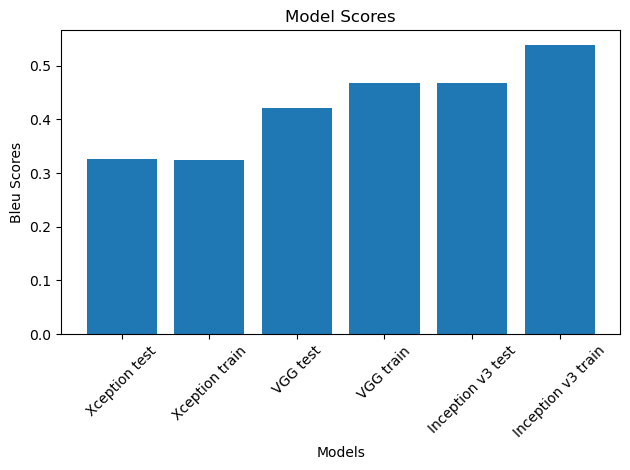

In [288]:
import matplotlib.pyplot as plt

models = ['Xception test','Xception train', 'VGG test','VGG train', 'Inception v3 test','Inception v3 train']
scores = [0.326,0.325, 0.421,0.467, 0.467,0.539]

plt.bar(models, scores)
plt.xlabel('Models')
plt.ylabel('Bleu Scores')
plt.title('Model Scores')
plt.xticks(rotation=45)  
plt.tight_layout()  
plt.show()



In [ ]:
Inception v3 - 0.467

In [ ]:
Vgg - 0.421

In [ ]:
Xception - 0.326